In [ ]:
import os
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
import os
import random
import torch
import soundfile as sf
from sklearn.model_selection import StratifiedShuffleSplit
import numpy as np

class LibriSpeechDataset:
    def __init__(self, corpus_root, num_speakers=40, num_utterances_per_speaker=10, frame_duration_ms=30, test_size=0.2, overlap=0.5, segmented=False):
        self.corpus_root = corpus_root
        self.num_speakers = num_speakers
        self.num_utterances_per_speaker = num_utterances_per_speaker
        self.frame_duration_ms = frame_duration_ms
        self.test_size = test_size
        self.overlap = overlap
        self.segmented = segmented
        self.speaker_ids = self._select_speaker_ids()
        self.speaker_id_map = {speaker_id: i for i, speaker_id in enumerate(self.speaker_ids)}
        self.dataset = self._create_dataset()
        self.train_dataset, self.test_dataset = self._create_train_test_split()
    # se selecteaza un subset aleator de vorbitori
    def _select_speaker_ids(self):
        all_speaker_dirs = [d for d in os.listdir(self.corpus_root) if os.path.isdir(os.path.join(self.corpus_root, d))]
        random.seed(42)
        return random.sample(all_speaker_dirs, self.num_speakers)
    # se returneaza fisierele cu extensia .flac pentru fiecare vorbitor
    def _get_flac_files(self, speaker_id):
        speaker_path = os.path.join(self.corpus_root, speaker_id)
        flac_files = []
        for root, dirs, files in os.walk(speaker_path):
            for file in files:
                if file.endswith('.flac'):
                    flac_files.append(os.path.join(root, file))
        return flac_files
    # se incarca fisierul audio
    def _load_audio(self, flac_file):
        audio, samplerate = sf.read(flac_file)
        return audio, samplerate

    def _segment_audio(self, audio, samplerate):
        frame_length = int(samplerate * (self.frame_duration_ms / 1000)) # se calculeaza lungimea cadrului
        overlap_length = int(frame_length * self.overlap) # se calculeaza suprapunerea
        frames = []
        window = np.hamming(frame_length) # se aplica fereastra Hamming
        # se obtin cadrelee din inregistrarea audio
        for i in range(0, len(audio) - frame_length + 1, frame_length - overlap_length):
            start = i
            end = start + frame_length
            frame = audio[start:end]
            frame = frame * window
            frames.append(frame)

        return frames

    def _create_dataset(self):
        dataset = []
        for speaker_id in self.speaker_ids:
            flac_files = self._get_flac_files(speaker_id) # se obtine lista fisierele .flac pentru vorbitorul curent
            random.seed(42)
            selected_files = random.sample(flac_files, min(self.num_utterances_per_speaker, len(flac_files)))
            for flac_file in selected_files:
                audio, samplerate = self._load_audio(flac_file)
                label = self.speaker_id_map[speaker_id]
                if self.segmented: # daca este specificat sa se segmenteze inregistrarile, se returneaza o lista de tupluri formate din
                # lista de cadre pentru inregistrarea curenta si eticheta corespunzatoare acestora
                    frames = self._segment_audio(audio, samplerate)
                    dataset.append((frames, torch.LongTensor([label]).squeeze()))
                else: # daca nu, se returneaza o lista de tupluri formate din inregistrarea audio si eticheta corespunzatoare
                    dataset.append((audio, torch.LongTensor([label]).squeeze()))
        return dataset

    def _create_train_test_split(self):
        if not self.dataset:
            raise ValueError("No audio files found for the selected speakers.")

        frames, speaker_ids = zip(*self.dataset)
        splitter = StratifiedShuffleSplit(n_splits=1, test_size=self.test_size, random_state=42)
        # se genereaza indicii pentru seturile de antrenare si testare
        train_indices, test_indices = next(splitter.split(frames, speaker_ids))

        train_dataset = [self.dataset[i] for i in train_indices]
        test_dataset = [self.dataset[i] for i in test_indices]

        return train_dataset, test_dataset

    def __getitem__(self, index, split='train'):
        if split == 'train':
            dataset = self.train_dataset
        elif split == 'test':
            dataset = self.test_dataset
        else:
            raise ValueError("Invalid split parameter. Use 'train' or 'test'.")
        audio, speaker_id = dataset[index]
        return audio, speaker_id

    def __len__(self):
        return len(self.dataset)
    # lungimea maxima a unei inregistrari
    def max_audio_length(self):
        max_length = 0
        for audio, _ in self.dataset:
            if len(audio) > max_length:
                max_length = len(audio)
        return max_length


corpus_root = "drive/MyDrive/LibriSpeech/test-clean"

# setul de date nesegmentat
librispeech_dataset = LibriSpeechDataset(corpus_root, segmented=False)
print("Dimensiunea setului de antrenare nesegmentat:", len(librispeech_dataset.train_dataset))
print("Dimensiunea setului de testare nesegmentat:", len(librispeech_dataset.test_dataset))

# setul de date segmentat
segmented_librispeech_dataset = LibriSpeechDataset(corpus_root, segmented=True)
print("Dimensiunea setului de antrenare segmentat:", len(segmented_librispeech_dataset.train_dataset))
print("Dimensiunea setului de testare segmentat:", len(segmented_librispeech_dataset.test_dataset))

# full
librispeech_train_dataset = librispeech_dataset.train_dataset
librispeech_test_dataset = librispeech_dataset.test_dataset

# segmented
librispeech_segmented_train_dataset = segmented_librispeech_dataset.train_dataset
librispeech_segmented_test_dataset = segmented_librispeech_dataset.test_dataset

Dimensiunea setului de antrenare nesegmentat: 320
Dimensiunea setului de testare nesegmentat: 80
Dimensiunea setului de antrenare segmentat: 320
Dimensiunea setului de testare segmentat: 80


In [ ]:
import os
import random
import torch
import soundfile as sf
from sklearn.model_selection import train_test_split
import numpy as np

class TIMITDataset:
    def __init__(self, corpus_root, frame_duration_ms=30, test_size=0.2, overlap=0.5, segmented=False):
        self.corpus_root = corpus_root
        self.frame_duration_ms = frame_duration_ms
        self.test_size = test_size
        self.overlap = overlap
        self.segmented = segmented
        self.speaker_ids = self._select_speaker_ids()
        self.speaker_id_map = {speaker_id: i for i, speaker_id in enumerate(self.speaker_ids)}
        self.dataset = self._create_dataset()
        self.train_dataset, self.test_dataset = self._create_train_test_split()

    # se selecteaza aleator cate 10 vorbitori din fiecare subdirector de dialect din directorul 'TRAIN'
    def _select_speaker_ids(self):
        train_path = os.path.join(self.corpus_root, 'TRAIN')
        all_speaker_dirs = []
        for dr in os.listdir(train_path):
            dr_path = os.path.join(train_path, dr)
            if os.path.isdir(dr_path):
                speaker_dirs = [os.path.join(dr_path, d) for d in os.listdir(dr_path) if os.path.isdir(os.path.join(dr_path, d))]
                random.seed(42)
                selected_speakers = random.sample(speaker_dirs, min(10, len(speaker_dirs)))
                for speaker_dir in selected_speakers:
                    all_speaker_dirs.append(speaker_dir)
        return all_speaker_dirs
    # se returneaza fisierele cu extensia .wav pentru fiecare vorbitor
    def _get_wav_files(self, speaker_path):
        wav_files = []
        for root, dirs, files in os.walk(speaker_path):
            for file in files:
                if file.lower().endswith('.wav'):
                    wav_files.append(os.path.join(root, file))
        return wav_files
    # se incarca fisierul audio
    def _load_audio(self, wav_file):
        audio, samplerate = sf.read(wav_file)
        return audio, samplerate

    def _segment_audio(self, audio, samplerate):
        frame_length = int(samplerate * (self.frame_duration_ms / 1000)) # se calculeaza lungimea cadrului
        overlap_length = int(frame_length * self.overlap) # se calculeaza suprapunerea
        frames = []
        window = np.hamming(frame_length) # se aplica fereastra Hamming
        # se obtin cadrelee din inregistrarea audio
        for i in range(0, len(audio) - frame_length + 1, frame_length - overlap_length):
            start = i
            end = start + frame_length
            frame = audio[start:end]
            frame = frame * window
            frames.append(frame)

        return frames



    def _create_dataset(self):
        dataset = []
        for speaker_path in self.speaker_ids:
            wav_files = self._get_wav_files(speaker_path)
            for wav_file in wav_files:
                audio, samplerate = self._load_audio(wav_file)
                label = self.speaker_id_map[speaker_path]
                if self.segmented: # daca se specifica segmentarea setului de date, se va returna o lista de tupluri
                # formate din lista de cadre pentru fiecare inregistrare si eticheta corespunzatoare
                    frames = self._segment_audio(audio, samplerate)
                    dataset.append((frames, torch.LongTensor([label]).squeeze()))
                else: # daca nu se returneaza o lista de tupluri formate din inregistrarea audio si eticheta corespunzatoare
                    dataset.append((audio, torch.LongTensor([label]).squeeze()))
        return dataset

    def _create_train_test_split(self):
        if not self.dataset:
            raise ValueError("No audio files found for the selected speakers.")

        frames, speaker_ids = zip(*self.dataset)
        train_frames, test_frames, train_speaker_ids, test_speaker_ids = train_test_split(frames, speaker_ids, test_size=self.test_size, stratify=speaker_ids)

        train_dataset = [(train_frames[i], train_speaker_ids[i]) for i in range(len(train_frames))]
        test_dataset = [(test_frames[i], test_speaker_ids[i]) for i in range(len(test_frames))]

        return train_dataset, test_dataset

    def __getitem__(self, index, split='train'):
        if split == 'train':
            dataset = self.train_dataset
        elif split == 'test':
            dataset = self.test_dataset
        else:
            raise ValueError("Invalid split parameter. Use 'train' or 'test'.")
        audio, speaker_id = dataset[index]
        return audio, speaker_id

    def __len__(self):
        return len(self.dataset)

    def max_audio_length(self):
        max_length = 0
        for audio, _ in self.dataset:
            if len(audio) > max_length:
                max_length = len(audio)
        return max_length


corpus_root = "drive/MyDrive/TIMIT"

# setul de date segmentat
timit_segmented_dataset = TIMITDataset(corpus_root, segmented=True)
print("Dimensiunea setului de antrenare segmentat:", len(timit_segmented_dataset.train_dataset))
print("Dimensiunea setului de testare segmentat:", len(timit_segmented_dataset.test_dataset))

# setul de date nesegmentat
timit_dataset = TIMITDataset(corpus_root, segmented=False)
print("Dimensiunea setului de antrenare nesegmentat:", len(timit_dataset.train_dataset))
print("Dimensiunea setului de testare nesegmentat:", len(timit_dataset.test_dataset))

# full
timit_train_dataset = timit_dataset.train_dataset
timit_test_dataset = timit_dataset.test_dataset

# segmented
timit_segmented_train_dataset = timit_segmented_dataset.train_dataset
timit_segmented_test_dataset = timit_segmented_dataset.test_dataset

Dimensiunea setului de antrenare segmentat: 640
Dimensiunea setului de testare segmentat: 160
Dimensiunea setului de antrenare nesegmentat: 640
Dimensiunea setului de testare nesegmentat: 160


In [ ]:
max_length_librispeech = librispeech_dataset.max_audio_length() / 16000
print(f"Lungimea maxima a unei inregistrari pentru LibriSpeech: {max_length_librispeech}s")
max_length_timit = timit_dataset.max_audio_length() / 16000
print(f"Lungimea maxima a unei inregistrari pentru TIMIT: {max_length_timit}s")

Lungimea maxima a unei inregistrari pentru LibriSpeech: 29.6s
Lungimea maxima a unei inregistrari pentru TIMIT: 6.0544375s


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from tqdm import tqdm
import os

def iterate(model, dataloader, optimizer, loss_fn, is_training=True, device='cuda'):
    """
    Single-iteration function, either for training or for testing.
    Iterates over dataloader and computes avg_loss and accuracy, in a classification setting.

    :param model: nn.Module, neural network
    :param dataloader: torch.utils.data.DataLoader object to iterate over
    :param optimizer: torch.optim object, used to update the model if is_training=True
    :param loss_fn: cost function
    :param is_training: bool, whether this iteration should compute gradients and update the model
    """
    # Set the model to training mode if it's a training step, otherwise to evaluation mode
    model.train() if is_training else model.eval()

    total_loss = 0.0
    correct_predictions = 0
    total_samples = 0

    for inputs, labels in tqdm(dataloader):
        inputs, labels = inputs.to(device), labels.to(device)

        # Forward pass
        outputs = model(inputs)

        if isinstance(loss_fn, nn.BCEWithLogitsLoss):
        # Codare one-hot pentru etichete
          num_classes = model.n_classes
          labels_one_hot = F.one_hot(labels, num_classes=num_classes).float()
          loss = loss_fn(outputs, labels_one_hot)
        else:
          loss = loss_fn(outputs, labels)

        # Backward pass and optimization if it's a training step
        if is_training:
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        # Metrics calculation (accuracy for simplicity, adjust as needed)
        _, predicted = torch.max(outputs, 1)
        correct_predictions += (predicted == labels).sum().item()
        total_samples += labels.size(0)

        # Cumulative loss for reporting
        total_loss += loss.item()

    # Calculate average loss and accuracy
    avg_loss = total_loss / len(dataloader)
    accuracy = correct_predictions / total_samples if total_samples > 0 else None

    return avg_loss, accuracy

def train_loop(model, train_loader, optimizer, loss, epochs, test_loader=None, device="cpu", folder_path=None, file_name=None, print_frequency=1):
    """
    Train loop functionality, for iterating, saving and (optional) loading pretrained model.
    """
    train_losses = []
    test_losses = []

    best_loss = torch.inf
    model = model.to(device)

    if not os.path.exists(folder_path):
        os.makedirs(folder_path)
    else:
        try:
            model.load_state_dict(
                torch.load(
                    os.path.join(folder_path, file_name)
                )["state_dict"]
            )
        except:
            print("Couldn't load model")

    for e in range(1, epochs + 1):
        train_loss, train_acc = iterate(model, train_loader, optimizer, loss, device=device)
        train_losses.append(train_loss)

        if test_loader:
            test_loss, test_acc = iterate(model, test_loader, optimizer, loss, is_training=False, device=device)
            test_losses.append(test_loss)
        else:
            test_loss, test_acc = None, None

        if train_loss < best_loss:
            best_loss = train_loss

            checkpoint = {'state_dict': model.state_dict(),'optimizer': optimizer.state_dict()}
            torch.save(checkpoint, os.path.join(folder_path, file_name))

        if e % print_frequency == 0:
            print(f"Epoch {e}/{epochs}: train_loss={train_loss} train_acc={train_acc} test_loss={test_loss} test_acc={test_acc}")

    return train_losses, test_losses

def get_prediction_targets(model, dataloader, device="cpu"):
    model.eval()

    true_targets = torch.empty(len(dataloader.dataset), dtype=torch.long, device=device)
    predicted = torch.empty(len(dataloader.dataset), dtype=torch.long, device=device)

    last_index = 0
    for inputs, labels in tqdm(dataloader):
        inputs, labels = inputs.to(device), labels.to(device)

        outputs = model(inputs)
        preds = torch.argmax(outputs, dim=1)

        true_targets[last_index: last_index + inputs.shape[0]] = labels
        predicted[last_index: last_index + inputs.shape[0]] = preds

        last_index += inputs.shape[0]

    return true_targets.cpu().numpy(), predicted.cpu().numpy()

**I. Abordare bazată pe rețelele neurale complet conectate (FCNN)**: Am ales un set de trăsături semnificative pentru reprezentarea și analiza semnalului audio: MFCC (coeficienții mel-cepstrali), delta și delta-delta MFCC, coeficienții LPC, și rata de trecere prin zero. După extragerea trăsăturilor, acestea au fost concatenate pentru formarea unui vector de trăsături final, iar apoi se calculează media și deviația standard pentru fiecare trăsătură în întregul vector rezultat. Aceste statistici sunt apoi concatenate pentru a forma un vector final de trăsături la nivel de înregistrare.

In [ ]:
import numpy as np
import librosa
import torch

class FeatureExtractor:
    def __init__(self, n_mfcc=13, sr=16000, lpc_order=10):
        self.n_mfcc = n_mfcc
        self.sr = sr
        self.lpc_order = lpc_order

    def extract_features(self, frames):
        # functia primeste ca parametru toate cadrele dintr-o inregistrare audio
        mfcc_list = []
        delta_mfccs_list = []
        delta_delta_mfccs_list = []
        lpc_list = []
        zcr_list = []

        # extragere trasaturi pentru fiecare cadru
        for frame in frames:
            # MFCC
            mfccs = librosa.feature.mfcc(y=frame, sr=self.sr, n_mfcc=self.n_mfcc, n_fft=480)
            mfcc_list.append(mfccs)  # Append the MFCCs for the frame

            # delta MFCC
            delta_mfcc = librosa.feature.delta(mfccs.squeeze(), width=9, order=1)
            delta_mfccs_list.append(delta_mfcc)

            # delta-delta MFCC
            delta_delta_mfcc = librosa.feature.delta(mfccs.squeeze(), width=9, order=2)
            delta_delta_mfccs_list.append(delta_delta_mfcc)

            # LPC
            lpc_coeffs = librosa.lpc(y=frame, order=self.lpc_order)
            lpc_list.append(lpc_coeffs)

            # ZCR
            zcr = librosa.feature.zero_crossing_rate(frame)
            zcr_list.append(np.mean(zcr))

        mfcc_array = np.array(mfcc_list)
        delta_mfccs_array = np.array(delta_mfccs_list)
        delta_delta_mfccs_array = np.array(delta_delta_mfccs_list)
        lpc_array = np.array(lpc_list)
        zcr_array = np.array(zcr_list)

        mfcc_tensor = torch.tensor(mfcc_array)
        delta_mfccs_tensor = torch.tensor(delta_mfccs_array)
        delta_delta_mfccs_tensor = torch.tensor(delta_delta_mfccs_array)
        lpc_tensor = torch.tensor(lpc_array)
        zcr_tensor = torch.tensor(zcr_array)

        # se concateneaza toate trasaturile pe dim = 1
        features = torch.cat((mfcc_tensor.squeeze(), delta_mfccs_tensor, delta_delta_mfccs_tensor, lpc_tensor, zcr_tensor.unsqueeze(1)), dim=1)

        # se calculeaza media si deviatia standard
        mean_features = torch.mean(features, dim=0)
        std_features = torch.std(features, dim=0)

        # se concateneaza pentru formarea unui vector de trasaturi final
        feature_vector = torch.cat((mean_features, std_features), dim=0) # se obtine in final un vector de trasaturi de 2*(3*13 + 11 + 1) = 102 elemente
        feature_vector = feature_vector.float()

        # se normalizeaza vectorul de trasaturi
        normalized_feature_vector = (feature_vector - feature_vector.mean()) / feature_vector.std()

        return torch.FloatTensor(normalized_feature_vector)

In [ ]:
featureExtractor = FeatureExtractor()

# se extrag trasaturile din fiecare cadru pentru setul de date Librispeech
librispeech_train_data_fcnn = [(featureExtractor.extract_features(frames), label) for frames, label in librispeech_segmented_train_dataset]
librispeech_test_data_fcnn = [(featureExtractor.extract_features(frames), label) for frames, label in librispeech_segmented_test_dataset]

In [ ]:
# se extrag trasaturile din fiecare cadru pentru setul de date TIMIT
timit_train_data_fcnn = [(featureExtractor.extract_features(frames), label) for frames, label in timit_segmented_train_dataset]
timit_test_data_fcnn = [(featureExtractor.extract_features(frames), label) for frames, label in timit_segmented_test_dataset]

In [ ]:
import torch
import torch.nn as nn

class FCNN(nn.Module):
    def __init__(self, input_size, hidden_sizes, n_classes, dropout_probs):
        ''' hidden_sizes: Lista care conține dimensiunile straturilor ascunse ale rețelei neuronale
            dropout_probs: Lista care conține probabilitățile de dropout pentru fiecare strat ascuns al rețelei
        '''
        super(FCNN, self).__init__()
        self.n_classes = n_classes

        # definire straturi ascunse si dropout
        layers = []
        for i, (hidden_size, dropout_prob) in enumerate(zip(hidden_sizes, dropout_probs)):
            if i == 0:
                layers.append(nn.Linear(input_size, hidden_size))
            else:
                layers.append(nn.Linear(hidden_sizes[i-1], hidden_size))
            layers.append(nn.ReLU()) # functia de activare ReLU
            layers.append(nn.Dropout(p=dropout_prob)) # strat de dropout
        # stratul de iesire
        layers.append(nn.Linear(hidden_sizes[-1], n_classes))

        # seventa straturilor
        self.fc_layers = nn.Sequential(*layers)

    def forward(self, x):
        # propagarea prin straturile fully connected
        return self.fc_layers(x)

In [ ]:
# configuratii alese
hidden_sizes_list = [
    [64, 32],
    [128, 64, 32],
    [64, 32],
    [256, 128, 64],
    [512, 256, 128],
    [128, 128, 64, 32],
    [64, 64, 32, 32],
    [256, 128],
    [128, 128, 64]
]

dropout_probs_list = [
    [0.1, 0.1],
    [0.2, 0.2, 0.2],
    [0.5, 0.5],
    [0.3, 0.3, 0.3],
    [0.4, 0.4, 0.4],
    [0.3, 0.3, 0.3, 0.3],
    [0.2, 0.2, 0.2, 0.2],
    [0.1, 0.1],
    [0.25, 0.25, 0.25]
]

In [ ]:
import pandas as pd
from tabulate import tabulate
from torch.utils.data import DataLoader

batch_size = 32
lr = 1e-3
print_frequency = 1
epochs = 300

librispeech_train_dl = DataLoader(librispeech_train_data_fcnn, batch_size=batch_size, shuffle=True)
librispeech_test_dl = DataLoader(librispeech_test_data_fcnn, batch_size=batch_size, shuffle=False)

def calculate_accuracy(model, dataloader, device='cuda'):
    correct_predictions = 0
    total_samples = 0
    model.eval()
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)
            correct_predictions += (predicted == labels).sum().item()
            total_samples += labels.size(0)
    accuracy = correct_predictions / total_samples if total_samples > 0 else None
    return accuracy


results = []
for i in range(len(hidden_sizes_list)):
    for loss_name, loss in [('CrossEntropyLoss', nn.CrossEntropyLoss()), ('BCEWithLogitsLoss', nn.BCEWithLogitsLoss()), ('MultiMarginLoss', nn.MultiMarginLoss())]:
        model = FCNN(input_size = 102, hidden_sizes = hidden_sizes_list[i], n_classes = 40, dropout_probs = dropout_probs_list[i])
        optimizer = torch.optim.Adam(model.parameters(), lr=lr)

        folder_path = "drive/MyDrive/models/librispeech_fcnn"

        if loss_name == 'CrossEntropyLoss':
            file_name = f"model_{i+1}_cross_entropy.pth"
        elif loss_name == 'BCEWithLogitsLoss':
            file_name = f"model_{i+1}_bcewithlogits.pth"
        elif loss_name == 'MultiMarginLoss':
            file_name = f"model_{i+1}_multi_margin_loss"
        else:
            raise ValueError("Unknown loss function.")

        _ = train_loop(
              model,
              train_loader=librispeech_train_dl,
              optimizer=optimizer,
              loss=loss,
              epochs=epochs,
              test_loader=librispeech_test_dl,
              device="cuda",
              folder_path=folder_path,
              file_name=file_name,
            )


        # se calculeaza acuratetea pe seturile de antrenare si testare
        train_accuracy = calculate_accuracy(model, librispeech_train_dl, device="cuda")
        test_accuracy = calculate_accuracy(model, librispeech_test_dl, device="cuda")

        results.append([f'Model {i+1}', loss_name, train_accuracy, test_accuracy])

print(tabulate(results, headers=['Model Configuration', 'Criterion', 'Training Accuracy', 'Testing Accuracy'], tablefmt='grid'))


100%|██████████| 10/10 [00:00<00:00, 462.67it/s]

100%|██████████| 3/3 [00:00<00:00, 747.20it/s]


Epoch 1/300: train_loss=3.7118290424346925 train_acc=0.025 test_loss=3.6926992734273276 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 422.11it/s]

100%|██████████| 3/3 [00:00<00:00, 762.05it/s]


Epoch 2/300: train_loss=3.693656849861145 train_acc=0.025 test_loss=3.687894900639852 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 406.57it/s]

100%|██████████| 3/3 [00:00<00:00, 859.14it/s]


Epoch 3/300: train_loss=3.6922255754470825 train_acc=0.025 test_loss=3.685689131418864 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 415.49it/s]

100%|██████████| 3/3 [00:00<00:00, 787.71it/s]


Epoch 4/300: train_loss=3.6942310333251953 train_acc=0.025 test_loss=3.6832422415415444 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 433.20it/s]

100%|██████████| 3/3 [00:00<00:00, 880.85it/s]


Epoch 5/300: train_loss=3.689915680885315 train_acc=0.025 test_loss=3.681053797403971 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 471.48it/s]

100%|██████████| 3/3 [00:00<00:00, 1019.35it/s]


Epoch 6/300: train_loss=3.688682723045349 train_acc=0.03125 test_loss=3.6797967751820884 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 255.17it/s]

100%|██████████| 3/3 [00:00<00:00, 502.59it/s]


Epoch 7/300: train_loss=3.68420991897583 train_acc=0.03125 test_loss=3.6779611110687256 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 340.35it/s]

100%|██████████| 3/3 [00:00<00:00, 1027.76it/s]


Epoch 8/300: train_loss=3.6822186946868896 train_acc=0.025 test_loss=3.6765801906585693 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 305.57it/s]

100%|██████████| 3/3 [00:00<00:00, 573.70it/s]


Epoch 9/300: train_loss=3.679855155944824 train_acc=0.04375 test_loss=3.6737307707468667 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 341.84it/s]

100%|██████████| 3/3 [00:00<00:00, 1180.83it/s]


Epoch 10/300: train_loss=3.6770989179611204 train_acc=0.0375 test_loss=3.6707011063893638 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 312.13it/s]

100%|██████████| 3/3 [00:00<00:00, 972.63it/s]


Epoch 11/300: train_loss=3.6695874691009522 train_acc=0.03125 test_loss=3.66793425877889 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 389.93it/s]

100%|██████████| 3/3 [00:00<00:00, 843.08it/s]


Epoch 12/300: train_loss=3.6708730459213257 train_acc=0.05625 test_loss=3.6638370354970298 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 321.33it/s]

100%|██████████| 3/3 [00:00<00:00, 952.75it/s]


Epoch 13/300: train_loss=3.6695812702178956 train_acc=0.04375 test_loss=3.658478260040283 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 366.44it/s]

100%|██████████| 3/3 [00:00<00:00, 1005.75it/s]


Epoch 14/300: train_loss=3.660029745101929 train_acc=0.05625 test_loss=3.6530107657114663 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 390.68it/s]

100%|██████████| 3/3 [00:00<00:00, 721.25it/s]


Epoch 15/300: train_loss=3.65479462146759 train_acc=0.084375 test_loss=3.6463189125061035 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 366.02it/s]

100%|██████████| 3/3 [00:00<00:00, 1124.48it/s]


Epoch 16/300: train_loss=3.643223738670349 train_acc=0.09375 test_loss=3.638845364252726 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 348.75it/s]

100%|██████████| 3/3 [00:00<00:00, 1063.28it/s]


Epoch 17/300: train_loss=3.6352788686752318 train_acc=0.090625 test_loss=3.628465414047241 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 368.25it/s]

100%|██████████| 3/3 [00:00<00:00, 1148.60it/s]


Epoch 18/300: train_loss=3.6253246068954468 train_acc=0.11875 test_loss=3.6141056219736734 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 372.89it/s]

100%|██████████| 3/3 [00:00<00:00, 370.62it/s]


Epoch 19/300: train_loss=3.6048499822616575 train_acc=0.1375 test_loss=3.5982861518859863 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 307.22it/s]

100%|██████████| 3/3 [00:00<00:00, 654.98it/s]


Epoch 20/300: train_loss=3.5930264949798585 train_acc=0.134375 test_loss=3.5771635373433432 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 377.93it/s]

100%|██████████| 3/3 [00:00<00:00, 484.05it/s]


Epoch 21/300: train_loss=3.5683387517929077 train_acc=0.121875 test_loss=3.5546589692433677 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 289.21it/s]

100%|██████████| 3/3 [00:00<00:00, 879.86it/s]


Epoch 22/300: train_loss=3.5432434558868406 train_acc=0.165625 test_loss=3.5257566769917807 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 331.65it/s]

100%|██████████| 3/3 [00:00<00:00, 532.77it/s]


Epoch 23/300: train_loss=3.511346173286438 train_acc=0.134375 test_loss=3.4918903509775796 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 369.43it/s]

100%|██████████| 3/3 [00:00<00:00, 919.27it/s]


Epoch 24/300: train_loss=3.454938220977783 train_acc=0.165625 test_loss=3.442436854044596 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 383.19it/s]

100%|██████████| 3/3 [00:00<00:00, 900.07it/s]


Epoch 25/300: train_loss=3.414424777030945 train_acc=0.13125 test_loss=3.3880353768666587 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 283.66it/s]

100%|██████████| 3/3 [00:00<00:00, 643.96it/s]


Epoch 26/300: train_loss=3.3723018407821654 train_acc=0.15 test_loss=3.3291331926981607 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 365.37it/s]

100%|██████████| 3/3 [00:00<00:00, 1183.72it/s]


Epoch 27/300: train_loss=3.296171045303345 train_acc=0.159375 test_loss=3.257331371307373 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 357.17it/s]

100%|██████████| 3/3 [00:00<00:00, 545.47it/s]


Epoch 28/300: train_loss=3.2250014543533325 train_acc=0.134375 test_loss=3.185088555018107 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 361.12it/s]

100%|██████████| 3/3 [00:00<00:00, 1127.10it/s]


Epoch 29/300: train_loss=3.1373047113418577 train_acc=0.171875 test_loss=3.1097829341888428 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 360.30it/s]

100%|██████████| 3/3 [00:00<00:00, 577.41it/s]


Epoch 30/300: train_loss=3.065641713142395 train_acc=0.16875 test_loss=3.025364398956299 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 352.97it/s]

100%|██████████| 3/3 [00:00<00:00, 828.26it/s]


Epoch 31/300: train_loss=2.9774741172790526 train_acc=0.15625 test_loss=2.947699546813965 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 344.66it/s]

100%|██████████| 3/3 [00:00<00:00, 937.14it/s]


Epoch 32/300: train_loss=2.9085766315460204 train_acc=0.190625 test_loss=2.8669513861338296 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 349.30it/s]

100%|██████████| 3/3 [00:00<00:00, 913.79it/s]


Epoch 33/300: train_loss=2.8155125617980956 train_acc=0.215625 test_loss=2.794285456339518 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 356.33it/s]

100%|██████████| 3/3 [00:00<00:00, 675.88it/s]


Epoch 34/300: train_loss=2.734542894363403 train_acc=0.228125 test_loss=2.719078540802002 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 355.56it/s]

100%|██████████| 3/3 [00:00<00:00, 820.70it/s]


Epoch 35/300: train_loss=2.6830396175384523 train_acc=0.25625 test_loss=2.656891107559204 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 348.11it/s]

100%|██████████| 3/3 [00:00<00:00, 543.96it/s]


Epoch 36/300: train_loss=2.6344208478927613 train_acc=0.2625 test_loss=2.586773077646891 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 349.13it/s]

100%|██████████| 3/3 [00:00<00:00, 848.08it/s]


Epoch 37/300: train_loss=2.5776116132736204 train_acc=0.26875 test_loss=2.5464611848195395 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 292.80it/s]

100%|██████████| 3/3 [00:00<00:00, 1072.16it/s]


Epoch 38/300: train_loss=2.4976306915283204 train_acc=0.296875 test_loss=2.4878809452056885 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 320.03it/s]

100%|██████████| 3/3 [00:00<00:00, 660.24it/s]


Epoch 39/300: train_loss=2.4538348436355593 train_acc=0.3 test_loss=2.4374002615610757 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 330.95it/s]

100%|██████████| 3/3 [00:00<00:00, 927.19it/s]


Epoch 40/300: train_loss=2.4097625494003294 train_acc=0.30625 test_loss=2.397834857304891 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 348.33it/s]

100%|██████████| 3/3 [00:00<00:00, 736.83it/s]


Epoch 41/300: train_loss=2.3561104774475097 train_acc=0.33125 test_loss=2.348676840464274 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 389.10it/s]

100%|██████████| 3/3 [00:00<00:00, 726.87it/s]


Epoch 42/300: train_loss=2.343686509132385 train_acc=0.28125 test_loss=2.3055150508880615 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 384.13it/s]

100%|██████████| 3/3 [00:00<00:00, 1144.32it/s]


Epoch 43/300: train_loss=2.2837110280990602 train_acc=0.3375 test_loss=2.258720795313517 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 304.56it/s]

100%|██████████| 3/3 [00:00<00:00, 476.57it/s]


Epoch 44/300: train_loss=2.2454928159713745 train_acc=0.340625 test_loss=2.227072556813558 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 316.98it/s]

100%|██████████| 3/3 [00:00<00:00, 919.87it/s]


Epoch 45/300: train_loss=2.189130258560181 train_acc=0.325 test_loss=2.1957948207855225 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 315.72it/s]

100%|██████████| 3/3 [00:00<00:00, 1025.59it/s]


Epoch 46/300: train_loss=2.148208808898926 train_acc=0.3875 test_loss=2.151784102121989 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 308.18it/s]

100%|██████████| 3/3 [00:00<00:00, 928.08it/s]


Epoch 47/300: train_loss=2.1514795780181886 train_acc=0.396875 test_loss=2.1350472370783486 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 293.75it/s]

100%|██████████| 3/3 [00:00<00:00, 778.89it/s]


Epoch 48/300: train_loss=2.1114953994750976 train_acc=0.396875 test_loss=2.10719362894694 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 294.90it/s]

100%|██████████| 3/3 [00:00<00:00, 1039.74it/s]


Epoch 49/300: train_loss=2.085984694957733 train_acc=0.36875 test_loss=2.08298130830129 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 338.19it/s]

100%|██████████| 3/3 [00:00<00:00, 924.13it/s]


Epoch 50/300: train_loss=2.076062595844269 train_acc=0.390625 test_loss=2.044319192568461 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 399.52it/s]

100%|██████████| 3/3 [00:00<00:00, 851.98it/s]


Epoch 51/300: train_loss=2.019838035106659 train_acc=0.4375 test_loss=2.0302580197652182 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 294.78it/s]

100%|██████████| 3/3 [00:00<00:00, 874.66it/s]


Epoch 52/300: train_loss=1.95299072265625 train_acc=0.434375 test_loss=1.9854922691980998 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 354.77it/s]

100%|██████████| 3/3 [00:00<00:00, 537.13it/s]


Epoch 53/300: train_loss=1.9866447925567627 train_acc=0.4 test_loss=1.9915520747502644 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 318.19it/s]

100%|██████████| 3/3 [00:00<00:00, 697.46it/s]


Epoch 54/300: train_loss=1.9857445001602172 train_acc=0.396875 test_loss=1.9494402805964153 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 335.01it/s]

100%|██████████| 3/3 [00:00<00:00, 872.42it/s]


Epoch 55/300: train_loss=1.8977517008781433 train_acc=0.428125 test_loss=1.925638238588969 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 313.25it/s]

100%|██████████| 3/3 [00:00<00:00, 1011.16it/s]


Epoch 56/300: train_loss=1.8633049130439758 train_acc=0.45625 test_loss=1.9149492581685383 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 384.25it/s]

100%|██████████| 3/3 [00:00<00:00, 1006.71it/s]


Epoch 57/300: train_loss=1.8440596342086792 train_acc=0.453125 test_loss=1.8865187962849934 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 366.08it/s]

100%|██████████| 3/3 [00:00<00:00, 675.52it/s]


Epoch 58/300: train_loss=1.8492358922958374 train_acc=0.428125 test_loss=1.8751248915990193 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 393.78it/s]

100%|██████████| 3/3 [00:00<00:00, 436.92it/s]


Epoch 59/300: train_loss=1.7914904832839966 train_acc=0.475 test_loss=1.8482060829798381 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 418.54it/s]

100%|██████████| 3/3 [00:00<00:00, 1003.10it/s]


Epoch 60/300: train_loss=1.802871549129486 train_acc=0.44375 test_loss=1.8421386082967122 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 401.38it/s]

100%|██████████| 3/3 [00:00<00:00, 1056.59it/s]


Epoch 61/300: train_loss=1.7338218331336974 train_acc=0.509375 test_loss=1.8119162718454997 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 399.92it/s]

100%|██████████| 3/3 [00:00<00:00, 1045.61it/s]


Epoch 62/300: train_loss=1.7890291929244995 train_acc=0.421875 test_loss=1.803078333536784 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 383.22it/s]

100%|██████████| 3/3 [00:00<00:00, 931.72it/s]


Epoch 63/300: train_loss=1.6953104853630065 train_acc=0.50625 test_loss=1.7831432422002156 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 399.95it/s]

100%|██████████| 3/3 [00:00<00:00, 1156.73it/s]


Epoch 64/300: train_loss=1.7267313122749328 train_acc=0.475 test_loss=1.77367107073466 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 354.82it/s]

100%|██████████| 3/3 [00:00<00:00, 1067.16it/s]


Epoch 65/300: train_loss=1.715120804309845 train_acc=0.459375 test_loss=1.7509625752766926 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 295.94it/s]

100%|██████████| 3/3 [00:00<00:00, 924.67it/s]


Epoch 66/300: train_loss=1.7043691515922545 train_acc=0.453125 test_loss=1.7461869716644287 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 256.13it/s]

100%|██████████| 3/3 [00:00<00:00, 612.81it/s]


Epoch 67/300: train_loss=1.6577352046966554 train_acc=0.528125 test_loss=1.7327183882395427 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 317.68it/s]

100%|██████████| 3/3 [00:00<00:00, 1003.66it/s]


Epoch 68/300: train_loss=1.6545329809188842 train_acc=0.503125 test_loss=1.7284178733825684 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 251.38it/s]

100%|██████████| 3/3 [00:00<00:00, 789.74it/s]


Epoch 69/300: train_loss=1.6548663139343263 train_acc=0.496875 test_loss=1.7109599908192952 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 302.23it/s]

100%|██████████| 3/3 [00:00<00:00, 983.42it/s]


Epoch 70/300: train_loss=1.6012229084968568 train_acc=0.534375 test_loss=1.6886265675226848 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 358.59it/s]

100%|██████████| 3/3 [00:00<00:00, 1038.54it/s]


Epoch 71/300: train_loss=1.6060284733772279 train_acc=0.5125 test_loss=1.678095817565918 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 291.63it/s]

100%|██████████| 3/3 [00:00<00:00, 675.41it/s]


Epoch 72/300: train_loss=1.5885464429855347 train_acc=0.5 test_loss=1.6578023036321003 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 368.19it/s]

100%|██████████| 3/3 [00:00<00:00, 768.66it/s]


Epoch 73/300: train_loss=1.620194637775421 train_acc=0.475 test_loss=1.6752748886744182 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 372.71it/s]

100%|██████████| 3/3 [00:00<00:00, 898.52it/s]


Epoch 74/300: train_loss=1.563485050201416 train_acc=0.54375 test_loss=1.6414604584376018 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 329.62it/s]

100%|██████████| 3/3 [00:00<00:00, 992.19it/s]


Epoch 75/300: train_loss=1.5047240495681762 train_acc=0.546875 test_loss=1.634826938311259 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 310.30it/s]

100%|██████████| 3/3 [00:00<00:00, 530.30it/s]


Epoch 76/300: train_loss=1.4791337251663208 train_acc=0.578125 test_loss=1.6236780484517415 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 288.44it/s]

100%|██████████| 3/3 [00:00<00:00, 916.39it/s]


Epoch 77/300: train_loss=1.5306032538414 train_acc=0.534375 test_loss=1.6036494970321655 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 300.01it/s]

100%|██████████| 3/3 [00:00<00:00, 1018.12it/s]


Epoch 78/300: train_loss=1.5415651321411132 train_acc=0.534375 test_loss=1.600717027982076 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 324.16it/s]

100%|██████████| 3/3 [00:00<00:00, 704.29it/s]


Epoch 79/300: train_loss=1.5057808995246886 train_acc=0.546875 test_loss=1.5959817965825398 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 329.58it/s]

100%|██████████| 3/3 [00:00<00:00, 838.02it/s]


Epoch 80/300: train_loss=1.4787302494049073 train_acc=0.525 test_loss=1.588503321011861 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 293.45it/s]

100%|██████████| 3/3 [00:00<00:00, 515.50it/s]


Epoch 81/300: train_loss=1.509682548046112 train_acc=0.525 test_loss=1.5799603859583538 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 273.31it/s]

100%|██████████| 3/3 [00:00<00:00, 902.58it/s]


Epoch 82/300: train_loss=1.4702340364456177 train_acc=0.540625 test_loss=1.5862650473912556 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 332.75it/s]

100%|██████████| 3/3 [00:00<00:00, 746.72it/s]


Epoch 83/300: train_loss=1.4515079855918884 train_acc=0.521875 test_loss=1.554065187772115 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 288.89it/s]

100%|██████████| 3/3 [00:00<00:00, 509.33it/s]


Epoch 84/300: train_loss=1.45262154340744 train_acc=0.55625 test_loss=1.5497201283772786 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 324.57it/s]

100%|██████████| 3/3 [00:00<00:00, 799.07it/s]


Epoch 85/300: train_loss=1.4344267129898072 train_acc=0.5375 test_loss=1.5407710870107014 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 377.34it/s]

100%|██████████| 3/3 [00:00<00:00, 973.01it/s]


Epoch 86/300: train_loss=1.4344899296760558 train_acc=0.55 test_loss=1.5344810485839844 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 324.97it/s]

100%|██████████| 3/3 [00:00<00:00, 834.91it/s]


Epoch 87/300: train_loss=1.4280710816383362 train_acc=0.55 test_loss=1.5261276165644329 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 352.16it/s]

100%|██████████| 3/3 [00:00<00:00, 917.52it/s]


Epoch 88/300: train_loss=1.3430623769760133 train_acc=0.5875 test_loss=1.5124680598576863 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 328.27it/s]

100%|██████████| 3/3 [00:00<00:00, 785.21it/s]


Epoch 89/300: train_loss=1.3279329895973206 train_acc=0.578125 test_loss=1.5043185949325562 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 286.86it/s]

100%|██████████| 3/3 [00:00<00:00, 643.56it/s]


Epoch 90/300: train_loss=1.3772135972976685 train_acc=0.540625 test_loss=1.4928538799285889 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 340.33it/s]

100%|██████████| 3/3 [00:00<00:00, 811.70it/s]


Epoch 91/300: train_loss=1.3583610653877258 train_acc=0.553125 test_loss=1.4953825076421101 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 201.87it/s]

100%|██████████| 3/3 [00:00<00:00, 712.07it/s]


Epoch 92/300: train_loss=1.3287022113800049 train_acc=0.58125 test_loss=1.47267746925354 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 321.82it/s]

100%|██████████| 3/3 [00:00<00:00, 429.54it/s]


Epoch 93/300: train_loss=1.3299243688583373 train_acc=0.63125 test_loss=1.4784835974375408 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 311.81it/s]

100%|██████████| 3/3 [00:00<00:00, 719.93it/s]


Epoch 94/300: train_loss=1.2992665886878967 train_acc=0.6125 test_loss=1.4592243830362956 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 276.77it/s]

100%|██████████| 3/3 [00:00<00:00, 919.40it/s]


Epoch 95/300: train_loss=1.348054575920105 train_acc=0.6 test_loss=1.4557784795761108 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 310.57it/s]

100%|██████████| 3/3 [00:00<00:00, 1032.32it/s]


Epoch 96/300: train_loss=1.3125890493392944 train_acc=0.58125 test_loss=1.446483890215556 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 320.20it/s]

100%|██████████| 3/3 [00:00<00:00, 901.29it/s]


Epoch 97/300: train_loss=1.3457257628440857 train_acc=0.559375 test_loss=1.4575745264689128 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 304.43it/s]

100%|██████████| 3/3 [00:00<00:00, 555.37it/s]


Epoch 98/300: train_loss=1.3506527543067932 train_acc=0.53125 test_loss=1.4307698011398315 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 264.28it/s]

100%|██████████| 3/3 [00:00<00:00, 979.98it/s]


Epoch 99/300: train_loss=1.2932095408439637 train_acc=0.60625 test_loss=1.421405553817749 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 320.43it/s]

100%|██████████| 3/3 [00:00<00:00, 865.04it/s]


Epoch 100/300: train_loss=1.2648597657680511 train_acc=0.63125 test_loss=1.4310628175735474 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 353.19it/s]

100%|██████████| 3/3 [00:00<00:00, 802.94it/s]


Epoch 101/300: train_loss=1.2709095239639283 train_acc=0.5625 test_loss=1.424379587173462 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 307.23it/s]

100%|██████████| 3/3 [00:00<00:00, 800.95it/s]


Epoch 102/300: train_loss=1.2659058332443238 train_acc=0.584375 test_loss=1.4142022927602131 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 292.73it/s]

100%|██████████| 3/3 [00:00<00:00, 474.40it/s]


Epoch 103/300: train_loss=1.2856374025344848 train_acc=0.59375 test_loss=1.4005412260691326 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 301.24it/s]

100%|██████████| 3/3 [00:00<00:00, 717.18it/s]


Epoch 104/300: train_loss=1.2722038626670837 train_acc=0.603125 test_loss=1.3922165234883626 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 308.02it/s]

100%|██████████| 3/3 [00:00<00:00, 723.45it/s]


Epoch 105/300: train_loss=1.244642686843872 train_acc=0.609375 test_loss=1.3954457839330037 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 294.08it/s]

100%|██████████| 3/3 [00:00<00:00, 918.46it/s]


Epoch 106/300: train_loss=1.2366918683052064 train_acc=0.603125 test_loss=1.3822745482126872 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 325.66it/s]

100%|██████████| 3/3 [00:00<00:00, 961.56it/s]


Epoch 107/300: train_loss=1.211947751045227 train_acc=0.621875 test_loss=1.3984663486480713 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 320.51it/s]

100%|██████████| 3/3 [00:00<00:00, 671.84it/s]


Epoch 108/300: train_loss=1.2290113687515258 train_acc=0.596875 test_loss=1.3723984956741333 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 206.05it/s]

100%|██████████| 3/3 [00:00<00:00, 589.50it/s]


Epoch 109/300: train_loss=1.1473308324813842 train_acc=0.640625 test_loss=1.3753501574198406 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 210.42it/s]

100%|██████████| 3/3 [00:00<00:00, 698.78it/s]


Epoch 110/300: train_loss=1.184751147031784 train_acc=0.621875 test_loss=1.3753925959269206 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 294.25it/s]

100%|██████████| 3/3 [00:00<00:00, 502.85it/s]


Epoch 111/300: train_loss=1.2160331010818481 train_acc=0.63125 test_loss=1.3569352229436238 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 319.24it/s]

100%|██████████| 3/3 [00:00<00:00, 898.72it/s]


Epoch 112/300: train_loss=1.1928199231624603 train_acc=0.59375 test_loss=1.3577011823654175 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 358.83it/s]

100%|██████████| 3/3 [00:00<00:00, 1039.82it/s]


Epoch 113/300: train_loss=1.1920277416706084 train_acc=0.60625 test_loss=1.371047854423523 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 326.85it/s]

100%|██████████| 3/3 [00:00<00:00, 1155.88it/s]


Epoch 114/300: train_loss=1.2006762444972991 train_acc=0.64375 test_loss=1.352993647257487 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 269.60it/s]

100%|██████████| 3/3 [00:00<00:00, 799.83it/s]


Epoch 115/300: train_loss=1.1594191431999206 train_acc=0.65 test_loss=1.3593314091364543 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 270.22it/s]

100%|██████████| 3/3 [00:00<00:00, 484.67it/s]


Epoch 116/300: train_loss=1.1242341935634612 train_acc=0.646875 test_loss=1.337018887201945 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 366.52it/s]

100%|██████████| 3/3 [00:00<00:00, 873.63it/s]


Epoch 117/300: train_loss=1.1862890899181366 train_acc=0.65625 test_loss=1.3305366039276123 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 343.29it/s]

100%|██████████| 3/3 [00:00<00:00, 542.30it/s]


Epoch 118/300: train_loss=1.1652726352214813 train_acc=0.61875 test_loss=1.345807711283366 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 303.96it/s]

100%|██████████| 3/3 [00:00<00:00, 573.41it/s]


Epoch 119/300: train_loss=1.2352185904979707 train_acc=0.615625 test_loss=1.3319060802459717 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 321.37it/s]

100%|██████████| 3/3 [00:00<00:00, 606.99it/s]


Epoch 120/300: train_loss=1.1627775311470032 train_acc=0.61875 test_loss=1.3357553879419963 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 329.35it/s]

100%|██████████| 3/3 [00:00<00:00, 593.81it/s]


Epoch 121/300: train_loss=1.1163239419460296 train_acc=0.66875 test_loss=1.312856634457906 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 319.73it/s]

100%|██████████| 3/3 [00:00<00:00, 572.16it/s]


Epoch 122/300: train_loss=1.1966828227043151 train_acc=0.60625 test_loss=1.3119666576385498 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 337.63it/s]

100%|██████████| 3/3 [00:00<00:00, 853.02it/s]


Epoch 123/300: train_loss=1.1320365428924561 train_acc=0.6625 test_loss=1.3163915077845256 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 269.47it/s]

100%|██████████| 3/3 [00:00<00:00, 1097.70it/s]


Epoch 124/300: train_loss=1.1561018109321595 train_acc=0.63125 test_loss=1.3189921379089355 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 245.83it/s]

100%|██████████| 3/3 [00:00<00:00, 563.27it/s]


Epoch 125/300: train_loss=1.0963297843933106 train_acc=0.671875 test_loss=1.3091371059417725 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 320.34it/s]

100%|██████████| 3/3 [00:00<00:00, 1060.51it/s]


Epoch 126/300: train_loss=1.1092502117156982 train_acc=0.6625 test_loss=1.3010776837666829 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 342.63it/s]

100%|██████████| 3/3 [00:00<00:00, 814.53it/s]


Epoch 127/300: train_loss=1.113798576593399 train_acc=0.678125 test_loss=1.3006064295768738 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 310.74it/s]

100%|██████████| 3/3 [00:00<00:00, 653.22it/s]


Epoch 128/300: train_loss=1.121479046344757 train_acc=0.640625 test_loss=1.2776293754577637 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 326.05it/s]

100%|██████████| 3/3 [00:00<00:00, 707.50it/s]


Epoch 129/300: train_loss=1.0917215526103974 train_acc=0.653125 test_loss=1.2863304416338603 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 333.70it/s]

100%|██████████| 3/3 [00:00<00:00, 697.69it/s]


Epoch 130/300: train_loss=1.089087450504303 train_acc=0.665625 test_loss=1.276934524377187 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 286.24it/s]

100%|██████████| 3/3 [00:00<00:00, 642.94it/s]


Epoch 131/300: train_loss=1.0544502675533294 train_acc=0.659375 test_loss=1.275486687819163 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 296.99it/s]

100%|██████████| 3/3 [00:00<00:00, 988.21it/s]


Epoch 132/300: train_loss=1.1072135329246522 train_acc=0.628125 test_loss=1.28191077709198 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 307.71it/s]

100%|██████████| 3/3 [00:00<00:00, 509.76it/s]


Epoch 133/300: train_loss=1.0639401614665984 train_acc=0.65 test_loss=1.288840373357137 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 287.44it/s]

100%|██████████| 3/3 [00:00<00:00, 679.35it/s]


Epoch 134/300: train_loss=1.0408559620380402 train_acc=0.68125 test_loss=1.2720389763514202 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 400.91it/s]

100%|██████████| 3/3 [00:00<00:00, 913.66it/s]


Epoch 135/300: train_loss=1.0208474218845367 train_acc=0.69375 test_loss=1.273178219795227 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 484.89it/s]

100%|██████████| 3/3 [00:00<00:00, 970.75it/s]


Epoch 136/300: train_loss=1.0582302272319795 train_acc=0.65625 test_loss=1.278037965297699 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 291.51it/s]

100%|██████████| 3/3 [00:00<00:00, 1078.23it/s]


Epoch 137/300: train_loss=1.111304658651352 train_acc=0.63125 test_loss=1.2610917290051777 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 373.55it/s]

100%|██████████| 3/3 [00:00<00:00, 1022.75it/s]


Epoch 138/300: train_loss=1.0369054079055786 train_acc=0.7 test_loss=1.2689756155014038 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 324.27it/s]

100%|██████████| 3/3 [00:00<00:00, 1012.06it/s]


Epoch 139/300: train_loss=1.046845805644989 train_acc=0.659375 test_loss=1.261210521062215 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 322.67it/s]

100%|██████████| 3/3 [00:00<00:00, 1053.40it/s]


Epoch 140/300: train_loss=1.0307787656784058 train_acc=0.646875 test_loss=1.2541647553443909 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 390.88it/s]

100%|██████████| 3/3 [00:00<00:00, 1010.35it/s]


Epoch 141/300: train_loss=1.0293052196502686 train_acc=0.66875 test_loss=1.2465805013974507 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 359.62it/s]

100%|██████████| 3/3 [00:00<00:00, 939.51it/s]


Epoch 142/300: train_loss=1.0554962456226349 train_acc=0.671875 test_loss=1.2488980094591777 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 387.66it/s]

100%|██████████| 3/3 [00:00<00:00, 846.37it/s]


Epoch 143/300: train_loss=0.9951683759689331 train_acc=0.684375 test_loss=1.2347490787506104 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 379.42it/s]

100%|██████████| 3/3 [00:00<00:00, 981.43it/s]


Epoch 144/300: train_loss=1.032448375225067 train_acc=0.69375 test_loss=1.235249439875285 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 352.80it/s]

100%|██████████| 3/3 [00:00<00:00, 854.18it/s]


Epoch 145/300: train_loss=0.9290142178535461 train_acc=0.68125 test_loss=1.2316043575604756 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 282.75it/s]

100%|██████████| 3/3 [00:00<00:00, 969.56it/s]


Epoch 146/300: train_loss=0.9349810421466828 train_acc=0.703125 test_loss=1.2481757799784343 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 297.69it/s]

100%|██████████| 3/3 [00:00<00:00, 469.46it/s]


Epoch 147/300: train_loss=0.9945740342140198 train_acc=0.7 test_loss=1.2284683585166931 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 356.52it/s]

100%|██████████| 3/3 [00:00<00:00, 829.57it/s]


Epoch 148/300: train_loss=1.0040466904640197 train_acc=0.684375 test_loss=1.243202527364095 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 325.63it/s]

100%|██████████| 3/3 [00:00<00:00, 727.42it/s]


Epoch 149/300: train_loss=1.067422616481781 train_acc=0.640625 test_loss=1.248940646648407 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 300.63it/s]

100%|██████████| 3/3 [00:00<00:00, 715.83it/s]


Epoch 150/300: train_loss=0.9444538414478302 train_acc=0.6875 test_loss=1.2257429957389832 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 347.99it/s]

100%|██████████| 3/3 [00:00<00:00, 1036.40it/s]


Epoch 151/300: train_loss=1.0529927015304565 train_acc=0.659375 test_loss=1.2497058113416035 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 312.07it/s]

100%|██████████| 3/3 [00:00<00:00, 1083.71it/s]


Epoch 152/300: train_loss=0.9796095311641693 train_acc=0.6875 test_loss=1.2335009773572285 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 332.62it/s]

100%|██████████| 3/3 [00:00<00:00, 998.80it/s]


Epoch 153/300: train_loss=0.9667547881603241 train_acc=0.69375 test_loss=1.2300548553466797 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 331.08it/s]

100%|██████████| 3/3 [00:00<00:00, 845.91it/s]


Epoch 154/300: train_loss=0.9876128494739532 train_acc=0.70625 test_loss=1.2188721696535747 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 337.20it/s]

100%|██████████| 3/3 [00:00<00:00, 1043.79it/s]


Epoch 155/300: train_loss=0.9981787443161011 train_acc=0.678125 test_loss=1.2029792269070942 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 349.01it/s]

100%|██████████| 3/3 [00:00<00:00, 800.75it/s]


Epoch 156/300: train_loss=0.9498005151748657 train_acc=0.684375 test_loss=1.222272276878357 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 316.14it/s]

100%|██████████| 3/3 [00:00<00:00, 1078.69it/s]


Epoch 157/300: train_loss=0.949532401561737 train_acc=0.69375 test_loss=1.2055762608846028 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 330.29it/s]

100%|██████████| 3/3 [00:00<00:00, 1028.18it/s]


Epoch 158/300: train_loss=0.9671838700771331 train_acc=0.696875 test_loss=1.2270695567131042 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 350.74it/s]

100%|██████████| 3/3 [00:00<00:00, 1070.61it/s]


Epoch 159/300: train_loss=0.9630844235420227 train_acc=0.665625 test_loss=1.206719438234965 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 339.14it/s]

100%|██████████| 3/3 [00:00<00:00, 1107.07it/s]


Epoch 160/300: train_loss=0.9143183708190918 train_acc=0.703125 test_loss=1.223670502503713 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 305.77it/s]

100%|██████████| 3/3 [00:00<00:00, 888.00it/s]


Epoch 161/300: train_loss=0.9572097480297088 train_acc=0.68125 test_loss=1.1941582759221394 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 312.88it/s]

100%|██████████| 3/3 [00:00<00:00, 474.90it/s]


Epoch 162/300: train_loss=0.9149204313755035 train_acc=0.6875 test_loss=1.2058980266253154 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 333.39it/s]

100%|██████████| 3/3 [00:00<00:00, 928.56it/s]


Epoch 163/300: train_loss=0.893867027759552 train_acc=0.7125 test_loss=1.1944642464319866 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 392.65it/s]

100%|██████████| 3/3 [00:00<00:00, 906.81it/s]


Epoch 164/300: train_loss=0.9309137403964997 train_acc=0.675 test_loss=1.1875264644622803 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 351.60it/s]

100%|██████████| 3/3 [00:00<00:00, 955.57it/s]


Epoch 165/300: train_loss=0.9428197145462036 train_acc=0.665625 test_loss=1.198641578356425 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 247.80it/s]

100%|██████████| 3/3 [00:00<00:00, 772.72it/s]


Epoch 166/300: train_loss=0.922361958026886 train_acc=0.725 test_loss=1.1824693083763123 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 382.35it/s]

100%|██████████| 3/3 [00:00<00:00, 827.17it/s]


Epoch 167/300: train_loss=0.9696343183517456 train_acc=0.696875 test_loss=1.2014569242795308 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 376.70it/s]

100%|██████████| 3/3 [00:00<00:00, 927.74it/s]


Epoch 168/300: train_loss=0.8766321659088134 train_acc=0.74375 test_loss=1.1935362219810486 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 310.65it/s]

100%|██████████| 3/3 [00:00<00:00, 1106.77it/s]


Epoch 169/300: train_loss=0.9246592044830322 train_acc=0.7125 test_loss=1.1948394775390625 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 253.60it/s]

100%|██████████| 3/3 [00:00<00:00, 735.54it/s]


Epoch 170/300: train_loss=0.9397167921066284 train_acc=0.684375 test_loss=1.194937268892924 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 312.56it/s]

100%|██████████| 3/3 [00:00<00:00, 651.42it/s]


Epoch 171/300: train_loss=0.9320670247077942 train_acc=0.6875 test_loss=1.188718855381012 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 336.23it/s]

100%|██████████| 3/3 [00:00<00:00, 827.06it/s]


Epoch 172/300: train_loss=0.8813357710838318 train_acc=0.740625 test_loss=1.1812449097633362 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 351.10it/s]

100%|██████████| 3/3 [00:00<00:00, 663.69it/s]


Epoch 173/300: train_loss=0.8794016301631927 train_acc=0.740625 test_loss=1.1796895861625671 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 354.12it/s]

100%|██████████| 3/3 [00:00<00:00, 959.21it/s]


Epoch 174/300: train_loss=0.9096757769584656 train_acc=0.7375 test_loss=1.174834966659546 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 353.50it/s]

100%|██████████| 3/3 [00:00<00:00, 713.36it/s]


Epoch 175/300: train_loss=0.9138304948806762 train_acc=0.703125 test_loss=1.1726741989453633 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 351.35it/s]

100%|██████████| 3/3 [00:00<00:00, 957.09it/s]


Epoch 176/300: train_loss=0.8573311805725098 train_acc=0.715625 test_loss=1.169208586215973 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 365.22it/s]

100%|██████████| 3/3 [00:00<00:00, 649.57it/s]


Epoch 177/300: train_loss=0.9158654868602752 train_acc=0.703125 test_loss=1.1958878835042317 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 315.59it/s]

100%|██████████| 3/3 [00:00<00:00, 857.61it/s]


Epoch 178/300: train_loss=0.8507395207881927 train_acc=0.721875 test_loss=1.1695131659507751 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 437.65it/s]

100%|██████████| 3/3 [00:00<00:00, 1094.93it/s]


Epoch 179/300: train_loss=0.8726862907409668 train_acc=0.69375 test_loss=1.1663833856582642 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 260.23it/s]

100%|██████████| 3/3 [00:00<00:00, 584.79it/s]


Epoch 180/300: train_loss=0.8752490758895874 train_acc=0.728125 test_loss=1.193126956621806 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 320.95it/s]

100%|██████████| 3/3 [00:00<00:00, 466.14it/s]


Epoch 181/300: train_loss=0.8634589314460754 train_acc=0.715625 test_loss=1.1707922617594402 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 256.61it/s]

100%|██████████| 3/3 [00:00<00:00, 595.78it/s]


Epoch 182/300: train_loss=0.8454234778881073 train_acc=0.746875 test_loss=1.1733826001485188 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 244.71it/s]

100%|██████████| 3/3 [00:00<00:00, 712.71it/s]


Epoch 183/300: train_loss=0.9068375706672669 train_acc=0.70625 test_loss=1.1747811237970989 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 293.66it/s]

100%|██████████| 3/3 [00:00<00:00, 1050.24it/s]


Epoch 184/300: train_loss=0.8826210737228394 train_acc=0.721875 test_loss=1.175686240196228 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 364.70it/s]

100%|██████████| 3/3 [00:00<00:00, 1103.57it/s]


Epoch 185/300: train_loss=0.8088148653507232 train_acc=0.73125 test_loss=1.1754323840141296 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 361.36it/s]

100%|██████████| 3/3 [00:00<00:00, 625.24it/s]


Epoch 186/300: train_loss=0.8421237051486969 train_acc=0.715625 test_loss=1.1985048055648804 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 477.95it/s]

100%|██████████| 3/3 [00:00<00:00, 700.72it/s]


Epoch 187/300: train_loss=0.951445460319519 train_acc=0.69375 test_loss=1.1718998750050862 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 312.14it/s]

100%|██████████| 3/3 [00:00<00:00, 779.32it/s]


Epoch 188/300: train_loss=0.8644634664058686 train_acc=0.7375 test_loss=1.1849097808202107 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 451.17it/s]

100%|██████████| 3/3 [00:00<00:00, 505.52it/s]


Epoch 189/300: train_loss=0.8476770579814911 train_acc=0.725 test_loss=1.175424834092458 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 306.29it/s]

100%|██████████| 3/3 [00:00<00:00, 450.71it/s]


Epoch 190/300: train_loss=0.8685963034629822 train_acc=0.690625 test_loss=1.1763805349667866 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 370.90it/s]

100%|██████████| 3/3 [00:00<00:00, 833.47it/s]


Epoch 191/300: train_loss=0.8455037474632263 train_acc=0.721875 test_loss=1.1582152048746746 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 279.26it/s]

100%|██████████| 3/3 [00:00<00:00, 625.64it/s]


Epoch 192/300: train_loss=0.8369354844093323 train_acc=0.75 test_loss=1.16262020667394 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 358.29it/s]

100%|██████████| 3/3 [00:00<00:00, 678.95it/s]


Epoch 193/300: train_loss=0.8802469193935394 train_acc=0.7125 test_loss=1.171707848707835 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 319.47it/s]

100%|██████████| 3/3 [00:00<00:00, 765.38it/s]


Epoch 194/300: train_loss=0.8401319205760955 train_acc=0.715625 test_loss=1.1503300269444783 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 308.24it/s]

100%|██████████| 3/3 [00:00<00:00, 694.04it/s]


Epoch 195/300: train_loss=0.8305278837680816 train_acc=0.734375 test_loss=1.1637537280718486 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 274.33it/s]

100%|██████████| 3/3 [00:00<00:00, 968.66it/s]


Epoch 196/300: train_loss=0.8353644788265229 train_acc=0.721875 test_loss=1.1629822254180908 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 259.70it/s]

100%|██████████| 3/3 [00:00<00:00, 794.23it/s]


Epoch 197/300: train_loss=0.877301961183548 train_acc=0.696875 test_loss=1.141813615957896 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 334.78it/s]

100%|██████████| 3/3 [00:00<00:00, 678.40it/s]


Epoch 198/300: train_loss=0.8146695017814636 train_acc=0.715625 test_loss=1.1429777542750041 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 353.18it/s]

100%|██████████| 3/3 [00:00<00:00, 415.35it/s]


Epoch 199/300: train_loss=0.7717562019824982 train_acc=0.746875 test_loss=1.1675129930178325 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 245.54it/s]

100%|██████████| 3/3 [00:00<00:00, 656.35it/s]


Epoch 200/300: train_loss=0.7898892521858215 train_acc=0.73125 test_loss=1.1385188500086467 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 288.92it/s]

100%|██████████| 3/3 [00:00<00:00, 492.31it/s]


Epoch 201/300: train_loss=0.7641177296638488 train_acc=0.759375 test_loss=1.1428148945172627 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 355.59it/s]

100%|██████████| 3/3 [00:00<00:00, 497.56it/s]


Epoch 202/300: train_loss=0.7873741209506988 train_acc=0.73125 test_loss=1.1441588203112285 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 313.04it/s]

100%|██████████| 3/3 [00:00<00:00, 958.63it/s]


Epoch 203/300: train_loss=0.7692148834466934 train_acc=0.753125 test_loss=1.1476144989331563 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 343.61it/s]

100%|██████████| 3/3 [00:00<00:00, 824.95it/s]


Epoch 204/300: train_loss=0.769803524017334 train_acc=0.746875 test_loss=1.1182873447736104 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 364.45it/s]

100%|██████████| 3/3 [00:00<00:00, 663.17it/s]


Epoch 205/300: train_loss=0.8120707988739013 train_acc=0.734375 test_loss=1.1211630900700886 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 312.12it/s]

100%|██████████| 3/3 [00:00<00:00, 914.26it/s]


Epoch 206/300: train_loss=0.7284712970256806 train_acc=0.7625 test_loss=1.1221861044565837 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 341.97it/s]

100%|██████████| 3/3 [00:00<00:00, 869.05it/s]


Epoch 207/300: train_loss=0.769363808631897 train_acc=0.753125 test_loss=1.1101308862368267 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 284.11it/s]

100%|██████████| 3/3 [00:00<00:00, 579.75it/s]


Epoch 208/300: train_loss=0.7809114575386047 train_acc=0.734375 test_loss=1.1119279861450195 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 338.45it/s]

100%|██████████| 3/3 [00:00<00:00, 1009.95it/s]


Epoch 209/300: train_loss=0.7793104499578476 train_acc=0.7375 test_loss=1.1073218981424968 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 289.06it/s]

100%|██████████| 3/3 [00:00<00:00, 827.28it/s]


Epoch 210/300: train_loss=0.7634978711605072 train_acc=0.753125 test_loss=1.1090397636095684 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 309.59it/s]

100%|██████████| 3/3 [00:00<00:00, 866.05it/s]


Epoch 211/300: train_loss=0.7992427289485932 train_acc=0.74375 test_loss=1.1320550640424092 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 330.42it/s]

100%|██████████| 3/3 [00:00<00:00, 496.48it/s]


Epoch 212/300: train_loss=0.7556832313537598 train_acc=0.75 test_loss=1.1164293090502422 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 322.92it/s]

100%|██████████| 3/3 [00:00<00:00, 867.43it/s]


Epoch 213/300: train_loss=0.7787824690341949 train_acc=0.75 test_loss=1.1197418769200642 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 297.48it/s]

100%|██████████| 3/3 [00:00<00:00, 1000.23it/s]


Epoch 214/300: train_loss=0.7688544154167175 train_acc=0.721875 test_loss=1.1145319541295369 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 301.58it/s]

100%|██████████| 3/3 [00:00<00:00, 1002.30it/s]


Epoch 215/300: train_loss=0.7473464488983155 train_acc=0.74375 test_loss=1.1126339038213093 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 283.32it/s]

100%|██████████| 3/3 [00:00<00:00, 896.60it/s]


Epoch 216/300: train_loss=0.6775133341550827 train_acc=0.790625 test_loss=1.0928133527437847 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 267.30it/s]

100%|██████████| 3/3 [00:00<00:00, 778.60it/s]


Epoch 217/300: train_loss=0.6987267136573792 train_acc=0.76875 test_loss=1.105482280254364 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 256.82it/s]

100%|██████████| 3/3 [00:00<00:00, 920.61it/s]


Epoch 218/300: train_loss=0.7372661769390106 train_acc=0.75625 test_loss=1.105479101339976 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 290.33it/s]

100%|██████████| 3/3 [00:00<00:00, 956.22it/s]


Epoch 219/300: train_loss=0.7535520195960999 train_acc=0.721875 test_loss=1.0899726152420044 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 297.22it/s]

100%|██████████| 3/3 [00:00<00:00, 883.57it/s]


Epoch 220/300: train_loss=0.7737505793571472 train_acc=0.721875 test_loss=1.0950605273246765 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 287.81it/s]

100%|██████████| 3/3 [00:00<00:00, 899.68it/s]


Epoch 221/300: train_loss=0.7299275577068329 train_acc=0.753125 test_loss=1.0943010052045186 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 331.53it/s]

100%|██████████| 3/3 [00:00<00:00, 470.06it/s]


Epoch 222/300: train_loss=0.7319103896617889 train_acc=0.75625 test_loss=1.1033066312472026 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 320.14it/s]

100%|██████████| 3/3 [00:00<00:00, 505.42it/s]


Epoch 223/300: train_loss=0.7259930610656739 train_acc=0.75 test_loss=1.1076646447181702 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 322.76it/s]

100%|██████████| 3/3 [00:00<00:00, 453.14it/s]


Epoch 224/300: train_loss=0.7674989342689514 train_acc=0.7625 test_loss=1.0931712786356609 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 318.62it/s]

100%|██████████| 3/3 [00:00<00:00, 888.31it/s]


Epoch 225/300: train_loss=0.7147311806678772 train_acc=0.746875 test_loss=1.1034304300944011 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 338.74it/s]

100%|██████████| 3/3 [00:00<00:00, 813.32it/s]


Epoch 226/300: train_loss=0.7293913900852204 train_acc=0.73125 test_loss=1.0993704398473103 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 333.20it/s]

100%|██████████| 3/3 [00:00<00:00, 1061.76it/s]


Epoch 227/300: train_loss=0.7846670985221863 train_acc=0.753125 test_loss=1.0993692676226299 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 316.97it/s]

100%|██████████| 3/3 [00:00<00:00, 465.34it/s]


Epoch 228/300: train_loss=0.6997688680887222 train_acc=0.790625 test_loss=1.093160072962443 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 349.98it/s]

100%|██████████| 3/3 [00:00<00:00, 558.17it/s]


Epoch 229/300: train_loss=0.7482506453990936 train_acc=0.75625 test_loss=1.0963210264841716 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 328.00it/s]

100%|██████████| 3/3 [00:00<00:00, 554.29it/s]


Epoch 230/300: train_loss=0.7272621005773544 train_acc=0.759375 test_loss=1.081469734509786 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 304.25it/s]

100%|██████████| 3/3 [00:00<00:00, 590.44it/s]


Epoch 231/300: train_loss=0.6925484955310821 train_acc=0.771875 test_loss=1.0660115083058674 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 334.46it/s]

100%|██████████| 3/3 [00:00<00:00, 696.84it/s]


Epoch 232/300: train_loss=0.7367750704288483 train_acc=0.7625 test_loss=1.0813798705736797 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 316.61it/s]

100%|██████████| 3/3 [00:00<00:00, 473.99it/s]


Epoch 233/300: train_loss=0.7201662600040436 train_acc=0.79375 test_loss=1.0582475066184998 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 307.01it/s]

100%|██████████| 3/3 [00:00<00:00, 733.14it/s]


Epoch 234/300: train_loss=0.7482177495956421 train_acc=0.75625 test_loss=1.060984989007314 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 295.65it/s]

100%|██████████| 3/3 [00:00<00:00, 621.44it/s]


Epoch 235/300: train_loss=0.6671864032745362 train_acc=0.803125 test_loss=1.0772349834442139 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 273.96it/s]

100%|██████████| 3/3 [00:00<00:00, 993.28it/s]


Epoch 236/300: train_loss=0.6952843278646469 train_acc=0.78125 test_loss=1.056297202905019 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 293.30it/s]

100%|██████████| 3/3 [00:00<00:00, 739.08it/s]


Epoch 237/300: train_loss=0.6657381683588028 train_acc=0.80625 test_loss=1.0614290237426758 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 389.30it/s]

100%|██████████| 3/3 [00:00<00:00, 1116.10it/s]


Epoch 238/300: train_loss=0.7453922629356384 train_acc=0.76875 test_loss=1.0683391094207764 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 321.90it/s]

100%|██████████| 3/3 [00:00<00:00, 687.14it/s]


Epoch 239/300: train_loss=0.676270866394043 train_acc=0.784375 test_loss=1.0724321007728577 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 293.47it/s]

100%|██████████| 3/3 [00:00<00:00, 1248.18it/s]


Epoch 240/300: train_loss=0.6479967355728149 train_acc=0.7875 test_loss=1.0620551705360413 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 315.54it/s]

100%|██████████| 3/3 [00:00<00:00, 968.59it/s]


Epoch 241/300: train_loss=0.7322047978639603 train_acc=0.7625 test_loss=1.0685080885887146 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 309.42it/s]

100%|██████████| 3/3 [00:00<00:00, 1105.80it/s]


Epoch 242/300: train_loss=0.6394303113222122 train_acc=0.828125 test_loss=1.054915428161621 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 349.07it/s]

100%|██████████| 3/3 [00:00<00:00, 671.98it/s]


Epoch 243/300: train_loss=0.6444093137979507 train_acc=0.821875 test_loss=1.0391387144724529 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 303.98it/s]

100%|██████████| 3/3 [00:00<00:00, 652.40it/s]


Epoch 244/300: train_loss=0.7490107238292694 train_acc=0.734375 test_loss=1.0385473171869914 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 347.61it/s]

100%|██████████| 3/3 [00:00<00:00, 835.63it/s]


Epoch 245/300: train_loss=0.7017592489719391 train_acc=0.75625 test_loss=1.0525562365849812 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 337.81it/s]

100%|██████████| 3/3 [00:00<00:00, 844.43it/s]


Epoch 246/300: train_loss=0.6718746036291122 train_acc=0.790625 test_loss=1.0545490781466167 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 380.67it/s]

100%|██████████| 3/3 [00:00<00:00, 787.66it/s]


Epoch 247/300: train_loss=0.7485830843448639 train_acc=0.759375 test_loss=1.0761546889940898 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 310.99it/s]

100%|██████████| 3/3 [00:00<00:00, 1144.63it/s]


Epoch 248/300: train_loss=0.6413736820220948 train_acc=0.80625 test_loss=1.066864271958669 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 248.93it/s]

100%|██████████| 3/3 [00:00<00:00, 684.67it/s]


Epoch 249/300: train_loss=0.6349026024341583 train_acc=0.81875 test_loss=1.0564210216204326 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 363.69it/s]

100%|██████████| 3/3 [00:00<00:00, 932.00it/s]


Epoch 250/300: train_loss=0.7001408129930496 train_acc=0.790625 test_loss=1.041969120502472 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 353.95it/s]

100%|██████████| 3/3 [00:00<00:00, 863.38it/s]


Epoch 251/300: train_loss=0.6104030638933182 train_acc=0.8 test_loss=1.0408902366956074 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 341.25it/s]

100%|██████████| 3/3 [00:00<00:00, 220.51it/s]


Epoch 252/300: train_loss=0.6980157613754272 train_acc=0.759375 test_loss=1.029514769713084 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 358.48it/s]

100%|██████████| 3/3 [00:00<00:00, 688.23it/s]


Epoch 253/300: train_loss=0.7077658891677856 train_acc=0.753125 test_loss=1.027990182240804 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 310.48it/s]

100%|██████████| 3/3 [00:00<00:00, 873.51it/s]


Epoch 254/300: train_loss=0.6400505542755127 train_acc=0.790625 test_loss=1.0400500496228535 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 292.55it/s]

100%|██████████| 3/3 [00:00<00:00, 758.56it/s]


Epoch 255/300: train_loss=0.6877200216054916 train_acc=0.796875 test_loss=1.054608682791392 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 335.51it/s]

100%|██████████| 3/3 [00:00<00:00, 1071.43it/s]


Epoch 256/300: train_loss=0.6842222034931182 train_acc=0.753125 test_loss=1.0366842448711395 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 309.34it/s]

100%|██████████| 3/3 [00:00<00:00, 984.96it/s]


Epoch 257/300: train_loss=0.7122554004192352 train_acc=0.775 test_loss=1.040303885936737 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 324.73it/s]

100%|██████████| 3/3 [00:00<00:00, 946.80it/s]


Epoch 258/300: train_loss=0.6205051481723786 train_acc=0.8 test_loss=1.0277374982833862 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 322.56it/s]

100%|██████████| 3/3 [00:00<00:00, 665.97it/s]


Epoch 259/300: train_loss=0.5754151403903961 train_acc=0.825 test_loss=1.0257234772046406 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 373.10it/s]

100%|██████████| 3/3 [00:00<00:00, 867.67it/s]


Epoch 260/300: train_loss=0.680049991607666 train_acc=0.765625 test_loss=1.0341454148292542 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 347.84it/s]

100%|██████████| 3/3 [00:00<00:00, 978.99it/s]


Epoch 261/300: train_loss=0.638969799876213 train_acc=0.79375 test_loss=1.0307564437389374 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 350.90it/s]

100%|██████████| 3/3 [00:00<00:00, 1058.81it/s]


Epoch 262/300: train_loss=0.6658827036619186 train_acc=0.771875 test_loss=1.0277000069618225 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 368.53it/s]

100%|██████████| 3/3 [00:00<00:00, 919.87it/s]


Epoch 263/300: train_loss=0.662203598022461 train_acc=0.778125 test_loss=1.007820298274358 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 301.18it/s]

100%|██████████| 3/3 [00:00<00:00, 368.62it/s]


Epoch 264/300: train_loss=0.6425776243209839 train_acc=0.790625 test_loss=1.0052047868569691 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 357.76it/s]

100%|██████████| 3/3 [00:00<00:00, 1116.20it/s]


Epoch 265/300: train_loss=0.6150408059358596 train_acc=0.778125 test_loss=1.0133079489072163 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 236.69it/s]

100%|██████████| 3/3 [00:00<00:00, 946.65it/s]


Epoch 266/300: train_loss=0.6271855056285858 train_acc=0.8 test_loss=1.0241520603497822 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 352.55it/s]

100%|██████████| 3/3 [00:00<00:00, 463.68it/s]


Epoch 267/300: train_loss=0.6727799117565155 train_acc=0.740625 test_loss=1.024122844139735 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 282.76it/s]

100%|██████████| 3/3 [00:00<00:00, 730.67it/s]


Epoch 268/300: train_loss=0.704254150390625 train_acc=0.74375 test_loss=1.0177933673063915 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 340.85it/s]

100%|██████████| 3/3 [00:00<00:00, 687.10it/s]


Epoch 269/300: train_loss=0.6585982769727707 train_acc=0.75625 test_loss=1.026765485604604 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 259.02it/s]

100%|██████████| 3/3 [00:00<00:00, 1000.55it/s]


Epoch 270/300: train_loss=0.6473490476608277 train_acc=0.8125 test_loss=1.0372274120648701 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 279.73it/s]

100%|██████████| 3/3 [00:00<00:00, 554.73it/s]


Epoch 271/300: train_loss=0.5953770071268082 train_acc=0.796875 test_loss=1.0333840648333232 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 319.44it/s]

100%|██████████| 3/3 [00:00<00:00, 921.49it/s]


Epoch 272/300: train_loss=0.5445308089256287 train_acc=0.85 test_loss=1.0406560699145 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 295.88it/s]

100%|██████████| 3/3 [00:00<00:00, 436.35it/s]


Epoch 273/300: train_loss=0.6291170448064805 train_acc=0.796875 test_loss=1.0302661856015523 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 281.06it/s]

100%|██████████| 3/3 [00:00<00:00, 906.09it/s]


Epoch 274/300: train_loss=0.6722911477088929 train_acc=0.7625 test_loss=1.0252426862716675 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 353.16it/s]

100%|██████████| 3/3 [00:00<00:00, 880.85it/s]


Epoch 275/300: train_loss=0.5813128381967545 train_acc=0.83125 test_loss=1.0162903865178425 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 359.36it/s]

100%|██████████| 3/3 [00:00<00:00, 1074.73it/s]


Epoch 276/300: train_loss=0.6110557109117508 train_acc=0.8 test_loss=1.023077388604482 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 374.93it/s]

100%|██████████| 3/3 [00:00<00:00, 837.58it/s]


Epoch 277/300: train_loss=0.5792887210845947 train_acc=0.815625 test_loss=1.024337609608968 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 366.95it/s]

100%|██████████| 3/3 [00:00<00:00, 868.03it/s]


Epoch 278/300: train_loss=0.6320880025625228 train_acc=0.7875 test_loss=1.0253438154856365 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 360.10it/s]

100%|██████████| 3/3 [00:00<00:00, 873.69it/s]


Epoch 279/300: train_loss=0.5640624284744262 train_acc=0.815625 test_loss=1.0193934539953868 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 360.70it/s]

100%|██████████| 3/3 [00:00<00:00, 970.01it/s]


Epoch 280/300: train_loss=0.6325759828090668 train_acc=0.8 test_loss=1.0228914121786754 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 268.44it/s]

100%|██████████| 3/3 [00:00<00:00, 1195.41it/s]


Epoch 281/300: train_loss=0.6171381384134292 train_acc=0.81875 test_loss=0.9987601538499197 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 318.51it/s]

100%|██████████| 3/3 [00:00<00:00, 412.68it/s]


Epoch 282/300: train_loss=0.590784364938736 train_acc=0.778125 test_loss=0.9935051500797272 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 288.45it/s]

100%|██████████| 3/3 [00:00<00:00, 973.91it/s]


Epoch 283/300: train_loss=0.6358884930610657 train_acc=0.809375 test_loss=0.9785718023777008 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 276.11it/s]

100%|██████████| 3/3 [00:00<00:00, 518.28it/s]


Epoch 284/300: train_loss=0.5987519741058349 train_acc=0.803125 test_loss=0.9785902798175812 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 332.56it/s]

100%|██████████| 3/3 [00:00<00:00, 403.20it/s]


Epoch 285/300: train_loss=0.5481932491064072 train_acc=0.846875 test_loss=0.9727493623892466 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 361.53it/s]

100%|██████████| 3/3 [00:00<00:00, 726.71it/s]


Epoch 286/300: train_loss=0.5882534712553025 train_acc=0.796875 test_loss=0.9824991027514139 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 339.80it/s]

100%|██████████| 3/3 [00:00<00:00, 1040.34it/s]


Epoch 287/300: train_loss=0.509443798661232 train_acc=0.840625 test_loss=0.9868089159329733 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 305.77it/s]

100%|██████████| 3/3 [00:00<00:00, 1016.97it/s]


Epoch 288/300: train_loss=0.5882115006446839 train_acc=0.80625 test_loss=0.9847636520862579 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 364.64it/s]

100%|██████████| 3/3 [00:00<00:00, 512.46it/s]


Epoch 289/300: train_loss=0.6512159913778305 train_acc=0.8 test_loss=0.9807397226492564 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 295.24it/s]

100%|██████████| 3/3 [00:00<00:00, 1101.06it/s]


Epoch 290/300: train_loss=0.6246286243200302 train_acc=0.78125 test_loss=1.0165189603964488 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 299.69it/s]

100%|██████████| 3/3 [00:00<00:00, 591.19it/s]


Epoch 291/300: train_loss=0.5675805956125259 train_acc=0.825 test_loss=0.9992147088050842 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 277.73it/s]

100%|██████████| 3/3 [00:00<00:00, 996.75it/s]


Epoch 292/300: train_loss=0.5379404127597809 train_acc=0.8125 test_loss=1.003468006849289 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 278.05it/s]

100%|██████████| 3/3 [00:00<00:00, 1093.03it/s]


Epoch 293/300: train_loss=0.5562041342258454 train_acc=0.828125 test_loss=0.989359050989151 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 292.57it/s]

100%|██████████| 3/3 [00:00<00:00, 1050.06it/s]


Epoch 294/300: train_loss=0.564154714345932 train_acc=0.79375 test_loss=0.9974843362967173 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 361.59it/s]

100%|██████████| 3/3 [00:00<00:00, 416.36it/s]


Epoch 295/300: train_loss=0.5603735387325287 train_acc=0.840625 test_loss=0.9768223067124685 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 273.28it/s]

100%|██████████| 3/3 [00:00<00:00, 507.31it/s]


Epoch 296/300: train_loss=0.5807651907205582 train_acc=0.790625 test_loss=0.97626260916392 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 292.99it/s]

100%|██████████| 3/3 [00:00<00:00, 532.88it/s]


Epoch 297/300: train_loss=0.54843190908432 train_acc=0.840625 test_loss=1.0022143721580505 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 376.62it/s]

100%|██████████| 3/3 [00:00<00:00, 959.21it/s]


Epoch 298/300: train_loss=0.564497035741806 train_acc=0.815625 test_loss=0.9965834120909373 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 368.16it/s]

100%|██████████| 3/3 [00:00<00:00, 929.93it/s]


Epoch 299/300: train_loss=0.5334911108016968 train_acc=0.809375 test_loss=0.991925855477651 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 317.01it/s]

100%|██████████| 3/3 [00:00<00:00, 869.77it/s]


Epoch 300/300: train_loss=0.6158846408128739 train_acc=0.815625 test_loss=0.983325739701589 test_acc=0.8125
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 347.76it/s]

100%|██████████| 3/3 [00:00<00:00, 1051.56it/s]


Epoch 1/300: train_loss=0.6719101309776306 train_acc=0.021875 test_loss=0.6398568153381348 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 362.55it/s]

100%|██████████| 3/3 [00:00<00:00, 1059.61it/s]


Epoch 2/300: train_loss=0.5986983597278595 train_acc=0.021875 test_loss=0.5339580774307251 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 334.24it/s]

100%|██████████| 3/3 [00:00<00:00, 473.86it/s]


Epoch 3/300: train_loss=0.46400976479053496 train_acc=0.01875 test_loss=0.3653726081053416 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 295.54it/s]

100%|██████████| 3/3 [00:00<00:00, 864.39it/s]


Epoch 4/300: train_loss=0.2954288512468338 train_acc=0.021875 test_loss=0.20536010464032492 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 305.41it/s]

100%|██████████| 3/3 [00:00<00:00, 566.52it/s]


Epoch 5/300: train_loss=0.1728195071220398 train_acc=0.028125 test_loss=0.1355662246545156 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 288.85it/s]

100%|██████████| 3/3 [00:00<00:00, 782.81it/s]


Epoch 6/300: train_loss=0.13619294464588166 train_acc=0.021875 test_loss=0.1261343831817309 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 300.99it/s]

100%|██████████| 3/3 [00:00<00:00, 398.28it/s]


Epoch 7/300: train_loss=0.13182459250092507 train_acc=0.021875 test_loss=0.12407191097736359 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 307.71it/s]

100%|██████████| 3/3 [00:00<00:00, 828.10it/s]


Epoch 8/300: train_loss=0.12631765231490136 train_acc=0.01875 test_loss=0.12014027188221614 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 335.62it/s]

100%|██████████| 3/3 [00:00<00:00, 606.64it/s]


Epoch 9/300: train_loss=0.12337976172566414 train_acc=0.015625 test_loss=0.11787520845731099 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 315.74it/s]

100%|██████████| 3/3 [00:00<00:00, 765.76it/s]


Epoch 10/300: train_loss=0.12326073348522186 train_acc=0.03125 test_loss=0.11718457688887914 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 305.73it/s]

100%|██████████| 3/3 [00:00<00:00, 794.18it/s]


Epoch 11/300: train_loss=0.12243275567889214 train_acc=0.025 test_loss=0.11699864268302917 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 251.98it/s]

100%|██████████| 3/3 [00:00<00:00, 834.74it/s]


Epoch 12/300: train_loss=0.12174225747585296 train_acc=0.01875 test_loss=0.11692613859971364 test_acc=0.0125



100%|██████████| 10/10 [00:00<00:00, 295.10it/s]

100%|██████████| 3/3 [00:00<00:00, 565.98it/s]


Epoch 13/300: train_loss=0.12135049998760224 train_acc=0.01875 test_loss=0.11693423241376877 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 343.27it/s]

100%|██████████| 3/3 [00:00<00:00, 529.41it/s]


Epoch 14/300: train_loss=0.1210098572075367 train_acc=0.01875 test_loss=0.11698754131793976 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 357.83it/s]

100%|██████████| 3/3 [00:00<00:00, 515.12it/s]


Epoch 15/300: train_loss=0.12142317444086075 train_acc=0.021875 test_loss=0.11697998891274135 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 308.85it/s]

100%|██████████| 3/3 [00:00<00:00, 544.43it/s]


Epoch 16/300: train_loss=0.1216384544968605 train_acc=0.028125 test_loss=0.11698405196269353 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 292.33it/s]

100%|██████████| 3/3 [00:00<00:00, 539.23it/s]


Epoch 17/300: train_loss=0.12140031233429908 train_acc=0.03125 test_loss=0.11699511110782623 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 324.99it/s]

100%|██████████| 3/3 [00:00<00:00, 613.86it/s]


Epoch 18/300: train_loss=0.12162236273288726 train_acc=0.025 test_loss=0.11695749312639236 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 330.24it/s]

100%|██████████| 3/3 [00:00<00:00, 537.46it/s]


Epoch 19/300: train_loss=0.1222754329442978 train_acc=0.0125 test_loss=0.11688912659883499 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 300.42it/s]

100%|██████████| 3/3 [00:00<00:00, 869.17it/s]


Epoch 20/300: train_loss=0.1210360772907734 train_acc=0.03125 test_loss=0.11683128029108047 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 306.71it/s]

100%|██████████| 3/3 [00:00<00:00, 436.19it/s]


Epoch 21/300: train_loss=0.12132633849978447 train_acc=0.01875 test_loss=0.11687729507684708 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 307.92it/s]

100%|██████████| 3/3 [00:00<00:00, 747.60it/s]


Epoch 22/300: train_loss=0.12164656519889831 train_acc=0.009375 test_loss=0.11681908617417018 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 320.64it/s]

100%|██████████| 3/3 [00:00<00:00, 541.99it/s]


Epoch 23/300: train_loss=0.12204027399420739 train_acc=0.025 test_loss=0.11676107843716939 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 327.45it/s]

100%|██████████| 3/3 [00:00<00:00, 464.02it/s]


Epoch 24/300: train_loss=0.12018346786499023 train_acc=0.021875 test_loss=0.11674701919158299 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 290.70it/s]

100%|██████████| 3/3 [00:00<00:00, 896.99it/s]


Epoch 25/300: train_loss=0.1220290444791317 train_acc=0.021875 test_loss=0.11670639365911484 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 270.07it/s]

100%|██████████| 3/3 [00:00<00:00, 561.39it/s]


Epoch 26/300: train_loss=0.1205801509320736 train_acc=0.034375 test_loss=0.11669887602329254 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 278.14it/s]

100%|██████████| 3/3 [00:00<00:00, 464.16it/s]


Epoch 27/300: train_loss=0.12082596868276596 train_acc=0.03125 test_loss=0.1167098159591357 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 329.33it/s]

100%|██████████| 3/3 [00:00<00:00, 508.03it/s]


Epoch 28/300: train_loss=0.12074803039431573 train_acc=0.025 test_loss=0.11679485440254211 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 308.57it/s]

100%|██████████| 3/3 [00:00<00:00, 763.25it/s]


Epoch 29/300: train_loss=0.12158330380916596 train_acc=0.021875 test_loss=0.11675453434387843 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 331.70it/s]

100%|██████████| 3/3 [00:00<00:00, 879.68it/s]


Epoch 30/300: train_loss=0.12032510191202164 train_acc=0.028125 test_loss=0.11668410648902257 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 363.73it/s]

100%|██████████| 3/3 [00:00<00:00, 594.57it/s]


Epoch 31/300: train_loss=0.12051263973116874 train_acc=0.01875 test_loss=0.11667271951834361 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 331.12it/s]

100%|██████████| 3/3 [00:00<00:00, 903.04it/s]


Epoch 32/300: train_loss=0.12029150202870369 train_acc=0.0375 test_loss=0.1166163757443428 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 353.40it/s]

100%|██████████| 3/3 [00:00<00:00, 599.07it/s]


Epoch 33/300: train_loss=0.1199856273829937 train_acc=0.025 test_loss=0.11664326985677083 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 377.86it/s]

100%|██████████| 3/3 [00:00<00:00, 530.12it/s]


Epoch 34/300: train_loss=0.12048791721463203 train_acc=0.015625 test_loss=0.1166068787376086 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 327.36it/s]

100%|██████████| 3/3 [00:00<00:00, 855.34it/s]


Epoch 35/300: train_loss=0.12056754305958747 train_acc=0.03125 test_loss=0.11662039409081142 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 332.73it/s]

100%|██████████| 3/3 [00:00<00:00, 939.09it/s]


Epoch 36/300: train_loss=0.12002919018268585 train_acc=0.040625 test_loss=0.11659468958775203 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 340.63it/s]

100%|██████████| 3/3 [00:00<00:00, 510.46it/s]


Epoch 37/300: train_loss=0.12122190073132515 train_acc=0.015625 test_loss=0.1165526807308197 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 348.24it/s]

100%|██████████| 3/3 [00:00<00:00, 668.24it/s]


Epoch 38/300: train_loss=0.11983207389712333 train_acc=0.028125 test_loss=0.11654005448023479 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 250.91it/s]

100%|██████████| 3/3 [00:00<00:00, 541.76it/s]


Epoch 39/300: train_loss=0.12038946375250817 train_acc=0.021875 test_loss=0.11656469603379567 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 329.62it/s]

100%|██████████| 3/3 [00:00<00:00, 879.00it/s]


Epoch 40/300: train_loss=0.12101039290428162 train_acc=0.028125 test_loss=0.11651571094989777 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 316.47it/s]

100%|██████████| 3/3 [00:00<00:00, 850.60it/s]


Epoch 41/300: train_loss=0.12008874043822289 train_acc=0.0375 test_loss=0.11645455161730449 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 338.90it/s]

100%|██████████| 3/3 [00:00<00:00, 524.53it/s]


Epoch 42/300: train_loss=0.11982136592268944 train_acc=0.021875 test_loss=0.1163858820994695 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 324.51it/s]

100%|██████████| 3/3 [00:00<00:00, 809.55it/s]


Epoch 43/300: train_loss=0.11978992521762848 train_acc=0.05 test_loss=0.11640612284342448 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 292.80it/s]

100%|██████████| 3/3 [00:00<00:00, 864.98it/s]


Epoch 44/300: train_loss=0.12029658704996109 train_acc=0.01875 test_loss=0.11633336047331493 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 336.22it/s]

100%|██████████| 3/3 [00:00<00:00, 563.22it/s]


Epoch 45/300: train_loss=0.12045389488339424 train_acc=0.03125 test_loss=0.11632358282804489 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 383.19it/s]

100%|██████████| 3/3 [00:00<00:00, 553.02it/s]


Epoch 46/300: train_loss=0.11948672086000442 train_acc=0.021875 test_loss=0.1163070797920227 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 345.72it/s]

100%|██████████| 3/3 [00:00<00:00, 403.76it/s]


Epoch 47/300: train_loss=0.12031921595335007 train_acc=0.034375 test_loss=0.1162543073296547 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 306.42it/s]

100%|██████████| 3/3 [00:00<00:00, 890.32it/s]


Epoch 48/300: train_loss=0.11932919025421143 train_acc=0.046875 test_loss=0.11617682129144669 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 338.52it/s]

100%|██████████| 3/3 [00:00<00:00, 818.13it/s]


Epoch 49/300: train_loss=0.11882978677749634 train_acc=0.046875 test_loss=0.11612842231988907 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 365.35it/s]

100%|██████████| 3/3 [00:00<00:00, 1063.19it/s]


Epoch 50/300: train_loss=0.11958615109324455 train_acc=0.0375 test_loss=0.11617315808931987 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 359.60it/s]

100%|██████████| 3/3 [00:00<00:00, 881.71it/s]


Epoch 51/300: train_loss=0.11972074210643768 train_acc=0.021875 test_loss=0.11610271533330281 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 348.65it/s]

100%|██████████| 3/3 [00:00<00:00, 854.82it/s]


Epoch 52/300: train_loss=0.1192077375948429 train_acc=0.034375 test_loss=0.11600513756275177 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 346.82it/s]

100%|██████████| 3/3 [00:00<00:00, 982.66it/s]


Epoch 53/300: train_loss=0.11979706734418868 train_acc=0.0375 test_loss=0.11606324215730031 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 345.83it/s]

100%|██████████| 3/3 [00:00<00:00, 975.80it/s]


Epoch 54/300: train_loss=0.11895255371928215 train_acc=0.0375 test_loss=0.11605941504240036 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 313.11it/s]

100%|██████████| 3/3 [00:00<00:00, 912.47it/s]


Epoch 55/300: train_loss=0.11893493905663491 train_acc=0.0375 test_loss=0.11588647464911143 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 283.05it/s]

100%|██████████| 3/3 [00:00<00:00, 531.91it/s]


Epoch 56/300: train_loss=0.1195219486951828 train_acc=0.04375 test_loss=0.11580103884140651 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 351.19it/s]

100%|██████████| 3/3 [00:00<00:00, 886.93it/s]


Epoch 57/300: train_loss=0.11999531835317612 train_acc=0.03125 test_loss=0.11572400728861491 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 329.16it/s]

100%|██████████| 3/3 [00:00<00:00, 557.58it/s]


Epoch 58/300: train_loss=0.11918326914310455 train_acc=0.04375 test_loss=0.11571387698252995 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 369.51it/s]

100%|██████████| 3/3 [00:00<00:00, 995.72it/s]


Epoch 59/300: train_loss=0.11851407065987588 train_acc=0.059375 test_loss=0.11559462547302246 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 369.62it/s]

100%|██████████| 3/3 [00:00<00:00, 912.27it/s]


Epoch 60/300: train_loss=0.11912155523896217 train_acc=0.0375 test_loss=0.11550643543402354 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 365.70it/s]

100%|██████████| 3/3 [00:00<00:00, 501.55it/s]


Epoch 61/300: train_loss=0.11877274811267853 train_acc=0.028125 test_loss=0.11542674899101257 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 342.49it/s]

100%|██████████| 3/3 [00:00<00:00, 817.44it/s]


Epoch 62/300: train_loss=0.11913458332419395 train_acc=0.046875 test_loss=0.11529344320297241 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 351.71it/s]

100%|██████████| 3/3 [00:00<00:00, 838.80it/s]


Epoch 63/300: train_loss=0.11833666786551475 train_acc=0.040625 test_loss=0.11520715802907944 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 348.48it/s]

100%|██████████| 3/3 [00:00<00:00, 524.62it/s]


Epoch 64/300: train_loss=0.11795831471681595 train_acc=0.05625 test_loss=0.11510023971398671 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 342.12it/s]

100%|██████████| 3/3 [00:00<00:00, 605.53it/s]


Epoch 65/300: train_loss=0.11805770546197891 train_acc=0.046875 test_loss=0.1149969572822253 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 371.64it/s]

100%|██████████| 3/3 [00:00<00:00, 506.15it/s]


Epoch 66/300: train_loss=0.11758638471364975 train_acc=0.04375 test_loss=0.11492003500461578 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 365.75it/s]

100%|██████████| 3/3 [00:00<00:00, 385.72it/s]


Epoch 67/300: train_loss=0.11768678724765777 train_acc=0.0375 test_loss=0.11477369318405788 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 329.58it/s]

100%|██████████| 3/3 [00:00<00:00, 383.52it/s]


Epoch 68/300: train_loss=0.11805482432246209 train_acc=0.053125 test_loss=0.11459533870220184 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 283.16it/s]

100%|██████████| 3/3 [00:00<00:00, 756.59it/s]


Epoch 69/300: train_loss=0.11706747189164161 train_acc=0.053125 test_loss=0.11447377006212871 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 253.72it/s]

100%|██████████| 3/3 [00:00<00:00, 769.36it/s]


Epoch 70/300: train_loss=0.11709789484739304 train_acc=0.05 test_loss=0.11432186017433803 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 215.80it/s]

100%|██████████| 3/3 [00:00<00:00, 570.21it/s]


Epoch 71/300: train_loss=0.11710122898221016 train_acc=0.071875 test_loss=0.11414686590433121 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 204.26it/s]

100%|██████████| 3/3 [00:00<00:00, 536.95it/s]


Epoch 72/300: train_loss=0.11699884980916977 train_acc=0.04375 test_loss=0.11392830808957417 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 241.32it/s]

100%|██████████| 3/3 [00:00<00:00, 539.07it/s]


Epoch 73/300: train_loss=0.11605673208832741 train_acc=0.053125 test_loss=0.11374559750159581 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 268.15it/s]

100%|██████████| 3/3 [00:00<00:00, 905.38it/s]


Epoch 74/300: train_loss=0.11692350208759308 train_acc=0.053125 test_loss=0.1135796383023262 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 273.68it/s]

100%|██████████| 3/3 [00:00<00:00, 795.73it/s]


Epoch 75/300: train_loss=0.11672956869006157 train_acc=0.053125 test_loss=0.11338484783967336 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 380.42it/s]

100%|██████████| 3/3 [00:00<00:00, 841.78it/s]


Epoch 76/300: train_loss=0.11576625853776931 train_acc=0.06875 test_loss=0.11311016976833344 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 330.47it/s]

100%|██████████| 3/3 [00:00<00:00, 796.29it/s]


Epoch 77/300: train_loss=0.11632233336567879 train_acc=0.059375 test_loss=0.11279535541931789 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 331.06it/s]

100%|██████████| 3/3 [00:00<00:00, 810.91it/s]


Epoch 78/300: train_loss=0.11576983109116554 train_acc=0.05 test_loss=0.11252805093924205 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 312.96it/s]

100%|██████████| 3/3 [00:00<00:00, 804.48it/s]


Epoch 79/300: train_loss=0.11576708778738976 train_acc=0.065625 test_loss=0.11222290247678757 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 278.03it/s]

100%|██████████| 3/3 [00:00<00:00, 635.76it/s]


Epoch 80/300: train_loss=0.11474027335643769 train_acc=0.08125 test_loss=0.11198712388674419 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 255.42it/s]

100%|██████████| 3/3 [00:00<00:00, 749.96it/s]


Epoch 81/300: train_loss=0.11437268033623696 train_acc=0.05 test_loss=0.11173623551925023 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 311.58it/s]

100%|██████████| 3/3 [00:00<00:00, 758.92it/s]


Epoch 82/300: train_loss=0.11421919986605644 train_acc=0.071875 test_loss=0.11131751785675685 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 278.39it/s]

100%|██████████| 3/3 [00:00<00:00, 815.75it/s]


Epoch 83/300: train_loss=0.1133223220705986 train_acc=0.071875 test_loss=0.11089186122020085 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 361.78it/s]

100%|██████████| 3/3 [00:00<00:00, 683.37it/s]


Epoch 84/300: train_loss=0.11336123570799828 train_acc=0.059375 test_loss=0.11048487573862076 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 352.53it/s]

100%|██████████| 3/3 [00:00<00:00, 855.34it/s]


Epoch 85/300: train_loss=0.11304843574762344 train_acc=0.05625 test_loss=0.11013400306304295 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 318.66it/s]

100%|██████████| 3/3 [00:00<00:00, 821.18it/s]


Epoch 86/300: train_loss=0.11330478712916374 train_acc=0.0625 test_loss=0.10982949535051982 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 332.46it/s]

100%|██████████| 3/3 [00:00<00:00, 839.31it/s]


Epoch 87/300: train_loss=0.11143470034003258 train_acc=0.08125 test_loss=0.10946901887655258 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 313.06it/s]

100%|██████████| 3/3 [00:00<00:00, 854.70it/s]


Epoch 88/300: train_loss=0.11151890680193902 train_acc=0.1 test_loss=0.10906362285216649 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 336.85it/s]

100%|██████████| 3/3 [00:00<00:00, 518.82it/s]


Epoch 89/300: train_loss=0.1117558978497982 train_acc=0.06875 test_loss=0.1086000328262647 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 349.78it/s]

100%|██████████| 3/3 [00:00<00:00, 514.58it/s]


Epoch 90/300: train_loss=0.11144767999649048 train_acc=0.071875 test_loss=0.10825543850660324 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 317.72it/s]

100%|██████████| 3/3 [00:00<00:00, 802.58it/s]


Epoch 91/300: train_loss=0.11047490984201432 train_acc=0.071875 test_loss=0.10784925768772761 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 352.95it/s]

100%|██████████| 3/3 [00:00<00:00, 873.93it/s]


Epoch 92/300: train_loss=0.11035177260637283 train_acc=0.071875 test_loss=0.10732267051935196 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 353.40it/s]

100%|██████████| 3/3 [00:00<00:00, 821.07it/s]


Epoch 93/300: train_loss=0.10941003337502479 train_acc=0.084375 test_loss=0.10708607981602351 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 363.54it/s]

100%|██████████| 3/3 [00:00<00:00, 846.93it/s]


Epoch 94/300: train_loss=0.1089101143181324 train_acc=0.1 test_loss=0.10655296842257182 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 370.48it/s]

100%|██████████| 3/3 [00:00<00:00, 506.33it/s]


Epoch 95/300: train_loss=0.10838394612073898 train_acc=0.06875 test_loss=0.10625499735275905 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 375.79it/s]

100%|██████████| 3/3 [00:00<00:00, 760.34it/s]


Epoch 96/300: train_loss=0.1078236609697342 train_acc=0.090625 test_loss=0.10583610832691193 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 344.59it/s]

100%|██████████| 3/3 [00:00<00:00, 710.62it/s]


Epoch 97/300: train_loss=0.10846573412418366 train_acc=0.065625 test_loss=0.10550195227066676 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 353.96it/s]

100%|██████████| 3/3 [00:00<00:00, 767.34it/s]


Epoch 98/300: train_loss=0.10752599835395812 train_acc=0.090625 test_loss=0.10510496298472087 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 381.42it/s]

100%|██████████| 3/3 [00:00<00:00, 519.27it/s]


Epoch 99/300: train_loss=0.10801894962787628 train_acc=0.1 test_loss=0.10479806363582611 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 313.47it/s]

100%|██████████| 3/3 [00:00<00:00, 828.10it/s]


Epoch 100/300: train_loss=0.10742421597242355 train_acc=0.1125 test_loss=0.10445063561201096 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 369.07it/s]

100%|██████████| 3/3 [00:00<00:00, 552.46it/s]


Epoch 101/300: train_loss=0.10667799040675163 train_acc=0.103125 test_loss=0.10410063217083614 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 390.72it/s]

100%|██████████| 3/3 [00:00<00:00, 537.13it/s]


Epoch 102/300: train_loss=0.1060819797217846 train_acc=0.115625 test_loss=0.103821096320947 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 377.58it/s]

100%|██████████| 3/3 [00:00<00:00, 540.60it/s]


Epoch 103/300: train_loss=0.10646828413009643 train_acc=0.103125 test_loss=0.10353537152210872 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 352.05it/s]

100%|██████████| 3/3 [00:00<00:00, 518.28it/s]


Epoch 104/300: train_loss=0.10630880668759346 train_acc=0.09375 test_loss=0.10316610336303711 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 310.00it/s]

100%|██████████| 3/3 [00:00<00:00, 538.40it/s]


Epoch 105/300: train_loss=0.10454006120562553 train_acc=0.103125 test_loss=0.10304554055134456 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 335.38it/s]

100%|██████████| 3/3 [00:00<00:00, 519.70it/s]


Epoch 106/300: train_loss=0.10488302782177925 train_acc=0.115625 test_loss=0.10266236464182536 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 295.01it/s]

100%|██████████| 3/3 [00:00<00:00, 539.25it/s]


Epoch 107/300: train_loss=0.10384637117385864 train_acc=0.140625 test_loss=0.10240999112526576 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 336.19it/s]

100%|██████████| 3/3 [00:00<00:00, 562.72it/s]


Epoch 108/300: train_loss=0.10399959534406662 train_acc=0.10625 test_loss=0.10198130210240682 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 324.70it/s]

100%|██████████| 3/3 [00:00<00:00, 535.63it/s]


Epoch 109/300: train_loss=0.10406462177634239 train_acc=0.121875 test_loss=0.10182493925094604 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 313.99it/s]

100%|██████████| 3/3 [00:00<00:00, 517.99it/s]


Epoch 110/300: train_loss=0.10306852832436561 train_acc=0.134375 test_loss=0.10146261503299077 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 353.70it/s]

100%|██████████| 3/3 [00:00<00:00, 557.75it/s]


Epoch 111/300: train_loss=0.10334657281637191 train_acc=0.146875 test_loss=0.10121939579645793 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 281.44it/s]

100%|██████████| 3/3 [00:00<00:00, 508.69it/s]


Epoch 112/300: train_loss=0.10258292481303215 train_acc=0.13125 test_loss=0.10093796998262405 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 275.22it/s]

100%|██████████| 3/3 [00:00<00:00, 783.30it/s]


Epoch 113/300: train_loss=0.10277953073382377 train_acc=0.13125 test_loss=0.10074079036712646 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 275.93it/s]

100%|██████████| 3/3 [00:00<00:00, 825.92it/s]


Epoch 114/300: train_loss=0.10228920802474022 train_acc=0.165625 test_loss=0.10042412082354228 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 275.54it/s]

100%|██████████| 3/3 [00:00<00:00, 347.40it/s]


Epoch 115/300: train_loss=0.10240439027547836 train_acc=0.15 test_loss=0.10004363457361858 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 274.82it/s]

100%|██████████| 3/3 [00:00<00:00, 668.38it/s]


Epoch 116/300: train_loss=0.10185017287731171 train_acc=0.14375 test_loss=0.09985419611136119 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 318.76it/s]

100%|██████████| 3/3 [00:00<00:00, 730.93it/s]


Epoch 117/300: train_loss=0.10163599029183387 train_acc=0.153125 test_loss=0.09946030875047047 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 331.60it/s]

100%|██████████| 3/3 [00:00<00:00, 732.29it/s]


Epoch 118/300: train_loss=0.10122185051441193 train_acc=0.140625 test_loss=0.09908692290385564 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 323.16it/s]

100%|██████████| 3/3 [00:00<00:00, 561.96it/s]


Epoch 119/300: train_loss=0.10077106058597565 train_acc=0.134375 test_loss=0.09891864160696666 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 328.20it/s]

100%|██████████| 3/3 [00:00<00:00, 135.29it/s]


Epoch 120/300: train_loss=0.10035089403390884 train_acc=0.1375 test_loss=0.09862753997246425 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 330.79it/s]

100%|██████████| 3/3 [00:00<00:00, 452.90it/s]


Epoch 121/300: train_loss=0.10110076442360878 train_acc=0.146875 test_loss=0.09812718381484349 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 298.48it/s]

100%|██████████| 3/3 [00:00<00:00, 757.32it/s]


Epoch 122/300: train_loss=0.09986071288585663 train_acc=0.165625 test_loss=0.09776882330576579 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 307.08it/s]

100%|██████████| 3/3 [00:00<00:00, 461.33it/s]


Epoch 123/300: train_loss=0.09924714639782906 train_acc=0.15625 test_loss=0.09744032969077428 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 329.54it/s]

100%|██████████| 3/3 [00:00<00:00, 816.12it/s]


Epoch 124/300: train_loss=0.09867405667901039 train_acc=0.175 test_loss=0.09703334172566731 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 304.59it/s]

100%|██████████| 3/3 [00:00<00:00, 717.10it/s]


Epoch 125/300: train_loss=0.09884530678391457 train_acc=0.165625 test_loss=0.09657942255338033 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 304.42it/s]

100%|██████████| 3/3 [00:00<00:00, 429.14it/s]


Epoch 126/300: train_loss=0.097686767578125 train_acc=0.16875 test_loss=0.09638803700606029 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 320.57it/s]

100%|██████████| 3/3 [00:00<00:00, 393.01it/s]


Epoch 127/300: train_loss=0.09836256653070449 train_acc=0.190625 test_loss=0.09579034149646759 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 299.19it/s]

100%|██████████| 3/3 [00:00<00:00, 464.61it/s]


Epoch 128/300: train_loss=0.09703988507390023 train_acc=0.171875 test_loss=0.09544927875200908 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 277.79it/s]

100%|██████████| 3/3 [00:00<00:00, 975.12it/s]


Epoch 129/300: train_loss=0.0975140929222107 train_acc=0.165625 test_loss=0.09475686897834142 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 273.30it/s]

100%|██████████| 3/3 [00:00<00:00, 818.99it/s]


Epoch 130/300: train_loss=0.09651479721069336 train_acc=0.153125 test_loss=0.09429970135291417 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 260.01it/s]

100%|██████████| 3/3 [00:00<00:00, 403.20it/s]


Epoch 131/300: train_loss=0.09592185392975808 train_acc=0.18125 test_loss=0.0939576302965482 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 231.97it/s]

100%|██████████| 3/3 [00:00<00:00, 590.77it/s]


Epoch 132/300: train_loss=0.0951587624847889 train_acc=0.209375 test_loss=0.09348995486895244 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 335.28it/s]

100%|██████████| 3/3 [00:00<00:00, 787.47it/s]


Epoch 133/300: train_loss=0.09450050964951515 train_acc=0.190625 test_loss=0.09297929952541988 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 334.98it/s]

100%|██████████| 3/3 [00:00<00:00, 606.52it/s]


Epoch 134/300: train_loss=0.09512016102671624 train_acc=0.19375 test_loss=0.09240395575761795 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 311.59it/s]

100%|██████████| 3/3 [00:00<00:00, 622.08it/s]


Epoch 135/300: train_loss=0.09365110918879509 train_acc=0.215625 test_loss=0.09207551678021748 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 224.82it/s]

100%|██████████| 3/3 [00:00<00:00, 523.15it/s]


Epoch 136/300: train_loss=0.09284040629863739 train_acc=0.23125 test_loss=0.09137316544850667 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 215.89it/s]

100%|██████████| 3/3 [00:00<00:00, 557.26it/s]


Epoch 137/300: train_loss=0.09416501447558404 train_acc=0.221875 test_loss=0.09109888225793839 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 244.07it/s]

100%|██████████| 3/3 [00:00<00:00, 457.53it/s]


Epoch 138/300: train_loss=0.09315384924411774 train_acc=0.19375 test_loss=0.09076702098051707 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 218.34it/s]

100%|██████████| 3/3 [00:00<00:00, 567.44it/s]


Epoch 139/300: train_loss=0.09240628629922867 train_acc=0.21875 test_loss=0.09007274359464645 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 224.52it/s]

100%|██████████| 3/3 [00:00<00:00, 592.05it/s]


Epoch 140/300: train_loss=0.09153702780604363 train_acc=0.2375 test_loss=0.08968596408764522 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 246.36it/s]

100%|██████████| 3/3 [00:00<00:00, 546.70it/s]


Epoch 141/300: train_loss=0.09167422279715538 train_acc=0.2125 test_loss=0.0893500546614329 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 241.92it/s]

100%|██████████| 3/3 [00:00<00:00, 537.57it/s]


Epoch 142/300: train_loss=0.0912773996591568 train_acc=0.2375 test_loss=0.08891406903664271 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 254.47it/s]

100%|██████████| 3/3 [00:00<00:00, 975.19it/s]


Epoch 143/300: train_loss=0.0904059424996376 train_acc=0.2125 test_loss=0.08848006774981816 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 277.57it/s]

100%|██████████| 3/3 [00:00<00:00, 582.76it/s]


Epoch 144/300: train_loss=0.09020504206418992 train_acc=0.228125 test_loss=0.08803210159142812 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 251.04it/s]

100%|██████████| 3/3 [00:00<00:00, 529.90it/s]


Epoch 145/300: train_loss=0.09023538455367089 train_acc=0.25625 test_loss=0.0876704677939415 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 298.35it/s]

100%|██████████| 3/3 [00:00<00:00, 418.18it/s]


Epoch 146/300: train_loss=0.08873308673501015 train_acc=0.24375 test_loss=0.08727426081895828 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 257.34it/s]

100%|██████████| 3/3 [00:00<00:00, 593.09it/s]


Epoch 147/300: train_loss=0.08936171755194663 train_acc=0.246875 test_loss=0.08693183958530426 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 288.45it/s]

100%|██████████| 3/3 [00:00<00:00, 915.12it/s]


Epoch 148/300: train_loss=0.0891236461699009 train_acc=0.24375 test_loss=0.08663661529620488 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 281.09it/s]

100%|██████████| 3/3 [00:00<00:00, 386.62it/s]


Epoch 149/300: train_loss=0.08745914548635483 train_acc=0.253125 test_loss=0.08638707548379898 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 279.24it/s]

100%|██████████| 3/3 [00:00<00:00, 885.87it/s]


Epoch 150/300: train_loss=0.08723825365304946 train_acc=0.253125 test_loss=0.08618569870789845 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 271.32it/s]

100%|██████████| 3/3 [00:00<00:00, 595.25it/s]


Epoch 151/300: train_loss=0.08761622235178948 train_acc=0.24375 test_loss=0.08556852986415227 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 258.63it/s]

100%|██████████| 3/3 [00:00<00:00, 508.22it/s]


Epoch 152/300: train_loss=0.08695486411452294 train_acc=0.284375 test_loss=0.08545932670434316 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 283.13it/s]

100%|██████████| 3/3 [00:00<00:00, 440.92it/s]


Epoch 153/300: train_loss=0.08663517087697983 train_acc=0.278125 test_loss=0.08501084645589192 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 299.16it/s]

100%|██████████| 3/3 [00:00<00:00, 588.67it/s]


Epoch 154/300: train_loss=0.08647571429610253 train_acc=0.221875 test_loss=0.0847092295686404 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 271.86it/s]

100%|██████████| 3/3 [00:00<00:00, 586.97it/s]


Epoch 155/300: train_loss=0.08576905578374863 train_acc=0.234375 test_loss=0.08448880910873413 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 290.23it/s]

100%|██████████| 3/3 [00:00<00:00, 956.29it/s]


Epoch 156/300: train_loss=0.08533762618899346 train_acc=0.265625 test_loss=0.0840261901418368 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 322.64it/s]

100%|██████████| 3/3 [00:00<00:00, 430.57it/s]


Epoch 157/300: train_loss=0.08620575070381165 train_acc=0.296875 test_loss=0.08384958654642105 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 275.26it/s]

100%|██████████| 3/3 [00:00<00:00, 978.53it/s]


Epoch 158/300: train_loss=0.08385231941938401 train_acc=0.2875 test_loss=0.08347267905871074 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 285.25it/s]

100%|██████████| 3/3 [00:00<00:00, 372.95it/s]


Epoch 159/300: train_loss=0.08522751033306122 train_acc=0.275 test_loss=0.08314535270134608 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 269.38it/s]

100%|██████████| 3/3 [00:00<00:00, 748.31it/s]


Epoch 160/300: train_loss=0.08497148379683495 train_acc=0.253125 test_loss=0.08282022923231125 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 286.74it/s]

100%|██████████| 3/3 [00:00<00:00, 422.42it/s]


Epoch 161/300: train_loss=0.08351916819810867 train_acc=0.3 test_loss=0.08256359398365021 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 296.60it/s]

100%|██████████| 3/3 [00:00<00:00, 404.70it/s]


Epoch 162/300: train_loss=0.08314840346574784 train_acc=0.271875 test_loss=0.08224364866813023 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 258.44it/s]

100%|██████████| 3/3 [00:00<00:00, 790.38it/s]


Epoch 163/300: train_loss=0.08274477124214172 train_acc=0.321875 test_loss=0.08214726795752843 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 285.51it/s]

100%|██████████| 3/3 [00:00<00:00, 519.38it/s]


Epoch 164/300: train_loss=0.08231520876288415 train_acc=0.28125 test_loss=0.08159756908814113 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 269.82it/s]

100%|██████████| 3/3 [00:00<00:00, 722.91it/s]


Epoch 165/300: train_loss=0.08232969716191292 train_acc=0.29375 test_loss=0.0812975416580836 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 288.29it/s]

100%|██████████| 3/3 [00:00<00:00, 518.18it/s]


Epoch 166/300: train_loss=0.08282842636108398 train_acc=0.30625 test_loss=0.08110304673512776 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 299.45it/s]

100%|██████████| 3/3 [00:00<00:00, 570.89it/s]


Epoch 167/300: train_loss=0.08213481158018113 train_acc=0.290625 test_loss=0.08063562214374542 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 295.93it/s]

100%|██████████| 3/3 [00:00<00:00, 840.21it/s]


Epoch 168/300: train_loss=0.08170243799686432 train_acc=0.303125 test_loss=0.08030116061369579 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 314.71it/s]

100%|██████████| 3/3 [00:00<00:00, 564.26it/s]


Epoch 169/300: train_loss=0.08084737360477448 train_acc=0.340625 test_loss=0.08001309633255005 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 274.63it/s]

100%|██████████| 3/3 [00:00<00:00, 909.96it/s]


Epoch 170/300: train_loss=0.08097717985510826 train_acc=0.353125 test_loss=0.07978593806425731 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 357.50it/s]

100%|██████████| 3/3 [00:00<00:00, 716.32it/s]


Epoch 171/300: train_loss=0.07984047457575798 train_acc=0.321875 test_loss=0.07948962599039078 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 353.76it/s]

100%|██████████| 3/3 [00:00<00:00, 642.51it/s]


Epoch 172/300: train_loss=0.08043446987867356 train_acc=0.328125 test_loss=0.0792926475405693 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 320.39it/s]

100%|██████████| 3/3 [00:00<00:00, 488.71it/s]


Epoch 173/300: train_loss=0.07997914105653763 train_acc=0.34375 test_loss=0.07896615813175838 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 282.88it/s]

100%|██████████| 3/3 [00:00<00:00, 640.19it/s]


Epoch 174/300: train_loss=0.08053687289357185 train_acc=0.3125 test_loss=0.07882445057233174 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 285.67it/s]

100%|██████████| 3/3 [00:00<00:00, 836.91it/s]


Epoch 175/300: train_loss=0.07970081269741058 train_acc=0.325 test_loss=0.07879341145356496 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 282.43it/s]

100%|██████████| 3/3 [00:00<00:00, 731.95it/s]


Epoch 176/300: train_loss=0.07873543500900268 train_acc=0.34375 test_loss=0.07818437119325002 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 320.63it/s]

100%|██████████| 3/3 [00:00<00:00, 869.11it/s]


Epoch 177/300: train_loss=0.0787965141236782 train_acc=0.34375 test_loss=0.07808141658703487 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 312.12it/s]

100%|██████████| 3/3 [00:00<00:00, 953.25it/s]


Epoch 178/300: train_loss=0.07821665704250336 train_acc=0.33125 test_loss=0.07795013735691707 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 332.05it/s]

100%|██████████| 3/3 [00:00<00:00, 822.41it/s]


Epoch 179/300: train_loss=0.0786413386464119 train_acc=0.3375 test_loss=0.07729632904132207 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 353.56it/s]

100%|██████████| 3/3 [00:00<00:00, 725.49it/s]


Epoch 180/300: train_loss=0.0784046083688736 train_acc=0.340625 test_loss=0.07705803712209065 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 334.57it/s]

100%|██████████| 3/3 [00:00<00:00, 788.65it/s]


Epoch 181/300: train_loss=0.07819590121507644 train_acc=0.328125 test_loss=0.0769120305776596 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 321.38it/s]

100%|██████████| 3/3 [00:00<00:00, 857.15it/s]


Epoch 182/300: train_loss=0.07716463506221771 train_acc=0.340625 test_loss=0.07668984433015187 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 361.88it/s]

100%|██████████| 3/3 [00:00<00:00, 808.83it/s]


Epoch 183/300: train_loss=0.07668889835476875 train_acc=0.35 test_loss=0.07633310556411743 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 324.46it/s]

100%|██████████| 3/3 [00:00<00:00, 675.41it/s]


Epoch 184/300: train_loss=0.07703736871480941 train_acc=0.33125 test_loss=0.07599778473377228 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 288.74it/s]

100%|██████████| 3/3 [00:00<00:00, 603.50it/s]


Epoch 185/300: train_loss=0.07599886059761048 train_acc=0.365625 test_loss=0.0754800612727801 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 302.57it/s]

100%|██████████| 3/3 [00:00<00:00, 401.28it/s]


Epoch 186/300: train_loss=0.07551744282245636 train_acc=0.403125 test_loss=0.07542632768551509 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 280.25it/s]

100%|██████████| 3/3 [00:00<00:00, 986.35it/s]


Epoch 187/300: train_loss=0.07524454742670059 train_acc=0.396875 test_loss=0.07498305042584737 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 318.64it/s]

100%|██████████| 3/3 [00:00<00:00, 692.47it/s]


Epoch 188/300: train_loss=0.07572418600320815 train_acc=0.3625 test_loss=0.07455392430226009 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 338.61it/s]

100%|██████████| 3/3 [00:00<00:00, 835.08it/s]


Epoch 189/300: train_loss=0.07562886327505111 train_acc=0.371875 test_loss=0.07436968386173248 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 319.77it/s]

100%|██████████| 3/3 [00:00<00:00, 169.38it/s]


Epoch 190/300: train_loss=0.07440916448831558 train_acc=0.396875 test_loss=0.07413243999083836 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 319.66it/s]

100%|██████████| 3/3 [00:00<00:00, 507.58it/s]


Epoch 191/300: train_loss=0.07483899891376496 train_acc=0.315625 test_loss=0.0737694650888443 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 273.34it/s]

100%|██████████| 3/3 [00:00<00:00, 797.30it/s]


Epoch 192/300: train_loss=0.07565157040953636 train_acc=0.3625 test_loss=0.07335006445646286 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 347.22it/s]

100%|██████████| 3/3 [00:00<00:00, 860.66it/s]


Epoch 193/300: train_loss=0.07390639260411262 train_acc=0.384375 test_loss=0.07341416925191879 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 324.44it/s]

100%|██████████| 3/3 [00:00<00:00, 844.55it/s]


Epoch 194/300: train_loss=0.07338080629706382 train_acc=0.378125 test_loss=0.07280163963635762 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 337.93it/s]

100%|██████████| 3/3 [00:00<00:00, 954.48it/s]


Epoch 195/300: train_loss=0.07506052628159524 train_acc=0.396875 test_loss=0.07259766260782878 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 334.64it/s]

100%|██████████| 3/3 [00:00<00:00, 905.77it/s]


Epoch 196/300: train_loss=0.07216602042317391 train_acc=0.41875 test_loss=0.07236223667860031 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 358.19it/s]

100%|██████████| 3/3 [00:00<00:00, 832.04it/s]


Epoch 197/300: train_loss=0.07297651171684265 train_acc=0.3625 test_loss=0.07191155850887299 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 316.84it/s]

100%|██████████| 3/3 [00:00<00:00, 668.59it/s]


Epoch 198/300: train_loss=0.07230468019843102 train_acc=0.403125 test_loss=0.07162784039974213 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 344.13it/s]

100%|██████████| 3/3 [00:00<00:00, 736.92it/s]


Epoch 199/300: train_loss=0.07303179353475571 train_acc=0.39375 test_loss=0.07123355567455292 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 336.79it/s]

100%|██████████| 3/3 [00:00<00:00, 666.64it/s]


Epoch 200/300: train_loss=0.07175035551190376 train_acc=0.41875 test_loss=0.07093385855356853 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 332.11it/s]

100%|██████████| 3/3 [00:00<00:00, 644.19it/s]


Epoch 201/300: train_loss=0.07072890326380729 train_acc=0.428125 test_loss=0.07067556430896123 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 319.35it/s]

100%|██████████| 3/3 [00:00<00:00, 560.36it/s]


Epoch 202/300: train_loss=0.07179740220308303 train_acc=0.40625 test_loss=0.07035041600465775 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 321.37it/s]

100%|██████████| 3/3 [00:00<00:00, 483.92it/s]


Epoch 203/300: train_loss=0.07215073257684708 train_acc=0.4125 test_loss=0.0700551966826121 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 295.08it/s]

100%|██████████| 3/3 [00:00<00:00, 672.49it/s]


Epoch 204/300: train_loss=0.0717318594455719 train_acc=0.409375 test_loss=0.07008752475182216 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 364.01it/s]

100%|██████████| 3/3 [00:00<00:00, 924.94it/s]


Epoch 205/300: train_loss=0.07260759696364402 train_acc=0.4125 test_loss=0.06943276772896449 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 354.43it/s]

100%|██████████| 3/3 [00:00<00:00, 785.89it/s]


Epoch 206/300: train_loss=0.06979161836206912 train_acc=0.45625 test_loss=0.06910698860883713 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 288.31it/s]

100%|██████████| 3/3 [00:00<00:00, 961.33it/s]


Epoch 207/300: train_loss=0.07043100893497467 train_acc=0.446875 test_loss=0.06912306944529216 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 322.59it/s]

100%|██████████| 3/3 [00:00<00:00, 770.78it/s]


Epoch 208/300: train_loss=0.06992051005363464 train_acc=0.440625 test_loss=0.06847109645605087 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 291.95it/s]

100%|██████████| 3/3 [00:00<00:00, 747.20it/s]


Epoch 209/300: train_loss=0.07044212445616722 train_acc=0.440625 test_loss=0.06794596215089162 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 236.08it/s]

100%|██████████| 3/3 [00:00<00:00, 817.44it/s]


Epoch 210/300: train_loss=0.06991961523890496 train_acc=0.4625 test_loss=0.06770613292853038 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 273.82it/s]

100%|██████████| 3/3 [00:00<00:00, 576.99it/s]


Epoch 211/300: train_loss=0.06944361068308354 train_acc=0.4375 test_loss=0.06731603294610977 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 347.76it/s]

100%|██████████| 3/3 [00:00<00:00, 504.97it/s]


Epoch 212/300: train_loss=0.06832929104566574 train_acc=0.446875 test_loss=0.06711762150128682 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 342.73it/s]

100%|██████████| 3/3 [00:00<00:00, 579.19it/s]


Epoch 213/300: train_loss=0.06855310052633286 train_acc=0.4625 test_loss=0.06705700233578682 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 292.73it/s]

100%|██████████| 3/3 [00:00<00:00, 938.18it/s]


Epoch 214/300: train_loss=0.06735946759581565 train_acc=0.484375 test_loss=0.06726133823394775 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 328.08it/s]

100%|██████████| 3/3 [00:00<00:00, 520.45it/s]


Epoch 215/300: train_loss=0.06798439361155033 train_acc=0.446875 test_loss=0.06653918946782748 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 334.82it/s]

100%|██████████| 3/3 [00:00<00:00, 852.27it/s]


Epoch 216/300: train_loss=0.06738059334456921 train_acc=0.44375 test_loss=0.06618304178118706 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 318.97it/s]

100%|██████████| 3/3 [00:00<00:00, 831.98it/s]


Epoch 217/300: train_loss=0.06835170686244965 train_acc=0.434375 test_loss=0.06627241646250089 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 270.16it/s]

100%|██████████| 3/3 [00:00<00:00, 836.63it/s]


Epoch 218/300: train_loss=0.06734258458018302 train_acc=0.44375 test_loss=0.06555901964505513 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 347.29it/s]

100%|██████████| 3/3 [00:00<00:00, 718.78it/s]


Epoch 219/300: train_loss=0.0658359706401825 train_acc=0.525 test_loss=0.06552882865071297 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 310.71it/s]

100%|██████████| 3/3 [00:00<00:00, 694.77it/s]


Epoch 220/300: train_loss=0.0670959286391735 train_acc=0.478125 test_loss=0.06504526610175769 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 308.18it/s]

100%|██████████| 3/3 [00:00<00:00, 703.23it/s]


Epoch 221/300: train_loss=0.06634592413902282 train_acc=0.43125 test_loss=0.06512171402573586 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 288.81it/s]

100%|██████████| 3/3 [00:00<00:00, 336.14it/s]


Epoch 222/300: train_loss=0.06600390486419201 train_acc=0.490625 test_loss=0.06462228546539943 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 257.62it/s]

100%|██████████| 3/3 [00:00<00:00, 331.42it/s]


Epoch 223/300: train_loss=0.0667964432388544 train_acc=0.4375 test_loss=0.06422447537382443 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 255.18it/s]

100%|██████████| 3/3 [00:00<00:00, 972.03it/s]


Epoch 224/300: train_loss=0.06811583265662194 train_acc=0.45625 test_loss=0.06389981135725975 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 211.01it/s]

100%|██████████| 3/3 [00:00<00:00, 878.51it/s]


Epoch 225/300: train_loss=0.06558636203408241 train_acc=0.534375 test_loss=0.06378134464224179 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 295.62it/s]

100%|██████████| 3/3 [00:00<00:00, 819.15it/s]


Epoch 226/300: train_loss=0.06410791538655758 train_acc=0.51875 test_loss=0.0637034960091114 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 373.83it/s]

100%|██████████| 3/3 [00:00<00:00, 793.72it/s]


Epoch 227/300: train_loss=0.06457045786082745 train_acc=0.515625 test_loss=0.06359081094463666 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 361.38it/s]

100%|██████████| 3/3 [00:00<00:00, 752.57it/s]


Epoch 228/300: train_loss=0.06364833228290082 train_acc=0.496875 test_loss=0.06342097620169322 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 384.55it/s]

100%|██████████| 3/3 [00:00<00:00, 804.74it/s]


Epoch 229/300: train_loss=0.06420533657073975 train_acc=0.4875 test_loss=0.0627160333096981 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 352.03it/s]

100%|██████████| 3/3 [00:00<00:00, 768.52it/s]


Epoch 230/300: train_loss=0.06340668238699436 train_acc=0.496875 test_loss=0.0624308151503404 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 366.17it/s]

100%|██████████| 3/3 [00:00<00:00, 809.35it/s]


Epoch 231/300: train_loss=0.06278644762933254 train_acc=0.525 test_loss=0.0625450536608696 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 310.19it/s]

100%|██████████| 3/3 [00:00<00:00, 791.63it/s]


Epoch 232/300: train_loss=0.062371502816677096 train_acc=0.571875 test_loss=0.06211823100845019 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 388.97it/s]

100%|██████████| 3/3 [00:00<00:00, 802.74it/s]


Epoch 233/300: train_loss=0.06240083910524845 train_acc=0.54375 test_loss=0.06193121646841367 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 325.09it/s]

100%|██████████| 3/3 [00:00<00:00, 727.34it/s]


Epoch 234/300: train_loss=0.06350224018096924 train_acc=0.53125 test_loss=0.06170543283224106 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 340.83it/s]

100%|██████████| 3/3 [00:00<00:00, 611.21it/s]


Epoch 235/300: train_loss=0.06401747800409793 train_acc=0.50625 test_loss=0.06156122560302416 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 293.13it/s]

100%|██████████| 3/3 [00:00<00:00, 564.00it/s]


Epoch 236/300: train_loss=0.061681362614035604 train_acc=0.525 test_loss=0.061213165521621704 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 289.12it/s]

100%|██████████| 3/3 [00:00<00:00, 380.90it/s]


Epoch 237/300: train_loss=0.06247822232544422 train_acc=0.534375 test_loss=0.06137207026282946 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 336.76it/s]

100%|██████████| 3/3 [00:00<00:00, 771.58it/s]


Epoch 238/300: train_loss=0.06214265897870064 train_acc=0.54375 test_loss=0.06111492464939753 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 323.81it/s]

100%|██████████| 3/3 [00:00<00:00, 555.78it/s]


Epoch 239/300: train_loss=0.06175756007432938 train_acc=0.49375 test_loss=0.060885430624087654 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 300.69it/s]

100%|██████████| 3/3 [00:00<00:00, 714.69it/s]


Epoch 240/300: train_loss=0.05938927568495274 train_acc=0.565625 test_loss=0.06094034637014071 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 239.79it/s]

100%|██████████| 3/3 [00:00<00:00, 466.67it/s]


Epoch 241/300: train_loss=0.06157632581889629 train_acc=0.50625 test_loss=0.0603083868821462 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 300.08it/s]

100%|██████████| 3/3 [00:00<00:00, 886.12it/s]


Epoch 242/300: train_loss=0.06321152932941913 train_acc=0.496875 test_loss=0.06054270143310229 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 258.66it/s]

100%|██████████| 3/3 [00:00<00:00, 789.00it/s]


Epoch 243/300: train_loss=0.06251969300210476 train_acc=0.5 test_loss=0.06057656680544218 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 327.80it/s]

100%|██████████| 3/3 [00:00<00:00, 866.35it/s]


Epoch 244/300: train_loss=0.06132911182940006 train_acc=0.55 test_loss=0.059761181473731995 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 280.56it/s]

100%|██████████| 3/3 [00:00<00:00, 441.75it/s]


Epoch 245/300: train_loss=0.06036006137728691 train_acc=0.546875 test_loss=0.05938108762105306 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 304.51it/s]

100%|██████████| 3/3 [00:00<00:00, 681.82it/s]


Epoch 246/300: train_loss=0.05985376201570034 train_acc=0.553125 test_loss=0.05942728867133459 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 311.28it/s]

100%|██████████| 3/3 [00:00<00:00, 763.25it/s]


Epoch 247/300: train_loss=0.05920096896588802 train_acc=0.55 test_loss=0.05942861859997114 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 283.48it/s]

100%|██████████| 3/3 [00:00<00:00, 857.20it/s]


Epoch 248/300: train_loss=0.06039559841156006 train_acc=0.534375 test_loss=0.05896705140670141 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 283.38it/s]

100%|██████████| 3/3 [00:00<00:00, 930.14it/s]


Epoch 249/300: train_loss=0.0602840680629015 train_acc=0.55 test_loss=0.05874557668964068 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 296.58it/s]

100%|██████████| 3/3 [00:00<00:00, 774.57it/s]


Epoch 250/300: train_loss=0.05907126292586327 train_acc=0.56875 test_loss=0.05910029634833336 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 312.03it/s]

100%|██████████| 3/3 [00:00<00:00, 1002.62it/s]


Epoch 251/300: train_loss=0.059704482555389404 train_acc=0.54375 test_loss=0.0583135150372982 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 268.27it/s]

100%|██████████| 3/3 [00:00<00:00, 805.31it/s]


Epoch 252/300: train_loss=0.0590743537992239 train_acc=0.584375 test_loss=0.05828038106362025 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 350.29it/s]

100%|██████████| 3/3 [00:00<00:00, 848.88it/s]


Epoch 253/300: train_loss=0.06048036366701126 train_acc=0.528125 test_loss=0.05866991480191549 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 356.42it/s]

100%|██████████| 3/3 [00:00<00:00, 795.28it/s]


Epoch 254/300: train_loss=0.05890294760465622 train_acc=0.56875 test_loss=0.05774499227603277 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 293.22it/s]

100%|██████████| 3/3 [00:00<00:00, 797.45it/s]


Epoch 255/300: train_loss=0.05872316770255566 train_acc=0.55625 test_loss=0.05756238723794619 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 352.03it/s]

100%|██████████| 3/3 [00:00<00:00, 687.29it/s]


Epoch 256/300: train_loss=0.058308028429746625 train_acc=0.575 test_loss=0.057969662050406136 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 315.33it/s]

100%|██████████| 3/3 [00:00<00:00, 806.80it/s]


Epoch 257/300: train_loss=0.058052321150898936 train_acc=0.559375 test_loss=0.057467849304278694 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 261.41it/s]

100%|██████████| 3/3 [00:00<00:00, 337.91it/s]


Epoch 258/300: train_loss=0.05844147652387619 train_acc=0.559375 test_loss=0.05703779806693395 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 267.95it/s]

100%|██████████| 3/3 [00:00<00:00, 838.86it/s]


Epoch 259/300: train_loss=0.05713308975100517 train_acc=0.571875 test_loss=0.056907648841540016 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 263.20it/s]

100%|██████████| 3/3 [00:00<00:00, 803.51it/s]


Epoch 260/300: train_loss=0.05703423209488392 train_acc=0.59375 test_loss=0.056930692245562874 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 343.53it/s]

100%|██████████| 3/3 [00:00<00:00, 502.21it/s]


Epoch 261/300: train_loss=0.05820355229079723 train_acc=0.590625 test_loss=0.05652448286612829 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 274.25it/s]

100%|██████████| 3/3 [00:00<00:00, 814.32it/s]


Epoch 262/300: train_loss=0.05916186794638634 train_acc=0.553125 test_loss=0.05642282714446386 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 347.02it/s]

100%|██████████| 3/3 [00:00<00:00, 923.99it/s]


Epoch 263/300: train_loss=0.05645764395594597 train_acc=0.590625 test_loss=0.0560629740357399 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 331.52it/s]

100%|██████████| 3/3 [00:00<00:00, 792.77it/s]


Epoch 264/300: train_loss=0.0588023629039526 train_acc=0.553125 test_loss=0.056228729585806526 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 271.83it/s]

100%|██████████| 3/3 [00:00<00:00, 874.48it/s]


Epoch 265/300: train_loss=0.05823318101465702 train_acc=0.565625 test_loss=0.056167326867580414 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 280.69it/s]

100%|██████████| 3/3 [00:00<00:00, 860.61it/s]


Epoch 266/300: train_loss=0.056602295860648154 train_acc=0.584375 test_loss=0.05608788008491198 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 284.83it/s]

100%|██████████| 3/3 [00:00<00:00, 448.83it/s]


Epoch 267/300: train_loss=0.057656533643603326 train_acc=0.528125 test_loss=0.055891660352547966 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 340.01it/s]

100%|██████████| 3/3 [00:00<00:00, 750.19it/s]


Epoch 268/300: train_loss=0.05677685737609863 train_acc=0.603125 test_loss=0.05566849559545517 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 298.96it/s]

100%|██████████| 3/3 [00:00<00:00, 876.49it/s]


Epoch 269/300: train_loss=0.05520281903445721 train_acc=0.61875 test_loss=0.05548414836327235 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 293.66it/s]

100%|██████████| 3/3 [00:00<00:00, 876.49it/s]


Epoch 270/300: train_loss=0.05687417834997177 train_acc=0.596875 test_loss=0.05535972987612089 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 231.82it/s]

100%|██████████| 3/3 [00:00<00:00, 971.50it/s]


Epoch 271/300: train_loss=0.05488437376916409 train_acc=0.6125 test_loss=0.0551611545185248 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 245.36it/s]

100%|██████████| 3/3 [00:00<00:00, 566.29it/s]


Epoch 272/300: train_loss=0.05546940229833126 train_acc=0.56875 test_loss=0.055178772658109665 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 299.38it/s]

100%|██████████| 3/3 [00:00<00:00, 811.49it/s]


Epoch 273/300: train_loss=0.05504791960120201 train_acc=0.61875 test_loss=0.0544982540110747 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 305.87it/s]

100%|██████████| 3/3 [00:00<00:00, 435.15it/s]


Epoch 274/300: train_loss=0.05638446025550366 train_acc=0.584375 test_loss=0.05433364460865656 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 318.50it/s]

100%|██████████| 3/3 [00:00<00:00, 439.89it/s]


Epoch 275/300: train_loss=0.05356895364820957 train_acc=0.621875 test_loss=0.054603648682435356 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 295.58it/s]

100%|██████████| 3/3 [00:00<00:00, 452.12it/s]


Epoch 276/300: train_loss=0.053374119102954865 train_acc=0.615625 test_loss=0.05448013295729955 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 337.77it/s]

100%|██████████| 3/3 [00:00<00:00, 933.66it/s]


Epoch 277/300: train_loss=0.05470764636993408 train_acc=0.596875 test_loss=0.05417400225996971 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 311.08it/s]

100%|██████████| 3/3 [00:00<00:00, 811.75it/s]


Epoch 278/300: train_loss=0.053962433338165285 train_acc=0.603125 test_loss=0.05386928841471672 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 297.20it/s]

100%|██████████| 3/3 [00:00<00:00, 865.34it/s]


Epoch 279/300: train_loss=0.05468920692801475 train_acc=0.61875 test_loss=0.053663384169340134 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 317.75it/s]

100%|██████████| 3/3 [00:00<00:00, 779.03it/s]


Epoch 280/300: train_loss=0.05394567213952541 train_acc=0.6 test_loss=0.05339657018582026 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 321.45it/s]

100%|██████████| 3/3 [00:00<00:00, 507.85it/s]


Epoch 281/300: train_loss=0.05342516116797924 train_acc=0.64375 test_loss=0.05369427055120468 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 331.51it/s]

100%|██████████| 3/3 [00:00<00:00, 825.76it/s]


Epoch 282/300: train_loss=0.05438654683530331 train_acc=0.5875 test_loss=0.05340122307340304 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 311.88it/s]

100%|██████████| 3/3 [00:00<00:00, 896.09it/s]


Epoch 283/300: train_loss=0.05354672707617283 train_acc=0.590625 test_loss=0.05293497070670128 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 344.49it/s]

100%|██████████| 3/3 [00:00<00:00, 683.89it/s]


Epoch 284/300: train_loss=0.052360423281788825 train_acc=0.615625 test_loss=0.053253582368294396 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 323.28it/s]

100%|██████████| 3/3 [00:00<00:00, 900.52it/s]


Epoch 285/300: train_loss=0.05216631591320038 train_acc=0.603125 test_loss=0.05253617589672407 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 374.04it/s]

100%|██████████| 3/3 [00:00<00:00, 605.82it/s]


Epoch 286/300: train_loss=0.05408335775136948 train_acc=0.625 test_loss=0.05256740873058637 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 338.18it/s]

100%|██████████| 3/3 [00:00<00:00, 854.18it/s]


Epoch 287/300: train_loss=0.05185092687606811 train_acc=0.640625 test_loss=0.05249794200062752 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 346.26it/s]

100%|██████████| 3/3 [00:00<00:00, 896.41it/s]


Epoch 288/300: train_loss=0.05348935313522816 train_acc=0.5875 test_loss=0.05219034353892008 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 343.46it/s]

100%|██████████| 3/3 [00:00<00:00, 828.91it/s]


Epoch 289/300: train_loss=0.05108425356447697 train_acc=0.646875 test_loss=0.05262385060389837 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 345.77it/s]

100%|██████████| 3/3 [00:00<00:00, 895.20it/s]


Epoch 290/300: train_loss=0.05234403088688851 train_acc=0.590625 test_loss=0.052187701066335045 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 361.58it/s]

100%|██████████| 3/3 [00:00<00:00, 917.52it/s]


Epoch 291/300: train_loss=0.05092063061892986 train_acc=0.646875 test_loss=0.0520851177473863 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 362.16it/s]

100%|██████████| 3/3 [00:00<00:00, 843.53it/s]


Epoch 292/300: train_loss=0.05146835073828697 train_acc=0.634375 test_loss=0.05196260288357735 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 347.49it/s]

100%|██████████| 3/3 [00:00<00:00, 549.83it/s]


Epoch 293/300: train_loss=0.05113475881516934 train_acc=0.63125 test_loss=0.051316920667886734 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 324.23it/s]

100%|██████████| 3/3 [00:00<00:00, 504.47it/s]


Epoch 294/300: train_loss=0.05227892585098744 train_acc=0.653125 test_loss=0.05141810203591982 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 341.16it/s]

100%|██████████| 3/3 [00:00<00:00, 889.38it/s]


Epoch 295/300: train_loss=0.050642416998744014 train_acc=0.675 test_loss=0.051570708552996315 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 285.22it/s]

100%|██████████| 3/3 [00:00<00:00, 866.35it/s]


Epoch 296/300: train_loss=0.050375836342573165 train_acc=0.646875 test_loss=0.05098586777846018 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 357.46it/s]

100%|██████████| 3/3 [00:00<00:00, 620.86it/s]


Epoch 297/300: train_loss=0.048356928303837775 train_acc=0.678125 test_loss=0.050747847805420555 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 358.17it/s]

100%|██████████| 3/3 [00:00<00:00, 553.31it/s]


Epoch 298/300: train_loss=0.050884272903203964 train_acc=0.66875 test_loss=0.05069894716143608 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 374.47it/s]

100%|██████████| 3/3 [00:00<00:00, 538.10it/s]


Epoch 299/300: train_loss=0.049400736764073375 train_acc=0.671875 test_loss=0.05053301279743513 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 397.82it/s]

100%|██████████| 3/3 [00:00<00:00, 544.79it/s]


Epoch 300/300: train_loss=0.04845762550830841 train_acc=0.696875 test_loss=0.05059716353813807 test_acc=0.7125
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 406.64it/s]

100%|██████████| 3/3 [00:00<00:00, 592.33it/s]


Epoch 1/300: train_loss=0.9751026868820191 train_acc=0.021875 test_loss=0.9638030727704366 test_acc=0.0



100%|██████████| 10/10 [00:00<00:00, 405.13it/s]

100%|██████████| 3/3 [00:00<00:00, 599.59it/s]


Epoch 2/300: train_loss=0.9680584967136383 train_acc=0.040625 test_loss=0.9623972773551941 test_acc=0.0



100%|██████████| 10/10 [00:00<00:00, 402.40it/s]

100%|██████████| 3/3 [00:00<00:00, 582.95it/s]


Epoch 3/300: train_loss=0.9736599683761596 train_acc=0.025 test_loss=0.9610713521639506 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 376.13it/s]

100%|██████████| 3/3 [00:00<00:00, 617.75it/s]


Epoch 4/300: train_loss=0.972891503572464 train_acc=0.015625 test_loss=0.9591969052950541 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 344.51it/s]

100%|██████████| 3/3 [00:00<00:00, 609.14it/s]


Epoch 5/300: train_loss=0.973245483636856 train_acc=0.021875 test_loss=0.9584001104036967 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 357.58it/s]

100%|██████████| 3/3 [00:00<00:00, 561.94it/s]


Epoch 6/300: train_loss=0.9694054782390594 train_acc=0.01875 test_loss=0.9562301437060038 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 360.17it/s]

100%|██████████| 3/3 [00:00<00:00, 614.25it/s]


Epoch 7/300: train_loss=0.961975759267807 train_acc=0.01875 test_loss=0.953800618648529 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 374.95it/s]

100%|██████████| 3/3 [00:00<00:00, 579.06it/s]


Epoch 8/300: train_loss=0.958415174484253 train_acc=0.021875 test_loss=0.9504380623499552 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 365.82it/s]

100%|██████████| 3/3 [00:00<00:00, 461.25it/s]


Epoch 9/300: train_loss=0.9571008324623108 train_acc=0.0125 test_loss=0.9470054705937704 test_acc=0.0125



100%|██████████| 10/10 [00:00<00:00, 365.00it/s]

100%|██████████| 3/3 [00:00<00:00, 596.91it/s]


Epoch 10/300: train_loss=0.9553431034088135 train_acc=0.028125 test_loss=0.9436413645744324 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 366.10it/s]

100%|██████████| 3/3 [00:00<00:00, 815.01it/s]


Epoch 11/300: train_loss=0.9522526681423187 train_acc=0.021875 test_loss=0.9393117427825928 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 335.44it/s]

100%|██████████| 3/3 [00:00<00:00, 859.02it/s]


Epoch 12/300: train_loss=0.9389539420604706 train_acc=0.04375 test_loss=0.9336969256401062 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 343.26it/s]

100%|██████████| 3/3 [00:00<00:00, 924.67it/s]


Epoch 13/300: train_loss=0.9442396521568298 train_acc=0.040625 test_loss=0.9270648956298828 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 304.51it/s]

100%|██████████| 3/3 [00:00<00:00, 581.92it/s]


Epoch 14/300: train_loss=0.9276390075683594 train_acc=0.034375 test_loss=0.9193812012672424 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 313.64it/s]

100%|██████████| 3/3 [00:00<00:00, 597.59it/s]


Epoch 15/300: train_loss=0.9220356643199921 train_acc=0.06875 test_loss=0.911817709604899 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 379.79it/s]

100%|██████████| 3/3 [00:00<00:00, 1008.89it/s]


Epoch 16/300: train_loss=0.9132295846939087 train_acc=0.059375 test_loss=0.9010761181513468 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 386.01it/s]

100%|██████████| 3/3 [00:00<00:00, 922.84it/s]


Epoch 17/300: train_loss=0.8981471359729767 train_acc=0.04375 test_loss=0.8869754672050476 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 381.99it/s]

100%|██████████| 3/3 [00:00<00:00, 674.58it/s]


Epoch 18/300: train_loss=0.8794130444526672 train_acc=0.071875 test_loss=0.8716698487599691 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 401.74it/s]

100%|██████████| 3/3 [00:00<00:00, 590.77it/s]


Epoch 19/300: train_loss=0.8631027460098266 train_acc=0.05625 test_loss=0.8495933214823405 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 406.15it/s]

100%|██████████| 3/3 [00:00<00:00, 981.35it/s]


Epoch 20/300: train_loss=0.839714503288269 train_acc=0.065625 test_loss=0.8257431785265604 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 326.32it/s]

100%|██████████| 3/3 [00:00<00:00, 607.81it/s]


Epoch 21/300: train_loss=0.8036744296550751 train_acc=0.090625 test_loss=0.791658361752828 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 315.38it/s]

100%|██████████| 3/3 [00:00<00:00, 955.71it/s]


Epoch 22/300: train_loss=0.7540143728256226 train_acc=0.09375 test_loss=0.7487413287162781 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 386.41it/s]

100%|██████████| 3/3 [00:00<00:00, 602.51it/s]


Epoch 23/300: train_loss=0.7232601523399353 train_acc=0.08125 test_loss=0.7039631803830465 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 347.29it/s]

100%|██████████| 3/3 [00:00<00:00, 540.64it/s]


Epoch 24/300: train_loss=0.6767248928546905 train_acc=0.103125 test_loss=0.6540601849555969 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 401.00it/s]

100%|██████████| 3/3 [00:00<00:00, 529.87it/s]


Epoch 25/300: train_loss=0.6195136368274688 train_acc=0.1125 test_loss=0.6074366172154745 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 370.28it/s]

100%|██████████| 3/3 [00:00<00:00, 698.74it/s]


Epoch 26/300: train_loss=0.5825224101543427 train_acc=0.10625 test_loss=0.5626781980196635 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 402.94it/s]

100%|██████████| 3/3 [00:00<00:00, 591.05it/s]


Epoch 27/300: train_loss=0.528121954202652 train_acc=0.140625 test_loss=0.5275028546651205 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 404.08it/s]

100%|██████████| 3/3 [00:00<00:00, 575.80it/s]


Epoch 28/300: train_loss=0.4990204244852066 train_acc=0.153125 test_loss=0.4863121012846629 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 351.56it/s]

100%|██████████| 3/3 [00:00<00:00, 547.42it/s]


Epoch 29/300: train_loss=0.4701518416404724 train_acc=0.190625 test_loss=0.45885799328486127 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 399.52it/s]

100%|██████████| 3/3 [00:00<00:00, 535.92it/s]


Epoch 30/300: train_loss=0.43254283666610716 train_acc=0.209375 test_loss=0.4285196264584859 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 394.28it/s]

100%|██████████| 3/3 [00:00<00:00, 573.51it/s]


Epoch 31/300: train_loss=0.41162002086639404 train_acc=0.246875 test_loss=0.4024717112382253 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 388.41it/s]

100%|██████████| 3/3 [00:00<00:00, 591.72it/s]


Epoch 32/300: train_loss=0.3953530490398407 train_acc=0.203125 test_loss=0.3823240001996358 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 396.30it/s]

100%|██████████| 3/3 [00:00<00:00, 591.97it/s]


Epoch 33/300: train_loss=0.3739739716053009 train_acc=0.190625 test_loss=0.3608208696047465 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 330.31it/s]

100%|██████████| 3/3 [00:00<00:00, 590.08it/s]


Epoch 34/300: train_loss=0.3576975703239441 train_acc=0.215625 test_loss=0.34296555320421857 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 353.68it/s]

100%|██████████| 3/3 [00:00<00:00, 1009.86it/s]


Epoch 35/300: train_loss=0.33294087648391724 train_acc=0.278125 test_loss=0.32716867327690125 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 399.24it/s]

100%|██████████| 3/3 [00:00<00:00, 1004.62it/s]


Epoch 36/300: train_loss=0.3167591214179993 train_acc=0.25625 test_loss=0.3135897020498912 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 353.22it/s]

100%|██████████| 3/3 [00:00<00:00, 597.05it/s]


Epoch 37/300: train_loss=0.31550041735172274 train_acc=0.26875 test_loss=0.30074888467788696 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 369.86it/s]

100%|██████████| 3/3 [00:00<00:00, 1020.51it/s]


Epoch 38/300: train_loss=0.3028642162680626 train_acc=0.253125 test_loss=0.2926851809024811 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 381.52it/s]

100%|██████████| 3/3 [00:00<00:00, 1019.02it/s]


Epoch 39/300: train_loss=0.28892295360565184 train_acc=0.309375 test_loss=0.2810678432385127 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 399.39it/s]

100%|██████████| 3/3 [00:00<00:00, 1042.58it/s]


Epoch 40/300: train_loss=0.2798838376998901 train_acc=0.296875 test_loss=0.2696426808834076 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 412.78it/s]

100%|██████████| 3/3 [00:00<00:00, 1120.97it/s]


Epoch 41/300: train_loss=0.27460075318813326 train_acc=0.321875 test_loss=0.2609432687362035 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 414.70it/s]

100%|██████████| 3/3 [00:00<00:00, 963.10it/s]


Epoch 42/300: train_loss=0.27867004573345183 train_acc=0.284375 test_loss=0.25194620589415234 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 392.99it/s]

100%|██████████| 3/3 [00:00<00:00, 1013.04it/s]


Epoch 43/300: train_loss=0.26417912989854814 train_acc=0.334375 test_loss=0.24546833336353302 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 343.48it/s]

100%|██████████| 3/3 [00:00<00:00, 599.47it/s]


Epoch 44/300: train_loss=0.24732432067394255 train_acc=0.315625 test_loss=0.23897256453831991 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 297.03it/s]

100%|██████████| 3/3 [00:00<00:00, 1038.37it/s]


Epoch 45/300: train_loss=0.23912964016199112 train_acc=0.284375 test_loss=0.23140369852383932 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 327.42it/s]

100%|██████████| 3/3 [00:00<00:00, 905.51it/s]


Epoch 46/300: train_loss=0.22592925131320954 train_acc=0.346875 test_loss=0.22432571649551392 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 383.73it/s]

100%|██████████| 3/3 [00:00<00:00, 602.40it/s]


Epoch 47/300: train_loss=0.234560988843441 train_acc=0.303125 test_loss=0.21853096783161163 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 370.57it/s]

100%|██████████| 3/3 [00:00<00:00, 599.36it/s]


Epoch 48/300: train_loss=0.23814933001995087 train_acc=0.3 test_loss=0.21252641578515372 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 344.65it/s]

100%|██████████| 3/3 [00:00<00:00, 607.66it/s]


Epoch 49/300: train_loss=0.23400278985500336 train_acc=0.35 test_loss=0.20615616937478384 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 370.51it/s]

100%|██████████| 3/3 [00:00<00:00, 562.16it/s]


Epoch 50/300: train_loss=0.2100003406405449 train_acc=0.325 test_loss=0.19971958796183267 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 380.21it/s]

100%|██████████| 3/3 [00:00<00:00, 1025.59it/s]


Epoch 51/300: train_loss=0.20384109616279603 train_acc=0.34375 test_loss=0.19466403126716614 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 209.70it/s]

100%|██████████| 3/3 [00:00<00:00, 475.33it/s]


Epoch 52/300: train_loss=0.20192068219184875 train_acc=0.325 test_loss=0.18835470577081045 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 316.42it/s]

100%|██████████| 3/3 [00:00<00:00, 425.46it/s]


Epoch 53/300: train_loss=0.1936878204345703 train_acc=0.403125 test_loss=0.18402441839377084 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 368.89it/s]

100%|██████████| 3/3 [00:00<00:00, 446.54it/s]


Epoch 54/300: train_loss=0.18453956246376038 train_acc=0.36875 test_loss=0.1799431542555491 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 363.80it/s]

100%|██████████| 3/3 [00:00<00:00, 588.37it/s]


Epoch 55/300: train_loss=0.1873316988348961 train_acc=0.375 test_loss=0.1759626418352127 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 370.21it/s]

100%|██████████| 3/3 [00:00<00:00, 952.02it/s]


Epoch 56/300: train_loss=0.18815551102161407 train_acc=0.3375 test_loss=0.1710351457198461 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 347.71it/s]

100%|██████████| 3/3 [00:00<00:00, 481.09it/s]


Epoch 57/300: train_loss=0.17342317700386048 train_acc=0.384375 test_loss=0.16806072990099588 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 361.17it/s]

100%|██████████| 3/3 [00:00<00:00, 684.67it/s]


Epoch 58/300: train_loss=0.17320971190929413 train_acc=0.38125 test_loss=0.16573152442773184 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 375.07it/s]

100%|██████████| 3/3 [00:00<00:00, 968.59it/s]


Epoch 59/300: train_loss=0.16906961649656296 train_acc=0.38125 test_loss=0.16296243170897165 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 323.16it/s]

100%|██████████| 3/3 [00:00<00:00, 1097.32it/s]


Epoch 60/300: train_loss=0.16904162168502807 train_acc=0.346875 test_loss=0.16015921533107758 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 329.31it/s]

100%|██████████| 3/3 [00:00<00:00, 1126.49it/s]


Epoch 61/300: train_loss=0.17299405485391617 train_acc=0.378125 test_loss=0.15835739423831305 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 343.36it/s]

100%|██████████| 3/3 [00:00<00:00, 371.68it/s]


Epoch 62/300: train_loss=0.16796109080314636 train_acc=0.4 test_loss=0.156729057431221 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 345.59it/s]

100%|██████████| 3/3 [00:00<00:00, 957.46it/s]


Epoch 63/300: train_loss=0.15560198575258255 train_acc=0.403125 test_loss=0.15468040108680725 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 295.46it/s]

100%|██████████| 3/3 [00:00<00:00, 599.27it/s]


Epoch 64/300: train_loss=0.15618147253990172 train_acc=0.434375 test_loss=0.15366966525713602 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 336.45it/s]

100%|██████████| 3/3 [00:00<00:00, 820.00it/s]


Epoch 65/300: train_loss=0.16449590623378754 train_acc=0.3875 test_loss=0.15112926065921783 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 330.16it/s]

100%|██████████| 3/3 [00:00<00:00, 817.98it/s]


Epoch 66/300: train_loss=0.1594002962112427 train_acc=0.3875 test_loss=0.15010938545068106 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 306.92it/s]

100%|██████████| 3/3 [00:00<00:00, 834.96it/s]


Epoch 67/300: train_loss=0.15947651267051696 train_acc=0.41875 test_loss=0.14545705914497375 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 322.91it/s]

100%|██████████| 3/3 [00:00<00:00, 536.22it/s]


Epoch 68/300: train_loss=0.15805005878210068 train_acc=0.4 test_loss=0.14305819074312845 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 353.85it/s]

100%|██████████| 3/3 [00:00<00:00, 519.70it/s]


Epoch 69/300: train_loss=0.14723094701766967 train_acc=0.403125 test_loss=0.14176547527313232 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 370.40it/s]

100%|██████████| 3/3 [00:00<00:00, 556.67it/s]


Epoch 70/300: train_loss=0.15284793600440025 train_acc=0.4125 test_loss=0.14033207297325134 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 369.38it/s]

100%|██████████| 3/3 [00:00<00:00, 845.97it/s]


Epoch 71/300: train_loss=0.15136884152889252 train_acc=0.41875 test_loss=0.13870323449373245 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 329.41it/s]

100%|██████████| 3/3 [00:00<00:00, 974.59it/s]


Epoch 72/300: train_loss=0.1434525154531002 train_acc=0.415625 test_loss=0.13643970837195715 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 342.66it/s]

100%|██████████| 3/3 [00:00<00:00, 737.96it/s]


Epoch 73/300: train_loss=0.1453135021030903 train_acc=0.425 test_loss=0.13695967694123587 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 322.98it/s]

100%|██████████| 3/3 [00:00<00:00, 909.70it/s]


Epoch 74/300: train_loss=0.14443155601620675 train_acc=0.4125 test_loss=0.13574535151322684 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 341.02it/s]

100%|██████████| 3/3 [00:00<00:00, 567.51it/s]


Epoch 75/300: train_loss=0.13101868629455565 train_acc=0.453125 test_loss=0.13523810605208078 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 382.67it/s]

100%|██████████| 3/3 [00:00<00:00, 906.35it/s]


Epoch 76/300: train_loss=0.13609469756484033 train_acc=0.44375 test_loss=0.1324922243754069 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 353.43it/s]

100%|██████████| 3/3 [00:00<00:00, 1069.52it/s]


Epoch 77/300: train_loss=0.12956368327140808 train_acc=0.4125 test_loss=0.1306301156679789 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 364.87it/s]

100%|██████████| 3/3 [00:00<00:00, 562.79it/s]


Epoch 78/300: train_loss=0.12444721758365632 train_acc=0.48125 test_loss=0.128937229514122 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 382.44it/s]

100%|██████████| 3/3 [00:00<00:00, 906.94it/s]


Epoch 79/300: train_loss=0.13955468460917472 train_acc=0.446875 test_loss=0.1275766963760058 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 321.42it/s]

100%|██████████| 3/3 [00:00<00:00, 1019.44it/s]


Epoch 80/300: train_loss=0.13715659603476524 train_acc=0.428125 test_loss=0.12765282889207205 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 342.11it/s]

100%|██████████| 3/3 [00:00<00:00, 627.58it/s]


Epoch 81/300: train_loss=0.12860344722867012 train_acc=0.4375 test_loss=0.12673678994178772 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 379.93it/s]

100%|██████████| 3/3 [00:00<00:00, 976.93it/s]


Epoch 82/300: train_loss=0.13896286860108376 train_acc=0.4375 test_loss=0.1254099135597547 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 335.76it/s]

100%|██████████| 3/3 [00:00<00:00, 489.36it/s]


Epoch 83/300: train_loss=0.12875061333179474 train_acc=0.421875 test_loss=0.12438960125048955 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 374.66it/s]

100%|██████████| 3/3 [00:00<00:00, 586.32it/s]


Epoch 84/300: train_loss=0.1256712131202221 train_acc=0.46875 test_loss=0.12350305914878845 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 347.99it/s]

100%|██████████| 3/3 [00:00<00:00, 1010.92it/s]


Epoch 85/300: train_loss=0.13173705115914344 train_acc=0.41875 test_loss=0.12170070161422093 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 319.39it/s]

100%|██████████| 3/3 [00:00<00:00, 564.38it/s]


Epoch 86/300: train_loss=0.12291959375143051 train_acc=0.4375 test_loss=0.12031148374080658 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 378.11it/s]

100%|██████████| 3/3 [00:00<00:00, 852.79it/s]


Epoch 87/300: train_loss=0.12110220044851303 train_acc=0.4375 test_loss=0.11875332395235698 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 370.40it/s]

100%|██████████| 3/3 [00:00<00:00, 986.59it/s]


Epoch 88/300: train_loss=0.1238498903810978 train_acc=0.43125 test_loss=0.11928664396206538 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 304.81it/s]

100%|██████████| 3/3 [00:00<00:00, 1026.34it/s]


Epoch 89/300: train_loss=0.11465885043144226 train_acc=0.46875 test_loss=0.11803173025449117 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 366.40it/s]

100%|██████████| 3/3 [00:00<00:00, 1061.13it/s]


Epoch 90/300: train_loss=0.11204957813024521 train_acc=0.459375 test_loss=0.11746127406756084 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 363.08it/s]

100%|██████████| 3/3 [00:00<00:00, 468.95it/s]


Epoch 91/300: train_loss=0.1126738078892231 train_acc=0.453125 test_loss=0.11496961613496144 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 318.20it/s]

100%|██████████| 3/3 [00:00<00:00, 950.66it/s]


Epoch 92/300: train_loss=0.1207855500280857 train_acc=0.45625 test_loss=0.11432117968797684 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 343.31it/s]

100%|██████████| 3/3 [00:00<00:00, 1094.45it/s]


Epoch 93/300: train_loss=0.10965363308787346 train_acc=0.45 test_loss=0.11431523164113362 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 362.30it/s]

100%|██████████| 3/3 [00:00<00:00, 967.92it/s]


Epoch 94/300: train_loss=0.11841645166277885 train_acc=0.46875 test_loss=0.114040141304334 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 344.39it/s]

100%|██████████| 3/3 [00:00<00:00, 890.89it/s]


Epoch 95/300: train_loss=0.12434385567903519 train_acc=0.440625 test_loss=0.11475606759389241 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 354.97it/s]

100%|██████████| 3/3 [00:00<00:00, 1069.79it/s]


Epoch 96/300: train_loss=0.11709892973303795 train_acc=0.484375 test_loss=0.11232618242502213 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 323.10it/s]

100%|██████████| 3/3 [00:00<00:00, 839.14it/s]


Epoch 97/300: train_loss=0.10657110139727592 train_acc=0.434375 test_loss=0.11226971944173177 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 331.83it/s]

100%|██████████| 3/3 [00:00<00:00, 422.33it/s]


Epoch 98/300: train_loss=0.10574364215135575 train_acc=0.490625 test_loss=0.11213259398937225 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 305.96it/s]

100%|██████████| 3/3 [00:00<00:00, 920.68it/s]


Epoch 99/300: train_loss=0.10821559950709343 train_acc=0.453125 test_loss=0.11149374395608902 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 311.88it/s]

100%|██████████| 3/3 [00:00<00:00, 745.12it/s]


Epoch 100/300: train_loss=0.10696945711970329 train_acc=0.425 test_loss=0.11078957468271255 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 321.76it/s]

100%|██████████| 3/3 [00:00<00:00, 578.66it/s]


Epoch 101/300: train_loss=0.10522311180830002 train_acc=0.465625 test_loss=0.11054717501004536 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 332.22it/s]

100%|██████████| 3/3 [00:00<00:00, 838.80it/s]


Epoch 102/300: train_loss=0.1012864202260971 train_acc=0.475 test_loss=0.1094366932908694 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 352.42it/s]

100%|██████████| 3/3 [00:00<00:00, 456.81it/s]


Epoch 103/300: train_loss=0.10688024833798408 train_acc=0.46875 test_loss=0.10791309922933578 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 331.54it/s]

100%|██████████| 3/3 [00:00<00:00, 1079.24it/s]


Epoch 104/300: train_loss=0.09836455136537552 train_acc=0.49375 test_loss=0.10853682955106099 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 324.86it/s]

100%|██████████| 3/3 [00:00<00:00, 570.42it/s]


Epoch 105/300: train_loss=0.10857031643390655 train_acc=0.478125 test_loss=0.10819557557503383 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 310.46it/s]

100%|██████████| 3/3 [00:00<00:00, 773.29it/s]


Epoch 106/300: train_loss=0.10867631956934928 train_acc=0.515625 test_loss=0.10902948429187138 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 296.25it/s]

100%|██████████| 3/3 [00:00<00:00, 1124.28it/s]


Epoch 107/300: train_loss=0.09535123035311699 train_acc=0.534375 test_loss=0.10785633077224095 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 290.84it/s]

100%|██████████| 3/3 [00:00<00:00, 770.59it/s]


Epoch 108/300: train_loss=0.10706421434879303 train_acc=0.5125 test_loss=0.10819568236668904 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 314.66it/s]

100%|██████████| 3/3 [00:00<00:00, 690.46it/s]


Epoch 109/300: train_loss=0.09913198351860046 train_acc=0.51875 test_loss=0.10726018995046616 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 296.31it/s]

100%|██████████| 3/3 [00:00<00:00, 857.56it/s]


Epoch 110/300: train_loss=0.09421760216355324 train_acc=0.4875 test_loss=0.10640767961740494 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 316.39it/s]

100%|██████████| 3/3 [00:00<00:00, 975.34it/s]


Epoch 111/300: train_loss=0.09862373396754265 train_acc=0.515625 test_loss=0.10535501937071483 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 285.49it/s]

100%|██████████| 3/3 [00:00<00:00, 900.97it/s]


Epoch 112/300: train_loss=0.1078681506216526 train_acc=0.453125 test_loss=0.10453814019759496 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 283.15it/s]

100%|██████████| 3/3 [00:00<00:00, 738.91it/s]


Epoch 113/300: train_loss=0.10740994960069657 train_acc=0.44375 test_loss=0.10725826521714528 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 275.02it/s]

100%|██████████| 3/3 [00:00<00:00, 884.75it/s]


Epoch 114/300: train_loss=0.09879818707704544 train_acc=0.4875 test_loss=0.10307363669077556 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 322.93it/s]

100%|██████████| 3/3 [00:00<00:00, 804.59it/s]


Epoch 115/300: train_loss=0.09790176451206208 train_acc=0.475 test_loss=0.10396616905927658 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 303.45it/s]

100%|██████████| 3/3 [00:00<00:00, 1039.82it/s]


Epoch 116/300: train_loss=0.09678771942853928 train_acc=0.54375 test_loss=0.1038556049267451 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 292.60it/s]

100%|██████████| 3/3 [00:00<00:00, 425.79it/s]


Epoch 117/300: train_loss=0.09923523589968682 train_acc=0.503125 test_loss=0.1030006359020869 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 335.14it/s]

100%|██████████| 3/3 [00:00<00:00, 688.31it/s]


Epoch 118/300: train_loss=0.08752001374959946 train_acc=0.534375 test_loss=0.1023827741543452 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 377.89it/s]

100%|██████████| 3/3 [00:00<00:00, 586.97it/s]


Epoch 119/300: train_loss=0.08577829673886299 train_acc=0.54375 test_loss=0.1018983821074168 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 343.32it/s]

100%|██████████| 3/3 [00:00<00:00, 598.59it/s]


Epoch 120/300: train_loss=0.09166979938745498 train_acc=0.525 test_loss=0.10207552214463551 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 330.57it/s]

100%|██████████| 3/3 [00:00<00:00, 599.36it/s]


Epoch 121/300: train_loss=0.09105275496840477 train_acc=0.528125 test_loss=0.10179043809572856 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 376.82it/s]

100%|██████████| 3/3 [00:00<00:00, 550.84it/s]


Epoch 122/300: train_loss=0.09064580202102661 train_acc=0.559375 test_loss=0.09957013775904973 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 357.95it/s]

100%|██████████| 3/3 [00:00<00:00, 483.42it/s]


Epoch 123/300: train_loss=0.08264331445097924 train_acc=0.528125 test_loss=0.10077118128538132 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 372.83it/s]

100%|██████████| 3/3 [00:00<00:00, 478.91it/s]


Epoch 124/300: train_loss=0.08735282346606255 train_acc=0.50625 test_loss=0.09863229095935822 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 350.31it/s]

100%|██████████| 3/3 [00:00<00:00, 568.23it/s]


Epoch 125/300: train_loss=0.08724971935153007 train_acc=0.528125 test_loss=0.09874104708433151 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 340.91it/s]

100%|██████████| 3/3 [00:00<00:00, 563.12it/s]


Epoch 126/300: train_loss=0.08825790584087372 train_acc=0.553125 test_loss=0.09882810711860657 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 337.17it/s]

100%|██████████| 3/3 [00:00<00:00, 519.23it/s]


Epoch 127/300: train_loss=0.0872463770210743 train_acc=0.5375 test_loss=0.09743593136469524 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 334.64it/s]

100%|██████████| 3/3 [00:00<00:00, 901.81it/s]


Epoch 128/300: train_loss=0.08611281961202621 train_acc=0.565625 test_loss=0.09877878427505493 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 286.04it/s]

100%|██████████| 3/3 [00:00<00:00, 1045.70it/s]


Epoch 129/300: train_loss=0.08246160447597503 train_acc=0.5 test_loss=0.09759685893853505 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 302.63it/s]

100%|██████████| 3/3 [00:00<00:00, 448.06it/s]


Epoch 130/300: train_loss=0.08478212915360928 train_acc=0.509375 test_loss=0.09836319585641225 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 341.91it/s]

100%|██████████| 3/3 [00:00<00:00, 826.25it/s]


Epoch 131/300: train_loss=0.08645526915788651 train_acc=0.53125 test_loss=0.09782567620277405 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 301.15it/s]

100%|██████████| 3/3 [00:00<00:00, 492.44it/s]


Epoch 132/300: train_loss=0.0849742315709591 train_acc=0.553125 test_loss=0.09504497299591701 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 360.60it/s]

100%|██████████| 3/3 [00:00<00:00, 1204.80it/s]


Epoch 133/300: train_loss=0.08825706541538239 train_acc=0.55625 test_loss=0.09437064826488495 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 347.83it/s]

100%|██████████| 3/3 [00:00<00:00, 565.14it/s]


Epoch 134/300: train_loss=0.08729533702135087 train_acc=0.5125 test_loss=0.09469739596048991 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 369.03it/s]

100%|██████████| 3/3 [00:00<00:00, 468.58it/s]


Epoch 135/300: train_loss=0.08119950890541076 train_acc=0.534375 test_loss=0.09506588180859883 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 260.30it/s]

100%|██████████| 3/3 [00:00<00:00, 703.66it/s]


Epoch 136/300: train_loss=0.08168102614581585 train_acc=0.559375 test_loss=0.09519744912783305 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 295.86it/s]

100%|██████████| 3/3 [00:00<00:00, 864.15it/s]


Epoch 137/300: train_loss=0.07446321621537208 train_acc=0.525 test_loss=0.09706295530001323 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 307.73it/s]

100%|██████████| 3/3 [00:00<00:00, 975.72it/s]


Epoch 138/300: train_loss=0.08423196524381638 train_acc=0.54375 test_loss=0.09338915844758351 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 344.96it/s]

100%|██████████| 3/3 [00:00<00:00, 1072.80it/s]


Epoch 139/300: train_loss=0.08434030935168266 train_acc=0.546875 test_loss=0.09365753332773845 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 358.09it/s]

100%|██████████| 3/3 [00:00<00:00, 487.03it/s]


Epoch 140/300: train_loss=0.08284510225057602 train_acc=0.5375 test_loss=0.09425546725591023 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 330.48it/s]

100%|██████████| 3/3 [00:00<00:00, 486.26it/s]


Epoch 141/300: train_loss=0.07938559241592884 train_acc=0.584375 test_loss=0.09448575973510742 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 333.13it/s]

100%|██████████| 3/3 [00:00<00:00, 412.22it/s]


Epoch 142/300: train_loss=0.08064847961068153 train_acc=0.55 test_loss=0.09308123091856639 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 346.26it/s]

100%|██████████| 3/3 [00:00<00:00, 924.53it/s]


Epoch 143/300: train_loss=0.08069820329546928 train_acc=0.5375 test_loss=0.09351663043101628 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 332.75it/s]

100%|██████████| 3/3 [00:00<00:00, 1059.44it/s]


Epoch 144/300: train_loss=0.07390506342053413 train_acc=0.578125 test_loss=0.09541546801726024 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 359.07it/s]

100%|██████████| 3/3 [00:00<00:00, 937.55it/s]


Epoch 145/300: train_loss=0.06920898705720901 train_acc=0.584375 test_loss=0.09229906151692073 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 361.21it/s]

100%|██████████| 3/3 [00:00<00:00, 1062.21it/s]


Epoch 146/300: train_loss=0.0721873726695776 train_acc=0.584375 test_loss=0.09410180896520615 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 291.30it/s]

100%|██████████| 3/3 [00:00<00:00, 899.04it/s]


Epoch 147/300: train_loss=0.08178822994232178 train_acc=0.534375 test_loss=0.09446903069814046 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 322.93it/s]

100%|██████████| 3/3 [00:00<00:00, 927.12it/s]


Epoch 148/300: train_loss=0.07181019075214863 train_acc=0.559375 test_loss=0.09166523814201355 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 297.80it/s]

100%|██████████| 3/3 [00:00<00:00, 809.03it/s]


Epoch 149/300: train_loss=0.07701854780316353 train_acc=0.55625 test_loss=0.09233540669083595 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 319.87it/s]

100%|██████████| 3/3 [00:00<00:00, 930.90it/s]


Epoch 150/300: train_loss=0.07171251364052296 train_acc=0.559375 test_loss=0.0938419799009959 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 268.86it/s]

100%|██████████| 3/3 [00:00<00:00, 522.63it/s]


Epoch 151/300: train_loss=0.07612314745783806 train_acc=0.525 test_loss=0.09207730740308762 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 259.80it/s]

100%|██████████| 3/3 [00:00<00:00, 604.19it/s]


Epoch 152/300: train_loss=0.07205030843615531 train_acc=0.58125 test_loss=0.09222706158955891 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 269.29it/s]

100%|██████████| 3/3 [00:00<00:00, 590.94it/s]


Epoch 153/300: train_loss=0.07284479215741158 train_acc=0.590625 test_loss=0.08982416366537412 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 283.60it/s]

100%|██████████| 3/3 [00:00<00:00, 930.21it/s]


Epoch 154/300: train_loss=0.0693447683006525 train_acc=0.590625 test_loss=0.09146567185719807 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 264.13it/s]

100%|██████████| 3/3 [00:00<00:00, 583.98it/s]


Epoch 155/300: train_loss=0.07744618356227875 train_acc=0.54375 test_loss=0.09308937191963196 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 305.44it/s]

100%|██████████| 3/3 [00:00<00:00, 600.42it/s]


Epoch 156/300: train_loss=0.07383367158472538 train_acc=0.565625 test_loss=0.09318184355894725 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 320.45it/s]

100%|██████████| 3/3 [00:00<00:00, 635.47it/s]


Epoch 157/300: train_loss=0.0677246529608965 train_acc=0.56875 test_loss=0.0910912627975146 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 309.17it/s]

100%|██████████| 3/3 [00:00<00:00, 457.10it/s]


Epoch 158/300: train_loss=0.06877711489796638 train_acc=0.565625 test_loss=0.08951003476977348 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 299.96it/s]

100%|██████████| 3/3 [00:00<00:00, 460.41it/s]


Epoch 159/300: train_loss=0.0689867589622736 train_acc=0.590625 test_loss=0.09218284736076991 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 328.09it/s]

100%|██████████| 3/3 [00:00<00:00, 644.55it/s]


Epoch 160/300: train_loss=0.07173303961753845 train_acc=0.590625 test_loss=0.09165602922439575 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 364.87it/s]

100%|██████████| 3/3 [00:00<00:00, 871.51it/s]


Epoch 161/300: train_loss=0.07112612538039684 train_acc=0.58125 test_loss=0.09029603252808253 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 318.08it/s]

100%|██████████| 3/3 [00:00<00:00, 512.79it/s]


Epoch 162/300: train_loss=0.07435014620423316 train_acc=0.584375 test_loss=0.09426858276128769 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 334.90it/s]

100%|██████████| 3/3 [00:00<00:00, 838.25it/s]


Epoch 163/300: train_loss=0.07325949966907501 train_acc=0.596875 test_loss=0.08730783189336459 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 296.79it/s]

100%|██████████| 3/3 [00:00<00:00, 999.83it/s]


Epoch 164/300: train_loss=0.06742006167769432 train_acc=0.58125 test_loss=0.09172333776950836 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 295.86it/s]

100%|██████████| 3/3 [00:00<00:00, 1109.51it/s]


Epoch 165/300: train_loss=0.06560657024383545 train_acc=0.575 test_loss=0.09093523770570755 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 317.26it/s]

100%|██████████| 3/3 [00:00<00:00, 940.50it/s]


Epoch 166/300: train_loss=0.07152588963508606 train_acc=0.565625 test_loss=0.08984780684113503 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 282.01it/s]

100%|██████████| 3/3 [00:00<00:00, 904.14it/s]


Epoch 167/300: train_loss=0.06926047913730145 train_acc=0.584375 test_loss=0.09092963735262553 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 286.24it/s]

100%|██████████| 3/3 [00:00<00:00, 896.54it/s]


Epoch 168/300: train_loss=0.06763197444379329 train_acc=0.590625 test_loss=0.08878844479719798 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 270.28it/s]

100%|██████████| 3/3 [00:00<00:00, 873.51it/s]


Epoch 169/300: train_loss=0.06633528210222721 train_acc=0.553125 test_loss=0.08852885415156682 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 268.98it/s]

100%|██████████| 3/3 [00:00<00:00, 462.62it/s]


Epoch 170/300: train_loss=0.06564823240041733 train_acc=0.55625 test_loss=0.08869593093792598 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 304.43it/s]

100%|██████████| 3/3 [00:00<00:00, 475.49it/s]


Epoch 171/300: train_loss=0.06778188869357109 train_acc=0.596875 test_loss=0.09067528694868088 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 314.43it/s]

100%|██████████| 3/3 [00:00<00:00, 532.95it/s]


Epoch 172/300: train_loss=0.0673600498586893 train_acc=0.575 test_loss=0.08855454747875531 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 338.85it/s]

100%|██████████| 3/3 [00:00<00:00, 838.69it/s]


Epoch 173/300: train_loss=0.06627698428928852 train_acc=0.59375 test_loss=0.08877440666158994 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 333.68it/s]

100%|██████████| 3/3 [00:00<00:00, 886.31it/s]


Epoch 174/300: train_loss=0.06995121464133262 train_acc=0.578125 test_loss=0.09116652732094128 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 288.42it/s]

100%|██████████| 3/3 [00:00<00:00, 1149.75it/s]


Epoch 175/300: train_loss=0.06416054256260395 train_acc=0.6 test_loss=0.08848074202736218 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 259.31it/s]

100%|██████████| 3/3 [00:00<00:00, 606.11it/s]


Epoch 176/300: train_loss=0.061695756390690804 train_acc=0.615625 test_loss=0.09005130082368851 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 360.31it/s]

100%|██████████| 3/3 [00:00<00:00, 922.70it/s]


Epoch 177/300: train_loss=0.06475576236844063 train_acc=0.575 test_loss=0.09077414125204086 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 325.16it/s]

100%|██████████| 3/3 [00:00<00:00, 714.65it/s]


Epoch 178/300: train_loss=0.059452591091394426 train_acc=0.646875 test_loss=0.08645161241292953 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 333.53it/s]

100%|██████████| 3/3 [00:00<00:00, 873.21it/s]


Epoch 179/300: train_loss=0.05792263299226761 train_acc=0.584375 test_loss=0.09071765591700871 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 350.26it/s]

100%|██████████| 3/3 [00:00<00:00, 696.46it/s]


Epoch 180/300: train_loss=0.06843294240534306 train_acc=0.575 test_loss=0.0917084850370884 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 358.79it/s]

100%|██████████| 3/3 [00:00<00:00, 881.96it/s]


Epoch 181/300: train_loss=0.06698124445974826 train_acc=0.60625 test_loss=0.0880395161608855 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 333.08it/s]

100%|██████████| 3/3 [00:00<00:00, 1085.30it/s]


Epoch 182/300: train_loss=0.061347450315952304 train_acc=0.6125 test_loss=0.08705191065867741 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 356.73it/s]

100%|██████████| 3/3 [00:00<00:00, 777.59it/s]


Epoch 183/300: train_loss=0.0649026494473219 train_acc=0.621875 test_loss=0.08778706441322963 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 356.33it/s]

100%|██████████| 3/3 [00:00<00:00, 1068.43it/s]


Epoch 184/300: train_loss=0.06488355323672294 train_acc=0.615625 test_loss=0.08923448373874028 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 336.66it/s]

100%|██████████| 3/3 [00:00<00:00, 999.60it/s]


Epoch 185/300: train_loss=0.0583426471799612 train_acc=0.58125 test_loss=0.08924101665616035 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 380.12it/s]

100%|██████████| 3/3 [00:00<00:00, 850.08it/s]


Epoch 186/300: train_loss=0.060491185262799264 train_acc=0.575 test_loss=0.08890460555752118 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 395.10it/s]

100%|██████████| 3/3 [00:00<00:00, 718.78it/s]


Epoch 187/300: train_loss=0.06166290305554867 train_acc=0.58125 test_loss=0.08801823606093724 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 304.95it/s]

100%|██████████| 3/3 [00:00<00:00, 457.91it/s]


Epoch 188/300: train_loss=0.06342842914164067 train_acc=0.60625 test_loss=0.09042844921350479 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 241.26it/s]

100%|██████████| 3/3 [00:00<00:00, 902.91it/s]


Epoch 189/300: train_loss=0.0536136768758297 train_acc=0.6375 test_loss=0.09096627434094746 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 285.56it/s]

100%|██████████| 3/3 [00:00<00:00, 613.14it/s]


Epoch 190/300: train_loss=0.06473338678479194 train_acc=0.625 test_loss=0.08685971299807231 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 350.73it/s]

100%|██████████| 3/3 [00:00<00:00, 1024.92it/s]


Epoch 191/300: train_loss=0.0580082792788744 train_acc=0.6 test_loss=0.08620038131872813 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 298.56it/s]

100%|██████████| 3/3 [00:00<00:00, 662.33it/s]


Epoch 192/300: train_loss=0.054198432713747025 train_acc=0.625 test_loss=0.0881078727543354 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 329.51it/s]

100%|██████████| 3/3 [00:00<00:00, 641.30it/s]


Epoch 193/300: train_loss=0.060167593881487846 train_acc=0.63125 test_loss=0.0884248639146487 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 333.61it/s]

100%|██████████| 3/3 [00:00<00:00, 732.76it/s]


Epoch 194/300: train_loss=0.056554770469665526 train_acc=0.64375 test_loss=0.08613892520467441 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 340.81it/s]

100%|██████████| 3/3 [00:00<00:00, 917.52it/s]


Epoch 195/300: train_loss=0.05633813478052616 train_acc=0.625 test_loss=0.08866740887363751 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 290.17it/s]

100%|██████████| 3/3 [00:00<00:00, 846.48it/s]


Epoch 196/300: train_loss=0.060809383168816566 train_acc=0.571875 test_loss=0.08944930632909139 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 321.28it/s]

100%|██████████| 3/3 [00:00<00:00, 832.70it/s]


Epoch 197/300: train_loss=0.05675798393785954 train_acc=0.609375 test_loss=0.0847882442176342 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 356.50it/s]

100%|██████████| 3/3 [00:00<00:00, 766.36it/s]


Epoch 198/300: train_loss=0.05656360611319542 train_acc=0.64375 test_loss=0.08684355889757474 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 343.26it/s]

100%|██████████| 3/3 [00:00<00:00, 867.73it/s]


Epoch 199/300: train_loss=0.05860226005315781 train_acc=0.63125 test_loss=0.087528591354688 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 350.03it/s]

100%|██████████| 3/3 [00:00<00:00, 917.52it/s]


Epoch 200/300: train_loss=0.055867263302206996 train_acc=0.6375 test_loss=0.08501024295886357 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 349.02it/s]

100%|██████████| 3/3 [00:00<00:00, 314.24it/s]


Epoch 201/300: train_loss=0.059422706440091136 train_acc=0.6125 test_loss=0.08799699073036511 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 342.37it/s]

100%|██████████| 3/3 [00:00<00:00, 652.71it/s]


Epoch 202/300: train_loss=0.05383316352963448 train_acc=0.659375 test_loss=0.08654652411739032 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 323.54it/s]

100%|██████████| 3/3 [00:00<00:00, 1015.49it/s]


Epoch 203/300: train_loss=0.05484942086040974 train_acc=0.65 test_loss=0.0880467804769675 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 277.04it/s]

100%|██████████| 3/3 [00:00<00:00, 683.93it/s]


Epoch 204/300: train_loss=0.05705141238868237 train_acc=0.6125 test_loss=0.08363637203971545 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 348.91it/s]

100%|██████████| 3/3 [00:00<00:00, 739.00it/s]


Epoch 205/300: train_loss=0.0539443165063858 train_acc=0.65625 test_loss=0.08781334012746811 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 343.15it/s]

100%|██████████| 3/3 [00:00<00:00, 1124.28it/s]


Epoch 206/300: train_loss=0.05727969743311405 train_acc=0.646875 test_loss=0.08562349900603294 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 261.55it/s]

100%|██████████| 3/3 [00:00<00:00, 1135.95it/s]


Epoch 207/300: train_loss=0.05765524972230196 train_acc=0.603125 test_loss=0.08717795585592587 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 330.19it/s]

100%|██████████| 3/3 [00:00<00:00, 929.79it/s]


Epoch 208/300: train_loss=0.055740378051996234 train_acc=0.5875 test_loss=0.08916039268175761 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 383.02it/s]

100%|██████████| 3/3 [00:00<00:00, 815.85it/s]


Epoch 209/300: train_loss=0.052357586845755574 train_acc=0.64375 test_loss=0.0846141738196214 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 320.69it/s]

100%|██████████| 3/3 [00:00<00:00, 1004.62it/s]


Epoch 210/300: train_loss=0.051066096127033236 train_acc=0.68125 test_loss=0.08336179082592328 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 390.51it/s]

100%|██████████| 3/3 [00:00<00:00, 1112.15it/s]


Epoch 211/300: train_loss=0.05145929343998432 train_acc=0.65 test_loss=0.0857503389318784 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 291.65it/s]

100%|██████████| 3/3 [00:00<00:00, 461.40it/s]


Epoch 212/300: train_loss=0.05154452975839376 train_acc=0.659375 test_loss=0.08609077210227649 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 357.15it/s]

100%|██████████| 3/3 [00:00<00:00, 763.94it/s]


Epoch 213/300: train_loss=0.05438363142311573 train_acc=0.6125 test_loss=0.08551226804653804 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 323.12it/s]

100%|██████████| 3/3 [00:00<00:00, 747.65it/s]


Epoch 214/300: train_loss=0.04932558611035347 train_acc=0.65625 test_loss=0.08525961513320605 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 375.37it/s]

100%|██████████| 3/3 [00:00<00:00, 851.87it/s]


Epoch 215/300: train_loss=0.05318666808307171 train_acc=0.625 test_loss=0.08849449083209038 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 345.84it/s]

100%|██████████| 3/3 [00:00<00:00, 734.13it/s]


Epoch 216/300: train_loss=0.049747804552316664 train_acc=0.675 test_loss=0.08741728961467743 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 307.67it/s]

100%|██████████| 3/3 [00:00<00:00, 961.19it/s]


Epoch 217/300: train_loss=0.04933047443628311 train_acc=0.653125 test_loss=0.08783064658443133 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 305.92it/s]

100%|██████████| 3/3 [00:00<00:00, 820.91it/s]


Epoch 218/300: train_loss=0.051845372468233106 train_acc=0.634375 test_loss=0.08612092211842537 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 361.37it/s]

100%|██████████| 3/3 [00:00<00:00, 588.92it/s]


Epoch 219/300: train_loss=0.05958278588950634 train_acc=0.63125 test_loss=0.08690613011519115 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 239.66it/s]

100%|██████████| 3/3 [00:00<00:00, 1147.34it/s]


Epoch 220/300: train_loss=0.049459021911025046 train_acc=0.65 test_loss=0.09146580472588539 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 259.42it/s]

100%|██████████| 3/3 [00:00<00:00, 578.31it/s]


Epoch 221/300: train_loss=0.047078739106655124 train_acc=0.64375 test_loss=0.0846179872751236 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 297.70it/s]

100%|██████████| 3/3 [00:00<00:00, 746.23it/s]


Epoch 222/300: train_loss=0.05179332420229912 train_acc=0.634375 test_loss=0.08596635237336159 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 287.66it/s]

100%|██████████| 3/3 [00:00<00:00, 603.90it/s]


Epoch 223/300: train_loss=0.05017065703868866 train_acc=0.678125 test_loss=0.09121230120460193 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 312.09it/s]

100%|██████████| 3/3 [00:00<00:00, 641.40it/s]


Epoch 224/300: train_loss=0.050259314477443695 train_acc=0.653125 test_loss=0.08734726036588351 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 283.19it/s]

100%|██████████| 3/3 [00:00<00:00, 395.98it/s]


Epoch 225/300: train_loss=0.048068664595484735 train_acc=0.646875 test_loss=0.08585176741083463 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 316.26it/s]

100%|██████████| 3/3 [00:00<00:00, 968.81it/s]


Epoch 226/300: train_loss=0.04943648353219032 train_acc=0.66875 test_loss=0.08279689898093541 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 262.02it/s]

100%|██████████| 3/3 [00:00<00:00, 1130.54it/s]


Epoch 227/300: train_loss=0.04929220210760832 train_acc=0.65 test_loss=0.08421474571029346 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 328.97it/s]

100%|██████████| 3/3 [00:00<00:00, 843.36it/s]


Epoch 228/300: train_loss=0.05284435488283634 train_acc=0.634375 test_loss=0.08385911459724109 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 363.13it/s]

100%|██████████| 3/3 [00:00<00:00, 1066.80it/s]


Epoch 229/300: train_loss=0.048358621262013915 train_acc=0.665625 test_loss=0.08558790137370427 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 357.75it/s]

100%|██████████| 3/3 [00:00<00:00, 1122.27it/s]


Epoch 230/300: train_loss=0.05238626152276993 train_acc=0.6625 test_loss=0.08673764020204544 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 369.24it/s]

100%|██████████| 3/3 [00:00<00:00, 815.43it/s]


Epoch 231/300: train_loss=0.04982457309961319 train_acc=0.625 test_loss=0.08297466983397801 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 358.54it/s]

100%|██████████| 3/3 [00:00<00:00, 848.02it/s]


Epoch 232/300: train_loss=0.04654179513454437 train_acc=0.684375 test_loss=0.08142903943856557 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 316.90it/s]

100%|██████████| 3/3 [00:00<00:00, 484.97it/s]


Epoch 233/300: train_loss=0.048352137207984924 train_acc=0.634375 test_loss=0.0893864668905735 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 344.26it/s]

100%|██████████| 3/3 [00:00<00:00, 1171.48it/s]


Epoch 234/300: train_loss=0.047248678468167785 train_acc=0.659375 test_loss=0.08599599699179332 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 329.88it/s]

100%|██████████| 3/3 [00:00<00:00, 881.90it/s]


Epoch 235/300: train_loss=0.04510686751455069 train_acc=0.68125 test_loss=0.08346417422095935 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 348.42it/s]

100%|██████████| 3/3 [00:00<00:00, 953.83it/s]


Epoch 236/300: train_loss=0.051972135156393054 train_acc=0.6375 test_loss=0.08755953858296077 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 369.93it/s]

100%|██████████| 3/3 [00:00<00:00, 1159.50it/s]


Epoch 237/300: train_loss=0.04939475506544113 train_acc=0.63125 test_loss=0.08599649618069331 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 368.97it/s]

100%|██████████| 3/3 [00:00<00:00, 981.97it/s]


Epoch 238/300: train_loss=0.045333847403526306 train_acc=0.65625 test_loss=0.08736918990810712 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 371.04it/s]

100%|██████████| 3/3 [00:00<00:00, 813.16it/s]


Epoch 239/300: train_loss=0.04404914975166321 train_acc=0.690625 test_loss=0.08445226525266965 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 353.28it/s]

100%|██████████| 3/3 [00:00<00:00, 996.11it/s]


Epoch 240/300: train_loss=0.046706898137927055 train_acc=0.6375 test_loss=0.08601274092992146 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 377.99it/s]

100%|██████████| 3/3 [00:00<00:00, 1096.84it/s]


Epoch 241/300: train_loss=0.049100087583065034 train_acc=0.659375 test_loss=0.08376605808734894 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 278.20it/s]

100%|██████████| 3/3 [00:00<00:00, 1167.68it/s]


Epoch 242/300: train_loss=0.04467220976948738 train_acc=0.64375 test_loss=0.08785611266891162 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 340.18it/s]

100%|██████████| 3/3 [00:00<00:00, 403.30it/s]


Epoch 243/300: train_loss=0.043730147927999494 train_acc=0.671875 test_loss=0.08644800012310346 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 360.46it/s]

100%|██████████| 3/3 [00:00<00:00, 956.73it/s]


Epoch 244/300: train_loss=0.04420027136802673 train_acc=0.653125 test_loss=0.08440048123399417 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 353.09it/s]

100%|██████████| 3/3 [00:00<00:00, 484.13it/s]


Epoch 245/300: train_loss=0.04323219023644924 train_acc=0.6625 test_loss=0.08482816318670909 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 342.42it/s]

100%|██████████| 3/3 [00:00<00:00, 564.38it/s]


Epoch 246/300: train_loss=0.04846065305173397 train_acc=0.69375 test_loss=0.08766846358776093 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 350.21it/s]

100%|██████████| 3/3 [00:00<00:00, 585.55it/s]


Epoch 247/300: train_loss=0.04870776329189539 train_acc=0.61875 test_loss=0.08223035683234532 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 348.96it/s]

100%|██████████| 3/3 [00:00<00:00, 480.72it/s]


Epoch 248/300: train_loss=0.04109797216951847 train_acc=0.678125 test_loss=0.08459632595380147 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 356.53it/s]

100%|██████████| 3/3 [00:00<00:00, 471.57it/s]


Epoch 249/300: train_loss=0.04268025122582912 train_acc=0.665625 test_loss=0.08248048648238182 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 367.79it/s]

100%|██████████| 3/3 [00:00<00:00, 923.38it/s]


Epoch 250/300: train_loss=0.04141501728445292 train_acc=0.684375 test_loss=0.08523262788852055 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 309.84it/s]

100%|██████████| 3/3 [00:00<00:00, 787.51it/s]


Epoch 251/300: train_loss=0.043277579545974734 train_acc=0.6875 test_loss=0.08289500574270885 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 350.62it/s]

100%|██████████| 3/3 [00:00<00:00, 818.35it/s]


Epoch 252/300: train_loss=0.04393973648548126 train_acc=0.64375 test_loss=0.08372487748662631 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 328.27it/s]

100%|██████████| 3/3 [00:00<00:00, 902.32it/s]


Epoch 253/300: train_loss=0.0460301561281085 train_acc=0.640625 test_loss=0.09031310801704724 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 237.88it/s]

100%|██████████| 3/3 [00:00<00:00, 612.13it/s]


Epoch 254/300: train_loss=0.049518405273556707 train_acc=0.659375 test_loss=0.0830691469212373 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 239.02it/s]

100%|██████████| 3/3 [00:00<00:00, 1140.89it/s]


Epoch 255/300: train_loss=0.040438847988843916 train_acc=0.7 test_loss=0.08870576197902362 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 319.25it/s]

100%|██████████| 3/3 [00:00<00:00, 1078.04it/s]


Epoch 256/300: train_loss=0.04136732295155525 train_acc=0.709375 test_loss=0.08533120279510815 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 296.68it/s]

100%|██████████| 3/3 [00:00<00:00, 448.59it/s]


Epoch 257/300: train_loss=0.043439403921365735 train_acc=0.69375 test_loss=0.08258138597011566 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 308.62it/s]

100%|██████████| 3/3 [00:00<00:00, 680.97it/s]


Epoch 258/300: train_loss=0.04662920087575913 train_acc=0.6625 test_loss=0.08294104039669037 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 306.21it/s]

100%|██████████| 3/3 [00:00<00:00, 653.79it/s]


Epoch 259/300: train_loss=0.04368747510015965 train_acc=0.703125 test_loss=0.08537268514434497 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 350.46it/s]

100%|██████████| 3/3 [00:00<00:00, 1054.38it/s]


Epoch 260/300: train_loss=0.044273031502962114 train_acc=0.69375 test_loss=0.08463009198506673 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 355.12it/s]

100%|██████████| 3/3 [00:00<00:00, 1039.91it/s]


Epoch 261/300: train_loss=0.043288502283394335 train_acc=0.640625 test_loss=0.08249864478905995 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 356.02it/s]

100%|██████████| 3/3 [00:00<00:00, 681.52it/s]


Epoch 262/300: train_loss=0.043132105655968186 train_acc=0.675 test_loss=0.08278926958640416 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 367.96it/s]

100%|██████████| 3/3 [00:00<00:00, 867.25it/s]


Epoch 263/300: train_loss=0.042089734226465225 train_acc=0.696875 test_loss=0.08213559662302335 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 358.50it/s]

100%|██████████| 3/3 [00:00<00:00, 919.20it/s]


Epoch 264/300: train_loss=0.03890132214874029 train_acc=0.69375 test_loss=0.08123620723684628 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 282.10it/s]

100%|██████████| 3/3 [00:00<00:00, 617.38it/s]


Epoch 265/300: train_loss=0.04194459486752748 train_acc=0.66875 test_loss=0.08734321966767311 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 320.89it/s]

100%|██████████| 3/3 [00:00<00:00, 1122.37it/s]


Epoch 266/300: train_loss=0.039241188392043116 train_acc=0.6875 test_loss=0.07934588690598805 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 226.29it/s]

100%|██████████| 3/3 [00:00<00:00, 621.96it/s]


Epoch 267/300: train_loss=0.04251770563423633 train_acc=0.6625 test_loss=0.07987786332766215 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 309.43it/s]

100%|██████████| 3/3 [00:00<00:00, 508.77it/s]


Epoch 268/300: train_loss=0.049249451234936716 train_acc=0.659375 test_loss=0.09106424699227016 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 313.46it/s]

100%|██████████| 3/3 [00:00<00:00, 1164.76it/s]


Epoch 269/300: train_loss=0.039820230565965176 train_acc=0.690625 test_loss=0.08297655234734218 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 329.96it/s]

100%|██████████| 3/3 [00:00<00:00, 1081.10it/s]


Epoch 270/300: train_loss=0.037103718519210814 train_acc=0.69375 test_loss=0.08420591056346893 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 314.82it/s]

100%|██████████| 3/3 [00:00<00:00, 711.46it/s]


Epoch 271/300: train_loss=0.040702793002128604 train_acc=0.68125 test_loss=0.09036597982048988 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 336.26it/s]

100%|██████████| 3/3 [00:00<00:00, 809.24it/s]


Epoch 272/300: train_loss=0.037046317011117935 train_acc=0.71875 test_loss=0.089872511724631 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 358.15it/s]

100%|██████████| 3/3 [00:00<00:00, 649.14it/s]


Epoch 273/300: train_loss=0.04014625269919634 train_acc=0.6875 test_loss=0.08056389043728511 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 329.17it/s]

100%|██████████| 3/3 [00:00<00:00, 931.45it/s]


Epoch 274/300: train_loss=0.04137532263994217 train_acc=0.690625 test_loss=0.08298237497607867 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 299.72it/s]

100%|██████████| 3/3 [00:00<00:00, 973.23it/s]


Epoch 275/300: train_loss=0.03800065070390701 train_acc=0.709375 test_loss=0.08767761290073395 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 302.77it/s]

100%|██████████| 3/3 [00:00<00:00, 446.47it/s]


Epoch 276/300: train_loss=0.040949803031980994 train_acc=0.703125 test_loss=0.0842346449693044 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 295.88it/s]

100%|██████████| 3/3 [00:00<00:00, 775.00it/s]


Epoch 277/300: train_loss=0.04274451602250338 train_acc=0.6875 test_loss=0.08207643901308377 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 366.15it/s]

100%|██████████| 3/3 [00:00<00:00, 1040.86it/s]


Epoch 278/300: train_loss=0.03519800473004579 train_acc=0.69375 test_loss=0.08483680337667465 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 364.73it/s]

100%|██████████| 3/3 [00:00<00:00, 668.73it/s]


Epoch 279/300: train_loss=0.04136528726667166 train_acc=0.671875 test_loss=0.08361515651146571 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 360.17it/s]

100%|██████████| 3/3 [00:00<00:00, 631.89it/s]


Epoch 280/300: train_loss=0.03726349640637636 train_acc=0.703125 test_loss=0.07918498416741689 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 353.31it/s]

100%|██████████| 3/3 [00:00<00:00, 810.96it/s]


Epoch 281/300: train_loss=0.04190268814563751 train_acc=0.66875 test_loss=0.08463742583990097 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 336.95it/s]

100%|██████████| 3/3 [00:00<00:00, 887.25it/s]


Epoch 282/300: train_loss=0.03648930862545967 train_acc=0.709375 test_loss=0.08026155084371567 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 271.73it/s]

100%|██████████| 3/3 [00:00<00:00, 861.31it/s]


Epoch 283/300: train_loss=0.04278077408671379 train_acc=0.69375 test_loss=0.08537816752990086 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 283.22it/s]

100%|██████████| 3/3 [00:00<00:00, 506.76it/s]


Epoch 284/300: train_loss=0.03659763503819704 train_acc=0.734375 test_loss=0.08724504957596461 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 267.40it/s]

100%|██████████| 3/3 [00:00<00:00, 870.01it/s]


Epoch 285/300: train_loss=0.037198147550225255 train_acc=0.73125 test_loss=0.08325497185190518 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 321.78it/s]

100%|██████████| 3/3 [00:00<00:00, 933.24it/s]


Epoch 286/300: train_loss=0.03722129464149475 train_acc=0.678125 test_loss=0.08545651783545812 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 324.73it/s]

100%|██████████| 3/3 [00:00<00:00, 843.70it/s]


Epoch 287/300: train_loss=0.04146565701812506 train_acc=0.659375 test_loss=0.08646136398116748 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 370.47it/s]

100%|██████████| 3/3 [00:00<00:00, 797.80it/s]


Epoch 288/300: train_loss=0.037295297533273694 train_acc=0.715625 test_loss=0.08781827986240387 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 276.50it/s]

100%|██████████| 3/3 [00:00<00:00, 907.92it/s]


Epoch 289/300: train_loss=0.03470884654670954 train_acc=0.746875 test_loss=0.08639506995677948 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 428.53it/s]

100%|██████████| 3/3 [00:00<00:00, 1007.60it/s]


Epoch 290/300: train_loss=0.037041062116622926 train_acc=0.728125 test_loss=0.0889862837890784 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 329.01it/s]

100%|██████████| 3/3 [00:00<00:00, 939.94it/s]


Epoch 291/300: train_loss=0.04053388722240925 train_acc=0.690625 test_loss=0.08650458852450053 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 331.16it/s]

100%|██████████| 3/3 [00:00<00:00, 618.90it/s]


Epoch 292/300: train_loss=0.037626521475613114 train_acc=0.69375 test_loss=0.08730321750044823 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 235.37it/s]

100%|██████████| 3/3 [00:00<00:00, 685.23it/s]


Epoch 293/300: train_loss=0.03869809526950121 train_acc=0.7125 test_loss=0.08643499885996182 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 251.73it/s]

100%|██████████| 3/3 [00:00<00:00, 524.59it/s]


Epoch 294/300: train_loss=0.03273721598088741 train_acc=0.70625 test_loss=0.08325018112858136 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 292.68it/s]

100%|██████████| 3/3 [00:00<00:00, 667.32it/s]


Epoch 295/300: train_loss=0.039135108888149264 train_acc=0.7 test_loss=0.08331308513879776 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 278.97it/s]

100%|██████████| 3/3 [00:00<00:00, 387.52it/s]


Epoch 296/300: train_loss=0.03966136947274208 train_acc=0.68125 test_loss=0.09194525331258774 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 278.82it/s]

100%|██████████| 3/3 [00:00<00:00, 601.16it/s]


Epoch 297/300: train_loss=0.03810853399336338 train_acc=0.703125 test_loss=0.08305516218145688 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 252.51it/s]

100%|██████████| 3/3 [00:00<00:00, 631.86it/s]


Epoch 298/300: train_loss=0.03365219254046679 train_acc=0.709375 test_loss=0.08551658317446709 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 240.59it/s]

100%|██████████| 3/3 [00:00<00:00, 611.95it/s]


Epoch 299/300: train_loss=0.038579758070409295 train_acc=0.6875 test_loss=0.0856704314549764 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 281.97it/s]

100%|██████████| 3/3 [00:00<00:00, 993.36it/s]


Epoch 300/300: train_loss=0.03864673320204019 train_acc=0.690625 test_loss=0.08188929160435994 test_acc=0.65
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 351.53it/s]

100%|██████████| 3/3 [00:00<00:00, 507.58it/s]


Epoch 1/300: train_loss=3.6976396083831786 train_acc=0.025 test_loss=3.68844207127889 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 346.32it/s]

100%|██████████| 3/3 [00:00<00:00, 566.98it/s]


Epoch 2/300: train_loss=3.695072817802429 train_acc=0.028125 test_loss=3.686989148457845 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 350.56it/s]

100%|██████████| 3/3 [00:00<00:00, 566.77it/s]


Epoch 3/300: train_loss=3.6938788414001467 train_acc=0.01875 test_loss=3.686861991882324 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 341.11it/s]

100%|██████████| 3/3 [00:00<00:00, 839.70it/s]


Epoch 4/300: train_loss=3.691238260269165 train_acc=0.025 test_loss=3.6857579549153647 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 322.89it/s]

100%|██████████| 3/3 [00:00<00:00, 544.01it/s]


Epoch 5/300: train_loss=3.6934516429901123 train_acc=0.01875 test_loss=3.684959570566813 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 304.97it/s]

100%|██████████| 3/3 [00:00<00:00, 462.59it/s]


Epoch 6/300: train_loss=3.690337872505188 train_acc=0.03125 test_loss=3.685210704803467 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 337.66it/s]

100%|██████████| 3/3 [00:00<00:00, 564.33it/s]


Epoch 7/300: train_loss=3.6883313417434693 train_acc=0.0375 test_loss=3.683945973714193 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 329.85it/s]

100%|██████████| 3/3 [00:00<00:00, 1116.10it/s]


Epoch 8/300: train_loss=3.690282678604126 train_acc=0.034375 test_loss=3.683997313181559 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 344.39it/s]

100%|██████████| 3/3 [00:00<00:00, 569.11it/s]


Epoch 9/300: train_loss=3.6894515991210937 train_acc=0.01875 test_loss=3.6807469526926675 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 318.99it/s]

100%|██████████| 3/3 [00:00<00:00, 535.40it/s]


Epoch 10/300: train_loss=3.6876394510269166 train_acc=0.0375 test_loss=3.678125778834025 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 337.52it/s]

100%|██████████| 3/3 [00:00<00:00, 524.99it/s]


Epoch 11/300: train_loss=3.683707618713379 train_acc=0.04375 test_loss=3.675345023473104 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 329.46it/s]

100%|██████████| 3/3 [00:00<00:00, 1104.25it/s]


Epoch 12/300: train_loss=3.6772592544555662 train_acc=0.034375 test_loss=3.670494238535563 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 342.97it/s]

100%|██████████| 3/3 [00:00<00:00, 561.49it/s]


Epoch 13/300: train_loss=3.6750696182250975 train_acc=0.046875 test_loss=3.667221466700236 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 344.39it/s]

100%|██████████| 3/3 [00:00<00:00, 579.56it/s]


Epoch 14/300: train_loss=3.660565447807312 train_acc=0.040625 test_loss=3.6500892639160156 test_acc=0.0125



100%|██████████| 10/10 [00:00<00:00, 351.39it/s]

100%|██████████| 3/3 [00:00<00:00, 436.36it/s]


Epoch 15/300: train_loss=3.644263577461243 train_acc=0.03125 test_loss=3.627929449081421 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 312.80it/s]

100%|██████████| 3/3 [00:00<00:00, 541.01it/s]


Epoch 16/300: train_loss=3.612147498130798 train_acc=0.078125 test_loss=3.5943655967712402 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 304.03it/s]

100%|██████████| 3/3 [00:00<00:00, 564.66it/s]


Epoch 17/300: train_loss=3.564772033691406 train_acc=0.078125 test_loss=3.536443551381429 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 311.94it/s]

100%|██████████| 3/3 [00:00<00:00, 768.19it/s]


Epoch 18/300: train_loss=3.521345043182373 train_acc=0.08125 test_loss=3.511136770248413 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 324.06it/s]

100%|██████████| 3/3 [00:00<00:00, 830.94it/s]


Epoch 19/300: train_loss=3.442275953292847 train_acc=0.071875 test_loss=3.38442325592041 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 305.25it/s]

100%|██████████| 3/3 [00:00<00:00, 1004.22it/s]


Epoch 20/300: train_loss=3.329529356956482 train_acc=0.08125 test_loss=3.3111722469329834 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 298.69it/s]

100%|██████████| 3/3 [00:00<00:00, 999.20it/s]


Epoch 21/300: train_loss=3.2560009479522707 train_acc=0.08125 test_loss=3.2241414388020835 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 303.91it/s]

100%|██████████| 3/3 [00:00<00:00, 907.66it/s]


Epoch 22/300: train_loss=3.187342095375061 train_acc=0.0625 test_loss=3.1720831394195557 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 269.28it/s]

100%|██████████| 3/3 [00:00<00:00, 858.02it/s]


Epoch 23/300: train_loss=3.117881107330322 train_acc=0.071875 test_loss=3.093782901763916 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 298.26it/s]

100%|██████████| 3/3 [00:00<00:00, 926.71it/s]


Epoch 24/300: train_loss=3.072032403945923 train_acc=0.10625 test_loss=3.040712912877401 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 323.46it/s]

100%|██████████| 3/3 [00:00<00:00, 796.44it/s]


Epoch 25/300: train_loss=3.056752419471741 train_acc=0.103125 test_loss=3.004300594329834 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 312.62it/s]

100%|██████████| 3/3 [00:00<00:00, 467.37it/s]


Epoch 26/300: train_loss=3.0323269844055174 train_acc=0.090625 test_loss=2.98527455329895 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 306.33it/s]

100%|██████████| 3/3 [00:00<00:00, 629.49it/s]


Epoch 27/300: train_loss=2.990349841117859 train_acc=0.128125 test_loss=2.9309072494506836 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 334.49it/s]

100%|██████████| 3/3 [00:00<00:00, 559.64it/s]


Epoch 28/300: train_loss=2.889597845077515 train_acc=0.13125 test_loss=2.8667168617248535 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 345.00it/s]

100%|██████████| 3/3 [00:00<00:00, 556.05it/s]


Epoch 29/300: train_loss=2.8933468103408813 train_acc=0.13125 test_loss=2.8287243048350015 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 326.57it/s]

100%|██████████| 3/3 [00:00<00:00, 494.83it/s]


Epoch 30/300: train_loss=2.90867600440979 train_acc=0.125 test_loss=2.811493476231893 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 302.82it/s]

100%|██████████| 3/3 [00:00<00:00, 603.87it/s]


Epoch 31/300: train_loss=2.7974087238311767 train_acc=0.134375 test_loss=2.7587925593058267 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 282.11it/s]

100%|██████████| 3/3 [00:00<00:00, 883.88it/s]


Epoch 32/300: train_loss=2.7816282987594603 train_acc=0.165625 test_loss=2.7273956139882407 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 295.29it/s]

100%|██████████| 3/3 [00:00<00:00, 1013.04it/s]


Epoch 33/300: train_loss=2.761574959754944 train_acc=0.171875 test_loss=2.703148365020752 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 261.89it/s]

100%|██████████| 3/3 [00:00<00:00, 583.35it/s]


Epoch 34/300: train_loss=2.6753385782241823 train_acc=0.190625 test_loss=2.6474948724110923 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 259.10it/s]

100%|██████████| 3/3 [00:00<00:00, 916.79it/s]


Epoch 35/300: train_loss=2.6764485359191896 train_acc=0.184375 test_loss=2.603773752848307 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 293.19it/s]

100%|██████████| 3/3 [00:00<00:00, 435.36it/s]


Epoch 36/300: train_loss=2.5766090154647827 train_acc=0.184375 test_loss=2.6076711813608804 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 282.07it/s]

100%|██████████| 3/3 [00:00<00:00, 861.08it/s]


Epoch 37/300: train_loss=2.6108629941940307 train_acc=0.196875 test_loss=2.538197676340739 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 303.64it/s]

100%|██████████| 3/3 [00:00<00:00, 565.50it/s]


Epoch 38/300: train_loss=2.5793492078781126 train_acc=0.2 test_loss=2.515466054280599 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 336.19it/s]

100%|██████████| 3/3 [00:00<00:00, 547.39it/s]


Epoch 39/300: train_loss=2.4907551288604735 train_acc=0.215625 test_loss=2.478169043858846 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 342.99it/s]

100%|██████████| 3/3 [00:00<00:00, 572.84it/s]


Epoch 40/300: train_loss=2.4450556516647337 train_acc=0.20625 test_loss=2.4494613806406655 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 335.41it/s]

100%|██████████| 3/3 [00:00<00:00, 564.26it/s]


Epoch 41/300: train_loss=2.466455841064453 train_acc=0.2125 test_loss=2.461891253789266 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 312.75it/s]

100%|██████████| 3/3 [00:00<00:00, 649.27it/s]


Epoch 42/300: train_loss=2.4561689853668214 train_acc=0.2 test_loss=2.390700181325277 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 311.45it/s]

100%|██████████| 3/3 [00:00<00:00, 578.66it/s]


Epoch 43/300: train_loss=2.429004597663879 train_acc=0.2125 test_loss=2.354085842768351 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 326.44it/s]

100%|██████████| 3/3 [00:00<00:00, 573.85it/s]


Epoch 44/300: train_loss=2.3152236938476562 train_acc=0.240625 test_loss=2.3566508293151855 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 331.20it/s]

100%|██████████| 3/3 [00:00<00:00, 694.73it/s]


Epoch 45/300: train_loss=2.3122541666030885 train_acc=0.253125 test_loss=2.26524809996287 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 330.72it/s]

100%|██████████| 3/3 [00:00<00:00, 530.68it/s]


Epoch 46/300: train_loss=2.2771052718162537 train_acc=0.253125 test_loss=2.266474962234497 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 328.17it/s]

100%|██████████| 3/3 [00:00<00:00, 552.78it/s]


Epoch 47/300: train_loss=2.2157430052757263 train_acc=0.265625 test_loss=2.209581971168518 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 303.79it/s]

100%|██████████| 3/3 [00:00<00:00, 882.08it/s]


Epoch 48/300: train_loss=2.228763723373413 train_acc=0.23125 test_loss=2.211524724960327 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 323.42it/s]

100%|██████████| 3/3 [00:00<00:00, 1006.31it/s]


Epoch 49/300: train_loss=2.181161570549011 train_acc=0.278125 test_loss=2.198858658472697 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 350.64it/s]

100%|██████████| 3/3 [00:00<00:00, 567.41it/s]


Epoch 50/300: train_loss=2.179254949092865 train_acc=0.278125 test_loss=2.1601405143737793 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 306.98it/s]

100%|██████████| 3/3 [00:00<00:00, 785.21it/s]


Epoch 51/300: train_loss=2.1878849148750303 train_acc=0.240625 test_loss=2.130116899808248 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 310.79it/s]

100%|██████████| 3/3 [00:00<00:00, 831.43it/s]


Epoch 52/300: train_loss=2.1912441492080688 train_acc=0.2875 test_loss=2.139682730038961 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 293.92it/s]

100%|██████████| 3/3 [00:00<00:00, 981.81it/s]


Epoch 53/300: train_loss=2.088816797733307 train_acc=0.290625 test_loss=2.103556831677755 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 305.04it/s]

100%|██████████| 3/3 [00:00<00:00, 801.82it/s]


Epoch 54/300: train_loss=2.127372407913208 train_acc=0.25 test_loss=2.083671768506368 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 286.83it/s]

100%|██████████| 3/3 [00:00<00:00, 435.33it/s]


Epoch 55/300: train_loss=2.01840854883194 train_acc=0.325 test_loss=2.0317928791046143 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 311.46it/s]

100%|██████████| 3/3 [00:00<00:00, 711.26it/s]


Epoch 56/300: train_loss=2.0730180859565737 train_acc=0.30625 test_loss=2.091675281524658 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 298.34it/s]

100%|██████████| 3/3 [00:00<00:00, 1080.08it/s]


Epoch 57/300: train_loss=2.100678551197052 train_acc=0.28125 test_loss=2.052231947580973 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 299.83it/s]

100%|██████████| 3/3 [00:00<00:00, 872.42it/s]


Epoch 58/300: train_loss=2.0884530782699584 train_acc=0.328125 test_loss=2.015119115511576 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 323.59it/s]

100%|██████████| 3/3 [00:00<00:00, 824.57it/s]


Epoch 59/300: train_loss=1.9937201738357544 train_acc=0.325 test_loss=1.9958220322926838 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 336.87it/s]

100%|██████████| 3/3 [00:00<00:00, 901.68it/s]


Epoch 60/300: train_loss=1.9678802728652953 train_acc=0.321875 test_loss=1.993916630744934 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 339.69it/s]

100%|██████████| 3/3 [00:00<00:00, 765.57it/s]


Epoch 61/300: train_loss=1.9279188752174377 train_acc=0.328125 test_loss=1.960894783337911 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 288.38it/s]

100%|██████████| 3/3 [00:00<00:00, 873.51it/s]


Epoch 62/300: train_loss=2.050534152984619 train_acc=0.325 test_loss=1.9977732102076213 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 286.33it/s]

100%|██████████| 3/3 [00:00<00:00, 605.18it/s]


Epoch 63/300: train_loss=1.9934011697769165 train_acc=0.334375 test_loss=1.9587536652882893 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 278.25it/s]

100%|██████████| 3/3 [00:00<00:00, 845.40it/s]


Epoch 64/300: train_loss=1.9513566374778748 train_acc=0.346875 test_loss=1.9263090292612712 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 283.67it/s]

100%|██████████| 3/3 [00:00<00:00, 928.56it/s]


Epoch 65/300: train_loss=1.918164896965027 train_acc=0.315625 test_loss=1.945282022158305 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 293.01it/s]

100%|██████████| 3/3 [00:00<00:00, 437.64it/s]


Epoch 66/300: train_loss=1.8442930579185486 train_acc=0.365625 test_loss=1.9030621846516926 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 337.55it/s]

100%|██████████| 3/3 [00:00<00:00, 954.91it/s]


Epoch 67/300: train_loss=1.8765684485435485 train_acc=0.359375 test_loss=1.880365292231242 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 290.04it/s]

100%|██████████| 3/3 [00:00<00:00, 848.59it/s]


Epoch 68/300: train_loss=1.9240625381469727 train_acc=0.35625 test_loss=1.884705901145935 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 282.24it/s]

100%|██████████| 3/3 [00:00<00:00, 758.69it/s]


Epoch 69/300: train_loss=1.8935852527618409 train_acc=0.353125 test_loss=1.9602974653244019 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 294.56it/s]

100%|██████████| 3/3 [00:00<00:00, 498.12it/s]


Epoch 70/300: train_loss=1.9239705324172973 train_acc=0.353125 test_loss=1.8928169409434001 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 308.33it/s]

100%|██████████| 3/3 [00:00<00:00, 569.03it/s]


Epoch 71/300: train_loss=1.868182611465454 train_acc=0.35 test_loss=1.8514365752538045 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 291.18it/s]

100%|██████████| 3/3 [00:00<00:00, 879.62it/s]


Epoch 72/300: train_loss=1.8352490305900573 train_acc=0.3875 test_loss=1.8385998805363972 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 334.93it/s]

100%|██████████| 3/3 [00:00<00:00, 915.45it/s]


Epoch 73/300: train_loss=1.8649686217308044 train_acc=0.35 test_loss=1.879901130994161 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 321.12it/s]

100%|██████████| 3/3 [00:00<00:00, 851.81it/s]


Epoch 74/300: train_loss=1.866084086894989 train_acc=0.365625 test_loss=1.8255918820699055 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 301.41it/s]

100%|██████████| 3/3 [00:00<00:00, 864.98it/s]


Epoch 75/300: train_loss=1.8290799617767335 train_acc=0.346875 test_loss=1.8527520497639973 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 320.42it/s]

100%|██████████| 3/3 [00:00<00:00, 803.25it/s]


Epoch 76/300: train_loss=1.8565763354301452 train_acc=0.3875 test_loss=1.861585259437561 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 286.78it/s]

100%|██████████| 3/3 [00:00<00:00, 817.07it/s]


Epoch 77/300: train_loss=1.8297573328018188 train_acc=0.378125 test_loss=1.8545389970143635 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 310.18it/s]

100%|██████████| 3/3 [00:00<00:00, 507.60it/s]


Epoch 78/300: train_loss=1.796581244468689 train_acc=0.39375 test_loss=1.8009860515594482 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 338.09it/s]

100%|██████████| 3/3 [00:00<00:00, 730.76it/s]


Epoch 79/300: train_loss=1.7938217878341676 train_acc=0.38125 test_loss=1.8097567558288574 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 341.31it/s]

100%|██████████| 3/3 [00:00<00:00, 555.54it/s]


Epoch 80/300: train_loss=1.7684119105339051 train_acc=0.3625 test_loss=1.8165005445480347 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 313.15it/s]

100%|██████████| 3/3 [00:00<00:00, 852.56it/s]


Epoch 81/300: train_loss=1.7602922320365906 train_acc=0.4125 test_loss=1.8384823004404705 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 327.49it/s]

100%|██████████| 3/3 [00:00<00:00, 486.80it/s]


Epoch 82/300: train_loss=1.8072347164154052 train_acc=0.359375 test_loss=1.766649564107259 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 301.62it/s]

100%|██████████| 3/3 [00:00<00:00, 362.31it/s]


Epoch 83/300: train_loss=1.8081962585449218 train_acc=0.421875 test_loss=1.7721494833628337 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 329.29it/s]

100%|██████████| 3/3 [00:00<00:00, 834.96it/s]


Epoch 84/300: train_loss=1.7557690620422364 train_acc=0.409375 test_loss=1.7424579858779907 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 319.71it/s]

100%|██████████| 3/3 [00:00<00:00, 509.97it/s]


Epoch 85/300: train_loss=1.707329475879669 train_acc=0.396875 test_loss=1.735101620356242 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 269.48it/s]

100%|██████████| 3/3 [00:00<00:00, 1025.75it/s]


Epoch 86/300: train_loss=1.731163704395294 train_acc=0.36875 test_loss=1.7243495384852092 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 254.21it/s]

100%|██████████| 3/3 [00:00<00:00, 550.29it/s]


Epoch 87/300: train_loss=1.6989323377609253 train_acc=0.425 test_loss=1.7511366605758667 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 320.73it/s]

100%|██████████| 3/3 [00:00<00:00, 726.33it/s]


Epoch 88/300: train_loss=1.796041476726532 train_acc=0.39375 test_loss=1.7781749566396077 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 313.18it/s]

100%|██████████| 3/3 [00:00<00:00, 747.78it/s]


Epoch 89/300: train_loss=1.7212895512580872 train_acc=0.43125 test_loss=1.7343374093373616 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 237.47it/s]

100%|██████████| 3/3 [00:00<00:00, 928.49it/s]


Epoch 90/300: train_loss=1.647093904018402 train_acc=0.478125 test_loss=1.6754522323608398 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 301.11it/s]

100%|██████████| 3/3 [00:00<00:00, 758.83it/s]


Epoch 91/300: train_loss=1.6746204972267151 train_acc=0.428125 test_loss=1.750845988591512 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 282.71it/s]

100%|██████████| 3/3 [00:00<00:00, 721.87it/s]


Epoch 92/300: train_loss=1.644765889644623 train_acc=0.478125 test_loss=1.7114712397257488 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 299.72it/s]

100%|██████████| 3/3 [00:00<00:00, 557.31it/s]


Epoch 93/300: train_loss=1.630916965007782 train_acc=0.4625 test_loss=1.7031486829121907 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 189.50it/s]

100%|██████████| 3/3 [00:00<00:00, 538.54it/s]


Epoch 94/300: train_loss=1.6708852529525757 train_acc=0.41875 test_loss=1.673797845840454 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 208.78it/s]

100%|██████████| 3/3 [00:00<00:00, 888.25it/s]


Epoch 95/300: train_loss=1.6615443229675293 train_acc=0.41875 test_loss=1.7073182662328084 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 263.17it/s]

100%|██████████| 3/3 [00:00<00:00, 882.95it/s]


Epoch 96/300: train_loss=1.5999151825904847 train_acc=0.45625 test_loss=1.6752212047576904 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 237.36it/s]

100%|██████████| 3/3 [00:00<00:00, 632.59it/s]


Epoch 97/300: train_loss=1.6674105763435363 train_acc=0.425 test_loss=1.6496531168619792 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 246.04it/s]

100%|██████████| 3/3 [00:00<00:00, 592.11it/s]


Epoch 98/300: train_loss=1.6136052846908568 train_acc=0.4625 test_loss=1.714359203974406 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 226.80it/s]

100%|██████████| 3/3 [00:00<00:00, 582.16it/s]


Epoch 99/300: train_loss=1.5797944903373717 train_acc=0.46875 test_loss=1.6383705536524455 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 183.99it/s]

100%|██████████| 3/3 [00:00<00:00, 378.71it/s]


Epoch 100/300: train_loss=1.5938194274902344 train_acc=0.440625 test_loss=1.6470090945561726 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 218.29it/s]

100%|██████████| 3/3 [00:00<00:00, 887.87it/s]


Epoch 101/300: train_loss=1.5864439010620117 train_acc=0.45 test_loss=1.6708902915318806 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 279.87it/s]

100%|██████████| 3/3 [00:00<00:00, 617.57it/s]


Epoch 102/300: train_loss=1.557366633415222 train_acc=0.49375 test_loss=1.6150554021199544 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 299.04it/s]

100%|██████████| 3/3 [00:00<00:00, 325.47it/s]


Epoch 103/300: train_loss=1.534164822101593 train_acc=0.446875 test_loss=1.685337980588277 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 291.63it/s]

100%|██████████| 3/3 [00:00<00:00, 687.59it/s]


Epoch 104/300: train_loss=1.5823809266090394 train_acc=0.4875 test_loss=1.6302327712376912 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 325.26it/s]

100%|██████████| 3/3 [00:00<00:00, 617.26it/s]


Epoch 105/300: train_loss=1.6516597747802735 train_acc=0.440625 test_loss=1.6190992991129558 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 274.12it/s]

100%|██████████| 3/3 [00:00<00:00, 338.83it/s]


Epoch 106/300: train_loss=1.496527659893036 train_acc=0.45625 test_loss=1.6160122950871785 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 279.40it/s]

100%|██████████| 3/3 [00:00<00:00, 898.39it/s]


Epoch 107/300: train_loss=1.5627819180488587 train_acc=0.4625 test_loss=1.5813503662745159 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 262.22it/s]

100%|██████████| 3/3 [00:00<00:00, 861.90it/s]


Epoch 108/300: train_loss=1.486458384990692 train_acc=0.478125 test_loss=1.640961766242981 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 267.25it/s]

100%|██████████| 3/3 [00:00<00:00, 892.53it/s]


Epoch 109/300: train_loss=1.463752067089081 train_acc=0.484375 test_loss=1.5961925188700359 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 338.43it/s]

100%|██████████| 3/3 [00:00<00:00, 857.56it/s]


Epoch 110/300: train_loss=1.5229817271232604 train_acc=0.490625 test_loss=1.6443886359532673 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 245.27it/s]

100%|██████████| 3/3 [00:00<00:00, 572.39it/s]


Epoch 111/300: train_loss=1.561645781993866 train_acc=0.484375 test_loss=1.6042049725850422 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 305.46it/s]

100%|██████████| 3/3 [00:00<00:00, 621.72it/s]


Epoch 112/300: train_loss=1.4951882362365723 train_acc=0.478125 test_loss=1.6194355090459187 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 276.94it/s]

100%|██████████| 3/3 [00:00<00:00, 462.90it/s]


Epoch 113/300: train_loss=1.4991961121559143 train_acc=0.46875 test_loss=1.575583775838216 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 272.33it/s]

100%|██████████| 3/3 [00:00<00:00, 913.33it/s]


Epoch 114/300: train_loss=1.478312909603119 train_acc=0.496875 test_loss=1.6298038164774578 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 261.57it/s]

100%|██████████| 3/3 [00:00<00:00, 705.24it/s]


Epoch 115/300: train_loss=1.4794588565826416 train_acc=0.48125 test_loss=1.5777527491251628 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 280.15it/s]

100%|██████████| 3/3 [00:00<00:00, 1041.72it/s]


Epoch 116/300: train_loss=1.477874493598938 train_acc=0.459375 test_loss=1.6067967812220256 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 256.90it/s]

100%|██████████| 3/3 [00:00<00:00, 624.46it/s]


Epoch 117/300: train_loss=1.4514657378196716 train_acc=0.4625 test_loss=1.5715453624725342 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 259.65it/s]

100%|██████████| 3/3 [00:00<00:00, 969.48it/s]


Epoch 118/300: train_loss=1.4858171701431275 train_acc=0.484375 test_loss=1.5809139013290405 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 276.27it/s]

100%|██████████| 3/3 [00:00<00:00, 946.58it/s]


Epoch 119/300: train_loss=1.4682789087295531 train_acc=0.5 test_loss=1.5411169528961182 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 255.51it/s]

100%|██████████| 3/3 [00:00<00:00, 580.23it/s]


Epoch 120/300: train_loss=1.415186357498169 train_acc=0.5125 test_loss=1.5910660028457642 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 325.58it/s]

100%|██████████| 3/3 [00:00<00:00, 857.38it/s]


Epoch 121/300: train_loss=1.5204107522964478 train_acc=0.496875 test_loss=1.5922669569651287 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 344.86it/s]

100%|██████████| 3/3 [00:00<00:00, 1000.31it/s]


Epoch 122/300: train_loss=1.5036052584648132 train_acc=0.459375 test_loss=1.5686103105545044 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 337.33it/s]

100%|██████████| 3/3 [00:00<00:00, 744.24it/s]


Epoch 123/300: train_loss=1.4352290868759154 train_acc=0.5 test_loss=1.5340818961461384 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 278.39it/s]

100%|██████████| 3/3 [00:00<00:00, 551.50it/s]


Epoch 124/300: train_loss=1.3901188254356385 train_acc=0.50625 test_loss=1.54037606716156 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 256.40it/s]

100%|██████████| 3/3 [00:00<00:00, 551.16it/s]


Epoch 125/300: train_loss=1.5196188807487487 train_acc=0.478125 test_loss=1.5580522219340007 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 234.08it/s]

100%|██████████| 3/3 [00:00<00:00, 562.84it/s]


Epoch 126/300: train_loss=1.420587968826294 train_acc=0.5125 test_loss=1.5919680992762248 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 248.33it/s]

100%|██████████| 3/3 [00:00<00:00, 707.58it/s]


Epoch 127/300: train_loss=1.4168098092079162 train_acc=0.49375 test_loss=1.57453187306722 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 272.07it/s]

100%|██████████| 3/3 [00:00<00:00, 408.59it/s]


Epoch 128/300: train_loss=1.4414873003959656 train_acc=0.5 test_loss=1.5559141238530476 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 268.83it/s]

100%|██████████| 3/3 [00:00<00:00, 505.52it/s]


Epoch 129/300: train_loss=1.4373821020126343 train_acc=0.471875 test_loss=1.535672942797343 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 308.50it/s]

100%|██████████| 3/3 [00:00<00:00, 839.70it/s]


Epoch 130/300: train_loss=1.354955142736435 train_acc=0.534375 test_loss=1.5208057165145874 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 309.11it/s]

100%|██████████| 3/3 [00:00<00:00, 951.66it/s]


Epoch 131/300: train_loss=1.4809298515319824 train_acc=0.48125 test_loss=1.5570452610651653 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 310.13it/s]

100%|██████████| 3/3 [00:00<00:00, 426.01it/s]


Epoch 132/300: train_loss=1.3870707988739013 train_acc=0.540625 test_loss=1.5215651591618855 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 270.72it/s]

100%|██████████| 3/3 [00:00<00:00, 516.92it/s]


Epoch 133/300: train_loss=1.3279744744300843 train_acc=0.49375 test_loss=1.5031545559565227 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 347.42it/s]

100%|██████████| 3/3 [00:00<00:00, 1017.87it/s]


Epoch 134/300: train_loss=1.357297658920288 train_acc=0.53125 test_loss=1.5196624199549358 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 296.31it/s]

100%|██████████| 3/3 [00:00<00:00, 905.64it/s]


Epoch 135/300: train_loss=1.4363837361335754 train_acc=0.50625 test_loss=1.5280827681223552 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 333.33it/s]

100%|██████████| 3/3 [00:00<00:00, 970.38it/s]


Epoch 136/300: train_loss=1.3906814694404601 train_acc=0.5 test_loss=1.5388502677281697 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 326.80it/s]

100%|██████████| 3/3 [00:00<00:00, 890.13it/s]


Epoch 137/300: train_loss=1.4395753502845765 train_acc=0.53125 test_loss=1.5254160165786743 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 324.13it/s]

100%|██████████| 3/3 [00:00<00:00, 928.56it/s]


Epoch 138/300: train_loss=1.3305725395679473 train_acc=0.5875 test_loss=1.5429097016652424 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 307.03it/s]

100%|██████████| 3/3 [00:00<00:00, 632.18it/s]


Epoch 139/300: train_loss=1.3180921256542206 train_acc=0.5375 test_loss=1.5545360644658406 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 244.60it/s]

100%|██████████| 3/3 [00:00<00:00, 598.82it/s]


Epoch 140/300: train_loss=1.3121763586997985 train_acc=0.55 test_loss=1.4834789435068767 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 224.86it/s]

100%|██████████| 3/3 [00:00<00:00, 549.21it/s]


Epoch 141/300: train_loss=1.3104625344276428 train_acc=0.525 test_loss=1.5085979302724202 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 223.04it/s]

100%|██████████| 3/3 [00:00<00:00, 542.98it/s]


Epoch 142/300: train_loss=1.3029617190361023 train_acc=0.54375 test_loss=1.5138925313949585 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 226.11it/s]

100%|██████████| 3/3 [00:00<00:00, 565.83it/s]


Epoch 143/300: train_loss=1.338246190547943 train_acc=0.54375 test_loss=1.500463843345642 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 259.71it/s]

100%|██████████| 3/3 [00:00<00:00, 529.18it/s]


Epoch 144/300: train_loss=1.3246127545833588 train_acc=0.4875 test_loss=1.498555103937785 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 342.92it/s]

100%|██████████| 3/3 [00:00<00:00, 875.64it/s]


Epoch 145/300: train_loss=1.3397019505500793 train_acc=0.55 test_loss=1.5626835823059082 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 285.68it/s]

100%|██████████| 3/3 [00:00<00:00, 707.78it/s]


Epoch 146/300: train_loss=1.4142643451690673 train_acc=0.5125 test_loss=1.4897795120875041 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 255.14it/s]

100%|██████████| 3/3 [00:00<00:00, 452.72it/s]


Epoch 147/300: train_loss=1.3826270341873168 train_acc=0.534375 test_loss=1.522581418355306 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 239.98it/s]

100%|██████████| 3/3 [00:00<00:00, 435.18it/s]


Epoch 148/300: train_loss=1.3250694394111633 train_acc=0.5375 test_loss=1.4808229605356853 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 248.35it/s]

100%|██████████| 3/3 [00:00<00:00, 902.39it/s]


Epoch 149/300: train_loss=1.360899031162262 train_acc=0.559375 test_loss=1.482086221377055 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 336.88it/s]

100%|██████████| 3/3 [00:00<00:00, 938.74it/s]


Epoch 150/300: train_loss=1.3302581787109375 train_acc=0.54375 test_loss=1.504451831181844 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 257.73it/s]

100%|██████████| 3/3 [00:00<00:00, 807.58it/s]


Epoch 151/300: train_loss=1.262252402305603 train_acc=0.55 test_loss=1.480656663576762 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 285.99it/s]

100%|██████████| 3/3 [00:00<00:00, 824.35it/s]


Epoch 152/300: train_loss=1.3352081596851348 train_acc=0.51875 test_loss=1.4893547296524048 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 336.40it/s]

100%|██████████| 3/3 [00:00<00:00, 892.47it/s]


Epoch 153/300: train_loss=1.3778830409049987 train_acc=0.540625 test_loss=1.5329027970631917 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 331.35it/s]

100%|██████████| 3/3 [00:00<00:00, 864.51it/s]


Epoch 154/300: train_loss=1.2968778312206268 train_acc=0.5625 test_loss=1.5053824583689372 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 266.42it/s]

100%|██████████| 3/3 [00:00<00:00, 878.45it/s]


Epoch 155/300: train_loss=1.3429485440254212 train_acc=0.540625 test_loss=1.4863046805063884 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 321.90it/s]

100%|██████████| 3/3 [00:00<00:00, 1023.08it/s]


Epoch 156/300: train_loss=1.3646119594573975 train_acc=0.546875 test_loss=1.5252265532811482 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 316.63it/s]

100%|██████████| 3/3 [00:00<00:00, 778.21it/s]


Epoch 157/300: train_loss=1.303125762939453 train_acc=0.53125 test_loss=1.5018773873647053 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 262.28it/s]

100%|██████████| 3/3 [00:00<00:00, 864.09it/s]


Epoch 158/300: train_loss=1.2428093671798706 train_acc=0.56875 test_loss=1.446524699529012 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 356.80it/s]

100%|██████████| 3/3 [00:00<00:00, 525.82it/s]


Epoch 159/300: train_loss=1.3837778568267822 train_acc=0.51875 test_loss=1.4643127918243408 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 282.80it/s]

100%|██████████| 3/3 [00:00<00:00, 464.52it/s]


Epoch 160/300: train_loss=1.207568621635437 train_acc=0.578125 test_loss=1.443056583404541 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 283.66it/s]

100%|██████████| 3/3 [00:00<00:00, 539.04it/s]


Epoch 161/300: train_loss=1.2671282529830932 train_acc=0.540625 test_loss=1.4572625160217285 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 301.97it/s]

100%|██████████| 3/3 [00:00<00:00, 299.04it/s]


Epoch 162/300: train_loss=1.322330605983734 train_acc=0.528125 test_loss=1.4530564546585083 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 204.13it/s]

100%|██████████| 3/3 [00:00<00:00, 613.74it/s]


Epoch 163/300: train_loss=1.1887436270713807 train_acc=0.609375 test_loss=1.4692673285802205 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 218.45it/s]

100%|██████████| 3/3 [00:00<00:00, 625.21it/s]


Epoch 164/300: train_loss=1.3492632389068604 train_acc=0.55 test_loss=1.5030150413513184 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 191.94it/s]

100%|██████████| 3/3 [00:00<00:00, 521.90it/s]


Epoch 165/300: train_loss=1.2181949138641357 train_acc=0.603125 test_loss=1.4643306732177734 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 187.38it/s]

100%|██████████| 3/3 [00:00<00:00, 426.77it/s]


Epoch 166/300: train_loss=1.2993261456489562 train_acc=0.53125 test_loss=1.4834489822387695 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 244.17it/s]

100%|██████████| 3/3 [00:00<00:00, 1110.49it/s]


Epoch 167/300: train_loss=1.2536931693553925 train_acc=0.58125 test_loss=1.5037755171457927 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 263.47it/s]

100%|██████████| 3/3 [00:00<00:00, 1009.86it/s]


Epoch 168/300: train_loss=1.2469854176044464 train_acc=0.5875 test_loss=1.5022454659144084 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 308.75it/s]

100%|██████████| 3/3 [00:00<00:00, 538.40it/s]


Epoch 169/300: train_loss=1.291038578748703 train_acc=0.553125 test_loss=1.4784237543741863 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 316.31it/s]

100%|██████████| 3/3 [00:00<00:00, 567.49it/s]


Epoch 170/300: train_loss=1.259000873565674 train_acc=0.54375 test_loss=1.4958966970443726 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 352.68it/s]

100%|██████████| 3/3 [00:00<00:00, 870.19it/s]


Epoch 171/300: train_loss=1.1944448471069335 train_acc=0.565625 test_loss=1.4979177713394165 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 287.06it/s]

100%|██████████| 3/3 [00:00<00:00, 999.12it/s]


Epoch 172/300: train_loss=1.3173740744590758 train_acc=0.528125 test_loss=1.4823261896769206 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 299.62it/s]

100%|██████████| 3/3 [00:00<00:00, 464.37it/s]


Epoch 173/300: train_loss=1.3647738993167877 train_acc=0.54375 test_loss=1.4762481053670247 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 226.13it/s]

100%|██████████| 3/3 [00:00<00:00, 929.86it/s]


Epoch 174/300: train_loss=1.2702857375144958 train_acc=0.5875 test_loss=1.480683406194051 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 294.95it/s]

100%|██████████| 3/3 [00:00<00:00, 889.44it/s]


Epoch 175/300: train_loss=1.2452315092086792 train_acc=0.578125 test_loss=1.4604026476542156 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 316.62it/s]

100%|██████████| 3/3 [00:00<00:00, 938.67it/s]


Epoch 176/300: train_loss=1.1486074507236481 train_acc=0.6 test_loss=1.4361521402994792 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 311.10it/s]

100%|██████████| 3/3 [00:00<00:00, 894.63it/s]


Epoch 177/300: train_loss=1.2368177413940429 train_acc=0.509375 test_loss=1.453316569328308 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 270.71it/s]

100%|██████████| 3/3 [00:00<00:00, 549.59it/s]


Epoch 178/300: train_loss=1.2662632405757903 train_acc=0.565625 test_loss=1.4080073833465576 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 260.15it/s]

100%|██████████| 3/3 [00:00<00:00, 929.66it/s]


Epoch 179/300: train_loss=1.2676583588123322 train_acc=0.59375 test_loss=1.4515026410420735 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 289.00it/s]

100%|██████████| 3/3 [00:00<00:00, 818.83it/s]


Epoch 180/300: train_loss=1.2119533181190492 train_acc=0.578125 test_loss=1.4127575159072876 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 263.67it/s]

100%|██████████| 3/3 [00:00<00:00, 750.86it/s]


Epoch 181/300: train_loss=1.2171400308609008 train_acc=0.59375 test_loss=1.503624161084493 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 267.41it/s]

100%|██████████| 3/3 [00:00<00:00, 940.01it/s]


Epoch 182/300: train_loss=1.2285231232643128 train_acc=0.571875 test_loss=1.4241139094034831 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 326.39it/s]

100%|██████████| 3/3 [00:00<00:00, 806.18it/s]


Epoch 183/300: train_loss=1.2550215363502502 train_acc=0.55 test_loss=1.4498807589213054 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 275.81it/s]

100%|██████████| 3/3 [00:00<00:00, 820.96it/s]


Epoch 184/300: train_loss=1.226550966501236 train_acc=0.5875 test_loss=1.4130431811014812 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 306.45it/s]

100%|██████████| 3/3 [00:00<00:00, 614.34it/s]


Epoch 185/300: train_loss=1.2182227969169617 train_acc=0.559375 test_loss=1.4171533584594727 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 275.18it/s]

100%|██████████| 3/3 [00:00<00:00, 511.42it/s]


Epoch 186/300: train_loss=1.2407248139381408 train_acc=0.56875 test_loss=1.4157367547353108 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 236.93it/s]

100%|██████████| 3/3 [00:00<00:00, 544.36it/s]


Epoch 187/300: train_loss=1.2054563403129577 train_acc=0.58125 test_loss=1.4688419898351033 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 241.25it/s]

100%|██████████| 3/3 [00:00<00:00, 949.22it/s]


Epoch 188/300: train_loss=1.2092448055744172 train_acc=0.571875 test_loss=1.4406816959381104 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 269.17it/s]

100%|██████████| 3/3 [00:00<00:00, 501.59it/s]


Epoch 189/300: train_loss=1.2647386193275452 train_acc=0.55 test_loss=1.3982625007629395 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 295.34it/s]

100%|██████████| 3/3 [00:00<00:00, 831.49it/s]


Epoch 190/300: train_loss=1.1442500591278075 train_acc=0.590625 test_loss=1.4107342759768169 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 279.52it/s]

100%|██████████| 3/3 [00:00<00:00, 845.91it/s]


Epoch 191/300: train_loss=1.1981051027774812 train_acc=0.5625 test_loss=1.4023165106773376 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 284.23it/s]

100%|██████████| 3/3 [00:00<00:00, 605.21it/s]


Epoch 192/300: train_loss=1.1859516263008119 train_acc=0.56875 test_loss=1.4100195964177449 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 288.38it/s]

100%|██████████| 3/3 [00:00<00:00, 718.78it/s]


Epoch 193/300: train_loss=1.158749133348465 train_acc=0.6125 test_loss=1.4351990222930908 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 276.28it/s]

100%|██████████| 3/3 [00:00<00:00, 682.96it/s]


Epoch 194/300: train_loss=1.138592141866684 train_acc=0.61875 test_loss=1.3911680976549785 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 235.26it/s]

100%|██████████| 3/3 [00:00<00:00, 403.32it/s]


Epoch 195/300: train_loss=1.119905698299408 train_acc=0.596875 test_loss=1.4087846279144287 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 291.86it/s]

100%|██████████| 3/3 [00:00<00:00, 577.49it/s]


Epoch 196/300: train_loss=1.2141522288322448 train_acc=0.590625 test_loss=1.4014155467351277 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 288.33it/s]

100%|██████████| 3/3 [00:00<00:00, 503.62it/s]


Epoch 197/300: train_loss=1.1507950723171234 train_acc=0.5875 test_loss=1.390553871790568 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 307.99it/s]

100%|██████████| 3/3 [00:00<00:00, 944.38it/s]


Epoch 198/300: train_loss=1.0861798405647278 train_acc=0.59375 test_loss=1.3669606645901997 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 298.88it/s]

100%|██████████| 3/3 [00:00<00:00, 920.54it/s]


Epoch 199/300: train_loss=1.0785378754138946 train_acc=0.575 test_loss=1.3766642411549885 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 300.02it/s]

100%|██████████| 3/3 [00:00<00:00, 766.22it/s]


Epoch 200/300: train_loss=1.126277506351471 train_acc=0.603125 test_loss=1.3698921203613281 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 289.42it/s]

100%|██████████| 3/3 [00:00<00:00, 711.38it/s]


Epoch 201/300: train_loss=1.1270959317684173 train_acc=0.578125 test_loss=1.3813215096791585 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 324.68it/s]

100%|██████████| 3/3 [00:00<00:00, 841.55it/s]


Epoch 202/300: train_loss=1.1152759850025178 train_acc=0.59375 test_loss=1.4158072471618652 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 321.22it/s]

100%|██████████| 3/3 [00:00<00:00, 855.11it/s]


Epoch 203/300: train_loss=1.1350251853466033 train_acc=0.61875 test_loss=1.3760556777318318 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 327.86it/s]

100%|██████████| 3/3 [00:00<00:00, 880.48it/s]


Epoch 204/300: train_loss=1.1294496953487396 train_acc=0.603125 test_loss=1.4251585006713867 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 284.05it/s]

100%|██████████| 3/3 [00:00<00:00, 767.72it/s]


Epoch 205/300: train_loss=1.103403002023697 train_acc=0.603125 test_loss=1.381103793780009 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 324.43it/s]

100%|██████████| 3/3 [00:00<00:00, 871.03it/s]


Epoch 206/300: train_loss=1.1572992205619812 train_acc=0.6 test_loss=1.3686906099319458 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 316.33it/s]

100%|██████████| 3/3 [00:00<00:00, 890.26it/s]


Epoch 207/300: train_loss=1.137261563539505 train_acc=0.5875 test_loss=1.3551319241523743 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 322.56it/s]

100%|██████████| 3/3 [00:00<00:00, 916.92it/s]


Epoch 208/300: train_loss=1.1368336498737335 train_acc=0.60625 test_loss=1.3506372769673665 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 307.84it/s]

100%|██████████| 3/3 [00:00<00:00, 870.85it/s]


Epoch 209/300: train_loss=1.1456122696399689 train_acc=0.6125 test_loss=1.349834720293681 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 319.00it/s]

100%|██████████| 3/3 [00:00<00:00, 801.41it/s]


Epoch 210/300: train_loss=1.0963003993034364 train_acc=0.640625 test_loss=1.450855294863383 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 262.76it/s]

100%|██████████| 3/3 [00:00<00:00, 446.90it/s]


Epoch 211/300: train_loss=1.1130278766155244 train_acc=0.640625 test_loss=1.3636873165766399 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 247.89it/s]

100%|██████████| 3/3 [00:00<00:00, 582.38it/s]


Epoch 212/300: train_loss=1.0922863602638244 train_acc=0.634375 test_loss=1.3926398555437725 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 235.59it/s]

100%|██████████| 3/3 [00:00<00:00, 353.04it/s]


Epoch 213/300: train_loss=1.1390898048877716 train_acc=0.615625 test_loss=1.395480453968048 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 242.29it/s]

100%|██████████| 3/3 [00:00<00:00, 319.92it/s]


Epoch 214/300: train_loss=1.157907062768936 train_acc=0.590625 test_loss=1.3580194513003032 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 221.46it/s]

100%|██████████| 3/3 [00:00<00:00, 547.11it/s]


Epoch 215/300: train_loss=1.0775687277317048 train_acc=0.603125 test_loss=1.3639898300170898 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 260.99it/s]

100%|██████████| 3/3 [00:00<00:00, 453.62it/s]


Epoch 216/300: train_loss=1.113868510723114 train_acc=0.59375 test_loss=1.3575290242830913 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 229.99it/s]

100%|██████████| 3/3 [00:00<00:00, 791.13it/s]


Epoch 217/300: train_loss=1.1294595837593078 train_acc=0.58125 test_loss=1.381685733795166 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 228.09it/s]

100%|██████████| 3/3 [00:00<00:00, 642.71it/s]


Epoch 218/300: train_loss=1.0228111565113067 train_acc=0.64375 test_loss=1.369109292825063 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 240.09it/s]

100%|██████████| 3/3 [00:00<00:00, 859.90it/s]


Epoch 219/300: train_loss=1.0695696592330932 train_acc=0.61875 test_loss=1.3488077521324158 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 215.64it/s]

100%|██████████| 3/3 [00:00<00:00, 397.89it/s]


Epoch 220/300: train_loss=1.1408871769905091 train_acc=0.60625 test_loss=1.380057195822398 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 202.84it/s]

100%|██████████| 3/3 [00:00<00:00, 833.80it/s]


Epoch 221/300: train_loss=1.0552904546260833 train_acc=0.6125 test_loss=1.3964934349060059 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 174.12it/s]

100%|██████████| 3/3 [00:00<00:00, 417.14it/s]


Epoch 222/300: train_loss=1.0684440374374389 train_acc=0.615625 test_loss=1.366334597269694 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 248.73it/s]

100%|██████████| 3/3 [00:00<00:00, 423.23it/s]


Epoch 223/300: train_loss=1.1158205091953277 train_acc=0.59375 test_loss=1.4059333801269531 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 236.63it/s]

100%|██████████| 3/3 [00:00<00:00, 545.61it/s]


Epoch 224/300: train_loss=1.1281227469444275 train_acc=0.634375 test_loss=1.334737499554952 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 224.44it/s]

100%|██████████| 3/3 [00:00<00:00, 464.01it/s]


Epoch 225/300: train_loss=1.0490165948867798 train_acc=0.6125 test_loss=1.4107308387756348 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 229.68it/s]

100%|██████████| 3/3 [00:00<00:00, 563.32it/s]


Epoch 226/300: train_loss=1.0789133787155152 train_acc=0.625 test_loss=1.3556389808654785 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 282.84it/s]

100%|██████████| 3/3 [00:00<00:00, 630.12it/s]


Epoch 227/300: train_loss=1.0439854681491851 train_acc=0.634375 test_loss=1.3520683646202087 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 262.71it/s]

100%|██████████| 3/3 [00:00<00:00, 1026.51it/s]


Epoch 228/300: train_loss=1.1110990345478058 train_acc=0.596875 test_loss=1.3342159191767375 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 265.20it/s]

100%|██████████| 3/3 [00:00<00:00, 864.45it/s]


Epoch 229/300: train_loss=1.0643570840358734 train_acc=0.628125 test_loss=1.3589450319608052 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 292.81it/s]

100%|██████████| 3/3 [00:00<00:00, 856.91it/s]


Epoch 230/300: train_loss=1.0602493405342102 train_acc=0.640625 test_loss=1.3331946929295857 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 301.61it/s]

100%|██████████| 3/3 [00:00<00:00, 732.67it/s]


Epoch 231/300: train_loss=1.1068820714950562 train_acc=0.590625 test_loss=1.3912242253621419 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 255.90it/s]

100%|██████████| 3/3 [00:00<00:00, 799.12it/s]


Epoch 232/300: train_loss=1.0545646965503692 train_acc=0.653125 test_loss=1.3644782304763794 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 248.31it/s]

100%|██████████| 3/3 [00:00<00:00, 725.95it/s]


Epoch 233/300: train_loss=1.112956964969635 train_acc=0.58125 test_loss=1.3679415782292683 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 194.91it/s]

100%|██████████| 3/3 [00:00<00:00, 966.21it/s]


Epoch 234/300: train_loss=1.0231936931610108 train_acc=0.6375 test_loss=1.3538433909416199 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 228.87it/s]

100%|██████████| 3/3 [00:00<00:00, 811.96it/s]


Epoch 235/300: train_loss=1.0408008694648743 train_acc=0.63125 test_loss=1.3326579928398132 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 242.43it/s]

100%|██████████| 3/3 [00:00<00:00, 1054.11it/s]


Epoch 236/300: train_loss=1.0146245300769805 train_acc=0.665625 test_loss=1.3434729377428691 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 226.80it/s]

100%|██████████| 3/3 [00:00<00:00, 597.37it/s]


Epoch 237/300: train_loss=1.0208002746105194 train_acc=0.65 test_loss=1.3180519342422485 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 238.93it/s]

100%|██████████| 3/3 [00:00<00:00, 557.83it/s]


Epoch 238/300: train_loss=1.0155842840671538 train_acc=0.640625 test_loss=1.3297559817632039 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 221.27it/s]

100%|██████████| 3/3 [00:00<00:00, 970.38it/s]


Epoch 239/300: train_loss=1.084289050102234 train_acc=0.596875 test_loss=1.312587837378184 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 244.19it/s]

100%|██████████| 3/3 [00:00<00:00, 850.89it/s]


Epoch 240/300: train_loss=1.0341189682483674 train_acc=0.653125 test_loss=1.3300411303838093 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 236.83it/s]

100%|██████████| 3/3 [00:00<00:00, 595.36it/s]


Epoch 241/300: train_loss=1.0457455039024353 train_acc=0.646875 test_loss=1.306235432624817 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 233.74it/s]

100%|██████████| 3/3 [00:00<00:00, 548.90it/s]


Epoch 242/300: train_loss=0.9735722422599793 train_acc=0.6375 test_loss=1.3154732584953308 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 251.57it/s]

100%|██████████| 3/3 [00:00<00:00, 746.14it/s]


Epoch 243/300: train_loss=1.0092990040779113 train_acc=0.634375 test_loss=1.303894281387329 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 284.54it/s]

100%|██████████| 3/3 [00:00<00:00, 781.06it/s]


Epoch 244/300: train_loss=1.015710061788559 train_acc=0.659375 test_loss=1.3222432533899944 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 305.79it/s]

100%|██████████| 3/3 [00:00<00:00, 767.95it/s]


Epoch 245/300: train_loss=0.9814586639404297 train_acc=0.659375 test_loss=1.343223512172699 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 250.80it/s]

100%|██████████| 3/3 [00:00<00:00, 774.67it/s]


Epoch 246/300: train_loss=0.9761881113052369 train_acc=0.653125 test_loss=1.2866313258806865 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 314.26it/s]

100%|██████████| 3/3 [00:00<00:00, 857.79it/s]


Epoch 247/300: train_loss=1.0165822505950928 train_acc=0.621875 test_loss=1.365998109181722 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 298.11it/s]

100%|██████████| 3/3 [00:00<00:00, 877.90it/s]


Epoch 248/300: train_loss=1.0273826956748962 train_acc=0.6375 test_loss=1.3091744383176167 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 215.86it/s]

100%|██████████| 3/3 [00:00<00:00, 628.45it/s]


Epoch 249/300: train_loss=1.1016094505786895 train_acc=0.615625 test_loss=1.3246084252993267 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 179.71it/s]

100%|██████████| 3/3 [00:00<00:00, 480.69it/s]


Epoch 250/300: train_loss=0.9753329515457153 train_acc=0.665625 test_loss=1.2878374656041462 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 207.33it/s]

100%|██████████| 3/3 [00:00<00:00, 597.45it/s]


Epoch 251/300: train_loss=0.9948081314563751 train_acc=0.671875 test_loss=1.2994482318560283 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 230.14it/s]

100%|██████████| 3/3 [00:00<00:00, 533.08it/s]


Epoch 252/300: train_loss=1.0408898711204528 train_acc=0.65625 test_loss=1.2679957747459412 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 211.28it/s]

100%|██████████| 3/3 [00:00<00:00, 514.18it/s]


Epoch 253/300: train_loss=0.9538872480392456 train_acc=0.659375 test_loss=1.309726595878601 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 275.74it/s]

100%|██████████| 3/3 [00:00<00:00, 766.88it/s]


Epoch 254/300: train_loss=0.9581108748912811 train_acc=0.678125 test_loss=1.2621177832285564 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 243.13it/s]

100%|██████████| 3/3 [00:00<00:00, 698.12it/s]


Epoch 255/300: train_loss=0.9804078698158264 train_acc=0.646875 test_loss=1.271793007850647 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 302.31it/s]

100%|██████████| 3/3 [00:00<00:00, 874.79it/s]


Epoch 256/300: train_loss=0.9695680379867554 train_acc=0.6625 test_loss=1.2582326928774517 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 220.98it/s]

100%|██████████| 3/3 [00:00<00:00, 430.74it/s]


Epoch 257/300: train_loss=0.9813037514686584 train_acc=0.64375 test_loss=1.2847259243329365 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 212.82it/s]

100%|██████████| 3/3 [00:00<00:00, 916.12it/s]


Epoch 258/300: train_loss=0.9904815077781677 train_acc=0.671875 test_loss=1.2780046661694844 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 247.27it/s]

100%|██████████| 3/3 [00:00<00:00, 912.53it/s]


Epoch 259/300: train_loss=0.9638579905033111 train_acc=0.653125 test_loss=1.2763006488482158 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 305.96it/s]

100%|██████████| 3/3 [00:00<00:00, 1041.72it/s]


Epoch 260/300: train_loss=0.9122246682643891 train_acc=0.7 test_loss=1.3083706498146057 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 272.09it/s]

100%|██████████| 3/3 [00:00<00:00, 963.40it/s]


Epoch 261/300: train_loss=0.9152442574501037 train_acc=0.690625 test_loss=1.3103055556615193 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 329.83it/s]

100%|██████████| 3/3 [00:00<00:00, 943.39it/s]


Epoch 262/300: train_loss=0.9823910236358643 train_acc=0.634375 test_loss=1.3152834574381511 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 294.66it/s]

100%|██████████| 3/3 [00:00<00:00, 845.11it/s]


Epoch 263/300: train_loss=0.9942087054252624 train_acc=0.66875 test_loss=1.3066984017690022 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 319.77it/s]

100%|██████████| 3/3 [00:00<00:00, 976.48it/s]


Epoch 264/300: train_loss=0.9767729282379151 train_acc=0.65625 test_loss=1.307722310225169 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 275.25it/s]

100%|██████████| 3/3 [00:00<00:00, 1095.88it/s]


Epoch 265/300: train_loss=1.011669546365738 train_acc=0.63125 test_loss=1.3461554050445557 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 312.43it/s]

100%|██████████| 3/3 [00:00<00:00, 552.05it/s]


Epoch 266/300: train_loss=0.9690766334533691 train_acc=0.659375 test_loss=1.3023565411567688 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 345.26it/s]

100%|██████████| 3/3 [00:00<00:00, 856.27it/s]


Epoch 267/300: train_loss=0.9053030014038086 train_acc=0.684375 test_loss=1.3013107180595398 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 296.92it/s]

100%|██████████| 3/3 [00:00<00:00, 888.00it/s]


Epoch 268/300: train_loss=0.9671635329723358 train_acc=0.675 test_loss=1.2500953674316406 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 289.24it/s]

100%|██████████| 3/3 [00:00<00:00, 894.63it/s]


Epoch 269/300: train_loss=0.9776394724845886 train_acc=0.659375 test_loss=1.2851587136586506 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 322.03it/s]

100%|██████████| 3/3 [00:00<00:00, 766.32it/s]


Epoch 270/300: train_loss=0.9571174740791321 train_acc=0.65625 test_loss=1.244846264521281 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 338.13it/s]

100%|██████████| 3/3 [00:00<00:00, 852.62it/s]


Epoch 271/300: train_loss=0.9859390258789062 train_acc=0.64375 test_loss=1.258025546868642 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 350.59it/s]

100%|██████████| 3/3 [00:00<00:00, 847.51it/s]


Epoch 272/300: train_loss=1.133333194255829 train_acc=0.603125 test_loss=1.258151074250539 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 329.56it/s]

100%|██████████| 3/3 [00:00<00:00, 567.80it/s]


Epoch 273/300: train_loss=0.9429947257041931 train_acc=0.65 test_loss=1.2487585544586182 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 318.74it/s]

100%|██████████| 3/3 [00:00<00:00, 872.66it/s]


Epoch 274/300: train_loss=0.9835361957550048 train_acc=0.65625 test_loss=1.2556381821632385 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 359.32it/s]

100%|██████████| 3/3 [00:00<00:00, 497.27it/s]


Epoch 275/300: train_loss=0.88954057097435 train_acc=0.675 test_loss=1.2736748258272808 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 318.46it/s]

100%|██████████| 3/3 [00:00<00:00, 788.50it/s]


Epoch 276/300: train_loss=0.9527348279953003 train_acc=0.65625 test_loss=1.27862149477005 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 277.83it/s]

100%|██████████| 3/3 [00:00<00:00, 795.33it/s]


Epoch 277/300: train_loss=0.9374926328659058 train_acc=0.63125 test_loss=1.2654329339663188 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 341.76it/s]

100%|██████████| 3/3 [00:00<00:00, 822.09it/s]


Epoch 278/300: train_loss=0.9575114607810974 train_acc=0.690625 test_loss=1.261313219865163 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 335.93it/s]

100%|██████████| 3/3 [00:00<00:00, 842.57it/s]


Epoch 279/300: train_loss=1.0301103472709656 train_acc=0.609375 test_loss=1.3069103558858235 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 319.07it/s]

100%|██████████| 3/3 [00:00<00:00, 966.80it/s]


Epoch 280/300: train_loss=0.9511640906333924 train_acc=0.66875 test_loss=1.2431056102116902 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 295.68it/s]

100%|██████████| 3/3 [00:00<00:00, 811.96it/s]


Epoch 281/300: train_loss=0.8982518374919891 train_acc=0.684375 test_loss=1.2150195042292278 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 353.56it/s]

100%|██████████| 3/3 [00:00<00:00, 869.29it/s]


Epoch 282/300: train_loss=0.984768170118332 train_acc=0.684375 test_loss=1.2400421698888142 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 301.78it/s]

100%|██████████| 3/3 [00:00<00:00, 864.57it/s]


Epoch 283/300: train_loss=0.868737918138504 train_acc=0.684375 test_loss=1.252985994021098 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 265.64it/s]

100%|██████████| 3/3 [00:00<00:00, 518.86it/s]


Epoch 284/300: train_loss=0.9894076824188233 train_acc=0.640625 test_loss=1.2431039015452068 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 258.37it/s]

100%|██████████| 3/3 [00:00<00:00, 517.84it/s]


Epoch 285/300: train_loss=0.9810043692588806 train_acc=0.6625 test_loss=1.232707917690277 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 251.03it/s]

100%|██████████| 3/3 [00:00<00:00, 814.38it/s]


Epoch 286/300: train_loss=0.912046080827713 train_acc=0.65625 test_loss=1.188327928384145 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 262.90it/s]

100%|██████████| 3/3 [00:00<00:00, 926.37it/s]


Epoch 287/300: train_loss=0.9877101242542267 train_acc=0.64375 test_loss=1.2017942070960999 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 272.72it/s]

100%|██████████| 3/3 [00:00<00:00, 771.06it/s]


Epoch 288/300: train_loss=0.974371337890625 train_acc=0.65625 test_loss=1.2171783447265625 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 329.19it/s]

100%|██████████| 3/3 [00:00<00:00, 818.24it/s]


Epoch 289/300: train_loss=0.8825592160224914 train_acc=0.671875 test_loss=1.1874120632807414 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 260.67it/s]

100%|██████████| 3/3 [00:00<00:00, 851.58it/s]


Epoch 290/300: train_loss=0.9261900007724762 train_acc=0.671875 test_loss=1.2230099240938823 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 204.26it/s]

100%|██████████| 3/3 [00:00<00:00, 528.98it/s]


Epoch 291/300: train_loss=0.9486944615840912 train_acc=0.675 test_loss=1.2128556370735168 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 217.10it/s]

100%|██████████| 3/3 [00:00<00:00, 455.29it/s]


Epoch 292/300: train_loss=0.8746520698070526 train_acc=0.684375 test_loss=1.26669442653656 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 213.40it/s]

100%|██████████| 3/3 [00:00<00:00, 943.03it/s]


Epoch 293/300: train_loss=0.9447577834129334 train_acc=0.690625 test_loss=1.1977760593096416 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 188.07it/s]

100%|██████████| 3/3 [00:00<00:00, 549.90it/s]


Epoch 294/300: train_loss=1.0389209926128387 train_acc=0.65 test_loss=1.2545029719670613 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 169.02it/s]

100%|██████████| 3/3 [00:00<00:00, 816.44it/s]


Epoch 295/300: train_loss=0.8886581182479858 train_acc=0.709375 test_loss=1.197336753209432 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 197.85it/s]

100%|██████████| 3/3 [00:00<00:00, 836.80it/s]


Epoch 296/300: train_loss=0.8492464661598206 train_acc=0.725 test_loss=1.278830607732137 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 269.66it/s]

100%|██████████| 3/3 [00:00<00:00, 522.09it/s]


Epoch 297/300: train_loss=0.8197936832904815 train_acc=0.73125 test_loss=1.212597370147705 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 261.50it/s]

100%|██████████| 3/3 [00:00<00:00, 831.32it/s]


Epoch 298/300: train_loss=0.8718982934951782 train_acc=0.690625 test_loss=1.2018279035886128 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 345.59it/s]

100%|██████████| 3/3 [00:00<00:00, 1030.37it/s]


Epoch 299/300: train_loss=0.8892590820789337 train_acc=0.69375 test_loss=1.1651270190874736 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 356.87it/s]

100%|██████████| 3/3 [00:00<00:00, 1078.87it/s]


Epoch 300/300: train_loss=0.9260687947273254 train_acc=0.678125 test_loss=1.1705990433692932 test_acc=0.7125
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 325.96it/s]

100%|██████████| 3/3 [00:00<00:00, 863.44it/s]


Epoch 1/300: train_loss=0.6589351773262024 train_acc=0.009375 test_loss=0.6112050414085388 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 197.14it/s]

100%|██████████| 3/3 [00:00<00:00, 824.46it/s]


Epoch 2/300: train_loss=0.5353668957948685 train_acc=0.021875 test_loss=0.4041881163914998 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 293.13it/s]

100%|██████████| 3/3 [00:00<00:00, 776.05it/s]


Epoch 3/300: train_loss=0.3280388444662094 train_acc=0.025 test_loss=0.19765359659989676 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 294.51it/s]

100%|██████████| 3/3 [00:00<00:00, 808.41it/s]


Epoch 4/300: train_loss=0.19852781295776367 train_acc=0.05 test_loss=0.1433290938536326 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 253.78it/s]

100%|██████████| 3/3 [00:00<00:00, 770.12it/s]


Epoch 5/300: train_loss=0.16055881530046462 train_acc=0.028125 test_loss=0.13161958257357279 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 289.41it/s]

100%|██████████| 3/3 [00:00<00:00, 753.24it/s]


Epoch 6/300: train_loss=0.14205660969018935 train_acc=0.01875 test_loss=0.11995768298705418 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 307.97it/s]

100%|██████████| 3/3 [00:00<00:00, 839.92it/s]


Epoch 7/300: train_loss=0.13864151984453202 train_acc=0.028125 test_loss=0.11739195634921391 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 280.73it/s]

100%|██████████| 3/3 [00:00<00:00, 807.68it/s]


Epoch 8/300: train_loss=0.13544556498527527 train_acc=0.028125 test_loss=0.11790694296360016 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 231.54it/s]

100%|██████████| 3/3 [00:00<00:00, 828.64it/s]


Epoch 9/300: train_loss=0.13427271097898483 train_acc=0.021875 test_loss=0.11778117467959721 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 272.52it/s]

100%|██████████| 3/3 [00:00<00:00, 864.98it/s]


Epoch 10/300: train_loss=0.1293293759226799 train_acc=0.034375 test_loss=0.11747836321592331 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 326.05it/s]

100%|██████████| 3/3 [00:00<00:00, 921.22it/s]


Epoch 11/300: train_loss=0.13312699645757675 train_acc=0.0125 test_loss=0.11758546282847722 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 325.13it/s]

100%|██████████| 3/3 [00:00<00:00, 771.01it/s]


Epoch 12/300: train_loss=0.13278185129165648 train_acc=0.009375 test_loss=0.11733349909385045 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 330.13it/s]

100%|██████████| 3/3 [00:00<00:00, 817.76it/s]


Epoch 13/300: train_loss=0.13186551555991172 train_acc=0.01875 test_loss=0.11741810292005539 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 350.60it/s]

100%|██████████| 3/3 [00:00<00:00, 864.69it/s]


Epoch 14/300: train_loss=0.12773860320448877 train_acc=0.028125 test_loss=0.11743882298469543 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 292.88it/s]

100%|██████████| 3/3 [00:00<00:00, 491.44it/s]


Epoch 15/300: train_loss=0.1296507515013218 train_acc=0.028125 test_loss=0.11760640641053517 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 316.66it/s]

100%|██████████| 3/3 [00:00<00:00, 523.96it/s]


Epoch 16/300: train_loss=0.12882837802171707 train_acc=0.03125 test_loss=0.11725465456644694 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 291.78it/s]

100%|██████████| 3/3 [00:00<00:00, 551.28it/s]


Epoch 17/300: train_loss=0.1283729426562786 train_acc=0.021875 test_loss=0.11712135126193364 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 319.53it/s]

100%|██████████| 3/3 [00:00<00:00, 488.47it/s]


Epoch 18/300: train_loss=0.12656712755560875 train_acc=0.028125 test_loss=0.11721315483252208 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 283.98it/s]

100%|██████████| 3/3 [00:00<00:00, 665.06it/s]


Epoch 19/300: train_loss=0.1267751082777977 train_acc=0.034375 test_loss=0.11760025471448898 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 274.13it/s]

100%|██████████| 3/3 [00:00<00:00, 828.91it/s]


Epoch 20/300: train_loss=0.12757379785180092 train_acc=0.034375 test_loss=0.11718860268592834 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 292.53it/s]

100%|██████████| 3/3 [00:00<00:00, 476.44it/s]


Epoch 21/300: train_loss=0.1268433563411236 train_acc=0.025 test_loss=0.11689813435077667 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 284.92it/s]

100%|██████████| 3/3 [00:00<00:00, 523.29it/s]


Epoch 22/300: train_loss=0.12717782482504844 train_acc=0.01875 test_loss=0.11720822254816692 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 271.45it/s]

100%|██████████| 3/3 [00:00<00:00, 704.37it/s]


Epoch 23/300: train_loss=0.12720701843500137 train_acc=0.03125 test_loss=0.11695867776870728 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 274.70it/s]

100%|██████████| 3/3 [00:00<00:00, 753.69it/s]


Epoch 24/300: train_loss=0.12730899304151536 train_acc=0.040625 test_loss=0.11719043304522832 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 285.10it/s]

100%|██████████| 3/3 [00:00<00:00, 727.67it/s]


Epoch 25/300: train_loss=0.1260018192231655 train_acc=0.03125 test_loss=0.11705015103022258 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 306.70it/s]

100%|██████████| 3/3 [00:00<00:00, 760.02it/s]


Epoch 26/300: train_loss=0.12520022988319396 train_acc=0.03125 test_loss=0.11686492959658305 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 293.03it/s]

100%|██████████| 3/3 [00:00<00:00, 705.95it/s]


Epoch 27/300: train_loss=0.12587291300296782 train_acc=0.021875 test_loss=0.11697451521952947 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 326.59it/s]

100%|██████████| 3/3 [00:00<00:00, 661.11it/s]


Epoch 28/300: train_loss=0.12540386393666267 train_acc=0.021875 test_loss=0.11680652697881062 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 280.41it/s]

100%|██████████| 3/3 [00:00<00:00, 766.36it/s]


Epoch 29/300: train_loss=0.12538623586297035 train_acc=0.05 test_loss=0.11720601469278336 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 283.02it/s]

100%|██████████| 3/3 [00:00<00:00, 726.75it/s]


Epoch 30/300: train_loss=0.12662117034196854 train_acc=0.021875 test_loss=0.11687137931585312 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 264.68it/s]

100%|██████████| 3/3 [00:00<00:00, 604.98it/s]


Epoch 31/300: train_loss=0.12407211139798165 train_acc=0.025 test_loss=0.11697341998418172 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 312.92it/s]

100%|██████████| 3/3 [00:00<00:00, 805.00it/s]


Epoch 32/300: train_loss=0.12491835355758667 train_acc=0.025 test_loss=0.11678656935691833 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 296.49it/s]

100%|██████████| 3/3 [00:00<00:00, 1016.47it/s]


Epoch 33/300: train_loss=0.12368432134389877 train_acc=0.021875 test_loss=0.1168028935790062 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 321.18it/s]

100%|██████████| 3/3 [00:00<00:00, 781.16it/s]


Epoch 34/300: train_loss=0.12734196186065674 train_acc=0.021875 test_loss=0.11686936020851135 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 280.91it/s]

100%|██████████| 3/3 [00:00<00:00, 491.71it/s]


Epoch 35/300: train_loss=0.12335107401013375 train_acc=0.025 test_loss=0.11722058554490407 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 315.99it/s]

100%|██████████| 3/3 [00:00<00:00, 501.07it/s]


Epoch 36/300: train_loss=0.12452469244599343 train_acc=0.01875 test_loss=0.11683528870344162 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 275.07it/s]

100%|██████████| 3/3 [00:00<00:00, 553.10it/s]


Epoch 37/300: train_loss=0.12423840090632439 train_acc=0.021875 test_loss=0.11686944464842479 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 280.89it/s]

100%|██████████| 3/3 [00:00<00:00, 931.31it/s]


Epoch 38/300: train_loss=0.12332190424203873 train_acc=0.021875 test_loss=0.11670466512441635 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 280.91it/s]

100%|██████████| 3/3 [00:00<00:00, 868.51it/s]


Epoch 39/300: train_loss=0.12508524879813193 train_acc=0.021875 test_loss=0.11677306145429611 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 300.61it/s]

100%|██████████| 3/3 [00:00<00:00, 763.16it/s]


Epoch 40/300: train_loss=0.12398988157510757 train_acc=0.03125 test_loss=0.11728090047836304 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 291.98it/s]

100%|██████████| 3/3 [00:00<00:00, 862.55it/s]


Epoch 41/300: train_loss=0.12417780086398125 train_acc=0.021875 test_loss=0.11671247084935506 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 275.77it/s]

100%|██████████| 3/3 [00:00<00:00, 752.30it/s]


Epoch 42/300: train_loss=0.12401893511414527 train_acc=0.021875 test_loss=0.11683713893095653 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 310.61it/s]

100%|██████████| 3/3 [00:00<00:00, 801.00it/s]


Epoch 43/300: train_loss=0.12315906882286072 train_acc=0.015625 test_loss=0.11680094649394353 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 317.45it/s]

100%|██████████| 3/3 [00:00<00:00, 486.47it/s]


Epoch 44/300: train_loss=0.1229363352060318 train_acc=0.04375 test_loss=0.11673385401566823 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 311.81it/s]

100%|██████████| 3/3 [00:00<00:00, 568.31it/s]


Epoch 45/300: train_loss=0.12402446419000626 train_acc=0.028125 test_loss=0.11671149482329686 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 292.65it/s]

100%|██████████| 3/3 [00:00<00:00, 387.52it/s]


Epoch 46/300: train_loss=0.12395455613732338 train_acc=0.025 test_loss=0.11655909319718678 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 292.78it/s]

100%|██████████| 3/3 [00:00<00:00, 777.88it/s]


Epoch 47/300: train_loss=0.12635729908943177 train_acc=0.01875 test_loss=0.11677350600560506 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 301.87it/s]

100%|██████████| 3/3 [00:00<00:00, 769.50it/s]


Epoch 48/300: train_loss=0.12305744588375092 train_acc=0.01875 test_loss=0.11664041131734848 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 287.98it/s]

100%|██████████| 3/3 [00:00<00:00, 781.69it/s]


Epoch 49/300: train_loss=0.12363212928175926 train_acc=0.028125 test_loss=0.1164979487657547 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 283.05it/s]

100%|██████████| 3/3 [00:00<00:00, 788.45it/s]


Epoch 50/300: train_loss=0.12264657318592072 train_acc=0.03125 test_loss=0.11641765137513478 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 317.03it/s]

100%|██████████| 3/3 [00:00<00:00, 793.02it/s]


Epoch 51/300: train_loss=0.12274364456534385 train_acc=0.03125 test_loss=0.11642535030841827 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 274.44it/s]

100%|██████████| 3/3 [00:00<00:00, 814.11it/s]


Epoch 52/300: train_loss=0.12217149436473847 train_acc=0.021875 test_loss=0.11642211178938548 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 293.18it/s]

100%|██████████| 3/3 [00:00<00:00, 409.37it/s]


Epoch 53/300: train_loss=0.1242758646607399 train_acc=0.0375 test_loss=0.11670859654744466 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 269.52it/s]

100%|██████████| 3/3 [00:00<00:00, 862.14it/s]


Epoch 54/300: train_loss=0.12223075032234192 train_acc=0.03125 test_loss=0.11653994520505269 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 285.09it/s]

100%|██████████| 3/3 [00:00<00:00, 830.17it/s]


Epoch 55/300: train_loss=0.1235200047492981 train_acc=0.034375 test_loss=0.11688917378584544 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 268.54it/s]

100%|██████████| 3/3 [00:00<00:00, 690.53it/s]


Epoch 56/300: train_loss=0.12306016087532043 train_acc=0.04375 test_loss=0.11629605044921239 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 201.25it/s]

100%|██████████| 3/3 [00:00<00:00, 706.75it/s]


Epoch 57/300: train_loss=0.12272211015224457 train_acc=0.028125 test_loss=0.1161781797806422 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 207.75it/s]

100%|██████████| 3/3 [00:00<00:00, 462.45it/s]


Epoch 58/300: train_loss=0.12229959964752198 train_acc=0.046875 test_loss=0.11609067022800446 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 206.80it/s]

100%|██████████| 3/3 [00:00<00:00, 770.21it/s]


Epoch 59/300: train_loss=0.12151568681001663 train_acc=0.021875 test_loss=0.11627886941035588 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 269.98it/s]

100%|██████████| 3/3 [00:00<00:00, 351.36it/s]


Epoch 60/300: train_loss=0.12203718647360802 train_acc=0.021875 test_loss=0.11594940970341365 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 251.01it/s]

100%|██████████| 3/3 [00:00<00:00, 761.82it/s]


Epoch 61/300: train_loss=0.12253124266862869 train_acc=0.040625 test_loss=0.11602428058783214 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 279.07it/s]

100%|██████████| 3/3 [00:00<00:00, 848.65it/s]


Epoch 62/300: train_loss=0.1213797725737095 train_acc=0.015625 test_loss=0.1157301589846611 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 253.06it/s]

100%|██████████| 3/3 [00:00<00:00, 846.31it/s]


Epoch 63/300: train_loss=0.12152939066290855 train_acc=0.05 test_loss=0.11599775403738022 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 286.14it/s]

100%|██████████| 3/3 [00:00<00:00, 596.80it/s]


Epoch 64/300: train_loss=0.12194699719548226 train_acc=0.053125 test_loss=0.11549795418977737 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 278.38it/s]

100%|██████████| 3/3 [00:00<00:00, 601.19it/s]


Epoch 65/300: train_loss=0.1209193542599678 train_acc=0.025 test_loss=0.11535292615493138 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 277.92it/s]

100%|██████████| 3/3 [00:00<00:00, 561.11it/s]


Epoch 66/300: train_loss=0.12164231389760971 train_acc=0.03125 test_loss=0.11503204206625621 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 287.65it/s]

100%|██████████| 3/3 [00:00<00:00, 503.62it/s]


Epoch 67/300: train_loss=0.12003212198615074 train_acc=0.046875 test_loss=0.11489792168140411 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 245.29it/s]

100%|██████████| 3/3 [00:00<00:00, 433.50it/s]


Epoch 68/300: train_loss=0.12057259827852249 train_acc=0.025 test_loss=0.11475973079601924 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 281.20it/s]

100%|██████████| 3/3 [00:00<00:00, 726.24it/s]


Epoch 69/300: train_loss=0.12122122943401337 train_acc=0.040625 test_loss=0.11457882076501846 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 293.05it/s]

100%|██████████| 3/3 [00:00<00:00, 774.71it/s]


Epoch 70/300: train_loss=0.11920362040400505 train_acc=0.04375 test_loss=0.11379721264044444 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 289.32it/s]

100%|██████████| 3/3 [00:00<00:00, 501.11it/s]


Epoch 71/300: train_loss=0.11932434141635895 train_acc=0.059375 test_loss=0.11356937885284424 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 272.14it/s]

100%|██████████| 3/3 [00:00<00:00, 428.85it/s]


Epoch 72/300: train_loss=0.11840515807271004 train_acc=0.05625 test_loss=0.11267441014448802 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 279.14it/s]

100%|██████████| 3/3 [00:00<00:00, 491.81it/s]


Epoch 73/300: train_loss=0.11823903396725655 train_acc=0.053125 test_loss=0.11174188554286957 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 311.35it/s]

100%|██████████| 3/3 [00:00<00:00, 801.71it/s]


Epoch 74/300: train_loss=0.11866726949810982 train_acc=0.0375 test_loss=0.11117701480786006 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 308.17it/s]

100%|██████████| 3/3 [00:00<00:00, 801.46it/s]


Epoch 75/300: train_loss=0.11670646965503692 train_acc=0.04375 test_loss=0.11013813565174739 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 320.18it/s]

100%|██████████| 3/3 [00:00<00:00, 797.60it/s]


Epoch 76/300: train_loss=0.11662770733237267 train_acc=0.0625 test_loss=0.10927042613426845 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 312.04it/s]

100%|██████████| 3/3 [00:00<00:00, 954.91it/s]


Epoch 77/300: train_loss=0.11513553112745285 train_acc=0.06875 test_loss=0.10812386870384216 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 321.93it/s]

100%|██████████| 3/3 [00:00<00:00, 562.04it/s]


Epoch 78/300: train_loss=0.11446235701441765 train_acc=0.078125 test_loss=0.10712123413880666 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 311.81it/s]

100%|██████████| 3/3 [00:00<00:00, 936.51it/s]


Epoch 79/300: train_loss=0.1131239615380764 train_acc=0.071875 test_loss=0.10629409303267796 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 315.74it/s]

100%|██████████| 3/3 [00:00<00:00, 764.83it/s]


Epoch 80/300: train_loss=0.11197365820407867 train_acc=0.08125 test_loss=0.10561976830164592 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 269.14it/s]

100%|██████████| 3/3 [00:00<00:00, 551.95it/s]


Epoch 81/300: train_loss=0.11207554489374161 train_acc=0.059375 test_loss=0.10475910206635793 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 298.66it/s]

100%|██████████| 3/3 [00:00<00:00, 467.47it/s]


Epoch 82/300: train_loss=0.11191275492310523 train_acc=0.06875 test_loss=0.10402973741292953 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 312.76it/s]

100%|██████████| 3/3 [00:00<00:00, 643.99it/s]


Epoch 83/300: train_loss=0.11068137809634208 train_acc=0.084375 test_loss=0.10422696421543758 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 195.52it/s]

100%|██████████| 3/3 [00:00<00:00, 480.94it/s]


Epoch 84/300: train_loss=0.1109748974442482 train_acc=0.05625 test_loss=0.10330826540788014 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 283.96it/s]

100%|██████████| 3/3 [00:00<00:00, 728.35it/s]


Epoch 85/300: train_loss=0.11083470135927201 train_acc=0.084375 test_loss=0.10239973664283752 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 278.55it/s]

100%|██████████| 3/3 [00:00<00:00, 726.96it/s]


Epoch 86/300: train_loss=0.10761267393827438 train_acc=0.071875 test_loss=0.10187573979298274 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 275.29it/s]

100%|██████████| 3/3 [00:00<00:00, 572.63it/s]


Epoch 87/300: train_loss=0.10835892632603646 train_acc=0.071875 test_loss=0.10152621070543925 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 273.08it/s]

100%|██████████| 3/3 [00:00<00:00, 693.62it/s]


Epoch 88/300: train_loss=0.10868893936276436 train_acc=0.065625 test_loss=0.10134451587994893 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 242.07it/s]

100%|██████████| 3/3 [00:00<00:00, 794.53it/s]


Epoch 89/300: train_loss=0.1096477009356022 train_acc=0.04375 test_loss=0.10086836169163386 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 266.99it/s]

100%|██████████| 3/3 [00:00<00:00, 758.33it/s]


Epoch 90/300: train_loss=0.10681850612163543 train_acc=0.109375 test_loss=0.10047249744335811 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 307.03it/s]

100%|██████████| 3/3 [00:00<00:00, 689.21it/s]


Epoch 91/300: train_loss=0.10566423088312149 train_acc=0.1125 test_loss=0.10008819897969563 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 270.84it/s]

100%|██████████| 3/3 [00:00<00:00, 341.30it/s]


Epoch 92/300: train_loss=0.10544641017913818 train_acc=0.06875 test_loss=0.09957228600978851 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 277.32it/s]

100%|██████████| 3/3 [00:00<00:00, 888.81it/s]


Epoch 93/300: train_loss=0.10583882704377175 train_acc=0.08125 test_loss=0.09968047589063644 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 282.16it/s]

100%|██████████| 3/3 [00:00<00:00, 464.25it/s]


Epoch 94/300: train_loss=0.10508705452084541 train_acc=0.096875 test_loss=0.09923548499743144 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 295.01it/s]

100%|██████████| 3/3 [00:00<00:00, 488.66it/s]


Epoch 95/300: train_loss=0.10425328686833382 train_acc=0.096875 test_loss=0.09894854575395584 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 301.18it/s]

100%|██████████| 3/3 [00:00<00:00, 430.58it/s]


Epoch 96/300: train_loss=0.10462377667427063 train_acc=0.08125 test_loss=0.09840584297974904 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 292.73it/s]

100%|██████████| 3/3 [00:00<00:00, 506.29it/s]


Epoch 97/300: train_loss=0.10304522216320038 train_acc=0.109375 test_loss=0.09798503418763478 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 301.17it/s]

100%|██████████| 3/3 [00:00<00:00, 471.36it/s]


Epoch 98/300: train_loss=0.10412824898958206 train_acc=0.075 test_loss=0.09764966865380605 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 284.32it/s]

100%|██████████| 3/3 [00:00<00:00, 861.49it/s]


Epoch 99/300: train_loss=0.10255214795470238 train_acc=0.115625 test_loss=0.09739990284045537 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 229.32it/s]

100%|██████████| 3/3 [00:00<00:00, 830.99it/s]


Epoch 100/300: train_loss=0.10224597081542015 train_acc=0.103125 test_loss=0.09692754844824474 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 295.39it/s]

100%|██████████| 3/3 [00:00<00:00, 511.08it/s]


Epoch 101/300: train_loss=0.10435645058751106 train_acc=0.11875 test_loss=0.0963103820880254 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 301.90it/s]

100%|██████████| 3/3 [00:00<00:00, 505.68it/s]


Epoch 102/300: train_loss=0.10116978287696839 train_acc=0.140625 test_loss=0.09584399561087291 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 263.92it/s]

100%|██████████| 3/3 [00:00<00:00, 455.29it/s]


Epoch 103/300: train_loss=0.10120633766055107 train_acc=0.125 test_loss=0.09544703364372253 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 304.19it/s]

100%|██████████| 3/3 [00:00<00:00, 418.52it/s]


Epoch 104/300: train_loss=0.10160233601927757 train_acc=0.15 test_loss=0.0951592003305753 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 310.62it/s]

100%|██████████| 3/3 [00:00<00:00, 464.85it/s]


Epoch 105/300: train_loss=0.10082686915993691 train_acc=0.11875 test_loss=0.09480994194746017 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 277.42it/s]

100%|██████████| 3/3 [00:00<00:00, 425.37it/s]


Epoch 106/300: train_loss=0.09978527352213859 train_acc=0.109375 test_loss=0.09437636037667592 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 272.64it/s]

100%|██████████| 3/3 [00:00<00:00, 648.64it/s]


Epoch 107/300: train_loss=0.09918610528111457 train_acc=0.109375 test_loss=0.09388585885365804 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 253.24it/s]

100%|██████████| 3/3 [00:00<00:00, 447.81it/s]


Epoch 108/300: train_loss=0.09855166971683502 train_acc=0.128125 test_loss=0.09366407493750255 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 277.50it/s]

100%|██████████| 3/3 [00:00<00:00, 799.12it/s]


Epoch 109/300: train_loss=0.09852564260363579 train_acc=0.134375 test_loss=0.09329629441102345 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 254.62it/s]

100%|██████████| 3/3 [00:00<00:00, 736.92it/s]


Epoch 110/300: train_loss=0.09749684184789657 train_acc=0.16875 test_loss=0.0931286911169688 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 334.49it/s]

100%|██████████| 3/3 [00:00<00:00, 770.96it/s]


Epoch 111/300: train_loss=0.09724105447530747 train_acc=0.15 test_loss=0.09235694259405136 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 302.40it/s]

100%|██████████| 3/3 [00:00<00:00, 772.67it/s]


Epoch 112/300: train_loss=0.0985257737338543 train_acc=0.128125 test_loss=0.09191640466451645 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 228.30it/s]

100%|██████████| 3/3 [00:00<00:00, 950.16it/s]


Epoch 113/300: train_loss=0.0955488532781601 train_acc=0.128125 test_loss=0.0914648026227951 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 259.53it/s]

100%|██████████| 3/3 [00:00<00:00, 619.15it/s]


Epoch 114/300: train_loss=0.09641819968819618 train_acc=0.14375 test_loss=0.09141252189874649 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 311.62it/s]

100%|██████████| 3/3 [00:00<00:00, 745.30it/s]


Epoch 115/300: train_loss=0.09543674737215042 train_acc=0.16875 test_loss=0.0905228133002917 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 326.49it/s]

100%|██████████| 3/3 [00:00<00:00, 826.36it/s]


Epoch 116/300: train_loss=0.09451982453465461 train_acc=0.19375 test_loss=0.08988783756891887 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 322.08it/s]

100%|██████████| 3/3 [00:00<00:00, 537.13it/s]


Epoch 117/300: train_loss=0.09489648565649986 train_acc=0.159375 test_loss=0.08967977265516917 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 228.01it/s]

100%|██████████| 3/3 [00:00<00:00, 780.97it/s]


Epoch 118/300: train_loss=0.09478652104735374 train_acc=0.15 test_loss=0.08925450841585796 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 312.86it/s]

100%|██████████| 3/3 [00:00<00:00, 797.50it/s]


Epoch 119/300: train_loss=0.0930010847747326 train_acc=0.13125 test_loss=0.08883470545212428 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 338.32it/s]

100%|██████████| 3/3 [00:00<00:00, 434.00it/s]


Epoch 120/300: train_loss=0.09328364133834839 train_acc=0.1625 test_loss=0.08837085217237473 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 317.08it/s]

100%|██████████| 3/3 [00:00<00:00, 805.62it/s]


Epoch 121/300: train_loss=0.09481457769870758 train_acc=0.159375 test_loss=0.08778342356284459 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 307.80it/s]

100%|██████████| 3/3 [00:00<00:00, 685.90it/s]


Epoch 122/300: train_loss=0.09244789928197861 train_acc=0.153125 test_loss=0.08755083878835042 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 273.86it/s]

100%|██████████| 3/3 [00:00<00:00, 832.59it/s]


Epoch 123/300: train_loss=0.09156722649931907 train_acc=0.1875 test_loss=0.08713592092196147 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 291.20it/s]

100%|██████████| 3/3 [00:00<00:00, 427.74it/s]


Epoch 124/300: train_loss=0.09098049849271775 train_acc=0.175 test_loss=0.08667285988728206 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 289.64it/s]

100%|██████████| 3/3 [00:00<00:00, 415.85it/s]


Epoch 125/300: train_loss=0.09148850962519646 train_acc=0.19375 test_loss=0.08635135491689046 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 246.75it/s]

100%|██████████| 3/3 [00:00<00:00, 892.79it/s]


Epoch 126/300: train_loss=0.09106536209583282 train_acc=0.190625 test_loss=0.08549600839614868 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 250.19it/s]

100%|██████████| 3/3 [00:00<00:00, 629.33it/s]


Epoch 127/300: train_loss=0.08902633413672448 train_acc=0.203125 test_loss=0.08482449005047481 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 297.27it/s]

100%|██████████| 3/3 [00:00<00:00, 669.87it/s]


Epoch 128/300: train_loss=0.08862124383449554 train_acc=0.1875 test_loss=0.08459842453400294 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 244.59it/s]

100%|██████████| 3/3 [00:00<00:00, 545.05it/s]


Epoch 129/300: train_loss=0.08912689834833146 train_acc=0.2 test_loss=0.0841437503695488 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 275.03it/s]

100%|██████████| 3/3 [00:00<00:00, 660.62it/s]


Epoch 130/300: train_loss=0.08788968101143838 train_acc=0.190625 test_loss=0.08391340573628743 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 235.95it/s]

100%|██████████| 3/3 [00:00<00:00, 529.05it/s]


Epoch 131/300: train_loss=0.08840052410960197 train_acc=0.190625 test_loss=0.0837151085337003 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 193.35it/s]

100%|██████████| 3/3 [00:00<00:00, 936.72it/s]


Epoch 132/300: train_loss=0.08698102161288261 train_acc=0.203125 test_loss=0.08317703753709793 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 262.61it/s]

100%|██████████| 3/3 [00:00<00:00, 552.85it/s]


Epoch 133/300: train_loss=0.08753216788172721 train_acc=0.190625 test_loss=0.08262719710667928 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 278.35it/s]

100%|██████████| 3/3 [00:00<00:00, 579.48it/s]


Epoch 134/300: train_loss=0.08616240918636323 train_acc=0.234375 test_loss=0.08220251649618149 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 330.32it/s]

100%|██████████| 3/3 [00:00<00:00, 590.28it/s]


Epoch 135/300: train_loss=0.08518280759453774 train_acc=0.24375 test_loss=0.08189638455708821 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 300.28it/s]

100%|██████████| 3/3 [00:00<00:00, 391.99it/s]


Epoch 136/300: train_loss=0.0860040657222271 train_acc=0.228125 test_loss=0.08108203361431758 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 255.97it/s]

100%|██████████| 3/3 [00:00<00:00, 365.20it/s]


Epoch 137/300: train_loss=0.08576354160904884 train_acc=0.2625 test_loss=0.08134699364503224 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 282.97it/s]

100%|██████████| 3/3 [00:00<00:00, 531.66it/s]


Epoch 138/300: train_loss=0.08487242609262466 train_acc=0.221875 test_loss=0.08079815655946732 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 299.04it/s]

100%|██████████| 3/3 [00:00<00:00, 545.92it/s]


Epoch 139/300: train_loss=0.0857155404984951 train_acc=0.2125 test_loss=0.08105418086051941 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 295.75it/s]

100%|██████████| 3/3 [00:00<00:00, 625.33it/s]


Epoch 140/300: train_loss=0.08471583351492881 train_acc=0.2375 test_loss=0.08094328393538792 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 323.33it/s]

100%|██████████| 3/3 [00:00<00:00, 564.28it/s]


Epoch 141/300: train_loss=0.08334965482354165 train_acc=0.24375 test_loss=0.08124459534883499 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 268.03it/s]

100%|██████████| 3/3 [00:00<00:00, 608.25it/s]


Epoch 142/300: train_loss=0.08557187542319297 train_acc=0.221875 test_loss=0.08007735510667165 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 300.61it/s]

100%|██████████| 3/3 [00:00<00:00, 665.97it/s]


Epoch 143/300: train_loss=0.08379141092300416 train_acc=0.228125 test_loss=0.08013305564721425 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 305.12it/s]

100%|██████████| 3/3 [00:00<00:00, 874.24it/s]


Epoch 144/300: train_loss=0.08368126302957535 train_acc=0.20625 test_loss=0.0796252911289533 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 295.89it/s]

100%|██████████| 3/3 [00:00<00:00, 789.00it/s]


Epoch 145/300: train_loss=0.0843637578189373 train_acc=0.234375 test_loss=0.08004998167355855 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 258.29it/s]

100%|██████████| 3/3 [00:00<00:00, 456.61it/s]


Epoch 146/300: train_loss=0.0839332289993763 train_acc=0.215625 test_loss=0.07862898210684459 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 257.65it/s]

100%|██████████| 3/3 [00:00<00:00, 801.31it/s]


Epoch 147/300: train_loss=0.08399989008903504 train_acc=0.23125 test_loss=0.07834312319755554 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 300.00it/s]

100%|██████████| 3/3 [00:00<00:00, 514.15it/s]


Epoch 148/300: train_loss=0.08302444890141487 train_acc=0.225 test_loss=0.07914454489946365 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 235.52it/s]

100%|██████████| 3/3 [00:00<00:00, 463.34it/s]


Epoch 149/300: train_loss=0.08276903703808784 train_acc=0.25625 test_loss=0.07838932673136394 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 285.79it/s]

100%|██████████| 3/3 [00:00<00:00, 507.66it/s]


Epoch 150/300: train_loss=0.0817013256251812 train_acc=0.259375 test_loss=0.0786741425593694 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 257.61it/s]

100%|██████████| 3/3 [00:00<00:00, 453.57it/s]


Epoch 151/300: train_loss=0.08282032310962677 train_acc=0.240625 test_loss=0.07833092411359151 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 279.30it/s]

100%|██████████| 3/3 [00:00<00:00, 829.46it/s]


Epoch 152/300: train_loss=0.08241306990385056 train_acc=0.240625 test_loss=0.07806946088870366 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 316.78it/s]

100%|██████████| 3/3 [00:00<00:00, 521.87it/s]


Epoch 153/300: train_loss=0.082457435131073 train_acc=0.26875 test_loss=0.0774361069003741 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 321.65it/s]

100%|██████████| 3/3 [00:00<00:00, 737.83it/s]


Epoch 154/300: train_loss=0.08241790607571602 train_acc=0.21875 test_loss=0.07723219196001689 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 282.82it/s]

100%|██████████| 3/3 [00:00<00:00, 739.34it/s]


Epoch 155/300: train_loss=0.08155223727226257 train_acc=0.26875 test_loss=0.07784343759218852 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 249.56it/s]

100%|██████████| 3/3 [00:00<00:00, 614.46it/s]


Epoch 156/300: train_loss=0.08200344741344452 train_acc=0.23125 test_loss=0.07721054802338283 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 268.92it/s]

100%|██████████| 3/3 [00:00<00:00, 669.20it/s]


Epoch 157/300: train_loss=0.0798354297876358 train_acc=0.24375 test_loss=0.07720002283652623 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 293.64it/s]

100%|██████████| 3/3 [00:00<00:00, 522.70it/s]


Epoch 158/300: train_loss=0.08058329969644547 train_acc=0.25625 test_loss=0.07643390198548634 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 268.26it/s]

100%|██████████| 3/3 [00:00<00:00, 914.39it/s]


Epoch 159/300: train_loss=0.08255475759506226 train_acc=0.246875 test_loss=0.07774977385997772 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 286.91it/s]

100%|██████████| 3/3 [00:00<00:00, 522.48it/s]


Epoch 160/300: train_loss=0.07891635894775391 train_acc=0.234375 test_loss=0.07778395215670268 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 307.33it/s]

100%|██████████| 3/3 [00:00<00:00, 390.22it/s]


Epoch 161/300: train_loss=0.08119300454854965 train_acc=0.221875 test_loss=0.07650015503168106 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 247.35it/s]

100%|██████████| 3/3 [00:00<00:00, 739.65it/s]


Epoch 162/300: train_loss=0.08138639852404594 train_acc=0.240625 test_loss=0.07634695619344711 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 242.78it/s]

100%|██████████| 3/3 [00:00<00:00, 796.99it/s]


Epoch 163/300: train_loss=0.07932327315211296 train_acc=0.26875 test_loss=0.07667061438163121 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 221.42it/s]

100%|██████████| 3/3 [00:00<00:00, 632.59it/s]


Epoch 164/300: train_loss=0.08095907568931579 train_acc=0.234375 test_loss=0.07642533878485362 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 237.56it/s]

100%|██████████| 3/3 [00:00<00:00, 566.42it/s]


Epoch 165/300: train_loss=0.07943534478545189 train_acc=0.28125 test_loss=0.07656885931889217 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 269.64it/s]

100%|██████████| 3/3 [00:00<00:00, 670.20it/s]


Epoch 166/300: train_loss=0.0786178320646286 train_acc=0.23125 test_loss=0.07604789982239406 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 306.49it/s]

100%|██████████| 3/3 [00:00<00:00, 778.50it/s]


Epoch 167/300: train_loss=0.07802644520998 train_acc=0.284375 test_loss=0.07572524746259053 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 272.58it/s]

100%|██████████| 3/3 [00:00<00:00, 456.93it/s]


Epoch 168/300: train_loss=0.07918134108185768 train_acc=0.271875 test_loss=0.07645457486311595 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 283.92it/s]

100%|██████████| 3/3 [00:00<00:00, 831.54it/s]


Epoch 169/300: train_loss=0.07700120881199837 train_acc=0.31875 test_loss=0.07537727306286494 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 291.59it/s]

100%|██████████| 3/3 [00:00<00:00, 485.06it/s]


Epoch 170/300: train_loss=0.0774434395134449 train_acc=0.29375 test_loss=0.07698965817689896 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 283.11it/s]

100%|██████████| 3/3 [00:00<00:00, 940.01it/s]


Epoch 171/300: train_loss=0.07940618693828583 train_acc=0.26875 test_loss=0.07546289016803105 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 236.39it/s]

100%|██████████| 3/3 [00:00<00:00, 529.63it/s]


Epoch 172/300: train_loss=0.07789543941617012 train_acc=0.309375 test_loss=0.07574227700630824 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 245.88it/s]

100%|██████████| 3/3 [00:00<00:00, 756.82it/s]


Epoch 173/300: train_loss=0.07739096060395241 train_acc=0.275 test_loss=0.07727851470311482 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 281.61it/s]

100%|██████████| 3/3 [00:00<00:00, 682.78it/s]


Epoch 174/300: train_loss=0.07727722078561783 train_acc=0.303125 test_loss=0.07527027279138565 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 309.88it/s]

100%|██████████| 3/3 [00:00<00:00, 694.04it/s]


Epoch 175/300: train_loss=0.07794972658157348 train_acc=0.30625 test_loss=0.0757555365562439 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 304.25it/s]

100%|██████████| 3/3 [00:00<00:00, 694.19it/s]


Epoch 176/300: train_loss=0.07743480801582336 train_acc=0.328125 test_loss=0.07515638321638107 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 288.89it/s]

100%|██████████| 3/3 [00:00<00:00, 496.47it/s]


Epoch 177/300: train_loss=0.07644831314682961 train_acc=0.2875 test_loss=0.07651777565479279 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 299.70it/s]

100%|██████████| 3/3 [00:00<00:00, 703.66it/s]


Epoch 178/300: train_loss=0.07709717974066735 train_acc=0.28125 test_loss=0.07571371396382649 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 227.82it/s]

100%|██████████| 3/3 [00:00<00:00, 526.55it/s]


Epoch 179/300: train_loss=0.07925294116139411 train_acc=0.246875 test_loss=0.0742370734612147 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 286.20it/s]

100%|██████████| 3/3 [00:00<00:00, 665.87it/s]


Epoch 180/300: train_loss=0.07708069086074829 train_acc=0.325 test_loss=0.07563974459966023 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 230.58it/s]

100%|██████████| 3/3 [00:00<00:00, 499.48it/s]


Epoch 181/300: train_loss=0.07948432713747025 train_acc=0.25625 test_loss=0.07449299842119217 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 278.77it/s]

100%|██████████| 3/3 [00:00<00:00, 290.78it/s]


Epoch 182/300: train_loss=0.07689408659934997 train_acc=0.259375 test_loss=0.0747399851679802 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 246.33it/s]

100%|██████████| 3/3 [00:00<00:00, 462.93it/s]


Epoch 183/300: train_loss=0.07576814293861389 train_acc=0.2875 test_loss=0.07435994098583858 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 234.67it/s]

100%|██████████| 3/3 [00:00<00:00, 903.69it/s]


Epoch 184/300: train_loss=0.07612006664276123 train_acc=0.315625 test_loss=0.07374005764722824 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 203.65it/s]

100%|██████████| 3/3 [00:00<00:00, 396.84it/s]


Epoch 185/300: train_loss=0.07651094049215316 train_acc=0.275 test_loss=0.07371646165847778 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 245.11it/s]

100%|██████████| 3/3 [00:00<00:00, 403.44it/s]


Epoch 186/300: train_loss=0.07669109255075454 train_acc=0.253125 test_loss=0.07632740338643391 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 245.72it/s]

100%|██████████| 3/3 [00:00<00:00, 622.58it/s]


Epoch 187/300: train_loss=0.07492660880088806 train_acc=0.315625 test_loss=0.07331044226884842 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 328.62it/s]

100%|██████████| 3/3 [00:00<00:00, 798.66it/s]


Epoch 188/300: train_loss=0.0755837805569172 train_acc=0.309375 test_loss=0.07525147249301274 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 311.30it/s]

100%|██████████| 3/3 [00:00<00:00, 720.26it/s]


Epoch 189/300: train_loss=0.07500601932406425 train_acc=0.296875 test_loss=0.07320618132750194 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 293.72it/s]

100%|██████████| 3/3 [00:00<00:00, 760.34it/s]


Epoch 190/300: train_loss=0.07479753866791725 train_acc=0.365625 test_loss=0.07477573305368423 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 306.03it/s]

100%|██████████| 3/3 [00:00<00:00, 637.56it/s]


Epoch 191/300: train_loss=0.07537738457322121 train_acc=0.303125 test_loss=0.07327582190434138 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 286.48it/s]

100%|██████████| 3/3 [00:00<00:00, 741.13it/s]


Epoch 192/300: train_loss=0.07363687679171563 train_acc=0.325 test_loss=0.07357017695903778 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 322.33it/s]

100%|██████████| 3/3 [00:00<00:00, 660.69it/s]


Epoch 193/300: train_loss=0.07348824441432952 train_acc=0.321875 test_loss=0.07539965709050496 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 305.81it/s]

100%|██████████| 3/3 [00:00<00:00, 644.65it/s]


Epoch 194/300: train_loss=0.07574042752385139 train_acc=0.33125 test_loss=0.07268727074066798 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 303.70it/s]

100%|██████████| 3/3 [00:00<00:00, 648.90it/s]


Epoch 195/300: train_loss=0.07484504356980323 train_acc=0.303125 test_loss=0.07427503913640976 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 304.98it/s]

100%|██████████| 3/3 [00:00<00:00, 404.11it/s]


Epoch 196/300: train_loss=0.07438566386699677 train_acc=0.303125 test_loss=0.07305089384317398 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 284.43it/s]

100%|██████████| 3/3 [00:00<00:00, 590.22it/s]


Epoch 197/300: train_loss=0.07383514791727067 train_acc=0.3125 test_loss=0.07292139778534572 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 293.55it/s]

100%|██████████| 3/3 [00:00<00:00, 475.04it/s]


Epoch 198/300: train_loss=0.0740496724843979 train_acc=0.334375 test_loss=0.07358151922623317 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 272.78it/s]

100%|██████████| 3/3 [00:00<00:00, 674.22it/s]


Epoch 199/300: train_loss=0.07160780727863311 train_acc=0.384375 test_loss=0.07352575659751892 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 308.43it/s]

100%|██████████| 3/3 [00:00<00:00, 507.11it/s]


Epoch 200/300: train_loss=0.07457198351621627 train_acc=0.346875 test_loss=0.07254869242509206 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 277.30it/s]

100%|██████████| 3/3 [00:00<00:00, 736.45it/s]


Epoch 201/300: train_loss=0.07429754137992858 train_acc=0.31875 test_loss=0.07344520340363185 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 291.22it/s]

100%|██████████| 3/3 [00:00<00:00, 793.57it/s]


Epoch 202/300: train_loss=0.07281451448798179 train_acc=0.346875 test_loss=0.07301297535498937 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 239.97it/s]

100%|██████████| 3/3 [00:00<00:00, 681.15it/s]


Epoch 203/300: train_loss=0.07306834161281586 train_acc=0.30625 test_loss=0.07224506388107936 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 289.80it/s]

100%|██████████| 3/3 [00:00<00:00, 758.60it/s]


Epoch 204/300: train_loss=0.07317776679992676 train_acc=0.3375 test_loss=0.07476728409528732 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 282.45it/s]

100%|██████████| 3/3 [00:00<00:00, 688.53it/s]


Epoch 205/300: train_loss=0.0732272744178772 train_acc=0.321875 test_loss=0.0723436027765274 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 309.46it/s]

100%|██████████| 3/3 [00:00<00:00, 829.73it/s]


Epoch 206/300: train_loss=0.07220091670751572 train_acc=0.334375 test_loss=0.07312544931968053 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 258.20it/s]

100%|██████████| 3/3 [00:00<00:00, 834.08it/s]


Epoch 207/300: train_loss=0.07183218225836754 train_acc=0.365625 test_loss=0.07235286136468251 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 297.52it/s]

100%|██████████| 3/3 [00:00<00:00, 782.86it/s]


Epoch 208/300: train_loss=0.07420372143387795 train_acc=0.34375 test_loss=0.07247420648733775 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 307.32it/s]

100%|██████████| 3/3 [00:00<00:00, 904.92it/s]


Epoch 209/300: train_loss=0.07232623100280762 train_acc=0.35625 test_loss=0.07183379431565602 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 290.34it/s]

100%|██████████| 3/3 [00:00<00:00, 808.93it/s]


Epoch 210/300: train_loss=0.0739254429936409 train_acc=0.33125 test_loss=0.07117917637030284 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 295.57it/s]

100%|██████████| 3/3 [00:00<00:00, 737.83it/s]


Epoch 211/300: train_loss=0.07320246994495391 train_acc=0.3125 test_loss=0.07190312693516414 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 290.16it/s]

100%|██████████| 3/3 [00:00<00:00, 744.82it/s]


Epoch 212/300: train_loss=0.07188114300370216 train_acc=0.35 test_loss=0.0718207135796547 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 296.63it/s]

100%|██████████| 3/3 [00:00<00:00, 772.43it/s]


Epoch 213/300: train_loss=0.07142647504806518 train_acc=0.33125 test_loss=0.07156422237555186 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 287.01it/s]

100%|██████████| 3/3 [00:00<00:00, 441.47it/s]


Epoch 214/300: train_loss=0.07296591103076935 train_acc=0.353125 test_loss=0.07211071749528249 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 285.18it/s]

100%|██████████| 3/3 [00:00<00:00, 608.02it/s]


Epoch 215/300: train_loss=0.07142245024442673 train_acc=0.346875 test_loss=0.0710277259349823 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 291.71it/s]

100%|██████████| 3/3 [00:00<00:00, 717.26it/s]


Epoch 216/300: train_loss=0.07027336061000825 train_acc=0.353125 test_loss=0.07078068951765697 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 245.57it/s]

100%|██████████| 3/3 [00:00<00:00, 872.96it/s]


Epoch 217/300: train_loss=0.07028292119503021 train_acc=0.384375 test_loss=0.07177251825730006 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 214.99it/s]

100%|██████████| 3/3 [00:00<00:00, 739.87it/s]


Epoch 218/300: train_loss=0.07159473076462745 train_acc=0.346875 test_loss=0.07117193688948949 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 300.22it/s]

100%|██████████| 3/3 [00:00<00:00, 582.65it/s]


Epoch 219/300: train_loss=0.0710966132581234 train_acc=0.365625 test_loss=0.07233690470457077 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 269.87it/s]

100%|██████████| 3/3 [00:00<00:00, 595.56it/s]


Epoch 220/300: train_loss=0.07127662226557732 train_acc=0.36875 test_loss=0.07102884352207184 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 321.08it/s]

100%|██████████| 3/3 [00:00<00:00, 690.00it/s]


Epoch 221/300: train_loss=0.07055843397974967 train_acc=0.346875 test_loss=0.0698940505584081 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 222.56it/s]

100%|██████████| 3/3 [00:00<00:00, 749.07it/s]


Epoch 222/300: train_loss=0.07022515870630741 train_acc=0.35625 test_loss=0.07048935939868291 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 304.84it/s]

100%|██████████| 3/3 [00:00<00:00, 734.90it/s]


Epoch 223/300: train_loss=0.06947319209575653 train_acc=0.359375 test_loss=0.07067453861236572 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 258.08it/s]

100%|██████████| 3/3 [00:00<00:00, 498.47it/s]


Epoch 224/300: train_loss=0.06956088878214359 train_acc=0.365625 test_loss=0.07057320823272069 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 319.42it/s]

100%|██████████| 3/3 [00:00<00:00, 844.04it/s]


Epoch 225/300: train_loss=0.06911299377679825 train_acc=0.39375 test_loss=0.07014182209968567 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 255.01it/s]

100%|██████████| 3/3 [00:00<00:00, 764.41it/s]


Epoch 226/300: train_loss=0.06907903030514717 train_acc=0.4 test_loss=0.07131992280483246 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 202.02it/s]

100%|██████████| 3/3 [00:00<00:00, 415.66it/s]


Epoch 227/300: train_loss=0.06796603202819824 train_acc=0.39375 test_loss=0.06992955878376961 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 319.11it/s]

100%|██████████| 3/3 [00:00<00:00, 777.59it/s]


Epoch 228/300: train_loss=0.068614287301898 train_acc=0.359375 test_loss=0.06936651344100635 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 303.46it/s]

100%|██████████| 3/3 [00:00<00:00, 405.72it/s]


Epoch 229/300: train_loss=0.07003399655222893 train_acc=0.371875 test_loss=0.06986581906676292 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 249.77it/s]

100%|██████████| 3/3 [00:00<00:00, 515.86it/s]


Epoch 230/300: train_loss=0.06867694146931172 train_acc=0.390625 test_loss=0.06896170228719711 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 267.92it/s]

100%|██████████| 3/3 [00:00<00:00, 795.03it/s]


Epoch 231/300: train_loss=0.06827365942299365 train_acc=0.365625 test_loss=0.06902546187241872 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 299.02it/s]

100%|██████████| 3/3 [00:00<00:00, 779.13it/s]


Epoch 232/300: train_loss=0.06847783774137498 train_acc=0.3875 test_loss=0.06905678162972133 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 320.52it/s]

100%|██████████| 3/3 [00:00<00:00, 846.25it/s]


Epoch 233/300: train_loss=0.0672523695975542 train_acc=0.365625 test_loss=0.06901235754291217 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 276.17it/s]

100%|██████████| 3/3 [00:00<00:00, 881.46it/s]


Epoch 234/300: train_loss=0.06862796172499656 train_acc=0.359375 test_loss=0.06880577901999156 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 226.57it/s]

100%|██████████| 3/3 [00:00<00:00, 929.18it/s]


Epoch 235/300: train_loss=0.06770559474825859 train_acc=0.390625 test_loss=0.06810380145907402 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 252.22it/s]

100%|██████████| 3/3 [00:00<00:00, 879.06it/s]


Epoch 236/300: train_loss=0.06619369052350521 train_acc=0.403125 test_loss=0.06955043350656827 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 291.90it/s]

100%|██████████| 3/3 [00:00<00:00, 529.72it/s]


Epoch 237/300: train_loss=0.06680421344935894 train_acc=0.41875 test_loss=0.0683102731903394 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 322.38it/s]

100%|██████████| 3/3 [00:00<00:00, 985.97it/s]


Epoch 238/300: train_loss=0.06697691977024078 train_acc=0.371875 test_loss=0.06829651941855748 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 341.67it/s]

100%|██████████| 3/3 [00:00<00:00, 880.85it/s]


Epoch 239/300: train_loss=0.06650186479091644 train_acc=0.415625 test_loss=0.06881414353847504 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 313.58it/s]

100%|██████████| 3/3 [00:00<00:00, 1000.95it/s]


Epoch 240/300: train_loss=0.06504305489361287 train_acc=0.45625 test_loss=0.06755057225624721 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 310.35it/s]

100%|██████████| 3/3 [00:00<00:00, 475.81it/s]


Epoch 241/300: train_loss=0.06745160669088364 train_acc=0.40625 test_loss=0.06845564271012942 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 337.18it/s]

100%|██████████| 3/3 [00:00<00:00, 805.93it/s]


Epoch 242/300: train_loss=0.06658281646668911 train_acc=0.43125 test_loss=0.0688984642426173 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 323.18it/s]

100%|██████████| 3/3 [00:00<00:00, 887.81it/s]


Epoch 243/300: train_loss=0.06528969593346119 train_acc=0.396875 test_loss=0.06703227385878563 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 334.24it/s]

100%|██████████| 3/3 [00:00<00:00, 790.88it/s]


Epoch 244/300: train_loss=0.06328372023999691 train_acc=0.428125 test_loss=0.06729936723907788 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 216.65it/s]

100%|██████████| 3/3 [00:00<00:00, 824.46it/s]


Epoch 245/300: train_loss=0.06430859565734863 train_acc=0.409375 test_loss=0.06636990234255791 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 314.45it/s]

100%|██████████| 3/3 [00:00<00:00, 587.03it/s]


Epoch 246/300: train_loss=0.06607971973717212 train_acc=0.375 test_loss=0.0674874596297741 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 252.36it/s]

100%|██████████| 3/3 [00:00<00:00, 780.00it/s]


Epoch 247/300: train_loss=0.06428777687251568 train_acc=0.43125 test_loss=0.06682218487064044 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 235.89it/s]

100%|██████████| 3/3 [00:00<00:00, 761.77it/s]


Epoch 248/300: train_loss=0.06434840932488442 train_acc=0.428125 test_loss=0.06651545936862628 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 261.99it/s]

100%|██████████| 3/3 [00:00<00:00, 814.27it/s]


Epoch 249/300: train_loss=0.06655224747955799 train_acc=0.353125 test_loss=0.0665832223991553 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 230.92it/s]

100%|██████████| 3/3 [00:00<00:00, 651.56it/s]


Epoch 250/300: train_loss=0.06501092538237571 train_acc=0.4625 test_loss=0.06723297387361526 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 282.56it/s]

100%|██████████| 3/3 [00:00<00:00, 475.42it/s]


Epoch 251/300: train_loss=0.06408563852310181 train_acc=0.440625 test_loss=0.06675789753595988 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 291.70it/s]

100%|██████████| 3/3 [00:00<00:00, 482.27it/s]


Epoch 252/300: train_loss=0.06362476609647275 train_acc=0.425 test_loss=0.06613725175460179 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 317.50it/s]

100%|██████████| 3/3 [00:00<00:00, 685.19it/s]


Epoch 253/300: train_loss=0.06375703029334545 train_acc=0.434375 test_loss=0.06707165638605754 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 299.78it/s]

100%|██████████| 3/3 [00:00<00:00, 436.85it/s]


Epoch 254/300: train_loss=0.06376904062926769 train_acc=0.396875 test_loss=0.06630234917004903 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 298.44it/s]

100%|██████████| 3/3 [00:00<00:00, 691.67it/s]


Epoch 255/300: train_loss=0.06352424323558807 train_acc=0.4625 test_loss=0.06547007461388905 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 276.32it/s]

100%|██████████| 3/3 [00:00<00:00, 720.18it/s]


Epoch 256/300: train_loss=0.06380952633917332 train_acc=0.45 test_loss=0.06862221906582515 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 297.98it/s]

100%|██████████| 3/3 [00:00<00:00, 515.40it/s]


Epoch 257/300: train_loss=0.06364658288657665 train_acc=0.428125 test_loss=0.06548429156343143 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 298.92it/s]

100%|██████████| 3/3 [00:00<00:00, 526.42it/s]


Epoch 258/300: train_loss=0.06253740452229976 train_acc=0.4625 test_loss=0.06764102975527446 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 296.55it/s]

100%|██████████| 3/3 [00:00<00:00, 502.67it/s]


Epoch 259/300: train_loss=0.06262618713080884 train_acc=0.44375 test_loss=0.06481178601582845 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 311.95it/s]

100%|██████████| 3/3 [00:00<00:00, 528.21it/s]


Epoch 260/300: train_loss=0.06455316245555878 train_acc=0.434375 test_loss=0.06575932974616687 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 322.11it/s]

100%|██████████| 3/3 [00:00<00:00, 531.42it/s]


Epoch 261/300: train_loss=0.060624607279896735 train_acc=0.471875 test_loss=0.06442688902219136 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 308.43it/s]

100%|██████████| 3/3 [00:00<00:00, 494.44it/s]


Epoch 262/300: train_loss=0.06326251327991486 train_acc=0.428125 test_loss=0.06563340624173482 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 289.97it/s]

100%|██████████| 3/3 [00:00<00:00, 744.07it/s]


Epoch 263/300: train_loss=0.06500671543180943 train_acc=0.446875 test_loss=0.065050824234883 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 263.54it/s]

100%|██████████| 3/3 [00:00<00:00, 699.98it/s]


Epoch 264/300: train_loss=0.061943716183304784 train_acc=0.465625 test_loss=0.0666104257106781 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 281.68it/s]

100%|██████████| 3/3 [00:00<00:00, 844.09it/s]


Epoch 265/300: train_loss=0.06223438456654549 train_acc=0.45 test_loss=0.06438571711381276 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 289.47it/s]

100%|██████████| 3/3 [00:00<00:00, 725.41it/s]


Epoch 266/300: train_loss=0.061883171647787096 train_acc=0.515625 test_loss=0.06453753262758255 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 251.68it/s]

100%|██████████| 3/3 [00:00<00:00, 614.88it/s]


Epoch 267/300: train_loss=0.06212824769318104 train_acc=0.45 test_loss=0.06482239564259847 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 291.67it/s]

100%|██████████| 3/3 [00:00<00:00, 847.28it/s]


Epoch 268/300: train_loss=0.06311334781348706 train_acc=0.44375 test_loss=0.06509992852807045 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 309.63it/s]

100%|██████████| 3/3 [00:00<00:00, 841.84it/s]


Epoch 269/300: train_loss=0.06093431375920773 train_acc=0.490625 test_loss=0.06341621900598209 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 290.42it/s]

100%|██████████| 3/3 [00:00<00:00, 452.31it/s]


Epoch 270/300: train_loss=0.06152646727859974 train_acc=0.509375 test_loss=0.06616587440172832 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 288.97it/s]

100%|██████████| 3/3 [00:00<00:00, 848.71it/s]


Epoch 271/300: train_loss=0.06112666130065918 train_acc=0.4625 test_loss=0.06320838257670403 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 290.33it/s]

100%|██████████| 3/3 [00:00<00:00, 828.48it/s]


Epoch 272/300: train_loss=0.06259128376841545 train_acc=0.434375 test_loss=0.0641225924094518 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 294.80it/s]

100%|██████████| 3/3 [00:00<00:00, 433.06it/s]


Epoch 273/300: train_loss=0.06085187941789627 train_acc=0.5 test_loss=0.06337765976786613 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 316.83it/s]

100%|██████████| 3/3 [00:00<00:00, 740.30it/s]


Epoch 274/300: train_loss=0.05900298543274403 train_acc=0.4875 test_loss=0.06486530974507332 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 323.77it/s]

100%|██████████| 3/3 [00:00<00:00, 714.05it/s]


Epoch 275/300: train_loss=0.06112144254148007 train_acc=0.434375 test_loss=0.06267383818825085 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 268.00it/s]

100%|██████████| 3/3 [00:00<00:00, 887.25it/s]


Epoch 276/300: train_loss=0.061011096462607384 train_acc=0.48125 test_loss=0.06446288526058197 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 322.06it/s]

100%|██████████| 3/3 [00:00<00:00, 847.22it/s]


Epoch 277/300: train_loss=0.05934148281812668 train_acc=0.5 test_loss=0.06306637823581696 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 307.64it/s]

100%|██████████| 3/3 [00:00<00:00, 800.64it/s]


Epoch 278/300: train_loss=0.059611867368221286 train_acc=0.484375 test_loss=0.06382775182525317 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 316.74it/s]

100%|██████████| 3/3 [00:00<00:00, 499.62it/s]


Epoch 279/300: train_loss=0.06175726167857647 train_acc=0.465625 test_loss=0.06306080644329388 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 328.65it/s]

100%|██████████| 3/3 [00:00<00:00, 532.50it/s]


Epoch 280/300: train_loss=0.05740292407572269 train_acc=0.509375 test_loss=0.0627121850848198 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 312.32it/s]

100%|██████████| 3/3 [00:00<00:00, 823.87it/s]


Epoch 281/300: train_loss=0.06002990566194057 train_acc=0.471875 test_loss=0.06303578118483226 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 299.00it/s]

100%|██████████| 3/3 [00:00<00:00, 736.01it/s]


Epoch 282/300: train_loss=0.0600447740405798 train_acc=0.4875 test_loss=0.0622808871169885 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 276.75it/s]

100%|██████████| 3/3 [00:00<00:00, 806.65it/s]


Epoch 283/300: train_loss=0.05916424207389355 train_acc=0.5125 test_loss=0.06139606609940529 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 289.08it/s]

100%|██████████| 3/3 [00:00<00:00, 827.39it/s]


Epoch 284/300: train_loss=0.056879094988107684 train_acc=0.53125 test_loss=0.06371357788642247 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 305.92it/s]

100%|██████████| 3/3 [00:00<00:00, 764.87it/s]


Epoch 285/300: train_loss=0.06076531186699867 train_acc=0.46875 test_loss=0.06156019866466522 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 277.12it/s]

100%|██████████| 3/3 [00:00<00:00, 762.32it/s]


Epoch 286/300: train_loss=0.05713207758963108 train_acc=0.5125 test_loss=0.06267345448335011 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 254.93it/s]

100%|██████████| 3/3 [00:00<00:00, 826.68it/s]


Epoch 287/300: train_loss=0.0580051489174366 train_acc=0.4875 test_loss=0.06086366126934687 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 303.15it/s]

100%|██████████| 3/3 [00:00<00:00, 768.00it/s]


Epoch 288/300: train_loss=0.058002373576164244 train_acc=0.51875 test_loss=0.06248460461695989 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 312.98it/s]

100%|██████████| 3/3 [00:00<00:00, 784.81it/s]


Epoch 289/300: train_loss=0.060849979892373084 train_acc=0.490625 test_loss=0.060704439878463745 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 313.63it/s]

100%|██████████| 3/3 [00:00<00:00, 769.27it/s]


Epoch 290/300: train_loss=0.05737593583762646 train_acc=0.5 test_loss=0.06289234509070714 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 259.86it/s]

100%|██████████| 3/3 [00:00<00:00, 712.79it/s]


Epoch 291/300: train_loss=0.05763516165316105 train_acc=0.4875 test_loss=0.06112301970521609 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 236.85it/s]

100%|██████████| 3/3 [00:00<00:00, 700.18it/s]


Epoch 292/300: train_loss=0.058352282643318175 train_acc=0.5 test_loss=0.06255700811743736 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 234.13it/s]

100%|██████████| 3/3 [00:00<00:00, 842.79it/s]


Epoch 293/300: train_loss=0.05991410575807095 train_acc=0.453125 test_loss=0.06098173807064692 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 284.43it/s]

100%|██████████| 3/3 [00:00<00:00, 743.50it/s]


Epoch 294/300: train_loss=0.05669660754501819 train_acc=0.5625 test_loss=0.06057735035816828 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 306.06it/s]

100%|██████████| 3/3 [00:00<00:00, 564.48it/s]


Epoch 295/300: train_loss=0.060337381809949873 train_acc=0.496875 test_loss=0.06122618789474169 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 302.98it/s]

100%|██████████| 3/3 [00:00<00:00, 830.99it/s]


Epoch 296/300: train_loss=0.057886826992034915 train_acc=0.490625 test_loss=0.060914743691682816 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 288.51it/s]

100%|██████████| 3/3 [00:00<00:00, 992.42it/s]


Epoch 297/300: train_loss=0.058735376223921776 train_acc=0.48125 test_loss=0.060501636316378914 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 289.84it/s]

100%|██████████| 3/3 [00:00<00:00, 456.93it/s]


Epoch 298/300: train_loss=0.05912083610892296 train_acc=0.525 test_loss=0.061497593919436135 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 287.01it/s]

100%|██████████| 3/3 [00:00<00:00, 376.44it/s]


Epoch 299/300: train_loss=0.058280310779809955 train_acc=0.515625 test_loss=0.06096052130063375 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 300.23it/s]

100%|██████████| 3/3 [00:00<00:00, 497.76it/s]


Epoch 300/300: train_loss=0.05754059106111527 train_acc=0.490625 test_loss=0.061050593852996826 test_acc=0.6375
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 361.06it/s]

100%|██████████| 3/3 [00:00<00:00, 535.56it/s]


Epoch 1/300: train_loss=0.9744458794593811 train_acc=0.034375 test_loss=0.9751989444096884 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 255.91it/s]

100%|██████████| 3/3 [00:00<00:00, 434.55it/s]


Epoch 2/300: train_loss=0.9703284502029419 train_acc=0.025 test_loss=0.9762925306955973 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 305.99it/s]

100%|██████████| 3/3 [00:00<00:00, 492.60it/s]


Epoch 3/300: train_loss=0.9770868062973023 train_acc=0.01875 test_loss=0.9765601952870687 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 298.35it/s]

100%|██████████| 3/3 [00:00<00:00, 499.50it/s]


Epoch 4/300: train_loss=0.9793591678142548 train_acc=0.021875 test_loss=0.9754670659701029 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 345.60it/s]

100%|██████████| 3/3 [00:00<00:00, 454.49it/s]


Epoch 5/300: train_loss=0.9610763311386108 train_acc=0.021875 test_loss=0.9750626087188721 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 344.93it/s]

100%|██████████| 3/3 [00:00<00:00, 584.95it/s]


Epoch 6/300: train_loss=0.9709676861763 train_acc=0.03125 test_loss=0.9728046456972758 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 344.90it/s]

100%|██████████| 3/3 [00:00<00:00, 530.41it/s]


Epoch 7/300: train_loss=0.9785414218902588 train_acc=0.021875 test_loss=0.9720475673675537 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 291.03it/s]

100%|██████████| 3/3 [00:00<00:00, 841.67it/s]


Epoch 8/300: train_loss=0.9758138477802276 train_acc=0.01875 test_loss=0.9688501556714376 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 286.84it/s]

100%|██████████| 3/3 [00:00<00:00, 795.38it/s]


Epoch 9/300: train_loss=0.9652974247932434 train_acc=0.03125 test_loss=0.9656593799591064 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 307.18it/s]

100%|██████████| 3/3 [00:00<00:00, 790.04it/s]


Epoch 10/300: train_loss=0.9572074115276337 train_acc=0.034375 test_loss=0.9649829665819804 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 335.52it/s]

100%|██████████| 3/3 [00:00<00:00, 420.61it/s]


Epoch 11/300: train_loss=0.9540708839893342 train_acc=0.034375 test_loss=0.9601737260818481 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 324.03it/s]

100%|██████████| 3/3 [00:00<00:00, 400.07it/s]


Epoch 12/300: train_loss=0.9595166504383087 train_acc=0.03125 test_loss=0.9554842511812845 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 306.05it/s]

100%|██████████| 3/3 [00:00<00:00, 922.70it/s]


Epoch 13/300: train_loss=0.9449849724769592 train_acc=0.03125 test_loss=0.9438928961753845 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 325.79it/s]

100%|██████████| 3/3 [00:00<00:00, 753.06it/s]


Epoch 14/300: train_loss=0.9277480244636536 train_acc=0.034375 test_loss=0.9214807351430258 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 334.74it/s]

100%|██████████| 3/3 [00:00<00:00, 555.98it/s]


Epoch 15/300: train_loss=0.9093282699584961 train_acc=0.04375 test_loss=0.8859043121337891 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 294.48it/s]

100%|██████████| 3/3 [00:00<00:00, 867.25it/s]


Epoch 16/300: train_loss=0.8695822298526764 train_acc=0.046875 test_loss=0.8299241065979004 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 303.00it/s]

100%|██████████| 3/3 [00:00<00:00, 576.06it/s]


Epoch 17/300: train_loss=0.8187826454639435 train_acc=0.059375 test_loss=0.756069282690684 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 314.00it/s]

100%|██████████| 3/3 [00:00<00:00, 545.68it/s]


Epoch 18/300: train_loss=0.7564881682395935 train_acc=0.0625 test_loss=0.6802180012067159 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 339.88it/s]

100%|██████████| 3/3 [00:00<00:00, 882.45it/s]


Epoch 19/300: train_loss=0.673880523443222 train_acc=0.059375 test_loss=0.6133564909299215 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 343.26it/s]

100%|██████████| 3/3 [00:00<00:00, 541.46it/s]


Epoch 20/300: train_loss=0.625582468509674 train_acc=0.075 test_loss=0.567803680896759 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 345.24it/s]

100%|██████████| 3/3 [00:00<00:00, 562.97it/s]


Epoch 21/300: train_loss=0.5785973489284515 train_acc=0.071875 test_loss=0.5357463161150614 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 310.20it/s]

100%|██████████| 3/3 [00:00<00:00, 638.53it/s]


Epoch 22/300: train_loss=0.5541189670562744 train_acc=0.04375 test_loss=0.5065172413984934 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 337.19it/s]

100%|██████████| 3/3 [00:00<00:00, 583.14it/s]


Epoch 23/300: train_loss=0.5083823770284652 train_acc=0.078125 test_loss=0.4853116472562154 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 338.45it/s]

100%|██████████| 3/3 [00:00<00:00, 591.58it/s]


Epoch 24/300: train_loss=0.4790872156620026 train_acc=0.084375 test_loss=0.4745560586452484 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 272.06it/s]

100%|██████████| 3/3 [00:00<00:00, 475.90it/s]


Epoch 25/300: train_loss=0.4799747675657272 train_acc=0.096875 test_loss=0.4426732858022054 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 315.29it/s]

100%|██████████| 3/3 [00:00<00:00, 813.06it/s]


Epoch 26/300: train_loss=0.46830421686172485 train_acc=0.065625 test_loss=0.4289353092511495 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 343.15it/s]

100%|██████████| 3/3 [00:00<00:00, 800.85it/s]


Epoch 27/300: train_loss=0.42277280390262606 train_acc=0.128125 test_loss=0.43258458375930786 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 328.58it/s]

100%|██████████| 3/3 [00:00<00:00, 462.05it/s]


Epoch 28/300: train_loss=0.45394215285778045 train_acc=0.078125 test_loss=0.40339088439941406 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 319.18it/s]

100%|██████████| 3/3 [00:00<00:00, 845.34it/s]


Epoch 29/300: train_loss=0.4039552330970764 train_acc=0.103125 test_loss=0.3901667594909668 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 355.20it/s]

100%|██████████| 3/3 [00:00<00:00, 891.65it/s]


Epoch 30/300: train_loss=0.4034684032201767 train_acc=0.096875 test_loss=0.3742091655731201 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 331.35it/s]

100%|██████████| 3/3 [00:00<00:00, 994.54it/s]


Epoch 31/300: train_loss=0.41675968170166017 train_acc=0.096875 test_loss=0.366634726524353 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 278.22it/s]

100%|██████████| 3/3 [00:00<00:00, 527.54it/s]


Epoch 32/300: train_loss=0.38954995274543763 train_acc=0.1 test_loss=0.36457457145055133 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 337.13it/s]

100%|██████████| 3/3 [00:00<00:00, 791.58it/s]


Epoch 33/300: train_loss=0.40710902214050293 train_acc=0.096875 test_loss=0.35869381825129193 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 324.02it/s]

100%|██████████| 3/3 [00:00<00:00, 925.01it/s]


Epoch 34/300: train_loss=0.3856557756662369 train_acc=0.103125 test_loss=0.35147473216056824 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 318.59it/s]

100%|██████████| 3/3 [00:00<00:00, 787.71it/s]


Epoch 35/300: train_loss=0.3613408327102661 train_acc=0.134375 test_loss=0.33768555521965027 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 327.28it/s]

100%|██████████| 3/3 [00:00<00:00, 797.75it/s]


Epoch 36/300: train_loss=0.3545070916414261 train_acc=0.1375 test_loss=0.32603612542152405 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 298.78it/s]

100%|██████████| 3/3 [00:00<00:00, 869.41it/s]


Epoch 37/300: train_loss=0.3615766018629074 train_acc=0.10625 test_loss=0.31870684027671814 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 307.90it/s]

100%|██████████| 3/3 [00:00<00:00, 435.23it/s]


Epoch 38/300: train_loss=0.3445567786693573 train_acc=0.134375 test_loss=0.3075079917907715 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 265.25it/s]

100%|██████████| 3/3 [00:00<00:00, 816.75it/s]


Epoch 39/300: train_loss=0.3382793843746185 train_acc=0.109375 test_loss=0.2978827506303787 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 303.10it/s]

100%|██████████| 3/3 [00:00<00:00, 494.05it/s]


Epoch 40/300: train_loss=0.3333576411008835 train_acc=0.1125 test_loss=0.2935589949289958 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 284.80it/s]

100%|██████████| 3/3 [00:00<00:00, 546.70it/s]


Epoch 41/300: train_loss=0.31678987443447115 train_acc=0.15625 test_loss=0.2902636726697286 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 283.14it/s]

100%|██████████| 3/3 [00:00<00:00, 1024.08it/s]


Epoch 42/300: train_loss=0.3128047376871109 train_acc=0.140625 test_loss=0.28291691342989606 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 327.92it/s]

100%|██████████| 3/3 [00:00<00:00, 1029.28it/s]


Epoch 43/300: train_loss=0.28485894203186035 train_acc=0.16875 test_loss=0.2710527529319127 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 324.33it/s]

100%|██████████| 3/3 [00:00<00:00, 832.31it/s]


Epoch 44/300: train_loss=0.298566073179245 train_acc=0.13125 test_loss=0.2628987729549408 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 295.90it/s]

100%|██████████| 3/3 [00:00<00:00, 495.41it/s]


Epoch 45/300: train_loss=0.2966786205768585 train_acc=0.159375 test_loss=0.2602325876553853 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 261.04it/s]

100%|██████████| 3/3 [00:00<00:00, 780.87it/s]


Epoch 46/300: train_loss=0.2694816440343857 train_acc=0.15 test_loss=0.250646894176801 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 327.34it/s]

100%|██████████| 3/3 [00:00<00:00, 557.85it/s]


Epoch 47/300: train_loss=0.2734143793582916 train_acc=0.20625 test_loss=0.26024650533994037 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 326.08it/s]

100%|██████████| 3/3 [00:00<00:00, 597.85it/s]


Epoch 48/300: train_loss=0.25052390843629835 train_acc=0.21875 test_loss=0.2394633342822393 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 329.66it/s]

100%|██████████| 3/3 [00:00<00:00, 445.63it/s]


Epoch 49/300: train_loss=0.25293595939874647 train_acc=0.128125 test_loss=0.23628148436546326 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 305.85it/s]

100%|██████████| 3/3 [00:00<00:00, 454.83it/s]


Epoch 50/300: train_loss=0.24765846878290176 train_acc=0.18125 test_loss=0.22747745116551718 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 280.83it/s]

100%|██████████| 3/3 [00:00<00:00, 493.60it/s]


Epoch 51/300: train_loss=0.23150302618741989 train_acc=0.1625 test_loss=0.2344583123922348 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 325.12it/s]

100%|██████████| 3/3 [00:00<00:00, 618.20it/s]


Epoch 52/300: train_loss=0.23999078571796417 train_acc=0.20625 test_loss=0.2284200390179952 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 322.96it/s]

100%|██████████| 3/3 [00:00<00:00, 539.71it/s]


Epoch 53/300: train_loss=0.22416237592697144 train_acc=0.2 test_loss=0.21622559428215027 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 219.52it/s]

100%|██████████| 3/3 [00:00<00:00, 579.70it/s]


Epoch 54/300: train_loss=0.23291854560375214 train_acc=0.165625 test_loss=0.2254753758509954 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 301.88it/s]

100%|██████████| 3/3 [00:00<00:00, 436.92it/s]


Epoch 55/300: train_loss=0.22563311606645584 train_acc=0.175 test_loss=0.21775874495506287 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 296.21it/s]

100%|██████████| 3/3 [00:00<00:00, 890.76it/s]


Epoch 56/300: train_loss=0.21970850080251694 train_acc=0.175 test_loss=0.21387441953023276 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 321.12it/s]

100%|██████████| 3/3 [00:00<00:00, 663.62it/s]


Epoch 57/300: train_loss=0.21280768364667893 train_acc=0.1625 test_loss=0.2102593183517456 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 346.07it/s]

100%|██████████| 3/3 [00:00<00:00, 991.33it/s]


Epoch 58/300: train_loss=0.21750371903181076 train_acc=0.190625 test_loss=0.21318083008130392 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 266.75it/s]

100%|██████████| 3/3 [00:00<00:00, 1037.00it/s]


Epoch 59/300: train_loss=0.21173863857984543 train_acc=0.20625 test_loss=0.20925126473108926 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 302.32it/s]

100%|██████████| 3/3 [00:00<00:00, 390.73it/s]


Epoch 60/300: train_loss=0.19875385761260986 train_acc=0.24375 test_loss=0.2016777048508326 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 277.33it/s]

100%|██████████| 3/3 [00:00<00:00, 1003.34it/s]


Epoch 61/300: train_loss=0.1967094674706459 train_acc=0.225 test_loss=0.20372956494490305 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 280.04it/s]

100%|██████████| 3/3 [00:00<00:00, 368.65it/s]


Epoch 62/300: train_loss=0.1986868217587471 train_acc=0.25625 test_loss=0.19274326165517172 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 291.82it/s]

100%|██████████| 3/3 [00:00<00:00, 582.30it/s]


Epoch 63/300: train_loss=0.19822575226426126 train_acc=0.225 test_loss=0.21153863767782846 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 295.71it/s]

100%|██████████| 3/3 [00:00<00:00, 898.14it/s]


Epoch 64/300: train_loss=0.19876291006803512 train_acc=0.20625 test_loss=0.19622625907262167 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 276.59it/s]

100%|██████████| 3/3 [00:00<00:00, 848.88it/s]


Epoch 65/300: train_loss=0.19436174705624581 train_acc=0.240625 test_loss=0.20151240626970926 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 267.38it/s]

100%|██████████| 3/3 [00:00<00:00, 421.93it/s]


Epoch 66/300: train_loss=0.1835619628429413 train_acc=0.240625 test_loss=0.1933132310708364 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 271.81it/s]

100%|██████████| 3/3 [00:00<00:00, 832.75it/s]


Epoch 67/300: train_loss=0.17701294869184495 train_acc=0.215625 test_loss=0.20364354054133096 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 233.52it/s]

100%|██████████| 3/3 [00:00<00:00, 595.84it/s]


Epoch 68/300: train_loss=0.19123308658599852 train_acc=0.25 test_loss=0.19683774809042612 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 270.37it/s]

100%|██████████| 3/3 [00:00<00:00, 1016.97it/s]


Epoch 69/300: train_loss=0.18762627840042115 train_acc=0.23125 test_loss=0.18689721326033273 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 248.99it/s]

100%|██████████| 3/3 [00:00<00:00, 420.65it/s]


Epoch 70/300: train_loss=0.18636794835329057 train_acc=0.184375 test_loss=0.1899766872326533 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 263.97it/s]

100%|██████████| 3/3 [00:00<00:00, 1004.86it/s]


Epoch 71/300: train_loss=0.17229817509651185 train_acc=0.2125 test_loss=0.18579398592313132 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 283.93it/s]

100%|██████████| 3/3 [00:00<00:00, 455.08it/s]


Epoch 72/300: train_loss=0.18406419903039933 train_acc=0.215625 test_loss=0.1936448017756144 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 192.58it/s]

100%|██████████| 3/3 [00:00<00:00, 891.84it/s]


Epoch 73/300: train_loss=0.19433598071336747 train_acc=0.240625 test_loss=0.1860415538152059 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 249.07it/s]

100%|██████████| 3/3 [00:00<00:00, 797.75it/s]


Epoch 74/300: train_loss=0.1768869325518608 train_acc=0.228125 test_loss=0.1847138504187266 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 286.69it/s]

100%|██████████| 3/3 [00:00<00:00, 574.90it/s]


Epoch 75/300: train_loss=0.1704071968793869 train_acc=0.221875 test_loss=0.18596412241458893 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 251.08it/s]

100%|██████████| 3/3 [00:00<00:00, 573.20it/s]


Epoch 76/300: train_loss=0.175580395758152 train_acc=0.25 test_loss=0.1784988914926847 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 248.26it/s]

100%|██████████| 3/3 [00:00<00:00, 579.56it/s]


Epoch 77/300: train_loss=0.16302217543125153 train_acc=0.2625 test_loss=0.1799506942431132 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 257.88it/s]

100%|██████████| 3/3 [00:00<00:00, 661.39it/s]


Epoch 78/300: train_loss=0.1662120833992958 train_acc=0.240625 test_loss=0.17836246639490128 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 319.58it/s]

100%|██████████| 3/3 [00:00<00:00, 645.01it/s]


Epoch 79/300: train_loss=0.16559478491544724 train_acc=0.2375 test_loss=0.17930126190185547 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 300.44it/s]

100%|██████████| 3/3 [00:00<00:00, 560.74it/s]


Epoch 80/300: train_loss=0.16604499965906144 train_acc=0.271875 test_loss=0.17511825263500214 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 292.27it/s]

100%|██████████| 3/3 [00:00<00:00, 544.97it/s]


Epoch 81/300: train_loss=0.1719837248325348 train_acc=0.25625 test_loss=0.17493638892968497 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 255.98it/s]

100%|██████████| 3/3 [00:00<00:00, 768.14it/s]


Epoch 82/300: train_loss=0.16345768421888351 train_acc=0.259375 test_loss=0.17246698836485544 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 314.81it/s]

100%|██████████| 3/3 [00:00<00:00, 878.76it/s]


Epoch 83/300: train_loss=0.14840552508831023 train_acc=0.278125 test_loss=0.16842093567053476 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 316.27it/s]

100%|██████████| 3/3 [00:00<00:00, 602.92it/s]


Epoch 84/300: train_loss=0.14882444590330124 train_acc=0.303125 test_loss=0.1685661400357882 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 296.16it/s]

100%|██████████| 3/3 [00:00<00:00, 785.55it/s]


Epoch 85/300: train_loss=0.15964376255869867 train_acc=0.2875 test_loss=0.16839618980884552 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 306.65it/s]

100%|██████████| 3/3 [00:00<00:00, 578.60it/s]


Epoch 86/300: train_loss=0.1497485727071762 train_acc=0.290625 test_loss=0.16848563899596533 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 207.54it/s]

100%|██████████| 3/3 [00:00<00:00, 667.10it/s]


Epoch 87/300: train_loss=0.15797832161188125 train_acc=0.28125 test_loss=0.16573547571897507 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 244.87it/s]

100%|██████████| 3/3 [00:00<00:00, 578.26it/s]


Epoch 88/300: train_loss=0.1328376218676567 train_acc=0.31875 test_loss=0.1608558644851049 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 290.45it/s]

100%|██████████| 3/3 [00:00<00:00, 594.60it/s]


Epoch 89/300: train_loss=0.1562362551689148 train_acc=0.3 test_loss=0.16184497127930322 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 320.01it/s]

100%|██████████| 3/3 [00:00<00:00, 406.21it/s]


Epoch 90/300: train_loss=0.14775472283363342 train_acc=0.30625 test_loss=0.16210266451040903 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 330.29it/s]

100%|██████████| 3/3 [00:00<00:00, 811.64it/s]


Epoch 91/300: train_loss=0.15382593423128127 train_acc=0.296875 test_loss=0.16319501648346582 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 329.81it/s]

100%|██████████| 3/3 [00:00<00:00, 752.52it/s]


Epoch 92/300: train_loss=0.14657785445451738 train_acc=0.275 test_loss=0.1612710952758789 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 315.18it/s]

100%|██████████| 3/3 [00:00<00:00, 898.20it/s]


Epoch 93/300: train_loss=0.13535872101783752 train_acc=0.296875 test_loss=0.16401975601911545 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 255.21it/s]

100%|██████████| 3/3 [00:00<00:00, 530.99it/s]


Epoch 94/300: train_loss=0.13843993917107583 train_acc=0.2875 test_loss=0.16320051004489264 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 311.39it/s]

100%|██████████| 3/3 [00:00<00:00, 781.94it/s]


Epoch 95/300: train_loss=0.1370987944304943 train_acc=0.2625 test_loss=0.16054238130648932 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 310.13it/s]

100%|██████████| 3/3 [00:00<00:00, 815.70it/s]


Epoch 96/300: train_loss=0.14510542973876 train_acc=0.321875 test_loss=0.15772665540377298 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 265.91it/s]

100%|██████████| 3/3 [00:00<00:00, 423.20it/s]


Epoch 97/300: train_loss=0.13714957237243652 train_acc=0.296875 test_loss=0.16266961892445883 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 276.26it/s]

100%|██████████| 3/3 [00:00<00:00, 928.49it/s]


Epoch 98/300: train_loss=0.14192527532577515 train_acc=0.315625 test_loss=0.15778817484776178 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 324.86it/s]

100%|██████████| 3/3 [00:00<00:00, 941.98it/s]


Epoch 99/300: train_loss=0.13111309558153153 train_acc=0.334375 test_loss=0.15887606392304102 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 319.02it/s]

100%|██████████| 3/3 [00:00<00:00, 1004.94it/s]


Epoch 100/300: train_loss=0.13400126695632936 train_acc=0.31875 test_loss=0.15272054572900137 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 244.19it/s]

100%|██████████| 3/3 [00:00<00:00, 685.16it/s]


Epoch 101/300: train_loss=0.13034903928637503 train_acc=0.328125 test_loss=0.15304377923409143 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 275.67it/s]

100%|██████████| 3/3 [00:00<00:00, 744.60it/s]


Epoch 102/300: train_loss=0.12060776799917221 train_acc=0.3375 test_loss=0.15312903126080832 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 316.11it/s]

100%|██████████| 3/3 [00:00<00:00, 563.80it/s]


Epoch 103/300: train_loss=0.1428481601178646 train_acc=0.296875 test_loss=0.1486870770653089 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 262.55it/s]

100%|██████████| 3/3 [00:00<00:00, 955.79it/s]


Epoch 104/300: train_loss=0.12956567406654357 train_acc=0.309375 test_loss=0.15524404495954514 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 271.29it/s]

100%|██████████| 3/3 [00:00<00:00, 746.32it/s]


Epoch 105/300: train_loss=0.12819121554493904 train_acc=0.3375 test_loss=0.15131322046120962 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 305.33it/s]

100%|██████████| 3/3 [00:00<00:00, 614.01it/s]


Epoch 106/300: train_loss=0.13279485180974007 train_acc=0.334375 test_loss=0.14741124212741852 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 300.11it/s]

100%|██████████| 3/3 [00:00<00:00, 718.00it/s]


Epoch 107/300: train_loss=0.12536914721131326 train_acc=0.309375 test_loss=0.14941687881946564 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 307.62it/s]

100%|██████████| 3/3 [00:00<00:00, 708.54it/s]


Epoch 108/300: train_loss=0.1134313017129898 train_acc=0.359375 test_loss=0.14953920245170593 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 361.28it/s]

100%|██████████| 3/3 [00:00<00:00, 789.84it/s]


Epoch 109/300: train_loss=0.12811308354139328 train_acc=0.340625 test_loss=0.14549687256415686 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 236.93it/s]

100%|██████████| 3/3 [00:00<00:00, 554.97it/s]


Epoch 110/300: train_loss=0.12225454822182655 train_acc=0.334375 test_loss=0.14651853839556375 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 227.43it/s]

100%|██████████| 3/3 [00:00<00:00, 922.10it/s]


Epoch 111/300: train_loss=0.12512488663196564 train_acc=0.303125 test_loss=0.1483911027510961 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 242.12it/s]

100%|██████████| 3/3 [00:00<00:00, 872.72it/s]


Epoch 112/300: train_loss=0.12085257023572922 train_acc=0.34375 test_loss=0.14679022630055746 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 307.36it/s]

100%|██████████| 3/3 [00:00<00:00, 951.09it/s]


Epoch 113/300: train_loss=0.11377069801092148 train_acc=0.353125 test_loss=0.1447709103425344 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 268.42it/s]

100%|██████████| 3/3 [00:00<00:00, 903.49it/s]


Epoch 114/300: train_loss=0.11879842281341553 train_acc=0.39375 test_loss=0.1441428412993749 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 284.15it/s]

100%|██████████| 3/3 [00:00<00:00, 636.88it/s]


Epoch 115/300: train_loss=0.12059296518564225 train_acc=0.365625 test_loss=0.14409285535415015 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 270.55it/s]

100%|██████████| 3/3 [00:00<00:00, 384.09it/s]


Epoch 116/300: train_loss=0.11175611540675164 train_acc=0.340625 test_loss=0.1467961991826693 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 314.62it/s]

100%|██████████| 3/3 [00:00<00:00, 885.37it/s]


Epoch 117/300: train_loss=0.11253025382757187 train_acc=0.359375 test_loss=0.14364828914403915 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 326.79it/s]

100%|██████████| 3/3 [00:00<00:00, 941.55it/s]


Epoch 118/300: train_loss=0.10913730785250664 train_acc=0.353125 test_loss=0.14132126172383627 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 343.34it/s]

100%|██████████| 3/3 [00:00<00:00, 1002.86it/s]


Epoch 119/300: train_loss=0.10795900449156762 train_acc=0.36875 test_loss=0.14083977540334067 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 343.93it/s]

100%|██████████| 3/3 [00:00<00:00, 703.27it/s]


Epoch 120/300: train_loss=0.1160978801548481 train_acc=0.38125 test_loss=0.1432428906361262 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 308.19it/s]

100%|██████████| 3/3 [00:00<00:00, 892.03it/s]


Epoch 121/300: train_loss=0.12234744653105736 train_acc=0.384375 test_loss=0.14748160044352213 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 328.82it/s]

100%|██████████| 3/3 [00:00<00:00, 889.44it/s]


Epoch 122/300: train_loss=0.11822578087449073 train_acc=0.365625 test_loss=0.13847821205854416 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 318.94it/s]

100%|██████████| 3/3 [00:00<00:00, 857.73it/s]


Epoch 123/300: train_loss=0.11285162717103958 train_acc=0.396875 test_loss=0.1377771869301796 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 325.51it/s]

100%|██████████| 3/3 [00:00<00:00, 967.92it/s]


Epoch 124/300: train_loss=0.10540595874190331 train_acc=0.40625 test_loss=0.14340994755427042 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 272.29it/s]

100%|██████████| 3/3 [00:00<00:00, 398.57it/s]


Epoch 125/300: train_loss=0.11719933971762657 train_acc=0.38125 test_loss=0.14376681049664816 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 262.16it/s]

100%|██████████| 3/3 [00:00<00:00, 863.97it/s]


Epoch 126/300: train_loss=0.11044002622365952 train_acc=0.390625 test_loss=0.14118328938881555 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 313.44it/s]

100%|██████████| 3/3 [00:00<00:00, 956.15it/s]


Epoch 127/300: train_loss=0.11276158392429352 train_acc=0.34375 test_loss=0.14281165848175684 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 209.89it/s]

100%|██████████| 3/3 [00:00<00:00, 777.97it/s]


Epoch 128/300: train_loss=0.11112178191542625 train_acc=0.365625 test_loss=0.14548365026712418 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 268.80it/s]

100%|██████████| 3/3 [00:00<00:00, 460.49it/s]


Epoch 129/300: train_loss=0.10774100869894028 train_acc=0.375 test_loss=0.14453393469254175 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 279.87it/s]

100%|██████████| 3/3 [00:00<00:00, 702.49it/s]


Epoch 130/300: train_loss=0.10062249302864075 train_acc=0.378125 test_loss=0.14012011885643005 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 351.69it/s]

100%|██████████| 3/3 [00:00<00:00, 866.05it/s]


Epoch 131/300: train_loss=0.10754896327853203 train_acc=0.41875 test_loss=0.14083637048800787 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 312.62it/s]

100%|██████████| 3/3 [00:00<00:00, 743.10it/s]


Epoch 132/300: train_loss=0.10603820383548737 train_acc=0.396875 test_loss=0.13855083286762238 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 314.55it/s]

100%|██████████| 3/3 [00:00<00:00, 862.73it/s]


Epoch 133/300: train_loss=0.09857834205031395 train_acc=0.396875 test_loss=0.13782303283611932 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 338.71it/s]

100%|██████████| 3/3 [00:00<00:00, 823.27it/s]


Epoch 134/300: train_loss=0.10438724458217621 train_acc=0.4125 test_loss=0.1425421933333079 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 277.21it/s]

100%|██████████| 3/3 [00:00<00:00, 509.00it/s]


Epoch 135/300: train_loss=0.0992186762392521 train_acc=0.409375 test_loss=0.13946208357810974 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 277.45it/s]

100%|██████████| 3/3 [00:00<00:00, 1006.23it/s]


Epoch 136/300: train_loss=0.10430468916893006 train_acc=0.39375 test_loss=0.13846505184968314 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 294.66it/s]

100%|██████████| 3/3 [00:00<00:00, 947.65it/s]


Epoch 137/300: train_loss=0.09555110521614552 train_acc=0.4375 test_loss=0.13680625955263773 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 334.46it/s]

100%|██████████| 3/3 [00:00<00:00, 826.63it/s]


Epoch 138/300: train_loss=0.10301230177283287 train_acc=0.378125 test_loss=0.14126201967398325 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 324.52it/s]

100%|██████████| 3/3 [00:00<00:00, 471.82it/s]


Epoch 139/300: train_loss=0.1017259806394577 train_acc=0.390625 test_loss=0.13815773775180182 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 287.24it/s]

100%|██████████| 3/3 [00:00<00:00, 718.86it/s]


Epoch 140/300: train_loss=0.1058383546769619 train_acc=0.403125 test_loss=0.1367732137441635 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 330.20it/s]

100%|██████████| 3/3 [00:00<00:00, 821.07it/s]


Epoch 141/300: train_loss=0.09482800886034966 train_acc=0.409375 test_loss=0.13535166283448538 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 336.74it/s]

100%|██████████| 3/3 [00:00<00:00, 768.89it/s]


Epoch 142/300: train_loss=0.0962864875793457 train_acc=0.425 test_loss=0.1308232769370079 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 326.91it/s]

100%|██████████| 3/3 [00:00<00:00, 963.17it/s]


Epoch 143/300: train_loss=0.0936974234879017 train_acc=0.44375 test_loss=0.12830151865879694 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 300.83it/s]

100%|██████████| 3/3 [00:00<00:00, 688.57it/s]


Epoch 144/300: train_loss=0.0878725539892912 train_acc=0.465625 test_loss=0.12788657347361246 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 264.97it/s]

100%|██████████| 3/3 [00:00<00:00, 835.57it/s]


Epoch 145/300: train_loss=0.09259063303470612 train_acc=0.4125 test_loss=0.1343759149312973 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 273.12it/s]

100%|██████████| 3/3 [00:00<00:00, 541.06it/s]


Epoch 146/300: train_loss=0.08482327088713645 train_acc=0.453125 test_loss=0.1313935418923696 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 339.69it/s]

100%|██████████| 3/3 [00:00<00:00, 612.69it/s]


Epoch 147/300: train_loss=0.08651802688837051 train_acc=0.415625 test_loss=0.13812711338202158 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 289.14it/s]

100%|██████████| 3/3 [00:00<00:00, 386.58it/s]


Epoch 148/300: train_loss=0.09246660210192204 train_acc=0.459375 test_loss=0.13403908411661783 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 254.64it/s]

100%|██████████| 3/3 [00:00<00:00, 686.54it/s]


Epoch 149/300: train_loss=0.09518778696656227 train_acc=0.40625 test_loss=0.1370762437582016 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 246.88it/s]

100%|██████████| 3/3 [00:00<00:00, 326.38it/s]


Epoch 150/300: train_loss=0.09989860728383064 train_acc=0.415625 test_loss=0.1337022582689921 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 216.64it/s]

100%|██████████| 3/3 [00:00<00:00, 954.41it/s]


Epoch 151/300: train_loss=0.08557848334312439 train_acc=0.44375 test_loss=0.13145108024279276 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 219.03it/s]

100%|██████████| 3/3 [00:00<00:00, 634.67it/s]


Epoch 152/300: train_loss=0.08764620572328567 train_acc=0.446875 test_loss=0.1263575479388237 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 267.93it/s]

100%|██████████| 3/3 [00:00<00:00, 901.48it/s]


Epoch 153/300: train_loss=0.08222298808395863 train_acc=0.4625 test_loss=0.1305750012397766 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 295.74it/s]

100%|██████████| 3/3 [00:00<00:00, 729.44it/s]


Epoch 154/300: train_loss=0.0902557797729969 train_acc=0.409375 test_loss=0.13240917523701987 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 301.62it/s]

100%|██████████| 3/3 [00:00<00:00, 804.69it/s]


Epoch 155/300: train_loss=0.08339471854269505 train_acc=0.425 test_loss=0.12934304773807526 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 295.32it/s]

100%|██████████| 3/3 [00:00<00:00, 1019.52it/s]


Epoch 156/300: train_loss=0.08127025812864304 train_acc=0.490625 test_loss=0.13222487519184747 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 320.47it/s]

100%|██████████| 3/3 [00:00<00:00, 725.74it/s]


Epoch 157/300: train_loss=0.0840494841337204 train_acc=0.465625 test_loss=0.1306769996881485 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 287.36it/s]

100%|██████████| 3/3 [00:00<00:00, 728.85it/s]


Epoch 158/300: train_loss=0.08741054199635982 train_acc=0.5 test_loss=0.12709355354309082 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 278.39it/s]

100%|██████████| 3/3 [00:00<00:00, 649.61it/s]


Epoch 159/300: train_loss=0.08341211974620819 train_acc=0.471875 test_loss=0.12781387070814768 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 291.23it/s]

100%|██████████| 3/3 [00:00<00:00, 716.04it/s]


Epoch 160/300: train_loss=0.08668535314500332 train_acc=0.428125 test_loss=0.12812806914250055 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 230.76it/s]

100%|██████████| 3/3 [00:00<00:00, 729.40it/s]


Epoch 161/300: train_loss=0.08007868230342866 train_acc=0.459375 test_loss=0.12444234887758891 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 268.64it/s]

100%|██████████| 3/3 [00:00<00:00, 513.09it/s]


Epoch 162/300: train_loss=0.0887763362377882 train_acc=0.4625 test_loss=0.13177451491355896 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 285.39it/s]

100%|██████████| 3/3 [00:00<00:00, 978.45it/s]


Epoch 163/300: train_loss=0.08744467198848724 train_acc=0.496875 test_loss=0.12724202126264572 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 260.75it/s]

100%|██████████| 3/3 [00:00<00:00, 670.41it/s]


Epoch 164/300: train_loss=0.08778244704008102 train_acc=0.44375 test_loss=0.13395592818657556 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 306.26it/s]

100%|██████████| 3/3 [00:00<00:00, 507.60it/s]


Epoch 165/300: train_loss=0.086945191770792 train_acc=0.4125 test_loss=0.13053249940276146 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 254.10it/s]

100%|██████████| 3/3 [00:00<00:00, 467.11it/s]


Epoch 166/300: train_loss=0.08821900859475136 train_acc=0.46875 test_loss=0.132960078616937 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 270.40it/s]

100%|██████████| 3/3 [00:00<00:00, 518.88it/s]


Epoch 167/300: train_loss=0.07977299317717552 train_acc=0.4625 test_loss=0.13210193812847137 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 300.01it/s]

100%|██████████| 3/3 [00:00<00:00, 671.12it/s]


Epoch 168/300: train_loss=0.08292649127542973 train_acc=0.471875 test_loss=0.12459373970826466 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 292.39it/s]

100%|██████████| 3/3 [00:00<00:00, 842.12it/s]


Epoch 169/300: train_loss=0.07853280082345009 train_acc=0.51875 test_loss=0.12808149307966232 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 276.30it/s]

100%|██████████| 3/3 [00:00<00:00, 835.41it/s]


Epoch 170/300: train_loss=0.0763055831193924 train_acc=0.490625 test_loss=0.1278479260702928 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 304.73it/s]

100%|██████████| 3/3 [00:00<00:00, 622.08it/s]


Epoch 171/300: train_loss=0.07250875681638717 train_acc=0.459375 test_loss=0.12518751745422682 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 228.11it/s]

100%|██████████| 3/3 [00:00<00:00, 550.63it/s]


Epoch 172/300: train_loss=0.07111699022352695 train_acc=0.528125 test_loss=0.12314765403668086 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 233.78it/s]

100%|██████████| 3/3 [00:00<00:00, 780.14it/s]


Epoch 173/300: train_loss=0.07578690499067306 train_acc=0.5 test_loss=0.12219083557526271 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 314.48it/s]

100%|██████████| 3/3 [00:00<00:00, 807.43it/s]


Epoch 174/300: train_loss=0.0819931473582983 train_acc=0.478125 test_loss=0.1257382035255432 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 278.57it/s]

100%|██████████| 3/3 [00:00<00:00, 748.49it/s]


Epoch 175/300: train_loss=0.0738318420946598 train_acc=0.515625 test_loss=0.12056562428673108 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 250.22it/s]

100%|██████████| 3/3 [00:00<00:00, 776.00it/s]


Epoch 176/300: train_loss=0.07059737294912338 train_acc=0.51875 test_loss=0.1257019117474556 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 343.11it/s]

100%|██████████| 3/3 [00:00<00:00, 943.60it/s]


Epoch 177/300: train_loss=0.07267618738114834 train_acc=0.525 test_loss=0.12366555134455363 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 270.09it/s]

100%|██████████| 3/3 [00:00<00:00, 893.23it/s]


Epoch 178/300: train_loss=0.07231316007673741 train_acc=0.534375 test_loss=0.12141956388950348 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 284.05it/s]

100%|██████████| 3/3 [00:00<00:00, 683.04it/s]


Epoch 179/300: train_loss=0.07792801335453987 train_acc=0.5 test_loss=0.12417734165986379 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 304.02it/s]

100%|██████████| 3/3 [00:00<00:00, 651.66it/s]


Epoch 180/300: train_loss=0.07503175586462021 train_acc=0.528125 test_loss=0.1255877564350764 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 307.25it/s]

100%|██████████| 3/3 [00:00<00:00, 896.79it/s]


Epoch 181/300: train_loss=0.0730965793132782 train_acc=0.546875 test_loss=0.12346539025505383 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 276.55it/s]

100%|██████████| 3/3 [00:00<00:00, 808.41it/s]


Epoch 182/300: train_loss=0.0729216419160366 train_acc=0.49375 test_loss=0.12143544852733612 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 313.72it/s]

100%|██████████| 3/3 [00:00<00:00, 905.77it/s]


Epoch 183/300: train_loss=0.07049695290625095 train_acc=0.546875 test_loss=0.12475853910048802 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 309.93it/s]

100%|██████████| 3/3 [00:00<00:00, 571.95it/s]


Epoch 184/300: train_loss=0.07034172378480434 train_acc=0.515625 test_loss=0.12523345897595087 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 382.08it/s]

100%|██████████| 3/3 [00:00<00:00, 928.08it/s]


Epoch 185/300: train_loss=0.07647118791937828 train_acc=0.5 test_loss=0.12170487145582835 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 279.24it/s]

100%|██████████| 3/3 [00:00<00:00, 813.48it/s]


Epoch 186/300: train_loss=0.07324826754629613 train_acc=0.48125 test_loss=0.11858449131250381 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 315.16it/s]

100%|██████████| 3/3 [00:00<00:00, 654.95it/s]


Epoch 187/300: train_loss=0.0733801931142807 train_acc=0.4875 test_loss=0.1273955168823401 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 329.48it/s]

100%|██████████| 3/3 [00:00<00:00, 783.30it/s]


Epoch 188/300: train_loss=0.06688490621745587 train_acc=0.496875 test_loss=0.12197595338026683 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 287.99it/s]

100%|██████████| 3/3 [00:00<00:00, 1022.42it/s]


Epoch 189/300: train_loss=0.06751324608922005 train_acc=0.50625 test_loss=0.12326839193701744 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 310.27it/s]

100%|██████████| 3/3 [00:00<00:00, 776.10it/s]


Epoch 190/300: train_loss=0.06456635035574436 train_acc=0.55625 test_loss=0.11594845230380695 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 298.98it/s]

100%|██████████| 3/3 [00:00<00:00, 541.27it/s]


Epoch 191/300: train_loss=0.06938587203621864 train_acc=0.5375 test_loss=0.12945396701494852 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 288.71it/s]

100%|██████████| 3/3 [00:00<00:00, 618.20it/s]


Epoch 192/300: train_loss=0.07327796183526517 train_acc=0.509375 test_loss=0.11513240014513333 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 293.65it/s]

100%|██████████| 3/3 [00:00<00:00, 1009.86it/s]


Epoch 193/300: train_loss=0.06658325605094433 train_acc=0.55625 test_loss=0.12912046164274216 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 253.04it/s]

100%|██████████| 3/3 [00:00<00:00, 613.23it/s]


Epoch 194/300: train_loss=0.06439939849078655 train_acc=0.521875 test_loss=0.1197969416777293 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 323.23it/s]

100%|██████████| 3/3 [00:00<00:00, 740.52it/s]


Epoch 195/300: train_loss=0.06420518420636653 train_acc=0.5625 test_loss=0.11449989924828212 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 281.66it/s]

100%|██████████| 3/3 [00:00<00:00, 584.41it/s]


Epoch 196/300: train_loss=0.06729361042380333 train_acc=0.509375 test_loss=0.12268811588486035 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 322.54it/s]

100%|██████████| 3/3 [00:00<00:00, 849.22it/s]


Epoch 197/300: train_loss=0.05986798517405987 train_acc=0.565625 test_loss=0.11820975194374721 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 348.35it/s]

100%|██████████| 3/3 [00:00<00:00, 822.41it/s]


Epoch 198/300: train_loss=0.06592404060065746 train_acc=0.528125 test_loss=0.11317961787184079 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 310.90it/s]

100%|██████████| 3/3 [00:00<00:00, 742.18it/s]


Epoch 199/300: train_loss=0.06611276827752591 train_acc=0.5625 test_loss=0.11037985732158025 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 331.06it/s]

100%|██████████| 3/3 [00:00<00:00, 930.69it/s]


Epoch 200/300: train_loss=0.06275096200406552 train_acc=0.565625 test_loss=0.11887992297609647 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 322.53it/s]

100%|██████████| 3/3 [00:00<00:00, 852.67it/s]


Epoch 201/300: train_loss=0.07060836032032966 train_acc=0.525 test_loss=0.11684362466136615 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 314.61it/s]

100%|██████████| 3/3 [00:00<00:00, 898.72it/s]


Epoch 202/300: train_loss=0.06406337693333626 train_acc=0.565625 test_loss=0.118224552522103 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 318.67it/s]

100%|██████████| 3/3 [00:00<00:00, 774.52it/s]


Epoch 203/300: train_loss=0.06488490551710129 train_acc=0.590625 test_loss=0.11091606815656026 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 288.19it/s]

100%|██████████| 3/3 [00:00<00:00, 372.04it/s]


Epoch 204/300: train_loss=0.05773878768086434 train_acc=0.55 test_loss=0.11441956833004951 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 297.01it/s]

100%|██████████| 3/3 [00:00<00:00, 1052.96it/s]


Epoch 205/300: train_loss=0.05915810018777847 train_acc=0.55625 test_loss=0.11168856422106425 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 294.60it/s]

100%|██████████| 3/3 [00:00<00:00, 971.05it/s]


Epoch 206/300: train_loss=0.0643802523612976 train_acc=0.559375 test_loss=0.116718423863252 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 283.73it/s]

100%|██████████| 3/3 [00:00<00:00, 931.03it/s]


Epoch 207/300: train_loss=0.061574646085500714 train_acc=0.5625 test_loss=0.11103696003556252 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 297.64it/s]

100%|██████████| 3/3 [00:00<00:00, 933.45it/s]


Epoch 208/300: train_loss=0.061721228808164594 train_acc=0.578125 test_loss=0.11963624755541484 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 269.71it/s]

100%|██████████| 3/3 [00:00<00:00, 746.72it/s]


Epoch 209/300: train_loss=0.06084426939487457 train_acc=0.584375 test_loss=0.11157798891266187 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 283.30it/s]

100%|██████████| 3/3 [00:00<00:00, 1019.85it/s]


Epoch 210/300: train_loss=0.06513521559536457 train_acc=0.5375 test_loss=0.11103479688366254 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 265.74it/s]

100%|██████████| 3/3 [00:00<00:00, 870.31it/s]


Epoch 211/300: train_loss=0.0629908312112093 train_acc=0.540625 test_loss=0.11276700099309285 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 318.67it/s]

100%|██████████| 3/3 [00:00<00:00, 909.17it/s]


Epoch 212/300: train_loss=0.061643410846590994 train_acc=0.553125 test_loss=0.1085174133380254 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 280.07it/s]

100%|██████████| 3/3 [00:00<00:00, 1068.79it/s]


Epoch 213/300: train_loss=0.06654653698205948 train_acc=0.4875 test_loss=0.11276334275801976 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 302.44it/s]

100%|██████████| 3/3 [00:00<00:00, 547.06it/s]


Epoch 214/300: train_loss=0.06342596262693405 train_acc=0.53125 test_loss=0.11003333951036136 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 305.19it/s]

100%|██████████| 3/3 [00:00<00:00, 579.27it/s]


Epoch 215/300: train_loss=0.05782183706760406 train_acc=0.596875 test_loss=0.11211352547009786 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 302.56it/s]

100%|██████████| 3/3 [00:00<00:00, 574.04it/s]


Epoch 216/300: train_loss=0.060261623561382295 train_acc=0.5625 test_loss=0.10487368454535802 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 295.97it/s]

100%|██████████| 3/3 [00:00<00:00, 566.62it/s]


Epoch 217/300: train_loss=0.06373708099126815 train_acc=0.54375 test_loss=0.12041609361767769 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 297.84it/s]

100%|██████████| 3/3 [00:00<00:00, 556.82it/s]


Epoch 218/300: train_loss=0.05759868696331978 train_acc=0.56875 test_loss=0.11470549677809079 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 323.82it/s]

100%|██████████| 3/3 [00:00<00:00, 468.03it/s]


Epoch 219/300: train_loss=0.05619453825056553 train_acc=0.56875 test_loss=0.11902894141773383 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 347.97it/s]

100%|██████████| 3/3 [00:00<00:00, 1086.79it/s]


Epoch 220/300: train_loss=0.05712265186011791 train_acc=0.55 test_loss=0.11162372430165608 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 334.47it/s]

100%|██████████| 3/3 [00:00<00:00, 549.18it/s]


Epoch 221/300: train_loss=0.05546429045498371 train_acc=0.5625 test_loss=0.11560235420862834 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 312.74it/s]

100%|██████████| 3/3 [00:00<00:00, 600.24it/s]


Epoch 222/300: train_loss=0.05555816441774368 train_acc=0.553125 test_loss=0.1094399094581604 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 312.36it/s]

100%|██████████| 3/3 [00:00<00:00, 556.03it/s]


Epoch 223/300: train_loss=0.055180900543928144 train_acc=0.559375 test_loss=0.11169037347038586 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 305.66it/s]

100%|██████████| 3/3 [00:00<00:00, 615.51it/s]


Epoch 224/300: train_loss=0.05169672034680843 train_acc=0.56875 test_loss=0.10891483227411906 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 346.77it/s]

100%|██████████| 3/3 [00:00<00:00, 1092.84it/s]


Epoch 225/300: train_loss=0.05300922840833664 train_acc=0.621875 test_loss=0.10842812185486157 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 335.43it/s]

100%|██████████| 3/3 [00:00<00:00, 860.25it/s]


Epoch 226/300: train_loss=0.05557388868182898 train_acc=0.6 test_loss=0.107542189459006 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 338.78it/s]

100%|██████████| 3/3 [00:00<00:00, 784.47it/s]


Epoch 227/300: train_loss=0.05091872252523899 train_acc=0.621875 test_loss=0.11215470855434735 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 368.08it/s]

100%|██████████| 3/3 [00:00<00:00, 556.79it/s]


Epoch 228/300: train_loss=0.05334150083363056 train_acc=0.584375 test_loss=0.1079613467057546 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 332.05it/s]

100%|██████████| 3/3 [00:00<00:00, 497.76it/s]


Epoch 229/300: train_loss=0.05598633624613285 train_acc=0.553125 test_loss=0.11004578818877538 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 327.17it/s]

100%|██████████| 3/3 [00:00<00:00, 567.21it/s]


Epoch 230/300: train_loss=0.052274865284562114 train_acc=0.5875 test_loss=0.10453008115291595 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 344.37it/s]

100%|██████████| 3/3 [00:00<00:00, 565.45it/s]


Epoch 231/300: train_loss=0.05220974199473858 train_acc=0.584375 test_loss=0.10962570210297902 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 339.69it/s]

100%|██████████| 3/3 [00:00<00:00, 553.51it/s]


Epoch 232/300: train_loss=0.05347197502851486 train_acc=0.609375 test_loss=0.1075837363799413 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 315.74it/s]

100%|██████████| 3/3 [00:00<00:00, 526.68it/s]


Epoch 233/300: train_loss=0.05331694483757019 train_acc=0.6 test_loss=0.10558904831608136 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 299.35it/s]

100%|██████████| 3/3 [00:00<00:00, 861.25it/s]


Epoch 234/300: train_loss=0.051741011813282965 train_acc=0.559375 test_loss=0.10366018178562324 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 294.47it/s]

100%|██████████| 3/3 [00:00<00:00, 1060.60it/s]


Epoch 235/300: train_loss=0.05536980554461479 train_acc=0.596875 test_loss=0.10551884149511655 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 304.96it/s]

100%|██████████| 3/3 [00:00<00:00, 790.78it/s]


Epoch 236/300: train_loss=0.050358477234840396 train_acc=0.61875 test_loss=0.10406907772024472 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 313.41it/s]

100%|██████████| 3/3 [00:00<00:00, 837.52it/s]


Epoch 237/300: train_loss=0.057909348607063295 train_acc=0.621875 test_loss=0.1140475794672966 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 297.42it/s]

100%|██████████| 3/3 [00:00<00:00, 756.78it/s]


Epoch 238/300: train_loss=0.05457261651754379 train_acc=0.58125 test_loss=0.1058783121407032 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 289.98it/s]

100%|██████████| 3/3 [00:00<00:00, 555.68it/s]


Epoch 239/300: train_loss=0.04533038288354874 train_acc=0.61875 test_loss=0.10346634748081367 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 311.23it/s]

100%|██████████| 3/3 [00:00<00:00, 848.48it/s]


Epoch 240/300: train_loss=0.04756430685520172 train_acc=0.6375 test_loss=0.10914587539931138 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 289.31it/s]

100%|██████████| 3/3 [00:00<00:00, 882.95it/s]


Epoch 241/300: train_loss=0.0551384937018156 train_acc=0.5875 test_loss=0.10704178487261136 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 303.91it/s]

100%|██████████| 3/3 [00:00<00:00, 881.16it/s]


Epoch 242/300: train_loss=0.05120513141155243 train_acc=0.590625 test_loss=0.1132702815035979 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 303.52it/s]

100%|██████████| 3/3 [00:00<00:00, 728.85it/s]


Epoch 243/300: train_loss=0.052727889642119406 train_acc=0.5875 test_loss=0.11699818074703217 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 304.56it/s]

100%|██████████| 3/3 [00:00<00:00, 438.11it/s]


Epoch 244/300: train_loss=0.05163414925336838 train_acc=0.575 test_loss=0.10199561963478725 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 300.81it/s]

100%|██████████| 3/3 [00:00<00:00, 249.51it/s]


Epoch 245/300: train_loss=0.049541859328746794 train_acc=0.596875 test_loss=0.10792331025004387 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 226.77it/s]

100%|██████████| 3/3 [00:00<00:00, 795.88it/s]


Epoch 246/300: train_loss=0.042862811125814915 train_acc=0.6375 test_loss=0.1078301773717006 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 281.54it/s]

100%|██████████| 3/3 [00:00<00:00, 571.98it/s]


Epoch 247/300: train_loss=0.05635172203183174 train_acc=0.59375 test_loss=0.10319724554816882 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 324.73it/s]

100%|██████████| 3/3 [00:00<00:00, 548.23it/s]


Epoch 248/300: train_loss=0.04850089978426695 train_acc=0.621875 test_loss=0.10705179100235303 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 314.57it/s]

100%|██████████| 3/3 [00:00<00:00, 626.83it/s]


Epoch 249/300: train_loss=0.04548910036683083 train_acc=0.646875 test_loss=0.10390544558564822 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 319.02it/s]

100%|██████████| 3/3 [00:00<00:00, 942.19it/s]


Epoch 250/300: train_loss=0.05318926088511944 train_acc=0.615625 test_loss=0.11350907199084759 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 331.44it/s]

100%|██████████| 3/3 [00:00<00:00, 597.00it/s]


Epoch 251/300: train_loss=0.04503023959696293 train_acc=0.60625 test_loss=0.10694382339715958 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 309.54it/s]

100%|██████████| 3/3 [00:00<00:00, 573.31it/s]


Epoch 252/300: train_loss=0.046697795018553735 train_acc=0.646875 test_loss=0.10761456129451592 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 312.04it/s]

100%|██████████| 3/3 [00:00<00:00, 1065.63it/s]


Epoch 253/300: train_loss=0.043888019397854805 train_acc=0.63125 test_loss=0.10768636626501878 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 319.98it/s]

100%|██████████| 3/3 [00:00<00:00, 1050.68it/s]


Epoch 254/300: train_loss=0.04827643260359764 train_acc=0.634375 test_loss=0.09624495481451352 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 325.26it/s]

100%|██████████| 3/3 [00:00<00:00, 560.61it/s]


Epoch 255/300: train_loss=0.05260558165609837 train_acc=0.59375 test_loss=0.10523788320521514 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 300.95it/s]

100%|██████████| 3/3 [00:00<00:00, 918.53it/s]


Epoch 256/300: train_loss=0.04575146026909351 train_acc=0.6 test_loss=0.1070669802526633 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 314.77it/s]

100%|██████████| 3/3 [00:00<00:00, 601.82it/s]


Epoch 257/300: train_loss=0.044980370253324506 train_acc=0.578125 test_loss=0.10758527802924316 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 306.06it/s]

100%|██████████| 3/3 [00:00<00:00, 870.73it/s]


Epoch 258/300: train_loss=0.048781661316752434 train_acc=0.621875 test_loss=0.10935596004128456 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 259.96it/s]

100%|██████████| 3/3 [00:00<00:00, 860.49it/s]


Epoch 259/300: train_loss=0.05164300873875618 train_acc=0.5875 test_loss=0.09781914266447227 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 306.76it/s]

100%|██████████| 3/3 [00:00<00:00, 576.85it/s]


Epoch 260/300: train_loss=0.0506284961476922 train_acc=0.6 test_loss=0.10198787786066532 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 324.05it/s]

100%|██████████| 3/3 [00:00<00:00, 509.66it/s]


Epoch 261/300: train_loss=0.05439753793179989 train_acc=0.615625 test_loss=0.11315092692772548 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 316.25it/s]

100%|██████████| 3/3 [00:00<00:00, 964.28it/s]


Epoch 262/300: train_loss=0.049976057931780817 train_acc=0.60625 test_loss=0.10107887163758278 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 306.92it/s]

100%|██████████| 3/3 [00:00<00:00, 492.98it/s]


Epoch 263/300: train_loss=0.04605696350336075 train_acc=0.625 test_loss=0.10298469290137291 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 293.69it/s]

100%|██████████| 3/3 [00:00<00:00, 1119.48it/s]


Epoch 264/300: train_loss=0.0478391520678997 train_acc=0.640625 test_loss=0.10685126855969429 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 297.23it/s]

100%|██████████| 3/3 [00:00<00:00, 875.33it/s]


Epoch 265/300: train_loss=0.04641884528100491 train_acc=0.628125 test_loss=0.10717014968395233 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 351.26it/s]

100%|██████████| 3/3 [00:00<00:00, 571.85it/s]


Epoch 266/300: train_loss=0.04714475460350513 train_acc=0.665625 test_loss=0.10734141866366069 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 327.32it/s]

100%|██████████| 3/3 [00:00<00:00, 904.79it/s]


Epoch 267/300: train_loss=0.04379426091909409 train_acc=0.6375 test_loss=0.10654077306389809 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 333.77it/s]

100%|██████████| 3/3 [00:00<00:00, 1024.67it/s]


Epoch 268/300: train_loss=0.038506791554391386 train_acc=0.671875 test_loss=0.10841492873926957 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 344.97it/s]

100%|██████████| 3/3 [00:00<00:00, 900.97it/s]


Epoch 269/300: train_loss=0.05018715038895607 train_acc=0.628125 test_loss=0.11283656333883603 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 276.65it/s]

100%|██████████| 3/3 [00:00<00:00, 553.17it/s]


Epoch 270/300: train_loss=0.04564055856317282 train_acc=0.6375 test_loss=0.09280539800723393 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 263.12it/s]

100%|██████████| 3/3 [00:00<00:00, 477.33it/s]


Epoch 271/300: train_loss=0.04326200168579817 train_acc=0.675 test_loss=0.10702844833334287 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 262.31it/s]

100%|██████████| 3/3 [00:00<00:00, 616.39it/s]


Epoch 272/300: train_loss=0.046970633789896965 train_acc=0.60625 test_loss=0.0901963288585345 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 253.79it/s]

100%|██████████| 3/3 [00:00<00:00, 482.16it/s]


Epoch 273/300: train_loss=0.041744951903820035 train_acc=0.646875 test_loss=0.09541567042469978 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 263.91it/s]

100%|██████████| 3/3 [00:00<00:00, 1034.95it/s]


Epoch 274/300: train_loss=0.042640456929802895 train_acc=0.66875 test_loss=0.10154944906632106 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 243.19it/s]

100%|██████████| 3/3 [00:00<00:00, 413.56it/s]


Epoch 275/300: train_loss=0.04018796905875206 train_acc=0.66875 test_loss=0.10162761310736339 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 282.52it/s]

100%|██████████| 3/3 [00:00<00:00, 570.63it/s]


Epoch 276/300: train_loss=0.03856773767620325 train_acc=0.64375 test_loss=0.09770137692491214 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 313.25it/s]

100%|██████████| 3/3 [00:00<00:00, 524.90it/s]


Epoch 277/300: train_loss=0.043732451647520064 train_acc=0.65625 test_loss=0.10119409983356793 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 306.85it/s]

100%|██████████| 3/3 [00:00<00:00, 691.75it/s]


Epoch 278/300: train_loss=0.04029584471136331 train_acc=0.634375 test_loss=0.0955094223221143 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 266.88it/s]

100%|██████████| 3/3 [00:00<00:00, 473.34it/s]


Epoch 279/300: train_loss=0.04339940659701824 train_acc=0.65625 test_loss=0.0989189383884271 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 308.17it/s]

100%|██████████| 3/3 [00:00<00:00, 479.42it/s]


Epoch 280/300: train_loss=0.04618291575461626 train_acc=0.609375 test_loss=0.09110444535811742 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 285.25it/s]

100%|██████████| 3/3 [00:00<00:00, 500.22it/s]


Epoch 281/300: train_loss=0.046201643720269206 train_acc=0.659375 test_loss=0.10474563390016556 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 284.54it/s]

100%|██████████| 3/3 [00:00<00:00, 798.81it/s]


Epoch 282/300: train_loss=0.04284065738320351 train_acc=0.621875 test_loss=0.08921579271554947 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 277.34it/s]

100%|██████████| 3/3 [00:00<00:00, 450.82it/s]


Epoch 283/300: train_loss=0.0404438927769661 train_acc=0.63125 test_loss=0.09254476179679234 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 276.15it/s]

100%|██████████| 3/3 [00:00<00:00, 839.70it/s]


Epoch 284/300: train_loss=0.044861546531319615 train_acc=0.603125 test_loss=0.09862755859891574 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 315.52it/s]

100%|██████████| 3/3 [00:00<00:00, 511.98it/s]


Epoch 285/300: train_loss=0.04644168503582478 train_acc=0.6625 test_loss=0.09548536191383998 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 301.28it/s]

100%|██████████| 3/3 [00:00<00:00, 895.96it/s]


Epoch 286/300: train_loss=0.03846346139907837 train_acc=0.65625 test_loss=0.09053262198964755 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 301.53it/s]

100%|██████████| 3/3 [00:00<00:00, 867.61it/s]


Epoch 287/300: train_loss=0.042631981708109376 train_acc=0.659375 test_loss=0.09476317837834358 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 279.54it/s]

100%|██████████| 3/3 [00:00<00:00, 803.15it/s]


Epoch 288/300: train_loss=0.048243854008615014 train_acc=0.653125 test_loss=0.09423756102720897 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 253.57it/s]

100%|██████████| 3/3 [00:00<00:00, 764.04it/s]


Epoch 289/300: train_loss=0.04213465489447117 train_acc=0.65625 test_loss=0.0977057342727979 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 288.04it/s]

100%|██████████| 3/3 [00:00<00:00, 1023.50it/s]


Epoch 290/300: train_loss=0.0425276231020689 train_acc=0.63125 test_loss=0.09358795173466206 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 275.40it/s]

100%|██████████| 3/3 [00:00<00:00, 886.06it/s]


Epoch 291/300: train_loss=0.045689091086387634 train_acc=0.61875 test_loss=0.09648122390111287 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 272.74it/s]

100%|██████████| 3/3 [00:00<00:00, 925.28it/s]


Epoch 292/300: train_loss=0.04453026987612248 train_acc=0.671875 test_loss=0.10219072426358859 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 322.69it/s]

100%|██████████| 3/3 [00:00<00:00, 500.27it/s]


Epoch 293/300: train_loss=0.04461892396211624 train_acc=0.64375 test_loss=0.0883874570329984 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 295.08it/s]

100%|██████████| 3/3 [00:00<00:00, 556.27it/s]


Epoch 294/300: train_loss=0.042653410043567416 train_acc=0.653125 test_loss=0.11081591248512268 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 298.79it/s]

100%|██████████| 3/3 [00:00<00:00, 836.24it/s]


Epoch 295/300: train_loss=0.041400912776589395 train_acc=0.6625 test_loss=0.09565562879045804 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 315.11it/s]

100%|██████████| 3/3 [00:00<00:00, 1023.92it/s]


Epoch 296/300: train_loss=0.04277588315308094 train_acc=0.64375 test_loss=0.08872862532734871 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 295.71it/s]

100%|██████████| 3/3 [00:00<00:00, 375.90it/s]


Epoch 297/300: train_loss=0.04088274072855711 train_acc=0.64375 test_loss=0.10194599938889344 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 312.39it/s]

100%|██████████| 3/3 [00:00<00:00, 520.49it/s]


Epoch 298/300: train_loss=0.04048724416643381 train_acc=0.671875 test_loss=0.09383747602502505 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 311.31it/s]

100%|██████████| 3/3 [00:00<00:00, 506.88it/s]


Epoch 299/300: train_loss=0.039828169718384744 train_acc=0.703125 test_loss=0.08897332350413005 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 299.90it/s]

100%|██████████| 3/3 [00:00<00:00, 800.90it/s]


Epoch 300/300: train_loss=0.048803281784057614 train_acc=0.621875 test_loss=0.0924058568974336 test_acc=0.75
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 244.45it/s]

100%|██████████| 3/3 [00:00<00:00, 1070.98it/s]


Epoch 1/300: train_loss=3.715470027923584 train_acc=0.0125 test_loss=3.694939931233724 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 252.79it/s]

100%|██████████| 3/3 [00:00<00:00, 1077.58it/s]


Epoch 2/300: train_loss=3.6970422506332397 train_acc=0.03125 test_loss=3.6923368771870932 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 275.22it/s]

100%|██████████| 3/3 [00:00<00:00, 536.15it/s]


Epoch 3/300: train_loss=3.6900869846343993 train_acc=0.0375 test_loss=3.691133181254069 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 306.58it/s]

100%|██████████| 3/3 [00:00<00:00, 1004.38it/s]


Epoch 4/300: train_loss=3.6999925851821898 train_acc=0.015625 test_loss=3.6908098061879477 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 357.16it/s]

100%|██████████| 3/3 [00:00<00:00, 1123.37it/s]


Epoch 5/300: train_loss=3.707221841812134 train_acc=0.028125 test_loss=3.6896399656931558 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 362.15it/s]

100%|██████████| 3/3 [00:00<00:00, 826.52it/s]


Epoch 6/300: train_loss=3.697652316093445 train_acc=0.03125 test_loss=3.6879963874816895 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 353.82it/s]

100%|██████████| 3/3 [00:00<00:00, 863.97it/s]


Epoch 7/300: train_loss=3.690652298927307 train_acc=0.009375 test_loss=3.6866180896759033 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 343.47it/s]

100%|██████████| 3/3 [00:00<00:00, 934.70it/s]


Epoch 8/300: train_loss=3.69354043006897 train_acc=0.021875 test_loss=3.686231772104899 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 360.48it/s]

100%|██████████| 3/3 [00:00<00:00, 1026.25it/s]


Epoch 9/300: train_loss=3.695453715324402 train_acc=0.025 test_loss=3.6859093507130942 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 369.71it/s]

100%|██████████| 3/3 [00:00<00:00, 1115.31it/s]


Epoch 10/300: train_loss=3.696028470993042 train_acc=0.021875 test_loss=3.6849100589752197 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 348.39it/s]

100%|██████████| 3/3 [00:00<00:00, 709.42it/s]


Epoch 11/300: train_loss=3.697834825515747 train_acc=0.009375 test_loss=3.6848389307657876 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 309.59it/s]

100%|██████████| 3/3 [00:00<00:00, 1029.61it/s]


Epoch 12/300: train_loss=3.6859873294830323 train_acc=0.034375 test_loss=3.6833560466766357 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 299.84it/s]

100%|██████████| 3/3 [00:00<00:00, 919.20it/s]


Epoch 13/300: train_loss=3.688345193862915 train_acc=0.028125 test_loss=3.6812724272410073 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 305.50it/s]

100%|██████████| 3/3 [00:00<00:00, 947.51it/s]


Epoch 14/300: train_loss=3.6807911157608033 train_acc=0.053125 test_loss=3.678499460220337 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 296.69it/s]

100%|██████████| 3/3 [00:00<00:00, 1086.98it/s]


Epoch 15/300: train_loss=3.6858375310897826 train_acc=0.01875 test_loss=3.6763787269592285 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 367.54it/s]

100%|██████████| 3/3 [00:00<00:00, 882.95it/s]


Epoch 16/300: train_loss=3.682245874404907 train_acc=0.028125 test_loss=3.673238674799601 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 356.27it/s]

100%|██████████| 3/3 [00:00<00:00, 847.62it/s]


Epoch 17/300: train_loss=3.678216481208801 train_acc=0.021875 test_loss=3.6710652510325112 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 294.92it/s]

100%|██████████| 3/3 [00:00<00:00, 869.89it/s]


Epoch 18/300: train_loss=3.673865056037903 train_acc=0.040625 test_loss=3.6675763924916587 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 318.12it/s]

100%|██████████| 3/3 [00:00<00:00, 1062.93it/s]


Epoch 19/300: train_loss=3.674613857269287 train_acc=0.053125 test_loss=3.6625912189483643 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 334.55it/s]

100%|██████████| 3/3 [00:00<00:00, 667.07it/s]


Epoch 20/300: train_loss=3.67728590965271 train_acc=0.0375 test_loss=3.6585072676340737 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 322.98it/s]

100%|██████████| 3/3 [00:00<00:00, 872.06it/s]


Epoch 21/300: train_loss=3.6643632650375366 train_acc=0.053125 test_loss=3.655231157938639 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 378.54it/s]

100%|██████████| 3/3 [00:00<00:00, 918.53it/s]


Epoch 22/300: train_loss=3.661779356002808 train_acc=0.059375 test_loss=3.6488722960154214 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 344.34it/s]

100%|██████████| 3/3 [00:00<00:00, 836.46it/s]


Epoch 23/300: train_loss=3.6611167192459106 train_acc=0.034375 test_loss=3.641031503677368 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 373.48it/s]

100%|██████████| 3/3 [00:00<00:00, 949.94it/s]


Epoch 24/300: train_loss=3.654284048080444 train_acc=0.046875 test_loss=3.630765199661255 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 344.32it/s]

100%|██████████| 3/3 [00:00<00:00, 490.22it/s]


Epoch 25/300: train_loss=3.6408604860305784 train_acc=0.053125 test_loss=3.6224544843037925 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 344.07it/s]

100%|██████████| 3/3 [00:00<00:00, 956.29it/s]


Epoch 26/300: train_loss=3.6359926223754884 train_acc=0.05 test_loss=3.6134193738301597 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 290.92it/s]

100%|██████████| 3/3 [00:00<00:00, 604.37it/s]


Epoch 27/300: train_loss=3.621985077857971 train_acc=0.04375 test_loss=3.596850872039795 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 273.60it/s]

100%|██████████| 3/3 [00:00<00:00, 729.74it/s]


Epoch 28/300: train_loss=3.6048415899276733 train_acc=0.06875 test_loss=3.582770903905233 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 209.81it/s]

100%|██████████| 3/3 [00:00<00:00, 821.45it/s]


Epoch 29/300: train_loss=3.574115824699402 train_acc=0.071875 test_loss=3.5616251627604165 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 333.87it/s]

100%|██████████| 3/3 [00:00<00:00, 650.15it/s]


Epoch 30/300: train_loss=3.562251853942871 train_acc=0.090625 test_loss=3.5312127272288003 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 305.24it/s]

100%|██████████| 3/3 [00:00<00:00, 548.35it/s]


Epoch 31/300: train_loss=3.546669268608093 train_acc=0.05625 test_loss=3.5046088695526123 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 295.06it/s]

100%|██████████| 3/3 [00:00<00:00, 889.19it/s]


Epoch 32/300: train_loss=3.527187728881836 train_acc=0.071875 test_loss=3.4790848096211753 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 277.34it/s]

100%|██████████| 3/3 [00:00<00:00, 910.35it/s]


Epoch 33/300: train_loss=3.4835650444030763 train_acc=0.0875 test_loss=3.4405202865600586 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 235.36it/s]

100%|██████████| 3/3 [00:00<00:00, 712.31it/s]


Epoch 34/300: train_loss=3.452745771408081 train_acc=0.08125 test_loss=3.400879700978597 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 346.42it/s]

100%|██████████| 3/3 [00:00<00:00, 657.07it/s]


Epoch 35/300: train_loss=3.4498015880584716 train_acc=0.0625 test_loss=3.3642435868581138 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 295.02it/s]

100%|██████████| 3/3 [00:00<00:00, 843.13it/s]


Epoch 36/300: train_loss=3.408909869194031 train_acc=0.06875 test_loss=3.3332361380259194 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 259.21it/s]

100%|██████████| 3/3 [00:00<00:00, 1027.76it/s]


Epoch 37/300: train_loss=3.3695131063461305 train_acc=0.103125 test_loss=3.301164706548055 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 289.35it/s]

100%|██████████| 3/3 [00:00<00:00, 451.84it/s]


Epoch 38/300: train_loss=3.361154842376709 train_acc=0.0875 test_loss=3.2669307390848794 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 274.56it/s]

100%|██████████| 3/3 [00:00<00:00, 607.61it/s]


Epoch 39/300: train_loss=3.3057069301605226 train_acc=0.09375 test_loss=3.2313524881998696 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 277.57it/s]

100%|██████████| 3/3 [00:00<00:00, 679.68it/s]


Epoch 40/300: train_loss=3.2955934524536135 train_acc=0.05625 test_loss=3.1941796143849692 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 289.49it/s]

100%|██████████| 3/3 [00:00<00:00, 923.72it/s]


Epoch 41/300: train_loss=3.2795007705688475 train_acc=0.071875 test_loss=3.1712680657704673 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 318.76it/s]

100%|██████████| 3/3 [00:00<00:00, 961.85it/s]


Epoch 42/300: train_loss=3.2438672542572022 train_acc=0.08125 test_loss=3.14579701423645 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 340.01it/s]

100%|██████████| 3/3 [00:00<00:00, 919.00it/s]


Epoch 43/300: train_loss=3.2093791007995605 train_acc=0.09375 test_loss=3.1220149199167886 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 357.72it/s]

100%|██████████| 3/3 [00:00<00:00, 443.14it/s]


Epoch 44/300: train_loss=3.2238546133041384 train_acc=0.078125 test_loss=3.0969311396280923 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 356.22it/s]

100%|██████████| 3/3 [00:00<00:00, 1187.40it/s]


Epoch 45/300: train_loss=3.213264489173889 train_acc=0.075 test_loss=3.083404779434204 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 331.97it/s]

100%|██████████| 3/3 [00:00<00:00, 548.08it/s]


Epoch 46/300: train_loss=3.1628868341445924 train_acc=0.11875 test_loss=3.0599749088287354 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 311.63it/s]

100%|██████████| 3/3 [00:00<00:00, 970.08it/s]


Epoch 47/300: train_loss=3.1274083852767944 train_acc=0.1 test_loss=3.031065066655477 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 331.15it/s]

100%|██████████| 3/3 [00:00<00:00, 440.09it/s]


Epoch 48/300: train_loss=3.1155799627304077 train_acc=0.121875 test_loss=2.997185786565145 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 323.40it/s]

100%|██████████| 3/3 [00:00<00:00, 604.69it/s]


Epoch 49/300: train_loss=3.101595711708069 train_acc=0.090625 test_loss=2.9721492926279702 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 336.02it/s]

100%|██████████| 3/3 [00:00<00:00, 1136.67it/s]


Epoch 50/300: train_loss=3.060224723815918 train_acc=0.1 test_loss=2.9494935671488443 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 310.23it/s]

100%|██████████| 3/3 [00:00<00:00, 412.57it/s]


Epoch 51/300: train_loss=3.082986307144165 train_acc=0.096875 test_loss=2.9358878135681152 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 293.78it/s]

100%|██████████| 3/3 [00:00<00:00, 882.83it/s]


Epoch 52/300: train_loss=3.07043936252594 train_acc=0.103125 test_loss=2.9328366915384927 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 270.58it/s]

100%|██████████| 3/3 [00:00<00:00, 359.84it/s]


Epoch 53/300: train_loss=2.9922206163406373 train_acc=0.1375 test_loss=2.898207505544027 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 283.63it/s]

100%|██████████| 3/3 [00:00<00:00, 797.40it/s]


Epoch 54/300: train_loss=3.0436447858810425 train_acc=0.115625 test_loss=2.8815247217814126 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 274.27it/s]

100%|██████████| 3/3 [00:00<00:00, 670.95it/s]


Epoch 55/300: train_loss=3.006817674636841 train_acc=0.109375 test_loss=2.8667288621266684 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 267.24it/s]

100%|██████████| 3/3 [00:00<00:00, 906.81it/s]


Epoch 56/300: train_loss=2.990349793434143 train_acc=0.14375 test_loss=2.856504440307617 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 326.03it/s]

100%|██████████| 3/3 [00:00<00:00, 386.13it/s]


Epoch 57/300: train_loss=2.9564847230911253 train_acc=0.121875 test_loss=2.829596837361654 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 305.57it/s]

100%|██████████| 3/3 [00:00<00:00, 802.12it/s]


Epoch 58/300: train_loss=2.982468366622925 train_acc=0.125 test_loss=2.806180795033773 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 295.72it/s]

100%|██████████| 3/3 [00:00<00:00, 954.55it/s]


Epoch 59/300: train_loss=2.9001629829406737 train_acc=0.115625 test_loss=2.783769687016805 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 317.65it/s]

100%|██████████| 3/3 [00:00<00:00, 560.91it/s]


Epoch 60/300: train_loss=2.910676121711731 train_acc=0.128125 test_loss=2.776331822077433 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 293.53it/s]

100%|██████████| 3/3 [00:00<00:00, 1075.28it/s]


Epoch 61/300: train_loss=2.909328556060791 train_acc=0.146875 test_loss=2.7446326414744058 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 311.18it/s]

100%|██████████| 3/3 [00:00<00:00, 1024.67it/s]


Epoch 62/300: train_loss=2.812104272842407 train_acc=0.171875 test_loss=2.70807679494222 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 339.21it/s]

100%|██████████| 3/3 [00:00<00:00, 1047.62it/s]


Epoch 63/300: train_loss=2.812121868133545 train_acc=0.165625 test_loss=2.6808012326558432 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 297.71it/s]

100%|██████████| 3/3 [00:00<00:00, 914.72it/s]


Epoch 64/300: train_loss=2.8184247493743895 train_acc=0.153125 test_loss=2.670975605646769 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 287.25it/s]

100%|██████████| 3/3 [00:00<00:00, 1065.27it/s]


Epoch 65/300: train_loss=2.842936325073242 train_acc=0.15 test_loss=2.6656529108683267 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 276.90it/s]

100%|██████████| 3/3 [00:00<00:00, 1091.32it/s]


Epoch 66/300: train_loss=2.7180249214172365 train_acc=0.165625 test_loss=2.641277631123861 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 262.08it/s]

100%|██████████| 3/3 [00:00<00:00, 438.66it/s]


Epoch 67/300: train_loss=2.8219032526016234 train_acc=0.146875 test_loss=2.6116790771484375 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 282.78it/s]

100%|██████████| 3/3 [00:00<00:00, 390.17it/s]


Epoch 68/300: train_loss=2.833819580078125 train_acc=0.14375 test_loss=2.6063313484191895 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 293.11it/s]

100%|██████████| 3/3 [00:00<00:00, 1051.99it/s]


Epoch 69/300: train_loss=2.737650728225708 train_acc=0.171875 test_loss=2.608781019846598 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 232.48it/s]

100%|██████████| 3/3 [00:00<00:00, 993.75it/s]


Epoch 70/300: train_loss=2.782817912101746 train_acc=0.159375 test_loss=2.5839664141337075 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 261.87it/s]

100%|██████████| 3/3 [00:00<00:00, 986.35it/s]


Epoch 71/300: train_loss=2.7709627628326414 train_acc=0.15 test_loss=2.564990838368734 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 265.98it/s]

100%|██████████| 3/3 [00:00<00:00, 918.33it/s]


Epoch 72/300: train_loss=2.7602156162261964 train_acc=0.140625 test_loss=2.5658063093821206 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 268.30it/s]

100%|██████████| 3/3 [00:00<00:00, 1094.74it/s]


Epoch 73/300: train_loss=2.707167387008667 train_acc=0.178125 test_loss=2.5440496603647866 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 315.80it/s]

100%|██████████| 3/3 [00:00<00:00, 844.77it/s]


Epoch 74/300: train_loss=2.7302470207214355 train_acc=0.171875 test_loss=2.513286034266154 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 293.32it/s]

100%|██████████| 3/3 [00:00<00:00, 1103.28it/s]


Epoch 75/300: train_loss=2.714895558357239 train_acc=0.13125 test_loss=2.5059147675832114 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 344.70it/s]

100%|██████████| 3/3 [00:00<00:00, 549.86it/s]


Epoch 76/300: train_loss=2.633905601501465 train_acc=0.203125 test_loss=2.474421501159668 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 250.59it/s]

100%|██████████| 3/3 [00:00<00:00, 376.47it/s]


Epoch 77/300: train_loss=2.7220534563064573 train_acc=0.14375 test_loss=2.4729060331980386 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 247.64it/s]

100%|██████████| 3/3 [00:00<00:00, 1127.50it/s]


Epoch 78/300: train_loss=2.685643219947815 train_acc=0.19375 test_loss=2.4807709058125815 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 307.93it/s]

100%|██████████| 3/3 [00:00<00:00, 586.42it/s]


Epoch 79/300: train_loss=2.6455143451690675 train_acc=0.1625 test_loss=2.468584934870402 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 281.25it/s]

100%|██████████| 3/3 [00:00<00:00, 1111.86it/s]


Epoch 80/300: train_loss=2.6406362533569334 train_acc=0.175 test_loss=2.4375696976979575 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 246.08it/s]

100%|██████████| 3/3 [00:00<00:00, 612.40it/s]


Epoch 81/300: train_loss=2.66682288646698 train_acc=0.171875 test_loss=2.4332451820373535 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 292.15it/s]

100%|██████████| 3/3 [00:00<00:00, 1132.47it/s]


Epoch 82/300: train_loss=2.603907012939453 train_acc=0.15625 test_loss=2.3965347607930503 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 367.48it/s]

100%|██████████| 3/3 [00:00<00:00, 610.73it/s]


Epoch 83/300: train_loss=2.658471393585205 train_acc=0.15 test_loss=2.386481523513794 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 291.57it/s]

100%|██████████| 3/3 [00:00<00:00, 680.49it/s]


Epoch 84/300: train_loss=2.55835337638855 train_acc=0.20625 test_loss=2.396002928415934 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 340.35it/s]

100%|██████████| 3/3 [00:00<00:00, 939.09it/s]


Epoch 85/300: train_loss=2.56083345413208 train_acc=0.19375 test_loss=2.364358345667521 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 305.42it/s]

100%|██████████| 3/3 [00:00<00:00, 833.14it/s]


Epoch 86/300: train_loss=2.6067018032073976 train_acc=0.153125 test_loss=2.342322826385498 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 305.84it/s]

100%|██████████| 3/3 [00:00<00:00, 911.14it/s]


Epoch 87/300: train_loss=2.5038819551467895 train_acc=0.221875 test_loss=2.3513936201731362 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 247.67it/s]

100%|██████████| 3/3 [00:00<00:00, 538.54it/s]


Epoch 88/300: train_loss=2.578978753089905 train_acc=0.1625 test_loss=2.3447346687316895 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 302.29it/s]

100%|██████████| 3/3 [00:00<00:00, 783.40it/s]


Epoch 89/300: train_loss=2.5730317354202272 train_acc=0.209375 test_loss=2.341287930806478 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 331.36it/s]

100%|██████████| 3/3 [00:00<00:00, 700.88it/s]


Epoch 90/300: train_loss=2.566171741485596 train_acc=0.2125 test_loss=2.336824973424276 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 284.40it/s]

100%|██████████| 3/3 [00:00<00:00, 856.04it/s]


Epoch 91/300: train_loss=2.4859753608703614 train_acc=0.234375 test_loss=2.2856270472208657 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 354.66it/s]

100%|██████████| 3/3 [00:00<00:00, 694.00it/s]


Epoch 92/300: train_loss=2.50360050201416 train_acc=0.2 test_loss=2.259136199951172 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 338.49it/s]

100%|██████████| 3/3 [00:00<00:00, 949.65it/s]


Epoch 93/300: train_loss=2.5116936922073365 train_acc=0.2 test_loss=2.2532620429992676 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 338.17it/s]

100%|██████████| 3/3 [00:00<00:00, 646.50it/s]


Epoch 94/300: train_loss=2.5307470083236696 train_acc=0.221875 test_loss=2.280867338180542 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 341.40it/s]

100%|██████████| 3/3 [00:00<00:00, 445.35it/s]


Epoch 95/300: train_loss=2.443032383918762 train_acc=0.265625 test_loss=2.2725425561269126 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 328.73it/s]

100%|██████████| 3/3 [00:00<00:00, 1073.63it/s]


Epoch 96/300: train_loss=2.4405925035476685 train_acc=0.234375 test_loss=2.249659299850464 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 277.96it/s]

100%|██████████| 3/3 [00:00<00:00, 520.84it/s]


Epoch 97/300: train_loss=2.3809494495391847 train_acc=0.221875 test_loss=2.215326269467672 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 354.53it/s]

100%|██████████| 3/3 [00:00<00:00, 1045.44it/s]


Epoch 98/300: train_loss=2.448694086074829 train_acc=0.215625 test_loss=2.2019248406092324 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 289.88it/s]

100%|██████████| 3/3 [00:00<00:00, 728.52it/s]


Epoch 99/300: train_loss=2.4476129055023192 train_acc=0.228125 test_loss=2.2322027683258057 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 349.46it/s]

100%|██████████| 3/3 [00:00<00:00, 866.95it/s]


Epoch 100/300: train_loss=2.4571330308914185 train_acc=0.2375 test_loss=2.2025058269500732 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 328.75it/s]

100%|██████████| 3/3 [00:00<00:00, 946.37it/s]


Epoch 101/300: train_loss=2.472571039199829 train_acc=0.175 test_loss=2.231107552846273 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 340.79it/s]

100%|██████████| 3/3 [00:00<00:00, 1117.79it/s]


Epoch 102/300: train_loss=2.3834747314453124 train_acc=0.2375 test_loss=2.2095573345820108 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 320.58it/s]

100%|██████████| 3/3 [00:00<00:00, 1123.47it/s]


Epoch 103/300: train_loss=2.5005988836288453 train_acc=0.221875 test_loss=2.1850752433141074 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 304.86it/s]

100%|██████████| 3/3 [00:00<00:00, 762.05it/s]


Epoch 104/300: train_loss=2.4211551904678346 train_acc=0.184375 test_loss=2.2034301360448203 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 316.43it/s]

100%|██████████| 3/3 [00:00<00:00, 802.43it/s]


Epoch 105/300: train_loss=2.476843810081482 train_acc=0.2125 test_loss=2.187923550605774 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 267.85it/s]

100%|██████████| 3/3 [00:00<00:00, 551.42it/s]


Epoch 106/300: train_loss=2.365946912765503 train_acc=0.228125 test_loss=2.154867172241211 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 388.88it/s]

100%|██████████| 3/3 [00:00<00:00, 990.31it/s]


Epoch 107/300: train_loss=2.4222006797790527 train_acc=0.234375 test_loss=2.156734744707743 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 337.02it/s]

100%|██████████| 3/3 [00:00<00:00, 852.96it/s]


Epoch 108/300: train_loss=2.5507436990737915 train_acc=0.14375 test_loss=2.197608391443888 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 327.08it/s]

100%|██████████| 3/3 [00:00<00:00, 559.74it/s]


Epoch 109/300: train_loss=2.41315176486969 train_acc=0.209375 test_loss=2.210455854733785 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 311.08it/s]

100%|██████████| 3/3 [00:00<00:00, 776.39it/s]


Epoch 110/300: train_loss=2.4679373264312745 train_acc=0.20625 test_loss=2.1919990380605063 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 327.65it/s]

100%|██████████| 3/3 [00:00<00:00, 1119.78it/s]


Epoch 111/300: train_loss=2.433149552345276 train_acc=0.228125 test_loss=2.160890817642212 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 363.25it/s]

100%|██████████| 3/3 [00:00<00:00, 995.48it/s]


Epoch 112/300: train_loss=2.358557367324829 train_acc=0.2 test_loss=2.1409546931584678 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 339.69it/s]

100%|██████████| 3/3 [00:00<00:00, 1116.00it/s]


Epoch 113/300: train_loss=2.410932517051697 train_acc=0.21875 test_loss=2.1186646620432534 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 239.78it/s]

100%|██████████| 3/3 [00:00<00:00, 560.51it/s]


Epoch 114/300: train_loss=2.3492797136306764 train_acc=0.209375 test_loss=2.105404853820801 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 290.44it/s]

100%|██████████| 3/3 [00:00<00:00, 850.02it/s]


Epoch 115/300: train_loss=2.380660557746887 train_acc=0.215625 test_loss=2.122997760772705 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 315.53it/s]

100%|██████████| 3/3 [00:00<00:00, 979.60it/s]


Epoch 116/300: train_loss=2.3758291482925413 train_acc=0.234375 test_loss=2.10921045144399 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 280.69it/s]

100%|██████████| 3/3 [00:00<00:00, 1142.76it/s]


Epoch 117/300: train_loss=2.3445607662200927 train_acc=0.2625 test_loss=2.124404708544413 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 335.72it/s]

100%|██████████| 3/3 [00:00<00:00, 880.91it/s]


Epoch 118/300: train_loss=2.334548902511597 train_acc=0.2875 test_loss=2.1227752765019736 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 302.11it/s]

100%|██████████| 3/3 [00:00<00:00, 509.64it/s]


Epoch 119/300: train_loss=2.3326050996780396 train_acc=0.240625 test_loss=2.0968911250432334 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 372.03it/s]

100%|██████████| 3/3 [00:00<00:00, 544.69it/s]


Epoch 120/300: train_loss=2.304094123840332 train_acc=0.25625 test_loss=2.082679589589437 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 326.81it/s]

100%|██████████| 3/3 [00:00<00:00, 656.04it/s]


Epoch 121/300: train_loss=2.322511100769043 train_acc=0.225 test_loss=2.087963024775187 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 249.83it/s]

100%|██████████| 3/3 [00:00<00:00, 692.97it/s]


Epoch 122/300: train_loss=2.373564267158508 train_acc=0.228125 test_loss=2.0907512108484902 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 310.02it/s]

100%|██████████| 3/3 [00:00<00:00, 659.14it/s]


Epoch 123/300: train_loss=2.306355118751526 train_acc=0.259375 test_loss=2.0949124097824097 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 357.20it/s]

100%|██████████| 3/3 [00:00<00:00, 713.07it/s]


Epoch 124/300: train_loss=2.318208336830139 train_acc=0.253125 test_loss=2.0862584114074707 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 304.84it/s]

100%|██████████| 3/3 [00:00<00:00, 840.15it/s]


Epoch 125/300: train_loss=2.289841723442078 train_acc=0.23125 test_loss=2.077547828356425 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 326.11it/s]

100%|██████████| 3/3 [00:00<00:00, 662.47it/s]


Epoch 126/300: train_loss=2.3125447750091555 train_acc=0.228125 test_loss=2.0775098403294883 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 340.95it/s]

100%|██████████| 3/3 [00:00<00:00, 646.90it/s]


Epoch 127/300: train_loss=2.3128395318984984 train_acc=0.240625 test_loss=2.0452512900034585 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 336.57it/s]

100%|██████████| 3/3 [00:00<00:00, 636.18it/s]


Epoch 128/300: train_loss=2.241381049156189 train_acc=0.275 test_loss=2.0545543829600015 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 365.92it/s]

100%|██████████| 3/3 [00:00<00:00, 774.57it/s]


Epoch 129/300: train_loss=2.2168758511543274 train_acc=0.275 test_loss=2.0239621003468833 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 373.93it/s]

100%|██████████| 3/3 [00:00<00:00, 826.68it/s]


Epoch 130/300: train_loss=2.2907069444656374 train_acc=0.23125 test_loss=2.0362043380737305 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 343.98it/s]

100%|██████████| 3/3 [00:00<00:00, 754.19it/s]


Epoch 131/300: train_loss=2.277758073806763 train_acc=0.26875 test_loss=2.030847668647766 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 263.20it/s]

100%|██████████| 3/3 [00:00<00:00, 709.58it/s]


Epoch 132/300: train_loss=2.2425050020217894 train_acc=0.265625 test_loss=2.0381232500076294 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 358.70it/s]

100%|██████████| 3/3 [00:00<00:00, 810.18it/s]


Epoch 133/300: train_loss=2.345523178577423 train_acc=0.21875 test_loss=2.0563162167867026 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 341.08it/s]

100%|██████████| 3/3 [00:00<00:00, 751.80it/s]


Epoch 134/300: train_loss=2.2788625836372374 train_acc=0.23125 test_loss=2.0471293528874717 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 351.68it/s]

100%|██████████| 3/3 [00:00<00:00, 940.01it/s]


Epoch 135/300: train_loss=2.2192445516586305 train_acc=0.25 test_loss=2.023987293243408 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 344.05it/s]

100%|██████████| 3/3 [00:00<00:00, 772.24it/s]


Epoch 136/300: train_loss=2.2774017095565795 train_acc=0.246875 test_loss=2.008868932723999 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 318.17it/s]

100%|██████████| 3/3 [00:00<00:00, 1133.80it/s]


Epoch 137/300: train_loss=2.2733291745185853 train_acc=0.2375 test_loss=2.017496029535929 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 312.65it/s]

100%|██████████| 3/3 [00:00<00:00, 1150.07it/s]


Epoch 138/300: train_loss=2.176012396812439 train_acc=0.278125 test_loss=2.0192750692367554 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 279.06it/s]

100%|██████████| 3/3 [00:00<00:00, 1123.57it/s]


Epoch 139/300: train_loss=2.177907657623291 train_acc=0.275 test_loss=2.0065877040227256 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 257.26it/s]

100%|██████████| 3/3 [00:00<00:00, 703.90it/s]


Epoch 140/300: train_loss=2.232445001602173 train_acc=0.30625 test_loss=1.9933916727701824 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 342.74it/s]

100%|██████████| 3/3 [00:00<00:00, 973.53it/s]


Epoch 141/300: train_loss=2.2340751767158507 train_acc=0.290625 test_loss=1.9923516511917114 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 289.47it/s]

100%|██████████| 3/3 [00:00<00:00, 1015.24it/s]


Epoch 142/300: train_loss=2.2667702317237852 train_acc=0.24375 test_loss=1.9916783173878987 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 320.65it/s]

100%|██████████| 3/3 [00:00<00:00, 710.82it/s]


Epoch 143/300: train_loss=2.249269938468933 train_acc=0.28125 test_loss=1.9974455038706462 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 333.49it/s]

100%|██████████| 3/3 [00:00<00:00, 628.02it/s]


Epoch 144/300: train_loss=2.2187556982040406 train_acc=0.284375 test_loss=1.9693447351455688 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 344.66it/s]

100%|██████████| 3/3 [00:00<00:00, 1132.88it/s]


Epoch 145/300: train_loss=2.180762243270874 train_acc=0.2375 test_loss=1.971215049425761 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 335.36it/s]

100%|██████████| 3/3 [00:00<00:00, 588.04it/s]


Epoch 146/300: train_loss=2.2929495334625245 train_acc=0.246875 test_loss=1.9912099838256836 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 353.74it/s]

100%|██████████| 3/3 [00:00<00:00, 705.00it/s]


Epoch 147/300: train_loss=2.2515674591064454 train_acc=0.259375 test_loss=1.9952733119328816 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 346.97it/s]

100%|██████████| 3/3 [00:00<00:00, 816.49it/s]


Epoch 148/300: train_loss=2.235291314125061 train_acc=0.25 test_loss=1.9871037006378174 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 336.98it/s]

100%|██████████| 3/3 [00:00<00:00, 740.82it/s]


Epoch 149/300: train_loss=2.171218204498291 train_acc=0.284375 test_loss=1.9479376077651978 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 355.76it/s]

100%|██████████| 3/3 [00:00<00:00, 871.45it/s]


Epoch 150/300: train_loss=2.1968627691268923 train_acc=0.296875 test_loss=1.9588940143585205 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 357.66it/s]

100%|██████████| 3/3 [00:00<00:00, 974.66it/s]


Epoch 151/300: train_loss=2.2441882133483886 train_acc=0.246875 test_loss=1.9675309260686238 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 241.88it/s]

100%|██████████| 3/3 [00:00<00:00, 765.71it/s]


Epoch 152/300: train_loss=2.2368419408798217 train_acc=0.246875 test_loss=1.988777716954549 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 328.48it/s]

100%|██████████| 3/3 [00:00<00:00, 704.33it/s]


Epoch 153/300: train_loss=2.1610615968704225 train_acc=0.271875 test_loss=1.9627880255381267 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 324.46it/s]

100%|██████████| 3/3 [00:00<00:00, 599.84it/s]


Epoch 154/300: train_loss=2.239351987838745 train_acc=0.265625 test_loss=1.9822560548782349 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 290.87it/s]

100%|██████████| 3/3 [00:00<00:00, 526.70it/s]


Epoch 155/300: train_loss=2.129100728034973 train_acc=0.29375 test_loss=1.963574727376302 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 299.97it/s]

100%|██████████| 3/3 [00:00<00:00, 800.54it/s]


Epoch 156/300: train_loss=2.0770716190338137 train_acc=0.334375 test_loss=1.940350612004598 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 354.78it/s]

100%|██████████| 3/3 [00:00<00:00, 664.95it/s]


Epoch 157/300: train_loss=2.1807140827178957 train_acc=0.3 test_loss=1.9460467894872029 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 289.21it/s]

100%|██████████| 3/3 [00:00<00:00, 603.12it/s]


Epoch 158/300: train_loss=2.2095623254776 train_acc=0.2625 test_loss=1.9411731958389282 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 355.28it/s]

100%|██████████| 3/3 [00:00<00:00, 514.55it/s]


Epoch 159/300: train_loss=2.2137440919876097 train_acc=0.259375 test_loss=1.939197341601054 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 266.37it/s]

100%|██████████| 3/3 [00:00<00:00, 750.95it/s]


Epoch 160/300: train_loss=2.2015580892562867 train_acc=0.24375 test_loss=1.9614336887995403 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 308.65it/s]

100%|██████████| 3/3 [00:00<00:00, 820.27it/s]


Epoch 161/300: train_loss=2.119404911994934 train_acc=0.315625 test_loss=1.9462145566940308 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 336.98it/s]

100%|██████████| 3/3 [00:00<00:00, 679.09it/s]


Epoch 162/300: train_loss=2.1600469946861267 train_acc=0.2875 test_loss=1.9484674135843914 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 325.10it/s]

100%|██████████| 3/3 [00:00<00:00, 880.72it/s]


Epoch 163/300: train_loss=2.141902136802673 train_acc=0.284375 test_loss=1.922618826230367 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 312.21it/s]

100%|██████████| 3/3 [00:00<00:00, 536.49it/s]


Epoch 164/300: train_loss=2.1636008501052855 train_acc=0.30625 test_loss=1.9614535570144653 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 266.95it/s]

100%|██████████| 3/3 [00:00<00:00, 419.79it/s]


Epoch 165/300: train_loss=2.2126415491104128 train_acc=0.240625 test_loss=1.9347520271937053 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 257.21it/s]

100%|██████████| 3/3 [00:00<00:00, 611.59it/s]


Epoch 166/300: train_loss=2.0936477065086363 train_acc=0.278125 test_loss=1.9254181385040283 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 289.52it/s]

100%|██████████| 3/3 [00:00<00:00, 746.98it/s]


Epoch 167/300: train_loss=2.147365963459015 train_acc=0.278125 test_loss=1.9265421231587727 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 319.70it/s]

100%|██████████| 3/3 [00:00<00:00, 765.99it/s]


Epoch 168/300: train_loss=2.0981940984725953 train_acc=0.3125 test_loss=1.90225354830424 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 298.99it/s]

100%|██████████| 3/3 [00:00<00:00, 706.43it/s]


Epoch 169/300: train_loss=2.0643690705299376 train_acc=0.325 test_loss=1.9242870012919109 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 393.91it/s]

100%|██████████| 3/3 [00:00<00:00, 826.41it/s]


Epoch 170/300: train_loss=2.0992727279663086 train_acc=0.303125 test_loss=1.9240034421284993 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 354.95it/s]

100%|██████████| 3/3 [00:00<00:00, 827.12it/s]


Epoch 171/300: train_loss=2.1752421498298644 train_acc=0.259375 test_loss=1.906660795211792 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 303.97it/s]

100%|██████████| 3/3 [00:00<00:00, 790.53it/s]


Epoch 172/300: train_loss=2.0949994802474974 train_acc=0.3 test_loss=1.9117491642634075 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 362.77it/s]

100%|██████████| 3/3 [00:00<00:00, 1099.71it/s]


Epoch 173/300: train_loss=2.022014832496643 train_acc=0.315625 test_loss=1.894821564356486 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 326.79it/s]

100%|██████████| 3/3 [00:00<00:00, 909.56it/s]


Epoch 174/300: train_loss=2.084835338592529 train_acc=0.315625 test_loss=1.88276203473409 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 332.54it/s]

100%|██████████| 3/3 [00:00<00:00, 779.18it/s]


Epoch 175/300: train_loss=2.049941802024841 train_acc=0.334375 test_loss=1.8936868906021118 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 318.97it/s]

100%|██████████| 3/3 [00:00<00:00, 717.96it/s]


Epoch 176/300: train_loss=2.1752148509025573 train_acc=0.278125 test_loss=1.9004480044047039 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 360.48it/s]

100%|██████████| 3/3 [00:00<00:00, 1123.37it/s]


Epoch 177/300: train_loss=2.0468507647514342 train_acc=0.3375 test_loss=1.880081574122111 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 364.45it/s]

100%|██████████| 3/3 [00:00<00:00, 897.31it/s]


Epoch 178/300: train_loss=2.045688569545746 train_acc=0.309375 test_loss=1.8671579758326213 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 359.70it/s]

100%|██████████| 3/3 [00:00<00:00, 649.71it/s]


Epoch 179/300: train_loss=1.962350857257843 train_acc=0.35 test_loss=1.8682878017425537 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 278.59it/s]

100%|██████████| 3/3 [00:00<00:00, 1208.85it/s]


Epoch 180/300: train_loss=2.145923435688019 train_acc=0.321875 test_loss=1.8638354539871216 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 338.02it/s]

100%|██████████| 3/3 [00:00<00:00, 1128.71it/s]


Epoch 181/300: train_loss=2.0922011017799376 train_acc=0.26875 test_loss=1.901904861132304 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 366.19it/s]

100%|██████████| 3/3 [00:00<00:00, 1054.99it/s]


Epoch 182/300: train_loss=2.1044731616973875 train_acc=0.265625 test_loss=1.874938686688741 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 353.35it/s]

100%|██████████| 3/3 [00:00<00:00, 1078.32it/s]


Epoch 183/300: train_loss=2.1198074340820314 train_acc=0.278125 test_loss=1.8740028937657673 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 355.36it/s]

100%|██████████| 3/3 [00:00<00:00, 1000.31it/s]


Epoch 184/300: train_loss=2.0515015602111815 train_acc=0.334375 test_loss=1.8900968631108601 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 302.73it/s]

100%|██████████| 3/3 [00:00<00:00, 1009.78it/s]


Epoch 185/300: train_loss=2.01569242477417 train_acc=0.35 test_loss=1.8792345921198528 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 362.52it/s]

100%|██████████| 3/3 [00:00<00:00, 1093.79it/s]


Epoch 186/300: train_loss=2.0256214141845703 train_acc=0.334375 test_loss=1.8893640041351318 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 354.56it/s]

100%|██████████| 3/3 [00:00<00:00, 968.29it/s]


Epoch 187/300: train_loss=2.1242268919944762 train_acc=0.3 test_loss=1.8893522421518962 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 309.63it/s]

100%|██████████| 3/3 [00:00<00:00, 677.96it/s]


Epoch 188/300: train_loss=2.067756950855255 train_acc=0.3 test_loss=1.870833396911621 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 270.98it/s]

100%|██████████| 3/3 [00:00<00:00, 1034.52it/s]


Epoch 189/300: train_loss=2.0669941186904905 train_acc=0.3 test_loss=1.8795308669408162 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 312.57it/s]

100%|██████████| 3/3 [00:00<00:00, 613.62it/s]


Epoch 190/300: train_loss=2.0319403409957886 train_acc=0.328125 test_loss=1.8858432372411091 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 312.15it/s]

100%|██████████| 3/3 [00:00<00:00, 958.92it/s]


Epoch 191/300: train_loss=2.0919370532035826 train_acc=0.275 test_loss=1.8640694220860798 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 289.64it/s]

100%|██████████| 3/3 [00:00<00:00, 514.18it/s]


Epoch 192/300: train_loss=2.0898022174835207 train_acc=0.315625 test_loss=1.8566052516301472 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 317.86it/s]

100%|██████████| 3/3 [00:00<00:00, 783.69it/s]


Epoch 193/300: train_loss=2.087369465827942 train_acc=0.315625 test_loss=1.8737690448760986 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 329.44it/s]

100%|██████████| 3/3 [00:00<00:00, 751.76it/s]


Epoch 194/300: train_loss=2.044113612174988 train_acc=0.35625 test_loss=1.8524348735809326 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 334.99it/s]

100%|██████████| 3/3 [00:00<00:00, 880.79it/s]


Epoch 195/300: train_loss=2.0497806429862977 train_acc=0.340625 test_loss=1.87976070245107 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 285.16it/s]

100%|██████████| 3/3 [00:00<00:00, 1041.63it/s]


Epoch 196/300: train_loss=2.0641278505325316 train_acc=0.31875 test_loss=1.8621925910313923 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 271.52it/s]

100%|██████████| 3/3 [00:00<00:00, 919.06it/s]


Epoch 197/300: train_loss=2.0155383467674257 train_acc=0.34375 test_loss=1.8483311732610066 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 286.33it/s]

100%|██████████| 3/3 [00:00<00:00, 972.48it/s]


Epoch 198/300: train_loss=2.0382156133651734 train_acc=0.33125 test_loss=1.843798557917277 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 264.27it/s]

100%|██████████| 3/3 [00:00<00:00, 1035.12it/s]


Epoch 199/300: train_loss=2.014547598361969 train_acc=0.33125 test_loss=1.863693396250407 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 314.64it/s]

100%|██████████| 3/3 [00:00<00:00, 487.24it/s]


Epoch 200/300: train_loss=2.0658707499504088 train_acc=0.321875 test_loss=1.8424640893936157 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 317.12it/s]

100%|██████████| 3/3 [00:00<00:00, 560.01it/s]


Epoch 201/300: train_loss=1.9970268726348877 train_acc=0.328125 test_loss=1.8542439937591553 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 318.77it/s]

100%|██████████| 3/3 [00:00<00:00, 889.82it/s]


Epoch 202/300: train_loss=2.065654492378235 train_acc=0.340625 test_loss=1.8575242757797241 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 335.68it/s]

100%|██████████| 3/3 [00:00<00:00, 635.53it/s]


Epoch 203/300: train_loss=2.0540952324867248 train_acc=0.315625 test_loss=1.831424593925476 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 322.99it/s]

100%|██████████| 3/3 [00:00<00:00, 533.20it/s]


Epoch 204/300: train_loss=1.9851375102996827 train_acc=0.33125 test_loss=1.850508411725362 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 338.62it/s]

100%|██████████| 3/3 [00:00<00:00, 472.05it/s]


Epoch 205/300: train_loss=1.9887872457504272 train_acc=0.34375 test_loss=1.8264236847559612 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 334.40it/s]

100%|██████████| 3/3 [00:00<00:00, 675.85it/s]


Epoch 206/300: train_loss=2.004301059246063 train_acc=0.325 test_loss=1.8222007751464844 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 303.15it/s]

100%|██████████| 3/3 [00:00<00:00, 927.67it/s]


Epoch 207/300: train_loss=1.9590301752090453 train_acc=0.31875 test_loss=1.8294142882029216 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 342.34it/s]

100%|██████████| 3/3 [00:00<00:00, 1101.35it/s]


Epoch 208/300: train_loss=1.9945260286331177 train_acc=0.35 test_loss=1.8352748950322468 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 305.48it/s]

100%|██████████| 3/3 [00:00<00:00, 503.66it/s]


Epoch 209/300: train_loss=1.9824208736419677 train_acc=0.325 test_loss=1.8243327140808105 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 292.79it/s]

100%|██████████| 3/3 [00:00<00:00, 822.04it/s]


Epoch 210/300: train_loss=1.9645815372467041 train_acc=0.334375 test_loss=1.8499231735865276 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 345.16it/s]

100%|██████████| 3/3 [00:00<00:00, 1022.50it/s]


Epoch 211/300: train_loss=2.0163645267486574 train_acc=0.3 test_loss=1.8149655262629192 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 348.22it/s]

100%|██████████| 3/3 [00:00<00:00, 1083.05it/s]


Epoch 212/300: train_loss=1.922586166858673 train_acc=0.38125 test_loss=1.7970229784647624 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 382.67it/s]

100%|██████████| 3/3 [00:00<00:00, 503.50it/s]


Epoch 213/300: train_loss=1.9591294527053833 train_acc=0.33125 test_loss=1.8206127882003784 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 376.81it/s]

100%|██████████| 3/3 [00:00<00:00, 553.87it/s]


Epoch 214/300: train_loss=1.9788468956947327 train_acc=0.340625 test_loss=1.8190547227859497 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 389.26it/s]

100%|██████████| 3/3 [00:00<00:00, 545.12it/s]


Epoch 215/300: train_loss=1.9733167886734009 train_acc=0.321875 test_loss=1.834185242652893 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 369.78it/s]

100%|██████████| 3/3 [00:00<00:00, 571.90it/s]


Epoch 216/300: train_loss=2.0495832324028016 train_acc=0.309375 test_loss=1.8221266667048137 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 336.47it/s]

100%|██████████| 3/3 [00:00<00:00, 603.84it/s]


Epoch 217/300: train_loss=2.012592947483063 train_acc=0.321875 test_loss=1.8236870765686035 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 387.98it/s]

100%|██████████| 3/3 [00:00<00:00, 643.20it/s]


Epoch 218/300: train_loss=1.9860936045646667 train_acc=0.35 test_loss=1.829574704170227 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 361.74it/s]

100%|██████████| 3/3 [00:00<00:00, 616.81it/s]


Epoch 219/300: train_loss=2.035449242591858 train_acc=0.3625 test_loss=1.840104301770528 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 363.05it/s]

100%|██████████| 3/3 [00:00<00:00, 579.70it/s]


Epoch 220/300: train_loss=1.9365405678749084 train_acc=0.321875 test_loss=1.8252383867899578 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 363.52it/s]

100%|██████████| 3/3 [00:00<00:00, 612.37it/s]


Epoch 221/300: train_loss=1.9475656270980835 train_acc=0.31875 test_loss=1.8161993821461995 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 344.55it/s]

100%|██████████| 3/3 [00:00<00:00, 534.97it/s]


Epoch 222/300: train_loss=2.069296085834503 train_acc=0.296875 test_loss=1.8288299242655437 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 361.77it/s]

100%|██████████| 3/3 [00:00<00:00, 590.03it/s]


Epoch 223/300: train_loss=2.022275722026825 train_acc=0.3375 test_loss=1.8453621466954548 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 341.49it/s]

100%|██████████| 3/3 [00:00<00:00, 868.45it/s]


Epoch 224/300: train_loss=1.9244201064109803 train_acc=0.35 test_loss=1.8413796424865723 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 337.27it/s]

100%|██████████| 3/3 [00:00<00:00, 619.91it/s]


Epoch 225/300: train_loss=1.9858199954032898 train_acc=0.31875 test_loss=1.8019304275512695 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 318.78it/s]

100%|██████████| 3/3 [00:00<00:00, 594.43it/s]


Epoch 226/300: train_loss=1.9964697122573853 train_acc=0.321875 test_loss=1.8059388399124146 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 336.61it/s]

100%|██████████| 3/3 [00:00<00:00, 537.87it/s]


Epoch 227/300: train_loss=1.9160495758056642 train_acc=0.353125 test_loss=1.8228301604588826 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 298.38it/s]

100%|██████████| 3/3 [00:00<00:00, 557.31it/s]


Epoch 228/300: train_loss=1.94601069688797 train_acc=0.359375 test_loss=1.8091680606206257 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 371.02it/s]

100%|██████████| 3/3 [00:00<00:00, 898.97it/s]


Epoch 229/300: train_loss=1.9677350878715516 train_acc=0.33125 test_loss=1.8112679322560628 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 351.35it/s]

100%|██████████| 3/3 [00:00<00:00, 1113.63it/s]


Epoch 230/300: train_loss=1.9502340078353881 train_acc=0.3 test_loss=1.8316644032796223 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 381.21it/s]

100%|██████████| 3/3 [00:00<00:00, 736.83it/s]


Epoch 231/300: train_loss=1.9287837862968444 train_acc=0.35 test_loss=1.8206815322240193 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 385.90it/s]

100%|██████████| 3/3 [00:00<00:00, 1010.92it/s]


Epoch 232/300: train_loss=1.9566479921340942 train_acc=0.38125 test_loss=1.8161887725194295 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 352.80it/s]

100%|██████████| 3/3 [00:00<00:00, 956.29it/s]


Epoch 233/300: train_loss=1.982613480091095 train_acc=0.36875 test_loss=1.8296589056650798 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 368.70it/s]

100%|██████████| 3/3 [00:00<00:00, 575.06it/s]


Epoch 234/300: train_loss=2.002474677562714 train_acc=0.3 test_loss=1.8100155591964722 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 372.08it/s]

100%|██████████| 3/3 [00:00<00:00, 1116.69it/s]


Epoch 235/300: train_loss=2.0080683827400208 train_acc=0.290625 test_loss=1.8200022379557292 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 353.50it/s]

100%|██████████| 3/3 [00:00<00:00, 1018.78it/s]


Epoch 236/300: train_loss=1.9448374032974243 train_acc=0.31875 test_loss=1.8395438989003499 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 340.46it/s]

100%|██████████| 3/3 [00:00<00:00, 746.58it/s]


Epoch 237/300: train_loss=1.9304937839508056 train_acc=0.39375 test_loss=1.7957297563552856 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 340.52it/s]

100%|██████████| 3/3 [00:00<00:00, 1006.07it/s]


Epoch 238/300: train_loss=1.9218594789505006 train_acc=0.353125 test_loss=1.7974831263224285 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 369.35it/s]

100%|██████████| 3/3 [00:00<00:00, 574.56it/s]


Epoch 239/300: train_loss=1.9548973798751832 train_acc=0.3375 test_loss=1.79094401995341 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 373.13it/s]

100%|██████████| 3/3 [00:00<00:00, 934.35it/s]


Epoch 240/300: train_loss=2.0274619936943052 train_acc=0.309375 test_loss=1.7990036010742188 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 332.39it/s]

100%|██████████| 3/3 [00:00<00:00, 992.03it/s]


Epoch 241/300: train_loss=1.931748104095459 train_acc=0.34375 test_loss=1.7947766780853271 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 302.76it/s]

100%|██████████| 3/3 [00:00<00:00, 1060.86it/s]


Epoch 242/300: train_loss=1.9194870114326477 train_acc=0.35625 test_loss=1.793853799502055 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 320.10it/s]

100%|██████████| 3/3 [00:00<00:00, 859.61it/s]


Epoch 243/300: train_loss=1.8941353559494019 train_acc=0.36875 test_loss=1.7922443151474 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 364.63it/s]

100%|██████████| 3/3 [00:00<00:00, 947.51it/s]


Epoch 244/300: train_loss=1.9349122285842895 train_acc=0.33125 test_loss=1.797296682993571 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 331.07it/s]

100%|██████████| 3/3 [00:00<00:00, 894.50it/s]


Epoch 245/300: train_loss=1.9625495433807374 train_acc=0.35 test_loss=1.7878050406773884 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 351.79it/s]

100%|██████████| 3/3 [00:00<00:00, 587.99it/s]


Epoch 246/300: train_loss=1.9662654280662537 train_acc=0.359375 test_loss=1.7851717869440715 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 313.67it/s]

100%|██████████| 3/3 [00:00<00:00, 899.94it/s]


Epoch 247/300: train_loss=1.8633312225341796 train_acc=0.365625 test_loss=1.7942299445470173 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 278.65it/s]

100%|██████████| 3/3 [00:00<00:00, 724.28it/s]


Epoch 248/300: train_loss=1.9424335479736328 train_acc=0.34375 test_loss=1.7943925460179646 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 333.61it/s]

100%|██████████| 3/3 [00:00<00:00, 435.62it/s]


Epoch 249/300: train_loss=1.9464656233787536 train_acc=0.359375 test_loss=1.7698762814203899 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 330.04it/s]

100%|██████████| 3/3 [00:00<00:00, 1071.80it/s]


Epoch 250/300: train_loss=1.8651086688041687 train_acc=0.340625 test_loss=1.7901057004928589 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 244.03it/s]

100%|██████████| 3/3 [00:00<00:00, 530.52it/s]


Epoch 251/300: train_loss=1.919559943675995 train_acc=0.334375 test_loss=1.8046302795410156 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 263.17it/s]

100%|██████████| 3/3 [00:00<00:00, 663.27it/s]


Epoch 252/300: train_loss=1.8980638980865479 train_acc=0.396875 test_loss=1.8240362008412678 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 274.09it/s]

100%|██████████| 3/3 [00:00<00:00, 609.99it/s]


Epoch 253/300: train_loss=1.9155741095542909 train_acc=0.3125 test_loss=1.7977770964304607 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 354.09it/s]

100%|██████████| 3/3 [00:00<00:00, 1085.48it/s]


Epoch 254/300: train_loss=1.8944720864295959 train_acc=0.3625 test_loss=1.8112110296885173 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 373.49it/s]

100%|██████████| 3/3 [00:00<00:00, 971.43it/s]


Epoch 255/300: train_loss=1.9466709852218629 train_acc=0.340625 test_loss=1.7966474692026775 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 353.98it/s]

100%|██████████| 3/3 [00:00<00:00, 1045.01it/s]


Epoch 256/300: train_loss=1.9005067229270936 train_acc=0.328125 test_loss=1.7786624431610107 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 324.78it/s]

100%|██████████| 3/3 [00:00<00:00, 1094.83it/s]


Epoch 257/300: train_loss=1.9861467361450196 train_acc=0.346875 test_loss=1.7935642798741658 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 328.07it/s]

100%|██████████| 3/3 [00:00<00:00, 578.02it/s]


Epoch 258/300: train_loss=1.9179152011871339 train_acc=0.35625 test_loss=1.7725777626037598 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 336.87it/s]

100%|██████████| 3/3 [00:00<00:00, 1010.11it/s]


Epoch 259/300: train_loss=1.9662297368049622 train_acc=0.33125 test_loss=1.7880418697992961 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 375.60it/s]

100%|██████████| 3/3 [00:00<00:00, 952.46it/s]


Epoch 260/300: train_loss=1.8522992730140686 train_acc=0.390625 test_loss=1.8003501494725545 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 375.31it/s]

100%|██████████| 3/3 [00:00<00:00, 1127.70it/s]


Epoch 261/300: train_loss=1.9308583736419678 train_acc=0.325 test_loss=1.764135201772054 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 347.92it/s]

100%|██████████| 3/3 [00:00<00:00, 901.35it/s]


Epoch 262/300: train_loss=1.8980869889259337 train_acc=0.34375 test_loss=1.8028542598088582 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 375.92it/s]

100%|██████████| 3/3 [00:00<00:00, 984.04it/s]


Epoch 263/300: train_loss=1.8858647346496582 train_acc=0.378125 test_loss=1.8052074909210205 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 350.18it/s]

100%|██████████| 3/3 [00:00<00:00, 1101.35it/s]


Epoch 264/300: train_loss=1.880296802520752 train_acc=0.35625 test_loss=1.790771206219991 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 389.53it/s]

100%|██████████| 3/3 [00:00<00:00, 1237.87it/s]


Epoch 265/300: train_loss=1.8976641297340393 train_acc=0.378125 test_loss=1.7888370354970295 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 378.48it/s]

100%|██████████| 3/3 [00:00<00:00, 579.03it/s]


Epoch 266/300: train_loss=2.033193278312683 train_acc=0.325 test_loss=1.7819069226582844 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 360.90it/s]

100%|██████████| 3/3 [00:00<00:00, 735.24it/s]


Epoch 267/300: train_loss=1.9427096962928772 train_acc=0.371875 test_loss=1.7935750087102253 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 341.49it/s]

100%|██████████| 3/3 [00:00<00:00, 909.43it/s]


Epoch 268/300: train_loss=1.7993013501167296 train_acc=0.39375 test_loss=1.7821746269861858 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 301.45it/s]

100%|██████████| 3/3 [00:00<00:00, 949.65it/s]


Epoch 269/300: train_loss=1.8926161527633667 train_acc=0.365625 test_loss=1.77604345480601 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 392.49it/s]

100%|██████████| 3/3 [00:00<00:00, 1055.97it/s]


Epoch 270/300: train_loss=1.8176981806755066 train_acc=0.38125 test_loss=1.7694465319315593 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 361.79it/s]

100%|██████████| 3/3 [00:00<00:00, 1010.03it/s]


Epoch 271/300: train_loss=1.947519838809967 train_acc=0.35625 test_loss=1.7694212992986043 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 362.44it/s]

100%|██████████| 3/3 [00:00<00:00, 921.83it/s]


Epoch 272/300: train_loss=1.948853313922882 train_acc=0.35625 test_loss=1.804595152537028 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 348.41it/s]

100%|██████████| 3/3 [00:00<00:00, 1057.74it/s]


Epoch 273/300: train_loss=1.8779445886611938 train_acc=0.34375 test_loss=1.7970908085505168 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 376.12it/s]

100%|██████████| 3/3 [00:00<00:00, 752.88it/s]


Epoch 274/300: train_loss=1.9338608980178833 train_acc=0.35625 test_loss=1.7925035953521729 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 326.80it/s]

100%|██████████| 3/3 [00:00<00:00, 1172.14it/s]


Epoch 275/300: train_loss=1.8586265921592713 train_acc=0.371875 test_loss=1.7744135459264119 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 321.19it/s]

100%|██████████| 3/3 [00:00<00:00, 606.20it/s]


Epoch 276/300: train_loss=1.8912714838981628 train_acc=0.365625 test_loss=1.784400224685669 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 391.59it/s]

100%|██████████| 3/3 [00:00<00:00, 1212.93it/s]


Epoch 277/300: train_loss=1.8622166156768798 train_acc=0.39375 test_loss=1.776830514272054 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 392.06it/s]

100%|██████████| 3/3 [00:00<00:00, 1088.86it/s]


Epoch 278/300: train_loss=1.848771619796753 train_acc=0.4 test_loss=1.7916658719380696 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 315.77it/s]

100%|██████████| 3/3 [00:00<00:00, 1131.15it/s]


Epoch 279/300: train_loss=1.8993552923202515 train_acc=0.34375 test_loss=1.7724558512369792 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 351.06it/s]

100%|██████████| 3/3 [00:00<00:00, 971.88it/s]


Epoch 280/300: train_loss=1.9023518323898316 train_acc=0.340625 test_loss=1.7809006770451863 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 319.74it/s]

100%|██████████| 3/3 [00:00<00:00, 566.44it/s]


Epoch 281/300: train_loss=1.885384976863861 train_acc=0.34375 test_loss=1.7667016585667927 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 356.18it/s]

100%|██████████| 3/3 [00:00<00:00, 1142.76it/s]


Epoch 282/300: train_loss=1.8248676657676697 train_acc=0.38125 test_loss=1.7997088034947712 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 359.53it/s]

100%|██████████| 3/3 [00:00<00:00, 1230.36it/s]


Epoch 283/300: train_loss=1.9333929896354676 train_acc=0.321875 test_loss=1.7661421696345012 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 387.07it/s]

100%|██████████| 3/3 [00:00<00:00, 679.31it/s]


Epoch 284/300: train_loss=1.857887601852417 train_acc=0.328125 test_loss=1.7387164036432903 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 261.89it/s]

100%|██████████| 3/3 [00:00<00:00, 559.34it/s]


Epoch 285/300: train_loss=1.9722180843353272 train_acc=0.359375 test_loss=1.742475112279256 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 203.85it/s]

100%|██████████| 3/3 [00:00<00:00, 611.74it/s]


Epoch 286/300: train_loss=1.8526788592338561 train_acc=0.365625 test_loss=1.7310077746709187 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 229.41it/s]

100%|██████████| 3/3 [00:00<00:00, 555.91it/s]


Epoch 287/300: train_loss=1.8718372941017152 train_acc=0.36875 test_loss=1.7667943239212036 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 212.76it/s]

100%|██████████| 3/3 [00:00<00:00, 1085.11it/s]


Epoch 288/300: train_loss=1.8096594333648681 train_acc=0.36875 test_loss=1.7753936847050984 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 242.96it/s]

100%|██████████| 3/3 [00:00<00:00, 634.96it/s]


Epoch 289/300: train_loss=1.9064988374710083 train_acc=0.33125 test_loss=1.748728354771932 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 211.26it/s]

100%|██████████| 3/3 [00:00<00:00, 579.72it/s]


Epoch 290/300: train_loss=1.7978668332099914 train_acc=0.378125 test_loss=1.7618340253829956 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 260.60it/s]

100%|██████████| 3/3 [00:00<00:00, 1130.95it/s]


Epoch 291/300: train_loss=1.8765072703361512 train_acc=0.378125 test_loss=1.7732412815093994 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 333.22it/s]

100%|██████████| 3/3 [00:00<00:00, 1110.09it/s]


Epoch 292/300: train_loss=1.9167916655540467 train_acc=0.3375 test_loss=1.767136851946513 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 388.78it/s]

100%|██████████| 3/3 [00:00<00:00, 912.14it/s]


Epoch 293/300: train_loss=1.8293908953666687 train_acc=0.4 test_loss=1.749780535697937 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 405.49it/s]

100%|██████████| 3/3 [00:00<00:00, 1023.75it/s]


Epoch 294/300: train_loss=1.7692276120185852 train_acc=0.365625 test_loss=1.762099305788676 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 303.69it/s]

100%|██████████| 3/3 [00:00<00:00, 742.00it/s]


Epoch 295/300: train_loss=1.8459235072135924 train_acc=0.346875 test_loss=1.7814074754714966 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 283.47it/s]

100%|██████████| 3/3 [00:00<00:00, 547.49it/s]


Epoch 296/300: train_loss=1.7925378203392028 train_acc=0.359375 test_loss=1.7629685004552205 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 289.59it/s]

100%|██████████| 3/3 [00:00<00:00, 957.68it/s]


Epoch 297/300: train_loss=1.8142261266708375 train_acc=0.365625 test_loss=1.751964012781779 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 398.35it/s]

100%|██████████| 3/3 [00:00<00:00, 944.10it/s]


Epoch 298/300: train_loss=1.8699807524681091 train_acc=0.378125 test_loss=1.785616119702657 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 321.46it/s]

100%|██████████| 3/3 [00:00<00:00, 988.37it/s]


Epoch 299/300: train_loss=1.845301103591919 train_acc=0.378125 test_loss=1.7629910310109456 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 303.01it/s]

100%|██████████| 3/3 [00:00<00:00, 1141.10it/s]


Epoch 300/300: train_loss=1.89199138879776 train_acc=0.346875 test_loss=1.7583646376927693 test_acc=0.5
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 236.65it/s]

100%|██████████| 3/3 [00:00<00:00, 439.24it/s]


Epoch 1/300: train_loss=0.6734525680541992 train_acc=0.015625 test_loss=0.6430771946907043 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 275.62it/s]

100%|██████████| 3/3 [00:00<00:00, 760.43it/s]


Epoch 2/300: train_loss=0.6095115602016449 train_acc=0.034375 test_loss=0.5608915289243063 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 279.24it/s]

100%|██████████| 3/3 [00:00<00:00, 496.76it/s]


Epoch 3/300: train_loss=0.510958069562912 train_acc=0.025 test_loss=0.41259896755218506 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 272.28it/s]

100%|██████████| 3/3 [00:00<00:00, 781.50it/s]


Epoch 4/300: train_loss=0.37187749445438384 train_acc=0.021875 test_loss=0.23957103987534842 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 292.70it/s]

100%|██████████| 3/3 [00:00<00:00, 768.75it/s]


Epoch 5/300: train_loss=0.2503285944461823 train_acc=0.009375 test_loss=0.14010006686051688 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 274.49it/s]

100%|██████████| 3/3 [00:00<00:00, 721.66it/s]


Epoch 6/300: train_loss=0.17976535707712174 train_acc=0.021875 test_loss=0.1271791805823644 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 287.60it/s]

100%|██████████| 3/3 [00:00<00:00, 818.24it/s]


Epoch 7/300: train_loss=0.15936924815177916 train_acc=0.01875 test_loss=0.13038156429926553 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 316.74it/s]

100%|██████████| 3/3 [00:00<00:00, 935.05it/s]


Epoch 8/300: train_loss=0.16056808829307556 train_acc=0.0125 test_loss=0.12760632733503977 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 322.87it/s]

100%|██████████| 3/3 [00:00<00:00, 516.48it/s]


Epoch 9/300: train_loss=0.1563290536403656 train_acc=0.021875 test_loss=0.1225837046901385 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 337.80it/s]

100%|██████████| 3/3 [00:00<00:00, 947.72it/s]


Epoch 10/300: train_loss=0.15152407586574554 train_acc=0.025 test_loss=0.11995054284731548 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 333.67it/s]

100%|██████████| 3/3 [00:00<00:00, 991.56it/s]


Epoch 11/300: train_loss=0.14997320473194123 train_acc=0.025 test_loss=0.11903377870718639 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 324.61it/s]

100%|██████████| 3/3 [00:00<00:00, 861.73it/s]


Epoch 12/300: train_loss=0.15053662657737732 train_acc=0.021875 test_loss=0.11929064244031906 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 308.17it/s]

100%|██████████| 3/3 [00:00<00:00, 892.41it/s]


Epoch 13/300: train_loss=0.14976215064525605 train_acc=0.01875 test_loss=0.11925172557433446 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 299.48it/s]

100%|██████████| 3/3 [00:00<00:00, 484.82it/s]


Epoch 14/300: train_loss=0.14096231013536453 train_acc=0.046875 test_loss=0.11919315656026204 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 377.58it/s]

100%|██████████| 3/3 [00:00<00:00, 729.44it/s]


Epoch 15/300: train_loss=0.14353042989969253 train_acc=0.021875 test_loss=0.11922591676314671 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 271.69it/s]

100%|██████████| 3/3 [00:00<00:00, 759.01it/s]


Epoch 16/300: train_loss=0.1441687673330307 train_acc=0.034375 test_loss=0.11904389907916386 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 301.82it/s]

100%|██████████| 3/3 [00:00<00:00, 772.53it/s]


Epoch 17/300: train_loss=0.14015638679265977 train_acc=0.04375 test_loss=0.11880224943161011 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 262.64it/s]

100%|██████████| 3/3 [00:00<00:00, 442.11it/s]


Epoch 18/300: train_loss=0.14125829935073853 train_acc=0.028125 test_loss=0.11970279862483342 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 264.62it/s]

100%|██████████| 3/3 [00:00<00:00, 486.05it/s]


Epoch 19/300: train_loss=0.1393765076994896 train_acc=0.0125 test_loss=0.1195586696267128 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 260.40it/s]

100%|██████████| 3/3 [00:00<00:00, 513.69it/s]


Epoch 20/300: train_loss=0.13944747745990754 train_acc=0.03125 test_loss=0.11819870273272197 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 266.68it/s]

100%|██████████| 3/3 [00:00<00:00, 554.53it/s]


Epoch 21/300: train_loss=0.1428784981369972 train_acc=0.015625 test_loss=0.11748021592696507 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 259.80it/s]

100%|██████████| 3/3 [00:00<00:00, 372.25it/s]


Epoch 22/300: train_loss=0.14100055396556854 train_acc=0.01875 test_loss=0.11812858780225118 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 261.07it/s]

100%|██████████| 3/3 [00:00<00:00, 590.55it/s]


Epoch 23/300: train_loss=0.1389876648783684 train_acc=0.015625 test_loss=0.11896635840336482 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 238.82it/s]

100%|██████████| 3/3 [00:00<00:00, 590.33it/s]


Epoch 24/300: train_loss=0.13628610223531723 train_acc=0.028125 test_loss=0.1177293211221695 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 290.00it/s]

100%|██████████| 3/3 [00:00<00:00, 426.02it/s]


Epoch 25/300: train_loss=0.13932740539312363 train_acc=0.021875 test_loss=0.11725074549516042 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 262.13it/s]

100%|██████████| 3/3 [00:00<00:00, 539.30it/s]


Epoch 26/300: train_loss=0.13613316416740417 train_acc=0.028125 test_loss=0.118019238114357 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 252.36it/s]

100%|██████████| 3/3 [00:00<00:00, 523.92it/s]


Epoch 27/300: train_loss=0.13798844814300537 train_acc=0.009375 test_loss=0.11814617117245992 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 247.91it/s]

100%|██████████| 3/3 [00:00<00:00, 340.68it/s]


Epoch 28/300: train_loss=0.136137019097805 train_acc=0.01875 test_loss=0.11728379130363464 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 219.35it/s]

100%|██████████| 3/3 [00:00<00:00, 869.71it/s]


Epoch 29/300: train_loss=0.13553882539272308 train_acc=0.03125 test_loss=0.11766185611486435 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 255.69it/s]

100%|██████████| 3/3 [00:00<00:00, 817.71it/s]


Epoch 30/300: train_loss=0.13467467576265335 train_acc=0.028125 test_loss=0.11702330162127812 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 318.05it/s]

100%|██████████| 3/3 [00:00<00:00, 761.45it/s]


Epoch 31/300: train_loss=0.13440590500831603 train_acc=0.01875 test_loss=0.1170571818947792 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 312.32it/s]

100%|██████████| 3/3 [00:00<00:00, 464.21it/s]


Epoch 32/300: train_loss=0.13356531634926797 train_acc=0.04375 test_loss=0.11719132463137309 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 292.29it/s]

100%|██████████| 3/3 [00:00<00:00, 739.26it/s]


Epoch 33/300: train_loss=0.13329546824097632 train_acc=0.034375 test_loss=0.11778196444114049 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 320.75it/s]

100%|██████████| 3/3 [00:00<00:00, 444.67it/s]


Epoch 34/300: train_loss=0.13747985959053038 train_acc=0.046875 test_loss=0.1176207313934962 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 239.97it/s]

100%|██████████| 3/3 [00:00<00:00, 584.16it/s]


Epoch 35/300: train_loss=0.1331455424427986 train_acc=0.028125 test_loss=0.11719750116268794 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 267.33it/s]

100%|██████████| 3/3 [00:00<00:00, 546.75it/s]


Epoch 36/300: train_loss=0.1322952188551426 train_acc=0.021875 test_loss=0.11698934187491734 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 275.56it/s]

100%|██████████| 3/3 [00:00<00:00, 522.07it/s]


Epoch 37/300: train_loss=0.1360191136598587 train_acc=0.015625 test_loss=0.11703711499770482 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 300.35it/s]

100%|██████████| 3/3 [00:00<00:00, 857.67it/s]


Epoch 38/300: train_loss=0.13467881381511687 train_acc=0.015625 test_loss=0.11745972434679668 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 296.77it/s]

100%|██████████| 3/3 [00:00<00:00, 1017.21it/s]


Epoch 39/300: train_loss=0.1336228296160698 train_acc=0.021875 test_loss=0.116919440527757 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 231.34it/s]

100%|██████████| 3/3 [00:00<00:00, 498.37it/s]


Epoch 40/300: train_loss=0.13197221085429192 train_acc=0.021875 test_loss=0.11702935645977657 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 247.12it/s]

100%|██████████| 3/3 [00:00<00:00, 976.86it/s]


Epoch 41/300: train_loss=0.1313715785741806 train_acc=0.015625 test_loss=0.11811366677284241 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 243.73it/s]

100%|██████████| 3/3 [00:00<00:00, 1023.67it/s]


Epoch 42/300: train_loss=0.13340262174606324 train_acc=0.0125 test_loss=0.11750044176975886 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 251.45it/s]

100%|██████████| 3/3 [00:00<00:00, 1000.55it/s]


Epoch 43/300: train_loss=0.13284940272569656 train_acc=0.028125 test_loss=0.11706737925608952 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 338.88it/s]

100%|██████████| 3/3 [00:00<00:00, 758.69it/s]


Epoch 44/300: train_loss=0.13199057877063752 train_acc=0.028125 test_loss=0.1170177881916364 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 308.91it/s]

100%|██████████| 3/3 [00:00<00:00, 832.97it/s]


Epoch 45/300: train_loss=0.13087944388389589 train_acc=0.025 test_loss=0.11831919352213542 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 272.06it/s]

100%|██████████| 3/3 [00:00<00:00, 1036.74it/s]


Epoch 46/300: train_loss=0.1341284215450287 train_acc=0.021875 test_loss=0.11806454261144002 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 224.92it/s]

100%|██████████| 3/3 [00:00<00:00, 510.32it/s]


Epoch 47/300: train_loss=0.13453737944364547 train_acc=0.025 test_loss=0.11735558013121287 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 224.10it/s]

100%|██████████| 3/3 [00:00<00:00, 479.40it/s]


Epoch 48/300: train_loss=0.13117482587695123 train_acc=0.025 test_loss=0.11753670126199722 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 275.17it/s]

100%|██████████| 3/3 [00:00<00:00, 624.83it/s]


Epoch 49/300: train_loss=0.13439590930938722 train_acc=0.021875 test_loss=0.11739117403825124 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 190.47it/s]

100%|██████████| 3/3 [00:00<00:00, 543.75it/s]


Epoch 50/300: train_loss=0.1296415410935879 train_acc=0.034375 test_loss=0.11664640406767528 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 257.94it/s]

100%|██████████| 3/3 [00:00<00:00, 417.68it/s]


Epoch 51/300: train_loss=0.13242503106594086 train_acc=0.021875 test_loss=0.11667724202076594 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 329.55it/s]

100%|██████████| 3/3 [00:00<00:00, 899.23it/s]


Epoch 52/300: train_loss=0.13428670316934585 train_acc=0.01875 test_loss=0.11737079918384552 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 318.45it/s]

100%|██████████| 3/3 [00:00<00:00, 793.67it/s]


Epoch 53/300: train_loss=0.13082308545708657 train_acc=0.015625 test_loss=0.1174667626619339 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 311.24it/s]

100%|██████████| 3/3 [00:00<00:00, 685.19it/s]


Epoch 54/300: train_loss=0.13088448718190193 train_acc=0.021875 test_loss=0.116607166826725 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 290.29it/s]

100%|██████████| 3/3 [00:00<00:00, 818.35it/s]


Epoch 55/300: train_loss=0.13211009949445723 train_acc=0.034375 test_loss=0.1166691134373347 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 228.05it/s]

100%|██████████| 3/3 [00:00<00:00, 470.46it/s]


Epoch 56/300: train_loss=0.1295815072953701 train_acc=0.01875 test_loss=0.11710200707117717 test_acc=0.0125



100%|██████████| 10/10 [00:00<00:00, 344.43it/s]

100%|██████████| 3/3 [00:00<00:00, 559.12it/s]


Epoch 57/300: train_loss=0.13098646998405455 train_acc=0.028125 test_loss=0.11716110755999883 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 150.13it/s]

100%|██████████| 3/3 [00:00<00:00, 749.74it/s]


Epoch 58/300: train_loss=0.1298104152083397 train_acc=0.03125 test_loss=0.11683070411284764 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 332.05it/s]

100%|██████████| 3/3 [00:00<00:00, 813.48it/s]


Epoch 59/300: train_loss=0.12985620647668839 train_acc=0.028125 test_loss=0.11677086850007375 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 357.00it/s]

100%|██████████| 3/3 [00:00<00:00, 970.60it/s]


Epoch 60/300: train_loss=0.1295506052672863 train_acc=0.0375 test_loss=0.1171712800860405 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 291.21it/s]

100%|██████████| 3/3 [00:00<00:00, 926.92it/s]


Epoch 61/300: train_loss=0.1324109047651291 train_acc=0.015625 test_loss=0.11682659635941188 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 355.83it/s]

100%|██████████| 3/3 [00:00<00:00, 895.01it/s]


Epoch 62/300: train_loss=0.12946219444274903 train_acc=0.028125 test_loss=0.1165285234649976 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 294.48it/s]

100%|██████████| 3/3 [00:00<00:00, 757.55it/s]


Epoch 63/300: train_loss=0.1287214770913124 train_acc=0.01875 test_loss=0.11661305526892345 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 339.23it/s]

100%|██████████| 3/3 [00:00<00:00, 757.73it/s]


Epoch 64/300: train_loss=0.12937851324677468 train_acc=0.015625 test_loss=0.1180339182416598 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 312.94it/s]

100%|██████████| 3/3 [00:00<00:00, 515.21it/s]


Epoch 65/300: train_loss=0.1303137555718422 train_acc=0.03125 test_loss=0.11720306674639384 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 331.32it/s]

100%|██████████| 3/3 [00:00<00:00, 536.91it/s]


Epoch 66/300: train_loss=0.13011864721775054 train_acc=0.03125 test_loss=0.11719933897256851 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 323.29it/s]

100%|██████████| 3/3 [00:00<00:00, 520.95it/s]


Epoch 67/300: train_loss=0.12963187098503112 train_acc=0.025 test_loss=0.11685242752234141 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 333.02it/s]

100%|██████████| 3/3 [00:00<00:00, 597.88it/s]


Epoch 68/300: train_loss=0.13135969117283822 train_acc=0.021875 test_loss=0.11679568141698837 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 311.24it/s]

100%|██████████| 3/3 [00:00<00:00, 833.91it/s]


Epoch 69/300: train_loss=0.1286266528069973 train_acc=0.015625 test_loss=0.11683944116036098 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 295.22it/s]

100%|██████████| 3/3 [00:00<00:00, 881.65it/s]


Epoch 70/300: train_loss=0.12973879054188728 train_acc=0.01875 test_loss=0.11681715399026871 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 290.28it/s]

100%|██████████| 3/3 [00:00<00:00, 845.91it/s]


Epoch 71/300: train_loss=0.12849197387695313 train_acc=0.03125 test_loss=0.11686628311872482 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 328.65it/s]

100%|██████████| 3/3 [00:00<00:00, 870.43it/s]


Epoch 72/300: train_loss=0.1300533264875412 train_acc=0.028125 test_loss=0.11667363842328389 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 309.67it/s]

100%|██████████| 3/3 [00:00<00:00, 723.45it/s]


Epoch 73/300: train_loss=0.12884048372507095 train_acc=0.028125 test_loss=0.11661968876918156 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 267.17it/s]

100%|██████████| 3/3 [00:00<00:00, 837.08it/s]


Epoch 74/300: train_loss=0.12928078472614288 train_acc=0.021875 test_loss=0.11654432117938995 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 285.68it/s]

100%|██████████| 3/3 [00:00<00:00, 808.00it/s]


Epoch 75/300: train_loss=0.12963925153017045 train_acc=0.053125 test_loss=0.11648584653933843 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 353.69it/s]

100%|██████████| 3/3 [00:00<00:00, 451.79it/s]


Epoch 76/300: train_loss=0.12955987975001335 train_acc=0.01875 test_loss=0.1166096031665802 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 331.41it/s]

100%|██████████| 3/3 [00:00<00:00, 465.38it/s]


Epoch 77/300: train_loss=0.12829725295305253 train_acc=0.025 test_loss=0.11654673020044963 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 349.71it/s]

100%|██████████| 3/3 [00:00<00:00, 437.32it/s]


Epoch 78/300: train_loss=0.12785273566842079 train_acc=0.028125 test_loss=0.11653093248605728 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 381.08it/s]

100%|██████████| 3/3 [00:00<00:00, 437.77it/s]


Epoch 79/300: train_loss=0.12807836532592773 train_acc=0.040625 test_loss=0.11656688402096431 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 325.31it/s]

100%|██████████| 3/3 [00:00<00:00, 883.69it/s]


Epoch 80/300: train_loss=0.128973551094532 train_acc=0.025 test_loss=0.11667585869630177 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 330.99it/s]

100%|██████████| 3/3 [00:00<00:00, 740.04it/s]


Epoch 81/300: train_loss=0.12857772931456565 train_acc=0.01875 test_loss=0.11666546016931534 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 311.86it/s]

100%|██████████| 3/3 [00:00<00:00, 902.84it/s]


Epoch 82/300: train_loss=0.12921029701828957 train_acc=0.021875 test_loss=0.11725722004969914 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 290.70it/s]

100%|██████████| 3/3 [00:00<00:00, 611.71it/s]


Epoch 83/300: train_loss=0.12745252028107643 train_acc=0.0375 test_loss=0.11654171099265416 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 354.26it/s]

100%|██████████| 3/3 [00:00<00:00, 603.03it/s]


Epoch 84/300: train_loss=0.12897024303674698 train_acc=0.015625 test_loss=0.11688544849554698 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 303.49it/s]

100%|██████████| 3/3 [00:00<00:00, 566.85it/s]


Epoch 85/300: train_loss=0.1273937538266182 train_acc=0.03125 test_loss=0.11670955022176106 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 330.04it/s]

100%|██████████| 3/3 [00:00<00:00, 626.48it/s]


Epoch 86/300: train_loss=0.1268938511610031 train_acc=0.025 test_loss=0.11640630662441254 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 370.47it/s]

100%|██████████| 3/3 [00:00<00:00, 591.39it/s]


Epoch 87/300: train_loss=0.12737081572413445 train_acc=0.028125 test_loss=0.11666339387496312 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 327.91it/s]

100%|██████████| 3/3 [00:00<00:00, 712.75it/s]


Epoch 88/300: train_loss=0.12892473191022874 train_acc=0.028125 test_loss=0.1165956308444341 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 327.08it/s]

100%|██████████| 3/3 [00:00<00:00, 545.45it/s]


Epoch 89/300: train_loss=0.1271146424114704 train_acc=0.03125 test_loss=0.1163640022277832 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 324.20it/s]

100%|██████████| 3/3 [00:00<00:00, 553.95it/s]


Epoch 90/300: train_loss=0.12680813148617745 train_acc=0.03125 test_loss=0.11691940824190776 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 295.27it/s]

100%|██████████| 3/3 [00:00<00:00, 590.25it/s]


Epoch 91/300: train_loss=0.1275362066924572 train_acc=0.028125 test_loss=0.1165612315138181 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 326.93it/s]

100%|██████████| 3/3 [00:00<00:00, 622.42it/s]


Epoch 92/300: train_loss=0.12605226710438727 train_acc=0.034375 test_loss=0.11667614926894505 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 344.22it/s]

100%|██████████| 3/3 [00:00<00:00, 591.94it/s]


Epoch 93/300: train_loss=0.12698773443698883 train_acc=0.03125 test_loss=0.11632043619950612 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 315.32it/s]

100%|██████████| 3/3 [00:00<00:00, 614.91it/s]


Epoch 94/300: train_loss=0.1267211951315403 train_acc=0.034375 test_loss=0.1162941778699557 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 337.65it/s]

100%|██████████| 3/3 [00:00<00:00, 710.50it/s]


Epoch 95/300: train_loss=0.12758471593260765 train_acc=0.034375 test_loss=0.11759108553330104 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 341.80it/s]

100%|██████████| 3/3 [00:00<00:00, 807.37it/s]


Epoch 96/300: train_loss=0.12874571308493615 train_acc=0.01875 test_loss=0.11627710113922755 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 326.52it/s]

100%|██████████| 3/3 [00:00<00:00, 691.22it/s]


Epoch 97/300: train_loss=0.12780091017484665 train_acc=0.01875 test_loss=0.11621922006209691 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 349.84it/s]

100%|██████████| 3/3 [00:00<00:00, 730.21it/s]


Epoch 98/300: train_loss=0.12605950832366944 train_acc=0.025 test_loss=0.11704051246245702 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 342.35it/s]

100%|██████████| 3/3 [00:00<00:00, 689.44it/s]


Epoch 99/300: train_loss=0.12539810612797736 train_acc=0.040625 test_loss=0.11668702711661656 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 322.43it/s]

100%|██████████| 3/3 [00:00<00:00, 643.79it/s]


Epoch 100/300: train_loss=0.12674510329961777 train_acc=0.028125 test_loss=0.11632081617911656 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 219.84it/s]

100%|██████████| 3/3 [00:00<00:00, 570.60it/s]


Epoch 101/300: train_loss=0.12534590139985086 train_acc=0.034375 test_loss=0.11613281567891438 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 313.63it/s]

100%|██████████| 3/3 [00:00<00:00, 587.14it/s]


Epoch 102/300: train_loss=0.12626245394349098 train_acc=0.025 test_loss=0.11629039545853932 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 303.37it/s]

100%|██████████| 3/3 [00:00<00:00, 564.10it/s]


Epoch 103/300: train_loss=0.12572192996740342 train_acc=0.025 test_loss=0.11616294582684834 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 307.90it/s]

100%|██████████| 3/3 [00:00<00:00, 693.54it/s]


Epoch 104/300: train_loss=0.12717552110552788 train_acc=0.025 test_loss=0.1160137082139651 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 326.86it/s]

100%|██████████| 3/3 [00:00<00:00, 650.21it/s]


Epoch 105/300: train_loss=0.12668486684560776 train_acc=0.0375 test_loss=0.11601686974366505 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 293.02it/s]

100%|██████████| 3/3 [00:00<00:00, 519.61it/s]


Epoch 106/300: train_loss=0.12566014304757117 train_acc=0.0375 test_loss=0.11634442955255508 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 278.17it/s]

100%|██████████| 3/3 [00:00<00:00, 858.90it/s]


Epoch 107/300: train_loss=0.1272374890744686 train_acc=0.03125 test_loss=0.1158586045106252 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 300.74it/s]

100%|██████████| 3/3 [00:00<00:00, 624.15it/s]


Epoch 108/300: train_loss=0.1252709873020649 train_acc=0.025 test_loss=0.11620737612247467 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 265.66it/s]

100%|██████████| 3/3 [00:00<00:00, 766.36it/s]


Epoch 109/300: train_loss=0.12720027789473534 train_acc=0.028125 test_loss=0.11673616617918015 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 284.72it/s]

100%|██████████| 3/3 [00:00<00:00, 538.56it/s]


Epoch 110/300: train_loss=0.12493561506271363 train_acc=0.025 test_loss=0.11592184255520503 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 244.87it/s]

100%|██████████| 3/3 [00:00<00:00, 501.73it/s]


Epoch 111/300: train_loss=0.1273301847279072 train_acc=0.028125 test_loss=0.11611341933409373 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 253.57it/s]

100%|██████████| 3/3 [00:00<00:00, 889.31it/s]


Epoch 112/300: train_loss=0.12512514367699623 train_acc=0.04375 test_loss=0.11591660976409912 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 361.12it/s]

100%|██████████| 3/3 [00:00<00:00, 800.39it/s]


Epoch 113/300: train_loss=0.1254596956074238 train_acc=0.040625 test_loss=0.11605894813934962 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 333.15it/s]

100%|██████████| 3/3 [00:00<00:00, 890.26it/s]


Epoch 114/300: train_loss=0.1251505695283413 train_acc=0.03125 test_loss=0.11584997673829396 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 353.36it/s]

100%|██████████| 3/3 [00:00<00:00, 985.43it/s]


Epoch 115/300: train_loss=0.1270823948085308 train_acc=0.040625 test_loss=0.11631698658068974 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 348.95it/s]

100%|██████████| 3/3 [00:00<00:00, 424.55it/s]


Epoch 116/300: train_loss=0.1250605873763561 train_acc=0.040625 test_loss=0.11667388925949733 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 336.72it/s]

100%|██████████| 3/3 [00:00<00:00, 939.51it/s]


Epoch 117/300: train_loss=0.12497103363275527 train_acc=0.028125 test_loss=0.1155134066939354 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 244.73it/s]

100%|██████████| 3/3 [00:00<00:00, 456.00it/s]


Epoch 118/300: train_loss=0.1256539709866047 train_acc=0.028125 test_loss=0.1159004420042038 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 310.58it/s]

100%|██████████| 3/3 [00:00<00:00, 673.89it/s]


Epoch 119/300: train_loss=0.12659661546349527 train_acc=0.040625 test_loss=0.11573629826307297 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 308.91it/s]

100%|██████████| 3/3 [00:00<00:00, 1026.34it/s]


Epoch 120/300: train_loss=0.12402092888951302 train_acc=0.021875 test_loss=0.11538468549648921 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 388.11it/s]

100%|██████████| 3/3 [00:00<00:00, 884.75it/s]


Epoch 121/300: train_loss=0.12317808046936989 train_acc=0.046875 test_loss=0.11549295236666997 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 362.21it/s]

100%|██████████| 3/3 [00:00<00:00, 814.01it/s]


Epoch 122/300: train_loss=0.1266104497015476 train_acc=0.028125 test_loss=0.1160892869035403 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 283.94it/s]

100%|██████████| 3/3 [00:00<00:00, 712.79it/s]


Epoch 123/300: train_loss=0.12463110685348511 train_acc=0.040625 test_loss=0.11521305392185847 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 335.06it/s]

100%|██████████| 3/3 [00:00<00:00, 593.95it/s]


Epoch 124/300: train_loss=0.1251077964901924 train_acc=0.04375 test_loss=0.11522548894087474 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 303.87it/s]

100%|██████████| 3/3 [00:00<00:00, 952.24it/s]


Epoch 125/300: train_loss=0.12418254539370537 train_acc=0.059375 test_loss=0.1151973232626915 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 308.80it/s]

100%|██████████| 3/3 [00:00<00:00, 743.80it/s]


Epoch 126/300: train_loss=0.12389052510261536 train_acc=0.040625 test_loss=0.11494959394137065 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 339.80it/s]

100%|██████████| 3/3 [00:00<00:00, 857.79it/s]


Epoch 127/300: train_loss=0.12480274811387063 train_acc=0.03125 test_loss=0.11541134119033813 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 330.57it/s]

100%|██████████| 3/3 [00:00<00:00, 884.94it/s]


Epoch 128/300: train_loss=0.12337146550416947 train_acc=0.0375 test_loss=0.11472347627083461 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 347.41it/s]

100%|██████████| 3/3 [00:00<00:00, 1066.62it/s]


Epoch 129/300: train_loss=0.1239263266324997 train_acc=0.0375 test_loss=0.11459852506717046 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 332.84it/s]

100%|██████████| 3/3 [00:00<00:00, 758.14it/s]


Epoch 130/300: train_loss=0.12546587511897087 train_acc=0.025 test_loss=0.11498747517665227 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 353.12it/s]

100%|██████████| 3/3 [00:00<00:00, 900.58it/s]


Epoch 131/300: train_loss=0.1229323573410511 train_acc=0.040625 test_loss=0.11442741254965465 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 326.89it/s]

100%|██████████| 3/3 [00:00<00:00, 671.63it/s]


Epoch 132/300: train_loss=0.12509313374757766 train_acc=0.05 test_loss=0.11431270341078441 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 328.73it/s]

100%|██████████| 3/3 [00:00<00:00, 766.64it/s]


Epoch 133/300: train_loss=0.12480463832616806 train_acc=0.034375 test_loss=0.11451766143242519 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 318.48it/s]

100%|██████████| 3/3 [00:00<00:00, 625.92it/s]


Epoch 134/300: train_loss=0.12311293780803681 train_acc=0.040625 test_loss=0.11404654135306676 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 306.95it/s]

100%|██████████| 3/3 [00:00<00:00, 972.33it/s]


Epoch 135/300: train_loss=0.12232034206390381 train_acc=0.034375 test_loss=0.1138994296391805 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 362.83it/s]

100%|██████████| 3/3 [00:00<00:00, 789.74it/s]


Epoch 136/300: train_loss=0.12418247908353805 train_acc=0.034375 test_loss=0.11381635318199794 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 266.09it/s]

100%|██████████| 3/3 [00:00<00:00, 802.94it/s]


Epoch 137/300: train_loss=0.12295842915773392 train_acc=0.028125 test_loss=0.11410955588022868 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 321.64it/s]

100%|██████████| 3/3 [00:00<00:00, 805.41it/s]


Epoch 138/300: train_loss=0.12234745100140572 train_acc=0.059375 test_loss=0.11346110204855601 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 341.77it/s]

100%|██████████| 3/3 [00:00<00:00, 776.20it/s]


Epoch 139/300: train_loss=0.12179066315293312 train_acc=0.04375 test_loss=0.11325486252705257 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 369.16it/s]

100%|██████████| 3/3 [00:00<00:00, 799.83it/s]


Epoch 140/300: train_loss=0.12343820184469223 train_acc=0.03125 test_loss=0.11313678820927937 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 341.72it/s]

100%|██████████| 3/3 [00:00<00:00, 994.38it/s]


Epoch 141/300: train_loss=0.12211084216833115 train_acc=0.04375 test_loss=0.11294962962468465 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 335.38it/s]

100%|██████████| 3/3 [00:00<00:00, 726.33it/s]


Epoch 142/300: train_loss=0.1233251504600048 train_acc=0.053125 test_loss=0.11277738710244496 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 292.77it/s]

100%|██████████| 3/3 [00:00<00:00, 912.73it/s]


Epoch 143/300: train_loss=0.12263478115200996 train_acc=0.05625 test_loss=0.11262244234482448 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 255.75it/s]

100%|██████████| 3/3 [00:00<00:00, 731.31it/s]


Epoch 144/300: train_loss=0.12122374698519707 train_acc=0.078125 test_loss=0.11231589565674464 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 378.36it/s]

100%|██████████| 3/3 [00:00<00:00, 726.62it/s]


Epoch 145/300: train_loss=0.12230683118104935 train_acc=0.04375 test_loss=0.11227389921744664 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 365.41it/s]

100%|██████████| 3/3 [00:00<00:00, 924.19it/s]


Epoch 146/300: train_loss=0.12006525844335555 train_acc=0.059375 test_loss=0.1117449700832367 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 386.63it/s]

100%|██████████| 3/3 [00:00<00:00, 917.32it/s]


Epoch 147/300: train_loss=0.12018512561917305 train_acc=0.075 test_loss=0.11172504474719365 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 290.07it/s]

100%|██████████| 3/3 [00:00<00:00, 972.55it/s]


Epoch 148/300: train_loss=0.11932676658034325 train_acc=0.05625 test_loss=0.11133715510368347 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 379.11it/s]

100%|██████████| 3/3 [00:00<00:00, 718.45it/s]


Epoch 149/300: train_loss=0.1199880987405777 train_acc=0.084375 test_loss=0.11102293183406194 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 351.21it/s]

100%|██████████| 3/3 [00:00<00:00, 1033.08it/s]


Epoch 150/300: train_loss=0.11881008371710777 train_acc=0.084375 test_loss=0.11120780557394028 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 369.43it/s]

100%|██████████| 3/3 [00:00<00:00, 853.95it/s]


Epoch 151/300: train_loss=0.12116369977593422 train_acc=0.040625 test_loss=0.11044807483752568 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 349.18it/s]

100%|██████████| 3/3 [00:00<00:00, 846.14it/s]


Epoch 152/300: train_loss=0.11884215325117112 train_acc=0.075 test_loss=0.11044277995824814 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 354.61it/s]

100%|██████████| 3/3 [00:00<00:00, 776.87it/s]


Epoch 153/300: train_loss=0.11992261707782745 train_acc=0.065625 test_loss=0.10987641662359238 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 301.75it/s]

100%|██████████| 3/3 [00:00<00:00, 875.58it/s]


Epoch 154/300: train_loss=0.11841397508978843 train_acc=0.071875 test_loss=0.10981921851634979 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 366.17it/s]

100%|██████████| 3/3 [00:00<00:00, 750.59it/s]


Epoch 155/300: train_loss=0.11825103685259819 train_acc=0.071875 test_loss=0.10929834097623825 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 304.46it/s]

100%|██████████| 3/3 [00:00<00:00, 857.20it/s]


Epoch 156/300: train_loss=0.11938737258315087 train_acc=0.059375 test_loss=0.10917278130849202 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 307.06it/s]

100%|██████████| 3/3 [00:00<00:00, 805.72it/s]


Epoch 157/300: train_loss=0.11784183830022812 train_acc=0.08125 test_loss=0.10860698173443477 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 375.24it/s]

100%|██████████| 3/3 [00:00<00:00, 819.04it/s]


Epoch 158/300: train_loss=0.11845208331942558 train_acc=0.059375 test_loss=0.10888234277566274 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 344.85it/s]

100%|██████████| 3/3 [00:00<00:00, 576.88it/s]


Epoch 159/300: train_loss=0.1179568886756897 train_acc=0.0625 test_loss=0.10789184520641963 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 348.80it/s]

100%|██████████| 3/3 [00:00<00:00, 421.62it/s]


Epoch 160/300: train_loss=0.11746134757995605 train_acc=0.078125 test_loss=0.1076975738008817 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 349.65it/s]

100%|██████████| 3/3 [00:00<00:00, 742.53it/s]


Epoch 161/300: train_loss=0.11653876602649689 train_acc=0.090625 test_loss=0.10716779281695683 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 366.02it/s]

100%|██████████| 3/3 [00:00<00:00, 731.44it/s]


Epoch 162/300: train_loss=0.11778210625052452 train_acc=0.053125 test_loss=0.10692957292000453 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 347.28it/s]

100%|██████████| 3/3 [00:00<00:00, 830.99it/s]


Epoch 163/300: train_loss=0.11524129062891006 train_acc=0.075 test_loss=0.1066628744204839 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 365.86it/s]

100%|██████████| 3/3 [00:00<00:00, 860.31it/s]


Epoch 164/300: train_loss=0.11599015966057777 train_acc=0.084375 test_loss=0.10605812321106593 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 351.28it/s]

100%|██████████| 3/3 [00:00<00:00, 1030.63it/s]


Epoch 165/300: train_loss=0.11505223885178566 train_acc=0.0625 test_loss=0.10580700139204662 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 293.23it/s]

100%|██████████| 3/3 [00:00<00:00, 470.46it/s]


Epoch 166/300: train_loss=0.11548828706145287 train_acc=0.09375 test_loss=0.10583211729923885 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 266.19it/s]

100%|██████████| 3/3 [00:00<00:00, 789.94it/s]


Epoch 167/300: train_loss=0.11646029651165009 train_acc=0.059375 test_loss=0.1053595095872879 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 358.78it/s]

100%|██████████| 3/3 [00:00<00:00, 794.23it/s]


Epoch 168/300: train_loss=0.1154796913266182 train_acc=0.05625 test_loss=0.10478419313828151 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 340.90it/s]

100%|██████████| 3/3 [00:00<00:00, 811.59it/s]


Epoch 169/300: train_loss=0.11464502215385437 train_acc=0.071875 test_loss=0.10459323972463608 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 363.07it/s]

100%|██████████| 3/3 [00:00<00:00, 528.74it/s]


Epoch 170/300: train_loss=0.11523505002260208 train_acc=0.071875 test_loss=0.10462099810441335 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 283.36it/s]

100%|██████████| 3/3 [00:00<00:00, 568.36it/s]


Epoch 171/300: train_loss=0.11358993276953697 train_acc=0.059375 test_loss=0.10397915293773015 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 365.40it/s]

100%|██████████| 3/3 [00:00<00:00, 816.33it/s]


Epoch 172/300: train_loss=0.11278040930628777 train_acc=0.0875 test_loss=0.10353524734576543 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 316.82it/s]

100%|██████████| 3/3 [00:00<00:00, 761.72it/s]


Epoch 173/300: train_loss=0.11299084052443505 train_acc=0.071875 test_loss=0.10354251166184743 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 301.35it/s]

100%|██████████| 3/3 [00:00<00:00, 792.62it/s]


Epoch 174/300: train_loss=0.11289179176092148 train_acc=0.115625 test_loss=0.10344909876585007 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 231.91it/s]

100%|██████████| 3/3 [00:00<00:00, 913.86it/s]


Epoch 175/300: train_loss=0.11488913893699645 train_acc=0.08125 test_loss=0.10307535032431285 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 327.50it/s]

100%|██████████| 3/3 [00:00<00:00, 842.91it/s]


Epoch 176/300: train_loss=0.11389108076691627 train_acc=0.09375 test_loss=0.10252900421619415 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 314.79it/s]

100%|██████████| 3/3 [00:00<00:00, 477.80it/s]


Epoch 177/300: train_loss=0.11404110714793206 train_acc=0.08125 test_loss=0.10226561377445857 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 311.20it/s]

100%|██████████| 3/3 [00:00<00:00, 651.63it/s]


Epoch 178/300: train_loss=0.11313792541623116 train_acc=0.084375 test_loss=0.10213755816221237 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 304.20it/s]

100%|██████████| 3/3 [00:00<00:00, 799.07it/s]


Epoch 179/300: train_loss=0.11139513850212097 train_acc=0.08125 test_loss=0.10161817570527394 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 348.62it/s]

100%|██████████| 3/3 [00:00<00:00, 739.56it/s]


Epoch 180/300: train_loss=0.11243864223361015 train_acc=0.0875 test_loss=0.10133044173320134 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 354.57it/s]

100%|██████████| 3/3 [00:00<00:00, 731.18it/s]


Epoch 181/300: train_loss=0.112163445353508 train_acc=0.0875 test_loss=0.10113881280024846 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 345.11it/s]

100%|██████████| 3/3 [00:00<00:00, 1005.27it/s]


Epoch 182/300: train_loss=0.11004750430583954 train_acc=0.096875 test_loss=0.10084687670071919 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 388.15it/s]

100%|██████████| 3/3 [00:00<00:00, 963.62it/s]


Epoch 183/300: train_loss=0.11082607954740524 train_acc=0.1 test_loss=0.10067081451416016 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 349.06it/s]

100%|██████████| 3/3 [00:00<00:00, 1018.61it/s]


Epoch 184/300: train_loss=0.11046565100550651 train_acc=0.090625 test_loss=0.10025608787933986 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 280.61it/s]

100%|██████████| 3/3 [00:00<00:00, 779.18it/s]


Epoch 185/300: train_loss=0.10985818803310395 train_acc=0.10625 test_loss=0.10020401577154796 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 360.18it/s]

100%|██████████| 3/3 [00:00<00:00, 825.70it/s]


Epoch 186/300: train_loss=0.10902896448969841 train_acc=0.09375 test_loss=0.09988080461819966 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 383.06it/s]

100%|██████████| 3/3 [00:00<00:00, 768.14it/s]


Epoch 187/300: train_loss=0.10946035087108612 train_acc=0.090625 test_loss=0.09957374384005864 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 358.07it/s]

100%|██████████| 3/3 [00:00<00:00, 794.53it/s]


Epoch 188/300: train_loss=0.11021188274025917 train_acc=0.078125 test_loss=0.09948015958070755 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 344.81it/s]

100%|██████████| 3/3 [00:00<00:00, 795.08it/s]


Epoch 189/300: train_loss=0.10696433782577515 train_acc=0.13125 test_loss=0.09924749533335368 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 370.43it/s]

100%|██████████| 3/3 [00:00<00:00, 828.59it/s]


Epoch 190/300: train_loss=0.10786684080958367 train_acc=0.10625 test_loss=0.098916990061601 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 268.02it/s]

100%|██████████| 3/3 [00:00<00:00, 762.14it/s]


Epoch 191/300: train_loss=0.108220324665308 train_acc=0.075 test_loss=0.09857968240976334 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 278.65it/s]

100%|██████████| 3/3 [00:00<00:00, 535.31it/s]


Epoch 192/300: train_loss=0.1098549336194992 train_acc=0.09375 test_loss=0.09869739413261414 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 318.43it/s]

100%|██████████| 3/3 [00:00<00:00, 769.74it/s]


Epoch 193/300: train_loss=0.10620296597480774 train_acc=0.128125 test_loss=0.09853350122769673 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 354.76it/s]

100%|██████████| 3/3 [00:00<00:00, 778.26it/s]


Epoch 194/300: train_loss=0.10933067575097084 train_acc=0.1 test_loss=0.09802181522051494 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 327.59it/s]

100%|██████████| 3/3 [00:00<00:00, 940.57it/s]


Epoch 195/300: train_loss=0.10733920335769653 train_acc=0.08125 test_loss=0.09800753742456436 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 307.02it/s]

100%|██████████| 3/3 [00:00<00:00, 873.63it/s]


Epoch 196/300: train_loss=0.10768407955765724 train_acc=0.10625 test_loss=0.09809689968824387 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 355.30it/s]

100%|██████████| 3/3 [00:00<00:00, 822.90it/s]


Epoch 197/300: train_loss=0.10741269960999489 train_acc=0.109375 test_loss=0.09778814017772675 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 358.84it/s]

100%|██████████| 3/3 [00:00<00:00, 891.77it/s]


Epoch 198/300: train_loss=0.10837999358773232 train_acc=0.090625 test_loss=0.09743724018335342 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 325.60it/s]

100%|██████████| 3/3 [00:00<00:00, 928.01it/s]


Epoch 199/300: train_loss=0.10723535791039467 train_acc=0.125 test_loss=0.09728761514027913 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 321.64it/s]

100%|██████████| 3/3 [00:00<00:00, 757.46it/s]


Epoch 200/300: train_loss=0.10694164112210273 train_acc=0.1375 test_loss=0.09763392806053162 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 284.87it/s]

100%|██████████| 3/3 [00:00<00:00, 871.76it/s]


Epoch 201/300: train_loss=0.10844905748963356 train_acc=0.096875 test_loss=0.09720507015784581 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 238.12it/s]

100%|██████████| 3/3 [00:00<00:00, 889.25it/s]


Epoch 202/300: train_loss=0.10638228729367256 train_acc=0.09375 test_loss=0.0967593565583229 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 270.16it/s]

100%|██████████| 3/3 [00:00<00:00, 541.57it/s]


Epoch 203/300: train_loss=0.10684740170836449 train_acc=0.128125 test_loss=0.09730942298968633 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 311.18it/s]

100%|██████████| 3/3 [00:00<00:00, 618.51it/s]


Epoch 204/300: train_loss=0.10545501261949539 train_acc=0.10625 test_loss=0.096406656006972 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 279.19it/s]

100%|██████████| 3/3 [00:00<00:00, 779.85it/s]


Epoch 205/300: train_loss=0.1059850238263607 train_acc=0.1125 test_loss=0.09610550850629807 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 290.07it/s]

100%|██████████| 3/3 [00:00<00:00, 761.95it/s]


Epoch 206/300: train_loss=0.10694332867860794 train_acc=0.109375 test_loss=0.096055768430233 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 301.58it/s]

100%|██████████| 3/3 [00:00<00:00, 522.33it/s]


Epoch 207/300: train_loss=0.10582515448331833 train_acc=0.109375 test_loss=0.09583507726589839 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 302.09it/s]

100%|██████████| 3/3 [00:00<00:00, 772.95it/s]


Epoch 208/300: train_loss=0.10547844916582108 train_acc=0.115625 test_loss=0.0953634927670161 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 324.59it/s]

100%|██████████| 3/3 [00:00<00:00, 867.01it/s]


Epoch 209/300: train_loss=0.10526769235730171 train_acc=0.109375 test_loss=0.09545450657606125 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 275.10it/s]

100%|██████████| 3/3 [00:00<00:00, 560.79it/s]


Epoch 210/300: train_loss=0.10512645244598388 train_acc=0.125 test_loss=0.09522928297519684 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 251.37it/s]

100%|██████████| 3/3 [00:00<00:00, 641.72it/s]


Epoch 211/300: train_loss=0.10458593592047691 train_acc=0.13125 test_loss=0.09503362576166789 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 291.07it/s]

100%|██████████| 3/3 [00:00<00:00, 738.26it/s]


Epoch 212/300: train_loss=0.10463550388813019 train_acc=0.1375 test_loss=0.09480648736159007 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 258.99it/s]

100%|██████████| 3/3 [00:00<00:00, 734.90it/s]


Epoch 213/300: train_loss=0.10489106476306916 train_acc=0.1125 test_loss=0.0951993390917778 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 337.21it/s]

100%|██████████| 3/3 [00:00<00:00, 858.67it/s]


Epoch 214/300: train_loss=0.10293058305978775 train_acc=0.13125 test_loss=0.0947038580973943 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 276.43it/s]

100%|██████████| 3/3 [00:00<00:00, 459.99it/s]


Epoch 215/300: train_loss=0.10385862961411477 train_acc=0.1125 test_loss=0.09433871259291966 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 373.01it/s]

100%|██████████| 3/3 [00:00<00:00, 991.48it/s]


Epoch 216/300: train_loss=0.10275654271245002 train_acc=0.11875 test_loss=0.09400033702452977 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 349.68it/s]

100%|██████████| 3/3 [00:00<00:00, 884.07it/s]


Epoch 217/300: train_loss=0.1035616084933281 train_acc=0.121875 test_loss=0.09387883792320888 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 325.12it/s]

100%|██████████| 3/3 [00:00<00:00, 588.65it/s]


Epoch 218/300: train_loss=0.10399677753448486 train_acc=0.10625 test_loss=0.09402323762575786 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 313.78it/s]

100%|██████████| 3/3 [00:00<00:00, 1005.27it/s]


Epoch 219/300: train_loss=0.10202304050326347 train_acc=0.11875 test_loss=0.09393487125635147 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 342.95it/s]

100%|██████████| 3/3 [00:00<00:00, 910.95it/s]


Epoch 220/300: train_loss=0.10298798084259034 train_acc=0.146875 test_loss=0.09366017083326976 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 279.16it/s]

100%|██████████| 3/3 [00:00<00:00, 814.32it/s]


Epoch 221/300: train_loss=0.10181887149810791 train_acc=0.128125 test_loss=0.09339777131875356 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 294.53it/s]

100%|██████████| 3/3 [00:00<00:00, 919.13it/s]


Epoch 222/300: train_loss=0.10489305779337883 train_acc=0.0875 test_loss=0.09355771044890086 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 296.82it/s]

100%|██████████| 3/3 [00:00<00:00, 941.20it/s]


Epoch 223/300: train_loss=0.10152877420186997 train_acc=0.146875 test_loss=0.0931431179245313 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 305.94it/s]

100%|██████████| 3/3 [00:00<00:00, 580.58it/s]


Epoch 224/300: train_loss=0.10122539475560188 train_acc=0.159375 test_loss=0.0928905780116717 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 326.46it/s]

100%|██████████| 3/3 [00:00<00:00, 992.19it/s]


Epoch 225/300: train_loss=0.10167992860078812 train_acc=0.115625 test_loss=0.09260188539822896 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 307.59it/s]

100%|██████████| 3/3 [00:00<00:00, 563.02it/s]


Epoch 226/300: train_loss=0.1026872418820858 train_acc=0.1 test_loss=0.09269511202971141 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 340.05it/s]

100%|██████████| 3/3 [00:00<00:00, 836.02it/s]


Epoch 227/300: train_loss=0.10114158615469933 train_acc=0.134375 test_loss=0.09275242686271667 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 332.36it/s]

100%|██████████| 3/3 [00:00<00:00, 803.76it/s]


Epoch 228/300: train_loss=0.100619588047266 train_acc=0.15 test_loss=0.0923410306374232 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 387.20it/s]

100%|██████████| 3/3 [00:00<00:00, 856.27it/s]


Epoch 229/300: train_loss=0.10078540071845055 train_acc=0.14375 test_loss=0.09225039680798848 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 321.64it/s]

100%|██████████| 3/3 [00:00<00:00, 893.36it/s]


Epoch 230/300: train_loss=0.10108819454908372 train_acc=0.09375 test_loss=0.09213170905907948 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 379.25it/s]

100%|██████████| 3/3 [00:00<00:00, 532.27it/s]


Epoch 231/300: train_loss=0.10139465853571891 train_acc=0.178125 test_loss=0.09198070565859477 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 375.05it/s]

100%|██████████| 3/3 [00:00<00:00, 844.66it/s]


Epoch 232/300: train_loss=0.09975169152021408 train_acc=0.1375 test_loss=0.09167031943798065 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 357.10it/s]

100%|██████████| 3/3 [00:00<00:00, 936.58it/s]


Epoch 233/300: train_loss=0.10015731975436211 train_acc=0.15 test_loss=0.09153289099534352 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 408.19it/s]

100%|██████████| 3/3 [00:00<00:00, 954.77it/s]


Epoch 234/300: train_loss=0.10159609615802764 train_acc=0.1375 test_loss=0.09156026691198349 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 337.40it/s]

100%|██████████| 3/3 [00:00<00:00, 989.07it/s]


Epoch 235/300: train_loss=0.10073485746979713 train_acc=0.153125 test_loss=0.09141309310992558 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 320.48it/s]

100%|██████████| 3/3 [00:00<00:00, 800.49it/s]


Epoch 236/300: train_loss=0.0997636541724205 train_acc=0.1625 test_loss=0.09108604490756989 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 323.95it/s]

100%|██████████| 3/3 [00:00<00:00, 695.34it/s]


Epoch 237/300: train_loss=0.1013351209461689 train_acc=0.14375 test_loss=0.09103645632664363 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 327.26it/s]

100%|██████████| 3/3 [00:00<00:00, 514.81it/s]


Epoch 238/300: train_loss=0.1015579991042614 train_acc=0.134375 test_loss=0.09107162306706111 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 287.23it/s]

100%|██████████| 3/3 [00:00<00:00, 501.79it/s]


Epoch 239/300: train_loss=0.09983354732394219 train_acc=0.14375 test_loss=0.09086437523365021 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 314.02it/s]

100%|██████████| 3/3 [00:00<00:00, 807.53it/s]


Epoch 240/300: train_loss=0.09895232543349267 train_acc=0.153125 test_loss=0.09051201740900676 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 295.65it/s]

100%|██████████| 3/3 [00:00<00:00, 846.25it/s]


Epoch 241/300: train_loss=0.10009223520755768 train_acc=0.18125 test_loss=0.09081209947665532 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 353.56it/s]

100%|██████████| 3/3 [00:00<00:00, 913.13it/s]


Epoch 242/300: train_loss=0.09816929101943969 train_acc=0.159375 test_loss=0.0907810628414154 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 289.95it/s]

100%|██████████| 3/3 [00:00<00:00, 851.87it/s]


Epoch 243/300: train_loss=0.09817389100790024 train_acc=0.134375 test_loss=0.09034523367881775 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 344.62it/s]

100%|██████████| 3/3 [00:00<00:00, 826.19it/s]


Epoch 244/300: train_loss=0.09899467825889588 train_acc=0.171875 test_loss=0.08997668574253719 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 301.03it/s]

100%|██████████| 3/3 [00:00<00:00, 782.37it/s]


Epoch 245/300: train_loss=0.09932076930999756 train_acc=0.15 test_loss=0.08987206220626831 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 323.26it/s]

100%|██████████| 3/3 [00:00<00:00, 939.02it/s]


Epoch 246/300: train_loss=0.09879631474614144 train_acc=0.140625 test_loss=0.08954674502213796 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 281.17it/s]

100%|██████████| 3/3 [00:00<00:00, 553.65it/s]


Epoch 247/300: train_loss=0.09715115055441856 train_acc=0.146875 test_loss=0.08963518838087718 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 281.39it/s]

100%|██████████| 3/3 [00:00<00:00, 425.01it/s]


Epoch 248/300: train_loss=0.09800196215510368 train_acc=0.11875 test_loss=0.0893617644906044 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 232.25it/s]

100%|██████████| 3/3 [00:00<00:00, 808.00it/s]


Epoch 249/300: train_loss=0.0986110471189022 train_acc=0.159375 test_loss=0.08935486773649852 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 327.76it/s]

100%|██████████| 3/3 [00:00<00:00, 581.06it/s]


Epoch 250/300: train_loss=0.09834280833601952 train_acc=0.128125 test_loss=0.089227428038915 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 307.32it/s]

100%|██████████| 3/3 [00:00<00:00, 778.74it/s]


Epoch 251/300: train_loss=0.09807948097586631 train_acc=0.13125 test_loss=0.08934472501277924 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 284.73it/s]

100%|██████████| 3/3 [00:00<00:00, 780.92it/s]


Epoch 252/300: train_loss=0.0980254016816616 train_acc=0.146875 test_loss=0.08889538794755936 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 292.20it/s]

100%|██████████| 3/3 [00:00<00:00, 918.19it/s]


Epoch 253/300: train_loss=0.09836169481277465 train_acc=0.146875 test_loss=0.08895085255304973 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 374.72it/s]

100%|██████████| 3/3 [00:00<00:00, 892.22it/s]


Epoch 254/300: train_loss=0.09681992158293724 train_acc=0.153125 test_loss=0.08889581759770711 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 391.27it/s]

100%|██████████| 3/3 [00:00<00:00, 905.70it/s]


Epoch 255/300: train_loss=0.09645074382424354 train_acc=0.128125 test_loss=0.08850777894258499 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 390.03it/s]

100%|██████████| 3/3 [00:00<00:00, 924.94it/s]


Epoch 256/300: train_loss=0.09624212011694908 train_acc=0.159375 test_loss=0.08860307186841965 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 249.93it/s]

100%|██████████| 3/3 [00:00<00:00, 565.30it/s]


Epoch 257/300: train_loss=0.09613297954201698 train_acc=0.184375 test_loss=0.08864931265513103 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 303.69it/s]

100%|██████████| 3/3 [00:00<00:00, 625.08it/s]


Epoch 258/300: train_loss=0.09655274972319602 train_acc=0.115625 test_loss=0.0882868121067683 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 238.90it/s]

100%|██████████| 3/3 [00:00<00:00, 633.20it/s]


Epoch 259/300: train_loss=0.0968040555715561 train_acc=0.184375 test_loss=0.08821553488572438 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 310.05it/s]

100%|██████████| 3/3 [00:00<00:00, 513.40it/s]


Epoch 260/300: train_loss=0.09463977292180062 train_acc=0.175 test_loss=0.08823139468828838 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 327.02it/s]

100%|██████████| 3/3 [00:00<00:00, 736.79it/s]


Epoch 261/300: train_loss=0.09678312838077545 train_acc=0.153125 test_loss=0.08785207072893779 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 299.71it/s]

100%|██████████| 3/3 [00:00<00:00, 578.87it/s]


Epoch 262/300: train_loss=0.09632431268692017 train_acc=0.140625 test_loss=0.08793168018261592 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 278.04it/s]

100%|██████████| 3/3 [00:00<00:00, 366.11it/s]


Epoch 263/300: train_loss=0.09640921801328659 train_acc=0.165625 test_loss=0.08822859078645706 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 300.14it/s]

100%|██████████| 3/3 [00:00<00:00, 759.06it/s]


Epoch 264/300: train_loss=0.09670200645923614 train_acc=0.159375 test_loss=0.08764636764923732 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 301.34it/s]

100%|██████████| 3/3 [00:00<00:00, 446.09it/s]


Epoch 265/300: train_loss=0.09463704153895378 train_acc=0.16875 test_loss=0.08761010318994522 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 333.88it/s]

100%|██████████| 3/3 [00:00<00:00, 915.25it/s]


Epoch 266/300: train_loss=0.09525815397500992 train_acc=0.2 test_loss=0.08764771620432536 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 307.04it/s]

100%|██████████| 3/3 [00:00<00:00, 934.56it/s]


Epoch 267/300: train_loss=0.09565629661083222 train_acc=0.125 test_loss=0.08715063830216725 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 305.24it/s]

100%|██████████| 3/3 [00:00<00:00, 807.22it/s]


Epoch 268/300: train_loss=0.09501976892352104 train_acc=0.14375 test_loss=0.08700036505858104 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 225.47it/s]

100%|██████████| 3/3 [00:00<00:00, 578.68it/s]


Epoch 269/300: train_loss=0.09610258564352989 train_acc=0.165625 test_loss=0.08708565185467403 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 271.00it/s]

100%|██████████| 3/3 [00:00<00:00, 596.15it/s]


Epoch 270/300: train_loss=0.09458866938948632 train_acc=0.178125 test_loss=0.08711295823256175 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 291.75it/s]

100%|██████████| 3/3 [00:00<00:00, 1053.05it/s]


Epoch 271/300: train_loss=0.09674977958202362 train_acc=0.165625 test_loss=0.0865530123313268 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 386.98it/s]

100%|██████████| 3/3 [00:00<00:00, 1038.62it/s]


Epoch 272/300: train_loss=0.09401885941624641 train_acc=0.175 test_loss=0.08631645143032074 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 365.19it/s]

100%|██████████| 3/3 [00:00<00:00, 835.69it/s]


Epoch 273/300: train_loss=0.09508158788084983 train_acc=0.15625 test_loss=0.08629258722066879 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 390.05it/s]

100%|██████████| 3/3 [00:00<00:00, 792.08it/s]


Epoch 274/300: train_loss=0.09455151259899139 train_acc=0.15625 test_loss=0.0861341580748558 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 383.74it/s]

100%|██████████| 3/3 [00:00<00:00, 886.25it/s]


Epoch 275/300: train_loss=0.09436102211475372 train_acc=0.153125 test_loss=0.08629306654135387 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 393.01it/s]

100%|██████████| 3/3 [00:00<00:00, 860.55it/s]


Epoch 276/300: train_loss=0.09524994418025017 train_acc=0.16875 test_loss=0.08645055443048477 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 295.07it/s]

100%|██████████| 3/3 [00:00<00:00, 630.34it/s]


Epoch 277/300: train_loss=0.09367735013365745 train_acc=0.184375 test_loss=0.08587997406721115 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 373.89it/s]

100%|██████████| 3/3 [00:00<00:00, 489.78it/s]


Epoch 278/300: train_loss=0.09296237677335739 train_acc=0.184375 test_loss=0.0857015997171402 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 278.50it/s]

100%|██████████| 3/3 [00:00<00:00, 988.14it/s]


Epoch 279/300: train_loss=0.09670617058873177 train_acc=0.175 test_loss=0.0857330212990443 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 305.67it/s]

100%|██████████| 3/3 [00:00<00:00, 767.44it/s]


Epoch 280/300: train_loss=0.09311559498310089 train_acc=0.165625 test_loss=0.0858008141318957 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 288.64it/s]

100%|██████████| 3/3 [00:00<00:00, 787.27it/s]


Epoch 281/300: train_loss=0.09320750683546067 train_acc=0.159375 test_loss=0.08561995873848598 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 269.44it/s]

100%|██████████| 3/3 [00:00<00:00, 810.96it/s]


Epoch 282/300: train_loss=0.09496638998389244 train_acc=0.1625 test_loss=0.08538679778575897 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 274.56it/s]

100%|██████████| 3/3 [00:00<00:00, 501.43it/s]


Epoch 283/300: train_loss=0.09415297284722328 train_acc=0.140625 test_loss=0.08548030505577724 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 269.83it/s]

100%|██████████| 3/3 [00:00<00:00, 540.87it/s]


Epoch 284/300: train_loss=0.09487221390008926 train_acc=0.190625 test_loss=0.0855989803870519 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 311.74it/s]

100%|██████████| 3/3 [00:00<00:00, 938.46it/s]


Epoch 285/300: train_loss=0.09305785447359086 train_acc=0.18125 test_loss=0.085306815803051 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 290.11it/s]

100%|██████████| 3/3 [00:00<00:00, 538.33it/s]


Epoch 286/300: train_loss=0.09312528967857361 train_acc=0.15625 test_loss=0.08491485565900803 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 282.74it/s]

100%|██████████| 3/3 [00:00<00:00, 501.57it/s]


Epoch 287/300: train_loss=0.09264565408229827 train_acc=0.184375 test_loss=0.0848489801088969 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 250.74it/s]

100%|██████████| 3/3 [00:00<00:00, 944.17it/s]


Epoch 288/300: train_loss=0.09210730791091919 train_acc=0.184375 test_loss=0.08482640484968822 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 298.91it/s]

100%|██████████| 3/3 [00:00<00:00, 410.13it/s]


Epoch 289/300: train_loss=0.09356040209531784 train_acc=0.184375 test_loss=0.08465037246545155 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 362.95it/s]

100%|██████████| 3/3 [00:00<00:00, 798.26it/s]


Epoch 290/300: train_loss=0.0914655014872551 train_acc=0.178125 test_loss=0.08460338910420735 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 328.69it/s]

100%|██████████| 3/3 [00:00<00:00, 778.31it/s]


Epoch 291/300: train_loss=0.09094810038805008 train_acc=0.190625 test_loss=0.08451515187819798 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 308.69it/s]

100%|██████████| 3/3 [00:00<00:00, 774.67it/s]


Epoch 292/300: train_loss=0.09365067631006241 train_acc=0.20625 test_loss=0.08432184408108394 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 298.24it/s]

100%|██████████| 3/3 [00:00<00:00, 718.90it/s]


Epoch 293/300: train_loss=0.0929459847509861 train_acc=0.1875 test_loss=0.08424752453962962 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 256.10it/s]

100%|██████████| 3/3 [00:00<00:00, 869.59it/s]


Epoch 294/300: train_loss=0.09105821624398232 train_acc=0.203125 test_loss=0.08426494399706523 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 296.91it/s]

100%|██████████| 3/3 [00:00<00:00, 706.39it/s]


Epoch 295/300: train_loss=0.09306993559002877 train_acc=0.178125 test_loss=0.08386881649494171 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 312.26it/s]

100%|██████████| 3/3 [00:00<00:00, 777.78it/s]


Epoch 296/300: train_loss=0.09260244518518448 train_acc=0.171875 test_loss=0.08377574632565181 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 306.54it/s]

100%|██████████| 3/3 [00:00<00:00, 531.24it/s]


Epoch 297/300: train_loss=0.091856849193573 train_acc=0.196875 test_loss=0.08374315996964772 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 322.06it/s]

100%|██████████| 3/3 [00:00<00:00, 786.83it/s]


Epoch 298/300: train_loss=0.09245214611291885 train_acc=0.19375 test_loss=0.08369307965040207 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 328.91it/s]

100%|██████████| 3/3 [00:00<00:00, 831.49it/s]


Epoch 299/300: train_loss=0.09423408061265945 train_acc=0.165625 test_loss=0.08375074962774913 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 300.22it/s]

100%|██████████| 3/3 [00:00<00:00, 632.08it/s]


Epoch 300/300: train_loss=0.09062469303607941 train_acc=0.1875 test_loss=0.08353206763664882 test_acc=0.3375
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 316.70it/s]

100%|██████████| 3/3 [00:00<00:00, 1004.46it/s]


Epoch 1/300: train_loss=0.973162841796875 train_acc=0.025 test_loss=0.9765558044115702 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 364.60it/s]

100%|██████████| 3/3 [00:00<00:00, 922.84it/s]


Epoch 2/300: train_loss=0.9714717209339142 train_acc=0.025 test_loss=0.9761808514595032 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 308.53it/s]

100%|██████████| 3/3 [00:00<00:00, 527.72it/s]


Epoch 3/300: train_loss=0.970697569847107 train_acc=0.01875 test_loss=0.9750023285547892 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 398.08it/s]

100%|██████████| 3/3 [00:00<00:00, 860.55it/s]


Epoch 4/300: train_loss=0.9783207893371582 train_acc=0.021875 test_loss=0.9753028949101766 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 350.71it/s]

100%|██████████| 3/3 [00:00<00:00, 1099.23it/s]


Epoch 5/300: train_loss=0.9807012140750885 train_acc=0.025 test_loss=0.9748487869898478 test_acc=0.0125



100%|██████████| 10/10 [00:00<00:00, 325.01it/s]

100%|██████████| 3/3 [00:00<00:00, 987.36it/s]


Epoch 6/300: train_loss=0.9520416975021362 train_acc=0.03125 test_loss=0.9739450216293335 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 401.82it/s]

100%|██████████| 3/3 [00:00<00:00, 875.52it/s]


Epoch 7/300: train_loss=0.987953495979309 train_acc=0.0125 test_loss=0.9739104310671488 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 385.41it/s]

100%|██████████| 3/3 [00:00<00:00, 1036.83it/s]


Epoch 8/300: train_loss=0.9819523453712463 train_acc=0.009375 test_loss=0.9735233386357626 test_acc=0.0125



100%|██████████| 10/10 [00:00<00:00, 377.88it/s]

100%|██████████| 3/3 [00:00<00:00, 986.20it/s]


Epoch 9/300: train_loss=0.9795700252056122 train_acc=0.021875 test_loss=0.972061554590861 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 379.87it/s]

100%|██████████| 3/3 [00:00<00:00, 1085.39it/s]


Epoch 10/300: train_loss=0.9731999099254608 train_acc=0.015625 test_loss=0.9719864328702291 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 369.99it/s]

100%|██████████| 3/3 [00:00<00:00, 935.46it/s]


Epoch 11/300: train_loss=0.9648538053035736 train_acc=0.01875 test_loss=0.9697027802467346 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 333.05it/s]

100%|██████████| 3/3 [00:00<00:00, 990.94it/s]


Epoch 12/300: train_loss=0.9646768987178802 train_acc=0.021875 test_loss=0.969314714272817 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 230.66it/s]

100%|██████████| 3/3 [00:00<00:00, 1093.60it/s]


Epoch 13/300: train_loss=0.9593156576156616 train_acc=0.025 test_loss=0.9697726170221964 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 295.24it/s]

100%|██████████| 3/3 [00:00<00:00, 958.26it/s]


Epoch 14/300: train_loss=0.9439031481742859 train_acc=0.025 test_loss=0.9666974345842997 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 403.73it/s]

100%|██████████| 3/3 [00:00<00:00, 873.57it/s]


Epoch 15/300: train_loss=0.97119619846344 train_acc=0.01875 test_loss=0.9640492002169291 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 379.96it/s]

100%|██████████| 3/3 [00:00<00:00, 903.10it/s]


Epoch 16/300: train_loss=0.9743530571460723 train_acc=0.015625 test_loss=0.9626286625862122 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 304.68it/s]

100%|██████████| 3/3 [00:00<00:00, 868.21it/s]


Epoch 17/300: train_loss=0.9651102423667908 train_acc=0.03125 test_loss=0.9608529011408488 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 391.97it/s]

100%|██████████| 3/3 [00:00<00:00, 1016.72it/s]


Epoch 18/300: train_loss=0.9608883559703827 train_acc=0.021875 test_loss=0.9576272368431091 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 312.22it/s]

100%|██████████| 3/3 [00:00<00:00, 849.85it/s]


Epoch 19/300: train_loss=0.9679807543754577 train_acc=0.025 test_loss=0.9548985560735067 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 358.05it/s]

100%|██████████| 3/3 [00:00<00:00, 1074.54it/s]


Epoch 20/300: train_loss=0.981968092918396 train_acc=0.025 test_loss=0.9542785485585531 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 388.43it/s]

100%|██████████| 3/3 [00:00<00:00, 614.70it/s]


Epoch 21/300: train_loss=0.9807019770145416 train_acc=0.03125 test_loss=0.954551637172699 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 382.85it/s]

100%|██████████| 3/3 [00:00<00:00, 1076.47it/s]


Epoch 22/300: train_loss=0.9487898945808411 train_acc=0.01875 test_loss=0.95270174741745 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 382.75it/s]

100%|██████████| 3/3 [00:00<00:00, 568.98it/s]


Epoch 23/300: train_loss=0.9608301758766175 train_acc=0.03125 test_loss=0.9518873492876688 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 370.32it/s]

100%|██████████| 3/3 [00:00<00:00, 852.33it/s]


Epoch 24/300: train_loss=0.9362540245056152 train_acc=0.053125 test_loss=0.9501306215922037 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 297.07it/s]

100%|██████████| 3/3 [00:00<00:00, 600.62it/s]


Epoch 25/300: train_loss=0.9571930468082428 train_acc=0.0375 test_loss=0.9463673830032349 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 264.52it/s]

100%|██████████| 3/3 [00:00<00:00, 922.70it/s]


Epoch 26/300: train_loss=0.9490320563316346 train_acc=0.034375 test_loss=0.9405675331751505 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 275.70it/s]

100%|██████████| 3/3 [00:00<00:00, 1091.89it/s]


Epoch 27/300: train_loss=0.9455711781978607 train_acc=0.034375 test_loss=0.9359940489133199 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 252.30it/s]

100%|██████████| 3/3 [00:00<00:00, 900.26it/s]


Epoch 28/300: train_loss=0.9233180284500122 train_acc=0.0375 test_loss=0.9322254459063212 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 296.61it/s]

100%|██████████| 3/3 [00:00<00:00, 628.99it/s]


Epoch 29/300: train_loss=0.9131739616394043 train_acc=0.0375 test_loss=0.9297249714533488 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 299.75it/s]

100%|██████████| 3/3 [00:00<00:00, 483.98it/s]


Epoch 30/300: train_loss=0.9409869134426116 train_acc=0.015625 test_loss=0.9250007470448812 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 283.73it/s]

100%|██████████| 3/3 [00:00<00:00, 693.92it/s]


Epoch 31/300: train_loss=0.9431162536144256 train_acc=0.01875 test_loss=0.9190760254859924 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 316.12it/s]

100%|██████████| 3/3 [00:00<00:00, 993.68it/s]


Epoch 32/300: train_loss=0.9285304963588714 train_acc=0.034375 test_loss=0.9109842578570048 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 308.64it/s]

100%|██████████| 3/3 [00:00<00:00, 996.43it/s]


Epoch 33/300: train_loss=0.9186703205108643 train_acc=0.034375 test_loss=0.8996170163154602 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 304.97it/s]

100%|██████████| 3/3 [00:00<00:00, 378.31it/s]


Epoch 34/300: train_loss=0.8984492897987366 train_acc=0.040625 test_loss=0.8887978792190552 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 341.07it/s]

100%|██████████| 3/3 [00:00<00:00, 911.08it/s]


Epoch 35/300: train_loss=0.8900420784950256 train_acc=0.04375 test_loss=0.8777995904286703 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 288.45it/s]

100%|██████████| 3/3 [00:00<00:00, 1082.40it/s]


Epoch 36/300: train_loss=0.8649866342544555 train_acc=0.03125 test_loss=0.8658476074536642 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 354.13it/s]

100%|██████████| 3/3 [00:00<00:00, 917.06it/s]


Epoch 37/300: train_loss=0.8789644420146943 train_acc=0.053125 test_loss=0.8524408936500549 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 261.55it/s]

100%|██████████| 3/3 [00:00<00:00, 1106.29it/s]


Epoch 38/300: train_loss=0.8440883040428162 train_acc=0.05 test_loss=0.8336808482805887 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 288.48it/s]

100%|██████████| 3/3 [00:00<00:00, 968.81it/s]


Epoch 39/300: train_loss=0.8367200434207916 train_acc=0.05 test_loss=0.8161352674166361 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 395.91it/s]

100%|██████████| 3/3 [00:00<00:00, 1096.07it/s]


Epoch 40/300: train_loss=0.8233255803585052 train_acc=0.046875 test_loss=0.8001196583112081 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 396.50it/s]

100%|██████████| 3/3 [00:00<00:00, 1149.54it/s]


Epoch 41/300: train_loss=0.8253749728202819 train_acc=0.05625 test_loss=0.7765646974245707 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 370.05it/s]

100%|██████████| 3/3 [00:00<00:00, 1123.98it/s]


Epoch 42/300: train_loss=0.8042054831981659 train_acc=0.03125 test_loss=0.7562116781870524 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 393.52it/s]

100%|██████████| 3/3 [00:00<00:00, 1023.25it/s]


Epoch 43/300: train_loss=0.792391300201416 train_acc=0.05625 test_loss=0.7365880608558655 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 291.72it/s]

100%|██████████| 3/3 [00:00<00:00, 919.20it/s]


Epoch 44/300: train_loss=0.757472711801529 train_acc=0.065625 test_loss=0.7138863205909729 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 297.05it/s]

100%|██████████| 3/3 [00:00<00:00, 1094.74it/s]


Epoch 45/300: train_loss=0.741783344745636 train_acc=0.059375 test_loss=0.6883236169815063 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 286.40it/s]

100%|██████████| 3/3 [00:00<00:00, 1031.39it/s]


Epoch 46/300: train_loss=0.7255567312240601 train_acc=0.0625 test_loss=0.6608761747678121 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 383.62it/s]

100%|██████████| 3/3 [00:00<00:00, 515.86it/s]


Epoch 47/300: train_loss=0.7202042758464813 train_acc=0.0625 test_loss=0.6382586558659872 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 358.45it/s]

100%|██████████| 3/3 [00:00<00:00, 514.81it/s]


Epoch 48/300: train_loss=0.6951923966407776 train_acc=0.071875 test_loss=0.6199843486150106 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 392.63it/s]

100%|██████████| 3/3 [00:00<00:00, 474.04it/s]


Epoch 49/300: train_loss=0.6736129760742188 train_acc=0.075 test_loss=0.5999816457430521 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 373.66it/s]

100%|██████████| 3/3 [00:00<00:00, 612.69it/s]


Epoch 50/300: train_loss=0.6395930588245392 train_acc=0.096875 test_loss=0.5787418683369955 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 341.51it/s]

100%|██████████| 3/3 [00:00<00:00, 954.34it/s]


Epoch 51/300: train_loss=0.6434004426002502 train_acc=0.078125 test_loss=0.5598127444585165 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 340.79it/s]

100%|██████████| 3/3 [00:00<00:00, 817.87it/s]


Epoch 52/300: train_loss=0.6239963233470917 train_acc=0.078125 test_loss=0.5405471523602804 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 331.27it/s]

100%|██████████| 3/3 [00:00<00:00, 1056.94it/s]


Epoch 53/300: train_loss=0.6200617969036102 train_acc=0.090625 test_loss=0.5268368323644003 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 263.62it/s]

100%|██████████| 3/3 [00:00<00:00, 504.37it/s]


Epoch 54/300: train_loss=0.5933714419603348 train_acc=0.075 test_loss=0.5125780900319418 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 202.03it/s]

100%|██████████| 3/3 [00:00<00:00, 961.11it/s]


Epoch 55/300: train_loss=0.6038341104984284 train_acc=0.0875 test_loss=0.5029538869857788 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 329.13it/s]

100%|██████████| 3/3 [00:00<00:00, 817.71it/s]


Epoch 56/300: train_loss=0.5784865409135819 train_acc=0.0875 test_loss=0.49321795503298443 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 350.58it/s]

100%|██████████| 3/3 [00:00<00:00, 1040.77it/s]


Epoch 57/300: train_loss=0.5861349135637284 train_acc=0.096875 test_loss=0.4826713005701701 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 325.12it/s]

100%|██████████| 3/3 [00:00<00:00, 1068.34it/s]


Epoch 58/300: train_loss=0.5670291543006897 train_acc=0.0875 test_loss=0.47119978070259094 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 201.77it/s]

100%|██████████| 3/3 [00:00<00:00, 562.26it/s]


Epoch 59/300: train_loss=0.5380592674016953 train_acc=0.109375 test_loss=0.45586628715197247 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 262.66it/s]

100%|██████████| 3/3 [00:00<00:00, 431.97it/s]


Epoch 60/300: train_loss=0.5308696866035462 train_acc=0.1125 test_loss=0.4401199122269948 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 318.40it/s]

100%|██████████| 3/3 [00:00<00:00, 590.41it/s]


Epoch 61/300: train_loss=0.5250157177448272 train_acc=0.1 test_loss=0.43078694740931195 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 308.29it/s]

100%|██████████| 3/3 [00:00<00:00, 792.82it/s]


Epoch 62/300: train_loss=0.5193994492292404 train_acc=0.096875 test_loss=0.42234086990356445 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 323.04it/s]

100%|██████████| 3/3 [00:00<00:00, 418.76it/s]


Epoch 63/300: train_loss=0.5207815766334534 train_acc=0.08125 test_loss=0.4223034183184306 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 311.94it/s]

100%|██████████| 3/3 [00:00<00:00, 870.13it/s]


Epoch 64/300: train_loss=0.4961615473031998 train_acc=0.121875 test_loss=0.4111192623774211 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 266.82it/s]

100%|██████████| 3/3 [00:00<00:00, 1050.33it/s]


Epoch 65/300: train_loss=0.4827457666397095 train_acc=0.1125 test_loss=0.39657482504844666 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 321.98it/s]

100%|██████████| 3/3 [00:00<00:00, 899.10it/s]


Epoch 66/300: train_loss=0.4851098984479904 train_acc=0.121875 test_loss=0.3897821009159088 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 293.34it/s]

100%|██████████| 3/3 [00:00<00:00, 1005.51it/s]


Epoch 67/300: train_loss=0.46286187171936033 train_acc=0.11875 test_loss=0.3771756688753764 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 308.74it/s]

100%|██████████| 3/3 [00:00<00:00, 678.80it/s]


Epoch 68/300: train_loss=0.45401492714881897 train_acc=0.11875 test_loss=0.37085457642873126 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 323.43it/s]

100%|██████████| 3/3 [00:00<00:00, 1032.15it/s]


Epoch 69/300: train_loss=0.45971187949180603 train_acc=0.128125 test_loss=0.36625223358472186 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 336.79it/s]

100%|██████████| 3/3 [00:00<00:00, 917.26it/s]


Epoch 70/300: train_loss=0.4681334882974625 train_acc=0.084375 test_loss=0.3596192995707194 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 278.99it/s]

100%|██████████| 3/3 [00:00<00:00, 1115.61it/s]


Epoch 71/300: train_loss=0.4582636535167694 train_acc=0.121875 test_loss=0.3547310034434001 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 293.46it/s]

100%|██████████| 3/3 [00:00<00:00, 527.50it/s]


Epoch 72/300: train_loss=0.4334740906953812 train_acc=0.115625 test_loss=0.3472207883993785 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 307.61it/s]

100%|██████████| 3/3 [00:00<00:00, 1050.24it/s]


Epoch 73/300: train_loss=0.42910667061805724 train_acc=0.11875 test_loss=0.3433238168557485 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 306.69it/s]

100%|██████████| 3/3 [00:00<00:00, 492.15it/s]


Epoch 74/300: train_loss=0.4582552522420883 train_acc=0.1 test_loss=0.3334264059861501 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 283.80it/s]

100%|██████████| 3/3 [00:00<00:00, 804.33it/s]


Epoch 75/300: train_loss=0.4168753981590271 train_acc=0.1375 test_loss=0.3303816616535187 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 336.98it/s]

100%|██████████| 3/3 [00:00<00:00, 881.09it/s]


Epoch 76/300: train_loss=0.4254462033510208 train_acc=0.121875 test_loss=0.32725366950035095 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 283.71it/s]

100%|██████████| 3/3 [00:00<00:00, 1107.07it/s]


Epoch 77/300: train_loss=0.40043504238128663 train_acc=0.1125 test_loss=0.3186546166737874 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 335.75it/s]

100%|██████████| 3/3 [00:00<00:00, 1080.91it/s]


Epoch 78/300: train_loss=0.39568028450012205 train_acc=0.196875 test_loss=0.3090371588865916 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 272.78it/s]

100%|██████████| 3/3 [00:00<00:00, 675.48it/s]


Epoch 79/300: train_loss=0.41206368803977966 train_acc=0.146875 test_loss=0.3052819569905599 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 245.42it/s]

100%|██████████| 3/3 [00:00<00:00, 1133.09it/s]


Epoch 80/300: train_loss=0.4319915920495987 train_acc=0.134375 test_loss=0.30347686012585956 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 263.66it/s]

100%|██████████| 3/3 [00:00<00:00, 1125.38it/s]


Epoch 81/300: train_loss=0.4205817490816116 train_acc=0.1125 test_loss=0.3092309832572937 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 281.96it/s]

100%|██████████| 3/3 [00:00<00:00, 616.93it/s]


Epoch 82/300: train_loss=0.3851987361907959 train_acc=0.15 test_loss=0.3024987479050954 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 332.53it/s]

100%|██████████| 3/3 [00:00<00:00, 413.12it/s]


Epoch 83/300: train_loss=0.37564724385738374 train_acc=0.125 test_loss=0.2928626437981923 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 304.03it/s]

100%|██████████| 3/3 [00:00<00:00, 643.76it/s]


Epoch 84/300: train_loss=0.4018265336751938 train_acc=0.14375 test_loss=0.2875915765762329 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 295.68it/s]

100%|██████████| 3/3 [00:00<00:00, 556.18it/s]


Epoch 85/300: train_loss=0.39023266434669496 train_acc=0.128125 test_loss=0.2874959011872609 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 349.81it/s]

100%|██████████| 3/3 [00:00<00:00, 545.14it/s]


Epoch 86/300: train_loss=0.41184000074863436 train_acc=0.125 test_loss=0.28801144162813824 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 371.95it/s]

100%|██████████| 3/3 [00:00<00:00, 590.30it/s]


Epoch 87/300: train_loss=0.41125436723232267 train_acc=0.15 test_loss=0.28924357891082764 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 327.59it/s]

100%|██████████| 3/3 [00:00<00:00, 954.84it/s]


Epoch 88/300: train_loss=0.38401386737823484 train_acc=0.15 test_loss=0.2850267142057419 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 349.46it/s]

100%|██████████| 3/3 [00:00<00:00, 776.82it/s]


Epoch 89/300: train_loss=0.3919800013303757 train_acc=0.128125 test_loss=0.27866558730602264 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 335.26it/s]

100%|██████████| 3/3 [00:00<00:00, 959.79it/s]


Epoch 90/300: train_loss=0.3765043139457703 train_acc=0.121875 test_loss=0.27374278008937836 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 307.33it/s]

100%|██████████| 3/3 [00:00<00:00, 783.01it/s]


Epoch 91/300: train_loss=0.36249929666519165 train_acc=0.15625 test_loss=0.26514233152071637 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 317.76it/s]

100%|██████████| 3/3 [00:00<00:00, 535.06it/s]


Epoch 92/300: train_loss=0.37453686594963076 train_acc=0.134375 test_loss=0.26212342580159503 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 300.68it/s]

100%|██████████| 3/3 [00:00<00:00, 930.00it/s]


Epoch 93/300: train_loss=0.35239720344543457 train_acc=0.121875 test_loss=0.25972841183344525 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 367.66it/s]

100%|██████████| 3/3 [00:00<00:00, 992.03it/s]


Epoch 94/300: train_loss=0.3489028036594391 train_acc=0.1875 test_loss=0.25518251458803815 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 289.42it/s]

100%|██████████| 3/3 [00:00<00:00, 624.62it/s]


Epoch 95/300: train_loss=0.35105152428150177 train_acc=0.1375 test_loss=0.254359503587087 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 314.41it/s]

100%|██████████| 3/3 [00:00<00:00, 764.13it/s]


Epoch 96/300: train_loss=0.34664589166641235 train_acc=0.1625 test_loss=0.25508685410022736 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 341.64it/s]

100%|██████████| 3/3 [00:00<00:00, 780.53it/s]


Epoch 97/300: train_loss=0.3584508389234543 train_acc=0.146875 test_loss=0.25658750534057617 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 348.84it/s]

100%|██████████| 3/3 [00:00<00:00, 1015.41it/s]


Epoch 98/300: train_loss=0.3411687970161438 train_acc=0.1875 test_loss=0.25044484436511993 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 388.82it/s]

100%|██████████| 3/3 [00:00<00:00, 956.51it/s]


Epoch 99/300: train_loss=0.33759226500988004 train_acc=0.1875 test_loss=0.24171125888824463 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 414.04it/s]

100%|██████████| 3/3 [00:00<00:00, 720.09it/s]


Epoch 100/300: train_loss=0.34647227823734283 train_acc=0.1375 test_loss=0.24374015629291534 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 373.25it/s]

100%|██████████| 3/3 [00:00<00:00, 860.66it/s]


Epoch 101/300: train_loss=0.34575795829296113 train_acc=0.165625 test_loss=0.24185839295387268 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 261.71it/s]

100%|██████████| 3/3 [00:00<00:00, 1012.30it/s]


Epoch 102/300: train_loss=0.3195062160491943 train_acc=0.171875 test_loss=0.23589036365350088 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 383.23it/s]

100%|██████████| 3/3 [00:00<00:00, 1026.25it/s]


Epoch 103/300: train_loss=0.34561277329921725 train_acc=0.13125 test_loss=0.2373807430267334 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 360.24it/s]

100%|██████████| 3/3 [00:00<00:00, 1089.90it/s]


Epoch 104/300: train_loss=0.32065536379814147 train_acc=0.159375 test_loss=0.23741494615872702 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 333.45it/s]

100%|██████████| 3/3 [00:00<00:00, 978.07it/s]


Epoch 105/300: train_loss=0.3088228315114975 train_acc=0.1625 test_loss=0.23080516854921976 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 359.53it/s]

100%|██████████| 3/3 [00:00<00:00, 900.07it/s]


Epoch 106/300: train_loss=0.3121966511011124 train_acc=0.1625 test_loss=0.22895915806293488 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 350.03it/s]

100%|██████████| 3/3 [00:00<00:00, 1009.38it/s]


Epoch 107/300: train_loss=0.30615867525339124 train_acc=0.171875 test_loss=0.2285908212264379 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 379.27it/s]

100%|██████████| 3/3 [00:00<00:00, 843.53it/s]


Epoch 108/300: train_loss=0.3195295363664627 train_acc=0.178125 test_loss=0.2264777272939682 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 347.78it/s]

100%|██████████| 3/3 [00:00<00:00, 956.00it/s]


Epoch 109/300: train_loss=0.3232269763946533 train_acc=0.1625 test_loss=0.22666341066360474 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 282.83it/s]

100%|██████████| 3/3 [00:00<00:00, 970.60it/s]


Epoch 110/300: train_loss=0.2950721576809883 train_acc=0.19375 test_loss=0.21822383999824524 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 326.47it/s]

100%|██████████| 3/3 [00:00<00:00, 649.64it/s]


Epoch 111/300: train_loss=0.31062899380922315 train_acc=0.19375 test_loss=0.21762168407440186 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 347.41it/s]

100%|██████████| 3/3 [00:00<00:00, 1145.98it/s]


Epoch 112/300: train_loss=0.32859032452106474 train_acc=0.125 test_loss=0.2190497318903605 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 288.56it/s]

100%|██████████| 3/3 [00:00<00:00, 958.04it/s]


Epoch 113/300: train_loss=0.3103181689977646 train_acc=0.15625 test_loss=0.21920663118362427 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 331.59it/s]

100%|██████████| 3/3 [00:00<00:00, 588.76it/s]


Epoch 114/300: train_loss=0.2991062611341476 train_acc=0.184375 test_loss=0.21573655803998312 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 287.78it/s]

100%|██████████| 3/3 [00:00<00:00, 1007.92it/s]


Epoch 115/300: train_loss=0.31702550798654555 train_acc=0.175 test_loss=0.21602100630601248 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 329.62it/s]

100%|██████████| 3/3 [00:00<00:00, 595.44it/s]


Epoch 116/300: train_loss=0.31385118067264556 train_acc=0.16875 test_loss=0.21654515961805978 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 326.25it/s]

100%|██████████| 3/3 [00:00<00:00, 900.19it/s]


Epoch 117/300: train_loss=0.2976777881383896 train_acc=0.178125 test_loss=0.21239163974920908 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 305.99it/s]

100%|██████████| 3/3 [00:00<00:00, 831.49it/s]


Epoch 118/300: train_loss=0.2968563050031662 train_acc=0.209375 test_loss=0.20978225767612457 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 308.54it/s]

100%|██████████| 3/3 [00:00<00:00, 817.87it/s]


Epoch 119/300: train_loss=0.2930243283510208 train_acc=0.16875 test_loss=0.20760473608970642 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 370.21it/s]

100%|██████████| 3/3 [00:00<00:00, 439.72it/s]


Epoch 120/300: train_loss=0.29076689928770066 train_acc=0.2 test_loss=0.20920249819755554 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 337.41it/s]

100%|██████████| 3/3 [00:00<00:00, 705.08it/s]


Epoch 121/300: train_loss=0.2833274587988853 train_acc=0.190625 test_loss=0.2053085962931315 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 333.70it/s]

100%|██████████| 3/3 [00:00<00:00, 503.86it/s]


Epoch 122/300: train_loss=0.2897484704852104 train_acc=0.209375 test_loss=0.205928236246109 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 307.34it/s]

100%|██████████| 3/3 [00:00<00:00, 806.29it/s]


Epoch 123/300: train_loss=0.28038242906332017 train_acc=0.184375 test_loss=0.19971564412117004 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 350.76it/s]

100%|██████████| 3/3 [00:00<00:00, 1071.52it/s]


Epoch 124/300: train_loss=0.2905649200081825 train_acc=0.175 test_loss=0.19691339631875357 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 309.07it/s]

100%|██████████| 3/3 [00:00<00:00, 611.98it/s]


Epoch 125/300: train_loss=0.2796156257390976 train_acc=0.184375 test_loss=0.19787365198135376 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 383.78it/s]

100%|██████████| 3/3 [00:00<00:00, 573.28it/s]


Epoch 126/300: train_loss=0.28530485183000565 train_acc=0.16875 test_loss=0.19782012204329172 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 372.67it/s]

100%|██████████| 3/3 [00:00<00:00, 910.22it/s]


Epoch 127/300: train_loss=0.29582560658454893 train_acc=0.184375 test_loss=0.19768330454826355 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 339.16it/s]

100%|██████████| 3/3 [00:00<00:00, 1026.67it/s]


Epoch 128/300: train_loss=0.2709545880556107 train_acc=0.2125 test_loss=0.19679855306943259 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 322.49it/s]

100%|██████████| 3/3 [00:00<00:00, 591.75it/s]


Epoch 129/300: train_loss=0.2725212022662163 train_acc=0.184375 test_loss=0.19210698703924814 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 323.47it/s]

100%|██████████| 3/3 [00:00<00:00, 788.40it/s]


Epoch 130/300: train_loss=0.26472515761852267 train_acc=0.209375 test_loss=0.19054003556569418 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 352.24it/s]

100%|██████████| 3/3 [00:00<00:00, 461.59it/s]


Epoch 131/300: train_loss=0.2899384766817093 train_acc=0.2 test_loss=0.18768921991189322 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 332.74it/s]

100%|██████████| 3/3 [00:00<00:00, 799.47it/s]


Epoch 132/300: train_loss=0.29995118379592894 train_acc=0.159375 test_loss=0.1851878066857656 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 331.95it/s]

100%|██████████| 3/3 [00:00<00:00, 688.27it/s]


Epoch 133/300: train_loss=0.27848777174949646 train_acc=0.153125 test_loss=0.18884155650933585 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 360.65it/s]

100%|██████████| 3/3 [00:00<00:00, 829.57it/s]


Epoch 134/300: train_loss=0.2688733980059624 train_acc=0.203125 test_loss=0.18691041072209677 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 371.90it/s]

100%|██████████| 3/3 [00:00<00:00, 1140.58it/s]


Epoch 135/300: train_loss=0.2737193048000336 train_acc=0.184375 test_loss=0.18675567706425986 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 323.03it/s]

100%|██████████| 3/3 [00:00<00:00, 943.25it/s]


Epoch 136/300: train_loss=0.274204383790493 train_acc=0.203125 test_loss=0.18401142954826355 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 345.37it/s]

100%|██████████| 3/3 [00:00<00:00, 976.18it/s]


Epoch 137/300: train_loss=0.2591656118631363 train_acc=0.184375 test_loss=0.18055026729901633 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 368.27it/s]

100%|██████████| 3/3 [00:00<00:00, 372.83it/s]


Epoch 138/300: train_loss=0.2619252264499664 train_acc=0.215625 test_loss=0.18058780332406363 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 323.73it/s]

100%|██████████| 3/3 [00:00<00:00, 898.27it/s]


Epoch 139/300: train_loss=0.24100426733493804 train_acc=0.2125 test_loss=0.17908450464407602 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 360.74it/s]

100%|██████████| 3/3 [00:00<00:00, 940.78it/s]


Epoch 140/300: train_loss=0.2514526158571243 train_acc=0.221875 test_loss=0.17640437682469687 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 334.43it/s]

100%|██████████| 3/3 [00:00<00:00, 639.44it/s]


Epoch 141/300: train_loss=0.2720770686864853 train_acc=0.234375 test_loss=0.17656075954437256 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 281.36it/s]

100%|██████████| 3/3 [00:00<00:00, 429.04it/s]


Epoch 142/300: train_loss=0.26265500783920287 train_acc=0.190625 test_loss=0.17837427059809366 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 287.79it/s]

100%|██████████| 3/3 [00:00<00:00, 592.58it/s]


Epoch 143/300: train_loss=0.25412689745426176 train_acc=0.20625 test_loss=0.17897188166777292 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 318.32it/s]

100%|██████████| 3/3 [00:00<00:00, 783.69it/s]


Epoch 144/300: train_loss=0.2520940512418747 train_acc=0.190625 test_loss=0.17926998933156332 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 369.58it/s]

100%|██████████| 3/3 [00:00<00:00, 714.74it/s]


Epoch 145/300: train_loss=0.26179554760456086 train_acc=0.203125 test_loss=0.1754036396741867 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 318.91it/s]

100%|██████████| 3/3 [00:00<00:00, 436.23it/s]


Epoch 146/300: train_loss=0.2695451512932777 train_acc=0.18125 test_loss=0.17468401789665222 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 358.86it/s]

100%|██████████| 3/3 [00:00<00:00, 1003.42it/s]


Epoch 147/300: train_loss=0.2543763145804405 train_acc=0.19375 test_loss=0.17675966521104178 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 375.97it/s]

100%|██████████| 3/3 [00:00<00:00, 1075.46it/s]


Epoch 148/300: train_loss=0.256397919356823 train_acc=0.203125 test_loss=0.17793389161427817 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 309.92it/s]

100%|██████████| 3/3 [00:00<00:00, 1049.71it/s]


Epoch 149/300: train_loss=0.28199454993009565 train_acc=0.1625 test_loss=0.1735107203324636 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 371.14it/s]

100%|██████████| 3/3 [00:00<00:00, 1099.04it/s]


Epoch 150/300: train_loss=0.23885538727045058 train_acc=0.23125 test_loss=0.17226987580458322 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 354.07it/s]

100%|██████████| 3/3 [00:00<00:00, 989.46it/s]


Epoch 151/300: train_loss=0.24973270148038865 train_acc=0.184375 test_loss=0.16944502294063568 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 370.73it/s]

100%|██████████| 3/3 [00:00<00:00, 684.78it/s]


Epoch 152/300: train_loss=0.2528336390852928 train_acc=0.234375 test_loss=0.1664313574632009 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 396.28it/s]

100%|██████████| 3/3 [00:00<00:00, 877.22it/s]


Epoch 153/300: train_loss=0.2646432250738144 train_acc=0.190625 test_loss=0.16607127090295157 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 369.22it/s]

100%|██████████| 3/3 [00:00<00:00, 1088.77it/s]


Epoch 154/300: train_loss=0.2517140433192253 train_acc=0.196875 test_loss=0.1705258289972941 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 312.35it/s]

100%|██████████| 3/3 [00:00<00:00, 409.03it/s]


Epoch 155/300: train_loss=0.2512629494071007 train_acc=0.2 test_loss=0.17325416704018912 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 385.66it/s]

100%|██████████| 3/3 [00:00<00:00, 970.90it/s]


Epoch 156/300: train_loss=0.2369961842894554 train_acc=0.184375 test_loss=0.16668833792209625 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 266.55it/s]

100%|██████████| 3/3 [00:00<00:00, 590.53it/s]


Epoch 157/300: train_loss=0.25027378648519516 train_acc=0.221875 test_loss=0.16610668102900186 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 250.62it/s]

100%|██████████| 3/3 [00:00<00:00, 1082.68it/s]


Epoch 158/300: train_loss=0.24436214566230774 train_acc=0.209375 test_loss=0.16863608856995901 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 294.56it/s]

100%|██████████| 3/3 [00:00<00:00, 1085.30it/s]


Epoch 159/300: train_loss=0.22015353590250014 train_acc=0.246875 test_loss=0.1671086698770523 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 325.62it/s]

100%|██████████| 3/3 [00:00<00:00, 1062.39it/s]


Epoch 160/300: train_loss=0.2621583893895149 train_acc=0.18125 test_loss=0.16604957977930704 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 315.43it/s]

100%|██████████| 3/3 [00:00<00:00, 796.74it/s]


Epoch 161/300: train_loss=0.23430690318346023 train_acc=0.209375 test_loss=0.16920234759648642 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 305.12it/s]

100%|██████████| 3/3 [00:00<00:00, 698.12it/s]


Epoch 162/300: train_loss=0.24663663208484649 train_acc=0.2 test_loss=0.16831235587596893 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 354.25it/s]

100%|██████████| 3/3 [00:00<00:00, 1023.58it/s]


Epoch 163/300: train_loss=0.25355780124664307 train_acc=0.225 test_loss=0.1635249803463618 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 283.11it/s]

100%|██████████| 3/3 [00:00<00:00, 833.14it/s]


Epoch 164/300: train_loss=0.22897681444883347 train_acc=0.228125 test_loss=0.16494988650083542 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 341.88it/s]

100%|██████████| 3/3 [00:00<00:00, 1127.00it/s]


Epoch 165/300: train_loss=0.23212028443813323 train_acc=0.225 test_loss=0.16322005043427149 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 283.32it/s]

100%|██████████| 3/3 [00:00<00:00, 1115.70it/s]


Epoch 166/300: train_loss=0.24642346948385238 train_acc=0.209375 test_loss=0.16039759665727615 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 297.42it/s]

100%|██████████| 3/3 [00:00<00:00, 848.25it/s]


Epoch 167/300: train_loss=0.23080154955387117 train_acc=0.225 test_loss=0.15859308342138925 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 351.78it/s]

100%|██████████| 3/3 [00:00<00:00, 647.07it/s]


Epoch 168/300: train_loss=0.23570859134197236 train_acc=0.209375 test_loss=0.1596103236079216 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 341.55it/s]

100%|██████████| 3/3 [00:00<00:00, 714.86it/s]


Epoch 169/300: train_loss=0.22822399735450744 train_acc=0.225 test_loss=0.16255088647206625 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 366.10it/s]

100%|██████████| 3/3 [00:00<00:00, 730.59it/s]


Epoch 170/300: train_loss=0.2413075402379036 train_acc=0.23125 test_loss=0.1617321272691091 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 320.33it/s]

100%|██████████| 3/3 [00:00<00:00, 928.08it/s]


Epoch 171/300: train_loss=0.22173032760620118 train_acc=0.2375 test_loss=0.16367429743210474 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 374.05it/s]

100%|██████████| 3/3 [00:00<00:00, 1164.65it/s]


Epoch 172/300: train_loss=0.23071875870227815 train_acc=0.2 test_loss=0.16014077762762705 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 337.56it/s]

100%|██████████| 3/3 [00:00<00:00, 1165.41it/s]


Epoch 173/300: train_loss=0.218305541574955 train_acc=0.2125 test_loss=0.15958003203074136 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 350.86it/s]

100%|██████████| 3/3 [00:00<00:00, 497.45it/s]


Epoch 174/300: train_loss=0.24005815982818604 train_acc=0.234375 test_loss=0.158174696067969 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 281.51it/s]

100%|██████████| 3/3 [00:00<00:00, 460.47it/s]


Epoch 175/300: train_loss=0.23011556565761565 train_acc=0.228125 test_loss=0.16047324985265732 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 368.15it/s]

100%|██████████| 3/3 [00:00<00:00, 1135.44it/s]


Epoch 176/300: train_loss=0.22365015298128127 train_acc=0.23125 test_loss=0.1594691922267278 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 286.48it/s]

100%|██████████| 3/3 [00:00<00:00, 459.31it/s]


Epoch 177/300: train_loss=0.22720754146575928 train_acc=0.21875 test_loss=0.1573431318004926 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 355.15it/s]

100%|██████████| 3/3 [00:00<00:00, 866.71it/s]


Epoch 178/300: train_loss=0.21565980464220047 train_acc=0.2375 test_loss=0.15487411866585413 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 291.52it/s]

100%|██████████| 3/3 [00:00<00:00, 515.63it/s]


Epoch 179/300: train_loss=0.24095193892717362 train_acc=0.196875 test_loss=0.15814292430877686 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 289.09it/s]

100%|██████████| 3/3 [00:00<00:00, 693.43it/s]


Epoch 180/300: train_loss=0.23603467941284179 train_acc=0.21875 test_loss=0.16356651981671652 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 319.30it/s]

100%|██████████| 3/3 [00:00<00:00, 593.09it/s]


Epoch 181/300: train_loss=0.2132877975702286 train_acc=0.23125 test_loss=0.15889810025691986 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 354.64it/s]

100%|██████████| 3/3 [00:00<00:00, 507.68it/s]


Epoch 182/300: train_loss=0.23652993738651276 train_acc=0.209375 test_loss=0.15473516285419464 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 320.86it/s]

100%|██████████| 3/3 [00:00<00:00, 901.55it/s]


Epoch 183/300: train_loss=0.2517198994755745 train_acc=0.234375 test_loss=0.15415629744529724 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 300.15it/s]

100%|██████████| 3/3 [00:00<00:00, 1088.20it/s]


Epoch 184/300: train_loss=0.22339189797639847 train_acc=0.2125 test_loss=0.15126541008551916 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 358.10it/s]

100%|██████████| 3/3 [00:00<00:00, 499.01it/s]


Epoch 185/300: train_loss=0.22105982452630996 train_acc=0.228125 test_loss=0.1507711410522461 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 333.38it/s]

100%|██████████| 3/3 [00:00<00:00, 931.10it/s]


Epoch 186/300: train_loss=0.22123975604772567 train_acc=0.25 test_loss=0.1520723154147466 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 309.34it/s]

100%|██████████| 3/3 [00:00<00:00, 506.97it/s]


Epoch 187/300: train_loss=0.21578890830278397 train_acc=0.24375 test_loss=0.15272750705480576 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 317.81it/s]

100%|██████████| 3/3 [00:00<00:00, 1113.14it/s]


Epoch 188/300: train_loss=0.22002205550670623 train_acc=0.225 test_loss=0.15173227339982986 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 309.91it/s]

100%|██████████| 3/3 [00:00<00:00, 932.62it/s]


Epoch 189/300: train_loss=0.2194069281220436 train_acc=0.190625 test_loss=0.1516163299481074 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 299.78it/s]

100%|██████████| 3/3 [00:00<00:00, 839.59it/s]


Epoch 190/300: train_loss=0.20997544080018998 train_acc=0.2125 test_loss=0.15325537572304407 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 359.14it/s]

100%|██████████| 3/3 [00:00<00:00, 935.39it/s]


Epoch 191/300: train_loss=0.2206157624721527 train_acc=0.2625 test_loss=0.14960792164007822 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 307.95it/s]

100%|██████████| 3/3 [00:00<00:00, 955.71it/s]


Epoch 192/300: train_loss=0.21038747131824492 train_acc=0.2375 test_loss=0.1451903929313024 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 339.83it/s]

100%|██████████| 3/3 [00:00<00:00, 1007.20it/s]


Epoch 193/300: train_loss=0.23510345965623855 train_acc=0.246875 test_loss=0.15121581157048544 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 305.61it/s]

100%|██████████| 3/3 [00:00<00:00, 1013.12it/s]


Epoch 194/300: train_loss=0.19936762303113936 train_acc=0.253125 test_loss=0.15184246997038522 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 300.34it/s]

100%|██████████| 3/3 [00:00<00:00, 433.37it/s]


Epoch 195/300: train_loss=0.22250549793243407 train_acc=0.228125 test_loss=0.14862476289272308 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 322.07it/s]

100%|██████████| 3/3 [00:00<00:00, 612.52it/s]


Epoch 196/300: train_loss=0.19482584148645402 train_acc=0.246875 test_loss=0.1458750938375791 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 335.15it/s]

100%|██████████| 3/3 [00:00<00:00, 960.23it/s]


Epoch 197/300: train_loss=0.20654686093330382 train_acc=0.240625 test_loss=0.14536732186873755 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 317.13it/s]

100%|██████████| 3/3 [00:00<00:00, 1003.50it/s]


Epoch 198/300: train_loss=0.21009082794189454 train_acc=0.24375 test_loss=0.14867355674505234 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 359.35it/s]

100%|██████████| 3/3 [00:00<00:00, 847.45it/s]


Epoch 199/300: train_loss=0.1999112159013748 train_acc=0.265625 test_loss=0.14618738740682602 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 340.98it/s]

100%|██████████| 3/3 [00:00<00:00, 980.51it/s]


Epoch 200/300: train_loss=0.21859027892351152 train_acc=0.253125 test_loss=0.14452910174926123 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 335.65it/s]

100%|██████████| 3/3 [00:00<00:00, 918.53it/s]


Epoch 201/300: train_loss=0.2147623136639595 train_acc=0.215625 test_loss=0.14339856803417206 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 360.37it/s]

100%|██████████| 3/3 [00:00<00:00, 1092.08it/s]


Epoch 202/300: train_loss=0.1979212209582329 train_acc=0.234375 test_loss=0.14505358785390854 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 313.89it/s]

100%|██████████| 3/3 [00:00<00:00, 934.98it/s]


Epoch 203/300: train_loss=0.2110297739505768 train_acc=0.228125 test_loss=0.14688483874003092 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 301.58it/s]

100%|██████████| 3/3 [00:00<00:00, 956.66it/s]


Epoch 204/300: train_loss=0.22157288640737532 train_acc=0.253125 test_loss=0.14726806183656058 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 287.27it/s]

100%|██████████| 3/3 [00:00<00:00, 1112.45it/s]


Epoch 205/300: train_loss=0.2233756363391876 train_acc=0.209375 test_loss=0.14631525923808417 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 316.32it/s]

100%|██████████| 3/3 [00:00<00:00, 993.20it/s]


Epoch 206/300: train_loss=0.218289415538311 train_acc=0.2625 test_loss=0.1462435175975164 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 268.58it/s]

100%|██████████| 3/3 [00:00<00:00, 785.35it/s]


Epoch 207/300: train_loss=0.20750665962696074 train_acc=0.265625 test_loss=0.14820500214894614 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 336.64it/s]

100%|██████████| 3/3 [00:00<00:00, 855.69it/s]


Epoch 208/300: train_loss=0.21243855655193328 train_acc=0.271875 test_loss=0.14640568693478903 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 339.36it/s]

100%|██████████| 3/3 [00:00<00:00, 717.79it/s]


Epoch 209/300: train_loss=0.20965006947517395 train_acc=0.2375 test_loss=0.14472362399101257 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 396.61it/s]

100%|██████████| 3/3 [00:00<00:00, 904.01it/s]


Epoch 210/300: train_loss=0.21888203024864197 train_acc=0.225 test_loss=0.1384402165810267 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 334.90it/s]

100%|██████████| 3/3 [00:00<00:00, 739.69it/s]


Epoch 211/300: train_loss=0.1912526845932007 train_acc=0.265625 test_loss=0.1376891533533732 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 284.00it/s]

100%|██████████| 3/3 [00:00<00:00, 487.69it/s]


Epoch 212/300: train_loss=0.18931762576103212 train_acc=0.215625 test_loss=0.13991021116574606 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 318.30it/s]

100%|██████████| 3/3 [00:00<00:00, 459.23it/s]


Epoch 213/300: train_loss=0.2210448771715164 train_acc=0.190625 test_loss=0.1420430839061737 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 280.96it/s]

100%|██████████| 3/3 [00:00<00:00, 951.59it/s]


Epoch 214/300: train_loss=0.20809947401285173 train_acc=0.25625 test_loss=0.1442666302124659 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 282.53it/s]

100%|██████████| 3/3 [00:00<00:00, 1123.57it/s]


Epoch 215/300: train_loss=0.1943147972226143 train_acc=0.225 test_loss=0.145346333583196 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 311.20it/s]

100%|██████████| 3/3 [00:00<00:00, 1137.08it/s]


Epoch 216/300: train_loss=0.213517227768898 train_acc=0.259375 test_loss=0.14377544820308685 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 327.59it/s]

100%|██████████| 3/3 [00:00<00:00, 1125.08it/s]


Epoch 217/300: train_loss=0.20474027544260026 train_acc=0.24375 test_loss=0.14342783143122992 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 318.67it/s]

100%|██████████| 3/3 [00:00<00:00, 591.33it/s]


Epoch 218/300: train_loss=0.21164581924676895 train_acc=0.23125 test_loss=0.14809168130159378 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 335.37it/s]

100%|██████████| 3/3 [00:00<00:00, 1047.44it/s]


Epoch 219/300: train_loss=0.21347446590662003 train_acc=0.275 test_loss=0.14299443364143372 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 410.39it/s]

100%|██████████| 3/3 [00:00<00:00, 997.14it/s]


Epoch 220/300: train_loss=0.19211708903312683 train_acc=0.28125 test_loss=0.13939369718233743 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 397.50it/s]

100%|██████████| 3/3 [00:00<00:00, 1224.14it/s]


Epoch 221/300: train_loss=0.19075878113508224 train_acc=0.265625 test_loss=0.14094773679971695 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 377.68it/s]

100%|██████████| 3/3 [00:00<00:00, 826.68it/s]


Epoch 222/300: train_loss=0.18720075786113738 train_acc=0.2875 test_loss=0.13607135663429895 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 319.85it/s]

100%|██████████| 3/3 [00:00<00:00, 1222.35it/s]


Epoch 223/300: train_loss=0.2059135377407074 train_acc=0.253125 test_loss=0.13981899370749792 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 368.73it/s]

100%|██████████| 3/3 [00:00<00:00, 1015.49it/s]


Epoch 224/300: train_loss=0.2038958862423897 train_acc=0.2375 test_loss=0.14563801884651184 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 324.97it/s]

100%|██████████| 3/3 [00:00<00:00, 883.69it/s]


Epoch 225/300: train_loss=0.2035851076245308 train_acc=0.23125 test_loss=0.14214923481146494 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 380.35it/s]

100%|██████████| 3/3 [00:00<00:00, 698.86it/s]


Epoch 226/300: train_loss=0.20845660865306853 train_acc=0.19375 test_loss=0.13912362108627954 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 372.24it/s]

100%|██████████| 3/3 [00:00<00:00, 805.56it/s]


Epoch 227/300: train_loss=0.20686684250831605 train_acc=0.24375 test_loss=0.13824262470006943 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 349.70it/s]

100%|██████████| 3/3 [00:00<00:00, 883.45it/s]


Epoch 228/300: train_loss=0.19797720462083818 train_acc=0.259375 test_loss=0.13860083371400833 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 382.04it/s]

100%|██████████| 3/3 [00:00<00:00, 1116.00it/s]


Epoch 229/300: train_loss=0.19388700425624847 train_acc=0.2625 test_loss=0.14129979411760965 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 376.79it/s]

100%|██████████| 3/3 [00:00<00:00, 1083.33it/s]


Epoch 230/300: train_loss=0.19002558887004853 train_acc=0.26875 test_loss=0.13915308813254038 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 389.18it/s]

100%|██████████| 3/3 [00:00<00:00, 1034.95it/s]


Epoch 231/300: train_loss=0.1908469930291176 train_acc=0.28125 test_loss=0.13737118740876517 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 218.37it/s]

100%|██████████| 3/3 [00:00<00:00, 1131.15it/s]


Epoch 232/300: train_loss=0.19467875361442566 train_acc=0.240625 test_loss=0.13679905235767365 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 270.51it/s]

100%|██████████| 3/3 [00:00<00:00, 1089.43it/s]


Epoch 233/300: train_loss=0.18868062794208526 train_acc=0.240625 test_loss=0.13895011444886526 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 347.00it/s]

100%|██████████| 3/3 [00:00<00:00, 637.98it/s]


Epoch 234/300: train_loss=0.19210155457258224 train_acc=0.259375 test_loss=0.13850882649421692 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 356.07it/s]

100%|██████████| 3/3 [00:00<00:00, 988.29it/s]


Epoch 235/300: train_loss=0.18403080850839615 train_acc=0.28125 test_loss=0.13718650986750922 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 392.31it/s]

100%|██████████| 3/3 [00:00<00:00, 991.48it/s]


Epoch 236/300: train_loss=0.19414802640676498 train_acc=0.24375 test_loss=0.136403759320577 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 290.41it/s]

100%|██████████| 3/3 [00:00<00:00, 1075.00it/s]


Epoch 237/300: train_loss=0.21479999125003815 train_acc=0.246875 test_loss=0.1379250188668569 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 302.67it/s]

100%|██████████| 3/3 [00:00<00:00, 570.29it/s]


Epoch 238/300: train_loss=0.2166467234492302 train_acc=0.2375 test_loss=0.14160919189453125 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 296.87it/s]

100%|██████████| 3/3 [00:00<00:00, 515.31it/s]


Epoch 239/300: train_loss=0.1920660838484764 train_acc=0.240625 test_loss=0.13733329872290292 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 359.05it/s]

100%|██████████| 3/3 [00:00<00:00, 537.48it/s]


Epoch 240/300: train_loss=0.20184576511383057 train_acc=0.271875 test_loss=0.14148790140946707 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 381.09it/s]

100%|██████████| 3/3 [00:00<00:00, 1147.45it/s]


Epoch 241/300: train_loss=0.18699873238801956 train_acc=0.296875 test_loss=0.14198936273654303 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 321.48it/s]

100%|██████████| 3/3 [00:00<00:00, 1217.50it/s]


Epoch 242/300: train_loss=0.20217309892177582 train_acc=0.25625 test_loss=0.13995174070199332 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 340.96it/s]

100%|██████████| 3/3 [00:00<00:00, 695.50it/s]


Epoch 243/300: train_loss=0.20390188246965407 train_acc=0.253125 test_loss=0.14242159823576608 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 347.73it/s]

100%|██████████| 3/3 [00:00<00:00, 1207.80it/s]


Epoch 244/300: train_loss=0.18322013616561889 train_acc=0.309375 test_loss=0.13964926699797311 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 369.95it/s]

100%|██████████| 3/3 [00:00<00:00, 1022.00it/s]


Epoch 245/300: train_loss=0.1799928665161133 train_acc=0.325 test_loss=0.13644148409366608 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 365.69it/s]

100%|██████████| 3/3 [00:00<00:00, 952.17it/s]


Epoch 246/300: train_loss=0.20551220327615738 train_acc=0.2625 test_loss=0.13515948255856833 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 294.16it/s]

100%|██████████| 3/3 [00:00<00:00, 1054.73it/s]


Epoch 247/300: train_loss=0.1877017378807068 train_acc=0.28125 test_loss=0.1373391548792521 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 349.83it/s]

100%|██████████| 3/3 [00:00<00:00, 972.93it/s]


Epoch 248/300: train_loss=0.17245745807886123 train_acc=0.26875 test_loss=0.13472944498062134 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 328.89it/s]

100%|██████████| 3/3 [00:00<00:00, 363.95it/s]


Epoch 249/300: train_loss=0.19545931220054627 train_acc=0.246875 test_loss=0.1365287204583486 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 301.17it/s]

100%|██████████| 3/3 [00:00<00:00, 711.78it/s]


Epoch 250/300: train_loss=0.2073494538664818 train_acc=0.303125 test_loss=0.13555279125769934 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 296.23it/s]

100%|██████████| 3/3 [00:00<00:00, 1005.19it/s]


Epoch 251/300: train_loss=0.19640362560749053 train_acc=0.271875 test_loss=0.1357571706175804 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 350.59it/s]

100%|██████████| 3/3 [00:00<00:00, 1073.54it/s]


Epoch 252/300: train_loss=0.18260574638843535 train_acc=0.265625 test_loss=0.13850984970728555 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 296.47it/s]

100%|██████████| 3/3 [00:00<00:00, 999.36it/s]


Epoch 253/300: train_loss=0.18906004428863527 train_acc=0.271875 test_loss=0.14069402466217676 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 322.10it/s]

100%|██████████| 3/3 [00:00<00:00, 900.07it/s]


Epoch 254/300: train_loss=0.18464202731847762 train_acc=0.30625 test_loss=0.1381839911142985 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 367.22it/s]

100%|██████████| 3/3 [00:00<00:00, 509.00it/s]


Epoch 255/300: train_loss=0.17951978892087936 train_acc=0.26875 test_loss=0.13635272532701492 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 349.90it/s]

100%|██████████| 3/3 [00:00<00:00, 647.57it/s]


Epoch 256/300: train_loss=0.1671937435865402 train_acc=0.275 test_loss=0.13013612975676855 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 343.11it/s]

100%|██████████| 3/3 [00:00<00:00, 501.71it/s]


Epoch 257/300: train_loss=0.1916051462292671 train_acc=0.259375 test_loss=0.13134347399075827 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 344.25it/s]

100%|██████████| 3/3 [00:00<00:00, 624.00it/s]


Epoch 258/300: train_loss=0.19849701523780822 train_acc=0.25625 test_loss=0.13508491218090057 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 296.96it/s]

100%|██████████| 3/3 [00:00<00:00, 1013.61it/s]


Epoch 259/300: train_loss=0.17546004727482795 train_acc=0.29375 test_loss=0.1340592751900355 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 294.41it/s]

100%|██████████| 3/3 [00:00<00:00, 1034.52it/s]


Epoch 260/300: train_loss=0.17911416888237 train_acc=0.265625 test_loss=0.13456682364145914 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 306.18it/s]

100%|██████████| 3/3 [00:00<00:00, 1067.16it/s]


Epoch 261/300: train_loss=0.17163676768541336 train_acc=0.30625 test_loss=0.13315120339393616 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 329.02it/s]

100%|██████████| 3/3 [00:00<00:00, 1041.03it/s]


Epoch 262/300: train_loss=0.18325804322957992 train_acc=0.26875 test_loss=0.130638487637043 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 342.11it/s]

100%|██████████| 3/3 [00:00<00:00, 633.23it/s]


Epoch 263/300: train_loss=0.18666338175535202 train_acc=0.26875 test_loss=0.12823675076166788 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 324.83it/s]

100%|██████████| 3/3 [00:00<00:00, 615.51it/s]


Epoch 264/300: train_loss=0.20104531943798065 train_acc=0.271875 test_loss=0.13412220776081085 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 361.34it/s]

100%|██████████| 3/3 [00:00<00:00, 1226.29it/s]


Epoch 265/300: train_loss=0.185541632771492 train_acc=0.253125 test_loss=0.1366948957244555 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 372.57it/s]

100%|██████████| 3/3 [00:00<00:00, 599.16it/s]


Epoch 266/300: train_loss=0.18645593971014024 train_acc=0.309375 test_loss=0.13238684833049774 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 368.33it/s]

100%|██████████| 3/3 [00:00<00:00, 1118.08it/s]


Epoch 267/300: train_loss=0.17295008897781372 train_acc=0.278125 test_loss=0.13301505396763483 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 347.87it/s]

100%|██████████| 3/3 [00:00<00:00, 1225.57it/s]


Epoch 268/300: train_loss=0.20251465067267418 train_acc=0.265625 test_loss=0.13643049945433935 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 384.45it/s]

100%|██████████| 3/3 [00:00<00:00, 545.09it/s]


Epoch 269/300: train_loss=0.182639017701149 train_acc=0.3 test_loss=0.1334084371725718 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 215.67it/s]

100%|██████████| 3/3 [00:00<00:00, 743.80it/s]


Epoch 270/300: train_loss=0.18566579669713973 train_acc=0.26875 test_loss=0.12834322452545166 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 303.94it/s]

100%|██████████| 3/3 [00:00<00:00, 528.96it/s]


Epoch 271/300: train_loss=0.19191601276397705 train_acc=0.290625 test_loss=0.12748096386591592 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 319.71it/s]

100%|██████████| 3/3 [00:00<00:00, 472.90it/s]


Epoch 272/300: train_loss=0.17838603407144546 train_acc=0.284375 test_loss=0.12644458562135696 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 337.03it/s]

100%|██████████| 3/3 [00:00<00:00, 574.30it/s]


Epoch 273/300: train_loss=0.1783306360244751 train_acc=0.3125 test_loss=0.12912849833567938 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 320.76it/s]

100%|██████████| 3/3 [00:00<00:00, 605.85it/s]


Epoch 274/300: train_loss=0.18790198490023613 train_acc=0.2625 test_loss=0.13449828575054804 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 315.07it/s]

100%|██████████| 3/3 [00:00<00:00, 971.50it/s]


Epoch 275/300: train_loss=0.17552739530801773 train_acc=0.2875 test_loss=0.13475958009560904 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 328.85it/s]

100%|██████████| 3/3 [00:00<00:00, 613.05it/s]


Epoch 276/300: train_loss=0.1796739250421524 train_acc=0.2875 test_loss=0.13352405528227487 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 329.64it/s]

100%|██████████| 3/3 [00:00<00:00, 1206.99it/s]


Epoch 277/300: train_loss=0.18215962052345275 train_acc=0.3125 test_loss=0.128546841442585 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 338.98it/s]

100%|██████████| 3/3 [00:00<00:00, 667.00it/s]


Epoch 278/300: train_loss=0.17113447189331055 train_acc=0.315625 test_loss=0.12878212332725525 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 320.36it/s]

100%|██████████| 3/3 [00:00<00:00, 959.21it/s]


Epoch 279/300: train_loss=0.18268048763275146 train_acc=0.2875 test_loss=0.12874253342549005 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 344.31it/s]

100%|██████████| 3/3 [00:00<00:00, 580.39it/s]


Epoch 280/300: train_loss=0.16766566932201385 train_acc=0.284375 test_loss=0.1312153215209643 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 344.31it/s]

100%|██████████| 3/3 [00:00<00:00, 619.97it/s]


Epoch 281/300: train_loss=0.17995585799217223 train_acc=0.275 test_loss=0.1309856449564298 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 335.81it/s]

100%|██████████| 3/3 [00:00<00:00, 634.12it/s]


Epoch 282/300: train_loss=0.17459312826395035 train_acc=0.259375 test_loss=0.12962476660807928 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 358.82it/s]

100%|██████████| 3/3 [00:00<00:00, 540.67it/s]


Epoch 283/300: train_loss=0.18293608278036116 train_acc=0.278125 test_loss=0.1305179422100385 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 352.14it/s]

100%|██████████| 3/3 [00:00<00:00, 642.44it/s]


Epoch 284/300: train_loss=0.16860745549201966 train_acc=0.303125 test_loss=0.13188401609659195 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 357.94it/s]

100%|██████████| 3/3 [00:00<00:00, 1198.83it/s]


Epoch 285/300: train_loss=0.1861833229660988 train_acc=0.29375 test_loss=0.12892633428176245 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 365.26it/s]

100%|██████████| 3/3 [00:00<00:00, 587.16it/s]


Epoch 286/300: train_loss=0.17790863066911697 train_acc=0.290625 test_loss=0.1333975518743197 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 359.29it/s]

100%|██████████| 3/3 [00:00<00:00, 1125.58it/s]


Epoch 287/300: train_loss=0.1750825375318527 train_acc=0.303125 test_loss=0.13343373934427896 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 365.99it/s]

100%|██████████| 3/3 [00:00<00:00, 675.30it/s]


Epoch 288/300: train_loss=0.18156949579715728 train_acc=0.234375 test_loss=0.13276647279659906 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 326.88it/s]

100%|██████████| 3/3 [00:00<00:00, 690.08it/s]


Epoch 289/300: train_loss=0.17248453497886657 train_acc=0.303125 test_loss=0.1289269650975863 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 307.16it/s]

100%|██████████| 3/3 [00:00<00:00, 998.33it/s]


Epoch 290/300: train_loss=0.16979597955942155 train_acc=0.259375 test_loss=0.12967351575692496 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 359.57it/s]

100%|██████████| 3/3 [00:00<00:00, 923.79it/s]


Epoch 291/300: train_loss=0.164061476290226 train_acc=0.3 test_loss=0.12788608173529306 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 355.59it/s]

100%|██████████| 3/3 [00:00<00:00, 930.55it/s]


Epoch 292/300: train_loss=0.19080885648727416 train_acc=0.26875 test_loss=0.12711950639883676 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 325.11it/s]

100%|██████████| 3/3 [00:00<00:00, 1030.63it/s]


Epoch 293/300: train_loss=0.16654458791017532 train_acc=0.303125 test_loss=0.13406733175118765 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 331.98it/s]

100%|██████████| 3/3 [00:00<00:00, 1169.20it/s]


Epoch 294/300: train_loss=0.18553758412599564 train_acc=0.25 test_loss=0.127646932999293 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 320.84it/s]

100%|██████████| 3/3 [00:00<00:00, 831.21it/s]


Epoch 295/300: train_loss=0.17445957362651826 train_acc=0.271875 test_loss=0.12645083169142404 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 329.98it/s]

100%|██████████| 3/3 [00:00<00:00, 697.69it/s]


Epoch 296/300: train_loss=0.1834963455796242 train_acc=0.2875 test_loss=0.1290886029601097 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 331.96it/s]

100%|██████████| 3/3 [00:00<00:00, 691.18it/s]


Epoch 297/300: train_loss=0.1805592268705368 train_acc=0.296875 test_loss=0.12692432353893915 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 316.61it/s]

100%|██████████| 3/3 [00:00<00:00, 660.94it/s]


Epoch 298/300: train_loss=0.18588444739580154 train_acc=0.228125 test_loss=0.12914438545703888 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 357.93it/s]

100%|██████████| 3/3 [00:00<00:00, 533.36it/s]


Epoch 299/300: train_loss=0.18423745036125183 train_acc=0.31875 test_loss=0.1294289529323578 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 357.25it/s]

100%|██████████| 3/3 [00:00<00:00, 595.27it/s]


Epoch 300/300: train_loss=0.17922795712947845 train_acc=0.284375 test_loss=0.12770714859167734 test_acc=0.5125
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 314.72it/s]

100%|██████████| 3/3 [00:00<00:00, 800.85it/s]


Epoch 1/300: train_loss=3.699245977401733 train_acc=0.03125 test_loss=3.696626583735148 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 283.23it/s]

100%|██████████| 3/3 [00:00<00:00, 863.97it/s]


Epoch 2/300: train_loss=3.6989657640457154 train_acc=0.021875 test_loss=3.69364603360494 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 246.18it/s]

100%|██████████| 3/3 [00:00<00:00, 550.51it/s]


Epoch 3/300: train_loss=3.6891743183135985 train_acc=0.03125 test_loss=3.6928343772888184 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 317.62it/s]

100%|██████████| 3/3 [00:00<00:00, 796.39it/s]


Epoch 4/300: train_loss=3.6922142267227174 train_acc=0.021875 test_loss=3.691892226537069 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 299.37it/s]

100%|██████████| 3/3 [00:00<00:00, 832.59it/s]


Epoch 5/300: train_loss=3.6878424406051638 train_acc=0.03125 test_loss=3.688835541407267 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 310.50it/s]

100%|██████████| 3/3 [00:00<00:00, 510.19it/s]


Epoch 6/300: train_loss=3.6898689031600953 train_acc=0.025 test_loss=3.687087059020996 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 303.20it/s]

100%|██████████| 3/3 [00:00<00:00, 759.79it/s]


Epoch 7/300: train_loss=3.6882028579711914 train_acc=0.025 test_loss=3.6875439484914145 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 315.54it/s]

100%|██████████| 3/3 [00:00<00:00, 885.93it/s]


Epoch 8/300: train_loss=3.6896766424179077 train_acc=0.028125 test_loss=3.6845106283823648 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 308.57it/s]

100%|██████████| 3/3 [00:00<00:00, 914.26it/s]


Epoch 9/300: train_loss=3.6867746353149413 train_acc=0.0375 test_loss=3.681138038635254 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 287.30it/s]

100%|██████████| 3/3 [00:00<00:00, 577.49it/s]


Epoch 10/300: train_loss=3.6840848445892336 train_acc=0.040625 test_loss=3.678361256917318 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 308.63it/s]

100%|██████████| 3/3 [00:00<00:00, 458.48it/s]


Epoch 11/300: train_loss=3.677567219734192 train_acc=0.04375 test_loss=3.672228733698527 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 293.44it/s]

100%|██████████| 3/3 [00:00<00:00, 434.13it/s]


Epoch 12/300: train_loss=3.678073596954346 train_acc=0.034375 test_loss=3.6672592163085938 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 256.18it/s]

100%|██████████| 3/3 [00:00<00:00, 798.66it/s]


Epoch 13/300: train_loss=3.666158747673035 train_acc=0.034375 test_loss=3.657297452290853 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 322.90it/s]

100%|██████████| 3/3 [00:00<00:00, 508.87it/s]


Epoch 14/300: train_loss=3.6590991735458376 train_acc=0.059375 test_loss=3.6408846378326416 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 321.44it/s]

100%|██████████| 3/3 [00:00<00:00, 585.06it/s]


Epoch 15/300: train_loss=3.6434640407562258 train_acc=0.059375 test_loss=3.615052858988444 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 346.99it/s]

100%|██████████| 3/3 [00:00<00:00, 524.24it/s]


Epoch 16/300: train_loss=3.6197996377944945 train_acc=0.053125 test_loss=3.585217078526815 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 322.12it/s]

100%|██████████| 3/3 [00:00<00:00, 508.44it/s]


Epoch 17/300: train_loss=3.559770202636719 train_acc=0.08125 test_loss=3.510439872741699 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 329.83it/s]

100%|██████████| 3/3 [00:00<00:00, 510.13it/s]


Epoch 18/300: train_loss=3.50434353351593 train_acc=0.084375 test_loss=3.414370059967041 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 320.93it/s]

100%|██████████| 3/3 [00:00<00:00, 507.74it/s]


Epoch 19/300: train_loss=3.4163904905319216 train_acc=0.0625 test_loss=3.288414796193441 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 333.45it/s]

100%|██████████| 3/3 [00:00<00:00, 871.03it/s]


Epoch 20/300: train_loss=3.277202534675598 train_acc=0.090625 test_loss=3.1524551709493003 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 330.68it/s]

100%|██████████| 3/3 [00:00<00:00, 546.70it/s]


Epoch 21/300: train_loss=3.1983539342880247 train_acc=0.084375 test_loss=3.0503249168395996 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 322.92it/s]

100%|██████████| 3/3 [00:00<00:00, 741.09it/s]


Epoch 22/300: train_loss=3.0691293239593507 train_acc=0.103125 test_loss=2.9474007288614907 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 331.85it/s]

100%|██████████| 3/3 [00:00<00:00, 510.59it/s]


Epoch 23/300: train_loss=2.9889059543609617 train_acc=0.121875 test_loss=2.865755637486776 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 315.00it/s]

100%|██████████| 3/3 [00:00<00:00, 841.44it/s]


Epoch 24/300: train_loss=2.930272364616394 train_acc=0.096875 test_loss=2.782872041066488 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 285.28it/s]

100%|██████████| 3/3 [00:00<00:00, 778.55it/s]


Epoch 25/300: train_loss=2.859532904624939 train_acc=0.1125 test_loss=2.768790086110433 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 204.93it/s]

100%|██████████| 3/3 [00:00<00:00, 633.10it/s]


Epoch 26/300: train_loss=2.7606564283370973 train_acc=0.184375 test_loss=2.7026804288228354 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 235.09it/s]

100%|██████████| 3/3 [00:00<00:00, 825.05it/s]


Epoch 27/300: train_loss=2.7817541122436524 train_acc=0.140625 test_loss=2.66070564587911 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 274.63it/s]

100%|██████████| 3/3 [00:00<00:00, 537.82it/s]


Epoch 28/300: train_loss=2.7137651205062867 train_acc=0.15625 test_loss=2.591630697250366 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 226.99it/s]

100%|██████████| 3/3 [00:00<00:00, 421.64it/s]


Epoch 29/300: train_loss=2.7160017251968385 train_acc=0.140625 test_loss=2.55573042233785 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 242.28it/s]

100%|██████████| 3/3 [00:00<00:00, 833.69it/s]


Epoch 30/300: train_loss=2.636342692375183 train_acc=0.2 test_loss=2.5318667888641357 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 273.22it/s]

100%|██████████| 3/3 [00:00<00:00, 824.30it/s]


Epoch 31/300: train_loss=2.633695650100708 train_acc=0.178125 test_loss=2.506197373072306 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 240.24it/s]

100%|██████████| 3/3 [00:00<00:00, 825.27it/s]


Epoch 32/300: train_loss=2.5425331830978393 train_acc=0.1625 test_loss=2.4404948552449546 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 237.67it/s]

100%|██████████| 3/3 [00:00<00:00, 441.18it/s]


Epoch 33/300: train_loss=2.515853500366211 train_acc=0.184375 test_loss=2.457756439844767 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 254.98it/s]

100%|██████████| 3/3 [00:00<00:00, 474.61it/s]


Epoch 34/300: train_loss=2.5357587814331053 train_acc=0.20625 test_loss=2.4401258627573648 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 297.99it/s]

100%|██████████| 3/3 [00:00<00:00, 1007.20it/s]


Epoch 35/300: train_loss=2.5457157611846926 train_acc=0.1875 test_loss=2.387100617090861 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 324.40it/s]

100%|██████████| 3/3 [00:00<00:00, 867.79it/s]


Epoch 36/300: train_loss=2.494840383529663 train_acc=0.203125 test_loss=2.4692983627319336 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 314.19it/s]

100%|██████████| 3/3 [00:00<00:00, 408.80it/s]


Epoch 37/300: train_loss=2.5346761465072634 train_acc=0.1875 test_loss=2.4064202308654785 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 315.94it/s]

100%|██████████| 3/3 [00:00<00:00, 838.92it/s]


Epoch 38/300: train_loss=2.420115327835083 train_acc=0.19375 test_loss=2.355527718861898 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 311.35it/s]

100%|██████████| 3/3 [00:00<00:00, 694.77it/s]


Epoch 39/300: train_loss=2.4037869930267335 train_acc=0.21875 test_loss=2.296722094217936 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 276.92it/s]

100%|██████████| 3/3 [00:00<00:00, 694.77it/s]


Epoch 40/300: train_loss=2.380237329006195 train_acc=0.228125 test_loss=2.2735726038614907 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 232.32it/s]

100%|██████████| 3/3 [00:00<00:00, 721.91it/s]


Epoch 41/300: train_loss=2.3802048921585084 train_acc=0.215625 test_loss=2.281967560450236 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 293.45it/s]

100%|██████████| 3/3 [00:00<00:00, 333.79it/s]


Epoch 42/300: train_loss=2.27108314037323 train_acc=0.28125 test_loss=2.206626574198405 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 297.04it/s]

100%|██████████| 3/3 [00:00<00:00, 890.45it/s]


Epoch 43/300: train_loss=2.2385732412338255 train_acc=0.25 test_loss=2.1930566231409707 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 207.75it/s]

100%|██████████| 3/3 [00:00<00:00, 259.41it/s]


Epoch 44/300: train_loss=2.238079249858856 train_acc=0.265625 test_loss=2.136711835861206 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 275.87it/s]

100%|██████████| 3/3 [00:00<00:00, 740.13it/s]


Epoch 45/300: train_loss=2.2042762994766236 train_acc=0.26875 test_loss=2.1410155296325684 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 249.86it/s]

100%|██████████| 3/3 [00:00<00:00, 1061.04it/s]


Epoch 46/300: train_loss=2.1951567053794863 train_acc=0.275 test_loss=2.053234855333964 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 291.46it/s]

100%|██████████| 3/3 [00:00<00:00, 493.16it/s]


Epoch 47/300: train_loss=2.0895231127738954 train_acc=0.309375 test_loss=2.0022236506144204 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 264.06it/s]

100%|██████████| 3/3 [00:00<00:00, 478.04it/s]


Epoch 48/300: train_loss=2.0443561911582946 train_acc=0.3125 test_loss=1.951461911201477 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 325.28it/s]

100%|██████████| 3/3 [00:00<00:00, 900.19it/s]


Epoch 49/300: train_loss=2.006153035163879 train_acc=0.290625 test_loss=2.0180203119913735 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 269.78it/s]

100%|██████████| 3/3 [00:00<00:00, 798.05it/s]


Epoch 50/300: train_loss=2.116477906703949 train_acc=0.26875 test_loss=1.9619720776875813 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 332.54it/s]

100%|██████████| 3/3 [00:00<00:00, 918.19it/s]


Epoch 51/300: train_loss=1.9901621103286744 train_acc=0.34375 test_loss=1.9121834834416707 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 266.70it/s]

100%|██████████| 3/3 [00:00<00:00, 856.50it/s]


Epoch 52/300: train_loss=1.9879837393760682 train_acc=0.3375 test_loss=1.875386635462443 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 257.79it/s]

100%|██████████| 3/3 [00:00<00:00, 744.24it/s]


Epoch 53/300: train_loss=1.921914780139923 train_acc=0.35625 test_loss=1.8852248986562092 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 234.95it/s]

100%|██████████| 3/3 [00:00<00:00, 576.88it/s]


Epoch 54/300: train_loss=1.9426984310150146 train_acc=0.328125 test_loss=1.8727037111918132 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 241.53it/s]

100%|██████████| 3/3 [00:00<00:00, 809.24it/s]


Epoch 55/300: train_loss=1.8813032865524293 train_acc=0.334375 test_loss=1.8940621614456177 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 330.99it/s]

100%|██████████| 3/3 [00:00<00:00, 882.27it/s]


Epoch 56/300: train_loss=1.9811038374900818 train_acc=0.315625 test_loss=1.823413332303365 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 298.84it/s]

100%|██████████| 3/3 [00:00<00:00, 822.20it/s]


Epoch 57/300: train_loss=1.8343836426734925 train_acc=0.359375 test_loss=1.7655895948410034 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 307.23it/s]

100%|██████████| 3/3 [00:00<00:00, 724.45it/s]


Epoch 58/300: train_loss=1.848124623298645 train_acc=0.384375 test_loss=1.8252294460932414 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 307.25it/s]

100%|██████████| 3/3 [00:00<00:00, 878.14it/s]


Epoch 59/300: train_loss=1.890044641494751 train_acc=0.3125 test_loss=1.861095706621806 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 313.41it/s]

100%|██████████| 3/3 [00:00<00:00, 737.48it/s]


Epoch 60/300: train_loss=1.8191297888755797 train_acc=0.3625 test_loss=1.7238852977752686 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 331.18it/s]

100%|██████████| 3/3 [00:00<00:00, 775.77it/s]


Epoch 61/300: train_loss=1.7783680319786073 train_acc=0.384375 test_loss=1.7555420398712158 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 264.49it/s]

100%|██████████| 3/3 [00:00<00:00, 592.58it/s]


Epoch 62/300: train_loss=1.8132576584815978 train_acc=0.378125 test_loss=1.7614043553670247 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 234.88it/s]

100%|██████████| 3/3 [00:00<00:00, 542.39it/s]


Epoch 63/300: train_loss=1.7116320252418518 train_acc=0.4 test_loss=1.674660563468933 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 320.47it/s]

100%|██████████| 3/3 [00:00<00:00, 930.28it/s]


Epoch 64/300: train_loss=1.7446566581726075 train_acc=0.39375 test_loss=1.6739911635716755 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 317.51it/s]

100%|██████████| 3/3 [00:00<00:00, 751.62it/s]


Epoch 65/300: train_loss=1.687045192718506 train_acc=0.40625 test_loss=1.671998381614685 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 317.78it/s]

100%|██████████| 3/3 [00:00<00:00, 991.72it/s]


Epoch 66/300: train_loss=1.6489768743515014 train_acc=0.421875 test_loss=1.6274445056915283 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 285.05it/s]

100%|██████████| 3/3 [00:00<00:00, 863.86it/s]


Epoch 67/300: train_loss=1.6107162714004517 train_acc=0.440625 test_loss=1.626512845357259 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 330.92it/s]

100%|██████████| 3/3 [00:00<00:00, 776.87it/s]


Epoch 68/300: train_loss=1.6315918445587159 train_acc=0.390625 test_loss=1.6346866289774578 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 247.48it/s]

100%|██████████| 3/3 [00:00<00:00, 750.41it/s]


Epoch 69/300: train_loss=1.6810426354408263 train_acc=0.39375 test_loss=1.6269781589508057 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 324.10it/s]

100%|██████████| 3/3 [00:00<00:00, 802.38it/s]


Epoch 70/300: train_loss=1.6438807010650636 train_acc=0.41875 test_loss=1.597586711247762 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 322.26it/s]

100%|██████████| 3/3 [00:00<00:00, 842.68it/s]


Epoch 71/300: train_loss=1.631004810333252 train_acc=0.4375 test_loss=1.631295879681905 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 317.67it/s]

100%|██████████| 3/3 [00:00<00:00, 790.88it/s]


Epoch 72/300: train_loss=1.584178876876831 train_acc=0.44375 test_loss=1.5965652068456013 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 312.87it/s]

100%|██████████| 3/3 [00:00<00:00, 881.28it/s]


Epoch 73/300: train_loss=1.5741048097610473 train_acc=0.4375 test_loss=1.5687637329101562 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 333.39it/s]

100%|██████████| 3/3 [00:00<00:00, 926.37it/s]


Epoch 74/300: train_loss=1.5567155957221985 train_acc=0.434375 test_loss=1.5673662424087524 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 334.44it/s]

100%|██████████| 3/3 [00:00<00:00, 885.87it/s]


Epoch 75/300: train_loss=1.5294740557670594 train_acc=0.4875 test_loss=1.5455003182093303 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 337.36it/s]

100%|██████████| 3/3 [00:00<00:00, 814.74it/s]


Epoch 76/300: train_loss=1.4322706580162048 train_acc=0.5375 test_loss=1.5496915578842163 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 319.55it/s]

100%|██████████| 3/3 [00:00<00:00, 748.00it/s]


Epoch 77/300: train_loss=1.4841820478439331 train_acc=0.4625 test_loss=1.5396427313486736 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 326.01it/s]

100%|██████████| 3/3 [00:00<00:00, 403.35it/s]


Epoch 78/300: train_loss=1.50991632938385 train_acc=0.43125 test_loss=1.5950401624043782 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 263.15it/s]

100%|██████████| 3/3 [00:00<00:00, 912.07it/s]


Epoch 79/300: train_loss=1.5296052813529968 train_acc=0.446875 test_loss=1.558804710706075 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 290.30it/s]

100%|██████████| 3/3 [00:00<00:00, 538.65it/s]


Epoch 80/300: train_loss=1.5157778024673463 train_acc=0.459375 test_loss=1.5016663074493408 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 283.49it/s]

100%|██████████| 3/3 [00:00<00:00, 793.52it/s]


Epoch 81/300: train_loss=1.4582724571228027 train_acc=0.496875 test_loss=1.507351279258728 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 309.38it/s]

100%|██████████| 3/3 [00:00<00:00, 810.86it/s]


Epoch 82/300: train_loss=1.4917721033096314 train_acc=0.475 test_loss=1.5696677366892497 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 315.29it/s]

100%|██████████| 3/3 [00:00<00:00, 825.22it/s]


Epoch 83/300: train_loss=1.507420551776886 train_acc=0.478125 test_loss=1.5002915064493816 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 256.71it/s]

100%|██████████| 3/3 [00:00<00:00, 847.16it/s]


Epoch 84/300: train_loss=1.4841532945632934 train_acc=0.46875 test_loss=1.528544823328654 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 274.03it/s]

100%|██████████| 3/3 [00:00<00:00, 904.53it/s]


Epoch 85/300: train_loss=1.4544407844543457 train_acc=0.478125 test_loss=1.4659228722254436 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 335.23it/s]

100%|██████████| 3/3 [00:00<00:00, 794.28it/s]


Epoch 86/300: train_loss=1.3781558752059937 train_acc=0.484375 test_loss=1.4708089431126912 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 349.88it/s]

100%|██████████| 3/3 [00:00<00:00, 755.82it/s]


Epoch 87/300: train_loss=1.4110907077789308 train_acc=0.5 test_loss=1.513462781906128 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 349.31it/s]

100%|██████████| 3/3 [00:00<00:00, 900.52it/s]


Epoch 88/300: train_loss=1.4248793125152588 train_acc=0.478125 test_loss=1.5118954976399739 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 267.50it/s]

100%|██████████| 3/3 [00:00<00:00, 544.55it/s]


Epoch 89/300: train_loss=1.3801037311553954 train_acc=0.509375 test_loss=1.4701625506083171 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 290.78it/s]

100%|██████████| 3/3 [00:00<00:00, 470.62it/s]


Epoch 90/300: train_loss=1.4109502673149108 train_acc=0.525 test_loss=1.4901214838027954 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 312.18it/s]

100%|██████████| 3/3 [00:00<00:00, 897.56it/s]


Epoch 91/300: train_loss=1.4018678188323974 train_acc=0.509375 test_loss=1.483233133951823 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 319.21it/s]

100%|██████████| 3/3 [00:00<00:00, 817.02it/s]


Epoch 92/300: train_loss=1.3746853351593018 train_acc=0.521875 test_loss=1.4837522904078166 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 322.17it/s]

100%|██████████| 3/3 [00:00<00:00, 814.22it/s]


Epoch 93/300: train_loss=1.390842604637146 train_acc=0.490625 test_loss=1.4681977033615112 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 257.50it/s]

100%|██████████| 3/3 [00:00<00:00, 844.26it/s]


Epoch 94/300: train_loss=1.4102673053741455 train_acc=0.503125 test_loss=1.4225741227467854 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 326.84it/s]

100%|██████████| 3/3 [00:00<00:00, 788.35it/s]


Epoch 95/300: train_loss=1.3435247182846068 train_acc=0.540625 test_loss=1.4428571859995525 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 334.01it/s]

100%|██████████| 3/3 [00:00<00:00, 821.66it/s]


Epoch 96/300: train_loss=1.3651698350906372 train_acc=0.509375 test_loss=1.4255317449569702 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 318.90it/s]

100%|██████████| 3/3 [00:00<00:00, 827.33it/s]


Epoch 97/300: train_loss=1.3322575330734252 train_acc=0.534375 test_loss=1.439324140548706 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 325.89it/s]

100%|██████████| 3/3 [00:00<00:00, 813.95it/s]


Epoch 98/300: train_loss=1.3223515510559083 train_acc=0.525 test_loss=1.4035961627960205 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 274.82it/s]

100%|██████████| 3/3 [00:00<00:00, 946.44it/s]


Epoch 99/300: train_loss=1.3064412117004394 train_acc=0.559375 test_loss=1.4168715874354045 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 235.08it/s]

100%|██████████| 3/3 [00:00<00:00, 349.39it/s]


Epoch 100/300: train_loss=1.3283411860466003 train_acc=0.509375 test_loss=1.4132425785064697 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 267.70it/s]

100%|██████████| 3/3 [00:00<00:00, 643.23it/s]


Epoch 101/300: train_loss=1.361439299583435 train_acc=0.540625 test_loss=1.4552419583002727 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 311.95it/s]

100%|██████████| 3/3 [00:00<00:00, 948.15it/s]


Epoch 102/300: train_loss=1.3052969515323638 train_acc=0.5375 test_loss=1.4117533365885417 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 352.74it/s]

100%|██████████| 3/3 [00:00<00:00, 563.02it/s]


Epoch 103/300: train_loss=1.298557162284851 train_acc=0.503125 test_loss=1.4042068719863892 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 324.29it/s]

100%|██████████| 3/3 [00:00<00:00, 778.26it/s]


Epoch 104/300: train_loss=1.2553249955177308 train_acc=0.571875 test_loss=1.3820970455805461 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 375.21it/s]

100%|██████████| 3/3 [00:00<00:00, 726.62it/s]


Epoch 105/300: train_loss=1.237976610660553 train_acc=0.553125 test_loss=1.4254568815231323 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 312.63it/s]

100%|██████████| 3/3 [00:00<00:00, 571.46it/s]


Epoch 106/300: train_loss=1.228483211994171 train_acc=0.546875 test_loss=1.4052677154541016 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 353.32it/s]

100%|██████████| 3/3 [00:00<00:00, 752.97it/s]


Epoch 107/300: train_loss=1.3229844331741334 train_acc=0.528125 test_loss=1.434343934059143 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 331.75it/s]

100%|██████████| 3/3 [00:00<00:00, 918.66it/s]


Epoch 108/300: train_loss=1.2960022687911987 train_acc=0.540625 test_loss=1.4073071877161663 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 258.04it/s]

100%|██████████| 3/3 [00:00<00:00, 835.46it/s]


Epoch 109/300: train_loss=1.2162770748138427 train_acc=0.590625 test_loss=1.4035472472508748 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 311.40it/s]

100%|██████████| 3/3 [00:00<00:00, 774.29it/s]


Epoch 110/300: train_loss=1.199102246761322 train_acc=0.553125 test_loss=1.3770860036214192 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 338.98it/s]

100%|██████████| 3/3 [00:00<00:00, 868.51it/s]


Epoch 111/300: train_loss=1.2414678931236267 train_acc=0.553125 test_loss=1.387377182642619 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 254.45it/s]

100%|██████████| 3/3 [00:00<00:00, 903.94it/s]


Epoch 112/300: train_loss=1.1787620902061462 train_acc=0.5625 test_loss=1.37062668800354 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 350.16it/s]

100%|██████████| 3/3 [00:00<00:00, 779.42it/s]


Epoch 113/300: train_loss=1.2361061692237854 train_acc=0.56875 test_loss=1.385625918706258 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 309.49it/s]

100%|██████████| 3/3 [00:00<00:00, 594.77it/s]


Epoch 114/300: train_loss=1.1815942823886871 train_acc=0.60625 test_loss=1.3647615512212117 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 317.71it/s]

100%|██████████| 3/3 [00:00<00:00, 779.03it/s]


Epoch 115/300: train_loss=1.2080383718013763 train_acc=0.59375 test_loss=1.4228684902191162 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 332.05it/s]

100%|██████████| 3/3 [00:00<00:00, 786.68it/s]


Epoch 116/300: train_loss=1.249481701850891 train_acc=0.559375 test_loss=1.3521767457326253 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 198.87it/s]

100%|██████████| 3/3 [00:00<00:00, 758.74it/s]


Epoch 117/300: train_loss=1.233810305595398 train_acc=0.565625 test_loss=1.406462033589681 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 320.73it/s]

100%|██████████| 3/3 [00:00<00:00, 847.68it/s]


Epoch 118/300: train_loss=1.1590182900428772 train_acc=0.5875 test_loss=1.4363296031951904 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 342.43it/s]

100%|██████████| 3/3 [00:00<00:00, 959.06it/s]


Epoch 119/300: train_loss=1.2622997879981994 train_acc=0.55625 test_loss=1.4018041690190632 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 287.18it/s]

100%|██████████| 3/3 [00:00<00:00, 809.14it/s]


Epoch 120/300: train_loss=1.2356768727302552 train_acc=0.553125 test_loss=1.3387507994969685 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 224.06it/s]

100%|██████████| 3/3 [00:00<00:00, 745.57it/s]


Epoch 121/300: train_loss=1.1700740039348603 train_acc=0.578125 test_loss=1.3288550575574238 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 282.84it/s]

100%|██████████| 3/3 [00:00<00:00, 738.30it/s]


Epoch 122/300: train_loss=1.1071436285972596 train_acc=0.60625 test_loss=1.3177098234494526 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 368.16it/s]

100%|██████████| 3/3 [00:00<00:00, 772.19it/s]


Epoch 123/300: train_loss=1.1253255367279054 train_acc=0.575 test_loss=1.3602141737937927 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 329.14it/s]

100%|██████████| 3/3 [00:00<00:00, 887.12it/s]


Epoch 124/300: train_loss=1.1905664801597595 train_acc=0.55625 test_loss=1.3255817890167236 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 327.01it/s]

100%|██████████| 3/3 [00:00<00:00, 1040.17it/s]


Epoch 125/300: train_loss=1.109849327802658 train_acc=0.60625 test_loss=1.3231660723686218 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 316.73it/s]

100%|██████████| 3/3 [00:00<00:00, 818.72it/s]


Epoch 126/300: train_loss=1.108788049221039 train_acc=0.603125 test_loss=1.326903263727824 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 312.38it/s]

100%|██████████| 3/3 [00:00<00:00, 577.97it/s]


Epoch 127/300: train_loss=1.0776053369045258 train_acc=0.6125 test_loss=1.3098466396331787 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 338.47it/s]

100%|██████████| 3/3 [00:00<00:00, 764.97it/s]


Epoch 128/300: train_loss=1.0884385108947754 train_acc=0.6 test_loss=1.2986317873001099 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 305.54it/s]

100%|██████████| 3/3 [00:00<00:00, 560.19it/s]


Epoch 129/300: train_loss=1.1618290483951568 train_acc=0.628125 test_loss=1.3417606552441914 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 327.41it/s]

100%|██████████| 3/3 [00:00<00:00, 865.88it/s]


Epoch 130/300: train_loss=1.1810492873191833 train_acc=0.584375 test_loss=1.3409741123517354 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 320.51it/s]

100%|██████████| 3/3 [00:00<00:00, 874.48it/s]


Epoch 131/300: train_loss=1.1609521746635436 train_acc=0.58125 test_loss=1.3213294347127278 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 336.61it/s]

100%|██████████| 3/3 [00:00<00:00, 961.92it/s]


Epoch 132/300: train_loss=1.1652402400970459 train_acc=0.615625 test_loss=1.3180275162061055 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 324.72it/s]

100%|██████████| 3/3 [00:00<00:00, 768.19it/s]


Epoch 133/300: train_loss=1.016478216648102 train_acc=0.653125 test_loss=1.2827947338422139 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 338.20it/s]

100%|██████████| 3/3 [00:00<00:00, 787.02it/s]


Epoch 134/300: train_loss=1.1068500638008119 train_acc=0.603125 test_loss=1.2968860665957134 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 320.07it/s]

100%|██████████| 3/3 [00:00<00:00, 889.88it/s]


Epoch 135/300: train_loss=1.0613194942474364 train_acc=0.615625 test_loss=1.3157381614049275 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 234.85it/s]

100%|██████████| 3/3 [00:00<00:00, 530.45it/s]


Epoch 136/300: train_loss=1.106480872631073 train_acc=0.571875 test_loss=1.3967700401941936 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 260.69it/s]

100%|██████████| 3/3 [00:00<00:00, 806.55it/s]


Epoch 137/300: train_loss=1.0836193323135377 train_acc=0.603125 test_loss=1.3658336798350017 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 277.15it/s]

100%|██████████| 3/3 [00:00<00:00, 992.11it/s]


Epoch 138/300: train_loss=1.0635646343231202 train_acc=0.60625 test_loss=1.3379358450571697 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 320.75it/s]

100%|██████████| 3/3 [00:00<00:00, 818.83it/s]


Epoch 139/300: train_loss=1.101577389240265 train_acc=0.575 test_loss=1.289986213048299 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 289.16it/s]

100%|██████████| 3/3 [00:00<00:00, 900.71it/s]


Epoch 140/300: train_loss=1.1792737364768981 train_acc=0.559375 test_loss=1.2911096811294556 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 292.05it/s]

100%|██████████| 3/3 [00:00<00:00, 875.64it/s]


Epoch 141/300: train_loss=1.0363483369350432 train_acc=0.634375 test_loss=1.3320318063100178 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 299.25it/s]

100%|██████████| 3/3 [00:00<00:00, 945.02it/s]


Epoch 142/300: train_loss=1.0196894109249115 train_acc=0.6375 test_loss=1.37868865331014 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 325.51it/s]

100%|██████████| 3/3 [00:00<00:00, 855.46it/s]


Epoch 143/300: train_loss=1.0803685367107392 train_acc=0.6125 test_loss=1.306907097498576 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 332.38it/s]

100%|██████████| 3/3 [00:00<00:00, 997.93it/s]


Epoch 144/300: train_loss=1.0768733739852905 train_acc=0.615625 test_loss=1.3295490741729736 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 338.28it/s]

100%|██████████| 3/3 [00:00<00:00, 963.91it/s]


Epoch 145/300: train_loss=1.0942159354686738 train_acc=0.603125 test_loss=1.3407972653706868 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 341.03it/s]

100%|██████████| 3/3 [00:00<00:00, 838.86it/s]


Epoch 146/300: train_loss=1.107602995634079 train_acc=0.615625 test_loss=1.3014064232508342 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 327.72it/s]

100%|██████████| 3/3 [00:00<00:00, 1054.82it/s]


Epoch 147/300: train_loss=1.1156839191913606 train_acc=0.615625 test_loss=1.2870043714841206 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 335.15it/s]

100%|██████████| 3/3 [00:00<00:00, 952.89it/s]


Epoch 148/300: train_loss=1.049411278963089 train_acc=0.6125 test_loss=1.360150933265686 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 339.25it/s]

100%|██████████| 3/3 [00:00<00:00, 777.64it/s]


Epoch 149/300: train_loss=1.1036851942539214 train_acc=0.596875 test_loss=1.355145812034607 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 306.05it/s]

100%|██████████| 3/3 [00:00<00:00, 774.05it/s]


Epoch 150/300: train_loss=1.1071187198162078 train_acc=0.615625 test_loss=1.2399355967839558 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 334.93it/s]

100%|██████████| 3/3 [00:00<00:00, 912.40it/s]


Epoch 151/300: train_loss=1.0309006571769714 train_acc=0.621875 test_loss=1.2873416145642598 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 317.13it/s]

100%|██████████| 3/3 [00:00<00:00, 742.40it/s]


Epoch 152/300: train_loss=1.0583974421024323 train_acc=0.634375 test_loss=1.2727614442507427 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 329.74it/s]

100%|██████████| 3/3 [00:00<00:00, 980.44it/s]


Epoch 153/300: train_loss=0.9951649487018586 train_acc=0.615625 test_loss=1.3676789999008179 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 282.73it/s]

100%|██████████| 3/3 [00:00<00:00, 1015.49it/s]


Epoch 154/300: train_loss=1.033617275953293 train_acc=0.625 test_loss=1.3889929850896199 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 262.62it/s]

100%|██████████| 3/3 [00:00<00:00, 540.57it/s]


Epoch 155/300: train_loss=1.0089358329772948 train_acc=0.59375 test_loss=1.321611483891805 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 238.41it/s]

100%|██████████| 3/3 [00:00<00:00, 826.63it/s]


Epoch 156/300: train_loss=1.0621549487113953 train_acc=0.634375 test_loss=1.310469130674998 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 307.26it/s]

100%|██████████| 3/3 [00:00<00:00, 894.56it/s]


Epoch 157/300: train_loss=1.0149861454963685 train_acc=0.615625 test_loss=1.2839326063791912 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 322.32it/s]

100%|██████████| 3/3 [00:00<00:00, 753.29it/s]


Epoch 158/300: train_loss=1.0477786421775819 train_acc=0.640625 test_loss=1.2844044764836628 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 324.45it/s]

100%|██████████| 3/3 [00:00<00:00, 866.41it/s]


Epoch 159/300: train_loss=0.9914405465126037 train_acc=0.646875 test_loss=1.3386537631352742 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 324.38it/s]

100%|██████████| 3/3 [00:00<00:00, 836.85it/s]


Epoch 160/300: train_loss=0.9847640454769134 train_acc=0.640625 test_loss=1.2941003839174907 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 346.08it/s]

100%|██████████| 3/3 [00:00<00:00, 788.16it/s]


Epoch 161/300: train_loss=0.9399198472499848 train_acc=0.64375 test_loss=1.314076801141103 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 319.77it/s]

100%|██████████| 3/3 [00:00<00:00, 816.49it/s]


Epoch 162/300: train_loss=0.9794666111469269 train_acc=0.671875 test_loss=1.3333093126614888 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 326.33it/s]

100%|██████████| 3/3 [00:00<00:00, 766.50it/s]


Epoch 163/300: train_loss=0.9653499066829682 train_acc=0.66875 test_loss=1.2771923144658406 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 322.48it/s]

100%|██████████| 3/3 [00:00<00:00, 803.20it/s]


Epoch 164/300: train_loss=0.9949465930461884 train_acc=0.621875 test_loss=1.327917178471883 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 337.93it/s]

100%|██████████| 3/3 [00:00<00:00, 874.97it/s]


Epoch 165/300: train_loss=0.9836166203022003 train_acc=0.659375 test_loss=1.3414117495218914 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 333.18it/s]

100%|██████████| 3/3 [00:00<00:00, 906.35it/s]


Epoch 166/300: train_loss=1.082287472486496 train_acc=0.6125 test_loss=1.3269170920054119 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 332.57it/s]

100%|██████████| 3/3 [00:00<00:00, 1081.38it/s]


Epoch 167/300: train_loss=0.9283619165420532 train_acc=0.7 test_loss=1.295346160729726 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 338.87it/s]

100%|██████████| 3/3 [00:00<00:00, 788.55it/s]


Epoch 168/300: train_loss=1.0422547519207002 train_acc=0.64375 test_loss=1.2669803500175476 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 316.72it/s]

100%|██████████| 3/3 [00:00<00:00, 806.86it/s]


Epoch 169/300: train_loss=1.0422642052173614 train_acc=0.65 test_loss=1.3250704209009807 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 315.84it/s]

100%|██████████| 3/3 [00:00<00:00, 869.35it/s]


Epoch 170/300: train_loss=1.0590297818183898 train_acc=0.584375 test_loss=1.245429793993632 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 320.03it/s]

100%|██████████| 3/3 [00:00<00:00, 776.48it/s]


Epoch 171/300: train_loss=1.0016803383827209 train_acc=0.6375 test_loss=1.285586694876353 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 322.67it/s]

100%|██████████| 3/3 [00:00<00:00, 944.66it/s]


Epoch 172/300: train_loss=0.8793325006961823 train_acc=0.696875 test_loss=1.2916489243507385 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 285.49it/s]

100%|██████████| 3/3 [00:00<00:00, 822.52it/s]


Epoch 173/300: train_loss=0.9331340789794922 train_acc=0.646875 test_loss=1.2649374604225159 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 296.60it/s]

100%|██████████| 3/3 [00:00<00:00, 788.30it/s]


Epoch 174/300: train_loss=0.9293265759944915 train_acc=0.66875 test_loss=1.303345759709676 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 316.13it/s]

100%|██████████| 3/3 [00:00<00:00, 833.42it/s]


Epoch 175/300: train_loss=0.9708385825157165 train_acc=0.634375 test_loss=1.2552761435508728 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 328.74it/s]

100%|██████████| 3/3 [00:00<00:00, 825.33it/s]


Epoch 176/300: train_loss=0.9626445472240448 train_acc=0.628125 test_loss=1.3142615954081218 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 322.26it/s]

100%|██████████| 3/3 [00:00<00:00, 874.18it/s]


Epoch 177/300: train_loss=0.9666758954524994 train_acc=0.653125 test_loss=1.2781054178873699 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 316.89it/s]

100%|██████████| 3/3 [00:00<00:00, 941.98it/s]


Epoch 178/300: train_loss=0.9567892849445343 train_acc=0.65 test_loss=1.267316957314809 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 318.91it/s]

100%|██████████| 3/3 [00:00<00:00, 966.28it/s]


Epoch 179/300: train_loss=0.9510774672031402 train_acc=0.646875 test_loss=1.2613545060157776 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 336.96it/s]

100%|██████████| 3/3 [00:00<00:00, 737.27it/s]


Epoch 180/300: train_loss=0.9335302829742431 train_acc=0.675 test_loss=1.3168965180714924 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 328.28it/s]

100%|██████████| 3/3 [00:00<00:00, 884.38it/s]


Epoch 181/300: train_loss=0.9399220108985901 train_acc=0.653125 test_loss=1.2562434673309326 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 336.81it/s]

100%|██████████| 3/3 [00:00<00:00, 898.91it/s]


Epoch 182/300: train_loss=0.9385212004184723 train_acc=0.69375 test_loss=1.3393287062644958 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 313.20it/s]

100%|██████████| 3/3 [00:00<00:00, 887.62it/s]


Epoch 183/300: train_loss=0.993009501695633 train_acc=0.65625 test_loss=1.265083869298299 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 314.28it/s]

100%|██████████| 3/3 [00:00<00:00, 787.17it/s]


Epoch 184/300: train_loss=0.8633591949939727 train_acc=0.671875 test_loss=1.2744071086247761 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 328.45it/s]

100%|██████████| 3/3 [00:00<00:00, 789.74it/s]


Epoch 185/300: train_loss=0.9283245146274567 train_acc=0.65625 test_loss=1.2576524217923482 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 313.86it/s]

100%|██████████| 3/3 [00:00<00:00, 840.99it/s]


Epoch 186/300: train_loss=0.8886287033557891 train_acc=0.684375 test_loss=1.263092299302419 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 322.27it/s]

100%|██████████| 3/3 [00:00<00:00, 867.79it/s]


Epoch 187/300: train_loss=0.8928086400032044 train_acc=0.653125 test_loss=1.223777969678243 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 334.38it/s]

100%|██████████| 3/3 [00:00<00:00, 925.62it/s]


Epoch 188/300: train_loss=0.9815969228744507 train_acc=0.65 test_loss=1.2301374673843384 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 316.72it/s]

100%|██████████| 3/3 [00:00<00:00, 986.20it/s]


Epoch 189/300: train_loss=0.9116264104843139 train_acc=0.634375 test_loss=1.2505439917246501 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 296.00it/s]

100%|██████████| 3/3 [00:00<00:00, 1079.06it/s]


Epoch 190/300: train_loss=0.8755046784877777 train_acc=0.690625 test_loss=1.220930278301239 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 339.17it/s]

100%|██████████| 3/3 [00:00<00:00, 794.63it/s]


Epoch 191/300: train_loss=0.8620183289051055 train_acc=0.66875 test_loss=1.2848750551541646 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 335.62it/s]

100%|██████████| 3/3 [00:00<00:00, 660.31it/s]


Epoch 192/300: train_loss=0.8555396378040314 train_acc=0.65 test_loss=1.292122761408488 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 241.04it/s]

100%|██████████| 3/3 [00:00<00:00, 698.00it/s]


Epoch 193/300: train_loss=0.8586277067661285 train_acc=0.665625 test_loss=1.3190936247507732 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 263.57it/s]

100%|██████████| 3/3 [00:00<00:00, 935.67it/s]


Epoch 194/300: train_loss=0.8530898660421371 train_acc=0.690625 test_loss=1.2648749351501465 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 290.45it/s]

100%|██████████| 3/3 [00:00<00:00, 588.23it/s]


Epoch 195/300: train_loss=0.8364491939544678 train_acc=0.7 test_loss=1.3004570603370667 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 230.31it/s]

100%|██████████| 3/3 [00:00<00:00, 787.61it/s]


Epoch 196/300: train_loss=0.8497283279895782 train_acc=0.703125 test_loss=1.2226590911547344 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 249.93it/s]

100%|██████████| 3/3 [00:00<00:00, 566.52it/s]


Epoch 197/300: train_loss=0.8977611064910889 train_acc=0.6625 test_loss=1.3688286542892456 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 295.32it/s]

100%|██████████| 3/3 [00:00<00:00, 789.44it/s]


Epoch 198/300: train_loss=0.8256472229957581 train_acc=0.709375 test_loss=1.2330768704414368 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 293.38it/s]

100%|██████████| 3/3 [00:00<00:00, 545.19it/s]


Epoch 199/300: train_loss=0.8080687969923019 train_acc=0.703125 test_loss=1.2889514366785686 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 335.65it/s]

100%|██████████| 3/3 [00:00<00:00, 951.16it/s]


Epoch 200/300: train_loss=0.8993189871311188 train_acc=0.675 test_loss=1.2959638039271038 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 292.54it/s]

100%|██████████| 3/3 [00:00<00:00, 557.93it/s]


Epoch 201/300: train_loss=0.9345890402793884 train_acc=0.665625 test_loss=1.217564304669698 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 260.00it/s]

100%|██████████| 3/3 [00:00<00:00, 512.69it/s]


Epoch 202/300: train_loss=0.9542684137821198 train_acc=0.653125 test_loss=1.2995684742927551 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 249.21it/s]

100%|██████████| 3/3 [00:00<00:00, 788.60it/s]


Epoch 203/300: train_loss=0.9350781321525574 train_acc=0.659375 test_loss=1.1932692527770996 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 221.70it/s]

100%|██████████| 3/3 [00:00<00:00, 727.42it/s]


Epoch 204/300: train_loss=0.8554212570190429 train_acc=0.6875 test_loss=1.284802536169688 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 316.25it/s]

100%|██████████| 3/3 [00:00<00:00, 899.16it/s]


Epoch 205/300: train_loss=0.8338326573371887 train_acc=0.71875 test_loss=1.2551359335581462 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 350.58it/s]

100%|██████████| 3/3 [00:00<00:00, 926.71it/s]


Epoch 206/300: train_loss=0.8765019834041595 train_acc=0.684375 test_loss=1.2932353019714355 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 329.14it/s]

100%|██████████| 3/3 [00:00<00:00, 828.53it/s]


Epoch 207/300: train_loss=0.9371043264865875 train_acc=0.675 test_loss=1.2299532492955525 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 273.89it/s]

100%|██████████| 3/3 [00:00<00:00, 940.57it/s]


Epoch 208/300: train_loss=0.8472898423671722 train_acc=0.690625 test_loss=1.2120306094487507 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 319.00it/s]

100%|██████████| 3/3 [00:00<00:00, 558.15it/s]


Epoch 209/300: train_loss=0.8518888175487518 train_acc=0.696875 test_loss=1.2578017512957256 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 291.88it/s]

100%|██████████| 3/3 [00:00<00:00, 896.22it/s]


Epoch 210/300: train_loss=0.8317876636981965 train_acc=0.715625 test_loss=1.2583337426185608 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 304.11it/s]

100%|██████████| 3/3 [00:00<00:00, 915.65it/s]


Epoch 211/300: train_loss=0.8231741607189178 train_acc=0.678125 test_loss=1.2562464078267415 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 341.41it/s]

100%|██████████| 3/3 [00:00<00:00, 922.57it/s]


Epoch 212/300: train_loss=0.8309326946735383 train_acc=0.68125 test_loss=1.2121997872988384 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 346.81it/s]

100%|██████████| 3/3 [00:00<00:00, 883.76it/s]


Epoch 213/300: train_loss=0.7903575539588928 train_acc=0.74375 test_loss=1.1901972095171611 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 348.33it/s]

100%|██████████| 3/3 [00:00<00:00, 905.83it/s]


Epoch 214/300: train_loss=0.8832140862941742 train_acc=0.6625 test_loss=1.2421691219011943 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 343.55it/s]

100%|██████████| 3/3 [00:00<00:00, 958.33it/s]


Epoch 215/300: train_loss=0.798985481262207 train_acc=0.74375 test_loss=1.1896862586339314 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 349.80it/s]

100%|██████████| 3/3 [00:00<00:00, 896.47it/s]


Epoch 216/300: train_loss=0.9310502111911774 train_acc=0.653125 test_loss=1.3847539226214092 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 219.01it/s]

100%|██████████| 3/3 [00:00<00:00, 1030.37it/s]


Epoch 217/300: train_loss=0.8463431775569916 train_acc=0.671875 test_loss=1.2200674811999004 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 351.85it/s]

100%|██████████| 3/3 [00:00<00:00, 719.97it/s]


Epoch 218/300: train_loss=0.8266813695430756 train_acc=0.675 test_loss=1.2142645120620728 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 351.04it/s]

100%|██████████| 3/3 [00:00<00:00, 993.05it/s]


Epoch 219/300: train_loss=0.8280013740062714 train_acc=0.715625 test_loss=1.1991438468297322 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 330.16it/s]

100%|██████████| 3/3 [00:00<00:00, 600.42it/s]


Epoch 220/300: train_loss=0.8461820125579834 train_acc=0.703125 test_loss=1.2310248017311096 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 372.02it/s]

100%|██████████| 3/3 [00:00<00:00, 724.11it/s]


Epoch 221/300: train_loss=0.8129951477050781 train_acc=0.7 test_loss=1.2243763605753581 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 361.13it/s]

100%|██████████| 3/3 [00:00<00:00, 1068.07it/s]


Epoch 222/300: train_loss=0.8671914160251617 train_acc=0.678125 test_loss=1.2056949933369954 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 356.45it/s]

100%|██████████| 3/3 [00:00<00:00, 1087.26it/s]


Epoch 223/300: train_loss=0.75516017973423 train_acc=0.73125 test_loss=1.1794403394063313 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 277.87it/s]

100%|██████████| 3/3 [00:00<00:00, 809.50it/s]


Epoch 224/300: train_loss=0.814594829082489 train_acc=0.690625 test_loss=1.179577112197876 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 323.31it/s]

100%|██████████| 3/3 [00:00<00:00, 1079.52it/s]


Epoch 225/300: train_loss=0.8017523288726807 train_acc=0.696875 test_loss=1.2891268531481426 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 298.52it/s]

100%|██████████| 3/3 [00:00<00:00, 479.97it/s]


Epoch 226/300: train_loss=0.7394753217697143 train_acc=0.721875 test_loss=1.1918772061665852 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 316.66it/s]

100%|██████████| 3/3 [00:00<00:00, 522.05it/s]


Epoch 227/300: train_loss=0.7415898203849792 train_acc=0.753125 test_loss=1.1973684628804524 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 314.49it/s]

100%|██████████| 3/3 [00:00<00:00, 450.79it/s]


Epoch 228/300: train_loss=0.8227717578411102 train_acc=0.65 test_loss=1.1764794786771138 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 303.99it/s]

100%|██████████| 3/3 [00:00<00:00, 900.65it/s]


Epoch 229/300: train_loss=0.7770588457584381 train_acc=0.74375 test_loss=1.2027104298273723 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 270.36it/s]

100%|██████████| 3/3 [00:00<00:00, 835.63it/s]


Epoch 230/300: train_loss=0.7438411474227905 train_acc=0.74375 test_loss=1.1415715217590332 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 283.36it/s]

100%|██████████| 3/3 [00:00<00:00, 421.71it/s]


Epoch 231/300: train_loss=0.7668024063110351 train_acc=0.709375 test_loss=1.1548609733581543 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 280.89it/s]

100%|██████████| 3/3 [00:00<00:00, 911.67it/s]


Epoch 232/300: train_loss=0.7700585097074508 train_acc=0.71875 test_loss=1.178467055161794 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 266.38it/s]

100%|██████████| 3/3 [00:00<00:00, 888.12it/s]


Epoch 233/300: train_loss=0.7023396551609039 train_acc=0.765625 test_loss=1.1576642990112305 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 263.04it/s]

100%|██████████| 3/3 [00:00<00:00, 395.83it/s]


Epoch 234/300: train_loss=0.8375651478767395 train_acc=0.7 test_loss=1.2300424377123516 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 298.72it/s]

100%|██████████| 3/3 [00:00<00:00, 872.30it/s]


Epoch 235/300: train_loss=0.7378627061843872 train_acc=0.715625 test_loss=1.1900814572970073 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 295.33it/s]

100%|██████████| 3/3 [00:00<00:00, 854.93it/s]


Epoch 236/300: train_loss=0.7564473748207092 train_acc=0.709375 test_loss=1.149968942006429 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 310.52it/s]

100%|██████████| 3/3 [00:00<00:00, 772.76it/s]


Epoch 237/300: train_loss=0.7382638216018677 train_acc=0.734375 test_loss=1.1555205782254536 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 271.47it/s]

100%|██████████| 3/3 [00:00<00:00, 885.43it/s]


Epoch 238/300: train_loss=0.6962000221014023 train_acc=0.7375 test_loss=1.1668587525685628 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 287.62it/s]

100%|██████████| 3/3 [00:00<00:00, 634.86it/s]


Epoch 239/300: train_loss=0.7544160962104798 train_acc=0.71875 test_loss=1.1969651182492573 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 267.77it/s]

100%|██████████| 3/3 [00:00<00:00, 862.32it/s]


Epoch 240/300: train_loss=0.6786426633596421 train_acc=0.7625 test_loss=1.23126886288325 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 251.42it/s]

100%|██████████| 3/3 [00:00<00:00, 1021.17it/s]


Epoch 241/300: train_loss=0.7812344908714295 train_acc=0.728125 test_loss=1.1900370717048645 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 264.46it/s]

100%|██████████| 3/3 [00:00<00:00, 923.52it/s]


Epoch 242/300: train_loss=0.7193743824958801 train_acc=0.75 test_loss=1.1504467725753784 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 229.55it/s]

100%|██████████| 3/3 [00:00<00:00, 598.99it/s]


Epoch 243/300: train_loss=0.6629384934902192 train_acc=0.765625 test_loss=1.1676085193951924 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 264.33it/s]

100%|██████████| 3/3 [00:00<00:00, 936.37it/s]


Epoch 244/300: train_loss=0.747708261013031 train_acc=0.7375 test_loss=1.2771749297777812 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 299.20it/s]

100%|██████████| 3/3 [00:00<00:00, 985.43it/s]


Epoch 245/300: train_loss=0.7044628679752349 train_acc=0.7375 test_loss=1.165410856405894 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 307.19it/s]

100%|██████████| 3/3 [00:00<00:00, 1037.94it/s]


Epoch 246/300: train_loss=0.7506003260612488 train_acc=0.721875 test_loss=1.1836778124173482 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 325.59it/s]

100%|██████████| 3/3 [00:00<00:00, 601.79it/s]


Epoch 247/300: train_loss=0.7278761863708496 train_acc=0.721875 test_loss=1.251718242963155 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 319.54it/s]

100%|██████████| 3/3 [00:00<00:00, 548.35it/s]


Epoch 248/300: train_loss=0.6843886911869049 train_acc=0.7625 test_loss=1.210302730401357 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 323.06it/s]

100%|██████████| 3/3 [00:00<00:00, 570.89it/s]


Epoch 249/300: train_loss=0.7665225803852082 train_acc=0.70625 test_loss=1.1765527129173279 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 297.30it/s]

100%|██████████| 3/3 [00:00<00:00, 531.64it/s]


Epoch 250/300: train_loss=0.699438065290451 train_acc=0.725 test_loss=1.0728177626927693 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 312.08it/s]

100%|██████████| 3/3 [00:00<00:00, 538.31it/s]


Epoch 251/300: train_loss=0.788421767950058 train_acc=0.734375 test_loss=1.1465426484743755 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 322.74it/s]

100%|██████████| 3/3 [00:00<00:00, 520.11it/s]


Epoch 252/300: train_loss=0.6744301825761795 train_acc=0.76875 test_loss=1.1785880327224731 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 337.60it/s]

100%|██████████| 3/3 [00:00<00:00, 560.64it/s]


Epoch 253/300: train_loss=0.729387965798378 train_acc=0.75625 test_loss=1.074207345644633 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 320.28it/s]

100%|██████████| 3/3 [00:00<00:00, 956.95it/s]


Epoch 254/300: train_loss=0.6587263643741608 train_acc=0.753125 test_loss=1.143883228302002 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 300.09it/s]

100%|██████████| 3/3 [00:00<00:00, 440.13it/s]


Epoch 255/300: train_loss=0.6423307925462722 train_acc=0.771875 test_loss=1.110198477904002 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 284.38it/s]

100%|██████████| 3/3 [00:00<00:00, 545.47it/s]


Epoch 256/300: train_loss=0.6925375044345856 train_acc=0.746875 test_loss=1.106746753056844 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 301.20it/s]

100%|██████████| 3/3 [00:00<00:00, 557.73it/s]


Epoch 257/300: train_loss=0.727710384130478 train_acc=0.7375 test_loss=1.1792881886164348 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 321.31it/s]

100%|██████████| 3/3 [00:00<00:00, 571.02it/s]


Epoch 258/300: train_loss=0.6961642891168595 train_acc=0.728125 test_loss=1.0685235857963562 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 315.65it/s]

100%|██████████| 3/3 [00:00<00:00, 889.94it/s]


Epoch 259/300: train_loss=0.6796300768852234 train_acc=0.7375 test_loss=1.1653557817141216 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 302.23it/s]

100%|██████████| 3/3 [00:00<00:00, 579.96it/s]


Epoch 260/300: train_loss=0.6537386059761048 train_acc=0.7625 test_loss=1.1555681228637695 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 292.52it/s]

100%|██████████| 3/3 [00:00<00:00, 516.94it/s]


Epoch 261/300: train_loss=0.7524639964103699 train_acc=0.740625 test_loss=1.0431836644808452 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 316.74it/s]

100%|██████████| 3/3 [00:00<00:00, 772.67it/s]


Epoch 262/300: train_loss=0.6723385810852051 train_acc=0.740625 test_loss=1.1513528029123943 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 302.01it/s]

100%|██████████| 3/3 [00:00<00:00, 803.71it/s]


Epoch 263/300: train_loss=0.6772364497184753 train_acc=0.73125 test_loss=1.079228361447652 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 280.62it/s]

100%|██████████| 3/3 [00:00<00:00, 572.99it/s]


Epoch 264/300: train_loss=0.6492828756570816 train_acc=0.7875 test_loss=1.0665374795595806 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 308.94it/s]

100%|██████████| 3/3 [00:00<00:00, 522.61it/s]


Epoch 265/300: train_loss=0.5906880557537079 train_acc=0.796875 test_loss=1.0635337034861247 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 336.05it/s]

100%|██████████| 3/3 [00:00<00:00, 452.15it/s]


Epoch 266/300: train_loss=0.672343122959137 train_acc=0.759375 test_loss=1.096826195716858 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 324.05it/s]

100%|██████████| 3/3 [00:00<00:00, 719.68it/s]


Epoch 267/300: train_loss=0.6405701577663422 train_acc=0.734375 test_loss=1.1758802930514018 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 309.40it/s]

100%|██████████| 3/3 [00:00<00:00, 911.28it/s]


Epoch 268/300: train_loss=0.6686570882797241 train_acc=0.759375 test_loss=1.091907521088918 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 310.14it/s]

100%|██████████| 3/3 [00:00<00:00, 817.82it/s]


Epoch 269/300: train_loss=0.6571227192878724 train_acc=0.759375 test_loss=1.183922012646993 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 303.26it/s]

100%|██████████| 3/3 [00:00<00:00, 922.77it/s]


Epoch 270/300: train_loss=0.6580652534961701 train_acc=0.778125 test_loss=1.0700772603352864 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 301.27it/s]

100%|██████████| 3/3 [00:00<00:00, 573.07it/s]


Epoch 271/300: train_loss=0.6443397402763367 train_acc=0.75625 test_loss=1.0760044654210408 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 290.92it/s]

100%|██████████| 3/3 [00:00<00:00, 981.05it/s]


Epoch 272/300: train_loss=0.6301382333040237 train_acc=0.775 test_loss=1.1462438702583313 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 294.68it/s]

100%|██████████| 3/3 [00:00<00:00, 547.42it/s]


Epoch 273/300: train_loss=0.6984476208686828 train_acc=0.73125 test_loss=1.0585755705833435 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 286.80it/s]

100%|██████████| 3/3 [00:00<00:00, 869.71it/s]


Epoch 274/300: train_loss=0.6278813719749451 train_acc=0.7625 test_loss=1.0685632626215618 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 279.32it/s]

100%|██████████| 3/3 [00:00<00:00, 869.23it/s]


Epoch 275/300: train_loss=0.5988371700048447 train_acc=0.784375 test_loss=1.0339749455451965 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 280.97it/s]

100%|██████████| 3/3 [00:00<00:00, 457.51it/s]


Epoch 276/300: train_loss=0.6111162513494491 train_acc=0.790625 test_loss=1.0386685530344646 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 278.40it/s]

100%|██████████| 3/3 [00:00<00:00, 847.05it/s]


Epoch 277/300: train_loss=0.57005116045475 train_acc=0.7875 test_loss=1.1241254210472107 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 249.21it/s]

100%|██████████| 3/3 [00:00<00:00, 1060.24it/s]


Epoch 278/300: train_loss=0.6286387294530869 train_acc=0.796875 test_loss=1.10042804479599 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 238.04it/s]

100%|██████████| 3/3 [00:00<00:00, 430.27it/s]


Epoch 279/300: train_loss=0.6183697402477264 train_acc=0.784375 test_loss=1.05838547150294 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 283.37it/s]

100%|██████████| 3/3 [00:00<00:00, 550.63it/s]


Epoch 280/300: train_loss=0.6829034328460694 train_acc=0.746875 test_loss=1.1175215641657512 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 304.85it/s]

100%|██████████| 3/3 [00:00<00:00, 500.79it/s]


Epoch 281/300: train_loss=0.6742884039878845 train_acc=0.75 test_loss=1.096912920475006 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 283.09it/s]

100%|██████████| 3/3 [00:00<00:00, 363.66it/s]


Epoch 282/300: train_loss=0.6818145394325257 train_acc=0.759375 test_loss=1.051693598429362 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 276.84it/s]

100%|██████████| 3/3 [00:00<00:00, 861.49it/s]


Epoch 283/300: train_loss=0.708783021569252 train_acc=0.75625 test_loss=1.1087560852368672 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 254.75it/s]

100%|██████████| 3/3 [00:00<00:00, 520.79it/s]


Epoch 284/300: train_loss=0.5765688806772232 train_acc=0.8 test_loss=1.0214059948921204 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 197.14it/s]

100%|██████████| 3/3 [00:00<00:00, 424.10it/s]


Epoch 285/300: train_loss=0.5968585461378098 train_acc=0.796875 test_loss=1.0640172759691875 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 218.47it/s]

100%|██████████| 3/3 [00:00<00:00, 590.47it/s]


Epoch 286/300: train_loss=0.5820310473442077 train_acc=0.78125 test_loss=1.0577507416407268 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 225.89it/s]

100%|██████████| 3/3 [00:00<00:00, 656.76it/s]


Epoch 287/300: train_loss=0.5669755220413208 train_acc=0.815625 test_loss=1.039451499780019 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 292.68it/s]

100%|██████████| 3/3 [00:00<00:00, 720.05it/s]


Epoch 288/300: train_loss=0.6429570555686951 train_acc=0.778125 test_loss=1.082537055015564 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 287.86it/s]

100%|██████████| 3/3 [00:00<00:00, 799.47it/s]


Epoch 289/300: train_loss=0.5825829952955246 train_acc=0.796875 test_loss=1.15084308385849 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 245.61it/s]

100%|██████████| 3/3 [00:00<00:00, 826.95it/s]


Epoch 290/300: train_loss=0.6169107973575592 train_acc=0.778125 test_loss=1.0204229950904846 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 294.42it/s]

100%|██████████| 3/3 [00:00<00:00, 820.86it/s]


Epoch 291/300: train_loss=0.6492019832134247 train_acc=0.759375 test_loss=1.0186880230903625 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 245.96it/s]

100%|██████████| 3/3 [00:00<00:00, 491.35it/s]


Epoch 292/300: train_loss=0.5932908654212952 train_acc=0.79375 test_loss=1.0125444531440735 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 277.88it/s]

100%|██████████| 3/3 [00:00<00:00, 663.34it/s]


Epoch 293/300: train_loss=0.6061435341835022 train_acc=0.7875 test_loss=1.0667070746421814 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 231.26it/s]

100%|██████████| 3/3 [00:00<00:00, 574.46it/s]


Epoch 294/300: train_loss=0.6059986650943756 train_acc=0.784375 test_loss=1.0392407774925232 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 262.78it/s]

100%|██████████| 3/3 [00:00<00:00, 441.23it/s]


Epoch 295/300: train_loss=0.5715984851121902 train_acc=0.784375 test_loss=1.079481065273285 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 258.44it/s]

100%|██████████| 3/3 [00:00<00:00, 576.38it/s]


Epoch 296/300: train_loss=0.6030154347419738 train_acc=0.784375 test_loss=0.9884348710378011 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 300.02it/s]

100%|██████████| 3/3 [00:00<00:00, 492.60it/s]


Epoch 297/300: train_loss=0.5788563281297684 train_acc=0.7875 test_loss=1.0360277493794758 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 293.61it/s]

100%|██████████| 3/3 [00:00<00:00, 814.27it/s]


Epoch 298/300: train_loss=0.5034963220357895 train_acc=0.846875 test_loss=1.0571951071421306 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 288.89it/s]

100%|██████████| 3/3 [00:00<00:00, 897.37it/s]


Epoch 299/300: train_loss=0.5143483251333236 train_acc=0.8 test_loss=0.9897368550300598 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 301.40it/s]

100%|██████████| 3/3 [00:00<00:00, 861.96it/s]


Epoch 300/300: train_loss=0.49131441712379453 train_acc=0.840625 test_loss=1.0833909312884014 test_acc=0.725
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 275.07it/s]

100%|██████████| 3/3 [00:00<00:00, 838.86it/s]


Epoch 1/300: train_loss=0.6423952281475067 train_acc=0.04375 test_loss=0.5346212188402811 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 278.67it/s]

100%|██████████| 3/3 [00:00<00:00, 756.73it/s]


Epoch 2/300: train_loss=0.3760473519563675 train_acc=0.01875 test_loss=0.1688570429881414 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 286.55it/s]

100%|██████████| 3/3 [00:00<00:00, 441.44it/s]


Epoch 3/300: train_loss=0.1713957130908966 train_acc=0.025 test_loss=0.15955946842829385 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 302.95it/s]

100%|██████████| 3/3 [00:00<00:00, 552.25it/s]


Epoch 4/300: train_loss=0.15933417528867722 train_acc=0.015625 test_loss=0.12827875216801962 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 290.31it/s]

100%|██████████| 3/3 [00:00<00:00, 772.29it/s]


Epoch 5/300: train_loss=0.13752637505531312 train_acc=0.021875 test_loss=0.11899747202793758 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 321.06it/s]

100%|██████████| 3/3 [00:00<00:00, 568.10it/s]


Epoch 6/300: train_loss=0.13728648275136948 train_acc=0.03125 test_loss=0.11769738296667735 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 298.57it/s]

100%|██████████| 3/3 [00:00<00:00, 852.56it/s]


Epoch 7/300: train_loss=0.13088541179895402 train_acc=0.025 test_loss=0.11960658431053162 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 302.53it/s]

100%|██████████| 3/3 [00:00<00:00, 903.17it/s]


Epoch 8/300: train_loss=0.131121401488781 train_acc=0.03125 test_loss=0.11705335726340611 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 286.20it/s]

100%|██████████| 3/3 [00:00<00:00, 504.51it/s]


Epoch 9/300: train_loss=0.13001800030469896 train_acc=0.040625 test_loss=0.11721256623665492 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 295.23it/s]

100%|██████████| 3/3 [00:00<00:00, 880.60it/s]


Epoch 10/300: train_loss=0.1296079471707344 train_acc=0.01875 test_loss=0.11727704107761383 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 303.54it/s]

100%|██████████| 3/3 [00:00<00:00, 784.13it/s]


Epoch 11/300: train_loss=0.12987071350216867 train_acc=0.025 test_loss=0.11735884845256805 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 275.12it/s]

100%|██████████| 3/3 [00:00<00:00, 721.99it/s]


Epoch 12/300: train_loss=0.12978001013398172 train_acc=0.015625 test_loss=0.11729732652505238 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 269.98it/s]

100%|██████████| 3/3 [00:00<00:00, 445.57it/s]


Epoch 13/300: train_loss=0.12645944356918334 train_acc=0.034375 test_loss=0.11698309828837712 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 297.11it/s]

100%|██████████| 3/3 [00:00<00:00, 609.25it/s]


Epoch 14/300: train_loss=0.12888586446642875 train_acc=0.034375 test_loss=0.11791226764520009 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 267.12it/s]

100%|██████████| 3/3 [00:00<00:00, 452.15it/s]


Epoch 15/300: train_loss=0.12864073887467384 train_acc=0.0125 test_loss=0.11729529003302257 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 267.66it/s]

100%|██████████| 3/3 [00:00<00:00, 793.57it/s]


Epoch 16/300: train_loss=0.1283779948949814 train_acc=0.015625 test_loss=0.11732077101866405 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 280.64it/s]

100%|██████████| 3/3 [00:00<00:00, 882.64it/s]


Epoch 17/300: train_loss=0.1255045235157013 train_acc=0.021875 test_loss=0.11710213869810104 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 277.90it/s]

100%|██████████| 3/3 [00:00<00:00, 789.74it/s]


Epoch 18/300: train_loss=0.12607628479599953 train_acc=0.028125 test_loss=0.11694081375996272 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 269.90it/s]

100%|██████████| 3/3 [00:00<00:00, 692.13it/s]


Epoch 19/300: train_loss=0.12599692046642302 train_acc=0.025 test_loss=0.11808440834283829 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 291.43it/s]

100%|██████████| 3/3 [00:00<00:00, 432.33it/s]


Epoch 20/300: train_loss=0.12460218220949174 train_acc=0.034375 test_loss=0.11688042680422465 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 287.94it/s]

100%|██████████| 3/3 [00:00<00:00, 765.20it/s]


Epoch 21/300: train_loss=0.12533451095223427 train_acc=0.01875 test_loss=0.11684480806191762 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 279.53it/s]

100%|██████████| 3/3 [00:00<00:00, 723.45it/s]


Epoch 22/300: train_loss=0.12493202090263367 train_acc=0.040625 test_loss=0.11740470677614212 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 275.41it/s]

100%|██████████| 3/3 [00:00<00:00, 716.81it/s]


Epoch 23/300: train_loss=0.12476358935236931 train_acc=0.03125 test_loss=0.11692101508378983 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 266.43it/s]

100%|██████████| 3/3 [00:00<00:00, 733.10it/s]


Epoch 24/300: train_loss=0.12465916499495507 train_acc=0.025 test_loss=0.11732106407483418 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 238.74it/s]

100%|██████████| 3/3 [00:00<00:00, 735.71it/s]


Epoch 25/300: train_loss=0.12353859171271324 train_acc=0.03125 test_loss=0.11685614536205928 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 269.05it/s]

100%|██████████| 3/3 [00:00<00:00, 736.40it/s]


Epoch 26/300: train_loss=0.12346792966127396 train_acc=0.028125 test_loss=0.11689926435550053 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 319.62it/s]

100%|██████████| 3/3 [00:00<00:00, 369.67it/s]


Epoch 27/300: train_loss=0.12324764803051949 train_acc=0.03125 test_loss=0.11672245959440868 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 303.83it/s]

100%|██████████| 3/3 [00:00<00:00, 511.94it/s]


Epoch 28/300: train_loss=0.12415899261832238 train_acc=0.01875 test_loss=0.11716630309820175 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 298.69it/s]

100%|██████████| 3/3 [00:00<00:00, 444.30it/s]


Epoch 29/300: train_loss=0.12385671958327293 train_acc=0.034375 test_loss=0.11686849345763524 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 276.91it/s]

100%|██████████| 3/3 [00:00<00:00, 432.85it/s]


Epoch 30/300: train_loss=0.12381752878427506 train_acc=0.025 test_loss=0.11677139749129613 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 273.02it/s]

100%|██████████| 3/3 [00:00<00:00, 432.55it/s]


Epoch 31/300: train_loss=0.12324790880084038 train_acc=0.021875 test_loss=0.11736568063497543 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 259.26it/s]

100%|██████████| 3/3 [00:00<00:00, 784.47it/s]


Epoch 32/300: train_loss=0.12424894124269485 train_acc=0.015625 test_loss=0.11681544780731201 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 283.14it/s]

100%|██████████| 3/3 [00:00<00:00, 441.58it/s]


Epoch 33/300: train_loss=0.12448911443352699 train_acc=0.01875 test_loss=0.11684473852316539 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 265.86it/s]

100%|██████████| 3/3 [00:00<00:00, 428.43it/s]


Epoch 34/300: train_loss=0.12457692474126816 train_acc=0.025 test_loss=0.11708723505338033 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 261.40it/s]

100%|██████████| 3/3 [00:00<00:00, 485.98it/s]


Epoch 35/300: train_loss=0.12325676158070564 train_acc=0.025 test_loss=0.11671896278858185 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 276.89it/s]

100%|██████████| 3/3 [00:00<00:00, 417.51it/s]


Epoch 36/300: train_loss=0.12367219924926758 train_acc=0.015625 test_loss=0.11669846375783284 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 265.19it/s]

100%|██████████| 3/3 [00:00<00:00, 716.73it/s]


Epoch 37/300: train_loss=0.1230439305305481 train_acc=0.028125 test_loss=0.11856277535359065 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 241.94it/s]

100%|██████████| 3/3 [00:00<00:00, 720.46it/s]


Epoch 38/300: train_loss=0.12368193343281746 train_acc=0.028125 test_loss=0.11663797746102016 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 240.21it/s]

100%|██████████| 3/3 [00:00<00:00, 706.51it/s]


Epoch 39/300: train_loss=0.12225752025842666 train_acc=0.0375 test_loss=0.11659063895543416 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 267.03it/s]

100%|██████████| 3/3 [00:00<00:00, 748.67it/s]


Epoch 40/300: train_loss=0.12351917326450348 train_acc=0.03125 test_loss=0.1166478767991066 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 271.50it/s]

100%|██████████| 3/3 [00:00<00:00, 785.40it/s]


Epoch 41/300: train_loss=0.12341532185673713 train_acc=0.015625 test_loss=0.11663821091254552 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 290.14it/s]

100%|██████████| 3/3 [00:00<00:00, 438.63it/s]


Epoch 42/300: train_loss=0.12315191030502319 train_acc=0.021875 test_loss=0.11650131642818451 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 251.14it/s]

100%|██████████| 3/3 [00:00<00:00, 827.33it/s]


Epoch 43/300: train_loss=0.12200770229101181 train_acc=0.03125 test_loss=0.11659913510084152 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 307.99it/s]

100%|██████████| 3/3 [00:00<00:00, 887.25it/s]


Epoch 44/300: train_loss=0.12188056111335754 train_acc=0.021875 test_loss=0.11693283170461655 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 299.39it/s]

100%|██████████| 3/3 [00:00<00:00, 469.93it/s]


Epoch 45/300: train_loss=0.12226464301347732 train_acc=0.028125 test_loss=0.11652188748121262 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 275.35it/s]

100%|██████████| 3/3 [00:00<00:00, 729.23it/s]


Epoch 46/300: train_loss=0.12258645072579384 train_acc=0.025 test_loss=0.11654476324717204 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 274.98it/s]

100%|██████████| 3/3 [00:00<00:00, 894.31it/s]


Epoch 47/300: train_loss=0.12239409014582633 train_acc=0.025 test_loss=0.11691783616940181 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 298.54it/s]

100%|██████████| 3/3 [00:00<00:00, 541.97it/s]


Epoch 48/300: train_loss=0.12321730628609658 train_acc=0.015625 test_loss=0.1162676786382993 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 285.00it/s]

100%|██████████| 3/3 [00:00<00:00, 832.37it/s]


Epoch 49/300: train_loss=0.12224282398819923 train_acc=0.028125 test_loss=0.11640686293443044 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 295.70it/s]

100%|██████████| 3/3 [00:00<00:00, 531.46it/s]


Epoch 50/300: train_loss=0.12279655784368515 train_acc=0.015625 test_loss=0.11611361801624298 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 295.90it/s]

100%|██████████| 3/3 [00:00<00:00, 438.28it/s]


Epoch 51/300: train_loss=0.12117484584450722 train_acc=0.021875 test_loss=0.11594182749589284 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 297.45it/s]

100%|██████████| 3/3 [00:00<00:00, 366.29it/s]


Epoch 52/300: train_loss=0.12155264094471932 train_acc=0.03125 test_loss=0.11618236700693767 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 187.32it/s]

100%|██████████| 3/3 [00:00<00:00, 512.65it/s]


Epoch 53/300: train_loss=0.12111225128173828 train_acc=0.03125 test_loss=0.11552970359722774 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 278.41it/s]

100%|██████████| 3/3 [00:00<00:00, 582.65it/s]


Epoch 54/300: train_loss=0.12116257175803184 train_acc=0.028125 test_loss=0.11539563784996669 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 294.93it/s]

100%|██████████| 3/3 [00:00<00:00, 585.88it/s]


Epoch 55/300: train_loss=0.12041819542646408 train_acc=0.028125 test_loss=0.1155770222345988 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 251.34it/s]

100%|██████████| 3/3 [00:00<00:00, 825.16it/s]


Epoch 56/300: train_loss=0.12125998139381408 train_acc=0.025 test_loss=0.11534335215886433 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 292.49it/s]

100%|██████████| 3/3 [00:00<00:00, 693.46it/s]


Epoch 57/300: train_loss=0.12008653730154037 train_acc=0.053125 test_loss=0.11448773741722107 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 320.80it/s]

100%|██████████| 3/3 [00:00<00:00, 670.62it/s]


Epoch 58/300: train_loss=0.12007218077778817 train_acc=0.034375 test_loss=0.11392340809106827 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 309.03it/s]

100%|██████████| 3/3 [00:00<00:00, 761.63it/s]


Epoch 59/300: train_loss=0.11960661634802819 train_acc=0.0375 test_loss=0.11316223442554474 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 313.49it/s]

100%|██████████| 3/3 [00:00<00:00, 342.36it/s]


Epoch 60/300: train_loss=0.11791706457734108 train_acc=0.046875 test_loss=0.11264627426862717 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 210.99it/s]

100%|██████████| 3/3 [00:00<00:00, 587.90it/s]


Epoch 61/300: train_loss=0.11735255047678947 train_acc=0.053125 test_loss=0.11136220147212346 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 320.60it/s]

100%|██████████| 3/3 [00:00<00:00, 634.32it/s]


Epoch 62/300: train_loss=0.11629744544625283 train_acc=0.059375 test_loss=0.11019778500000636 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 316.68it/s]

100%|██████████| 3/3 [00:00<00:00, 467.94it/s]


Epoch 63/300: train_loss=0.11573857665061951 train_acc=0.040625 test_loss=0.10907558351755142 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 251.46it/s]

100%|██████████| 3/3 [00:00<00:00, 493.27it/s]


Epoch 64/300: train_loss=0.11414603367447854 train_acc=0.0625 test_loss=0.10817036777734756 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 208.62it/s]

100%|██████████| 3/3 [00:00<00:00, 527.30it/s]


Epoch 65/300: train_loss=0.11302675679326057 train_acc=0.065625 test_loss=0.10622379432121913 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 302.69it/s]

100%|██████████| 3/3 [00:00<00:00, 653.79it/s]


Epoch 66/300: train_loss=0.11124452352523803 train_acc=0.05625 test_loss=0.10517881065607071 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 288.15it/s]

100%|██████████| 3/3 [00:00<00:00, 705.87it/s]


Epoch 67/300: train_loss=0.11117377653717994 train_acc=0.06875 test_loss=0.10397168745597203 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 284.87it/s]

100%|██████████| 3/3 [00:00<00:00, 709.70it/s]


Epoch 68/300: train_loss=0.10879232957959176 train_acc=0.096875 test_loss=0.10325275858243306 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 325.18it/s]

100%|██████████| 3/3 [00:00<00:00, 576.62it/s]


Epoch 69/300: train_loss=0.10806851089000702 train_acc=0.0875 test_loss=0.10239855448404948 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 276.34it/s]

100%|██████████| 3/3 [00:00<00:00, 576.59it/s]


Epoch 70/300: train_loss=0.10829498991370201 train_acc=0.059375 test_loss=0.10212970028320949 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 295.41it/s]

100%|██████████| 3/3 [00:00<00:00, 485.73it/s]


Epoch 71/300: train_loss=0.10547096580266953 train_acc=0.121875 test_loss=0.10111152132352193 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 327.43it/s]

100%|██████████| 3/3 [00:00<00:00, 716.85it/s]


Epoch 72/300: train_loss=0.10568293109536171 train_acc=0.084375 test_loss=0.10047348588705063 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 256.33it/s]

100%|██████████| 3/3 [00:00<00:00, 833.25it/s]


Epoch 73/300: train_loss=0.1051319696009159 train_acc=0.059375 test_loss=0.10029479364554088 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 338.08it/s]

100%|██████████| 3/3 [00:00<00:00, 879.00it/s]


Epoch 74/300: train_loss=0.10540726557374 train_acc=0.103125 test_loss=0.0995779683192571 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 249.77it/s]

100%|██████████| 3/3 [00:00<00:00, 898.91it/s]


Epoch 75/300: train_loss=0.10542869865894318 train_acc=0.06875 test_loss=0.09923029442628224 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 237.22it/s]

100%|██████████| 3/3 [00:00<00:00, 720.46it/s]


Epoch 76/300: train_loss=0.10308317840099335 train_acc=0.10625 test_loss=0.0990760972102483 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 275.88it/s]

100%|██████████| 3/3 [00:00<00:00, 844.94it/s]


Epoch 77/300: train_loss=0.1035891592502594 train_acc=0.1125 test_loss=0.09813649207353592 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 269.20it/s]

100%|██████████| 3/3 [00:00<00:00, 429.51it/s]


Epoch 78/300: train_loss=0.10276083648204803 train_acc=0.1125 test_loss=0.09756894658009212 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 294.73it/s]

100%|██████████| 3/3 [00:00<00:00, 521.59it/s]


Epoch 79/300: train_loss=0.10128044411540031 train_acc=0.103125 test_loss=0.09708863993485768 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 310.87it/s]

100%|██████████| 3/3 [00:00<00:00, 608.40it/s]


Epoch 80/300: train_loss=0.10115457400679588 train_acc=0.10625 test_loss=0.09628637383381526 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 330.04it/s]

100%|██████████| 3/3 [00:00<00:00, 375.04it/s]


Epoch 81/300: train_loss=0.09987410604953766 train_acc=0.140625 test_loss=0.0955010453859965 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 310.64it/s]

100%|██████████| 3/3 [00:00<00:00, 720.88it/s]


Epoch 82/300: train_loss=0.10074557662010193 train_acc=0.090625 test_loss=0.09494166821241379 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 296.90it/s]

100%|██████████| 3/3 [00:00<00:00, 814.85it/s]


Epoch 83/300: train_loss=0.09983588010072708 train_acc=0.121875 test_loss=0.0942052553097407 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 268.51it/s]

100%|██████████| 3/3 [00:00<00:00, 582.52it/s]


Epoch 84/300: train_loss=0.0976619578897953 train_acc=0.153125 test_loss=0.09324422975381215 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 287.18it/s]

100%|██████████| 3/3 [00:00<00:00, 385.66it/s]


Epoch 85/300: train_loss=0.0982431098818779 train_acc=0.15625 test_loss=0.09215803196032842 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 270.35it/s]

100%|██████████| 3/3 [00:00<00:00, 815.33it/s]


Epoch 86/300: train_loss=0.0980368584394455 train_acc=0.1375 test_loss=0.09159623583157857 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 306.38it/s]

100%|██████████| 3/3 [00:00<00:00, 703.47it/s]


Epoch 87/300: train_loss=0.09667107909917831 train_acc=0.15 test_loss=0.0911030371983846 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 313.78it/s]

100%|██████████| 3/3 [00:00<00:00, 790.24it/s]


Epoch 88/300: train_loss=0.09451756253838539 train_acc=0.18125 test_loss=0.09108575930198033 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 262.09it/s]

100%|██████████| 3/3 [00:00<00:00, 870.43it/s]


Epoch 89/300: train_loss=0.0950629621744156 train_acc=0.178125 test_loss=0.08929811169703801 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 283.93it/s]

100%|██████████| 3/3 [00:00<00:00, 852.91it/s]


Epoch 90/300: train_loss=0.0946976400911808 train_acc=0.153125 test_loss=0.0883286123474439 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 276.00it/s]

100%|██████████| 3/3 [00:00<00:00, 645.51it/s]


Epoch 91/300: train_loss=0.09370416328310967 train_acc=0.15625 test_loss=0.08759391059478124 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 331.76it/s]

100%|██████████| 3/3 [00:00<00:00, 590.50it/s]


Epoch 92/300: train_loss=0.09015186801552773 train_acc=0.1875 test_loss=0.08626747628053029 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 305.80it/s]

100%|██████████| 3/3 [00:00<00:00, 572.31it/s]


Epoch 93/300: train_loss=0.09076374620199204 train_acc=0.184375 test_loss=0.08512304226557414 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 310.81it/s]

100%|██████████| 3/3 [00:00<00:00, 929.45it/s]


Epoch 94/300: train_loss=0.09126925319433213 train_acc=0.221875 test_loss=0.08519263565540314 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 300.65it/s]

100%|██████████| 3/3 [00:00<00:00, 573.93it/s]


Epoch 95/300: train_loss=0.08935462906956673 train_acc=0.178125 test_loss=0.08375755945841472 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 249.84it/s]

100%|██████████| 3/3 [00:00<00:00, 919.27it/s]


Epoch 96/300: train_loss=0.08861715123057365 train_acc=0.2 test_loss=0.08233302334944408 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 273.38it/s]

100%|██████████| 3/3 [00:00<00:00, 848.42it/s]


Epoch 97/300: train_loss=0.08770403265953064 train_acc=0.234375 test_loss=0.08163124074538548 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 304.20it/s]

100%|██████████| 3/3 [00:00<00:00, 420.95it/s]


Epoch 98/300: train_loss=0.08736694380640983 train_acc=0.24375 test_loss=0.08106726159652074 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 272.44it/s]

100%|██████████| 3/3 [00:00<00:00, 775.29it/s]


Epoch 99/300: train_loss=0.08653980419039727 train_acc=0.228125 test_loss=0.07996176679929097 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 289.92it/s]

100%|██████████| 3/3 [00:00<00:00, 303.52it/s]


Epoch 100/300: train_loss=0.08596434369683266 train_acc=0.234375 test_loss=0.07892471303542455 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 273.39it/s]

100%|██████████| 3/3 [00:00<00:00, 830.50it/s]


Epoch 101/300: train_loss=0.08572199046611786 train_acc=0.24375 test_loss=0.07881268858909607 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 218.36it/s]

100%|██████████| 3/3 [00:00<00:00, 472.19it/s]


Epoch 102/300: train_loss=0.08313413187861443 train_acc=0.25 test_loss=0.07739223539829254 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 282.43it/s]

100%|██████████| 3/3 [00:00<00:00, 393.12it/s]


Epoch 103/300: train_loss=0.08300772681832314 train_acc=0.25 test_loss=0.07639619956413905 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 277.42it/s]

100%|██████████| 3/3 [00:00<00:00, 714.74it/s]


Epoch 104/300: train_loss=0.08422733768820763 train_acc=0.221875 test_loss=0.07642660290002823 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 277.66it/s]

100%|██████████| 3/3 [00:00<00:00, 399.71it/s]


Epoch 105/300: train_loss=0.08240621015429497 train_acc=0.2625 test_loss=0.0752475435535113 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 324.63it/s]

100%|██████████| 3/3 [00:00<00:00, 596.63it/s]


Epoch 106/300: train_loss=0.08118662834167481 train_acc=0.253125 test_loss=0.0758497342467308 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 312.85it/s]

100%|██████████| 3/3 [00:00<00:00, 742.18it/s]


Epoch 107/300: train_loss=0.07914188876748085 train_acc=0.30625 test_loss=0.07392859707276027 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 303.88it/s]

100%|██████████| 3/3 [00:00<00:00, 567.74it/s]


Epoch 108/300: train_loss=0.08164092600345611 train_acc=0.234375 test_loss=0.07329454272985458 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 265.73it/s]

100%|██████████| 3/3 [00:00<00:00, 463.34it/s]


Epoch 109/300: train_loss=0.07852440103888511 train_acc=0.290625 test_loss=0.0727459043264389 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 267.12it/s]

100%|██████████| 3/3 [00:00<00:00, 833.58it/s]


Epoch 110/300: train_loss=0.07832996621727943 train_acc=0.296875 test_loss=0.07194225738445918 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 324.79it/s]

100%|██████████| 3/3 [00:00<00:00, 609.31it/s]


Epoch 111/300: train_loss=0.0783416174352169 train_acc=0.265625 test_loss=0.07218592862288158 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 288.20it/s]

100%|██████████| 3/3 [00:00<00:00, 779.51it/s]


Epoch 112/300: train_loss=0.07889429703354836 train_acc=0.265625 test_loss=0.07289363692204158 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 259.34it/s]

100%|██████████| 3/3 [00:00<00:00, 708.46it/s]


Epoch 113/300: train_loss=0.0764811471104622 train_acc=0.3125 test_loss=0.07107843458652496 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 249.02it/s]

100%|██████████| 3/3 [00:00<00:00, 927.53it/s]


Epoch 114/300: train_loss=0.0762006089091301 train_acc=0.321875 test_loss=0.07010684410730998 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 281.57it/s]

100%|██████████| 3/3 [00:00<00:00, 763.29it/s]


Epoch 115/300: train_loss=0.07761957421898842 train_acc=0.309375 test_loss=0.07044163594643275 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 321.98it/s]

100%|██████████| 3/3 [00:00<00:00, 378.87it/s]


Epoch 116/300: train_loss=0.07674638405442238 train_acc=0.3125 test_loss=0.07089799642562866 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 274.58it/s]

100%|██████████| 3/3 [00:00<00:00, 837.63it/s]


Epoch 117/300: train_loss=0.07476970925927162 train_acc=0.334375 test_loss=0.06914269179105759 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 289.83it/s]

100%|██████████| 3/3 [00:00<00:00, 624.34it/s]


Epoch 118/300: train_loss=0.07515227571129798 train_acc=0.315625 test_loss=0.06867804378271103 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 249.42it/s]

100%|██████████| 3/3 [00:00<00:00, 561.11it/s]


Epoch 119/300: train_loss=0.07413729280233383 train_acc=0.33125 test_loss=0.06853331873814265 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 309.13it/s]

100%|██████████| 3/3 [00:00<00:00, 822.68it/s]


Epoch 120/300: train_loss=0.0750134252011776 train_acc=0.325 test_loss=0.06983740379412968 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 240.55it/s]

100%|██████████| 3/3 [00:00<00:00, 799.83it/s]


Epoch 121/300: train_loss=0.07168647721409797 train_acc=0.3625 test_loss=0.06789619227250417 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 299.05it/s]

100%|██████████| 3/3 [00:00<00:00, 580.90it/s]


Epoch 122/300: train_loss=0.07489030435681343 train_acc=0.35625 test_loss=0.06854486465454102 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 312.39it/s]

100%|██████████| 3/3 [00:00<00:00, 577.57it/s]


Epoch 123/300: train_loss=0.0729644164443016 train_acc=0.36875 test_loss=0.06811529397964478 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 311.29it/s]

100%|██████████| 3/3 [00:00<00:00, 638.89it/s]


Epoch 124/300: train_loss=0.07192520052194595 train_acc=0.3375 test_loss=0.0667911060154438 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 274.51it/s]

100%|██████████| 3/3 [00:00<00:00, 444.88it/s]


Epoch 125/300: train_loss=0.07250400334596634 train_acc=0.365625 test_loss=0.06815987825393677 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 225.18it/s]

100%|██████████| 3/3 [00:00<00:00, 780.38it/s]


Epoch 126/300: train_loss=0.07061328068375587 train_acc=0.3875 test_loss=0.06666015709439914 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 324.68it/s]

100%|██████████| 3/3 [00:00<00:00, 756.09it/s]


Epoch 127/300: train_loss=0.07244940474629402 train_acc=0.3375 test_loss=0.06647997349500656 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 222.89it/s]

100%|██████████| 3/3 [00:00<00:00, 521.29it/s]


Epoch 128/300: train_loss=0.07195930927991867 train_acc=0.34375 test_loss=0.06672058130304019 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 250.30it/s]

100%|██████████| 3/3 [00:00<00:00, 303.78it/s]


Epoch 129/300: train_loss=0.06960313767194748 train_acc=0.39375 test_loss=0.0653218391040961 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 310.86it/s]

100%|██████████| 3/3 [00:00<00:00, 824.51it/s]


Epoch 130/300: train_loss=0.06876827403903008 train_acc=0.384375 test_loss=0.0653536890943845 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 280.50it/s]

100%|██████████| 3/3 [00:00<00:00, 688.91it/s]


Epoch 131/300: train_loss=0.0682660385966301 train_acc=0.375 test_loss=0.06537219757835071 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 305.61it/s]

100%|██████████| 3/3 [00:00<00:00, 494.46it/s]


Epoch 132/300: train_loss=0.06849439032375812 train_acc=0.365625 test_loss=0.06611378615101178 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 291.15it/s]

100%|██████████| 3/3 [00:00<00:00, 727.59it/s]


Epoch 133/300: train_loss=0.06775692403316498 train_acc=0.384375 test_loss=0.06455686315894127 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 283.08it/s]

100%|██████████| 3/3 [00:00<00:00, 670.91it/s]


Epoch 134/300: train_loss=0.06985017396509648 train_acc=0.3625 test_loss=0.06422386690974236 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 275.08it/s]

100%|██████████| 3/3 [00:00<00:00, 583.65it/s]


Epoch 135/300: train_loss=0.06932244822382927 train_acc=0.4125 test_loss=0.06520795449614525 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 253.69it/s]

100%|██████████| 3/3 [00:00<00:00, 774.24it/s]


Epoch 136/300: train_loss=0.06830785274505616 train_acc=0.3875 test_loss=0.06384723757704099 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 216.77it/s]

100%|██████████| 3/3 [00:00<00:00, 787.27it/s]


Epoch 137/300: train_loss=0.06884255856275559 train_acc=0.396875 test_loss=0.06420676534374554 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 247.70it/s]

100%|██████████| 3/3 [00:00<00:00, 669.27it/s]


Epoch 138/300: train_loss=0.06706778518855572 train_acc=0.409375 test_loss=0.06354463721315066 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 239.09it/s]

100%|██████████| 3/3 [00:00<00:00, 535.35it/s]


Epoch 139/300: train_loss=0.06708301492035389 train_acc=0.3875 test_loss=0.06426125640670459 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 288.42it/s]

100%|██████████| 3/3 [00:00<00:00, 751.44it/s]


Epoch 140/300: train_loss=0.0691627874970436 train_acc=0.39375 test_loss=0.06321320682764053 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 255.53it/s]

100%|██████████| 3/3 [00:00<00:00, 661.25it/s]


Epoch 141/300: train_loss=0.06640341207385063 train_acc=0.39375 test_loss=0.062321522583564125 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 275.44it/s]

100%|██████████| 3/3 [00:00<00:00, 639.93it/s]


Epoch 142/300: train_loss=0.06553205773234368 train_acc=0.421875 test_loss=0.06258931507666905 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 279.00it/s]

100%|██████████| 3/3 [00:00<00:00, 739.17it/s]


Epoch 143/300: train_loss=0.06460263021290302 train_acc=0.459375 test_loss=0.06418543557326 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 322.05it/s]

100%|██████████| 3/3 [00:00<00:00, 690.65it/s]


Epoch 144/300: train_loss=0.06656469628214837 train_acc=0.39375 test_loss=0.06282867739597957 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 287.68it/s]

100%|██████████| 3/3 [00:00<00:00, 380.90it/s]


Epoch 145/300: train_loss=0.06524538993835449 train_acc=0.415625 test_loss=0.06280659139156342 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 255.65it/s]

100%|██████████| 3/3 [00:00<00:00, 412.32it/s]


Epoch 146/300: train_loss=0.0662914466112852 train_acc=0.396875 test_loss=0.06223674242695173 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 220.66it/s]

100%|██████████| 3/3 [00:00<00:00, 719.72it/s]


Epoch 147/300: train_loss=0.06617264077067375 train_acc=0.38125 test_loss=0.061619547506173454 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 279.55it/s]

100%|██████████| 3/3 [00:00<00:00, 612.58it/s]


Epoch 148/300: train_loss=0.06419018246233463 train_acc=0.465625 test_loss=0.06303490698337555 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 329.09it/s]

100%|██████████| 3/3 [00:00<00:00, 569.49it/s]


Epoch 149/300: train_loss=0.0646681971848011 train_acc=0.428125 test_loss=0.06100592017173767 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 265.74it/s]

100%|██████████| 3/3 [00:00<00:00, 907.86it/s]


Epoch 150/300: train_loss=0.0633707370609045 train_acc=0.43125 test_loss=0.061404829223950706 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 316.32it/s]

100%|██████████| 3/3 [00:00<00:00, 581.65it/s]


Epoch 151/300: train_loss=0.06362788602709771 train_acc=0.428125 test_loss=0.06011567016442617 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 310.13it/s]

100%|██████████| 3/3 [00:00<00:00, 886.87it/s]


Epoch 152/300: train_loss=0.06439366862177849 train_acc=0.446875 test_loss=0.0601388451953729 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 299.31it/s]

100%|██████████| 3/3 [00:00<00:00, 605.03it/s]


Epoch 153/300: train_loss=0.0623037975281477 train_acc=0.459375 test_loss=0.06006374955177307 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 333.13it/s]

100%|██████████| 3/3 [00:00<00:00, 653.42it/s]


Epoch 154/300: train_loss=0.06275560781359672 train_acc=0.446875 test_loss=0.06064547846714655 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 253.81it/s]

100%|██████████| 3/3 [00:00<00:00, 859.61it/s]


Epoch 155/300: train_loss=0.06113271676003933 train_acc=0.48125 test_loss=0.0592962900797526 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 243.95it/s]

100%|██████████| 3/3 [00:00<00:00, 871.27it/s]


Epoch 156/300: train_loss=0.0625841647386551 train_acc=0.44375 test_loss=0.0592732106645902 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 262.15it/s]

100%|██████████| 3/3 [00:00<00:00, 793.32it/s]


Epoch 157/300: train_loss=0.06281280256807804 train_acc=0.434375 test_loss=0.05934399366378784 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 283.48it/s]

100%|██████████| 3/3 [00:00<00:00, 462.76it/s]


Epoch 158/300: train_loss=0.06142536513507366 train_acc=0.478125 test_loss=0.05912873148918152 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 300.85it/s]

100%|██████████| 3/3 [00:00<00:00, 692.32it/s]


Epoch 159/300: train_loss=0.061893558129668236 train_acc=0.475 test_loss=0.05860012769699097 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 281.69it/s]

100%|██████████| 3/3 [00:00<00:00, 405.64it/s]


Epoch 160/300: train_loss=0.06117983087897301 train_acc=0.478125 test_loss=0.061005218575398125 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 309.45it/s]

100%|██████████| 3/3 [00:00<00:00, 702.01it/s]


Epoch 161/300: train_loss=0.06080562248826027 train_acc=0.475 test_loss=0.058068063110113144 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 314.67it/s]

100%|██████████| 3/3 [00:00<00:00, 731.52it/s]


Epoch 162/300: train_loss=0.06108785308897495 train_acc=0.475 test_loss=0.05895713592569033 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 272.28it/s]

100%|██████████| 3/3 [00:00<00:00, 876.31it/s]


Epoch 163/300: train_loss=0.06162642352283001 train_acc=0.434375 test_loss=0.05818823352456093 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 272.40it/s]

100%|██████████| 3/3 [00:00<00:00, 940.08it/s]


Epoch 164/300: train_loss=0.060334620997309685 train_acc=0.453125 test_loss=0.05794592698415121 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 288.07it/s]

100%|██████████| 3/3 [00:00<00:00, 683.00it/s]


Epoch 165/300: train_loss=0.06195647455751896 train_acc=0.44375 test_loss=0.058085326105356216 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 280.77it/s]

100%|██████████| 3/3 [00:00<00:00, 708.38it/s]


Epoch 166/300: train_loss=0.060186376050114634 train_acc=0.48125 test_loss=0.05816999450325966 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 296.78it/s]

100%|██████████| 3/3 [00:00<00:00, 788.50it/s]


Epoch 167/300: train_loss=0.059688912332057954 train_acc=0.471875 test_loss=0.05894928301374117 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 318.69it/s]

100%|██████████| 3/3 [00:00<00:00, 491.27it/s]


Epoch 168/300: train_loss=0.0595948725938797 train_acc=0.5125 test_loss=0.05743403608600298 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 297.27it/s]

100%|██████████| 3/3 [00:00<00:00, 386.54it/s]


Epoch 169/300: train_loss=0.06077267937362194 train_acc=0.44375 test_loss=0.057876081516345344 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 271.27it/s]

100%|██████████| 3/3 [00:00<00:00, 797.24it/s]


Epoch 170/300: train_loss=0.05937828943133354 train_acc=0.5 test_loss=0.05633298804362615 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 293.89it/s]

100%|██████████| 3/3 [00:00<00:00, 808.98it/s]


Epoch 171/300: train_loss=0.05894315019249916 train_acc=0.475 test_loss=0.05675658583641052 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 243.35it/s]

100%|██████████| 3/3 [00:00<00:00, 472.07it/s]


Epoch 172/300: train_loss=0.05902907177805901 train_acc=0.459375 test_loss=0.056907222916682564 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 257.46it/s]

100%|██████████| 3/3 [00:00<00:00, 413.26it/s]


Epoch 173/300: train_loss=0.05888511911034584 train_acc=0.49375 test_loss=0.056815718611081444 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 290.65it/s]

100%|██████████| 3/3 [00:00<00:00, 651.83it/s]


Epoch 174/300: train_loss=0.05778309181332588 train_acc=0.521875 test_loss=0.05679354319969813 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 306.01it/s]

100%|██████████| 3/3 [00:00<00:00, 511.94it/s]


Epoch 175/300: train_loss=0.05956695079803467 train_acc=0.496875 test_loss=0.056342367082834244 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 297.17it/s]

100%|██████████| 3/3 [00:00<00:00, 504.18it/s]


Epoch 176/300: train_loss=0.05894771330058575 train_acc=0.515625 test_loss=0.056406114250421524 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 305.26it/s]

100%|██████████| 3/3 [00:00<00:00, 507.54it/s]


Epoch 177/300: train_loss=0.05463806390762329 train_acc=0.534375 test_loss=0.056465573608875275 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 325.92it/s]

100%|██████████| 3/3 [00:00<00:00, 492.69it/s]


Epoch 178/300: train_loss=0.05794961489737034 train_acc=0.509375 test_loss=0.05587746327122053 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 293.25it/s]

100%|██████████| 3/3 [00:00<00:00, 555.56it/s]


Epoch 179/300: train_loss=0.056898527592420575 train_acc=0.50625 test_loss=0.056399801125129066 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 272.50it/s]

100%|██████████| 3/3 [00:00<00:00, 508.32it/s]


Epoch 180/300: train_loss=0.057938245683908464 train_acc=0.4625 test_loss=0.054782480001449585 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 277.16it/s]

100%|██████████| 3/3 [00:00<00:00, 845.57it/s]


Epoch 181/300: train_loss=0.05712512955069542 train_acc=0.515625 test_loss=0.05528633048137029 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 271.75it/s]

100%|██████████| 3/3 [00:00<00:00, 789.19it/s]


Epoch 182/300: train_loss=0.056410685554146765 train_acc=0.490625 test_loss=0.054936268677314125 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 296.15it/s]

100%|██████████| 3/3 [00:00<00:00, 869.41it/s]


Epoch 183/300: train_loss=0.05630691535770893 train_acc=0.525 test_loss=0.0549338993926843 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 224.87it/s]

100%|██████████| 3/3 [00:00<00:00, 663.48it/s]


Epoch 184/300: train_loss=0.05592658594250679 train_acc=0.53125 test_loss=0.05455469091733297 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 249.38it/s]

100%|██████████| 3/3 [00:00<00:00, 485.08it/s]


Epoch 185/300: train_loss=0.05566215254366398 train_acc=0.534375 test_loss=0.054661585638920464 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 299.46it/s]

100%|██████████| 3/3 [00:00<00:00, 444.69it/s]


Epoch 186/300: train_loss=0.05438925512135029 train_acc=0.546875 test_loss=0.055264911303917565 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 317.37it/s]

100%|██████████| 3/3 [00:00<00:00, 764.92it/s]


Epoch 187/300: train_loss=0.056198498234152794 train_acc=0.490625 test_loss=0.055187409122784935 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 300.55it/s]

100%|██████████| 3/3 [00:00<00:00, 753.24it/s]


Epoch 188/300: train_loss=0.055020260810852054 train_acc=0.525 test_loss=0.05648288503289223 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 299.16it/s]

100%|██████████| 3/3 [00:00<00:00, 502.07it/s]


Epoch 189/300: train_loss=0.0552814781665802 train_acc=0.53125 test_loss=0.05414013067881266 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 284.48it/s]

100%|██████████| 3/3 [00:00<00:00, 678.10it/s]


Epoch 190/300: train_loss=0.054774227738380435 train_acc=0.521875 test_loss=0.053738790253798165 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 289.23it/s]

100%|██████████| 3/3 [00:00<00:00, 830.66it/s]


Epoch 191/300: train_loss=0.05411878563463688 train_acc=0.565625 test_loss=0.053030615051587425 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 328.54it/s]

100%|██████████| 3/3 [00:00<00:00, 821.50it/s]


Epoch 192/300: train_loss=0.053691300377249715 train_acc=0.534375 test_loss=0.05373422180612882 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 319.02it/s]

100%|██████████| 3/3 [00:00<00:00, 653.05it/s]


Epoch 193/300: train_loss=0.05497491993010044 train_acc=0.509375 test_loss=0.05437591547767321 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 324.74it/s]

100%|██████████| 3/3 [00:00<00:00, 355.76it/s]


Epoch 194/300: train_loss=0.053529920428991316 train_acc=0.565625 test_loss=0.05300912136832873 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 305.91it/s]

100%|██████████| 3/3 [00:00<00:00, 751.53it/s]


Epoch 195/300: train_loss=0.05274627320468426 train_acc=0.56875 test_loss=0.05529143537084261 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 307.74it/s]

100%|██████████| 3/3 [00:00<00:00, 527.36it/s]


Epoch 196/300: train_loss=0.05422813780605793 train_acc=0.54375 test_loss=0.053153124948342644 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 307.93it/s]

100%|██████████| 3/3 [00:00<00:00, 475.69it/s]


Epoch 197/300: train_loss=0.054884116351604464 train_acc=0.534375 test_loss=0.05423293262720108 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 311.94it/s]

100%|██████████| 3/3 [00:00<00:00, 584.76it/s]


Epoch 198/300: train_loss=0.05150310061872006 train_acc=0.590625 test_loss=0.05344998836517334 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 337.74it/s]

100%|██████████| 3/3 [00:00<00:00, 478.75it/s]


Epoch 199/300: train_loss=0.05209449306130409 train_acc=0.553125 test_loss=0.05407535284757614 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 322.61it/s]

100%|██████████| 3/3 [00:00<00:00, 720.71it/s]


Epoch 200/300: train_loss=0.05268614217638969 train_acc=0.534375 test_loss=0.052679592122634254 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 193.90it/s]

100%|██████████| 3/3 [00:00<00:00, 399.53it/s]


Epoch 201/300: train_loss=0.05476981177926064 train_acc=0.509375 test_loss=0.0532664880156517 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 260.05it/s]

100%|██████████| 3/3 [00:00<00:00, 813.53it/s]


Epoch 202/300: train_loss=0.05220937766134739 train_acc=0.575 test_loss=0.053259897977113724 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 292.78it/s]

100%|██████████| 3/3 [00:00<00:00, 686.58it/s]


Epoch 203/300: train_loss=0.052475998923182485 train_acc=0.559375 test_loss=0.05325318997104963 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 295.59it/s]

100%|██████████| 3/3 [00:00<00:00, 464.31it/s]


Epoch 204/300: train_loss=0.05212315879762173 train_acc=0.553125 test_loss=0.05429817115267118 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 307.37it/s]

100%|██████████| 3/3 [00:00<00:00, 837.58it/s]


Epoch 205/300: train_loss=0.05256975293159485 train_acc=0.55 test_loss=0.053130087753136955 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 304.39it/s]

100%|██████████| 3/3 [00:00<00:00, 415.52it/s]


Epoch 206/300: train_loss=0.05031196512281895 train_acc=0.578125 test_loss=0.05334319546818733 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 292.92it/s]

100%|██████████| 3/3 [00:00<00:00, 478.18it/s]


Epoch 207/300: train_loss=0.05160654410719871 train_acc=0.553125 test_loss=0.05214322730898857 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 260.36it/s]

100%|██████████| 3/3 [00:00<00:00, 481.46it/s]


Epoch 208/300: train_loss=0.052135832235217096 train_acc=0.5625 test_loss=0.05297591040531794 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 328.82it/s]

100%|██████████| 3/3 [00:00<00:00, 913.39it/s]


Epoch 209/300: train_loss=0.05432224348187446 train_acc=0.509375 test_loss=0.05147899438937505 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 266.13it/s]

100%|██████████| 3/3 [00:00<00:00, 851.98it/s]


Epoch 210/300: train_loss=0.05334424301981926 train_acc=0.5375 test_loss=0.05240617195765177 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 303.48it/s]

100%|██████████| 3/3 [00:00<00:00, 713.76it/s]


Epoch 211/300: train_loss=0.05219992846250534 train_acc=0.53125 test_loss=0.05192789311210314 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 319.26it/s]

100%|██████████| 3/3 [00:00<00:00, 485.43it/s]


Epoch 212/300: train_loss=0.05138031169772148 train_acc=0.578125 test_loss=0.05262730394800504 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 318.10it/s]

100%|██████████| 3/3 [00:00<00:00, 539.74it/s]


Epoch 213/300: train_loss=0.05257683210074902 train_acc=0.55625 test_loss=0.052183994402488075 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 286.58it/s]

100%|██████████| 3/3 [00:00<00:00, 497.19it/s]


Epoch 214/300: train_loss=0.049867595359683034 train_acc=0.60625 test_loss=0.052817667524019875 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 325.98it/s]

100%|██████████| 3/3 [00:00<00:00, 545.35it/s]


Epoch 215/300: train_loss=0.0529122781008482 train_acc=0.54375 test_loss=0.05136813968420029 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 301.78it/s]

100%|██████████| 3/3 [00:00<00:00, 524.11it/s]


Epoch 216/300: train_loss=0.05144173093140125 train_acc=0.55 test_loss=0.05081365133325259 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 311.46it/s]

100%|██████████| 3/3 [00:00<00:00, 900.19it/s]


Epoch 217/300: train_loss=0.05033617801964283 train_acc=0.565625 test_loss=0.052040434132019676 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 307.04it/s]

100%|██████████| 3/3 [00:00<00:00, 831.82it/s]


Epoch 218/300: train_loss=0.0524704422801733 train_acc=0.571875 test_loss=0.05221692472696304 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 290.12it/s]

100%|██████████| 3/3 [00:00<00:00, 641.99it/s]


Epoch 219/300: train_loss=0.04944013729691506 train_acc=0.578125 test_loss=0.05155389259258906 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 315.44it/s]

100%|██████████| 3/3 [00:00<00:00, 540.64it/s]


Epoch 220/300: train_loss=0.051448197662830354 train_acc=0.55625 test_loss=0.05083024005095164 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 289.61it/s]

100%|██████████| 3/3 [00:00<00:00, 525.82it/s]


Epoch 221/300: train_loss=0.050409333780407906 train_acc=0.55625 test_loss=0.05262291679779688 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 275.06it/s]

100%|██████████| 3/3 [00:00<00:00, 742.27it/s]


Epoch 222/300: train_loss=0.049333613738417624 train_acc=0.5875 test_loss=0.051582109183073044 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 324.19it/s]

100%|██████████| 3/3 [00:00<00:00, 466.86it/s]


Epoch 223/300: train_loss=0.048172508180141446 train_acc=0.596875 test_loss=0.05214496205250422 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 269.06it/s]

100%|██████████| 3/3 [00:00<00:00, 768.19it/s]


Epoch 224/300: train_loss=0.048263268917798995 train_acc=0.603125 test_loss=0.050046625236670174 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 274.10it/s]

100%|██████████| 3/3 [00:00<00:00, 439.10it/s]


Epoch 225/300: train_loss=0.048910777643322946 train_acc=0.58125 test_loss=0.051133859902620316 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 302.02it/s]

100%|██████████| 3/3 [00:00<00:00, 798.81it/s]


Epoch 226/300: train_loss=0.050026610866189 train_acc=0.571875 test_loss=0.05113557477792104 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 293.66it/s]

100%|██████████| 3/3 [00:00<00:00, 425.75it/s]


Epoch 227/300: train_loss=0.05113148242235184 train_acc=0.609375 test_loss=0.05154527723789215 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 312.51it/s]

100%|██████████| 3/3 [00:00<00:00, 486.97it/s]


Epoch 228/300: train_loss=0.04768652841448784 train_acc=0.634375 test_loss=0.05111488327383995 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 280.31it/s]

100%|██████████| 3/3 [00:00<00:00, 839.87it/s]


Epoch 229/300: train_loss=0.04874522760510445 train_acc=0.60625 test_loss=0.05124919985731443 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 289.55it/s]

100%|██████████| 3/3 [00:00<00:00, 949.87it/s]


Epoch 230/300: train_loss=0.046789541468024255 train_acc=0.609375 test_loss=0.050979144871234894 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 234.25it/s]

100%|██████████| 3/3 [00:00<00:00, 313.20it/s]


Epoch 231/300: train_loss=0.04882218167185783 train_acc=0.615625 test_loss=0.0499341165026029 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 294.67it/s]

100%|██████████| 3/3 [00:00<00:00, 520.71it/s]


Epoch 232/300: train_loss=0.047997509315609935 train_acc=0.609375 test_loss=0.050809215754270554 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 294.43it/s]

100%|██████████| 3/3 [00:00<00:00, 464.11it/s]


Epoch 233/300: train_loss=0.047974828630685806 train_acc=0.5875 test_loss=0.05112843836347262 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 288.12it/s]

100%|██████████| 3/3 [00:00<00:00, 545.47it/s]


Epoch 234/300: train_loss=0.04667950831353664 train_acc=0.646875 test_loss=0.049809412409861885 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 329.88it/s]

100%|██████████| 3/3 [00:00<00:00, 771.34it/s]


Epoch 235/300: train_loss=0.0452729269862175 train_acc=0.646875 test_loss=0.05027972534298897 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 316.21it/s]

100%|██████████| 3/3 [00:00<00:00, 487.16it/s]


Epoch 236/300: train_loss=0.04786136597394943 train_acc=0.596875 test_loss=0.05153471603989601 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 294.47it/s]

100%|██████████| 3/3 [00:00<00:00, 859.96it/s]


Epoch 237/300: train_loss=0.04723397903144359 train_acc=0.615625 test_loss=0.051361062874396644 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 308.77it/s]

100%|██████████| 3/3 [00:00<00:00, 666.50it/s]


Epoch 238/300: train_loss=0.04733037389814854 train_acc=0.6 test_loss=0.051057882606983185 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 298.65it/s]

100%|██████████| 3/3 [00:00<00:00, 728.01it/s]


Epoch 239/300: train_loss=0.04674517549574375 train_acc=0.628125 test_loss=0.05003329614798228 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 295.64it/s]

100%|██████████| 3/3 [00:00<00:00, 607.72it/s]


Epoch 240/300: train_loss=0.04399529211223126 train_acc=0.675 test_loss=0.05022992938756943 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 301.99it/s]

100%|██████████| 3/3 [00:00<00:00, 498.65it/s]


Epoch 241/300: train_loss=0.04603375196456909 train_acc=0.615625 test_loss=0.04949223746856054 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 301.09it/s]

100%|██████████| 3/3 [00:00<00:00, 583.54it/s]


Epoch 242/300: train_loss=0.04872429519891739 train_acc=0.559375 test_loss=0.050154769172271095 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 317.83it/s]

100%|██████████| 3/3 [00:00<00:00, 520.54it/s]


Epoch 243/300: train_loss=0.04906777739524841 train_acc=0.58125 test_loss=0.04922459895412127 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 274.29it/s]

100%|██████████| 3/3 [00:00<00:00, 508.52it/s]


Epoch 244/300: train_loss=0.046898281574249266 train_acc=0.615625 test_loss=0.049784945944945015 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 309.34it/s]

100%|██████████| 3/3 [00:00<00:00, 523.22it/s]


Epoch 245/300: train_loss=0.04649652093648911 train_acc=0.603125 test_loss=0.04930434376001358 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 330.63it/s]

100%|██████████| 3/3 [00:00<00:00, 500.08it/s]


Epoch 246/300: train_loss=0.04643077477812767 train_acc=0.6125 test_loss=0.04921151821811994 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 244.90it/s]

100%|██████████| 3/3 [00:00<00:00, 412.88it/s]


Epoch 247/300: train_loss=0.04649807587265968 train_acc=0.60625 test_loss=0.04792435218890508 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 305.28it/s]

100%|██████████| 3/3 [00:00<00:00, 416.23it/s]


Epoch 248/300: train_loss=0.04624196588993072 train_acc=0.628125 test_loss=0.049301317582527794 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 284.27it/s]

100%|██████████| 3/3 [00:00<00:00, 724.82it/s]


Epoch 249/300: train_loss=0.045931904762983325 train_acc=0.625 test_loss=0.04959799349308014 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 283.48it/s]

100%|██████████| 3/3 [00:00<00:00, 703.11it/s]


Epoch 250/300: train_loss=0.047254128754138945 train_acc=0.640625 test_loss=0.05092991515994072 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 276.13it/s]

100%|██████████| 3/3 [00:00<00:00, 407.02it/s]


Epoch 251/300: train_loss=0.04702911414206028 train_acc=0.59375 test_loss=0.04893708477417628 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 292.49it/s]

100%|██████████| 3/3 [00:00<00:00, 534.53it/s]


Epoch 252/300: train_loss=0.0439677894115448 train_acc=0.65625 test_loss=0.0490129292011261 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 308.04it/s]

100%|██████████| 3/3 [00:00<00:00, 409.52it/s]


Epoch 253/300: train_loss=0.04464632198214531 train_acc=0.634375 test_loss=0.04949785520633062 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 299.82it/s]

100%|██████████| 3/3 [00:00<00:00, 789.59it/s]


Epoch 254/300: train_loss=0.04454211369156837 train_acc=0.63125 test_loss=0.04850256939729055 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 291.27it/s]

100%|██████████| 3/3 [00:00<00:00, 483.21it/s]


Epoch 255/300: train_loss=0.04676648117601871 train_acc=0.628125 test_loss=0.0500627209742864 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 264.53it/s]

100%|██████████| 3/3 [00:00<00:00, 373.42it/s]


Epoch 256/300: train_loss=0.043224632367491723 train_acc=0.63125 test_loss=0.04975649962822596 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 279.93it/s]

100%|██████████| 3/3 [00:00<00:00, 822.84it/s]


Epoch 257/300: train_loss=0.045386094599962234 train_acc=0.621875 test_loss=0.0499639001985391 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 276.48it/s]

100%|██████████| 3/3 [00:00<00:00, 539.07it/s]


Epoch 258/300: train_loss=0.04408836029469967 train_acc=0.628125 test_loss=0.04905038823684057 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 313.19it/s]

100%|██████████| 3/3 [00:00<00:00, 471.80it/s]


Epoch 259/300: train_loss=0.04367444720119238 train_acc=0.646875 test_loss=0.049458783119916916 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 285.88it/s]

100%|██████████| 3/3 [00:00<00:00, 762.65it/s]


Epoch 260/300: train_loss=0.04469841979444027 train_acc=0.64375 test_loss=0.04923447469870249 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 301.03it/s]

100%|██████████| 3/3 [00:00<00:00, 603.01it/s]


Epoch 261/300: train_loss=0.04342420659959316 train_acc=0.678125 test_loss=0.04900597780942917 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 282.30it/s]

100%|██████████| 3/3 [00:00<00:00, 505.97it/s]


Epoch 262/300: train_loss=0.04504811428487301 train_acc=0.60625 test_loss=0.05143306404352188 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 277.97it/s]

100%|██████████| 3/3 [00:00<00:00, 506.44it/s]


Epoch 263/300: train_loss=0.043962348252534866 train_acc=0.659375 test_loss=0.049229116489489876 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 289.60it/s]

100%|██████████| 3/3 [00:00<00:00, 514.26it/s]


Epoch 264/300: train_loss=0.04498022086918354 train_acc=0.65625 test_loss=0.05098333458105723 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 286.62it/s]

100%|██████████| 3/3 [00:00<00:00, 577.20it/s]


Epoch 265/300: train_loss=0.043551091104745865 train_acc=0.65 test_loss=0.04961639642715454 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 310.94it/s]

100%|██████████| 3/3 [00:00<00:00, 473.50it/s]


Epoch 266/300: train_loss=0.04223851226270199 train_acc=0.684375 test_loss=0.048874971767266594 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 317.56it/s]

100%|██████████| 3/3 [00:00<00:00, 898.14it/s]


Epoch 267/300: train_loss=0.04374674446880818 train_acc=0.64375 test_loss=0.0484293041129907 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 305.54it/s]

100%|██████████| 3/3 [00:00<00:00, 463.41it/s]


Epoch 268/300: train_loss=0.04196872189640999 train_acc=0.653125 test_loss=0.048908066004514694 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 303.83it/s]

100%|██████████| 3/3 [00:00<00:00, 796.24it/s]


Epoch 269/300: train_loss=0.04335492290556431 train_acc=0.634375 test_loss=0.04858280966679255 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 307.67it/s]

100%|██████████| 3/3 [00:00<00:00, 794.23it/s]


Epoch 270/300: train_loss=0.04352341890335083 train_acc=0.659375 test_loss=0.04803348953525225 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 294.76it/s]

100%|██████████| 3/3 [00:00<00:00, 780.82it/s]


Epoch 271/300: train_loss=0.04247808568179608 train_acc=0.66875 test_loss=0.049035182843605675 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 288.84it/s]

100%|██████████| 3/3 [00:00<00:00, 790.98it/s]


Epoch 272/300: train_loss=0.04155771508812904 train_acc=0.671875 test_loss=0.04807144279281298 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 303.53it/s]

100%|██████████| 3/3 [00:00<00:00, 492.27it/s]


Epoch 273/300: train_loss=0.04207760170102119 train_acc=0.675 test_loss=0.04950801904002825 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 307.15it/s]

100%|██████████| 3/3 [00:00<00:00, 487.26it/s]


Epoch 274/300: train_loss=0.04292912073433399 train_acc=0.678125 test_loss=0.04864869515101115 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 270.25it/s]

100%|██████████| 3/3 [00:00<00:00, 542.04it/s]


Epoch 275/300: train_loss=0.0419515710324049 train_acc=0.653125 test_loss=0.04768484955032667 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 271.26it/s]

100%|██████████| 3/3 [00:00<00:00, 505.03it/s]


Epoch 276/300: train_loss=0.04152268320322037 train_acc=0.66875 test_loss=0.04889864226182302 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 299.21it/s]

100%|██████████| 3/3 [00:00<00:00, 778.21it/s]


Epoch 277/300: train_loss=0.042611871287226676 train_acc=0.653125 test_loss=0.047809306532144547 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 270.05it/s]

100%|██████████| 3/3 [00:00<00:00, 399.47it/s]


Epoch 278/300: train_loss=0.04053461216390133 train_acc=0.6875 test_loss=0.04877185573180517 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 272.30it/s]

100%|██████████| 3/3 [00:00<00:00, 758.88it/s]


Epoch 279/300: train_loss=0.04133940413594246 train_acc=0.63125 test_loss=0.048094180723031364 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 209.72it/s]

100%|██████████| 3/3 [00:00<00:00, 806.75it/s]


Epoch 280/300: train_loss=0.04170593917369843 train_acc=0.653125 test_loss=0.047705139964818954 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 315.27it/s]

100%|██████████| 3/3 [00:00<00:00, 944.24it/s]


Epoch 281/300: train_loss=0.04326803423464298 train_acc=0.621875 test_loss=0.04714823762575785 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 289.69it/s]

100%|██████████| 3/3 [00:00<00:00, 743.50it/s]


Epoch 282/300: train_loss=0.044027722999453546 train_acc=0.65 test_loss=0.04736601933836937 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 303.77it/s]

100%|██████████| 3/3 [00:00<00:00, 474.65it/s]


Epoch 283/300: train_loss=0.04120131283998489 train_acc=0.65625 test_loss=0.04644881064693133 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 294.80it/s]

100%|██████████| 3/3 [00:00<00:00, 716.28it/s]


Epoch 284/300: train_loss=0.04206832367926836 train_acc=0.625 test_loss=0.046946678310632706 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 307.59it/s]

100%|██████████| 3/3 [00:00<00:00, 886.18it/s]


Epoch 285/300: train_loss=0.041291802749037744 train_acc=0.659375 test_loss=0.047485943883657455 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 245.38it/s]

100%|██████████| 3/3 [00:00<00:00, 724.91it/s]


Epoch 286/300: train_loss=0.041713909804821016 train_acc=0.696875 test_loss=0.046015998969475426 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 293.54it/s]

100%|██████████| 3/3 [00:00<00:00, 757.87it/s]


Epoch 287/300: train_loss=0.040378472208976744 train_acc=0.684375 test_loss=0.046416040509939194 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 298.29it/s]

100%|██████████| 3/3 [00:00<00:00, 784.18it/s]


Epoch 288/300: train_loss=0.0409839540719986 train_acc=0.659375 test_loss=0.0468770277996858 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 217.42it/s]

100%|██████████| 3/3 [00:00<00:00, 558.37it/s]


Epoch 289/300: train_loss=0.0410186979919672 train_acc=0.66875 test_loss=0.04769482339421908 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 225.21it/s]

100%|██████████| 3/3 [00:00<00:00, 384.42it/s]


Epoch 290/300: train_loss=0.041553308814764024 train_acc=0.66875 test_loss=0.04648378739754359 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 221.05it/s]

100%|██████████| 3/3 [00:00<00:00, 699.83it/s]


Epoch 291/300: train_loss=0.03974835872650147 train_acc=0.696875 test_loss=0.04670200000206629 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 204.45it/s]

100%|██████████| 3/3 [00:00<00:00, 499.52it/s]


Epoch 292/300: train_loss=0.03878658078610897 train_acc=0.703125 test_loss=0.04642408092816671 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 205.08it/s]

100%|██████████| 3/3 [00:00<00:00, 346.62it/s]


Epoch 293/300: train_loss=0.038827254250645635 train_acc=0.73125 test_loss=0.047183683762947716 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 217.17it/s]

100%|██████████| 3/3 [00:00<00:00, 783.40it/s]


Epoch 294/300: train_loss=0.04102243296802044 train_acc=0.7 test_loss=0.04643475885192553 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 300.17it/s]

100%|██████████| 3/3 [00:00<00:00, 709.70it/s]


Epoch 295/300: train_loss=0.04167645312845707 train_acc=0.659375 test_loss=0.04774162173271179 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 254.13it/s]

100%|██████████| 3/3 [00:00<00:00, 765.85it/s]


Epoch 296/300: train_loss=0.03932356908917427 train_acc=0.709375 test_loss=0.045442198713620506 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 266.41it/s]

100%|██████████| 3/3 [00:00<00:00, 793.77it/s]


Epoch 297/300: train_loss=0.039714979380369185 train_acc=0.690625 test_loss=0.046891861905654274 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 311.99it/s]

100%|██████████| 3/3 [00:00<00:00, 765.01it/s]


Epoch 298/300: train_loss=0.04159446321427822 train_acc=0.671875 test_loss=0.04695564011732737 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 259.16it/s]

100%|██████████| 3/3 [00:00<00:00, 752.12it/s]


Epoch 299/300: train_loss=0.039583603478968145 train_acc=0.70625 test_loss=0.046333953738212585 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 291.87it/s]

100%|██████████| 3/3 [00:00<00:00, 689.02it/s]


Epoch 300/300: train_loss=0.03981554824858904 train_acc=0.696875 test_loss=0.046089225759108864 test_acc=0.675
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 330.48it/s]

100%|██████████| 3/3 [00:00<00:00, 825.16it/s]


Epoch 1/300: train_loss=0.9838212788105011 train_acc=0.028125 test_loss=0.9787899255752563 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 255.27it/s]

100%|██████████| 3/3 [00:00<00:00, 848.82it/s]


Epoch 2/300: train_loss=0.9698543131351471 train_acc=0.021875 test_loss=0.9776953260103861 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 269.30it/s]

100%|██████████| 3/3 [00:00<00:00, 907.66it/s]


Epoch 3/300: train_loss=0.975484162569046 train_acc=0.03125 test_loss=0.9760786294937134 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 318.28it/s]

100%|██████████| 3/3 [00:00<00:00, 862.14it/s]


Epoch 4/300: train_loss=0.9706904709339141 train_acc=0.015625 test_loss=0.9766568144162496 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 333.74it/s]

100%|██████████| 3/3 [00:00<00:00, 851.52it/s]


Epoch 5/300: train_loss=0.9677984356880188 train_acc=0.03125 test_loss=0.9755974610646566 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 263.73it/s]

100%|██████████| 3/3 [00:00<00:00, 903.43it/s]


Epoch 6/300: train_loss=0.9622813522815704 train_acc=0.028125 test_loss=0.9741061925888062 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 262.23it/s]

100%|██████████| 3/3 [00:00<00:00, 699.09it/s]


Epoch 7/300: train_loss=0.9785435020923614 train_acc=0.03125 test_loss=0.9702125390370687 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 244.91it/s]

100%|██████████| 3/3 [00:00<00:00, 884.81it/s]


Epoch 8/300: train_loss=0.970070481300354 train_acc=0.04375 test_loss=0.9676584601402283 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 225.25it/s]

100%|██████████| 3/3 [00:00<00:00, 591.39it/s]


Epoch 9/300: train_loss=0.9664223492145538 train_acc=0.01875 test_loss=0.9650714000066122 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 336.22it/s]

100%|██████████| 3/3 [00:00<00:00, 901.23it/s]


Epoch 10/300: train_loss=0.9519717156887054 train_acc=0.034375 test_loss=0.9627936085065206 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 224.60it/s]

100%|██████████| 3/3 [00:00<00:00, 574.72it/s]


Epoch 11/300: train_loss=0.9464134693145752 train_acc=0.03125 test_loss=0.9566989739735922 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 218.43it/s]

100%|██████████| 3/3 [00:00<00:00, 774.62it/s]


Epoch 12/300: train_loss=0.9326229393482208 train_acc=0.01875 test_loss=0.942318061987559 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 248.13it/s]

100%|██████████| 3/3 [00:00<00:00, 752.70it/s]


Epoch 13/300: train_loss=0.953887939453125 train_acc=0.03125 test_loss=0.9237881501515707 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 275.95it/s]

100%|██████████| 3/3 [00:00<00:00, 531.58it/s]


Epoch 14/300: train_loss=0.925872004032135 train_acc=0.04375 test_loss=0.893610954284668 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 314.01it/s]

100%|██████████| 3/3 [00:00<00:00, 808.88it/s]


Epoch 15/300: train_loss=0.875975501537323 train_acc=0.04375 test_loss=0.8491937120755514 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 330.29it/s]

100%|██████████| 3/3 [00:00<00:00, 1034.69it/s]


Epoch 16/300: train_loss=0.8205103754997254 train_acc=0.059375 test_loss=0.7682652672131857 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 354.19it/s]

100%|██████████| 3/3 [00:00<00:00, 636.69it/s]


Epoch 17/300: train_loss=0.7663219213485718 train_acc=0.0375 test_loss=0.6765978733698527 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 258.67it/s]

100%|██████████| 3/3 [00:00<00:00, 434.43it/s]


Epoch 18/300: train_loss=0.6813664913177491 train_acc=0.075 test_loss=0.6132986148198446 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 300.40it/s]

100%|██████████| 3/3 [00:00<00:00, 1028.10it/s]


Epoch 19/300: train_loss=0.6203850626945495 train_acc=0.06875 test_loss=0.5418820381164551 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 310.56it/s]

100%|██████████| 3/3 [00:00<00:00, 476.12it/s]


Epoch 20/300: train_loss=0.5840886771678925 train_acc=0.065625 test_loss=0.49286313851674396 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 254.51it/s]

100%|██████████| 3/3 [00:00<00:00, 1065.72it/s]


Epoch 21/300: train_loss=0.5208885341882705 train_acc=0.05 test_loss=0.4640546441078186 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 278.88it/s]

100%|██████████| 3/3 [00:00<00:00, 709.78it/s]


Epoch 22/300: train_loss=0.4774992823600769 train_acc=0.075 test_loss=0.4345746835072835 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 259.59it/s]

100%|██████████| 3/3 [00:00<00:00, 530.16it/s]


Epoch 23/300: train_loss=0.43493478894233706 train_acc=0.103125 test_loss=0.4041324853897095 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 304.65it/s]

100%|██████████| 3/3 [00:00<00:00, 753.29it/s]


Epoch 24/300: train_loss=0.4270365059375763 train_acc=0.1125 test_loss=0.38197914759318036 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 341.52it/s]

100%|██████████| 3/3 [00:00<00:00, 876.98it/s]


Epoch 25/300: train_loss=0.43751934766769407 train_acc=0.103125 test_loss=0.3702514668305715 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 316.64it/s]

100%|██████████| 3/3 [00:00<00:00, 1006.39it/s]


Epoch 26/300: train_loss=0.42066108286380766 train_acc=0.1125 test_loss=0.3573963443438212 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 330.82it/s]

100%|██████████| 3/3 [00:00<00:00, 444.85it/s]


Epoch 27/300: train_loss=0.39663372933864594 train_acc=0.11875 test_loss=0.3492400050163269 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 336.62it/s]

100%|██████████| 3/3 [00:00<00:00, 961.26it/s]


Epoch 28/300: train_loss=0.39427684247493744 train_acc=0.13125 test_loss=0.32865603764851886 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 335.16it/s]

100%|██████████| 3/3 [00:00<00:00, 796.34it/s]


Epoch 29/300: train_loss=0.37081725597381593 train_acc=0.14375 test_loss=0.31879545251528424 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 326.04it/s]

100%|██████████| 3/3 [00:00<00:00, 706.39it/s]


Epoch 30/300: train_loss=0.36947650611400606 train_acc=0.128125 test_loss=0.31176626682281494 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 341.39it/s]

100%|██████████| 3/3 [00:00<00:00, 529.94it/s]


Epoch 31/300: train_loss=0.36112860441207884 train_acc=0.128125 test_loss=0.29869576791922253 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 326.93it/s]

100%|██████████| 3/3 [00:00<00:00, 882.02it/s]


Epoch 32/300: train_loss=0.33692416548728943 train_acc=0.1875 test_loss=0.2843211938937505 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 348.19it/s]

100%|██████████| 3/3 [00:00<00:00, 805.87it/s]


Epoch 33/300: train_loss=0.3210903838276863 train_acc=0.159375 test_loss=0.2749515076478322 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 340.44it/s]

100%|██████████| 3/3 [00:00<00:00, 610.11it/s]


Epoch 34/300: train_loss=0.31705576479434966 train_acc=0.153125 test_loss=0.2582553376754125 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 244.43it/s]

100%|██████████| 3/3 [00:00<00:00, 553.27it/s]


Epoch 35/300: train_loss=0.32173481583595276 train_acc=0.153125 test_loss=0.2569551169872284 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 212.13it/s]

100%|██████████| 3/3 [00:00<00:00, 790.68it/s]


Epoch 36/300: train_loss=0.29692756831645967 train_acc=0.128125 test_loss=0.252089058359464 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 340.31it/s]

100%|██████████| 3/3 [00:00<00:00, 677.27it/s]


Epoch 37/300: train_loss=0.2880786195397377 train_acc=0.171875 test_loss=0.24140465259552002 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 339.64it/s]

100%|██████████| 3/3 [00:00<00:00, 783.93it/s]


Epoch 38/300: train_loss=0.27844729870557783 train_acc=0.15625 test_loss=0.2382711668809255 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 340.38it/s]

100%|██████████| 3/3 [00:00<00:00, 762.23it/s]


Epoch 39/300: train_loss=0.26204477846622465 train_acc=0.175 test_loss=0.22619483371575674 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 352.59it/s]

100%|██████████| 3/3 [00:00<00:00, 852.50it/s]


Epoch 40/300: train_loss=0.26510738730430605 train_acc=0.190625 test_loss=0.22898091872533163 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 299.66it/s]

100%|██████████| 3/3 [00:00<00:00, 1010.76it/s]


Epoch 41/300: train_loss=0.25255668759346006 train_acc=0.2 test_loss=0.21771682302157083 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 300.42it/s]

100%|██████████| 3/3 [00:00<00:00, 824.73it/s]


Epoch 42/300: train_loss=0.2389863908290863 train_acc=0.24375 test_loss=0.21907424430052438 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 335.38it/s]

100%|██████████| 3/3 [00:00<00:00, 427.83it/s]


Epoch 43/300: train_loss=0.24228389710187911 train_acc=0.2 test_loss=0.2071251521507899 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 281.16it/s]

100%|██████████| 3/3 [00:00<00:00, 884.31it/s]


Epoch 44/300: train_loss=0.21422729939222335 train_acc=0.215625 test_loss=0.19672302405039468 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 314.92it/s]

100%|██████████| 3/3 [00:00<00:00, 532.84it/s]


Epoch 45/300: train_loss=0.23389024138450623 train_acc=0.23125 test_loss=0.19184632102648416 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 297.68it/s]

100%|██████████| 3/3 [00:00<00:00, 379.19it/s]


Epoch 46/300: train_loss=0.21422838419675827 train_acc=0.25625 test_loss=0.2014687011639277 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 316.98it/s]

100%|██████████| 3/3 [00:00<00:00, 655.74it/s]


Epoch 47/300: train_loss=0.2200774446129799 train_acc=0.228125 test_loss=0.19220193227132162 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 305.45it/s]

100%|██████████| 3/3 [00:00<00:00, 571.56it/s]


Epoch 48/300: train_loss=0.21591568291187285 train_acc=0.25 test_loss=0.1822428504625956 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 267.56it/s]

100%|██████████| 3/3 [00:00<00:00, 856.16it/s]


Epoch 49/300: train_loss=0.21240540146827697 train_acc=0.234375 test_loss=0.17654719452063242 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 305.36it/s]

100%|██████████| 3/3 [00:00<00:00, 780.34it/s]


Epoch 50/300: train_loss=0.20367811471223832 train_acc=0.271875 test_loss=0.17229377726713815 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 329.49it/s]

100%|██████████| 3/3 [00:00<00:00, 839.59it/s]


Epoch 51/300: train_loss=0.19947294294834136 train_acc=0.290625 test_loss=0.1697335739930471 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 288.54it/s]

100%|██████████| 3/3 [00:00<00:00, 803.51it/s]


Epoch 52/300: train_loss=0.19268953800201416 train_acc=0.278125 test_loss=0.16471987962722778 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 343.77it/s]

100%|██████████| 3/3 [00:00<00:00, 874.48it/s]


Epoch 53/300: train_loss=0.18251017332077027 train_acc=0.284375 test_loss=0.15796948472658792 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 337.84it/s]

100%|██████████| 3/3 [00:00<00:00, 763.43it/s]


Epoch 54/300: train_loss=0.18824933022260665 train_acc=0.246875 test_loss=0.1544355476895968 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 303.01it/s]

100%|██████████| 3/3 [00:00<00:00, 822.41it/s]


Epoch 55/300: train_loss=0.18383014053106309 train_acc=0.284375 test_loss=0.15696875502665839 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 318.13it/s]

100%|██████████| 3/3 [00:00<00:00, 934.63it/s]


Epoch 56/300: train_loss=0.17421892136335373 train_acc=0.30625 test_loss=0.1539731944600741 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 300.48it/s]

100%|██████████| 3/3 [00:00<00:00, 784.62it/s]


Epoch 57/300: train_loss=0.18787079006433488 train_acc=0.271875 test_loss=0.1526553233464559 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 319.17it/s]

100%|██████████| 3/3 [00:00<00:00, 767.58it/s]


Epoch 58/300: train_loss=0.16590361744165422 train_acc=0.325 test_loss=0.1543952152132988 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 344.56it/s]

100%|██████████| 3/3 [00:00<00:00, 700.26it/s]


Epoch 59/300: train_loss=0.1643870323896408 train_acc=0.271875 test_loss=0.14861291895310083 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 315.87it/s]

100%|██████████| 3/3 [00:00<00:00, 908.71it/s]


Epoch 60/300: train_loss=0.16868900507688522 train_acc=0.284375 test_loss=0.15281237165133157 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 265.68it/s]

100%|██████████| 3/3 [00:00<00:00, 644.12it/s]


Epoch 61/300: train_loss=0.17878778874874116 train_acc=0.278125 test_loss=0.1521680603424708 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 293.37it/s]

100%|██████████| 3/3 [00:00<00:00, 461.17it/s]


Epoch 62/300: train_loss=0.16146670281887054 train_acc=0.3375 test_loss=0.14571435252825418 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 310.41it/s]

100%|██████████| 3/3 [00:00<00:00, 1004.78it/s]


Epoch 63/300: train_loss=0.16693108826875686 train_acc=0.278125 test_loss=0.14305569728215536 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 288.86it/s]

100%|██████████| 3/3 [00:00<00:00, 593.67it/s]


Epoch 64/300: train_loss=0.1459044873714447 train_acc=0.321875 test_loss=0.14147479832172394 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 282.21it/s]

100%|██████████| 3/3 [00:00<00:00, 601.88it/s]


Epoch 65/300: train_loss=0.15118882432579994 train_acc=0.296875 test_loss=0.14089557031790415 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 299.95it/s]

100%|██████████| 3/3 [00:00<00:00, 446.44it/s]


Epoch 66/300: train_loss=0.1451798662543297 train_acc=0.35 test_loss=0.13671048482259116 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 351.37it/s]

100%|██████████| 3/3 [00:00<00:00, 952.67it/s]


Epoch 67/300: train_loss=0.13257265612483024 train_acc=0.334375 test_loss=0.13407593220472336 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 314.13it/s]

100%|██████████| 3/3 [00:00<00:00, 1038.37it/s]


Epoch 68/300: train_loss=0.1332869440317154 train_acc=0.35625 test_loss=0.1341287816564242 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 273.65it/s]

100%|██████████| 3/3 [00:00<00:00, 756.50it/s]


Epoch 69/300: train_loss=0.13244181945919992 train_acc=0.35 test_loss=0.1315963789820671 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 272.08it/s]

100%|██████████| 3/3 [00:00<00:00, 760.99it/s]


Epoch 70/300: train_loss=0.1423252396285534 train_acc=0.33125 test_loss=0.12843704968690872 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 295.71it/s]

100%|██████████| 3/3 [00:00<00:00, 865.04it/s]


Epoch 71/300: train_loss=0.13788616582751273 train_acc=0.38125 test_loss=0.1312964384754499 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 310.80it/s]

100%|██████████| 3/3 [00:00<00:00, 880.66it/s]


Epoch 72/300: train_loss=0.12814197391271592 train_acc=0.36875 test_loss=0.13447580734888712 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 340.20it/s]

100%|██████████| 3/3 [00:00<00:00, 591.52it/s]


Epoch 73/300: train_loss=0.13990654051303864 train_acc=0.346875 test_loss=0.13369177530209223 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 313.56it/s]

100%|██████████| 3/3 [00:00<00:00, 795.43it/s]


Epoch 74/300: train_loss=0.12779874876141548 train_acc=0.371875 test_loss=0.13801932086547217 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 315.66it/s]

100%|██████████| 3/3 [00:00<00:00, 667.49it/s]


Epoch 75/300: train_loss=0.1315091870725155 train_acc=0.334375 test_loss=0.1366316874821981 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 299.98it/s]

100%|██████████| 3/3 [00:00<00:00, 572.26it/s]


Epoch 76/300: train_loss=0.12943083494901658 train_acc=0.328125 test_loss=0.13145391643047333 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 292.78it/s]

100%|██████████| 3/3 [00:00<00:00, 645.24it/s]


Epoch 77/300: train_loss=0.1154588706791401 train_acc=0.371875 test_loss=0.12962259352207184 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 296.47it/s]

100%|██████████| 3/3 [00:00<00:00, 934.00it/s]


Epoch 78/300: train_loss=0.12438217252492904 train_acc=0.35625 test_loss=0.13143284618854523 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 316.84it/s]

100%|██████████| 3/3 [00:00<00:00, 850.54it/s]


Epoch 79/300: train_loss=0.1203793853521347 train_acc=0.390625 test_loss=0.12875561167796454 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 298.26it/s]

100%|██████████| 3/3 [00:00<00:00, 480.58it/s]


Epoch 80/300: train_loss=0.1244265854358673 train_acc=0.3875 test_loss=0.12913882732391357 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 248.76it/s]

100%|██████████| 3/3 [00:00<00:00, 476.82it/s]


Epoch 81/300: train_loss=0.13172957599163054 train_acc=0.346875 test_loss=0.12994238237539926 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 286.72it/s]

100%|██████████| 3/3 [00:00<00:00, 628.55it/s]


Epoch 82/300: train_loss=0.11618402227759361 train_acc=0.365625 test_loss=0.13013868778944016 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 315.15it/s]

100%|██████████| 3/3 [00:00<00:00, 1004.14it/s]


Epoch 83/300: train_loss=0.11176417395472527 train_acc=0.38125 test_loss=0.12909879783789316 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 222.08it/s]

100%|██████████| 3/3 [00:00<00:00, 589.45it/s]


Epoch 84/300: train_loss=0.1080414555966854 train_acc=0.396875 test_loss=0.13080436487992605 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 217.54it/s]

100%|██████████| 3/3 [00:00<00:00, 818.40it/s]


Epoch 85/300: train_loss=0.12130400836467743 train_acc=0.334375 test_loss=0.12703128159046173 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 260.34it/s]

100%|██████████| 3/3 [00:00<00:00, 790.63it/s]


Epoch 86/300: train_loss=0.11467591747641563 train_acc=0.4 test_loss=0.12505254397789636 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 266.92it/s]

100%|██████████| 3/3 [00:00<00:00, 618.39it/s]


Epoch 87/300: train_loss=0.12125798761844635 train_acc=0.334375 test_loss=0.12713176757097244 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 311.75it/s]

100%|██████████| 3/3 [00:00<00:00, 728.68it/s]


Epoch 88/300: train_loss=0.10703339129686355 train_acc=0.396875 test_loss=0.12843813995520273 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 328.41it/s]

100%|██████████| 3/3 [00:00<00:00, 450.27it/s]


Epoch 89/300: train_loss=0.10924151614308357 train_acc=0.396875 test_loss=0.12751433501640955 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 280.17it/s]

100%|██████████| 3/3 [00:00<00:00, 505.48it/s]


Epoch 90/300: train_loss=0.11120549142360688 train_acc=0.40625 test_loss=0.12440410753091176 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 306.97it/s]

100%|██████████| 3/3 [00:00<00:00, 443.97it/s]


Epoch 91/300: train_loss=0.11188438162207603 train_acc=0.403125 test_loss=0.1257848491271337 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 296.68it/s]

100%|██████████| 3/3 [00:00<00:00, 630.44it/s]


Epoch 92/300: train_loss=0.10153644606471061 train_acc=0.40625 test_loss=0.12211244304974873 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 283.67it/s]

100%|██████████| 3/3 [00:00<00:00, 925.35it/s]


Epoch 93/300: train_loss=0.1025565467774868 train_acc=0.384375 test_loss=0.12219393998384476 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 319.58it/s]

100%|██████████| 3/3 [00:00<00:00, 604.19it/s]


Epoch 94/300: train_loss=0.1097033053636551 train_acc=0.359375 test_loss=0.12163552393515904 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 298.41it/s]

100%|██████████| 3/3 [00:00<00:00, 939.30it/s]


Epoch 95/300: train_loss=0.09947096332907676 train_acc=0.4125 test_loss=0.12235202640295029 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 317.10it/s]

100%|██████████| 3/3 [00:00<00:00, 632.28it/s]


Epoch 96/300: train_loss=0.1026648573577404 train_acc=0.39375 test_loss=0.11988835781812668 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 261.68it/s]

100%|██████████| 3/3 [00:00<00:00, 494.86it/s]


Epoch 97/300: train_loss=0.10201619043946267 train_acc=0.4125 test_loss=0.12052903572718303 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 261.80it/s]

100%|██████████| 3/3 [00:00<00:00, 760.02it/s]


Epoch 98/300: train_loss=0.10309871658682823 train_acc=0.39375 test_loss=0.12092591573794682 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 312.59it/s]

100%|██████████| 3/3 [00:00<00:00, 805.25it/s]


Epoch 99/300: train_loss=0.11111358553171158 train_acc=0.384375 test_loss=0.11966751764218013 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 309.29it/s]

100%|██████████| 3/3 [00:00<00:00, 603.18it/s]


Epoch 100/300: train_loss=0.11621620878577232 train_acc=0.40625 test_loss=0.12101644277572632 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 318.24it/s]

100%|██████████| 3/3 [00:00<00:00, 706.94it/s]


Epoch 101/300: train_loss=0.105079235881567 train_acc=0.375 test_loss=0.12533841282129288 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 327.27it/s]

100%|██████████| 3/3 [00:00<00:00, 727.80it/s]


Epoch 102/300: train_loss=0.105771704018116 train_acc=0.38125 test_loss=0.11994368086258571 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 294.04it/s]

100%|██████████| 3/3 [00:00<00:00, 641.13it/s]


Epoch 103/300: train_loss=0.10398319512605667 train_acc=0.39375 test_loss=0.12026535719633102 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 331.76it/s]

100%|██████████| 3/3 [00:00<00:00, 576.83it/s]


Epoch 104/300: train_loss=0.09645271748304367 train_acc=0.425 test_loss=0.11909394711256027 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 327.53it/s]

100%|██████████| 3/3 [00:00<00:00, 775.91it/s]


Epoch 105/300: train_loss=0.10651181638240814 train_acc=0.44375 test_loss=0.11729128658771515 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 299.34it/s]

100%|██████████| 3/3 [00:00<00:00, 476.70it/s]


Epoch 106/300: train_loss=0.10596141293644905 train_acc=0.40625 test_loss=0.12132555743058522 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 319.46it/s]

100%|██████████| 3/3 [00:00<00:00, 705.64it/s]


Epoch 107/300: train_loss=0.095861005038023 train_acc=0.4875 test_loss=0.11854762583971024 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 325.61it/s]

100%|██████████| 3/3 [00:00<00:00, 750.99it/s]


Epoch 108/300: train_loss=0.09813148379325867 train_acc=0.453125 test_loss=0.11838034788767497 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 267.37it/s]

100%|██████████| 3/3 [00:00<00:00, 329.44it/s]


Epoch 109/300: train_loss=0.09574617296457291 train_acc=0.440625 test_loss=0.11844651897748311 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 349.28it/s]

100%|██████████| 3/3 [00:00<00:00, 797.35it/s]


Epoch 110/300: train_loss=0.09916840940713882 train_acc=0.43125 test_loss=0.11893616120020549 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 313.65it/s]

100%|██████████| 3/3 [00:00<00:00, 602.69it/s]


Epoch 111/300: train_loss=0.10183904245495796 train_acc=0.41875 test_loss=0.12349502742290497 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 270.82it/s]

100%|██████████| 3/3 [00:00<00:00, 1039.05it/s]


Epoch 112/300: train_loss=0.08850959688425064 train_acc=0.384375 test_loss=0.12199321885903676 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 261.32it/s]

100%|██████████| 3/3 [00:00<00:00, 1016.55it/s]


Epoch 113/300: train_loss=0.09981975108385086 train_acc=0.421875 test_loss=0.1276566982269287 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 276.25it/s]

100%|██████████| 3/3 [00:00<00:00, 549.40it/s]


Epoch 114/300: train_loss=0.10096979439258576 train_acc=0.44375 test_loss=0.11855051169792812 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 283.78it/s]

100%|██████████| 3/3 [00:00<00:00, 590.28it/s]


Epoch 115/300: train_loss=0.09639865234494209 train_acc=0.434375 test_loss=0.11593672881523769 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 313.35it/s]

100%|██████████| 3/3 [00:00<00:00, 951.74it/s]


Epoch 116/300: train_loss=0.09170877039432526 train_acc=0.465625 test_loss=0.11486768225828807 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 314.18it/s]

100%|██████████| 3/3 [00:00<00:00, 832.53it/s]


Epoch 117/300: train_loss=0.087766033411026 train_acc=0.490625 test_loss=0.11397529145081838 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 336.85it/s]

100%|██████████| 3/3 [00:00<00:00, 971.50it/s]


Epoch 118/300: train_loss=0.09002512507140636 train_acc=0.4625 test_loss=0.11654072254896164 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 331.46it/s]

100%|██████████| 3/3 [00:00<00:00, 832.64it/s]


Epoch 119/300: train_loss=0.08859960660338402 train_acc=0.478125 test_loss=0.12089576075474422 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 307.72it/s]

100%|██████████| 3/3 [00:00<00:00, 839.36it/s]


Epoch 120/300: train_loss=0.08285074830055236 train_acc=0.5125 test_loss=0.11465222140153249 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 348.87it/s]

100%|██████████| 3/3 [00:00<00:00, 945.66it/s]


Epoch 121/300: train_loss=0.08073054738342762 train_acc=0.4625 test_loss=0.11708585917949677 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 274.09it/s]

100%|██████████| 3/3 [00:00<00:00, 868.27it/s]


Epoch 122/300: train_loss=0.0918895199894905 train_acc=0.453125 test_loss=0.12073564777771632 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 300.10it/s]

100%|██████████| 3/3 [00:00<00:00, 893.67it/s]


Epoch 123/300: train_loss=0.08333110213279724 train_acc=0.48125 test_loss=0.11335444450378418 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 314.83it/s]

100%|██████████| 3/3 [00:00<00:00, 930.90it/s]


Epoch 124/300: train_loss=0.08488679304718971 train_acc=0.45625 test_loss=0.11217927187681198 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 277.76it/s]

100%|██████████| 3/3 [00:00<00:00, 739.48it/s]


Epoch 125/300: train_loss=0.08816074542701244 train_acc=0.4875 test_loss=0.11526926358540852 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 215.58it/s]

100%|██████████| 3/3 [00:00<00:00, 696.61it/s]


Epoch 126/300: train_loss=0.08028417602181434 train_acc=0.46875 test_loss=0.11221042523781459 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 358.89it/s]

100%|██████████| 3/3 [00:00<00:00, 833.03it/s]


Epoch 127/300: train_loss=0.07791552171111107 train_acc=0.496875 test_loss=0.11052228510379791 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 345.43it/s]

100%|██████████| 3/3 [00:00<00:00, 681.08it/s]


Epoch 128/300: train_loss=0.08422588109970093 train_acc=0.453125 test_loss=0.1152954896291097 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 324.90it/s]

100%|██████████| 3/3 [00:00<00:00, 861.73it/s]


Epoch 129/300: train_loss=0.08792183101177216 train_acc=0.41875 test_loss=0.11457570145527522 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 300.24it/s]

100%|██████████| 3/3 [00:00<00:00, 953.90it/s]


Epoch 130/300: train_loss=0.07979855611920357 train_acc=0.459375 test_loss=0.11237951119740804 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 270.46it/s]

100%|██████████| 3/3 [00:00<00:00, 868.75it/s]


Epoch 131/300: train_loss=0.07845506742596627 train_acc=0.484375 test_loss=0.1139430155356725 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 273.14it/s]

100%|██████████| 3/3 [00:00<00:00, 845.00it/s]


Epoch 132/300: train_loss=0.08406284265220165 train_acc=0.49375 test_loss=0.11492918928464253 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 298.29it/s]

100%|██████████| 3/3 [00:00<00:00, 743.89it/s]


Epoch 133/300: train_loss=0.08495264127850533 train_acc=0.446875 test_loss=0.12220641722281773 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 252.00it/s]

100%|██████████| 3/3 [00:00<00:00, 847.05it/s]


Epoch 134/300: train_loss=0.08204270005226136 train_acc=0.45625 test_loss=0.11493142942587535 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 337.68it/s]

100%|██████████| 3/3 [00:00<00:00, 750.82it/s]


Epoch 135/300: train_loss=0.07376629821956157 train_acc=0.4875 test_loss=0.11866095662117004 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 345.04it/s]

100%|██████████| 3/3 [00:00<00:00, 888.56it/s]


Epoch 136/300: train_loss=0.07820657268166542 train_acc=0.496875 test_loss=0.11359781275192897 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 332.93it/s]

100%|██████████| 3/3 [00:00<00:00, 878.27it/s]


Epoch 137/300: train_loss=0.07264628000557423 train_acc=0.478125 test_loss=0.11416993041833241 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 355.97it/s]

100%|██████████| 3/3 [00:00<00:00, 916.65it/s]


Epoch 138/300: train_loss=0.07749199606478215 train_acc=0.471875 test_loss=0.1132380763689677 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 321.66it/s]

100%|██████████| 3/3 [00:00<00:00, 1038.37it/s]


Epoch 139/300: train_loss=0.07849765010178089 train_acc=0.503125 test_loss=0.11551247537136078 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 305.18it/s]

100%|██████████| 3/3 [00:00<00:00, 1090.37it/s]


Epoch 140/300: train_loss=0.0840382419526577 train_acc=0.51875 test_loss=0.11198736975590388 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 323.97it/s]

100%|██████████| 3/3 [00:00<00:00, 773.05it/s]


Epoch 141/300: train_loss=0.08063535541296005 train_acc=0.50625 test_loss=0.11743414402008057 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 269.60it/s]

100%|██████████| 3/3 [00:00<00:00, 777.68it/s]


Epoch 142/300: train_loss=0.07965072318911552 train_acc=0.521875 test_loss=0.10905876010656357 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 305.99it/s]

100%|██████████| 3/3 [00:00<00:00, 822.25it/s]


Epoch 143/300: train_loss=0.06992512121796608 train_acc=0.509375 test_loss=0.1099775160352389 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 273.33it/s]

100%|██████████| 3/3 [00:00<00:00, 866.47it/s]


Epoch 144/300: train_loss=0.07702032625675201 train_acc=0.484375 test_loss=0.11128359536329906 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 328.51it/s]

100%|██████████| 3/3 [00:00<00:00, 611.18it/s]


Epoch 145/300: train_loss=0.07201919816434384 train_acc=0.484375 test_loss=0.11834086974461873 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 315.64it/s]

100%|██████████| 3/3 [00:00<00:00, 975.57it/s]


Epoch 146/300: train_loss=0.07111643627285957 train_acc=0.50625 test_loss=0.11277412374814351 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 251.01it/s]

100%|██████████| 3/3 [00:00<00:00, 688.42it/s]


Epoch 147/300: train_loss=0.07239759899675846 train_acc=0.51875 test_loss=0.11260602250695229 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 235.45it/s]

100%|██████████| 3/3 [00:00<00:00, 872.90it/s]


Epoch 148/300: train_loss=0.07216989956796169 train_acc=0.475 test_loss=0.11263058334589005 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 249.99it/s]

100%|██████████| 3/3 [00:00<00:00, 471.13it/s]


Epoch 149/300: train_loss=0.07215546667575837 train_acc=0.475 test_loss=0.11330510800083478 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 269.81it/s]

100%|██████████| 3/3 [00:00<00:00, 863.32it/s]


Epoch 150/300: train_loss=0.06884167194366456 train_acc=0.5125 test_loss=0.12083440149823825 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 261.34it/s]

100%|██████████| 3/3 [00:00<00:00, 723.86it/s]


Epoch 151/300: train_loss=0.06637208126485347 train_acc=0.528125 test_loss=0.11662702759106953 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 270.12it/s]

100%|██████████| 3/3 [00:00<00:00, 848.02it/s]


Epoch 152/300: train_loss=0.06903439536690711 train_acc=0.509375 test_loss=0.1170864428083102 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 315.42it/s]

100%|██████████| 3/3 [00:00<00:00, 806.70it/s]


Epoch 153/300: train_loss=0.07072466909885407 train_acc=0.525 test_loss=0.11068196594715118 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 276.50it/s]

100%|██████████| 3/3 [00:00<00:00, 1020.02it/s]


Epoch 154/300: train_loss=0.07405645549297332 train_acc=0.515625 test_loss=0.11404384300112724 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 312.53it/s]

100%|██████████| 3/3 [00:00<00:00, 914.06it/s]


Epoch 155/300: train_loss=0.06836685240268707 train_acc=0.525 test_loss=0.10960140575965245 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 263.49it/s]

100%|██████████| 3/3 [00:00<00:00, 923.04it/s]


Epoch 156/300: train_loss=0.066215680539608 train_acc=0.503125 test_loss=0.11910306662321091 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 345.95it/s]

100%|██████████| 3/3 [00:00<00:00, 797.60it/s]


Epoch 157/300: train_loss=0.07208177000284195 train_acc=0.496875 test_loss=0.11168019721905391 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 312.76it/s]

100%|██████████| 3/3 [00:00<00:00, 576.04it/s]


Epoch 158/300: train_loss=0.06869524866342544 train_acc=0.5125 test_loss=0.11583335076769193 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 301.98it/s]

100%|██████████| 3/3 [00:00<00:00, 921.42it/s]


Epoch 159/300: train_loss=0.06178716309368611 train_acc=0.58125 test_loss=0.11269313345352809 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 338.59it/s]

100%|██████████| 3/3 [00:00<00:00, 958.92it/s]


Epoch 160/300: train_loss=0.06697415187954903 train_acc=0.5375 test_loss=0.11152320851882298 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 325.55it/s]

100%|██████████| 3/3 [00:00<00:00, 755.32it/s]


Epoch 161/300: train_loss=0.06769445054233074 train_acc=0.50625 test_loss=0.11486587921778361 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 344.99it/s]

100%|██████████| 3/3 [00:00<00:00, 783.30it/s]


Epoch 162/300: train_loss=0.06150652915239334 train_acc=0.553125 test_loss=0.11296462267637253 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 375.01it/s]

100%|██████████| 3/3 [00:00<00:00, 967.99it/s]


Epoch 163/300: train_loss=0.06723560132086277 train_acc=0.521875 test_loss=0.11293985322117805 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 277.91it/s]

100%|██████████| 3/3 [00:00<00:00, 855.81it/s]


Epoch 164/300: train_loss=0.062875010445714 train_acc=0.521875 test_loss=0.10783859839042027 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 310.73it/s]

100%|██████████| 3/3 [00:00<00:00, 931.52it/s]


Epoch 165/300: train_loss=0.07229112274944782 train_acc=0.5125 test_loss=0.1143038310110569 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 282.31it/s]

100%|██████████| 3/3 [00:00<00:00, 861.78it/s]


Epoch 166/300: train_loss=0.06713258735835552 train_acc=0.503125 test_loss=0.10462343071897824 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 312.87it/s]

100%|██████████| 3/3 [00:00<00:00, 985.20it/s]


Epoch 167/300: train_loss=0.06614866107702255 train_acc=0.534375 test_loss=0.10914583007494609 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 348.26it/s]

100%|██████████| 3/3 [00:00<00:00, 1112.35it/s]


Epoch 168/300: train_loss=0.07698961608111858 train_acc=0.496875 test_loss=0.10953802739580472 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 276.15it/s]

100%|██████████| 3/3 [00:00<00:00, 1122.27it/s]


Epoch 169/300: train_loss=0.06403869055211545 train_acc=0.540625 test_loss=0.11490033442775409 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 348.94it/s]

100%|██████████| 3/3 [00:00<00:00, 1133.60it/s]


Epoch 170/300: train_loss=0.06346936486661434 train_acc=0.5625 test_loss=0.11151378725965817 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 333.88it/s]

100%|██████████| 3/3 [00:00<00:00, 1059.88it/s]


Epoch 171/300: train_loss=0.06106791347265243 train_acc=0.56875 test_loss=0.11364321659008662 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 369.03it/s]

100%|██████████| 3/3 [00:00<00:00, 966.73it/s]


Epoch 172/300: train_loss=0.06713077686727047 train_acc=0.509375 test_loss=0.11136654143532117 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 365.59it/s]

100%|██████████| 3/3 [00:00<00:00, 1013.12it/s]


Epoch 173/300: train_loss=0.06495804600417614 train_acc=0.55 test_loss=0.1169600101808707 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 345.10it/s]

100%|██████████| 3/3 [00:00<00:00, 973.53it/s]


Epoch 174/300: train_loss=0.06725003570318222 train_acc=0.54375 test_loss=0.11089158803224564 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 379.26it/s]

100%|██████████| 3/3 [00:00<00:00, 974.97it/s]


Epoch 175/300: train_loss=0.0619539700448513 train_acc=0.53125 test_loss=0.11250325168172519 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 316.16it/s]

100%|██████████| 3/3 [00:00<00:00, 994.54it/s]


Epoch 176/300: train_loss=0.06101975068449974 train_acc=0.5375 test_loss=0.11686297754446666 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 360.28it/s]

100%|██████████| 3/3 [00:00<00:00, 952.39it/s]


Epoch 177/300: train_loss=0.058070311322808266 train_acc=0.559375 test_loss=0.11608231316010158 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 366.36it/s]

100%|██████████| 3/3 [00:00<00:00, 870.19it/s]


Epoch 178/300: train_loss=0.05827864333987236 train_acc=0.55625 test_loss=0.10976617410779 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 273.44it/s]

100%|██████████| 3/3 [00:00<00:00, 773.76it/s]


Epoch 179/300: train_loss=0.056284979730844495 train_acc=0.6 test_loss=0.11281706268588702 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 346.71it/s]

100%|██████████| 3/3 [00:00<00:00, 745.79it/s]


Epoch 180/300: train_loss=0.06612365469336509 train_acc=0.490625 test_loss=0.1085086390376091 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 250.98it/s]

100%|██████████| 3/3 [00:00<00:00, 785.55it/s]


Epoch 181/300: train_loss=0.05971546694636345 train_acc=0.51875 test_loss=0.1092345950504144 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 276.92it/s]

100%|██████████| 3/3 [00:00<00:00, 786.78it/s]


Epoch 182/300: train_loss=0.05495031289756298 train_acc=0.590625 test_loss=0.10770232478777568 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 268.65it/s]

100%|██████████| 3/3 [00:00<00:00, 599.16it/s]


Epoch 183/300: train_loss=0.06413150802254677 train_acc=0.5375 test_loss=0.11049448822935422 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 298.01it/s]

100%|██████████| 3/3 [00:00<00:00, 953.54it/s]


Epoch 184/300: train_loss=0.05620120950043202 train_acc=0.5875 test_loss=0.11165916919708252 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 252.78it/s]

100%|██████████| 3/3 [00:00<00:00, 598.73it/s]


Epoch 185/300: train_loss=0.05645310766994953 train_acc=0.590625 test_loss=0.10846861203511556 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 259.66it/s]

100%|██████████| 3/3 [00:00<00:00, 449.90it/s]


Epoch 186/300: train_loss=0.06020425483584404 train_acc=0.546875 test_loss=0.11807335913181305 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 278.54it/s]

100%|██████████| 3/3 [00:00<00:00, 845.34it/s]


Epoch 187/300: train_loss=0.06219715178012848 train_acc=0.5625 test_loss=0.10662507514158885 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 319.88it/s]

100%|██████████| 3/3 [00:00<00:00, 875.52it/s]


Epoch 188/300: train_loss=0.05760173201560974 train_acc=0.5625 test_loss=0.11671132594347 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 344.39it/s]

100%|██████████| 3/3 [00:00<00:00, 897.05it/s]


Epoch 189/300: train_loss=0.05839654952287674 train_acc=0.55625 test_loss=0.10912354787190755 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 358.94it/s]

100%|██████████| 3/3 [00:00<00:00, 1041.37it/s]


Epoch 190/300: train_loss=0.05617575943470001 train_acc=0.55625 test_loss=0.1126359651486079 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 297.99it/s]

100%|██████████| 3/3 [00:00<00:00, 475.56it/s]


Epoch 191/300: train_loss=0.05499228350818157 train_acc=0.584375 test_loss=0.11119334523876508 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 225.35it/s]

100%|██████████| 3/3 [00:00<00:00, 1026.25it/s]


Epoch 192/300: train_loss=0.05484244376420975 train_acc=0.56875 test_loss=0.11337218681971233 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 326.78it/s]

100%|██████████| 3/3 [00:00<00:00, 1071.34it/s]


Epoch 193/300: train_loss=0.05185123309493065 train_acc=0.5875 test_loss=0.11507423097888629 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 259.27it/s]

100%|██████████| 3/3 [00:00<00:00, 796.39it/s]


Epoch 194/300: train_loss=0.05411723926663399 train_acc=0.55625 test_loss=0.11032550285259883 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 350.44it/s]

100%|██████████| 3/3 [00:00<00:00, 819.47it/s]


Epoch 195/300: train_loss=0.055359985679388046 train_acc=0.559375 test_loss=0.10689684624473254 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 342.37it/s]

100%|██████████| 3/3 [00:00<00:00, 944.66it/s]


Epoch 196/300: train_loss=0.05376178361475468 train_acc=0.575 test_loss=0.11212412516276042 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 321.73it/s]

100%|██████████| 3/3 [00:00<00:00, 800.19it/s]


Epoch 197/300: train_loss=0.05709113255143165 train_acc=0.56875 test_loss=0.10783283909161885 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 352.96it/s]

100%|██████████| 3/3 [00:00<00:00, 936.09it/s]


Epoch 198/300: train_loss=0.05291331447660923 train_acc=0.578125 test_loss=0.11440503348906834 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 322.54it/s]

100%|██████████| 3/3 [00:00<00:00, 1056.32it/s]


Epoch 199/300: train_loss=0.054821334406733514 train_acc=0.528125 test_loss=0.10773080463210742 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 352.98it/s]

100%|██████████| 3/3 [00:00<00:00, 1093.31it/s]


Epoch 200/300: train_loss=0.05567092448472977 train_acc=0.578125 test_loss=0.11091283832987149 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 349.56it/s]

100%|██████████| 3/3 [00:00<00:00, 1057.30it/s]


Epoch 201/300: train_loss=0.05237879082560539 train_acc=0.553125 test_loss=0.1089571217695872 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 294.45it/s]

100%|██████████| 3/3 [00:00<00:00, 914.66it/s]


Epoch 202/300: train_loss=0.05613657683134079 train_acc=0.571875 test_loss=0.11066821838418643 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 351.23it/s]

100%|██████████| 3/3 [00:00<00:00, 977.77it/s]


Epoch 203/300: train_loss=0.05853731613606215 train_acc=0.565625 test_loss=0.10718399286270142 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 293.82it/s]

100%|██████████| 3/3 [00:00<00:00, 377.10it/s]


Epoch 204/300: train_loss=0.05736903101205826 train_acc=0.559375 test_loss=0.11143569151560466 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 239.29it/s]

100%|██████████| 3/3 [00:00<00:00, 534.28it/s]


Epoch 205/300: train_loss=0.06151504069566727 train_acc=0.56875 test_loss=0.09916789829730988 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 209.77it/s]

100%|██████████| 3/3 [00:00<00:00, 611.95it/s]


Epoch 206/300: train_loss=0.05096649117767811 train_acc=0.578125 test_loss=0.1099340207874775 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 264.81it/s]

100%|██████████| 3/3 [00:00<00:00, 388.24it/s]


Epoch 207/300: train_loss=0.05366209428757429 train_acc=0.578125 test_loss=0.11011365801095963 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 270.23it/s]

100%|██████████| 3/3 [00:00<00:00, 542.30it/s]


Epoch 208/300: train_loss=0.05462059266865253 train_acc=0.590625 test_loss=0.10893081997831662 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 209.76it/s]

100%|██████████| 3/3 [00:00<00:00, 606.84it/s]


Epoch 209/300: train_loss=0.054232232645154 train_acc=0.56875 test_loss=0.10515777518351872 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 225.47it/s]

100%|██████████| 3/3 [00:00<00:00, 226.75it/s]


Epoch 210/300: train_loss=0.05148282665759325 train_acc=0.584375 test_loss=0.10596405466397603 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 209.03it/s]

100%|██████████| 3/3 [00:00<00:00, 543.84it/s]


Epoch 211/300: train_loss=0.0516777154058218 train_acc=0.571875 test_loss=0.10504571348428726 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 235.02it/s]

100%|██████████| 3/3 [00:00<00:00, 501.97it/s]


Epoch 212/300: train_loss=0.05436375793069601 train_acc=0.628125 test_loss=0.10682086646556854 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 275.46it/s]

100%|██████████| 3/3 [00:00<00:00, 647.27it/s]


Epoch 213/300: train_loss=0.05281958132982254 train_acc=0.603125 test_loss=0.10038027167320251 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 266.47it/s]

100%|██████████| 3/3 [00:00<00:00, 486.52it/s]


Epoch 214/300: train_loss=0.052890412881970404 train_acc=0.546875 test_loss=0.11602479343612988 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 252.82it/s]

100%|██████████| 3/3 [00:00<00:00, 614.88it/s]


Epoch 215/300: train_loss=0.05081465896219015 train_acc=0.6 test_loss=0.10005232691764832 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 229.30it/s]

100%|██████████| 3/3 [00:00<00:00, 596.80it/s]


Epoch 216/300: train_loss=0.057347393780946734 train_acc=0.546875 test_loss=0.10707454880078633 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 254.08it/s]

100%|██████████| 3/3 [00:00<00:00, 584.11it/s]


Epoch 217/300: train_loss=0.0514138825237751 train_acc=0.603125 test_loss=0.10614922394355138 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 267.66it/s]

100%|██████████| 3/3 [00:00<00:00, 326.03it/s]


Epoch 218/300: train_loss=0.0517687875777483 train_acc=0.590625 test_loss=0.1077343871196111 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 276.71it/s]

100%|██████████| 3/3 [00:00<00:00, 553.27it/s]


Epoch 219/300: train_loss=0.05209069363772869 train_acc=0.6 test_loss=0.10301545634865761 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 222.50it/s]

100%|██████████| 3/3 [00:00<00:00, 526.57it/s]


Epoch 220/300: train_loss=0.050225083529949185 train_acc=0.609375 test_loss=0.10979076723257701 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 228.64it/s]

100%|██████████| 3/3 [00:00<00:00, 564.46it/s]


Epoch 221/300: train_loss=0.05332348272204399 train_acc=0.6 test_loss=0.10936496779322624 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 250.23it/s]

100%|██████████| 3/3 [00:00<00:00, 769.36it/s]


Epoch 222/300: train_loss=0.05575601458549499 train_acc=0.5625 test_loss=0.10056452453136444 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 300.52it/s]

100%|██████████| 3/3 [00:00<00:00, 362.37it/s]


Epoch 223/300: train_loss=0.046611881256103514 train_acc=0.5875 test_loss=0.11580524345239003 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 255.15it/s]

100%|██████████| 3/3 [00:00<00:00, 413.26it/s]


Epoch 224/300: train_loss=0.04395747929811478 train_acc=0.59375 test_loss=0.10470280299584071 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 288.77it/s]

100%|██████████| 3/3 [00:00<00:00, 816.28it/s]


Epoch 225/300: train_loss=0.050574808940291406 train_acc=0.615625 test_loss=0.11580544834335645 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 295.53it/s]

100%|██████████| 3/3 [00:00<00:00, 1023.08it/s]


Epoch 226/300: train_loss=0.05029289573431015 train_acc=0.6 test_loss=0.1080124427874883 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 280.21it/s]

100%|██████████| 3/3 [00:00<00:00, 393.09it/s]


Epoch 227/300: train_loss=0.042845156602561475 train_acc=0.628125 test_loss=0.10972602168718974 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 329.21it/s]

100%|██████████| 3/3 [00:00<00:00, 958.63it/s]


Epoch 228/300: train_loss=0.05518577713519335 train_acc=0.603125 test_loss=0.10806454097231229 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 307.10it/s]

100%|██████████| 3/3 [00:00<00:00, 967.10it/s]


Epoch 229/300: train_loss=0.04493527412414551 train_acc=0.61875 test_loss=0.10044696182012558 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 311.90it/s]

100%|██████████| 3/3 [00:00<00:00, 1005.19it/s]


Epoch 230/300: train_loss=0.052542504668235776 train_acc=0.5875 test_loss=0.1155127336581548 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 296.73it/s]

100%|██████████| 3/3 [00:00<00:00, 778.36it/s]


Epoch 231/300: train_loss=0.050613918155431745 train_acc=0.546875 test_loss=0.10478229820728302 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 273.16it/s]

100%|██████████| 3/3 [00:00<00:00, 774.24it/s]


Epoch 232/300: train_loss=0.04921991042792797 train_acc=0.628125 test_loss=0.10995178669691086 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 271.93it/s]

100%|██████████| 3/3 [00:00<00:00, 735.50it/s]


Epoch 233/300: train_loss=0.0426938746124506 train_acc=0.63125 test_loss=0.11156545206904411 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 279.36it/s]

100%|██████████| 3/3 [00:00<00:00, 364.15it/s]


Epoch 234/300: train_loss=0.05097896456718445 train_acc=0.56875 test_loss=0.10493535548448563 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 306.92it/s]

100%|██████████| 3/3 [00:00<00:00, 605.33it/s]


Epoch 235/300: train_loss=0.05285618081688881 train_acc=0.578125 test_loss=0.10588952774802844 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 276.16it/s]

100%|██████████| 3/3 [00:00<00:00, 684.45it/s]


Epoch 236/300: train_loss=0.05034204125404358 train_acc=0.5875 test_loss=0.10435562580823898 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 275.59it/s]

100%|██████████| 3/3 [00:00<00:00, 403.57it/s]


Epoch 237/300: train_loss=0.046979386173188684 train_acc=0.646875 test_loss=0.11855617786447208 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 255.60it/s]

100%|██████████| 3/3 [00:00<00:00, 560.96it/s]


Epoch 238/300: train_loss=0.04110974110662937 train_acc=0.63125 test_loss=0.10508609066406886 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 293.95it/s]

100%|██████████| 3/3 [00:00<00:00, 410.51it/s]


Epoch 239/300: train_loss=0.05200967416167259 train_acc=0.6 test_loss=0.10509121666351955 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 297.45it/s]

100%|██████████| 3/3 [00:00<00:00, 796.34it/s]


Epoch 240/300: train_loss=0.05119492374360561 train_acc=0.615625 test_loss=0.10217371831337611 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 288.16it/s]

100%|██████████| 3/3 [00:00<00:00, 751.98it/s]


Epoch 241/300: train_loss=0.04891401045024395 train_acc=0.615625 test_loss=0.10435369114081065 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 292.84it/s]

100%|██████████| 3/3 [00:00<00:00, 794.48it/s]


Epoch 242/300: train_loss=0.042099160328507426 train_acc=0.61875 test_loss=0.10349543765187263 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 303.53it/s]

100%|██████████| 3/3 [00:00<00:00, 564.33it/s]


Epoch 243/300: train_loss=0.04347890540957451 train_acc=0.6375 test_loss=0.10971003274122874 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 306.27it/s]

100%|██████████| 3/3 [00:00<00:00, 612.10it/s]


Epoch 244/300: train_loss=0.04632831625640392 train_acc=0.6125 test_loss=0.10574374472101529 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 305.30it/s]

100%|██████████| 3/3 [00:00<00:00, 845.80it/s]


Epoch 245/300: train_loss=0.04633545465767384 train_acc=0.63125 test_loss=0.1044903074701627 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 310.73it/s]

100%|██████████| 3/3 [00:00<00:00, 831.82it/s]


Epoch 246/300: train_loss=0.042064810171723366 train_acc=0.640625 test_loss=0.11926483983794849 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 285.26it/s]

100%|██████████| 3/3 [00:00<00:00, 780.43it/s]


Epoch 247/300: train_loss=0.04211783464998007 train_acc=0.615625 test_loss=0.10594125961263974 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 323.65it/s]

100%|██████████| 3/3 [00:00<00:00, 764.78it/s]


Epoch 248/300: train_loss=0.048911852017045024 train_acc=0.5875 test_loss=0.11161612470944722 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 305.88it/s]

100%|██████████| 3/3 [00:00<00:00, 799.88it/s]


Epoch 249/300: train_loss=0.04173018503934145 train_acc=0.61875 test_loss=0.10227613896131516 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 295.10it/s]

100%|██████████| 3/3 [00:00<00:00, 812.69it/s]


Epoch 250/300: train_loss=0.04036105759441853 train_acc=0.63125 test_loss=0.10603820284207661 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 265.98it/s]

100%|██████████| 3/3 [00:00<00:00, 972.18it/s]


Epoch 251/300: train_loss=0.04484931565821171 train_acc=0.621875 test_loss=0.10388365139563878 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 271.51it/s]

100%|██████████| 3/3 [00:00<00:00, 299.94it/s]


Epoch 252/300: train_loss=0.04304710403084755 train_acc=0.621875 test_loss=0.11317070449392001 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 231.98it/s]

100%|██████████| 3/3 [00:00<00:00, 1104.73it/s]


Epoch 253/300: train_loss=0.04144581668078899 train_acc=0.6625 test_loss=0.10475279639164607 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 279.25it/s]

100%|██████████| 3/3 [00:00<00:00, 717.02it/s]


Epoch 254/300: train_loss=0.04118838496506214 train_acc=0.6125 test_loss=0.11380224426587422 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 313.49it/s]

100%|██████████| 3/3 [00:00<00:00, 763.80it/s]


Epoch 255/300: train_loss=0.04375153183937073 train_acc=0.646875 test_loss=0.09828137358029683 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 304.87it/s]

100%|██████████| 3/3 [00:00<00:00, 799.27it/s]


Epoch 256/300: train_loss=0.04550317600369454 train_acc=0.60625 test_loss=0.1089384953180949 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 285.75it/s]

100%|██████████| 3/3 [00:00<00:00, 806.96it/s]


Epoch 257/300: train_loss=0.04183485321700573 train_acc=0.678125 test_loss=0.10320233056942622 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 307.73it/s]

100%|██████████| 3/3 [00:00<00:00, 784.81it/s]


Epoch 258/300: train_loss=0.04001010656356811 train_acc=0.634375 test_loss=0.103714553018411 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 307.11it/s]

100%|██████████| 3/3 [00:00<00:00, 692.66it/s]


Epoch 259/300: train_loss=0.04672050215303898 train_acc=0.63125 test_loss=0.10255191599329312 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 301.51it/s]

100%|██████████| 3/3 [00:00<00:00, 428.19it/s]


Epoch 260/300: train_loss=0.04368190057575703 train_acc=0.640625 test_loss=0.10410431524117787 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 319.87it/s]

100%|██████████| 3/3 [00:00<00:00, 942.68it/s]


Epoch 261/300: train_loss=0.043651198595762254 train_acc=0.63125 test_loss=0.10565311710039775 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 309.68it/s]

100%|██████████| 3/3 [00:00<00:00, 735.11it/s]


Epoch 262/300: train_loss=0.04142790846526623 train_acc=0.596875 test_loss=0.10223543892304103 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 286.93it/s]

100%|██████████| 3/3 [00:00<00:00, 437.04it/s]


Epoch 263/300: train_loss=0.04314433373510838 train_acc=0.5875 test_loss=0.11228403945763905 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 320.51it/s]

100%|██████████| 3/3 [00:00<00:00, 448.13it/s]


Epoch 264/300: train_loss=0.045904938504099844 train_acc=0.65 test_loss=0.10088057940204938 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 288.47it/s]

100%|██████████| 3/3 [00:00<00:00, 841.72it/s]


Epoch 265/300: train_loss=0.04273804482072592 train_acc=0.665625 test_loss=0.10887160648902257 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 304.07it/s]

100%|██████████| 3/3 [00:00<00:00, 796.44it/s]


Epoch 266/300: train_loss=0.0479101974517107 train_acc=0.6375 test_loss=0.10041940212249756 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 289.57it/s]

100%|██████████| 3/3 [00:00<00:00, 741.17it/s]


Epoch 267/300: train_loss=0.043924689292907715 train_acc=0.6125 test_loss=0.1070313776532809 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 290.59it/s]

100%|██████████| 3/3 [00:00<00:00, 483.25it/s]


Epoch 268/300: train_loss=0.04240337423980236 train_acc=0.65625 test_loss=0.1016358844935894 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 304.85it/s]

100%|██████████| 3/3 [00:00<00:00, 464.83it/s]


Epoch 269/300: train_loss=0.0377010740339756 train_acc=0.68125 test_loss=0.10509249816338222 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 330.88it/s]

100%|██████████| 3/3 [00:00<00:00, 444.12it/s]


Epoch 270/300: train_loss=0.036815287359058854 train_acc=0.671875 test_loss=0.10261515652139981 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 265.69it/s]

100%|██████████| 3/3 [00:00<00:00, 886.12it/s]


Epoch 271/300: train_loss=0.04367733635008335 train_acc=0.603125 test_loss=0.09846965720256169 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 327.08it/s]

100%|██████████| 3/3 [00:00<00:00, 488.83it/s]


Epoch 272/300: train_loss=0.042670073360204695 train_acc=0.65 test_loss=0.09483728061119716 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 321.85it/s]

100%|██████████| 3/3 [00:00<00:00, 447.50it/s]


Epoch 273/300: train_loss=0.04363086931407452 train_acc=0.625 test_loss=0.09904066597421964 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 303.15it/s]

100%|██████████| 3/3 [00:00<00:00, 444.92it/s]


Epoch 274/300: train_loss=0.040063195303082465 train_acc=0.659375 test_loss=0.09831746543447177 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 306.44it/s]

100%|██████████| 3/3 [00:00<00:00, 729.66it/s]


Epoch 275/300: train_loss=0.041423633322119714 train_acc=0.628125 test_loss=0.09870333969593048 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 291.10it/s]

100%|██████████| 3/3 [00:00<00:00, 746.63it/s]


Epoch 276/300: train_loss=0.03781908303499222 train_acc=0.64375 test_loss=0.10139317438006401 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 269.35it/s]

100%|██████████| 3/3 [00:00<00:00, 730.33it/s]


Epoch 277/300: train_loss=0.03902720157057047 train_acc=0.6125 test_loss=0.09870673467715581 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 292.60it/s]

100%|██████████| 3/3 [00:00<00:00, 436.07it/s]


Epoch 278/300: train_loss=0.041462449543178084 train_acc=0.615625 test_loss=0.1083427978058656 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 311.77it/s]

100%|██████████| 3/3 [00:00<00:00, 695.73it/s]


Epoch 279/300: train_loss=0.03636401817202568 train_acc=0.68125 test_loss=0.1008351097504298 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 289.15it/s]

100%|██████████| 3/3 [00:00<00:00, 865.76it/s]


Epoch 280/300: train_loss=0.04054615888744593 train_acc=0.69375 test_loss=0.1120053840180238 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 288.68it/s]

100%|██████████| 3/3 [00:00<00:00, 521.72it/s]


Epoch 281/300: train_loss=0.04062308743596077 train_acc=0.68125 test_loss=0.09459156418840091 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 303.65it/s]

100%|██████████| 3/3 [00:00<00:00, 536.97it/s]


Epoch 282/300: train_loss=0.041563376970589164 train_acc=0.6125 test_loss=0.1141496126850446 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 329.66it/s]

100%|██████████| 3/3 [00:00<00:00, 464.81it/s]


Epoch 283/300: train_loss=0.04086997080594301 train_acc=0.634375 test_loss=0.1077256090939045 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 316.81it/s]

100%|██████████| 3/3 [00:00<00:00, 802.02it/s]


Epoch 284/300: train_loss=0.03737984541803598 train_acc=0.6625 test_loss=0.1017729714512825 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 308.42it/s]

100%|██████████| 3/3 [00:00<00:00, 957.53it/s]


Epoch 285/300: train_loss=0.038755846582353114 train_acc=0.646875 test_loss=0.10763949652512868 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 317.65it/s]

100%|██████████| 3/3 [00:00<00:00, 443.19it/s]


Epoch 286/300: train_loss=0.03740723505616188 train_acc=0.6625 test_loss=0.1064823642373085 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 299.46it/s]

100%|██████████| 3/3 [00:00<00:00, 529.36it/s]


Epoch 287/300: train_loss=0.03918477799743414 train_acc=0.684375 test_loss=0.11354277779658635 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 307.30it/s]

100%|██████████| 3/3 [00:00<00:00, 810.96it/s]


Epoch 288/300: train_loss=0.03875731769949198 train_acc=0.69375 test_loss=0.09978477532664935 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 238.83it/s]

100%|██████████| 3/3 [00:00<00:00, 463.44it/s]


Epoch 289/300: train_loss=0.031734726205468175 train_acc=0.71875 test_loss=0.10875554879506429 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 302.53it/s]

100%|██████████| 3/3 [00:00<00:00, 920.14it/s]


Epoch 290/300: train_loss=0.04055764554068446 train_acc=0.678125 test_loss=0.10329204425215721 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 307.06it/s]

100%|██████████| 3/3 [00:00<00:00, 862.37it/s]


Epoch 291/300: train_loss=0.03826581016182899 train_acc=0.665625 test_loss=0.1060878336429596 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 304.02it/s]

100%|██████████| 3/3 [00:00<00:00, 914.85it/s]


Epoch 292/300: train_loss=0.036042736284434794 train_acc=0.684375 test_loss=0.09933156768480937 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 318.70it/s]

100%|██████████| 3/3 [00:00<00:00, 737.22it/s]


Epoch 293/300: train_loss=0.03738548588007688 train_acc=0.65 test_loss=0.11728873352209727 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 272.54it/s]

100%|██████████| 3/3 [00:00<00:00, 468.01it/s]


Epoch 294/300: train_loss=0.033577555976808074 train_acc=0.709375 test_loss=0.10721541444460551 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 304.58it/s]

100%|██████████| 3/3 [00:00<00:00, 881.09it/s]


Epoch 295/300: train_loss=0.03423198275268078 train_acc=0.703125 test_loss=0.10814796884854634 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 305.35it/s]

100%|██████████| 3/3 [00:00<00:00, 878.33it/s]


Epoch 296/300: train_loss=0.03858772404491902 train_acc=0.66875 test_loss=0.11640751858552296 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 287.52it/s]

100%|██████████| 3/3 [00:00<00:00, 737.22it/s]


Epoch 297/300: train_loss=0.03815459460020065 train_acc=0.671875 test_loss=0.10105359057585399 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 298.31it/s]

100%|██████████| 3/3 [00:00<00:00, 714.82it/s]


Epoch 298/300: train_loss=0.03880534209311008 train_acc=0.65 test_loss=0.10928806041677792 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 304.90it/s]

100%|██████████| 3/3 [00:00<00:00, 540.50it/s]


Epoch 299/300: train_loss=0.038284622877836225 train_acc=0.646875 test_loss=0.10766136149565379 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 317.83it/s]

100%|██████████| 3/3 [00:00<00:00, 546.58it/s]


Epoch 300/300: train_loss=0.037303843162953855 train_acc=0.66875 test_loss=0.10186989357074101 test_acc=0.7125
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 290.14it/s]

100%|██████████| 3/3 [00:00<00:00, 488.88it/s]


Epoch 1/300: train_loss=3.6986748456954954 train_acc=0.0125 test_loss=3.689915974934896 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 309.19it/s]

100%|██████████| 3/3 [00:00<00:00, 454.60it/s]


Epoch 2/300: train_loss=3.7009424209594726 train_acc=0.021875 test_loss=3.688946008682251 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 308.04it/s]

100%|██████████| 3/3 [00:00<00:00, 466.15it/s]


Epoch 3/300: train_loss=3.6871680498123167 train_acc=0.04375 test_loss=3.6889916261037192 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 286.20it/s]

100%|██████████| 3/3 [00:00<00:00, 968.81it/s]


Epoch 4/300: train_loss=3.7000982999801635 train_acc=0.01875 test_loss=3.690845330556234 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 285.80it/s]

100%|██████████| 3/3 [00:00<00:00, 475.96it/s]


Epoch 5/300: train_loss=3.690951180458069 train_acc=0.021875 test_loss=3.6890555222829184 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 193.51it/s]

100%|██████████| 3/3 [00:00<00:00, 1090.75it/s]


Epoch 6/300: train_loss=3.705039882659912 train_acc=0.015625 test_loss=3.684222141901652 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 299.93it/s]

100%|██████████| 3/3 [00:00<00:00, 586.70it/s]


Epoch 7/300: train_loss=3.693743348121643 train_acc=0.01875 test_loss=3.6817315419514975 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 330.46it/s]

100%|██████████| 3/3 [00:00<00:00, 561.96it/s]


Epoch 8/300: train_loss=3.686931538581848 train_acc=0.021875 test_loss=3.678727467854818 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 318.56it/s]

100%|██████████| 3/3 [00:00<00:00, 392.06it/s]


Epoch 9/300: train_loss=3.6825959205627443 train_acc=0.046875 test_loss=3.676196018854777 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 301.42it/s]

100%|██████████| 3/3 [00:00<00:00, 911.08it/s]


Epoch 10/300: train_loss=3.6782997846603394 train_acc=0.03125 test_loss=3.6682680447896323 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 279.58it/s]

100%|██████████| 3/3 [00:00<00:00, 779.85it/s]


Epoch 11/300: train_loss=3.6787973403930665 train_acc=0.05 test_loss=3.659899870554606 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 250.76it/s]

100%|██████████| 3/3 [00:00<00:00, 765.06it/s]


Epoch 12/300: train_loss=3.656588339805603 train_acc=0.0625 test_loss=3.6422135829925537 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 273.73it/s]

100%|██████████| 3/3 [00:00<00:00, 852.62it/s]


Epoch 13/300: train_loss=3.635833811759949 train_acc=0.05 test_loss=3.611364761988322 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 264.20it/s]

100%|██████████| 3/3 [00:00<00:00, 972.33it/s]


Epoch 14/300: train_loss=3.5884904623031617 train_acc=0.0625 test_loss=3.548399289449056 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 232.55it/s]

100%|██████████| 3/3 [00:00<00:00, 738.52it/s]


Epoch 15/300: train_loss=3.5250207424163817 train_acc=0.065625 test_loss=3.471750497817993 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 279.73it/s]

100%|██████████| 3/3 [00:00<00:00, 587.82it/s]


Epoch 16/300: train_loss=3.428466010093689 train_acc=0.071875 test_loss=3.324458201726278 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 295.78it/s]

100%|██████████| 3/3 [00:00<00:00, 781.26it/s]


Epoch 17/300: train_loss=3.3181246757507323 train_acc=0.065625 test_loss=3.1887078285217285 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 308.50it/s]

100%|██████████| 3/3 [00:00<00:00, 677.63it/s]


Epoch 18/300: train_loss=3.2081260204315187 train_acc=0.059375 test_loss=3.10457714398702 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 324.01it/s]

100%|██████████| 3/3 [00:00<00:00, 658.34it/s]


Epoch 19/300: train_loss=3.1788671016693115 train_acc=0.065625 test_loss=3.036970376968384 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 344.83it/s]

100%|██████████| 3/3 [00:00<00:00, 626.92it/s]


Epoch 20/300: train_loss=3.0935870885848997 train_acc=0.090625 test_loss=2.9982406298319497 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 352.57it/s]

100%|██████████| 3/3 [00:00<00:00, 866.53it/s]


Epoch 21/300: train_loss=3.0199440479278565 train_acc=0.10625 test_loss=2.9091636339823403 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 340.14it/s]

100%|██████████| 3/3 [00:00<00:00, 740.35it/s]


Epoch 22/300: train_loss=2.9782215356826782 train_acc=0.08125 test_loss=2.8556245962778726 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 354.74it/s]

100%|██████████| 3/3 [00:00<00:00, 861.37it/s]


Epoch 23/300: train_loss=2.894040250778198 train_acc=0.1125 test_loss=2.753164847691854 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 303.17it/s]

100%|██████████| 3/3 [00:00<00:00, 781.26it/s]


Epoch 24/300: train_loss=2.844226050376892 train_acc=0.10625 test_loss=2.642717440923055 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 332.14it/s]

100%|██████████| 3/3 [00:00<00:00, 662.82it/s]


Epoch 25/300: train_loss=2.759133505821228 train_acc=0.146875 test_loss=2.6654576460520425 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 340.58it/s]

100%|██████████| 3/3 [00:00<00:00, 792.18it/s]


Epoch 26/300: train_loss=2.682677149772644 train_acc=0.171875 test_loss=2.612445831298828 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 299.00it/s]

100%|██████████| 3/3 [00:00<00:00, 612.37it/s]


Epoch 27/300: train_loss=2.6577340841293333 train_acc=0.16875 test_loss=2.5006386439005532 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 307.30it/s]

100%|██████████| 3/3 [00:00<00:00, 862.61it/s]


Epoch 28/300: train_loss=2.577103114128113 train_acc=0.1625 test_loss=2.486344655354818 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 292.46it/s]

100%|██████████| 3/3 [00:00<00:00, 870.73it/s]


Epoch 29/300: train_loss=2.5821248292922974 train_acc=0.178125 test_loss=2.4226173559824624 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 217.22it/s]

100%|██████████| 3/3 [00:00<00:00, 675.92it/s]


Epoch 30/300: train_loss=2.5279285430908205 train_acc=0.15625 test_loss=2.3932929039001465 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 318.18it/s]

100%|██████████| 3/3 [00:00<00:00, 562.94it/s]


Epoch 31/300: train_loss=2.4865875244140625 train_acc=0.175 test_loss=2.339264233907064 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 307.14it/s]

100%|██████████| 3/3 [00:00<00:00, 773.38it/s]


Epoch 32/300: train_loss=2.462292742729187 train_acc=0.171875 test_loss=2.3308069705963135 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 304.87it/s]

100%|██████████| 3/3 [00:00<00:00, 690.76it/s]


Epoch 33/300: train_loss=2.479457211494446 train_acc=0.18125 test_loss=2.2972114086151123 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 303.36it/s]

100%|██████████| 3/3 [00:00<00:00, 583.92it/s]


Epoch 34/300: train_loss=2.348449635505676 train_acc=0.215625 test_loss=2.277168353398641 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 304.66it/s]

100%|██████████| 3/3 [00:00<00:00, 619.85it/s]


Epoch 35/300: train_loss=2.3545939207077025 train_acc=0.209375 test_loss=2.29220183690389 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 232.07it/s]

100%|██████████| 3/3 [00:00<00:00, 615.69it/s]


Epoch 36/300: train_loss=2.3699897289276124 train_acc=0.203125 test_loss=2.260357618331909 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 272.89it/s]

100%|██████████| 3/3 [00:00<00:00, 729.32it/s]


Epoch 37/300: train_loss=2.2718021869659424 train_acc=0.2375 test_loss=2.249573548634847 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 197.78it/s]

100%|██████████| 3/3 [00:00<00:00, 591.41it/s]


Epoch 38/300: train_loss=2.247181713581085 train_acc=0.215625 test_loss=2.170812964439392 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 274.26it/s]

100%|██████████| 3/3 [00:00<00:00, 569.59it/s]


Epoch 39/300: train_loss=2.238292956352234 train_acc=0.259375 test_loss=2.1599552631378174 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 298.25it/s]

100%|██████████| 3/3 [00:00<00:00, 873.51it/s]


Epoch 40/300: train_loss=2.2160855293273927 train_acc=0.225 test_loss=2.1160605351130166 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 280.14it/s]

100%|██████████| 3/3 [00:00<00:00, 820.27it/s]


Epoch 41/300: train_loss=2.130607271194458 train_acc=0.28125 test_loss=2.048824747403463 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 311.54it/s]

100%|██████████| 3/3 [00:00<00:00, 862.55it/s]


Epoch 42/300: train_loss=2.160241484642029 train_acc=0.275 test_loss=2.078320622444153 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 308.18it/s]

100%|██████████| 3/3 [00:00<00:00, 883.32it/s]


Epoch 43/300: train_loss=2.108134400844574 train_acc=0.296875 test_loss=2.0310991605122886 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 304.41it/s]

100%|██████████| 3/3 [00:00<00:00, 634.83it/s]


Epoch 44/300: train_loss=2.1284494280815123 train_acc=0.28125 test_loss=2.0427925189336142 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 307.14it/s]

100%|██████████| 3/3 [00:00<00:00, 657.69it/s]


Epoch 45/300: train_loss=2.028816545009613 train_acc=0.3 test_loss=2.061619281768799 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 274.08it/s]

100%|██████████| 3/3 [00:00<00:00, 678.95it/s]


Epoch 46/300: train_loss=2.018728470802307 train_acc=0.290625 test_loss=1.9192192951838176 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 320.92it/s]

100%|██████████| 3/3 [00:00<00:00, 765.66it/s]


Epoch 47/300: train_loss=1.990927815437317 train_acc=0.340625 test_loss=1.9154228766759236 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 259.95it/s]

100%|██████████| 3/3 [00:00<00:00, 800.69it/s]


Epoch 48/300: train_loss=1.9066560506820678 train_acc=0.334375 test_loss=1.9096728960673015 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 275.98it/s]

100%|██████████| 3/3 [00:00<00:00, 814.96it/s]


Epoch 49/300: train_loss=1.8716548681259155 train_acc=0.36875 test_loss=1.9284909963607788 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 334.99it/s]

100%|██████████| 3/3 [00:00<00:00, 775.86it/s]


Epoch 50/300: train_loss=1.9133772492408752 train_acc=0.334375 test_loss=1.8706525166829426 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 270.35it/s]

100%|██████████| 3/3 [00:00<00:00, 390.51it/s]


Epoch 51/300: train_loss=1.9254477262496947 train_acc=0.325 test_loss=1.9089305798212688 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 215.96it/s]

100%|██████████| 3/3 [00:00<00:00, 485.02it/s]


Epoch 52/300: train_loss=1.9425611972808838 train_acc=0.34375 test_loss=1.889167030652364 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 271.56it/s]

100%|██████████| 3/3 [00:00<00:00, 659.27it/s]


Epoch 53/300: train_loss=1.8728913068771362 train_acc=0.328125 test_loss=1.811055858929952 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 305.56it/s]

100%|██████████| 3/3 [00:00<00:00, 759.20it/s]


Epoch 54/300: train_loss=1.8320815205574035 train_acc=0.371875 test_loss=1.7559593121210735 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 267.36it/s]

100%|██████████| 3/3 [00:00<00:00, 687.82it/s]


Epoch 55/300: train_loss=1.7238216757774354 train_acc=0.390625 test_loss=1.842357873916626 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 300.14it/s]

100%|██████████| 3/3 [00:00<00:00, 540.46it/s]


Epoch 56/300: train_loss=1.7681634664535522 train_acc=0.40625 test_loss=1.7412582635879517 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 291.57it/s]

100%|██████████| 3/3 [00:00<00:00, 519.27it/s]


Epoch 57/300: train_loss=1.7502032279968263 train_acc=0.384375 test_loss=1.8141720692316692 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 279.97it/s]

100%|██████████| 3/3 [00:00<00:00, 1021.92it/s]


Epoch 58/300: train_loss=1.7580537438392638 train_acc=0.4125 test_loss=1.814042091369629 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 296.92it/s]

100%|██████████| 3/3 [00:00<00:00, 582.43it/s]


Epoch 59/300: train_loss=1.7390398383140564 train_acc=0.3875 test_loss=1.7684425115585327 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 280.49it/s]

100%|██████████| 3/3 [00:00<00:00, 645.81it/s]


Epoch 60/300: train_loss=1.7560221672058105 train_acc=0.371875 test_loss=1.7726447582244873 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 295.83it/s]

100%|██████████| 3/3 [00:00<00:00, 636.72it/s]


Epoch 61/300: train_loss=1.7659631848335267 train_acc=0.34375 test_loss=1.6927827596664429 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 247.12it/s]

100%|██████████| 3/3 [00:00<00:00, 864.15it/s]


Epoch 62/300: train_loss=1.704329001903534 train_acc=0.434375 test_loss=1.8006232976913452 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 253.51it/s]

100%|██████████| 3/3 [00:00<00:00, 492.64it/s]


Epoch 63/300: train_loss=1.6461540102958678 train_acc=0.4125 test_loss=1.7136640151341755 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 305.19it/s]

100%|██████████| 3/3 [00:00<00:00, 412.58it/s]


Epoch 64/300: train_loss=1.6130228281021117 train_acc=0.428125 test_loss=1.6693448225657146 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 339.43it/s]

100%|██████████| 3/3 [00:00<00:00, 526.46it/s]


Epoch 65/300: train_loss=1.6802308797836303 train_acc=0.425 test_loss=1.8177130222320557 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 317.15it/s]

100%|██████████| 3/3 [00:00<00:00, 750.73it/s]


Epoch 66/300: train_loss=1.524698305130005 train_acc=0.478125 test_loss=1.6191785335540771 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 333.28it/s]

100%|██████████| 3/3 [00:00<00:00, 738.35it/s]


Epoch 67/300: train_loss=1.6174320936203004 train_acc=0.45625 test_loss=1.6074913342793782 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 281.55it/s]

100%|██████████| 3/3 [00:00<00:00, 1005.75it/s]


Epoch 68/300: train_loss=1.583919894695282 train_acc=0.46875 test_loss=1.6224080721537273 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 308.28it/s]

100%|██████████| 3/3 [00:00<00:00, 1001.11it/s]


Epoch 69/300: train_loss=1.5508161187171936 train_acc=0.45 test_loss=1.641705592473348 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 275.93it/s]

100%|██████████| 3/3 [00:00<00:00, 480.83it/s]


Epoch 70/300: train_loss=1.5118080973625183 train_acc=0.46875 test_loss=1.5894471804300945 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 302.49it/s]

100%|██████████| 3/3 [00:00<00:00, 831.71it/s]


Epoch 71/300: train_loss=1.5440271258354188 train_acc=0.48125 test_loss=1.5928707520167034 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 282.77it/s]

100%|██████████| 3/3 [00:00<00:00, 456.50it/s]


Epoch 72/300: train_loss=1.4853777647018434 train_acc=0.484375 test_loss=1.7650740146636963 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 298.62it/s]

100%|██████████| 3/3 [00:00<00:00, 618.26it/s]


Epoch 73/300: train_loss=1.524862575531006 train_acc=0.446875 test_loss=1.610500653584798 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 266.42it/s]

100%|██████████| 3/3 [00:00<00:00, 758.10it/s]


Epoch 74/300: train_loss=1.4601622939109802 train_acc=0.509375 test_loss=1.6487803061803181 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 296.93it/s]

100%|██████████| 3/3 [00:00<00:00, 989.30it/s]


Epoch 75/300: train_loss=1.4847230553627013 train_acc=0.490625 test_loss=1.555481751759847 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 299.76it/s]

100%|██████████| 3/3 [00:00<00:00, 775.86it/s]


Epoch 76/300: train_loss=1.399426281452179 train_acc=0.5125 test_loss=1.528085192044576 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 270.05it/s]

100%|██████████| 3/3 [00:00<00:00, 930.00it/s]


Epoch 77/300: train_loss=1.3675194382667542 train_acc=0.5375 test_loss=1.5508339405059814 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 242.30it/s]

100%|██████████| 3/3 [00:00<00:00, 850.37it/s]


Epoch 78/300: train_loss=1.4318952322006226 train_acc=0.484375 test_loss=1.5067357222239177 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 284.10it/s]

100%|██████████| 3/3 [00:00<00:00, 810.91it/s]


Epoch 79/300: train_loss=1.3195559620857238 train_acc=0.534375 test_loss=1.5439197619756062 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 324.00it/s]

100%|██████████| 3/3 [00:00<00:00, 754.05it/s]


Epoch 80/300: train_loss=1.4146981954574585 train_acc=0.509375 test_loss=1.559566577275594 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 309.33it/s]

100%|██████████| 3/3 [00:00<00:00, 759.84it/s]


Epoch 81/300: train_loss=1.3950162053108215 train_acc=0.5375 test_loss=1.5225753386815388 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 299.91it/s]

100%|██████████| 3/3 [00:00<00:00, 772.72it/s]


Epoch 82/300: train_loss=1.3285744786262512 train_acc=0.540625 test_loss=1.4518173138300579 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 316.77it/s]

100%|██████████| 3/3 [00:00<00:00, 961.11it/s]


Epoch 83/300: train_loss=1.357502818107605 train_acc=0.5375 test_loss=1.4958535035451253 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 298.05it/s]

100%|██████████| 3/3 [00:00<00:00, 711.78it/s]


Epoch 84/300: train_loss=1.2433317005634308 train_acc=0.55625 test_loss=1.5574041207631428 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 294.35it/s]

100%|██████████| 3/3 [00:00<00:00, 743.76it/s]


Epoch 85/300: train_loss=1.3300686836242677 train_acc=0.54375 test_loss=1.4572015603383381 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 299.43it/s]

100%|██████████| 3/3 [00:00<00:00, 755.37it/s]


Epoch 86/300: train_loss=1.2746467292308807 train_acc=0.56875 test_loss=1.5383071502049763 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 299.92it/s]

100%|██████████| 3/3 [00:00<00:00, 668.02it/s]


Epoch 87/300: train_loss=1.2679861783981323 train_acc=0.5625 test_loss=1.4689240455627441 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 282.17it/s]

100%|██████████| 3/3 [00:00<00:00, 760.99it/s]


Epoch 88/300: train_loss=1.2400521039962769 train_acc=0.56875 test_loss=1.41659148534139 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 328.58it/s]

100%|██████████| 3/3 [00:00<00:00, 757.87it/s]


Epoch 89/300: train_loss=1.2222691416740417 train_acc=0.55625 test_loss=1.413926084836324 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 337.41it/s]

100%|██████████| 3/3 [00:00<00:00, 779.42it/s]


Epoch 90/300: train_loss=1.2078967094421387 train_acc=0.55625 test_loss=1.5072594086329143 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 328.02it/s]

100%|██████████| 3/3 [00:00<00:00, 781.06it/s]


Epoch 91/300: train_loss=1.2568514823913575 train_acc=0.5625 test_loss=1.4649805227915447 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 297.93it/s]

100%|██████████| 3/3 [00:00<00:00, 757.19it/s]


Epoch 92/300: train_loss=1.1655416011810302 train_acc=0.596875 test_loss=1.3771566947301228 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 313.64it/s]

100%|██████████| 3/3 [00:00<00:00, 842.12it/s]


Epoch 93/300: train_loss=1.1004316568374635 train_acc=0.61875 test_loss=1.4720309575398762 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 310.49it/s]

100%|██████████| 3/3 [00:00<00:00, 648.37it/s]


Epoch 94/300: train_loss=1.096399223804474 train_acc=0.63125 test_loss=1.392621636390686 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 273.26it/s]

100%|██████████| 3/3 [00:00<00:00, 954.77it/s]


Epoch 95/300: train_loss=1.1739662706851959 train_acc=0.609375 test_loss=1.36185888449351 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 334.37it/s]

100%|██████████| 3/3 [00:00<00:00, 715.06it/s]


Epoch 96/300: train_loss=1.1556761682033538 train_acc=0.60625 test_loss=1.4170548915863037 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 316.47it/s]

100%|██████████| 3/3 [00:00<00:00, 751.98it/s]


Epoch 97/300: train_loss=1.1785169005393983 train_acc=0.603125 test_loss=1.3953320980072021 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 285.83it/s]

100%|██████████| 3/3 [00:00<00:00, 723.16it/s]


Epoch 98/300: train_loss=1.1678283572196961 train_acc=0.6 test_loss=1.3620359500249226 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 297.53it/s]

100%|██████████| 3/3 [00:00<00:00, 844.60it/s]


Epoch 99/300: train_loss=1.120073264837265 train_acc=0.59375 test_loss=1.3851441144943237 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 255.55it/s]

100%|██████████| 3/3 [00:00<00:00, 412.66it/s]


Epoch 100/300: train_loss=1.1128631412982941 train_acc=0.634375 test_loss=1.377938985824585 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 243.22it/s]

100%|██████████| 3/3 [00:00<00:00, 868.15it/s]


Epoch 101/300: train_loss=1.0000253558158874 train_acc=0.65 test_loss=1.3529769380887349 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 319.44it/s]

100%|██████████| 3/3 [00:00<00:00, 569.49it/s]


Epoch 102/300: train_loss=1.1154358208179473 train_acc=0.5875 test_loss=1.491097331047058 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 242.48it/s]

100%|██████████| 3/3 [00:00<00:00, 527.14it/s]


Epoch 103/300: train_loss=1.1049889087677003 train_acc=0.634375 test_loss=1.3460495471954346 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 272.83it/s]

100%|██████████| 3/3 [00:00<00:00, 707.18it/s]


Epoch 104/300: train_loss=1.0512770652770995 train_acc=0.621875 test_loss=1.291062553723653 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 274.07it/s]

100%|██████████| 3/3 [00:00<00:00, 418.72it/s]


Epoch 105/300: train_loss=1.090686672925949 train_acc=0.63125 test_loss=1.3797605832417805 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 242.81it/s]

100%|██████████| 3/3 [00:00<00:00, 621.38it/s]


Epoch 106/300: train_loss=1.0264594852924347 train_acc=0.64375 test_loss=1.3293426831563313 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 255.24it/s]

100%|██████████| 3/3 [00:00<00:00, 714.37it/s]


Epoch 107/300: train_loss=1.0240098536014557 train_acc=0.6125 test_loss=1.3387422561645508 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 286.20it/s]

100%|██████████| 3/3 [00:00<00:00, 341.00it/s]


Epoch 108/300: train_loss=1.0965755224227904 train_acc=0.6375 test_loss=1.3076141675313313 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 234.65it/s]

100%|██████████| 3/3 [00:00<00:00, 712.39it/s]


Epoch 109/300: train_loss=1.1195050001144409 train_acc=0.6 test_loss=1.4211156368255615 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 296.53it/s]

100%|██████████| 3/3 [00:00<00:00, 831.65it/s]


Epoch 110/300: train_loss=1.0566759049892425 train_acc=0.603125 test_loss=1.3461722135543823 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 243.79it/s]

100%|██████████| 3/3 [00:00<00:00, 426.13it/s]


Epoch 111/300: train_loss=1.0582812309265137 train_acc=0.596875 test_loss=1.3370750745137532 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 290.93it/s]

100%|██████████| 3/3 [00:00<00:00, 1112.94it/s]


Epoch 112/300: train_loss=0.9331159293651581 train_acc=0.703125 test_loss=1.3136273821194966 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 231.78it/s]

100%|██████████| 3/3 [00:00<00:00, 442.84it/s]


Epoch 113/300: train_loss=1.0081785678863526 train_acc=0.653125 test_loss=1.3202906449635823 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 252.29it/s]

100%|██████████| 3/3 [00:00<00:00, 842.96it/s]


Epoch 114/300: train_loss=0.980632221698761 train_acc=0.678125 test_loss=1.3471616903940837 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 256.89it/s]

100%|██████████| 3/3 [00:00<00:00, 931.93it/s]


Epoch 115/300: train_loss=0.906867653131485 train_acc=0.678125 test_loss=1.3577564557393391 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 237.30it/s]

100%|██████████| 3/3 [00:00<00:00, 994.38it/s]


Epoch 116/300: train_loss=0.9610990047454834 train_acc=0.675 test_loss=1.253184159596761 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 302.62it/s]

100%|██████████| 3/3 [00:00<00:00, 882.64it/s]


Epoch 117/300: train_loss=0.9522160649299621 train_acc=0.65625 test_loss=1.2486440141995747 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 321.23it/s]

100%|██████████| 3/3 [00:00<00:00, 745.48it/s]


Epoch 118/300: train_loss=0.9888328611850739 train_acc=0.640625 test_loss=1.3517022927602131 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 322.80it/s]

100%|██████████| 3/3 [00:00<00:00, 780.34it/s]


Epoch 119/300: train_loss=0.9672145366668701 train_acc=0.665625 test_loss=1.296584705511729 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 327.48it/s]

100%|██████████| 3/3 [00:00<00:00, 729.74it/s]


Epoch 120/300: train_loss=0.9880802929401398 train_acc=0.6375 test_loss=1.278008500734965 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 328.83it/s]

100%|██████████| 3/3 [00:00<00:00, 1053.05it/s]


Epoch 121/300: train_loss=0.9639755368232727 train_acc=0.675 test_loss=1.3096826672554016 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 326.37it/s]

100%|██████████| 3/3 [00:00<00:00, 519.12it/s]


Epoch 122/300: train_loss=0.9122909247875214 train_acc=0.653125 test_loss=1.2749466300010681 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 242.37it/s]

100%|██████████| 3/3 [00:00<00:00, 859.37it/s]


Epoch 123/300: train_loss=0.9133347988128662 train_acc=0.690625 test_loss=1.3142611185709636 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 327.96it/s]

100%|██████████| 3/3 [00:00<00:00, 1007.44it/s]


Epoch 124/300: train_loss=0.9472861886024475 train_acc=0.659375 test_loss=1.3055003484090169 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 191.90it/s]

100%|██████████| 3/3 [00:00<00:00, 611.59it/s]


Epoch 125/300: train_loss=0.9285493612289428 train_acc=0.675 test_loss=1.279675265153249 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 264.23it/s]

100%|██████████| 3/3 [00:00<00:00, 434.39it/s]


Epoch 126/300: train_loss=0.8611153900623322 train_acc=0.709375 test_loss=1.2569490671157837 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 231.56it/s]

100%|██████████| 3/3 [00:00<00:00, 641.43it/s]


Epoch 127/300: train_loss=0.9400296688079834 train_acc=0.690625 test_loss=1.2494823733965557 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 231.99it/s]

100%|██████████| 3/3 [00:00<00:00, 932.48it/s]


Epoch 128/300: train_loss=0.8679039716720581 train_acc=0.675 test_loss=1.2608638803164165 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 200.03it/s]

100%|██████████| 3/3 [00:00<00:00, 393.71it/s]


Epoch 129/300: train_loss=0.9110934913158417 train_acc=0.675 test_loss=1.2319229642550151 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 195.26it/s]

100%|██████████| 3/3 [00:00<00:00, 421.62it/s]


Epoch 130/300: train_loss=0.8844613194465637 train_acc=0.675 test_loss=1.2386658390363057 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 216.87it/s]

100%|██████████| 3/3 [00:00<00:00, 502.57it/s]


Epoch 131/300: train_loss=0.963916939496994 train_acc=0.675 test_loss=1.272718866666158 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 213.56it/s]

100%|██████████| 3/3 [00:00<00:00, 608.49it/s]


Epoch 132/300: train_loss=0.8344986617565155 train_acc=0.7125 test_loss=1.2524072726567586 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 234.44it/s]

100%|██████████| 3/3 [00:00<00:00, 771.67it/s]


Epoch 133/300: train_loss=0.8800952911376954 train_acc=0.709375 test_loss=1.2573336958885193 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 232.25it/s]

100%|██████████| 3/3 [00:00<00:00, 551.93it/s]


Epoch 134/300: train_loss=0.887112146615982 train_acc=0.684375 test_loss=1.2813155055046082 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 191.23it/s]

100%|██████████| 3/3 [00:00<00:00, 613.95it/s]


Epoch 135/300: train_loss=0.8871127128601074 train_acc=0.678125 test_loss=1.3853463133176167 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 248.08it/s]

100%|██████████| 3/3 [00:00<00:00, 736.75it/s]


Epoch 136/300: train_loss=0.8530913591384888 train_acc=0.6875 test_loss=1.2743516365687053 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 316.83it/s]

100%|██████████| 3/3 [00:00<00:00, 586.48it/s]


Epoch 137/300: train_loss=0.7760156154632568 train_acc=0.740625 test_loss=1.2198288242022197 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 252.41it/s]

100%|██████████| 3/3 [00:00<00:00, 457.03it/s]


Epoch 138/300: train_loss=0.843548709154129 train_acc=0.690625 test_loss=1.203166623910268 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 233.30it/s]

100%|██████████| 3/3 [00:00<00:00, 781.40it/s]


Epoch 139/300: train_loss=0.791699206829071 train_acc=0.73125 test_loss=1.2325168649355571 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 273.60it/s]

100%|██████████| 3/3 [00:00<00:00, 718.33it/s]


Epoch 140/300: train_loss=0.7973106384277344 train_acc=0.7125 test_loss=1.2863365809122722 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 257.02it/s]

100%|██████████| 3/3 [00:00<00:00, 483.05it/s]


Epoch 141/300: train_loss=0.901532518863678 train_acc=0.6875 test_loss=1.2659076849619548 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 270.72it/s]

100%|██████████| 3/3 [00:00<00:00, 498.20it/s]


Epoch 142/300: train_loss=0.8509486258029938 train_acc=0.696875 test_loss=1.2547866503397624 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 287.34it/s]

100%|██████████| 3/3 [00:00<00:00, 1013.12it/s]


Epoch 143/300: train_loss=0.7493942022323609 train_acc=0.753125 test_loss=1.3364956776301067 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 265.08it/s]

100%|██████████| 3/3 [00:00<00:00, 760.80it/s]


Epoch 144/300: train_loss=0.8337869465351104 train_acc=0.7125 test_loss=1.23553067445755 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 289.97it/s]

100%|██████████| 3/3 [00:00<00:00, 474.42it/s]


Epoch 145/300: train_loss=0.7411801367998123 train_acc=0.746875 test_loss=1.332422176996867 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 268.10it/s]

100%|██████████| 3/3 [00:00<00:00, 764.31it/s]


Epoch 146/300: train_loss=0.8206225275993347 train_acc=0.728125 test_loss=1.3354408343633015 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 247.61it/s]

100%|██████████| 3/3 [00:00<00:00, 866.53it/s]


Epoch 147/300: train_loss=0.7735010266304017 train_acc=0.725 test_loss=1.2380845348040264 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 246.26it/s]

100%|██████████| 3/3 [00:00<00:00, 981.35it/s]


Epoch 148/300: train_loss=0.7837044358253479 train_acc=0.70625 test_loss=1.2660412589708965 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 177.97it/s]

100%|██████████| 3/3 [00:00<00:00, 796.54it/s]


Epoch 149/300: train_loss=0.7796778798103332 train_acc=0.734375 test_loss=1.2258731722831726 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 304.74it/s]

100%|██████████| 3/3 [00:00<00:00, 975.27it/s]


Epoch 150/300: train_loss=0.7215805232524872 train_acc=0.753125 test_loss=1.2489621837933857 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 319.90it/s]

100%|██████████| 3/3 [00:00<00:00, 573.18it/s]


Epoch 151/300: train_loss=0.8049387872219086 train_acc=0.71875 test_loss=1.2504888375600178 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 323.41it/s]

100%|██████████| 3/3 [00:00<00:00, 1037.85it/s]


Epoch 152/300: train_loss=0.7882945597171783 train_acc=0.740625 test_loss=1.243468999862671 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 292.82it/s]

100%|██████████| 3/3 [00:00<00:00, 582.35it/s]


Epoch 153/300: train_loss=0.7264089822769165 train_acc=0.740625 test_loss=1.2967540423075359 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 325.99it/s]

100%|██████████| 3/3 [00:00<00:00, 443.28it/s]


Epoch 154/300: train_loss=0.7675197780132293 train_acc=0.7375 test_loss=1.2593967517217 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 303.08it/s]

100%|██████████| 3/3 [00:00<00:00, 863.62it/s]


Epoch 155/300: train_loss=0.7968102157115936 train_acc=0.728125 test_loss=1.310616095860799 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 286.75it/s]

100%|██████████| 3/3 [00:00<00:00, 882.95it/s]


Epoch 156/300: train_loss=0.685875654220581 train_acc=0.75625 test_loss=1.3124657074610393 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 312.94it/s]

100%|██████████| 3/3 [00:00<00:00, 1028.94it/s]


Epoch 157/300: train_loss=0.8119719564914704 train_acc=0.7125 test_loss=1.3115653196970622 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 309.76it/s]

100%|██████████| 3/3 [00:00<00:00, 932.55it/s]


Epoch 158/300: train_loss=0.8225881457328796 train_acc=0.74375 test_loss=1.16079576810201 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 266.77it/s]

100%|██████████| 3/3 [00:00<00:00, 1065.63it/s]


Epoch 159/300: train_loss=0.7764655858278274 train_acc=0.734375 test_loss=1.3267116943995159 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 322.65it/s]

100%|██████████| 3/3 [00:00<00:00, 541.81it/s]


Epoch 160/300: train_loss=0.8612951457500457 train_acc=0.709375 test_loss=1.2384900252024333 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 282.25it/s]

100%|██████████| 3/3 [00:00<00:00, 580.90it/s]


Epoch 161/300: train_loss=0.7253362119197846 train_acc=0.728125 test_loss=1.2144128878911336 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 263.05it/s]

100%|██████████| 3/3 [00:00<00:00, 925.08it/s]


Epoch 162/300: train_loss=0.7138643026351928 train_acc=0.759375 test_loss=1.2518683870633442 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 299.15it/s]

100%|██████████| 3/3 [00:00<00:00, 975.19it/s]


Epoch 163/300: train_loss=0.8587249338626861 train_acc=0.70625 test_loss=1.1911670168240864 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 299.24it/s]

100%|██████████| 3/3 [00:00<00:00, 515.69it/s]


Epoch 164/300: train_loss=0.7221705704927445 train_acc=0.734375 test_loss=1.17918062210083 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 293.32it/s]

100%|██████████| 3/3 [00:00<00:00, 554.24it/s]


Epoch 165/300: train_loss=0.7348707854747772 train_acc=0.715625 test_loss=1.2033154567082722 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 292.63it/s]

100%|██████████| 3/3 [00:00<00:00, 950.87it/s]


Epoch 166/300: train_loss=0.7433787643909454 train_acc=0.721875 test_loss=1.3160179257392883 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 292.77it/s]

100%|██████████| 3/3 [00:00<00:00, 568.92it/s]


Epoch 167/300: train_loss=0.7424229949712753 train_acc=0.734375 test_loss=1.216253360112508 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 299.89it/s]

100%|██████████| 3/3 [00:00<00:00, 958.92it/s]


Epoch 168/300: train_loss=0.6832517772912979 train_acc=0.771875 test_loss=1.334020455678304 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 333.40it/s]

100%|██████████| 3/3 [00:00<00:00, 1101.73it/s]


Epoch 169/300: train_loss=0.6096731662750244 train_acc=0.78125 test_loss=1.2288651863733928 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 289.69it/s]

100%|██████████| 3/3 [00:00<00:00, 575.59it/s]


Epoch 170/300: train_loss=0.6384424060583115 train_acc=0.765625 test_loss=1.3054027358690898 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 288.86it/s]

100%|██████████| 3/3 [00:00<00:00, 760.53it/s]


Epoch 171/300: train_loss=0.6743924856185913 train_acc=0.753125 test_loss=1.2270848155021667 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 306.52it/s]

100%|██████████| 3/3 [00:00<00:00, 463.48it/s]


Epoch 172/300: train_loss=0.6075619459152222 train_acc=0.771875 test_loss=1.3168005744616191 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 285.08it/s]

100%|██████████| 3/3 [00:00<00:00, 870.07it/s]


Epoch 173/300: train_loss=0.6828334301710128 train_acc=0.753125 test_loss=1.2525667746861775 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 260.33it/s]

100%|██████████| 3/3 [00:00<00:00, 832.70it/s]


Epoch 174/300: train_loss=0.645707494020462 train_acc=0.778125 test_loss=1.2513304948806763 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 275.96it/s]

100%|██████████| 3/3 [00:00<00:00, 717.83it/s]


Epoch 175/300: train_loss=0.7073613286018372 train_acc=0.7625 test_loss=1.2248826225598652 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 289.91it/s]

100%|██████████| 3/3 [00:00<00:00, 583.03it/s]


Epoch 176/300: train_loss=0.6818652302026749 train_acc=0.746875 test_loss=1.209919273853302 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 306.54it/s]

100%|██████████| 3/3 [00:00<00:00, 746.32it/s]


Epoch 177/300: train_loss=0.7299416542053223 train_acc=0.753125 test_loss=1.2626151045163472 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 288.05it/s]

100%|██████████| 3/3 [00:00<00:00, 813.11it/s]


Epoch 178/300: train_loss=0.6375751078128815 train_acc=0.775 test_loss=1.161755383014679 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 291.29it/s]

100%|██████████| 3/3 [00:00<00:00, 495.96it/s]


Epoch 179/300: train_loss=0.7205382823944092 train_acc=0.7375 test_loss=1.190914789835612 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 283.78it/s]

100%|██████████| 3/3 [00:00<00:00, 976.40it/s]


Epoch 180/300: train_loss=0.6386236548423767 train_acc=0.809375 test_loss=1.1648056109746296 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 280.49it/s]

100%|██████████| 3/3 [00:00<00:00, 950.51it/s]


Epoch 181/300: train_loss=0.5902288138866425 train_acc=0.80625 test_loss=1.2221599817276 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 244.02it/s]

100%|██████████| 3/3 [00:00<00:00, 550.96it/s]


Epoch 182/300: train_loss=0.6540861189365387 train_acc=0.771875 test_loss=1.1447500387827556 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 283.05it/s]

100%|██████████| 3/3 [00:00<00:00, 974.66it/s]


Epoch 183/300: train_loss=0.6124575078487396 train_acc=0.796875 test_loss=1.1972581148147583 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 308.64it/s]

100%|██████████| 3/3 [00:00<00:00, 573.93it/s]


Epoch 184/300: train_loss=0.6774037897586822 train_acc=0.746875 test_loss=1.250426212946574 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 295.50it/s]

100%|██████████| 3/3 [00:00<00:00, 775.91it/s]


Epoch 185/300: train_loss=0.7044988334178924 train_acc=0.740625 test_loss=1.2079582214355469 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 290.67it/s]

100%|██████████| 3/3 [00:00<00:00, 516.48it/s]


Epoch 186/300: train_loss=0.6523154497146606 train_acc=0.75 test_loss=1.1437238256136577 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 310.53it/s]

100%|██████████| 3/3 [00:00<00:00, 792.82it/s]


Epoch 187/300: train_loss=0.5580281615257263 train_acc=0.8125 test_loss=1.1778233051300049 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 335.53it/s]

100%|██████████| 3/3 [00:00<00:00, 548.23it/s]


Epoch 188/300: train_loss=0.6342319369316101 train_acc=0.784375 test_loss=1.2236092686653137 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 306.89it/s]

100%|██████████| 3/3 [00:00<00:00, 625.80it/s]


Epoch 189/300: train_loss=0.6094154953956604 train_acc=0.79375 test_loss=1.2150274515151978 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 298.37it/s]

100%|██████████| 3/3 [00:00<00:00, 647.77it/s]


Epoch 190/300: train_loss=0.670767804980278 train_acc=0.78125 test_loss=1.2240861256917317 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 280.52it/s]

100%|██████████| 3/3 [00:00<00:00, 428.75it/s]


Epoch 191/300: train_loss=0.6369812190532684 train_acc=0.778125 test_loss=1.2914154728253682 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 288.84it/s]

100%|██████████| 3/3 [00:00<00:00, 495.94it/s]


Epoch 192/300: train_loss=0.5839610457420349 train_acc=0.8125 test_loss=1.2599380215009053 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 283.31it/s]

100%|██████████| 3/3 [00:00<00:00, 722.20it/s]


Epoch 193/300: train_loss=0.5870297431945801 train_acc=0.78125 test_loss=1.3454585472742717 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 301.27it/s]

100%|██████████| 3/3 [00:00<00:00, 627.83it/s]


Epoch 194/300: train_loss=0.6082603365182877 train_acc=0.803125 test_loss=1.1849663654963176 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 277.59it/s]

100%|██████████| 3/3 [00:00<00:00, 792.72it/s]


Epoch 195/300: train_loss=0.6337671101093292 train_acc=0.771875 test_loss=1.253113289674123 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 292.47it/s]

100%|██████████| 3/3 [00:00<00:00, 507.23it/s]


Epoch 196/300: train_loss=0.5875682890415191 train_acc=0.76875 test_loss=1.1488223870595295 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 288.38it/s]

100%|██████████| 3/3 [00:00<00:00, 714.13it/s]


Epoch 197/300: train_loss=0.5926723033189774 train_acc=0.803125 test_loss=1.191054344177246 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 283.18it/s]

100%|██████████| 3/3 [00:00<00:00, 519.31it/s]


Epoch 198/300: train_loss=0.5791786581277847 train_acc=0.8 test_loss=1.308301329612732 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 312.58it/s]

100%|██████████| 3/3 [00:00<00:00, 798.66it/s]


Epoch 199/300: train_loss=0.6058679461479187 train_acc=0.784375 test_loss=1.2237073183059692 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 276.95it/s]

100%|██████████| 3/3 [00:00<00:00, 594.15it/s]


Epoch 200/300: train_loss=0.5825902372598648 train_acc=0.78125 test_loss=1.1599178512891133 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 290.03it/s]

100%|██████████| 3/3 [00:00<00:00, 550.87it/s]


Epoch 201/300: train_loss=0.5570087701082229 train_acc=0.8 test_loss=1.229989508787791 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 268.29it/s]

100%|██████████| 3/3 [00:00<00:00, 951.74it/s]


Epoch 202/300: train_loss=0.5890583038330078 train_acc=0.790625 test_loss=1.2647797465324402 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 275.17it/s]

100%|██████████| 3/3 [00:00<00:00, 536.68it/s]


Epoch 203/300: train_loss=0.5906941533088684 train_acc=0.759375 test_loss=1.3076481819152832 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 279.49it/s]

100%|██████████| 3/3 [00:00<00:00, 547.87it/s]


Epoch 204/300: train_loss=0.5814260900020599 train_acc=0.815625 test_loss=1.2805157105127971 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 314.43it/s]

100%|██████████| 3/3 [00:00<00:00, 556.86it/s]


Epoch 205/300: train_loss=0.5794912993907928 train_acc=0.8125 test_loss=1.2291482488314311 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 291.60it/s]

100%|██████████| 3/3 [00:00<00:00, 569.83it/s]


Epoch 206/300: train_loss=0.5750713258981704 train_acc=0.790625 test_loss=1.2822179794311523 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 288.91it/s]

100%|██████████| 3/3 [00:00<00:00, 909.43it/s]


Epoch 207/300: train_loss=0.5434467732906342 train_acc=0.8125 test_loss=1.2737300793329875 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 317.24it/s]

100%|██████████| 3/3 [00:00<00:00, 1039.05it/s]


Epoch 208/300: train_loss=0.5239965587854385 train_acc=0.80625 test_loss=1.2764211098353069 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 288.47it/s]

100%|██████████| 3/3 [00:00<00:00, 507.31it/s]


Epoch 209/300: train_loss=0.5153192430734634 train_acc=0.803125 test_loss=1.2579890489578247 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 304.72it/s]

100%|██████████| 3/3 [00:00<00:00, 517.75it/s]


Epoch 210/300: train_loss=0.5523169606924057 train_acc=0.796875 test_loss=1.293342391649882 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 309.78it/s]

100%|██████████| 3/3 [00:00<00:00, 859.55it/s]


Epoch 211/300: train_loss=0.6245513737201691 train_acc=0.759375 test_loss=1.27067635456721 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 307.08it/s]

100%|██████████| 3/3 [00:00<00:00, 986.20it/s]


Epoch 212/300: train_loss=0.6066612094640732 train_acc=0.784375 test_loss=1.2700244188308716 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 277.53it/s]

100%|██████████| 3/3 [00:00<00:00, 452.49it/s]


Epoch 213/300: train_loss=0.5735061556100846 train_acc=0.771875 test_loss=1.126905083656311 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 275.30it/s]

100%|██████████| 3/3 [00:00<00:00, 757.14it/s]


Epoch 214/300: train_loss=0.5280692428350449 train_acc=0.8 test_loss=1.2119698524475098 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 248.13it/s]

100%|██████████| 3/3 [00:00<00:00, 468.43it/s]


Epoch 215/300: train_loss=0.5828757643699646 train_acc=0.796875 test_loss=1.1536375482877095 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 251.43it/s]

100%|██████████| 3/3 [00:00<00:00, 940.43it/s]


Epoch 216/300: train_loss=0.5740074694156647 train_acc=0.775 test_loss=1.27503897746404 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 259.95it/s]

100%|██████████| 3/3 [00:00<00:00, 1017.95it/s]


Epoch 217/300: train_loss=0.5255542427301407 train_acc=0.828125 test_loss=1.268251121044159 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 263.54it/s]

100%|██████████| 3/3 [00:00<00:00, 540.71it/s]


Epoch 218/300: train_loss=0.5721210062503814 train_acc=0.809375 test_loss=1.2642144958178203 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 282.14it/s]

100%|██████████| 3/3 [00:00<00:00, 820.75it/s]


Epoch 219/300: train_loss=0.5717115074396133 train_acc=0.79375 test_loss=1.2083051005999248 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 276.30it/s]

100%|██████████| 3/3 [00:00<00:00, 787.07it/s]


Epoch 220/300: train_loss=0.5213092058897019 train_acc=0.825 test_loss=1.1748064756393433 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 288.52it/s]

100%|██████████| 3/3 [00:00<00:00, 759.20it/s]


Epoch 221/300: train_loss=0.49712456166744234 train_acc=0.815625 test_loss=1.2285048365592957 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 299.20it/s]

100%|██████████| 3/3 [00:00<00:00, 801.56it/s]


Epoch 222/300: train_loss=0.5175436586141586 train_acc=0.8125 test_loss=1.1839889883995056 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 265.88it/s]

100%|██████████| 3/3 [00:00<00:00, 730.71it/s]


Epoch 223/300: train_loss=0.5335631757974625 train_acc=0.809375 test_loss=1.183013677597046 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 283.97it/s]

100%|██████████| 3/3 [00:00<00:00, 545.23it/s]


Epoch 224/300: train_loss=0.49059838652610777 train_acc=0.815625 test_loss=1.2407578031222026 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 291.64it/s]

100%|██████████| 3/3 [00:00<00:00, 740.39it/s]


Epoch 225/300: train_loss=0.4902127176523209 train_acc=0.8375 test_loss=1.2501577734947205 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 300.17it/s]

100%|██████████| 3/3 [00:00<00:00, 592.30it/s]


Epoch 226/300: train_loss=0.4861069440841675 train_acc=0.821875 test_loss=1.3285829623540242 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 259.83it/s]

100%|██████████| 3/3 [00:00<00:00, 387.92it/s]


Epoch 227/300: train_loss=0.5363583743572236 train_acc=0.80625 test_loss=1.2753769755363464 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 279.80it/s]

100%|██████████| 3/3 [00:00<00:00, 591.16it/s]


Epoch 228/300: train_loss=0.46452623009681704 train_acc=0.83125 test_loss=1.3692959547042847 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 284.20it/s]

100%|██████████| 3/3 [00:00<00:00, 698.78it/s]


Epoch 229/300: train_loss=0.45486719310283663 train_acc=0.834375 test_loss=1.3348519603411357 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 278.52it/s]

100%|██████████| 3/3 [00:00<00:00, 817.23it/s]


Epoch 230/300: train_loss=0.4637862265110016 train_acc=0.84375 test_loss=1.199075698852539 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 224.21it/s]

100%|██████████| 3/3 [00:00<00:00, 479.39it/s]


Epoch 231/300: train_loss=0.5151165783405304 train_acc=0.803125 test_loss=1.2615986466407776 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 197.92it/s]

100%|██████████| 3/3 [00:00<00:00, 376.47it/s]


Epoch 232/300: train_loss=0.573411363363266 train_acc=0.79375 test_loss=1.287128170331319 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 238.14it/s]

100%|██████████| 3/3 [00:00<00:00, 495.39it/s]


Epoch 233/300: train_loss=0.5319231361150741 train_acc=0.83125 test_loss=1.318647861480713 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 297.31it/s]

100%|██████████| 3/3 [00:00<00:00, 508.03it/s]


Epoch 234/300: train_loss=0.43277843445539477 train_acc=0.821875 test_loss=1.2463833093643188 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 302.72it/s]

100%|██████████| 3/3 [00:00<00:00, 856.68it/s]


Epoch 235/300: train_loss=0.5253572911024094 train_acc=0.803125 test_loss=1.224325676759084 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 302.71it/s]

100%|██████████| 3/3 [00:00<00:00, 1064.81it/s]


Epoch 236/300: train_loss=0.5675184547901153 train_acc=0.815625 test_loss=1.3235831658045452 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 304.22it/s]

100%|██████████| 3/3 [00:00<00:00, 477.29it/s]


Epoch 237/300: train_loss=0.5122310400009156 train_acc=0.834375 test_loss=1.2191158533096313 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 279.89it/s]

100%|██████████| 3/3 [00:00<00:00, 875.27it/s]


Epoch 238/300: train_loss=0.4557879239320755 train_acc=0.828125 test_loss=1.276495059331258 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 273.85it/s]

100%|██████████| 3/3 [00:00<00:00, 467.75it/s]


Epoch 239/300: train_loss=0.5143585681915284 train_acc=0.821875 test_loss=1.2939549088478088 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 310.01it/s]

100%|██████████| 3/3 [00:00<00:00, 874.36it/s]


Epoch 240/300: train_loss=0.494886514544487 train_acc=0.825 test_loss=1.2544711232185364 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 303.21it/s]

100%|██████████| 3/3 [00:00<00:00, 708.06it/s]


Epoch 241/300: train_loss=0.5176699921488762 train_acc=0.7875 test_loss=1.1908644437789917 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 250.08it/s]

100%|██████████| 3/3 [00:00<00:00, 683.97it/s]


Epoch 242/300: train_loss=0.5330669701099395 train_acc=0.821875 test_loss=1.1421779990196228 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 288.78it/s]

100%|██████████| 3/3 [00:00<00:00, 468.48it/s]


Epoch 243/300: train_loss=0.4735627114772797 train_acc=0.815625 test_loss=1.2399972279866536 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 286.24it/s]

100%|██████████| 3/3 [00:00<00:00, 765.38it/s]


Epoch 244/300: train_loss=0.5581367939710618 train_acc=0.803125 test_loss=1.1938014229138691 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 288.57it/s]

100%|██████████| 3/3 [00:00<00:00, 553.73it/s]


Epoch 245/300: train_loss=0.4894049882888794 train_acc=0.81875 test_loss=1.1117776433626811 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 304.17it/s]

100%|██████████| 3/3 [00:00<00:00, 884.81it/s]


Epoch 246/300: train_loss=0.499245448410511 train_acc=0.825 test_loss=1.2863206068674724 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 265.27it/s]

100%|██████████| 3/3 [00:00<00:00, 835.41it/s]


Epoch 247/300: train_loss=0.4364083707332611 train_acc=0.83125 test_loss=1.220766047636668 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 280.99it/s]

100%|██████████| 3/3 [00:00<00:00, 852.21it/s]


Epoch 248/300: train_loss=0.5631345033645629 train_acc=0.809375 test_loss=1.2165245215098064 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 300.56it/s]

100%|██████████| 3/3 [00:00<00:00, 460.88it/s]


Epoch 249/300: train_loss=0.4974758982658386 train_acc=0.83125 test_loss=1.2390214800834656 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 276.54it/s]

100%|██████████| 3/3 [00:00<00:00, 868.09it/s]


Epoch 250/300: train_loss=0.5032687544822693 train_acc=0.796875 test_loss=1.19594011704127 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 268.00it/s]

100%|██████████| 3/3 [00:00<00:00, 779.80it/s]


Epoch 251/300: train_loss=0.42679737210273744 train_acc=0.834375 test_loss=1.1317408680915833 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 320.50it/s]

100%|██████████| 3/3 [00:00<00:00, 670.70it/s]


Epoch 252/300: train_loss=0.42317427396774293 train_acc=0.85 test_loss=1.1742423971494038 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 296.24it/s]

100%|██████████| 3/3 [00:00<00:00, 706.91it/s]


Epoch 253/300: train_loss=0.4503810673952103 train_acc=0.8375 test_loss=1.17312890291214 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 279.48it/s]

100%|██████████| 3/3 [00:00<00:00, 828.31it/s]


Epoch 254/300: train_loss=0.4824709579348564 train_acc=0.834375 test_loss=1.135850687821706 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 245.82it/s]

100%|██████████| 3/3 [00:00<00:00, 415.96it/s]


Epoch 255/300: train_loss=0.42190185338258746 train_acc=0.853125 test_loss=1.2158379753430684 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 312.07it/s]

100%|██████████| 3/3 [00:00<00:00, 807.22it/s]


Epoch 256/300: train_loss=0.41787263825535775 train_acc=0.86875 test_loss=1.111640175183614 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 199.42it/s]

100%|██████████| 3/3 [00:00<00:00, 469.44it/s]


Epoch 257/300: train_loss=0.44690300077199935 train_acc=0.85625 test_loss=1.1271404226620991 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 268.07it/s]

100%|██████████| 3/3 [00:00<00:00, 554.70it/s]


Epoch 258/300: train_loss=0.4121060222387314 train_acc=0.85 test_loss=1.2865259250005086 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 270.45it/s]

100%|██████████| 3/3 [00:00<00:00, 763.02it/s]


Epoch 259/300: train_loss=0.4577239602804184 train_acc=0.83125 test_loss=1.144574264685313 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 298.24it/s]

100%|██████████| 3/3 [00:00<00:00, 874.36it/s]


Epoch 260/300: train_loss=0.4337505057454109 train_acc=0.846875 test_loss=1.3439650138219197 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 278.94it/s]

100%|██████████| 3/3 [00:00<00:00, 1004.46it/s]


Epoch 261/300: train_loss=0.4691678464412689 train_acc=0.846875 test_loss=1.202557643254598 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 295.37it/s]

100%|██████████| 3/3 [00:00<00:00, 462.30it/s]


Epoch 262/300: train_loss=0.4484364777803421 train_acc=0.84375 test_loss=1.2387723525365193 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 291.86it/s]

100%|██████████| 3/3 [00:00<00:00, 873.45it/s]


Epoch 263/300: train_loss=0.42792954444885256 train_acc=0.853125 test_loss=1.2101931969324748 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 284.06it/s]

100%|██████████| 3/3 [00:00<00:00, 534.99it/s]


Epoch 264/300: train_loss=0.4100321292877197 train_acc=0.865625 test_loss=1.1779006918271382 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 281.91it/s]

100%|██████████| 3/3 [00:00<00:00, 1017.54it/s]


Epoch 265/300: train_loss=0.45824181437492373 train_acc=0.80625 test_loss=1.2088616887728374 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 290.93it/s]

100%|██████████| 3/3 [00:00<00:00, 844.43it/s]


Epoch 266/300: train_loss=0.456372894346714 train_acc=0.8375 test_loss=1.202646255493164 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 292.89it/s]

100%|██████████| 3/3 [00:00<00:00, 789.49it/s]


Epoch 267/300: train_loss=0.46739664375782014 train_acc=0.853125 test_loss=1.314839243888855 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 307.63it/s]

100%|██████████| 3/3 [00:00<00:00, 876.74it/s]


Epoch 268/300: train_loss=0.48315868675708773 train_acc=0.828125 test_loss=1.1769830584526062 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 257.29it/s]

100%|██████████| 3/3 [00:00<00:00, 876.37it/s]


Epoch 269/300: train_loss=0.4445204228162766 train_acc=0.85625 test_loss=1.3767995436986287 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 261.37it/s]

100%|██████████| 3/3 [00:00<00:00, 427.87it/s]


Epoch 270/300: train_loss=0.4286432355642319 train_acc=0.865625 test_loss=1.1232069730758667 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 281.51it/s]

100%|██████████| 3/3 [00:00<00:00, 846.54it/s]


Epoch 271/300: train_loss=0.46034626960754393 train_acc=0.8625 test_loss=1.2185198068618774 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 268.57it/s]

100%|██████████| 3/3 [00:00<00:00, 863.50it/s]


Epoch 272/300: train_loss=0.4504455953836441 train_acc=0.821875 test_loss=1.1477049390474956 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 286.37it/s]

100%|██████████| 3/3 [00:00<00:00, 848.88it/s]


Epoch 273/300: train_loss=0.44291899502277376 train_acc=0.85 test_loss=1.1750510533650715 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 220.30it/s]

100%|██████████| 3/3 [00:00<00:00, 1047.96it/s]


Epoch 274/300: train_loss=0.39777583479881284 train_acc=0.871875 test_loss=1.0949570933977764 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 262.86it/s]

100%|██████████| 3/3 [00:00<00:00, 395.03it/s]


Epoch 275/300: train_loss=0.434839078783989 train_acc=0.84375 test_loss=1.254068116346995 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 268.57it/s]

100%|██████████| 3/3 [00:00<00:00, 557.46it/s]


Epoch 276/300: train_loss=0.4283552825450897 train_acc=0.8375 test_loss=1.1749562819798787 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 289.71it/s]

100%|██████████| 3/3 [00:00<00:00, 898.20it/s]


Epoch 277/300: train_loss=0.4731670439243317 train_acc=0.81875 test_loss=1.1607486605644226 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 317.14it/s]

100%|██████████| 3/3 [00:00<00:00, 715.91it/s]


Epoch 278/300: train_loss=0.3925218164920807 train_acc=0.859375 test_loss=1.15826282898585 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 285.59it/s]

100%|██████████| 3/3 [00:00<00:00, 981.51it/s]


Epoch 279/300: train_loss=0.42291446775197983 train_acc=0.859375 test_loss=1.3322129845619202 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 241.45it/s]

100%|██████████| 3/3 [00:00<00:00, 1004.78it/s]


Epoch 280/300: train_loss=0.41370850801467896 train_acc=0.865625 test_loss=1.1767587264378865 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 255.15it/s]

100%|██████████| 3/3 [00:00<00:00, 935.74it/s]


Epoch 281/300: train_loss=0.3779651880264282 train_acc=0.85625 test_loss=1.270116964975993 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 270.96it/s]

100%|██████████| 3/3 [00:00<00:00, 438.32it/s]


Epoch 282/300: train_loss=0.38938248306512835 train_acc=0.853125 test_loss=1.1548851331075032 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 265.94it/s]

100%|██████████| 3/3 [00:00<00:00, 777.44it/s]


Epoch 283/300: train_loss=0.4487254053354263 train_acc=0.84375 test_loss=1.303782085577647 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 311.59it/s]

100%|██████████| 3/3 [00:00<00:00, 773.57it/s]


Epoch 284/300: train_loss=0.4167670965194702 train_acc=0.84375 test_loss=1.2762100299199421 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 310.43it/s]

100%|██████████| 3/3 [00:00<00:00, 777.73it/s]


Epoch 285/300: train_loss=0.379523703455925 train_acc=0.85 test_loss=1.3164274096488953 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 301.26it/s]

100%|██████████| 3/3 [00:00<00:00, 936.16it/s]


Epoch 286/300: train_loss=0.4070140689611435 train_acc=0.859375 test_loss=1.3035690188407898 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 266.20it/s]

100%|██████████| 3/3 [00:00<00:00, 896.35it/s]


Epoch 287/300: train_loss=0.34908090680837633 train_acc=0.884375 test_loss=1.1540812651316326 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 277.72it/s]

100%|██████████| 3/3 [00:00<00:00, 538.77it/s]


Epoch 288/300: train_loss=0.3745023414492607 train_acc=0.88125 test_loss=1.2720558245976765 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 283.37it/s]

100%|██████████| 3/3 [00:00<00:00, 891.20it/s]


Epoch 289/300: train_loss=0.35811432301998136 train_acc=0.890625 test_loss=1.2379316886266072 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 302.56it/s]

100%|██████████| 3/3 [00:00<00:00, 687.03it/s]


Epoch 290/300: train_loss=0.36793072521686554 train_acc=0.8625 test_loss=1.3173962235450745 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 304.40it/s]

100%|██████████| 3/3 [00:00<00:00, 787.02it/s]


Epoch 291/300: train_loss=0.342217755317688 train_acc=0.88125 test_loss=1.181423008441925 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 332.40it/s]

100%|██████████| 3/3 [00:00<00:00, 816.44it/s]


Epoch 292/300: train_loss=0.42620558738708497 train_acc=0.853125 test_loss=1.308278739452362 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 321.05it/s]

100%|██████████| 3/3 [00:00<00:00, 848.08it/s]


Epoch 293/300: train_loss=0.40128300040960313 train_acc=0.865625 test_loss=1.316710650920868 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 291.33it/s]

100%|██████████| 3/3 [00:00<00:00, 551.23it/s]


Epoch 294/300: train_loss=0.35588895380496977 train_acc=0.8875 test_loss=1.2351705034573872 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 277.60it/s]

100%|██████████| 3/3 [00:00<00:00, 826.79it/s]


Epoch 295/300: train_loss=0.4424080565571785 train_acc=0.85 test_loss=1.2385352452596028 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 288.65it/s]

100%|██████████| 3/3 [00:00<00:00, 781.94it/s]


Epoch 296/300: train_loss=0.35955486744642257 train_acc=0.88125 test_loss=1.1486215392748516 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 273.58it/s]

100%|██████████| 3/3 [00:00<00:00, 805.15it/s]


Epoch 297/300: train_loss=0.38977338224649427 train_acc=0.8625 test_loss=1.2154787977536519 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 281.17it/s]

100%|██████████| 3/3 [00:00<00:00, 631.13it/s]


Epoch 298/300: train_loss=0.3514896959066391 train_acc=0.871875 test_loss=1.0872331261634827 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 287.34it/s]

100%|██████████| 3/3 [00:00<00:00, 478.55it/s]


Epoch 299/300: train_loss=0.335345134139061 train_acc=0.86875 test_loss=1.3595436016718547 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 296.16it/s]

100%|██████████| 3/3 [00:00<00:00, 937.00it/s]


Epoch 300/300: train_loss=0.494784389436245 train_acc=0.8375 test_loss=1.2292386690775554 test_acc=0.725
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 296.07it/s]

100%|██████████| 3/3 [00:00<00:00, 774.86it/s]


Epoch 1/300: train_loss=0.521707272529602 train_acc=0.015625 test_loss=0.19330252707004547 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 300.65it/s]

100%|██████████| 3/3 [00:00<00:00, 477.78it/s]


Epoch 2/300: train_loss=0.1844243064522743 train_acc=0.021875 test_loss=0.17973374327023825 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 328.33it/s]

100%|██████████| 3/3 [00:00<00:00, 688.61it/s]


Epoch 3/300: train_loss=0.16446866989135742 train_acc=0.025 test_loss=0.11989843348662059 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 326.80it/s]

100%|██████████| 3/3 [00:00<00:00, 803.25it/s]


Epoch 4/300: train_loss=0.14709489941596984 train_acc=0.021875 test_loss=0.11768558869759242 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 325.96it/s]

100%|██████████| 3/3 [00:00<00:00, 496.23it/s]


Epoch 5/300: train_loss=0.13517976850271224 train_acc=0.0375 test_loss=0.1233227327466011 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 221.39it/s]

100%|██████████| 3/3 [00:00<00:00, 337.09it/s]


Epoch 6/300: train_loss=0.13126987665891648 train_acc=0.028125 test_loss=0.11720719436804454 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 245.27it/s]

100%|██████████| 3/3 [00:00<00:00, 421.79it/s]


Epoch 7/300: train_loss=0.1305823303759098 train_acc=0.03125 test_loss=0.11758064230283101 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 303.53it/s]

100%|██████████| 3/3 [00:00<00:00, 507.50it/s]


Epoch 8/300: train_loss=0.12983096912503242 train_acc=0.015625 test_loss=0.11713580538829167 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 266.94it/s]

100%|██████████| 3/3 [00:00<00:00, 825.98it/s]


Epoch 9/300: train_loss=0.12710016891360282 train_acc=0.01875 test_loss=0.11755521347125371 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 286.19it/s]

100%|██████████| 3/3 [00:00<00:00, 604.77it/s]


Epoch 10/300: train_loss=0.12737052738666535 train_acc=0.034375 test_loss=0.11733156939347585 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 270.39it/s]

100%|██████████| 3/3 [00:00<00:00, 711.02it/s]


Epoch 11/300: train_loss=0.12810931578278542 train_acc=0.01875 test_loss=0.11736638347307841 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 285.16it/s]

100%|██████████| 3/3 [00:00<00:00, 665.76it/s]


Epoch 12/300: train_loss=0.12710185199975968 train_acc=0.03125 test_loss=0.11695676793654759 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 295.01it/s]

100%|██████████| 3/3 [00:00<00:00, 569.85it/s]


Epoch 13/300: train_loss=0.12879141867160798 train_acc=0.025 test_loss=0.11719538271427155 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 258.81it/s]

100%|██████████| 3/3 [00:00<00:00, 586.92it/s]


Epoch 14/300: train_loss=0.1273817464709282 train_acc=0.015625 test_loss=0.11684539169073105 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 290.65it/s]

100%|██████████| 3/3 [00:00<00:00, 579.75it/s]


Epoch 15/300: train_loss=0.12543017640709878 train_acc=0.034375 test_loss=0.11694712936878204 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 285.95it/s]

100%|██████████| 3/3 [00:00<00:00, 452.66it/s]


Epoch 16/300: train_loss=0.12575241997838021 train_acc=0.021875 test_loss=0.11683937907218933 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 257.96it/s]

100%|██████████| 3/3 [00:00<00:00, 459.36it/s]


Epoch 17/300: train_loss=0.12355358898639679 train_acc=0.0375 test_loss=0.11720795681079228 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 325.38it/s]

100%|██████████| 3/3 [00:00<00:00, 663.80it/s]


Epoch 18/300: train_loss=0.124567399173975 train_acc=0.034375 test_loss=0.11692487448453903 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 310.86it/s]

100%|██████████| 3/3 [00:00<00:00, 607.05it/s]


Epoch 19/300: train_loss=0.1252928338944912 train_acc=0.025 test_loss=0.11656507849693298 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 302.81it/s]

100%|██████████| 3/3 [00:00<00:00, 508.67it/s]


Epoch 20/300: train_loss=0.12456334084272384 train_acc=0.0125 test_loss=0.11695849150419235 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 236.65it/s]

100%|██████████| 3/3 [00:00<00:00, 647.74it/s]


Epoch 21/300: train_loss=0.124223043769598 train_acc=0.01875 test_loss=0.11678774158159892 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 280.28it/s]

100%|██████████| 3/3 [00:00<00:00, 738.04it/s]


Epoch 22/300: train_loss=0.12497937008738517 train_acc=0.009375 test_loss=0.11692541589339574 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 300.98it/s]

100%|██████████| 3/3 [00:00<00:00, 726.54it/s]


Epoch 23/300: train_loss=0.12444244995713234 train_acc=0.021875 test_loss=0.1173349991440773 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 298.92it/s]

100%|██████████| 3/3 [00:00<00:00, 731.78it/s]


Epoch 24/300: train_loss=0.12291731163859368 train_acc=0.034375 test_loss=0.11625792334477107 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 325.92it/s]

100%|██████████| 3/3 [00:00<00:00, 694.34it/s]


Epoch 25/300: train_loss=0.12297507300972939 train_acc=0.021875 test_loss=0.11628075689077377 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 305.52it/s]

100%|██████████| 3/3 [00:00<00:00, 700.53it/s]


Epoch 26/300: train_loss=0.12260135859251023 train_acc=0.025 test_loss=0.11636114368836085 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 304.63it/s]

100%|██████████| 3/3 [00:00<00:00, 703.90it/s]


Epoch 27/300: train_loss=0.12215704470872879 train_acc=0.0375 test_loss=0.1160613124569257 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 304.54it/s]

100%|██████████| 3/3 [00:00<00:00, 730.76it/s]


Epoch 28/300: train_loss=0.1222435288131237 train_acc=0.025 test_loss=0.11583239088455836 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 245.10it/s]

100%|██████████| 3/3 [00:00<00:00, 754.69it/s]


Epoch 29/300: train_loss=0.12095203250646591 train_acc=0.034375 test_loss=0.11584130922953288 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 264.42it/s]

100%|██████████| 3/3 [00:00<00:00, 515.23it/s]


Epoch 30/300: train_loss=0.12132086083292962 train_acc=0.034375 test_loss=0.1156805803378423 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 249.85it/s]

100%|██████████| 3/3 [00:00<00:00, 794.07it/s]


Epoch 31/300: train_loss=0.12082650512456894 train_acc=0.0375 test_loss=0.11521603167057037 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 274.40it/s]

100%|██████████| 3/3 [00:00<00:00, 633.55it/s]


Epoch 32/300: train_loss=0.12192421928048133 train_acc=0.0375 test_loss=0.11535824090242386 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 274.33it/s]

100%|██████████| 3/3 [00:00<00:00, 761.82it/s]


Epoch 33/300: train_loss=0.11898640617728233 train_acc=0.053125 test_loss=0.11531065156062444 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 309.15it/s]

100%|██████████| 3/3 [00:00<00:00, 777.35it/s]


Epoch 34/300: train_loss=0.12023552507162094 train_acc=0.025 test_loss=0.11491872121890385 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 217.88it/s]

100%|██████████| 3/3 [00:00<00:00, 581.55it/s]


Epoch 35/300: train_loss=0.11908525750041007 train_acc=0.059375 test_loss=0.11479400843381882 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 260.61it/s]

100%|██████████| 3/3 [00:00<00:00, 704.37it/s]


Epoch 36/300: train_loss=0.12121180444955826 train_acc=0.034375 test_loss=0.11274076253175735 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 304.59it/s]

100%|██████████| 3/3 [00:00<00:00, 675.52it/s]


Epoch 37/300: train_loss=0.11811206340789795 train_acc=0.08125 test_loss=0.11191168675820033 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 318.64it/s]

100%|██████████| 3/3 [00:00<00:00, 729.15it/s]


Epoch 38/300: train_loss=0.11719176173210144 train_acc=0.05 test_loss=0.11014410605033238 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 289.37it/s]

100%|██████████| 3/3 [00:00<00:00, 739.08it/s]


Epoch 39/300: train_loss=0.11633019298315048 train_acc=0.05 test_loss=0.10869904855887096 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 263.32it/s]

100%|██████████| 3/3 [00:00<00:00, 703.66it/s]


Epoch 40/300: train_loss=0.11442292034626007 train_acc=0.05625 test_loss=0.10710183531045914 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 256.89it/s]

100%|██████████| 3/3 [00:00<00:00, 710.02it/s]


Epoch 41/300: train_loss=0.11411161795258522 train_acc=0.053125 test_loss=0.10661002496878307 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 298.74it/s]

100%|██████████| 3/3 [00:00<00:00, 801.26it/s]


Epoch 42/300: train_loss=0.1104295365512371 train_acc=0.115625 test_loss=0.10417622079451878 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 180.82it/s]

100%|██████████| 3/3 [00:00<00:00, 443.54it/s]


Epoch 43/300: train_loss=0.1111215554177761 train_acc=0.078125 test_loss=0.10214658081531525 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 296.32it/s]

100%|██████████| 3/3 [00:00<00:00, 378.46it/s]


Epoch 44/300: train_loss=0.10857525169849395 train_acc=0.0875 test_loss=0.10027486085891724 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 236.14it/s]

100%|██████████| 3/3 [00:00<00:00, 759.01it/s]


Epoch 45/300: train_loss=0.10790252536535264 train_acc=0.09375 test_loss=0.09851857523123424 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 289.33it/s]

100%|██████████| 3/3 [00:00<00:00, 724.61it/s]


Epoch 46/300: train_loss=0.10628697574138642 train_acc=0.08125 test_loss=0.09763481467962265 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 308.64it/s]

100%|██████████| 3/3 [00:00<00:00, 752.43it/s]


Epoch 47/300: train_loss=0.10387573838233947 train_acc=0.1375 test_loss=0.09597928325335185 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 293.71it/s]

100%|██████████| 3/3 [00:00<00:00, 609.49it/s]


Epoch 48/300: train_loss=0.10399230644106865 train_acc=0.103125 test_loss=0.09458531936009724 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 287.83it/s]

100%|██████████| 3/3 [00:00<00:00, 641.59it/s]


Epoch 49/300: train_loss=0.10292232409119606 train_acc=0.1125 test_loss=0.09361449380715688 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 304.29it/s]

100%|██████████| 3/3 [00:00<00:00, 817.39it/s]


Epoch 50/300: train_loss=0.09954373762011529 train_acc=0.134375 test_loss=0.09261131038268407 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 287.61it/s]

100%|██████████| 3/3 [00:00<00:00, 762.37it/s]


Epoch 51/300: train_loss=0.1009951464831829 train_acc=0.109375 test_loss=0.09165477255980174 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 263.50it/s]

100%|██████████| 3/3 [00:00<00:00, 571.95it/s]


Epoch 52/300: train_loss=0.09997675269842148 train_acc=0.14375 test_loss=0.09141041338443756 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 290.02it/s]

100%|██████████| 3/3 [00:00<00:00, 591.91it/s]


Epoch 53/300: train_loss=0.09831485971808433 train_acc=0.115625 test_loss=0.09034782151381175 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 320.08it/s]

100%|██████████| 3/3 [00:00<00:00, 722.49it/s]


Epoch 54/300: train_loss=0.09790696278214454 train_acc=0.11875 test_loss=0.09021740158398946 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 204.30it/s]

100%|██████████| 3/3 [00:00<00:00, 595.81it/s]


Epoch 55/300: train_loss=0.09664036333560944 train_acc=0.14375 test_loss=0.0886710782845815 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 227.10it/s]

100%|██████████| 3/3 [00:00<00:00, 554.83it/s]


Epoch 56/300: train_loss=0.09507967606186866 train_acc=0.1625 test_loss=0.08802223950624466 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 281.51it/s]

100%|██████████| 3/3 [00:00<00:00, 753.15it/s]


Epoch 57/300: train_loss=0.09545119255781173 train_acc=0.159375 test_loss=0.08725558469692866 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 226.91it/s]

100%|██████████| 3/3 [00:00<00:00, 745.30it/s]


Epoch 58/300: train_loss=0.09575175866484642 train_acc=0.15 test_loss=0.08732373764117558 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 237.25it/s]

100%|██████████| 3/3 [00:00<00:00, 540.25it/s]


Epoch 59/300: train_loss=0.09441153034567833 train_acc=0.171875 test_loss=0.0866307665904363 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 224.06it/s]

100%|██████████| 3/3 [00:00<00:00, 819.95it/s]


Epoch 60/300: train_loss=0.09352898299694061 train_acc=0.175 test_loss=0.0855956921974818 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 324.97it/s]

100%|██████████| 3/3 [00:00<00:00, 614.19it/s]


Epoch 61/300: train_loss=0.09255038648843765 train_acc=0.171875 test_loss=0.08487979074319203 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 324.89it/s]

100%|██████████| 3/3 [00:00<00:00, 573.65it/s]


Epoch 62/300: train_loss=0.0913614995777607 train_acc=0.184375 test_loss=0.0843547135591507 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 308.46it/s]

100%|██████████| 3/3 [00:00<00:00, 485.19it/s]


Epoch 63/300: train_loss=0.09151985272765159 train_acc=0.16875 test_loss=0.08436862379312515 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 234.71it/s]

100%|██████████| 3/3 [00:00<00:00, 436.48it/s]


Epoch 64/300: train_loss=0.08906431943178177 train_acc=0.228125 test_loss=0.08235791822274525 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 262.98it/s]

100%|██████████| 3/3 [00:00<00:00, 372.39it/s]


Epoch 65/300: train_loss=0.08811280131340027 train_acc=0.19375 test_loss=0.08138194183508556 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 210.55it/s]

100%|██████████| 3/3 [00:00<00:00, 512.31it/s]


Epoch 66/300: train_loss=0.087435182929039 train_acc=0.225 test_loss=0.08109573523203532 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 223.48it/s]

100%|██████████| 3/3 [00:00<00:00, 553.53it/s]


Epoch 67/300: train_loss=0.08750573545694351 train_acc=0.228125 test_loss=0.07992718617121379 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 307.81it/s]

100%|██████████| 3/3 [00:00<00:00, 672.24it/s]


Epoch 68/300: train_loss=0.08449855670332909 train_acc=0.2125 test_loss=0.07912491758664449 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 309.22it/s]

100%|██████████| 3/3 [00:00<00:00, 641.17it/s]


Epoch 69/300: train_loss=0.08493108823895454 train_acc=0.23125 test_loss=0.07868740210930507 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 291.46it/s]

100%|██████████| 3/3 [00:00<00:00, 488.39it/s]


Epoch 70/300: train_loss=0.08340890556573868 train_acc=0.284375 test_loss=0.07747484743595123 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 233.13it/s]

100%|██████████| 3/3 [00:00<00:00, 663.24it/s]


Epoch 71/300: train_loss=0.08546552136540413 train_acc=0.265625 test_loss=0.07680938641230266 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 236.25it/s]

100%|██████████| 3/3 [00:00<00:00, 425.93it/s]


Epoch 72/300: train_loss=0.08168377056717872 train_acc=0.3 test_loss=0.07566600044568379 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 252.64it/s]

100%|██████████| 3/3 [00:00<00:00, 716.65it/s]


Epoch 73/300: train_loss=0.08182508498430252 train_acc=0.25625 test_loss=0.07494354993104935 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 270.72it/s]

100%|██████████| 3/3 [00:00<00:00, 853.08it/s]


Epoch 74/300: train_loss=0.08016023188829421 train_acc=0.265625 test_loss=0.07345422108968098 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 308.44it/s]

100%|██████████| 3/3 [00:00<00:00, 505.24it/s]


Epoch 75/300: train_loss=0.07892090678215027 train_acc=0.30625 test_loss=0.07269465674956639 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 315.68it/s]

100%|██████████| 3/3 [00:00<00:00, 613.50it/s]


Epoch 76/300: train_loss=0.07868292778730393 train_acc=0.278125 test_loss=0.07234854996204376 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 248.05it/s]

100%|██████████| 3/3 [00:00<00:00, 778.93it/s]


Epoch 77/300: train_loss=0.07868196070194244 train_acc=0.29375 test_loss=0.070848914484183 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 255.48it/s]

100%|██████████| 3/3 [00:00<00:00, 817.92it/s]


Epoch 78/300: train_loss=0.07941418886184692 train_acc=0.26875 test_loss=0.07191116114457448 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 309.25it/s]

100%|██████████| 3/3 [00:00<00:00, 846.54it/s]


Epoch 79/300: train_loss=0.07669414058327675 train_acc=0.321875 test_loss=0.07018582026163737 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 218.82it/s]

100%|██████████| 3/3 [00:00<00:00, 432.19it/s]


Epoch 80/300: train_loss=0.07601674646139145 train_acc=0.31875 test_loss=0.06950404991706212 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 250.88it/s]

100%|██████████| 3/3 [00:00<00:00, 764.04it/s]


Epoch 81/300: train_loss=0.07666171342134476 train_acc=0.334375 test_loss=0.0690945213039716 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 254.09it/s]

100%|██████████| 3/3 [00:00<00:00, 816.17it/s]


Epoch 82/300: train_loss=0.07438384816050529 train_acc=0.35 test_loss=0.06872282673915227 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 329.25it/s]

100%|██████████| 3/3 [00:00<00:00, 956.66it/s]


Epoch 83/300: train_loss=0.07425683140754699 train_acc=0.34375 test_loss=0.06979941328366597 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 288.97it/s]

100%|██████████| 3/3 [00:00<00:00, 515.57it/s]


Epoch 84/300: train_loss=0.07323560193181038 train_acc=0.353125 test_loss=0.06847082575162251 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 274.29it/s]

100%|██████████| 3/3 [00:00<00:00, 446.77it/s]


Epoch 85/300: train_loss=0.07450003251433372 train_acc=0.31875 test_loss=0.06739189724127452 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 315.74it/s]

100%|██████████| 3/3 [00:00<00:00, 741.31it/s]


Epoch 86/300: train_loss=0.07145996987819672 train_acc=0.346875 test_loss=0.06774542480707169 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 320.05it/s]

100%|██████████| 3/3 [00:00<00:00, 772.48it/s]


Epoch 87/300: train_loss=0.07156540155410766 train_acc=0.3875 test_loss=0.0655848706761996 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 311.89it/s]

100%|██████████| 3/3 [00:00<00:00, 828.26it/s]


Epoch 88/300: train_loss=0.07009105756878853 train_acc=0.35625 test_loss=0.06614628434181213 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 308.93it/s]

100%|██████████| 3/3 [00:00<00:00, 724.45it/s]


Epoch 89/300: train_loss=0.07019259706139565 train_acc=0.45 test_loss=0.06512375672658284 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 315.56it/s]

100%|██████████| 3/3 [00:00<00:00, 513.59it/s]


Epoch 90/300: train_loss=0.07033999040722846 train_acc=0.396875 test_loss=0.06498704353968303 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 314.51it/s]

100%|██████████| 3/3 [00:00<00:00, 724.20it/s]


Epoch 91/300: train_loss=0.06884975433349609 train_acc=0.425 test_loss=0.06531202420592308 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 312.46it/s]

100%|██████████| 3/3 [00:00<00:00, 512.73it/s]


Epoch 92/300: train_loss=0.06859027743339538 train_acc=0.421875 test_loss=0.0647936649620533 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 245.65it/s]

100%|██████████| 3/3 [00:00<00:00, 775.19it/s]


Epoch 93/300: train_loss=0.0688066478818655 train_acc=0.4125 test_loss=0.06377246355017026 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 251.35it/s]

100%|██████████| 3/3 [00:00<00:00, 809.03it/s]


Epoch 94/300: train_loss=0.06758237481117249 train_acc=0.4 test_loss=0.06440063814322154 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 265.86it/s]

100%|██████████| 3/3 [00:00<00:00, 800.69it/s]


Epoch 95/300: train_loss=0.06812724359333515 train_acc=0.40625 test_loss=0.06395137806733449 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 261.15it/s]

100%|██████████| 3/3 [00:00<00:00, 787.32it/s]


Epoch 96/300: train_loss=0.06683718115091324 train_acc=0.446875 test_loss=0.06295772393544515 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 273.80it/s]

100%|██████████| 3/3 [00:00<00:00, 507.60it/s]


Epoch 97/300: train_loss=0.06537733264267445 train_acc=0.446875 test_loss=0.06247441843152046 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 220.42it/s]

100%|██████████| 3/3 [00:00<00:00, 512.46it/s]


Epoch 98/300: train_loss=0.06551645509898663 train_acc=0.421875 test_loss=0.062145801881949105 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 244.27it/s]

100%|██████████| 3/3 [00:00<00:00, 369.08it/s]


Epoch 99/300: train_loss=0.06479371413588524 train_acc=0.45 test_loss=0.06165109574794769 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 291.09it/s]

100%|██████████| 3/3 [00:00<00:00, 779.42it/s]


Epoch 100/300: train_loss=0.0643812108784914 train_acc=0.434375 test_loss=0.06550987313191096 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 248.38it/s]

100%|██████████| 3/3 [00:00<00:00, 276.25it/s]


Epoch 101/300: train_loss=0.06854633912444115 train_acc=0.3875 test_loss=0.06314741695920627 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 277.31it/s]

100%|██████████| 3/3 [00:00<00:00, 613.14it/s]


Epoch 102/300: train_loss=0.06571061089634896 train_acc=0.440625 test_loss=0.06160605947176615 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 293.60it/s]

100%|██████████| 3/3 [00:00<00:00, 389.15it/s]


Epoch 103/300: train_loss=0.06487925946712494 train_acc=0.421875 test_loss=0.06405212357640266 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 232.90it/s]

100%|██████████| 3/3 [00:00<00:00, 332.73it/s]


Epoch 104/300: train_loss=0.06735616102814675 train_acc=0.39375 test_loss=0.06176574031511942 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 211.22it/s]

100%|██████████| 3/3 [00:00<00:00, 827.61it/s]


Epoch 105/300: train_loss=0.06332487016916274 train_acc=0.459375 test_loss=0.05994425838192304 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 308.70it/s]

100%|██████████| 3/3 [00:00<00:00, 728.98it/s]


Epoch 106/300: train_loss=0.06367372535169125 train_acc=0.46875 test_loss=0.06037277355790138 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 290.77it/s]

100%|██████████| 3/3 [00:00<00:00, 802.48it/s]


Epoch 107/300: train_loss=0.0626592293381691 train_acc=0.421875 test_loss=0.05908330281575521 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 296.11it/s]

100%|██████████| 3/3 [00:00<00:00, 820.54it/s]


Epoch 108/300: train_loss=0.06327831484377384 train_acc=0.4875 test_loss=0.059192063907782234 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 260.81it/s]

100%|██████████| 3/3 [00:00<00:00, 428.57it/s]


Epoch 109/300: train_loss=0.06274034976959228 train_acc=0.453125 test_loss=0.06006545573472977 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 286.92it/s]

100%|██████████| 3/3 [00:00<00:00, 805.46it/s]


Epoch 110/300: train_loss=0.0624144546687603 train_acc=0.446875 test_loss=0.05942370990912119 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 313.66it/s]

100%|██████████| 3/3 [00:00<00:00, 837.97it/s]


Epoch 111/300: train_loss=0.06075757034122944 train_acc=0.490625 test_loss=0.058898165822029114 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 283.69it/s]

100%|██████████| 3/3 [00:00<00:00, 426.12it/s]


Epoch 112/300: train_loss=0.06124735400080681 train_acc=0.45 test_loss=0.05757458880543709 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 276.78it/s]

100%|██████████| 3/3 [00:00<00:00, 502.89it/s]


Epoch 113/300: train_loss=0.06253429912030697 train_acc=0.46875 test_loss=0.05921337505181631 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 284.98it/s]

100%|██████████| 3/3 [00:00<00:00, 526.64it/s]


Epoch 114/300: train_loss=0.058761587366461754 train_acc=0.496875 test_loss=0.05773957694570223 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 254.94it/s]

100%|██████████| 3/3 [00:00<00:00, 760.94it/s]


Epoch 115/300: train_loss=0.05836426168680191 train_acc=0.528125 test_loss=0.056752572456995644 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 295.91it/s]

100%|██████████| 3/3 [00:00<00:00, 935.05it/s]


Epoch 116/300: train_loss=0.05859895423054695 train_acc=0.46875 test_loss=0.05757506067554156 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 292.64it/s]

100%|██████████| 3/3 [00:00<00:00, 522.46it/s]


Epoch 117/300: train_loss=0.06053167805075645 train_acc=0.459375 test_loss=0.055732457588116326 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 309.30it/s]

100%|██████████| 3/3 [00:00<00:00, 488.96it/s]


Epoch 118/300: train_loss=0.05871823132038116 train_acc=0.50625 test_loss=0.05629862844944 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 289.97it/s]

100%|██████████| 3/3 [00:00<00:00, 442.90it/s]


Epoch 119/300: train_loss=0.05870046578347683 train_acc=0.509375 test_loss=0.05552808195352554 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 293.60it/s]

100%|██████████| 3/3 [00:00<00:00, 749.38it/s]


Epoch 120/300: train_loss=0.058757290616631506 train_acc=0.50625 test_loss=0.05575547243158022 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 285.35it/s]

100%|██████████| 3/3 [00:00<00:00, 510.13it/s]


Epoch 121/300: train_loss=0.059125186130404475 train_acc=0.49375 test_loss=0.05579649657011032 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 194.78it/s]

100%|██████████| 3/3 [00:00<00:00, 836.13it/s]


Epoch 122/300: train_loss=0.057035069540143014 train_acc=0.521875 test_loss=0.05610671639442444 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 256.08it/s]

100%|██████████| 3/3 [00:00<00:00, 665.48it/s]


Epoch 123/300: train_loss=0.054582958295941356 train_acc=0.546875 test_loss=0.05551258847117424 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 264.35it/s]

100%|██████████| 3/3 [00:00<00:00, 872.96it/s]


Epoch 124/300: train_loss=0.05667642392218113 train_acc=0.50625 test_loss=0.05600575109322866 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 256.36it/s]

100%|██████████| 3/3 [00:00<00:00, 315.70it/s]


Epoch 125/300: train_loss=0.05399943590164184 train_acc=0.5375 test_loss=0.05567842970291773 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 243.25it/s]

100%|██████████| 3/3 [00:00<00:00, 674.76it/s]


Epoch 126/300: train_loss=0.05791878364980221 train_acc=0.475 test_loss=0.054455116391181946 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 268.88it/s]

100%|██████████| 3/3 [00:00<00:00, 656.87it/s]


Epoch 127/300: train_loss=0.053428972512483595 train_acc=0.571875 test_loss=0.05480015526215235 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 246.29it/s]

100%|██████████| 3/3 [00:00<00:00, 513.42it/s]


Epoch 128/300: train_loss=0.05453553088009357 train_acc=0.559375 test_loss=0.05316917598247528 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 274.77it/s]

100%|██████████| 3/3 [00:00<00:00, 728.05it/s]


Epoch 129/300: train_loss=0.054109370335936546 train_acc=0.54375 test_loss=0.05375786249836286 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 215.95it/s]

100%|██████████| 3/3 [00:00<00:00, 449.36it/s]


Epoch 130/300: train_loss=0.05536801069974899 train_acc=0.5125 test_loss=0.05381221075852712 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 258.67it/s]

100%|██████████| 3/3 [00:00<00:00, 720.88it/s]


Epoch 131/300: train_loss=0.05336701087653637 train_acc=0.559375 test_loss=0.053334673245747886 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 301.71it/s]

100%|██████████| 3/3 [00:00<00:00, 465.16it/s]


Epoch 132/300: train_loss=0.051685694977641104 train_acc=0.571875 test_loss=0.05435757959882418 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 285.23it/s]

100%|██████████| 3/3 [00:00<00:00, 566.31it/s]


Epoch 133/300: train_loss=0.05263738594949245 train_acc=0.55 test_loss=0.05278777331113815 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 292.10it/s]

100%|██████████| 3/3 [00:00<00:00, 664.81it/s]


Epoch 134/300: train_loss=0.05219284705817699 train_acc=0.5875 test_loss=0.052547951539357506 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 291.14it/s]

100%|██████████| 3/3 [00:00<00:00, 873.75it/s]


Epoch 135/300: train_loss=0.05083043575286865 train_acc=0.56875 test_loss=0.052398799608151116 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 330.24it/s]

100%|██████████| 3/3 [00:00<00:00, 828.04it/s]


Epoch 136/300: train_loss=0.05158931314945221 train_acc=0.578125 test_loss=0.051809812585512795 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 283.04it/s]

100%|██████████| 3/3 [00:00<00:00, 687.33it/s]


Epoch 137/300: train_loss=0.05121323317289352 train_acc=0.571875 test_loss=0.05231680100162824 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 288.54it/s]

100%|██████████| 3/3 [00:00<00:00, 746.18it/s]


Epoch 138/300: train_loss=0.05033360570669174 train_acc=0.5625 test_loss=0.052022999773422875 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 270.94it/s]

100%|██████████| 3/3 [00:00<00:00, 685.01it/s]


Epoch 139/300: train_loss=0.0508550725877285 train_acc=0.590625 test_loss=0.051649769147237144 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 259.11it/s]

100%|██████████| 3/3 [00:00<00:00, 669.41it/s]


Epoch 140/300: train_loss=0.05012725405395031 train_acc=0.578125 test_loss=0.05185077339410782 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 234.42it/s]

100%|██████████| 3/3 [00:00<00:00, 659.97it/s]


Epoch 141/300: train_loss=0.05145346336066723 train_acc=0.58125 test_loss=0.05135114615162214 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 252.96it/s]

100%|██████████| 3/3 [00:00<00:00, 390.49it/s]


Epoch 142/300: train_loss=0.05173827596008777 train_acc=0.571875 test_loss=0.051221140970786415 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 230.89it/s]

100%|██████████| 3/3 [00:00<00:00, 520.47it/s]


Epoch 143/300: train_loss=0.04960270635783672 train_acc=0.603125 test_loss=0.052048277109861374 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 216.56it/s]

100%|██████████| 3/3 [00:00<00:00, 840.37it/s]


Epoch 144/300: train_loss=0.04824790135025978 train_acc=0.584375 test_loss=0.05114110807577769 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 282.73it/s]

100%|██████████| 3/3 [00:00<00:00, 345.48it/s]


Epoch 145/300: train_loss=0.04939224570989609 train_acc=0.615625 test_loss=0.05068316434820493 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 259.96it/s]

100%|██████████| 3/3 [00:00<00:00, 500.18it/s]


Epoch 146/300: train_loss=0.048211272433400156 train_acc=0.625 test_loss=0.05041366691390673 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 273.13it/s]

100%|██████████| 3/3 [00:00<00:00, 486.67it/s]


Epoch 147/300: train_loss=0.04791271910071373 train_acc=0.60625 test_loss=0.04955904806653658 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 270.45it/s]

100%|██████████| 3/3 [00:00<00:00, 690.95it/s]


Epoch 148/300: train_loss=0.04655277915298939 train_acc=0.609375 test_loss=0.05142579476038615 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 299.17it/s]

100%|██████████| 3/3 [00:00<00:00, 349.90it/s]


Epoch 149/300: train_loss=0.04932889565825462 train_acc=0.615625 test_loss=0.04972640052437782 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 301.72it/s]

100%|██████████| 3/3 [00:00<00:00, 749.03it/s]


Epoch 150/300: train_loss=0.046369169652462 train_acc=0.625 test_loss=0.049668981383244194 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 284.27it/s]

100%|██████████| 3/3 [00:00<00:00, 694.11it/s]


Epoch 151/300: train_loss=0.04491019807755947 train_acc=0.646875 test_loss=0.050222646445035934 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 251.99it/s]

100%|██████████| 3/3 [00:00<00:00, 738.91it/s]


Epoch 152/300: train_loss=0.048141786456108095 train_acc=0.63125 test_loss=0.04961541419227918 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 216.18it/s]

100%|██████████| 3/3 [00:00<00:00, 559.54it/s]


Epoch 153/300: train_loss=0.04820317849516868 train_acc=0.60625 test_loss=0.04964159429073334 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 241.37it/s]

100%|██████████| 3/3 [00:00<00:00, 771.86it/s]


Epoch 154/300: train_loss=0.04717954955995083 train_acc=0.61875 test_loss=0.05002431074778239 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 247.84it/s]

100%|██████████| 3/3 [00:00<00:00, 727.80it/s]


Epoch 155/300: train_loss=0.046462413296103476 train_acc=0.60625 test_loss=0.04882645979523659 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 229.48it/s]

100%|██████████| 3/3 [00:00<00:00, 354.17it/s]


Epoch 156/300: train_loss=0.04459459111094475 train_acc=0.64375 test_loss=0.05160544688502947 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 243.49it/s]

100%|██████████| 3/3 [00:00<00:00, 694.19it/s]


Epoch 157/300: train_loss=0.046698540821671485 train_acc=0.6375 test_loss=0.04768617327014605 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 213.62it/s]

100%|██████████| 3/3 [00:00<00:00, 784.67it/s]


Epoch 158/300: train_loss=0.04720502160489559 train_acc=0.6 test_loss=0.04881412039200465 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 278.92it/s]

100%|██████████| 3/3 [00:00<00:00, 702.88it/s]


Epoch 159/300: train_loss=0.04407480992376804 train_acc=0.65 test_loss=0.0511854887008667 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 297.48it/s]

100%|██████████| 3/3 [00:00<00:00, 377.84it/s]


Epoch 160/300: train_loss=0.043223992362618445 train_acc=0.621875 test_loss=0.04812132318814596 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 292.16it/s]

100%|██████████| 3/3 [00:00<00:00, 399.27it/s]


Epoch 161/300: train_loss=0.04523930884897709 train_acc=0.64375 test_loss=0.049632348120212555 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 249.73it/s]

100%|██████████| 3/3 [00:00<00:00, 475.17it/s]


Epoch 162/300: train_loss=0.044664982706308365 train_acc=0.628125 test_loss=0.04852317149440447 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 250.83it/s]

100%|██████████| 3/3 [00:00<00:00, 729.78it/s]


Epoch 163/300: train_loss=0.04325409084558487 train_acc=0.659375 test_loss=0.049216702580451965 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 263.59it/s]

100%|██████████| 3/3 [00:00<00:00, 678.29it/s]


Epoch 164/300: train_loss=0.04367034696042538 train_acc=0.653125 test_loss=0.049010131508111954 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 248.48it/s]

100%|██████████| 3/3 [00:00<00:00, 696.07it/s]


Epoch 165/300: train_loss=0.04167713224887848 train_acc=0.690625 test_loss=0.05014576887091001 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 277.52it/s]

100%|██████████| 3/3 [00:00<00:00, 811.91it/s]


Epoch 166/300: train_loss=0.04563579112291336 train_acc=0.640625 test_loss=0.04880268002549807 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 257.99it/s]

100%|██████████| 3/3 [00:00<00:00, 752.03it/s]


Epoch 167/300: train_loss=0.041794915497303006 train_acc=0.684375 test_loss=0.048429857939481735 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 229.06it/s]

100%|██████████| 3/3 [00:00<00:00, 617.51it/s]


Epoch 168/300: train_loss=0.04214303679764271 train_acc=0.646875 test_loss=0.049138215680917106 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 288.18it/s]

100%|██████████| 3/3 [00:00<00:00, 493.52it/s]


Epoch 169/300: train_loss=0.04347521476447582 train_acc=0.671875 test_loss=0.048038272807995476 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 271.81it/s]

100%|██████████| 3/3 [00:00<00:00, 422.12it/s]


Epoch 170/300: train_loss=0.04322908334434032 train_acc=0.640625 test_loss=0.04845699667930603 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 286.70it/s]

100%|██████████| 3/3 [00:00<00:00, 751.53it/s]


Epoch 171/300: train_loss=0.04251228533685207 train_acc=0.640625 test_loss=0.046802617609500885 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 273.35it/s]

100%|██████████| 3/3 [00:00<00:00, 841.61it/s]


Epoch 172/300: train_loss=0.04157615303993225 train_acc=0.671875 test_loss=0.046995544185241066 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 297.42it/s]

100%|██████████| 3/3 [00:00<00:00, 625.58it/s]


Epoch 173/300: train_loss=0.04229103848338127 train_acc=0.6875 test_loss=0.048416088024775185 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 276.61it/s]

100%|██████████| 3/3 [00:00<00:00, 325.88it/s]


Epoch 174/300: train_loss=0.04160414058715105 train_acc=0.66875 test_loss=0.04808730135361353 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 269.38it/s]

100%|██████████| 3/3 [00:00<00:00, 455.74it/s]


Epoch 175/300: train_loss=0.043709543719887736 train_acc=0.625 test_loss=0.0483612467845281 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 275.02it/s]

100%|██████████| 3/3 [00:00<00:00, 356.79it/s]


Epoch 176/300: train_loss=0.04209168553352356 train_acc=0.678125 test_loss=0.04887889822324117 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 297.46it/s]

100%|██████████| 3/3 [00:00<00:00, 925.01it/s]


Epoch 177/300: train_loss=0.04243930503726005 train_acc=0.678125 test_loss=0.048601863284905754 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 265.72it/s]

100%|██████████| 3/3 [00:00<00:00, 689.25it/s]


Epoch 178/300: train_loss=0.03993821628391743 train_acc=0.69375 test_loss=0.04944975177447001 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 260.66it/s]

100%|██████████| 3/3 [00:00<00:00, 573.75it/s]


Epoch 179/300: train_loss=0.0393508218228817 train_acc=0.68125 test_loss=0.04792162155111631 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 292.14it/s]

100%|██████████| 3/3 [00:00<00:00, 592.86it/s]


Epoch 180/300: train_loss=0.03850463405251503 train_acc=0.703125 test_loss=0.04771361127495766 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 315.72it/s]

100%|██████████| 3/3 [00:00<00:00, 686.88it/s]


Epoch 181/300: train_loss=0.040701364353299144 train_acc=0.684375 test_loss=0.04806766534845034 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 272.26it/s]

100%|██████████| 3/3 [00:00<00:00, 569.85it/s]


Epoch 182/300: train_loss=0.04031278435140848 train_acc=0.675 test_loss=0.04878732810417811 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 223.63it/s]

100%|██████████| 3/3 [00:00<00:00, 731.05it/s]


Epoch 183/300: train_loss=0.03970765732228756 train_acc=0.725 test_loss=0.04888400062918663 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 307.71it/s]

100%|██████████| 3/3 [00:00<00:00, 693.39it/s]


Epoch 184/300: train_loss=0.04131907299160957 train_acc=0.684375 test_loss=0.04879362384478251 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 302.56it/s]

100%|██████████| 3/3 [00:00<00:00, 757.23it/s]


Epoch 185/300: train_loss=0.041672833077609536 train_acc=0.66875 test_loss=0.04725653802355131 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 294.13it/s]

100%|██████████| 3/3 [00:00<00:00, 547.25it/s]


Epoch 186/300: train_loss=0.040262418985366824 train_acc=0.6625 test_loss=0.048517897725105286 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 294.31it/s]

100%|██████████| 3/3 [00:00<00:00, 699.05it/s]


Epoch 187/300: train_loss=0.0410482220351696 train_acc=0.671875 test_loss=0.04813392957051595 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 294.05it/s]

100%|██████████| 3/3 [00:00<00:00, 669.30it/s]


Epoch 188/300: train_loss=0.04036323130130768 train_acc=0.675 test_loss=0.047690543035666146 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 268.72it/s]

100%|██████████| 3/3 [00:00<00:00, 650.82it/s]


Epoch 189/300: train_loss=0.03941948208957911 train_acc=0.7125 test_loss=0.04638940220077833 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 296.41it/s]

100%|██████████| 3/3 [00:00<00:00, 657.48it/s]


Epoch 190/300: train_loss=0.0389565147459507 train_acc=0.71875 test_loss=0.04634391019741694 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 283.71it/s]

100%|██████████| 3/3 [00:00<00:00, 707.70it/s]


Epoch 191/300: train_loss=0.0388532804325223 train_acc=0.696875 test_loss=0.04746377964814504 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 282.45it/s]

100%|██████████| 3/3 [00:00<00:00, 692.51it/s]


Epoch 192/300: train_loss=0.03943633493036032 train_acc=0.709375 test_loss=0.04741359626253446 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 265.02it/s]

100%|██████████| 3/3 [00:00<00:00, 720.42it/s]


Epoch 193/300: train_loss=0.04163078814744949 train_acc=0.68125 test_loss=0.04641656701763471 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 275.29it/s]

100%|██████████| 3/3 [00:00<00:00, 798.51it/s]


Epoch 194/300: train_loss=0.038544457964599134 train_acc=0.696875 test_loss=0.04605370884140333 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 286.73it/s]

100%|██████████| 3/3 [00:00<00:00, 629.11it/s]


Epoch 195/300: train_loss=0.03795563541352749 train_acc=0.71875 test_loss=0.04610192279020945 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 299.10it/s]

100%|██████████| 3/3 [00:00<00:00, 684.86it/s]


Epoch 196/300: train_loss=0.03689031861722469 train_acc=0.709375 test_loss=0.04565231377879778 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 313.59it/s]

100%|██████████| 3/3 [00:00<00:00, 698.35it/s]


Epoch 197/300: train_loss=0.03805682025849819 train_acc=0.69375 test_loss=0.045592352747917175 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 299.09it/s]

100%|██████████| 3/3 [00:00<00:00, 723.65it/s]


Epoch 198/300: train_loss=0.03719872049987316 train_acc=0.725 test_loss=0.04652533928553263 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 288.26it/s]

100%|██████████| 3/3 [00:00<00:00, 934.56it/s]


Epoch 199/300: train_loss=0.0398154616355896 train_acc=0.684375 test_loss=0.04461632793148359 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 300.79it/s]

100%|██████████| 3/3 [00:00<00:00, 791.28it/s]


Epoch 200/300: train_loss=0.039866621419787404 train_acc=0.690625 test_loss=0.04531773428122202 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 246.10it/s]

100%|██████████| 3/3 [00:00<00:00, 677.85it/s]


Epoch 201/300: train_loss=0.03777390569448471 train_acc=0.74375 test_loss=0.046241739143927894 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 276.17it/s]

100%|██████████| 3/3 [00:00<00:00, 739.43it/s]


Epoch 202/300: train_loss=0.03730424176901579 train_acc=0.7125 test_loss=0.04732640335957209 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 256.77it/s]

100%|██████████| 3/3 [00:00<00:00, 589.67it/s]


Epoch 203/300: train_loss=0.03824056424200535 train_acc=0.703125 test_loss=0.04570944607257843 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 260.08it/s]

100%|██████████| 3/3 [00:00<00:00, 434.06it/s]


Epoch 204/300: train_loss=0.03497965652495623 train_acc=0.75 test_loss=0.046250892182191215 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 299.24it/s]

100%|██████████| 3/3 [00:00<00:00, 889.57it/s]


Epoch 205/300: train_loss=0.03846874311566353 train_acc=0.7 test_loss=0.04516350974639257 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 284.70it/s]

100%|██████████| 3/3 [00:00<00:00, 732.37it/s]


Epoch 206/300: train_loss=0.03589442316442728 train_acc=0.734375 test_loss=0.04572886104385058 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 297.09it/s]

100%|██████████| 3/3 [00:00<00:00, 735.33it/s]


Epoch 207/300: train_loss=0.03494678232818842 train_acc=0.74375 test_loss=0.045660849660634995 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 321.52it/s]

100%|██████████| 3/3 [00:00<00:00, 670.62it/s]


Epoch 208/300: train_loss=0.03644294533878565 train_acc=0.715625 test_loss=0.04546364272634188 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 307.85it/s]

100%|██████████| 3/3 [00:00<00:00, 744.73it/s]


Epoch 209/300: train_loss=0.03711230270564556 train_acc=0.725 test_loss=0.0453778567413489 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 306.74it/s]

100%|██████████| 3/3 [00:00<00:00, 714.05it/s]


Epoch 210/300: train_loss=0.03624415956437588 train_acc=0.709375 test_loss=0.04332680876056353 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 227.37it/s]

100%|██████████| 3/3 [00:00<00:00, 401.25it/s]


Epoch 211/300: train_loss=0.035139850713312624 train_acc=0.71875 test_loss=0.045855684826771416 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 246.81it/s]

100%|██████████| 3/3 [00:00<00:00, 775.96it/s]


Epoch 212/300: train_loss=0.036522884666919705 train_acc=0.725 test_loss=0.04498678197463354 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 298.26it/s]

100%|██████████| 3/3 [00:00<00:00, 843.58it/s]


Epoch 213/300: train_loss=0.037719590589404106 train_acc=0.696875 test_loss=0.045480924348036446 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 248.30it/s]

100%|██████████| 3/3 [00:00<00:00, 677.05it/s]


Epoch 214/300: train_loss=0.035629875212907794 train_acc=0.721875 test_loss=0.0452037180463473 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 295.20it/s]

100%|██████████| 3/3 [00:00<00:00, 815.85it/s]


Epoch 215/300: train_loss=0.036871221102774146 train_acc=0.715625 test_loss=0.04597732921441396 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 277.66it/s]

100%|██████████| 3/3 [00:00<00:00, 753.33it/s]


Epoch 216/300: train_loss=0.03351125363260508 train_acc=0.759375 test_loss=0.044322231163581215 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 255.37it/s]

100%|██████████| 3/3 [00:00<00:00, 595.89it/s]


Epoch 217/300: train_loss=0.036126280948519704 train_acc=0.7125 test_loss=0.044837171832720436 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 301.75it/s]

100%|██████████| 3/3 [00:00<00:00, 717.55it/s]


Epoch 218/300: train_loss=0.035461416095495225 train_acc=0.734375 test_loss=0.045735723028580345 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 266.57it/s]

100%|██████████| 3/3 [00:00<00:00, 753.38it/s]


Epoch 219/300: train_loss=0.035541553236544135 train_acc=0.725 test_loss=0.04511453956365585 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 262.56it/s]

100%|██████████| 3/3 [00:00<00:00, 787.17it/s]


Epoch 220/300: train_loss=0.03501705173403025 train_acc=0.703125 test_loss=0.04365455607573191 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 241.80it/s]

100%|██████████| 3/3 [00:00<00:00, 619.57it/s]


Epoch 221/300: train_loss=0.03573493249714375 train_acc=0.696875 test_loss=0.04472867275277773 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 302.94it/s]

100%|██████████| 3/3 [00:00<00:00, 829.73it/s]


Epoch 222/300: train_loss=0.031316545233130454 train_acc=0.771875 test_loss=0.0446100781361262 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 327.01it/s]

100%|██████████| 3/3 [00:00<00:00, 737.27it/s]


Epoch 223/300: train_loss=0.033890131302177905 train_acc=0.728125 test_loss=0.04507349679867426 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 306.13it/s]

100%|██████████| 3/3 [00:00<00:00, 736.58it/s]


Epoch 224/300: train_loss=0.03348636776208878 train_acc=0.746875 test_loss=0.04386520261565844 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 297.92it/s]

100%|██████████| 3/3 [00:00<00:00, 813.48it/s]


Epoch 225/300: train_loss=0.03393889833241701 train_acc=0.746875 test_loss=0.04401589681704839 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 297.66it/s]

100%|██████████| 3/3 [00:00<00:00, 750.59it/s]


Epoch 226/300: train_loss=0.032415193505585194 train_acc=0.7375 test_loss=0.04312390834093094 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 296.47it/s]

100%|██████████| 3/3 [00:00<00:00, 733.65it/s]


Epoch 227/300: train_loss=0.032716534845530984 train_acc=0.75625 test_loss=0.04431317001581192 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 273.29it/s]

100%|██████████| 3/3 [00:00<00:00, 795.08it/s]


Epoch 228/300: train_loss=0.032827543653547765 train_acc=0.759375 test_loss=0.04612575719753901 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 284.55it/s]

100%|██████████| 3/3 [00:00<00:00, 854.06it/s]


Epoch 229/300: train_loss=0.035213925689458844 train_acc=0.7 test_loss=0.04535323505600294 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 296.55it/s]

100%|██████████| 3/3 [00:00<00:00, 433.73it/s]


Epoch 230/300: train_loss=0.032809154316782954 train_acc=0.78125 test_loss=0.04462338238954544 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 259.56it/s]

100%|██████████| 3/3 [00:00<00:00, 741.44it/s]


Epoch 231/300: train_loss=0.0315961854532361 train_acc=0.75625 test_loss=0.042839484910170235 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 301.21it/s]

100%|██████████| 3/3 [00:00<00:00, 725.37it/s]


Epoch 232/300: train_loss=0.03389713894575834 train_acc=0.734375 test_loss=0.04411948348085085 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 300.92it/s]

100%|██████████| 3/3 [00:00<00:00, 724.07it/s]


Epoch 233/300: train_loss=0.031682744063436984 train_acc=0.784375 test_loss=0.04276870811978976 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 304.54it/s]

100%|██████████| 3/3 [00:00<00:00, 694.42it/s]


Epoch 234/300: train_loss=0.033416148833930494 train_acc=0.74375 test_loss=0.04335477575659752 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 263.40it/s]

100%|██████████| 3/3 [00:00<00:00, 794.18it/s]


Epoch 235/300: train_loss=0.03308799546211958 train_acc=0.746875 test_loss=0.04561411961913109 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 215.04it/s]

100%|██████████| 3/3 [00:00<00:00, 822.31it/s]


Epoch 236/300: train_loss=0.030158580094575883 train_acc=0.78125 test_loss=0.04312015573183695 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 291.92it/s]

100%|██████████| 3/3 [00:00<00:00, 438.90it/s]


Epoch 237/300: train_loss=0.03179810456931591 train_acc=0.784375 test_loss=0.04301061977942785 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 271.92it/s]

100%|██████████| 3/3 [00:00<00:00, 569.44it/s]


Epoch 238/300: train_loss=0.03147795647382736 train_acc=0.790625 test_loss=0.04271389419833819 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 290.41it/s]

100%|██████████| 3/3 [00:00<00:00, 573.85it/s]


Epoch 239/300: train_loss=0.032137034088373186 train_acc=0.765625 test_loss=0.04339341074228287 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 292.21it/s]

100%|██████████| 3/3 [00:00<00:00, 605.50it/s]


Epoch 240/300: train_loss=0.03187520876526832 train_acc=0.784375 test_loss=0.04357373962799708 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 250.46it/s]

100%|██████████| 3/3 [00:00<00:00, 709.26it/s]


Epoch 241/300: train_loss=0.03298766203224659 train_acc=0.746875 test_loss=0.0436087641865015 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 292.75it/s]

100%|██████████| 3/3 [00:00<00:00, 638.79it/s]


Epoch 242/300: train_loss=0.03007389735430479 train_acc=0.778125 test_loss=0.04344091688593229 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 265.65it/s]

100%|██████████| 3/3 [00:00<00:00, 769.08it/s]


Epoch 243/300: train_loss=0.02974493643268943 train_acc=0.7875 test_loss=0.04189907759428024 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 296.62it/s]

100%|██████████| 3/3 [00:00<00:00, 584.57it/s]


Epoch 244/300: train_loss=0.02990040071308613 train_acc=0.809375 test_loss=0.04339927683273951 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 271.14it/s]

100%|██████████| 3/3 [00:00<00:00, 259.89it/s]


Epoch 245/300: train_loss=0.02941449750214815 train_acc=0.80625 test_loss=0.04279018441836039 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 277.15it/s]

100%|██████████| 3/3 [00:00<00:00, 759.88it/s]


Epoch 246/300: train_loss=0.029572847485542297 train_acc=0.784375 test_loss=0.04359689106543859 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 260.13it/s]

100%|██████████| 3/3 [00:00<00:00, 574.69it/s]


Epoch 247/300: train_loss=0.02819819524884224 train_acc=0.8125 test_loss=0.04254212478796641 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 310.77it/s]

100%|██████████| 3/3 [00:00<00:00, 561.09it/s]


Epoch 248/300: train_loss=0.02923430725932121 train_acc=0.80625 test_loss=0.04214523732662201 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 217.70it/s]

100%|██████████| 3/3 [00:00<00:00, 812.17it/s]


Epoch 249/300: train_loss=0.02989682536572218 train_acc=0.790625 test_loss=0.04373826583226522 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 291.26it/s]

100%|██████████| 3/3 [00:00<00:00, 596.40it/s]


Epoch 250/300: train_loss=0.03023515027016401 train_acc=0.76875 test_loss=0.04141653577486674 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 230.59it/s]

100%|██████████| 3/3 [00:00<00:00, 785.16it/s]


Epoch 251/300: train_loss=0.02797596249729395 train_acc=0.8 test_loss=0.04295961310466131 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 215.96it/s]

100%|██████████| 3/3 [00:00<00:00, 644.62it/s]


Epoch 252/300: train_loss=0.028894474543631078 train_acc=0.78125 test_loss=0.04233080210785071 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 240.00it/s]

100%|██████████| 3/3 [00:00<00:00, 430.88it/s]


Epoch 253/300: train_loss=0.02903194185346365 train_acc=0.809375 test_loss=0.04292467298607031 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 297.06it/s]

100%|██████████| 3/3 [00:00<00:00, 605.09it/s]


Epoch 254/300: train_loss=0.03327588923275471 train_acc=0.76875 test_loss=0.04354665676752726 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 288.13it/s]

100%|██████████| 3/3 [00:00<00:00, 683.19it/s]


Epoch 255/300: train_loss=0.026967457309365273 train_acc=0.834375 test_loss=0.04397621502478918 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 290.16it/s]

100%|██████████| 3/3 [00:00<00:00, 611.06it/s]


Epoch 256/300: train_loss=0.030803275294601917 train_acc=0.771875 test_loss=0.041918634747465454 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 266.14it/s]

100%|██████████| 3/3 [00:00<00:00, 502.97it/s]


Epoch 257/300: train_loss=0.031322728097438815 train_acc=0.78125 test_loss=0.045161246011654534 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 279.94it/s]

100%|██████████| 3/3 [00:00<00:00, 616.63it/s]


Epoch 258/300: train_loss=0.030830114148557186 train_acc=0.778125 test_loss=0.0427412415544192 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 287.01it/s]

100%|██████████| 3/3 [00:00<00:00, 722.33it/s]


Epoch 259/300: train_loss=0.030573249235749243 train_acc=0.75625 test_loss=0.040662672370672226 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 243.78it/s]

100%|██████████| 3/3 [00:00<00:00, 697.89it/s]


Epoch 260/300: train_loss=0.028392582014203072 train_acc=0.78125 test_loss=0.040940459817647934 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 282.86it/s]

100%|██████████| 3/3 [00:00<00:00, 673.64it/s]


Epoch 261/300: train_loss=0.028967980481684207 train_acc=0.8 test_loss=0.04188803459207217 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 279.44it/s]

100%|██████████| 3/3 [00:00<00:00, 796.74it/s]


Epoch 262/300: train_loss=0.027840965054929258 train_acc=0.821875 test_loss=0.042119321723779045 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 278.89it/s]

100%|██████████| 3/3 [00:00<00:00, 603.09it/s]


Epoch 263/300: train_loss=0.026071239076554776 train_acc=0.815625 test_loss=0.04153849743306637 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 281.19it/s]

100%|██████████| 3/3 [00:00<00:00, 437.42it/s]


Epoch 264/300: train_loss=0.031009693443775178 train_acc=0.778125 test_loss=0.039642986531058945 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 292.91it/s]

100%|██████████| 3/3 [00:00<00:00, 672.63it/s]


Epoch 265/300: train_loss=0.029140753112733363 train_acc=0.79375 test_loss=0.04117285708586375 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 240.76it/s]

100%|██████████| 3/3 [00:00<00:00, 473.50it/s]


Epoch 266/300: train_loss=0.029318140633404256 train_acc=0.790625 test_loss=0.04142713795105616 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 244.42it/s]

100%|██████████| 3/3 [00:00<00:00, 516.09it/s]


Epoch 267/300: train_loss=0.02989488895982504 train_acc=0.778125 test_loss=0.04147458200653394 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 279.08it/s]

100%|██████████| 3/3 [00:00<00:00, 941.34it/s]


Epoch 268/300: train_loss=0.029181443713605405 train_acc=0.775 test_loss=0.04306343818704287 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 256.73it/s]

100%|██████████| 3/3 [00:00<00:00, 958.77it/s]


Epoch 269/300: train_loss=0.030016202107071878 train_acc=0.790625 test_loss=0.04215167835354805 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 307.61it/s]

100%|██████████| 3/3 [00:00<00:00, 440.58it/s]


Epoch 270/300: train_loss=0.02666204273700714 train_acc=0.834375 test_loss=0.041043282796939216 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 253.49it/s]

100%|██████████| 3/3 [00:00<00:00, 738.04it/s]


Epoch 271/300: train_loss=0.02808509226888418 train_acc=0.784375 test_loss=0.0402953444669644 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 299.79it/s]

100%|██████████| 3/3 [00:00<00:00, 558.37it/s]


Epoch 272/300: train_loss=0.02574361879378557 train_acc=0.8125 test_loss=0.041114384308457375 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 325.08it/s]

100%|██████████| 3/3 [00:00<00:00, 724.66it/s]


Epoch 273/300: train_loss=0.027561669424176215 train_acc=0.796875 test_loss=0.04062670593460401 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 288.71it/s]

100%|██████████| 3/3 [00:00<00:00, 754.01it/s]


Epoch 274/300: train_loss=0.030078463815152646 train_acc=0.7875 test_loss=0.041588482136527695 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 273.41it/s]

100%|██████████| 3/3 [00:00<00:00, 773.24it/s]


Epoch 275/300: train_loss=0.026935399882495402 train_acc=0.8125 test_loss=0.04051458338896433 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 289.47it/s]

100%|██████████| 3/3 [00:00<00:00, 710.22it/s]


Epoch 276/300: train_loss=0.027319500222802162 train_acc=0.815625 test_loss=0.04159658091763655 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 281.72it/s]

100%|██████████| 3/3 [00:00<00:00, 766.60it/s]


Epoch 277/300: train_loss=0.02814586441963911 train_acc=0.809375 test_loss=0.041437229762474694 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 285.29it/s]

100%|██████████| 3/3 [00:00<00:00, 713.32it/s]


Epoch 278/300: train_loss=0.026920164935290813 train_acc=0.79375 test_loss=0.0418007547656695 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 290.00it/s]

100%|██████████| 3/3 [00:00<00:00, 703.51it/s]


Epoch 279/300: train_loss=0.028000437840819358 train_acc=0.790625 test_loss=0.04165254284938177 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 288.84it/s]

100%|██████████| 3/3 [00:00<00:00, 392.53it/s]


Epoch 280/300: train_loss=0.0259519899263978 train_acc=0.809375 test_loss=0.041464985658725105 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 287.28it/s]

100%|██████████| 3/3 [00:00<00:00, 495.49it/s]


Epoch 281/300: train_loss=0.025404103752225637 train_acc=0.834375 test_loss=0.04030457821985086 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 265.24it/s]

100%|██████████| 3/3 [00:00<00:00, 776.91it/s]


Epoch 282/300: train_loss=0.026933631859719753 train_acc=0.821875 test_loss=0.040274204686284065 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 214.92it/s]

100%|██████████| 3/3 [00:00<00:00, 608.75it/s]


Epoch 283/300: train_loss=0.024979829974472522 train_acc=0.803125 test_loss=0.04036622370282809 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 299.93it/s]

100%|██████████| 3/3 [00:00<00:00, 861.78it/s]


Epoch 284/300: train_loss=0.02606613337993622 train_acc=0.809375 test_loss=0.03768267917136351 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 267.57it/s]

100%|██████████| 3/3 [00:00<00:00, 761.59it/s]


Epoch 285/300: train_loss=0.02719143535941839 train_acc=0.796875 test_loss=0.03841150117417177 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 231.60it/s]

100%|██████████| 3/3 [00:00<00:00, 761.59it/s]


Epoch 286/300: train_loss=0.027728537283837795 train_acc=0.8 test_loss=0.04130988692243894 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 298.60it/s]

100%|██████████| 3/3 [00:00<00:00, 512.42it/s]


Epoch 287/300: train_loss=0.024454311281442643 train_acc=0.8625 test_loss=0.04089456796646118 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 305.92it/s]

100%|██████████| 3/3 [00:00<00:00, 671.27it/s]


Epoch 288/300: train_loss=0.026828179135918617 train_acc=0.815625 test_loss=0.03958949322501818 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 267.05it/s]

100%|██████████| 3/3 [00:00<00:00, 699.48it/s]


Epoch 289/300: train_loss=0.02577948458492756 train_acc=0.821875 test_loss=0.039925788839658104 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 304.04it/s]

100%|██████████| 3/3 [00:00<00:00, 682.30it/s]


Epoch 290/300: train_loss=0.02719974610954523 train_acc=0.8125 test_loss=0.03906232180694739 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 307.62it/s]

100%|██████████| 3/3 [00:00<00:00, 709.06it/s]


Epoch 291/300: train_loss=0.02478112615644932 train_acc=0.828125 test_loss=0.03906694675485293 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 298.70it/s]

100%|██████████| 3/3 [00:00<00:00, 790.48it/s]


Epoch 292/300: train_loss=0.02566060349345207 train_acc=0.825 test_loss=0.03830272766451041 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 302.51it/s]

100%|██████████| 3/3 [00:00<00:00, 715.43it/s]


Epoch 293/300: train_loss=0.02474241331219673 train_acc=0.821875 test_loss=0.03776309577127298 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 294.31it/s]

100%|██████████| 3/3 [00:00<00:00, 736.45it/s]


Epoch 294/300: train_loss=0.025290794670581818 train_acc=0.84375 test_loss=0.03932790892819563 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 292.70it/s]

100%|██████████| 3/3 [00:00<00:00, 733.74it/s]


Epoch 295/300: train_loss=0.024679492600262164 train_acc=0.8375 test_loss=0.038504814729094505 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 255.07it/s]

100%|██████████| 3/3 [00:00<00:00, 816.01it/s]


Epoch 296/300: train_loss=0.02609430467709899 train_acc=0.81875 test_loss=0.04148546295861403 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 286.35it/s]

100%|██████████| 3/3 [00:00<00:00, 815.54it/s]


Epoch 297/300: train_loss=0.02677864916622639 train_acc=0.784375 test_loss=0.0390645656734705 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 287.85it/s]

100%|██████████| 3/3 [00:00<00:00, 701.35it/s]


Epoch 298/300: train_loss=0.02411720249801874 train_acc=0.828125 test_loss=0.038011531655987106 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 313.44it/s]

100%|██████████| 3/3 [00:00<00:00, 693.73it/s]


Epoch 299/300: train_loss=0.025339575111866 train_acc=0.825 test_loss=0.03802143782377243 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 229.52it/s]

100%|██████████| 3/3 [00:00<00:00, 464.93it/s]


Epoch 300/300: train_loss=0.026054045371711253 train_acc=0.803125 test_loss=0.03850311289230982 test_acc=0.7375
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 311.58it/s]

100%|██████████| 3/3 [00:00<00:00, 779.08it/s]


Epoch 1/300: train_loss=0.9943337321281434 train_acc=0.015625 test_loss=0.9739614725112915 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 330.95it/s]

100%|██████████| 3/3 [00:00<00:00, 798.05it/s]


Epoch 2/300: train_loss=0.9834541201591491 train_acc=0.021875 test_loss=0.9741498629252116 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 315.75it/s]

100%|██████████| 3/3 [00:00<00:00, 690.91it/s]


Epoch 3/300: train_loss=0.9875791668891907 train_acc=0.03125 test_loss=0.9717977444330851 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 315.95it/s]

100%|██████████| 3/3 [00:00<00:00, 987.59it/s]


Epoch 4/300: train_loss=0.986955976486206 train_acc=0.015625 test_loss=0.9699333111445109 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 312.04it/s]

100%|██████████| 3/3 [00:00<00:00, 741.52it/s]


Epoch 5/300: train_loss=0.9832114219665528 train_acc=0.040625 test_loss=0.9690218369166056 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 338.15it/s]

100%|██████████| 3/3 [00:00<00:00, 397.10it/s]


Epoch 6/300: train_loss=0.9854356586933136 train_acc=0.015625 test_loss=0.9669761856396993 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 300.61it/s]

100%|██████████| 3/3 [00:00<00:00, 686.54it/s]


Epoch 7/300: train_loss=0.9707256138324738 train_acc=0.025 test_loss=0.9671165744463602 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 235.90it/s]

100%|██████████| 3/3 [00:00<00:00, 501.77it/s]


Epoch 8/300: train_loss=0.9712595045566559 train_acc=0.028125 test_loss=0.9668626189231873 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 259.11it/s]

100%|██████████| 3/3 [00:00<00:00, 640.78it/s]


Epoch 9/300: train_loss=0.9690168082714081 train_acc=0.015625 test_loss=0.9614086548487345 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 215.93it/s]

100%|██████████| 3/3 [00:00<00:00, 821.07it/s]


Epoch 10/300: train_loss=0.9531394600868225 train_acc=0.03125 test_loss=0.9590572317441305 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 356.62it/s]

100%|██████████| 3/3 [00:00<00:00, 697.54it/s]


Epoch 11/300: train_loss=0.9584183156490326 train_acc=0.01875 test_loss=0.9546918670336405 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 266.68it/s]

100%|██████████| 3/3 [00:00<00:00, 731.27it/s]


Epoch 12/300: train_loss=0.9365208983421326 train_acc=0.021875 test_loss=0.9415858785311381 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 316.02it/s]

100%|██████████| 3/3 [00:00<00:00, 742.66it/s]


Epoch 13/300: train_loss=0.9780466735363007 train_acc=0.015625 test_loss=0.9266325036684672 test_acc=0.0125



100%|██████████| 10/10 [00:00<00:00, 258.34it/s]

100%|██████████| 3/3 [00:00<00:00, 530.14it/s]


Epoch 14/300: train_loss=0.9252417147159576 train_acc=0.025 test_loss=0.9008801778157552 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 267.70it/s]

100%|██████████| 3/3 [00:00<00:00, 669.27it/s]


Epoch 15/300: train_loss=0.887791919708252 train_acc=0.04375 test_loss=0.8478719790776571 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 296.02it/s]

100%|██████████| 3/3 [00:00<00:00, 759.29it/s]


Epoch 16/300: train_loss=0.8216401755809783 train_acc=0.04375 test_loss=0.7488278349240621 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 328.86it/s]

100%|██████████| 3/3 [00:00<00:00, 572.34it/s]


Epoch 17/300: train_loss=0.7325099170207977 train_acc=0.05625 test_loss=0.6318680842717489 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 294.85it/s]

100%|██████████| 3/3 [00:00<00:00, 447.25it/s]


Epoch 18/300: train_loss=0.6258492708206177 train_acc=0.065625 test_loss=0.5569836795330048 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 258.43it/s]

100%|██████████| 3/3 [00:00<00:00, 554.19it/s]


Epoch 19/300: train_loss=0.5493601322174072 train_acc=0.05 test_loss=0.47819069027900696 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 251.93it/s]

100%|██████████| 3/3 [00:00<00:00, 573.67it/s]


Epoch 20/300: train_loss=0.5055455714464188 train_acc=0.053125 test_loss=0.4400676190853119 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 300.14it/s]

100%|██████████| 3/3 [00:00<00:00, 831.76it/s]


Epoch 21/300: train_loss=0.42988360226154326 train_acc=0.090625 test_loss=0.3820359508196513 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 272.06it/s]

100%|██████████| 3/3 [00:00<00:00, 825.43it/s]


Epoch 22/300: train_loss=0.42079791724681853 train_acc=0.10625 test_loss=0.3479583462079366 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 238.87it/s]

100%|██████████| 3/3 [00:00<00:00, 516.90it/s]


Epoch 23/300: train_loss=0.3645682454109192 train_acc=0.109375 test_loss=0.32307825485865277 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 248.49it/s]

100%|██████████| 3/3 [00:00<00:00, 844.15it/s]


Epoch 24/300: train_loss=0.34556505978107455 train_acc=0.09375 test_loss=0.2975052396456401 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 236.99it/s]

100%|██████████| 3/3 [00:00<00:00, 922.84it/s]


Epoch 25/300: train_loss=0.3525475412607193 train_acc=0.1 test_loss=0.2760636806488037 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 314.36it/s]

100%|██████████| 3/3 [00:00<00:00, 917.19it/s]


Epoch 26/300: train_loss=0.3137874871492386 train_acc=0.178125 test_loss=0.2634870707988739 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 268.22it/s]

100%|██████████| 3/3 [00:00<00:00, 840.77it/s]


Epoch 27/300: train_loss=0.33644427061080934 train_acc=0.1375 test_loss=0.259482075770696 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 345.54it/s]

100%|██████████| 3/3 [00:00<00:00, 1003.58it/s]


Epoch 28/300: train_loss=0.3026867002248764 train_acc=0.19375 test_loss=0.2467418909072876 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 313.23it/s]

100%|██████████| 3/3 [00:00<00:00, 957.60it/s]


Epoch 29/300: train_loss=0.2842298895120621 train_acc=0.18125 test_loss=0.22880440950393677 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 354.09it/s]

100%|██████████| 3/3 [00:00<00:00, 903.81it/s]


Epoch 30/300: train_loss=0.2925667718052864 train_acc=0.175 test_loss=0.22426041464010874 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 327.82it/s]

100%|██████████| 3/3 [00:00<00:00, 958.41it/s]


Epoch 31/300: train_loss=0.2597998231649399 train_acc=0.20625 test_loss=0.2059405893087387 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 250.69it/s]

100%|██████████| 3/3 [00:00<00:00, 959.14it/s]


Epoch 32/300: train_loss=0.2569654375314713 train_acc=0.228125 test_loss=0.220571830868721 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 294.50it/s]

100%|██████████| 3/3 [00:00<00:00, 793.92it/s]


Epoch 33/300: train_loss=0.25264049619436263 train_acc=0.2 test_loss=0.19801000754038492 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 272.50it/s]

100%|██████████| 3/3 [00:00<00:00, 879.25it/s]


Epoch 34/300: train_loss=0.24419771432876586 train_acc=0.1875 test_loss=0.19017183780670166 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 231.52it/s]

100%|██████████| 3/3 [00:00<00:00, 1008.25it/s]


Epoch 35/300: train_loss=0.23098407983779906 train_acc=0.234375 test_loss=0.17927302420139313 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 227.60it/s]

100%|██████████| 3/3 [00:00<00:00, 1047.35it/s]


Epoch 36/300: train_loss=0.20616812109947205 train_acc=0.23125 test_loss=0.1846774568160375 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 242.81it/s]

100%|██████████| 3/3 [00:00<00:00, 744.51it/s]


Epoch 37/300: train_loss=0.22163304388523103 train_acc=0.240625 test_loss=0.17890324195226034 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 221.20it/s]

100%|██████████| 3/3 [00:00<00:00, 524.55it/s]


Epoch 38/300: train_loss=0.20248861163854598 train_acc=0.240625 test_loss=0.17628184457619986 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 280.64it/s]

100%|██████████| 3/3 [00:00<00:00, 473.70it/s]


Epoch 39/300: train_loss=0.21658304929733277 train_acc=0.21875 test_loss=0.18762133518854776 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 242.44it/s]

100%|██████████| 3/3 [00:00<00:00, 832.26it/s]


Epoch 40/300: train_loss=0.19829740524291992 train_acc=0.246875 test_loss=0.17212697863578796 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 249.76it/s]

100%|██████████| 3/3 [00:00<00:00, 654.00it/s]


Epoch 41/300: train_loss=0.18783885836601258 train_acc=0.271875 test_loss=0.15078726410865784 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 341.29it/s]

100%|██████████| 3/3 [00:00<00:00, 896.60it/s]


Epoch 42/300: train_loss=0.16617765724658967 train_acc=0.3125 test_loss=0.14981009811162949 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 288.28it/s]

100%|██████████| 3/3 [00:00<00:00, 791.28it/s]


Epoch 43/300: train_loss=0.1678970105946064 train_acc=0.26875 test_loss=0.14402409146229425 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 300.30it/s]

100%|██████████| 3/3 [00:00<00:00, 1109.31it/s]


Epoch 44/300: train_loss=0.1764444425702095 train_acc=0.284375 test_loss=0.14385883758465448 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 310.17it/s]

100%|██████████| 3/3 [00:00<00:00, 605.36it/s]


Epoch 45/300: train_loss=0.16775888279080392 train_acc=0.265625 test_loss=0.14429319898287454 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 263.14it/s]

100%|██████████| 3/3 [00:00<00:00, 794.88it/s]


Epoch 46/300: train_loss=0.15379073470830917 train_acc=0.309375 test_loss=0.13412266472975412 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 204.55it/s]

100%|██████████| 3/3 [00:00<00:00, 487.62it/s]


Epoch 47/300: train_loss=0.15807910412549972 train_acc=0.3125 test_loss=0.1350593368212382 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 203.71it/s]

100%|██████████| 3/3 [00:00<00:00, 768.52it/s]


Epoch 48/300: train_loss=0.16962603330612183 train_acc=0.296875 test_loss=0.13636700312296549 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 194.23it/s]

100%|██████████| 3/3 [00:00<00:00, 930.83it/s]


Epoch 49/300: train_loss=0.15872225612401963 train_acc=0.309375 test_loss=0.14052842805782953 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 247.60it/s]

100%|██████████| 3/3 [00:00<00:00, 594.26it/s]


Epoch 50/300: train_loss=0.14852360188961028 train_acc=0.29375 test_loss=0.1366744488477707 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 223.58it/s]

100%|██████████| 3/3 [00:00<00:00, 425.80it/s]


Epoch 51/300: train_loss=0.13802405446767807 train_acc=0.325 test_loss=0.1288511554400126 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 219.23it/s]

100%|██████████| 3/3 [00:00<00:00, 558.00it/s]


Epoch 52/300: train_loss=0.14552901312708855 train_acc=0.35625 test_loss=0.1285854329665502 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 319.64it/s]

100%|██████████| 3/3 [00:00<00:00, 467.96it/s]


Epoch 53/300: train_loss=0.1386344350874424 train_acc=0.3375 test_loss=0.13096535702546439 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 274.32it/s]

100%|██████████| 3/3 [00:00<00:00, 657.17it/s]


Epoch 54/300: train_loss=0.1308956541121006 train_acc=0.359375 test_loss=0.12145450959602992 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 297.60it/s]

100%|██████████| 3/3 [00:00<00:00, 740.69it/s]


Epoch 55/300: train_loss=0.1386308714747429 train_acc=0.315625 test_loss=0.12860698501269022 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 319.37it/s]

100%|██████████| 3/3 [00:00<00:00, 858.84it/s]


Epoch 56/300: train_loss=0.13832820281386377 train_acc=0.35625 test_loss=0.12803353865941366 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 321.10it/s]

100%|██████████| 3/3 [00:00<00:00, 808.46it/s]


Epoch 57/300: train_loss=0.12529367431998253 train_acc=0.375 test_loss=0.1286859561999639 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 334.06it/s]

100%|██████████| 3/3 [00:00<00:00, 825.22it/s]


Epoch 58/300: train_loss=0.13865015804767608 train_acc=0.334375 test_loss=0.12175094584623973 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 301.34it/s]

100%|██████████| 3/3 [00:00<00:00, 535.56it/s]


Epoch 59/300: train_loss=0.12179678827524185 train_acc=0.35 test_loss=0.12146495779355367 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 268.44it/s]

100%|██████████| 3/3 [00:00<00:00, 567.05it/s]


Epoch 60/300: train_loss=0.11790847107768058 train_acc=0.378125 test_loss=0.11572659015655518 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 284.35it/s]

100%|██████████| 3/3 [00:00<00:00, 1071.89it/s]


Epoch 61/300: train_loss=0.11463566794991494 train_acc=0.41875 test_loss=0.11657686531543732 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 237.94it/s]

100%|██████████| 3/3 [00:00<00:00, 1071.89it/s]


Epoch 62/300: train_loss=0.12281465679407119 train_acc=0.365625 test_loss=0.12025331457455952 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 287.66it/s]

100%|██████████| 3/3 [00:00<00:00, 894.69it/s]


Epoch 63/300: train_loss=0.11492198333144188 train_acc=0.396875 test_loss=0.11177678157885869 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 299.49it/s]

100%|██████████| 3/3 [00:00<00:00, 844.38it/s]


Epoch 64/300: train_loss=0.11338203847408294 train_acc=0.3875 test_loss=0.10962984959284465 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 307.96it/s]

100%|██████████| 3/3 [00:00<00:00, 969.03it/s]


Epoch 65/300: train_loss=0.1127566047012806 train_acc=0.38125 test_loss=0.1122041866183281 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 304.58it/s]

100%|██████████| 3/3 [00:00<00:00, 818.03it/s]


Epoch 66/300: train_loss=0.114324851334095 train_acc=0.403125 test_loss=0.11677342156569163 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 241.24it/s]

100%|██████████| 3/3 [00:00<00:00, 557.19it/s]


Epoch 67/300: train_loss=0.10972915589809418 train_acc=0.403125 test_loss=0.11241598427295685 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 252.29it/s]

100%|██████████| 3/3 [00:00<00:00, 821.18it/s]


Epoch 68/300: train_loss=0.10635195598006249 train_acc=0.4 test_loss=0.11128275841474533 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 270.97it/s]

100%|██████████| 3/3 [00:00<00:00, 327.77it/s]


Epoch 69/300: train_loss=0.10390661954879761 train_acc=0.43125 test_loss=0.10997992753982544 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 226.55it/s]

100%|██████████| 3/3 [00:00<00:00, 914.59it/s]


Epoch 70/300: train_loss=0.12248440906405449 train_acc=0.359375 test_loss=0.10674129178126653 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 328.74it/s]

100%|██████████| 3/3 [00:00<00:00, 965.47it/s]


Epoch 71/300: train_loss=0.10402139946818352 train_acc=0.4 test_loss=0.11280596752961476 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 239.13it/s]

100%|██████████| 3/3 [00:00<00:00, 905.83it/s]


Epoch 72/300: train_loss=0.0999886903911829 train_acc=0.40625 test_loss=0.10549456874529521 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 231.35it/s]

100%|██████████| 3/3 [00:00<00:00, 654.51it/s]


Epoch 73/300: train_loss=0.09852385371923447 train_acc=0.459375 test_loss=0.10934995611508687 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 263.45it/s]

100%|██████████| 3/3 [00:00<00:00, 527.25it/s]


Epoch 74/300: train_loss=0.0949205756187439 train_acc=0.4125 test_loss=0.10093312462170918 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 211.11it/s]

100%|██████████| 3/3 [00:00<00:00, 756.68it/s]


Epoch 75/300: train_loss=0.09797144159674645 train_acc=0.409375 test_loss=0.10188234845797221 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 226.98it/s]

100%|██████████| 3/3 [00:00<00:00, 428.18it/s]


Epoch 76/300: train_loss=0.08969450891017913 train_acc=0.45 test_loss=0.10113923003276189 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 234.91it/s]

100%|██████████| 3/3 [00:00<00:00, 496.00it/s]


Epoch 77/300: train_loss=0.09559530317783356 train_acc=0.440625 test_loss=0.10206670810778935 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 215.27it/s]

100%|██████████| 3/3 [00:00<00:00, 582.38it/s]


Epoch 78/300: train_loss=0.09001569077372551 train_acc=0.515625 test_loss=0.10565654933452606 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 271.07it/s]

100%|██████████| 3/3 [00:00<00:00, 748.80it/s]


Epoch 79/300: train_loss=0.08910698816180229 train_acc=0.44375 test_loss=0.10480386018753052 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 199.34it/s]

100%|██████████| 3/3 [00:00<00:00, 852.21it/s]


Epoch 80/300: train_loss=0.10505298003554345 train_acc=0.421875 test_loss=0.10300751030445099 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 218.47it/s]

100%|██████████| 3/3 [00:00<00:00, 726.58it/s]


Epoch 81/300: train_loss=0.0825918223708868 train_acc=0.4875 test_loss=0.09676137566566467 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 244.48it/s]

100%|██████████| 3/3 [00:00<00:00, 910.35it/s]


Epoch 82/300: train_loss=0.08255432099103928 train_acc=0.446875 test_loss=0.10283258557319641 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 273.94it/s]

100%|██████████| 3/3 [00:00<00:00, 823.54it/s]


Epoch 83/300: train_loss=0.07819096744060516 train_acc=0.528125 test_loss=0.09508786350488663 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 309.98it/s]

100%|██████████| 3/3 [00:00<00:00, 842.62it/s]


Epoch 84/300: train_loss=0.08409489765763282 train_acc=0.5 test_loss=0.09797111650307973 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 275.94it/s]

100%|██████████| 3/3 [00:00<00:00, 850.77it/s]


Epoch 85/300: train_loss=0.07741877362132073 train_acc=0.46875 test_loss=0.09892949337760608 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 250.66it/s]

100%|██████████| 3/3 [00:00<00:00, 939.23it/s]


Epoch 86/300: train_loss=0.07422179318964481 train_acc=0.5 test_loss=0.09993567069371541 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 260.36it/s]

100%|██████████| 3/3 [00:00<00:00, 435.65it/s]


Epoch 87/300: train_loss=0.08687595352530479 train_acc=0.475 test_loss=0.09614816308021545 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 301.24it/s]

100%|██████████| 3/3 [00:00<00:00, 776.29it/s]


Epoch 88/300: train_loss=0.07754488028585911 train_acc=0.490625 test_loss=0.09356841693321864 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 268.71it/s]

100%|██████████| 3/3 [00:00<00:00, 804.59it/s]


Epoch 89/300: train_loss=0.08493556417524814 train_acc=0.453125 test_loss=0.09761697053909302 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 307.03it/s]

100%|██████████| 3/3 [00:00<00:00, 748.49it/s]


Epoch 90/300: train_loss=0.08041303120553493 train_acc=0.453125 test_loss=0.09640889118115108 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 247.17it/s]

100%|██████████| 3/3 [00:00<00:00, 888.56it/s]


Epoch 91/300: train_loss=0.06940209865570068 train_acc=0.55 test_loss=0.09418667604525884 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 278.94it/s]

100%|██████████| 3/3 [00:00<00:00, 736.53it/s]


Epoch 92/300: train_loss=0.07761635407805442 train_acc=0.471875 test_loss=0.09732816119988759 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 282.40it/s]

100%|██████████| 3/3 [00:00<00:00, 916.05it/s]


Epoch 93/300: train_loss=0.06737196445465088 train_acc=0.5 test_loss=0.09586026271184285 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 288.56it/s]

100%|██████████| 3/3 [00:00<00:00, 418.57it/s]


Epoch 94/300: train_loss=0.0749637469649315 train_acc=0.465625 test_loss=0.09494895239671071 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 289.51it/s]

100%|██████████| 3/3 [00:00<00:00, 711.46it/s]


Epoch 95/300: train_loss=0.06792598851025104 train_acc=0.528125 test_loss=0.09756862123807271 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 292.27it/s]

100%|██████████| 3/3 [00:00<00:00, 776.82it/s]


Epoch 96/300: train_loss=0.0667150404304266 train_acc=0.5625 test_loss=0.09203426539897919 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 228.31it/s]

100%|██████████| 3/3 [00:00<00:00, 438.84it/s]


Epoch 97/300: train_loss=0.07092113196849822 train_acc=0.5375 test_loss=0.09031128386656444 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 226.46it/s]

100%|██████████| 3/3 [00:00<00:00, 525.32it/s]


Epoch 98/300: train_loss=0.0653719287365675 train_acc=0.55625 test_loss=0.0859484722216924 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 268.63it/s]

100%|██████████| 3/3 [00:00<00:00, 507.03it/s]


Epoch 99/300: train_loss=0.06252152025699616 train_acc=0.559375 test_loss=0.09455551952123642 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 326.29it/s]

100%|██████████| 3/3 [00:00<00:00, 1019.60it/s]


Epoch 100/300: train_loss=0.06717091090977192 train_acc=0.540625 test_loss=0.09023118019104004 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 271.89it/s]

100%|██████████| 3/3 [00:00<00:00, 710.46it/s]


Epoch 101/300: train_loss=0.0655197910964489 train_acc=0.546875 test_loss=0.08703001588582993 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 303.90it/s]

100%|██████████| 3/3 [00:00<00:00, 381.97it/s]


Epoch 102/300: train_loss=0.07357715927064419 train_acc=0.521875 test_loss=0.0901108259956042 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 231.00it/s]

100%|██████████| 3/3 [00:00<00:00, 515.71it/s]


Epoch 103/300: train_loss=0.06616957634687423 train_acc=0.478125 test_loss=0.0911721574763457 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 281.09it/s]

100%|██████████| 3/3 [00:00<00:00, 951.95it/s]


Epoch 104/300: train_loss=0.06324893459677697 train_acc=0.51875 test_loss=0.08905452614029248 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 296.36it/s]

100%|██████████| 3/3 [00:00<00:00, 632.98it/s]


Epoch 105/300: train_loss=0.06346496678888798 train_acc=0.578125 test_loss=0.08790682007869084 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 294.85it/s]

100%|██████████| 3/3 [00:00<00:00, 571.66it/s]


Epoch 106/300: train_loss=0.06501771695911884 train_acc=0.521875 test_loss=0.08428463091452916 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 296.00it/s]

100%|██████████| 3/3 [00:00<00:00, 601.74it/s]


Epoch 107/300: train_loss=0.0581828661262989 train_acc=0.5625 test_loss=0.09461050480604172 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 329.49it/s]

100%|██████████| 3/3 [00:00<00:00, 653.79it/s]


Epoch 108/300: train_loss=0.06931797713041306 train_acc=0.515625 test_loss=0.09422955413659413 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 302.60it/s]

100%|██████████| 3/3 [00:00<00:00, 758.88it/s]


Epoch 109/300: train_loss=0.06774429194629192 train_acc=0.521875 test_loss=0.11003547037641208 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 291.88it/s]

100%|██████████| 3/3 [00:00<00:00, 709.54it/s]


Epoch 110/300: train_loss=0.0635440606623888 train_acc=0.53125 test_loss=0.08199067662159602 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 306.26it/s]

100%|██████████| 3/3 [00:00<00:00, 672.70it/s]


Epoch 111/300: train_loss=0.061586955562233925 train_acc=0.509375 test_loss=0.0956204781929652 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 301.40it/s]

100%|██████████| 3/3 [00:00<00:00, 646.34it/s]


Epoch 112/300: train_loss=0.06138172410428524 train_acc=0.578125 test_loss=0.08643576006094615 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 292.44it/s]

100%|██████████| 3/3 [00:00<00:00, 617.17it/s]


Epoch 113/300: train_loss=0.057751051336526874 train_acc=0.571875 test_loss=0.08448835213979085 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 316.26it/s]

100%|██████████| 3/3 [00:00<00:00, 543.94it/s]


Epoch 114/300: train_loss=0.05862480737268925 train_acc=0.5625 test_loss=0.08301164706548055 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 209.33it/s]

100%|██████████| 3/3 [00:00<00:00, 775.77it/s]


Epoch 115/300: train_loss=0.05644320100545883 train_acc=0.546875 test_loss=0.07741100092728932 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 261.35it/s]

100%|██████████| 3/3 [00:00<00:00, 464.90it/s]


Epoch 116/300: train_loss=0.055569639801979064 train_acc=0.565625 test_loss=0.08050033822655678 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 331.40it/s]

100%|██████████| 3/3 [00:00<00:00, 757.19it/s]


Epoch 117/300: train_loss=0.05210313647985458 train_acc=0.5625 test_loss=0.0848311223089695 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 241.14it/s]

100%|██████████| 3/3 [00:00<00:00, 531.93it/s]


Epoch 118/300: train_loss=0.06192417368292809 train_acc=0.50625 test_loss=0.07471882924437523 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 280.50it/s]

100%|██████████| 3/3 [00:00<00:00, 754.01it/s]


Epoch 119/300: train_loss=0.05571066774427891 train_acc=0.590625 test_loss=0.08071193099021912 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 280.60it/s]

100%|██████████| 3/3 [00:00<00:00, 713.84it/s]


Epoch 120/300: train_loss=0.05422910340130329 train_acc=0.596875 test_loss=0.07819427425662677 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 324.93it/s]

100%|██████████| 3/3 [00:00<00:00, 767.20it/s]


Epoch 121/300: train_loss=0.05696927048265934 train_acc=0.571875 test_loss=0.0805648888150851 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 305.11it/s]

100%|██████████| 3/3 [00:00<00:00, 771.86it/s]


Epoch 122/300: train_loss=0.05766928866505623 train_acc=0.575 test_loss=0.08222428957621257 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 313.28it/s]

100%|██████████| 3/3 [00:00<00:00, 830.88it/s]


Epoch 123/300: train_loss=0.05352475382387638 train_acc=0.575 test_loss=0.07876410832007726 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 316.49it/s]

100%|██████████| 3/3 [00:00<00:00, 964.50it/s]


Epoch 124/300: train_loss=0.055977916717529295 train_acc=0.55 test_loss=0.07871587077776591 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 239.82it/s]

100%|██████████| 3/3 [00:00<00:00, 952.67it/s]


Epoch 125/300: train_loss=0.052115925773978236 train_acc=0.58125 test_loss=0.08255087832609813 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 266.49it/s]

100%|██████████| 3/3 [00:00<00:00, 816.54it/s]


Epoch 126/300: train_loss=0.049021119996905324 train_acc=0.584375 test_loss=0.08151692897081375 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 296.96it/s]

100%|██████████| 3/3 [00:00<00:00, 821.23it/s]


Epoch 127/300: train_loss=0.05201440528035164 train_acc=0.584375 test_loss=0.07560762017965317 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 259.77it/s]

100%|██████████| 3/3 [00:00<00:00, 839.25it/s]


Epoch 128/300: train_loss=0.049906354397535324 train_acc=0.590625 test_loss=0.07723359515269597 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 310.68it/s]

100%|██████████| 3/3 [00:00<00:00, 728.89it/s]


Epoch 129/300: train_loss=0.04857439659535885 train_acc=0.6125 test_loss=0.07681123663981755 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 254.31it/s]

100%|██████████| 3/3 [00:00<00:00, 574.33it/s]


Epoch 130/300: train_loss=0.049951315857470036 train_acc=0.590625 test_loss=0.08035977433125178 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 239.84it/s]

100%|██████████| 3/3 [00:00<00:00, 908.51it/s]


Epoch 131/300: train_loss=0.04424199797213078 train_acc=0.60625 test_loss=0.07990780969460805 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 235.26it/s]

100%|██████████| 3/3 [00:00<00:00, 589.03it/s]


Epoch 132/300: train_loss=0.04569285698235035 train_acc=0.6125 test_loss=0.08571591973304749 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 217.85it/s]

100%|██████████| 3/3 [00:00<00:00, 576.83it/s]


Epoch 133/300: train_loss=0.04831041768193245 train_acc=0.609375 test_loss=0.08154118557771046 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 261.41it/s]

100%|██████████| 3/3 [00:00<00:00, 703.11it/s]


Epoch 134/300: train_loss=0.04803849495947361 train_acc=0.5875 test_loss=0.07910981774330139 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 301.00it/s]

100%|██████████| 3/3 [00:00<00:00, 776.58it/s]


Epoch 135/300: train_loss=0.04877294413745403 train_acc=0.621875 test_loss=0.08143696188926697 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 293.59it/s]

100%|██████████| 3/3 [00:00<00:00, 867.25it/s]


Epoch 136/300: train_loss=0.0455059252679348 train_acc=0.61875 test_loss=0.0745077778895696 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 234.98it/s]

100%|██████████| 3/3 [00:00<00:00, 836.30it/s]


Epoch 137/300: train_loss=0.046579592302441596 train_acc=0.625 test_loss=0.08252803732951482 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 259.99it/s]

100%|██████████| 3/3 [00:00<00:00, 533.97it/s]


Epoch 138/300: train_loss=0.046273937076330186 train_acc=0.634375 test_loss=0.07612705851594607 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 257.79it/s]

100%|██████████| 3/3 [00:00<00:00, 522.22it/s]


Epoch 139/300: train_loss=0.04232073463499546 train_acc=0.64375 test_loss=0.07518049453695615 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 290.13it/s]

100%|██████████| 3/3 [00:00<00:00, 619.94it/s]


Epoch 140/300: train_loss=0.043532931618392466 train_acc=0.65625 test_loss=0.08737162128090858 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 276.03it/s]

100%|██████████| 3/3 [00:00<00:00, 769.08it/s]


Epoch 141/300: train_loss=0.04904418084770441 train_acc=0.6 test_loss=0.08105493212739627 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 307.87it/s]

100%|██████████| 3/3 [00:00<00:00, 658.10it/s]


Epoch 142/300: train_loss=0.04555928483605385 train_acc=0.6125 test_loss=0.07245578120152156 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 297.90it/s]

100%|██████████| 3/3 [00:00<00:00, 662.01it/s]


Epoch 143/300: train_loss=0.045629020780324936 train_acc=0.609375 test_loss=0.0765588531891505 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 291.28it/s]

100%|██████████| 3/3 [00:00<00:00, 665.23it/s]


Epoch 144/300: train_loss=0.04142926204949617 train_acc=0.64375 test_loss=0.07067544261614482 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 335.36it/s]

100%|██████████| 3/3 [00:00<00:00, 554.56it/s]


Epoch 145/300: train_loss=0.04484287612140179 train_acc=0.609375 test_loss=0.07832766324281693 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 301.33it/s]

100%|██████████| 3/3 [00:00<00:00, 511.71it/s]


Epoch 146/300: train_loss=0.042039839550852776 train_acc=0.634375 test_loss=0.07684744397799174 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 241.33it/s]

100%|██████████| 3/3 [00:00<00:00, 699.71it/s]


Epoch 147/300: train_loss=0.04206626079976559 train_acc=0.640625 test_loss=0.08173807710409164 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 296.38it/s]

100%|██████████| 3/3 [00:00<00:00, 478.17it/s]


Epoch 148/300: train_loss=0.04255295563489199 train_acc=0.628125 test_loss=0.07774212956428528 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 298.85it/s]

100%|██████████| 3/3 [00:00<00:00, 937.14it/s]


Epoch 149/300: train_loss=0.040228058211505414 train_acc=0.659375 test_loss=0.08028377592563629 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 231.85it/s]

100%|██████████| 3/3 [00:00<00:00, 924.53it/s]


Epoch 150/300: train_loss=0.039505263045430186 train_acc=0.675 test_loss=0.08089365934332211 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 254.37it/s]

100%|██████████| 3/3 [00:00<00:00, 353.70it/s]


Epoch 151/300: train_loss=0.03991125375032425 train_acc=0.6625 test_loss=0.08097139745950699 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 309.76it/s]

100%|██████████| 3/3 [00:00<00:00, 785.50it/s]


Epoch 152/300: train_loss=0.04317924752831459 train_acc=0.6375 test_loss=0.07986633107066154 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 318.41it/s]

100%|██████████| 3/3 [00:00<00:00, 809.19it/s]


Epoch 153/300: train_loss=0.04192022811621428 train_acc=0.6625 test_loss=0.08068403229117393 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 308.65it/s]

100%|██████████| 3/3 [00:00<00:00, 786.63it/s]


Epoch 154/300: train_loss=0.03954419121146202 train_acc=0.625 test_loss=0.0742811548213164 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 321.99it/s]

100%|██████████| 3/3 [00:00<00:00, 795.28it/s]


Epoch 155/300: train_loss=0.03502318914979696 train_acc=0.690625 test_loss=0.08171825483441353 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 274.01it/s]

100%|██████████| 3/3 [00:00<00:00, 514.30it/s]


Epoch 156/300: train_loss=0.03561846576631069 train_acc=0.61875 test_loss=0.07715450723965962 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 317.09it/s]

100%|██████████| 3/3 [00:00<00:00, 733.06it/s]


Epoch 157/300: train_loss=0.047328338772058484 train_acc=0.609375 test_loss=0.07794203733404477 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 276.15it/s]

100%|██████████| 3/3 [00:00<00:00, 836.80it/s]


Epoch 158/300: train_loss=0.04452063385397196 train_acc=0.61875 test_loss=0.08283266425132751 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 247.49it/s]

100%|██████████| 3/3 [00:00<00:00, 630.72it/s]


Epoch 159/300: train_loss=0.040778142400085926 train_acc=0.6375 test_loss=0.07942527780930202 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 276.01it/s]

100%|██████████| 3/3 [00:00<00:00, 589.20it/s]


Epoch 160/300: train_loss=0.04134241752326488 train_acc=0.653125 test_loss=0.07108945896228154 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 281.63it/s]

100%|██████████| 3/3 [00:00<00:00, 599.04it/s]


Epoch 161/300: train_loss=0.04272391181439161 train_acc=0.64375 test_loss=0.07859314978122711 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 296.54it/s]

100%|██████████| 3/3 [00:00<00:00, 619.91it/s]


Epoch 162/300: train_loss=0.03572650421410799 train_acc=0.6375 test_loss=0.07621921102205913 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 281.74it/s]

100%|██████████| 3/3 [00:00<00:00, 538.44it/s]


Epoch 163/300: train_loss=0.03870783466845751 train_acc=0.703125 test_loss=0.07758393386999766 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 278.24it/s]

100%|██████████| 3/3 [00:00<00:00, 814.53it/s]


Epoch 164/300: train_loss=0.04088434278964996 train_acc=0.63125 test_loss=0.07635051012039185 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 309.47it/s]

100%|██████████| 3/3 [00:00<00:00, 615.72it/s]


Epoch 165/300: train_loss=0.03441003244370222 train_acc=0.678125 test_loss=0.08397858341534932 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 324.19it/s]

100%|██████████| 3/3 [00:00<00:00, 969.93it/s]


Epoch 166/300: train_loss=0.0380544614046812 train_acc=0.63125 test_loss=0.07053892314434052 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 241.30it/s]

100%|██████████| 3/3 [00:00<00:00, 768.70it/s]


Epoch 167/300: train_loss=0.0341398810967803 train_acc=0.671875 test_loss=0.08608105902870496 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 273.24it/s]

100%|██████████| 3/3 [00:00<00:00, 498.69it/s]


Epoch 168/300: train_loss=0.03416782580316067 train_acc=0.7125 test_loss=0.0720127746462822 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 265.33it/s]

100%|██████████| 3/3 [00:00<00:00, 810.08it/s]


Epoch 169/300: train_loss=0.03864350290969014 train_acc=0.640625 test_loss=0.07120758046706517 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 245.62it/s]

100%|██████████| 3/3 [00:00<00:00, 419.29it/s]


Epoch 170/300: train_loss=0.03743991237133741 train_acc=0.665625 test_loss=0.08140099545319875 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 242.28it/s]

100%|██████████| 3/3 [00:00<00:00, 713.03it/s]


Epoch 171/300: train_loss=0.03695844598114491 train_acc=0.65 test_loss=0.06874572858214378 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 266.39it/s]

100%|██████████| 3/3 [00:00<00:00, 1053.05it/s]


Epoch 172/300: train_loss=0.035499312728643415 train_acc=0.64375 test_loss=0.08212758600711823 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 295.52it/s]

100%|██████████| 3/3 [00:00<00:00, 516.69it/s]


Epoch 173/300: train_loss=0.03486721664667129 train_acc=0.675 test_loss=0.07271328133841355 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 268.05it/s]

100%|██████████| 3/3 [00:00<00:00, 889.00it/s]


Epoch 174/300: train_loss=0.030221373587846757 train_acc=0.696875 test_loss=0.09439423183600108 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 316.24it/s]

100%|██████████| 3/3 [00:00<00:00, 869.83it/s]


Epoch 175/300: train_loss=0.03252595327794552 train_acc=0.7125 test_loss=0.08117581903934479 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 260.42it/s]

100%|██████████| 3/3 [00:00<00:00, 891.14it/s]


Epoch 176/300: train_loss=0.03524617925286293 train_acc=0.684375 test_loss=0.0796234638740619 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 266.72it/s]

100%|██████████| 3/3 [00:00<00:00, 885.87it/s]


Epoch 177/300: train_loss=0.031868343241512775 train_acc=0.71875 test_loss=0.07838138192892075 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 273.38it/s]

100%|██████████| 3/3 [00:00<00:00, 973.61it/s]


Epoch 178/300: train_loss=0.03659104164689779 train_acc=0.640625 test_loss=0.07196140599747498 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 254.75it/s]

100%|██████████| 3/3 [00:00<00:00, 869.35it/s]


Epoch 179/300: train_loss=0.03339283000677824 train_acc=0.6875 test_loss=0.07589740430315335 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 324.58it/s]

100%|██████████| 3/3 [00:00<00:00, 687.55it/s]


Epoch 180/300: train_loss=0.03003788460046053 train_acc=0.715625 test_loss=0.06900024910767873 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 322.43it/s]

100%|██████████| 3/3 [00:00<00:00, 883.82it/s]


Epoch 181/300: train_loss=0.02806387599557638 train_acc=0.715625 test_loss=0.07908875246842702 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 212.20it/s]

100%|██████████| 3/3 [00:00<00:00, 792.97it/s]


Epoch 182/300: train_loss=0.028207171149551867 train_acc=0.725 test_loss=0.06889466817180316 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 317.71it/s]

100%|██████████| 3/3 [00:00<00:00, 988.14it/s]


Epoch 183/300: train_loss=0.030004183389246465 train_acc=0.6875 test_loss=0.08257446624338627 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 269.62it/s]

100%|██████████| 3/3 [00:00<00:00, 1054.99it/s]


Epoch 184/300: train_loss=0.02944170106202364 train_acc=0.703125 test_loss=0.07015309110283852 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 262.19it/s]

100%|██████████| 3/3 [00:00<00:00, 1016.06it/s]


Epoch 185/300: train_loss=0.03629120495170355 train_acc=0.68125 test_loss=0.08635092650850613 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 312.87it/s]

100%|██████████| 3/3 [00:00<00:00, 774.09it/s]


Epoch 186/300: train_loss=0.029383367486298086 train_acc=0.715625 test_loss=0.08628423760334651 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 230.76it/s]

100%|██████████| 3/3 [00:00<00:00, 955.13it/s]


Epoch 187/300: train_loss=0.02969339266419411 train_acc=0.746875 test_loss=0.06950044383605321 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 241.24it/s]

100%|██████████| 3/3 [00:00<00:00, 896.28it/s]


Epoch 188/300: train_loss=0.03138504959642887 train_acc=0.74375 test_loss=0.07452588404218356 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 295.80it/s]

100%|██████████| 3/3 [00:00<00:00, 496.47it/s]


Epoch 189/300: train_loss=0.0315558860078454 train_acc=0.696875 test_loss=0.06721312366425991 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 259.79it/s]

100%|██████████| 3/3 [00:00<00:00, 1056.15it/s]


Epoch 190/300: train_loss=0.03305437881499529 train_acc=0.721875 test_loss=0.08020902114609878 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 218.86it/s]

100%|██████████| 3/3 [00:00<00:00, 1002.30it/s]


Epoch 191/300: train_loss=0.031149848084896802 train_acc=0.7125 test_loss=0.07009434327483177 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 306.44it/s]

100%|██████████| 3/3 [00:00<00:00, 574.77it/s]


Epoch 192/300: train_loss=0.029290729202330112 train_acc=0.715625 test_loss=0.0859155294795831 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 281.64it/s]

100%|██████████| 3/3 [00:00<00:00, 927.74it/s]


Epoch 193/300: train_loss=0.03281344696879387 train_acc=0.6875 test_loss=0.061683539301157 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 240.52it/s]

100%|██████████| 3/3 [00:00<00:00, 454.44it/s]


Epoch 194/300: train_loss=0.02984558157622814 train_acc=0.725 test_loss=0.0691127609461546 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 254.29it/s]

100%|██████████| 3/3 [00:00<00:00, 1008.17it/s]


Epoch 195/300: train_loss=0.027588645927608013 train_acc=0.690625 test_loss=0.06117920329173406 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 230.46it/s]

100%|██████████| 3/3 [00:00<00:00, 367.20it/s]


Epoch 196/300: train_loss=0.02776256240904331 train_acc=0.7 test_loss=0.07538544138272603 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 288.91it/s]

100%|██████████| 3/3 [00:00<00:00, 963.76it/s]


Epoch 197/300: train_loss=0.031057891063392164 train_acc=0.728125 test_loss=0.06431648197273414 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 266.78it/s]

100%|██████████| 3/3 [00:00<00:00, 556.82it/s]


Epoch 198/300: train_loss=0.03189862295985222 train_acc=0.7375 test_loss=0.08098471413056056 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 311.28it/s]

100%|██████████| 3/3 [00:00<00:00, 1019.19it/s]


Epoch 199/300: train_loss=0.029795211832970382 train_acc=0.7 test_loss=0.06913616508245468 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 283.83it/s]

100%|██████████| 3/3 [00:00<00:00, 822.14it/s]


Epoch 200/300: train_loss=0.02946250755339861 train_acc=0.696875 test_loss=0.08149297783772151 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 286.48it/s]

100%|██████████| 3/3 [00:00<00:00, 548.68it/s]


Epoch 201/300: train_loss=0.028575845062732697 train_acc=0.725 test_loss=0.06980646525820096 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 289.66it/s]

100%|██████████| 3/3 [00:00<00:00, 596.18it/s]


Epoch 202/300: train_loss=0.03159813955426216 train_acc=0.7 test_loss=0.07849481205145518 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 285.72it/s]

100%|██████████| 3/3 [00:00<00:00, 666.82it/s]


Epoch 203/300: train_loss=0.028116561472415924 train_acc=0.740625 test_loss=0.0789484226455291 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 305.11it/s]

100%|██████████| 3/3 [00:00<00:00, 722.12it/s]


Epoch 204/300: train_loss=0.029611794278025627 train_acc=0.740625 test_loss=0.07393886707723141 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 284.95it/s]

100%|██████████| 3/3 [00:00<00:00, 839.98it/s]


Epoch 205/300: train_loss=0.027156497724354266 train_acc=0.7375 test_loss=0.08007421841224034 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 228.20it/s]

100%|██████████| 3/3 [00:00<00:00, 564.38it/s]


Epoch 206/300: train_loss=0.03052970990538597 train_acc=0.684375 test_loss=0.08018137949208419 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 240.65it/s]

100%|██████████| 3/3 [00:00<00:00, 548.56it/s]


Epoch 207/300: train_loss=0.02991615850478411 train_acc=0.690625 test_loss=0.07346566207706928 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 239.75it/s]

100%|██████████| 3/3 [00:00<00:00, 489.28it/s]


Epoch 208/300: train_loss=0.024789704568684102 train_acc=0.75 test_loss=0.07785892114043236 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 284.16it/s]

100%|██████████| 3/3 [00:00<00:00, 663.76it/s]


Epoch 209/300: train_loss=0.02541092727333307 train_acc=0.76875 test_loss=0.0707141285141309 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 279.66it/s]

100%|██████████| 3/3 [00:00<00:00, 863.14it/s]


Epoch 210/300: train_loss=0.028585822507739066 train_acc=0.73125 test_loss=0.0775069644053777 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 293.19it/s]

100%|██████████| 3/3 [00:00<00:00, 839.59it/s]


Epoch 211/300: train_loss=0.02925333324819803 train_acc=0.746875 test_loss=0.06379371260603268 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 290.64it/s]

100%|██████████| 3/3 [00:00<00:00, 729.82it/s]


Epoch 212/300: train_loss=0.026601267419755457 train_acc=0.7375 test_loss=0.07730824686586857 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 284.53it/s]

100%|██████████| 3/3 [00:00<00:00, 620.09it/s]


Epoch 213/300: train_loss=0.027991244941949843 train_acc=0.728125 test_loss=0.0766821118692557 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 237.38it/s]

100%|██████████| 3/3 [00:00<00:00, 671.09it/s]


Epoch 214/300: train_loss=0.025636362563818692 train_acc=0.7375 test_loss=0.07543886328736941 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 293.18it/s]

100%|██████████| 3/3 [00:00<00:00, 783.20it/s]


Epoch 215/300: train_loss=0.02710692659020424 train_acc=0.7375 test_loss=0.07928082098563512 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 276.35it/s]

100%|██████████| 3/3 [00:00<00:00, 870.13it/s]


Epoch 216/300: train_loss=0.02452303869649768 train_acc=0.753125 test_loss=0.07404380415876706 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 340.19it/s]

100%|██████████| 3/3 [00:00<00:00, 668.10it/s]


Epoch 217/300: train_loss=0.02434826036915183 train_acc=0.775 test_loss=0.07386408373713493 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 287.16it/s]

100%|██████████| 3/3 [00:00<00:00, 543.21it/s]


Epoch 218/300: train_loss=0.02895572567358613 train_acc=0.73125 test_loss=0.07203139488895734 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 252.31it/s]

100%|██████████| 3/3 [00:00<00:00, 449.36it/s]


Epoch 219/300: train_loss=0.026051918882876633 train_acc=0.728125 test_loss=0.07176684091488521 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 272.55it/s]

100%|██████████| 3/3 [00:00<00:00, 427.51it/s]


Epoch 220/300: train_loss=0.034768051095306875 train_acc=0.709375 test_loss=0.07936157534519832 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 282.78it/s]

100%|██████████| 3/3 [00:00<00:00, 655.56it/s]


Epoch 221/300: train_loss=0.02559332624077797 train_acc=0.765625 test_loss=0.06951242871582508 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 271.73it/s]

100%|██████████| 3/3 [00:00<00:00, 857.79it/s]


Epoch 222/300: train_loss=0.025991454534232617 train_acc=0.74375 test_loss=0.06142636016011238 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 231.93it/s]

100%|██████████| 3/3 [00:00<00:00, 721.33it/s]


Epoch 223/300: train_loss=0.025254462286829947 train_acc=0.753125 test_loss=0.06413292822738488 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 302.14it/s]

100%|██████████| 3/3 [00:00<00:00, 777.30it/s]


Epoch 224/300: train_loss=0.025521390698850156 train_acc=0.73125 test_loss=0.07148208717505138 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 309.20it/s]

100%|██████████| 3/3 [00:00<00:00, 692.85it/s]


Epoch 225/300: train_loss=0.02786109670996666 train_acc=0.73125 test_loss=0.07979699100057284 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 211.49it/s]

100%|██████████| 3/3 [00:00<00:00, 528.01it/s]


Epoch 226/300: train_loss=0.023779521137475966 train_acc=0.7875 test_loss=0.06505139047900836 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 295.85it/s]

100%|██████████| 3/3 [00:00<00:00, 900.45it/s]


Epoch 227/300: train_loss=0.027781423553824423 train_acc=0.734375 test_loss=0.07098144665360451 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 281.69it/s]

100%|██████████| 3/3 [00:00<00:00, 712.51it/s]


Epoch 228/300: train_loss=0.028301912546157836 train_acc=0.696875 test_loss=0.06519947573542595 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 187.67it/s]

100%|██████████| 3/3 [00:00<00:00, 225.76it/s]


Epoch 229/300: train_loss=0.022294275928288698 train_acc=0.796875 test_loss=0.07488179206848145 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 301.02it/s]

100%|██████████| 3/3 [00:00<00:00, 771.30it/s]


Epoch 230/300: train_loss=0.02543666148558259 train_acc=0.725 test_loss=0.06731938446561496 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 289.06it/s]

100%|██████████| 3/3 [00:00<00:00, 905.18it/s]


Epoch 231/300: train_loss=0.02294123424217105 train_acc=0.75625 test_loss=0.06864825822412968 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 299.84it/s]

100%|██████████| 3/3 [00:00<00:00, 830.17it/s]


Epoch 232/300: train_loss=0.02343734325841069 train_acc=0.76875 test_loss=0.06301166862249374 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 295.93it/s]

100%|██████████| 3/3 [00:00<00:00, 786.78it/s]


Epoch 233/300: train_loss=0.02263152077794075 train_acc=0.784375 test_loss=0.059658379604419075 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 276.29it/s]

100%|██████████| 3/3 [00:00<00:00, 473.47it/s]


Epoch 234/300: train_loss=0.02429651878774166 train_acc=0.778125 test_loss=0.07269951701164246 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 249.25it/s]

100%|██████████| 3/3 [00:00<00:00, 1006.79it/s]


Epoch 235/300: train_loss=0.025234445370733737 train_acc=0.765625 test_loss=0.07769702809552352 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 260.28it/s]

100%|██████████| 3/3 [00:00<00:00, 709.66it/s]


Epoch 236/300: train_loss=0.029228353779762982 train_acc=0.73125 test_loss=0.06787339597940445 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 303.06it/s]

100%|██████████| 3/3 [00:00<00:00, 586.83it/s]


Epoch 237/300: train_loss=0.02651389706879854 train_acc=0.734375 test_loss=0.0638367049396038 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 316.56it/s]

100%|██████████| 3/3 [00:00<00:00, 790.93it/s]


Epoch 238/300: train_loss=0.021448136121034623 train_acc=0.790625 test_loss=0.0697024700542291 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 306.93it/s]

100%|██████████| 3/3 [00:00<00:00, 561.36it/s]


Epoch 239/300: train_loss=0.025960628129541873 train_acc=0.73125 test_loss=0.06538634623090427 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 245.25it/s]

100%|██████████| 3/3 [00:00<00:00, 666.79it/s]


Epoch 240/300: train_loss=0.023939920775592326 train_acc=0.74375 test_loss=0.06607721683879693 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 312.89it/s]

100%|██████████| 3/3 [00:00<00:00, 756.55it/s]


Epoch 241/300: train_loss=0.024896693229675294 train_acc=0.7875 test_loss=0.07966539512077968 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 229.16it/s]

100%|██████████| 3/3 [00:00<00:00, 553.83it/s]


Epoch 242/300: train_loss=0.023641972243785857 train_acc=0.775 test_loss=0.07925644020239513 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 251.17it/s]

100%|██████████| 3/3 [00:00<00:00, 621.99it/s]


Epoch 243/300: train_loss=0.02007729997858405 train_acc=0.796875 test_loss=0.07890436115364234 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 274.07it/s]

100%|██████████| 3/3 [00:00<00:00, 1024.42it/s]


Epoch 244/300: train_loss=0.02278245408087969 train_acc=0.784375 test_loss=0.07568979201217492 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 269.96it/s]

100%|██████████| 3/3 [00:00<00:00, 589.17it/s]


Epoch 245/300: train_loss=0.02189699895679951 train_acc=0.78125 test_loss=0.06558634092410405 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 259.10it/s]

100%|██████████| 3/3 [00:00<00:00, 529.05it/s]


Epoch 246/300: train_loss=0.020476101897656918 train_acc=0.803125 test_loss=0.0696964543312788 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 306.71it/s]

100%|██████████| 3/3 [00:00<00:00, 512.94it/s]


Epoch 247/300: train_loss=0.02067413553595543 train_acc=0.7625 test_loss=0.07184984038273494 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 307.47it/s]

100%|██████████| 3/3 [00:00<00:00, 658.58it/s]


Epoch 248/300: train_loss=0.01890608258545399 train_acc=0.815625 test_loss=0.06893885259826978 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 272.51it/s]

100%|██████████| 3/3 [00:00<00:00, 765.94it/s]


Epoch 249/300: train_loss=0.023220852389931677 train_acc=0.790625 test_loss=0.07983506533006827 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 307.44it/s]

100%|██████████| 3/3 [00:00<00:00, 598.90it/s]


Epoch 250/300: train_loss=0.020346156880259515 train_acc=0.79375 test_loss=0.07313929001490276 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 290.67it/s]

100%|██████████| 3/3 [00:00<00:00, 697.77it/s]


Epoch 251/300: train_loss=0.021823450829833745 train_acc=0.775 test_loss=0.08227308901647727 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 291.12it/s]

100%|██████████| 3/3 [00:00<00:00, 899.23it/s]


Epoch 252/300: train_loss=0.02110975394025445 train_acc=0.778125 test_loss=0.06598406098783016 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 284.24it/s]

100%|██████████| 3/3 [00:00<00:00, 464.38it/s]


Epoch 253/300: train_loss=0.02278964901342988 train_acc=0.765625 test_loss=0.08520803352197011 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 266.26it/s]

100%|██████████| 3/3 [00:00<00:00, 484.52it/s]


Epoch 254/300: train_loss=0.021094260830432178 train_acc=0.765625 test_loss=0.07554501791795094 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 273.53it/s]

100%|██████████| 3/3 [00:00<00:00, 825.00it/s]


Epoch 255/300: train_loss=0.02085422771051526 train_acc=0.78125 test_loss=0.0812492606540521 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 299.78it/s]

100%|██████████| 3/3 [00:00<00:00, 859.78it/s]


Epoch 256/300: train_loss=0.02059658458456397 train_acc=0.81875 test_loss=0.08040435860554378 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 296.87it/s]

100%|██████████| 3/3 [00:00<00:00, 733.83it/s]


Epoch 257/300: train_loss=0.019259038474410774 train_acc=0.803125 test_loss=0.06944402245183785 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 298.07it/s]

100%|██████████| 3/3 [00:00<00:00, 482.27it/s]


Epoch 258/300: train_loss=0.019849802274256943 train_acc=0.81875 test_loss=0.08566649133960406 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 302.77it/s]

100%|██████████| 3/3 [00:00<00:00, 818.24it/s]


Epoch 259/300: train_loss=0.01861425247043371 train_acc=0.771875 test_loss=0.073602428038915 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 280.81it/s]

100%|██████████| 3/3 [00:00<00:00, 541.34it/s]


Epoch 260/300: train_loss=0.01946574915200472 train_acc=0.809375 test_loss=0.07504755320648353 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 301.75it/s]

100%|██████████| 3/3 [00:00<00:00, 947.58it/s]


Epoch 261/300: train_loss=0.021370010636746883 train_acc=0.759375 test_loss=0.07804044336080551 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 268.83it/s]

100%|██████████| 3/3 [00:00<00:00, 500.59it/s]


Epoch 262/300: train_loss=0.022731939516961574 train_acc=0.76875 test_loss=0.07837062391142051 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 325.32it/s]

100%|██████████| 3/3 [00:00<00:00, 732.76it/s]


Epoch 263/300: train_loss=0.024004542827606203 train_acc=0.7375 test_loss=0.06973609452446301 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 303.75it/s]

100%|██████████| 3/3 [00:00<00:00, 500.75it/s]


Epoch 264/300: train_loss=0.020422679465264083 train_acc=0.79375 test_loss=0.09031826816499233 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 310.15it/s]

100%|██████████| 3/3 [00:00<00:00, 592.11it/s]


Epoch 265/300: train_loss=0.023002209793776273 train_acc=0.775 test_loss=0.08286577525238197 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 304.26it/s]

100%|██████████| 3/3 [00:00<00:00, 785.99it/s]


Epoch 266/300: train_loss=0.01973253842443228 train_acc=0.765625 test_loss=0.0701652808735768 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 307.16it/s]

100%|██████████| 3/3 [00:00<00:00, 499.02it/s]


Epoch 267/300: train_loss=0.023377949465066196 train_acc=0.784375 test_loss=0.0695148694018523 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 250.43it/s]

100%|██████████| 3/3 [00:00<00:00, 829.08it/s]


Epoch 268/300: train_loss=0.01801762990653515 train_acc=0.775 test_loss=0.08184927701950073 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 304.00it/s]

100%|██████████| 3/3 [00:00<00:00, 484.95it/s]


Epoch 269/300: train_loss=0.018225638568401335 train_acc=0.784375 test_loss=0.07318379543721676 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 299.05it/s]

100%|██████████| 3/3 [00:00<00:00, 939.94it/s]


Epoch 270/300: train_loss=0.019505591318011283 train_acc=0.7875 test_loss=0.07030578764776389 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 320.14it/s]

100%|██████████| 3/3 [00:00<00:00, 939.58it/s]


Epoch 271/300: train_loss=0.016774434875696898 train_acc=0.790625 test_loss=0.0762694204847018 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 322.03it/s]

100%|██████████| 3/3 [00:00<00:00, 554.58it/s]


Epoch 272/300: train_loss=0.018573984131217004 train_acc=0.78125 test_loss=0.07387382599214713 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 308.29it/s]

100%|██████████| 3/3 [00:00<00:00, 508.26it/s]


Epoch 273/300: train_loss=0.019765946874395014 train_acc=0.79375 test_loss=0.07180395349860191 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 312.76it/s]

100%|██████████| 3/3 [00:00<00:00, 433.64it/s]


Epoch 274/300: train_loss=0.017792952619493006 train_acc=0.809375 test_loss=0.08113166503608227 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 264.94it/s]

100%|██████████| 3/3 [00:00<00:00, 693.77it/s]


Epoch 275/300: train_loss=0.018428632337599993 train_acc=0.7875 test_loss=0.06674243758122127 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 297.42it/s]

100%|██████████| 3/3 [00:00<00:00, 837.63it/s]


Epoch 276/300: train_loss=0.018827390391379595 train_acc=0.7875 test_loss=0.0646618331472079 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 315.72it/s]

100%|██████████| 3/3 [00:00<00:00, 549.66it/s]


Epoch 277/300: train_loss=0.017913444712758065 train_acc=0.81875 test_loss=0.07920584144691627 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 305.83it/s]

100%|██████████| 3/3 [00:00<00:00, 964.73it/s]


Epoch 278/300: train_loss=0.02092340625822544 train_acc=0.790625 test_loss=0.07936215897401173 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 294.12it/s]

100%|██████████| 3/3 [00:00<00:00, 424.65it/s]


Epoch 279/300: train_loss=0.01698240591213107 train_acc=0.821875 test_loss=0.0678694440672795 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 287.60it/s]

100%|██████████| 3/3 [00:00<00:00, 920.14it/s]


Epoch 280/300: train_loss=0.018915467988699676 train_acc=0.8125 test_loss=0.07192231342196465 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 298.58it/s]

100%|██████████| 3/3 [00:00<00:00, 745.30it/s]


Epoch 281/300: train_loss=0.01809387244284153 train_acc=0.8 test_loss=0.06941820681095123 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 270.43it/s]

100%|██████████| 3/3 [00:00<00:00, 516.09it/s]


Epoch 282/300: train_loss=0.016602697037160396 train_acc=0.828125 test_loss=0.08357906279464562 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 271.66it/s]

100%|██████████| 3/3 [00:00<00:00, 861.90it/s]


Epoch 283/300: train_loss=0.018371592927724122 train_acc=0.790625 test_loss=0.07726569970448811 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 276.43it/s]

100%|██████████| 3/3 [00:00<00:00, 471.34it/s]


Epoch 284/300: train_loss=0.016495289653539656 train_acc=0.821875 test_loss=0.07537918041149776 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 303.05it/s]

100%|██████████| 3/3 [00:00<00:00, 610.38it/s]


Epoch 285/300: train_loss=0.017910365574061872 train_acc=0.815625 test_loss=0.06126751750707626 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 297.94it/s]

100%|██████████| 3/3 [00:00<00:00, 1029.53it/s]


Epoch 286/300: train_loss=0.02030640272423625 train_acc=0.8 test_loss=0.07856598993142445 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 308.65it/s]

100%|██████████| 3/3 [00:00<00:00, 521.66it/s]


Epoch 287/300: train_loss=0.017310784850269555 train_acc=0.80625 test_loss=0.08678187305728595 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 287.58it/s]

100%|██████████| 3/3 [00:00<00:00, 489.93it/s]


Epoch 288/300: train_loss=0.015943184681236743 train_acc=0.809375 test_loss=0.07026356210311253 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 267.72it/s]

100%|██████████| 3/3 [00:00<00:00, 405.06it/s]


Epoch 289/300: train_loss=0.019841504283249378 train_acc=0.8125 test_loss=0.07593655586242676 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 270.05it/s]

100%|██████████| 3/3 [00:00<00:00, 479.79it/s]


Epoch 290/300: train_loss=0.018123236391693352 train_acc=0.790625 test_loss=0.07960600778460503 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 252.81it/s]

100%|██████████| 3/3 [00:00<00:00, 514.05it/s]


Epoch 291/300: train_loss=0.015801971964538097 train_acc=0.8125 test_loss=0.07638862604896228 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 291.96it/s]

100%|██████████| 3/3 [00:00<00:00, 835.30it/s]


Epoch 292/300: train_loss=0.019052915275096893 train_acc=0.76875 test_loss=0.09138164483010769 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 282.42it/s]

100%|██████████| 3/3 [00:00<00:00, 889.75it/s]


Epoch 293/300: train_loss=0.017483052844181658 train_acc=0.821875 test_loss=0.06607237582405408 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 290.46it/s]

100%|██████████| 3/3 [00:00<00:00, 458.28it/s]


Epoch 294/300: train_loss=0.01892617167904973 train_acc=0.8375 test_loss=0.08824438787996769 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 293.28it/s]

100%|██████████| 3/3 [00:00<00:00, 498.69it/s]


Epoch 295/300: train_loss=0.01463837455958128 train_acc=0.840625 test_loss=0.07002372294664383 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 269.42it/s]

100%|██████████| 3/3 [00:00<00:00, 825.65it/s]


Epoch 296/300: train_loss=0.017724211141467095 train_acc=0.81875 test_loss=0.08466917835175991 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 310.78it/s]

100%|██████████| 3/3 [00:00<00:00, 568.33it/s]


Epoch 297/300: train_loss=0.01841811742633581 train_acc=0.83125 test_loss=0.07169756603737672 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 275.65it/s]

100%|██████████| 3/3 [00:00<00:00, 959.79it/s]


Epoch 298/300: train_loss=0.01563216159120202 train_acc=0.834375 test_loss=0.07537250531216462 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 296.63it/s]

100%|██████████| 3/3 [00:00<00:00, 813.01it/s]


Epoch 299/300: train_loss=0.01338498154655099 train_acc=0.834375 test_loss=0.07023726527889569 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 311.42it/s]

100%|██████████| 3/3 [00:00<00:00, 1008.97it/s]


Epoch 300/300: train_loss=0.015344598330557346 train_acc=0.85 test_loss=0.06644926033914089 test_acc=0.7375
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 261.17it/s]

100%|██████████| 3/3 [00:00<00:00, 538.54it/s]


Epoch 1/300: train_loss=3.695910167694092 train_acc=0.01875 test_loss=3.6983490784962973 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 274.07it/s]

100%|██████████| 3/3 [00:00<00:00, 990.16it/s]


Epoch 2/300: train_loss=3.6916218519210817 train_acc=0.0125 test_loss=3.6970276832580566 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 313.27it/s]

100%|██████████| 3/3 [00:00<00:00, 995.96it/s]


Epoch 3/300: train_loss=3.695421648025513 train_acc=0.025 test_loss=3.696556488672892 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 265.35it/s]

100%|██████████| 3/3 [00:00<00:00, 869.95it/s]


Epoch 4/300: train_loss=3.690886688232422 train_acc=0.034375 test_loss=3.6957503954569497 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 261.81it/s]

100%|██████████| 3/3 [00:00<00:00, 810.08it/s]


Epoch 5/300: train_loss=3.6946938276290893 train_acc=0.01875 test_loss=3.6952027479807534 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 287.62it/s]

100%|██████████| 3/3 [00:00<00:00, 830.50it/s]


Epoch 6/300: train_loss=3.689546513557434 train_acc=0.025 test_loss=3.6949616273244223 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 289.71it/s]

100%|██████████| 3/3 [00:00<00:00, 979.82it/s]


Epoch 7/300: train_loss=3.693957877159119 train_acc=0.0375 test_loss=3.694101095199585 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 276.32it/s]

100%|██████████| 3/3 [00:00<00:00, 973.98it/s]


Epoch 8/300: train_loss=3.6871893405914307 train_acc=0.03125 test_loss=3.6933253606160483 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 238.13it/s]

100%|██████████| 3/3 [00:00<00:00, 789.59it/s]


Epoch 9/300: train_loss=3.690809488296509 train_acc=0.021875 test_loss=3.6934638818105063 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 260.95it/s]

100%|██████████| 3/3 [00:00<00:00, 598.19it/s]


Epoch 10/300: train_loss=3.691625142097473 train_acc=0.009375 test_loss=3.6926794052124023 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 289.28it/s]

100%|██████████| 3/3 [00:00<00:00, 776.34it/s]


Epoch 11/300: train_loss=3.692023253440857 train_acc=0.03125 test_loss=3.692368427912394 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 282.05it/s]

100%|██████████| 3/3 [00:00<00:00, 841.10it/s]


Epoch 12/300: train_loss=3.686457395553589 train_acc=0.021875 test_loss=3.691979010899862 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 259.24it/s]

100%|██████████| 3/3 [00:00<00:00, 914.39it/s]


Epoch 13/300: train_loss=3.6899335622787475 train_acc=0.025 test_loss=3.691049496332804 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 269.33it/s]

100%|██████████| 3/3 [00:00<00:00, 966.21it/s]


Epoch 14/300: train_loss=3.6892159461975096 train_acc=0.03125 test_loss=3.689646005630493 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 249.96it/s]

100%|██████████| 3/3 [00:00<00:00, 731.05it/s]


Epoch 15/300: train_loss=3.6796157360076904 train_acc=0.025 test_loss=3.6872233549753823 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 257.08it/s]

100%|██████████| 3/3 [00:00<00:00, 732.25it/s]


Epoch 16/300: train_loss=3.6825119256973267 train_acc=0.028125 test_loss=3.683189789454142 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 289.03it/s]

100%|██████████| 3/3 [00:00<00:00, 952.82it/s]


Epoch 17/300: train_loss=3.6787187337875364 train_acc=0.03125 test_loss=3.6776435375213623 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 293.10it/s]

100%|██████████| 3/3 [00:00<00:00, 519.05it/s]


Epoch 18/300: train_loss=3.6745573759078978 train_acc=0.0375 test_loss=3.669400930404663 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 290.31it/s]

100%|██████████| 3/3 [00:00<00:00, 556.74it/s]


Epoch 19/300: train_loss=3.6590318202972414 train_acc=0.028125 test_loss=3.650798718134562 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 257.99it/s]

100%|██████████| 3/3 [00:00<00:00, 882.89it/s]


Epoch 20/300: train_loss=3.634834575653076 train_acc=0.021875 test_loss=3.612525542577108 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 262.21it/s]

100%|██████████| 3/3 [00:00<00:00, 733.65it/s]


Epoch 21/300: train_loss=3.61771821975708 train_acc=0.05 test_loss=3.5735785961151123 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 239.77it/s]

100%|██████████| 3/3 [00:00<00:00, 412.77it/s]


Epoch 22/300: train_loss=3.530890679359436 train_acc=0.03125 test_loss=3.490536689758301 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 283.36it/s]

100%|██████████| 3/3 [00:00<00:00, 423.44it/s]


Epoch 23/300: train_loss=3.4540486097335816 train_acc=0.06875 test_loss=3.397559722264608 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 265.11it/s]

100%|██████████| 3/3 [00:00<00:00, 493.64it/s]


Epoch 24/300: train_loss=3.357543134689331 train_acc=0.065625 test_loss=3.3144708474477134 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 290.42it/s]

100%|██████████| 3/3 [00:00<00:00, 383.87it/s]


Epoch 25/300: train_loss=3.2998331785202026 train_acc=0.06875 test_loss=3.255774180094401 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 274.98it/s]

100%|██████████| 3/3 [00:00<00:00, 750.59it/s]


Epoch 26/300: train_loss=3.255388355255127 train_acc=0.05625 test_loss=3.2338252862294516 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 268.15it/s]

100%|██████████| 3/3 [00:00<00:00, 769.74it/s]


Epoch 27/300: train_loss=3.282187795639038 train_acc=0.053125 test_loss=3.257772922515869 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 251.60it/s]

100%|██████████| 3/3 [00:00<00:00, 1003.98it/s]


Epoch 28/300: train_loss=3.2177319049835207 train_acc=0.065625 test_loss=3.186284303665161 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 291.37it/s]

100%|██████████| 3/3 [00:00<00:00, 403.93it/s]


Epoch 29/300: train_loss=3.1408130407333372 train_acc=0.078125 test_loss=3.1286211013793945 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 236.82it/s]

100%|██████████| 3/3 [00:00<00:00, 773.38it/s]


Epoch 30/300: train_loss=3.228100800514221 train_acc=0.0625 test_loss=3.1202682654062905 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 266.80it/s]

100%|██████████| 3/3 [00:00<00:00, 742.18it/s]


Epoch 31/300: train_loss=3.1188302278518676 train_acc=0.05625 test_loss=3.1072800159454346 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 262.49it/s]

100%|██████████| 3/3 [00:00<00:00, 614.82it/s]


Epoch 32/300: train_loss=3.1192452192306517 train_acc=0.065625 test_loss=3.066993157068888 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 229.10it/s]

100%|██████████| 3/3 [00:00<00:00, 800.59it/s]


Epoch 33/300: train_loss=3.1385928630828857 train_acc=0.075 test_loss=3.0619521935780845 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 269.85it/s]

100%|██████████| 3/3 [00:00<00:00, 474.22it/s]


Epoch 34/300: train_loss=3.0622963428497316 train_acc=0.090625 test_loss=3.0509007771809897 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 263.61it/s]

100%|██████████| 3/3 [00:00<00:00, 813.38it/s]


Epoch 35/300: train_loss=3.0337125301361083 train_acc=0.08125 test_loss=3.015808423360189 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 268.04it/s]

100%|██████████| 3/3 [00:00<00:00, 468.46it/s]


Epoch 36/300: train_loss=3.015548896789551 train_acc=0.10625 test_loss=3.0245913664499917 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 250.74it/s]

100%|██████████| 3/3 [00:00<00:00, 560.01it/s]


Epoch 37/300: train_loss=3.0297572135925295 train_acc=0.0625 test_loss=2.9798782666524253 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 265.04it/s]

100%|██████████| 3/3 [00:00<00:00, 760.02it/s]


Epoch 38/300: train_loss=3.0476834774017334 train_acc=0.0625 test_loss=2.952233155568441 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 276.64it/s]

100%|██████████| 3/3 [00:00<00:00, 439.49it/s]


Epoch 39/300: train_loss=3.030818796157837 train_acc=0.103125 test_loss=2.974184195200602 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 307.75it/s]

100%|██████████| 3/3 [00:00<00:00, 762.79it/s]


Epoch 40/300: train_loss=2.9590211153030395 train_acc=0.103125 test_loss=2.9229423999786377 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 290.69it/s]

100%|██████████| 3/3 [00:00<00:00, 762.65it/s]


Epoch 41/300: train_loss=2.9730910062789917 train_acc=0.096875 test_loss=2.9253504276275635 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 274.35it/s]

100%|██████████| 3/3 [00:00<00:00, 804.43it/s]


Epoch 42/300: train_loss=2.9464452266693115 train_acc=0.08125 test_loss=2.897174835205078 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 276.60it/s]

100%|██████████| 3/3 [00:00<00:00, 498.59it/s]


Epoch 43/300: train_loss=2.9731585502624513 train_acc=0.084375 test_loss=2.8894501527150473 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 270.69it/s]

100%|██████████| 3/3 [00:00<00:00, 786.53it/s]


Epoch 44/300: train_loss=2.913755202293396 train_acc=0.090625 test_loss=2.95725679397583 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 268.52it/s]

100%|██████████| 3/3 [00:00<00:00, 760.02it/s]


Epoch 45/300: train_loss=2.91918568611145 train_acc=0.1 test_loss=2.8877180417378745 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 271.32it/s]

100%|██████████| 3/3 [00:00<00:00, 895.90it/s]


Epoch 46/300: train_loss=2.878746008872986 train_acc=0.1125 test_loss=2.843216339747111 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 283.84it/s]

100%|██████████| 3/3 [00:00<00:00, 510.48it/s]


Epoch 47/300: train_loss=2.875726842880249 train_acc=0.10625 test_loss=2.844372510910034 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 286.60it/s]

100%|██████████| 3/3 [00:00<00:00, 528.72it/s]


Epoch 48/300: train_loss=2.8692898750305176 train_acc=0.096875 test_loss=2.822962522506714 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 287.78it/s]

100%|██████████| 3/3 [00:00<00:00, 824.19it/s]


Epoch 49/300: train_loss=2.891769790649414 train_acc=0.090625 test_loss=2.8399948279062905 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 252.03it/s]

100%|██████████| 3/3 [00:00<00:00, 807.27it/s]


Epoch 50/300: train_loss=2.8767547607421875 train_acc=0.096875 test_loss=2.83306352297465 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 276.47it/s]

100%|██████████| 3/3 [00:00<00:00, 688.38it/s]


Epoch 51/300: train_loss=2.8271722078323362 train_acc=0.090625 test_loss=2.820267836252848 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 295.32it/s]

100%|██████████| 3/3 [00:00<00:00, 750.32it/s]


Epoch 52/300: train_loss=2.7975814819335936 train_acc=0.103125 test_loss=2.8185531298319497 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 272.72it/s]

100%|██████████| 3/3 [00:00<00:00, 452.33it/s]


Epoch 53/300: train_loss=2.7589385509490967 train_acc=0.109375 test_loss=2.7536630630493164 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 286.07it/s]

100%|██████████| 3/3 [00:00<00:00, 508.05it/s]


Epoch 54/300: train_loss=2.719047737121582 train_acc=0.140625 test_loss=2.7508277893066406 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 293.55it/s]

100%|██████████| 3/3 [00:00<00:00, 948.79it/s]


Epoch 55/300: train_loss=2.803432893753052 train_acc=0.1125 test_loss=2.762392520904541 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 279.89it/s]

100%|██████████| 3/3 [00:00<00:00, 508.81it/s]


Epoch 56/300: train_loss=2.722513961791992 train_acc=0.171875 test_loss=2.8120004336039224 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 278.10it/s]

100%|██████████| 3/3 [00:00<00:00, 666.33it/s]


Epoch 57/300: train_loss=2.754311037063599 train_acc=0.1125 test_loss=2.7002619902292886 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 249.09it/s]

100%|██████████| 3/3 [00:00<00:00, 740.39it/s]


Epoch 58/300: train_loss=2.710446095466614 train_acc=0.1375 test_loss=2.6731409231821694 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 287.17it/s]

100%|██████████| 3/3 [00:00<00:00, 491.23it/s]


Epoch 59/300: train_loss=2.711942768096924 train_acc=0.153125 test_loss=2.713167905807495 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 278.60it/s]

100%|██████████| 3/3 [00:00<00:00, 393.57it/s]


Epoch 60/300: train_loss=2.691975140571594 train_acc=0.128125 test_loss=2.620105504989624 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 255.55it/s]

100%|██████████| 3/3 [00:00<00:00, 467.80it/s]


Epoch 61/300: train_loss=2.709952235221863 train_acc=0.10625 test_loss=2.6624488830566406 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 277.86it/s]

100%|██████████| 3/3 [00:00<00:00, 824.08it/s]


Epoch 62/300: train_loss=2.6125603675842286 train_acc=0.171875 test_loss=2.5932594935099282 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 265.02it/s]

100%|██████████| 3/3 [00:00<00:00, 752.25it/s]


Epoch 63/300: train_loss=2.6453063249588014 train_acc=0.159375 test_loss=2.581099271774292 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 265.62it/s]

100%|██████████| 3/3 [00:00<00:00, 478.58it/s]


Epoch 64/300: train_loss=2.558957743644714 train_acc=0.159375 test_loss=2.5542453130086265 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 265.22it/s]

100%|██████████| 3/3 [00:00<00:00, 665.27it/s]


Epoch 65/300: train_loss=2.6044305086135866 train_acc=0.1625 test_loss=2.582597812016805 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 270.54it/s]

100%|██████████| 3/3 [00:00<00:00, 655.74it/s]


Epoch 66/300: train_loss=2.594629979133606 train_acc=0.146875 test_loss=2.5745863119761148 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 280.51it/s]

100%|██████████| 3/3 [00:00<00:00, 768.70it/s]


Epoch 67/300: train_loss=2.5909301042556763 train_acc=0.175 test_loss=2.546090523401896 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 274.14it/s]

100%|██████████| 3/3 [00:00<00:00, 440.38it/s]


Epoch 68/300: train_loss=2.53747444152832 train_acc=0.13125 test_loss=2.4743313789367676 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 295.75it/s]

100%|██████████| 3/3 [00:00<00:00, 956.95it/s]


Epoch 69/300: train_loss=2.5521891117095947 train_acc=0.175 test_loss=2.5344908237457275 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 287.79it/s]

100%|██████████| 3/3 [00:00<00:00, 408.23it/s]


Epoch 70/300: train_loss=2.496046781539917 train_acc=0.19375 test_loss=2.450797955195109 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 283.95it/s]

100%|██████████| 3/3 [00:00<00:00, 943.39it/s]


Epoch 71/300: train_loss=2.460666298866272 train_acc=0.184375 test_loss=2.442070404688517 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 285.24it/s]

100%|██████████| 3/3 [00:00<00:00, 772.76it/s]


Epoch 72/300: train_loss=2.4784880876541138 train_acc=0.171875 test_loss=2.488664388656616 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 278.77it/s]

100%|██████████| 3/3 [00:00<00:00, 743.36it/s]


Epoch 73/300: train_loss=2.4853349924087524 train_acc=0.15625 test_loss=2.4307395617167153 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 298.46it/s]

100%|██████████| 3/3 [00:00<00:00, 509.51it/s]


Epoch 74/300: train_loss=2.445398688316345 train_acc=0.184375 test_loss=2.44844659169515 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 280.69it/s]

100%|██████████| 3/3 [00:00<00:00, 806.44it/s]


Epoch 75/300: train_loss=2.418171691894531 train_acc=0.175 test_loss=2.4739340941111245 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 276.13it/s]

100%|██████████| 3/3 [00:00<00:00, 438.34it/s]


Epoch 76/300: train_loss=2.4174824237823485 train_acc=0.19375 test_loss=2.4000298182169595 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 308.29it/s]

100%|██████████| 3/3 [00:00<00:00, 667.00it/s]


Epoch 77/300: train_loss=2.420598864555359 train_acc=0.178125 test_loss=2.419997453689575 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 295.20it/s]

100%|██████████| 3/3 [00:00<00:00, 740.13it/s]


Epoch 78/300: train_loss=2.4002471923828126 train_acc=0.20625 test_loss=2.4321380456288657 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 304.82it/s]

100%|██████████| 3/3 [00:00<00:00, 566.64it/s]


Epoch 79/300: train_loss=2.3536892175674438 train_acc=0.196875 test_loss=2.375880718231201 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 307.26it/s]

100%|██████████| 3/3 [00:00<00:00, 632.53it/s]


Epoch 80/300: train_loss=2.329600620269775 train_acc=0.19375 test_loss=2.459477663040161 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 237.13it/s]

100%|██████████| 3/3 [00:00<00:00, 562.59it/s]


Epoch 81/300: train_loss=2.3987523794174193 train_acc=0.16875 test_loss=2.405116240183512 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 255.95it/s]

100%|██████████| 3/3 [00:00<00:00, 903.49it/s]


Epoch 82/300: train_loss=2.3713916063308718 train_acc=0.1875 test_loss=2.3582141399383545 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 287.69it/s]

100%|██████████| 3/3 [00:00<00:00, 823.81it/s]


Epoch 83/300: train_loss=2.331634497642517 train_acc=0.20625 test_loss=2.414290269215902 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 285.45it/s]

100%|██████████| 3/3 [00:00<00:00, 805.31it/s]


Epoch 84/300: train_loss=2.332303214073181 train_acc=0.209375 test_loss=2.3685205777486167 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 271.45it/s]

100%|██████████| 3/3 [00:00<00:00, 820.48it/s]


Epoch 85/300: train_loss=2.2387310743331907 train_acc=0.203125 test_loss=2.3415115674336753 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 281.17it/s]

100%|██████████| 3/3 [00:00<00:00, 841.95it/s]


Epoch 86/300: train_loss=2.3214946031570434 train_acc=0.175 test_loss=2.3635665575663247 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 242.88it/s]

100%|██████████| 3/3 [00:00<00:00, 683.59it/s]


Epoch 87/300: train_loss=2.307678198814392 train_acc=0.221875 test_loss=2.4393832683563232 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 282.35it/s]

100%|██████████| 3/3 [00:00<00:00, 681.37it/s]


Epoch 88/300: train_loss=2.308092546463013 train_acc=0.196875 test_loss=2.352003812789917 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 310.93it/s]

100%|██████████| 3/3 [00:00<00:00, 653.35it/s]


Epoch 89/300: train_loss=2.3009557247161867 train_acc=0.184375 test_loss=2.3117407957712808 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 300.54it/s]

100%|██████████| 3/3 [00:00<00:00, 622.33it/s]


Epoch 90/300: train_loss=2.2987457275390626 train_acc=0.196875 test_loss=2.377502202987671 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 290.76it/s]

100%|██████████| 3/3 [00:00<00:00, 423.24it/s]


Epoch 91/300: train_loss=2.267648386955261 train_acc=0.225 test_loss=2.336604595184326 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 254.54it/s]

100%|██████████| 3/3 [00:00<00:00, 817.13it/s]


Epoch 92/300: train_loss=2.245916724205017 train_acc=0.23125 test_loss=2.3363355795542398 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 293.19it/s]

100%|██████████| 3/3 [00:00<00:00, 831.93it/s]


Epoch 93/300: train_loss=2.2268673539161683 train_acc=0.2125 test_loss=2.3610194524129233 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 212.72it/s]

100%|██████████| 3/3 [00:00<00:00, 449.57it/s]


Epoch 94/300: train_loss=2.26727237701416 train_acc=0.209375 test_loss=2.319345474243164 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 247.70it/s]

100%|██████████| 3/3 [00:00<00:00, 608.61it/s]


Epoch 95/300: train_loss=2.2652530670166016 train_acc=0.2 test_loss=2.299953063329061 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 276.61it/s]

100%|██████████| 3/3 [00:00<00:00, 816.12it/s]


Epoch 96/300: train_loss=2.1475436210632326 train_acc=0.259375 test_loss=2.259241819381714 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 221.19it/s]

100%|██████████| 3/3 [00:00<00:00, 378.78it/s]


Epoch 97/300: train_loss=2.2739320039749145 train_acc=0.209375 test_loss=2.309449076652527 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 243.14it/s]

100%|██████████| 3/3 [00:00<00:00, 353.38it/s]


Epoch 98/300: train_loss=2.2143698215484617 train_acc=0.265625 test_loss=2.342499256134033 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 222.65it/s]

100%|██████████| 3/3 [00:00<00:00, 828.42it/s]


Epoch 99/300: train_loss=2.1729976654052736 train_acc=0.215625 test_loss=2.241550922393799 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 284.94it/s]

100%|██████████| 3/3 [00:00<00:00, 527.28it/s]


Epoch 100/300: train_loss=2.196905732154846 train_acc=0.21875 test_loss=2.3037956158320108 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 277.88it/s]

100%|██████████| 3/3 [00:00<00:00, 484.05it/s]


Epoch 101/300: train_loss=2.174504017829895 train_acc=0.234375 test_loss=2.2875340779622397 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 289.24it/s]

100%|██████████| 3/3 [00:00<00:00, 739.69it/s]


Epoch 102/300: train_loss=2.1349843025207518 train_acc=0.2125 test_loss=2.3391474882761636 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 298.99it/s]

100%|██████████| 3/3 [00:00<00:00, 618.63it/s]


Epoch 103/300: train_loss=2.1012950778007506 train_acc=0.3 test_loss=2.3053630193074546 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 251.53it/s]

100%|██████████| 3/3 [00:00<00:00, 741.31it/s]


Epoch 104/300: train_loss=2.1983402252197264 train_acc=0.246875 test_loss=2.2832427422205606 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 288.10it/s]

100%|██████████| 3/3 [00:00<00:00, 789.94it/s]


Epoch 105/300: train_loss=2.1325231194496155 train_acc=0.24375 test_loss=2.2221543391545615 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 266.18it/s]

100%|██████████| 3/3 [00:00<00:00, 873.87it/s]


Epoch 106/300: train_loss=2.121781075000763 train_acc=0.271875 test_loss=2.3197896083196006 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 260.85it/s]

100%|██████████| 3/3 [00:00<00:00, 585.96it/s]


Epoch 107/300: train_loss=2.1817260861396788 train_acc=0.215625 test_loss=2.2466761668523154 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 275.69it/s]

100%|██████████| 3/3 [00:00<00:00, 432.83it/s]


Epoch 108/300: train_loss=2.1280052065849304 train_acc=0.20625 test_loss=2.193381388982137 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 290.75it/s]

100%|██████████| 3/3 [00:00<00:00, 771.11it/s]


Epoch 109/300: train_loss=2.099314343929291 train_acc=0.25 test_loss=2.2914772828420005 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 247.92it/s]

100%|██████████| 3/3 [00:00<00:00, 556.96it/s]


Epoch 110/300: train_loss=2.099703478813171 train_acc=0.275 test_loss=2.2405874331792197 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 249.11it/s]

100%|██████████| 3/3 [00:00<00:00, 535.12it/s]


Epoch 111/300: train_loss=2.123575210571289 train_acc=0.253125 test_loss=2.198010881741842 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 222.20it/s]

100%|██████████| 3/3 [00:00<00:00, 723.86it/s]


Epoch 112/300: train_loss=2.09841867685318 train_acc=0.24375 test_loss=2.2200457652409873 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 251.29it/s]

100%|██████████| 3/3 [00:00<00:00, 838.80it/s]


Epoch 113/300: train_loss=2.124494254589081 train_acc=0.221875 test_loss=2.203431765238444 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 230.94it/s]

100%|██████████| 3/3 [00:00<00:00, 632.40it/s]


Epoch 114/300: train_loss=2.0654651165008544 train_acc=0.284375 test_loss=2.1480918725331626 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 298.84it/s]

100%|██████████| 3/3 [00:00<00:00, 831.87it/s]


Epoch 115/300: train_loss=2.0365243673324587 train_acc=0.253125 test_loss=2.2147565682729087 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 296.02it/s]

100%|██████████| 3/3 [00:00<00:00, 677.05it/s]


Epoch 116/300: train_loss=2.0727299094200133 train_acc=0.26875 test_loss=2.188353419303894 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 256.08it/s]

100%|██████████| 3/3 [00:00<00:00, 723.61it/s]


Epoch 117/300: train_loss=2.048664355278015 train_acc=0.275 test_loss=2.1918908754984536 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 288.06it/s]

100%|██████████| 3/3 [00:00<00:00, 704.96it/s]


Epoch 118/300: train_loss=2.064439868927002 train_acc=0.25625 test_loss=2.1468497117360434 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 275.15it/s]

100%|██████████| 3/3 [00:00<00:00, 906.42it/s]


Epoch 119/300: train_loss=2.055376374721527 train_acc=0.259375 test_loss=2.2510043382644653 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 252.12it/s]

100%|██████████| 3/3 [00:00<00:00, 579.27it/s]


Epoch 120/300: train_loss=1.9985459327697754 train_acc=0.259375 test_loss=2.093508760134379 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 293.87it/s]

100%|██████████| 3/3 [00:00<00:00, 786.87it/s]


Epoch 121/300: train_loss=2.047663652896881 train_acc=0.240625 test_loss=2.2246978680292764 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 253.58it/s]

100%|██████████| 3/3 [00:00<00:00, 890.89it/s]


Epoch 122/300: train_loss=2.0447678089141847 train_acc=0.24375 test_loss=2.14275856812795 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 278.08it/s]

100%|██████████| 3/3 [00:00<00:00, 441.10it/s]


Epoch 123/300: train_loss=2.028241014480591 train_acc=0.2875 test_loss=2.203360637029012 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 282.25it/s]

100%|██████████| 3/3 [00:00<00:00, 632.75it/s]


Epoch 124/300: train_loss=2.0786789774894716 train_acc=0.228125 test_loss=2.090412219365438 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 285.39it/s]

100%|██████████| 3/3 [00:00<00:00, 350.09it/s]


Epoch 125/300: train_loss=1.9758576989173888 train_acc=0.2875 test_loss=2.1513755321502686 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 311.11it/s]

100%|██████████| 3/3 [00:00<00:00, 950.23it/s]


Epoch 126/300: train_loss=1.9641078948974608 train_acc=0.303125 test_loss=2.1959481636683145 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 311.82it/s]

100%|██████████| 3/3 [00:00<00:00, 806.70it/s]


Epoch 127/300: train_loss=2.0043415784835816 train_acc=0.271875 test_loss=2.0770078897476196 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 226.82it/s]

100%|██████████| 3/3 [00:00<00:00, 931.17it/s]


Epoch 128/300: train_loss=2.023004341125488 train_acc=0.271875 test_loss=2.1246562004089355 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 301.61it/s]

100%|██████████| 3/3 [00:00<00:00, 734.17it/s]


Epoch 129/300: train_loss=1.9393316507339478 train_acc=0.284375 test_loss=2.076171636581421 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 255.76it/s]

100%|██████████| 3/3 [00:00<00:00, 495.76it/s]


Epoch 130/300: train_loss=2.0154712796211243 train_acc=0.265625 test_loss=2.0479485193888345 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 274.47it/s]

100%|██████████| 3/3 [00:00<00:00, 780.34it/s]


Epoch 131/300: train_loss=1.958518874645233 train_acc=0.29375 test_loss=2.114535133043925 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 311.70it/s]

100%|██████████| 3/3 [00:00<00:00, 717.06it/s]


Epoch 132/300: train_loss=1.924214732646942 train_acc=0.278125 test_loss=2.1156932512919107 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 268.13it/s]

100%|██████████| 3/3 [00:00<00:00, 699.32it/s]


Epoch 133/300: train_loss=1.939391851425171 train_acc=0.2875 test_loss=2.09149440129598 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 306.34it/s]

100%|██████████| 3/3 [00:00<00:00, 937.55it/s]


Epoch 134/300: train_loss=1.949730682373047 train_acc=0.284375 test_loss=2.0600768327713013 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 291.78it/s]

100%|██████████| 3/3 [00:00<00:00, 749.03it/s]


Epoch 135/300: train_loss=1.9745360612869263 train_acc=0.271875 test_loss=2.11465847492218 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 237.26it/s]

100%|██████████| 3/3 [00:00<00:00, 815.48it/s]


Epoch 136/300: train_loss=1.9519274592399598 train_acc=0.2625 test_loss=2.186399261156718 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 272.34it/s]

100%|██████████| 3/3 [00:00<00:00, 796.44it/s]


Epoch 137/300: train_loss=1.9290626883506774 train_acc=0.340625 test_loss=2.031890789667765 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 273.58it/s]

100%|██████████| 3/3 [00:00<00:00, 670.37it/s]


Epoch 138/300: train_loss=1.9675974607467652 train_acc=0.3 test_loss=2.102227052052816 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 204.21it/s]

100%|██████████| 3/3 [00:00<00:00, 766.78it/s]


Epoch 139/300: train_loss=2.039451014995575 train_acc=0.278125 test_loss=2.171703259150187 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 294.26it/s]

100%|██████████| 3/3 [00:00<00:00, 540.99it/s]


Epoch 140/300: train_loss=1.9742129921913147 train_acc=0.3125 test_loss=2.0831180810928345 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 297.31it/s]

100%|██████████| 3/3 [00:00<00:00, 713.56it/s]


Epoch 141/300: train_loss=1.961993944644928 train_acc=0.3125 test_loss=2.123080571492513 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 299.24it/s]

100%|██████████| 3/3 [00:00<00:00, 595.53it/s]


Epoch 142/300: train_loss=1.9537397384643556 train_acc=0.315625 test_loss=2.070832928021749 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 252.76it/s]

100%|██████████| 3/3 [00:00<00:00, 808.77it/s]


Epoch 143/300: train_loss=1.843250072002411 train_acc=0.3375 test_loss=2.0381499926249185 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 287.85it/s]

100%|██████████| 3/3 [00:00<00:00, 523.07it/s]


Epoch 144/300: train_loss=1.990672242641449 train_acc=0.284375 test_loss=2.0972944498062134 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 264.03it/s]

100%|██████████| 3/3 [00:00<00:00, 805.10it/s]


Epoch 145/300: train_loss=2.008074367046356 train_acc=0.30625 test_loss=2.0489222208658853 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 258.21it/s]

100%|██████████| 3/3 [00:00<00:00, 580.87it/s]


Epoch 146/300: train_loss=1.9100901365280152 train_acc=0.284375 test_loss=2.055857459704081 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 264.59it/s]

100%|██████████| 3/3 [00:00<00:00, 524.07it/s]


Epoch 147/300: train_loss=1.9132758021354674 train_acc=0.309375 test_loss=2.1115084886550903 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 277.73it/s]

100%|██████████| 3/3 [00:00<00:00, 564.43it/s]


Epoch 148/300: train_loss=1.8806737899780273 train_acc=0.303125 test_loss=2.008361299832662 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 278.49it/s]

100%|██████████| 3/3 [00:00<00:00, 551.62it/s]


Epoch 149/300: train_loss=1.7829052448272704 train_acc=0.340625 test_loss=2.077195723851522 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 267.11it/s]

100%|██████████| 3/3 [00:00<00:00, 979.52it/s]


Epoch 150/300: train_loss=1.8598631501197815 train_acc=0.3125 test_loss=2.0729382832845054 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 218.89it/s]

100%|██████████| 3/3 [00:00<00:00, 448.54it/s]


Epoch 151/300: train_loss=1.829420018196106 train_acc=0.33125 test_loss=2.0668118397394815 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 248.15it/s]

100%|██████████| 3/3 [00:00<00:00, 523.92it/s]


Epoch 152/300: train_loss=1.8412470817565918 train_acc=0.315625 test_loss=2.0656970342000327 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 253.43it/s]

100%|██████████| 3/3 [00:00<00:00, 964.50it/s]


Epoch 153/300: train_loss=1.827013659477234 train_acc=0.303125 test_loss=2.0217895905176797 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 258.03it/s]

100%|██████████| 3/3 [00:00<00:00, 712.35it/s]


Epoch 154/300: train_loss=1.9619129180908204 train_acc=0.3 test_loss=1.9673397143681843 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 283.22it/s]

100%|██████████| 3/3 [00:00<00:00, 791.33it/s]


Epoch 155/300: train_loss=1.8185585260391235 train_acc=0.365625 test_loss=2.0775300661722818 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 288.72it/s]

100%|██████████| 3/3 [00:00<00:00, 647.24it/s]


Epoch 156/300: train_loss=1.8567516803741455 train_acc=0.29375 test_loss=1.9751025438308716 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 284.29it/s]

100%|██████████| 3/3 [00:00<00:00, 721.79it/s]


Epoch 157/300: train_loss=1.853365159034729 train_acc=0.321875 test_loss=1.9986375570297241 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 283.47it/s]

100%|██████████| 3/3 [00:00<00:00, 794.02it/s]


Epoch 158/300: train_loss=1.8101422667503357 train_acc=0.325 test_loss=2.024959127108256 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 278.28it/s]

100%|██████████| 3/3 [00:00<00:00, 592.95it/s]


Epoch 159/300: train_loss=1.829682207107544 train_acc=0.346875 test_loss=1.9920546611150105 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 270.00it/s]

100%|██████████| 3/3 [00:00<00:00, 721.33it/s]


Epoch 160/300: train_loss=1.8423205494880677 train_acc=0.29375 test_loss=1.9809880256652832 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 227.99it/s]

100%|██████████| 3/3 [00:00<00:00, 757.50it/s]


Epoch 161/300: train_loss=1.8574535250663757 train_acc=0.340625 test_loss=2.060670773188273 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 231.48it/s]

100%|██████████| 3/3 [00:00<00:00, 794.58it/s]


Epoch 162/300: train_loss=1.8544900298118592 train_acc=0.303125 test_loss=1.9789222876230876 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 280.77it/s]

100%|██████████| 3/3 [00:00<00:00, 881.03it/s]


Epoch 163/300: train_loss=1.7515501260757447 train_acc=0.35 test_loss=2.046091914176941 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 307.63it/s]

100%|██████████| 3/3 [00:00<00:00, 774.24it/s]


Epoch 164/300: train_loss=1.828049612045288 train_acc=0.3375 test_loss=2.029882311820984 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 261.67it/s]

100%|██████████| 3/3 [00:00<00:00, 898.33it/s]


Epoch 165/300: train_loss=1.8730230808258057 train_acc=0.315625 test_loss=1.9846189816792805 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 203.20it/s]

100%|██████████| 3/3 [00:00<00:00, 472.10it/s]


Epoch 166/300: train_loss=1.8213745713233949 train_acc=0.315625 test_loss=2.0480233430862427 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 276.33it/s]

100%|██████████| 3/3 [00:00<00:00, 469.72it/s]


Epoch 167/300: train_loss=1.8350334286689758 train_acc=0.30625 test_loss=2.0670969486236572 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 262.34it/s]

100%|██████████| 3/3 [00:00<00:00, 552.00it/s]


Epoch 168/300: train_loss=1.7943668365478516 train_acc=0.346875 test_loss=1.9750391244888306 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 246.53it/s]

100%|██████████| 3/3 [00:00<00:00, 925.21it/s]


Epoch 169/300: train_loss=1.7742087602615357 train_acc=0.353125 test_loss=1.9887646834055583 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 252.98it/s]

100%|██████████| 3/3 [00:00<00:00, 737.18it/s]


Epoch 170/300: train_loss=1.7452568411827087 train_acc=0.375 test_loss=2.0112802187601724 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 229.61it/s]

100%|██████████| 3/3 [00:00<00:00, 843.58it/s]


Epoch 171/300: train_loss=1.7754267573356628 train_acc=0.384375 test_loss=2.000666300455729 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 226.99it/s]

100%|██████████| 3/3 [00:00<00:00, 765.10it/s]


Epoch 172/300: train_loss=1.6991315484046936 train_acc=0.384375 test_loss=1.9630640347798665 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 274.63it/s]

100%|██████████| 3/3 [00:00<00:00, 420.00it/s]


Epoch 173/300: train_loss=1.6942927360534668 train_acc=0.38125 test_loss=2.0084689060846963 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 283.91it/s]

100%|██████████| 3/3 [00:00<00:00, 873.27it/s]


Epoch 174/300: train_loss=1.8111945152282716 train_acc=0.3375 test_loss=2.0319358905156455 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 300.93it/s]

100%|██████████| 3/3 [00:00<00:00, 824.68it/s]


Epoch 175/300: train_loss=1.7480339884757996 train_acc=0.35 test_loss=1.9575177431106567 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 218.46it/s]

100%|██████████| 3/3 [00:00<00:00, 709.66it/s]


Epoch 176/300: train_loss=1.7413643717765808 train_acc=0.371875 test_loss=2.034512718518575 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 256.17it/s]

100%|██████████| 3/3 [00:00<00:00, 866.23it/s]


Epoch 177/300: train_loss=1.7753778934478759 train_acc=0.353125 test_loss=2.004081209500631 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 214.55it/s]

100%|██████████| 3/3 [00:00<00:00, 704.21it/s]


Epoch 178/300: train_loss=1.7687750697135924 train_acc=0.334375 test_loss=1.9741037289301555 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 226.79it/s]

100%|██████████| 3/3 [00:00<00:00, 903.36it/s]


Epoch 179/300: train_loss=1.6608814477920533 train_acc=0.4 test_loss=1.900316874186198 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 302.40it/s]

100%|██████████| 3/3 [00:00<00:00, 631.29it/s]


Epoch 180/300: train_loss=1.7344191670417786 train_acc=0.384375 test_loss=1.95758851369222 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 292.12it/s]

100%|██████████| 3/3 [00:00<00:00, 627.23it/s]


Epoch 181/300: train_loss=1.6441565155982971 train_acc=0.403125 test_loss=1.9263245264689128 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 291.02it/s]

100%|██████████| 3/3 [00:00<00:00, 395.66it/s]


Epoch 182/300: train_loss=1.7188940048217773 train_acc=0.371875 test_loss=2.0129381020863852 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 208.44it/s]

100%|██████████| 3/3 [00:00<00:00, 802.58it/s]


Epoch 183/300: train_loss=1.7128068566322328 train_acc=0.365625 test_loss=1.9576818148295085 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 243.12it/s]

100%|██████████| 3/3 [00:00<00:00, 564.18it/s]


Epoch 184/300: train_loss=1.6895840883255004 train_acc=0.35625 test_loss=1.951765537261963 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 277.33it/s]

100%|██████████| 3/3 [00:00<00:00, 500.27it/s]


Epoch 185/300: train_loss=1.7191384792327882 train_acc=0.38125 test_loss=1.9772520065307617 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 294.34it/s]

100%|██████████| 3/3 [00:00<00:00, 626.67it/s]


Epoch 186/300: train_loss=1.6797710061073303 train_acc=0.446875 test_loss=2.0356670220692954 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 262.27it/s]

100%|██████████| 3/3 [00:00<00:00, 607.20it/s]


Epoch 187/300: train_loss=1.6311277985572814 train_acc=0.409375 test_loss=1.9454906781514485 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 304.95it/s]

100%|██████████| 3/3 [00:00<00:00, 929.45it/s]


Epoch 188/300: train_loss=1.6299647092819214 train_acc=0.39375 test_loss=1.9164824485778809 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 202.83it/s]

100%|██████████| 3/3 [00:00<00:00, 471.08it/s]


Epoch 189/300: train_loss=1.6789671182632446 train_acc=0.346875 test_loss=1.9849803447723389 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 273.34it/s]

100%|██████████| 3/3 [00:00<00:00, 401.60it/s]


Epoch 190/300: train_loss=1.6672724962234498 train_acc=0.403125 test_loss=1.9718321164449055 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 276.29it/s]

100%|██████████| 3/3 [00:00<00:00, 707.62it/s]


Epoch 191/300: train_loss=1.7002155184745789 train_acc=0.415625 test_loss=1.8829153776168823 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 255.79it/s]

100%|██████████| 3/3 [00:00<00:00, 269.49it/s]


Epoch 192/300: train_loss=1.6398194074630736 train_acc=0.3875 test_loss=1.9761249621709187 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 195.36it/s]

100%|██████████| 3/3 [00:00<00:00, 373.08it/s]


Epoch 193/300: train_loss=1.7252081632614136 train_acc=0.365625 test_loss=1.9250647624333699 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 259.49it/s]

100%|██████████| 3/3 [00:00<00:00, 901.03it/s]


Epoch 194/300: train_loss=1.662353277206421 train_acc=0.403125 test_loss=1.9616258144378662 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 250.04it/s]

100%|██████████| 3/3 [00:00<00:00, 762.32it/s]


Epoch 195/300: train_loss=1.707941472530365 train_acc=0.4125 test_loss=1.9158604939778645 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 263.78it/s]

100%|██████████| 3/3 [00:00<00:00, 561.76it/s]


Epoch 196/300: train_loss=1.6178736090660095 train_acc=0.390625 test_loss=2.015858769416809 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 306.23it/s]

100%|██████████| 3/3 [00:00<00:00, 547.42it/s]


Epoch 197/300: train_loss=1.6368903279304505 train_acc=0.38125 test_loss=1.8961601257324219 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 285.24it/s]

100%|██████████| 3/3 [00:00<00:00, 613.68it/s]


Epoch 198/300: train_loss=1.6916856646537781 train_acc=0.409375 test_loss=1.949199954668681 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 271.76it/s]

100%|██████████| 3/3 [00:00<00:00, 930.90it/s]


Epoch 199/300: train_loss=1.67719566822052 train_acc=0.403125 test_loss=1.9152154922485352 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 288.45it/s]

100%|██████████| 3/3 [00:00<00:00, 816.17it/s]


Epoch 200/300: train_loss=1.7333988785743712 train_acc=0.346875 test_loss=1.8932304382324219 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 281.39it/s]

100%|██████████| 3/3 [00:00<00:00, 772.62it/s]


Epoch 201/300: train_loss=1.6418639898300171 train_acc=0.378125 test_loss=1.8822505474090576 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 284.63it/s]

100%|██████████| 3/3 [00:00<00:00, 744.46it/s]


Epoch 202/300: train_loss=1.6197718381881714 train_acc=0.428125 test_loss=1.949500282605489 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 287.94it/s]

100%|██████████| 3/3 [00:00<00:00, 621.62it/s]


Epoch 203/300: train_loss=1.6423251152038574 train_acc=0.390625 test_loss=1.8715593417485554 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 280.85it/s]

100%|██████████| 3/3 [00:00<00:00, 895.84it/s]


Epoch 204/300: train_loss=1.6535613298416139 train_acc=0.371875 test_loss=1.9076903263727825 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 287.55it/s]

100%|██████████| 3/3 [00:00<00:00, 826.08it/s]


Epoch 205/300: train_loss=1.5995932579040528 train_acc=0.40625 test_loss=1.9037269751230876 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 292.06it/s]

100%|██████████| 3/3 [00:00<00:00, 877.41it/s]


Epoch 206/300: train_loss=1.6361761569976807 train_acc=0.403125 test_loss=1.9928791522979736 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 261.40it/s]

100%|██████████| 3/3 [00:00<00:00, 433.21it/s]


Epoch 207/300: train_loss=1.568228256702423 train_acc=0.41875 test_loss=1.9036449988683064 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 244.46it/s]

100%|██████████| 3/3 [00:00<00:00, 849.68it/s]


Epoch 208/300: train_loss=1.5942785501480103 train_acc=0.41875 test_loss=1.8491371870040894 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 283.81it/s]

100%|██████████| 3/3 [00:00<00:00, 610.38it/s]


Epoch 209/300: train_loss=1.6561832189559937 train_acc=0.38125 test_loss=1.9452455043792725 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 293.53it/s]

100%|██████████| 3/3 [00:00<00:00, 672.38it/s]


Epoch 210/300: train_loss=1.6508219957351684 train_acc=0.409375 test_loss=1.9175481001536052 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 286.32it/s]

100%|██████████| 3/3 [00:00<00:00, 775.29it/s]


Epoch 211/300: train_loss=1.5968592524528504 train_acc=0.425 test_loss=1.8866074482599895 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 243.84it/s]

100%|██████████| 3/3 [00:00<00:00, 584.14it/s]


Epoch 212/300: train_loss=1.6130419373512268 train_acc=0.43125 test_loss=1.8511724869410198 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 274.04it/s]

100%|██████████| 3/3 [00:00<00:00, 779.71it/s]


Epoch 213/300: train_loss=1.5863064169883727 train_acc=0.43125 test_loss=1.9173781474431355 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 276.88it/s]

100%|██████████| 3/3 [00:00<00:00, 814.74it/s]


Epoch 214/300: train_loss=1.588412594795227 train_acc=0.403125 test_loss=1.956423004468282 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 291.51it/s]

100%|██████████| 3/3 [00:00<00:00, 744.55it/s]


Epoch 215/300: train_loss=1.5717350363731384 train_acc=0.421875 test_loss=1.948883295059204 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 236.80it/s]

100%|██████████| 3/3 [00:00<00:00, 836.13it/s]


Epoch 216/300: train_loss=1.5772812008857726 train_acc=0.421875 test_loss=1.9515615304311116 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 269.25it/s]

100%|██████████| 3/3 [00:00<00:00, 727.38it/s]


Epoch 217/300: train_loss=1.6228518843650819 train_acc=0.41875 test_loss=1.906693657239278 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 295.01it/s]

100%|██████████| 3/3 [00:00<00:00, 788.45it/s]


Epoch 218/300: train_loss=1.5215020060539246 train_acc=0.38125 test_loss=1.873384714126587 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 292.88it/s]

100%|██████████| 3/3 [00:00<00:00, 864.75it/s]


Epoch 219/300: train_loss=1.541407287120819 train_acc=0.428125 test_loss=1.9012924432754517 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 273.90it/s]

100%|██████████| 3/3 [00:00<00:00, 750.73it/s]


Epoch 220/300: train_loss=1.5899895668029784 train_acc=0.421875 test_loss=1.9338411887486775 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 232.40it/s]

100%|██████████| 3/3 [00:00<00:00, 380.94it/s]


Epoch 221/300: train_loss=1.5572699666023255 train_acc=0.396875 test_loss=1.923124074935913 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 251.78it/s]

100%|██████████| 3/3 [00:00<00:00, 645.81it/s]


Epoch 222/300: train_loss=1.6490381717681886 train_acc=0.40625 test_loss=1.8993984460830688 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 294.20it/s]

100%|██████████| 3/3 [00:00<00:00, 655.50it/s]


Epoch 223/300: train_loss=1.5820392727851869 train_acc=0.403125 test_loss=1.8333745002746582 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 270.66it/s]

100%|██████████| 3/3 [00:00<00:00, 793.87it/s]


Epoch 224/300: train_loss=1.595099425315857 train_acc=0.409375 test_loss=1.8951085408528645 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 201.61it/s]

100%|██████████| 3/3 [00:00<00:00, 810.65it/s]


Epoch 225/300: train_loss=1.5664281249046326 train_acc=0.415625 test_loss=1.8466562032699585 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 245.12it/s]

100%|██████████| 3/3 [00:00<00:00, 700.61it/s]


Epoch 226/300: train_loss=1.4989415049552917 train_acc=0.446875 test_loss=1.8272553284962971 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 268.90it/s]

100%|██████████| 3/3 [00:00<00:00, 859.90it/s]


Epoch 227/300: train_loss=1.5659510731697082 train_acc=0.409375 test_loss=1.8458278576533 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 237.96it/s]

100%|██████████| 3/3 [00:00<00:00, 436.32it/s]


Epoch 228/300: train_loss=1.5142749428749085 train_acc=0.4375 test_loss=1.8637632926305134 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 237.09it/s]

100%|██████████| 3/3 [00:00<00:00, 960.75it/s]


Epoch 229/300: train_loss=1.5629868149757384 train_acc=0.434375 test_loss=1.9181687434514363 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 300.82it/s]

100%|██████████| 3/3 [00:00<00:00, 891.96it/s]


Epoch 230/300: train_loss=1.594023597240448 train_acc=0.403125 test_loss=1.8433728218078613 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 253.33it/s]

100%|██████████| 3/3 [00:00<00:00, 843.75it/s]


Epoch 231/300: train_loss=1.5555036902427672 train_acc=0.446875 test_loss=1.8102407058080037 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 283.04it/s]

100%|██████████| 3/3 [00:00<00:00, 819.57it/s]


Epoch 232/300: train_loss=1.5575752139091492 train_acc=0.434375 test_loss=1.747481147448222 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 301.52it/s]

100%|██████████| 3/3 [00:00<00:00, 802.38it/s]


Epoch 233/300: train_loss=1.4378003120422362 train_acc=0.49375 test_loss=1.8149299224217732 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 259.99it/s]

100%|██████████| 3/3 [00:00<00:00, 781.69it/s]


Epoch 234/300: train_loss=1.4828948259353638 train_acc=0.459375 test_loss=1.8114338318506877 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 291.92it/s]

100%|██████████| 3/3 [00:00<00:00, 899.10it/s]


Epoch 235/300: train_loss=1.6041116952896117 train_acc=0.425 test_loss=1.8491171598434448 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 286.37it/s]

100%|██████████| 3/3 [00:00<00:00, 765.57it/s]


Epoch 236/300: train_loss=1.504319167137146 train_acc=0.4375 test_loss=1.8009668986002605 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 218.66it/s]

100%|██████████| 3/3 [00:00<00:00, 896.28it/s]


Epoch 237/300: train_loss=1.4769686460494995 train_acc=0.471875 test_loss=1.7995864947636921 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 239.27it/s]

100%|██████████| 3/3 [00:00<00:00, 844.60it/s]


Epoch 238/300: train_loss=1.4814180731773376 train_acc=0.44375 test_loss=1.8274116118748982 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 295.58it/s]

100%|██████████| 3/3 [00:00<00:00, 821.77it/s]


Epoch 239/300: train_loss=1.477267074584961 train_acc=0.475 test_loss=1.7955077091852825 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 308.87it/s]

100%|██████████| 3/3 [00:00<00:00, 636.21it/s]


Epoch 240/300: train_loss=1.4958296775817872 train_acc=0.459375 test_loss=1.838545282681783 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 280.81it/s]

100%|██████████| 3/3 [00:00<00:00, 765.48it/s]


Epoch 241/300: train_loss=1.525554096698761 train_acc=0.4125 test_loss=1.91036323706309 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 296.69it/s]

100%|██████████| 3/3 [00:00<00:00, 798.97it/s]


Epoch 242/300: train_loss=1.4895223379135132 train_acc=0.45625 test_loss=1.8202197154362996 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 243.98it/s]

100%|██████████| 3/3 [00:00<00:00, 671.63it/s]


Epoch 243/300: train_loss=1.4570958256721496 train_acc=0.45 test_loss=1.814234733581543 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 293.91it/s]

100%|██████████| 3/3 [00:00<00:00, 671.23it/s]


Epoch 244/300: train_loss=1.4700727462768555 train_acc=0.46875 test_loss=1.8870034217834473 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 260.04it/s]

100%|██████████| 3/3 [00:00<00:00, 942.96it/s]


Epoch 245/300: train_loss=1.4834299206733703 train_acc=0.453125 test_loss=1.8150662581125896 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 289.37it/s]

100%|██████████| 3/3 [00:00<00:00, 801.66it/s]


Epoch 246/300: train_loss=1.5059587478637695 train_acc=0.428125 test_loss=1.7538714011510212 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 283.70it/s]

100%|██████████| 3/3 [00:00<00:00, 769.03it/s]


Epoch 247/300: train_loss=1.4942142486572265 train_acc=0.465625 test_loss=1.8643736441930134 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 270.62it/s]

100%|██████████| 3/3 [00:00<00:00, 530.10it/s]


Epoch 248/300: train_loss=1.5510819673538208 train_acc=0.4 test_loss=1.8431612650553386 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 284.17it/s]

100%|██████████| 3/3 [00:00<00:00, 615.18it/s]


Epoch 249/300: train_loss=1.5393117904663085 train_acc=0.428125 test_loss=1.77387535572052 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 273.80it/s]

100%|██████████| 3/3 [00:00<00:00, 625.89it/s]


Epoch 250/300: train_loss=1.4441726207733154 train_acc=0.478125 test_loss=1.7352615197499592 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 219.06it/s]

100%|██████████| 3/3 [00:00<00:00, 429.17it/s]


Epoch 251/300: train_loss=1.5118544459342957 train_acc=0.44375 test_loss=1.7674407164255779 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 229.68it/s]

100%|██████████| 3/3 [00:00<00:00, 793.82it/s]


Epoch 252/300: train_loss=1.4707298874855042 train_acc=0.45 test_loss=1.7165428797403972 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 226.06it/s]

100%|██████████| 3/3 [00:00<00:00, 761.72it/s]


Epoch 253/300: train_loss=1.4018713116645813 train_acc=0.48125 test_loss=1.744908054669698 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 248.19it/s]

100%|██████████| 3/3 [00:00<00:00, 621.50it/s]


Epoch 254/300: train_loss=1.496360182762146 train_acc=0.453125 test_loss=1.8207515875498455 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 269.26it/s]

100%|██████████| 3/3 [00:00<00:00, 883.63it/s]


Epoch 255/300: train_loss=1.3640017867088319 train_acc=0.4875 test_loss=1.789971907933553 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 209.15it/s]

100%|██████████| 3/3 [00:00<00:00, 843.36it/s]


Epoch 256/300: train_loss=1.4499642848968506 train_acc=0.471875 test_loss=1.7659652630488079 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 233.73it/s]

100%|██████████| 3/3 [00:00<00:00, 779.22it/s]


Epoch 257/300: train_loss=1.3926457166671753 train_acc=0.45 test_loss=1.7576356728871663 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 248.15it/s]

100%|██████████| 3/3 [00:00<00:00, 772.67it/s]


Epoch 258/300: train_loss=1.3896440863609314 train_acc=0.515625 test_loss=1.7216678857803345 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 254.24it/s]

100%|██████████| 3/3 [00:00<00:00, 474.77it/s]


Epoch 259/300: train_loss=1.4091948986053466 train_acc=0.484375 test_loss=1.8169554471969604 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 278.80it/s]

100%|██████████| 3/3 [00:00<00:00, 854.12it/s]


Epoch 260/300: train_loss=1.3997567892074585 train_acc=0.45 test_loss=1.8449072043100994 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 220.54it/s]

100%|██████████| 3/3 [00:00<00:00, 719.48it/s]


Epoch 261/300: train_loss=1.3926809430122375 train_acc=0.478125 test_loss=1.7462507486343384 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 313.18it/s]

100%|██████████| 3/3 [00:00<00:00, 850.60it/s]


Epoch 262/300: train_loss=1.5077025532722472 train_acc=0.4625 test_loss=1.816271702448527 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 297.39it/s]

100%|██████████| 3/3 [00:00<00:00, 730.21it/s]


Epoch 263/300: train_loss=1.4863996505737305 train_acc=0.425 test_loss=1.8593601783116658 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 280.61it/s]

100%|██████████| 3/3 [00:00<00:00, 429.20it/s]


Epoch 264/300: train_loss=1.43118257522583 train_acc=0.475 test_loss=1.9144569635391235 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 296.09it/s]

100%|██████████| 3/3 [00:00<00:00, 524.94it/s]


Epoch 265/300: train_loss=1.4522959470748902 train_acc=0.50625 test_loss=1.8684545755386353 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 247.72it/s]

100%|██████████| 3/3 [00:00<00:00, 806.65it/s]


Epoch 266/300: train_loss=1.5299716114997863 train_acc=0.453125 test_loss=1.8107049465179443 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 293.91it/s]

100%|██████████| 3/3 [00:00<00:00, 882.89it/s]


Epoch 267/300: train_loss=1.4625798344612122 train_acc=0.49375 test_loss=1.7581392526626587 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 293.69it/s]

100%|██████████| 3/3 [00:00<00:00, 830.66it/s]


Epoch 268/300: train_loss=1.4532825708389283 train_acc=0.471875 test_loss=1.7990951538085938 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 283.91it/s]

100%|██████████| 3/3 [00:00<00:00, 892.41it/s]


Epoch 269/300: train_loss=1.4263885021209717 train_acc=0.44375 test_loss=1.7506827513376872 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 296.04it/s]

100%|██████████| 3/3 [00:00<00:00, 740.13it/s]


Epoch 270/300: train_loss=1.3429208517074585 train_acc=0.525 test_loss=1.7651276588439941 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 253.48it/s]

100%|██████████| 3/3 [00:00<00:00, 830.01it/s]


Epoch 271/300: train_loss=1.2759371519088745 train_acc=0.51875 test_loss=1.7271798054377239 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 327.12it/s]

100%|██████████| 3/3 [00:00<00:00, 535.56it/s]


Epoch 272/300: train_loss=1.3372908234596252 train_acc=0.525 test_loss=1.7352782487869263 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 241.10it/s]

100%|██████████| 3/3 [00:00<00:00, 832.26it/s]


Epoch 273/300: train_loss=1.3366681218147278 train_acc=0.509375 test_loss=1.839856505393982 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 275.51it/s]

100%|██████████| 3/3 [00:00<00:00, 643.76it/s]


Epoch 274/300: train_loss=1.3964935660362243 train_acc=0.475 test_loss=1.8423041899998982 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 250.11it/s]

100%|██████████| 3/3 [00:00<00:00, 716.61it/s]


Epoch 275/300: train_loss=1.4481132268905639 train_acc=0.478125 test_loss=1.737311561902364 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 307.75it/s]

100%|██████████| 3/3 [00:00<00:00, 888.31it/s]


Epoch 276/300: train_loss=1.3802024245262146 train_acc=0.496875 test_loss=1.701195200284322 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 240.93it/s]

100%|██████████| 3/3 [00:00<00:00, 430.54it/s]


Epoch 277/300: train_loss=1.3403712868690492 train_acc=0.4875 test_loss=1.7046740849812825 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 255.05it/s]

100%|██████████| 3/3 [00:00<00:00, 742.22it/s]


Epoch 278/300: train_loss=1.4154979467391968 train_acc=0.471875 test_loss=1.7020589113235474 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 261.65it/s]

100%|██████████| 3/3 [00:00<00:00, 929.25it/s]


Epoch 279/300: train_loss=1.2997134685516358 train_acc=0.521875 test_loss=1.7153702179590862 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 301.16it/s]

100%|██████████| 3/3 [00:00<00:00, 847.28it/s]


Epoch 280/300: train_loss=1.3283217668533325 train_acc=0.490625 test_loss=1.7987488508224487 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 301.64it/s]

100%|██████████| 3/3 [00:00<00:00, 802.43it/s]


Epoch 281/300: train_loss=1.3274945259094237 train_acc=0.509375 test_loss=1.8189356724421184 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 313.86it/s]

100%|██████████| 3/3 [00:00<00:00, 725.11it/s]


Epoch 282/300: train_loss=1.4053142189979553 train_acc=0.471875 test_loss=1.6658594608306885 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 321.18it/s]

100%|██████████| 3/3 [00:00<00:00, 819.84it/s]


Epoch 283/300: train_loss=1.4047771096229553 train_acc=0.503125 test_loss=1.7749150196711223 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 300.13it/s]

100%|██████████| 3/3 [00:00<00:00, 863.26it/s]


Epoch 284/300: train_loss=1.3770610451698304 train_acc=0.5 test_loss=1.7022349039713542 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 306.86it/s]

100%|██████████| 3/3 [00:00<00:00, 732.84it/s]


Epoch 285/300: train_loss=1.3832034945487977 train_acc=0.475 test_loss=1.6806573073069255 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 311.83it/s]

100%|██████████| 3/3 [00:00<00:00, 841.05it/s]


Epoch 286/300: train_loss=1.3974633693695069 train_acc=0.478125 test_loss=1.587257186571757 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 318.30it/s]

100%|██████████| 3/3 [00:00<00:00, 707.06it/s]


Epoch 287/300: train_loss=1.3333588123321534 train_acc=0.515625 test_loss=1.7186168432235718 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 300.32it/s]

100%|██████████| 3/3 [00:00<00:00, 769.36it/s]


Epoch 288/300: train_loss=1.4248428106307984 train_acc=0.50625 test_loss=1.7460516293843586 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 320.55it/s]

100%|██████████| 3/3 [00:00<00:00, 968.14it/s]


Epoch 289/300: train_loss=1.3862396001815795 train_acc=0.50625 test_loss=1.5838773647944133 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 292.51it/s]

100%|██████████| 3/3 [00:00<00:00, 935.25it/s]


Epoch 290/300: train_loss=1.4384604573249817 train_acc=0.475 test_loss=1.6955429315567017 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 265.57it/s]

100%|██████████| 3/3 [00:00<00:00, 915.19it/s]


Epoch 291/300: train_loss=1.29950190782547 train_acc=0.528125 test_loss=1.6391180356343586 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 244.04it/s]

100%|██████████| 3/3 [00:00<00:00, 751.22it/s]


Epoch 292/300: train_loss=1.3263075828552247 train_acc=0.521875 test_loss=1.6811519861221313 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 236.58it/s]

100%|██████████| 3/3 [00:00<00:00, 417.86it/s]


Epoch 293/300: train_loss=1.3196723103523254 train_acc=0.546875 test_loss=1.709173281987508 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 248.48it/s]

100%|██████████| 3/3 [00:00<00:00, 498.47it/s]


Epoch 294/300: train_loss=1.3760512232780457 train_acc=0.50625 test_loss=1.7310951153437297 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 251.50it/s]

100%|██████████| 3/3 [00:00<00:00, 870.07it/s]


Epoch 295/300: train_loss=1.2387007832527162 train_acc=0.528125 test_loss=1.7156180540720622 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 229.50it/s]

100%|██████████| 3/3 [00:00<00:00, 803.81it/s]


Epoch 296/300: train_loss=1.3081110000610352 train_acc=0.503125 test_loss=1.7722585598627727 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 233.07it/s]

100%|██████████| 3/3 [00:00<00:00, 846.37it/s]


Epoch 297/300: train_loss=1.3291909098625183 train_acc=0.509375 test_loss=1.7572895288467407 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 266.59it/s]

100%|██████████| 3/3 [00:00<00:00, 879.31it/s]


Epoch 298/300: train_loss=1.3146499276161194 train_acc=0.55625 test_loss=1.7506041526794434 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 280.55it/s]

100%|██████████| 3/3 [00:00<00:00, 655.05it/s]


Epoch 299/300: train_loss=1.2769156098365784 train_acc=0.53125 test_loss=1.7683682044347127 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 236.11it/s]

100%|██████████| 3/3 [00:00<00:00, 694.77it/s]


Epoch 300/300: train_loss=1.3181906700134278 train_acc=0.50625 test_loss=1.734927813212077 test_acc=0.6375
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 220.55it/s]

100%|██████████| 3/3 [00:00<00:00, 666.89it/s]


Epoch 1/300: train_loss=0.6686060130596161 train_acc=0.034375 test_loss=0.6286741495132446 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 222.24it/s]

100%|██████████| 3/3 [00:00<00:00, 661.84it/s]


Epoch 2/300: train_loss=0.525187200307846 train_acc=0.04375 test_loss=0.32861122488975525 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 238.03it/s]

100%|██████████| 3/3 [00:00<00:00, 692.59it/s]


Epoch 3/300: train_loss=0.2552480101585388 train_acc=0.015625 test_loss=0.14601874351501465 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 218.41it/s]

100%|██████████| 3/3 [00:00<00:00, 807.32it/s]


Epoch 4/300: train_loss=0.18639535456895828 train_acc=0.028125 test_loss=0.14356650908788046 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 258.32it/s]

100%|██████████| 3/3 [00:00<00:00, 559.36it/s]


Epoch 5/300: train_loss=0.16366948038339615 train_acc=0.021875 test_loss=0.11898333082596461 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 220.87it/s]

100%|██████████| 3/3 [00:00<00:00, 516.94it/s]


Epoch 6/300: train_loss=0.15418624132871628 train_acc=0.01875 test_loss=0.11833049605290095 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 238.79it/s]

100%|██████████| 3/3 [00:00<00:00, 714.94it/s]


Epoch 7/300: train_loss=0.14748300462961197 train_acc=0.01875 test_loss=0.12025227149327596 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 254.56it/s]

100%|██████████| 3/3 [00:00<00:00, 706.67it/s]


Epoch 8/300: train_loss=0.14079902768135072 train_acc=0.03125 test_loss=0.11737379928429921 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 274.72it/s]

100%|██████████| 3/3 [00:00<00:00, 405.76it/s]


Epoch 9/300: train_loss=0.14193038195371627 train_acc=0.015625 test_loss=0.11788664013147354 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 243.60it/s]

100%|██████████| 3/3 [00:00<00:00, 810.96it/s]


Epoch 10/300: train_loss=0.13952715694904327 train_acc=0.021875 test_loss=0.11766043802102406 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 244.72it/s]

100%|██████████| 3/3 [00:00<00:00, 645.05it/s]


Epoch 11/300: train_loss=0.13793398290872574 train_acc=0.028125 test_loss=0.1176451991001765 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 240.39it/s]

100%|██████████| 3/3 [00:00<00:00, 706.75it/s]


Epoch 12/300: train_loss=0.13687331676483155 train_acc=0.0125 test_loss=0.11769305417935054 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 244.67it/s]

100%|██████████| 3/3 [00:00<00:00, 455.75it/s]


Epoch 13/300: train_loss=0.13593018054962158 train_acc=0.01875 test_loss=0.11775923768679301 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 238.31it/s]

100%|██████████| 3/3 [00:00<00:00, 758.97it/s]


Epoch 14/300: train_loss=0.13478126972913743 train_acc=0.01875 test_loss=0.11715496083100636 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 266.97it/s]

100%|██████████| 3/3 [00:00<00:00, 684.34it/s]


Epoch 15/300: train_loss=0.13703767508268355 train_acc=0.015625 test_loss=0.11786979188521703 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 220.00it/s]

100%|██████████| 3/3 [00:00<00:00, 612.31it/s]


Epoch 16/300: train_loss=0.13459686040878296 train_acc=0.028125 test_loss=0.11868524054686229 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 244.03it/s]

100%|██████████| 3/3 [00:00<00:00, 648.90it/s]


Epoch 17/300: train_loss=0.1334841936826706 train_acc=0.01875 test_loss=0.1169538473089536 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 251.42it/s]

100%|██████████| 3/3 [00:00<00:00, 713.56it/s]


Epoch 18/300: train_loss=0.13153025805950164 train_acc=0.034375 test_loss=0.11841886242230733 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 255.95it/s]

100%|██████████| 3/3 [00:00<00:00, 464.93it/s]


Epoch 19/300: train_loss=0.13337161466479303 train_acc=0.021875 test_loss=0.11686054617166519 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 271.09it/s]

100%|██████████| 3/3 [00:00<00:00, 576.06it/s]


Epoch 20/300: train_loss=0.13090263456106185 train_acc=0.028125 test_loss=0.11776383966207504 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 213.08it/s]

100%|██████████| 3/3 [00:00<00:00, 713.44it/s]


Epoch 21/300: train_loss=0.1334234967827797 train_acc=0.015625 test_loss=0.11698821932077408 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 254.82it/s]

100%|██████████| 3/3 [00:00<00:00, 711.70it/s]


Epoch 22/300: train_loss=0.13003622591495514 train_acc=0.034375 test_loss=0.11807267367839813 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 177.65it/s]

100%|██████████| 3/3 [00:00<00:00, 673.13it/s]


Epoch 23/300: train_loss=0.1312258020043373 train_acc=0.01875 test_loss=0.11715869605541229 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 197.54it/s]

100%|██████████| 3/3 [00:00<00:00, 718.82it/s]


Epoch 24/300: train_loss=0.12970471605658532 train_acc=0.021875 test_loss=0.11842486759026845 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 219.29it/s]

100%|██████████| 3/3 [00:00<00:00, 707.10it/s]


Epoch 25/300: train_loss=0.12928114235401153 train_acc=0.034375 test_loss=0.11701957633097966 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 213.57it/s]

100%|██████████| 3/3 [00:00<00:00, 698.47it/s]


Epoch 26/300: train_loss=0.132579804956913 train_acc=0.021875 test_loss=0.11813080062468846 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 206.72it/s]

100%|██████████| 3/3 [00:00<00:00, 383.11it/s]


Epoch 27/300: train_loss=0.12970273122191428 train_acc=0.009375 test_loss=0.11732311050097148 test_acc=0.0125



100%|██████████| 10/10 [00:00<00:00, 232.84it/s]

100%|██████████| 3/3 [00:00<00:00, 548.30it/s]


Epoch 28/300: train_loss=0.1294208899140358 train_acc=0.028125 test_loss=0.11716631799936295 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 226.84it/s]

100%|██████████| 3/3 [00:00<00:00, 618.81it/s]


Epoch 29/300: train_loss=0.1284093253314495 train_acc=0.03125 test_loss=0.11700961987177531 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 214.26it/s]

100%|██████████| 3/3 [00:00<00:00, 511.33it/s]


Epoch 30/300: train_loss=0.13054682314395905 train_acc=0.0375 test_loss=0.1179561788837115 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 231.17it/s]

100%|██████████| 3/3 [00:00<00:00, 474.58it/s]


Epoch 31/300: train_loss=0.12879537791013718 train_acc=0.03125 test_loss=0.11752360314130783 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 207.94it/s]

100%|██████████| 3/3 [00:00<00:00, 505.78it/s]


Epoch 32/300: train_loss=0.128812675178051 train_acc=0.03125 test_loss=0.11748067786296208 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 236.42it/s]

100%|██████████| 3/3 [00:00<00:00, 827.99it/s]


Epoch 33/300: train_loss=0.13047122359275817 train_acc=0.025 test_loss=0.11715803543726604 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 257.99it/s]

100%|██████████| 3/3 [00:00<00:00, 698.62it/s]


Epoch 34/300: train_loss=0.12794073149561883 train_acc=0.034375 test_loss=0.1169263298312823 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 259.56it/s]

100%|██████████| 3/3 [00:00<00:00, 827.77it/s]


Epoch 35/300: train_loss=0.12865630388259888 train_acc=0.046875 test_loss=0.11707446972529094 test_acc=0.0125



100%|██████████| 10/10 [00:00<00:00, 262.24it/s]

100%|██████████| 3/3 [00:00<00:00, 359.66it/s]


Epoch 36/300: train_loss=0.12848574444651603 train_acc=0.009375 test_loss=0.11725516617298126 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 260.15it/s]

100%|██████████| 3/3 [00:00<00:00, 493.78it/s]


Epoch 37/300: train_loss=0.12558315545320511 train_acc=0.0375 test_loss=0.1170428345600764 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 267.50it/s]

100%|██████████| 3/3 [00:00<00:00, 824.41it/s]


Epoch 38/300: train_loss=0.1261625498533249 train_acc=0.034375 test_loss=0.1168533240755399 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 257.64it/s]

100%|██████████| 3/3 [00:00<00:00, 532.75it/s]


Epoch 39/300: train_loss=0.1258302055299282 train_acc=0.01875 test_loss=0.11705830941597621 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 227.45it/s]

100%|██████████| 3/3 [00:00<00:00, 645.77it/s]


Epoch 40/300: train_loss=0.1264421172440052 train_acc=0.0125 test_loss=0.11688614636659622 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 267.59it/s]

100%|██████████| 3/3 [00:00<00:00, 749.38it/s]


Epoch 41/300: train_loss=0.12567875832319259 train_acc=0.01875 test_loss=0.11722709983587265 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 275.44it/s]

100%|██████████| 3/3 [00:00<00:00, 548.92it/s]


Epoch 42/300: train_loss=0.12615034431219102 train_acc=0.03125 test_loss=0.1169281577070554 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 224.10it/s]

100%|██████████| 3/3 [00:00<00:00, 486.15it/s]


Epoch 43/300: train_loss=0.12683610916137694 train_acc=0.009375 test_loss=0.11719725529352824 test_acc=0.0



100%|██████████| 10/10 [00:00<00:00, 270.03it/s]

100%|██████████| 3/3 [00:00<00:00, 657.79it/s]


Epoch 44/300: train_loss=0.12589905485510827 train_acc=0.028125 test_loss=0.11702534804741542 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 225.71it/s]

100%|██████████| 3/3 [00:00<00:00, 635.28it/s]


Epoch 45/300: train_loss=0.125001735240221 train_acc=0.0125 test_loss=0.11700114111105601 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 210.31it/s]

100%|██████████| 3/3 [00:00<00:00, 651.66it/s]


Epoch 46/300: train_loss=0.1268237441778183 train_acc=0.015625 test_loss=0.11740849663813908 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 223.86it/s]

100%|██████████| 3/3 [00:00<00:00, 846.02it/s]


Epoch 47/300: train_loss=0.12580247819423676 train_acc=0.015625 test_loss=0.11766751855611801 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 226.96it/s]

100%|██████████| 3/3 [00:00<00:00, 341.89it/s]


Epoch 48/300: train_loss=0.12647508606314659 train_acc=0.01875 test_loss=0.11688465625047684 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 233.80it/s]

100%|██████████| 3/3 [00:00<00:00, 739.91it/s]


Epoch 49/300: train_loss=0.12571436539292336 train_acc=0.021875 test_loss=0.11685847987731297 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 265.29it/s]

100%|██████████| 3/3 [00:00<00:00, 398.33it/s]


Epoch 50/300: train_loss=0.12605345919728278 train_acc=0.034375 test_loss=0.11718230446179707 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 289.46it/s]

100%|██████████| 3/3 [00:00<00:00, 454.29it/s]


Epoch 51/300: train_loss=0.1260444052517414 train_acc=0.015625 test_loss=0.11690639207760493 test_acc=0.0125



100%|██████████| 10/10 [00:00<00:00, 267.90it/s]

100%|██████████| 3/3 [00:00<00:00, 401.09it/s]


Epoch 52/300: train_loss=0.12486984580755234 train_acc=0.021875 test_loss=0.1169770210981369 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 237.58it/s]

100%|██████████| 3/3 [00:00<00:00, 362.41it/s]


Epoch 53/300: train_loss=0.12605539560317994 train_acc=0.040625 test_loss=0.11686394611994426 test_acc=0.0125



100%|██████████| 10/10 [00:00<00:00, 247.33it/s]

100%|██████████| 3/3 [00:00<00:00, 363.31it/s]


Epoch 54/300: train_loss=0.12589011266827582 train_acc=0.021875 test_loss=0.11687538276116054 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 252.01it/s]

100%|██████████| 3/3 [00:00<00:00, 585.22it/s]


Epoch 55/300: train_loss=0.12543396800756454 train_acc=0.015625 test_loss=0.11875473707914352 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 260.37it/s]

100%|██████████| 3/3 [00:00<00:00, 612.01it/s]


Epoch 56/300: train_loss=0.12595986649394036 train_acc=0.01875 test_loss=0.11712713042895 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 251.96it/s]

100%|██████████| 3/3 [00:00<00:00, 758.28it/s]


Epoch 57/300: train_loss=0.12518423050642014 train_acc=0.028125 test_loss=0.11683571090300877 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 248.51it/s]

100%|██████████| 3/3 [00:00<00:00, 483.79it/s]


Epoch 58/300: train_loss=0.12580310553312302 train_acc=0.0125 test_loss=0.11702337861061096 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 272.60it/s]

100%|██████████| 3/3 [00:00<00:00, 830.99it/s]


Epoch 59/300: train_loss=0.12516769990324975 train_acc=0.028125 test_loss=0.11722874889771144 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 228.54it/s]

100%|██████████| 3/3 [00:00<00:00, 518.52it/s]


Epoch 60/300: train_loss=0.1248889833688736 train_acc=0.03125 test_loss=0.11741132537523906 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 239.64it/s]

100%|██████████| 3/3 [00:00<00:00, 783.15it/s]


Epoch 61/300: train_loss=0.12418698593974113 train_acc=0.028125 test_loss=0.11693294097979863 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 275.44it/s]

100%|██████████| 3/3 [00:00<00:00, 753.78it/s]


Epoch 62/300: train_loss=0.12342721596360207 train_acc=0.03125 test_loss=0.11686814328034718 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 197.88it/s]

100%|██████████| 3/3 [00:00<00:00, 421.99it/s]


Epoch 63/300: train_loss=0.12547000274062156 train_acc=0.021875 test_loss=0.11739462117354076 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 275.19it/s]

100%|██████████| 3/3 [00:00<00:00, 392.61it/s]


Epoch 64/300: train_loss=0.12455143108963966 train_acc=0.015625 test_loss=0.11678795516490936 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 270.11it/s]

100%|██████████| 3/3 [00:00<00:00, 423.62it/s]


Epoch 65/300: train_loss=0.12379167079925538 train_acc=0.025 test_loss=0.11684182534615199 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 285.73it/s]

100%|██████████| 3/3 [00:00<00:00, 656.76it/s]


Epoch 66/300: train_loss=0.12276366129517555 train_acc=0.03125 test_loss=0.11698016027609508 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 289.07it/s]

100%|██████████| 3/3 [00:00<00:00, 731.05it/s]


Epoch 67/300: train_loss=0.12307342067360878 train_acc=0.015625 test_loss=0.11683501799901326 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 265.58it/s]

100%|██████████| 3/3 [00:00<00:00, 766.64it/s]


Epoch 68/300: train_loss=0.12487321943044663 train_acc=0.028125 test_loss=0.11679422110319138 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 255.86it/s]

100%|██████████| 3/3 [00:00<00:00, 485.25it/s]


Epoch 69/300: train_loss=0.12438668459653854 train_acc=0.028125 test_loss=0.11674352486928304 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 277.64it/s]

100%|██████████| 3/3 [00:00<00:00, 747.69it/s]


Epoch 70/300: train_loss=0.12297324910759926 train_acc=0.0375 test_loss=0.11715673158566157 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 254.10it/s]

100%|██████████| 3/3 [00:00<00:00, 781.98it/s]


Epoch 71/300: train_loss=0.12412320598959922 train_acc=0.025 test_loss=0.11697006473938625 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 274.70it/s]

100%|██████████| 3/3 [00:00<00:00, 589.20it/s]


Epoch 72/300: train_loss=0.12501348033547402 train_acc=0.025 test_loss=0.11662962039311726 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 262.94it/s]

100%|██████████| 3/3 [00:00<00:00, 526.50it/s]


Epoch 73/300: train_loss=0.12392071932554245 train_acc=0.021875 test_loss=0.1173878088593483 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 272.70it/s]

100%|██████████| 3/3 [00:00<00:00, 668.88it/s]


Epoch 74/300: train_loss=0.12296652868390083 train_acc=0.01875 test_loss=0.11673213541507721 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 281.61it/s]

100%|██████████| 3/3 [00:00<00:00, 611.03it/s]


Epoch 75/300: train_loss=0.1243423767387867 train_acc=0.03125 test_loss=0.11726930489142735 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 286.81it/s]

100%|██████████| 3/3 [00:00<00:00, 658.58it/s]


Epoch 76/300: train_loss=0.12286010533571243 train_acc=0.025 test_loss=0.11660340428352356 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 280.90it/s]

100%|██████████| 3/3 [00:00<00:00, 611.38it/s]


Epoch 77/300: train_loss=0.12489827573299409 train_acc=0.03125 test_loss=0.11686982711156209 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 283.05it/s]

100%|██████████| 3/3 [00:00<00:00, 644.55it/s]


Epoch 78/300: train_loss=0.12428538054227829 train_acc=0.03125 test_loss=0.1165350005030632 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 263.89it/s]

100%|██████████| 3/3 [00:00<00:00, 521.27it/s]


Epoch 79/300: train_loss=0.12230672538280488 train_acc=0.05 test_loss=0.11649514486392339 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 290.78it/s]

100%|██████████| 3/3 [00:00<00:00, 693.62it/s]


Epoch 80/300: train_loss=0.1235408790409565 train_acc=0.04375 test_loss=0.11656074970960617 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 277.42it/s]

100%|██████████| 3/3 [00:00<00:00, 753.20it/s]


Epoch 81/300: train_loss=0.12336711212992668 train_acc=0.025 test_loss=0.11646315703789394 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 279.56it/s]

100%|██████████| 3/3 [00:00<00:00, 655.63it/s]


Epoch 82/300: train_loss=0.12365594580769539 train_acc=0.0125 test_loss=0.11684761196374893 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 236.28it/s]

100%|██████████| 3/3 [00:00<00:00, 694.96it/s]


Epoch 83/300: train_loss=0.12266656905412673 train_acc=0.01875 test_loss=0.11642743647098541 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 270.43it/s]

100%|██████████| 3/3 [00:00<00:00, 656.59it/s]


Epoch 84/300: train_loss=0.12370746061205865 train_acc=0.021875 test_loss=0.11610184609889984 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 277.34it/s]

100%|██████████| 3/3 [00:00<00:00, 646.84it/s]


Epoch 85/300: train_loss=0.12183180823922157 train_acc=0.025 test_loss=0.11600758383671443 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 277.67it/s]

100%|██████████| 3/3 [00:00<00:00, 750.77it/s]


Epoch 86/300: train_loss=0.1238273672759533 train_acc=0.03125 test_loss=0.11626884341239929 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 270.63it/s]

100%|██████████| 3/3 [00:00<00:00, 690.42it/s]


Epoch 87/300: train_loss=0.12228377759456635 train_acc=0.040625 test_loss=0.11574641615152359 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 266.55it/s]

100%|██████████| 3/3 [00:00<00:00, 620.03it/s]


Epoch 88/300: train_loss=0.12118869796395301 train_acc=0.053125 test_loss=0.11564985662698746 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 288.08it/s]

100%|██████████| 3/3 [00:00<00:00, 642.87it/s]


Epoch 89/300: train_loss=0.12080735117197036 train_acc=0.046875 test_loss=0.11527070899804433 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 302.21it/s]

100%|██████████| 3/3 [00:00<00:00, 766.64it/s]


Epoch 90/300: train_loss=0.12152205929160118 train_acc=0.028125 test_loss=0.11501982311407725 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 255.80it/s]

100%|██████████| 3/3 [00:00<00:00, 681.48it/s]


Epoch 91/300: train_loss=0.12141509130597114 train_acc=0.03125 test_loss=0.11498074481884639 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 295.68it/s]

100%|██████████| 3/3 [00:00<00:00, 735.07it/s]


Epoch 92/300: train_loss=0.12189352884888649 train_acc=0.0375 test_loss=0.11423784742752711 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 288.48it/s]

100%|██████████| 3/3 [00:00<00:00, 680.49it/s]


Epoch 93/300: train_loss=0.11950883567333222 train_acc=0.05 test_loss=0.11354290693998337 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 290.24it/s]

100%|██████████| 3/3 [00:00<00:00, 712.07it/s]


Epoch 94/300: train_loss=0.12040312141180039 train_acc=0.015625 test_loss=0.11294952780008316 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 279.97it/s]

100%|██████████| 3/3 [00:00<00:00, 736.70it/s]


Epoch 95/300: train_loss=0.11899883225560189 train_acc=0.05 test_loss=0.11216047654549281 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 306.62it/s]

100%|██████████| 3/3 [00:00<00:00, 762.46it/s]


Epoch 96/300: train_loss=0.1173077791929245 train_acc=0.0375 test_loss=0.1112098644177119 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 308.13it/s]

100%|██████████| 3/3 [00:00<00:00, 757.19it/s]


Epoch 97/300: train_loss=0.11757338717579842 train_acc=0.034375 test_loss=0.11025197058916092 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 290.70it/s]

100%|██████████| 3/3 [00:00<00:00, 717.79it/s]


Epoch 98/300: train_loss=0.11684614047408104 train_acc=0.053125 test_loss=0.10956889639298122 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 275.02it/s]

100%|██████████| 3/3 [00:00<00:00, 587.22it/s]


Epoch 99/300: train_loss=0.11531219109892846 train_acc=0.0875 test_loss=0.10875802238782246 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 295.42it/s]

100%|██████████| 3/3 [00:00<00:00, 675.70it/s]


Epoch 100/300: train_loss=0.11567198932170868 train_acc=0.046875 test_loss=0.10789499928553899 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 251.82it/s]

100%|██████████| 3/3 [00:00<00:00, 535.31it/s]


Epoch 101/300: train_loss=0.11479252278804779 train_acc=0.053125 test_loss=0.10723903526862462 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 283.92it/s]

100%|██████████| 3/3 [00:00<00:00, 631.99it/s]


Epoch 102/300: train_loss=0.11458807438611984 train_acc=0.053125 test_loss=0.10622471570968628 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 268.44it/s]

100%|██████████| 3/3 [00:00<00:00, 647.30it/s]


Epoch 103/300: train_loss=0.11347256749868392 train_acc=0.046875 test_loss=0.10625165204207103 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 302.31it/s]

100%|██████████| 3/3 [00:00<00:00, 630.85it/s]


Epoch 104/300: train_loss=0.11338241398334503 train_acc=0.046875 test_loss=0.10552564263343811 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 276.59it/s]

100%|██████████| 3/3 [00:00<00:00, 726.92it/s]


Epoch 105/300: train_loss=0.11180589646100998 train_acc=0.046875 test_loss=0.10490164905786514 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 300.24it/s]

100%|██████████| 3/3 [00:00<00:00, 669.52it/s]


Epoch 106/300: train_loss=0.11040707007050514 train_acc=0.04375 test_loss=0.10457616051038106 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 308.33it/s]

100%|██████████| 3/3 [00:00<00:00, 689.59it/s]


Epoch 107/300: train_loss=0.10985901430249215 train_acc=0.046875 test_loss=0.10413241883118947 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 296.91it/s]

100%|██████████| 3/3 [00:00<00:00, 713.32it/s]


Epoch 108/300: train_loss=0.1108883075416088 train_acc=0.046875 test_loss=0.10378815978765488 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 290.18it/s]

100%|██████████| 3/3 [00:00<00:00, 703.62it/s]


Epoch 109/300: train_loss=0.10961847826838493 train_acc=0.053125 test_loss=0.10344819972912471 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 264.39it/s]

100%|██████████| 3/3 [00:00<00:00, 676.03it/s]


Epoch 110/300: train_loss=0.11035579890012741 train_acc=0.05 test_loss=0.10311798006296158 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 234.07it/s]

100%|██████████| 3/3 [00:00<00:00, 394.04it/s]


Epoch 111/300: train_loss=0.10901105776429176 train_acc=0.08125 test_loss=0.10302760948737462 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 286.98it/s]

100%|██████████| 3/3 [00:00<00:00, 645.01it/s]


Epoch 112/300: train_loss=0.11003809571266174 train_acc=0.05 test_loss=0.10319180538256963 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 279.72it/s]

100%|██████████| 3/3 [00:00<00:00, 765.29it/s]


Epoch 113/300: train_loss=0.10830960944294929 train_acc=0.09375 test_loss=0.10254830370346706 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 232.04it/s]

100%|██████████| 3/3 [00:00<00:00, 342.60it/s]


Epoch 114/300: train_loss=0.10831882432103157 train_acc=0.0375 test_loss=0.10179898142814636 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 262.84it/s]

100%|██████████| 3/3 [00:00<00:00, 657.62it/s]


Epoch 115/300: train_loss=0.1060557208955288 train_acc=0.08125 test_loss=0.10176817079385121 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 318.30it/s]

100%|██████████| 3/3 [00:00<00:00, 611.83it/s]


Epoch 116/300: train_loss=0.10682017430663109 train_acc=0.065625 test_loss=0.10148735344409943 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 214.79it/s]

100%|██████████| 3/3 [00:00<00:00, 391.37it/s]


Epoch 117/300: train_loss=0.10673935860395431 train_acc=0.065625 test_loss=0.10113856941461563 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 232.12it/s]

100%|██████████| 3/3 [00:00<00:00, 709.54it/s]


Epoch 118/300: train_loss=0.1050723060965538 train_acc=0.071875 test_loss=0.10111730049053828 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 251.18it/s]

100%|██████████| 3/3 [00:00<00:00, 458.06it/s]


Epoch 119/300: train_loss=0.10648848488926888 train_acc=0.046875 test_loss=0.10076354444026947 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 270.35it/s]

100%|██████████| 3/3 [00:00<00:00, 510.32it/s]


Epoch 120/300: train_loss=0.10447567254304886 train_acc=0.0875 test_loss=0.10071573158105214 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 275.56it/s]

100%|██████████| 3/3 [00:00<00:00, 593.03it/s]


Epoch 121/300: train_loss=0.10542518496513367 train_acc=0.053125 test_loss=0.10055262843767802 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 258.33it/s]

100%|██████████| 3/3 [00:00<00:00, 568.33it/s]


Epoch 122/300: train_loss=0.10538420751690865 train_acc=0.084375 test_loss=0.10022014131148656 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 290.91it/s]

100%|██████████| 3/3 [00:00<00:00, 577.09it/s]


Epoch 123/300: train_loss=0.10436488837003707 train_acc=0.08125 test_loss=0.10079842805862427 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 269.72it/s]

100%|██████████| 3/3 [00:00<00:00, 545.94it/s]


Epoch 124/300: train_loss=0.10554813519120217 train_acc=0.103125 test_loss=0.09981246789296468 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 262.50it/s]

100%|██████████| 3/3 [00:00<00:00, 512.81it/s]


Epoch 125/300: train_loss=0.10440510660409927 train_acc=0.08125 test_loss=0.09997373074293137 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 258.14it/s]

100%|██████████| 3/3 [00:00<00:00, 670.09it/s]


Epoch 126/300: train_loss=0.1044833742082119 train_acc=0.08125 test_loss=0.09941154966751735 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 230.60it/s]

100%|██████████| 3/3 [00:00<00:00, 744.29it/s]


Epoch 127/300: train_loss=0.10490478426218033 train_acc=0.103125 test_loss=0.09991042812665303 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 274.64it/s]

100%|██████████| 3/3 [00:00<00:00, 830.28it/s]


Epoch 128/300: train_loss=0.10537375956773758 train_acc=0.059375 test_loss=0.09906444946924846 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 236.44it/s]

100%|██████████| 3/3 [00:00<00:00, 760.71it/s]


Epoch 129/300: train_loss=0.10257226154208184 train_acc=0.059375 test_loss=0.09917233139276505 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 278.04it/s]

100%|██████████| 3/3 [00:00<00:00, 727.88it/s]


Epoch 130/300: train_loss=0.10264504998922348 train_acc=0.0875 test_loss=0.09838609894116719 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 247.47it/s]

100%|██████████| 3/3 [00:00<00:00, 599.24it/s]


Epoch 131/300: train_loss=0.1044305332005024 train_acc=0.071875 test_loss=0.09957735240459442 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 274.83it/s]

100%|██████████| 3/3 [00:00<00:00, 749.88it/s]


Epoch 132/300: train_loss=0.10371972396969795 train_acc=0.090625 test_loss=0.09853595246871312 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 246.27it/s]

100%|██████████| 3/3 [00:00<00:00, 833.91it/s]


Epoch 133/300: train_loss=0.10328355953097343 train_acc=0.084375 test_loss=0.09851879626512527 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 186.01it/s]

100%|██████████| 3/3 [00:00<00:00, 338.02it/s]


Epoch 134/300: train_loss=0.10366049036383629 train_acc=0.06875 test_loss=0.09833181649446487 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 251.91it/s]

100%|██████████| 3/3 [00:00<00:00, 465.78it/s]


Epoch 135/300: train_loss=0.1038709506392479 train_acc=0.075 test_loss=0.09796457489331563 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 251.93it/s]

100%|██████████| 3/3 [00:00<00:00, 468.74it/s]


Epoch 136/300: train_loss=0.10246511250734329 train_acc=0.08125 test_loss=0.09740278124809265 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 200.13it/s]

100%|██████████| 3/3 [00:00<00:00, 449.00it/s]


Epoch 137/300: train_loss=0.10191957801580429 train_acc=0.084375 test_loss=0.09749983251094818 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 221.77it/s]

100%|██████████| 3/3 [00:00<00:00, 506.86it/s]


Epoch 138/300: train_loss=0.10088689848780633 train_acc=0.09375 test_loss=0.09731315076351166 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 300.05it/s]

100%|██████████| 3/3 [00:00<00:00, 654.44it/s]


Epoch 139/300: train_loss=0.10112006217241287 train_acc=0.075 test_loss=0.09838609397411346 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 241.19it/s]

100%|██████████| 3/3 [00:00<00:00, 519.63it/s]


Epoch 140/300: train_loss=0.10124991089105606 train_acc=0.078125 test_loss=0.09709850947062175 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 232.01it/s]

100%|██████████| 3/3 [00:00<00:00, 513.88it/s]


Epoch 141/300: train_loss=0.10165745839476585 train_acc=0.0625 test_loss=0.09700676798820496 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 285.20it/s]

100%|██████████| 3/3 [00:00<00:00, 582.57it/s]


Epoch 142/300: train_loss=0.10158322677016259 train_acc=0.084375 test_loss=0.09640193233887355 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 227.91it/s]

100%|██████████| 3/3 [00:00<00:00, 552.80it/s]


Epoch 143/300: train_loss=0.10136510878801346 train_acc=0.1 test_loss=0.09777507682641347 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 245.37it/s]

100%|██████████| 3/3 [00:00<00:00, 600.64it/s]


Epoch 144/300: train_loss=0.10140202268958091 train_acc=0.090625 test_loss=0.09606852879126866 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 259.43it/s]

100%|██████████| 3/3 [00:00<00:00, 642.25it/s]


Epoch 145/300: train_loss=0.09874476566910743 train_acc=0.096875 test_loss=0.09600963443517685 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 280.76it/s]

100%|██████████| 3/3 [00:00<00:00, 552.05it/s]


Epoch 146/300: train_loss=0.10092082172632218 train_acc=0.08125 test_loss=0.09612907220919926 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 267.88it/s]

100%|██████████| 3/3 [00:00<00:00, 535.08it/s]


Epoch 147/300: train_loss=0.10222690179944038 train_acc=0.06875 test_loss=0.09568202495574951 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 243.18it/s]

100%|██████████| 3/3 [00:00<00:00, 684.97it/s]


Epoch 148/300: train_loss=0.09962738528847695 train_acc=0.1125 test_loss=0.09559046725432079 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 275.52it/s]

100%|██████████| 3/3 [00:00<00:00, 670.70it/s]


Epoch 149/300: train_loss=0.0996628686785698 train_acc=0.08125 test_loss=0.09702919920285542 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 254.83it/s]

100%|██████████| 3/3 [00:00<00:00, 636.66it/s]


Epoch 150/300: train_loss=0.10008396282792091 train_acc=0.075 test_loss=0.09515452633301417 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 239.52it/s]

100%|██████████| 3/3 [00:00<00:00, 820.48it/s]


Epoch 151/300: train_loss=0.09852797091007233 train_acc=0.096875 test_loss=0.0951249326268832 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 242.98it/s]

100%|██████████| 3/3 [00:00<00:00, 646.50it/s]


Epoch 152/300: train_loss=0.09861151650547981 train_acc=0.084375 test_loss=0.09569198389848073 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 275.92it/s]

100%|██████████| 3/3 [00:00<00:00, 565.32it/s]


Epoch 153/300: train_loss=0.09801725521683693 train_acc=0.078125 test_loss=0.09480014443397522 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 307.92it/s]

100%|██████████| 3/3 [00:00<00:00, 566.44it/s]


Epoch 154/300: train_loss=0.09810370430350304 train_acc=0.10625 test_loss=0.09444055954615276 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 281.55it/s]

100%|██████████| 3/3 [00:00<00:00, 557.98it/s]


Epoch 155/300: train_loss=0.09831297621130944 train_acc=0.109375 test_loss=0.09595303734143575 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 289.37it/s]

100%|██████████| 3/3 [00:00<00:00, 497.80it/s]


Epoch 156/300: train_loss=0.09873091280460358 train_acc=0.103125 test_loss=0.09494171291589737 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 295.47it/s]

100%|██████████| 3/3 [00:00<00:00, 693.77it/s]


Epoch 157/300: train_loss=0.09825105667114258 train_acc=0.11875 test_loss=0.09548417727152507 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 275.67it/s]

100%|██████████| 3/3 [00:00<00:00, 436.18it/s]


Epoch 158/300: train_loss=0.09928797259926796 train_acc=0.071875 test_loss=0.09436577558517456 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 241.76it/s]

100%|██████████| 3/3 [00:00<00:00, 436.33it/s]


Epoch 159/300: train_loss=0.09886518865823746 train_acc=0.103125 test_loss=0.09505745271841685 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 232.14it/s]

100%|██████████| 3/3 [00:00<00:00, 476.28it/s]


Epoch 160/300: train_loss=0.09835661724209785 train_acc=0.1 test_loss=0.09448118756214778 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 241.50it/s]

100%|██████████| 3/3 [00:00<00:00, 619.09it/s]


Epoch 161/300: train_loss=0.09772956669330597 train_acc=0.084375 test_loss=0.09437414507071178 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 298.51it/s]

100%|██████████| 3/3 [00:00<00:00, 653.90it/s]


Epoch 162/300: train_loss=0.09780854731798172 train_acc=0.06875 test_loss=0.09574234237273534 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 244.52it/s]

100%|██████████| 3/3 [00:00<00:00, 830.72it/s]


Epoch 163/300: train_loss=0.09840871915221214 train_acc=0.078125 test_loss=0.09452397127946217 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 244.65it/s]

100%|██████████| 3/3 [00:00<00:00, 605.30it/s]


Epoch 164/300: train_loss=0.09772573411464691 train_acc=0.096875 test_loss=0.0940292626619339 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 306.63it/s]

100%|██████████| 3/3 [00:00<00:00, 491.73it/s]


Epoch 165/300: train_loss=0.09756152331829071 train_acc=0.10625 test_loss=0.09471567968527476 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 284.67it/s]

100%|██████████| 3/3 [00:00<00:00, 633.23it/s]


Epoch 166/300: train_loss=0.09722950011491775 train_acc=0.134375 test_loss=0.09410270551840465 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 282.53it/s]

100%|██████████| 3/3 [00:00<00:00, 639.51it/s]


Epoch 167/300: train_loss=0.09704149141907692 train_acc=0.09375 test_loss=0.09449883302052815 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 291.77it/s]

100%|██████████| 3/3 [00:00<00:00, 570.78it/s]


Epoch 168/300: train_loss=0.09776324927806854 train_acc=0.10625 test_loss=0.09353259454170863 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 257.13it/s]

100%|██████████| 3/3 [00:00<00:00, 458.69it/s]


Epoch 169/300: train_loss=0.09926123097538948 train_acc=0.084375 test_loss=0.0955646385749181 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 227.18it/s]

100%|██████████| 3/3 [00:00<00:00, 491.27it/s]


Epoch 170/300: train_loss=0.09635187536478043 train_acc=0.1 test_loss=0.09318076074123383 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 239.81it/s]

100%|██████████| 3/3 [00:00<00:00, 595.73it/s]


Epoch 171/300: train_loss=0.09721371158957481 train_acc=0.096875 test_loss=0.09463224063316981 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 233.71it/s]

100%|██████████| 3/3 [00:00<00:00, 534.65it/s]


Epoch 172/300: train_loss=0.0978704534471035 train_acc=0.09375 test_loss=0.09462781250476837 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 272.78it/s]

100%|██████████| 3/3 [00:00<00:00, 629.05it/s]


Epoch 173/300: train_loss=0.09798374697566033 train_acc=0.090625 test_loss=0.09347233921289444 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 250.18it/s]

100%|██████████| 3/3 [00:00<00:00, 334.00it/s]


Epoch 174/300: train_loss=0.09638206213712693 train_acc=0.1125 test_loss=0.093069888651371 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 226.80it/s]

100%|██████████| 3/3 [00:00<00:00, 376.60it/s]


Epoch 175/300: train_loss=0.09686693027615548 train_acc=0.1 test_loss=0.09306579579909642 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 222.07it/s]

100%|██████████| 3/3 [00:00<00:00, 943.67it/s]


Epoch 176/300: train_loss=0.09640207290649414 train_acc=0.11875 test_loss=0.09399191290140152 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 211.80it/s]

100%|██████████| 3/3 [00:00<00:00, 770.73it/s]


Epoch 177/300: train_loss=0.09577335119247436 train_acc=0.1125 test_loss=0.093142069876194 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 220.19it/s]

100%|██████████| 3/3 [00:00<00:00, 452.62it/s]


Epoch 178/300: train_loss=0.09552248492836952 train_acc=0.09375 test_loss=0.093900332848231 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 185.83it/s]

100%|██████████| 3/3 [00:00<00:00, 623.32it/s]


Epoch 179/300: train_loss=0.09600198566913605 train_acc=0.134375 test_loss=0.0931671957174937 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 251.28it/s]

100%|██████████| 3/3 [00:00<00:00, 452.46it/s]


Epoch 180/300: train_loss=0.09625948891043663 train_acc=0.1125 test_loss=0.09358431150515874 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 223.89it/s]

100%|██████████| 3/3 [00:00<00:00, 572.34it/s]


Epoch 181/300: train_loss=0.0958685964345932 train_acc=0.10625 test_loss=0.09525561581055324 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 225.66it/s]

100%|██████████| 3/3 [00:00<00:00, 867.13it/s]


Epoch 182/300: train_loss=0.09491599649190903 train_acc=0.1125 test_loss=0.09311759720245998 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 235.86it/s]

100%|██████████| 3/3 [00:00<00:00, 515.78it/s]


Epoch 183/300: train_loss=0.09490362331271171 train_acc=0.13125 test_loss=0.09284282475709915 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 270.21it/s]

100%|██████████| 3/3 [00:00<00:00, 768.23it/s]


Epoch 184/300: train_loss=0.09561605975031853 train_acc=0.14375 test_loss=0.09312899907430013 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 293.36it/s]

100%|██████████| 3/3 [00:00<00:00, 767.53it/s]


Epoch 185/300: train_loss=0.094230055809021 train_acc=0.146875 test_loss=0.09323947876691818 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 294.94it/s]

100%|██████████| 3/3 [00:00<00:00, 647.44it/s]


Epoch 186/300: train_loss=0.09460512846708298 train_acc=0.1 test_loss=0.09187237173318863 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 291.87it/s]

100%|██████████| 3/3 [00:00<00:00, 873.81it/s]


Epoch 187/300: train_loss=0.09553694427013397 train_acc=0.1125 test_loss=0.09286759545405705 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 286.65it/s]

100%|██████████| 3/3 [00:00<00:00, 872.84it/s]


Epoch 188/300: train_loss=0.09458189904689789 train_acc=0.1375 test_loss=0.09253035734097163 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 232.58it/s]

100%|██████████| 3/3 [00:00<00:00, 671.30it/s]


Epoch 189/300: train_loss=0.09574861377477646 train_acc=0.10625 test_loss=0.09265117347240448 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 251.48it/s]

100%|██████████| 3/3 [00:00<00:00, 631.86it/s]


Epoch 190/300: train_loss=0.09571867957711219 train_acc=0.10625 test_loss=0.09213446080684662 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 219.10it/s]

100%|██████████| 3/3 [00:00<00:00, 794.33it/s]


Epoch 191/300: train_loss=0.09466028138995171 train_acc=0.1375 test_loss=0.09274580081303914 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 215.03it/s]

100%|██████████| 3/3 [00:00<00:00, 826.95it/s]


Epoch 192/300: train_loss=0.09514202401041985 train_acc=0.11875 test_loss=0.093584510187308 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 221.02it/s]

100%|██████████| 3/3 [00:00<00:00, 531.62it/s]


Epoch 193/300: train_loss=0.09366452693939209 train_acc=0.103125 test_loss=0.09212573369344075 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 232.90it/s]

100%|██████████| 3/3 [00:00<00:00, 839.42it/s]


Epoch 194/300: train_loss=0.0938668668270111 train_acc=0.096875 test_loss=0.09250229597091675 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 220.33it/s]

100%|██████████| 3/3 [00:00<00:00, 367.68it/s]


Epoch 195/300: train_loss=0.09501806423068046 train_acc=0.121875 test_loss=0.09154299646615982 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 225.35it/s]

100%|██████████| 3/3 [00:00<00:00, 521.53it/s]


Epoch 196/300: train_loss=0.09388313740491867 train_acc=0.13125 test_loss=0.09215656171242396 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 221.48it/s]

100%|██████████| 3/3 [00:00<00:00, 368.28it/s]


Epoch 197/300: train_loss=0.09275932386517524 train_acc=0.128125 test_loss=0.0922038604815801 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 214.71it/s]

100%|██████████| 3/3 [00:00<00:00, 532.29it/s]


Epoch 198/300: train_loss=0.09311851933598518 train_acc=0.14375 test_loss=0.0911023939649264 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 234.52it/s]

100%|██████████| 3/3 [00:00<00:00, 333.67it/s]


Epoch 199/300: train_loss=0.09344151169061661 train_acc=0.125 test_loss=0.09197654078404109 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 216.55it/s]

100%|██████████| 3/3 [00:00<00:00, 586.94it/s]


Epoch 200/300: train_loss=0.09334397688508034 train_acc=0.140625 test_loss=0.09294442584117253 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 239.28it/s]

100%|██████████| 3/3 [00:00<00:00, 859.43it/s]


Epoch 201/300: train_loss=0.09332681968808174 train_acc=0.128125 test_loss=0.09113612522681554 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 271.63it/s]

100%|██████████| 3/3 [00:00<00:00, 544.20it/s]


Epoch 202/300: train_loss=0.09389135539531708 train_acc=0.10625 test_loss=0.09146835158268611 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 243.25it/s]

100%|██████████| 3/3 [00:00<00:00, 765.01it/s]


Epoch 203/300: train_loss=0.09173260778188705 train_acc=0.14375 test_loss=0.09015416602293651 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 242.28it/s]

100%|██████████| 3/3 [00:00<00:00, 344.99it/s]


Epoch 204/300: train_loss=0.09295921921730041 train_acc=0.09375 test_loss=0.09222233295440674 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 232.30it/s]

100%|██████████| 3/3 [00:00<00:00, 785.89it/s]


Epoch 205/300: train_loss=0.09273850694298744 train_acc=0.125 test_loss=0.09051866332689922 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 224.99it/s]

100%|██████████| 3/3 [00:00<00:00, 753.29it/s]


Epoch 206/300: train_loss=0.0941455602645874 train_acc=0.109375 test_loss=0.09130393962065379 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 214.70it/s]

100%|██████████| 3/3 [00:00<00:00, 538.86it/s]


Epoch 207/300: train_loss=0.09248212277889252 train_acc=0.125 test_loss=0.09013814479112625 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 235.82it/s]

100%|██████████| 3/3 [00:00<00:00, 784.47it/s]


Epoch 208/300: train_loss=0.09348495528101922 train_acc=0.10625 test_loss=0.09097523987293243 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 249.32it/s]

100%|██████████| 3/3 [00:00<00:00, 340.92it/s]


Epoch 209/300: train_loss=0.09190311133861542 train_acc=0.115625 test_loss=0.08998078107833862 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 243.66it/s]

100%|██████████| 3/3 [00:00<00:00, 751.98it/s]


Epoch 210/300: train_loss=0.09355570450425148 train_acc=0.15 test_loss=0.09129890551169713 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 219.00it/s]

100%|██████████| 3/3 [00:00<00:00, 527.34it/s]


Epoch 211/300: train_loss=0.09249017834663391 train_acc=0.115625 test_loss=0.08970234791437785 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 185.62it/s]

100%|██████████| 3/3 [00:00<00:00, 799.68it/s]


Epoch 212/300: train_loss=0.09286814108490944 train_acc=0.1375 test_loss=0.09082315862178802 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 225.67it/s]

100%|██████████| 3/3 [00:00<00:00, 428.47it/s]


Epoch 213/300: train_loss=0.09178043529391289 train_acc=0.128125 test_loss=0.08980685969193776 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 258.09it/s]

100%|██████████| 3/3 [00:00<00:00, 859.37it/s]


Epoch 214/300: train_loss=0.09252145886421204 train_acc=0.146875 test_loss=0.08917203048865001 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 243.19it/s]

100%|██████████| 3/3 [00:00<00:00, 845.46it/s]


Epoch 215/300: train_loss=0.09020599573850632 train_acc=0.1875 test_loss=0.09016512831052144 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 210.43it/s]

100%|██████████| 3/3 [00:00<00:00, 475.98it/s]


Epoch 216/300: train_loss=0.09088457748293877 train_acc=0.1625 test_loss=0.09082443018754323 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 207.60it/s]

100%|██████████| 3/3 [00:00<00:00, 383.72it/s]


Epoch 217/300: train_loss=0.0911578007042408 train_acc=0.1375 test_loss=0.08844977120558421 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 207.44it/s]

100%|██████████| 3/3 [00:00<00:00, 776.82it/s]


Epoch 218/300: train_loss=0.09176474437117577 train_acc=0.16875 test_loss=0.08980956921974818 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 218.34it/s]

100%|██████████| 3/3 [00:00<00:00, 351.17it/s]


Epoch 219/300: train_loss=0.08984765708446503 train_acc=0.1625 test_loss=0.08855708688497543 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 219.32it/s]

100%|██████████| 3/3 [00:00<00:00, 308.78it/s]


Epoch 220/300: train_loss=0.09017893224954605 train_acc=0.146875 test_loss=0.08897656947374344 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 271.04it/s]

100%|██████████| 3/3 [00:00<00:00, 826.63it/s]


Epoch 221/300: train_loss=0.08984016552567482 train_acc=0.175 test_loss=0.08808501809835434 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 221.91it/s]

100%|██████████| 3/3 [00:00<00:00, 872.96it/s]


Epoch 222/300: train_loss=0.08960984274744987 train_acc=0.2 test_loss=0.08764585852622986 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 228.17it/s]

100%|██████████| 3/3 [00:00<00:00, 507.89it/s]


Epoch 223/300: train_loss=0.0890781357884407 train_acc=0.18125 test_loss=0.08789672950903575 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 183.21it/s]

100%|██████████| 3/3 [00:00<00:00, 495.27it/s]


Epoch 224/300: train_loss=0.08923945799469948 train_acc=0.15625 test_loss=0.08700026820103328 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 204.66it/s]

100%|██████████| 3/3 [00:00<00:00, 475.19it/s]


Epoch 225/300: train_loss=0.08923670649528503 train_acc=0.153125 test_loss=0.09044867505629857 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 207.61it/s]

100%|██████████| 3/3 [00:00<00:00, 411.84it/s]


Epoch 226/300: train_loss=0.08876828998327255 train_acc=0.1875 test_loss=0.08667260905106862 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 278.19it/s]

100%|██████████| 3/3 [00:00<00:00, 803.20it/s]


Epoch 227/300: train_loss=0.08793140649795532 train_acc=0.18125 test_loss=0.08659283071756363 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 292.16it/s]

100%|██████████| 3/3 [00:00<00:00, 774.81it/s]


Epoch 228/300: train_loss=0.08827372640371323 train_acc=0.175 test_loss=0.08582658817370732 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 279.45it/s]

100%|██████████| 3/3 [00:00<00:00, 790.24it/s]


Epoch 229/300: train_loss=0.08725164160132408 train_acc=0.203125 test_loss=0.08536115288734436 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 181.42it/s]

100%|██████████| 3/3 [00:00<00:00, 489.17it/s]


Epoch 230/300: train_loss=0.08806472197175026 train_acc=0.15 test_loss=0.08543486644824345 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 236.36it/s]

100%|██████████| 3/3 [00:00<00:00, 485.71it/s]


Epoch 231/300: train_loss=0.08774558827280998 train_acc=0.196875 test_loss=0.08463801195224126 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 250.03it/s]

100%|██████████| 3/3 [00:00<00:00, 842.85it/s]


Epoch 232/300: train_loss=0.08790713474154473 train_acc=0.184375 test_loss=0.0841853419939677 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 242.39it/s]

100%|██████████| 3/3 [00:00<00:00, 525.93it/s]


Epoch 233/300: train_loss=0.08749961107969284 train_acc=0.209375 test_loss=0.08573727558056514 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 209.41it/s]

100%|██████████| 3/3 [00:00<00:00, 394.36it/s]


Epoch 234/300: train_loss=0.08971270024776459 train_acc=0.153125 test_loss=0.08446476111809413 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 224.63it/s]

100%|██████████| 3/3 [00:00<00:00, 402.51it/s]


Epoch 235/300: train_loss=0.08641862943768501 train_acc=0.178125 test_loss=0.08485512683788936 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 252.45it/s]

100%|██████████| 3/3 [00:00<00:00, 421.86it/s]


Epoch 236/300: train_loss=0.08692755699157714 train_acc=0.159375 test_loss=0.08385079850753148 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 228.62it/s]

100%|██████████| 3/3 [00:00<00:00, 604.54it/s]


Epoch 237/300: train_loss=0.085820222645998 train_acc=0.18125 test_loss=0.08609287937482198 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 195.96it/s]

100%|██████████| 3/3 [00:00<00:00, 442.97it/s]


Epoch 238/300: train_loss=0.08703065067529678 train_acc=0.171875 test_loss=0.08317844818035762 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 242.15it/s]

100%|██████████| 3/3 [00:00<00:00, 670.16it/s]


Epoch 239/300: train_loss=0.08663864508271217 train_acc=0.140625 test_loss=0.0839048574368159 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 255.11it/s]

100%|██████████| 3/3 [00:00<00:00, 729.61it/s]


Epoch 240/300: train_loss=0.08499266430735589 train_acc=0.165625 test_loss=0.0829622745513916 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 209.22it/s]

100%|██████████| 3/3 [00:00<00:00, 533.22it/s]


Epoch 241/300: train_loss=0.08526580780744553 train_acc=0.225 test_loss=0.0822928895552953 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 222.37it/s]

100%|██████████| 3/3 [00:00<00:00, 441.91it/s]


Epoch 242/300: train_loss=0.08394936695694924 train_acc=0.171875 test_loss=0.08259573578834534 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 237.95it/s]

100%|██████████| 3/3 [00:00<00:00, 694.84it/s]


Epoch 243/300: train_loss=0.08391153663396836 train_acc=0.20625 test_loss=0.08198806643486023 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 251.41it/s]

100%|██████████| 3/3 [00:00<00:00, 761.35it/s]


Epoch 244/300: train_loss=0.08383432626724244 train_acc=0.209375 test_loss=0.08281029512484868 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 195.84it/s]

100%|██████████| 3/3 [00:00<00:00, 703.94it/s]


Epoch 245/300: train_loss=0.08374355435371399 train_acc=0.203125 test_loss=0.0816608468691508 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 218.95it/s]

100%|██████████| 3/3 [00:00<00:00, 803.87it/s]


Epoch 246/300: train_loss=0.08167233988642693 train_acc=0.215625 test_loss=0.0823802575469017 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 286.76it/s]

100%|██████████| 3/3 [00:00<00:00, 797.95it/s]


Epoch 247/300: train_loss=0.08335054218769074 train_acc=0.225 test_loss=0.08092296123504639 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 278.44it/s]

100%|██████████| 3/3 [00:00<00:00, 548.49it/s]


Epoch 248/300: train_loss=0.08157222196459771 train_acc=0.21875 test_loss=0.0826232060790062 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 271.03it/s]

100%|██████████| 3/3 [00:00<00:00, 459.67it/s]


Epoch 249/300: train_loss=0.08264664858579636 train_acc=0.225 test_loss=0.08128226051727931 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 175.54it/s]

100%|██████████| 3/3 [00:00<00:00, 505.44it/s]


Epoch 250/300: train_loss=0.08253852352499962 train_acc=0.190625 test_loss=0.08077188084522884 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 178.54it/s]

100%|██████████| 3/3 [00:00<00:00, 357.96it/s]


Epoch 251/300: train_loss=0.08402861952781678 train_acc=0.18125 test_loss=0.08104142049948375 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 214.81it/s]

100%|██████████| 3/3 [00:00<00:00, 449.05it/s]


Epoch 252/300: train_loss=0.08161315247416497 train_acc=0.2125 test_loss=0.08081328372160594 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 253.78it/s]

100%|██████████| 3/3 [00:00<00:00, 458.95it/s]


Epoch 253/300: train_loss=0.08151083290576935 train_acc=0.25 test_loss=0.08025604734818141 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 249.80it/s]

100%|██████████| 3/3 [00:00<00:00, 447.58it/s]


Epoch 254/300: train_loss=0.08171874284744263 train_acc=0.23125 test_loss=0.07914844900369644 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 258.06it/s]

100%|██████████| 3/3 [00:00<00:00, 631.80it/s]


Epoch 255/300: train_loss=0.08142059743404388 train_acc=0.25 test_loss=0.08066856364409129 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 234.79it/s]

100%|██████████| 3/3 [00:00<00:00, 397.19it/s]


Epoch 256/300: train_loss=0.08133462369441986 train_acc=0.28125 test_loss=0.07901686678330104 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 234.69it/s]

100%|██████████| 3/3 [00:00<00:00, 391.24it/s]


Epoch 257/300: train_loss=0.07962030172348022 train_acc=0.2625 test_loss=0.07957064112027486 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 255.28it/s]

100%|██████████| 3/3 [00:00<00:00, 466.07it/s]


Epoch 258/300: train_loss=0.08018307834863662 train_acc=0.21875 test_loss=0.08050136764844258 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 241.82it/s]

100%|██████████| 3/3 [00:00<00:00, 686.24it/s]


Epoch 259/300: train_loss=0.07968227118253708 train_acc=0.2375 test_loss=0.07928078869978587 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 256.08it/s]

100%|██████████| 3/3 [00:00<00:00, 624.77it/s]


Epoch 260/300: train_loss=0.07916723489761353 train_acc=0.21875 test_loss=0.07848086456457774 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 221.36it/s]

100%|██████████| 3/3 [00:00<00:00, 596.04it/s]


Epoch 261/300: train_loss=0.08123819231986999 train_acc=0.225 test_loss=0.08080410708983739 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 245.97it/s]

100%|██████████| 3/3 [00:00<00:00, 360.62it/s]


Epoch 262/300: train_loss=0.08123813048005105 train_acc=0.240625 test_loss=0.07833588868379593 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 250.56it/s]

100%|██████████| 3/3 [00:00<00:00, 655.39it/s]


Epoch 263/300: train_loss=0.0807298593223095 train_acc=0.221875 test_loss=0.0799068013827006 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 283.49it/s]

100%|██████████| 3/3 [00:00<00:00, 683.82it/s]


Epoch 264/300: train_loss=0.07945946678519249 train_acc=0.265625 test_loss=0.07827787846326828 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 264.94it/s]

100%|██████████| 3/3 [00:00<00:00, 612.46it/s]


Epoch 265/300: train_loss=0.0789683811366558 train_acc=0.28125 test_loss=0.07804255684216817 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 265.17it/s]

100%|██████████| 3/3 [00:00<00:00, 456.37it/s]


Epoch 266/300: train_loss=0.07765447050333023 train_acc=0.309375 test_loss=0.07715807110071182 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 258.98it/s]

100%|██████████| 3/3 [00:00<00:00, 391.67it/s]


Epoch 267/300: train_loss=0.07926554828882218 train_acc=0.240625 test_loss=0.07800999532143275 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 259.25it/s]

100%|██████████| 3/3 [00:00<00:00, 480.98it/s]


Epoch 268/300: train_loss=0.0775482103228569 train_acc=0.2625 test_loss=0.07690233240524928 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 236.20it/s]

100%|██████████| 3/3 [00:00<00:00, 541.43it/s]


Epoch 269/300: train_loss=0.07781721800565719 train_acc=0.290625 test_loss=0.07694922387599945 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 257.14it/s]

100%|██████████| 3/3 [00:00<00:00, 486.94it/s]


Epoch 270/300: train_loss=0.07915450409054756 train_acc=0.26875 test_loss=0.07717090100049973 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 267.01it/s]

100%|██████████| 3/3 [00:00<00:00, 515.61it/s]


Epoch 271/300: train_loss=0.0783229947090149 train_acc=0.2375 test_loss=0.07758907973766327 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 268.18it/s]

100%|██████████| 3/3 [00:00<00:00, 516.96it/s]


Epoch 272/300: train_loss=0.07637732625007629 train_acc=0.234375 test_loss=0.07594024141629536 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 234.16it/s]

100%|██████████| 3/3 [00:00<00:00, 456.60it/s]


Epoch 273/300: train_loss=0.07794703468680382 train_acc=0.278125 test_loss=0.07839766144752502 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 216.18it/s]

100%|██████████| 3/3 [00:00<00:00, 664.64it/s]


Epoch 274/300: train_loss=0.07761843726038933 train_acc=0.234375 test_loss=0.07614352057377498 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 256.99it/s]

100%|██████████| 3/3 [00:00<00:00, 584.60it/s]


Epoch 275/300: train_loss=0.0766899198293686 train_acc=0.25 test_loss=0.07662732402483623 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 241.67it/s]

100%|██████████| 3/3 [00:00<00:00, 839.31it/s]


Epoch 276/300: train_loss=0.07448124215006828 train_acc=0.28125 test_loss=0.07568709552288055 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 303.92it/s]

100%|██████████| 3/3 [00:00<00:00, 596.63it/s]


Epoch 277/300: train_loss=0.07477537542581558 train_acc=0.265625 test_loss=0.07585441569487254 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 277.26it/s]

100%|██████████| 3/3 [00:00<00:00, 630.66it/s]


Epoch 278/300: train_loss=0.0753456063568592 train_acc=0.259375 test_loss=0.07595780243476231 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 283.63it/s]

100%|██████████| 3/3 [00:00<00:00, 677.37it/s]


Epoch 279/300: train_loss=0.07575692236423492 train_acc=0.2875 test_loss=0.07664730648199718 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 275.56it/s]

100%|██████████| 3/3 [00:00<00:00, 687.37it/s]


Epoch 280/300: train_loss=0.07722440809011459 train_acc=0.271875 test_loss=0.07507278025150299 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 291.21it/s]

100%|██████████| 3/3 [00:00<00:00, 595.81it/s]


Epoch 281/300: train_loss=0.07444706186652184 train_acc=0.284375 test_loss=0.0756444161136945 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 214.42it/s]

100%|██████████| 3/3 [00:00<00:00, 468.15it/s]


Epoch 282/300: train_loss=0.07637985721230507 train_acc=0.265625 test_loss=0.07611907770236333 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 250.40it/s]

100%|██████████| 3/3 [00:00<00:00, 421.71it/s]


Epoch 283/300: train_loss=0.07498272359371186 train_acc=0.296875 test_loss=0.07484881579875946 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 231.65it/s]

100%|██████████| 3/3 [00:00<00:00, 430.54it/s]


Epoch 284/300: train_loss=0.07514524161815643 train_acc=0.275 test_loss=0.07501101990540822 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 249.92it/s]

100%|██████████| 3/3 [00:00<00:00, 428.28it/s]


Epoch 285/300: train_loss=0.07394380792975426 train_acc=0.29375 test_loss=0.07423445334037145 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 270.47it/s]

100%|██████████| 3/3 [00:00<00:00, 749.70it/s]


Epoch 286/300: train_loss=0.07596435472369194 train_acc=0.296875 test_loss=0.07431308180093765 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 257.77it/s]

100%|██████████| 3/3 [00:00<00:00, 654.20it/s]


Epoch 287/300: train_loss=0.07417706027626991 train_acc=0.3125 test_loss=0.07431957870721817 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 219.34it/s]

100%|██████████| 3/3 [00:00<00:00, 408.67it/s]


Epoch 288/300: train_loss=0.0729289971292019 train_acc=0.3 test_loss=0.07347006847461064 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 276.50it/s]

100%|██████████| 3/3 [00:00<00:00, 574.48it/s]


Epoch 289/300: train_loss=0.07349374741315842 train_acc=0.290625 test_loss=0.07380396624406178 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 253.29it/s]

100%|██████████| 3/3 [00:00<00:00, 397.28it/s]


Epoch 290/300: train_loss=0.07255562394857407 train_acc=0.309375 test_loss=0.07547800242900848 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 278.98it/s]

100%|██████████| 3/3 [00:00<00:00, 811.80it/s]


Epoch 291/300: train_loss=0.07303171530365944 train_acc=0.3 test_loss=0.07351036369800568 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 225.78it/s]

100%|██████████| 3/3 [00:00<00:00, 457.71it/s]


Epoch 292/300: train_loss=0.0720036506652832 train_acc=0.284375 test_loss=0.07599452634652455 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 268.26it/s]

100%|██████████| 3/3 [00:00<00:00, 513.44it/s]


Epoch 293/300: train_loss=0.07316521629691124 train_acc=0.325 test_loss=0.07217208792765935 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 271.64it/s]

100%|██████████| 3/3 [00:00<00:00, 508.13it/s]


Epoch 294/300: train_loss=0.0723477691411972 train_acc=0.340625 test_loss=0.07530357937018077 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 264.76it/s]

100%|██████████| 3/3 [00:00<00:00, 532.68it/s]


Epoch 295/300: train_loss=0.07007581219077111 train_acc=0.334375 test_loss=0.07228660086790721 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 285.02it/s]

100%|██████████| 3/3 [00:00<00:00, 678.76it/s]


Epoch 296/300: train_loss=0.07146046087145805 train_acc=0.325 test_loss=0.07202857236067454 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 253.21it/s]

100%|██████████| 3/3 [00:00<00:00, 500.97it/s]


Epoch 297/300: train_loss=0.07275918871164322 train_acc=0.26875 test_loss=0.0722224364678065 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 248.79it/s]

100%|██████████| 3/3 [00:00<00:00, 677.01it/s]


Epoch 298/300: train_loss=0.0746017001569271 train_acc=0.296875 test_loss=0.07225610067447026 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 268.72it/s]

100%|██████████| 3/3 [00:00<00:00, 513.84it/s]


Epoch 299/300: train_loss=0.07255535945296288 train_acc=0.284375 test_loss=0.07226560264825821 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 258.73it/s]

100%|██████████| 3/3 [00:00<00:00, 415.29it/s]


Epoch 300/300: train_loss=0.07095137238502502 train_acc=0.309375 test_loss=0.07227366665999095 test_acc=0.3
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 292.19it/s]

100%|██████████| 3/3 [00:00<00:00, 741.44it/s]


Epoch 1/300: train_loss=0.9795406699180603 train_acc=0.021875 test_loss=0.9753642082214355 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 222.45it/s]

100%|██████████| 3/3 [00:00<00:00, 595.56it/s]


Epoch 2/300: train_loss=0.9730306506156922 train_acc=0.01875 test_loss=0.9751706520716349 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 286.80it/s]

100%|██████████| 3/3 [00:00<00:00, 665.94it/s]


Epoch 3/300: train_loss=0.9734943449497223 train_acc=0.021875 test_loss=0.9755493005116781 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 297.76it/s]

100%|██████████| 3/3 [00:00<00:00, 656.21it/s]


Epoch 4/300: train_loss=0.9805634915828705 train_acc=0.021875 test_loss=0.9756455024083456 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 301.41it/s]

100%|██████████| 3/3 [00:00<00:00, 731.22it/s]


Epoch 5/300: train_loss=0.9713885724544525 train_acc=0.021875 test_loss=0.9761895934740702 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 250.45it/s]

100%|██████████| 3/3 [00:00<00:00, 517.05it/s]


Epoch 6/300: train_loss=0.9704564690589905 train_acc=0.034375 test_loss=0.9770716031392416 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 300.77it/s]

100%|██████████| 3/3 [00:00<00:00, 814.53it/s]


Epoch 7/300: train_loss=0.97783665060997 train_acc=0.028125 test_loss=0.9767688512802124 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 263.07it/s]

100%|██████████| 3/3 [00:00<00:00, 715.18it/s]


Epoch 8/300: train_loss=0.9767387866973877 train_acc=0.028125 test_loss=0.9755637248357137 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 291.90it/s]

100%|██████████| 3/3 [00:00<00:00, 644.02it/s]


Epoch 9/300: train_loss=0.9730966806411743 train_acc=0.025 test_loss=0.9747047622998556 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 313.08it/s]

100%|██████████| 3/3 [00:00<00:00, 695.00it/s]


Epoch 10/300: train_loss=0.9742876291275024 train_acc=0.028125 test_loss=0.9749330282211304 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 292.83it/s]

100%|██████████| 3/3 [00:00<00:00, 623.32it/s]


Epoch 11/300: train_loss=0.9752013385295868 train_acc=0.028125 test_loss=0.9743750691413879 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 296.56it/s]

100%|██████████| 3/3 [00:00<00:00, 510.71it/s]


Epoch 12/300: train_loss=0.9723197638988494 train_acc=0.028125 test_loss=0.9736191232999166 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 248.24it/s]

100%|██████████| 3/3 [00:00<00:00, 382.18it/s]


Epoch 13/300: train_loss=0.9715231120586395 train_acc=0.025 test_loss=0.9735626379648844 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 267.71it/s]

100%|██████████| 3/3 [00:00<00:00, 555.12it/s]


Epoch 14/300: train_loss=0.9756844222545624 train_acc=0.034375 test_loss=0.972958525021871 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 262.07it/s]

100%|██████████| 3/3 [00:00<00:00, 509.55it/s]


Epoch 15/300: train_loss=0.9756538271903992 train_acc=0.028125 test_loss=0.9717405637105306 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 244.13it/s]

100%|██████████| 3/3 [00:00<00:00, 487.88it/s]


Epoch 16/300: train_loss=0.9700980186462402 train_acc=0.021875 test_loss=0.9694692095120748 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 295.19it/s]

100%|██████████| 3/3 [00:00<00:00, 686.69it/s]


Epoch 17/300: train_loss=0.9689396679401397 train_acc=0.034375 test_loss=0.9668500026067098 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 253.68it/s]

100%|██████████| 3/3 [00:00<00:00, 824.73it/s]


Epoch 18/300: train_loss=0.9690776348114014 train_acc=0.034375 test_loss=0.9643656214078268 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 281.60it/s]

100%|██████████| 3/3 [00:00<00:00, 437.58it/s]


Epoch 19/300: train_loss=0.9586249709129333 train_acc=0.021875 test_loss=0.9596343636512756 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 319.63it/s]

100%|██████████| 3/3 [00:00<00:00, 372.56it/s]


Epoch 20/300: train_loss=0.9538896560668946 train_acc=0.04375 test_loss=0.9529017210006714 test_acc=0.0125



100%|██████████| 10/10 [00:00<00:00, 241.69it/s]

100%|██████████| 3/3 [00:00<00:00, 541.57it/s]


Epoch 21/300: train_loss=0.9549697458744049 train_acc=0.03125 test_loss=0.9420596162478129 test_acc=0.0125



100%|██████████| 10/10 [00:00<00:00, 240.98it/s]

100%|██████████| 3/3 [00:00<00:00, 864.45it/s]


Epoch 22/300: train_loss=0.9502362012863159 train_acc=0.015625 test_loss=0.9288043975830078 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 263.03it/s]

100%|██████████| 3/3 [00:00<00:00, 475.69it/s]


Epoch 23/300: train_loss=0.9329340159893036 train_acc=0.0375 test_loss=0.8988363742828369 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 288.73it/s]

100%|██████████| 3/3 [00:00<00:00, 825.70it/s]


Epoch 24/300: train_loss=0.8784103691577911 train_acc=0.06875 test_loss=0.8495172659556071 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 266.14it/s]

100%|██████████| 3/3 [00:00<00:00, 470.95it/s]


Epoch 25/300: train_loss=0.825769454240799 train_acc=0.046875 test_loss=0.7727284630139669 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 303.63it/s]

100%|██████████| 3/3 [00:00<00:00, 304.60it/s]


Epoch 26/300: train_loss=0.7794421195983887 train_acc=0.059375 test_loss=0.7089899778366089 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 272.33it/s]

100%|██████████| 3/3 [00:00<00:00, 626.05it/s]


Epoch 27/300: train_loss=0.7224061548709869 train_acc=0.053125 test_loss=0.6617802381515503 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 306.99it/s]

100%|██████████| 3/3 [00:00<00:00, 761.59it/s]


Epoch 28/300: train_loss=0.6489037930965423 train_acc=0.046875 test_loss=0.6154342691103617 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 271.70it/s]

100%|██████████| 3/3 [00:00<00:00, 590.77it/s]


Epoch 29/300: train_loss=0.6261186003684998 train_acc=0.05 test_loss=0.5799917578697205 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 283.92it/s]

100%|██████████| 3/3 [00:00<00:00, 625.24it/s]


Epoch 30/300: train_loss=0.6076726496219635 train_acc=0.03125 test_loss=0.5558421313762665 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 234.82it/s]

100%|██████████| 3/3 [00:00<00:00, 703.27it/s]


Epoch 31/300: train_loss=0.5999926030635834 train_acc=0.05 test_loss=0.5376995007197062 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 291.24it/s]

100%|██████████| 3/3 [00:00<00:00, 626.08it/s]


Epoch 32/300: train_loss=0.5744815587997436 train_acc=0.053125 test_loss=0.5289749006430308 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 291.15it/s]

100%|██████████| 3/3 [00:00<00:00, 711.74it/s]


Epoch 33/300: train_loss=0.5811175525188446 train_acc=0.053125 test_loss=0.5151529510815939 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 289.21it/s]

100%|██████████| 3/3 [00:00<00:00, 652.27it/s]


Epoch 34/300: train_loss=0.5824850142002106 train_acc=0.05 test_loss=0.5252454082171122 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 290.54it/s]

100%|██████████| 3/3 [00:00<00:00, 651.96it/s]


Epoch 35/300: train_loss=0.5415531635284424 train_acc=0.05625 test_loss=0.5329487125078837 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 289.06it/s]

100%|██████████| 3/3 [00:00<00:00, 767.72it/s]


Epoch 36/300: train_loss=0.5234718412160874 train_acc=0.040625 test_loss=0.5029674271742502 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 274.91it/s]

100%|██████████| 3/3 [00:00<00:00, 775.38it/s]


Epoch 37/300: train_loss=0.5227610915899277 train_acc=0.0625 test_loss=0.5083299775918325 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 277.72it/s]

100%|██████████| 3/3 [00:00<00:00, 568.49it/s]


Epoch 38/300: train_loss=0.5395845204591752 train_acc=0.059375 test_loss=0.46961061159769696 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 196.02it/s]

100%|██████████| 3/3 [00:00<00:00, 536.86it/s]


Epoch 39/300: train_loss=0.5410675466060638 train_acc=0.046875 test_loss=0.4749402900536855 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 232.44it/s]

100%|██████████| 3/3 [00:00<00:00, 506.31it/s]


Epoch 40/300: train_loss=0.47940838634967803 train_acc=0.0375 test_loss=0.46736250321070355 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 269.34it/s]

100%|██████████| 3/3 [00:00<00:00, 613.77it/s]


Epoch 41/300: train_loss=0.5003749638795852 train_acc=0.071875 test_loss=0.4481601019700368 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 279.37it/s]

100%|██████████| 3/3 [00:00<00:00, 433.95it/s]


Epoch 42/300: train_loss=0.48245332539081576 train_acc=0.071875 test_loss=0.4618500868479411 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 222.94it/s]

100%|██████████| 3/3 [00:00<00:00, 453.60it/s]


Epoch 43/300: train_loss=0.5011934399604797 train_acc=0.059375 test_loss=0.4396902819474538 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 269.66it/s]

100%|██████████| 3/3 [00:00<00:00, 635.69it/s]


Epoch 44/300: train_loss=0.4717236578464508 train_acc=0.071875 test_loss=0.4451811710993449 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 232.78it/s]

100%|██████████| 3/3 [00:00<00:00, 573.59it/s]


Epoch 45/300: train_loss=0.4729366719722748 train_acc=0.071875 test_loss=0.43327263991038006 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 259.10it/s]

100%|██████████| 3/3 [00:00<00:00, 658.14it/s]


Epoch 46/300: train_loss=0.45709908604621885 train_acc=0.1 test_loss=0.41126973430315655 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 275.42it/s]

100%|██████████| 3/3 [00:00<00:00, 639.18it/s]


Epoch 47/300: train_loss=0.4478296101093292 train_acc=0.090625 test_loss=0.4040117661158244 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 273.02it/s]

100%|██████████| 3/3 [00:00<00:00, 730.21it/s]


Epoch 48/300: train_loss=0.4383834958076477 train_acc=0.084375 test_loss=0.3940347532431285 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 291.64it/s]

100%|██████████| 3/3 [00:00<00:00, 483.08it/s]


Epoch 49/300: train_loss=0.43001081347465514 train_acc=0.090625 test_loss=0.3857755959033966 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 261.06it/s]

100%|██████████| 3/3 [00:00<00:00, 635.63it/s]


Epoch 50/300: train_loss=0.43817699551582334 train_acc=0.0875 test_loss=0.38153313597043353 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 261.92it/s]

100%|██████████| 3/3 [00:00<00:00, 630.88it/s]


Epoch 51/300: train_loss=0.42368840873241426 train_acc=0.115625 test_loss=0.3716800610224406 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 316.57it/s]

100%|██████████| 3/3 [00:00<00:00, 574.54it/s]


Epoch 52/300: train_loss=0.3856693863868713 train_acc=0.109375 test_loss=0.3628312647342682 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 234.66it/s]

100%|██████████| 3/3 [00:00<00:00, 434.81it/s]


Epoch 53/300: train_loss=0.42846322655677793 train_acc=0.090625 test_loss=0.3585273027420044 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 222.10it/s]

100%|██████████| 3/3 [00:00<00:00, 933.94it/s]


Epoch 54/300: train_loss=0.4077691584825516 train_acc=0.096875 test_loss=0.3600942889849345 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 224.19it/s]

100%|██████████| 3/3 [00:00<00:00, 1006.31it/s]


Epoch 55/300: train_loss=0.42394218444824217 train_acc=0.09375 test_loss=0.35244204600652057 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 249.31it/s]

100%|██████████| 3/3 [00:00<00:00, 413.67it/s]


Epoch 56/300: train_loss=0.36046540439128877 train_acc=0.103125 test_loss=0.32742778460184735 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 218.51it/s]

100%|██████████| 3/3 [00:00<00:00, 501.27it/s]


Epoch 57/300: train_loss=0.3468623459339142 train_acc=0.125 test_loss=0.31999855240186054 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 312.30it/s]

100%|██████████| 3/3 [00:00<00:00, 580.04it/s]


Epoch 58/300: train_loss=0.3510147869586945 train_acc=0.14375 test_loss=0.3159028987089793 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 245.86it/s]

100%|██████████| 3/3 [00:00<00:00, 793.52it/s]


Epoch 59/300: train_loss=0.34526139199733735 train_acc=0.115625 test_loss=0.3141053318977356 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 253.49it/s]

100%|██████████| 3/3 [00:00<00:00, 818.93it/s]


Epoch 60/300: train_loss=0.34058273732662203 train_acc=0.103125 test_loss=0.29836581150690716 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 282.34it/s]

100%|██████████| 3/3 [00:00<00:00, 714.45it/s]


Epoch 61/300: train_loss=0.3018721491098404 train_acc=0.15 test_loss=0.28916020194689435 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 312.40it/s]

100%|██████████| 3/3 [00:00<00:00, 791.78it/s]


Epoch 62/300: train_loss=0.3257996618747711 train_acc=0.13125 test_loss=0.28463679055372876 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 251.15it/s]

100%|██████████| 3/3 [00:00<00:00, 825.38it/s]


Epoch 63/300: train_loss=0.3096285596489906 train_acc=0.134375 test_loss=0.2884879757960637 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 252.39it/s]

100%|██████████| 3/3 [00:00<00:00, 939.72it/s]


Epoch 64/300: train_loss=0.3227545976638794 train_acc=0.1375 test_loss=0.2805706262588501 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 268.56it/s]

100%|██████████| 3/3 [00:00<00:00, 608.43it/s]


Epoch 65/300: train_loss=0.30378872752189634 train_acc=0.11875 test_loss=0.2744394342104594 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 265.21it/s]

100%|██████████| 3/3 [00:00<00:00, 812.95it/s]


Epoch 66/300: train_loss=0.2898646637797356 train_acc=0.15625 test_loss=0.2694344570239385 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 309.95it/s]

100%|██████████| 3/3 [00:00<00:00, 646.87it/s]


Epoch 67/300: train_loss=0.30143296867609026 train_acc=0.128125 test_loss=0.2810811400413513 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 302.79it/s]

100%|██████████| 3/3 [00:00<00:00, 602.28it/s]


Epoch 68/300: train_loss=0.30773966014385223 train_acc=0.140625 test_loss=0.27647707362969715 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 301.85it/s]

100%|██████████| 3/3 [00:00<00:00, 660.76it/s]


Epoch 69/300: train_loss=0.29902361482381823 train_acc=0.140625 test_loss=0.27572734157244366 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 295.45it/s]

100%|██████████| 3/3 [00:00<00:00, 603.90it/s]


Epoch 70/300: train_loss=0.27770628333091735 train_acc=0.15625 test_loss=0.2679724196592967 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 284.24it/s]

100%|██████████| 3/3 [00:00<00:00, 578.31it/s]


Epoch 71/300: train_loss=0.2762033700942993 train_acc=0.121875 test_loss=0.2566761275132497 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 329.89it/s]

100%|██████████| 3/3 [00:00<00:00, 577.25it/s]


Epoch 72/300: train_loss=0.26409178376197817 train_acc=0.171875 test_loss=0.2711393932501475 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 302.89it/s]

100%|██████████| 3/3 [00:00<00:00, 624.37it/s]


Epoch 73/300: train_loss=0.27366978079080584 train_acc=0.140625 test_loss=0.2779871126015981 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 231.29it/s]

100%|██████████| 3/3 [00:00<00:00, 571.04it/s]


Epoch 74/300: train_loss=0.2878261849284172 train_acc=0.121875 test_loss=0.2632834166288376 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 289.85it/s]

100%|██████████| 3/3 [00:00<00:00, 585.71it/s]


Epoch 75/300: train_loss=0.27528023421764375 train_acc=0.140625 test_loss=0.2579829692840576 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 290.15it/s]

100%|██████████| 3/3 [00:00<00:00, 661.81it/s]


Epoch 76/300: train_loss=0.2589366972446442 train_acc=0.14375 test_loss=0.2451091061035792 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 333.73it/s]

100%|██████████| 3/3 [00:00<00:00, 724.20it/s]


Epoch 77/300: train_loss=0.2578636407852173 train_acc=0.15625 test_loss=0.24384363989035288 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 312.96it/s]

100%|██████████| 3/3 [00:00<00:00, 529.56it/s]


Epoch 78/300: train_loss=0.22838353663682937 train_acc=0.2 test_loss=0.24666549762090048 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 320.87it/s]

100%|██████████| 3/3 [00:00<00:00, 679.64it/s]


Epoch 79/300: train_loss=0.24145539999008178 train_acc=0.175 test_loss=0.23674240708351135 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 303.33it/s]

100%|██████████| 3/3 [00:00<00:00, 568.21it/s]


Epoch 80/300: train_loss=0.2407379388809204 train_acc=0.171875 test_loss=0.23971575995286307 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 295.67it/s]

100%|██████████| 3/3 [00:00<00:00, 743.19it/s]


Epoch 81/300: train_loss=0.22790586799383164 train_acc=0.190625 test_loss=0.23267879088719687 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 293.80it/s]

100%|██████████| 3/3 [00:00<00:00, 680.53it/s]


Epoch 82/300: train_loss=0.22115318775177 train_acc=0.165625 test_loss=0.23083670934041342 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 286.99it/s]

100%|██████████| 3/3 [00:00<00:00, 540.43it/s]


Epoch 83/300: train_loss=0.2245664730668068 train_acc=0.175 test_loss=0.23484161992867789 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 302.12it/s]

100%|██████████| 3/3 [00:00<00:00, 535.44it/s]


Epoch 84/300: train_loss=0.21951116770505905 train_acc=0.1875 test_loss=0.2376188983519872 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 301.57it/s]

100%|██████████| 3/3 [00:00<00:00, 548.63it/s]


Epoch 85/300: train_loss=0.21503878086805345 train_acc=0.215625 test_loss=0.2261262983083725 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 290.54it/s]

100%|██████████| 3/3 [00:00<00:00, 623.26it/s]


Epoch 86/300: train_loss=0.2274415522813797 train_acc=0.18125 test_loss=0.2296967109044393 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 286.89it/s]

100%|██████████| 3/3 [00:00<00:00, 645.67it/s]


Epoch 87/300: train_loss=0.2293366774916649 train_acc=0.159375 test_loss=0.22504796584447226 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 294.77it/s]

100%|██████████| 3/3 [00:00<00:00, 586.01it/s]


Epoch 88/300: train_loss=0.21778164952993392 train_acc=0.19375 test_loss=0.21466750899950662 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 290.69it/s]

100%|██████████| 3/3 [00:00<00:00, 652.27it/s]


Epoch 89/300: train_loss=0.20388808399438857 train_acc=0.228125 test_loss=0.2155830959479014 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 233.49it/s]

100%|██████████| 3/3 [00:00<00:00, 548.32it/s]


Epoch 90/300: train_loss=0.21743762642145156 train_acc=0.165625 test_loss=0.22357502082983652 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 288.77it/s]

100%|██████████| 3/3 [00:00<00:00, 611.89it/s]


Epoch 91/300: train_loss=0.20442339032888412 train_acc=0.209375 test_loss=0.21322029332319895 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 289.22it/s]

100%|██████████| 3/3 [00:00<00:00, 649.81it/s]


Epoch 92/300: train_loss=0.20489326864480972 train_acc=0.228125 test_loss=0.2173445075750351 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 293.50it/s]

100%|██████████| 3/3 [00:00<00:00, 635.08it/s]


Epoch 93/300: train_loss=0.2217937335371971 train_acc=0.1875 test_loss=0.2140050878127416 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 275.08it/s]

100%|██████████| 3/3 [00:00<00:00, 670.34it/s]


Epoch 94/300: train_loss=0.21374997049570083 train_acc=0.1875 test_loss=0.21718977888425192 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 288.54it/s]

100%|██████████| 3/3 [00:00<00:00, 672.81it/s]


Epoch 95/300: train_loss=0.19925673454999923 train_acc=0.234375 test_loss=0.20877636472384134 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 307.02it/s]

100%|██████████| 3/3 [00:00<00:00, 650.31it/s]


Epoch 96/300: train_loss=0.21753377616405487 train_acc=0.24375 test_loss=0.20366783440113068 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 291.68it/s]

100%|██████████| 3/3 [00:00<00:00, 747.60it/s]


Epoch 97/300: train_loss=0.20341042578220367 train_acc=0.25625 test_loss=0.21227019528547922 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 293.39it/s]

100%|██████████| 3/3 [00:00<00:00, 753.42it/s]


Epoch 98/300: train_loss=0.20059217065572738 train_acc=0.184375 test_loss=0.20494007567564645 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 287.34it/s]

100%|██████████| 3/3 [00:00<00:00, 369.76it/s]


Epoch 99/300: train_loss=0.20513610541820526 train_acc=0.196875 test_loss=0.20490035911401114 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 277.45it/s]

100%|██████████| 3/3 [00:00<00:00, 569.59it/s]


Epoch 100/300: train_loss=0.2030185952782631 train_acc=0.215625 test_loss=0.2005408157904943 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 292.76it/s]

100%|██████████| 3/3 [00:00<00:00, 858.73it/s]


Epoch 101/300: train_loss=0.20899644494056702 train_acc=0.20625 test_loss=0.21362525721391043 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 252.81it/s]

100%|██████████| 3/3 [00:00<00:00, 803.76it/s]


Epoch 102/300: train_loss=0.1999666675925255 train_acc=0.196875 test_loss=0.19835349917411804 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 287.09it/s]

100%|██████████| 3/3 [00:00<00:00, 919.33it/s]


Epoch 103/300: train_loss=0.19606996923685074 train_acc=0.234375 test_loss=0.2025186518828074 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 287.12it/s]

100%|██████████| 3/3 [00:00<00:00, 686.13it/s]


Epoch 104/300: train_loss=0.199270623922348 train_acc=0.215625 test_loss=0.19387619694073996 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 266.45it/s]

100%|██████████| 3/3 [00:00<00:00, 506.56it/s]


Epoch 105/300: train_loss=0.18698297441005707 train_acc=0.21875 test_loss=0.18542910118897757 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 277.36it/s]

100%|██████████| 3/3 [00:00<00:00, 380.16it/s]


Epoch 106/300: train_loss=0.17461491972208024 train_acc=0.240625 test_loss=0.19270590444405875 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 282.71it/s]

100%|██████████| 3/3 [00:00<00:00, 605.47it/s]


Epoch 107/300: train_loss=0.17860043942928314 train_acc=0.28125 test_loss=0.18391000231107077 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 270.95it/s]

100%|██████████| 3/3 [00:00<00:00, 923.58it/s]


Epoch 108/300: train_loss=0.17838211506605148 train_acc=0.24375 test_loss=0.19278515378634134 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 260.19it/s]

100%|██████████| 3/3 [00:00<00:00, 782.62it/s]


Epoch 109/300: train_loss=0.1954047277569771 train_acc=0.225 test_loss=0.18671759963035583 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 278.45it/s]

100%|██████████| 3/3 [00:00<00:00, 806.86it/s]


Epoch 110/300: train_loss=0.17741162180900574 train_acc=0.265625 test_loss=0.18034479270378748 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 277.23it/s]

100%|██████████| 3/3 [00:00<00:00, 919.80it/s]


Epoch 111/300: train_loss=0.19404630810022355 train_acc=0.23125 test_loss=0.17813179641962051 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 306.50it/s]

100%|██████████| 3/3 [00:00<00:00, 258.80it/s]


Epoch 112/300: train_loss=0.16834280043840408 train_acc=0.278125 test_loss=0.18111343681812286 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 268.30it/s]

100%|██████████| 3/3 [00:00<00:00, 674.36it/s]


Epoch 113/300: train_loss=0.17217784821987153 train_acc=0.309375 test_loss=0.17371341089407602 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 267.10it/s]

100%|██████████| 3/3 [00:00<00:00, 820.00it/s]


Epoch 114/300: train_loss=0.16178319305181504 train_acc=0.275 test_loss=0.18442694346110025 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 296.70it/s]

100%|██████████| 3/3 [00:00<00:00, 788.11it/s]


Epoch 115/300: train_loss=0.17342319637537001 train_acc=0.275 test_loss=0.17932136356830597 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 295.42it/s]

100%|██████████| 3/3 [00:00<00:00, 477.71it/s]


Epoch 116/300: train_loss=0.201043738424778 train_acc=0.246875 test_loss=0.1856827288866043 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 307.25it/s]

100%|██████████| 3/3 [00:00<00:00, 862.55it/s]


Epoch 117/300: train_loss=0.16650519520044327 train_acc=0.278125 test_loss=0.18041492998600006 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 291.55it/s]

100%|██████████| 3/3 [00:00<00:00, 854.47it/s]


Epoch 118/300: train_loss=0.1545225977897644 train_acc=0.334375 test_loss=0.17183458556731543 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 251.70it/s]

100%|██████████| 3/3 [00:00<00:00, 953.03it/s]


Epoch 119/300: train_loss=0.1602986440062523 train_acc=0.290625 test_loss=0.16283931831518808 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 272.27it/s]

100%|██████████| 3/3 [00:00<00:00, 848.65it/s]


Epoch 120/300: train_loss=0.17007215917110444 train_acc=0.228125 test_loss=0.17196553448836008 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 273.24it/s]

100%|██████████| 3/3 [00:00<00:00, 812.74it/s]


Epoch 121/300: train_loss=0.16191388815641403 train_acc=0.30625 test_loss=0.16460248827934265 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 228.61it/s]

100%|██████████| 3/3 [00:00<00:00, 455.01it/s]


Epoch 122/300: train_loss=0.16510931998491288 train_acc=0.2625 test_loss=0.1632149120171865 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 191.69it/s]

100%|██████████| 3/3 [00:00<00:00, 978.00it/s]


Epoch 123/300: train_loss=0.1673617221415043 train_acc=0.259375 test_loss=0.1649989609917005 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 262.37it/s]

100%|██████████| 3/3 [00:00<00:00, 494.30it/s]


Epoch 124/300: train_loss=0.15221541225910187 train_acc=0.33125 test_loss=0.15581161280473074 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 259.96it/s]

100%|██████████| 3/3 [00:00<00:00, 655.09it/s]


Epoch 125/300: train_loss=0.1687534987926483 train_acc=0.246875 test_loss=0.15790062646071115 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 326.28it/s]

100%|██████████| 3/3 [00:00<00:00, 807.01it/s]


Epoch 126/300: train_loss=0.1531914845108986 train_acc=0.290625 test_loss=0.15599507838487625 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 225.60it/s]

100%|██████████| 3/3 [00:00<00:00, 875.03it/s]


Epoch 127/300: train_loss=0.16157471537590026 train_acc=0.2875 test_loss=0.15005093067884445 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 233.14it/s]

100%|██████████| 3/3 [00:00<00:00, 390.07it/s]


Epoch 128/300: train_loss=0.15601082816720008 train_acc=0.271875 test_loss=0.15479793399572372 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 215.13it/s]

100%|██████████| 3/3 [00:00<00:00, 575.11it/s]


Epoch 129/300: train_loss=0.15733971893787385 train_acc=0.328125 test_loss=0.14624807983636856 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 220.82it/s]

100%|██████████| 3/3 [00:00<00:00, 584.73it/s]


Epoch 130/300: train_loss=0.153144783526659 train_acc=0.29375 test_loss=0.1430031582713127 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 249.19it/s]

100%|██████████| 3/3 [00:00<00:00, 891.27it/s]


Epoch 131/300: train_loss=0.1540876194834709 train_acc=0.265625 test_loss=0.14799898862838745 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 223.99it/s]

100%|██████████| 3/3 [00:00<00:00, 591.39it/s]


Epoch 132/300: train_loss=0.1516266018152237 train_acc=0.271875 test_loss=0.15393975377082825 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 226.54it/s]

100%|██████████| 3/3 [00:00<00:00, 503.74it/s]


Epoch 133/300: train_loss=0.14509448930621147 train_acc=0.309375 test_loss=0.15631615122159323 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 219.34it/s]

100%|██████████| 3/3 [00:00<00:00, 542.34it/s]


Epoch 134/300: train_loss=0.14757323414087295 train_acc=0.303125 test_loss=0.14950523525476456 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 256.82it/s]

100%|██████████| 3/3 [00:00<00:00, 698.62it/s]


Epoch 135/300: train_loss=0.1427384667098522 train_acc=0.315625 test_loss=0.15416260063648224 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 260.25it/s]

100%|██████████| 3/3 [00:00<00:00, 755.87it/s]


Epoch 136/300: train_loss=0.14340863898396491 train_acc=0.284375 test_loss=0.14509068926175436 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 226.75it/s]

100%|██████████| 3/3 [00:00<00:00, 784.52it/s]


Epoch 137/300: train_loss=0.1491503097116947 train_acc=0.290625 test_loss=0.14570415019989014 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 270.20it/s]

100%|██████████| 3/3 [00:00<00:00, 761.59it/s]


Epoch 138/300: train_loss=0.14775653705000877 train_acc=0.309375 test_loss=0.14240579307079315 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 256.22it/s]

100%|██████████| 3/3 [00:00<00:00, 875.45it/s]


Epoch 139/300: train_loss=0.1286013476550579 train_acc=0.340625 test_loss=0.15007707724968591 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 227.89it/s]

100%|██████████| 3/3 [00:00<00:00, 867.73it/s]


Epoch 140/300: train_loss=0.16003334522247314 train_acc=0.278125 test_loss=0.14239415029684702 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 291.46it/s]

100%|██████████| 3/3 [00:00<00:00, 863.08it/s]


Epoch 141/300: train_loss=0.14579365774989128 train_acc=0.3125 test_loss=0.1394466906785965 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 252.26it/s]

100%|██████████| 3/3 [00:00<00:00, 498.83it/s]


Epoch 142/300: train_loss=0.13035390824079512 train_acc=0.30625 test_loss=0.14233560611804327 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 286.22it/s]

100%|██████████| 3/3 [00:00<00:00, 811.38it/s]


Epoch 143/300: train_loss=0.13228410854935646 train_acc=0.340625 test_loss=0.14415943125883737 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 318.80it/s]

100%|██████████| 3/3 [00:00<00:00, 837.97it/s]


Epoch 144/300: train_loss=0.13883989229798316 train_acc=0.3125 test_loss=0.13195069879293442 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 283.09it/s]

100%|██████████| 3/3 [00:00<00:00, 521.64it/s]


Epoch 145/300: train_loss=0.118936175853014 train_acc=0.38125 test_loss=0.12943898886442184 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 288.16it/s]

100%|██████████| 3/3 [00:00<00:00, 971.35it/s]


Epoch 146/300: train_loss=0.1341058313846588 train_acc=0.34375 test_loss=0.14345324536164603 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 296.77it/s]

100%|██████████| 3/3 [00:00<00:00, 956.73it/s]


Epoch 147/300: train_loss=0.12896479442715644 train_acc=0.34375 test_loss=0.13264151414235434 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 311.34it/s]

100%|██████████| 3/3 [00:00<00:00, 508.71it/s]


Epoch 148/300: train_loss=0.13263766169548036 train_acc=0.334375 test_loss=0.1483085056145986 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 299.39it/s]

100%|██████████| 3/3 [00:00<00:00, 499.50it/s]


Epoch 149/300: train_loss=0.13392760902643203 train_acc=0.309375 test_loss=0.13730634252230325 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 299.36it/s]

100%|██████████| 3/3 [00:00<00:00, 542.88it/s]


Epoch 150/300: train_loss=0.1262621819972992 train_acc=0.334375 test_loss=0.12963727364937463 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 298.25it/s]

100%|██████████| 3/3 [00:00<00:00, 556.52it/s]


Epoch 151/300: train_loss=0.1216883383691311 train_acc=0.371875 test_loss=0.13862285017967224 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 307.52it/s]

100%|██████████| 3/3 [00:00<00:00, 422.00it/s]


Epoch 152/300: train_loss=0.13058485463261604 train_acc=0.334375 test_loss=0.13933191200097403 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 296.53it/s]

100%|██████████| 3/3 [00:00<00:00, 517.37it/s]


Epoch 153/300: train_loss=0.12403882443904876 train_acc=0.35625 test_loss=0.13381365686655045 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 264.65it/s]

100%|██████████| 3/3 [00:00<00:00, 534.65it/s]


Epoch 154/300: train_loss=0.12278108894824982 train_acc=0.31875 test_loss=0.13628623386224112 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 296.57it/s]

100%|██████████| 3/3 [00:00<00:00, 541.85it/s]


Epoch 155/300: train_loss=0.13349338844418526 train_acc=0.325 test_loss=0.1334737886985143 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 292.05it/s]

100%|██████████| 3/3 [00:00<00:00, 544.27it/s]


Epoch 156/300: train_loss=0.11971398964524269 train_acc=0.3625 test_loss=0.1315347651640574 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 300.50it/s]

100%|██████████| 3/3 [00:00<00:00, 520.11it/s]


Epoch 157/300: train_loss=0.11874006912112237 train_acc=0.378125 test_loss=0.12596362332503 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 287.47it/s]

100%|██████████| 3/3 [00:00<00:00, 579.72it/s]


Epoch 158/300: train_loss=0.12110373675823212 train_acc=0.33125 test_loss=0.13607046753168106 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 293.69it/s]

100%|██████████| 3/3 [00:00<00:00, 872.36it/s]


Epoch 159/300: train_loss=0.13065296411514282 train_acc=0.346875 test_loss=0.12780298540989557 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 271.61it/s]

100%|██████████| 3/3 [00:00<00:00, 824.57it/s]


Epoch 160/300: train_loss=0.11581361889839173 train_acc=0.38125 test_loss=0.13172118614117304 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 299.39it/s]

100%|██████████| 3/3 [00:00<00:00, 495.72it/s]


Epoch 161/300: train_loss=0.11378912404179573 train_acc=0.375 test_loss=0.134750097990036 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 286.76it/s]

100%|██████████| 3/3 [00:00<00:00, 545.64it/s]


Epoch 162/300: train_loss=0.1163347341120243 train_acc=0.35625 test_loss=0.13037924468517303 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 271.93it/s]

100%|██████████| 3/3 [00:00<00:00, 537.92it/s]


Epoch 163/300: train_loss=0.1181399680674076 train_acc=0.3625 test_loss=0.12615475058555603 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 301.84it/s]

100%|██████████| 3/3 [00:00<00:00, 381.74it/s]


Epoch 164/300: train_loss=0.1291787415742874 train_acc=0.34375 test_loss=0.13053364803393683 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 274.90it/s]

100%|██████████| 3/3 [00:00<00:00, 901.10it/s]


Epoch 165/300: train_loss=0.10959454253315926 train_acc=0.384375 test_loss=0.133736622830232 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 293.48it/s]

100%|██████████| 3/3 [00:00<00:00, 446.17it/s]


Epoch 166/300: train_loss=0.11692912355065346 train_acc=0.36875 test_loss=0.13800743718942007 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 262.62it/s]

100%|██████████| 3/3 [00:00<00:00, 850.54it/s]


Epoch 167/300: train_loss=0.12910913899540902 train_acc=0.3625 test_loss=0.11668774733940761 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 241.86it/s]

100%|██████████| 3/3 [00:00<00:00, 807.79it/s]


Epoch 168/300: train_loss=0.0997304268181324 train_acc=0.43125 test_loss=0.11960371832052867 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 301.73it/s]

100%|██████████| 3/3 [00:00<00:00, 978.30it/s]


Epoch 169/300: train_loss=0.11345050260424613 train_acc=0.403125 test_loss=0.12988355259100595 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 292.36it/s]

100%|██████████| 3/3 [00:00<00:00, 913.99it/s]


Epoch 170/300: train_loss=0.12360871881246567 train_acc=0.365625 test_loss=0.12818005929390588 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 291.40it/s]

100%|██████████| 3/3 [00:00<00:00, 680.12it/s]


Epoch 171/300: train_loss=0.11234639137983322 train_acc=0.31875 test_loss=0.12501848737398782 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 309.00it/s]

100%|██████████| 3/3 [00:00<00:00, 379.52it/s]


Epoch 172/300: train_loss=0.11260535717010497 train_acc=0.35625 test_loss=0.1175411269068718 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 275.02it/s]

100%|██████████| 3/3 [00:00<00:00, 832.70it/s]


Epoch 173/300: train_loss=0.10629694014787675 train_acc=0.3875 test_loss=0.1251026839017868 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 242.58it/s]

100%|██████████| 3/3 [00:00<00:00, 844.32it/s]


Epoch 174/300: train_loss=0.10467738658189774 train_acc=0.4 test_loss=0.1280872921148936 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 256.69it/s]

100%|██████████| 3/3 [00:00<00:00, 914.06it/s]


Epoch 175/300: train_loss=0.11376784667372704 train_acc=0.396875 test_loss=0.11737346649169922 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 241.99it/s]

100%|██████████| 3/3 [00:00<00:00, 896.67it/s]


Epoch 176/300: train_loss=0.10982495918869972 train_acc=0.371875 test_loss=0.11756204565366109 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 260.37it/s]

100%|██████████| 3/3 [00:00<00:00, 409.21it/s]


Epoch 177/300: train_loss=0.1031899519264698 train_acc=0.41875 test_loss=0.12597268571456274 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 207.90it/s]

100%|██████████| 3/3 [00:00<00:00, 681.37it/s]


Epoch 178/300: train_loss=0.1073164850473404 train_acc=0.39375 test_loss=0.1270995313922564 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 246.73it/s]

100%|██████████| 3/3 [00:00<00:00, 918.33it/s]


Epoch 179/300: train_loss=0.09898950830101967 train_acc=0.378125 test_loss=0.12748347222805023 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 264.64it/s]

100%|██████████| 3/3 [00:00<00:00, 785.79it/s]


Epoch 180/300: train_loss=0.10670362934470176 train_acc=0.409375 test_loss=0.11904051651557286 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 235.08it/s]

100%|██████████| 3/3 [00:00<00:00, 730.76it/s]


Epoch 181/300: train_loss=0.11138246282935142 train_acc=0.403125 test_loss=0.12108175704876582 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 261.13it/s]

100%|██████████| 3/3 [00:00<00:00, 853.54it/s]


Epoch 182/300: train_loss=0.10732372179627418 train_acc=0.3875 test_loss=0.12781193355719248 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 274.23it/s]

100%|██████████| 3/3 [00:00<00:00, 848.31it/s]


Epoch 183/300: train_loss=0.11138548478484153 train_acc=0.334375 test_loss=0.1179720088839531 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 252.02it/s]

100%|██████████| 3/3 [00:00<00:00, 482.83it/s]


Epoch 184/300: train_loss=0.09503219202160836 train_acc=0.396875 test_loss=0.11514976372321446 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 255.99it/s]

100%|██████████| 3/3 [00:00<00:00, 560.44it/s]


Epoch 185/300: train_loss=0.10741714462637901 train_acc=0.390625 test_loss=0.12227162718772888 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 236.30it/s]

100%|██████████| 3/3 [00:00<00:00, 896.41it/s]


Epoch 186/300: train_loss=0.11848188042640687 train_acc=0.365625 test_loss=0.11642152070999146 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 263.86it/s]

100%|██████████| 3/3 [00:00<00:00, 594.99it/s]


Epoch 187/300: train_loss=0.10633895471692086 train_acc=0.396875 test_loss=0.11221217239896457 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 269.48it/s]

100%|██████████| 3/3 [00:00<00:00, 1001.74it/s]


Epoch 188/300: train_loss=0.10084834396839142 train_acc=0.425 test_loss=0.11478142440319061 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 294.25it/s]

100%|██████████| 3/3 [00:00<00:00, 779.08it/s]


Epoch 189/300: train_loss=0.11138910874724388 train_acc=0.390625 test_loss=0.12115410963694255 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 270.81it/s]

100%|██████████| 3/3 [00:00<00:00, 489.93it/s]


Epoch 190/300: train_loss=0.09391747564077377 train_acc=0.403125 test_loss=0.11477964247266452 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 295.72it/s]

100%|██████████| 3/3 [00:00<00:00, 506.17it/s]


Epoch 191/300: train_loss=0.1010823555290699 train_acc=0.403125 test_loss=0.11383453756570816 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 283.95it/s]

100%|██████████| 3/3 [00:00<00:00, 764.22it/s]


Epoch 192/300: train_loss=0.0953107938170433 train_acc=0.4 test_loss=0.11075313265124957 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 280.27it/s]

100%|██████████| 3/3 [00:00<00:00, 833.91it/s]


Epoch 193/300: train_loss=0.10189099535346031 train_acc=0.384375 test_loss=0.11173662791649501 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 284.73it/s]

100%|██████████| 3/3 [00:00<00:00, 821.66it/s]


Epoch 194/300: train_loss=0.09498078599572182 train_acc=0.415625 test_loss=0.11716485396027565 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 257.99it/s]

100%|██████████| 3/3 [00:00<00:00, 776.48it/s]


Epoch 195/300: train_loss=0.10547165796160698 train_acc=0.3875 test_loss=0.11230259761214256 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 236.60it/s]

100%|██████████| 3/3 [00:00<00:00, 871.33it/s]


Epoch 196/300: train_loss=0.09510009661316872 train_acc=0.359375 test_loss=0.11353334039449692 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 271.27it/s]

100%|██████████| 3/3 [00:00<00:00, 547.15it/s]


Epoch 197/300: train_loss=0.09441762939095497 train_acc=0.41875 test_loss=0.11192364990711212 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 285.83it/s]

100%|██████████| 3/3 [00:00<00:00, 710.26it/s]


Epoch 198/300: train_loss=0.10107061117887498 train_acc=0.390625 test_loss=0.10766076544920604 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 273.27it/s]

100%|██████████| 3/3 [00:00<00:00, 744.68it/s]


Epoch 199/300: train_loss=0.10173001363873482 train_acc=0.390625 test_loss=0.11080464472373326 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 284.28it/s]

100%|██████████| 3/3 [00:00<00:00, 785.11it/s]


Epoch 200/300: train_loss=0.10237951949238777 train_acc=0.4375 test_loss=0.12152145802974701 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 289.10it/s]

100%|██████████| 3/3 [00:00<00:00, 885.00it/s]


Epoch 201/300: train_loss=0.09954964071512222 train_acc=0.409375 test_loss=0.11681164801120758 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 289.78it/s]

100%|██████████| 3/3 [00:00<00:00, 519.08it/s]


Epoch 202/300: train_loss=0.10495061501860618 train_acc=0.403125 test_loss=0.11458810915549596 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 292.43it/s]

100%|██████████| 3/3 [00:00<00:00, 814.22it/s]


Epoch 203/300: train_loss=0.10382251888513565 train_acc=0.409375 test_loss=0.10700333615144093 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 272.40it/s]

100%|██████████| 3/3 [00:00<00:00, 701.39it/s]


Epoch 204/300: train_loss=0.09942761063575745 train_acc=0.425 test_loss=0.10747010260820389 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 273.75it/s]

100%|██████████| 3/3 [00:00<00:00, 696.11it/s]


Epoch 205/300: train_loss=0.09958191961050034 train_acc=0.428125 test_loss=0.11045670509338379 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 284.38it/s]

100%|██████████| 3/3 [00:00<00:00, 843.30it/s]


Epoch 206/300: train_loss=0.08986764922738075 train_acc=0.4125 test_loss=0.11199959864219029 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 298.83it/s]

100%|██████████| 3/3 [00:00<00:00, 953.76it/s]


Epoch 207/300: train_loss=0.09671438634395599 train_acc=0.41875 test_loss=0.10682232057054837 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 284.43it/s]

100%|██████████| 3/3 [00:00<00:00, 614.04it/s]


Epoch 208/300: train_loss=0.09528344795107842 train_acc=0.44375 test_loss=0.10751549527049065 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 293.29it/s]

100%|██████████| 3/3 [00:00<00:00, 818.51it/s]


Epoch 209/300: train_loss=0.0888771429657936 train_acc=0.440625 test_loss=0.10490330681204796 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 297.66it/s]

100%|██████████| 3/3 [00:00<00:00, 742.84it/s]


Epoch 210/300: train_loss=0.10212264135479927 train_acc=0.39375 test_loss=0.10421952108542125 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 287.21it/s]

100%|██████████| 3/3 [00:00<00:00, 928.22it/s]


Epoch 211/300: train_loss=0.09339663460850715 train_acc=0.421875 test_loss=0.10349381963411967 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 292.42it/s]

100%|██████████| 3/3 [00:00<00:00, 972.33it/s]


Epoch 212/300: train_loss=0.094536317512393 train_acc=0.38125 test_loss=0.1023130292693774 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 289.74it/s]

100%|██████████| 3/3 [00:00<00:00, 846.14it/s]


Epoch 213/300: train_loss=0.09105376228690147 train_acc=0.44375 test_loss=0.10057162617643674 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 270.47it/s]

100%|██████████| 3/3 [00:00<00:00, 820.91it/s]


Epoch 214/300: train_loss=0.09578874707221985 train_acc=0.45 test_loss=0.10440598304073016 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 271.99it/s]

100%|██████████| 3/3 [00:00<00:00, 802.53it/s]


Epoch 215/300: train_loss=0.08208127990365029 train_acc=0.421875 test_loss=0.10970007876555125 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 303.18it/s]

100%|██████████| 3/3 [00:00<00:00, 504.28it/s]


Epoch 216/300: train_loss=0.08430713526904583 train_acc=0.459375 test_loss=0.10473327711224556 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 276.46it/s]

100%|██████████| 3/3 [00:00<00:00, 890.95it/s]


Epoch 217/300: train_loss=0.08779457397758961 train_acc=0.465625 test_loss=0.10812387615442276 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 294.03it/s]

100%|██████████| 3/3 [00:00<00:00, 742.88it/s]


Epoch 218/300: train_loss=0.0975368544459343 train_acc=0.4375 test_loss=0.11052078008651733 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 278.99it/s]

100%|██████████| 3/3 [00:00<00:00, 813.11it/s]


Epoch 219/300: train_loss=0.09656133130192757 train_acc=0.409375 test_loss=0.11086331680417061 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 300.12it/s]

100%|██████████| 3/3 [00:00<00:00, 519.42it/s]


Epoch 220/300: train_loss=0.0916173815727234 train_acc=0.45 test_loss=0.10785889253020287 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 273.79it/s]

100%|██████████| 3/3 [00:00<00:00, 757.96it/s]


Epoch 221/300: train_loss=0.08564700707793235 train_acc=0.428125 test_loss=0.10413579146067302 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 264.39it/s]

100%|██████████| 3/3 [00:00<00:00, 794.58it/s]


Epoch 222/300: train_loss=0.08537607863545418 train_acc=0.453125 test_loss=0.10561783984303474 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 280.85it/s]

100%|██████████| 3/3 [00:00<00:00, 493.08it/s]


Epoch 223/300: train_loss=0.09434914737939834 train_acc=0.40625 test_loss=0.10918177167574565 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 273.02it/s]

100%|██████████| 3/3 [00:00<00:00, 705.52it/s]


Epoch 224/300: train_loss=0.08451278433203697 train_acc=0.41875 test_loss=0.12246193612615268 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 262.89it/s]

100%|██████████| 3/3 [00:00<00:00, 586.73it/s]


Epoch 225/300: train_loss=0.0918759673833847 train_acc=0.440625 test_loss=0.11797553673386574 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 246.74it/s]

100%|██████████| 3/3 [00:00<00:00, 678.69it/s]


Epoch 226/300: train_loss=0.08796308934688568 train_acc=0.4625 test_loss=0.11385948210954666 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 267.55it/s]

100%|██████████| 3/3 [00:00<00:00, 778.84it/s]


Epoch 227/300: train_loss=0.08009597659111023 train_acc=0.4375 test_loss=0.10677890727917354 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 240.12it/s]

100%|██████████| 3/3 [00:00<00:00, 485.62it/s]


Epoch 228/300: train_loss=0.0838720865547657 train_acc=0.471875 test_loss=0.10693222284317017 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 228.60it/s]

100%|██████████| 3/3 [00:00<00:00, 717.51it/s]


Epoch 229/300: train_loss=0.0846230372786522 train_acc=0.446875 test_loss=0.11249049256245296 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 243.29it/s]

100%|██████████| 3/3 [00:00<00:00, 701.31it/s]


Epoch 230/300: train_loss=0.09290415942668914 train_acc=0.43125 test_loss=0.10710198308030765 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 251.91it/s]

100%|██████████| 3/3 [00:00<00:00, 555.71it/s]


Epoch 231/300: train_loss=0.08504804521799088 train_acc=0.475 test_loss=0.10687402387460072 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 245.96it/s]

100%|██████████| 3/3 [00:00<00:00, 453.67it/s]


Epoch 232/300: train_loss=0.07674715556204319 train_acc=0.4 test_loss=0.10187722245852153 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 292.45it/s]

100%|██████████| 3/3 [00:00<00:00, 398.65it/s]


Epoch 233/300: train_loss=0.08470357917249202 train_acc=0.428125 test_loss=0.10343100751439731 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 261.89it/s]

100%|██████████| 3/3 [00:00<00:00, 471.13it/s]


Epoch 234/300: train_loss=0.08532267287373543 train_acc=0.425 test_loss=0.11016606291135152 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 256.12it/s]

100%|██████████| 3/3 [00:00<00:00, 474.77it/s]


Epoch 235/300: train_loss=0.08566173575818539 train_acc=0.475 test_loss=0.10709600398937862 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 275.68it/s]

100%|██████████| 3/3 [00:00<00:00, 733.74it/s]


Epoch 236/300: train_loss=0.09527322724461555 train_acc=0.409375 test_loss=0.10472925131519635 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 257.84it/s]

100%|██████████| 3/3 [00:00<00:00, 473.52it/s]


Epoch 237/300: train_loss=0.08234001100063323 train_acc=0.425 test_loss=0.10404627646009128 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 293.28it/s]

100%|██████████| 3/3 [00:00<00:00, 785.25it/s]


Epoch 238/300: train_loss=0.07857510931789875 train_acc=0.50625 test_loss=0.10504047200083733 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 250.75it/s]

100%|██████████| 3/3 [00:00<00:00, 798.56it/s]


Epoch 239/300: train_loss=0.07338047586381435 train_acc=0.503125 test_loss=0.11106714606285095 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 275.79it/s]

100%|██████████| 3/3 [00:00<00:00, 639.57it/s]


Epoch 240/300: train_loss=0.0839276596903801 train_acc=0.496875 test_loss=0.0996120957036813 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 250.88it/s]

100%|██████████| 3/3 [00:00<00:00, 436.27it/s]


Epoch 241/300: train_loss=0.08875245600938797 train_acc=0.434375 test_loss=0.11083887641628583 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 297.67it/s]

100%|██████████| 3/3 [00:00<00:00, 452.09it/s]


Epoch 242/300: train_loss=0.08534850925207138 train_acc=0.475 test_loss=0.1060121829311053 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 289.32it/s]

100%|██████████| 3/3 [00:00<00:00, 526.50it/s]


Epoch 243/300: train_loss=0.07257127165794372 train_acc=0.503125 test_loss=0.09993527332941692 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 293.16it/s]

100%|██████████| 3/3 [00:00<00:00, 444.06it/s]


Epoch 244/300: train_loss=0.0800690121948719 train_acc=0.446875 test_loss=0.10678517073392868 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 284.14it/s]

100%|██████████| 3/3 [00:00<00:00, 862.49it/s]


Epoch 245/300: train_loss=0.07880580425262451 train_acc=0.475 test_loss=0.10231595858931541 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 260.81it/s]

100%|██████████| 3/3 [00:00<00:00, 481.53it/s]


Epoch 246/300: train_loss=0.07629397623240948 train_acc=0.51875 test_loss=0.09900108228127162 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 303.53it/s]

100%|██████████| 3/3 [00:00<00:00, 498.27it/s]


Epoch 247/300: train_loss=0.07839224338531495 train_acc=0.459375 test_loss=0.09792186816533406 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 287.17it/s]

100%|██████████| 3/3 [00:00<00:00, 492.44it/s]


Epoch 248/300: train_loss=0.08993234112858772 train_acc=0.440625 test_loss=0.10972624396284421 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 276.51it/s]

100%|██████████| 3/3 [00:00<00:00, 536.49it/s]


Epoch 249/300: train_loss=0.0722482655197382 train_acc=0.440625 test_loss=0.10618780056635539 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 293.90it/s]

100%|██████████| 3/3 [00:00<00:00, 428.50it/s]


Epoch 250/300: train_loss=0.08249182812869549 train_acc=0.45 test_loss=0.10196759303410848 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 292.17it/s]

100%|██████████| 3/3 [00:00<00:00, 850.25it/s]


Epoch 251/300: train_loss=0.0797636616975069 train_acc=0.40625 test_loss=0.1044749120871226 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 291.17it/s]

100%|██████████| 3/3 [00:00<00:00, 485.55it/s]


Epoch 252/300: train_loss=0.07834563851356506 train_acc=0.4375 test_loss=0.11343058322866757 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 288.34it/s]

100%|██████████| 3/3 [00:00<00:00, 728.98it/s]


Epoch 253/300: train_loss=0.08190280869603157 train_acc=0.446875 test_loss=0.11064410209655762 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 264.62it/s]

100%|██████████| 3/3 [00:00<00:00, 810.08it/s]


Epoch 254/300: train_loss=0.07702834233641624 train_acc=0.45625 test_loss=0.11171504358450572 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 276.71it/s]

100%|██████████| 3/3 [00:00<00:00, 525.16it/s]


Epoch 255/300: train_loss=0.0795477233827114 train_acc=0.46875 test_loss=0.10838574171066284 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 140.29it/s]

100%|██████████| 3/3 [00:00<00:00, 508.15it/s]


Epoch 256/300: train_loss=0.07153343446552754 train_acc=0.4875 test_loss=0.11231532196203868 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 163.64it/s]

100%|██████████| 3/3 [00:00<00:00, 478.60it/s]


Epoch 257/300: train_loss=0.07527774721384048 train_acc=0.484375 test_loss=0.10704779624938965 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 184.28it/s]

100%|██████████| 3/3 [00:00<00:00, 516.39it/s]


Epoch 258/300: train_loss=0.07614002674818039 train_acc=0.471875 test_loss=0.11093709742029507 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 185.13it/s]

100%|██████████| 3/3 [00:00<00:00, 590.11it/s]


Epoch 259/300: train_loss=0.07533970214426518 train_acc=0.475 test_loss=0.111892469227314 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 183.02it/s]

100%|██████████| 3/3 [00:00<00:00, 425.77it/s]


Epoch 260/300: train_loss=0.07702225148677826 train_acc=0.490625 test_loss=0.11814287801583608 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 200.74it/s]

100%|██████████| 3/3 [00:00<00:00, 476.91it/s]


Epoch 261/300: train_loss=0.07693705521523952 train_acc=0.490625 test_loss=0.10626619060834248 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 213.04it/s]

100%|██████████| 3/3 [00:00<00:00, 454.21it/s]


Epoch 262/300: train_loss=0.07507905438542366 train_acc=0.46875 test_loss=0.10203693931301434 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 226.43it/s]

100%|██████████| 3/3 [00:00<00:00, 811.91it/s]


Epoch 263/300: train_loss=0.07507814615964889 train_acc=0.46875 test_loss=0.1036330908536911 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 260.28it/s]

100%|██████████| 3/3 [00:00<00:00, 746.05it/s]


Epoch 264/300: train_loss=0.07762043215334416 train_acc=0.471875 test_loss=0.1051134429872036 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 221.61it/s]

100%|██████████| 3/3 [00:00<00:00, 601.74it/s]


Epoch 265/300: train_loss=0.07741901576519013 train_acc=0.478125 test_loss=0.10856430232524872 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 289.36it/s]

100%|██████████| 3/3 [00:00<00:00, 826.14it/s]


Epoch 266/300: train_loss=0.07161440774798393 train_acc=0.4625 test_loss=0.10732750842968623 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 278.25it/s]

100%|██████████| 3/3 [00:00<00:00, 788.40it/s]


Epoch 267/300: train_loss=0.08278739303350449 train_acc=0.459375 test_loss=0.10679193586111069 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 274.99it/s]

100%|██████████| 3/3 [00:00<00:00, 760.11it/s]


Epoch 268/300: train_loss=0.06677529402077198 train_acc=0.459375 test_loss=0.10299587125579517 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 231.70it/s]

100%|██████████| 3/3 [00:00<00:00, 627.98it/s]


Epoch 269/300: train_loss=0.07861670777201653 train_acc=0.425 test_loss=0.10239021231730779 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 251.43it/s]

100%|██████████| 3/3 [00:00<00:00, 700.92it/s]


Epoch 270/300: train_loss=0.07409699819982052 train_acc=0.5 test_loss=0.10622205585241318 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 260.08it/s]

100%|██████████| 3/3 [00:00<00:00, 665.02it/s]


Epoch 271/300: train_loss=0.07527648992836475 train_acc=0.45625 test_loss=0.10642042259375255 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 297.81it/s]

100%|██████████| 3/3 [00:00<00:00, 677.67it/s]


Epoch 272/300: train_loss=0.07939525060355664 train_acc=0.453125 test_loss=0.1126825859149297 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 280.25it/s]

100%|██████████| 3/3 [00:00<00:00, 668.34it/s]


Epoch 273/300: train_loss=0.07892643883824349 train_acc=0.4375 test_loss=0.10093272974093755 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 291.84it/s]

100%|██████████| 3/3 [00:00<00:00, 682.15it/s]


Epoch 274/300: train_loss=0.08066390082240105 train_acc=0.440625 test_loss=0.09118642037113507 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 282.05it/s]

100%|██████████| 3/3 [00:00<00:00, 741.26it/s]


Epoch 275/300: train_loss=0.0812018558382988 train_acc=0.465625 test_loss=0.10034983480970065 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 270.25it/s]

100%|██████████| 3/3 [00:00<00:00, 735.76it/s]


Epoch 276/300: train_loss=0.06760067529976369 train_acc=0.490625 test_loss=0.11150354519486427 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 260.13it/s]

100%|██████████| 3/3 [00:00<00:00, 849.28it/s]


Epoch 277/300: train_loss=0.07044787034392357 train_acc=0.471875 test_loss=0.11539705966909726 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 294.91it/s]

100%|██████████| 3/3 [00:00<00:00, 737.48it/s]


Epoch 278/300: train_loss=0.0762564804404974 train_acc=0.44375 test_loss=0.11274281392494838 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 285.21it/s]

100%|██████████| 3/3 [00:00<00:00, 765.57it/s]


Epoch 279/300: train_loss=0.07104958817362786 train_acc=0.509375 test_loss=0.09723764657974243 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 247.99it/s]

100%|██████████| 3/3 [00:00<00:00, 713.92it/s]


Epoch 280/300: train_loss=0.06900677382946015 train_acc=0.515625 test_loss=0.10208774606386821 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 287.04it/s]

100%|██████████| 3/3 [00:00<00:00, 711.02it/s]


Epoch 281/300: train_loss=0.0677790280431509 train_acc=0.465625 test_loss=0.111284955094258 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 283.12it/s]

100%|██████████| 3/3 [00:00<00:00, 694.57it/s]


Epoch 282/300: train_loss=0.06405048705637455 train_acc=0.509375 test_loss=0.10725682104627292 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 288.57it/s]

100%|██████████| 3/3 [00:00<00:00, 496.90it/s]


Epoch 283/300: train_loss=0.07207783609628678 train_acc=0.49375 test_loss=0.10616328939795494 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 243.37it/s]

100%|██████████| 3/3 [00:00<00:00, 940.85it/s]


Epoch 284/300: train_loss=0.06550991684198379 train_acc=0.478125 test_loss=0.10656901200612386 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 236.33it/s]

100%|██████████| 3/3 [00:00<00:00, 815.64it/s]


Epoch 285/300: train_loss=0.07193457558751107 train_acc=0.50625 test_loss=0.09837231785058975 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 270.28it/s]

100%|██████████| 3/3 [00:00<00:00, 689.78it/s]


Epoch 286/300: train_loss=0.06598430797457695 train_acc=0.515625 test_loss=0.10814641540249188 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 244.81it/s]

100%|██████████| 3/3 [00:00<00:00, 723.16it/s]


Epoch 287/300: train_loss=0.07496048361063004 train_acc=0.4875 test_loss=0.10501245905955632 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 252.67it/s]

100%|██████████| 3/3 [00:00<00:00, 797.19it/s]


Epoch 288/300: train_loss=0.06901219971477986 train_acc=0.50625 test_loss=0.1028495083252589 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 268.19it/s]

100%|██████████| 3/3 [00:00<00:00, 577.04it/s]


Epoch 289/300: train_loss=0.06581157371401787 train_acc=0.5125 test_loss=0.10738191877802213 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 235.62it/s]

100%|██████████| 3/3 [00:00<00:00, 542.95it/s]


Epoch 290/300: train_loss=0.06659654453396797 train_acc=0.521875 test_loss=0.10737893730401993 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 256.01it/s]

100%|██████████| 3/3 [00:00<00:00, 582.95it/s]


Epoch 291/300: train_loss=0.06619223952293396 train_acc=0.528125 test_loss=0.1069114829103152 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 247.87it/s]

100%|██████████| 3/3 [00:00<00:00, 737.40it/s]


Epoch 292/300: train_loss=0.06461378633975982 train_acc=0.509375 test_loss=0.10407765830556552 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 288.82it/s]

100%|██████████| 3/3 [00:00<00:00, 666.11it/s]


Epoch 293/300: train_loss=0.07140135169029235 train_acc=0.478125 test_loss=0.10994186500708263 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 259.05it/s]

100%|██████████| 3/3 [00:00<00:00, 597.14it/s]


Epoch 294/300: train_loss=0.07437068372964858 train_acc=0.521875 test_loss=0.10300986965497334 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 256.64it/s]

100%|██████████| 3/3 [00:00<00:00, 717.30it/s]


Epoch 295/300: train_loss=0.06452763937413693 train_acc=0.509375 test_loss=0.10268410295248032 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 276.29it/s]

100%|██████████| 3/3 [00:00<00:00, 942.47it/s]


Epoch 296/300: train_loss=0.07093526236712933 train_acc=0.49375 test_loss=0.09826041758060455 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 248.52it/s]

100%|██████████| 3/3 [00:00<00:00, 657.04it/s]


Epoch 297/300: train_loss=0.058464189246296885 train_acc=0.56875 test_loss=0.10179352511962254 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 203.99it/s]

100%|██████████| 3/3 [00:00<00:00, 426.47it/s]


Epoch 298/300: train_loss=0.06715844571590424 train_acc=0.49375 test_loss=0.11320636048913002 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 228.64it/s]

100%|██████████| 3/3 [00:00<00:00, 727.17it/s]


Epoch 299/300: train_loss=0.06272919662296772 train_acc=0.528125 test_loss=0.10772038996219635 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 322.64it/s]

100%|██████████| 3/3 [00:00<00:00, 747.74it/s]

Epoch 300/300: train_loss=0.07572231367230416 train_acc=0.465625 test_loss=0.11589629699786504 test_acc=0.5875


Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 218.55it/s]

100%|██████████| 3/3 [00:00<00:00, 492.42it/s]


Epoch 1/300: train_loss=3.696883487701416 train_acc=0.034375 test_loss=3.6919521490732827 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 170.38it/s]

100%|██████████| 3/3 [00:00<00:00, 780.92it/s]


Epoch 2/300: train_loss=3.693731737136841 train_acc=0.025 test_loss=3.6919469038645425 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 219.95it/s]

100%|██████████| 3/3 [00:00<00:00, 845.11it/s]


Epoch 3/300: train_loss=3.693892312049866 train_acc=0.028125 test_loss=3.691811482111613 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 274.57it/s]

100%|██████████| 3/3 [00:00<00:00, 823.44it/s]


Epoch 4/300: train_loss=3.695815396308899 train_acc=0.03125 test_loss=3.6911093393961587 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 289.08it/s]

100%|██████████| 3/3 [00:00<00:00, 846.71it/s]


Epoch 5/300: train_loss=3.6911120891571043 train_acc=0.034375 test_loss=3.6905216375986734 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 261.58it/s]

100%|██████████| 3/3 [00:00<00:00, 990.23it/s]


Epoch 6/300: train_loss=3.6929462909698487 train_acc=0.025 test_loss=3.69016965230306 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 320.42it/s]

100%|██████████| 3/3 [00:00<00:00, 759.75it/s]


Epoch 7/300: train_loss=3.691963028907776 train_acc=0.025 test_loss=3.6896462440490723 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 325.21it/s]

100%|██████████| 3/3 [00:00<00:00, 886.87it/s]


Epoch 8/300: train_loss=3.691835951805115 train_acc=0.025 test_loss=3.6893359820048013 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 308.28it/s]

100%|██████████| 3/3 [00:00<00:00, 836.96it/s]


Epoch 9/300: train_loss=3.6921044111251833 train_acc=0.025 test_loss=3.6887760957082114 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 313.77it/s]

100%|██████████| 3/3 [00:00<00:00, 898.78it/s]


Epoch 10/300: train_loss=3.6888729095458985 train_acc=0.025 test_loss=3.6881045500437417 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 244.07it/s]

100%|██████████| 3/3 [00:00<00:00, 843.47it/s]


Epoch 11/300: train_loss=3.6887012481689454 train_acc=0.034375 test_loss=3.6879940032958984 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 280.65it/s]

100%|██████████| 3/3 [00:00<00:00, 698.55it/s]


Epoch 12/300: train_loss=3.689706063270569 train_acc=0.025 test_loss=3.68592635790507 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 284.43it/s]

100%|██████████| 3/3 [00:00<00:00, 755.19it/s]


Epoch 13/300: train_loss=3.6892128467559813 train_acc=0.021875 test_loss=3.68341056505839 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 319.08it/s]

100%|██████████| 3/3 [00:00<00:00, 938.53it/s]


Epoch 14/300: train_loss=3.6881141901016234 train_acc=0.025 test_loss=3.6810859044392905 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 240.12it/s]

100%|██████████| 3/3 [00:00<00:00, 989.92it/s]


Epoch 15/300: train_loss=3.679426836967468 train_acc=0.025 test_loss=3.676705757776896 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 271.19it/s]

100%|██████████| 3/3 [00:00<00:00, 825.49it/s]


Epoch 16/300: train_loss=3.679654574394226 train_acc=0.025 test_loss=3.6699509620666504 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 295.58it/s]

100%|██████████| 3/3 [00:00<00:00, 786.28it/s]


Epoch 17/300: train_loss=3.6712950229644776 train_acc=0.046875 test_loss=3.658069054285685 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 258.60it/s]

100%|██████████| 3/3 [00:00<00:00, 757.41it/s]


Epoch 18/300: train_loss=3.6569172620773314 train_acc=0.046875 test_loss=3.634730656941732 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 264.70it/s]

100%|██████████| 3/3 [00:00<00:00, 524.48it/s]


Epoch 19/300: train_loss=3.6196552515029907 train_acc=0.025 test_loss=3.5816505750020347 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 282.67it/s]

100%|██████████| 3/3 [00:00<00:00, 540.87it/s]


Epoch 20/300: train_loss=3.5641529083251955 train_acc=0.0375 test_loss=3.4945037364959717 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 272.81it/s]

100%|██████████| 3/3 [00:00<00:00, 854.01it/s]


Epoch 21/300: train_loss=3.4738845109939573 train_acc=0.0375 test_loss=3.397674878438314 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 283.40it/s]

100%|██████████| 3/3 [00:00<00:00, 951.23it/s]


Epoch 22/300: train_loss=3.406202483177185 train_acc=0.046875 test_loss=3.291230837504069 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 244.89it/s]

100%|██████████| 3/3 [00:00<00:00, 430.39it/s]


Epoch 23/300: train_loss=3.3115509271621706 train_acc=0.059375 test_loss=3.225557883580526 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 239.19it/s]

100%|██████████| 3/3 [00:00<00:00, 687.55it/s]


Epoch 24/300: train_loss=3.2184270143508913 train_acc=0.075 test_loss=3.150634765625 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 208.89it/s]

100%|██████████| 3/3 [00:00<00:00, 755.28it/s]


Epoch 25/300: train_loss=3.2324090242385863 train_acc=0.053125 test_loss=3.132013956705729 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 278.56it/s]

100%|██████████| 3/3 [00:00<00:00, 891.27it/s]


Epoch 26/300: train_loss=3.2253010749816893 train_acc=0.04375 test_loss=3.102235714594523 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 244.87it/s]

100%|██████████| 3/3 [00:00<00:00, 782.91it/s]


Epoch 27/300: train_loss=3.131455087661743 train_acc=0.075 test_loss=3.067887465159098 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 200.17it/s]

100%|██████████| 3/3 [00:00<00:00, 507.23it/s]


Epoch 28/300: train_loss=3.1076103687286376 train_acc=0.078125 test_loss=3.0260941982269287 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 242.49it/s]

100%|██████████| 3/3 [00:00<00:00, 816.86it/s]


Epoch 29/300: train_loss=3.1148932218551635 train_acc=0.065625 test_loss=3.0008276303609214 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 284.37it/s]

100%|██████████| 3/3 [00:00<00:00, 900.07it/s]


Epoch 30/300: train_loss=3.1047789096832275 train_acc=0.059375 test_loss=3.0199015140533447 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 221.24it/s]

100%|██████████| 3/3 [00:00<00:00, 859.31it/s]


Epoch 31/300: train_loss=3.0850524425506594 train_acc=0.078125 test_loss=2.9762529532114663 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 243.50it/s]

100%|██████████| 3/3 [00:00<00:00, 775.67it/s]


Epoch 32/300: train_loss=3.0873396158218385 train_acc=0.078125 test_loss=2.9752628008524575 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 267.41it/s]

100%|██████████| 3/3 [00:00<00:00, 697.42it/s]


Epoch 33/300: train_loss=3.0461341381072997 train_acc=0.078125 test_loss=2.9552903970082602 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 275.44it/s]

100%|██████████| 3/3 [00:00<00:00, 875.64it/s]


Epoch 34/300: train_loss=3.0506439208984375 train_acc=0.071875 test_loss=2.9229796727498374 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 283.61it/s]

100%|██████████| 3/3 [00:00<00:00, 793.02it/s]


Epoch 35/300: train_loss=3.00953209400177 train_acc=0.103125 test_loss=2.906671682993571 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 306.50it/s]

100%|██████████| 3/3 [00:00<00:00, 751.08it/s]


Epoch 36/300: train_loss=2.975367712974548 train_acc=0.103125 test_loss=2.903273026148478 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 238.03it/s]

100%|██████████| 3/3 [00:00<00:00, 711.10it/s]


Epoch 37/300: train_loss=2.898443269729614 train_acc=0.128125 test_loss=2.843207041422526 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 298.41it/s]

100%|██████████| 3/3 [00:00<00:00, 963.40it/s]


Epoch 38/300: train_loss=2.9318527460098265 train_acc=0.096875 test_loss=2.81586225827535 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 283.03it/s]

100%|██████████| 3/3 [00:00<00:00, 816.17it/s]


Epoch 39/300: train_loss=2.8948154926300047 train_acc=0.1125 test_loss=2.797386964162191 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 289.28it/s]

100%|██████████| 3/3 [00:00<00:00, 870.07it/s]


Epoch 40/300: train_loss=2.882648205757141 train_acc=0.08125 test_loss=2.770033518473307 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 332.70it/s]

100%|██████████| 3/3 [00:00<00:00, 796.34it/s]


Epoch 41/300: train_loss=2.8067851781845095 train_acc=0.096875 test_loss=2.729257583618164 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 279.35it/s]

100%|██████████| 3/3 [00:00<00:00, 506.09it/s]


Epoch 42/300: train_loss=2.825340461730957 train_acc=0.10625 test_loss=2.7056196530659995 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 296.37it/s]

100%|██████████| 3/3 [00:00<00:00, 497.49it/s]


Epoch 43/300: train_loss=2.827797770500183 train_acc=0.1125 test_loss=2.7085494995117188 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 316.77it/s]

100%|██████████| 3/3 [00:00<00:00, 543.54it/s]


Epoch 44/300: train_loss=2.804800534248352 train_acc=0.115625 test_loss=2.680637756983439 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 334.33it/s]

100%|██████████| 3/3 [00:00<00:00, 741.26it/s]


Epoch 45/300: train_loss=2.7806955337524415 train_acc=0.134375 test_loss=2.665719668070475 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 318.60it/s]

100%|██████████| 3/3 [00:00<00:00, 548.16it/s]


Epoch 46/300: train_loss=2.797588586807251 train_acc=0.1125 test_loss=2.63853391011556 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 280.60it/s]

100%|██████████| 3/3 [00:00<00:00, 477.20it/s]


Epoch 47/300: train_loss=2.7539116621017454 train_acc=0.128125 test_loss=2.6320443153381348 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 321.52it/s]

100%|██████████| 3/3 [00:00<00:00, 543.84it/s]


Epoch 48/300: train_loss=2.667266368865967 train_acc=0.14375 test_loss=2.6532135804494223 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 339.75it/s]

100%|██████████| 3/3 [00:00<00:00, 509.82it/s]


Epoch 49/300: train_loss=2.6719101905822753 train_acc=0.1625 test_loss=2.5739946365356445 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 307.88it/s]

100%|██████████| 3/3 [00:00<00:00, 691.07it/s]


Epoch 50/300: train_loss=2.666253924369812 train_acc=0.115625 test_loss=2.600159168243408 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 326.29it/s]

100%|██████████| 3/3 [00:00<00:00, 554.90it/s]


Epoch 51/300: train_loss=2.706964945793152 train_acc=0.146875 test_loss=2.560406764348348 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 310.32it/s]

100%|██████████| 3/3 [00:00<00:00, 528.80it/s]


Epoch 52/300: train_loss=2.626573634147644 train_acc=0.14375 test_loss=2.506506601969401 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 339.86it/s]

100%|██████████| 3/3 [00:00<00:00, 556.37it/s]


Epoch 53/300: train_loss=2.550182032585144 train_acc=0.16875 test_loss=2.5129566192626953 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 334.63it/s]

100%|██████████| 3/3 [00:00<00:00, 484.44it/s]


Epoch 54/300: train_loss=2.5943246603012087 train_acc=0.153125 test_loss=2.5702133973439536 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 297.74it/s]

100%|██████████| 3/3 [00:00<00:00, 569.57it/s]


Epoch 55/300: train_loss=2.603617024421692 train_acc=0.1625 test_loss=2.521693468093872 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 296.39it/s]

100%|██████████| 3/3 [00:00<00:00, 559.69it/s]


Epoch 56/300: train_loss=2.590670585632324 train_acc=0.14375 test_loss=2.5245614846547446 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 301.83it/s]

100%|██████████| 3/3 [00:00<00:00, 569.26it/s]


Epoch 57/300: train_loss=2.506533455848694 train_acc=0.159375 test_loss=2.4538399378458657 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 289.36it/s]

100%|██████████| 3/3 [00:00<00:00, 745.12it/s]


Epoch 58/300: train_loss=2.5538949012756347 train_acc=0.14375 test_loss=2.454516649246216 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 272.14it/s]

100%|██████████| 3/3 [00:00<00:00, 493.89it/s]


Epoch 59/300: train_loss=2.4797322511672975 train_acc=0.16875 test_loss=2.4718701044718423 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 278.29it/s]

100%|██████████| 3/3 [00:00<00:00, 807.43it/s]


Epoch 60/300: train_loss=2.476685404777527 train_acc=0.178125 test_loss=2.4477543036142984 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 269.07it/s]

100%|██████████| 3/3 [00:00<00:00, 501.79it/s]


Epoch 61/300: train_loss=2.4417728185653687 train_acc=0.16875 test_loss=2.3998912970225015 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 258.96it/s]

100%|██████████| 3/3 [00:00<00:00, 704.41it/s]


Epoch 62/300: train_loss=2.472123956680298 train_acc=0.15 test_loss=2.37792960802714 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 279.36it/s]

100%|██████████| 3/3 [00:00<00:00, 749.21it/s]


Epoch 63/300: train_loss=2.393293833732605 train_acc=0.2 test_loss=2.4083977540334067 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 240.05it/s]

100%|██████████| 3/3 [00:00<00:00, 923.38it/s]


Epoch 64/300: train_loss=2.4661707639694215 train_acc=0.18125 test_loss=2.410958210627238 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 324.89it/s]

100%|██████████| 3/3 [00:00<00:00, 970.38it/s]


Epoch 65/300: train_loss=2.421743106842041 train_acc=0.178125 test_loss=2.3791959285736084 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 249.76it/s]

100%|██████████| 3/3 [00:00<00:00, 680.45it/s]


Epoch 66/300: train_loss=2.471765375137329 train_acc=0.153125 test_loss=2.3745909531911216 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 248.91it/s]

100%|██████████| 3/3 [00:00<00:00, 821.39it/s]


Epoch 67/300: train_loss=2.420984649658203 train_acc=0.19375 test_loss=2.4088476498921714 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 257.63it/s]

100%|██████████| 3/3 [00:00<00:00, 461.94it/s]


Epoch 68/300: train_loss=2.4609742641448973 train_acc=0.1625 test_loss=2.349692185719808 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 274.06it/s]

100%|██████████| 3/3 [00:00<00:00, 849.68it/s]


Epoch 69/300: train_loss=2.298020529747009 train_acc=0.2125 test_loss=2.368990341822306 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 248.96it/s]

100%|██████████| 3/3 [00:00<00:00, 895.20it/s]


Epoch 70/300: train_loss=2.356184983253479 train_acc=0.209375 test_loss=2.3463426431020102 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 191.91it/s]

100%|██████████| 3/3 [00:00<00:00, 771.91it/s]


Epoch 71/300: train_loss=2.341132092475891 train_acc=0.18125 test_loss=2.3310983180999756 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 234.93it/s]

100%|██████████| 3/3 [00:00<00:00, 468.79it/s]


Epoch 72/300: train_loss=2.34949266910553 train_acc=0.1875 test_loss=2.322261412938436 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 229.41it/s]

100%|██████████| 3/3 [00:00<00:00, 520.34it/s]


Epoch 73/300: train_loss=2.32802152633667 train_acc=0.171875 test_loss=2.3627336025238037 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 228.06it/s]

100%|██████████| 3/3 [00:00<00:00, 499.94it/s]


Epoch 74/300: train_loss=2.3134850025177003 train_acc=0.196875 test_loss=2.2994158267974854 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 241.46it/s]

100%|██████████| 3/3 [00:00<00:00, 488.66it/s]


Epoch 75/300: train_loss=2.27379195690155 train_acc=0.20625 test_loss=2.3373919328053794 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 224.08it/s]

100%|██████████| 3/3 [00:00<00:00, 363.72it/s]


Epoch 76/300: train_loss=2.2699093580245973 train_acc=0.20625 test_loss=2.332674741744995 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 225.20it/s]

100%|██████████| 3/3 [00:00<00:00, 369.08it/s]


Epoch 77/300: train_loss=2.275218296051025 train_acc=0.196875 test_loss=2.3323588371276855 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 235.79it/s]

100%|██████████| 3/3 [00:00<00:00, 929.04it/s]


Epoch 78/300: train_loss=2.2876336336135865 train_acc=0.228125 test_loss=2.300689458847046 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 242.07it/s]

100%|██████████| 3/3 [00:00<00:00, 731.01it/s]


Epoch 79/300: train_loss=2.2087868332862852 train_acc=0.2625 test_loss=2.2988851070404053 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 276.08it/s]

100%|██████████| 3/3 [00:00<00:00, 431.82it/s]


Epoch 80/300: train_loss=2.2841187477111817 train_acc=0.2 test_loss=2.284514586130778 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 272.21it/s]

100%|██████████| 3/3 [00:00<00:00, 464.86it/s]


Epoch 81/300: train_loss=2.218092882633209 train_acc=0.190625 test_loss=2.23771866162618 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 272.63it/s]

100%|██████████| 3/3 [00:00<00:00, 415.62it/s]


Epoch 82/300: train_loss=2.2566761016845702 train_acc=0.203125 test_loss=2.35438871383667 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 293.97it/s]

100%|██████████| 3/3 [00:00<00:00, 787.17it/s]


Epoch 83/300: train_loss=2.1806486368179323 train_acc=0.234375 test_loss=2.2371294498443604 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 285.16it/s]

100%|██████████| 3/3 [00:00<00:00, 642.71it/s]


Epoch 84/300: train_loss=2.22696213722229 train_acc=0.20625 test_loss=2.284217675526937 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 257.18it/s]

100%|██████████| 3/3 [00:00<00:00, 455.06it/s]


Epoch 85/300: train_loss=2.188132381439209 train_acc=0.225 test_loss=2.2489691575368247 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 268.57it/s]

100%|██████████| 3/3 [00:00<00:00, 731.39it/s]


Epoch 86/300: train_loss=2.2225587368011475 train_acc=0.184375 test_loss=2.247901439666748 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 250.58it/s]

100%|██████████| 3/3 [00:00<00:00, 724.45it/s]


Epoch 87/300: train_loss=2.1692404985427856 train_acc=0.240625 test_loss=2.2788018385569253 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 272.17it/s]

100%|██████████| 3/3 [00:00<00:00, 407.62it/s]


Epoch 88/300: train_loss=2.2503487944602965 train_acc=0.225 test_loss=2.213516195615133 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 252.94it/s]

100%|██████████| 3/3 [00:00<00:00, 744.73it/s]


Epoch 89/300: train_loss=2.2175387024879454 train_acc=0.225 test_loss=2.2236847480138144 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 275.43it/s]

100%|██████████| 3/3 [00:00<00:00, 475.24it/s]


Epoch 90/300: train_loss=2.25838885307312 train_acc=0.184375 test_loss=2.276748259862264 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 288.54it/s]

100%|██████████| 3/3 [00:00<00:00, 797.75it/s]


Epoch 91/300: train_loss=2.140811288356781 train_acc=0.253125 test_loss=2.2128094832102456 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 296.01it/s]

100%|██████████| 3/3 [00:00<00:00, 796.13it/s]


Epoch 92/300: train_loss=2.105162489414215 train_acc=0.259375 test_loss=2.2335148652394614 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 277.17it/s]

100%|██████████| 3/3 [00:00<00:00, 456.27it/s]


Epoch 93/300: train_loss=2.1547112464904785 train_acc=0.23125 test_loss=2.2072217067082724 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 260.48it/s]

100%|██████████| 3/3 [00:00<00:00, 750.41it/s]


Epoch 94/300: train_loss=2.1683653235435485 train_acc=0.21875 test_loss=2.235714594523112 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 273.67it/s]

100%|██████████| 3/3 [00:00<00:00, 726.83it/s]


Epoch 95/300: train_loss=2.131970238685608 train_acc=0.2375 test_loss=2.1947922706604004 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 256.12it/s]

100%|██████████| 3/3 [00:00<00:00, 830.06it/s]


Epoch 96/300: train_loss=2.178464210033417 train_acc=0.234375 test_loss=2.1723403930664062 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 293.59it/s]

100%|██████████| 3/3 [00:00<00:00, 713.88it/s]


Epoch 97/300: train_loss=2.094007730484009 train_acc=0.259375 test_loss=2.2340352535247803 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 282.61it/s]

100%|██████████| 3/3 [00:00<00:00, 836.02it/s]


Epoch 98/300: train_loss=2.0657189011573793 train_acc=0.271875 test_loss=2.20958145459493 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 320.05it/s]

100%|██████████| 3/3 [00:00<00:00, 464.06it/s]


Epoch 99/300: train_loss=2.1403600931167603 train_acc=0.2375 test_loss=2.2013014952341714 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 311.20it/s]

100%|██████████| 3/3 [00:00<00:00, 860.31it/s]


Epoch 100/300: train_loss=2.1349936842918398 train_acc=0.25625 test_loss=2.1632891098658242 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 293.96it/s]

100%|██████████| 3/3 [00:00<00:00, 571.79it/s]


Epoch 101/300: train_loss=2.115493083000183 train_acc=0.2875 test_loss=2.321483771006266 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 311.61it/s]

100%|██████████| 3/3 [00:00<00:00, 497.01it/s]


Epoch 102/300: train_loss=2.0968022465705873 train_acc=0.275 test_loss=2.15769894917806 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 280.86it/s]

100%|██████████| 3/3 [00:00<00:00, 533.88it/s]


Epoch 103/300: train_loss=2.0699302673339846 train_acc=0.296875 test_loss=2.1575380166371665 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 272.03it/s]

100%|██████████| 3/3 [00:00<00:00, 441.29it/s]


Epoch 104/300: train_loss=2.0842435359954834 train_acc=0.23125 test_loss=2.157865881919861 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 265.62it/s]

100%|██████████| 3/3 [00:00<00:00, 452.31it/s]


Epoch 105/300: train_loss=2.0551843881607055 train_acc=0.303125 test_loss=2.19522762298584 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 255.95it/s]

100%|██████████| 3/3 [00:00<00:00, 422.06it/s]


Epoch 106/300: train_loss=2.10118191242218 train_acc=0.240625 test_loss=2.1667586962381997 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 268.08it/s]

100%|██████████| 3/3 [00:00<00:00, 529.05it/s]


Epoch 107/300: train_loss=2.047105813026428 train_acc=0.30625 test_loss=2.207629919052124 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 305.90it/s]

100%|██████████| 3/3 [00:00<00:00, 532.54it/s]


Epoch 108/300: train_loss=2.0715168595314024 train_acc=0.253125 test_loss=2.1451183557510376 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 171.04it/s]

100%|██████████| 3/3 [00:00<00:00, 848.88it/s]


Epoch 109/300: train_loss=1.9975361943244934 train_acc=0.259375 test_loss=2.150865157445272 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 276.06it/s]

100%|██████████| 3/3 [00:00<00:00, 637.79it/s]


Epoch 110/300: train_loss=2.0240201473236086 train_acc=0.25 test_loss=2.198708931605021 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 260.75it/s]

100%|██████████| 3/3 [00:00<00:00, 776.39it/s]


Epoch 111/300: train_loss=2.049753260612488 train_acc=0.26875 test_loss=2.0984725952148438 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 267.72it/s]

100%|██████████| 3/3 [00:00<00:00, 843.64it/s]


Epoch 112/300: train_loss=1.9798637747764587 train_acc=0.290625 test_loss=2.1243714491526284 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 296.96it/s]

100%|██████████| 3/3 [00:00<00:00, 459.73it/s]


Epoch 113/300: train_loss=2.0180201888084413 train_acc=0.234375 test_loss=2.165867646535238 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 285.18it/s]

100%|██████████| 3/3 [00:00<00:00, 536.81it/s]


Epoch 114/300: train_loss=2.0761955618858337 train_acc=0.284375 test_loss=2.1541972160339355 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 306.53it/s]

100%|██████████| 3/3 [00:00<00:00, 735.80it/s]


Epoch 115/300: train_loss=2.0328038334846497 train_acc=0.25 test_loss=2.2053550481796265 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 285.42it/s]

100%|██████████| 3/3 [00:00<00:00, 431.50it/s]


Epoch 116/300: train_loss=2.03344212770462 train_acc=0.2625 test_loss=2.161907156308492 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 291.85it/s]

100%|██████████| 3/3 [00:00<00:00, 491.52it/s]


Epoch 117/300: train_loss=2.0391096472740173 train_acc=0.275 test_loss=2.1280777851740518 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 292.06it/s]

100%|██████████| 3/3 [00:00<00:00, 594.80it/s]


Epoch 118/300: train_loss=2.0231151580810547 train_acc=0.30625 test_loss=2.2000213066736856 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 279.88it/s]

100%|██████████| 3/3 [00:00<00:00, 618.60it/s]


Epoch 119/300: train_loss=1.9718764662742614 train_acc=0.278125 test_loss=2.1229992707570395 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 236.87it/s]

100%|██████████| 3/3 [00:00<00:00, 761.59it/s]


Epoch 120/300: train_loss=2.1007017374038695 train_acc=0.2375 test_loss=2.108169992764791 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 247.42it/s]

100%|██████████| 3/3 [00:00<00:00, 900.71it/s]


Epoch 121/300: train_loss=1.9977676391601562 train_acc=0.29375 test_loss=2.191510478655497 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 205.54it/s]

100%|██████████| 3/3 [00:00<00:00, 398.42it/s]


Epoch 122/300: train_loss=1.9776443839073181 train_acc=0.259375 test_loss=2.137940009435018 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 206.49it/s]

100%|██████████| 3/3 [00:00<00:00, 534.67it/s]


Epoch 123/300: train_loss=1.9610449194908142 train_acc=0.321875 test_loss=2.1289180914560952 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 252.51it/s]

100%|██████████| 3/3 [00:00<00:00, 584.16it/s]


Epoch 124/300: train_loss=1.89341059923172 train_acc=0.334375 test_loss=2.1967968146006265 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 238.78it/s]

100%|██████████| 3/3 [00:00<00:00, 798.21it/s]


Epoch 125/300: train_loss=1.9643473386764527 train_acc=0.29375 test_loss=2.169354240099589 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 251.18it/s]

100%|██████████| 3/3 [00:00<00:00, 832.26it/s]


Epoch 126/300: train_loss=1.932388174533844 train_acc=0.290625 test_loss=2.0894981225331626 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 261.94it/s]

100%|██████████| 3/3 [00:00<00:00, 835.80it/s]


Epoch 127/300: train_loss=1.980797243118286 train_acc=0.3 test_loss=2.2678407033284507 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 265.08it/s]

100%|██████████| 3/3 [00:00<00:00, 813.38it/s]


Epoch 128/300: train_loss=1.923265314102173 train_acc=0.26875 test_loss=2.0786463022232056 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 190.07it/s]

100%|██████████| 3/3 [00:00<00:00, 798.46it/s]


Epoch 129/300: train_loss=1.9636274456977845 train_acc=0.3 test_loss=2.12572713692983 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 244.70it/s]

100%|██████████| 3/3 [00:00<00:00, 866.41it/s]


Epoch 130/300: train_loss=1.9545050978660583 train_acc=0.325 test_loss=2.1407814820607505 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 246.10it/s]

100%|██████████| 3/3 [00:00<00:00, 759.61it/s]


Epoch 131/300: train_loss=1.876211667060852 train_acc=0.33125 test_loss=2.0338128805160522 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 270.76it/s]

100%|██████████| 3/3 [00:00<00:00, 738.00it/s]


Epoch 132/300: train_loss=1.9047560930252074 train_acc=0.328125 test_loss=2.175922155380249 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 254.08it/s]

100%|██████████| 3/3 [00:00<00:00, 832.31it/s]


Epoch 133/300: train_loss=1.9628038644790649 train_acc=0.271875 test_loss=2.118222792943319 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 254.85it/s]

100%|██████████| 3/3 [00:00<00:00, 874.72it/s]


Epoch 134/300: train_loss=1.940992295742035 train_acc=0.2875 test_loss=2.0396642287572226 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 289.08it/s]

100%|██████████| 3/3 [00:00<00:00, 543.35it/s]


Epoch 135/300: train_loss=1.8730677127838136 train_acc=0.3375 test_loss=2.0793211460113525 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 297.65it/s]

100%|██████████| 3/3 [00:00<00:00, 534.33it/s]


Epoch 136/300: train_loss=1.8916788458824159 train_acc=0.290625 test_loss=2.1175383726755777 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 268.75it/s]

100%|██████████| 3/3 [00:00<00:00, 780.77it/s]


Epoch 137/300: train_loss=1.8260525107383727 train_acc=0.346875 test_loss=2.060875097910563 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 304.07it/s]

100%|██████████| 3/3 [00:00<00:00, 541.32it/s]


Epoch 138/300: train_loss=1.9303146958351136 train_acc=0.29375 test_loss=2.082869609196981 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 278.61it/s]

100%|██████████| 3/3 [00:00<00:00, 521.87it/s]


Epoch 139/300: train_loss=1.8483790516853333 train_acc=0.3375 test_loss=1.9909589687983196 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 273.60it/s]

100%|██████████| 3/3 [00:00<00:00, 733.40it/s]


Epoch 140/300: train_loss=1.9089653611183166 train_acc=0.3375 test_loss=2.120590607325236 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 262.23it/s]

100%|██████████| 3/3 [00:00<00:00, 368.28it/s]


Epoch 141/300: train_loss=1.933384644985199 train_acc=0.296875 test_loss=2.0422136783599854 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 272.30it/s]

100%|██████████| 3/3 [00:00<00:00, 840.32it/s]


Epoch 142/300: train_loss=1.8598305225372314 train_acc=0.309375 test_loss=2.036063273747762 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 271.61it/s]

100%|██████████| 3/3 [00:00<00:00, 737.87it/s]


Epoch 143/300: train_loss=1.867751955986023 train_acc=0.31875 test_loss=2.0800621112187705 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 237.91it/s]

100%|██████████| 3/3 [00:00<00:00, 748.94it/s]


Epoch 144/300: train_loss=1.9211771845817567 train_acc=0.29375 test_loss=2.1041373014450073 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 282.89it/s]

100%|██████████| 3/3 [00:00<00:00, 507.54it/s]


Epoch 145/300: train_loss=1.7791852712631226 train_acc=0.3375 test_loss=2.021570086479187 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 307.10it/s]

100%|██████████| 3/3 [00:00<00:00, 496.43it/s]


Epoch 146/300: train_loss=1.8812095284461976 train_acc=0.321875 test_loss=2.0589017470677695 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 297.01it/s]

100%|██████████| 3/3 [00:00<00:00, 796.64it/s]


Epoch 147/300: train_loss=1.8724687099456787 train_acc=0.33125 test_loss=2.106610059738159 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 277.95it/s]

100%|██████████| 3/3 [00:00<00:00, 844.43it/s]


Epoch 148/300: train_loss=1.8775027513504028 train_acc=0.30625 test_loss=2.0369788805643716 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 277.21it/s]

100%|██████████| 3/3 [00:00<00:00, 386.81it/s]


Epoch 149/300: train_loss=1.832328987121582 train_acc=0.334375 test_loss=2.08264422416687 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 268.11it/s]

100%|██████████| 3/3 [00:00<00:00, 502.39it/s]


Epoch 150/300: train_loss=1.847704577445984 train_acc=0.321875 test_loss=2.142420490582784 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 288.12it/s]

100%|██████████| 3/3 [00:00<00:00, 890.32it/s]


Epoch 151/300: train_loss=1.8893124103546142 train_acc=0.31875 test_loss=2.0503604809443154 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 299.07it/s]

100%|██████████| 3/3 [00:00<00:00, 484.59it/s]


Epoch 152/300: train_loss=1.8813191413879395 train_acc=0.325 test_loss=2.1468318700790405 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 270.77it/s]

100%|██████████| 3/3 [00:00<00:00, 685.12it/s]


Epoch 153/300: train_loss=1.8754698991775514 train_acc=0.3 test_loss=2.031148393948873 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 300.59it/s]

100%|██████████| 3/3 [00:00<00:00, 708.18it/s]


Epoch 154/300: train_loss=1.9174839377403259 train_acc=0.346875 test_loss=2.090915560722351 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 292.37it/s]

100%|██████████| 3/3 [00:00<00:00, 528.32it/s]


Epoch 155/300: train_loss=1.847973597049713 train_acc=0.35 test_loss=2.030960996945699 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 304.44it/s]

100%|██████████| 3/3 [00:00<00:00, 543.40it/s]


Epoch 156/300: train_loss=1.8097734332084656 train_acc=0.328125 test_loss=2.000525792439779 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 298.00it/s]

100%|██████████| 3/3 [00:00<00:00, 863.26it/s]


Epoch 157/300: train_loss=1.860470724105835 train_acc=0.321875 test_loss=2.0673334201176963 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 283.44it/s]

100%|██████████| 3/3 [00:00<00:00, 895.90it/s]


Epoch 158/300: train_loss=1.8166516423225403 train_acc=0.3375 test_loss=1.969132701555888 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 267.19it/s]

100%|██████████| 3/3 [00:00<00:00, 587.66it/s]


Epoch 159/300: train_loss=1.8160420060157776 train_acc=0.328125 test_loss=2.0098098516464233 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 283.78it/s]

100%|██████████| 3/3 [00:00<00:00, 545.87it/s]


Epoch 160/300: train_loss=1.8041272163391113 train_acc=0.340625 test_loss=2.0503046909968057 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 300.24it/s]

100%|██████████| 3/3 [00:00<00:00, 807.11it/s]


Epoch 161/300: train_loss=1.8045380592346192 train_acc=0.3375 test_loss=1.9713913202285767 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 279.04it/s]

100%|██████████| 3/3 [00:00<00:00, 801.26it/s]


Epoch 162/300: train_loss=1.7736478567123413 train_acc=0.30625 test_loss=2.0089036226272583 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 314.03it/s]

100%|██████████| 3/3 [00:00<00:00, 578.55it/s]


Epoch 163/300: train_loss=1.7622756123542787 train_acc=0.328125 test_loss=2.0491095781326294 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 313.97it/s]

100%|██████████| 3/3 [00:00<00:00, 735.67it/s]


Epoch 164/300: train_loss=1.7546762228012085 train_acc=0.346875 test_loss=2.022842367490133 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 281.89it/s]

100%|██████████| 3/3 [00:00<00:00, 1007.68it/s]


Epoch 165/300: train_loss=1.8106952071189881 train_acc=0.35625 test_loss=1.995205243428548 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 302.92it/s]

100%|██████████| 3/3 [00:00<00:00, 822.95it/s]


Epoch 166/300: train_loss=1.8011561036109924 train_acc=0.3375 test_loss=2.055927276611328 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 275.71it/s]

100%|██████████| 3/3 [00:00<00:00, 749.74it/s]


Epoch 167/300: train_loss=1.7604125022888184 train_acc=0.375 test_loss=1.9992884794871013 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 268.02it/s]

100%|██████████| 3/3 [00:00<00:00, 392.97it/s]


Epoch 168/300: train_loss=1.7745955348014832 train_acc=0.36875 test_loss=1.9864702224731445 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 284.74it/s]

100%|██████████| 3/3 [00:00<00:00, 480.43it/s]


Epoch 169/300: train_loss=1.7989301085472107 train_acc=0.35625 test_loss=1.9841082096099854 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 289.07it/s]

100%|██████████| 3/3 [00:00<00:00, 705.28it/s]


Epoch 170/300: train_loss=1.8523122906684875 train_acc=0.328125 test_loss=1.982630729675293 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 278.40it/s]

100%|██████████| 3/3 [00:00<00:00, 517.99it/s]


Epoch 171/300: train_loss=1.7890820622444152 train_acc=0.346875 test_loss=1.9772605895996094 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 291.11it/s]

100%|██████████| 3/3 [00:00<00:00, 484.72it/s]


Epoch 172/300: train_loss=1.755314838886261 train_acc=0.315625 test_loss=1.9392157793045044 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 278.11it/s]

100%|██████████| 3/3 [00:00<00:00, 758.56it/s]


Epoch 173/300: train_loss=1.7481028318405152 train_acc=0.325 test_loss=2.017226815223694 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 321.17it/s]

100%|██████████| 3/3 [00:00<00:00, 654.92it/s]


Epoch 174/300: train_loss=1.8139909505844116 train_acc=0.33125 test_loss=1.9236956040064495 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 272.86it/s]

100%|██████████| 3/3 [00:00<00:00, 800.54it/s]


Epoch 175/300: train_loss=1.7650021672248841 train_acc=0.359375 test_loss=1.950000564257304 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 270.73it/s]

100%|██████████| 3/3 [00:00<00:00, 780.97it/s]


Epoch 176/300: train_loss=1.6612118840217591 train_acc=0.409375 test_loss=2.0078713099161782 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 277.55it/s]

100%|██████████| 3/3 [00:00<00:00, 801.15it/s]


Epoch 177/300: train_loss=1.827252984046936 train_acc=0.315625 test_loss=1.976139744122823 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 287.24it/s]

100%|██████████| 3/3 [00:00<00:00, 474.79it/s]


Epoch 178/300: train_loss=1.7896658182144165 train_acc=0.36875 test_loss=1.9692778587341309 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 269.81it/s]

100%|██████████| 3/3 [00:00<00:00, 731.14it/s]


Epoch 179/300: train_loss=1.7660049676895142 train_acc=0.33125 test_loss=1.9814868768056233 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 290.93it/s]

100%|██████████| 3/3 [00:00<00:00, 507.50it/s]


Epoch 180/300: train_loss=1.7742955207824707 train_acc=0.340625 test_loss=1.9550490379333496 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 241.33it/s]

100%|██████████| 3/3 [00:00<00:00, 564.86it/s]


Epoch 181/300: train_loss=1.7223590016365051 train_acc=0.371875 test_loss=1.9775760571161907 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 254.12it/s]

100%|██████████| 3/3 [00:00<00:00, 827.61it/s]


Epoch 182/300: train_loss=1.7279072761535645 train_acc=0.353125 test_loss=1.944750189781189 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 284.07it/s]

100%|██████████| 3/3 [00:00<00:00, 686.50it/s]


Epoch 183/300: train_loss=1.7198660373687744 train_acc=0.378125 test_loss=1.977645993232727 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 277.30it/s]

100%|██████████| 3/3 [00:00<00:00, 689.02it/s]


Epoch 184/300: train_loss=1.7376078963279724 train_acc=0.34375 test_loss=1.9464750687281291 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 261.12it/s]

100%|██████████| 3/3 [00:00<00:00, 745.65it/s]


Epoch 185/300: train_loss=1.734616184234619 train_acc=0.353125 test_loss=1.9222567081451416 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 285.93it/s]

100%|██████████| 3/3 [00:00<00:00, 824.51it/s]


Epoch 186/300: train_loss=1.6535993099212647 train_acc=0.4 test_loss=1.9735956192016602 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 268.53it/s]

100%|██████████| 3/3 [00:00<00:00, 768.70it/s]


Epoch 187/300: train_loss=1.769032847881317 train_acc=0.340625 test_loss=1.9622835318247478 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 282.47it/s]

100%|██████████| 3/3 [00:00<00:00, 572.84it/s]


Epoch 188/300: train_loss=1.6883031845092773 train_acc=0.365625 test_loss=1.9416963656743367 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 276.84it/s]

100%|██████████| 3/3 [00:00<00:00, 496.74it/s]


Epoch 189/300: train_loss=1.7134268641471864 train_acc=0.403125 test_loss=1.9117522637049358 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 277.69it/s]

100%|██████████| 3/3 [00:00<00:00, 502.47it/s]


Epoch 190/300: train_loss=1.7162176489830017 train_acc=0.359375 test_loss=1.9550180037816365 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 298.87it/s]

100%|██████████| 3/3 [00:00<00:00, 739.78it/s]


Epoch 191/300: train_loss=1.7154245376586914 train_acc=0.375 test_loss=2.008181850115458 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 280.64it/s]

100%|██████████| 3/3 [00:00<00:00, 799.47it/s]


Epoch 192/300: train_loss=1.703553605079651 train_acc=0.359375 test_loss=1.897208531697591 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 275.52it/s]

100%|██████████| 3/3 [00:00<00:00, 705.68it/s]


Epoch 193/300: train_loss=1.7079308032989502 train_acc=0.375 test_loss=1.9300379355748494 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 295.66it/s]

100%|██████████| 3/3 [00:00<00:00, 761.17it/s]


Epoch 194/300: train_loss=1.7598449826240539 train_acc=0.353125 test_loss=1.9200060764948528 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 288.24it/s]

100%|██████████| 3/3 [00:00<00:00, 774.14it/s]


Epoch 195/300: train_loss=1.6870855689048767 train_acc=0.359375 test_loss=2.074775298436483 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 221.59it/s]

100%|██████████| 3/3 [00:00<00:00, 469.14it/s]


Epoch 196/300: train_loss=1.7447749853134156 train_acc=0.38125 test_loss=1.9565623998641968 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 289.73it/s]

100%|██████████| 3/3 [00:00<00:00, 745.08it/s]


Epoch 197/300: train_loss=1.7294081091880797 train_acc=0.328125 test_loss=1.9958068132400513 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 274.89it/s]

100%|██████████| 3/3 [00:00<00:00, 785.30it/s]


Epoch 198/300: train_loss=1.7478859663009643 train_acc=0.375 test_loss=1.9214015007019043 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 296.39it/s]

100%|██████████| 3/3 [00:00<00:00, 774.71it/s]


Epoch 199/300: train_loss=1.7107681632041931 train_acc=0.359375 test_loss=1.9073668718338013 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 295.88it/s]

100%|██████████| 3/3 [00:00<00:00, 832.92it/s]


Epoch 200/300: train_loss=1.7687405586242675 train_acc=0.35625 test_loss=1.93332572778066 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 273.71it/s]

100%|██████████| 3/3 [00:00<00:00, 816.17it/s]


Epoch 201/300: train_loss=1.7114093780517579 train_acc=0.3625 test_loss=1.9450939496358235 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 296.69it/s]

100%|██████████| 3/3 [00:00<00:00, 749.88it/s]


Epoch 202/300: train_loss=1.6514474630355835 train_acc=0.409375 test_loss=1.9411723613739014 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 307.12it/s]

100%|██████████| 3/3 [00:00<00:00, 842.91it/s]


Epoch 203/300: train_loss=1.6602713823318482 train_acc=0.390625 test_loss=1.9073944091796875 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 294.89it/s]

100%|██████████| 3/3 [00:00<00:00, 745.04it/s]


Epoch 204/300: train_loss=1.6505929589271546 train_acc=0.36875 test_loss=1.9336792627970378 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 306.42it/s]

100%|██████████| 3/3 [00:00<00:00, 808.05it/s]


Epoch 205/300: train_loss=1.628019666671753 train_acc=0.371875 test_loss=1.915941834449768 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 315.88it/s]

100%|██████████| 3/3 [00:00<00:00, 779.80it/s]


Epoch 206/300: train_loss=1.636197555065155 train_acc=0.375 test_loss=1.9415674209594727 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 302.08it/s]

100%|██████████| 3/3 [00:00<00:00, 817.50it/s]


Epoch 207/300: train_loss=1.6451876640319825 train_acc=0.38125 test_loss=2.000734488169352 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 279.16it/s]

100%|██████████| 3/3 [00:00<00:00, 772.86it/s]


Epoch 208/300: train_loss=1.660112977027893 train_acc=0.359375 test_loss=1.9520318508148193 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 263.68it/s]

100%|██████████| 3/3 [00:00<00:00, 805.05it/s]


Epoch 209/300: train_loss=1.6745785117149352 train_acc=0.378125 test_loss=1.9197112321853638 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 293.37it/s]

100%|██████████| 3/3 [00:00<00:00, 729.49it/s]


Epoch 210/300: train_loss=1.602178657054901 train_acc=0.3875 test_loss=1.9212027788162231 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 309.40it/s]

100%|██████████| 3/3 [00:00<00:00, 735.76it/s]


Epoch 211/300: train_loss=1.7273946404457092 train_acc=0.365625 test_loss=1.8900866905848186 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 298.32it/s]

100%|██████████| 3/3 [00:00<00:00, 768.99it/s]


Epoch 212/300: train_loss=1.6855749011039733 train_acc=0.378125 test_loss=1.9351043701171875 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 296.70it/s]

100%|██████████| 3/3 [00:00<00:00, 802.07it/s]


Epoch 213/300: train_loss=1.6650354146957398 train_acc=0.384375 test_loss=1.9289789199829102 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 291.83it/s]

100%|██████████| 3/3 [00:00<00:00, 804.17it/s]


Epoch 214/300: train_loss=1.5776948571205138 train_acc=0.40625 test_loss=1.8243434429168701 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 253.77it/s]

100%|██████████| 3/3 [00:00<00:00, 705.68it/s]


Epoch 215/300: train_loss=1.6576468348503113 train_acc=0.359375 test_loss=1.9543100992838542 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 265.54it/s]

100%|██████████| 3/3 [00:00<00:00, 859.61it/s]


Epoch 216/300: train_loss=1.6562753438949585 train_acc=0.40625 test_loss=1.900577227274577 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 232.48it/s]

100%|██████████| 3/3 [00:00<00:00, 540.57it/s]


Epoch 217/300: train_loss=1.67129043340683 train_acc=0.359375 test_loss=1.8696037928263347 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 243.36it/s]

100%|██████████| 3/3 [00:00<00:00, 759.88it/s]


Epoch 218/300: train_loss=1.7602540135383606 train_acc=0.33125 test_loss=1.9290125370025635 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 235.78it/s]

100%|██████████| 3/3 [00:00<00:00, 861.43it/s]


Epoch 219/300: train_loss=1.6658857464790344 train_acc=0.375 test_loss=1.8138458728790283 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 251.27it/s]

100%|██████████| 3/3 [00:00<00:00, 580.96it/s]


Epoch 220/300: train_loss=1.6189569234848022 train_acc=0.375 test_loss=1.8946024179458618 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 279.29it/s]

100%|██████████| 3/3 [00:00<00:00, 617.57it/s]


Epoch 221/300: train_loss=1.6221272110939027 train_acc=0.41875 test_loss=1.8997177680333455 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 261.94it/s]

100%|██████████| 3/3 [00:00<00:00, 652.95it/s]


Epoch 222/300: train_loss=1.5808690547943116 train_acc=0.396875 test_loss=1.8712746302286785 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 228.28it/s]

100%|██████████| 3/3 [00:00<00:00, 352.82it/s]


Epoch 223/300: train_loss=1.6662404656410217 train_acc=0.384375 test_loss=1.8808293342590332 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 264.22it/s]

100%|██████████| 3/3 [00:00<00:00, 674.00it/s]


Epoch 224/300: train_loss=1.6232593536376954 train_acc=0.403125 test_loss=1.862119436264038 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 234.24it/s]

100%|██████████| 3/3 [00:00<00:00, 833.53it/s]


Epoch 225/300: train_loss=1.609178102016449 train_acc=0.36875 test_loss=1.8695905605951946 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 276.00it/s]

100%|██████████| 3/3 [00:00<00:00, 638.18it/s]


Epoch 226/300: train_loss=1.6484708547592164 train_acc=0.396875 test_loss=1.8588836590449016 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 240.54it/s]

100%|██████████| 3/3 [00:00<00:00, 909.83it/s]


Epoch 227/300: train_loss=1.6565125703811645 train_acc=0.35 test_loss=1.8616003195444744 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 271.71it/s]

100%|██████████| 3/3 [00:00<00:00, 523.02it/s]


Epoch 228/300: train_loss=1.6192887663841247 train_acc=0.396875 test_loss=1.8169957796732585 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 292.31it/s]

100%|██████████| 3/3 [00:00<00:00, 832.59it/s]


Epoch 229/300: train_loss=1.678913915157318 train_acc=0.390625 test_loss=1.8904837369918823 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 291.54it/s]

100%|██████████| 3/3 [00:00<00:00, 826.90it/s]


Epoch 230/300: train_loss=1.674457311630249 train_acc=0.4 test_loss=1.8644071022669475 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 269.31it/s]

100%|██████████| 3/3 [00:00<00:00, 873.93it/s]


Epoch 231/300: train_loss=1.5460613131523133 train_acc=0.44375 test_loss=1.7961884339650471 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 218.05it/s]

100%|██████████| 3/3 [00:00<00:00, 278.77it/s]


Epoch 232/300: train_loss=1.6325235247612 train_acc=0.39375 test_loss=1.845690131187439 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 174.22it/s]

100%|██████████| 3/3 [00:00<00:00, 293.14it/s]


Epoch 233/300: train_loss=1.6706598043441772 train_acc=0.403125 test_loss=1.9186465740203857 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 191.92it/s]

100%|██████████| 3/3 [00:00<00:00, 530.72it/s]


Epoch 234/300: train_loss=1.583159601688385 train_acc=0.384375 test_loss=1.8384233713150024 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 206.88it/s]

100%|██████████| 3/3 [00:00<00:00, 457.63it/s]


Epoch 235/300: train_loss=1.5942755460739135 train_acc=0.40625 test_loss=1.7835545142491658 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 157.40it/s]

100%|██████████| 3/3 [00:00<00:00, 819.47it/s]


Epoch 236/300: train_loss=1.6009867429733275 train_acc=0.415625 test_loss=1.8343336582183838 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 258.03it/s]

100%|██████████| 3/3 [00:00<00:00, 653.18it/s]


Epoch 237/300: train_loss=1.6354945063591004 train_acc=0.378125 test_loss=1.8603999217351277 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 271.97it/s]

100%|██████████| 3/3 [00:00<00:00, 653.62it/s]


Epoch 238/300: train_loss=1.6284216403961183 train_acc=0.428125 test_loss=1.8481577237447102 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 266.39it/s]

100%|██████████| 3/3 [00:00<00:00, 618.69it/s]


Epoch 239/300: train_loss=1.670047688484192 train_acc=0.390625 test_loss=1.8396294116973877 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 256.55it/s]

100%|██████████| 3/3 [00:00<00:00, 835.46it/s]


Epoch 240/300: train_loss=1.680234146118164 train_acc=0.40625 test_loss=1.8665942351023357 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 265.31it/s]

100%|██████████| 3/3 [00:00<00:00, 820.80it/s]


Epoch 241/300: train_loss=1.6006106972694396 train_acc=0.38125 test_loss=1.8839261531829834 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 280.05it/s]

100%|██████████| 3/3 [00:00<00:00, 829.13it/s]


Epoch 242/300: train_loss=1.568590521812439 train_acc=0.409375 test_loss=1.7502103249231975 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 269.13it/s]

100%|██████████| 3/3 [00:00<00:00, 455.84it/s]


Epoch 243/300: train_loss=1.5803410291671753 train_acc=0.390625 test_loss=1.8444636662801106 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 273.99it/s]

100%|██████████| 3/3 [00:00<00:00, 830.34it/s]


Epoch 244/300: train_loss=1.6331217646598817 train_acc=0.390625 test_loss=1.8478642304738362 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 268.85it/s]

100%|██████████| 3/3 [00:00<00:00, 828.04it/s]


Epoch 245/300: train_loss=1.560929775238037 train_acc=0.428125 test_loss=1.851872483889262 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 253.72it/s]

100%|██████████| 3/3 [00:00<00:00, 794.78it/s]


Epoch 246/300: train_loss=1.6201608419418334 train_acc=0.403125 test_loss=1.8638540903727214 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 280.72it/s]

100%|██████████| 3/3 [00:00<00:00, 748.49it/s]


Epoch 247/300: train_loss=1.6789686679840088 train_acc=0.36875 test_loss=1.8371326526006062 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 251.59it/s]

100%|██████████| 3/3 [00:00<00:00, 682.07it/s]


Epoch 248/300: train_loss=1.7192235469818116 train_acc=0.35 test_loss=1.8531991640726726 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 196.20it/s]

100%|██████████| 3/3 [00:00<00:00, 913.99it/s]


Epoch 249/300: train_loss=1.5578975677490234 train_acc=0.4375 test_loss=1.8017067909240723 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 205.66it/s]

100%|██████████| 3/3 [00:00<00:00, 550.65it/s]


Epoch 250/300: train_loss=1.5633771657943725 train_acc=0.38125 test_loss=1.8606253067652385 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 205.03it/s]

100%|██████████| 3/3 [00:00<00:00, 893.86it/s]


Epoch 251/300: train_loss=1.5637806892395019 train_acc=0.41875 test_loss=1.7962278525034587 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 193.85it/s]

100%|██████████| 3/3 [00:00<00:00, 824.62it/s]


Epoch 252/300: train_loss=1.5766730189323426 train_acc=0.39375 test_loss=1.8502697944641113 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 179.31it/s]

100%|██████████| 3/3 [00:00<00:00, 517.50it/s]


Epoch 253/300: train_loss=1.5702099442481994 train_acc=0.4375 test_loss=1.81579593817393 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 192.91it/s]

100%|██████████| 3/3 [00:00<00:00, 883.01it/s]


Epoch 254/300: train_loss=1.590122926235199 train_acc=0.403125 test_loss=1.8464332818984985 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 167.45it/s]

100%|██████████| 3/3 [00:00<00:00, 917.12it/s]


Epoch 255/300: train_loss=1.5861476540565491 train_acc=0.38125 test_loss=1.9492689371109009 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 288.02it/s]

100%|██████████| 3/3 [00:00<00:00, 951.45it/s]


Epoch 256/300: train_loss=1.6005555987358093 train_acc=0.41875 test_loss=1.781767765680949 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 298.08it/s]

100%|██████████| 3/3 [00:00<00:00, 746.98it/s]


Epoch 257/300: train_loss=1.5886525630950927 train_acc=0.403125 test_loss=1.731514851252238 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 296.92it/s]

100%|██████████| 3/3 [00:00<00:00, 438.84it/s]


Epoch 258/300: train_loss=1.5367881298065185 train_acc=0.40625 test_loss=1.769931674003601 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 239.20it/s]

100%|██████████| 3/3 [00:00<00:00, 795.33it/s]


Epoch 259/300: train_loss=1.6124139666557311 train_acc=0.38125 test_loss=1.8228614727656047 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 271.06it/s]

100%|██████████| 3/3 [00:00<00:00, 913.46it/s]


Epoch 260/300: train_loss=1.5302385449409486 train_acc=0.409375 test_loss=1.7698179086049397 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 256.12it/s]

100%|██████████| 3/3 [00:00<00:00, 855.75it/s]


Epoch 261/300: train_loss=1.5930638790130616 train_acc=0.428125 test_loss=1.795365293820699 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 217.69it/s]

100%|██████████| 3/3 [00:00<00:00, 906.62it/s]


Epoch 262/300: train_loss=1.4969311714172364 train_acc=0.403125 test_loss=1.782259225845337 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 206.25it/s]

100%|██████████| 3/3 [00:00<00:00, 549.81it/s]


Epoch 263/300: train_loss=1.5267136454582215 train_acc=0.428125 test_loss=1.8459916909535725 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 249.78it/s]

100%|██████████| 3/3 [00:00<00:00, 445.00it/s]


Epoch 264/300: train_loss=1.5137003540992737 train_acc=0.434375 test_loss=1.83471683661143 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 285.23it/s]

100%|██████████| 3/3 [00:00<00:00, 508.79it/s]


Epoch 265/300: train_loss=1.5684433341026307 train_acc=0.428125 test_loss=1.741930882136027 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 297.20it/s]

100%|██████████| 3/3 [00:00<00:00, 450.13it/s]


Epoch 266/300: train_loss=1.6015257239341736 train_acc=0.4125 test_loss=1.9901171922683716 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 279.38it/s]

100%|██████████| 3/3 [00:00<00:00, 800.44it/s]


Epoch 267/300: train_loss=1.5674533247947693 train_acc=0.38125 test_loss=1.7897392511367798 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 264.32it/s]

100%|██████████| 3/3 [00:00<00:00, 454.19it/s]


Epoch 268/300: train_loss=1.5150148749351502 train_acc=0.44375 test_loss=1.769655664761861 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 281.66it/s]

100%|██████████| 3/3 [00:00<00:00, 830.17it/s]


Epoch 269/300: train_loss=1.5278911948204041 train_acc=0.434375 test_loss=1.7800759474436443 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 275.62it/s]

100%|██████████| 3/3 [00:00<00:00, 779.22it/s]


Epoch 270/300: train_loss=1.5109057784080506 train_acc=0.446875 test_loss=1.7964260180791218 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 279.39it/s]

100%|██████████| 3/3 [00:00<00:00, 822.63it/s]


Epoch 271/300: train_loss=1.4948327898979188 train_acc=0.45 test_loss=1.7603968381881714 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 266.92it/s]

100%|██████████| 3/3 [00:00<00:00, 811.54it/s]


Epoch 272/300: train_loss=1.5763942837715148 train_acc=0.425 test_loss=1.8393117586771648 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 260.80it/s]

100%|██████████| 3/3 [00:00<00:00, 524.18it/s]


Epoch 273/300: train_loss=1.598606824874878 train_acc=0.434375 test_loss=1.7706605195999146 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 270.59it/s]

100%|██████████| 3/3 [00:00<00:00, 765.57it/s]


Epoch 274/300: train_loss=1.5553409218788148 train_acc=0.4125 test_loss=1.839835564295451 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 259.95it/s]

100%|██████████| 3/3 [00:00<00:00, 378.43it/s]


Epoch 275/300: train_loss=1.5979095458984376 train_acc=0.371875 test_loss=1.8137734333674114 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 268.25it/s]

100%|██████████| 3/3 [00:00<00:00, 425.46it/s]


Epoch 276/300: train_loss=1.5773774266242981 train_acc=0.3875 test_loss=1.7733758687973022 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 265.69it/s]

100%|██████████| 3/3 [00:00<00:00, 481.75it/s]


Epoch 277/300: train_loss=1.5567189693450927 train_acc=0.415625 test_loss=1.7821953694025676 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 275.87it/s]

100%|██████████| 3/3 [00:00<00:00, 826.30it/s]


Epoch 278/300: train_loss=1.5335556030273438 train_acc=0.415625 test_loss=1.8031849066416423 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 277.37it/s]

100%|██████████| 3/3 [00:00<00:00, 442.41it/s]


Epoch 279/300: train_loss=1.544451940059662 train_acc=0.4375 test_loss=1.881075342496236 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 272.10it/s]

100%|██████████| 3/3 [00:00<00:00, 814.90it/s]


Epoch 280/300: train_loss=1.5356445074081422 train_acc=0.4125 test_loss=1.8093628883361816 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 281.88it/s]

100%|██████████| 3/3 [00:00<00:00, 530.05it/s]


Epoch 281/300: train_loss=1.5027841091156007 train_acc=0.45 test_loss=1.8064258495966594 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 294.53it/s]

100%|██████████| 3/3 [00:00<00:00, 538.72it/s]


Epoch 282/300: train_loss=1.5734528064727784 train_acc=0.4375 test_loss=1.7928777535756428 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 295.85it/s]

100%|██████████| 3/3 [00:00<00:00, 805.82it/s]


Epoch 283/300: train_loss=1.577100145816803 train_acc=0.40625 test_loss=1.7382479906082153 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 281.72it/s]

100%|██████████| 3/3 [00:00<00:00, 452.83it/s]


Epoch 284/300: train_loss=1.5606932282447814 train_acc=0.38125 test_loss=1.731751799583435 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 296.07it/s]

100%|██████████| 3/3 [00:00<00:00, 722.57it/s]


Epoch 285/300: train_loss=1.4685267329216003 train_acc=0.43125 test_loss=1.8287187814712524 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 284.18it/s]

100%|██████████| 3/3 [00:00<00:00, 904.07it/s]


Epoch 286/300: train_loss=1.5171109437942505 train_acc=0.36875 test_loss=1.725680987040202 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 276.48it/s]

100%|██████████| 3/3 [00:00<00:00, 860.84it/s]


Epoch 287/300: train_loss=1.4489490270614624 train_acc=0.459375 test_loss=1.7298105955123901 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 288.06it/s]

100%|██████████| 3/3 [00:00<00:00, 395.66it/s]


Epoch 288/300: train_loss=1.494259738922119 train_acc=0.434375 test_loss=1.7875861724217732 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 288.65it/s]

100%|██████████| 3/3 [00:00<00:00, 425.47it/s]


Epoch 289/300: train_loss=1.561370599269867 train_acc=0.415625 test_loss=1.7205929358800252 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 300.71it/s]

100%|██████████| 3/3 [00:00<00:00, 761.22it/s]


Epoch 290/300: train_loss=1.5177998781204223 train_acc=0.425 test_loss=1.813136339187622 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 205.40it/s]

100%|██████████| 3/3 [00:00<00:00, 716.57it/s]


Epoch 291/300: train_loss=1.5694679856300353 train_acc=0.4125 test_loss=1.7294044494628906 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 294.66it/s]

100%|██████████| 3/3 [00:00<00:00, 923.31it/s]


Epoch 292/300: train_loss=1.4955880761146545 train_acc=0.425 test_loss=1.7873963514963787 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 244.54it/s]

100%|██████████| 3/3 [00:00<00:00, 941.83it/s]


Epoch 293/300: train_loss=1.5677767872810364 train_acc=0.409375 test_loss=1.7295370896657307 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 260.50it/s]

100%|██████████| 3/3 [00:00<00:00, 823.70it/s]


Epoch 294/300: train_loss=1.505717360973358 train_acc=0.41875 test_loss=1.6878574689229329 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 245.12it/s]

100%|██████████| 3/3 [00:00<00:00, 428.28it/s]


Epoch 295/300: train_loss=1.5183627367019654 train_acc=0.4125 test_loss=1.7511295080184937 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 228.86it/s]

100%|██████████| 3/3 [00:00<00:00, 805.82it/s]


Epoch 296/300: train_loss=1.5264952778816223 train_acc=0.41875 test_loss=1.7376974026362102 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 213.73it/s]

100%|██████████| 3/3 [00:00<00:00, 450.94it/s]


Epoch 297/300: train_loss=1.5592686176300048 train_acc=0.428125 test_loss=1.735357403755188 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 279.78it/s]

100%|██████████| 3/3 [00:00<00:00, 379.77it/s]


Epoch 298/300: train_loss=1.4719520330429077 train_acc=0.478125 test_loss=1.7843875885009766 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 210.21it/s]

100%|██████████| 3/3 [00:00<00:00, 905.25it/s]


Epoch 299/300: train_loss=1.5090050220489502 train_acc=0.415625 test_loss=1.7443878650665283 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 242.25it/s]

100%|██████████| 3/3 [00:00<00:00, 777.06it/s]


Epoch 300/300: train_loss=1.5678898692131042 train_acc=0.39375 test_loss=1.7679939270019531 test_acc=0.4875
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 226.55it/s]

100%|██████████| 3/3 [00:00<00:00, 735.37it/s]


Epoch 1/300: train_loss=0.6745114862918854 train_acc=0.0125 test_loss=0.6557340224583944 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 263.00it/s]

100%|██████████| 3/3 [00:00<00:00, 380.61it/s]


Epoch 2/300: train_loss=0.6283743679523468 train_acc=0.034375 test_loss=0.5800091028213501 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 218.68it/s]

100%|██████████| 3/3 [00:00<00:00, 631.23it/s]


Epoch 3/300: train_loss=0.49320423007011416 train_acc=0.01875 test_loss=0.3480786383152008 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 244.44it/s]

100%|██████████| 3/3 [00:00<00:00, 659.76it/s]


Epoch 4/300: train_loss=0.2651774063706398 train_acc=0.034375 test_loss=0.16898198425769806 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 191.52it/s]

100%|██████████| 3/3 [00:00<00:00, 735.15it/s]


Epoch 5/300: train_loss=0.18037957847118377 train_acc=0.028125 test_loss=0.15270212789376578 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 286.27it/s]

100%|██████████| 3/3 [00:00<00:00, 704.85it/s]


Epoch 6/300: train_loss=0.15562664270401 train_acc=0.0375 test_loss=0.1246296688914299 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 290.46it/s]

100%|██████████| 3/3 [00:00<00:00, 732.03it/s]


Epoch 7/300: train_loss=0.13958803117275237 train_acc=0.028125 test_loss=0.11952284226814906 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 273.38it/s]

100%|██████████| 3/3 [00:00<00:00, 377.56it/s]


Epoch 8/300: train_loss=0.1374153822660446 train_acc=0.025 test_loss=0.1190723106265068 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 217.96it/s]

100%|██████████| 3/3 [00:00<00:00, 816.70it/s]


Epoch 9/300: train_loss=0.13518421947956086 train_acc=0.015625 test_loss=0.11905189603567123 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 289.57it/s]

100%|██████████| 3/3 [00:00<00:00, 594.46it/s]


Epoch 10/300: train_loss=0.132435142993927 train_acc=0.015625 test_loss=0.11757811903953552 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 246.05it/s]

100%|██████████| 3/3 [00:00<00:00, 502.33it/s]


Epoch 11/300: train_loss=0.13488396257162094 train_acc=0.025 test_loss=0.11750513315200806 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 289.08it/s]

100%|██████████| 3/3 [00:00<00:00, 416.47it/s]


Epoch 12/300: train_loss=0.13047836869955062 train_acc=0.03125 test_loss=0.11776423702637355 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 294.03it/s]

100%|██████████| 3/3 [00:00<00:00, 416.75it/s]


Epoch 13/300: train_loss=0.1310824990272522 train_acc=0.021875 test_loss=0.11727735896905263 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 274.57it/s]

100%|██████████| 3/3 [00:00<00:00, 488.51it/s]


Epoch 14/300: train_loss=0.12961933091282846 train_acc=0.015625 test_loss=0.11781766265630722 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 278.68it/s]

100%|██████████| 3/3 [00:00<00:00, 455.24it/s]


Epoch 15/300: train_loss=0.13221509307622908 train_acc=0.025 test_loss=0.11763550341129303 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 282.74it/s]

100%|██████████| 3/3 [00:00<00:00, 681.71it/s]


Epoch 16/300: train_loss=0.13179565519094466 train_acc=0.021875 test_loss=0.11705414702494939 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 279.61it/s]

100%|██████████| 3/3 [00:00<00:00, 716.89it/s]


Epoch 17/300: train_loss=0.13060226440429687 train_acc=0.028125 test_loss=0.1180347998936971 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 261.93it/s]

100%|██████████| 3/3 [00:00<00:00, 576.80it/s]


Epoch 18/300: train_loss=0.1316583387553692 train_acc=0.021875 test_loss=0.11735781282186508 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 269.96it/s]

100%|██████████| 3/3 [00:00<00:00, 606.87it/s]


Epoch 19/300: train_loss=0.12894513085484505 train_acc=0.01875 test_loss=0.1171972006559372 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 263.45it/s]

100%|██████████| 3/3 [00:00<00:00, 569.83it/s]


Epoch 20/300: train_loss=0.12761030122637748 train_acc=0.0375 test_loss=0.11711429556210835 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 224.39it/s]

100%|██████████| 3/3 [00:00<00:00, 413.73it/s]


Epoch 21/300: train_loss=0.12949527353048323 train_acc=0.0125 test_loss=0.11760873595873515 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 256.10it/s]

100%|██████████| 3/3 [00:00<00:00, 797.75it/s]


Epoch 22/300: train_loss=0.12799246683716775 train_acc=0.034375 test_loss=0.11708220839500427 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 280.81it/s]

100%|██████████| 3/3 [00:00<00:00, 655.50it/s]


Epoch 23/300: train_loss=0.1280801385641098 train_acc=0.034375 test_loss=0.11777124553918839 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 260.56it/s]

100%|██████████| 3/3 [00:00<00:00, 397.56it/s]


Epoch 24/300: train_loss=0.1279183104634285 train_acc=0.025 test_loss=0.11707711468140285 test_acc=0.0125



100%|██████████| 10/10 [00:00<00:00, 215.23it/s]

100%|██████████| 3/3 [00:00<00:00, 748.94it/s]


Epoch 25/300: train_loss=0.1292767733335495 train_acc=0.015625 test_loss=0.11836059639851253 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 245.17it/s]

100%|██████████| 3/3 [00:00<00:00, 299.75it/s]


Epoch 26/300: train_loss=0.12734994441270828 train_acc=0.046875 test_loss=0.1171170249581337 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 284.13it/s]

100%|██████████| 3/3 [00:00<00:00, 402.95it/s]


Epoch 27/300: train_loss=0.12644652724266053 train_acc=0.03125 test_loss=0.1171050692598025 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 264.24it/s]

100%|██████████| 3/3 [00:00<00:00, 553.51it/s]


Epoch 28/300: train_loss=0.12566907405853273 train_acc=0.015625 test_loss=0.11735548327366511 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 251.65it/s]

100%|██████████| 3/3 [00:00<00:00, 533.45it/s]


Epoch 29/300: train_loss=0.12767958045005798 train_acc=0.01875 test_loss=0.11694155881802241 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 278.24it/s]

100%|██████████| 3/3 [00:00<00:00, 569.39it/s]


Epoch 30/300: train_loss=0.1268091045320034 train_acc=0.01875 test_loss=0.11753355711698532 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 282.18it/s]

100%|██████████| 3/3 [00:00<00:00, 763.67it/s]


Epoch 31/300: train_loss=0.12683209627866746 train_acc=0.015625 test_loss=0.11724448452393214 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 264.70it/s]

100%|██████████| 3/3 [00:00<00:00, 606.58it/s]


Epoch 32/300: train_loss=0.1250947691500187 train_acc=0.028125 test_loss=0.11701022585233052 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 305.30it/s]

100%|██████████| 3/3 [00:00<00:00, 442.13it/s]


Epoch 33/300: train_loss=0.12643002048134805 train_acc=0.021875 test_loss=0.11745670686165492 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 238.83it/s]

100%|██████████| 3/3 [00:00<00:00, 771.96it/s]


Epoch 34/300: train_loss=0.12602754831314086 train_acc=0.01875 test_loss=0.11703318109114964 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 230.16it/s]

100%|██████████| 3/3 [00:00<00:00, 740.52it/s]


Epoch 35/300: train_loss=0.12520662546157837 train_acc=0.01875 test_loss=0.11745048811038335 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 159.24it/s]

100%|██████████| 3/3 [00:00<00:00, 518.67it/s]


Epoch 36/300: train_loss=0.1239815503358841 train_acc=0.01875 test_loss=0.1169309268395106 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 312.12it/s]

100%|██████████| 3/3 [00:00<00:00, 454.75it/s]


Epoch 37/300: train_loss=0.1256255492568016 train_acc=0.025 test_loss=0.1171147848169009 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 261.83it/s]

100%|██████████| 3/3 [00:00<00:00, 473.50it/s]


Epoch 38/300: train_loss=0.12373541221022606 train_acc=0.03125 test_loss=0.11697620153427124 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 214.23it/s]

100%|██████████| 3/3 [00:00<00:00, 336.25it/s]


Epoch 39/300: train_loss=0.1252332590520382 train_acc=0.01875 test_loss=0.11713836093743642 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 234.82it/s]

100%|██████████| 3/3 [00:00<00:00, 835.46it/s]


Epoch 40/300: train_loss=0.12420145571231841 train_acc=0.0375 test_loss=0.11694372942050298 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 239.75it/s]

100%|██████████| 3/3 [00:00<00:00, 547.80it/s]


Epoch 41/300: train_loss=0.1253292478621006 train_acc=0.025 test_loss=0.11718413730462392 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 277.88it/s]

100%|██████████| 3/3 [00:00<00:00, 559.29it/s]


Epoch 42/300: train_loss=0.1250153623521328 train_acc=0.01875 test_loss=0.116987444460392 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 277.71it/s]

100%|██████████| 3/3 [00:00<00:00, 646.60it/s]


Epoch 43/300: train_loss=0.12466005459427834 train_acc=0.021875 test_loss=0.11691648016373317 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 285.13it/s]

100%|██████████| 3/3 [00:00<00:00, 721.62it/s]


Epoch 44/300: train_loss=0.1241686649620533 train_acc=0.028125 test_loss=0.11692243317763011 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 274.23it/s]

100%|██████████| 3/3 [00:00<00:00, 733.44it/s]


Epoch 45/300: train_loss=0.12337322756648064 train_acc=0.034375 test_loss=0.11691805471976598 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 254.61it/s]

100%|██████████| 3/3 [00:00<00:00, 816.01it/s]


Epoch 46/300: train_loss=0.12525257840752602 train_acc=0.0375 test_loss=0.11704530815283458 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 287.07it/s]

100%|██████████| 3/3 [00:00<00:00, 811.28it/s]


Epoch 47/300: train_loss=0.12477993592619896 train_acc=0.021875 test_loss=0.11688873916864395 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 234.55it/s]

100%|██████████| 3/3 [00:00<00:00, 768.47it/s]


Epoch 48/300: train_loss=0.12322614565491677 train_acc=0.0375 test_loss=0.11697469154993693 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 266.08it/s]

100%|██████████| 3/3 [00:00<00:00, 464.40it/s]


Epoch 49/300: train_loss=0.12453895956277847 train_acc=0.021875 test_loss=0.11690458407004674 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 275.34it/s]

100%|██████████| 3/3 [00:00<00:00, 510.19it/s]


Epoch 50/300: train_loss=0.12433302924036979 train_acc=0.021875 test_loss=0.11694750438133876 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 277.77it/s]

100%|██████████| 3/3 [00:00<00:00, 476.64it/s]


Epoch 51/300: train_loss=0.12376227229833603 train_acc=0.03125 test_loss=0.11689392973979314 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 276.74it/s]

100%|██████████| 3/3 [00:00<00:00, 661.42it/s]


Epoch 52/300: train_loss=0.1245528444647789 train_acc=0.034375 test_loss=0.11684297770261765 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 270.75it/s]

100%|██████████| 3/3 [00:00<00:00, 554.12it/s]


Epoch 53/300: train_loss=0.12298976182937622 train_acc=0.028125 test_loss=0.11690472811460495 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 212.87it/s]

100%|██████████| 3/3 [00:00<00:00, 553.51it/s]


Epoch 54/300: train_loss=0.12264711037278175 train_acc=0.028125 test_loss=0.11687733978033066 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 291.15it/s]

100%|██████████| 3/3 [00:00<00:00, 439.41it/s]


Epoch 55/300: train_loss=0.1240145705640316 train_acc=0.028125 test_loss=0.1170329675078392 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 237.91it/s]

100%|██████████| 3/3 [00:00<00:00, 505.99it/s]


Epoch 56/300: train_loss=0.12311185002326966 train_acc=0.034375 test_loss=0.11692335208257039 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 240.69it/s]

100%|██████████| 3/3 [00:00<00:00, 455.46it/s]


Epoch 57/300: train_loss=0.1236264556646347 train_acc=0.028125 test_loss=0.11743639409542084 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 212.48it/s]

100%|██████████| 3/3 [00:00<00:00, 690.50it/s]


Epoch 58/300: train_loss=0.12340315952897071 train_acc=0.03125 test_loss=0.11698291450738907 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 249.94it/s]

100%|██████████| 3/3 [00:00<00:00, 826.25it/s]


Epoch 59/300: train_loss=0.12307019978761673 train_acc=0.03125 test_loss=0.11703115453322728 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 247.25it/s]

100%|██████████| 3/3 [00:00<00:00, 836.19it/s]


Epoch 60/300: train_loss=0.12399654984474182 train_acc=0.028125 test_loss=0.11687038093805313 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 244.83it/s]

100%|██████████| 3/3 [00:00<00:00, 601.97it/s]


Epoch 61/300: train_loss=0.12348741665482521 train_acc=0.028125 test_loss=0.11711666733026505 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 280.00it/s]

100%|██████████| 3/3 [00:00<00:00, 467.82it/s]


Epoch 62/300: train_loss=0.12318827733397483 train_acc=0.028125 test_loss=0.11683124800523122 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 279.40it/s]

100%|██████████| 3/3 [00:00<00:00, 569.36it/s]


Epoch 63/300: train_loss=0.12290331125259399 train_acc=0.028125 test_loss=0.1168714885910352 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 272.17it/s]

100%|██████████| 3/3 [00:00<00:00, 430.51it/s]


Epoch 64/300: train_loss=0.12412364855408668 train_acc=0.0125 test_loss=0.11695080747207005 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 237.47it/s]

100%|██████████| 3/3 [00:00<00:00, 667.14it/s]


Epoch 65/300: train_loss=0.12423171103000641 train_acc=0.0125 test_loss=0.11713664730389912 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 292.44it/s]

100%|██████████| 3/3 [00:00<00:00, 629.18it/s]


Epoch 66/300: train_loss=0.12325818687677384 train_acc=0.0125 test_loss=0.11689606060584386 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 281.07it/s]

100%|██████████| 3/3 [00:00<00:00, 377.33it/s]


Epoch 67/300: train_loss=0.12269700542092324 train_acc=0.021875 test_loss=0.11723445604244868 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 283.97it/s]

100%|██████████| 3/3 [00:00<00:00, 840.82it/s]


Epoch 68/300: train_loss=0.12310136333107949 train_acc=0.028125 test_loss=0.11770325154066086 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 249.15it/s]

100%|██████████| 3/3 [00:00<00:00, 530.57it/s]


Epoch 69/300: train_loss=0.12403439655900002 train_acc=0.025 test_loss=0.11715367684761684 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 206.87it/s]

100%|██████████| 3/3 [00:00<00:00, 773.43it/s]


Epoch 70/300: train_loss=0.12347233071923255 train_acc=0.021875 test_loss=0.11736301332712173 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 237.07it/s]

100%|██████████| 3/3 [00:00<00:00, 397.94it/s]


Epoch 71/300: train_loss=0.123079963773489 train_acc=0.028125 test_loss=0.11699854830900829 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 253.48it/s]

100%|██████████| 3/3 [00:00<00:00, 315.61it/s]


Epoch 72/300: train_loss=0.12228108868002892 train_acc=0.04375 test_loss=0.11706982553005219 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 226.15it/s]

100%|██████████| 3/3 [00:00<00:00, 638.63it/s]


Epoch 73/300: train_loss=0.12453626543283462 train_acc=0.015625 test_loss=0.11695477366447449 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 260.16it/s]

100%|██████████| 3/3 [00:00<00:00, 591.30it/s]


Epoch 74/300: train_loss=0.12206112667918205 train_acc=0.028125 test_loss=0.11693378537893295 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 256.22it/s]

100%|██████████| 3/3 [00:00<00:00, 297.03it/s]


Epoch 75/300: train_loss=0.12306234017014503 train_acc=0.01875 test_loss=0.11688544601202011 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 202.98it/s]

100%|██████████| 3/3 [00:00<00:00, 734.98it/s]


Epoch 76/300: train_loss=0.12270142063498497 train_acc=0.028125 test_loss=0.11688171823819478 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 228.53it/s]

100%|██████████| 3/3 [00:00<00:00, 717.06it/s]


Epoch 77/300: train_loss=0.12230820953845978 train_acc=0.028125 test_loss=0.11686223496993382 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 266.56it/s]

100%|██████████| 3/3 [00:00<00:00, 808.25it/s]


Epoch 78/300: train_loss=0.12297046408057213 train_acc=0.028125 test_loss=0.11739982416232426 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 296.93it/s]

100%|██████████| 3/3 [00:00<00:00, 746.94it/s]


Epoch 79/300: train_loss=0.12207403033971786 train_acc=0.034375 test_loss=0.1170890008409818 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 266.21it/s]

100%|██████████| 3/3 [00:00<00:00, 657.86it/s]


Epoch 80/300: train_loss=0.12217241004109383 train_acc=0.03125 test_loss=0.11713895450035731 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 224.00it/s]

100%|██████████| 3/3 [00:00<00:00, 663.27it/s]


Epoch 81/300: train_loss=0.12249925136566162 train_acc=0.021875 test_loss=0.11698365956544876 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 244.89it/s]

100%|██████████| 3/3 [00:00<00:00, 415.28it/s]


Epoch 82/300: train_loss=0.1217569999396801 train_acc=0.021875 test_loss=0.11681237320105235 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 295.14it/s]

100%|██████████| 3/3 [00:00<00:00, 807.48it/s]


Epoch 83/300: train_loss=0.12155824154615402 train_acc=0.028125 test_loss=0.11706665654977162 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 293.81it/s]

100%|██████████| 3/3 [00:00<00:00, 714.37it/s]


Epoch 84/300: train_loss=0.12001823782920837 train_acc=0.025 test_loss=0.11680246392885844 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 270.39it/s]

100%|██████████| 3/3 [00:00<00:00, 720.26it/s]


Epoch 85/300: train_loss=0.12028392106294632 train_acc=0.040625 test_loss=0.1168146679798762 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 282.23it/s]

100%|██████████| 3/3 [00:00<00:00, 735.24it/s]


Epoch 86/300: train_loss=0.12208128049969673 train_acc=0.015625 test_loss=0.11692443738381068 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 278.55it/s]

100%|██████████| 3/3 [00:00<00:00, 886.56it/s]


Epoch 87/300: train_loss=0.12250440418720246 train_acc=0.009375 test_loss=0.11694349596897761 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 251.04it/s]

100%|██████████| 3/3 [00:00<00:00, 722.78it/s]


Epoch 88/300: train_loss=0.12229363396763801 train_acc=0.028125 test_loss=0.11688702801863353 test_acc=0.0125



100%|██████████| 10/10 [00:00<00:00, 286.63it/s]

100%|██████████| 3/3 [00:00<00:00, 376.51it/s]


Epoch 89/300: train_loss=0.12219176813960075 train_acc=0.028125 test_loss=0.11688532183567683 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 288.77it/s]

100%|██████████| 3/3 [00:00<00:00, 528.52it/s]


Epoch 90/300: train_loss=0.12208970487117768 train_acc=0.015625 test_loss=0.11683509002129237 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 236.73it/s]

100%|██████████| 3/3 [00:00<00:00, 831.71it/s]


Epoch 91/300: train_loss=0.12166081443428993 train_acc=0.03125 test_loss=0.11692638198534648 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 189.28it/s]

100%|██████████| 3/3 [00:00<00:00, 838.75it/s]


Epoch 92/300: train_loss=0.1205420196056366 train_acc=0.028125 test_loss=0.11680888384580612 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 213.25it/s]

100%|██████████| 3/3 [00:00<00:00, 793.97it/s]


Epoch 93/300: train_loss=0.12229925468564033 train_acc=0.025 test_loss=0.11674809207518895 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 300.11it/s]

100%|██████████| 3/3 [00:00<00:00, 534.06it/s]


Epoch 94/300: train_loss=0.12134372368454933 train_acc=0.028125 test_loss=0.11688247323036194 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 300.50it/s]

100%|██████████| 3/3 [00:00<00:00, 671.98it/s]


Epoch 95/300: train_loss=0.12166178822517396 train_acc=0.015625 test_loss=0.11676805218060811 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 248.02it/s]

100%|██████████| 3/3 [00:00<00:00, 728.30it/s]


Epoch 96/300: train_loss=0.12144941538572311 train_acc=0.025 test_loss=0.11675444742043813 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 265.67it/s]

100%|██████████| 3/3 [00:00<00:00, 652.91it/s]


Epoch 97/300: train_loss=0.12219948321580887 train_acc=0.015625 test_loss=0.11673622826735179 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 238.99it/s]

100%|██████████| 3/3 [00:00<00:00, 896.15it/s]


Epoch 98/300: train_loss=0.1216921366751194 train_acc=0.028125 test_loss=0.11674431214729945 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 254.94it/s]

100%|██████████| 3/3 [00:00<00:00, 554.39it/s]


Epoch 99/300: train_loss=0.12132532149553299 train_acc=0.01875 test_loss=0.11669450004895528 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 246.21it/s]

100%|██████████| 3/3 [00:00<00:00, 895.13it/s]


Epoch 100/300: train_loss=0.12172490507364273 train_acc=0.034375 test_loss=0.11710064858198166 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 255.21it/s]

100%|██████████| 3/3 [00:00<00:00, 881.46it/s]


Epoch 101/300: train_loss=0.12128276154398918 train_acc=0.025 test_loss=0.11674438665310542 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 268.91it/s]

100%|██████████| 3/3 [00:00<00:00, 807.94it/s]


Epoch 102/300: train_loss=0.12085402607917786 train_acc=0.034375 test_loss=0.11687024186054866 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 225.75it/s]

100%|██████████| 3/3 [00:00<00:00, 341.31it/s]


Epoch 103/300: train_loss=0.12047329768538476 train_acc=0.05 test_loss=0.11681718130906422 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 248.21it/s]

100%|██████████| 3/3 [00:00<00:00, 346.46it/s]


Epoch 104/300: train_loss=0.1216128796339035 train_acc=0.01875 test_loss=0.11679553737243016 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 223.65it/s]

100%|██████████| 3/3 [00:00<00:00, 398.86it/s]


Epoch 105/300: train_loss=0.12153173983097076 train_acc=0.021875 test_loss=0.11720351378122966 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 244.95it/s]

100%|██████████| 3/3 [00:00<00:00, 764.97it/s]


Epoch 106/300: train_loss=0.12123802155256272 train_acc=0.021875 test_loss=0.11681848267714183 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 246.09it/s]

100%|██████████| 3/3 [00:00<00:00, 792.18it/s]


Epoch 107/300: train_loss=0.12070100754499435 train_acc=0.028125 test_loss=0.11668157577514648 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 249.10it/s]

100%|██████████| 3/3 [00:00<00:00, 395.47it/s]


Epoch 108/300: train_loss=0.12145725563168526 train_acc=0.03125 test_loss=0.116680974761645 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 201.20it/s]

100%|██████████| 3/3 [00:00<00:00, 343.40it/s]


Epoch 109/300: train_loss=0.12070757150650024 train_acc=0.034375 test_loss=0.1166522850592931 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 236.93it/s]

100%|██████████| 3/3 [00:00<00:00, 592.67it/s]


Epoch 110/300: train_loss=0.12109378352761269 train_acc=0.034375 test_loss=0.11675083885590236 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 291.57it/s]

100%|██████████| 3/3 [00:00<00:00, 574.90it/s]


Epoch 111/300: train_loss=0.12018598392605781 train_acc=0.0375 test_loss=0.11666571100552876 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 305.06it/s]

100%|██████████| 3/3 [00:00<00:00, 779.61it/s]


Epoch 112/300: train_loss=0.12025649696588517 train_acc=0.034375 test_loss=0.1166590079665184 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 226.66it/s]

100%|██████████| 3/3 [00:00<00:00, 513.88it/s]


Epoch 113/300: train_loss=0.11985448375344276 train_acc=0.0375 test_loss=0.1166075070699056 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 275.70it/s]

100%|██████████| 3/3 [00:00<00:00, 682.85it/s]


Epoch 114/300: train_loss=0.1208628237247467 train_acc=0.034375 test_loss=0.11674566318591435 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 297.52it/s]

100%|██████████| 3/3 [00:00<00:00, 318.84it/s]


Epoch 115/300: train_loss=0.12138920426368713 train_acc=0.028125 test_loss=0.11697376271088918 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 267.91it/s]

100%|██████████| 3/3 [00:00<00:00, 762.32it/s]


Epoch 116/300: train_loss=0.1202011913061142 train_acc=0.025 test_loss=0.11663040518760681 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 206.94it/s]

100%|██████████| 3/3 [00:00<00:00, 532.50it/s]


Epoch 117/300: train_loss=0.12000839486718178 train_acc=0.034375 test_loss=0.1165737435221672 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 182.82it/s]

100%|██████████| 3/3 [00:00<00:00, 494.46it/s]


Epoch 118/300: train_loss=0.12035550698637962 train_acc=0.04375 test_loss=0.11669199417034785 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 266.40it/s]

100%|██████████| 3/3 [00:00<00:00, 740.91it/s]


Epoch 119/300: train_loss=0.12150547653436661 train_acc=0.021875 test_loss=0.11647070199251175 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 240.38it/s]

100%|██████████| 3/3 [00:00<00:00, 515.93it/s]


Epoch 120/300: train_loss=0.12054421603679658 train_acc=0.021875 test_loss=0.11636707931756973 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 278.26it/s]

100%|██████████| 3/3 [00:00<00:00, 776.44it/s]


Epoch 121/300: train_loss=0.12142935767769814 train_acc=0.040625 test_loss=0.11632603158553441 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 283.40it/s]

100%|██████████| 3/3 [00:00<00:00, 715.47it/s]


Epoch 122/300: train_loss=0.12058904320001602 train_acc=0.034375 test_loss=0.1162849838534991 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 286.25it/s]

100%|██████████| 3/3 [00:00<00:00, 800.34it/s]


Epoch 123/300: train_loss=0.12038991376757621 train_acc=0.040625 test_loss=0.11625075091918309 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 291.70it/s]

100%|██████████| 3/3 [00:00<00:00, 583.41it/s]


Epoch 124/300: train_loss=0.12077337875962257 train_acc=0.021875 test_loss=0.11614922434091568 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 286.37it/s]

100%|██████████| 3/3 [00:00<00:00, 736.10it/s]


Epoch 125/300: train_loss=0.12036792188882828 train_acc=0.040625 test_loss=0.11619016528129578 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 286.30it/s]

100%|██████████| 3/3 [00:00<00:00, 657.65it/s]


Epoch 126/300: train_loss=0.11981979236006737 train_acc=0.025 test_loss=0.11600067963202794 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 242.66it/s]

100%|██████████| 3/3 [00:00<00:00, 887.50it/s]


Epoch 127/300: train_loss=0.12030225247144699 train_acc=0.021875 test_loss=0.11584097643693288 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 301.96it/s]

100%|██████████| 3/3 [00:00<00:00, 760.39it/s]


Epoch 128/300: train_loss=0.12009015008807182 train_acc=0.021875 test_loss=0.11579485485951106 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 302.04it/s]

100%|██████████| 3/3 [00:00<00:00, 679.83it/s]


Epoch 129/300: train_loss=0.11944041699171067 train_acc=0.046875 test_loss=0.11570539822181065 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 260.93it/s]

100%|██████████| 3/3 [00:00<00:00, 823.38it/s]


Epoch 130/300: train_loss=0.11997031271457673 train_acc=0.0375 test_loss=0.11544183144966762 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 279.55it/s]

100%|██████████| 3/3 [00:00<00:00, 597.37it/s]


Epoch 131/300: train_loss=0.11933641880750656 train_acc=0.028125 test_loss=0.11520652969678243 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 278.90it/s]

100%|██████████| 3/3 [00:00<00:00, 733.70it/s]


Epoch 132/300: train_loss=0.11881189346313477 train_acc=0.05 test_loss=0.11496541400750478 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 193.29it/s]

100%|██████████| 3/3 [00:00<00:00, 496.33it/s]


Epoch 133/300: train_loss=0.11867246106266975 train_acc=0.05 test_loss=0.11465567102034886 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 266.08it/s]

100%|██████████| 3/3 [00:00<00:00, 769.83it/s]


Epoch 134/300: train_loss=0.11921745538711548 train_acc=0.065625 test_loss=0.1144243950645129 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 274.35it/s]

100%|██████████| 3/3 [00:00<00:00, 778.45it/s]


Epoch 135/300: train_loss=0.11763361096382141 train_acc=0.059375 test_loss=0.11390960216522217 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 254.12it/s]

100%|██████████| 3/3 [00:00<00:00, 782.91it/s]


Epoch 136/300: train_loss=0.11779246851801872 train_acc=0.05625 test_loss=0.11335183928410213 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 307.78it/s]

100%|██████████| 3/3 [00:00<00:00, 721.00it/s]


Epoch 137/300: train_loss=0.11689506322145463 train_acc=0.08125 test_loss=0.11277736475070317 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 261.54it/s]

100%|██████████| 3/3 [00:00<00:00, 683.30it/s]


Epoch 138/300: train_loss=0.11578315570950508 train_acc=0.046875 test_loss=0.1121365303794543 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 209.41it/s]

100%|██████████| 3/3 [00:00<00:00, 742.57it/s]


Epoch 139/300: train_loss=0.11615769788622857 train_acc=0.075 test_loss=0.11145869642496109 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 229.89it/s]

100%|██████████| 3/3 [00:00<00:00, 550.89it/s]


Epoch 140/300: train_loss=0.11495982632040977 train_acc=0.046875 test_loss=0.11071810126304626 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 249.04it/s]

100%|██████████| 3/3 [00:00<00:00, 388.99it/s]


Epoch 141/300: train_loss=0.11505940482020378 train_acc=0.059375 test_loss=0.11016187320152919 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 225.18it/s]

100%|██████████| 3/3 [00:00<00:00, 793.87it/s]


Epoch 142/300: train_loss=0.11400787681341171 train_acc=0.053125 test_loss=0.10957634697357814 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 218.21it/s]

100%|██████████| 3/3 [00:00<00:00, 441.09it/s]


Epoch 143/300: train_loss=0.11338291093707084 train_acc=0.071875 test_loss=0.10868973781665166 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 274.83it/s]

100%|██████████| 3/3 [00:00<00:00, 800.29it/s]


Epoch 144/300: train_loss=0.11257666498422622 train_acc=0.065625 test_loss=0.10833633691072464 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 209.73it/s]

100%|██████████| 3/3 [00:00<00:00, 450.73it/s]


Epoch 145/300: train_loss=0.11241888403892517 train_acc=0.053125 test_loss=0.10747801512479782 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 164.64it/s]

100%|██████████| 3/3 [00:00<00:00, 374.69it/s]


Epoch 146/300: train_loss=0.11196576431393623 train_acc=0.075 test_loss=0.10682989160219829 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 178.90it/s]

100%|██████████| 3/3 [00:00<00:00, 531.71it/s]


Epoch 147/300: train_loss=0.11052992567420006 train_acc=0.0625 test_loss=0.10623864084482193 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 266.17it/s]

100%|██████████| 3/3 [00:00<00:00, 817.87it/s]


Epoch 148/300: train_loss=0.10922201722860336 train_acc=0.065625 test_loss=0.10561229288578033 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 229.76it/s]

100%|██████████| 3/3 [00:00<00:00, 720.59it/s]


Epoch 149/300: train_loss=0.108829565346241 train_acc=0.05625 test_loss=0.10495773206154506 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 242.66it/s]

100%|██████████| 3/3 [00:00<00:00, 747.29it/s]


Epoch 150/300: train_loss=0.1087377592921257 train_acc=0.090625 test_loss=0.10433866083621979 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 221.48it/s]

100%|██████████| 3/3 [00:00<00:00, 626.11it/s]


Epoch 151/300: train_loss=0.10806740298867226 train_acc=0.059375 test_loss=0.10419484476248424 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 250.36it/s]

100%|██████████| 3/3 [00:00<00:00, 483.90it/s]


Epoch 152/300: train_loss=0.10698677077889443 train_acc=0.08125 test_loss=0.10363849252462387 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 245.12it/s]

100%|██████████| 3/3 [00:00<00:00, 711.34it/s]


Epoch 153/300: train_loss=0.10715171247720719 train_acc=0.1125 test_loss=0.10295740514993668 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 289.17it/s]

100%|██████████| 3/3 [00:00<00:00, 611.71it/s]


Epoch 154/300: train_loss=0.10716678649187088 train_acc=0.065625 test_loss=0.10271524637937546 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 293.95it/s]

100%|██████████| 3/3 [00:00<00:00, 643.53it/s]


Epoch 155/300: train_loss=0.10608526542782784 train_acc=0.078125 test_loss=0.10210523257652919 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 286.52it/s]

100%|██████████| 3/3 [00:00<00:00, 444.64it/s]


Epoch 156/300: train_loss=0.10579232200980186 train_acc=0.090625 test_loss=0.10199458648761113 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 240.54it/s]

100%|██████████| 3/3 [00:00<00:00, 618.36it/s]


Epoch 157/300: train_loss=0.1057869739830494 train_acc=0.084375 test_loss=0.10118833929300308 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 226.60it/s]

100%|██████████| 3/3 [00:00<00:00, 361.71it/s]


Epoch 158/300: train_loss=0.10292031541466713 train_acc=0.128125 test_loss=0.10118858516216278 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 255.51it/s]

100%|██████████| 3/3 [00:00<00:00, 375.60it/s]


Epoch 159/300: train_loss=0.1035032406449318 train_acc=0.134375 test_loss=0.10039724906285603 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 242.32it/s]

100%|██████████| 3/3 [00:00<00:00, 728.22it/s]


Epoch 160/300: train_loss=0.1028448410332203 train_acc=0.096875 test_loss=0.10013638188441594 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 306.00it/s]

100%|██████████| 3/3 [00:00<00:00, 831.76it/s]


Epoch 161/300: train_loss=0.10257527604699135 train_acc=0.09375 test_loss=0.09900088359912236 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 263.15it/s]

100%|██████████| 3/3 [00:00<00:00, 655.70it/s]


Epoch 162/300: train_loss=0.10279893949627876 train_acc=0.1125 test_loss=0.0988221988081932 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 245.46it/s]

100%|██████████| 3/3 [00:00<00:00, 737.18it/s]


Epoch 163/300: train_loss=0.10152537226676941 train_acc=0.103125 test_loss=0.09806082646052043 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 256.96it/s]

100%|██████████| 3/3 [00:00<00:00, 328.60it/s]


Epoch 164/300: train_loss=0.10028633326292039 train_acc=0.121875 test_loss=0.09748602410157521 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 218.91it/s]

100%|██████████| 3/3 [00:00<00:00, 509.12it/s]


Epoch 165/300: train_loss=0.10292816385626793 train_acc=0.1 test_loss=0.09747392932573955 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 232.16it/s]

100%|██████████| 3/3 [00:00<00:00, 718.04it/s]


Epoch 166/300: train_loss=0.10082948878407479 train_acc=0.11875 test_loss=0.09637760867675145 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 248.31it/s]

100%|██████████| 3/3 [00:00<00:00, 803.04it/s]


Epoch 167/300: train_loss=0.09870716333389282 train_acc=0.096875 test_loss=0.09601739545663197 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 268.78it/s]

100%|██████████| 3/3 [00:00<00:00, 847.11it/s]


Epoch 168/300: train_loss=0.09758331999182701 train_acc=0.153125 test_loss=0.09496515989303589 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 249.73it/s]

100%|██████████| 3/3 [00:00<00:00, 719.85it/s]


Epoch 169/300: train_loss=0.10076346471905709 train_acc=0.115625 test_loss=0.0942879170179367 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 228.45it/s]

100%|██████████| 3/3 [00:00<00:00, 798.05it/s]


Epoch 170/300: train_loss=0.09772320613265037 train_acc=0.103125 test_loss=0.09388162692387898 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 239.87it/s]

100%|██████████| 3/3 [00:00<00:00, 475.06it/s]


Epoch 171/300: train_loss=0.09705771431326866 train_acc=0.128125 test_loss=0.09329307576020558 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 225.62it/s]

100%|██████████| 3/3 [00:00<00:00, 572.42it/s]


Epoch 172/300: train_loss=0.09629620313644409 train_acc=0.1375 test_loss=0.09278254210948944 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 256.67it/s]

100%|██████████| 3/3 [00:00<00:00, 425.99it/s]


Epoch 173/300: train_loss=0.09789074659347534 train_acc=0.140625 test_loss=0.09280186891555786 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 267.24it/s]

100%|██████████| 3/3 [00:00<00:00, 753.15it/s]


Epoch 174/300: train_loss=0.09710287451744079 train_acc=0.121875 test_loss=0.09207492818435033 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 191.01it/s]

100%|██████████| 3/3 [00:00<00:00, 420.51it/s]


Epoch 175/300: train_loss=0.09597723260521888 train_acc=0.13125 test_loss=0.09128314505020778 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 280.56it/s]

100%|██████████| 3/3 [00:00<00:00, 506.35it/s]


Epoch 176/300: train_loss=0.09368287101387977 train_acc=0.159375 test_loss=0.09048990160226822 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 270.02it/s]

100%|██████████| 3/3 [00:00<00:00, 736.92it/s]


Epoch 177/300: train_loss=0.09441394582390786 train_acc=0.15 test_loss=0.08985977619886398 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 251.25it/s]

100%|██████████| 3/3 [00:00<00:00, 930.90it/s]


Epoch 178/300: train_loss=0.09459496438503265 train_acc=0.109375 test_loss=0.08993428945541382 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 196.55it/s]

100%|██████████| 3/3 [00:00<00:00, 641.53it/s]


Epoch 179/300: train_loss=0.0940671406686306 train_acc=0.165625 test_loss=0.08971228698889415 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 202.67it/s]

100%|██████████| 3/3 [00:00<00:00, 760.11it/s]


Epoch 180/300: train_loss=0.09437197595834732 train_acc=0.14375 test_loss=0.0884327491124471 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 200.89it/s]

100%|██████████| 3/3 [00:00<00:00, 705.52it/s]


Epoch 181/300: train_loss=0.09353588223457336 train_acc=0.153125 test_loss=0.08937960614760716 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 253.57it/s]

100%|██████████| 3/3 [00:00<00:00, 751.35it/s]


Epoch 182/300: train_loss=0.0933866709470749 train_acc=0.146875 test_loss=0.08778875817855199 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 236.91it/s]

100%|██████████| 3/3 [00:00<00:00, 311.53it/s]


Epoch 183/300: train_loss=0.09289219826459885 train_acc=0.18125 test_loss=0.08765669167041779 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 272.56it/s]

100%|██████████| 3/3 [00:00<00:00, 465.45it/s]


Epoch 184/300: train_loss=0.09172441214323043 train_acc=0.175 test_loss=0.08869228760401408 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 299.83it/s]

100%|██████████| 3/3 [00:00<00:00, 562.06it/s]


Epoch 185/300: train_loss=0.09148280620574951 train_acc=0.134375 test_loss=0.0870129664738973 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 215.86it/s]

100%|██████████| 3/3 [00:00<00:00, 694.61it/s]


Epoch 186/300: train_loss=0.09025401547551155 train_acc=0.159375 test_loss=0.08712965746720631 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 249.72it/s]

100%|██████████| 3/3 [00:00<00:00, 698.90it/s]


Epoch 187/300: train_loss=0.09017977565526962 train_acc=0.16875 test_loss=0.08644515027602513 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 288.83it/s]

100%|██████████| 3/3 [00:00<00:00, 570.78it/s]


Epoch 188/300: train_loss=0.09038330912590027 train_acc=0.15 test_loss=0.08639809240897496 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 267.37it/s]

100%|██████████| 3/3 [00:00<00:00, 627.83it/s]


Epoch 189/300: train_loss=0.09140735566616058 train_acc=0.146875 test_loss=0.0861111506819725 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 279.51it/s]

100%|██████████| 3/3 [00:00<00:00, 531.96it/s]


Epoch 190/300: train_loss=0.08975269943475724 train_acc=0.16875 test_loss=0.08616737773021062 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 304.89it/s]

100%|██████████| 3/3 [00:00<00:00, 704.41it/s]


Epoch 191/300: train_loss=0.09043150022625923 train_acc=0.128125 test_loss=0.08490579575300217 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 271.08it/s]

100%|██████████| 3/3 [00:00<00:00, 576.48it/s]


Epoch 192/300: train_loss=0.09015388861298561 train_acc=0.16875 test_loss=0.08519144852956136 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 273.21it/s]

100%|██████████| 3/3 [00:00<00:00, 703.31it/s]


Epoch 193/300: train_loss=0.0894905686378479 train_acc=0.153125 test_loss=0.08506788065036137 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 288.39it/s]

100%|██████████| 3/3 [00:00<00:00, 574.93it/s]


Epoch 194/300: train_loss=0.08833173215389252 train_acc=0.18125 test_loss=0.08492036908864975 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 281.79it/s]

100%|██████████| 3/3 [00:00<00:00, 525.27it/s]


Epoch 195/300: train_loss=0.08908815532922745 train_acc=0.165625 test_loss=0.08453550189733505 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 272.88it/s]

100%|██████████| 3/3 [00:00<00:00, 630.63it/s]


Epoch 196/300: train_loss=0.08759797289967537 train_acc=0.2 test_loss=0.08511260648568471 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 309.95it/s]

100%|██████████| 3/3 [00:00<00:00, 534.22it/s]


Epoch 197/300: train_loss=0.08745298609137535 train_acc=0.1625 test_loss=0.08394392331441243 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 328.43it/s]

100%|██████████| 3/3 [00:00<00:00, 554.39it/s]


Epoch 198/300: train_loss=0.08675615787506104 train_acc=0.196875 test_loss=0.08387922495603561 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 323.43it/s]

100%|██████████| 3/3 [00:00<00:00, 607.55it/s]


Epoch 199/300: train_loss=0.08884466886520385 train_acc=0.15625 test_loss=0.08373681207497914 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 292.22it/s]

100%|██████████| 3/3 [00:00<00:00, 559.12it/s]


Epoch 200/300: train_loss=0.08707914650440216 train_acc=0.16875 test_loss=0.08382351944843928 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 251.52it/s]

100%|██████████| 3/3 [00:00<00:00, 613.89it/s]


Epoch 201/300: train_loss=0.08750379756093025 train_acc=0.184375 test_loss=0.0842883512377739 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 235.93it/s]

100%|██████████| 3/3 [00:00<00:00, 566.90it/s]


Epoch 202/300: train_loss=0.08555790260434151 train_acc=0.18125 test_loss=0.0830948327978452 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 316.97it/s]

100%|██████████| 3/3 [00:00<00:00, 525.38it/s]


Epoch 203/300: train_loss=0.08788736388087273 train_acc=0.1625 test_loss=0.08421131720145543 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 297.39it/s]

100%|██████████| 3/3 [00:00<00:00, 517.30it/s]


Epoch 204/300: train_loss=0.0864750862121582 train_acc=0.215625 test_loss=0.08260583132505417 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 287.87it/s]

100%|██████████| 3/3 [00:00<00:00, 782.62it/s]


Epoch 205/300: train_loss=0.08671194314956665 train_acc=0.18125 test_loss=0.083063339193662 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 265.40it/s]

100%|██████████| 3/3 [00:00<00:00, 721.04it/s]


Epoch 206/300: train_loss=0.08566452711820602 train_acc=0.18125 test_loss=0.08199212203423183 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 275.09it/s]

100%|██████████| 3/3 [00:00<00:00, 609.11it/s]


Epoch 207/300: train_loss=0.08570865467190743 train_acc=0.16875 test_loss=0.08190090209245682 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 263.80it/s]

100%|██████████| 3/3 [00:00<00:00, 612.64it/s]


Epoch 208/300: train_loss=0.08666612356901168 train_acc=0.14375 test_loss=0.08223046859105428 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 263.17it/s]

100%|██████████| 3/3 [00:00<00:00, 530.50it/s]


Epoch 209/300: train_loss=0.08563528433442116 train_acc=0.171875 test_loss=0.08202468852202098 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 255.78it/s]

100%|██████████| 3/3 [00:00<00:00, 512.58it/s]


Epoch 210/300: train_loss=0.08631338477134705 train_acc=0.225 test_loss=0.08259135733048122 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 268.36it/s]

100%|██████████| 3/3 [00:00<00:00, 579.19it/s]


Epoch 211/300: train_loss=0.08517259657382965 train_acc=0.165625 test_loss=0.08333753546079 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 293.06it/s]

100%|██████████| 3/3 [00:00<00:00, 460.96it/s]


Epoch 212/300: train_loss=0.08605554401874542 train_acc=0.153125 test_loss=0.08159128328164418 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 260.91it/s]

100%|██████████| 3/3 [00:00<00:00, 545.05it/s]


Epoch 213/300: train_loss=0.08396071940660477 train_acc=0.221875 test_loss=0.08105841775735219 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 272.24it/s]

100%|██████████| 3/3 [00:00<00:00, 579.94it/s]


Epoch 214/300: train_loss=0.08556995540857315 train_acc=0.171875 test_loss=0.08173277725776036 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 273.44it/s]

100%|██████████| 3/3 [00:00<00:00, 433.83it/s]


Epoch 215/300: train_loss=0.0849373146891594 train_acc=0.1875 test_loss=0.08203355719645818 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 264.02it/s]

100%|██████████| 3/3 [00:00<00:00, 517.33it/s]


Epoch 216/300: train_loss=0.08566338792443276 train_acc=0.196875 test_loss=0.08082987864812215 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 259.29it/s]

100%|██████████| 3/3 [00:00<00:00, 556.25it/s]


Epoch 217/300: train_loss=0.08376770317554474 train_acc=0.20625 test_loss=0.08158846696217854 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 270.51it/s]

100%|██████████| 3/3 [00:00<00:00, 783.59it/s]


Epoch 218/300: train_loss=0.08565599918365478 train_acc=0.19375 test_loss=0.08110130329926808 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 257.10it/s]

100%|██████████| 3/3 [00:00<00:00, 502.67it/s]


Epoch 219/300: train_loss=0.08468776866793633 train_acc=0.184375 test_loss=0.0807623416185379 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 264.13it/s]

100%|██████████| 3/3 [00:00<00:00, 494.55it/s]


Epoch 220/300: train_loss=0.0840256616473198 train_acc=0.2125 test_loss=0.08016133308410645 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 277.73it/s]

100%|██████████| 3/3 [00:00<00:00, 590.44it/s]


Epoch 221/300: train_loss=0.08305316492915153 train_acc=0.196875 test_loss=0.08121453473965327 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 289.60it/s]

100%|██████████| 3/3 [00:00<00:00, 619.24it/s]


Epoch 222/300: train_loss=0.08458753973245621 train_acc=0.1875 test_loss=0.07992313802242279 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 245.22it/s]

100%|██████████| 3/3 [00:00<00:00, 416.23it/s]


Epoch 223/300: train_loss=0.08359189331531525 train_acc=0.18125 test_loss=0.08098917454481125 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 286.73it/s]

100%|██████████| 3/3 [00:00<00:00, 600.36it/s]


Epoch 224/300: train_loss=0.08438450992107391 train_acc=0.2 test_loss=0.07935748000939687 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 293.96it/s]

100%|██████████| 3/3 [00:00<00:00, 767.20it/s]


Epoch 225/300: train_loss=0.08309515416622162 train_acc=0.20625 test_loss=0.08035813768704732 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 292.90it/s]

100%|██████████| 3/3 [00:00<00:00, 650.11it/s]


Epoch 226/300: train_loss=0.08310381472110748 train_acc=0.175 test_loss=0.080157570540905 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 285.55it/s]

100%|██████████| 3/3 [00:00<00:00, 734.90it/s]


Epoch 227/300: train_loss=0.08323763981461525 train_acc=0.240625 test_loss=0.07903142025073369 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 279.46it/s]

100%|██████████| 3/3 [00:00<00:00, 756.91it/s]


Epoch 228/300: train_loss=0.08217427656054496 train_acc=0.209375 test_loss=0.07912387698888779 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 315.26it/s]

100%|██████████| 3/3 [00:00<00:00, 592.50it/s]


Epoch 229/300: train_loss=0.08335980772972107 train_acc=0.209375 test_loss=0.07884456465641658 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 288.03it/s]

100%|██████████| 3/3 [00:00<00:00, 558.30it/s]


Epoch 230/300: train_loss=0.08263363987207413 train_acc=0.2 test_loss=0.07898351798454921 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 275.26it/s]

100%|██████████| 3/3 [00:00<00:00, 753.15it/s]


Epoch 231/300: train_loss=0.08121035844087601 train_acc=0.225 test_loss=0.07819293687740962 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 311.82it/s]

100%|██████████| 3/3 [00:00<00:00, 556.99it/s]


Epoch 232/300: train_loss=0.08260465562343597 train_acc=0.196875 test_loss=0.07862568149964015 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 277.91it/s]

100%|██████████| 3/3 [00:00<00:00, 739.39it/s]


Epoch 233/300: train_loss=0.08362091034650802 train_acc=0.2 test_loss=0.07804801563421886 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 228.37it/s]

100%|██████████| 3/3 [00:00<00:00, 843.81it/s]


Epoch 234/300: train_loss=0.081349665671587 train_acc=0.1875 test_loss=0.0788787951072057 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 254.00it/s]

100%|██████████| 3/3 [00:00<00:00, 352.37it/s]


Epoch 235/300: train_loss=0.08181780651211738 train_acc=0.196875 test_loss=0.07829513400793076 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 232.24it/s]

100%|██████████| 3/3 [00:00<00:00, 572.44it/s]


Epoch 236/300: train_loss=0.08070938140153885 train_acc=0.225 test_loss=0.07818192740281422 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 288.22it/s]

100%|██████████| 3/3 [00:00<00:00, 579.80it/s]


Epoch 237/300: train_loss=0.0824089802801609 train_acc=0.221875 test_loss=0.07785489906867345 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 276.52it/s]

100%|██████████| 3/3 [00:00<00:00, 636.92it/s]


Epoch 238/300: train_loss=0.08278987109661103 train_acc=0.2125 test_loss=0.07808987547953923 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 276.08it/s]

100%|██████████| 3/3 [00:00<00:00, 650.31it/s]


Epoch 239/300: train_loss=0.08159413933753967 train_acc=0.196875 test_loss=0.07833463946978252 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 278.95it/s]

100%|██████████| 3/3 [00:00<00:00, 603.73it/s]


Epoch 240/300: train_loss=0.08354941606521607 train_acc=0.175 test_loss=0.07764254262049992 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 280.33it/s]

100%|██████████| 3/3 [00:00<00:00, 674.14it/s]


Epoch 241/300: train_loss=0.08054914772510528 train_acc=0.203125 test_loss=0.07776064425706863 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 298.82it/s]

100%|██████████| 3/3 [00:00<00:00, 469.39it/s]


Epoch 242/300: train_loss=0.08158189654350281 train_acc=0.190625 test_loss=0.07843964298566182 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 277.78it/s]

100%|██████████| 3/3 [00:00<00:00, 575.38it/s]


Epoch 243/300: train_loss=0.08036293983459472 train_acc=0.234375 test_loss=0.07743929326534271 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 256.96it/s]

100%|██████████| 3/3 [00:00<00:00, 519.16it/s]


Epoch 244/300: train_loss=0.08124809190630913 train_acc=0.215625 test_loss=0.07859534025192261 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 256.10it/s]

100%|██████████| 3/3 [00:00<00:00, 763.11it/s]


Epoch 245/300: train_loss=0.08071213215589523 train_acc=0.228125 test_loss=0.07764266182978947 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 261.17it/s]

100%|██████████| 3/3 [00:00<00:00, 671.88it/s]


Epoch 246/300: train_loss=0.08028444647789001 train_acc=0.209375 test_loss=0.0781512384613355 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 302.96it/s]

100%|██████████| 3/3 [00:00<00:00, 742.09it/s]


Epoch 247/300: train_loss=0.08091398775577545 train_acc=0.20625 test_loss=0.07722955197095871 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 286.15it/s]

100%|██████████| 3/3 [00:00<00:00, 671.98it/s]


Epoch 248/300: train_loss=0.07861777916550636 train_acc=0.228125 test_loss=0.07715561985969543 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 260.26it/s]

100%|██████████| 3/3 [00:00<00:00, 713.80it/s]


Epoch 249/300: train_loss=0.0798148788511753 train_acc=0.246875 test_loss=0.07719979683558147 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 213.16it/s]

100%|██████████| 3/3 [00:00<00:00, 697.62it/s]


Epoch 250/300: train_loss=0.07903416082262993 train_acc=0.240625 test_loss=0.07654689252376556 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 262.83it/s]

100%|██████████| 3/3 [00:00<00:00, 755.41it/s]


Epoch 251/300: train_loss=0.0796819157898426 train_acc=0.221875 test_loss=0.0774012232820193 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 278.27it/s]

100%|██████████| 3/3 [00:00<00:00, 762.28it/s]


Epoch 252/300: train_loss=0.0794763758778572 train_acc=0.2 test_loss=0.07725128034750621 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 272.78it/s]

100%|██████████| 3/3 [00:00<00:00, 697.08it/s]


Epoch 253/300: train_loss=0.07927552685141563 train_acc=0.215625 test_loss=0.07589361816644669 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 278.05it/s]

100%|██████████| 3/3 [00:00<00:00, 794.48it/s]


Epoch 254/300: train_loss=0.0805750235915184 train_acc=0.2125 test_loss=0.07669474929571152 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 279.38it/s]

100%|██████████| 3/3 [00:00<00:00, 627.04it/s]


Epoch 255/300: train_loss=0.07934355363249779 train_acc=0.25 test_loss=0.07669683049122493 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 267.86it/s]

100%|██████████| 3/3 [00:00<00:00, 786.63it/s]


Epoch 256/300: train_loss=0.07947781309485435 train_acc=0.221875 test_loss=0.07641287644704182 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 278.60it/s]

100%|██████████| 3/3 [00:00<00:00, 845.17it/s]


Epoch 257/300: train_loss=0.07824084535241127 train_acc=0.253125 test_loss=0.075794684390227 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 286.09it/s]

100%|██████████| 3/3 [00:00<00:00, 614.88it/s]


Epoch 258/300: train_loss=0.07907699719071389 train_acc=0.21875 test_loss=0.07610438267389934 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 277.78it/s]

100%|██████████| 3/3 [00:00<00:00, 720.26it/s]


Epoch 259/300: train_loss=0.07747709304094315 train_acc=0.2375 test_loss=0.07578081885973613 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 273.75it/s]

100%|██████████| 3/3 [00:00<00:00, 694.77it/s]


Epoch 260/300: train_loss=0.07865114733576775 train_acc=0.20625 test_loss=0.07538590580224991 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 266.25it/s]

100%|██████████| 3/3 [00:00<00:00, 767.02it/s]


Epoch 261/300: train_loss=0.07800214663147927 train_acc=0.25625 test_loss=0.0752033144235611 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 264.07it/s]

100%|██████████| 3/3 [00:00<00:00, 784.37it/s]


Epoch 262/300: train_loss=0.07767933160066605 train_acc=0.284375 test_loss=0.07556262612342834 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 269.04it/s]

100%|██████████| 3/3 [00:00<00:00, 792.23it/s]


Epoch 263/300: train_loss=0.07952692061662674 train_acc=0.20625 test_loss=0.07565226902564366 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 266.21it/s]

100%|██████████| 3/3 [00:00<00:00, 598.10it/s]


Epoch 264/300: train_loss=0.077975694835186 train_acc=0.259375 test_loss=0.07575076073408127 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 267.10it/s]

100%|██████████| 3/3 [00:00<00:00, 726.20it/s]


Epoch 265/300: train_loss=0.07764270380139351 train_acc=0.275 test_loss=0.0748624602953593 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 241.11it/s]

100%|██████████| 3/3 [00:00<00:00, 744.24it/s]


Epoch 266/300: train_loss=0.07683631256222725 train_acc=0.2625 test_loss=0.07520621766646703 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 284.16it/s]

100%|██████████| 3/3 [00:00<00:00, 607.52it/s]


Epoch 267/300: train_loss=0.07819532305002212 train_acc=0.2 test_loss=0.07490054766337077 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 250.38it/s]

100%|██████████| 3/3 [00:00<00:00, 379.86it/s]


Epoch 268/300: train_loss=0.07762562334537507 train_acc=0.271875 test_loss=0.07679655402898788 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 260.96it/s]

100%|██████████| 3/3 [00:00<00:00, 851.17it/s]


Epoch 269/300: train_loss=0.07850078046321869 train_acc=0.253125 test_loss=0.07640110949675243 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 264.38it/s]

100%|██████████| 3/3 [00:00<00:00, 597.88it/s]


Epoch 270/300: train_loss=0.07789479345083236 train_acc=0.253125 test_loss=0.07562701900800069 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 242.86it/s]

100%|██████████| 3/3 [00:00<00:00, 733.65it/s]


Epoch 271/300: train_loss=0.07599190101027489 train_acc=0.265625 test_loss=0.07443908601999283 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 303.63it/s]

100%|██████████| 3/3 [00:00<00:00, 827.28it/s]


Epoch 272/300: train_loss=0.07746877297759056 train_acc=0.21875 test_loss=0.07431675493717194 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 276.93it/s]

100%|██████████| 3/3 [00:00<00:00, 598.45it/s]


Epoch 273/300: train_loss=0.07607477903366089 train_acc=0.25 test_loss=0.07402813682953517 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 271.08it/s]

100%|██████████| 3/3 [00:00<00:00, 530.48it/s]


Epoch 274/300: train_loss=0.07537243291735649 train_acc=0.275 test_loss=0.07453238467375438 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 293.81it/s]

100%|██████████| 3/3 [00:00<00:00, 599.73it/s]


Epoch 275/300: train_loss=0.0778745397925377 train_acc=0.234375 test_loss=0.07419557869434357 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 258.73it/s]

100%|██████████| 3/3 [00:00<00:00, 746.63it/s]


Epoch 276/300: train_loss=0.07715362757444381 train_acc=0.265625 test_loss=0.07506375759840012 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 246.86it/s]

100%|██████████| 3/3 [00:00<00:00, 644.88it/s]


Epoch 277/300: train_loss=0.0770235002040863 train_acc=0.25625 test_loss=0.07347975919644038 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 280.75it/s]

100%|██████████| 3/3 [00:00<00:00, 770.12it/s]


Epoch 278/300: train_loss=0.0765610009431839 train_acc=0.2375 test_loss=0.07412045697371165 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 261.69it/s]

100%|██████████| 3/3 [00:00<00:00, 663.52it/s]


Epoch 279/300: train_loss=0.07823406010866166 train_acc=0.25625 test_loss=0.07333601762851079 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 270.82it/s]

100%|██████████| 3/3 [00:00<00:00, 680.30it/s]


Epoch 280/300: train_loss=0.07598625421524048 train_acc=0.240625 test_loss=0.07377669463555019 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 267.50it/s]

100%|██████████| 3/3 [00:00<00:00, 747.29it/s]


Epoch 281/300: train_loss=0.07539565712213517 train_acc=0.26875 test_loss=0.07338427503903706 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 280.33it/s]

100%|██████████| 3/3 [00:00<00:00, 665.90it/s]


Epoch 282/300: train_loss=0.07578604593873024 train_acc=0.25625 test_loss=0.07440748314062755 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 271.16it/s]

100%|██████████| 3/3 [00:00<00:00, 759.20it/s]


Epoch 283/300: train_loss=0.07602626383304596 train_acc=0.259375 test_loss=0.0735216960310936 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 276.52it/s]

100%|██████████| 3/3 [00:00<00:00, 764.87it/s]


Epoch 284/300: train_loss=0.07527370005846024 train_acc=0.29375 test_loss=0.0732992688814799 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 233.62it/s]

100%|██████████| 3/3 [00:00<00:00, 739.78it/s]


Epoch 285/300: train_loss=0.0758205845952034 train_acc=0.2625 test_loss=0.07435276607672374 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 288.19it/s]

100%|██████████| 3/3 [00:00<00:00, 717.14it/s]


Epoch 286/300: train_loss=0.07552258819341659 train_acc=0.240625 test_loss=0.07332816968361537 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 289.85it/s]

100%|██████████| 3/3 [00:00<00:00, 749.47it/s]


Epoch 287/300: train_loss=0.07646689563989639 train_acc=0.275 test_loss=0.07265619436899821 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 287.77it/s]

100%|██████████| 3/3 [00:00<00:00, 639.28it/s]


Epoch 288/300: train_loss=0.0755235306918621 train_acc=0.284375 test_loss=0.07346447805563609 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 287.66it/s]

100%|██████████| 3/3 [00:00<00:00, 646.17it/s]


Epoch 289/300: train_loss=0.07533817067742347 train_acc=0.259375 test_loss=0.07412712027629216 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 275.06it/s]

100%|██████████| 3/3 [00:00<00:00, 636.92it/s]


Epoch 290/300: train_loss=0.07498699575662612 train_acc=0.265625 test_loss=0.07291476180156072 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 202.52it/s]

100%|██████████| 3/3 [00:00<00:00, 429.57it/s]


Epoch 291/300: train_loss=0.07495732605457306 train_acc=0.265625 test_loss=0.07371269663174947 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 238.92it/s]

100%|██████████| 3/3 [00:00<00:00, 435.36it/s]


Epoch 292/300: train_loss=0.0760541744530201 train_acc=0.2875 test_loss=0.07393885900576909 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 247.26it/s]

100%|██████████| 3/3 [00:00<00:00, 641.56it/s]


Epoch 293/300: train_loss=0.07636060416698456 train_acc=0.2625 test_loss=0.07327250887950261 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 233.87it/s]

100%|██████████| 3/3 [00:00<00:00, 913.53it/s]


Epoch 294/300: train_loss=0.07581171691417694 train_acc=0.28125 test_loss=0.0721934586763382 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 238.66it/s]

100%|██████████| 3/3 [00:00<00:00, 482.86it/s]


Epoch 295/300: train_loss=0.07381979152560234 train_acc=0.303125 test_loss=0.07275920112927754 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 257.66it/s]

100%|██████████| 3/3 [00:00<00:00, 837.24it/s]


Epoch 296/300: train_loss=0.07456953600049018 train_acc=0.2625 test_loss=0.07274534056584041 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 244.86it/s]

100%|██████████| 3/3 [00:00<00:00, 795.18it/s]


Epoch 297/300: train_loss=0.07329198271036148 train_acc=0.328125 test_loss=0.0733632097641627 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 250.63it/s]

100%|██████████| 3/3 [00:00<00:00, 594.09it/s]


Epoch 298/300: train_loss=0.07429040297865867 train_acc=0.253125 test_loss=0.0730500395099322 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 286.45it/s]

100%|██████████| 3/3 [00:00<00:00, 769.36it/s]


Epoch 299/300: train_loss=0.07473395764827728 train_acc=0.275 test_loss=0.0727948322892189 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 254.59it/s]

100%|██████████| 3/3 [00:00<00:00, 509.72it/s]


Epoch 300/300: train_loss=0.07349418252706527 train_acc=0.3 test_loss=0.0732554371158282 test_acc=0.3875
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 300.47it/s]

100%|██████████| 3/3 [00:00<00:00, 946.58it/s]


Epoch 1/300: train_loss=0.9758735001087189 train_acc=0.028125 test_loss=0.970895787080129 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 276.49it/s]

100%|██████████| 3/3 [00:00<00:00, 793.72it/s]


Epoch 2/300: train_loss=0.9761430978775024 train_acc=0.0125 test_loss=0.9708079298337301 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 284.69it/s]

100%|██████████| 3/3 [00:00<00:00, 747.60it/s]


Epoch 3/300: train_loss=0.9732679724693298 train_acc=0.034375 test_loss=0.971035877863566 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 275.66it/s]

100%|██████████| 3/3 [00:00<00:00, 344.97it/s]


Epoch 4/300: train_loss=0.9770031809806824 train_acc=0.021875 test_loss=0.9709412455558777 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 297.55it/s]

100%|██████████| 3/3 [00:00<00:00, 384.19it/s]


Epoch 5/300: train_loss=0.9768295288085938 train_acc=0.021875 test_loss=0.9705613851547241 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 270.49it/s]

100%|██████████| 3/3 [00:00<00:00, 777.64it/s]


Epoch 6/300: train_loss=0.9749546706676483 train_acc=0.04375 test_loss=0.9701584577560425 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 273.15it/s]

100%|██████████| 3/3 [00:00<00:00, 364.63it/s]


Epoch 7/300: train_loss=0.9761868298053742 train_acc=0.01875 test_loss=0.9700221618016561 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 276.85it/s]

100%|██████████| 3/3 [00:00<00:00, 690.23it/s]


Epoch 8/300: train_loss=0.9720939874649048 train_acc=0.025 test_loss=0.9697256684303284 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 323.49it/s]

100%|██████████| 3/3 [00:00<00:00, 583.19it/s]


Epoch 9/300: train_loss=0.9744787216186523 train_acc=0.034375 test_loss=0.9693202575047811 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 281.18it/s]

100%|██████████| 3/3 [00:00<00:00, 682.81it/s]


Epoch 10/300: train_loss=0.9741690039634705 train_acc=0.021875 test_loss=0.9685299595197042 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 313.97it/s]

100%|██████████| 3/3 [00:00<00:00, 874.54it/s]


Epoch 11/300: train_loss=0.9746147394180298 train_acc=0.028125 test_loss=0.967968205610911 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 312.74it/s]

100%|██████████| 3/3 [00:00<00:00, 710.26it/s]


Epoch 12/300: train_loss=0.9719808399677277 train_acc=0.040625 test_loss=0.9673789739608765 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 297.82it/s]

100%|██████████| 3/3 [00:00<00:00, 632.40it/s]


Epoch 13/300: train_loss=0.9730942070484161 train_acc=0.040625 test_loss=0.9666702747344971 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 308.72it/s]

100%|██████████| 3/3 [00:00<00:00, 735.15it/s]


Epoch 14/300: train_loss=0.9720687448978425 train_acc=0.046875 test_loss=0.9647584358851115 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 285.71it/s]

100%|██████████| 3/3 [00:00<00:00, 794.88it/s]


Epoch 15/300: train_loss=0.9708556592464447 train_acc=0.046875 test_loss=0.9631052215894064 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 265.07it/s]

100%|██████████| 3/3 [00:00<00:00, 677.30it/s]


Epoch 16/300: train_loss=0.9652079999446869 train_acc=0.04375 test_loss=0.9600884318351746 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 310.94it/s]

100%|██████████| 3/3 [00:00<00:00, 586.18it/s]


Epoch 17/300: train_loss=0.9649881899356842 train_acc=0.046875 test_loss=0.9557551344235738 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 322.29it/s]

100%|██████████| 3/3 [00:00<00:00, 576.35it/s]


Epoch 18/300: train_loss=0.9621365785598754 train_acc=0.04375 test_loss=0.9504103461901346 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 316.09it/s]

100%|██████████| 3/3 [00:00<00:00, 632.18it/s]


Epoch 19/300: train_loss=0.9565083682537079 train_acc=0.040625 test_loss=0.9419660568237305 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 317.32it/s]

100%|██████████| 3/3 [00:00<00:00, 610.67it/s]


Epoch 20/300: train_loss=0.9462927341461181 train_acc=0.05 test_loss=0.9285431305567423 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 278.14it/s]

100%|██████████| 3/3 [00:00<00:00, 923.92it/s]


Epoch 21/300: train_loss=0.9328551471233368 train_acc=0.059375 test_loss=0.9091807802518209 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 284.02it/s]

100%|██████████| 3/3 [00:00<00:00, 617.66it/s]


Epoch 22/300: train_loss=0.9061791241168976 train_acc=0.053125 test_loss=0.8656315207481384 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 250.24it/s]

100%|██████████| 3/3 [00:00<00:00, 851.00it/s]


Epoch 23/300: train_loss=0.8633385717868804 train_acc=0.053125 test_loss=0.8192871809005737 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 233.85it/s]

100%|██████████| 3/3 [00:00<00:00, 879.99it/s]


Epoch 24/300: train_loss=0.8048716127872467 train_acc=0.065625 test_loss=0.7358545660972595 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 267.63it/s]

100%|██████████| 3/3 [00:00<00:00, 803.46it/s]


Epoch 25/300: train_loss=0.7324966847896576 train_acc=0.065625 test_loss=0.6387425065040588 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 225.56it/s]

100%|██████████| 3/3 [00:00<00:00, 512.02it/s]


Epoch 26/300: train_loss=0.6867231667041779 train_acc=0.059375 test_loss=0.5849482218424479 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 181.76it/s]

100%|██████████| 3/3 [00:00<00:00, 489.53it/s]


Epoch 27/300: train_loss=0.6291060864925384 train_acc=0.059375 test_loss=0.5290676057338715 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 195.71it/s]

100%|██████████| 3/3 [00:00<00:00, 512.98it/s]


Epoch 28/300: train_loss=0.5851755142211914 train_acc=0.071875 test_loss=0.4844103256861369 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 192.08it/s]

100%|██████████| 3/3 [00:00<00:00, 351.17it/s]


Epoch 29/300: train_loss=0.5395600765943527 train_acc=0.096875 test_loss=0.43495069940884906 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 285.18it/s]

100%|██████████| 3/3 [00:00<00:00, 474.79it/s]


Epoch 30/300: train_loss=0.48094289004802704 train_acc=0.103125 test_loss=0.38831059137980145 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 234.99it/s]

100%|██████████| 3/3 [00:00<00:00, 544.17it/s]


Epoch 31/300: train_loss=0.46185350716114043 train_acc=0.0875 test_loss=0.3487544159094493 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 255.30it/s]

100%|██████████| 3/3 [00:00<00:00, 867.73it/s]


Epoch 32/300: train_loss=0.4158885687589645 train_acc=0.0875 test_loss=0.3331702450911204 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 286.28it/s]

100%|██████████| 3/3 [00:00<00:00, 816.38it/s]


Epoch 33/300: train_loss=0.3960993617773056 train_acc=0.109375 test_loss=0.3119727472464244 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 276.80it/s]

100%|██████████| 3/3 [00:00<00:00, 456.42it/s]


Epoch 34/300: train_loss=0.3433416038751602 train_acc=0.125 test_loss=0.29895201325416565 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 304.56it/s]

100%|██████████| 3/3 [00:00<00:00, 770.12it/s]


Epoch 35/300: train_loss=0.35135438144207 train_acc=0.13125 test_loss=0.29455383618672687 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 273.05it/s]

100%|██████████| 3/3 [00:00<00:00, 956.15it/s]


Epoch 36/300: train_loss=0.3629571944475174 train_acc=0.115625 test_loss=0.29124250014623004 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 221.66it/s]

100%|██████████| 3/3 [00:00<00:00, 319.91it/s]


Epoch 37/300: train_loss=0.34843696653842926 train_acc=0.125 test_loss=0.2962087392807007 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 303.35it/s]

100%|██████████| 3/3 [00:00<00:00, 414.76it/s]


Epoch 38/300: train_loss=0.3290138155221939 train_acc=0.13125 test_loss=0.28243892391522724 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 311.78it/s]

100%|██████████| 3/3 [00:00<00:00, 875.64it/s]


Epoch 39/300: train_loss=0.3280337959527969 train_acc=0.121875 test_loss=0.27876219153404236 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 325.30it/s]

100%|██████████| 3/3 [00:00<00:00, 983.42it/s]


Epoch 40/300: train_loss=0.3088929772377014 train_acc=0.134375 test_loss=0.28362439076105755 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 329.34it/s]

100%|██████████| 3/3 [00:00<00:00, 309.02it/s]


Epoch 41/300: train_loss=0.30856301784515383 train_acc=0.115625 test_loss=0.2657086104154587 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 322.80it/s]

100%|██████████| 3/3 [00:00<00:00, 449.07it/s]


Epoch 42/300: train_loss=0.3024818867444992 train_acc=0.134375 test_loss=0.28022736807664234 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 324.80it/s]

100%|██████████| 3/3 [00:00<00:00, 454.77it/s]


Epoch 43/300: train_loss=0.29702766984701157 train_acc=0.14375 test_loss=0.26646023988723755 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 326.70it/s]

100%|██████████| 3/3 [00:00<00:00, 898.72it/s]


Epoch 44/300: train_loss=0.2883714035153389 train_acc=0.175 test_loss=0.2652886112531026 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 279.03it/s]

100%|██████████| 3/3 [00:00<00:00, 560.29it/s]


Epoch 45/300: train_loss=0.2792070314288139 train_acc=0.15625 test_loss=0.25735223293304443 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 270.90it/s]

100%|██████████| 3/3 [00:00<00:00, 855.34it/s]


Epoch 46/300: train_loss=0.29114253371953963 train_acc=0.13125 test_loss=0.2634407728910446 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 282.02it/s]

100%|██████████| 3/3 [00:00<00:00, 814.69it/s]


Epoch 47/300: train_loss=0.2774047464132309 train_acc=0.15 test_loss=0.2556748390197754 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 319.96it/s]

100%|██████████| 3/3 [00:00<00:00, 795.68it/s]


Epoch 48/300: train_loss=0.27106843888759613 train_acc=0.14375 test_loss=0.25165050725142163 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 323.91it/s]

100%|██████████| 3/3 [00:00<00:00, 835.35it/s]


Epoch 49/300: train_loss=0.2822647079825401 train_acc=0.128125 test_loss=0.2585163116455078 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 301.90it/s]

100%|██████████| 3/3 [00:00<00:00, 495.53it/s]


Epoch 50/300: train_loss=0.2896153271198273 train_acc=0.128125 test_loss=0.24975915749867758 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 257.10it/s]

100%|██████████| 3/3 [00:00<00:00, 849.05it/s]


Epoch 51/300: train_loss=0.27520495355129243 train_acc=0.121875 test_loss=0.24909903605779013 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 273.26it/s]

100%|██████████| 3/3 [00:00<00:00, 857.50it/s]


Epoch 52/300: train_loss=0.28567451536655425 train_acc=0.1375 test_loss=0.2502560516198476 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 272.37it/s]

100%|██████████| 3/3 [00:00<00:00, 485.00it/s]


Epoch 53/300: train_loss=0.2674711778759956 train_acc=0.13125 test_loss=0.23599530259768167 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 260.82it/s]

100%|██████████| 3/3 [00:00<00:00, 850.20it/s]


Epoch 54/300: train_loss=0.2626327246427536 train_acc=0.1625 test_loss=0.2411197970310847 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 260.29it/s]

100%|██████████| 3/3 [00:00<00:00, 447.00it/s]


Epoch 55/300: train_loss=0.2687756299972534 train_acc=0.15625 test_loss=0.2392184187968572 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 257.68it/s]

100%|██████████| 3/3 [00:00<00:00, 807.68it/s]


Epoch 56/300: train_loss=0.2549794569611549 train_acc=0.15625 test_loss=0.2440450837214788 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 280.00it/s]

100%|██████████| 3/3 [00:00<00:00, 547.27it/s]


Epoch 57/300: train_loss=0.24911499470472337 train_acc=0.16875 test_loss=0.23128717641035715 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 252.46it/s]

100%|██████████| 3/3 [00:00<00:00, 728.94it/s]


Epoch 58/300: train_loss=0.2550743594765663 train_acc=0.171875 test_loss=0.23566467563311258 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 278.52it/s]

100%|██████████| 3/3 [00:00<00:00, 784.13it/s]


Epoch 59/300: train_loss=0.25042158663272857 train_acc=0.16875 test_loss=0.22858047982056937 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 267.95it/s]

100%|██████████| 3/3 [00:00<00:00, 426.13it/s]


Epoch 60/300: train_loss=0.25661744773387907 train_acc=0.165625 test_loss=0.25594501694043476 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 292.11it/s]

100%|██████████| 3/3 [00:00<00:00, 605.65it/s]


Epoch 61/300: train_loss=0.260000167787075 train_acc=0.153125 test_loss=0.23836609224478403 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 294.33it/s]

100%|██████████| 3/3 [00:00<00:00, 852.15it/s]


Epoch 62/300: train_loss=0.25460359156131745 train_acc=0.140625 test_loss=0.24161874254544577 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 291.31it/s]

100%|██████████| 3/3 [00:00<00:00, 862.73it/s]


Epoch 63/300: train_loss=0.2418746292591095 train_acc=0.1625 test_loss=0.2229561855395635 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 289.86it/s]

100%|██████████| 3/3 [00:00<00:00, 754.37it/s]


Epoch 64/300: train_loss=0.24394382536411285 train_acc=0.18125 test_loss=0.22294853627681732 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 285.40it/s]

100%|██████████| 3/3 [00:00<00:00, 806.34it/s]


Epoch 65/300: train_loss=0.22898438274860383 train_acc=0.16875 test_loss=0.22283956905206045 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 314.03it/s]

100%|██████████| 3/3 [00:00<00:00, 992.03it/s]


Epoch 66/300: train_loss=0.23950566351413727 train_acc=0.203125 test_loss=0.22082264721393585 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 298.96it/s]

100%|██████████| 3/3 [00:00<00:00, 475.24it/s]


Epoch 67/300: train_loss=0.2181256741285324 train_acc=0.175 test_loss=0.21254726747671762 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 326.46it/s]

100%|██████████| 3/3 [00:00<00:00, 519.59it/s]


Epoch 68/300: train_loss=0.22270498275756836 train_acc=0.184375 test_loss=0.2109469175338745 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 297.60it/s]

100%|██████████| 3/3 [00:00<00:00, 752.70it/s]


Epoch 69/300: train_loss=0.21273335665464402 train_acc=0.1875 test_loss=0.2186094174782435 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 307.55it/s]

100%|██████████| 3/3 [00:00<00:00, 829.51it/s]


Epoch 70/300: train_loss=0.2288169413805008 train_acc=0.171875 test_loss=0.21466928720474243 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 290.01it/s]

100%|██████████| 3/3 [00:00<00:00, 532.20it/s]


Epoch 71/300: train_loss=0.23177508711814881 train_acc=0.184375 test_loss=0.22203330198923746 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 287.02it/s]

100%|██████████| 3/3 [00:00<00:00, 475.35it/s]


Epoch 72/300: train_loss=0.23839390575885772 train_acc=0.159375 test_loss=0.21204874416192374 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 271.34it/s]

100%|██████████| 3/3 [00:00<00:00, 771.39it/s]


Epoch 73/300: train_loss=0.2275268867611885 train_acc=0.18125 test_loss=0.2080583075682322 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 269.60it/s]

100%|██████████| 3/3 [00:00<00:00, 879.99it/s]


Epoch 74/300: train_loss=0.227899406850338 train_acc=0.20625 test_loss=0.2045036107301712 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 286.78it/s]

100%|██████████| 3/3 [00:00<00:00, 484.55it/s]


Epoch 75/300: train_loss=0.22843200862407684 train_acc=0.159375 test_loss=0.2052112470070521 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 275.57it/s]

100%|██████████| 3/3 [00:00<00:00, 407.12it/s]


Epoch 76/300: train_loss=0.20829992294311522 train_acc=0.21875 test_loss=0.20302301148573557 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 291.39it/s]

100%|██████████| 3/3 [00:00<00:00, 448.75it/s]


Epoch 77/300: train_loss=0.2296615272760391 train_acc=0.2125 test_loss=0.20079396665096283 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 296.08it/s]

100%|██████████| 3/3 [00:00<00:00, 566.49it/s]


Epoch 78/300: train_loss=0.2075667843222618 train_acc=0.20625 test_loss=0.20828728874524435 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 309.67it/s]

100%|██████████| 3/3 [00:00<00:00, 517.24it/s]


Epoch 79/300: train_loss=0.20620934963226317 train_acc=0.25 test_loss=0.19928831358750662 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 272.41it/s]

100%|██████████| 3/3 [00:00<00:00, 600.76it/s]


Epoch 80/300: train_loss=0.20376049876213073 train_acc=0.165625 test_loss=0.19809652864933014 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 298.01it/s]

100%|██████████| 3/3 [00:00<00:00, 491.48it/s]


Epoch 81/300: train_loss=0.21813424825668334 train_acc=0.225 test_loss=0.201588104168574 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 292.88it/s]

100%|██████████| 3/3 [00:00<00:00, 604.37it/s]


Epoch 82/300: train_loss=0.19672397077083587 train_acc=0.196875 test_loss=0.19906139373779297 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 291.87it/s]

100%|██████████| 3/3 [00:00<00:00, 486.00it/s]


Epoch 83/300: train_loss=0.19808892160654068 train_acc=0.2125 test_loss=0.19805741806825003 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 270.64it/s]

100%|██████████| 3/3 [00:00<00:00, 958.70it/s]


Epoch 84/300: train_loss=0.1976078063249588 train_acc=0.21875 test_loss=0.1965761880079905 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 285.34it/s]

100%|██████████| 3/3 [00:00<00:00, 522.18it/s]


Epoch 85/300: train_loss=0.19136681854724885 train_acc=0.23125 test_loss=0.19090104599793753 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 301.03it/s]

100%|██████████| 3/3 [00:00<00:00, 559.89it/s]


Epoch 86/300: train_loss=0.19939231425523757 train_acc=0.221875 test_loss=0.18755764265855154 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 268.86it/s]

100%|██████████| 3/3 [00:00<00:00, 499.68it/s]


Epoch 87/300: train_loss=0.19671742916107177 train_acc=0.25 test_loss=0.20668498675028482 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 282.39it/s]

100%|██████████| 3/3 [00:00<00:00, 856.21it/s]


Epoch 88/300: train_loss=0.19848141223192214 train_acc=0.221875 test_loss=0.18561300138632456 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 276.76it/s]

100%|██████████| 3/3 [00:00<00:00, 827.99it/s]


Epoch 89/300: train_loss=0.20116883069276809 train_acc=0.234375 test_loss=0.18542774518330893 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 293.81it/s]

100%|██████████| 3/3 [00:00<00:00, 660.80it/s]


Epoch 90/300: train_loss=0.1903056561946869 train_acc=0.25625 test_loss=0.1791536808013916 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 272.51it/s]

100%|██████████| 3/3 [00:00<00:00, 740.04it/s]


Epoch 91/300: train_loss=0.188074591755867 train_acc=0.246875 test_loss=0.19044068455696106 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 274.38it/s]

100%|██████████| 3/3 [00:00<00:00, 702.64it/s]


Epoch 92/300: train_loss=0.18273648172616958 train_acc=0.20625 test_loss=0.17606224616368613 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 274.28it/s]

100%|██████████| 3/3 [00:00<00:00, 788.01it/s]


Epoch 93/300: train_loss=0.17602613419294358 train_acc=0.278125 test_loss=0.1766405055920283 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 262.10it/s]

100%|██████████| 3/3 [00:00<00:00, 526.68it/s]


Epoch 94/300: train_loss=0.1844787999987602 train_acc=0.253125 test_loss=0.17985870440800986 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 155.57it/s]

100%|██████████| 3/3 [00:00<00:00, 309.38it/s]


Epoch 95/300: train_loss=0.1788883313536644 train_acc=0.234375 test_loss=0.17787207663059235 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 257.20it/s]

100%|██████████| 3/3 [00:00<00:00, 340.35it/s]


Epoch 96/300: train_loss=0.1775415301322937 train_acc=0.28125 test_loss=0.17180570463339487 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 249.74it/s]

100%|██████████| 3/3 [00:00<00:00, 403.32it/s]


Epoch 97/300: train_loss=0.17881561070680618 train_acc=0.2375 test_loss=0.17366754511992136 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 296.86it/s]

100%|██████████| 3/3 [00:00<00:00, 755.55it/s]


Epoch 98/300: train_loss=0.17830003052949905 train_acc=0.25 test_loss=0.16844547291596731 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 263.46it/s]

100%|██████████| 3/3 [00:00<00:00, 311.95it/s]


Epoch 99/300: train_loss=0.17894093692302704 train_acc=0.225 test_loss=0.1644888073205948 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 279.60it/s]

100%|██████████| 3/3 [00:00<00:00, 508.05it/s]


Epoch 100/300: train_loss=0.17197265177965165 train_acc=0.275 test_loss=0.16079264879226685 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 264.35it/s]

100%|██████████| 3/3 [00:00<00:00, 801.66it/s]


Epoch 101/300: train_loss=0.16464971825480462 train_acc=0.253125 test_loss=0.1703505665063858 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 287.43it/s]

100%|██████████| 3/3 [00:00<00:00, 460.42it/s]


Epoch 102/300: train_loss=0.16239339262247085 train_acc=0.25 test_loss=0.16726000607013702 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 278.21it/s]

100%|██████████| 3/3 [00:00<00:00, 544.64it/s]


Epoch 103/300: train_loss=0.16004385501146318 train_acc=0.265625 test_loss=0.1666339784860611 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 291.66it/s]

100%|██████████| 3/3 [00:00<00:00, 369.34it/s]


Epoch 104/300: train_loss=0.1755065828561783 train_acc=0.246875 test_loss=0.16406773030757904 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 252.04it/s]

100%|██████████| 3/3 [00:00<00:00, 444.92it/s]


Epoch 105/300: train_loss=0.16847763136029242 train_acc=0.24375 test_loss=0.16396209597587585 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 274.55it/s]

100%|██████████| 3/3 [00:00<00:00, 482.77it/s]


Epoch 106/300: train_loss=0.16540834307670593 train_acc=0.253125 test_loss=0.15692526598771414 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 280.72it/s]

100%|██████████| 3/3 [00:00<00:00, 486.00it/s]


Epoch 107/300: train_loss=0.15535762906074524 train_acc=0.3 test_loss=0.15838085363308588 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 301.87it/s]

100%|██████████| 3/3 [00:00<00:00, 500.57it/s]


Epoch 108/300: train_loss=0.16370293200016023 train_acc=0.275 test_loss=0.16385523974895477 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 301.73it/s]

100%|██████████| 3/3 [00:00<00:00, 939.23it/s]


Epoch 109/300: train_loss=0.15460681021213532 train_acc=0.3125 test_loss=0.1620465119679769 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 308.85it/s]

100%|██████████| 3/3 [00:00<00:00, 401.98it/s]


Epoch 110/300: train_loss=0.1693815290927887 train_acc=0.25625 test_loss=0.16184639930725098 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 248.80it/s]

100%|██████████| 3/3 [00:00<00:00, 404.66it/s]


Epoch 111/300: train_loss=0.14969578087329866 train_acc=0.290625 test_loss=0.15861784915129343 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 279.31it/s]

100%|██████████| 3/3 [00:00<00:00, 452.48it/s]


Epoch 112/300: train_loss=0.16113496273756028 train_acc=0.271875 test_loss=0.16594547033309937 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 272.53it/s]

100%|██████████| 3/3 [00:00<00:00, 552.29it/s]


Epoch 113/300: train_loss=0.15882218927145003 train_acc=0.284375 test_loss=0.1604392429192861 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 183.05it/s]

100%|██████████| 3/3 [00:00<00:00, 828.20it/s]


Epoch 114/300: train_loss=0.15780207216739656 train_acc=0.29375 test_loss=0.154965008298556 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 274.35it/s]

100%|██████████| 3/3 [00:00<00:00, 824.68it/s]


Epoch 115/300: train_loss=0.1438365660607815 train_acc=0.29375 test_loss=0.1516673465569814 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 256.69it/s]

100%|██████████| 3/3 [00:00<00:00, 561.44it/s]


Epoch 116/300: train_loss=0.15117784664034845 train_acc=0.25 test_loss=0.16203020016352335 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 248.85it/s]

100%|██████████| 3/3 [00:00<00:00, 891.46it/s]


Epoch 117/300: train_loss=0.15295181721448897 train_acc=0.303125 test_loss=0.1496016581853231 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 259.32it/s]

100%|██████████| 3/3 [00:00<00:00, 769.74it/s]


Epoch 118/300: train_loss=0.14258799627423285 train_acc=0.34375 test_loss=0.1559020976225535 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 266.51it/s]

100%|██████████| 3/3 [00:00<00:00, 479.31it/s]


Epoch 119/300: train_loss=0.15402769148349763 train_acc=0.290625 test_loss=0.14719409743944803 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 260.22it/s]

100%|██████████| 3/3 [00:00<00:00, 602.43it/s]


Epoch 120/300: train_loss=0.1407281704246998 train_acc=0.26875 test_loss=0.14313636968533197 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 282.14it/s]

100%|██████████| 3/3 [00:00<00:00, 491.92it/s]


Epoch 121/300: train_loss=0.14260997772216796 train_acc=0.30625 test_loss=0.15071895470221838 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 261.73it/s]

100%|██████████| 3/3 [00:00<00:00, 707.06it/s]


Epoch 122/300: train_loss=0.13866332098841666 train_acc=0.328125 test_loss=0.15173396468162537 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 285.70it/s]

100%|██████████| 3/3 [00:00<00:00, 640.91it/s]


Epoch 123/300: train_loss=0.15132609978318215 train_acc=0.315625 test_loss=0.14131569365660349 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 274.24it/s]

100%|██████████| 3/3 [00:00<00:00, 602.51it/s]


Epoch 124/300: train_loss=0.14740505442023277 train_acc=0.309375 test_loss=0.14584917575120926 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 277.89it/s]

100%|██████████| 3/3 [00:00<00:00, 680.67it/s]


Epoch 125/300: train_loss=0.13720925152301788 train_acc=0.325 test_loss=0.14059067269166312 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 270.51it/s]

100%|██████████| 3/3 [00:00<00:00, 561.34it/s]


Epoch 126/300: train_loss=0.15517856553196907 train_acc=0.309375 test_loss=0.14429372052351633 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 258.80it/s]

100%|██████████| 3/3 [00:00<00:00, 726.37it/s]


Epoch 127/300: train_loss=0.1355227179825306 train_acc=0.309375 test_loss=0.1461430788040161 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 260.43it/s]

100%|██████████| 3/3 [00:00<00:00, 353.58it/s]


Epoch 128/300: train_loss=0.1352563202381134 train_acc=0.321875 test_loss=0.14697895447413126 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 248.62it/s]

100%|██████████| 3/3 [00:00<00:00, 586.83it/s]


Epoch 129/300: train_loss=0.1326600804924965 train_acc=0.365625 test_loss=0.1468459889292717 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 243.38it/s]

100%|██████████| 3/3 [00:00<00:00, 357.58it/s]


Epoch 130/300: train_loss=0.13904401063919067 train_acc=0.3 test_loss=0.14322631061077118 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 222.29it/s]

100%|██████████| 3/3 [00:00<00:00, 943.25it/s]


Epoch 131/300: train_loss=0.1253446951508522 train_acc=0.36875 test_loss=0.14544880638519922 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 320.61it/s]

100%|██████████| 3/3 [00:00<00:00, 614.79it/s]


Epoch 132/300: train_loss=0.14322223961353303 train_acc=0.309375 test_loss=0.15261058509349823 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 299.17it/s]

100%|██████████| 3/3 [00:00<00:00, 852.50it/s]


Epoch 133/300: train_loss=0.13082104176282883 train_acc=0.346875 test_loss=0.14250077803929648 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 242.70it/s]

100%|██████████| 3/3 [00:00<00:00, 668.17it/s]


Epoch 134/300: train_loss=0.1281394861638546 train_acc=0.334375 test_loss=0.14292665322621664 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 245.70it/s]

100%|██████████| 3/3 [00:00<00:00, 755.28it/s]


Epoch 135/300: train_loss=0.1267801471054554 train_acc=0.3 test_loss=0.14354895055294037 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 292.07it/s]

100%|██████████| 3/3 [00:00<00:00, 688.12it/s]


Epoch 136/300: train_loss=0.13367995619773865 train_acc=0.35625 test_loss=0.14230437576770782 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 261.80it/s]

100%|██████████| 3/3 [00:00<00:00, 880.66it/s]


Epoch 137/300: train_loss=0.12902434021234513 train_acc=0.3375 test_loss=0.14700328558683395 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 238.32it/s]

100%|██████████| 3/3 [00:00<00:00, 684.56it/s]


Epoch 138/300: train_loss=0.13157471418380737 train_acc=0.3625 test_loss=0.14698461691538492 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 246.92it/s]

100%|██████████| 3/3 [00:00<00:00, 706.71it/s]


Epoch 139/300: train_loss=0.11431905180215836 train_acc=0.384375 test_loss=0.14242958525816599 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 221.37it/s]

100%|██████████| 3/3 [00:00<00:00, 552.49it/s]


Epoch 140/300: train_loss=0.13015208169817924 train_acc=0.321875 test_loss=0.1500366230805715 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 223.61it/s]

100%|██████████| 3/3 [00:00<00:00, 542.02it/s]


Epoch 141/300: train_loss=0.13312162235379219 train_acc=0.340625 test_loss=0.15027758230765662 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 221.41it/s]

100%|██████████| 3/3 [00:00<00:00, 462.25it/s]


Epoch 142/300: train_loss=0.13654421344399453 train_acc=0.315625 test_loss=0.13476255784432092 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 224.81it/s]

100%|██████████| 3/3 [00:00<00:00, 520.17it/s]


Epoch 143/300: train_loss=0.1312085323035717 train_acc=0.353125 test_loss=0.13589680194854736 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 253.51it/s]

100%|██████████| 3/3 [00:00<00:00, 972.48it/s]


Epoch 144/300: train_loss=0.13095921874046326 train_acc=0.3375 test_loss=0.14290517568588257 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 232.66it/s]

100%|██████████| 3/3 [00:00<00:00, 950.87it/s]


Epoch 145/300: train_loss=0.13603435829281807 train_acc=0.35 test_loss=0.14958486954371134 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 261.19it/s]

100%|██████████| 3/3 [00:00<00:00, 480.83it/s]


Epoch 146/300: train_loss=0.1281169392168522 train_acc=0.29375 test_loss=0.14609350512425104 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 259.78it/s]

100%|██████████| 3/3 [00:00<00:00, 819.04it/s]


Epoch 147/300: train_loss=0.13283706158399583 train_acc=0.3625 test_loss=0.14018569638331732 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 282.70it/s]

100%|██████████| 3/3 [00:00<00:00, 788.30it/s]


Epoch 148/300: train_loss=0.12268809005618095 train_acc=0.359375 test_loss=0.13197308530410132 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 274.59it/s]

100%|██████████| 3/3 [00:00<00:00, 547.01it/s]


Epoch 149/300: train_loss=0.11693960130214691 train_acc=0.35 test_loss=0.1360992764433225 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 273.09it/s]

100%|██████████| 3/3 [00:00<00:00, 444.47it/s]


Epoch 150/300: train_loss=0.12122935801744461 train_acc=0.340625 test_loss=0.14179771641890207 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 281.01it/s]

100%|██████████| 3/3 [00:00<00:00, 573.83it/s]


Epoch 151/300: train_loss=0.12020457983016967 train_acc=0.35625 test_loss=0.13821163773536682 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 288.51it/s]

100%|██████████| 3/3 [00:00<00:00, 842.40it/s]


Epoch 152/300: train_loss=0.12780295088887214 train_acc=0.35625 test_loss=0.13183405995368958 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 285.33it/s]

100%|██████████| 3/3 [00:00<00:00, 626.55it/s]


Epoch 153/300: train_loss=0.1220923237502575 train_acc=0.325 test_loss=0.140554408232371 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 268.42it/s]

100%|██████████| 3/3 [00:00<00:00, 643.20it/s]


Epoch 154/300: train_loss=0.11707203313708306 train_acc=0.3625 test_loss=0.14638700087865195 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 249.06it/s]

100%|██████████| 3/3 [00:00<00:00, 793.12it/s]


Epoch 155/300: train_loss=0.1178514800965786 train_acc=0.359375 test_loss=0.14448089649279913 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 235.22it/s]

100%|██████████| 3/3 [00:00<00:00, 696.11it/s]


Epoch 156/300: train_loss=0.12124316766858101 train_acc=0.321875 test_loss=0.14383172988891602 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 276.33it/s]

100%|██████████| 3/3 [00:00<00:00, 667.00it/s]


Epoch 157/300: train_loss=0.11723781079053879 train_acc=0.36875 test_loss=0.1346773554881414 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 238.84it/s]

100%|██████████| 3/3 [00:00<00:00, 797.19it/s]


Epoch 158/300: train_loss=0.10911580100655556 train_acc=0.365625 test_loss=0.14321741461753845 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 300.94it/s]

100%|██████████| 3/3 [00:00<00:00, 794.88it/s]


Epoch 159/300: train_loss=0.11366891711950303 train_acc=0.3625 test_loss=0.1344531923532486 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 278.51it/s]

100%|██████████| 3/3 [00:00<00:00, 594.96it/s]


Epoch 160/300: train_loss=0.11894825398921967 train_acc=0.4 test_loss=0.13429974019527435 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 285.88it/s]

100%|██████████| 3/3 [00:00<00:00, 668.24it/s]


Epoch 161/300: train_loss=0.10882196947932243 train_acc=0.378125 test_loss=0.1328148270646731 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 304.36it/s]

100%|██████████| 3/3 [00:00<00:00, 673.13it/s]


Epoch 162/300: train_loss=0.1202933818101883 train_acc=0.3375 test_loss=0.1251140534877777 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 279.77it/s]

100%|██████████| 3/3 [00:00<00:00, 633.52it/s]


Epoch 163/300: train_loss=0.1155551791191101 train_acc=0.390625 test_loss=0.1338935395081838 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 283.46it/s]

100%|██████████| 3/3 [00:00<00:00, 619.97it/s]


Epoch 164/300: train_loss=0.11400502473115921 train_acc=0.359375 test_loss=0.13687817255655924 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 287.99it/s]

100%|██████████| 3/3 [00:00<00:00, 616.72it/s]


Epoch 165/300: train_loss=0.11853519156575203 train_acc=0.384375 test_loss=0.14067811022202173 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 287.81it/s]

100%|██████████| 3/3 [00:00<00:00, 749.30it/s]


Epoch 166/300: train_loss=0.11496585533022881 train_acc=0.396875 test_loss=0.13003658751646677 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 261.84it/s]

100%|██████████| 3/3 [00:00<00:00, 660.04it/s]


Epoch 167/300: train_loss=0.11274968683719636 train_acc=0.353125 test_loss=0.13640575110912323 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 261.43it/s]

100%|██████████| 3/3 [00:00<00:00, 599.41it/s]


Epoch 168/300: train_loss=0.10972506925463676 train_acc=0.365625 test_loss=0.1347642590602239 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 289.32it/s]

100%|██████████| 3/3 [00:00<00:00, 861.73it/s]


Epoch 169/300: train_loss=0.1160199910402298 train_acc=0.403125 test_loss=0.13416599730650583 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 293.37it/s]

100%|██████████| 3/3 [00:00<00:00, 725.83it/s]


Epoch 170/300: train_loss=0.10577310994267464 train_acc=0.371875 test_loss=0.1334604024887085 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 308.93it/s]

100%|██████████| 3/3 [00:00<00:00, 840.09it/s]


Epoch 171/300: train_loss=0.1135068528354168 train_acc=0.41875 test_loss=0.1421816200017929 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 275.70it/s]

100%|██████████| 3/3 [00:00<00:00, 761.95it/s]


Epoch 172/300: train_loss=0.10977465137839318 train_acc=0.384375 test_loss=0.12722048660119376 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 226.31it/s]

100%|██████████| 3/3 [00:00<00:00, 664.57it/s]


Epoch 173/300: train_loss=0.10814589560031891 train_acc=0.409375 test_loss=0.12892318765322366 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 308.48it/s]

100%|██████████| 3/3 [00:00<00:00, 670.84it/s]


Epoch 174/300: train_loss=0.10319617986679078 train_acc=0.421875 test_loss=0.13941196103890738 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 331.53it/s]

100%|██████████| 3/3 [00:00<00:00, 667.28it/s]


Epoch 175/300: train_loss=0.10859256461262703 train_acc=0.353125 test_loss=0.12600285559892654 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 299.21it/s]

100%|██████████| 3/3 [00:00<00:00, 664.53it/s]


Epoch 176/300: train_loss=0.10857494324445724 train_acc=0.3875 test_loss=0.12868699431419373 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 286.42it/s]

100%|██████████| 3/3 [00:00<00:00, 640.97it/s]


Epoch 177/300: train_loss=0.10490325838327408 train_acc=0.365625 test_loss=0.13476226727167764 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 239.48it/s]

100%|██████████| 3/3 [00:00<00:00, 876.25it/s]


Epoch 178/300: train_loss=0.1026464968919754 train_acc=0.365625 test_loss=0.13659690072139105 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 310.56it/s]

100%|██████████| 3/3 [00:00<00:00, 583.00it/s]


Epoch 179/300: train_loss=0.10051530748605728 train_acc=0.415625 test_loss=0.13526258617639542 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 258.01it/s]

100%|██████████| 3/3 [00:00<00:00, 576.17it/s]


Epoch 180/300: train_loss=0.10513434633612632 train_acc=0.396875 test_loss=0.13802835593620935 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 289.79it/s]

100%|██████████| 3/3 [00:00<00:00, 550.67it/s]


Epoch 181/300: train_loss=0.09915286749601364 train_acc=0.3875 test_loss=0.13831107318401337 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 268.31it/s]

100%|██████████| 3/3 [00:00<00:00, 761.40it/s]


Epoch 182/300: train_loss=0.09186311513185501 train_acc=0.421875 test_loss=0.13042434056599936 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 282.67it/s]

100%|██████████| 3/3 [00:00<00:00, 532.27it/s]


Epoch 183/300: train_loss=0.10336539521813393 train_acc=0.3875 test_loss=0.1269797533750534 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 227.42it/s]

100%|██████████| 3/3 [00:00<00:00, 608.19it/s]


Epoch 184/300: train_loss=0.09973804280161858 train_acc=0.40625 test_loss=0.13125253468751907 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 280.73it/s]

100%|██████████| 3/3 [00:00<00:00, 567.67it/s]


Epoch 185/300: train_loss=0.09438514187932015 train_acc=0.35625 test_loss=0.14348900814851126 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 280.20it/s]

100%|██████████| 3/3 [00:00<00:00, 563.02it/s]


Epoch 186/300: train_loss=0.10400141254067422 train_acc=0.365625 test_loss=0.13492745409409204 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 272.25it/s]

100%|██████████| 3/3 [00:00<00:00, 596.04it/s]


Epoch 187/300: train_loss=0.11098427921533585 train_acc=0.353125 test_loss=0.12584766497214636 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 286.21it/s]

100%|██████████| 3/3 [00:00<00:00, 683.56it/s]


Epoch 188/300: train_loss=0.1077014721930027 train_acc=0.396875 test_loss=0.12512250989675522 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 284.03it/s]

100%|██████████| 3/3 [00:00<00:00, 622.70it/s]


Epoch 189/300: train_loss=0.1052199624478817 train_acc=0.415625 test_loss=0.12356051554282506 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 273.84it/s]

100%|██████████| 3/3 [00:00<00:00, 543.75it/s]


Epoch 190/300: train_loss=0.09043667390942574 train_acc=0.41875 test_loss=0.12452536821365356 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 310.31it/s]

100%|██████████| 3/3 [00:00<00:00, 586.83it/s]


Epoch 191/300: train_loss=0.10384403765201569 train_acc=0.3625 test_loss=0.12425651401281357 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 256.58it/s]

100%|██████████| 3/3 [00:00<00:00, 930.41it/s]


Epoch 192/300: train_loss=0.0933785006403923 train_acc=0.378125 test_loss=0.12392265597979228 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 242.23it/s]

100%|██████████| 3/3 [00:00<00:00, 625.58it/s]


Epoch 193/300: train_loss=0.100909011811018 train_acc=0.375 test_loss=0.12528845171133676 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 236.77it/s]

100%|██████████| 3/3 [00:00<00:00, 563.70it/s]


Epoch 194/300: train_loss=0.09540705531835555 train_acc=0.4 test_loss=0.12486316760381062 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 263.52it/s]

100%|██████████| 3/3 [00:00<00:00, 427.95it/s]


Epoch 195/300: train_loss=0.09504787474870682 train_acc=0.440625 test_loss=0.13015715032815933 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 264.71it/s]

100%|██████████| 3/3 [00:00<00:00, 780.67it/s]


Epoch 196/300: train_loss=0.10307828336954117 train_acc=0.425 test_loss=0.12987379481395087 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 294.81it/s]

100%|██████████| 3/3 [00:00<00:00, 637.76it/s]


Epoch 197/300: train_loss=0.09530162736773491 train_acc=0.35 test_loss=0.11962812145551045 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 303.13it/s]

100%|██████████| 3/3 [00:00<00:00, 715.10it/s]


Epoch 198/300: train_loss=0.08587770536541939 train_acc=0.44375 test_loss=0.1168299416700999 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 224.26it/s]

100%|██████████| 3/3 [00:00<00:00, 379.72it/s]


Epoch 199/300: train_loss=0.09402851015329361 train_acc=0.403125 test_loss=0.12642927467823029 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 250.59it/s]

100%|██████████| 3/3 [00:00<00:00, 357.79it/s]


Epoch 200/300: train_loss=0.09499343223869801 train_acc=0.396875 test_loss=0.12751660495996475 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 247.50it/s]

100%|██████████| 3/3 [00:00<00:00, 507.07it/s]


Epoch 201/300: train_loss=0.0933738686144352 train_acc=0.43125 test_loss=0.12375586728254954 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 319.61it/s]

100%|██████████| 3/3 [00:00<00:00, 809.92it/s]


Epoch 202/300: train_loss=0.09733007028698921 train_acc=0.39375 test_loss=0.1211272378762563 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 280.75it/s]

100%|██████████| 3/3 [00:00<00:00, 724.11it/s]


Epoch 203/300: train_loss=0.08727304935455323 train_acc=0.425 test_loss=0.12215516716241837 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 313.50it/s]

100%|██████████| 3/3 [00:00<00:00, 631.86it/s]


Epoch 204/300: train_loss=0.09032627344131469 train_acc=0.409375 test_loss=0.12608027706543604 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 290.73it/s]

100%|██████████| 3/3 [00:00<00:00, 689.10it/s]


Epoch 205/300: train_loss=0.09015302248299122 train_acc=0.46875 test_loss=0.1272342453400294 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 289.63it/s]

100%|██████████| 3/3 [00:00<00:00, 714.45it/s]


Epoch 206/300: train_loss=0.0898077979683876 train_acc=0.44375 test_loss=0.12359560529390971 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 280.36it/s]

100%|██████████| 3/3 [00:00<00:00, 790.68it/s]


Epoch 207/300: train_loss=0.09496050998568535 train_acc=0.4 test_loss=0.11505158493916194 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 257.77it/s]

100%|██████████| 3/3 [00:00<00:00, 672.70it/s]


Epoch 208/300: train_loss=0.09346410892903805 train_acc=0.465625 test_loss=0.11588275184233983 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 279.83it/s]

100%|██████████| 3/3 [00:00<00:00, 419.18it/s]


Epoch 209/300: train_loss=0.08901765532791614 train_acc=0.44375 test_loss=0.11819866547981898 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 281.75it/s]

100%|██████████| 3/3 [00:00<00:00, 773.81it/s]


Epoch 210/300: train_loss=0.10014012008905411 train_acc=0.415625 test_loss=0.1272063304980596 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 264.42it/s]

100%|██████████| 3/3 [00:00<00:00, 822.41it/s]


Epoch 211/300: train_loss=0.08963044323027133 train_acc=0.396875 test_loss=0.12338546415170033 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 237.36it/s]

100%|██████████| 3/3 [00:00<00:00, 964.95it/s]


Epoch 212/300: train_loss=0.0974493183195591 train_acc=0.375 test_loss=0.12383883694807689 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 262.68it/s]

100%|██████████| 3/3 [00:00<00:00, 521.20it/s]


Epoch 213/300: train_loss=0.08928976356983184 train_acc=0.409375 test_loss=0.11496923118829727 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 287.05it/s]

100%|██████████| 3/3 [00:00<00:00, 843.42it/s]


Epoch 214/300: train_loss=0.07973697036504745 train_acc=0.459375 test_loss=0.11859333018461864 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 245.43it/s]

100%|██████████| 3/3 [00:00<00:00, 958.70it/s]


Epoch 215/300: train_loss=0.08079291582107544 train_acc=0.45625 test_loss=0.1167734091480573 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 293.66it/s]

100%|██████████| 3/3 [00:00<00:00, 959.58it/s]


Epoch 216/300: train_loss=0.08082200884819031 train_acc=0.45 test_loss=0.11231181273857753 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 253.22it/s]

100%|██████████| 3/3 [00:00<00:00, 310.28it/s]


Epoch 217/300: train_loss=0.0876054234802723 train_acc=0.428125 test_loss=0.11749041080474854 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 222.55it/s]

100%|██████████| 3/3 [00:00<00:00, 822.68it/s]


Epoch 218/300: train_loss=0.07830252833664417 train_acc=0.453125 test_loss=0.12728874385356903 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 324.42it/s]

100%|██████████| 3/3 [00:00<00:00, 860.13it/s]


Epoch 219/300: train_loss=0.09847785457968712 train_acc=0.4125 test_loss=0.1186470314860344 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 289.04it/s]

100%|██████████| 3/3 [00:00<00:00, 492.42it/s]


Epoch 220/300: train_loss=0.09798853099346161 train_acc=0.434375 test_loss=0.11483609428008397 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 276.48it/s]

100%|██████████| 3/3 [00:00<00:00, 907.86it/s]


Epoch 221/300: train_loss=0.09457149207592011 train_acc=0.403125 test_loss=0.11892751852671306 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 271.26it/s]

100%|██████████| 3/3 [00:00<00:00, 675.05it/s]


Epoch 222/300: train_loss=0.0876642145216465 train_acc=0.428125 test_loss=0.12070162345965703 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 282.42it/s]

100%|██████████| 3/3 [00:00<00:00, 843.19it/s]


Epoch 223/300: train_loss=0.0981071226298809 train_acc=0.415625 test_loss=0.118588887155056 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 219.56it/s]

100%|██████████| 3/3 [00:00<00:00, 516.90it/s]


Epoch 224/300: train_loss=0.08747233711183071 train_acc=0.434375 test_loss=0.11406646917263667 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 269.34it/s]

100%|██████████| 3/3 [00:00<00:00, 322.12it/s]


Epoch 225/300: train_loss=0.08758310452103615 train_acc=0.421875 test_loss=0.11283138146003087 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 267.18it/s]

100%|██████████| 3/3 [00:00<00:00, 577.12it/s]


Epoch 226/300: train_loss=0.08490106984972953 train_acc=0.425 test_loss=0.11327785750230153 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 255.14it/s]

100%|██████████| 3/3 [00:00<00:00, 394.67it/s]


Epoch 227/300: train_loss=0.08018129281699657 train_acc=0.409375 test_loss=0.11320614318052928 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 197.01it/s]

100%|██████████| 3/3 [00:00<00:00, 508.65it/s]


Epoch 228/300: train_loss=0.08466258682310582 train_acc=0.44375 test_loss=0.1121490200360616 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 238.23it/s]

100%|██████████| 3/3 [00:00<00:00, 705.08it/s]


Epoch 229/300: train_loss=0.07981190383434296 train_acc=0.478125 test_loss=0.10910435517628987 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 299.61it/s]

100%|██████████| 3/3 [00:00<00:00, 543.73it/s]


Epoch 230/300: train_loss=0.0875601403415203 train_acc=0.484375 test_loss=0.11303699513276418 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 300.30it/s]

100%|██████████| 3/3 [00:00<00:00, 749.34it/s]


Epoch 231/300: train_loss=0.08533819876611233 train_acc=0.48125 test_loss=0.12404742588599522 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 291.77it/s]

100%|██████████| 3/3 [00:00<00:00, 755.37it/s]


Epoch 232/300: train_loss=0.08736231029033661 train_acc=0.45625 test_loss=0.12336557606856029 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 287.09it/s]

100%|██████████| 3/3 [00:00<00:00, 700.18it/s]


Epoch 233/300: train_loss=0.07919938489794731 train_acc=0.459375 test_loss=0.12259298314650853 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 276.64it/s]

100%|██████████| 3/3 [00:00<00:00, 823.38it/s]


Epoch 234/300: train_loss=0.0952374842017889 train_acc=0.4375 test_loss=0.10763360559940338 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 216.41it/s]

100%|██████████| 3/3 [00:00<00:00, 805.05it/s]


Epoch 235/300: train_loss=0.08132814094424248 train_acc=0.459375 test_loss=0.10951002438863118 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 260.42it/s]

100%|██████████| 3/3 [00:00<00:00, 829.41it/s]


Epoch 236/300: train_loss=0.0831961266696453 train_acc=0.425 test_loss=0.11230466514825821 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 285.29it/s]

100%|██████████| 3/3 [00:00<00:00, 726.54it/s]


Epoch 237/300: train_loss=0.0956538401544094 train_acc=0.43125 test_loss=0.11593222618103027 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 267.05it/s]

100%|██████████| 3/3 [00:00<00:00, 651.15it/s]


Epoch 238/300: train_loss=0.08014130517840386 train_acc=0.453125 test_loss=0.1215466062227885 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 289.18it/s]

100%|██████████| 3/3 [00:00<00:00, 481.44it/s]


Epoch 239/300: train_loss=0.08482383489608765 train_acc=0.41875 test_loss=0.11335103213787079 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 268.09it/s]

100%|██████████| 3/3 [00:00<00:00, 621.62it/s]


Epoch 240/300: train_loss=0.07872164957225322 train_acc=0.484375 test_loss=0.11766382306814194 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 277.18it/s]

100%|██████████| 3/3 [00:00<00:00, 414.25it/s]


Epoch 241/300: train_loss=0.08535484224557877 train_acc=0.45 test_loss=0.11960548410813014 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 276.48it/s]

100%|██████████| 3/3 [00:00<00:00, 566.75it/s]


Epoch 242/300: train_loss=0.08144081383943558 train_acc=0.44375 test_loss=0.12225919961929321 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 275.57it/s]

100%|██████████| 3/3 [00:00<00:00, 633.29it/s]


Epoch 243/300: train_loss=0.08518674857914448 train_acc=0.44375 test_loss=0.12959749499956766 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 266.65it/s]

100%|██████████| 3/3 [00:00<00:00, 585.39it/s]


Epoch 244/300: train_loss=0.08423561751842498 train_acc=0.471875 test_loss=0.1281375288963318 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 283.40it/s]

100%|██████████| 3/3 [00:00<00:00, 816.91it/s]


Epoch 245/300: train_loss=0.08892309665679932 train_acc=0.425 test_loss=0.126820241411527 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 263.43it/s]

100%|██████████| 3/3 [00:00<00:00, 500.67it/s]


Epoch 246/300: train_loss=0.08215238526463509 train_acc=0.440625 test_loss=0.12399471302827199 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 300.57it/s]

100%|██████████| 3/3 [00:00<00:00, 855.40it/s]


Epoch 247/300: train_loss=0.0788427747786045 train_acc=0.471875 test_loss=0.1215438370903333 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 294.44it/s]

100%|██████████| 3/3 [00:00<00:00, 863.08it/s]


Epoch 248/300: train_loss=0.08148945346474648 train_acc=0.45625 test_loss=0.12009642273187637 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 251.31it/s]

100%|██████████| 3/3 [00:00<00:00, 855.17it/s]


Epoch 249/300: train_loss=0.07821017056703568 train_acc=0.46875 test_loss=0.11159516622622807 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 308.84it/s]

100%|██████████| 3/3 [00:00<00:00, 704.77it/s]


Epoch 250/300: train_loss=0.0848520364612341 train_acc=0.446875 test_loss=0.11613179246584575 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 316.29it/s]

100%|██████████| 3/3 [00:00<00:00, 750.73it/s]


Epoch 251/300: train_loss=0.07384190186858178 train_acc=0.45625 test_loss=0.11824873586495717 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 250.49it/s]

100%|██████████| 3/3 [00:00<00:00, 849.68it/s]


Epoch 252/300: train_loss=0.08032832592725754 train_acc=0.43125 test_loss=0.11717258145411809 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 242.64it/s]

100%|██████████| 3/3 [00:00<00:00, 868.21it/s]


Epoch 253/300: train_loss=0.07890216074883938 train_acc=0.496875 test_loss=0.12339548021554947 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 296.99it/s]

100%|██████████| 3/3 [00:00<00:00, 751.71it/s]


Epoch 254/300: train_loss=0.07397377826273441 train_acc=0.440625 test_loss=0.11717055117090543 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 341.87it/s]

100%|██████████| 3/3 [00:00<00:00, 852.21it/s]


Epoch 255/300: train_loss=0.07986486107110977 train_acc=0.459375 test_loss=0.11508420358101527 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 295.54it/s]

100%|██████████| 3/3 [00:00<00:00, 879.92it/s]


Epoch 256/300: train_loss=0.08086366653442383 train_acc=0.440625 test_loss=0.1223257730404536 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 290.59it/s]

100%|██████████| 3/3 [00:00<00:00, 766.36it/s]


Epoch 257/300: train_loss=0.08013561367988586 train_acc=0.45625 test_loss=0.12153338640928268 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 293.23it/s]

100%|██████████| 3/3 [00:00<00:00, 774.29it/s]


Epoch 258/300: train_loss=0.09058930948376656 train_acc=0.45625 test_loss=0.11615725606679916 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 296.79it/s]

100%|██████████| 3/3 [00:00<00:00, 800.80it/s]


Epoch 259/300: train_loss=0.08296607844531537 train_acc=0.446875 test_loss=0.10532430559396744 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 239.60it/s]

100%|██████████| 3/3 [00:00<00:00, 355.50it/s]


Epoch 260/300: train_loss=0.08562402501702308 train_acc=0.45625 test_loss=0.1102176159620285 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 242.17it/s]

100%|██████████| 3/3 [00:00<00:00, 736.75it/s]


Epoch 261/300: train_loss=0.07219157181680202 train_acc=0.465625 test_loss=0.1147443155447642 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 240.31it/s]

100%|██████████| 3/3 [00:00<00:00, 848.31it/s]


Epoch 262/300: train_loss=0.08747308999300003 train_acc=0.41875 test_loss=0.1116326500972112 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 231.24it/s]

100%|██████████| 3/3 [00:00<00:00, 463.08it/s]


Epoch 263/300: train_loss=0.07288600951433181 train_acc=0.478125 test_loss=0.1105881134668986 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 221.02it/s]

100%|██████████| 3/3 [00:00<00:00, 807.17it/s]


Epoch 264/300: train_loss=0.0750930592417717 train_acc=0.4375 test_loss=0.10847520331541698 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 248.93it/s]

100%|██████████| 3/3 [00:00<00:00, 628.17it/s]


Epoch 265/300: train_loss=0.0699867457151413 train_acc=0.4625 test_loss=0.1048518642783165 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 280.49it/s]

100%|██████████| 3/3 [00:00<00:00, 574.06it/s]


Epoch 266/300: train_loss=0.07576348632574081 train_acc=0.46875 test_loss=0.10377479096253713 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 205.17it/s]

100%|██████████| 3/3 [00:00<00:00, 576.80it/s]


Epoch 267/300: train_loss=0.07537784650921822 train_acc=0.45 test_loss=0.10754512871305148 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 282.98it/s]

100%|██████████| 3/3 [00:00<00:00, 656.21it/s]


Epoch 268/300: train_loss=0.07927707508206368 train_acc=0.453125 test_loss=0.10771246626973152 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 308.30it/s]

100%|██████████| 3/3 [00:00<00:00, 970.45it/s]


Epoch 269/300: train_loss=0.08027951195836067 train_acc=0.48125 test_loss=0.1157689243555069 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 254.73it/s]

100%|██████████| 3/3 [00:00<00:00, 902.00it/s]


Epoch 270/300: train_loss=0.07555076740682125 train_acc=0.49375 test_loss=0.10755553344885509 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 279.02it/s]

100%|██████████| 3/3 [00:00<00:00, 851.40it/s]


Epoch 271/300: train_loss=0.074030452221632 train_acc=0.4625 test_loss=0.10924304649233818 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 289.49it/s]

100%|██████████| 3/3 [00:00<00:00, 695.07it/s]


Epoch 272/300: train_loss=0.07539400234818458 train_acc=0.49375 test_loss=0.10654594004154205 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 291.66it/s]

100%|██████████| 3/3 [00:00<00:00, 842.00it/s]


Epoch 273/300: train_loss=0.08140189051628113 train_acc=0.446875 test_loss=0.11032260706027348 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 266.76it/s]

100%|██████████| 3/3 [00:00<00:00, 830.28it/s]


Epoch 274/300: train_loss=0.07089323624968528 train_acc=0.48125 test_loss=0.10840790222088496 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 246.08it/s]

100%|██████████| 3/3 [00:00<00:00, 703.78it/s]


Epoch 275/300: train_loss=0.08186620622873306 train_acc=0.453125 test_loss=0.10846724857886632 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 263.48it/s]

100%|██████████| 3/3 [00:00<00:00, 679.75it/s]


Epoch 276/300: train_loss=0.07452328689396381 train_acc=0.484375 test_loss=0.10067050407330196 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 304.39it/s]

100%|██████████| 3/3 [00:00<00:00, 585.44it/s]


Epoch 277/300: train_loss=0.0865500696003437 train_acc=0.48125 test_loss=0.10820032159487407 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 286.18it/s]

100%|██████████| 3/3 [00:00<00:00, 788.90it/s]


Epoch 278/300: train_loss=0.06242780238389969 train_acc=0.515625 test_loss=0.11397397518157959 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 282.40it/s]

100%|██████████| 3/3 [00:00<00:00, 818.67it/s]


Epoch 279/300: train_loss=0.07303896993398666 train_acc=0.48125 test_loss=0.10420860598484676 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 276.94it/s]

100%|██████████| 3/3 [00:00<00:00, 784.91it/s]


Epoch 280/300: train_loss=0.07608850151300431 train_acc=0.496875 test_loss=0.11051600923140843 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 314.12it/s]

100%|██████████| 3/3 [00:00<00:00, 703.19it/s]


Epoch 281/300: train_loss=0.07780043110251426 train_acc=0.45625 test_loss=0.10722040633360545 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 294.13it/s]

100%|██████████| 3/3 [00:00<00:00, 757.09it/s]


Epoch 282/300: train_loss=0.07509845085442066 train_acc=0.5 test_loss=0.11689147353172302 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 312.32it/s]

100%|██████████| 3/3 [00:00<00:00, 911.47it/s]


Epoch 283/300: train_loss=0.06002811938524246 train_acc=0.53125 test_loss=0.10643353809912999 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 225.87it/s]

100%|██████████| 3/3 [00:00<00:00, 482.68it/s]


Epoch 284/300: train_loss=0.0714600283652544 train_acc=0.490625 test_loss=0.10582858075698216 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 245.57it/s]

100%|██████████| 3/3 [00:00<00:00, 513.46it/s]


Epoch 285/300: train_loss=0.06666835024952888 train_acc=0.496875 test_loss=0.10551201552152634 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 263.82it/s]

100%|██████████| 3/3 [00:00<00:00, 652.91it/s]


Epoch 286/300: train_loss=0.07245194390416146 train_acc=0.475 test_loss=0.10629132141669591 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 239.81it/s]

100%|██████████| 3/3 [00:00<00:00, 794.83it/s]


Epoch 287/300: train_loss=0.07508865483105183 train_acc=0.484375 test_loss=0.11640497793753941 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 273.55it/s]

100%|██████████| 3/3 [00:00<00:00, 683.93it/s]


Epoch 288/300: train_loss=0.06797062791883945 train_acc=0.48125 test_loss=0.12095244973897934 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 268.69it/s]

100%|██████████| 3/3 [00:00<00:00, 908.12it/s]


Epoch 289/300: train_loss=0.06826003529131412 train_acc=0.51875 test_loss=0.1052617331345876 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 251.33it/s]

100%|██████████| 3/3 [00:00<00:00, 390.76it/s]


Epoch 290/300: train_loss=0.06239297948777676 train_acc=0.54375 test_loss=0.10815641283988953 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 272.85it/s]

100%|██████████| 3/3 [00:00<00:00, 907.01it/s]


Epoch 291/300: train_loss=0.06892281025648117 train_acc=0.503125 test_loss=0.1049116055170695 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 261.64it/s]

100%|██████████| 3/3 [00:00<00:00, 418.22it/s]


Epoch 292/300: train_loss=0.07170878164470196 train_acc=0.48125 test_loss=0.1037001982331276 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 264.77it/s]

100%|██████████| 3/3 [00:00<00:00, 796.08it/s]


Epoch 293/300: train_loss=0.06504209600389003 train_acc=0.496875 test_loss=0.09982337802648544 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 269.39it/s]

100%|██████████| 3/3 [00:00<00:00, 891.52it/s]


Epoch 294/300: train_loss=0.06862586215138436 train_acc=0.478125 test_loss=0.10860031843185425 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 307.24it/s]

100%|██████████| 3/3 [00:00<00:00, 590.41it/s]


Epoch 295/300: train_loss=0.06881914399564266 train_acc=0.5 test_loss=0.10883668561776479 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 265.96it/s]

100%|██████████| 3/3 [00:00<00:00, 828.97it/s]


Epoch 296/300: train_loss=0.07575844191014766 train_acc=0.525 test_loss=0.11153811713059743 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 268.53it/s]

100%|██████████| 3/3 [00:00<00:00, 531.71it/s]


Epoch 297/300: train_loss=0.07089406922459603 train_acc=0.48125 test_loss=0.10584415247042973 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 283.91it/s]

100%|██████████| 3/3 [00:00<00:00, 473.77it/s]


Epoch 298/300: train_loss=0.06797833815217018 train_acc=0.534375 test_loss=0.10248361776272456 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 258.74it/s]

100%|██████████| 3/3 [00:00<00:00, 488.26it/s]


Epoch 299/300: train_loss=0.06583214253187179 train_acc=0.5 test_loss=0.09975395600001018 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 252.14it/s]

100%|██████████| 3/3 [00:00<00:00, 855.34it/s]


Epoch 300/300: train_loss=0.05960625298321247 train_acc=0.546875 test_loss=0.11253772924343745 test_acc=0.6125
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 304.98it/s]

100%|██████████| 3/3 [00:00<00:00, 958.77it/s]


Epoch 1/300: train_loss=3.7166655540466307 train_acc=0.01875 test_loss=3.6849137941996255 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 365.56it/s]

100%|██████████| 3/3 [00:00<00:00, 569.16it/s]


Epoch 2/300: train_loss=3.6919484615325926 train_acc=0.040625 test_loss=3.681379795074463 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 328.39it/s]

100%|██████████| 3/3 [00:00<00:00, 497.21it/s]


Epoch 3/300: train_loss=3.67829225063324 train_acc=0.059375 test_loss=3.6774651209513345 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 270.25it/s]

100%|██████████| 3/3 [00:00<00:00, 873.69it/s]


Epoch 4/300: train_loss=3.6784611463546755 train_acc=0.059375 test_loss=3.6686214605967202 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 310.62it/s]

100%|██████████| 3/3 [00:00<00:00, 856.04it/s]


Epoch 5/300: train_loss=3.670698094367981 train_acc=0.053125 test_loss=3.6622136433919272 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 295.87it/s]

100%|██████████| 3/3 [00:00<00:00, 1057.30it/s]


Epoch 6/300: train_loss=3.657814884185791 train_acc=0.065625 test_loss=3.6476314862569175 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 347.58it/s]

100%|██████████| 3/3 [00:00<00:00, 582.87it/s]


Epoch 7/300: train_loss=3.6383501291275024 train_acc=0.059375 test_loss=3.6301135222117105 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 354.42it/s]

100%|██████████| 3/3 [00:00<00:00, 1191.68it/s]


Epoch 8/300: train_loss=3.615722155570984 train_acc=0.06875 test_loss=3.6011738777160645 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 389.72it/s]

100%|██████████| 3/3 [00:00<00:00, 603.53it/s]


Epoch 9/300: train_loss=3.5860968112945555 train_acc=0.090625 test_loss=3.56394624710083 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 414.29it/s]

100%|██████████| 3/3 [00:00<00:00, 1037.17it/s]


Epoch 10/300: train_loss=3.539664363861084 train_acc=0.084375 test_loss=3.5110315481821694 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 389.09it/s]

100%|██████████| 3/3 [00:00<00:00, 1025.34it/s]


Epoch 11/300: train_loss=3.4647268056869507 train_acc=0.128125 test_loss=3.438615004221598 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 378.22it/s]

100%|██████████| 3/3 [00:00<00:00, 1038.79it/s]


Epoch 12/300: train_loss=3.385213279724121 train_acc=0.121875 test_loss=3.3453303972880044 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 381.70it/s]

100%|██████████| 3/3 [00:00<00:00, 971.73it/s]


Epoch 13/300: train_loss=3.2697099924087523 train_acc=0.103125 test_loss=3.2350935141245523 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 387.22it/s]

100%|██████████| 3/3 [00:00<00:00, 965.98it/s]


Epoch 14/300: train_loss=3.1691282272338865 train_acc=0.128125 test_loss=3.1205727259318032 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 331.48it/s]

100%|██████████| 3/3 [00:00<00:00, 939.94it/s]


Epoch 15/300: train_loss=3.0524346590042115 train_acc=0.178125 test_loss=3.004546562830607 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 305.54it/s]

100%|██████████| 3/3 [00:00<00:00, 705.83it/s]


Epoch 16/300: train_loss=2.9072160720825195 train_acc=0.240625 test_loss=2.8937161763509116 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 428.83it/s]

100%|██████████| 3/3 [00:00<00:00, 671.98it/s]


Epoch 17/300: train_loss=2.8046655654907227 train_acc=0.278125 test_loss=2.777444839477539 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 322.10it/s]

100%|██████████| 3/3 [00:00<00:00, 987.75it/s]


Epoch 18/300: train_loss=2.7002074241638185 train_acc=0.24375 test_loss=2.6667224566141763 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 310.39it/s]

100%|██████████| 3/3 [00:00<00:00, 432.54it/s]


Epoch 19/300: train_loss=2.602082133293152 train_acc=0.2625 test_loss=2.5837314128875732 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 325.86it/s]

100%|██████████| 3/3 [00:00<00:00, 1073.54it/s]


Epoch 20/300: train_loss=2.4952335119247437 train_acc=0.309375 test_loss=2.472075859705607 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 361.41it/s]

100%|██████████| 3/3 [00:00<00:00, 903.23it/s]


Epoch 21/300: train_loss=2.4260110378265383 train_acc=0.309375 test_loss=2.419825871785482 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 329.14it/s]

100%|██████████| 3/3 [00:00<00:00, 925.76it/s]


Epoch 22/300: train_loss=2.3157622814178467 train_acc=0.328125 test_loss=2.325678030649821 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 352.24it/s]

100%|██████████| 3/3 [00:00<00:00, 536.88it/s]


Epoch 23/300: train_loss=2.262515890598297 train_acc=0.340625 test_loss=2.2759525775909424 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 322.70it/s]

100%|██████████| 3/3 [00:00<00:00, 387.39it/s]


Epoch 24/300: train_loss=2.1716357827186585 train_acc=0.375 test_loss=2.170843760172526 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 311.62it/s]

100%|██████████| 3/3 [00:00<00:00, 546.01it/s]


Epoch 25/300: train_loss=2.1188583850860594 train_acc=0.390625 test_loss=2.111706018447876 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 344.22it/s]

100%|██████████| 3/3 [00:00<00:00, 976.56it/s]


Epoch 26/300: train_loss=2.0906413078308104 train_acc=0.31875 test_loss=2.074901262919108 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 306.74it/s]

100%|██████████| 3/3 [00:00<00:00, 496.98it/s]


Epoch 27/300: train_loss=1.9273045897483825 train_acc=0.409375 test_loss=2.0419673124949136 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 337.39it/s]

100%|██████████| 3/3 [00:00<00:00, 1165.41it/s]


Epoch 28/300: train_loss=1.931819784641266 train_acc=0.4 test_loss=1.9435011943181355 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 347.31it/s]

100%|██████████| 3/3 [00:00<00:00, 682.67it/s]


Epoch 29/300: train_loss=1.9035491228103638 train_acc=0.41875 test_loss=1.9393417835235596 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 317.43it/s]

100%|██████████| 3/3 [00:00<00:00, 1100.19it/s]


Epoch 30/300: train_loss=1.8886024117469788 train_acc=0.415625 test_loss=1.8877949317296345 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 299.48it/s]

100%|██████████| 3/3 [00:00<00:00, 429.76it/s]


Epoch 31/300: train_loss=1.7645440101623535 train_acc=0.44375 test_loss=1.8445021708806355 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 333.19it/s]

100%|██████████| 3/3 [00:00<00:00, 1071.62it/s]


Epoch 32/300: train_loss=1.733114492893219 train_acc=0.46875 test_loss=1.793805718421936 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 300.90it/s]

100%|██████████| 3/3 [00:00<00:00, 1140.38it/s]


Epoch 33/300: train_loss=1.6583398580551147 train_acc=0.50625 test_loss=1.7489280700683594 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 335.88it/s]

100%|██████████| 3/3 [00:00<00:00, 987.90it/s]


Epoch 34/300: train_loss=1.7107858300209045 train_acc=0.503125 test_loss=1.729095180829366 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 366.13it/s]

100%|██████████| 3/3 [00:00<00:00, 484.78it/s]


Epoch 35/300: train_loss=1.6102478504180908 train_acc=0.48125 test_loss=1.697444200515747 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 328.65it/s]

100%|██████████| 3/3 [00:00<00:00, 602.98it/s]


Epoch 36/300: train_loss=1.5946426272392273 train_acc=0.490625 test_loss=1.8048938512802124 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 374.89it/s]

100%|██████████| 3/3 [00:00<00:00, 782.23it/s]


Epoch 37/300: train_loss=1.5738833904266358 train_acc=0.49375 test_loss=1.6584986448287964 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 406.34it/s]

100%|██████████| 3/3 [00:00<00:00, 1025.00it/s]


Epoch 38/300: train_loss=1.5393309712409973 train_acc=0.509375 test_loss=1.633524497350057 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 400.23it/s]

100%|██████████| 3/3 [00:00<00:00, 956.80it/s]


Epoch 39/300: train_loss=1.5312464237213135 train_acc=0.50625 test_loss=1.6337359348932903 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 369.11it/s]

100%|██████████| 3/3 [00:00<00:00, 912.47it/s]


Epoch 40/300: train_loss=1.5061432003974915 train_acc=0.5375 test_loss=1.5986850261688232 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 350.01it/s]

100%|██████████| 3/3 [00:00<00:00, 487.16it/s]


Epoch 41/300: train_loss=1.467365598678589 train_acc=0.5375 test_loss=1.5682442982991536 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 306.68it/s]

100%|██████████| 3/3 [00:00<00:00, 943.46it/s]


Epoch 42/300: train_loss=1.4308366894721984 train_acc=0.565625 test_loss=1.5963050921758015 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 341.39it/s]

100%|██████████| 3/3 [00:00<00:00, 611.50it/s]


Epoch 43/300: train_loss=1.3998740196228028 train_acc=0.58125 test_loss=1.547024130821228 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 358.62it/s]

100%|██████████| 3/3 [00:00<00:00, 1167.46it/s]


Epoch 44/300: train_loss=1.4083859324455261 train_acc=0.55625 test_loss=1.546298901240031 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 340.81it/s]

100%|██████████| 3/3 [00:00<00:00, 897.24it/s]


Epoch 45/300: train_loss=1.32933007478714 train_acc=0.559375 test_loss=1.5109267234802246 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 296.96it/s]

100%|██████████| 3/3 [00:00<00:00, 1092.08it/s]


Epoch 46/300: train_loss=1.350084364414215 train_acc=0.565625 test_loss=1.5092685619990032 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 310.81it/s]

100%|██████████| 3/3 [00:00<00:00, 808.83it/s]


Epoch 47/300: train_loss=1.3061870217323304 train_acc=0.578125 test_loss=1.4845625162124634 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 248.64it/s]

100%|██████████| 3/3 [00:00<00:00, 1168.76it/s]


Epoch 48/300: train_loss=1.3412401795387268 train_acc=0.575 test_loss=1.4946465889612834 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 273.49it/s]

100%|██████████| 3/3 [00:00<00:00, 637.72it/s]


Epoch 49/300: train_loss=1.2488820791244506 train_acc=0.634375 test_loss=1.4584065278371174 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 263.29it/s]

100%|██████████| 3/3 [00:00<00:00, 596.32it/s]


Epoch 50/300: train_loss=1.2636736154556274 train_acc=0.59375 test_loss=1.4324500560760498 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 322.41it/s]

100%|██████████| 3/3 [00:00<00:00, 494.73it/s]


Epoch 51/300: train_loss=1.2802249133586883 train_acc=0.609375 test_loss=1.5046090284983318 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 280.06it/s]

100%|██████████| 3/3 [00:00<00:00, 652.78it/s]


Epoch 52/300: train_loss=1.241604220867157 train_acc=0.6 test_loss=1.4337320725123088 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 268.52it/s]

100%|██████████| 3/3 [00:00<00:00, 920.81it/s]


Epoch 53/300: train_loss=1.2079225599765777 train_acc=0.634375 test_loss=1.3965392112731934 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 281.36it/s]

100%|██████████| 3/3 [00:00<00:00, 952.82it/s]


Epoch 54/300: train_loss=1.1207967698574066 train_acc=0.678125 test_loss=1.40192711353302 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 302.24it/s]

100%|██████████| 3/3 [00:00<00:00, 561.71it/s]


Epoch 55/300: train_loss=1.1335079371929169 train_acc=0.659375 test_loss=1.3742733001708984 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 314.94it/s]

100%|██████████| 3/3 [00:00<00:00, 713.72it/s]


Epoch 56/300: train_loss=1.1334026634693146 train_acc=0.66875 test_loss=1.3809176286061604 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 309.52it/s]

100%|██████████| 3/3 [00:00<00:00, 1072.89it/s]


Epoch 57/300: train_loss=1.151034063100815 train_acc=0.65625 test_loss=1.3377523024876912 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 344.23it/s]

100%|██████████| 3/3 [00:00<00:00, 554.31it/s]


Epoch 58/300: train_loss=1.08900488615036 train_acc=0.671875 test_loss=1.3436839580535889 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 327.88it/s]

100%|██████████| 3/3 [00:00<00:00, 1032.57it/s]


Epoch 59/300: train_loss=1.0962526977062226 train_acc=0.634375 test_loss=1.3219847679138184 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 343.30it/s]

100%|██████████| 3/3 [00:00<00:00, 495.68it/s]


Epoch 60/300: train_loss=1.0829897224903107 train_acc=0.675 test_loss=1.3243316809336345 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 350.06it/s]

100%|██████████| 3/3 [00:00<00:00, 418.37it/s]


Epoch 61/300: train_loss=1.0739131569862366 train_acc=0.675 test_loss=1.3634093602498372 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 335.21it/s]

100%|██████████| 3/3 [00:00<00:00, 955.06it/s]


Epoch 62/300: train_loss=1.0610878050327301 train_acc=0.6625 test_loss=1.3226245641708374 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 294.78it/s]

100%|██████████| 3/3 [00:00<00:00, 366.83it/s]


Epoch 63/300: train_loss=1.084753966331482 train_acc=0.665625 test_loss=1.30595858891805 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 288.70it/s]

100%|██████████| 3/3 [00:00<00:00, 488.37it/s]


Epoch 64/300: train_loss=1.0247763097286224 train_acc=0.671875 test_loss=1.3076304197311401 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 325.69it/s]

100%|██████████| 3/3 [00:00<00:00, 1176.63it/s]


Epoch 65/300: train_loss=1.0109696447849275 train_acc=0.70625 test_loss=1.2910875876744587 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 335.60it/s]

100%|██████████| 3/3 [00:00<00:00, 931.79it/s]


Epoch 66/300: train_loss=1.0086249351501464 train_acc=0.684375 test_loss=1.2896653811136882 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 335.06it/s]

100%|██████████| 3/3 [00:00<00:00, 474.86it/s]


Epoch 67/300: train_loss=0.9842919528484344 train_acc=0.678125 test_loss=1.2840104500452678 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 305.85it/s]

100%|██████████| 3/3 [00:00<00:00, 598.70it/s]


Epoch 68/300: train_loss=0.9373418927192688 train_acc=0.74375 test_loss=1.268416941165924 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 293.17it/s]

100%|██████████| 3/3 [00:00<00:00, 1011.49it/s]


Epoch 69/300: train_loss=0.9416009545326233 train_acc=0.725 test_loss=1.2503424882888794 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 335.85it/s]

100%|██████████| 3/3 [00:00<00:00, 718.61it/s]


Epoch 70/300: train_loss=0.9497905552387238 train_acc=0.69375 test_loss=1.227034072081248 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 271.47it/s]

100%|██████████| 3/3 [00:00<00:00, 944.17it/s]


Epoch 71/300: train_loss=0.9010341465473175 train_acc=0.725 test_loss=1.2235162854194641 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 349.81it/s]

100%|██████████| 3/3 [00:00<00:00, 1146.51it/s]


Epoch 72/300: train_loss=0.8484073877334595 train_acc=0.7375 test_loss=1.2668253580729167 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 244.03it/s]

100%|██████████| 3/3 [00:00<00:00, 861.55it/s]


Epoch 73/300: train_loss=0.949578583240509 train_acc=0.6875 test_loss=1.2202603419621785 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 260.18it/s]

100%|██████████| 3/3 [00:00<00:00, 894.12it/s]


Epoch 74/300: train_loss=0.8910959243774415 train_acc=0.746875 test_loss=1.2130624850591023 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 248.25it/s]

100%|██████████| 3/3 [00:00<00:00, 1087.55it/s]


Epoch 75/300: train_loss=0.8746819078922272 train_acc=0.746875 test_loss=1.209022541840871 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 348.96it/s]

100%|██████████| 3/3 [00:00<00:00, 854.18it/s]


Epoch 76/300: train_loss=0.8873759984970093 train_acc=0.74375 test_loss=1.170736312866211 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 292.51it/s]

100%|██████████| 3/3 [00:00<00:00, 940.15it/s]


Epoch 77/300: train_loss=0.8597319960594177 train_acc=0.74375 test_loss=1.1745706001917522 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 371.49it/s]

100%|██████████| 3/3 [00:00<00:00, 1065.54it/s]


Epoch 78/300: train_loss=0.8343329429626465 train_acc=0.725 test_loss=1.194154441356659 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 324.90it/s]

100%|██████████| 3/3 [00:00<00:00, 549.28it/s]


Epoch 79/300: train_loss=0.8360973834991455 train_acc=0.7625 test_loss=1.198395848274231 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 353.79it/s]

100%|██████████| 3/3 [00:00<00:00, 923.25it/s]


Epoch 80/300: train_loss=0.8399017512798309 train_acc=0.725 test_loss=1.18772292137146 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 297.83it/s]

100%|██████████| 3/3 [00:00<00:00, 1027.93it/s]


Epoch 81/300: train_loss=0.7567149460315704 train_acc=0.7875 test_loss=1.1655972202618916 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 346.68it/s]

100%|██████████| 3/3 [00:00<00:00, 905.96it/s]


Epoch 82/300: train_loss=0.8070119142532348 train_acc=0.740625 test_loss=1.1527191599210103 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 307.14it/s]

100%|██████████| 3/3 [00:00<00:00, 895.39it/s]


Epoch 83/300: train_loss=0.7829067289829255 train_acc=0.7625 test_loss=1.181574026743571 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 345.12it/s]

100%|██████████| 3/3 [00:00<00:00, 879.62it/s]


Epoch 84/300: train_loss=0.7899599671363831 train_acc=0.753125 test_loss=1.1614664395650227 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 353.91it/s]

100%|██████████| 3/3 [00:00<00:00, 664.08it/s]


Epoch 85/300: train_loss=0.7734010756015778 train_acc=0.775 test_loss=1.173438270886739 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 301.56it/s]

100%|██████████| 3/3 [00:00<00:00, 629.49it/s]


Epoch 86/300: train_loss=0.7521957755088806 train_acc=0.7625 test_loss=1.127608060836792 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 383.18it/s]

100%|██████████| 3/3 [00:00<00:00, 737.57it/s]


Epoch 87/300: train_loss=0.7423407733440399 train_acc=0.790625 test_loss=1.1333263317743938 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 355.23it/s]

100%|██████████| 3/3 [00:00<00:00, 927.74it/s]


Epoch 88/300: train_loss=0.7580881237983703 train_acc=0.753125 test_loss=1.1109312772750854 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 317.16it/s]

100%|██████████| 3/3 [00:00<00:00, 511.06it/s]


Epoch 89/300: train_loss=0.7237893402576446 train_acc=0.784375 test_loss=1.1169415314992268 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 369.84it/s]

100%|██████████| 3/3 [00:00<00:00, 1056.41it/s]


Epoch 90/300: train_loss=0.7449881792068481 train_acc=0.775 test_loss=1.1478609045346577 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 326.32it/s]

100%|██████████| 3/3 [00:00<00:00, 1028.60it/s]


Epoch 91/300: train_loss=0.7007247626781463 train_acc=0.778125 test_loss=1.0941908558209736 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 328.03it/s]

100%|██████████| 3/3 [00:00<00:00, 1006.71it/s]


Epoch 92/300: train_loss=0.708139955997467 train_acc=0.775 test_loss=1.098935564359029 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 353.12it/s]

100%|██████████| 3/3 [00:00<00:00, 965.69it/s]


Epoch 93/300: train_loss=0.7088648319244385 train_acc=0.796875 test_loss=1.103602667649587 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 264.91it/s]

100%|██████████| 3/3 [00:00<00:00, 946.15it/s]


Epoch 94/300: train_loss=0.6947245299816132 train_acc=0.7875 test_loss=1.0952196915944417 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 356.74it/s]

100%|██████████| 3/3 [00:00<00:00, 941.48it/s]


Epoch 95/300: train_loss=0.6771207571029663 train_acc=0.790625 test_loss=1.0933692852656047 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 399.72it/s]

100%|██████████| 3/3 [00:00<00:00, 904.20it/s]


Epoch 96/300: train_loss=0.6712484359741211 train_acc=0.76875 test_loss=1.0819903413454692 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 297.60it/s]

100%|██████████| 3/3 [00:00<00:00, 644.88it/s]


Epoch 97/300: train_loss=0.6463836193084717 train_acc=0.8 test_loss=1.0898610750834148 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 288.05it/s]

100%|██████████| 3/3 [00:00<00:00, 1085.30it/s]


Epoch 98/300: train_loss=0.6433603554964066 train_acc=0.796875 test_loss=1.085508406162262 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 324.66it/s]

100%|██████████| 3/3 [00:00<00:00, 1106.58it/s]


Epoch 99/300: train_loss=0.6552311539649963 train_acc=0.809375 test_loss=1.0776719848314922 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 295.97it/s]

100%|██████████| 3/3 [00:00<00:00, 692.05it/s]


Epoch 100/300: train_loss=0.613586550951004 train_acc=0.83125 test_loss=1.0786558190981548 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 314.62it/s]

100%|██████████| 3/3 [00:00<00:00, 617.41it/s]


Epoch 101/300: train_loss=0.597814092040062 train_acc=0.825 test_loss=1.0687881310780842 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 285.71it/s]

100%|██████████| 3/3 [00:00<00:00, 447.46it/s]


Epoch 102/300: train_loss=0.6290416121482849 train_acc=0.81875 test_loss=1.08849702278773 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 299.33it/s]

100%|██████████| 3/3 [00:00<00:00, 1023.67it/s]


Epoch 103/300: train_loss=0.6017995804548264 train_acc=0.8125 test_loss=1.0580820838610332 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 315.38it/s]

100%|██████████| 3/3 [00:00<00:00, 991.17it/s]


Epoch 104/300: train_loss=0.6315542548894882 train_acc=0.80625 test_loss=1.0441536506017048 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 312.24it/s]

100%|██████████| 3/3 [00:00<00:00, 762.83it/s]


Epoch 105/300: train_loss=0.5831025660037994 train_acc=0.8125 test_loss=1.0556054313977559 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 317.88it/s]

100%|██████████| 3/3 [00:00<00:00, 1038.45it/s]


Epoch 106/300: train_loss=0.6017586886882782 train_acc=0.821875 test_loss=1.0551624298095703 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 331.89it/s]

100%|██████████| 3/3 [00:00<00:00, 1073.35it/s]


Epoch 107/300: train_loss=0.5866235673427582 train_acc=0.809375 test_loss=1.0401392976442974 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 318.24it/s]

100%|██████████| 3/3 [00:00<00:00, 966.21it/s]


Epoch 108/300: train_loss=0.5934449076652527 train_acc=0.83125 test_loss=1.038092056910197 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 328.24it/s]

100%|██████████| 3/3 [00:00<00:00, 941.62it/s]


Epoch 109/300: train_loss=0.5736363261938096 train_acc=0.846875 test_loss=1.0172603527704875 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 371.88it/s]

100%|██████████| 3/3 [00:00<00:00, 913.46it/s]


Epoch 110/300: train_loss=0.5666559994220733 train_acc=0.825 test_loss=1.031539499759674 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 305.04it/s]

100%|██████████| 3/3 [00:00<00:00, 1082.40it/s]


Epoch 111/300: train_loss=0.5577926516532898 train_acc=0.84375 test_loss=1.0294650395711262 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 329.68it/s]

100%|██████████| 3/3 [00:00<00:00, 1063.11it/s]


Epoch 112/300: train_loss=0.5422030419111252 train_acc=0.834375 test_loss=1.0187052687009175 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 381.48it/s]

100%|██████████| 3/3 [00:00<00:00, 847.39it/s]


Epoch 113/300: train_loss=0.5234937220811844 train_acc=0.859375 test_loss=1.012636661529541 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 312.00it/s]

100%|██████████| 3/3 [00:00<00:00, 1072.99it/s]


Epoch 114/300: train_loss=0.5467046856880188 train_acc=0.846875 test_loss=1.036917010943095 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 282.02it/s]

100%|██████████| 3/3 [00:00<00:00, 530.28it/s]


Epoch 115/300: train_loss=0.5518502473831177 train_acc=0.853125 test_loss=1.0538649360338848 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 258.35it/s]

100%|██████████| 3/3 [00:00<00:00, 546.75it/s]


Epoch 116/300: train_loss=0.5143788069486618 train_acc=0.859375 test_loss=1.0289603273073833 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 274.96it/s]

100%|██████████| 3/3 [00:00<00:00, 539.97it/s]


Epoch 117/300: train_loss=0.5135592013597489 train_acc=0.853125 test_loss=1.0163002610206604 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 297.07it/s]

100%|██████████| 3/3 [00:00<00:00, 1094.64it/s]


Epoch 118/300: train_loss=0.5127536088228226 train_acc=0.865625 test_loss=1.0197088519732158 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 213.69it/s]

100%|██████████| 3/3 [00:00<00:00, 1131.25it/s]


Epoch 119/300: train_loss=0.507472139596939 train_acc=0.84375 test_loss=1.0406006574630737 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 280.91it/s]

100%|██████████| 3/3 [00:00<00:00, 928.83it/s]


Epoch 120/300: train_loss=0.49552217721939085 train_acc=0.85 test_loss=0.9911445577939352 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 232.94it/s]

100%|██████████| 3/3 [00:00<00:00, 429.22it/s]


Epoch 121/300: train_loss=0.5088905215263366 train_acc=0.84375 test_loss=1.0047742923100789 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 350.80it/s]

100%|██████████| 3/3 [00:00<00:00, 845.68it/s]


Epoch 122/300: train_loss=0.4824838936328888 train_acc=0.86875 test_loss=1.0056680639584858 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 278.81it/s]

100%|██████████| 3/3 [00:00<00:00, 897.24it/s]


Epoch 123/300: train_loss=0.48415359258651736 train_acc=0.846875 test_loss=1.002157986164093 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 352.69it/s]

100%|██████████| 3/3 [00:00<00:00, 1039.48it/s]


Epoch 124/300: train_loss=0.4929506599903107 train_acc=0.865625 test_loss=0.9858599305152893 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 351.73it/s]

100%|██████████| 3/3 [00:00<00:00, 872.96it/s]


Epoch 125/300: train_loss=0.46775922179222107 train_acc=0.878125 test_loss=0.9845567941665649 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 306.63it/s]

100%|██████████| 3/3 [00:00<00:00, 794.63it/s]


Epoch 126/300: train_loss=0.4513009160757065 train_acc=0.884375 test_loss=0.9816442926724752 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 238.29it/s]

100%|██████████| 3/3 [00:00<00:00, 420.89it/s]


Epoch 127/300: train_loss=0.45650322139263155 train_acc=0.871875 test_loss=0.9758260647455851 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 345.98it/s]

100%|██████████| 3/3 [00:00<00:00, 966.58it/s]


Epoch 128/300: train_loss=0.48307171165943147 train_acc=0.86875 test_loss=0.978099544843038 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 268.20it/s]

100%|██████████| 3/3 [00:00<00:00, 791.58it/s]


Epoch 129/300: train_loss=0.46841383576393125 train_acc=0.8875 test_loss=0.9865807294845581 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 324.97it/s]

100%|██████████| 3/3 [00:00<00:00, 801.87it/s]


Epoch 130/300: train_loss=0.43786262571811674 train_acc=0.88125 test_loss=0.9541753927866617 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 272.69it/s]

100%|██████████| 3/3 [00:00<00:00, 877.22it/s]


Epoch 131/300: train_loss=0.4330848067998886 train_acc=0.8875 test_loss=0.9819702307383219 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 310.34it/s]

100%|██████████| 3/3 [00:00<00:00, 936.44it/s]


Epoch 132/300: train_loss=0.46128174364566804 train_acc=0.8625 test_loss=1.0037891268730164 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 311.04it/s]

100%|██████████| 3/3 [00:00<00:00, 950.44it/s]


Epoch 133/300: train_loss=0.4747910022735596 train_acc=0.85625 test_loss=0.9612241586049398 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 290.01it/s]

100%|██████████| 3/3 [00:00<00:00, 721.70it/s]


Epoch 134/300: train_loss=0.42834556847810745 train_acc=0.896875 test_loss=0.9780940612157186 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 206.57it/s]

100%|██████████| 3/3 [00:00<00:00, 1007.12it/s]


Epoch 135/300: train_loss=0.43951531648635866 train_acc=0.890625 test_loss=0.9804248909155527 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 333.81it/s]

100%|██████████| 3/3 [00:00<00:00, 780.82it/s]


Epoch 136/300: train_loss=0.4031050518155098 train_acc=0.890625 test_loss=0.9938294092814127 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 298.63it/s]

100%|██████████| 3/3 [00:00<00:00, 1023.00it/s]


Epoch 137/300: train_loss=0.4034916698932648 train_acc=0.9 test_loss=0.9460300505161285 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 289.86it/s]

100%|██████████| 3/3 [00:00<00:00, 512.92it/s]


Epoch 138/300: train_loss=0.41733276546001435 train_acc=0.86875 test_loss=1.006060242652893 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 318.81it/s]

100%|██████████| 3/3 [00:00<00:00, 843.92it/s]


Epoch 139/300: train_loss=0.43300511240959166 train_acc=0.884375 test_loss=0.9665761093298594 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 316.23it/s]

100%|██████████| 3/3 [00:00<00:00, 799.58it/s]


Epoch 140/300: train_loss=0.41566327810287473 train_acc=0.88125 test_loss=0.9678985476493835 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 305.66it/s]

100%|██████████| 3/3 [00:00<00:00, 791.43it/s]


Epoch 141/300: train_loss=0.47941339015960693 train_acc=0.853125 test_loss=0.9686253269513448 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 289.72it/s]

100%|██████████| 3/3 [00:00<00:00, 817.71it/s]


Epoch 142/300: train_loss=0.4238402247428894 train_acc=0.8625 test_loss=0.9280750552813212 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 351.10it/s]

100%|██████████| 3/3 [00:00<00:00, 1038.71it/s]


Epoch 143/300: train_loss=0.3878112226724625 train_acc=0.89375 test_loss=0.9396616319815317 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 379.69it/s]

100%|██████████| 3/3 [00:00<00:00, 902.39it/s]


Epoch 144/300: train_loss=0.3973327770829201 train_acc=0.88125 test_loss=0.9308473467826843 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 358.05it/s]

100%|██████████| 3/3 [00:00<00:00, 842.62it/s]


Epoch 145/300: train_loss=0.3827128753066063 train_acc=0.896875 test_loss=0.9710632661978403 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 371.35it/s]

100%|██████████| 3/3 [00:00<00:00, 935.05it/s]


Epoch 146/300: train_loss=0.42095099985599516 train_acc=0.86875 test_loss=0.9556486904621124 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 347.72it/s]

100%|██████████| 3/3 [00:00<00:00, 1134.21it/s]


Epoch 147/300: train_loss=0.37909363508224486 train_acc=0.9 test_loss=0.9630964696407318 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 359.01it/s]

100%|██████████| 3/3 [00:00<00:00, 896.79it/s]


Epoch 148/300: train_loss=0.3672215312719345 train_acc=0.9 test_loss=0.9556790888309479 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 406.22it/s]

100%|██████████| 3/3 [00:00<00:00, 928.22it/s]


Epoch 149/300: train_loss=0.36996403336524963 train_acc=0.88125 test_loss=0.9348441461722056 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 288.99it/s]

100%|██████████| 3/3 [00:00<00:00, 986.74it/s]


Epoch 150/300: train_loss=0.37385825365781783 train_acc=0.884375 test_loss=0.9491992096106211 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 352.85it/s]

100%|██████████| 3/3 [00:00<00:00, 730.80it/s]


Epoch 151/300: train_loss=0.354707795381546 train_acc=0.896875 test_loss=0.9252302845319113 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 398.33it/s]

100%|██████████| 3/3 [00:00<00:00, 1020.02it/s]


Epoch 152/300: train_loss=0.3671827852725983 train_acc=0.9 test_loss=0.9528723557790121 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 306.21it/s]

100%|██████████| 3/3 [00:00<00:00, 427.00it/s]


Epoch 153/300: train_loss=0.33910329788923266 train_acc=0.909375 test_loss=0.9212524096171061 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 417.30it/s]

100%|██████████| 3/3 [00:00<00:00, 957.02it/s]


Epoch 154/300: train_loss=0.34095888733863833 train_acc=0.9125 test_loss=0.9122419953346252 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 375.27it/s]

100%|██████████| 3/3 [00:00<00:00, 758.01it/s]


Epoch 155/300: train_loss=0.36927947252988813 train_acc=0.871875 test_loss=0.9287914931774139 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 356.23it/s]

100%|██████████| 3/3 [00:00<00:00, 869.71it/s]


Epoch 156/300: train_loss=0.3284722000360489 train_acc=0.9 test_loss=0.949206699927648 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 315.66it/s]

100%|██████████| 3/3 [00:00<00:00, 816.33it/s]


Epoch 157/300: train_loss=0.3591887205839157 train_acc=0.909375 test_loss=0.9153932531674703 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 376.51it/s]

100%|██████████| 3/3 [00:00<00:00, 1045.96it/s]


Epoch 158/300: train_loss=0.3435957133769989 train_acc=0.903125 test_loss=0.9311576187610626 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 354.66it/s]

100%|██████████| 3/3 [00:00<00:00, 846.31it/s]


Epoch 159/300: train_loss=0.34413977712392807 train_acc=0.903125 test_loss=0.9320033589998881 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 354.95it/s]

100%|██████████| 3/3 [00:00<00:00, 500.25it/s]


Epoch 160/300: train_loss=0.3755757063627243 train_acc=0.89375 test_loss=0.9043729603290558 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 271.80it/s]

100%|██████████| 3/3 [00:00<00:00, 1112.45it/s]


Epoch 161/300: train_loss=0.37080708146095276 train_acc=0.89375 test_loss=0.9034468134244283 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 282.07it/s]

100%|██████████| 3/3 [00:00<00:00, 975.19it/s]


Epoch 162/300: train_loss=0.3306222796440125 train_acc=0.915625 test_loss=0.9209151069323221 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 332.42it/s]

100%|██████████| 3/3 [00:00<00:00, 1139.34it/s]


Epoch 163/300: train_loss=0.3175741985440254 train_acc=0.915625 test_loss=0.8981314698855082 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 353.35it/s]

100%|██████████| 3/3 [00:00<00:00, 857.50it/s]


Epoch 164/300: train_loss=0.3125615730881691 train_acc=0.9125 test_loss=0.9041680693626404 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 379.93it/s]

100%|██████████| 3/3 [00:00<00:00, 703.43it/s]


Epoch 165/300: train_loss=0.3242322266101837 train_acc=0.909375 test_loss=0.9304226338863373 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 364.08it/s]

100%|██████████| 3/3 [00:00<00:00, 860.08it/s]


Epoch 166/300: train_loss=0.32594683170318606 train_acc=0.903125 test_loss=0.9302500486373901 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 358.90it/s]

100%|██████████| 3/3 [00:00<00:00, 681.96it/s]


Epoch 167/300: train_loss=0.2837176829576492 train_acc=0.909375 test_loss=0.9050879081090292 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 362.46it/s]

100%|██████████| 3/3 [00:00<00:00, 1027.26it/s]


Epoch 168/300: train_loss=0.3351114019751549 train_acc=0.896875 test_loss=0.9259627064069113 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 343.91it/s]

100%|██████████| 3/3 [00:00<00:00, 1069.88it/s]


Epoch 169/300: train_loss=0.2796410575509071 train_acc=0.9375 test_loss=0.9081932107607523 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 370.15it/s]

100%|██████████| 3/3 [00:00<00:00, 879.37it/s]


Epoch 170/300: train_loss=0.2828258603811264 train_acc=0.915625 test_loss=0.9353954593340555 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 306.12it/s]

100%|██████████| 3/3 [00:00<00:00, 814.27it/s]


Epoch 171/300: train_loss=0.27688143104314805 train_acc=0.925 test_loss=0.8961755534013113 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 383.27it/s]

100%|██████████| 3/3 [00:00<00:00, 995.40it/s]


Epoch 172/300: train_loss=0.2976651057600975 train_acc=0.925 test_loss=0.9569158752759298 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 338.47it/s]

100%|██████████| 3/3 [00:00<00:00, 831.10it/s]


Epoch 173/300: train_loss=0.3080319121479988 train_acc=0.90625 test_loss=0.8808508316675822 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 345.94it/s]

100%|██████████| 3/3 [00:00<00:00, 867.85it/s]


Epoch 174/300: train_loss=0.3080661043524742 train_acc=0.915625 test_loss=0.9649415810902914 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 358.55it/s]

100%|██████████| 3/3 [00:00<00:00, 889.38it/s]


Epoch 175/300: train_loss=0.29132948964834215 train_acc=0.90625 test_loss=0.8646054367224375 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 370.22it/s]

100%|██████████| 3/3 [00:00<00:00, 1045.09it/s]


Epoch 176/300: train_loss=0.3056505247950554 train_acc=0.896875 test_loss=0.9150915543238322 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 365.91it/s]

100%|██████████| 3/3 [00:00<00:00, 1046.92it/s]


Epoch 177/300: train_loss=0.32935658693313596 train_acc=0.896875 test_loss=0.8781062861283621 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 347.24it/s]

100%|██████████| 3/3 [00:00<00:00, 1018.69it/s]


Epoch 178/300: train_loss=0.2760148778557777 train_acc=0.925 test_loss=0.9181147217750549 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 278.80it/s]

100%|██████████| 3/3 [00:00<00:00, 841.27it/s]


Epoch 179/300: train_loss=0.26490524262189863 train_acc=0.93125 test_loss=0.9108667771021525 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 395.61it/s]

100%|██████████| 3/3 [00:00<00:00, 773.86it/s]


Epoch 180/300: train_loss=0.2743131063878536 train_acc=0.934375 test_loss=0.9194379846254984 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 357.85it/s]

100%|██████████| 3/3 [00:00<00:00, 1102.12it/s]


Epoch 181/300: train_loss=0.2694658815860748 train_acc=0.91875 test_loss=0.948885182539622 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 361.52it/s]

100%|██████████| 3/3 [00:00<00:00, 831.38it/s]


Epoch 182/300: train_loss=0.2704221956431866 train_acc=0.925 test_loss=0.8966344992319742 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 343.95it/s]

100%|██████████| 3/3 [00:00<00:00, 1010.11it/s]


Epoch 183/300: train_loss=0.2576703727245331 train_acc=0.91875 test_loss=0.9208411872386932 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 351.65it/s]

100%|██████████| 3/3 [00:00<00:00, 945.30it/s]


Epoch 184/300: train_loss=0.2711846143007278 train_acc=0.921875 test_loss=0.9218399822711945 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 356.21it/s]

100%|██████████| 3/3 [00:00<00:00, 747.65it/s]


Epoch 185/300: train_loss=0.2798673450946808 train_acc=0.921875 test_loss=0.9078030983606974 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 372.58it/s]

100%|██████████| 3/3 [00:00<00:00, 842.68it/s]


Epoch 186/300: train_loss=0.27326600551605223 train_acc=0.93125 test_loss=0.907410611708959 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 377.66it/s]

100%|██████████| 3/3 [00:00<00:00, 890.20it/s]


Epoch 187/300: train_loss=0.22536677718162537 train_acc=0.953125 test_loss=0.9096873104572296 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 320.58it/s]

100%|██████████| 3/3 [00:00<00:00, 987.51it/s]


Epoch 188/300: train_loss=0.2598531261086464 train_acc=0.915625 test_loss=0.9147515594959259 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 312.29it/s]

100%|██████████| 3/3 [00:00<00:00, 859.90it/s]


Epoch 189/300: train_loss=0.2246161699295044 train_acc=0.959375 test_loss=0.9141916036605835 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 308.28it/s]

100%|██████████| 3/3 [00:00<00:00, 873.15it/s]


Epoch 190/300: train_loss=0.25267545580863954 train_acc=0.94375 test_loss=0.9285746415456136 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 376.20it/s]

100%|██████████| 3/3 [00:00<00:00, 1015.82it/s]


Epoch 191/300: train_loss=0.27013328224420546 train_acc=0.928125 test_loss=0.8845673501491547 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 324.10it/s]

100%|██████████| 3/3 [00:00<00:00, 474.27it/s]


Epoch 192/300: train_loss=0.250448551774025 train_acc=0.940625 test_loss=0.8775242467721304 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 257.74it/s]

100%|██████████| 3/3 [00:00<00:00, 1003.10it/s]


Epoch 193/300: train_loss=0.2678058981895447 train_acc=0.915625 test_loss=0.9126830299695333 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 266.40it/s]

100%|██████████| 3/3 [00:00<00:00, 790.48it/s]


Epoch 194/300: train_loss=0.2602407827973366 train_acc=0.928125 test_loss=0.8911524017651876 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 303.59it/s]

100%|██████████| 3/3 [00:00<00:00, 656.01it/s]


Epoch 195/300: train_loss=0.29508762806653976 train_acc=0.915625 test_loss=0.8455314536889394 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 303.32it/s]

100%|██████████| 3/3 [00:00<00:00, 1121.37it/s]


Epoch 196/300: train_loss=0.23410014659166337 train_acc=0.94375 test_loss=0.9474292695522308 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 310.44it/s]

100%|██████████| 3/3 [00:00<00:00, 1136.87it/s]


Epoch 197/300: train_loss=0.24861210137605666 train_acc=0.921875 test_loss=0.9145406186580658 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 309.36it/s]

100%|██████████| 3/3 [00:00<00:00, 552.61it/s]


Epoch 198/300: train_loss=0.23303114473819733 train_acc=0.928125 test_loss=0.9029645025730133 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 310.82it/s]

100%|██████████| 3/3 [00:00<00:00, 1016.64it/s]


Epoch 199/300: train_loss=0.24573116153478622 train_acc=0.928125 test_loss=0.8668078482151031 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 308.14it/s]

100%|██████████| 3/3 [00:00<00:00, 826.84it/s]


Epoch 200/300: train_loss=0.23956674039363862 train_acc=0.928125 test_loss=0.883446474870046 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 331.42it/s]

100%|██████████| 3/3 [00:00<00:00, 1090.47it/s]


Epoch 201/300: train_loss=0.22388529628515244 train_acc=0.946875 test_loss=0.8643871148427328 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 384.98it/s]

100%|██████████| 3/3 [00:00<00:00, 925.89it/s]


Epoch 202/300: train_loss=0.22341420724987984 train_acc=0.9375 test_loss=0.8973343968391418 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 273.49it/s]

100%|██████████| 3/3 [00:00<00:00, 1085.86it/s]


Epoch 203/300: train_loss=0.21014151424169542 train_acc=0.940625 test_loss=0.8816936016082764 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 322.72it/s]

100%|██████████| 3/3 [00:00<00:00, 1109.12it/s]


Epoch 204/300: train_loss=0.24565697312355042 train_acc=0.934375 test_loss=0.9265619516372681 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 329.00it/s]

100%|██████████| 3/3 [00:00<00:00, 1029.53it/s]


Epoch 205/300: train_loss=0.22816954255104066 train_acc=0.925 test_loss=0.8936318258444468 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 359.81it/s]

100%|██████████| 3/3 [00:00<00:00, 837.30it/s]


Epoch 206/300: train_loss=0.19020574167370796 train_acc=0.9625 test_loss=0.9695298274358114 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 375.85it/s]

100%|██████████| 3/3 [00:00<00:00, 1109.41it/s]


Epoch 207/300: train_loss=0.2385476939380169 train_acc=0.921875 test_loss=0.9376436372598013 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 299.19it/s]

100%|██████████| 3/3 [00:00<00:00, 848.59it/s]


Epoch 208/300: train_loss=0.26902932673692703 train_acc=0.915625 test_loss=0.9159773687521616 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 362.33it/s]

100%|██████████| 3/3 [00:00<00:00, 913.00it/s]


Epoch 209/300: train_loss=0.21318588107824327 train_acc=0.9375 test_loss=0.896319309870402 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 359.78it/s]

100%|██████████| 3/3 [00:00<00:00, 969.18it/s]


Epoch 210/300: train_loss=0.21616393327713013 train_acc=0.946875 test_loss=0.9019583662350973 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 385.47it/s]

100%|██████████| 3/3 [00:00<00:00, 1012.46it/s]


Epoch 211/300: train_loss=0.22081230506300925 train_acc=0.934375 test_loss=0.9385523398717245 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 303.63it/s]

100%|██████████| 3/3 [00:00<00:00, 1042.24it/s]


Epoch 212/300: train_loss=0.1956145778298378 train_acc=0.94375 test_loss=0.9267066915829977 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 307.81it/s]

100%|██████████| 3/3 [00:00<00:00, 884.07it/s]


Epoch 213/300: train_loss=0.2233181580901146 train_acc=0.94375 test_loss=0.9351629614830017 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 360.57it/s]

100%|██████████| 3/3 [00:00<00:00, 1058.37it/s]


Epoch 214/300: train_loss=0.2252776153385639 train_acc=0.940625 test_loss=0.8565999964872996 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 357.24it/s]

100%|██████████| 3/3 [00:00<00:00, 909.17it/s]


Epoch 215/300: train_loss=0.249393068253994 train_acc=0.903125 test_loss=0.9161378741264343 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 358.90it/s]

100%|██████████| 3/3 [00:00<00:00, 979.44it/s]


Epoch 216/300: train_loss=0.2039688266813755 train_acc=0.93125 test_loss=0.8932659129301707 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 318.83it/s]

100%|██████████| 3/3 [00:00<00:00, 963.91it/s]


Epoch 217/300: train_loss=0.21464347913861276 train_acc=0.925 test_loss=0.9349734087785085 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 356.84it/s]

100%|██████████| 3/3 [00:00<00:00, 965.02it/s]


Epoch 218/300: train_loss=0.18958117738366126 train_acc=0.95 test_loss=0.8977755308151245 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 319.89it/s]

100%|██████████| 3/3 [00:00<00:00, 1038.88it/s]


Epoch 219/300: train_loss=0.19959772229194642 train_acc=0.934375 test_loss=0.929678350687027 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 353.18it/s]

100%|██████████| 3/3 [00:00<00:00, 912.73it/s]


Epoch 220/300: train_loss=0.21214577928185463 train_acc=0.95625 test_loss=0.8617597818374634 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 333.80it/s]

100%|██████████| 3/3 [00:00<00:00, 826.74it/s]


Epoch 221/300: train_loss=0.18534958660602568 train_acc=0.946875 test_loss=1.0029397209485371 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 315.67it/s]

100%|██████████| 3/3 [00:00<00:00, 974.89it/s]


Epoch 222/300: train_loss=0.1754394292831421 train_acc=0.95625 test_loss=0.9310878217220306 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 330.07it/s]

100%|██████████| 3/3 [00:00<00:00, 565.52it/s]


Epoch 223/300: train_loss=0.18465770781040192 train_acc=0.95 test_loss=0.8827152649561564 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 310.40it/s]

100%|██████████| 3/3 [00:00<00:00, 1190.10it/s]


Epoch 224/300: train_loss=0.1886938512325287 train_acc=0.946875 test_loss=0.8826519648234049 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 305.46it/s]

100%|██████████| 3/3 [00:00<00:00, 872.18it/s]


Epoch 225/300: train_loss=0.17393129765987397 train_acc=0.953125 test_loss=0.886119524637858 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 233.69it/s]

100%|██████████| 3/3 [00:00<00:00, 872.60it/s]


Epoch 226/300: train_loss=0.18289372846484184 train_acc=0.953125 test_loss=0.8807923396428426 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 262.59it/s]

100%|██████████| 3/3 [00:00<00:00, 939.02it/s]


Epoch 227/300: train_loss=0.1685451291501522 train_acc=0.959375 test_loss=0.9229260981082916 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 375.64it/s]

100%|██████████| 3/3 [00:00<00:00, 650.55it/s]


Epoch 228/300: train_loss=0.21767838448286056 train_acc=0.93125 test_loss=0.9315908451875051 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 355.55it/s]

100%|██████████| 3/3 [00:00<00:00, 908.97it/s]


Epoch 229/300: train_loss=0.18563404232263564 train_acc=0.946875 test_loss=0.9568347136179606 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 304.85it/s]

100%|██████████| 3/3 [00:00<00:00, 750.05it/s]


Epoch 230/300: train_loss=0.15277536511421203 train_acc=0.965625 test_loss=0.8840247193972269 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 378.13it/s]

100%|██████████| 3/3 [00:00<00:00, 739.43it/s]


Epoch 231/300: train_loss=0.1974732056260109 train_acc=0.946875 test_loss=0.9062153895696005 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 335.59it/s]

100%|██████████| 3/3 [00:00<00:00, 505.40it/s]


Epoch 232/300: train_loss=0.18240480571985246 train_acc=0.9375 test_loss=0.8602854907512665 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 360.51it/s]

100%|██████████| 3/3 [00:00<00:00, 861.37it/s]


Epoch 233/300: train_loss=0.14148925840854645 train_acc=0.971875 test_loss=0.8702055215835571 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 307.71it/s]

100%|██████████| 3/3 [00:00<00:00, 974.44it/s]


Epoch 234/300: train_loss=0.16209338679909707 train_acc=0.959375 test_loss=0.8782464861869812 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 329.54it/s]

100%|██████████| 3/3 [00:00<00:00, 719.68it/s]


Epoch 235/300: train_loss=0.18338676244020463 train_acc=0.953125 test_loss=0.8424150943756104 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 321.90it/s]

100%|██████████| 3/3 [00:00<00:00, 593.09it/s]


Epoch 236/300: train_loss=0.14813629016280175 train_acc=0.965625 test_loss=0.8682816425959269 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 333.92it/s]

100%|██████████| 3/3 [00:00<00:00, 1001.35it/s]


Epoch 237/300: train_loss=0.18518676608800888 train_acc=0.95625 test_loss=0.9321004947026571 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 338.23it/s]

100%|██████████| 3/3 [00:00<00:00, 625.46it/s]


Epoch 238/300: train_loss=0.1567116230726242 train_acc=0.9625 test_loss=0.8612947364648184 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 318.08it/s]

100%|██████████| 3/3 [00:00<00:00, 529.85it/s]


Epoch 239/300: train_loss=0.1860290803015232 train_acc=0.946875 test_loss=0.913206567366918 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 357.88it/s]

100%|██████████| 3/3 [00:00<00:00, 575.35it/s]


Epoch 240/300: train_loss=0.15555168986320494 train_acc=0.9625 test_loss=0.896681527296702 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 378.82it/s]

100%|██████████| 3/3 [00:00<00:00, 577.97it/s]


Epoch 241/300: train_loss=0.14093733057379723 train_acc=0.978125 test_loss=0.8911461234092712 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 357.11it/s]

100%|██████████| 3/3 [00:00<00:00, 947.87it/s]


Epoch 242/300: train_loss=0.1712331883609295 train_acc=0.95625 test_loss=0.8953244586785635 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 322.27it/s]

100%|██████████| 3/3 [00:00<00:00, 418.61it/s]


Epoch 243/300: train_loss=0.13342089615762234 train_acc=0.975 test_loss=0.9333263834317526 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 361.61it/s]

100%|██████████| 3/3 [00:00<00:00, 960.97it/s]


Epoch 244/300: train_loss=0.15674016028642654 train_acc=0.95 test_loss=0.8345861633618673 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 352.18it/s]

100%|██████████| 3/3 [00:00<00:00, 865.94it/s]


Epoch 245/300: train_loss=0.15993340015411378 train_acc=0.953125 test_loss=0.9178473651409149 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 321.69it/s]

100%|██████████| 3/3 [00:00<00:00, 451.94it/s]


Epoch 246/300: train_loss=0.1650753512978554 train_acc=0.95 test_loss=0.8819079001744589 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 311.58it/s]

100%|██████████| 3/3 [00:00<00:00, 518.46it/s]


Epoch 247/300: train_loss=0.18794007152318953 train_acc=0.953125 test_loss=0.9351133902867635 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 320.49it/s]

100%|██████████| 3/3 [00:00<00:00, 750.14it/s]


Epoch 248/300: train_loss=0.15836777314543724 train_acc=0.9625 test_loss=0.9446227351824442 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 306.85it/s]

100%|██████████| 3/3 [00:00<00:00, 568.15it/s]


Epoch 249/300: train_loss=0.15847015082836152 train_acc=0.946875 test_loss=0.9129603604475657 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 335.31it/s]

100%|██████████| 3/3 [00:00<00:00, 640.84it/s]


Epoch 250/300: train_loss=0.15650537759065627 train_acc=0.95625 test_loss=0.9995782772699991 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 344.81it/s]

100%|██████████| 3/3 [00:00<00:00, 1004.46it/s]


Epoch 251/300: train_loss=0.16646564453840257 train_acc=0.953125 test_loss=0.9323006868362427 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 357.25it/s]

100%|██████████| 3/3 [00:00<00:00, 475.31it/s]


Epoch 252/300: train_loss=0.14445363134145736 train_acc=0.953125 test_loss=0.9547244509061178 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 355.31it/s]

100%|██████████| 3/3 [00:00<00:00, 521.36it/s]


Epoch 253/300: train_loss=0.1422325536608696 train_acc=0.971875 test_loss=0.915168046951294 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 327.76it/s]

100%|██████████| 3/3 [00:00<00:00, 475.06it/s]


Epoch 254/300: train_loss=0.11831485293805599 train_acc=0.975 test_loss=0.906936302781105 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 355.63it/s]

100%|██████████| 3/3 [00:00<00:00, 875.21it/s]


Epoch 255/300: train_loss=0.11857102364301682 train_acc=0.978125 test_loss=0.9045170694589615 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 374.09it/s]

100%|██████████| 3/3 [00:00<00:00, 523.39it/s]


Epoch 256/300: train_loss=0.1620265856385231 train_acc=0.959375 test_loss=0.9408105214436849 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 335.48it/s]

100%|██████████| 3/3 [00:00<00:00, 554.83it/s]


Epoch 257/300: train_loss=0.15586528778076172 train_acc=0.95625 test_loss=0.9593153397242228 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 350.68it/s]

100%|██████████| 3/3 [00:00<00:00, 543.44it/s]


Epoch 258/300: train_loss=0.1481966882944107 train_acc=0.953125 test_loss=0.9409941136837006 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 331.62it/s]

100%|██████████| 3/3 [00:00<00:00, 572.76it/s]


Epoch 259/300: train_loss=0.12108542546629905 train_acc=0.975 test_loss=0.9265940884749094 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 361.91it/s]

100%|██████████| 3/3 [00:00<00:00, 527.56it/s]


Epoch 260/300: train_loss=0.12596187107264994 train_acc=0.978125 test_loss=0.9101080894470215 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 340.50it/s]

100%|██████████| 3/3 [00:00<00:00, 309.73it/s]


Epoch 261/300: train_loss=0.11910246107727289 train_acc=0.975 test_loss=0.9376902282238007 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 330.80it/s]

100%|██████████| 3/3 [00:00<00:00, 459.55it/s]


Epoch 262/300: train_loss=0.13874023146927356 train_acc=0.953125 test_loss=0.8968927065531412 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 331.20it/s]

100%|██████████| 3/3 [00:00<00:00, 1188.64it/s]


Epoch 263/300: train_loss=0.12465774938464165 train_acc=0.965625 test_loss=0.9039214452107748 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 315.31it/s]

100%|██████████| 3/3 [00:00<00:00, 895.33it/s]


Epoch 264/300: train_loss=0.12294788360595703 train_acc=0.96875 test_loss=0.933754046758016 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 353.11it/s]

100%|██████████| 3/3 [00:00<00:00, 873.33it/s]


Epoch 265/300: train_loss=0.13634120002388955 train_acc=0.9625 test_loss=0.9333029687404633 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 325.81it/s]

100%|██████████| 3/3 [00:00<00:00, 1051.64it/s]


Epoch 266/300: train_loss=0.11762734800577164 train_acc=0.975 test_loss=0.9187488555908203 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 305.55it/s]

100%|██████████| 3/3 [00:00<00:00, 719.39it/s]


Epoch 267/300: train_loss=0.11601344160735608 train_acc=0.971875 test_loss=0.9272473951180776 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 357.16it/s]

100%|██████████| 3/3 [00:00<00:00, 546.94it/s]


Epoch 268/300: train_loss=0.10143483765423297 train_acc=0.98125 test_loss=0.9512218236923218 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 345.39it/s]

100%|██████████| 3/3 [00:00<00:00, 808.05it/s]


Epoch 269/300: train_loss=0.1255712978541851 train_acc=0.9625 test_loss=0.9357594748338064 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 339.13it/s]

100%|██████████| 3/3 [00:00<00:00, 731.48it/s]


Epoch 270/300: train_loss=0.12830935344099997 train_acc=0.959375 test_loss=0.9572468002637228 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 314.00it/s]

100%|██████████| 3/3 [00:00<00:00, 857.15it/s]


Epoch 271/300: train_loss=0.14859626144170762 train_acc=0.959375 test_loss=0.8844674030939738 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 296.13it/s]

100%|██████████| 3/3 [00:00<00:00, 1131.66it/s]


Epoch 272/300: train_loss=0.10770533010363578 train_acc=0.984375 test_loss=0.8824076950550079 test_acc=0.875



100%|██████████| 10/10 [00:00<00:00, 272.33it/s]

100%|██████████| 3/3 [00:00<00:00, 567.67it/s]


Epoch 273/300: train_loss=0.1386833071708679 train_acc=0.9625 test_loss=0.9253404339154562 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 339.57it/s]

100%|██████████| 3/3 [00:00<00:00, 705.72it/s]


Epoch 274/300: train_loss=0.16120355650782586 train_acc=0.9625 test_loss=0.8628331124782562 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 314.72it/s]

100%|██████████| 3/3 [00:00<00:00, 1163.15it/s]


Epoch 275/300: train_loss=0.1348108198493719 train_acc=0.965625 test_loss=0.9537814259529114 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 309.45it/s]

100%|██████████| 3/3 [00:00<00:00, 1036.31it/s]


Epoch 276/300: train_loss=0.14746333211660384 train_acc=0.95 test_loss=0.9202898244063059 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 334.75it/s]

100%|██████████| 3/3 [00:00<00:00, 666.79it/s]


Epoch 277/300: train_loss=0.1319029550999403 train_acc=0.9625 test_loss=0.9047300318876902 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 315.74it/s]

100%|██████████| 3/3 [00:00<00:00, 603.87it/s]


Epoch 278/300: train_loss=0.11943272650241851 train_acc=0.96875 test_loss=0.9732482731342316 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 309.87it/s]

100%|██████████| 3/3 [00:00<00:00, 553.17it/s]


Epoch 279/300: train_loss=0.11770923063158989 train_acc=0.98125 test_loss=0.9247210224469503 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 334.67it/s]

100%|██████████| 3/3 [00:00<00:00, 1128.41it/s]


Epoch 280/300: train_loss=0.1223261658102274 train_acc=0.96875 test_loss=0.9257618288199106 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 286.55it/s]

100%|██████████| 3/3 [00:00<00:00, 673.53it/s]


Epoch 281/300: train_loss=0.12125328034162522 train_acc=0.959375 test_loss=0.9641306002934774 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 286.00it/s]

100%|██████████| 3/3 [00:00<00:00, 364.04it/s]


Epoch 282/300: train_loss=0.10556143950670957 train_acc=0.971875 test_loss=0.9590367476145426 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 285.78it/s]

100%|██████████| 3/3 [00:00<00:00, 481.44it/s]


Epoch 283/300: train_loss=0.1379885584115982 train_acc=0.953125 test_loss=0.9477888842423757 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 244.36it/s]

100%|██████████| 3/3 [00:00<00:00, 1121.07it/s]


Epoch 284/300: train_loss=0.14726722687482835 train_acc=0.95625 test_loss=0.9379334151744843 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 241.55it/s]

100%|██████████| 3/3 [00:00<00:00, 807.01it/s]


Epoch 285/300: train_loss=0.11551310271024703 train_acc=0.96875 test_loss=1.0204033156236012 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 322.92it/s]

100%|██████████| 3/3 [00:00<00:00, 962.81it/s]


Epoch 286/300: train_loss=0.12897723354399204 train_acc=0.95625 test_loss=0.883231004079183 test_acc=0.875



100%|██████████| 10/10 [00:00<00:00, 316.47it/s]

100%|██████████| 3/3 [00:00<00:00, 570.65it/s]


Epoch 287/300: train_loss=0.1118373304605484 train_acc=0.975 test_loss=0.9141185283660889 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 321.59it/s]

100%|██████████| 3/3 [00:00<00:00, 908.05it/s]


Epoch 288/300: train_loss=0.09342204947024584 train_acc=0.978125 test_loss=0.9645534753799438 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 373.16it/s]

100%|██████████| 3/3 [00:00<00:00, 521.94it/s]


Epoch 289/300: train_loss=0.09668325781822204 train_acc=0.98125 test_loss=0.8937300443649292 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 301.35it/s]

100%|██████████| 3/3 [00:00<00:00, 395.85it/s]


Epoch 290/300: train_loss=0.10982384048402309 train_acc=0.971875 test_loss=0.9924472769101461 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 343.82it/s]

100%|██████████| 3/3 [00:00<00:00, 641.27it/s]


Epoch 291/300: train_loss=0.1417022168636322 train_acc=0.946875 test_loss=0.9085949858029684 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 351.93it/s]

100%|██████████| 3/3 [00:00<00:00, 436.01it/s]


Epoch 292/300: train_loss=0.1258681330829859 train_acc=0.9625 test_loss=0.9460064570109049 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 338.76it/s]

100%|██████████| 3/3 [00:00<00:00, 676.10it/s]


Epoch 293/300: train_loss=0.10571601912379265 train_acc=0.971875 test_loss=0.9557968775431315 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 348.14it/s]

100%|██████████| 3/3 [00:00<00:00, 922.03it/s]


Epoch 294/300: train_loss=0.09398870319128036 train_acc=0.984375 test_loss=0.9293105701605479 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 350.85it/s]

100%|██████████| 3/3 [00:00<00:00, 1200.09it/s]


Epoch 295/300: train_loss=0.11340968683362007 train_acc=0.9625 test_loss=0.9794109960397085 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 339.77it/s]

100%|██████████| 3/3 [00:00<00:00, 461.28it/s]


Epoch 296/300: train_loss=0.1313253477215767 train_acc=0.959375 test_loss=0.9438779453436533 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 352.95it/s]

100%|██████████| 3/3 [00:00<00:00, 654.85it/s]


Epoch 297/300: train_loss=0.08823631629347801 train_acc=0.975 test_loss=0.9838433563709259 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 322.01it/s]

100%|██████████| 3/3 [00:00<00:00, 579.51it/s]


Epoch 298/300: train_loss=0.11806396599859 train_acc=0.971875 test_loss=0.9356014331181844 test_acc=0.875



100%|██████████| 10/10 [00:00<00:00, 306.32it/s]

100%|██████████| 3/3 [00:00<00:00, 984.04it/s]


Epoch 299/300: train_loss=0.10876812729984522 train_acc=0.978125 test_loss=0.924358993768692 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 347.71it/s]

100%|██████████| 3/3 [00:00<00:00, 587.90it/s]


Epoch 300/300: train_loss=0.10950894579291344 train_acc=0.96875 test_loss=0.9903740783532461 test_acc=0.825
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 361.76it/s]

100%|██████████| 3/3 [00:00<00:00, 907.14it/s]


Epoch 1/300: train_loss=0.6005682051181793 train_acc=0.015625 test_loss=0.4518768588701884 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 376.92it/s]

100%|██████████| 3/3 [00:00<00:00, 871.09it/s]


Epoch 2/300: train_loss=0.2966073349118233 train_acc=0.0125 test_loss=0.14576593041419983 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 369.21it/s]

100%|██████████| 3/3 [00:00<00:00, 563.70it/s]


Epoch 3/300: train_loss=0.13560721650719643 train_acc=0.021875 test_loss=0.13964515924453735 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 359.11it/s]

100%|██████████| 3/3 [00:00<00:00, 842.79it/s]


Epoch 4/300: train_loss=0.14122296571731568 train_acc=0.0125 test_loss=0.13060542941093445 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 309.65it/s]

100%|██████████| 3/3 [00:00<00:00, 685.68it/s]


Epoch 5/300: train_loss=0.12470769137144089 train_acc=0.021875 test_loss=0.11713215708732605 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 367.43it/s]

100%|██████████| 3/3 [00:00<00:00, 894.24it/s]


Epoch 6/300: train_loss=0.12055139243602753 train_acc=0.015625 test_loss=0.11825277159611385 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 333.44it/s]

100%|██████████| 3/3 [00:00<00:00, 1077.77it/s]


Epoch 7/300: train_loss=0.11979972347617149 train_acc=0.021875 test_loss=0.11685994515816371 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 352.44it/s]

100%|██████████| 3/3 [00:00<00:00, 863.62it/s]


Epoch 8/300: train_loss=0.1189131647348404 train_acc=0.034375 test_loss=0.11714514344930649 test_acc=0.0125



100%|██████████| 10/10 [00:00<00:00, 343.23it/s]

100%|██████████| 3/3 [00:00<00:00, 682.96it/s]


Epoch 9/300: train_loss=0.1187494270503521 train_acc=0.01875 test_loss=0.11681075642506282 test_acc=0.0125



100%|██████████| 10/10 [00:00<00:00, 368.12it/s]

100%|██████████| 3/3 [00:00<00:00, 500.79it/s]


Epoch 10/300: train_loss=0.11875354945659637 train_acc=0.0125 test_loss=0.1168030674258868 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 348.30it/s]

100%|██████████| 3/3 [00:00<00:00, 732.54it/s]


Epoch 11/300: train_loss=0.11872581541538238 train_acc=0.03125 test_loss=0.11675776541233063 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 337.81it/s]

100%|██████████| 3/3 [00:00<00:00, 668.20it/s]


Epoch 12/300: train_loss=0.11878262981772422 train_acc=0.034375 test_loss=0.11672275265057881 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 339.03it/s]

100%|██████████| 3/3 [00:00<00:00, 474.86it/s]


Epoch 13/300: train_loss=0.11897992491722106 train_acc=0.021875 test_loss=0.1167626827955246 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 311.29it/s]

100%|██████████| 3/3 [00:00<00:00, 796.74it/s]


Epoch 14/300: train_loss=0.11945442408323288 train_acc=0.0125 test_loss=0.1167484000325203 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 326.94it/s]

100%|██████████| 3/3 [00:00<00:00, 541.48it/s]


Epoch 15/300: train_loss=0.11892508268356324 train_acc=0.028125 test_loss=0.11668012291193008 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 291.38it/s]

100%|██████████| 3/3 [00:00<00:00, 664.36it/s]


Epoch 16/300: train_loss=0.11834294199943543 train_acc=0.01875 test_loss=0.11658402532339096 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 332.41it/s]

100%|██████████| 3/3 [00:00<00:00, 460.15it/s]


Epoch 17/300: train_loss=0.11846790537238121 train_acc=0.01875 test_loss=0.11648813635110855 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 312.79it/s]

100%|██████████| 3/3 [00:00<00:00, 651.96it/s]


Epoch 18/300: train_loss=0.11881887540221214 train_acc=0.021875 test_loss=0.11649969965219498 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 313.00it/s]

100%|██████████| 3/3 [00:00<00:00, 314.01it/s]


Epoch 19/300: train_loss=0.11737888306379318 train_acc=0.028125 test_loss=0.11627209683259328 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 313.99it/s]

100%|██████████| 3/3 [00:00<00:00, 608.16it/s]


Epoch 20/300: train_loss=0.11877005100250244 train_acc=0.01875 test_loss=0.11624258011579514 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 299.87it/s]

100%|██████████| 3/3 [00:00<00:00, 729.02it/s]


Epoch 21/300: train_loss=0.11820994392037391 train_acc=0.025 test_loss=0.11633340269327164 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 332.37it/s]

100%|██████████| 3/3 [00:00<00:00, 513.97it/s]


Epoch 22/300: train_loss=0.11796682476997375 train_acc=0.03125 test_loss=0.11620370050271352 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 269.38it/s]

100%|██████████| 3/3 [00:00<00:00, 748.98it/s]


Epoch 23/300: train_loss=0.11793757975101471 train_acc=0.03125 test_loss=0.11603647967179616 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 309.70it/s]

100%|██████████| 3/3 [00:00<00:00, 857.96it/s]


Epoch 24/300: train_loss=0.11759065389633179 train_acc=0.03125 test_loss=0.11584028601646423 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 296.33it/s]

100%|██████████| 3/3 [00:00<00:00, 947.44it/s]


Epoch 25/300: train_loss=0.11792953982949257 train_acc=0.0375 test_loss=0.1155640830596288 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 290.46it/s]

100%|██████████| 3/3 [00:00<00:00, 437.33it/s]


Epoch 26/300: train_loss=0.11790964752435684 train_acc=0.025 test_loss=0.1154529998699824 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 312.34it/s]

100%|██████████| 3/3 [00:00<00:00, 556.10it/s]


Epoch 27/300: train_loss=0.11755443289875984 train_acc=0.046875 test_loss=0.11520601312319438 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 326.44it/s]

100%|██████████| 3/3 [00:00<00:00, 506.88it/s]


Epoch 28/300: train_loss=0.11714558824896812 train_acc=0.046875 test_loss=0.11502563953399658 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 287.23it/s]

100%|██████████| 3/3 [00:00<00:00, 475.01it/s]


Epoch 29/300: train_loss=0.11719776839017867 train_acc=0.040625 test_loss=0.11458555360635121 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 325.04it/s]

100%|██████████| 3/3 [00:00<00:00, 545.16it/s]


Epoch 30/300: train_loss=0.11671521067619324 train_acc=0.0375 test_loss=0.11414622515439987 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 349.23it/s]

100%|██████████| 3/3 [00:00<00:00, 589.92it/s]


Epoch 31/300: train_loss=0.1158667154610157 train_acc=0.046875 test_loss=0.113559124370416 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 350.98it/s]

100%|██████████| 3/3 [00:00<00:00, 884.81it/s]


Epoch 32/300: train_loss=0.11556860506534576 train_acc=0.04375 test_loss=0.11293270935614903 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 335.06it/s]

100%|██████████| 3/3 [00:00<00:00, 467.84it/s]


Epoch 33/300: train_loss=0.11453847959637642 train_acc=0.053125 test_loss=0.11210422217845917 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 336.76it/s]

100%|██████████| 3/3 [00:00<00:00, 832.42it/s]


Epoch 34/300: train_loss=0.11348475217819214 train_acc=0.06875 test_loss=0.1113856981197993 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 318.06it/s]

100%|██████████| 3/3 [00:00<00:00, 459.01it/s]


Epoch 35/300: train_loss=0.11228378564119339 train_acc=0.090625 test_loss=0.11034297943115234 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 299.28it/s]

100%|██████████| 3/3 [00:00<00:00, 917.19it/s]


Epoch 36/300: train_loss=0.11145375445485114 train_acc=0.065625 test_loss=0.10926873485247295 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 311.14it/s]

100%|██████████| 3/3 [00:00<00:00, 850.02it/s]


Epoch 37/300: train_loss=0.110128453373909 train_acc=0.071875 test_loss=0.10810299962759018 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 356.29it/s]

100%|██████████| 3/3 [00:00<00:00, 914.26it/s]


Epoch 38/300: train_loss=0.10950216948986054 train_acc=0.075 test_loss=0.10683670888344447 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 340.65it/s]

100%|██████████| 3/3 [00:00<00:00, 490.52it/s]


Epoch 39/300: train_loss=0.10850381180644035 train_acc=0.1 test_loss=0.10587325692176819 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 358.51it/s]

100%|██████████| 3/3 [00:00<00:00, 453.73it/s]


Epoch 40/300: train_loss=0.10708770975470543 train_acc=0.109375 test_loss=0.10461375117301941 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 373.52it/s]

100%|██████████| 3/3 [00:00<00:00, 558.07it/s]


Epoch 41/300: train_loss=0.10625126734375953 train_acc=0.090625 test_loss=0.1037449762225151 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 368.15it/s]

100%|██████████| 3/3 [00:00<00:00, 901.48it/s]


Epoch 42/300: train_loss=0.10467856004834175 train_acc=0.10625 test_loss=0.10289430369933446 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 365.74it/s]

100%|██████████| 3/3 [00:00<00:00, 891.71it/s]


Epoch 43/300: train_loss=0.1035276286303997 train_acc=0.1625 test_loss=0.10194425284862518 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 383.41it/s]

100%|██████████| 3/3 [00:00<00:00, 1038.19it/s]


Epoch 44/300: train_loss=0.10224647372961045 train_acc=0.175 test_loss=0.10115607579549153 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 359.27it/s]

100%|██████████| 3/3 [00:00<00:00, 1051.73it/s]


Epoch 45/300: train_loss=0.10183721780776978 train_acc=0.18125 test_loss=0.10042643795410792 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 284.21it/s]

100%|██████████| 3/3 [00:00<00:00, 488.60it/s]


Epoch 46/300: train_loss=0.10134533792734146 train_acc=0.14375 test_loss=0.09958403805891673 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 341.83it/s]

100%|██████████| 3/3 [00:00<00:00, 817.55it/s]


Epoch 47/300: train_loss=0.10019883811473847 train_acc=0.19375 test_loss=0.09881103038787842 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 316.01it/s]

100%|██████████| 3/3 [00:00<00:00, 484.31it/s]


Epoch 48/300: train_loss=0.09989868551492691 train_acc=0.18125 test_loss=0.09822865823904674 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 347.97it/s]

100%|██████████| 3/3 [00:00<00:00, 759.52it/s]


Epoch 49/300: train_loss=0.09915364980697632 train_acc=0.196875 test_loss=0.09714335948228836 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 315.70it/s]

100%|██████████| 3/3 [00:00<00:00, 850.31it/s]


Epoch 50/300: train_loss=0.09776327908039092 train_acc=0.234375 test_loss=0.0964445893963178 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 312.92it/s]

100%|██████████| 3/3 [00:00<00:00, 937.27it/s]


Epoch 51/300: train_loss=0.09803058803081513 train_acc=0.165625 test_loss=0.09553216397762299 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 277.72it/s]

100%|██████████| 3/3 [00:00<00:00, 826.68it/s]


Epoch 52/300: train_loss=0.09658262580633163 train_acc=0.2 test_loss=0.09482637792825699 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 296.51it/s]

100%|██████████| 3/3 [00:00<00:00, 779.08it/s]


Epoch 53/300: train_loss=0.09585050493478775 train_acc=0.24375 test_loss=0.09417675932248433 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 275.18it/s]

100%|██████████| 3/3 [00:00<00:00, 387.51it/s]


Epoch 54/300: train_loss=0.09440557137131692 train_acc=0.2375 test_loss=0.09352883944908778 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 286.01it/s]

100%|██████████| 3/3 [00:00<00:00, 377.83it/s]


Epoch 55/300: train_loss=0.09383812099695206 train_acc=0.234375 test_loss=0.09254922717809677 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 257.43it/s]

100%|██████████| 3/3 [00:00<00:00, 433.55it/s]


Epoch 56/300: train_loss=0.09291578680276871 train_acc=0.246875 test_loss=0.09182180464267731 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 290.43it/s]

100%|██████████| 3/3 [00:00<00:00, 672.45it/s]


Epoch 57/300: train_loss=0.09294363111257553 train_acc=0.23125 test_loss=0.09066635618607204 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 304.46it/s]

100%|██████████| 3/3 [00:00<00:00, 797.14it/s]


Epoch 58/300: train_loss=0.09136599227786064 train_acc=0.234375 test_loss=0.09002148856719334 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 312.88it/s]

100%|██████████| 3/3 [00:00<00:00, 885.93it/s]


Epoch 59/300: train_loss=0.0907680131494999 train_acc=0.25625 test_loss=0.08913009365399678 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 282.25it/s]

100%|██████████| 3/3 [00:00<00:00, 890.64it/s]


Epoch 60/300: train_loss=0.09048858359456062 train_acc=0.275 test_loss=0.0881580039858818 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 311.43it/s]

100%|██████████| 3/3 [00:00<00:00, 786.68it/s]


Epoch 61/300: train_loss=0.0891653411090374 train_acc=0.284375 test_loss=0.08747086922327678 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 349.95it/s]

100%|██████████| 3/3 [00:00<00:00, 544.22it/s]


Epoch 62/300: train_loss=0.08815579265356063 train_acc=0.271875 test_loss=0.08630503714084625 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 301.00it/s]

100%|██████████| 3/3 [00:00<00:00, 748.49it/s]


Epoch 63/300: train_loss=0.088178800791502 train_acc=0.271875 test_loss=0.08575203518072765 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 320.94it/s]

100%|██████████| 3/3 [00:00<00:00, 553.07it/s]


Epoch 64/300: train_loss=0.08580586612224579 train_acc=0.309375 test_loss=0.08469994862874348 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 328.23it/s]

100%|██████████| 3/3 [00:00<00:00, 717.92it/s]


Epoch 65/300: train_loss=0.08467865586280823 train_acc=0.328125 test_loss=0.08397771418094635 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 338.14it/s]

100%|██████████| 3/3 [00:00<00:00, 496.45it/s]


Epoch 66/300: train_loss=0.0847848191857338 train_acc=0.31875 test_loss=0.08267891655365626 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 349.20it/s]

100%|██████████| 3/3 [00:00<00:00, 506.05it/s]


Epoch 67/300: train_loss=0.08305126950144767 train_acc=0.384375 test_loss=0.08215935031572978 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 385.03it/s]

100%|██████████| 3/3 [00:00<00:00, 551.91it/s]


Epoch 68/300: train_loss=0.08162014782428742 train_acc=0.359375 test_loss=0.080875759323438 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 333.98it/s]

100%|██████████| 3/3 [00:00<00:00, 876.49it/s]


Epoch 69/300: train_loss=0.08103881999850274 train_acc=0.35625 test_loss=0.07996032635370891 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 331.70it/s]

100%|██████████| 3/3 [00:00<00:00, 614.28it/s]


Epoch 70/300: train_loss=0.08027965649962425 train_acc=0.371875 test_loss=0.07905944933493932 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 357.21it/s]

100%|██████████| 3/3 [00:00<00:00, 527.03it/s]


Epoch 71/300: train_loss=0.0795932687819004 train_acc=0.378125 test_loss=0.07800862938165665 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 343.63it/s]

100%|██████████| 3/3 [00:00<00:00, 864.69it/s]


Epoch 72/300: train_loss=0.07810110300779342 train_acc=0.3875 test_loss=0.07761805752913158 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 328.90it/s]

100%|██████████| 3/3 [00:00<00:00, 608.13it/s]


Epoch 73/300: train_loss=0.07860297933220864 train_acc=0.3375 test_loss=0.07694343477487564 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 328.56it/s]

100%|██████████| 3/3 [00:00<00:00, 571.92it/s]


Epoch 74/300: train_loss=0.07712344527244568 train_acc=0.375 test_loss=0.07601947337388992 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 343.56it/s]

100%|██████████| 3/3 [00:00<00:00, 557.88it/s]


Epoch 75/300: train_loss=0.07671144008636474 train_acc=0.359375 test_loss=0.07501674443483353 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 364.76it/s]

100%|██████████| 3/3 [00:00<00:00, 645.54it/s]


Epoch 76/300: train_loss=0.07562431395053863 train_acc=0.403125 test_loss=0.0744946723182996 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 345.61it/s]

100%|██████████| 3/3 [00:00<00:00, 393.46it/s]


Epoch 77/300: train_loss=0.07429265305399894 train_acc=0.41875 test_loss=0.07418715953826904 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 338.11it/s]

100%|██████████| 3/3 [00:00<00:00, 563.09it/s]


Epoch 78/300: train_loss=0.07495007514953614 train_acc=0.384375 test_loss=0.07361024618148804 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 338.97it/s]

100%|██████████| 3/3 [00:00<00:00, 474.00it/s]


Epoch 79/300: train_loss=0.07319131270051002 train_acc=0.44375 test_loss=0.07279441008965175 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 344.74it/s]

100%|██████████| 3/3 [00:00<00:00, 822.14it/s]


Epoch 80/300: train_loss=0.07307775393128395 train_acc=0.40625 test_loss=0.0722816636164983 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 301.03it/s]

100%|██████████| 3/3 [00:00<00:00, 969.18it/s]


Epoch 81/300: train_loss=0.0732858918607235 train_acc=0.409375 test_loss=0.0719840278228124 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 301.01it/s]

100%|██████████| 3/3 [00:00<00:00, 515.06it/s]


Epoch 82/300: train_loss=0.07164185643196105 train_acc=0.46875 test_loss=0.07145003477732341 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 302.95it/s]

100%|██████████| 3/3 [00:00<00:00, 791.38it/s]


Epoch 83/300: train_loss=0.06990931257605552 train_acc=0.5125 test_loss=0.07070813328027725 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 317.16it/s]

100%|██████████| 3/3 [00:00<00:00, 837.74it/s]


Epoch 84/300: train_loss=0.07026676498353482 train_acc=0.4875 test_loss=0.07032956182956696 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 275.17it/s]

100%|██████████| 3/3 [00:00<00:00, 857.73it/s]


Epoch 85/300: train_loss=0.06850017532706261 train_acc=0.50625 test_loss=0.07023067027330399 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 270.69it/s]

100%|██████████| 3/3 [00:00<00:00, 746.58it/s]


Epoch 86/300: train_loss=0.06938960514962673 train_acc=0.459375 test_loss=0.0693604052066803 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 320.26it/s]

100%|██████████| 3/3 [00:00<00:00, 923.04it/s]


Epoch 87/300: train_loss=0.06802738830447197 train_acc=0.496875 test_loss=0.06948934743801753 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 339.02it/s]

100%|██████████| 3/3 [00:00<00:00, 765.34it/s]


Epoch 88/300: train_loss=0.06721540838479996 train_acc=0.496875 test_loss=0.06881549457708995 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 324.45it/s]

100%|██████████| 3/3 [00:00<00:00, 721.13it/s]


Epoch 89/300: train_loss=0.0675399001687765 train_acc=0.5125 test_loss=0.06823368867238362 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 316.15it/s]

100%|██████████| 3/3 [00:00<00:00, 829.84it/s]


Epoch 90/300: train_loss=0.06712782829999923 train_acc=0.4625 test_loss=0.06833642969528834 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 325.05it/s]

100%|██████████| 3/3 [00:00<00:00, 762.23it/s]


Epoch 91/300: train_loss=0.0657467357814312 train_acc=0.471875 test_loss=0.06757630159457524 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 320.91it/s]

100%|██████████| 3/3 [00:00<00:00, 976.02it/s]


Epoch 92/300: train_loss=0.06666046753525734 train_acc=0.465625 test_loss=0.06724409759044647 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 277.16it/s]

100%|██████████| 3/3 [00:00<00:00, 786.19it/s]


Epoch 93/300: train_loss=0.06457998156547547 train_acc=0.50625 test_loss=0.0667445535461108 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 288.63it/s]

100%|██████████| 3/3 [00:00<00:00, 442.25it/s]


Epoch 94/300: train_loss=0.06534388922154903 train_acc=0.515625 test_loss=0.06635174279411633 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 321.25it/s]

100%|██████████| 3/3 [00:00<00:00, 900.19it/s]


Epoch 95/300: train_loss=0.06349121555685996 train_acc=0.521875 test_loss=0.066035445779562 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 300.45it/s]

100%|██████████| 3/3 [00:00<00:00, 405.83it/s]


Epoch 96/300: train_loss=0.06572394706308841 train_acc=0.515625 test_loss=0.06581818933288257 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 289.83it/s]

100%|██████████| 3/3 [00:00<00:00, 774.91it/s]


Epoch 97/300: train_loss=0.063648134842515 train_acc=0.53125 test_loss=0.06513642519712448 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 324.03it/s]

100%|██████████| 3/3 [00:00<00:00, 590.50it/s]


Epoch 98/300: train_loss=0.0633733555674553 train_acc=0.5625 test_loss=0.06474331393837929 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 282.97it/s]

100%|██████████| 3/3 [00:00<00:00, 332.81it/s]


Epoch 99/300: train_loss=0.0631220206618309 train_acc=0.53125 test_loss=0.06411192193627357 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 259.46it/s]

100%|██████████| 3/3 [00:00<00:00, 799.63it/s]


Epoch 100/300: train_loss=0.0621156882494688 train_acc=0.56875 test_loss=0.06395797431468964 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 281.90it/s]

100%|██████████| 3/3 [00:00<00:00, 838.53it/s]


Epoch 101/300: train_loss=0.061269411444664 train_acc=0.571875 test_loss=0.06361713136235873 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 309.26it/s]

100%|██████████| 3/3 [00:00<00:00, 471.85it/s]


Epoch 102/300: train_loss=0.06005854681134224 train_acc=0.5625 test_loss=0.06336263939738274 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 291.66it/s]

100%|██████████| 3/3 [00:00<00:00, 796.49it/s]


Epoch 103/300: train_loss=0.060497894510626794 train_acc=0.59375 test_loss=0.06300461540619533 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 312.81it/s]

100%|██████████| 3/3 [00:00<00:00, 491.52it/s]


Epoch 104/300: train_loss=0.05966040007770061 train_acc=0.596875 test_loss=0.06291704004009564 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 286.08it/s]

100%|██████████| 3/3 [00:00<00:00, 470.42it/s]


Epoch 105/300: train_loss=0.05896624810993671 train_acc=0.603125 test_loss=0.06230776632825533 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 297.27it/s]

100%|██████████| 3/3 [00:00<00:00, 570.76it/s]


Epoch 106/300: train_loss=0.05855549052357674 train_acc=0.584375 test_loss=0.062013580153385796 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 313.45it/s]

100%|██████████| 3/3 [00:00<00:00, 523.90it/s]


Epoch 107/300: train_loss=0.05884725861251354 train_acc=0.58125 test_loss=0.06118006631731987 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 253.28it/s]

100%|██████████| 3/3 [00:00<00:00, 556.86it/s]


Epoch 108/300: train_loss=0.057532697543501855 train_acc=0.615625 test_loss=0.06108612443010012 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 357.90it/s]

100%|██████████| 3/3 [00:00<00:00, 614.31it/s]


Epoch 109/300: train_loss=0.05691177621483803 train_acc=0.609375 test_loss=0.060002600153287254 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 276.50it/s]

100%|██████████| 3/3 [00:00<00:00, 584.68it/s]


Epoch 110/300: train_loss=0.05781165026128292 train_acc=0.59375 test_loss=0.06009227658311526 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 336.64it/s]

100%|██████████| 3/3 [00:00<00:00, 646.07it/s]


Epoch 111/300: train_loss=0.05586878806352615 train_acc=0.625 test_loss=0.05945568407575289 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 355.56it/s]

100%|██████████| 3/3 [00:00<00:00, 765.29it/s]


Epoch 112/300: train_loss=0.05693288333714008 train_acc=0.584375 test_loss=0.0590517520904541 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 343.70it/s]

100%|██████████| 3/3 [00:00<00:00, 672.02it/s]


Epoch 113/300: train_loss=0.05554037503898144 train_acc=0.5875 test_loss=0.058469935009876885 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 380.46it/s]

100%|██████████| 3/3 [00:00<00:00, 663.03it/s]


Epoch 114/300: train_loss=0.05412063859403134 train_acc=0.65 test_loss=0.058274912337462105 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 247.24it/s]

100%|██████████| 3/3 [00:00<00:00, 291.12it/s]


Epoch 115/300: train_loss=0.05410926714539528 train_acc=0.609375 test_loss=0.05748950814207395 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 286.00it/s]

100%|██████████| 3/3 [00:00<00:00, 589.06it/s]


Epoch 116/300: train_loss=0.05274871438741684 train_acc=0.65 test_loss=0.057115412006775536 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 335.36it/s]

100%|██████████| 3/3 [00:00<00:00, 427.76it/s]


Epoch 117/300: train_loss=0.05152786932885647 train_acc=0.659375 test_loss=0.05738882844646772 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 345.83it/s]

100%|██████████| 3/3 [00:00<00:00, 840.43it/s]


Epoch 118/300: train_loss=0.05247879810631275 train_acc=0.678125 test_loss=0.05668411652247111 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 305.63it/s]

100%|██████████| 3/3 [00:00<00:00, 410.33it/s]


Epoch 119/300: train_loss=0.05236995257437229 train_acc=0.634375 test_loss=0.05614651863773664 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 318.43it/s]

100%|██████████| 3/3 [00:00<00:00, 949.87it/s]


Epoch 120/300: train_loss=0.05190211907029152 train_acc=0.653125 test_loss=0.055546568085749946 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 334.13it/s]

100%|██████████| 3/3 [00:00<00:00, 616.36it/s]


Epoch 121/300: train_loss=0.0501328606158495 train_acc=0.6625 test_loss=0.05545834079384804 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 357.88it/s]

100%|██████████| 3/3 [00:00<00:00, 988.91it/s]


Epoch 122/300: train_loss=0.05072704404592514 train_acc=0.659375 test_loss=0.05506727720300356 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 345.83it/s]

100%|██████████| 3/3 [00:00<00:00, 851.29it/s]


Epoch 123/300: train_loss=0.050103536993265155 train_acc=0.6625 test_loss=0.0543801449239254 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 347.71it/s]

100%|██████████| 3/3 [00:00<00:00, 680.56it/s]


Epoch 124/300: train_loss=0.049913707002997396 train_acc=0.64375 test_loss=0.05401218309998512 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 326.32it/s]

100%|██████████| 3/3 [00:00<00:00, 654.58it/s]


Epoch 125/300: train_loss=0.04899934493005276 train_acc=0.696875 test_loss=0.05351997291048368 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 374.44it/s]

100%|██████████| 3/3 [00:00<00:00, 842.46it/s]


Epoch 126/300: train_loss=0.04772382266819477 train_acc=0.671875 test_loss=0.053586253275473915 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 365.88it/s]

100%|██████████| 3/3 [00:00<00:00, 396.37it/s]


Epoch 127/300: train_loss=0.04775616638362408 train_acc=0.6625 test_loss=0.053167068709929786 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 296.13it/s]

100%|██████████| 3/3 [00:00<00:00, 462.18it/s]


Epoch 128/300: train_loss=0.04858208894729614 train_acc=0.684375 test_loss=0.0524520551164945 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 283.22it/s]

100%|██████████| 3/3 [00:00<00:00, 523.76it/s]


Epoch 129/300: train_loss=0.04713377840816975 train_acc=0.70625 test_loss=0.05217671891053518 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 293.53it/s]

100%|██████████| 3/3 [00:00<00:00, 622.33it/s]


Epoch 130/300: train_loss=0.046356189996004105 train_acc=0.7125 test_loss=0.05192894861102104 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 291.54it/s]

100%|██████████| 3/3 [00:00<00:00, 877.84it/s]


Epoch 131/300: train_loss=0.046233196184039115 train_acc=0.675 test_loss=0.05143025144934654 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 378.14it/s]

100%|██████████| 3/3 [00:00<00:00, 523.11it/s]


Epoch 132/300: train_loss=0.0460180688649416 train_acc=0.69375 test_loss=0.05131865541140238 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 282.67it/s]

100%|██████████| 3/3 [00:00<00:00, 860.61it/s]


Epoch 133/300: train_loss=0.04601711705327034 train_acc=0.7 test_loss=0.05060834065079689 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 345.29it/s]

100%|██████████| 3/3 [00:00<00:00, 796.74it/s]


Epoch 134/300: train_loss=0.045020702108740804 train_acc=0.753125 test_loss=0.050446500380833946 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 387.32it/s]

100%|██████████| 3/3 [00:00<00:00, 540.55it/s]


Epoch 135/300: train_loss=0.04496380463242531 train_acc=0.69375 test_loss=0.05014279360572497 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 392.49it/s]

100%|██████████| 3/3 [00:00<00:00, 651.39it/s]


Epoch 136/300: train_loss=0.04411936886608601 train_acc=0.73125 test_loss=0.049290248503287636 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 239.02it/s]

100%|██████████| 3/3 [00:00<00:00, 665.20it/s]


Epoch 137/300: train_loss=0.043099016323685645 train_acc=0.740625 test_loss=0.05001120766003927 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 371.46it/s]

100%|██████████| 3/3 [00:00<00:00, 641.13it/s]


Epoch 138/300: train_loss=0.04410282298922539 train_acc=0.690625 test_loss=0.048704994221528373 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 344.13it/s]

100%|██████████| 3/3 [00:00<00:00, 683.37it/s]


Epoch 139/300: train_loss=0.04302318319678307 train_acc=0.7375 test_loss=0.04864314943552017 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 371.91it/s]

100%|██████████| 3/3 [00:00<00:00, 639.34it/s]


Epoch 140/300: train_loss=0.04324578270316124 train_acc=0.70625 test_loss=0.04869913806517919 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 328.65it/s]

100%|██████████| 3/3 [00:00<00:00, 442.28it/s]


Epoch 141/300: train_loss=0.041309669986367224 train_acc=0.7625 test_loss=0.04800424724817276 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 313.67it/s]

100%|██████████| 3/3 [00:00<00:00, 447.15it/s]


Epoch 142/300: train_loss=0.040935886278748515 train_acc=0.746875 test_loss=0.047902729362249374 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 311.79it/s]

100%|██████████| 3/3 [00:00<00:00, 978.00it/s]


Epoch 143/300: train_loss=0.04085493013262749 train_acc=0.765625 test_loss=0.047554941227038704 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 365.84it/s]

100%|██████████| 3/3 [00:00<00:00, 800.54it/s]


Epoch 144/300: train_loss=0.040208085998892786 train_acc=0.753125 test_loss=0.04720911507805189 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 365.35it/s]

100%|██████████| 3/3 [00:00<00:00, 801.10it/s]


Epoch 145/300: train_loss=0.04087408818304539 train_acc=0.76875 test_loss=0.04737428824106852 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 338.90it/s]

100%|██████████| 3/3 [00:00<00:00, 813.59it/s]


Epoch 146/300: train_loss=0.04095458313822746 train_acc=0.7375 test_loss=0.046610416223605476 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 332.04it/s]

100%|██████████| 3/3 [00:00<00:00, 792.52it/s]


Epoch 147/300: train_loss=0.03917707037180662 train_acc=0.784375 test_loss=0.04671298712491989 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 348.41it/s]

100%|██████████| 3/3 [00:00<00:00, 508.54it/s]


Epoch 148/300: train_loss=0.0395516324788332 train_acc=0.753125 test_loss=0.04588834196329117 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 310.48it/s]

100%|██████████| 3/3 [00:00<00:00, 787.81it/s]


Epoch 149/300: train_loss=0.03887740485370159 train_acc=0.78125 test_loss=0.04537792131304741 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 364.87it/s]

100%|██████████| 3/3 [00:00<00:00, 767.81it/s]


Epoch 150/300: train_loss=0.03867007456719875 train_acc=0.75 test_loss=0.0450148011247317 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 332.13it/s]

100%|██████████| 3/3 [00:00<00:00, 703.15it/s]


Epoch 151/300: train_loss=0.038869274966418746 train_acc=0.76875 test_loss=0.04506198068459829 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 308.25it/s]

100%|██████████| 3/3 [00:00<00:00, 902.00it/s]


Epoch 152/300: train_loss=0.039533282071352004 train_acc=0.75625 test_loss=0.044925992687543236 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 332.30it/s]

100%|██████████| 3/3 [00:00<00:00, 1003.34it/s]


Epoch 153/300: train_loss=0.037731858715415 train_acc=0.7625 test_loss=0.044656042009592056 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 317.33it/s]

100%|██████████| 3/3 [00:00<00:00, 518.14it/s]


Epoch 154/300: train_loss=0.03710265439003706 train_acc=0.784375 test_loss=0.044621631503105164 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 366.33it/s]

100%|██████████| 3/3 [00:00<00:00, 772.86it/s]


Epoch 155/300: train_loss=0.03699572291225195 train_acc=0.79375 test_loss=0.04407280310988426 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 293.95it/s]

100%|██████████| 3/3 [00:00<00:00, 574.51it/s]


Epoch 156/300: train_loss=0.03651714101433754 train_acc=0.784375 test_loss=0.043786962827046715 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 336.99it/s]

100%|██████████| 3/3 [00:00<00:00, 642.67it/s]


Epoch 157/300: train_loss=0.03730927351862192 train_acc=0.75625 test_loss=0.04355723659197489 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 332.64it/s]

100%|██████████| 3/3 [00:00<00:00, 649.98it/s]


Epoch 158/300: train_loss=0.034765242412686345 train_acc=0.803125 test_loss=0.04407804707686106 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 384.25it/s]

100%|██████████| 3/3 [00:00<00:00, 1028.02it/s]


Epoch 159/300: train_loss=0.03581003025174141 train_acc=0.78125 test_loss=0.04258201892177264 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 343.83it/s]

100%|██████████| 3/3 [00:00<00:00, 642.48it/s]


Epoch 160/300: train_loss=0.03535098433494568 train_acc=0.809375 test_loss=0.04315988967816035 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 330.81it/s]

100%|██████████| 3/3 [00:00<00:00, 654.03it/s]


Epoch 161/300: train_loss=0.03590391855686903 train_acc=0.790625 test_loss=0.04289998859167099 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 232.37it/s]

100%|██████████| 3/3 [00:00<00:00, 858.73it/s]


Epoch 162/300: train_loss=0.03564902450889349 train_acc=0.803125 test_loss=0.042080276956160866 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 329.37it/s]

100%|██████████| 3/3 [00:00<00:00, 586.64it/s]


Epoch 163/300: train_loss=0.033859135769307616 train_acc=0.840625 test_loss=0.0425373837351799 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 334.47it/s]

100%|██████████| 3/3 [00:00<00:00, 464.45it/s]


Epoch 164/300: train_loss=0.033688348904252055 train_acc=0.809375 test_loss=0.04200951630870501 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 283.60it/s]

100%|██████████| 3/3 [00:00<00:00, 977.31it/s]


Epoch 165/300: train_loss=0.032896120660007 train_acc=0.8 test_loss=0.041610522816578545 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 335.72it/s]

100%|██████████| 3/3 [00:00<00:00, 764.69it/s]


Epoch 166/300: train_loss=0.03407883271574974 train_acc=0.815625 test_loss=0.0413554422557354 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 344.41it/s]

100%|██████████| 3/3 [00:00<00:00, 616.48it/s]


Epoch 167/300: train_loss=0.03332776743918657 train_acc=0.815625 test_loss=0.041780794660250344 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 329.85it/s]

100%|██████████| 3/3 [00:00<00:00, 815.06it/s]


Epoch 168/300: train_loss=0.03372065462172032 train_acc=0.79375 test_loss=0.04090692847967148 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 336.42it/s]

100%|██████████| 3/3 [00:00<00:00, 685.46it/s]


Epoch 169/300: train_loss=0.032973533123731615 train_acc=0.821875 test_loss=0.04025071362654368 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 285.00it/s]

100%|██████████| 3/3 [00:00<00:00, 764.36it/s]


Epoch 170/300: train_loss=0.032584233395755294 train_acc=0.80625 test_loss=0.03987807780504227 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 339.86it/s]

100%|██████████| 3/3 [00:00<00:00, 992.97it/s]


Epoch 171/300: train_loss=0.03334185779094696 train_acc=0.790625 test_loss=0.03999091312289238 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 287.96it/s]

100%|██████████| 3/3 [00:00<00:00, 535.37it/s]


Epoch 172/300: train_loss=0.031553912721574304 train_acc=0.815625 test_loss=0.03970634751021862 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 322.21it/s]

100%|██████████| 3/3 [00:00<00:00, 581.49it/s]


Epoch 173/300: train_loss=0.03153127729892731 train_acc=0.828125 test_loss=0.04009747381011645 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 337.41it/s]

100%|██████████| 3/3 [00:00<00:00, 310.21it/s]


Epoch 174/300: train_loss=0.03267427068203688 train_acc=0.834375 test_loss=0.03923686593770981 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 258.89it/s]

100%|██████████| 3/3 [00:00<00:00, 676.65it/s]


Epoch 175/300: train_loss=0.031838272139430045 train_acc=0.825 test_loss=0.03946013127764066 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 289.87it/s]

100%|██████████| 3/3 [00:00<00:00, 786.73it/s]


Epoch 176/300: train_loss=0.031004413962364197 train_acc=0.809375 test_loss=0.03975120993951956 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 339.99it/s]

100%|██████████| 3/3 [00:00<00:00, 355.73it/s]


Epoch 177/300: train_loss=0.03108094520866871 train_acc=0.8375 test_loss=0.03855437164505323 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 319.28it/s]

100%|██████████| 3/3 [00:00<00:00, 844.89it/s]


Epoch 178/300: train_loss=0.030586527474224568 train_acc=0.83125 test_loss=0.038601083060105644 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 323.07it/s]

100%|██████████| 3/3 [00:00<00:00, 623.47it/s]


Epoch 179/300: train_loss=0.03053203783929348 train_acc=0.825 test_loss=0.038269695515433945 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 333.23it/s]

100%|██████████| 3/3 [00:00<00:00, 887.56it/s]


Epoch 180/300: train_loss=0.027860827371478082 train_acc=0.86875 test_loss=0.03848466152946154 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 323.07it/s]

100%|██████████| 3/3 [00:00<00:00, 966.13it/s]


Epoch 181/300: train_loss=0.030177357979118823 train_acc=0.834375 test_loss=0.038152199859420456 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 302.13it/s]

100%|██████████| 3/3 [00:00<00:00, 952.89it/s]


Epoch 182/300: train_loss=0.02980123497545719 train_acc=0.846875 test_loss=0.038054283087452255 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 323.92it/s]

100%|██████████| 3/3 [00:00<00:00, 970.90it/s]


Epoch 183/300: train_loss=0.029094945825636386 train_acc=0.84375 test_loss=0.03804675738016764 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 262.89it/s]

100%|██████████| 3/3 [00:00<00:00, 444.56it/s]


Epoch 184/300: train_loss=0.029338672198355197 train_acc=0.85 test_loss=0.038311716790000595 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 244.00it/s]

100%|██████████| 3/3 [00:00<00:00, 636.92it/s]


Epoch 185/300: train_loss=0.028836535662412642 train_acc=0.84375 test_loss=0.03718059385816256 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 321.83it/s]

100%|██████████| 3/3 [00:00<00:00, 631.55it/s]


Epoch 186/300: train_loss=0.028208370320498943 train_acc=0.85625 test_loss=0.036698843662937485 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 324.71it/s]

100%|██████████| 3/3 [00:00<00:00, 850.08it/s]


Epoch 187/300: train_loss=0.02670420128852129 train_acc=0.878125 test_loss=0.03661358108123144 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 279.94it/s]

100%|██████████| 3/3 [00:00<00:00, 523.61it/s]


Epoch 188/300: train_loss=0.027254579961299895 train_acc=0.859375 test_loss=0.036028485745191574 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 273.34it/s]

100%|██████████| 3/3 [00:00<00:00, 665.55it/s]


Epoch 189/300: train_loss=0.02791997604072094 train_acc=0.84375 test_loss=0.03624332882463932 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 246.10it/s]

100%|██████████| 3/3 [00:00<00:00, 607.31it/s]


Epoch 190/300: train_loss=0.02721358500421047 train_acc=0.85625 test_loss=0.03698105985919634 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 261.60it/s]

100%|██████████| 3/3 [00:00<00:00, 963.25it/s]


Epoch 191/300: train_loss=0.027211910486221312 train_acc=0.8625 test_loss=0.035913415253162384 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 265.58it/s]

100%|██████████| 3/3 [00:00<00:00, 799.27it/s]


Epoch 192/300: train_loss=0.02811027504503727 train_acc=0.840625 test_loss=0.036147927244504295 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 324.41it/s]

100%|██████████| 3/3 [00:00<00:00, 476.77it/s]


Epoch 193/300: train_loss=0.02593698035925627 train_acc=0.875 test_loss=0.0360544640570879 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 307.86it/s]

100%|██████████| 3/3 [00:00<00:00, 831.27it/s]


Epoch 194/300: train_loss=0.026717276871204378 train_acc=0.8625 test_loss=0.03561709076166153 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 359.83it/s]

100%|██████████| 3/3 [00:00<00:00, 905.77it/s]


Epoch 195/300: train_loss=0.027358030900359154 train_acc=0.84375 test_loss=0.03528707722822825 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 337.00it/s]

100%|██████████| 3/3 [00:00<00:00, 929.18it/s]


Epoch 196/300: train_loss=0.02626966331154108 train_acc=0.85625 test_loss=0.034750801821549736 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 358.84it/s]

100%|██████████| 3/3 [00:00<00:00, 921.76it/s]


Epoch 197/300: train_loss=0.025675184652209283 train_acc=0.875 test_loss=0.036425423497955 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 361.14it/s]

100%|██████████| 3/3 [00:00<00:00, 926.30it/s]


Epoch 198/300: train_loss=0.02574378941208124 train_acc=0.85625 test_loss=0.03500469587743282 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 360.69it/s]

100%|██████████| 3/3 [00:00<00:00, 815.33it/s]


Epoch 199/300: train_loss=0.025263181142508983 train_acc=0.86875 test_loss=0.034131539364655815 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 399.74it/s]

100%|██████████| 3/3 [00:00<00:00, 907.86it/s]


Epoch 200/300: train_loss=0.025204617716372012 train_acc=0.865625 test_loss=0.034699251875281334 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 308.90it/s]

100%|██████████| 3/3 [00:00<00:00, 890.38it/s]


Epoch 201/300: train_loss=0.02543767597526312 train_acc=0.85625 test_loss=0.03400542462865511 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 303.68it/s]

100%|██████████| 3/3 [00:00<00:00, 940.78it/s]


Epoch 202/300: train_loss=0.02400401569902897 train_acc=0.878125 test_loss=0.034213374058405556 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 379.75it/s]

100%|██████████| 3/3 [00:00<00:00, 820.27it/s]


Epoch 203/300: train_loss=0.02358052637428045 train_acc=0.896875 test_loss=0.03426120181878408 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 343.69it/s]

100%|██████████| 3/3 [00:00<00:00, 962.95it/s]


Epoch 204/300: train_loss=0.025335348211228848 train_acc=0.878125 test_loss=0.03425942858060201 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 275.45it/s]

100%|██████████| 3/3 [00:00<00:00, 834.24it/s]


Epoch 205/300: train_loss=0.02358855213969946 train_acc=0.88125 test_loss=0.032952060302098594 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 352.82it/s]

100%|██████████| 3/3 [00:00<00:00, 880.97it/s]


Epoch 206/300: train_loss=0.02249532248824835 train_acc=0.903125 test_loss=0.033206269765893616 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 373.58it/s]

100%|██████████| 3/3 [00:00<00:00, 802.28it/s]


Epoch 207/300: train_loss=0.024671027995646 train_acc=0.84375 test_loss=0.033209243789315224 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 318.51it/s]

100%|██████████| 3/3 [00:00<00:00, 732.63it/s]


Epoch 208/300: train_loss=0.023328117653727533 train_acc=0.89375 test_loss=0.03319824238618215 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 357.32it/s]

100%|██████████| 3/3 [00:00<00:00, 815.17it/s]


Epoch 209/300: train_loss=0.023666866589337587 train_acc=0.86875 test_loss=0.03308845559755961 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 297.56it/s]

100%|██████████| 3/3 [00:00<00:00, 811.49it/s]


Epoch 210/300: train_loss=0.023437522910535337 train_acc=0.89375 test_loss=0.03350254458685716 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 357.42it/s]

100%|██████████| 3/3 [00:00<00:00, 855.81it/s]


Epoch 211/300: train_loss=0.023298351839184762 train_acc=0.90625 test_loss=0.033301581318179764 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 294.79it/s]

100%|██████████| 3/3 [00:00<00:00, 883.38it/s]


Epoch 212/300: train_loss=0.02259952761232853 train_acc=0.875 test_loss=0.033271017794807754 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 303.34it/s]

100%|██████████| 3/3 [00:00<00:00, 510.59it/s]


Epoch 213/300: train_loss=0.022633418254554272 train_acc=0.871875 test_loss=0.032708318904042244 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 313.98it/s]

100%|██████████| 3/3 [00:00<00:00, 717.30it/s]


Epoch 214/300: train_loss=0.022371024079620837 train_acc=0.884375 test_loss=0.03395809605717659 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 345.89it/s]

100%|██████████| 3/3 [00:00<00:00, 679.28it/s]


Epoch 215/300: train_loss=0.022370429523289204 train_acc=0.896875 test_loss=0.03187774990995725 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 325.15it/s]

100%|██████████| 3/3 [00:00<00:00, 504.22it/s]


Epoch 216/300: train_loss=0.022189245373010636 train_acc=0.903125 test_loss=0.03161305064956347 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 360.19it/s]

100%|██████████| 3/3 [00:00<00:00, 883.76it/s]


Epoch 217/300: train_loss=0.02218685895204544 train_acc=0.871875 test_loss=0.03172261267900467 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 231.31it/s]

100%|██████████| 3/3 [00:00<00:00, 539.76it/s]


Epoch 218/300: train_loss=0.021083266846835612 train_acc=0.8875 test_loss=0.03218658951421579 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 305.73it/s]

100%|██████████| 3/3 [00:00<00:00, 789.54it/s]


Epoch 219/300: train_loss=0.021055744867771863 train_acc=0.90625 test_loss=0.03215101237098376 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 256.95it/s]

100%|██████████| 3/3 [00:00<00:00, 772.67it/s]


Epoch 220/300: train_loss=0.022154340893030165 train_acc=0.878125 test_loss=0.032063569873571396 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 271.62it/s]

100%|██████████| 3/3 [00:00<00:00, 394.07it/s]


Epoch 221/300: train_loss=0.022174826450645925 train_acc=0.89375 test_loss=0.03136678598821163 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 273.96it/s]

100%|██████████| 3/3 [00:00<00:00, 676.06it/s]


Epoch 222/300: train_loss=0.022472074814140798 train_acc=0.884375 test_loss=0.0315157293031613 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 315.30it/s]

100%|██████████| 3/3 [00:00<00:00, 814.53it/s]


Epoch 223/300: train_loss=0.021351104974746703 train_acc=0.878125 test_loss=0.030660293996334076 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 283.36it/s]

100%|██████████| 3/3 [00:00<00:00, 694.50it/s]


Epoch 224/300: train_loss=0.020674682781100275 train_acc=0.9 test_loss=0.0305913295596838 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 346.07it/s]

100%|██████████| 3/3 [00:00<00:00, 775.05it/s]


Epoch 225/300: train_loss=0.021189692616462707 train_acc=0.896875 test_loss=0.03120071440935135 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 332.41it/s]

100%|██████████| 3/3 [00:00<00:00, 762.51it/s]


Epoch 226/300: train_loss=0.020744872465729713 train_acc=0.896875 test_loss=0.030866516133149464 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 290.29it/s]

100%|██████████| 3/3 [00:00<00:00, 862.61it/s]


Epoch 227/300: train_loss=0.020194995775818826 train_acc=0.90625 test_loss=0.03165170177817345 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 305.49it/s]

100%|██████████| 3/3 [00:00<00:00, 736.88it/s]


Epoch 228/300: train_loss=0.021433031652122736 train_acc=0.878125 test_loss=0.030573809519410133 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 333.73it/s]

100%|██████████| 3/3 [00:00<00:00, 763.39it/s]


Epoch 229/300: train_loss=0.0196388553828001 train_acc=0.9125 test_loss=0.03078662355740865 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 370.90it/s]

100%|██████████| 3/3 [00:00<00:00, 624.34it/s]


Epoch 230/300: train_loss=0.02001745756715536 train_acc=0.928125 test_loss=0.03067384163538615 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 299.24it/s]

100%|██████████| 3/3 [00:00<00:00, 794.18it/s]


Epoch 231/300: train_loss=0.01964086517691612 train_acc=0.91875 test_loss=0.03046162488559882 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 296.18it/s]

100%|██████████| 3/3 [00:00<00:00, 945.66it/s]


Epoch 232/300: train_loss=0.01933009810745716 train_acc=0.9125 test_loss=0.031337670981884 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 345.88it/s]

100%|██████████| 3/3 [00:00<00:00, 726.37it/s]


Epoch 233/300: train_loss=0.0196073355153203 train_acc=0.909375 test_loss=0.029872510582208633 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 347.80it/s]

100%|██████████| 3/3 [00:00<00:00, 772.43it/s]


Epoch 234/300: train_loss=0.020153058040887118 train_acc=0.903125 test_loss=0.031357831632097564 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 345.82it/s]

100%|██████████| 3/3 [00:00<00:00, 760.02it/s]


Epoch 235/300: train_loss=0.018632541969418527 train_acc=0.90625 test_loss=0.030690878629684448 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 369.30it/s]

100%|██████████| 3/3 [00:00<00:00, 893.36it/s]


Epoch 236/300: train_loss=0.019857470877468586 train_acc=0.89375 test_loss=0.029963374137878418 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 329.87it/s]

100%|██████████| 3/3 [00:00<00:00, 861.55it/s]


Epoch 237/300: train_loss=0.018500822223722936 train_acc=0.921875 test_loss=0.03073340281844139 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 344.58it/s]

100%|██████████| 3/3 [00:00<00:00, 724.49it/s]


Epoch 238/300: train_loss=0.01885294709354639 train_acc=0.915625 test_loss=0.029555660982926685 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 336.74it/s]

100%|██████████| 3/3 [00:00<00:00, 794.28it/s]


Epoch 239/300: train_loss=0.01826602639630437 train_acc=0.890625 test_loss=0.029326934988300007 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 301.40it/s]

100%|██████████| 3/3 [00:00<00:00, 817.34it/s]


Epoch 240/300: train_loss=0.018551732692867518 train_acc=0.91875 test_loss=0.030153395608067513 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 331.00it/s]

100%|██████████| 3/3 [00:00<00:00, 369.77it/s]


Epoch 241/300: train_loss=0.018617765326052905 train_acc=0.9125 test_loss=0.029651679719487827 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 253.13it/s]

100%|██████████| 3/3 [00:00<00:00, 579.78it/s]


Epoch 242/300: train_loss=0.019418669678270817 train_acc=0.903125 test_loss=0.029622628663976986 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 281.19it/s]

100%|██████████| 3/3 [00:00<00:00, 886.56it/s]


Epoch 243/300: train_loss=0.018360562343150377 train_acc=0.921875 test_loss=0.02902577941616376 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 295.15it/s]

100%|██████████| 3/3 [00:00<00:00, 838.97it/s]


Epoch 244/300: train_loss=0.017767495941370726 train_acc=0.91875 test_loss=0.030405746772885323 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 332.75it/s]

100%|██████████| 3/3 [00:00<00:00, 927.33it/s]


Epoch 245/300: train_loss=0.018656675703823566 train_acc=0.903125 test_loss=0.029088368639349937 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 337.01it/s]

100%|██████████| 3/3 [00:00<00:00, 646.94it/s]


Epoch 246/300: train_loss=0.017567061446607114 train_acc=0.925 test_loss=0.030509478102127712 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 394.73it/s]

100%|██████████| 3/3 [00:00<00:00, 987.90it/s]


Epoch 247/300: train_loss=0.018039483297616243 train_acc=0.928125 test_loss=0.028569430733720463 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 342.14it/s]

100%|██████████| 3/3 [00:00<00:00, 823.11it/s]


Epoch 248/300: train_loss=0.01866251602768898 train_acc=0.9 test_loss=0.02859247475862503 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 345.88it/s]

100%|██████████| 3/3 [00:00<00:00, 819.73it/s]


Epoch 249/300: train_loss=0.01746499240398407 train_acc=0.93125 test_loss=0.028025748829046886 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 393.82it/s]

100%|██████████| 3/3 [00:00<00:00, 726.45it/s]


Epoch 250/300: train_loss=0.01795488139614463 train_acc=0.909375 test_loss=0.03009142478307088 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 345.42it/s]

100%|██████████| 3/3 [00:00<00:00, 743.10it/s]


Epoch 251/300: train_loss=0.017482892703264953 train_acc=0.9125 test_loss=0.02830248015622298 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 225.79it/s]

100%|██████████| 3/3 [00:00<00:00, 516.88it/s]


Epoch 252/300: train_loss=0.01612169751897454 train_acc=0.934375 test_loss=0.029030201956629753 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 308.16it/s]

100%|██████████| 3/3 [00:00<00:00, 376.58it/s]


Epoch 253/300: train_loss=0.01747496873140335 train_acc=0.9125 test_loss=0.028645652035872143 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 344.04it/s]

100%|██████████| 3/3 [00:00<00:00, 885.43it/s]


Epoch 254/300: train_loss=0.016172732319682838 train_acc=0.93125 test_loss=0.02943183233340581 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 279.86it/s]

100%|██████████| 3/3 [00:00<00:00, 791.93it/s]


Epoch 255/300: train_loss=0.016640821658074855 train_acc=0.90625 test_loss=0.027996860444545746 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 234.10it/s]

100%|██████████| 3/3 [00:00<00:00, 358.13it/s]


Epoch 256/300: train_loss=0.01644417680799961 train_acc=0.93125 test_loss=0.029532215868433315 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 287.69it/s]

100%|██████████| 3/3 [00:00<00:00, 804.53it/s]


Epoch 257/300: train_loss=0.016284868586808443 train_acc=0.928125 test_loss=0.02965242105225722 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 272.75it/s]

100%|██████████| 3/3 [00:00<00:00, 976.63it/s]


Epoch 258/300: train_loss=0.016436806693673135 train_acc=0.93125 test_loss=0.028671860694885254 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 352.20it/s]

100%|██████████| 3/3 [00:00<00:00, 889.94it/s]


Epoch 259/300: train_loss=0.016586960200220345 train_acc=0.934375 test_loss=0.02792755203942458 test_acc=0.875



100%|██████████| 10/10 [00:00<00:00, 271.67it/s]

100%|██████████| 3/3 [00:00<00:00, 795.18it/s]


Epoch 260/300: train_loss=0.01693561812862754 train_acc=0.921875 test_loss=0.029488787055015564 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 310.31it/s]

100%|██████████| 3/3 [00:00<00:00, 907.53it/s]


Epoch 261/300: train_loss=0.016550109907984733 train_acc=0.915625 test_loss=0.02903635675708453 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 302.93it/s]

100%|██████████| 3/3 [00:00<00:00, 628.61it/s]


Epoch 262/300: train_loss=0.01794454725459218 train_acc=0.921875 test_loss=0.029037030413746834 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 262.90it/s]

100%|██████████| 3/3 [00:00<00:00, 699.40it/s]


Epoch 263/300: train_loss=0.016527997329831123 train_acc=0.9375 test_loss=0.02865680307149887 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 274.68it/s]

100%|██████████| 3/3 [00:00<00:00, 795.48it/s]


Epoch 264/300: train_loss=0.015252394042909146 train_acc=0.9375 test_loss=0.028200584774216015 test_acc=0.875



100%|██████████| 10/10 [00:00<00:00, 229.41it/s]

100%|██████████| 3/3 [00:00<00:00, 815.43it/s]


Epoch 265/300: train_loss=0.015952862985432147 train_acc=0.928125 test_loss=0.029099740087985992 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 261.22it/s]

100%|██████████| 3/3 [00:00<00:00, 650.41it/s]


Epoch 266/300: train_loss=0.015736822877079247 train_acc=0.940625 test_loss=0.02804657133917014 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 261.55it/s]

100%|██████████| 3/3 [00:00<00:00, 932.14it/s]


Epoch 267/300: train_loss=0.015468180924654008 train_acc=0.934375 test_loss=0.02855973442395528 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 349.28it/s]

100%|██████████| 3/3 [00:00<00:00, 882.21it/s]


Epoch 268/300: train_loss=0.01573002664372325 train_acc=0.93125 test_loss=0.02859370969235897 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 361.89it/s]

100%|██████████| 3/3 [00:00<00:00, 887.31it/s]


Epoch 269/300: train_loss=0.015268657356500626 train_acc=0.934375 test_loss=0.02850850485265255 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 365.69it/s]

100%|██████████| 3/3 [00:00<00:00, 993.60it/s]


Epoch 270/300: train_loss=0.014158687926828862 train_acc=0.94375 test_loss=0.029330890004833538 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 320.55it/s]

100%|██████████| 3/3 [00:00<00:00, 870.31it/s]


Epoch 271/300: train_loss=0.014377930853515863 train_acc=0.940625 test_loss=0.02828706211100022 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 341.86it/s]

100%|██████████| 3/3 [00:00<00:00, 869.83it/s]


Epoch 272/300: train_loss=0.014492323063313961 train_acc=0.934375 test_loss=0.02945049727956454 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 369.59it/s]

100%|██████████| 3/3 [00:00<00:00, 523.72it/s]


Epoch 273/300: train_loss=0.014724655821919442 train_acc=0.93125 test_loss=0.027284683659672737 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 320.09it/s]

100%|██████████| 3/3 [00:00<00:00, 305.18it/s]


Epoch 274/300: train_loss=0.013894231943413615 train_acc=0.946875 test_loss=0.027400848766167957 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 299.08it/s]

100%|██████████| 3/3 [00:00<00:00, 502.45it/s]


Epoch 275/300: train_loss=0.014860727544873952 train_acc=0.94375 test_loss=0.02814028039574623 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 289.58it/s]

100%|██████████| 3/3 [00:00<00:00, 391.33it/s]


Epoch 276/300: train_loss=0.014072044659405947 train_acc=0.95 test_loss=0.02748824656009674 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 333.84it/s]

100%|██████████| 3/3 [00:00<00:00, 873.39it/s]


Epoch 277/300: train_loss=0.014415479265153408 train_acc=0.95 test_loss=0.027292788339157898 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 376.34it/s]

100%|██████████| 3/3 [00:00<00:00, 843.19it/s]


Epoch 278/300: train_loss=0.013766147568821907 train_acc=0.9375 test_loss=0.02816363765547673 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 409.20it/s]

100%|██████████| 3/3 [00:00<00:00, 851.00it/s]


Epoch 279/300: train_loss=0.01464432179927826 train_acc=0.946875 test_loss=0.028153028339147568 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 374.10it/s]

100%|██████████| 3/3 [00:00<00:00, 1062.66it/s]


Epoch 280/300: train_loss=0.013691860530525447 train_acc=0.95625 test_loss=0.02790099320312341 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 335.11it/s]

100%|██████████| 3/3 [00:00<00:00, 886.37it/s]


Epoch 281/300: train_loss=0.014625740889459848 train_acc=0.953125 test_loss=0.028243809938430786 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 373.07it/s]

100%|██████████| 3/3 [00:00<00:00, 1033.59it/s]


Epoch 282/300: train_loss=0.013495602179318666 train_acc=0.95 test_loss=0.027312264467279117 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 368.35it/s]

100%|██████████| 3/3 [00:00<00:00, 905.05it/s]


Epoch 283/300: train_loss=0.013439224474132061 train_acc=0.965625 test_loss=0.02801729179918766 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 320.67it/s]

100%|██████████| 3/3 [00:00<00:00, 1033.42it/s]


Epoch 284/300: train_loss=0.013951661717146634 train_acc=0.95625 test_loss=0.02802426057557265 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 373.76it/s]

100%|██████████| 3/3 [00:00<00:00, 1037.85it/s]


Epoch 285/300: train_loss=0.014230983331799507 train_acc=0.95625 test_loss=0.028157744246224563 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 357.02it/s]

100%|██████████| 3/3 [00:00<00:00, 921.49it/s]


Epoch 286/300: train_loss=0.014488307107239962 train_acc=0.921875 test_loss=0.027650600609680016 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 337.65it/s]

100%|██████████| 3/3 [00:00<00:00, 942.05it/s]


Epoch 287/300: train_loss=0.0131313132122159 train_acc=0.953125 test_loss=0.027852425662179787 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 292.05it/s]

100%|██████████| 3/3 [00:00<00:00, 584.65it/s]


Epoch 288/300: train_loss=0.013014911534264683 train_acc=0.953125 test_loss=0.02766698133200407 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 274.89it/s]

100%|██████████| 3/3 [00:00<00:00, 511.21it/s]


Epoch 289/300: train_loss=0.012854827102273703 train_acc=0.96875 test_loss=0.027040294681986172 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 268.96it/s]

100%|██████████| 3/3 [00:00<00:00, 549.35it/s]


Epoch 290/300: train_loss=0.013252928480505943 train_acc=0.953125 test_loss=0.027564036039014656 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 226.78it/s]

100%|██████████| 3/3 [00:00<00:00, 504.06it/s]


Epoch 291/300: train_loss=0.012463333178311586 train_acc=0.953125 test_loss=0.026840990719695885 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 181.59it/s]

100%|██████████| 3/3 [00:00<00:00, 786.24it/s]


Epoch 292/300: train_loss=0.012313539814203977 train_acc=0.959375 test_loss=0.027338939408461254 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 258.72it/s]

100%|██████████| 3/3 [00:00<00:00, 506.25it/s]


Epoch 293/300: train_loss=0.01307609211653471 train_acc=0.953125 test_loss=0.027252219927807648 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 233.33it/s]

100%|██████████| 3/3 [00:00<00:00, 793.07it/s]


Epoch 294/300: train_loss=0.012990116607397795 train_acc=0.95 test_loss=0.028162167718013126 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 199.29it/s]

100%|██████████| 3/3 [00:00<00:00, 1017.13it/s]


Epoch 295/300: train_loss=0.01335793100297451 train_acc=0.959375 test_loss=0.027662414746979874 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 366.34it/s]

100%|██████████| 3/3 [00:00<00:00, 922.57it/s]


Epoch 296/300: train_loss=0.012205133447423577 train_acc=0.946875 test_loss=0.026581377411882084 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 301.03it/s]

100%|██████████| 3/3 [00:00<00:00, 907.66it/s]


Epoch 297/300: train_loss=0.012549194693565368 train_acc=0.95625 test_loss=0.02768247885008653 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 369.53it/s]

100%|██████████| 3/3 [00:00<00:00, 897.37it/s]


Epoch 298/300: train_loss=0.012150303600355983 train_acc=0.9625 test_loss=0.026296021106342476 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 323.25it/s]

100%|██████████| 3/3 [00:00<00:00, 841.84it/s]


Epoch 299/300: train_loss=0.012721933610737323 train_acc=0.953125 test_loss=0.02796496668209632 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 312.15it/s]

100%|██████████| 3/3 [00:00<00:00, 740.69it/s]


Epoch 300/300: train_loss=0.012572579737752675 train_acc=0.95 test_loss=0.02809867635369301 test_acc=0.85
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 400.39it/s]

100%|██████████| 3/3 [00:00<00:00, 1184.50it/s]


Epoch 1/300: train_loss=1.0000717699527741 train_acc=0.015625 test_loss=0.9620958765347799 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 360.46it/s]

100%|██████████| 3/3 [00:00<00:00, 1113.33it/s]


Epoch 2/300: train_loss=0.9790846168994903 train_acc=0.015625 test_loss=0.9559597969055176 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 319.54it/s]

100%|██████████| 3/3 [00:00<00:00, 1111.76it/s]


Epoch 3/300: train_loss=0.9635976254940033 train_acc=0.01875 test_loss=0.9507648150126139 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 399.99it/s]

100%|██████████| 3/3 [00:00<00:00, 1029.87it/s]


Epoch 4/300: train_loss=0.9616726696491241 train_acc=0.025 test_loss=0.9440121054649353 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 312.93it/s]

100%|██████████| 3/3 [00:00<00:00, 884.00it/s]


Epoch 5/300: train_loss=0.9512096226215363 train_acc=0.015625 test_loss=0.9340160489082336 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 274.02it/s]

100%|██████████| 3/3 [00:00<00:00, 962.44it/s]


Epoch 6/300: train_loss=0.9399642288684845 train_acc=0.03125 test_loss=0.9169512788454691 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 359.82it/s]

100%|██████████| 3/3 [00:00<00:00, 1054.73it/s]


Epoch 7/300: train_loss=0.919891095161438 train_acc=0.034375 test_loss=0.8958518505096436 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 417.50it/s]

100%|██████████| 3/3 [00:00<00:00, 1001.19it/s]


Epoch 8/300: train_loss=0.8926674902439118 train_acc=0.01875 test_loss=0.8704761465390524 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 361.52it/s]

100%|██████████| 3/3 [00:00<00:00, 459.85it/s]


Epoch 9/300: train_loss=0.853783267736435 train_acc=0.0375 test_loss=0.8214365839958191 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 235.35it/s]

100%|██████████| 3/3 [00:00<00:00, 611.24it/s]


Epoch 10/300: train_loss=0.8124888122081757 train_acc=0.0375 test_loss=0.7642873128255209 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 246.23it/s]

100%|██████████| 3/3 [00:00<00:00, 588.12it/s]


Epoch 11/300: train_loss=0.7281789004802703 train_acc=0.075 test_loss=0.6853043834368387 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 272.64it/s]

100%|██████████| 3/3 [00:00<00:00, 1224.26it/s]


Epoch 12/300: train_loss=0.6424868702888489 train_acc=0.13125 test_loss=0.6046170194943746 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 237.70it/s]

100%|██████████| 3/3 [00:00<00:00, 1077.95it/s]


Epoch 13/300: train_loss=0.5564970970153809 train_acc=0.15 test_loss=0.5293644368648529 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 247.96it/s]

100%|██████████| 3/3 [00:00<00:00, 1016.14it/s]


Epoch 14/300: train_loss=0.49477646350860593 train_acc=0.171875 test_loss=0.4660515288511912 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 428.23it/s]

100%|██████████| 3/3 [00:00<00:00, 1147.24it/s]


Epoch 15/300: train_loss=0.4309023141860962 train_acc=0.1875 test_loss=0.4147281249364217 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 298.39it/s]

100%|██████████| 3/3 [00:00<00:00, 1167.46it/s]


Epoch 16/300: train_loss=0.3872356295585632 train_acc=0.221875 test_loss=0.3757188618183136 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 285.67it/s]

100%|██████████| 3/3 [00:00<00:00, 419.54it/s]


Epoch 17/300: train_loss=0.35012269020080566 train_acc=0.28125 test_loss=0.3467392126719157 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 276.45it/s]

100%|██████████| 3/3 [00:00<00:00, 431.94it/s]


Epoch 18/300: train_loss=0.31293149292469025 train_acc=0.26875 test_loss=0.3231712579727173 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 301.04it/s]

100%|██████████| 3/3 [00:00<00:00, 939.65it/s]


Epoch 19/300: train_loss=0.2928608626127243 train_acc=0.24375 test_loss=0.29627188046773273 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 308.78it/s]

100%|██████████| 3/3 [00:00<00:00, 982.66it/s]


Epoch 20/300: train_loss=0.2739340290427208 train_acc=0.2875 test_loss=0.2849113345146179 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 348.86it/s]

100%|██████████| 3/3 [00:00<00:00, 1038.71it/s]


Epoch 21/300: train_loss=0.25259784758090975 train_acc=0.3 test_loss=0.2609374026457469 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 335.33it/s]

100%|██████████| 3/3 [00:00<00:00, 815.70it/s]


Epoch 22/300: train_loss=0.23400567173957826 train_acc=0.3375 test_loss=0.24529196321964264 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 338.77it/s]

100%|██████████| 3/3 [00:00<00:00, 646.30it/s]


Epoch 23/300: train_loss=0.2289516508579254 train_acc=0.33125 test_loss=0.23336889843146005 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 315.24it/s]

100%|██████████| 3/3 [00:00<00:00, 748.18it/s]


Epoch 24/300: train_loss=0.20861683934926986 train_acc=0.359375 test_loss=0.22064637144406637 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 285.52it/s]

100%|██████████| 3/3 [00:00<00:00, 949.51it/s]


Epoch 25/300: train_loss=0.2043343648314476 train_acc=0.3875 test_loss=0.20912269254525503 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 363.92it/s]

100%|██████████| 3/3 [00:00<00:00, 1049.80it/s]


Epoch 26/300: train_loss=0.19313833713531495 train_acc=0.35625 test_loss=0.20063689847787222 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 351.83it/s]

100%|██████████| 3/3 [00:00<00:00, 1202.96it/s]


Epoch 27/300: train_loss=0.1826422020792961 train_acc=0.378125 test_loss=0.1931010584036509 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 337.68it/s]

100%|██████████| 3/3 [00:00<00:00, 1026.51it/s]


Epoch 28/300: train_loss=0.18546288311481476 train_acc=0.396875 test_loss=0.18844985961914062 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 338.29it/s]

100%|██████████| 3/3 [00:00<00:00, 880.66it/s]


Epoch 29/300: train_loss=0.17032189667224884 train_acc=0.4 test_loss=0.1786822428305944 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 319.60it/s]

100%|██████████| 3/3 [00:00<00:00, 885.25it/s]


Epoch 30/300: train_loss=0.15336699038743973 train_acc=0.45625 test_loss=0.17147751649220785 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 343.28it/s]

100%|██████████| 3/3 [00:00<00:00, 612.75it/s]


Epoch 31/300: train_loss=0.1569463960826397 train_acc=0.440625 test_loss=0.16741358240445456 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 275.87it/s]

100%|██████████| 3/3 [00:00<00:00, 866.00it/s]


Epoch 32/300: train_loss=0.13998690918087958 train_acc=0.48125 test_loss=0.15950617690881094 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 311.87it/s]

100%|██████████| 3/3 [00:00<00:00, 552.75it/s]


Epoch 33/300: train_loss=0.1483144097030163 train_acc=0.4625 test_loss=0.15589156498511633 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 315.58it/s]

100%|██████████| 3/3 [00:00<00:00, 1098.27it/s]


Epoch 34/300: train_loss=0.135622338950634 train_acc=0.465625 test_loss=0.15097628285487494 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 310.54it/s]

100%|██████████| 3/3 [00:00<00:00, 484.39it/s]


Epoch 35/300: train_loss=0.13376218378543853 train_acc=0.471875 test_loss=0.14746779451767603 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 260.86it/s]

100%|██████████| 3/3 [00:00<00:00, 804.74it/s]


Epoch 36/300: train_loss=0.13393693342804908 train_acc=0.496875 test_loss=0.14787165323893228 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 341.11it/s]

100%|██████████| 3/3 [00:00<00:00, 843.64it/s]


Epoch 37/300: train_loss=0.12814223617315293 train_acc=0.49375 test_loss=0.1428018088142077 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 335.85it/s]

100%|██████████| 3/3 [00:00<00:00, 988.37it/s]


Epoch 38/300: train_loss=0.11594836786389351 train_acc=0.534375 test_loss=0.14171125988165537 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 288.76it/s]

100%|██████████| 3/3 [00:00<00:00, 608.13it/s]


Epoch 39/300: train_loss=0.1224631555378437 train_acc=0.503125 test_loss=0.13782616456349692 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 257.05it/s]

100%|██████████| 3/3 [00:00<00:00, 508.48it/s]


Epoch 40/300: train_loss=0.11359593719244003 train_acc=0.534375 test_loss=0.1319377968708674 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 302.95it/s]

100%|██████████| 3/3 [00:00<00:00, 1068.98it/s]


Epoch 41/300: train_loss=0.10989562720060349 train_acc=0.496875 test_loss=0.13084969421227774 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 378.19it/s]

100%|██████████| 3/3 [00:00<00:00, 604.34it/s]


Epoch 42/300: train_loss=0.10535821169614792 train_acc=0.503125 test_loss=0.12686041742563248 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 274.40it/s]

100%|██████████| 3/3 [00:00<00:00, 874.24it/s]


Epoch 43/300: train_loss=0.1045613408088684 train_acc=0.553125 test_loss=0.13130415230989456 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 343.68it/s]

100%|██████████| 3/3 [00:00<00:00, 965.32it/s]


Epoch 44/300: train_loss=0.10168948024511337 train_acc=0.546875 test_loss=0.12604117145140967 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 374.97it/s]

100%|██████████| 3/3 [00:00<00:00, 467.77it/s]


Epoch 45/300: train_loss=0.10473560616374016 train_acc=0.5125 test_loss=0.12704773743947348 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 368.33it/s]

100%|██████████| 3/3 [00:00<00:00, 509.78it/s]


Epoch 46/300: train_loss=0.09617454335093498 train_acc=0.525 test_loss=0.12277696281671524 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 326.00it/s]

100%|██████████| 3/3 [00:00<00:00, 495.88it/s]


Epoch 47/300: train_loss=0.10005109831690788 train_acc=0.559375 test_loss=0.12084871033827464 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 302.02it/s]

100%|██████████| 3/3 [00:00<00:00, 1120.27it/s]


Epoch 48/300: train_loss=0.09820718094706535 train_acc=0.58125 test_loss=0.11915059387683868 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 323.30it/s]

100%|██████████| 3/3 [00:00<00:00, 911.08it/s]


Epoch 49/300: train_loss=0.0855538584291935 train_acc=0.596875 test_loss=0.11819264044364293 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 337.90it/s]

100%|██████████| 3/3 [00:00<00:00, 565.17it/s]


Epoch 50/300: train_loss=0.08505991250276565 train_acc=0.553125 test_loss=0.11524714281161626 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 345.18it/s]

100%|██████████| 3/3 [00:00<00:00, 880.05it/s]


Epoch 51/300: train_loss=0.0820304125547409 train_acc=0.58125 test_loss=0.11421256264050801 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 390.95it/s]

100%|██████████| 3/3 [00:00<00:00, 542.11it/s]


Epoch 52/300: train_loss=0.09220384284853936 train_acc=0.528125 test_loss=0.11650429914395015 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 347.67it/s]

100%|██████████| 3/3 [00:00<00:00, 985.58it/s]


Epoch 53/300: train_loss=0.08183613494038582 train_acc=0.596875 test_loss=0.11011116454998653 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 308.94it/s]

100%|██████████| 3/3 [00:00<00:00, 871.15it/s]


Epoch 54/300: train_loss=0.0814215075224638 train_acc=0.609375 test_loss=0.11008669932683308 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 341.74it/s]

100%|██████████| 3/3 [00:00<00:00, 1053.93it/s]


Epoch 55/300: train_loss=0.07835022509098052 train_acc=0.60625 test_loss=0.10505515585343043 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 320.75it/s]

100%|██████████| 3/3 [00:00<00:00, 660.24it/s]


Epoch 56/300: train_loss=0.08663655966520309 train_acc=0.5625 test_loss=0.10905664910872777 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 365.10it/s]

100%|██████████| 3/3 [00:00<00:00, 971.50it/s]


Epoch 57/300: train_loss=0.07786031700670719 train_acc=0.58125 test_loss=0.10391636689503987 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 331.29it/s]

100%|██████████| 3/3 [00:00<00:00, 592.03it/s]


Epoch 58/300: train_loss=0.07292321994900704 train_acc=0.61875 test_loss=0.10466370731592178 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 377.16it/s]

100%|██████████| 3/3 [00:00<00:00, 485.06it/s]


Epoch 59/300: train_loss=0.0752363596111536 train_acc=0.590625 test_loss=0.1017656276623408 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 306.01it/s]

100%|██████████| 3/3 [00:00<00:00, 815.11it/s]


Epoch 60/300: train_loss=0.07065962627530098 train_acc=0.646875 test_loss=0.10215521852175395 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 319.67it/s]

100%|██████████| 3/3 [00:00<00:00, 551.88it/s]


Epoch 61/300: train_loss=0.06717400029301643 train_acc=0.659375 test_loss=0.10050192226966222 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 331.29it/s]

100%|██████████| 3/3 [00:00<00:00, 758.83it/s]


Epoch 62/300: train_loss=0.06448707915842533 train_acc=0.653125 test_loss=0.1008646587530772 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 328.77it/s]

100%|██████████| 3/3 [00:00<00:00, 502.39it/s]


Epoch 63/300: train_loss=0.06727290712296963 train_acc=0.60625 test_loss=0.0990752639869849 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 287.30it/s]

100%|██████████| 3/3 [00:00<00:00, 870.91it/s]


Epoch 64/300: train_loss=0.06253043822944164 train_acc=0.665625 test_loss=0.10033215954899788 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 315.84it/s]

100%|██████████| 3/3 [00:00<00:00, 1034.52it/s]


Epoch 65/300: train_loss=0.06368370763957501 train_acc=0.615625 test_loss=0.09585700432459514 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 314.92it/s]

100%|██████████| 3/3 [00:00<00:00, 841.33it/s]


Epoch 66/300: train_loss=0.06178377941250801 train_acc=0.64375 test_loss=0.09575914219021797 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 324.52it/s]

100%|██████████| 3/3 [00:00<00:00, 883.07it/s]


Epoch 67/300: train_loss=0.05666622817516327 train_acc=0.684375 test_loss=0.09564514209826787 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 329.59it/s]

100%|██████████| 3/3 [00:00<00:00, 810.86it/s]


Epoch 68/300: train_loss=0.05735649429261684 train_acc=0.64375 test_loss=0.09833215673764546 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 331.25it/s]

100%|██████████| 3/3 [00:00<00:00, 517.82it/s]


Epoch 69/300: train_loss=0.05701541341841221 train_acc=0.6875 test_loss=0.09144189829627673 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 332.33it/s]

100%|██████████| 3/3 [00:00<00:00, 482.55it/s]


Epoch 70/300: train_loss=0.0582314670085907 train_acc=0.63125 test_loss=0.09709847221771876 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 305.36it/s]

100%|██████████| 3/3 [00:00<00:00, 885.06it/s]


Epoch 71/300: train_loss=0.058263758197426796 train_acc=0.646875 test_loss=0.09278801704446475 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 320.38it/s]

100%|██████████| 3/3 [00:00<00:00, 1038.19it/s]


Epoch 72/300: train_loss=0.055484055913984774 train_acc=0.665625 test_loss=0.08989166344205539 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 343.25it/s]

100%|██████████| 3/3 [00:00<00:00, 959.87it/s]


Epoch 73/300: train_loss=0.05333765409886837 train_acc=0.7125 test_loss=0.08986641466617584 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 398.05it/s]

100%|██████████| 3/3 [00:00<00:00, 1109.51it/s]


Epoch 74/300: train_loss=0.052019488625228406 train_acc=0.70625 test_loss=0.09023938203851382 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 332.10it/s]

100%|██████████| 3/3 [00:00<00:00, 857.56it/s]


Epoch 75/300: train_loss=0.05306235402822494 train_acc=0.665625 test_loss=0.09135255962610245 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 304.03it/s]

100%|██████████| 3/3 [00:00<00:00, 852.44it/s]


Epoch 76/300: train_loss=0.05203620456159115 train_acc=0.678125 test_loss=0.08792296424508095 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 385.01it/s]

100%|██████████| 3/3 [00:00<00:00, 818.24it/s]


Epoch 77/300: train_loss=0.05077894479036331 train_acc=0.696875 test_loss=0.08836490040024121 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 346.83it/s]

100%|██████████| 3/3 [00:00<00:00, 823.27it/s]


Epoch 78/300: train_loss=0.05052440296858549 train_acc=0.703125 test_loss=0.09119336555401485 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 344.70it/s]

100%|██████████| 3/3 [00:00<00:00, 1134.92it/s]


Epoch 79/300: train_loss=0.04814506992697716 train_acc=0.725 test_loss=0.08408073087533315 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 276.98it/s]

100%|██████████| 3/3 [00:00<00:00, 984.58it/s]


Epoch 80/300: train_loss=0.043160532414913175 train_acc=0.71875 test_loss=0.09094366431236267 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 366.75it/s]

100%|██████████| 3/3 [00:00<00:00, 1126.29it/s]


Epoch 81/300: train_loss=0.04956327565014362 train_acc=0.728125 test_loss=0.08397334069013596 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 347.43it/s]

100%|██████████| 3/3 [00:00<00:00, 894.75it/s]


Epoch 82/300: train_loss=0.04614385105669498 train_acc=0.725 test_loss=0.08861008038123448 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 336.77it/s]

100%|██████████| 3/3 [00:00<00:00, 937.41it/s]


Epoch 83/300: train_loss=0.05241840984672308 train_acc=0.690625 test_loss=0.08429642642537753 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 337.99it/s]

100%|██████████| 3/3 [00:00<00:00, 1077.86it/s]


Epoch 84/300: train_loss=0.04615652803331614 train_acc=0.709375 test_loss=0.08256368339061737 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 345.03it/s]

100%|██████████| 3/3 [00:00<00:00, 1079.89it/s]


Epoch 85/300: train_loss=0.04483963772654533 train_acc=0.70625 test_loss=0.08394371718168259 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 379.65it/s]

100%|██████████| 3/3 [00:00<00:00, 1017.79it/s]


Epoch 86/300: train_loss=0.042677154392004014 train_acc=0.715625 test_loss=0.08157404512166977 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 392.06it/s]

100%|██████████| 3/3 [00:00<00:00, 1068.52it/s]


Epoch 87/300: train_loss=0.04588654860854149 train_acc=0.684375 test_loss=0.08466267213225365 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 266.83it/s]

100%|██████████| 3/3 [00:00<00:00, 746.01it/s]


Epoch 88/300: train_loss=0.04238653387874365 train_acc=0.75 test_loss=0.0829362819592158 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 393.39it/s]

100%|██████████| 3/3 [00:00<00:00, 845.23it/s]


Epoch 89/300: train_loss=0.044399340823292735 train_acc=0.725 test_loss=0.08280424649516742 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 367.45it/s]

100%|██████████| 3/3 [00:00<00:00, 1179.61it/s]


Epoch 90/300: train_loss=0.03992044627666473 train_acc=0.740625 test_loss=0.08155796304345131 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 390.67it/s]

100%|██████████| 3/3 [00:00<00:00, 880.23it/s]


Epoch 91/300: train_loss=0.03748808279633522 train_acc=0.75625 test_loss=0.08146520952383678 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 364.00it/s]

100%|██████████| 3/3 [00:00<00:00, 1041.11it/s]


Epoch 92/300: train_loss=0.03594134245067835 train_acc=0.784375 test_loss=0.07902171338597934 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 337.12it/s]

100%|██████████| 3/3 [00:00<00:00, 1128.61it/s]


Epoch 93/300: train_loss=0.038622880540788176 train_acc=0.746875 test_loss=0.07832170650362968 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 301.73it/s]

100%|██████████| 3/3 [00:00<00:00, 596.01it/s]


Epoch 94/300: train_loss=0.03539210185408592 train_acc=0.8 test_loss=0.07923866311709087 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 326.05it/s]

100%|██████████| 3/3 [00:00<00:00, 704.93it/s]


Epoch 95/300: train_loss=0.0370176836848259 train_acc=0.765625 test_loss=0.08207819362481435 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 290.74it/s]

100%|██████████| 3/3 [00:00<00:00, 832.42it/s]


Epoch 96/300: train_loss=0.03744440414011478 train_acc=0.725 test_loss=0.08268054574728012 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 297.80it/s]

100%|██████████| 3/3 [00:00<00:00, 912.73it/s]


Epoch 97/300: train_loss=0.033884174562990664 train_acc=0.75625 test_loss=0.08217391123374303 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 324.40it/s]

100%|██████████| 3/3 [00:00<00:00, 944.10it/s]


Epoch 98/300: train_loss=0.03262229673564434 train_acc=0.8 test_loss=0.07782549907763799 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 314.90it/s]

100%|██████████| 3/3 [00:00<00:00, 1050.06it/s]


Epoch 99/300: train_loss=0.033952946215867995 train_acc=0.771875 test_loss=0.08316033830245335 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 270.51it/s]

100%|██████████| 3/3 [00:00<00:00, 1003.34it/s]


Epoch 100/300: train_loss=0.03414560239762068 train_acc=0.75625 test_loss=0.07367327312628429 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 355.43it/s]

100%|██████████| 3/3 [00:00<00:00, 754.01it/s]


Epoch 101/300: train_loss=0.030086542945355177 train_acc=0.796875 test_loss=0.08078722779949506 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 308.36it/s]

100%|██████████| 3/3 [00:00<00:00, 1130.84it/s]


Epoch 102/300: train_loss=0.03681275974959135 train_acc=0.8 test_loss=0.07651735097169876 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 286.40it/s]

100%|██████████| 3/3 [00:00<00:00, 693.35it/s]


Epoch 103/300: train_loss=0.03378253746777773 train_acc=0.775 test_loss=0.07276430415610473 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 342.27it/s]

100%|██████████| 3/3 [00:00<00:00, 966.06it/s]


Epoch 104/300: train_loss=0.03198635540902615 train_acc=0.796875 test_loss=0.07812383398413658 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 337.74it/s]

100%|██████████| 3/3 [00:00<00:00, 1136.15it/s]


Epoch 105/300: train_loss=0.03105375301092863 train_acc=0.784375 test_loss=0.07231088851888974 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 335.94it/s]

100%|██████████| 3/3 [00:00<00:00, 1143.28it/s]


Epoch 106/300: train_loss=0.031111043877899647 train_acc=0.7875 test_loss=0.07171445836623509 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 340.09it/s]

100%|██████████| 3/3 [00:00<00:00, 839.08it/s]


Epoch 107/300: train_loss=0.027813047356903552 train_acc=0.8125 test_loss=0.07098039487997691 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 348.40it/s]

100%|██████████| 3/3 [00:00<00:00, 546.04it/s]


Epoch 108/300: train_loss=0.028688987717032433 train_acc=0.8 test_loss=0.07852856814861298 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 324.38it/s]

100%|██████████| 3/3 [00:00<00:00, 706.39it/s]


Epoch 109/300: train_loss=0.027511789090931417 train_acc=0.825 test_loss=0.07322353745500247 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 365.72it/s]

100%|██████████| 3/3 [00:00<00:00, 842.96it/s]


Epoch 110/300: train_loss=0.0292620780877769 train_acc=0.7875 test_loss=0.07319432869553566 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 298.71it/s]

100%|██████████| 3/3 [00:00<00:00, 950.95it/s]


Epoch 111/300: train_loss=0.027450123615562916 train_acc=0.828125 test_loss=0.07296981786688168 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 375.10it/s]

100%|██████████| 3/3 [00:00<00:00, 716.16it/s]


Epoch 112/300: train_loss=0.02450557118281722 train_acc=0.828125 test_loss=0.0813310258090496 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 220.74it/s]

100%|██████████| 3/3 [00:00<00:00, 570.55it/s]


Epoch 113/300: train_loss=0.026456141099333762 train_acc=0.825 test_loss=0.07407282044490178 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 308.52it/s]

100%|██████████| 3/3 [00:00<00:00, 704.93it/s]


Epoch 114/300: train_loss=0.027476083114743234 train_acc=0.8 test_loss=0.07106542711456616 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 352.39it/s]

100%|██████████| 3/3 [00:00<00:00, 1161.32it/s]


Epoch 115/300: train_loss=0.02495195660740137 train_acc=0.828125 test_loss=0.07050155662000179 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 276.73it/s]

100%|██████████| 3/3 [00:00<00:00, 569.70it/s]


Epoch 116/300: train_loss=0.025270048715174197 train_acc=0.81875 test_loss=0.06826003702978294 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 273.50it/s]

100%|██████████| 3/3 [00:00<00:00, 1052.88it/s]


Epoch 117/300: train_loss=0.023103391844779254 train_acc=0.85625 test_loss=0.07187393493950367 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 390.36it/s]

100%|██████████| 3/3 [00:00<00:00, 980.44it/s]


Epoch 118/300: train_loss=0.025419246684759856 train_acc=0.81875 test_loss=0.07112251408398151 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 368.08it/s]

100%|██████████| 3/3 [00:00<00:00, 904.59it/s]


Epoch 119/300: train_loss=0.025095522589981555 train_acc=0.83125 test_loss=0.07081182425220807 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 360.81it/s]

100%|██████████| 3/3 [00:00<00:00, 877.96it/s]


Epoch 120/300: train_loss=0.02872767224907875 train_acc=0.790625 test_loss=0.06982746347784996 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 299.32it/s]

100%|██████████| 3/3 [00:00<00:00, 905.77it/s]


Epoch 121/300: train_loss=0.026178532652556895 train_acc=0.803125 test_loss=0.07300757244229317 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 351.37it/s]

100%|██████████| 3/3 [00:00<00:00, 691.94it/s]


Epoch 122/300: train_loss=0.02532180640846491 train_acc=0.828125 test_loss=0.07031382123629253 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 339.28it/s]

100%|██████████| 3/3 [00:00<00:00, 1087.64it/s]


Epoch 123/300: train_loss=0.023151923343539237 train_acc=0.853125 test_loss=0.0737146536509196 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 352.87it/s]

100%|██████████| 3/3 [00:00<00:00, 1161.32it/s]


Epoch 124/300: train_loss=0.022857705317437648 train_acc=0.8375 test_loss=0.06985577382147312 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 300.80it/s]

100%|██████████| 3/3 [00:00<00:00, 820.86it/s]


Epoch 125/300: train_loss=0.021937491185963155 train_acc=0.84375 test_loss=0.07138522590200107 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 347.17it/s]

100%|██████████| 3/3 [00:00<00:00, 710.62it/s]


Epoch 126/300: train_loss=0.023000736348330976 train_acc=0.825 test_loss=0.07137426485617955 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 375.40it/s]

100%|██████████| 3/3 [00:00<00:00, 628.83it/s]


Epoch 127/300: train_loss=0.022427481040358542 train_acc=0.8375 test_loss=0.06982023393114407 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 337.82it/s]

100%|██████████| 3/3 [00:00<00:00, 966.21it/s]


Epoch 128/300: train_loss=0.021907553449273108 train_acc=0.834375 test_loss=0.07256060652434826 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 303.37it/s]

100%|██████████| 3/3 [00:00<00:00, 707.18it/s]


Epoch 129/300: train_loss=0.020964762754738332 train_acc=0.8375 test_loss=0.06825303783019383 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 275.00it/s]

100%|██████████| 3/3 [00:00<00:00, 891.71it/s]


Epoch 130/300: train_loss=0.023268955666571854 train_acc=0.83125 test_loss=0.06688470082978408 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 366.19it/s]

100%|██████████| 3/3 [00:00<00:00, 824.51it/s]


Epoch 131/300: train_loss=0.0215025351382792 train_acc=0.81875 test_loss=0.07540558092296124 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 301.35it/s]

100%|██████████| 3/3 [00:00<00:00, 663.27it/s]


Epoch 132/300: train_loss=0.022193510364741088 train_acc=0.84375 test_loss=0.07076123108466466 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 358.31it/s]

100%|██████████| 3/3 [00:00<00:00, 916.92it/s]


Epoch 133/300: train_loss=0.021309441514313222 train_acc=0.86875 test_loss=0.07225715058545272 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 361.14it/s]

100%|██████████| 3/3 [00:00<00:00, 796.99it/s]


Epoch 134/300: train_loss=0.01969128390774131 train_acc=0.83125 test_loss=0.07076721017559369 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 299.99it/s]

100%|██████████| 3/3 [00:00<00:00, 1032.15it/s]


Epoch 135/300: train_loss=0.02175273299217224 train_acc=0.8375 test_loss=0.06726588681340218 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 337.89it/s]

100%|██████████| 3/3 [00:00<00:00, 950.87it/s]


Epoch 136/300: train_loss=0.01995634762570262 train_acc=0.8375 test_loss=0.07009894773364067 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 352.31it/s]

100%|██████████| 3/3 [00:00<00:00, 960.89it/s]


Epoch 137/300: train_loss=0.019937747716903688 train_acc=0.8625 test_loss=0.06593409553170204 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 343.52it/s]

100%|██████████| 3/3 [00:00<00:00, 970.68it/s]


Epoch 138/300: train_loss=0.01895524365827441 train_acc=0.865625 test_loss=0.06898446567356586 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 373.38it/s]

100%|██████████| 3/3 [00:00<00:00, 550.17it/s]


Epoch 139/300: train_loss=0.018540570884943007 train_acc=0.85625 test_loss=0.06907189761598904 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 355.45it/s]

100%|██████████| 3/3 [00:00<00:00, 1119.48it/s]


Epoch 140/300: train_loss=0.02069714302197099 train_acc=0.8375 test_loss=0.0676376869281133 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 274.54it/s]

100%|██████████| 3/3 [00:00<00:00, 950.51it/s]


Epoch 141/300: train_loss=0.01736257318407297 train_acc=0.859375 test_loss=0.07303728287418683 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 397.25it/s]

100%|██████████| 3/3 [00:00<00:00, 903.36it/s]


Epoch 142/300: train_loss=0.017304290924221276 train_acc=0.846875 test_loss=0.06718161577979724 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 277.21it/s]

100%|██████████| 3/3 [00:00<00:00, 864.45it/s]


Epoch 143/300: train_loss=0.019636590499430895 train_acc=0.840625 test_loss=0.07010932452976704 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 351.03it/s]

100%|██████████| 3/3 [00:00<00:00, 532.81it/s]


Epoch 144/300: train_loss=0.017058544885367156 train_acc=0.8625 test_loss=0.07249819487333298 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 384.56it/s]

100%|██████████| 3/3 [00:00<00:00, 900.00it/s]


Epoch 145/300: train_loss=0.01753052920103073 train_acc=0.871875 test_loss=0.06844235584139824 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 345.25it/s]

100%|██████████| 3/3 [00:00<00:00, 674.80it/s]


Epoch 146/300: train_loss=0.018034016154706477 train_acc=0.840625 test_loss=0.06968774336079757 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 347.76it/s]

100%|██████████| 3/3 [00:00<00:00, 888.56it/s]


Epoch 147/300: train_loss=0.017834673495963217 train_acc=0.8625 test_loss=0.06670407329996426 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 347.52it/s]

100%|██████████| 3/3 [00:00<00:00, 1143.90it/s]


Epoch 148/300: train_loss=0.018348110280930995 train_acc=0.85 test_loss=0.06474851941068967 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 355.27it/s]

100%|██████████| 3/3 [00:00<00:00, 947.79it/s]


Epoch 149/300: train_loss=0.01835529301315546 train_acc=0.871875 test_loss=0.06979707504312198 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 325.98it/s]

100%|██████████| 3/3 [00:00<00:00, 1007.36it/s]


Epoch 150/300: train_loss=0.01800645887851715 train_acc=0.85625 test_loss=0.07028735553224881 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 287.55it/s]

100%|██████████| 3/3 [00:00<00:00, 1070.43it/s]


Epoch 151/300: train_loss=0.018992633931338786 train_acc=0.84375 test_loss=0.06232940902312597 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 375.19it/s]

100%|██████████| 3/3 [00:00<00:00, 775.77it/s]


Epoch 152/300: train_loss=0.018436045572161674 train_acc=0.84375 test_loss=0.06587938591837883 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 370.20it/s]

100%|██████████| 3/3 [00:00<00:00, 1012.95it/s]


Epoch 153/300: train_loss=0.014940910786390305 train_acc=0.878125 test_loss=0.06619032472372055 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 385.72it/s]

100%|██████████| 3/3 [00:00<00:00, 470.74it/s]


Epoch 154/300: train_loss=0.017318663373589515 train_acc=0.865625 test_loss=0.06454167266686757 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 312.45it/s]

100%|██████████| 3/3 [00:00<00:00, 625.67it/s]


Epoch 155/300: train_loss=0.017124100867658854 train_acc=0.85 test_loss=0.06433773537476857 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 361.21it/s]

100%|██████████| 3/3 [00:00<00:00, 823.87it/s]


Epoch 156/300: train_loss=0.01607056213542819 train_acc=0.86875 test_loss=0.06896693880359332 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 354.51it/s]

100%|██████████| 3/3 [00:00<00:00, 888.87it/s]


Epoch 157/300: train_loss=0.01676451601088047 train_acc=0.884375 test_loss=0.06371019035577774 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 378.53it/s]

100%|██████████| 3/3 [00:00<00:00, 1169.96it/s]


Epoch 158/300: train_loss=0.015185113251209258 train_acc=0.859375 test_loss=0.07101576775312424 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 359.77it/s]

100%|██████████| 3/3 [00:00<00:00, 911.54it/s]


Epoch 159/300: train_loss=0.014177053468301892 train_acc=0.89375 test_loss=0.06324463089307149 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 357.78it/s]

100%|██████████| 3/3 [00:00<00:00, 1035.97it/s]


Epoch 160/300: train_loss=0.013799438159912825 train_acc=0.896875 test_loss=0.06698806708057721 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 248.76it/s]

100%|██████████| 3/3 [00:00<00:00, 635.34it/s]


Epoch 161/300: train_loss=0.015110149048268795 train_acc=0.875 test_loss=0.06445550297697385 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 249.67it/s]

100%|██████████| 3/3 [00:00<00:00, 1323.26it/s]


Epoch 162/300: train_loss=0.01366337868385017 train_acc=0.8875 test_loss=0.060553669929504395 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 286.72it/s]

100%|██████████| 3/3 [00:00<00:00, 1041.37it/s]


Epoch 163/300: train_loss=0.014422268792986869 train_acc=0.878125 test_loss=0.06469538000722726 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 360.24it/s]

100%|██████████| 3/3 [00:00<00:00, 946.08it/s]


Epoch 164/300: train_loss=0.015144078154116869 train_acc=0.871875 test_loss=0.059963145603736244 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 385.05it/s]

100%|██████████| 3/3 [00:00<00:00, 914.39it/s]


Epoch 165/300: train_loss=0.014871617034077644 train_acc=0.859375 test_loss=0.06558203448851903 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 339.22it/s]

100%|██████████| 3/3 [00:00<00:00, 918.39it/s]


Epoch 166/300: train_loss=0.01405842644162476 train_acc=0.884375 test_loss=0.06443971705933411 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 372.12it/s]

100%|██████████| 3/3 [00:00<00:00, 744.46it/s]


Epoch 167/300: train_loss=0.014441951271146536 train_acc=0.884375 test_loss=0.06588977947831154 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 349.71it/s]

100%|██████████| 3/3 [00:00<00:00, 1097.12it/s]


Epoch 168/300: train_loss=0.013706330489367247 train_acc=0.865625 test_loss=0.06455072698493798 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 329.26it/s]

100%|██████████| 3/3 [00:00<00:00, 1038.37it/s]


Epoch 169/300: train_loss=0.014450399018824101 train_acc=0.88125 test_loss=0.06461416867872079 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 367.18it/s]

100%|██████████| 3/3 [00:00<00:00, 1109.02it/s]


Epoch 170/300: train_loss=0.012432488193735481 train_acc=0.909375 test_loss=0.06466975125173728 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 361.92it/s]

100%|██████████| 3/3 [00:00<00:00, 501.25it/s]


Epoch 171/300: train_loss=0.012855486245825887 train_acc=0.878125 test_loss=0.06319457789262135 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 334.62it/s]

100%|██████████| 3/3 [00:00<00:00, 934.14it/s]


Epoch 172/300: train_loss=0.013811715599149465 train_acc=0.884375 test_loss=0.06115352921187878 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 313.05it/s]

100%|██████████| 3/3 [00:00<00:00, 488.09it/s]


Epoch 173/300: train_loss=0.013123844424262643 train_acc=0.884375 test_loss=0.06560257325569789 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 376.76it/s]

100%|██████████| 3/3 [00:00<00:00, 1132.78it/s]


Epoch 174/300: train_loss=0.012721333373337983 train_acc=0.903125 test_loss=0.06714308448135853 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 241.95it/s]

100%|██████████| 3/3 [00:00<00:00, 1018.03it/s]


Epoch 175/300: train_loss=0.014468571450561286 train_acc=0.865625 test_loss=0.06243163968125979 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 372.00it/s]

100%|██████████| 3/3 [00:00<00:00, 904.66it/s]


Epoch 176/300: train_loss=0.015029658935964108 train_acc=0.88125 test_loss=0.06508962934215863 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 338.32it/s]

100%|██████████| 3/3 [00:00<00:00, 1050.24it/s]


Epoch 177/300: train_loss=0.013122529163956642 train_acc=0.890625 test_loss=0.06349683180451393 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 364.04it/s]

100%|██████████| 3/3 [00:00<00:00, 797.85it/s]


Epoch 178/300: train_loss=0.012931026238948106 train_acc=0.88125 test_loss=0.0665308628231287 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 351.62it/s]

100%|██████████| 3/3 [00:00<00:00, 1148.29it/s]


Epoch 179/300: train_loss=0.013051422964781522 train_acc=0.89375 test_loss=0.06441110682984193 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 348.59it/s]

100%|██████████| 3/3 [00:00<00:00, 767.25it/s]


Epoch 180/300: train_loss=0.013665878307074308 train_acc=0.871875 test_loss=0.06493853094677131 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 349.29it/s]

100%|██████████| 3/3 [00:00<00:00, 709.10it/s]


Epoch 181/300: train_loss=0.012195938639342785 train_acc=0.915625 test_loss=0.06456616458793481 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 313.21it/s]

100%|██████████| 3/3 [00:00<00:00, 628.30it/s]


Epoch 182/300: train_loss=0.011741562187671662 train_acc=0.90625 test_loss=0.06164700041214625 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 298.56it/s]

100%|██████████| 3/3 [00:00<00:00, 614.52it/s]


Epoch 183/300: train_loss=0.011909111496061086 train_acc=0.8875 test_loss=0.062462118764718376 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 312.50it/s]

100%|██████████| 3/3 [00:00<00:00, 981.12it/s]


Epoch 184/300: train_loss=0.010938157653436064 train_acc=0.921875 test_loss=0.06590345563987891 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 317.76it/s]

100%|██████████| 3/3 [00:00<00:00, 1113.14it/s]


Epoch 185/300: train_loss=0.011965375952422619 train_acc=0.896875 test_loss=0.06312090717256069 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 328.38it/s]

100%|██████████| 3/3 [00:00<00:00, 697.93it/s]


Epoch 186/300: train_loss=0.011271045356988908 train_acc=0.91875 test_loss=0.07024587690830231 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 321.42it/s]

100%|██████████| 3/3 [00:00<00:00, 1002.54it/s]


Epoch 187/300: train_loss=0.012143788253888487 train_acc=0.90625 test_loss=0.06097219201425711 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 310.42it/s]

100%|██████████| 3/3 [00:00<00:00, 892.85it/s]


Epoch 188/300: train_loss=0.011522534769028425 train_acc=0.90625 test_loss=0.0636882446706295 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 334.54it/s]

100%|██████████| 3/3 [00:00<00:00, 522.89it/s]


Epoch 189/300: train_loss=0.011965465545654298 train_acc=0.890625 test_loss=0.06199700944125652 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 293.67it/s]

100%|██████████| 3/3 [00:00<00:00, 715.02it/s]


Epoch 190/300: train_loss=0.011459276103414595 train_acc=0.915625 test_loss=0.05922917587061723 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 287.25it/s]

100%|██████████| 3/3 [00:00<00:00, 654.03it/s]


Epoch 191/300: train_loss=0.013326267339289188 train_acc=0.8875 test_loss=0.06382395761708419 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 349.85it/s]

100%|██████████| 3/3 [00:00<00:00, 1199.06it/s]


Epoch 192/300: train_loss=0.011970812734216452 train_acc=0.903125 test_loss=0.05618976056575775 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 378.01it/s]

100%|██████████| 3/3 [00:00<00:00, 944.88it/s]


Epoch 193/300: train_loss=0.011647970089688897 train_acc=0.884375 test_loss=0.06708344382544358 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 373.87it/s]

100%|██████████| 3/3 [00:00<00:00, 833.36it/s]


Epoch 194/300: train_loss=0.011699243960902096 train_acc=0.90625 test_loss=0.06421932950615883 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 295.30it/s]

100%|██████████| 3/3 [00:00<00:00, 1050.24it/s]


Epoch 195/300: train_loss=0.010941258259117603 train_acc=0.9125 test_loss=0.06109593125681082 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 379.04it/s]

100%|██████████| 3/3 [00:00<00:00, 1047.53it/s]


Epoch 196/300: train_loss=0.011036442220211029 train_acc=0.909375 test_loss=0.0598916212717692 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 393.64it/s]

100%|██████████| 3/3 [00:00<00:00, 926.37it/s]


Epoch 197/300: train_loss=0.010662472154945136 train_acc=0.903125 test_loss=0.06103153650959333 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 268.30it/s]

100%|██████████| 3/3 [00:00<00:00, 616.81it/s]


Epoch 198/300: train_loss=0.01081333071924746 train_acc=0.909375 test_loss=0.06828609046836694 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 269.52it/s]

100%|██████████| 3/3 [00:00<00:00, 647.44it/s]


Epoch 199/300: train_loss=0.0092383389826864 train_acc=0.928125 test_loss=0.05689826483527819 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 274.70it/s]

100%|██████████| 3/3 [00:00<00:00, 558.72it/s]


Epoch 200/300: train_loss=0.009275149554014206 train_acc=0.928125 test_loss=0.06407408912976582 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 258.11it/s]

100%|██████████| 3/3 [00:00<00:00, 1109.31it/s]


Epoch 201/300: train_loss=0.010158182634040714 train_acc=0.921875 test_loss=0.06362878096600373 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 381.86it/s]

100%|██████████| 3/3 [00:00<00:00, 1161.75it/s]


Epoch 202/300: train_loss=0.010690339375287294 train_acc=0.915625 test_loss=0.06847361661493778 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 336.95it/s]

100%|██████████| 3/3 [00:00<00:00, 638.79it/s]


Epoch 203/300: train_loss=0.011006929166615009 train_acc=0.9 test_loss=0.062488906706372895 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 260.18it/s]

100%|██████████| 3/3 [00:00<00:00, 568.82it/s]


Epoch 204/300: train_loss=0.010559204593300819 train_acc=0.903125 test_loss=0.06327890728910764 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 295.79it/s]

100%|██████████| 3/3 [00:00<00:00, 1155.14it/s]


Epoch 205/300: train_loss=0.011378225963562727 train_acc=0.921875 test_loss=0.06420926377177238 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 265.88it/s]

100%|██████████| 3/3 [00:00<00:00, 1151.44it/s]


Epoch 206/300: train_loss=0.012002086779102684 train_acc=0.884375 test_loss=0.05601882499953111 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 353.70it/s]

100%|██████████| 3/3 [00:00<00:00, 497.54it/s]


Epoch 207/300: train_loss=0.009649798274040222 train_acc=0.921875 test_loss=0.06831987264255683 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 317.97it/s]

100%|██████████| 3/3 [00:00<00:00, 438.12it/s]


Epoch 208/300: train_loss=0.009401671262457967 train_acc=0.915625 test_loss=0.06053020308415095 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 330.16it/s]

100%|██████████| 3/3 [00:00<00:00, 798.21it/s]


Epoch 209/300: train_loss=0.00912610343657434 train_acc=0.94375 test_loss=0.060618060951431595 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 385.25it/s]

100%|██████████| 3/3 [00:00<00:00, 909.96it/s]


Epoch 210/300: train_loss=0.009832808328792454 train_acc=0.903125 test_loss=0.06997124291956425 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 357.96it/s]

100%|██████████| 3/3 [00:00<00:00, 1112.74it/s]


Epoch 211/300: train_loss=0.009268222702667117 train_acc=0.9125 test_loss=0.05672879392902056 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 284.54it/s]

100%|██████████| 3/3 [00:00<00:00, 427.66it/s]


Epoch 212/300: train_loss=0.010545969428494572 train_acc=0.890625 test_loss=0.061866831655303635 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 285.75it/s]

100%|██████████| 3/3 [00:00<00:00, 882.39it/s]


Epoch 213/300: train_loss=0.009697367856279015 train_acc=0.91875 test_loss=0.06735184540351231 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 330.11it/s]

100%|██████████| 3/3 [00:00<00:00, 840.32it/s]


Epoch 214/300: train_loss=0.009009734075516463 train_acc=0.921875 test_loss=0.06174371764063835 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 375.20it/s]

100%|██████████| 3/3 [00:00<00:00, 741.57it/s]


Epoch 215/300: train_loss=0.009172380995005369 train_acc=0.925 test_loss=0.07742646957437198 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 352.24it/s]

100%|██████████| 3/3 [00:00<00:00, 862.14it/s]


Epoch 216/300: train_loss=0.00911830053664744 train_acc=0.909375 test_loss=0.05516024803121885 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 368.40it/s]

100%|██████████| 3/3 [00:00<00:00, 754.19it/s]


Epoch 217/300: train_loss=0.009448198275640607 train_acc=0.903125 test_loss=0.06067736571033796 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 367.18it/s]

100%|██████████| 3/3 [00:00<00:00, 1151.75it/s]


Epoch 218/300: train_loss=0.007797288987785578 train_acc=0.921875 test_loss=0.06518640369176865 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 382.21it/s]

100%|██████████| 3/3 [00:00<00:00, 1139.86it/s]


Epoch 219/300: train_loss=0.009338791575282812 train_acc=0.921875 test_loss=0.05994389454523722 test_acc=0.8875



100%|██████████| 10/10 [00:00<00:00, 361.42it/s]

100%|██████████| 3/3 [00:00<00:00, 698.00it/s]


Epoch 220/300: train_loss=0.00892873820848763 train_acc=0.91875 test_loss=0.06762353455026944 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 382.61it/s]

100%|██████████| 3/3 [00:00<00:00, 1036.48it/s]


Epoch 221/300: train_loss=0.008976766047999263 train_acc=0.90625 test_loss=0.07217119572063287 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 373.48it/s]

100%|██████████| 3/3 [00:00<00:00, 699.95it/s]


Epoch 222/300: train_loss=0.00900277376640588 train_acc=0.91875 test_loss=0.059402432292699814 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 295.05it/s]

100%|██████████| 3/3 [00:00<00:00, 1131.35it/s]


Epoch 223/300: train_loss=0.010600417759269476 train_acc=0.9 test_loss=0.06609131457904975 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 336.92it/s]

100%|██████████| 3/3 [00:00<00:00, 1114.42it/s]


Epoch 224/300: train_loss=0.008432997670024634 train_acc=0.903125 test_loss=0.06299033512671788 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 364.40it/s]

100%|██████████| 3/3 [00:00<00:00, 616.60it/s]


Epoch 225/300: train_loss=0.008381829783320426 train_acc=0.934375 test_loss=0.06344452872872353 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 278.09it/s]

100%|██████████| 3/3 [00:00<00:00, 905.31it/s]


Epoch 226/300: train_loss=0.008662122953683137 train_acc=0.91875 test_loss=0.06017100065946579 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 357.07it/s]

100%|██████████| 3/3 [00:00<00:00, 939.37it/s]


Epoch 227/300: train_loss=0.010184118803590537 train_acc=0.915625 test_loss=0.06386586340765159 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 352.34it/s]

100%|██████████| 3/3 [00:00<00:00, 1119.58it/s]


Epoch 228/300: train_loss=0.007987602474167943 train_acc=0.925 test_loss=0.05994199961423874 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 310.73it/s]

100%|██████████| 3/3 [00:00<00:00, 537.92it/s]


Epoch 229/300: train_loss=0.0076111691072583195 train_acc=0.946875 test_loss=0.060322586447000504 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 400.66it/s]

100%|██████████| 3/3 [00:00<00:00, 771.34it/s]


Epoch 230/300: train_loss=0.007916121557354928 train_acc=0.928125 test_loss=0.0644525084644556 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 341.57it/s]

100%|██████████| 3/3 [00:00<00:00, 771.77it/s]


Epoch 231/300: train_loss=0.007717750081792474 train_acc=0.9375 test_loss=0.056873210395375885 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 351.85it/s]

100%|██████████| 3/3 [00:00<00:00, 1098.75it/s]


Epoch 232/300: train_loss=0.007713036285713315 train_acc=0.921875 test_loss=0.06364939485987027 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 356.58it/s]

100%|██████████| 3/3 [00:00<00:00, 546.54it/s]


Epoch 233/300: train_loss=0.007071018638089299 train_acc=0.9375 test_loss=0.05782433102528254 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 395.47it/s]

100%|██████████| 3/3 [00:00<00:00, 1166.49it/s]


Epoch 234/300: train_loss=0.008406635373830795 train_acc=0.9375 test_loss=0.061420089254776634 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 264.59it/s]

100%|██████████| 3/3 [00:00<00:00, 1000.55it/s]


Epoch 235/300: train_loss=0.008477065619081259 train_acc=0.934375 test_loss=0.06486941253145535 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 378.69it/s]

100%|██████████| 3/3 [00:00<00:00, 942.40it/s]


Epoch 236/300: train_loss=0.008290329086594283 train_acc=0.925 test_loss=0.06636664271354675 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 347.89it/s]

100%|██████████| 3/3 [00:00<00:00, 1157.58it/s]


Epoch 237/300: train_loss=0.008127066562883556 train_acc=0.93125 test_loss=0.058724879597624145 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 384.13it/s]

100%|██████████| 3/3 [00:00<00:00, 963.17it/s]


Epoch 238/300: train_loss=0.007652013702318073 train_acc=0.928125 test_loss=0.06104293962319692 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 389.78it/s]

100%|██████████| 3/3 [00:00<00:00, 918.86it/s]


Epoch 239/300: train_loss=0.006760232243686914 train_acc=0.946875 test_loss=0.06404409309228261 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 313.14it/s]

100%|██████████| 3/3 [00:00<00:00, 839.31it/s]


Epoch 240/300: train_loss=0.007705195178277791 train_acc=0.925 test_loss=0.06138135430713495 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 348.41it/s]

100%|██████████| 3/3 [00:00<00:00, 531.40it/s]


Epoch 241/300: train_loss=0.007461059675551951 train_acc=0.928125 test_loss=0.05906060400108496 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 360.99it/s]

100%|██████████| 3/3 [00:00<00:00, 964.21it/s]


Epoch 242/300: train_loss=0.00714689299929887 train_acc=0.94375 test_loss=0.06090364481012026 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 340.25it/s]

100%|██████████| 3/3 [00:00<00:00, 879.19it/s]


Epoch 243/300: train_loss=0.008944715652614833 train_acc=0.921875 test_loss=0.06322179486354192 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 353.37it/s]

100%|██████████| 3/3 [00:00<00:00, 1005.43it/s]


Epoch 244/300: train_loss=0.0069812409114092585 train_acc=0.934375 test_loss=0.057345411429802574 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 309.22it/s]

100%|██████████| 3/3 [00:00<00:00, 1037.85it/s]


Epoch 245/300: train_loss=0.0062840635189786555 train_acc=0.953125 test_loss=0.06346673394242923 test_acc=0.875



100%|██████████| 10/10 [00:00<00:00, 291.25it/s]

100%|██████████| 3/3 [00:00<00:00, 1035.37it/s]


Epoch 246/300: train_loss=0.005890879814978689 train_acc=0.95 test_loss=0.06203188933432102 test_acc=0.875



100%|██████████| 10/10 [00:00<00:00, 307.85it/s]

100%|██████████| 3/3 [00:00<00:00, 920.81it/s]


Epoch 247/300: train_loss=0.008035836787894369 train_acc=0.928125 test_loss=0.0610053651034832 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 357.36it/s]

100%|██████████| 3/3 [00:00<00:00, 763.11it/s]


Epoch 248/300: train_loss=0.007523129181936383 train_acc=0.953125 test_loss=0.058434393256902695 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 286.54it/s]

100%|██████████| 3/3 [00:00<00:00, 937.90it/s]


Epoch 249/300: train_loss=0.006882208585739136 train_acc=0.928125 test_loss=0.06287402535478274 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 329.59it/s]

100%|██████████| 3/3 [00:00<00:00, 871.82it/s]


Epoch 250/300: train_loss=0.007670831494033336 train_acc=0.93125 test_loss=0.05933623636762301 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 326.55it/s]

100%|██████████| 3/3 [00:00<00:00, 837.86it/s]


Epoch 251/300: train_loss=0.007030195510014892 train_acc=0.921875 test_loss=0.057929640635848045 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 333.22it/s]

100%|██████████| 3/3 [00:00<00:00, 1015.16it/s]


Epoch 252/300: train_loss=0.007337925722822547 train_acc=0.946875 test_loss=0.06310885834197204 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 368.30it/s]

100%|██████████| 3/3 [00:00<00:00, 1069.25it/s]


Epoch 253/300: train_loss=0.00612982539460063 train_acc=0.9375 test_loss=0.06338544997076194 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 395.03it/s]

100%|██████████| 3/3 [00:00<00:00, 1099.52it/s]


Epoch 254/300: train_loss=0.006835920154117048 train_acc=0.95 test_loss=0.05748768399159113 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 401.95it/s]

100%|██████████| 3/3 [00:00<00:00, 1026.09it/s]


Epoch 255/300: train_loss=0.008360506175085903 train_acc=0.953125 test_loss=0.062034742906689644 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 401.03it/s]

100%|██████████| 3/3 [00:00<00:00, 1009.05it/s]


Epoch 256/300: train_loss=0.007259576208889484 train_acc=0.934375 test_loss=0.060455537090698876 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 331.85it/s]

100%|██████████| 3/3 [00:00<00:00, 1049.63it/s]


Epoch 257/300: train_loss=0.006217125174589455 train_acc=0.953125 test_loss=0.06347816561659177 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 366.01it/s]

100%|██████████| 3/3 [00:00<00:00, 1073.35it/s]


Epoch 258/300: train_loss=0.008278308389708399 train_acc=0.928125 test_loss=0.06818576281269391 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 346.51it/s]

100%|██████████| 3/3 [00:00<00:00, 981.74it/s]


Epoch 259/300: train_loss=0.006113055697642267 train_acc=0.965625 test_loss=0.05595423777898153 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 358.99it/s]

100%|██████████| 3/3 [00:00<00:00, 1200.09it/s]


Epoch 260/300: train_loss=0.0067840309115126726 train_acc=0.95 test_loss=0.06034473764399687 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 382.49it/s]

100%|██████████| 3/3 [00:00<00:00, 1143.28it/s]


Epoch 261/300: train_loss=0.006676863296888769 train_acc=0.93125 test_loss=0.06277125763396423 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 404.49it/s]

100%|██████████| 3/3 [00:00<00:00, 979.44it/s]


Epoch 262/300: train_loss=0.007012759591452778 train_acc=0.934375 test_loss=0.05810892147322496 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 337.65it/s]

100%|██████████| 3/3 [00:00<00:00, 356.26it/s]


Epoch 263/300: train_loss=0.006288202991709113 train_acc=0.946875 test_loss=0.05606230472524961 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 314.99it/s]

100%|██████████| 3/3 [00:00<00:00, 1162.61it/s]


Epoch 264/300: train_loss=0.006964132841676474 train_acc=0.946875 test_loss=0.05869110052784284 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 320.24it/s]

100%|██████████| 3/3 [00:00<00:00, 833.20it/s]


Epoch 265/300: train_loss=0.006562804826535285 train_acc=0.9375 test_loss=0.05817574355751276 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 293.07it/s]

100%|██████████| 3/3 [00:00<00:00, 984.04it/s]


Epoch 266/300: train_loss=0.005277951387688518 train_acc=0.946875 test_loss=0.06127382069826126 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 387.40it/s]

100%|██████████| 3/3 [00:00<00:00, 1070.98it/s]


Epoch 267/300: train_loss=0.005337374471127987 train_acc=0.9625 test_loss=0.0576898188640674 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 305.45it/s]

100%|██████████| 3/3 [00:00<00:00, 494.32it/s]


Epoch 268/300: train_loss=0.006285117729566992 train_acc=0.946875 test_loss=0.058461046467224755 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 368.70it/s]

100%|██████████| 3/3 [00:00<00:00, 1000.55it/s]


Epoch 269/300: train_loss=0.005879813921637833 train_acc=0.95 test_loss=0.06563747550050418 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 346.79it/s]

100%|██████████| 3/3 [00:00<00:00, 986.35it/s]


Epoch 270/300: train_loss=0.005833769589662552 train_acc=0.9625 test_loss=0.05602271420260271 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 336.42it/s]

100%|██████████| 3/3 [00:00<00:00, 1193.15it/s]


Epoch 271/300: train_loss=0.005085522308945656 train_acc=0.946875 test_loss=0.058681018029650055 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 330.44it/s]

100%|██████████| 3/3 [00:00<00:00, 1201.81it/s]


Epoch 272/300: train_loss=0.006601967802271247 train_acc=0.95 test_loss=0.05908722182114919 test_acc=0.875



100%|██████████| 10/10 [00:00<00:00, 361.90it/s]

100%|██████████| 3/3 [00:00<00:00, 914.99it/s]


Epoch 273/300: train_loss=0.005930054420605302 train_acc=0.9375 test_loss=0.06082192497948805 test_acc=0.875



100%|██████████| 10/10 [00:00<00:00, 393.16it/s]

100%|██████████| 3/3 [00:00<00:00, 616.39it/s]


Epoch 274/300: train_loss=0.005271240556612611 train_acc=0.95625 test_loss=0.05836861580610275 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 327.78it/s]

100%|██████████| 3/3 [00:00<00:00, 1194.73it/s]


Epoch 275/300: train_loss=0.005420397338457406 train_acc=0.959375 test_loss=0.05417463928461075 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 362.14it/s]

100%|██████████| 3/3 [00:00<00:00, 977.47it/s]


Epoch 276/300: train_loss=0.005705157620832324 train_acc=0.9625 test_loss=0.05815385654568672 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 365.98it/s]

100%|██████████| 3/3 [00:00<00:00, 1139.96it/s]


Epoch 277/300: train_loss=0.006047364929690957 train_acc=0.95 test_loss=0.055641607070962586 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 391.02it/s]

100%|██████████| 3/3 [00:00<00:00, 1216.80it/s]


Epoch 278/300: train_loss=0.00555780939757824 train_acc=0.95 test_loss=0.059465878953536354 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 348.42it/s]

100%|██████████| 3/3 [00:00<00:00, 1025.84it/s]


Epoch 279/300: train_loss=0.00456641057971865 train_acc=0.96875 test_loss=0.0591490405301253 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 320.49it/s]

100%|██████████| 3/3 [00:00<00:00, 558.72it/s]


Epoch 280/300: train_loss=0.005079264868982136 train_acc=0.95625 test_loss=0.06037766858935356 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 327.11it/s]

100%|██████████| 3/3 [00:00<00:00, 547.89it/s]


Epoch 281/300: train_loss=0.005432903813198209 train_acc=0.946875 test_loss=0.055359323198596634 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 286.32it/s]

100%|██████████| 3/3 [00:00<00:00, 995.09it/s]


Epoch 282/300: train_loss=0.005074712308123707 train_acc=0.95 test_loss=0.070998373751839 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 294.60it/s]

100%|██████████| 3/3 [00:00<00:00, 547.56it/s]


Epoch 283/300: train_loss=0.006394937029108405 train_acc=0.93125 test_loss=0.05514686616758505 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 310.01it/s]

100%|██████████| 3/3 [00:00<00:00, 1017.21it/s]


Epoch 284/300: train_loss=0.005156350659672171 train_acc=0.95 test_loss=0.056373670076330505 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 269.76it/s]

100%|██████████| 3/3 [00:00<00:00, 808.72it/s]


Epoch 285/300: train_loss=0.004783121566288173 train_acc=0.959375 test_loss=0.06043944383660952 test_acc=0.825



100%|██████████| 10/10 [00:00<00:00, 307.37it/s]

100%|██████████| 3/3 [00:00<00:00, 921.49it/s]


Epoch 286/300: train_loss=0.005389762995764613 train_acc=0.953125 test_loss=0.057821483661731087 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 277.87it/s]

100%|██████████| 3/3 [00:00<00:00, 715.10it/s]


Epoch 287/300: train_loss=0.00514441910199821 train_acc=0.94375 test_loss=0.0557313517977794 test_acc=0.875



100%|██████████| 10/10 [00:00<00:00, 309.32it/s]

100%|██████████| 3/3 [00:00<00:00, 862.02it/s]


Epoch 288/300: train_loss=0.005599072389304638 train_acc=0.95 test_loss=0.06509696568051974 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 314.84it/s]

100%|██████████| 3/3 [00:00<00:00, 953.68it/s]


Epoch 289/300: train_loss=0.0047433696803636845 train_acc=0.959375 test_loss=0.055172305554151535 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 331.47it/s]

100%|██████████| 3/3 [00:00<00:00, 574.98it/s]


Epoch 290/300: train_loss=0.005225190077908337 train_acc=0.9625 test_loss=0.06135291171570619 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 320.18it/s]

100%|██████████| 3/3 [00:00<00:00, 883.88it/s]


Epoch 291/300: train_loss=0.005168781464453787 train_acc=0.95 test_loss=0.05753790525098642 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 320.30it/s]

100%|██████████| 3/3 [00:00<00:00, 773.24it/s]


Epoch 292/300: train_loss=0.00557605093345046 train_acc=0.946875 test_loss=0.05678326077759266 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 306.27it/s]

100%|██████████| 3/3 [00:00<00:00, 400.32it/s]


Epoch 293/300: train_loss=0.004416307504288852 train_acc=0.965625 test_loss=0.05728969226280848 test_acc=0.8625



100%|██████████| 10/10 [00:00<00:00, 353.96it/s]

100%|██████████| 3/3 [00:00<00:00, 969.56it/s]


Epoch 294/300: train_loss=0.005183557141572237 train_acc=0.953125 test_loss=0.06148668068150679 test_acc=0.8375



100%|██████████| 10/10 [00:00<00:00, 391.29it/s]

100%|██████████| 3/3 [00:00<00:00, 1040.00it/s]


Epoch 295/300: train_loss=0.004276691691484302 train_acc=0.978125 test_loss=0.0603065180281798 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 296.68it/s]

100%|██████████| 3/3 [00:00<00:00, 1002.46it/s]


Epoch 296/300: train_loss=0.004731648869346827 train_acc=0.953125 test_loss=0.054504587625463806 test_acc=0.85



100%|██████████| 10/10 [00:00<00:00, 384.75it/s]

100%|██████████| 3/3 [00:00<00:00, 1187.40it/s]


Epoch 297/300: train_loss=0.004891355708241463 train_acc=0.946875 test_loss=0.05774893301228682 test_acc=0.875



100%|██████████| 10/10 [00:00<00:00, 406.90it/s]

100%|██████████| 3/3 [00:00<00:00, 1143.07it/s]


Epoch 298/300: train_loss=0.005731515237130225 train_acc=0.95 test_loss=0.049729304388165474 test_acc=0.875



100%|██████████| 10/10 [00:00<00:00, 403.87it/s]

100%|██████████| 3/3 [00:00<00:00, 1220.93it/s]


Epoch 299/300: train_loss=0.005062120070215314 train_acc=0.95625 test_loss=0.056943987806638084 test_acc=0.875



100%|██████████| 10/10 [00:00<00:00, 395.84it/s]

100%|██████████| 3/3 [00:00<00:00, 916.85it/s]


Epoch 300/300: train_loss=0.005705662304535508 train_acc=0.93125 test_loss=0.05492186484237512 test_acc=0.8625
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 300.01it/s]

100%|██████████| 3/3 [00:00<00:00, 800.85it/s]


Epoch 1/300: train_loss=3.6967938899993897 train_acc=0.0125 test_loss=3.689067999521891 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 285.79it/s]

100%|██████████| 3/3 [00:00<00:00, 480.50it/s]


Epoch 2/300: train_loss=3.6919981479644775 train_acc=0.0125 test_loss=3.68745748202006 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 310.81it/s]

100%|██████████| 3/3 [00:00<00:00, 663.73it/s]


Epoch 3/300: train_loss=3.693863558769226 train_acc=0.01875 test_loss=3.6868460973103843 test_acc=0.0125



100%|██████████| 10/10 [00:00<00:00, 269.37it/s]

100%|██████████| 3/3 [00:00<00:00, 964.43it/s]


Epoch 4/300: train_loss=3.6905948877334596 train_acc=0.01875 test_loss=3.6853605111440024 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 320.06it/s]

100%|██████████| 3/3 [00:00<00:00, 915.45it/s]


Epoch 5/300: train_loss=3.6884987354278564 train_acc=0.028125 test_loss=3.6845739682515464 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 322.04it/s]

100%|██████████| 3/3 [00:00<00:00, 932.76it/s]


Epoch 6/300: train_loss=3.6854796171188355 train_acc=0.03125 test_loss=3.683725357055664 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 326.11it/s]

100%|██████████| 3/3 [00:00<00:00, 740.65it/s]


Epoch 7/300: train_loss=3.689800477027893 train_acc=0.025 test_loss=3.683204730351766 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 311.86it/s]

100%|██████████| 3/3 [00:00<00:00, 981.58it/s]


Epoch 8/300: train_loss=3.6861894130706787 train_acc=0.01875 test_loss=3.6812617778778076 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 324.74it/s]

100%|██████████| 3/3 [00:00<00:00, 921.29it/s]


Epoch 9/300: train_loss=3.6848417997360228 train_acc=0.021875 test_loss=3.676255464553833 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 360.60it/s]

100%|██████████| 3/3 [00:00<00:00, 832.42it/s]


Epoch 10/300: train_loss=3.6760407209396364 train_acc=0.046875 test_loss=3.6687196095784507 test_acc=0.0



100%|██████████| 10/10 [00:00<00:00, 316.49it/s]

100%|██████████| 3/3 [00:00<00:00, 1051.47it/s]


Epoch 11/300: train_loss=3.668416404724121 train_acc=0.03125 test_loss=3.6591639518737793 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 298.90it/s]

100%|██████████| 3/3 [00:00<00:00, 1053.85it/s]


Epoch 12/300: train_loss=3.657834839820862 train_acc=0.04375 test_loss=3.6458218892415366 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 304.57it/s]

100%|██████████| 3/3 [00:00<00:00, 858.26it/s]


Epoch 13/300: train_loss=3.640611743927002 train_acc=0.053125 test_loss=3.618528207143148 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 344.39it/s]

100%|██████████| 3/3 [00:00<00:00, 540.57it/s]


Epoch 14/300: train_loss=3.613042140007019 train_acc=0.053125 test_loss=3.571751276652018 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 289.03it/s]

100%|██████████| 3/3 [00:00<00:00, 601.42it/s]


Epoch 15/300: train_loss=3.561499571800232 train_acc=0.05 test_loss=3.4938384691874185 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 307.78it/s]

100%|██████████| 3/3 [00:00<00:00, 553.24it/s]


Epoch 16/300: train_loss=3.481612491607666 train_acc=0.08125 test_loss=3.386466900507609 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 313.27it/s]

100%|██████████| 3/3 [00:00<00:00, 590.91it/s]


Epoch 17/300: train_loss=3.399108362197876 train_acc=0.059375 test_loss=3.27241579691569 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 320.09it/s]

100%|██████████| 3/3 [00:00<00:00, 529.05it/s]


Epoch 18/300: train_loss=3.3212589025497437 train_acc=0.05625 test_loss=3.1808842023213706 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 297.60it/s]

100%|██████████| 3/3 [00:00<00:00, 521.44it/s]


Epoch 19/300: train_loss=3.226021575927734 train_acc=0.06875 test_loss=3.102032740910848 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 303.84it/s]

100%|██████████| 3/3 [00:00<00:00, 528.89it/s]


Epoch 20/300: train_loss=3.078967833518982 train_acc=0.084375 test_loss=3.0373433430989585 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 296.83it/s]

100%|██████████| 3/3 [00:00<00:00, 441.71it/s]


Epoch 21/300: train_loss=3.0920802116394044 train_acc=0.0875 test_loss=2.960355043411255 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 283.51it/s]

100%|██████████| 3/3 [00:00<00:00, 831.82it/s]


Epoch 22/300: train_loss=3.0424773931503295 train_acc=0.103125 test_loss=2.921183427174886 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 286.48it/s]

100%|██████████| 3/3 [00:00<00:00, 326.70it/s]


Epoch 23/300: train_loss=3.0067547082901003 train_acc=0.0625 test_loss=2.904451608657837 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 273.52it/s]

100%|██████████| 3/3 [00:00<00:00, 734.81it/s]


Epoch 24/300: train_loss=2.9444590330123903 train_acc=0.10625 test_loss=2.8841753005981445 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 329.63it/s]

100%|██████████| 3/3 [00:00<00:00, 512.77it/s]


Epoch 25/300: train_loss=2.9176116943359376 train_acc=0.1 test_loss=2.8068368434906006 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 314.02it/s]

100%|██████████| 3/3 [00:00<00:00, 546.30it/s]


Epoch 26/300: train_loss=2.892926073074341 train_acc=0.11875 test_loss=2.768923282623291 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 294.14it/s]

100%|██████████| 3/3 [00:00<00:00, 542.53it/s]


Epoch 27/300: train_loss=2.8615981101989747 train_acc=0.1375 test_loss=2.7654995918273926 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 326.94it/s]

100%|██████████| 3/3 [00:00<00:00, 778.93it/s]


Epoch 28/300: train_loss=2.8429519176483153 train_acc=0.146875 test_loss=2.732931613922119 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 334.82it/s]

100%|██████████| 3/3 [00:00<00:00, 547.51it/s]


Epoch 29/300: train_loss=2.7439584970474242 train_acc=0.171875 test_loss=2.715867598851522 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 331.30it/s]

100%|██████████| 3/3 [00:00<00:00, 432.42it/s]


Epoch 30/300: train_loss=2.6996953010559084 train_acc=0.171875 test_loss=2.587174892425537 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 307.48it/s]

100%|██████████| 3/3 [00:00<00:00, 879.37it/s]


Epoch 31/300: train_loss=2.647847390174866 train_acc=0.184375 test_loss=2.5731681982676187 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 278.31it/s]

100%|██████████| 3/3 [00:00<00:00, 878.69it/s]


Epoch 32/300: train_loss=2.6945529222488402 train_acc=0.146875 test_loss=2.5240585009256997 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 297.08it/s]

100%|██████████| 3/3 [00:00<00:00, 885.68it/s]


Epoch 33/300: train_loss=2.6325061082839967 train_acc=0.153125 test_loss=2.5263588428497314 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 302.61it/s]

100%|██████████| 3/3 [00:00<00:00, 346.60it/s]


Epoch 34/300: train_loss=2.5407798051834107 train_acc=0.190625 test_loss=2.432738463083903 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 313.88it/s]

100%|██████████| 3/3 [00:00<00:00, 988.06it/s]


Epoch 35/300: train_loss=2.4976265668869018 train_acc=0.20625 test_loss=2.3906355698903403 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 308.94it/s]

100%|██████████| 3/3 [00:00<00:00, 507.31it/s]


Epoch 36/300: train_loss=2.430949401855469 train_acc=0.2375 test_loss=2.361175219217936 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 289.71it/s]

100%|██████████| 3/3 [00:00<00:00, 814.43it/s]


Epoch 37/300: train_loss=2.4671677350997925 train_acc=0.18125 test_loss=2.3373244603474936 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 225.41it/s]

100%|██████████| 3/3 [00:00<00:00, 654.10it/s]


Epoch 38/300: train_loss=2.4587729454040526 train_acc=0.196875 test_loss=2.2832834720611572 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 220.09it/s]

100%|██████████| 3/3 [00:00<00:00, 361.25it/s]


Epoch 39/300: train_loss=2.3029274702072144 train_acc=0.2625 test_loss=2.2627559502919516 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 316.91it/s]

100%|██████████| 3/3 [00:00<00:00, 536.26it/s]


Epoch 40/300: train_loss=2.3611937761306763 train_acc=0.225 test_loss=2.2480412324269614 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 299.69it/s]

100%|██████████| 3/3 [00:00<00:00, 1034.01it/s]


Epoch 41/300: train_loss=2.2762531638145447 train_acc=0.284375 test_loss=2.1812965869903564 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 309.58it/s]

100%|██████████| 3/3 [00:00<00:00, 888.25it/s]


Epoch 42/300: train_loss=2.2794842004776 train_acc=0.271875 test_loss=2.143557866414388 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 296.48it/s]

100%|██████████| 3/3 [00:00<00:00, 563.90it/s]


Epoch 43/300: train_loss=2.254315209388733 train_acc=0.25625 test_loss=2.1141519943873086 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 326.04it/s]

100%|██████████| 3/3 [00:00<00:00, 866.47it/s]


Epoch 44/300: train_loss=2.1931650042533875 train_acc=0.253125 test_loss=2.079408129056295 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 321.74it/s]

100%|██████████| 3/3 [00:00<00:00, 521.98it/s]


Epoch 45/300: train_loss=2.1488135695457458 train_acc=0.296875 test_loss=2.068408449490865 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 299.43it/s]

100%|██████████| 3/3 [00:00<00:00, 888.94it/s]


Epoch 46/300: train_loss=2.187088191509247 train_acc=0.2625 test_loss=2.032147526741028 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 319.77it/s]

100%|██████████| 3/3 [00:00<00:00, 851.35it/s]


Epoch 47/300: train_loss=2.1228508353233337 train_acc=0.3 test_loss=2.0184717973073325 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 337.40it/s]

100%|██████████| 3/3 [00:00<00:00, 997.61it/s]


Epoch 48/300: train_loss=2.063124716281891 train_acc=0.290625 test_loss=1.9635684490203857 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 324.03it/s]

100%|██████████| 3/3 [00:00<00:00, 1020.02it/s]


Epoch 49/300: train_loss=2.05270539522171 train_acc=0.30625 test_loss=1.9641948143641155 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 322.65it/s]

100%|██████████| 3/3 [00:00<00:00, 995.88it/s]


Epoch 50/300: train_loss=2.0317176461219786 train_acc=0.3 test_loss=1.9048926035563152 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 338.01it/s]

100%|██████████| 3/3 [00:00<00:00, 878.82it/s]


Epoch 51/300: train_loss=2.0352004766464233 train_acc=0.315625 test_loss=1.9488025903701782 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 268.46it/s]

100%|██████████| 3/3 [00:00<00:00, 905.25it/s]


Epoch 52/300: train_loss=2.1028098583221437 train_acc=0.284375 test_loss=1.9156006574630737 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 338.17it/s]

100%|██████████| 3/3 [00:00<00:00, 527.67it/s]


Epoch 53/300: train_loss=1.964076864719391 train_acc=0.328125 test_loss=1.8775849342346191 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 324.81it/s]

100%|██████████| 3/3 [00:00<00:00, 484.93it/s]


Epoch 54/300: train_loss=1.8765750527381897 train_acc=0.365625 test_loss=1.8361283938090007 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 328.99it/s]

100%|██████████| 3/3 [00:00<00:00, 943.32it/s]


Epoch 55/300: train_loss=1.9692004680633546 train_acc=0.309375 test_loss=1.8113480011622112 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 319.44it/s]

100%|██████████| 3/3 [00:00<00:00, 1051.29it/s]


Epoch 56/300: train_loss=1.976035475730896 train_acc=0.328125 test_loss=1.797784964243571 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 305.44it/s]

100%|██████████| 3/3 [00:00<00:00, 487.22it/s]


Epoch 57/300: train_loss=1.8821988821029663 train_acc=0.35 test_loss=1.8108469645182292 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 302.46it/s]

100%|██████████| 3/3 [00:00<00:00, 906.75it/s]


Epoch 58/300: train_loss=1.8415497303009034 train_acc=0.359375 test_loss=1.800142725308736 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 332.63it/s]

100%|██████████| 3/3 [00:00<00:00, 897.31it/s]


Epoch 59/300: train_loss=1.8817967891693115 train_acc=0.35 test_loss=1.7435342868169148 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 314.30it/s]

100%|██████████| 3/3 [00:00<00:00, 536.04it/s]


Epoch 60/300: train_loss=1.8678795933723449 train_acc=0.365625 test_loss=1.757468581199646 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 309.64it/s]

100%|██████████| 3/3 [00:00<00:00, 863.50it/s]


Epoch 61/300: train_loss=1.8274880528450013 train_acc=0.35625 test_loss=1.7279897133509319 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 272.70it/s]

100%|██████████| 3/3 [00:00<00:00, 870.49it/s]


Epoch 62/300: train_loss=1.7923548817634583 train_acc=0.390625 test_loss=1.6967530647913616 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 324.71it/s]

100%|██████████| 3/3 [00:00<00:00, 823.60it/s]


Epoch 63/300: train_loss=1.7764994978904725 train_acc=0.403125 test_loss=1.7366551955540974 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 328.74it/s]

100%|██████████| 3/3 [00:00<00:00, 875.52it/s]


Epoch 64/300: train_loss=1.7794140815734862 train_acc=0.371875 test_loss=1.7256146669387817 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 287.68it/s]

100%|██████████| 3/3 [00:00<00:00, 1007.20it/s]


Epoch 65/300: train_loss=1.7600309133529664 train_acc=0.403125 test_loss=1.6849259932835896 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 329.42it/s]

100%|██████████| 3/3 [00:00<00:00, 880.23it/s]


Epoch 66/300: train_loss=1.7563823342323304 train_acc=0.409375 test_loss=1.7071019013722737 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 280.53it/s]

100%|██████████| 3/3 [00:00<00:00, 509.02it/s]


Epoch 67/300: train_loss=1.7065622925758361 train_acc=0.41875 test_loss=1.6721402804056804 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 292.10it/s]

100%|██████████| 3/3 [00:00<00:00, 638.95it/s]


Epoch 68/300: train_loss=1.6368855595588685 train_acc=0.440625 test_loss=1.679153283437093 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 301.62it/s]

100%|██████████| 3/3 [00:00<00:00, 783.69it/s]


Epoch 69/300: train_loss=1.6705005049705506 train_acc=0.41875 test_loss=1.6571094592412312 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 286.29it/s]

100%|██████████| 3/3 [00:00<00:00, 812.53it/s]


Epoch 70/300: train_loss=1.7087865829467774 train_acc=0.396875 test_loss=1.6329211393992107 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 256.97it/s]

100%|██████████| 3/3 [00:00<00:00, 775.91it/s]


Epoch 71/300: train_loss=1.6579602360725403 train_acc=0.415625 test_loss=1.6306202411651611 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 269.86it/s]

100%|██████████| 3/3 [00:00<00:00, 763.20it/s]


Epoch 72/300: train_loss=1.6041300892829895 train_acc=0.384375 test_loss=1.6473726828893025 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 257.39it/s]

100%|██████████| 3/3 [00:00<00:00, 523.15it/s]


Epoch 73/300: train_loss=1.7221023082733153 train_acc=0.375 test_loss=1.6363031069437664 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 284.01it/s]

100%|██████████| 3/3 [00:00<00:00, 855.05it/s]


Epoch 74/300: train_loss=1.636780595779419 train_acc=0.4625 test_loss=1.6566925446192424 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 290.57it/s]

100%|██████████| 3/3 [00:00<00:00, 830.94it/s]


Epoch 75/300: train_loss=1.6571161508560182 train_acc=0.421875 test_loss=1.648165504137675 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 276.75it/s]

100%|██████████| 3/3 [00:00<00:00, 807.68it/s]


Epoch 76/300: train_loss=1.6237966775894166 train_acc=0.41875 test_loss=1.681582013765971 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 304.54it/s]

100%|██████████| 3/3 [00:00<00:00, 850.94it/s]


Epoch 77/300: train_loss=1.7508075952529907 train_acc=0.4125 test_loss=1.5679574807484944 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 281.34it/s]

100%|██████████| 3/3 [00:00<00:00, 510.96it/s]


Epoch 78/300: train_loss=1.561730968952179 train_acc=0.45625 test_loss=1.5644605954488118 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 233.92it/s]

100%|██████████| 3/3 [00:00<00:00, 820.64it/s]


Epoch 79/300: train_loss=1.556436026096344 train_acc=0.4375 test_loss=1.575777490933736 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 322.32it/s]

100%|██████████| 3/3 [00:00<00:00, 882.64it/s]


Epoch 80/300: train_loss=1.539641547203064 train_acc=0.478125 test_loss=1.5448885361353557 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 315.23it/s]

100%|██████████| 3/3 [00:00<00:00, 460.79it/s]


Epoch 81/300: train_loss=1.5810003519058227 train_acc=0.43125 test_loss=1.621099313100179 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 313.49it/s]

100%|██████████| 3/3 [00:00<00:00, 1094.07it/s]


Epoch 82/300: train_loss=1.5075077056884765 train_acc=0.478125 test_loss=1.5288376013437908 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 311.18it/s]

100%|██████████| 3/3 [00:00<00:00, 850.08it/s]


Epoch 83/300: train_loss=1.5325122952461243 train_acc=0.459375 test_loss=1.5217446486155193 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 304.06it/s]

100%|██████████| 3/3 [00:00<00:00, 311.26it/s]


Epoch 84/300: train_loss=1.4747235655784607 train_acc=0.45625 test_loss=1.5070147514343262 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 219.25it/s]

100%|██████████| 3/3 [00:00<00:00, 598.56it/s]


Epoch 85/300: train_loss=1.5159247875213624 train_acc=0.45 test_loss=1.5352826118469238 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 230.56it/s]

100%|██████████| 3/3 [00:00<00:00, 1038.02it/s]


Epoch 86/300: train_loss=1.4509114861488341 train_acc=0.515625 test_loss=1.5314546823501587 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 235.17it/s]

100%|██████████| 3/3 [00:00<00:00, 567.95it/s]


Epoch 87/300: train_loss=1.4911081552505494 train_acc=0.4875 test_loss=1.5116355816523235 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 247.13it/s]

100%|██████████| 3/3 [00:00<00:00, 686.58it/s]


Epoch 88/300: train_loss=1.4594481825828551 train_acc=0.471875 test_loss=1.5055337349573772 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 299.50it/s]

100%|██████████| 3/3 [00:00<00:00, 1001.43it/s]


Epoch 89/300: train_loss=1.4928541302680969 train_acc=0.475 test_loss=1.4855294624964397 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 303.84it/s]

100%|██████████| 3/3 [00:00<00:00, 705.68it/s]


Epoch 90/300: train_loss=1.5303260207176208 train_acc=0.46875 test_loss=1.52058740456899 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 268.74it/s]

100%|██████████| 3/3 [00:00<00:00, 848.25it/s]


Epoch 91/300: train_loss=1.480823850631714 train_acc=0.4875 test_loss=1.4676154057184856 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 293.31it/s]

100%|██████████| 3/3 [00:00<00:00, 697.19it/s]


Epoch 92/300: train_loss=1.4965459823608398 train_acc=0.471875 test_loss=1.4692631165186565 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 216.44it/s]

100%|██████████| 3/3 [00:00<00:00, 666.82it/s]


Epoch 93/300: train_loss=1.4188065886497498 train_acc=0.490625 test_loss=1.4805798133214314 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 244.76it/s]

100%|██████████| 3/3 [00:00<00:00, 842.12it/s]


Epoch 94/300: train_loss=1.4176010847091676 train_acc=0.5125 test_loss=1.4574578603108723 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 254.23it/s]

100%|██████████| 3/3 [00:00<00:00, 520.90it/s]


Epoch 95/300: train_loss=1.4499986290931701 train_acc=0.503125 test_loss=1.4126101732254028 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 238.02it/s]

100%|██████████| 3/3 [00:00<00:00, 337.45it/s]


Epoch 96/300: train_loss=1.3760644435882567 train_acc=0.528125 test_loss=1.4182769060134888 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 289.27it/s]

100%|██████████| 3/3 [00:00<00:00, 763.71it/s]


Epoch 97/300: train_loss=1.4057689785957337 train_acc=0.5125 test_loss=1.4640349944432576 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 247.76it/s]

100%|██████████| 3/3 [00:00<00:00, 838.69it/s]


Epoch 98/300: train_loss=1.3414544224739076 train_acc=0.546875 test_loss=1.4320381879806519 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 286.81it/s]

100%|██████████| 3/3 [00:00<00:00, 1000.71it/s]


Epoch 99/300: train_loss=1.40163197517395 train_acc=0.53125 test_loss=1.446191946665446 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 250.94it/s]

100%|██████████| 3/3 [00:00<00:00, 779.42it/s]


Epoch 100/300: train_loss=1.387244176864624 train_acc=0.515625 test_loss=1.4139186938603718 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 248.54it/s]

100%|██████████| 3/3 [00:00<00:00, 571.87it/s]


Epoch 101/300: train_loss=1.3789832592010498 train_acc=0.515625 test_loss=1.4147698481877644 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 249.08it/s]

100%|██████████| 3/3 [00:00<00:00, 982.73it/s]


Epoch 102/300: train_loss=1.3855655312538147 train_acc=0.525 test_loss=1.4447644551595051 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 251.56it/s]

100%|██████████| 3/3 [00:00<00:00, 906.68it/s]


Epoch 103/300: train_loss=1.2993337631225585 train_acc=0.565625 test_loss=1.4036290645599365 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 227.80it/s]

100%|██████████| 3/3 [00:00<00:00, 854.70it/s]


Epoch 104/300: train_loss=1.2968165516853332 train_acc=0.575 test_loss=1.40752116839091 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 325.35it/s]

100%|██████████| 3/3 [00:00<00:00, 941.69it/s]


Epoch 105/300: train_loss=1.3346144437789917 train_acc=0.55625 test_loss=1.3672600189844768 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 278.50it/s]

100%|██████████| 3/3 [00:00<00:00, 1018.78it/s]


Epoch 106/300: train_loss=1.289979887008667 train_acc=0.54375 test_loss=1.387262225151062 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 270.60it/s]

100%|██████████| 3/3 [00:00<00:00, 1010.11it/s]


Epoch 107/300: train_loss=1.2878933072090148 train_acc=0.503125 test_loss=1.4065019289652507 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 317.29it/s]

100%|██████████| 3/3 [00:00<00:00, 521.98it/s]


Epoch 108/300: train_loss=1.3016836881637572 train_acc=0.55625 test_loss=1.3354191780090332 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 300.28it/s]

100%|██████████| 3/3 [00:00<00:00, 390.98it/s]


Epoch 109/300: train_loss=1.3106280982494354 train_acc=0.534375 test_loss=1.3315260807673137 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 275.31it/s]

100%|██████████| 3/3 [00:00<00:00, 771.25it/s]


Epoch 110/300: train_loss=1.3076403617858887 train_acc=0.55625 test_loss=1.378875772158305 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 269.36it/s]

100%|██████████| 3/3 [00:00<00:00, 706.19it/s]


Epoch 111/300: train_loss=1.2238998532295227 train_acc=0.575 test_loss=1.3679964542388916 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 293.98it/s]

100%|██████████| 3/3 [00:00<00:00, 794.13it/s]


Epoch 112/300: train_loss=1.2948821187019348 train_acc=0.56875 test_loss=1.3480011224746704 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 302.71it/s]

100%|██████████| 3/3 [00:00<00:00, 902.32it/s]


Epoch 113/300: train_loss=1.2191119968891144 train_acc=0.625 test_loss=1.3258304595947266 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 265.32it/s]

100%|██████████| 3/3 [00:00<00:00, 379.04it/s]


Epoch 114/300: train_loss=1.2694090127944946 train_acc=0.5625 test_loss=1.3800039688746135 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 250.91it/s]

100%|██████████| 3/3 [00:00<00:00, 777.44it/s]


Epoch 115/300: train_loss=1.1800902903079986 train_acc=0.590625 test_loss=1.3088206052780151 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 308.57it/s]

100%|██████████| 3/3 [00:00<00:00, 451.75it/s]


Epoch 116/300: train_loss=1.1849950909614564 train_acc=0.584375 test_loss=1.3365775346755981 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 272.64it/s]

100%|██████████| 3/3 [00:00<00:00, 773.33it/s]


Epoch 117/300: train_loss=1.251485937833786 train_acc=0.55625 test_loss=1.3655091524124146 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 276.48it/s]

100%|██████████| 3/3 [00:00<00:00, 761.35it/s]


Epoch 118/300: train_loss=1.291869306564331 train_acc=0.540625 test_loss=1.3221818208694458 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 266.81it/s]

100%|██████████| 3/3 [00:00<00:00, 404.31it/s]


Epoch 119/300: train_loss=1.200238287448883 train_acc=0.59375 test_loss=1.325318455696106 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 323.45it/s]

100%|██████████| 3/3 [00:00<00:00, 463.70it/s]


Epoch 120/300: train_loss=1.18793882727623 train_acc=0.571875 test_loss=1.3145437637964885 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 308.80it/s]

100%|██████████| 3/3 [00:00<00:00, 456.50it/s]


Epoch 121/300: train_loss=1.198247593641281 train_acc=0.56875 test_loss=1.3722899754842122 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 289.08it/s]

100%|██████████| 3/3 [00:00<00:00, 836.74it/s]


Epoch 122/300: train_loss=1.1841283321380616 train_acc=0.584375 test_loss=1.2924803495407104 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 299.36it/s]

100%|██████████| 3/3 [00:00<00:00, 389.97it/s]


Epoch 123/300: train_loss=1.1912129878997804 train_acc=0.578125 test_loss=1.2839292685190837 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 321.10it/s]

100%|██████████| 3/3 [00:00<00:00, 548.66it/s]


Epoch 124/300: train_loss=1.1551252365112306 train_acc=0.625 test_loss=1.2785441080729167 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 365.37it/s]

100%|██████████| 3/3 [00:00<00:00, 842.85it/s]


Epoch 125/300: train_loss=1.189373368024826 train_acc=0.571875 test_loss=1.2694069147109985 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 303.72it/s]

100%|██████████| 3/3 [00:00<00:00, 943.39it/s]


Epoch 126/300: train_loss=1.1728947699069976 train_acc=0.615625 test_loss=1.2664627234141033 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 312.20it/s]

100%|██████████| 3/3 [00:00<00:00, 1029.70it/s]


Epoch 127/300: train_loss=1.1287964105606079 train_acc=0.6 test_loss=1.261358420054118 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 307.49it/s]

100%|██████████| 3/3 [00:00<00:00, 440.04it/s]


Epoch 128/300: train_loss=1.1930015325546264 train_acc=0.575 test_loss=1.2845855355262756 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 295.30it/s]

100%|██████████| 3/3 [00:00<00:00, 398.79it/s]


Epoch 129/300: train_loss=1.1923241794109345 train_acc=0.575 test_loss=1.33554474512736 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 323.63it/s]

100%|██████████| 3/3 [00:00<00:00, 564.79it/s]


Epoch 130/300: train_loss=1.1501850008964538 train_acc=0.59375 test_loss=1.271015425523122 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 307.71it/s]

100%|██████████| 3/3 [00:00<00:00, 459.06it/s]


Epoch 131/300: train_loss=1.1630438268184662 train_acc=0.6 test_loss=1.2429975271224976 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 289.47it/s]

100%|██████████| 3/3 [00:00<00:00, 892.41it/s]


Epoch 132/300: train_loss=1.1009526908397675 train_acc=0.621875 test_loss=1.2091417908668518 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 311.83it/s]

100%|██████████| 3/3 [00:00<00:00, 449.00it/s]


Epoch 133/300: train_loss=1.0453762531280517 train_acc=0.6125 test_loss=1.221055527528127 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 306.86it/s]

100%|██████████| 3/3 [00:00<00:00, 552.22it/s]


Epoch 134/300: train_loss=1.1450235545635223 train_acc=0.615625 test_loss=1.2609428962071736 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 254.49it/s]

100%|██████████| 3/3 [00:00<00:00, 849.91it/s]


Epoch 135/300: train_loss=1.1246549963951111 train_acc=0.603125 test_loss=1.209165891011556 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 290.04it/s]

100%|██████████| 3/3 [00:00<00:00, 962.14it/s]


Epoch 136/300: train_loss=1.0628498077392579 train_acc=0.634375 test_loss=1.2122575441996257 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 300.40it/s]

100%|██████████| 3/3 [00:00<00:00, 902.39it/s]


Epoch 137/300: train_loss=1.1001314163208007 train_acc=0.64375 test_loss=1.1770407557487488 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 310.17it/s]

100%|██████████| 3/3 [00:00<00:00, 348.11it/s]


Epoch 138/300: train_loss=1.0152899622917175 train_acc=0.64375 test_loss=1.2064470052719116 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 334.13it/s]

100%|██████████| 3/3 [00:00<00:00, 555.95it/s]


Epoch 139/300: train_loss=0.9893256843090057 train_acc=0.6625 test_loss=1.1914758880933125 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 367.40it/s]

100%|██████████| 3/3 [00:00<00:00, 905.38it/s]


Epoch 140/300: train_loss=1.0217753410339356 train_acc=0.65 test_loss=1.2547670404116313 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 262.43it/s]

100%|██████████| 3/3 [00:00<00:00, 783.30it/s]


Epoch 141/300: train_loss=1.1122235476970672 train_acc=0.6125 test_loss=1.2315553824106853 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 335.63it/s]

100%|██████████| 3/3 [00:00<00:00, 852.67it/s]


Epoch 142/300: train_loss=1.0475326895713806 train_acc=0.63125 test_loss=1.191569487253825 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 323.50it/s]

100%|██████████| 3/3 [00:00<00:00, 863.32it/s]


Epoch 143/300: train_loss=1.0814127504825592 train_acc=0.6 test_loss=1.1752315759658813 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 310.38it/s]

100%|██████████| 3/3 [00:00<00:00, 853.31it/s]


Epoch 144/300: train_loss=1.0141303956508636 train_acc=0.659375 test_loss=1.1691105167071025 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 316.07it/s]

100%|██████████| 3/3 [00:00<00:00, 748.49it/s]


Epoch 145/300: train_loss=1.0494079530239104 train_acc=0.6125 test_loss=1.2030187447865803 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 273.62it/s]

100%|██████████| 3/3 [00:00<00:00, 771.67it/s]


Epoch 146/300: train_loss=1.0658939003944397 train_acc=0.628125 test_loss=1.2955101529757183 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 319.99it/s]

100%|██████████| 3/3 [00:00<00:00, 511.88it/s]


Epoch 147/300: train_loss=1.0777102708816528 train_acc=0.634375 test_loss=1.216554303963979 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 300.14it/s]

100%|██████████| 3/3 [00:00<00:00, 442.33it/s]


Epoch 148/300: train_loss=1.0223043322563172 train_acc=0.665625 test_loss=1.1860851645469666 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 294.45it/s]

100%|██████████| 3/3 [00:00<00:00, 892.98it/s]


Epoch 149/300: train_loss=0.9968650996685028 train_acc=0.65625 test_loss=1.1999630331993103 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 299.59it/s]

100%|██████████| 3/3 [00:00<00:00, 832.64it/s]


Epoch 150/300: train_loss=0.9980663537979126 train_acc=0.621875 test_loss=1.223103443781535 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 299.87it/s]

100%|██████████| 3/3 [00:00<00:00, 547.73it/s]


Epoch 151/300: train_loss=1.0074987769126893 train_acc=0.640625 test_loss=1.132439096768697 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 278.09it/s]

100%|██████████| 3/3 [00:00<00:00, 893.29it/s]


Epoch 152/300: train_loss=0.9938053607940673 train_acc=0.66875 test_loss=1.1773998339970906 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 306.44it/s]

100%|██████████| 3/3 [00:00<00:00, 884.87it/s]


Epoch 153/300: train_loss=1.0096361458301544 train_acc=0.69375 test_loss=1.203054944674174 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 293.11it/s]

100%|██████████| 3/3 [00:00<00:00, 451.23it/s]


Epoch 154/300: train_loss=1.0487702190876007 train_acc=0.6375 test_loss=1.194609026114146 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 314.84it/s]

100%|██████████| 3/3 [00:00<00:00, 841.61it/s]


Epoch 155/300: train_loss=1.0015692353248595 train_acc=0.61875 test_loss=1.1423481504122417 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 294.84it/s]

100%|██████████| 3/3 [00:00<00:00, 885.56it/s]


Epoch 156/300: train_loss=0.9924277186393737 train_acc=0.640625 test_loss=1.1762640873591106 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 320.52it/s]

100%|██████████| 3/3 [00:00<00:00, 808.36it/s]


Epoch 157/300: train_loss=0.9981425940990448 train_acc=0.640625 test_loss=1.146898885567983 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 290.76it/s]

100%|██████████| 3/3 [00:00<00:00, 541.20it/s]


Epoch 158/300: train_loss=1.0573133885860444 train_acc=0.634375 test_loss=1.1800753076871235 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 320.78it/s]

100%|██████████| 3/3 [00:00<00:00, 547.94it/s]


Epoch 159/300: train_loss=1.0244146287441254 train_acc=0.64375 test_loss=1.1717975338300068 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 313.15it/s]

100%|██████████| 3/3 [00:00<00:00, 566.64it/s]


Epoch 160/300: train_loss=0.9875613451004028 train_acc=0.659375 test_loss=1.1683400472005208 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 313.04it/s]

100%|██████████| 3/3 [00:00<00:00, 484.72it/s]


Epoch 161/300: train_loss=0.9641612052917481 train_acc=0.64375 test_loss=1.1668587724367778 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 317.28it/s]

100%|██████████| 3/3 [00:00<00:00, 877.65it/s]


Epoch 162/300: train_loss=1.0037984013557435 train_acc=0.628125 test_loss=1.195388913154602 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 271.24it/s]

100%|██████████| 3/3 [00:00<00:00, 420.05it/s]


Epoch 163/300: train_loss=0.891453206539154 train_acc=0.678125 test_loss=1.1878068049748738 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 325.64it/s]

100%|██████████| 3/3 [00:00<00:00, 453.19it/s]


Epoch 164/300: train_loss=0.9515275061130524 train_acc=0.68125 test_loss=1.2139944434165955 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 290.43it/s]

100%|██████████| 3/3 [00:00<00:00, 603.93it/s]


Epoch 165/300: train_loss=0.929213923215866 train_acc=0.675 test_loss=1.150254726409912 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 290.76it/s]

100%|██████████| 3/3 [00:00<00:00, 900.84it/s]


Epoch 166/300: train_loss=0.8608124196529389 train_acc=0.725 test_loss=1.1486568252245586 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 333.74it/s]

100%|██████████| 3/3 [00:00<00:00, 971.65it/s]


Epoch 167/300: train_loss=0.9394222617149353 train_acc=0.66875 test_loss=1.1201374729474385 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 302.77it/s]

100%|██████████| 3/3 [00:00<00:00, 636.08it/s]


Epoch 168/300: train_loss=0.9173108160495758 train_acc=0.628125 test_loss=1.1183417240778606 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 310.27it/s]

100%|██████████| 3/3 [00:00<00:00, 617.17it/s]


Epoch 169/300: train_loss=0.8471091508865356 train_acc=0.7125 test_loss=1.1106053392092388 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 344.05it/s]

100%|██████████| 3/3 [00:00<00:00, 640.81it/s]


Epoch 170/300: train_loss=0.9499579191207885 train_acc=0.696875 test_loss=1.106783390045166 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 320.64it/s]

100%|██████████| 3/3 [00:00<00:00, 684.93it/s]


Epoch 171/300: train_loss=0.855480694770813 train_acc=0.70625 test_loss=1.0976167917251587 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 317.28it/s]

100%|██████████| 3/3 [00:00<00:00, 636.85it/s]


Epoch 172/300: train_loss=0.8908412754535675 train_acc=0.696875 test_loss=1.1365554730097454 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 300.39it/s]

100%|██████████| 3/3 [00:00<00:00, 708.10it/s]


Epoch 173/300: train_loss=0.9595690786838531 train_acc=0.653125 test_loss=1.148183802763621 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 320.03it/s]

100%|██████████| 3/3 [00:00<00:00, 759.52it/s]


Epoch 174/300: train_loss=0.9575675308704377 train_acc=0.64375 test_loss=1.166318158308665 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 298.65it/s]

100%|██████████| 3/3 [00:00<00:00, 1052.43it/s]


Epoch 175/300: train_loss=0.9613513350486755 train_acc=0.653125 test_loss=1.0829830169677734 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 310.22it/s]

100%|██████████| 3/3 [00:00<00:00, 1043.45it/s]


Epoch 176/300: train_loss=0.9118284463882447 train_acc=0.68125 test_loss=1.0838963588078816 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 317.59it/s]

100%|██████████| 3/3 [00:00<00:00, 973.53it/s]


Epoch 177/300: train_loss=0.9262164473533631 train_acc=0.659375 test_loss=1.073878288269043 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 192.19it/s]

100%|██████████| 3/3 [00:00<00:00, 578.42it/s]


Epoch 178/300: train_loss=0.8718998610973359 train_acc=0.7 test_loss=1.0889979004859924 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 214.42it/s]

100%|██████████| 3/3 [00:00<00:00, 499.40it/s]


Epoch 179/300: train_loss=0.8372643470764161 train_acc=0.7 test_loss=1.090202530225118 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 250.87it/s]

100%|██████████| 3/3 [00:00<00:00, 743.89it/s]


Epoch 180/300: train_loss=0.785342863202095 train_acc=0.75 test_loss=1.0962154666582744 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 309.53it/s]

100%|██████████| 3/3 [00:00<00:00, 841.78it/s]


Epoch 181/300: train_loss=0.9473068237304687 train_acc=0.64375 test_loss=1.1337616046269734 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 301.53it/s]

100%|██████████| 3/3 [00:00<00:00, 473.77it/s]


Epoch 182/300: train_loss=0.8299561202526092 train_acc=0.725 test_loss=1.1523504654566448 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 296.32it/s]

100%|██████████| 3/3 [00:00<00:00, 478.46it/s]


Epoch 183/300: train_loss=0.8676209926605225 train_acc=0.690625 test_loss=1.1505117615063984 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 266.07it/s]

100%|██████████| 3/3 [00:00<00:00, 729.11it/s]


Epoch 184/300: train_loss=0.9192623734474182 train_acc=0.665625 test_loss=1.1021779974301655 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 306.05it/s]

100%|██████████| 3/3 [00:00<00:00, 719.02it/s]


Epoch 185/300: train_loss=0.8555685520172119 train_acc=0.690625 test_loss=1.0630534291267395 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 259.16it/s]

100%|██████████| 3/3 [00:00<00:00, 733.57it/s]


Epoch 186/300: train_loss=0.8650785505771637 train_acc=0.715625 test_loss=1.0641079743703206 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 291.14it/s]

100%|██████████| 3/3 [00:00<00:00, 1031.30it/s]


Epoch 187/300: train_loss=0.7878805041313172 train_acc=0.696875 test_loss=1.0772586663564045 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 321.20it/s]

100%|██████████| 3/3 [00:00<00:00, 702.13it/s]


Epoch 188/300: train_loss=0.838928759098053 train_acc=0.665625 test_loss=1.0779546697934468 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 300.34it/s]

100%|██████████| 3/3 [00:00<00:00, 881.22it/s]


Epoch 189/300: train_loss=0.8580951809883117 train_acc=0.684375 test_loss=1.0736228227615356 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 331.62it/s]

100%|██████████| 3/3 [00:00<00:00, 957.39it/s]


Epoch 190/300: train_loss=0.8826983571052551 train_acc=0.69375 test_loss=1.076558232307434 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 272.25it/s]

100%|██████████| 3/3 [00:00<00:00, 828.20it/s]


Epoch 191/300: train_loss=0.8523540437221527 train_acc=0.69375 test_loss=1.0727970401446025 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 308.94it/s]

100%|██████████| 3/3 [00:00<00:00, 1005.91it/s]


Epoch 192/300: train_loss=0.8789796531200409 train_acc=0.684375 test_loss=1.06920591990153 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 282.66it/s]

100%|██████████| 3/3 [00:00<00:00, 860.84it/s]


Epoch 193/300: train_loss=0.7486437857151031 train_acc=0.7125 test_loss=1.0791904131571453 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 359.30it/s]

100%|██████████| 3/3 [00:00<00:00, 718.16it/s]


Epoch 194/300: train_loss=0.7989381492137909 train_acc=0.71875 test_loss=1.12511545419693 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 274.32it/s]

100%|██████████| 3/3 [00:00<00:00, 448.62it/s]


Epoch 195/300: train_loss=0.838182133436203 train_acc=0.70625 test_loss=1.0755551258722942 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 289.02it/s]

100%|██████████| 3/3 [00:00<00:00, 1022.42it/s]


Epoch 196/300: train_loss=0.8271294236183167 train_acc=0.709375 test_loss=1.0821818908055623 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 299.49it/s]

100%|██████████| 3/3 [00:00<00:00, 892.28it/s]


Epoch 197/300: train_loss=0.7965084671974182 train_acc=0.71875 test_loss=1.0961537758509319 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 251.73it/s]

100%|██████████| 3/3 [00:00<00:00, 714.78it/s]


Epoch 198/300: train_loss=0.8490835130214691 train_acc=0.70625 test_loss=1.0231263240178425 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 304.89it/s]

100%|██████████| 3/3 [00:00<00:00, 783.15it/s]


Epoch 199/300: train_loss=0.8130071699619293 train_acc=0.715625 test_loss=1.056309203306834 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 310.95it/s]

100%|██████████| 3/3 [00:00<00:00, 676.14it/s]


Epoch 200/300: train_loss=0.8161277055740357 train_acc=0.71875 test_loss=1.039375642935435 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 293.60it/s]

100%|██████████| 3/3 [00:00<00:00, 507.01it/s]


Epoch 201/300: train_loss=0.7899563044309617 train_acc=0.740625 test_loss=1.0260351101557414 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 295.15it/s]

100%|██████████| 3/3 [00:00<00:00, 732.89it/s]


Epoch 202/300: train_loss=0.8403213262557984 train_acc=0.70625 test_loss=1.0916377902030945 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 300.31it/s]

100%|██████████| 3/3 [00:00<00:00, 667.32it/s]


Epoch 203/300: train_loss=0.814418512582779 train_acc=0.703125 test_loss=1.0582610567410786 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 308.25it/s]

100%|██████████| 3/3 [00:00<00:00, 886.93it/s]


Epoch 204/300: train_loss=0.8521142870187759 train_acc=0.73125 test_loss=1.0618748267491658 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 298.75it/s]

100%|██████████| 3/3 [00:00<00:00, 689.97it/s]


Epoch 205/300: train_loss=0.7930739164352417 train_acc=0.71875 test_loss=1.0631324251492817 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 302.21it/s]

100%|██████████| 3/3 [00:00<00:00, 600.27it/s]


Epoch 206/300: train_loss=0.8403607070446014 train_acc=0.703125 test_loss=1.0404287974039714 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 281.29it/s]

100%|██████████| 3/3 [00:00<00:00, 908.32it/s]


Epoch 207/300: train_loss=0.7884629905223847 train_acc=0.7125 test_loss=1.0665893753369649 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 302.42it/s]

100%|██████████| 3/3 [00:00<00:00, 1035.63it/s]


Epoch 208/300: train_loss=0.85560702085495 train_acc=0.6875 test_loss=1.055885116259257 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 298.48it/s]

100%|██████████| 3/3 [00:00<00:00, 658.10it/s]


Epoch 209/300: train_loss=0.792590469121933 train_acc=0.73125 test_loss=1.0924518704414368 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 303.52it/s]

100%|██████████| 3/3 [00:00<00:00, 960.97it/s]


Epoch 210/300: train_loss=0.7499393820762634 train_acc=0.721875 test_loss=1.074516773223877 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 312.26it/s]

100%|██████████| 3/3 [00:00<00:00, 1010.43it/s]


Epoch 211/300: train_loss=0.7449364781379699 train_acc=0.740625 test_loss=1.0402235984802246 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 222.95it/s]

100%|██████████| 3/3 [00:00<00:00, 593.51it/s]


Epoch 212/300: train_loss=0.7054990231990814 train_acc=0.740625 test_loss=1.0071548223495483 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 293.65it/s]

100%|██████████| 3/3 [00:00<00:00, 485.68it/s]


Epoch 213/300: train_loss=0.855529522895813 train_acc=0.7 test_loss=1.0123445987701416 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 291.33it/s]

100%|██████████| 3/3 [00:00<00:00, 774.05it/s]


Epoch 214/300: train_loss=0.8492896676063537 train_acc=0.696875 test_loss=1.0549185077349346 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 306.68it/s]

100%|██████████| 3/3 [00:00<00:00, 434.07it/s]


Epoch 215/300: train_loss=0.746283334493637 train_acc=0.721875 test_loss=1.065519134203593 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 309.05it/s]

100%|██████████| 3/3 [00:00<00:00, 659.59it/s]


Epoch 216/300: train_loss=0.7362804383039474 train_acc=0.759375 test_loss=1.036194662253062 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 287.39it/s]

100%|██████████| 3/3 [00:00<00:00, 724.03it/s]


Epoch 217/300: train_loss=0.7557727366685867 train_acc=0.7375 test_loss=1.0092375874519348 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 242.07it/s]

100%|██████████| 3/3 [00:00<00:00, 1030.88it/s]


Epoch 218/300: train_loss=0.7353964507579803 train_acc=0.728125 test_loss=1.021074612935384 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 268.00it/s]

100%|██████████| 3/3 [00:00<00:00, 700.18it/s]


Epoch 219/300: train_loss=0.6819057583808898 train_acc=0.74375 test_loss=1.0266761779785156 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 280.79it/s]

100%|██████████| 3/3 [00:00<00:00, 903.69it/s]


Epoch 220/300: train_loss=0.8059427261352539 train_acc=0.70625 test_loss=1.043091396490733 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 263.56it/s]

100%|██████████| 3/3 [00:00<00:00, 805.98it/s]


Epoch 221/300: train_loss=0.7575285196304321 train_acc=0.73125 test_loss=1.0220513145128887 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 254.73it/s]

100%|██████████| 3/3 [00:00<00:00, 741.74it/s]


Epoch 222/300: train_loss=0.666872650384903 train_acc=0.75625 test_loss=0.997978925704956 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 262.06it/s]

100%|██████████| 3/3 [00:00<00:00, 787.51it/s]


Epoch 223/300: train_loss=0.7663232982158661 train_acc=0.71875 test_loss=0.9933830698331197 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 257.61it/s]

100%|██████████| 3/3 [00:00<00:00, 841.89it/s]


Epoch 224/300: train_loss=0.6651460945606231 train_acc=0.74375 test_loss=1.013382097085317 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 312.07it/s]

100%|██████████| 3/3 [00:00<00:00, 880.17it/s]


Epoch 225/300: train_loss=0.7095062136650085 train_acc=0.75 test_loss=1.039643903573354 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 265.49it/s]

100%|██████████| 3/3 [00:00<00:00, 972.40it/s]


Epoch 226/300: train_loss=0.7467770993709564 train_acc=0.734375 test_loss=1.077002227306366 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 272.94it/s]

100%|██████████| 3/3 [00:00<00:00, 556.47it/s]


Epoch 227/300: train_loss=0.7771248340606689 train_acc=0.703125 test_loss=1.0413375894228618 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 296.24it/s]

100%|██████████| 3/3 [00:00<00:00, 591.64it/s]


Epoch 228/300: train_loss=0.702683824300766 train_acc=0.746875 test_loss=1.079726020495097 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 294.79it/s]

100%|██████████| 3/3 [00:00<00:00, 915.52it/s]


Epoch 229/300: train_loss=0.6975941509008408 train_acc=0.7625 test_loss=1.0011985898017883 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 307.61it/s]

100%|██████████| 3/3 [00:00<00:00, 580.02it/s]


Epoch 230/300: train_loss=0.6869713366031647 train_acc=0.76875 test_loss=1.0069400072097778 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 284.06it/s]

100%|██████████| 3/3 [00:00<00:00, 635.92it/s]


Epoch 231/300: train_loss=0.7615730822086334 train_acc=0.715625 test_loss=1.0288526217142742 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 304.85it/s]

100%|██████████| 3/3 [00:00<00:00, 419.70it/s]


Epoch 232/300: train_loss=0.7092205941677093 train_acc=0.75 test_loss=1.0345471103986104 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 232.55it/s]

100%|██████████| 3/3 [00:00<00:00, 866.23it/s]


Epoch 233/300: train_loss=0.7052576392889023 train_acc=0.76875 test_loss=0.9872715671857198 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 308.46it/s]

100%|██████████| 3/3 [00:00<00:00, 911.01it/s]


Epoch 234/300: train_loss=0.76142218708992 train_acc=0.7375 test_loss=0.9528626004854838 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 255.39it/s]

100%|██████████| 3/3 [00:00<00:00, 756.05it/s]


Epoch 235/300: train_loss=0.7387024402618408 train_acc=0.753125 test_loss=1.0073078473409016 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 219.19it/s]

100%|██████████| 3/3 [00:00<00:00, 513.13it/s]


Epoch 236/300: train_loss=0.6706103980541229 train_acc=0.75 test_loss=0.9697253108024597 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 282.32it/s]

100%|██████████| 3/3 [00:00<00:00, 967.25it/s]


Epoch 237/300: train_loss=0.7005533009767533 train_acc=0.765625 test_loss=0.9594483375549316 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 258.94it/s]

100%|██████████| 3/3 [00:00<00:00, 728.98it/s]


Epoch 238/300: train_loss=0.6911952346563339 train_acc=0.75 test_loss=1.0023321509361267 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 250.49it/s]

100%|██████████| 3/3 [00:00<00:00, 547.25it/s]


Epoch 239/300: train_loss=0.6035221666097641 train_acc=0.7875 test_loss=0.9888765811920166 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 295.38it/s]

100%|██████████| 3/3 [00:00<00:00, 1085.30it/s]


Epoch 240/300: train_loss=0.6924771845340729 train_acc=0.75625 test_loss=0.9932651917139689 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 288.66it/s]

100%|██████████| 3/3 [00:00<00:00, 823.38it/s]


Epoch 241/300: train_loss=0.6539373487234116 train_acc=0.771875 test_loss=1.0074463486671448 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 252.11it/s]

100%|██████████| 3/3 [00:00<00:00, 681.00it/s]


Epoch 242/300: train_loss=0.6288326919078827 train_acc=0.78125 test_loss=0.9360350370407104 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 280.58it/s]

100%|██████████| 3/3 [00:00<00:00, 940.50it/s]


Epoch 243/300: train_loss=0.6776146322488785 train_acc=0.775 test_loss=0.9668205976486206 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 315.15it/s]

100%|██████████| 3/3 [00:00<00:00, 704.77it/s]


Epoch 244/300: train_loss=0.6074776202440262 train_acc=0.8125 test_loss=1.0107478698094685 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 232.06it/s]

100%|██████████| 3/3 [00:00<00:00, 935.88it/s]


Epoch 245/300: train_loss=0.6742260158061981 train_acc=0.746875 test_loss=1.0079715251922607 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 305.70it/s]

100%|██████████| 3/3 [00:00<00:00, 911.54it/s]


Epoch 246/300: train_loss=0.6684656351804733 train_acc=0.771875 test_loss=0.9728375474611918 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 299.59it/s]

100%|██████████| 3/3 [00:00<00:00, 712.31it/s]


Epoch 247/300: train_loss=0.662006139755249 train_acc=0.775 test_loss=0.9824999968210856 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 317.94it/s]

100%|██████████| 3/3 [00:00<00:00, 929.11it/s]


Epoch 248/300: train_loss=0.6513423562049866 train_acc=0.746875 test_loss=0.9997855424880981 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 355.70it/s]

100%|██████████| 3/3 [00:00<00:00, 1049.54it/s]


Epoch 249/300: train_loss=0.5834614366292954 train_acc=0.7875 test_loss=0.992339551448822 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 238.90it/s]

100%|██████████| 3/3 [00:00<00:00, 963.91it/s]


Epoch 250/300: train_loss=0.7029896408319474 train_acc=0.759375 test_loss=0.9567851225535074 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 309.44it/s]

100%|██████████| 3/3 [00:00<00:00, 904.14it/s]


Epoch 251/300: train_loss=0.6135787963867188 train_acc=0.771875 test_loss=0.949331651131312 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 290.57it/s]

100%|██████████| 3/3 [00:00<00:00, 881.16it/s]


Epoch 252/300: train_loss=0.6296094864606857 train_acc=0.784375 test_loss=0.972637673219045 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 343.13it/s]

100%|██████████| 3/3 [00:00<00:00, 911.87it/s]


Epoch 253/300: train_loss=0.646528673171997 train_acc=0.76875 test_loss=0.9693350593249003 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 337.11it/s]

100%|██████████| 3/3 [00:00<00:00, 1014.34it/s]


Epoch 254/300: train_loss=0.6550272643566132 train_acc=0.76875 test_loss=0.9807200233141581 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 340.66it/s]

100%|██████████| 3/3 [00:00<00:00, 689.59it/s]


Epoch 255/300: train_loss=0.6862446457147598 train_acc=0.74375 test_loss=0.9229320287704468 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 283.20it/s]

100%|██████████| 3/3 [00:00<00:00, 907.86it/s]


Epoch 256/300: train_loss=0.657758229970932 train_acc=0.765625 test_loss=0.956565797328949 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 214.26it/s]

100%|██████████| 3/3 [00:00<00:00, 546.61it/s]


Epoch 257/300: train_loss=0.6759545505046844 train_acc=0.78125 test_loss=0.9402302900950114 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 212.81it/s]

100%|██████████| 3/3 [00:00<00:00, 1091.41it/s]


Epoch 258/300: train_loss=0.6789216756820678 train_acc=0.753125 test_loss=0.926272988319397 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 261.09it/s]

100%|██████████| 3/3 [00:00<00:00, 1051.64it/s]


Epoch 259/300: train_loss=0.5974005043506623 train_acc=0.778125 test_loss=0.9397231141726176 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 290.37it/s]

100%|██████████| 3/3 [00:00<00:00, 776.44it/s]


Epoch 260/300: train_loss=0.6076633602380752 train_acc=0.78125 test_loss=0.954968273639679 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 322.88it/s]

100%|██████████| 3/3 [00:00<00:00, 861.43it/s]


Epoch 261/300: train_loss=0.5666113644838333 train_acc=0.821875 test_loss=0.9623866478602091 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 296.64it/s]

100%|██████████| 3/3 [00:00<00:00, 826.95it/s]


Epoch 262/300: train_loss=0.6101737350225449 train_acc=0.771875 test_loss=1.0364500681559246 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 263.15it/s]

100%|██████████| 3/3 [00:00<00:00, 795.83it/s]


Epoch 263/300: train_loss=0.5823713690042496 train_acc=0.8 test_loss=0.9896428386370341 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 279.95it/s]

100%|██████████| 3/3 [00:00<00:00, 936.44it/s]


Epoch 264/300: train_loss=0.6181318908929825 train_acc=0.790625 test_loss=0.9935669302940369 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 270.93it/s]

100%|██████████| 3/3 [00:00<00:00, 869.95it/s]


Epoch 265/300: train_loss=0.648951181769371 train_acc=0.75625 test_loss=0.9396918416023254 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 343.34it/s]

100%|██████████| 3/3 [00:00<00:00, 980.13it/s]


Epoch 266/300: train_loss=0.6016442894935607 train_acc=0.796875 test_loss=0.9367262621720632 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 309.45it/s]

100%|██████████| 3/3 [00:00<00:00, 807.89it/s]


Epoch 267/300: train_loss=0.6451411485671997 train_acc=0.775 test_loss=0.9629203577836355 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 329.54it/s]

100%|██████████| 3/3 [00:00<00:00, 912.47it/s]


Epoch 268/300: train_loss=0.5622626602649688 train_acc=0.809375 test_loss=0.941566397746404 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 268.73it/s]

100%|██████████| 3/3 [00:00<00:00, 899.61it/s]


Epoch 269/300: train_loss=0.5736527860164642 train_acc=0.76875 test_loss=0.9095199207464854 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 213.75it/s]

100%|██████████| 3/3 [00:00<00:00, 861.31it/s]


Epoch 270/300: train_loss=0.646344119310379 train_acc=0.778125 test_loss=0.9037907222906748 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 260.90it/s]

100%|██████████| 3/3 [00:00<00:00, 847.79it/s]


Epoch 271/300: train_loss=0.5965397149324417 train_acc=0.7875 test_loss=0.9415437877178192 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 229.04it/s]

100%|██████████| 3/3 [00:00<00:00, 844.04it/s]


Epoch 272/300: train_loss=0.5828814417123794 train_acc=0.796875 test_loss=0.9489006896813711 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 270.47it/s]

100%|██████████| 3/3 [00:00<00:00, 978.00it/s]


Epoch 273/300: train_loss=0.6386197954416275 train_acc=0.78125 test_loss=0.9633643329143524 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 328.59it/s]

100%|██████████| 3/3 [00:00<00:00, 699.40it/s]


Epoch 274/300: train_loss=0.6673385381698609 train_acc=0.775 test_loss=0.9943252305189768 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 268.70it/s]

100%|██████████| 3/3 [00:00<00:00, 715.91it/s]


Epoch 275/300: train_loss=0.6289532065391541 train_acc=0.746875 test_loss=0.9666900833447775 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 272.55it/s]

100%|██████████| 3/3 [00:00<00:00, 561.51it/s]


Epoch 276/300: train_loss=0.5752581000328064 train_acc=0.7875 test_loss=1.00056458512942 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 275.00it/s]

100%|██████████| 3/3 [00:00<00:00, 840.37it/s]


Epoch 277/300: train_loss=0.6175995230674743 train_acc=0.771875 test_loss=0.9922044972578684 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 340.32it/s]

100%|██████████| 3/3 [00:00<00:00, 899.55it/s]


Epoch 278/300: train_loss=0.6130866348743439 train_acc=0.80625 test_loss=1.000738153855006 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 289.20it/s]

100%|██████████| 3/3 [00:00<00:00, 775.29it/s]


Epoch 279/300: train_loss=0.5979378610849381 train_acc=0.778125 test_loss=0.9670523107051849 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 262.02it/s]

100%|██████████| 3/3 [00:00<00:00, 368.05it/s]


Epoch 280/300: train_loss=0.5983102470636368 train_acc=0.765625 test_loss=0.9457376897335052 test_acc=0.8125



100%|██████████| 10/10 [00:00<00:00, 256.85it/s]

100%|██████████| 3/3 [00:00<00:00, 514.24it/s]


Epoch 281/300: train_loss=0.5970517933368683 train_acc=0.7625 test_loss=0.9362464348475138 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 292.88it/s]

100%|██████████| 3/3 [00:00<00:00, 1018.45it/s]


Epoch 282/300: train_loss=0.5407504558563232 train_acc=0.815625 test_loss=0.9485920468966166 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 284.18it/s]

100%|██████████| 3/3 [00:00<00:00, 1058.54it/s]


Epoch 283/300: train_loss=0.5881255835294723 train_acc=0.78125 test_loss=0.9057938853899637 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 288.59it/s]

100%|██████████| 3/3 [00:00<00:00, 583.30it/s]


Epoch 284/300: train_loss=0.6446823656558991 train_acc=0.765625 test_loss=1.0077956020832062 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 325.43it/s]

100%|██████████| 3/3 [00:00<00:00, 913.00it/s]


Epoch 285/300: train_loss=0.553827041387558 train_acc=0.81875 test_loss=0.9558339913686117 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 311.70it/s]

100%|██████████| 3/3 [00:00<00:00, 502.29it/s]


Epoch 286/300: train_loss=0.5340648502111435 train_acc=0.80625 test_loss=0.9602183898289999 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 345.49it/s]

100%|██████████| 3/3 [00:00<00:00, 330.07it/s]


Epoch 287/300: train_loss=0.5572905749082565 train_acc=0.79375 test_loss=0.9123098154862722 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 316.81it/s]

100%|██████████| 3/3 [00:00<00:00, 823.44it/s]


Epoch 288/300: train_loss=0.5952240288257599 train_acc=0.765625 test_loss=0.9241297543048859 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 305.40it/s]

100%|██████████| 3/3 [00:00<00:00, 474.99it/s]


Epoch 289/300: train_loss=0.5800619065761566 train_acc=0.79375 test_loss=0.8851832946141561 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 322.78it/s]

100%|██████████| 3/3 [00:00<00:00, 963.69it/s]


Epoch 290/300: train_loss=0.6426753371953964 train_acc=0.778125 test_loss=0.9953518112500509 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 334.32it/s]

100%|██████████| 3/3 [00:00<00:00, 897.95it/s]


Epoch 291/300: train_loss=0.6552859485149384 train_acc=0.74375 test_loss=0.9406017065048218 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 313.91it/s]

100%|██████████| 3/3 [00:00<00:00, 873.93it/s]


Epoch 292/300: train_loss=0.5843210220336914 train_acc=0.803125 test_loss=0.9664235313733419 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 309.09it/s]

100%|██████████| 3/3 [00:00<00:00, 1052.17it/s]


Epoch 293/300: train_loss=0.5789862096309661 train_acc=0.825 test_loss=0.9570857981840769 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 340.06it/s]

100%|██████████| 3/3 [00:00<00:00, 1045.79it/s]


Epoch 294/300: train_loss=0.5278717845678329 train_acc=0.8125 test_loss=0.9054188827673594 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 337.54it/s]

100%|██████████| 3/3 [00:00<00:00, 475.89it/s]


Epoch 295/300: train_loss=0.5667750924825669 train_acc=0.8125 test_loss=0.8969257275263468 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 288.11it/s]

100%|██████████| 3/3 [00:00<00:00, 923.92it/s]


Epoch 296/300: train_loss=0.5016160398721695 train_acc=0.81875 test_loss=0.9278287092844645 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 312.96it/s]

100%|██████████| 3/3 [00:00<00:00, 878.76it/s]


Epoch 297/300: train_loss=0.6112438350915909 train_acc=0.75 test_loss=0.9661974608898163 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 311.90it/s]

100%|██████████| 3/3 [00:00<00:00, 543.63it/s]


Epoch 298/300: train_loss=0.553896227478981 train_acc=0.790625 test_loss=0.9782842993736267 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 321.05it/s]

100%|██████████| 3/3 [00:00<00:00, 954.62it/s]


Epoch 299/300: train_loss=0.5875297099351883 train_acc=0.80625 test_loss=0.9753484527269999 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 331.04it/s]

100%|██████████| 3/3 [00:00<00:00, 539.21it/s]


Epoch 300/300: train_loss=0.5402973592281342 train_acc=0.8 test_loss=0.9464324315388998 test_acc=0.8
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 286.65it/s]

100%|██████████| 3/3 [00:00<00:00, 445.52it/s]


Epoch 1/300: train_loss=0.6619609713554382 train_acc=0.025 test_loss=0.5851384600003561 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 322.85it/s]

100%|██████████| 3/3 [00:00<00:00, 808.88it/s]


Epoch 2/300: train_loss=0.43795914947986603 train_acc=0.021875 test_loss=0.21597797175248465 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 327.42it/s]

100%|██████████| 3/3 [00:00<00:00, 523.76it/s]


Epoch 3/300: train_loss=0.16738110929727554 train_acc=0.01875 test_loss=0.14895530541737875 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 320.90it/s]

100%|██████████| 3/3 [00:00<00:00, 770.26it/s]


Epoch 4/300: train_loss=0.16184032410383226 train_acc=0.01875 test_loss=0.1401755412419637 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 312.55it/s]

100%|██████████| 3/3 [00:00<00:00, 437.23it/s]


Epoch 5/300: train_loss=0.13592293113470078 train_acc=0.03125 test_loss=0.11813647051652272 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 321.49it/s]

100%|██████████| 3/3 [00:00<00:00, 920.34it/s]


Epoch 6/300: train_loss=0.12991949096322059 train_acc=0.040625 test_loss=0.11768442143996556 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 309.18it/s]

100%|██████████| 3/3 [00:00<00:00, 783.35it/s]


Epoch 7/300: train_loss=0.1290275812149048 train_acc=0.040625 test_loss=0.11840877930323283 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 320.68it/s]

100%|██████████| 3/3 [00:00<00:00, 859.96it/s]


Epoch 8/300: train_loss=0.12923834919929506 train_acc=0.01875 test_loss=0.11792133996884029 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 318.03it/s]

100%|██████████| 3/3 [00:00<00:00, 810.23it/s]


Epoch 9/300: train_loss=0.1280262716114521 train_acc=0.028125 test_loss=0.11701235920190811 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 317.08it/s]

100%|██████████| 3/3 [00:00<00:00, 777.01it/s]


Epoch 10/300: train_loss=0.128437077999115 train_acc=0.0125 test_loss=0.11718640724817912 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 278.72it/s]

100%|██████████| 3/3 [00:00<00:00, 754.60it/s]


Epoch 11/300: train_loss=0.12738772258162498 train_acc=0.01875 test_loss=0.1171364610393842 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 287.54it/s]

100%|██████████| 3/3 [00:00<00:00, 768.56it/s]


Epoch 12/300: train_loss=0.12486464232206344 train_acc=0.01875 test_loss=0.1169045940041542 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 289.25it/s]

100%|██████████| 3/3 [00:00<00:00, 719.60it/s]


Epoch 13/300: train_loss=0.12613117471337318 train_acc=0.01875 test_loss=0.11696003377437592 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 283.13it/s]

100%|██████████| 3/3 [00:00<00:00, 803.66it/s]


Epoch 14/300: train_loss=0.12575933188199998 train_acc=0.01875 test_loss=0.11694483707348506 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 285.66it/s]

100%|██████████| 3/3 [00:00<00:00, 970.83it/s]


Epoch 15/300: train_loss=0.12452634274959565 train_acc=0.05 test_loss=0.1171852375070254 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 316.45it/s]

100%|██████████| 3/3 [00:00<00:00, 962.14it/s]


Epoch 16/300: train_loss=0.12437786012887955 train_acc=0.028125 test_loss=0.1168741558988889 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 310.07it/s]

100%|██████████| 3/3 [00:00<00:00, 420.47it/s]


Epoch 17/300: train_loss=0.12622473686933516 train_acc=0.015625 test_loss=0.11709486941496532 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 299.27it/s]

100%|██████████| 3/3 [00:00<00:00, 836.41it/s]


Epoch 18/300: train_loss=0.1250271327793598 train_acc=0.034375 test_loss=0.11690587302049 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 287.02it/s]

100%|██████████| 3/3 [00:00<00:00, 827.88it/s]


Epoch 19/300: train_loss=0.12509048357605934 train_acc=0.0125 test_loss=0.11703838656346004 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 293.35it/s]

100%|██████████| 3/3 [00:00<00:00, 581.52it/s]


Epoch 20/300: train_loss=0.12505543306469918 train_acc=0.01875 test_loss=0.1170134296019872 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 288.84it/s]

100%|██████████| 3/3 [00:00<00:00, 379.17it/s]


Epoch 21/300: train_loss=0.12377863526344299 train_acc=0.03125 test_loss=0.11705312132835388 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 280.39it/s]

100%|██████████| 3/3 [00:00<00:00, 486.35it/s]


Epoch 22/300: train_loss=0.12493526116013527 train_acc=0.01875 test_loss=0.1170877863963445 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 289.46it/s]

100%|██████████| 3/3 [00:00<00:00, 532.34it/s]


Epoch 23/300: train_loss=0.1242018386721611 train_acc=0.01875 test_loss=0.11687120298544566 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 301.79it/s]

100%|██████████| 3/3 [00:00<00:00, 483.03it/s]


Epoch 24/300: train_loss=0.1246966652572155 train_acc=0.015625 test_loss=0.11692385127147038 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 268.12it/s]

100%|██████████| 3/3 [00:00<00:00, 509.24it/s]


Epoch 25/300: train_loss=0.12490389943122863 train_acc=0.01875 test_loss=0.11677231391270955 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 286.74it/s]

100%|██████████| 3/3 [00:00<00:00, 783.06it/s]


Epoch 26/300: train_loss=0.12265038266777992 train_acc=0.04375 test_loss=0.11686063806215923 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 313.23it/s]

100%|██████████| 3/3 [00:00<00:00, 764.08it/s]


Epoch 27/300: train_loss=0.12280960381031036 train_acc=0.034375 test_loss=0.11687348783016205 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 299.72it/s]

100%|██████████| 3/3 [00:00<00:00, 765.62it/s]


Epoch 28/300: train_loss=0.12366189807653427 train_acc=0.021875 test_loss=0.11700526624917984 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 305.10it/s]

100%|██████████| 3/3 [00:00<00:00, 805.62it/s]


Epoch 29/300: train_loss=0.12299841269850731 train_acc=0.03125 test_loss=0.11687655001878738 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 247.84it/s]

100%|██████████| 3/3 [00:00<00:00, 502.91it/s]


Epoch 30/300: train_loss=0.12288197576999664 train_acc=0.025 test_loss=0.11683204273382823 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 278.50it/s]

100%|██████████| 3/3 [00:00<00:00, 403.23it/s]


Epoch 31/300: train_loss=0.1224315531551838 train_acc=0.04375 test_loss=0.1170070543885231 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 312.69it/s]

100%|██████████| 3/3 [00:00<00:00, 666.86it/s]


Epoch 32/300: train_loss=0.1228774219751358 train_acc=0.025 test_loss=0.11675395319859187 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 288.01it/s]

100%|██████████| 3/3 [00:00<00:00, 750.05it/s]


Epoch 33/300: train_loss=0.12194324284791946 train_acc=0.025 test_loss=0.11676724503437678 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 300.12it/s]

100%|██████████| 3/3 [00:00<00:00, 776.05it/s]


Epoch 34/300: train_loss=0.12322303876280785 train_acc=0.0125 test_loss=0.11656764646371205 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 294.31it/s]

100%|██████████| 3/3 [00:00<00:00, 897.82it/s]


Epoch 35/300: train_loss=0.12266617491841317 train_acc=0.015625 test_loss=0.1167827198902766 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 252.61it/s]

100%|██████████| 3/3 [00:00<00:00, 720.46it/s]


Epoch 36/300: train_loss=0.12238890752196312 train_acc=0.034375 test_loss=0.1166344905893008 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 282.98it/s]

100%|██████████| 3/3 [00:00<00:00, 733.10it/s]


Epoch 37/300: train_loss=0.12130316868424415 train_acc=0.028125 test_loss=0.11666833857695262 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 310.67it/s]

100%|██████████| 3/3 [00:00<00:00, 827.22it/s]


Epoch 38/300: train_loss=0.1206393338739872 train_acc=0.03125 test_loss=0.11681325236956279 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 258.81it/s]

100%|██████████| 3/3 [00:00<00:00, 746.10it/s]


Epoch 39/300: train_loss=0.12175400331616401 train_acc=0.021875 test_loss=0.11680083473523457 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 282.46it/s]

100%|██████████| 3/3 [00:00<00:00, 480.47it/s]


Epoch 40/300: train_loss=0.12090431079268456 train_acc=0.0375 test_loss=0.11656224479277928 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 281.76it/s]

100%|██████████| 3/3 [00:00<00:00, 880.05it/s]


Epoch 41/300: train_loss=0.12143123522400856 train_acc=0.03125 test_loss=0.11645616094271342 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 255.31it/s]

100%|██████████| 3/3 [00:00<00:00, 334.12it/s]


Epoch 42/300: train_loss=0.12093160599470139 train_acc=0.028125 test_loss=0.11617542306582133 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 295.19it/s]

100%|██████████| 3/3 [00:00<00:00, 758.05it/s]


Epoch 43/300: train_loss=0.12101587504148484 train_acc=0.028125 test_loss=0.11618457734584808 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 293.38it/s]

100%|██████████| 3/3 [00:00<00:00, 743.06it/s]


Epoch 44/300: train_loss=0.12011928334832192 train_acc=0.025 test_loss=0.1163743610183398 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 304.83it/s]

100%|██████████| 3/3 [00:00<00:00, 900.32it/s]


Epoch 45/300: train_loss=0.12126915752887726 train_acc=0.028125 test_loss=0.1159234344959259 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 256.09it/s]

100%|██████████| 3/3 [00:00<00:00, 790.09it/s]


Epoch 46/300: train_loss=0.12127704322338104 train_acc=0.034375 test_loss=0.11570501824220021 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 275.94it/s]

100%|██████████| 3/3 [00:00<00:00, 502.73it/s]


Epoch 47/300: train_loss=0.12146728783845902 train_acc=0.0375 test_loss=0.11554872492949168 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 312.79it/s]

100%|██████████| 3/3 [00:00<00:00, 793.57it/s]


Epoch 48/300: train_loss=0.12061169892549514 train_acc=0.04375 test_loss=0.11538240065177281 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 289.14it/s]

100%|██████████| 3/3 [00:00<00:00, 790.98it/s]


Epoch 49/300: train_loss=0.11907398775219917 train_acc=0.05 test_loss=0.11496381709973018 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 301.80it/s]

100%|██████████| 3/3 [00:00<00:00, 740.91it/s]


Epoch 50/300: train_loss=0.11949573531746864 train_acc=0.05 test_loss=0.1148255318403244 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 283.16it/s]

100%|██████████| 3/3 [00:00<00:00, 340.61it/s]


Epoch 51/300: train_loss=0.11977238059043885 train_acc=0.0375 test_loss=0.11428927381833394 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 271.09it/s]

100%|██████████| 3/3 [00:00<00:00, 779.13it/s]


Epoch 52/300: train_loss=0.1180482678115368 train_acc=0.053125 test_loss=0.11382858206828435 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 292.99it/s]

100%|██████████| 3/3 [00:00<00:00, 762.42it/s]


Epoch 53/300: train_loss=0.11869257912039757 train_acc=0.040625 test_loss=0.1129218911131223 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 280.59it/s]

100%|██████████| 3/3 [00:00<00:00, 430.45it/s]


Epoch 54/300: train_loss=0.1166718602180481 train_acc=0.04375 test_loss=0.11179957787195842 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 285.17it/s]

100%|██████████| 3/3 [00:00<00:00, 709.10it/s]


Epoch 55/300: train_loss=0.11548725888133049 train_acc=0.065625 test_loss=0.11108739922444026 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 279.35it/s]

100%|██████████| 3/3 [00:00<00:00, 740.26it/s]


Epoch 56/300: train_loss=0.11445579752326011 train_acc=0.075 test_loss=0.10949512819449107 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 297.51it/s]

100%|██████████| 3/3 [00:00<00:00, 720.01it/s]


Epoch 57/300: train_loss=0.11358714923262596 train_acc=0.06875 test_loss=0.10828431447347005 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 286.20it/s]

100%|██████████| 3/3 [00:00<00:00, 708.90it/s]


Epoch 58/300: train_loss=0.11234192699193954 train_acc=0.078125 test_loss=0.10731802384058635 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 274.70it/s]

100%|██████████| 3/3 [00:00<00:00, 737.01it/s]


Epoch 59/300: train_loss=0.11191657185554504 train_acc=0.04375 test_loss=0.10649194816748302 test_acc=0.1



100%|██████████| 10/10 [00:00<00:00, 282.34it/s]

100%|██████████| 3/3 [00:00<00:00, 474.86it/s]


Epoch 60/300: train_loss=0.11070227697491646 train_acc=0.075 test_loss=0.10549214730660121 test_acc=0.075



100%|██████████| 10/10 [00:00<00:00, 314.16it/s]

100%|██████████| 3/3 [00:00<00:00, 434.82it/s]


Epoch 61/300: train_loss=0.11038590669631958 train_acc=0.078125 test_loss=0.10455993562936783 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 305.79it/s]

100%|██████████| 3/3 [00:00<00:00, 427.79it/s]


Epoch 62/300: train_loss=0.10920795574784278 train_acc=0.053125 test_loss=0.1032491351167361 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 287.93it/s]

100%|██████████| 3/3 [00:00<00:00, 391.91it/s]


Epoch 63/300: train_loss=0.10765921249985695 train_acc=0.096875 test_loss=0.10249179104963939 test_acc=0.125



100%|██████████| 10/10 [00:00<00:00, 274.74it/s]

100%|██████████| 3/3 [00:00<00:00, 677.23it/s]


Epoch 64/300: train_loss=0.10697347074747085 train_acc=0.075 test_loss=0.10152542591094971 test_acc=0.1625



100%|██████████| 10/10 [00:00<00:00, 296.09it/s]

100%|██████████| 3/3 [00:00<00:00, 521.16it/s]


Epoch 65/300: train_loss=0.1058055192232132 train_acc=0.096875 test_loss=0.1005724345644315 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 249.53it/s]

100%|██████████| 3/3 [00:00<00:00, 388.65it/s]


Epoch 66/300: train_loss=0.10549897775053978 train_acc=0.090625 test_loss=0.09996041903893153 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 244.60it/s]

100%|██████████| 3/3 [00:00<00:00, 400.65it/s]


Epoch 67/300: train_loss=0.10462756156921386 train_acc=0.10625 test_loss=0.09915498892466228 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 274.29it/s]

100%|██████████| 3/3 [00:00<00:00, 769.03it/s]


Epoch 68/300: train_loss=0.10280503928661347 train_acc=0.125 test_loss=0.09842938929796219 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 305.63it/s]

100%|██████████| 3/3 [00:00<00:00, 588.62it/s]


Epoch 69/300: train_loss=0.1021662935614586 train_acc=0.103125 test_loss=0.09739221135775249 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 296.47it/s]

100%|██████████| 3/3 [00:00<00:00, 678.91it/s]


Epoch 70/300: train_loss=0.10153524652123451 train_acc=0.096875 test_loss=0.09649969885746638 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 297.54it/s]

100%|██████████| 3/3 [00:00<00:00, 414.17it/s]


Epoch 71/300: train_loss=0.10100636184215546 train_acc=0.09375 test_loss=0.0956687480211258 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 317.66it/s]

100%|██████████| 3/3 [00:00<00:00, 432.40it/s]


Epoch 72/300: train_loss=0.09949447065591813 train_acc=0.11875 test_loss=0.09450862805048625 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 313.40it/s]

100%|██████████| 3/3 [00:00<00:00, 475.29it/s]


Epoch 73/300: train_loss=0.09879524931311608 train_acc=0.140625 test_loss=0.09393272548913956 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 309.18it/s]

100%|██████████| 3/3 [00:00<00:00, 804.43it/s]


Epoch 74/300: train_loss=0.0989330492913723 train_acc=0.125 test_loss=0.09302010883887608 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 281.29it/s]

100%|██████████| 3/3 [00:00<00:00, 700.45it/s]


Epoch 75/300: train_loss=0.09819979965686798 train_acc=0.10625 test_loss=0.09244055549303691 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 332.61it/s]

100%|██████████| 3/3 [00:00<00:00, 499.82it/s]


Epoch 76/300: train_loss=0.0979259118437767 train_acc=0.103125 test_loss=0.09187335272630055 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 283.78it/s]

100%|██████████| 3/3 [00:00<00:00, 398.81it/s]


Epoch 77/300: train_loss=0.09537769556045532 train_acc=0.134375 test_loss=0.09077341854572296 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 258.59it/s]

100%|██████████| 3/3 [00:00<00:00, 543.35it/s]


Epoch 78/300: train_loss=0.09512865170836449 train_acc=0.14375 test_loss=0.0902865082025528 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 257.58it/s]

100%|██████████| 3/3 [00:00<00:00, 897.50it/s]


Epoch 79/300: train_loss=0.09382187575101852 train_acc=0.125 test_loss=0.08958676954110463 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 272.61it/s]

100%|██████████| 3/3 [00:00<00:00, 511.27it/s]


Epoch 80/300: train_loss=0.09273862838745117 train_acc=0.1625 test_loss=0.08862598985433578 test_acc=0.2625



100%|██████████| 10/10 [00:00<00:00, 307.13it/s]

100%|██████████| 3/3 [00:00<00:00, 758.10it/s]


Epoch 81/300: train_loss=0.09360741153359413 train_acc=0.184375 test_loss=0.08804149677356084 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 285.85it/s]

100%|██████████| 3/3 [00:00<00:00, 797.95it/s]


Epoch 82/300: train_loss=0.09462363719940185 train_acc=0.146875 test_loss=0.08814859390258789 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 301.50it/s]

100%|██████████| 3/3 [00:00<00:00, 769.50it/s]


Epoch 83/300: train_loss=0.09273261055350304 train_acc=0.18125 test_loss=0.0870644673705101 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 295.01it/s]

100%|██████████| 3/3 [00:00<00:00, 459.92it/s]


Epoch 84/300: train_loss=0.09433793649077415 train_acc=0.115625 test_loss=0.08676548550526302 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 263.08it/s]

100%|██████████| 3/3 [00:00<00:00, 423.61it/s]


Epoch 85/300: train_loss=0.09208349734544755 train_acc=0.159375 test_loss=0.08621000746885936 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 299.70it/s]

100%|██████████| 3/3 [00:00<00:00, 475.99it/s]


Epoch 86/300: train_loss=0.09138491675257683 train_acc=0.16875 test_loss=0.08597147464752197 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 318.77it/s]

100%|██████████| 3/3 [00:00<00:00, 444.63it/s]


Epoch 87/300: train_loss=0.09035158902406693 train_acc=0.1625 test_loss=0.08562958737214406 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 307.93it/s]

100%|██████████| 3/3 [00:00<00:00, 460.49it/s]


Epoch 88/300: train_loss=0.08905726373195648 train_acc=0.203125 test_loss=0.0849867934981982 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 298.62it/s]

100%|██████████| 3/3 [00:00<00:00, 449.53it/s]


Epoch 89/300: train_loss=0.09061345309019089 train_acc=0.16875 test_loss=0.08478942513465881 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 316.43it/s]

100%|██████████| 3/3 [00:00<00:00, 520.69it/s]


Epoch 90/300: train_loss=0.09006131887435913 train_acc=0.190625 test_loss=0.08428916335105896 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 294.60it/s]

100%|██████████| 3/3 [00:00<00:00, 452.22it/s]


Epoch 91/300: train_loss=0.08782406449317932 train_acc=0.2 test_loss=0.084585706392924 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 298.08it/s]

100%|██████████| 3/3 [00:00<00:00, 461.33it/s]


Epoch 92/300: train_loss=0.09059788435697555 train_acc=0.171875 test_loss=0.08339264988899231 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 226.45it/s]

100%|██████████| 3/3 [00:00<00:00, 705.44it/s]


Epoch 93/300: train_loss=0.08808527961373329 train_acc=0.18125 test_loss=0.08346920957167943 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 250.88it/s]

100%|██████████| 3/3 [00:00<00:00, 638.92it/s]


Epoch 94/300: train_loss=0.08704919666051865 train_acc=0.2125 test_loss=0.08236091335614522 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 260.89it/s]

100%|██████████| 3/3 [00:00<00:00, 656.49it/s]


Epoch 95/300: train_loss=0.08768986240029335 train_acc=0.2125 test_loss=0.08245403071244557 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 263.78it/s]

100%|██████████| 3/3 [00:00<00:00, 333.62it/s]


Epoch 96/300: train_loss=0.08708610162138938 train_acc=0.16875 test_loss=0.08178990582625072 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 250.62it/s]

100%|██████████| 3/3 [00:00<00:00, 549.62it/s]


Epoch 97/300: train_loss=0.08577631637454033 train_acc=0.234375 test_loss=0.08173231780529022 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 317.62it/s]

100%|██████████| 3/3 [00:00<00:00, 836.24it/s]


Epoch 98/300: train_loss=0.08622219115495681 train_acc=0.209375 test_loss=0.08206830422083537 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 258.03it/s]

100%|██████████| 3/3 [00:00<00:00, 799.63it/s]


Epoch 99/300: train_loss=0.0855705313384533 train_acc=0.20625 test_loss=0.08115564038356145 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 299.49it/s]

100%|██████████| 3/3 [00:00<00:00, 776.34it/s]


Epoch 100/300: train_loss=0.08789274394512177 train_acc=0.19375 test_loss=0.08064449826876323 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 285.15it/s]

100%|██████████| 3/3 [00:00<00:00, 520.43it/s]


Epoch 101/300: train_loss=0.08600427284836769 train_acc=0.1875 test_loss=0.08046741286913554 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 307.60it/s]

100%|██████████| 3/3 [00:00<00:00, 421.81it/s]


Epoch 102/300: train_loss=0.08428040370345116 train_acc=0.24375 test_loss=0.08049519856770833 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 312.51it/s]

100%|██████████| 3/3 [00:00<00:00, 560.44it/s]


Epoch 103/300: train_loss=0.08469509929418564 train_acc=0.215625 test_loss=0.08048948893944423 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 301.09it/s]

100%|██████████| 3/3 [00:00<00:00, 914.06it/s]


Epoch 104/300: train_loss=0.08402902260422707 train_acc=0.209375 test_loss=0.0795668363571167 test_acc=0.3



100%|██████████| 10/10 [00:00<00:00, 336.37it/s]

100%|██████████| 3/3 [00:00<00:00, 521.83it/s]


Epoch 105/300: train_loss=0.08367128595709801 train_acc=0.23125 test_loss=0.07893052448829015 test_acc=0.325



100%|██████████| 10/10 [00:00<00:00, 289.18it/s]

100%|██████████| 3/3 [00:00<00:00, 441.41it/s]


Epoch 106/300: train_loss=0.08417687565088272 train_acc=0.225 test_loss=0.07955435663461685 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 295.94it/s]

100%|██████████| 3/3 [00:00<00:00, 726.54it/s]


Epoch 107/300: train_loss=0.0831137977540493 train_acc=0.26875 test_loss=0.0793448934952418 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 288.79it/s]

100%|██████████| 3/3 [00:00<00:00, 461.57it/s]


Epoch 108/300: train_loss=0.0827561266720295 train_acc=0.25 test_loss=0.07802632202704747 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 311.77it/s]

100%|██████████| 3/3 [00:00<00:00, 533.92it/s]


Epoch 109/300: train_loss=0.08206806182861329 train_acc=0.228125 test_loss=0.0788079525033633 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 292.36it/s]

100%|██████████| 3/3 [00:00<00:00, 902.00it/s]


Epoch 110/300: train_loss=0.08131164982914925 train_acc=0.20625 test_loss=0.0781747375925382 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 288.45it/s]

100%|██████████| 3/3 [00:00<00:00, 699.91it/s]


Epoch 111/300: train_loss=0.08142869248986244 train_acc=0.24375 test_loss=0.07712497562170029 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 243.56it/s]

100%|██████████| 3/3 [00:00<00:00, 716.36it/s]


Epoch 112/300: train_loss=0.08079976439476014 train_acc=0.246875 test_loss=0.07645588368177414 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 312.80it/s]

100%|██████████| 3/3 [00:00<00:00, 683.15it/s]


Epoch 113/300: train_loss=0.08060641214251518 train_acc=0.278125 test_loss=0.0758798544605573 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 326.91it/s]

100%|██████████| 3/3 [00:00<00:00, 603.47it/s]


Epoch 114/300: train_loss=0.08007961437106133 train_acc=0.2625 test_loss=0.0753378892938296 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 306.36it/s]

100%|██████████| 3/3 [00:00<00:00, 672.78it/s]


Epoch 115/300: train_loss=0.07858259603381157 train_acc=0.275 test_loss=0.0745406225323677 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 284.71it/s]

100%|██████████| 3/3 [00:00<00:00, 633.74it/s]


Epoch 116/300: train_loss=0.07953575998544693 train_acc=0.2625 test_loss=0.07411985844373703 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 251.74it/s]

100%|██████████| 3/3 [00:00<00:00, 822.20it/s]


Epoch 117/300: train_loss=0.0788744106888771 train_acc=0.259375 test_loss=0.07400878022114436 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 264.63it/s]

100%|██████████| 3/3 [00:00<00:00, 918.13it/s]


Epoch 118/300: train_loss=0.07621642276644706 train_acc=0.309375 test_loss=0.07295570770899455 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 343.95it/s]

100%|██████████| 3/3 [00:00<00:00, 579.40it/s]


Epoch 119/300: train_loss=0.07605183646082878 train_acc=0.290625 test_loss=0.0725947767496109 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 307.67it/s]

100%|██████████| 3/3 [00:00<00:00, 394.45it/s]


Epoch 120/300: train_loss=0.07712099477648734 train_acc=0.271875 test_loss=0.07203278442223866 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 212.23it/s]

100%|██████████| 3/3 [00:00<00:00, 839.98it/s]


Epoch 121/300: train_loss=0.07608046159148216 train_acc=0.28125 test_loss=0.0709621732433637 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 223.99it/s]

100%|██████████| 3/3 [00:00<00:00, 905.83it/s]


Epoch 122/300: train_loss=0.07356903478503227 train_acc=0.35625 test_loss=0.07053690155347188 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 305.06it/s]

100%|██████████| 3/3 [00:00<00:00, 707.54it/s]


Epoch 123/300: train_loss=0.07399301677942276 train_acc=0.353125 test_loss=0.0695938766002655 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 316.02it/s]

100%|██████████| 3/3 [00:00<00:00, 651.29it/s]


Epoch 124/300: train_loss=0.07346740141510963 train_acc=0.3375 test_loss=0.07044373701016109 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 327.33it/s]

100%|██████████| 3/3 [00:00<00:00, 881.59it/s]


Epoch 125/300: train_loss=0.07220966815948486 train_acc=0.315625 test_loss=0.06839266419410706 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 287.13it/s]

100%|██████████| 3/3 [00:00<00:00, 516.22it/s]


Epoch 126/300: train_loss=0.07245902866125106 train_acc=0.353125 test_loss=0.06789253652095795 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 254.95it/s]

100%|██████████| 3/3 [00:00<00:00, 789.39it/s]


Epoch 127/300: train_loss=0.07106849551200867 train_acc=0.359375 test_loss=0.06729894628127416 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 299.97it/s]

100%|██████████| 3/3 [00:00<00:00, 751.31it/s]


Epoch 128/300: train_loss=0.07137065008282661 train_acc=0.34375 test_loss=0.06922903656959534 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 276.05it/s]

100%|██████████| 3/3 [00:00<00:00, 907.60it/s]


Epoch 129/300: train_loss=0.07091586515307427 train_acc=0.3875 test_loss=0.06682113061348598 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 336.18it/s]

100%|██████████| 3/3 [00:00<00:00, 905.18it/s]


Epoch 130/300: train_loss=0.0698846735060215 train_acc=0.33125 test_loss=0.06717481091618538 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 339.45it/s]

100%|██████████| 3/3 [00:00<00:00, 790.43it/s]


Epoch 131/300: train_loss=0.06998628117144108 train_acc=0.403125 test_loss=0.06636086975534757 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 332.81it/s]

100%|██████████| 3/3 [00:00<00:00, 686.43it/s]


Epoch 132/300: train_loss=0.06990370415151119 train_acc=0.365625 test_loss=0.0656399168074131 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 300.14it/s]

100%|██████████| 3/3 [00:00<00:00, 726.79it/s]


Epoch 133/300: train_loss=0.0703535608947277 train_acc=0.384375 test_loss=0.0646196926633517 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 321.47it/s]

100%|██████████| 3/3 [00:00<00:00, 666.22it/s]


Epoch 134/300: train_loss=0.0702461276203394 train_acc=0.35 test_loss=0.06483663618564606 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 306.49it/s]

100%|██████████| 3/3 [00:00<00:00, 792.72it/s]


Epoch 135/300: train_loss=0.06794310174882412 train_acc=0.378125 test_loss=0.06468187148372333 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 331.12it/s]

100%|██████████| 3/3 [00:00<00:00, 750.50it/s]


Epoch 136/300: train_loss=0.06848916783928871 train_acc=0.440625 test_loss=0.0650349073112011 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 336.08it/s]

100%|██████████| 3/3 [00:00<00:00, 692.05it/s]


Epoch 137/300: train_loss=0.06785346604883671 train_acc=0.390625 test_loss=0.06489005560676257 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 196.55it/s]

100%|██████████| 3/3 [00:00<00:00, 405.22it/s]


Epoch 138/300: train_loss=0.0689016304910183 train_acc=0.346875 test_loss=0.06377401575446129 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 250.38it/s]

100%|██████████| 3/3 [00:00<00:00, 787.12it/s]


Epoch 139/300: train_loss=0.06736755073070526 train_acc=0.38125 test_loss=0.06357610474030177 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 293.21it/s]

100%|██████████| 3/3 [00:00<00:00, 695.34it/s]


Epoch 140/300: train_loss=0.06672554388642311 train_acc=0.365625 test_loss=0.06381672124067943 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 283.78it/s]

100%|██████████| 3/3 [00:00<00:00, 476.90it/s]


Epoch 141/300: train_loss=0.0670376744121313 train_acc=0.415625 test_loss=0.06318224718173344 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 282.52it/s]

100%|██████████| 3/3 [00:00<00:00, 783.74it/s]


Epoch 142/300: train_loss=0.06506864614784717 train_acc=0.44375 test_loss=0.06256890669465065 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 345.64it/s]

100%|██████████| 3/3 [00:00<00:00, 586.94it/s]


Epoch 143/300: train_loss=0.06517441794276238 train_acc=0.4125 test_loss=0.062280492236216865 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 297.48it/s]

100%|██████████| 3/3 [00:00<00:00, 646.84it/s]


Epoch 144/300: train_loss=0.06640896648168564 train_acc=0.40625 test_loss=0.06296415006120999 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 300.53it/s]

100%|██████████| 3/3 [00:00<00:00, 728.98it/s]


Epoch 145/300: train_loss=0.06410409174859524 train_acc=0.41875 test_loss=0.06182881072163582 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 327.03it/s]

100%|██████████| 3/3 [00:00<00:00, 661.42it/s]


Epoch 146/300: train_loss=0.06425712555646897 train_acc=0.40625 test_loss=0.06211005772153536 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 291.00it/s]

100%|██████████| 3/3 [00:00<00:00, 814.01it/s]


Epoch 147/300: train_loss=0.06492691040039063 train_acc=0.415625 test_loss=0.06172435109814008 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 259.42it/s]

100%|██████████| 3/3 [00:00<00:00, 745.92it/s]


Epoch 148/300: train_loss=0.06376016288995742 train_acc=0.4375 test_loss=0.06164737045764923 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 346.57it/s]

100%|██████████| 3/3 [00:00<00:00, 586.37it/s]


Epoch 149/300: train_loss=0.06368332281708718 train_acc=0.440625 test_loss=0.06151728704571724 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 342.37it/s]

100%|██████████| 3/3 [00:00<00:00, 856.21it/s]


Epoch 150/300: train_loss=0.06303631886839867 train_acc=0.415625 test_loss=0.06184807295600573 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 343.54it/s]

100%|██████████| 3/3 [00:00<00:00, 916.25it/s]


Epoch 151/300: train_loss=0.06589027754962444 train_acc=0.409375 test_loss=0.060962832222382225 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 297.43it/s]

100%|██████████| 3/3 [00:00<00:00, 739.21it/s]


Epoch 152/300: train_loss=0.06362958811223507 train_acc=0.45 test_loss=0.06240344295899073 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 300.79it/s]

100%|██████████| 3/3 [00:00<00:00, 823.54it/s]


Epoch 153/300: train_loss=0.062045001238584516 train_acc=0.434375 test_loss=0.060613962511221565 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 337.73it/s]

100%|██████████| 3/3 [00:00<00:00, 712.87it/s]


Epoch 154/300: train_loss=0.06364955641329288 train_acc=0.4375 test_loss=0.06089775264263153 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 317.03it/s]

100%|██████████| 3/3 [00:00<00:00, 751.98it/s]


Epoch 155/300: train_loss=0.06156784109771252 train_acc=0.425 test_loss=0.06058055038253466 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 301.00it/s]

100%|██████████| 3/3 [00:00<00:00, 388.41it/s]


Epoch 156/300: train_loss=0.06278415285050869 train_acc=0.43125 test_loss=0.06022471934556961 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 302.61it/s]

100%|██████████| 3/3 [00:00<00:00, 820.11it/s]


Epoch 157/300: train_loss=0.06021383292973041 train_acc=0.4625 test_loss=0.05960993841290474 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 320.42it/s]

100%|██████████| 3/3 [00:00<00:00, 735.63it/s]


Epoch 158/300: train_loss=0.06086368784308434 train_acc=0.465625 test_loss=0.059842031449079514 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 280.69it/s]

100%|██████████| 3/3 [00:00<00:00, 902.39it/s]


Epoch 159/300: train_loss=0.061166752502322196 train_acc=0.465625 test_loss=0.059142286578814186 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 289.85it/s]

100%|██████████| 3/3 [00:00<00:00, 808.15it/s]


Epoch 160/300: train_loss=0.059818028658628467 train_acc=0.465625 test_loss=0.060403283685445786 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 304.69it/s]

100%|██████████| 3/3 [00:00<00:00, 490.20it/s]


Epoch 161/300: train_loss=0.06229029856622219 train_acc=0.421875 test_loss=0.0592338964343071 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 327.76it/s]

100%|██████████| 3/3 [00:00<00:00, 514.55it/s]


Epoch 162/300: train_loss=0.0590429175645113 train_acc=0.509375 test_loss=0.059192641327778496 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 325.37it/s]

100%|██████████| 3/3 [00:00<00:00, 417.76it/s]


Epoch 163/300: train_loss=0.05736359842121601 train_acc=0.471875 test_loss=0.05891818677385648 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 303.78it/s]

100%|██████████| 3/3 [00:00<00:00, 817.18it/s]


Epoch 164/300: train_loss=0.06065998934209347 train_acc=0.4625 test_loss=0.05885245278477669 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 273.45it/s]

100%|██████████| 3/3 [00:00<00:00, 853.72it/s]


Epoch 165/300: train_loss=0.05946934334933758 train_acc=0.478125 test_loss=0.0587646576265494 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 291.77it/s]

100%|██████████| 3/3 [00:00<00:00, 427.77it/s]


Epoch 166/300: train_loss=0.05928275771439075 train_acc=0.453125 test_loss=0.05845153580109278 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 310.35it/s]

100%|██████████| 3/3 [00:00<00:00, 768.75it/s]


Epoch 167/300: train_loss=0.06024456173181534 train_acc=0.48125 test_loss=0.05819185823202133 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 311.93it/s]

100%|██████████| 3/3 [00:00<00:00, 780.87it/s]


Epoch 168/300: train_loss=0.059092804044485095 train_acc=0.48125 test_loss=0.05827467516064644 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 298.86it/s]

100%|██████████| 3/3 [00:00<00:00, 758.51it/s]


Epoch 169/300: train_loss=0.05903666839003563 train_acc=0.44375 test_loss=0.058539280047019325 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 303.88it/s]

100%|██████████| 3/3 [00:00<00:00, 761.54it/s]


Epoch 170/300: train_loss=0.060847198218107225 train_acc=0.421875 test_loss=0.057636916637420654 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 319.95it/s]

100%|██████████| 3/3 [00:00<00:00, 709.78it/s]


Epoch 171/300: train_loss=0.06089928410947323 train_acc=0.45 test_loss=0.058386705815792084 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 303.99it/s]

100%|██████████| 3/3 [00:00<00:00, 362.82it/s]


Epoch 172/300: train_loss=0.058369094878435133 train_acc=0.5 test_loss=0.05816316232085228 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 266.29it/s]

100%|██████████| 3/3 [00:00<00:00, 696.61it/s]


Epoch 173/300: train_loss=0.058362824842333794 train_acc=0.48125 test_loss=0.05770960201819738 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 312.63it/s]

100%|██████████| 3/3 [00:00<00:00, 658.83it/s]


Epoch 174/300: train_loss=0.05922248624265194 train_acc=0.471875 test_loss=0.057878393679857254 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 276.16it/s]

100%|██████████| 3/3 [00:00<00:00, 441.01it/s]


Epoch 175/300: train_loss=0.05764404907822609 train_acc=0.5125 test_loss=0.05775114645560583 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 239.64it/s]

100%|██████████| 3/3 [00:00<00:00, 725.83it/s]


Epoch 176/300: train_loss=0.05707845240831375 train_acc=0.465625 test_loss=0.05790546412269274 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 283.03it/s]

100%|██████████| 3/3 [00:00<00:00, 899.87it/s]


Epoch 177/300: train_loss=0.05886142402887344 train_acc=0.4875 test_loss=0.05758951107660929 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 279.74it/s]

100%|██████████| 3/3 [00:00<00:00, 445.00it/s]


Epoch 178/300: train_loss=0.058419974893331526 train_acc=0.475 test_loss=0.05760697523752848 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 302.37it/s]

100%|██████████| 3/3 [00:00<00:00, 462.83it/s]


Epoch 179/300: train_loss=0.057211671769618985 train_acc=0.465625 test_loss=0.057442216823498406 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 255.83it/s]

100%|██████████| 3/3 [00:00<00:00, 725.37it/s]


Epoch 180/300: train_loss=0.05491669736802578 train_acc=0.553125 test_loss=0.05686375250418981 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 251.22it/s]

100%|██████████| 3/3 [00:00<00:00, 314.49it/s]


Epoch 181/300: train_loss=0.05810769982635975 train_acc=0.4875 test_loss=0.056610580533742905 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 239.05it/s]

100%|██████████| 3/3 [00:00<00:00, 508.26it/s]


Epoch 182/300: train_loss=0.05631349645555019 train_acc=0.528125 test_loss=0.05758340532581011 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 282.42it/s]

100%|██████████| 3/3 [00:00<00:00, 553.12it/s]


Epoch 183/300: train_loss=0.05801526494324207 train_acc=0.484375 test_loss=0.05683681617180506 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 290.73it/s]

100%|██████████| 3/3 [00:00<00:00, 525.62it/s]


Epoch 184/300: train_loss=0.057055932283401486 train_acc=0.5375 test_loss=0.057160830746094383 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 301.09it/s]

100%|██████████| 3/3 [00:00<00:00, 769.74it/s]


Epoch 185/300: train_loss=0.05590580888092518 train_acc=0.51875 test_loss=0.05652574077248573 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 219.84it/s]

100%|██████████| 3/3 [00:00<00:00, 762.09it/s]


Epoch 186/300: train_loss=0.05493033789098263 train_acc=0.525 test_loss=0.055872040490309395 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 306.68it/s]

100%|██████████| 3/3 [00:00<00:00, 709.18it/s]


Epoch 187/300: train_loss=0.055276545137166976 train_acc=0.5625 test_loss=0.05542569359143575 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 267.30it/s]

100%|██████████| 3/3 [00:00<00:00, 918.13it/s]


Epoch 188/300: train_loss=0.053650946170091626 train_acc=0.528125 test_loss=0.05547890067100525 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 321.23it/s]

100%|██████████| 3/3 [00:00<00:00, 755.14it/s]


Epoch 189/300: train_loss=0.05471349507570267 train_acc=0.54375 test_loss=0.05442331482966741 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 303.53it/s]

100%|██████████| 3/3 [00:00<00:00, 914.59it/s]


Epoch 190/300: train_loss=0.054683427512645724 train_acc=0.55 test_loss=0.05546289930740992 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 304.50it/s]

100%|██████████| 3/3 [00:00<00:00, 946.51it/s]


Epoch 191/300: train_loss=0.05308737643063068 train_acc=0.553125 test_loss=0.055350406716267266 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 261.08it/s]

100%|██████████| 3/3 [00:00<00:00, 861.73it/s]


Epoch 192/300: train_loss=0.05440838485956192 train_acc=0.50625 test_loss=0.05504497140645981 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 279.84it/s]

100%|██████████| 3/3 [00:00<00:00, 771.11it/s]


Epoch 193/300: train_loss=0.053736377879977225 train_acc=0.528125 test_loss=0.05532838155825933 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 240.18it/s]

100%|██████████| 3/3 [00:00<00:00, 516.71it/s]


Epoch 194/300: train_loss=0.05451338291168213 train_acc=0.53125 test_loss=0.0562065082291762 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 256.52it/s]

100%|██████████| 3/3 [00:00<00:00, 522.22it/s]


Epoch 195/300: train_loss=0.054360246658325194 train_acc=0.55 test_loss=0.055282000452280045 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 211.81it/s]

100%|██████████| 3/3 [00:00<00:00, 566.19it/s]


Epoch 196/300: train_loss=0.053999067097902295 train_acc=0.53125 test_loss=0.055352295438448586 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 268.13it/s]

100%|██████████| 3/3 [00:00<00:00, 828.26it/s]


Epoch 197/300: train_loss=0.054141536355018616 train_acc=0.525 test_loss=0.054663531482219696 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 281.58it/s]

100%|██████████| 3/3 [00:00<00:00, 773.90it/s]


Epoch 198/300: train_loss=0.05256221406161785 train_acc=0.575 test_loss=0.05387557173768679 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 342.92it/s]

100%|██████████| 3/3 [00:00<00:00, 581.25it/s]


Epoch 199/300: train_loss=0.05556200593709946 train_acc=0.50625 test_loss=0.053973179310560226 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 293.44it/s]

100%|██████████| 3/3 [00:00<00:00, 431.72it/s]


Epoch 200/300: train_loss=0.05327945947647095 train_acc=0.521875 test_loss=0.0545292558769385 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 301.19it/s]

100%|██████████| 3/3 [00:00<00:00, 681.82it/s]


Epoch 201/300: train_loss=0.05196331962943077 train_acc=0.559375 test_loss=0.05450488751133283 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 334.55it/s]

100%|██████████| 3/3 [00:00<00:00, 707.42it/s]


Epoch 202/300: train_loss=0.052627955377101895 train_acc=0.515625 test_loss=0.055101205905278526 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 317.98it/s]

100%|██████████| 3/3 [00:00<00:00, 740.21it/s]


Epoch 203/300: train_loss=0.05415484830737114 train_acc=0.559375 test_loss=0.05499820287028948 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 314.23it/s]

100%|██████████| 3/3 [00:00<00:00, 811.80it/s]


Epoch 204/300: train_loss=0.051190640032291415 train_acc=0.5875 test_loss=0.05475024009744326 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 327.40it/s]

100%|██████████| 3/3 [00:00<00:00, 689.70it/s]


Epoch 205/300: train_loss=0.05206800810992718 train_acc=0.5625 test_loss=0.05414573599894842 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 241.66it/s]

100%|██████████| 3/3 [00:00<00:00, 639.28it/s]


Epoch 206/300: train_loss=0.05383543223142624 train_acc=0.553125 test_loss=0.054140087217092514 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 279.10it/s]

100%|██████████| 3/3 [00:00<00:00, 383.03it/s]


Epoch 207/300: train_loss=0.05220296531915665 train_acc=0.55625 test_loss=0.053691357374191284 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 219.69it/s]

100%|██████████| 3/3 [00:00<00:00, 436.07it/s]


Epoch 208/300: train_loss=0.05375158526003361 train_acc=0.528125 test_loss=0.05501875778039297 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 254.30it/s]

100%|██████████| 3/3 [00:00<00:00, 823.54it/s]


Epoch 209/300: train_loss=0.052861883863806726 train_acc=0.5375 test_loss=0.05398151030143102 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 289.74it/s]

100%|██████████| 3/3 [00:00<00:00, 833.14it/s]


Epoch 210/300: train_loss=0.051911373436450955 train_acc=0.540625 test_loss=0.05541274572412173 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 280.58it/s]

100%|██████████| 3/3 [00:00<00:00, 690.76it/s]


Epoch 211/300: train_loss=0.05175161696970463 train_acc=0.53125 test_loss=0.053854977091153465 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 239.38it/s]

100%|██████████| 3/3 [00:00<00:00, 786.24it/s]


Epoch 212/300: train_loss=0.05266539007425308 train_acc=0.553125 test_loss=0.05536228915055593 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 246.38it/s]

100%|██████████| 3/3 [00:00<00:00, 775.96it/s]


Epoch 213/300: train_loss=0.05243390053510666 train_acc=0.55 test_loss=0.053733307868242264 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 247.76it/s]

100%|██████████| 3/3 [00:00<00:00, 741.31it/s]


Epoch 214/300: train_loss=0.05092743597924709 train_acc=0.5625 test_loss=0.053687540193398796 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 258.85it/s]

100%|██████████| 3/3 [00:00<00:00, 759.24it/s]


Epoch 215/300: train_loss=0.05210100039839745 train_acc=0.546875 test_loss=0.05357452481985092 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 269.68it/s]

100%|██████████| 3/3 [00:00<00:00, 846.71it/s]


Epoch 216/300: train_loss=0.050023436546325684 train_acc=0.5625 test_loss=0.05375786374012629 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 337.93it/s]

100%|██████████| 3/3 [00:00<00:00, 538.70it/s]


Epoch 217/300: train_loss=0.051888485252857205 train_acc=0.55625 test_loss=0.05324201906720797 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 289.07it/s]

100%|██████████| 3/3 [00:00<00:00, 813.53it/s]


Epoch 218/300: train_loss=0.05084977000951767 train_acc=0.565625 test_loss=0.053025820602973305 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 278.25it/s]

100%|██████████| 3/3 [00:00<00:00, 528.38it/s]


Epoch 219/300: train_loss=0.04966755509376526 train_acc=0.56875 test_loss=0.05333227043350538 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 286.04it/s]

100%|██████████| 3/3 [00:00<00:00, 773.33it/s]


Epoch 220/300: train_loss=0.05123428255319595 train_acc=0.540625 test_loss=0.053427137434482574 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 312.56it/s]

100%|██████████| 3/3 [00:00<00:00, 811.91it/s]


Epoch 221/300: train_loss=0.04918160624802113 train_acc=0.603125 test_loss=0.05347232396403948 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 203.60it/s]

100%|██████████| 3/3 [00:00<00:00, 371.26it/s]


Epoch 222/300: train_loss=0.04867944903671741 train_acc=0.59375 test_loss=0.053020148227612175 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 262.79it/s]

100%|██████████| 3/3 [00:00<00:00, 462.98it/s]


Epoch 223/300: train_loss=0.04865567088127136 train_acc=0.603125 test_loss=0.05340455720822016 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 272.04it/s]

100%|██████████| 3/3 [00:00<00:00, 843.75it/s]


Epoch 224/300: train_loss=0.051197994872927664 train_acc=0.55625 test_loss=0.05272935206691424 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 207.08it/s]

100%|██████████| 3/3 [00:00<00:00, 760.02it/s]


Epoch 225/300: train_loss=0.04839751832187176 train_acc=0.59375 test_loss=0.05303822954495748 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 307.96it/s]

100%|██████████| 3/3 [00:00<00:00, 590.80it/s]


Epoch 226/300: train_loss=0.049221934750676155 train_acc=0.59375 test_loss=0.05249735340476036 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 269.74it/s]

100%|██████████| 3/3 [00:00<00:00, 469.13it/s]


Epoch 227/300: train_loss=0.04907312393188477 train_acc=0.559375 test_loss=0.05236653362711271 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 243.75it/s]

100%|██████████| 3/3 [00:00<00:00, 589.81it/s]


Epoch 228/300: train_loss=0.050409312918782236 train_acc=0.565625 test_loss=0.05252386381228765 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 253.76it/s]

100%|██████████| 3/3 [00:00<00:00, 472.19it/s]


Epoch 229/300: train_loss=0.0509693831205368 train_acc=0.5625 test_loss=0.05337458228071531 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 248.93it/s]

100%|██████████| 3/3 [00:00<00:00, 555.44it/s]


Epoch 230/300: train_loss=0.05082407407462597 train_acc=0.5625 test_loss=0.05386439462502798 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 237.62it/s]

100%|██████████| 3/3 [00:00<00:00, 497.84it/s]


Epoch 231/300: train_loss=0.04948376305401325 train_acc=0.584375 test_loss=0.053753734876712166 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 250.99it/s]

100%|██████████| 3/3 [00:00<00:00, 522.85it/s]


Epoch 232/300: train_loss=0.0503953717648983 train_acc=0.565625 test_loss=0.052083094914754234 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 277.74it/s]

100%|██████████| 3/3 [00:00<00:00, 826.03it/s]


Epoch 233/300: train_loss=0.04802493341267109 train_acc=0.628125 test_loss=0.05196026464303335 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 297.83it/s]

100%|██████████| 3/3 [00:00<00:00, 553.00it/s]


Epoch 234/300: train_loss=0.050219641625881196 train_acc=0.56875 test_loss=0.05197010810176531 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 314.75it/s]

100%|██████████| 3/3 [00:00<00:00, 758.28it/s]


Epoch 235/300: train_loss=0.04669347144663334 train_acc=0.625 test_loss=0.05296649411320686 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 293.05it/s]

100%|██████████| 3/3 [00:00<00:00, 824.78it/s]


Epoch 236/300: train_loss=0.050644845515489575 train_acc=0.584375 test_loss=0.05218964566787084 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 296.69it/s]

100%|██████████| 3/3 [00:00<00:00, 508.83it/s]


Epoch 237/300: train_loss=0.04800237901508808 train_acc=0.58125 test_loss=0.05212890108426412 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 283.31it/s]

100%|██████████| 3/3 [00:00<00:00, 845.00it/s]


Epoch 238/300: train_loss=0.04681095480918884 train_acc=0.640625 test_loss=0.05284236744046211 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 276.59it/s]

100%|██████████| 3/3 [00:00<00:00, 495.98it/s]


Epoch 239/300: train_loss=0.0481659434735775 train_acc=0.59375 test_loss=0.05295823638637861 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 276.73it/s]

100%|██████████| 3/3 [00:00<00:00, 447.65it/s]


Epoch 240/300: train_loss=0.04679026212543249 train_acc=0.575 test_loss=0.05272491772969564 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 298.24it/s]

100%|██████████| 3/3 [00:00<00:00, 819.95it/s]


Epoch 241/300: train_loss=0.0469987440854311 train_acc=0.60625 test_loss=0.052025082210699715 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 257.62it/s]

100%|██████████| 3/3 [00:00<00:00, 829.73it/s]


Epoch 242/300: train_loss=0.046336766332387924 train_acc=0.590625 test_loss=0.05259258300065994 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 317.18it/s]

100%|██████████| 3/3 [00:00<00:00, 572.37it/s]


Epoch 243/300: train_loss=0.047790854796767236 train_acc=0.596875 test_loss=0.05245054264863332 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 282.05it/s]

100%|██████████| 3/3 [00:00<00:00, 422.34it/s]


Epoch 244/300: train_loss=0.04747824780642986 train_acc=0.590625 test_loss=0.05172420541445414 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 327.96it/s]

100%|██████████| 3/3 [00:00<00:00, 748.14it/s]


Epoch 245/300: train_loss=0.048747089505195615 train_acc=0.59375 test_loss=0.052076153457164764 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 322.58it/s]

100%|██████████| 3/3 [00:00<00:00, 487.28it/s]


Epoch 246/300: train_loss=0.04929256029427052 train_acc=0.575 test_loss=0.05234559749563535 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 305.72it/s]

100%|██████████| 3/3 [00:00<00:00, 435.79it/s]


Epoch 247/300: train_loss=0.04785177707672119 train_acc=0.584375 test_loss=0.05241031075517336 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 292.95it/s]

100%|██████████| 3/3 [00:00<00:00, 486.80it/s]


Epoch 248/300: train_loss=0.04772484451532364 train_acc=0.6125 test_loss=0.05169102922081947 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 325.63it/s]

100%|██████████| 3/3 [00:00<00:00, 750.10it/s]


Epoch 249/300: train_loss=0.044611935317516324 train_acc=0.628125 test_loss=0.052088299145301185 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 300.24it/s]

100%|██████████| 3/3 [00:00<00:00, 439.78it/s]


Epoch 250/300: train_loss=0.046080663055181506 train_acc=0.615625 test_loss=0.050850523014863334 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 320.33it/s]

100%|██████████| 3/3 [00:00<00:00, 740.13it/s]


Epoch 251/300: train_loss=0.047220423072576526 train_acc=0.59375 test_loss=0.051527224481105804 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 301.05it/s]

100%|██████████| 3/3 [00:00<00:00, 562.92it/s]


Epoch 252/300: train_loss=0.047998791188001634 train_acc=0.590625 test_loss=0.05083307375510534 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 300.73it/s]

100%|██████████| 3/3 [00:00<00:00, 499.56it/s]


Epoch 253/300: train_loss=0.04798035882413387 train_acc=0.596875 test_loss=0.050362629195054374 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 305.84it/s]

100%|██████████| 3/3 [00:00<00:00, 538.31it/s]


Epoch 254/300: train_loss=0.04603128023445606 train_acc=0.61875 test_loss=0.051755121598641075 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 305.43it/s]

100%|██████████| 3/3 [00:00<00:00, 597.25it/s]


Epoch 255/300: train_loss=0.04918353036046028 train_acc=0.55625 test_loss=0.05210344741741816 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 313.20it/s]

100%|██████████| 3/3 [00:00<00:00, 802.07it/s]


Epoch 256/300: train_loss=0.04583495557308197 train_acc=0.61875 test_loss=0.05206713328758875 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 303.58it/s]

100%|██████████| 3/3 [00:00<00:00, 503.30it/s]


Epoch 257/300: train_loss=0.04695710316300392 train_acc=0.609375 test_loss=0.05154016986489296 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 303.76it/s]

100%|██████████| 3/3 [00:00<00:00, 914.66it/s]


Epoch 258/300: train_loss=0.04654749594628811 train_acc=0.603125 test_loss=0.051042123387257256 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 289.13it/s]

100%|██████████| 3/3 [00:00<00:00, 664.36it/s]


Epoch 259/300: train_loss=0.04514670446515083 train_acc=0.634375 test_loss=0.0525106651087602 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 263.26it/s]

100%|██████████| 3/3 [00:00<00:00, 674.98it/s]


Epoch 260/300: train_loss=0.04722898751497269 train_acc=0.6125 test_loss=0.053909655660390854 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 309.90it/s]

100%|██████████| 3/3 [00:00<00:00, 819.52it/s]


Epoch 261/300: train_loss=0.04880713038146496 train_acc=0.575 test_loss=0.051723603159189224 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 232.28it/s]

100%|██████████| 3/3 [00:00<00:00, 325.06it/s]


Epoch 262/300: train_loss=0.0464302409440279 train_acc=0.578125 test_loss=0.05240445087353388 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 279.53it/s]

100%|██████████| 3/3 [00:00<00:00, 798.61it/s]


Epoch 263/300: train_loss=0.044472376629710195 train_acc=0.628125 test_loss=0.05135106419523557 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 326.42it/s]

100%|██████████| 3/3 [00:00<00:00, 768.38it/s]


Epoch 264/300: train_loss=0.04590563513338566 train_acc=0.615625 test_loss=0.05058275287350019 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 296.01it/s]

100%|██████████| 3/3 [00:00<00:00, 524.90it/s]


Epoch 265/300: train_loss=0.04566640630364418 train_acc=0.596875 test_loss=0.051512581606705986 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 297.49it/s]

100%|██████████| 3/3 [00:00<00:00, 587.14it/s]


Epoch 266/300: train_loss=0.04541198126971722 train_acc=0.615625 test_loss=0.050623649110396705 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 284.21it/s]

100%|██████████| 3/3 [00:00<00:00, 492.12it/s]


Epoch 267/300: train_loss=0.04582975879311561 train_acc=0.60625 test_loss=0.05051820476849874 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 311.02it/s]

100%|██████████| 3/3 [00:00<00:00, 691.71it/s]


Epoch 268/300: train_loss=0.04438156336545944 train_acc=0.6375 test_loss=0.05117984861135483 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 305.43it/s]

100%|██████████| 3/3 [00:00<00:00, 448.25it/s]


Epoch 269/300: train_loss=0.046396179124712944 train_acc=0.575 test_loss=0.05187688519557317 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 318.80it/s]

100%|██████████| 3/3 [00:00<00:00, 570.58it/s]


Epoch 270/300: train_loss=0.044404755160212514 train_acc=0.634375 test_loss=0.05213612814744314 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 297.83it/s]

100%|██████████| 3/3 [00:00<00:00, 394.29it/s]


Epoch 271/300: train_loss=0.04711120389401913 train_acc=0.6 test_loss=0.05152959500749906 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 293.63it/s]

100%|██████████| 3/3 [00:00<00:00, 537.59it/s]


Epoch 272/300: train_loss=0.042941702902317046 train_acc=0.66875 test_loss=0.05142262205481529 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 324.78it/s]

100%|██████████| 3/3 [00:00<00:00, 913.53it/s]


Epoch 273/300: train_loss=0.04389259144663811 train_acc=0.64375 test_loss=0.05123559509714445 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 292.20it/s]

100%|██████████| 3/3 [00:00<00:00, 776.96it/s]


Epoch 274/300: train_loss=0.04566626958549023 train_acc=0.621875 test_loss=0.05068832263350487 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 315.39it/s]

100%|██████████| 3/3 [00:00<00:00, 421.64it/s]


Epoch 275/300: train_loss=0.04396308269351721 train_acc=0.640625 test_loss=0.05069215844074885 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 308.91it/s]

100%|██████████| 3/3 [00:00<00:00, 428.69it/s]


Epoch 276/300: train_loss=0.04509905129671097 train_acc=0.59375 test_loss=0.049551294495662056 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 297.53it/s]

100%|██████████| 3/3 [00:00<00:00, 558.52it/s]


Epoch 277/300: train_loss=0.04453790374100208 train_acc=0.61875 test_loss=0.04955684890349706 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 307.30it/s]

100%|██████████| 3/3 [00:00<00:00, 776.53it/s]


Epoch 278/300: train_loss=0.043731851130723955 train_acc=0.615625 test_loss=0.05020397032300631 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 270.92it/s]

100%|██████████| 3/3 [00:00<00:00, 420.45it/s]


Epoch 279/300: train_loss=0.04222251549363136 train_acc=0.68125 test_loss=0.0496763214468956 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 282.09it/s]

100%|██████████| 3/3 [00:00<00:00, 701.51it/s]


Epoch 280/300: train_loss=0.042916884645819664 train_acc=0.6625 test_loss=0.04989545668164889 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 298.85it/s]

100%|██████████| 3/3 [00:00<00:00, 711.26it/s]


Epoch 281/300: train_loss=0.04414893686771393 train_acc=0.621875 test_loss=0.05008286113540331 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 266.58it/s]

100%|██████████| 3/3 [00:00<00:00, 583.33it/s]


Epoch 282/300: train_loss=0.044546110555529594 train_acc=0.615625 test_loss=0.04988710333903631 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 245.72it/s]

100%|██████████| 3/3 [00:00<00:00, 663.66it/s]


Epoch 283/300: train_loss=0.04433462992310524 train_acc=0.621875 test_loss=0.05016102393468221 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 278.83it/s]

100%|██████████| 3/3 [00:00<00:00, 538.24it/s]


Epoch 284/300: train_loss=0.04288673922419548 train_acc=0.684375 test_loss=0.049731588612000145 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 298.64it/s]

100%|██████████| 3/3 [00:00<00:00, 433.61it/s]


Epoch 285/300: train_loss=0.043248772621154785 train_acc=0.6375 test_loss=0.049609086165825524 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 310.70it/s]

100%|██████████| 3/3 [00:00<00:00, 509.55it/s]


Epoch 286/300: train_loss=0.042394097149372104 train_acc=0.653125 test_loss=0.05013746147354444 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 295.32it/s]

100%|██████████| 3/3 [00:00<00:00, 760.62it/s]


Epoch 287/300: train_loss=0.041852709278464316 train_acc=0.675 test_loss=0.05062882602214813 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 307.41it/s]

100%|██████████| 3/3 [00:00<00:00, 608.75it/s]


Epoch 288/300: train_loss=0.044655275717377665 train_acc=0.634375 test_loss=0.05001019686460495 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 287.54it/s]

100%|██████████| 3/3 [00:00<00:00, 553.10it/s]


Epoch 289/300: train_loss=0.04265681281685829 train_acc=0.64375 test_loss=0.05041958515842756 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 285.11it/s]

100%|██████████| 3/3 [00:00<00:00, 477.00it/s]


Epoch 290/300: train_loss=0.044533881917595865 train_acc=0.640625 test_loss=0.049989995857079826 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 275.28it/s]

100%|██████████| 3/3 [00:00<00:00, 533.90it/s]


Epoch 291/300: train_loss=0.041556622833013535 train_acc=0.675 test_loss=0.050727887700001396 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 291.95it/s]

100%|██████████| 3/3 [00:00<00:00, 566.52it/s]


Epoch 292/300: train_loss=0.042069350555539134 train_acc=0.665625 test_loss=0.05013676732778549 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 298.81it/s]

100%|██████████| 3/3 [00:00<00:00, 252.00it/s]


Epoch 293/300: train_loss=0.0438760656863451 train_acc=0.6375 test_loss=0.050227291882038116 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 249.57it/s]

100%|██████████| 3/3 [00:00<00:00, 362.98it/s]


Epoch 294/300: train_loss=0.041328752785921095 train_acc=0.65625 test_loss=0.05007523919145266 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 280.88it/s]

100%|██████████| 3/3 [00:00<00:00, 753.11it/s]


Epoch 295/300: train_loss=0.04311686679720879 train_acc=0.6375 test_loss=0.049184044202168785 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 255.81it/s]

100%|██████████| 3/3 [00:00<00:00, 810.49it/s]


Epoch 296/300: train_loss=0.042702925577759746 train_acc=0.625 test_loss=0.04894636323054632 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 281.66it/s]

100%|██████████| 3/3 [00:00<00:00, 506.21it/s]


Epoch 297/300: train_loss=0.04067897647619247 train_acc=0.665625 test_loss=0.04878674695889155 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 267.55it/s]

100%|██████████| 3/3 [00:00<00:00, 893.10it/s]


Epoch 298/300: train_loss=0.04353107325732708 train_acc=0.65625 test_loss=0.04855881383021673 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 270.79it/s]

100%|██████████| 3/3 [00:00<00:00, 739.43it/s]


Epoch 299/300: train_loss=0.042047574371099475 train_acc=0.653125 test_loss=0.04996063436071078 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 302.07it/s]

100%|██████████| 3/3 [00:00<00:00, 487.05it/s]


Epoch 300/300: train_loss=0.04290696252137423 train_acc=0.61875 test_loss=0.04890559365351995 test_acc=0.6125
Couldn't load model



100%|██████████| 10/10 [00:00<00:00, 316.90it/s]

100%|██████████| 3/3 [00:00<00:00, 435.30it/s]


Epoch 1/300: train_loss=0.9791663229465485 train_acc=0.028125 test_loss=0.9765927791595459 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 327.31it/s]

100%|██████████| 3/3 [00:00<00:00, 995.64it/s]


Epoch 2/300: train_loss=0.9743125379085541 train_acc=0.025 test_loss=0.9769992033640543 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 245.65it/s]

100%|██████████| 3/3 [00:00<00:00, 880.42it/s]


Epoch 3/300: train_loss=0.9746650576591491 train_acc=0.040625 test_loss=0.9777604937553406 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 310.58it/s]

100%|██████████| 3/3 [00:00<00:00, 460.63it/s]


Epoch 4/300: train_loss=0.9693606615066528 train_acc=0.034375 test_loss=0.9759562015533447 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 334.35it/s]

100%|██████████| 3/3 [00:00<00:00, 859.78it/s]


Epoch 5/300: train_loss=0.9759879231452941 train_acc=0.025 test_loss=0.9770015875498453 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 316.64it/s]

100%|██████████| 3/3 [00:00<00:00, 938.95it/s]


Epoch 6/300: train_loss=0.9736305058002472 train_acc=0.034375 test_loss=0.9750569462776184 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 291.56it/s]

100%|██████████| 3/3 [00:00<00:00, 886.93it/s]


Epoch 7/300: train_loss=0.9705598711967468 train_acc=0.0125 test_loss=0.973771333694458 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 310.04it/s]

100%|██████████| 3/3 [00:00<00:00, 465.59it/s]


Epoch 8/300: train_loss=0.9708379089832306 train_acc=0.025 test_loss=0.9704499840736389 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 281.68it/s]

100%|██████████| 3/3 [00:00<00:00, 868.87it/s]


Epoch 9/300: train_loss=0.9724836111068725 train_acc=0.034375 test_loss=0.9688718517621359 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 280.68it/s]

100%|██████████| 3/3 [00:00<00:00, 877.96it/s]


Epoch 10/300: train_loss=0.9618935286998749 train_acc=0.03125 test_loss=0.9655342896779379 test_acc=0.025



100%|██████████| 10/10 [00:00<00:00, 321.79it/s]

100%|██████████| 3/3 [00:00<00:00, 589.36it/s]


Epoch 11/300: train_loss=0.9719577729701996 train_acc=0.021875 test_loss=0.9587889711062113 test_acc=0.0375



100%|██████████| 10/10 [00:00<00:00, 307.12it/s]

100%|██████████| 3/3 [00:00<00:00, 992.58it/s]


Epoch 12/300: train_loss=0.9491255700588226 train_acc=0.04375 test_loss=0.9506655335426331 test_acc=0.05



100%|██████████| 10/10 [00:00<00:00, 286.03it/s]

100%|██████████| 3/3 [00:00<00:00, 702.80it/s]


Epoch 13/300: train_loss=0.9487938046455383 train_acc=0.03125 test_loss=0.9390100439389547 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 288.33it/s]

100%|██████████| 3/3 [00:00<00:00, 508.54it/s]


Epoch 14/300: train_loss=0.9223274409770965 train_acc=0.0625 test_loss=0.9189944664637247 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 294.25it/s]

100%|██████████| 3/3 [00:00<00:00, 1015.08it/s]


Epoch 15/300: train_loss=0.8964363634586334 train_acc=0.034375 test_loss=0.8806524674097697 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 288.61it/s]

100%|██████████| 3/3 [00:00<00:00, 463.94it/s]


Epoch 16/300: train_loss=0.866722023487091 train_acc=0.03125 test_loss=0.8114968339602152 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 281.14it/s]

100%|██████████| 3/3 [00:00<00:00, 939.30it/s]


Epoch 17/300: train_loss=0.7534868657588959 train_acc=0.065625 test_loss=0.725187341372172 test_acc=0.0625



100%|██████████| 10/10 [00:00<00:00, 345.99it/s]

100%|██████████| 3/3 [00:00<00:00, 517.26it/s]


Epoch 18/300: train_loss=0.6996745526790619 train_acc=0.059375 test_loss=0.6229244271914164 test_acc=0.1125



100%|██████████| 10/10 [00:00<00:00, 331.00it/s]

100%|██████████| 3/3 [00:00<00:00, 848.19it/s]


Epoch 19/300: train_loss=0.5947896599769592 train_acc=0.059375 test_loss=0.5576111078262329 test_acc=0.0875



100%|██████████| 10/10 [00:00<00:00, 299.23it/s]

100%|██████████| 3/3 [00:00<00:00, 719.89it/s]


Epoch 20/300: train_loss=0.54664386510849 train_acc=0.090625 test_loss=0.5032113790512085 test_acc=0.1375



100%|██████████| 10/10 [00:00<00:00, 273.30it/s]

100%|██████████| 3/3 [00:00<00:00, 448.86it/s]


Epoch 21/300: train_loss=0.4968911498785019 train_acc=0.09375 test_loss=0.4782106975714366 test_acc=0.15



100%|██████████| 10/10 [00:00<00:00, 293.99it/s]

100%|██████████| 3/3 [00:00<00:00, 830.66it/s]


Epoch 22/300: train_loss=0.46481860876083375 train_acc=0.084375 test_loss=0.43824170033137005 test_acc=0.175



100%|██████████| 10/10 [00:00<00:00, 250.25it/s]

100%|██████████| 3/3 [00:00<00:00, 468.29it/s]


Epoch 23/300: train_loss=0.4411507397890091 train_acc=0.121875 test_loss=0.4152577916781108 test_acc=0.1875



100%|██████████| 10/10 [00:00<00:00, 268.88it/s]

100%|██████████| 3/3 [00:00<00:00, 612.87it/s]


Epoch 24/300: train_loss=0.4262730538845062 train_acc=0.11875 test_loss=0.39211250344912213 test_acc=0.225



100%|██████████| 10/10 [00:00<00:00, 227.12it/s]

100%|██████████| 3/3 [00:00<00:00, 505.30it/s]


Epoch 25/300: train_loss=0.4090310990810394 train_acc=0.10625 test_loss=0.3716406226158142 test_acc=0.2125



100%|██████████| 10/10 [00:00<00:00, 255.30it/s]

100%|██████████| 3/3 [00:00<00:00, 831.32it/s]


Epoch 26/300: train_loss=0.3665013462305069 train_acc=0.140625 test_loss=0.35575653115908307 test_acc=0.2



100%|██████████| 10/10 [00:00<00:00, 265.50it/s]

100%|██████████| 3/3 [00:00<00:00, 488.49it/s]


Epoch 27/300: train_loss=0.3608130902051926 train_acc=0.14375 test_loss=0.3326194981733958 test_acc=0.2375



100%|██████████| 10/10 [00:00<00:00, 286.93it/s]

100%|██████████| 3/3 [00:00<00:00, 522.24it/s]


Epoch 28/300: train_loss=0.3600294768810272 train_acc=0.134375 test_loss=0.3162511984507243 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 245.54it/s]

100%|██████████| 3/3 [00:00<00:00, 835.02it/s]


Epoch 29/300: train_loss=0.32082844972610475 train_acc=0.159375 test_loss=0.304924617211024 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 290.81it/s]

100%|██████████| 3/3 [00:00<00:00, 739.82it/s]


Epoch 30/300: train_loss=0.2988154381513596 train_acc=0.19375 test_loss=0.28974761068820953 test_acc=0.275



100%|██████████| 10/10 [00:00<00:00, 240.29it/s]

100%|██████████| 3/3 [00:00<00:00, 990.16it/s]


Epoch 31/300: train_loss=0.3010080963373184 train_acc=0.1625 test_loss=0.2767581244309743 test_acc=0.3125



100%|██████████| 10/10 [00:00<00:00, 249.53it/s]

100%|██████████| 3/3 [00:00<00:00, 942.68it/s]


Epoch 32/300: train_loss=0.27533537745475767 train_acc=0.175 test_loss=0.2702835649251938 test_acc=0.2875



100%|██████████| 10/10 [00:00<00:00, 247.63it/s]

100%|██████████| 3/3 [00:00<00:00, 839.31it/s]


Epoch 33/300: train_loss=0.27423830032348634 train_acc=0.159375 test_loss=0.25406575699647266 test_acc=0.3625



100%|██████████| 10/10 [00:00<00:00, 225.12it/s]

100%|██████████| 3/3 [00:00<00:00, 1058.45it/s]


Epoch 34/300: train_loss=0.26054946035146714 train_acc=0.203125 test_loss=0.24146583676338196 test_acc=0.35



100%|██████████| 10/10 [00:00<00:00, 275.89it/s]

100%|██████████| 3/3 [00:00<00:00, 767.86it/s]


Epoch 35/300: train_loss=0.2591062128543854 train_acc=0.190625 test_loss=0.23255375027656555 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 244.24it/s]

100%|██████████| 3/3 [00:00<00:00, 427.32it/s]


Epoch 36/300: train_loss=0.24671975374221802 train_acc=0.209375 test_loss=0.2226537068684896 test_acc=0.25



100%|██████████| 10/10 [00:00<00:00, 242.63it/s]

100%|██████████| 3/3 [00:00<00:00, 715.63it/s]


Epoch 37/300: train_loss=0.22721055746078492 train_acc=0.25625 test_loss=0.21305769681930542 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 228.22it/s]

100%|██████████| 3/3 [00:00<00:00, 692.17it/s]


Epoch 38/300: train_loss=0.24471257477998734 train_acc=0.1875 test_loss=0.2118750959634781 test_acc=0.3375



100%|██████████| 10/10 [00:00<00:00, 241.96it/s]

100%|██████████| 3/3 [00:00<00:00, 820.32it/s]


Epoch 39/300: train_loss=0.23139894008636475 train_acc=0.21875 test_loss=0.2010874648888906 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 254.76it/s]

100%|██████████| 3/3 [00:00<00:00, 463.65it/s]


Epoch 40/300: train_loss=0.2199534609913826 train_acc=0.21875 test_loss=0.20988168319066366 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 244.58it/s]

100%|██████████| 3/3 [00:00<00:00, 724.20it/s]


Epoch 41/300: train_loss=0.22408859729766845 train_acc=0.23125 test_loss=0.19130868713061014 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 293.17it/s]

100%|██████████| 3/3 [00:00<00:00, 1002.62it/s]


Epoch 42/300: train_loss=0.21205756962299346 train_acc=0.228125 test_loss=0.18737131853898367 test_acc=0.4



100%|██████████| 10/10 [00:00<00:00, 293.69it/s]

100%|██████████| 3/3 [00:00<00:00, 403.57it/s]


Epoch 43/300: train_loss=0.191915063560009 train_acc=0.271875 test_loss=0.18347249428431192 test_acc=0.375



100%|██████████| 10/10 [00:00<00:00, 345.60it/s]

100%|██████████| 3/3 [00:00<00:00, 1003.74it/s]


Epoch 44/300: train_loss=0.1921098053455353 train_acc=0.2375 test_loss=0.17234168946743011 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 306.90it/s]

100%|██████████| 3/3 [00:00<00:00, 847.33it/s]


Epoch 45/300: train_loss=0.18407295644283295 train_acc=0.275 test_loss=0.16988844672838846 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 288.03it/s]

100%|██████████| 3/3 [00:00<00:00, 1042.41it/s]


Epoch 46/300: train_loss=0.19130220115184784 train_acc=0.24375 test_loss=0.1688476304213206 test_acc=0.4125



100%|██████████| 10/10 [00:00<00:00, 252.00it/s]

100%|██████████| 3/3 [00:00<00:00, 534.49it/s]


Epoch 47/300: train_loss=0.17819656133651735 train_acc=0.265625 test_loss=0.16234158972899118 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 317.84it/s]

100%|██████████| 3/3 [00:00<00:00, 883.82it/s]


Epoch 48/300: train_loss=0.18226747810840607 train_acc=0.253125 test_loss=0.16230343282222748 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 306.43it/s]

100%|██████████| 3/3 [00:00<00:00, 886.00it/s]


Epoch 49/300: train_loss=0.1663322113454342 train_acc=0.284375 test_loss=0.1597755824526151 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 315.83it/s]

100%|██████████| 3/3 [00:00<00:00, 714.86it/s]


Epoch 50/300: train_loss=0.17265672683715821 train_acc=0.259375 test_loss=0.1586669534444809 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 256.26it/s]

100%|██████████| 3/3 [00:00<00:00, 751.89it/s]


Epoch 51/300: train_loss=0.17753288447856902 train_acc=0.25 test_loss=0.1573417286078135 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 265.97it/s]

100%|██████████| 3/3 [00:00<00:00, 657.72it/s]


Epoch 52/300: train_loss=0.17098286300897597 train_acc=0.28125 test_loss=0.1570778340101242 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 303.32it/s]

100%|██████████| 3/3 [00:00<00:00, 671.91it/s]


Epoch 53/300: train_loss=0.16080767661333084 train_acc=0.315625 test_loss=0.15246724088986716 test_acc=0.3875



100%|██████████| 10/10 [00:00<00:00, 339.85it/s]

100%|██████████| 3/3 [00:00<00:00, 779.42it/s]


Epoch 54/300: train_loss=0.16441322714090348 train_acc=0.24375 test_loss=0.1510606308778127 test_acc=0.425



100%|██████████| 10/10 [00:00<00:00, 339.91it/s]

100%|██████████| 3/3 [00:00<00:00, 734.04it/s]


Epoch 55/300: train_loss=0.1731758177280426 train_acc=0.275 test_loss=0.14789333939552307 test_acc=0.4375



100%|██████████| 10/10 [00:00<00:00, 335.68it/s]

100%|██████████| 3/3 [00:00<00:00, 890.20it/s]


Epoch 56/300: train_loss=0.14409170746803285 train_acc=0.303125 test_loss=0.14218139896790186 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 249.63it/s]

100%|██████████| 3/3 [00:00<00:00, 565.45it/s]


Epoch 57/300: train_loss=0.15148416832089423 train_acc=0.303125 test_loss=0.14114479968945184 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 279.72it/s]

100%|██████████| 3/3 [00:00<00:00, 471.22it/s]


Epoch 58/300: train_loss=0.15175807178020478 train_acc=0.30625 test_loss=0.1450649822751681 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 237.92it/s]

100%|██████████| 3/3 [00:00<00:00, 550.46it/s]


Epoch 59/300: train_loss=0.1488415405154228 train_acc=0.325 test_loss=0.13908217598994574 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 249.56it/s]

100%|██████████| 3/3 [00:00<00:00, 547.11it/s]


Epoch 60/300: train_loss=0.15593554973602294 train_acc=0.30625 test_loss=0.13616040597359338 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 242.92it/s]

100%|██████████| 3/3 [00:00<00:00, 481.22it/s]


Epoch 61/300: train_loss=0.1484670028090477 train_acc=0.309375 test_loss=0.13658014684915543 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 336.46it/s]

100%|██████████| 3/3 [00:00<00:00, 981.12it/s]


Epoch 62/300: train_loss=0.14701359942555428 train_acc=0.284375 test_loss=0.13548540323972702 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 288.19it/s]

100%|██████████| 3/3 [00:00<00:00, 617.38it/s]


Epoch 63/300: train_loss=0.14040206372737885 train_acc=0.2875 test_loss=0.13483076045910516 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 317.87it/s]

100%|██████████| 3/3 [00:00<00:00, 846.31it/s]


Epoch 64/300: train_loss=0.13793785348534585 train_acc=0.34375 test_loss=0.13600420951843262 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 309.37it/s]

100%|██████████| 3/3 [00:00<00:00, 732.29it/s]


Epoch 65/300: train_loss=0.1334701307117939 train_acc=0.38125 test_loss=0.13893517355124155 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 327.06it/s]

100%|██████████| 3/3 [00:00<00:00, 851.64it/s]


Epoch 66/300: train_loss=0.1309092901647091 train_acc=0.3625 test_loss=0.13521879663070044 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 277.55it/s]

100%|██████████| 3/3 [00:00<00:00, 903.94it/s]


Epoch 67/300: train_loss=0.12844639122486115 train_acc=0.35625 test_loss=0.13351675122976303 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 365.23it/s]

100%|██████████| 3/3 [00:00<00:00, 949.37it/s]


Epoch 68/300: train_loss=0.12663942724466323 train_acc=0.33125 test_loss=0.1333157146970431 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 333.38it/s]

100%|██████████| 3/3 [00:00<00:00, 883.57it/s]


Epoch 69/300: train_loss=0.1295128047466278 train_acc=0.35 test_loss=0.13333298514286676 test_acc=0.45



100%|██████████| 10/10 [00:00<00:00, 284.14it/s]

100%|██████████| 3/3 [00:00<00:00, 883.14it/s]


Epoch 70/300: train_loss=0.12323109582066535 train_acc=0.3375 test_loss=0.12909450133641562 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 354.26it/s]

100%|██████████| 3/3 [00:00<00:00, 814.59it/s]


Epoch 71/300: train_loss=0.12440986782312394 train_acc=0.325 test_loss=0.13055709501107535 test_acc=0.4625



100%|██████████| 10/10 [00:00<00:00, 329.66it/s]

100%|██████████| 3/3 [00:00<00:00, 863.50it/s]


Epoch 72/300: train_loss=0.12604019194841384 train_acc=0.378125 test_loss=0.1305489664276441 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 280.98it/s]

100%|██████████| 3/3 [00:00<00:00, 398.46it/s]


Epoch 73/300: train_loss=0.12894515916705132 train_acc=0.31875 test_loss=0.12952077140410742 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 294.58it/s]

100%|██████████| 3/3 [00:00<00:00, 573.28it/s]


Epoch 74/300: train_loss=0.12364806085824967 train_acc=0.371875 test_loss=0.12873883793751398 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 282.46it/s]

100%|██████████| 3/3 [00:00<00:00, 844.21it/s]


Epoch 75/300: train_loss=0.11399028226733207 train_acc=0.34375 test_loss=0.12333832184473674 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 266.74it/s]

100%|██████████| 3/3 [00:00<00:00, 594.37it/s]


Epoch 76/300: train_loss=0.12741814106702803 train_acc=0.353125 test_loss=0.12234985828399658 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 299.96it/s]

100%|██████████| 3/3 [00:00<00:00, 701.23it/s]


Epoch 77/300: train_loss=0.11479188352823258 train_acc=0.384375 test_loss=0.12961701055367789 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 290.23it/s]

100%|██████████| 3/3 [00:00<00:00, 402.64it/s]


Epoch 78/300: train_loss=0.11286381632089615 train_acc=0.33125 test_loss=0.12382776041825612 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 311.37it/s]

100%|██████████| 3/3 [00:00<00:00, 769.03it/s]


Epoch 79/300: train_loss=0.11708864271640777 train_acc=0.34375 test_loss=0.12151889006296794 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 304.81it/s]

100%|██████████| 3/3 [00:00<00:00, 879.49it/s]


Epoch 80/300: train_loss=0.1145058386027813 train_acc=0.328125 test_loss=0.11884146183729172 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 314.22it/s]

100%|██████████| 3/3 [00:00<00:00, 793.67it/s]


Epoch 81/300: train_loss=0.1086289681494236 train_acc=0.359375 test_loss=0.11745859930912654 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 316.77it/s]

100%|██████████| 3/3 [00:00<00:00, 806.49it/s]


Epoch 82/300: train_loss=0.11794940307736397 train_acc=0.384375 test_loss=0.12174644817908604 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 239.00it/s]

100%|██████████| 3/3 [00:00<00:00, 827.82it/s]


Epoch 83/300: train_loss=0.11359651908278465 train_acc=0.428125 test_loss=0.12409685303767522 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 335.86it/s]

100%|██████████| 3/3 [00:00<00:00, 740.43it/s]


Epoch 84/300: train_loss=0.11145813614130021 train_acc=0.375 test_loss=0.12303901960452397 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 327.77it/s]

100%|██████████| 3/3 [00:00<00:00, 1076.75it/s]


Epoch 85/300: train_loss=0.11209493726491929 train_acc=0.36875 test_loss=0.1194825569788615 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 312.64it/s]

100%|██████████| 3/3 [00:00<00:00, 508.79it/s]


Epoch 86/300: train_loss=0.10598097816109657 train_acc=0.353125 test_loss=0.11680167416731517 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 287.72it/s]

100%|██████████| 3/3 [00:00<00:00, 664.36it/s]


Epoch 87/300: train_loss=0.1055751159787178 train_acc=0.403125 test_loss=0.11997463802496593 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 260.69it/s]

100%|██████████| 3/3 [00:00<00:00, 680.97it/s]


Epoch 88/300: train_loss=0.10229658633470536 train_acc=0.44375 test_loss=0.11947065591812134 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 266.98it/s]

100%|██████████| 3/3 [00:00<00:00, 461.37it/s]


Epoch 89/300: train_loss=0.09712566286325455 train_acc=0.425 test_loss=0.1171805535753568 test_acc=0.5



100%|██████████| 10/10 [00:00<00:00, 258.71it/s]

100%|██████████| 3/3 [00:00<00:00, 550.58it/s]


Epoch 90/300: train_loss=0.09840570613741875 train_acc=0.396875 test_loss=0.12020257612069447 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 232.94it/s]

100%|██████████| 3/3 [00:00<00:00, 677.81it/s]


Epoch 91/300: train_loss=0.09433116391301155 train_acc=0.434375 test_loss=0.11894806226094563 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 331.47it/s]

100%|██████████| 3/3 [00:00<00:00, 731.22it/s]


Epoch 92/300: train_loss=0.1039909802377224 train_acc=0.4125 test_loss=0.11957167088985443 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 328.59it/s]

100%|██████████| 3/3 [00:00<00:00, 817.50it/s]


Epoch 93/300: train_loss=0.09556301832199096 train_acc=0.428125 test_loss=0.11782577882210414 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 321.78it/s]

100%|██████████| 3/3 [00:00<00:00, 767.81it/s]


Epoch 94/300: train_loss=0.09444032534956932 train_acc=0.396875 test_loss=0.11751001824935277 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 277.40it/s]

100%|██████████| 3/3 [00:00<00:00, 908.97it/s]


Epoch 95/300: train_loss=0.09353306964039802 train_acc=0.440625 test_loss=0.11496889591217041 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 311.97it/s]

100%|██████████| 3/3 [00:00<00:00, 898.52it/s]


Epoch 96/300: train_loss=0.11139358133077622 train_acc=0.384375 test_loss=0.11828395972649257 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 341.27it/s]

100%|██████████| 3/3 [00:00<00:00, 1048.84it/s]


Epoch 97/300: train_loss=0.08696263059973716 train_acc=0.421875 test_loss=0.11571525782346725 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 269.07it/s]

100%|██████████| 3/3 [00:00<00:00, 579.75it/s]


Epoch 98/300: train_loss=0.09717556908726692 train_acc=0.409375 test_loss=0.11741634706656139 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 252.49it/s]

100%|██████████| 3/3 [00:00<00:00, 1032.49it/s]


Epoch 99/300: train_loss=0.09636083468794823 train_acc=0.415625 test_loss=0.11392913262049358 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 323.23it/s]

100%|██████████| 3/3 [00:00<00:00, 866.77it/s]


Epoch 100/300: train_loss=0.08979135975241662 train_acc=0.465625 test_loss=0.11917812128861745 test_acc=0.475



100%|██████████| 10/10 [00:00<00:00, 333.38it/s]

100%|██████████| 3/3 [00:00<00:00, 829.30it/s]


Epoch 101/300: train_loss=0.10143994763493538 train_acc=0.409375 test_loss=0.11217229316631953 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 242.60it/s]

100%|██████████| 3/3 [00:00<00:00, 884.56it/s]


Epoch 102/300: train_loss=0.09040105417370796 train_acc=0.390625 test_loss=0.11208414038022359 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 315.43it/s]

100%|██████████| 3/3 [00:00<00:00, 879.74it/s]


Epoch 103/300: train_loss=0.1053095854818821 train_acc=0.38125 test_loss=0.11143965274095535 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 334.87it/s]

100%|██████████| 3/3 [00:00<00:00, 918.33it/s]


Epoch 104/300: train_loss=0.0945848986506462 train_acc=0.425 test_loss=0.11222225427627563 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 270.64it/s]

100%|██████████| 3/3 [00:00<00:00, 877.53it/s]


Epoch 105/300: train_loss=0.09323000982403755 train_acc=0.4 test_loss=0.10846393058697383 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 299.64it/s]

100%|██████████| 3/3 [00:00<00:00, 450.77it/s]


Epoch 106/300: train_loss=0.08960306122899056 train_acc=0.43125 test_loss=0.11589397738377254 test_acc=0.4875



100%|██████████| 10/10 [00:00<00:00, 263.16it/s]

100%|██████████| 3/3 [00:00<00:00, 917.32it/s]


Epoch 107/300: train_loss=0.08474722132086754 train_acc=0.446875 test_loss=0.1081094965338707 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 342.95it/s]

100%|██████████| 3/3 [00:00<00:00, 1042.67it/s]


Epoch 108/300: train_loss=0.08906351178884506 train_acc=0.45 test_loss=0.11022085199753444 test_acc=0.525



100%|██████████| 10/10 [00:00<00:00, 336.36it/s]

100%|██████████| 3/3 [00:00<00:00, 1024.75it/s]


Epoch 109/300: train_loss=0.07754835560917854 train_acc=0.50625 test_loss=0.10916390269994736 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 310.05it/s]

100%|██████████| 3/3 [00:00<00:00, 883.82it/s]


Epoch 110/300: train_loss=0.07776094116270542 train_acc=0.45 test_loss=0.10665561258792877 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 260.81it/s]

100%|██████████| 3/3 [00:00<00:00, 502.39it/s]


Epoch 111/300: train_loss=0.08306144922971725 train_acc=0.49375 test_loss=0.10573349396387736 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 335.28it/s]

100%|██████████| 3/3 [00:00<00:00, 805.31it/s]


Epoch 112/300: train_loss=0.0741880901157856 train_acc=0.503125 test_loss=0.11177285512288411 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 305.38it/s]

100%|██████████| 3/3 [00:00<00:00, 855.34it/s]


Epoch 113/300: train_loss=0.08698247522115707 train_acc=0.428125 test_loss=0.10239629695812862 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 281.46it/s]

100%|██████████| 3/3 [00:00<00:00, 836.52it/s]


Epoch 114/300: train_loss=0.08714855760335923 train_acc=0.459375 test_loss=0.10620654126008351 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 335.02it/s]

100%|██████████| 3/3 [00:00<00:00, 825.05it/s]


Epoch 115/300: train_loss=0.07656502947211266 train_acc=0.478125 test_loss=0.10958243161439896 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 291.06it/s]

100%|██████████| 3/3 [00:00<00:00, 777.44it/s]


Epoch 116/300: train_loss=0.07451714128255844 train_acc=0.496875 test_loss=0.10511119663715363 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 291.94it/s]

100%|██████████| 3/3 [00:00<00:00, 884.81it/s]


Epoch 117/300: train_loss=0.0736305795609951 train_acc=0.490625 test_loss=0.10714490711688995 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 347.93it/s]

100%|██████████| 3/3 [00:00<00:00, 961.19it/s]


Epoch 118/300: train_loss=0.07486741468310357 train_acc=0.49375 test_loss=0.10202934841314952 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 322.22it/s]

100%|██████████| 3/3 [00:00<00:00, 510.44it/s]


Epoch 119/300: train_loss=0.0844855010509491 train_acc=0.465625 test_loss=0.10246722648541133 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 300.45it/s]

100%|██████████| 3/3 [00:00<00:00, 813.80it/s]


Epoch 120/300: train_loss=0.08153388872742653 train_acc=0.49375 test_loss=0.09933346261580785 test_acc=0.5125



100%|██████████| 10/10 [00:00<00:00, 340.13it/s]

100%|██████████| 3/3 [00:00<00:00, 928.15it/s]


Epoch 121/300: train_loss=0.07398198209702969 train_acc=0.471875 test_loss=0.10102926070491473 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 299.60it/s]

100%|██████████| 3/3 [00:00<00:00, 938.25it/s]


Epoch 122/300: train_loss=0.0762585949152708 train_acc=0.45 test_loss=0.09908027450243632 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 292.74it/s]

100%|██████████| 3/3 [00:00<00:00, 912.40it/s]


Epoch 123/300: train_loss=0.07476744838058949 train_acc=0.48125 test_loss=0.09991136317451794 test_acc=0.5625



100%|██████████| 10/10 [00:00<00:00, 231.90it/s]

100%|██████████| 3/3 [00:00<00:00, 592.64it/s]


Epoch 124/300: train_loss=0.07331793084740638 train_acc=0.45625 test_loss=0.10052702575922012 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 322.13it/s]

100%|██████████| 3/3 [00:00<00:00, 832.31it/s]


Epoch 125/300: train_loss=0.06757190003991127 train_acc=0.515625 test_loss=0.0981844092408816 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 316.10it/s]

100%|██████████| 3/3 [00:00<00:00, 657.62it/s]


Epoch 126/300: train_loss=0.07179513238370419 train_acc=0.484375 test_loss=0.09932153175274532 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 298.08it/s]

100%|██████████| 3/3 [00:00<00:00, 1022.50it/s]


Epoch 127/300: train_loss=0.07374164871871472 train_acc=0.4875 test_loss=0.09686527401208878 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 322.40it/s]

100%|██████████| 3/3 [00:00<00:00, 755.14it/s]


Epoch 128/300: train_loss=0.07288694903254508 train_acc=0.484375 test_loss=0.09934823215007782 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 320.93it/s]

100%|██████████| 3/3 [00:00<00:00, 789.54it/s]


Epoch 129/300: train_loss=0.07118095867335797 train_acc=0.5 test_loss=0.09569876889387767 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 270.67it/s]

100%|██████████| 3/3 [00:00<00:00, 720.75it/s]


Epoch 130/300: train_loss=0.058313488587737085 train_acc=0.525 test_loss=0.09531669939557712 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 262.12it/s]

100%|██████████| 3/3 [00:00<00:00, 418.45it/s]


Epoch 131/300: train_loss=0.06893893294036388 train_acc=0.559375 test_loss=0.10267310589551926 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 310.24it/s]

100%|██████████| 3/3 [00:00<00:00, 698.78it/s]


Epoch 132/300: train_loss=0.06995278410613537 train_acc=0.4875 test_loss=0.09725859016180038 test_acc=0.5375



100%|██████████| 10/10 [00:00<00:00, 321.19it/s]

100%|██████████| 3/3 [00:00<00:00, 640.55it/s]


Epoch 133/300: train_loss=0.07651416026055813 train_acc=0.53125 test_loss=0.10029385114709537 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 277.01it/s]

100%|██████████| 3/3 [00:00<00:00, 519.18it/s]


Epoch 134/300: train_loss=0.07318275943398475 train_acc=0.490625 test_loss=0.095714271068573 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 318.49it/s]

100%|██████████| 3/3 [00:00<00:00, 730.59it/s]


Epoch 135/300: train_loss=0.06666565984487534 train_acc=0.540625 test_loss=0.10239902387062709 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 319.68it/s]

100%|██████████| 3/3 [00:00<00:00, 549.64it/s]


Epoch 136/300: train_loss=0.0692530818283558 train_acc=0.55625 test_loss=0.09690488129854202 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 315.19it/s]

100%|██████████| 3/3 [00:00<00:00, 644.75it/s]


Epoch 137/300: train_loss=0.06848011016845704 train_acc=0.515625 test_loss=0.1067841574549675 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 317.85it/s]

100%|██████████| 3/3 [00:00<00:00, 654.78it/s]


Epoch 138/300: train_loss=0.06486408524215222 train_acc=0.5375 test_loss=0.09342842549085617 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 309.06it/s]

100%|██████████| 3/3 [00:00<00:00, 567.23it/s]


Epoch 139/300: train_loss=0.06985786482691765 train_acc=0.5 test_loss=0.10148387899001439 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 319.15it/s]

100%|██████████| 3/3 [00:00<00:00, 605.01it/s]


Epoch 140/300: train_loss=0.06311594545841218 train_acc=0.5375 test_loss=0.09970517332355182 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 315.34it/s]

100%|██████████| 3/3 [00:00<00:00, 551.54it/s]


Epoch 141/300: train_loss=0.06315802820026875 train_acc=0.553125 test_loss=0.0939771868288517 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 315.14it/s]

100%|██████████| 3/3 [00:00<00:00, 961.26it/s]


Epoch 142/300: train_loss=0.06435212455689907 train_acc=0.5125 test_loss=0.09733568380276363 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 305.32it/s]

100%|██████████| 3/3 [00:00<00:00, 860.96it/s]


Epoch 143/300: train_loss=0.05731390081346035 train_acc=0.56875 test_loss=0.09923184663057327 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 306.87it/s]

100%|██████████| 3/3 [00:00<00:00, 639.96it/s]


Epoch 144/300: train_loss=0.06366303451359272 train_acc=0.559375 test_loss=0.09968631838758786 test_acc=0.575



100%|██████████| 10/10 [00:00<00:00, 301.24it/s]

100%|██████████| 3/3 [00:00<00:00, 764.18it/s]


Epoch 145/300: train_loss=0.06329190544784069 train_acc=0.54375 test_loss=0.09784213205178578 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 321.65it/s]

100%|██████████| 3/3 [00:00<00:00, 610.08it/s]


Epoch 146/300: train_loss=0.06106026843190193 train_acc=0.51875 test_loss=0.09331605086723964 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 297.20it/s]

100%|██████████| 3/3 [00:00<00:00, 906.48it/s]


Epoch 147/300: train_loss=0.06103469431400299 train_acc=0.56875 test_loss=0.0882589469353358 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 294.95it/s]

100%|██████████| 3/3 [00:00<00:00, 895.26it/s]


Epoch 148/300: train_loss=0.06071347147226334 train_acc=0.553125 test_loss=0.10102804501851399 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 284.83it/s]

100%|██████████| 3/3 [00:00<00:00, 463.77it/s]


Epoch 149/300: train_loss=0.058777082711458206 train_acc=0.55625 test_loss=0.09286010389526685 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 298.06it/s]

100%|██████████| 3/3 [00:00<00:00, 703.23it/s]


Epoch 150/300: train_loss=0.06093789041042328 train_acc=0.571875 test_loss=0.0891864945491155 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 241.31it/s]

100%|██████████| 3/3 [00:00<00:00, 487.29it/s]


Epoch 151/300: train_loss=0.05617950968444348 train_acc=0.6125 test_loss=0.09168127551674843 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 248.55it/s]

100%|██████████| 3/3 [00:00<00:00, 585.80it/s]


Epoch 152/300: train_loss=0.04888321254402399 train_acc=0.615625 test_loss=0.09357444569468498 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 281.31it/s]

100%|██████████| 3/3 [00:00<00:00, 460.76it/s]


Epoch 153/300: train_loss=0.06215931363403797 train_acc=0.5125 test_loss=0.0940124938885371 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 335.70it/s]

100%|██████████| 3/3 [00:00<00:00, 858.73it/s]


Epoch 154/300: train_loss=0.06150243431329727 train_acc=0.53125 test_loss=0.08923800786336263 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 268.84it/s]

100%|██████████| 3/3 [00:00<00:00, 688.46it/s]


Epoch 155/300: train_loss=0.06609486006200313 train_acc=0.4875 test_loss=0.0952501247326533 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 270.08it/s]

100%|██████████| 3/3 [00:00<00:00, 441.47it/s]


Epoch 156/300: train_loss=0.051709923520684244 train_acc=0.590625 test_loss=0.09233097483714421 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 310.79it/s]

100%|██████████| 3/3 [00:00<00:00, 726.29it/s]


Epoch 157/300: train_loss=0.05813557654619217 train_acc=0.51875 test_loss=0.09305569157004356 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 303.46it/s]

100%|██████████| 3/3 [00:00<00:00, 749.83it/s]


Epoch 158/300: train_loss=0.05575941763818264 train_acc=0.571875 test_loss=0.09388659646113713 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 317.92it/s]

100%|██████████| 3/3 [00:00<00:00, 760.34it/s]


Epoch 159/300: train_loss=0.05658275447785854 train_acc=0.575 test_loss=0.09181990722815196 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 330.32it/s]

100%|██████████| 3/3 [00:00<00:00, 896.54it/s]


Epoch 160/300: train_loss=0.056113576889038085 train_acc=0.59375 test_loss=0.09193091963728268 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 278.42it/s]

100%|██████████| 3/3 [00:00<00:00, 602.46it/s]


Epoch 161/300: train_loss=0.050759983249008656 train_acc=0.5625 test_loss=0.08506206671396892 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 313.30it/s]

100%|██████████| 3/3 [00:00<00:00, 774.52it/s]


Epoch 162/300: train_loss=0.05541045293211937 train_acc=0.575 test_loss=0.10494394848744075 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 311.29it/s]

100%|██████████| 3/3 [00:00<00:00, 695.69it/s]


Epoch 163/300: train_loss=0.05468724891543388 train_acc=0.590625 test_loss=0.08501829206943512 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 318.17it/s]

100%|██████████| 3/3 [00:00<00:00, 722.12it/s]


Epoch 164/300: train_loss=0.053190651908516885 train_acc=0.56875 test_loss=0.09522676840424538 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 279.54it/s]

100%|██████████| 3/3 [00:00<00:00, 409.69it/s]


Epoch 165/300: train_loss=0.05171536058187485 train_acc=0.63125 test_loss=0.08788278698921204 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 271.25it/s]

100%|██████████| 3/3 [00:00<00:00, 847.56it/s]


Epoch 166/300: train_loss=0.048419298231601716 train_acc=0.609375 test_loss=0.09010125199953715 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 318.32it/s]

100%|██████████| 3/3 [00:00<00:00, 792.18it/s]


Epoch 167/300: train_loss=0.04819285310804844 train_acc=0.60625 test_loss=0.09438548857967059 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 325.15it/s]

100%|██████████| 3/3 [00:00<00:00, 655.67it/s]


Epoch 168/300: train_loss=0.05131272226572037 train_acc=0.5875 test_loss=0.09196809430917104 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 273.93it/s]

100%|██████████| 3/3 [00:00<00:00, 905.83it/s]


Epoch 169/300: train_loss=0.05066430792212486 train_acc=0.615625 test_loss=0.09386732180913289 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 246.58it/s]

100%|██████████| 3/3 [00:00<00:00, 657.48it/s]


Epoch 170/300: train_loss=0.05520068071782589 train_acc=0.603125 test_loss=0.09230971584717433 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 283.84it/s]

100%|██████████| 3/3 [00:00<00:00, 749.12it/s]


Epoch 171/300: train_loss=0.05147961862385273 train_acc=0.575 test_loss=0.09708100681503613 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 307.90it/s]

100%|██████████| 3/3 [00:00<00:00, 900.71it/s]


Epoch 172/300: train_loss=0.0471244677901268 train_acc=0.63125 test_loss=0.09069771567980449 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 346.59it/s]

100%|██████████| 3/3 [00:00<00:00, 886.12it/s]


Epoch 173/300: train_loss=0.051254280656576154 train_acc=0.628125 test_loss=0.09141997496287028 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 305.02it/s]

100%|██████████| 3/3 [00:00<00:00, 853.43it/s]


Epoch 174/300: train_loss=0.052039054408669475 train_acc=0.603125 test_loss=0.09286692986885707 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 283.96it/s]

100%|██████████| 3/3 [00:00<00:00, 523.00it/s]


Epoch 175/300: train_loss=0.04511209595948458 train_acc=0.6375 test_loss=0.09394155318538348 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 306.30it/s]

100%|██████████| 3/3 [00:00<00:00, 1016.80it/s]


Epoch 176/300: train_loss=0.04640643261373043 train_acc=0.63125 test_loss=0.0903537447253863 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 320.10it/s]

100%|██████████| 3/3 [00:00<00:00, 542.98it/s]


Epoch 177/300: train_loss=0.047839127108454706 train_acc=0.59375 test_loss=0.09188503896196683 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 317.45it/s]

100%|██████████| 3/3 [00:00<00:00, 740.56it/s]


Epoch 178/300: train_loss=0.04950221702456474 train_acc=0.6 test_loss=0.086481012403965 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 310.27it/s]

100%|██████████| 3/3 [00:00<00:00, 848.31it/s]


Epoch 179/300: train_loss=0.05015467181801796 train_acc=0.584375 test_loss=0.09295615181326866 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 311.65it/s]

100%|██████████| 3/3 [00:00<00:00, 718.41it/s]


Epoch 180/300: train_loss=0.048068650625646116 train_acc=0.615625 test_loss=0.08667423948645592 test_acc=0.6



100%|██████████| 10/10 [00:00<00:00, 323.73it/s]

100%|██████████| 3/3 [00:00<00:00, 1053.76it/s]


Epoch 181/300: train_loss=0.03987165316939354 train_acc=0.615625 test_loss=0.09040442109107971 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 307.00it/s]

100%|██████████| 3/3 [00:00<00:00, 608.43it/s]


Epoch 182/300: train_loss=0.04648829698562622 train_acc=0.603125 test_loss=0.08663890386621158 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 306.70it/s]

100%|██████████| 3/3 [00:00<00:00, 699.98it/s]


Epoch 183/300: train_loss=0.04671642817556858 train_acc=0.6 test_loss=0.08739690855145454 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 320.25it/s]

100%|██████████| 3/3 [00:00<00:00, 894.82it/s]


Epoch 184/300: train_loss=0.04702410623431206 train_acc=0.578125 test_loss=0.0874735563993454 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 324.20it/s]

100%|██████████| 3/3 [00:00<00:00, 520.32it/s]


Epoch 185/300: train_loss=0.04090615883469582 train_acc=0.640625 test_loss=0.09443483377496402 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 244.70it/s]

100%|██████████| 3/3 [00:00<00:00, 420.89it/s]


Epoch 186/300: train_loss=0.051168414577841756 train_acc=0.609375 test_loss=0.08272709449132283 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 255.91it/s]

100%|██████████| 3/3 [00:00<00:00, 741.44it/s]


Epoch 187/300: train_loss=0.04576589781790972 train_acc=0.65625 test_loss=0.09949387361605962 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 262.47it/s]

100%|██████████| 3/3 [00:00<00:00, 890.01it/s]


Epoch 188/300: train_loss=0.046590935066342355 train_acc=0.615625 test_loss=0.08906376486023267 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 260.86it/s]

100%|██████████| 3/3 [00:00<00:00, 974.06it/s]


Epoch 189/300: train_loss=0.04652713499963283 train_acc=0.603125 test_loss=0.09067052975296974 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 349.20it/s]

100%|██████████| 3/3 [00:00<00:00, 847.11it/s]


Epoch 190/300: train_loss=0.04637216944247484 train_acc=0.609375 test_loss=0.08852761362989743 test_acc=0.5875



100%|██████████| 10/10 [00:00<00:00, 278.44it/s]

100%|██████████| 3/3 [00:00<00:00, 815.70it/s]


Epoch 191/300: train_loss=0.04691987689584494 train_acc=0.65 test_loss=0.08738744631409645 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 350.91it/s]

100%|██████████| 3/3 [00:00<00:00, 746.41it/s]


Epoch 192/300: train_loss=0.04580364674329758 train_acc=0.640625 test_loss=0.0860538234313329 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 272.54it/s]

100%|██████████| 3/3 [00:00<00:00, 841.27it/s]


Epoch 193/300: train_loss=0.04235388599336147 train_acc=0.63125 test_loss=0.09164589767654736 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 266.08it/s]

100%|██████████| 3/3 [00:00<00:00, 878.33it/s]


Epoch 194/300: train_loss=0.044612216763198376 train_acc=0.64375 test_loss=0.07992094258467357 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 247.60it/s]

100%|██████████| 3/3 [00:00<00:00, 882.21it/s]


Epoch 195/300: train_loss=0.04652885142713785 train_acc=0.61875 test_loss=0.09080374365051587 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 330.21it/s]

100%|██████████| 3/3 [00:00<00:00, 795.28it/s]


Epoch 196/300: train_loss=0.043824432976543905 train_acc=0.659375 test_loss=0.08616588885585467 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 298.56it/s]

100%|██████████| 3/3 [00:00<00:00, 872.96it/s]


Epoch 197/300: train_loss=0.043007184751331806 train_acc=0.61875 test_loss=0.08417557304104169 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 344.05it/s]

100%|██████████| 3/3 [00:00<00:00, 788.80it/s]


Epoch 198/300: train_loss=0.03791454844176769 train_acc=0.690625 test_loss=0.08366181080540021 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 221.91it/s]

100%|██████████| 3/3 [00:00<00:00, 924.81it/s]


Epoch 199/300: train_loss=0.03763827998191118 train_acc=0.659375 test_loss=0.08699442446231842 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 296.09it/s]

100%|██████████| 3/3 [00:00<00:00, 876.67it/s]


Epoch 200/300: train_loss=0.0431481197476387 train_acc=0.6625 test_loss=0.08915417765577634 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 342.76it/s]

100%|██████████| 3/3 [00:00<00:00, 852.96it/s]


Epoch 201/300: train_loss=0.03580160737037659 train_acc=0.65625 test_loss=0.08241027841965358 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 362.05it/s]

100%|██████████| 3/3 [00:00<00:00, 851.12it/s]


Epoch 202/300: train_loss=0.04131051525473595 train_acc=0.646875 test_loss=0.09297272687156995 test_acc=0.55



100%|██████████| 10/10 [00:00<00:00, 348.75it/s]

100%|██████████| 3/3 [00:00<00:00, 955.13it/s]


Epoch 203/300: train_loss=0.04187962487339973 train_acc=0.634375 test_loss=0.08414395401875178 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 350.26it/s]

100%|██████████| 3/3 [00:00<00:00, 765.24it/s]


Epoch 204/300: train_loss=0.03960592336952686 train_acc=0.65625 test_loss=0.08836627627412479 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 285.09it/s]

100%|██████████| 3/3 [00:00<00:00, 542.06it/s]


Epoch 205/300: train_loss=0.04470261484384537 train_acc=0.6125 test_loss=0.08578845237692197 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 281.88it/s]

100%|██████████| 3/3 [00:00<00:00, 1041.03it/s]


Epoch 206/300: train_loss=0.04110838435590267 train_acc=0.65625 test_loss=0.08089398344357808 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 282.31it/s]

100%|██████████| 3/3 [00:00<00:00, 710.94it/s]


Epoch 207/300: train_loss=0.040340412594378 train_acc=0.671875 test_loss=0.08331650495529175 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 324.79it/s]

100%|██████████| 3/3 [00:00<00:00, 922.97it/s]


Epoch 208/300: train_loss=0.04408927410840988 train_acc=0.6625 test_loss=0.08605935921271642 test_acc=0.625



100%|██████████| 10/10 [00:00<00:00, 310.72it/s]

100%|██████████| 3/3 [00:00<00:00, 964.21it/s]


Epoch 209/300: train_loss=0.039988192915916446 train_acc=0.646875 test_loss=0.08336663494507472 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 354.26it/s]

100%|██████████| 3/3 [00:00<00:00, 939.51it/s]


Epoch 210/300: train_loss=0.03657025657594204 train_acc=0.678125 test_loss=0.08205306654175122 test_acc=0.65



100%|██████████| 10/10 [00:00<00:00, 335.66it/s]

100%|██████████| 3/3 [00:00<00:00, 967.32it/s]


Epoch 211/300: train_loss=0.043473343923687936 train_acc=0.659375 test_loss=0.0812630665798982 test_acc=0.6125



100%|██████████| 10/10 [00:00<00:00, 357.05it/s]

100%|██████████| 3/3 [00:00<00:00, 964.73it/s]


Epoch 212/300: train_loss=0.047074361518025395 train_acc=0.61875 test_loss=0.08444763099153836 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 352.90it/s]

100%|██████████| 3/3 [00:00<00:00, 824.30it/s]


Epoch 213/300: train_loss=0.041418817825615406 train_acc=0.6125 test_loss=0.08398868267734845 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 352.66it/s]

100%|██████████| 3/3 [00:00<00:00, 905.64it/s]


Epoch 214/300: train_loss=0.03959189094603062 train_acc=0.646875 test_loss=0.0831326072414716 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 341.31it/s]

100%|██████████| 3/3 [00:00<00:00, 740.08it/s]


Epoch 215/300: train_loss=0.039596996083855626 train_acc=0.675 test_loss=0.08750845740238826 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 282.10it/s]

100%|██████████| 3/3 [00:00<00:00, 1112.94it/s]


Epoch 216/300: train_loss=0.04234435018151998 train_acc=0.621875 test_loss=0.08623041460911433 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 349.78it/s]

100%|██████████| 3/3 [00:00<00:00, 935.05it/s]


Epoch 217/300: train_loss=0.041671181283891204 train_acc=0.653125 test_loss=0.0853027527530988 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 280.50it/s]

100%|██████████| 3/3 [00:00<00:00, 784.96it/s]


Epoch 218/300: train_loss=0.03744298089295626 train_acc=0.65625 test_loss=0.08664546410242717 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 355.00it/s]

100%|██████████| 3/3 [00:00<00:00, 1042.24it/s]


Epoch 219/300: train_loss=0.039410337992012504 train_acc=0.6375 test_loss=0.08279408762852351 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 355.87it/s]

100%|██████████| 3/3 [00:00<00:00, 867.91it/s]


Epoch 220/300: train_loss=0.03662444557994604 train_acc=0.6875 test_loss=0.07958921790122986 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 356.52it/s]

100%|██████████| 3/3 [00:00<00:00, 1076.94it/s]


Epoch 221/300: train_loss=0.03879545424133539 train_acc=0.6375 test_loss=0.09101216495037079 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 268.96it/s]

100%|██████████| 3/3 [00:00<00:00, 900.39it/s]


Epoch 222/300: train_loss=0.03806288484483957 train_acc=0.671875 test_loss=0.08492838342984517 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 266.42it/s]

100%|██████████| 3/3 [00:00<00:00, 951.16it/s]


Epoch 223/300: train_loss=0.03373546991497278 train_acc=0.7 test_loss=0.08486767361561458 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 269.12it/s]

100%|██████████| 3/3 [00:00<00:00, 524.75it/s]


Epoch 224/300: train_loss=0.036580107733607294 train_acc=0.7125 test_loss=0.0747778123865525 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 279.78it/s]

100%|██████████| 3/3 [00:00<00:00, 920.61it/s]


Epoch 225/300: train_loss=0.0425300620496273 train_acc=0.653125 test_loss=0.07471154630184174 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 243.86it/s]

100%|██████████| 3/3 [00:00<00:00, 605.41it/s]


Epoch 226/300: train_loss=0.041261351108551024 train_acc=0.671875 test_loss=0.07293581714232762 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 311.65it/s]

100%|██████████| 3/3 [00:00<00:00, 813.38it/s]


Epoch 227/300: train_loss=0.03764308821409941 train_acc=0.653125 test_loss=0.08006403222680092 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 350.60it/s]

100%|██████████| 3/3 [00:00<00:00, 701.00it/s]


Epoch 228/300: train_loss=0.03691050745546818 train_acc=0.70625 test_loss=0.08104907100399335 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 268.98it/s]

100%|██████████| 3/3 [00:00<00:00, 566.80it/s]


Epoch 229/300: train_loss=0.03546007089316845 train_acc=0.671875 test_loss=0.08273221304019292 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 234.85it/s]

100%|██████████| 3/3 [00:00<00:00, 528.60it/s]


Epoch 230/300: train_loss=0.04001265484839678 train_acc=0.671875 test_loss=0.07986848801374435 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 254.87it/s]

100%|██████████| 3/3 [00:00<00:00, 834.74it/s]


Epoch 231/300: train_loss=0.03770321179181337 train_acc=0.659375 test_loss=0.09194160997867584 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 297.67it/s]

100%|██████████| 3/3 [00:00<00:00, 919.00it/s]


Epoch 232/300: train_loss=0.039753914996981624 train_acc=0.675 test_loss=0.08138664315144221 test_acc=0.6375



100%|██████████| 10/10 [00:00<00:00, 326.13it/s]

100%|██████████| 3/3 [00:00<00:00, 581.84it/s]


Epoch 233/300: train_loss=0.0387141402810812 train_acc=0.653125 test_loss=0.08914311478535335 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 310.56it/s]

100%|██████████| 3/3 [00:00<00:00, 454.54it/s]


Epoch 234/300: train_loss=0.03574427720159292 train_acc=0.696875 test_loss=0.08166062831878662 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 279.43it/s]

100%|██████████| 3/3 [00:00<00:00, 565.65it/s]


Epoch 235/300: train_loss=0.035231764614582065 train_acc=0.725 test_loss=0.08746336276332538 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 302.35it/s]

100%|██████████| 3/3 [00:00<00:00, 564.66it/s]


Epoch 236/300: train_loss=0.038357744365930556 train_acc=0.684375 test_loss=0.0804334357380867 test_acc=0.675



100%|██████████| 10/10 [00:00<00:00, 304.78it/s]

100%|██████████| 3/3 [00:00<00:00, 568.85it/s]


Epoch 237/300: train_loss=0.04224598966538906 train_acc=0.6375 test_loss=0.08359477793176968 test_acc=0.6875



100%|██████████| 10/10 [00:00<00:00, 283.28it/s]

100%|██████████| 3/3 [00:00<00:00, 552.22it/s]


Epoch 238/300: train_loss=0.03373417444527149 train_acc=0.70625 test_loss=0.08309475084145863 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 311.83it/s]

100%|██████████| 3/3 [00:00<00:00, 706.94it/s]


Epoch 239/300: train_loss=0.03834140859544277 train_acc=0.665625 test_loss=0.07747418309251468 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 298.46it/s]

100%|██████████| 3/3 [00:00<00:00, 850.43it/s]


Epoch 240/300: train_loss=0.03748953565955162 train_acc=0.640625 test_loss=0.08397121479113896 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 263.57it/s]

100%|██████████| 3/3 [00:00<00:00, 534.74it/s]


Epoch 241/300: train_loss=0.034202875941991805 train_acc=0.69375 test_loss=0.07877625152468681 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 270.34it/s]

100%|██████████| 3/3 [00:00<00:00, 592.75it/s]


Epoch 242/300: train_loss=0.03549501709640026 train_acc=0.696875 test_loss=0.08085974057515462 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 295.75it/s]

100%|██████████| 3/3 [00:00<00:00, 913.66it/s]


Epoch 243/300: train_loss=0.03577064033597708 train_acc=0.69375 test_loss=0.07817085708181064 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 322.74it/s]

100%|██████████| 3/3 [00:00<00:00, 519.59it/s]


Epoch 244/300: train_loss=0.032885562255978586 train_acc=0.7125 test_loss=0.08189209923148155 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 319.88it/s]

100%|██████████| 3/3 [00:00<00:00, 563.90it/s]


Epoch 245/300: train_loss=0.03200876954942942 train_acc=0.709375 test_loss=0.08015169575810432 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 300.60it/s]

100%|██████████| 3/3 [00:00<00:00, 469.69it/s]


Epoch 246/300: train_loss=0.03300255034118891 train_acc=0.696875 test_loss=0.0864209992190202 test_acc=0.6625



100%|██████████| 10/10 [00:00<00:00, 308.67it/s]

100%|██████████| 3/3 [00:00<00:00, 350.59it/s]


Epoch 247/300: train_loss=0.0320510258898139 train_acc=0.69375 test_loss=0.08176167371372382 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 330.86it/s]

100%|██████████| 3/3 [00:00<00:00, 586.34it/s]


Epoch 248/300: train_loss=0.03668484259396791 train_acc=0.678125 test_loss=0.08279065663615863 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 317.10it/s]

100%|██████████| 3/3 [00:00<00:00, 520.77it/s]


Epoch 249/300: train_loss=0.039944914355874064 train_acc=0.646875 test_loss=0.07991592213511467 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 315.38it/s]

100%|██████████| 3/3 [00:00<00:00, 462.62it/s]


Epoch 250/300: train_loss=0.037298187613487244 train_acc=0.68125 test_loss=0.08591870777308941 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 313.45it/s]

100%|██████████| 3/3 [00:00<00:00, 860.13it/s]


Epoch 251/300: train_loss=0.030367106013000012 train_acc=0.7375 test_loss=0.08714048440257709 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 301.21it/s]

100%|██████████| 3/3 [00:00<00:00, 812.06it/s]


Epoch 252/300: train_loss=0.030130266025662423 train_acc=0.678125 test_loss=0.08791651700933774 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 328.94it/s]

100%|██████████| 3/3 [00:00<00:00, 859.61it/s]


Epoch 253/300: train_loss=0.034887024015188214 train_acc=0.684375 test_loss=0.08559175084034602 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 327.26it/s]

100%|██████████| 3/3 [00:00<00:00, 914.72it/s]


Epoch 254/300: train_loss=0.03241071924567222 train_acc=0.734375 test_loss=0.0782278689245383 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 329.31it/s]

100%|██████████| 3/3 [00:00<00:00, 571.74it/s]


Epoch 255/300: train_loss=0.032531202957034114 train_acc=0.696875 test_loss=0.08037999955316384 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 343.91it/s]

100%|██████████| 3/3 [00:00<00:00, 556.32it/s]


Epoch 256/300: train_loss=0.032533965446054934 train_acc=0.709375 test_loss=0.08046182865897815 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 327.78it/s]

100%|██████████| 3/3 [00:00<00:00, 584.22it/s]


Epoch 257/300: train_loss=0.029454345628619195 train_acc=0.7125 test_loss=0.07855250251789887 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 348.99it/s]

100%|██████████| 3/3 [00:00<00:00, 574.14it/s]


Epoch 258/300: train_loss=0.03135919012129307 train_acc=0.678125 test_loss=0.08249180018901825 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 323.16it/s]

100%|██████████| 3/3 [00:00<00:00, 974.44it/s]


Epoch 259/300: train_loss=0.0332452904433012 train_acc=0.696875 test_loss=0.07892546492318313 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 314.51it/s]

100%|██████████| 3/3 [00:00<00:00, 541.90it/s]


Epoch 260/300: train_loss=0.028625098802149297 train_acc=0.74375 test_loss=0.08583485086758931 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 336.02it/s]

100%|██████████| 3/3 [00:00<00:00, 853.43it/s]


Epoch 261/300: train_loss=0.02892901040613651 train_acc=0.721875 test_loss=0.0816345289349556 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 351.97it/s]

100%|██████████| 3/3 [00:00<00:00, 884.94it/s]


Epoch 262/300: train_loss=0.028453148901462555 train_acc=0.746875 test_loss=0.07123586907982826 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 326.63it/s]

100%|██████████| 3/3 [00:00<00:00, 564.76it/s]


Epoch 263/300: train_loss=0.030883291363716127 train_acc=0.725 test_loss=0.07277055208881696 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 324.36it/s]

100%|██████████| 3/3 [00:00<00:00, 937.76it/s]


Epoch 264/300: train_loss=0.03061405010521412 train_acc=0.71875 test_loss=0.08386089280247688 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 335.53it/s]

100%|██████████| 3/3 [00:00<00:00, 535.99it/s]


Epoch 265/300: train_loss=0.02835656199604273 train_acc=0.74375 test_loss=0.07415861015518506 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 351.85it/s]

100%|██████████| 3/3 [00:00<00:00, 577.97it/s]


Epoch 266/300: train_loss=0.02742589982226491 train_acc=0.753125 test_loss=0.08796199783682823 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 328.19it/s]

100%|██████████| 3/3 [00:00<00:00, 576.09it/s]


Epoch 267/300: train_loss=0.02906118202954531 train_acc=0.73125 test_loss=0.07455746084451675 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 334.78it/s]

100%|██████████| 3/3 [00:00<00:00, 414.77it/s]


Epoch 268/300: train_loss=0.031628936529159546 train_acc=0.690625 test_loss=0.08336006912092368 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 326.18it/s]

100%|██████████| 3/3 [00:00<00:00, 860.08it/s]


Epoch 269/300: train_loss=0.027383285760879516 train_acc=0.740625 test_loss=0.07842367887496948 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 351.26it/s]

100%|██████████| 3/3 [00:00<00:00, 1119.97it/s]


Epoch 270/300: train_loss=0.030424656718969344 train_acc=0.73125 test_loss=0.07041280468304952 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 307.53it/s]

100%|██████████| 3/3 [00:00<00:00, 971.58it/s]


Epoch 271/300: train_loss=0.027385290153324603 train_acc=0.746875 test_loss=0.07871818418304126 test_acc=0.7125



100%|██████████| 10/10 [00:00<00:00, 318.99it/s]

100%|██████████| 3/3 [00:00<00:00, 1120.17it/s]


Epoch 272/300: train_loss=0.03254505265504122 train_acc=0.734375 test_loss=0.07535252347588539 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 302.81it/s]

100%|██████████| 3/3 [00:00<00:00, 1016.55it/s]


Epoch 273/300: train_loss=0.03053628299385309 train_acc=0.7 test_loss=0.08502572278181712 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 295.58it/s]

100%|██████████| 3/3 [00:00<00:00, 895.45it/s]


Epoch 274/300: train_loss=0.031052815541625024 train_acc=0.7375 test_loss=0.08623479555050532 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 323.63it/s]

100%|██████████| 3/3 [00:00<00:00, 690.27it/s]


Epoch 275/300: train_loss=0.029240906797349454 train_acc=0.715625 test_loss=0.08824455800155799 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 327.90it/s]

100%|██████████| 3/3 [00:00<00:00, 795.68it/s]


Epoch 276/300: train_loss=0.030527031421661376 train_acc=0.715625 test_loss=0.09048876663049062 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 318.56it/s]

100%|██████████| 3/3 [00:00<00:00, 990.39it/s]


Epoch 277/300: train_loss=0.03084946293383837 train_acc=0.74375 test_loss=0.0794413685798645 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 321.66it/s]

100%|██████████| 3/3 [00:00<00:00, 880.60it/s]


Epoch 278/300: train_loss=0.027692523226141928 train_acc=0.7625 test_loss=0.07878027918438117 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 298.43it/s]

100%|██████████| 3/3 [00:00<00:00, 919.94it/s]


Epoch 279/300: train_loss=0.02447910187765956 train_acc=0.7875 test_loss=0.08661594241857529 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 306.07it/s]

100%|██████████| 3/3 [00:00<00:00, 1029.70it/s]


Epoch 280/300: train_loss=0.02985103689134121 train_acc=0.721875 test_loss=0.08804850652813911 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 310.43it/s]

100%|██████████| 3/3 [00:00<00:00, 898.39it/s]


Epoch 281/300: train_loss=0.029601222835481167 train_acc=0.734375 test_loss=0.07519226272900899 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 301.58it/s]

100%|██████████| 3/3 [00:00<00:00, 1110.19it/s]


Epoch 282/300: train_loss=0.03061150722205639 train_acc=0.728125 test_loss=0.08773138498266538 test_acc=0.725



100%|██████████| 10/10 [00:00<00:00, 301.49it/s]

100%|██████████| 3/3 [00:00<00:00, 794.68it/s]


Epoch 283/300: train_loss=0.030832541175186634 train_acc=0.721875 test_loss=0.0698405560106039 test_acc=0.7



100%|██████████| 10/10 [00:00<00:00, 300.33it/s]

100%|██████████| 3/3 [00:00<00:00, 449.37it/s]


Epoch 284/300: train_loss=0.03411417752504349 train_acc=0.70625 test_loss=0.08331824528674285 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 264.04it/s]

100%|██████████| 3/3 [00:00<00:00, 886.06it/s]


Epoch 285/300: train_loss=0.02929228637367487 train_acc=0.71875 test_loss=0.07312019169330597 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 298.38it/s]

100%|██████████| 3/3 [00:00<00:00, 851.00it/s]


Epoch 286/300: train_loss=0.028404366038739682 train_acc=0.759375 test_loss=0.08328582594792049 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 300.17it/s]

100%|██████████| 3/3 [00:00<00:00, 886.50it/s]


Epoch 287/300: train_loss=0.02887523006647825 train_acc=0.75 test_loss=0.07386923705538113 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 315.26it/s]

100%|██████████| 3/3 [00:00<00:00, 591.14it/s]


Epoch 288/300: train_loss=0.029756070394068957 train_acc=0.753125 test_loss=0.07560796104371548 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 298.78it/s]

100%|██████████| 3/3 [00:00<00:00, 460.41it/s]


Epoch 289/300: train_loss=0.029705869685858487 train_acc=0.74375 test_loss=0.08573477777342002 test_acc=0.8



100%|██████████| 10/10 [00:00<00:00, 294.89it/s]

100%|██████████| 3/3 [00:00<00:00, 521.14it/s]


Epoch 290/300: train_loss=0.02691307496279478 train_acc=0.734375 test_loss=0.07439919747412205 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 300.25it/s]

100%|██████████| 3/3 [00:00<00:00, 810.44it/s]


Epoch 291/300: train_loss=0.028969610668718816 train_acc=0.728125 test_loss=0.07363843793670337 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 300.34it/s]

100%|██████████| 3/3 [00:00<00:00, 507.09it/s]


Epoch 292/300: train_loss=0.027548599243164062 train_acc=0.74375 test_loss=0.07257314709325631 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 318.94it/s]

100%|██████████| 3/3 [00:00<00:00, 569.31it/s]


Epoch 293/300: train_loss=0.024551381450146438 train_acc=0.76875 test_loss=0.07816055044531822 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 299.69it/s]

100%|██████████| 3/3 [00:00<00:00, 529.12it/s]


Epoch 294/300: train_loss=0.025881807692348956 train_acc=0.740625 test_loss=0.07465308345854282 test_acc=0.75



100%|██████████| 10/10 [00:00<00:00, 301.81it/s]

100%|██████████| 3/3 [00:00<00:00, 769.60it/s]


Epoch 295/300: train_loss=0.026710231602191926 train_acc=0.73125 test_loss=0.07782982538143794 test_acc=0.7875



100%|██████████| 10/10 [00:00<00:00, 278.71it/s]

100%|██████████| 3/3 [00:00<00:00, 884.69it/s]


Epoch 296/300: train_loss=0.02764523113146424 train_acc=0.778125 test_loss=0.07929415255784988 test_acc=0.7625



100%|██████████| 10/10 [00:00<00:00, 299.32it/s]

100%|██████████| 3/3 [00:00<00:00, 875.82it/s]


Epoch 297/300: train_loss=0.02807124052196741 train_acc=0.721875 test_loss=0.07714884355664253 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 276.57it/s]

100%|██████████| 3/3 [00:00<00:00, 546.99it/s]


Epoch 298/300: train_loss=0.027827139385044573 train_acc=0.74375 test_loss=0.07734278403222561 test_acc=0.775



100%|██████████| 10/10 [00:00<00:00, 317.14it/s]

100%|██████████| 3/3 [00:00<00:00, 877.29it/s]


Epoch 299/300: train_loss=0.026257371716201305 train_acc=0.7625 test_loss=0.0726239091406266 test_acc=0.7375



100%|██████████| 10/10 [00:00<00:00, 317.77it/s]

100%|██████████| 3/3 [00:00<00:00, 478.49it/s]


Epoch 300/300: train_loss=0.024833717569708823 train_acc=0.75 test_loss=0.07499383576214314 test_acc=0.7625
+-----------------------+-------------------+---------------------+--------------------+
| Model Configuration   | Criterion         |   Training Accuracy |   Testing Accuracy |
+=======================+===================+=====================+====================+
| Model 1               | CrossEntropyLoss  |            0.9375   |             0.8125 |
+-----------------------+-------------------+---------------------+--------------------+
| Model 1               | BCEWithLogitsLoss |            0.828125 |             0.7125 |
+-----------------------+-------------------+---------------------+--------------------+
| Model 1               | MultiMarginLoss   |            0.84375  |             0.65   |
+-----------------------+-------------------+---------------------+--------------------+
| Model 2               | CrossEntropyLoss  |            0.86875  |             0.7125 |
+-

In [ ]:
timit_train_dl = DataLoader(timit_train_data_fcnn, batch_size=batch_size, shuffle=True)
timit_test_dl = DataLoader(timit_test_data_fcnn, batch_size=batch_size, shuffle=False)

results = []
for i in range(len(hidden_sizes_list)):
    for loss_name, loss in [('CrossEntropyLoss', nn.CrossEntropyLoss()), ('BCEWithLogitsLoss', nn.BCEWithLogitsLoss()), ('MultiMarginLoss', nn.MultiMarginLoss())]:
        model = FCNN(input_size = 102, hidden_sizes = hidden_sizes_list[i], n_classes = 80, dropout_probs = dropout_probs_list[i])
        optimizer = torch.optim.Adam(model.parameters(), lr=lr)

        folder_path = "drive/MyDrive/models/timit_fcnn"

        if loss_name == 'CrossEntropyLoss':
            file_name = f"model_{i+1}_cross_entropy.pth"
        elif loss_name == 'BCEWithLogitsLoss':
            file_name = f"model_{i+1}_bcewithlogits.pth"
        elif loss_name == 'MultiMarginLoss':
            file_name = f"model_{i+1}_multi_margin_loss"
        else:
            raise ValueError("Unknown loss function.")

        _ = train_loop(
              model,
              train_loader=timit_train_dl,
              optimizer=optimizer,
              loss=loss,
              epochs=epochs,
              test_loader=timit_test_dl,
              device="cuda",
              folder_path=folder_path,
              file_name=file_name,
            )

        # se calculeaza acuratetea pe seturile de antrenare si testare
        train_accuracy = calculate_accuracy(model, timit_train_dl, device="cuda")
        test_accuracy = calculate_accuracy(model, timit_test_dl, device="cuda")

        results.append([f'Model {i+1}', loss_name, train_accuracy, test_accuracy])

print(tabulate(results, headers=['Model Configuration', 'Criterion', 'Training Accuracy', 'Testing Accuracy'], tablefmt='grid'))


100%|██████████| 20/20 [00:00<00:00, 354.46it/s]

100%|██████████| 5/5 [00:00<00:00, 860.94it/s]


Epoch 1/300: train_loss=4.394491720199585 train_acc=0.00625 test_loss=4.386640453338623 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 484.03it/s]

100%|██████████| 5/5 [00:00<00:00, 1206.02it/s]


Epoch 2/300: train_loss=4.388071370124817 train_acc=0.0140625 test_loss=4.384746742248535 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 466.10it/s]

100%|██████████| 5/5 [00:00<00:00, 1123.39it/s]


Epoch 3/300: train_loss=4.38734610080719 train_acc=0.0078125 test_loss=4.383877944946289 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 469.55it/s]

100%|██████████| 5/5 [00:00<00:00, 878.76it/s]


Epoch 4/300: train_loss=4.386666655540466 train_acc=0.0109375 test_loss=4.383105945587158 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 473.63it/s]

100%|██████████| 5/5 [00:00<00:00, 856.26it/s]


Epoch 5/300: train_loss=4.386308670043945 train_acc=0.009375 test_loss=4.382165908813477 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 421.47it/s]

100%|██████████| 5/5 [00:00<00:00, 904.92it/s]


Epoch 6/300: train_loss=4.384183692932129 train_acc=0.0125 test_loss=4.381601333618164 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 397.43it/s]

100%|██████████| 5/5 [00:00<00:00, 761.08it/s]


Epoch 7/300: train_loss=4.382754373550415 train_acc=0.0203125 test_loss=4.380895900726318 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 481.75it/s]

100%|██████████| 5/5 [00:00<00:00, 995.70it/s]


Epoch 8/300: train_loss=4.382596063613891 train_acc=0.0109375 test_loss=4.379685592651367 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 457.63it/s]

100%|██████████| 5/5 [00:00<00:00, 748.31it/s]


Epoch 9/300: train_loss=4.379560828208923 train_acc=0.0125 test_loss=4.378309631347657 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 462.24it/s]

100%|██████████| 5/5 [00:00<00:00, 1018.08it/s]


Epoch 10/300: train_loss=4.380820369720459 train_acc=0.0140625 test_loss=4.376601028442383 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 439.80it/s]

100%|██████████| 5/5 [00:00<00:00, 891.00it/s]


Epoch 11/300: train_loss=4.379586577415466 train_acc=0.0140625 test_loss=4.374699878692627 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 468.79it/s]

100%|██████████| 5/5 [00:00<00:00, 923.04it/s]


Epoch 12/300: train_loss=4.3761461019515995 train_acc=0.01875 test_loss=4.372676658630371 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 478.90it/s]

100%|██████████| 5/5 [00:00<00:00, 900.68it/s]


Epoch 13/300: train_loss=4.373798084259033 train_acc=0.0140625 test_loss=4.369373512268067 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 454.70it/s]

100%|██████████| 5/5 [00:00<00:00, 1112.37it/s]


Epoch 14/300: train_loss=4.3687941312789915 train_acc=0.03125 test_loss=4.365328788757324 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 454.65it/s]

100%|██████████| 5/5 [00:00<00:00, 900.95it/s]


Epoch 15/300: train_loss=4.365005826950073 train_acc=0.028125 test_loss=4.360327053070068 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 498.62it/s]

100%|██████████| 5/5 [00:00<00:00, 938.16it/s]


Epoch 16/300: train_loss=4.35881404876709 train_acc=0.03125 test_loss=4.35378065109253 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 508.73it/s]

100%|██████████| 5/5 [00:00<00:00, 912.60it/s]


Epoch 17/300: train_loss=4.350449419021606 train_acc=0.034375 test_loss=4.344457912445068 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 472.28it/s]

100%|██████████| 5/5 [00:00<00:00, 903.13it/s]


Epoch 18/300: train_loss=4.337429475784302 train_acc=0.0375 test_loss=4.330550289154052 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 417.20it/s]

100%|██████████| 5/5 [00:00<00:00, 895.49it/s]


Epoch 19/300: train_loss=4.323527574539185 train_acc=0.0390625 test_loss=4.312973594665527 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 465.85it/s]

100%|██████████| 5/5 [00:00<00:00, 969.87it/s]


Epoch 20/300: train_loss=4.298981142044068 train_acc=0.046875 test_loss=4.287937355041504 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 465.89it/s]

100%|██████████| 5/5 [00:00<00:00, 1112.49it/s]


Epoch 21/300: train_loss=4.271472358703614 train_acc=0.0359375 test_loss=4.253269863128662 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 452.77it/s]

100%|██████████| 5/5 [00:00<00:00, 831.77it/s]


Epoch 22/300: train_loss=4.2371639013290405 train_acc=0.0421875 test_loss=4.214381980895996 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 445.95it/s]

100%|██████████| 5/5 [00:00<00:00, 813.01it/s]


Epoch 23/300: train_loss=4.183459138870239 train_acc=0.05 test_loss=4.155124568939209 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 433.88it/s]

100%|██████████| 5/5 [00:00<00:00, 658.14it/s]


Epoch 24/300: train_loss=4.119889593124389 train_acc=0.053125 test_loss=4.091125392913819 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 451.59it/s]

100%|██████████| 5/5 [00:00<00:00, 686.87it/s]


Epoch 25/300: train_loss=4.062414336204529 train_acc=0.0453125 test_loss=4.0152171611785885 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 484.57it/s]

100%|██████████| 5/5 [00:00<00:00, 1039.94it/s]


Epoch 26/300: train_loss=3.985012876987457 train_acc=0.0484375 test_loss=3.9391836166381835 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 460.99it/s]

100%|██████████| 5/5 [00:00<00:00, 1010.29it/s]


Epoch 27/300: train_loss=3.9108290314674377 train_acc=0.0453125 test_loss=3.854538822174072 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 452.00it/s]

100%|██████████| 5/5 [00:00<00:00, 760.39it/s]


Epoch 28/300: train_loss=3.8460278153419494 train_acc=0.0671875 test_loss=3.801438093185425 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 461.10it/s]

100%|██████████| 5/5 [00:00<00:00, 1216.02it/s]


Epoch 29/300: train_loss=3.7455223202705383 train_acc=0.0875 test_loss=3.7101087093353273 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 457.46it/s]

100%|██████████| 5/5 [00:00<00:00, 755.02it/s]


Epoch 30/300: train_loss=3.713129699230194 train_acc=0.0796875 test_loss=3.6405946254730224 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 490.56it/s]

100%|██████████| 5/5 [00:00<00:00, 1159.54it/s]


Epoch 31/300: train_loss=3.6369304060935974 train_acc=0.0859375 test_loss=3.5759323596954347 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 421.97it/s]

100%|██████████| 5/5 [00:00<00:00, 849.39it/s]


Epoch 32/300: train_loss=3.5563535690307617 train_acc=0.1046875 test_loss=3.547142267227173 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 480.37it/s]

100%|██████████| 5/5 [00:00<00:00, 899.06it/s]


Epoch 33/300: train_loss=3.516787922382355 train_acc=0.11875 test_loss=3.448042631149292 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 431.88it/s]

100%|██████████| 5/5 [00:00<00:00, 785.89it/s]


Epoch 34/300: train_loss=3.4392726898193358 train_acc=0.1109375 test_loss=3.394709014892578 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 442.46it/s]

100%|██████████| 5/5 [00:00<00:00, 766.59it/s]


Epoch 35/300: train_loss=3.402217173576355 train_acc=0.1265625 test_loss=3.3389429092407226 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 414.97it/s]

100%|██████████| 5/5 [00:00<00:00, 854.34it/s]


Epoch 36/300: train_loss=3.3531358361244203 train_acc=0.11875 test_loss=3.2784040927886964 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 475.88it/s]

100%|██████████| 5/5 [00:00<00:00, 1135.38it/s]


Epoch 37/300: train_loss=3.3026068210601807 train_acc=0.1359375 test_loss=3.2522353172302245 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 464.23it/s]

100%|██████████| 5/5 [00:00<00:00, 794.53it/s]


Epoch 38/300: train_loss=3.3014529228210447 train_acc=0.1328125 test_loss=3.2105037689208986 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 433.09it/s]

100%|██████████| 5/5 [00:00<00:00, 747.35it/s]


Epoch 39/300: train_loss=3.209379720687866 train_acc=0.15 test_loss=3.1502700328826903 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 435.72it/s]

100%|██████████| 5/5 [00:00<00:00, 920.85it/s]


Epoch 40/300: train_loss=3.195927917957306 train_acc=0.1515625 test_loss=3.1083412170410156 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 433.14it/s]

100%|██████████| 5/5 [00:00<00:00, 750.16it/s]


Epoch 41/300: train_loss=3.1600277423858643 train_acc=0.15625 test_loss=3.069915771484375 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 419.27it/s]

100%|██████████| 5/5 [00:00<00:00, 958.22it/s]


Epoch 42/300: train_loss=3.094249391555786 train_acc=0.159375 test_loss=3.034462308883667 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 446.60it/s]

100%|██████████| 5/5 [00:00<00:00, 711.77it/s]


Epoch 43/300: train_loss=3.107669448852539 train_acc=0.15625 test_loss=2.9900043487548826 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 442.09it/s]

100%|██████████| 5/5 [00:00<00:00, 724.96it/s]


Epoch 44/300: train_loss=3.0756130695343016 train_acc=0.171875 test_loss=2.9638271808624266 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 436.01it/s]

100%|██████████| 5/5 [00:00<00:00, 601.47it/s]


Epoch 45/300: train_loss=3.011022078990936 train_acc=0.190625 test_loss=2.914743661880493 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 430.57it/s]

100%|██████████| 5/5 [00:00<00:00, 810.90it/s]


Epoch 46/300: train_loss=2.9896552681922914 train_acc=0.1875 test_loss=2.892486000061035 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 393.88it/s]

100%|██████████| 5/5 [00:00<00:00, 801.72it/s]


Epoch 47/300: train_loss=2.9419631123542787 train_acc=0.190625 test_loss=2.8704671382904055 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 439.13it/s]

100%|██████████| 5/5 [00:00<00:00, 720.60it/s]


Epoch 48/300: train_loss=2.9280792236328126 train_acc=0.1859375 test_loss=2.8349194526672363 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 440.53it/s]

100%|██████████| 5/5 [00:00<00:00, 822.28it/s]


Epoch 49/300: train_loss=2.9266780257225036 train_acc=0.159375 test_loss=2.7999924182891847 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 449.85it/s]

100%|██████████| 5/5 [00:00<00:00, 905.51it/s]


Epoch 50/300: train_loss=2.8416346311569214 train_acc=0.2 test_loss=2.800504732131958 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 431.73it/s]

100%|██████████| 5/5 [00:00<00:00, 843.48it/s]


Epoch 51/300: train_loss=2.826683723926544 train_acc=0.2109375 test_loss=2.734322690963745 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 419.35it/s]

100%|██████████| 5/5 [00:00<00:00, 1179.04it/s]


Epoch 52/300: train_loss=2.8061307311058044 train_acc=0.2078125 test_loss=2.6846597671508787 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 421.17it/s]

100%|██████████| 5/5 [00:00<00:00, 935.02it/s]


Epoch 53/300: train_loss=2.7473317623138427 train_acc=0.23125 test_loss=2.649668502807617 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 401.81it/s]

100%|██████████| 5/5 [00:00<00:00, 521.42it/s]


Epoch 54/300: train_loss=2.7725112795829774 train_acc=0.215625 test_loss=2.6325958251953123 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 408.08it/s]

100%|██████████| 5/5 [00:00<00:00, 792.99it/s]


Epoch 55/300: train_loss=2.763114702701569 train_acc=0.1984375 test_loss=2.628931665420532 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 417.81it/s]

100%|██████████| 5/5 [00:00<00:00, 1139.69it/s]


Epoch 56/300: train_loss=2.736484706401825 train_acc=0.20625 test_loss=2.58066463470459 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 378.48it/s]

100%|██████████| 5/5 [00:00<00:00, 1000.98it/s]


Epoch 57/300: train_loss=2.6818087816238405 train_acc=0.228125 test_loss=2.5481451034545897 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 418.05it/s]

100%|██████████| 5/5 [00:00<00:00, 692.91it/s]


Epoch 58/300: train_loss=2.67134405374527 train_acc=0.246875 test_loss=2.5256678581237795 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 433.85it/s]

100%|██████████| 5/5 [00:00<00:00, 586.94it/s]


Epoch 59/300: train_loss=2.645424652099609 train_acc=0.228125 test_loss=2.5093803882598875 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 431.57it/s]

100%|██████████| 5/5 [00:00<00:00, 640.10it/s]


Epoch 60/300: train_loss=2.6149929404258727 train_acc=0.23125 test_loss=2.4725531101226808 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 451.13it/s]

100%|██████████| 5/5 [00:00<00:00, 1195.64it/s]


Epoch 61/300: train_loss=2.6025216817855834 train_acc=0.2265625 test_loss=2.491075944900513 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 442.05it/s]

100%|██████████| 5/5 [00:00<00:00, 680.25it/s]


Epoch 62/300: train_loss=2.5877864003181457 train_acc=0.25 test_loss=2.4490077972412108 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 438.46it/s]

100%|██████████| 5/5 [00:00<00:00, 745.23it/s]


Epoch 63/300: train_loss=2.5485260248184205 train_acc=0.265625 test_loss=2.4608630180358886 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 496.26it/s]

100%|██████████| 5/5 [00:00<00:00, 741.02it/s]


Epoch 64/300: train_loss=2.549511969089508 train_acc=0.2546875 test_loss=2.4115249633789064 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 410.14it/s]

100%|██████████| 5/5 [00:00<00:00, 860.76it/s]


Epoch 65/300: train_loss=2.5482665657997132 train_acc=0.246875 test_loss=2.394548845291138 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 431.13it/s]

100%|██████████| 5/5 [00:00<00:00, 947.57it/s]


Epoch 66/300: train_loss=2.5386378526687623 train_acc=0.2484375 test_loss=2.3779922008514403 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 422.68it/s]

100%|██████████| 5/5 [00:00<00:00, 752.75it/s]


Epoch 67/300: train_loss=2.511778950691223 train_acc=0.225 test_loss=2.359816312789917 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 466.74it/s]

100%|██████████| 5/5 [00:00<00:00, 836.92it/s]


Epoch 68/300: train_loss=2.472988045215607 train_acc=0.259375 test_loss=2.3564709186553956 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 420.05it/s]

100%|██████████| 5/5 [00:00<00:00, 764.97it/s]


Epoch 69/300: train_loss=2.4981303095817564 train_acc=0.253125 test_loss=2.336325168609619 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 436.86it/s]

100%|██████████| 5/5 [00:00<00:00, 1058.31it/s]


Epoch 70/300: train_loss=2.498259484767914 train_acc=0.2609375 test_loss=2.323973846435547 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 398.55it/s]

100%|██████████| 5/5 [00:00<00:00, 991.37it/s]


Epoch 71/300: train_loss=2.457425045967102 train_acc=0.29375 test_loss=2.30912561416626 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 460.01it/s]

100%|██████████| 5/5 [00:00<00:00, 691.08it/s]


Epoch 72/300: train_loss=2.4173123121261595 train_acc=0.2734375 test_loss=2.292868423461914 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 397.17it/s]

100%|██████████| 5/5 [00:00<00:00, 912.24it/s]


Epoch 73/300: train_loss=2.3969414591789246 train_acc=0.2671875 test_loss=2.2788328647613527 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 443.33it/s]

100%|██████████| 5/5 [00:00<00:00, 1162.57it/s]


Epoch 74/300: train_loss=2.4077282428741453 train_acc=0.284375 test_loss=2.272299814224243 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 400.11it/s]

100%|██████████| 5/5 [00:00<00:00, 758.38it/s]


Epoch 75/300: train_loss=2.413358998298645 train_acc=0.271875 test_loss=2.2829684257507323 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 391.83it/s]

100%|██████████| 5/5 [00:00<00:00, 655.52it/s]


Epoch 76/300: train_loss=2.3870771408081053 train_acc=0.2796875 test_loss=2.249876117706299 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 457.74it/s]

100%|██████████| 5/5 [00:00<00:00, 953.08it/s]


Epoch 77/300: train_loss=2.363023054599762 train_acc=0.2796875 test_loss=2.253725838661194 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 460.35it/s]

100%|██████████| 5/5 [00:00<00:00, 910.14it/s]


Epoch 78/300: train_loss=2.3220212340354918 train_acc=0.2875 test_loss=2.2206220388412476 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 420.35it/s]

100%|██████████| 5/5 [00:00<00:00, 704.76it/s]


Epoch 79/300: train_loss=2.327974569797516 train_acc=0.259375 test_loss=2.223153901100159 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 433.78it/s]

100%|██████████| 5/5 [00:00<00:00, 930.29it/s]


Epoch 80/300: train_loss=2.3235363125801087 train_acc=0.296875 test_loss=2.2067634582519533 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 471.41it/s]

100%|██████████| 5/5 [00:00<00:00, 1090.05it/s]


Epoch 81/300: train_loss=2.3199941635131838 train_acc=0.3078125 test_loss=2.196212959289551 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 419.50it/s]

100%|██████████| 5/5 [00:00<00:00, 534.36it/s]


Epoch 82/300: train_loss=2.3162434935569762 train_acc=0.2765625 test_loss=2.189617156982422 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 426.88it/s]

100%|██████████| 5/5 [00:00<00:00, 779.67it/s]


Epoch 83/300: train_loss=2.3506928265094755 train_acc=0.284375 test_loss=2.1756635427474977 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 396.33it/s]

100%|██████████| 5/5 [00:00<00:00, 910.02it/s]


Epoch 84/300: train_loss=2.2860646724700926 train_acc=0.315625 test_loss=2.1510802030563356 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 414.72it/s]

100%|██████████| 5/5 [00:00<00:00, 772.86it/s]


Epoch 85/300: train_loss=2.2587181687355042 train_acc=0.2875 test_loss=2.1459038257598877 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 443.23it/s]

100%|██████████| 5/5 [00:00<00:00, 988.34it/s]


Epoch 86/300: train_loss=2.2707435369491575 train_acc=0.3125 test_loss=2.138137865066528 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 439.40it/s]

100%|██████████| 5/5 [00:00<00:00, 983.93it/s]


Epoch 87/300: train_loss=2.242411756515503 train_acc=0.31875 test_loss=2.150407600402832 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 431.23it/s]

100%|██████████| 5/5 [00:00<00:00, 930.08it/s]


Epoch 88/300: train_loss=2.221056932210922 train_acc=0.3078125 test_loss=2.0990338802337645 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 416.90it/s]

100%|██████████| 5/5 [00:00<00:00, 788.23it/s]


Epoch 89/300: train_loss=2.2167886912822725 train_acc=0.325 test_loss=2.086782169342041 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 460.14it/s]

100%|██████████| 5/5 [00:00<00:00, 804.74it/s]


Epoch 90/300: train_loss=2.2434507071971894 train_acc=0.2984375 test_loss=2.075928211212158 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 448.25it/s]

100%|██████████| 5/5 [00:00<00:00, 1031.00it/s]


Epoch 91/300: train_loss=2.172485017776489 train_acc=0.3578125 test_loss=2.085566258430481 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 467.50it/s]

100%|██████████| 5/5 [00:00<00:00, 780.68it/s]


Epoch 92/300: train_loss=2.165117400884628 train_acc=0.3328125 test_loss=2.0570456743240357 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 405.71it/s]

100%|██████████| 5/5 [00:00<00:00, 1000.93it/s]


Epoch 93/300: train_loss=2.1448823511600494 train_acc=0.3453125 test_loss=2.065232014656067 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 377.84it/s]

100%|██████████| 5/5 [00:00<00:00, 751.08it/s]


Epoch 94/300: train_loss=2.176018959283829 train_acc=0.346875 test_loss=2.0433435678482055 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 431.19it/s]

100%|██████████| 5/5 [00:00<00:00, 537.61it/s]


Epoch 95/300: train_loss=2.1699997663497923 train_acc=0.3453125 test_loss=2.029630517959595 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 401.72it/s]

100%|██████████| 5/5 [00:00<00:00, 753.50it/s]


Epoch 96/300: train_loss=2.1409475922584535 train_acc=0.3484375 test_loss=2.020579767227173 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 418.83it/s]

100%|██████████| 5/5 [00:00<00:00, 831.81it/s]


Epoch 97/300: train_loss=2.180495727062225 train_acc=0.33125 test_loss=2.0101154088974 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 377.48it/s]

100%|██████████| 5/5 [00:00<00:00, 907.94it/s]


Epoch 98/300: train_loss=2.140235662460327 train_acc=0.3359375 test_loss=1.9962579250335692 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 406.54it/s]

100%|██████████| 5/5 [00:00<00:00, 606.36it/s]


Epoch 99/300: train_loss=2.1288261115550995 train_acc=0.3328125 test_loss=1.9799433946609497 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 415.38it/s]

100%|██████████| 5/5 [00:00<00:00, 962.70it/s]


Epoch 100/300: train_loss=2.1118684828281404 train_acc=0.365625 test_loss=1.9778551578521728 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 423.06it/s]

100%|██████████| 5/5 [00:00<00:00, 700.45it/s]


Epoch 101/300: train_loss=2.093037521839142 train_acc=0.353125 test_loss=1.9704110622406006 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 426.91it/s]

100%|██████████| 5/5 [00:00<00:00, 690.88it/s]


Epoch 102/300: train_loss=2.057696336507797 train_acc=0.3515625 test_loss=1.998382019996643 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 431.29it/s]

100%|██████████| 5/5 [00:00<00:00, 729.60it/s]


Epoch 103/300: train_loss=2.041266655921936 train_acc=0.3765625 test_loss=1.9692860841751099 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 387.01it/s]

100%|██████████| 5/5 [00:00<00:00, 956.42it/s]


Epoch 104/300: train_loss=2.052962291240692 train_acc=0.3625 test_loss=1.9477444648742677 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 388.93it/s]

100%|██████████| 5/5 [00:00<00:00, 896.22it/s]


Epoch 105/300: train_loss=2.013703280687332 train_acc=0.375 test_loss=1.9545490503311158 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 450.05it/s]

100%|██████████| 5/5 [00:00<00:00, 920.93it/s]


Epoch 106/300: train_loss=2.039366626739502 train_acc=0.3609375 test_loss=1.9393903732299804 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 325.59it/s]

100%|██████████| 5/5 [00:00<00:00, 611.79it/s]


Epoch 107/300: train_loss=1.996811282634735 train_acc=0.3765625 test_loss=1.913392972946167 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 304.22it/s]

100%|██████████| 5/5 [00:00<00:00, 941.14it/s]


Epoch 108/300: train_loss=1.9913953721523285 train_acc=0.3890625 test_loss=1.893647813796997 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 325.94it/s]

100%|██████████| 5/5 [00:00<00:00, 519.84it/s]


Epoch 109/300: train_loss=2.0144745469093324 train_acc=0.3390625 test_loss=1.8916242361068725 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 291.71it/s]

100%|██████████| 5/5 [00:00<00:00, 477.82it/s]


Epoch 110/300: train_loss=1.9851460695266723 train_acc=0.3953125 test_loss=1.9086292028427123 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 288.03it/s]

100%|██████████| 5/5 [00:00<00:00, 567.60it/s]


Epoch 111/300: train_loss=2.007950633764267 train_acc=0.3515625 test_loss=1.8834696769714356 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 383.67it/s]

100%|██████████| 5/5 [00:00<00:00, 998.45it/s]


Epoch 112/300: train_loss=1.9434882581233979 train_acc=0.3828125 test_loss=1.8812694787979125 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 393.48it/s]

100%|██████████| 5/5 [00:00<00:00, 969.11it/s]


Epoch 113/300: train_loss=2.007350492477417 train_acc=0.3546875 test_loss=1.9018814325332642 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 344.05it/s]

100%|██████████| 5/5 [00:00<00:00, 651.98it/s]


Epoch 114/300: train_loss=1.9973731756210327 train_acc=0.3390625 test_loss=1.8649734735488892 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 344.80it/s]

100%|██████████| 5/5 [00:00<00:00, 531.38it/s]


Epoch 115/300: train_loss=1.924711936712265 train_acc=0.4046875 test_loss=1.8673765182495117 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 328.86it/s]

100%|██████████| 5/5 [00:00<00:00, 1149.12it/s]


Epoch 116/300: train_loss=1.952819788455963 train_acc=0.390625 test_loss=1.8582404375076294 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 359.49it/s]

100%|██████████| 5/5 [00:00<00:00, 1158.46it/s]


Epoch 117/300: train_loss=1.8955443859100343 train_acc=0.4203125 test_loss=1.880681586265564 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 360.50it/s]

100%|██████████| 5/5 [00:00<00:00, 959.31it/s]


Epoch 118/300: train_loss=1.945005041360855 train_acc=0.421875 test_loss=1.8419494390487672 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 360.60it/s]

100%|██████████| 5/5 [00:00<00:00, 731.86it/s]


Epoch 119/300: train_loss=1.906647300720215 train_acc=0.3984375 test_loss=1.8188234329223634 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 364.18it/s]

100%|██████████| 5/5 [00:00<00:00, 547.89it/s]


Epoch 120/300: train_loss=1.9259184777736664 train_acc=0.3921875 test_loss=1.8106072664260864 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 373.60it/s]

100%|██████████| 5/5 [00:00<00:00, 690.40it/s]


Epoch 121/300: train_loss=1.932873284816742 train_acc=0.39375 test_loss=1.818895173072815 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 371.44it/s]

100%|██████████| 5/5 [00:00<00:00, 1017.94it/s]


Epoch 122/300: train_loss=1.905612975358963 train_acc=0.403125 test_loss=1.8099646091461181 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 387.54it/s]

100%|██████████| 5/5 [00:00<00:00, 923.73it/s]


Epoch 123/300: train_loss=1.9193904757499696 train_acc=0.3875 test_loss=1.787709403038025 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 343.40it/s]

100%|██████████| 5/5 [00:00<00:00, 760.14it/s]


Epoch 124/300: train_loss=1.824015998840332 train_acc=0.3953125 test_loss=1.7876106023788452 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 402.90it/s]

100%|██████████| 5/5 [00:00<00:00, 642.51it/s]


Epoch 125/300: train_loss=1.9397891759872437 train_acc=0.3859375 test_loss=1.7932552099227905 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 311.56it/s]

100%|██████████| 5/5 [00:00<00:00, 700.62it/s]


Epoch 126/300: train_loss=1.8363107919692994 train_acc=0.4171875 test_loss=1.7858410835266114 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 318.67it/s]

100%|██████████| 5/5 [00:00<00:00, 593.46it/s]


Epoch 127/300: train_loss=1.8446941018104552 train_acc=0.4078125 test_loss=1.7740346193313599 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 314.03it/s]

100%|██████████| 5/5 [00:00<00:00, 906.56it/s]


Epoch 128/300: train_loss=1.8573039650917054 train_acc=0.3640625 test_loss=1.770389461517334 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 360.19it/s]

100%|██████████| 5/5 [00:00<00:00, 696.54it/s]


Epoch 129/300: train_loss=1.786750328540802 train_acc=0.4328125 test_loss=1.7436542749404906 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 330.22it/s]

100%|██████████| 5/5 [00:00<00:00, 441.24it/s]


Epoch 130/300: train_loss=1.8623690187931061 train_acc=0.40625 test_loss=1.744517970085144 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 343.52it/s]

100%|██████████| 5/5 [00:00<00:00, 500.45it/s]


Epoch 131/300: train_loss=1.8451785147190094 train_acc=0.4 test_loss=1.767195200920105 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 288.90it/s]

100%|██████████| 5/5 [00:00<00:00, 941.82it/s]


Epoch 132/300: train_loss=1.7884710013866425 train_acc=0.434375 test_loss=1.773253321647644 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 363.85it/s]

100%|██████████| 5/5 [00:00<00:00, 1040.15it/s]


Epoch 133/300: train_loss=1.8034793376922607 train_acc=0.4359375 test_loss=1.7329755783081056 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 387.87it/s]

100%|██████████| 5/5 [00:00<00:00, 919.48it/s]


Epoch 134/300: train_loss=1.7764520466327667 train_acc=0.4375 test_loss=1.792415738105774 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 357.68it/s]

100%|██████████| 5/5 [00:00<00:00, 1067.91it/s]


Epoch 135/300: train_loss=1.7928351223468781 train_acc=0.4015625 test_loss=1.7371636390686036 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 363.47it/s]

100%|██████████| 5/5 [00:00<00:00, 903.98it/s]


Epoch 136/300: train_loss=1.7592447578907013 train_acc=0.421875 test_loss=1.705458974838257 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 412.36it/s]

100%|██████████| 5/5 [00:00<00:00, 954.25it/s]


Epoch 137/300: train_loss=1.7446584522724151 train_acc=0.459375 test_loss=1.7213804960250854 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 372.91it/s]

100%|██████████| 5/5 [00:00<00:00, 638.64it/s]


Epoch 138/300: train_loss=1.7594497859477998 train_acc=0.4078125 test_loss=1.7135854005813598 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 335.40it/s]

100%|██████████| 5/5 [00:00<00:00, 913.39it/s]


Epoch 139/300: train_loss=1.7278157293796539 train_acc=0.434375 test_loss=1.7193140745162965 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 403.41it/s]

100%|██████████| 5/5 [00:00<00:00, 1070.58it/s]


Epoch 140/300: train_loss=1.78530655503273 train_acc=0.4109375 test_loss=1.6911056518554688 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 387.88it/s]

100%|██████████| 5/5 [00:00<00:00, 867.31it/s]


Epoch 141/300: train_loss=1.7628241896629333 train_acc=0.4296875 test_loss=1.7037564039230346 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 370.30it/s]

100%|██████████| 5/5 [00:00<00:00, 638.75it/s]


Epoch 142/300: train_loss=1.7472745835781098 train_acc=0.425 test_loss=1.6775688409805298 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 319.39it/s]

100%|██████████| 5/5 [00:00<00:00, 1047.27it/s]


Epoch 143/300: train_loss=1.7180704951286316 train_acc=0.4703125 test_loss=1.6528027057647705 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 333.69it/s]

100%|██████████| 5/5 [00:00<00:00, 870.51it/s]


Epoch 144/300: train_loss=1.7214625298976898 train_acc=0.4546875 test_loss=1.6795455932617187 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 308.61it/s]

100%|██████████| 5/5 [00:00<00:00, 977.42it/s]


Epoch 145/300: train_loss=1.7504159688949585 train_acc=0.4203125 test_loss=1.6881853342056274 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 349.80it/s]

100%|██████████| 5/5 [00:00<00:00, 814.52it/s]


Epoch 146/300: train_loss=1.7210346519947053 train_acc=0.43125 test_loss=1.6582754373550415 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 375.84it/s]

100%|██████████| 5/5 [00:00<00:00, 1001.65it/s]


Epoch 147/300: train_loss=1.728339272737503 train_acc=0.4515625 test_loss=1.6804275035858154 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 361.83it/s]

100%|██████████| 5/5 [00:00<00:00, 987.41it/s]


Epoch 148/300: train_loss=1.6862422585487367 train_acc=0.4765625 test_loss=1.673581838607788 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 324.99it/s]

100%|██████████| 5/5 [00:00<00:00, 639.84it/s]


Epoch 149/300: train_loss=1.6770903885364532 train_acc=0.4671875 test_loss=1.65347101688385 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 276.29it/s]

100%|██████████| 5/5 [00:00<00:00, 620.73it/s]


Epoch 150/300: train_loss=1.6607029139995575 train_acc=0.4671875 test_loss=1.654856514930725 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 385.08it/s]

100%|██████████| 5/5 [00:00<00:00, 1000.79it/s]


Epoch 151/300: train_loss=1.7332143485546112 train_acc=0.4265625 test_loss=1.6422953605651855 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 339.78it/s]

100%|██████████| 5/5 [00:00<00:00, 530.31it/s]


Epoch 152/300: train_loss=1.7072123646736146 train_acc=0.4359375 test_loss=1.6468929529190064 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 312.68it/s]

100%|██████████| 5/5 [00:00<00:00, 648.31it/s]


Epoch 153/300: train_loss=1.6804228842258453 train_acc=0.4515625 test_loss=1.6377411127090453 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 376.85it/s]

100%|██████████| 5/5 [00:00<00:00, 791.71it/s]


Epoch 154/300: train_loss=1.646092289686203 train_acc=0.475 test_loss=1.6296795845031737 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 354.06it/s]

100%|██████████| 5/5 [00:00<00:00, 650.20it/s]


Epoch 155/300: train_loss=1.6787454664707184 train_acc=0.465625 test_loss=1.6150702953338623 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 340.81it/s]

100%|██████████| 5/5 [00:00<00:00, 763.29it/s]


Epoch 156/300: train_loss=1.6564758241176605 train_acc=0.471875 test_loss=1.6167204141616822 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 358.46it/s]

100%|██████████| 5/5 [00:00<00:00, 623.35it/s]


Epoch 157/300: train_loss=1.6705573201179504 train_acc=0.459375 test_loss=1.624302053451538 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 302.00it/s]

100%|██████████| 5/5 [00:00<00:00, 650.64it/s]


Epoch 158/300: train_loss=1.6496023178100585 train_acc=0.4859375 test_loss=1.6206315994262694 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 384.86it/s]

100%|██████████| 5/5 [00:00<00:00, 588.29it/s]


Epoch 159/300: train_loss=1.6661079168319701 train_acc=0.48125 test_loss=1.6855770349502563 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 318.71it/s]

100%|██████████| 5/5 [00:00<00:00, 1020.02it/s]


Epoch 160/300: train_loss=1.6311404347419738 train_acc=0.48125 test_loss=1.6216139316558837 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 361.34it/s]

100%|██████████| 5/5 [00:00<00:00, 826.04it/s]


Epoch 161/300: train_loss=1.635467427968979 train_acc=0.465625 test_loss=1.5882007360458374 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 319.82it/s]

100%|██████████| 5/5 [00:00<00:00, 392.62it/s]


Epoch 162/300: train_loss=1.637418007850647 train_acc=0.4765625 test_loss=1.5904555320739746 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 299.23it/s]

100%|██████████| 5/5 [00:00<00:00, 660.17it/s]


Epoch 163/300: train_loss=1.6669202029705048 train_acc=0.4578125 test_loss=1.6149229526519775 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 279.42it/s]

100%|██████████| 5/5 [00:00<00:00, 547.12it/s]


Epoch 164/300: train_loss=1.6729505479335784 train_acc=0.4546875 test_loss=1.6339295148849486 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 367.98it/s]

100%|██████████| 5/5 [00:00<00:00, 1182.09it/s]


Epoch 165/300: train_loss=1.6154507398605347 train_acc=0.4640625 test_loss=1.6268589496612549 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 355.73it/s]

100%|██████████| 5/5 [00:00<00:00, 620.61it/s]


Epoch 166/300: train_loss=1.607304447889328 train_acc=0.4765625 test_loss=1.5779162883758544 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 365.07it/s]

100%|██████████| 5/5 [00:00<00:00, 774.49it/s]


Epoch 167/300: train_loss=1.6291359961032867 train_acc=0.48125 test_loss=1.5893505334854126 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 324.34it/s]

100%|██████████| 5/5 [00:00<00:00, 807.12it/s]


Epoch 168/300: train_loss=1.6127934813499452 train_acc=0.434375 test_loss=1.6020334720611573 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 357.35it/s]

100%|██████████| 5/5 [00:00<00:00, 934.27it/s]


Epoch 169/300: train_loss=1.587356436252594 train_acc=0.49375 test_loss=1.5824260473251344 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 347.17it/s]

100%|██████████| 5/5 [00:00<00:00, 941.14it/s]


Epoch 170/300: train_loss=1.6098391830921173 train_acc=0.4703125 test_loss=1.5775853872299195 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 354.41it/s]

100%|██████████| 5/5 [00:00<00:00, 624.13it/s]


Epoch 171/300: train_loss=1.57836212515831 train_acc=0.4796875 test_loss=1.5932960510253906 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 365.53it/s]

100%|██████████| 5/5 [00:00<00:00, 787.66it/s]


Epoch 172/300: train_loss=1.6019771099090576 train_acc=0.459375 test_loss=1.5776826381683349 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 379.64it/s]

100%|██████████| 5/5 [00:00<00:00, 958.22it/s]


Epoch 173/300: train_loss=1.5434207975864411 train_acc=0.5046875 test_loss=1.5679359674453734 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 385.21it/s]

100%|██████████| 5/5 [00:00<00:00, 936.14it/s]


Epoch 174/300: train_loss=1.563022255897522 train_acc=0.465625 test_loss=1.5631301879882813 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 347.12it/s]

100%|██████████| 5/5 [00:00<00:00, 566.11it/s]


Epoch 175/300: train_loss=1.588324600458145 train_acc=0.4765625 test_loss=1.5429535150527953 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 382.32it/s]

100%|██████████| 5/5 [00:00<00:00, 911.88it/s]


Epoch 176/300: train_loss=1.5918767511844636 train_acc=0.4734375 test_loss=1.5637074947357177 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 283.74it/s]

100%|██████████| 5/5 [00:00<00:00, 951.05it/s]


Epoch 177/300: train_loss=1.5245612621307374 train_acc=0.5046875 test_loss=1.5432600259780884 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 343.71it/s]

100%|██████████| 5/5 [00:00<00:00, 767.09it/s]


Epoch 178/300: train_loss=1.573307317495346 train_acc=0.46875 test_loss=1.54815731048584 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 349.34it/s]

100%|██████████| 5/5 [00:00<00:00, 946.75it/s]


Epoch 179/300: train_loss=1.5490460455417634 train_acc=0.496875 test_loss=1.577527904510498 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 240.51it/s]

100%|██████████| 5/5 [00:00<00:00, 537.40it/s]


Epoch 180/300: train_loss=1.5959303557872773 train_acc=0.4609375 test_loss=1.5949024915695191 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 315.31it/s]

100%|██████████| 5/5 [00:00<00:00, 724.13it/s]


Epoch 181/300: train_loss=1.5566853940486909 train_acc=0.503125 test_loss=1.5249024868011474 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 345.11it/s]

100%|██████████| 5/5 [00:00<00:00, 1065.03it/s]


Epoch 182/300: train_loss=1.5500196635723114 train_acc=0.4765625 test_loss=1.550215220451355 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 316.03it/s]

100%|██████████| 5/5 [00:00<00:00, 782.72it/s]


Epoch 183/300: train_loss=1.5113270223140716 train_acc=0.50625 test_loss=1.5348847389221192 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 314.61it/s]

100%|██████████| 5/5 [00:00<00:00, 620.15it/s]


Epoch 184/300: train_loss=1.528509831428528 train_acc=0.490625 test_loss=1.5301251649856566 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 272.49it/s]

100%|██████████| 5/5 [00:00<00:00, 567.10it/s]


Epoch 185/300: train_loss=1.5969797134399415 train_acc=0.490625 test_loss=1.5348353385925293 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 364.18it/s]

100%|██████████| 5/5 [00:00<00:00, 912.52it/s]


Epoch 186/300: train_loss=1.539155513048172 train_acc=0.5015625 test_loss=1.5348199605941772 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 328.88it/s]

100%|██████████| 5/5 [00:00<00:00, 543.21it/s]


Epoch 187/300: train_loss=1.4808392763137816 train_acc=0.5125 test_loss=1.5175222635269165 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 376.20it/s]

100%|██████████| 5/5 [00:00<00:00, 682.87it/s]


Epoch 188/300: train_loss=1.4971460580825806 train_acc=0.5140625 test_loss=1.5667361974716187 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 360.29it/s]

100%|██████████| 5/5 [00:00<00:00, 977.65it/s]


Epoch 189/300: train_loss=1.5356921792030334 train_acc=0.4953125 test_loss=1.5370664119720459 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 365.37it/s]

100%|██████████| 5/5 [00:00<00:00, 1020.07it/s]


Epoch 190/300: train_loss=1.4848449528217316 train_acc=0.4984375 test_loss=1.5055076122283935 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 323.43it/s]

100%|██████████| 5/5 [00:00<00:00, 974.60it/s]


Epoch 191/300: train_loss=1.5656371116638184 train_acc=0.490625 test_loss=1.4994511127471923 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 318.91it/s]

100%|██████████| 5/5 [00:00<00:00, 902.86it/s]


Epoch 192/300: train_loss=1.4931542426347733 train_acc=0.5203125 test_loss=1.5059563875198365 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 378.59it/s]

100%|██████████| 5/5 [00:00<00:00, 844.77it/s]


Epoch 193/300: train_loss=1.5345189213752746 train_acc=0.503125 test_loss=1.5594494819641114 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 377.27it/s]

100%|██████████| 5/5 [00:00<00:00, 798.34it/s]


Epoch 194/300: train_loss=1.4822607934474945 train_acc=0.4921875 test_loss=1.52362380027771 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 376.82it/s]

100%|██████████| 5/5 [00:00<00:00, 922.84it/s]


Epoch 195/300: train_loss=1.476076591014862 train_acc=0.521875 test_loss=1.5049247741699219 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 407.64it/s]

100%|██████████| 5/5 [00:00<00:00, 651.61it/s]


Epoch 196/300: train_loss=1.4872132956981658 train_acc=0.5234375 test_loss=1.5341169834136963 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 418.69it/s]

100%|██████████| 5/5 [00:00<00:00, 772.29it/s]


Epoch 197/300: train_loss=1.4806410074234009 train_acc=0.5109375 test_loss=1.568539571762085 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 386.55it/s]

100%|██████████| 5/5 [00:00<00:00, 993.25it/s]


Epoch 198/300: train_loss=1.4882519721984864 train_acc=0.50625 test_loss=1.5180145263671876 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 427.95it/s]

100%|██████████| 5/5 [00:00<00:00, 794.71it/s]


Epoch 199/300: train_loss=1.4493901491165162 train_acc=0.521875 test_loss=1.4887112140655518 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 443.51it/s]

100%|██████████| 5/5 [00:00<00:00, 688.04it/s]


Epoch 200/300: train_loss=1.442751944065094 train_acc=0.53125 test_loss=1.488526749610901 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 349.80it/s]

100%|██████████| 5/5 [00:00<00:00, 737.40it/s]


Epoch 201/300: train_loss=1.4877008497714996 train_acc=0.5125 test_loss=1.5144890308380128 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 379.97it/s]

100%|██████████| 5/5 [00:00<00:00, 867.52it/s]


Epoch 202/300: train_loss=1.5112995088100434 train_acc=0.5078125 test_loss=1.4809151411056518 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 429.44it/s]

100%|██████████| 5/5 [00:00<00:00, 664.58it/s]


Epoch 203/300: train_loss=1.4721836626529694 train_acc=0.54375 test_loss=1.4740948677062988 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 376.41it/s]

100%|██████████| 5/5 [00:00<00:00, 562.99it/s]


Epoch 204/300: train_loss=1.4182130157947541 train_acc=0.5296875 test_loss=1.4959248542785644 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 435.57it/s]

100%|██████████| 5/5 [00:00<00:00, 867.88it/s]


Epoch 205/300: train_loss=1.477260410785675 train_acc=0.5109375 test_loss=1.4723097324371337 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 424.11it/s]

100%|██████████| 5/5 [00:00<00:00, 1007.13it/s]


Epoch 206/300: train_loss=1.433824110031128 train_acc=0.521875 test_loss=1.4862029790878295 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 376.70it/s]

100%|██████████| 5/5 [00:00<00:00, 744.20it/s]


Epoch 207/300: train_loss=1.4290075302124023 train_acc=0.534375 test_loss=1.4728828191757202 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 416.92it/s]

100%|██████████| 5/5 [00:00<00:00, 808.87it/s]


Epoch 208/300: train_loss=1.4399168491363525 train_acc=0.534375 test_loss=1.51939799785614 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 404.06it/s]

100%|██████████| 5/5 [00:00<00:00, 829.24it/s]


Epoch 209/300: train_loss=1.466009521484375 train_acc=0.515625 test_loss=1.49289128780365 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 432.91it/s]

100%|██████████| 5/5 [00:00<00:00, 931.07it/s]


Epoch 210/300: train_loss=1.4368474185466766 train_acc=0.5421875 test_loss=1.514168119430542 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 364.77it/s]

100%|██████████| 5/5 [00:00<00:00, 805.45it/s]


Epoch 211/300: train_loss=1.504353940486908 train_acc=0.5078125 test_loss=1.4809952259063721 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 427.31it/s]

100%|██████████| 5/5 [00:00<00:00, 869.97it/s]


Epoch 212/300: train_loss=1.458590281009674 train_acc=0.5265625 test_loss=1.4765081882476807 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 342.57it/s]

100%|██████████| 5/5 [00:00<00:00, 829.01it/s]


Epoch 213/300: train_loss=1.464198762178421 train_acc=0.50625 test_loss=1.4897214889526367 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 368.09it/s]

100%|██████████| 5/5 [00:00<00:00, 1002.03it/s]


Epoch 214/300: train_loss=1.4587468266487122 train_acc=0.525 test_loss=1.487063479423523 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 356.98it/s]

100%|██████████| 5/5 [00:00<00:00, 1034.92it/s]


Epoch 215/300: train_loss=1.4586127936840056 train_acc=0.503125 test_loss=1.4966671943664551 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 385.91it/s]

100%|██████████| 5/5 [00:00<00:00, 651.84it/s]


Epoch 216/300: train_loss=1.4132431387901305 train_acc=0.5296875 test_loss=1.4649941682815553 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 432.49it/s]

100%|██████████| 5/5 [00:00<00:00, 734.45it/s]


Epoch 217/300: train_loss=1.4675208568572997 train_acc=0.515625 test_loss=1.4708425998687744 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 352.83it/s]

100%|██████████| 5/5 [00:00<00:00, 801.11it/s]


Epoch 218/300: train_loss=1.455018162727356 train_acc=0.5078125 test_loss=1.4702735900878907 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 392.95it/s]

100%|██████████| 5/5 [00:00<00:00, 727.87it/s]


Epoch 219/300: train_loss=1.4469597220420838 train_acc=0.5015625 test_loss=1.4666334390640259 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 441.90it/s]

100%|██████████| 5/5 [00:00<00:00, 765.61it/s]


Epoch 220/300: train_loss=1.4394358038902282 train_acc=0.5234375 test_loss=1.4931303262710571 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 411.72it/s]

100%|██████████| 5/5 [00:00<00:00, 1052.10it/s]


Epoch 221/300: train_loss=1.3946289747953415 train_acc=0.5140625 test_loss=1.4720972061157227 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 410.84it/s]

100%|██████████| 5/5 [00:00<00:00, 644.05it/s]


Epoch 222/300: train_loss=1.3967456698417664 train_acc=0.5328125 test_loss=1.4717056035995484 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 357.72it/s]

100%|██████████| 5/5 [00:00<00:00, 862.46it/s]


Epoch 223/300: train_loss=1.4209404230117797 train_acc=0.5328125 test_loss=1.4673604249954224 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 378.59it/s]

100%|██████████| 5/5 [00:00<00:00, 901.26it/s]


Epoch 224/300: train_loss=1.4188928246498107 train_acc=0.525 test_loss=1.458882212638855 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 423.04it/s]

100%|██████████| 5/5 [00:00<00:00, 929.47it/s]


Epoch 225/300: train_loss=1.3708159565925597 train_acc=0.5234375 test_loss=1.4436821699142457 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 396.79it/s]

100%|██████████| 5/5 [00:00<00:00, 802.46it/s]


Epoch 226/300: train_loss=1.4252685189247132 train_acc=0.5296875 test_loss=1.4930114984512328 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 431.16it/s]

100%|██████████| 5/5 [00:00<00:00, 847.99it/s]


Epoch 227/300: train_loss=1.3865284681320191 train_acc=0.528125 test_loss=1.448004460334778 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 369.12it/s]

100%|██████████| 5/5 [00:00<00:00, 796.88it/s]


Epoch 228/300: train_loss=1.4165393710136414 train_acc=0.5109375 test_loss=1.4606832265853882 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 402.36it/s]

100%|██████████| 5/5 [00:00<00:00, 541.37it/s]


Epoch 229/300: train_loss=1.3604571670293808 train_acc=0.5515625 test_loss=1.4576271295547485 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 421.51it/s]

100%|██████████| 5/5 [00:00<00:00, 728.23it/s]


Epoch 230/300: train_loss=1.391273272037506 train_acc=0.5453125 test_loss=1.4481827735900878 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 327.75it/s]

100%|██████████| 5/5 [00:00<00:00, 832.24it/s]


Epoch 231/300: train_loss=1.3487037867307663 train_acc=0.553125 test_loss=1.4416868925094604 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 411.69it/s]

100%|██████████| 5/5 [00:00<00:00, 414.23it/s]


Epoch 232/300: train_loss=1.4000153601169587 train_acc=0.5265625 test_loss=1.4558350801467896 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 327.22it/s]

100%|██████████| 5/5 [00:00<00:00, 791.29it/s]


Epoch 233/300: train_loss=1.3846144169569015 train_acc=0.534375 test_loss=1.4472973823547364 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 392.36it/s]

100%|██████████| 5/5 [00:00<00:00, 690.42it/s]


Epoch 234/300: train_loss=1.3707298159599304 train_acc=0.565625 test_loss=1.4514768600463868 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 422.52it/s]

100%|██████████| 5/5 [00:00<00:00, 640.88it/s]


Epoch 235/300: train_loss=1.4099618375301362 train_acc=0.503125 test_loss=1.4360116243362426 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 396.68it/s]

100%|██████████| 5/5 [00:00<00:00, 617.01it/s]


Epoch 236/300: train_loss=1.4427853882312776 train_acc=0.51875 test_loss=1.4537864685058595 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 424.36it/s]

100%|██████████| 5/5 [00:00<00:00, 784.51it/s]


Epoch 237/300: train_loss=1.3378663539886475 train_acc=0.5515625 test_loss=1.4372424364089966 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 388.78it/s]

100%|██████████| 5/5 [00:00<00:00, 877.29it/s]


Epoch 238/300: train_loss=1.4039786338806153 train_acc=0.559375 test_loss=1.4456512928009033 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 415.49it/s]

100%|██████████| 5/5 [00:00<00:00, 795.10it/s]


Epoch 239/300: train_loss=1.4453416824340821 train_acc=0.5203125 test_loss=1.4429509162902832 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 391.14it/s]

100%|██████████| 5/5 [00:00<00:00, 781.15it/s]


Epoch 240/300: train_loss=1.4016501754522324 train_acc=0.5515625 test_loss=1.4451293706893922 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 392.82it/s]

100%|██████████| 5/5 [00:00<00:00, 420.71it/s]


Epoch 241/300: train_loss=1.3193216383457185 train_acc=0.55 test_loss=1.4634002208709718 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 402.45it/s]

100%|██████████| 5/5 [00:00<00:00, 631.56it/s]


Epoch 242/300: train_loss=1.348392701148987 train_acc=0.5453125 test_loss=1.4685948610305786 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 331.71it/s]

100%|██████████| 5/5 [00:00<00:00, 635.19it/s]


Epoch 243/300: train_loss=1.3667152881622315 train_acc=0.56875 test_loss=1.4218642950057983 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 366.81it/s]

100%|██████████| 5/5 [00:00<00:00, 783.63it/s]


Epoch 244/300: train_loss=1.3486821353435516 train_acc=0.559375 test_loss=1.4254271984100342 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 361.67it/s]

100%|██████████| 5/5 [00:00<00:00, 920.45it/s]


Epoch 245/300: train_loss=1.327398031949997 train_acc=0.5640625 test_loss=1.4070966482162475 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 389.97it/s]

100%|██████████| 5/5 [00:00<00:00, 566.77it/s]


Epoch 246/300: train_loss=1.3485978424549103 train_acc=0.5609375 test_loss=1.4175569057464599 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 419.93it/s]

100%|██████████| 5/5 [00:00<00:00, 916.39it/s]


Epoch 247/300: train_loss=1.3018203109502793 train_acc=0.5390625 test_loss=1.4108051300048827 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 427.08it/s]

100%|██████████| 5/5 [00:00<00:00, 679.31it/s]


Epoch 248/300: train_loss=1.3254241287708282 train_acc=0.534375 test_loss=1.4045745372772216 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 391.79it/s]

100%|██████████| 5/5 [00:00<00:00, 904.49it/s]


Epoch 249/300: train_loss=1.3201346576213837 train_acc=0.5671875 test_loss=1.4268238544464111 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 389.56it/s]

100%|██████████| 5/5 [00:00<00:00, 802.83it/s]


Epoch 250/300: train_loss=1.349355548620224 train_acc=0.5671875 test_loss=1.4195815563201903 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 332.87it/s]

100%|██████████| 5/5 [00:00<00:00, 834.32it/s]


Epoch 251/300: train_loss=1.2926259577274322 train_acc=0.5734375 test_loss=1.4010918855667114 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 365.61it/s]

100%|██████████| 5/5 [00:00<00:00, 775.20it/s]


Epoch 252/300: train_loss=1.3201048731803895 train_acc=0.55 test_loss=1.41855046749115 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 420.40it/s]

100%|██████████| 5/5 [00:00<00:00, 899.76it/s]


Epoch 253/300: train_loss=1.3154792338609695 train_acc=0.5703125 test_loss=1.4291321754455566 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 398.50it/s]

100%|██████████| 5/5 [00:00<00:00, 698.03it/s]


Epoch 254/300: train_loss=1.3082095950841903 train_acc=0.5625 test_loss=1.441960597038269 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 438.71it/s]

100%|██████████| 5/5 [00:00<00:00, 926.80it/s]


Epoch 255/300: train_loss=1.3659193336963653 train_acc=0.55 test_loss=1.4033384561538695 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 399.24it/s]

100%|██████████| 5/5 [00:00<00:00, 843.58it/s]


Epoch 256/300: train_loss=1.2924433290958404 train_acc=0.56875 test_loss=1.3902953147888184 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 378.10it/s]

100%|██████████| 5/5 [00:00<00:00, 827.80it/s]


Epoch 257/300: train_loss=1.30835762321949 train_acc=0.5765625 test_loss=1.4159216165542603 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 418.08it/s]

100%|██████████| 5/5 [00:00<00:00, 830.06it/s]


Epoch 258/300: train_loss=1.3280600041151047 train_acc=0.546875 test_loss=1.398240828514099 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 336.15it/s]

100%|██████████| 5/5 [00:00<00:00, 740.15it/s]


Epoch 259/300: train_loss=1.277015045285225 train_acc=0.575 test_loss=1.3940478563308716 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 384.94it/s]

100%|██████████| 5/5 [00:00<00:00, 793.23it/s]


Epoch 260/300: train_loss=1.2740706980228425 train_acc=0.5625 test_loss=1.4102312326431274 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 391.54it/s]

100%|██████████| 5/5 [00:00<00:00, 1013.31it/s]


Epoch 261/300: train_loss=1.2914252400398254 train_acc=0.5640625 test_loss=1.4022518873214722 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 420.00it/s]

100%|██████████| 5/5 [00:00<00:00, 807.12it/s]


Epoch 262/300: train_loss=1.2284456610679626 train_acc=0.6046875 test_loss=1.3789602518081665 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 401.18it/s]

100%|██████████| 5/5 [00:00<00:00, 998.55it/s]


Epoch 263/300: train_loss=1.2967358231544495 train_acc=0.546875 test_loss=1.4086869716644288 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 416.55it/s]

100%|██████████| 5/5 [00:00<00:00, 807.44it/s]


Epoch 264/300: train_loss=1.250524890422821 train_acc=0.575 test_loss=1.396987247467041 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 379.05it/s]

100%|██████████| 5/5 [00:00<00:00, 652.83it/s]


Epoch 265/300: train_loss=1.2539210557937621 train_acc=0.5640625 test_loss=1.3985133171081543 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 396.25it/s]

100%|██████████| 5/5 [00:00<00:00, 650.02it/s]


Epoch 266/300: train_loss=1.275605136156082 train_acc=0.56875 test_loss=1.4210181713104248 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 296.58it/s]

100%|██████████| 5/5 [00:00<00:00, 1107.67it/s]


Epoch 267/300: train_loss=1.2851258963346481 train_acc=0.553125 test_loss=1.401646661758423 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 415.04it/s]

100%|██████████| 5/5 [00:00<00:00, 822.41it/s]


Epoch 268/300: train_loss=1.2916866928339004 train_acc=0.56875 test_loss=1.395373821258545 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 341.24it/s]

100%|██████████| 5/5 [00:00<00:00, 472.71it/s]


Epoch 269/300: train_loss=1.2921986728906631 train_acc=0.5890625 test_loss=1.3805089235305785 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 337.18it/s]

100%|██████████| 5/5 [00:00<00:00, 861.86it/s]


Epoch 270/300: train_loss=1.2603488594293595 train_acc=0.571875 test_loss=1.3684856653213502 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 315.48it/s]

100%|██████████| 5/5 [00:00<00:00, 574.25it/s]


Epoch 271/300: train_loss=1.2950700908899306 train_acc=0.5640625 test_loss=1.382728910446167 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 354.15it/s]

100%|██████████| 5/5 [00:00<00:00, 789.71it/s]


Epoch 272/300: train_loss=1.2518501937389375 train_acc=0.578125 test_loss=1.386798095703125 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 390.91it/s]

100%|██████████| 5/5 [00:00<00:00, 534.63it/s]


Epoch 273/300: train_loss=1.2414543390274049 train_acc=0.5875 test_loss=1.4478804111480712 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 363.70it/s]

100%|██████████| 5/5 [00:00<00:00, 773.34it/s]


Epoch 274/300: train_loss=1.2438452571630478 train_acc=0.5859375 test_loss=1.3616858959197997 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 375.66it/s]

100%|██████████| 5/5 [00:00<00:00, 838.53it/s]


Epoch 275/300: train_loss=1.2404117047786714 train_acc=0.5796875 test_loss=1.3606738805770875 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 343.33it/s]

100%|██████████| 5/5 [00:00<00:00, 965.05it/s]


Epoch 276/300: train_loss=1.2431881964206695 train_acc=0.5875 test_loss=1.3577280044555664 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 354.67it/s]

100%|██████████| 5/5 [00:00<00:00, 462.86it/s]


Epoch 277/300: train_loss=1.2150442063808442 train_acc=0.596875 test_loss=1.3550154209136962 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 443.89it/s]

100%|██████████| 5/5 [00:00<00:00, 804.65it/s]


Epoch 278/300: train_loss=1.2695419877767562 train_acc=0.5640625 test_loss=1.3644173383712768 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 389.53it/s]

100%|██████████| 5/5 [00:00<00:00, 811.37it/s]


Epoch 279/300: train_loss=1.254658281803131 train_acc=0.55625 test_loss=1.3713754653930663 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 378.33it/s]

100%|██████████| 5/5 [00:00<00:00, 622.54it/s]


Epoch 280/300: train_loss=1.2385985463857652 train_acc=0.590625 test_loss=1.3726986408233643 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 408.79it/s]

100%|██████████| 5/5 [00:00<00:00, 732.42it/s]


Epoch 281/300: train_loss=1.2298454463481903 train_acc=0.59375 test_loss=1.3573570489883422 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 340.08it/s]

100%|██████████| 5/5 [00:00<00:00, 638.85it/s]


Epoch 282/300: train_loss=1.1909344285726546 train_acc=0.5953125 test_loss=1.3601165056228637 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 342.13it/s]

100%|██████████| 5/5 [00:00<00:00, 573.23it/s]


Epoch 283/300: train_loss=1.2004944175481795 train_acc=0.6 test_loss=1.3607402086257934 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 393.46it/s]

100%|██████████| 5/5 [00:00<00:00, 762.96it/s]


Epoch 284/300: train_loss=1.2115014404058457 train_acc=0.609375 test_loss=1.351923441886902 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 391.76it/s]

100%|██████████| 5/5 [00:00<00:00, 810.09it/s]


Epoch 285/300: train_loss=1.2641303569078446 train_acc=0.5734375 test_loss=1.3528507471084594 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 373.11it/s]

100%|██████████| 5/5 [00:00<00:00, 1127.56it/s]


Epoch 286/300: train_loss=1.2140388071537018 train_acc=0.596875 test_loss=1.3669444561004638 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 383.55it/s]

100%|██████████| 5/5 [00:00<00:00, 1037.99it/s]


Epoch 287/300: train_loss=1.2114659428596497 train_acc=0.596875 test_loss=1.3290982007980348 test_acc=0.625



100%|██████████| 20/20 [00:00<00:00, 346.33it/s]

100%|██████████| 5/5 [00:00<00:00, 795.64it/s]


Epoch 288/300: train_loss=1.1655843168497086 train_acc=0.615625 test_loss=1.326310658454895 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 400.73it/s]

100%|██████████| 5/5 [00:00<00:00, 361.53it/s]


Epoch 289/300: train_loss=1.1977753818035126 train_acc=0.6046875 test_loss=1.3457328081130981 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 347.29it/s]

100%|██████████| 5/5 [00:00<00:00, 896.14it/s]


Epoch 290/300: train_loss=1.1683427333831786 train_acc=0.6171875 test_loss=1.344019889831543 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 350.32it/s]

100%|██████████| 5/5 [00:00<00:00, 775.86it/s]


Epoch 291/300: train_loss=1.1792011648416518 train_acc=0.61875 test_loss=1.3881659746170043 test_acc=0.64375



100%|██████████| 20/20 [00:00<00:00, 367.21it/s]

100%|██████████| 5/5 [00:00<00:00, 648.43it/s]


Epoch 292/300: train_loss=1.2055022418498993 train_acc=0.5734375 test_loss=1.3488399505615234 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 382.40it/s]

100%|██████████| 5/5 [00:00<00:00, 861.68it/s]


Epoch 293/300: train_loss=1.2243663400411606 train_acc=0.5921875 test_loss=1.3639675855636597 test_acc=0.6375



100%|██████████| 20/20 [00:00<00:00, 348.10it/s]

100%|██████████| 5/5 [00:00<00:00, 837.45it/s]


Epoch 294/300: train_loss=1.213673508167267 train_acc=0.5953125 test_loss=1.3294414043426515 test_acc=0.61875



100%|██████████| 20/20 [00:00<00:00, 405.49it/s]

100%|██████████| 5/5 [00:00<00:00, 862.64it/s]


Epoch 295/300: train_loss=1.191268715262413 train_acc=0.6015625 test_loss=1.3394598722457887 test_acc=0.61875



100%|██████████| 20/20 [00:00<00:00, 331.86it/s]

100%|██████████| 5/5 [00:00<00:00, 881.16it/s]


Epoch 296/300: train_loss=1.2085015326738358 train_acc=0.5953125 test_loss=1.3435395002365111 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 320.74it/s]

100%|██████████| 5/5 [00:00<00:00, 589.63it/s]


Epoch 297/300: train_loss=1.1544292092323303 train_acc=0.609375 test_loss=1.308184266090393 test_acc=0.66875



100%|██████████| 20/20 [00:00<00:00, 393.17it/s]

100%|██████████| 5/5 [00:00<00:00, 890.47it/s]


Epoch 298/300: train_loss=1.1784774273633958 train_acc=0.5984375 test_loss=1.3112847805023193 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 387.20it/s]

100%|██████████| 5/5 [00:00<00:00, 884.95it/s]


Epoch 299/300: train_loss=1.1796969443559646 train_acc=0.6078125 test_loss=1.32203266620636 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 318.75it/s]

100%|██████████| 5/5 [00:00<00:00, 880.64it/s]


Epoch 300/300: train_loss=1.194147488474846 train_acc=0.5953125 test_loss=1.3314076662063599 test_acc=0.65
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 392.85it/s]

100%|██████████| 5/5 [00:00<00:00, 329.09it/s]


Epoch 1/300: train_loss=0.641270050406456 train_acc=0.0140625 test_loss=0.5532787442207336 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 409.66it/s]

100%|██████████| 5/5 [00:00<00:00, 784.51it/s]


Epoch 2/300: train_loss=0.39781015291810035 train_acc=0.01875 test_loss=0.20097346603870392 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 402.84it/s]

100%|██████████| 5/5 [00:00<00:00, 800.47it/s]


Epoch 3/300: train_loss=0.12276988364756107 train_acc=0.015625 test_loss=0.07406517416238785 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 348.13it/s]

100%|██████████| 5/5 [00:00<00:00, 587.24it/s]


Epoch 4/300: train_loss=0.07636657766997815 train_acc=0.0171875 test_loss=0.07169473171234131 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 384.37it/s]

100%|██████████| 5/5 [00:00<00:00, 586.06it/s]


Epoch 5/300: train_loss=0.07359073460102081 train_acc=0.00625 test_loss=0.06871121972799302 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 305.47it/s]

100%|██████████| 5/5 [00:00<00:00, 843.72it/s]


Epoch 6/300: train_loss=0.07132025994360447 train_acc=0.009375 test_loss=0.06757122576236725 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 389.11it/s]

100%|██████████| 5/5 [00:00<00:00, 920.05it/s]


Epoch 7/300: train_loss=0.07091829441487789 train_acc=0.0109375 test_loss=0.06746252626180649 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 402.26it/s]

100%|██████████| 5/5 [00:00<00:00, 714.78it/s]


Epoch 8/300: train_loss=0.07083285190165042 train_acc=0.0140625 test_loss=0.06737931817770004 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 303.85it/s]

100%|██████████| 5/5 [00:00<00:00, 510.27it/s]


Epoch 9/300: train_loss=0.07063775174319745 train_acc=0.015625 test_loss=0.06739201694726944 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 293.14it/s]

100%|██████████| 5/5 [00:00<00:00, 738.46it/s]


Epoch 10/300: train_loss=0.07074714675545693 train_acc=0.0078125 test_loss=0.06737600266933441 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 282.42it/s]

100%|██████████| 5/5 [00:00<00:00, 617.25it/s]


Epoch 11/300: train_loss=0.07115735858678818 train_acc=0.009375 test_loss=0.06736818999052048 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 343.35it/s]

100%|██████████| 5/5 [00:00<00:00, 788.23it/s]


Epoch 12/300: train_loss=0.07032604590058326 train_acc=0.01875 test_loss=0.06733933240175247 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 308.81it/s]

100%|██████████| 5/5 [00:00<00:00, 491.29it/s]


Epoch 13/300: train_loss=0.07026071324944497 train_acc=0.009375 test_loss=0.06734500080347061 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 310.54it/s]

100%|██████████| 5/5 [00:00<00:00, 443.13it/s]


Epoch 14/300: train_loss=0.070885643735528 train_acc=0.0125 test_loss=0.06727614253759384 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 297.23it/s]

100%|██████████| 5/5 [00:00<00:00, 597.48it/s]


Epoch 15/300: train_loss=0.07042943239212036 train_acc=0.009375 test_loss=0.06732982099056244 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 310.79it/s]

100%|██████████| 5/5 [00:00<00:00, 665.78it/s]


Epoch 16/300: train_loss=0.07043352574110032 train_acc=0.0078125 test_loss=0.06728561073541642 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 305.44it/s]

100%|██████████| 5/5 [00:00<00:00, 644.15it/s]


Epoch 17/300: train_loss=0.07057867608964444 train_acc=0.009375 test_loss=0.06729122698307037 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 314.12it/s]

100%|██████████| 5/5 [00:00<00:00, 627.65it/s]


Epoch 18/300: train_loss=0.07017123885452747 train_acc=0.0046875 test_loss=0.06732790470123291 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 300.47it/s]

100%|██████████| 5/5 [00:00<00:00, 903.13it/s]


Epoch 19/300: train_loss=0.07042489536106586 train_acc=0.0046875 test_loss=0.0673098623752594 test_acc=0.0



100%|██████████| 20/20 [00:00<00:00, 336.45it/s]

100%|██████████| 5/5 [00:00<00:00, 898.18it/s]


Epoch 20/300: train_loss=0.07019307725131511 train_acc=0.0046875 test_loss=0.06730256378650665 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 311.06it/s]

100%|██████████| 5/5 [00:00<00:00, 625.23it/s]


Epoch 21/300: train_loss=0.07011555284261703 train_acc=0.009375 test_loss=0.0673050805926323 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 289.43it/s]

100%|██████████| 5/5 [00:00<00:00, 483.89it/s]


Epoch 22/300: train_loss=0.07017389237880707 train_acc=0.0125 test_loss=0.06727328151464462 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 304.68it/s]

100%|██████████| 5/5 [00:00<00:00, 667.86it/s]


Epoch 23/300: train_loss=0.07041892558336257 train_acc=0.00625 test_loss=0.06730194836854934 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 362.84it/s]

100%|██████████| 5/5 [00:00<00:00, 551.10it/s]


Epoch 24/300: train_loss=0.07006416879594327 train_acc=0.01875 test_loss=0.06725489050149917 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 373.45it/s]

100%|██████████| 5/5 [00:00<00:00, 623.04it/s]


Epoch 25/300: train_loss=0.07057474777102471 train_acc=0.00625 test_loss=0.06732392758131027 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 377.22it/s]

100%|██████████| 5/5 [00:00<00:00, 915.27it/s]


Epoch 26/300: train_loss=0.0701050866395235 train_acc=0.009375 test_loss=0.06732995808124542 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 347.43it/s]

100%|██████████| 5/5 [00:00<00:00, 512.01it/s]


Epoch 27/300: train_loss=0.06991778053343296 train_acc=0.0125 test_loss=0.06724546402692795 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 358.38it/s]

100%|██████████| 5/5 [00:00<00:00, 946.62it/s]


Epoch 28/300: train_loss=0.06972830668091774 train_acc=0.015625 test_loss=0.06728791296482087 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 351.99it/s]

100%|██████████| 5/5 [00:00<00:00, 549.51it/s]


Epoch 29/300: train_loss=0.07018931396305561 train_acc=0.0046875 test_loss=0.06728679090738296 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 319.18it/s]

100%|██████████| 5/5 [00:00<00:00, 583.09it/s]


Epoch 30/300: train_loss=0.07053307332098484 train_acc=0.0109375 test_loss=0.06721775084733964 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 316.53it/s]

100%|██████████| 5/5 [00:00<00:00, 683.91it/s]


Epoch 31/300: train_loss=0.07000549212098121 train_acc=0.0046875 test_loss=0.0672842413187027 test_acc=0.0



100%|██████████| 20/20 [00:00<00:00, 293.71it/s]

100%|██████████| 5/5 [00:00<00:00, 888.06it/s]


Epoch 32/300: train_loss=0.06992997080087662 train_acc=0.0140625 test_loss=0.06727709919214249 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 349.54it/s]

100%|██████████| 5/5 [00:00<00:00, 561.82it/s]


Epoch 33/300: train_loss=0.07011011503636837 train_acc=0.009375 test_loss=0.06724840700626374 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 354.43it/s]

100%|██████████| 5/5 [00:00<00:00, 558.08it/s]


Epoch 34/300: train_loss=0.06964670158922673 train_acc=0.0078125 test_loss=0.06724210232496261 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 385.37it/s]

100%|██████████| 5/5 [00:00<00:00, 655.13it/s]


Epoch 35/300: train_loss=0.06947947554290294 train_acc=0.0109375 test_loss=0.06723569184541703 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 377.55it/s]

100%|██████████| 5/5 [00:00<00:00, 612.13it/s]


Epoch 36/300: train_loss=0.06957826390862465 train_acc=0.01875 test_loss=0.0672444835305214 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 349.69it/s]

100%|██████████| 5/5 [00:00<00:00, 599.49it/s]


Epoch 37/300: train_loss=0.06988494805991649 train_acc=0.0046875 test_loss=0.06721587926149368 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 310.56it/s]

100%|██████████| 5/5 [00:00<00:00, 903.79it/s]


Epoch 38/300: train_loss=0.0697225857526064 train_acc=0.0109375 test_loss=0.06728183031082154 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 332.71it/s]

100%|██████████| 5/5 [00:00<00:00, 861.82it/s]


Epoch 39/300: train_loss=0.07013495489954949 train_acc=0.009375 test_loss=0.06727108359336853 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 373.05it/s]

100%|██████████| 5/5 [00:00<00:00, 469.53it/s]


Epoch 40/300: train_loss=0.06974315233528613 train_acc=0.00625 test_loss=0.06722296178340911 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 303.69it/s]

100%|██████████| 5/5 [00:00<00:00, 545.62it/s]


Epoch 41/300: train_loss=0.06968637742102146 train_acc=0.0078125 test_loss=0.0672985002398491 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 319.22it/s]

100%|██████████| 5/5 [00:00<00:00, 444.09it/s]


Epoch 42/300: train_loss=0.06956159435212612 train_acc=0.0125 test_loss=0.06723254919052124 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 339.65it/s]

100%|██████████| 5/5 [00:00<00:00, 562.77it/s]


Epoch 43/300: train_loss=0.06993134804069996 train_acc=0.009375 test_loss=0.06719259321689605 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 373.78it/s]

100%|██████████| 5/5 [00:00<00:00, 683.04it/s]


Epoch 44/300: train_loss=0.06938261464238167 train_acc=0.00625 test_loss=0.06718679666519164 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 343.92it/s]

100%|██████████| 5/5 [00:00<00:00, 451.84it/s]


Epoch 45/300: train_loss=0.06968850865960122 train_acc=0.0125 test_loss=0.06718813329935074 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 315.79it/s]

100%|██████████| 5/5 [00:00<00:00, 546.29it/s]


Epoch 46/300: train_loss=0.0693501777946949 train_acc=0.0109375 test_loss=0.06721356511116028 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 347.13it/s]

100%|██████████| 5/5 [00:00<00:00, 591.95it/s]


Epoch 47/300: train_loss=0.06917369179427624 train_acc=0.0171875 test_loss=0.06720433235168458 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 364.05it/s]

100%|██████████| 5/5 [00:00<00:00, 504.14it/s]


Epoch 48/300: train_loss=0.06936557292938232 train_acc=0.0078125 test_loss=0.06720141023397445 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 376.87it/s]

100%|██████████| 5/5 [00:00<00:00, 948.89it/s]


Epoch 49/300: train_loss=0.06948619075119496 train_acc=0.0171875 test_loss=0.06721332222223282 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 385.53it/s]

100%|██████████| 5/5 [00:00<00:00, 861.86it/s]


Epoch 50/300: train_loss=0.06965824812650681 train_acc=0.0109375 test_loss=0.0671992376446724 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 345.75it/s]

100%|██████████| 5/5 [00:00<00:00, 854.76it/s]


Epoch 51/300: train_loss=0.06918800137937069 train_acc=0.0171875 test_loss=0.06718335747718811 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 391.07it/s]

100%|██████████| 5/5 [00:00<00:00, 566.83it/s]


Epoch 52/300: train_loss=0.06950617209076881 train_acc=0.0078125 test_loss=0.0671985000371933 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 343.56it/s]

100%|██████████| 5/5 [00:00<00:00, 476.44it/s]


Epoch 53/300: train_loss=0.06961443349719047 train_acc=0.0125 test_loss=0.06725885868072509 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 249.40it/s]

100%|██████████| 5/5 [00:00<00:00, 867.81it/s]


Epoch 54/300: train_loss=0.0692762229591608 train_acc=0.0109375 test_loss=0.06716436445713043 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 369.38it/s]

100%|██████████| 5/5 [00:00<00:00, 902.89it/s]


Epoch 55/300: train_loss=0.06953857541084289 train_acc=0.0109375 test_loss=0.0672272190451622 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 391.38it/s]

100%|██████████| 5/5 [00:00<00:00, 670.72it/s]


Epoch 56/300: train_loss=0.06908328719437122 train_acc=0.0046875 test_loss=0.06715631932020187 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 351.08it/s]

100%|██████████| 5/5 [00:00<00:00, 556.20it/s]


Epoch 57/300: train_loss=0.06918046362698078 train_acc=0.0109375 test_loss=0.06718262732028961 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 347.96it/s]

100%|██████████| 5/5 [00:00<00:00, 828.32it/s]


Epoch 58/300: train_loss=0.0693522036075592 train_acc=0.021875 test_loss=0.06720570921897888 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 340.00it/s]

100%|██████████| 5/5 [00:00<00:00, 546.65it/s]


Epoch 59/300: train_loss=0.0692364003509283 train_acc=0.0140625 test_loss=0.06719737052917481 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 352.41it/s]

100%|██████████| 5/5 [00:00<00:00, 969.69it/s]


Epoch 60/300: train_loss=0.06926854029297828 train_acc=0.021875 test_loss=0.0671467810869217 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 363.63it/s]

100%|██████████| 5/5 [00:00<00:00, 699.33it/s]


Epoch 61/300: train_loss=0.06909909732639789 train_acc=0.0109375 test_loss=0.06720186918973922 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 351.36it/s]

100%|██████████| 5/5 [00:00<00:00, 934.56it/s]


Epoch 62/300: train_loss=0.06897542290389538 train_acc=0.0140625 test_loss=0.0671835720539093 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 338.46it/s]

100%|██████████| 5/5 [00:00<00:00, 509.72it/s]


Epoch 63/300: train_loss=0.06940961591899394 train_acc=0.009375 test_loss=0.06713440269231796 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 309.85it/s]

100%|██████████| 5/5 [00:00<00:00, 521.25it/s]


Epoch 64/300: train_loss=0.06925745122134686 train_acc=0.00625 test_loss=0.06712479889392853 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 351.40it/s]

100%|██████████| 5/5 [00:00<00:00, 600.99it/s]


Epoch 65/300: train_loss=0.06883383169770241 train_acc=0.009375 test_loss=0.06718697994947434 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 348.79it/s]

100%|██████████| 5/5 [00:00<00:00, 602.15it/s]


Epoch 66/300: train_loss=0.0691531702876091 train_acc=0.0078125 test_loss=0.06711920648813248 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 349.82it/s]

100%|██████████| 5/5 [00:00<00:00, 748.66it/s]


Epoch 67/300: train_loss=0.06933951526880264 train_acc=0.0046875 test_loss=0.06711055636405945 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 363.73it/s]

100%|██████████| 5/5 [00:00<00:00, 571.40it/s]


Epoch 68/300: train_loss=0.06905984058976174 train_acc=0.00625 test_loss=0.06715084016323089 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 334.46it/s]

100%|██████████| 5/5 [00:00<00:00, 787.54it/s]


Epoch 69/300: train_loss=0.06909697279334068 train_acc=0.015625 test_loss=0.06715734750032425 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 313.94it/s]

100%|██████████| 5/5 [00:00<00:00, 678.34it/s]


Epoch 70/300: train_loss=0.06906842701137066 train_acc=0.0171875 test_loss=0.06711006313562393 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 324.72it/s]

100%|██████████| 5/5 [00:00<00:00, 615.38it/s]


Epoch 71/300: train_loss=0.06877503842115402 train_acc=0.015625 test_loss=0.06711933314800263 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 326.47it/s]

100%|██████████| 5/5 [00:00<00:00, 602.75it/s]


Epoch 72/300: train_loss=0.06908487230539322 train_acc=0.003125 test_loss=0.0671076461672783 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 330.90it/s]

100%|██████████| 5/5 [00:00<00:00, 761.91it/s]


Epoch 73/300: train_loss=0.06889858320355416 train_acc=0.0140625 test_loss=0.06712205857038497 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 321.13it/s]

100%|██████████| 5/5 [00:00<00:00, 850.05it/s]


Epoch 74/300: train_loss=0.06883759945631027 train_acc=0.009375 test_loss=0.06710621118545532 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 336.56it/s]

100%|██████████| 5/5 [00:00<00:00, 368.74it/s]


Epoch 75/300: train_loss=0.06924512460827828 train_acc=0.0171875 test_loss=0.06713115572929382 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 355.28it/s]

100%|██████████| 5/5 [00:00<00:00, 859.49it/s]


Epoch 76/300: train_loss=0.06881120800971985 train_acc=0.0125 test_loss=0.06706758439540864 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 329.66it/s]

100%|██████████| 5/5 [00:00<00:00, 837.25it/s]


Epoch 77/300: train_loss=0.06901678219437599 train_acc=0.0109375 test_loss=0.0671951338648796 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 367.62it/s]

100%|██████████| 5/5 [00:00<00:00, 792.66it/s]


Epoch 78/300: train_loss=0.06906342469155788 train_acc=0.009375 test_loss=0.06707188040018082 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 353.12it/s]

100%|██████████| 5/5 [00:00<00:00, 845.93it/s]


Epoch 79/300: train_loss=0.069056236743927 train_acc=0.00625 test_loss=0.06711950153112411 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 303.72it/s]

100%|██████████| 5/5 [00:00<00:00, 758.66it/s]


Epoch 80/300: train_loss=0.06882480941712857 train_acc=0.0140625 test_loss=0.0671269953250885 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 295.59it/s]

100%|██████████| 5/5 [00:00<00:00, 778.83it/s]


Epoch 81/300: train_loss=0.0688994713127613 train_acc=0.0203125 test_loss=0.06705400943756104 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 301.97it/s]

100%|██████████| 5/5 [00:00<00:00, 865.05it/s]


Epoch 82/300: train_loss=0.06894465908408165 train_acc=0.00625 test_loss=0.0670749768614769 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 334.03it/s]

100%|██████████| 5/5 [00:00<00:00, 871.13it/s]


Epoch 83/300: train_loss=0.0689269833266735 train_acc=0.009375 test_loss=0.06703215837478638 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 366.50it/s]

100%|██████████| 5/5 [00:00<00:00, 906.88it/s]


Epoch 84/300: train_loss=0.06889742240309715 train_acc=0.0109375 test_loss=0.06701251119375229 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 335.32it/s]

100%|██████████| 5/5 [00:00<00:00, 821.96it/s]


Epoch 85/300: train_loss=0.06878862194716931 train_acc=0.015625 test_loss=0.06703713387250901 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 361.23it/s]

100%|██████████| 5/5 [00:00<00:00, 858.64it/s]


Epoch 86/300: train_loss=0.06877581104636192 train_acc=0.009375 test_loss=0.06698922961950302 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 289.40it/s]

100%|██████████| 5/5 [00:00<00:00, 733.99it/s]


Epoch 87/300: train_loss=0.0687048576772213 train_acc=0.01875 test_loss=0.0670118048787117 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 271.33it/s]

100%|██████████| 5/5 [00:00<00:00, 550.95it/s]


Epoch 88/300: train_loss=0.06881304159760475 train_acc=0.01875 test_loss=0.06697415113449097 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 316.69it/s]

100%|██████████| 5/5 [00:00<00:00, 810.96it/s]


Epoch 89/300: train_loss=0.06867102682590484 train_acc=0.021875 test_loss=0.06697585135698318 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 312.17it/s]

100%|██████████| 5/5 [00:00<00:00, 854.76it/s]


Epoch 90/300: train_loss=0.0685540098696947 train_acc=0.0171875 test_loss=0.06696052253246307 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 282.25it/s]

100%|██████████| 5/5 [00:00<00:00, 692.29it/s]


Epoch 91/300: train_loss=0.06874652318656445 train_acc=0.0078125 test_loss=0.0669794425368309 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 245.37it/s]

100%|██████████| 5/5 [00:00<00:00, 577.00it/s]


Epoch 92/300: train_loss=0.06872449666261674 train_acc=0.0109375 test_loss=0.06693559139966965 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 299.47it/s]

100%|██████████| 5/5 [00:00<00:00, 905.74it/s]


Epoch 93/300: train_loss=0.0689038272947073 train_acc=0.015625 test_loss=0.06694825440645218 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 337.18it/s]

100%|██████████| 5/5 [00:00<00:00, 666.48it/s]


Epoch 94/300: train_loss=0.06873208098113537 train_acc=0.015625 test_loss=0.0669733852148056 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 310.71it/s]

100%|██████████| 5/5 [00:00<00:00, 566.35it/s]


Epoch 95/300: train_loss=0.06856601536273957 train_acc=0.0171875 test_loss=0.06694145649671554 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 314.53it/s]

100%|██████████| 5/5 [00:00<00:00, 936.19it/s]


Epoch 96/300: train_loss=0.06855085417628289 train_acc=0.0125 test_loss=0.06686068177223206 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 364.74it/s]

100%|██████████| 5/5 [00:00<00:00, 737.84it/s]


Epoch 97/300: train_loss=0.06877724602818489 train_acc=0.0125 test_loss=0.06683937013149262 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 363.11it/s]

100%|██████████| 5/5 [00:00<00:00, 575.27it/s]


Epoch 98/300: train_loss=0.0683439888060093 train_acc=0.0171875 test_loss=0.06682094931602478 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 360.56it/s]

100%|██████████| 5/5 [00:00<00:00, 636.21it/s]


Epoch 99/300: train_loss=0.06874220594763755 train_acc=0.0125 test_loss=0.06681378483772278 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 359.49it/s]

100%|██████████| 5/5 [00:00<00:00, 548.45it/s]


Epoch 100/300: train_loss=0.06833724826574325 train_acc=0.0203125 test_loss=0.0667644426226616 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 357.48it/s]

100%|██████████| 5/5 [00:00<00:00, 563.13it/s]


Epoch 101/300: train_loss=0.06855338849127293 train_acc=0.015625 test_loss=0.0667432650923729 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 326.22it/s]

100%|██████████| 5/5 [00:00<00:00, 594.23it/s]


Epoch 102/300: train_loss=0.06841329336166382 train_acc=0.01875 test_loss=0.0667566865682602 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 367.85it/s]

100%|██████████| 5/5 [00:00<00:00, 802.98it/s]


Epoch 103/300: train_loss=0.0683786053210497 train_acc=0.025 test_loss=0.06675403565168381 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 356.65it/s]

100%|██████████| 5/5 [00:00<00:00, 931.41it/s]


Epoch 104/300: train_loss=0.06821536868810654 train_acc=0.0171875 test_loss=0.06665927171707153 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 349.46it/s]

100%|██████████| 5/5 [00:00<00:00, 523.93it/s]


Epoch 105/300: train_loss=0.0683709941804409 train_acc=0.0125 test_loss=0.06661316901445388 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 320.50it/s]

100%|██████████| 5/5 [00:00<00:00, 696.31it/s]


Epoch 106/300: train_loss=0.06848577670753002 train_acc=0.0140625 test_loss=0.06658161282539368 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 337.40it/s]

100%|██████████| 5/5 [00:00<00:00, 736.64it/s]


Epoch 107/300: train_loss=0.06813818030059338 train_acc=0.0234375 test_loss=0.06659159064292908 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 303.19it/s]

100%|██████████| 5/5 [00:00<00:00, 585.73it/s]


Epoch 108/300: train_loss=0.06829411946237088 train_acc=0.0140625 test_loss=0.06651244759559631 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 250.88it/s]

100%|██████████| 5/5 [00:00<00:00, 575.24it/s]


Epoch 109/300: train_loss=0.0677419874817133 train_acc=0.025 test_loss=0.06643106490373611 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 335.20it/s]

100%|██████████| 5/5 [00:00<00:00, 770.42it/s]


Epoch 110/300: train_loss=0.06807255819439888 train_acc=0.0234375 test_loss=0.06638294309377671 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 353.98it/s]

100%|██████████| 5/5 [00:00<00:00, 702.12it/s]


Epoch 111/300: train_loss=0.06777725517749786 train_acc=0.0234375 test_loss=0.06637210100889206 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 339.47it/s]

100%|██████████| 5/5 [00:00<00:00, 656.24it/s]


Epoch 112/300: train_loss=0.0680187352001667 train_acc=0.0234375 test_loss=0.0662374347448349 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 327.70it/s]

100%|██████████| 5/5 [00:00<00:00, 677.81it/s]


Epoch 113/300: train_loss=0.06793359629809856 train_acc=0.021875 test_loss=0.06623755544424056 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 343.75it/s]

100%|██████████| 5/5 [00:00<00:00, 642.37it/s]


Epoch 114/300: train_loss=0.06758748218417168 train_acc=0.0265625 test_loss=0.06609672009944915 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 367.47it/s]

100%|██████████| 5/5 [00:00<00:00, 685.88it/s]


Epoch 115/300: train_loss=0.0672973107546568 train_acc=0.028125 test_loss=0.06602033078670502 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 334.45it/s]

100%|██████████| 5/5 [00:00<00:00, 625.06it/s]


Epoch 116/300: train_loss=0.0673702035099268 train_acc=0.01875 test_loss=0.06589349657297135 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 364.71it/s]

100%|██████████| 5/5 [00:00<00:00, 609.89it/s]


Epoch 117/300: train_loss=0.06734508648514748 train_acc=0.021875 test_loss=0.0657576560974121 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 352.83it/s]

100%|██████████| 5/5 [00:00<00:00, 697.35it/s]


Epoch 118/300: train_loss=0.06706794165074825 train_acc=0.0328125 test_loss=0.06561091691255569 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 360.27it/s]

100%|██████████| 5/5 [00:00<00:00, 603.88it/s]


Epoch 119/300: train_loss=0.06718475706875324 train_acc=0.028125 test_loss=0.06548659354448319 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 359.49it/s]

100%|██████████| 5/5 [00:00<00:00, 663.89it/s]


Epoch 120/300: train_loss=0.0669808391481638 train_acc=0.034375 test_loss=0.06531109809875488 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 374.11it/s]

100%|██████████| 5/5 [00:00<00:00, 852.92it/s]


Epoch 121/300: train_loss=0.06684139966964722 train_acc=0.01875 test_loss=0.06515890955924988 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 343.22it/s]

100%|██████████| 5/5 [00:00<00:00, 648.73it/s]


Epoch 122/300: train_loss=0.06689195558428765 train_acc=0.0265625 test_loss=0.06499233990907669 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 342.42it/s]

100%|██████████| 5/5 [00:00<00:00, 609.94it/s]


Epoch 123/300: train_loss=0.06655922569334508 train_acc=0.0171875 test_loss=0.06492765843868256 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 347.82it/s]

100%|██████████| 5/5 [00:00<00:00, 326.56it/s]


Epoch 124/300: train_loss=0.06613216027617455 train_acc=0.0375 test_loss=0.06459552198648452 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 299.13it/s]

100%|██████████| 5/5 [00:00<00:00, 602.53it/s]


Epoch 125/300: train_loss=0.06597692258656025 train_acc=0.0328125 test_loss=0.06445057392120361 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 351.79it/s]

100%|██████████| 5/5 [00:00<00:00, 595.56it/s]


Epoch 126/300: train_loss=0.06600083597004414 train_acc=0.03125 test_loss=0.06418330520391465 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 334.28it/s]

100%|██████████| 5/5 [00:00<00:00, 583.47it/s]


Epoch 127/300: train_loss=0.06573140323162079 train_acc=0.025 test_loss=0.06390334367752075 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 337.51it/s]

100%|██████████| 5/5 [00:00<00:00, 758.11it/s]


Epoch 128/300: train_loss=0.06547815911471844 train_acc=0.0375 test_loss=0.06354394108057022 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 372.44it/s]

100%|██████████| 5/5 [00:00<00:00, 753.99it/s]


Epoch 129/300: train_loss=0.06530071124434471 train_acc=0.0265625 test_loss=0.06330742537975312 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 318.90it/s]

100%|██████████| 5/5 [00:00<00:00, 577.76it/s]


Epoch 130/300: train_loss=0.06510453522205353 train_acc=0.0328125 test_loss=0.06305748596787453 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 335.89it/s]

100%|██████████| 5/5 [00:00<00:00, 570.90it/s]


Epoch 131/300: train_loss=0.06470749564468861 train_acc=0.0265625 test_loss=0.06283016130328178 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 339.56it/s]

100%|██████████| 5/5 [00:00<00:00, 545.04it/s]


Epoch 132/300: train_loss=0.06420857422053813 train_acc=0.0265625 test_loss=0.0625340148806572 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 349.60it/s]

100%|██████████| 5/5 [00:00<00:00, 567.12it/s]


Epoch 133/300: train_loss=0.06406788788735866 train_acc=0.0421875 test_loss=0.06232948303222656 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 350.77it/s]

100%|██████████| 5/5 [00:00<00:00, 658.82it/s]


Epoch 134/300: train_loss=0.06352374460548163 train_acc=0.0609375 test_loss=0.0620203897356987 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 349.99it/s]

100%|██████████| 5/5 [00:00<00:00, 641.74it/s]


Epoch 135/300: train_loss=0.06344686672091485 train_acc=0.053125 test_loss=0.06177777722477913 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 341.01it/s]

100%|██████████| 5/5 [00:00<00:00, 784.25it/s]


Epoch 136/300: train_loss=0.0633867284283042 train_acc=0.0390625 test_loss=0.061581140756607054 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 322.76it/s]

100%|██████████| 5/5 [00:00<00:00, 786.39it/s]

Epoch 137/300: train_loss=0.063027205131948 train_acc=0.046875 test_loss=0.061380601674318316 test_acc=0.1125


100%|██████████| 20/20 [00:00<00:00, 307.91it/s]

100%|██████████| 5/5 [00:00<00:00, 642.00it/s]


Epoch 138/300: train_loss=0.06289228238165379 train_acc=0.0484375 test_loss=0.06124160960316658 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 333.69it/s]

100%|██████████| 5/5 [00:00<00:00, 675.82it/s]


Epoch 139/300: train_loss=0.06240882724523544 train_acc=0.05 test_loss=0.06115885898470878 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 303.96it/s]

100%|██████████| 5/5 [00:00<00:00, 774.03it/s]


Epoch 140/300: train_loss=0.06251315511763096 train_acc=0.04375 test_loss=0.06072826236486435 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 338.42it/s]

100%|██████████| 5/5 [00:00<00:00, 638.50it/s]


Epoch 141/300: train_loss=0.06200178731232882 train_acc=0.078125 test_loss=0.06056496798992157 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 389.77it/s]

100%|██████████| 5/5 [00:00<00:00, 816.23it/s]


Epoch 142/300: train_loss=0.06183370556682348 train_acc=0.0640625 test_loss=0.0602823369204998 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 305.44it/s]

100%|██████████| 5/5 [00:00<00:00, 563.87it/s]


Epoch 143/300: train_loss=0.06174989491701126 train_acc=0.065625 test_loss=0.060065367817878725 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 372.13it/s]

100%|██████████| 5/5 [00:00<00:00, 715.70it/s]


Epoch 144/300: train_loss=0.06166728511452675 train_acc=0.06875 test_loss=0.05987537056207657 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 383.45it/s]

100%|██████████| 5/5 [00:00<00:00, 705.23it/s]


Epoch 145/300: train_loss=0.06171165723353624 train_acc=0.0609375 test_loss=0.05962603762745857 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 331.15it/s]

100%|██████████| 5/5 [00:00<00:00, 467.97it/s]


Epoch 146/300: train_loss=0.06120988056063652 train_acc=0.075 test_loss=0.05942539200186729 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 321.45it/s]

100%|██████████| 5/5 [00:00<00:00, 566.57it/s]


Epoch 147/300: train_loss=0.06095644570887089 train_acc=0.075 test_loss=0.05913160890340805 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 355.18it/s]

100%|██████████| 5/5 [00:00<00:00, 755.54it/s]


Epoch 148/300: train_loss=0.060484866984188555 train_acc=0.090625 test_loss=0.0589157409965992 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 370.90it/s]

100%|██████████| 5/5 [00:00<00:00, 722.23it/s]


Epoch 149/300: train_loss=0.060005733743309975 train_acc=0.071875 test_loss=0.05867051780223846 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 347.26it/s]

100%|██████████| 5/5 [00:00<00:00, 562.25it/s]


Epoch 150/300: train_loss=0.0600999616086483 train_acc=0.0796875 test_loss=0.0584067203104496 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 338.07it/s]

100%|██████████| 5/5 [00:00<00:00, 546.19it/s]


Epoch 151/300: train_loss=0.059990263730287555 train_acc=0.0734375 test_loss=0.05810503959655762 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 306.24it/s]

100%|██████████| 5/5 [00:00<00:00, 555.40it/s]


Epoch 152/300: train_loss=0.059559856168925764 train_acc=0.075 test_loss=0.057896547764539716 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 328.73it/s]

100%|██████████| 5/5 [00:00<00:00, 640.76it/s]


Epoch 153/300: train_loss=0.059747025929391386 train_acc=0.0828125 test_loss=0.057660842686891554 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 357.32it/s]

100%|██████████| 5/5 [00:00<00:00, 673.68it/s]


Epoch 154/300: train_loss=0.059274230152368546 train_acc=0.0890625 test_loss=0.057457365840673444 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 348.96it/s]

100%|██████████| 5/5 [00:00<00:00, 729.39it/s]


Epoch 155/300: train_loss=0.05911070443689823 train_acc=0.103125 test_loss=0.057142192125320436 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 313.62it/s]

100%|██████████| 5/5 [00:00<00:00, 859.10it/s]


Epoch 156/300: train_loss=0.05863431375473738 train_acc=0.0984375 test_loss=0.05686755403876305 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 349.77it/s]

100%|██████████| 5/5 [00:00<00:00, 622.80it/s]


Epoch 157/300: train_loss=0.05831474419683218 train_acc=0.1015625 test_loss=0.056657560914754865 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 323.94it/s]

100%|██████████| 5/5 [00:00<00:00, 786.39it/s]


Epoch 158/300: train_loss=0.05862966012209654 train_acc=0.0921875 test_loss=0.05644718557596207 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 316.33it/s]

100%|██████████| 5/5 [00:00<00:00, 759.07it/s]


Epoch 159/300: train_loss=0.05831751562654972 train_acc=0.0828125 test_loss=0.056247273832559584 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 347.22it/s]

100%|██████████| 5/5 [00:00<00:00, 642.29it/s]


Epoch 160/300: train_loss=0.05767009649425745 train_acc=0.1140625 test_loss=0.05604086890816688 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 333.57it/s]

100%|██████████| 5/5 [00:00<00:00, 647.49it/s]


Epoch 161/300: train_loss=0.057683409005403516 train_acc=0.1078125 test_loss=0.05573243573307991 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 271.52it/s]

100%|██████████| 5/5 [00:00<00:00, 674.00it/s]


Epoch 162/300: train_loss=0.05727823358029127 train_acc=0.0890625 test_loss=0.05565173253417015 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 350.58it/s]

100%|██████████| 5/5 [00:00<00:00, 587.75it/s]


Epoch 163/300: train_loss=0.05708249621093273 train_acc=0.1125 test_loss=0.055318279564380644 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 301.48it/s]

100%|██████████| 5/5 [00:00<00:00, 522.49it/s]


Epoch 164/300: train_loss=0.05730251483619213 train_acc=0.1140625 test_loss=0.05521682351827621 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 332.89it/s]

100%|██████████| 5/5 [00:00<00:00, 700.22it/s]


Epoch 165/300: train_loss=0.05705378819257021 train_acc=0.0953125 test_loss=0.0548878513276577 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 326.29it/s]

100%|██████████| 5/5 [00:00<00:00, 617.06it/s]


Epoch 166/300: train_loss=0.057134329713881014 train_acc=0.103125 test_loss=0.05475217625498772 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 321.24it/s]

100%|██████████| 5/5 [00:00<00:00, 630.06it/s]


Epoch 167/300: train_loss=0.05689725484699011 train_acc=0.096875 test_loss=0.05457293465733528 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 333.27it/s]

100%|██████████| 5/5 [00:00<00:00, 563.34it/s]


Epoch 168/300: train_loss=0.05673851370811463 train_acc=0.103125 test_loss=0.05452184677124024 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 307.57it/s]

100%|██████████| 5/5 [00:00<00:00, 666.29it/s]


Epoch 169/300: train_loss=0.05607844330370426 train_acc=0.115625 test_loss=0.054249978810548785 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 348.77it/s]

100%|██████████| 5/5 [00:00<00:00, 772.60it/s]


Epoch 170/300: train_loss=0.05598941072821617 train_acc=0.1015625 test_loss=0.053871608525514605 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 375.00it/s]

100%|██████████| 5/5 [00:00<00:00, 657.48it/s]


Epoch 171/300: train_loss=0.05586470477283001 train_acc=0.1234375 test_loss=0.053764499723911285 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 374.84it/s]

100%|██████████| 5/5 [00:00<00:00, 756.36it/s]


Epoch 172/300: train_loss=0.05541601590812206 train_acc=0.153125 test_loss=0.053595110028982165 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 312.35it/s]

100%|██████████| 5/5 [00:00<00:00, 835.12it/s]


Epoch 173/300: train_loss=0.055541119910776614 train_acc=0.1078125 test_loss=0.05343881323933601 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 382.77it/s]

100%|██████████| 5/5 [00:00<00:00, 691.40it/s]


Epoch 174/300: train_loss=0.054816332273185255 train_acc=0.146875 test_loss=0.05322641059756279 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 372.26it/s]

100%|██████████| 5/5 [00:00<00:00, 733.86it/s]


Epoch 175/300: train_loss=0.05481722950935364 train_acc=0.121875 test_loss=0.05303570777177811 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 340.22it/s]

100%|██████████| 5/5 [00:00<00:00, 628.74it/s]


Epoch 176/300: train_loss=0.054439148120582107 train_acc=0.134375 test_loss=0.052785493433475494 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 330.07it/s]

100%|██████████| 5/5 [00:00<00:00, 711.38it/s]


Epoch 177/300: train_loss=0.05462439376860857 train_acc=0.134375 test_loss=0.05276052877306938 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 351.10it/s]

100%|██████████| 5/5 [00:00<00:00, 804.31it/s]


Epoch 178/300: train_loss=0.05468275938183069 train_acc=0.140625 test_loss=0.05237750858068466 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 342.89it/s]

100%|██████████| 5/5 [00:00<00:00, 678.95it/s]


Epoch 179/300: train_loss=0.05418918114155531 train_acc=0.1265625 test_loss=0.05235371440649032 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 333.82it/s]

100%|██████████| 5/5 [00:00<00:00, 684.74it/s]


Epoch 180/300: train_loss=0.054146905429661274 train_acc=0.15 test_loss=0.052003304660320285 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 337.66it/s]

100%|██████████| 5/5 [00:00<00:00, 373.17it/s]


Epoch 181/300: train_loss=0.05365249738097191 train_acc=0.1546875 test_loss=0.05187950283288956 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 326.51it/s]

100%|██████████| 5/5 [00:00<00:00, 792.87it/s]


Epoch 182/300: train_loss=0.05373660176992416 train_acc=0.153125 test_loss=0.05169438049197197 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 296.77it/s]

100%|██████████| 5/5 [00:00<00:00, 560.60it/s]


Epoch 183/300: train_loss=0.053818097524344924 train_acc=0.140625 test_loss=0.05130886062979698 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 288.67it/s]

100%|██████████| 5/5 [00:00<00:00, 747.73it/s]


Epoch 184/300: train_loss=0.05376822650432587 train_acc=0.15 test_loss=0.05133517235517502 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 344.15it/s]

100%|██████████| 5/5 [00:00<00:00, 708.59it/s]


Epoch 185/300: train_loss=0.05298520941287279 train_acc=0.171875 test_loss=0.05118300691246987 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 349.53it/s]

100%|██████████| 5/5 [00:00<00:00, 521.89it/s]


Epoch 186/300: train_loss=0.05316796861588955 train_acc=0.1609375 test_loss=0.050783953815698626 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 338.64it/s]

100%|██████████| 5/5 [00:00<00:00, 603.74it/s]


Epoch 187/300: train_loss=0.05230505559593439 train_acc=0.15 test_loss=0.050469810515642165 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 330.96it/s]

100%|██████████| 5/5 [00:00<00:00, 698.58it/s]


Epoch 188/300: train_loss=0.05210563745349646 train_acc=0.1828125 test_loss=0.05023878663778305 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 317.75it/s]

100%|██████████| 5/5 [00:00<00:00, 947.95it/s]


Epoch 189/300: train_loss=0.052035250887274745 train_acc=0.159375 test_loss=0.05011599883437157 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 343.81it/s]

100%|██████████| 5/5 [00:00<00:00, 566.29it/s]


Epoch 190/300: train_loss=0.05202780961990357 train_acc=0.15625 test_loss=0.04992367848753929 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 364.37it/s]

100%|██████████| 5/5 [00:00<00:00, 739.84it/s]


Epoch 191/300: train_loss=0.05211009941995144 train_acc=0.165625 test_loss=0.04995221793651581 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 329.73it/s]

100%|██████████| 5/5 [00:00<00:00, 708.95it/s]


Epoch 192/300: train_loss=0.051052548736333844 train_acc=0.1890625 test_loss=0.049543458968400955 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 327.59it/s]

100%|██████████| 5/5 [00:00<00:00, 622.87it/s]


Epoch 193/300: train_loss=0.05080510526895523 train_acc=0.178125 test_loss=0.049240682274103165 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 295.69it/s]

100%|██████████| 5/5 [00:00<00:00, 576.93it/s]


Epoch 194/300: train_loss=0.050815496034920214 train_acc=0.16875 test_loss=0.04898726642131805 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 307.68it/s]

100%|██████████| 5/5 [00:00<00:00, 764.83it/s]


Epoch 195/300: train_loss=0.05093676820397377 train_acc=0.1859375 test_loss=0.04871174842119217 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 308.82it/s]

100%|██████████| 5/5 [00:00<00:00, 934.48it/s]


Epoch 196/300: train_loss=0.050414142198860645 train_acc=0.203125 test_loss=0.04856196269392967 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 319.48it/s]

100%|██████████| 5/5 [00:00<00:00, 799.49it/s]


Epoch 197/300: train_loss=0.049986450001597404 train_acc=0.1859375 test_loss=0.04845160394906998 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 331.21it/s]

100%|██████████| 5/5 [00:00<00:00, 647.01it/s]


Epoch 198/300: train_loss=0.04982524979859591 train_acc=0.1953125 test_loss=0.048130562901496886 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 343.27it/s]

100%|██████████| 5/5 [00:00<00:00, 874.51it/s]


Epoch 199/300: train_loss=0.050537024065852164 train_acc=0.1765625 test_loss=0.04789942055940628 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 302.12it/s]

100%|██████████| 5/5 [00:00<00:00, 597.02it/s]


Epoch 200/300: train_loss=0.04968976881355047 train_acc=0.175 test_loss=0.04781352281570435 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 334.31it/s]

100%|██████████| 5/5 [00:00<00:00, 657.68it/s]


Epoch 201/300: train_loss=0.04953673966228962 train_acc=0.203125 test_loss=0.04780327528715134 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 351.53it/s]

100%|██████████| 5/5 [00:00<00:00, 633.48it/s]


Epoch 202/300: train_loss=0.049726303294301034 train_acc=0.2046875 test_loss=0.04733869954943657 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 344.38it/s]

100%|██████████| 5/5 [00:00<00:00, 655.40it/s]


Epoch 203/300: train_loss=0.0485223188996315 train_acc=0.2125 test_loss=0.04710130617022514 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 354.80it/s]

100%|██████████| 5/5 [00:00<00:00, 523.05it/s]


Epoch 204/300: train_loss=0.04909944366663695 train_acc=0.1703125 test_loss=0.046964246034622195 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 345.01it/s]

100%|██████████| 5/5 [00:00<00:00, 929.88it/s]


Epoch 205/300: train_loss=0.048656636849045753 train_acc=0.1796875 test_loss=0.04676324352622032 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 365.93it/s]

100%|██████████| 5/5 [00:00<00:00, 675.17it/s]


Epoch 206/300: train_loss=0.04859618470072746 train_acc=0.2109375 test_loss=0.046589727699756625 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 339.70it/s]

100%|██████████| 5/5 [00:00<00:00, 475.74it/s]


Epoch 207/300: train_loss=0.048621196672320365 train_acc=0.2015625 test_loss=0.04640612155199051 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 380.59it/s]

100%|██████████| 5/5 [00:00<00:00, 645.52it/s]


Epoch 208/300: train_loss=0.047817059233784674 train_acc=0.209375 test_loss=0.0464467391371727 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 368.44it/s]

100%|██████████| 5/5 [00:00<00:00, 562.09it/s]


Epoch 209/300: train_loss=0.048208430781960486 train_acc=0.225 test_loss=0.04641425609588623 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 339.65it/s]

100%|██████████| 5/5 [00:00<00:00, 512.43it/s]


Epoch 210/300: train_loss=0.04803339168429375 train_acc=0.1984375 test_loss=0.04610741063952446 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 375.36it/s]

100%|██████████| 5/5 [00:00<00:00, 516.95it/s]


Epoch 211/300: train_loss=0.04764002878218889 train_acc=0.2046875 test_loss=0.04592887908220291 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 377.53it/s]

100%|██████████| 5/5 [00:00<00:00, 906.80it/s]


Epoch 212/300: train_loss=0.047720343060791495 train_acc=0.2125 test_loss=0.04560818001627922 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 370.20it/s]

100%|██████████| 5/5 [00:00<00:00, 518.83it/s]


Epoch 213/300: train_loss=0.046846743673086166 train_acc=0.2390625 test_loss=0.045567596703767775 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 404.41it/s]

100%|██████████| 5/5 [00:00<00:00, 887.95it/s]


Epoch 214/300: train_loss=0.04706052150577307 train_acc=0.2296875 test_loss=0.04536189287900925 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 384.14it/s]

100%|██████████| 5/5 [00:00<00:00, 623.02it/s]


Epoch 215/300: train_loss=0.046763737499713895 train_acc=0.2109375 test_loss=0.045184464752674104 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 344.54it/s]

100%|██████████| 5/5 [00:00<00:00, 632.43it/s]


Epoch 216/300: train_loss=0.0468276409432292 train_acc=0.203125 test_loss=0.045059706270694735 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 337.71it/s]

100%|██████████| 5/5 [00:00<00:00, 472.63it/s]


Epoch 217/300: train_loss=0.046910162828862664 train_acc=0.221875 test_loss=0.04502722471952438 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 319.31it/s]

100%|██████████| 5/5 [00:00<00:00, 870.62it/s]


Epoch 218/300: train_loss=0.046684286743402484 train_acc=0.24375 test_loss=0.04508421123027802 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 290.72it/s]

100%|██████████| 5/5 [00:00<00:00, 527.69it/s]


Epoch 219/300: train_loss=0.046071816608309744 train_acc=0.246875 test_loss=0.044572454690933225 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 304.19it/s]

100%|██████████| 5/5 [00:00<00:00, 573.57it/s]


Epoch 220/300: train_loss=0.04649088736623526 train_acc=0.23125 test_loss=0.04459302052855492 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 356.97it/s]

100%|██████████| 5/5 [00:00<00:00, 775.72it/s]


Epoch 221/300: train_loss=0.04599540885537863 train_acc=0.253125 test_loss=0.04466345757246017 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 301.15it/s]

100%|██████████| 5/5 [00:00<00:00, 572.15it/s]


Epoch 222/300: train_loss=0.046250488050282 train_acc=0.2390625 test_loss=0.04468469247221947 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 273.54it/s]

100%|██████████| 5/5 [00:00<00:00, 538.91it/s]


Epoch 223/300: train_loss=0.04604831002652645 train_acc=0.240625 test_loss=0.04412132650613785 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 285.29it/s]

100%|██████████| 5/5 [00:00<00:00, 685.14it/s]


Epoch 224/300: train_loss=0.04567843694239855 train_acc=0.2625 test_loss=0.04401776194572449 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 323.19it/s]

100%|██████████| 5/5 [00:00<00:00, 716.19it/s]


Epoch 225/300: train_loss=0.045446142181754114 train_acc=0.240625 test_loss=0.04395661726593971 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 278.00it/s]

100%|██████████| 5/5 [00:00<00:00, 499.52it/s]


Epoch 226/300: train_loss=0.0456656601279974 train_acc=0.240625 test_loss=0.04385939463973045 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 364.48it/s]

100%|██████████| 5/5 [00:00<00:00, 611.27it/s]


Epoch 227/300: train_loss=0.045322260446846487 train_acc=0.25 test_loss=0.04381043985486031 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 385.52it/s]

100%|██████████| 5/5 [00:00<00:00, 941.91it/s]


Epoch 228/300: train_loss=0.04560803268104792 train_acc=0.2375 test_loss=0.04357190579175949 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 368.24it/s]

100%|██████████| 5/5 [00:00<00:00, 588.49it/s]


Epoch 229/300: train_loss=0.04524842724204063 train_acc=0.240625 test_loss=0.043429655581712724 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 333.34it/s]

100%|██████████| 5/5 [00:00<00:00, 451.09it/s]


Epoch 230/300: train_loss=0.04472524728626013 train_acc=0.2515625 test_loss=0.04332400932908058 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 334.81it/s]

100%|██████████| 5/5 [00:00<00:00, 611.50it/s]


Epoch 231/300: train_loss=0.044573179073631765 train_acc=0.24375 test_loss=0.0432263232767582 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 337.31it/s]

100%|██████████| 5/5 [00:00<00:00, 672.92it/s]


Epoch 232/300: train_loss=0.04445040039718151 train_acc=0.2546875 test_loss=0.04300180450081825 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 358.57it/s]

100%|██████████| 5/5 [00:00<00:00, 424.90it/s]


Epoch 233/300: train_loss=0.04416107330471277 train_acc=0.2625 test_loss=0.042872830480337146 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 318.02it/s]

100%|██████████| 5/5 [00:00<00:00, 512.63it/s]


Epoch 234/300: train_loss=0.0445525024086237 train_acc=0.2515625 test_loss=0.042678221315145495 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 273.53it/s]

100%|██████████| 5/5 [00:00<00:00, 612.58it/s]


Epoch 235/300: train_loss=0.04408311918377876 train_acc=0.246875 test_loss=0.042726964503526685 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 287.28it/s]

100%|██████████| 5/5 [00:00<00:00, 639.59it/s]


Epoch 236/300: train_loss=0.043733711913228036 train_acc=0.265625 test_loss=0.042653202265501025 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 282.94it/s]

100%|██████████| 5/5 [00:00<00:00, 594.73it/s]


Epoch 237/300: train_loss=0.043798054195940496 train_acc=0.278125 test_loss=0.04273272082209587 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 354.11it/s]

100%|██████████| 5/5 [00:00<00:00, 849.60it/s]


Epoch 238/300: train_loss=0.043992156721651555 train_acc=0.26875 test_loss=0.0421862468123436 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 335.34it/s]

100%|██████████| 5/5 [00:00<00:00, 887.05it/s]


Epoch 239/300: train_loss=0.043922663852572444 train_acc=0.25 test_loss=0.04224306344985962 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 319.31it/s]

100%|██████████| 5/5 [00:00<00:00, 542.53it/s]


Epoch 240/300: train_loss=0.043416671268641946 train_acc=0.2765625 test_loss=0.0420183502137661 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 393.66it/s]

100%|██████████| 5/5 [00:00<00:00, 697.17it/s]


Epoch 241/300: train_loss=0.04338107984513044 train_acc=0.2890625 test_loss=0.042000091075897215 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 374.85it/s]

100%|██████████| 5/5 [00:00<00:00, 538.05it/s]


Epoch 242/300: train_loss=0.043332971073687075 train_acc=0.275 test_loss=0.04192633107304573 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 330.58it/s]

100%|██████████| 5/5 [00:00<00:00, 567.12it/s]


Epoch 243/300: train_loss=0.042702536284923556 train_acc=0.2921875 test_loss=0.0417382538318634 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 327.00it/s]

100%|██████████| 5/5 [00:00<00:00, 552.92it/s]


Epoch 244/300: train_loss=0.04350331574678421 train_acc=0.259375 test_loss=0.041621354222297666 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 368.63it/s]

100%|██████████| 5/5 [00:00<00:00, 731.51it/s]


Epoch 245/300: train_loss=0.04303134344518185 train_acc=0.3 test_loss=0.041577122360467914 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 326.00it/s]

100%|██████████| 5/5 [00:00<00:00, 556.67it/s]


Epoch 246/300: train_loss=0.04326317831873894 train_acc=0.2828125 test_loss=0.04152020439505577 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 350.31it/s]

100%|██████████| 5/5 [00:00<00:00, 559.57it/s]


Epoch 247/300: train_loss=0.0423804622143507 train_acc=0.3078125 test_loss=0.04138052612543106 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 319.50it/s]

100%|██████████| 5/5 [00:00<00:00, 539.92it/s]


Epoch 248/300: train_loss=0.0425722137093544 train_acc=0.2875 test_loss=0.04132925570011139 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 355.45it/s]

100%|██████████| 5/5 [00:00<00:00, 615.85it/s]


Epoch 249/300: train_loss=0.04249781314283609 train_acc=0.3 test_loss=0.04116925299167633 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 374.30it/s]

100%|██████████| 5/5 [00:00<00:00, 560.87it/s]


Epoch 250/300: train_loss=0.042092669382691385 train_acc=0.3125 test_loss=0.041190996021032336 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 333.78it/s]

100%|██████████| 5/5 [00:00<00:00, 562.62it/s]


Epoch 251/300: train_loss=0.04188710562884808 train_acc=0.3046875 test_loss=0.04094395041465759 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 314.97it/s]

100%|██████████| 5/5 [00:00<00:00, 680.16it/s]


Epoch 252/300: train_loss=0.041917734593153 train_acc=0.3265625 test_loss=0.0407780759036541 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 355.87it/s]

100%|██████████| 5/5 [00:00<00:00, 629.85it/s]


Epoch 253/300: train_loss=0.04190777763724327 train_acc=0.303125 test_loss=0.04088615700602531 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 363.41it/s]

100%|██████████| 5/5 [00:00<00:00, 590.88it/s]


Epoch 254/300: train_loss=0.041615385375916955 train_acc=0.3171875 test_loss=0.04078977182507515 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 359.35it/s]

100%|██████████| 5/5 [00:00<00:00, 931.98it/s]


Epoch 255/300: train_loss=0.042006735876202586 train_acc=0.3125 test_loss=0.040613987296819684 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 340.05it/s]

100%|██████████| 5/5 [00:00<00:00, 823.41it/s]


Epoch 256/300: train_loss=0.04149327892810106 train_acc=0.309375 test_loss=0.040411552786827086 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 330.46it/s]

100%|██████████| 5/5 [00:00<00:00, 492.61it/s]


Epoch 257/300: train_loss=0.04151169806718826 train_acc=0.3328125 test_loss=0.040314311534166335 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 302.18it/s]

100%|██████████| 5/5 [00:00<00:00, 632.24it/s]


Epoch 258/300: train_loss=0.04137873649597168 train_acc=0.3171875 test_loss=0.04014268442988396 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 302.75it/s]

100%|██████████| 5/5 [00:00<00:00, 601.83it/s]


Epoch 259/300: train_loss=0.04118349086493254 train_acc=0.284375 test_loss=0.04014615938067436 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 330.50it/s]

100%|██████████| 5/5 [00:00<00:00, 560.36it/s]


Epoch 260/300: train_loss=0.04095245860517025 train_acc=0.334375 test_loss=0.03990129008889198 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 279.75it/s]

100%|██████████| 5/5 [00:00<00:00, 482.26it/s]


Epoch 261/300: train_loss=0.04051228668540716 train_acc=0.3421875 test_loss=0.04008256494998932 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 314.13it/s]

100%|██████████| 5/5 [00:00<00:00, 457.75it/s]


Epoch 262/300: train_loss=0.04056906122714281 train_acc=0.3109375 test_loss=0.0398747056722641 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 316.31it/s]

100%|██████████| 5/5 [00:00<00:00, 512.91it/s]


Epoch 263/300: train_loss=0.04056825414299965 train_acc=0.321875 test_loss=0.039712715148925784 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 308.60it/s]

100%|██████████| 5/5 [00:00<00:00, 427.41it/s]


Epoch 264/300: train_loss=0.040557332523167136 train_acc=0.3453125 test_loss=0.039419084787368774 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 312.83it/s]

100%|██████████| 5/5 [00:00<00:00, 559.54it/s]


Epoch 265/300: train_loss=0.040492166951298716 train_acc=0.353125 test_loss=0.03950520232319832 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 399.14it/s]

100%|██████████| 5/5 [00:00<00:00, 518.65it/s]


Epoch 266/300: train_loss=0.040265091322362424 train_acc=0.3453125 test_loss=0.039447865635156634 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 356.40it/s]

100%|██████████| 5/5 [00:00<00:00, 560.53it/s]


Epoch 267/300: train_loss=0.04018602054566145 train_acc=0.3453125 test_loss=0.039133691042661664 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 345.09it/s]

100%|██████████| 5/5 [00:00<00:00, 695.09it/s]


Epoch 268/300: train_loss=0.04065491128712893 train_acc=0.3453125 test_loss=0.03903933987021446 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 346.41it/s]

100%|██████████| 5/5 [00:00<00:00, 654.52it/s]


Epoch 269/300: train_loss=0.040026293508708476 train_acc=0.3453125 test_loss=0.039020908623933794 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 312.38it/s]

100%|██████████| 5/5 [00:00<00:00, 926.63it/s]


Epoch 270/300: train_loss=0.04010758586227894 train_acc=0.3546875 test_loss=0.03872270956635475 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 328.03it/s]

100%|██████████| 5/5 [00:00<00:00, 838.63it/s]


Epoch 271/300: train_loss=0.03956399243324995 train_acc=0.3546875 test_loss=0.03873316496610642 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 325.26it/s]

100%|██████████| 5/5 [00:00<00:00, 532.47it/s]


Epoch 272/300: train_loss=0.040341743268072605 train_acc=0.353125 test_loss=0.038665302097797394 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 321.28it/s]

100%|██████████| 5/5 [00:00<00:00, 522.51it/s]


Epoch 273/300: train_loss=0.03910053595900535 train_acc=0.3453125 test_loss=0.03839608207345009 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 365.41it/s]

100%|██████████| 5/5 [00:00<00:00, 628.91it/s]


Epoch 274/300: train_loss=0.03910386022180319 train_acc=0.365625 test_loss=0.03859353214502335 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 364.86it/s]

100%|██████████| 5/5 [00:00<00:00, 856.82it/s]


Epoch 275/300: train_loss=0.039050116762518884 train_acc=0.3515625 test_loss=0.0382999874651432 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 365.20it/s]

100%|██████████| 5/5 [00:00<00:00, 726.79it/s]


Epoch 276/300: train_loss=0.0391504779458046 train_acc=0.35 test_loss=0.03814114704728126 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 295.02it/s]

100%|██████████| 5/5 [00:00<00:00, 573.18it/s]


Epoch 277/300: train_loss=0.0397002836689353 train_acc=0.3390625 test_loss=0.038016948848962784 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 350.00it/s]

100%|██████████| 5/5 [00:00<00:00, 423.77it/s]


Epoch 278/300: train_loss=0.039036023616790774 train_acc=0.3671875 test_loss=0.037873774766922 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 346.49it/s]

100%|██████████| 5/5 [00:00<00:00, 652.16it/s]


Epoch 279/300: train_loss=0.03913943078368902 train_acc=0.3625 test_loss=0.037922341376543045 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 343.53it/s]

100%|██████████| 5/5 [00:00<00:00, 838.73it/s]


Epoch 280/300: train_loss=0.03897230494767427 train_acc=0.359375 test_loss=0.03767218142747879 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 305.64it/s]

100%|██████████| 5/5 [00:00<00:00, 872.65it/s]


Epoch 281/300: train_loss=0.038664940372109415 train_acc=0.35 test_loss=0.037498398870229724 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 268.59it/s]

100%|██████████| 5/5 [00:00<00:00, 626.20it/s]


Epoch 282/300: train_loss=0.038179471530020236 train_acc=0.378125 test_loss=0.037539149075746535 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 343.34it/s]

100%|██████████| 5/5 [00:00<00:00, 518.26it/s]


Epoch 283/300: train_loss=0.0375725032761693 train_acc=0.3875 test_loss=0.037337576597929 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 366.29it/s]

100%|██████████| 5/5 [00:00<00:00, 625.72it/s]


Epoch 284/300: train_loss=0.038548093475401404 train_acc=0.3578125 test_loss=0.03734164386987686 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 345.29it/s]

100%|██████████| 5/5 [00:00<00:00, 760.25it/s]


Epoch 285/300: train_loss=0.03838684484362602 train_acc=0.3734375 test_loss=0.037148479372262955 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 386.03it/s]

100%|██████████| 5/5 [00:00<00:00, 875.05it/s]


Epoch 286/300: train_loss=0.0373362734913826 train_acc=0.384375 test_loss=0.036965261399745944 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 322.23it/s]

100%|██████████| 5/5 [00:00<00:00, 792.28it/s]


Epoch 287/300: train_loss=0.03803382832556963 train_acc=0.378125 test_loss=0.037092535942792895 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 351.07it/s]

100%|██████████| 5/5 [00:00<00:00, 751.48it/s]


Epoch 288/300: train_loss=0.03715644683688879 train_acc=0.3734375 test_loss=0.036774153262376784 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 369.06it/s]

100%|██████████| 5/5 [00:00<00:00, 774.43it/s]


Epoch 289/300: train_loss=0.037599523551762104 train_acc=0.4015625 test_loss=0.036572729051113126 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 329.62it/s]

100%|██████████| 5/5 [00:00<00:00, 750.46it/s]


Epoch 290/300: train_loss=0.037590861320495605 train_acc=0.390625 test_loss=0.03678696006536484 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 326.88it/s]

100%|██████████| 5/5 [00:00<00:00, 719.46it/s]


Epoch 291/300: train_loss=0.03731020744889975 train_acc=0.371875 test_loss=0.036641495674848555 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 309.22it/s]

100%|██████████| 5/5 [00:00<00:00, 522.13it/s]


Epoch 292/300: train_loss=0.03713456373661757 train_acc=0.390625 test_loss=0.03630635365843773 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 327.16it/s]

100%|██████████| 5/5 [00:00<00:00, 708.26it/s]


Epoch 293/300: train_loss=0.03724046498537063 train_acc=0.4140625 test_loss=0.036265218257904054 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 360.77it/s]

100%|██████████| 5/5 [00:00<00:00, 895.07it/s]


Epoch 294/300: train_loss=0.03700736183673144 train_acc=0.4140625 test_loss=0.03606955856084824 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 331.87it/s]

100%|██████████| 5/5 [00:00<00:00, 554.52it/s]


Epoch 295/300: train_loss=0.037254727259278295 train_acc=0.3796875 test_loss=0.0360770545899868 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 321.75it/s]

100%|██████████| 5/5 [00:00<00:00, 735.33it/s]


Epoch 296/300: train_loss=0.037003556825220586 train_acc=0.4046875 test_loss=0.0359918411821127 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 366.53it/s]

100%|██████████| 5/5 [00:00<00:00, 775.66it/s]


Epoch 297/300: train_loss=0.03645017705857754 train_acc=0.396875 test_loss=0.03592943549156189 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 340.00it/s]

100%|██████████| 5/5 [00:00<00:00, 749.17it/s]


Epoch 298/300: train_loss=0.03601431790739298 train_acc=0.4078125 test_loss=0.03572606258094311 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 330.67it/s]

100%|██████████| 5/5 [00:00<00:00, 391.10it/s]


Epoch 299/300: train_loss=0.036892115883529183 train_acc=0.4171875 test_loss=0.03608808070421219 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 332.75it/s]

100%|██████████| 5/5 [00:00<00:00, 571.35it/s]


Epoch 300/300: train_loss=0.03611010294407606 train_acc=0.415625 test_loss=0.03568157106637955 test_acc=0.46875
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 403.26it/s]

100%|██████████| 5/5 [00:00<00:00, 838.73it/s]


Epoch 1/300: train_loss=0.9906255781650544 train_acc=0.0078125 test_loss=0.9871972799301147 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 268.92it/s]

100%|██████████| 5/5 [00:00<00:00, 717.32it/s]


Epoch 2/300: train_loss=0.9896503329277039 train_acc=0.0109375 test_loss=0.9867836236953735 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 350.96it/s]

100%|██████████| 5/5 [00:00<00:00, 809.49it/s]


Epoch 3/300: train_loss=0.9852216720581055 train_acc=0.0125 test_loss=0.9864109516143799 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 387.57it/s]

100%|██████████| 5/5 [00:00<00:00, 978.74it/s]


Epoch 4/300: train_loss=0.9928591638803482 train_acc=0.0109375 test_loss=0.985992169380188 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 371.55it/s]

100%|██████████| 5/5 [00:00<00:00, 574.09it/s]


Epoch 5/300: train_loss=0.9900850147008896 train_acc=0.0125 test_loss=0.9856860876083374 test_acc=0.0



100%|██████████| 20/20 [00:00<00:00, 392.51it/s]

100%|██████████| 5/5 [00:00<00:00, 806.91it/s]


Epoch 6/300: train_loss=0.9898482084274292 train_acc=0.0078125 test_loss=0.9851213693618774 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 387.72it/s]

100%|██████████| 5/5 [00:00<00:00, 908.57it/s]


Epoch 7/300: train_loss=0.9888334512710572 train_acc=0.0125 test_loss=0.9846058368682862 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 410.05it/s]

100%|██████████| 5/5 [00:00<00:00, 561.10it/s]


Epoch 8/300: train_loss=0.9896975249052048 train_acc=0.00625 test_loss=0.9839726090431213 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 321.83it/s]

100%|██████████| 5/5 [00:00<00:00, 807.16it/s]


Epoch 9/300: train_loss=0.9848810076713562 train_acc=0.0125 test_loss=0.9837867617607117 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 362.80it/s]

100%|██████████| 5/5 [00:00<00:00, 858.29it/s]


Epoch 10/300: train_loss=0.9855669438838959 train_acc=0.0109375 test_loss=0.9831090092658996 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 381.40it/s]

100%|██████████| 5/5 [00:00<00:00, 747.57it/s]


Epoch 11/300: train_loss=0.9863062560558319 train_acc=0.0140625 test_loss=0.9817050457000732 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 382.57it/s]

100%|██████████| 5/5 [00:00<00:00, 1155.90it/s]


Epoch 12/300: train_loss=0.9860729038715362 train_acc=0.009375 test_loss=0.9807385444641114 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 370.29it/s]

100%|██████████| 5/5 [00:00<00:00, 1217.79it/s]


Epoch 13/300: train_loss=0.9848206281661988 train_acc=0.0078125 test_loss=0.9797442078590393 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 247.86it/s]

100%|██████████| 5/5 [00:00<00:00, 357.25it/s]


Epoch 14/300: train_loss=0.9809720665216446 train_acc=0.0125 test_loss=0.978624165058136 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 359.27it/s]

100%|██████████| 5/5 [00:00<00:00, 853.51it/s]


Epoch 15/300: train_loss=0.9775483727455139 train_acc=0.015625 test_loss=0.9767047524452209 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 361.23it/s]

100%|██████████| 5/5 [00:00<00:00, 817.44it/s]


Epoch 16/300: train_loss=0.9780104994773865 train_acc=0.015625 test_loss=0.9740023970603943 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 364.41it/s]

100%|██████████| 5/5 [00:00<00:00, 885.55it/s]


Epoch 17/300: train_loss=0.9747256755828857 train_acc=0.0125 test_loss=0.970771050453186 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 385.32it/s]

100%|██████████| 5/5 [00:00<00:00, 1053.74it/s]


Epoch 18/300: train_loss=0.9731357455253601 train_acc=0.021875 test_loss=0.9663749217987061 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 378.02it/s]

100%|██████████| 5/5 [00:00<00:00, 608.29it/s]


Epoch 19/300: train_loss=0.9681435376405716 train_acc=0.0109375 test_loss=0.9608201146125793 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 384.07it/s]

100%|██████████| 5/5 [00:00<00:00, 634.39it/s]


Epoch 20/300: train_loss=0.9613990128040314 train_acc=0.015625 test_loss=0.9522696614265442 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 396.32it/s]

100%|██████████| 5/5 [00:00<00:00, 690.88it/s]


Epoch 21/300: train_loss=0.9547553688287735 train_acc=0.015625 test_loss=0.9431709408760071 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 373.27it/s]

100%|██████████| 5/5 [00:00<00:00, 629.42it/s]


Epoch 22/300: train_loss=0.9394178867340088 train_acc=0.021875 test_loss=0.927197265625 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 367.57it/s]

100%|██████████| 5/5 [00:00<00:00, 975.46it/s]


Epoch 23/300: train_loss=0.9239676266908645 train_acc=0.0296875 test_loss=0.9059670925140381 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 354.88it/s]

100%|██████████| 5/5 [00:00<00:00, 718.35it/s]


Epoch 24/300: train_loss=0.8989818215370178 train_acc=0.0296875 test_loss=0.8770662426948548 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 380.96it/s]

100%|██████████| 5/5 [00:00<00:00, 699.63it/s]


Epoch 25/300: train_loss=0.8611016780138016 train_acc=0.0375 test_loss=0.8373903512954712 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 352.24it/s]

100%|██████████| 5/5 [00:00<00:00, 967.59it/s]


Epoch 26/300: train_loss=0.8398552894592285 train_acc=0.0359375 test_loss=0.793023407459259 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 360.81it/s]

100%|██████████| 5/5 [00:00<00:00, 1011.07it/s]


Epoch 27/300: train_loss=0.7768873602151871 train_acc=0.0390625 test_loss=0.7485205173492432 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 356.83it/s]

100%|██████████| 5/5 [00:00<00:00, 660.73it/s]


Epoch 28/300: train_loss=0.7430407971143722 train_acc=0.040625 test_loss=0.7111486077308655 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 350.08it/s]

100%|██████████| 5/5 [00:00<00:00, 856.82it/s]


Epoch 29/300: train_loss=0.7049128532409668 train_acc=0.040625 test_loss=0.6829032063484192 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 399.05it/s]

100%|██████████| 5/5 [00:00<00:00, 675.41it/s]


Epoch 30/300: train_loss=0.658342981338501 train_acc=0.0484375 test_loss=0.6447634816169738 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 395.20it/s]

100%|██████████| 5/5 [00:00<00:00, 645.64it/s]


Epoch 31/300: train_loss=0.617361781001091 train_acc=0.0609375 test_loss=0.6195912003517151 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 397.54it/s]

100%|██████████| 5/5 [00:00<00:00, 861.68it/s]


Epoch 32/300: train_loss=0.6214865893125534 train_acc=0.0578125 test_loss=0.5918810367584229 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 329.25it/s]

100%|██████████| 5/5 [00:00<00:00, 765.22it/s]


Epoch 33/300: train_loss=0.5763553738594055 train_acc=0.0734375 test_loss=0.5703079581260682 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 362.83it/s]

100%|██████████| 5/5 [00:00<00:00, 813.04it/s]


Epoch 34/300: train_loss=0.5563423931598663 train_acc=0.071875 test_loss=0.5557953000068665 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 402.13it/s]

100%|██████████| 5/5 [00:00<00:00, 790.27it/s]


Epoch 35/300: train_loss=0.5240019723773003 train_acc=0.065625 test_loss=0.5139861524105072 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 393.98it/s]

100%|██████████| 5/5 [00:00<00:00, 613.63it/s]


Epoch 36/300: train_loss=0.5012058690190315 train_acc=0.0796875 test_loss=0.493868887424469 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 343.65it/s]

100%|██████████| 5/5 [00:00<00:00, 841.42it/s]


Epoch 37/300: train_loss=0.48207059055566787 train_acc=0.078125 test_loss=0.46585373878479003 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 417.37it/s]

100%|██████████| 5/5 [00:00<00:00, 844.13it/s]


Epoch 38/300: train_loss=0.4622520700097084 train_acc=0.071875 test_loss=0.45323984026908876 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 376.92it/s]

100%|██████████| 5/5 [00:00<00:00, 979.52it/s]


Epoch 39/300: train_loss=0.4437511026859283 train_acc=0.0796875 test_loss=0.4390769124031067 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 390.98it/s]

100%|██████████| 5/5 [00:00<00:00, 885.29it/s]


Epoch 40/300: train_loss=0.43635725826025007 train_acc=0.08125 test_loss=0.4170067489147186 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 352.06it/s]

100%|██████████| 5/5 [00:00<00:00, 688.20it/s]


Epoch 41/300: train_loss=0.4084679424762726 train_acc=0.08125 test_loss=0.39902578592300414 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 334.81it/s]

100%|██████████| 5/5 [00:00<00:00, 746.24it/s]


Epoch 42/300: train_loss=0.3792120948433876 train_acc=0.121875 test_loss=0.38331663608551025 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 324.47it/s]

100%|██████████| 5/5 [00:00<00:00, 560.92it/s]


Epoch 43/300: train_loss=0.38249731361865996 train_acc=0.1234375 test_loss=0.3645241916179657 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 331.82it/s]

100%|██████████| 5/5 [00:00<00:00, 547.36it/s]


Epoch 44/300: train_loss=0.3806751474738121 train_acc=0.09375 test_loss=0.3680571556091309 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 378.43it/s]

100%|██████████| 5/5 [00:00<00:00, 748.56it/s]


Epoch 45/300: train_loss=0.36374811083078384 train_acc=0.1140625 test_loss=0.3489428281784058 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 374.65it/s]

100%|██████████| 5/5 [00:00<00:00, 798.06it/s]


Epoch 46/300: train_loss=0.34900418370962144 train_acc=0.1140625 test_loss=0.3297485589981079 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 374.10it/s]

100%|██████████| 5/5 [00:00<00:00, 1041.24it/s]


Epoch 47/300: train_loss=0.33383479416370393 train_acc=0.1140625 test_loss=0.3216846823692322 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 396.70it/s]

100%|██████████| 5/5 [00:00<00:00, 781.32it/s]


Epoch 48/300: train_loss=0.33360153883695604 train_acc=0.140625 test_loss=0.31207515001297 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 362.00it/s]

100%|██████████| 5/5 [00:00<00:00, 1125.38it/s]


Epoch 49/300: train_loss=0.31757208704948425 train_acc=0.115625 test_loss=0.30262280702590943 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 375.23it/s]

100%|██████████| 5/5 [00:00<00:00, 723.63it/s]


Epoch 50/300: train_loss=0.30803539156913756 train_acc=0.1421875 test_loss=0.29283020496368406 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 378.30it/s]

100%|██████████| 5/5 [00:00<00:00, 848.74it/s]


Epoch 51/300: train_loss=0.3092764213681221 train_acc=0.140625 test_loss=0.28668261170387266 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 391.70it/s]

100%|██████████| 5/5 [00:00<00:00, 831.48it/s]


Epoch 52/300: train_loss=0.2940521463751793 train_acc=0.1578125 test_loss=0.28458647429943085 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 395.18it/s]

100%|██████████| 5/5 [00:00<00:00, 784.86it/s]


Epoch 53/300: train_loss=0.2880974501371384 train_acc=0.1390625 test_loss=0.2746877700090408 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 398.89it/s]

100%|██████████| 5/5 [00:00<00:00, 731.20it/s]


Epoch 54/300: train_loss=0.26620746701955794 train_acc=0.1609375 test_loss=0.2673644244670868 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 388.67it/s]

100%|██████████| 5/5 [00:00<00:00, 725.28it/s]


Epoch 55/300: train_loss=0.2843634784221649 train_acc=0.1421875 test_loss=0.2593986004590988 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 397.96it/s]

100%|██████████| 5/5 [00:00<00:00, 859.31it/s]


Epoch 56/300: train_loss=0.26937625780701635 train_acc=0.1671875 test_loss=0.2524409830570221 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 341.69it/s]

100%|██████████| 5/5 [00:00<00:00, 976.51it/s]


Epoch 57/300: train_loss=0.26369561478495596 train_acc=0.1484375 test_loss=0.24783233404159546 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 331.93it/s]

100%|██████████| 5/5 [00:00<00:00, 1045.02it/s]


Epoch 58/300: train_loss=0.2587203286588192 train_acc=0.175 test_loss=0.2443784087896347 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 361.57it/s]

100%|██████████| 5/5 [00:00<00:00, 597.29it/s]


Epoch 59/300: train_loss=0.256372806429863 train_acc=0.159375 test_loss=0.24315835237503053 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 336.67it/s]

100%|██████████| 5/5 [00:00<00:00, 993.35it/s]


Epoch 60/300: train_loss=0.24934285432100295 train_acc=0.1625 test_loss=0.2280170738697052 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 394.72it/s]

100%|██████████| 5/5 [00:00<00:00, 922.80it/s]


Epoch 61/300: train_loss=0.243692859262228 train_acc=0.1765625 test_loss=0.22249793112277985 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 330.44it/s]

100%|██████████| 5/5 [00:00<00:00, 615.51it/s]


Epoch 62/300: train_loss=0.23521037325263022 train_acc=0.184375 test_loss=0.21959298849105835 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 347.13it/s]

100%|██████████| 5/5 [00:00<00:00, 628.10it/s]


Epoch 63/300: train_loss=0.23623321801424027 train_acc=0.175 test_loss=0.21206276416778563 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 393.11it/s]

100%|██████████| 5/5 [00:00<00:00, 724.78it/s]


Epoch 64/300: train_loss=0.22367360144853593 train_acc=0.19375 test_loss=0.2085008889436722 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 341.16it/s]

100%|██████████| 5/5 [00:00<00:00, 628.44it/s]


Epoch 65/300: train_loss=0.232538703083992 train_acc=0.1828125 test_loss=0.20339424908161163 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 372.10it/s]

100%|██████████| 5/5 [00:00<00:00, 1130.72it/s]


Epoch 66/300: train_loss=0.21927318647503852 train_acc=0.1875 test_loss=0.19908682107925416 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 393.28it/s]

100%|██████████| 5/5 [00:00<00:00, 617.46it/s]


Epoch 67/300: train_loss=0.20594315379858016 train_acc=0.1984375 test_loss=0.19261481761932372 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 373.56it/s]

100%|██████████| 5/5 [00:00<00:00, 603.95it/s]


Epoch 68/300: train_loss=0.20648409128189088 train_acc=0.20625 test_loss=0.18934033513069154 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 332.24it/s]

100%|██████████| 5/5 [00:00<00:00, 566.43it/s]


Epoch 69/300: train_loss=0.2151162140071392 train_acc=0.1828125 test_loss=0.19068998396396636 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 285.96it/s]

100%|██████████| 5/5 [00:00<00:00, 644.48it/s]


Epoch 70/300: train_loss=0.20244001150131224 train_acc=0.196875 test_loss=0.18436914384365083 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 318.49it/s]

100%|██████████| 5/5 [00:00<00:00, 925.73it/s]


Epoch 71/300: train_loss=0.19635506644845008 train_acc=0.2109375 test_loss=0.18309299945831298 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 314.63it/s]

100%|██████████| 5/5 [00:00<00:00, 554.32it/s]


Epoch 72/300: train_loss=0.19718120917677878 train_acc=0.2 test_loss=0.18024052679538727 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 283.38it/s]

100%|██████████| 5/5 [00:00<00:00, 448.11it/s]


Epoch 73/300: train_loss=0.1938159555196762 train_acc=0.175 test_loss=0.17250075042247773 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 309.86it/s]

100%|██████████| 5/5 [00:00<00:00, 548.38it/s]


Epoch 74/300: train_loss=0.187837927788496 train_acc=0.209375 test_loss=0.16976821720600127 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 317.41it/s]

100%|██████████| 5/5 [00:00<00:00, 468.30it/s]


Epoch 75/300: train_loss=0.17713124677538872 train_acc=0.20625 test_loss=0.1670012354850769 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 277.25it/s]

100%|██████████| 5/5 [00:00<00:00, 597.62it/s]


Epoch 76/300: train_loss=0.17987636402249335 train_acc=0.21875 test_loss=0.16568408608436586 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 281.35it/s]

100%|██████████| 5/5 [00:00<00:00, 958.08it/s]


Epoch 77/300: train_loss=0.1770035047084093 train_acc=0.203125 test_loss=0.16107674241065978 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 372.25it/s]

100%|██████████| 5/5 [00:00<00:00, 1145.55it/s]


Epoch 78/300: train_loss=0.17159359604120256 train_acc=0.215625 test_loss=0.15885747969150543 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 267.19it/s]

100%|██████████| 5/5 [00:00<00:00, 462.14it/s]


Epoch 79/300: train_loss=0.17523485645651818 train_acc=0.2140625 test_loss=0.15626029670238495 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 341.36it/s]

100%|██████████| 5/5 [00:00<00:00, 584.93it/s]


Epoch 80/300: train_loss=0.16842686347663402 train_acc=0.215625 test_loss=0.15641918480396272 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 341.53it/s]

100%|██████████| 5/5 [00:00<00:00, 818.56it/s]


Epoch 81/300: train_loss=0.1664588049054146 train_acc=0.209375 test_loss=0.15374469757080078 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 323.25it/s]

100%|██████████| 5/5 [00:00<00:00, 781.91it/s]


Epoch 82/300: train_loss=0.161709251254797 train_acc=0.228125 test_loss=0.15440320074558259 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 347.54it/s]

100%|██████████| 5/5 [00:00<00:00, 973.97it/s]


Epoch 83/300: train_loss=0.16231467798352242 train_acc=0.2375 test_loss=0.14823723584413528 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 323.23it/s]

100%|██████████| 5/5 [00:00<00:00, 756.68it/s]


Epoch 84/300: train_loss=0.15797611176967621 train_acc=0.2265625 test_loss=0.14967278391122818 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 318.14it/s]

100%|██████████| 5/5 [00:00<00:00, 691.97it/s]


Epoch 85/300: train_loss=0.15564662255346776 train_acc=0.2328125 test_loss=0.1439902052283287 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 336.49it/s]

100%|██████████| 5/5 [00:00<00:00, 1003.95it/s]


Epoch 86/300: train_loss=0.1593055184930563 train_acc=0.2 test_loss=0.1440114602446556 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 362.54it/s]

100%|██████████| 5/5 [00:00<00:00, 530.99it/s]


Epoch 87/300: train_loss=0.1589086815714836 train_acc=0.225 test_loss=0.14162734001874924 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 341.69it/s]

100%|██████████| 5/5 [00:00<00:00, 1053.69it/s]


Epoch 88/300: train_loss=0.14424486309289933 train_acc=0.265625 test_loss=0.1384327381849289 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 398.00it/s]

100%|██████████| 5/5 [00:00<00:00, 702.78it/s]


Epoch 89/300: train_loss=0.1551871456205845 train_acc=0.2390625 test_loss=0.13702982515096665 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 369.23it/s]

100%|██████████| 5/5 [00:00<00:00, 816.97it/s]


Epoch 90/300: train_loss=0.14755571782588958 train_acc=0.259375 test_loss=0.13391745388507842 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 309.50it/s]

100%|██████████| 5/5 [00:00<00:00, 818.30it/s]


Epoch 91/300: train_loss=0.1448941495269537 train_acc=0.259375 test_loss=0.13416869342327117 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 320.65it/s]

100%|██████████| 5/5 [00:00<00:00, 901.26it/s]


Epoch 92/300: train_loss=0.14388663731515408 train_acc=0.2625 test_loss=0.13373657166957856 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 311.92it/s]

100%|██████████| 5/5 [00:00<00:00, 557.40it/s]


Epoch 93/300: train_loss=0.13840666972100735 train_acc=0.2609375 test_loss=0.12932602018117906 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 343.09it/s]

100%|██████████| 5/5 [00:00<00:00, 696.01it/s]


Epoch 94/300: train_loss=0.13995184898376464 train_acc=0.2625 test_loss=0.12732600420713425 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 339.78it/s]

100%|██████████| 5/5 [00:00<00:00, 540.18it/s]


Epoch 95/300: train_loss=0.13703166805207728 train_acc=0.2515625 test_loss=0.12675492018461226 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 333.68it/s]

100%|██████████| 5/5 [00:00<00:00, 571.66it/s]


Epoch 96/300: train_loss=0.13021485321223736 train_acc=0.2640625 test_loss=0.1238662451505661 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 365.21it/s]

100%|██████████| 5/5 [00:00<00:00, 573.01it/s]


Epoch 97/300: train_loss=0.1374407120049 train_acc=0.225 test_loss=0.12426993548870087 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 359.43it/s]

100%|██████████| 5/5 [00:00<00:00, 801.82it/s]


Epoch 98/300: train_loss=0.14165616855025293 train_acc=0.2734375 test_loss=0.13172993659973145 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 355.06it/s]

100%|██████████| 5/5 [00:00<00:00, 573.09it/s]


Epoch 99/300: train_loss=0.13158602751791476 train_acc=0.2484375 test_loss=0.12142351865768433 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 357.96it/s]

100%|██████████| 5/5 [00:00<00:00, 1005.78it/s]


Epoch 100/300: train_loss=0.13555432185530664 train_acc=0.275 test_loss=0.12540993094444275 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 391.78it/s]

100%|██████████| 5/5 [00:00<00:00, 708.93it/s]


Epoch 101/300: train_loss=0.12972831837832927 train_acc=0.265625 test_loss=0.11729979813098908 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 361.83it/s]

100%|██████████| 5/5 [00:00<00:00, 950.74it/s]


Epoch 102/300: train_loss=0.12738972380757332 train_acc=0.26875 test_loss=0.11587993055582047 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 388.94it/s]

100%|██████████| 5/5 [00:00<00:00, 669.48it/s]


Epoch 103/300: train_loss=0.12471729442477227 train_acc=0.265625 test_loss=0.11461856812238694 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 386.50it/s]

100%|██████████| 5/5 [00:00<00:00, 894.46it/s]


Epoch 104/300: train_loss=0.12369528077542782 train_acc=0.296875 test_loss=0.11385172456502915 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 398.57it/s]

100%|██████████| 5/5 [00:00<00:00, 530.75it/s]


Epoch 105/300: train_loss=0.11861336342990399 train_acc=0.26875 test_loss=0.11716806143522263 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 373.00it/s]

100%|██████████| 5/5 [00:00<00:00, 559.49it/s]


Epoch 106/300: train_loss=0.1166965615004301 train_acc=0.303125 test_loss=0.1147296667098999 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 388.22it/s]

100%|██████████| 5/5 [00:00<00:00, 1024.15it/s]


Epoch 107/300: train_loss=0.11683613210916519 train_acc=0.2875 test_loss=0.10883530080318451 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 372.25it/s]

100%|██████████| 5/5 [00:00<00:00, 1003.81it/s]


Epoch 108/300: train_loss=0.12179194092750549 train_acc=0.2671875 test_loss=0.11181230545043945 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 332.02it/s]

100%|██████████| 5/5 [00:00<00:00, 891.27it/s]


Epoch 109/300: train_loss=0.11827529184520244 train_acc=0.2984375 test_loss=0.10838975459337234 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 371.72it/s]

100%|██████████| 5/5 [00:00<00:00, 706.68it/s]


Epoch 110/300: train_loss=0.11187885068356991 train_acc=0.271875 test_loss=0.10738230049610138 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 397.13it/s]

100%|██████████| 5/5 [00:00<00:00, 650.14it/s]


Epoch 111/300: train_loss=0.11884801536798477 train_acc=0.2828125 test_loss=0.10725983381271362 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 306.16it/s]

100%|██████████| 5/5 [00:00<00:00, 595.21it/s]


Epoch 112/300: train_loss=0.11554202809929848 train_acc=0.3015625 test_loss=0.10518339276313782 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 313.50it/s]

100%|██████████| 5/5 [00:00<00:00, 706.09it/s]


Epoch 113/300: train_loss=0.11518048085272312 train_acc=0.296875 test_loss=0.10745710581541061 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 275.49it/s]

100%|██████████| 5/5 [00:00<00:00, 553.09it/s]


Epoch 114/300: train_loss=0.11511284261941909 train_acc=0.3109375 test_loss=0.10320468544960022 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 309.56it/s]

100%|██████████| 5/5 [00:00<00:00, 552.36it/s]


Epoch 115/300: train_loss=0.11752351708710193 train_acc=0.284375 test_loss=0.10814943462610245 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 333.57it/s]

100%|██████████| 5/5 [00:00<00:00, 839.36it/s]


Epoch 116/300: train_loss=0.11224579438567162 train_acc=0.2703125 test_loss=0.10239517390727997 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 265.73it/s]

100%|██████████| 5/5 [00:00<00:00, 403.83it/s]


Epoch 117/300: train_loss=0.11013696417212486 train_acc=0.30625 test_loss=0.10399953424930572 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 376.73it/s]

100%|██████████| 5/5 [00:00<00:00, 832.37it/s]


Epoch 118/300: train_loss=0.10412338525056838 train_acc=0.290625 test_loss=0.10164746344089508 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 390.78it/s]

100%|██████████| 5/5 [00:00<00:00, 906.13it/s]


Epoch 119/300: train_loss=0.11078701131045818 train_acc=0.2734375 test_loss=0.10258112400770188 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 341.15it/s]

100%|██████████| 5/5 [00:00<00:00, 894.16it/s]


Epoch 120/300: train_loss=0.10508426800370216 train_acc=0.3140625 test_loss=0.10333708375692367 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 395.72it/s]

100%|██████████| 5/5 [00:00<00:00, 859.98it/s]


Epoch 121/300: train_loss=0.10669989064335823 train_acc=0.26875 test_loss=0.10243360102176666 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 338.87it/s]

100%|██████████| 5/5 [00:00<00:00, 884.28it/s]


Epoch 122/300: train_loss=0.10097758509218693 train_acc=0.334375 test_loss=0.09947267919778824 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 331.24it/s]

100%|██████████| 5/5 [00:00<00:00, 474.84it/s]


Epoch 123/300: train_loss=0.10368028692901135 train_acc=0.3078125 test_loss=0.10098674446344376 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 326.68it/s]

100%|██████████| 5/5 [00:00<00:00, 553.78it/s]


Epoch 124/300: train_loss=0.10463029742240906 train_acc=0.2984375 test_loss=0.09536526203155518 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 333.48it/s]

100%|██████████| 5/5 [00:00<00:00, 892.44it/s]


Epoch 125/300: train_loss=0.09791720192879438 train_acc=0.3265625 test_loss=0.09721329659223557 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 346.84it/s]

100%|██████████| 5/5 [00:00<00:00, 781.41it/s]


Epoch 126/300: train_loss=0.1036422710865736 train_acc=0.3171875 test_loss=0.09657995700836182 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 341.43it/s]

100%|██████████| 5/5 [00:00<00:00, 564.07it/s]


Epoch 127/300: train_loss=0.10208109021186829 train_acc=0.321875 test_loss=0.09839892685413361 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 347.71it/s]

100%|██████████| 5/5 [00:00<00:00, 890.47it/s]


Epoch 128/300: train_loss=0.09772492088377475 train_acc=0.346875 test_loss=0.09591851681470871 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 385.83it/s]

100%|██████████| 5/5 [00:00<00:00, 956.95it/s]


Epoch 129/300: train_loss=0.0976622961461544 train_acc=0.30625 test_loss=0.0949486330151558 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 393.69it/s]

100%|██████████| 5/5 [00:00<00:00, 928.35it/s]


Epoch 130/300: train_loss=0.09437458924949169 train_acc=0.3265625 test_loss=0.09162218868732452 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 326.14it/s]

100%|██████████| 5/5 [00:00<00:00, 486.59it/s]


Epoch 131/300: train_loss=0.09626427683979273 train_acc=0.35625 test_loss=0.0921529084444046 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 362.01it/s]

100%|██████████| 5/5 [00:00<00:00, 953.16it/s]


Epoch 132/300: train_loss=0.09559580460190772 train_acc=0.3 test_loss=0.09334105402231216 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 362.20it/s]

100%|██████████| 5/5 [00:00<00:00, 631.33it/s]


Epoch 133/300: train_loss=0.08885438144207 train_acc=0.353125 test_loss=0.08904401808977128 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 375.71it/s]

100%|██████████| 5/5 [00:00<00:00, 630.70it/s]


Epoch 134/300: train_loss=0.09480439145117998 train_acc=0.33125 test_loss=0.08883602917194366 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 352.32it/s]

100%|██████████| 5/5 [00:00<00:00, 687.64it/s]


Epoch 135/300: train_loss=0.0898282365873456 train_acc=0.33125 test_loss=0.09273292571306228 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 373.75it/s]

100%|██████████| 5/5 [00:00<00:00, 756.41it/s]


Epoch 136/300: train_loss=0.092152776196599 train_acc=0.315625 test_loss=0.08702872693538666 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 361.43it/s]

100%|██████████| 5/5 [00:00<00:00, 950.92it/s]


Epoch 137/300: train_loss=0.08959628045558929 train_acc=0.3390625 test_loss=0.09234413504600525 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 357.71it/s]

100%|██████████| 5/5 [00:00<00:00, 636.56it/s]


Epoch 138/300: train_loss=0.09542465060949326 train_acc=0.2921875 test_loss=0.09058619812130927 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 363.48it/s]

100%|██████████| 5/5 [00:00<00:00, 969.15it/s]


Epoch 139/300: train_loss=0.09062558151781559 train_acc=0.321875 test_loss=0.09195231348276138 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 342.36it/s]

100%|██████████| 5/5 [00:00<00:00, 913.67it/s]


Epoch 140/300: train_loss=0.09075268581509591 train_acc=0.3328125 test_loss=0.08780259042978286 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 336.78it/s]

100%|██████████| 5/5 [00:00<00:00, 907.90it/s]


Epoch 141/300: train_loss=0.09194305539131165 train_acc=0.3328125 test_loss=0.09163718819618225 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 339.73it/s]

100%|██████████| 5/5 [00:00<00:00, 715.75it/s]


Epoch 142/300: train_loss=0.08673768751323223 train_acc=0.3453125 test_loss=0.08527321219444275 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 363.96it/s]

100%|██████████| 5/5 [00:00<00:00, 529.26it/s]


Epoch 143/300: train_loss=0.08377724811434746 train_acc=0.3453125 test_loss=0.08695166185498238 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 311.29it/s]

100%|██████████| 5/5 [00:00<00:00, 557.19it/s]


Epoch 144/300: train_loss=0.08695731051266194 train_acc=0.334375 test_loss=0.08256862908601761 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 267.66it/s]

100%|██████████| 5/5 [00:00<00:00, 570.06it/s]


Epoch 145/300: train_loss=0.0836479526013136 train_acc=0.334375 test_loss=0.08739100992679597 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 264.78it/s]

100%|██████████| 5/5 [00:00<00:00, 725.06it/s]


Epoch 146/300: train_loss=0.08699154164642095 train_acc=0.325 test_loss=0.08438462913036346 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 234.84it/s]

100%|██████████| 5/5 [00:00<00:00, 527.21it/s]


Epoch 147/300: train_loss=0.08726644050329924 train_acc=0.3171875 test_loss=0.08244702965021133 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 266.65it/s]

100%|██████████| 5/5 [00:00<00:00, 823.70it/s]


Epoch 148/300: train_loss=0.08806614577770233 train_acc=0.334375 test_loss=0.08453162163496017 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 278.78it/s]

100%|██████████| 5/5 [00:00<00:00, 520.76it/s]


Epoch 149/300: train_loss=0.08670509532094002 train_acc=0.3328125 test_loss=0.08295068591833114 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 313.10it/s]

100%|██████████| 5/5 [00:00<00:00, 1001.84it/s]


Epoch 150/300: train_loss=0.08340702392160892 train_acc=0.365625 test_loss=0.07941354364156723 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 401.05it/s]

100%|██████████| 5/5 [00:00<00:00, 885.29it/s]


Epoch 151/300: train_loss=0.08126533962786198 train_acc=0.365625 test_loss=0.083541339635849 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 398.03it/s]

100%|██████████| 5/5 [00:00<00:00, 1065.41it/s]


Epoch 152/300: train_loss=0.08231370896100998 train_acc=0.328125 test_loss=0.07825825214385987 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 297.54it/s]

100%|██████████| 5/5 [00:00<00:00, 601.18it/s]


Epoch 153/300: train_loss=0.08111138548702002 train_acc=0.3421875 test_loss=0.08239682763814926 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 371.74it/s]

100%|██████████| 5/5 [00:00<00:00, 901.46it/s]


Epoch 154/300: train_loss=0.07748212460428476 train_acc=0.3484375 test_loss=0.07864937856793404 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 380.53it/s]

100%|██████████| 5/5 [00:00<00:00, 960.10it/s]


Epoch 155/300: train_loss=0.07904575169086456 train_acc=0.3875 test_loss=0.07696832567453385 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 394.72it/s]

100%|██████████| 5/5 [00:00<00:00, 867.49it/s]


Epoch 156/300: train_loss=0.08254442922770977 train_acc=0.35 test_loss=0.07745572626590728 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 390.17it/s]

100%|██████████| 5/5 [00:00<00:00, 804.09it/s]


Epoch 157/300: train_loss=0.07377900425344705 train_acc=0.3609375 test_loss=0.07691168114542961 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 393.35it/s]

100%|██████████| 5/5 [00:00<00:00, 865.38it/s]


Epoch 158/300: train_loss=0.07702101897448302 train_acc=0.3546875 test_loss=0.07708043158054352 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 327.32it/s]

100%|██████████| 5/5 [00:00<00:00, 913.55it/s]


Epoch 159/300: train_loss=0.07651476450264454 train_acc=0.375 test_loss=0.0770539402961731 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 373.08it/s]

100%|██████████| 5/5 [00:00<00:00, 575.46it/s]


Epoch 160/300: train_loss=0.07447535712271929 train_acc=0.3734375 test_loss=0.07887266501784325 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 355.78it/s]

100%|██████████| 5/5 [00:00<00:00, 612.61it/s]


Epoch 161/300: train_loss=0.0772937510162592 train_acc=0.3828125 test_loss=0.07671581953763962 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 340.97it/s]

100%|██████████| 5/5 [00:00<00:00, 543.46it/s]


Epoch 162/300: train_loss=0.07744865268468856 train_acc=0.384375 test_loss=0.07652135565876961 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 361.60it/s]

100%|██████████| 5/5 [00:00<00:00, 665.09it/s]


Epoch 163/300: train_loss=0.07604757938534021 train_acc=0.3875 test_loss=0.0722396656870842 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 331.64it/s]

100%|██████████| 5/5 [00:00<00:00, 783.16it/s]


Epoch 164/300: train_loss=0.0738262165337801 train_acc=0.384375 test_loss=0.07438842207193375 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 361.33it/s]

100%|██████████| 5/5 [00:00<00:00, 760.50it/s]


Epoch 165/300: train_loss=0.07146200202405453 train_acc=0.3875 test_loss=0.07554190382361411 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 333.42it/s]

100%|██████████| 5/5 [00:00<00:00, 724.83it/s]


Epoch 166/300: train_loss=0.0724811153486371 train_acc=0.36875 test_loss=0.0724326066672802 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 337.66it/s]

100%|██████████| 5/5 [00:00<00:00, 650.20it/s]


Epoch 167/300: train_loss=0.07205941677093505 train_acc=0.384375 test_loss=0.07293961718678474 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 364.32it/s]

100%|██████████| 5/5 [00:00<00:00, 767.06it/s]


Epoch 168/300: train_loss=0.06814809013158082 train_acc=0.3953125 test_loss=0.07261103838682174 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 343.87it/s]

100%|██████████| 5/5 [00:00<00:00, 699.28it/s]


Epoch 169/300: train_loss=0.07135068494826555 train_acc=0.4078125 test_loss=0.07232815474271774 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 359.86it/s]

100%|██████████| 5/5 [00:00<00:00, 773.06it/s]


Epoch 170/300: train_loss=0.07212865706533193 train_acc=0.3921875 test_loss=0.07399150282144547 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 277.60it/s]

100%|██████████| 5/5 [00:00<00:00, 882.71it/s]


Epoch 171/300: train_loss=0.07080399468541146 train_acc=0.3703125 test_loss=0.07073259353637695 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 271.85it/s]

100%|██████████| 5/5 [00:00<00:00, 622.43it/s]


Epoch 172/300: train_loss=0.07086307536810636 train_acc=0.3765625 test_loss=0.07516169771552086 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 331.90it/s]

100%|██████████| 5/5 [00:00<00:00, 622.32it/s]


Epoch 173/300: train_loss=0.06916569359600544 train_acc=0.4125 test_loss=0.06984898746013642 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 340.61it/s]

100%|██████████| 5/5 [00:00<00:00, 622.30it/s]


Epoch 174/300: train_loss=0.07193625010550023 train_acc=0.3640625 test_loss=0.06926941126585007 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 371.36it/s]

100%|██████████| 5/5 [00:00<00:00, 812.50it/s]


Epoch 175/300: train_loss=0.06722699087113142 train_acc=0.3921875 test_loss=0.0721247561275959 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 362.10it/s]

100%|██████████| 5/5 [00:00<00:00, 901.88it/s]


Epoch 176/300: train_loss=0.06388168390840292 train_acc=0.3953125 test_loss=0.06955846250057221 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 336.31it/s]

100%|██████████| 5/5 [00:00<00:00, 1093.80it/s]


Epoch 177/300: train_loss=0.06685949321836233 train_acc=0.3703125 test_loss=0.0710076354444027 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 273.04it/s]

100%|██████████| 5/5 [00:00<00:00, 583.97it/s]


Epoch 178/300: train_loss=0.06706464570015669 train_acc=0.39375 test_loss=0.06998143717646599 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 353.82it/s]

100%|██████████| 5/5 [00:00<00:00, 712.88it/s]


Epoch 179/300: train_loss=0.06569722779095173 train_acc=0.390625 test_loss=0.0693235456943512 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 356.60it/s]

100%|██████████| 5/5 [00:00<00:00, 784.74it/s]


Epoch 180/300: train_loss=0.06580532696098089 train_acc=0.3984375 test_loss=0.0688322976231575 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 365.10it/s]

100%|██████████| 5/5 [00:00<00:00, 706.21it/s]


Epoch 181/300: train_loss=0.06641933005303144 train_acc=0.396875 test_loss=0.06951138824224472 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 315.42it/s]

100%|██████████| 5/5 [00:00<00:00, 487.32it/s]


Epoch 182/300: train_loss=0.06929180193692445 train_acc=0.39375 test_loss=0.07000196650624275 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 284.33it/s]

100%|██████████| 5/5 [00:00<00:00, 608.10it/s]


Epoch 183/300: train_loss=0.06592557560652494 train_acc=0.365625 test_loss=0.06937597393989563 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 327.10it/s]

100%|██████████| 5/5 [00:00<00:00, 830.98it/s]


Epoch 184/300: train_loss=0.06881714593619108 train_acc=0.403125 test_loss=0.07056003585457801 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 348.28it/s]

100%|██████████| 5/5 [00:00<00:00, 453.42it/s]


Epoch 185/300: train_loss=0.0651562787592411 train_acc=0.4 test_loss=0.07024397552013398 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 364.75it/s]

100%|██████████| 5/5 [00:00<00:00, 691.47it/s]


Epoch 186/300: train_loss=0.06559695024043322 train_acc=0.4015625 test_loss=0.06715144664049148 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 340.47it/s]

100%|██████████| 5/5 [00:00<00:00, 933.35it/s]


Epoch 187/300: train_loss=0.06648802477866411 train_acc=0.4125 test_loss=0.06590410619974137 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 371.68it/s]

100%|██████████| 5/5 [00:00<00:00, 792.63it/s]


Epoch 188/300: train_loss=0.06570644415915013 train_acc=0.39375 test_loss=0.06717380955815315 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 320.74it/s]

100%|██████████| 5/5 [00:00<00:00, 507.18it/s]


Epoch 189/300: train_loss=0.06042811125516891 train_acc=0.4078125 test_loss=0.06620856672525406 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 347.27it/s]

100%|██████████| 5/5 [00:00<00:00, 707.04it/s]


Epoch 190/300: train_loss=0.06153875179588795 train_acc=0.4234375 test_loss=0.06708103492856025 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 365.11it/s]

100%|██████████| 5/5 [00:00<00:00, 770.02it/s]


Epoch 191/300: train_loss=0.06529803015291691 train_acc=0.4015625 test_loss=0.06936707347631454 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 370.75it/s]

100%|██████████| 5/5 [00:00<00:00, 781.85it/s]


Epoch 192/300: train_loss=0.06443237476050853 train_acc=0.3953125 test_loss=0.06867188662290573 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 373.18it/s]

100%|██████████| 5/5 [00:00<00:00, 790.04it/s]


Epoch 193/300: train_loss=0.06423974242061377 train_acc=0.3875 test_loss=0.06409997642040252 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 355.91it/s]

100%|██████████| 5/5 [00:00<00:00, 698.84it/s]


Epoch 194/300: train_loss=0.0660419788211584 train_acc=0.3984375 test_loss=0.0665199488401413 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 370.40it/s]

100%|██████████| 5/5 [00:00<00:00, 836.35it/s]


Epoch 195/300: train_loss=0.06258477382361889 train_acc=0.384375 test_loss=0.06310241147875786 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 295.63it/s]

100%|██████████| 5/5 [00:00<00:00, 783.40it/s]


Epoch 196/300: train_loss=0.06578162796795368 train_acc=0.39375 test_loss=0.06674381420016288 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 379.83it/s]

100%|██████████| 5/5 [00:00<00:00, 814.27it/s]


Epoch 197/300: train_loss=0.06317343283444643 train_acc=0.38125 test_loss=0.06687976717948914 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 371.96it/s]

100%|██████████| 5/5 [00:00<00:00, 796.22it/s]


Epoch 198/300: train_loss=0.06117499656975269 train_acc=0.396875 test_loss=0.06954950913786888 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 364.76it/s]

100%|██████████| 5/5 [00:00<00:00, 805.67it/s]


Epoch 199/300: train_loss=0.060454748943448065 train_acc=0.3984375 test_loss=0.06518493294715881 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 295.92it/s]

100%|██████████| 5/5 [00:00<00:00, 942.84it/s]


Epoch 200/300: train_loss=0.0596249345690012 train_acc=0.409375 test_loss=0.06445220932364464 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 331.19it/s]

100%|██████████| 5/5 [00:00<00:00, 766.39it/s]


Epoch 201/300: train_loss=0.06335023157298565 train_acc=0.4265625 test_loss=0.06462452784180642 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 394.42it/s]

100%|██████████| 5/5 [00:00<00:00, 844.77it/s]


Epoch 202/300: train_loss=0.05798464771360159 train_acc=0.4078125 test_loss=0.0642385795712471 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 353.65it/s]

100%|██████████| 5/5 [00:00<00:00, 793.80it/s]


Epoch 203/300: train_loss=0.058770404942333695 train_acc=0.4015625 test_loss=0.06761115640401841 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 370.79it/s]

100%|██████████| 5/5 [00:00<00:00, 745.39it/s]


Epoch 204/300: train_loss=0.06232448220252991 train_acc=0.3984375 test_loss=0.0629984438419342 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 378.22it/s]

100%|██████████| 5/5 [00:00<00:00, 895.49it/s]


Epoch 205/300: train_loss=0.060591360181570054 train_acc=0.421875 test_loss=0.06431126669049263 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 369.07it/s]

100%|██████████| 5/5 [00:00<00:00, 719.06it/s]


Epoch 206/300: train_loss=0.05762217249721289 train_acc=0.4234375 test_loss=0.06413082107901573 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 288.26it/s]

100%|██████████| 5/5 [00:00<00:00, 768.98it/s]


Epoch 207/300: train_loss=0.05706972517073154 train_acc=0.4171875 test_loss=0.06399263069033623 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 237.06it/s]

100%|██████████| 5/5 [00:00<00:00, 581.46it/s]


Epoch 208/300: train_loss=0.05673368312418461 train_acc=0.421875 test_loss=0.06750345900654793 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 366.45it/s]

100%|██████████| 5/5 [00:00<00:00, 753.75it/s]


Epoch 209/300: train_loss=0.06235142946243286 train_acc=0.4015625 test_loss=0.06414524987339973 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 376.95it/s]

100%|██████████| 5/5 [00:00<00:00, 593.27it/s]


Epoch 210/300: train_loss=0.059196784161031246 train_acc=0.4046875 test_loss=0.06587178930640221 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 356.13it/s]

100%|██████████| 5/5 [00:00<00:00, 751.26it/s]


Epoch 211/300: train_loss=0.053785883449018 train_acc=0.43125 test_loss=0.061113258451223375 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 364.11it/s]

100%|██████████| 5/5 [00:00<00:00, 760.28it/s]


Epoch 212/300: train_loss=0.060670739598572256 train_acc=0.4078125 test_loss=0.06511126160621643 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 401.12it/s]

100%|██████████| 5/5 [00:00<00:00, 804.74it/s]


Epoch 213/300: train_loss=0.060680982656776905 train_acc=0.4 test_loss=0.06358607858419418 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 372.68it/s]

100%|██████████| 5/5 [00:00<00:00, 726.74it/s]


Epoch 214/300: train_loss=0.05567486472427845 train_acc=0.41875 test_loss=0.06056965887546539 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 341.38it/s]

100%|██████████| 5/5 [00:00<00:00, 865.55it/s]


Epoch 215/300: train_loss=0.057925368659198284 train_acc=0.4265625 test_loss=0.06123209744691849 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 372.57it/s]

100%|██████████| 5/5 [00:00<00:00, 706.23it/s]


Epoch 216/300: train_loss=0.05709686782211065 train_acc=0.4328125 test_loss=0.06376043558120728 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 377.68it/s]

100%|██████████| 5/5 [00:00<00:00, 671.76it/s]


Epoch 217/300: train_loss=0.059638593532145026 train_acc=0.4421875 test_loss=0.06820201799273491 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 343.70it/s]

100%|██████████| 5/5 [00:00<00:00, 783.10it/s]


Epoch 218/300: train_loss=0.05998909529298544 train_acc=0.4453125 test_loss=0.060620377957820895 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 325.22it/s]

100%|██████████| 5/5 [00:00<00:00, 742.43it/s]


Epoch 219/300: train_loss=0.053100031614303586 train_acc=0.4046875 test_loss=0.05984590649604797 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 393.82it/s]

100%|██████████| 5/5 [00:00<00:00, 905.08it/s]


Epoch 220/300: train_loss=0.0582989651709795 train_acc=0.434375 test_loss=0.063691146671772 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 379.61it/s]

100%|██████████| 5/5 [00:00<00:00, 811.87it/s]


Epoch 221/300: train_loss=0.05623642224818468 train_acc=0.41875 test_loss=0.05830907747149468 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 369.98it/s]

100%|██████████| 5/5 [00:00<00:00, 789.09it/s]


Epoch 222/300: train_loss=0.05537185687571764 train_acc=0.4203125 test_loss=0.05954964980483055 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 376.34it/s]

100%|██████████| 5/5 [00:00<00:00, 827.51it/s]


Epoch 223/300: train_loss=0.056464694999158384 train_acc=0.4609375 test_loss=0.05961364209651947 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 369.38it/s]

100%|██████████| 5/5 [00:00<00:00, 829.64it/s]


Epoch 224/300: train_loss=0.057566254213452336 train_acc=0.41875 test_loss=0.05968189910054207 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 390.17it/s]

100%|██████████| 5/5 [00:00<00:00, 787.60it/s]


Epoch 225/300: train_loss=0.05402256269007921 train_acc=0.4234375 test_loss=0.06526429429650307 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 373.97it/s]

100%|██████████| 5/5 [00:00<00:00, 838.89it/s]


Epoch 226/300: train_loss=0.058929257281124595 train_acc=0.4484375 test_loss=0.05796214118599892 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 395.51it/s]

100%|██████████| 5/5 [00:00<00:00, 853.23it/s]


Epoch 227/300: train_loss=0.06073558926582336 train_acc=0.3765625 test_loss=0.061376317590475085 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 398.67it/s]

100%|██████████| 5/5 [00:00<00:00, 727.12it/s]


Epoch 228/300: train_loss=0.056335600465536116 train_acc=0.4078125 test_loss=0.06269420310854912 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 369.34it/s]

100%|██████████| 5/5 [00:00<00:00, 803.14it/s]


Epoch 229/300: train_loss=0.05854532066732645 train_acc=0.41875 test_loss=0.06437800005078316 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 386.07it/s]

100%|██████████| 5/5 [00:00<00:00, 792.25it/s]


Epoch 230/300: train_loss=0.05423575751483441 train_acc=0.440625 test_loss=0.05886327102780342 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 369.36it/s]

100%|██████████| 5/5 [00:00<00:00, 510.14it/s]


Epoch 231/300: train_loss=0.052055840753018855 train_acc=0.4640625 test_loss=0.056576336920261386 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 329.79it/s]

100%|██████████| 5/5 [00:00<00:00, 884.43it/s]


Epoch 232/300: train_loss=0.05638716537505388 train_acc=0.4359375 test_loss=0.06079981923103332 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 351.09it/s]

100%|██████████| 5/5 [00:00<00:00, 627.36it/s]


Epoch 233/300: train_loss=0.050002706609666346 train_acc=0.45625 test_loss=0.05898400098085403 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 306.17it/s]

100%|██████████| 5/5 [00:00<00:00, 924.34it/s]


Epoch 234/300: train_loss=0.05148961916565895 train_acc=0.4234375 test_loss=0.05795484930276871 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 348.66it/s]

100%|██████████| 5/5 [00:00<00:00, 632.95it/s]


Epoch 235/300: train_loss=0.05032267365604639 train_acc=0.44375 test_loss=0.05959704518318176 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 346.37it/s]

100%|██████████| 5/5 [00:00<00:00, 825.65it/s]


Epoch 236/300: train_loss=0.05189937930554152 train_acc=0.4375 test_loss=0.059546913206577304 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 372.69it/s]

100%|██████████| 5/5 [00:00<00:00, 737.08it/s]


Epoch 237/300: train_loss=0.05139558520168066 train_acc=0.45625 test_loss=0.05881775766611099 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 360.21it/s]

100%|██████████| 5/5 [00:00<00:00, 793.44it/s]


Epoch 238/300: train_loss=0.05211554616689682 train_acc=0.446875 test_loss=0.06093655899167061 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 388.59it/s]

100%|██████████| 5/5 [00:00<00:00, 860.30it/s]


Epoch 239/300: train_loss=0.05251121632754803 train_acc=0.415625 test_loss=0.05901705473661423 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 379.37it/s]

100%|██████████| 5/5 [00:00<00:00, 842.91it/s]


Epoch 240/300: train_loss=0.054699705168604854 train_acc=0.4421875 test_loss=0.05874417051672935 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 384.90it/s]

100%|██████████| 5/5 [00:00<00:00, 875.13it/s]


Epoch 241/300: train_loss=0.05328454226255417 train_acc=0.4625 test_loss=0.058806411921978 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 376.82it/s]

100%|██████████| 5/5 [00:00<00:00, 810.46it/s]


Epoch 242/300: train_loss=0.047724843584001066 train_acc=0.4828125 test_loss=0.057863305509090426 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 368.60it/s]

100%|██████████| 5/5 [00:00<00:00, 641.45it/s]


Epoch 243/300: train_loss=0.05421907715499401 train_acc=0.453125 test_loss=0.057629958540201184 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 283.25it/s]

100%|██████████| 5/5 [00:00<00:00, 611.25it/s]


Epoch 244/300: train_loss=0.04999905526638031 train_acc=0.446875 test_loss=0.05792380571365356 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 335.35it/s]

100%|██████████| 5/5 [00:00<00:00, 600.58it/s]


Epoch 245/300: train_loss=0.053221076354384424 train_acc=0.4609375 test_loss=0.059993529319763185 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 290.40it/s]

100%|██████████| 5/5 [00:00<00:00, 563.30it/s]


Epoch 246/300: train_loss=0.049127697758376596 train_acc=0.43125 test_loss=0.05977819785475731 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 322.65it/s]

100%|██████████| 5/5 [00:00<00:00, 811.94it/s]


Epoch 247/300: train_loss=0.04968795208260417 train_acc=0.43125 test_loss=0.05996383056044578 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 339.41it/s]

100%|██████████| 5/5 [00:00<00:00, 778.80it/s]


Epoch 248/300: train_loss=0.05168005917221308 train_acc=0.4328125 test_loss=0.055819292366504666 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 302.99it/s]

100%|██████████| 5/5 [00:00<00:00, 617.06it/s]


Epoch 249/300: train_loss=0.04911002367734909 train_acc=0.46875 test_loss=0.06143862903118134 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 342.51it/s]

100%|██████████| 5/5 [00:00<00:00, 728.81it/s]


Epoch 250/300: train_loss=0.04911173786967993 train_acc=0.4625 test_loss=0.05651511251926422 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 357.98it/s]

100%|██████████| 5/5 [00:00<00:00, 791.05it/s]


Epoch 251/300: train_loss=0.05200311653316021 train_acc=0.4359375 test_loss=0.05608068183064461 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 384.78it/s]

100%|██████████| 5/5 [00:00<00:00, 787.66it/s]


Epoch 252/300: train_loss=0.051750316843390466 train_acc=0.4546875 test_loss=0.05858850032091141 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 373.25it/s]

100%|██████████| 5/5 [00:00<00:00, 770.36it/s]


Epoch 253/300: train_loss=0.04901332426816225 train_acc=0.4765625 test_loss=0.056038332730531694 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 325.31it/s]

100%|██████████| 5/5 [00:00<00:00, 898.33it/s]


Epoch 254/300: train_loss=0.05207199677824974 train_acc=0.4421875 test_loss=0.05880359038710594 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 372.62it/s]

100%|██████████| 5/5 [00:00<00:00, 952.73it/s]


Epoch 255/300: train_loss=0.05082207303494215 train_acc=0.4671875 test_loss=0.056094413995742796 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 335.52it/s]

100%|██████████| 5/5 [00:00<00:00, 621.27it/s]


Epoch 256/300: train_loss=0.04884851835668087 train_acc=0.46875 test_loss=0.054292303323745725 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 371.03it/s]

100%|██████████| 5/5 [00:00<00:00, 607.91it/s]


Epoch 257/300: train_loss=0.045587610173970464 train_acc=0.4640625 test_loss=0.05853790044784546 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 300.06it/s]

100%|██████████| 5/5 [00:00<00:00, 609.11it/s]


Epoch 258/300: train_loss=0.05101298168301582 train_acc=0.4609375 test_loss=0.05561132431030273 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 355.43it/s]

100%|██████████| 5/5 [00:00<00:00, 594.40it/s]


Epoch 259/300: train_loss=0.04643108509480953 train_acc=0.4578125 test_loss=0.05554513335227966 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 340.43it/s]

100%|██████████| 5/5 [00:00<00:00, 865.98it/s]


Epoch 260/300: train_loss=0.051479360274970534 train_acc=0.4734375 test_loss=0.05737693458795547 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 369.38it/s]

100%|██████████| 5/5 [00:00<00:00, 683.53it/s]


Epoch 261/300: train_loss=0.047769390791654584 train_acc=0.45 test_loss=0.056678812205791476 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 315.15it/s]

100%|██████████| 5/5 [00:00<00:00, 767.34it/s]


Epoch 262/300: train_loss=0.045352041535079476 train_acc=0.4921875 test_loss=0.05466973856091499 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 349.81it/s]

100%|██████████| 5/5 [00:00<00:00, 655.75it/s]


Epoch 263/300: train_loss=0.046864991262555125 train_acc=0.4515625 test_loss=0.0578151248395443 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 275.57it/s]

100%|██████████| 5/5 [00:00<00:00, 690.83it/s]


Epoch 264/300: train_loss=0.048843272402882575 train_acc=0.4640625 test_loss=0.05930241718888283 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 334.58it/s]

100%|██████████| 5/5 [00:00<00:00, 580.56it/s]


Epoch 265/300: train_loss=0.0466790672391653 train_acc=0.4546875 test_loss=0.06313894093036651 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 277.48it/s]

100%|██████████| 5/5 [00:00<00:00, 711.31it/s]


Epoch 266/300: train_loss=0.04729740004986525 train_acc=0.4734375 test_loss=0.053485970944166183 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 294.99it/s]

100%|██████████| 5/5 [00:00<00:00, 786.69it/s]


Epoch 267/300: train_loss=0.047216201201081276 train_acc=0.4546875 test_loss=0.05594391822814941 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 297.01it/s]

100%|██████████| 5/5 [00:00<00:00, 556.48it/s]


Epoch 268/300: train_loss=0.047800850495696066 train_acc=0.48125 test_loss=0.05504817441105843 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 288.41it/s]

100%|██████████| 5/5 [00:00<00:00, 469.49it/s]


Epoch 269/300: train_loss=0.04722428629174828 train_acc=0.4734375 test_loss=0.05579448565840721 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 364.97it/s]

100%|██████████| 5/5 [00:00<00:00, 929.38it/s]


Epoch 270/300: train_loss=0.046709780022501944 train_acc=0.4796875 test_loss=0.05410408526659012 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 322.08it/s]

100%|██████████| 5/5 [00:00<00:00, 758.35it/s]


Epoch 271/300: train_loss=0.04485943466424942 train_acc=0.46875 test_loss=0.06245483085513115 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 315.72it/s]

100%|██████████| 5/5 [00:00<00:00, 646.13it/s]


Epoch 272/300: train_loss=0.047491648513823745 train_acc=0.459375 test_loss=0.0546429917216301 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 335.46it/s]

100%|██████████| 5/5 [00:00<00:00, 912.08it/s]


Epoch 273/300: train_loss=0.04500662451609969 train_acc=0.4734375 test_loss=0.05388820543885231 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 379.61it/s]

100%|██████████| 5/5 [00:00<00:00, 987.03it/s]


Epoch 274/300: train_loss=0.043967582006007436 train_acc=0.46875 test_loss=0.06033583059906959 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 383.33it/s]

100%|██████████| 5/5 [00:00<00:00, 1070.58it/s]


Epoch 275/300: train_loss=0.047685942612588406 train_acc=0.5125 test_loss=0.05297999083995819 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 381.93it/s]

100%|██████████| 5/5 [00:00<00:00, 970.19it/s]


Epoch 276/300: train_loss=0.04791823476552963 train_acc=0.4390625 test_loss=0.05503062754869461 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 383.41it/s]

100%|██████████| 5/5 [00:00<00:00, 641.61it/s]


Epoch 277/300: train_loss=0.0460627225227654 train_acc=0.4546875 test_loss=0.05731838420033455 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 343.29it/s]

100%|██████████| 5/5 [00:00<00:00, 842.16it/s]


Epoch 278/300: train_loss=0.04488931689411402 train_acc=0.471875 test_loss=0.05557563155889511 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 274.61it/s]

100%|██████████| 5/5 [00:00<00:00, 803.23it/s]


Epoch 279/300: train_loss=0.04436696907505393 train_acc=0.4765625 test_loss=0.05534441694617272 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 404.63it/s]

100%|██████████| 5/5 [00:00<00:00, 995.28it/s]


Epoch 280/300: train_loss=0.04468490956351161 train_acc=0.484375 test_loss=0.05311271771788597 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 353.83it/s]

100%|██████████| 5/5 [00:00<00:00, 1058.90it/s]


Epoch 281/300: train_loss=0.04608250493183732 train_acc=0.459375 test_loss=0.05248637497425079 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 374.62it/s]

100%|██████████| 5/5 [00:00<00:00, 1077.06it/s]


Epoch 282/300: train_loss=0.042912468407303096 train_acc=0.45625 test_loss=0.05515728816390038 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 367.72it/s]

100%|██████████| 5/5 [00:00<00:00, 982.87it/s]


Epoch 283/300: train_loss=0.042148526012897494 train_acc=0.509375 test_loss=0.05136603116989136 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 302.36it/s]

100%|██████████| 5/5 [00:00<00:00, 845.18it/s]


Epoch 284/300: train_loss=0.04399122428148985 train_acc=0.471875 test_loss=0.05526858121156693 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 408.22it/s]

100%|██████████| 5/5 [00:00<00:00, 1096.38it/s]


Epoch 285/300: train_loss=0.04274148177355528 train_acc=0.4890625 test_loss=0.051642391830682755 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 350.66it/s]

100%|██████████| 5/5 [00:00<00:00, 1028.67it/s]


Epoch 286/300: train_loss=0.0437978895381093 train_acc=0.4875 test_loss=0.05094379484653473 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 392.20it/s]

100%|██████████| 5/5 [00:00<00:00, 959.40it/s]


Epoch 287/300: train_loss=0.0455367342568934 train_acc=0.4703125 test_loss=0.05528062060475349 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 294.88it/s]

100%|██████████| 5/5 [00:00<00:00, 750.11it/s]


Epoch 288/300: train_loss=0.044249788671731946 train_acc=0.49375 test_loss=0.056355700641870496 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 303.45it/s]

100%|██████████| 5/5 [00:00<00:00, 578.21it/s]


Epoch 289/300: train_loss=0.045119956508278845 train_acc=0.4859375 test_loss=0.05755441039800644 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 297.33it/s]

100%|██████████| 5/5 [00:00<00:00, 542.26it/s]


Epoch 290/300: train_loss=0.04325761692598462 train_acc=0.4984375 test_loss=0.05638570338487625 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 334.04it/s]

100%|██████████| 5/5 [00:00<00:00, 1057.51it/s]


Epoch 291/300: train_loss=0.04716680720448494 train_acc=0.4515625 test_loss=0.05633673071861267 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 341.03it/s]

100%|██████████| 5/5 [00:00<00:00, 896.87it/s]


Epoch 292/300: train_loss=0.04105888269841671 train_acc=0.4984375 test_loss=0.054015669226646426 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 295.73it/s]

100%|██████████| 5/5 [00:00<00:00, 944.92it/s]


Epoch 293/300: train_loss=0.04202218260616064 train_acc=0.4984375 test_loss=0.054529324918985364 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 338.71it/s]

100%|██████████| 5/5 [00:00<00:00, 813.07it/s]


Epoch 294/300: train_loss=0.04065692434087396 train_acc=0.475 test_loss=0.0561282679438591 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 334.84it/s]

100%|██████████| 5/5 [00:00<00:00, 966.43it/s]


Epoch 295/300: train_loss=0.0459655312821269 train_acc=0.4796875 test_loss=0.05617884546518326 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 331.79it/s]

100%|██████████| 5/5 [00:00<00:00, 950.96it/s]


Epoch 296/300: train_loss=0.0448820972815156 train_acc=0.4828125 test_loss=0.0520891971886158 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 383.84it/s]

100%|██████████| 5/5 [00:00<00:00, 721.81it/s]


Epoch 297/300: train_loss=0.04341131374239922 train_acc=0.471875 test_loss=0.05243164449930191 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 325.85it/s]

100%|██████████| 5/5 [00:00<00:00, 925.28it/s]


Epoch 298/300: train_loss=0.038454231806099415 train_acc=0.50625 test_loss=0.05257191807031632 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 369.02it/s]

100%|██████████| 5/5 [00:00<00:00, 689.92it/s]


Epoch 299/300: train_loss=0.04243626780807972 train_acc=0.4984375 test_loss=0.05506318956613541 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 351.59it/s]

100%|██████████| 5/5 [00:00<00:00, 984.53it/s]


Epoch 300/300: train_loss=0.041231938544660805 train_acc=0.4671875 test_loss=0.05359692238271237 test_acc=0.55
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 261.83it/s]

100%|██████████| 5/5 [00:00<00:00, 620.31it/s]


Epoch 1/300: train_loss=4.388312673568725 train_acc=0.01875 test_loss=4.38633623123169 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 218.82it/s]

100%|██████████| 5/5 [00:00<00:00, 697.77it/s]


Epoch 2/300: train_loss=4.385205888748169 train_acc=0.01875 test_loss=4.385776710510254 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 277.35it/s]

100%|██████████| 5/5 [00:00<00:00, 578.37it/s]


Epoch 3/300: train_loss=4.385331773757935 train_acc=0.0125 test_loss=4.385929012298584 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 326.15it/s]

100%|██████████| 5/5 [00:00<00:00, 1095.75it/s]


Epoch 4/300: train_loss=4.388650846481323 train_acc=0.01875 test_loss=4.385629749298095 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 365.64it/s]

100%|██████████| 5/5 [00:00<00:00, 996.84it/s]


Epoch 5/300: train_loss=4.389021539688111 train_acc=0.009375 test_loss=4.385128402709961 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 346.20it/s]

100%|██████████| 5/5 [00:00<00:00, 619.98it/s]


Epoch 6/300: train_loss=4.38680362701416 train_acc=0.0171875 test_loss=4.385258769989013 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 320.30it/s]

100%|██████████| 5/5 [00:00<00:00, 958.17it/s]


Epoch 7/300: train_loss=4.387766361236572 train_acc=0.015625 test_loss=4.385193157196045 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 364.70it/s]

100%|██████████| 5/5 [00:00<00:00, 944.15it/s]


Epoch 8/300: train_loss=4.385636353492737 train_acc=0.009375 test_loss=4.384989643096924 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 339.60it/s]

100%|██████████| 5/5 [00:00<00:00, 1015.13it/s]


Epoch 9/300: train_loss=4.387077379226684 train_acc=0.009375 test_loss=4.384931755065918 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 346.72it/s]

100%|██████████| 5/5 [00:00<00:00, 848.77it/s]


Epoch 10/300: train_loss=4.385537075996399 train_acc=0.0125 test_loss=4.384596252441407 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 291.19it/s]

100%|██████████| 5/5 [00:00<00:00, 1100.00it/s]


Epoch 11/300: train_loss=4.387106823921203 train_acc=0.0125 test_loss=4.383931827545166 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 343.75it/s]

100%|██████████| 5/5 [00:00<00:00, 959.49it/s]


Epoch 12/300: train_loss=4.386856484413147 train_acc=0.009375 test_loss=4.383798599243164 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 321.14it/s]

100%|██████████| 5/5 [00:00<00:00, 625.88it/s]


Epoch 13/300: train_loss=4.386316633224487 train_acc=0.009375 test_loss=4.38384370803833 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 236.56it/s]

100%|██████████| 5/5 [00:00<00:00, 573.01it/s]


Epoch 14/300: train_loss=4.386332750320435 train_acc=0.0078125 test_loss=4.38414249420166 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 246.61it/s]

100%|██████████| 5/5 [00:00<00:00, 747.30it/s]


Epoch 15/300: train_loss=4.384894251823425 train_acc=0.0109375 test_loss=4.383192157745361 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 278.22it/s]

100%|██████████| 5/5 [00:00<00:00, 835.02it/s]


Epoch 16/300: train_loss=4.383841586112976 train_acc=0.009375 test_loss=4.382394409179687 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 236.32it/s]

100%|██████████| 5/5 [00:00<00:00, 513.82it/s]


Epoch 17/300: train_loss=4.38464674949646 train_acc=0.0140625 test_loss=4.381402587890625 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 284.66it/s]

100%|██████████| 5/5 [00:00<00:00, 517.50it/s]


Epoch 18/300: train_loss=4.380509305000305 train_acc=0.003125 test_loss=4.381013011932373 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 258.18it/s]

100%|██████████| 5/5 [00:00<00:00, 497.05it/s]


Epoch 19/300: train_loss=4.3830749750137326 train_acc=0.0125 test_loss=4.379716587066651 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 250.12it/s]

100%|██████████| 5/5 [00:00<00:00, 542.92it/s]


Epoch 20/300: train_loss=4.383979439735413 train_acc=0.00625 test_loss=4.37869348526001 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 249.97it/s]

100%|██████████| 5/5 [00:00<00:00, 547.40it/s]


Epoch 21/300: train_loss=4.379007577896118 train_acc=0.0140625 test_loss=4.375365734100342 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 243.90it/s]

100%|██████████| 5/5 [00:00<00:00, 761.30it/s]


Epoch 22/300: train_loss=4.374810409545899 train_acc=0.0203125 test_loss=4.37094144821167 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 272.52it/s]

100%|██████████| 5/5 [00:00<00:00, 744.44it/s]


Epoch 23/300: train_loss=4.372561717033387 train_acc=0.0234375 test_loss=4.362959194183349 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 270.09it/s]

100%|██████████| 5/5 [00:00<00:00, 786.07it/s]


Epoch 24/300: train_loss=4.356852030754089 train_acc=0.0140625 test_loss=4.3471051216125485 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 252.46it/s]

100%|██████████| 5/5 [00:00<00:00, 838.39it/s]


Epoch 25/300: train_loss=4.344194340705871 train_acc=0.021875 test_loss=4.321367645263672 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 254.07it/s]

100%|██████████| 5/5 [00:00<00:00, 483.85it/s]


Epoch 26/300: train_loss=4.305539393424988 train_acc=0.0234375 test_loss=4.269652366638184 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 277.37it/s]

100%|██████████| 5/5 [00:00<00:00, 575.21it/s]


Epoch 27/300: train_loss=4.245194721221924 train_acc=0.028125 test_loss=4.182772922515869 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 277.76it/s]

100%|██████████| 5/5 [00:00<00:00, 661.19it/s]


Epoch 28/300: train_loss=4.171452641487122 train_acc=0.03125 test_loss=4.134442234039307 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 251.69it/s]

100%|██████████| 5/5 [00:00<00:00, 459.68it/s]


Epoch 29/300: train_loss=4.084481179714203 train_acc=0.028125 test_loss=3.9741211891174317 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 291.64it/s]

100%|██████████| 5/5 [00:00<00:00, 445.93it/s]


Epoch 30/300: train_loss=4.012597560882568 train_acc=0.025 test_loss=3.977631664276123 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 283.15it/s]

100%|██████████| 5/5 [00:00<00:00, 481.69it/s]


Epoch 31/300: train_loss=3.950441133975983 train_acc=0.0390625 test_loss=3.8402203559875487 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 260.10it/s]

100%|██████████| 5/5 [00:00<00:00, 468.35it/s]


Epoch 32/300: train_loss=3.9083935737609865 train_acc=0.025 test_loss=3.7811450958251953 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 252.99it/s]

100%|██████████| 5/5 [00:00<00:00, 464.52it/s]


Epoch 33/300: train_loss=3.891615104675293 train_acc=0.03125 test_loss=3.756265640258789 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 321.84it/s]

100%|██████████| 5/5 [00:00<00:00, 819.97it/s]


Epoch 34/300: train_loss=3.818267011642456 train_acc=0.0265625 test_loss=3.674326515197754 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 326.69it/s]

100%|██████████| 5/5 [00:00<00:00, 927.94it/s]


Epoch 35/300: train_loss=3.743524169921875 train_acc=0.059375 test_loss=3.63794264793396 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 351.55it/s]

100%|██████████| 5/5 [00:00<00:00, 833.82it/s]


Epoch 36/300: train_loss=3.7098570585250856 train_acc=0.053125 test_loss=3.6012991428375245 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 339.31it/s]

100%|██████████| 5/5 [00:00<00:00, 767.34it/s]


Epoch 37/300: train_loss=3.7140032410621644 train_acc=0.05 test_loss=3.57336802482605 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 337.13it/s]

100%|██████████| 5/5 [00:00<00:00, 601.04it/s]


Epoch 38/300: train_loss=3.6486363887786863 train_acc=0.0625 test_loss=3.508406162261963 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 322.74it/s]

100%|██████████| 5/5 [00:00<00:00, 503.45it/s]


Epoch 39/300: train_loss=3.5916775941848753 train_acc=0.0734375 test_loss=3.4324793338775637 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 282.89it/s]

100%|██████████| 5/5 [00:00<00:00, 635.52it/s]


Epoch 40/300: train_loss=3.535974943637848 train_acc=0.071875 test_loss=3.3707613945007324 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 241.94it/s]

100%|██████████| 5/5 [00:00<00:00, 613.67it/s]


Epoch 41/300: train_loss=3.485521376132965 train_acc=0.0578125 test_loss=3.344460105895996 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 316.72it/s]

100%|██████████| 5/5 [00:00<00:00, 607.01it/s]


Epoch 42/300: train_loss=3.458488166332245 train_acc=0.078125 test_loss=3.3177637577056887 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 340.01it/s]

100%|██████████| 5/5 [00:00<00:00, 835.79it/s]


Epoch 43/300: train_loss=3.4122904896736146 train_acc=0.071875 test_loss=3.2708999156951903 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 332.67it/s]

100%|██████████| 5/5 [00:00<00:00, 520.57it/s]


Epoch 44/300: train_loss=3.3774596810340882 train_acc=0.08125 test_loss=3.262224626541138 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 307.00it/s]

100%|██████████| 5/5 [00:00<00:00, 656.65it/s]


Epoch 45/300: train_loss=3.3654284954071043 train_acc=0.0765625 test_loss=3.1727957725524902 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 280.81it/s]

100%|██████████| 5/5 [00:00<00:00, 797.15it/s]


Epoch 46/300: train_loss=3.2785027503967283 train_acc=0.0765625 test_loss=3.164868211746216 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 306.64it/s]

100%|██████████| 5/5 [00:00<00:00, 857.52it/s]


Epoch 47/300: train_loss=3.317627501487732 train_acc=0.0859375 test_loss=3.1421499729156492 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 312.91it/s]

100%|██████████| 5/5 [00:00<00:00, 604.92it/s]


Epoch 48/300: train_loss=3.2264315843582154 train_acc=0.1015625 test_loss=3.0729093074798586 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 293.44it/s]

100%|██████████| 5/5 [00:00<00:00, 650.52it/s]


Epoch 49/300: train_loss=3.223053777217865 train_acc=0.096875 test_loss=3.0710260391235353 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 292.56it/s]

100%|██████████| 5/5 [00:00<00:00, 580.93it/s]


Epoch 50/300: train_loss=3.238208067417145 train_acc=0.09375 test_loss=3.0582540035247803 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 300.95it/s]

100%|██████████| 5/5 [00:00<00:00, 646.23it/s]


Epoch 51/300: train_loss=3.160944163799286 train_acc=0.1015625 test_loss=3.044166326522827 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 328.33it/s]

100%|██████████| 5/5 [00:00<00:00, 453.55it/s]


Epoch 52/300: train_loss=3.178918755054474 train_acc=0.06875 test_loss=3.072241115570068 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 341.76it/s]

100%|██████████| 5/5 [00:00<00:00, 718.67it/s]


Epoch 53/300: train_loss=3.232080376148224 train_acc=0.0859375 test_loss=3.019782018661499 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 275.60it/s]

100%|██████████| 5/5 [00:00<00:00, 521.16it/s]


Epoch 54/300: train_loss=3.2097267508506775 train_acc=0.0875 test_loss=3.04982271194458 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 339.47it/s]

100%|██████████| 5/5 [00:00<00:00, 679.35it/s]


Epoch 55/300: train_loss=3.1793172121047975 train_acc=0.0984375 test_loss=2.98531060218811 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 310.61it/s]

100%|██████████| 5/5 [00:00<00:00, 781.38it/s]


Epoch 56/300: train_loss=3.1248732089996336 train_acc=0.1125 test_loss=2.976478338241577 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 326.84it/s]

100%|██████████| 5/5 [00:00<00:00, 687.73it/s]


Epoch 57/300: train_loss=3.137609040737152 train_acc=0.1015625 test_loss=2.9454355239868164 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 308.81it/s]

100%|██████████| 5/5 [00:00<00:00, 527.63it/s]


Epoch 58/300: train_loss=3.0738805770874023 train_acc=0.1109375 test_loss=2.9628257751464844 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 314.06it/s]

100%|██████████| 5/5 [00:00<00:00, 653.18it/s]


Epoch 59/300: train_loss=3.0823763847351073 train_acc=0.109375 test_loss=2.971549320220947 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 294.86it/s]

100%|██████████| 5/5 [00:00<00:00, 690.60it/s]


Epoch 60/300: train_loss=3.0315430879592897 train_acc=0.109375 test_loss=2.912065935134888 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 315.26it/s]

100%|██████████| 5/5 [00:00<00:00, 847.88it/s]


Epoch 61/300: train_loss=3.046225917339325 train_acc=0.1109375 test_loss=2.9578136444091796 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 347.99it/s]

100%|██████████| 5/5 [00:00<00:00, 853.44it/s]


Epoch 62/300: train_loss=3.036632978916168 train_acc=0.1203125 test_loss=2.9136069297790526 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 322.15it/s]

100%|██████████| 5/5 [00:00<00:00, 691.15it/s]


Epoch 63/300: train_loss=3.087747025489807 train_acc=0.103125 test_loss=2.8852407932281494 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 314.25it/s]

100%|██████████| 5/5 [00:00<00:00, 587.90it/s]


Epoch 64/300: train_loss=2.987646424770355 train_acc=0.121875 test_loss=2.8515782833099363 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 316.45it/s]

100%|██████████| 5/5 [00:00<00:00, 414.83it/s]


Epoch 65/300: train_loss=3.011824536323547 train_acc=0.1109375 test_loss=2.876224136352539 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 244.27it/s]

100%|██████████| 5/5 [00:00<00:00, 762.93it/s]


Epoch 66/300: train_loss=3.0229336261749267 train_acc=0.0953125 test_loss=2.95043888092041 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 328.03it/s]

100%|██████████| 5/5 [00:00<00:00, 547.42it/s]


Epoch 67/300: train_loss=3.0114930868148804 train_acc=0.1234375 test_loss=2.900156927108765 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 321.11it/s]

100%|██████████| 5/5 [00:00<00:00, 529.16it/s]


Epoch 68/300: train_loss=2.9800634384155273 train_acc=0.121875 test_loss=2.847035121917725 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 326.39it/s]

100%|██████████| 5/5 [00:00<00:00, 674.76it/s]


Epoch 69/300: train_loss=2.9656736969947817 train_acc=0.115625 test_loss=2.8403215408325195 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 342.75it/s]

100%|██████████| 5/5 [00:00<00:00, 682.20it/s]


Epoch 70/300: train_loss=2.9778047442436217 train_acc=0.1265625 test_loss=2.8441644668579102 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 286.21it/s]

100%|██████████| 5/5 [00:00<00:00, 578.16it/s]


Epoch 71/300: train_loss=2.9574127435684203 train_acc=0.1328125 test_loss=2.837127685546875 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 345.65it/s]

100%|██████████| 5/5 [00:00<00:00, 737.01it/s]


Epoch 72/300: train_loss=2.955039656162262 train_acc=0.1234375 test_loss=2.783936071395874 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 334.59it/s]

100%|██████████| 5/5 [00:00<00:00, 747.94it/s]


Epoch 73/300: train_loss=2.9764352083206176 train_acc=0.1328125 test_loss=2.8377304553985594 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 315.17it/s]

100%|██████████| 5/5 [00:00<00:00, 509.40it/s]


Epoch 74/300: train_loss=2.916382920742035 train_acc=0.140625 test_loss=2.803076457977295 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 337.14it/s]

100%|██████████| 5/5 [00:00<00:00, 489.25it/s]


Epoch 75/300: train_loss=2.9063443183898925 train_acc=0.134375 test_loss=2.75246205329895 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 350.30it/s]

100%|██████████| 5/5 [00:00<00:00, 794.53it/s]


Epoch 76/300: train_loss=2.838034749031067 train_acc=0.140625 test_loss=2.7432559013366697 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 345.72it/s]

100%|██████████| 5/5 [00:00<00:00, 640.76it/s]


Epoch 77/300: train_loss=2.8535170197486877 train_acc=0.1421875 test_loss=2.783614444732666 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 321.76it/s]

100%|██████████| 5/5 [00:00<00:00, 710.68it/s]


Epoch 78/300: train_loss=2.8483922600746157 train_acc=0.1625 test_loss=2.726002836227417 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 321.11it/s]

100%|██████████| 5/5 [00:00<00:00, 796.49it/s]


Epoch 79/300: train_loss=2.83546324968338 train_acc=0.1625 test_loss=2.707151460647583 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 348.11it/s]

100%|██████████| 5/5 [00:00<00:00, 572.02it/s]


Epoch 80/300: train_loss=2.833060848712921 train_acc=0.1453125 test_loss=2.6969572067260743 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 340.50it/s]

100%|██████████| 5/5 [00:00<00:00, 739.08it/s]

Epoch 81/300: train_loss=2.7545367002487184 train_acc=0.15625 test_loss=2.7007174491882324 test_acc=0.225


100%|██████████| 20/20 [00:00<00:00, 208.89it/s]

100%|██████████| 5/5 [00:00<00:00, 860.33it/s]


Epoch 82/300: train_loss=2.7938003182411193 train_acc=0.1484375 test_loss=2.6592894554138184 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 336.40it/s]

100%|██████████| 5/5 [00:00<00:00, 869.03it/s]


Epoch 83/300: train_loss=2.7189157128334047 train_acc=0.1875 test_loss=2.6314117908477783 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 339.08it/s]

100%|██████████| 5/5 [00:00<00:00, 899.72it/s]


Epoch 84/300: train_loss=2.739863657951355 train_acc=0.1734375 test_loss=2.6469723701477053 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 329.49it/s]

100%|██████████| 5/5 [00:00<00:00, 794.89it/s]


Epoch 85/300: train_loss=2.7829602360725403 train_acc=0.1625 test_loss=2.6922420024871827 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 302.36it/s]

100%|██████████| 5/5 [00:00<00:00, 614.26it/s]


Epoch 86/300: train_loss=2.7619796872138975 train_acc=0.178125 test_loss=2.5909416675567627 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 329.62it/s]

100%|██████████| 5/5 [00:00<00:00, 709.50it/s]


Epoch 87/300: train_loss=2.646331083774567 train_acc=0.196875 test_loss=2.5535579681396485 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 268.10it/s]

100%|██████████| 5/5 [00:00<00:00, 628.00it/s]


Epoch 88/300: train_loss=2.632789742946625 train_acc=0.1890625 test_loss=2.5138354778289793 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 296.35it/s]

100%|██████████| 5/5 [00:00<00:00, 739.32it/s]


Epoch 89/300: train_loss=2.644118010997772 train_acc=0.190625 test_loss=2.4888681411743163 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 333.42it/s]

100%|██████████| 5/5 [00:00<00:00, 592.15it/s]


Epoch 90/300: train_loss=2.636541283130646 train_acc=0.1953125 test_loss=2.557254123687744 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 329.82it/s]

100%|██████████| 5/5 [00:00<00:00, 890.28it/s]


Epoch 91/300: train_loss=2.6243521094322206 train_acc=0.2078125 test_loss=2.4941016674041747 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 332.68it/s]

100%|██████████| 5/5 [00:00<00:00, 568.24it/s]


Epoch 92/300: train_loss=2.6026869893074034 train_acc=0.1890625 test_loss=2.458002519607544 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 338.89it/s]

100%|██████████| 5/5 [00:00<00:00, 688.02it/s]


Epoch 93/300: train_loss=2.627727687358856 train_acc=0.1890625 test_loss=2.425754737854004 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 332.93it/s]

100%|██████████| 5/5 [00:00<00:00, 731.15it/s]


Epoch 94/300: train_loss=2.4957350850105287 train_acc=0.246875 test_loss=2.391022539138794 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 338.10it/s]

100%|██████████| 5/5 [00:00<00:00, 673.52it/s]


Epoch 95/300: train_loss=2.5380858421325683 train_acc=0.21875 test_loss=2.380102348327637 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 347.24it/s]

100%|██████████| 5/5 [00:00<00:00, 750.22it/s]


Epoch 96/300: train_loss=2.5569966793060304 train_acc=0.19375 test_loss=2.3770227909088133 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 340.66it/s]

100%|██████████| 5/5 [00:00<00:00, 677.51it/s]


Epoch 97/300: train_loss=2.463437485694885 train_acc=0.2265625 test_loss=2.3328073024749756 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 348.87it/s]

100%|██████████| 5/5 [00:00<00:00, 563.66it/s]


Epoch 98/300: train_loss=2.5020211815834044 train_acc=0.2234375 test_loss=2.4072166442871095 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 280.13it/s]

100%|██████████| 5/5 [00:00<00:00, 501.40it/s]


Epoch 99/300: train_loss=2.443897747993469 train_acc=0.21875 test_loss=2.3244789123535154 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 349.80it/s]

100%|██████████| 5/5 [00:00<00:00, 858.40it/s]


Epoch 100/300: train_loss=2.513528513908386 train_acc=0.2140625 test_loss=2.3095797061920167 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 338.60it/s]

100%|██████████| 5/5 [00:00<00:00, 861.08it/s]


Epoch 101/300: train_loss=2.4941835522651674 train_acc=0.240625 test_loss=2.3245795726776124 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 331.22it/s]

100%|██████████| 5/5 [00:00<00:00, 776.92it/s]


Epoch 102/300: train_loss=2.4138452887535093 train_acc=0.2484375 test_loss=2.2468832969665526 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 270.43it/s]

100%|██████████| 5/5 [00:00<00:00, 692.98it/s]


Epoch 103/300: train_loss=2.4174892902374268 train_acc=0.2453125 test_loss=2.2784778594970705 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 297.98it/s]

100%|██████████| 5/5 [00:00<00:00, 724.96it/s]


Epoch 104/300: train_loss=2.425818544626236 train_acc=0.246875 test_loss=2.2385382652282715 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 317.15it/s]

100%|██████████| 5/5 [00:00<00:00, 760.69it/s]


Epoch 105/300: train_loss=2.4053877711296083 train_acc=0.2296875 test_loss=2.285259485244751 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 344.07it/s]

100%|██████████| 5/5 [00:00<00:00, 694.31it/s]


Epoch 106/300: train_loss=2.482422244548798 train_acc=0.2140625 test_loss=2.3045647144317627 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 336.22it/s]

100%|██████████| 5/5 [00:00<00:00, 597.24it/s]


Epoch 107/300: train_loss=2.3728573441505434 train_acc=0.2359375 test_loss=2.23651328086853 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 327.19it/s]

100%|██████████| 5/5 [00:00<00:00, 626.24it/s]


Epoch 108/300: train_loss=2.4081685543060303 train_acc=0.2265625 test_loss=2.238619804382324 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 328.22it/s]

100%|██████████| 5/5 [00:00<00:00, 519.55it/s]


Epoch 109/300: train_loss=2.3777910709381103 train_acc=0.2484375 test_loss=2.285705327987671 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 265.55it/s]

100%|██████████| 5/5 [00:00<00:00, 562.22it/s]


Epoch 110/300: train_loss=2.364501166343689 train_acc=0.253125 test_loss=2.2070183992385863 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 347.72it/s]

100%|██████████| 5/5 [00:00<00:00, 716.09it/s]


Epoch 111/300: train_loss=2.438106656074524 train_acc=0.20625 test_loss=2.2811736822128297 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 325.05it/s]

100%|██████████| 5/5 [00:00<00:00, 532.61it/s]


Epoch 112/300: train_loss=2.3400038480758667 train_acc=0.2484375 test_loss=2.2425063133239744 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 337.04it/s]

100%|██████████| 5/5 [00:00<00:00, 533.48it/s]


Epoch 113/300: train_loss=2.3596543788909914 train_acc=0.240625 test_loss=2.186697268486023 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 283.09it/s]

100%|██████████| 5/5 [00:00<00:00, 681.09it/s]


Epoch 114/300: train_loss=2.308986157178879 train_acc=0.2515625 test_loss=2.2129916667938234 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 313.77it/s]

100%|██████████| 5/5 [00:00<00:00, 645.18it/s]


Epoch 115/300: train_loss=2.3623190999031065 train_acc=0.2453125 test_loss=2.202858018875122 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 340.63it/s]

100%|██████████| 5/5 [00:00<00:00, 415.68it/s]


Epoch 116/300: train_loss=2.3554108500480653 train_acc=0.2484375 test_loss=2.1993644714355467 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 274.18it/s]

100%|██████████| 5/5 [00:00<00:00, 869.21it/s]


Epoch 117/300: train_loss=2.3141981244087217 train_acc=0.2390625 test_loss=2.1846595764160157 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 331.41it/s]

100%|██████████| 5/5 [00:00<00:00, 503.66it/s]


Epoch 118/300: train_loss=2.332827401161194 train_acc=0.2625 test_loss=2.1793755292892456 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 292.05it/s]

100%|██████████| 5/5 [00:00<00:00, 611.27it/s]


Epoch 119/300: train_loss=2.315586644411087 train_acc=0.24375 test_loss=2.181599831581116 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 327.94it/s]

100%|██████████| 5/5 [00:00<00:00, 697.03it/s]


Epoch 120/300: train_loss=2.291514778137207 train_acc=0.25 test_loss=2.1460739374160767 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 335.25it/s]

100%|██████████| 5/5 [00:00<00:00, 757.50it/s]


Epoch 121/300: train_loss=2.2941893100738526 train_acc=0.2390625 test_loss=2.1308149814605715 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 357.09it/s]

100%|██████████| 5/5 [00:00<00:00, 774.06it/s]


Epoch 122/300: train_loss=2.3868681311607363 train_acc=0.2265625 test_loss=2.1277055501937867 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 301.00it/s]

100%|██████████| 5/5 [00:00<00:00, 717.56it/s]


Epoch 123/300: train_loss=2.291634726524353 train_acc=0.259375 test_loss=2.1738309621810914 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 303.81it/s]

100%|██████████| 5/5 [00:00<00:00, 773.23it/s]


Epoch 124/300: train_loss=2.2783322930336 train_acc=0.278125 test_loss=2.1825629234313966 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 285.53it/s]

100%|██████████| 5/5 [00:00<00:00, 675.98it/s]


Epoch 125/300: train_loss=2.247374641895294 train_acc=0.2765625 test_loss=2.1193158864974975 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 330.25it/s]

100%|██████████| 5/5 [00:00<00:00, 712.20it/s]

Epoch 126/300: train_loss=2.270168220996857 train_acc=0.271875 test_loss=2.1176571369171144 test_acc=0.3875




100%|██████████| 20/20 [00:00<00:00, 304.28it/s]

100%|██████████| 5/5 [00:00<00:00, 518.97it/s]


Epoch 127/300: train_loss=2.3289674043655397 train_acc=0.2703125 test_loss=2.1424199104309083 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 299.03it/s]

100%|██████████| 5/5 [00:00<00:00, 579.48it/s]


Epoch 128/300: train_loss=2.272021532058716 train_acc=0.2515625 test_loss=2.1385679483413695 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 308.34it/s]

100%|██████████| 5/5 [00:00<00:00, 1007.37it/s]


Epoch 129/300: train_loss=2.290267664194107 train_acc=0.2265625 test_loss=2.127698373794556 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 337.95it/s]

100%|██████████| 5/5 [00:00<00:00, 682.82it/s]


Epoch 130/300: train_loss=2.2520818412303925 train_acc=0.2421875 test_loss=2.112604331970215 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 315.24it/s]

100%|██████████| 5/5 [00:00<00:00, 661.06it/s]


Epoch 131/300: train_loss=2.247645390033722 train_acc=0.278125 test_loss=2.1084054470062257 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 327.55it/s]

100%|██████████| 5/5 [00:00<00:00, 711.33it/s]


Epoch 132/300: train_loss=2.2186145305633547 train_acc=0.2859375 test_loss=2.1310223579406737 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 282.56it/s]

100%|██████████| 5/5 [00:00<00:00, 579.53it/s]


Epoch 133/300: train_loss=2.3053762435913088 train_acc=0.2609375 test_loss=2.134134221076965 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 283.72it/s]

100%|██████████| 5/5 [00:00<00:00, 480.08it/s]


Epoch 134/300: train_loss=2.269668793678284 train_acc=0.275 test_loss=2.053582453727722 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 277.69it/s]

100%|██████████| 5/5 [00:00<00:00, 475.58it/s]


Epoch 135/300: train_loss=2.2409395217895507 train_acc=0.25 test_loss=2.103319597244263 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 285.13it/s]

100%|██████████| 5/5 [00:00<00:00, 757.15it/s]


Epoch 136/300: train_loss=2.1796648800373077 train_acc=0.3 test_loss=2.067498874664307 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 289.67it/s]

100%|██████████| 5/5 [00:00<00:00, 703.51it/s]


Epoch 137/300: train_loss=2.2133899569511413 train_acc=0.275 test_loss=2.0888665914535522 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 268.46it/s]

100%|██████████| 5/5 [00:00<00:00, 491.48it/s]


Epoch 138/300: train_loss=2.158282881975174 train_acc=0.2875 test_loss=2.065488648414612 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 267.31it/s]

100%|██████████| 5/5 [00:00<00:00, 573.56it/s]


Epoch 139/300: train_loss=2.1687556147575378 train_acc=0.275 test_loss=2.0742178916931153 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 304.03it/s]

100%|██████████| 5/5 [00:00<00:00, 482.48it/s]


Epoch 140/300: train_loss=2.231016194820404 train_acc=0.2890625 test_loss=2.1276915311813354 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 276.83it/s]

100%|██████████| 5/5 [00:00<00:00, 587.06it/s]


Epoch 141/300: train_loss=2.2203029930591582 train_acc=0.3 test_loss=2.1031232833862306 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 324.80it/s]

100%|██████████| 5/5 [00:00<00:00, 685.68it/s]


Epoch 142/300: train_loss=2.1831224083900453 train_acc=0.3078125 test_loss=2.041850137710571 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 297.34it/s]

100%|██████████| 5/5 [00:00<00:00, 480.80it/s]


Epoch 143/300: train_loss=2.203204107284546 train_acc=0.271875 test_loss=2.030400109291077 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 292.63it/s]

100%|██████████| 5/5 [00:00<00:00, 471.62it/s]


Epoch 144/300: train_loss=2.203423035144806 train_acc=0.265625 test_loss=2.0717260122299193 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 305.11it/s]

100%|██████████| 5/5 [00:00<00:00, 414.88it/s]


Epoch 145/300: train_loss=2.2097273468971252 train_acc=0.2890625 test_loss=2.0592645406723022 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 273.75it/s]

100%|██████████| 5/5 [00:00<00:00, 476.91it/s]


Epoch 146/300: train_loss=2.1339403212070467 train_acc=0.2859375 test_loss=2.049275803565979 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 322.86it/s]

100%|██████████| 5/5 [00:00<00:00, 467.14it/s]


Epoch 147/300: train_loss=2.177686023712158 train_acc=0.296875 test_loss=2.0044625043869018 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 304.19it/s]

100%|██████████| 5/5 [00:00<00:00, 391.27it/s]


Epoch 148/300: train_loss=2.201994037628174 train_acc=0.2609375 test_loss=2.0161746978759765 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 275.85it/s]

100%|██████████| 5/5 [00:00<00:00, 870.91it/s]


Epoch 149/300: train_loss=2.1639991462230683 train_acc=0.3015625 test_loss=2.0212562799453737 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 276.79it/s]

100%|██████████| 5/5 [00:00<00:00, 435.69it/s]


Epoch 150/300: train_loss=2.1321294605731964 train_acc=0.278125 test_loss=1.9897992134094238 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 335.38it/s]

100%|██████████| 5/5 [00:00<00:00, 605.31it/s]


Epoch 151/300: train_loss=2.177449506521225 train_acc=0.2765625 test_loss=2.019842791557312 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 278.60it/s]

100%|██████████| 5/5 [00:00<00:00, 546.49it/s]


Epoch 152/300: train_loss=2.125238025188446 train_acc=0.278125 test_loss=2.0478404760360718 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 294.63it/s]

100%|██████████| 5/5 [00:00<00:00, 470.34it/s]


Epoch 153/300: train_loss=2.122180712223053 train_acc=0.2953125 test_loss=2.0044960737228394 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 298.62it/s]

100%|██████████| 5/5 [00:00<00:00, 432.66it/s]


Epoch 154/300: train_loss=2.176609122753143 train_acc=0.2921875 test_loss=2.043520712852478 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 275.50it/s]

100%|██████████| 5/5 [00:00<00:00, 530.19it/s]


Epoch 155/300: train_loss=2.110775721073151 train_acc=0.2828125 test_loss=2.0125390529632567 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 298.12it/s]

100%|██████████| 5/5 [00:00<00:00, 551.77it/s]


Epoch 156/300: train_loss=2.1235364854335783 train_acc=0.3 test_loss=2.001217079162598 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 306.82it/s]

100%|██████████| 5/5 [00:00<00:00, 827.61it/s]


Epoch 157/300: train_loss=2.1354547679424285 train_acc=0.2796875 test_loss=1.9878846645355224 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 289.84it/s]

100%|██████████| 5/5 [00:00<00:00, 523.23it/s]


Epoch 158/300: train_loss=2.1597448766231535 train_acc=0.3 test_loss=2.039787197113037 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 316.20it/s]

100%|██████████| 5/5 [00:00<00:00, 534.66it/s]


Epoch 159/300: train_loss=2.1549714326858522 train_acc=0.284375 test_loss=2.0245283365249636 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 307.01it/s]

100%|██████████| 5/5 [00:00<00:00, 784.22it/s]


Epoch 160/300: train_loss=2.1012910306453705 train_acc=0.2875 test_loss=1.9949941158294677 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 358.86it/s]

100%|██████████| 5/5 [00:00<00:00, 884.69it/s]


Epoch 161/300: train_loss=2.0888394474983216 train_acc=0.3125 test_loss=1.9529560565948487 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 325.31it/s]

100%|██████████| 5/5 [00:00<00:00, 564.48it/s]


Epoch 162/300: train_loss=2.0780581533908844 train_acc=0.3296875 test_loss=1.9924439430236816 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 299.57it/s]

100%|██████████| 5/5 [00:00<00:00, 488.90it/s]


Epoch 163/300: train_loss=2.0823230266571047 train_acc=0.3 test_loss=2.004328179359436 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 279.73it/s]

100%|██████████| 5/5 [00:00<00:00, 807.12it/s]


Epoch 164/300: train_loss=2.120955789089203 train_acc=0.3140625 test_loss=1.993280577659607 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 320.85it/s]

100%|██████████| 5/5 [00:00<00:00, 525.88it/s]


Epoch 165/300: train_loss=2.076036649942398 train_acc=0.3203125 test_loss=1.9492958307266235 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 296.52it/s]

100%|██████████| 5/5 [00:00<00:00, 623.34it/s]


Epoch 166/300: train_loss=2.077963125705719 train_acc=0.2984375 test_loss=2.044428324699402 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 277.39it/s]

100%|██████████| 5/5 [00:00<00:00, 656.28it/s]


Epoch 167/300: train_loss=2.075426310300827 train_acc=0.290625 test_loss=1.996904182434082 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 268.29it/s]

100%|██████████| 5/5 [00:00<00:00, 467.56it/s]


Epoch 168/300: train_loss=2.0602351486682893 train_acc=0.315625 test_loss=1.9686107158660888 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 233.13it/s]

100%|██████████| 5/5 [00:00<00:00, 755.32it/s]


Epoch 169/300: train_loss=2.071868044137955 train_acc=0.3359375 test_loss=1.9727793693542481 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 318.70it/s]

100%|██████████| 5/5 [00:00<00:00, 814.55it/s]


Epoch 170/300: train_loss=2.0699772477149962 train_acc=0.3203125 test_loss=1.9514402151107788 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 335.34it/s]

100%|██████████| 5/5 [00:00<00:00, 651.82it/s]


Epoch 171/300: train_loss=2.0413447618484497 train_acc=0.3203125 test_loss=1.9543660640716554 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 316.77it/s]

100%|██████████| 5/5 [00:00<00:00, 979.52it/s]


Epoch 172/300: train_loss=2.1298742592334747 train_acc=0.303125 test_loss=1.9804011344909669 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 298.87it/s]

100%|██████████| 5/5 [00:00<00:00, 442.40it/s]


Epoch 173/300: train_loss=2.0639292180538176 train_acc=0.321875 test_loss=1.964042329788208 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 279.56it/s]

100%|██████████| 5/5 [00:00<00:00, 459.82it/s]


Epoch 174/300: train_loss=2.0470510959625243 train_acc=0.3171875 test_loss=1.9797255516052246 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 308.94it/s]

100%|██████████| 5/5 [00:00<00:00, 533.17it/s]


Epoch 175/300: train_loss=2.0446233689785003 train_acc=0.3265625 test_loss=1.9837311029434204 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 266.83it/s]

100%|██████████| 5/5 [00:00<00:00, 645.69it/s]


Epoch 176/300: train_loss=2.07508402466774 train_acc=0.346875 test_loss=1.9369335651397706 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 280.55it/s]

100%|██████████| 5/5 [00:00<00:00, 957.65it/s]


Epoch 177/300: train_loss=2.0440480709075928 train_acc=0.321875 test_loss=1.9324902296066284 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 362.67it/s]

100%|██████████| 5/5 [00:00<00:00, 561.68it/s]


Epoch 178/300: train_loss=2.010268872976303 train_acc=0.321875 test_loss=1.9725011587142944 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 244.64it/s]

100%|██████████| 5/5 [00:00<00:00, 611.09it/s]


Epoch 179/300: train_loss=2.0177292108535765 train_acc=0.3203125 test_loss=1.92695894241333 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 220.72it/s]

100%|██████████| 5/5 [00:00<00:00, 567.15it/s]


Epoch 180/300: train_loss=2.0003246545791624 train_acc=0.3109375 test_loss=1.94903724193573 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 302.07it/s]

100%|██████████| 5/5 [00:00<00:00, 744.65it/s]


Epoch 181/300: train_loss=2.054763102531433 train_acc=0.2875 test_loss=1.9508341550827026 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 322.60it/s]

100%|██████████| 5/5 [00:00<00:00, 666.95it/s]


Epoch 182/300: train_loss=2.056071364879608 train_acc=0.346875 test_loss=1.920723295211792 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 269.09it/s]

100%|██████████| 5/5 [00:00<00:00, 685.48it/s]


Epoch 183/300: train_loss=1.9114092350006104 train_acc=0.359375 test_loss=1.9282185077667235 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 268.28it/s]

100%|██████████| 5/5 [00:00<00:00, 556.10it/s]


Epoch 184/300: train_loss=1.9993120431900024 train_acc=0.321875 test_loss=1.9177698373794556 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 331.51it/s]

100%|██████████| 5/5 [00:00<00:00, 392.03it/s]


Epoch 185/300: train_loss=1.9991836965084075 train_acc=0.3421875 test_loss=1.8903023242950439 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 302.35it/s]

100%|██████████| 5/5 [00:00<00:00, 449.22it/s]


Epoch 186/300: train_loss=1.9741992354393005 train_acc=0.3484375 test_loss=1.8745694875717163 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 312.86it/s]

100%|██████████| 5/5 [00:00<00:00, 497.67it/s]


Epoch 187/300: train_loss=1.9344783425331116 train_acc=0.3359375 test_loss=1.8856940984725952 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 312.00it/s]

100%|██████████| 5/5 [00:00<00:00, 412.83it/s]


Epoch 188/300: train_loss=1.9811465382575988 train_acc=0.334375 test_loss=1.9374393463134765 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 326.90it/s]

100%|██████████| 5/5 [00:00<00:00, 458.26it/s]


Epoch 189/300: train_loss=2.021218878030777 train_acc=0.321875 test_loss=1.9026238918304443 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 315.16it/s]

100%|██████████| 5/5 [00:00<00:00, 778.02it/s]


Epoch 190/300: train_loss=1.9634224057197571 train_acc=0.36875 test_loss=1.9083838224411012 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 295.30it/s]

100%|██████████| 5/5 [00:00<00:00, 473.50it/s]


Epoch 191/300: train_loss=1.9754065930843354 train_acc=0.34375 test_loss=1.9084940910339356 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 304.54it/s]

100%|██████████| 5/5 [00:00<00:00, 544.83it/s]


Epoch 192/300: train_loss=1.9425618708133698 train_acc=0.3296875 test_loss=1.9142126560211181 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 307.13it/s]

100%|██████████| 5/5 [00:00<00:00, 656.74it/s]


Epoch 193/300: train_loss=1.966492134332657 train_acc=0.3328125 test_loss=1.8955629587173461 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 316.74it/s]

100%|██████████| 5/5 [00:00<00:00, 487.70it/s]


Epoch 194/300: train_loss=1.986335003376007 train_acc=0.340625 test_loss=1.8857053756713866 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 316.69it/s]

100%|██████████| 5/5 [00:00<00:00, 713.32it/s]


Epoch 195/300: train_loss=1.9077566802501678 train_acc=0.3765625 test_loss=1.8702825069427491 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 333.96it/s]

100%|██████████| 5/5 [00:00<00:00, 628.55it/s]


Epoch 196/300: train_loss=2.001112735271454 train_acc=0.346875 test_loss=1.8420008897781373 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 316.28it/s]

100%|██████████| 5/5 [00:00<00:00, 1058.21it/s]


Epoch 197/300: train_loss=2.006495249271393 train_acc=0.2859375 test_loss=1.9017982721328734 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 335.19it/s]

100%|██████████| 5/5 [00:00<00:00, 856.82it/s]


Epoch 198/300: train_loss=1.9723826110363007 train_acc=0.35 test_loss=1.8677168846130372 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 341.06it/s]

100%|██████████| 5/5 [00:00<00:00, 867.02it/s]


Epoch 199/300: train_loss=1.9665891766548156 train_acc=0.353125 test_loss=1.8450007677078246 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 331.36it/s]

100%|██████████| 5/5 [00:00<00:00, 857.77it/s]


Epoch 200/300: train_loss=1.9190071642398834 train_acc=0.3609375 test_loss=1.8580693006515503 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 329.32it/s]

100%|██████████| 5/5 [00:00<00:00, 667.65it/s]


Epoch 201/300: train_loss=1.9544845163822173 train_acc=0.3484375 test_loss=1.9248765468597413 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 323.61it/s]

100%|██████████| 5/5 [00:00<00:00, 923.25it/s]


Epoch 202/300: train_loss=1.909303891658783 train_acc=0.365625 test_loss=1.8843013048171997 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 298.26it/s]

100%|██████████| 5/5 [00:00<00:00, 523.67it/s]


Epoch 203/300: train_loss=1.9117543280124665 train_acc=0.35625 test_loss=1.8587837934494018 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 335.19it/s]

100%|██████████| 5/5 [00:00<00:00, 664.01it/s]


Epoch 204/300: train_loss=1.937432199716568 train_acc=0.3265625 test_loss=1.8610058069229125 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 338.65it/s]

100%|██████████| 5/5 [00:00<00:00, 972.75it/s]


Epoch 205/300: train_loss=1.9262986958026886 train_acc=0.359375 test_loss=1.8868705749511718 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 334.41it/s]

100%|██████████| 5/5 [00:00<00:00, 968.84it/s]


Epoch 206/300: train_loss=1.9599742412567138 train_acc=0.325 test_loss=1.8285959243774415 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 305.77it/s]

100%|██████████| 5/5 [00:00<00:00, 654.07it/s]


Epoch 207/300: train_loss=1.9893763303756713 train_acc=0.3390625 test_loss=1.869274377822876 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 333.97it/s]

100%|██████████| 5/5 [00:00<00:00, 829.11it/s]


Epoch 208/300: train_loss=1.89210684299469 train_acc=0.3953125 test_loss=1.8182947397232057 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 343.52it/s]

100%|██████████| 5/5 [00:00<00:00, 705.16it/s]


Epoch 209/300: train_loss=1.923836249113083 train_acc=0.3765625 test_loss=1.8344680070877075 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 343.62it/s]

100%|██████████| 5/5 [00:00<00:00, 578.86it/s]


Epoch 210/300: train_loss=1.952424293756485 train_acc=0.321875 test_loss=1.8756704568862914 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 330.59it/s]

100%|██████████| 5/5 [00:00<00:00, 994.62it/s]


Epoch 211/300: train_loss=1.8448765337467194 train_acc=0.3671875 test_loss=1.8145248651504517 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 355.94it/s]

100%|██████████| 5/5 [00:00<00:00, 966.96it/s]


Epoch 212/300: train_loss=1.9044157266616821 train_acc=0.35625 test_loss=1.8215919256210327 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 350.03it/s]

100%|██████████| 5/5 [00:00<00:00, 665.42it/s]


Epoch 213/300: train_loss=1.9066284120082855 train_acc=0.35625 test_loss=1.8671034336090089 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 338.72it/s]

100%|██████████| 5/5 [00:00<00:00, 1007.42it/s]


Epoch 214/300: train_loss=1.9080441117286682 train_acc=0.3609375 test_loss=1.81927433013916 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 333.74it/s]

100%|██████████| 5/5 [00:00<00:00, 674.85it/s]


Epoch 215/300: train_loss=1.905163711309433 train_acc=0.3796875 test_loss=1.8112216949462892 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 285.11it/s]

100%|██████████| 5/5 [00:00<00:00, 615.36it/s]


Epoch 216/300: train_loss=1.9485982418060304 train_acc=0.3546875 test_loss=1.810952639579773 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 311.49it/s]

100%|██████████| 5/5 [00:00<00:00, 600.82it/s]


Epoch 217/300: train_loss=1.8834259390830994 train_acc=0.359375 test_loss=1.819708228111267 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 297.06it/s]

100%|██████████| 5/5 [00:00<00:00, 957.08it/s]


Epoch 218/300: train_loss=1.9370093047618866 train_acc=0.378125 test_loss=1.8107486248016358 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 280.05it/s]

100%|██████████| 5/5 [00:00<00:00, 500.02it/s]


Epoch 219/300: train_loss=1.9107237040996552 train_acc=0.35625 test_loss=1.8099760293960572 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 268.54it/s]

100%|██████████| 5/5 [00:00<00:00, 704.52it/s]


Epoch 220/300: train_loss=1.8563349783420562 train_acc=0.371875 test_loss=1.7908634185791015 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 245.19it/s]

100%|██████████| 5/5 [00:00<00:00, 474.47it/s]


Epoch 221/300: train_loss=1.900324022769928 train_acc=0.35 test_loss=1.8239663124084473 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 252.48it/s]

100%|██████████| 5/5 [00:00<00:00, 491.18it/s]


Epoch 222/300: train_loss=1.859528011083603 train_acc=0.3828125 test_loss=1.818495512008667 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 257.29it/s]

100%|██████████| 5/5 [00:00<00:00, 590.85it/s]


Epoch 223/300: train_loss=1.9064244389533997 train_acc=0.3515625 test_loss=1.8366009950637818 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 253.35it/s]

100%|██████████| 5/5 [00:00<00:00, 660.15it/s]


Epoch 224/300: train_loss=1.8875695765018463 train_acc=0.3640625 test_loss=1.8024693727493286 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 266.04it/s]

100%|██████████| 5/5 [00:00<00:00, 396.28it/s]


Epoch 225/300: train_loss=1.8644383668899536 train_acc=0.359375 test_loss=1.8028517723083497 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 301.33it/s]

100%|██████████| 5/5 [00:00<00:00, 590.20it/s]


Epoch 226/300: train_loss=1.833425372838974 train_acc=0.40625 test_loss=1.780810570716858 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 310.81it/s]

100%|██████████| 5/5 [00:00<00:00, 848.16it/s]


Epoch 227/300: train_loss=1.8395664751529694 train_acc=0.38125 test_loss=1.8467463731765748 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 343.88it/s]

100%|██████████| 5/5 [00:00<00:00, 1045.02it/s]


Epoch 228/300: train_loss=1.8585510194301604 train_acc=0.3734375 test_loss=1.8910645246505737 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 266.52it/s]

100%|██████████| 5/5 [00:00<00:00, 547.95it/s]


Epoch 229/300: train_loss=1.883451020717621 train_acc=0.3921875 test_loss=1.8783191680908202 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 300.03it/s]

100%|██████████| 5/5 [00:00<00:00, 484.96it/s]


Epoch 230/300: train_loss=1.8731522619724275 train_acc=0.390625 test_loss=1.8957801342010498 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 263.14it/s]

100%|██████████| 5/5 [00:00<00:00, 551.55it/s]


Epoch 231/300: train_loss=1.8554913222789764 train_acc=0.378125 test_loss=1.8413093328475951 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 229.80it/s]

100%|██████████| 5/5 [00:00<00:00, 794.17it/s]


Epoch 232/300: train_loss=1.843381667137146 train_acc=0.3609375 test_loss=1.8165339946746826 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 271.08it/s]

100%|██████████| 5/5 [00:00<00:00, 585.71it/s]


Epoch 233/300: train_loss=1.8947943091392516 train_acc=0.3515625 test_loss=1.849273157119751 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 238.30it/s]

100%|██████████| 5/5 [00:00<00:00, 562.53it/s]


Epoch 234/300: train_loss=1.8593883097171784 train_acc=0.3953125 test_loss=1.8231963634490966 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 302.90it/s]

100%|██████████| 5/5 [00:00<00:00, 890.17it/s]


Epoch 235/300: train_loss=1.8725085496902465 train_acc=0.4078125 test_loss=1.8054585933685303 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 317.55it/s]

100%|██████████| 5/5 [00:00<00:00, 815.16it/s]


Epoch 236/300: train_loss=1.836390596628189 train_acc=0.3546875 test_loss=1.7907117843627929 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 315.94it/s]

100%|██████████| 5/5 [00:00<00:00, 534.27it/s]


Epoch 237/300: train_loss=1.8493911683559419 train_acc=0.3921875 test_loss=1.8024171590805054 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 322.78it/s]

100%|██████████| 5/5 [00:00<00:00, 526.06it/s]


Epoch 238/300: train_loss=1.8136532008647919 train_acc=0.3671875 test_loss=1.7835550546646117 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 325.02it/s]

100%|██████████| 5/5 [00:00<00:00, 624.62it/s]


Epoch 239/300: train_loss=1.8286332607269287 train_acc=0.4078125 test_loss=1.783796525001526 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 340.48it/s]

100%|██████████| 5/5 [00:00<00:00, 575.59it/s]


Epoch 240/300: train_loss=1.8196719527244567 train_acc=0.396875 test_loss=1.844399666786194 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 338.68it/s]

100%|██████████| 5/5 [00:00<00:00, 839.06it/s]


Epoch 241/300: train_loss=1.7695665597915649 train_acc=0.421875 test_loss=1.7609198570251465 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 334.94it/s]

100%|██████████| 5/5 [00:00<00:00, 857.03it/s]


Epoch 242/300: train_loss=1.8331470370292664 train_acc=0.4 test_loss=1.7957513332366943 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 336.35it/s]

100%|██████████| 5/5 [00:00<00:00, 523.65it/s]


Epoch 243/300: train_loss=1.8301782965660096 train_acc=0.3890625 test_loss=1.7640705347061156 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 339.48it/s]

100%|██████████| 5/5 [00:00<00:00, 866.23it/s]


Epoch 244/300: train_loss=1.7747060179710388 train_acc=0.4234375 test_loss=1.7636351346969605 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 326.06it/s]

100%|██████████| 5/5 [00:00<00:00, 511.30it/s]


Epoch 245/300: train_loss=1.8838700532913208 train_acc=0.384375 test_loss=1.9385668992996217 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 306.15it/s]

100%|██████████| 5/5 [00:00<00:00, 524.03it/s]


Epoch 246/300: train_loss=1.8642910063266753 train_acc=0.378125 test_loss=1.7697023630142212 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 301.50it/s]

100%|██████████| 5/5 [00:00<00:00, 746.00it/s]


Epoch 247/300: train_loss=1.7632706582546234 train_acc=0.396875 test_loss=1.785467767715454 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 298.50it/s]

100%|██████████| 5/5 [00:00<00:00, 940.01it/s]


Epoch 248/300: train_loss=1.7615603685379029 train_acc=0.3859375 test_loss=1.773763942718506 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 225.88it/s]

100%|██████████| 5/5 [00:00<00:00, 622.13it/s]


Epoch 249/300: train_loss=1.7102470397949219 train_acc=0.40625 test_loss=1.7467458724975586 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 275.07it/s]

100%|██████████| 5/5 [00:00<00:00, 508.80it/s]


Epoch 250/300: train_loss=1.751643067598343 train_acc=0.409375 test_loss=1.7927194833755493 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 300.33it/s]

100%|██████████| 5/5 [00:00<00:00, 903.44it/s]


Epoch 251/300: train_loss=1.7675213098526001 train_acc=0.3859375 test_loss=1.8510186672210693 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 320.50it/s]

100%|██████████| 5/5 [00:00<00:00, 613.36it/s]


Epoch 252/300: train_loss=1.7629221737384797 train_acc=0.4140625 test_loss=1.7428740739822388 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 282.62it/s]

100%|██████████| 5/5 [00:00<00:00, 544.59it/s]


Epoch 253/300: train_loss=1.7710599422454834 train_acc=0.415625 test_loss=1.7758660316467285 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 270.92it/s]

100%|██████████| 5/5 [00:00<00:00, 519.21it/s]


Epoch 254/300: train_loss=1.7277080416679382 train_acc=0.425 test_loss=1.7824925661087037 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 258.81it/s]

100%|██████████| 5/5 [00:00<00:00, 703.01it/s]


Epoch 255/300: train_loss=1.7690803706645966 train_acc=0.4 test_loss=1.763158631324768 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 322.45it/s]

100%|██████████| 5/5 [00:00<00:00, 818.15it/s]


Epoch 256/300: train_loss=1.816836142539978 train_acc=0.39375 test_loss=1.7632006883621216 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 323.14it/s]

100%|██████████| 5/5 [00:00<00:00, 826.79it/s]


Epoch 257/300: train_loss=1.7707209408283233 train_acc=0.4 test_loss=1.7423286437988281 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 323.40it/s]

100%|██████████| 5/5 [00:00<00:00, 819.04it/s]


Epoch 258/300: train_loss=1.828889900445938 train_acc=0.375 test_loss=1.7639090061187743 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 324.81it/s]

100%|██████████| 5/5 [00:00<00:00, 433.65it/s]


Epoch 259/300: train_loss=1.75848531126976 train_acc=0.3890625 test_loss=1.7648980379104615 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 299.97it/s]

100%|██████████| 5/5 [00:00<00:00, 606.53it/s]


Epoch 260/300: train_loss=1.7964682519435882 train_acc=0.39375 test_loss=1.7487778186798095 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 326.02it/s]

100%|██████████| 5/5 [00:00<00:00, 485.81it/s]


Epoch 261/300: train_loss=1.763062447309494 train_acc=0.3921875 test_loss=1.7109262943267822 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 268.78it/s]

100%|██████████| 5/5 [00:00<00:00, 617.34it/s]


Epoch 262/300: train_loss=1.6874695658683776 train_acc=0.415625 test_loss=1.709751057624817 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 284.55it/s]

100%|██████████| 5/5 [00:00<00:00, 613.47it/s]


Epoch 263/300: train_loss=1.7496909201145172 train_acc=0.4234375 test_loss=1.716755199432373 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 285.38it/s]

100%|██████████| 5/5 [00:00<00:00, 635.48it/s]


Epoch 264/300: train_loss=1.7558190464973449 train_acc=0.415625 test_loss=1.7154090642929076 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 255.11it/s]

100%|██████████| 5/5 [00:00<00:00, 638.97it/s]


Epoch 265/300: train_loss=1.7290378212928772 train_acc=0.390625 test_loss=1.7480414628982544 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 294.90it/s]

100%|██████████| 5/5 [00:00<00:00, 644.72it/s]


Epoch 266/300: train_loss=1.7619097232818604 train_acc=0.384375 test_loss=1.7047754049301147 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 290.29it/s]

100%|██████████| 5/5 [00:00<00:00, 554.92it/s]


Epoch 267/300: train_loss=1.7589593827724457 train_acc=0.4046875 test_loss=1.733030128479004 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 255.06it/s]

100%|██████████| 5/5 [00:00<00:00, 598.93it/s]


Epoch 268/300: train_loss=1.7115269303321838 train_acc=0.4234375 test_loss=1.7383381128311157 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 315.68it/s]

100%|██████████| 5/5 [00:00<00:00, 494.15it/s]


Epoch 269/300: train_loss=1.7303682625293733 train_acc=0.390625 test_loss=1.7179894685745238 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 314.34it/s]

100%|██████████| 5/5 [00:00<00:00, 781.99it/s]


Epoch 270/300: train_loss=1.7111682057380677 train_acc=0.4328125 test_loss=1.749055314064026 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 310.11it/s]

100%|██████████| 5/5 [00:00<00:00, 610.15it/s]


Epoch 271/300: train_loss=1.788351058959961 train_acc=0.38125 test_loss=1.8814350843429566 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 301.05it/s]

100%|██████████| 5/5 [00:00<00:00, 672.79it/s]


Epoch 272/300: train_loss=1.730360174179077 train_acc=0.4234375 test_loss=1.7077064990997315 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 313.12it/s]

100%|██████████| 5/5 [00:00<00:00, 819.62it/s]


Epoch 273/300: train_loss=1.7050806820392608 train_acc=0.4078125 test_loss=1.7317960262298584 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 311.15it/s]

100%|██████████| 5/5 [00:00<00:00, 584.08it/s]


Epoch 274/300: train_loss=1.6600966334342957 train_acc=0.421875 test_loss=1.7234910011291504 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 338.62it/s]

100%|██████████| 5/5 [00:00<00:00, 982.23it/s]


Epoch 275/300: train_loss=1.7631309866905212 train_acc=0.4015625 test_loss=1.723895502090454 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 251.18it/s]

100%|██████████| 5/5 [00:00<00:00, 730.44it/s]


Epoch 276/300: train_loss=1.6968203723430633 train_acc=0.440625 test_loss=1.736352562904358 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 328.72it/s]

100%|██████████| 5/5 [00:00<00:00, 631.60it/s]


Epoch 277/300: train_loss=1.7231251537799834 train_acc=0.41875 test_loss=1.6683498859405517 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 339.61it/s]

100%|██████████| 5/5 [00:00<00:00, 667.37it/s]


Epoch 278/300: train_loss=1.6385311901569366 train_acc=0.4390625 test_loss=1.717145276069641 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 305.43it/s]

100%|██████████| 5/5 [00:00<00:00, 665.32it/s]


Epoch 279/300: train_loss=1.6714323341846467 train_acc=0.434375 test_loss=1.6958500146865845 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 331.97it/s]

100%|██████████| 5/5 [00:00<00:00, 919.40it/s]


Epoch 280/300: train_loss=1.7126430332660676 train_acc=0.4171875 test_loss=1.7269121646881103 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 317.71it/s]

100%|██████████| 5/5 [00:00<00:00, 677.20it/s]


Epoch 281/300: train_loss=1.7108985304832458 train_acc=0.434375 test_loss=1.727150058746338 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 253.72it/s]

100%|██████████| 5/5 [00:00<00:00, 607.73it/s]


Epoch 282/300: train_loss=1.72092604637146 train_acc=0.4171875 test_loss=1.712659478187561 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 338.37it/s]

100%|██████████| 5/5 [00:00<00:00, 686.83it/s]


Epoch 283/300: train_loss=1.658943885564804 train_acc=0.41875 test_loss=1.663472557067871 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 339.43it/s]

100%|██████████| 5/5 [00:00<00:00, 827.47it/s]


Epoch 284/300: train_loss=1.6834934949874878 train_acc=0.440625 test_loss=1.7091742277145385 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 334.56it/s]

100%|██████████| 5/5 [00:00<00:00, 708.11it/s]


Epoch 285/300: train_loss=1.6699456691741943 train_acc=0.4 test_loss=1.693347430229187 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 307.39it/s]

100%|██████████| 5/5 [00:00<00:00, 679.15it/s]


Epoch 286/300: train_loss=1.6649273574352264 train_acc=0.4484375 test_loss=1.6487491130828857 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 347.78it/s]

100%|██████████| 5/5 [00:00<00:00, 474.05it/s]


Epoch 287/300: train_loss=1.6598827302455903 train_acc=0.4375 test_loss=1.7068897008895874 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 322.77it/s]

100%|██████████| 5/5 [00:00<00:00, 685.39it/s]


Epoch 288/300: train_loss=1.7196576118469238 train_acc=0.38125 test_loss=1.7207853317260742 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 334.36it/s]

100%|██████████| 5/5 [00:00<00:00, 846.86it/s]


Epoch 289/300: train_loss=1.682787185907364 train_acc=0.4171875 test_loss=1.7745341062545776 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 310.32it/s]

100%|██████████| 5/5 [00:00<00:00, 836.65it/s]


Epoch 290/300: train_loss=1.7145169377326965 train_acc=0.4328125 test_loss=1.7149794816970825 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 346.77it/s]

100%|██████████| 5/5 [00:00<00:00, 792.22it/s]


Epoch 291/300: train_loss=1.7331035792827607 train_acc=0.409375 test_loss=1.6537944078445435 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 331.14it/s]

100%|██████████| 5/5 [00:00<00:00, 454.03it/s]


Epoch 292/300: train_loss=1.6744096457958222 train_acc=0.409375 test_loss=1.6797531366348266 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 311.88it/s]

100%|██████████| 5/5 [00:00<00:00, 591.75it/s]


Epoch 293/300: train_loss=1.7156645238399506 train_acc=0.43125 test_loss=1.6515515565872192 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 259.55it/s]

100%|██████████| 5/5 [00:00<00:00, 514.73it/s]


Epoch 294/300: train_loss=1.7286499559879303 train_acc=0.4078125 test_loss=1.6564402818679809 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 304.31it/s]

100%|██████████| 5/5 [00:00<00:00, 864.95it/s]


Epoch 295/300: train_loss=1.5789593398571014 train_acc=0.4703125 test_loss=1.630458116531372 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 334.19it/s]

100%|██████████| 5/5 [00:00<00:00, 684.16it/s]


Epoch 296/300: train_loss=1.6106668949127196 train_acc=0.45 test_loss=1.6689618110656739 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 327.56it/s]

100%|██████████| 5/5 [00:00<00:00, 502.20it/s]


Epoch 297/300: train_loss=1.6630892336368561 train_acc=0.45 test_loss=1.7129397630691527 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 334.84it/s]

100%|██████████| 5/5 [00:00<00:00, 670.10it/s]


Epoch 298/300: train_loss=1.6549617886543273 train_acc=0.4453125 test_loss=1.685946488380432 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 297.73it/s]

100%|██████████| 5/5 [00:00<00:00, 808.15it/s]


Epoch 299/300: train_loss=1.6602493345737457 train_acc=0.4359375 test_loss=1.7192641735076903 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 354.59it/s]

100%|██████████| 5/5 [00:00<00:00, 678.98it/s]


Epoch 300/300: train_loss=1.7082892775535583 train_acc=0.4421875 test_loss=1.6447473764419556 test_acc=0.49375
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 301.64it/s]

100%|██████████| 5/5 [00:00<00:00, 600.78it/s]


Epoch 1/300: train_loss=0.6328899174928665 train_acc=0.0125 test_loss=0.4842939555644989 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 319.09it/s]

100%|██████████| 5/5 [00:00<00:00, 607.48it/s]


Epoch 2/300: train_loss=0.270570021122694 train_acc=0.0140625 test_loss=0.09263664782047272 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 299.17it/s]

100%|██████████| 5/5 [00:00<00:00, 485.51it/s]


Epoch 3/300: train_loss=0.10057060718536377 train_acc=0.0109375 test_loss=0.07998786270618438 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 309.26it/s]

100%|██████████| 5/5 [00:00<00:00, 539.13it/s]


Epoch 4/300: train_loss=0.08387514278292656 train_acc=0.0140625 test_loss=0.06871074736118317 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 334.44it/s]

100%|██████████| 5/5 [00:00<00:00, 546.59it/s]


Epoch 5/300: train_loss=0.08084438629448414 train_acc=0.0125 test_loss=0.06883670240640641 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 290.50it/s]

100%|██████████| 5/5 [00:00<00:00, 716.56it/s]


Epoch 6/300: train_loss=0.07841755859553814 train_acc=0.01875 test_loss=0.06847053170204162 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 327.21it/s]

100%|██████████| 5/5 [00:00<00:00, 566.05it/s]


Epoch 7/300: train_loss=0.07763029672205449 train_acc=0.0140625 test_loss=0.06804558783769607 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 323.60it/s]

100%|██████████| 5/5 [00:00<00:00, 543.11it/s]


Epoch 8/300: train_loss=0.07687446437776088 train_acc=0.0140625 test_loss=0.0679718866944313 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 309.29it/s]

100%|██████████| 5/5 [00:00<00:00, 635.17it/s]


Epoch 9/300: train_loss=0.076313341781497 train_acc=0.0171875 test_loss=0.06797038465738296 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 315.12it/s]

100%|██████████| 5/5 [00:00<00:00, 478.34it/s]


Epoch 10/300: train_loss=0.07568938434123992 train_acc=0.0140625 test_loss=0.0678036481142044 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 354.52it/s]

100%|██████████| 5/5 [00:00<00:00, 497.16it/s]


Epoch 11/300: train_loss=0.0758388478308916 train_acc=0.021875 test_loss=0.06773722618818283 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 332.17it/s]

100%|██████████| 5/5 [00:00<00:00, 751.13it/s]


Epoch 12/300: train_loss=0.07557362094521522 train_acc=0.009375 test_loss=0.06764816641807556 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 314.57it/s]

100%|██████████| 5/5 [00:00<00:00, 536.97it/s]


Epoch 13/300: train_loss=0.0744182325899601 train_acc=0.0109375 test_loss=0.06788337528705597 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 339.32it/s]

100%|██████████| 5/5 [00:00<00:00, 779.90it/s]


Epoch 14/300: train_loss=0.07377746663987636 train_acc=0.01875 test_loss=0.06775678992271424 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 323.40it/s]

100%|██████████| 5/5 [00:00<00:00, 596.56it/s]


Epoch 15/300: train_loss=0.07405283451080322 train_acc=0.021875 test_loss=0.06746814996004105 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 269.49it/s]

100%|██████████| 5/5 [00:00<00:00, 487.49it/s]


Epoch 16/300: train_loss=0.0741895955055952 train_acc=0.0125 test_loss=0.0675676330924034 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 310.64it/s]

100%|██████████| 5/5 [00:00<00:00, 545.83it/s]


Epoch 17/300: train_loss=0.07371532544493675 train_acc=0.0046875 test_loss=0.06733864992856979 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 292.62it/s]

100%|██████████| 5/5 [00:00<00:00, 527.94it/s]


Epoch 18/300: train_loss=0.07347137518227101 train_acc=0.00625 test_loss=0.0676671877503395 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 341.69it/s]

100%|██████████| 5/5 [00:00<00:00, 655.44it/s]


Epoch 19/300: train_loss=0.07281950786709786 train_acc=0.00625 test_loss=0.06755928993225098 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 333.03it/s]

100%|██████████| 5/5 [00:00<00:00, 661.27it/s]


Epoch 20/300: train_loss=0.07273291237652302 train_acc=0.015625 test_loss=0.06728716641664505 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 320.52it/s]

100%|██████████| 5/5 [00:00<00:00, 548.29it/s]


Epoch 21/300: train_loss=0.07353438250720501 train_acc=0.015625 test_loss=0.06765432953834534 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 287.87it/s]

100%|██████████| 5/5 [00:00<00:00, 580.64it/s]


Epoch 22/300: train_loss=0.07343383021652698 train_acc=0.009375 test_loss=0.06755048334598542 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 299.01it/s]

100%|██████████| 5/5 [00:00<00:00, 594.95it/s]


Epoch 23/300: train_loss=0.07293614223599434 train_acc=0.00625 test_loss=0.06727374643087387 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 300.75it/s]

100%|██████████| 5/5 [00:00<00:00, 491.65it/s]


Epoch 24/300: train_loss=0.07270409725606441 train_acc=0.0109375 test_loss=0.06724101155996323 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 267.25it/s]

100%|██████████| 5/5 [00:00<00:00, 571.06it/s]


Epoch 25/300: train_loss=0.07252468951046467 train_acc=0.0125 test_loss=0.0674209550023079 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 255.13it/s]

100%|██████████| 5/5 [00:00<00:00, 644.88it/s]


Epoch 26/300: train_loss=0.07197552546858788 train_acc=0.00625 test_loss=0.06786382645368576 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 317.44it/s]

100%|██████████| 5/5 [00:00<00:00, 676.52it/s]


Epoch 27/300: train_loss=0.07232384383678436 train_acc=0.0109375 test_loss=0.06763331443071366 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 242.21it/s]

100%|██████████| 5/5 [00:00<00:00, 690.53it/s]


Epoch 28/300: train_loss=0.07235208787024021 train_acc=0.0078125 test_loss=0.06753082573413849 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 273.97it/s]

100%|██████████| 5/5 [00:00<00:00, 639.90it/s]


Epoch 29/300: train_loss=0.07237007617950439 train_acc=0.0109375 test_loss=0.06751400530338288 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 303.66it/s]

100%|██████████| 5/5 [00:00<00:00, 936.35it/s]


Epoch 30/300: train_loss=0.07203765101730823 train_acc=0.015625 test_loss=0.06746515482664109 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 339.50it/s]

100%|██████████| 5/5 [00:00<00:00, 860.69it/s]


Epoch 31/300: train_loss=0.07178979516029357 train_acc=0.0125 test_loss=0.06740308403968812 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 314.80it/s]

100%|██████████| 5/5 [00:00<00:00, 833.66it/s]


Epoch 32/300: train_loss=0.07173205651342869 train_acc=0.009375 test_loss=0.06745300590991973 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 262.75it/s]

100%|██████████| 5/5 [00:00<00:00, 673.31it/s]


Epoch 33/300: train_loss=0.07175457403063774 train_acc=0.0125 test_loss=0.06726225167512893 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 304.56it/s]

100%|██████████| 5/5 [00:00<00:00, 665.93it/s]


Epoch 34/300: train_loss=0.07157916426658631 train_acc=0.0078125 test_loss=0.06739203482866288 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 353.30it/s]

100%|██████████| 5/5 [00:00<00:00, 690.26it/s]


Epoch 35/300: train_loss=0.0720478504896164 train_acc=0.0078125 test_loss=0.0672268271446228 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 242.18it/s]

100%|██████████| 5/5 [00:00<00:00, 751.96it/s]


Epoch 36/300: train_loss=0.07161712981760501 train_acc=0.0125 test_loss=0.06726577579975128 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 351.19it/s]

100%|██████████| 5/5 [00:00<00:00, 842.43it/s]


Epoch 37/300: train_loss=0.07143020890653133 train_acc=0.015625 test_loss=0.06729980409145356 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 343.80it/s]

100%|██████████| 5/5 [00:00<00:00, 825.72it/s]


Epoch 38/300: train_loss=0.0712063129991293 train_acc=0.0109375 test_loss=0.06742143332958221 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 263.82it/s]

100%|██████████| 5/5 [00:00<00:00, 777.36it/s]


Epoch 39/300: train_loss=0.0709945160895586 train_acc=0.00625 test_loss=0.06737208217382432 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 335.11it/s]

100%|██████████| 5/5 [00:00<00:00, 740.47it/s]


Epoch 40/300: train_loss=0.07123032808303834 train_acc=0.01875 test_loss=0.06751715987920762 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 321.21it/s]

100%|██████████| 5/5 [00:00<00:00, 762.35it/s]


Epoch 41/300: train_loss=0.07189158797264099 train_acc=0.009375 test_loss=0.0673948347568512 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 344.74it/s]

100%|██████████| 5/5 [00:00<00:00, 641.06it/s]


Epoch 42/300: train_loss=0.07133988104760647 train_acc=0.00625 test_loss=0.06728956997394561 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 349.43it/s]

100%|██████████| 5/5 [00:00<00:00, 821.57it/s]


Epoch 43/300: train_loss=0.07081095352768899 train_acc=0.0109375 test_loss=0.06727408319711685 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 259.14it/s]

100%|██████████| 5/5 [00:00<00:00, 540.96it/s]


Epoch 44/300: train_loss=0.07093985751271248 train_acc=0.0078125 test_loss=0.06730875074863434 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 218.43it/s]

100%|██████████| 5/5 [00:00<00:00, 820.26it/s]


Epoch 45/300: train_loss=0.07091589234769344 train_acc=0.0078125 test_loss=0.06725343018770218 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 282.70it/s]

100%|██████████| 5/5 [00:00<00:00, 731.45it/s]


Epoch 46/300: train_loss=0.07080777920782566 train_acc=0.0109375 test_loss=0.06723094582557679 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 306.06it/s]

100%|██████████| 5/5 [00:00<00:00, 798.00it/s]

Epoch 47/300: train_loss=0.07133955769240856 train_acc=0.009375 test_loss=0.06720914244651795 test_acc=0.0125




100%|██████████| 20/20 [00:00<00:00, 244.65it/s]

100%|██████████| 5/5 [00:00<00:00, 453.18it/s]


Epoch 48/300: train_loss=0.07100429944694042 train_acc=0.0171875 test_loss=0.06723615378141404 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 252.51it/s]

100%|██████████| 5/5 [00:00<00:00, 547.13it/s]


Epoch 49/300: train_loss=0.07062333002686501 train_acc=0.01875 test_loss=0.06722796708345413 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 292.87it/s]

100%|██████████| 5/5 [00:00<00:00, 749.71it/s]


Epoch 50/300: train_loss=0.070863638818264 train_acc=0.0078125 test_loss=0.0673319473862648 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 326.65it/s]

100%|██████████| 5/5 [00:00<00:00, 487.03it/s]


Epoch 51/300: train_loss=0.0707550223916769 train_acc=0.021875 test_loss=0.0677222728729248 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 317.58it/s]

100%|██████████| 5/5 [00:00<00:00, 791.71it/s]


Epoch 52/300: train_loss=0.07095785699784755 train_acc=0.009375 test_loss=0.06759037971496581 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 305.05it/s]

100%|██████████| 5/5 [00:00<00:00, 693.50it/s]


Epoch 53/300: train_loss=0.0702824492007494 train_acc=0.0078125 test_loss=0.06721300929784775 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 326.34it/s]

100%|██████████| 5/5 [00:00<00:00, 708.90it/s]


Epoch 54/300: train_loss=0.07101532146334648 train_acc=0.009375 test_loss=0.06744363009929658 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 335.38it/s]

100%|██████████| 5/5 [00:00<00:00, 730.21it/s]


Epoch 55/300: train_loss=0.07044619023799896 train_acc=0.009375 test_loss=0.06753241866827012 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 345.51it/s]

100%|██████████| 5/5 [00:00<00:00, 756.11it/s]


Epoch 56/300: train_loss=0.07070754542946815 train_acc=0.015625 test_loss=0.06720055788755416 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 347.44it/s]

100%|██████████| 5/5 [00:00<00:00, 651.23it/s]


Epoch 57/300: train_loss=0.07070644050836564 train_acc=0.0125 test_loss=0.06720800101757049 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 330.90it/s]

100%|██████████| 5/5 [00:00<00:00, 865.88it/s]


Epoch 58/300: train_loss=0.0710083782672882 train_acc=0.0109375 test_loss=0.06778540611267089 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 320.07it/s]

100%|██████████| 5/5 [00:00<00:00, 747.12it/s]


Epoch 59/300: train_loss=0.07061439417302609 train_acc=0.0078125 test_loss=0.06721268147230149 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 336.72it/s]

100%|██████████| 5/5 [00:00<00:00, 799.55it/s]


Epoch 60/300: train_loss=0.07086731642484664 train_acc=0.003125 test_loss=0.06729906648397446 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 261.76it/s]

100%|██████████| 5/5 [00:00<00:00, 520.81it/s]


Epoch 61/300: train_loss=0.07081861086189747 train_acc=0.003125 test_loss=0.0671942725777626 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 287.34it/s]

100%|██████████| 5/5 [00:00<00:00, 786.92it/s]


Epoch 62/300: train_loss=0.07059161849319935 train_acc=0.0171875 test_loss=0.06719040274620056 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 345.52it/s]

100%|██████████| 5/5 [00:00<00:00, 820.96it/s]


Epoch 63/300: train_loss=0.07078624106943607 train_acc=0.009375 test_loss=0.06727588027715684 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 350.33it/s]

100%|██████████| 5/5 [00:00<00:00, 758.77it/s]


Epoch 64/300: train_loss=0.07053045108914376 train_acc=0.0078125 test_loss=0.06719693392515183 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 345.29it/s]

100%|██████████| 5/5 [00:00<00:00, 855.60it/s]


Epoch 65/300: train_loss=0.0707088451832533 train_acc=0.003125 test_loss=0.06783998757600784 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 332.53it/s]

100%|██████████| 5/5 [00:00<00:00, 745.31it/s]


Epoch 66/300: train_loss=0.07053053341805934 train_acc=0.0140625 test_loss=0.06740047484636306 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 337.37it/s]

100%|██████████| 5/5 [00:00<00:00, 897.95it/s]


Epoch 67/300: train_loss=0.0701999869197607 train_acc=0.0171875 test_loss=0.0672991082072258 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 282.21it/s]

100%|██████████| 5/5 [00:00<00:00, 357.00it/s]


Epoch 68/300: train_loss=0.0705043263733387 train_acc=0.0140625 test_loss=0.06726780235767364 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 258.93it/s]

100%|██████████| 5/5 [00:00<00:00, 749.97it/s]


Epoch 69/300: train_loss=0.06995216831564903 train_acc=0.0171875 test_loss=0.06740088909864425 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 325.83it/s]

100%|██████████| 5/5 [00:00<00:00, 650.02it/s]


Epoch 70/300: train_loss=0.07050755918025971 train_acc=0.0140625 test_loss=0.06725233197212219 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 277.03it/s]

100%|██████████| 5/5 [00:00<00:00, 775.52it/s]


Epoch 71/300: train_loss=0.07040882520377637 train_acc=0.0125 test_loss=0.06743396669626237 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 254.07it/s]

100%|██████████| 5/5 [00:00<00:00, 492.79it/s]


Epoch 72/300: train_loss=0.0702485490590334 train_acc=0.015625 test_loss=0.06718972772359848 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 244.46it/s]

100%|██████████| 5/5 [00:00<00:00, 480.79it/s]


Epoch 73/300: train_loss=0.07012166939675808 train_acc=0.0140625 test_loss=0.06718798279762268 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 251.88it/s]

100%|██████████| 5/5 [00:00<00:00, 845.73it/s]


Epoch 74/300: train_loss=0.07013959735631943 train_acc=0.015625 test_loss=0.06751834005117416 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 325.60it/s]

100%|██████████| 5/5 [00:00<00:00, 515.04it/s]


Epoch 75/300: train_loss=0.07030333504080773 train_acc=0.009375 test_loss=0.06718543767929078 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 285.72it/s]

100%|██████████| 5/5 [00:00<00:00, 602.61it/s]


Epoch 76/300: train_loss=0.07045803591609001 train_acc=0.0109375 test_loss=0.06719531565904617 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 273.86it/s]

100%|██████████| 5/5 [00:00<00:00, 531.29it/s]


Epoch 77/300: train_loss=0.07036542147397995 train_acc=0.015625 test_loss=0.06724879443645478 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 315.73it/s]

100%|██████████| 5/5 [00:00<00:00, 498.03it/s]


Epoch 78/300: train_loss=0.06995901875197888 train_acc=0.0125 test_loss=0.06731409132480622 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 306.22it/s]

100%|██████████| 5/5 [00:00<00:00, 676.78it/s]


Epoch 79/300: train_loss=0.06995980888605118 train_acc=0.0109375 test_loss=0.06732314079999924 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 275.69it/s]

100%|██████████| 5/5 [00:00<00:00, 641.64it/s]


Epoch 80/300: train_loss=0.07010146714746952 train_acc=0.009375 test_loss=0.06718378663063049 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 295.47it/s]

100%|██████████| 5/5 [00:00<00:00, 540.61it/s]


Epoch 81/300: train_loss=0.07007948905229569 train_acc=0.00625 test_loss=0.0672529011964798 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 243.09it/s]

100%|██████████| 5/5 [00:00<00:00, 503.63it/s]


Epoch 82/300: train_loss=0.06987600661814213 train_acc=0.0140625 test_loss=0.06723312139511109 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 172.96it/s]

100%|██████████| 5/5 [00:00<00:00, 449.11it/s]


Epoch 83/300: train_loss=0.0701769594103098 train_acc=0.0203125 test_loss=0.06718025654554367 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 249.22it/s]

100%|██████████| 5/5 [00:00<00:00, 596.58it/s]


Epoch 84/300: train_loss=0.0697751972824335 train_acc=0.00625 test_loss=0.06725547313690186 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 266.21it/s]

100%|██████████| 5/5 [00:00<00:00, 512.11it/s]


Epoch 85/300: train_loss=0.07026642523705959 train_acc=0.0234375 test_loss=0.06718672811985016 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 259.95it/s]

100%|██████████| 5/5 [00:00<00:00, 608.29it/s]


Epoch 86/300: train_loss=0.07002742141485215 train_acc=0.0109375 test_loss=0.06716746985912322 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 266.25it/s]

100%|██████████| 5/5 [00:00<00:00, 418.88it/s]


Epoch 87/300: train_loss=0.07006753794848919 train_acc=0.0078125 test_loss=0.06752486377954484 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 260.11it/s]

100%|██████████| 5/5 [00:00<00:00, 301.03it/s]


Epoch 88/300: train_loss=0.06993730813264847 train_acc=0.0109375 test_loss=0.06726849973201751 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 244.39it/s]

100%|██████████| 5/5 [00:00<00:00, 412.68it/s]


Epoch 89/300: train_loss=0.07026706263422966 train_acc=0.0125 test_loss=0.06733347922563553 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 252.29it/s]

100%|██████████| 5/5 [00:00<00:00, 416.97it/s]


Epoch 90/300: train_loss=0.06972377970814705 train_acc=0.009375 test_loss=0.06726190447807312 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 297.41it/s]

100%|██████████| 5/5 [00:00<00:00, 588.08it/s]


Epoch 91/300: train_loss=0.07001613788306713 train_acc=0.00625 test_loss=0.0671748012304306 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 319.18it/s]

100%|██████████| 5/5 [00:00<00:00, 816.46it/s]


Epoch 92/300: train_loss=0.07019728980958462 train_acc=0.003125 test_loss=0.0671849474310875 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 308.08it/s]

100%|██████████| 5/5 [00:00<00:00, 628.40it/s]


Epoch 93/300: train_loss=0.06976897306740285 train_acc=0.0171875 test_loss=0.06726982146501541 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 277.61it/s]

100%|██████████| 5/5 [00:00<00:00, 521.85it/s]


Epoch 94/300: train_loss=0.06996051073074341 train_acc=0.015625 test_loss=0.06748848110437393 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 303.88it/s]

100%|██████████| 5/5 [00:00<00:00, 641.82it/s]


Epoch 95/300: train_loss=0.06958324648439884 train_acc=0.0078125 test_loss=0.06745586842298508 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 299.29it/s]

100%|██████████| 5/5 [00:00<00:00, 633.24it/s]


Epoch 96/300: train_loss=0.06973697170615197 train_acc=0.0234375 test_loss=0.06718973517417907 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 309.81it/s]

100%|██████████| 5/5 [00:00<00:00, 651.31it/s]


Epoch 97/300: train_loss=0.07026302665472031 train_acc=0.0140625 test_loss=0.06734785437583923 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 299.37it/s]

100%|██████████| 5/5 [00:00<00:00, 631.73it/s]


Epoch 98/300: train_loss=0.06994228325784206 train_acc=0.009375 test_loss=0.06731449514627456 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 236.60it/s]

100%|██████████| 5/5 [00:00<00:00, 447.44it/s]


Epoch 99/300: train_loss=0.06954114437103272 train_acc=0.0078125 test_loss=0.06733090430498123 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 338.74it/s]

100%|██████████| 5/5 [00:00<00:00, 620.72it/s]


Epoch 100/300: train_loss=0.06978078708052635 train_acc=0.0109375 test_loss=0.06721423715353012 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 327.04it/s]

100%|██████████| 5/5 [00:00<00:00, 495.27it/s]


Epoch 101/300: train_loss=0.06988693028688431 train_acc=0.009375 test_loss=0.06716378033161163 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 280.26it/s]

100%|██████████| 5/5 [00:00<00:00, 525.47it/s]


Epoch 102/300: train_loss=0.07024568542838097 train_acc=0.0109375 test_loss=0.0674389809370041 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 268.61it/s]

100%|██████████| 5/5 [00:00<00:00, 658.98it/s]


Epoch 103/300: train_loss=0.06974138729274273 train_acc=0.009375 test_loss=0.06722939312458039 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 321.60it/s]

100%|██████████| 5/5 [00:00<00:00, 670.19it/s]


Epoch 104/300: train_loss=0.06967651508748532 train_acc=0.0125 test_loss=0.06718350052833558 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 310.30it/s]

100%|██████████| 5/5 [00:00<00:00, 521.86it/s]


Epoch 105/300: train_loss=0.0700377281755209 train_acc=0.0078125 test_loss=0.06764956712722778 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 299.20it/s]

100%|██████████| 5/5 [00:00<00:00, 551.93it/s]


Epoch 106/300: train_loss=0.0697408203035593 train_acc=0.0171875 test_loss=0.06720003038644791 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 285.72it/s]

100%|██████████| 5/5 [00:00<00:00, 817.25it/s]


Epoch 107/300: train_loss=0.06995346434414387 train_acc=0.0140625 test_loss=0.06728772968053817 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 299.36it/s]

100%|██████████| 5/5 [00:00<00:00, 539.96it/s]


Epoch 108/300: train_loss=0.06972199827432632 train_acc=0.00625 test_loss=0.06726250052452087 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 317.37it/s]

100%|██████████| 5/5 [00:00<00:00, 824.35it/s]


Epoch 109/300: train_loss=0.06974460743367672 train_acc=0.015625 test_loss=0.06727612614631653 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 307.61it/s]

100%|██████████| 5/5 [00:00<00:00, 607.91it/s]


Epoch 110/300: train_loss=0.06980663500726222 train_acc=0.0078125 test_loss=0.06723504215478897 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 334.56it/s]

100%|██████████| 5/5 [00:00<00:00, 724.23it/s]


Epoch 111/300: train_loss=0.06952955573797226 train_acc=0.0125 test_loss=0.06715201884508133 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 308.57it/s]

100%|██████████| 5/5 [00:00<00:00, 447.59it/s]


Epoch 112/300: train_loss=0.06979454047977925 train_acc=0.009375 test_loss=0.06713480204343795 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 309.81it/s]

100%|██████████| 5/5 [00:00<00:00, 462.18it/s]


Epoch 113/300: train_loss=0.06957438997924328 train_acc=0.009375 test_loss=0.06712706238031388 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 302.65it/s]

100%|██████████| 5/5 [00:00<00:00, 543.73it/s]


Epoch 114/300: train_loss=0.06942657567560673 train_acc=0.0109375 test_loss=0.06722473949193955 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 311.10it/s]

100%|██████████| 5/5 [00:00<00:00, 702.68it/s]


Epoch 115/300: train_loss=0.06929447948932647 train_acc=0.015625 test_loss=0.06709549129009247 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 317.85it/s]

100%|██████████| 5/5 [00:00<00:00, 581.49it/s]


Epoch 116/300: train_loss=0.06932035237550735 train_acc=0.0140625 test_loss=0.06711615473031998 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 280.70it/s]

100%|██████████| 5/5 [00:00<00:00, 689.65it/s]


Epoch 117/300: train_loss=0.06951248273253441 train_acc=0.0109375 test_loss=0.06721795350313187 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 324.72it/s]

100%|██████████| 5/5 [00:00<00:00, 617.54it/s]


Epoch 118/300: train_loss=0.06955252103507518 train_acc=0.01875 test_loss=0.06709671020507812 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 310.86it/s]

100%|██████████| 5/5 [00:00<00:00, 755.68it/s]


Epoch 119/300: train_loss=0.06975067555904388 train_acc=0.0140625 test_loss=0.06708645820617676 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 337.14it/s]

100%|██████████| 5/5 [00:00<00:00, 776.98it/s]


Epoch 120/300: train_loss=0.06945926211774349 train_acc=0.015625 test_loss=0.06705783009529113 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 335.85it/s]

100%|██████████| 5/5 [00:00<00:00, 488.79it/s]


Epoch 121/300: train_loss=0.06907279305160045 train_acc=0.0140625 test_loss=0.06704709380865097 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 300.64it/s]

100%|██████████| 5/5 [00:00<00:00, 787.31it/s]


Epoch 122/300: train_loss=0.06938948407769203 train_acc=0.0109375 test_loss=0.06704836189746857 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 321.30it/s]

100%|██████████| 5/5 [00:00<00:00, 744.97it/s]


Epoch 123/300: train_loss=0.06965024769306183 train_acc=0.0125 test_loss=0.06739513576030731 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 343.21it/s]

100%|██████████| 5/5 [00:00<00:00, 710.63it/s]


Epoch 124/300: train_loss=0.06951984912157058 train_acc=0.0125 test_loss=0.06701322495937348 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 331.06it/s]

100%|██████████| 5/5 [00:00<00:00, 651.84it/s]


Epoch 125/300: train_loss=0.06950272619724274 train_acc=0.0125 test_loss=0.06706458628177643 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 293.26it/s]

100%|██████████| 5/5 [00:00<00:00, 460.53it/s]


Epoch 126/300: train_loss=0.06955169327557087 train_acc=0.0109375 test_loss=0.06704078912734986 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 279.32it/s]

100%|██████████| 5/5 [00:00<00:00, 586.86it/s]


Epoch 127/300: train_loss=0.06915428042411804 train_acc=0.0203125 test_loss=0.06713880002498626 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 302.47it/s]

100%|██████████| 5/5 [00:00<00:00, 598.08it/s]


Epoch 128/300: train_loss=0.06926624290645123 train_acc=0.009375 test_loss=0.06699786484241485 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 295.46it/s]

100%|██████████| 5/5 [00:00<00:00, 559.26it/s]


Epoch 129/300: train_loss=0.06901254653930664 train_acc=0.0296875 test_loss=0.06698924005031585 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 332.88it/s]

100%|██████████| 5/5 [00:00<00:00, 550.01it/s]


Epoch 130/300: train_loss=0.06925657950341702 train_acc=0.0109375 test_loss=0.0671255499124527 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 344.30it/s]

100%|██████████| 5/5 [00:00<00:00, 703.29it/s]


Epoch 131/300: train_loss=0.06910304203629494 train_acc=0.015625 test_loss=0.06686099022626876 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 339.13it/s]

100%|██████████| 5/5 [00:00<00:00, 853.65it/s]


Epoch 132/300: train_loss=0.06890838220715523 train_acc=0.0234375 test_loss=0.06688588559627533 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 268.39it/s]

100%|██████████| 5/5 [00:00<00:00, 666.84it/s]


Epoch 133/300: train_loss=0.0692297663539648 train_acc=0.0203125 test_loss=0.06679711788892746 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 316.59it/s]

100%|██████████| 5/5 [00:00<00:00, 546.38it/s]


Epoch 134/300: train_loss=0.06905300244688987 train_acc=0.0140625 test_loss=0.06681714206933975 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 331.75it/s]

100%|██████████| 5/5 [00:00<00:00, 648.97it/s]


Epoch 135/300: train_loss=0.06858452148735524 train_acc=0.0234375 test_loss=0.06666544675827027 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 272.39it/s]

100%|██████████| 5/5 [00:00<00:00, 731.58it/s]


Epoch 136/300: train_loss=0.06882069781422614 train_acc=0.01875 test_loss=0.06676237881183625 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 336.80it/s]

100%|██████████| 5/5 [00:00<00:00, 758.33it/s]


Epoch 137/300: train_loss=0.06886373162269592 train_acc=0.0234375 test_loss=0.06668584197759628 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 304.88it/s]

100%|██████████| 5/5 [00:00<00:00, 653.97it/s]


Epoch 138/300: train_loss=0.06860615350306035 train_acc=0.01875 test_loss=0.06640873998403549 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 310.74it/s]

100%|██████████| 5/5 [00:00<00:00, 450.82it/s]


Epoch 139/300: train_loss=0.068492117151618 train_acc=0.0203125 test_loss=0.06625074446201325 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 317.22it/s]

100%|██████████| 5/5 [00:00<00:00, 621.45it/s]


Epoch 140/300: train_loss=0.06852940954267979 train_acc=0.0203125 test_loss=0.06607522368431092 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 308.94it/s]

100%|██████████| 5/5 [00:00<00:00, 346.47it/s]


Epoch 141/300: train_loss=0.06830439046025276 train_acc=0.0234375 test_loss=0.06593249589204789 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 297.08it/s]

100%|██████████| 5/5 [00:00<00:00, 545.20it/s]


Epoch 142/300: train_loss=0.0680330790579319 train_acc=0.0265625 test_loss=0.06572653949260712 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 289.98it/s]

100%|██████████| 5/5 [00:00<00:00, 715.65it/s]


Epoch 143/300: train_loss=0.06784029230475426 train_acc=0.0296875 test_loss=0.06540671288967133 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 311.21it/s]

100%|██████████| 5/5 [00:00<00:00, 703.11it/s]


Epoch 144/300: train_loss=0.06772678457200527 train_acc=0.0234375 test_loss=0.06514860838651657 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 330.85it/s]

100%|██████████| 5/5 [00:00<00:00, 595.82it/s]


Epoch 145/300: train_loss=0.0676331378519535 train_acc=0.03125 test_loss=0.06485452055931092 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 312.00it/s]

100%|██████████| 5/5 [00:00<00:00, 475.77it/s]


Epoch 146/300: train_loss=0.06730210669338703 train_acc=0.0328125 test_loss=0.06441128253936768 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 323.86it/s]

100%|██████████| 5/5 [00:00<00:00, 695.04it/s]


Epoch 147/300: train_loss=0.06650773473083973 train_acc=0.01875 test_loss=0.06398816853761673 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 274.99it/s]

100%|██████████| 5/5 [00:00<00:00, 609.76it/s]


Epoch 148/300: train_loss=0.06601267345249653 train_acc=0.0234375 test_loss=0.06347688287496567 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 314.30it/s]

100%|██████████| 5/5 [00:00<00:00, 673.91it/s]


Epoch 149/300: train_loss=0.0659342110157013 train_acc=0.025 test_loss=0.06300102025270463 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 326.93it/s]

100%|██████████| 5/5 [00:00<00:00, 632.68it/s]


Epoch 150/300: train_loss=0.06538040190935135 train_acc=0.03125 test_loss=0.06260187923908234 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 324.33it/s]

100%|██████████| 5/5 [00:00<00:00, 722.16it/s]


Epoch 151/300: train_loss=0.06503007523715496 train_acc=0.0390625 test_loss=0.06216660290956497 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 354.66it/s]

100%|██████████| 5/5 [00:00<00:00, 808.31it/s]


Epoch 152/300: train_loss=0.064949432015419 train_acc=0.034375 test_loss=0.0619101032614708 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 335.28it/s]

100%|██████████| 5/5 [00:00<00:00, 500.04it/s]


Epoch 153/300: train_loss=0.06417145114392042 train_acc=0.0390625 test_loss=0.061350958049297334 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 300.62it/s]

100%|██████████| 5/5 [00:00<00:00, 575.62it/s]


Epoch 154/300: train_loss=0.06428145673125982 train_acc=0.0234375 test_loss=0.06107614040374756 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 299.06it/s]

100%|██████████| 5/5 [00:00<00:00, 635.27it/s]


Epoch 155/300: train_loss=0.06391623262315989 train_acc=0.03125 test_loss=0.06063598021864891 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 282.97it/s]

100%|██████████| 5/5 [00:00<00:00, 779.64it/s]


Epoch 156/300: train_loss=0.06352886091917753 train_acc=0.0234375 test_loss=0.060452456772327426 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 323.00it/s]

100%|██████████| 5/5 [00:00<00:00, 757.20it/s]


Epoch 157/300: train_loss=0.06320013459771871 train_acc=0.0453125 test_loss=0.0607738271355629 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 323.39it/s]

100%|██████████| 5/5 [00:00<00:00, 749.57it/s]


Epoch 158/300: train_loss=0.0637457925826311 train_acc=0.03125 test_loss=0.06038286164402962 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 332.06it/s]

100%|██████████| 5/5 [00:00<00:00, 527.64it/s]


Epoch 159/300: train_loss=0.06280009057372808 train_acc=0.0390625 test_loss=0.05985256731510162 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 339.04it/s]

100%|██████████| 5/5 [00:00<00:00, 630.34it/s]


Epoch 160/300: train_loss=0.06271728686988354 train_acc=0.040625 test_loss=0.060341299325227735 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 321.57it/s]

100%|██████████| 5/5 [00:00<00:00, 705.90it/s]


Epoch 161/300: train_loss=0.06282576974481344 train_acc=0.0375 test_loss=0.05976299121975899 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 328.02it/s]

100%|██████████| 5/5 [00:00<00:00, 651.88it/s]


Epoch 162/300: train_loss=0.06249570026993752 train_acc=0.0421875 test_loss=0.0594909206032753 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 287.28it/s]

100%|██████████| 5/5 [00:00<00:00, 638.36it/s]


Epoch 163/300: train_loss=0.0624737199395895 train_acc=0.028125 test_loss=0.059469211101531985 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 296.08it/s]

100%|██████████| 5/5 [00:00<00:00, 515.70it/s]


Epoch 164/300: train_loss=0.06241904813796282 train_acc=0.0265625 test_loss=0.059281057119369505 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 300.98it/s]

100%|██████████| 5/5 [00:00<00:00, 506.31it/s]


Epoch 165/300: train_loss=0.06249355692416429 train_acc=0.028125 test_loss=0.059067465364933014 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 271.95it/s]

100%|██████████| 5/5 [00:00<00:00, 662.54it/s]


Epoch 166/300: train_loss=0.06188568901270628 train_acc=0.0359375 test_loss=0.058935226500034334 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 341.43it/s]

100%|██████████| 5/5 [00:00<00:00, 640.70it/s]


Epoch 167/300: train_loss=0.06172699052840471 train_acc=0.0421875 test_loss=0.05891963988542557 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 345.01it/s]

100%|██████████| 5/5 [00:00<00:00, 491.40it/s]


Epoch 168/300: train_loss=0.061280220933258536 train_acc=0.05625 test_loss=0.05868044793605805 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 265.01it/s]

100%|██████████| 5/5 [00:00<00:00, 721.99it/s]


Epoch 169/300: train_loss=0.06111502163112163 train_acc=0.05 test_loss=0.05848794206976891 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 316.85it/s]

100%|██████████| 5/5 [00:00<00:00, 583.16it/s]


Epoch 170/300: train_loss=0.061175192892551425 train_acc=0.0546875 test_loss=0.05861925333738327 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 290.48it/s]

100%|██████████| 5/5 [00:00<00:00, 588.87it/s]


Epoch 171/300: train_loss=0.061046842858195303 train_acc=0.046875 test_loss=0.05849723666906357 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 319.24it/s]

100%|██████████| 5/5 [00:00<00:00, 519.33it/s]


Epoch 172/300: train_loss=0.06100666373968124 train_acc=0.0453125 test_loss=0.058337106555700305 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 311.49it/s]

100%|██████████| 5/5 [00:00<00:00, 372.40it/s]


Epoch 173/300: train_loss=0.06101784463971853 train_acc=0.0375 test_loss=0.05803031325340271 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 320.79it/s]

100%|██████████| 5/5 [00:00<00:00, 657.56it/s]


Epoch 174/300: train_loss=0.06144704483449459 train_acc=0.040625 test_loss=0.058148160576820374 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 336.64it/s]

100%|██████████| 5/5 [00:00<00:00, 711.26it/s]


Epoch 175/300: train_loss=0.06078710667788982 train_acc=0.0453125 test_loss=0.058136782795190814 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 324.70it/s]

100%|██████████| 5/5 [00:00<00:00, 635.35it/s]


Epoch 176/300: train_loss=0.060403389669954774 train_acc=0.0484375 test_loss=0.057707390189170836 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 295.43it/s]

100%|██████████| 5/5 [00:00<00:00, 713.07it/s]


Epoch 177/300: train_loss=0.06051395945250988 train_acc=0.0421875 test_loss=0.05765721276402473 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 291.59it/s]

100%|██████████| 5/5 [00:00<00:00, 593.52it/s]


Epoch 178/300: train_loss=0.06045254897326231 train_acc=0.0625 test_loss=0.05758436620235443 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 294.27it/s]

100%|██████████| 5/5 [00:00<00:00, 546.42it/s]


Epoch 179/300: train_loss=0.060502979159355166 train_acc=0.0453125 test_loss=0.057680172473192216 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 314.46it/s]

100%|██████████| 5/5 [00:00<00:00, 686.22it/s]


Epoch 180/300: train_loss=0.060349658317863944 train_acc=0.0609375 test_loss=0.057218264788389206 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 302.46it/s]

100%|██████████| 5/5 [00:00<00:00, 611.82it/s]


Epoch 181/300: train_loss=0.06016426309943199 train_acc=0.046875 test_loss=0.05749562159180641 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 283.37it/s]

100%|██████████| 5/5 [00:00<00:00, 797.61it/s]


Epoch 182/300: train_loss=0.059577674977481364 train_acc=0.0546875 test_loss=0.05670378357172012 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 294.74it/s]

100%|██████████| 5/5 [00:00<00:00, 616.16it/s]


Epoch 183/300: train_loss=0.05935009215027094 train_acc=0.0671875 test_loss=0.05643617883324623 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 327.95it/s]

100%|██████████| 5/5 [00:00<00:00, 643.46it/s]


Epoch 184/300: train_loss=0.05949193779379129 train_acc=0.05 test_loss=0.05605204775929451 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 327.14it/s]

100%|██████████| 5/5 [00:00<00:00, 669.10it/s]


Epoch 185/300: train_loss=0.05869920626282692 train_acc=0.071875 test_loss=0.055963631719350815 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 299.75it/s]

100%|██████████| 5/5 [00:00<00:00, 666.16it/s]


Epoch 186/300: train_loss=0.058436780236661434 train_acc=0.0734375 test_loss=0.05532545819878578 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 321.09it/s]

100%|██████████| 5/5 [00:00<00:00, 470.94it/s]


Epoch 187/300: train_loss=0.057980960421264174 train_acc=0.0859375 test_loss=0.0549195297062397 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 308.77it/s]

100%|██████████| 5/5 [00:00<00:00, 644.60it/s]


Epoch 188/300: train_loss=0.05763117019087076 train_acc=0.08125 test_loss=0.05473389029502869 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 297.04it/s]

100%|██████████| 5/5 [00:00<00:00, 616.30it/s]


Epoch 189/300: train_loss=0.057531126961112025 train_acc=0.075 test_loss=0.054520970582962035 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 254.17it/s]

100%|██████████| 5/5 [00:00<00:00, 453.35it/s]


Epoch 190/300: train_loss=0.05705533623695373 train_acc=0.0734375 test_loss=0.05375174805521965 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 251.88it/s]

100%|██████████| 5/5 [00:00<00:00, 791.53it/s]


Epoch 191/300: train_loss=0.0569893904030323 train_acc=0.0734375 test_loss=0.05342775732278824 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 309.93it/s]

100%|██████████| 5/5 [00:00<00:00, 787.37it/s]


Epoch 192/300: train_loss=0.05618576165288687 train_acc=0.0890625 test_loss=0.05302158892154694 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 302.47it/s]

100%|██████████| 5/5 [00:00<00:00, 532.87it/s]


Epoch 193/300: train_loss=0.05595669690519571 train_acc=0.071875 test_loss=0.052946708351373675 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 257.45it/s]

100%|██████████| 5/5 [00:00<00:00, 772.77it/s]


Epoch 194/300: train_loss=0.05584084503352642 train_acc=0.075 test_loss=0.05246925428509712 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 314.63it/s]

100%|██████████| 5/5 [00:00<00:00, 697.08it/s]


Epoch 195/300: train_loss=0.055391623824834826 train_acc=0.0875 test_loss=0.0521736703813076 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 329.56it/s]

100%|██████████| 5/5 [00:00<00:00, 770.98it/s]


Epoch 196/300: train_loss=0.054793994128704074 train_acc=0.084375 test_loss=0.05203239917755127 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 357.10it/s]

100%|██████████| 5/5 [00:00<00:00, 810.93it/s]


Epoch 197/300: train_loss=0.05482635963708162 train_acc=0.0890625 test_loss=0.05169751048088074 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 336.09it/s]

100%|██████████| 5/5 [00:00<00:00, 807.72it/s]


Epoch 198/300: train_loss=0.05499160718172789 train_acc=0.06875 test_loss=0.05155540779232979 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 338.84it/s]

100%|██████████| 5/5 [00:00<00:00, 847.99it/s]


Epoch 199/300: train_loss=0.0544882221147418 train_acc=0.0921875 test_loss=0.05169227346777916 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 320.65it/s]

100%|██████████| 5/5 [00:00<00:00, 761.96it/s]


Epoch 200/300: train_loss=0.05396550074219704 train_acc=0.10625 test_loss=0.05111948400735855 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 356.04it/s]

100%|██████████| 5/5 [00:00<00:00, 822.77it/s]


Epoch 201/300: train_loss=0.054436989687383176 train_acc=0.0875 test_loss=0.051638820022344586 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 335.37it/s]

100%|██████████| 5/5 [00:00<00:00, 799.89it/s]


Epoch 202/300: train_loss=0.054161273129284385 train_acc=0.090625 test_loss=0.05083460062742233 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 297.48it/s]

100%|██████████| 5/5 [00:00<00:00, 791.71it/s]


Epoch 203/300: train_loss=0.054209114797413346 train_acc=0.0953125 test_loss=0.05079677402973175 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 347.41it/s]

100%|██████████| 5/5 [00:00<00:00, 870.51it/s]


Epoch 204/300: train_loss=0.0541241180151701 train_acc=0.0921875 test_loss=0.051006076484918596 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 341.23it/s]

100%|██████████| 5/5 [00:00<00:00, 774.23it/s]


Epoch 205/300: train_loss=0.05355747491121292 train_acc=0.1 test_loss=0.05049078688025475 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 293.55it/s]

100%|██████████| 5/5 [00:00<00:00, 959.75it/s]


Epoch 206/300: train_loss=0.05373838189989329 train_acc=0.0875 test_loss=0.050468120723962784 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 283.76it/s]

100%|██████████| 5/5 [00:00<00:00, 585.49it/s]


Epoch 207/300: train_loss=0.05373685769736767 train_acc=0.1 test_loss=0.05031923353672028 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 323.03it/s]

100%|██████████| 5/5 [00:00<00:00, 703.72it/s]


Epoch 208/300: train_loss=0.05354116503149271 train_acc=0.0828125 test_loss=0.05075888112187386 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 273.45it/s]

100%|██████████| 5/5 [00:00<00:00, 700.45it/s]


Epoch 209/300: train_loss=0.0531888872385025 train_acc=0.1 test_loss=0.050122077018022536 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 302.89it/s]

100%|██████████| 5/5 [00:00<00:00, 566.02it/s]


Epoch 210/300: train_loss=0.053140769712626934 train_acc=0.0890625 test_loss=0.05044959932565689 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 233.49it/s]

100%|██████████| 5/5 [00:00<00:00, 603.39it/s]


Epoch 211/300: train_loss=0.05324444137513638 train_acc=0.096875 test_loss=0.04989801868796349 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 254.09it/s]

100%|██████████| 5/5 [00:00<00:00, 592.40it/s]


Epoch 212/300: train_loss=0.05296472534537315 train_acc=0.103125 test_loss=0.05038706213235855 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 248.23it/s]

100%|██████████| 5/5 [00:00<00:00, 591.98it/s]


Epoch 213/300: train_loss=0.05272272489964962 train_acc=0.0703125 test_loss=0.04999768659472466 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 291.91it/s]

100%|██████████| 5/5 [00:00<00:00, 546.65it/s]


Epoch 214/300: train_loss=0.052407391183078286 train_acc=0.090625 test_loss=0.0499740943312645 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 306.73it/s]

100%|██████████| 5/5 [00:00<00:00, 726.46it/s]


Epoch 215/300: train_loss=0.0525044122710824 train_acc=0.090625 test_loss=0.04948805719614029 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 291.30it/s]

100%|██████████| 5/5 [00:00<00:00, 739.16it/s]


Epoch 216/300: train_loss=0.052930991910398004 train_acc=0.1 test_loss=0.04992648288607597 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 279.43it/s]

100%|██████████| 5/5 [00:00<00:00, 718.30it/s]


Epoch 217/300: train_loss=0.05220112204551697 train_acc=0.11875 test_loss=0.04997041001915932 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 342.57it/s]

100%|██████████| 5/5 [00:00<00:00, 744.83it/s]


Epoch 218/300: train_loss=0.052156276255846026 train_acc=0.09375 test_loss=0.049254833906888965 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 302.98it/s]

100%|██████████| 5/5 [00:00<00:00, 763.18it/s]


Epoch 219/300: train_loss=0.05171582922339439 train_acc=0.10625 test_loss=0.04949459433555603 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 341.55it/s]

100%|██████████| 5/5 [00:00<00:00, 765.61it/s]


Epoch 220/300: train_loss=0.05235388781875372 train_acc=0.10625 test_loss=0.0490043930709362 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 345.50it/s]

100%|██████████| 5/5 [00:00<00:00, 757.09it/s]


Epoch 221/300: train_loss=0.052323021180927756 train_acc=0.103125 test_loss=0.049183571338653566 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 337.49it/s]

100%|██████████| 5/5 [00:00<00:00, 833.59it/s]


Epoch 222/300: train_loss=0.05178104881197214 train_acc=0.125 test_loss=0.048933853209018704 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 242.39it/s]

100%|██████████| 5/5 [00:00<00:00, 439.31it/s]


Epoch 223/300: train_loss=0.05157121848315001 train_acc=0.115625 test_loss=0.04978553503751755 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 287.88it/s]

100%|██████████| 5/5 [00:00<00:00, 478.46it/s]


Epoch 224/300: train_loss=0.05147711951285601 train_acc=0.1125 test_loss=0.04942854344844818 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 253.79it/s]

100%|██████████| 5/5 [00:00<00:00, 903.75it/s]


Epoch 225/300: train_loss=0.05135332308709621 train_acc=0.109375 test_loss=0.04863221719861031 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 309.89it/s]

100%|██████████| 5/5 [00:00<00:00, 608.15it/s]


Epoch 226/300: train_loss=0.05174095034599304 train_acc=0.121875 test_loss=0.04872438684105873 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 340.40it/s]

100%|██████████| 5/5 [00:00<00:00, 399.60it/s]


Epoch 227/300: train_loss=0.05124718248844147 train_acc=0.1109375 test_loss=0.04867928475141525 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 338.79it/s]

100%|██████████| 5/5 [00:00<00:00, 870.40it/s]


Epoch 228/300: train_loss=0.05131464377045632 train_acc=0.1265625 test_loss=0.0488756962120533 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 251.67it/s]

100%|██████████| 5/5 [00:00<00:00, 420.72it/s]


Epoch 229/300: train_loss=0.05099074132740498 train_acc=0.115625 test_loss=0.04888941124081612 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 293.08it/s]

100%|██████████| 5/5 [00:00<00:00, 479.16it/s]


Epoch 230/300: train_loss=0.05112508684396744 train_acc=0.13125 test_loss=0.04866577833890915 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 261.74it/s]

100%|██████████| 5/5 [00:00<00:00, 501.62it/s]


Epoch 231/300: train_loss=0.05149416886270046 train_acc=0.121875 test_loss=0.04879256188869476 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 286.68it/s]

100%|██████████| 5/5 [00:00<00:00, 652.34it/s]


Epoch 232/300: train_loss=0.05106538645923138 train_acc=0.125 test_loss=0.04889162331819534 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 304.10it/s]

100%|██████████| 5/5 [00:00<00:00, 692.91it/s]


Epoch 233/300: train_loss=0.05099516566842795 train_acc=0.1296875 test_loss=0.0483215481042862 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 298.00it/s]

100%|██████████| 5/5 [00:00<00:00, 362.68it/s]


Epoch 234/300: train_loss=0.05103347934782505 train_acc=0.11875 test_loss=0.04886791110038757 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 303.08it/s]

100%|██████████| 5/5 [00:00<00:00, 589.25it/s]


Epoch 235/300: train_loss=0.05063576027750969 train_acc=0.1140625 test_loss=0.0481288842856884 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 308.54it/s]

100%|██████████| 5/5 [00:00<00:00, 660.79it/s]


Epoch 236/300: train_loss=0.05044724494218826 train_acc=0.1296875 test_loss=0.048214612901210784 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 258.76it/s]

100%|██████████| 5/5 [00:00<00:00, 591.78it/s]


Epoch 237/300: train_loss=0.050347056984901425 train_acc=0.1203125 test_loss=0.04792358428239822 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 250.85it/s]

100%|██████████| 5/5 [00:00<00:00, 534.57it/s]


Epoch 238/300: train_loss=0.05076874643564224 train_acc=0.1265625 test_loss=0.048228824883699416 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 256.92it/s]

100%|██████████| 5/5 [00:00<00:00, 532.57it/s]


Epoch 239/300: train_loss=0.050610837526619434 train_acc=0.1375 test_loss=0.04772448688745499 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 252.92it/s]

100%|██████████| 5/5 [00:00<00:00, 579.07it/s]


Epoch 240/300: train_loss=0.050323395244777205 train_acc=0.1203125 test_loss=0.04782278165221214 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 253.95it/s]

100%|██████████| 5/5 [00:00<00:00, 415.32it/s]


Epoch 241/300: train_loss=0.05024490188807249 train_acc=0.109375 test_loss=0.04800915792584419 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 274.23it/s]

100%|██████████| 5/5 [00:00<00:00, 605.06it/s]


Epoch 242/300: train_loss=0.05023820027709007 train_acc=0.1234375 test_loss=0.04820775017142296 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 298.77it/s]

100%|██████████| 5/5 [00:00<00:00, 405.83it/s]


Epoch 243/300: train_loss=0.05014835577458143 train_acc=0.1515625 test_loss=0.047783102840185165 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 311.32it/s]

100%|██████████| 5/5 [00:00<00:00, 663.11it/s]


Epoch 244/300: train_loss=0.05015223287045956 train_acc=0.1390625 test_loss=0.04781172797083855 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 289.29it/s]

100%|██████████| 5/5 [00:00<00:00, 627.08it/s]


Epoch 245/300: train_loss=0.049961368925869463 train_acc=0.140625 test_loss=0.04748837351799011 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 284.85it/s]

100%|██████████| 5/5 [00:00<00:00, 439.24it/s]


Epoch 246/300: train_loss=0.050235324539244175 train_acc=0.1390625 test_loss=0.04722020775079727 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 271.82it/s]

100%|██████████| 5/5 [00:00<00:00, 435.77it/s]


Epoch 247/300: train_loss=0.04939305353909731 train_acc=0.1484375 test_loss=0.04722546115517616 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 268.45it/s]

100%|██████████| 5/5 [00:00<00:00, 460.26it/s]


Epoch 248/300: train_loss=0.04862300604581833 train_acc=0.15625 test_loss=0.04671495333313942 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 279.65it/s]

100%|██████████| 5/5 [00:00<00:00, 368.75it/s]


Epoch 249/300: train_loss=0.04906285125762224 train_acc=0.140625 test_loss=0.046835852414369585 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 297.70it/s]

100%|██████████| 5/5 [00:00<00:00, 776.90it/s]


Epoch 250/300: train_loss=0.04859774652868509 train_acc=0.16875 test_loss=0.04684233814477921 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 307.78it/s]

100%|██████████| 5/5 [00:00<00:00, 455.10it/s]


Epoch 251/300: train_loss=0.04865541402250528 train_acc=0.1625 test_loss=0.04611944258213043 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 259.03it/s]

100%|██████████| 5/5 [00:00<00:00, 598.69it/s]


Epoch 252/300: train_loss=0.048686453327536586 train_acc=0.1828125 test_loss=0.045923711359500886 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 266.45it/s]

100%|██████████| 5/5 [00:00<00:00, 417.69it/s]


Epoch 253/300: train_loss=0.04844439625740051 train_acc=0.1828125 test_loss=0.045498958230018614 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 283.50it/s]

100%|██████████| 5/5 [00:00<00:00, 507.78it/s]


Epoch 254/300: train_loss=0.047240525111556055 train_acc=0.2171875 test_loss=0.04527097120881081 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 290.43it/s]

100%|██████████| 5/5 [00:00<00:00, 806.41it/s]


Epoch 255/300: train_loss=0.04810326658189297 train_acc=0.209375 test_loss=0.045661409944295885 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 293.15it/s]

100%|██████████| 5/5 [00:00<00:00, 404.91it/s]


Epoch 256/300: train_loss=0.046985680796206 train_acc=0.2109375 test_loss=0.0448117733001709 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 295.73it/s]

100%|██████████| 5/5 [00:00<00:00, 464.06it/s]


Epoch 257/300: train_loss=0.047135305032134055 train_acc=0.1921875 test_loss=0.04426790699362755 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 256.83it/s]

100%|██████████| 5/5 [00:00<00:00, 478.35it/s]


Epoch 258/300: train_loss=0.0467233557254076 train_acc=0.19375 test_loss=0.044141778349876405 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 304.27it/s]

100%|██████████| 5/5 [00:00<00:00, 508.91it/s]


Epoch 259/300: train_loss=0.04659690894186497 train_acc=0.196875 test_loss=0.043611481040716174 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 324.31it/s]

100%|██████████| 5/5 [00:00<00:00, 706.09it/s]


Epoch 260/300: train_loss=0.04646706134080887 train_acc=0.1984375 test_loss=0.04397808089852333 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 246.24it/s]

100%|██████████| 5/5 [00:00<00:00, 821.93it/s]


Epoch 261/300: train_loss=0.04669076651334762 train_acc=0.1828125 test_loss=0.0437901958823204 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 283.22it/s]

100%|██████████| 5/5 [00:00<00:00, 665.26it/s]


Epoch 262/300: train_loss=0.04534682184457779 train_acc=0.2234375 test_loss=0.04283600971102715 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 340.02it/s]

100%|██████████| 5/5 [00:00<00:00, 694.58it/s]


Epoch 263/300: train_loss=0.045099892653524876 train_acc=0.2109375 test_loss=0.04310663789510727 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 337.18it/s]

100%|██████████| 5/5 [00:00<00:00, 734.35it/s]


Epoch 264/300: train_loss=0.045222166925668716 train_acc=0.221875 test_loss=0.04221550822257995 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 320.15it/s]

100%|██████████| 5/5 [00:00<00:00, 553.05it/s]


Epoch 265/300: train_loss=0.045157112181186676 train_acc=0.2234375 test_loss=0.04184382557868958 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 318.43it/s]

100%|██████████| 5/5 [00:00<00:00, 577.57it/s]


Epoch 266/300: train_loss=0.045208838395774366 train_acc=0.20625 test_loss=0.04145233780145645 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 335.83it/s]

100%|██████████| 5/5 [00:00<00:00, 948.98it/s]


Epoch 267/300: train_loss=0.04419650007039309 train_acc=0.253125 test_loss=0.04126550480723381 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 361.65it/s]

100%|██████████| 5/5 [00:00<00:00, 587.32it/s]


Epoch 268/300: train_loss=0.0444236708804965 train_acc=0.2375 test_loss=0.04159218892455101 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 334.15it/s]

100%|██████████| 5/5 [00:00<00:00, 700.78it/s]


Epoch 269/300: train_loss=0.04468508735299111 train_acc=0.209375 test_loss=0.041853874921798706 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 329.88it/s]

100%|██████████| 5/5 [00:00<00:00, 670.92it/s]


Epoch 270/300: train_loss=0.04353743940591812 train_acc=0.2453125 test_loss=0.041540732979774474 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 328.39it/s]

100%|██████████| 5/5 [00:00<00:00, 701.58it/s]


Epoch 271/300: train_loss=0.044448300078511235 train_acc=0.2171875 test_loss=0.04060598164796829 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 331.20it/s]

100%|██████████| 5/5 [00:00<00:00, 655.42it/s]


Epoch 272/300: train_loss=0.043630548566579816 train_acc=0.25625 test_loss=0.04083449617028236 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 319.27it/s]

100%|██████████| 5/5 [00:00<00:00, 741.80it/s]


Epoch 273/300: train_loss=0.04369070753455162 train_acc=0.2234375 test_loss=0.04148032665252686 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 333.18it/s]

100%|██████████| 5/5 [00:00<00:00, 801.88it/s]


Epoch 274/300: train_loss=0.04289218820631504 train_acc=0.259375 test_loss=0.04005997925996781 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 357.99it/s]

100%|██████████| 5/5 [00:00<00:00, 767.65it/s]


Epoch 275/300: train_loss=0.043224808759987354 train_acc=0.2265625 test_loss=0.040497173368930814 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 274.45it/s]

100%|██████████| 5/5 [00:00<00:00, 390.01it/s]


Epoch 276/300: train_loss=0.04322093483060598 train_acc=0.2453125 test_loss=0.04061837270855904 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 293.80it/s]

100%|██████████| 5/5 [00:00<00:00, 735.07it/s]


Epoch 277/300: train_loss=0.04244027677923441 train_acc=0.2515625 test_loss=0.039791084825992584 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 344.98it/s]

100%|██████████| 5/5 [00:00<00:00, 748.31it/s]


Epoch 278/300: train_loss=0.04297652989625931 train_acc=0.246875 test_loss=0.03984940648078918 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 309.96it/s]

100%|██████████| 5/5 [00:00<00:00, 731.51it/s]


Epoch 279/300: train_loss=0.04251517560333014 train_acc=0.2640625 test_loss=0.03982813134789467 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 315.74it/s]

100%|██████████| 5/5 [00:00<00:00, 709.19it/s]


Epoch 280/300: train_loss=0.04243165571242571 train_acc=0.24375 test_loss=0.03988483995199203 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 336.50it/s]

100%|██████████| 5/5 [00:00<00:00, 888.25it/s]


Epoch 281/300: train_loss=0.04212801828980446 train_acc=0.2375 test_loss=0.03954123929142952 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 289.07it/s]

100%|██████████| 5/5 [00:00<00:00, 761.85it/s]


Epoch 282/300: train_loss=0.04265957679599523 train_acc=0.2390625 test_loss=0.03923896476626396 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 324.49it/s]

100%|██████████| 5/5 [00:00<00:00, 612.38it/s]


Epoch 283/300: train_loss=0.04227493740618229 train_acc=0.25625 test_loss=0.039495157450437544 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 325.31it/s]

100%|██████████| 5/5 [00:00<00:00, 733.30it/s]


Epoch 284/300: train_loss=0.042405718751251695 train_acc=0.2578125 test_loss=0.0398921050131321 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 322.53it/s]

100%|██████████| 5/5 [00:00<00:00, 785.51it/s]


Epoch 285/300: train_loss=0.042321068979799745 train_acc=0.275 test_loss=0.03916388899087906 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 310.72it/s]

100%|██████████| 5/5 [00:00<00:00, 679.64it/s]


Epoch 286/300: train_loss=0.04285512585192919 train_acc=0.234375 test_loss=0.03944012522697449 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 333.96it/s]

100%|██████████| 5/5 [00:00<00:00, 762.82it/s]


Epoch 287/300: train_loss=0.04147437270730734 train_acc=0.2796875 test_loss=0.039055558294057845 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 289.16it/s]

100%|██████████| 5/5 [00:00<00:00, 740.08it/s]


Epoch 288/300: train_loss=0.04139316156506538 train_acc=0.2734375 test_loss=0.03920017331838608 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 324.88it/s]

100%|██████████| 5/5 [00:00<00:00, 798.52it/s]


Epoch 289/300: train_loss=0.04179012887179852 train_acc=0.24375 test_loss=0.03871038481593132 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 299.28it/s]

100%|██████████| 5/5 [00:00<00:00, 655.85it/s]


Epoch 290/300: train_loss=0.041159534640610215 train_acc=0.265625 test_loss=0.039058028161525725 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 341.92it/s]

100%|██████████| 5/5 [00:00<00:00, 703.44it/s]


Epoch 291/300: train_loss=0.04198775961995125 train_acc=0.2734375 test_loss=0.03881832957267761 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 339.55it/s]

100%|██████████| 5/5 [00:00<00:00, 667.61it/s]


Epoch 292/300: train_loss=0.04138012174516916 train_acc=0.2734375 test_loss=0.03952891230583191 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 330.28it/s]

100%|██████████| 5/5 [00:00<00:00, 779.06it/s]


Epoch 293/300: train_loss=0.04133172985166311 train_acc=0.265625 test_loss=0.03889275565743446 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 314.42it/s]

100%|██████████| 5/5 [00:00<00:00, 793.38it/s]


Epoch 294/300: train_loss=0.04117566738277674 train_acc=0.278125 test_loss=0.039098823070526124 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 326.13it/s]

100%|██████████| 5/5 [00:00<00:00, 680.34it/s]


Epoch 295/300: train_loss=0.041127512231469154 train_acc=0.25625 test_loss=0.03851208537817001 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 349.43it/s]

100%|██████████| 5/5 [00:00<00:00, 742.17it/s]


Epoch 296/300: train_loss=0.04131107646971941 train_acc=0.2546875 test_loss=0.03844754695892334 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 344.61it/s]

100%|██████████| 5/5 [00:00<00:00, 782.81it/s]


Epoch 297/300: train_loss=0.04139566589146852 train_acc=0.2453125 test_loss=0.038963577896356585 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 330.80it/s]

100%|██████████| 5/5 [00:00<00:00, 724.81it/s]


Epoch 298/300: train_loss=0.04078302755951881 train_acc=0.2625 test_loss=0.03924471959471702 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 288.48it/s]

100%|██████████| 5/5 [00:00<00:00, 402.73it/s]


Epoch 299/300: train_loss=0.041357262432575224 train_acc=0.275 test_loss=0.038589810580015184 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 341.75it/s]

100%|██████████| 5/5 [00:00<00:00, 782.55it/s]


Epoch 300/300: train_loss=0.04106738828122616 train_acc=0.28125 test_loss=0.03856282755732536 test_acc=0.35
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 365.12it/s]

100%|██████████| 5/5 [00:00<00:00, 689.01it/s]


Epoch 1/300: train_loss=0.9931436330080032 train_acc=0.0078125 test_loss=0.9872192144393921 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 358.96it/s]

100%|██████████| 5/5 [00:00<00:00, 861.68it/s]


Epoch 2/300: train_loss=0.989332127571106 train_acc=0.009375 test_loss=0.9869024157524109 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 353.23it/s]

100%|██████████| 5/5 [00:00<00:00, 809.59it/s]


Epoch 3/300: train_loss=0.9908484518527985 train_acc=0.009375 test_loss=0.9865337371826172 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 353.66it/s]

100%|██████████| 5/5 [00:00<00:00, 860.65it/s]


Epoch 4/300: train_loss=0.988758784532547 train_acc=0.0109375 test_loss=0.9863979458808899 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 352.80it/s]

100%|██████████| 5/5 [00:00<00:00, 817.63it/s]


Epoch 5/300: train_loss=0.987805500626564 train_acc=0.00625 test_loss=0.9861626386642456 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 369.44it/s]

100%|██████████| 5/5 [00:00<00:00, 878.94it/s]


Epoch 6/300: train_loss=0.9861757278442382 train_acc=0.01875 test_loss=0.9857707977294922 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 364.57it/s]

100%|██████████| 5/5 [00:00<00:00, 845.39it/s]


Epoch 7/300: train_loss=0.9870567083358764 train_acc=0.0171875 test_loss=0.9853497505187988 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 351.98it/s]

100%|██████████| 5/5 [00:00<00:00, 850.36it/s]


Epoch 8/300: train_loss=0.9905336737632752 train_acc=0.0125 test_loss=0.9848747014999389 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 346.34it/s]

100%|██████████| 5/5 [00:00<00:00, 854.17it/s]


Epoch 9/300: train_loss=0.9845266550779342 train_acc=0.0109375 test_loss=0.984327244758606 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 358.16it/s]

100%|██████████| 5/5 [00:00<00:00, 951.05it/s]


Epoch 10/300: train_loss=0.9893325626850128 train_acc=0.00625 test_loss=0.9829782009124756 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 316.02it/s]

100%|██████████| 5/5 [00:00<00:00, 912.12it/s]


Epoch 11/300: train_loss=0.9829460948705673 train_acc=0.0109375 test_loss=0.981142771244049 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 341.43it/s]

100%|██████████| 5/5 [00:00<00:00, 762.21it/s]


Epoch 12/300: train_loss=0.9822827368974686 train_acc=0.0125 test_loss=0.9787953972816468 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 336.70it/s]

100%|██████████| 5/5 [00:00<00:00, 574.50it/s]


Epoch 13/300: train_loss=0.9845162123441696 train_acc=0.0171875 test_loss=0.9753782153129578 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 321.73it/s]

100%|██████████| 5/5 [00:00<00:00, 548.79it/s]


Epoch 14/300: train_loss=0.9745508402585983 train_acc=0.009375 test_loss=0.9701468229293824 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 328.84it/s]

100%|██████████| 5/5 [00:00<00:00, 477.65it/s]


Epoch 15/300: train_loss=0.9718505918979645 train_acc=0.01875 test_loss=0.9595770597457886 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 372.75it/s]

100%|██████████| 5/5 [00:00<00:00, 745.42it/s]

Epoch 16/300: train_loss=0.9527980268001557 train_acc=0.0109375 test_loss=0.941047215461731 test_acc=0.00625


100%|██████████| 20/20 [00:00<00:00, 348.83it/s]

100%|██████████| 5/5 [00:00<00:00, 706.61it/s]


Epoch 17/300: train_loss=0.9338885396718979 train_acc=0.01875 test_loss=0.9153365015983581 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 360.05it/s]

100%|██████████| 5/5 [00:00<00:00, 908.76it/s]


Epoch 18/300: train_loss=0.9042395114898681 train_acc=0.0234375 test_loss=0.8933715581893921 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 318.99it/s]

100%|██████████| 5/5 [00:00<00:00, 605.22it/s]


Epoch 19/300: train_loss=0.8770400583744049 train_acc=0.0140625 test_loss=0.8358655214309693 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 332.96it/s]

100%|██████████| 5/5 [00:00<00:00, 485.13it/s]


Epoch 20/300: train_loss=0.8117785274982452 train_acc=0.0265625 test_loss=0.7756329536437988 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 264.25it/s]

100%|██████████| 5/5 [00:00<00:00, 759.18it/s]


Epoch 21/300: train_loss=0.7489209264516831 train_acc=0.0296875 test_loss=0.7047811269760131 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 282.72it/s]

100%|██████████| 5/5 [00:00<00:00, 620.86it/s]


Epoch 22/300: train_loss=0.6907172054052353 train_acc=0.0328125 test_loss=0.6946717739105225 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 260.24it/s]

100%|██████████| 5/5 [00:00<00:00, 623.22it/s]


Epoch 23/300: train_loss=0.6536021173000336 train_acc=0.0234375 test_loss=0.6249048590660096 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 298.32it/s]

100%|██████████| 5/5 [00:00<00:00, 657.02it/s]


Epoch 24/300: train_loss=0.6137047946453095 train_acc=0.0375 test_loss=0.5848599910736084 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 324.96it/s]

100%|██████████| 5/5 [00:00<00:00, 782.99it/s]


Epoch 25/300: train_loss=0.5637020155787468 train_acc=0.0421875 test_loss=0.5316111326217652 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 348.87it/s]

100%|██████████| 5/5 [00:00<00:00, 720.99it/s]


Epoch 26/300: train_loss=0.5349169924855233 train_acc=0.0515625 test_loss=0.4963549911975861 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 363.66it/s]

100%|██████████| 5/5 [00:00<00:00, 793.35it/s]


Epoch 27/300: train_loss=0.48191857486963274 train_acc=0.0515625 test_loss=0.4531762361526489 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 333.36it/s]

100%|██████████| 5/5 [00:00<00:00, 686.92it/s]


Epoch 28/300: train_loss=0.4369739070534706 train_acc=0.0625 test_loss=0.4116040229797363 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 366.11it/s]

100%|██████████| 5/5 [00:00<00:00, 704.48it/s]


Epoch 29/300: train_loss=0.43273508101701735 train_acc=0.0546875 test_loss=0.4076866328716278 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 330.91it/s]

100%|██████████| 5/5 [00:00<00:00, 615.18it/s]


Epoch 30/300: train_loss=0.4159390017390251 train_acc=0.053125 test_loss=0.3797960340976715 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 364.92it/s]

100%|██████████| 5/5 [00:00<00:00, 671.50it/s]

Epoch 31/300: train_loss=0.3918491333723068 train_acc=0.0578125 test_loss=0.3698704421520233 test_acc=0.0875


100%|██████████| 20/20 [00:00<00:00, 346.76it/s]

100%|██████████| 5/5 [00:00<00:00, 705.38it/s]


Epoch 32/300: train_loss=0.37882779687643053 train_acc=0.0640625 test_loss=0.3612591624259949 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 348.61it/s]

100%|██████████| 5/5 [00:00<00:00, 718.74it/s]


Epoch 33/300: train_loss=0.3571602895855904 train_acc=0.0578125 test_loss=0.33381515741348267 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 353.66it/s]

100%|██████████| 5/5 [00:00<00:00, 718.28it/s]


Epoch 34/300: train_loss=0.35825769528746604 train_acc=0.065625 test_loss=0.32730387449264525 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 377.07it/s]

100%|██████████| 5/5 [00:00<00:00, 781.97it/s]


Epoch 35/300: train_loss=0.3572668619453907 train_acc=0.0671875 test_loss=0.3238153040409088 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 342.15it/s]

100%|██████████| 5/5 [00:00<00:00, 803.41it/s]


Epoch 36/300: train_loss=0.32955463528633117 train_acc=0.08125 test_loss=0.3185900807380676 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 354.22it/s]

100%|██████████| 5/5 [00:00<00:00, 750.11it/s]


Epoch 37/300: train_loss=0.31988310143351556 train_acc=0.0765625 test_loss=0.302466493844986 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 357.78it/s]

100%|██████████| 5/5 [00:00<00:00, 776.69it/s]


Epoch 38/300: train_loss=0.32583547830581666 train_acc=0.0640625 test_loss=0.3075003921985626 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 352.26it/s]

100%|██████████| 5/5 [00:00<00:00, 617.26it/s]


Epoch 39/300: train_loss=0.3114467978477478 train_acc=0.084375 test_loss=0.2922947108745575 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 367.29it/s]

100%|██████████| 5/5 [00:00<00:00, 712.52it/s]


Epoch 40/300: train_loss=0.31305196732282636 train_acc=0.0875 test_loss=0.30028899013996124 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 345.98it/s]

100%|██████████| 5/5 [00:00<00:00, 750.08it/s]


Epoch 41/300: train_loss=0.2933662123978138 train_acc=0.0703125 test_loss=0.28352790474891665 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 305.83it/s]

100%|██████████| 5/5 [00:00<00:00, 653.32it/s]


Epoch 42/300: train_loss=0.29807992875576017 train_acc=0.0859375 test_loss=0.2844283938407898 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 364.56it/s]

100%|██████████| 5/5 [00:00<00:00, 860.19it/s]


Epoch 43/300: train_loss=0.2795236609876156 train_acc=0.075 test_loss=0.2735328674316406 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 373.79it/s]

100%|██████████| 5/5 [00:00<00:00, 750.99it/s]


Epoch 44/300: train_loss=0.29164437800645826 train_acc=0.0859375 test_loss=0.29057651162147524 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 339.95it/s]

100%|██████████| 5/5 [00:00<00:00, 942.67it/s]


Epoch 45/300: train_loss=0.2937275432050228 train_acc=0.08125 test_loss=0.2701916754245758 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 348.50it/s]

100%|██████████| 5/5 [00:00<00:00, 949.07it/s]


Epoch 46/300: train_loss=0.2893249861896038 train_acc=0.0875 test_loss=0.26841521859169004 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 328.02it/s]

100%|██████████| 5/5 [00:00<00:00, 935.98it/s]


Epoch 47/300: train_loss=0.27454165145754816 train_acc=0.0859375 test_loss=0.2613094687461853 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 325.92it/s]

100%|██████████| 5/5 [00:00<00:00, 1017.34it/s]


Epoch 48/300: train_loss=0.2709368675947189 train_acc=0.0765625 test_loss=0.25729634463787077 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 269.47it/s]

100%|██████████| 5/5 [00:00<00:00, 485.68it/s]


Epoch 49/300: train_loss=0.27743746563792226 train_acc=0.090625 test_loss=0.2597187995910645 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 296.70it/s]

100%|██████████| 5/5 [00:00<00:00, 541.54it/s]


Epoch 50/300: train_loss=0.28216528594493867 train_acc=0.0953125 test_loss=0.25717964172363283 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 301.50it/s]

100%|██████████| 5/5 [00:00<00:00, 749.09it/s]


Epoch 51/300: train_loss=0.2756322182714939 train_acc=0.096875 test_loss=0.2541367024183273 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 344.11it/s]

100%|██████████| 5/5 [00:00<00:00, 740.99it/s]


Epoch 52/300: train_loss=0.27218507677316667 train_acc=0.1 test_loss=0.24964373111724852 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 342.94it/s]

100%|██████████| 5/5 [00:00<00:00, 655.20it/s]


Epoch 53/300: train_loss=0.258990491181612 train_acc=0.09375 test_loss=0.24985916316509246 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 323.13it/s]

100%|██████████| 5/5 [00:00<00:00, 1033.74it/s]


Epoch 54/300: train_loss=0.2521135285496712 train_acc=0.103125 test_loss=0.24247410297393798 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 357.55it/s]

100%|██████████| 5/5 [00:00<00:00, 592.08it/s]


Epoch 55/300: train_loss=0.2668709225952625 train_acc=0.0890625 test_loss=0.2513890951871872 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 340.52it/s]

100%|██████████| 5/5 [00:00<00:00, 778.86it/s]


Epoch 56/300: train_loss=0.2546255461871624 train_acc=0.090625 test_loss=0.23685359060764313 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 340.51it/s]

100%|██████████| 5/5 [00:00<00:00, 766.08it/s]


Epoch 57/300: train_loss=0.25640122443437574 train_acc=0.084375 test_loss=0.23754661083221434 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 363.45it/s]

100%|██████████| 5/5 [00:00<00:00, 857.77it/s]


Epoch 58/300: train_loss=0.24786018580198288 train_acc=0.1109375 test_loss=0.23465222716331482 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 371.04it/s]

100%|██████████| 5/5 [00:00<00:00, 843.79it/s]


Epoch 59/300: train_loss=0.24285812228918074 train_acc=0.1078125 test_loss=0.24609603881835937 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 369.28it/s]

100%|██████████| 5/5 [00:00<00:00, 642.61it/s]


Epoch 60/300: train_loss=0.2452815778553486 train_acc=0.0796875 test_loss=0.23034384250640869 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 296.25it/s]

100%|██████████| 5/5 [00:00<00:00, 661.90it/s]


Epoch 61/300: train_loss=0.252029100805521 train_acc=0.1046875 test_loss=0.2333659440279007 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 313.84it/s]

100%|██████████| 5/5 [00:00<00:00, 692.11it/s]


Epoch 62/300: train_loss=0.25254235342144965 train_acc=0.1109375 test_loss=0.22768432199954985 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 296.73it/s]

100%|██████████| 5/5 [00:00<00:00, 594.40it/s]


Epoch 63/300: train_loss=0.23667892515659333 train_acc=0.0984375 test_loss=0.22384535670280456 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 326.11it/s]

100%|██████████| 5/5 [00:00<00:00, 652.34it/s]


Epoch 64/300: train_loss=0.2429969385266304 train_acc=0.1203125 test_loss=0.2209104746580124 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 284.88it/s]

100%|██████████| 5/5 [00:00<00:00, 774.23it/s]


Epoch 65/300: train_loss=0.22879389375448228 train_acc=0.10625 test_loss=0.2269381284713745 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 290.94it/s]

100%|██████████| 5/5 [00:00<00:00, 684.81it/s]


Epoch 66/300: train_loss=0.23740753829479216 train_acc=0.1328125 test_loss=0.2212756097316742 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 303.25it/s]

100%|██████████| 5/5 [00:00<00:00, 733.27it/s]


Epoch 67/300: train_loss=0.23433518335223197 train_acc=0.0828125 test_loss=0.2182594358921051 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 324.95it/s]

100%|██████████| 5/5 [00:00<00:00, 909.08it/s]


Epoch 68/300: train_loss=0.23129367157816888 train_acc=0.109375 test_loss=0.2219521015882492 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 349.36it/s]

100%|██████████| 5/5 [00:00<00:00, 895.03it/s]


Epoch 69/300: train_loss=0.2249891370534897 train_acc=0.1234375 test_loss=0.2171882301568985 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 276.57it/s]

100%|██████████| 5/5 [00:00<00:00, 560.03it/s]


Epoch 70/300: train_loss=0.22413671314716338 train_acc=0.128125 test_loss=0.2124660700559616 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 291.88it/s]

100%|██████████| 5/5 [00:00<00:00, 459.96it/s]


Epoch 71/300: train_loss=0.22354280650615693 train_acc=0.1125 test_loss=0.22576082050800322 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 327.45it/s]

100%|██████████| 5/5 [00:00<00:00, 572.99it/s]


Epoch 72/300: train_loss=0.23392304480075837 train_acc=0.115625 test_loss=0.21823067963123322 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 265.66it/s]

100%|██████████| 5/5 [00:00<00:00, 1004.82it/s]


Epoch 73/300: train_loss=0.22939950972795486 train_acc=0.0921875 test_loss=0.2101268082857132 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 331.41it/s]

100%|██████████| 5/5 [00:00<00:00, 946.62it/s]


Epoch 74/300: train_loss=0.21753744408488274 train_acc=0.1140625 test_loss=0.20938405096530915 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 325.34it/s]

100%|██████████| 5/5 [00:00<00:00, 526.62it/s]


Epoch 75/300: train_loss=0.21616961807012558 train_acc=0.146875 test_loss=0.20995721518993377 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 336.63it/s]

100%|██████████| 5/5 [00:00<00:00, 669.85it/s]


Epoch 76/300: train_loss=0.20774427205324172 train_acc=0.11875 test_loss=0.19905582070350647 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 364.82it/s]

100%|██████████| 5/5 [00:00<00:00, 930.00it/s]


Epoch 77/300: train_loss=0.2225145846605301 train_acc=0.0984375 test_loss=0.2046907752752304 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 363.91it/s]

100%|██████████| 5/5 [00:00<00:00, 949.50it/s]


Epoch 78/300: train_loss=0.20909423381090164 train_acc=0.115625 test_loss=0.19375279247760774 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 328.70it/s]

100%|██████████| 5/5 [00:00<00:00, 523.07it/s]


Epoch 79/300: train_loss=0.19737707376480101 train_acc=0.1203125 test_loss=0.19668428003787994 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 335.14it/s]

100%|██████████| 5/5 [00:00<00:00, 663.89it/s]


Epoch 80/300: train_loss=0.20582315623760222 train_acc=0.1328125 test_loss=0.20902921557426452 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 221.28it/s]

100%|██████████| 5/5 [00:00<00:00, 484.96it/s]


Epoch 81/300: train_loss=0.20819171890616417 train_acc=0.13125 test_loss=0.20479413866996765 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 258.29it/s]

100%|██████████| 5/5 [00:00<00:00, 493.34it/s]


Epoch 82/300: train_loss=0.20675328820943834 train_acc=0.1359375 test_loss=0.1875745475292206 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 280.48it/s]

100%|██████████| 5/5 [00:00<00:00, 490.41it/s]


Epoch 83/300: train_loss=0.20265429168939592 train_acc=0.1203125 test_loss=0.19722866714000703 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 289.73it/s]

100%|██████████| 5/5 [00:00<00:00, 650.86it/s]


Epoch 84/300: train_loss=0.1938529536128044 train_acc=0.1671875 test_loss=0.1870792865753174 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 333.58it/s]

100%|██████████| 5/5 [00:00<00:00, 671.52it/s]


Epoch 85/300: train_loss=0.18364844247698783 train_acc=0.15 test_loss=0.18192123472690583 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 308.58it/s]

100%|██████████| 5/5 [00:00<00:00, 549.73it/s]


Epoch 86/300: train_loss=0.18196204975247382 train_acc=0.175 test_loss=0.19137924909591675 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 325.47it/s]

100%|██████████| 5/5 [00:00<00:00, 669.14it/s]


Epoch 87/300: train_loss=0.18115127235651016 train_acc=0.159375 test_loss=0.17902923226356507 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 299.08it/s]

100%|██████████| 5/5 [00:00<00:00, 634.62it/s]


Epoch 88/300: train_loss=0.17407493069767951 train_acc=0.14375 test_loss=0.19299393594264985 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 368.55it/s]

100%|██████████| 5/5 [00:00<00:00, 469.97it/s]


Epoch 89/300: train_loss=0.18050433024764062 train_acc=0.1515625 test_loss=0.1811625212430954 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 309.88it/s]

100%|██████████| 5/5 [00:00<00:00, 580.21it/s]


Epoch 90/300: train_loss=0.1846408862620592 train_acc=0.1453125 test_loss=0.17543124556541442 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 338.94it/s]

100%|██████████| 5/5 [00:00<00:00, 667.18it/s]


Epoch 91/300: train_loss=0.17529572322964668 train_acc=0.1625 test_loss=0.17874396741390228 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 239.92it/s]

100%|██████████| 5/5 [00:00<00:00, 572.27it/s]


Epoch 92/300: train_loss=0.17075488120317459 train_acc=0.1859375 test_loss=0.18556967675685881 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 319.60it/s]

100%|██████████| 5/5 [00:00<00:00, 904.65it/s]


Epoch 93/300: train_loss=0.16327250003814697 train_acc=0.1734375 test_loss=0.1738012731075287 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 346.96it/s]

100%|██████████| 5/5 [00:00<00:00, 633.91it/s]


Epoch 94/300: train_loss=0.17554392516613007 train_acc=0.16875 test_loss=0.1710362821817398 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 301.15it/s]

100%|██████████| 5/5 [00:00<00:00, 647.21it/s]


Epoch 95/300: train_loss=0.1663113534450531 train_acc=0.175 test_loss=0.1709989607334137 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 312.35it/s]

100%|██████████| 5/5 [00:00<00:00, 497.14it/s]


Epoch 96/300: train_loss=0.1583302326500416 train_acc=0.184375 test_loss=0.17212506234645844 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 308.57it/s]

100%|██████████| 5/5 [00:00<00:00, 597.48it/s]


Epoch 97/300: train_loss=0.16807764992117882 train_acc=0.184375 test_loss=0.17777139842510223 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 323.18it/s]

100%|██████████| 5/5 [00:00<00:00, 357.11it/s]


Epoch 98/300: train_loss=0.16453235559165477 train_acc=0.1890625 test_loss=0.16883048117160798 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 277.98it/s]

100%|██████████| 5/5 [00:00<00:00, 399.79it/s]


Epoch 99/300: train_loss=0.1584720306098461 train_acc=0.165625 test_loss=0.16253956854343415 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 288.19it/s]

100%|██████████| 5/5 [00:00<00:00, 638.56it/s]


Epoch 100/300: train_loss=0.16097132936120034 train_acc=0.1765625 test_loss=0.15683358907699585 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 293.53it/s]

100%|██████████| 5/5 [00:00<00:00, 734.81it/s]


Epoch 101/300: train_loss=0.15734332017600536 train_acc=0.2 test_loss=0.16180419921875 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 332.39it/s]

100%|██████████| 5/5 [00:00<00:00, 492.21it/s]


Epoch 102/300: train_loss=0.1516173154115677 train_acc=0.1875 test_loss=0.16832904517650604 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 308.32it/s]

100%|██████████| 5/5 [00:00<00:00, 465.39it/s]


Epoch 103/300: train_loss=0.15774067118763924 train_acc=0.1640625 test_loss=0.16000596582889556 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 299.93it/s]

100%|██████████| 5/5 [00:00<00:00, 828.49it/s]


Epoch 104/300: train_loss=0.1458864811807871 train_acc=0.1921875 test_loss=0.15773261487483978 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 297.13it/s]

100%|██████████| 5/5 [00:00<00:00, 956.42it/s]


Epoch 105/300: train_loss=0.1568063747137785 train_acc=0.1875 test_loss=0.1505044788122177 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 290.67it/s]

100%|██████████| 5/5 [00:00<00:00, 805.70it/s]


Epoch 106/300: train_loss=0.1494997926056385 train_acc=0.1859375 test_loss=0.14912804663181306 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 325.04it/s]

100%|██████████| 5/5 [00:00<00:00, 1017.99it/s]


Epoch 107/300: train_loss=0.14665657840669155 train_acc=0.2 test_loss=0.15485045909881592 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 311.79it/s]

100%|██████████| 5/5 [00:00<00:00, 729.09it/s]


Epoch 108/300: train_loss=0.1391720399260521 train_acc=0.2171875 test_loss=0.15005639493465422 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 366.75it/s]

100%|██████████| 5/5 [00:00<00:00, 768.13it/s]


Epoch 109/300: train_loss=0.1504911243915558 train_acc=0.2203125 test_loss=0.1566285490989685 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 293.06it/s]

100%|██████████| 5/5 [00:00<00:00, 466.61it/s]


Epoch 110/300: train_loss=0.14301046542823315 train_acc=0.2234375 test_loss=0.16721191108226777 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 311.75it/s]

100%|██████████| 5/5 [00:00<00:00, 544.69it/s]


Epoch 111/300: train_loss=0.1469180878251791 train_acc=0.209375 test_loss=0.1508640706539154 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 333.48it/s]

100%|██████████| 5/5 [00:00<00:00, 557.53it/s]


Epoch 112/300: train_loss=0.1425774462521076 train_acc=0.20625 test_loss=0.15096595734357834 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 344.92it/s]

100%|██████████| 5/5 [00:00<00:00, 782.64it/s]


Epoch 113/300: train_loss=0.13731906488537787 train_acc=0.215625 test_loss=0.1533017098903656 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 343.90it/s]

100%|██████████| 5/5 [00:00<00:00, 675.39it/s]


Epoch 114/300: train_loss=0.1269545778632164 train_acc=0.1953125 test_loss=0.13620754182338715 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 311.48it/s]

100%|██████████| 5/5 [00:00<00:00, 624.64it/s]

Epoch 115/300: train_loss=0.12704334855079652 train_acc=0.225 test_loss=0.13886793255805968 test_acc=0.28125


100%|██████████| 20/20 [00:00<00:00, 333.38it/s]

100%|██████████| 5/5 [00:00<00:00, 630.78it/s]


Epoch 116/300: train_loss=0.13287536799907684 train_acc=0.209375 test_loss=0.14241192638874053 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 299.91it/s]

100%|██████████| 5/5 [00:00<00:00, 815.16it/s]


Epoch 117/300: train_loss=0.12815886810421945 train_acc=0.2078125 test_loss=0.13377339839935304 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 318.33it/s]

100%|██████████| 5/5 [00:00<00:00, 453.11it/s]


Epoch 118/300: train_loss=0.13544136732816697 train_acc=0.2171875 test_loss=0.13815443515777587 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 305.35it/s]

100%|██████████| 5/5 [00:00<00:00, 854.69it/s]


Epoch 119/300: train_loss=0.13008266687393188 train_acc=0.2375 test_loss=0.1399702847003937 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 328.64it/s]

100%|██████████| 5/5 [00:00<00:00, 863.67it/s]


Epoch 120/300: train_loss=0.12533037774264813 train_acc=0.2109375 test_loss=0.13949228823184967 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 343.01it/s]

100%|██████████| 5/5 [00:00<00:00, 575.33it/s]


Epoch 121/300: train_loss=0.1321040727198124 train_acc=0.234375 test_loss=0.13767954111099243 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 339.58it/s]

100%|██████████| 5/5 [00:00<00:00, 818.98it/s]


Epoch 122/300: train_loss=0.1239080511033535 train_acc=0.2359375 test_loss=0.13188743740320205 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 225.14it/s]

100%|██████████| 5/5 [00:00<00:00, 543.80it/s]


Epoch 123/300: train_loss=0.11999265216290951 train_acc=0.2375 test_loss=0.13596444576978683 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 274.08it/s]

100%|██████████| 5/5 [00:00<00:00, 587.44it/s]


Epoch 124/300: train_loss=0.1317171946167946 train_acc=0.20625 test_loss=0.1402040332555771 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 279.60it/s]

100%|██████████| 5/5 [00:00<00:00, 605.47it/s]


Epoch 125/300: train_loss=0.1229386281222105 train_acc=0.2390625 test_loss=0.13246342092752456 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 278.07it/s]

100%|██████████| 5/5 [00:00<00:00, 526.84it/s]


Epoch 126/300: train_loss=0.12356791272759438 train_acc=0.221875 test_loss=0.1328938290476799 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 226.85it/s]

100%|██████████| 5/5 [00:00<00:00, 840.95it/s]


Epoch 127/300: train_loss=0.11974509321153164 train_acc=0.2453125 test_loss=0.1358637645840645 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 274.81it/s]

100%|██████████| 5/5 [00:00<00:00, 519.34it/s]


Epoch 128/300: train_loss=0.11887263655662536 train_acc=0.234375 test_loss=0.12492743730545045 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 308.55it/s]

100%|██████████| 5/5 [00:00<00:00, 529.42it/s]


Epoch 129/300: train_loss=0.11727414503693581 train_acc=0.25 test_loss=0.1278003841638565 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 330.76it/s]

100%|██████████| 5/5 [00:00<00:00, 801.48it/s]


Epoch 130/300: train_loss=0.11838910542428493 train_acc=0.24375 test_loss=0.1314317375421524 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 335.73it/s]

100%|██████████| 5/5 [00:00<00:00, 636.45it/s]


Epoch 131/300: train_loss=0.11923926919698716 train_acc=0.240625 test_loss=0.12521444410085678 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 312.98it/s]

100%|██████████| 5/5 [00:00<00:00, 548.49it/s]


Epoch 132/300: train_loss=0.11981828473508357 train_acc=0.2453125 test_loss=0.12242930829524994 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 324.64it/s]

100%|██████████| 5/5 [00:00<00:00, 611.24it/s]


Epoch 133/300: train_loss=0.1156172689050436 train_acc=0.275 test_loss=0.11838150620460511 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 349.77it/s]

100%|██████████| 5/5 [00:00<00:00, 730.13it/s]


Epoch 134/300: train_loss=0.11896458156406879 train_acc=0.246875 test_loss=0.1228698030114174 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 372.62it/s]

100%|██████████| 5/5 [00:00<00:00, 852.60it/s]


Epoch 135/300: train_loss=0.11982941776514053 train_acc=0.2234375 test_loss=0.12102579325437546 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 338.20it/s]

100%|██████████| 5/5 [00:00<00:00, 791.74it/s]


Epoch 136/300: train_loss=0.10740719698369502 train_acc=0.2578125 test_loss=0.11609973907470703 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 332.39it/s]

100%|██████████| 5/5 [00:00<00:00, 782.37it/s]


Epoch 137/300: train_loss=0.10480482652783393 train_acc=0.25625 test_loss=0.12603953033685683 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 315.03it/s]

100%|██████████| 5/5 [00:00<00:00, 848.02it/s]


Epoch 138/300: train_loss=0.11107418946921825 train_acc=0.259375 test_loss=0.11894424110651017 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 329.26it/s]

100%|██████████| 5/5 [00:00<00:00, 567.69it/s]


Epoch 139/300: train_loss=0.10615298077464104 train_acc=0.271875 test_loss=0.12361446619033814 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 332.57it/s]

100%|██████████| 5/5 [00:00<00:00, 778.11it/s]


Epoch 140/300: train_loss=0.10186757594347 train_acc=0.275 test_loss=0.12316205501556396 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 345.37it/s]

100%|██████████| 5/5 [00:00<00:00, 820.90it/s]


Epoch 141/300: train_loss=0.10841436237096787 train_acc=0.29375 test_loss=0.1255323439836502 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 356.75it/s]

100%|██████████| 5/5 [00:00<00:00, 798.64it/s]


Epoch 142/300: train_loss=0.1056564800441265 train_acc=0.2640625 test_loss=0.11291737109422684 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 335.34it/s]

100%|██████████| 5/5 [00:00<00:00, 780.07it/s]


Epoch 143/300: train_loss=0.10270453840494156 train_acc=0.284375 test_loss=0.1100161150097847 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 319.37it/s]

100%|██████████| 5/5 [00:00<00:00, 903.87it/s]


Epoch 144/300: train_loss=0.10154764093458653 train_acc=0.2921875 test_loss=0.11158296316862107 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 333.91it/s]

100%|██████████| 5/5 [00:00<00:00, 922.35it/s]


Epoch 145/300: train_loss=0.09964462593197823 train_acc=0.2953125 test_loss=0.11203306913375854 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 362.62it/s]

100%|██████████| 5/5 [00:00<00:00, 773.14it/s]


Epoch 146/300: train_loss=0.09811159893870354 train_acc=0.2859375 test_loss=0.11097582876682281 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 341.49it/s]

100%|██████████| 5/5 [00:00<00:00, 847.23it/s]


Epoch 147/300: train_loss=0.09666731990873814 train_acc=0.2859375 test_loss=0.1091329276561737 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 330.26it/s]

100%|██████████| 5/5 [00:00<00:00, 608.31it/s]


Epoch 148/300: train_loss=0.0947790004312992 train_acc=0.2859375 test_loss=0.11048163771629334 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 284.63it/s]

100%|██████████| 5/5 [00:00<00:00, 550.48it/s]


Epoch 149/300: train_loss=0.09186667129397393 train_acc=0.3046875 test_loss=0.1024372324347496 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 282.80it/s]

100%|██████████| 5/5 [00:00<00:00, 704.21it/s]


Epoch 150/300: train_loss=0.09673436842858792 train_acc=0.303125 test_loss=0.10401960015296936 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 317.06it/s]

100%|██████████| 5/5 [00:00<00:00, 577.43it/s]


Epoch 151/300: train_loss=0.08774029910564422 train_acc=0.3125 test_loss=0.10829677581787109 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 364.65it/s]

100%|██████████| 5/5 [00:00<00:00, 697.28it/s]


Epoch 152/300: train_loss=0.09269118942320347 train_acc=0.296875 test_loss=0.10621661245822907 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 297.85it/s]

100%|██████████| 5/5 [00:00<00:00, 450.99it/s]


Epoch 153/300: train_loss=0.08993381708860397 train_acc=0.2859375 test_loss=0.10747959911823272 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 279.46it/s]

100%|██████████| 5/5 [00:00<00:00, 716.39it/s]


Epoch 154/300: train_loss=0.09043313562870026 train_acc=0.31875 test_loss=0.103171706199646 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 327.09it/s]

100%|██████████| 5/5 [00:00<00:00, 521.01it/s]


Epoch 155/300: train_loss=0.09961159862577915 train_acc=0.271875 test_loss=0.11086637824773789 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 272.78it/s]

100%|██████████| 5/5 [00:00<00:00, 364.73it/s]


Epoch 156/300: train_loss=0.10032803658396006 train_acc=0.2765625 test_loss=0.10309531986713409 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 315.21it/s]

100%|██████████| 5/5 [00:00<00:00, 759.70it/s]


Epoch 157/300: train_loss=0.08784826900810003 train_acc=0.3015625 test_loss=0.09642080068588257 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 338.92it/s]

100%|██████████| 5/5 [00:00<00:00, 622.08it/s]


Epoch 158/300: train_loss=0.08558890968561172 train_acc=0.321875 test_loss=0.10675153732299805 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 268.87it/s]

100%|██████████| 5/5 [00:00<00:00, 659.21it/s]


Epoch 159/300: train_loss=0.09150715954601765 train_acc=0.3234375 test_loss=0.10868504792451858 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 318.76it/s]

100%|██████████| 5/5 [00:00<00:00, 655.61it/s]


Epoch 160/300: train_loss=0.08795249294489622 train_acc=0.3078125 test_loss=0.10263426601886749 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 335.64it/s]

100%|██████████| 5/5 [00:00<00:00, 698.86it/s]


Epoch 161/300: train_loss=0.08431462962180376 train_acc=0.325 test_loss=0.09150714725255966 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 359.82it/s]

100%|██████████| 5/5 [00:00<00:00, 578.76it/s]


Epoch 162/300: train_loss=0.09131289925426245 train_acc=0.31875 test_loss=0.08945057690143585 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 256.84it/s]

100%|██████████| 5/5 [00:00<00:00, 590.73it/s]


Epoch 163/300: train_loss=0.08569515831768512 train_acc=0.3328125 test_loss=0.09243859350681305 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 332.72it/s]

100%|██████████| 5/5 [00:00<00:00, 613.62it/s]


Epoch 164/300: train_loss=0.08856221809983253 train_acc=0.3421875 test_loss=0.09072808772325516 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 332.55it/s]

100%|██████████| 5/5 [00:00<00:00, 853.68it/s]


Epoch 165/300: train_loss=0.08316396288573742 train_acc=0.3171875 test_loss=0.08474822342395782 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 364.17it/s]

100%|██████████| 5/5 [00:00<00:00, 918.15it/s]


Epoch 166/300: train_loss=0.08376674838364125 train_acc=0.3296875 test_loss=0.0984370917081833 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 355.48it/s]

100%|██████████| 5/5 [00:00<00:00, 885.81it/s]


Epoch 167/300: train_loss=0.08532991725951433 train_acc=0.315625 test_loss=0.10113002359867096 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 336.13it/s]

100%|██████████| 5/5 [00:00<00:00, 670.10it/s]


Epoch 168/300: train_loss=0.08869112022221089 train_acc=0.325 test_loss=0.0952268660068512 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 304.21it/s]

100%|██████████| 5/5 [00:00<00:00, 968.48it/s]


Epoch 169/300: train_loss=0.08875856325030326 train_acc=0.3015625 test_loss=0.08953211456537247 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 315.34it/s]

100%|██████████| 5/5 [00:00<00:00, 536.22it/s]


Epoch 170/300: train_loss=0.0785603303462267 train_acc=0.378125 test_loss=0.08630315065383912 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 330.09it/s]

100%|██████████| 5/5 [00:00<00:00, 682.13it/s]


Epoch 171/300: train_loss=0.07459480985999108 train_acc=0.3421875 test_loss=0.0875597596168518 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 334.17it/s]

100%|██████████| 5/5 [00:00<00:00, 888.51it/s]


Epoch 172/300: train_loss=0.07886788509786129 train_acc=0.3296875 test_loss=0.09488418847322463 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 327.97it/s]

100%|██████████| 5/5 [00:00<00:00, 589.93it/s]


Epoch 173/300: train_loss=0.07937669456005096 train_acc=0.3078125 test_loss=0.10641903132200241 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 340.50it/s]

100%|██████████| 5/5 [00:00<00:00, 944.83it/s]


Epoch 174/300: train_loss=0.07662049662321806 train_acc=0.328125 test_loss=0.08512677401304244 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 332.58it/s]

100%|██████████| 5/5 [00:00<00:00, 751.26it/s]


Epoch 175/300: train_loss=0.08263850305229425 train_acc=0.3234375 test_loss=0.08615179657936096 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 253.66it/s]

100%|██████████| 5/5 [00:00<00:00, 630.38it/s]


Epoch 176/300: train_loss=0.08166978787630796 train_acc=0.315625 test_loss=0.07906773388385772 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 296.28it/s]

100%|██████████| 5/5 [00:00<00:00, 546.60it/s]


Epoch 177/300: train_loss=0.07894866075366735 train_acc=0.3765625 test_loss=0.08088147789239883 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 321.41it/s]

100%|██████████| 5/5 [00:00<00:00, 935.35it/s]


Epoch 178/300: train_loss=0.06962328422814608 train_acc=0.3390625 test_loss=0.08950324207544327 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 351.86it/s]

100%|██████████| 5/5 [00:00<00:00, 853.40it/s]


Epoch 179/300: train_loss=0.07133504115045071 train_acc=0.3484375 test_loss=0.09112421572208404 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 361.70it/s]

100%|██████████| 5/5 [00:00<00:00, 761.85it/s]


Epoch 180/300: train_loss=0.07955843880772591 train_acc=0.3578125 test_loss=0.10103770643472672 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 259.19it/s]

100%|██████████| 5/5 [00:00<00:00, 568.33it/s]


Epoch 181/300: train_loss=0.07272662371397018 train_acc=0.3625 test_loss=0.09630322307348252 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 321.33it/s]

100%|██████████| 5/5 [00:00<00:00, 456.48it/s]


Epoch 182/300: train_loss=0.07620808798819781 train_acc=0.3515625 test_loss=0.09426680058240891 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 379.77it/s]

100%|██████████| 5/5 [00:00<00:00, 688.11it/s]


Epoch 183/300: train_loss=0.07413363605737686 train_acc=0.3515625 test_loss=0.09094305783510208 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 355.32it/s]

100%|██████████| 5/5 [00:00<00:00, 719.09it/s]


Epoch 184/300: train_loss=0.07287994660437107 train_acc=0.3453125 test_loss=0.08844811469316483 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 317.14it/s]

100%|██████████| 5/5 [00:00<00:00, 750.70it/s]


Epoch 185/300: train_loss=0.07335941828787326 train_acc=0.36875 test_loss=0.09020629078149796 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 345.23it/s]

100%|██████████| 5/5 [00:00<00:00, 713.24it/s]


Epoch 186/300: train_loss=0.07660449463874101 train_acc=0.3265625 test_loss=0.08282391130924224 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 339.20it/s]

100%|██████████| 5/5 [00:00<00:00, 587.57it/s]


Epoch 187/300: train_loss=0.06968386117368937 train_acc=0.384375 test_loss=0.08383608907461167 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 319.41it/s]

100%|██████████| 5/5 [00:00<00:00, 862.39it/s]


Epoch 188/300: train_loss=0.06848666481673718 train_acc=0.3609375 test_loss=0.08717983663082123 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 344.74it/s]

100%|██████████| 5/5 [00:00<00:00, 926.71it/s]


Epoch 189/300: train_loss=0.07580449488013982 train_acc=0.3546875 test_loss=0.0851028174161911 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 339.01it/s]

100%|██████████| 5/5 [00:00<00:00, 1010.87it/s]


Epoch 190/300: train_loss=0.07176985777914524 train_acc=0.328125 test_loss=0.08415000289678573 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 317.85it/s]

100%|██████████| 5/5 [00:00<00:00, 855.56it/s]


Epoch 191/300: train_loss=0.06794671695679426 train_acc=0.3625 test_loss=0.08772747218608856 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 333.73it/s]

100%|██████████| 5/5 [00:00<00:00, 743.91it/s]


Epoch 192/300: train_loss=0.06714450400322676 train_acc=0.3578125 test_loss=0.07388642132282257 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 315.40it/s]

100%|██████████| 5/5 [00:00<00:00, 652.61it/s]


Epoch 193/300: train_loss=0.06561504006385803 train_acc=0.3875 test_loss=0.08171641379594803 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 334.22it/s]

100%|██████████| 5/5 [00:00<00:00, 755.68it/s]


Epoch 194/300: train_loss=0.07091795895248651 train_acc=0.3625 test_loss=0.07787923812866211 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 360.68it/s]

100%|██████████| 5/5 [00:00<00:00, 430.15it/s]


Epoch 195/300: train_loss=0.0665491409599781 train_acc=0.371875 test_loss=0.0839273601770401 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 268.91it/s]

100%|██████████| 5/5 [00:00<00:00, 590.48it/s]


Epoch 196/300: train_loss=0.07012524511665105 train_acc=0.3703125 test_loss=0.08754564076662064 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 313.05it/s]

100%|██████████| 5/5 [00:00<00:00, 738.20it/s]


Epoch 197/300: train_loss=0.06889390032738447 train_acc=0.3640625 test_loss=0.08414614200592041 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 333.19it/s]

100%|██████████| 5/5 [00:00<00:00, 716.95it/s]


Epoch 198/300: train_loss=0.07189978789538146 train_acc=0.340625 test_loss=0.08515265434980393 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 328.76it/s]

100%|██████████| 5/5 [00:00<00:00, 762.05it/s]


Epoch 199/300: train_loss=0.06853336170315742 train_acc=0.346875 test_loss=0.08276965171098709 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 338.82it/s]

100%|██████████| 5/5 [00:00<00:00, 721.66it/s]


Epoch 200/300: train_loss=0.06594840660691262 train_acc=0.409375 test_loss=0.08267538100481034 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 320.79it/s]

100%|██████████| 5/5 [00:00<00:00, 848.57it/s]


Epoch 201/300: train_loss=0.06638390682637692 train_acc=0.3703125 test_loss=0.08075760751962661 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 355.50it/s]

100%|██████████| 5/5 [00:00<00:00, 831.64it/s]


Epoch 202/300: train_loss=0.06956911440938711 train_acc=0.375 test_loss=0.08467519730329513 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 365.94it/s]

100%|██████████| 5/5 [00:00<00:00, 767.96it/s]


Epoch 203/300: train_loss=0.07482179179787636 train_acc=0.35 test_loss=0.08007599860429764 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 300.12it/s]

100%|██████████| 5/5 [00:00<00:00, 514.99it/s]


Epoch 204/300: train_loss=0.06153100170195103 train_acc=0.3625 test_loss=0.081360724568367 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 287.99it/s]

100%|██████████| 5/5 [00:00<00:00, 964.16it/s]


Epoch 205/300: train_loss=0.06200831308960915 train_acc=0.3921875 test_loss=0.07177854031324386 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 334.46it/s]

100%|██████████| 5/5 [00:00<00:00, 805.48it/s]


Epoch 206/300: train_loss=0.06804228834807872 train_acc=0.3765625 test_loss=0.08435556441545486 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 337.77it/s]

100%|██████████| 5/5 [00:00<00:00, 717.86it/s]


Epoch 207/300: train_loss=0.06038673035800457 train_acc=0.384375 test_loss=0.08442021757364274 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 345.27it/s]

100%|██████████| 5/5 [00:00<00:00, 755.89it/s]


Epoch 208/300: train_loss=0.06818331610411406 train_acc=0.4015625 test_loss=0.08218252062797546 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 351.48it/s]

100%|██████████| 5/5 [00:00<00:00, 892.22it/s]


Epoch 209/300: train_loss=0.062301570922136305 train_acc=0.3734375 test_loss=0.07574028000235558 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 358.38it/s]

100%|██████████| 5/5 [00:00<00:00, 821.64it/s]


Epoch 210/300: train_loss=0.06142418272793293 train_acc=0.375 test_loss=0.07990678250789643 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 275.68it/s]

100%|██████████| 5/5 [00:00<00:00, 607.38it/s]


Epoch 211/300: train_loss=0.06890691258013248 train_acc=0.3546875 test_loss=0.09085338115692139 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 322.81it/s]

100%|██████████| 5/5 [00:00<00:00, 728.58it/s]


Epoch 212/300: train_loss=0.06309938859194517 train_acc=0.4046875 test_loss=0.07855530232191085 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 327.25it/s]

100%|██████████| 5/5 [00:00<00:00, 865.52it/s]


Epoch 213/300: train_loss=0.06287417188286781 train_acc=0.371875 test_loss=0.07984470427036286 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 345.58it/s]

100%|██████████| 5/5 [00:00<00:00, 689.15it/s]


Epoch 214/300: train_loss=0.06651689019054174 train_acc=0.3875 test_loss=0.07192286103963852 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 354.35it/s]

100%|██████████| 5/5 [00:00<00:00, 831.11it/s]


Epoch 215/300: train_loss=0.06180840041488409 train_acc=0.4 test_loss=0.07587103992700577 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 301.08it/s]

100%|██████████| 5/5 [00:00<00:00, 670.60it/s]


Epoch 216/300: train_loss=0.06566657703369856 train_acc=0.403125 test_loss=0.07292556092143058 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 343.17it/s]

100%|██████████| 5/5 [00:00<00:00, 941.61it/s]


Epoch 217/300: train_loss=0.0645131567493081 train_acc=0.365625 test_loss=0.08245521411299706 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 322.14it/s]

100%|██████████| 5/5 [00:00<00:00, 945.81it/s]


Epoch 218/300: train_loss=0.062058999203145504 train_acc=0.3765625 test_loss=0.07799163460731506 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 353.50it/s]

100%|██████████| 5/5 [00:00<00:00, 891.72it/s]


Epoch 219/300: train_loss=0.05988753531128168 train_acc=0.3859375 test_loss=0.08533467277884484 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 280.25it/s]

100%|██████████| 5/5 [00:00<00:00, 506.51it/s]


Epoch 220/300: train_loss=0.06304137017577886 train_acc=0.3765625 test_loss=0.08476693481206894 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 323.45it/s]

100%|██████████| 5/5 [00:00<00:00, 842.64it/s]


Epoch 221/300: train_loss=0.061596302501857284 train_acc=0.4046875 test_loss=0.06956872344017029 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 362.32it/s]

100%|██████████| 5/5 [00:00<00:00, 866.77it/s]


Epoch 222/300: train_loss=0.05890257805585861 train_acc=0.4203125 test_loss=0.07442169263958931 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 367.29it/s]

100%|██████████| 5/5 [00:00<00:00, 905.78it/s]


Epoch 223/300: train_loss=0.05874823369085789 train_acc=0.4140625 test_loss=0.07474264800548554 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 353.32it/s]

100%|██████████| 5/5 [00:00<00:00, 868.42it/s]


Epoch 224/300: train_loss=0.05525811184197664 train_acc=0.39375 test_loss=0.07128163725137711 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 381.81it/s]

100%|██████████| 5/5 [00:00<00:00, 792.45it/s]


Epoch 225/300: train_loss=0.06208932250738144 train_acc=0.3625 test_loss=0.07441580966114998 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 373.13it/s]

100%|██████████| 5/5 [00:00<00:00, 749.81it/s]


Epoch 226/300: train_loss=0.06504130437970161 train_acc=0.390625 test_loss=0.07641486376523972 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 329.62it/s]

100%|██████████| 5/5 [00:00<00:00, 785.98it/s]


Epoch 227/300: train_loss=0.06327844895422459 train_acc=0.3765625 test_loss=0.07575030624866486 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 298.35it/s]

100%|██████████| 5/5 [00:00<00:00, 653.38it/s]


Epoch 228/300: train_loss=0.060849248245358464 train_acc=0.3984375 test_loss=0.08578720912337304 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 322.49it/s]

100%|██████████| 5/5 [00:00<00:00, 793.86it/s]


Epoch 229/300: train_loss=0.06078677102923393 train_acc=0.39375 test_loss=0.07940567284822464 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 337.59it/s]

100%|██████████| 5/5 [00:00<00:00, 781.41it/s]


Epoch 230/300: train_loss=0.05974209439009428 train_acc=0.4 test_loss=0.08493374139070511 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 345.99it/s]

100%|██████████| 5/5 [00:00<00:00, 769.03it/s]


Epoch 231/300: train_loss=0.0625057028606534 train_acc=0.396875 test_loss=0.07428976222872734 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 332.45it/s]

100%|██████████| 5/5 [00:00<00:00, 770.47it/s]


Epoch 232/300: train_loss=0.053469122014939786 train_acc=0.41875 test_loss=0.09040800780057907 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 332.59it/s]

100%|██████████| 5/5 [00:00<00:00, 440.20it/s]


Epoch 233/300: train_loss=0.05929165575653315 train_acc=0.3765625 test_loss=0.09714192301034927 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 275.80it/s]

100%|██████████| 5/5 [00:00<00:00, 666.78it/s]


Epoch 234/300: train_loss=0.05763825122267008 train_acc=0.3828125 test_loss=0.07223843708634377 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 366.47it/s]

100%|██████████| 5/5 [00:00<00:00, 536.96it/s]


Epoch 235/300: train_loss=0.05983230844140053 train_acc=0.415625 test_loss=0.07618058323860169 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 347.50it/s]

100%|██████████| 5/5 [00:00<00:00, 438.27it/s]


Epoch 236/300: train_loss=0.05729712415486574 train_acc=0.3984375 test_loss=0.08185523003339767 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 325.45it/s]

100%|██████████| 5/5 [00:00<00:00, 607.50it/s]


Epoch 237/300: train_loss=0.06119425594806671 train_acc=0.40625 test_loss=0.08032606467604637 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 318.01it/s]

100%|██████████| 5/5 [00:00<00:00, 745.95it/s]


Epoch 238/300: train_loss=0.05651751048862934 train_acc=0.4140625 test_loss=0.07707995623350143 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 277.00it/s]

100%|██████████| 5/5 [00:00<00:00, 742.99it/s]


Epoch 239/300: train_loss=0.05780163314193487 train_acc=0.4109375 test_loss=0.06944433823227883 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 267.95it/s]

100%|██████████| 5/5 [00:00<00:00, 908.21it/s]


Epoch 240/300: train_loss=0.05847418298944831 train_acc=0.4125 test_loss=0.07215528562664986 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 280.08it/s]

100%|██████████| 5/5 [00:00<00:00, 488.98it/s]


Epoch 241/300: train_loss=0.055121668986976145 train_acc=0.409375 test_loss=0.07497210055589676 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 300.97it/s]

100%|██████████| 5/5 [00:00<00:00, 566.22it/s]


Epoch 242/300: train_loss=0.05009802412241697 train_acc=0.4109375 test_loss=0.07639742791652679 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 266.57it/s]

100%|██████████| 5/5 [00:00<00:00, 502.76it/s]


Epoch 243/300: train_loss=0.05871846973896026 train_acc=0.39375 test_loss=0.07305360212922096 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 300.25it/s]

100%|██████████| 5/5 [00:00<00:00, 527.76it/s]


Epoch 244/300: train_loss=0.05541992420330644 train_acc=0.4265625 test_loss=0.07701257765293121 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 341.25it/s]

100%|██████████| 5/5 [00:00<00:00, 658.96it/s]


Epoch 245/300: train_loss=0.05809399262070656 train_acc=0.41875 test_loss=0.07400717288255691 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 344.49it/s]

100%|██████████| 5/5 [00:00<00:00, 689.10it/s]


Epoch 246/300: train_loss=0.05764850955456495 train_acc=0.4328125 test_loss=0.07045488730072975 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 361.41it/s]

100%|██████████| 5/5 [00:00<00:00, 665.57it/s]


Epoch 247/300: train_loss=0.05498632434755564 train_acc=0.4109375 test_loss=0.0722430095076561 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 347.29it/s]

100%|██████████| 5/5 [00:00<00:00, 653.87it/s]


Epoch 248/300: train_loss=0.05403231270611286 train_acc=0.4328125 test_loss=0.07509593889117241 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 342.51it/s]

100%|██████████| 5/5 [00:00<00:00, 594.80it/s]


Epoch 249/300: train_loss=0.059868821315467356 train_acc=0.384375 test_loss=0.07372271120548249 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 354.82it/s]

100%|██████████| 5/5 [00:00<00:00, 674.46it/s]


Epoch 250/300: train_loss=0.05191560909152031 train_acc=0.4203125 test_loss=0.06828013807535172 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 334.81it/s]

100%|██████████| 5/5 [00:00<00:00, 544.64it/s]


Epoch 251/300: train_loss=0.054452456161379816 train_acc=0.428125 test_loss=0.07105785235762596 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 330.52it/s]

100%|██████████| 5/5 [00:00<00:00, 643.63it/s]


Epoch 252/300: train_loss=0.05005486477166414 train_acc=0.4265625 test_loss=0.07586860805749893 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 339.70it/s]

100%|██████████| 5/5 [00:00<00:00, 533.19it/s]


Epoch 253/300: train_loss=0.05202875547111034 train_acc=0.453125 test_loss=0.07290655001997948 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 338.82it/s]

100%|██████████| 5/5 [00:00<00:00, 653.32it/s]


Epoch 254/300: train_loss=0.05061576087027788 train_acc=0.428125 test_loss=0.08384459838271141 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 350.72it/s]

100%|██████████| 5/5 [00:00<00:00, 720.97it/s]


Epoch 255/300: train_loss=0.05889483578503132 train_acc=0.4171875 test_loss=0.07388007640838623 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 348.23it/s]

100%|██████████| 5/5 [00:00<00:00, 1017.59it/s]


Epoch 256/300: train_loss=0.053630165942013266 train_acc=0.4203125 test_loss=0.07911135107278824 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 303.86it/s]

100%|██████████| 5/5 [00:00<00:00, 721.39it/s]


Epoch 257/300: train_loss=0.05157237835228443 train_acc=0.415625 test_loss=0.07311019748449325 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 312.90it/s]

100%|██████████| 5/5 [00:00<00:00, 544.30it/s]


Epoch 258/300: train_loss=0.05739362947642803 train_acc=0.409375 test_loss=0.0778240792453289 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 318.94it/s]

100%|██████████| 5/5 [00:00<00:00, 521.42it/s]


Epoch 259/300: train_loss=0.048769055120646956 train_acc=0.4546875 test_loss=0.09003743901848793 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 299.10it/s]

100%|██████████| 5/5 [00:00<00:00, 662.31it/s]


Epoch 260/300: train_loss=0.05779129210859537 train_acc=0.378125 test_loss=0.07785200625658036 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 259.77it/s]

100%|██████████| 5/5 [00:00<00:00, 780.39it/s]


Epoch 261/300: train_loss=0.0544002540409565 train_acc=0.40625 test_loss=0.07033487185835838 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 294.42it/s]

100%|██████████| 5/5 [00:00<00:00, 787.25it/s]


Epoch 262/300: train_loss=0.05379895623773336 train_acc=0.428125 test_loss=0.07125118747353554 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 304.71it/s]

100%|██████████| 5/5 [00:00<00:00, 769.31it/s]


Epoch 263/300: train_loss=0.051331412978470325 train_acc=0.41875 test_loss=0.08064191490411758 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 326.30it/s]

100%|██████████| 5/5 [00:00<00:00, 748.85it/s]


Epoch 264/300: train_loss=0.05418930426239967 train_acc=0.4359375 test_loss=0.08200808018445968 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 338.02it/s]

100%|██████████| 5/5 [00:00<00:00, 612.63it/s]


Epoch 265/300: train_loss=0.0515021157450974 train_acc=0.4359375 test_loss=0.07253275513648987 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 335.49it/s]

100%|██████████| 5/5 [00:00<00:00, 580.22it/s]


Epoch 266/300: train_loss=0.05549091510474682 train_acc=0.415625 test_loss=0.06899126842617989 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 338.03it/s]

100%|██████████| 5/5 [00:00<00:00, 913.79it/s]


Epoch 267/300: train_loss=0.05007661934942007 train_acc=0.44375 test_loss=0.07182624191045761 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 356.10it/s]

100%|██████████| 5/5 [00:00<00:00, 983.56it/s]


Epoch 268/300: train_loss=0.053761194832623004 train_acc=0.4203125 test_loss=0.07486059963703155 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 349.00it/s]

100%|██████████| 5/5 [00:00<00:00, 932.27it/s]


Epoch 269/300: train_loss=0.052731911092996596 train_acc=0.4140625 test_loss=0.07969227507710457 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 343.10it/s]

100%|██████████| 5/5 [00:00<00:00, 536.75it/s]


Epoch 270/300: train_loss=0.049933179281651974 train_acc=0.440625 test_loss=0.07088144719600678 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 344.00it/s]

100%|██████████| 5/5 [00:00<00:00, 487.26it/s]


Epoch 271/300: train_loss=0.05231168465688825 train_acc=0.4265625 test_loss=0.07106049060821533 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 333.54it/s]

100%|██████████| 5/5 [00:00<00:00, 634.19it/s]


Epoch 272/300: train_loss=0.047425930853933096 train_acc=0.4453125 test_loss=0.07700160294771194 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 340.02it/s]

100%|██████████| 5/5 [00:00<00:00, 832.50it/s]


Epoch 273/300: train_loss=0.05200543832033873 train_acc=0.4171875 test_loss=0.07492547258734703 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 319.92it/s]

100%|██████████| 5/5 [00:00<00:00, 788.61it/s]


Epoch 274/300: train_loss=0.05392053592950106 train_acc=0.446875 test_loss=0.06933782398700714 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 323.94it/s]

100%|██████████| 5/5 [00:00<00:00, 431.84it/s]


Epoch 275/300: train_loss=0.04758493322879076 train_acc=0.4734375 test_loss=0.06849630326032638 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 335.34it/s]

100%|██████████| 5/5 [00:00<00:00, 636.10it/s]


Epoch 276/300: train_loss=0.05199543405324221 train_acc=0.41875 test_loss=0.09122628569602967 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 333.24it/s]

100%|██████████| 5/5 [00:00<00:00, 968.93it/s]


Epoch 277/300: train_loss=0.05117393489927054 train_acc=0.4671875 test_loss=0.06802704110741616 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 372.64it/s]

100%|██████████| 5/5 [00:00<00:00, 1039.12it/s]


Epoch 278/300: train_loss=0.050846743024885656 train_acc=0.403125 test_loss=0.06955008804798127 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 350.02it/s]

100%|██████████| 5/5 [00:00<00:00, 974.74it/s]


Epoch 279/300: train_loss=0.04670177744701505 train_acc=0.4265625 test_loss=0.07486150488257408 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 309.02it/s]

100%|██████████| 5/5 [00:00<00:00, 909.24it/s]


Epoch 280/300: train_loss=0.05066491346806288 train_acc=0.4203125 test_loss=0.06724182590842247 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 364.36it/s]

100%|██████████| 5/5 [00:00<00:00, 909.35it/s]


Epoch 281/300: train_loss=0.04792953059077263 train_acc=0.4453125 test_loss=0.07263641133904457 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 340.12it/s]

100%|██████████| 5/5 [00:00<00:00, 965.50it/s]


Epoch 282/300: train_loss=0.04920082706958055 train_acc=0.4421875 test_loss=0.07957585453987122 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 345.47it/s]

100%|██████████| 5/5 [00:00<00:00, 958.17it/s]


Epoch 283/300: train_loss=0.047218965273350476 train_acc=0.4140625 test_loss=0.0738329365849495 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 318.59it/s]

100%|██████████| 5/5 [00:00<00:00, 786.54it/s]


Epoch 284/300: train_loss=0.049806803464889526 train_acc=0.4296875 test_loss=0.07156498730182648 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 267.24it/s]

100%|██████████| 5/5 [00:00<00:00, 857.28it/s]


Epoch 285/300: train_loss=0.04996807472780347 train_acc=0.4390625 test_loss=0.07774709835648537 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 245.04it/s]

100%|██████████| 5/5 [00:00<00:00, 440.91it/s]


Epoch 286/300: train_loss=0.05086732152849436 train_acc=0.44375 test_loss=0.07005134150385857 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 328.49it/s]

100%|██████████| 5/5 [00:00<00:00, 441.41it/s]


Epoch 287/300: train_loss=0.04488584967330098 train_acc=0.44375 test_loss=0.08054727911949158 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 300.98it/s]

100%|██████████| 5/5 [00:00<00:00, 527.24it/s]


Epoch 288/300: train_loss=0.04823377188295126 train_acc=0.4421875 test_loss=0.07566148638725281 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 317.33it/s]

100%|██████████| 5/5 [00:00<00:00, 650.97it/s]


Epoch 289/300: train_loss=0.04843258708715439 train_acc=0.440625 test_loss=0.07745950445532798 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 325.13it/s]

100%|██████████| 5/5 [00:00<00:00, 680.41it/s]


Epoch 290/300: train_loss=0.04670795053243637 train_acc=0.4671875 test_loss=0.07468317747116089 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 322.19it/s]

100%|██████████| 5/5 [00:00<00:00, 704.74it/s]


Epoch 291/300: train_loss=0.048963429406285286 train_acc=0.4578125 test_loss=0.06737427935004234 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 301.22it/s]

100%|██████████| 5/5 [00:00<00:00, 599.63it/s]


Epoch 292/300: train_loss=0.04770760089159012 train_acc=0.45625 test_loss=0.07366453409194947 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 322.39it/s]

100%|██████████| 5/5 [00:00<00:00, 629.91it/s]


Epoch 293/300: train_loss=0.05035742297768593 train_acc=0.425 test_loss=0.07279482409358025 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 319.92it/s]

100%|██████████| 5/5 [00:00<00:00, 444.88it/s]


Epoch 294/300: train_loss=0.0471948167309165 train_acc=0.446875 test_loss=0.06613089814782143 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 300.02it/s]

100%|██████████| 5/5 [00:00<00:00, 747.19it/s]


Epoch 295/300: train_loss=0.044145154487341645 train_acc=0.4796875 test_loss=0.06927158758044243 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 277.86it/s]

100%|██████████| 5/5 [00:00<00:00, 496.91it/s]


Epoch 296/300: train_loss=0.04745582519099116 train_acc=0.4609375 test_loss=0.06970264613628388 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 320.46it/s]

100%|██████████| 5/5 [00:00<00:00, 511.69it/s]


Epoch 297/300: train_loss=0.045403103530406955 train_acc=0.4546875 test_loss=0.06524507999420166 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 324.15it/s]

100%|██████████| 5/5 [00:00<00:00, 800.23it/s]


Epoch 298/300: train_loss=0.04886715449392796 train_acc=0.4421875 test_loss=0.07549986094236374 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 318.71it/s]

100%|██████████| 5/5 [00:00<00:00, 623.74it/s]


Epoch 299/300: train_loss=0.04909868957474828 train_acc=0.4375 test_loss=0.08782977610826492 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 339.36it/s]

100%|██████████| 5/5 [00:00<00:00, 545.54it/s]


Epoch 300/300: train_loss=0.049154294282197954 train_acc=0.4171875 test_loss=0.0719563826918602 test_acc=0.54375
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 370.64it/s]

100%|██████████| 5/5 [00:00<00:00, 1062.33it/s]


Epoch 1/300: train_loss=4.391971731185913 train_acc=0.0203125 test_loss=4.387755012512207 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 336.12it/s]

100%|██████████| 5/5 [00:00<00:00, 511.79it/s]


Epoch 2/300: train_loss=4.39249005317688 train_acc=0.0109375 test_loss=4.386702632904052 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 390.29it/s]

100%|██████████| 5/5 [00:00<00:00, 597.80it/s]


Epoch 3/300: train_loss=4.393002128601074 train_acc=0.015625 test_loss=4.38649549484253 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 368.78it/s]

100%|██████████| 5/5 [00:00<00:00, 629.76it/s]


Epoch 4/300: train_loss=4.38359694480896 train_acc=0.01875 test_loss=4.386521720886231 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 357.23it/s]

100%|██████████| 5/5 [00:00<00:00, 958.26it/s]


Epoch 5/300: train_loss=4.386732578277588 train_acc=0.009375 test_loss=4.385472106933594 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 355.98it/s]

100%|██████████| 5/5 [00:00<00:00, 680.61it/s]


Epoch 6/300: train_loss=4.385976719856262 train_acc=0.0171875 test_loss=4.385484027862549 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 323.53it/s]

100%|██████████| 5/5 [00:00<00:00, 811.69it/s]


Epoch 7/300: train_loss=4.3893390417099 train_acc=0.0171875 test_loss=4.385021305084228 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 374.59it/s]

100%|██████████| 5/5 [00:00<00:00, 654.05it/s]


Epoch 8/300: train_loss=4.385616874694824 train_acc=0.015625 test_loss=4.384500217437744 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 362.64it/s]

100%|██████████| 5/5 [00:00<00:00, 513.54it/s]


Epoch 9/300: train_loss=4.39152307510376 train_acc=0.0171875 test_loss=4.383887481689453 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 311.63it/s]

100%|██████████| 5/5 [00:00<00:00, 658.30it/s]


Epoch 10/300: train_loss=4.383544921875 train_acc=0.0203125 test_loss=4.383702945709229 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 347.36it/s]

100%|██████████| 5/5 [00:00<00:00, 722.09it/s]


Epoch 11/300: train_loss=4.38603630065918 train_acc=0.0046875 test_loss=4.383526706695557 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 334.90it/s]

100%|██████████| 5/5 [00:00<00:00, 746.66it/s]


Epoch 12/300: train_loss=4.384444236755371 train_acc=0.0078125 test_loss=4.383193302154541 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 363.77it/s]

100%|██████████| 5/5 [00:00<00:00, 503.71it/s]


Epoch 13/300: train_loss=4.382795000076294 train_acc=0.0125 test_loss=4.382155036926269 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 329.29it/s]

100%|██████████| 5/5 [00:00<00:00, 1088.98it/s]


Epoch 14/300: train_loss=4.388024997711182 train_acc=0.0109375 test_loss=4.382237243652344 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 360.24it/s]

100%|██████████| 5/5 [00:00<00:00, 1102.95it/s]


Epoch 15/300: train_loss=4.3822105646133425 train_acc=0.0125 test_loss=4.381480884552002 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 249.05it/s]

100%|██████████| 5/5 [00:00<00:00, 585.83it/s]


Epoch 16/300: train_loss=4.3870323419570925 train_acc=0.0078125 test_loss=4.3813783645629885 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 324.73it/s]

100%|██████████| 5/5 [00:00<00:00, 872.61it/s]


Epoch 17/300: train_loss=4.387042117118836 train_acc=0.009375 test_loss=4.381010055541992 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 365.31it/s]

100%|██████████| 5/5 [00:00<00:00, 705.61it/s]


Epoch 18/300: train_loss=4.381305003166199 train_acc=0.0109375 test_loss=4.380435276031494 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 395.46it/s]

100%|██████████| 5/5 [00:00<00:00, 807.75it/s]


Epoch 19/300: train_loss=4.383685803413391 train_acc=0.015625 test_loss=4.380002784729004 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 384.98it/s]

100%|██████████| 5/5 [00:00<00:00, 809.74it/s]


Epoch 20/300: train_loss=4.383882522583008 train_acc=0.015625 test_loss=4.3786567687988285 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 380.89it/s]

100%|██████████| 5/5 [00:00<00:00, 765.92it/s]


Epoch 21/300: train_loss=4.382991290092468 train_acc=0.01875 test_loss=4.379097175598145 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 309.22it/s]

100%|██████████| 5/5 [00:00<00:00, 764.21it/s]


Epoch 22/300: train_loss=4.379700946807861 train_acc=0.0234375 test_loss=4.378296947479248 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 400.29it/s]

100%|██████████| 5/5 [00:00<00:00, 1005.39it/s]


Epoch 23/300: train_loss=4.383562350273133 train_acc=0.009375 test_loss=4.377348136901856 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 410.19it/s]

100%|██████████| 5/5 [00:00<00:00, 986.62it/s]


Epoch 24/300: train_loss=4.379434204101562 train_acc=0.0109375 test_loss=4.376621246337891 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 344.40it/s]

100%|██████████| 5/5 [00:00<00:00, 950.10it/s]


Epoch 25/300: train_loss=4.382202053070069 train_acc=0.0109375 test_loss=4.376154613494873 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 336.88it/s]

100%|██████████| 5/5 [00:00<00:00, 833.99it/s]


Epoch 26/300: train_loss=4.378475689888001 train_acc=0.0140625 test_loss=4.374710655212402 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 371.93it/s]

100%|██████████| 5/5 [00:00<00:00, 729.55it/s]


Epoch 27/300: train_loss=4.370109343528748 train_acc=0.0171875 test_loss=4.370356750488281 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 398.76it/s]

100%|██████████| 5/5 [00:00<00:00, 821.80it/s]


Epoch 28/300: train_loss=4.378183150291443 train_acc=0.025 test_loss=4.3691481590271 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 381.95it/s]

100%|██████████| 5/5 [00:00<00:00, 713.54it/s]


Epoch 29/300: train_loss=4.372888207435608 train_acc=0.021875 test_loss=4.364520454406739 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 378.79it/s]

100%|██████████| 5/5 [00:00<00:00, 763.68it/s]


Epoch 30/300: train_loss=4.372316789627075 train_acc=0.0140625 test_loss=4.362076091766357 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 360.46it/s]

100%|██████████| 5/5 [00:00<00:00, 931.74it/s]


Epoch 31/300: train_loss=4.3646974802017215 train_acc=0.0140625 test_loss=4.358208465576172 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 405.30it/s]

100%|██████████| 5/5 [00:00<00:00, 820.80it/s]


Epoch 32/300: train_loss=4.360819888114929 train_acc=0.0234375 test_loss=4.352834033966064 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 410.85it/s]

100%|██████████| 5/5 [00:00<00:00, 1025.20it/s]


Epoch 33/300: train_loss=4.348533248901367 train_acc=0.01875 test_loss=4.343140697479248 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 334.28it/s]

100%|██████████| 5/5 [00:00<00:00, 899.76it/s]


Epoch 34/300: train_loss=4.354726672172546 train_acc=0.0140625 test_loss=4.339009952545166 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 351.28it/s]

100%|██████████| 5/5 [00:00<00:00, 786.95it/s]


Epoch 35/300: train_loss=4.345128083229065 train_acc=0.0234375 test_loss=4.330105495452881 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 331.80it/s]

100%|██████████| 5/5 [00:00<00:00, 763.91it/s]


Epoch 36/300: train_loss=4.330974745750427 train_acc=0.025 test_loss=4.318943023681641 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 368.80it/s]

100%|██████████| 5/5 [00:00<00:00, 769.09it/s]


Epoch 37/300: train_loss=4.338283634185791 train_acc=0.0140625 test_loss=4.311058425903321 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 354.48it/s]

100%|██████████| 5/5 [00:00<00:00, 786.57it/s]


Epoch 38/300: train_loss=4.313260746002197 train_acc=0.021875 test_loss=4.29923152923584 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 319.24it/s]

100%|██████████| 5/5 [00:00<00:00, 523.11it/s]


Epoch 39/300: train_loss=4.301498675346375 train_acc=0.0328125 test_loss=4.2819358825683596 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 331.04it/s]

100%|██████████| 5/5 [00:00<00:00, 1040.56it/s]


Epoch 40/300: train_loss=4.302534985542297 train_acc=0.0171875 test_loss=4.266377925872803 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 305.10it/s]

100%|██████████| 5/5 [00:00<00:00, 542.22it/s]


Epoch 41/300: train_loss=4.2832844972610475 train_acc=0.0234375 test_loss=4.24893741607666 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 355.17it/s]

100%|██████████| 5/5 [00:00<00:00, 724.10it/s]


Epoch 42/300: train_loss=4.26794114112854 train_acc=0.040625 test_loss=4.231946563720703 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 360.95it/s]

100%|██████████| 5/5 [00:00<00:00, 748.31it/s]


Epoch 43/300: train_loss=4.274360394477844 train_acc=0.0265625 test_loss=4.218330955505371 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 336.81it/s]

100%|██████████| 5/5 [00:00<00:00, 631.33it/s]


Epoch 44/300: train_loss=4.245941185951233 train_acc=0.0265625 test_loss=4.195958042144776 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 290.81it/s]

100%|██████████| 5/5 [00:00<00:00, 737.99it/s]


Epoch 45/300: train_loss=4.215843749046326 train_acc=0.0203125 test_loss=4.167782306671143 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 379.64it/s]

100%|██████████| 5/5 [00:00<00:00, 767.37it/s]


Epoch 46/300: train_loss=4.208511090278625 train_acc=0.0328125 test_loss=4.16124792098999 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 383.09it/s]

100%|██████████| 5/5 [00:00<00:00, 815.79it/s]


Epoch 47/300: train_loss=4.195538520812988 train_acc=0.03125 test_loss=4.135043811798096 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 272.12it/s]

100%|██████████| 5/5 [00:00<00:00, 652.26it/s]


Epoch 48/300: train_loss=4.200522327423096 train_acc=0.0265625 test_loss=4.114380550384522 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 360.23it/s]

100%|██████████| 5/5 [00:00<00:00, 699.28it/s]


Epoch 49/300: train_loss=4.173208451271057 train_acc=0.0265625 test_loss=4.088131904602051 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 393.71it/s]

100%|██████████| 5/5 [00:00<00:00, 698.28it/s]


Epoch 50/300: train_loss=4.154204785823822 train_acc=0.034375 test_loss=4.070055770874023 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 386.38it/s]

100%|██████████| 5/5 [00:00<00:00, 594.73it/s]


Epoch 51/300: train_loss=4.121287608146668 train_acc=0.03125 test_loss=4.042442035675049 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 353.84it/s]

100%|██████████| 5/5 [00:00<00:00, 750.38it/s]


Epoch 52/300: train_loss=4.099958443641663 train_acc=0.0328125 test_loss=4.015615224838257 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 377.31it/s]

100%|██████████| 5/5 [00:00<00:00, 806.94it/s]


Epoch 53/300: train_loss=4.0928878545761105 train_acc=0.0328125 test_loss=3.9911827087402343 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 422.56it/s]

100%|██████████| 5/5 [00:00<00:00, 738.25it/s]


Epoch 54/300: train_loss=4.052358138561249 train_acc=0.0453125 test_loss=3.961464262008667 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 378.63it/s]

100%|██████████| 5/5 [00:00<00:00, 547.82it/s]


Epoch 55/300: train_loss=4.024049961566925 train_acc=0.04375 test_loss=3.9251295566558837 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 338.39it/s]

100%|██████████| 5/5 [00:00<00:00, 743.99it/s]


Epoch 56/300: train_loss=4.0031530380249025 train_acc=0.0375 test_loss=3.90364670753479 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 394.12it/s]

100%|██████████| 5/5 [00:00<00:00, 521.63it/s]


Epoch 57/300: train_loss=3.991939032077789 train_acc=0.0421875 test_loss=3.8801363945007323 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 386.19it/s]

100%|██████████| 5/5 [00:00<00:00, 747.19it/s]


Epoch 58/300: train_loss=4.004413223266601 train_acc=0.04375 test_loss=3.861314582824707 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 360.82it/s]

100%|██████████| 5/5 [00:00<00:00, 833.26it/s]


Epoch 59/300: train_loss=3.9444337487220764 train_acc=0.040625 test_loss=3.810167121887207 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 360.62it/s]

100%|██████████| 5/5 [00:00<00:00, 675.00it/s]


Epoch 60/300: train_loss=3.9190035581588747 train_acc=0.040625 test_loss=3.802177381515503 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 366.18it/s]

100%|██████████| 5/5 [00:00<00:00, 560.14it/s]


Epoch 61/300: train_loss=3.924177372455597 train_acc=0.028125 test_loss=3.745828056335449 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 333.01it/s]

100%|██████████| 5/5 [00:00<00:00, 533.23it/s]


Epoch 62/300: train_loss=3.884063649177551 train_acc=0.0640625 test_loss=3.7531243801116942 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 352.05it/s]

100%|██████████| 5/5 [00:00<00:00, 577.12it/s]


Epoch 63/300: train_loss=3.8688881278038023 train_acc=0.0640625 test_loss=3.7051321029663087 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 391.84it/s]

100%|██████████| 5/5 [00:00<00:00, 418.59it/s]


Epoch 64/300: train_loss=3.8588395953178405 train_acc=0.0609375 test_loss=3.7052663803100585 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 404.18it/s]

100%|██████████| 5/5 [00:00<00:00, 756.82it/s]


Epoch 65/300: train_loss=3.8133604526519775 train_acc=0.05625 test_loss=3.635964012145996 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 392.19it/s]

100%|██████████| 5/5 [00:00<00:00, 1084.14it/s]


Epoch 66/300: train_loss=3.766470730304718 train_acc=0.0546875 test_loss=3.608509159088135 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 322.57it/s]

100%|██████████| 5/5 [00:00<00:00, 876.19it/s]


Epoch 67/300: train_loss=3.8267460823059083 train_acc=0.0515625 test_loss=3.6044006824493406 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 340.12it/s]

100%|██████████| 5/5 [00:00<00:00, 831.41it/s]


Epoch 68/300: train_loss=3.7893837094306946 train_acc=0.059375 test_loss=3.579472017288208 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 374.71it/s]

100%|██████████| 5/5 [00:00<00:00, 854.72it/s]


Epoch 69/300: train_loss=3.787934648990631 train_acc=0.04375 test_loss=3.5676440238952636 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 313.47it/s]

100%|██████████| 5/5 [00:00<00:00, 676.09it/s]


Epoch 70/300: train_loss=3.7465166568756105 train_acc=0.0734375 test_loss=3.520949602127075 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 394.18it/s]

100%|██████████| 5/5 [00:00<00:00, 902.62it/s]


Epoch 71/300: train_loss=3.6906463265419007 train_acc=0.0609375 test_loss=3.490333986282349 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 421.86it/s]

100%|██████████| 5/5 [00:00<00:00, 680.56it/s]


Epoch 72/300: train_loss=3.733976864814758 train_acc=0.0640625 test_loss=3.504715585708618 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 379.42it/s]

100%|██████████| 5/5 [00:00<00:00, 949.11it/s]


Epoch 73/300: train_loss=3.7177829146385193 train_acc=0.0703125 test_loss=3.4835784435272217 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 391.90it/s]

100%|██████████| 5/5 [00:00<00:00, 856.57it/s]


Epoch 74/300: train_loss=3.6974658608436584 train_acc=0.0640625 test_loss=3.4647401332855225 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 399.74it/s]

100%|██████████| 5/5 [00:00<00:00, 937.86it/s]


Epoch 75/300: train_loss=3.675088667869568 train_acc=0.0546875 test_loss=3.432045650482178 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 377.03it/s]

100%|██████████| 5/5 [00:00<00:00, 916.63it/s]


Epoch 76/300: train_loss=3.670057225227356 train_acc=0.053125 test_loss=3.4240073680877687 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 415.23it/s]

100%|██████████| 5/5 [00:00<00:00, 478.87it/s]


Epoch 77/300: train_loss=3.621320700645447 train_acc=0.0796875 test_loss=3.3819202423095702 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 297.51it/s]

100%|██████████| 5/5 [00:00<00:00, 502.14it/s]


Epoch 78/300: train_loss=3.636218774318695 train_acc=0.0578125 test_loss=3.3938577651977537 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 317.53it/s]

100%|██████████| 5/5 [00:00<00:00, 537.39it/s]


Epoch 79/300: train_loss=3.627874290943146 train_acc=0.046875 test_loss=3.3687651634216307 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 360.89it/s]

100%|██████████| 5/5 [00:00<00:00, 775.60it/s]


Epoch 80/300: train_loss=3.601053023338318 train_acc=0.0796875 test_loss=3.3667380809783936 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 331.13it/s]

100%|██████████| 5/5 [00:00<00:00, 680.50it/s]


Epoch 81/300: train_loss=3.5954010605812075 train_acc=0.05625 test_loss=3.3389190196990968 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 371.99it/s]

100%|██████████| 5/5 [00:00<00:00, 860.48it/s]


Epoch 82/300: train_loss=3.595690357685089 train_acc=0.0765625 test_loss=3.3426587104797365 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 376.21it/s]

100%|██████████| 5/5 [00:00<00:00, 818.66it/s]


Epoch 83/300: train_loss=3.57314670085907 train_acc=0.0796875 test_loss=3.3288130283355715 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 298.55it/s]

100%|██████████| 5/5 [00:00<00:00, 518.49it/s]


Epoch 84/300: train_loss=3.58226478099823 train_acc=0.075 test_loss=3.3123669624328613 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 314.55it/s]

100%|██████████| 5/5 [00:00<00:00, 608.21it/s]


Epoch 85/300: train_loss=3.5779622316360475 train_acc=0.0515625 test_loss=3.289747476577759 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 363.00it/s]

100%|██████████| 5/5 [00:00<00:00, 729.14it/s]


Epoch 86/300: train_loss=3.5480428457260134 train_acc=0.0734375 test_loss=3.300703430175781 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 387.58it/s]

100%|██████████| 5/5 [00:00<00:00, 886.56it/s]


Epoch 87/300: train_loss=3.5694680333137514 train_acc=0.065625 test_loss=3.283932018280029 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 376.18it/s]

100%|██████████| 5/5 [00:00<00:00, 769.00it/s]


Epoch 88/300: train_loss=3.501696157455444 train_acc=0.08125 test_loss=3.226841163635254 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 388.11it/s]

100%|██████████| 5/5 [00:00<00:00, 781.88it/s]


Epoch 89/300: train_loss=3.5436909198760986 train_acc=0.0796875 test_loss=3.330633783340454 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 356.48it/s]

100%|██████████| 5/5 [00:00<00:00, 993.39it/s]


Epoch 90/300: train_loss=3.5169862270355225 train_acc=0.0765625 test_loss=3.2380186557769775 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 346.60it/s]

100%|██████████| 5/5 [00:00<00:00, 973.20it/s]


Epoch 91/300: train_loss=3.46736056804657 train_acc=0.071875 test_loss=3.223586893081665 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 280.31it/s]

100%|██████████| 5/5 [00:00<00:00, 708.55it/s]


Epoch 92/300: train_loss=3.4850730419158937 train_acc=0.0796875 test_loss=3.203929805755615 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 385.11it/s]

100%|██████████| 5/5 [00:00<00:00, 780.63it/s]


Epoch 93/300: train_loss=3.4803805351257324 train_acc=0.0953125 test_loss=3.1866090297698975 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 326.20it/s]

100%|██████████| 5/5 [00:00<00:00, 573.67it/s]


Epoch 94/300: train_loss=3.5013750314712526 train_acc=0.071875 test_loss=3.202463912963867 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 366.47it/s]

100%|██████████| 5/5 [00:00<00:00, 877.47it/s]


Epoch 95/300: train_loss=3.4495843052864075 train_acc=0.0921875 test_loss=3.17976393699646 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 384.46it/s]

100%|██████████| 5/5 [00:00<00:00, 756.08it/s]


Epoch 96/300: train_loss=3.4696489810943603 train_acc=0.0765625 test_loss=3.189815378189087 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 324.74it/s]

100%|██████████| 5/5 [00:00<00:00, 844.60it/s]


Epoch 97/300: train_loss=3.478069567680359 train_acc=0.065625 test_loss=3.2007894992828367 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 328.31it/s]

100%|██████████| 5/5 [00:00<00:00, 622.80it/s]


Epoch 98/300: train_loss=3.444247615337372 train_acc=0.078125 test_loss=3.15731520652771 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 336.54it/s]

100%|██████████| 5/5 [00:00<00:00, 811.62it/s]


Epoch 99/300: train_loss=3.485630989074707 train_acc=0.0859375 test_loss=3.1813353061676026 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 400.96it/s]

100%|██████████| 5/5 [00:00<00:00, 846.92it/s]


Epoch 100/300: train_loss=3.445661759376526 train_acc=0.096875 test_loss=3.13057861328125 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 381.61it/s]

100%|██████████| 5/5 [00:00<00:00, 807.65it/s]


Epoch 101/300: train_loss=3.4216205954551695 train_acc=0.08125 test_loss=3.130353307723999 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 335.75it/s]

100%|██████████| 5/5 [00:00<00:00, 746.50it/s]


Epoch 102/300: train_loss=3.3980121493339537 train_acc=0.1015625 test_loss=3.101885271072388 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 371.54it/s]

100%|██████████| 5/5 [00:00<00:00, 813.99it/s]


Epoch 103/300: train_loss=3.389845097064972 train_acc=0.125 test_loss=3.116221714019775 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 397.85it/s]

100%|██████████| 5/5 [00:00<00:00, 915.15it/s]


Epoch 104/300: train_loss=3.418214809894562 train_acc=0.0953125 test_loss=3.1097434520721436 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 389.09it/s]

100%|██████████| 5/5 [00:00<00:00, 982.96it/s]


Epoch 105/300: train_loss=3.4064270734786986 train_acc=0.0796875 test_loss=3.0930855751037596 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 350.62it/s]

100%|██████████| 5/5 [00:00<00:00, 1076.01it/s]


Epoch 106/300: train_loss=3.352539598941803 train_acc=0.06875 test_loss=3.0827972888946533 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 299.02it/s]

100%|██████████| 5/5 [00:00<00:00, 655.05it/s]


Epoch 107/300: train_loss=3.3936656951904296 train_acc=0.0953125 test_loss=3.0835269927978515 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 332.53it/s]

100%|██████████| 5/5 [00:00<00:00, 635.91it/s]


Epoch 108/300: train_loss=3.398726999759674 train_acc=0.08125 test_loss=3.08355507850647 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 376.12it/s]

100%|██████████| 5/5 [00:00<00:00, 1044.50it/s]


Epoch 109/300: train_loss=3.3565963387489317 train_acc=0.1046875 test_loss=3.044892501831055 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 397.87it/s]

100%|██████████| 5/5 [00:00<00:00, 973.07it/s]


Epoch 110/300: train_loss=3.379066801071167 train_acc=0.08125 test_loss=3.0756297588348387 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 364.77it/s]

100%|██████████| 5/5 [00:00<00:00, 1015.62it/s]


Epoch 111/300: train_loss=3.4027537226676943 train_acc=0.0859375 test_loss=3.046889305114746 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 359.49it/s]

100%|██████████| 5/5 [00:00<00:00, 749.04it/s]


Epoch 112/300: train_loss=3.3837640643119813 train_acc=0.0796875 test_loss=3.04817910194397 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 374.61it/s]

100%|██████████| 5/5 [00:00<00:00, 806.13it/s]


Epoch 113/300: train_loss=3.3537261486053467 train_acc=0.071875 test_loss=3.0190221309661864 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 376.51it/s]

100%|██████████| 5/5 [00:00<00:00, 749.84it/s]


Epoch 114/300: train_loss=3.3696280479431153 train_acc=0.109375 test_loss=3.050531101226807 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 316.92it/s]

100%|██████████| 5/5 [00:00<00:00, 852.33it/s]


Epoch 115/300: train_loss=3.3267561078071592 train_acc=0.0921875 test_loss=2.9944445133209228 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 374.66it/s]

100%|██████████| 5/5 [00:00<00:00, 1146.24it/s]


Epoch 116/300: train_loss=3.326240766048431 train_acc=0.0921875 test_loss=2.9878422737121584 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 392.58it/s]

100%|██████████| 5/5 [00:00<00:00, 535.26it/s]


Epoch 117/300: train_loss=3.335764217376709 train_acc=0.08125 test_loss=3.008435535430908 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 328.77it/s]

100%|██████████| 5/5 [00:00<00:00, 950.87it/s]


Epoch 118/300: train_loss=3.351352560520172 train_acc=0.0828125 test_loss=3.0016911029815674 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 283.41it/s]

100%|██████████| 5/5 [00:00<00:00, 803.26it/s]


Epoch 119/300: train_loss=3.3321088314056397 train_acc=0.1 test_loss=2.990378427505493 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 378.53it/s]

100%|██████████| 5/5 [00:00<00:00, 742.70it/s]


Epoch 120/300: train_loss=3.294908034801483 train_acc=0.0984375 test_loss=2.9840912342071535 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 347.50it/s]

100%|██████████| 5/5 [00:00<00:00, 781.03it/s]


Epoch 121/300: train_loss=3.328785812854767 train_acc=0.10625 test_loss=2.9645503520965577 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 356.85it/s]

100%|██████████| 5/5 [00:00<00:00, 728.20it/s]


Epoch 122/300: train_loss=3.335818898677826 train_acc=0.096875 test_loss=2.954837989807129 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 385.08it/s]

100%|██████████| 5/5 [00:00<00:00, 900.34it/s]


Epoch 123/300: train_loss=3.3075472712516785 train_acc=0.090625 test_loss=2.9714707851409914 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 384.83it/s]

100%|██████████| 5/5 [00:00<00:00, 820.29it/s]


Epoch 124/300: train_loss=3.258036470413208 train_acc=0.10625 test_loss=2.9251001358032225 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 327.03it/s]

100%|██████████| 5/5 [00:00<00:00, 723.48it/s]


Epoch 125/300: train_loss=3.2438106536865234 train_acc=0.1046875 test_loss=2.921547269821167 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 301.66it/s]

100%|██████████| 5/5 [00:00<00:00, 729.42it/s]


Epoch 126/300: train_loss=3.2021886825561525 train_acc=0.1234375 test_loss=2.8968719482421874 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 281.18it/s]

100%|██████████| 5/5 [00:00<00:00, 897.22it/s]


Epoch 127/300: train_loss=3.236521029472351 train_acc=0.096875 test_loss=2.9088786125183104 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 292.98it/s]

100%|██████████| 5/5 [00:00<00:00, 920.33it/s]


Epoch 128/300: train_loss=3.242473530769348 train_acc=0.0984375 test_loss=2.9108108997344972 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 396.25it/s]

100%|██████████| 5/5 [00:00<00:00, 595.88it/s]


Epoch 129/300: train_loss=3.2285434722900392 train_acc=0.115625 test_loss=2.893470811843872 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 317.61it/s]

100%|██████████| 5/5 [00:00<00:00, 1000.98it/s]


Epoch 130/300: train_loss=3.2890845775604247 train_acc=0.103125 test_loss=2.914569616317749 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 369.74it/s]

100%|██████████| 5/5 [00:00<00:00, 646.65it/s]


Epoch 131/300: train_loss=3.2399933457374575 train_acc=0.0953125 test_loss=2.868399715423584 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 302.94it/s]

100%|██████████| 5/5 [00:00<00:00, 714.61it/s]


Epoch 132/300: train_loss=3.218092167377472 train_acc=0.1203125 test_loss=2.868747901916504 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 340.21it/s]

100%|██████████| 5/5 [00:00<00:00, 934.93it/s]


Epoch 133/300: train_loss=3.250244510173798 train_acc=0.1 test_loss=2.8873624324798586 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 399.16it/s]

100%|██████████| 5/5 [00:00<00:00, 1036.35it/s]


Epoch 134/300: train_loss=3.223657214641571 train_acc=0.1109375 test_loss=2.862647867202759 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 367.74it/s]

100%|██████████| 5/5 [00:00<00:00, 1080.17it/s]


Epoch 135/300: train_loss=3.207921540737152 train_acc=0.1125 test_loss=2.853794574737549 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 342.73it/s]

100%|██████████| 5/5 [00:00<00:00, 933.06it/s]


Epoch 136/300: train_loss=3.173754107952118 train_acc=0.1015625 test_loss=2.8665467262268067 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 400.54it/s]

100%|██████████| 5/5 [00:00<00:00, 994.71it/s]


Epoch 137/300: train_loss=3.196630525588989 train_acc=0.1171875 test_loss=2.8358521938323973 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 376.21it/s]

100%|██████████| 5/5 [00:00<00:00, 1015.91it/s]


Epoch 138/300: train_loss=3.201339900493622 train_acc=0.1203125 test_loss=2.8427587509155274 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 323.30it/s]

100%|██████████| 5/5 [00:00<00:00, 947.39it/s]


Epoch 139/300: train_loss=3.2033594250679016 train_acc=0.10625 test_loss=2.8007548332214354 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 406.25it/s]

100%|██████████| 5/5 [00:00<00:00, 1048.84it/s]


Epoch 140/300: train_loss=3.2413649559020996 train_acc=0.1140625 test_loss=2.839514684677124 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 370.26it/s]

100%|██████████| 5/5 [00:00<00:00, 887.12it/s]


Epoch 141/300: train_loss=3.124170517921448 train_acc=0.1078125 test_loss=2.8100459575653076 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 346.73it/s]

100%|██████████| 5/5 [00:00<00:00, 721.81it/s]


Epoch 142/300: train_loss=3.1573543190956115 train_acc=0.0921875 test_loss=2.794812774658203 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 380.94it/s]

100%|██████████| 5/5 [00:00<00:00, 968.21it/s]


Epoch 143/300: train_loss=3.2221778988838197 train_acc=0.1171875 test_loss=2.822692537307739 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 408.95it/s]

100%|██████████| 5/5 [00:00<00:00, 1046.95it/s]


Epoch 144/300: train_loss=3.177002656459808 train_acc=0.1234375 test_loss=2.8133709907531737 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 384.79it/s]

100%|██████████| 5/5 [00:00<00:00, 1063.30it/s]


Epoch 145/300: train_loss=3.1634092926979065 train_acc=0.1015625 test_loss=2.794585180282593 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 418.15it/s]

100%|██████████| 5/5 [00:00<00:00, 1027.97it/s]


Epoch 146/300: train_loss=3.190160071849823 train_acc=0.125 test_loss=2.7955949783325194 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 395.94it/s]

100%|██████████| 5/5 [00:00<00:00, 1088.30it/s]


Epoch 147/300: train_loss=3.20966112613678 train_acc=0.11875 test_loss=2.804581308364868 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 412.68it/s]

100%|██████████| 5/5 [00:00<00:00, 1198.17it/s]


Epoch 148/300: train_loss=3.1684311866760253 train_acc=0.1109375 test_loss=2.7955566883087157 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 413.23it/s]

100%|██████████| 5/5 [00:00<00:00, 857.52it/s]


Epoch 149/300: train_loss=3.1409199118614195 train_acc=0.1484375 test_loss=2.7600008964538576 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 408.59it/s]

100%|██████████| 5/5 [00:00<00:00, 1139.88it/s]


Epoch 150/300: train_loss=3.1150148510932922 train_acc=0.146875 test_loss=2.7970770359039308 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 276.73it/s]

100%|██████████| 5/5 [00:00<00:00, 693.62it/s]


Epoch 151/300: train_loss=3.1451768040657044 train_acc=0.1359375 test_loss=2.750248670578003 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 288.74it/s]

100%|██████████| 5/5 [00:00<00:00, 568.77it/s]


Epoch 152/300: train_loss=3.129235291481018 train_acc=0.1390625 test_loss=2.7317278385162354 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 305.49it/s]

100%|██████████| 5/5 [00:00<00:00, 1016.41it/s]


Epoch 153/300: train_loss=3.1332469463348387 train_acc=0.128125 test_loss=2.758901071548462 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 374.14it/s]

100%|██████████| 5/5 [00:00<00:00, 956.51it/s]


Epoch 154/300: train_loss=3.1485934138298033 train_acc=0.134375 test_loss=2.7434199810028077 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 309.94it/s]

100%|██████████| 5/5 [00:00<00:00, 865.52it/s]


Epoch 155/300: train_loss=3.1176234126091003 train_acc=0.134375 test_loss=2.7371037006378174 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 274.69it/s]

100%|██████████| 5/5 [00:00<00:00, 1032.37it/s]


Epoch 156/300: train_loss=3.144720137119293 train_acc=0.1078125 test_loss=2.73718581199646 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 405.17it/s]

100%|██████████| 5/5 [00:00<00:00, 1043.36it/s]


Epoch 157/300: train_loss=3.107604420185089 train_acc=0.1296875 test_loss=2.7163994312286377 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 318.56it/s]

100%|██████████| 5/5 [00:00<00:00, 1059.44it/s]


Epoch 158/300: train_loss=3.1486392498016356 train_acc=0.13125 test_loss=2.756571340560913 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 405.97it/s]

100%|██████████| 5/5 [00:00<00:00, 942.37it/s]


Epoch 159/300: train_loss=3.172521245479584 train_acc=0.1078125 test_loss=2.7258588790893556 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 340.35it/s]

100%|██████████| 5/5 [00:00<00:00, 542.91it/s]


Epoch 160/300: train_loss=3.0658599615097044 train_acc=0.121875 test_loss=2.712813901901245 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 348.37it/s]

100%|██████████| 5/5 [00:00<00:00, 956.90it/s]


Epoch 161/300: train_loss=3.089893937110901 train_acc=0.1046875 test_loss=2.7261454582214357 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 383.85it/s]

100%|██████████| 5/5 [00:00<00:00, 924.26it/s]


Epoch 162/300: train_loss=3.0907673716545103 train_acc=0.1421875 test_loss=2.7050310134887696 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 392.75it/s]

100%|██████████| 5/5 [00:00<00:00, 1052.47it/s]


Epoch 163/300: train_loss=3.1193442583084106 train_acc=0.1140625 test_loss=2.6971727848052978 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 404.76it/s]

100%|██████████| 5/5 [00:00<00:00, 1034.40it/s]


Epoch 164/300: train_loss=3.0771477222442627 train_acc=0.1484375 test_loss=2.6953969478607176 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 335.28it/s]

100%|██████████| 5/5 [00:00<00:00, 986.20it/s]


Epoch 165/300: train_loss=3.116147792339325 train_acc=0.1078125 test_loss=2.6770917415618896 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 391.79it/s]

100%|██████████| 5/5 [00:00<00:00, 1004.62it/s]


Epoch 166/300: train_loss=3.061760973930359 train_acc=0.146875 test_loss=2.6720531940460206 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 354.27it/s]

100%|██████████| 5/5 [00:00<00:00, 1008.73it/s]


Epoch 167/300: train_loss=3.0134469628334046 train_acc=0.1390625 test_loss=2.6800076961517334 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 361.25it/s]

100%|██████████| 5/5 [00:00<00:00, 933.52it/s]


Epoch 168/300: train_loss=3.0897391200065614 train_acc=0.1328125 test_loss=2.700379419326782 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 350.23it/s]

100%|██████████| 5/5 [00:00<00:00, 731.48it/s]


Epoch 169/300: train_loss=3.113483738899231 train_acc=0.1359375 test_loss=2.6824950218200683 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 379.31it/s]

100%|██████████| 5/5 [00:00<00:00, 718.40it/s]


Epoch 170/300: train_loss=3.1163607358932497 train_acc=0.096875 test_loss=2.6641400814056397 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 400.31it/s]

100%|██████████| 5/5 [00:00<00:00, 995.37it/s]


Epoch 171/300: train_loss=3.066567862033844 train_acc=0.1140625 test_loss=2.6442208766937254 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 385.81it/s]

100%|██████████| 5/5 [00:00<00:00, 1039.79it/s]


Epoch 172/300: train_loss=3.0622580289840697 train_acc=0.1265625 test_loss=2.6430925846099855 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 373.85it/s]

100%|██████████| 5/5 [00:00<00:00, 913.39it/s]


Epoch 173/300: train_loss=3.0501978397369385 train_acc=0.140625 test_loss=2.671613073348999 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 333.96it/s]

100%|██████████| 5/5 [00:00<00:00, 1009.02it/s]


Epoch 174/300: train_loss=3.0180291295051576 train_acc=0.134375 test_loss=2.624435377120972 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 403.47it/s]

100%|██████████| 5/5 [00:00<00:00, 982.69it/s]


Epoch 175/300: train_loss=3.0166109204292297 train_acc=0.125 test_loss=2.6366341590881346 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 396.24it/s]

100%|██████████| 5/5 [00:00<00:00, 1073.92it/s]


Epoch 176/300: train_loss=3.043381357192993 train_acc=0.1296875 test_loss=2.650106954574585 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 401.51it/s]

100%|██████████| 5/5 [00:00<00:00, 1001.46it/s]


Epoch 177/300: train_loss=2.9852813363075255 train_acc=0.11875 test_loss=2.6049306869506834 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 318.46it/s]

100%|██████████| 5/5 [00:00<00:00, 1088.64it/s]


Epoch 178/300: train_loss=3.0331569790840147 train_acc=0.1296875 test_loss=2.657028150558472 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 361.83it/s]

100%|██████████| 5/5 [00:00<00:00, 791.02it/s]


Epoch 179/300: train_loss=3.001375651359558 train_acc=0.1390625 test_loss=2.5949909687042236 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 323.08it/s]

100%|██████████| 5/5 [00:00<00:00, 895.42it/s]


Epoch 180/300: train_loss=3.012788951396942 train_acc=0.1375 test_loss=2.6294374465942383 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 308.96it/s]

100%|██████████| 5/5 [00:00<00:00, 791.53it/s]


Epoch 181/300: train_loss=2.9912012457847594 train_acc=0.1578125 test_loss=2.5834166526794435 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 318.76it/s]

100%|██████████| 5/5 [00:00<00:00, 845.46it/s]


Epoch 182/300: train_loss=3.056662750244141 train_acc=0.1234375 test_loss=2.578765869140625 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 304.61it/s]

100%|██████████| 5/5 [00:00<00:00, 918.84it/s]


Epoch 183/300: train_loss=3.0431324243545532 train_acc=0.1375 test_loss=2.6166791915893555 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 287.64it/s]

100%|██████████| 5/5 [00:00<00:00, 812.82it/s]


Epoch 184/300: train_loss=3.007590591907501 train_acc=0.128125 test_loss=2.6122728824615478 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 302.15it/s]

100%|██████████| 5/5 [00:00<00:00, 766.14it/s]


Epoch 185/300: train_loss=3.019422447681427 train_acc=0.13125 test_loss=2.6098300933837892 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 306.01it/s]

100%|██████████| 5/5 [00:00<00:00, 515.47it/s]


Epoch 186/300: train_loss=3.0089896082878114 train_acc=0.146875 test_loss=2.5880298614501953 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 337.58it/s]

100%|██████████| 5/5 [00:00<00:00, 764.13it/s]


Epoch 187/300: train_loss=2.99482102394104 train_acc=0.1359375 test_loss=2.6029660224914553 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 343.89it/s]

100%|██████████| 5/5 [00:00<00:00, 815.38it/s]


Epoch 188/300: train_loss=3.032727813720703 train_acc=0.128125 test_loss=2.579074668884277 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 259.11it/s]

100%|██████████| 5/5 [00:00<00:00, 555.39it/s]


Epoch 189/300: train_loss=3.0430193305015565 train_acc=0.1234375 test_loss=2.6028173923492433 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 332.39it/s]

100%|██████████| 5/5 [00:00<00:00, 928.81it/s]


Epoch 190/300: train_loss=2.977030670642853 train_acc=0.1328125 test_loss=2.59153299331665 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 305.33it/s]

100%|██████████| 5/5 [00:00<00:00, 925.49it/s]


Epoch 191/300: train_loss=3.0082650184631348 train_acc=0.159375 test_loss=2.5989763736724854 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 309.61it/s]

100%|██████████| 5/5 [00:00<00:00, 461.59it/s]


Epoch 192/300: train_loss=3.071200633049011 train_acc=0.1359375 test_loss=2.614645481109619 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 285.27it/s]

100%|██████████| 5/5 [00:00<00:00, 671.63it/s]


Epoch 193/300: train_loss=3.0195232629776 train_acc=0.134375 test_loss=2.586718511581421 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 273.59it/s]

100%|██████████| 5/5 [00:00<00:00, 870.77it/s]


Epoch 194/300: train_loss=3.0109318852424622 train_acc=0.1234375 test_loss=2.5772048950195314 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 350.51it/s]

100%|██████████| 5/5 [00:00<00:00, 891.27it/s]


Epoch 195/300: train_loss=3.0353084206581116 train_acc=0.1625 test_loss=2.5810794830322266 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 362.71it/s]

100%|██████████| 5/5 [00:00<00:00, 620.97it/s]


Epoch 196/300: train_loss=2.985246217250824 train_acc=0.13125 test_loss=2.58739013671875 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 381.43it/s]

100%|██████████| 5/5 [00:00<00:00, 584.54it/s]


Epoch 197/300: train_loss=2.9746958732604982 train_acc=0.140625 test_loss=2.5705667972564696 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 292.40it/s]

100%|██████████| 5/5 [00:00<00:00, 900.99it/s]


Epoch 198/300: train_loss=3.0102622509002686 train_acc=0.1421875 test_loss=2.5551074504852296 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 387.56it/s]

100%|██████████| 5/5 [00:00<00:00, 1058.79it/s]


Epoch 199/300: train_loss=2.9802613615989686 train_acc=0.1390625 test_loss=2.5689748764038085 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 266.86it/s]

100%|██████████| 5/5 [00:00<00:00, 711.16it/s]


Epoch 200/300: train_loss=2.923262047767639 train_acc=0.146875 test_loss=2.5160118103027345 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 267.13it/s]

100%|██████████| 5/5 [00:00<00:00, 714.24it/s]


Epoch 201/300: train_loss=3.0014358282089235 train_acc=0.1484375 test_loss=2.583290433883667 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 377.50it/s]

100%|██████████| 5/5 [00:00<00:00, 1054.38it/s]


Epoch 202/300: train_loss=2.993987226486206 train_acc=0.1453125 test_loss=2.520071029663086 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 368.81it/s]

100%|██████████| 5/5 [00:00<00:00, 979.25it/s]


Epoch 203/300: train_loss=2.973586642742157 train_acc=0.1421875 test_loss=2.561841058731079 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 354.71it/s]

100%|██████████| 5/5 [00:00<00:00, 715.17it/s]


Epoch 204/300: train_loss=2.998528742790222 train_acc=0.128125 test_loss=2.555474948883057 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 381.29it/s]

100%|██████████| 5/5 [00:00<00:00, 642.14it/s]


Epoch 205/300: train_loss=3.0372284770011904 train_acc=0.1453125 test_loss=2.5664554119110106 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 355.64it/s]

100%|██████████| 5/5 [00:00<00:00, 870.40it/s]


Epoch 206/300: train_loss=2.975615620613098 train_acc=0.128125 test_loss=2.541273832321167 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 321.29it/s]

100%|██████████| 5/5 [00:00<00:00, 644.46it/s]


Epoch 207/300: train_loss=2.932741665840149 train_acc=0.1734375 test_loss=2.493807888031006 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 340.31it/s]

100%|██████████| 5/5 [00:00<00:00, 878.57it/s]


Epoch 208/300: train_loss=2.9259829759597777 train_acc=0.14375 test_loss=2.5111402034759522 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 326.34it/s]

100%|██████████| 5/5 [00:00<00:00, 864.98it/s]


Epoch 209/300: train_loss=2.926336407661438 train_acc=0.1609375 test_loss=2.5226062297821046 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 327.39it/s]

100%|██████████| 5/5 [00:00<00:00, 607.15it/s]


Epoch 210/300: train_loss=2.898743379116058 train_acc=0.16875 test_loss=2.5118648052215575 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 347.37it/s]

100%|██████████| 5/5 [00:00<00:00, 895.30it/s]


Epoch 211/300: train_loss=2.907414996623993 train_acc=0.1328125 test_loss=2.5093017578125 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 306.58it/s]

100%|██████████| 5/5 [00:00<00:00, 538.57it/s]


Epoch 212/300: train_loss=2.962921988964081 train_acc=0.1515625 test_loss=2.5074391841888426 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 325.65it/s]

100%|██████████| 5/5 [00:00<00:00, 911.45it/s]


Epoch 213/300: train_loss=2.971088433265686 train_acc=0.1171875 test_loss=2.546291637420654 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 342.05it/s]

100%|██████████| 5/5 [00:00<00:00, 903.75it/s]


Epoch 214/300: train_loss=2.8985959649086 train_acc=0.16875 test_loss=2.46272668838501 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 360.35it/s]

100%|██████████| 5/5 [00:00<00:00, 542.92it/s]


Epoch 215/300: train_loss=2.9204468369483947 train_acc=0.1484375 test_loss=2.5087844371795653 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 379.41it/s]

100%|██████████| 5/5 [00:00<00:00, 851.60it/s]


Epoch 216/300: train_loss=2.921966850757599 train_acc=0.1390625 test_loss=2.5133071899414063 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 370.66it/s]

100%|██████████| 5/5 [00:00<00:00, 729.39it/s]


Epoch 217/300: train_loss=2.9527652978897097 train_acc=0.1546875 test_loss=2.512201118469238 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 375.39it/s]

100%|██████████| 5/5 [00:00<00:00, 585.55it/s]


Epoch 218/300: train_loss=2.9024770259857178 train_acc=0.1515625 test_loss=2.5137305736541746 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 385.58it/s]

100%|██████████| 5/5 [00:00<00:00, 873.27it/s]


Epoch 219/300: train_loss=2.8893866539001465 train_acc=0.175 test_loss=2.529775094985962 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 408.13it/s]

100%|██████████| 5/5 [00:00<00:00, 805.23it/s]


Epoch 220/300: train_loss=2.895771634578705 train_acc=0.1625 test_loss=2.477487659454346 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 377.61it/s]

100%|██████████| 5/5 [00:00<00:00, 931.57it/s]


Epoch 221/300: train_loss=2.956744968891144 train_acc=0.1453125 test_loss=2.486798095703125 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 394.77it/s]

100%|██████████| 5/5 [00:00<00:00, 954.90it/s]


Epoch 222/300: train_loss=2.891035032272339 train_acc=0.190625 test_loss=2.494632530212402 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 387.05it/s]

100%|██████████| 5/5 [00:00<00:00, 925.89it/s]


Epoch 223/300: train_loss=2.9312065839767456 train_acc=0.1234375 test_loss=2.499636173248291 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 382.86it/s]

100%|██████████| 5/5 [00:00<00:00, 930.12it/s]


Epoch 224/300: train_loss=2.864181196689606 train_acc=0.1734375 test_loss=2.4712311267852782 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 348.03it/s]

100%|██████████| 5/5 [00:00<00:00, 507.07it/s]


Epoch 225/300: train_loss=2.851934814453125 train_acc=0.184375 test_loss=2.4933829307556152 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 383.73it/s]

100%|██████████| 5/5 [00:00<00:00, 856.23it/s]


Epoch 226/300: train_loss=2.9144605875015257 train_acc=0.171875 test_loss=2.4562756538391115 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 376.50it/s]

100%|██████████| 5/5 [00:00<00:00, 1035.99it/s]


Epoch 227/300: train_loss=2.9266748428344727 train_acc=0.1453125 test_loss=2.4790563106536867 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 378.29it/s]

100%|██████████| 5/5 [00:00<00:00, 910.78it/s]


Epoch 228/300: train_loss=2.8996549963951113 train_acc=0.18125 test_loss=2.46502799987793 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 389.72it/s]

100%|██████████| 5/5 [00:00<00:00, 911.05it/s]


Epoch 229/300: train_loss=2.866765487194061 train_acc=0.1828125 test_loss=2.4738133430480955 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 358.01it/s]

100%|██████████| 5/5 [00:00<00:00, 882.68it/s]


Epoch 230/300: train_loss=2.9138898730278013 train_acc=0.1328125 test_loss=2.455423593521118 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 305.84it/s]

100%|██████████| 5/5 [00:00<00:00, 900.49it/s]


Epoch 231/300: train_loss=2.88485347032547 train_acc=0.1765625 test_loss=2.455260419845581 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 381.42it/s]

100%|██████████| 5/5 [00:00<00:00, 943.98it/s]


Epoch 232/300: train_loss=2.852600967884064 train_acc=0.1671875 test_loss=2.47823805809021 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 382.46it/s]

100%|██████████| 5/5 [00:00<00:00, 865.23it/s]


Epoch 233/300: train_loss=2.899970018863678 train_acc=0.1609375 test_loss=2.48350191116333 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 382.13it/s]

100%|██████████| 5/5 [00:00<00:00, 835.39it/s]


Epoch 234/300: train_loss=2.953459453582764 train_acc=0.134375 test_loss=2.4545101642608644 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 371.19it/s]

100%|██████████| 5/5 [00:00<00:00, 845.86it/s]


Epoch 235/300: train_loss=2.9269423604011537 train_acc=0.1453125 test_loss=2.471598243713379 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 391.28it/s]

100%|██████████| 5/5 [00:00<00:00, 893.05it/s]


Epoch 236/300: train_loss=2.902828848361969 train_acc=0.1484375 test_loss=2.4861660957336427 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 382.23it/s]

100%|██████████| 5/5 [00:00<00:00, 941.78it/s]


Epoch 237/300: train_loss=2.8973843812942506 train_acc=0.14375 test_loss=2.4558897018432617 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 377.09it/s]

100%|██████████| 5/5 [00:00<00:00, 640.02it/s]


Epoch 238/300: train_loss=2.867726409435272 train_acc=0.140625 test_loss=2.4109256744384764 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 355.82it/s]

100%|██████████| 5/5 [00:00<00:00, 884.99it/s]


Epoch 239/300: train_loss=2.8564041376113893 train_acc=0.153125 test_loss=2.448068046569824 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 399.62it/s]

100%|██████████| 5/5 [00:00<00:00, 935.60it/s]


Epoch 240/300: train_loss=2.839387822151184 train_acc=0.15 test_loss=2.4453280448913572 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 425.93it/s]

100%|██████████| 5/5 [00:00<00:00, 856.64it/s]


Epoch 241/300: train_loss=2.865034210681915 train_acc=0.14375 test_loss=2.4648581981658935 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 345.93it/s]

100%|██████████| 5/5 [00:00<00:00, 922.11it/s]


Epoch 242/300: train_loss=2.910049307346344 train_acc=0.15 test_loss=2.4706981658935545 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 363.57it/s]

100%|██████████| 5/5 [00:00<00:00, 941.36it/s]


Epoch 243/300: train_loss=2.8638483762741087 train_acc=0.1515625 test_loss=2.4868759155273437 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 330.98it/s]

100%|██████████| 5/5 [00:00<00:00, 908.76it/s]


Epoch 244/300: train_loss=2.8922812819480894 train_acc=0.1625 test_loss=2.4078203201293946 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 394.81it/s]

100%|██████████| 5/5 [00:00<00:00, 929.63it/s]


Epoch 245/300: train_loss=2.9034056425094605 train_acc=0.1859375 test_loss=2.4759199142456056 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 395.20it/s]

100%|██████████| 5/5 [00:00<00:00, 925.40it/s]


Epoch 246/300: train_loss=2.859261393547058 train_acc=0.1625 test_loss=2.4554399490356444 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 351.50it/s]

100%|██████████| 5/5 [00:00<00:00, 633.41it/s]


Epoch 247/300: train_loss=2.869270622730255 train_acc=0.1859375 test_loss=2.4393029689788817 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 318.51it/s]

100%|██████████| 5/5 [00:00<00:00, 625.25it/s]


Epoch 248/300: train_loss=2.8090801000595094 train_acc=0.16875 test_loss=2.4442733764648437 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 358.33it/s]

100%|██████████| 5/5 [00:00<00:00, 549.91it/s]


Epoch 249/300: train_loss=2.845091700553894 train_acc=0.1390625 test_loss=2.461911106109619 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 284.35it/s]

100%|██████████| 5/5 [00:00<00:00, 677.22it/s]


Epoch 250/300: train_loss=2.8784366607666017 train_acc=0.1890625 test_loss=2.4297443866729735 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 336.43it/s]

100%|██████████| 5/5 [00:00<00:00, 590.43it/s]


Epoch 251/300: train_loss=2.8445778250694276 train_acc=0.15 test_loss=2.424463129043579 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 371.64it/s]

100%|██████████| 5/5 [00:00<00:00, 723.18it/s]


Epoch 252/300: train_loss=2.8640363216400146 train_acc=0.1546875 test_loss=2.4619216918945312 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 364.20it/s]

100%|██████████| 5/5 [00:00<00:00, 607.24it/s]


Epoch 253/300: train_loss=2.8798413038253785 train_acc=0.146875 test_loss=2.4323424339294433 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 357.77it/s]

100%|██████████| 5/5 [00:00<00:00, 944.03it/s]


Epoch 254/300: train_loss=2.881999659538269 train_acc=0.15 test_loss=2.436302661895752 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 390.05it/s]

100%|██████████| 5/5 [00:00<00:00, 890.59it/s]


Epoch 255/300: train_loss=2.8075266122817992 train_acc=0.1609375 test_loss=2.3943233489990234 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 398.13it/s]

100%|██████████| 5/5 [00:00<00:00, 894.00it/s]


Epoch 256/300: train_loss=2.886707580089569 train_acc=0.146875 test_loss=2.433054733276367 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 391.05it/s]

100%|██████████| 5/5 [00:00<00:00, 942.33it/s]


Epoch 257/300: train_loss=2.8734134316444395 train_acc=0.125 test_loss=2.436699390411377 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 410.98it/s]

100%|██████████| 5/5 [00:00<00:00, 880.53it/s]


Epoch 258/300: train_loss=2.832009828090668 train_acc=0.15625 test_loss=2.4073471069335937 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 361.97it/s]

100%|██████████| 5/5 [00:00<00:00, 1027.91it/s]


Epoch 259/300: train_loss=2.8255205512046815 train_acc=0.1703125 test_loss=2.4001480102539063 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 332.44it/s]

100%|██████████| 5/5 [00:00<00:00, 1027.86it/s]


Epoch 260/300: train_loss=2.8194727897644043 train_acc=0.1828125 test_loss=2.3974170684814453 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 375.34it/s]

100%|██████████| 5/5 [00:00<00:00, 1024.75it/s]


Epoch 261/300: train_loss=2.7957910537719726 train_acc=0.1921875 test_loss=2.4016072750091553 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 384.37it/s]

100%|██████████| 5/5 [00:00<00:00, 832.01it/s]


Epoch 262/300: train_loss=2.8578822135925295 train_acc=0.1625 test_loss=2.4033100605010986 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 381.11it/s]

100%|██████████| 5/5 [00:00<00:00, 731.94it/s]


Epoch 263/300: train_loss=2.786327826976776 train_acc=0.19375 test_loss=2.396310901641846 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 309.67it/s]

100%|██████████| 5/5 [00:00<00:00, 909.87it/s]


Epoch 264/300: train_loss=2.8081998109817503 train_acc=0.171875 test_loss=2.398843288421631 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 369.64it/s]

100%|██████████| 5/5 [00:00<00:00, 921.22it/s]


Epoch 265/300: train_loss=2.801065003871918 train_acc=0.1765625 test_loss=2.384433460235596 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 385.67it/s]

100%|██████████| 5/5 [00:00<00:00, 818.91it/s]


Epoch 266/300: train_loss=2.8479108095169066 train_acc=0.1734375 test_loss=2.421104097366333 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 353.19it/s]

100%|██████████| 5/5 [00:00<00:00, 798.64it/s]


Epoch 267/300: train_loss=2.892245864868164 train_acc=0.1640625 test_loss=2.4038059234619142 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 364.18it/s]

100%|██████████| 5/5 [00:00<00:00, 941.23it/s]


Epoch 268/300: train_loss=2.815821039676666 train_acc=0.15 test_loss=2.408254623413086 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 374.72it/s]

100%|██████████| 5/5 [00:00<00:00, 923.25it/s]


Epoch 269/300: train_loss=2.7631708860397337 train_acc=0.1890625 test_loss=2.391374349594116 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 417.83it/s]

100%|██████████| 5/5 [00:00<00:00, 940.34it/s]


Epoch 270/300: train_loss=2.864746356010437 train_acc=0.159375 test_loss=2.426871824264526 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 404.25it/s]

100%|██████████| 5/5 [00:00<00:00, 1083.35it/s]


Epoch 271/300: train_loss=2.7453488230705263 train_acc=0.18125 test_loss=2.3938863277435303 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 415.55it/s]

100%|██████████| 5/5 [00:00<00:00, 933.89it/s]


Epoch 272/300: train_loss=2.815450155735016 train_acc=0.196875 test_loss=2.434971570968628 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 387.40it/s]

100%|██████████| 5/5 [00:00<00:00, 936.23it/s]


Epoch 273/300: train_loss=2.817293882369995 train_acc=0.2015625 test_loss=2.4433924674987795 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 367.65it/s]

100%|██████████| 5/5 [00:00<00:00, 922.39it/s]


Epoch 274/300: train_loss=2.8129731178283692 train_acc=0.16875 test_loss=2.388305425643921 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 362.73it/s]

100%|██████████| 5/5 [00:00<00:00, 997.12it/s]


Epoch 275/300: train_loss=2.8398563385009767 train_acc=0.1609375 test_loss=2.3836305141448975 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 386.20it/s]

100%|██████████| 5/5 [00:00<00:00, 883.87it/s]


Epoch 276/300: train_loss=2.8010165333747863 train_acc=0.1921875 test_loss=2.418788957595825 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 368.26it/s]

100%|██████████| 5/5 [00:00<00:00, 454.02it/s]


Epoch 277/300: train_loss=2.8015254735946655 train_acc=0.178125 test_loss=2.380500602722168 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 361.25it/s]

100%|██████████| 5/5 [00:00<00:00, 902.39it/s]


Epoch 278/300: train_loss=2.806484138965607 train_acc=0.2 test_loss=2.4183660984039306 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 378.84it/s]

100%|██████████| 5/5 [00:00<00:00, 897.87it/s]


Epoch 279/300: train_loss=2.745655190944672 train_acc=0.184375 test_loss=2.368186187744141 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 354.79it/s]

100%|██████████| 5/5 [00:00<00:00, 903.17it/s]


Epoch 280/300: train_loss=2.8044013142585755 train_acc=0.16875 test_loss=2.377350854873657 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 363.25it/s]

100%|██████████| 5/5 [00:00<00:00, 917.55it/s]


Epoch 281/300: train_loss=2.7968671917915344 train_acc=0.1734375 test_loss=2.401996040344238 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 386.49it/s]

100%|██████████| 5/5 [00:00<00:00, 922.39it/s]


Epoch 282/300: train_loss=2.7587300062179567 train_acc=0.1703125 test_loss=2.3783023834228514 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 398.56it/s]

100%|██████████| 5/5 [00:00<00:00, 919.28it/s]


Epoch 283/300: train_loss=2.8402337551116945 train_acc=0.15625 test_loss=2.3881572246551515 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 389.74it/s]

100%|██████████| 5/5 [00:00<00:00, 923.98it/s]


Epoch 284/300: train_loss=2.7930036902427675 train_acc=0.1734375 test_loss=2.3742923736572266 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 389.25it/s]

100%|██████████| 5/5 [00:00<00:00, 956.25it/s]


Epoch 285/300: train_loss=2.8043519854545593 train_acc=0.1453125 test_loss=2.3775996208190917 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 384.63it/s]

100%|██████████| 5/5 [00:00<00:00, 842.20it/s]


Epoch 286/300: train_loss=2.8223713397979737 train_acc=0.1671875 test_loss=2.3779608726501467 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 389.74it/s]

100%|██████████| 5/5 [00:00<00:00, 903.71it/s]


Epoch 287/300: train_loss=2.7769548416137697 train_acc=0.175 test_loss=2.356397771835327 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 380.92it/s]

100%|██████████| 5/5 [00:00<00:00, 887.27it/s]


Epoch 288/300: train_loss=2.7816425204277038 train_acc=0.1640625 test_loss=2.355900764465332 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 377.55it/s]

100%|██████████| 5/5 [00:00<00:00, 910.58it/s]


Epoch 289/300: train_loss=2.8310875058174134 train_acc=0.1546875 test_loss=2.372060441970825 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 366.22it/s]

100%|██████████| 5/5 [00:00<00:00, 857.59it/s]


Epoch 290/300: train_loss=2.803253197669983 train_acc=0.1734375 test_loss=2.3747017860412596 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 325.14it/s]

100%|██████████| 5/5 [00:00<00:00, 749.73it/s]


Epoch 291/300: train_loss=2.8391289591789244 train_acc=0.1609375 test_loss=2.3826358318328857 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 379.27it/s]

100%|██████████| 5/5 [00:00<00:00, 827.80it/s]


Epoch 292/300: train_loss=2.7584833025932314 train_acc=0.1796875 test_loss=2.3520085334777834 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 375.33it/s]

100%|██████████| 5/5 [00:00<00:00, 877.14it/s]


Epoch 293/300: train_loss=2.8112035632133483 train_acc=0.171875 test_loss=2.358492136001587 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 373.06it/s]

100%|██████████| 5/5 [00:00<00:00, 906.84it/s]


Epoch 294/300: train_loss=2.7893880248069762 train_acc=0.165625 test_loss=2.3782442569732667 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 389.70it/s]

100%|██████████| 5/5 [00:00<00:00, 873.56it/s]


Epoch 295/300: train_loss=2.8245219588279724 train_acc=0.1640625 test_loss=2.3766555786132812 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 376.80it/s]

100%|██████████| 5/5 [00:00<00:00, 906.80it/s]


Epoch 296/300: train_loss=2.7785994529724123 train_acc=0.175 test_loss=2.3735249042510986 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 377.33it/s]

100%|██████████| 5/5 [00:00<00:00, 906.84it/s]


Epoch 297/300: train_loss=2.866236186027527 train_acc=0.1359375 test_loss=2.37451286315918 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 382.68it/s]

100%|██████████| 5/5 [00:00<00:00, 922.43it/s]


Epoch 298/300: train_loss=2.7454322457313536 train_acc=0.1828125 test_loss=2.3716181755065917 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 394.74it/s]

100%|██████████| 5/5 [00:00<00:00, 934.27it/s]


Epoch 299/300: train_loss=2.777185618877411 train_acc=0.1703125 test_loss=2.3564969062805177 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 356.93it/s]

100%|██████████| 5/5 [00:00<00:00, 877.21it/s]


Epoch 300/300: train_loss=2.8047395825386046 train_acc=0.184375 test_loss=2.3749743461608888 test_acc=0.325
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 379.39it/s]

100%|██████████| 5/5 [00:00<00:00, 792.60it/s]


Epoch 1/300: train_loss=0.6669211089611053 train_acc=0.0125 test_loss=0.6011753797531127 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 379.75it/s]

100%|██████████| 5/5 [00:00<00:00, 847.78it/s]


Epoch 2/300: train_loss=0.48458497524261473 train_acc=0.0109375 test_loss=0.2712070465087891 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 412.44it/s]

100%|██████████| 5/5 [00:00<00:00, 838.02it/s]


Epoch 3/300: train_loss=0.20783595517277717 train_acc=0.015625 test_loss=0.07731784880161285 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 330.04it/s]

100%|██████████| 5/5 [00:00<00:00, 729.93it/s]


Epoch 4/300: train_loss=0.1060904510319233 train_acc=0.0203125 test_loss=0.07772117704153061 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 366.36it/s]

100%|██████████| 5/5 [00:00<00:00, 537.55it/s]


Epoch 5/300: train_loss=0.09736802354454994 train_acc=0.0109375 test_loss=0.07580461651086808 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 359.02it/s]

100%|██████████| 5/5 [00:00<00:00, 573.82it/s]

Epoch 6/300: train_loss=0.09260099679231644 train_acc=0.01875 test_loss=0.07258208841085434 test_acc=0.0125


100%|██████████| 20/20 [00:00<00:00, 351.72it/s]

100%|██████████| 5/5 [00:00<00:00, 834.45it/s]


Epoch 7/300: train_loss=0.09311323836445809 train_acc=0.009375 test_loss=0.07123292237520218 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 355.75it/s]

100%|██████████| 5/5 [00:00<00:00, 741.28it/s]


Epoch 8/300: train_loss=0.08940196074545384 train_acc=0.003125 test_loss=0.07005558162927628 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 354.58it/s]

100%|██████████| 5/5 [00:00<00:00, 693.85it/s]


Epoch 9/300: train_loss=0.08827945701777935 train_acc=0.0125 test_loss=0.07030125707387924 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 402.95it/s]

100%|██████████| 5/5 [00:00<00:00, 712.11it/s]


Epoch 10/300: train_loss=0.08668679110705853 train_acc=0.0125 test_loss=0.06981942951679229 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 361.23it/s]

100%|██████████| 5/5 [00:00<00:00, 514.74it/s]


Epoch 11/300: train_loss=0.08469124510884285 train_acc=0.0140625 test_loss=0.06964682936668395 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 382.00it/s]

100%|██████████| 5/5 [00:00<00:00, 910.50it/s]


Epoch 12/300: train_loss=0.08464027531445026 train_acc=0.0109375 test_loss=0.06916117072105407 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 380.59it/s]

100%|██████████| 5/5 [00:00<00:00, 711.67it/s]


Epoch 13/300: train_loss=0.08439118638634682 train_acc=0.0203125 test_loss=0.06985066086053848 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 352.67it/s]

100%|██████████| 5/5 [00:00<00:00, 642.27it/s]

Epoch 14/300: train_loss=0.08443059623241425 train_acc=0.0109375 test_loss=0.06930916607379914 test_acc=0.0125




100%|██████████| 20/20 [00:00<00:00, 315.02it/s]

100%|██████████| 5/5 [00:00<00:00, 768.53it/s]


Epoch 15/300: train_loss=0.08395743407309056 train_acc=0.0109375 test_loss=0.06906045377254486 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 362.95it/s]

100%|██████████| 5/5 [00:00<00:00, 779.35it/s]


Epoch 16/300: train_loss=0.08397455401718616 train_acc=0.0171875 test_loss=0.06889616549015046 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 350.25it/s]

100%|██████████| 5/5 [00:00<00:00, 827.34it/s]


Epoch 17/300: train_loss=0.08326397128403187 train_acc=0.0140625 test_loss=0.06822874844074249 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 382.88it/s]

100%|██████████| 5/5 [00:00<00:00, 839.73it/s]


Epoch 18/300: train_loss=0.08152840249240398 train_acc=0.0125 test_loss=0.06895132064819336 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 402.92it/s]

100%|██████████| 5/5 [00:00<00:00, 769.51it/s]


Epoch 19/300: train_loss=0.08337228074669838 train_acc=0.00625 test_loss=0.0684536263346672 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 368.77it/s]

100%|██████████| 5/5 [00:00<00:00, 813.80it/s]


Epoch 20/300: train_loss=0.08230970874428749 train_acc=0.0140625 test_loss=0.06841650009155273 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 371.18it/s]

100%|██████████| 5/5 [00:00<00:00, 793.98it/s]


Epoch 21/300: train_loss=0.08113179951906205 train_acc=0.0125 test_loss=0.06833091378211975 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 377.66it/s]

100%|██████████| 5/5 [00:00<00:00, 801.48it/s]


Epoch 22/300: train_loss=0.08110465742647648 train_acc=0.0125 test_loss=0.0679498478770256 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 385.24it/s]

100%|██████████| 5/5 [00:00<00:00, 733.71it/s]


Epoch 23/300: train_loss=0.0811095979064703 train_acc=0.015625 test_loss=0.06813890337944031 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 376.09it/s]

100%|██████████| 5/5 [00:00<00:00, 756.25it/s]


Epoch 24/300: train_loss=0.080613948777318 train_acc=0.0109375 test_loss=0.06878450810909272 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 370.00it/s]

100%|██████████| 5/5 [00:00<00:00, 775.00it/s]


Epoch 25/300: train_loss=0.08026520647108555 train_acc=0.0125 test_loss=0.06861559003591537 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 379.58it/s]

100%|██████████| 5/5 [00:00<00:00, 746.93it/s]


Epoch 26/300: train_loss=0.08009490035474301 train_acc=0.009375 test_loss=0.06839335560798646 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 274.41it/s]

100%|██████████| 5/5 [00:00<00:00, 724.10it/s]

Epoch 27/300: train_loss=0.07861107625067235 train_acc=0.0171875 test_loss=0.06788729876279831 test_acc=0.0125


100%|██████████| 20/20 [00:00<00:00, 379.82it/s]

100%|██████████| 5/5 [00:00<00:00, 730.38it/s]


Epoch 28/300: train_loss=0.07855796217918395 train_acc=0.0109375 test_loss=0.06793346107006074 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 400.65it/s]

100%|██████████| 5/5 [00:00<00:00, 830.72it/s]


Epoch 29/300: train_loss=0.07909180633723736 train_acc=0.0109375 test_loss=0.06851521730422974 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 368.49it/s]

100%|██████████| 5/5 [00:00<00:00, 801.54it/s]


Epoch 30/300: train_loss=0.07874039113521576 train_acc=0.00625 test_loss=0.06841897666454315 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 371.44it/s]

100%|██████████| 5/5 [00:00<00:00, 810.02it/s]


Epoch 31/300: train_loss=0.08086101487278938 train_acc=0.0140625 test_loss=0.06861528009176254 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 264.55it/s]

100%|██████████| 5/5 [00:00<00:00, 752.10it/s]


Epoch 32/300: train_loss=0.07910189181566238 train_acc=0.0078125 test_loss=0.06782942712306976 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 309.04it/s]

100%|██████████| 5/5 [00:00<00:00, 561.65it/s]


Epoch 33/300: train_loss=0.07908400148153305 train_acc=0.0046875 test_loss=0.06795691102743148 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 286.78it/s]

100%|██████████| 5/5 [00:00<00:00, 894.27it/s]


Epoch 34/300: train_loss=0.07911058366298676 train_acc=0.0125 test_loss=0.06831521093845368 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 329.20it/s]

100%|██████████| 5/5 [00:00<00:00, 789.68it/s]


Epoch 35/300: train_loss=0.0793930035084486 train_acc=0.009375 test_loss=0.06923614740371704 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 367.37it/s]

100%|██████████| 5/5 [00:00<00:00, 799.55it/s]


Epoch 36/300: train_loss=0.07738476507365703 train_acc=0.0125 test_loss=0.06750447750091552 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 283.06it/s]

100%|██████████| 5/5 [00:00<00:00, 637.80it/s]


Epoch 37/300: train_loss=0.0783025223761797 train_acc=0.021875 test_loss=0.06868342906236649 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 237.26it/s]

100%|██████████| 5/5 [00:00<00:00, 608.84it/s]


Epoch 38/300: train_loss=0.07834399305284023 train_acc=0.0109375 test_loss=0.0679406315088272 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 332.39it/s]

100%|██████████| 5/5 [00:00<00:00, 913.27it/s]


Epoch 39/300: train_loss=0.07803758941590785 train_acc=0.0046875 test_loss=0.06852491199970245 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 310.51it/s]

100%|██████████| 5/5 [00:00<00:00, 763.18it/s]


Epoch 40/300: train_loss=0.07817336060106754 train_acc=0.01875 test_loss=0.06756866127252578 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 373.16it/s]

100%|██████████| 5/5 [00:00<00:00, 837.69it/s]


Epoch 41/300: train_loss=0.07785277292132378 train_acc=0.0125 test_loss=0.06782637685537338 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 381.14it/s]

100%|██████████| 5/5 [00:00<00:00, 840.88it/s]


Epoch 42/300: train_loss=0.07769573479890823 train_acc=0.0125 test_loss=0.06847202032804489 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 368.70it/s]

100%|██████████| 5/5 [00:00<00:00, 890.09it/s]


Epoch 43/300: train_loss=0.07795824855566025 train_acc=0.009375 test_loss=0.06759267002344131 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 384.70it/s]

100%|██████████| 5/5 [00:00<00:00, 878.35it/s]


Epoch 44/300: train_loss=0.07686844691634179 train_acc=0.0078125 test_loss=0.06874628216028214 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 329.96it/s]

100%|██████████| 5/5 [00:00<00:00, 585.32it/s]


Epoch 45/300: train_loss=0.07673615552484989 train_acc=0.00625 test_loss=0.06756539940834046 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 238.19it/s]

100%|██████████| 5/5 [00:00<00:00, 896.72it/s]


Epoch 46/300: train_loss=0.0771701332181692 train_acc=0.015625 test_loss=0.06752787977457046 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 379.89it/s]

100%|██████████| 5/5 [00:00<00:00, 913.55it/s]


Epoch 47/300: train_loss=0.07775094993412494 train_acc=0.0078125 test_loss=0.06806456744670868 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 355.42it/s]

100%|██████████| 5/5 [00:00<00:00, 803.63it/s]


Epoch 48/300: train_loss=0.07615000568330288 train_acc=0.0140625 test_loss=0.0672971785068512 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 298.24it/s]

100%|██████████| 5/5 [00:00<00:00, 596.83it/s]


Epoch 49/300: train_loss=0.0764899093657732 train_acc=0.0140625 test_loss=0.06812578588724136 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 356.67it/s]

100%|██████████| 5/5 [00:00<00:00, 698.07it/s]


Epoch 50/300: train_loss=0.07661288753151893 train_acc=0.0140625 test_loss=0.06740354597568513 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 358.83it/s]

100%|██████████| 5/5 [00:00<00:00, 914.23it/s]


Epoch 51/300: train_loss=0.07656486220657825 train_acc=0.0078125 test_loss=0.06799979507923126 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 342.38it/s]

100%|██████████| 5/5 [00:00<00:00, 903.01it/s]


Epoch 52/300: train_loss=0.07687685638666153 train_acc=0.0171875 test_loss=0.06751582473516464 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 342.45it/s]

100%|██████████| 5/5 [00:00<00:00, 889.42it/s]


Epoch 53/300: train_loss=0.07674634903669357 train_acc=0.0109375 test_loss=0.06813014894723893 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 289.25it/s]

100%|██████████| 5/5 [00:00<00:00, 546.97it/s]


Epoch 54/300: train_loss=0.07635996155440808 train_acc=0.0078125 test_loss=0.06766730844974518 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 330.68it/s]

100%|██████████| 5/5 [00:00<00:00, 582.72it/s]


Epoch 55/300: train_loss=0.07721461839973927 train_acc=0.0109375 test_loss=0.0681709572672844 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 337.63it/s]

100%|██████████| 5/5 [00:00<00:00, 773.12it/s]


Epoch 56/300: train_loss=0.07566364929080009 train_acc=0.0203125 test_loss=0.06763106733560562 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 348.76it/s]

100%|██████████| 5/5 [00:00<00:00, 614.51it/s]


Epoch 57/300: train_loss=0.07654826156795025 train_acc=0.0109375 test_loss=0.06791388392448425 test_acc=0.0



100%|██████████| 20/20 [00:00<00:00, 360.07it/s]

100%|██████████| 5/5 [00:00<00:00, 847.99it/s]


Epoch 58/300: train_loss=0.07654318138957024 train_acc=0.0140625 test_loss=0.06769703030586242 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 346.74it/s]

100%|██████████| 5/5 [00:00<00:00, 529.29it/s]


Epoch 59/300: train_loss=0.07525628730654717 train_acc=0.0125 test_loss=0.06769724041223527 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 273.70it/s]

100%|██████████| 5/5 [00:00<00:00, 640.55it/s]


Epoch 60/300: train_loss=0.07506337277591228 train_acc=0.0078125 test_loss=0.06743997931480408 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 337.31it/s]

100%|██████████| 5/5 [00:00<00:00, 433.66it/s]


Epoch 61/300: train_loss=0.07629230767488479 train_acc=0.01875 test_loss=0.067856827378273 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 331.51it/s]

100%|██████████| 5/5 [00:00<00:00, 503.31it/s]


Epoch 62/300: train_loss=0.07569045759737492 train_acc=0.0109375 test_loss=0.06767569184303283 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 363.45it/s]

100%|██████████| 5/5 [00:00<00:00, 829.64it/s]


Epoch 63/300: train_loss=0.07541723921895027 train_acc=0.0140625 test_loss=0.06753509342670441 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 328.17it/s]

100%|██████████| 5/5 [00:00<00:00, 824.64it/s]


Epoch 64/300: train_loss=0.07528499960899353 train_acc=0.0078125 test_loss=0.06745559126138687 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 366.53it/s]

100%|██████████| 5/5 [00:00<00:00, 924.47it/s]


Epoch 65/300: train_loss=0.07571233510971069 train_acc=0.003125 test_loss=0.06761811226606369 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 382.63it/s]

100%|██████████| 5/5 [00:00<00:00, 961.56it/s]


Epoch 66/300: train_loss=0.0753598690032959 train_acc=0.015625 test_loss=0.06770962774753571 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 349.75it/s]

100%|██████████| 5/5 [00:00<00:00, 684.16it/s]


Epoch 67/300: train_loss=0.07579400800168515 train_acc=0.0109375 test_loss=0.06806129515171051 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 355.35it/s]

100%|██████████| 5/5 [00:00<00:00, 943.86it/s]


Epoch 68/300: train_loss=0.07482558861374855 train_acc=0.0140625 test_loss=0.06746015548706055 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 392.89it/s]

100%|██████████| 5/5 [00:00<00:00, 948.89it/s]


Epoch 69/300: train_loss=0.07467552796006202 train_acc=0.0125 test_loss=0.06763428896665573 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 331.72it/s]

100%|██████████| 5/5 [00:00<00:00, 762.99it/s]


Epoch 70/300: train_loss=0.07415700927376748 train_acc=0.00625 test_loss=0.06753574162721634 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 368.03it/s]

100%|██████████| 5/5 [00:00<00:00, 966.38it/s]


Epoch 71/300: train_loss=0.07516401298344136 train_acc=0.0046875 test_loss=0.06743981838226318 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 382.35it/s]

100%|██████████| 5/5 [00:00<00:00, 962.04it/s]


Epoch 72/300: train_loss=0.07547190226614475 train_acc=0.0109375 test_loss=0.06840556561946869 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 400.56it/s]

100%|██████████| 5/5 [00:00<00:00, 945.09it/s]


Epoch 73/300: train_loss=0.0744933295994997 train_acc=0.00625 test_loss=0.067378568649292 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 379.43it/s]

100%|██████████| 5/5 [00:00<00:00, 432.04it/s]


Epoch 74/300: train_loss=0.0743996910750866 train_acc=0.00625 test_loss=0.06740644723176956 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 311.77it/s]

100%|██████████| 5/5 [00:00<00:00, 804.68it/s]


Epoch 75/300: train_loss=0.07438509017229081 train_acc=0.0078125 test_loss=0.06749892979860306 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 376.31it/s]

100%|██████████| 5/5 [00:00<00:00, 756.30it/s]


Epoch 76/300: train_loss=0.07486347928643226 train_acc=0.0125 test_loss=0.067347452044487 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 388.39it/s]

100%|██████████| 5/5 [00:00<00:00, 908.33it/s]


Epoch 77/300: train_loss=0.07409019619226456 train_acc=0.00625 test_loss=0.06775000244379044 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 374.09it/s]

100%|██████████| 5/5 [00:00<00:00, 837.72it/s]


Epoch 78/300: train_loss=0.07522409744560718 train_acc=0.0125 test_loss=0.06829236447811127 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 377.18it/s]

100%|██████████| 5/5 [00:00<00:00, 863.31it/s]


Epoch 79/300: train_loss=0.07436494007706643 train_acc=0.0125 test_loss=0.06731836646795272 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 388.01it/s]

100%|██████████| 5/5 [00:00<00:00, 903.71it/s]


Epoch 80/300: train_loss=0.074942646920681 train_acc=0.00625 test_loss=0.06757003217935562 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 386.51it/s]

100%|██████████| 5/5 [00:00<00:00, 897.48it/s]


Epoch 81/300: train_loss=0.07416592836380005 train_acc=0.009375 test_loss=0.06762787848711013 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 304.22it/s]

100%|██████████| 5/5 [00:00<00:00, 755.89it/s]


Epoch 82/300: train_loss=0.07426590621471404 train_acc=0.0078125 test_loss=0.06745378375053405 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 362.64it/s]

100%|██████████| 5/5 [00:00<00:00, 669.01it/s]


Epoch 83/300: train_loss=0.07392592690885066 train_acc=0.009375 test_loss=0.06764030158519745 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 284.91it/s]

100%|██████████| 5/5 [00:00<00:00, 778.40it/s]


Epoch 84/300: train_loss=0.07364200241863728 train_acc=0.009375 test_loss=0.0673481896519661 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 269.90it/s]

100%|██████████| 5/5 [00:00<00:00, 893.55it/s]


Epoch 85/300: train_loss=0.07336462549865246 train_acc=0.015625 test_loss=0.06726409494876862 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 324.42it/s]

100%|██████████| 5/5 [00:00<00:00, 517.56it/s]


Epoch 86/300: train_loss=0.07450394295156001 train_acc=0.009375 test_loss=0.06786864995956421 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 374.99it/s]

100%|██████████| 5/5 [00:00<00:00, 910.14it/s]


Epoch 87/300: train_loss=0.073177907243371 train_acc=0.0125 test_loss=0.06749332845211028 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 231.91it/s]

100%|██████████| 5/5 [00:00<00:00, 469.39it/s]


Epoch 88/300: train_loss=0.07410392053425312 train_acc=0.0109375 test_loss=0.06722433716058732 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 312.69it/s]

100%|██████████| 5/5 [00:00<00:00, 491.41it/s]


Epoch 89/300: train_loss=0.07399204149842262 train_acc=0.003125 test_loss=0.0679731085896492 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 348.19it/s]

100%|██████████| 5/5 [00:00<00:00, 773.26it/s]


Epoch 90/300: train_loss=0.07309114784002305 train_acc=0.009375 test_loss=0.0673063650727272 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 323.71it/s]

100%|██████████| 5/5 [00:00<00:00, 780.83it/s]


Epoch 91/300: train_loss=0.07327985651791095 train_acc=0.0109375 test_loss=0.06798790693283081 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 310.24it/s]

100%|██████████| 5/5 [00:00<00:00, 853.72it/s]


Epoch 92/300: train_loss=0.07356255762279033 train_acc=0.0140625 test_loss=0.06740091890096664 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 295.39it/s]

100%|██████████| 5/5 [00:00<00:00, 506.93it/s]


Epoch 93/300: train_loss=0.07315135188400745 train_acc=0.0125 test_loss=0.06726308465003968 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 307.04it/s]

100%|██████████| 5/5 [00:00<00:00, 850.46it/s]


Epoch 94/300: train_loss=0.0730485912412405 train_acc=0.015625 test_loss=0.06772930771112443 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 344.32it/s]

100%|██████████| 5/5 [00:00<00:00, 602.73it/s]


Epoch 95/300: train_loss=0.07369942776858807 train_acc=0.0078125 test_loss=0.06723814159631729 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 303.79it/s]

100%|██████████| 5/5 [00:00<00:00, 780.36it/s]


Epoch 96/300: train_loss=0.07316662892699241 train_acc=0.0140625 test_loss=0.0672736942768097 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 380.17it/s]

100%|██████████| 5/5 [00:00<00:00, 529.85it/s]


Epoch 97/300: train_loss=0.0735718209296465 train_acc=0.0046875 test_loss=0.06745512634515763 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 335.49it/s]

100%|██████████| 5/5 [00:00<00:00, 853.65it/s]


Epoch 98/300: train_loss=0.07363495714962483 train_acc=0.00625 test_loss=0.06730663776397705 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 364.11it/s]

100%|██████████| 5/5 [00:00<00:00, 875.82it/s]


Epoch 99/300: train_loss=0.0729725930839777 train_acc=0.0140625 test_loss=0.06771449595689774 test_acc=0.0



100%|██████████| 20/20 [00:00<00:00, 370.90it/s]

100%|██████████| 5/5 [00:00<00:00, 811.87it/s]


Epoch 100/300: train_loss=0.07248756960034371 train_acc=0.0078125 test_loss=0.06719151586294174 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 353.42it/s]

100%|██████████| 5/5 [00:00<00:00, 868.71it/s]


Epoch 101/300: train_loss=0.07306424751877785 train_acc=0.0140625 test_loss=0.0673830896615982 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 344.23it/s]

100%|██████████| 5/5 [00:00<00:00, 896.49it/s]


Epoch 102/300: train_loss=0.07245097793638706 train_acc=0.01875 test_loss=0.06719191670417786 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 341.13it/s]

100%|██████████| 5/5 [00:00<00:00, 848.47it/s]


Epoch 103/300: train_loss=0.073212805762887 train_acc=0.0140625 test_loss=0.0673964187502861 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 355.59it/s]

100%|██████████| 5/5 [00:00<00:00, 902.82it/s]


Epoch 104/300: train_loss=0.07285473868250847 train_acc=0.009375 test_loss=0.06721707433462143 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 331.52it/s]

100%|██████████| 5/5 [00:00<00:00, 827.64it/s]


Epoch 105/300: train_loss=0.07288181632757187 train_acc=0.0109375 test_loss=0.06721680760383605 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 367.18it/s]

100%|██████████| 5/5 [00:00<00:00, 824.94it/s]


Epoch 106/300: train_loss=0.07332919016480446 train_acc=0.0078125 test_loss=0.06771914809942245 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 365.44it/s]

100%|██████████| 5/5 [00:00<00:00, 870.95it/s]


Epoch 107/300: train_loss=0.0732568472623825 train_acc=0.0078125 test_loss=0.06738454550504684 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 352.02it/s]

100%|██████████| 5/5 [00:00<00:00, 798.49it/s]


Epoch 108/300: train_loss=0.07311038337647915 train_acc=0.0078125 test_loss=0.0673446699976921 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 353.39it/s]

100%|██████████| 5/5 [00:00<00:00, 845.05it/s]


Epoch 109/300: train_loss=0.0727966770529747 train_acc=0.0109375 test_loss=0.06742870658636094 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 359.61it/s]

100%|██████████| 5/5 [00:00<00:00, 523.11it/s]


Epoch 110/300: train_loss=0.07265650108456612 train_acc=0.0078125 test_loss=0.06752056181430817 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 249.48it/s]

100%|██████████| 5/5 [00:00<00:00, 784.25it/s]


Epoch 111/300: train_loss=0.07321831956505775 train_acc=0.0109375 test_loss=0.06727921664714813 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 271.61it/s]

100%|██████████| 5/5 [00:00<00:00, 819.01it/s]


Epoch 112/300: train_loss=0.07235429622232914 train_acc=0.00625 test_loss=0.06737096458673478 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 277.17it/s]

100%|██████████| 5/5 [00:00<00:00, 593.32it/s]


Epoch 113/300: train_loss=0.07199774272739887 train_acc=0.0140625 test_loss=0.0672129049897194 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 315.70it/s]

100%|██████████| 5/5 [00:00<00:00, 662.82it/s]


Epoch 114/300: train_loss=0.071791260689497 train_acc=0.0140625 test_loss=0.0673370823264122 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 302.70it/s]

100%|██████████| 5/5 [00:00<00:00, 708.47it/s]


Epoch 115/300: train_loss=0.07207896187901497 train_acc=0.0109375 test_loss=0.06723155677318574 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 339.34it/s]

100%|██████████| 5/5 [00:00<00:00, 748.58it/s]


Epoch 116/300: train_loss=0.07233383506536484 train_acc=0.0109375 test_loss=0.06737220585346222 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 280.66it/s]

100%|██████████| 5/5 [00:00<00:00, 538.13it/s]


Epoch 117/300: train_loss=0.07228882126510143 train_acc=0.0125 test_loss=0.06742644011974334 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 260.86it/s]

100%|██████████| 5/5 [00:00<00:00, 518.06it/s]


Epoch 118/300: train_loss=0.07229148298501968 train_acc=0.0078125 test_loss=0.06721340864896774 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 286.42it/s]

100%|██████████| 5/5 [00:00<00:00, 543.73it/s]


Epoch 119/300: train_loss=0.07187840268015862 train_acc=0.00625 test_loss=0.06721511632204055 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 268.63it/s]

100%|██████████| 5/5 [00:00<00:00, 477.41it/s]


Epoch 120/300: train_loss=0.07268154993653297 train_acc=0.021875 test_loss=0.06741984486579895 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 292.94it/s]

100%|██████████| 5/5 [00:00<00:00, 536.07it/s]


Epoch 121/300: train_loss=0.07238312475383282 train_acc=0.0140625 test_loss=0.06733716428279876 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 346.99it/s]

100%|██████████| 5/5 [00:00<00:00, 789.92it/s]


Epoch 122/300: train_loss=0.07195910811424255 train_acc=0.009375 test_loss=0.06724163442850113 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 359.52it/s]

100%|██████████| 5/5 [00:00<00:00, 705.59it/s]


Epoch 123/300: train_loss=0.07203066349029541 train_acc=0.0125 test_loss=0.06724627912044526 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 355.00it/s]

100%|██████████| 5/5 [00:00<00:00, 680.96it/s]


Epoch 124/300: train_loss=0.07174577824771404 train_acc=0.0171875 test_loss=0.06743036955595016 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 363.43it/s]

100%|██████████| 5/5 [00:00<00:00, 796.82it/s]


Epoch 125/300: train_loss=0.07189587652683258 train_acc=0.009375 test_loss=0.06718956679105759 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 275.39it/s]

100%|██████████| 5/5 [00:00<00:00, 867.81it/s]


Epoch 126/300: train_loss=0.07189378887414932 train_acc=0.0125 test_loss=0.06731985658407211 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 314.89it/s]

100%|██████████| 5/5 [00:00<00:00, 894.92it/s]


Epoch 127/300: train_loss=0.07211152426898479 train_acc=0.0234375 test_loss=0.06722551733255386 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 337.20it/s]

100%|██████████| 5/5 [00:00<00:00, 593.44it/s]


Epoch 128/300: train_loss=0.07149475328624248 train_acc=0.015625 test_loss=0.06740769743919373 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 364.84it/s]

100%|██████████| 5/5 [00:00<00:00, 539.63it/s]


Epoch 129/300: train_loss=0.071909174695611 train_acc=0.0140625 test_loss=0.06718841940164566 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 336.00it/s]

100%|██████████| 5/5 [00:00<00:00, 603.44it/s]


Epoch 130/300: train_loss=0.07206162549555302 train_acc=0.0078125 test_loss=0.06753973811864852 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 324.11it/s]

100%|██████████| 5/5 [00:00<00:00, 855.46it/s]


Epoch 131/300: train_loss=0.0714713517576456 train_acc=0.009375 test_loss=0.06722351610660553 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 314.03it/s]

100%|██████████| 5/5 [00:00<00:00, 952.13it/s]


Epoch 132/300: train_loss=0.0721155896782875 train_acc=0.0140625 test_loss=0.06731313765048981 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 279.13it/s]

100%|██████████| 5/5 [00:00<00:00, 421.10it/s]

Epoch 133/300: train_loss=0.0718985628336668 train_acc=0.0140625 test_loss=0.06721859872341156 test_acc=0.0125




100%|██████████| 20/20 [00:00<00:00, 334.59it/s]

100%|██████████| 5/5 [00:00<00:00, 833.49it/s]


Epoch 134/300: train_loss=0.07203914858400821 train_acc=0.009375 test_loss=0.06732790023088456 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 330.17it/s]

100%|██████████| 5/5 [00:00<00:00, 682.24it/s]


Epoch 135/300: train_loss=0.07142262235283851 train_acc=0.015625 test_loss=0.06749793440103531 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 346.85it/s]

100%|██████████| 5/5 [00:00<00:00, 660.40it/s]


Epoch 136/300: train_loss=0.0716141864657402 train_acc=0.0140625 test_loss=0.06719639003276826 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 340.10it/s]

100%|██████████| 5/5 [00:00<00:00, 458.01it/s]


Epoch 137/300: train_loss=0.07150097228586674 train_acc=0.01875 test_loss=0.0673813745379448 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 341.58it/s]

100%|██████████| 5/5 [00:00<00:00, 571.49it/s]


Epoch 138/300: train_loss=0.07140503413975238 train_acc=0.015625 test_loss=0.06722760945558548 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 330.32it/s]

100%|██████████| 5/5 [00:00<00:00, 962.35it/s]


Epoch 139/300: train_loss=0.07159274965524673 train_acc=0.0046875 test_loss=0.06725177019834519 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 354.70it/s]

100%|██████████| 5/5 [00:00<00:00, 872.07it/s]


Epoch 140/300: train_loss=0.07127207852900028 train_acc=0.0078125 test_loss=0.06752119064331055 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 368.20it/s]

100%|██████████| 5/5 [00:00<00:00, 289.73it/s]


Epoch 141/300: train_loss=0.0715331144630909 train_acc=0.009375 test_loss=0.06727102994918824 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 353.10it/s]

100%|██████████| 5/5 [00:00<00:00, 812.06it/s]


Epoch 142/300: train_loss=0.07136112041771411 train_acc=0.0109375 test_loss=0.06728590279817581 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 326.64it/s]

100%|██████████| 5/5 [00:00<00:00, 764.60it/s]


Epoch 143/300: train_loss=0.07130216769874095 train_acc=0.009375 test_loss=0.06722746342420578 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 306.34it/s]

100%|██████████| 5/5 [00:00<00:00, 657.08it/s]


Epoch 144/300: train_loss=0.07136387564241886 train_acc=0.0171875 test_loss=0.06720925122499466 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 363.48it/s]

100%|██████████| 5/5 [00:00<00:00, 808.81it/s]


Epoch 145/300: train_loss=0.07141713313758373 train_acc=0.00625 test_loss=0.06734101474285126 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 370.98it/s]

100%|██████████| 5/5 [00:00<00:00, 746.37it/s]


Epoch 146/300: train_loss=0.07139128558337689 train_acc=0.015625 test_loss=0.06728482246398926 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 366.79it/s]

100%|██████████| 5/5 [00:00<00:00, 565.61it/s]


Epoch 147/300: train_loss=0.07117854617536068 train_acc=0.0109375 test_loss=0.06730055660009385 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 341.74it/s]

100%|██████████| 5/5 [00:00<00:00, 807.68it/s]


Epoch 148/300: train_loss=0.07136515714228153 train_acc=0.0140625 test_loss=0.0672204315662384 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 343.91it/s]

100%|██████████| 5/5 [00:00<00:00, 831.91it/s]


Epoch 149/300: train_loss=0.07147214822471142 train_acc=0.0109375 test_loss=0.06718673259019851 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 348.26it/s]

100%|██████████| 5/5 [00:00<00:00, 560.80it/s]


Epoch 150/300: train_loss=0.07132162265479565 train_acc=0.0140625 test_loss=0.06740202009677887 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 332.40it/s]

100%|██████████| 5/5 [00:00<00:00, 820.67it/s]


Epoch 151/300: train_loss=0.07145640030503272 train_acc=0.0171875 test_loss=0.06730240285396576 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 346.67it/s]

100%|██████████| 5/5 [00:00<00:00, 816.36it/s]


Epoch 152/300: train_loss=0.0713977038860321 train_acc=0.0125 test_loss=0.06719892472028732 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 345.91it/s]

100%|██████████| 5/5 [00:00<00:00, 456.24it/s]


Epoch 153/300: train_loss=0.07162826582789421 train_acc=0.0109375 test_loss=0.06719695329666138 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 316.28it/s]

100%|██████████| 5/5 [00:00<00:00, 544.52it/s]


Epoch 154/300: train_loss=0.0713429655879736 train_acc=0.009375 test_loss=0.06742341816425323 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 317.76it/s]

100%|██████████| 5/5 [00:00<00:00, 678.58it/s]


Epoch 155/300: train_loss=0.07155796587467193 train_acc=0.0078125 test_loss=0.06737267524003983 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 258.50it/s]

100%|██████████| 5/5 [00:00<00:00, 681.23it/s]


Epoch 156/300: train_loss=0.07154890783131122 train_acc=0.0078125 test_loss=0.0671969249844551 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 350.43it/s]

100%|██████████| 5/5 [00:00<00:00, 895.95it/s]


Epoch 157/300: train_loss=0.07125582918524742 train_acc=0.0046875 test_loss=0.0675075262784958 test_acc=0.0



100%|██████████| 20/20 [00:00<00:00, 356.74it/s]

100%|██████████| 5/5 [00:00<00:00, 707.18it/s]


Epoch 158/300: train_loss=0.07129195742309094 train_acc=0.0109375 test_loss=0.06722402274608612 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 383.82it/s]

100%|██████████| 5/5 [00:00<00:00, 781.56it/s]


Epoch 159/300: train_loss=0.07129599787294864 train_acc=0.0078125 test_loss=0.06725528836250305 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 392.40it/s]

100%|██████████| 5/5 [00:00<00:00, 719.26it/s]


Epoch 160/300: train_loss=0.0710332714021206 train_acc=0.0046875 test_loss=0.06728853285312653 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 279.60it/s]

100%|██████████| 5/5 [00:00<00:00, 702.70it/s]


Epoch 161/300: train_loss=0.07134466543793679 train_acc=0.0078125 test_loss=0.06723835617303849 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 354.05it/s]

100%|██████████| 5/5 [00:00<00:00, 561.28it/s]


Epoch 162/300: train_loss=0.07083190456032754 train_acc=0.0109375 test_loss=0.06726981699466705 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 338.35it/s]

100%|██████████| 5/5 [00:00<00:00, 671.30it/s]


Epoch 163/300: train_loss=0.07117245495319366 train_acc=0.00625 test_loss=0.0672210231423378 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 381.85it/s]

100%|██████████| 5/5 [00:00<00:00, 808.43it/s]


Epoch 164/300: train_loss=0.07176744006574154 train_acc=0.0171875 test_loss=0.0673234760761261 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 348.68it/s]

100%|██████████| 5/5 [00:00<00:00, 897.22it/s]


Epoch 165/300: train_loss=0.0713400162756443 train_acc=0.0078125 test_loss=0.06736317723989486 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 341.30it/s]

100%|██████████| 5/5 [00:00<00:00, 760.00it/s]


Epoch 166/300: train_loss=0.07109705507755279 train_acc=0.0125 test_loss=0.06719318181276321 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 356.10it/s]

100%|██████████| 5/5 [00:00<00:00, 523.74it/s]


Epoch 167/300: train_loss=0.07151157595217228 train_acc=0.0140625 test_loss=0.06725028455257416 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 306.71it/s]

100%|██████████| 5/5 [00:00<00:00, 610.17it/s]


Epoch 168/300: train_loss=0.071210478246212 train_acc=0.0296875 test_loss=0.06728385537862777 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 378.53it/s]

100%|██████████| 5/5 [00:00<00:00, 782.32it/s]


Epoch 169/300: train_loss=0.07123933061957359 train_acc=0.00625 test_loss=0.0671969324350357 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 324.70it/s]

100%|██████████| 5/5 [00:00<00:00, 725.83it/s]


Epoch 170/300: train_loss=0.07085462771356106 train_acc=0.0171875 test_loss=0.0672484964132309 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 365.49it/s]

100%|██████████| 5/5 [00:00<00:00, 688.67it/s]


Epoch 171/300: train_loss=0.07067377157509327 train_acc=0.0078125 test_loss=0.06725000441074372 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 371.30it/s]

100%|██████████| 5/5 [00:00<00:00, 694.95it/s]


Epoch 172/300: train_loss=0.07140118554234505 train_acc=0.0078125 test_loss=0.067472442984581 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 358.40it/s]

100%|██████████| 5/5 [00:00<00:00, 709.55it/s]


Epoch 173/300: train_loss=0.0712861631065607 train_acc=0.0140625 test_loss=0.06720193922519684 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 346.06it/s]

100%|██████████| 5/5 [00:00<00:00, 693.09it/s]


Epoch 174/300: train_loss=0.07091090641915798 train_acc=0.003125 test_loss=0.06726759225130081 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 367.91it/s]

100%|██████████| 5/5 [00:00<00:00, 524.43it/s]


Epoch 175/300: train_loss=0.07137942649424076 train_acc=0.00625 test_loss=0.06730863302946091 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 339.93it/s]

100%|██████████| 5/5 [00:00<00:00, 669.95it/s]


Epoch 176/300: train_loss=0.07105362229049206 train_acc=0.009375 test_loss=0.06727775633335113 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 329.69it/s]

100%|██████████| 5/5 [00:00<00:00, 687.61it/s]


Epoch 177/300: train_loss=0.07112357877194882 train_acc=0.009375 test_loss=0.0673757791519165 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 357.17it/s]

100%|██████████| 5/5 [00:00<00:00, 701.41it/s]


Epoch 178/300: train_loss=0.07116104550659656 train_acc=0.009375 test_loss=0.06720980852842331 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 366.53it/s]

100%|██████████| 5/5 [00:00<00:00, 611.17it/s]


Epoch 179/300: train_loss=0.07070577032864094 train_acc=0.025 test_loss=0.06751741915941238 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 262.80it/s]

100%|██████████| 5/5 [00:00<00:00, 708.26it/s]


Epoch 180/300: train_loss=0.07081852070987224 train_acc=0.00625 test_loss=0.06718967407941819 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 340.58it/s]

100%|██████████| 5/5 [00:00<00:00, 467.22it/s]


Epoch 181/300: train_loss=0.0711278285831213 train_acc=0.015625 test_loss=0.06733799427747726 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 337.50it/s]

100%|██████████| 5/5 [00:00<00:00, 471.49it/s]


Epoch 182/300: train_loss=0.07124100290238858 train_acc=0.0078125 test_loss=0.06724976748228073 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 307.47it/s]

100%|██████████| 5/5 [00:00<00:00, 584.59it/s]


Epoch 183/300: train_loss=0.07099370919167995 train_acc=0.0125 test_loss=0.06721962392330169 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 343.71it/s]

100%|██████████| 5/5 [00:00<00:00, 681.34it/s]


Epoch 184/300: train_loss=0.07076507285237313 train_acc=0.0140625 test_loss=0.06722109764814377 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 370.15it/s]

100%|██████████| 5/5 [00:00<00:00, 800.93it/s]


Epoch 185/300: train_loss=0.07059016786515712 train_acc=0.0171875 test_loss=0.06718344539403916 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 389.13it/s]

100%|██████████| 5/5 [00:00<00:00, 780.66it/s]


Epoch 186/300: train_loss=0.07117740139365196 train_acc=0.009375 test_loss=0.06729179471731186 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 366.45it/s]

100%|██████████| 5/5 [00:00<00:00, 674.20it/s]


Epoch 187/300: train_loss=0.07122157141566277 train_acc=0.0109375 test_loss=0.06741123795509338 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 362.04it/s]

100%|██████████| 5/5 [00:00<00:00, 728.51it/s]


Epoch 188/300: train_loss=0.07099989838898182 train_acc=0.009375 test_loss=0.06721932142972946 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 372.19it/s]

100%|██████████| 5/5 [00:00<00:00, 876.92it/s]


Epoch 189/300: train_loss=0.07055040001869202 train_acc=0.025 test_loss=0.06721019893884658 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 377.30it/s]

100%|██████████| 5/5 [00:00<00:00, 717.24it/s]


Epoch 190/300: train_loss=0.07068232372403145 train_acc=0.0109375 test_loss=0.06724579334259033 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 363.80it/s]

100%|██████████| 5/5 [00:00<00:00, 677.00it/s]


Epoch 191/300: train_loss=0.07108362503349781 train_acc=0.0109375 test_loss=0.06725390851497651 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 336.64it/s]

100%|██████████| 5/5 [00:00<00:00, 815.12it/s]


Epoch 192/300: train_loss=0.071174106746912 train_acc=0.0078125 test_loss=0.0673589676618576 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 357.99it/s]

100%|██████████| 5/5 [00:00<00:00, 635.27it/s]


Epoch 193/300: train_loss=0.07077211327850819 train_acc=0.00625 test_loss=0.06719871014356613 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 360.60it/s]

100%|██████████| 5/5 [00:00<00:00, 758.03it/s]


Epoch 194/300: train_loss=0.07087421081960202 train_acc=0.0234375 test_loss=0.0672453448176384 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 366.43it/s]

100%|██████████| 5/5 [00:00<00:00, 835.19it/s]


Epoch 195/300: train_loss=0.07048751153051853 train_acc=0.0125 test_loss=0.06732853502035141 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 361.26it/s]

100%|██████████| 5/5 [00:00<00:00, 820.87it/s]


Epoch 196/300: train_loss=0.07057776637375354 train_acc=0.009375 test_loss=0.06726843565702438 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 371.12it/s]

100%|██████████| 5/5 [00:00<00:00, 813.64it/s]


Epoch 197/300: train_loss=0.07117777951061725 train_acc=0.015625 test_loss=0.06731821298599243 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 375.78it/s]

100%|██████████| 5/5 [00:00<00:00, 830.03it/s]


Epoch 198/300: train_loss=0.07068180032074452 train_acc=0.0109375 test_loss=0.06731281578540801 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 336.81it/s]

100%|██████████| 5/5 [00:00<00:00, 830.03it/s]


Epoch 199/300: train_loss=0.07072338350117206 train_acc=0.0109375 test_loss=0.06722830981016159 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 394.90it/s]

100%|██████████| 5/5 [00:00<00:00, 731.99it/s]


Epoch 200/300: train_loss=0.07077555172145367 train_acc=0.0046875 test_loss=0.06725690364837647 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 373.24it/s]

100%|██████████| 5/5 [00:00<00:00, 877.32it/s]


Epoch 201/300: train_loss=0.0706718921661377 train_acc=0.0140625 test_loss=0.06725939810276031 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 383.21it/s]

100%|██████████| 5/5 [00:00<00:00, 832.93it/s]


Epoch 202/300: train_loss=0.07111109271645547 train_acc=0.01875 test_loss=0.06721554100513458 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 354.38it/s]

100%|██████████| 5/5 [00:00<00:00, 831.31it/s]


Epoch 203/300: train_loss=0.07046796754002571 train_acc=0.015625 test_loss=0.06735200583934783 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 387.78it/s]

100%|██████████| 5/5 [00:00<00:00, 761.47it/s]


Epoch 204/300: train_loss=0.0707640863955021 train_acc=0.0078125 test_loss=0.0672337293624878 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 295.36it/s]

100%|██████████| 5/5 [00:00<00:00, 575.00it/s]


Epoch 205/300: train_loss=0.07069706022739411 train_acc=0.009375 test_loss=0.06740617156028747 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 294.09it/s]

100%|██████████| 5/5 [00:00<00:00, 904.33it/s]


Epoch 206/300: train_loss=0.0711626373231411 train_acc=0.0109375 test_loss=0.06720187216997146 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 365.79it/s]

100%|██████████| 5/5 [00:00<00:00, 805.42it/s]


Epoch 207/300: train_loss=0.07139535397291183 train_acc=0.0140625 test_loss=0.0672290101647377 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 375.89it/s]

100%|██████████| 5/5 [00:00<00:00, 807.90it/s]


Epoch 208/300: train_loss=0.07084263488650322 train_acc=0.003125 test_loss=0.06734916120767594 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 366.96it/s]

100%|██████████| 5/5 [00:00<00:00, 650.44it/s]


Epoch 209/300: train_loss=0.07105369083583354 train_acc=0.0140625 test_loss=0.06729786694049836 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 351.09it/s]

100%|██████████| 5/5 [00:00<00:00, 764.69it/s]


Epoch 210/300: train_loss=0.07049833051860332 train_acc=0.0078125 test_loss=0.06720274686813354 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 388.27it/s]

100%|██████████| 5/5 [00:00<00:00, 826.20it/s]


Epoch 211/300: train_loss=0.07078753747045993 train_acc=0.00625 test_loss=0.0672471433877945 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 386.31it/s]

100%|██████████| 5/5 [00:00<00:00, 803.44it/s]


Epoch 212/300: train_loss=0.07091251760721207 train_acc=0.0109375 test_loss=0.06738154888153076 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 347.04it/s]

100%|██████████| 5/5 [00:00<00:00, 532.07it/s]


Epoch 213/300: train_loss=0.07079406455159187 train_acc=0.015625 test_loss=0.06720974147319794 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 353.31it/s]

100%|██████████| 5/5 [00:00<00:00, 705.66it/s]


Epoch 214/300: train_loss=0.07036367803812027 train_acc=0.0125 test_loss=0.06719378381967545 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 364.71it/s]

100%|██████████| 5/5 [00:00<00:00, 829.96it/s]


Epoch 215/300: train_loss=0.07080694139003754 train_acc=0.015625 test_loss=0.06725124269723892 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 363.84it/s]

100%|██████████| 5/5 [00:00<00:00, 642.79it/s]


Epoch 216/300: train_loss=0.07101624980568885 train_acc=0.01875 test_loss=0.06723780483007431 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 356.87it/s]

100%|██████████| 5/5 [00:00<00:00, 737.81it/s]


Epoch 217/300: train_loss=0.07075861133635045 train_acc=0.0125 test_loss=0.06719966381788253 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 301.06it/s]

100%|██████████| 5/5 [00:00<00:00, 751.61it/s]


Epoch 218/300: train_loss=0.07115372121334076 train_acc=0.009375 test_loss=0.06727506965398788 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 374.58it/s]

100%|██████████| 5/5 [00:00<00:00, 595.87it/s]


Epoch 219/300: train_loss=0.07074198201298713 train_acc=0.009375 test_loss=0.06723950058221817 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 361.22it/s]

100%|██████████| 5/5 [00:00<00:00, 829.64it/s]


Epoch 220/300: train_loss=0.07091061770915985 train_acc=0.0109375 test_loss=0.0672629177570343 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 347.61it/s]

100%|██████████| 5/5 [00:00<00:00, 854.65it/s]


Epoch 221/300: train_loss=0.0705344308167696 train_acc=0.0125 test_loss=0.06717602610588073 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 373.49it/s]

100%|██████████| 5/5 [00:00<00:00, 641.12it/s]


Epoch 222/300: train_loss=0.07070320472121239 train_acc=0.01875 test_loss=0.06726386100053787 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 345.57it/s]

100%|██████████| 5/5 [00:00<00:00, 862.60it/s]


Epoch 223/300: train_loss=0.07064704932272434 train_acc=0.0140625 test_loss=0.06731191128492356 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 369.86it/s]

100%|██████████| 5/5 [00:00<00:00, 872.29it/s]


Epoch 224/300: train_loss=0.07054573968052864 train_acc=0.021875 test_loss=0.06720678210258484 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 359.18it/s]

100%|██████████| 5/5 [00:00<00:00, 843.89it/s]


Epoch 225/300: train_loss=0.07080703489482403 train_acc=0.0140625 test_loss=0.06732624918222427 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 361.33it/s]

100%|██████████| 5/5 [00:00<00:00, 762.10it/s]


Epoch 226/300: train_loss=0.07098194174468517 train_acc=0.0171875 test_loss=0.0672892227768898 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 378.62it/s]

100%|██████████| 5/5 [00:00<00:00, 814.36it/s]


Epoch 227/300: train_loss=0.07076642587780953 train_acc=0.0125 test_loss=0.0671950861811638 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 363.25it/s]

100%|██████████| 5/5 [00:00<00:00, 806.66it/s]


Epoch 228/300: train_loss=0.07078453600406646 train_acc=0.0234375 test_loss=0.06726497560739517 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 361.77it/s]

100%|██████████| 5/5 [00:00<00:00, 722.51it/s]


Epoch 229/300: train_loss=0.07088183984160423 train_acc=0.0078125 test_loss=0.0673077017068863 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 246.80it/s]

100%|██████████| 5/5 [00:00<00:00, 739.40it/s]


Epoch 230/300: train_loss=0.07042413353919982 train_acc=0.0140625 test_loss=0.06721184104681015 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 379.34it/s]

100%|██████████| 5/5 [00:00<00:00, 835.02it/s]


Epoch 231/300: train_loss=0.07066462710499763 train_acc=0.0109375 test_loss=0.06722135096788406 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 378.10it/s]

100%|██████████| 5/5 [00:00<00:00, 839.63it/s]


Epoch 232/300: train_loss=0.07048490755259991 train_acc=0.009375 test_loss=0.06725372821092605 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 371.00it/s]

100%|██████████| 5/5 [00:00<00:00, 815.98it/s]


Epoch 233/300: train_loss=0.07059842944145203 train_acc=0.00625 test_loss=0.06719076484441758 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 335.06it/s]

100%|██████████| 5/5 [00:00<00:00, 690.60it/s]


Epoch 234/300: train_loss=0.07100191302597522 train_acc=0.0125 test_loss=0.06727465093135834 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 353.29it/s]

100%|██████████| 5/5 [00:00<00:00, 798.95it/s]


Epoch 235/300: train_loss=0.07073608599603176 train_acc=0.009375 test_loss=0.06727364212274552 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 348.42it/s]

100%|██████████| 5/5 [00:00<00:00, 845.69it/s]


Epoch 236/300: train_loss=0.07079746387898922 train_acc=0.009375 test_loss=0.06720569133758544 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 315.05it/s]

100%|██████████| 5/5 [00:00<00:00, 531.40it/s]


Epoch 237/300: train_loss=0.07058158181607724 train_acc=0.0171875 test_loss=0.06718124598264694 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 314.94it/s]

100%|██████████| 5/5 [00:00<00:00, 506.69it/s]


Epoch 238/300: train_loss=0.07059658765792846 train_acc=0.0125 test_loss=0.06714991927146911 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 377.24it/s]

100%|██████████| 5/5 [00:00<00:00, 777.39it/s]


Epoch 239/300: train_loss=0.07047454789280891 train_acc=0.0109375 test_loss=0.0672242060303688 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 292.99it/s]

100%|██████████| 5/5 [00:00<00:00, 842.30it/s]


Epoch 240/300: train_loss=0.0701091505587101 train_acc=0.009375 test_loss=0.06720996648073196 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 261.75it/s]

100%|██████████| 5/5 [00:00<00:00, 514.75it/s]


Epoch 241/300: train_loss=0.07069358117878437 train_acc=0.0234375 test_loss=0.06720913201570511 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 327.79it/s]

100%|██████████| 5/5 [00:00<00:00, 524.90it/s]


Epoch 242/300: train_loss=0.07032796256244182 train_acc=0.0109375 test_loss=0.06719032227993012 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 300.07it/s]

100%|██████████| 5/5 [00:00<00:00, 449.44it/s]


Epoch 243/300: train_loss=0.07088585793972016 train_acc=0.0109375 test_loss=0.06729826927185059 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 301.32it/s]

100%|██████████| 5/5 [00:00<00:00, 501.84it/s]


Epoch 244/300: train_loss=0.0712081328034401 train_acc=0.0140625 test_loss=0.06731175780296325 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 272.98it/s]

100%|██████████| 5/5 [00:00<00:00, 688.04it/s]


Epoch 245/300: train_loss=0.07061800435185432 train_acc=0.0140625 test_loss=0.0671586498618126 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 341.20it/s]

100%|██████████| 5/5 [00:00<00:00, 833.20it/s]


Epoch 246/300: train_loss=0.07084864526987075 train_acc=0.0109375 test_loss=0.06719334423542023 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 381.42it/s]

100%|██████████| 5/5 [00:00<00:00, 788.49it/s]


Epoch 247/300: train_loss=0.07044407166540623 train_acc=0.021875 test_loss=0.06720046997070313 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 256.04it/s]

100%|██████████| 5/5 [00:00<00:00, 893.55it/s]


Epoch 248/300: train_loss=0.07061147950589657 train_acc=0.009375 test_loss=0.06713589876890183 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 334.54it/s]

100%|██████████| 5/5 [00:00<00:00, 941.19it/s]


Epoch 249/300: train_loss=0.07064051888883113 train_acc=0.015625 test_loss=0.06714671999216079 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 382.19it/s]

100%|██████████| 5/5 [00:00<00:00, 890.93it/s]


Epoch 250/300: train_loss=0.07084378562867641 train_acc=0.0109375 test_loss=0.06722719818353654 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 339.45it/s]

100%|██████████| 5/5 [00:00<00:00, 866.63it/s]


Epoch 251/300: train_loss=0.07064980380237103 train_acc=0.015625 test_loss=0.06718984097242356 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 372.63it/s]

100%|██████████| 5/5 [00:00<00:00, 714.07it/s]


Epoch 252/300: train_loss=0.07035600803792477 train_acc=0.0109375 test_loss=0.06721480935811996 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 346.51it/s]

100%|██████████| 5/5 [00:00<00:00, 932.40it/s]


Epoch 253/300: train_loss=0.0708376955240965 train_acc=0.01875 test_loss=0.06720046252012253 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 359.19it/s]

100%|██████████| 5/5 [00:00<00:00, 529.29it/s]


Epoch 254/300: train_loss=0.07039892747998237 train_acc=0.0078125 test_loss=0.06712858527898788 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 398.26it/s]

100%|██████████| 5/5 [00:00<00:00, 969.83it/s]


Epoch 255/300: train_loss=0.07065201699733734 train_acc=0.0140625 test_loss=0.0671371266245842 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 393.84it/s]

100%|██████████| 5/5 [00:00<00:00, 957.08it/s]


Epoch 256/300: train_loss=0.07035035267472267 train_acc=0.015625 test_loss=0.06710459440946578 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 384.21it/s]

100%|██████████| 5/5 [00:00<00:00, 713.03it/s]


Epoch 257/300: train_loss=0.07077786922454835 train_acc=0.0078125 test_loss=0.06718113869428635 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 288.35it/s]

100%|██████████| 5/5 [00:00<00:00, 510.53it/s]


Epoch 258/300: train_loss=0.07053900957107544 train_acc=0.0140625 test_loss=0.06710096299648285 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 271.99it/s]

100%|██████████| 5/5 [00:00<00:00, 644.52it/s]


Epoch 259/300: train_loss=0.07068284079432488 train_acc=0.021875 test_loss=0.06714292913675309 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 316.89it/s]

100%|██████████| 5/5 [00:00<00:00, 682.05it/s]


Epoch 260/300: train_loss=0.07038027383387088 train_acc=0.0140625 test_loss=0.0670821338891983 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 303.48it/s]

100%|██████████| 5/5 [00:00<00:00, 490.50it/s]


Epoch 261/300: train_loss=0.07052785642445088 train_acc=0.015625 test_loss=0.06710954308509827 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 293.46it/s]

100%|██████████| 5/5 [00:00<00:00, 718.74it/s]


Epoch 262/300: train_loss=0.07038273513317109 train_acc=0.0109375 test_loss=0.06708614975214004 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 337.74it/s]

100%|██████████| 5/5 [00:00<00:00, 641.63it/s]


Epoch 263/300: train_loss=0.07013618275523185 train_acc=0.009375 test_loss=0.06703127473592758 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 320.43it/s]

100%|██████████| 5/5 [00:00<00:00, 461.22it/s]


Epoch 264/300: train_loss=0.07008333504199982 train_acc=0.015625 test_loss=0.06697271019220352 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 323.65it/s]

100%|██████████| 5/5 [00:00<00:00, 510.23it/s]


Epoch 265/300: train_loss=0.07060923464596272 train_acc=0.01875 test_loss=0.06695990413427352 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 321.92it/s]

100%|██████████| 5/5 [00:00<00:00, 853.37it/s]


Epoch 266/300: train_loss=0.07059079892933369 train_acc=0.0140625 test_loss=0.06698705106973649 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 337.45it/s]

100%|██████████| 5/5 [00:00<00:00, 908.13it/s]


Epoch 267/300: train_loss=0.06997283361852169 train_acc=0.0140625 test_loss=0.06698075085878372 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 378.47it/s]

100%|██████████| 5/5 [00:00<00:00, 645.50it/s]


Epoch 268/300: train_loss=0.07038688622415065 train_acc=0.0078125 test_loss=0.0669790729880333 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 373.66it/s]

100%|██████████| 5/5 [00:00<00:00, 651.39it/s]


Epoch 269/300: train_loss=0.070013427734375 train_acc=0.015625 test_loss=0.06689426004886627 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 371.04it/s]

100%|██████████| 5/5 [00:00<00:00, 677.62it/s]


Epoch 270/300: train_loss=0.0700090441852808 train_acc=0.0265625 test_loss=0.06688973009586334 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 372.17it/s]

100%|██████████| 5/5 [00:00<00:00, 553.75it/s]


Epoch 271/300: train_loss=0.07003651708364486 train_acc=0.0171875 test_loss=0.0668506845831871 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 360.55it/s]

100%|██████████| 5/5 [00:00<00:00, 633.70it/s]


Epoch 272/300: train_loss=0.0706239890307188 train_acc=0.01875 test_loss=0.06682978868484497 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 357.76it/s]

100%|██████████| 5/5 [00:00<00:00, 635.04it/s]


Epoch 273/300: train_loss=0.07041085176169873 train_acc=0.021875 test_loss=0.0668961077928543 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 302.84it/s]

100%|██████████| 5/5 [00:00<00:00, 604.68it/s]


Epoch 274/300: train_loss=0.07012140043079854 train_acc=0.0125 test_loss=0.06683861911296844 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 351.45it/s]

100%|██████████| 5/5 [00:00<00:00, 583.40it/s]


Epoch 275/300: train_loss=0.06999547705054283 train_acc=0.0078125 test_loss=0.06676387339830399 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 357.31it/s]

100%|██████████| 5/5 [00:00<00:00, 864.34it/s]


Epoch 276/300: train_loss=0.06979161761701107 train_acc=0.0125 test_loss=0.06673933565616608 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 358.43it/s]

100%|██████████| 5/5 [00:00<00:00, 923.94it/s]


Epoch 277/300: train_loss=0.06979188024997711 train_acc=0.0265625 test_loss=0.06665945798158646 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 283.84it/s]

100%|██████████| 5/5 [00:00<00:00, 436.79it/s]


Epoch 278/300: train_loss=0.06982190944254399 train_acc=0.0109375 test_loss=0.06659115850925446 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 285.00it/s]

100%|██████████| 5/5 [00:00<00:00, 605.10it/s]


Epoch 279/300: train_loss=0.06964831091463566 train_acc=0.0171875 test_loss=0.06654886305332183 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 273.28it/s]

100%|██████████| 5/5 [00:00<00:00, 419.41it/s]


Epoch 280/300: train_loss=0.06945071145892143 train_acc=0.0265625 test_loss=0.06647267788648606 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 252.79it/s]

100%|██████████| 5/5 [00:00<00:00, 443.35it/s]


Epoch 281/300: train_loss=0.07008330523967743 train_acc=0.0171875 test_loss=0.06643108576536179 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 257.42it/s]

100%|██████████| 5/5 [00:00<00:00, 478.82it/s]


Epoch 282/300: train_loss=0.06949326992034913 train_acc=0.0203125 test_loss=0.06641613095998763 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 222.78it/s]

100%|██████████| 5/5 [00:00<00:00, 746.64it/s]


Epoch 283/300: train_loss=0.06927232816815376 train_acc=0.0234375 test_loss=0.06636878401041031 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 253.13it/s]

100%|██████████| 5/5 [00:00<00:00, 891.08it/s]


Epoch 284/300: train_loss=0.06965978406369686 train_acc=0.0296875 test_loss=0.0663238063454628 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 264.57it/s]

100%|██████████| 5/5 [00:00<00:00, 541.98it/s]


Epoch 285/300: train_loss=0.06996868029236794 train_acc=0.021875 test_loss=0.06628669798374176 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 265.21it/s]

100%|██████████| 5/5 [00:00<00:00, 645.10it/s]


Epoch 286/300: train_loss=0.06954792626202107 train_acc=0.0265625 test_loss=0.06610127389431 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 285.29it/s]

100%|██████████| 5/5 [00:00<00:00, 521.68it/s]


Epoch 287/300: train_loss=0.06961649991571903 train_acc=0.025 test_loss=0.06605601906776429 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 289.36it/s]

100%|██████████| 5/5 [00:00<00:00, 737.42it/s]


Epoch 288/300: train_loss=0.06912621781229973 train_acc=0.03125 test_loss=0.06593854874372482 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 276.71it/s]

100%|██████████| 5/5 [00:00<00:00, 716.36it/s]


Epoch 289/300: train_loss=0.06942808330059051 train_acc=0.0328125 test_loss=0.06582326591014862 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 212.63it/s]

100%|██████████| 5/5 [00:00<00:00, 609.69it/s]


Epoch 290/300: train_loss=0.06931721344590187 train_acc=0.034375 test_loss=0.0657611221075058 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 245.19it/s]

100%|██████████| 5/5 [00:00<00:00, 503.63it/s]


Epoch 291/300: train_loss=0.06917421407997608 train_acc=0.015625 test_loss=0.0656766414642334 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 239.72it/s]

100%|██████████| 5/5 [00:00<00:00, 503.58it/s]


Epoch 292/300: train_loss=0.06914271414279938 train_acc=0.0203125 test_loss=0.0655012771487236 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 338.18it/s]

100%|██████████| 5/5 [00:00<00:00, 485.54it/s]


Epoch 293/300: train_loss=0.06886514835059643 train_acc=0.028125 test_loss=0.06543544083833694 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 304.00it/s]

100%|██████████| 5/5 [00:00<00:00, 586.12it/s]


Epoch 294/300: train_loss=0.0687135063111782 train_acc=0.034375 test_loss=0.06528902053833008 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 312.15it/s]

100%|██████████| 5/5 [00:00<00:00, 499.24it/s]


Epoch 295/300: train_loss=0.06857425346970558 train_acc=0.0296875 test_loss=0.06518925577402115 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 297.17it/s]

100%|██████████| 5/5 [00:00<00:00, 541.70it/s]


Epoch 296/300: train_loss=0.06883030571043491 train_acc=0.0296875 test_loss=0.06503430753946304 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 343.64it/s]

100%|██████████| 5/5 [00:00<00:00, 584.03it/s]


Epoch 297/300: train_loss=0.0685258511453867 train_acc=0.025 test_loss=0.06501651108264923 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 278.68it/s]

100%|██████████| 5/5 [00:00<00:00, 667.93it/s]


Epoch 298/300: train_loss=0.06804988272488117 train_acc=0.0265625 test_loss=0.06476353704929352 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 299.27it/s]

100%|██████████| 5/5 [00:00<00:00, 746.72it/s]


Epoch 299/300: train_loss=0.06832972206175328 train_acc=0.0296875 test_loss=0.06475239545106888 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 322.95it/s]

100%|██████████| 5/5 [00:00<00:00, 798.34it/s]

Epoch 300/300: train_loss=0.0682488203048706 train_acc=0.0234375 test_loss=0.0646625354886055 test_acc=0.0375


Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 373.13it/s]

100%|██████████| 5/5 [00:00<00:00, 623.47it/s]


Epoch 1/300: train_loss=0.9880142271518707 train_acc=0.0125 test_loss=0.9873799085617065 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 340.75it/s]

100%|██████████| 5/5 [00:00<00:00, 504.51it/s]


Epoch 2/300: train_loss=0.9863477408885956 train_acc=0.0125 test_loss=0.9870590090751648 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 364.08it/s]

100%|██████████| 5/5 [00:00<00:00, 697.03it/s]


Epoch 3/300: train_loss=0.9831859260797501 train_acc=0.0125 test_loss=0.9866428732872009 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 406.33it/s]

100%|██████████| 5/5 [00:00<00:00, 675.65it/s]


Epoch 4/300: train_loss=0.9894026339054107 train_acc=0.009375 test_loss=0.9862844944000244 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 356.72it/s]

100%|██████████| 5/5 [00:00<00:00, 932.69it/s]


Epoch 5/300: train_loss=0.9964681744575501 train_acc=0.009375 test_loss=0.9861879348754883 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 374.02it/s]

100%|██████████| 5/5 [00:00<00:00, 915.27it/s]


Epoch 6/300: train_loss=1.0035331875085831 train_acc=0.0171875 test_loss=0.9861650109291077 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 382.34it/s]

100%|██████████| 5/5 [00:00<00:00, 963.54it/s]


Epoch 7/300: train_loss=0.9975835829973221 train_acc=0.0046875 test_loss=0.9858731746673584 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 279.42it/s]

100%|██████████| 5/5 [00:00<00:00, 791.05it/s]


Epoch 8/300: train_loss=0.9717791527509689 train_acc=0.015625 test_loss=0.9854496955871582 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 383.54it/s]

100%|██████████| 5/5 [00:00<00:00, 399.63it/s]


Epoch 9/300: train_loss=0.9897441357374192 train_acc=0.0140625 test_loss=0.9853832721710205 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 349.79it/s]

100%|██████████| 5/5 [00:00<00:00, 694.26it/s]


Epoch 10/300: train_loss=0.9958773553371429 train_acc=0.0046875 test_loss=0.9851127505302429 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 280.80it/s]

100%|██████████| 5/5 [00:00<00:00, 674.48it/s]


Epoch 11/300: train_loss=0.9960618734359741 train_acc=0.0125 test_loss=0.9848069548606873 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 336.86it/s]

100%|██████████| 5/5 [00:00<00:00, 931.32it/s]


Epoch 12/300: train_loss=0.9764485508203506 train_acc=0.015625 test_loss=0.9843849420547486 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 369.56it/s]

100%|██████████| 5/5 [00:00<00:00, 817.92it/s]


Epoch 13/300: train_loss=1.0027629286050797 train_acc=0.0078125 test_loss=0.9847539067268372 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 325.84it/s]

100%|██████████| 5/5 [00:00<00:00, 935.73it/s]


Epoch 14/300: train_loss=0.986847198009491 train_acc=0.0109375 test_loss=0.9844328165054321 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 364.41it/s]

100%|██████████| 5/5 [00:00<00:00, 644.76it/s]


Epoch 15/300: train_loss=0.9894733548164367 train_acc=0.0125 test_loss=0.984601891040802 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 317.69it/s]

100%|██████████| 5/5 [00:00<00:00, 723.28it/s]


Epoch 16/300: train_loss=0.9805497497320175 train_acc=0.0203125 test_loss=0.9839221954345703 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 378.94it/s]

100%|██████████| 5/5 [00:00<00:00, 735.40it/s]


Epoch 17/300: train_loss=0.9873697996139527 train_acc=0.0125 test_loss=0.9839019417762757 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 377.50it/s]

100%|██████████| 5/5 [00:00<00:00, 726.36it/s]


Epoch 18/300: train_loss=0.99104984998703 train_acc=0.0046875 test_loss=0.983664047718048 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 381.44it/s]

100%|██████████| 5/5 [00:00<00:00, 799.40it/s]


Epoch 19/300: train_loss=0.980646088719368 train_acc=0.0125 test_loss=0.9833084225654602 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 296.89it/s]

100%|██████████| 5/5 [00:00<00:00, 972.30it/s]


Epoch 20/300: train_loss=0.9774177432060241 train_acc=0.015625 test_loss=0.9827992796897889 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 355.52it/s]

100%|██████████| 5/5 [00:00<00:00, 815.22it/s]


Epoch 21/300: train_loss=0.9873027354478836 train_acc=0.00625 test_loss=0.9818831086158752 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 376.30it/s]

100%|██████████| 5/5 [00:00<00:00, 865.88it/s]


Epoch 22/300: train_loss=0.9870585203170776 train_acc=0.0046875 test_loss=0.9813753366470337 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 386.38it/s]

100%|██████████| 5/5 [00:00<00:00, 734.55it/s]


Epoch 23/300: train_loss=0.983611848950386 train_acc=0.015625 test_loss=0.9804258942604065 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 374.62it/s]

100%|██████████| 5/5 [00:00<00:00, 750.89it/s]


Epoch 24/300: train_loss=0.9789108216762543 train_acc=0.0171875 test_loss=0.9790527701377869 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 376.23it/s]

100%|██████████| 5/5 [00:00<00:00, 631.44it/s]


Epoch 25/300: train_loss=0.9804705232381821 train_acc=0.00625 test_loss=0.9776082396507263 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 370.16it/s]

100%|██████████| 5/5 [00:00<00:00, 829.93it/s]


Epoch 26/300: train_loss=0.9726338922977448 train_acc=0.0109375 test_loss=0.9759648442268372 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 390.16it/s]

100%|██████████| 5/5 [00:00<00:00, 761.63it/s]


Epoch 27/300: train_loss=0.9823825120925903 train_acc=0.0109375 test_loss=0.9749799251556397 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 372.47it/s]

100%|██████████| 5/5 [00:00<00:00, 834.19it/s]


Epoch 28/300: train_loss=0.9682043582201004 train_acc=0.0125 test_loss=0.9749671220779419 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 362.04it/s]

100%|██████████| 5/5 [00:00<00:00, 734.43it/s]


Epoch 29/300: train_loss=0.9820992290973664 train_acc=0.009375 test_loss=0.972982895374298 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 373.75it/s]

100%|██████████| 5/5 [00:00<00:00, 794.53it/s]


Epoch 30/300: train_loss=0.9775867938995362 train_acc=0.015625 test_loss=0.9708654522895813 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 397.20it/s]

100%|██████████| 5/5 [00:00<00:00, 860.72it/s]


Epoch 31/300: train_loss=0.9838333517313004 train_acc=0.0109375 test_loss=0.9689256548881531 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 265.01it/s]

100%|██████████| 5/5 [00:00<00:00, 805.51it/s]


Epoch 32/300: train_loss=0.9722674071788788 train_acc=0.0125 test_loss=0.9690172076225281 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 311.98it/s]

100%|██████████| 5/5 [00:00<00:00, 595.87it/s]


Epoch 33/300: train_loss=0.9690526157617569 train_acc=0.009375 test_loss=0.9673454284667968 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 376.83it/s]

100%|██████████| 5/5 [00:00<00:00, 741.28it/s]


Epoch 34/300: train_loss=0.9866950452327728 train_acc=0.015625 test_loss=0.9644456267356872 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 359.26it/s]

100%|██████████| 5/5 [00:00<00:00, 857.03it/s]


Epoch 35/300: train_loss=0.9558711767196655 train_acc=0.0109375 test_loss=0.9631640195846558 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 374.85it/s]

100%|██████████| 5/5 [00:00<00:00, 822.41it/s]


Epoch 36/300: train_loss=0.9483096212148666 train_acc=0.0171875 test_loss=0.9590714335441589 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 357.08it/s]

100%|██████████| 5/5 [00:00<00:00, 643.61it/s]


Epoch 37/300: train_loss=0.9620128244161605 train_acc=0.01875 test_loss=0.9557309031486512 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 355.14it/s]

100%|██████████| 5/5 [00:00<00:00, 867.49it/s]


Epoch 38/300: train_loss=0.9682688266038895 train_acc=0.0171875 test_loss=0.9528567314147949 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 370.18it/s]

100%|██████████| 5/5 [00:00<00:00, 836.49it/s]


Epoch 39/300: train_loss=0.9549479007720947 train_acc=0.0125 test_loss=0.9490379810333252 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 377.57it/s]

100%|██████████| 5/5 [00:00<00:00, 779.49it/s]


Epoch 40/300: train_loss=0.9320551961660385 train_acc=0.0140625 test_loss=0.9419548153877259 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 336.99it/s]

100%|██████████| 5/5 [00:00<00:00, 694.26it/s]


Epoch 41/300: train_loss=0.9372768968343734 train_acc=0.025 test_loss=0.934524405002594 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 333.25it/s]

100%|██████████| 5/5 [00:00<00:00, 749.63it/s]


Epoch 42/300: train_loss=0.930091992020607 train_acc=0.021875 test_loss=0.9273078918457032 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 373.42it/s]

100%|██████████| 5/5 [00:00<00:00, 745.18it/s]


Epoch 43/300: train_loss=0.9273270070552826 train_acc=0.021875 test_loss=0.9193755269050599 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 410.75it/s]

100%|██████████| 5/5 [00:00<00:00, 769.43it/s]


Epoch 44/300: train_loss=0.9098674118518829 train_acc=0.0140625 test_loss=0.9113554954528809 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 327.87it/s]

100%|██████████| 5/5 [00:00<00:00, 661.42it/s]


Epoch 45/300: train_loss=0.9050858587026596 train_acc=0.0375 test_loss=0.8955264449119568 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 405.06it/s]

100%|██████████| 5/5 [00:00<00:00, 867.06it/s]


Epoch 46/300: train_loss=0.9175637632608413 train_acc=0.0203125 test_loss=0.8841800451278686 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 384.36it/s]

100%|██████████| 5/5 [00:00<00:00, 834.62it/s]


Epoch 47/300: train_loss=0.9025485694408417 train_acc=0.0265625 test_loss=0.871591579914093 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 383.69it/s]

100%|██████████| 5/5 [00:00<00:00, 798.37it/s]


Epoch 48/300: train_loss=0.880618879199028 train_acc=0.01875 test_loss=0.8581877708435058 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 420.45it/s]

100%|██████████| 5/5 [00:00<00:00, 688.00it/s]


Epoch 49/300: train_loss=0.8674437254667282 train_acc=0.028125 test_loss=0.8391787290573121 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 401.24it/s]

100%|██████████| 5/5 [00:00<00:00, 761.77it/s]


Epoch 50/300: train_loss=0.8323690742254257 train_acc=0.021875 test_loss=0.8180516242980957 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 405.84it/s]

100%|██████████| 5/5 [00:00<00:00, 759.65it/s]


Epoch 51/300: train_loss=0.8483795255422593 train_acc=0.0375 test_loss=0.8051024436950683 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 386.11it/s]

100%|██████████| 5/5 [00:00<00:00, 817.73it/s]


Epoch 52/300: train_loss=0.8367914378643035 train_acc=0.025 test_loss=0.7889555215835571 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 380.65it/s]

100%|██████████| 5/5 [00:00<00:00, 837.12it/s]


Epoch 53/300: train_loss=0.7996443927288055 train_acc=0.028125 test_loss=0.7643670678138733 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 373.81it/s]

100%|██████████| 5/5 [00:00<00:00, 603.27it/s]


Epoch 54/300: train_loss=0.805853721499443 train_acc=0.021875 test_loss=0.7476370096206665 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 351.41it/s]

100%|██████████| 5/5 [00:00<00:00, 661.81it/s]


Epoch 55/300: train_loss=0.7732557237148285 train_acc=0.0328125 test_loss=0.7243645787239075 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 362.51it/s]

100%|██████████| 5/5 [00:00<00:00, 601.44it/s]


Epoch 56/300: train_loss=0.7504488319158554 train_acc=0.0296875 test_loss=0.7017335057258606 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 383.79it/s]

100%|██████████| 5/5 [00:00<00:00, 1055.81it/s]


Epoch 57/300: train_loss=0.7601053178310394 train_acc=0.021875 test_loss=0.688529098033905 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 409.64it/s]

100%|██████████| 5/5 [00:00<00:00, 955.86it/s]


Epoch 58/300: train_loss=0.7249139279127121 train_acc=0.0390625 test_loss=0.6813280820846558 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 390.11it/s]

100%|██████████| 5/5 [00:00<00:00, 780.16it/s]


Epoch 59/300: train_loss=0.7084750294685364 train_acc=0.034375 test_loss=0.6512409687042237 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 360.25it/s]

100%|██████████| 5/5 [00:00<00:00, 690.69it/s]


Epoch 60/300: train_loss=0.7028332084417344 train_acc=0.028125 test_loss=0.6406952381134033 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 358.91it/s]

100%|██████████| 5/5 [00:00<00:00, 899.83it/s]


Epoch 61/300: train_loss=0.675375571846962 train_acc=0.0328125 test_loss=0.6086215257644654 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 404.36it/s]

100%|██████████| 5/5 [00:00<00:00, 1122.13it/s]


Epoch 62/300: train_loss=0.6700180143117904 train_acc=0.0484375 test_loss=0.5949265360832214 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 376.36it/s]

100%|██████████| 5/5 [00:00<00:00, 766.47it/s]


Epoch 63/300: train_loss=0.6477823972702026 train_acc=0.046875 test_loss=0.5784972310066223 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 369.16it/s]

100%|██████████| 5/5 [00:00<00:00, 750.67it/s]


Epoch 64/300: train_loss=0.6561351865530014 train_acc=0.0296875 test_loss=0.5712391138076782 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 363.03it/s]

100%|██████████| 5/5 [00:00<00:00, 784.13it/s]


Epoch 65/300: train_loss=0.6292282104492187 train_acc=0.05625 test_loss=0.5570581436157227 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 339.04it/s]

100%|██████████| 5/5 [00:00<00:00, 537.43it/s]


Epoch 66/300: train_loss=0.6422136709094047 train_acc=0.03125 test_loss=0.5340121865272522 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 300.87it/s]

100%|██████████| 5/5 [00:00<00:00, 760.31it/s]


Epoch 67/300: train_loss=0.6080133378505707 train_acc=0.046875 test_loss=0.5146345436573029 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 345.16it/s]

100%|██████████| 5/5 [00:00<00:00, 571.40it/s]


Epoch 68/300: train_loss=0.5932116776704788 train_acc=0.05625 test_loss=0.499486917257309 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 373.93it/s]

100%|██████████| 5/5 [00:00<00:00, 702.28it/s]


Epoch 69/300: train_loss=0.5729155614972115 train_acc=0.0578125 test_loss=0.48410850763320923 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 393.48it/s]

100%|██████████| 5/5 [00:00<00:00, 718.08it/s]


Epoch 70/300: train_loss=0.5545258536934853 train_acc=0.065625 test_loss=0.4650729537010193 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 345.67it/s]

100%|██████████| 5/5 [00:00<00:00, 644.70it/s]


Epoch 71/300: train_loss=0.5543250292539597 train_acc=0.0375 test_loss=0.4509727001190186 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 398.12it/s]

100%|██████████| 5/5 [00:00<00:00, 713.85it/s]


Epoch 72/300: train_loss=0.5256590574979783 train_acc=0.0421875 test_loss=0.44495196342468263 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 383.19it/s]

100%|██████████| 5/5 [00:00<00:00, 705.57it/s]


Epoch 73/300: train_loss=0.5296482399106026 train_acc=0.059375 test_loss=0.423645555973053 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 362.69it/s]

100%|██████████| 5/5 [00:00<00:00, 784.16it/s]


Epoch 74/300: train_loss=0.5092688754200936 train_acc=0.0609375 test_loss=0.4159871399402618 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 395.75it/s]

100%|██████████| 5/5 [00:00<00:00, 709.82it/s]


Epoch 75/300: train_loss=0.5035846322774887 train_acc=0.0625 test_loss=0.40257946848869325 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 394.46it/s]

100%|██████████| 5/5 [00:00<00:00, 698.45it/s]


Epoch 76/300: train_loss=0.49610644280910493 train_acc=0.0515625 test_loss=0.38681204319000245 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 395.60it/s]

100%|██████████| 5/5 [00:00<00:00, 691.81it/s]


Epoch 77/300: train_loss=0.5235092997550964 train_acc=0.053125 test_loss=0.3852484703063965 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 356.17it/s]

100%|██████████| 5/5 [00:00<00:00, 960.19it/s]


Epoch 78/300: train_loss=0.4836356222629547 train_acc=0.0734375 test_loss=0.38050711154937744 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 365.71it/s]

100%|██████████| 5/5 [00:00<00:00, 538.37it/s]


Epoch 79/300: train_loss=0.4719312533736229 train_acc=0.05625 test_loss=0.3673115372657776 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 394.91it/s]

100%|██████████| 5/5 [00:00<00:00, 727.09it/s]


Epoch 80/300: train_loss=0.4759561002254486 train_acc=0.059375 test_loss=0.3512840151786804 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 374.81it/s]

100%|██████████| 5/5 [00:00<00:00, 714.58it/s]


Epoch 81/300: train_loss=0.4396918281912804 train_acc=0.0640625 test_loss=0.34086371064186094 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 391.07it/s]

100%|██████████| 5/5 [00:00<00:00, 798.28it/s]


Epoch 82/300: train_loss=0.4486848399043083 train_acc=0.0546875 test_loss=0.33902597427368164 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 371.11it/s]

100%|██████████| 5/5 [00:00<00:00, 744.89it/s]


Epoch 83/300: train_loss=0.43536231517791746 train_acc=0.0796875 test_loss=0.3293439209461212 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 414.23it/s]

100%|██████████| 5/5 [00:00<00:00, 811.87it/s]


Epoch 84/300: train_loss=0.4324014335870743 train_acc=0.0609375 test_loss=0.31715474724769593 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 438.46it/s]

100%|██████████| 5/5 [00:00<00:00, 725.93it/s]


Epoch 85/300: train_loss=0.43403310328722 train_acc=0.0640625 test_loss=0.31622892022132876 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 408.13it/s]

100%|██████████| 5/5 [00:00<00:00, 799.49it/s]


Epoch 86/300: train_loss=0.43127920031547545 train_acc=0.0703125 test_loss=0.3210693061351776 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 357.41it/s]

100%|██████████| 5/5 [00:00<00:00, 754.70it/s]


Epoch 87/300: train_loss=0.4079418733716011 train_acc=0.084375 test_loss=0.2957539439201355 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 373.46it/s]

100%|██████████| 5/5 [00:00<00:00, 865.70it/s]


Epoch 88/300: train_loss=0.4189942508935928 train_acc=0.05 test_loss=0.29141873121261597 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 379.02it/s]

100%|██████████| 5/5 [00:00<00:00, 909.20it/s]


Epoch 89/300: train_loss=0.398902939260006 train_acc=0.0671875 test_loss=0.28589806854724886 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 406.80it/s]

100%|██████████| 5/5 [00:00<00:00, 775.98it/s]


Epoch 90/300: train_loss=0.4007289558649063 train_acc=0.08125 test_loss=0.2917237102985382 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 312.29it/s]

100%|██████████| 5/5 [00:00<00:00, 813.54it/s]


Epoch 91/300: train_loss=0.4035554140806198 train_acc=0.0921875 test_loss=0.28038856387138367 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 355.90it/s]

100%|██████████| 5/5 [00:00<00:00, 756.63it/s]


Epoch 92/300: train_loss=0.3911829963326454 train_acc=0.075 test_loss=0.2731751978397369 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 410.52it/s]

100%|██████████| 5/5 [00:00<00:00, 781.64it/s]


Epoch 93/300: train_loss=0.3771158501505852 train_acc=0.09375 test_loss=0.27048789858818056 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 379.19it/s]

100%|██████████| 5/5 [00:00<00:00, 931.94it/s]


Epoch 94/300: train_loss=0.36642368584871293 train_acc=0.0828125 test_loss=0.25669617056846616 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 377.03it/s]

100%|██████████| 5/5 [00:00<00:00, 775.43it/s]


Epoch 95/300: train_loss=0.38487454652786257 train_acc=0.059375 test_loss=0.257744687795639 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 379.21it/s]

100%|██████████| 5/5 [00:00<00:00, 783.28it/s]


Epoch 96/300: train_loss=0.3691169872879982 train_acc=0.0734375 test_loss=0.25104060471057893 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 355.92it/s]

100%|██████████| 5/5 [00:00<00:00, 844.94it/s]


Epoch 97/300: train_loss=0.37741178572177886 train_acc=0.0671875 test_loss=0.2544869363307953 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 368.38it/s]

100%|██████████| 5/5 [00:00<00:00, 783.84it/s]


Epoch 98/300: train_loss=0.33885048180818556 train_acc=0.096875 test_loss=0.23931684494018554 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 350.03it/s]

100%|██████████| 5/5 [00:00<00:00, 698.68it/s]


Epoch 99/300: train_loss=0.35182719081640246 train_acc=0.0859375 test_loss=0.24386503398418427 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 368.20it/s]

100%|██████████| 5/5 [00:00<00:00, 734.76it/s]


Epoch 100/300: train_loss=0.3371629111468792 train_acc=0.1078125 test_loss=0.2419950157403946 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 357.34it/s]

100%|██████████| 5/5 [00:00<00:00, 738.36it/s]


Epoch 101/300: train_loss=0.3306345708668232 train_acc=0.0953125 test_loss=0.2367270976305008 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 354.20it/s]

100%|██████████| 5/5 [00:00<00:00, 795.94it/s]


Epoch 102/300: train_loss=0.356866192817688 train_acc=0.0828125 test_loss=0.23676833808422088 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 296.99it/s]

100%|██████████| 5/5 [00:00<00:00, 525.25it/s]


Epoch 103/300: train_loss=0.33237007483839986 train_acc=0.09375 test_loss=0.2297257512807846 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 363.17it/s]

100%|██████████| 5/5 [00:00<00:00, 571.74it/s]


Epoch 104/300: train_loss=0.35076144337654114 train_acc=0.0765625 test_loss=0.22838612496852875 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 290.11it/s]

100%|██████████| 5/5 [00:00<00:00, 558.54it/s]


Epoch 105/300: train_loss=0.33728801310062406 train_acc=0.096875 test_loss=0.2266855627298355 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 298.54it/s]

100%|██████████| 5/5 [00:00<00:00, 865.16it/s]


Epoch 106/300: train_loss=0.33319681137800217 train_acc=0.0921875 test_loss=0.22170680463314058 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 388.09it/s]

100%|██████████| 5/5 [00:00<00:00, 831.74it/s]


Epoch 107/300: train_loss=0.3118483625352383 train_acc=0.0890625 test_loss=0.21871726512908934 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 335.52it/s]

100%|██████████| 5/5 [00:00<00:00, 852.36it/s]


Epoch 108/300: train_loss=0.33468917608261106 train_acc=0.1 test_loss=0.21941418647766114 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 387.92it/s]

100%|██████████| 5/5 [00:00<00:00, 553.24it/s]


Epoch 109/300: train_loss=0.3337640821933746 train_acc=0.0875 test_loss=0.22285254299640656 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 399.66it/s]

100%|██████████| 5/5 [00:00<00:00, 762.27it/s]


Epoch 110/300: train_loss=0.3129618510603905 train_acc=0.0890625 test_loss=0.21791325211524964 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 389.63it/s]

100%|██████████| 5/5 [00:00<00:00, 944.92it/s]


Epoch 111/300: train_loss=0.32225972786545753 train_acc=0.090625 test_loss=0.21288101077079774 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 381.77it/s]

100%|██████████| 5/5 [00:00<00:00, 671.67it/s]


Epoch 112/300: train_loss=0.30943265110254287 train_acc=0.1046875 test_loss=0.21095832586288452 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 320.32it/s]

100%|██████████| 5/5 [00:00<00:00, 557.40it/s]


Epoch 113/300: train_loss=0.310663640499115 train_acc=0.1078125 test_loss=0.20770894587039948 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 400.24it/s]

100%|██████████| 5/5 [00:00<00:00, 756.68it/s]


Epoch 114/300: train_loss=0.31526737585663794 train_acc=0.0984375 test_loss=0.20810256004333497 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 282.38it/s]

100%|██████████| 5/5 [00:00<00:00, 674.61it/s]


Epoch 115/300: train_loss=0.30108256787061694 train_acc=0.0953125 test_loss=0.2034940630197525 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 336.30it/s]

100%|██████████| 5/5 [00:00<00:00, 1000.12it/s]


Epoch 116/300: train_loss=0.31463146656751634 train_acc=0.1125 test_loss=0.20143226981163026 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 363.14it/s]

100%|██████████| 5/5 [00:00<00:00, 777.56it/s]


Epoch 117/300: train_loss=0.30640852376818656 train_acc=0.0875 test_loss=0.2011856645345688 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 318.62it/s]

100%|██████████| 5/5 [00:00<00:00, 766.00it/s]


Epoch 118/300: train_loss=0.3161784693598747 train_acc=0.0890625 test_loss=0.20201490223407745 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 367.81it/s]

100%|██████████| 5/5 [00:00<00:00, 1022.65it/s]


Epoch 119/300: train_loss=0.2985561914741993 train_acc=0.0953125 test_loss=0.19784317314624786 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 330.95it/s]

100%|██████████| 5/5 [00:00<00:00, 805.82it/s]


Epoch 120/300: train_loss=0.293456257134676 train_acc=0.08125 test_loss=0.19504436254501342 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 372.25it/s]

100%|██████████| 5/5 [00:00<00:00, 1011.02it/s]


Epoch 121/300: train_loss=0.3003207318484783 train_acc=0.0890625 test_loss=0.19643000066280364 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 302.40it/s]

100%|██████████| 5/5 [00:00<00:00, 1083.02it/s]


Epoch 122/300: train_loss=0.2946395486593246 train_acc=0.10625 test_loss=0.19387127459049225 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 302.61it/s]

100%|██████████| 5/5 [00:00<00:00, 742.59it/s]


Epoch 123/300: train_loss=0.2917211502790451 train_acc=0.090625 test_loss=0.18926822543144226 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 308.51it/s]

100%|██████████| 5/5 [00:00<00:00, 752.10it/s]


Epoch 124/300: train_loss=0.30128340423107147 train_acc=0.09375 test_loss=0.19161665439605713 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 316.11it/s]

100%|██████████| 5/5 [00:00<00:00, 578.43it/s]


Epoch 125/300: train_loss=0.28380007594823836 train_acc=0.1109375 test_loss=0.18822081089019777 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 282.25it/s]

100%|██████████| 5/5 [00:00<00:00, 730.71it/s]


Epoch 126/300: train_loss=0.29902905970811844 train_acc=0.11875 test_loss=0.18873174786567687 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 290.58it/s]

100%|██████████| 5/5 [00:00<00:00, 661.60it/s]


Epoch 127/300: train_loss=0.2680580735206604 train_acc=0.1015625 test_loss=0.18029190897941588 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 300.05it/s]

100%|██████████| 5/5 [00:00<00:00, 575.71it/s]


Epoch 128/300: train_loss=0.28908599615097047 train_acc=0.1296875 test_loss=0.18775348663330077 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 298.68it/s]

100%|██████████| 5/5 [00:00<00:00, 648.15it/s]


Epoch 129/300: train_loss=0.27676182240247726 train_acc=0.0953125 test_loss=0.18104140162467958 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 343.48it/s]

100%|██████████| 5/5 [00:00<00:00, 773.37it/s]


Epoch 130/300: train_loss=0.28450662568211554 train_acc=0.0859375 test_loss=0.18438413441181184 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 331.83it/s]

100%|██████████| 5/5 [00:00<00:00, 578.83it/s]


Epoch 131/300: train_loss=0.2808535523712635 train_acc=0.1 test_loss=0.1841370165348053 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 369.57it/s]

100%|██████████| 5/5 [00:00<00:00, 610.70it/s]


Epoch 132/300: train_loss=0.2776236243546009 train_acc=0.1296875 test_loss=0.17962278425693512 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 399.68it/s]

100%|██████████| 5/5 [00:00<00:00, 601.83it/s]


Epoch 133/300: train_loss=0.27238472551107407 train_acc=0.1046875 test_loss=0.1779678851366043 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 382.55it/s]

100%|██████████| 5/5 [00:00<00:00, 1022.80it/s]


Epoch 134/300: train_loss=0.27045118138194085 train_acc=0.125 test_loss=0.18329186737537384 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 341.92it/s]

100%|██████████| 5/5 [00:00<00:00, 883.76it/s]


Epoch 135/300: train_loss=0.27493375092744826 train_acc=0.11875 test_loss=0.17912980616092683 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 315.63it/s]

100%|██████████| 5/5 [00:00<00:00, 976.24it/s]


Epoch 136/300: train_loss=0.27646217197179795 train_acc=0.109375 test_loss=0.18131515085697175 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 345.17it/s]

100%|██████████| 5/5 [00:00<00:00, 623.99it/s]


Epoch 137/300: train_loss=0.2761731095612049 train_acc=0.10625 test_loss=0.17781305313110352 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 338.43it/s]

100%|██████████| 5/5 [00:00<00:00, 662.50it/s]


Epoch 138/300: train_loss=0.26725468784570694 train_acc=0.10625 test_loss=0.1714047908782959 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 348.77it/s]

100%|██████████| 5/5 [00:00<00:00, 835.72it/s]


Epoch 139/300: train_loss=0.2718097686767578 train_acc=0.10625 test_loss=0.1744953751564026 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 342.14it/s]

100%|██████████| 5/5 [00:00<00:00, 878.35it/s]


Epoch 140/300: train_loss=0.2766381576657295 train_acc=0.121875 test_loss=0.17976785004138945 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 337.84it/s]

100%|██████████| 5/5 [00:00<00:00, 680.01it/s]


Epoch 141/300: train_loss=0.2653805032372475 train_acc=0.1078125 test_loss=0.17203260362148284 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 343.60it/s]

100%|██████████| 5/5 [00:00<00:00, 696.33it/s]


Epoch 142/300: train_loss=0.2512389481067657 train_acc=0.0921875 test_loss=0.16923240721225738 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 387.42it/s]

100%|██████████| 5/5 [00:00<00:00, 565.48it/s]


Epoch 143/300: train_loss=0.2796394877135754 train_acc=0.103125 test_loss=0.1764127016067505 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 388.88it/s]

100%|██████████| 5/5 [00:00<00:00, 1052.95it/s]


Epoch 144/300: train_loss=0.2657388970255852 train_acc=0.1296875 test_loss=0.17176932096481323 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 341.25it/s]

100%|██████████| 5/5 [00:00<00:00, 1046.85it/s]


Epoch 145/300: train_loss=0.25503976717591287 train_acc=0.1359375 test_loss=0.169207626581192 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 365.11it/s]

100%|██████████| 5/5 [00:00<00:00, 1067.52it/s]


Epoch 146/300: train_loss=0.25650589242577554 train_acc=0.1109375 test_loss=0.16710887849330902 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 366.93it/s]

100%|██████████| 5/5 [00:00<00:00, 601.78it/s]


Epoch 147/300: train_loss=0.2607634156942368 train_acc=0.1171875 test_loss=0.16915749460458757 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 372.69it/s]

100%|██████████| 5/5 [00:00<00:00, 1037.83it/s]


Epoch 148/300: train_loss=0.26699369102716447 train_acc=0.10625 test_loss=0.16736653447151184 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 323.49it/s]

100%|██████████| 5/5 [00:00<00:00, 871.82it/s]


Epoch 149/300: train_loss=0.253249529004097 train_acc=0.1328125 test_loss=0.17004152983427048 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 335.86it/s]

100%|██████████| 5/5 [00:00<00:00, 505.94it/s]


Epoch 150/300: train_loss=0.25646933615207673 train_acc=0.115625 test_loss=0.1621328502893448 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 349.42it/s]

100%|██████████| 5/5 [00:00<00:00, 845.93it/s]


Epoch 151/300: train_loss=0.25450901687145233 train_acc=0.1203125 test_loss=0.16741106361150743 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 380.65it/s]

100%|██████████| 5/5 [00:00<00:00, 922.96it/s]


Epoch 152/300: train_loss=0.25913575291633606 train_acc=0.1296875 test_loss=0.16750501990318298 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 329.64it/s]

100%|██████████| 5/5 [00:00<00:00, 545.79it/s]


Epoch 153/300: train_loss=0.2623207628726959 train_acc=0.1171875 test_loss=0.1732892483472824 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 369.79it/s]

100%|██████████| 5/5 [00:00<00:00, 1049.57it/s]


Epoch 154/300: train_loss=0.24001553207635878 train_acc=0.1234375 test_loss=0.16549038738012314 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 381.88it/s]

100%|██████████| 5/5 [00:00<00:00, 716.24it/s]


Epoch 155/300: train_loss=0.2661069959402084 train_acc=0.1140625 test_loss=0.1622147813439369 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 394.11it/s]

100%|██████████| 5/5 [00:00<00:00, 1044.24it/s]


Epoch 156/300: train_loss=0.24515325874090194 train_acc=0.140625 test_loss=0.16337006986141206 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 380.17it/s]

100%|██████████| 5/5 [00:00<00:00, 1050.84it/s]


Epoch 157/300: train_loss=0.24455781951546668 train_acc=0.1203125 test_loss=0.15926713794469832 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 401.97it/s]

100%|██████████| 5/5 [00:00<00:00, 1039.38it/s]


Epoch 158/300: train_loss=0.24572906419634818 train_acc=0.1140625 test_loss=0.16292721778154373 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 396.76it/s]

100%|██████████| 5/5 [00:00<00:00, 735.35it/s]


Epoch 159/300: train_loss=0.23624690398573875 train_acc=0.103125 test_loss=0.15996929556131362 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 375.93it/s]

100%|██████████| 5/5 [00:00<00:00, 1070.19it/s]


Epoch 160/300: train_loss=0.24979394525289536 train_acc=0.128125 test_loss=0.1610540270805359 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 349.21it/s]

100%|██████████| 5/5 [00:00<00:00, 611.20it/s]


Epoch 161/300: train_loss=0.25513470396399496 train_acc=0.1078125 test_loss=0.1582450419664383 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 352.72it/s]

100%|██████████| 5/5 [00:00<00:00, 1040.93it/s]


Epoch 162/300: train_loss=0.25652808919548986 train_acc=0.1203125 test_loss=0.16214248538017273 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 352.64it/s]

100%|██████████| 5/5 [00:00<00:00, 605.24it/s]


Epoch 163/300: train_loss=0.24394521713256836 train_acc=0.13125 test_loss=0.1655145525932312 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 379.66it/s]

100%|██████████| 5/5 [00:00<00:00, 664.08it/s]


Epoch 164/300: train_loss=0.24551595449447633 train_acc=0.125 test_loss=0.15876076519489288 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 355.24it/s]

100%|██████████| 5/5 [00:00<00:00, 680.56it/s]


Epoch 165/300: train_loss=0.2386408992111683 train_acc=0.1328125 test_loss=0.1581968456506729 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 359.44it/s]

100%|██████████| 5/5 [00:00<00:00, 913.71it/s]


Epoch 166/300: train_loss=0.2334143564105034 train_acc=0.1234375 test_loss=0.15729753375053407 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 354.41it/s]

100%|██████████| 5/5 [00:00<00:00, 749.92it/s]


Epoch 167/300: train_loss=0.24860474318265915 train_acc=0.1078125 test_loss=0.15491148829460144 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 333.67it/s]

100%|██████████| 5/5 [00:00<00:00, 1063.95it/s]


Epoch 168/300: train_loss=0.24768173769116403 train_acc=0.1046875 test_loss=0.160795097053051 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 380.76it/s]

100%|██████████| 5/5 [00:00<00:00, 463.16it/s]


Epoch 169/300: train_loss=0.2428200624883175 train_acc=0.134375 test_loss=0.16076012551784516 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 351.70it/s]

100%|██████████| 5/5 [00:00<00:00, 890.51it/s]


Epoch 170/300: train_loss=0.25142710730433465 train_acc=0.1296875 test_loss=0.15532227158546447 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 359.38it/s]

100%|██████████| 5/5 [00:00<00:00, 631.88it/s]


Epoch 171/300: train_loss=0.2437319979071617 train_acc=0.1125 test_loss=0.1582130655646324 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 329.09it/s]

100%|██████████| 5/5 [00:00<00:00, 577.65it/s]


Epoch 172/300: train_loss=0.2322240173816681 train_acc=0.1125 test_loss=0.15705759972333908 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 365.44it/s]

100%|██████████| 5/5 [00:00<00:00, 1014.15it/s]


Epoch 173/300: train_loss=0.23839229047298433 train_acc=0.1375 test_loss=0.15410408079624177 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 381.90it/s]

100%|██████████| 5/5 [00:00<00:00, 1010.33it/s]


Epoch 174/300: train_loss=0.2334653340280056 train_acc=0.1140625 test_loss=0.1602569729089737 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 379.43it/s]

100%|██████████| 5/5 [00:00<00:00, 973.02it/s]


Epoch 175/300: train_loss=0.23492474853992462 train_acc=0.128125 test_loss=0.1532432347536087 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 363.77it/s]

100%|██████████| 5/5 [00:00<00:00, 537.26it/s]


Epoch 176/300: train_loss=0.24007840305566788 train_acc=0.1015625 test_loss=0.15047681629657744 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 370.42it/s]

100%|██████████| 5/5 [00:00<00:00, 686.04it/s]


Epoch 177/300: train_loss=0.23489706516265868 train_acc=0.1078125 test_loss=0.15628990679979324 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 315.29it/s]

100%|██████████| 5/5 [00:00<00:00, 663.74it/s]


Epoch 178/300: train_loss=0.24055760279297828 train_acc=0.115625 test_loss=0.15596028715372084 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 377.90it/s]

100%|██████████| 5/5 [00:00<00:00, 955.16it/s]


Epoch 179/300: train_loss=0.25172106400132177 train_acc=0.13125 test_loss=0.1583653971552849 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 369.20it/s]

100%|██████████| 5/5 [00:00<00:00, 970.23it/s]


Epoch 180/300: train_loss=0.24296783208847045 train_acc=0.13125 test_loss=0.15636135637760162 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 373.67it/s]

100%|██████████| 5/5 [00:00<00:00, 680.47it/s]


Epoch 181/300: train_loss=0.24337094277143478 train_acc=0.1265625 test_loss=0.15349463373422623 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 365.29it/s]

100%|██████████| 5/5 [00:00<00:00, 695.71it/s]


Epoch 182/300: train_loss=0.22773050889372826 train_acc=0.11875 test_loss=0.1554219603538513 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 356.93it/s]

100%|██████████| 5/5 [00:00<00:00, 654.46it/s]


Epoch 183/300: train_loss=0.21819998994469642 train_acc=0.1484375 test_loss=0.15533473640680312 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 395.86it/s]

100%|██████████| 5/5 [00:00<00:00, 707.04it/s]


Epoch 184/300: train_loss=0.23774613589048385 train_acc=0.115625 test_loss=0.14833601862192153 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 387.74it/s]

100%|██████████| 5/5 [00:00<00:00, 709.55it/s]


Epoch 185/300: train_loss=0.2213004782795906 train_acc=0.121875 test_loss=0.15259343534708023 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 375.86it/s]

100%|██████████| 5/5 [00:00<00:00, 737.68it/s]


Epoch 186/300: train_loss=0.23109064102172852 train_acc=0.109375 test_loss=0.14717257469892503 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 366.01it/s]

100%|██████████| 5/5 [00:00<00:00, 722.58it/s]


Epoch 187/300: train_loss=0.21971750557422637 train_acc=0.1375 test_loss=0.148599573969841 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 351.52it/s]

100%|██████████| 5/5 [00:00<00:00, 911.88it/s]


Epoch 188/300: train_loss=0.22826538011431693 train_acc=0.15 test_loss=0.14752947837114333 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 377.25it/s]

100%|██████████| 5/5 [00:00<00:00, 964.52it/s]


Epoch 189/300: train_loss=0.21581699401140214 train_acc=0.1359375 test_loss=0.14776787757873536 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 367.71it/s]

100%|██████████| 5/5 [00:00<00:00, 907.94it/s]


Epoch 190/300: train_loss=0.23342145830392838 train_acc=0.1265625 test_loss=0.15154823511838914 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 345.21it/s]

100%|██████████| 5/5 [00:00<00:00, 974.69it/s]


Epoch 191/300: train_loss=0.23374344855546952 train_acc=0.1203125 test_loss=0.14985533952713012 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 373.84it/s]

100%|██████████| 5/5 [00:00<00:00, 971.49it/s]


Epoch 192/300: train_loss=0.21303905099630355 train_acc=0.1640625 test_loss=0.14826759994029998 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 378.22it/s]

100%|██████████| 5/5 [00:00<00:00, 978.93it/s]


Epoch 193/300: train_loss=0.2187252625823021 train_acc=0.134375 test_loss=0.14859963804483414 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 359.01it/s]

100%|██████████| 5/5 [00:00<00:00, 946.71it/s]


Epoch 194/300: train_loss=0.21486003175377846 train_acc=0.1171875 test_loss=0.14392497390508652 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 367.39it/s]

100%|██████████| 5/5 [00:00<00:00, 609.97it/s]


Epoch 195/300: train_loss=0.22175367698073387 train_acc=0.1390625 test_loss=0.14872644543647767 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 337.31it/s]

100%|██████████| 5/5 [00:00<00:00, 708.07it/s]


Epoch 196/300: train_loss=0.22379858791828156 train_acc=0.13125 test_loss=0.15262369811534882 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 357.04it/s]

100%|██████████| 5/5 [00:00<00:00, 977.10it/s]


Epoch 197/300: train_loss=0.22850207835435868 train_acc=0.134375 test_loss=0.15187840908765793 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 364.55it/s]

100%|██████████| 5/5 [00:00<00:00, 676.44it/s]


Epoch 198/300: train_loss=0.23532385900616645 train_acc=0.1625 test_loss=0.1477706715464592 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 352.10it/s]

100%|██████████| 5/5 [00:00<00:00, 843.75it/s]


Epoch 199/300: train_loss=0.21383087411522866 train_acc=0.1515625 test_loss=0.15102848410606384 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 308.34it/s]

100%|██████████| 5/5 [00:00<00:00, 687.23it/s]


Epoch 200/300: train_loss=0.2064739279448986 train_acc=0.1484375 test_loss=0.13969031125307083 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 348.62it/s]

100%|██████████| 5/5 [00:00<00:00, 838.76it/s]


Epoch 201/300: train_loss=0.21533796340227127 train_acc=0.146875 test_loss=0.14952719658613206 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 338.23it/s]

100%|██████████| 5/5 [00:00<00:00, 1004.24it/s]


Epoch 202/300: train_loss=0.2240523248910904 train_acc=0.125 test_loss=0.14767253547906875 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 363.23it/s]

100%|██████████| 5/5 [00:00<00:00, 814.62it/s]


Epoch 203/300: train_loss=0.22090719789266586 train_acc=0.128125 test_loss=0.14242600202560424 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 334.30it/s]

100%|██████████| 5/5 [00:00<00:00, 852.02it/s]


Epoch 204/300: train_loss=0.21513524949550628 train_acc=0.13125 test_loss=0.14092942774295808 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 331.44it/s]

100%|██████████| 5/5 [00:00<00:00, 953.73it/s]


Epoch 205/300: train_loss=0.22097354605793953 train_acc=0.140625 test_loss=0.1408759891986847 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 335.35it/s]

100%|██████████| 5/5 [00:00<00:00, 1017.24it/s]


Epoch 206/300: train_loss=0.21930763125419617 train_acc=0.125 test_loss=0.14604702442884446 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 323.69it/s]

100%|██████████| 5/5 [00:00<00:00, 821.90it/s]


Epoch 207/300: train_loss=0.21889975443482398 train_acc=0.1296875 test_loss=0.14870511889457702 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 375.36it/s]

100%|██████████| 5/5 [00:00<00:00, 813.01it/s]


Epoch 208/300: train_loss=0.2117508940398693 train_acc=0.146875 test_loss=0.1419485792517662 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 384.29it/s]

100%|██████████| 5/5 [00:00<00:00, 593.79it/s]


Epoch 209/300: train_loss=0.20958971455693245 train_acc=0.146875 test_loss=0.14490571320056916 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 404.81it/s]

100%|██████████| 5/5 [00:00<00:00, 813.39it/s]


Epoch 210/300: train_loss=0.21542527228593827 train_acc=0.1625 test_loss=0.14625045359134675 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 383.26it/s]

100%|██████████| 5/5 [00:00<00:00, 835.72it/s]


Epoch 211/300: train_loss=0.2173899605870247 train_acc=0.146875 test_loss=0.1441711351275444 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 374.65it/s]

100%|██████████| 5/5 [00:00<00:00, 831.68it/s]


Epoch 212/300: train_loss=0.2158057399094105 train_acc=0.128125 test_loss=0.14507460445165635 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 347.47it/s]

100%|██████████| 5/5 [00:00<00:00, 805.79it/s]


Epoch 213/300: train_loss=0.2202455960214138 train_acc=0.1359375 test_loss=0.14267953634262084 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 366.35it/s]

100%|██████████| 5/5 [00:00<00:00, 777.39it/s]


Epoch 214/300: train_loss=0.21631873697042464 train_acc=0.128125 test_loss=0.1438710942864418 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 373.90it/s]

100%|██████████| 5/5 [00:00<00:00, 1000.45it/s]


Epoch 215/300: train_loss=0.19695487692952157 train_acc=0.1625 test_loss=0.1369922563433647 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 342.78it/s]

100%|██████████| 5/5 [00:00<00:00, 826.79it/s]


Epoch 216/300: train_loss=0.22725412324070932 train_acc=0.1265625 test_loss=0.14688716381788253 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 394.28it/s]

100%|██████████| 5/5 [00:00<00:00, 780.68it/s]


Epoch 217/300: train_loss=0.21186547353863716 train_acc=0.153125 test_loss=0.14554433822631835 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 391.48it/s]

100%|██████████| 5/5 [00:00<00:00, 879.60it/s]


Epoch 218/300: train_loss=0.2185618758201599 train_acc=0.15 test_loss=0.14537251442670823 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 384.41it/s]

100%|██████████| 5/5 [00:00<00:00, 818.05it/s]


Epoch 219/300: train_loss=0.20993679985404015 train_acc=0.140625 test_loss=0.1418979987502098 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 349.03it/s]

100%|██████████| 5/5 [00:00<00:00, 945.81it/s]


Epoch 220/300: train_loss=0.2056431569159031 train_acc=0.1484375 test_loss=0.1378037601709366 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 385.81it/s]

100%|██████████| 5/5 [00:00<00:00, 831.58it/s]


Epoch 221/300: train_loss=0.2089111991226673 train_acc=0.1578125 test_loss=0.14480109214782716 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 389.87it/s]

100%|██████████| 5/5 [00:00<00:00, 784.39it/s]


Epoch 222/300: train_loss=0.2144603282213211 train_acc=0.1328125 test_loss=0.1421771079301834 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 410.19it/s]

100%|██████████| 5/5 [00:00<00:00, 943.90it/s]


Epoch 223/300: train_loss=0.1944887511432171 train_acc=0.15625 test_loss=0.14142207950353622 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 288.66it/s]

100%|██████████| 5/5 [00:00<00:00, 430.16it/s]


Epoch 224/300: train_loss=0.19359447658061982 train_acc=0.1375 test_loss=0.1404576689004898 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 387.46it/s]

100%|██████████| 5/5 [00:00<00:00, 1011.26it/s]


Epoch 225/300: train_loss=0.20695144310593605 train_acc=0.159375 test_loss=0.14532462060451506 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 343.35it/s]

100%|██████████| 5/5 [00:00<00:00, 1017.69it/s]


Epoch 226/300: train_loss=0.20188835486769677 train_acc=0.159375 test_loss=0.14176008254289627 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 367.91it/s]

100%|██████████| 5/5 [00:00<00:00, 923.81it/s]


Epoch 227/300: train_loss=0.20859045311808586 train_acc=0.140625 test_loss=0.142429156601429 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 383.56it/s]

100%|██████████| 5/5 [00:00<00:00, 1034.76it/s]


Epoch 228/300: train_loss=0.19736381322145463 train_acc=0.140625 test_loss=0.1387661188840866 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 351.88it/s]

100%|██████████| 5/5 [00:00<00:00, 818.43it/s]


Epoch 229/300: train_loss=0.20411452576518058 train_acc=0.1484375 test_loss=0.14368418008089065 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 390.40it/s]

100%|██████████| 5/5 [00:00<00:00, 857.28it/s]


Epoch 230/300: train_loss=0.21273914426565171 train_acc=0.1421875 test_loss=0.14295648634433747 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 391.06it/s]

100%|██████████| 5/5 [00:00<00:00, 1116.46it/s]


Epoch 231/300: train_loss=0.19251974150538445 train_acc=0.1546875 test_loss=0.14110494256019593 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 331.04it/s]

100%|██████████| 5/5 [00:00<00:00, 838.06it/s]


Epoch 232/300: train_loss=0.20339433923363687 train_acc=0.1390625 test_loss=0.13564469963312148 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 379.80it/s]

100%|██████████| 5/5 [00:00<00:00, 786.36it/s]


Epoch 233/300: train_loss=0.2117345154285431 train_acc=0.1453125 test_loss=0.14406308084726333 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 386.59it/s]

100%|██████████| 5/5 [00:00<00:00, 623.84it/s]


Epoch 234/300: train_loss=0.22394193559885026 train_acc=0.1359375 test_loss=0.14003838151693343 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 308.83it/s]

100%|██████████| 5/5 [00:00<00:00, 765.05it/s]


Epoch 235/300: train_loss=0.199584698677063 train_acc=0.1640625 test_loss=0.13884694874286652 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 391.90it/s]

100%|██████████| 5/5 [00:00<00:00, 871.74it/s]


Epoch 236/300: train_loss=0.19487037137150764 train_acc=0.1625 test_loss=0.1418171763420105 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 386.99it/s]

100%|██████████| 5/5 [00:00<00:00, 986.11it/s]


Epoch 237/300: train_loss=0.20547123476862908 train_acc=0.1359375 test_loss=0.1351311668753624 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 324.67it/s]

100%|██████████| 5/5 [00:00<00:00, 948.12it/s]


Epoch 238/300: train_loss=0.20303746312856674 train_acc=0.1203125 test_loss=0.13841534554958343 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 323.14it/s]

100%|██████████| 5/5 [00:00<00:00, 816.71it/s]


Epoch 239/300: train_loss=0.18517840579152106 train_acc=0.1546875 test_loss=0.14178282767534256 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 384.64it/s]

100%|██████████| 5/5 [00:00<00:00, 739.32it/s]


Epoch 240/300: train_loss=0.21436837166547776 train_acc=0.1390625 test_loss=0.1402542620897293 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 377.85it/s]

100%|██████████| 5/5 [00:00<00:00, 793.02it/s]


Epoch 241/300: train_loss=0.2004462718963623 train_acc=0.1609375 test_loss=0.13757419884204863 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 323.13it/s]

100%|██████████| 5/5 [00:00<00:00, 732.53it/s]


Epoch 242/300: train_loss=0.20453204214572906 train_acc=0.15 test_loss=0.13949383795261383 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 346.16it/s]

100%|██████████| 5/5 [00:00<00:00, 630.15it/s]


Epoch 243/300: train_loss=0.20872737541794778 train_acc=0.159375 test_loss=0.13577426970005035 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 292.31it/s]

100%|██████████| 5/5 [00:00<00:00, 852.71it/s]


Epoch 244/300: train_loss=0.20156834423542022 train_acc=0.153125 test_loss=0.1411848023533821 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 341.44it/s]

100%|██████████| 5/5 [00:00<00:00, 1037.68it/s]


Epoch 245/300: train_loss=0.19454780519008635 train_acc=0.1390625 test_loss=0.13541406393051147 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 312.66it/s]

100%|██████████| 5/5 [00:00<00:00, 620.99it/s]


Epoch 246/300: train_loss=0.20002202391624452 train_acc=0.15625 test_loss=0.13872911632061005 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 335.50it/s]

100%|██████████| 5/5 [00:00<00:00, 845.22it/s]


Epoch 247/300: train_loss=0.19324356690049171 train_acc=0.153125 test_loss=0.13749100565910338 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 392.88it/s]

100%|██████████| 5/5 [00:00<00:00, 815.28it/s]


Epoch 248/300: train_loss=0.20219524949789047 train_acc=0.159375 test_loss=0.13605436980724334 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 358.25it/s]

100%|██████████| 5/5 [00:00<00:00, 959.31it/s]


Epoch 249/300: train_loss=0.18982626870274544 train_acc=0.1515625 test_loss=0.1366862028837204 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 387.02it/s]

100%|██████████| 5/5 [00:00<00:00, 826.14it/s]


Epoch 250/300: train_loss=0.19344064444303513 train_acc=0.1828125 test_loss=0.1329602688550949 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 352.64it/s]

100%|██████████| 5/5 [00:00<00:00, 705.11it/s]


Epoch 251/300: train_loss=0.20345762893557548 train_acc=0.1625 test_loss=0.14101300686597823 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 344.75it/s]

100%|██████████| 5/5 [00:00<00:00, 1073.98it/s]


Epoch 252/300: train_loss=0.19442961364984512 train_acc=0.16875 test_loss=0.13457998782396316 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 352.96it/s]

100%|██████████| 5/5 [00:00<00:00, 813.54it/s]


Epoch 253/300: train_loss=0.20515158772468567 train_acc=0.1578125 test_loss=0.13859253227710724 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 396.19it/s]

100%|██████████| 5/5 [00:00<00:00, 847.06it/s]


Epoch 254/300: train_loss=0.19615418761968612 train_acc=0.1453125 test_loss=0.13494698703289032 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 402.28it/s]

100%|██████████| 5/5 [00:00<00:00, 761.52it/s]


Epoch 255/300: train_loss=0.193973857909441 train_acc=0.140625 test_loss=0.13891055285930634 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 399.33it/s]

100%|██████████| 5/5 [00:00<00:00, 565.29it/s]


Epoch 256/300: train_loss=0.18751075267791747 train_acc=0.15625 test_loss=0.1357941895723343 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 367.94it/s]

100%|██████████| 5/5 [00:00<00:00, 907.50it/s]


Epoch 257/300: train_loss=0.2027371533215046 train_acc=0.15625 test_loss=0.1429485946893692 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 363.06it/s]

100%|██████████| 5/5 [00:00<00:00, 828.55it/s]


Epoch 258/300: train_loss=0.19914209991693496 train_acc=0.153125 test_loss=0.13372233211994172 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 390.37it/s]

100%|██████████| 5/5 [00:00<00:00, 873.78it/s]


Epoch 259/300: train_loss=0.2037331037223339 train_acc=0.1359375 test_loss=0.13452576398849486 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 377.19it/s]

100%|██████████| 5/5 [00:00<00:00, 679.28it/s]


Epoch 260/300: train_loss=0.20076620876789092 train_acc=0.14375 test_loss=0.14715572595596313 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 377.88it/s]

100%|██████████| 5/5 [00:00<00:00, 517.24it/s]


Epoch 261/300: train_loss=0.19349220693111419 train_acc=0.1828125 test_loss=0.13214423656463622 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 362.10it/s]

100%|██████████| 5/5 [00:00<00:00, 986.80it/s]


Epoch 262/300: train_loss=0.1945309303700924 train_acc=0.1375 test_loss=0.13402919322252274 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 322.65it/s]

100%|██████████| 5/5 [00:00<00:00, 896.72it/s]


Epoch 263/300: train_loss=0.18890804424881935 train_acc=0.165625 test_loss=0.13945525884628296 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 354.23it/s]

100%|██████████| 5/5 [00:00<00:00, 614.55it/s]


Epoch 264/300: train_loss=0.18908383771777154 train_acc=0.184375 test_loss=0.13879580348730086 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 298.43it/s]

100%|██████████| 5/5 [00:00<00:00, 887.95it/s]


Epoch 265/300: train_loss=0.18578583300113677 train_acc=0.153125 test_loss=0.13590639978647232 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 387.80it/s]

100%|██████████| 5/5 [00:00<00:00, 749.79it/s]


Epoch 266/300: train_loss=0.1948115587234497 train_acc=0.159375 test_loss=0.13223615735769273 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 394.85it/s]

100%|██████████| 5/5 [00:00<00:00, 890.13it/s]


Epoch 267/300: train_loss=0.19455114230513573 train_acc=0.1515625 test_loss=0.13460967987775802 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 399.07it/s]

100%|██████████| 5/5 [00:00<00:00, 925.16it/s]


Epoch 268/300: train_loss=0.19387058913707733 train_acc=0.1625 test_loss=0.13470184952020645 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 374.65it/s]

100%|██████████| 5/5 [00:00<00:00, 883.27it/s]


Epoch 269/300: train_loss=0.19614226296544074 train_acc=0.1515625 test_loss=0.13249305933713912 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 391.18it/s]

100%|██████████| 5/5 [00:00<00:00, 658.10it/s]


Epoch 270/300: train_loss=0.19308105930685998 train_acc=0.153125 test_loss=0.1364084705710411 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 387.45it/s]

100%|██████████| 5/5 [00:00<00:00, 839.47it/s]


Epoch 271/300: train_loss=0.20152635872364044 train_acc=0.18125 test_loss=0.1406518906354904 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 386.46it/s]

100%|██████████| 5/5 [00:00<00:00, 1029.33it/s]


Epoch 272/300: train_loss=0.19837414473295212 train_acc=0.14375 test_loss=0.13344922810792922 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 377.44it/s]

100%|██████████| 5/5 [00:00<00:00, 958.08it/s]


Epoch 273/300: train_loss=0.19203391149640084 train_acc=0.14375 test_loss=0.13990680873394012 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 383.85it/s]

100%|██████████| 5/5 [00:00<00:00, 919.76it/s]


Epoch 274/300: train_loss=0.1823352947831154 train_acc=0.178125 test_loss=0.1320727661252022 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 347.41it/s]

100%|██████████| 5/5 [00:00<00:00, 954.55it/s]


Epoch 275/300: train_loss=0.20774368271231652 train_acc=0.128125 test_loss=0.1420401006937027 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 385.58it/s]

100%|██████████| 5/5 [00:00<00:00, 876.92it/s]


Epoch 276/300: train_loss=0.19473556950688362 train_acc=0.1703125 test_loss=0.1299925208091736 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 398.24it/s]

100%|██████████| 5/5 [00:00<00:00, 930.50it/s]


Epoch 277/300: train_loss=0.19175669252872468 train_acc=0.1421875 test_loss=0.13464663177728653 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 388.53it/s]

100%|██████████| 5/5 [00:00<00:00, 528.96it/s]


Epoch 278/300: train_loss=0.19484558403491975 train_acc=0.1765625 test_loss=0.1350211650133133 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 336.51it/s]

100%|██████████| 5/5 [00:00<00:00, 954.42it/s]


Epoch 279/300: train_loss=0.18999680504202843 train_acc=0.184375 test_loss=0.13157914131879805 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 399.69it/s]

100%|██████████| 5/5 [00:00<00:00, 886.52it/s]


Epoch 280/300: train_loss=0.17830385714769365 train_acc=0.1390625 test_loss=0.13317458480596542 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 396.88it/s]

100%|██████████| 5/5 [00:00<00:00, 952.00it/s]


Epoch 281/300: train_loss=0.19537396728992462 train_acc=0.1578125 test_loss=0.13318640291690825 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 386.78it/s]

100%|██████████| 5/5 [00:00<00:00, 859.14it/s]


Epoch 282/300: train_loss=0.1993362843990326 train_acc=0.15625 test_loss=0.13842445164918898 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 380.63it/s]

100%|██████████| 5/5 [00:00<00:00, 988.99it/s]


Epoch 283/300: train_loss=0.18189795166254044 train_acc=0.1625 test_loss=0.1303296759724617 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 385.72it/s]

100%|██████████| 5/5 [00:00<00:00, 859.84it/s]


Epoch 284/300: train_loss=0.18580635413527488 train_acc=0.15 test_loss=0.1392693355679512 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 389.97it/s]

100%|██████████| 5/5 [00:00<00:00, 970.81it/s]


Epoch 285/300: train_loss=0.19817296490073205 train_acc=0.1515625 test_loss=0.14035719633102417 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 394.06it/s]

100%|██████████| 5/5 [00:00<00:00, 920.89it/s]


Epoch 286/300: train_loss=0.1856148958206177 train_acc=0.1859375 test_loss=0.1373128116130829 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 398.75it/s]

100%|██████████| 5/5 [00:00<00:00, 955.81it/s]


Epoch 287/300: train_loss=0.18473053872585296 train_acc=0.15625 test_loss=0.12862810045480727 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 398.67it/s]

100%|██████████| 5/5 [00:00<00:00, 960.06it/s]


Epoch 288/300: train_loss=0.1846458464860916 train_acc=0.178125 test_loss=0.1309913992881775 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 401.81it/s]

100%|██████████| 5/5 [00:00<00:00, 1020.31it/s]


Epoch 289/300: train_loss=0.17809722498059272 train_acc=0.175 test_loss=0.12890205383300782 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 371.37it/s]

100%|██████████| 5/5 [00:00<00:00, 943.13it/s]


Epoch 290/300: train_loss=0.1795565403997898 train_acc=0.1609375 test_loss=0.1314931631088257 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 402.19it/s]

100%|██████████| 5/5 [00:00<00:00, 761.83it/s]


Epoch 291/300: train_loss=0.1825156569480896 train_acc=0.1875 test_loss=0.13233906179666519 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 334.96it/s]

100%|██████████| 5/5 [00:00<00:00, 902.04it/s]


Epoch 292/300: train_loss=0.1810859829187393 train_acc=0.1640625 test_loss=0.13529940247535704 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 395.76it/s]

100%|██████████| 5/5 [00:00<00:00, 907.27it/s]


Epoch 293/300: train_loss=0.18269284442067146 train_acc=0.1625 test_loss=0.12695668935775756 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 395.19it/s]

100%|██████████| 5/5 [00:00<00:00, 936.10it/s]


Epoch 294/300: train_loss=0.1911458134651184 train_acc=0.1390625 test_loss=0.1331658959388733 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 376.29it/s]

100%|██████████| 5/5 [00:00<00:00, 971.94it/s]


Epoch 295/300: train_loss=0.1875675618648529 train_acc=0.1734375 test_loss=0.13089370876550674 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 389.47it/s]

100%|██████████| 5/5 [00:00<00:00, 911.77it/s]


Epoch 296/300: train_loss=0.18546126261353493 train_acc=0.15625 test_loss=0.13199734985828399 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 390.27it/s]

100%|██████████| 5/5 [00:00<00:00, 922.19it/s]


Epoch 297/300: train_loss=0.17460380122065544 train_acc=0.1671875 test_loss=0.13144887685775758 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 377.05it/s]

100%|██████████| 5/5 [00:00<00:00, 912.00it/s]


Epoch 298/300: train_loss=0.17673175185918807 train_acc=0.1703125 test_loss=0.13144459575414658 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 384.42it/s]

100%|██████████| 5/5 [00:00<00:00, 891.72it/s]


Epoch 299/300: train_loss=0.18229217305779458 train_acc=0.16875 test_loss=0.13250366896390914 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 388.79it/s]

100%|██████████| 5/5 [00:00<00:00, 1054.85it/s]


Epoch 300/300: train_loss=0.18383860141038894 train_acc=0.190625 test_loss=0.13071026653051376 test_acc=0.33125
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 289.39it/s]

100%|██████████| 5/5 [00:00<00:00, 945.22it/s]


Epoch 1/300: train_loss=4.395623302459716 train_acc=0.0078125 test_loss=4.385181331634522 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 311.59it/s]

100%|██████████| 5/5 [00:00<00:00, 965.76it/s]


Epoch 2/300: train_loss=4.385359859466552 train_acc=0.0171875 test_loss=4.3845985412597654 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 330.47it/s]

100%|██████████| 5/5 [00:00<00:00, 494.98it/s]


Epoch 3/300: train_loss=4.390335512161255 train_acc=0.0125 test_loss=4.384253597259521 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 301.45it/s]

100%|██████████| 5/5 [00:00<00:00, 538.95it/s]


Epoch 4/300: train_loss=4.3856769323349 train_acc=0.0046875 test_loss=4.384052753448486 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 336.70it/s]

100%|██████████| 5/5 [00:00<00:00, 1001.84it/s]


Epoch 5/300: train_loss=4.390932989120484 train_acc=0.0046875 test_loss=4.383811664581299 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 341.69it/s]

100%|██████████| 5/5 [00:00<00:00, 801.82it/s]


Epoch 6/300: train_loss=4.385505938529969 train_acc=0.015625 test_loss=4.383866786956787 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 335.96it/s]

100%|██████████| 5/5 [00:00<00:00, 931.82it/s]


Epoch 7/300: train_loss=4.385741639137268 train_acc=0.0078125 test_loss=4.383300018310547 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 325.64it/s]

100%|██████████| 5/5 [00:00<00:00, 723.26it/s]


Epoch 8/300: train_loss=4.386639094352722 train_acc=0.0140625 test_loss=4.383202648162841 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 362.37it/s]

100%|██████████| 5/5 [00:00<00:00, 748.10it/s]


Epoch 9/300: train_loss=4.385189843177796 train_acc=0.0125 test_loss=4.382942867279053 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 247.75it/s]

100%|██████████| 5/5 [00:00<00:00, 696.59it/s]


Epoch 10/300: train_loss=4.386083316802979 train_acc=0.021875 test_loss=4.382919597625732 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 340.98it/s]

100%|██████████| 5/5 [00:00<00:00, 839.26it/s]


Epoch 11/300: train_loss=4.386075043678284 train_acc=0.00625 test_loss=4.382844543457031 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 316.38it/s]

100%|██████████| 5/5 [00:00<00:00, 752.83it/s]


Epoch 12/300: train_loss=4.378860807418823 train_acc=0.0109375 test_loss=4.3817730903625485 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 329.52it/s]

100%|██████████| 5/5 [00:00<00:00, 874.62it/s]


Epoch 13/300: train_loss=4.385309171676636 train_acc=0.0078125 test_loss=4.381959533691406 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 340.60it/s]

100%|██████████| 5/5 [00:00<00:00, 714.05it/s]


Epoch 14/300: train_loss=4.384061026573181 train_acc=0.015625 test_loss=4.381364727020264 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 256.98it/s]

100%|██████████| 5/5 [00:00<00:00, 721.51it/s]


Epoch 15/300: train_loss=4.38331036567688 train_acc=0.015625 test_loss=4.38085708618164 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 321.42it/s]

100%|██████████| 5/5 [00:00<00:00, 473.16it/s]


Epoch 16/300: train_loss=4.383722448348999 train_acc=0.0046875 test_loss=4.380848503112793 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 295.81it/s]

100%|██████████| 5/5 [00:00<00:00, 781.38it/s]


Epoch 17/300: train_loss=4.383520030975342 train_acc=0.0109375 test_loss=4.379825019836426 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 332.07it/s]

100%|██████████| 5/5 [00:00<00:00, 655.61it/s]


Epoch 18/300: train_loss=4.385197639465332 train_acc=0.009375 test_loss=4.3791430473327635 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 342.93it/s]

100%|██████████| 5/5 [00:00<00:00, 761.00it/s]


Epoch 19/300: train_loss=4.379610347747803 train_acc=0.0171875 test_loss=4.377286052703857 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 331.03it/s]

100%|██████████| 5/5 [00:00<00:00, 531.26it/s]


Epoch 20/300: train_loss=4.375703978538513 train_acc=0.015625 test_loss=4.36990795135498 test_acc=0.0



100%|██████████| 20/20 [00:00<00:00, 355.83it/s]

100%|██████████| 5/5 [00:00<00:00, 695.85it/s]


Epoch 21/300: train_loss=4.363869667053223 train_acc=0.0203125 test_loss=4.360628509521485 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 354.02it/s]

100%|██████████| 5/5 [00:00<00:00, 752.56it/s]


Epoch 22/300: train_loss=4.358105587959289 train_acc=0.01875 test_loss=4.340417289733887 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 361.54it/s]

100%|██████████| 5/5 [00:00<00:00, 697.28it/s]


Epoch 23/300: train_loss=4.325558114051819 train_acc=0.0171875 test_loss=4.30173511505127 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 334.34it/s]

100%|██████████| 5/5 [00:00<00:00, 657.99it/s]


Epoch 24/300: train_loss=4.260706686973572 train_acc=0.0234375 test_loss=4.237263202667236 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 300.06it/s]

100%|██████████| 5/5 [00:00<00:00, 714.12it/s]


Epoch 25/300: train_loss=4.164686703681946 train_acc=0.0265625 test_loss=4.135246849060058 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 266.41it/s]

100%|██████████| 5/5 [00:00<00:00, 700.03it/s]


Epoch 26/300: train_loss=4.075519025325775 train_acc=0.021875 test_loss=4.0359625816345215 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 256.87it/s]

100%|██████████| 5/5 [00:00<00:00, 893.36it/s]


Epoch 27/300: train_loss=4.010946369171142 train_acc=0.0265625 test_loss=3.9666919231414797 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 301.54it/s]

100%|██████████| 5/5 [00:00<00:00, 544.09it/s]


Epoch 28/300: train_loss=3.964035165309906 train_acc=0.0484375 test_loss=3.9324334621429444 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 275.83it/s]

100%|██████████| 5/5 [00:00<00:00, 464.72it/s]


Epoch 29/300: train_loss=3.9197341799736023 train_acc=0.03125 test_loss=3.856593465805054 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 302.97it/s]

100%|██████████| 5/5 [00:00<00:00, 460.26it/s]


Epoch 30/300: train_loss=3.8861597895622255 train_acc=0.0453125 test_loss=3.8075589656829836 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 325.57it/s]

100%|██████████| 5/5 [00:00<00:00, 662.94it/s]


Epoch 31/300: train_loss=3.8435037612915037 train_acc=0.0359375 test_loss=3.8004745960235597 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 331.65it/s]

100%|██████████| 5/5 [00:00<00:00, 773.74it/s]


Epoch 32/300: train_loss=3.7636883020401 train_acc=0.0484375 test_loss=3.639189434051514 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 361.12it/s]

100%|██████████| 5/5 [00:00<00:00, 831.35it/s]


Epoch 33/300: train_loss=3.6529656529426573 train_acc=0.06875 test_loss=3.4984977722167967 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 348.81it/s]

100%|██████████| 5/5 [00:00<00:00, 799.52it/s]


Epoch 34/300: train_loss=3.6048226714134217 train_acc=0.084375 test_loss=3.436619997024536 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 282.78it/s]

100%|██████████| 5/5 [00:00<00:00, 703.15it/s]


Epoch 35/300: train_loss=3.532738780975342 train_acc=0.0609375 test_loss=3.3558387756347656 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 360.78it/s]

100%|██████████| 5/5 [00:00<00:00, 979.15it/s]


Epoch 36/300: train_loss=3.471098279953003 train_acc=0.06875 test_loss=3.3218750953674316 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 327.70it/s]

100%|██████████| 5/5 [00:00<00:00, 854.65it/s]


Epoch 37/300: train_loss=3.462022864818573 train_acc=0.05625 test_loss=3.2914619922637938 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 365.52it/s]

100%|██████████| 5/5 [00:00<00:00, 860.33it/s]


Epoch 38/300: train_loss=3.384650981426239 train_acc=0.0921875 test_loss=3.2198182106018067 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 376.00it/s]

100%|██████████| 5/5 [00:00<00:00, 940.64it/s]


Epoch 39/300: train_loss=3.375137281417847 train_acc=0.096875 test_loss=3.2509624481201174 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 354.46it/s]

100%|██████████| 5/5 [00:00<00:00, 914.23it/s]


Epoch 40/300: train_loss=3.337289810180664 train_acc=0.075 test_loss=3.1719709396362306 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 295.86it/s]

100%|██████████| 5/5 [00:00<00:00, 967.50it/s]


Epoch 41/300: train_loss=3.3394007205963137 train_acc=0.0765625 test_loss=3.148010778427124 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 335.82it/s]

100%|██████████| 5/5 [00:00<00:00, 793.71it/s]


Epoch 42/300: train_loss=3.3014086484909058 train_acc=0.09375 test_loss=3.1330847263336183 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 354.39it/s]

100%|██████████| 5/5 [00:00<00:00, 822.35it/s]


Epoch 43/300: train_loss=3.2790928959846495 train_acc=0.0796875 test_loss=3.0822116851806642 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 284.81it/s]

100%|██████████| 5/5 [00:00<00:00, 941.57it/s]


Epoch 44/300: train_loss=3.2947157859802245 train_acc=0.0796875 test_loss=3.0807492256164553 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 280.73it/s]

100%|██████████| 5/5 [00:00<00:00, 599.03it/s]


Epoch 45/300: train_loss=3.2243267059326173 train_acc=0.103125 test_loss=3.063387632369995 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 322.63it/s]

100%|██████████| 5/5 [00:00<00:00, 554.27it/s]


Epoch 46/300: train_loss=3.2230738401412964 train_acc=0.096875 test_loss=3.086276388168335 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 318.89it/s]

100%|██████████| 5/5 [00:00<00:00, 508.82it/s]


Epoch 47/300: train_loss=3.181197488307953 train_acc=0.0984375 test_loss=3.014234447479248 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 321.08it/s]

100%|██████████| 5/5 [00:00<00:00, 658.26it/s]


Epoch 48/300: train_loss=3.161457669734955 train_acc=0.09375 test_loss=2.991564226150513 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 320.96it/s]

100%|██████████| 5/5 [00:00<00:00, 556.32it/s]


Epoch 49/300: train_loss=3.1517300486564634 train_acc=0.1 test_loss=2.9645361423492433 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 312.43it/s]

100%|██████████| 5/5 [00:00<00:00, 676.83it/s]


Epoch 50/300: train_loss=3.1690961718559265 train_acc=0.1046875 test_loss=3.0050841331481934 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 293.50it/s]

100%|██████████| 5/5 [00:00<00:00, 558.29it/s]

Epoch 51/300: train_loss=3.1607499718666077 train_acc=0.09375 test_loss=3.0659504413604735 test_acc=0.13125


100%|██████████| 20/20 [00:00<00:00, 263.34it/s]

100%|██████████| 5/5 [00:00<00:00, 560.41it/s]


Epoch 52/300: train_loss=3.1535984754562376 train_acc=0.1078125 test_loss=2.9979867458343508 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 285.83it/s]

100%|██████████| 5/5 [00:00<00:00, 870.55it/s]


Epoch 53/300: train_loss=3.071503961086273 train_acc=0.1109375 test_loss=2.9490592002868654 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 311.31it/s]

100%|██████████| 5/5 [00:00<00:00, 517.33it/s]


Epoch 54/300: train_loss=3.125067150592804 train_acc=0.08125 test_loss=2.9342912673950194 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 318.59it/s]

100%|██████████| 5/5 [00:00<00:00, 532.06it/s]


Epoch 55/300: train_loss=3.0377269744873048 train_acc=0.1125 test_loss=2.952493906021118 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 364.60it/s]

100%|██████████| 5/5 [00:00<00:00, 890.78it/s]


Epoch 56/300: train_loss=3.0824127078056334 train_acc=0.1171875 test_loss=2.9314204692840575 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 338.14it/s]

100%|██████████| 5/5 [00:00<00:00, 488.27it/s]


Epoch 57/300: train_loss=3.0684139132499695 train_acc=0.1078125 test_loss=2.9175837516784666 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 349.77it/s]

100%|██████████| 5/5 [00:00<00:00, 483.64it/s]


Epoch 58/300: train_loss=3.0187238693237304 train_acc=0.1046875 test_loss=2.9394723415374755 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 368.62it/s]

100%|██████████| 5/5 [00:00<00:00, 861.18it/s]


Epoch 59/300: train_loss=3.0252407789230347 train_acc=0.125 test_loss=2.9636642932891846 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 253.17it/s]

100%|██████████| 5/5 [00:00<00:00, 660.15it/s]


Epoch 60/300: train_loss=2.9691422462463377 train_acc=0.1375 test_loss=2.8870654106140137 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 326.04it/s]

100%|██████████| 5/5 [00:00<00:00, 544.59it/s]


Epoch 61/300: train_loss=2.9722975730895995 train_acc=0.1296875 test_loss=2.892574691772461 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 299.23it/s]

100%|██████████| 5/5 [00:00<00:00, 534.84it/s]


Epoch 62/300: train_loss=3.0013620495796203 train_acc=0.109375 test_loss=2.8634809017181397 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 272.21it/s]

100%|██████████| 5/5 [00:00<00:00, 889.72it/s]


Epoch 63/300: train_loss=2.9682804465293886 train_acc=0.10625 test_loss=2.894136142730713 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 284.47it/s]

100%|██████████| 5/5 [00:00<00:00, 496.85it/s]


Epoch 64/300: train_loss=2.972991394996643 train_acc=0.1234375 test_loss=2.8796237468719483 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 300.51it/s]

100%|██████████| 5/5 [00:00<00:00, 477.07it/s]


Epoch 65/300: train_loss=2.971357190608978 train_acc=0.103125 test_loss=2.8572508811950685 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 323.16it/s]

100%|██████████| 5/5 [00:00<00:00, 828.49it/s]


Epoch 66/300: train_loss=2.9661922574043276 train_acc=0.134375 test_loss=2.831514596939087 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 344.42it/s]

100%|██████████| 5/5 [00:00<00:00, 955.86it/s]


Epoch 67/300: train_loss=2.9158906817436216 train_acc=0.1 test_loss=2.83431715965271 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 232.79it/s]

100%|██████████| 5/5 [00:00<00:00, 441.26it/s]


Epoch 68/300: train_loss=2.9289545893669127 train_acc=0.1296875 test_loss=2.8309226989746095 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 217.62it/s]

100%|██████████| 5/5 [00:00<00:00, 614.59it/s]


Epoch 69/300: train_loss=2.906095027923584 train_acc=0.1296875 test_loss=2.8316641330718992 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 255.37it/s]

100%|██████████| 5/5 [00:00<00:00, 670.94it/s]


Epoch 70/300: train_loss=2.9342644572257996 train_acc=0.1203125 test_loss=2.817184495925903 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 253.06it/s]

100%|██████████| 5/5 [00:00<00:00, 665.55it/s]


Epoch 71/300: train_loss=2.9431644439697267 train_acc=0.1265625 test_loss=2.8078213691711427 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 266.89it/s]

100%|██████████| 5/5 [00:00<00:00, 505.31it/s]


Epoch 72/300: train_loss=2.8522072553634645 train_acc=0.1515625 test_loss=2.759929895401001 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 259.29it/s]

100%|██████████| 5/5 [00:00<00:00, 566.49it/s]


Epoch 73/300: train_loss=2.7983345985412598 train_acc=0.1578125 test_loss=2.799491214752197 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 299.63it/s]

100%|██████████| 5/5 [00:00<00:00, 538.21it/s]


Epoch 74/300: train_loss=2.8362601518630983 train_acc=0.1390625 test_loss=2.7715433120727537 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 317.21it/s]

100%|██████████| 5/5 [00:00<00:00, 924.02it/s]


Epoch 75/300: train_loss=2.7911002397537232 train_acc=0.1546875 test_loss=2.738153600692749 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 313.29it/s]

100%|██████████| 5/5 [00:00<00:00, 527.24it/s]


Epoch 76/300: train_loss=2.8257362961769106 train_acc=0.13125 test_loss=2.7241795539855955 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 303.13it/s]

100%|██████████| 5/5 [00:00<00:00, 540.68it/s]


Epoch 77/300: train_loss=2.805527353286743 train_acc=0.140625 test_loss=2.7020148754119875 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 340.61it/s]

100%|██████████| 5/5 [00:00<00:00, 593.40it/s]


Epoch 78/300: train_loss=2.7499162435531614 train_acc=0.1453125 test_loss=2.6792038440704347 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 312.27it/s]

100%|██████████| 5/5 [00:00<00:00, 548.36it/s]


Epoch 79/300: train_loss=2.7756189465522767 train_acc=0.1421875 test_loss=2.6694958209991455 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 311.51it/s]

100%|██████████| 5/5 [00:00<00:00, 639.32it/s]


Epoch 80/300: train_loss=2.7284109234809875 train_acc=0.1921875 test_loss=2.6326173305511475 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 317.08it/s]

100%|██████████| 5/5 [00:00<00:00, 471.02it/s]


Epoch 81/300: train_loss=2.765949034690857 train_acc=0.15625 test_loss=2.6321950435638426 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 298.14it/s]

100%|██████████| 5/5 [00:00<00:00, 877.14it/s]


Epoch 82/300: train_loss=2.714947187900543 train_acc=0.16875 test_loss=2.650474691390991 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 342.97it/s]

100%|██████████| 5/5 [00:00<00:00, 819.49it/s]


Epoch 83/300: train_loss=2.706379270553589 train_acc=0.16875 test_loss=2.6144965648651124 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 338.69it/s]

100%|██████████| 5/5 [00:00<00:00, 553.47it/s]


Epoch 84/300: train_loss=2.692308855056763 train_acc=0.1625 test_loss=2.5486366748809814 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 330.61it/s]

100%|██████████| 5/5 [00:00<00:00, 593.05it/s]


Epoch 85/300: train_loss=2.603077971935272 train_acc=0.1859375 test_loss=2.580905294418335 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 306.02it/s]

100%|██████████| 5/5 [00:00<00:00, 1002.32it/s]


Epoch 86/300: train_loss=2.689024293422699 train_acc=0.171875 test_loss=2.6469714641571045 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 306.01it/s]

100%|██████████| 5/5 [00:00<00:00, 491.84it/s]


Epoch 87/300: train_loss=2.6764280796051025 train_acc=0.1984375 test_loss=2.4804804801940916 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 317.52it/s]

100%|██████████| 5/5 [00:00<00:00, 535.21it/s]


Epoch 88/300: train_loss=2.5665465354919434 train_acc=0.2125 test_loss=2.4361812114715575 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 301.94it/s]

100%|██████████| 5/5 [00:00<00:00, 731.53it/s]


Epoch 89/300: train_loss=2.4966386914253236 train_acc=0.196875 test_loss=2.3913315773010253 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 313.23it/s]

100%|██████████| 5/5 [00:00<00:00, 678.89it/s]


Epoch 90/300: train_loss=2.5026650190353394 train_acc=0.2125 test_loss=2.388669013977051 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 287.05it/s]

100%|██████████| 5/5 [00:00<00:00, 525.40it/s]

Epoch 91/300: train_loss=2.510294508934021 train_acc=0.23125 test_loss=2.3590155601501466 test_acc=0.3375


100%|██████████| 20/20 [00:00<00:00, 309.10it/s]

100%|██████████| 5/5 [00:00<00:00, 648.91it/s]


Epoch 92/300: train_loss=2.533919608592987 train_acc=0.2 test_loss=2.3404114723205565 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 302.67it/s]

100%|██████████| 5/5 [00:00<00:00, 637.06it/s]


Epoch 93/300: train_loss=2.488618242740631 train_acc=0.221875 test_loss=2.3040372848510744 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 298.13it/s]

100%|██████████| 5/5 [00:00<00:00, 586.52it/s]


Epoch 94/300: train_loss=2.5042795658111574 train_acc=0.225 test_loss=2.3470603466033935 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 289.39it/s]

100%|██████████| 5/5 [00:00<00:00, 585.22it/s]


Epoch 95/300: train_loss=2.422721433639526 train_acc=0.259375 test_loss=2.3160472393035887 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 273.89it/s]

100%|██████████| 5/5 [00:00<00:00, 617.92it/s]


Epoch 96/300: train_loss=2.4502187371253967 train_acc=0.2140625 test_loss=2.3331596851348877 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 323.96it/s]

100%|██████████| 5/5 [00:00<00:00, 576.19it/s]


Epoch 97/300: train_loss=2.478692424297333 train_acc=0.2015625 test_loss=2.2484485149383544 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 338.10it/s]

100%|██████████| 5/5 [00:00<00:00, 560.53it/s]


Epoch 98/300: train_loss=2.373387950658798 train_acc=0.2578125 test_loss=2.2778326511383056 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 326.94it/s]

100%|██████████| 5/5 [00:00<00:00, 635.81it/s]


Epoch 99/300: train_loss=2.4207499265670775 train_acc=0.203125 test_loss=2.219604730606079 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 334.31it/s]

100%|██████████| 5/5 [00:00<00:00, 907.19it/s]


Epoch 100/300: train_loss=2.3446095407009127 train_acc=0.253125 test_loss=2.1965912342071534 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 334.28it/s]

100%|██████████| 5/5 [00:00<00:00, 636.95it/s]


Epoch 101/300: train_loss=2.3540812611579893 train_acc=0.2390625 test_loss=2.2115894317626954 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 277.76it/s]

100%|██████████| 5/5 [00:00<00:00, 755.70it/s]


Epoch 102/300: train_loss=2.327005612850189 train_acc=0.25 test_loss=2.168939447402954 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 348.40it/s]

100%|██████████| 5/5 [00:00<00:00, 716.46it/s]


Epoch 103/300: train_loss=2.30088267326355 train_acc=0.275 test_loss=2.1678125143051146 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 349.89it/s]

100%|██████████| 5/5 [00:00<00:00, 689.60it/s]


Epoch 104/300: train_loss=2.291947567462921 train_acc=0.240625 test_loss=2.17392840385437 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 301.25it/s]

100%|██████████| 5/5 [00:00<00:00, 760.91it/s]

Epoch 105/300: train_loss=2.305955094099045 train_acc=0.246875 test_loss=2.1687026739120485 test_acc=0.30625


100%|██████████| 20/20 [00:00<00:00, 328.89it/s]

100%|██████████| 5/5 [00:00<00:00, 573.01it/s]


Epoch 106/300: train_loss=2.304680532217026 train_acc=0.2578125 test_loss=2.16583571434021 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 331.99it/s]

100%|██████████| 5/5 [00:00<00:00, 765.86it/s]


Epoch 107/300: train_loss=2.312937819957733 train_acc=0.2609375 test_loss=2.166678619384766 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 320.46it/s]

100%|██████████| 5/5 [00:00<00:00, 698.19it/s]


Epoch 108/300: train_loss=2.2921922504901886 train_acc=0.24375 test_loss=2.1683520793914797 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 342.08it/s]

100%|██████████| 5/5 [00:00<00:00, 729.62it/s]


Epoch 109/300: train_loss=2.282495641708374 train_acc=0.2234375 test_loss=2.1237658500671386 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 315.51it/s]

100%|██████████| 5/5 [00:00<00:00, 628.64it/s]


Epoch 110/300: train_loss=2.269207102060318 train_acc=0.271875 test_loss=2.1264442205429077 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 253.59it/s]

100%|██████████| 5/5 [00:00<00:00, 783.25it/s]


Epoch 111/300: train_loss=2.2300947189331053 train_acc=0.25625 test_loss=2.106196713447571 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 318.58it/s]

100%|██████████| 5/5 [00:00<00:00, 711.57it/s]


Epoch 112/300: train_loss=2.249750626087189 train_acc=0.2609375 test_loss=2.1149479866027834 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 338.15it/s]

100%|██████████| 5/5 [00:00<00:00, 683.04it/s]


Epoch 113/300: train_loss=2.235598123073578 train_acc=0.2703125 test_loss=2.0909348249435427 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 340.46it/s]

100%|██████████| 5/5 [00:00<00:00, 651.65it/s]


Epoch 114/300: train_loss=2.1800715923309326 train_acc=0.3 test_loss=2.1224935054779053 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 348.29it/s]

100%|██████████| 5/5 [00:00<00:00, 498.83it/s]


Epoch 115/300: train_loss=2.200120174884796 train_acc=0.2875 test_loss=2.0378493785858156 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 280.46it/s]

100%|██████████| 5/5 [00:00<00:00, 584.80it/s]


Epoch 116/300: train_loss=2.204143226146698 train_acc=0.2515625 test_loss=2.087181067466736 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 305.59it/s]

100%|██████████| 5/5 [00:00<00:00, 679.33it/s]


Epoch 117/300: train_loss=2.1352948427200316 train_acc=0.296875 test_loss=2.0818390607833863 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 317.25it/s]

100%|██████████| 5/5 [00:00<00:00, 661.17it/s]


Epoch 118/300: train_loss=2.2069663047790526 train_acc=0.2828125 test_loss=2.110894060134888 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 349.69it/s]

100%|██████████| 5/5 [00:00<00:00, 691.01it/s]


Epoch 119/300: train_loss=2.1696838200092317 train_acc=0.303125 test_loss=2.0259379863739015 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 320.24it/s]

100%|██████████| 5/5 [00:00<00:00, 605.33it/s]


Epoch 120/300: train_loss=2.1502871811389923 train_acc=0.2921875 test_loss=2.0663283109664916 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 337.32it/s]

100%|██████████| 5/5 [00:00<00:00, 792.87it/s]


Epoch 121/300: train_loss=2.174658465385437 train_acc=0.3265625 test_loss=2.037173056602478 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 294.37it/s]

100%|██████████| 5/5 [00:00<00:00, 681.29it/s]


Epoch 122/300: train_loss=2.144014436006546 train_acc=0.28125 test_loss=2.0271591424942015 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 318.94it/s]

100%|██████████| 5/5 [00:00<00:00, 551.30it/s]


Epoch 123/300: train_loss=2.1634745061397553 train_acc=0.328125 test_loss=2.0295708656311033 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 339.93it/s]

100%|██████████| 5/5 [00:00<00:00, 515.57it/s]


Epoch 124/300: train_loss=2.221686577796936 train_acc=0.2640625 test_loss=2.0576175928115843 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 336.36it/s]

100%|██████████| 5/5 [00:00<00:00, 594.89it/s]


Epoch 125/300: train_loss=2.144668698310852 train_acc=0.315625 test_loss=2.050939106941223 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 326.66it/s]

100%|██████████| 5/5 [00:00<00:00, 665.21it/s]


Epoch 126/300: train_loss=2.12161180973053 train_acc=0.2875 test_loss=1.996621298789978 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 293.66it/s]

100%|██████████| 5/5 [00:00<00:00, 866.70it/s]


Epoch 127/300: train_loss=2.0812056064605713 train_acc=0.3046875 test_loss=2.0898386001586915 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 282.25it/s]

100%|██████████| 5/5 [00:00<00:00, 932.27it/s]


Epoch 128/300: train_loss=2.0741088032722472 train_acc=0.2984375 test_loss=2.0059057474136353 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 317.78it/s]

100%|██████████| 5/5 [00:00<00:00, 864.88it/s]


Epoch 129/300: train_loss=2.077826279401779 train_acc=0.3171875 test_loss=2.0258133888244627 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 334.89it/s]

100%|██████████| 5/5 [00:00<00:00, 776.06it/s]


Epoch 130/300: train_loss=2.096274197101593 train_acc=0.3015625 test_loss=1.9543352127075195 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 326.71it/s]

100%|██████████| 5/5 [00:00<00:00, 586.26it/s]


Epoch 131/300: train_loss=2.1620565235614775 train_acc=0.2703125 test_loss=2.0185688018798826 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 341.65it/s]

100%|██████████| 5/5 [00:00<00:00, 899.14it/s]


Epoch 132/300: train_loss=2.10706405043602 train_acc=0.309375 test_loss=2.0545660972595217 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 320.99it/s]

100%|██████████| 5/5 [00:00<00:00, 598.01it/s]


Epoch 133/300: train_loss=2.076145941019058 train_acc=0.29375 test_loss=1.9774242401123048 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 309.62it/s]

100%|██████████| 5/5 [00:00<00:00, 794.14it/s]


Epoch 134/300: train_loss=2.0656460762023925 train_acc=0.3140625 test_loss=1.9284601926803588 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 361.01it/s]

100%|██████████| 5/5 [00:00<00:00, 456.21it/s]


Epoch 135/300: train_loss=2.061320370435715 train_acc=0.309375 test_loss=2.0001558303833007 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 284.08it/s]

100%|██████████| 5/5 [00:00<00:00, 413.54it/s]


Epoch 136/300: train_loss=2.0714390754699705 train_acc=0.2875 test_loss=1.9429132223129273 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 284.00it/s]

100%|██████████| 5/5 [00:00<00:00, 496.46it/s]


Epoch 137/300: train_loss=2.0441227912902833 train_acc=0.3046875 test_loss=1.9403769731521607 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 308.51it/s]

100%|██████████| 5/5 [00:00<00:00, 650.34it/s]


Epoch 138/300: train_loss=2.065594118833542 train_acc=0.2953125 test_loss=1.927874493598938 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 337.19it/s]

100%|██████████| 5/5 [00:00<00:00, 747.75it/s]


Epoch 139/300: train_loss=2.058099764585495 train_acc=0.3125 test_loss=1.9491542339324952 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 329.56it/s]

100%|██████████| 5/5 [00:00<00:00, 599.10it/s]


Epoch 140/300: train_loss=2.054901361465454 train_acc=0.3375 test_loss=1.9539205312728882 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 282.28it/s]

100%|██████████| 5/5 [00:00<00:00, 552.94it/s]


Epoch 141/300: train_loss=2.049376684427261 train_acc=0.303125 test_loss=1.9215396881103515 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 327.47it/s]

100%|██████████| 5/5 [00:00<00:00, 728.10it/s]


Epoch 142/300: train_loss=2.0087491989135744 train_acc=0.340625 test_loss=2.053973436355591 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 312.34it/s]

100%|██████████| 5/5 [00:00<00:00, 710.32it/s]


Epoch 143/300: train_loss=2.0238467931747435 train_acc=0.328125 test_loss=1.919151735305786 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 300.46it/s]

100%|██████████| 5/5 [00:00<00:00, 944.15it/s]


Epoch 144/300: train_loss=2.0028315246105195 train_acc=0.2984375 test_loss=1.8870123386383058 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 296.63it/s]

100%|██████████| 5/5 [00:00<00:00, 748.34it/s]


Epoch 145/300: train_loss=1.9472785353660584 train_acc=0.334375 test_loss=1.926094365119934 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 314.19it/s]

100%|██████████| 5/5 [00:00<00:00, 575.95it/s]


Epoch 146/300: train_loss=2.018106335401535 train_acc=0.3046875 test_loss=1.8873390436172486 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 318.35it/s]

100%|██████████| 5/5 [00:00<00:00, 457.43it/s]


Epoch 147/300: train_loss=2.064640110731125 train_acc=0.3125 test_loss=1.928168249130249 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 306.27it/s]

100%|██████████| 5/5 [00:00<00:00, 815.31it/s]


Epoch 148/300: train_loss=1.928273618221283 train_acc=0.3234375 test_loss=1.9031050205230713 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 361.30it/s]

100%|██████████| 5/5 [00:00<00:00, 844.54it/s]


Epoch 149/300: train_loss=2.042480731010437 train_acc=0.3203125 test_loss=1.9043859243392944 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 348.43it/s]

100%|██████████| 5/5 [00:00<00:00, 853.99it/s]


Epoch 150/300: train_loss=1.9941389322280885 train_acc=0.2984375 test_loss=1.8535246133804322 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 306.38it/s]

100%|██████████| 5/5 [00:00<00:00, 705.21it/s]


Epoch 151/300: train_loss=1.9428271234035492 train_acc=0.3375 test_loss=1.8719228267669679 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 349.83it/s]

100%|██████████| 5/5 [00:00<00:00, 741.17it/s]


Epoch 152/300: train_loss=1.9118842661380768 train_acc=0.371875 test_loss=1.8479302167892455 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 271.07it/s]

100%|██████████| 5/5 [00:00<00:00, 642.79it/s]


Epoch 153/300: train_loss=1.8983672499656676 train_acc=0.3828125 test_loss=1.8596347093582153 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 331.79it/s]

100%|██████████| 5/5 [00:00<00:00, 669.82it/s]


Epoch 154/300: train_loss=1.9201184809207916 train_acc=0.35625 test_loss=1.8832571744918822 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 289.61it/s]

100%|██████████| 5/5 [00:00<00:00, 614.87it/s]


Epoch 155/300: train_loss=1.9864900410175323 train_acc=0.33125 test_loss=1.849902367591858 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 296.68it/s]

100%|██████████| 5/5 [00:00<00:00, 600.51it/s]


Epoch 156/300: train_loss=1.9390205681324004 train_acc=0.3578125 test_loss=1.887284517288208 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 278.16it/s]

100%|██████████| 5/5 [00:00<00:00, 611.74it/s]


Epoch 157/300: train_loss=1.903715765476227 train_acc=0.353125 test_loss=1.8478277444839477 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 258.83it/s]

100%|██████████| 5/5 [00:00<00:00, 473.18it/s]


Epoch 158/300: train_loss=1.8717491388320924 train_acc=0.35625 test_loss=1.9728347063064575 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 306.92it/s]

100%|██████████| 5/5 [00:00<00:00, 484.95it/s]


Epoch 159/300: train_loss=1.9637186586856843 train_acc=0.3296875 test_loss=1.9500239849090577 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 318.67it/s]

100%|██████████| 5/5 [00:00<00:00, 717.12it/s]


Epoch 160/300: train_loss=1.9065587937831878 train_acc=0.3390625 test_loss=1.8217150688171386 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 276.95it/s]

100%|██████████| 5/5 [00:00<00:00, 809.46it/s]


Epoch 161/300: train_loss=1.920168685913086 train_acc=0.3546875 test_loss=1.848453426361084 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 357.16it/s]

100%|██████████| 5/5 [00:00<00:00, 838.26it/s]


Epoch 162/300: train_loss=1.8443257451057433 train_acc=0.3421875 test_loss=1.8859977960586547 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 364.80it/s]

100%|██████████| 5/5 [00:00<00:00, 791.05it/s]


Epoch 163/300: train_loss=1.9354271292686462 train_acc=0.3359375 test_loss=1.849786114692688 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 342.99it/s]

100%|██████████| 5/5 [00:00<00:00, 732.19it/s]


Epoch 164/300: train_loss=1.9355694234371186 train_acc=0.353125 test_loss=1.8640552520751954 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 348.90it/s]

100%|██████████| 5/5 [00:00<00:00, 827.25it/s]


Epoch 165/300: train_loss=1.9069073915481567 train_acc=0.3421875 test_loss=1.830797505378723 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 334.42it/s]

100%|██████████| 5/5 [00:00<00:00, 733.19it/s]


Epoch 166/300: train_loss=1.860534030199051 train_acc=0.3796875 test_loss=1.778571891784668 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 345.68it/s]

100%|██████████| 5/5 [00:00<00:00, 654.91it/s]


Epoch 167/300: train_loss=1.87114537358284 train_acc=0.375 test_loss=1.7609601497650147 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 340.17it/s]

100%|██████████| 5/5 [00:00<00:00, 782.32it/s]


Epoch 168/300: train_loss=1.902685034275055 train_acc=0.3765625 test_loss=1.7511177062988281 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 345.54it/s]

100%|██████████| 5/5 [00:00<00:00, 923.12it/s]


Epoch 169/300: train_loss=1.8014995336532593 train_acc=0.4125 test_loss=1.7577051401138306 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 327.19it/s]

100%|██████████| 5/5 [00:00<00:00, 565.97it/s]


Epoch 170/300: train_loss=1.7736902296543122 train_acc=0.3921875 test_loss=1.7755151271820069 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 348.38it/s]

100%|██████████| 5/5 [00:00<00:00, 720.62it/s]


Epoch 171/300: train_loss=1.8133698403835297 train_acc=0.3375 test_loss=1.7833068132400514 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 270.99it/s]

100%|██████████| 5/5 [00:00<00:00, 1011.50it/s]


Epoch 172/300: train_loss=1.8187234282493592 train_acc=0.371875 test_loss=1.7689070224761962 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 321.65it/s]

100%|██████████| 5/5 [00:00<00:00, 756.17it/s]


Epoch 173/300: train_loss=1.833718901872635 train_acc=0.375 test_loss=1.7576699733734131 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 327.74it/s]

100%|██████████| 5/5 [00:00<00:00, 662.29it/s]


Epoch 174/300: train_loss=1.7823605120182038 train_acc=0.4140625 test_loss=1.7737369298934937 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 317.88it/s]

100%|██████████| 5/5 [00:00<00:00, 790.01it/s]


Epoch 175/300: train_loss=1.7752372562885284 train_acc=0.3890625 test_loss=1.7720321893692017 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 333.78it/s]

100%|██████████| 5/5 [00:00<00:00, 919.36it/s]


Epoch 176/300: train_loss=1.8533714711666107 train_acc=0.3859375 test_loss=1.8676193714141847 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 322.42it/s]

100%|██████████| 5/5 [00:00<00:00, 592.01it/s]


Epoch 177/300: train_loss=1.8270845115184784 train_acc=0.3796875 test_loss=1.7657013654708862 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 321.77it/s]

100%|██████████| 5/5 [00:00<00:00, 562.13it/s]


Epoch 178/300: train_loss=1.773601049184799 train_acc=0.4 test_loss=1.7214492082595825 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 330.75it/s]

100%|██████████| 5/5 [00:00<00:00, 593.22it/s]


Epoch 179/300: train_loss=1.7443520843982696 train_acc=0.403125 test_loss=1.692673635482788 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 276.99it/s]

100%|██████████| 5/5 [00:00<00:00, 410.76it/s]


Epoch 180/300: train_loss=1.7155575633049012 train_acc=0.3921875 test_loss=1.7041770935058593 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 272.52it/s]

100%|██████████| 5/5 [00:00<00:00, 425.57it/s]


Epoch 181/300: train_loss=1.725084161758423 train_acc=0.3875 test_loss=1.7477722883224487 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 345.65it/s]

100%|██████████| 5/5 [00:00<00:00, 696.22it/s]


Epoch 182/300: train_loss=1.8228029787540436 train_acc=0.38125 test_loss=1.805560255050659 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 353.99it/s]

100%|██████████| 5/5 [00:00<00:00, 784.69it/s]


Epoch 183/300: train_loss=1.7451325237751008 train_acc=0.4046875 test_loss=1.6953050136566161 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 353.80it/s]

100%|██████████| 5/5 [00:00<00:00, 656.98it/s]


Epoch 184/300: train_loss=1.714230054616928 train_acc=0.4140625 test_loss=1.758154821395874 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 339.85it/s]

100%|██████████| 5/5 [00:00<00:00, 692.91it/s]


Epoch 185/300: train_loss=1.7320087432861329 train_acc=0.4234375 test_loss=1.7046591758728027 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 343.20it/s]

100%|██████████| 5/5 [00:00<00:00, 717.71it/s]


Epoch 186/300: train_loss=1.7938488841056823 train_acc=0.4328125 test_loss=1.6650421380996705 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 347.54it/s]

100%|██████████| 5/5 [00:00<00:00, 743.54it/s]


Epoch 187/300: train_loss=1.646645087003708 train_acc=0.4203125 test_loss=1.6993962526321411 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 282.33it/s]

100%|██████████| 5/5 [00:00<00:00, 691.63it/s]


Epoch 188/300: train_loss=1.6782143712043762 train_acc=0.4296875 test_loss=1.6532835960388184 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 293.71it/s]

100%|██████████| 5/5 [00:00<00:00, 526.96it/s]


Epoch 189/300: train_loss=1.6374148845672607 train_acc=0.43125 test_loss=1.6297579526901245 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 281.74it/s]

100%|██████████| 5/5 [00:00<00:00, 758.63it/s]


Epoch 190/300: train_loss=1.6450274646282197 train_acc=0.44375 test_loss=1.7012638807296754 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 334.63it/s]

100%|██████████| 5/5 [00:00<00:00, 944.88it/s]


Epoch 191/300: train_loss=1.703138715028763 train_acc=0.428125 test_loss=1.641220784187317 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 328.91it/s]

100%|██████████| 5/5 [00:00<00:00, 597.21it/s]


Epoch 192/300: train_loss=1.6287745237350464 train_acc=0.43125 test_loss=1.6842262744903564 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 336.34it/s]

100%|██████████| 5/5 [00:00<00:00, 587.67it/s]


Epoch 193/300: train_loss=1.6358439803123475 train_acc=0.4171875 test_loss=1.6289270401000977 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 333.81it/s]

100%|██████████| 5/5 [00:00<00:00, 522.29it/s]


Epoch 194/300: train_loss=1.6629222095012666 train_acc=0.421875 test_loss=1.702005386352539 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 292.57it/s]

100%|██████████| 5/5 [00:00<00:00, 809.59it/s]


Epoch 195/300: train_loss=1.6815180659294129 train_acc=0.4234375 test_loss=1.6310672044754029 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 292.98it/s]

100%|██████████| 5/5 [00:00<00:00, 689.49it/s]


Epoch 196/300: train_loss=1.6242096066474914 train_acc=0.45625 test_loss=1.6244308471679687 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 263.90it/s]

100%|██████████| 5/5 [00:00<00:00, 898.98it/s]


Epoch 197/300: train_loss=1.6671119451522827 train_acc=0.4328125 test_loss=1.6315499067306518 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 307.18it/s]

100%|██████████| 5/5 [00:00<00:00, 679.99it/s]


Epoch 198/300: train_loss=1.6712152540683747 train_acc=0.4078125 test_loss=1.6139334917068482 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 295.18it/s]

100%|██████████| 5/5 [00:00<00:00, 756.82it/s]


Epoch 199/300: train_loss=1.5952594339847566 train_acc=0.4671875 test_loss=1.6612490177154542 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 274.20it/s]

100%|██████████| 5/5 [00:00<00:00, 836.29it/s]


Epoch 200/300: train_loss=1.621688759326935 train_acc=0.4390625 test_loss=1.598169994354248 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 264.23it/s]

100%|██████████| 5/5 [00:00<00:00, 979.20it/s]


Epoch 201/300: train_loss=1.6571531891822815 train_acc=0.4515625 test_loss=1.6590643405914307 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 304.34it/s]

100%|██████████| 5/5 [00:00<00:00, 902.39it/s]


Epoch 202/300: train_loss=1.6947921991348267 train_acc=0.434375 test_loss=1.613455843925476 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 357.14it/s]

100%|██████████| 5/5 [00:00<00:00, 902.31it/s]


Epoch 203/300: train_loss=1.6334562182426453 train_acc=0.4296875 test_loss=1.6008793115615845 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 333.16it/s]

100%|██████████| 5/5 [00:00<00:00, 945.73it/s]


Epoch 204/300: train_loss=1.647072672843933 train_acc=0.4375 test_loss=1.6352392435073853 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 361.97it/s]

100%|██████████| 5/5 [00:00<00:00, 931.86it/s]


Epoch 205/300: train_loss=1.5857853889465332 train_acc=0.4625 test_loss=1.5636436939239502 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 362.98it/s]

100%|██████████| 5/5 [00:00<00:00, 851.81it/s]


Epoch 206/300: train_loss=1.634341734647751 train_acc=0.4296875 test_loss=1.5897593259811402 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 349.09it/s]

100%|██████████| 5/5 [00:00<00:00, 924.06it/s]


Epoch 207/300: train_loss=1.5226004779338838 train_acc=0.49375 test_loss=1.640236496925354 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 285.00it/s]

100%|██████████| 5/5 [00:00<00:00, 853.44it/s]


Epoch 208/300: train_loss=1.5765465140342712 train_acc=0.4390625 test_loss=1.5504064798355102 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 363.62it/s]

100%|██████████| 5/5 [00:00<00:00, 1054.16it/s]


Epoch 209/300: train_loss=1.5658389389514924 train_acc=0.4328125 test_loss=1.577101993560791 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 288.81it/s]

100%|██████████| 5/5 [00:00<00:00, 939.63it/s]


Epoch 210/300: train_loss=1.5563107788562776 train_acc=0.4859375 test_loss=1.5786978244781493 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 337.76it/s]

100%|██████████| 5/5 [00:00<00:00, 957.04it/s]


Epoch 211/300: train_loss=1.588690197467804 train_acc=0.440625 test_loss=1.5407193899154663 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 331.73it/s]

100%|██████████| 5/5 [00:00<00:00, 935.31it/s]


Epoch 212/300: train_loss=1.5682984292507172 train_acc=0.4390625 test_loss=1.5356385946273803 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 257.81it/s]

100%|██████████| 5/5 [00:00<00:00, 889.94it/s]


Epoch 213/300: train_loss=1.5635246872901916 train_acc=0.453125 test_loss=1.5494444131851197 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 326.53it/s]

100%|██████████| 5/5 [00:00<00:00, 955.68it/s]


Epoch 214/300: train_loss=1.5112141609191894 train_acc=0.446875 test_loss=1.545344853401184 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 333.94it/s]

100%|██████████| 5/5 [00:00<00:00, 1052.15it/s]


Epoch 215/300: train_loss=1.5029649198055268 train_acc=0.4671875 test_loss=1.5663120985031127 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 266.71it/s]

100%|██████████| 5/5 [00:00<00:00, 896.64it/s]


Epoch 216/300: train_loss=1.5089170455932617 train_acc=0.4828125 test_loss=1.5830357313156127 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 319.52it/s]

100%|██████████| 5/5 [00:00<00:00, 844.71it/s]


Epoch 217/300: train_loss=1.461410528421402 train_acc=0.484375 test_loss=1.5123459815979003 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 304.85it/s]

100%|██████████| 5/5 [00:00<00:00, 839.57it/s]


Epoch 218/300: train_loss=1.4850922763347625 train_acc=0.4859375 test_loss=1.494913673400879 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 344.89it/s]

100%|██████████| 5/5 [00:00<00:00, 805.91it/s]


Epoch 219/300: train_loss=1.4917717039585114 train_acc=0.4875 test_loss=1.546698307991028 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 333.90it/s]

100%|██████████| 5/5 [00:00<00:00, 921.14it/s]


Epoch 220/300: train_loss=1.5941958010196686 train_acc=0.471875 test_loss=1.5767173767089844 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 315.09it/s]

100%|██████████| 5/5 [00:00<00:00, 688.47it/s]


Epoch 221/300: train_loss=1.5505883276462555 train_acc=0.465625 test_loss=1.5631320238113404 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 340.55it/s]

100%|██████████| 5/5 [00:00<00:00, 813.39it/s]


Epoch 222/300: train_loss=1.5063408195972443 train_acc=0.48125 test_loss=1.4996184825897216 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 348.48it/s]

100%|██████████| 5/5 [00:00<00:00, 643.99it/s]


Epoch 223/300: train_loss=1.495112007856369 train_acc=0.4859375 test_loss=1.5177475690841675 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 355.51it/s]

100%|██████████| 5/5 [00:00<00:00, 569.43it/s]


Epoch 224/300: train_loss=1.5089304745197296 train_acc=0.5046875 test_loss=1.538959264755249 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 314.67it/s]

100%|██████████| 5/5 [00:00<00:00, 624.91it/s]


Epoch 225/300: train_loss=1.5214843153953552 train_acc=0.48125 test_loss=1.5080970525741577 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 290.63it/s]

100%|██████████| 5/5 [00:00<00:00, 723.28it/s]


Epoch 226/300: train_loss=1.523659461736679 train_acc=0.475 test_loss=1.516741394996643 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 326.37it/s]

100%|██████████| 5/5 [00:00<00:00, 676.76it/s]


Epoch 227/300: train_loss=1.4860101521015168 train_acc=0.4875 test_loss=1.5540113210678101 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 331.62it/s]

100%|██████████| 5/5 [00:00<00:00, 727.52it/s]


Epoch 228/300: train_loss=1.525748425722122 train_acc=0.4671875 test_loss=1.4718958616256714 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 308.40it/s]

100%|██████████| 5/5 [00:00<00:00, 862.78it/s]


Epoch 229/300: train_loss=1.4358142554759978 train_acc=0.4984375 test_loss=1.4772779941558838 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 334.12it/s]

100%|██████████| 5/5 [00:00<00:00, 953.94it/s]


Epoch 230/300: train_loss=1.4334313869476318 train_acc=0.4953125 test_loss=1.4964147329330444 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 347.06it/s]

100%|██████████| 5/5 [00:00<00:00, 452.29it/s]


Epoch 231/300: train_loss=1.4956773936748504 train_acc=0.46875 test_loss=1.5507415294647218 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 296.27it/s]

100%|██████████| 5/5 [00:00<00:00, 529.90it/s]


Epoch 232/300: train_loss=1.4316611647605897 train_acc=0.4796875 test_loss=1.541260313987732 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 252.07it/s]

100%|██████████| 5/5 [00:00<00:00, 716.49it/s]


Epoch 233/300: train_loss=1.5081214725971221 train_acc=0.4625 test_loss=1.6047666549682618 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 295.97it/s]

100%|██████████| 5/5 [00:00<00:00, 780.10it/s]


Epoch 234/300: train_loss=1.4764575839042664 train_acc=0.48125 test_loss=1.5427770376205445 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 249.16it/s]

100%|██████████| 5/5 [00:00<00:00, 694.84it/s]


Epoch 235/300: train_loss=1.4412284255027772 train_acc=0.5015625 test_loss=1.494981598854065 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 320.59it/s]

100%|██████████| 5/5 [00:00<00:00, 1070.69it/s]


Epoch 236/300: train_loss=1.3996376782655715 train_acc=0.521875 test_loss=1.5459357976913453 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 309.35it/s]

100%|██████████| 5/5 [00:00<00:00, 908.76it/s]


Epoch 237/300: train_loss=1.479260367155075 train_acc=0.49375 test_loss=1.4749239921569823 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 341.41it/s]

100%|██████████| 5/5 [00:00<00:00, 741.31it/s]


Epoch 238/300: train_loss=1.4473389983177185 train_acc=0.5078125 test_loss=1.451557493209839 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 317.02it/s]

100%|██████████| 5/5 [00:00<00:00, 558.41it/s]


Epoch 239/300: train_loss=1.4961445689201356 train_acc=0.475 test_loss=1.4694836616516114 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 288.03it/s]

100%|██████████| 5/5 [00:00<00:00, 354.02it/s]


Epoch 240/300: train_loss=1.424152237176895 train_acc=0.5015625 test_loss=1.4746837377548219 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 306.15it/s]

100%|██████████| 5/5 [00:00<00:00, 544.39it/s]


Epoch 241/300: train_loss=1.4176386892795563 train_acc=0.484375 test_loss=1.4868832349777221 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 322.21it/s]

100%|██████████| 5/5 [00:00<00:00, 549.44it/s]


Epoch 242/300: train_loss=1.434439194202423 train_acc=0.5015625 test_loss=1.4249864578247071 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 314.81it/s]

100%|██████████| 5/5 [00:00<00:00, 375.54it/s]


Epoch 243/300: train_loss=1.4024902164936066 train_acc=0.5359375 test_loss=1.4710294008255005 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 290.79it/s]

100%|██████████| 5/5 [00:00<00:00, 509.65it/s]


Epoch 244/300: train_loss=1.3992484748363494 train_acc=0.503125 test_loss=1.453639316558838 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 288.53it/s]

100%|██████████| 5/5 [00:00<00:00, 601.66it/s]


Epoch 245/300: train_loss=1.387290608882904 train_acc=0.521875 test_loss=1.4966502904891967 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 298.19it/s]

100%|██████████| 5/5 [00:00<00:00, 892.14it/s]


Epoch 246/300: train_loss=1.3962118744850158 train_acc=0.525 test_loss=1.5455090522766113 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 306.64it/s]

100%|██████████| 5/5 [00:00<00:00, 625.77it/s]


Epoch 247/300: train_loss=1.3537124574184418 train_acc=0.5328125 test_loss=1.4226320028305053 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 213.64it/s]

100%|██████████| 5/5 [00:00<00:00, 500.12it/s]


Epoch 248/300: train_loss=1.409632045030594 train_acc=0.509375 test_loss=1.4040081739425658 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 267.23it/s]

100%|██████████| 5/5 [00:00<00:00, 496.27it/s]


Epoch 249/300: train_loss=1.344338834285736 train_acc=0.5140625 test_loss=1.457288885116577 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 268.64it/s]

100%|██████████| 5/5 [00:00<00:00, 644.11it/s]


Epoch 250/300: train_loss=1.4322301864624023 train_acc=0.496875 test_loss=1.508302354812622 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 265.77it/s]

100%|██████████| 5/5 [00:00<00:00, 418.74it/s]


Epoch 251/300: train_loss=1.4056360244750976 train_acc=0.490625 test_loss=1.4709235906600953 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 311.46it/s]

100%|██████████| 5/5 [00:00<00:00, 746.29it/s]


Epoch 252/300: train_loss=1.3704947859048844 train_acc=0.5046875 test_loss=1.428521490097046 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 327.16it/s]

100%|██████████| 5/5 [00:00<00:00, 832.60it/s]


Epoch 253/300: train_loss=1.327758127450943 train_acc=0.515625 test_loss=1.4241785764694215 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 327.66it/s]

100%|██████████| 5/5 [00:00<00:00, 868.21it/s]


Epoch 254/300: train_loss=1.3315549939870834 train_acc=0.540625 test_loss=1.4183538198471068 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 316.49it/s]

100%|██████████| 5/5 [00:00<00:00, 388.22it/s]


Epoch 255/300: train_loss=1.3204170435667038 train_acc=0.5421875 test_loss=1.4039222717285156 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 325.14it/s]

100%|██████████| 5/5 [00:00<00:00, 527.86it/s]


Epoch 256/300: train_loss=1.3538087368011475 train_acc=0.5328125 test_loss=1.4024515390396117 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 310.37it/s]

100%|██████████| 5/5 [00:00<00:00, 842.33it/s]


Epoch 257/300: train_loss=1.35098597407341 train_acc=0.528125 test_loss=1.392166805267334 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 308.77it/s]

100%|██████████| 5/5 [00:00<00:00, 794.80it/s]


Epoch 258/300: train_loss=1.3894886881113053 train_acc=0.53125 test_loss=1.4543076753616333 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 321.71it/s]

100%|██████████| 5/5 [00:00<00:00, 704.74it/s]


Epoch 259/300: train_loss=1.3673872768878936 train_acc=0.5109375 test_loss=1.3711857318878173 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 323.51it/s]

100%|██████████| 5/5 [00:00<00:00, 620.84it/s]


Epoch 260/300: train_loss=1.3588740408420563 train_acc=0.5203125 test_loss=1.3866427183151244 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 313.41it/s]

100%|██████████| 5/5 [00:00<00:00, 558.81it/s]


Epoch 261/300: train_loss=1.3853611588478087 train_acc=0.5390625 test_loss=1.3905112743377686 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 321.04it/s]

100%|██████████| 5/5 [00:00<00:00, 534.33it/s]


Epoch 262/300: train_loss=1.2970469504594804 train_acc=0.5421875 test_loss=1.3927632808685302 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 326.65it/s]

100%|██████████| 5/5 [00:00<00:00, 718.74it/s]


Epoch 263/300: train_loss=1.3355784952640533 train_acc=0.5359375 test_loss=1.4210380554199218 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 310.91it/s]

100%|██████████| 5/5 [00:00<00:00, 810.37it/s]


Epoch 264/300: train_loss=1.3082945793867111 train_acc=0.50625 test_loss=1.3621333122253418 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 300.47it/s]

100%|██████████| 5/5 [00:00<00:00, 820.23it/s]


Epoch 265/300: train_loss=1.329736915230751 train_acc=0.5390625 test_loss=1.332335925102234 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 287.81it/s]

100%|██████████| 5/5 [00:00<00:00, 443.22it/s]


Epoch 266/300: train_loss=1.25727236866951 train_acc=0.559375 test_loss=1.373335099220276 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 344.63it/s]

100%|██████████| 5/5 [00:00<00:00, 699.26it/s]


Epoch 267/300: train_loss=1.2901806294918061 train_acc=0.565625 test_loss=1.3347697973251342 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 355.49it/s]

100%|██████████| 5/5 [00:00<00:00, 803.38it/s]


Epoch 268/300: train_loss=1.3197028189897537 train_acc=0.5375 test_loss=1.3656623363494873 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 339.96it/s]

100%|██████████| 5/5 [00:00<00:00, 837.96it/s]


Epoch 269/300: train_loss=1.3058198869228363 train_acc=0.5421875 test_loss=1.3853403329849243 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 330.49it/s]

100%|██████████| 5/5 [00:00<00:00, 929.79it/s]


Epoch 270/300: train_loss=1.3690195679664612 train_acc=0.5234375 test_loss=1.3707840204238892 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 338.34it/s]

100%|██████████| 5/5 [00:00<00:00, 841.76it/s]


Epoch 271/300: train_loss=1.3012759208679199 train_acc=0.5375 test_loss=1.3434703350067139 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 333.55it/s]

100%|██████████| 5/5 [00:00<00:00, 962.22it/s]


Epoch 272/300: train_loss=1.2775490999221801 train_acc=0.5390625 test_loss=1.366852617263794 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 339.75it/s]

100%|██████████| 5/5 [00:00<00:00, 746.45it/s]


Epoch 273/300: train_loss=1.3070787876844405 train_acc=0.5390625 test_loss=1.3300698280334473 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 344.00it/s]

100%|██████████| 5/5 [00:00<00:00, 826.30it/s]


Epoch 274/300: train_loss=1.2982258558273316 train_acc=0.54375 test_loss=1.3698399305343627 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 353.26it/s]

100%|██████████| 5/5 [00:00<00:00, 858.12it/s]


Epoch 275/300: train_loss=1.2888957053422927 train_acc=0.5265625 test_loss=1.364951992034912 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 327.82it/s]

100%|██████████| 5/5 [00:00<00:00, 815.19it/s]


Epoch 276/300: train_loss=1.2229391425848006 train_acc=0.575 test_loss=1.3487254619598388 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 337.49it/s]

100%|██████████| 5/5 [00:00<00:00, 580.40it/s]


Epoch 277/300: train_loss=1.200144749879837 train_acc=0.578125 test_loss=1.372723937034607 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 324.00it/s]

100%|██████████| 5/5 [00:00<00:00, 688.11it/s]


Epoch 278/300: train_loss=1.2240394532680512 train_acc=0.5546875 test_loss=1.3467305421829223 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 332.12it/s]

100%|██████████| 5/5 [00:00<00:00, 904.22it/s]


Epoch 279/300: train_loss=1.3385884761810303 train_acc=0.53125 test_loss=1.3352139711380004 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 313.10it/s]

100%|██████████| 5/5 [00:00<00:00, 584.90it/s]


Epoch 280/300: train_loss=1.2418896734714509 train_acc=0.5546875 test_loss=1.3421435356140137 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 327.59it/s]

100%|██████████| 5/5 [00:00<00:00, 908.68it/s]


Epoch 281/300: train_loss=1.264463222026825 train_acc=0.5515625 test_loss=1.393036699295044 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 324.10it/s]

100%|██████████| 5/5 [00:00<00:00, 607.59it/s]


Epoch 282/300: train_loss=1.3199362695217132 train_acc=0.534375 test_loss=1.2925891876220703 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 225.78it/s]

100%|██████████| 5/5 [00:00<00:00, 475.31it/s]


Epoch 283/300: train_loss=1.2845197588205337 train_acc=0.5390625 test_loss=1.2871706247329713 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 316.29it/s]

100%|██████████| 5/5 [00:00<00:00, 597.24it/s]


Epoch 284/300: train_loss=1.3155763417482376 train_acc=0.5625 test_loss=1.3232684135437012 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 326.25it/s]

100%|██████████| 5/5 [00:00<00:00, 675.87it/s]


Epoch 285/300: train_loss=1.2046340435743332 train_acc=0.5828125 test_loss=1.3963135004043579 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 327.78it/s]

100%|██████████| 5/5 [00:00<00:00, 747.43it/s]


Epoch 286/300: train_loss=1.3050862550735474 train_acc=0.540625 test_loss=1.331318473815918 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 335.37it/s]

100%|██████████| 5/5 [00:00<00:00, 781.97it/s]


Epoch 287/300: train_loss=1.2601791441440582 train_acc=0.5765625 test_loss=1.3240226268768311 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 337.50it/s]

100%|██████████| 5/5 [00:00<00:00, 552.77it/s]


Epoch 288/300: train_loss=1.1882581740617753 train_acc=0.584375 test_loss=1.3737804174423218 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 296.77it/s]

100%|██████████| 5/5 [00:00<00:00, 670.96it/s]


Epoch 289/300: train_loss=1.2312013626098632 train_acc=0.553125 test_loss=1.3444294452667236 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 321.95it/s]

100%|██████████| 5/5 [00:00<00:00, 838.93it/s]


Epoch 290/300: train_loss=1.2210669428110124 train_acc=0.5578125 test_loss=1.3187352061271667 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 338.37it/s]

100%|██████████| 5/5 [00:00<00:00, 678.25it/s]


Epoch 291/300: train_loss=1.2761382430791854 train_acc=0.55 test_loss=1.3541538715362549 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 331.38it/s]

100%|██████████| 5/5 [00:00<00:00, 737.63it/s]


Epoch 292/300: train_loss=1.2281544268131257 train_acc=0.5828125 test_loss=1.3234267711639405 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 346.03it/s]

100%|██████████| 5/5 [00:00<00:00, 839.97it/s]


Epoch 293/300: train_loss=1.249550524353981 train_acc=0.5609375 test_loss=1.3410139560699463 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 340.70it/s]

100%|██████████| 5/5 [00:00<00:00, 956.60it/s]


Epoch 294/300: train_loss=1.1954706460237503 train_acc=0.5671875 test_loss=1.2912874460220336 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 335.18it/s]

100%|██████████| 5/5 [00:00<00:00, 880.16it/s]


Epoch 295/300: train_loss=1.279491227865219 train_acc=0.5578125 test_loss=1.2855764150619506 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 324.72it/s]

100%|██████████| 5/5 [00:00<00:00, 822.54it/s]


Epoch 296/300: train_loss=1.2327618539333343 train_acc=0.5578125 test_loss=1.2493768692016602 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 330.17it/s]

100%|██████████| 5/5 [00:00<00:00, 745.87it/s]


Epoch 297/300: train_loss=1.1559912353754043 train_acc=0.575 test_loss=1.2545865058898926 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 333.34it/s]

100%|██████████| 5/5 [00:00<00:00, 805.91it/s]


Epoch 298/300: train_loss=1.188966277241707 train_acc=0.56875 test_loss=1.3175775766372682 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 339.83it/s]

100%|██████████| 5/5 [00:00<00:00, 752.15it/s]


Epoch 299/300: train_loss=1.2213681221008301 train_acc=0.5546875 test_loss=1.3169347286224364 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 263.73it/s]

100%|██████████| 5/5 [00:00<00:00, 508.03it/s]


Epoch 300/300: train_loss=1.1727674156427383 train_acc=0.590625 test_loss=1.2743602991104126 test_acc=0.59375
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 315.00it/s]

100%|██████████| 5/5 [00:00<00:00, 697.10it/s]


Epoch 1/300: train_loss=0.4975159391760826 train_acc=0.00625 test_loss=0.14901843070983886 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 244.13it/s]

100%|██████████| 5/5 [00:00<00:00, 576.06it/s]


Epoch 2/300: train_loss=0.11874949261546135 train_acc=0.00625 test_loss=0.08692791610956192 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 323.59it/s]

100%|██████████| 5/5 [00:00<00:00, 814.46it/s]


Epoch 3/300: train_loss=0.08518240116536617 train_acc=0.0109375 test_loss=0.06782439649105072 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 272.50it/s]

100%|██████████| 5/5 [00:00<00:00, 460.60it/s]


Epoch 4/300: train_loss=0.08074661456048489 train_acc=0.0109375 test_loss=0.06873876303434372 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 297.96it/s]

100%|██████████| 5/5 [00:00<00:00, 610.35it/s]


Epoch 5/300: train_loss=0.07931523025035858 train_acc=0.015625 test_loss=0.06821874082088471 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 307.81it/s]

100%|██████████| 5/5 [00:00<00:00, 704.17it/s]


Epoch 6/300: train_loss=0.07735690958797932 train_acc=0.01875 test_loss=0.06835280358791351 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 306.13it/s]

100%|██████████| 5/5 [00:00<00:00, 550.88it/s]


Epoch 7/300: train_loss=0.0769279845058918 train_acc=0.0046875 test_loss=0.06766936033964158 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 297.62it/s]

100%|██████████| 5/5 [00:00<00:00, 663.05it/s]


Epoch 8/300: train_loss=0.07644132636487484 train_acc=0.009375 test_loss=0.06779130548238754 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 284.74it/s]

100%|██████████| 5/5 [00:00<00:00, 607.08it/s]


Epoch 9/300: train_loss=0.07611136101186275 train_acc=0.0125 test_loss=0.06751310527324676 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 311.54it/s]

100%|██████████| 5/5 [00:00<00:00, 699.77it/s]


Epoch 10/300: train_loss=0.07424375303089618 train_acc=0.015625 test_loss=0.06805335134267806 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 331.15it/s]

100%|██████████| 5/5 [00:00<00:00, 706.16it/s]


Epoch 11/300: train_loss=0.07557017467916012 train_acc=0.0109375 test_loss=0.06749599725008011 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 340.93it/s]

100%|██████████| 5/5 [00:00<00:00, 686.85it/s]


Epoch 12/300: train_loss=0.07435554675757886 train_acc=0.0125 test_loss=0.06746902018785476 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 338.04it/s]

100%|██████████| 5/5 [00:00<00:00, 788.67it/s]


Epoch 13/300: train_loss=0.07394841723144055 train_acc=0.0140625 test_loss=0.06785095483064651 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 348.12it/s]

100%|██████████| 5/5 [00:00<00:00, 844.23it/s]


Epoch 14/300: train_loss=0.0741222184151411 train_acc=0.00625 test_loss=0.06745981872081756 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 342.93it/s]

100%|██████████| 5/5 [00:00<00:00, 730.59it/s]


Epoch 15/300: train_loss=0.07444992400705815 train_acc=0.0125 test_loss=0.06739389300346374 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 341.33it/s]

100%|██████████| 5/5 [00:00<00:00, 798.12it/s]


Epoch 16/300: train_loss=0.07317972518503665 train_acc=0.0109375 test_loss=0.06742708832025528 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 344.56it/s]

100%|██████████| 5/5 [00:00<00:00, 763.41it/s]


Epoch 17/300: train_loss=0.07310764715075493 train_acc=0.0140625 test_loss=0.06781180799007416 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 356.29it/s]

100%|██████████| 5/5 [00:00<00:00, 820.32it/s]


Epoch 18/300: train_loss=0.07290281839668751 train_acc=0.0109375 test_loss=0.06778017580509185 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 297.74it/s]

100%|██████████| 5/5 [00:00<00:00, 764.83it/s]


Epoch 19/300: train_loss=0.07351974733173847 train_acc=0.0140625 test_loss=0.06755999326705933 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 334.47it/s]

100%|██████████| 5/5 [00:00<00:00, 763.93it/s]


Epoch 20/300: train_loss=0.07287261448800564 train_acc=0.0140625 test_loss=0.06759779900312424 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 350.07it/s]

100%|██████████| 5/5 [00:00<00:00, 762.85it/s]


Epoch 21/300: train_loss=0.07222568206489086 train_acc=0.0078125 test_loss=0.06732753068208694 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 348.72it/s]

100%|██████████| 5/5 [00:00<00:00, 647.01it/s]


Epoch 22/300: train_loss=0.07231137417256832 train_acc=0.00625 test_loss=0.06726423799991607 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 329.24it/s]

100%|██████████| 5/5 [00:00<00:00, 761.69it/s]


Epoch 23/300: train_loss=0.07226844057440758 train_acc=0.0125 test_loss=0.06733186095952988 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 322.34it/s]

100%|██████████| 5/5 [00:00<00:00, 756.96it/s]


Epoch 24/300: train_loss=0.07228421494364738 train_acc=0.0140625 test_loss=0.0672964334487915 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 305.28it/s]

100%|██████████| 5/5 [00:00<00:00, 740.94it/s]


Epoch 25/300: train_loss=0.07181327156722546 train_acc=0.0078125 test_loss=0.06725393533706665 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 337.19it/s]

100%|██████████| 5/5 [00:00<00:00, 784.36it/s]


Epoch 26/300: train_loss=0.07245709784328938 train_acc=0.0109375 test_loss=0.06752398908138275 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 345.65it/s]

100%|██████████| 5/5 [00:00<00:00, 833.79it/s]


Epoch 27/300: train_loss=0.07162191346287727 train_acc=0.00625 test_loss=0.06756292730569839 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 368.43it/s]

100%|██████████| 5/5 [00:00<00:00, 774.54it/s]


Epoch 28/300: train_loss=0.07164718732237815 train_acc=0.0078125 test_loss=0.06733991205692291 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 307.10it/s]

100%|██████████| 5/5 [00:00<00:00, 752.45it/s]


Epoch 29/300: train_loss=0.07173420041799546 train_acc=0.0078125 test_loss=0.06735639870166779 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 348.44it/s]

100%|██████████| 5/5 [00:00<00:00, 805.27it/s]


Epoch 30/300: train_loss=0.07204382456839084 train_acc=0.0046875 test_loss=0.06770946979522705 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 280.78it/s]

100%|██████████| 5/5 [00:00<00:00, 757.01it/s]


Epoch 31/300: train_loss=0.07144286781549454 train_acc=0.0140625 test_loss=0.06740100979804993 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 343.82it/s]

100%|██████████| 5/5 [00:00<00:00, 808.28it/s]


Epoch 32/300: train_loss=0.07158743478357792 train_acc=0.0125 test_loss=0.06741203963756562 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 322.86it/s]

100%|██████████| 5/5 [00:00<00:00, 839.50it/s]


Epoch 33/300: train_loss=0.07176310718059539 train_acc=0.0140625 test_loss=0.06721696853637696 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 334.65it/s]

100%|██████████| 5/5 [00:00<00:00, 773.12it/s]


Epoch 34/300: train_loss=0.07139837518334388 train_acc=0.0125 test_loss=0.0672229528427124 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 298.50it/s]

100%|██████████| 5/5 [00:00<00:00, 796.43it/s]


Epoch 35/300: train_loss=0.07128922902047634 train_acc=0.015625 test_loss=0.06746052950620651 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 324.09it/s]

100%|██████████| 5/5 [00:00<00:00, 584.47it/s]


Epoch 36/300: train_loss=0.07107587680220603 train_acc=0.0203125 test_loss=0.06746941357851029 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 352.59it/s]

100%|██████████| 5/5 [00:00<00:00, 746.26it/s]


Epoch 37/300: train_loss=0.07105935476720333 train_acc=0.0125 test_loss=0.06765186041593552 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 350.52it/s]

100%|██████████| 5/5 [00:00<00:00, 744.15it/s]


Epoch 38/300: train_loss=0.07116196453571319 train_acc=0.0140625 test_loss=0.0672344908118248 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 345.27it/s]

100%|██████████| 5/5 [00:00<00:00, 802.40it/s]


Epoch 39/300: train_loss=0.07109462581574917 train_acc=0.0140625 test_loss=0.06781814843416215 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 323.61it/s]

100%|██████████| 5/5 [00:00<00:00, 785.66it/s]


Epoch 40/300: train_loss=0.07075141780078412 train_acc=0.0046875 test_loss=0.06720615476369858 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 310.68it/s]

100%|██████████| 5/5 [00:00<00:00, 513.44it/s]


Epoch 41/300: train_loss=0.07110061123967171 train_acc=0.0140625 test_loss=0.06790152192115784 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 298.52it/s]

100%|██████████| 5/5 [00:00<00:00, 743.86it/s]


Epoch 42/300: train_loss=0.07096644379198551 train_acc=0.00625 test_loss=0.06726909279823304 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 332.61it/s]

100%|██████████| 5/5 [00:00<00:00, 758.19it/s]


Epoch 43/300: train_loss=0.07105812020599842 train_acc=0.00625 test_loss=0.06741789132356643 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 326.31it/s]

100%|██████████| 5/5 [00:00<00:00, 737.32it/s]


Epoch 44/300: train_loss=0.07083306834101677 train_acc=0.0140625 test_loss=0.06724328547716141 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 313.29it/s]

100%|██████████| 5/5 [00:00<00:00, 788.08it/s]


Epoch 45/300: train_loss=0.07129068039357662 train_acc=0.00625 test_loss=0.06791564673185349 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 332.60it/s]

100%|██████████| 5/5 [00:00<00:00, 784.95it/s]


Epoch 46/300: train_loss=0.07060502171516418 train_acc=0.015625 test_loss=0.06749658137559891 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 329.81it/s]

100%|██████████| 5/5 [00:00<00:00, 763.13it/s]


Epoch 47/300: train_loss=0.07096771635115147 train_acc=0.0125 test_loss=0.06749324798583985 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 343.51it/s]

100%|██████████| 5/5 [00:00<00:00, 536.16it/s]


Epoch 48/300: train_loss=0.0707583088427782 train_acc=0.0140625 test_loss=0.06732156574726104 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 307.00it/s]

100%|██████████| 5/5 [00:00<00:00, 809.59it/s]


Epoch 49/300: train_loss=0.0708598855882883 train_acc=0.0140625 test_loss=0.0671879917383194 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 321.18it/s]

100%|██████████| 5/5 [00:00<00:00, 875.13it/s]


Epoch 50/300: train_loss=0.07092285603284836 train_acc=0.015625 test_loss=0.06756349951028824 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 220.65it/s]

100%|██████████| 5/5 [00:00<00:00, 811.84it/s]


Epoch 51/300: train_loss=0.07063976190984249 train_acc=0.0078125 test_loss=0.06720491647720336 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 325.10it/s]

100%|██████████| 5/5 [00:00<00:00, 395.21it/s]


Epoch 52/300: train_loss=0.07023450210690499 train_acc=0.0078125 test_loss=0.06729099452495575 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 315.31it/s]

100%|██████████| 5/5 [00:00<00:00, 356.93it/s]


Epoch 53/300: train_loss=0.06996664479374885 train_acc=0.0140625 test_loss=0.06719285547733307 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 307.26it/s]

100%|██████████| 5/5 [00:00<00:00, 681.98it/s]


Epoch 54/300: train_loss=0.07045715078711509 train_acc=0.003125 test_loss=0.06728817969560623 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 306.41it/s]

100%|██████████| 5/5 [00:00<00:00, 714.70it/s]


Epoch 55/300: train_loss=0.07102851383388042 train_acc=0.009375 test_loss=0.06726953387260437 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 340.26it/s]

100%|██████████| 5/5 [00:00<00:00, 725.06it/s]


Epoch 56/300: train_loss=0.0702737256884575 train_acc=0.009375 test_loss=0.06717537939548493 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 316.33it/s]

100%|██████████| 5/5 [00:00<00:00, 715.00it/s]


Epoch 57/300: train_loss=0.07042704187333584 train_acc=0.0125 test_loss=0.06717550158500671 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 328.32it/s]

100%|██████████| 5/5 [00:00<00:00, 790.81it/s]


Epoch 58/300: train_loss=0.07064854800701141 train_acc=0.0140625 test_loss=0.06765907108783722 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 353.96it/s]

100%|██████████| 5/5 [00:00<00:00, 797.15it/s]


Epoch 59/300: train_loss=0.0707063291221857 train_acc=0.0125 test_loss=0.06725720167160035 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 348.02it/s]

100%|██████████| 5/5 [00:00<00:00, 770.02it/s]


Epoch 60/300: train_loss=0.07018356472253799 train_acc=0.009375 test_loss=0.06727612614631653 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 343.66it/s]

100%|██████████| 5/5 [00:00<00:00, 745.39it/s]


Epoch 61/300: train_loss=0.07049991972744465 train_acc=0.009375 test_loss=0.06716307550668717 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 331.40it/s]

100%|██████████| 5/5 [00:00<00:00, 781.18it/s]


Epoch 62/300: train_loss=0.0700543262064457 train_acc=0.0109375 test_loss=0.06723428070545197 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 346.23it/s]

100%|██████████| 5/5 [00:00<00:00, 746.03it/s]


Epoch 63/300: train_loss=0.07052617445588112 train_acc=0.0125 test_loss=0.06717580258846283 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 331.16it/s]

100%|██████████| 5/5 [00:00<00:00, 560.26it/s]


Epoch 64/300: train_loss=0.06992798671126366 train_acc=0.0140625 test_loss=0.0671573057770729 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 301.04it/s]

100%|██████████| 5/5 [00:00<00:00, 596.88it/s]


Epoch 65/300: train_loss=0.07001743093132973 train_acc=0.0109375 test_loss=0.06734811514616013 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 318.62it/s]

100%|██████████| 5/5 [00:00<00:00, 771.89it/s]


Epoch 66/300: train_loss=0.07021948546171189 train_acc=0.009375 test_loss=0.06751578003168106 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 333.79it/s]

100%|██████████| 5/5 [00:00<00:00, 776.52it/s]


Epoch 67/300: train_loss=0.07024251520633698 train_acc=0.0234375 test_loss=0.06725398898124695 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 300.55it/s]

100%|██████████| 5/5 [00:00<00:00, 832.50it/s]


Epoch 68/300: train_loss=0.06985213682055473 train_acc=0.0140625 test_loss=0.06718817800283432 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 348.21it/s]

100%|██████████| 5/5 [00:00<00:00, 580.99it/s]


Epoch 69/300: train_loss=0.07028825618326665 train_acc=0.009375 test_loss=0.06715467125177384 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 368.97it/s]

100%|██████████| 5/5 [00:00<00:00, 496.04it/s]


Epoch 70/300: train_loss=0.07021245397627354 train_acc=0.009375 test_loss=0.0676213800907135 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 326.85it/s]

100%|██████████| 5/5 [00:00<00:00, 403.87it/s]


Epoch 71/300: train_loss=0.07005734965205193 train_acc=0.0125 test_loss=0.0672302484512329 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 271.50it/s]

100%|██████████| 5/5 [00:00<00:00, 450.85it/s]


Epoch 72/300: train_loss=0.07053296677768231 train_acc=0.0078125 test_loss=0.06727644205093383 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 255.74it/s]

100%|██████████| 5/5 [00:00<00:00, 740.13it/s]


Epoch 73/300: train_loss=0.07028683796525001 train_acc=0.0125 test_loss=0.06756897568702698 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 254.96it/s]

100%|██████████| 5/5 [00:00<00:00, 512.08it/s]


Epoch 74/300: train_loss=0.07020022310316562 train_acc=0.00625 test_loss=0.06713700294494629 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 235.23it/s]

100%|██████████| 5/5 [00:00<00:00, 530.31it/s]


Epoch 75/300: train_loss=0.07009750194847583 train_acc=0.0125 test_loss=0.06751052141189576 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 229.89it/s]

100%|██████████| 5/5 [00:00<00:00, 661.33it/s]


Epoch 76/300: train_loss=0.0702298890799284 train_acc=0.003125 test_loss=0.06713436990976333 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 240.12it/s]

100%|██████████| 5/5 [00:00<00:00, 547.57it/s]


Epoch 77/300: train_loss=0.06995087824761867 train_acc=0.0125 test_loss=0.06713535040616989 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 320.61it/s]

100%|██████████| 5/5 [00:00<00:00, 412.90it/s]


Epoch 78/300: train_loss=0.0698407094925642 train_acc=0.0125 test_loss=0.06712796092033387 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 280.23it/s]

100%|██████████| 5/5 [00:00<00:00, 617.92it/s]


Epoch 79/300: train_loss=0.07007176019251346 train_acc=0.0078125 test_loss=0.0672742709517479 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 341.94it/s]

100%|██████████| 5/5 [00:00<00:00, 964.87it/s]


Epoch 80/300: train_loss=0.06998715512454509 train_acc=0.0171875 test_loss=0.06714478135108948 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 346.30it/s]

100%|██████████| 5/5 [00:00<00:00, 856.96it/s]


Epoch 81/300: train_loss=0.06951066106557846 train_acc=0.0109375 test_loss=0.0673706516623497 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 255.49it/s]

100%|██████████| 5/5 [00:00<00:00, 600.61it/s]


Epoch 82/300: train_loss=0.06963045336306095 train_acc=0.0171875 test_loss=0.06709960252046585 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 275.71it/s]

100%|██████████| 5/5 [00:00<00:00, 709.82it/s]


Epoch 83/300: train_loss=0.06990789473056794 train_acc=0.0109375 test_loss=0.06710887849330902 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 298.41it/s]

100%|██████████| 5/5 [00:00<00:00, 565.97it/s]


Epoch 84/300: train_loss=0.07005363255739212 train_acc=0.0140625 test_loss=0.06711737215518951 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 300.55it/s]

100%|██████████| 5/5 [00:00<00:00, 566.84it/s]


Epoch 85/300: train_loss=0.07005597203969956 train_acc=0.009375 test_loss=0.0672167107462883 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 315.07it/s]

100%|██████████| 5/5 [00:00<00:00, 743.09it/s]


Epoch 86/300: train_loss=0.06991282142698765 train_acc=0.0171875 test_loss=0.06708918064832688 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 320.47it/s]

100%|██████████| 5/5 [00:00<00:00, 828.10it/s]


Epoch 87/300: train_loss=0.06978851296007633 train_acc=0.0078125 test_loss=0.06710267663002015 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 298.03it/s]

100%|██████████| 5/5 [00:00<00:00, 756.03it/s]


Epoch 88/300: train_loss=0.06992709003388882 train_acc=0.0140625 test_loss=0.06738858669996262 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 318.23it/s]

100%|██████████| 5/5 [00:00<00:00, 887.98it/s]


Epoch 89/300: train_loss=0.0697936773300171 train_acc=0.0140625 test_loss=0.0670478492975235 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 299.59it/s]

100%|██████████| 5/5 [00:00<00:00, 381.34it/s]


Epoch 90/300: train_loss=0.06981979720294476 train_acc=0.0203125 test_loss=0.06708025932312012 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 241.21it/s]

100%|██████████| 5/5 [00:00<00:00, 409.09it/s]


Epoch 91/300: train_loss=0.06958024017512798 train_acc=0.0078125 test_loss=0.06707683950662613 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 262.86it/s]

100%|██████████| 5/5 [00:00<00:00, 633.71it/s]


Epoch 92/300: train_loss=0.06967266909778118 train_acc=0.0109375 test_loss=0.06706037372350693 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 270.01it/s]

100%|██████████| 5/5 [00:00<00:00, 707.88it/s]


Epoch 93/300: train_loss=0.06978027708828449 train_acc=0.015625 test_loss=0.06715845018625259 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 288.12it/s]

100%|██████████| 5/5 [00:00<00:00, 573.95it/s]


Epoch 94/300: train_loss=0.07002685219049454 train_acc=0.015625 test_loss=0.06698042452335358 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 313.07it/s]

100%|██████████| 5/5 [00:00<00:00, 601.01it/s]


Epoch 95/300: train_loss=0.06930371671915055 train_acc=0.0109375 test_loss=0.06702588796615601 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 286.12it/s]

100%|██████████| 5/5 [00:00<00:00, 458.68it/s]


Epoch 96/300: train_loss=0.06977406442165375 train_acc=0.0140625 test_loss=0.06718665361404419 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 318.33it/s]

100%|██████████| 5/5 [00:00<00:00, 572.30it/s]


Epoch 97/300: train_loss=0.06968671232461929 train_acc=0.0109375 test_loss=0.06741646379232406 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 284.45it/s]

100%|██████████| 5/5 [00:00<00:00, 802.40it/s]


Epoch 98/300: train_loss=0.06961401589214802 train_acc=0.009375 test_loss=0.06686404645442963 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 298.71it/s]

100%|██████████| 5/5 [00:00<00:00, 713.03it/s]


Epoch 99/300: train_loss=0.06975123770534992 train_acc=0.0140625 test_loss=0.06719336360692978 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 328.64it/s]

100%|██████████| 5/5 [00:00<00:00, 606.69it/s]


Epoch 100/300: train_loss=0.06922047212719917 train_acc=0.015625 test_loss=0.06679784953594207 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 316.50it/s]

100%|██████████| 5/5 [00:00<00:00, 474.44it/s]


Epoch 101/300: train_loss=0.06934883892536163 train_acc=0.0078125 test_loss=0.06694332510232925 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 262.25it/s]

100%|██████████| 5/5 [00:00<00:00, 655.28it/s]

Epoch 102/300: train_loss=0.0693203154951334 train_acc=0.0171875 test_loss=0.06729808896780014 test_acc=0.03125




100%|██████████| 20/20 [00:00<00:00, 300.29it/s]

100%|██████████| 5/5 [00:00<00:00, 449.75it/s]


Epoch 103/300: train_loss=0.06898961514234543 train_acc=0.0140625 test_loss=0.06660760492086411 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 288.98it/s]

100%|██████████| 5/5 [00:00<00:00, 487.65it/s]


Epoch 104/300: train_loss=0.06915086917579175 train_acc=0.0234375 test_loss=0.06650664061307907 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 336.22it/s]

100%|██████████| 5/5 [00:00<00:00, 550.04it/s]


Epoch 105/300: train_loss=0.06883320175111293 train_acc=0.015625 test_loss=0.06620518565177917 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 286.01it/s]

100%|██████████| 5/5 [00:00<00:00, 594.26it/s]


Epoch 106/300: train_loss=0.06873170286417007 train_acc=0.0234375 test_loss=0.066005739569664 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 272.58it/s]

100%|██████████| 5/5 [00:00<00:00, 778.08it/s]


Epoch 107/300: train_loss=0.06821825839579106 train_acc=0.034375 test_loss=0.06561740189790725 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 315.94it/s]

100%|██████████| 5/5 [00:00<00:00, 451.39it/s]


Epoch 108/300: train_loss=0.06796396784484386 train_acc=0.0296875 test_loss=0.06516820788383484 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 353.53it/s]

100%|██████████| 5/5 [00:00<00:00, 617.37it/s]


Epoch 109/300: train_loss=0.06758488565683365 train_acc=0.0234375 test_loss=0.06472597420215606 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 350.08it/s]

100%|██████████| 5/5 [00:00<00:00, 789.62it/s]


Epoch 110/300: train_loss=0.06710018664598465 train_acc=0.021875 test_loss=0.0642871230840683 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 310.33it/s]

100%|██████████| 5/5 [00:00<00:00, 485.47it/s]


Epoch 111/300: train_loss=0.06644612997770309 train_acc=0.034375 test_loss=0.06365036368370056 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 312.03it/s]

100%|██████████| 5/5 [00:00<00:00, 482.79it/s]


Epoch 112/300: train_loss=0.06594921760261059 train_acc=0.03125 test_loss=0.06309805065393448 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 246.50it/s]

100%|██████████| 5/5 [00:00<00:00, 759.76it/s]


Epoch 113/300: train_loss=0.06609630361199378 train_acc=0.0296875 test_loss=0.06273550689220428 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 305.38it/s]

100%|██████████| 5/5 [00:00<00:00, 750.03it/s]


Epoch 114/300: train_loss=0.06558770928531885 train_acc=0.034375 test_loss=0.062262547016143796 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 319.18it/s]

100%|██████████| 5/5 [00:00<00:00, 571.57it/s]


Epoch 115/300: train_loss=0.06515745725482702 train_acc=0.046875 test_loss=0.062414209544658664 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 296.60it/s]

100%|██████████| 5/5 [00:00<00:00, 747.09it/s]


Epoch 116/300: train_loss=0.06522238738834858 train_acc=0.0390625 test_loss=0.06173044070601463 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 292.78it/s]

100%|██████████| 5/5 [00:00<00:00, 557.01it/s]


Epoch 117/300: train_loss=0.06444790475070476 train_acc=0.0375 test_loss=0.06131050437688827 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 295.42it/s]

100%|██████████| 5/5 [00:00<00:00, 613.35it/s]


Epoch 118/300: train_loss=0.06464380733668804 train_acc=0.03125 test_loss=0.061138405650854113 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 327.35it/s]

100%|██████████| 5/5 [00:00<00:00, 576.60it/s]


Epoch 119/300: train_loss=0.06412817500531673 train_acc=0.0328125 test_loss=0.0612901970744133 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 310.45it/s]

100%|██████████| 5/5 [00:00<00:00, 510.68it/s]


Epoch 120/300: train_loss=0.063695471547544 train_acc=0.034375 test_loss=0.060899846255779266 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 313.49it/s]

100%|██████████| 5/5 [00:00<00:00, 833.63it/s]


Epoch 121/300: train_loss=0.06360360737890006 train_acc=0.0359375 test_loss=0.06060384511947632 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 297.71it/s]

100%|██████████| 5/5 [00:00<00:00, 770.67it/s]


Epoch 122/300: train_loss=0.06347526330500841 train_acc=0.04375 test_loss=0.06039443537592888 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 283.80it/s]

100%|██████████| 5/5 [00:00<00:00, 740.73it/s]


Epoch 123/300: train_loss=0.06346663199365139 train_acc=0.0375 test_loss=0.06039788126945496 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 296.35it/s]

100%|██████████| 5/5 [00:00<00:00, 463.69it/s]


Epoch 124/300: train_loss=0.06265828963369131 train_acc=0.0515625 test_loss=0.0603714682161808 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 283.30it/s]

100%|██████████| 5/5 [00:00<00:00, 703.86it/s]


Epoch 125/300: train_loss=0.06289472859352827 train_acc=0.028125 test_loss=0.059954117983579636 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 299.12it/s]

100%|██████████| 5/5 [00:00<00:00, 584.39it/s]


Epoch 126/300: train_loss=0.06310035306960345 train_acc=0.0296875 test_loss=0.059914960712194446 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 306.51it/s]

100%|██████████| 5/5 [00:00<00:00, 524.20it/s]


Epoch 127/300: train_loss=0.06268127076327801 train_acc=0.0296875 test_loss=0.05963217169046402 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 304.14it/s]

100%|██████████| 5/5 [00:00<00:00, 699.31it/s]


Epoch 128/300: train_loss=0.06215570513159037 train_acc=0.034375 test_loss=0.059516289830207826 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 264.61it/s]

100%|██████████| 5/5 [00:00<00:00, 590.80it/s]


Epoch 129/300: train_loss=0.06255779713392258 train_acc=0.0296875 test_loss=0.059316974878311154 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 291.91it/s]

100%|██████████| 5/5 [00:00<00:00, 483.40it/s]


Epoch 130/300: train_loss=0.061900028772652146 train_acc=0.0421875 test_loss=0.0589721255004406 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 278.65it/s]

100%|██████████| 5/5 [00:00<00:00, 563.55it/s]


Epoch 131/300: train_loss=0.06165615059435368 train_acc=0.0515625 test_loss=0.058773620426654814 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 282.00it/s]

100%|██████████| 5/5 [00:00<00:00, 430.50it/s]


Epoch 132/300: train_loss=0.061717751808464526 train_acc=0.053125 test_loss=0.05866480469703674 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 301.99it/s]

100%|██████████| 5/5 [00:00<00:00, 500.97it/s]


Epoch 133/300: train_loss=0.0612092386931181 train_acc=0.059375 test_loss=0.05838029757142067 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 287.89it/s]

100%|██████████| 5/5 [00:00<00:00, 704.59it/s]


Epoch 134/300: train_loss=0.060487895458936694 train_acc=0.065625 test_loss=0.05767548754811287 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 280.82it/s]

100%|██████████| 5/5 [00:00<00:00, 548.71it/s]


Epoch 135/300: train_loss=0.06031457334756851 train_acc=0.0703125 test_loss=0.057192974537611005 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 261.02it/s]

100%|██████████| 5/5 [00:00<00:00, 648.65it/s]


Epoch 136/300: train_loss=0.060055738873779775 train_acc=0.065625 test_loss=0.05709484815597534 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 255.88it/s]

100%|██████████| 5/5 [00:00<00:00, 754.86it/s]


Epoch 137/300: train_loss=0.059749051555991174 train_acc=0.071875 test_loss=0.05615212395787239 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 325.53it/s]

100%|██████████| 5/5 [00:00<00:00, 520.55it/s]


Epoch 138/300: train_loss=0.05925386119633913 train_acc=0.059375 test_loss=0.05542205423116684 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 297.26it/s]

100%|██████████| 5/5 [00:00<00:00, 491.45it/s]


Epoch 139/300: train_loss=0.05856359377503395 train_acc=0.071875 test_loss=0.05511563122272491 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 287.71it/s]

100%|██████████| 5/5 [00:00<00:00, 712.86it/s]


Epoch 140/300: train_loss=0.05815239995718002 train_acc=0.0828125 test_loss=0.054955960065126416 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 334.02it/s]

100%|██████████| 5/5 [00:00<00:00, 782.75it/s]


Epoch 141/300: train_loss=0.05777074173092842 train_acc=0.0671875 test_loss=0.05469689667224884 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 310.17it/s]

100%|██████████| 5/5 [00:00<00:00, 692.82it/s]


Epoch 142/300: train_loss=0.05722545627504587 train_acc=0.0734375 test_loss=0.053825096040964124 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 299.26it/s]

100%|██████████| 5/5 [00:00<00:00, 534.77it/s]


Epoch 143/300: train_loss=0.056957224197685716 train_acc=0.06875 test_loss=0.05354222282767296 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 350.48it/s]

100%|██████████| 5/5 [00:00<00:00, 658.78it/s]


Epoch 144/300: train_loss=0.05696857497096062 train_acc=0.0875 test_loss=0.05341045111417771 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 294.43it/s]

100%|██████████| 5/5 [00:00<00:00, 595.73it/s]


Epoch 145/300: train_loss=0.0565604530274868 train_acc=0.06875 test_loss=0.052975648641586305 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 334.21it/s]

100%|██████████| 5/5 [00:00<00:00, 719.61it/s]


Epoch 146/300: train_loss=0.05602103359997272 train_acc=0.0953125 test_loss=0.05212983712553978 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 233.00it/s]

100%|██████████| 5/5 [00:00<00:00, 531.41it/s]


Epoch 147/300: train_loss=0.05580542888492346 train_acc=0.090625 test_loss=0.05183195099234581 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 329.36it/s]

100%|██████████| 5/5 [00:00<00:00, 737.06it/s]


Epoch 148/300: train_loss=0.054822796024382114 train_acc=0.10625 test_loss=0.05214945450425148 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 321.25it/s]

100%|██████████| 5/5 [00:00<00:00, 569.74it/s]

Epoch 149/300: train_loss=0.05522167943418026 train_acc=0.10625 test_loss=0.05166003108024597 test_acc=0.15625


100%|██████████| 20/20 [00:00<00:00, 295.09it/s]

100%|██████████| 5/5 [00:00<00:00, 663.49it/s]


Epoch 150/300: train_loss=0.054650891572237015 train_acc=0.09375 test_loss=0.050955144315958024 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 283.94it/s]

100%|██████████| 5/5 [00:00<00:00, 669.67it/s]


Epoch 151/300: train_loss=0.053607149980962276 train_acc=0.109375 test_loss=0.05012752041220665 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 245.36it/s]

100%|██████████| 5/5 [00:00<00:00, 570.41it/s]


Epoch 152/300: train_loss=0.05374340750277042 train_acc=0.1078125 test_loss=0.05029965341091156 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 307.24it/s]

100%|██████████| 5/5 [00:00<00:00, 755.57it/s]


Epoch 153/300: train_loss=0.05327608976513147 train_acc=0.128125 test_loss=0.049420404434204104 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 316.72it/s]

100%|██████████| 5/5 [00:00<00:00, 468.23it/s]


Epoch 154/300: train_loss=0.05284272897988558 train_acc=0.1125 test_loss=0.048838718235492705 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 314.08it/s]

100%|██████████| 5/5 [00:00<00:00, 733.99it/s]


Epoch 155/300: train_loss=0.05267907399684191 train_acc=0.1265625 test_loss=0.04888084903359413 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 337.87it/s]

100%|██████████| 5/5 [00:00<00:00, 690.67it/s]


Epoch 156/300: train_loss=0.05182573646306991 train_acc=0.153125 test_loss=0.04825504720211029 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 286.45it/s]

100%|██████████| 5/5 [00:00<00:00, 719.34it/s]


Epoch 157/300: train_loss=0.051370885036885736 train_acc=0.1140625 test_loss=0.048043659329414366 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 303.72it/s]

100%|██████████| 5/5 [00:00<00:00, 738.88it/s]


Epoch 158/300: train_loss=0.05111812520772219 train_acc=0.134375 test_loss=0.04732248112559319 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 322.34it/s]

100%|██████████| 5/5 [00:00<00:00, 726.44it/s]


Epoch 159/300: train_loss=0.050952465087175366 train_acc=0.1453125 test_loss=0.047036617249250415 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 316.27it/s]

100%|██████████| 5/5 [00:00<00:00, 715.24it/s]


Epoch 160/300: train_loss=0.05064863711595535 train_acc=0.146875 test_loss=0.04735684022307396 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 298.79it/s]

100%|██████████| 5/5 [00:00<00:00, 694.21it/s]


Epoch 161/300: train_loss=0.04943513963371515 train_acc=0.153125 test_loss=0.045704571157693864 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 334.74it/s]

100%|██████████| 5/5 [00:00<00:00, 708.93it/s]


Epoch 162/300: train_loss=0.04977705795317888 train_acc=0.1578125 test_loss=0.04547709450125694 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 325.97it/s]

100%|██████████| 5/5 [00:00<00:00, 698.86it/s]


Epoch 163/300: train_loss=0.04953016452491284 train_acc=0.1453125 test_loss=0.04532206505537033 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 327.43it/s]

100%|██████████| 5/5 [00:00<00:00, 753.94it/s]


Epoch 164/300: train_loss=0.04946230053901672 train_acc=0.140625 test_loss=0.04628164768218994 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 337.91it/s]

100%|██████████| 5/5 [00:00<00:00, 806.22it/s]


Epoch 165/300: train_loss=0.049573430232703684 train_acc=0.14375 test_loss=0.04510206282138825 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 335.29it/s]

100%|██████████| 5/5 [00:00<00:00, 761.66it/s]


Epoch 166/300: train_loss=0.048670302145183086 train_acc=0.14375 test_loss=0.044706258177757266 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 327.41it/s]

100%|██████████| 5/5 [00:00<00:00, 739.92it/s]


Epoch 167/300: train_loss=0.04838674943894148 train_acc=0.1703125 test_loss=0.044150616973638535 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 347.31it/s]

100%|██████████| 5/5 [00:00<00:00, 630.89it/s]


Epoch 168/300: train_loss=0.04799278657883406 train_acc=0.1609375 test_loss=0.0439206026494503 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 358.68it/s]

100%|██████████| 5/5 [00:00<00:00, 733.01it/s]


Epoch 169/300: train_loss=0.048504865542054174 train_acc=0.146875 test_loss=0.044554620236158374 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 354.31it/s]

100%|██████████| 5/5 [00:00<00:00, 555.32it/s]


Epoch 170/300: train_loss=0.04788386113941669 train_acc=0.165625 test_loss=0.044821358472108844 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 351.02it/s]

100%|██████████| 5/5 [00:00<00:00, 821.93it/s]


Epoch 171/300: train_loss=0.047364382073283195 train_acc=0.165625 test_loss=0.04414669647812843 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 349.63it/s]

100%|██████████| 5/5 [00:00<00:00, 650.06it/s]


Epoch 172/300: train_loss=0.04735399540513754 train_acc=0.175 test_loss=0.04329266846179962 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 294.07it/s]

100%|██████████| 5/5 [00:00<00:00, 768.50it/s]


Epoch 173/300: train_loss=0.04691118709743023 train_acc=0.1921875 test_loss=0.04323100745677948 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 332.49it/s]

100%|██████████| 5/5 [00:00<00:00, 736.77it/s]


Epoch 174/300: train_loss=0.04701558463275433 train_acc=0.175 test_loss=0.04332809969782829 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 344.42it/s]

100%|██████████| 5/5 [00:00<00:00, 769.71it/s]


Epoch 175/300: train_loss=0.047172742523252965 train_acc=0.1421875 test_loss=0.04293868765234947 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 334.98it/s]

100%|██████████| 5/5 [00:00<00:00, 723.83it/s]


Epoch 176/300: train_loss=0.04581050146371126 train_acc=0.19375 test_loss=0.04341207444667816 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 345.64it/s]

100%|██████████| 5/5 [00:00<00:00, 788.55it/s]


Epoch 177/300: train_loss=0.0469800541177392 train_acc=0.1828125 test_loss=0.042427956312894824 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 322.98it/s]

100%|██████████| 5/5 [00:00<00:00, 699.49it/s]


Epoch 178/300: train_loss=0.046176688745617867 train_acc=0.20625 test_loss=0.0424390472471714 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 338.69it/s]

100%|██████████| 5/5 [00:00<00:00, 740.02it/s]


Epoch 179/300: train_loss=0.04631466288119555 train_acc=0.1828125 test_loss=0.04249684661626816 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 309.87it/s]

100%|██████████| 5/5 [00:00<00:00, 743.12it/s]


Epoch 180/300: train_loss=0.04623546935617924 train_acc=0.19375 test_loss=0.041775701195001604 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 334.86it/s]

100%|██████████| 5/5 [00:00<00:00, 733.89it/s]


Epoch 181/300: train_loss=0.045652336440980434 train_acc=0.19375 test_loss=0.042447547614574435 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 317.07it/s]

100%|██████████| 5/5 [00:00<00:00, 729.22it/s]


Epoch 182/300: train_loss=0.0452933507040143 train_acc=0.1859375 test_loss=0.04173358827829361 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 329.24it/s]

100%|██████████| 5/5 [00:00<00:00, 772.97it/s]


Epoch 183/300: train_loss=0.04530462063848972 train_acc=0.190625 test_loss=0.041687200963497165 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 276.51it/s]

100%|██████████| 5/5 [00:00<00:00, 725.18it/s]


Epoch 184/300: train_loss=0.04579766038805246 train_acc=0.2171875 test_loss=0.04146076515316963 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 337.42it/s]

100%|██████████| 5/5 [00:00<00:00, 628.23it/s]


Epoch 185/300: train_loss=0.04493402894586325 train_acc=0.2 test_loss=0.04165130630135536 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 335.66it/s]

100%|██████████| 5/5 [00:00<00:00, 744.38it/s]


Epoch 186/300: train_loss=0.04527490437030792 train_acc=0.209375 test_loss=0.04152514785528183 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 311.24it/s]

100%|██████████| 5/5 [00:00<00:00, 783.07it/s]


Epoch 187/300: train_loss=0.045412550866603854 train_acc=0.209375 test_loss=0.041051794588565824 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 333.15it/s]

100%|██████████| 5/5 [00:00<00:00, 769.71it/s]


Epoch 188/300: train_loss=0.04512780886143446 train_acc=0.20625 test_loss=0.041077233105897906 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 332.26it/s]

100%|██████████| 5/5 [00:00<00:00, 788.23it/s]


Epoch 189/300: train_loss=0.04440607186406851 train_acc=0.228125 test_loss=0.04099533781409263 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 355.65it/s]

100%|██████████| 5/5 [00:00<00:00, 792.07it/s]


Epoch 190/300: train_loss=0.04431130904704332 train_acc=0.2078125 test_loss=0.04048722460865974 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 327.83it/s]

100%|██████████| 5/5 [00:00<00:00, 756.66it/s]

Epoch 191/300: train_loss=0.04352472946047783 train_acc=0.2171875 test_loss=0.04055826291441918 test_acc=0.3


100%|██████████| 20/20 [00:00<00:00, 342.60it/s]

100%|██████████| 5/5 [00:00<00:00, 752.50it/s]


Epoch 192/300: train_loss=0.04441434815526009 train_acc=0.1984375 test_loss=0.04055961519479752 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 331.98it/s]

100%|██████████| 5/5 [00:00<00:00, 728.81it/s]


Epoch 193/300: train_loss=0.04440838638693094 train_acc=0.215625 test_loss=0.04083101525902748 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 334.78it/s]

100%|██████████| 5/5 [00:00<00:00, 671.99it/s]


Epoch 194/300: train_loss=0.043071890622377394 train_acc=0.225 test_loss=0.03985627293586731 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 214.40it/s]

100%|██████████| 5/5 [00:00<00:00, 730.74it/s]


Epoch 195/300: train_loss=0.04382818453013897 train_acc=0.228125 test_loss=0.04007582888007164 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 336.78it/s]

100%|██████████| 5/5 [00:00<00:00, 765.61it/s]


Epoch 196/300: train_loss=0.04285397492349148 train_acc=0.259375 test_loss=0.03996121510863304 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 267.62it/s]

100%|██████████| 5/5 [00:00<00:00, 708.26it/s]


Epoch 197/300: train_loss=0.04398925229907036 train_acc=0.2 test_loss=0.04014488980174065 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 296.35it/s]

100%|██████████| 5/5 [00:00<00:00, 652.08it/s]


Epoch 198/300: train_loss=0.043164916895329954 train_acc=0.2421875 test_loss=0.04002855867147446 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 322.96it/s]

100%|██████████| 5/5 [00:00<00:00, 844.50it/s]


Epoch 199/300: train_loss=0.042749184370040896 train_acc=0.234375 test_loss=0.03969752267003059 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 356.22it/s]

100%|██████████| 5/5 [00:00<00:00, 848.43it/s]


Epoch 200/300: train_loss=0.043263158015906814 train_acc=0.2203125 test_loss=0.03961420282721519 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 330.49it/s]

100%|██████████| 5/5 [00:00<00:00, 843.04it/s]


Epoch 201/300: train_loss=0.042818344198167324 train_acc=0.2453125 test_loss=0.03966166079044342 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 320.63it/s]

100%|██████████| 5/5 [00:00<00:00, 819.71it/s]


Epoch 202/300: train_loss=0.04269853848963976 train_acc=0.2359375 test_loss=0.03975159823894501 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 342.62it/s]

100%|██████████| 5/5 [00:00<00:00, 605.55it/s]


Epoch 203/300: train_loss=0.0427713057026267 train_acc=0.2546875 test_loss=0.039364533871412276 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 301.57it/s]

100%|██████████| 5/5 [00:00<00:00, 651.25it/s]


Epoch 204/300: train_loss=0.04312464967370033 train_acc=0.2515625 test_loss=0.04016466811299324 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 322.44it/s]

100%|██████████| 5/5 [00:00<00:00, 650.22it/s]


Epoch 205/300: train_loss=0.04328158050775528 train_acc=0.228125 test_loss=0.040158724039793016 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 260.98it/s]

100%|██████████| 5/5 [00:00<00:00, 782.81it/s]


Epoch 206/300: train_loss=0.042720318771898746 train_acc=0.2328125 test_loss=0.039219897240400314 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 317.82it/s]

100%|██████████| 5/5 [00:00<00:00, 687.14it/s]


Epoch 207/300: train_loss=0.04267860110849142 train_acc=0.2390625 test_loss=0.039176054298877716 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 333.09it/s]

100%|██████████| 5/5 [00:00<00:00, 609.57it/s]


Epoch 208/300: train_loss=0.0422817399725318 train_acc=0.2265625 test_loss=0.04001863673329353 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 312.27it/s]

100%|██████████| 5/5 [00:00<00:00, 593.40it/s]


Epoch 209/300: train_loss=0.04167465511709452 train_acc=0.24375 test_loss=0.03870877400040627 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 267.06it/s]

100%|██████████| 5/5 [00:00<00:00, 705.45it/s]


Epoch 210/300: train_loss=0.04158939495682716 train_acc=0.275 test_loss=0.0387411966919899 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 341.45it/s]

100%|██████████| 5/5 [00:00<00:00, 676.94it/s]


Epoch 211/300: train_loss=0.04123271629214287 train_acc=0.246875 test_loss=0.03875714093446732 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 346.29it/s]

100%|██████████| 5/5 [00:00<00:00, 670.21it/s]


Epoch 212/300: train_loss=0.042123956605792046 train_acc=0.2296875 test_loss=0.03883991912007332 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 330.35it/s]

100%|██████████| 5/5 [00:00<00:00, 673.33it/s]


Epoch 213/300: train_loss=0.04160854835063219 train_acc=0.259375 test_loss=0.03862055763602257 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 333.72it/s]

100%|██████████| 5/5 [00:00<00:00, 709.62it/s]


Epoch 214/300: train_loss=0.04126799143850803 train_acc=0.25625 test_loss=0.039144697785377505 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 324.80it/s]

100%|██████████| 5/5 [00:00<00:00, 641.70it/s]


Epoch 215/300: train_loss=0.04163186810910702 train_acc=0.2796875 test_loss=0.038269539922475816 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 318.00it/s]

100%|██████████| 5/5 [00:00<00:00, 656.84it/s]


Epoch 216/300: train_loss=0.04151534084230661 train_acc=0.2421875 test_loss=0.03891670629382134 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 291.40it/s]

100%|██████████| 5/5 [00:00<00:00, 602.77it/s]


Epoch 217/300: train_loss=0.0411899546161294 train_acc=0.26875 test_loss=0.03872773423790932 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 324.33it/s]

100%|██████████| 5/5 [00:00<00:00, 655.20it/s]


Epoch 218/300: train_loss=0.041375193186104296 train_acc=0.2578125 test_loss=0.0383716344833374 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 301.25it/s]

100%|██████████| 5/5 [00:00<00:00, 647.59it/s]


Epoch 219/300: train_loss=0.04113801680505276 train_acc=0.2375 test_loss=0.03863440155982971 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 243.45it/s]

100%|██████████| 5/5 [00:00<00:00, 810.81it/s]


Epoch 220/300: train_loss=0.04104636944830418 train_acc=0.2609375 test_loss=0.037872830778360365 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 299.97it/s]

100%|██████████| 5/5 [00:00<00:00, 501.80it/s]


Epoch 221/300: train_loss=0.04079623520374298 train_acc=0.26875 test_loss=0.038278204202651975 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 306.77it/s]

100%|██████████| 5/5 [00:00<00:00, 646.57it/s]


Epoch 222/300: train_loss=0.04139501452445984 train_acc=0.2515625 test_loss=0.037745890021324155 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 339.58it/s]

100%|██████████| 5/5 [00:00<00:00, 673.55it/s]


Epoch 223/300: train_loss=0.04096125066280365 train_acc=0.2328125 test_loss=0.03824163153767586 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 317.73it/s]

100%|██████████| 5/5 [00:00<00:00, 653.01it/s]


Epoch 224/300: train_loss=0.040519889816641806 train_acc=0.278125 test_loss=0.037686890363693236 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 338.44it/s]

100%|██████████| 5/5 [00:00<00:00, 710.71it/s]


Epoch 225/300: train_loss=0.040651910938322544 train_acc=0.290625 test_loss=0.03768261522054672 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 326.46it/s]

100%|██████████| 5/5 [00:00<00:00, 658.05it/s]


Epoch 226/300: train_loss=0.039707375876605513 train_acc=0.2875 test_loss=0.038376586884260176 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 303.65it/s]

100%|██████████| 5/5 [00:00<00:00, 588.86it/s]


Epoch 227/300: train_loss=0.040590505488216876 train_acc=0.284375 test_loss=0.03803667798638344 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 314.03it/s]

100%|██████████| 5/5 [00:00<00:00, 665.07it/s]


Epoch 228/300: train_loss=0.04009913243353367 train_acc=0.28125 test_loss=0.037378599494695665 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 242.12it/s]

100%|██████████| 5/5 [00:00<00:00, 500.32it/s]


Epoch 229/300: train_loss=0.03990425299853086 train_acc=0.290625 test_loss=0.03782280683517456 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 280.09it/s]

100%|██████████| 5/5 [00:00<00:00, 772.32it/s]


Epoch 230/300: train_loss=0.04037760905921459 train_acc=0.275 test_loss=0.03706660643219948 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 301.35it/s]

100%|██████████| 5/5 [00:00<00:00, 557.28it/s]


Epoch 231/300: train_loss=0.039840436168015005 train_acc=0.2859375 test_loss=0.03737001344561577 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 313.78it/s]

100%|██████████| 5/5 [00:00<00:00, 709.89it/s]


Epoch 232/300: train_loss=0.03972360081970692 train_acc=0.2828125 test_loss=0.03711910769343376 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 308.40it/s]

100%|██████████| 5/5 [00:00<00:00, 499.01it/s]


Epoch 233/300: train_loss=0.03955681603401899 train_acc=0.3265625 test_loss=0.03722618743777275 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 323.75it/s]

100%|██████████| 5/5 [00:00<00:00, 677.86it/s]


Epoch 234/300: train_loss=0.03944759052246809 train_acc=0.309375 test_loss=0.03752156347036362 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 330.31it/s]

100%|██████████| 5/5 [00:00<00:00, 719.26it/s]


Epoch 235/300: train_loss=0.03982642032206059 train_acc=0.2765625 test_loss=0.036834114044904706 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 268.44it/s]

100%|██████████| 5/5 [00:00<00:00, 532.58it/s]


Epoch 236/300: train_loss=0.03941236976534128 train_acc=0.28125 test_loss=0.03717465624213219 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 210.90it/s]

100%|██████████| 5/5 [00:00<00:00, 819.49it/s]


Epoch 237/300: train_loss=0.03968749772757292 train_acc=0.28125 test_loss=0.036595793813467024 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 271.56it/s]

100%|██████████| 5/5 [00:00<00:00, 438.85it/s]


Epoch 238/300: train_loss=0.03893983419984579 train_acc=0.3015625 test_loss=0.037166056036949155 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 258.37it/s]

100%|██████████| 5/5 [00:00<00:00, 675.02it/s]


Epoch 239/300: train_loss=0.03844576496630907 train_acc=0.3 test_loss=0.03675781413912773 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 327.77it/s]

100%|██████████| 5/5 [00:00<00:00, 510.01it/s]


Epoch 240/300: train_loss=0.039025329798460004 train_acc=0.30625 test_loss=0.036649130284786224 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 316.40it/s]

100%|██████████| 5/5 [00:00<00:00, 502.22it/s]


Epoch 241/300: train_loss=0.03920827712863684 train_acc=0.309375 test_loss=0.03698874861001968 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 324.75it/s]

100%|██████████| 5/5 [00:00<00:00, 619.85it/s]


Epoch 242/300: train_loss=0.03883656673133373 train_acc=0.278125 test_loss=0.03630433306097984 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 334.98it/s]

100%|██████████| 5/5 [00:00<00:00, 561.20it/s]


Epoch 243/300: train_loss=0.039093686267733574 train_acc=0.275 test_loss=0.03634102046489716 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 265.06it/s]

100%|██████████| 5/5 [00:00<00:00, 862.35it/s]


Epoch 244/300: train_loss=0.03905302286148071 train_acc=0.3 test_loss=0.03634126856923103 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 286.81it/s]

100%|██████████| 5/5 [00:00<00:00, 649.33it/s]


Epoch 245/300: train_loss=0.038716530241072175 train_acc=0.30625 test_loss=0.037029343843460086 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 290.71it/s]

100%|██████████| 5/5 [00:00<00:00, 697.56it/s]


Epoch 246/300: train_loss=0.03851496316492557 train_acc=0.3390625 test_loss=0.03607848882675171 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 238.24it/s]

100%|██████████| 5/5 [00:00<00:00, 964.74it/s]


Epoch 247/300: train_loss=0.03828808646649122 train_acc=0.3046875 test_loss=0.03588575273752213 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 195.30it/s]

100%|██████████| 5/5 [00:00<00:00, 456.65it/s]


Epoch 248/300: train_loss=0.038728385604918 train_acc=0.290625 test_loss=0.03583771213889122 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 252.91it/s]

100%|██████████| 5/5 [00:00<00:00, 794.95it/s]


Epoch 249/300: train_loss=0.03810056559741497 train_acc=0.315625 test_loss=0.036160895973443984 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 294.41it/s]

100%|██████████| 5/5 [00:00<00:00, 521.63it/s]


Epoch 250/300: train_loss=0.0381598049774766 train_acc=0.3234375 test_loss=0.03612273409962654 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 267.67it/s]

100%|██████████| 5/5 [00:00<00:00, 696.20it/s]


Epoch 251/300: train_loss=0.03822353649884462 train_acc=0.325 test_loss=0.03652099892497063 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 261.66it/s]

100%|██████████| 5/5 [00:00<00:00, 616.83it/s]


Epoch 252/300: train_loss=0.03793903533369303 train_acc=0.34375 test_loss=0.03636454641819 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 243.02it/s]

100%|██████████| 5/5 [00:00<00:00, 764.30it/s]


Epoch 253/300: train_loss=0.03797076167538762 train_acc=0.3046875 test_loss=0.036022293567657473 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 261.96it/s]

100%|██████████| 5/5 [00:00<00:00, 722.53it/s]


Epoch 254/300: train_loss=0.03792407773435116 train_acc=0.3203125 test_loss=0.03622751012444496 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 268.68it/s]

100%|██████████| 5/5 [00:00<00:00, 467.55it/s]


Epoch 255/300: train_loss=0.03686631713062525 train_acc=0.340625 test_loss=0.03529164120554924 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 249.11it/s]

100%|██████████| 5/5 [00:00<00:00, 723.28it/s]


Epoch 256/300: train_loss=0.03854460399597883 train_acc=0.3390625 test_loss=0.035734604299068454 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 295.11it/s]

100%|██████████| 5/5 [00:00<00:00, 529.14it/s]


Epoch 257/300: train_loss=0.03764101918786764 train_acc=0.321875 test_loss=0.03601243495941162 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 312.69it/s]

100%|██████████| 5/5 [00:00<00:00, 555.13it/s]


Epoch 258/300: train_loss=0.037734885700047016 train_acc=0.35 test_loss=0.03551492989063263 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 302.29it/s]

100%|██████████| 5/5 [00:00<00:00, 731.33it/s]


Epoch 259/300: train_loss=0.03703955709934235 train_acc=0.3203125 test_loss=0.035003916919231416 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 344.90it/s]

100%|██████████| 5/5 [00:00<00:00, 532.10it/s]


Epoch 260/300: train_loss=0.03776610754430294 train_acc=0.3265625 test_loss=0.03519093543291092 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 274.66it/s]

100%|██████████| 5/5 [00:00<00:00, 710.90it/s]


Epoch 261/300: train_loss=0.03706454150378704 train_acc=0.34375 test_loss=0.034816189855337146 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 294.91it/s]

100%|██████████| 5/5 [00:00<00:00, 431.61it/s]


Epoch 262/300: train_loss=0.03757397392764687 train_acc=0.35625 test_loss=0.034706533700227735 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 259.64it/s]

100%|██████████| 5/5 [00:00<00:00, 423.83it/s]


Epoch 263/300: train_loss=0.03701536469161511 train_acc=0.340625 test_loss=0.03473533913493156 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 262.89it/s]

100%|██████████| 5/5 [00:00<00:00, 451.36it/s]


Epoch 264/300: train_loss=0.03730741199105978 train_acc=0.315625 test_loss=0.035393886268138885 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 266.37it/s]

100%|██████████| 5/5 [00:00<00:00, 405.94it/s]


Epoch 265/300: train_loss=0.03695351630449295 train_acc=0.334375 test_loss=0.03488671034574509 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 270.00it/s]

100%|██████████| 5/5 [00:00<00:00, 401.34it/s]


Epoch 266/300: train_loss=0.03705629911273718 train_acc=0.35 test_loss=0.03472795858979225 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 325.06it/s]

100%|██████████| 5/5 [00:00<00:00, 644.39it/s]


Epoch 267/300: train_loss=0.037673129327595235 train_acc=0.3359375 test_loss=0.03525384962558746 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 308.61it/s]

100%|██████████| 5/5 [00:00<00:00, 841.45it/s]


Epoch 268/300: train_loss=0.03669847510755062 train_acc=0.353125 test_loss=0.03471647948026657 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 337.15it/s]

100%|██████████| 5/5 [00:00<00:00, 682.62it/s]


Epoch 269/300: train_loss=0.03652591798454523 train_acc=0.3671875 test_loss=0.034435031563043596 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 285.70it/s]

100%|██████████| 5/5 [00:00<00:00, 956.03it/s]


Epoch 270/300: train_loss=0.03608126575127244 train_acc=0.36875 test_loss=0.034327851980924605 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 332.53it/s]

100%|██████████| 5/5 [00:00<00:00, 879.64it/s]


Epoch 271/300: train_loss=0.03732466083019972 train_acc=0.3375 test_loss=0.034381217509508136 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 339.79it/s]

100%|██████████| 5/5 [00:00<00:00, 859.98it/s]


Epoch 272/300: train_loss=0.03658122243359685 train_acc=0.3484375 test_loss=0.034567737579345705 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 349.13it/s]

100%|██████████| 5/5 [00:00<00:00, 505.73it/s]


Epoch 273/300: train_loss=0.0367350347340107 train_acc=0.34375 test_loss=0.03440343886613846 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 345.38it/s]

100%|██████████| 5/5 [00:00<00:00, 663.51it/s]


Epoch 274/300: train_loss=0.03638377692550421 train_acc=0.3453125 test_loss=0.03375430256128311 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 341.80it/s]

100%|██████████| 5/5 [00:00<00:00, 595.92it/s]


Epoch 275/300: train_loss=0.036325675901025534 train_acc=0.359375 test_loss=0.034294044226408006 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 321.73it/s]

100%|██████████| 5/5 [00:00<00:00, 505.83it/s]


Epoch 276/300: train_loss=0.036157772224396464 train_acc=0.33125 test_loss=0.033880578726530074 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 315.76it/s]

100%|██████████| 5/5 [00:00<00:00, 506.69it/s]


Epoch 277/300: train_loss=0.03647301457822323 train_acc=0.3421875 test_loss=0.03337752521038055 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 316.04it/s]

100%|██████████| 5/5 [00:00<00:00, 551.29it/s]


Epoch 278/300: train_loss=0.036077475920319554 train_acc=0.3578125 test_loss=0.033792319148778914 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 316.27it/s]

100%|██████████| 5/5 [00:00<00:00, 811.18it/s]


Epoch 279/300: train_loss=0.036000066250562665 train_acc=0.359375 test_loss=0.034621983766555786 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 312.90it/s]

100%|██████████| 5/5 [00:00<00:00, 593.88it/s]


Epoch 280/300: train_loss=0.035434089787304404 train_acc=0.3609375 test_loss=0.03372575268149376 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 301.00it/s]

100%|██████████| 5/5 [00:00<00:00, 463.72it/s]


Epoch 281/300: train_loss=0.036158588342368604 train_acc=0.3375 test_loss=0.033722914010286334 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 295.90it/s]

100%|██████████| 5/5 [00:00<00:00, 573.92it/s]


Epoch 282/300: train_loss=0.03499003378674388 train_acc=0.390625 test_loss=0.03347065523266792 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 302.66it/s]

100%|██████████| 5/5 [00:00<00:00, 860.37it/s]


Epoch 283/300: train_loss=0.035716232284903525 train_acc=0.3546875 test_loss=0.034324254095554355 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 305.81it/s]

100%|██████████| 5/5 [00:00<00:00, 673.65it/s]


Epoch 284/300: train_loss=0.035672763176262376 train_acc=0.3859375 test_loss=0.034212172776460645 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 312.47it/s]

100%|██████████| 5/5 [00:00<00:00, 510.06it/s]


Epoch 285/300: train_loss=0.034912264067679645 train_acc=0.3921875 test_loss=0.03359425440430641 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 288.33it/s]

100%|██████████| 5/5 [00:00<00:00, 479.66it/s]


Epoch 286/300: train_loss=0.03515343107283116 train_acc=0.3984375 test_loss=0.033095360919833186 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 317.37it/s]

100%|██████████| 5/5 [00:00<00:00, 426.49it/s]


Epoch 287/300: train_loss=0.03557769022881985 train_acc=0.3859375 test_loss=0.03284644223749637 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 320.65it/s]

100%|██████████| 5/5 [00:00<00:00, 738.28it/s]


Epoch 288/300: train_loss=0.035283437184989455 train_acc=0.3796875 test_loss=0.03389282524585724 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 334.38it/s]

100%|██████████| 5/5 [00:00<00:00, 579.39it/s]


Epoch 289/300: train_loss=0.034688642248511314 train_acc=0.39375 test_loss=0.0330443486571312 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 336.76it/s]

100%|██████████| 5/5 [00:00<00:00, 537.48it/s]


Epoch 290/300: train_loss=0.035227829776704314 train_acc=0.359375 test_loss=0.03332470580935478 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 322.85it/s]

100%|██████████| 5/5 [00:00<00:00, 684.20it/s]


Epoch 291/300: train_loss=0.03378235148265958 train_acc=0.4171875 test_loss=0.03297890648245812 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 317.76it/s]

100%|██████████| 5/5 [00:00<00:00, 573.85it/s]


Epoch 292/300: train_loss=0.035097386408597234 train_acc=0.3734375 test_loss=0.03257951065897942 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 312.07it/s]

100%|██████████| 5/5 [00:00<00:00, 456.53it/s]


Epoch 293/300: train_loss=0.03426559278741479 train_acc=0.3875 test_loss=0.03258347734808922 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 314.57it/s]

100%|██████████| 5/5 [00:00<00:00, 544.19it/s]


Epoch 294/300: train_loss=0.034225082397460936 train_acc=0.403125 test_loss=0.0322556521743536 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 340.28it/s]

100%|██████████| 5/5 [00:00<00:00, 557.31it/s]


Epoch 295/300: train_loss=0.034226647578179836 train_acc=0.421875 test_loss=0.032748337090015414 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 319.09it/s]

100%|██████████| 5/5 [00:00<00:00, 519.25it/s]


Epoch 296/300: train_loss=0.03412359533831477 train_acc=0.3875 test_loss=0.03234430514276028 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 333.78it/s]

100%|██████████| 5/5 [00:00<00:00, 568.44it/s]


Epoch 297/300: train_loss=0.03537952601909637 train_acc=0.38125 test_loss=0.032469571381807324 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 331.53it/s]

100%|██████████| 5/5 [00:00<00:00, 645.08it/s]


Epoch 298/300: train_loss=0.034727978706359866 train_acc=0.36875 test_loss=0.032476704195141794 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 315.20it/s]

100%|██████████| 5/5 [00:00<00:00, 721.04it/s]


Epoch 299/300: train_loss=0.034205409325659276 train_acc=0.4203125 test_loss=0.032437173649668694 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 310.16it/s]

100%|██████████| 5/5 [00:00<00:00, 821.57it/s]


Epoch 300/300: train_loss=0.033407721947878596 train_acc=0.3953125 test_loss=0.03267245329916477 test_acc=0.45
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 313.78it/s]

100%|██████████| 5/5 [00:00<00:00, 636.79it/s]


Epoch 1/300: train_loss=0.9944665431976318 train_acc=0.0078125 test_loss=0.9871291041374206 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 293.40it/s]

100%|██████████| 5/5 [00:00<00:00, 845.59it/s]


Epoch 2/300: train_loss=0.9928146630525589 train_acc=0.009375 test_loss=0.9869194984436035 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 302.63it/s]

100%|██████████| 5/5 [00:00<00:00, 800.68it/s]


Epoch 3/300: train_loss=0.9926980108022689 train_acc=0.00625 test_loss=0.9868584156036377 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 298.62it/s]

100%|██████████| 5/5 [00:00<00:00, 512.48it/s]


Epoch 4/300: train_loss=0.9926489621400834 train_acc=0.009375 test_loss=0.9865945935249328 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 304.10it/s]

100%|██████████| 5/5 [00:00<00:00, 866.77it/s]


Epoch 5/300: train_loss=0.9899786591529847 train_acc=0.0125 test_loss=0.9862176656723023 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 304.29it/s]

100%|██████████| 5/5 [00:00<00:00, 717.98it/s]


Epoch 6/300: train_loss=0.9923551619052887 train_acc=0.0140625 test_loss=0.986089825630188 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 337.56it/s]

100%|██████████| 5/5 [00:00<00:00, 638.69it/s]


Epoch 7/300: train_loss=0.9942550659179688 train_acc=0.015625 test_loss=0.9856758117675781 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 313.87it/s]

100%|██████████| 5/5 [00:00<00:00, 467.82it/s]


Epoch 8/300: train_loss=0.9873210906982421 train_acc=0.015625 test_loss=0.9853519201278687 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 306.63it/s]

100%|██████████| 5/5 [00:00<00:00, 628.12it/s]


Epoch 9/300: train_loss=0.9909044563770294 train_acc=0.0125 test_loss=0.9850353837013245 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 327.31it/s]

100%|██████████| 5/5 [00:00<00:00, 733.37it/s]


Epoch 10/300: train_loss=0.9885617971420289 train_acc=0.01875 test_loss=0.9848429083824157 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 298.09it/s]

100%|██████████| 5/5 [00:00<00:00, 598.71it/s]


Epoch 11/300: train_loss=0.9904929399490356 train_acc=0.0125 test_loss=0.9840665340423584 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 284.19it/s]

100%|██████████| 5/5 [00:00<00:00, 535.81it/s]


Epoch 12/300: train_loss=0.9899882405996323 train_acc=0.0125 test_loss=0.9828057050704956 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 325.37it/s]

100%|██████████| 5/5 [00:00<00:00, 791.62it/s]


Epoch 13/300: train_loss=0.9879931181669235 train_acc=0.0140625 test_loss=0.9812405228614807 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 290.18it/s]

100%|██████████| 5/5 [00:00<00:00, 845.35it/s]


Epoch 14/300: train_loss=0.9857739776372909 train_acc=0.009375 test_loss=0.9789897918701171 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 342.29it/s]

100%|██████████| 5/5 [00:00<00:00, 809.96it/s]


Epoch 15/300: train_loss=0.9824214190244674 train_acc=0.0109375 test_loss=0.975687301158905 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 360.75it/s]

100%|██████████| 5/5 [00:00<00:00, 725.43it/s]


Epoch 16/300: train_loss=0.9755085587501526 train_acc=0.015625 test_loss=0.968035626411438 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 364.25it/s]

100%|██████████| 5/5 [00:00<00:00, 643.93it/s]


Epoch 17/300: train_loss=0.9649995177984237 train_acc=0.0234375 test_loss=0.9530083656311035 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 305.58it/s]

100%|██████████| 5/5 [00:00<00:00, 561.64it/s]


Epoch 18/300: train_loss=0.9497959673404693 train_acc=0.0125 test_loss=0.9214340567588806 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 319.97it/s]

100%|██████████| 5/5 [00:00<00:00, 629.27it/s]


Epoch 19/300: train_loss=0.902717387676239 train_acc=0.028125 test_loss=0.8487210512161255 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 322.36it/s]

100%|██████████| 5/5 [00:00<00:00, 686.15it/s]


Epoch 20/300: train_loss=0.8223798602819443 train_acc=0.028125 test_loss=0.7458972573280335 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 315.30it/s]

100%|██████████| 5/5 [00:00<00:00, 789.20it/s]


Epoch 21/300: train_loss=0.7307640671730041 train_acc=0.0359375 test_loss=0.673802125453949 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 352.40it/s]

100%|██████████| 5/5 [00:00<00:00, 743.35it/s]


Epoch 22/300: train_loss=0.6557359218597412 train_acc=0.0234375 test_loss=0.616459846496582 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 350.17it/s]

100%|██████████| 5/5 [00:00<00:00, 717.66it/s]


Epoch 23/300: train_loss=0.6445319056510925 train_acc=0.025 test_loss=0.6045398712158203 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 348.92it/s]

100%|██████████| 5/5 [00:00<00:00, 567.55it/s]


Epoch 24/300: train_loss=0.6003058105707169 train_acc=0.0421875 test_loss=0.5644477963447571 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 345.14it/s]

100%|██████████| 5/5 [00:00<00:00, 618.14it/s]


Epoch 25/300: train_loss=0.5512797728180885 train_acc=0.0328125 test_loss=0.53944331407547 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 316.38it/s]

100%|██████████| 5/5 [00:00<00:00, 660.65it/s]


Epoch 26/300: train_loss=0.5342996582388878 train_acc=0.028125 test_loss=0.5227495729923248 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 267.55it/s]

100%|██████████| 5/5 [00:00<00:00, 568.50it/s]


Epoch 27/300: train_loss=0.5294595539569855 train_acc=0.0375 test_loss=0.5467041850090026 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 317.29it/s]

100%|██████████| 5/5 [00:00<00:00, 475.84it/s]


Epoch 28/300: train_loss=0.5489736914634704 train_acc=0.034375 test_loss=0.5443415880203247 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 319.33it/s]

100%|██████████| 5/5 [00:00<00:00, 693.76it/s]


Epoch 29/300: train_loss=0.498124460875988 train_acc=0.0421875 test_loss=0.47951156497001646 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 344.64it/s]

100%|██████████| 5/5 [00:00<00:00, 694.70it/s]


Epoch 30/300: train_loss=0.48310657441616056 train_acc=0.034375 test_loss=0.4832565188407898 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 331.06it/s]

100%|██████████| 5/5 [00:00<00:00, 643.75it/s]


Epoch 31/300: train_loss=0.47064794450998304 train_acc=0.0515625 test_loss=0.45262640714645386 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 357.85it/s]

100%|██████████| 5/5 [00:00<00:00, 815.50it/s]


Epoch 32/300: train_loss=0.43651149421930313 train_acc=0.040625 test_loss=0.420933735370636 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 340.23it/s]

100%|██████████| 5/5 [00:00<00:00, 1017.84it/s]


Epoch 33/300: train_loss=0.44083969444036486 train_acc=0.040625 test_loss=0.410105961561203 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 329.84it/s]

100%|██████████| 5/5 [00:00<00:00, 692.56it/s]


Epoch 34/300: train_loss=0.4234642222523689 train_acc=0.059375 test_loss=0.4080188155174255 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 294.81it/s]

100%|██████████| 5/5 [00:00<00:00, 547.65it/s]


Epoch 35/300: train_loss=0.4013975143432617 train_acc=0.0453125 test_loss=0.374680769443512 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 296.78it/s]

100%|██████████| 5/5 [00:00<00:00, 635.33it/s]


Epoch 36/300: train_loss=0.3896064579486847 train_acc=0.053125 test_loss=0.35772119760513305 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 285.18it/s]

100%|██████████| 5/5 [00:00<00:00, 470.84it/s]


Epoch 37/300: train_loss=0.36545012295246126 train_acc=0.059375 test_loss=0.34346428513526917 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 324.25it/s]

100%|██████████| 5/5 [00:00<00:00, 759.73it/s]


Epoch 38/300: train_loss=0.3521216526627541 train_acc=0.0828125 test_loss=0.3192820906639099 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 289.83it/s]

100%|██████████| 5/5 [00:00<00:00, 966.47it/s]


Epoch 39/300: train_loss=0.3361478105187416 train_acc=0.059375 test_loss=0.3152078568935394 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 309.47it/s]

100%|██████████| 5/5 [00:00<00:00, 846.14it/s]


Epoch 40/300: train_loss=0.3249202400445938 train_acc=0.0640625 test_loss=0.2962361752986908 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 346.76it/s]

100%|██████████| 5/5 [00:00<00:00, 928.89it/s]


Epoch 41/300: train_loss=0.31821849942207336 train_acc=0.0546875 test_loss=0.3028238475322723 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 358.51it/s]

100%|██████████| 5/5 [00:00<00:00, 461.15it/s]


Epoch 42/300: train_loss=0.31520714461803434 train_acc=0.06875 test_loss=0.2795747935771942 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 360.42it/s]

100%|██████████| 5/5 [00:00<00:00, 899.37it/s]


Epoch 43/300: train_loss=0.29633126109838487 train_acc=0.0625 test_loss=0.28591886460781096 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 385.01it/s]

100%|██████████| 5/5 [00:00<00:00, 610.56it/s]


Epoch 44/300: train_loss=0.3108787402510643 train_acc=0.0765625 test_loss=0.2714332967996597 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 303.66it/s]

100%|██████████| 5/5 [00:00<00:00, 463.31it/s]


Epoch 45/300: train_loss=0.2895568639039993 train_acc=0.0859375 test_loss=0.2643991380929947 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 345.04it/s]

100%|██████████| 5/5 [00:00<00:00, 806.57it/s]


Epoch 46/300: train_loss=0.27360921874642374 train_acc=0.1 test_loss=0.2650116205215454 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 365.05it/s]

100%|██████████| 5/5 [00:00<00:00, 587.95it/s]


Epoch 47/300: train_loss=0.27744211405515673 train_acc=0.075 test_loss=0.2557150304317474 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 326.05it/s]

100%|██████████| 5/5 [00:00<00:00, 598.93it/s]


Epoch 48/300: train_loss=0.27933651879429816 train_acc=0.078125 test_loss=0.27212282419204714 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 308.00it/s]

100%|██████████| 5/5 [00:00<00:00, 837.19it/s]


Epoch 49/300: train_loss=0.2678101919591427 train_acc=0.0875 test_loss=0.26300414800643923 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 376.40it/s]

100%|██████████| 5/5 [00:00<00:00, 744.46it/s]


Epoch 50/300: train_loss=0.2780025824904442 train_acc=0.071875 test_loss=0.2597412109375 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 329.71it/s]

100%|██████████| 5/5 [00:00<00:00, 566.29it/s]


Epoch 51/300: train_loss=0.2673656068742275 train_acc=0.0953125 test_loss=0.2457127809524536 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 307.59it/s]

100%|██████████| 5/5 [00:00<00:00, 503.08it/s]


Epoch 52/300: train_loss=0.2591154545545578 train_acc=0.084375 test_loss=0.24660454094409942 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 304.36it/s]

100%|██████████| 5/5 [00:00<00:00, 746.50it/s]


Epoch 53/300: train_loss=0.25383595153689387 train_acc=0.096875 test_loss=0.23672005236148835 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 316.27it/s]

100%|██████████| 5/5 [00:00<00:00, 551.58it/s]


Epoch 54/300: train_loss=0.25567520707845687 train_acc=0.1015625 test_loss=0.23575265109539031 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 314.32it/s]

100%|██████████| 5/5 [00:00<00:00, 647.29it/s]


Epoch 55/300: train_loss=0.25635486766695975 train_acc=0.096875 test_loss=0.2422557294368744 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 315.53it/s]

100%|██████████| 5/5 [00:00<00:00, 938.70it/s]


Epoch 56/300: train_loss=0.23706450089812278 train_acc=0.0890625 test_loss=0.23542611300945282 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 317.29it/s]

100%|██████████| 5/5 [00:00<00:00, 714.56it/s]


Epoch 57/300: train_loss=0.2374390833079815 train_acc=0.096875 test_loss=0.22723670601844786 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 312.28it/s]

100%|██████████| 5/5 [00:00<00:00, 803.29it/s]


Epoch 58/300: train_loss=0.23601142019033433 train_acc=0.090625 test_loss=0.22355557680130006 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 342.91it/s]

100%|██████████| 5/5 [00:00<00:00, 808.21it/s]


Epoch 59/300: train_loss=0.22429146617650986 train_acc=0.115625 test_loss=0.21864163279533386 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 358.82it/s]

100%|██████████| 5/5 [00:00<00:00, 666.61it/s]


Epoch 60/300: train_loss=0.22946869879961013 train_acc=0.09375 test_loss=0.22721776664257048 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 341.85it/s]

100%|██████████| 5/5 [00:00<00:00, 762.99it/s]


Epoch 61/300: train_loss=0.23149123787879944 train_acc=0.1171875 test_loss=0.22405233085155488 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 372.30it/s]

100%|██████████| 5/5 [00:00<00:00, 739.84it/s]


Epoch 62/300: train_loss=0.2215626507997513 train_acc=0.115625 test_loss=0.22796888947486876 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 372.29it/s]

100%|██████████| 5/5 [00:00<00:00, 782.93it/s]


Epoch 63/300: train_loss=0.22022544518113135 train_acc=0.103125 test_loss=0.21166611611843109 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 371.99it/s]

100%|██████████| 5/5 [00:00<00:00, 722.83it/s]


Epoch 64/300: train_loss=0.2065562851727009 train_acc=0.1171875 test_loss=0.20860713720321655 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 360.82it/s]

100%|██████████| 5/5 [00:00<00:00, 736.49it/s]


Epoch 65/300: train_loss=0.21978881284594537 train_acc=0.1109375 test_loss=0.2094584345817566 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 349.75it/s]

100%|██████████| 5/5 [00:00<00:00, 882.57it/s]


Epoch 66/300: train_loss=0.2077998474240303 train_acc=0.153125 test_loss=0.20521495938301088 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 336.56it/s]

100%|██████████| 5/5 [00:00<00:00, 738.75it/s]


Epoch 67/300: train_loss=0.21211430802941322 train_acc=0.10625 test_loss=0.21000677347183228 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 344.89it/s]

100%|██████████| 5/5 [00:00<00:00, 721.09it/s]


Epoch 68/300: train_loss=0.2094755657017231 train_acc=0.15 test_loss=0.19214990437030793 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 308.79it/s]

100%|██████████| 5/5 [00:00<00:00, 550.88it/s]


Epoch 69/300: train_loss=0.20930403843522072 train_acc=0.1140625 test_loss=0.18903180658817292 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 340.67it/s]

100%|██████████| 5/5 [00:00<00:00, 637.72it/s]


Epoch 70/300: train_loss=0.1947788491845131 train_acc=0.1390625 test_loss=0.1903453677892685 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 373.58it/s]

100%|██████████| 5/5 [00:00<00:00, 755.49it/s]


Epoch 71/300: train_loss=0.19048000499606133 train_acc=0.128125 test_loss=0.1916804403066635 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 370.86it/s]

100%|██████████| 5/5 [00:00<00:00, 839.33it/s]


Epoch 72/300: train_loss=0.18932697549462318 train_acc=0.1421875 test_loss=0.17573427855968476 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 328.96it/s]

100%|██████████| 5/5 [00:00<00:00, 420.59it/s]


Epoch 73/300: train_loss=0.1758462440222502 train_acc=0.16875 test_loss=0.17484341263771058 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 367.50it/s]

100%|██████████| 5/5 [00:00<00:00, 688.88it/s]


Epoch 74/300: train_loss=0.17446837425231934 train_acc=0.153125 test_loss=0.18922744393348695 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 350.07it/s]

100%|██████████| 5/5 [00:00<00:00, 673.87it/s]


Epoch 75/300: train_loss=0.17215694934129716 train_acc=0.1453125 test_loss=0.1731840640306473 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 360.51it/s]

100%|██████████| 5/5 [00:00<00:00, 677.20it/s]


Epoch 76/300: train_loss=0.17492081075906754 train_acc=0.1625 test_loss=0.16749886572360992 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 345.88it/s]

100%|██████████| 5/5 [00:00<00:00, 752.07it/s]


Epoch 77/300: train_loss=0.1656911287456751 train_acc=0.165625 test_loss=0.1685349702835083 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 354.30it/s]

100%|██████████| 5/5 [00:00<00:00, 777.59it/s]


Epoch 78/300: train_loss=0.15929121747612954 train_acc=0.1578125 test_loss=0.15755757689476013 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 343.14it/s]

100%|██████████| 5/5 [00:00<00:00, 724.96it/s]


Epoch 79/300: train_loss=0.16389060392975807 train_acc=0.165625 test_loss=0.14426009505987167 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 291.51it/s]

100%|██████████| 5/5 [00:00<00:00, 611.70it/s]


Epoch 80/300: train_loss=0.15466876253485679 train_acc=0.184375 test_loss=0.13905840665102004 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 345.03it/s]

100%|██████████| 5/5 [00:00<00:00, 710.22it/s]


Epoch 81/300: train_loss=0.15143280252814292 train_acc=0.1921875 test_loss=0.13798335939645767 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 356.68it/s]

100%|██████████| 5/5 [00:00<00:00, 785.95it/s]


Epoch 82/300: train_loss=0.1434055157005787 train_acc=0.18125 test_loss=0.1330136090517044 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 321.46it/s]

100%|██████████| 5/5 [00:00<00:00, 566.34it/s]


Epoch 83/300: train_loss=0.14566247314214706 train_acc=0.2171875 test_loss=0.1320362865924835 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 301.06it/s]

100%|██████████| 5/5 [00:00<00:00, 571.46it/s]


Epoch 84/300: train_loss=0.1402287431061268 train_acc=0.1890625 test_loss=0.13830946981906891 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 352.07it/s]

100%|██████████| 5/5 [00:00<00:00, 686.92it/s]


Epoch 85/300: train_loss=0.1355436835438013 train_acc=0.1640625 test_loss=0.1346731334924698 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 343.11it/s]

100%|██████████| 5/5 [00:00<00:00, 666.06it/s]


Epoch 86/300: train_loss=0.13597748205065727 train_acc=0.1875 test_loss=0.12386387586593628 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 321.71it/s]

100%|██████████| 5/5 [00:00<00:00, 682.00it/s]


Epoch 87/300: train_loss=0.13729763329029082 train_acc=0.1859375 test_loss=0.1296145126223564 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 347.93it/s]

100%|██████████| 5/5 [00:00<00:00, 731.12it/s]


Epoch 88/300: train_loss=0.13208577670156957 train_acc=0.1921875 test_loss=0.12926303297281266 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 322.26it/s]

100%|██████████| 5/5 [00:00<00:00, 723.85it/s]


Epoch 89/300: train_loss=0.13355846405029298 train_acc=0.19375 test_loss=0.11885545551776885 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 342.15it/s]

100%|██████████| 5/5 [00:00<00:00, 702.33it/s]


Epoch 90/300: train_loss=0.12852157279849052 train_acc=0.196875 test_loss=0.1315581738948822 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 296.37it/s]

100%|██████████| 5/5 [00:00<00:00, 684.43it/s]


Epoch 91/300: train_loss=0.13270469680428504 train_acc=0.184375 test_loss=0.12593603432178496 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 339.31it/s]

100%|██████████| 5/5 [00:00<00:00, 681.16it/s]


Epoch 92/300: train_loss=0.12333560325205326 train_acc=0.2125 test_loss=0.11988994777202606 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 368.83it/s]

100%|██████████| 5/5 [00:00<00:00, 749.09it/s]


Epoch 93/300: train_loss=0.1255829084664583 train_acc=0.21875 test_loss=0.1213154911994934 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 273.48it/s]

100%|██████████| 5/5 [00:00<00:00, 625.14it/s]


Epoch 94/300: train_loss=0.11915345937013626 train_acc=0.20625 test_loss=0.11202665567398071 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 373.71it/s]

100%|██████████| 5/5 [00:00<00:00, 723.73it/s]


Epoch 95/300: train_loss=0.1203730296343565 train_acc=0.2 test_loss=0.12166857272386551 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 356.90it/s]

100%|██████████| 5/5 [00:00<00:00, 789.35it/s]


Epoch 96/300: train_loss=0.12280665971338749 train_acc=0.2171875 test_loss=0.11938826739788055 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 338.86it/s]

100%|██████████| 5/5 [00:00<00:00, 711.02it/s]


Epoch 97/300: train_loss=0.11468170061707497 train_acc=0.234375 test_loss=0.11618019640445709 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 329.67it/s]

100%|██████████| 5/5 [00:00<00:00, 767.34it/s]


Epoch 98/300: train_loss=0.10856465511023998 train_acc=0.2265625 test_loss=0.11719748079776764 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 369.60it/s]

100%|██████████| 5/5 [00:00<00:00, 743.04it/s]


Epoch 99/300: train_loss=0.11094937808811664 train_acc=0.2109375 test_loss=0.10908321589231491 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 358.63it/s]

100%|██████████| 5/5 [00:00<00:00, 806.35it/s]


Epoch 100/300: train_loss=0.11173062697052956 train_acc=0.234375 test_loss=0.1157372921705246 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 352.89it/s]

100%|██████████| 5/5 [00:00<00:00, 622.37it/s]


Epoch 101/300: train_loss=0.10960025005042554 train_acc=0.2296875 test_loss=0.10946864485740662 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 312.14it/s]

100%|██████████| 5/5 [00:00<00:00, 607.01it/s]


Epoch 102/300: train_loss=0.11766438893973827 train_acc=0.190625 test_loss=0.12810134887695312 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 305.74it/s]

100%|██████████| 5/5 [00:00<00:00, 692.61it/s]


Epoch 103/300: train_loss=0.1133920457214117 train_acc=0.2578125 test_loss=0.11577822417020797 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 344.95it/s]

100%|██████████| 5/5 [00:00<00:00, 737.21it/s]


Epoch 104/300: train_loss=0.11590192206203938 train_acc=0.2265625 test_loss=0.11593141108751297 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 325.24it/s]

100%|██████████| 5/5 [00:00<00:00, 765.33it/s]


Epoch 105/300: train_loss=0.10867379494011402 train_acc=0.2578125 test_loss=0.11422608941793441 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 319.50it/s]

100%|██████████| 5/5 [00:00<00:00, 692.66it/s]


Epoch 106/300: train_loss=0.10994024127721787 train_acc=0.228125 test_loss=0.12269623726606368 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 312.29it/s]

100%|██████████| 5/5 [00:00<00:00, 791.05it/s]


Epoch 107/300: train_loss=0.10531001314520835 train_acc=0.25 test_loss=0.11283733993768692 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 332.17it/s]

100%|██████████| 5/5 [00:00<00:00, 383.33it/s]


Epoch 108/300: train_loss=0.10054100826382636 train_acc=0.2515625 test_loss=0.11145868003368378 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 290.15it/s]

100%|██████████| 5/5 [00:00<00:00, 712.88it/s]


Epoch 109/300: train_loss=0.11068102717399597 train_acc=0.2203125 test_loss=0.10412936508655549 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 284.39it/s]

100%|██████████| 5/5 [00:00<00:00, 547.70it/s]


Epoch 110/300: train_loss=0.10595488734543324 train_acc=0.24375 test_loss=0.11174605041742325 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 268.64it/s]

100%|██████████| 5/5 [00:00<00:00, 515.61it/s]


Epoch 111/300: train_loss=0.10908598117530346 train_acc=0.2484375 test_loss=0.11114915907382965 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 276.44it/s]

100%|██████████| 5/5 [00:00<00:00, 758.24it/s]


Epoch 112/300: train_loss=0.10082409232854843 train_acc=0.253125 test_loss=0.10923465490341186 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 269.80it/s]

100%|██████████| 5/5 [00:00<00:00, 607.08it/s]


Epoch 113/300: train_loss=0.10678052455186844 train_acc=0.215625 test_loss=0.1052536740899086 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 326.55it/s]

100%|██████████| 5/5 [00:00<00:00, 432.83it/s]


Epoch 114/300: train_loss=0.10109897069633007 train_acc=0.2296875 test_loss=0.10515001565217971 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 302.47it/s]

100%|██████████| 5/5 [00:00<00:00, 547.63it/s]


Epoch 115/300: train_loss=0.1006562788039446 train_acc=0.2625 test_loss=0.11284364610910416 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 353.46it/s]

100%|██████████| 5/5 [00:00<00:00, 407.63it/s]


Epoch 116/300: train_loss=0.1024081040173769 train_acc=0.2421875 test_loss=0.106021186709404 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 340.12it/s]

100%|██████████| 5/5 [00:00<00:00, 966.52it/s]


Epoch 117/300: train_loss=0.10244992338120937 train_acc=0.2515625 test_loss=0.11637340784072876 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 360.16it/s]

100%|██████████| 5/5 [00:00<00:00, 966.38it/s]


Epoch 118/300: train_loss=0.1014166098088026 train_acc=0.2421875 test_loss=0.1070251852273941 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 280.75it/s]

100%|██████████| 5/5 [00:00<00:00, 1036.71it/s]


Epoch 119/300: train_loss=0.1015785913914442 train_acc=0.28125 test_loss=0.108686263859272 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 342.24it/s]

100%|██████████| 5/5 [00:00<00:00, 977.42it/s]


Epoch 120/300: train_loss=0.09924106001853943 train_acc=0.2421875 test_loss=0.09900869727134705 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 348.13it/s]

100%|██████████| 5/5 [00:00<00:00, 710.95it/s]


Epoch 121/300: train_loss=0.10174763724207878 train_acc=0.2390625 test_loss=0.10115914642810822 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 350.36it/s]

100%|██████████| 5/5 [00:00<00:00, 528.40it/s]


Epoch 122/300: train_loss=0.10195314399898052 train_acc=0.25625 test_loss=0.10342545062303543 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 384.23it/s]

100%|██████████| 5/5 [00:00<00:00, 897.71it/s]


Epoch 123/300: train_loss=0.09692945294082164 train_acc=0.26875 test_loss=0.10608280748128891 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 296.68it/s]

100%|██████████| 5/5 [00:00<00:00, 819.10it/s]


Epoch 124/300: train_loss=0.09698099605739116 train_acc=0.246875 test_loss=0.10860889554023742 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 312.21it/s]

100%|██████████| 5/5 [00:00<00:00, 1035.07it/s]


Epoch 125/300: train_loss=0.09304995760321617 train_acc=0.2484375 test_loss=0.12262090146541596 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 298.62it/s]

100%|██████████| 5/5 [00:00<00:00, 426.68it/s]


Epoch 126/300: train_loss=0.09751060269773007 train_acc=0.2671875 test_loss=0.110436050593853 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 331.95it/s]

100%|██████████| 5/5 [00:00<00:00, 513.24it/s]


Epoch 127/300: train_loss=0.09057344421744347 train_acc=0.26875 test_loss=0.10977741181850434 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 314.68it/s]

100%|██████████| 5/5 [00:00<00:00, 570.19it/s]


Epoch 128/300: train_loss=0.09352032542228698 train_acc=0.259375 test_loss=0.11404485106468201 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 295.13it/s]

100%|██████████| 5/5 [00:00<00:00, 587.27it/s]


Epoch 129/300: train_loss=0.09080809764564038 train_acc=0.240625 test_loss=0.10229205042123794 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 311.04it/s]

100%|██████████| 5/5 [00:00<00:00, 801.02it/s]


Epoch 130/300: train_loss=0.09171586111187935 train_acc=0.2875 test_loss=0.10664930343627929 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 299.10it/s]

100%|██████████| 5/5 [00:00<00:00, 849.02it/s]


Epoch 131/300: train_loss=0.09034007247537375 train_acc=0.2703125 test_loss=0.10105801820755005 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 336.69it/s]

100%|██████████| 5/5 [00:00<00:00, 675.93it/s]


Epoch 132/300: train_loss=0.09234265573322772 train_acc=0.29375 test_loss=0.10639441758394241 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 254.58it/s]

100%|██████████| 5/5 [00:00<00:00, 671.41it/s]


Epoch 133/300: train_loss=0.08442281372845173 train_acc=0.2953125 test_loss=0.10826334208250046 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 239.94it/s]

100%|██████████| 5/5 [00:00<00:00, 668.12it/s]


Epoch 134/300: train_loss=0.09197251349687577 train_acc=0.26875 test_loss=0.0970141500234604 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 286.41it/s]

100%|██████████| 5/5 [00:00<00:00, 539.46it/s]


Epoch 135/300: train_loss=0.08786373157054186 train_acc=0.2734375 test_loss=0.10361247062683106 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 340.78it/s]

100%|██████████| 5/5 [00:00<00:00, 528.86it/s]


Epoch 136/300: train_loss=0.09063309729099274 train_acc=0.2734375 test_loss=0.1177010715007782 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 326.51it/s]

100%|██████████| 5/5 [00:00<00:00, 550.42it/s]


Epoch 137/300: train_loss=0.08629196342080832 train_acc=0.271875 test_loss=0.09926870167255401 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 317.30it/s]

100%|██████████| 5/5 [00:00<00:00, 547.93it/s]


Epoch 138/300: train_loss=0.0876004908233881 train_acc=0.2828125 test_loss=0.09791660755872726 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 316.74it/s]

100%|██████████| 5/5 [00:00<00:00, 735.74it/s]


Epoch 139/300: train_loss=0.08283766787499189 train_acc=0.2984375 test_loss=0.09839037209749221 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 322.69it/s]

100%|██████████| 5/5 [00:00<00:00, 472.25it/s]


Epoch 140/300: train_loss=0.08780178688466549 train_acc=0.2671875 test_loss=0.10675913840532303 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 282.37it/s]

100%|██████████| 5/5 [00:00<00:00, 641.74it/s]


Epoch 141/300: train_loss=0.08935285992920398 train_acc=0.2953125 test_loss=0.1027791142463684 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 329.90it/s]

100%|██████████| 5/5 [00:00<00:00, 651.96it/s]


Epoch 142/300: train_loss=0.08892411887645721 train_acc=0.296875 test_loss=0.09098534137010575 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 367.91it/s]

100%|██████████| 5/5 [00:00<00:00, 636.81it/s]


Epoch 143/300: train_loss=0.09104472286999225 train_acc=0.2984375 test_loss=0.10332672595977783 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 366.00it/s]

100%|██████████| 5/5 [00:00<00:00, 647.31it/s]


Epoch 144/300: train_loss=0.09101812206208706 train_acc=0.2828125 test_loss=0.1093140885233879 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 356.94it/s]

100%|██████████| 5/5 [00:00<00:00, 829.21it/s]


Epoch 145/300: train_loss=0.08857157621532678 train_acc=0.28125 test_loss=0.09695084542036056 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 246.75it/s]

100%|██████████| 5/5 [00:00<00:00, 450.99it/s]


Epoch 146/300: train_loss=0.08495716750621796 train_acc=0.2890625 test_loss=0.1013246476650238 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 320.62it/s]

100%|██████████| 5/5 [00:00<00:00, 689.97it/s]


Epoch 147/300: train_loss=0.08809964619576931 train_acc=0.2875 test_loss=0.09760931134223938 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 344.52it/s]

100%|██████████| 5/5 [00:00<00:00, 968.80it/s]


Epoch 148/300: train_loss=0.08524878975003958 train_acc=0.3203125 test_loss=0.09189892411231995 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 337.47it/s]

100%|██████████| 5/5 [00:00<00:00, 595.51it/s]


Epoch 149/300: train_loss=0.08106483779847622 train_acc=0.315625 test_loss=0.09624195545911789 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 366.52it/s]

100%|██████████| 5/5 [00:00<00:00, 1051.99it/s]


Epoch 150/300: train_loss=0.08308985084295273 train_acc=0.315625 test_loss=0.09619030356407166 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 320.98it/s]

100%|██████████| 5/5 [00:00<00:00, 439.25it/s]


Epoch 151/300: train_loss=0.07931915372610092 train_acc=0.2984375 test_loss=0.08921791687607765 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 333.41it/s]

100%|██████████| 5/5 [00:00<00:00, 640.18it/s]


Epoch 152/300: train_loss=0.08156290240585803 train_acc=0.2890625 test_loss=0.10142227560281754 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 300.26it/s]

100%|██████████| 5/5 [00:00<00:00, 669.40it/s]


Epoch 153/300: train_loss=0.08234535343945026 train_acc=0.3015625 test_loss=0.08789598047733307 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 293.70it/s]

100%|██████████| 5/5 [00:00<00:00, 747.27it/s]


Epoch 154/300: train_loss=0.08579340949654579 train_acc=0.3109375 test_loss=0.09992107599973679 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 304.01it/s]

100%|██████████| 5/5 [00:00<00:00, 550.80it/s]


Epoch 155/300: train_loss=0.08065047860145569 train_acc=0.29375 test_loss=0.10816378742456437 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 301.65it/s]

100%|██████████| 5/5 [00:00<00:00, 780.71it/s]


Epoch 156/300: train_loss=0.08061772920191287 train_acc=0.315625 test_loss=0.09430974647402764 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 317.35it/s]

100%|██████████| 5/5 [00:00<00:00, 510.04it/s]


Epoch 157/300: train_loss=0.07998909149318933 train_acc=0.30625 test_loss=0.10614129453897476 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 303.71it/s]

100%|██████████| 5/5 [00:00<00:00, 497.85it/s]


Epoch 158/300: train_loss=0.08322576507925987 train_acc=0.315625 test_loss=0.11915607452392578 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 261.19it/s]

100%|██████████| 5/5 [00:00<00:00, 539.71it/s]


Epoch 159/300: train_loss=0.08432129062712193 train_acc=0.325 test_loss=0.09876975119113922 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 305.19it/s]

100%|██████████| 5/5 [00:00<00:00, 731.56it/s]


Epoch 160/300: train_loss=0.08288943283259868 train_acc=0.3234375 test_loss=0.09201201200485229 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 303.42it/s]

100%|██████████| 5/5 [00:00<00:00, 745.31it/s]


Epoch 161/300: train_loss=0.08298102654516697 train_acc=0.296875 test_loss=0.09495114758610726 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 298.53it/s]

100%|██████████| 5/5 [00:00<00:00, 972.03it/s]


Epoch 162/300: train_loss=0.08562736548483371 train_acc=0.2625 test_loss=0.09328905045986176 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 299.32it/s]

100%|██████████| 5/5 [00:00<00:00, 556.02it/s]


Epoch 163/300: train_loss=0.08200989924371242 train_acc=0.29375 test_loss=0.09756127446889877 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 286.12it/s]

100%|██████████| 5/5 [00:00<00:00, 594.38it/s]


Epoch 164/300: train_loss=0.07283797208219767 train_acc=0.3546875 test_loss=0.09296230971813202 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 323.12it/s]

100%|██████████| 5/5 [00:00<00:00, 779.67it/s]


Epoch 165/300: train_loss=0.0831049183383584 train_acc=0.2921875 test_loss=0.0961602807044983 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 312.79it/s]

100%|██████████| 5/5 [00:00<00:00, 657.89it/s]


Epoch 166/300: train_loss=0.08269937448203564 train_acc=0.265625 test_loss=0.0871697187423706 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 337.53it/s]

100%|██████████| 5/5 [00:00<00:00, 861.15it/s]


Epoch 167/300: train_loss=0.07781075797975064 train_acc=0.3359375 test_loss=0.09450647160410881 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 346.25it/s]

100%|██████████| 5/5 [00:00<00:00, 861.29it/s]


Epoch 168/300: train_loss=0.07822800949215888 train_acc=0.296875 test_loss=0.09670466259121895 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 330.60it/s]

100%|██████████| 5/5 [00:00<00:00, 653.91it/s]


Epoch 169/300: train_loss=0.07636948749423027 train_acc=0.3578125 test_loss=0.09408850818872452 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 311.61it/s]

100%|██████████| 5/5 [00:00<00:00, 524.48it/s]


Epoch 170/300: train_loss=0.07938482780009508 train_acc=0.28125 test_loss=0.10006436854600906 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 288.14it/s]

100%|██████████| 5/5 [00:00<00:00, 568.40it/s]


Epoch 171/300: train_loss=0.07786422595381737 train_acc=0.3140625 test_loss=0.09270989745855332 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 354.46it/s]

100%|██████████| 5/5 [00:00<00:00, 693.53it/s]


Epoch 172/300: train_loss=0.07822582200169563 train_acc=0.290625 test_loss=0.1041030690073967 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 341.79it/s]

100%|██████████| 5/5 [00:00<00:00, 880.97it/s]


Epoch 173/300: train_loss=0.0739907942712307 train_acc=0.3265625 test_loss=0.09489868730306625 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 331.72it/s]

100%|██████████| 5/5 [00:00<00:00, 919.36it/s]


Epoch 174/300: train_loss=0.07001702915877103 train_acc=0.3296875 test_loss=0.0974157840013504 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 329.63it/s]

100%|██████████| 5/5 [00:00<00:00, 636.62it/s]


Epoch 175/300: train_loss=0.07549207843840122 train_acc=0.3265625 test_loss=0.09267392456531524 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 332.54it/s]

100%|██████████| 5/5 [00:00<00:00, 815.31it/s]


Epoch 176/300: train_loss=0.0767503349110484 train_acc=0.33125 test_loss=0.09006952345371247 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 349.48it/s]

100%|██████████| 5/5 [00:00<00:00, 887.46it/s]


Epoch 177/300: train_loss=0.07616707496345043 train_acc=0.3125 test_loss=0.08723621144890785 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 333.34it/s]

100%|██████████| 5/5 [00:00<00:00, 875.35it/s]


Epoch 178/300: train_loss=0.07737340908497573 train_acc=0.31875 test_loss=0.09709347784519196 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 354.42it/s]

100%|██████████| 5/5 [00:00<00:00, 886.71it/s]


Epoch 179/300: train_loss=0.06919719856232405 train_acc=0.35 test_loss=0.09971574246883393 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 279.92it/s]

100%|██████████| 5/5 [00:00<00:00, 718.84it/s]


Epoch 180/300: train_loss=0.07126963306218385 train_acc=0.321875 test_loss=0.08695641905069351 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 288.95it/s]

100%|██████████| 5/5 [00:00<00:00, 805.88it/s]


Epoch 181/300: train_loss=0.06856026463210582 train_acc=0.3640625 test_loss=0.08941649347543716 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 329.34it/s]

100%|██████████| 5/5 [00:00<00:00, 860.72it/s]


Epoch 182/300: train_loss=0.07190632689744234 train_acc=0.2953125 test_loss=0.0848862111568451 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 329.50it/s]

100%|██████████| 5/5 [00:00<00:00, 627.68it/s]


Epoch 183/300: train_loss=0.07196393013000488 train_acc=0.3125 test_loss=0.08889508843421937 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 253.62it/s]

100%|██████████| 5/5 [00:00<00:00, 435.84it/s]


Epoch 184/300: train_loss=0.06961286831647158 train_acc=0.3265625 test_loss=0.09610136151313782 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 248.04it/s]

100%|██████████| 5/5 [00:00<00:00, 681.85it/s]


Epoch 185/300: train_loss=0.07025776822119952 train_acc=0.3375 test_loss=0.10012698248028755 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 270.55it/s]

100%|██████████| 5/5 [00:00<00:00, 540.25it/s]


Epoch 186/300: train_loss=0.06764117963612079 train_acc=0.3375 test_loss=0.08901061415672303 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 227.62it/s]

100%|██████████| 5/5 [00:00<00:00, 802.09it/s]


Epoch 187/300: train_loss=0.0709418497979641 train_acc=0.3078125 test_loss=0.09592344164848328 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 304.51it/s]

100%|██████████| 5/5 [00:00<00:00, 697.08it/s]


Epoch 188/300: train_loss=0.06550231408327818 train_acc=0.35 test_loss=0.0977873794734478 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 328.74it/s]

100%|██████████| 5/5 [00:00<00:00, 894.77it/s]


Epoch 189/300: train_loss=0.06492529064416885 train_acc=0.3515625 test_loss=0.08694815337657928 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 268.70it/s]

100%|██████████| 5/5 [00:00<00:00, 564.98it/s]


Epoch 190/300: train_loss=0.06858999710530042 train_acc=0.3375 test_loss=0.08872292339801788 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 274.57it/s]

100%|██████████| 5/5 [00:00<00:00, 546.66it/s]


Epoch 191/300: train_loss=0.06667301543056965 train_acc=0.34375 test_loss=0.09176425039768218 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 311.97it/s]

100%|██████████| 5/5 [00:00<00:00, 877.43it/s]


Epoch 192/300: train_loss=0.06594822090119123 train_acc=0.346875 test_loss=0.10019007548689843 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 310.59it/s]

100%|██████████| 5/5 [00:00<00:00, 761.99it/s]


Epoch 193/300: train_loss=0.07170696724206209 train_acc=0.340625 test_loss=0.09433890655636787 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 330.31it/s]

100%|██████████| 5/5 [00:00<00:00, 786.72it/s]


Epoch 194/300: train_loss=0.07046982012689114 train_acc=0.3703125 test_loss=0.08829679861664771 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 343.15it/s]

100%|██████████| 5/5 [00:00<00:00, 786.98it/s]


Epoch 195/300: train_loss=0.07026786170899868 train_acc=0.3375 test_loss=0.09383356496691704 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 343.81it/s]

100%|██████████| 5/5 [00:00<00:00, 866.91it/s]


Epoch 196/300: train_loss=0.06379102673381568 train_acc=0.3609375 test_loss=0.08981123492121697 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 341.32it/s]

100%|██████████| 5/5 [00:00<00:00, 571.15it/s]


Epoch 197/300: train_loss=0.07127089258283377 train_acc=0.3703125 test_loss=0.0876445397734642 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 338.65it/s]

100%|██████████| 5/5 [00:00<00:00, 873.34it/s]


Epoch 198/300: train_loss=0.06666497476398944 train_acc=0.3890625 test_loss=0.09259205758571624 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 325.65it/s]

100%|██████████| 5/5 [00:00<00:00, 897.95it/s]


Epoch 199/300: train_loss=0.06159585677087307 train_acc=0.3515625 test_loss=0.10377473086118698 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 371.06it/s]

100%|██████████| 5/5 [00:00<00:00, 573.95it/s]


Epoch 200/300: train_loss=0.06132438685745001 train_acc=0.3625 test_loss=0.09705586209893227 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 344.58it/s]

100%|██████████| 5/5 [00:00<00:00, 952.39it/s]


Epoch 201/300: train_loss=0.0648866256698966 train_acc=0.359375 test_loss=0.09808589667081832 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 305.55it/s]

100%|██████████| 5/5 [00:00<00:00, 495.66it/s]


Epoch 202/300: train_loss=0.06379464864730836 train_acc=0.378125 test_loss=0.08959918916225433 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 307.67it/s]

100%|██████████| 5/5 [00:00<00:00, 941.74it/s]


Epoch 203/300: train_loss=0.06894676610827447 train_acc=0.3484375 test_loss=0.0903686098754406 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 337.04it/s]

100%|██████████| 5/5 [00:00<00:00, 671.60it/s]


Epoch 204/300: train_loss=0.06514027696102857 train_acc=0.36875 test_loss=0.08714228048920632 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 311.97it/s]

100%|██████████| 5/5 [00:00<00:00, 715.56it/s]


Epoch 205/300: train_loss=0.06123809050768614 train_acc=0.3984375 test_loss=0.08863796889781952 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 347.35it/s]

100%|██████████| 5/5 [00:00<00:00, 645.56it/s]


Epoch 206/300: train_loss=0.061169022135436533 train_acc=0.3609375 test_loss=0.09324123412370681 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 348.96it/s]

100%|██████████| 5/5 [00:00<00:00, 782.87it/s]


Epoch 207/300: train_loss=0.06042542420327664 train_acc=0.3828125 test_loss=0.1035786971449852 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 350.95it/s]

100%|██████████| 5/5 [00:00<00:00, 889.64it/s]


Epoch 208/300: train_loss=0.06187290027737617 train_acc=0.3796875 test_loss=0.09628721848130226 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 343.56it/s]

100%|██████████| 5/5 [00:00<00:00, 812.53it/s]


Epoch 209/300: train_loss=0.062009839527308944 train_acc=0.3609375 test_loss=0.09316346496343612 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 326.79it/s]

100%|██████████| 5/5 [00:00<00:00, 632.66it/s]


Epoch 210/300: train_loss=0.0634619035758078 train_acc=0.3421875 test_loss=0.09817813113331794 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 248.07it/s]

100%|██████████| 5/5 [00:00<00:00, 726.16it/s]


Epoch 211/300: train_loss=0.0669701712206006 train_acc=0.3609375 test_loss=0.09704027846455573 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 276.78it/s]

100%|██████████| 5/5 [00:00<00:00, 460.22it/s]


Epoch 212/300: train_loss=0.06569973584264517 train_acc=0.3703125 test_loss=0.0843271903693676 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 301.96it/s]

100%|██████████| 5/5 [00:00<00:00, 451.98it/s]


Epoch 213/300: train_loss=0.06057182848453522 train_acc=0.375 test_loss=0.08662965074181557 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 314.73it/s]

100%|██████████| 5/5 [00:00<00:00, 401.68it/s]


Epoch 214/300: train_loss=0.05918692443519831 train_acc=0.375 test_loss=0.09700193479657174 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 352.80it/s]

100%|██████████| 5/5 [00:00<00:00, 920.37it/s]


Epoch 215/300: train_loss=0.057713366113603115 train_acc=0.41875 test_loss=0.0876476027071476 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 351.94it/s]

100%|██████████| 5/5 [00:00<00:00, 761.13it/s]


Epoch 216/300: train_loss=0.059552009031176564 train_acc=0.3796875 test_loss=0.0892271026968956 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 345.05it/s]

100%|██████████| 5/5 [00:00<00:00, 768.27it/s]


Epoch 217/300: train_loss=0.058465384691953656 train_acc=0.378125 test_loss=0.08557063192129136 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 341.27it/s]

100%|██████████| 5/5 [00:00<00:00, 667.33it/s]


Epoch 218/300: train_loss=0.06289719585329294 train_acc=0.3609375 test_loss=0.08844038844108582 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 324.47it/s]

100%|██████████| 5/5 [00:00<00:00, 733.99it/s]


Epoch 219/300: train_loss=0.06019077077507973 train_acc=0.3953125 test_loss=0.0848446637392044 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 331.30it/s]

100%|██████████| 5/5 [00:00<00:00, 824.58it/s]


Epoch 220/300: train_loss=0.05910737719386816 train_acc=0.3765625 test_loss=0.08911263272166252 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 332.36it/s]

100%|██████████| 5/5 [00:00<00:00, 995.33it/s]


Epoch 221/300: train_loss=0.05791774783283472 train_acc=0.4015625 test_loss=0.09365586191415787 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 356.66it/s]

100%|██████████| 5/5 [00:00<00:00, 906.21it/s]


Epoch 222/300: train_loss=0.05746186375617981 train_acc=0.4015625 test_loss=0.08946084380149841 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 324.18it/s]

100%|██████████| 5/5 [00:00<00:00, 812.44it/s]


Epoch 223/300: train_loss=0.05817162152379751 train_acc=0.403125 test_loss=0.09451072961091996 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 308.68it/s]

100%|██████████| 5/5 [00:00<00:00, 810.78it/s]


Epoch 224/300: train_loss=0.059652374126017094 train_acc=0.3796875 test_loss=0.10270269364118575 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 285.21it/s]

100%|██████████| 5/5 [00:00<00:00, 727.57it/s]


Epoch 225/300: train_loss=0.0582085769623518 train_acc=0.390625 test_loss=0.09239737465977668 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 340.62it/s]

100%|██████████| 5/5 [00:00<00:00, 873.09it/s]


Epoch 226/300: train_loss=0.058596940152347086 train_acc=0.3921875 test_loss=0.08862947598099709 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 309.01it/s]

100%|██████████| 5/5 [00:00<00:00, 791.14it/s]


Epoch 227/300: train_loss=0.05460118614137173 train_acc=0.4 test_loss=0.08886301144957542 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 338.32it/s]

100%|██████████| 5/5 [00:00<00:00, 611.43it/s]


Epoch 228/300: train_loss=0.05577465370297432 train_acc=0.4109375 test_loss=0.08999406173825264 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 316.80it/s]

100%|██████████| 5/5 [00:00<00:00, 794.38it/s]


Epoch 229/300: train_loss=0.05588917024433613 train_acc=0.38125 test_loss=0.09279311895370483 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 336.25it/s]

100%|██████████| 5/5 [00:00<00:00, 722.33it/s]


Epoch 230/300: train_loss=0.056278149224817754 train_acc=0.409375 test_loss=0.08660345152020454 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 285.53it/s]

100%|██████████| 5/5 [00:00<00:00, 575.59it/s]


Epoch 231/300: train_loss=0.055273508094251154 train_acc=0.3796875 test_loss=0.09570361524820328 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 321.62it/s]

100%|██████████| 5/5 [00:00<00:00, 584.36it/s]


Epoch 232/300: train_loss=0.05635547991842031 train_acc=0.3984375 test_loss=0.0868297666311264 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 276.53it/s]

100%|██████████| 5/5 [00:00<00:00, 885.21it/s]


Epoch 233/300: train_loss=0.05378757240250707 train_acc=0.4015625 test_loss=0.08771002665162086 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 297.65it/s]

100%|██████████| 5/5 [00:00<00:00, 667.05it/s]


Epoch 234/300: train_loss=0.05829559490084648 train_acc=0.40625 test_loss=0.08477476313710212 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 322.36it/s]

100%|██████████| 5/5 [00:00<00:00, 461.14it/s]


Epoch 235/300: train_loss=0.05159803908318281 train_acc=0.409375 test_loss=0.08694771230220795 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 307.45it/s]

100%|██████████| 5/5 [00:00<00:00, 648.95it/s]


Epoch 236/300: train_loss=0.0555068870075047 train_acc=0.39375 test_loss=0.07858451306819916 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 298.96it/s]

100%|██████████| 5/5 [00:00<00:00, 650.66it/s]


Epoch 237/300: train_loss=0.054708609357476234 train_acc=0.415625 test_loss=0.08613142669200897 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 325.42it/s]

100%|██████████| 5/5 [00:00<00:00, 716.80it/s]


Epoch 238/300: train_loss=0.05902129206806421 train_acc=0.3953125 test_loss=0.08757029548287391 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 345.75it/s]

100%|██████████| 5/5 [00:00<00:00, 745.12it/s]


Epoch 239/300: train_loss=0.054164782911539075 train_acc=0.4078125 test_loss=0.08862855732440948 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 335.29it/s]

100%|██████████| 5/5 [00:00<00:00, 830.13it/s]


Epoch 240/300: train_loss=0.051854750514030455 train_acc=0.4140625 test_loss=0.08780670464038849 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 326.08it/s]

100%|██████████| 5/5 [00:00<00:00, 780.39it/s]


Epoch 241/300: train_loss=0.05315622352063656 train_acc=0.4109375 test_loss=0.08425316289067268 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 354.52it/s]

100%|██████████| 5/5 [00:00<00:00, 671.67it/s]


Epoch 242/300: train_loss=0.052586615830659864 train_acc=0.45 test_loss=0.08739516958594322 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 317.10it/s]

100%|██████████| 5/5 [00:00<00:00, 897.52it/s]


Epoch 243/300: train_loss=0.057304035127162936 train_acc=0.396875 test_loss=0.08815995380282401 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 349.17it/s]

100%|██████████| 5/5 [00:00<00:00, 594.52it/s]


Epoch 244/300: train_loss=0.05644959453493357 train_acc=0.3953125 test_loss=0.08335236757993698 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 341.88it/s]

100%|██████████| 5/5 [00:00<00:00, 691.31it/s]


Epoch 245/300: train_loss=0.054019848071038726 train_acc=0.390625 test_loss=0.08421125486493111 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 336.30it/s]

100%|██████████| 5/5 [00:00<00:00, 622.73it/s]


Epoch 246/300: train_loss=0.05444559119641781 train_acc=0.4125 test_loss=0.08692295849323273 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 301.63it/s]

100%|██████████| 5/5 [00:00<00:00, 973.20it/s]


Epoch 247/300: train_loss=0.05044260378926992 train_acc=0.4 test_loss=0.08511666283011436 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 353.97it/s]

100%|██████████| 5/5 [00:00<00:00, 663.87it/s]


Epoch 248/300: train_loss=0.04960021916776895 train_acc=0.4046875 test_loss=0.0923098862171173 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 335.42it/s]

100%|██████████| 5/5 [00:00<00:00, 656.67it/s]


Epoch 249/300: train_loss=0.04676259895786643 train_acc=0.4609375 test_loss=0.08425778299570083 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 340.34it/s]

100%|██████████| 5/5 [00:00<00:00, 814.14it/s]


Epoch 250/300: train_loss=0.05489439070224762 train_acc=0.4234375 test_loss=0.08432855010032654 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 347.02it/s]

100%|██████████| 5/5 [00:00<00:00, 783.45it/s]


Epoch 251/300: train_loss=0.05293910652399063 train_acc=0.4171875 test_loss=0.08273985013365745 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 344.70it/s]

100%|██████████| 5/5 [00:00<00:00, 663.68it/s]


Epoch 252/300: train_loss=0.04857717659324408 train_acc=0.4421875 test_loss=0.08496044054627419 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 340.02it/s]

100%|██████████| 5/5 [00:00<00:00, 734.66it/s]


Epoch 253/300: train_loss=0.04995788410305977 train_acc=0.4328125 test_loss=0.08122800067067146 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 357.52it/s]

100%|██████████| 5/5 [00:00<00:00, 710.90it/s]


Epoch 254/300: train_loss=0.05147246588021517 train_acc=0.428125 test_loss=0.08976499810814857 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 358.93it/s]

100%|██████████| 5/5 [00:00<00:00, 726.97it/s]


Epoch 255/300: train_loss=0.05032595619559288 train_acc=0.4390625 test_loss=0.08256783336400986 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 329.84it/s]

100%|██████████| 5/5 [00:00<00:00, 892.10it/s]


Epoch 256/300: train_loss=0.04997926596552134 train_acc=0.4296875 test_loss=0.08332567662000656 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 331.96it/s]

100%|██████████| 5/5 [00:00<00:00, 519.08it/s]


Epoch 257/300: train_loss=0.05122823528945446 train_acc=0.425 test_loss=0.07893266528844833 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 317.43it/s]

100%|██████████| 5/5 [00:00<00:00, 548.60it/s]


Epoch 258/300: train_loss=0.052204175107181075 train_acc=0.4171875 test_loss=0.09232407659292222 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 304.10it/s]

100%|██████████| 5/5 [00:00<00:00, 546.83it/s]


Epoch 259/300: train_loss=0.05068554747849703 train_acc=0.4328125 test_loss=0.09427782297134399 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 349.83it/s]

100%|██████████| 5/5 [00:00<00:00, 606.11it/s]


Epoch 260/300: train_loss=0.050394209660589696 train_acc=0.4171875 test_loss=0.0873927615582943 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 338.67it/s]

100%|██████████| 5/5 [00:00<00:00, 854.83it/s]


Epoch 261/300: train_loss=0.048184025660157205 train_acc=0.4484375 test_loss=0.0863550066947937 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 330.13it/s]

100%|██████████| 5/5 [00:00<00:00, 723.51it/s]


Epoch 262/300: train_loss=0.04720265157520771 train_acc=0.4625 test_loss=0.09247210621833801 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 336.75it/s]

100%|██████████| 5/5 [00:00<00:00, 838.46it/s]


Epoch 263/300: train_loss=0.05260564461350441 train_acc=0.4203125 test_loss=0.09591540321707726 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 345.41it/s]

100%|██████████| 5/5 [00:00<00:00, 839.77it/s]


Epoch 264/300: train_loss=0.05113135613501072 train_acc=0.425 test_loss=0.09932015016674996 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 353.68it/s]

100%|██████████| 5/5 [00:00<00:00, 706.11it/s]


Epoch 265/300: train_loss=0.051121763326227664 train_acc=0.4375 test_loss=0.09549163952469826 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 347.98it/s]

100%|██████████| 5/5 [00:00<00:00, 673.87it/s]


Epoch 266/300: train_loss=0.05068485662341118 train_acc=0.4296875 test_loss=0.09446216598153115 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 329.87it/s]

100%|██████████| 5/5 [00:00<00:00, 922.15it/s]


Epoch 267/300: train_loss=0.0481545764952898 train_acc=0.434375 test_loss=0.0828676700592041 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 323.41it/s]

100%|██████████| 5/5 [00:00<00:00, 718.99it/s]


Epoch 268/300: train_loss=0.052316210605204104 train_acc=0.396875 test_loss=0.08163562566041946 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 342.25it/s]

100%|██████████| 5/5 [00:00<00:00, 527.27it/s]


Epoch 269/300: train_loss=0.04980571353808046 train_acc=0.453125 test_loss=0.08284054771065712 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 330.40it/s]

100%|██████████| 5/5 [00:00<00:00, 693.48it/s]


Epoch 270/300: train_loss=0.051284635066986085 train_acc=0.434375 test_loss=0.08033511266112328 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 262.62it/s]

100%|██████████| 5/5 [00:00<00:00, 874.91it/s]


Epoch 271/300: train_loss=0.04842009376734495 train_acc=0.48125 test_loss=0.07811584174633027 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 326.40it/s]

100%|██████████| 5/5 [00:00<00:00, 905.35it/s]


Epoch 272/300: train_loss=0.04934296980500221 train_acc=0.41875 test_loss=0.08737800121307374 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 332.33it/s]

100%|██████████| 5/5 [00:00<00:00, 663.70it/s]


Epoch 273/300: train_loss=0.04809204488992691 train_acc=0.446875 test_loss=0.08801678493618965 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 330.71it/s]

100%|██████████| 5/5 [00:00<00:00, 633.08it/s]


Epoch 274/300: train_loss=0.0470978413708508 train_acc=0.4640625 test_loss=0.08328761905431747 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 324.26it/s]

100%|██████████| 5/5 [00:00<00:00, 865.13it/s]


Epoch 275/300: train_loss=0.04833226762712002 train_acc=0.446875 test_loss=0.07954488769173622 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 345.16it/s]

100%|██████████| 5/5 [00:00<00:00, 757.18it/s]


Epoch 276/300: train_loss=0.04460261715576053 train_acc=0.4640625 test_loss=0.08924384862184524 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 345.70it/s]

100%|██████████| 5/5 [00:00<00:00, 823.77it/s]


Epoch 277/300: train_loss=0.04603739064186811 train_acc=0.434375 test_loss=0.08961969763040542 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 339.35it/s]

100%|██████████| 5/5 [00:00<00:00, 786.22it/s]


Epoch 278/300: train_loss=0.04709564205259085 train_acc=0.46875 test_loss=0.07763783410191535 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 339.41it/s]

100%|██████████| 5/5 [00:00<00:00, 901.23it/s]


Epoch 279/300: train_loss=0.04595071533694863 train_acc=0.4671875 test_loss=0.08146900609135628 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 313.79it/s]

100%|██████████| 5/5 [00:00<00:00, 827.54it/s]


Epoch 280/300: train_loss=0.04686148352921009 train_acc=0.434375 test_loss=0.08208201825618744 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 352.04it/s]

100%|██████████| 5/5 [00:00<00:00, 549.09it/s]


Epoch 281/300: train_loss=0.04715377818793058 train_acc=0.4453125 test_loss=0.07884869650006295 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 305.93it/s]

100%|██████████| 5/5 [00:00<00:00, 754.59it/s]


Epoch 282/300: train_loss=0.04304944695904851 train_acc=0.46875 test_loss=0.08348350077867508 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 284.53it/s]

100%|██████████| 5/5 [00:00<00:00, 631.58it/s]


Epoch 283/300: train_loss=0.04622454699128866 train_acc=0.440625 test_loss=0.07935183569788933 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 295.95it/s]

100%|██████████| 5/5 [00:00<00:00, 666.65it/s]


Epoch 284/300: train_loss=0.04173446297645569 train_acc=0.4734375 test_loss=0.0797049157321453 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 321.06it/s]

100%|██████████| 5/5 [00:00<00:00, 903.01it/s]


Epoch 285/300: train_loss=0.0417511984705925 train_acc=0.4703125 test_loss=0.07990803197026253 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 314.15it/s]

100%|██████████| 5/5 [00:00<00:00, 531.61it/s]


Epoch 286/300: train_loss=0.042981292214244605 train_acc=0.440625 test_loss=0.08063109815120698 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 343.27it/s]

100%|██████████| 5/5 [00:00<00:00, 826.59it/s]


Epoch 287/300: train_loss=0.04139471258968115 train_acc=0.478125 test_loss=0.09382411986589431 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 358.89it/s]

100%|██████████| 5/5 [00:00<00:00, 804.52it/s]


Epoch 288/300: train_loss=0.04494415754452348 train_acc=0.4765625 test_loss=0.08071869164705277 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 317.36it/s]

100%|██████████| 5/5 [00:00<00:00, 849.05it/s]


Epoch 289/300: train_loss=0.042166147753596304 train_acc=0.4640625 test_loss=0.08474380448460579 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 347.94it/s]

100%|██████████| 5/5 [00:00<00:00, 716.19it/s]


Epoch 290/300: train_loss=0.04404729343950749 train_acc=0.440625 test_loss=0.08239799961447716 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 287.72it/s]

100%|██████████| 5/5 [00:00<00:00, 888.44it/s]


Epoch 291/300: train_loss=0.0434858619235456 train_acc=0.4671875 test_loss=0.07078965604305268 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 327.80it/s]

100%|██████████| 5/5 [00:00<00:00, 763.88it/s]


Epoch 292/300: train_loss=0.04079830916598439 train_acc=0.4953125 test_loss=0.08008735552430153 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 367.59it/s]

100%|██████████| 5/5 [00:00<00:00, 813.04it/s]


Epoch 293/300: train_loss=0.042719627171754836 train_acc=0.4546875 test_loss=0.07798510789871216 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 301.33it/s]

100%|██████████| 5/5 [00:00<00:00, 820.13it/s]


Epoch 294/300: train_loss=0.043652118928730485 train_acc=0.45 test_loss=0.07478731870651245 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 283.09it/s]

100%|██████████| 5/5 [00:00<00:00, 591.95it/s]


Epoch 295/300: train_loss=0.04084060853347182 train_acc=0.4828125 test_loss=0.07817510068416596 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 300.89it/s]

100%|██████████| 5/5 [00:00<00:00, 537.10it/s]


Epoch 296/300: train_loss=0.045184289757162335 train_acc=0.44375 test_loss=0.08158926218748093 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 280.13it/s]

100%|██████████| 5/5 [00:00<00:00, 581.40it/s]


Epoch 297/300: train_loss=0.040246705431491135 train_acc=0.503125 test_loss=0.07753228396177292 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 363.61it/s]

100%|██████████| 5/5 [00:00<00:00, 818.62it/s]


Epoch 298/300: train_loss=0.04336492959409952 train_acc=0.4625 test_loss=0.07168306112289428 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 301.72it/s]

100%|██████████| 5/5 [00:00<00:00, 673.96it/s]


Epoch 299/300: train_loss=0.03896376797929406 train_acc=0.4890625 test_loss=0.07683556675910949 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 254.81it/s]

100%|██████████| 5/5 [00:00<00:00, 645.58it/s]


Epoch 300/300: train_loss=0.0425611823797226 train_acc=0.440625 test_loss=0.0874881163239479 test_acc=0.58125
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 270.43it/s]

100%|██████████| 5/5 [00:00<00:00, 899.91it/s]


Epoch 1/300: train_loss=4.401338291168213 train_acc=0.003125 test_loss=4.383543586730957 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 307.13it/s]

100%|██████████| 5/5 [00:00<00:00, 687.59it/s]


Epoch 2/300: train_loss=4.392469120025635 train_acc=0.0078125 test_loss=4.383291721343994 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 295.93it/s]

100%|██████████| 5/5 [00:00<00:00, 857.20it/s]


Epoch 3/300: train_loss=4.390042853355408 train_acc=0.009375 test_loss=4.3832324028015135 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 294.29it/s]

100%|██████████| 5/5 [00:00<00:00, 459.14it/s]


Epoch 4/300: train_loss=4.387329769134522 train_acc=0.0125 test_loss=4.382920646667481 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 332.85it/s]

100%|██████████| 5/5 [00:00<00:00, 847.16it/s]


Epoch 5/300: train_loss=4.387435054779052 train_acc=0.0125 test_loss=4.383316707611084 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 347.43it/s]

100%|██████████| 5/5 [00:00<00:00, 658.78it/s]


Epoch 6/300: train_loss=4.388099527359008 train_acc=0.0109375 test_loss=4.382982921600342 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 337.36it/s]

100%|██████████| 5/5 [00:00<00:00, 597.19it/s]


Epoch 7/300: train_loss=4.3855139970779415 train_acc=0.01875 test_loss=4.382648849487305 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 348.86it/s]

100%|██████████| 5/5 [00:00<00:00, 602.42it/s]


Epoch 8/300: train_loss=4.384904861450195 train_acc=0.0078125 test_loss=4.382518005371094 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 312.47it/s]

100%|██████████| 5/5 [00:00<00:00, 624.84it/s]


Epoch 9/300: train_loss=4.383916735649109 train_acc=0.00625 test_loss=4.38258113861084 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 337.28it/s]

100%|██████████| 5/5 [00:00<00:00, 818.69it/s]


Epoch 10/300: train_loss=4.386645436286926 train_acc=0.0109375 test_loss=4.382136535644531 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 337.83it/s]

100%|██████████| 5/5 [00:00<00:00, 578.62it/s]


Epoch 11/300: train_loss=4.385651683807373 train_acc=0.00625 test_loss=4.382194519042969 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 241.16it/s]

100%|██████████| 5/5 [00:00<00:00, 424.64it/s]


Epoch 12/300: train_loss=4.383301687240601 train_acc=0.009375 test_loss=4.38166036605835 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 288.97it/s]

100%|██████████| 5/5 [00:00<00:00, 407.88it/s]


Epoch 13/300: train_loss=4.384445571899414 train_acc=0.0078125 test_loss=4.381794166564942 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 294.38it/s]

100%|██████████| 5/5 [00:00<00:00, 472.65it/s]


Epoch 14/300: train_loss=4.3832862138748165 train_acc=0.009375 test_loss=4.381358337402344 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 252.06it/s]

100%|██████████| 5/5 [00:00<00:00, 437.12it/s]


Epoch 15/300: train_loss=4.380576229095459 train_acc=0.0078125 test_loss=4.380586910247803 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 273.86it/s]

100%|██████████| 5/5 [00:00<00:00, 532.96it/s]


Epoch 16/300: train_loss=4.383846187591553 train_acc=0.0203125 test_loss=4.379248714447021 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 314.40it/s]

100%|██████████| 5/5 [00:00<00:00, 475.17it/s]


Epoch 17/300: train_loss=4.38410382270813 train_acc=0.0109375 test_loss=4.378514194488526 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 356.36it/s]

100%|██████████| 5/5 [00:00<00:00, 770.70it/s]


Epoch 18/300: train_loss=4.37738778591156 train_acc=0.01875 test_loss=4.374989032745361 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 346.91it/s]

100%|██████████| 5/5 [00:00<00:00, 558.01it/s]


Epoch 19/300: train_loss=4.375983428955078 train_acc=0.0203125 test_loss=4.3671916961669925 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 349.01it/s]

100%|██████████| 5/5 [00:00<00:00, 966.30it/s]


Epoch 20/300: train_loss=4.36234028339386 train_acc=0.021875 test_loss=4.3504993438720705 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 341.40it/s]

100%|██████████| 5/5 [00:00<00:00, 838.86it/s]


Epoch 21/300: train_loss=4.325623345375061 train_acc=0.025 test_loss=4.307404804229736 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 275.30it/s]

100%|██████████| 5/5 [00:00<00:00, 834.29it/s]


Epoch 22/300: train_loss=4.272629642486573 train_acc=0.0234375 test_loss=4.190150451660156 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 268.07it/s]

100%|██████████| 5/5 [00:00<00:00, 482.30it/s]


Epoch 23/300: train_loss=4.162584257125855 train_acc=0.0296875 test_loss=4.085479021072388 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 261.50it/s]

100%|██████████| 5/5 [00:00<00:00, 977.97it/s]


Epoch 24/300: train_loss=4.097709429264069 train_acc=0.01875 test_loss=4.092430973052979 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 323.20it/s]

100%|██████████| 5/5 [00:00<00:00, 495.44it/s]


Epoch 25/300: train_loss=4.073828530311585 train_acc=0.0234375 test_loss=4.007487392425537 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 280.97it/s]

100%|██████████| 5/5 [00:00<00:00, 360.37it/s]


Epoch 26/300: train_loss=4.03650563955307 train_acc=0.0328125 test_loss=3.9851913452148438 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 260.82it/s]

100%|██████████| 5/5 [00:00<00:00, 586.88it/s]


Epoch 27/300: train_loss=4.013050615787506 train_acc=0.028125 test_loss=3.954666996002197 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 292.36it/s]

100%|██████████| 5/5 [00:00<00:00, 701.95it/s]


Epoch 28/300: train_loss=3.9748645544052126 train_acc=0.03125 test_loss=3.9292945861816406 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 296.19it/s]

100%|██████████| 5/5 [00:00<00:00, 832.04it/s]


Epoch 29/300: train_loss=3.9619650721549986 train_acc=0.028125 test_loss=3.941505241394043 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 283.19it/s]

100%|██████████| 5/5 [00:00<00:00, 496.10it/s]


Epoch 30/300: train_loss=3.952836072444916 train_acc=0.025 test_loss=3.8872547149658203 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 286.16it/s]

100%|██████████| 5/5 [00:00<00:00, 602.98it/s]


Epoch 31/300: train_loss=3.8898232221603393 train_acc=0.0359375 test_loss=3.9134390354156494 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 295.26it/s]

100%|██████████| 5/5 [00:00<00:00, 525.85it/s]


Epoch 32/300: train_loss=3.8912622213363646 train_acc=0.0328125 test_loss=3.8498881816864015 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 283.43it/s]

100%|██████████| 5/5 [00:00<00:00, 739.92it/s]


Epoch 33/300: train_loss=3.902502655982971 train_acc=0.04375 test_loss=3.845382261276245 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 269.83it/s]

100%|██████████| 5/5 [00:00<00:00, 522.03it/s]


Epoch 34/300: train_loss=3.890153706073761 train_acc=0.0203125 test_loss=3.843821811676025 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 288.70it/s]

100%|██████████| 5/5 [00:00<00:00, 563.36it/s]


Epoch 35/300: train_loss=3.8415210843086243 train_acc=0.0328125 test_loss=3.820818281173706 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 295.08it/s]

100%|██████████| 5/5 [00:00<00:00, 826.53it/s]


Epoch 36/300: train_loss=3.875105381011963 train_acc=0.0328125 test_loss=3.8515256881713866 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 282.49it/s]

100%|██████████| 5/5 [00:00<00:00, 523.53it/s]

Epoch 37/300: train_loss=3.858245587348938 train_acc=0.0390625 test_loss=3.792483425140381 test_acc=0.05625




100%|██████████| 20/20 [00:00<00:00, 313.49it/s]

100%|██████████| 5/5 [00:00<00:00, 804.89it/s]


Epoch 38/300: train_loss=3.816259491443634 train_acc=0.0265625 test_loss=3.7620399475097654 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 296.08it/s]

100%|██████████| 5/5 [00:00<00:00, 837.29it/s]


Epoch 39/300: train_loss=3.7818790555000303 train_acc=0.0484375 test_loss=3.7606091022491457 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 302.73it/s]

100%|██████████| 5/5 [00:00<00:00, 490.98it/s]


Epoch 40/300: train_loss=3.775763416290283 train_acc=0.034375 test_loss=3.733724355697632 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 297.60it/s]

100%|██████████| 5/5 [00:00<00:00, 444.20it/s]


Epoch 41/300: train_loss=3.7259351015090942 train_acc=0.0609375 test_loss=3.7155396938323975 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 214.89it/s]

100%|██████████| 5/5 [00:00<00:00, 793.62it/s]


Epoch 42/300: train_loss=3.771305203437805 train_acc=0.04375 test_loss=3.6917358875274657 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 328.08it/s]

100%|██████████| 5/5 [00:00<00:00, 786.92it/s]


Epoch 43/300: train_loss=3.7463235020637513 train_acc=0.0453125 test_loss=3.7205643177032472 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 302.71it/s]

100%|██████████| 5/5 [00:00<00:00, 791.44it/s]


Epoch 44/300: train_loss=3.700993525981903 train_acc=0.053125 test_loss=3.6738586902618406 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 268.28it/s]

100%|██████████| 5/5 [00:00<00:00, 755.10it/s]


Epoch 45/300: train_loss=3.6799429774284365 train_acc=0.0640625 test_loss=3.622700500488281 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 304.34it/s]

100%|██████████| 5/5 [00:00<00:00, 883.57it/s]


Epoch 46/300: train_loss=3.616512322425842 train_acc=0.078125 test_loss=3.5249936103820803 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 294.28it/s]

100%|██████████| 5/5 [00:00<00:00, 571.00it/s]


Epoch 47/300: train_loss=3.5925615787506104 train_acc=0.075 test_loss=3.4562231063842774 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 285.17it/s]

100%|██████████| 5/5 [00:00<00:00, 653.46it/s]


Epoch 48/300: train_loss=3.5093531131744387 train_acc=0.078125 test_loss=3.403026485443115 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 293.30it/s]

100%|██████████| 5/5 [00:00<00:00, 899.45it/s]


Epoch 49/300: train_loss=3.4221552133560182 train_acc=0.0828125 test_loss=3.2699821472167967 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 315.69it/s]

100%|██████████| 5/5 [00:00<00:00, 811.81it/s]


Epoch 50/300: train_loss=3.3657254338264466 train_acc=0.078125 test_loss=3.228171396255493 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 289.14it/s]

100%|██████████| 5/5 [00:00<00:00, 650.16it/s]


Epoch 51/300: train_loss=3.3595627903938294 train_acc=0.0796875 test_loss=3.2269267082214355 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 299.84it/s]

100%|██████████| 5/5 [00:00<00:00, 654.03it/s]


Epoch 52/300: train_loss=3.3173397302627565 train_acc=0.08125 test_loss=3.1567690849304197 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 270.74it/s]

100%|██████████| 5/5 [00:00<00:00, 647.75it/s]


Epoch 53/300: train_loss=3.2563725233078005 train_acc=0.090625 test_loss=3.123599481582642 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 286.42it/s]

100%|██████████| 5/5 [00:00<00:00, 573.45it/s]


Epoch 54/300: train_loss=3.3067362546920775 train_acc=0.090625 test_loss=3.1433192253112794 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 298.85it/s]

100%|██████████| 5/5 [00:00<00:00, 874.87it/s]


Epoch 55/300: train_loss=3.2372748613357545 train_acc=0.0953125 test_loss=3.0487603664398195 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 273.42it/s]

100%|██████████| 5/5 [00:00<00:00, 506.37it/s]


Epoch 56/300: train_loss=3.215103733539581 train_acc=0.08125 test_loss=3.038155746459961 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 256.51it/s]

100%|██████████| 5/5 [00:00<00:00, 743.70it/s]


Epoch 57/300: train_loss=3.163401556015015 train_acc=0.1046875 test_loss=3.0306694507598877 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 269.90it/s]

100%|██████████| 5/5 [00:00<00:00, 843.72it/s]


Epoch 58/300: train_loss=3.1258514761924743 train_acc=0.1234375 test_loss=2.9903958320617674 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 325.24it/s]

100%|██████████| 5/5 [00:00<00:00, 790.54it/s]


Epoch 59/300: train_loss=3.141508233547211 train_acc=0.0953125 test_loss=2.99101881980896 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 318.94it/s]

100%|██████████| 5/5 [00:00<00:00, 716.56it/s]


Epoch 60/300: train_loss=3.090961825847626 train_acc=0.1046875 test_loss=3.0010680675506594 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 320.34it/s]

100%|██████████| 5/5 [00:00<00:00, 424.47it/s]


Epoch 61/300: train_loss=3.117368793487549 train_acc=0.115625 test_loss=2.9531868934631347 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 304.87it/s]

100%|██████████| 5/5 [00:00<00:00, 780.60it/s]


Epoch 62/300: train_loss=3.0999107837677 train_acc=0.0921875 test_loss=2.8905158042907715 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 337.16it/s]

100%|██████████| 5/5 [00:00<00:00, 728.00it/s]


Epoch 63/300: train_loss=2.979685068130493 train_acc=0.1296875 test_loss=2.8761198997497557 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 343.15it/s]

100%|██████████| 5/5 [00:00<00:00, 843.42it/s]


Epoch 64/300: train_loss=3.0283401727676393 train_acc=0.1203125 test_loss=2.839872121810913 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 242.42it/s]

100%|██████████| 5/5 [00:00<00:00, 538.38it/s]


Epoch 65/300: train_loss=3.05895676612854 train_acc=0.115625 test_loss=2.9189268589019775 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 243.65it/s]

100%|██████████| 5/5 [00:00<00:00, 571.82it/s]


Epoch 66/300: train_loss=2.924139642715454 train_acc=0.1359375 test_loss=2.8618397235870363 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 263.03it/s]

100%|██████████| 5/5 [00:00<00:00, 494.53it/s]


Epoch 67/300: train_loss=2.9633238554000854 train_acc=0.13125 test_loss=2.722320318222046 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 325.70it/s]

100%|██████████| 5/5 [00:00<00:00, 744.38it/s]


Epoch 68/300: train_loss=2.845585823059082 train_acc=0.1640625 test_loss=2.6819777965545653 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 301.91it/s]

100%|██████████| 5/5 [00:00<00:00, 572.12it/s]


Epoch 69/300: train_loss=2.831428015232086 train_acc=0.1609375 test_loss=2.6121521472930906 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 294.08it/s]

100%|██████████| 5/5 [00:00<00:00, 687.97it/s]


Epoch 70/300: train_loss=2.8622137784957884 train_acc=0.1640625 test_loss=2.685952663421631 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 311.04it/s]

100%|██████████| 5/5 [00:00<00:00, 705.42it/s]


Epoch 71/300: train_loss=2.7541197896003724 train_acc=0.1734375 test_loss=2.533390188217163 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 276.46it/s]

100%|██████████| 5/5 [00:00<00:00, 573.29it/s]


Epoch 72/300: train_loss=2.7463877320289614 train_acc=0.1671875 test_loss=2.5237966537475587 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 247.22it/s]

100%|██████████| 5/5 [00:00<00:00, 590.22it/s]


Epoch 73/300: train_loss=2.7368886947631834 train_acc=0.203125 test_loss=2.539101076126099 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 301.57it/s]

100%|██████████| 5/5 [00:00<00:00, 896.72it/s]


Epoch 74/300: train_loss=2.6980992794036864 train_acc=0.1875 test_loss=2.494597911834717 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 292.43it/s]

100%|██████████| 5/5 [00:00<00:00, 575.00it/s]


Epoch 75/300: train_loss=2.7057190895080567 train_acc=0.171875 test_loss=2.4452421188354494 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 285.72it/s]

100%|██████████| 5/5 [00:00<00:00, 666.93it/s]


Epoch 76/300: train_loss=2.613864076137543 train_acc=0.1859375 test_loss=2.3838290214538573 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 323.65it/s]

100%|██████████| 5/5 [00:00<00:00, 544.64it/s]


Epoch 77/300: train_loss=2.5948044776916506 train_acc=0.190625 test_loss=2.3583515644073487 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 315.35it/s]

100%|██████████| 5/5 [00:00<00:00, 639.71it/s]


Epoch 78/300: train_loss=2.557810199260712 train_acc=0.20625 test_loss=2.3299561500549317 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 303.31it/s]

100%|██████████| 5/5 [00:00<00:00, 951.00it/s]


Epoch 79/300: train_loss=2.53642395734787 train_acc=0.2125 test_loss=2.3140579223632813 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 318.53it/s]

100%|██████████| 5/5 [00:00<00:00, 692.24it/s]


Epoch 80/300: train_loss=2.510720598697662 train_acc=0.2234375 test_loss=2.265506935119629 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 288.93it/s]

100%|██████████| 5/5 [00:00<00:00, 788.17it/s]


Epoch 81/300: train_loss=2.587328112125397 train_acc=0.209375 test_loss=2.30993595123291 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 323.16it/s]

100%|██████████| 5/5 [00:00<00:00, 710.49it/s]


Epoch 82/300: train_loss=2.506631064414978 train_acc=0.2375 test_loss=2.2950299739837647 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 312.54it/s]

100%|██████████| 5/5 [00:00<00:00, 604.58it/s]


Epoch 83/300: train_loss=2.5014902353286743 train_acc=0.23125 test_loss=2.237879180908203 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 286.33it/s]

100%|██████████| 5/5 [00:00<00:00, 584.33it/s]


Epoch 84/300: train_loss=2.47489173412323 train_acc=0.2546875 test_loss=2.2243684768676757 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 310.05it/s]

100%|██████████| 5/5 [00:00<00:00, 734.89it/s]


Epoch 85/300: train_loss=2.47419650554657 train_acc=0.221875 test_loss=2.2495047569274904 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 284.80it/s]

100%|██████████| 5/5 [00:00<00:00, 483.53it/s]


Epoch 86/300: train_loss=2.4239756941795347 train_acc=0.240625 test_loss=2.234871506690979 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 280.55it/s]

100%|██████████| 5/5 [00:00<00:00, 487.99it/s]


Epoch 87/300: train_loss=2.361531913280487 train_acc=0.253125 test_loss=2.2455522537231447 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 310.68it/s]

100%|██████████| 5/5 [00:00<00:00, 534.44it/s]


Epoch 88/300: train_loss=2.4100313782691956 train_acc=0.2609375 test_loss=2.1885687589645384 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 291.84it/s]

100%|██████████| 5/5 [00:00<00:00, 704.48it/s]


Epoch 89/300: train_loss=2.399271285533905 train_acc=0.2265625 test_loss=2.171850085258484 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 327.26it/s]

100%|██████████| 5/5 [00:00<00:00, 751.45it/s]


Epoch 90/300: train_loss=2.391724979877472 train_acc=0.25625 test_loss=2.203643035888672 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 305.89it/s]

100%|██████████| 5/5 [00:00<00:00, 843.45it/s]


Epoch 91/300: train_loss=2.3551358699798586 train_acc=0.2453125 test_loss=2.1109965562820436 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 316.95it/s]

100%|██████████| 5/5 [00:00<00:00, 682.47it/s]


Epoch 92/300: train_loss=2.3797170162200927 train_acc=0.284375 test_loss=2.152058720588684 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 305.98it/s]

100%|██████████| 5/5 [00:00<00:00, 552.36it/s]


Epoch 93/300: train_loss=2.3355809152126312 train_acc=0.2484375 test_loss=2.2256875038146973 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 322.67it/s]

100%|██████████| 5/5 [00:00<00:00, 769.15it/s]


Epoch 94/300: train_loss=2.3951249361038207 train_acc=0.2640625 test_loss=2.2701716899871824 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 317.11it/s]

100%|██████████| 5/5 [00:00<00:00, 569.89it/s]


Epoch 95/300: train_loss=2.2802975356578825 train_acc=0.2640625 test_loss=2.1521002054214478 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 323.69it/s]

100%|██████████| 5/5 [00:00<00:00, 518.87it/s]


Epoch 96/300: train_loss=2.3443838715553285 train_acc=0.2515625 test_loss=2.153628373146057 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 228.57it/s]

100%|██████████| 5/5 [00:00<00:00, 748.53it/s]


Epoch 97/300: train_loss=2.3078533172607423 train_acc=0.2609375 test_loss=2.101074528694153 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 269.79it/s]

100%|██████████| 5/5 [00:00<00:00, 637.72it/s]


Epoch 98/300: train_loss=2.2849343538284304 train_acc=0.278125 test_loss=2.1132150650024415 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 309.34it/s]

100%|██████████| 5/5 [00:00<00:00, 889.53it/s]


Epoch 99/300: train_loss=2.2710292398929597 train_acc=0.26875 test_loss=2.0881884336471557 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 303.28it/s]

100%|██████████| 5/5 [00:00<00:00, 741.80it/s]


Epoch 100/300: train_loss=2.229222571849823 train_acc=0.2953125 test_loss=2.053315591812134 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 313.27it/s]

100%|██████████| 5/5 [00:00<00:00, 726.61it/s]


Epoch 101/300: train_loss=2.2358671903610228 train_acc=0.26875 test_loss=2.106561064720154 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 318.24it/s]

100%|██████████| 5/5 [00:00<00:00, 922.55it/s]


Epoch 102/300: train_loss=2.2482203125953673 train_acc=0.2875 test_loss=2.0664358854293825 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 260.78it/s]

100%|██████████| 5/5 [00:00<00:00, 704.62it/s]


Epoch 103/300: train_loss=2.246159541606903 train_acc=0.284375 test_loss=2.092955493927002 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 338.05it/s]

100%|██████████| 5/5 [00:00<00:00, 784.74it/s]


Epoch 104/300: train_loss=2.2092747569084166 train_acc=0.2984375 test_loss=2.0643698930740357 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 340.48it/s]

100%|██████████| 5/5 [00:00<00:00, 642.06it/s]


Epoch 105/300: train_loss=2.1613030433654785 train_acc=0.3015625 test_loss=2.0368147611618044 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 246.54it/s]

100%|██████████| 5/5 [00:00<00:00, 772.23it/s]


Epoch 106/300: train_loss=2.1084491312503815 train_acc=0.3234375 test_loss=1.9863812685012818 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 322.71it/s]

100%|██████████| 5/5 [00:00<00:00, 741.04it/s]


Epoch 107/300: train_loss=2.157424360513687 train_acc=0.3171875 test_loss=2.094987988471985 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 330.39it/s]

100%|██████████| 5/5 [00:00<00:00, 683.24it/s]


Epoch 108/300: train_loss=2.170771825313568 train_acc=0.265625 test_loss=2.012738275527954 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 333.04it/s]

100%|██████████| 5/5 [00:00<00:00, 803.63it/s]


Epoch 109/300: train_loss=2.1137145936489103 train_acc=0.2984375 test_loss=1.9765427112579346 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 319.79it/s]

100%|██████████| 5/5 [00:00<00:00, 627.78it/s]


Epoch 110/300: train_loss=2.1541530549526215 train_acc=0.2828125 test_loss=2.0102102756500244 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 325.73it/s]

100%|██████████| 5/5 [00:00<00:00, 647.33it/s]


Epoch 111/300: train_loss=2.138504612445831 train_acc=0.3328125 test_loss=1.9578674554824829 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 324.94it/s]

100%|██████████| 5/5 [00:00<00:00, 855.98it/s]


Epoch 112/300: train_loss=2.1544441282749176 train_acc=0.290625 test_loss=1.95860595703125 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 281.23it/s]

100%|██████████| 5/5 [00:00<00:00, 532.47it/s]


Epoch 113/300: train_loss=2.099350464344025 train_acc=0.31875 test_loss=1.9666139602661132 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 315.41it/s]

100%|██████████| 5/5 [00:00<00:00, 511.54it/s]


Epoch 114/300: train_loss=2.10511919260025 train_acc=0.2796875 test_loss=1.9483192682266235 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 262.93it/s]

100%|██████████| 5/5 [00:00<00:00, 626.95it/s]


Epoch 115/300: train_loss=2.12879758477211 train_acc=0.296875 test_loss=1.9798725128173829 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 271.63it/s]

100%|██████████| 5/5 [00:00<00:00, 735.66it/s]


Epoch 116/300: train_loss=2.085390454530716 train_acc=0.3046875 test_loss=1.9295462131500245 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 309.38it/s]

100%|██████████| 5/5 [00:00<00:00, 712.59it/s]


Epoch 117/300: train_loss=2.0420851051807403 train_acc=0.334375 test_loss=1.9131537914276122 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 320.48it/s]

100%|██████████| 5/5 [00:00<00:00, 632.99it/s]


Epoch 118/300: train_loss=2.111163479089737 train_acc=0.3125 test_loss=1.952848744392395 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 317.22it/s]

100%|██████████| 5/5 [00:00<00:00, 665.02it/s]


Epoch 119/300: train_loss=2.0298746287822724 train_acc=0.3390625 test_loss=1.9134462356567383 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 324.34it/s]

100%|██████████| 5/5 [00:00<00:00, 657.74it/s]


Epoch 120/300: train_loss=2.0026220440864564 train_acc=0.3578125 test_loss=1.8978137969970703 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 333.33it/s]

100%|██████████| 5/5 [00:00<00:00, 680.12it/s]


Epoch 121/300: train_loss=2.063358038663864 train_acc=0.309375 test_loss=1.9242383241653442 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 334.48it/s]

100%|██████████| 5/5 [00:00<00:00, 725.78it/s]


Epoch 122/300: train_loss=2.0394924163818358 train_acc=0.3296875 test_loss=1.9843033313751222 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 272.86it/s]

100%|██████████| 5/5 [00:00<00:00, 738.07it/s]


Epoch 123/300: train_loss=2.023643547296524 train_acc=0.325 test_loss=2.0060198068618775 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 324.47it/s]

100%|██████████| 5/5 [00:00<00:00, 761.88it/s]


Epoch 124/300: train_loss=2.029084688425064 train_acc=0.3265625 test_loss=1.8517601490020752 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 331.69it/s]

100%|██████████| 5/5 [00:00<00:00, 731.22it/s]


Epoch 125/300: train_loss=1.9234490156173707 train_acc=0.36875 test_loss=1.8135758876800536 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 339.87it/s]

100%|██████████| 5/5 [00:00<00:00, 728.03it/s]


Epoch 126/300: train_loss=1.9840172231197357 train_acc=0.36875 test_loss=1.8544747352600097 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 329.71it/s]

100%|██████████| 5/5 [00:00<00:00, 677.81it/s]


Epoch 127/300: train_loss=1.9845447301864625 train_acc=0.315625 test_loss=1.881813645362854 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 329.01it/s]

100%|██████████| 5/5 [00:00<00:00, 753.10it/s]


Epoch 128/300: train_loss=1.958912378549576 train_acc=0.3515625 test_loss=1.8818914413452148 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 329.98it/s]

100%|██████████| 5/5 [00:00<00:00, 715.51it/s]


Epoch 129/300: train_loss=1.9596046686172486 train_acc=0.3625 test_loss=1.825890851020813 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 314.31it/s]

100%|██████████| 5/5 [00:00<00:00, 795.58it/s]


Epoch 130/300: train_loss=1.9715357065200805 train_acc=0.3328125 test_loss=1.9205580949783325 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 283.68it/s]

100%|██████████| 5/5 [00:00<00:00, 739.01it/s]


Epoch 131/300: train_loss=1.9287256240844726 train_acc=0.3734375 test_loss=1.8393973350524901 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 328.97it/s]

100%|██████████| 5/5 [00:00<00:00, 717.07it/s]


Epoch 132/300: train_loss=1.8898578524589538 train_acc=0.371875 test_loss=1.758174443244934 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 343.79it/s]

100%|██████████| 5/5 [00:00<00:00, 708.57it/s]


Epoch 133/300: train_loss=1.9354287207126617 train_acc=0.365625 test_loss=1.7556972980499268 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 264.82it/s]

100%|██████████| 5/5 [00:00<00:00, 553.94it/s]


Epoch 134/300: train_loss=1.8439157366752625 train_acc=0.396875 test_loss=1.7576333999633789 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 323.84it/s]

100%|██████████| 5/5 [00:00<00:00, 733.22it/s]


Epoch 135/300: train_loss=1.9050911009311675 train_acc=0.365625 test_loss=1.7570812225341796 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 327.40it/s]

100%|██████████| 5/5 [00:00<00:00, 684.20it/s]


Epoch 136/300: train_loss=1.8531114101409911 train_acc=0.3875 test_loss=1.7530879497528076 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 333.65it/s]

100%|██████████| 5/5 [00:00<00:00, 758.35it/s]


Epoch 137/300: train_loss=1.85760058760643 train_acc=0.3875 test_loss=1.778132152557373 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 297.57it/s]

100%|██████████| 5/5 [00:00<00:00, 741.38it/s]


Epoch 138/300: train_loss=1.850939804315567 train_acc=0.4 test_loss=1.744433045387268 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 294.71it/s]

100%|██████████| 5/5 [00:00<00:00, 815.31it/s]


Epoch 139/300: train_loss=1.7922073543071746 train_acc=0.3734375 test_loss=1.7004850149154662 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 336.36it/s]

100%|██████████| 5/5 [00:00<00:00, 938.37it/s]


Epoch 140/300: train_loss=1.7362172484397889 train_acc=0.4265625 test_loss=1.7171332597732545 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 295.46it/s]

100%|██████████| 5/5 [00:00<00:00, 731.94it/s]


Epoch 141/300: train_loss=1.801471906900406 train_acc=0.4046875 test_loss=1.7032466173171996 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 318.74it/s]

100%|██████████| 5/5 [00:00<00:00, 736.39it/s]


Epoch 142/300: train_loss=1.7801334738731385 train_acc=0.403125 test_loss=1.8008213281631469 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 327.34it/s]

100%|██████████| 5/5 [00:00<00:00, 747.30it/s]


Epoch 143/300: train_loss=1.8116932034492492 train_acc=0.409375 test_loss=1.7181033134460448 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 316.17it/s]

100%|██████████| 5/5 [00:00<00:00, 749.87it/s]


Epoch 144/300: train_loss=1.87560493350029 train_acc=0.3671875 test_loss=1.7078049182891846 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 315.98it/s]

100%|██████████| 5/5 [00:00<00:00, 518.06it/s]


Epoch 145/300: train_loss=1.8248501420021057 train_acc=0.3765625 test_loss=1.7978611946105958 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 292.46it/s]

100%|██████████| 5/5 [00:00<00:00, 643.00it/s]


Epoch 146/300: train_loss=1.7773731708526612 train_acc=0.4140625 test_loss=1.6727763652801513 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 319.67it/s]

100%|██████████| 5/5 [00:00<00:00, 637.10it/s]


Epoch 147/300: train_loss=1.8161197662353517 train_acc=0.3984375 test_loss=1.698111391067505 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 312.04it/s]

100%|██████████| 5/5 [00:00<00:00, 570.81it/s]


Epoch 148/300: train_loss=1.7847634136676789 train_acc=0.4046875 test_loss=1.7585842847824096 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 258.97it/s]

100%|██████████| 5/5 [00:00<00:00, 565.56it/s]


Epoch 149/300: train_loss=1.7989320278167724 train_acc=0.4203125 test_loss=1.6213297128677369 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 280.63it/s]

100%|██████████| 5/5 [00:00<00:00, 543.81it/s]


Epoch 150/300: train_loss=1.7026727199554443 train_acc=0.4640625 test_loss=1.6594485521316529 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 322.11it/s]

100%|██████████| 5/5 [00:00<00:00, 656.96it/s]


Epoch 151/300: train_loss=1.7204100370407105 train_acc=0.4078125 test_loss=1.7147300481796264 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 299.77it/s]

100%|██████████| 5/5 [00:00<00:00, 645.00it/s]


Epoch 152/300: train_loss=1.7388134241104125 train_acc=0.4203125 test_loss=1.660325527191162 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 243.20it/s]

100%|██████████| 5/5 [00:00<00:00, 567.93it/s]


Epoch 153/300: train_loss=1.7497659862041473 train_acc=0.40625 test_loss=1.7512008190155028 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 277.96it/s]

100%|██████████| 5/5 [00:00<00:00, 713.12it/s]


Epoch 154/300: train_loss=1.7044396102428436 train_acc=0.428125 test_loss=1.5925210237503051 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 327.15it/s]

100%|██████████| 5/5 [00:00<00:00, 643.24it/s]


Epoch 155/300: train_loss=1.6607576072216035 train_acc=0.43125 test_loss=1.6543977975845336 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 279.10it/s]

100%|██████████| 5/5 [00:00<00:00, 902.08it/s]


Epoch 156/300: train_loss=1.691282445192337 train_acc=0.40625 test_loss=1.6832680225372314 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 323.54it/s]

100%|██████████| 5/5 [00:00<00:00, 943.18it/s]


Epoch 157/300: train_loss=1.659298700094223 train_acc=0.4140625 test_loss=1.5677331209182739 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 277.03it/s]

100%|██████████| 5/5 [00:00<00:00, 921.99it/s]


Epoch 158/300: train_loss=1.6736245930194855 train_acc=0.4234375 test_loss=1.5884058713912963 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 320.13it/s]

100%|██████████| 5/5 [00:00<00:00, 541.44it/s]


Epoch 159/300: train_loss=1.7213738858699799 train_acc=0.4109375 test_loss=1.6106149911880494 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 291.41it/s]

100%|██████████| 5/5 [00:00<00:00, 636.48it/s]


Epoch 160/300: train_loss=1.616709792613983 train_acc=0.45 test_loss=1.524202299118042 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 257.58it/s]

100%|██████████| 5/5 [00:00<00:00, 554.27it/s]


Epoch 161/300: train_loss=1.6449783980846404 train_acc=0.425 test_loss=1.5356839895248413 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 253.21it/s]

100%|██████████| 5/5 [00:00<00:00, 580.86it/s]


Epoch 162/300: train_loss=1.678709053993225 train_acc=0.4296875 test_loss=1.619245433807373 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 272.47it/s]

100%|██████████| 5/5 [00:00<00:00, 427.16it/s]


Epoch 163/300: train_loss=1.6038071751594543 train_acc=0.4515625 test_loss=1.5753021001815797 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 263.42it/s]

100%|██████████| 5/5 [00:00<00:00, 410.98it/s]


Epoch 164/300: train_loss=1.6308042109012604 train_acc=0.4359375 test_loss=1.5817986488342286 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 260.40it/s]

100%|██████████| 5/5 [00:00<00:00, 585.75it/s]


Epoch 165/300: train_loss=1.637878656387329 train_acc=0.44375 test_loss=1.5359361171722412 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 332.83it/s]

100%|██████████| 5/5 [00:00<00:00, 874.43it/s]


Epoch 166/300: train_loss=1.6741806268692017 train_acc=0.4328125 test_loss=1.5634644269943236 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 329.97it/s]

100%|██████████| 5/5 [00:00<00:00, 595.87it/s]


Epoch 167/300: train_loss=1.6090051591396333 train_acc=0.4421875 test_loss=1.6284693002700805 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 323.07it/s]

100%|██████████| 5/5 [00:00<00:00, 526.21it/s]


Epoch 168/300: train_loss=1.5862911641597748 train_acc=0.4703125 test_loss=1.5419740200042724 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 278.87it/s]

100%|██████████| 5/5 [00:00<00:00, 808.46it/s]


Epoch 169/300: train_loss=1.6260978877544403 train_acc=0.44375 test_loss=1.520524549484253 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 292.53it/s]

100%|██████████| 5/5 [00:00<00:00, 472.28it/s]


Epoch 170/300: train_loss=1.5745478451251984 train_acc=0.4515625 test_loss=1.5756311416625977 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 292.90it/s]

100%|██████████| 5/5 [00:00<00:00, 615.43it/s]


Epoch 171/300: train_loss=1.5932594001293183 train_acc=0.4515625 test_loss=1.52720148563385 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 310.20it/s]

100%|██████████| 5/5 [00:00<00:00, 520.98it/s]


Epoch 172/300: train_loss=1.5603813052177429 train_acc=0.4703125 test_loss=1.5173014879226685 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 266.45it/s]

100%|██████████| 5/5 [00:00<00:00, 802.80it/s]


Epoch 173/300: train_loss=1.6220514714717864 train_acc=0.4359375 test_loss=1.560854983329773 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 335.23it/s]

100%|██████████| 5/5 [00:00<00:00, 789.17it/s]


Epoch 174/300: train_loss=1.607172781229019 train_acc=0.4421875 test_loss=1.5530895233154296 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 263.04it/s]

100%|██████████| 5/5 [00:00<00:00, 775.60it/s]


Epoch 175/300: train_loss=1.5706165432929993 train_acc=0.4359375 test_loss=1.4889185905456543 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 306.25it/s]

100%|██████████| 5/5 [00:00<00:00, 1039.58it/s]


Epoch 176/300: train_loss=1.5577652394771575 train_acc=0.4515625 test_loss=1.47765052318573 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 303.44it/s]

100%|██████████| 5/5 [00:00<00:00, 586.06it/s]


Epoch 177/300: train_loss=1.5807149708271027 train_acc=0.4390625 test_loss=1.5020139694213868 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 300.88it/s]

100%|██████████| 5/5 [00:00<00:00, 902.78it/s]


Epoch 178/300: train_loss=1.5114227771759032 train_acc=0.4734375 test_loss=1.5217459678649903 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 240.80it/s]

100%|██████████| 5/5 [00:00<00:00, 514.97it/s]


Epoch 179/300: train_loss=1.5058958947658538 train_acc=0.48125 test_loss=1.4427818298339843 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 243.37it/s]

100%|██████████| 5/5 [00:00<00:00, 918.47it/s]


Epoch 180/300: train_loss=1.468793612718582 train_acc=0.4984375 test_loss=1.492255687713623 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 330.21it/s]

100%|██████████| 5/5 [00:00<00:00, 846.89it/s]


Epoch 181/300: train_loss=1.4878147065639495 train_acc=0.46875 test_loss=1.573017430305481 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 322.79it/s]

100%|██████████| 5/5 [00:00<00:00, 949.84it/s]


Epoch 182/300: train_loss=1.5399715840816497 train_acc=0.465625 test_loss=1.5560691118240357 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 329.50it/s]

100%|██████████| 5/5 [00:00<00:00, 987.36it/s]


Epoch 183/300: train_loss=1.60228111743927 train_acc=0.4640625 test_loss=1.5060711145401 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 326.05it/s]

100%|██████████| 5/5 [00:00<00:00, 967.86it/s]


Epoch 184/300: train_loss=1.5520501852035522 train_acc=0.4796875 test_loss=1.4931018829345704 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 320.19it/s]

100%|██████████| 5/5 [00:00<00:00, 564.39it/s]


Epoch 185/300: train_loss=1.5271059155464173 train_acc=0.5 test_loss=1.4228437662124633 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 315.05it/s]

100%|██████████| 5/5 [00:00<00:00, 939.00it/s]


Epoch 186/300: train_loss=1.4247903287410737 train_acc=0.515625 test_loss=1.4496534824371339 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 320.59it/s]

100%|██████████| 5/5 [00:00<00:00, 890.17it/s]


Epoch 187/300: train_loss=1.5555530607700347 train_acc=0.465625 test_loss=1.446506428718567 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 269.96it/s]

100%|██████████| 5/5 [00:00<00:00, 506.13it/s]


Epoch 188/300: train_loss=1.4851505696773528 train_acc=0.4859375 test_loss=1.4912493705749512 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 277.46it/s]

100%|██████████| 5/5 [00:00<00:00, 863.35it/s]


Epoch 189/300: train_loss=1.4911056458950043 train_acc=0.484375 test_loss=1.4894829273223877 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 264.86it/s]

100%|██████████| 5/5 [00:00<00:00, 713.63it/s]


Epoch 190/300: train_loss=1.4671319603919983 train_acc=0.4921875 test_loss=1.51062068939209 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 297.37it/s]

100%|██████████| 5/5 [00:00<00:00, 1026.00it/s]


Epoch 191/300: train_loss=1.3715876400470735 train_acc=0.5328125 test_loss=1.4980722665786743 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 275.71it/s]

100%|██████████| 5/5 [00:00<00:00, 522.75it/s]


Epoch 192/300: train_loss=1.4556167483329774 train_acc=0.496875 test_loss=1.4698743581771851 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 313.88it/s]

100%|██████████| 5/5 [00:00<00:00, 502.61it/s]


Epoch 193/300: train_loss=1.4752030611038207 train_acc=0.4921875 test_loss=1.457597517967224 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 299.97it/s]

100%|██████████| 5/5 [00:00<00:00, 784.01it/s]


Epoch 194/300: train_loss=1.5414868712425231 train_acc=0.475 test_loss=1.4815000772476197 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 291.12it/s]

100%|██████████| 5/5 [00:00<00:00, 517.93it/s]


Epoch 195/300: train_loss=1.4456423163414 train_acc=0.4921875 test_loss=1.4476352214813233 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 285.54it/s]

100%|██████████| 5/5 [00:00<00:00, 756.58it/s]


Epoch 196/300: train_loss=1.4443276822566986 train_acc=0.490625 test_loss=1.390809988975525 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 321.49it/s]

100%|██████████| 5/5 [00:00<00:00, 752.21it/s]


Epoch 197/300: train_loss=1.4274681389331818 train_acc=0.4921875 test_loss=1.4205190181732177 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 307.56it/s]

100%|██████████| 5/5 [00:00<00:00, 934.23it/s]


Epoch 198/300: train_loss=1.426758635044098 train_acc=0.5140625 test_loss=1.4209970474243163 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 247.01it/s]

100%|██████████| 5/5 [00:00<00:00, 576.28it/s]


Epoch 199/300: train_loss=1.5108016312122345 train_acc=0.484375 test_loss=1.5272610902786254 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 213.56it/s]

100%|██████████| 5/5 [00:00<00:00, 648.49it/s]


Epoch 200/300: train_loss=1.4469464004039765 train_acc=0.5015625 test_loss=1.439634585380554 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 304.64it/s]

100%|██████████| 5/5 [00:00<00:00, 617.23it/s]


Epoch 201/300: train_loss=1.4667929232120513 train_acc=0.4875 test_loss=1.5589173555374145 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 309.92it/s]

100%|██████████| 5/5 [00:00<00:00, 551.36it/s]


Epoch 202/300: train_loss=1.43321835398674 train_acc=0.496875 test_loss=1.4557236909866333 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 301.56it/s]

100%|██████████| 5/5 [00:00<00:00, 993.91it/s]


Epoch 203/300: train_loss=1.3592620074748993 train_acc=0.534375 test_loss=1.4131244659423827 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 280.09it/s]

100%|██████████| 5/5 [00:00<00:00, 830.49it/s]


Epoch 204/300: train_loss=1.4800165235996245 train_acc=0.4984375 test_loss=1.4033046245574952 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 289.34it/s]

100%|██████████| 5/5 [00:00<00:00, 572.21it/s]


Epoch 205/300: train_loss=1.370681595802307 train_acc=0.528125 test_loss=1.4274912357330323 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 282.76it/s]

100%|██████████| 5/5 [00:00<00:00, 582.48it/s]


Epoch 206/300: train_loss=1.4563128232955933 train_acc=0.48125 test_loss=1.4306912899017334 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 288.55it/s]

100%|██████████| 5/5 [00:00<00:00, 535.06it/s]


Epoch 207/300: train_loss=1.4127699971199035 train_acc=0.5046875 test_loss=1.4074477672576904 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 289.91it/s]

100%|██████████| 5/5 [00:00<00:00, 510.29it/s]


Epoch 208/300: train_loss=1.4451726734638215 train_acc=0.484375 test_loss=1.40814049243927 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 291.61it/s]

100%|██████████| 5/5 [00:00<00:00, 569.37it/s]


Epoch 209/300: train_loss=1.4181142032146454 train_acc=0.5125 test_loss=1.4403559207916259 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 320.59it/s]

100%|██████████| 5/5 [00:00<00:00, 616.23it/s]


Epoch 210/300: train_loss=1.3568222284317017 train_acc=0.5078125 test_loss=1.4290058612823486 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 297.04it/s]

100%|██████████| 5/5 [00:00<00:00, 450.59it/s]


Epoch 211/300: train_loss=1.4030254423618316 train_acc=0.5265625 test_loss=1.433299970626831 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 276.72it/s]

100%|██████████| 5/5 [00:00<00:00, 641.88it/s]


Epoch 212/300: train_loss=1.3976731777191163 train_acc=0.49375 test_loss=1.4159908533096313 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 332.66it/s]

100%|██████████| 5/5 [00:00<00:00, 510.29it/s]


Epoch 213/300: train_loss=1.3751508504152299 train_acc=0.51875 test_loss=1.4400787115097047 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 338.54it/s]

100%|██████████| 5/5 [00:00<00:00, 779.20it/s]


Epoch 214/300: train_loss=1.3885087728500367 train_acc=0.525 test_loss=1.447637104988098 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 319.97it/s]

100%|██████████| 5/5 [00:00<00:00, 591.00it/s]


Epoch 215/300: train_loss=1.4309302866458893 train_acc=0.4984375 test_loss=1.3856385946273804 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 327.22it/s]

100%|██████████| 5/5 [00:00<00:00, 653.93it/s]


Epoch 216/300: train_loss=1.326539260149002 train_acc=0.5078125 test_loss=1.4123782157897948 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 310.46it/s]

100%|██████████| 5/5 [00:00<00:00, 867.95it/s]


Epoch 217/300: train_loss=1.3999778866767882 train_acc=0.5390625 test_loss=1.3819398403167724 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 287.71it/s]

100%|██████████| 5/5 [00:00<00:00, 882.75it/s]


Epoch 218/300: train_loss=1.3805476486682893 train_acc=0.5296875 test_loss=1.3626492381095887 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 292.46it/s]

100%|██████████| 5/5 [00:00<00:00, 989.22it/s]


Epoch 219/300: train_loss=1.3599228799343108 train_acc=0.53125 test_loss=1.371083950996399 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 261.25it/s]

100%|██████████| 5/5 [00:00<00:00, 784.19it/s]


Epoch 220/300: train_loss=1.3146653771400452 train_acc=0.53125 test_loss=1.447383451461792 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 321.49it/s]

100%|██████████| 5/5 [00:00<00:00, 917.47it/s]


Epoch 221/300: train_loss=1.3860768735408784 train_acc=0.503125 test_loss=1.4086220979690551 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 301.35it/s]

100%|██████████| 5/5 [00:00<00:00, 881.86it/s]


Epoch 222/300: train_loss=1.2755045592784882 train_acc=0.5484375 test_loss=1.429788088798523 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 275.90it/s]

100%|██████████| 5/5 [00:00<00:00, 851.15it/s]


Epoch 223/300: train_loss=1.3215438902378083 train_acc=0.5296875 test_loss=1.4324878454208374 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 334.06it/s]

100%|██████████| 5/5 [00:00<00:00, 858.22it/s]


Epoch 224/300: train_loss=1.402488601207733 train_acc=0.503125 test_loss=1.4225566864013672 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 330.21it/s]

100%|██████████| 5/5 [00:00<00:00, 862.14it/s]


Epoch 225/300: train_loss=1.3117109417915345 train_acc=0.5453125 test_loss=1.3750780820846558 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 337.39it/s]

100%|██████████| 5/5 [00:00<00:00, 818.21it/s]


Epoch 226/300: train_loss=1.2725092500448227 train_acc=0.55 test_loss=1.3861899852752686 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 270.91it/s]

100%|██████████| 5/5 [00:00<00:00, 505.90it/s]


Epoch 227/300: train_loss=1.4171603560447692 train_acc=0.5 test_loss=1.3607823848724365 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 323.12it/s]

100%|██████████| 5/5 [00:00<00:00, 871.34it/s]

Epoch 228/300: train_loss=1.310678306221962 train_acc=0.534375 test_loss=1.368654990196228 test_acc=0.60625


100%|██████████| 20/20 [00:00<00:00, 335.58it/s]

100%|██████████| 5/5 [00:00<00:00, 782.20it/s]


Epoch 229/300: train_loss=1.3631902933120728 train_acc=0.540625 test_loss=1.323318648338318 test_acc=0.61875



100%|██████████| 20/20 [00:00<00:00, 340.79it/s]

100%|██████████| 5/5 [00:00<00:00, 818.50it/s]


Epoch 230/300: train_loss=1.2639340460300446 train_acc=0.565625 test_loss=1.3763434886932373 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 322.49it/s]

100%|██████████| 5/5 [00:00<00:00, 840.68it/s]


Epoch 231/300: train_loss=1.3761860072612762 train_acc=0.521875 test_loss=1.2868823051452636 test_acc=0.65



100%|██████████| 20/20 [00:00<00:00, 308.33it/s]

100%|██████████| 5/5 [00:00<00:00, 833.69it/s]


Epoch 232/300: train_loss=1.299071004986763 train_acc=0.546875 test_loss=1.3601001262664796 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 353.44it/s]

100%|██████████| 5/5 [00:00<00:00, 788.20it/s]


Epoch 233/300: train_loss=1.4084769010543823 train_acc=0.4875 test_loss=1.3820784449577332 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 319.12it/s]

100%|██████████| 5/5 [00:00<00:00, 837.32it/s]


Epoch 234/300: train_loss=1.3471571981906891 train_acc=0.5375 test_loss=1.3772234439849853 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 327.53it/s]

100%|██████████| 5/5 [00:00<00:00, 598.72it/s]


Epoch 235/300: train_loss=1.3195057958364487 train_acc=0.515625 test_loss=1.3722259283065796 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 338.08it/s]

100%|██████████| 5/5 [00:00<00:00, 814.11it/s]


Epoch 236/300: train_loss=1.3142105311155319 train_acc=0.5296875 test_loss=1.374823808670044 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 316.02it/s]

100%|██████████| 5/5 [00:00<00:00, 811.62it/s]


Epoch 237/300: train_loss=1.304874375462532 train_acc=0.5390625 test_loss=1.3858322143554687 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 278.08it/s]

100%|██████████| 5/5 [00:00<00:00, 556.94it/s]


Epoch 238/300: train_loss=1.2973509728908539 train_acc=0.5421875 test_loss=1.3720605373382568 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 307.45it/s]

100%|██████████| 5/5 [00:00<00:00, 643.52it/s]


Epoch 239/300: train_loss=1.2696964502334596 train_acc=0.5484375 test_loss=1.3379533290863037 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 283.52it/s]

100%|██████████| 5/5 [00:00<00:00, 442.23it/s]


Epoch 240/300: train_loss=1.2305773764848709 train_acc=0.56875 test_loss=1.3360111713409424 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 332.31it/s]

100%|██████████| 5/5 [00:00<00:00, 711.45it/s]


Epoch 241/300: train_loss=1.2877164632081985 train_acc=0.55 test_loss=1.273042917251587 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 309.36it/s]

100%|██████████| 5/5 [00:00<00:00, 727.32it/s]


Epoch 242/300: train_loss=1.171128484606743 train_acc=0.578125 test_loss=1.3458096981048584 test_acc=0.625



100%|██████████| 20/20 [00:00<00:00, 346.54it/s]

100%|██████████| 5/5 [00:00<00:00, 851.01it/s]


Epoch 243/300: train_loss=1.288451936841011 train_acc=0.5625 test_loss=1.3555432558059692 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 339.31it/s]

100%|██████████| 5/5 [00:00<00:00, 958.79it/s]


Epoch 244/300: train_loss=1.22907797396183 train_acc=0.5609375 test_loss=1.342275357246399 test_acc=0.61875



100%|██████████| 20/20 [00:00<00:00, 214.78it/s]

100%|██████████| 5/5 [00:00<00:00, 804.37it/s]


Epoch 245/300: train_loss=1.2209940403699875 train_acc=0.534375 test_loss=1.293805766105652 test_acc=0.6625



100%|██████████| 20/20 [00:00<00:00, 336.65it/s]

100%|██████████| 5/5 [00:00<00:00, 833.26it/s]


Epoch 246/300: train_loss=1.170865350961685 train_acc=0.5703125 test_loss=1.4025602102279664 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 296.32it/s]

100%|██████████| 5/5 [00:00<00:00, 615.78it/s]


Epoch 247/300: train_loss=1.237822699546814 train_acc=0.559375 test_loss=1.3646732330322267 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 277.44it/s]

100%|██████████| 5/5 [00:00<00:00, 574.55it/s]


Epoch 248/300: train_loss=1.1898668885231019 train_acc=0.5890625 test_loss=1.3068833231925965 test_acc=0.65625



100%|██████████| 20/20 [00:00<00:00, 311.52it/s]

100%|██████████| 5/5 [00:00<00:00, 601.73it/s]


Epoch 249/300: train_loss=1.2060359597206116 train_acc=0.56875 test_loss=1.2904608249664307 test_acc=0.6375



100%|██████████| 20/20 [00:00<00:00, 298.09it/s]

100%|██████████| 5/5 [00:00<00:00, 876.22it/s]


Epoch 250/300: train_loss=1.1376058429479599 train_acc=0.5859375 test_loss=1.3238409757614136 test_acc=0.61875



100%|██████████| 20/20 [00:00<00:00, 316.96it/s]

100%|██████████| 5/5 [00:00<00:00, 769.51it/s]


Epoch 251/300: train_loss=1.2370020419359207 train_acc=0.5703125 test_loss=1.386934506893158 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 278.68it/s]

100%|██████████| 5/5 [00:00<00:00, 814.11it/s]


Epoch 252/300: train_loss=1.2961248874664306 train_acc=0.5703125 test_loss=1.3472113847732543 test_acc=0.61875



100%|██████████| 20/20 [00:00<00:00, 304.17it/s]

100%|██████████| 5/5 [00:00<00:00, 528.44it/s]


Epoch 253/300: train_loss=1.280218356847763 train_acc=0.5546875 test_loss=1.3570330619812012 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 294.04it/s]

100%|██████████| 5/5 [00:00<00:00, 496.12it/s]


Epoch 254/300: train_loss=1.2302026242017745 train_acc=0.559375 test_loss=1.341257393360138 test_acc=0.63125



100%|██████████| 20/20 [00:00<00:00, 306.85it/s]

100%|██████████| 5/5 [00:00<00:00, 768.78it/s]


Epoch 255/300: train_loss=1.2719921350479126 train_acc=0.5328125 test_loss=1.352782964706421 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 294.72it/s]

100%|██████████| 5/5 [00:00<00:00, 697.89it/s]


Epoch 256/300: train_loss=1.170160362124443 train_acc=0.5875 test_loss=1.3595917224884033 test_acc=0.63125



100%|██████████| 20/20 [00:00<00:00, 306.61it/s]

100%|██████████| 5/5 [00:00<00:00, 710.78it/s]


Epoch 257/300: train_loss=1.248849591612816 train_acc=0.56875 test_loss=1.3023311734199523 test_acc=0.6375



100%|██████████| 20/20 [00:00<00:00, 307.33it/s]

100%|██████████| 5/5 [00:00<00:00, 734.89it/s]


Epoch 258/300: train_loss=1.2668477892875671 train_acc=0.565625 test_loss=1.4352030038833619 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 297.81it/s]

100%|██████████| 5/5 [00:00<00:00, 928.85it/s]


Epoch 259/300: train_loss=1.1851327300071717 train_acc=0.5984375 test_loss=1.314004945755005 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 299.26it/s]

100%|██████████| 5/5 [00:00<00:00, 631.65it/s]


Epoch 260/300: train_loss=1.1955664128065109 train_acc=0.584375 test_loss=1.2895520210266114 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 321.41it/s]

100%|██████████| 5/5 [00:00<00:00, 726.14it/s]


Epoch 261/300: train_loss=1.2210192948579788 train_acc=0.565625 test_loss=1.2910991191864014 test_acc=0.65625



100%|██████████| 20/20 [00:00<00:00, 334.63it/s]

100%|██████████| 5/5 [00:00<00:00, 713.32it/s]


Epoch 262/300: train_loss=1.1798541247844696 train_acc=0.575 test_loss=1.2523313164710999 test_acc=0.63125



100%|██████████| 20/20 [00:00<00:00, 313.72it/s]

100%|██████████| 5/5 [00:00<00:00, 652.93it/s]


Epoch 263/300: train_loss=1.1162889629602433 train_acc=0.5890625 test_loss=1.3914376735687255 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 304.79it/s]

100%|██████████| 5/5 [00:00<00:00, 583.40it/s]


Epoch 264/300: train_loss=1.2728231221437454 train_acc=0.5734375 test_loss=1.3307912826538086 test_acc=0.625



100%|██████████| 20/20 [00:00<00:00, 316.40it/s]

100%|██████████| 5/5 [00:00<00:00, 742.83it/s]


Epoch 265/300: train_loss=1.1964507520198822 train_acc=0.6046875 test_loss=1.3041947960853577 test_acc=0.625



100%|██████████| 20/20 [00:00<00:00, 324.26it/s]

100%|██████████| 5/5 [00:00<00:00, 806.50it/s]


Epoch 266/300: train_loss=1.1804665952920914 train_acc=0.584375 test_loss=1.3219430446624756 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 339.82it/s]

100%|██████████| 5/5 [00:00<00:00, 845.83it/s]


Epoch 267/300: train_loss=1.1258391052484513 train_acc=0.6015625 test_loss=1.3651480197906494 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 331.56it/s]

100%|██████████| 5/5 [00:00<00:00, 798.73it/s]


Epoch 268/300: train_loss=1.2204078763723374 train_acc=0.559375 test_loss=1.3823233842849731 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 287.41it/s]

100%|██████████| 5/5 [00:00<00:00, 749.49it/s]


Epoch 269/300: train_loss=1.198247465491295 train_acc=0.5828125 test_loss=1.3608463048934936 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 330.36it/s]

100%|██████████| 5/5 [00:00<00:00, 788.43it/s]


Epoch 270/300: train_loss=1.2081087112426758 train_acc=0.578125 test_loss=1.2417484283447267 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 302.74it/s]

100%|██████████| 5/5 [00:00<00:00, 670.06it/s]


Epoch 271/300: train_loss=1.2576064974069596 train_acc=0.54375 test_loss=1.3184104442596436 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 326.25it/s]

100%|██████████| 5/5 [00:00<00:00, 700.08it/s]


Epoch 272/300: train_loss=1.186695197224617 train_acc=0.5890625 test_loss=1.2809130907058717 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 328.34it/s]

100%|██████████| 5/5 [00:00<00:00, 898.79it/s]


Epoch 273/300: train_loss=1.124194073677063 train_acc=0.6 test_loss=1.3139475107192993 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 297.37it/s]

100%|██████████| 5/5 [00:00<00:00, 757.78it/s]


Epoch 274/300: train_loss=1.1289230823516845 train_acc=0.596875 test_loss=1.335912835597992 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 327.23it/s]

100%|██████████| 5/5 [00:00<00:00, 738.25it/s]


Epoch 275/300: train_loss=1.161801290512085 train_acc=0.59375 test_loss=1.309022641181946 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 327.42it/s]

100%|██████████| 5/5 [00:00<00:00, 670.92it/s]


Epoch 276/300: train_loss=1.150448054075241 train_acc=0.5828125 test_loss=1.2876821637153626 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 320.22it/s]

100%|██████████| 5/5 [00:00<00:00, 730.28it/s]


Epoch 277/300: train_loss=1.1746749758720398 train_acc=0.5734375 test_loss=1.2583603262901306 test_acc=0.66875



100%|██████████| 20/20 [00:00<00:00, 342.55it/s]

100%|██████████| 5/5 [00:00<00:00, 686.13it/s]


Epoch 278/300: train_loss=1.1831382185220718 train_acc=0.5484375 test_loss=1.2671114802360535 test_acc=0.65625



100%|██████████| 20/20 [00:00<00:00, 344.02it/s]

100%|██████████| 5/5 [00:00<00:00, 763.43it/s]


Epoch 279/300: train_loss=1.14028961956501 train_acc=0.5875 test_loss=1.2700757741928101 test_acc=0.6625



100%|██████████| 20/20 [00:00<00:00, 281.40it/s]

100%|██████████| 5/5 [00:00<00:00, 525.88it/s]


Epoch 280/300: train_loss=1.1342187911272048 train_acc=0.59375 test_loss=1.2526708722114563 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 316.40it/s]

100%|██████████| 5/5 [00:00<00:00, 709.72it/s]


Epoch 281/300: train_loss=1.084988036751747 train_acc=0.5984375 test_loss=1.2230877041816712 test_acc=0.64375



100%|██████████| 20/20 [00:00<00:00, 300.77it/s]

100%|██████████| 5/5 [00:00<00:00, 554.57it/s]


Epoch 282/300: train_loss=1.1287664145231247 train_acc=0.6046875 test_loss=1.2588305234909059 test_acc=0.64375



100%|██████████| 20/20 [00:00<00:00, 278.89it/s]

100%|██████████| 5/5 [00:00<00:00, 745.52it/s]


Epoch 283/300: train_loss=1.1039641618728637 train_acc=0.61875 test_loss=1.2939522504806518 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 326.59it/s]

100%|██████████| 5/5 [00:00<00:00, 701.95it/s]


Epoch 284/300: train_loss=1.0990536987781525 train_acc=0.6171875 test_loss=1.3616721868515014 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 327.97it/s]

100%|██████████| 5/5 [00:00<00:00, 714.34it/s]


Epoch 285/300: train_loss=1.1395183384418488 train_acc=0.5890625 test_loss=1.23175847530365 test_acc=0.6625



100%|██████████| 20/20 [00:00<00:00, 329.30it/s]

100%|██████████| 5/5 [00:00<00:00, 637.53it/s]


Epoch 286/300: train_loss=1.107614666223526 train_acc=0.609375 test_loss=1.248623299598694 test_acc=0.64375



100%|██████████| 20/20 [00:00<00:00, 302.02it/s]

100%|██████████| 5/5 [00:00<00:00, 733.42it/s]


Epoch 287/300: train_loss=1.0907389253377915 train_acc=0.6125 test_loss=1.2094786286354064 test_acc=0.65625



100%|██████████| 20/20 [00:00<00:00, 309.61it/s]

100%|██████████| 5/5 [00:00<00:00, 742.01it/s]


Epoch 288/300: train_loss=1.0657369285821914 train_acc=0.6140625 test_loss=1.3199061751365662 test_acc=0.64375



100%|██████████| 20/20 [00:00<00:00, 322.19it/s]

100%|██████████| 5/5 [00:00<00:00, 512.05it/s]


Epoch 289/300: train_loss=1.0885280668735504 train_acc=0.609375 test_loss=1.3114596247673034 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 277.58it/s]

100%|██████████| 5/5 [00:00<00:00, 704.05it/s]


Epoch 290/300: train_loss=1.1379116922616959 train_acc=0.58125 test_loss=1.302281129360199 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 333.30it/s]

100%|██████████| 5/5 [00:00<00:00, 732.19it/s]


Epoch 291/300: train_loss=1.0721279352903366 train_acc=0.6125 test_loss=1.2890536427497863 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 295.63it/s]

100%|██████████| 5/5 [00:00<00:00, 699.56it/s]


Epoch 292/300: train_loss=1.1492413878440857 train_acc=0.596875 test_loss=1.316114592552185 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 328.61it/s]

100%|██████████| 5/5 [00:00<00:00, 918.11it/s]


Epoch 293/300: train_loss=1.1233477473258973 train_acc=0.6046875 test_loss=1.287445080280304 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 284.65it/s]

100%|██████████| 5/5 [00:00<00:00, 633.18it/s]


Epoch 294/300: train_loss=1.0817042768001557 train_acc=0.6390625 test_loss=1.289423978328705 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 299.57it/s]

100%|██████████| 5/5 [00:00<00:00, 599.08it/s]


Epoch 295/300: train_loss=1.0998626887798308 train_acc=0.6046875 test_loss=1.3082679510116577 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 313.21it/s]

100%|██████████| 5/5 [00:00<00:00, 597.00it/s]


Epoch 296/300: train_loss=1.1656601518392562 train_acc=0.584375 test_loss=1.2754063487052918 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 308.94it/s]

100%|██████████| 5/5 [00:00<00:00, 706.80it/s]


Epoch 297/300: train_loss=1.088383024930954 train_acc=0.6234375 test_loss=1.256114161014557 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 322.77it/s]

100%|██████████| 5/5 [00:00<00:00, 790.33it/s]


Epoch 298/300: train_loss=1.0696629106998443 train_acc=0.625 test_loss=1.2259301662445068 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 329.29it/s]

100%|██████████| 5/5 [00:00<00:00, 710.51it/s]


Epoch 299/300: train_loss=1.0811378449201583 train_acc=0.6234375 test_loss=1.2630729913711547 test_acc=0.64375



100%|██████████| 20/20 [00:00<00:00, 323.50it/s]

100%|██████████| 5/5 [00:00<00:00, 709.60it/s]


Epoch 300/300: train_loss=1.0655781686306 train_acc=0.6296875 test_loss=1.2993948459625244 test_acc=0.5875
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 293.49it/s]

100%|██████████| 5/5 [00:00<00:00, 826.56it/s]


Epoch 1/300: train_loss=0.33101306930184365 train_acc=0.0109375 test_loss=0.12935787439346313 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 251.27it/s]

100%|██████████| 5/5 [00:00<00:00, 510.23it/s]


Epoch 2/300: train_loss=0.1084569614380598 train_acc=0.00625 test_loss=0.06937380135059357 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 327.79it/s]

100%|██████████| 5/5 [00:00<00:00, 785.39it/s]


Epoch 3/300: train_loss=0.08101815171539783 train_acc=0.0015625 test_loss=0.06960404217243195 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 279.56it/s]

100%|██████████| 5/5 [00:00<00:00, 469.34it/s]


Epoch 4/300: train_loss=0.07756763845682144 train_acc=0.0109375 test_loss=0.06784641593694687 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 326.70it/s]

100%|██████████| 5/5 [00:00<00:00, 645.67it/s]


Epoch 5/300: train_loss=0.07626904211938382 train_acc=0.009375 test_loss=0.06793144792318344 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 315.77it/s]

100%|██████████| 5/5 [00:00<00:00, 689.63it/s]


Epoch 6/300: train_loss=0.07487880811095238 train_acc=0.0078125 test_loss=0.06796473115682602 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 328.29it/s]

100%|██████████| 5/5 [00:00<00:00, 644.44it/s]


Epoch 7/300: train_loss=0.07432870417833329 train_acc=0.009375 test_loss=0.06778144985437393 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 324.44it/s]

100%|██████████| 5/5 [00:00<00:00, 638.40it/s]


Epoch 8/300: train_loss=0.07331722304224968 train_acc=0.0109375 test_loss=0.06743159741163254 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 310.21it/s]

100%|██████████| 5/5 [00:00<00:00, 832.01it/s]


Epoch 9/300: train_loss=0.0739907193928957 train_acc=0.0109375 test_loss=0.06761385053396225 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 254.94it/s]

100%|██████████| 5/5 [00:00<00:00, 583.08it/s]


Epoch 10/300: train_loss=0.07285516485571861 train_acc=0.0109375 test_loss=0.06729130893945694 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 304.91it/s]

100%|██████████| 5/5 [00:00<00:00, 674.50it/s]


Epoch 11/300: train_loss=0.07317444868385792 train_acc=0.0078125 test_loss=0.06726716607809066 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 308.05it/s]

100%|██████████| 5/5 [00:00<00:00, 500.35it/s]


Epoch 12/300: train_loss=0.07205337844789028 train_acc=0.0046875 test_loss=0.06748504042625428 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 283.07it/s]

100%|██████████| 5/5 [00:00<00:00, 444.64it/s]


Epoch 13/300: train_loss=0.07235561311244965 train_acc=0.0109375 test_loss=0.06738976985216141 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 263.44it/s]

100%|██████████| 5/5 [00:00<00:00, 620.18it/s]


Epoch 14/300: train_loss=0.07244786098599434 train_acc=0.0125 test_loss=0.06732948422431946 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 261.27it/s]

100%|██████████| 5/5 [00:00<00:00, 611.86it/s]


Epoch 15/300: train_loss=0.0725418534129858 train_acc=0.0109375 test_loss=0.0674554541707039 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 274.49it/s]

100%|██████████| 5/5 [00:00<00:00, 574.34it/s]


Epoch 16/300: train_loss=0.07157653346657752 train_acc=0.0140625 test_loss=0.06725720912218094 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 270.14it/s]

100%|██████████| 5/5 [00:00<00:00, 492.16it/s]


Epoch 17/300: train_loss=0.07149529084563255 train_acc=0.009375 test_loss=0.06727257370948792 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 246.26it/s]

100%|██████████| 5/5 [00:00<00:00, 580.53it/s]


Epoch 18/300: train_loss=0.072425127774477 train_acc=0.0046875 test_loss=0.06746283322572708 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 256.72it/s]

100%|██████████| 5/5 [00:00<00:00, 675.80it/s]


Epoch 19/300: train_loss=0.07131345719099044 train_acc=0.00625 test_loss=0.06731470972299576 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 313.28it/s]

100%|██████████| 5/5 [00:00<00:00, 521.63it/s]


Epoch 20/300: train_loss=0.07087609246373176 train_acc=0.015625 test_loss=0.06742407828569412 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 218.54it/s]

100%|██████████| 5/5 [00:00<00:00, 462.89it/s]


Epoch 21/300: train_loss=0.07092009000480175 train_acc=0.0046875 test_loss=0.06728075444698334 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 251.04it/s]

100%|██████████| 5/5 [00:00<00:00, 642.23it/s]


Epoch 22/300: train_loss=0.07141814231872559 train_acc=0.0125 test_loss=0.06740628331899642 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 328.84it/s]

100%|██████████| 5/5 [00:00<00:00, 606.52it/s]


Epoch 23/300: train_loss=0.07149210795760155 train_acc=0.0125 test_loss=0.0675017848610878 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 289.79it/s]

100%|██████████| 5/5 [00:00<00:00, 503.23it/s]


Epoch 24/300: train_loss=0.07102246768772602 train_acc=0.0140625 test_loss=0.06741542518138885 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 262.34it/s]

100%|██████████| 5/5 [00:00<00:00, 386.90it/s]


Epoch 25/300: train_loss=0.07147380858659744 train_acc=0.0046875 test_loss=0.06727107316255569 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 259.75it/s]

100%|██████████| 5/5 [00:00<00:00, 460.04it/s]


Epoch 26/300: train_loss=0.07161557003855705 train_acc=0.009375 test_loss=0.06853346824645996 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 227.72it/s]

100%|██████████| 5/5 [00:00<00:00, 548.26it/s]


Epoch 27/300: train_loss=0.07054282650351525 train_acc=0.01875 test_loss=0.06720190197229385 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 243.56it/s]

100%|██████████| 5/5 [00:00<00:00, 412.28it/s]


Epoch 28/300: train_loss=0.07090464271605015 train_acc=0.01875 test_loss=0.0671924576163292 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 226.12it/s]

100%|██████████| 5/5 [00:00<00:00, 521.84it/s]


Epoch 29/300: train_loss=0.07043589018285275 train_acc=0.0109375 test_loss=0.06724353581666946 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 234.45it/s]

100%|██████████| 5/5 [00:00<00:00, 451.47it/s]


Epoch 30/300: train_loss=0.07081655822694302 train_acc=0.015625 test_loss=0.06749863177537918 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 241.54it/s]

100%|██████████| 5/5 [00:00<00:00, 454.21it/s]


Epoch 31/300: train_loss=0.07073119916021824 train_acc=0.0171875 test_loss=0.0672142192721367 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 258.74it/s]

100%|██████████| 5/5 [00:00<00:00, 485.63it/s]


Epoch 32/300: train_loss=0.07039742656052113 train_acc=0.0140625 test_loss=0.06717375218868256 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 230.61it/s]

100%|██████████| 5/5 [00:00<00:00, 499.86it/s]


Epoch 33/300: train_loss=0.0707461517304182 train_acc=0.0078125 test_loss=0.06716122329235077 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 227.74it/s]

100%|██████████| 5/5 [00:00<00:00, 528.14it/s]


Epoch 34/300: train_loss=0.07053128220140933 train_acc=0.015625 test_loss=0.06718079894781112 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 247.11it/s]

100%|██████████| 5/5 [00:00<00:00, 697.26it/s]


Epoch 35/300: train_loss=0.07069520503282548 train_acc=0.009375 test_loss=0.06730533391237259 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 284.17it/s]

100%|██████████| 5/5 [00:00<00:00, 624.80it/s]


Epoch 36/300: train_loss=0.07054627425968647 train_acc=0.01875 test_loss=0.06736741364002227 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 313.62it/s]

100%|██████████| 5/5 [00:00<00:00, 814.40it/s]


Epoch 37/300: train_loss=0.07043952159583569 train_acc=0.00625 test_loss=0.06730080544948577 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 314.24it/s]

100%|██████████| 5/5 [00:00<00:00, 476.10it/s]


Epoch 38/300: train_loss=0.07030228339135647 train_acc=0.00625 test_loss=0.06712795048952103 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 229.01it/s]

100%|██████████| 5/5 [00:00<00:00, 789.74it/s]


Epoch 39/300: train_loss=0.07012465670704841 train_acc=0.0171875 test_loss=0.06711709052324295 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 256.71it/s]

100%|██████████| 5/5 [00:00<00:00, 588.53it/s]


Epoch 40/300: train_loss=0.07016011513769627 train_acc=0.0125 test_loss=0.06775748431682586 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 254.20it/s]

100%|██████████| 5/5 [00:00<00:00, 619.12it/s]


Epoch 41/300: train_loss=0.07021703608334065 train_acc=0.0125 test_loss=0.06712864637374878 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 283.01it/s]

100%|██████████| 5/5 [00:00<00:00, 889.42it/s]


Epoch 42/300: train_loss=0.0700629260390997 train_acc=0.0109375 test_loss=0.06782396584749222 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 246.61it/s]

100%|██████████| 5/5 [00:00<00:00, 664.85it/s]


Epoch 43/300: train_loss=0.07077058888971806 train_acc=0.0078125 test_loss=0.06822195500135422 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 255.64it/s]

100%|██████████| 5/5 [00:00<00:00, 669.89it/s]


Epoch 44/300: train_loss=0.0702879350632429 train_acc=0.0203125 test_loss=0.06781377196311951 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 312.33it/s]

100%|██████████| 5/5 [00:00<00:00, 534.03it/s]


Epoch 45/300: train_loss=0.07004891037940979 train_acc=0.0203125 test_loss=0.06727875620126725 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 297.41it/s]

100%|██████████| 5/5 [00:00<00:00, 592.95it/s]


Epoch 46/300: train_loss=0.07009350843727588 train_acc=0.021875 test_loss=0.06693516969680786 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 250.46it/s]

100%|██████████| 5/5 [00:00<00:00, 628.15it/s]


Epoch 47/300: train_loss=0.0695358257740736 train_acc=0.0125 test_loss=0.06688872575759888 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 270.20it/s]

100%|██████████| 5/5 [00:00<00:00, 512.63it/s]


Epoch 48/300: train_loss=0.06927265115082264 train_acc=0.021875 test_loss=0.06681220829486847 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 264.83it/s]

100%|██████████| 5/5 [00:00<00:00, 520.98it/s]


Epoch 49/300: train_loss=0.06960995122790337 train_acc=0.009375 test_loss=0.06679618656635285 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 253.82it/s]

100%|██████████| 5/5 [00:00<00:00, 385.09it/s]


Epoch 50/300: train_loss=0.06958219446241856 train_acc=0.0109375 test_loss=0.06670478284358979 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 242.58it/s]

100%|██████████| 5/5 [00:00<00:00, 702.96it/s]


Epoch 51/300: train_loss=0.06951534599065781 train_acc=0.0109375 test_loss=0.06703019589185714 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 255.37it/s]

100%|██████████| 5/5 [00:00<00:00, 570.86it/s]


Epoch 52/300: train_loss=0.06918628253042698 train_acc=0.0171875 test_loss=0.06623401194810867 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 247.70it/s]

100%|██████████| 5/5 [00:00<00:00, 548.73it/s]


Epoch 53/300: train_loss=0.06911385878920555 train_acc=0.0234375 test_loss=0.06588728576898575 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 284.34it/s]

100%|██████████| 5/5 [00:00<00:00, 462.79it/s]


Epoch 54/300: train_loss=0.06857597455382347 train_acc=0.0296875 test_loss=0.06552466601133347 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 286.18it/s]

100%|██████████| 5/5 [00:00<00:00, 482.38it/s]


Epoch 55/300: train_loss=0.06815908066928386 train_acc=0.0234375 test_loss=0.06479784697294236 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 289.73it/s]

100%|██████████| 5/5 [00:00<00:00, 488.41it/s]


Epoch 56/300: train_loss=0.06799896620213985 train_acc=0.0171875 test_loss=0.06453167349100113 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 303.42it/s]

100%|██████████| 5/5 [00:00<00:00, 488.61it/s]


Epoch 57/300: train_loss=0.06736129708588123 train_acc=0.0234375 test_loss=0.0636928766965866 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 277.17it/s]

100%|██████████| 5/5 [00:00<00:00, 725.86it/s]


Epoch 58/300: train_loss=0.06682219989597797 train_acc=0.0203125 test_loss=0.06323842406272888 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 277.47it/s]

100%|██████████| 5/5 [00:00<00:00, 774.29it/s]


Epoch 59/300: train_loss=0.0661087790504098 train_acc=0.0265625 test_loss=0.06261218786239624 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 297.93it/s]

100%|██████████| 5/5 [00:00<00:00, 760.50it/s]


Epoch 60/300: train_loss=0.06550595127046108 train_acc=0.0359375 test_loss=0.0627622552216053 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 269.93it/s]

100%|██████████| 5/5 [00:00<00:00, 709.70it/s]


Epoch 61/300: train_loss=0.06558902524411678 train_acc=0.025 test_loss=0.06191326975822449 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 288.53it/s]

100%|██████████| 5/5 [00:00<00:00, 524.51it/s]


Epoch 62/300: train_loss=0.06523566711694002 train_acc=0.0296875 test_loss=0.061600442975759506 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 270.56it/s]

100%|██████████| 5/5 [00:00<00:00, 790.96it/s]


Epoch 63/300: train_loss=0.06498022843152285 train_acc=0.034375 test_loss=0.061559722572565076 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 280.20it/s]

100%|██████████| 5/5 [00:00<00:00, 535.21it/s]


Epoch 64/300: train_loss=0.06411947123706341 train_acc=0.0265625 test_loss=0.0610493429005146 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 280.58it/s]

100%|██████████| 5/5 [00:00<00:00, 561.74it/s]


Epoch 65/300: train_loss=0.06437593344599009 train_acc=0.025 test_loss=0.06088310778141022 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 258.76it/s]

100%|██████████| 5/5 [00:00<00:00, 474.32it/s]


Epoch 66/300: train_loss=0.06404006145894528 train_acc=0.03125 test_loss=0.06048971489071846 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 158.03it/s]

100%|██████████| 5/5 [00:00<00:00, 487.56it/s]


Epoch 67/300: train_loss=0.06366951055824757 train_acc=0.053125 test_loss=0.060138119757175444 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 221.52it/s]

100%|██████████| 5/5 [00:00<00:00, 569.97it/s]


Epoch 68/300: train_loss=0.06299582030624151 train_acc=0.040625 test_loss=0.05993680208921433 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 261.67it/s]

100%|██████████| 5/5 [00:00<00:00, 468.98it/s]


Epoch 69/300: train_loss=0.06267025098204612 train_acc=0.0515625 test_loss=0.059334144741296765 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 283.52it/s]

100%|██████████| 5/5 [00:00<00:00, 401.08it/s]


Epoch 70/300: train_loss=0.06176336444914341 train_acc=0.0453125 test_loss=0.058657485991716385 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 266.16it/s]

100%|██████████| 5/5 [00:00<00:00, 540.27it/s]


Epoch 71/300: train_loss=0.06161004118621349 train_acc=0.0421875 test_loss=0.05900372415781021 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 299.67it/s]

100%|██████████| 5/5 [00:00<00:00, 824.77it/s]


Epoch 72/300: train_loss=0.06085375789552927 train_acc=0.059375 test_loss=0.05669077038764954 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 288.19it/s]

100%|██████████| 5/5 [00:00<00:00, 550.82it/s]


Epoch 73/300: train_loss=0.0600375859066844 train_acc=0.0625 test_loss=0.05604337751865387 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 214.90it/s]

100%|██████████| 5/5 [00:00<00:00, 615.98it/s]


Epoch 74/300: train_loss=0.05897305607795715 train_acc=0.0765625 test_loss=0.055147165060043336 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 304.23it/s]

100%|██████████| 5/5 [00:00<00:00, 630.34it/s]


Epoch 75/300: train_loss=0.0588415777310729 train_acc=0.075 test_loss=0.0544321171939373 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 315.53it/s]

100%|██████████| 5/5 [00:00<00:00, 696.57it/s]


Epoch 76/300: train_loss=0.058129174262285234 train_acc=0.0625 test_loss=0.05407944545149803 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 308.94it/s]

100%|██████████| 5/5 [00:00<00:00, 565.41it/s]


Epoch 77/300: train_loss=0.05839733276516199 train_acc=0.06875 test_loss=0.054329580068588255 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 305.94it/s]

100%|██████████| 5/5 [00:00<00:00, 679.06it/s]


Epoch 78/300: train_loss=0.05726304370909929 train_acc=0.0671875 test_loss=0.05319105088710785 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 326.17it/s]

100%|██████████| 5/5 [00:00<00:00, 625.59it/s]


Epoch 79/300: train_loss=0.0571382662281394 train_acc=0.090625 test_loss=0.05281172692775726 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 273.24it/s]

100%|██████████| 5/5 [00:00<00:00, 497.31it/s]


Epoch 80/300: train_loss=0.05659644976258278 train_acc=0.0796875 test_loss=0.05251172855496407 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 316.52it/s]

100%|██████████| 5/5 [00:00<00:00, 625.19it/s]


Epoch 81/300: train_loss=0.05609020665287971 train_acc=0.1015625 test_loss=0.052118542790412906 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 299.49it/s]

100%|██████████| 5/5 [00:00<00:00, 403.40it/s]


Epoch 82/300: train_loss=0.05594050735235214 train_acc=0.090625 test_loss=0.05237729176878929 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 312.22it/s]

100%|██████████| 5/5 [00:00<00:00, 800.50it/s]


Epoch 83/300: train_loss=0.05529806762933731 train_acc=0.0859375 test_loss=0.05186695531010628 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 271.08it/s]

100%|██████████| 5/5 [00:00<00:00, 590.25it/s]


Epoch 84/300: train_loss=0.0550997506827116 train_acc=0.0828125 test_loss=0.05139016732573509 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 279.06it/s]

100%|██████████| 5/5 [00:00<00:00, 541.30it/s]


Epoch 85/300: train_loss=0.05472161844372749 train_acc=0.1109375 test_loss=0.05122460573911667 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 312.94it/s]

100%|██████████| 5/5 [00:00<00:00, 692.47it/s]


Epoch 86/300: train_loss=0.05493215806782246 train_acc=0.0890625 test_loss=0.050972063839435575 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 291.90it/s]

100%|██████████| 5/5 [00:00<00:00, 744.25it/s]


Epoch 87/300: train_loss=0.054915018193423745 train_acc=0.0828125 test_loss=0.05066419169306755 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 297.99it/s]

100%|██████████| 5/5 [00:00<00:00, 713.71it/s]


Epoch 88/300: train_loss=0.05433769933879375 train_acc=0.0859375 test_loss=0.05077700167894363 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 323.77it/s]

100%|██████████| 5/5 [00:00<00:00, 624.97it/s]


Epoch 89/300: train_loss=0.05426962468773126 train_acc=0.109375 test_loss=0.05059172660112381 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 320.75it/s]

100%|██████████| 5/5 [00:00<00:00, 638.93it/s]


Epoch 90/300: train_loss=0.0540890209376812 train_acc=0.109375 test_loss=0.04995820969343186 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 309.39it/s]

100%|██████████| 5/5 [00:00<00:00, 675.65it/s]


Epoch 91/300: train_loss=0.05418434366583824 train_acc=0.090625 test_loss=0.05035363212227821 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 301.07it/s]

100%|██████████| 5/5 [00:00<00:00, 606.81it/s]


Epoch 92/300: train_loss=0.05434251353144646 train_acc=0.0953125 test_loss=0.049905776232481006 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 278.72it/s]

100%|██████████| 5/5 [00:00<00:00, 600.95it/s]


Epoch 93/300: train_loss=0.05326337739825249 train_acc=0.0953125 test_loss=0.049877557903528214 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 291.89it/s]

100%|██████████| 5/5 [00:00<00:00, 545.47it/s]


Epoch 94/300: train_loss=0.053835033625364306 train_acc=0.0859375 test_loss=0.0492208331823349 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 281.88it/s]

100%|██████████| 5/5 [00:00<00:00, 626.20it/s]


Epoch 95/300: train_loss=0.05328264217823744 train_acc=0.0984375 test_loss=0.049350709468126294 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 266.58it/s]

100%|██████████| 5/5 [00:00<00:00, 427.01it/s]


Epoch 96/300: train_loss=0.05289792381227017 train_acc=0.096875 test_loss=0.04892023131251335 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 273.17it/s]

100%|██████████| 5/5 [00:00<00:00, 813.20it/s]


Epoch 97/300: train_loss=0.05255880001932382 train_acc=0.1265625 test_loss=0.04888922274112702 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 298.04it/s]

100%|██████████| 5/5 [00:00<00:00, 799.80it/s]


Epoch 98/300: train_loss=0.052317090518772605 train_acc=0.1359375 test_loss=0.04858017191290855 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 300.71it/s]

100%|██████████| 5/5 [00:00<00:00, 668.29it/s]


Epoch 99/300: train_loss=0.05214583911001682 train_acc=0.11875 test_loss=0.048694008588790895 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 287.82it/s]

100%|██████████| 5/5 [00:00<00:00, 736.93it/s]


Epoch 100/300: train_loss=0.052019807323813436 train_acc=0.103125 test_loss=0.04866070747375488 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 281.41it/s]

100%|██████████| 5/5 [00:00<00:00, 483.14it/s]


Epoch 101/300: train_loss=0.051915114745497704 train_acc=0.1046875 test_loss=0.048207202553749086 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 276.60it/s]

100%|██████████| 5/5 [00:00<00:00, 484.59it/s]


Epoch 102/300: train_loss=0.05209507904946804 train_acc=0.1078125 test_loss=0.04799394384026527 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 327.74it/s]

100%|██████████| 5/5 [00:00<00:00, 745.04it/s]


Epoch 103/300: train_loss=0.05224652048200369 train_acc=0.1140625 test_loss=0.04848668724298477 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 322.43it/s]

100%|██████████| 5/5 [00:00<00:00, 676.06it/s]


Epoch 104/300: train_loss=0.051419435255229476 train_acc=0.121875 test_loss=0.048039378970861434 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 256.33it/s]

100%|██████████| 5/5 [00:00<00:00, 640.20it/s]


Epoch 105/300: train_loss=0.05152561981230974 train_acc=0.1171875 test_loss=0.04844832941889763 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 310.12it/s]

100%|██████████| 5/5 [00:00<00:00, 640.00it/s]


Epoch 106/300: train_loss=0.05105982590466738 train_acc=0.1171875 test_loss=0.0476446233689785 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 312.09it/s]

100%|██████████| 5/5 [00:00<00:00, 771.01it/s]


Epoch 107/300: train_loss=0.050003249943256375 train_acc=0.13125 test_loss=0.04663228243589401 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 285.63it/s]

100%|██████████| 5/5 [00:00<00:00, 638.44it/s]


Epoch 108/300: train_loss=0.04954721983522177 train_acc=0.15 test_loss=0.046274400502443316 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 320.17it/s]

100%|██████████| 5/5 [00:00<00:00, 680.89it/s]


Epoch 109/300: train_loss=0.05054109264165163 train_acc=0.134375 test_loss=0.046064622700214386 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 272.52it/s]

100%|██████████| 5/5 [00:00<00:00, 650.68it/s]


Epoch 110/300: train_loss=0.0496480830013752 train_acc=0.1296875 test_loss=0.04541864842176437 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 315.48it/s]

100%|██████████| 5/5 [00:00<00:00, 640.63it/s]


Epoch 111/300: train_loss=0.04955426864326 train_acc=0.1515625 test_loss=0.04524056240916252 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 277.25it/s]

100%|██████████| 5/5 [00:00<00:00, 683.94it/s]


Epoch 112/300: train_loss=0.04913217592984438 train_acc=0.1625 test_loss=0.0444337859749794 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 312.18it/s]

100%|██████████| 5/5 [00:00<00:00, 639.63it/s]


Epoch 113/300: train_loss=0.04810613933950662 train_acc=0.1671875 test_loss=0.04471200555562973 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 295.63it/s]

100%|██████████| 5/5 [00:00<00:00, 534.77it/s]


Epoch 114/300: train_loss=0.04890104401856661 train_acc=0.14375 test_loss=0.044292762875556946 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 322.05it/s]

100%|██████████| 5/5 [00:00<00:00, 484.26it/s]


Epoch 115/300: train_loss=0.04756840281188488 train_acc=0.175 test_loss=0.04362163618206978 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 329.16it/s]

100%|██████████| 5/5 [00:00<00:00, 558.69it/s]


Epoch 116/300: train_loss=0.04757197294384241 train_acc=0.1921875 test_loss=0.04280146211385727 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 292.31it/s]

100%|██████████| 5/5 [00:00<00:00, 844.33it/s]


Epoch 117/300: train_loss=0.04668123107403517 train_acc=0.171875 test_loss=0.042579883337020875 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 314.58it/s]

100%|██████████| 5/5 [00:00<00:00, 732.76it/s]


Epoch 118/300: train_loss=0.04700395911931991 train_acc=0.1765625 test_loss=0.04321715608239174 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 242.68it/s]

100%|██████████| 5/5 [00:00<00:00, 643.81it/s]


Epoch 119/300: train_loss=0.04686533454805612 train_acc=0.175 test_loss=0.04207208454608917 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 255.76it/s]

100%|██████████| 5/5 [00:00<00:00, 505.50it/s]


Epoch 120/300: train_loss=0.045885109901428224 train_acc=0.203125 test_loss=0.041344881802797315 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 302.64it/s]

100%|██████████| 5/5 [00:00<00:00, 818.43it/s]


Epoch 121/300: train_loss=0.04608700014650822 train_acc=0.165625 test_loss=0.04237256646156311 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 301.74it/s]

100%|██████████| 5/5 [00:00<00:00, 665.66it/s]


Epoch 122/300: train_loss=0.045277013815939425 train_acc=0.1984375 test_loss=0.04079166203737259 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 309.78it/s]

100%|██████████| 5/5 [00:00<00:00, 829.34it/s]


Epoch 123/300: train_loss=0.04631930813193321 train_acc=0.190625 test_loss=0.04125347658991814 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 302.23it/s]

100%|██████████| 5/5 [00:00<00:00, 698.28it/s]


Epoch 124/300: train_loss=0.044943908043205735 train_acc=0.2015625 test_loss=0.04023260399699211 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 299.47it/s]

100%|██████████| 5/5 [00:00<00:00, 622.10it/s]


Epoch 125/300: train_loss=0.04424359928816557 train_acc=0.209375 test_loss=0.04103877395391464 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 306.60it/s]

100%|██████████| 5/5 [00:00<00:00, 651.90it/s]


Epoch 126/300: train_loss=0.04450282175093889 train_acc=0.2109375 test_loss=0.04071001634001732 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 292.29it/s]

100%|██████████| 5/5 [00:00<00:00, 712.35it/s]


Epoch 127/300: train_loss=0.04395030271261931 train_acc=0.225 test_loss=0.03978754878044129 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 312.27it/s]

100%|██████████| 5/5 [00:00<00:00, 731.33it/s]


Epoch 128/300: train_loss=0.04318450596183539 train_acc=0.2375 test_loss=0.039505863934755324 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 265.94it/s]

100%|██████████| 5/5 [00:00<00:00, 654.17it/s]


Epoch 129/300: train_loss=0.04344690479338169 train_acc=0.2171875 test_loss=0.03980620801448822 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 311.52it/s]

100%|██████████| 5/5 [00:00<00:00, 558.26it/s]


Epoch 130/300: train_loss=0.04366942923516035 train_acc=0.2453125 test_loss=0.039282383769750594 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 274.69it/s]

100%|██████████| 5/5 [00:00<00:00, 523.86it/s]


Epoch 131/300: train_loss=0.04349442087113857 train_acc=0.2125 test_loss=0.040877482295036315 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 318.88it/s]

100%|██████████| 5/5 [00:00<00:00, 791.14it/s]


Epoch 132/300: train_loss=0.04399211667478085 train_acc=0.2046875 test_loss=0.04003847613930702 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 287.24it/s]

100%|██████████| 5/5 [00:00<00:00, 675.04it/s]


Epoch 133/300: train_loss=0.04274109099060297 train_acc=0.2421875 test_loss=0.03987235352396965 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 329.59it/s]

100%|██████████| 5/5 [00:00<00:00, 641.53it/s]


Epoch 134/300: train_loss=0.04298342075198889 train_acc=0.2140625 test_loss=0.03970409706234932 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 305.34it/s]

100%|██████████| 5/5 [00:00<00:00, 515.90it/s]


Epoch 135/300: train_loss=0.042708493769168854 train_acc=0.23125 test_loss=0.03836759403347969 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 297.28it/s]

100%|██████████| 5/5 [00:00<00:00, 490.37it/s]


Epoch 136/300: train_loss=0.04220616202801466 train_acc=0.2671875 test_loss=0.038505570590496065 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 290.04it/s]

100%|██████████| 5/5 [00:00<00:00, 640.47it/s]


Epoch 137/300: train_loss=0.04234271254390478 train_acc=0.2515625 test_loss=0.03839371800422668 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 279.32it/s]

100%|██████████| 5/5 [00:00<00:00, 748.23it/s]


Epoch 138/300: train_loss=0.04253115709871054 train_acc=0.240625 test_loss=0.038540420681238176 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 273.72it/s]

100%|██████████| 5/5 [00:00<00:00, 622.76it/s]


Epoch 139/300: train_loss=0.04208789374679327 train_acc=0.253125 test_loss=0.0389720194041729 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 319.00it/s]

100%|██████████| 5/5 [00:00<00:00, 661.06it/s]


Epoch 140/300: train_loss=0.04154251310974359 train_acc=0.2515625 test_loss=0.0375675693154335 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 322.15it/s]

100%|██████████| 5/5 [00:00<00:00, 686.51it/s]


Epoch 141/300: train_loss=0.041365929320454596 train_acc=0.2734375 test_loss=0.03755103945732117 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 295.64it/s]

100%|██████████| 5/5 [00:00<00:00, 675.85it/s]


Epoch 142/300: train_loss=0.041605723276734355 train_acc=0.2703125 test_loss=0.03891056180000305 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 322.25it/s]

100%|██████████| 5/5 [00:00<00:00, 676.46it/s]

Epoch 143/300: train_loss=0.04107427019625902 train_acc=0.259375 test_loss=0.03800937384366989 test_acc=0.3375


100%|██████████| 20/20 [00:00<00:00, 328.62it/s]

100%|██████████| 5/5 [00:00<00:00, 666.38it/s]


Epoch 144/300: train_loss=0.04094044305384159 train_acc=0.2890625 test_loss=0.037169864773750304 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 293.08it/s]

100%|██████████| 5/5 [00:00<00:00, 724.28it/s]


Epoch 145/300: train_loss=0.040881673246622084 train_acc=0.265625 test_loss=0.03706901222467422 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 311.92it/s]

100%|██████████| 5/5 [00:00<00:00, 627.10it/s]


Epoch 146/300: train_loss=0.04064727034419775 train_acc=0.2953125 test_loss=0.036996849626302716 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 318.93it/s]

100%|██████████| 5/5 [00:00<00:00, 706.16it/s]


Epoch 147/300: train_loss=0.04188028164207935 train_acc=0.25625 test_loss=0.03695956096053123 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 322.39it/s]

100%|██████████| 5/5 [00:00<00:00, 712.59it/s]


Epoch 148/300: train_loss=0.040194568783044816 train_acc=0.28125 test_loss=0.03628074750304222 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 309.53it/s]

100%|██████████| 5/5 [00:00<00:00, 658.49it/s]


Epoch 149/300: train_loss=0.0409211115911603 train_acc=0.290625 test_loss=0.036852939426898955 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 315.36it/s]

100%|██████████| 5/5 [00:00<00:00, 660.75it/s]


Epoch 150/300: train_loss=0.040890862606465815 train_acc=0.2734375 test_loss=0.03684197813272476 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 288.90it/s]

100%|██████████| 5/5 [00:00<00:00, 530.80it/s]


Epoch 151/300: train_loss=0.04003074094653129 train_acc=0.2828125 test_loss=0.03659461960196495 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 291.77it/s]

100%|██████████| 5/5 [00:00<00:00, 434.25it/s]


Epoch 152/300: train_loss=0.03963341452181339 train_acc=0.2984375 test_loss=0.03642508238554001 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 303.62it/s]

100%|██████████| 5/5 [00:00<00:00, 329.25it/s]


Epoch 153/300: train_loss=0.03959585018455982 train_acc=0.275 test_loss=0.03650959804654121 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 256.51it/s]

100%|██████████| 5/5 [00:00<00:00, 438.79it/s]


Epoch 154/300: train_loss=0.039936032705008985 train_acc=0.2984375 test_loss=0.03602405041456223 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 268.95it/s]

100%|██████████| 5/5 [00:00<00:00, 493.68it/s]


Epoch 155/300: train_loss=0.03938792143017054 train_acc=0.3015625 test_loss=0.0361778661608696 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 277.93it/s]

100%|██████████| 5/5 [00:00<00:00, 492.00it/s]


Epoch 156/300: train_loss=0.04006439168006182 train_acc=0.29375 test_loss=0.03573626205325127 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 258.30it/s]

100%|██████████| 5/5 [00:00<00:00, 440.10it/s]


Epoch 157/300: train_loss=0.03982916157692671 train_acc=0.284375 test_loss=0.03641100823879242 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 272.72it/s]

100%|██████████| 5/5 [00:00<00:00, 580.69it/s]


Epoch 158/300: train_loss=0.038951443322002885 train_acc=0.2921875 test_loss=0.03596309125423432 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 219.40it/s]

100%|██████████| 5/5 [00:00<00:00, 534.86it/s]


Epoch 159/300: train_loss=0.03919992260634899 train_acc=0.2875 test_loss=0.03569193556904793 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 251.97it/s]

100%|██████████| 5/5 [00:00<00:00, 751.10it/s]


Epoch 160/300: train_loss=0.03868287559598684 train_acc=0.3046875 test_loss=0.036405910551548 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 236.12it/s]

100%|██████████| 5/5 [00:00<00:00, 496.90it/s]


Epoch 161/300: train_loss=0.0389350613579154 train_acc=0.3109375 test_loss=0.0366270087659359 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 264.56it/s]

100%|██████████| 5/5 [00:00<00:00, 808.71it/s]


Epoch 162/300: train_loss=0.03963337428867817 train_acc=0.3078125 test_loss=0.03663998991250992 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 254.15it/s]

100%|██████████| 5/5 [00:00<00:00, 844.03it/s]


Epoch 163/300: train_loss=0.03885343223810196 train_acc=0.278125 test_loss=0.034931042790412904 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 320.84it/s]

100%|██████████| 5/5 [00:00<00:00, 939.96it/s]


Epoch 164/300: train_loss=0.039187061786651614 train_acc=0.29375 test_loss=0.0353389747440815 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 302.63it/s]

100%|██████████| 5/5 [00:00<00:00, 857.80it/s]


Epoch 165/300: train_loss=0.03896369617432356 train_acc=0.2953125 test_loss=0.035134926438331604 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 268.80it/s]

100%|██████████| 5/5 [00:00<00:00, 612.20it/s]


Epoch 166/300: train_loss=0.03824788946658373 train_acc=0.3171875 test_loss=0.03538477271795273 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 249.03it/s]

100%|██████████| 5/5 [00:00<00:00, 826.14it/s]


Epoch 167/300: train_loss=0.037676325626671316 train_acc=0.321875 test_loss=0.03525107875466347 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 291.30it/s]

100%|██████████| 5/5 [00:00<00:00, 717.96it/s]


Epoch 168/300: train_loss=0.03796878661960364 train_acc=0.3109375 test_loss=0.035206954926252365 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 261.35it/s]

100%|██████████| 5/5 [00:00<00:00, 444.89it/s]


Epoch 169/300: train_loss=0.03744890317320824 train_acc=0.3328125 test_loss=0.034990394860506056 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 265.00it/s]

100%|██████████| 5/5 [00:00<00:00, 727.72it/s]


Epoch 170/300: train_loss=0.038621274568140504 train_acc=0.303125 test_loss=0.03558634594082832 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 313.42it/s]

100%|██████████| 5/5 [00:00<00:00, 853.51it/s]


Epoch 171/300: train_loss=0.03769805058836937 train_acc=0.328125 test_loss=0.034246187657117844 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 285.32it/s]

100%|██████████| 5/5 [00:00<00:00, 786.60it/s]


Epoch 172/300: train_loss=0.03714212942868471 train_acc=0.328125 test_loss=0.034174879640340806 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 332.49it/s]

100%|██████████| 5/5 [00:00<00:00, 771.47it/s]


Epoch 173/300: train_loss=0.03747211433947086 train_acc=0.315625 test_loss=0.03422747701406479 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 312.24it/s]

100%|██████████| 5/5 [00:00<00:00, 760.66it/s]


Epoch 174/300: train_loss=0.037931278347969055 train_acc=0.31875 test_loss=0.0352268636226654 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 220.81it/s]

100%|██████████| 5/5 [00:00<00:00, 421.56it/s]


Epoch 175/300: train_loss=0.036804892122745514 train_acc=0.3421875 test_loss=0.034203342348337176 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 270.48it/s]

100%|██████████| 5/5 [00:00<00:00, 707.04it/s]


Epoch 176/300: train_loss=0.036695098504424095 train_acc=0.3703125 test_loss=0.033810177072882655 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 241.07it/s]

100%|██████████| 5/5 [00:00<00:00, 572.34it/s]


Epoch 177/300: train_loss=0.03614600617438555 train_acc=0.3765625 test_loss=0.033523020893335344 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 258.81it/s]

100%|██████████| 5/5 [00:00<00:00, 470.58it/s]


Epoch 178/300: train_loss=0.03649948062375188 train_acc=0.3734375 test_loss=0.03372385911643505 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 276.63it/s]

100%|██████████| 5/5 [00:00<00:00, 517.66it/s]


Epoch 179/300: train_loss=0.0366789935156703 train_acc=0.3484375 test_loss=0.03412307351827622 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 258.55it/s]

100%|██████████| 5/5 [00:00<00:00, 508.54it/s]


Epoch 180/300: train_loss=0.03666771221905947 train_acc=0.3546875 test_loss=0.033573873713612555 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 282.51it/s]

100%|██████████| 5/5 [00:00<00:00, 412.68it/s]


Epoch 181/300: train_loss=0.03676341492682696 train_acc=0.334375 test_loss=0.03373749889433384 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 304.43it/s]

100%|██████████| 5/5 [00:00<00:00, 459.16it/s]


Epoch 182/300: train_loss=0.03576255775988102 train_acc=0.353125 test_loss=0.03367966376245022 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 243.58it/s]

100%|██████████| 5/5 [00:00<00:00, 438.91it/s]


Epoch 183/300: train_loss=0.03594782054424286 train_acc=0.359375 test_loss=0.03329082205891609 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 295.30it/s]

100%|██████████| 5/5 [00:00<00:00, 668.88it/s]


Epoch 184/300: train_loss=0.03555253716185689 train_acc=0.36875 test_loss=0.033269917219877244 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 290.36it/s]

100%|██████████| 5/5 [00:00<00:00, 516.18it/s]


Epoch 185/300: train_loss=0.0352866230532527 train_acc=0.384375 test_loss=0.033096132799983025 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 311.34it/s]

100%|██████████| 5/5 [00:00<00:00, 643.22it/s]


Epoch 186/300: train_loss=0.03507842384278774 train_acc=0.4 test_loss=0.03278153650462627 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 318.11it/s]

100%|██████████| 5/5 [00:00<00:00, 758.33it/s]


Epoch 187/300: train_loss=0.03519749259576201 train_acc=0.39375 test_loss=0.03449971154332161 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 316.04it/s]

100%|██████████| 5/5 [00:00<00:00, 832.37it/s]


Epoch 188/300: train_loss=0.03546060808002949 train_acc=0.390625 test_loss=0.03321067802608013 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 307.77it/s]

100%|██████████| 5/5 [00:00<00:00, 776.52it/s]


Epoch 189/300: train_loss=0.03500233227387071 train_acc=0.4125 test_loss=0.03315379954874516 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 268.96it/s]

100%|██████████| 5/5 [00:00<00:00, 626.58it/s]


Epoch 190/300: train_loss=0.0355759683996439 train_acc=0.3828125 test_loss=0.032075836509466174 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 257.79it/s]

100%|██████████| 5/5 [00:00<00:00, 735.58it/s]


Epoch 191/300: train_loss=0.03439598623663187 train_acc=0.415625 test_loss=0.03230244293808937 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 269.76it/s]

100%|██████████| 5/5 [00:00<00:00, 520.35it/s]


Epoch 192/300: train_loss=0.03437772952020168 train_acc=0.390625 test_loss=0.03258142247796059 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 265.68it/s]

100%|██████████| 5/5 [00:00<00:00, 477.00it/s]


Epoch 193/300: train_loss=0.03414246067404747 train_acc=0.4 test_loss=0.032220105081796645 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 284.59it/s]

100%|██████████| 5/5 [00:00<00:00, 618.98it/s]


Epoch 194/300: train_loss=0.03493825439363718 train_acc=0.3734375 test_loss=0.03194121979176998 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 278.85it/s]

100%|██████████| 5/5 [00:00<00:00, 556.44it/s]


Epoch 195/300: train_loss=0.03377608014270663 train_acc=0.4 test_loss=0.03138908334076405 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 272.43it/s]

100%|██████████| 5/5 [00:00<00:00, 450.85it/s]


Epoch 196/300: train_loss=0.03423985801637173 train_acc=0.421875 test_loss=0.031247617676854134 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 262.86it/s]

100%|██████████| 5/5 [00:00<00:00, 498.34it/s]


Epoch 197/300: train_loss=0.033405710756778714 train_acc=0.4078125 test_loss=0.03137965090572834 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 290.56it/s]

100%|██████████| 5/5 [00:00<00:00, 724.61it/s]


Epoch 198/300: train_loss=0.032519137114286424 train_acc=0.4421875 test_loss=0.031796033680439 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 270.12it/s]

100%|██████████| 5/5 [00:00<00:00, 300.35it/s]


Epoch 199/300: train_loss=0.034741449356079104 train_acc=0.3953125 test_loss=0.031594498082995415 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 256.98it/s]

100%|██████████| 5/5 [00:00<00:00, 547.73it/s]


Epoch 200/300: train_loss=0.0336688844487071 train_acc=0.4296875 test_loss=0.03097724765539169 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 247.28it/s]

100%|██████████| 5/5 [00:00<00:00, 715.34it/s]


Epoch 201/300: train_loss=0.0331823349930346 train_acc=0.4140625 test_loss=0.03181726522743702 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 303.59it/s]

100%|██████████| 5/5 [00:00<00:00, 572.20it/s]


Epoch 202/300: train_loss=0.033233063761144876 train_acc=0.415625 test_loss=0.03106909357011318 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 302.81it/s]

100%|██████████| 5/5 [00:00<00:00, 472.81it/s]


Epoch 203/300: train_loss=0.032701775431632996 train_acc=0.4171875 test_loss=0.031000571697950362 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 299.79it/s]

100%|██████████| 5/5 [00:00<00:00, 749.63it/s]


Epoch 204/300: train_loss=0.032732075452804564 train_acc=0.4265625 test_loss=0.030938592925667762 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 310.24it/s]

100%|██████████| 5/5 [00:00<00:00, 710.59it/s]


Epoch 205/300: train_loss=0.03241617809981108 train_acc=0.4421875 test_loss=0.030291423574090003 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 289.25it/s]

100%|██████████| 5/5 [00:00<00:00, 548.40it/s]


Epoch 206/300: train_loss=0.03215013407170773 train_acc=0.4265625 test_loss=0.030254143103957177 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 292.09it/s]

100%|██████████| 5/5 [00:00<00:00, 828.65it/s]


Epoch 207/300: train_loss=0.03147540697827935 train_acc=0.471875 test_loss=0.03002670407295227 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 296.84it/s]

100%|██████████| 5/5 [00:00<00:00, 611.45it/s]


Epoch 208/300: train_loss=0.031449470203369856 train_acc=0.4609375 test_loss=0.030349089577794076 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 257.45it/s]

100%|██████████| 5/5 [00:00<00:00, 609.46it/s]


Epoch 209/300: train_loss=0.032132884953171015 train_acc=0.434375 test_loss=0.030294682085514068 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 314.47it/s]

100%|██████████| 5/5 [00:00<00:00, 839.06it/s]


Epoch 210/300: train_loss=0.032839528564363715 train_acc=0.440625 test_loss=0.02963457554578781 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 305.77it/s]

100%|██████████| 5/5 [00:00<00:00, 795.40it/s]


Epoch 211/300: train_loss=0.031624242663383484 train_acc=0.428125 test_loss=0.029717043787240983 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 294.12it/s]

100%|██████████| 5/5 [00:00<00:00, 483.08it/s]


Epoch 212/300: train_loss=0.0318661630153656 train_acc=0.43125 test_loss=0.029353655502200128 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 319.81it/s]

100%|██████████| 5/5 [00:00<00:00, 576.30it/s]


Epoch 213/300: train_loss=0.03141155559569597 train_acc=0.4796875 test_loss=0.030709338933229448 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 320.18it/s]

100%|██████████| 5/5 [00:00<00:00, 685.77it/s]


Epoch 214/300: train_loss=0.0312231388874352 train_acc=0.4578125 test_loss=0.029417886212468148 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 316.46it/s]

100%|██████████| 5/5 [00:00<00:00, 562.54it/s]


Epoch 215/300: train_loss=0.03131490629166365 train_acc=0.4546875 test_loss=0.02928716838359833 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 246.76it/s]

100%|██████████| 5/5 [00:00<00:00, 736.08it/s]


Epoch 216/300: train_loss=0.031400274857878684 train_acc=0.45 test_loss=0.02920868471264839 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 292.58it/s]

100%|██████████| 5/5 [00:00<00:00, 637.84it/s]


Epoch 217/300: train_loss=0.03124561458826065 train_acc=0.434375 test_loss=0.02953069321811199 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 260.57it/s]

100%|██████████| 5/5 [00:00<00:00, 525.29it/s]


Epoch 218/300: train_loss=0.03090490959584713 train_acc=0.4578125 test_loss=0.02893903702497482 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 270.34it/s]

100%|██████████| 5/5 [00:00<00:00, 611.40it/s]


Epoch 219/300: train_loss=0.030903514847159384 train_acc=0.453125 test_loss=0.030145357176661492 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 271.34it/s]

100%|██████████| 5/5 [00:00<00:00, 568.00it/s]


Epoch 220/300: train_loss=0.03133752923458814 train_acc=0.45 test_loss=0.02974374555051327 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 259.70it/s]

100%|██████████| 5/5 [00:00<00:00, 653.79it/s]


Epoch 221/300: train_loss=0.02971733519807458 train_acc=0.48125 test_loss=0.028671124204993247 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 226.33it/s]

100%|██████████| 5/5 [00:00<00:00, 564.21it/s]


Epoch 222/300: train_loss=0.030426848959177733 train_acc=0.465625 test_loss=0.028884508088231085 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 310.38it/s]

100%|██████████| 5/5 [00:00<00:00, 804.34it/s]


Epoch 223/300: train_loss=0.03080862108618021 train_acc=0.4890625 test_loss=0.029834247007966042 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 263.34it/s]

100%|██████████| 5/5 [00:00<00:00, 617.17it/s]


Epoch 224/300: train_loss=0.030755636934190988 train_acc=0.4859375 test_loss=0.02963373437523842 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 242.04it/s]

100%|██████████| 5/5 [00:00<00:00, 737.94it/s]


Epoch 225/300: train_loss=0.030085583589971064 train_acc=0.4875 test_loss=0.029102110117673875 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 313.16it/s]

100%|██████████| 5/5 [00:00<00:00, 782.40it/s]


Epoch 226/300: train_loss=0.029688642453402282 train_acc=0.4984375 test_loss=0.02918134517967701 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 268.55it/s]

100%|██████████| 5/5 [00:00<00:00, 526.49it/s]


Epoch 227/300: train_loss=0.030322171095758677 train_acc=0.48125 test_loss=0.028935765847563744 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 298.28it/s]

100%|██████████| 5/5 [00:00<00:00, 579.23it/s]


Epoch 228/300: train_loss=0.02964131673797965 train_acc=0.509375 test_loss=0.028194407001137733 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 279.95it/s]

100%|██████████| 5/5 [00:00<00:00, 575.75it/s]


Epoch 229/300: train_loss=0.028629553411155938 train_acc=0.5296875 test_loss=0.0283806499093771 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 289.58it/s]

100%|██████████| 5/5 [00:00<00:00, 726.01it/s]


Epoch 230/300: train_loss=0.030551544018089773 train_acc=0.4734375 test_loss=0.029309498518705367 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 259.66it/s]

100%|██████████| 5/5 [00:00<00:00, 838.93it/s]


Epoch 231/300: train_loss=0.029087809007614852 train_acc=0.5125 test_loss=0.028667062520980835 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 262.78it/s]

100%|██████████| 5/5 [00:00<00:00, 699.80it/s]


Epoch 232/300: train_loss=0.02865806296467781 train_acc=0.5328125 test_loss=0.028187790140509605 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 303.36it/s]

100%|██████████| 5/5 [00:00<00:00, 645.71it/s]


Epoch 233/300: train_loss=0.029770472925156354 train_acc=0.503125 test_loss=0.028031503781676292 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 296.05it/s]

100%|██████████| 5/5 [00:00<00:00, 868.35it/s]


Epoch 234/300: train_loss=0.029653936624526978 train_acc=0.5046875 test_loss=0.028539478406310083 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 317.80it/s]

100%|██████████| 5/5 [00:00<00:00, 693.98it/s]


Epoch 235/300: train_loss=0.02884547784924507 train_acc=0.503125 test_loss=0.02781713642179966 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 243.17it/s]

100%|██████████| 5/5 [00:00<00:00, 643.32it/s]


Epoch 236/300: train_loss=0.028939791209995746 train_acc=0.5046875 test_loss=0.02817435413599014 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 269.05it/s]

100%|██████████| 5/5 [00:00<00:00, 691.86it/s]


Epoch 237/300: train_loss=0.02873538564890623 train_acc=0.515625 test_loss=0.028306904062628747 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 279.96it/s]

100%|██████████| 5/5 [00:00<00:00, 556.11it/s]


Epoch 238/300: train_loss=0.02883987221866846 train_acc=0.4984375 test_loss=0.027967176958918573 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 289.68it/s]

100%|██████████| 5/5 [00:00<00:00, 588.72it/s]


Epoch 239/300: train_loss=0.02850605733692646 train_acc=0.5328125 test_loss=0.02773771807551384 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 232.26it/s]

100%|██████████| 5/5 [00:00<00:00, 483.48it/s]


Epoch 240/300: train_loss=0.02847828548401594 train_acc=0.5046875 test_loss=0.02850344218313694 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 225.10it/s]

100%|██████████| 5/5 [00:00<00:00, 505.08it/s]


Epoch 241/300: train_loss=0.028613042179495098 train_acc=0.503125 test_loss=0.027153551951050757 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 231.43it/s]

100%|██████████| 5/5 [00:00<00:00, 714.31it/s]


Epoch 242/300: train_loss=0.02796227056533098 train_acc=0.5125 test_loss=0.027523575723171233 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 252.79it/s]

100%|██████████| 5/5 [00:00<00:00, 759.70it/s]


Epoch 243/300: train_loss=0.02861055014654994 train_acc=0.5234375 test_loss=0.02696130461990833 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 306.90it/s]

100%|██████████| 5/5 [00:00<00:00, 756.11it/s]


Epoch 244/300: train_loss=0.026912074349820615 train_acc=0.5234375 test_loss=0.027791482210159302 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 254.58it/s]

100%|██████████| 5/5 [00:00<00:00, 577.43it/s]


Epoch 245/300: train_loss=0.02804591730237007 train_acc=0.5140625 test_loss=0.02742002010345459 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 264.16it/s]

100%|██████████| 5/5 [00:00<00:00, 601.71it/s]


Epoch 246/300: train_loss=0.028091984149068595 train_acc=0.4890625 test_loss=0.026586414501070976 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 280.16it/s]

100%|██████████| 5/5 [00:00<00:00, 620.50it/s]


Epoch 247/300: train_loss=0.027306867111474276 train_acc=0.534375 test_loss=0.026999248564243315 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 281.99it/s]

100%|██████████| 5/5 [00:00<00:00, 604.30it/s]


Epoch 248/300: train_loss=0.027558236755430697 train_acc=0.528125 test_loss=0.027672318369150163 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 307.15it/s]

100%|██████████| 5/5 [00:00<00:00, 627.06it/s]


Epoch 249/300: train_loss=0.028108160477131605 train_acc=0.5265625 test_loss=0.027572520077228546 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 237.85it/s]

100%|██████████| 5/5 [00:00<00:00, 663.78it/s]


Epoch 250/300: train_loss=0.02759620836004615 train_acc=0.5265625 test_loss=0.02718551382422447 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 236.84it/s]

100%|██████████| 5/5 [00:00<00:00, 676.89it/s]


Epoch 251/300: train_loss=0.02768589900806546 train_acc=0.5296875 test_loss=0.027426211535930632 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 232.57it/s]

100%|██████████| 5/5 [00:00<00:00, 484.77it/s]


Epoch 252/300: train_loss=0.027810400538146495 train_acc=0.5 test_loss=0.02775924727320671 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 253.94it/s]

100%|██████████| 5/5 [00:00<00:00, 607.20it/s]


Epoch 253/300: train_loss=0.028371251188218594 train_acc=0.5234375 test_loss=0.02820308357477188 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 281.02it/s]

100%|██████████| 5/5 [00:00<00:00, 388.35it/s]


Epoch 254/300: train_loss=0.02768184496089816 train_acc=0.5203125 test_loss=0.027882084622979163 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 213.46it/s]

100%|██████████| 5/5 [00:00<00:00, 506.85it/s]


Epoch 255/300: train_loss=0.02662528557702899 train_acc=0.5671875 test_loss=0.026424183696508407 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 273.30it/s]

100%|██████████| 5/5 [00:00<00:00, 792.30it/s]


Epoch 256/300: train_loss=0.027400350477546454 train_acc=0.5296875 test_loss=0.026184944063425065 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 305.52it/s]

100%|██████████| 5/5 [00:00<00:00, 748.96it/s]


Epoch 257/300: train_loss=0.027282188460230828 train_acc=0.5609375 test_loss=0.02655065171420574 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 293.90it/s]

100%|██████████| 5/5 [00:00<00:00, 803.75it/s]


Epoch 258/300: train_loss=0.027118731942027807 train_acc=0.540625 test_loss=0.026732074096798897 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 295.84it/s]

100%|██████████| 5/5 [00:00<00:00, 668.97it/s]


Epoch 259/300: train_loss=0.02677453961223364 train_acc=0.5515625 test_loss=0.02701435349881649 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 304.70it/s]

100%|██████████| 5/5 [00:00<00:00, 465.28it/s]


Epoch 260/300: train_loss=0.027523234579712154 train_acc=0.534375 test_loss=0.027237242832779885 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 299.77it/s]

100%|██████████| 5/5 [00:00<00:00, 873.96it/s]


Epoch 261/300: train_loss=0.02657451620325446 train_acc=0.546875 test_loss=0.027868027985095977 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 260.34it/s]

100%|██████████| 5/5 [00:00<00:00, 533.49it/s]


Epoch 262/300: train_loss=0.02648389572277665 train_acc=0.5640625 test_loss=0.026249217614531518 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 259.69it/s]

100%|██████████| 5/5 [00:00<00:00, 567.17it/s]


Epoch 263/300: train_loss=0.025200466718524696 train_acc=0.58125 test_loss=0.026755519956350327 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 301.62it/s]

100%|██████████| 5/5 [00:00<00:00, 566.20it/s]


Epoch 264/300: train_loss=0.02596289273351431 train_acc=0.5578125 test_loss=0.026131399720907212 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 278.65it/s]

100%|██████████| 5/5 [00:00<00:00, 569.23it/s]


Epoch 265/300: train_loss=0.025171246845275164 train_acc=0.58125 test_loss=0.02635999210178852 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 248.05it/s]

100%|██████████| 5/5 [00:00<00:00, 508.56it/s]


Epoch 266/300: train_loss=0.025397373270243405 train_acc=0.54375 test_loss=0.026376138255000115 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 289.07it/s]

100%|██████████| 5/5 [00:00<00:00, 710.42it/s]


Epoch 267/300: train_loss=0.026177962869405748 train_acc=0.559375 test_loss=0.026409287005662918 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 306.06it/s]

100%|██████████| 5/5 [00:00<00:00, 560.47it/s]


Epoch 268/300: train_loss=0.026244303770363332 train_acc=0.5765625 test_loss=0.025846903026103974 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 296.09it/s]

100%|██████████| 5/5 [00:00<00:00, 483.08it/s]


Epoch 269/300: train_loss=0.026207076106220483 train_acc=0.540625 test_loss=0.02643269710242748 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 281.53it/s]

100%|██████████| 5/5 [00:00<00:00, 498.92it/s]


Epoch 270/300: train_loss=0.026950556505471467 train_acc=0.5328125 test_loss=0.025945614278316497 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 262.51it/s]

100%|██████████| 5/5 [00:00<00:00, 708.69it/s]


Epoch 271/300: train_loss=0.025592388585209846 train_acc=0.584375 test_loss=0.026570730656385422 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 267.98it/s]

100%|██████████| 5/5 [00:00<00:00, 675.02it/s]


Epoch 272/300: train_loss=0.025334863923490047 train_acc=0.5546875 test_loss=0.02559860162436962 test_acc=0.61875



100%|██████████| 20/20 [00:00<00:00, 322.34it/s]

100%|██████████| 5/5 [00:00<00:00, 734.66it/s]


Epoch 273/300: train_loss=0.02610716549679637 train_acc=0.565625 test_loss=0.02595653906464577 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 317.35it/s]

100%|██████████| 5/5 [00:00<00:00, 539.00it/s]


Epoch 274/300: train_loss=0.025380191020667554 train_acc=0.571875 test_loss=0.025680026784539223 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 302.14it/s]

100%|██████████| 5/5 [00:00<00:00, 545.92it/s]


Epoch 275/300: train_loss=0.026204218063503502 train_acc=0.5421875 test_loss=0.026166823878884315 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 306.44it/s]

100%|██████████| 5/5 [00:00<00:00, 540.48it/s]


Epoch 276/300: train_loss=0.025953026488423347 train_acc=0.55625 test_loss=0.025208908319473266 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 315.54it/s]

100%|██████████| 5/5 [00:00<00:00, 591.25it/s]


Epoch 277/300: train_loss=0.024151830468326807 train_acc=0.61875 test_loss=0.025755600258708 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 307.29it/s]

100%|██████████| 5/5 [00:00<00:00, 534.05it/s]


Epoch 278/300: train_loss=0.025424607470631598 train_acc=0.5828125 test_loss=0.025752617791295052 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 293.18it/s]

100%|██████████| 5/5 [00:00<00:00, 595.63it/s]


Epoch 279/300: train_loss=0.024648024048656226 train_acc=0.578125 test_loss=0.02513028308749199 test_acc=0.61875



100%|██████████| 20/20 [00:00<00:00, 327.36it/s]

100%|██████████| 5/5 [00:00<00:00, 841.15it/s]


Epoch 280/300: train_loss=0.02453223252668977 train_acc=0.5921875 test_loss=0.025361614674329756 test_acc=0.61875



100%|██████████| 20/20 [00:00<00:00, 341.72it/s]

100%|██████████| 5/5 [00:00<00:00, 581.85it/s]


Epoch 281/300: train_loss=0.023881779797375203 train_acc=0.615625 test_loss=0.02649368457496166 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 287.44it/s]

100%|██████████| 5/5 [00:00<00:00, 770.62it/s]


Epoch 282/300: train_loss=0.02552365567535162 train_acc=0.5625 test_loss=0.025257432833313942 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 337.11it/s]

100%|██████████| 5/5 [00:00<00:00, 810.40it/s]


Epoch 283/300: train_loss=0.024670261424034834 train_acc=0.5890625 test_loss=0.025804638117551803 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 333.98it/s]

100%|██████████| 5/5 [00:00<00:00, 641.94it/s]


Epoch 284/300: train_loss=0.025637082289904356 train_acc=0.5515625 test_loss=0.025780549645423888 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 331.76it/s]

100%|██████████| 5/5 [00:00<00:00, 750.00it/s]


Epoch 285/300: train_loss=0.023933815862983467 train_acc=0.6234375 test_loss=0.025733642280101776 test_acc=0.63125



100%|██████████| 20/20 [00:00<00:00, 274.84it/s]

100%|██████████| 5/5 [00:00<00:00, 718.55it/s]


Epoch 286/300: train_loss=0.024657225422561168 train_acc=0.6078125 test_loss=0.025245139747858046 test_acc=0.625



100%|██████████| 20/20 [00:00<00:00, 317.09it/s]

100%|██████████| 5/5 [00:00<00:00, 832.76it/s]


Epoch 287/300: train_loss=0.025424118526279925 train_acc=0.5828125 test_loss=0.025957272946834566 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 321.28it/s]

100%|██████████| 5/5 [00:00<00:00, 778.31it/s]


Epoch 288/300: train_loss=0.02459415774792433 train_acc=0.6015625 test_loss=0.024937889352440835 test_acc=0.6375



100%|██████████| 20/20 [00:00<00:00, 323.53it/s]

100%|██████████| 5/5 [00:00<00:00, 668.44it/s]


Epoch 289/300: train_loss=0.024339462257921697 train_acc=0.6140625 test_loss=0.024680478125810625 test_acc=0.65625



100%|██████████| 20/20 [00:00<00:00, 303.66it/s]

100%|██████████| 5/5 [00:00<00:00, 442.98it/s]


Epoch 290/300: train_loss=0.0239135192707181 train_acc=0.6125 test_loss=0.024554245918989182 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 298.81it/s]

100%|██████████| 5/5 [00:00<00:00, 649.31it/s]


Epoch 291/300: train_loss=0.024051409121602772 train_acc=0.609375 test_loss=0.02428496927022934 test_acc=0.64375



100%|██████████| 20/20 [00:00<00:00, 305.39it/s]

100%|██████████| 5/5 [00:00<00:00, 614.46it/s]


Epoch 292/300: train_loss=0.023830584809184076 train_acc=0.60625 test_loss=0.024977616593241693 test_acc=0.61875



100%|██████████| 20/20 [00:00<00:00, 273.28it/s]

100%|██████████| 5/5 [00:00<00:00, 711.38it/s]


Epoch 293/300: train_loss=0.02364725386723876 train_acc=0.60625 test_loss=0.024879927933216094 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 286.75it/s]

100%|██████████| 5/5 [00:00<00:00, 750.32it/s]


Epoch 294/300: train_loss=0.0236771865747869 train_acc=0.6265625 test_loss=0.02531273029744625 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 312.89it/s]

100%|██████████| 5/5 [00:00<00:00, 583.45it/s]


Epoch 295/300: train_loss=0.02404448566958308 train_acc=0.6109375 test_loss=0.024261586740612982 test_acc=0.64375



100%|██████████| 20/20 [00:00<00:00, 277.79it/s]

100%|██████████| 5/5 [00:00<00:00, 561.50it/s]


Epoch 296/300: train_loss=0.024199448898434638 train_acc=0.5921875 test_loss=0.024481946602463722 test_acc=0.61875



100%|██████████| 20/20 [00:00<00:00, 305.16it/s]

100%|██████████| 5/5 [00:00<00:00, 887.53it/s]


Epoch 297/300: train_loss=0.024166109040379524 train_acc=0.59375 test_loss=0.025144315138459206 test_acc=0.625



100%|██████████| 20/20 [00:00<00:00, 294.62it/s]

100%|██████████| 5/5 [00:00<00:00, 537.35it/s]


Epoch 298/300: train_loss=0.023479119408875704 train_acc=0.6265625 test_loss=0.024439791217446327 test_acc=0.63125



100%|██████████| 20/20 [00:00<00:00, 321.79it/s]

100%|██████████| 5/5 [00:00<00:00, 548.25it/s]


Epoch 299/300: train_loss=0.024196960404515265 train_acc=0.6203125 test_loss=0.024349238350987436 test_acc=0.65



100%|██████████| 20/20 [00:00<00:00, 295.25it/s]

100%|██████████| 5/5 [00:00<00:00, 489.75it/s]


Epoch 300/300: train_loss=0.02402610210701823 train_acc=0.584375 test_loss=0.02477915585041046 test_acc=0.64375
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 332.17it/s]

100%|██████████| 5/5 [00:00<00:00, 482.24it/s]


Epoch 1/300: train_loss=1.0002160996198655 train_acc=0.0109375 test_loss=0.9871811509132385 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 265.98it/s]

100%|██████████| 5/5 [00:00<00:00, 580.06it/s]


Epoch 2/300: train_loss=0.9977103859186173 train_acc=0.00625 test_loss=0.9866690754890441 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 296.96it/s]

100%|██████████| 5/5 [00:00<00:00, 563.51it/s]


Epoch 3/300: train_loss=0.9919834613800049 train_acc=0.0140625 test_loss=0.9865387201309204 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 299.89it/s]

100%|██████████| 5/5 [00:00<00:00, 718.77it/s]


Epoch 4/300: train_loss=0.9926774352788925 train_acc=0.009375 test_loss=0.986469841003418 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 340.53it/s]

100%|██████████| 5/5 [00:00<00:00, 906.09it/s]


Epoch 5/300: train_loss=1.0041091084480285 train_acc=0.0109375 test_loss=0.986228084564209 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 320.31it/s]

100%|██████████| 5/5 [00:00<00:00, 699.45it/s]


Epoch 6/300: train_loss=0.9859506636857986 train_acc=0.0125 test_loss=0.9857515931129456 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 301.82it/s]

100%|██████████| 5/5 [00:00<00:00, 628.12it/s]


Epoch 7/300: train_loss=0.9932779908180237 train_acc=0.0109375 test_loss=0.9851683259010315 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 329.37it/s]

100%|██████████| 5/5 [00:00<00:00, 578.84it/s]


Epoch 8/300: train_loss=0.9864920139312744 train_acc=0.015625 test_loss=0.9845609903335572 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 316.57it/s]

100%|██████████| 5/5 [00:00<00:00, 720.13it/s]


Epoch 9/300: train_loss=1.000509175658226 train_acc=0.0125 test_loss=0.9842168927192688 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 329.52it/s]

100%|██████████| 5/5 [00:00<00:00, 658.34it/s]


Epoch 10/300: train_loss=0.991503256559372 train_acc=0.009375 test_loss=0.983552622795105 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 323.14it/s]

100%|██████████| 5/5 [00:00<00:00, 733.14it/s]


Epoch 11/300: train_loss=0.991516250371933 train_acc=0.015625 test_loss=0.9835511922836304 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 328.36it/s]

100%|██████████| 5/5 [00:00<00:00, 811.21it/s]


Epoch 12/300: train_loss=0.9854446023702621 train_acc=0.0171875 test_loss=0.9824523806571961 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 201.92it/s]

100%|██████████| 5/5 [00:00<00:00, 489.28it/s]


Epoch 13/300: train_loss=0.9834358990192413 train_acc=0.0109375 test_loss=0.9801828503608704 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 302.00it/s]

100%|██████████| 5/5 [00:00<00:00, 798.46it/s]


Epoch 14/300: train_loss=0.9889327555894851 train_acc=0.015625 test_loss=0.9763082504272461 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 325.64it/s]

100%|██████████| 5/5 [00:00<00:00, 696.75it/s]


Epoch 15/300: train_loss=0.9941226124763489 train_acc=0.009375 test_loss=0.9731263279914856 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 316.08it/s]

100%|██████████| 5/5 [00:00<00:00, 522.28it/s]


Epoch 16/300: train_loss=0.9774613618850708 train_acc=0.0125 test_loss=0.9638660550117493 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 338.43it/s]

100%|██████████| 5/5 [00:00<00:00, 783.81it/s]


Epoch 17/300: train_loss=0.9697775691747665 train_acc=0.0140625 test_loss=0.9466206312179566 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 339.68it/s]

100%|██████████| 5/5 [00:00<00:00, 796.19it/s]


Epoch 18/300: train_loss=0.9304840922355652 train_acc=0.0140625 test_loss=0.9051008939743042 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 346.20it/s]

100%|██████████| 5/5 [00:00<00:00, 766.14it/s]


Epoch 19/300: train_loss=0.8925219357013703 train_acc=0.0171875 test_loss=0.8268056392669678 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 338.38it/s]

100%|██████████| 5/5 [00:00<00:00, 847.99it/s]


Epoch 20/300: train_loss=0.7950861334800721 train_acc=0.01875 test_loss=0.713662075996399 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 351.51it/s]

100%|██████████| 5/5 [00:00<00:00, 478.64it/s]


Epoch 21/300: train_loss=0.7158925235271454 train_acc=0.0203125 test_loss=0.6442954778671265 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 342.32it/s]

100%|██████████| 5/5 [00:00<00:00, 730.18it/s]


Epoch 22/300: train_loss=0.6718886643648148 train_acc=0.028125 test_loss=0.6139867663383484 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 352.13it/s]

100%|██████████| 5/5 [00:00<00:00, 570.84it/s]


Epoch 23/300: train_loss=0.6257311791181565 train_acc=0.0328125 test_loss=0.6510997295379639 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 346.53it/s]

100%|██████████| 5/5 [00:00<00:00, 870.01it/s]


Epoch 24/300: train_loss=0.6118009462952614 train_acc=0.0171875 test_loss=0.5976347327232361 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 354.06it/s]

100%|██████████| 5/5 [00:00<00:00, 821.06it/s]


Epoch 25/300: train_loss=0.5993500053882599 train_acc=0.0265625 test_loss=0.5586962938308716 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 348.69it/s]

100%|██████████| 5/5 [00:00<00:00, 935.02it/s]


Epoch 26/300: train_loss=0.5852680504322052 train_acc=0.0203125 test_loss=0.5351531028747558 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 353.99it/s]

100%|██████████| 5/5 [00:00<00:00, 818.40it/s]


Epoch 27/300: train_loss=0.5443002954125404 train_acc=0.034375 test_loss=0.49822139739990234 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 333.39it/s]

100%|██████████| 5/5 [00:00<00:00, 827.21it/s]


Epoch 28/300: train_loss=0.520403154194355 train_acc=0.028125 test_loss=0.4761445462703705 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 310.06it/s]

100%|██████████| 5/5 [00:00<00:00, 671.88it/s]


Epoch 29/300: train_loss=0.501863594353199 train_acc=0.053125 test_loss=0.442535525560379 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 280.40it/s]

100%|██████████| 5/5 [00:00<00:00, 526.98it/s]


Epoch 30/300: train_loss=0.45905222445726396 train_acc=0.0609375 test_loss=0.4156654059886932 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 260.39it/s]

100%|██████████| 5/5 [00:00<00:00, 562.48it/s]


Epoch 31/300: train_loss=0.4262629359960556 train_acc=0.0640625 test_loss=0.39002406001091006 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 328.35it/s]

100%|██████████| 5/5 [00:00<00:00, 698.10it/s]


Epoch 32/300: train_loss=0.40458728075027467 train_acc=0.05625 test_loss=0.32946165800094607 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 336.04it/s]

100%|██████████| 5/5 [00:00<00:00, 578.59it/s]


Epoch 33/300: train_loss=0.3727215796709061 train_acc=0.075 test_loss=0.3156742244958878 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 309.76it/s]

100%|██████████| 5/5 [00:00<00:00, 528.97it/s]


Epoch 34/300: train_loss=0.37580275535583496 train_acc=0.065625 test_loss=0.3010392427444458 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 323.97it/s]

100%|██████████| 5/5 [00:00<00:00, 924.63it/s]


Epoch 35/300: train_loss=0.34277541786432264 train_acc=0.078125 test_loss=0.29529184103012085 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 298.08it/s]

100%|██████████| 5/5 [00:00<00:00, 500.11it/s]


Epoch 36/300: train_loss=0.353154656291008 train_acc=0.0671875 test_loss=0.33107364773750303 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 314.93it/s]

100%|██████████| 5/5 [00:00<00:00, 512.78it/s]


Epoch 37/300: train_loss=0.3265524424612522 train_acc=0.071875 test_loss=0.27350441813468934 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 287.41it/s]

100%|██████████| 5/5 [00:00<00:00, 600.89it/s]


Epoch 38/300: train_loss=0.30722282379865645 train_acc=0.0421875 test_loss=0.2687877416610718 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 292.93it/s]

100%|██████████| 5/5 [00:00<00:00, 654.62it/s]


Epoch 39/300: train_loss=0.30785031914711 train_acc=0.078125 test_loss=0.25724157094955447 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 278.85it/s]

100%|██████████| 5/5 [00:00<00:00, 895.22it/s]


Epoch 40/300: train_loss=0.29985112324357033 train_acc=0.0765625 test_loss=0.27723038494586943 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 343.09it/s]

100%|██████████| 5/5 [00:00<00:00, 934.93it/s]


Epoch 41/300: train_loss=0.297112974524498 train_acc=0.0953125 test_loss=0.25233516097068787 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 346.03it/s]

100%|██████████| 5/5 [00:00<00:00, 934.10it/s]


Epoch 42/300: train_loss=0.2844968907535076 train_acc=0.09375 test_loss=0.2598466217517853 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 334.68it/s]

100%|██████████| 5/5 [00:00<00:00, 893.32it/s]


Epoch 43/300: train_loss=0.28668502867221834 train_acc=0.0921875 test_loss=0.23750762343406678 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 351.13it/s]

100%|██████████| 5/5 [00:00<00:00, 924.71it/s]


Epoch 44/300: train_loss=0.27973273396492004 train_acc=0.078125 test_loss=0.24193053245544432 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 343.68it/s]

100%|██████████| 5/5 [00:00<00:00, 789.00it/s]


Epoch 45/300: train_loss=0.25731096118688584 train_acc=0.084375 test_loss=0.23309186100959778 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 333.76it/s]

100%|██████████| 5/5 [00:00<00:00, 651.88it/s]

Epoch 46/300: train_loss=0.2576624497771263 train_acc=0.084375 test_loss=0.24636948108673096 test_acc=0.125




100%|██████████| 20/20 [00:00<00:00, 347.20it/s]

100%|██████████| 5/5 [00:00<00:00, 947.01it/s]


Epoch 47/300: train_loss=0.2637285627424717 train_acc=0.0921875 test_loss=0.22541785538196563 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 348.92it/s]

100%|██████████| 5/5 [00:00<00:00, 1015.67it/s]


Epoch 48/300: train_loss=0.2635957174003124 train_acc=0.1015625 test_loss=0.2194177895784378 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 302.49it/s]

100%|██████████| 5/5 [00:00<00:00, 594.41it/s]


Epoch 49/300: train_loss=0.2601048819720745 train_acc=0.090625 test_loss=0.23809568881988524 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 282.86it/s]

100%|██████████| 5/5 [00:00<00:00, 541.63it/s]


Epoch 50/300: train_loss=0.2511155761778355 train_acc=0.09375 test_loss=0.21739569008350373 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 329.21it/s]

100%|██████████| 5/5 [00:00<00:00, 934.60it/s]


Epoch 51/300: train_loss=0.23943413570523261 train_acc=0.121875 test_loss=0.205662539601326 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 245.31it/s]

100%|██████████| 5/5 [00:00<00:00, 556.48it/s]


Epoch 52/300: train_loss=0.24945628121495247 train_acc=0.1 test_loss=0.23793229460716248 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 289.73it/s]

100%|██████████| 5/5 [00:00<00:00, 607.03it/s]


Epoch 53/300: train_loss=0.21617454588413237 train_acc=0.103125 test_loss=0.20165099203586578 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 284.21it/s]

100%|██████████| 5/5 [00:00<00:00, 475.70it/s]


Epoch 54/300: train_loss=0.22519943118095398 train_acc=0.1078125 test_loss=0.21334692239761352 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 290.11it/s]

100%|██████████| 5/5 [00:00<00:00, 479.10it/s]


Epoch 55/300: train_loss=0.23264483511447906 train_acc=0.0984375 test_loss=0.18180500864982604 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 293.61it/s]

100%|██████████| 5/5 [00:00<00:00, 679.64it/s]


Epoch 56/300: train_loss=0.2074194483458996 train_acc=0.115625 test_loss=0.18065403401851654 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 277.44it/s]

100%|██████████| 5/5 [00:00<00:00, 488.11it/s]


Epoch 57/300: train_loss=0.20432550758123397 train_acc=0.146875 test_loss=0.16933399438858032 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 282.19it/s]

100%|██████████| 5/5 [00:00<00:00, 997.69it/s]


Epoch 58/300: train_loss=0.1960701487958431 train_acc=0.1359375 test_loss=0.16485463380813598 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 260.02it/s]

100%|██████████| 5/5 [00:00<00:00, 672.40it/s]


Epoch 59/300: train_loss=0.19194629564881324 train_acc=0.1515625 test_loss=0.16481626331806182 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 268.62it/s]

100%|██████████| 5/5 [00:00<00:00, 603.51it/s]


Epoch 60/300: train_loss=0.1793985113501549 train_acc=0.134375 test_loss=0.15728350430727006 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 276.55it/s]

100%|██████████| 5/5 [00:00<00:00, 605.64it/s]


Epoch 61/300: train_loss=0.17539463937282562 train_acc=0.1578125 test_loss=0.1456044226884842 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 321.11it/s]

100%|██████████| 5/5 [00:00<00:00, 702.96it/s]


Epoch 62/300: train_loss=0.17424940280616283 train_acc=0.1578125 test_loss=0.1396048039197922 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 342.07it/s]

100%|██████████| 5/5 [00:00<00:00, 550.81it/s]


Epoch 63/300: train_loss=0.16439668983221054 train_acc=0.175 test_loss=0.13845961689949035 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 287.06it/s]

100%|██████████| 5/5 [00:00<00:00, 643.44it/s]


Epoch 64/300: train_loss=0.1590387314558029 train_acc=0.1765625 test_loss=0.14777287244796752 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 298.67it/s]

100%|██████████| 5/5 [00:00<00:00, 516.77it/s]


Epoch 65/300: train_loss=0.14916035011410714 train_acc=0.165625 test_loss=0.12747107893228532 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 318.21it/s]

100%|██████████| 5/5 [00:00<00:00, 883.79it/s]


Epoch 66/300: train_loss=0.15709790885448455 train_acc=0.1703125 test_loss=0.12843549251556396 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 324.86it/s]

100%|██████████| 5/5 [00:00<00:00, 503.28it/s]


Epoch 67/300: train_loss=0.15911490544676782 train_acc=0.1890625 test_loss=0.13795972466468812 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 340.34it/s]

100%|██████████| 5/5 [00:00<00:00, 622.37it/s]


Epoch 68/300: train_loss=0.15173558853566646 train_acc=0.1765625 test_loss=0.13120444864034653 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 325.84it/s]

100%|██████████| 5/5 [00:00<00:00, 965.05it/s]


Epoch 69/300: train_loss=0.14187169037759303 train_acc=0.20625 test_loss=0.1253702312707901 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 226.03it/s]

100%|██████████| 5/5 [00:00<00:00, 831.51it/s]


Epoch 70/300: train_loss=0.14544674530625343 train_acc=0.1640625 test_loss=0.1279815748333931 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 308.34it/s]

100%|██████████| 5/5 [00:00<00:00, 581.86it/s]


Epoch 71/300: train_loss=0.13409363478422165 train_acc=0.20625 test_loss=0.11545948386192321 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 242.35it/s]

100%|██████████| 5/5 [00:00<00:00, 545.42it/s]


Epoch 72/300: train_loss=0.14904747381806374 train_acc=0.1609375 test_loss=0.12410062998533249 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 250.82it/s]

100%|██████████| 5/5 [00:00<00:00, 655.79it/s]


Epoch 73/300: train_loss=0.13350431099534035 train_acc=0.1921875 test_loss=0.12431554049253464 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 175.27it/s]

100%|██████████| 5/5 [00:00<00:00, 532.41it/s]


Epoch 74/300: train_loss=0.1327356155961752 train_acc=0.1859375 test_loss=0.13310363441705703 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 324.94it/s]

100%|██████████| 5/5 [00:00<00:00, 418.32it/s]


Epoch 75/300: train_loss=0.13407426811754702 train_acc=0.2234375 test_loss=0.12017512917518616 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 268.51it/s]

100%|██████████| 5/5 [00:00<00:00, 637.49it/s]


Epoch 76/300: train_loss=0.12854005508124827 train_acc=0.20625 test_loss=0.13110342472791672 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 243.92it/s]

100%|██████████| 5/5 [00:00<00:00, 664.92it/s]


Epoch 77/300: train_loss=0.13012918792665004 train_acc=0.1921875 test_loss=0.11904930174350739 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 278.39it/s]

100%|██████████| 5/5 [00:00<00:00, 542.19it/s]


Epoch 78/300: train_loss=0.12465937286615372 train_acc=0.2171875 test_loss=0.12197354137897491 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 309.18it/s]

100%|██████████| 5/5 [00:00<00:00, 331.16it/s]


Epoch 79/300: train_loss=0.13052898421883583 train_acc=0.1859375 test_loss=0.12252042144536972 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 297.76it/s]

100%|██████████| 5/5 [00:00<00:00, 505.87it/s]


Epoch 80/300: train_loss=0.1253104504197836 train_acc=0.2 test_loss=0.1125467836856842 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 318.08it/s]

100%|██████████| 5/5 [00:00<00:00, 619.32it/s]


Epoch 81/300: train_loss=0.11252725496888161 train_acc=0.2390625 test_loss=0.11309299916028977 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 287.74it/s]

100%|██████████| 5/5 [00:00<00:00, 509.14it/s]


Epoch 82/300: train_loss=0.12133799977600575 train_acc=0.196875 test_loss=0.11055347919464112 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 307.08it/s]

100%|██████████| 5/5 [00:00<00:00, 465.92it/s]


Epoch 83/300: train_loss=0.11828047782182693 train_acc=0.2078125 test_loss=0.11367149353027343 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 253.80it/s]

100%|██████████| 5/5 [00:00<00:00, 685.95it/s]


Epoch 84/300: train_loss=0.11733543761074543 train_acc=0.21875 test_loss=0.11805678009986878 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 292.75it/s]

100%|██████████| 5/5 [00:00<00:00, 890.13it/s]


Epoch 85/300: train_loss=0.1257823772728443 train_acc=0.225 test_loss=0.10756169259548187 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 285.31it/s]

100%|██████████| 5/5 [00:00<00:00, 748.85it/s]

Epoch 86/300: train_loss=0.11966515108942985 train_acc=0.2265625 test_loss=0.11492466330528259 test_acc=0.3




100%|██████████| 20/20 [00:00<00:00, 307.49it/s]

100%|██████████| 5/5 [00:00<00:00, 881.60it/s]


Epoch 87/300: train_loss=0.11344386041164398 train_acc=0.2203125 test_loss=0.10849652588367462 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 321.77it/s]

100%|██████████| 5/5 [00:00<00:00, 904.10it/s]


Epoch 88/300: train_loss=0.11269001811742782 train_acc=0.2234375 test_loss=0.1131981909275055 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 274.27it/s]

100%|██████████| 5/5 [00:00<00:00, 854.69it/s]


Epoch 89/300: train_loss=0.1158220786601305 train_acc=0.20625 test_loss=0.1019661158323288 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 301.18it/s]

100%|██████████| 5/5 [00:00<00:00, 670.53it/s]


Epoch 90/300: train_loss=0.11213097982108593 train_acc=0.209375 test_loss=0.1099696397781372 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 264.22it/s]

100%|██████████| 5/5 [00:00<00:00, 899.60it/s]


Epoch 91/300: train_loss=0.11447953395545482 train_acc=0.209375 test_loss=0.10598577409982682 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 295.94it/s]

100%|██████████| 5/5 [00:00<00:00, 901.65it/s]


Epoch 92/300: train_loss=0.10929529778659344 train_acc=0.2390625 test_loss=0.10024350881576538 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 259.15it/s]

100%|██████████| 5/5 [00:00<00:00, 574.48it/s]


Epoch 93/300: train_loss=0.1115314606577158 train_acc=0.234375 test_loss=0.10301370471715927 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 271.46it/s]

100%|██████████| 5/5 [00:00<00:00, 633.75it/s]


Epoch 94/300: train_loss=0.10549811795353889 train_acc=0.2453125 test_loss=0.11265455782413483 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 219.67it/s]

100%|██████████| 5/5 [00:00<00:00, 528.40it/s]


Epoch 95/300: train_loss=0.10489220395684243 train_acc=0.2375 test_loss=0.10653474405407906 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 247.29it/s]

100%|██████████| 5/5 [00:00<00:00, 485.60it/s]


Epoch 96/300: train_loss=0.10275338590145111 train_acc=0.2890625 test_loss=0.10276532918214798 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 277.45it/s]

100%|██████████| 5/5 [00:00<00:00, 915.51it/s]


Epoch 97/300: train_loss=0.1084063395857811 train_acc=0.221875 test_loss=0.10782428532838821 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 277.85it/s]

100%|██████████| 5/5 [00:00<00:00, 790.24it/s]


Epoch 98/300: train_loss=0.11624393239617348 train_acc=0.23125 test_loss=0.1178316444158554 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 333.87it/s]

100%|██████████| 5/5 [00:00<00:00, 428.53it/s]


Epoch 99/300: train_loss=0.10286783576011657 train_acc=0.25625 test_loss=0.10147358030080796 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 291.63it/s]

100%|██████████| 5/5 [00:00<00:00, 793.80it/s]


Epoch 100/300: train_loss=0.10535287596285343 train_acc=0.2453125 test_loss=0.09862601906061172 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 183.04it/s]

100%|██████████| 5/5 [00:00<00:00, 617.28it/s]


Epoch 101/300: train_loss=0.10005771927535534 train_acc=0.246875 test_loss=0.10310045331716537 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 320.14it/s]

100%|██████████| 5/5 [00:00<00:00, 828.16it/s]


Epoch 102/300: train_loss=0.09127713907510042 train_acc=0.26875 test_loss=0.09863422811031342 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 301.95it/s]

100%|██████████| 5/5 [00:00<00:00, 702.92it/s]


Epoch 103/300: train_loss=0.10279763303697109 train_acc=0.2578125 test_loss=0.09396082907915115 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 249.97it/s]

100%|██████████| 5/5 [00:00<00:00, 657.13it/s]


Epoch 104/300: train_loss=0.09568590261042118 train_acc=0.2625 test_loss=0.10194806456565857 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 331.14it/s]

100%|██████████| 5/5 [00:00<00:00, 831.41it/s]


Epoch 105/300: train_loss=0.0922456031665206 train_acc=0.25625 test_loss=0.09828341156244277 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 340.57it/s]

100%|██████████| 5/5 [00:00<00:00, 516.96it/s]


Epoch 106/300: train_loss=0.10144301541149617 train_acc=0.246875 test_loss=0.09570774883031845 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 308.88it/s]

100%|██████████| 5/5 [00:00<00:00, 441.38it/s]


Epoch 107/300: train_loss=0.0949817556887865 train_acc=0.290625 test_loss=0.09331956803798676 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 316.18it/s]

100%|██████████| 5/5 [00:00<00:00, 558.42it/s]


Epoch 108/300: train_loss=0.09797080159187317 train_acc=0.25 test_loss=0.08990252465009689 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 313.39it/s]

100%|██████████| 5/5 [00:00<00:00, 736.80it/s]


Epoch 109/300: train_loss=0.09671488869935274 train_acc=0.2421875 test_loss=0.09405469596385956 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 341.08it/s]

100%|██████████| 5/5 [00:00<00:00, 704.78it/s]


Epoch 110/300: train_loss=0.09544213749468326 train_acc=0.2515625 test_loss=0.09802721589803695 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 314.14it/s]

100%|██████████| 5/5 [00:00<00:00, 834.59it/s]


Epoch 111/300: train_loss=0.09767762310802937 train_acc=0.2296875 test_loss=0.09951949119567871 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 316.36it/s]

100%|██████████| 5/5 [00:00<00:00, 742.35it/s]


Epoch 112/300: train_loss=0.0970622155815363 train_acc=0.26875 test_loss=0.09299730807542801 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 329.11it/s]

100%|██████████| 5/5 [00:00<00:00, 736.10it/s]


Epoch 113/300: train_loss=0.09181128572672606 train_acc=0.26875 test_loss=0.09985842630267143 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 322.10it/s]

100%|██████████| 5/5 [00:00<00:00, 712.40it/s]


Epoch 114/300: train_loss=0.09107487313449383 train_acc=0.2875 test_loss=0.08975155651569366 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 272.70it/s]

100%|██████████| 5/5 [00:00<00:00, 654.09it/s]


Epoch 115/300: train_loss=0.09117877408862114 train_acc=0.2953125 test_loss=0.09704338908195495 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 297.13it/s]

100%|██████████| 5/5 [00:00<00:00, 774.86it/s]


Epoch 116/300: train_loss=0.09232081621885299 train_acc=0.271875 test_loss=0.09983274489641189 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 320.26it/s]

100%|██████████| 5/5 [00:00<00:00, 685.25it/s]


Epoch 117/300: train_loss=0.0898963276296854 train_acc=0.3109375 test_loss=0.09266521483659744 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 345.09it/s]

100%|██████████| 5/5 [00:00<00:00, 550.69it/s]


Epoch 118/300: train_loss=0.08513000048696995 train_acc=0.2703125 test_loss=0.09805360436439514 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 312.05it/s]

100%|██████████| 5/5 [00:00<00:00, 583.11it/s]


Epoch 119/300: train_loss=0.09191292338073254 train_acc=0.2703125 test_loss=0.10802626460790635 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 288.36it/s]

100%|██████████| 5/5 [00:00<00:00, 700.97it/s]


Epoch 120/300: train_loss=0.09030294716358185 train_acc=0.30625 test_loss=0.09048411250114441 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 328.63it/s]

100%|██████████| 5/5 [00:00<00:00, 407.08it/s]


Epoch 121/300: train_loss=0.07878112755715846 train_acc=0.3078125 test_loss=0.09967530146241188 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 265.86it/s]

100%|██████████| 5/5 [00:00<00:00, 450.51it/s]


Epoch 122/300: train_loss=0.08164425902068614 train_acc=0.3109375 test_loss=0.09046058207750321 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 291.99it/s]

100%|██████████| 5/5 [00:00<00:00, 672.51it/s]


Epoch 123/300: train_loss=0.08952310904860497 train_acc=0.2609375 test_loss=0.10807743743062019 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 332.53it/s]

100%|██████████| 5/5 [00:00<00:00, 604.73it/s]


Epoch 124/300: train_loss=0.09057171456515789 train_acc=0.3 test_loss=0.1053807944059372 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 267.91it/s]

100%|██████████| 5/5 [00:00<00:00, 574.00it/s]


Epoch 125/300: train_loss=0.08924616239964962 train_acc=0.2796875 test_loss=0.08820908963680267 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 334.16it/s]

100%|██████████| 5/5 [00:00<00:00, 740.78it/s]


Epoch 126/300: train_loss=0.08543910775333644 train_acc=0.2828125 test_loss=0.08699150830507278 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 276.89it/s]

100%|██████████| 5/5 [00:00<00:00, 709.84it/s]


Epoch 127/300: train_loss=0.0837241604924202 train_acc=0.2890625 test_loss=0.09753623902797699 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 281.39it/s]

100%|██████████| 5/5 [00:00<00:00, 646.81it/s]


Epoch 128/300: train_loss=0.08109725862741471 train_acc=0.30625 test_loss=0.09065987467765808 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 304.49it/s]

100%|██████████| 5/5 [00:00<00:00, 712.32it/s]


Epoch 129/300: train_loss=0.07828837633132935 train_acc=0.284375 test_loss=0.08819507509469986 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 297.20it/s]

100%|██████████| 5/5 [00:00<00:00, 810.62it/s]


Epoch 130/300: train_loss=0.07973744831979275 train_acc=0.3046875 test_loss=0.08573135361075401 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 306.95it/s]

100%|██████████| 5/5 [00:00<00:00, 926.39it/s]


Epoch 131/300: train_loss=0.0837863115593791 train_acc=0.3046875 test_loss=0.10235423743724822 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 322.53it/s]

100%|██████████| 5/5 [00:00<00:00, 873.30it/s]


Epoch 132/300: train_loss=0.08045258484780789 train_acc=0.325 test_loss=0.08805772289633751 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 332.96it/s]

100%|██████████| 5/5 [00:00<00:00, 622.19it/s]


Epoch 133/300: train_loss=0.07854709699749947 train_acc=0.290625 test_loss=0.08629881888628006 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 321.98it/s]

100%|██████████| 5/5 [00:00<00:00, 828.75it/s]


Epoch 134/300: train_loss=0.0776696640998125 train_acc=0.303125 test_loss=0.09811752364039421 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 341.98it/s]

100%|██████████| 5/5 [00:00<00:00, 749.57it/s]


Epoch 135/300: train_loss=0.0786557987332344 train_acc=0.321875 test_loss=0.0882331222295761 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 286.51it/s]

100%|██████████| 5/5 [00:00<00:00, 499.52it/s]


Epoch 136/300: train_loss=0.07558101471513509 train_acc=0.315625 test_loss=0.08884861022233963 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 283.66it/s]

100%|██████████| 5/5 [00:00<00:00, 636.66it/s]


Epoch 137/300: train_loss=0.07453293986618519 train_acc=0.3109375 test_loss=0.08724285066127777 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 318.28it/s]

100%|██████████| 5/5 [00:00<00:00, 670.68it/s]


Epoch 138/300: train_loss=0.0880169354379177 train_acc=0.2953125 test_loss=0.09716852456331253 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 305.43it/s]

100%|██████████| 5/5 [00:00<00:00, 519.15it/s]


Epoch 139/300: train_loss=0.07415487188845873 train_acc=0.3265625 test_loss=0.09910260811448098 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 276.34it/s]

100%|██████████| 5/5 [00:00<00:00, 760.55it/s]


Epoch 140/300: train_loss=0.08071568906307221 train_acc=0.309375 test_loss=0.09453804492950439 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 314.31it/s]

100%|██████████| 5/5 [00:00<00:00, 704.21it/s]


Epoch 141/300: train_loss=0.08235418070107699 train_acc=0.3109375 test_loss=0.08153956010937691 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 268.39it/s]

100%|██████████| 5/5 [00:00<00:00, 539.70it/s]


Epoch 142/300: train_loss=0.07719597835093736 train_acc=0.2890625 test_loss=0.08570320457220078 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 261.87it/s]

100%|██████████| 5/5 [00:00<00:00, 817.51it/s]


Epoch 143/300: train_loss=0.07297362107783556 train_acc=0.3078125 test_loss=0.0804787002503872 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 276.14it/s]

100%|██████████| 5/5 [00:00<00:00, 833.66it/s]


Epoch 144/300: train_loss=0.07390356212854385 train_acc=0.3375 test_loss=0.07872073575854302 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 276.87it/s]

100%|██████████| 5/5 [00:00<00:00, 687.55it/s]


Epoch 145/300: train_loss=0.0740991534665227 train_acc=0.309375 test_loss=0.08625611513853074 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 332.68it/s]

100%|██████████| 5/5 [00:00<00:00, 815.06it/s]


Epoch 146/300: train_loss=0.07879778742790222 train_acc=0.3125 test_loss=0.08499193340539932 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 331.65it/s]

100%|██████████| 5/5 [00:00<00:00, 796.16it/s]


Epoch 147/300: train_loss=0.06917807534337043 train_acc=0.3125 test_loss=0.08122692704200744 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 307.78it/s]

100%|██████████| 5/5 [00:00<00:00, 630.68it/s]


Epoch 148/300: train_loss=0.07535227946937084 train_acc=0.321875 test_loss=0.08253702297806739 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 316.14it/s]

100%|██████████| 5/5 [00:00<00:00, 846.82it/s]


Epoch 149/300: train_loss=0.07526509836316109 train_acc=0.33125 test_loss=0.08696778044104576 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 335.85it/s]

100%|██████████| 5/5 [00:00<00:00, 628.13it/s]


Epoch 150/300: train_loss=0.07102201860398054 train_acc=0.35625 test_loss=0.09833767265081406 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 313.04it/s]

100%|██████████| 5/5 [00:00<00:00, 674.26it/s]


Epoch 151/300: train_loss=0.07180143464356661 train_acc=0.3375 test_loss=0.08694532811641693 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 309.91it/s]

100%|██████████| 5/5 [00:00<00:00, 581.77it/s]


Epoch 152/300: train_loss=0.07421758733689784 train_acc=0.334375 test_loss=0.08344471901655197 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 282.29it/s]

100%|██████████| 5/5 [00:00<00:00, 661.48it/s]


Epoch 153/300: train_loss=0.06923502404242754 train_acc=0.3734375 test_loss=0.09059330523014068 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 252.77it/s]

100%|██████████| 5/5 [00:00<00:00, 523.83it/s]


Epoch 154/300: train_loss=0.07341095004230738 train_acc=0.3203125 test_loss=0.09571646973490715 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 271.47it/s]

100%|██████████| 5/5 [00:00<00:00, 625.46it/s]


Epoch 155/300: train_loss=0.07085517570376396 train_acc=0.346875 test_loss=0.0869420275092125 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 282.00it/s]

100%|██████████| 5/5 [00:00<00:00, 576.68it/s]


Epoch 156/300: train_loss=0.06512990798801184 train_acc=0.35 test_loss=0.08764954581856728 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 322.10it/s]

100%|██████████| 5/5 [00:00<00:00, 774.03it/s]


Epoch 157/300: train_loss=0.07000102922320366 train_acc=0.328125 test_loss=0.08052062168717385 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 320.33it/s]

100%|██████████| 5/5 [00:00<00:00, 694.31it/s]


Epoch 158/300: train_loss=0.07125086858868598 train_acc=0.3375 test_loss=0.08758106157183647 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 314.65it/s]

100%|██████████| 5/5 [00:00<00:00, 568.64it/s]


Epoch 159/300: train_loss=0.06614723186939955 train_acc=0.3515625 test_loss=0.09100475460290909 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 271.41it/s]

100%|██████████| 5/5 [00:00<00:00, 590.41it/s]


Epoch 160/300: train_loss=0.06810268070548772 train_acc=0.3453125 test_loss=0.08098563477396965 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 309.67it/s]

100%|██████████| 5/5 [00:00<00:00, 504.11it/s]


Epoch 161/300: train_loss=0.06788577008992433 train_acc=0.296875 test_loss=0.08922955989837647 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 292.73it/s]

100%|██████████| 5/5 [00:00<00:00, 685.77it/s]


Epoch 162/300: train_loss=0.06641690004616976 train_acc=0.3484375 test_loss=0.08292557895183564 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 284.76it/s]

100%|██████████| 5/5 [00:00<00:00, 537.90it/s]


Epoch 163/300: train_loss=0.06812632605433463 train_acc=0.359375 test_loss=0.0839194655418396 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 333.95it/s]

100%|██████████| 5/5 [00:00<00:00, 958.22it/s]


Epoch 164/300: train_loss=0.06516005881130696 train_acc=0.3578125 test_loss=0.085758738219738 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 315.33it/s]

100%|██████████| 5/5 [00:00<00:00, 835.55it/s]


Epoch 165/300: train_loss=0.06698818691074848 train_acc=0.3625 test_loss=0.07849917858839035 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 283.08it/s]

100%|██████████| 5/5 [00:00<00:00, 707.92it/s]


Epoch 166/300: train_loss=0.06505197528749704 train_acc=0.3640625 test_loss=0.09352715760469436 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 341.75it/s]

100%|██████████| 5/5 [00:00<00:00, 917.63it/s]


Epoch 167/300: train_loss=0.06376045309007168 train_acc=0.346875 test_loss=0.08915458247065544 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 333.59it/s]

100%|██████████| 5/5 [00:00<00:00, 703.46it/s]


Epoch 168/300: train_loss=0.06700343620032072 train_acc=0.346875 test_loss=0.08804899528622627 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 299.90it/s]

100%|██████████| 5/5 [00:00<00:00, 677.72it/s]


Epoch 169/300: train_loss=0.07012166250497102 train_acc=0.325 test_loss=0.09114876985549927 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 332.78it/s]

100%|██████████| 5/5 [00:00<00:00, 754.94it/s]


Epoch 170/300: train_loss=0.06353563778102397 train_acc=0.35625 test_loss=0.08623769283294677 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 343.10it/s]

100%|██████████| 5/5 [00:00<00:00, 690.31it/s]


Epoch 171/300: train_loss=0.062327155470848085 train_acc=0.35 test_loss=0.08886264860630036 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 304.38it/s]

100%|██████████| 5/5 [00:00<00:00, 790.54it/s]


Epoch 172/300: train_loss=0.06366760134696961 train_acc=0.3703125 test_loss=0.09032798558473587 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 327.81it/s]

100%|██████████| 5/5 [00:00<00:00, 801.72it/s]


Epoch 173/300: train_loss=0.06525458879768849 train_acc=0.403125 test_loss=0.09598494470119476 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 337.25it/s]

100%|██████████| 5/5 [00:00<00:00, 832.14it/s]


Epoch 174/300: train_loss=0.06560362931340932 train_acc=0.359375 test_loss=0.0928830236196518 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 320.78it/s]

100%|██████████| 5/5 [00:00<00:00, 857.66it/s]


Epoch 175/300: train_loss=0.06301104351878166 train_acc=0.3703125 test_loss=0.08288130462169647 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 340.65it/s]

100%|██████████| 5/5 [00:00<00:00, 951.48it/s]


Epoch 176/300: train_loss=0.06639721281826497 train_acc=0.3375 test_loss=0.08520577251911163 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 279.57it/s]

100%|██████████| 5/5 [00:00<00:00, 879.38it/s]


Epoch 177/300: train_loss=0.07041737325489521 train_acc=0.325 test_loss=0.0842143177986145 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 326.66it/s]

100%|██████████| 5/5 [00:00<00:00, 834.75it/s]


Epoch 178/300: train_loss=0.06611569300293922 train_acc=0.353125 test_loss=0.08137910142540931 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 299.29it/s]

100%|██████████| 5/5 [00:00<00:00, 730.26it/s]


Epoch 179/300: train_loss=0.06641759369522333 train_acc=0.3359375 test_loss=0.08654801771044732 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 319.99it/s]

100%|██████████| 5/5 [00:00<00:00, 769.15it/s]


Epoch 180/300: train_loss=0.06308721005916595 train_acc=0.3546875 test_loss=0.08006699681282044 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 313.73it/s]

100%|██████████| 5/5 [00:00<00:00, 826.17it/s]


Epoch 181/300: train_loss=0.06544998716562986 train_acc=0.35625 test_loss=0.079766845703125 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 331.02it/s]

100%|██████████| 5/5 [00:00<00:00, 819.78it/s]


Epoch 182/300: train_loss=0.05722285136580467 train_acc=0.38125 test_loss=0.08456422761082649 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 287.61it/s]

100%|██████████| 5/5 [00:00<00:00, 808.65it/s]


Epoch 183/300: train_loss=0.06207805555313826 train_acc=0.3703125 test_loss=0.0834357351064682 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 309.56it/s]

100%|██████████| 5/5 [00:00<00:00, 866.73it/s]


Epoch 184/300: train_loss=0.0549225615337491 train_acc=0.4109375 test_loss=0.07969508692622185 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 335.02it/s]

100%|██████████| 5/5 [00:00<00:00, 941.86it/s]


Epoch 185/300: train_loss=0.060916877910494806 train_acc=0.3625 test_loss=0.07361912876367568 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 332.83it/s]

100%|██████████| 5/5 [00:00<00:00, 828.46it/s]


Epoch 186/300: train_loss=0.06153814923018217 train_acc=0.35 test_loss=0.07890781611204148 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 343.31it/s]

100%|██████████| 5/5 [00:00<00:00, 848.50it/s]


Epoch 187/300: train_loss=0.058524845913052556 train_acc=0.375 test_loss=0.08005643337965011 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 300.28it/s]

100%|██████████| 5/5 [00:00<00:00, 813.04it/s]


Epoch 188/300: train_loss=0.05756704732775688 train_acc=0.3875 test_loss=0.07912725955247879 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 274.02it/s]

100%|██████████| 5/5 [00:00<00:00, 595.46it/s]


Epoch 189/300: train_loss=0.061551473662257196 train_acc=0.3515625 test_loss=0.0894251361489296 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 294.28it/s]

100%|██████████| 5/5 [00:00<00:00, 964.96it/s]


Epoch 190/300: train_loss=0.05974407941102981 train_acc=0.39375 test_loss=0.08008027449250221 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 318.04it/s]

100%|██████████| 5/5 [00:00<00:00, 805.61it/s]


Epoch 191/300: train_loss=0.05771748032420874 train_acc=0.3859375 test_loss=0.08043702319264412 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 316.14it/s]

100%|██████████| 5/5 [00:00<00:00, 830.29it/s]


Epoch 192/300: train_loss=0.05562497284263372 train_acc=0.39375 test_loss=0.08166091367602349 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 340.21it/s]

100%|██████████| 5/5 [00:00<00:00, 898.41it/s]


Epoch 193/300: train_loss=0.05665480755269527 train_acc=0.3875 test_loss=0.07748546674847603 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 330.41it/s]

100%|██████████| 5/5 [00:00<00:00, 510.83it/s]


Epoch 194/300: train_loss=0.05767107252031565 train_acc=0.359375 test_loss=0.08171513751149177 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 291.02it/s]

100%|██████████| 5/5 [00:00<00:00, 675.32it/s]


Epoch 195/300: train_loss=0.058495342172682284 train_acc=0.39375 test_loss=0.07711168825626373 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 321.95it/s]

100%|██████████| 5/5 [00:00<00:00, 580.48it/s]


Epoch 196/300: train_loss=0.0558836929500103 train_acc=0.3859375 test_loss=0.08004511818289757 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 312.56it/s]

100%|██████████| 5/5 [00:00<00:00, 640.00it/s]


Epoch 197/300: train_loss=0.059493352100253104 train_acc=0.3640625 test_loss=0.08641601800918579 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 305.87it/s]

100%|██████████| 5/5 [00:00<00:00, 839.10it/s]


Epoch 198/300: train_loss=0.05531759355217218 train_acc=0.3921875 test_loss=0.08178242892026902 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 336.21it/s]

100%|██████████| 5/5 [00:00<00:00, 564.05it/s]


Epoch 199/300: train_loss=0.060025422275066374 train_acc=0.38125 test_loss=0.0766875684261322 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 273.06it/s]

100%|██████████| 5/5 [00:00<00:00, 548.40it/s]


Epoch 200/300: train_loss=0.05303215887397528 train_acc=0.4234375 test_loss=0.08272727057337761 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 262.19it/s]

100%|██████████| 5/5 [00:00<00:00, 466.54it/s]


Epoch 201/300: train_loss=0.054563728906214234 train_acc=0.4125 test_loss=0.07928158268332482 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 314.44it/s]

100%|██████████| 5/5 [00:00<00:00, 496.93it/s]


Epoch 202/300: train_loss=0.050327100045979026 train_acc=0.3953125 test_loss=0.07874713540077209 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 245.83it/s]

100%|██████████| 5/5 [00:00<00:00, 559.91it/s]


Epoch 203/300: train_loss=0.05441942345350981 train_acc=0.415625 test_loss=0.07291644290089608 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 316.01it/s]

100%|██████████| 5/5 [00:00<00:00, 737.94it/s]


Epoch 204/300: train_loss=0.05047710631042719 train_acc=0.403125 test_loss=0.08286701440811158 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 296.28it/s]

100%|██████████| 5/5 [00:00<00:00, 463.24it/s]


Epoch 205/300: train_loss=0.05074577461928129 train_acc=0.4171875 test_loss=0.07518247663974761 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 313.85it/s]

100%|██████████| 5/5 [00:00<00:00, 914.31it/s]


Epoch 206/300: train_loss=0.04916709279641509 train_acc=0.4296875 test_loss=0.08424429446458817 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 282.78it/s]

100%|██████████| 5/5 [00:00<00:00, 928.31it/s]


Epoch 207/300: train_loss=0.052039727196097375 train_acc=0.4234375 test_loss=0.0745272234082222 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 296.48it/s]

100%|██████████| 5/5 [00:00<00:00, 492.35it/s]


Epoch 208/300: train_loss=0.049611405655741694 train_acc=0.409375 test_loss=0.08020075857639312 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 222.06it/s]

100%|██████████| 5/5 [00:00<00:00, 639.28it/s]


Epoch 209/300: train_loss=0.04877493707463145 train_acc=0.41875 test_loss=0.07547208517789841 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 314.52it/s]

100%|██████████| 5/5 [00:00<00:00, 848.67it/s]


Epoch 210/300: train_loss=0.04951395075768232 train_acc=0.3953125 test_loss=0.07162029519677163 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 263.68it/s]

100%|██████████| 5/5 [00:00<00:00, 915.11it/s]


Epoch 211/300: train_loss=0.050421434454619884 train_acc=0.4203125 test_loss=0.07907483875751495 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 272.24it/s]

100%|██████████| 5/5 [00:00<00:00, 662.57it/s]


Epoch 212/300: train_loss=0.0499264121055603 train_acc=0.4515625 test_loss=0.07863641455769539 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 279.57it/s]

100%|██████████| 5/5 [00:00<00:00, 723.90it/s]


Epoch 213/300: train_loss=0.052567609772086146 train_acc=0.4078125 test_loss=0.08277899846434593 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 292.42it/s]

100%|██████████| 5/5 [00:00<00:00, 848.88it/s]


Epoch 214/300: train_loss=0.051288284547626975 train_acc=0.4375 test_loss=0.0731374278664589 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 297.13it/s]

100%|██████████| 5/5 [00:00<00:00, 825.59it/s]


Epoch 215/300: train_loss=0.04373064618557691 train_acc=0.4828125 test_loss=0.07961433082818985 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 344.45it/s]

100%|██████████| 5/5 [00:00<00:00, 911.41it/s]


Epoch 216/300: train_loss=0.04886966701596975 train_acc=0.44375 test_loss=0.08118571192026139 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 235.85it/s]

100%|██████████| 5/5 [00:00<00:00, 498.40it/s]


Epoch 217/300: train_loss=0.052893074415624144 train_acc=0.440625 test_loss=0.07320852428674698 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 267.18it/s]

100%|██████████| 5/5 [00:00<00:00, 429.44it/s]


Epoch 218/300: train_loss=0.046013713255524634 train_acc=0.4703125 test_loss=0.06561280637979508 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 268.12it/s]

100%|██████████| 5/5 [00:00<00:00, 525.36it/s]


Epoch 219/300: train_loss=0.048080329224467276 train_acc=0.4390625 test_loss=0.0712183527648449 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 290.44it/s]

100%|██████████| 5/5 [00:00<00:00, 408.64it/s]


Epoch 220/300: train_loss=0.05069775208830833 train_acc=0.425 test_loss=0.07165133953094482 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 273.55it/s]

100%|██████████| 5/5 [00:00<00:00, 556.17it/s]


Epoch 221/300: train_loss=0.043381191324442625 train_acc=0.4375 test_loss=0.06771138533949853 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 285.78it/s]

100%|██████████| 5/5 [00:00<00:00, 658.20it/s]


Epoch 222/300: train_loss=0.043152771331369875 train_acc=0.46875 test_loss=0.07266198173165321 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 284.59it/s]

100%|██████████| 5/5 [00:00<00:00, 553.41it/s]


Epoch 223/300: train_loss=0.0453797647729516 train_acc=0.471875 test_loss=0.0740270622074604 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 332.52it/s]

100%|██████████| 5/5 [00:00<00:00, 663.05it/s]


Epoch 224/300: train_loss=0.04321663305163383 train_acc=0.4578125 test_loss=0.07082519233226776 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 312.44it/s]

100%|██████████| 5/5 [00:00<00:00, 484.62it/s]


Epoch 225/300: train_loss=0.04563928851857781 train_acc=0.421875 test_loss=0.06898271590471268 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 339.77it/s]

100%|██████████| 5/5 [00:00<00:00, 908.13it/s]


Epoch 226/300: train_loss=0.043444373086094855 train_acc=0.46875 test_loss=0.07365937680006027 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 312.79it/s]

100%|██████████| 5/5 [00:00<00:00, 638.81it/s]


Epoch 227/300: train_loss=0.04263290669769049 train_acc=0.4515625 test_loss=0.0729600578546524 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 325.87it/s]

100%|██████████| 5/5 [00:00<00:00, 956.73it/s]


Epoch 228/300: train_loss=0.04483782406896353 train_acc=0.41875 test_loss=0.06728195175528526 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 328.53it/s]

100%|██████████| 5/5 [00:00<00:00, 499.02it/s]


Epoch 229/300: train_loss=0.046214354876428845 train_acc=0.4203125 test_loss=0.06441540569067002 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 305.86it/s]

100%|██████████| 5/5 [00:00<00:00, 551.01it/s]


Epoch 230/300: train_loss=0.04455009829252958 train_acc=0.465625 test_loss=0.07775520160794258 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 311.71it/s]

100%|██████████| 5/5 [00:00<00:00, 463.49it/s]


Epoch 231/300: train_loss=0.04328299826011062 train_acc=0.4515625 test_loss=0.06222086697816849 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 252.53it/s]

100%|██████████| 5/5 [00:00<00:00, 591.58it/s]


Epoch 232/300: train_loss=0.04137064842507243 train_acc=0.49375 test_loss=0.06713477671146392 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 295.61it/s]

100%|██████████| 5/5 [00:00<00:00, 487.12it/s]


Epoch 233/300: train_loss=0.03903157385066151 train_acc=0.4765625 test_loss=0.06514194756746292 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 275.03it/s]

100%|██████████| 5/5 [00:00<00:00, 501.02it/s]


Epoch 234/300: train_loss=0.044150952249765396 train_acc=0.478125 test_loss=0.07000768259167671 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 319.60it/s]

100%|██████████| 5/5 [00:00<00:00, 872.94it/s]


Epoch 235/300: train_loss=0.045440930780023335 train_acc=0.45 test_loss=0.07075849175453186 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 346.83it/s]

100%|██████████| 5/5 [00:00<00:00, 571.63it/s]


Epoch 236/300: train_loss=0.042647432442754506 train_acc=0.4609375 test_loss=0.07190316766500474 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 335.99it/s]

100%|██████████| 5/5 [00:00<00:00, 551.78it/s]


Epoch 237/300: train_loss=0.04291756274178624 train_acc=0.4359375 test_loss=0.06502094119787216 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 292.67it/s]

100%|██████████| 5/5 [00:00<00:00, 458.48it/s]


Epoch 238/300: train_loss=0.039856527280062434 train_acc=0.4546875 test_loss=0.06812132745981217 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 286.62it/s]

100%|██████████| 5/5 [00:00<00:00, 504.54it/s]


Epoch 239/300: train_loss=0.04058091919869185 train_acc=0.4921875 test_loss=0.06418085768818856 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 289.03it/s]

100%|██████████| 5/5 [00:00<00:00, 855.49it/s]


Epoch 240/300: train_loss=0.04522179085761309 train_acc=0.434375 test_loss=0.06391753703355789 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 328.02it/s]

100%|██████████| 5/5 [00:00<00:00, 884.13it/s]


Epoch 241/300: train_loss=0.040740289725363255 train_acc=0.465625 test_loss=0.062169143557548524 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 313.63it/s]

100%|██████████| 5/5 [00:00<00:00, 563.52it/s]


Epoch 242/300: train_loss=0.037521527614444494 train_acc=0.4734375 test_loss=0.0657510407269001 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 251.28it/s]

100%|██████████| 5/5 [00:00<00:00, 731.22it/s]


Epoch 243/300: train_loss=0.03685039971023798 train_acc=0.49375 test_loss=0.06756217181682586 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 293.19it/s]

100%|██████████| 5/5 [00:00<00:00, 699.33it/s]


Epoch 244/300: train_loss=0.036894946824759245 train_acc=0.5109375 test_loss=0.06616923809051514 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 333.34it/s]

100%|██████████| 5/5 [00:00<00:00, 736.95it/s]


Epoch 245/300: train_loss=0.04050468364730477 train_acc=0.48125 test_loss=0.06521249637007713 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 337.59it/s]

100%|██████████| 5/5 [00:00<00:00, 649.70it/s]


Epoch 246/300: train_loss=0.03769178558140993 train_acc=0.490625 test_loss=0.060418789833784105 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 321.34it/s]

100%|██████████| 5/5 [00:00<00:00, 532.56it/s]


Epoch 247/300: train_loss=0.03882344290614128 train_acc=0.4921875 test_loss=0.062402209639549254 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 323.55it/s]

100%|██████████| 5/5 [00:00<00:00, 848.23it/s]


Epoch 248/300: train_loss=0.03807681426405907 train_acc=0.48125 test_loss=0.062344028055667876 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 321.93it/s]

100%|██████████| 5/5 [00:00<00:00, 578.19it/s]


Epoch 249/300: train_loss=0.03778901444748044 train_acc=0.4921875 test_loss=0.0635453648865223 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 320.77it/s]

100%|██████████| 5/5 [00:00<00:00, 741.54it/s]


Epoch 250/300: train_loss=0.03767388639971614 train_acc=0.521875 test_loss=0.07439053431153297 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 292.64it/s]

100%|██████████| 5/5 [00:00<00:00, 675.15it/s]


Epoch 251/300: train_loss=0.03951544491574168 train_acc=0.503125 test_loss=0.06684247627854348 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 291.60it/s]

100%|██████████| 5/5 [00:00<00:00, 368.83it/s]


Epoch 252/300: train_loss=0.03498680917546153 train_acc=0.5109375 test_loss=0.059994238615036014 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 256.15it/s]

100%|██████████| 5/5 [00:00<00:00, 693.78it/s]


Epoch 253/300: train_loss=0.03622187273576856 train_acc=0.490625 test_loss=0.06234440729022026 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 302.22it/s]

100%|██████████| 5/5 [00:00<00:00, 850.39it/s]


Epoch 254/300: train_loss=0.03644608277827501 train_acc=0.4875 test_loss=0.06522217914462089 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 321.36it/s]

100%|██████████| 5/5 [00:00<00:00, 589.22it/s]


Epoch 255/300: train_loss=0.03417121209204197 train_acc=0.5078125 test_loss=0.07094982638955116 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 258.77it/s]

100%|██████████| 5/5 [00:00<00:00, 904.22it/s]


Epoch 256/300: train_loss=0.037836093083024026 train_acc=0.51875 test_loss=0.06102551817893982 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 290.54it/s]

100%|██████████| 5/5 [00:00<00:00, 794.14it/s]


Epoch 257/300: train_loss=0.034607034921646115 train_acc=0.5140625 test_loss=0.05876277983188629 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 309.88it/s]

100%|██████████| 5/5 [00:00<00:00, 768.30it/s]


Epoch 258/300: train_loss=0.0333017204888165 train_acc=0.53125 test_loss=0.06027832739055157 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 273.46it/s]

100%|██████████| 5/5 [00:00<00:00, 762.57it/s]


Epoch 259/300: train_loss=0.03307212274521589 train_acc=0.528125 test_loss=0.06210937164723873 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 276.94it/s]

100%|██████████| 5/5 [00:00<00:00, 512.69it/s]


Epoch 260/300: train_loss=0.03274784674867988 train_acc=0.5140625 test_loss=0.06945513933897018 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 277.90it/s]

100%|██████████| 5/5 [00:00<00:00, 493.44it/s]


Epoch 261/300: train_loss=0.03517432352527976 train_acc=0.5015625 test_loss=0.06232326775789261 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 274.50it/s]

100%|██████████| 5/5 [00:00<00:00, 767.54it/s]


Epoch 262/300: train_loss=0.03730848524719477 train_acc=0.496875 test_loss=0.07153887301683426 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 294.56it/s]

100%|██████████| 5/5 [00:00<00:00, 451.91it/s]


Epoch 263/300: train_loss=0.036916771717369554 train_acc=0.4765625 test_loss=0.062239345908164975 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 290.26it/s]

100%|██████████| 5/5 [00:00<00:00, 518.88it/s]


Epoch 264/300: train_loss=0.03262335509061813 train_acc=0.475 test_loss=0.0594415619969368 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 277.40it/s]

100%|██████████| 5/5 [00:00<00:00, 482.23it/s]


Epoch 265/300: train_loss=0.03419739427044988 train_acc=0.5109375 test_loss=0.05948343351483345 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 274.88it/s]

100%|██████████| 5/5 [00:00<00:00, 777.59it/s]


Epoch 266/300: train_loss=0.037587582040578126 train_acc=0.4875 test_loss=0.06282412484288216 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 339.34it/s]

100%|██████████| 5/5 [00:00<00:00, 616.12it/s]


Epoch 267/300: train_loss=0.03265057522803545 train_acc=0.5140625 test_loss=0.05918064415454864 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 325.56it/s]

100%|██████████| 5/5 [00:00<00:00, 1038.50it/s]


Epoch 268/300: train_loss=0.03676833203062415 train_acc=0.490625 test_loss=0.06423016786575317 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 322.60it/s]

100%|██████████| 5/5 [00:00<00:00, 884.72it/s]


Epoch 269/300: train_loss=0.0427132916636765 train_acc=0.5078125 test_loss=0.0754695102572441 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 247.53it/s]

100%|██████████| 5/5 [00:00<00:00, 853.26it/s]


Epoch 270/300: train_loss=0.03955703601241112 train_acc=0.4609375 test_loss=0.07209504842758178 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 310.62it/s]

100%|██████████| 5/5 [00:00<00:00, 1015.72it/s]


Epoch 271/300: train_loss=0.0388659069314599 train_acc=0.46875 test_loss=0.061609165370464326 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 289.68it/s]

100%|██████████| 5/5 [00:00<00:00, 530.60it/s]


Epoch 272/300: train_loss=0.03161774668842554 train_acc=0.5296875 test_loss=0.0665262907743454 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 320.10it/s]

100%|██████████| 5/5 [00:00<00:00, 665.80it/s]


Epoch 273/300: train_loss=0.033247430622577664 train_acc=0.4953125 test_loss=0.0650755763053894 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 329.90it/s]

100%|██████████| 5/5 [00:00<00:00, 723.21it/s]


Epoch 274/300: train_loss=0.03524309257045388 train_acc=0.5203125 test_loss=0.0618802472949028 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 324.82it/s]

100%|██████████| 5/5 [00:00<00:00, 750.03it/s]


Epoch 275/300: train_loss=0.0297437054105103 train_acc=0.5453125 test_loss=0.06360421478748321 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 319.13it/s]

100%|██████████| 5/5 [00:00<00:00, 790.93it/s]


Epoch 276/300: train_loss=0.032234130427241325 train_acc=0.546875 test_loss=0.05817630589008331 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 283.96it/s]

100%|██████████| 5/5 [00:00<00:00, 863.45it/s]


Epoch 277/300: train_loss=0.034353505447506906 train_acc=0.521875 test_loss=0.05802404955029487 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 317.76it/s]

100%|██████████| 5/5 [00:00<00:00, 791.41it/s]


Epoch 278/300: train_loss=0.03266259357333183 train_acc=0.53125 test_loss=0.06437948569655419 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 335.90it/s]

100%|██████████| 5/5 [00:00<00:00, 733.89it/s]


Epoch 279/300: train_loss=0.03344400729984045 train_acc=0.5203125 test_loss=0.05814721286296844 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 316.31it/s]

100%|██████████| 5/5 [00:00<00:00, 841.55it/s]


Epoch 280/300: train_loss=0.030915243783965707 train_acc=0.540625 test_loss=0.06288231909275055 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 264.94it/s]

100%|██████████| 5/5 [00:00<00:00, 743.78it/s]


Epoch 281/300: train_loss=0.03406970538198948 train_acc=0.5125 test_loss=0.06839920543134212 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 317.67it/s]

100%|██████████| 5/5 [00:00<00:00, 715.75it/s]


Epoch 282/300: train_loss=0.03164915582165122 train_acc=0.521875 test_loss=0.06980768665671348 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 334.43it/s]

100%|██████████| 5/5 [00:00<00:00, 675.13it/s]


Epoch 283/300: train_loss=0.03295697784051299 train_acc=0.5109375 test_loss=0.055116881430149076 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 324.47it/s]

100%|██████████| 5/5 [00:00<00:00, 882.38it/s]


Epoch 284/300: train_loss=0.03172254618257284 train_acc=0.528125 test_loss=0.05330934897065163 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 303.15it/s]

100%|██████████| 5/5 [00:00<00:00, 923.29it/s]


Epoch 285/300: train_loss=0.032781077548861504 train_acc=0.5375 test_loss=0.055188562348484994 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 313.32it/s]

100%|██████████| 5/5 [00:00<00:00, 527.12it/s]


Epoch 286/300: train_loss=0.03472753874957561 train_acc=0.5328125 test_loss=0.06133299469947815 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 318.20it/s]

100%|██████████| 5/5 [00:00<00:00, 571.07it/s]


Epoch 287/300: train_loss=0.031611529551446436 train_acc=0.5234375 test_loss=0.06705829724669457 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 284.44it/s]

100%|██████████| 5/5 [00:00<00:00, 666.29it/s]


Epoch 288/300: train_loss=0.02915328284725547 train_acc=0.5484375 test_loss=0.05728122070431709 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 335.85it/s]

100%|██████████| 5/5 [00:00<00:00, 694.88it/s]


Epoch 289/300: train_loss=0.028391287382692098 train_acc=0.5640625 test_loss=0.060274989902973176 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 335.86it/s]

100%|██████████| 5/5 [00:00<00:00, 815.70it/s]


Epoch 290/300: train_loss=0.028895408567041158 train_acc=0.546875 test_loss=0.05260761380195618 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 345.87it/s]

100%|██████████| 5/5 [00:00<00:00, 724.71it/s]


Epoch 291/300: train_loss=0.029300213139504195 train_acc=0.5390625 test_loss=0.05639953389763832 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 269.97it/s]

100%|██████████| 5/5 [00:00<00:00, 632.53it/s]


Epoch 292/300: train_loss=0.031039162445813416 train_acc=0.5171875 test_loss=0.057180867344141004 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 261.89it/s]

100%|██████████| 5/5 [00:00<00:00, 667.86it/s]


Epoch 293/300: train_loss=0.027309844456613063 train_acc=0.55625 test_loss=0.05421710610389709 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 327.65it/s]

100%|██████████| 5/5 [00:00<00:00, 683.09it/s]


Epoch 294/300: train_loss=0.02797798318788409 train_acc=0.5578125 test_loss=0.056217830255627634 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 312.44it/s]

100%|██████████| 5/5 [00:00<00:00, 713.20it/s]


Epoch 295/300: train_loss=0.030581754446029664 train_acc=0.534375 test_loss=0.057137119397521016 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 328.41it/s]

100%|██████████| 5/5 [00:00<00:00, 543.28it/s]


Epoch 296/300: train_loss=0.030498313996940852 train_acc=0.5390625 test_loss=0.05832733549177647 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 307.15it/s]

100%|██████████| 5/5 [00:00<00:00, 735.89it/s]


Epoch 297/300: train_loss=0.029192404262721537 train_acc=0.5484375 test_loss=0.05273500829935074 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 325.89it/s]

100%|██████████| 5/5 [00:00<00:00, 746.34it/s]


Epoch 298/300: train_loss=0.02979744840413332 train_acc=0.540625 test_loss=0.055688060075044635 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 322.44it/s]

100%|██████████| 5/5 [00:00<00:00, 599.75it/s]


Epoch 299/300: train_loss=0.0280866963788867 train_acc=0.559375 test_loss=0.054090175032615664 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 322.55it/s]

100%|██████████| 5/5 [00:00<00:00, 844.74it/s]


Epoch 300/300: train_loss=0.028579639689996838 train_acc=0.51875 test_loss=0.05536535307765007 test_acc=0.56875
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 286.22it/s]

100%|██████████| 5/5 [00:00<00:00, 554.93it/s]


Epoch 1/300: train_loss=4.3909114599227905 train_acc=0.015625 test_loss=4.38800458908081 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 232.57it/s]

100%|██████████| 5/5 [00:00<00:00, 504.29it/s]


Epoch 2/300: train_loss=4.392039942741394 train_acc=0.015625 test_loss=4.387322616577149 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 227.00it/s]

100%|██████████| 5/5 [00:00<00:00, 639.57it/s]


Epoch 3/300: train_loss=4.388324165344239 train_acc=0.009375 test_loss=4.387106990814209 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 286.95it/s]

100%|██████████| 5/5 [00:00<00:00, 660.06it/s]


Epoch 4/300: train_loss=4.387089800834656 train_acc=0.0109375 test_loss=4.386893844604492 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 260.32it/s]

100%|██████████| 5/5 [00:00<00:00, 725.96it/s]


Epoch 5/300: train_loss=4.388660526275634 train_acc=0.0078125 test_loss=4.386821174621582 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 312.85it/s]

100%|██████████| 5/5 [00:00<00:00, 740.00it/s]


Epoch 6/300: train_loss=4.387515234947204 train_acc=0.00625 test_loss=4.3864977836608885 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 310.33it/s]

100%|██████████| 5/5 [00:00<00:00, 416.10it/s]


Epoch 7/300: train_loss=4.3878737688064575 train_acc=0.0078125 test_loss=4.386355781555176 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 297.54it/s]

100%|██████████| 5/5 [00:00<00:00, 692.72it/s]


Epoch 8/300: train_loss=4.389873790740967 train_acc=0.0046875 test_loss=4.386204624176026 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 301.69it/s]

100%|██████████| 5/5 [00:00<00:00, 712.18it/s]


Epoch 9/300: train_loss=4.386898946762085 train_acc=0.015625 test_loss=4.386140823364258 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 294.10it/s]

100%|██████████| 5/5 [00:00<00:00, 641.51it/s]


Epoch 10/300: train_loss=4.386586093902588 train_acc=0.00625 test_loss=4.38585786819458 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 234.60it/s]

100%|██████████| 5/5 [00:00<00:00, 588.99it/s]


Epoch 11/300: train_loss=4.386527252197266 train_acc=0.0078125 test_loss=4.385611724853516 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 212.15it/s]

100%|██████████| 5/5 [00:00<00:00, 561.16it/s]


Epoch 12/300: train_loss=4.388952088356018 train_acc=0.00625 test_loss=4.385585594177246 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 237.68it/s]

100%|██████████| 5/5 [00:00<00:00, 680.28it/s]


Epoch 13/300: train_loss=4.385113167762756 train_acc=0.0046875 test_loss=4.385402011871338 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 304.16it/s]

100%|██████████| 5/5 [00:00<00:00, 749.09it/s]


Epoch 14/300: train_loss=4.389025568962097 train_acc=0.01875 test_loss=4.385303783416748 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 307.72it/s]

100%|██████████| 5/5 [00:00<00:00, 597.50it/s]


Epoch 15/300: train_loss=4.38643262386322 train_acc=0.0109375 test_loss=4.385126399993896 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 279.49it/s]

100%|██████████| 5/5 [00:00<00:00, 702.35it/s]


Epoch 16/300: train_loss=4.38578052520752 train_acc=0.003125 test_loss=4.384763145446778 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 301.00it/s]

100%|██████████| 5/5 [00:00<00:00, 652.59it/s]


Epoch 17/300: train_loss=4.387710857391357 train_acc=0.0109375 test_loss=4.3849259376525875 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 304.25it/s]

100%|██████████| 5/5 [00:00<00:00, 693.46it/s]


Epoch 18/300: train_loss=4.384214186668396 train_acc=0.0171875 test_loss=4.384656143188477 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 302.76it/s]

100%|██████████| 5/5 [00:00<00:00, 637.39it/s]


Epoch 19/300: train_loss=4.384483766555786 train_acc=0.0171875 test_loss=4.384441661834717 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 312.63it/s]

100%|██████████| 5/5 [00:00<00:00, 615.72it/s]


Epoch 20/300: train_loss=4.38505072593689 train_acc=0.0140625 test_loss=4.384284591674804 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 320.41it/s]

100%|██████████| 5/5 [00:00<00:00, 571.76it/s]


Epoch 21/300: train_loss=4.3851646184921265 train_acc=0.0140625 test_loss=4.383816242218018 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 228.48it/s]

100%|██████████| 5/5 [00:00<00:00, 456.79it/s]


Epoch 22/300: train_loss=4.386865973472595 train_acc=0.003125 test_loss=4.384601020812989 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 243.56it/s]

100%|██████████| 5/5 [00:00<00:00, 576.12it/s]


Epoch 23/300: train_loss=4.3848841190338135 train_acc=0.015625 test_loss=4.38439416885376 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 272.80it/s]

100%|██████████| 5/5 [00:00<00:00, 807.06it/s]


Epoch 24/300: train_loss=4.385286736488342 train_acc=0.009375 test_loss=4.38339672088623 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 279.85it/s]

100%|██████████| 5/5 [00:00<00:00, 663.97it/s]


Epoch 25/300: train_loss=4.384740281105041 train_acc=0.015625 test_loss=4.383271217346191 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 308.71it/s]

100%|██████████| 5/5 [00:00<00:00, 673.98it/s]


Epoch 26/300: train_loss=4.381564927101135 train_acc=0.015625 test_loss=4.3822434425354 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 309.16it/s]

100%|██████████| 5/5 [00:00<00:00, 565.09it/s]


Epoch 27/300: train_loss=4.385663723945617 train_acc=0.003125 test_loss=4.3820953369140625 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 297.31it/s]

100%|██████████| 5/5 [00:00<00:00, 712.98it/s]


Epoch 28/300: train_loss=4.383299851417542 train_acc=0.0171875 test_loss=4.380386734008789 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 299.35it/s]

100%|██████████| 5/5 [00:00<00:00, 693.32it/s]


Epoch 29/300: train_loss=4.383439660072327 train_acc=0.0125 test_loss=4.379631900787354 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 320.63it/s]

100%|██████████| 5/5 [00:00<00:00, 747.83it/s]


Epoch 30/300: train_loss=4.377572798728943 train_acc=0.0203125 test_loss=4.3766782760620115 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 315.83it/s]

100%|██████████| 5/5 [00:00<00:00, 749.76it/s]


Epoch 31/300: train_loss=4.377643275260925 train_acc=0.0125 test_loss=4.371562385559082 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 265.66it/s]

100%|██████████| 5/5 [00:00<00:00, 432.32it/s]


Epoch 32/300: train_loss=4.364030456542968 train_acc=0.028125 test_loss=4.351393985748291 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 286.43it/s]

100%|██████████| 5/5 [00:00<00:00, 649.53it/s]


Epoch 33/300: train_loss=4.345977807044983 train_acc=0.01875 test_loss=4.337334060668946 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 271.92it/s]

100%|██████████| 5/5 [00:00<00:00, 481.00it/s]


Epoch 34/300: train_loss=4.306906700134277 train_acc=0.0296875 test_loss=4.26580228805542 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 311.82it/s]

100%|██████████| 5/5 [00:00<00:00, 717.61it/s]


Epoch 35/300: train_loss=4.279607272148132 train_acc=0.0125 test_loss=4.221242237091064 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 305.06it/s]

100%|██████████| 5/5 [00:00<00:00, 770.79it/s]


Epoch 36/300: train_loss=4.237448143959045 train_acc=0.0328125 test_loss=4.164981174468994 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 311.50it/s]

100%|██████████| 5/5 [00:00<00:00, 704.45it/s]


Epoch 37/300: train_loss=4.1978700995445255 train_acc=0.028125 test_loss=4.210786151885986 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 313.21it/s]

100%|██████████| 5/5 [00:00<00:00, 503.72it/s]


Epoch 38/300: train_loss=4.1600562810897825 train_acc=0.028125 test_loss=4.085148906707763 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 285.44it/s]

100%|██████████| 5/5 [00:00<00:00, 668.39it/s]


Epoch 39/300: train_loss=4.108319902420044 train_acc=0.0296875 test_loss=4.043266010284424 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 291.98it/s]

100%|██████████| 5/5 [00:00<00:00, 694.67it/s]


Epoch 40/300: train_loss=4.091557657718658 train_acc=0.0265625 test_loss=4.021035051345825 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 335.82it/s]

100%|██████████| 5/5 [00:00<00:00, 812.69it/s]


Epoch 41/300: train_loss=4.020818531513214 train_acc=0.028125 test_loss=4.001828050613403 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 288.85it/s]

100%|██████████| 5/5 [00:00<00:00, 858.33it/s]


Epoch 42/300: train_loss=4.015120947360993 train_acc=0.015625 test_loss=4.052745532989502 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 261.70it/s]

100%|██████████| 5/5 [00:00<00:00, 525.14it/s]


Epoch 43/300: train_loss=4.020994579792022 train_acc=0.0265625 test_loss=3.9775890827178957 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 316.20it/s]

100%|██████████| 5/5 [00:00<00:00, 656.59it/s]


Epoch 44/300: train_loss=3.976184606552124 train_acc=0.0296875 test_loss=3.9461215496063233 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 276.29it/s]

100%|██████████| 5/5 [00:00<00:00, 625.64it/s]


Epoch 45/300: train_loss=3.9869964122772217 train_acc=0.028125 test_loss=3.961195182800293 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 301.48it/s]

100%|██████████| 5/5 [00:00<00:00, 621.03it/s]


Epoch 46/300: train_loss=3.955728995800018 train_acc=0.0296875 test_loss=3.9298630714416505 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 321.63it/s]

100%|██████████| 5/5 [00:00<00:00, 508.76it/s]


Epoch 47/300: train_loss=3.9295164585113525 train_acc=0.0234375 test_loss=3.909951162338257 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 299.65it/s]

100%|██████████| 5/5 [00:00<00:00, 635.10it/s]


Epoch 48/300: train_loss=3.936892735958099 train_acc=0.03125 test_loss=3.899958038330078 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 305.95it/s]

100%|██████████| 5/5 [00:00<00:00, 757.78it/s]


Epoch 49/300: train_loss=3.9326563119888305 train_acc=0.0328125 test_loss=3.942820692062378 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 299.63it/s]

100%|██████████| 5/5 [00:00<00:00, 564.97it/s]


Epoch 50/300: train_loss=3.897800087928772 train_acc=0.0328125 test_loss=3.8704920291900633 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 328.08it/s]

100%|██████████| 5/5 [00:00<00:00, 497.20it/s]


Epoch 51/300: train_loss=3.91173540353775 train_acc=0.01875 test_loss=3.8827826499938967 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 270.65it/s]

100%|██████████| 5/5 [00:00<00:00, 634.98it/s]


Epoch 52/300: train_loss=3.895065701007843 train_acc=0.0421875 test_loss=3.8504520893096923 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 292.51it/s]

100%|██████████| 5/5 [00:00<00:00, 796.58it/s]


Epoch 53/300: train_loss=3.8590673327445986 train_acc=0.0328125 test_loss=3.845423364639282 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 317.07it/s]

100%|██████████| 5/5 [00:00<00:00, 761.30it/s]


Epoch 54/300: train_loss=3.867821967601776 train_acc=0.034375 test_loss=3.849759578704834 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 304.36it/s]

100%|██████████| 5/5 [00:00<00:00, 790.10it/s]


Epoch 55/300: train_loss=3.876727485656738 train_acc=0.05 test_loss=3.821421813964844 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 309.42it/s]

100%|██████████| 5/5 [00:00<00:00, 504.21it/s]


Epoch 56/300: train_loss=3.8719857811927794 train_acc=0.0359375 test_loss=3.8099018573760985 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 277.17it/s]

100%|██████████| 5/5 [00:00<00:00, 825.81it/s]


Epoch 57/300: train_loss=3.872359836101532 train_acc=0.028125 test_loss=3.8171306610107423 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 282.46it/s]

100%|██████████| 5/5 [00:00<00:00, 569.69it/s]


Epoch 58/300: train_loss=3.854775547981262 train_acc=0.0421875 test_loss=3.780413866043091 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 280.17it/s]

100%|██████████| 5/5 [00:00<00:00, 629.25it/s]


Epoch 59/300: train_loss=3.8149548053741453 train_acc=0.05 test_loss=3.772706413269043 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 317.26it/s]

100%|██████████| 5/5 [00:00<00:00, 599.94it/s]


Epoch 60/300: train_loss=3.793430435657501 train_acc=0.05 test_loss=3.7335560798645018 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 293.33it/s]

100%|██████████| 5/5 [00:00<00:00, 805.82it/s]


Epoch 61/300: train_loss=3.8015300989151 train_acc=0.0375 test_loss=3.722609806060791 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 231.89it/s]

100%|██████████| 5/5 [00:00<00:00, 863.70it/s]


Epoch 62/300: train_loss=3.7215209007263184 train_acc=0.0421875 test_loss=3.6715632915496825 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 167.32it/s]

100%|██████████| 5/5 [00:00<00:00, 546.70it/s]


Epoch 63/300: train_loss=3.699699640274048 train_acc=0.046875 test_loss=3.631287956237793 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 260.69it/s]

100%|██████████| 5/5 [00:00<00:00, 390.15it/s]


Epoch 64/300: train_loss=3.674757719039917 train_acc=0.06875 test_loss=3.5971548080444338 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 267.63it/s]

100%|██████████| 5/5 [00:00<00:00, 621.32it/s]


Epoch 65/300: train_loss=3.6459552526473997 train_acc=0.0765625 test_loss=3.556016778945923 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 240.63it/s]

100%|██████████| 5/5 [00:00<00:00, 668.03it/s]


Epoch 66/300: train_loss=3.6224185824394226 train_acc=0.0578125 test_loss=3.5013640403747557 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 270.46it/s]

100%|██████████| 5/5 [00:00<00:00, 616.12it/s]


Epoch 67/300: train_loss=3.623225712776184 train_acc=0.065625 test_loss=3.5011157035827636 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 299.63it/s]

100%|██████████| 5/5 [00:00<00:00, 816.46it/s]


Epoch 68/300: train_loss=3.5403028249740602 train_acc=0.0625 test_loss=3.4724389553070067 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 309.11it/s]

100%|██████████| 5/5 [00:00<00:00, 747.54it/s]


Epoch 69/300: train_loss=3.544006049633026 train_acc=0.0609375 test_loss=3.4449555397033693 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 252.40it/s]

100%|██████████| 5/5 [00:00<00:00, 727.02it/s]


Epoch 70/300: train_loss=3.5576250910758973 train_acc=0.071875 test_loss=3.3709649085998534 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 305.74it/s]

100%|██████████| 5/5 [00:00<00:00, 736.64it/s]


Epoch 71/300: train_loss=3.5068220257759095 train_acc=0.0671875 test_loss=3.3343326568603517 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 263.98it/s]

100%|██████████| 5/5 [00:00<00:00, 649.43it/s]


Epoch 72/300: train_loss=3.4422648191452025 train_acc=0.0796875 test_loss=3.3119171142578123 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 253.25it/s]

100%|██████████| 5/5 [00:00<00:00, 621.53it/s]


Epoch 73/300: train_loss=3.450761687755585 train_acc=0.0765625 test_loss=3.2786560535430906 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 268.71it/s]

100%|██████████| 5/5 [00:00<00:00, 899.60it/s]


Epoch 74/300: train_loss=3.4852102637290954 train_acc=0.0671875 test_loss=3.2987984657287597 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 333.42it/s]

100%|██████████| 5/5 [00:00<00:00, 830.49it/s]


Epoch 75/300: train_loss=3.439445209503174 train_acc=0.071875 test_loss=3.2844767570495605 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 292.17it/s]

100%|██████████| 5/5 [00:00<00:00, 758.27it/s]


Epoch 76/300: train_loss=3.389248526096344 train_acc=0.06875 test_loss=3.2486569404602053 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 273.24it/s]

100%|██████████| 5/5 [00:00<00:00, 853.75it/s]


Epoch 77/300: train_loss=3.4175015091896057 train_acc=0.0609375 test_loss=3.2545578956604 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 321.23it/s]

100%|██████████| 5/5 [00:00<00:00, 790.27it/s]


Epoch 78/300: train_loss=3.4121567606925964 train_acc=0.078125 test_loss=3.2052030086517336 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 232.66it/s]

100%|██████████| 5/5 [00:00<00:00, 675.45it/s]


Epoch 79/300: train_loss=3.332145118713379 train_acc=0.078125 test_loss=3.2043861865997316 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 227.36it/s]

100%|██████████| 5/5 [00:00<00:00, 439.53it/s]


Epoch 80/300: train_loss=3.375823605060577 train_acc=0.071875 test_loss=3.176052761077881 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 261.17it/s]

100%|██████████| 5/5 [00:00<00:00, 638.69it/s]


Epoch 81/300: train_loss=3.34123957157135 train_acc=0.0859375 test_loss=3.1736192226409914 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 247.09it/s]

100%|██████████| 5/5 [00:00<00:00, 495.85it/s]


Epoch 82/300: train_loss=3.2630443572998047 train_acc=0.1 test_loss=3.1532095432281495 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 251.13it/s]

100%|██████████| 5/5 [00:00<00:00, 712.15it/s]


Epoch 83/300: train_loss=3.325923705101013 train_acc=0.0703125 test_loss=3.1782357692718506 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 318.63it/s]

100%|██████████| 5/5 [00:00<00:00, 774.60it/s]


Epoch 84/300: train_loss=3.291747486591339 train_acc=0.0765625 test_loss=3.1646212577819823 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 277.14it/s]

100%|██████████| 5/5 [00:00<00:00, 643.85it/s]


Epoch 85/300: train_loss=3.3245490908622743 train_acc=0.0796875 test_loss=3.131649875640869 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 301.46it/s]

100%|██████████| 5/5 [00:00<00:00, 573.51it/s]


Epoch 86/300: train_loss=3.276391875743866 train_acc=0.090625 test_loss=3.1293242454528807 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 295.55it/s]

100%|██████████| 5/5 [00:00<00:00, 860.26it/s]


Epoch 87/300: train_loss=3.2574458003044127 train_acc=0.0875 test_loss=3.114631986618042 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 278.07it/s]

100%|██████████| 5/5 [00:00<00:00, 526.34it/s]


Epoch 88/300: train_loss=3.262625217437744 train_acc=0.0703125 test_loss=3.1017337799072267 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 290.77it/s]

100%|██████████| 5/5 [00:00<00:00, 529.49it/s]


Epoch 89/300: train_loss=3.2504019141197205 train_acc=0.0796875 test_loss=3.11246280670166 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 291.03it/s]

100%|██████████| 5/5 [00:00<00:00, 936.44it/s]


Epoch 90/300: train_loss=3.2380007028579714 train_acc=0.10625 test_loss=3.0829184532165526 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 247.25it/s]

100%|██████████| 5/5 [00:00<00:00, 392.13it/s]


Epoch 91/300: train_loss=3.2857725501060484 train_acc=0.1 test_loss=3.0541993618011474 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 180.86it/s]

100%|██████████| 5/5 [00:00<00:00, 391.87it/s]


Epoch 92/300: train_loss=3.271747648715973 train_acc=0.0859375 test_loss=3.1055354118347167 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 205.13it/s]

100%|██████████| 5/5 [00:00<00:00, 547.06it/s]


Epoch 93/300: train_loss=3.203786325454712 train_acc=0.0921875 test_loss=3.0447184085845946 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 275.39it/s]

100%|██████████| 5/5 [00:00<00:00, 845.22it/s]


Epoch 94/300: train_loss=3.2403652548789976 train_acc=0.0984375 test_loss=3.0286725044250487 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 310.01it/s]

100%|██████████| 5/5 [00:00<00:00, 619.74it/s]


Epoch 95/300: train_loss=3.1728874802589417 train_acc=0.090625 test_loss=3.039936923980713 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 295.97it/s]

100%|██████████| 5/5 [00:00<00:00, 824.71it/s]


Epoch 96/300: train_loss=3.2131206393241882 train_acc=0.10625 test_loss=3.041591453552246 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 336.17it/s]

100%|██████████| 5/5 [00:00<00:00, 960.76it/s]


Epoch 97/300: train_loss=3.206855595111847 train_acc=0.0875 test_loss=3.0078240394592286 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 325.71it/s]

100%|██████████| 5/5 [00:00<00:00, 902.31it/s]


Epoch 98/300: train_loss=3.1993390798568724 train_acc=0.0921875 test_loss=3.0007865905761717 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 237.00it/s]

100%|██████████| 5/5 [00:00<00:00, 462.68it/s]


Epoch 99/300: train_loss=3.1418936014175416 train_acc=0.0953125 test_loss=2.975499963760376 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 232.21it/s]

100%|██████████| 5/5 [00:00<00:00, 729.09it/s]


Epoch 100/300: train_loss=3.139722764492035 train_acc=0.09375 test_loss=3.002476358413696 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 248.04it/s]

100%|██████████| 5/5 [00:00<00:00, 786.84it/s]


Epoch 101/300: train_loss=3.19352468252182 train_acc=0.096875 test_loss=2.9727442264556885 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 289.56it/s]

100%|██████████| 5/5 [00:00<00:00, 745.02it/s]


Epoch 102/300: train_loss=3.1572853446006777 train_acc=0.1015625 test_loss=2.9527531623840333 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 312.13it/s]

100%|██████████| 5/5 [00:00<00:00, 845.42it/s]


Epoch 103/300: train_loss=3.1665563941001893 train_acc=0.096875 test_loss=2.9938384532928466 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 286.00it/s]

100%|██████████| 5/5 [00:00<00:00, 487.72it/s]


Epoch 104/300: train_loss=3.1365452289581297 train_acc=0.1046875 test_loss=2.972270679473877 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 246.92it/s]

100%|██████████| 5/5 [00:00<00:00, 777.67it/s]


Epoch 105/300: train_loss=3.1110485911369326 train_acc=0.0875 test_loss=2.9365552425384522 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 278.35it/s]

100%|██████████| 5/5 [00:00<00:00, 899.25it/s]


Epoch 106/300: train_loss=3.084522068500519 train_acc=0.1140625 test_loss=2.941625642776489 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 222.76it/s]

100%|██████████| 5/5 [00:00<00:00, 870.30it/s]


Epoch 107/300: train_loss=3.1097428679466246 train_acc=0.09375 test_loss=2.9934573650360106 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 292.81it/s]

100%|██████████| 5/5 [00:00<00:00, 522.32it/s]


Epoch 108/300: train_loss=3.077561640739441 train_acc=0.1078125 test_loss=2.90905442237854 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 281.06it/s]

100%|██████████| 5/5 [00:00<00:00, 785.42it/s]


Epoch 109/300: train_loss=3.065971887111664 train_acc=0.10625 test_loss=2.8590981483459474 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 311.91it/s]

100%|██████████| 5/5 [00:00<00:00, 612.99it/s]


Epoch 110/300: train_loss=3.0335399389266966 train_acc=0.11875 test_loss=2.8773287773132323 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 305.16it/s]

100%|██████████| 5/5 [00:00<00:00, 524.54it/s]


Epoch 111/300: train_loss=3.0428003311157226 train_acc=0.1203125 test_loss=2.848662853240967 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 302.07it/s]

100%|██████████| 5/5 [00:00<00:00, 481.57it/s]


Epoch 112/300: train_loss=3.0692011594772337 train_acc=0.1078125 test_loss=2.872825288772583 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 312.11it/s]

100%|██████████| 5/5 [00:00<00:00, 765.36it/s]


Epoch 113/300: train_loss=3.065644085407257 train_acc=0.1015625 test_loss=2.88340425491333 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 293.60it/s]

100%|██████████| 5/5 [00:00<00:00, 670.04it/s]


Epoch 114/300: train_loss=3.0548744559288026 train_acc=0.1203125 test_loss=2.889179992675781 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 251.12it/s]

100%|██████████| 5/5 [00:00<00:00, 527.65it/s]


Epoch 115/300: train_loss=3.0405235171318052 train_acc=0.1078125 test_loss=2.8351665496826173 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 224.73it/s]

100%|██████████| 5/5 [00:00<00:00, 451.66it/s]


Epoch 116/300: train_loss=3.0522183179855347 train_acc=0.134375 test_loss=2.877434587478638 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 245.12it/s]

100%|██████████| 5/5 [00:00<00:00, 453.33it/s]


Epoch 117/300: train_loss=2.9762417674064636 train_acc=0.1125 test_loss=2.9219596862792967 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 212.65it/s]

100%|██████████| 5/5 [00:00<00:00, 513.22it/s]


Epoch 118/300: train_loss=3.0159538626670837 train_acc=0.1109375 test_loss=2.867440176010132 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 205.65it/s]

100%|██████████| 5/5 [00:00<00:00, 485.87it/s]


Epoch 119/300: train_loss=2.9332844853401183 train_acc=0.125 test_loss=2.8213106632232665 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 239.74it/s]

100%|██████████| 5/5 [00:00<00:00, 608.56it/s]


Epoch 120/300: train_loss=2.952756476402283 train_acc=0.1296875 test_loss=2.791012668609619 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 255.88it/s]

100%|██████████| 5/5 [00:00<00:00, 648.09it/s]


Epoch 121/300: train_loss=3.002285385131836 train_acc=0.1125 test_loss=2.810673236846924 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 326.47it/s]

100%|██████████| 5/5 [00:00<00:00, 673.91it/s]


Epoch 122/300: train_loss=2.9626226305961607 train_acc=0.1234375 test_loss=2.7883248329162598 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 327.74it/s]

100%|██████████| 5/5 [00:00<00:00, 709.00it/s]


Epoch 123/300: train_loss=2.9973327279090882 train_acc=0.11875 test_loss=2.792413759231567 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 329.96it/s]

100%|██████████| 5/5 [00:00<00:00, 644.60it/s]


Epoch 124/300: train_loss=2.9832224011421205 train_acc=0.1328125 test_loss=2.795878553390503 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 323.62it/s]

100%|██████████| 5/5 [00:00<00:00, 810.78it/s]


Epoch 125/300: train_loss=2.8622533679008484 train_acc=0.1734375 test_loss=2.760499095916748 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 295.68it/s]

100%|██████████| 5/5 [00:00<00:00, 712.08it/s]


Epoch 126/300: train_loss=2.9696263790130617 train_acc=0.1421875 test_loss=2.898254919052124 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 300.08it/s]

100%|██████████| 5/5 [00:00<00:00, 766.53it/s]


Epoch 127/300: train_loss=3.011452341079712 train_acc=0.1078125 test_loss=2.7949216842651365 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 253.43it/s]

100%|██████████| 5/5 [00:00<00:00, 679.39it/s]


Epoch 128/300: train_loss=2.9938116550445555 train_acc=0.1203125 test_loss=2.7781657218933105 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 298.56it/s]

100%|██████████| 5/5 [00:00<00:00, 579.68it/s]


Epoch 129/300: train_loss=2.9349693417549134 train_acc=0.1296875 test_loss=2.795054244995117 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 288.14it/s]

100%|██████████| 5/5 [00:00<00:00, 625.23it/s]


Epoch 130/300: train_loss=2.946268904209137 train_acc=0.1265625 test_loss=2.7834561824798585 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 270.76it/s]

100%|██████████| 5/5 [00:00<00:00, 588.79it/s]


Epoch 131/300: train_loss=2.9440890192985534 train_acc=0.125 test_loss=2.7648223876953124 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 312.10it/s]

100%|██████████| 5/5 [00:00<00:00, 630.74it/s]


Epoch 132/300: train_loss=2.972874653339386 train_acc=0.1140625 test_loss=2.7913586616516115 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 317.28it/s]

100%|██████████| 5/5 [00:00<00:00, 753.15it/s]


Epoch 133/300: train_loss=2.9353825569152834 train_acc=0.1125 test_loss=2.7122498512268067 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 288.85it/s]

100%|██████████| 5/5 [00:00<00:00, 635.19it/s]


Epoch 134/300: train_loss=2.925343728065491 train_acc=0.128125 test_loss=2.7516085147857665 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 258.35it/s]

100%|██████████| 5/5 [00:00<00:00, 414.51it/s]


Epoch 135/300: train_loss=2.882257413864136 train_acc=0.1328125 test_loss=2.7212291240692137 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 219.76it/s]

100%|██████████| 5/5 [00:00<00:00, 654.93it/s]


Epoch 136/300: train_loss=2.945053017139435 train_acc=0.1140625 test_loss=2.7551831722259523 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 292.61it/s]

100%|██████████| 5/5 [00:00<00:00, 532.33it/s]


Epoch 137/300: train_loss=2.9239845156669615 train_acc=0.1328125 test_loss=2.7491493225097656 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 268.56it/s]

100%|██████████| 5/5 [00:00<00:00, 669.76it/s]


Epoch 138/300: train_loss=2.8720555186271666 train_acc=0.1359375 test_loss=2.7512525081634522 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 309.31it/s]

100%|██████████| 5/5 [00:00<00:00, 645.91it/s]


Epoch 139/300: train_loss=2.8286716461181642 train_acc=0.1421875 test_loss=2.6911175727844237 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 298.92it/s]

100%|██████████| 5/5 [00:00<00:00, 528.21it/s]


Epoch 140/300: train_loss=2.9282810211181642 train_acc=0.146875 test_loss=2.6881943225860594 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 293.65it/s]

100%|██████████| 5/5 [00:00<00:00, 516.71it/s]


Epoch 141/300: train_loss=2.8592811703681944 train_acc=0.159375 test_loss=2.7040268898010256 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 309.35it/s]

100%|██████████| 5/5 [00:00<00:00, 660.89it/s]


Epoch 142/300: train_loss=2.9001585245132446 train_acc=0.1578125 test_loss=2.697261905670166 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 320.17it/s]

100%|██████████| 5/5 [00:00<00:00, 745.92it/s]


Epoch 143/300: train_loss=2.8833165168762207 train_acc=0.1234375 test_loss=2.7134490966796876 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 299.45it/s]

100%|██████████| 5/5 [00:00<00:00, 660.25it/s]


Epoch 144/300: train_loss=2.898214542865753 train_acc=0.1171875 test_loss=2.701446008682251 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 320.82it/s]

100%|██████████| 5/5 [00:00<00:00, 616.25it/s]


Epoch 145/300: train_loss=2.8687350392341613 train_acc=0.1546875 test_loss=2.6688028812408446 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 314.23it/s]

100%|██████████| 5/5 [00:00<00:00, 686.29it/s]


Epoch 146/300: train_loss=2.8482120037078857 train_acc=0.1359375 test_loss=2.696201944351196 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 297.02it/s]

100%|██████████| 5/5 [00:00<00:00, 595.02it/s]


Epoch 147/300: train_loss=2.866391885280609 train_acc=0.1296875 test_loss=2.7118382930755613 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 298.23it/s]

100%|██████████| 5/5 [00:00<00:00, 687.68it/s]


Epoch 148/300: train_loss=2.8325543284416197 train_acc=0.184375 test_loss=2.6888425827026365 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 260.64it/s]

100%|██████████| 5/5 [00:00<00:00, 692.79it/s]


Epoch 149/300: train_loss=2.8469090819358827 train_acc=0.15 test_loss=2.661751317977905 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 292.78it/s]

100%|██████████| 5/5 [00:00<00:00, 684.67it/s]


Epoch 150/300: train_loss=2.845540702342987 train_acc=0.1453125 test_loss=2.6760391712188722 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 315.89it/s]

100%|██████████| 5/5 [00:00<00:00, 644.54it/s]


Epoch 151/300: train_loss=2.85035617351532 train_acc=0.1234375 test_loss=2.725713109970093 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 308.05it/s]

100%|██████████| 5/5 [00:00<00:00, 702.89it/s]


Epoch 152/300: train_loss=2.8477715492248534 train_acc=0.1234375 test_loss=2.6690113067626955 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 307.92it/s]

100%|██████████| 5/5 [00:00<00:00, 708.57it/s]


Epoch 153/300: train_loss=2.7772674202919005 train_acc=0.153125 test_loss=2.622283697128296 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 287.96it/s]

100%|██████████| 5/5 [00:00<00:00, 480.55it/s]


Epoch 154/300: train_loss=2.7983736872673033 train_acc=0.1515625 test_loss=2.627203845977783 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 256.10it/s]

100%|██████████| 5/5 [00:00<00:00, 720.99it/s]


Epoch 155/300: train_loss=2.780558681488037 train_acc=0.1625 test_loss=2.633900260925293 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 292.83it/s]

100%|██████████| 5/5 [00:00<00:00, 550.52it/s]


Epoch 156/300: train_loss=2.7846818804740905 train_acc=0.1484375 test_loss=2.7254881381988527 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 303.13it/s]

100%|██████████| 5/5 [00:00<00:00, 821.19it/s]


Epoch 157/300: train_loss=2.860265851020813 train_acc=0.15625 test_loss=2.6539475440979006 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 303.50it/s]

100%|██████████| 5/5 [00:00<00:00, 407.74it/s]


Epoch 158/300: train_loss=2.8503159999847414 train_acc=0.1375 test_loss=2.6176191329956056 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 277.16it/s]

100%|██████████| 5/5 [00:00<00:00, 472.43it/s]


Epoch 159/300: train_loss=2.791525089740753 train_acc=0.15625 test_loss=2.633076477050781 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 263.21it/s]

100%|██████████| 5/5 [00:00<00:00, 571.17it/s]


Epoch 160/300: train_loss=2.7798534274101256 train_acc=0.16875 test_loss=2.633643960952759 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 301.98it/s]

100%|██████████| 5/5 [00:00<00:00, 455.39it/s]


Epoch 161/300: train_loss=2.760015916824341 train_acc=0.128125 test_loss=2.678648090362549 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 307.60it/s]

100%|██████████| 5/5 [00:00<00:00, 788.49it/s]


Epoch 162/300: train_loss=2.8110759377479555 train_acc=0.14375 test_loss=2.6284807682037354 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 307.72it/s]

100%|██████████| 5/5 [00:00<00:00, 694.26it/s]


Epoch 163/300: train_loss=2.8412091016769407 train_acc=0.109375 test_loss=2.622664976119995 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 299.62it/s]

100%|██████████| 5/5 [00:00<00:00, 585.13it/s]


Epoch 164/300: train_loss=2.750011658668518 train_acc=0.1796875 test_loss=2.6008721351623536 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 276.49it/s]

100%|██████████| 5/5 [00:00<00:00, 639.10it/s]


Epoch 165/300: train_loss=2.775688362121582 train_acc=0.171875 test_loss=2.600519609451294 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 300.75it/s]

100%|██████████| 5/5 [00:00<00:00, 814.78it/s]


Epoch 166/300: train_loss=2.7404813528060914 train_acc=0.1625 test_loss=2.584110736846924 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 313.41it/s]

100%|██████████| 5/5 [00:00<00:00, 589.65it/s]


Epoch 167/300: train_loss=2.7418169021606444 train_acc=0.1578125 test_loss=2.6158282279968263 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 289.73it/s]

100%|██████████| 5/5 [00:00<00:00, 788.91it/s]


Epoch 168/300: train_loss=2.7738604068756105 train_acc=0.1421875 test_loss=2.59237003326416 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 306.94it/s]

100%|██████████| 5/5 [00:00<00:00, 709.55it/s]


Epoch 169/300: train_loss=2.7769086599349975 train_acc=0.159375 test_loss=2.6102094650268555 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 255.91it/s]

100%|██████████| 5/5 [00:00<00:00, 567.20it/s]


Epoch 170/300: train_loss=2.718829619884491 train_acc=0.1453125 test_loss=2.5685863494873047 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 226.20it/s]

100%|██████████| 5/5 [00:00<00:00, 638.93it/s]


Epoch 171/300: train_loss=2.735634422302246 train_acc=0.1609375 test_loss=2.6049118995666505 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 302.93it/s]

100%|██████████| 5/5 [00:00<00:00, 677.83it/s]


Epoch 172/300: train_loss=2.736445701122284 train_acc=0.1515625 test_loss=2.6129207611083984 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 325.38it/s]

100%|██████████| 5/5 [00:00<00:00, 756.36it/s]


Epoch 173/300: train_loss=2.7258753538131715 train_acc=0.1625 test_loss=2.63086051940918 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 290.51it/s]

100%|██████████| 5/5 [00:00<00:00, 826.04it/s]


Epoch 174/300: train_loss=2.7939908385276793 train_acc=0.1421875 test_loss=2.6144373416900635 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 308.31it/s]

100%|██████████| 5/5 [00:00<00:00, 755.76it/s]


Epoch 175/300: train_loss=2.774029862880707 train_acc=0.159375 test_loss=2.648563528060913 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 308.23it/s]

100%|██████████| 5/5 [00:00<00:00, 733.48it/s]


Epoch 176/300: train_loss=2.7810806751251222 train_acc=0.15625 test_loss=2.572866439819336 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 299.73it/s]

100%|██████████| 5/5 [00:00<00:00, 820.55it/s]


Epoch 177/300: train_loss=2.738390254974365 train_acc=0.1828125 test_loss=2.577230978012085 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 287.74it/s]

100%|██████████| 5/5 [00:00<00:00, 589.92it/s]


Epoch 178/300: train_loss=2.6471750736236572 train_acc=0.1671875 test_loss=2.6011940479278564 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 311.84it/s]

100%|██████████| 5/5 [00:00<00:00, 659.81it/s]


Epoch 179/300: train_loss=2.6626930356025698 train_acc=0.1671875 test_loss=2.5428935050964356 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 283.78it/s]

100%|██████████| 5/5 [00:00<00:00, 630.46it/s]


Epoch 180/300: train_loss=2.7242780566215514 train_acc=0.1671875 test_loss=2.5808021068572997 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 250.47it/s]

100%|██████████| 5/5 [00:00<00:00, 629.96it/s]


Epoch 181/300: train_loss=2.7362287282943725 train_acc=0.1671875 test_loss=2.57033166885376 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 316.41it/s]

100%|██████████| 5/5 [00:00<00:00, 780.77it/s]


Epoch 182/300: train_loss=2.6870673179626463 train_acc=0.146875 test_loss=2.5718210697174073 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 327.96it/s]

100%|██████████| 5/5 [00:00<00:00, 761.96it/s]


Epoch 183/300: train_loss=2.755100667476654 train_acc=0.16875 test_loss=2.5384475231170653 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 316.46it/s]

100%|██████████| 5/5 [00:00<00:00, 735.33it/s]


Epoch 184/300: train_loss=2.757048726081848 train_acc=0.1640625 test_loss=2.5226613521575927 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 313.53it/s]

100%|██████████| 5/5 [00:00<00:00, 764.94it/s]


Epoch 185/300: train_loss=2.7334361910820006 train_acc=0.140625 test_loss=2.5355928897857667 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 300.85it/s]

100%|██████████| 5/5 [00:00<00:00, 599.12it/s]


Epoch 186/300: train_loss=2.703543484210968 train_acc=0.165625 test_loss=2.510020208358765 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 278.86it/s]

100%|██████████| 5/5 [00:00<00:00, 730.13it/s]


Epoch 187/300: train_loss=2.686160683631897 train_acc=0.1765625 test_loss=2.596390724182129 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 292.07it/s]

100%|██████████| 5/5 [00:00<00:00, 730.36it/s]


Epoch 188/300: train_loss=2.7358651041984556 train_acc=0.159375 test_loss=2.545244312286377 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 292.18it/s]

100%|██████████| 5/5 [00:00<00:00, 703.34it/s]


Epoch 189/300: train_loss=2.6853972554206846 train_acc=0.1703125 test_loss=2.5077678680419924 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 309.33it/s]

100%|██████████| 5/5 [00:00<00:00, 787.46it/s]


Epoch 190/300: train_loss=2.63552120923996 train_acc=0.1484375 test_loss=2.527574062347412 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 310.36it/s]

100%|██████████| 5/5 [00:00<00:00, 644.54it/s]


Epoch 191/300: train_loss=2.6777315735816956 train_acc=0.1734375 test_loss=2.5056768894195556 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 238.42it/s]

100%|██████████| 5/5 [00:00<00:00, 719.85it/s]


Epoch 192/300: train_loss=2.6943442702293394 train_acc=0.1578125 test_loss=2.5034735202789307 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 312.63it/s]

100%|██████████| 5/5 [00:00<00:00, 770.05it/s]


Epoch 193/300: train_loss=2.6636166095733644 train_acc=0.1625 test_loss=2.566746711730957 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 316.94it/s]

100%|██████████| 5/5 [00:00<00:00, 771.89it/s]


Epoch 194/300: train_loss=2.7041242122650146 train_acc=0.1625 test_loss=2.518032598495483 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 302.29it/s]

100%|██████████| 5/5 [00:00<00:00, 777.85it/s]


Epoch 195/300: train_loss=2.6642556309700014 train_acc=0.175 test_loss=2.487979555130005 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 207.41it/s]

100%|██████████| 5/5 [00:00<00:00, 615.74it/s]


Epoch 196/300: train_loss=2.714331805706024 train_acc=0.1859375 test_loss=2.520320987701416 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 268.48it/s]

100%|██████████| 5/5 [00:00<00:00, 597.65it/s]


Epoch 197/300: train_loss=2.6919679760932924 train_acc=0.14375 test_loss=2.5360689640045164 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 275.57it/s]

100%|██████████| 5/5 [00:00<00:00, 678.21it/s]


Epoch 198/300: train_loss=2.6287718415260315 train_acc=0.19375 test_loss=2.4797651290893556 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 296.57it/s]

100%|██████████| 5/5 [00:00<00:00, 561.14it/s]


Epoch 199/300: train_loss=2.6517678260803224 train_acc=0.196875 test_loss=2.5019016742706297 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 301.41it/s]

100%|██████████| 5/5 [00:00<00:00, 716.19it/s]


Epoch 200/300: train_loss=2.6611786484718323 train_acc=0.171875 test_loss=2.465863561630249 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 292.36it/s]

100%|██████████| 5/5 [00:00<00:00, 694.35it/s]


Epoch 201/300: train_loss=2.6518574118614198 train_acc=0.178125 test_loss=2.5101988315582275 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 253.00it/s]

100%|██████████| 5/5 [00:00<00:00, 383.27it/s]


Epoch 202/300: train_loss=2.6637368321418764 train_acc=0.178125 test_loss=2.54400577545166 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 306.36it/s]

100%|██████████| 5/5 [00:00<00:00, 696.17it/s]


Epoch 203/300: train_loss=2.649535357952118 train_acc=0.1484375 test_loss=2.49666690826416 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 317.79it/s]

100%|██████████| 5/5 [00:00<00:00, 849.26it/s]


Epoch 204/300: train_loss=2.672563672065735 train_acc=0.1859375 test_loss=2.4900388717651367 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 273.24it/s]

100%|██████████| 5/5 [00:00<00:00, 735.97it/s]


Epoch 205/300: train_loss=2.7057806253433228 train_acc=0.1515625 test_loss=2.531699562072754 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 316.30it/s]

100%|██████████| 5/5 [00:00<00:00, 836.89it/s]


Epoch 206/300: train_loss=2.6483742713928224 train_acc=0.171875 test_loss=2.4729406356811525 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 316.36it/s]

100%|██████████| 5/5 [00:00<00:00, 795.61it/s]


Epoch 207/300: train_loss=2.606957507133484 train_acc=0.2015625 test_loss=2.4882224559783936 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 214.51it/s]

100%|██████████| 5/5 [00:00<00:00, 368.79it/s]


Epoch 208/300: train_loss=2.5891415953636168 train_acc=0.1890625 test_loss=2.4693792819976808 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 278.77it/s]

100%|██████████| 5/5 [00:00<00:00, 543.71it/s]


Epoch 209/300: train_loss=2.5818518161773683 train_acc=0.1875 test_loss=2.50244517326355 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 314.60it/s]

100%|██████████| 5/5 [00:00<00:00, 689.69it/s]


Epoch 210/300: train_loss=2.624226140975952 train_acc=0.2046875 test_loss=2.506120443344116 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 305.57it/s]

100%|██████████| 5/5 [00:00<00:00, 791.26it/s]


Epoch 211/300: train_loss=2.6621626377105714 train_acc=0.178125 test_loss=2.4955423355102537 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 260.47it/s]

100%|██████████| 5/5 [00:00<00:00, 616.05it/s]


Epoch 212/300: train_loss=2.593969535827637 train_acc=0.2 test_loss=2.446278619766235 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 286.72it/s]

100%|██████████| 5/5 [00:00<00:00, 789.14it/s]


Epoch 213/300: train_loss=2.654123044013977 train_acc=0.175 test_loss=2.4910981178283693 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 320.49it/s]

100%|██████████| 5/5 [00:00<00:00, 768.47it/s]


Epoch 214/300: train_loss=2.641756284236908 train_acc=0.18125 test_loss=2.514338159561157 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 308.78it/s]

100%|██████████| 5/5 [00:00<00:00, 783.81it/s]


Epoch 215/300: train_loss=2.575043785572052 train_acc=0.2 test_loss=2.462090253829956 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 327.63it/s]

100%|██████████| 5/5 [00:00<00:00, 699.35it/s]


Epoch 216/300: train_loss=2.607215976715088 train_acc=0.1703125 test_loss=2.4738210678100585 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 307.00it/s]

100%|██████████| 5/5 [00:00<00:00, 700.55it/s]


Epoch 217/300: train_loss=2.6078823447227477 train_acc=0.1828125 test_loss=2.496738147735596 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 334.44it/s]

100%|██████████| 5/5 [00:00<00:00, 833.76it/s]


Epoch 218/300: train_loss=2.5793975591659546 train_acc=0.1828125 test_loss=2.444007968902588 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 315.45it/s]

100%|██████████| 5/5 [00:00<00:00, 818.27it/s]


Epoch 219/300: train_loss=2.6406487226486206 train_acc=0.1765625 test_loss=2.4443423748016357 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 316.67it/s]

100%|██████████| 5/5 [00:00<00:00, 800.32it/s]


Epoch 220/300: train_loss=2.6462075471878053 train_acc=0.1859375 test_loss=2.475758934020996 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 327.03it/s]

100%|██████████| 5/5 [00:00<00:00, 799.46it/s]


Epoch 221/300: train_loss=2.5502153635025024 train_acc=0.178125 test_loss=2.4518336772918703 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 286.70it/s]

100%|██████████| 5/5 [00:00<00:00, 682.49it/s]


Epoch 222/300: train_loss=2.6057971835136415 train_acc=0.175 test_loss=2.4291953563690187 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 266.60it/s]

100%|██████████| 5/5 [00:00<00:00, 526.80it/s]


Epoch 223/300: train_loss=2.5834460735321043 train_acc=0.2140625 test_loss=2.487555742263794 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 247.73it/s]

100%|██████████| 5/5 [00:00<00:00, 747.27it/s]


Epoch 224/300: train_loss=2.6518093824386595 train_acc=0.190625 test_loss=2.521962833404541 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 271.63it/s]

100%|██████████| 5/5 [00:00<00:00, 440.49it/s]


Epoch 225/300: train_loss=2.584510850906372 train_acc=0.1859375 test_loss=2.4811211585998536 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 275.70it/s]

100%|██████████| 5/5 [00:00<00:00, 744.54it/s]


Epoch 226/300: train_loss=2.5622365474700928 train_acc=0.1828125 test_loss=2.4100300312042235 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 296.97it/s]

100%|██████████| 5/5 [00:00<00:00, 700.97it/s]


Epoch 227/300: train_loss=2.598042595386505 train_acc=0.178125 test_loss=2.4020081043243406 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 310.65it/s]

100%|██████████| 5/5 [00:00<00:00, 678.58it/s]


Epoch 228/300: train_loss=2.5326294183731077 train_acc=0.2234375 test_loss=2.407105302810669 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 239.50it/s]

100%|██████████| 5/5 [00:00<00:00, 781.24it/s]


Epoch 229/300: train_loss=2.546582055091858 train_acc=0.1984375 test_loss=2.447680139541626 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 287.08it/s]

100%|██████████| 5/5 [00:00<00:00, 853.16it/s]


Epoch 230/300: train_loss=2.5794315338134766 train_acc=0.209375 test_loss=2.4318108558654785 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 329.43it/s]

100%|██████████| 5/5 [00:00<00:00, 910.89it/s]


Epoch 231/300: train_loss=2.5968672394752503 train_acc=0.1734375 test_loss=2.481655788421631 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 319.80it/s]

100%|██████████| 5/5 [00:00<00:00, 909.75it/s]


Epoch 232/300: train_loss=2.5733271479606628 train_acc=0.196875 test_loss=2.4482967376708986 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 327.42it/s]

100%|██████████| 5/5 [00:00<00:00, 808.46it/s]


Epoch 233/300: train_loss=2.627036988735199 train_acc=0.196875 test_loss=2.4375616550445556 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 323.87it/s]

100%|██████████| 5/5 [00:00<00:00, 867.02it/s]


Epoch 234/300: train_loss=2.612578022480011 train_acc=0.1703125 test_loss=2.4237410545349123 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 271.71it/s]

100%|██████████| 5/5 [00:00<00:00, 883.20it/s]


Epoch 235/300: train_loss=2.537623703479767 train_acc=0.1890625 test_loss=2.3793962478637694 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 316.97it/s]

100%|██████████| 5/5 [00:00<00:00, 759.95it/s]


Epoch 236/300: train_loss=2.529116654396057 train_acc=0.2125 test_loss=2.419430208206177 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 308.46it/s]

100%|██████████| 5/5 [00:00<00:00, 1019.82it/s]


Epoch 237/300: train_loss=2.596163249015808 train_acc=0.20625 test_loss=2.399493408203125 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 324.79it/s]

100%|██████████| 5/5 [00:00<00:00, 693.34it/s]


Epoch 238/300: train_loss=2.530778002738953 train_acc=0.2265625 test_loss=2.416538381576538 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 299.25it/s]

100%|██████████| 5/5 [00:00<00:00, 682.18it/s]


Epoch 239/300: train_loss=2.5421870589256286 train_acc=0.2171875 test_loss=2.480420780181885 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 326.05it/s]

100%|██████████| 5/5 [00:00<00:00, 893.74it/s]


Epoch 240/300: train_loss=2.547922646999359 train_acc=0.1953125 test_loss=2.384583616256714 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 327.56it/s]

100%|██████████| 5/5 [00:00<00:00, 840.07it/s]


Epoch 241/300: train_loss=2.528161656856537 train_acc=0.196875 test_loss=2.3976420879364015 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 340.65it/s]

100%|██████████| 5/5 [00:00<00:00, 876.66it/s]


Epoch 242/300: train_loss=2.5571282625198366 train_acc=0.2 test_loss=2.4344512462615966 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 339.39it/s]

100%|██████████| 5/5 [00:00<00:00, 845.73it/s]


Epoch 243/300: train_loss=2.51465163230896 train_acc=0.2 test_loss=2.4165508270263674 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 337.21it/s]

100%|██████████| 5/5 [00:00<00:00, 627.12it/s]


Epoch 244/300: train_loss=2.5712780594825744 train_acc=0.20625 test_loss=2.5145072460174562 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 282.93it/s]

100%|██████████| 5/5 [00:00<00:00, 843.92it/s]


Epoch 245/300: train_loss=2.561068224906921 train_acc=0.190625 test_loss=2.4143749713897704 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 254.08it/s]

100%|██████████| 5/5 [00:00<00:00, 546.82it/s]


Epoch 246/300: train_loss=2.500354254245758 train_acc=0.2234375 test_loss=2.384297513961792 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 240.47it/s]

100%|██████████| 5/5 [00:00<00:00, 585.99it/s]


Epoch 247/300: train_loss=2.506176269054413 train_acc=0.215625 test_loss=2.425899887084961 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 260.20it/s]

100%|██████████| 5/5 [00:00<00:00, 725.61it/s]


Epoch 248/300: train_loss=2.5428571462631226 train_acc=0.19375 test_loss=2.3586339473724367 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 261.49it/s]

100%|██████████| 5/5 [00:00<00:00, 708.93it/s]


Epoch 249/300: train_loss=2.5103594779968263 train_acc=0.1875 test_loss=2.363075351715088 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 251.93it/s]

100%|██████████| 5/5 [00:00<00:00, 710.63it/s]


Epoch 250/300: train_loss=2.507838249206543 train_acc=0.2125 test_loss=2.387119102478027 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 318.11it/s]

100%|██████████| 5/5 [00:00<00:00, 890.70it/s]


Epoch 251/300: train_loss=2.526246154308319 train_acc=0.203125 test_loss=2.3795400619506837 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 266.98it/s]

100%|██████████| 5/5 [00:00<00:00, 855.53it/s]


Epoch 252/300: train_loss=2.523625063896179 train_acc=0.1984375 test_loss=2.3423951148986815 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 276.50it/s]

100%|██████████| 5/5 [00:00<00:00, 816.36it/s]


Epoch 253/300: train_loss=2.5126131176948547 train_acc=0.1890625 test_loss=2.353396463394165 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 264.53it/s]

100%|██████████| 5/5 [00:00<00:00, 884.95it/s]

Epoch 254/300: train_loss=2.554824185371399 train_acc=0.1984375 test_loss=2.3897676944732664 test_acc=0.31875




100%|██████████| 20/20 [00:00<00:00, 319.54it/s]

100%|██████████| 5/5 [00:00<00:00, 708.35it/s]


Epoch 255/300: train_loss=2.5398378133773805 train_acc=0.2 test_loss=2.4264583587646484 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 317.41it/s]

100%|██████████| 5/5 [00:00<00:00, 798.76it/s]


Epoch 256/300: train_loss=2.5578853368759153 train_acc=0.2 test_loss=2.4041980266571046 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 241.91it/s]

100%|██████████| 5/5 [00:00<00:00, 484.67it/s]


Epoch 257/300: train_loss=2.5493550896644592 train_acc=0.2015625 test_loss=2.4082390308380126 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 306.29it/s]

100%|██████████| 5/5 [00:00<00:00, 917.35it/s]


Epoch 258/300: train_loss=2.5168673992156982 train_acc=0.2125 test_loss=2.343581485748291 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 314.96it/s]

100%|██████████| 5/5 [00:00<00:00, 863.35it/s]


Epoch 259/300: train_loss=2.467949891090393 train_acc=0.203125 test_loss=2.39957709312439 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 306.09it/s]

100%|██████████| 5/5 [00:00<00:00, 888.51it/s]


Epoch 260/300: train_loss=2.516865849494934 train_acc=0.2140625 test_loss=2.3240259170532225 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 331.00it/s]

100%|██████████| 5/5 [00:00<00:00, 669.93it/s]


Epoch 261/300: train_loss=2.496549296379089 train_acc=0.1953125 test_loss=2.3397827625274656 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 288.40it/s]

100%|██████████| 5/5 [00:00<00:00, 811.84it/s]


Epoch 262/300: train_loss=2.5501450419425966 train_acc=0.184375 test_loss=2.375649118423462 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 290.51it/s]

100%|██████████| 5/5 [00:00<00:00, 803.38it/s]


Epoch 263/300: train_loss=2.5101248383522035 train_acc=0.225 test_loss=2.3488801240921022 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 327.92it/s]

100%|██████████| 5/5 [00:00<00:00, 843.52it/s]


Epoch 264/300: train_loss=2.4719549417495728 train_acc=0.2078125 test_loss=2.3246193408966063 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 334.62it/s]

100%|██████████| 5/5 [00:00<00:00, 904.65it/s]


Epoch 265/300: train_loss=2.4427087783813475 train_acc=0.221875 test_loss=2.3538404941558837 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 334.70it/s]

100%|██████████| 5/5 [00:00<00:00, 894.92it/s]


Epoch 266/300: train_loss=2.525856077671051 train_acc=0.2 test_loss=2.300993633270264 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 310.77it/s]

100%|██████████| 5/5 [00:00<00:00, 853.85it/s]


Epoch 267/300: train_loss=2.526156210899353 train_acc=0.203125 test_loss=2.3021678924560547 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 328.64it/s]

100%|██████████| 5/5 [00:00<00:00, 891.65it/s]


Epoch 268/300: train_loss=2.458282732963562 train_acc=0.228125 test_loss=2.333098316192627 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 286.43it/s]

100%|██████████| 5/5 [00:00<00:00, 560.95it/s]


Epoch 269/300: train_loss=2.483137774467468 train_acc=0.2203125 test_loss=2.3408994674682617 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 282.47it/s]

100%|██████████| 5/5 [00:00<00:00, 874.58it/s]


Epoch 270/300: train_loss=2.5038869261741636 train_acc=0.1859375 test_loss=2.3805458545684814 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 273.35it/s]

100%|██████████| 5/5 [00:00<00:00, 746.50it/s]


Epoch 271/300: train_loss=2.5414411187171937 train_acc=0.2234375 test_loss=2.3409018993377684 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 277.98it/s]

100%|██████████| 5/5 [00:00<00:00, 572.71it/s]


Epoch 272/300: train_loss=2.5336178660392763 train_acc=0.1796875 test_loss=2.3787046909332275 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 284.13it/s]

100%|██████████| 5/5 [00:00<00:00, 522.03it/s]


Epoch 273/300: train_loss=2.548593282699585 train_acc=0.18125 test_loss=2.309859275817871 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 234.89it/s]

100%|██████████| 5/5 [00:00<00:00, 735.40it/s]


Epoch 274/300: train_loss=2.479803502559662 train_acc=0.215625 test_loss=2.30659441947937 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 231.32it/s]

100%|██████████| 5/5 [00:00<00:00, 867.78it/s]


Epoch 275/300: train_loss=2.511655628681183 train_acc=0.2171875 test_loss=2.3315672874450684 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 293.37it/s]

100%|██████████| 5/5 [00:00<00:00, 785.57it/s]


Epoch 276/300: train_loss=2.452832055091858 train_acc=0.228125 test_loss=2.3462949275970457 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 325.88it/s]

100%|██████████| 5/5 [00:00<00:00, 944.58it/s]


Epoch 277/300: train_loss=2.4849911093711854 train_acc=0.1984375 test_loss=2.296911287307739 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 214.11it/s]

100%|██████████| 5/5 [00:00<00:00, 585.37it/s]


Epoch 278/300: train_loss=2.4279090642929075 train_acc=0.2359375 test_loss=2.2812015056610107 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 230.44it/s]

100%|██████████| 5/5 [00:00<00:00, 641.06it/s]


Epoch 279/300: train_loss=2.452530896663666 train_acc=0.2109375 test_loss=2.374197840690613 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 225.24it/s]

100%|██████████| 5/5 [00:00<00:00, 855.04it/s]


Epoch 280/300: train_loss=2.476619303226471 train_acc=0.221875 test_loss=2.2539523601531983 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 289.85it/s]

100%|██████████| 5/5 [00:00<00:00, 633.91it/s]


Epoch 281/300: train_loss=2.4319701552391053 train_acc=0.21875 test_loss=2.3247801303863525 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 298.66it/s]

100%|██████████| 5/5 [00:00<00:00, 600.34it/s]


Epoch 282/300: train_loss=2.4617476224899293 train_acc=0.228125 test_loss=2.3051475524902343 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 283.95it/s]

100%|██████████| 5/5 [00:00<00:00, 475.01it/s]


Epoch 283/300: train_loss=2.4039806962013244 train_acc=0.2375 test_loss=2.338022756576538 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 260.30it/s]

100%|██████████| 5/5 [00:00<00:00, 813.32it/s]


Epoch 284/300: train_loss=2.4346586227416993 train_acc=0.240625 test_loss=2.2905288696289063 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 307.39it/s]

100%|██████████| 5/5 [00:00<00:00, 818.50it/s]


Epoch 285/300: train_loss=2.408341646194458 train_acc=0.2109375 test_loss=2.3142058849334717 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 312.59it/s]

100%|██████████| 5/5 [00:00<00:00, 836.25it/s]


Epoch 286/300: train_loss=2.4835070967674255 train_acc=0.2375 test_loss=2.343214750289917 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 312.09it/s]

100%|██████████| 5/5 [00:00<00:00, 859.10it/s]


Epoch 287/300: train_loss=2.4586450934410093 train_acc=0.2046875 test_loss=2.298691749572754 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 300.74it/s]

100%|██████████| 5/5 [00:00<00:00, 882.53it/s]


Epoch 288/300: train_loss=2.5089709639549254 train_acc=0.209375 test_loss=2.314240741729736 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 311.60it/s]

100%|██████████| 5/5 [00:00<00:00, 783.40it/s]


Epoch 289/300: train_loss=2.45701984167099 train_acc=0.240625 test_loss=2.3599812984466553 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 288.89it/s]

100%|██████████| 5/5 [00:00<00:00, 642.47it/s]


Epoch 290/300: train_loss=2.4552618622779847 train_acc=0.221875 test_loss=2.2940242290496826 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 252.18it/s]

100%|██████████| 5/5 [00:00<00:00, 838.76it/s]


Epoch 291/300: train_loss=2.4315779328346254 train_acc=0.221875 test_loss=2.3105126857757567 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 307.25it/s]

100%|██████████| 5/5 [00:00<00:00, 620.79it/s]


Epoch 292/300: train_loss=2.48827702999115 train_acc=0.2171875 test_loss=2.310424470901489 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 309.51it/s]

100%|██████████| 5/5 [00:00<00:00, 765.10it/s]


Epoch 293/300: train_loss=2.4876929759979247 train_acc=0.2015625 test_loss=2.3014957427978517 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 313.98it/s]

100%|██████████| 5/5 [00:00<00:00, 846.38it/s]


Epoch 294/300: train_loss=2.4164058327674867 train_acc=0.2296875 test_loss=2.3479644298553466 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 298.53it/s]

100%|██████████| 5/5 [00:00<00:00, 858.71it/s]


Epoch 295/300: train_loss=2.4428182244300842 train_acc=0.2140625 test_loss=2.305993843078613 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 308.24it/s]

100%|██████████| 5/5 [00:00<00:00, 855.25it/s]


Epoch 296/300: train_loss=2.404348886013031 train_acc=0.2296875 test_loss=2.262331485748291 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 315.39it/s]

100%|██████████| 5/5 [00:00<00:00, 664.35it/s]


Epoch 297/300: train_loss=2.4409324645996096 train_acc=0.2078125 test_loss=2.2837738037109374 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 301.82it/s]

100%|██████████| 5/5 [00:00<00:00, 778.57it/s]


Epoch 298/300: train_loss=2.454425001144409 train_acc=0.228125 test_loss=2.386340618133545 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 306.34it/s]

100%|██████████| 5/5 [00:00<00:00, 865.98it/s]


Epoch 299/300: train_loss=2.390522062778473 train_acc=0.23125 test_loss=2.251639986038208 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 300.53it/s]

100%|██████████| 5/5 [00:00<00:00, 464.48it/s]


Epoch 300/300: train_loss=2.3670051097869873 train_acc=0.2609375 test_loss=2.2255973339080812 test_acc=0.35625
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 205.20it/s]

100%|██████████| 5/5 [00:00<00:00, 460.14it/s]


Epoch 1/300: train_loss=0.6349348738789559 train_acc=0.0125 test_loss=0.4465539574623108 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 247.66it/s]

100%|██████████| 5/5 [00:00<00:00, 604.04it/s]


Epoch 2/300: train_loss=0.25872970223426817 train_acc=0.01875 test_loss=0.0833493560552597 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 238.83it/s]

100%|██████████| 5/5 [00:00<00:00, 559.60it/s]


Epoch 3/300: train_loss=0.11030308157205582 train_acc=0.0171875 test_loss=0.07034800946712494 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 220.30it/s]

100%|██████████| 5/5 [00:00<00:00, 593.52it/s]


Epoch 4/300: train_loss=0.09119825549423695 train_acc=0.01875 test_loss=0.06978140324354172 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 230.06it/s]

100%|██████████| 5/5 [00:00<00:00, 721.46it/s]


Epoch 5/300: train_loss=0.08776948899030686 train_acc=0.009375 test_loss=0.06922243237495422 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 280.25it/s]

100%|██████████| 5/5 [00:00<00:00, 696.80it/s]


Epoch 6/300: train_loss=0.08336465433239937 train_acc=0.009375 test_loss=0.06859538406133651 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 306.34it/s]

100%|██████████| 5/5 [00:00<00:00, 698.68it/s]


Epoch 7/300: train_loss=0.0827354434877634 train_acc=0.009375 test_loss=0.06786558628082276 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 292.01it/s]

100%|██████████| 5/5 [00:00<00:00, 627.23it/s]


Epoch 8/300: train_loss=0.08055726066231728 train_acc=0.0078125 test_loss=0.0681291401386261 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 283.39it/s]

100%|██████████| 5/5 [00:00<00:00, 457.99it/s]


Epoch 9/300: train_loss=0.07910530529916286 train_acc=0.0203125 test_loss=0.06756119281053544 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 275.50it/s]

100%|██████████| 5/5 [00:00<00:00, 678.34it/s]


Epoch 10/300: train_loss=0.07975833378732204 train_acc=0.0109375 test_loss=0.06766568124294281 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 288.36it/s]

100%|██████████| 5/5 [00:00<00:00, 445.16it/s]


Epoch 11/300: train_loss=0.07948524542152882 train_acc=0.01875 test_loss=0.06749213188886642 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 292.69it/s]

100%|██████████| 5/5 [00:00<00:00, 460.62it/s]


Epoch 12/300: train_loss=0.07858183197677135 train_acc=0.0203125 test_loss=0.06730697602033615 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 303.86it/s]

100%|██████████| 5/5 [00:00<00:00, 595.90it/s]


Epoch 13/300: train_loss=0.07799298986792565 train_acc=0.0203125 test_loss=0.06732136011123657 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 296.94it/s]

100%|██████████| 5/5 [00:00<00:00, 696.17it/s]


Epoch 14/300: train_loss=0.07815589942038059 train_acc=0.0125 test_loss=0.06772241294384003 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 317.79it/s]

100%|██████████| 5/5 [00:00<00:00, 602.77it/s]


Epoch 15/300: train_loss=0.07702349312603474 train_acc=0.0125 test_loss=0.0677250638604164 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 310.59it/s]

100%|██████████| 5/5 [00:00<00:00, 687.73it/s]


Epoch 16/300: train_loss=0.0770154882222414 train_acc=0.009375 test_loss=0.06740301102399826 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 285.26it/s]

100%|██████████| 5/5 [00:00<00:00, 720.62it/s]


Epoch 17/300: train_loss=0.07685200795531273 train_acc=0.0125 test_loss=0.06781916618347168 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 297.73it/s]

100%|██████████| 5/5 [00:00<00:00, 712.61it/s]


Epoch 18/300: train_loss=0.07457278557121753 train_acc=0.0125 test_loss=0.06799758076667786 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 319.08it/s]

100%|██████████| 5/5 [00:00<00:00, 428.87it/s]


Epoch 19/300: train_loss=0.0756777673959732 train_acc=0.0140625 test_loss=0.0689487636089325 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 261.13it/s]

100%|██████████| 5/5 [00:00<00:00, 717.56it/s]

Epoch 20/300: train_loss=0.07594869993627071 train_acc=0.0078125 test_loss=0.06724208891391754 test_acc=0.0125


100%|██████████| 20/20 [00:00<00:00, 252.71it/s]

100%|██████████| 5/5 [00:00<00:00, 589.58it/s]


Epoch 21/300: train_loss=0.07535620369017124 train_acc=0.0203125 test_loss=0.06751093715429306 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 299.82it/s]

100%|██████████| 5/5 [00:00<00:00, 411.97it/s]


Epoch 22/300: train_loss=0.07506324723362923 train_acc=0.0125 test_loss=0.06745691001415252 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 286.66it/s]

100%|██████████| 5/5 [00:00<00:00, 659.19it/s]


Epoch 23/300: train_loss=0.07487482354044914 train_acc=0.009375 test_loss=0.067322738468647 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 273.69it/s]

100%|██████████| 5/5 [00:00<00:00, 543.46it/s]


Epoch 24/300: train_loss=0.0739829670637846 train_acc=0.00625 test_loss=0.06733049303293229 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 251.13it/s]

100%|██████████| 5/5 [00:00<00:00, 596.14it/s]


Epoch 25/300: train_loss=0.0749473176896572 train_acc=0.0078125 test_loss=0.06734345853328705 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 275.38it/s]

100%|██████████| 5/5 [00:00<00:00, 696.91it/s]


Epoch 26/300: train_loss=0.07469263225793839 train_acc=0.0078125 test_loss=0.06724815964698791 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 248.52it/s]

100%|██████████| 5/5 [00:00<00:00, 419.30it/s]


Epoch 27/300: train_loss=0.07449011243879795 train_acc=0.0109375 test_loss=0.06729069948196412 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 304.41it/s]

100%|██████████| 5/5 [00:00<00:00, 591.18it/s]


Epoch 28/300: train_loss=0.07460432089865207 train_acc=0.0140625 test_loss=0.06731760799884796 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 276.18it/s]

100%|██████████| 5/5 [00:00<00:00, 442.47it/s]


Epoch 29/300: train_loss=0.07367803044617176 train_acc=0.0046875 test_loss=0.06757365614175796 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 297.99it/s]

100%|██████████| 5/5 [00:00<00:00, 592.87it/s]


Epoch 30/300: train_loss=0.07368010021746159 train_acc=0.0109375 test_loss=0.06735803931951523 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 299.36it/s]

100%|██████████| 5/5 [00:00<00:00, 623.13it/s]


Epoch 31/300: train_loss=0.07299732528626919 train_acc=0.0109375 test_loss=0.06722609400749206 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 277.37it/s]

100%|██████████| 5/5 [00:00<00:00, 557.75it/s]


Epoch 32/300: train_loss=0.07393937408924103 train_acc=0.0171875 test_loss=0.06721717864274979 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 306.20it/s]

100%|██████████| 5/5 [00:00<00:00, 731.28it/s]

Epoch 33/300: train_loss=0.07385652773082256 train_acc=0.015625 test_loss=0.06791087687015533 test_acc=0.0125




100%|██████████| 20/20 [00:00<00:00, 303.01it/s]

100%|██████████| 5/5 [00:00<00:00, 529.54it/s]


Epoch 34/300: train_loss=0.07283021472394466 train_acc=0.0140625 test_loss=0.06722338050603867 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 276.48it/s]

100%|██████████| 5/5 [00:00<00:00, 615.05it/s]


Epoch 35/300: train_loss=0.07309840992093086 train_acc=0.015625 test_loss=0.06725984513759613 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 253.65it/s]

100%|██████████| 5/5 [00:00<00:00, 689.65it/s]


Epoch 36/300: train_loss=0.07375113405287266 train_acc=0.0125 test_loss=0.06777123659849167 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 315.52it/s]

100%|██████████| 5/5 [00:00<00:00, 706.85it/s]


Epoch 37/300: train_loss=0.07311576381325721 train_acc=0.0109375 test_loss=0.06752119809389115 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 232.29it/s]

100%|██████████| 5/5 [00:00<00:00, 649.57it/s]


Epoch 38/300: train_loss=0.07320627272129059 train_acc=0.0109375 test_loss=0.06725769340991974 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 257.26it/s]

100%|██████████| 5/5 [00:00<00:00, 499.19it/s]


Epoch 39/300: train_loss=0.07353929653763772 train_acc=0.0109375 test_loss=0.06721671521663666 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 299.16it/s]

100%|██████████| 5/5 [00:00<00:00, 668.50it/s]


Epoch 40/300: train_loss=0.07231264561414719 train_acc=0.0125 test_loss=0.06732164472341537 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 306.45it/s]

100%|██████████| 5/5 [00:00<00:00, 606.39it/s]


Epoch 41/300: train_loss=0.07328392826020717 train_acc=0.0078125 test_loss=0.0672452837228775 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 303.40it/s]

100%|██████████| 5/5 [00:00<00:00, 704.38it/s]


Epoch 42/300: train_loss=0.07312538586556912 train_acc=0.0203125 test_loss=0.06866574436426162 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 295.38it/s]

100%|██████████| 5/5 [00:00<00:00, 462.36it/s]


Epoch 43/300: train_loss=0.07215928100049496 train_acc=0.0109375 test_loss=0.0672897607088089 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 279.07it/s]

100%|██████████| 5/5 [00:00<00:00, 649.25it/s]


Epoch 44/300: train_loss=0.07235134467482567 train_acc=0.01875 test_loss=0.0673415869474411 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 288.79it/s]

100%|██████████| 5/5 [00:00<00:00, 653.36it/s]


Epoch 45/300: train_loss=0.07207897864282131 train_acc=0.0203125 test_loss=0.06721743196249008 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 289.57it/s]

100%|██████████| 5/5 [00:00<00:00, 615.76it/s]


Epoch 46/300: train_loss=0.0730582408607006 train_acc=0.0140625 test_loss=0.06734627336263657 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 316.89it/s]

100%|██████████| 5/5 [00:00<00:00, 714.63it/s]


Epoch 47/300: train_loss=0.07223938405513763 train_acc=0.009375 test_loss=0.06733065545558929 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 320.90it/s]

100%|██████████| 5/5 [00:00<00:00, 757.64it/s]


Epoch 48/300: train_loss=0.07243151143193245 train_acc=0.0125 test_loss=0.06720706671476365 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 296.63it/s]

100%|██████████| 5/5 [00:00<00:00, 426.46it/s]


Epoch 49/300: train_loss=0.07229346558451652 train_acc=0.00625 test_loss=0.06721992790699005 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 305.04it/s]

100%|██████████| 5/5 [00:00<00:00, 529.21it/s]


Epoch 50/300: train_loss=0.07244999669492244 train_acc=0.0125 test_loss=0.06725607067346573 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 313.58it/s]

100%|██████████| 5/5 [00:00<00:00, 786.69it/s]


Epoch 51/300: train_loss=0.07178105376660823 train_acc=0.0203125 test_loss=0.06735771745443345 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 292.91it/s]

100%|██████████| 5/5 [00:00<00:00, 663.55it/s]


Epoch 52/300: train_loss=0.07140136137604713 train_acc=0.01875 test_loss=0.06730035543441773 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 242.89it/s]

100%|██████████| 5/5 [00:00<00:00, 755.62it/s]


Epoch 53/300: train_loss=0.07213528752326966 train_acc=0.0125 test_loss=0.06729535907506942 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 283.87it/s]

100%|██████████| 5/5 [00:00<00:00, 566.81it/s]


Epoch 54/300: train_loss=0.07138345055282116 train_acc=0.0125 test_loss=0.06742582023143769 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 283.63it/s]

100%|██████████| 5/5 [00:00<00:00, 611.24it/s]


Epoch 55/300: train_loss=0.072032455727458 train_acc=0.0140625 test_loss=0.06797178983688354 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 288.27it/s]

100%|██████████| 5/5 [00:00<00:00, 551.24it/s]


Epoch 56/300: train_loss=0.07231245078146457 train_acc=0.003125 test_loss=0.06730297952890396 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 251.37it/s]

100%|██████████| 5/5 [00:00<00:00, 506.23it/s]


Epoch 57/300: train_loss=0.07100059911608696 train_acc=0.0109375 test_loss=0.06720771938562393 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 268.74it/s]

100%|██████████| 5/5 [00:00<00:00, 494.30it/s]


Epoch 58/300: train_loss=0.07120854072272778 train_acc=0.0125 test_loss=0.06727482378482819 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 245.21it/s]

100%|██████████| 5/5 [00:00<00:00, 438.38it/s]


Epoch 59/300: train_loss=0.07133347541093826 train_acc=0.0125 test_loss=0.06757470518350601 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 269.24it/s]

100%|██████████| 5/5 [00:00<00:00, 466.17it/s]


Epoch 60/300: train_loss=0.07229409031569958 train_acc=0.0078125 test_loss=0.06725655496120453 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 213.83it/s]

100%|██████████| 5/5 [00:00<00:00, 414.62it/s]


Epoch 61/300: train_loss=0.07132257297635078 train_acc=0.0109375 test_loss=0.06721634119749069 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 266.20it/s]

100%|██████████| 5/5 [00:00<00:00, 498.83it/s]


Epoch 62/300: train_loss=0.07171622365713119 train_acc=0.0078125 test_loss=0.06739298850297928 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 290.47it/s]

100%|██████████| 5/5 [00:00<00:00, 639.61it/s]


Epoch 63/300: train_loss=0.07170499227941037 train_acc=0.009375 test_loss=0.06732083857059479 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 279.29it/s]

100%|██████████| 5/5 [00:00<00:00, 653.79it/s]


Epoch 64/300: train_loss=0.07099252715706825 train_acc=0.0046875 test_loss=0.06719998568296433 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 284.13it/s]

100%|██████████| 5/5 [00:00<00:00, 607.20it/s]


Epoch 65/300: train_loss=0.07167175747454166 train_acc=0.0125 test_loss=0.06721429526805878 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 298.65it/s]

100%|██████████| 5/5 [00:00<00:00, 630.70it/s]


Epoch 66/300: train_loss=0.07134603448212147 train_acc=0.00625 test_loss=0.06720521897077561 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 297.25it/s]

100%|██████████| 5/5 [00:00<00:00, 638.77it/s]


Epoch 67/300: train_loss=0.07087286971509457 train_acc=0.0140625 test_loss=0.06720893532037735 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 304.45it/s]

100%|██████████| 5/5 [00:00<00:00, 655.69it/s]


Epoch 68/300: train_loss=0.07145191878080367 train_acc=0.0140625 test_loss=0.06721249669790268 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 281.83it/s]

100%|██████████| 5/5 [00:00<00:00, 415.92it/s]


Epoch 69/300: train_loss=0.07097437269985676 train_acc=0.0125 test_loss=0.06720323264598846 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 308.77it/s]

100%|██████████| 5/5 [00:00<00:00, 647.33it/s]


Epoch 70/300: train_loss=0.0711767055094242 train_acc=0.00625 test_loss=0.06722097545862198 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 262.02it/s]

100%|██████████| 5/5 [00:00<00:00, 452.92it/s]


Epoch 71/300: train_loss=0.07112900763750077 train_acc=0.021875 test_loss=0.06747955828905106 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 314.58it/s]

100%|██████████| 5/5 [00:00<00:00, 546.62it/s]


Epoch 72/300: train_loss=0.07118529230356216 train_acc=0.0078125 test_loss=0.06720785200595855 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 301.21it/s]

100%|██████████| 5/5 [00:00<00:00, 595.09it/s]


Epoch 73/300: train_loss=0.0708027470856905 train_acc=0.0109375 test_loss=0.06721040159463883 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 290.82it/s]

100%|██████████| 5/5 [00:00<00:00, 507.09it/s]


Epoch 74/300: train_loss=0.07118053287267685 train_acc=0.0125 test_loss=0.06719988882541657 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 299.88it/s]

100%|██████████| 5/5 [00:00<00:00, 614.91it/s]


Epoch 75/300: train_loss=0.0709260854870081 train_acc=0.009375 test_loss=0.0672653540968895 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 307.58it/s]

100%|██████████| 5/5 [00:00<00:00, 589.78it/s]


Epoch 76/300: train_loss=0.07107053324580193 train_acc=0.00625 test_loss=0.06719697564840317 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 304.62it/s]

100%|██████████| 5/5 [00:00<00:00, 537.29it/s]


Epoch 77/300: train_loss=0.07137114182114601 train_acc=0.0078125 test_loss=0.06728023439645767 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 305.91it/s]

100%|██████████| 5/5 [00:00<00:00, 647.01it/s]


Epoch 78/300: train_loss=0.07076148241758347 train_acc=0.0140625 test_loss=0.06729434281587601 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 301.54it/s]

100%|██████████| 5/5 [00:00<00:00, 594.30it/s]


Epoch 79/300: train_loss=0.0715207677334547 train_acc=0.0109375 test_loss=0.06719850599765778 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 243.73it/s]

100%|██████████| 5/5 [00:00<00:00, 600.16it/s]


Epoch 80/300: train_loss=0.07077721841633319 train_acc=0.0140625 test_loss=0.06725367605686187 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 267.47it/s]

100%|██████████| 5/5 [00:00<00:00, 582.04it/s]


Epoch 81/300: train_loss=0.07096955813467502 train_acc=0.0125 test_loss=0.06744389683008194 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 292.39it/s]

100%|██████████| 5/5 [00:00<00:00, 712.66it/s]


Epoch 82/300: train_loss=0.0703360103070736 train_acc=0.021875 test_loss=0.0673047348856926 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 212.79it/s]

100%|██████████| 5/5 [00:00<00:00, 430.29it/s]


Epoch 83/300: train_loss=0.0710871584713459 train_acc=0.0125 test_loss=0.0674315184354782 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 213.19it/s]

100%|██████████| 5/5 [00:00<00:00, 674.22it/s]


Epoch 84/300: train_loss=0.0712305374443531 train_acc=0.0078125 test_loss=0.06742274314165116 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 275.06it/s]

100%|██████████| 5/5 [00:00<00:00, 699.89it/s]


Epoch 85/300: train_loss=0.07042577788233757 train_acc=0.009375 test_loss=0.06741130203008652 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 291.40it/s]

100%|██████████| 5/5 [00:00<00:00, 672.01it/s]


Epoch 86/300: train_loss=0.07069428376853466 train_acc=0.003125 test_loss=0.06756663620471955 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 274.95it/s]

100%|██████████| 5/5 [00:00<00:00, 457.16it/s]


Epoch 87/300: train_loss=0.07037844471633434 train_acc=0.015625 test_loss=0.0672243133187294 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 279.42it/s]

100%|██████████| 5/5 [00:00<00:00, 581.56it/s]


Epoch 88/300: train_loss=0.07041671313345432 train_acc=0.0109375 test_loss=0.06722107231616974 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 287.54it/s]

100%|██████████| 5/5 [00:00<00:00, 560.74it/s]


Epoch 89/300: train_loss=0.0706959169358015 train_acc=0.0171875 test_loss=0.06739827692508697 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 270.04it/s]

100%|██████████| 5/5 [00:00<00:00, 503.94it/s]


Epoch 90/300: train_loss=0.07031942382454873 train_acc=0.009375 test_loss=0.0671956941485405 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 292.53it/s]

100%|██████████| 5/5 [00:00<00:00, 506.96it/s]


Epoch 91/300: train_loss=0.07051437944173813 train_acc=0.0125 test_loss=0.06726279258728027 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 273.23it/s]

100%|██████████| 5/5 [00:00<00:00, 653.73it/s]


Epoch 92/300: train_loss=0.07042912803590298 train_acc=0.00625 test_loss=0.06724193543195725 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 286.18it/s]

100%|██████████| 5/5 [00:00<00:00, 482.63it/s]


Epoch 93/300: train_loss=0.07067054994404316 train_acc=0.0296875 test_loss=0.0673646405339241 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 223.03it/s]

100%|██████████| 5/5 [00:00<00:00, 610.77it/s]


Epoch 94/300: train_loss=0.07041775472462178 train_acc=0.0140625 test_loss=0.06727726906538009 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 309.22it/s]

100%|██████████| 5/5 [00:00<00:00, 619.10it/s]


Epoch 95/300: train_loss=0.0708607729524374 train_acc=0.015625 test_loss=0.06740758419036866 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 308.47it/s]

100%|██████████| 5/5 [00:00<00:00, 607.96it/s]


Epoch 96/300: train_loss=0.07051759622991086 train_acc=0.00625 test_loss=0.06734692454338073 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 290.15it/s]

100%|██████████| 5/5 [00:00<00:00, 739.29it/s]


Epoch 97/300: train_loss=0.07043077647686005 train_acc=0.0109375 test_loss=0.06719595789909363 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 281.77it/s]

100%|██████████| 5/5 [00:00<00:00, 677.99it/s]


Epoch 98/300: train_loss=0.07064666338264942 train_acc=0.0171875 test_loss=0.06724649667739868 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 295.33it/s]

100%|██████████| 5/5 [00:00<00:00, 441.81it/s]


Epoch 99/300: train_loss=0.07021968513727188 train_acc=0.0125 test_loss=0.06733718663454055 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 243.92it/s]

100%|██████████| 5/5 [00:00<00:00, 466.79it/s]


Epoch 100/300: train_loss=0.07034338563680649 train_acc=0.0109375 test_loss=0.06725857257843018 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 261.46it/s]

100%|██████████| 5/5 [00:00<00:00, 531.37it/s]


Epoch 101/300: train_loss=0.0705393087118864 train_acc=0.009375 test_loss=0.06723768264055252 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 279.78it/s]

100%|██████████| 5/5 [00:00<00:00, 490.37it/s]


Epoch 102/300: train_loss=0.07047303393483162 train_acc=0.009375 test_loss=0.06719105094671249 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 242.35it/s]

100%|██████████| 5/5 [00:00<00:00, 504.06it/s]


Epoch 103/300: train_loss=0.0705034039914608 train_acc=0.009375 test_loss=0.0672508180141449 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 254.05it/s]

100%|██████████| 5/5 [00:00<00:00, 509.56it/s]


Epoch 104/300: train_loss=0.07032321281731128 train_acc=0.00625 test_loss=0.0672557532787323 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 272.48it/s]

100%|██████████| 5/5 [00:00<00:00, 437.73it/s]


Epoch 105/300: train_loss=0.07040286622941494 train_acc=0.0125 test_loss=0.06728853732347488 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 264.35it/s]

100%|██████████| 5/5 [00:00<00:00, 470.16it/s]


Epoch 106/300: train_loss=0.07049228735268116 train_acc=0.0046875 test_loss=0.06718795448541641 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 278.55it/s]

100%|██████████| 5/5 [00:00<00:00, 484.97it/s]


Epoch 107/300: train_loss=0.07071536406874657 train_acc=0.009375 test_loss=0.06719406843185424 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 249.76it/s]

100%|██████████| 5/5 [00:00<00:00, 622.54it/s]


Epoch 108/300: train_loss=0.07032015211880208 train_acc=0.0109375 test_loss=0.06719359606504441 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 278.00it/s]

100%|██████████| 5/5 [00:00<00:00, 479.32it/s]


Epoch 109/300: train_loss=0.07037218064069747 train_acc=0.0109375 test_loss=0.06734324544668198 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 269.78it/s]

100%|██████████| 5/5 [00:00<00:00, 381.50it/s]


Epoch 110/300: train_loss=0.07039804458618164 train_acc=0.009375 test_loss=0.06723329424858093 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 252.66it/s]

100%|██████████| 5/5 [00:00<00:00, 455.47it/s]


Epoch 111/300: train_loss=0.07048284821212292 train_acc=0.0171875 test_loss=0.06718452721834182 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 299.14it/s]

100%|██████████| 5/5 [00:00<00:00, 458.39it/s]


Epoch 112/300: train_loss=0.07015532851219178 train_acc=0.0125 test_loss=0.06722410917282104 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 295.18it/s]

100%|██████████| 5/5 [00:00<00:00, 679.13it/s]


Epoch 113/300: train_loss=0.07034126892685891 train_acc=0.009375 test_loss=0.06736127734184265 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 272.33it/s]

100%|██████████| 5/5 [00:00<00:00, 521.25it/s]


Epoch 114/300: train_loss=0.0702494341880083 train_acc=0.0109375 test_loss=0.06720152348279954 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 281.06it/s]

100%|██████████| 5/5 [00:00<00:00, 749.57it/s]


Epoch 115/300: train_loss=0.07017102092504501 train_acc=0.0140625 test_loss=0.06718967109918594 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 297.08it/s]

100%|██████████| 5/5 [00:00<00:00, 721.86it/s]


Epoch 116/300: train_loss=0.07023156099021435 train_acc=0.01875 test_loss=0.06718705147504807 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 321.20it/s]

100%|██████████| 5/5 [00:00<00:00, 798.15it/s]


Epoch 117/300: train_loss=0.07028805874288083 train_acc=0.021875 test_loss=0.06728366166353225 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 255.78it/s]

100%|██████████| 5/5 [00:00<00:00, 415.38it/s]


Epoch 118/300: train_loss=0.07016264609992504 train_acc=0.00625 test_loss=0.06724078804254532 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 259.13it/s]

100%|██████████| 5/5 [00:00<00:00, 500.41it/s]


Epoch 119/300: train_loss=0.07015372179448605 train_acc=0.0140625 test_loss=0.06717900484800339 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 256.98it/s]

100%|██████████| 5/5 [00:00<00:00, 451.86it/s]


Epoch 120/300: train_loss=0.06988744996488094 train_acc=0.0078125 test_loss=0.06723097562789918 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 203.05it/s]

100%|██████████| 5/5 [00:00<00:00, 544.70it/s]


Epoch 121/300: train_loss=0.07008795887231827 train_acc=0.015625 test_loss=0.0672517403960228 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 183.92it/s]

100%|██████████| 5/5 [00:00<00:00, 380.28it/s]


Epoch 122/300: train_loss=0.0700873751193285 train_acc=0.00625 test_loss=0.06718794107437134 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 227.96it/s]

100%|██████████| 5/5 [00:00<00:00, 518.42it/s]


Epoch 123/300: train_loss=0.07046121396124364 train_acc=0.015625 test_loss=0.06717772781848907 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 278.53it/s]

100%|██████████| 5/5 [00:00<00:00, 701.22it/s]


Epoch 124/300: train_loss=0.06980844140052796 train_acc=0.0125 test_loss=0.06724615544080734 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 235.84it/s]

100%|██████████| 5/5 [00:00<00:00, 559.14it/s]


Epoch 125/300: train_loss=0.07012543119490147 train_acc=0.00625 test_loss=0.0672123372554779 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 280.80it/s]

100%|██████████| 5/5 [00:00<00:00, 698.35it/s]


Epoch 126/300: train_loss=0.0701780054718256 train_acc=0.0171875 test_loss=0.06721295267343522 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 311.29it/s]

100%|██████████| 5/5 [00:00<00:00, 779.81it/s]


Epoch 127/300: train_loss=0.0696494460105896 train_acc=0.01875 test_loss=0.0671800747513771 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 254.92it/s]

100%|██████████| 5/5 [00:00<00:00, 724.40it/s]


Epoch 128/300: train_loss=0.06986525058746337 train_acc=0.0078125 test_loss=0.06719285100698472 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 301.85it/s]

100%|██████████| 5/5 [00:00<00:00, 795.76it/s]


Epoch 129/300: train_loss=0.07008012309670449 train_acc=0.0109375 test_loss=0.06718787103891373 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 254.50it/s]

100%|██████████| 5/5 [00:00<00:00, 807.00it/s]


Epoch 130/300: train_loss=0.07006089836359024 train_acc=0.00625 test_loss=0.06715594679117202 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 291.08it/s]

100%|██████████| 5/5 [00:00<00:00, 693.78it/s]


Epoch 131/300: train_loss=0.06976052857935429 train_acc=0.0078125 test_loss=0.06724246144294739 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 274.85it/s]

100%|██████████| 5/5 [00:00<00:00, 836.39it/s]


Epoch 132/300: train_loss=0.06999207027256489 train_acc=0.0171875 test_loss=0.06749452501535416 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 280.96it/s]

100%|██████████| 5/5 [00:00<00:00, 768.36it/s]


Epoch 133/300: train_loss=0.06973923966288567 train_acc=0.009375 test_loss=0.067184416949749 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 322.21it/s]

100%|██████████| 5/5 [00:00<00:00, 804.86it/s]


Epoch 134/300: train_loss=0.06987515613436698 train_acc=0.0078125 test_loss=0.0672380656003952 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 326.91it/s]

100%|██████████| 5/5 [00:00<00:00, 866.52it/s]


Epoch 135/300: train_loss=0.07018048577010631 train_acc=0.00625 test_loss=0.06713182479143143 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 309.44it/s]

100%|██████████| 5/5 [00:00<00:00, 776.84it/s]


Epoch 136/300: train_loss=0.069806420058012 train_acc=0.009375 test_loss=0.06720682382583618 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 311.30it/s]

100%|██████████| 5/5 [00:00<00:00, 812.03it/s]


Epoch 137/300: train_loss=0.06982312388718129 train_acc=0.0078125 test_loss=0.06712346822023392 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 315.63it/s]

100%|██████████| 5/5 [00:00<00:00, 844.67it/s]


Epoch 138/300: train_loss=0.06973597928881645 train_acc=0.0140625 test_loss=0.067196686565876 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 318.41it/s]

100%|██████████| 5/5 [00:00<00:00, 735.02it/s]


Epoch 139/300: train_loss=0.06998244859278202 train_acc=0.0125 test_loss=0.06708901971578599 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 244.45it/s]

100%|██████████| 5/5 [00:00<00:00, 465.32it/s]


Epoch 140/300: train_loss=0.0696797501295805 train_acc=0.015625 test_loss=0.06708332598209381 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 223.13it/s]

100%|██████████| 5/5 [00:00<00:00, 648.33it/s]


Epoch 141/300: train_loss=0.06956974752247333 train_acc=0.015625 test_loss=0.06711129993200302 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 217.50it/s]

100%|██████████| 5/5 [00:00<00:00, 654.42it/s]


Epoch 142/300: train_loss=0.0697846420109272 train_acc=0.015625 test_loss=0.06707882881164551 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 301.59it/s]

100%|██████████| 5/5 [00:00<00:00, 659.79it/s]


Epoch 143/300: train_loss=0.06982069499790669 train_acc=0.0140625 test_loss=0.06704477071762086 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 303.95it/s]

100%|██████████| 5/5 [00:00<00:00, 843.62it/s]


Epoch 144/300: train_loss=0.06955116279423237 train_acc=0.00625 test_loss=0.0670535683631897 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 241.25it/s]

100%|██████████| 5/5 [00:00<00:00, 643.81it/s]


Epoch 145/300: train_loss=0.06973105184733867 train_acc=0.0046875 test_loss=0.06699908077716828 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 241.94it/s]

100%|██████████| 5/5 [00:00<00:00, 254.45it/s]


Epoch 146/300: train_loss=0.06927189789712429 train_acc=0.0140625 test_loss=0.06684143394231797 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 282.12it/s]

100%|██████████| 5/5 [00:00<00:00, 653.89it/s]


Epoch 147/300: train_loss=0.06945746876299382 train_acc=0.0203125 test_loss=0.06678614169359207 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 268.75it/s]

100%|██████████| 5/5 [00:00<00:00, 568.83it/s]


Epoch 148/300: train_loss=0.06905143894255161 train_acc=0.01875 test_loss=0.06665268987417221 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 254.71it/s]

100%|██████████| 5/5 [00:00<00:00, 467.99it/s]


Epoch 149/300: train_loss=0.0692167490720749 train_acc=0.015625 test_loss=0.06653722375631332 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 261.85it/s]

100%|██████████| 5/5 [00:00<00:00, 538.84it/s]


Epoch 150/300: train_loss=0.0691326417028904 train_acc=0.01875 test_loss=0.06635175049304962 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 299.43it/s]

100%|██████████| 5/5 [00:00<00:00, 698.05it/s]


Epoch 151/300: train_loss=0.0692577414214611 train_acc=0.021875 test_loss=0.06621776074171067 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 260.68it/s]

100%|██████████| 5/5 [00:00<00:00, 434.13it/s]


Epoch 152/300: train_loss=0.06901470050215722 train_acc=0.0140625 test_loss=0.06598122268915177 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 291.52it/s]

100%|██████████| 5/5 [00:00<00:00, 601.56it/s]


Epoch 153/300: train_loss=0.06875436305999756 train_acc=0.0234375 test_loss=0.06581015288829803 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 265.37it/s]

100%|██████████| 5/5 [00:00<00:00, 458.23it/s]


Epoch 154/300: train_loss=0.06815937720239162 train_acc=0.015625 test_loss=0.06543326675891876 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 218.48it/s]

100%|██████████| 5/5 [00:00<00:00, 307.12it/s]


Epoch 155/300: train_loss=0.06787590049207211 train_acc=0.0203125 test_loss=0.06506026983261108 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 240.83it/s]

100%|██████████| 5/5 [00:00<00:00, 555.18it/s]


Epoch 156/300: train_loss=0.06770373284816741 train_acc=0.021875 test_loss=0.06482708007097245 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 234.86it/s]

100%|██████████| 5/5 [00:00<00:00, 411.75it/s]


Epoch 157/300: train_loss=0.06762117184698582 train_acc=0.015625 test_loss=0.06428521573543548 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 257.66it/s]

100%|██████████| 5/5 [00:00<00:00, 410.80it/s]


Epoch 158/300: train_loss=0.06693939603865147 train_acc=0.034375 test_loss=0.06381903812289239 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 234.29it/s]

100%|██████████| 5/5 [00:00<00:00, 475.28it/s]


Epoch 159/300: train_loss=0.0670223243534565 train_acc=0.0234375 test_loss=0.06358477771282196 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 273.70it/s]

100%|██████████| 5/5 [00:00<00:00, 617.39it/s]


Epoch 160/300: train_loss=0.06672804579138755 train_acc=0.0171875 test_loss=0.06334333717823029 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 287.78it/s]

100%|██████████| 5/5 [00:00<00:00, 650.18it/s]


Epoch 161/300: train_loss=0.06615410298109055 train_acc=0.0296875 test_loss=0.06313237622380256 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 297.51it/s]

100%|██████████| 5/5 [00:00<00:00, 497.58it/s]


Epoch 162/300: train_loss=0.06603728346526623 train_acc=0.0265625 test_loss=0.0629478171467781 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 278.03it/s]

100%|██████████| 5/5 [00:00<00:00, 515.23it/s]


Epoch 163/300: train_loss=0.0657884668558836 train_acc=0.025 test_loss=0.06255867183208466 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 285.75it/s]

100%|██████████| 5/5 [00:00<00:00, 569.54it/s]


Epoch 164/300: train_loss=0.06547298915684223 train_acc=0.0296875 test_loss=0.06286950632929802 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 272.77it/s]

100%|██████████| 5/5 [00:00<00:00, 592.95it/s]


Epoch 165/300: train_loss=0.06541390996426344 train_acc=0.0234375 test_loss=0.0627767339348793 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 252.98it/s]

100%|██████████| 5/5 [00:00<00:00, 515.03it/s]


Epoch 166/300: train_loss=0.0652210557833314 train_acc=0.034375 test_loss=0.06214706227183342 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 301.23it/s]

100%|██████████| 5/5 [00:00<00:00, 536.40it/s]


Epoch 167/300: train_loss=0.06519698053598404 train_acc=0.025 test_loss=0.061913156509399415 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 305.91it/s]

100%|██████████| 5/5 [00:00<00:00, 718.45it/s]


Epoch 168/300: train_loss=0.06466125473380088 train_acc=0.034375 test_loss=0.06169883906841278 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 316.44it/s]

100%|██████████| 5/5 [00:00<00:00, 629.36it/s]


Epoch 169/300: train_loss=0.06497487761080264 train_acc=0.0265625 test_loss=0.061600092053413394 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 302.66it/s]

100%|██████████| 5/5 [00:00<00:00, 514.69it/s]


Epoch 170/300: train_loss=0.0643634708598256 train_acc=0.0234375 test_loss=0.062081298977136615 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 291.08it/s]

100%|██████████| 5/5 [00:00<00:00, 555.99it/s]


Epoch 171/300: train_loss=0.06436207238584757 train_acc=0.034375 test_loss=0.06144309118390083 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 289.80it/s]

100%|██████████| 5/5 [00:00<00:00, 487.49it/s]


Epoch 172/300: train_loss=0.06401753313839435 train_acc=0.028125 test_loss=0.061704088002443314 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 301.61it/s]

100%|██████████| 5/5 [00:00<00:00, 785.45it/s]


Epoch 173/300: train_loss=0.06494410205632448 train_acc=0.021875 test_loss=0.06123930960893631 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 262.81it/s]

100%|██████████| 5/5 [00:00<00:00, 734.97it/s]


Epoch 174/300: train_loss=0.06396546680480242 train_acc=0.05 test_loss=0.06137514933943748 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 265.79it/s]

100%|██████████| 5/5 [00:00<00:00, 634.04it/s]


Epoch 175/300: train_loss=0.06419908739626408 train_acc=0.0390625 test_loss=0.06122678890824318 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 300.77it/s]

100%|██████████| 5/5 [00:00<00:00, 526.63it/s]


Epoch 176/300: train_loss=0.06365719586610794 train_acc=0.0328125 test_loss=0.06089333146810531 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 307.14it/s]

100%|██████████| 5/5 [00:00<00:00, 530.44it/s]


Epoch 177/300: train_loss=0.06322114858776332 train_acc=0.021875 test_loss=0.061005739867687224 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 324.30it/s]

100%|██████████| 5/5 [00:00<00:00, 488.51it/s]


Epoch 178/300: train_loss=0.06414120458066463 train_acc=0.0296875 test_loss=0.06108609884977341 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 245.12it/s]

100%|██████████| 5/5 [00:00<00:00, 564.08it/s]


Epoch 179/300: train_loss=0.06337757054716349 train_acc=0.021875 test_loss=0.060925818234682086 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 266.67it/s]

100%|██████████| 5/5 [00:00<00:00, 580.64it/s]


Epoch 180/300: train_loss=0.06357616707682609 train_acc=0.03125 test_loss=0.060594023764133455 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 301.24it/s]

100%|██████████| 5/5 [00:00<00:00, 652.75it/s]


Epoch 181/300: train_loss=0.0631897509098053 train_acc=0.0421875 test_loss=0.06070882529020309 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 292.47it/s]

100%|██████████| 5/5 [00:00<00:00, 597.38it/s]


Epoch 182/300: train_loss=0.06294733099639416 train_acc=0.0359375 test_loss=0.06056223288178444 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 277.41it/s]

100%|██████████| 5/5 [00:00<00:00, 433.32it/s]


Epoch 183/300: train_loss=0.06288561634719372 train_acc=0.03125 test_loss=0.06047034934163094 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 279.83it/s]

100%|██████████| 5/5 [00:00<00:00, 519.47it/s]


Epoch 184/300: train_loss=0.06296859625726939 train_acc=0.0234375 test_loss=0.06029805988073349 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 278.61it/s]

100%|██████████| 5/5 [00:00<00:00, 623.41it/s]


Epoch 185/300: train_loss=0.06290458347648382 train_acc=0.0328125 test_loss=0.06022593006491661 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 283.82it/s]

100%|██████████| 5/5 [00:00<00:00, 653.09it/s]


Epoch 186/300: train_loss=0.06269042789936066 train_acc=0.0328125 test_loss=0.060025079548358916 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 289.99it/s]

100%|██████████| 5/5 [00:00<00:00, 620.09it/s]


Epoch 187/300: train_loss=0.06275861095637084 train_acc=0.0359375 test_loss=0.060277990996837616 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 308.32it/s]

100%|██████████| 5/5 [00:00<00:00, 689.58it/s]


Epoch 188/300: train_loss=0.06285959370434284 train_acc=0.0421875 test_loss=0.06002671271562576 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 312.05it/s]

100%|██████████| 5/5 [00:00<00:00, 717.37it/s]


Epoch 189/300: train_loss=0.06251243017613888 train_acc=0.0359375 test_loss=0.06000831052660942 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 296.99it/s]

100%|██████████| 5/5 [00:00<00:00, 722.04it/s]


Epoch 190/300: train_loss=0.06219643317162991 train_acc=0.03125 test_loss=0.05988230630755424 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 305.42it/s]

100%|██████████| 5/5 [00:00<00:00, 676.15it/s]


Epoch 191/300: train_loss=0.06193241495639086 train_acc=0.040625 test_loss=0.06015513315796852 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 281.46it/s]

100%|██████████| 5/5 [00:00<00:00, 759.10it/s]


Epoch 192/300: train_loss=0.06230353284627199 train_acc=0.0453125 test_loss=0.060076499730348586 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 285.89it/s]

100%|██████████| 5/5 [00:00<00:00, 725.71it/s]


Epoch 193/300: train_loss=0.06250165775418282 train_acc=0.03125 test_loss=0.059678801149129865 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 293.63it/s]

100%|██████████| 5/5 [00:00<00:00, 506.50it/s]


Epoch 194/300: train_loss=0.06238086707890034 train_acc=0.0390625 test_loss=0.0593117706477642 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 282.38it/s]

100%|██████████| 5/5 [00:00<00:00, 472.79it/s]


Epoch 195/300: train_loss=0.061712635681033134 train_acc=0.0390625 test_loss=0.0596646249294281 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 310.09it/s]

100%|██████████| 5/5 [00:00<00:00, 493.99it/s]


Epoch 196/300: train_loss=0.06176453903317451 train_acc=0.040625 test_loss=0.059651123732328414 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 304.64it/s]

100%|██████████| 5/5 [00:00<00:00, 662.63it/s]


Epoch 197/300: train_loss=0.061913578398525716 train_acc=0.0328125 test_loss=0.05921660140156746 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 304.33it/s]

100%|██████████| 5/5 [00:00<00:00, 643.95it/s]


Epoch 198/300: train_loss=0.06183906514197588 train_acc=0.040625 test_loss=0.0593585304915905 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 291.96it/s]

100%|██████████| 5/5 [00:00<00:00, 599.08it/s]


Epoch 199/300: train_loss=0.061897161230444905 train_acc=0.0328125 test_loss=0.05907170921564102 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 228.17it/s]

100%|██████████| 5/5 [00:00<00:00, 423.15it/s]


Epoch 200/300: train_loss=0.06117283646017313 train_acc=0.034375 test_loss=0.0591572567820549 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 222.66it/s]

100%|██████████| 5/5 [00:00<00:00, 622.19it/s]


Epoch 201/300: train_loss=0.061308219097554684 train_acc=0.0375 test_loss=0.05901162698864937 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 261.68it/s]

100%|██████████| 5/5 [00:00<00:00, 529.14it/s]


Epoch 202/300: train_loss=0.06169732604175806 train_acc=0.028125 test_loss=0.05946866050362587 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 303.44it/s]

100%|██████████| 5/5 [00:00<00:00, 562.30it/s]


Epoch 203/300: train_loss=0.06140491049736738 train_acc=0.040625 test_loss=0.05894416943192482 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 242.57it/s]

100%|██████████| 5/5 [00:00<00:00, 557.34it/s]


Epoch 204/300: train_loss=0.06139437276870012 train_acc=0.03125 test_loss=0.058896441012620926 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 299.27it/s]

100%|██████████| 5/5 [00:00<00:00, 613.96it/s]


Epoch 205/300: train_loss=0.06130376067012548 train_acc=0.04375 test_loss=0.05894297733902931 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 303.32it/s]

100%|██████████| 5/5 [00:00<00:00, 668.76it/s]


Epoch 206/300: train_loss=0.0614206675440073 train_acc=0.0328125 test_loss=0.05867181196808815 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 302.66it/s]

100%|██████████| 5/5 [00:00<00:00, 695.87it/s]


Epoch 207/300: train_loss=0.061358333379030225 train_acc=0.0453125 test_loss=0.05868087857961655 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 288.24it/s]

100%|██████████| 5/5 [00:00<00:00, 591.15it/s]


Epoch 208/300: train_loss=0.06110676098614931 train_acc=0.028125 test_loss=0.059244537353515626 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 285.28it/s]

100%|██████████| 5/5 [00:00<00:00, 723.46it/s]


Epoch 209/300: train_loss=0.061325063742697236 train_acc=0.040625 test_loss=0.05874307602643967 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 305.78it/s]

100%|██████████| 5/5 [00:00<00:00, 741.51it/s]


Epoch 210/300: train_loss=0.0610842552036047 train_acc=0.040625 test_loss=0.05864003002643585 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 222.28it/s]

100%|██████████| 5/5 [00:00<00:00, 435.34it/s]


Epoch 211/300: train_loss=0.061181824468076226 train_acc=0.04375 test_loss=0.05867303907871246 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 222.83it/s]

100%|██████████| 5/5 [00:00<00:00, 514.47it/s]


Epoch 212/300: train_loss=0.06119054611772299 train_acc=0.0390625 test_loss=0.058767213672399524 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 274.50it/s]

100%|██████████| 5/5 [00:00<00:00, 679.92it/s]


Epoch 213/300: train_loss=0.0610332153737545 train_acc=0.053125 test_loss=0.058459842950105666 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 254.39it/s]

100%|██████████| 5/5 [00:00<00:00, 512.20it/s]


Epoch 214/300: train_loss=0.060858754254877565 train_acc=0.0390625 test_loss=0.05849447771906853 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 299.67it/s]

100%|██████████| 5/5 [00:00<00:00, 515.51it/s]


Epoch 215/300: train_loss=0.06099942065775395 train_acc=0.040625 test_loss=0.05878690779209137 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 296.21it/s]

100%|██████████| 5/5 [00:00<00:00, 743.75it/s]


Epoch 216/300: train_loss=0.06055372450500727 train_acc=0.0328125 test_loss=0.05818632543087006 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 279.92it/s]

100%|██████████| 5/5 [00:00<00:00, 538.48it/s]


Epoch 217/300: train_loss=0.06042864378541708 train_acc=0.0375 test_loss=0.0579903207719326 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 292.17it/s]

100%|██████████| 5/5 [00:00<00:00, 586.73it/s]


Epoch 218/300: train_loss=0.06059576608240604 train_acc=0.0328125 test_loss=0.05818135291337967 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 292.42it/s]

100%|██████████| 5/5 [00:00<00:00, 790.07it/s]


Epoch 219/300: train_loss=0.060625802166759966 train_acc=0.0421875 test_loss=0.05792539566755295 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 277.50it/s]

100%|██████████| 5/5 [00:00<00:00, 464.45it/s]


Epoch 220/300: train_loss=0.06023159809410572 train_acc=0.0296875 test_loss=0.05792591944336891 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 299.54it/s]

100%|██████████| 5/5 [00:00<00:00, 461.20it/s]


Epoch 221/300: train_loss=0.0599852716550231 train_acc=0.0390625 test_loss=0.05772625803947449 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 305.73it/s]

100%|██████████| 5/5 [00:00<00:00, 600.01it/s]


Epoch 222/300: train_loss=0.06026435885578394 train_acc=0.03125 test_loss=0.05777239575982094 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 282.76it/s]

100%|██████████| 5/5 [00:00<00:00, 555.29it/s]


Epoch 223/300: train_loss=0.05986544769257307 train_acc=0.0546875 test_loss=0.058057626336812974 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 298.75it/s]

100%|██████████| 5/5 [00:00<00:00, 692.88it/s]


Epoch 224/300: train_loss=0.05996106173843145 train_acc=0.0515625 test_loss=0.057630669325590134 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 306.08it/s]

100%|██████████| 5/5 [00:00<00:00, 784.22it/s]


Epoch 225/300: train_loss=0.059500026144087316 train_acc=0.0515625 test_loss=0.0588019460439682 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 298.15it/s]

100%|██████████| 5/5 [00:00<00:00, 480.37it/s]


Epoch 226/300: train_loss=0.06004709899425507 train_acc=0.0421875 test_loss=0.05740633830428123 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 259.62it/s]

100%|██████████| 5/5 [00:00<00:00, 472.33it/s]


Epoch 227/300: train_loss=0.059494638815522194 train_acc=0.034375 test_loss=0.057261978089809415 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 263.19it/s]

100%|██████████| 5/5 [00:00<00:00, 541.44it/s]


Epoch 228/300: train_loss=0.059961067698895934 train_acc=0.046875 test_loss=0.057303919643163684 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 285.95it/s]

100%|██████████| 5/5 [00:00<00:00, 710.25it/s]


Epoch 229/300: train_loss=0.05934666451066732 train_acc=0.0453125 test_loss=0.05734521672129631 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 313.39it/s]

100%|██████████| 5/5 [00:00<00:00, 607.94it/s]


Epoch 230/300: train_loss=0.059622938930988315 train_acc=0.0453125 test_loss=0.057049428671598436 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 292.86it/s]

100%|██████████| 5/5 [00:00<00:00, 506.71it/s]


Epoch 231/300: train_loss=0.05887113455682993 train_acc=0.0453125 test_loss=0.05709967613220215 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 273.99it/s]

100%|██████████| 5/5 [00:00<00:00, 493.73it/s]


Epoch 232/300: train_loss=0.059114142507314685 train_acc=0.04375 test_loss=0.05785236284136772 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 267.07it/s]

100%|██████████| 5/5 [00:00<00:00, 494.91it/s]


Epoch 233/300: train_loss=0.05947634559124708 train_acc=0.0359375 test_loss=0.05740468204021454 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 244.80it/s]

100%|██████████| 5/5 [00:00<00:00, 455.24it/s]


Epoch 234/300: train_loss=0.05914244167506695 train_acc=0.0421875 test_loss=0.05685266703367233 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 256.63it/s]

100%|██████████| 5/5 [00:00<00:00, 750.00it/s]


Epoch 235/300: train_loss=0.05937403291463852 train_acc=0.0375 test_loss=0.056802180409431455 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 286.88it/s]

100%|██████████| 5/5 [00:00<00:00, 776.78it/s]


Epoch 236/300: train_loss=0.05891809053719044 train_acc=0.0375 test_loss=0.05664234384894371 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 279.32it/s]

100%|██████████| 5/5 [00:00<00:00, 775.37it/s]


Epoch 237/300: train_loss=0.05849874131381512 train_acc=0.0390625 test_loss=0.05642963275313377 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 248.71it/s]

100%|██████████| 5/5 [00:00<00:00, 624.67it/s]


Epoch 238/300: train_loss=0.059173197112977506 train_acc=0.05 test_loss=0.057354895025491716 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 299.73it/s]

100%|██████████| 5/5 [00:00<00:00, 576.30it/s]


Epoch 239/300: train_loss=0.059170928597450254 train_acc=0.053125 test_loss=0.05651416927576065 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 288.43it/s]

100%|██████████| 5/5 [00:00<00:00, 759.59it/s]


Epoch 240/300: train_loss=0.05890485886484385 train_acc=0.05 test_loss=0.05686271637678146 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 291.01it/s]

100%|██████████| 5/5 [00:00<00:00, 815.73it/s]


Epoch 241/300: train_loss=0.05900483671575785 train_acc=0.0453125 test_loss=0.05681126117706299 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 275.86it/s]

100%|██████████| 5/5 [00:00<00:00, 485.03it/s]


Epoch 242/300: train_loss=0.05879579987376928 train_acc=0.0453125 test_loss=0.056427107006311414 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 308.86it/s]

100%|██████████| 5/5 [00:00<00:00, 688.47it/s]


Epoch 243/300: train_loss=0.05881840046495199 train_acc=0.04375 test_loss=0.056748172640800475 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 312.37it/s]

100%|██████████| 5/5 [00:00<00:00, 656.20it/s]


Epoch 244/300: train_loss=0.05876671802252531 train_acc=0.0421875 test_loss=0.05661138072609902 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 280.17it/s]

100%|██████████| 5/5 [00:00<00:00, 508.82it/s]


Epoch 245/300: train_loss=0.05877969264984131 train_acc=0.0546875 test_loss=0.05650787651538849 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 304.79it/s]

100%|██████████| 5/5 [00:00<00:00, 704.83it/s]


Epoch 246/300: train_loss=0.0579013504087925 train_acc=0.046875 test_loss=0.056333846598863604 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 308.10it/s]

100%|██████████| 5/5 [00:00<00:00, 619.21it/s]


Epoch 247/300: train_loss=0.05846989005804062 train_acc=0.046875 test_loss=0.05614887923002243 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 293.37it/s]

100%|██████████| 5/5 [00:00<00:00, 691.03it/s]


Epoch 248/300: train_loss=0.058165721409022805 train_acc=0.05 test_loss=0.056528358906507495 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 308.60it/s]

100%|██████████| 5/5 [00:00<00:00, 586.70it/s]


Epoch 249/300: train_loss=0.058464372903108595 train_acc=0.04375 test_loss=0.05620643496513367 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 263.36it/s]

100%|██████████| 5/5 [00:00<00:00, 433.13it/s]


Epoch 250/300: train_loss=0.05798514652997255 train_acc=0.0578125 test_loss=0.05615826472640038 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 303.97it/s]

100%|██████████| 5/5 [00:00<00:00, 666.46it/s]


Epoch 251/300: train_loss=0.05854901783168316 train_acc=0.04375 test_loss=0.05609239265322685 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 294.17it/s]

100%|██████████| 5/5 [00:00<00:00, 514.59it/s]


Epoch 252/300: train_loss=0.05809124931693077 train_acc=0.05625 test_loss=0.05599864274263382 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 247.75it/s]

100%|██████████| 5/5 [00:00<00:00, 440.32it/s]


Epoch 253/300: train_loss=0.05797780640423298 train_acc=0.065625 test_loss=0.05591020435094833 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 264.12it/s]

100%|██████████| 5/5 [00:00<00:00, 703.36it/s]


Epoch 254/300: train_loss=0.058058126643300054 train_acc=0.046875 test_loss=0.05617361664772034 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 242.28it/s]

100%|██████████| 5/5 [00:00<00:00, 579.39it/s]


Epoch 255/300: train_loss=0.05812443271279335 train_acc=0.0484375 test_loss=0.05589149370789528 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 264.46it/s]

100%|██████████| 5/5 [00:00<00:00, 485.96it/s]


Epoch 256/300: train_loss=0.05768983494490385 train_acc=0.06875 test_loss=0.05586229488253593 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 207.35it/s]

100%|██████████| 5/5 [00:00<00:00, 574.29it/s]


Epoch 257/300: train_loss=0.05738904606550932 train_acc=0.0640625 test_loss=0.05588855445384979 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 256.00it/s]

100%|██████████| 5/5 [00:00<00:00, 499.92it/s]


Epoch 258/300: train_loss=0.05776086580008268 train_acc=0.0421875 test_loss=0.05572960451245308 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 273.91it/s]

100%|██████████| 5/5 [00:00<00:00, 674.93it/s]


Epoch 259/300: train_loss=0.05783464554697275 train_acc=0.046875 test_loss=0.05589730441570282 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 301.67it/s]

100%|██████████| 5/5 [00:00<00:00, 722.33it/s]


Epoch 260/300: train_loss=0.05732576232403517 train_acc=0.05625 test_loss=0.05576033219695091 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 314.39it/s]

100%|██████████| 5/5 [00:00<00:00, 860.30it/s]


Epoch 261/300: train_loss=0.05708530396223068 train_acc=0.0515625 test_loss=0.05558759942650795 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 282.76it/s]

100%|██████████| 5/5 [00:00<00:00, 472.57it/s]

Epoch 262/300: train_loss=0.05784415453672409 train_acc=0.0359375 test_loss=0.05596976354718208 test_acc=0.0875




100%|██████████| 20/20 [00:00<00:00, 242.41it/s]

100%|██████████| 5/5 [00:00<00:00, 564.14it/s]


Epoch 263/300: train_loss=0.05708473157137632 train_acc=0.059375 test_loss=0.05552099123597145 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 310.11it/s]

100%|██████████| 5/5 [00:00<00:00, 858.64it/s]


Epoch 264/300: train_loss=0.05769795775413513 train_acc=0.0546875 test_loss=0.05561848729848862 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 256.27it/s]

100%|██████████| 5/5 [00:00<00:00, 809.06it/s]


Epoch 265/300: train_loss=0.05735992584377527 train_acc=0.059375 test_loss=0.05584821328520775 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 231.62it/s]

100%|██████████| 5/5 [00:00<00:00, 379.52it/s]


Epoch 266/300: train_loss=0.05774207226932049 train_acc=0.0625 test_loss=0.05559006407856941 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 210.91it/s]

100%|██████████| 5/5 [00:00<00:00, 545.21it/s]


Epoch 267/300: train_loss=0.057219861820340154 train_acc=0.0578125 test_loss=0.055489346385002136 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 233.41it/s]

100%|██████████| 5/5 [00:00<00:00, 479.02it/s]


Epoch 268/300: train_loss=0.057212223298847675 train_acc=0.0625 test_loss=0.05654564276337624 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 284.59it/s]

100%|██████████| 5/5 [00:00<00:00, 825.72it/s]


Epoch 269/300: train_loss=0.057273087464272975 train_acc=0.0546875 test_loss=0.05515802353620529 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 315.54it/s]

100%|██████████| 5/5 [00:00<00:00, 808.90it/s]


Epoch 270/300: train_loss=0.05756084192544222 train_acc=0.0609375 test_loss=0.05540742352604866 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 219.55it/s]

100%|██████████| 5/5 [00:00<00:00, 528.06it/s]


Epoch 271/300: train_loss=0.05677442215383053 train_acc=0.05625 test_loss=0.05589551776647568 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 243.92it/s]

100%|██████████| 5/5 [00:00<00:00, 433.48it/s]


Epoch 272/300: train_loss=0.057034695707261565 train_acc=0.05 test_loss=0.056067629158496855 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 236.58it/s]

100%|██████████| 5/5 [00:00<00:00, 511.63it/s]


Epoch 273/300: train_loss=0.057451766729354856 train_acc=0.0609375 test_loss=0.05512596443295479 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 278.18it/s]

100%|██████████| 5/5 [00:00<00:00, 503.71it/s]


Epoch 274/300: train_loss=0.05706754103302956 train_acc=0.05625 test_loss=0.055674681812524794 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 239.68it/s]

100%|██████████| 5/5 [00:00<00:00, 470.41it/s]


Epoch 275/300: train_loss=0.056999053619801995 train_acc=0.0515625 test_loss=0.05605503171682358 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 246.62it/s]

100%|██████████| 5/5 [00:00<00:00, 488.56it/s]


Epoch 276/300: train_loss=0.05706192571669817 train_acc=0.0515625 test_loss=0.055649221688508985 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 250.03it/s]

100%|██████████| 5/5 [00:00<00:00, 567.96it/s]


Epoch 277/300: train_loss=0.05669831354171038 train_acc=0.05625 test_loss=0.0552727684378624 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 252.84it/s]

100%|██████████| 5/5 [00:00<00:00, 528.92it/s]


Epoch 278/300: train_loss=0.05722896717488766 train_acc=0.0484375 test_loss=0.05549680441617966 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 295.40it/s]

100%|██████████| 5/5 [00:00<00:00, 512.49it/s]


Epoch 279/300: train_loss=0.05673505924642086 train_acc=0.05625 test_loss=0.055163560807704924 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 313.04it/s]

100%|██████████| 5/5 [00:00<00:00, 567.12it/s]


Epoch 280/300: train_loss=0.0569056486710906 train_acc=0.0484375 test_loss=0.05561850294470787 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 294.80it/s]

100%|██████████| 5/5 [00:00<00:00, 467.26it/s]


Epoch 281/300: train_loss=0.056470537558197975 train_acc=0.0546875 test_loss=0.055318661779165265 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 255.84it/s]

100%|██████████| 5/5 [00:00<00:00, 555.14it/s]


Epoch 282/300: train_loss=0.057157558389008045 train_acc=0.059375 test_loss=0.055485927313566205 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 281.88it/s]

100%|██████████| 5/5 [00:00<00:00, 486.89it/s]


Epoch 283/300: train_loss=0.056183666363358496 train_acc=0.065625 test_loss=0.055183326452970506 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 282.01it/s]

100%|██████████| 5/5 [00:00<00:00, 510.72it/s]


Epoch 284/300: train_loss=0.05676574837416411 train_acc=0.040625 test_loss=0.05607288777828216 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 304.31it/s]

100%|██████████| 5/5 [00:00<00:00, 821.99it/s]


Epoch 285/300: train_loss=0.05659167543053627 train_acc=0.053125 test_loss=0.05553070157766342 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 296.27it/s]

100%|██████████| 5/5 [00:00<00:00, 460.43it/s]


Epoch 286/300: train_loss=0.056534336507320405 train_acc=0.0484375 test_loss=0.05563195049762726 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 308.90it/s]

100%|██████████| 5/5 [00:00<00:00, 449.37it/s]


Epoch 287/300: train_loss=0.05647859182208777 train_acc=0.065625 test_loss=0.05483592227101326 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 297.96it/s]

100%|██████████| 5/5 [00:00<00:00, 549.64it/s]


Epoch 288/300: train_loss=0.05674479827284813 train_acc=0.0625 test_loss=0.055003851652145386 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 307.01it/s]

100%|██████████| 5/5 [00:00<00:00, 604.49it/s]


Epoch 289/300: train_loss=0.05620805341750383 train_acc=0.0625 test_loss=0.055050870031118394 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 298.60it/s]

100%|██████████| 5/5 [00:00<00:00, 472.93it/s]


Epoch 290/300: train_loss=0.05600770562887192 train_acc=0.0546875 test_loss=0.05533455982804299 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 293.12it/s]

100%|██████████| 5/5 [00:00<00:00, 719.31it/s]


Epoch 291/300: train_loss=0.05627360083162784 train_acc=0.040625 test_loss=0.0552639365196228 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 284.48it/s]

100%|██████████| 5/5 [00:00<00:00, 631.16it/s]


Epoch 292/300: train_loss=0.056290342658758166 train_acc=0.0640625 test_loss=0.0552342064678669 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 283.49it/s]

100%|██████████| 5/5 [00:00<00:00, 464.30it/s]


Epoch 293/300: train_loss=0.05669479854404926 train_acc=0.0421875 test_loss=0.055344924330711365 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 259.81it/s]

100%|██████████| 5/5 [00:00<00:00, 420.25it/s]


Epoch 294/300: train_loss=0.055926813185214995 train_acc=0.053125 test_loss=0.05503042116761207 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 281.33it/s]

100%|██████████| 5/5 [00:00<00:00, 469.48it/s]


Epoch 295/300: train_loss=0.05607271697372198 train_acc=0.065625 test_loss=0.054869625717401505 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 298.94it/s]

100%|██████████| 5/5 [00:00<00:00, 498.09it/s]


Epoch 296/300: train_loss=0.05622997805476189 train_acc=0.0625 test_loss=0.05459649562835693 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 252.20it/s]

100%|██████████| 5/5 [00:00<00:00, 474.72it/s]


Epoch 297/300: train_loss=0.0560272304341197 train_acc=0.0546875 test_loss=0.055237260460853574 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 275.43it/s]

100%|██████████| 5/5 [00:00<00:00, 527.27it/s]


Epoch 298/300: train_loss=0.05603654887527228 train_acc=0.065625 test_loss=0.05474129319190979 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 296.81it/s]

100%|██████████| 5/5 [00:00<00:00, 523.76it/s]


Epoch 299/300: train_loss=0.05598642099648714 train_acc=0.0546875 test_loss=0.05485493689775467 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 235.85it/s]

100%|██████████| 5/5 [00:00<00:00, 570.08it/s]


Epoch 300/300: train_loss=0.05554061494767666 train_acc=0.065625 test_loss=0.05451469644904137 test_acc=0.10625
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 223.32it/s]

100%|██████████| 5/5 [00:00<00:00, 604.19it/s]


Epoch 1/300: train_loss=0.9905346214771271 train_acc=0.009375 test_loss=0.9874120235443116 test_acc=0.0



100%|██████████| 20/20 [00:00<00:00, 214.06it/s]

100%|██████████| 5/5 [00:00<00:00, 494.30it/s]


Epoch 2/300: train_loss=0.9883565336465836 train_acc=0.0171875 test_loss=0.98729168176651 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 220.44it/s]

100%|██████████| 5/5 [00:00<00:00, 482.74it/s]


Epoch 3/300: train_loss=0.9899070262908936 train_acc=0.0125 test_loss=0.9872132658958435 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 245.06it/s]

100%|██████████| 5/5 [00:00<00:00, 466.42it/s]


Epoch 4/300: train_loss=0.990212830901146 train_acc=0.0140625 test_loss=0.9871958374977112 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 253.97it/s]

100%|██████████| 5/5 [00:00<00:00, 436.11it/s]


Epoch 5/300: train_loss=0.9891218066215515 train_acc=0.0109375 test_loss=0.9870723009109497 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 248.23it/s]

100%|██████████| 5/5 [00:00<00:00, 545.03it/s]


Epoch 6/300: train_loss=0.9921979874372482 train_acc=0.0125 test_loss=0.9869505524635315 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 245.86it/s]

100%|██████████| 5/5 [00:00<00:00, 465.82it/s]


Epoch 7/300: train_loss=0.9906378954648971 train_acc=0.0125 test_loss=0.9870944619178772 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 250.96it/s]

100%|██████████| 5/5 [00:00<00:00, 767.15it/s]


Epoch 8/300: train_loss=0.9875198125839233 train_acc=0.0109375 test_loss=0.9870683550834656 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 261.04it/s]

100%|██████████| 5/5 [00:00<00:00, 543.49it/s]


Epoch 9/300: train_loss=0.990089675784111 train_acc=0.0109375 test_loss=0.987022340297699 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 238.70it/s]

100%|██████████| 5/5 [00:00<00:00, 582.41it/s]


Epoch 10/300: train_loss=0.9906922340393066 train_acc=0.0140625 test_loss=0.9869748473167419 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 296.38it/s]

100%|██████████| 5/5 [00:00<00:00, 838.86it/s]


Epoch 11/300: train_loss=0.9843294054269791 train_acc=0.0125 test_loss=0.9867673277854919 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 347.03it/s]

100%|██████████| 5/5 [00:00<00:00, 829.27it/s]


Epoch 12/300: train_loss=0.9902922242879868 train_acc=0.0125 test_loss=0.9866559386253357 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 256.73it/s]

100%|██████████| 5/5 [00:00<00:00, 484.10it/s]


Epoch 13/300: train_loss=0.9870817244052887 train_acc=0.015625 test_loss=0.9866165518760681 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 328.68it/s]

100%|██████████| 5/5 [00:00<00:00, 897.75it/s]


Epoch 14/300: train_loss=0.9913251549005508 train_acc=0.01875 test_loss=0.9865811705589295 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 331.33it/s]

100%|██████████| 5/5 [00:00<00:00, 621.77it/s]


Epoch 15/300: train_loss=0.9885559201240539 train_acc=0.0078125 test_loss=0.9864046216011048 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 294.34it/s]

100%|██████████| 5/5 [00:00<00:00, 563.22it/s]


Epoch 16/300: train_loss=0.9863021373748779 train_acc=0.0171875 test_loss=0.9861465454101562 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 303.34it/s]

100%|██████████| 5/5 [00:00<00:00, 775.69it/s]


Epoch 17/300: train_loss=0.9859882086515427 train_acc=0.015625 test_loss=0.9857488870620728 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 297.94it/s]

100%|██████████| 5/5 [00:00<00:00, 970.59it/s]


Epoch 18/300: train_loss=0.9889259278774262 train_acc=0.0140625 test_loss=0.9853581190109253 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 318.24it/s]

100%|██████████| 5/5 [00:00<00:00, 513.81it/s]


Epoch 19/300: train_loss=0.9879283010959625 train_acc=0.0140625 test_loss=0.9850686550140381 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 310.91it/s]

100%|██████████| 5/5 [00:00<00:00, 720.82it/s]


Epoch 20/300: train_loss=0.9838598400354386 train_acc=0.01875 test_loss=0.9844147086143493 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 295.73it/s]

100%|██████████| 5/5 [00:00<00:00, 576.30it/s]


Epoch 21/300: train_loss=0.9865244895219802 train_acc=0.0109375 test_loss=0.9824494481086731 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 307.44it/s]

100%|██████████| 5/5 [00:00<00:00, 777.13it/s]


Epoch 22/300: train_loss=0.9900789320468902 train_acc=0.0140625 test_loss=0.9811787128448486 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 329.77it/s]

100%|██████████| 5/5 [00:00<00:00, 543.50it/s]


Epoch 23/300: train_loss=0.9857844114303589 train_acc=0.0109375 test_loss=0.9786113381385804 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 221.44it/s]

100%|██████████| 5/5 [00:00<00:00, 509.67it/s]


Epoch 24/300: train_loss=0.9828665226697921 train_acc=0.0109375 test_loss=0.9721691727638244 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 299.80it/s]

100%|██████████| 5/5 [00:00<00:00, 663.38it/s]


Epoch 25/300: train_loss=0.9731640338897705 train_acc=0.0140625 test_loss=0.96212158203125 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 312.63it/s]

100%|██████████| 5/5 [00:00<00:00, 621.14it/s]


Epoch 26/300: train_loss=0.9663550078868866 train_acc=0.0125 test_loss=0.9470907807350158 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 303.00it/s]

100%|██████████| 5/5 [00:00<00:00, 601.78it/s]


Epoch 27/300: train_loss=0.9377772480249404 train_acc=0.0140625 test_loss=0.8771681189537048 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 311.35it/s]

100%|██████████| 5/5 [00:00<00:00, 646.69it/s]


Epoch 28/300: train_loss=0.8838033139705658 train_acc=0.015625 test_loss=0.7879278779029846 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 324.56it/s]

100%|██████████| 5/5 [00:00<00:00, 652.22it/s]


Epoch 29/300: train_loss=0.8108806073665619 train_acc=0.0265625 test_loss=0.7245802402496337 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 310.65it/s]

100%|██████████| 5/5 [00:00<00:00, 538.53it/s]


Epoch 30/300: train_loss=0.7414240032434464 train_acc=0.0234375 test_loss=0.6471768617630005 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 282.39it/s]

100%|██████████| 5/5 [00:00<00:00, 637.76it/s]


Epoch 31/300: train_loss=0.7088549643754959 train_acc=0.025 test_loss=0.6540224432945252 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 325.97it/s]

100%|██████████| 5/5 [00:00<00:00, 678.19it/s]


Epoch 32/300: train_loss=0.672260332107544 train_acc=0.0359375 test_loss=0.5951598644256592 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 332.21it/s]

100%|██████████| 5/5 [00:00<00:00, 735.95it/s]


Epoch 33/300: train_loss=0.6143170833587647 train_acc=0.03125 test_loss=0.5509696841239929 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 321.41it/s]

100%|██████████| 5/5 [00:00<00:00, 715.78it/s]


Epoch 34/300: train_loss=0.5913731217384338 train_acc=0.0234375 test_loss=0.5417384266853332 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 314.44it/s]

100%|██████████| 5/5 [00:00<00:00, 744.12it/s]


Epoch 35/300: train_loss=0.5908430308103562 train_acc=0.0421875 test_loss=0.5187957465648652 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 294.65it/s]

100%|██████████| 5/5 [00:00<00:00, 649.47it/s]


Epoch 36/300: train_loss=0.5876237630844117 train_acc=0.040625 test_loss=0.5801429331302643 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 310.62it/s]

100%|██████████| 5/5 [00:00<00:00, 635.94it/s]


Epoch 37/300: train_loss=0.5645354717969895 train_acc=0.01875 test_loss=0.49533562660217284 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 315.30it/s]

100%|██████████| 5/5 [00:00<00:00, 673.74it/s]


Epoch 38/300: train_loss=0.5449189841747284 train_acc=0.0359375 test_loss=0.47804861068725585 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 304.61it/s]

100%|██████████| 5/5 [00:00<00:00, 721.32it/s]


Epoch 39/300: train_loss=0.5394323498010636 train_acc=0.028125 test_loss=0.47655455470085145 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 254.24it/s]

100%|██████████| 5/5 [00:00<00:00, 530.43it/s]


Epoch 40/300: train_loss=0.5030948936939239 train_acc=0.0453125 test_loss=0.4726558744907379 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 308.17it/s]

100%|██████████| 5/5 [00:00<00:00, 718.69it/s]


Epoch 41/300: train_loss=0.5077685669064522 train_acc=0.0328125 test_loss=0.445788699388504 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 327.31it/s]

100%|██████████| 5/5 [00:00<00:00, 518.79it/s]


Epoch 42/300: train_loss=0.49196012765169145 train_acc=0.03125 test_loss=0.442966502904892 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 329.66it/s]

100%|██████████| 5/5 [00:00<00:00, 767.09it/s]


Epoch 43/300: train_loss=0.5014075607061386 train_acc=0.0375 test_loss=0.414090496301651 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 252.55it/s]

100%|██████████| 5/5 [00:00<00:00, 526.94it/s]


Epoch 44/300: train_loss=0.4556994169950485 train_acc=0.0453125 test_loss=0.37508785128593447 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 230.40it/s]

100%|██████████| 5/5 [00:00<00:00, 688.45it/s]


Epoch 45/300: train_loss=0.4506050482392311 train_acc=0.0546875 test_loss=0.40869948267936707 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 247.49it/s]

100%|██████████| 5/5 [00:00<00:00, 704.07it/s]


Epoch 46/300: train_loss=0.4228748187422752 train_acc=0.0640625 test_loss=0.3774250864982605 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 307.13it/s]

100%|██████████| 5/5 [00:00<00:00, 485.69it/s]


Epoch 47/300: train_loss=0.4350613385438919 train_acc=0.0390625 test_loss=0.3681272089481354 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 285.26it/s]

100%|██████████| 5/5 [00:00<00:00, 577.49it/s]


Epoch 48/300: train_loss=0.3968784838914871 train_acc=0.0546875 test_loss=0.35158503651618955 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 264.95it/s]

100%|██████████| 5/5 [00:00<00:00, 564.48it/s]


Epoch 49/300: train_loss=0.3828304812312126 train_acc=0.0546875 test_loss=0.32993284463882444 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 295.67it/s]

100%|██████████| 5/5 [00:00<00:00, 564.05it/s]


Epoch 50/300: train_loss=0.3707882210612297 train_acc=0.0578125 test_loss=0.358919757604599 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 318.89it/s]

100%|██████████| 5/5 [00:00<00:00, 633.20it/s]


Epoch 51/300: train_loss=0.37287140637636185 train_acc=0.0703125 test_loss=0.32656036615371703 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 313.20it/s]

100%|██████████| 5/5 [00:00<00:00, 716.34it/s]


Epoch 52/300: train_loss=0.37273489981889724 train_acc=0.0484375 test_loss=0.31594676375389097 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 285.75it/s]

100%|██████████| 5/5 [00:00<00:00, 588.72it/s]


Epoch 53/300: train_loss=0.371963694691658 train_acc=0.071875 test_loss=0.3045114576816559 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 323.40it/s]

100%|██████████| 5/5 [00:00<00:00, 794.01it/s]


Epoch 54/300: train_loss=0.34692448675632476 train_acc=0.05625 test_loss=0.302566397190094 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 250.22it/s]

100%|██████████| 5/5 [00:00<00:00, 404.48it/s]


Epoch 55/300: train_loss=0.3414672240614891 train_acc=0.059375 test_loss=0.29563267827033995 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 269.31it/s]

100%|██████████| 5/5 [00:00<00:00, 653.60it/s]


Epoch 56/300: train_loss=0.33098962157964706 train_acc=0.0703125 test_loss=0.3111069738864899 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 268.06it/s]

100%|██████████| 5/5 [00:00<00:00, 698.35it/s]


Epoch 57/300: train_loss=0.34806859344244 train_acc=0.0671875 test_loss=0.30483785569667815 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 298.33it/s]

100%|██████████| 5/5 [00:00<00:00, 503.42it/s]


Epoch 58/300: train_loss=0.3278808183968067 train_acc=0.065625 test_loss=0.3032587856054306 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 322.09it/s]

100%|██████████| 5/5 [00:00<00:00, 505.40it/s]


Epoch 59/300: train_loss=0.33142487406730653 train_acc=0.059375 test_loss=0.28828895688056944 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 320.76it/s]

100%|██████████| 5/5 [00:00<00:00, 690.51it/s]


Epoch 60/300: train_loss=0.316847126185894 train_acc=0.0578125 test_loss=0.30537295043468476 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 283.22it/s]

100%|██████████| 5/5 [00:00<00:00, 679.04it/s]


Epoch 61/300: train_loss=0.30354332104325293 train_acc=0.065625 test_loss=0.27443702816963195 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 311.49it/s]

100%|██████████| 5/5 [00:00<00:00, 422.62it/s]


Epoch 62/300: train_loss=0.31696572676301005 train_acc=0.05625 test_loss=0.2744969934225082 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 278.07it/s]

100%|██████████| 5/5 [00:00<00:00, 570.48it/s]


Epoch 63/300: train_loss=0.3001456901431084 train_acc=0.0703125 test_loss=0.28024695813655853 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 235.31it/s]

100%|██████████| 5/5 [00:00<00:00, 917.59it/s]


Epoch 64/300: train_loss=0.2962525762617588 train_acc=0.0796875 test_loss=0.2729181259870529 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 227.49it/s]

100%|██████████| 5/5 [00:00<00:00, 533.60it/s]


Epoch 65/300: train_loss=0.30579595267772675 train_acc=0.0875 test_loss=0.26974636018276216 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 290.67it/s]

100%|██████████| 5/5 [00:00<00:00, 496.19it/s]


Epoch 66/300: train_loss=0.3096872977912426 train_acc=0.0625 test_loss=0.2734490096569061 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 307.36it/s]

100%|██████████| 5/5 [00:00<00:00, 662.88it/s]


Epoch 67/300: train_loss=0.30073331072926524 train_acc=0.078125 test_loss=0.2799543827772141 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 263.32it/s]

100%|██████████| 5/5 [00:00<00:00, 623.30it/s]


Epoch 68/300: train_loss=0.2844013459980488 train_acc=0.0703125 test_loss=0.26531597673892976 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 306.95it/s]

100%|██████████| 5/5 [00:00<00:00, 744.41it/s]


Epoch 69/300: train_loss=0.29759769812226294 train_acc=0.0625 test_loss=0.2781917780637741 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 337.36it/s]

100%|██████████| 5/5 [00:00<00:00, 817.19it/s]


Epoch 70/300: train_loss=0.28783741891384124 train_acc=0.0703125 test_loss=0.26349463760852815 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 298.50it/s]

100%|██████████| 5/5 [00:00<00:00, 575.37it/s]


Epoch 71/300: train_loss=0.2836110658943653 train_acc=0.078125 test_loss=0.2574005961418152 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 253.39it/s]

100%|██████████| 5/5 [00:00<00:00, 537.15it/s]


Epoch 72/300: train_loss=0.28936507403850553 train_acc=0.0796875 test_loss=0.25414747595787046 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 292.23it/s]

100%|██████████| 5/5 [00:00<00:00, 568.18it/s]


Epoch 73/300: train_loss=0.2773087590932846 train_acc=0.06875 test_loss=0.2742957383394241 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 309.20it/s]

100%|██████████| 5/5 [00:00<00:00, 652.00it/s]


Epoch 74/300: train_loss=0.26962473019957545 train_acc=0.0859375 test_loss=0.2566512167453766 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 335.02it/s]

100%|██████████| 5/5 [00:00<00:00, 644.88it/s]


Epoch 75/300: train_loss=0.2798729710280895 train_acc=0.0640625 test_loss=0.24834834933280944 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 301.97it/s]

100%|██████████| 5/5 [00:00<00:00, 543.04it/s]


Epoch 76/300: train_loss=0.28335669413208964 train_acc=0.084375 test_loss=0.25165589451789855 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 284.11it/s]

100%|██████████| 5/5 [00:00<00:00, 803.17it/s]


Epoch 77/300: train_loss=0.2699492029845715 train_acc=0.0734375 test_loss=0.2683010548353195 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 278.50it/s]

100%|██████████| 5/5 [00:00<00:00, 797.55it/s]


Epoch 78/300: train_loss=0.27404666095972063 train_acc=0.0828125 test_loss=0.24156867265701293 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 296.84it/s]

100%|██████████| 5/5 [00:00<00:00, 656.14it/s]


Epoch 79/300: train_loss=0.27055044621229174 train_acc=0.075 test_loss=0.24209035634994508 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 320.98it/s]

100%|██████████| 5/5 [00:00<00:00, 685.43it/s]


Epoch 80/300: train_loss=0.25808415561914444 train_acc=0.090625 test_loss=0.24662406146526336 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 311.46it/s]

100%|██████████| 5/5 [00:00<00:00, 556.72it/s]


Epoch 81/300: train_loss=0.27196795120835304 train_acc=0.0734375 test_loss=0.24139979481697083 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 264.84it/s]

100%|██████████| 5/5 [00:00<00:00, 791.68it/s]


Epoch 82/300: train_loss=0.261188243329525 train_acc=0.0875 test_loss=0.23975528180599212 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 309.61it/s]

100%|██████████| 5/5 [00:00<00:00, 590.08it/s]


Epoch 83/300: train_loss=0.26296248435974123 train_acc=0.0921875 test_loss=0.23547688126564026 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 317.95it/s]

100%|██████████| 5/5 [00:00<00:00, 571.77it/s]


Epoch 84/300: train_loss=0.26565594896674155 train_acc=0.06875 test_loss=0.23973296582698822 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 316.99it/s]

100%|██████████| 5/5 [00:00<00:00, 734.14it/s]


Epoch 85/300: train_loss=0.26089357286691667 train_acc=0.084375 test_loss=0.23194785118103028 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 314.86it/s]

100%|██████████| 5/5 [00:00<00:00, 640.84it/s]


Epoch 86/300: train_loss=0.24692405089735986 train_acc=0.1046875 test_loss=0.2388066530227661 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 280.12it/s]

100%|██████████| 5/5 [00:00<00:00, 443.53it/s]


Epoch 87/300: train_loss=0.249819415807724 train_acc=0.096875 test_loss=0.22893149852752687 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 220.57it/s]

100%|██████████| 5/5 [00:00<00:00, 410.50it/s]


Epoch 88/300: train_loss=0.2535334102809429 train_acc=0.084375 test_loss=0.22804767191410064 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 274.68it/s]

100%|██████████| 5/5 [00:00<00:00, 561.17it/s]


Epoch 89/300: train_loss=0.2389323204755783 train_acc=0.1078125 test_loss=0.23186617493629455 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 285.60it/s]

100%|██████████| 5/5 [00:00<00:00, 686.47it/s]


Epoch 90/300: train_loss=0.2505780301988125 train_acc=0.084375 test_loss=0.22880992889404297 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 270.06it/s]

100%|██████████| 5/5 [00:00<00:00, 610.60it/s]


Epoch 91/300: train_loss=0.23976316824555396 train_acc=0.0984375 test_loss=0.23182978332042695 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 282.64it/s]

100%|██████████| 5/5 [00:00<00:00, 612.83it/s]


Epoch 92/300: train_loss=0.23662660494446755 train_acc=0.1046875 test_loss=0.24108425974845887 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 270.17it/s]

100%|██████████| 5/5 [00:00<00:00, 668.69it/s]


Epoch 93/300: train_loss=0.23250192627310753 train_acc=0.115625 test_loss=0.22964507937431336 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 313.50it/s]

100%|██████████| 5/5 [00:00<00:00, 481.68it/s]


Epoch 94/300: train_loss=0.24213586375117302 train_acc=0.1046875 test_loss=0.2415278047323227 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 274.30it/s]

100%|██████████| 5/5 [00:00<00:00, 669.67it/s]


Epoch 95/300: train_loss=0.24075019657611846 train_acc=0.0921875 test_loss=0.2473972201347351 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 317.47it/s]

100%|██████████| 5/5 [00:00<00:00, 667.82it/s]


Epoch 96/300: train_loss=0.23966384530067444 train_acc=0.08125 test_loss=0.2300272226333618 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 317.76it/s]

100%|██████████| 5/5 [00:00<00:00, 702.54it/s]


Epoch 97/300: train_loss=0.24580104649066925 train_acc=0.1109375 test_loss=0.22965758442878723 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 291.01it/s]

100%|██████████| 5/5 [00:00<00:00, 752.21it/s]


Epoch 98/300: train_loss=0.2447110690176487 train_acc=0.0875 test_loss=0.22381151616573333 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 270.35it/s]

100%|██████████| 5/5 [00:00<00:00, 844.26it/s]


Epoch 99/300: train_loss=0.2338214986026287 train_acc=0.1171875 test_loss=0.2781841516494751 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 304.63it/s]

100%|██████████| 5/5 [00:00<00:00, 693.85it/s]


Epoch 100/300: train_loss=0.22803706899285317 train_acc=0.1078125 test_loss=0.24016640782356263 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 333.85it/s]

100%|██████████| 5/5 [00:00<00:00, 742.67it/s]


Epoch 101/300: train_loss=0.2209791749715805 train_acc=0.103125 test_loss=0.2320556938648224 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 290.36it/s]

100%|██████████| 5/5 [00:00<00:00, 625.46it/s]


Epoch 102/300: train_loss=0.22822182700037957 train_acc=0.115625 test_loss=0.22703200280666352 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 310.81it/s]

100%|██████████| 5/5 [00:00<00:00, 622.89it/s]


Epoch 103/300: train_loss=0.23788575157523156 train_acc=0.1078125 test_loss=0.2123566299676895 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 254.52it/s]

100%|██████████| 5/5 [00:00<00:00, 561.92it/s]


Epoch 104/300: train_loss=0.22564109936356544 train_acc=0.09375 test_loss=0.2144955277442932 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 220.72it/s]

100%|██████████| 5/5 [00:00<00:00, 702.12it/s]


Epoch 105/300: train_loss=0.23460580557584762 train_acc=0.1 test_loss=0.2261330783367157 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 231.68it/s]

100%|██████████| 5/5 [00:00<00:00, 597.14it/s]


Epoch 106/300: train_loss=0.22728246152400972 train_acc=0.09375 test_loss=0.24642193019390107 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 257.34it/s]

100%|██████████| 5/5 [00:00<00:00, 860.51it/s]


Epoch 107/300: train_loss=0.21699094921350479 train_acc=0.1125 test_loss=0.21304436326026915 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 238.18it/s]

100%|██████████| 5/5 [00:00<00:00, 715.73it/s]


Epoch 108/300: train_loss=0.22335179895162582 train_acc=0.09375 test_loss=0.20792673230171205 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 224.63it/s]

100%|██████████| 5/5 [00:00<00:00, 678.98it/s]


Epoch 109/300: train_loss=0.2134533166885376 train_acc=0.125 test_loss=0.22225626707077026 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 306.94it/s]

100%|██████████| 5/5 [00:00<00:00, 782.46it/s]


Epoch 110/300: train_loss=0.2187917187809944 train_acc=0.1125 test_loss=0.2136485159397125 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 248.58it/s]

100%|██████████| 5/5 [00:00<00:00, 835.75it/s]


Epoch 111/300: train_loss=0.20715303346514702 train_acc=0.1109375 test_loss=0.2077653020620346 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 302.06it/s]

100%|██████████| 5/5 [00:00<00:00, 550.19it/s]


Epoch 112/300: train_loss=0.21386988684535027 train_acc=0.090625 test_loss=0.20964824855327607 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 301.90it/s]

100%|██████████| 5/5 [00:00<00:00, 810.65it/s]


Epoch 113/300: train_loss=0.21889823377132417 train_acc=0.0875 test_loss=0.2223327487707138 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 304.93it/s]

100%|██████████| 5/5 [00:00<00:00, 623.34it/s]


Epoch 114/300: train_loss=0.20977794900536537 train_acc=0.103125 test_loss=0.21360238492488862 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 300.67it/s]

100%|██████████| 5/5 [00:00<00:00, 712.01it/s]


Epoch 115/300: train_loss=0.21507497429847716 train_acc=0.121875 test_loss=0.205722439289093 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 300.35it/s]

100%|██████████| 5/5 [00:00<00:00, 519.92it/s]


Epoch 116/300: train_loss=0.20303267240524292 train_acc=0.1390625 test_loss=0.2161162167787552 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 323.55it/s]

100%|██████████| 5/5 [00:00<00:00, 305.66it/s]


Epoch 117/300: train_loss=0.20840849950909615 train_acc=0.13125 test_loss=0.20173501670360566 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 295.89it/s]

100%|██████████| 5/5 [00:00<00:00, 528.52it/s]


Epoch 118/300: train_loss=0.20039470344781876 train_acc=0.084375 test_loss=0.19833370745182038 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 306.64it/s]

100%|██████████| 5/5 [00:00<00:00, 502.47it/s]


Epoch 119/300: train_loss=0.20039657279849052 train_acc=0.1171875 test_loss=0.19972426295280457 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 208.56it/s]

100%|██████████| 5/5 [00:00<00:00, 701.58it/s]


Epoch 120/300: train_loss=0.20963505133986474 train_acc=0.1109375 test_loss=0.20016669034957885 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 308.91it/s]

100%|██████████| 5/5 [00:00<00:00, 948.64it/s]


Epoch 121/300: train_loss=0.19788498282432557 train_acc=0.109375 test_loss=0.1931631326675415 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 233.92it/s]

100%|██████████| 5/5 [00:00<00:00, 737.34it/s]


Epoch 122/300: train_loss=0.21140606179833413 train_acc=0.109375 test_loss=0.2026812255382538 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 268.62it/s]

100%|██████████| 5/5 [00:00<00:00, 661.27it/s]


Epoch 123/300: train_loss=0.20704113468527793 train_acc=0.09375 test_loss=0.20417286455631256 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 276.94it/s]

100%|██████████| 5/5 [00:00<00:00, 552.35it/s]


Epoch 124/300: train_loss=0.2098739005625248 train_acc=0.0984375 test_loss=0.1940275639295578 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 308.42it/s]

100%|██████████| 5/5 [00:00<00:00, 599.05it/s]


Epoch 125/300: train_loss=0.20989370718598366 train_acc=0.1015625 test_loss=0.22453204691410064 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 298.64it/s]

100%|██████████| 5/5 [00:00<00:00, 733.55it/s]


Epoch 126/300: train_loss=0.23284071832895278 train_acc=0.1078125 test_loss=0.19540874063968658 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 309.49it/s]

100%|██████████| 5/5 [00:00<00:00, 486.87it/s]


Epoch 127/300: train_loss=0.19774936512112617 train_acc=0.1234375 test_loss=0.20251383185386657 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 268.35it/s]

100%|██████████| 5/5 [00:00<00:00, 446.12it/s]


Epoch 128/300: train_loss=0.19317315369844437 train_acc=0.1421875 test_loss=0.19488323330879212 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 279.48it/s]

100%|██████████| 5/5 [00:00<00:00, 457.79it/s]


Epoch 129/300: train_loss=0.20495869517326354 train_acc=0.1 test_loss=0.19105389416217805 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 296.75it/s]

100%|██████████| 5/5 [00:00<00:00, 413.49it/s]


Epoch 130/300: train_loss=0.18799891471862792 train_acc=0.1078125 test_loss=0.19737939834594725 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 261.74it/s]

100%|██████████| 5/5 [00:00<00:00, 457.19it/s]


Epoch 131/300: train_loss=0.1934583343565464 train_acc=0.125 test_loss=0.19774724245071412 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 260.61it/s]

100%|██████████| 5/5 [00:00<00:00, 912.60it/s]


Epoch 132/300: train_loss=0.19134986028075218 train_acc=0.115625 test_loss=0.21254159212112428 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 286.01it/s]

100%|██████████| 5/5 [00:00<00:00, 501.26it/s]


Epoch 133/300: train_loss=0.19785477221012115 train_acc=0.1046875 test_loss=0.19328235685825348 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 185.43it/s]

100%|██████████| 5/5 [00:00<00:00, 635.29it/s]


Epoch 134/300: train_loss=0.1826889283955097 train_acc=0.146875 test_loss=0.2037723809480667 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 288.38it/s]

100%|██████████| 5/5 [00:00<00:00, 944.20it/s]


Epoch 135/300: train_loss=0.19664085134863854 train_acc=0.1015625 test_loss=0.20208982825279237 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 268.13it/s]

100%|██████████| 5/5 [00:00<00:00, 725.46it/s]


Epoch 136/300: train_loss=0.19676544591784478 train_acc=0.1328125 test_loss=0.20009157061576843 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 281.86it/s]

100%|██████████| 5/5 [00:00<00:00, 666.21it/s]


Epoch 137/300: train_loss=0.18487820401787758 train_acc=0.1234375 test_loss=0.19159635603427888 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 302.29it/s]

100%|██████████| 5/5 [00:00<00:00, 951.87it/s]


Epoch 138/300: train_loss=0.1894773118197918 train_acc=0.1125 test_loss=0.19424163699150085 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 304.86it/s]

100%|██████████| 5/5 [00:00<00:00, 828.59it/s]


Epoch 139/300: train_loss=0.18876426592469214 train_acc=0.125 test_loss=0.21424930393695832 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 304.01it/s]

100%|██████████| 5/5 [00:00<00:00, 812.16it/s]


Epoch 140/300: train_loss=0.19000836834311485 train_acc=0.134375 test_loss=0.1936163932085037 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 320.86it/s]

100%|██████████| 5/5 [00:00<00:00, 882.19it/s]


Epoch 141/300: train_loss=0.18345037326216698 train_acc=0.140625 test_loss=0.18804278671741487 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 291.38it/s]

100%|██████████| 5/5 [00:00<00:00, 917.67it/s]


Epoch 142/300: train_loss=0.18856775388121605 train_acc=0.1046875 test_loss=0.2045793503522873 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 312.39it/s]

100%|██████████| 5/5 [00:00<00:00, 715.02it/s]


Epoch 143/300: train_loss=0.1894684374332428 train_acc=0.134375 test_loss=0.19921116530895233 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 316.10it/s]

100%|██████████| 5/5 [00:00<00:00, 712.25it/s]


Epoch 144/300: train_loss=0.19020120650529862 train_acc=0.121875 test_loss=0.18477454781532288 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 315.35it/s]

100%|██████████| 5/5 [00:00<00:00, 798.70it/s]


Epoch 145/300: train_loss=0.19487311244010924 train_acc=0.128125 test_loss=0.2063368171453476 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 257.95it/s]

100%|██████████| 5/5 [00:00<00:00, 606.31it/s]


Epoch 146/300: train_loss=0.18251939192414285 train_acc=0.1265625 test_loss=0.1925138145685196 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 256.84it/s]

100%|██████████| 5/5 [00:00<00:00, 519.83it/s]


Epoch 147/300: train_loss=0.17553211972117425 train_acc=0.1421875 test_loss=0.18580453395843505 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 252.20it/s]

100%|██████████| 5/5 [00:00<00:00, 848.98it/s]


Epoch 148/300: train_loss=0.17687350362539292 train_acc=0.15625 test_loss=0.21161146461963654 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 291.37it/s]

100%|██████████| 5/5 [00:00<00:00, 822.48it/s]


Epoch 149/300: train_loss=0.18526770547032356 train_acc=0.146875 test_loss=0.18232977986335755 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 304.89it/s]

100%|██████████| 5/5 [00:00<00:00, 642.65it/s]


Epoch 150/300: train_loss=0.17618781998753547 train_acc=0.1 test_loss=0.1949826717376709 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 320.43it/s]

100%|██████████| 5/5 [00:00<00:00, 428.87it/s]


Epoch 151/300: train_loss=0.1775876946747303 train_acc=0.1296875 test_loss=0.19038521349430085 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 240.25it/s]

100%|██████████| 5/5 [00:00<00:00, 701.06it/s]


Epoch 152/300: train_loss=0.1816110521554947 train_acc=0.1203125 test_loss=0.19519019424915313 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 278.83it/s]

100%|██████████| 5/5 [00:00<00:00, 545.75it/s]


Epoch 153/300: train_loss=0.17960494756698608 train_acc=0.1140625 test_loss=0.19293633103370667 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 244.06it/s]

100%|██████████| 5/5 [00:00<00:00, 812.76it/s]


Epoch 154/300: train_loss=0.18783899694681166 train_acc=0.1546875 test_loss=0.18456923365592956 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 257.65it/s]

100%|██████████| 5/5 [00:00<00:00, 463.28it/s]


Epoch 155/300: train_loss=0.17660159841179848 train_acc=0.125 test_loss=0.18952326476573944 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 253.83it/s]

100%|██████████| 5/5 [00:00<00:00, 667.18it/s]


Epoch 156/300: train_loss=0.17701537609100343 train_acc=0.128125 test_loss=0.18967747390270234 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 252.61it/s]

100%|██████████| 5/5 [00:00<00:00, 662.86it/s]


Epoch 157/300: train_loss=0.18301121443510054 train_acc=0.1515625 test_loss=0.20086570084095 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 273.28it/s]

100%|██████████| 5/5 [00:00<00:00, 461.12it/s]


Epoch 158/300: train_loss=0.18681764528155326 train_acc=0.13125 test_loss=0.19235369861125945 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 274.33it/s]

100%|██████████| 5/5 [00:00<00:00, 546.33it/s]


Epoch 159/300: train_loss=0.1784666158258915 train_acc=0.1109375 test_loss=0.23237283527851105 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 278.38it/s]

100%|██████████| 5/5 [00:00<00:00, 525.67it/s]


Epoch 160/300: train_loss=0.19241659119725227 train_acc=0.1375 test_loss=0.1787481814622879 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 292.03it/s]

100%|██████████| 5/5 [00:00<00:00, 870.44it/s]


Epoch 161/300: train_loss=0.17632208690047263 train_acc=0.1359375 test_loss=0.1960463583469391 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 291.82it/s]

100%|██████████| 5/5 [00:00<00:00, 695.07it/s]


Epoch 162/300: train_loss=0.168414556235075 train_acc=0.121875 test_loss=0.19383210241794585 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 276.07it/s]

100%|██████████| 5/5 [00:00<00:00, 581.80it/s]


Epoch 163/300: train_loss=0.18582369685173034 train_acc=0.1296875 test_loss=0.18085797429084777 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 282.95it/s]

100%|██████████| 5/5 [00:00<00:00, 421.59it/s]


Epoch 164/300: train_loss=0.18051776736974717 train_acc=0.1328125 test_loss=0.1817537009716034 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 258.73it/s]

100%|██████████| 5/5 [00:00<00:00, 451.02it/s]


Epoch 165/300: train_loss=0.17920035347342492 train_acc=0.134375 test_loss=0.18497333824634551 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 262.76it/s]

100%|██████████| 5/5 [00:00<00:00, 542.49it/s]


Epoch 166/300: train_loss=0.17084159031510354 train_acc=0.115625 test_loss=0.17778343260288237 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 243.99it/s]

100%|██████████| 5/5 [00:00<00:00, 335.41it/s]


Epoch 167/300: train_loss=0.1658924028277397 train_acc=0.14375 test_loss=0.196707683801651 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 169.73it/s]

100%|██████████| 5/5 [00:00<00:00, 535.04it/s]


Epoch 168/300: train_loss=0.16724090464413166 train_acc=0.1328125 test_loss=0.17578045427799224 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 251.15it/s]

100%|██████████| 5/5 [00:00<00:00, 639.92it/s]


Epoch 169/300: train_loss=0.16498624086380004 train_acc=0.1265625 test_loss=0.18837209939956664 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 292.68it/s]

100%|██████████| 5/5 [00:00<00:00, 541.76it/s]


Epoch 170/300: train_loss=0.157601797580719 train_acc=0.1421875 test_loss=0.1976807713508606 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 289.95it/s]

100%|██████████| 5/5 [00:00<00:00, 719.56it/s]


Epoch 171/300: train_loss=0.16424089595675467 train_acc=0.1375 test_loss=0.196677166223526 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 325.35it/s]

100%|██████████| 5/5 [00:00<00:00, 681.69it/s]


Epoch 172/300: train_loss=0.1746712565422058 train_acc=0.1515625 test_loss=0.18673076927661897 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 321.38it/s]

100%|██████████| 5/5 [00:00<00:00, 523.53it/s]


Epoch 173/300: train_loss=0.17972576692700387 train_acc=0.128125 test_loss=0.1845456451177597 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 307.88it/s]

100%|██████████| 5/5 [00:00<00:00, 807.56it/s]


Epoch 174/300: train_loss=0.17569201923906802 train_acc=0.1609375 test_loss=0.1915139377117157 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 301.40it/s]

100%|██████████| 5/5 [00:00<00:00, 627.42it/s]


Epoch 175/300: train_loss=0.17097641453146933 train_acc=0.128125 test_loss=0.17298788726329803 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 289.69it/s]

100%|██████████| 5/5 [00:00<00:00, 858.22it/s]


Epoch 176/300: train_loss=0.1616209138184786 train_acc=0.140625 test_loss=0.1992100805044174 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 306.43it/s]

100%|██████████| 5/5 [00:00<00:00, 635.60it/s]


Epoch 177/300: train_loss=0.16573482528328895 train_acc=0.15 test_loss=0.19504708051681519 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 289.62it/s]

100%|██████████| 5/5 [00:00<00:00, 720.52it/s]


Epoch 178/300: train_loss=0.1663089230656624 train_acc=0.159375 test_loss=0.1897614687681198 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 259.74it/s]

100%|██████████| 5/5 [00:00<00:00, 672.70it/s]


Epoch 179/300: train_loss=0.16037258543074132 train_acc=0.1390625 test_loss=0.18144713640213012 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 299.84it/s]

100%|██████████| 5/5 [00:00<00:00, 727.34it/s]


Epoch 180/300: train_loss=0.1643792774528265 train_acc=0.1609375 test_loss=0.20477977991104127 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 314.77it/s]

100%|██████████| 5/5 [00:00<00:00, 727.90it/s]


Epoch 181/300: train_loss=0.17952468916773795 train_acc=0.140625 test_loss=0.18151261806488037 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 299.98it/s]

100%|██████████| 5/5 [00:00<00:00, 678.29it/s]


Epoch 182/300: train_loss=0.1602617770433426 train_acc=0.1609375 test_loss=0.19837783575057982 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 307.61it/s]

100%|██████████| 5/5 [00:00<00:00, 675.35it/s]


Epoch 183/300: train_loss=0.1621693938970566 train_acc=0.1578125 test_loss=0.1858879119157791 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 318.02it/s]

100%|██████████| 5/5 [00:00<00:00, 704.43it/s]


Epoch 184/300: train_loss=0.15664040446281433 train_acc=0.140625 test_loss=0.18035910725593568 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 322.78it/s]

100%|██████████| 5/5 [00:00<00:00, 689.40it/s]


Epoch 185/300: train_loss=0.1677308462560177 train_acc=0.140625 test_loss=0.1784066826105118 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 313.58it/s]

100%|██████████| 5/5 [00:00<00:00, 520.11it/s]


Epoch 186/300: train_loss=0.1530580699443817 train_acc=0.14375 test_loss=0.1761974573135376 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 337.41it/s]

100%|██████████| 5/5 [00:00<00:00, 672.68it/s]


Epoch 187/300: train_loss=0.1690763533115387 train_acc=0.1390625 test_loss=0.1841690093278885 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 328.78it/s]

100%|██████████| 5/5 [00:00<00:00, 645.69it/s]


Epoch 188/300: train_loss=0.16563249938189983 train_acc=0.134375 test_loss=0.178166925907135 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 314.79it/s]

100%|██████████| 5/5 [00:00<00:00, 568.64it/s]


Epoch 189/300: train_loss=0.16013279519975185 train_acc=0.1609375 test_loss=0.18683549165725707 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 273.63it/s]

100%|██████████| 5/5 [00:00<00:00, 669.35it/s]


Epoch 190/300: train_loss=0.1601466316729784 train_acc=0.1453125 test_loss=0.18762567937374114 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 317.04it/s]

100%|██████████| 5/5 [00:00<00:00, 623.08it/s]


Epoch 191/300: train_loss=0.16243682354688643 train_acc=0.140625 test_loss=0.1774760901927948 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 319.06it/s]

100%|██████████| 5/5 [00:00<00:00, 776.61it/s]


Epoch 192/300: train_loss=0.16231858655810355 train_acc=0.15 test_loss=0.17468713223934174 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 306.71it/s]

100%|██████████| 5/5 [00:00<00:00, 726.39it/s]


Epoch 193/300: train_loss=0.17320843860507013 train_acc=0.1609375 test_loss=0.18559343814849855 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 290.23it/s]

100%|██████████| 5/5 [00:00<00:00, 762.52it/s]


Epoch 194/300: train_loss=0.16091002076864241 train_acc=0.140625 test_loss=0.17112107276916505 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 305.18it/s]

100%|██████████| 5/5 [00:00<00:00, 694.70it/s]


Epoch 195/300: train_loss=0.15567114241421223 train_acc=0.1453125 test_loss=0.17658461928367614 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 314.84it/s]

100%|██████████| 5/5 [00:00<00:00, 682.49it/s]


Epoch 196/300: train_loss=0.15147902220487594 train_acc=0.178125 test_loss=0.17739962190389633 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 324.77it/s]

100%|██████████| 5/5 [00:00<00:00, 651.90it/s]


Epoch 197/300: train_loss=0.15297757945954799 train_acc=0.15625 test_loss=0.17886101007461547 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 313.07it/s]

100%|██████████| 5/5 [00:00<00:00, 626.00it/s]


Epoch 198/300: train_loss=0.15506225004792212 train_acc=0.1375 test_loss=0.1672770768404007 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 304.86it/s]

100%|██████████| 5/5 [00:00<00:00, 492.96it/s]


Epoch 199/300: train_loss=0.1536285135895014 train_acc=0.1671875 test_loss=0.1759306862950325 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 254.66it/s]

100%|██████████| 5/5 [00:00<00:00, 561.52it/s]


Epoch 200/300: train_loss=0.15532736107707024 train_acc=0.1765625 test_loss=0.17784352898597716 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 211.27it/s]

100%|██████████| 5/5 [00:00<00:00, 409.82it/s]


Epoch 201/300: train_loss=0.1587523676455021 train_acc=0.140625 test_loss=0.17258251011371611 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 213.96it/s]

100%|██████████| 5/5 [00:00<00:00, 520.60it/s]


Epoch 202/300: train_loss=0.1567425772547722 train_acc=0.165625 test_loss=0.17629314661026002 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 229.69it/s]

100%|██████████| 5/5 [00:00<00:00, 592.67it/s]


Epoch 203/300: train_loss=0.1543651267886162 train_acc=0.1796875 test_loss=0.17396354973316192 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 283.91it/s]

100%|██████████| 5/5 [00:00<00:00, 848.53it/s]


Epoch 204/300: train_loss=0.1607527956366539 train_acc=0.1203125 test_loss=0.17313222885131835 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 300.10it/s]

100%|██████████| 5/5 [00:00<00:00, 734.43it/s]


Epoch 205/300: train_loss=0.156849317625165 train_acc=0.1109375 test_loss=0.17995678931474685 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 310.47it/s]

100%|██████████| 5/5 [00:00<00:00, 604.70it/s]


Epoch 206/300: train_loss=0.16215828210115432 train_acc=0.18125 test_loss=0.19696299433708192 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 287.68it/s]

100%|██████████| 5/5 [00:00<00:00, 562.15it/s]


Epoch 207/300: train_loss=0.1551856942474842 train_acc=0.1625 test_loss=0.18720349967479705 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 289.76it/s]

100%|██████████| 5/5 [00:00<00:00, 637.63it/s]


Epoch 208/300: train_loss=0.1707843467593193 train_acc=0.171875 test_loss=0.16245724111795426 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 306.42it/s]

100%|██████████| 5/5 [00:00<00:00, 627.25it/s]


Epoch 209/300: train_loss=0.15065948516130448 train_acc=0.1484375 test_loss=0.1878158152103424 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 320.90it/s]

100%|██████████| 5/5 [00:00<00:00, 695.27it/s]


Epoch 210/300: train_loss=0.15645647048950195 train_acc=0.134375 test_loss=0.1755956828594208 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 266.36it/s]

100%|██████████| 5/5 [00:00<00:00, 621.89it/s]


Epoch 211/300: train_loss=0.1591471780091524 train_acc=0.175 test_loss=0.18283016383647918 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 301.38it/s]

100%|██████████| 5/5 [00:00<00:00, 610.13it/s]


Epoch 212/300: train_loss=0.14411943070590497 train_acc=0.16875 test_loss=0.16299418807029725 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 229.52it/s]

100%|██████████| 5/5 [00:00<00:00, 604.80it/s]


Epoch 213/300: train_loss=0.1501604612916708 train_acc=0.15625 test_loss=0.17967576384544373 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 304.76it/s]

100%|██████████| 5/5 [00:00<00:00, 614.05it/s]


Epoch 214/300: train_loss=0.15103487223386763 train_acc=0.15 test_loss=0.17893144488334656 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 319.99it/s]

100%|██████████| 5/5 [00:00<00:00, 724.66it/s]


Epoch 215/300: train_loss=0.15029795318841935 train_acc=0.1671875 test_loss=0.1772388696670532 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 240.25it/s]

100%|██████████| 5/5 [00:00<00:00, 509.80it/s]


Epoch 216/300: train_loss=0.16010196655988693 train_acc=0.1484375 test_loss=0.1690484955906868 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 236.86it/s]

100%|██████████| 5/5 [00:00<00:00, 548.45it/s]


Epoch 217/300: train_loss=0.1550937782973051 train_acc=0.159375 test_loss=0.1824177920818329 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 280.87it/s]

100%|██████████| 5/5 [00:00<00:00, 527.55it/s]


Epoch 218/300: train_loss=0.1513387743383646 train_acc=0.1421875 test_loss=0.20432469248771667 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 309.58it/s]

100%|██████████| 5/5 [00:00<00:00, 774.11it/s]


Epoch 219/300: train_loss=0.16756900511682032 train_acc=0.1453125 test_loss=0.1871134638786316 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 311.28it/s]

100%|██████████| 5/5 [00:00<00:00, 652.87it/s]


Epoch 220/300: train_loss=0.16048608869314193 train_acc=0.14375 test_loss=0.18099666833877565 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 278.38it/s]

100%|██████████| 5/5 [00:00<00:00, 510.26it/s]


Epoch 221/300: train_loss=0.15603422597050667 train_acc=0.1296875 test_loss=0.18889299631118775 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 280.79it/s]

100%|██████████| 5/5 [00:00<00:00, 721.79it/s]


Epoch 222/300: train_loss=0.15992312580347062 train_acc=0.1421875 test_loss=0.1935441702604294 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 319.51it/s]

100%|██████████| 5/5 [00:00<00:00, 672.23it/s]


Epoch 223/300: train_loss=0.14384589716792107 train_acc=0.178125 test_loss=0.17833271622657776 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 324.25it/s]

100%|██████████| 5/5 [00:00<00:00, 658.22it/s]


Epoch 224/300: train_loss=0.14618849642574788 train_acc=0.1671875 test_loss=0.16097326576709747 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 292.98it/s]

100%|██████████| 5/5 [00:00<00:00, 731.07it/s]


Epoch 225/300: train_loss=0.1479934673756361 train_acc=0.165625 test_loss=0.16935740113258363 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 311.72it/s]

100%|██████████| 5/5 [00:00<00:00, 705.64it/s]


Epoch 226/300: train_loss=0.1547543652355671 train_acc=0.14375 test_loss=0.1682905822992325 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 329.16it/s]

100%|██████████| 5/5 [00:00<00:00, 694.17it/s]


Epoch 227/300: train_loss=0.15057972446084023 train_acc=0.175 test_loss=0.1794716328382492 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 324.66it/s]

100%|██████████| 5/5 [00:00<00:00, 714.53it/s]


Epoch 228/300: train_loss=0.15323696061968803 train_acc=0.134375 test_loss=0.16595397293567657 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 316.40it/s]

100%|██████████| 5/5 [00:00<00:00, 492.62it/s]


Epoch 229/300: train_loss=0.14997481554746628 train_acc=0.1625 test_loss=0.16961042881011962 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 285.32it/s]

100%|██████████| 5/5 [00:00<00:00, 670.87it/s]


Epoch 230/300: train_loss=0.14100953228771687 train_acc=0.1625 test_loss=0.16869713813066484 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 306.28it/s]

100%|██████████| 5/5 [00:00<00:00, 519.51it/s]


Epoch 231/300: train_loss=0.14826399832963943 train_acc=0.1828125 test_loss=0.17791670858860015 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 302.35it/s]

100%|██████████| 5/5 [00:00<00:00, 672.53it/s]


Epoch 232/300: train_loss=0.1505333099514246 train_acc=0.159375 test_loss=0.17131165862083436 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 298.70it/s]

100%|██████████| 5/5 [00:00<00:00, 630.74it/s]


Epoch 233/300: train_loss=0.14362091831862928 train_acc=0.1734375 test_loss=0.15646198987960816 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 272.28it/s]

100%|██████████| 5/5 [00:00<00:00, 544.81it/s]


Epoch 234/300: train_loss=0.15065235048532485 train_acc=0.153125 test_loss=0.18824885785579681 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 306.79it/s]

100%|██████████| 5/5 [00:00<00:00, 712.25it/s]


Epoch 235/300: train_loss=0.1588622961193323 train_acc=0.1640625 test_loss=0.18659230172634125 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 306.90it/s]

100%|██████████| 5/5 [00:00<00:00, 863.20it/s]


Epoch 236/300: train_loss=0.16055357158184053 train_acc=0.1328125 test_loss=0.1684281975030899 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 320.39it/s]

100%|██████████| 5/5 [00:00<00:00, 730.31it/s]


Epoch 237/300: train_loss=0.1479359719902277 train_acc=0.159375 test_loss=0.17442066073417664 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 287.72it/s]

100%|██████████| 5/5 [00:00<00:00, 732.91it/s]


Epoch 238/300: train_loss=0.15248555317521095 train_acc=0.1671875 test_loss=0.16791289001703263 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 308.86it/s]

100%|██████████| 5/5 [00:00<00:00, 657.58it/s]


Epoch 239/300: train_loss=0.1446565307676792 train_acc=0.1625 test_loss=0.15960327088832854 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 314.38it/s]

100%|██████████| 5/5 [00:00<00:00, 682.82it/s]


Epoch 240/300: train_loss=0.14354305304586887 train_acc=0.1546875 test_loss=0.1668681398034096 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 315.18it/s]

100%|██████████| 5/5 [00:00<00:00, 705.54it/s]


Epoch 241/300: train_loss=0.14933086410164834 train_acc=0.1703125 test_loss=0.17756116837263108 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 252.11it/s]

100%|██████████| 5/5 [00:00<00:00, 833.29it/s]


Epoch 242/300: train_loss=0.14006280079483985 train_acc=0.1828125 test_loss=0.16372643262147904 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 311.06it/s]

100%|██████████| 5/5 [00:00<00:00, 819.07it/s]


Epoch 243/300: train_loss=0.13904963843524457 train_acc=0.18125 test_loss=0.16262803077697754 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 280.92it/s]

100%|██████████| 5/5 [00:00<00:00, 717.61it/s]


Epoch 244/300: train_loss=0.14288742281496525 train_acc=0.153125 test_loss=0.17089351415634155 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 321.76it/s]

100%|██████████| 5/5 [00:00<00:00, 550.10it/s]


Epoch 245/300: train_loss=0.1430686891078949 train_acc=0.1765625 test_loss=0.16614480316638947 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 297.89it/s]

100%|██████████| 5/5 [00:00<00:00, 680.08it/s]


Epoch 246/300: train_loss=0.1435378834605217 train_acc=0.16875 test_loss=0.17041693329811097 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 290.60it/s]

100%|██████████| 5/5 [00:00<00:00, 606.46it/s]


Epoch 247/300: train_loss=0.1410120591521263 train_acc=0.1734375 test_loss=0.1697801411151886 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 318.58it/s]

100%|██████████| 5/5 [00:00<00:00, 730.31it/s]


Epoch 248/300: train_loss=0.14227198623120785 train_acc=0.16875 test_loss=0.17242625951766968 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 318.58it/s]

100%|██████████| 5/5 [00:00<00:00, 795.70it/s]


Epoch 249/300: train_loss=0.1473686221987009 train_acc=0.1625 test_loss=0.16584297716617585 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 306.48it/s]

100%|██████████| 5/5 [00:00<00:00, 631.94it/s]


Epoch 250/300: train_loss=0.14857842363417148 train_acc=0.15625 test_loss=0.16603630632162095 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 298.60it/s]

100%|██████████| 5/5 [00:00<00:00, 725.58it/s]


Epoch 251/300: train_loss=0.14782463312149047 train_acc=0.165625 test_loss=0.16965304613113402 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 308.49it/s]

100%|██████████| 5/5 [00:00<00:00, 731.84it/s]


Epoch 252/300: train_loss=0.14721397310495377 train_acc=0.178125 test_loss=0.17805444896221162 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 311.01it/s]

100%|██████████| 5/5 [00:00<00:00, 622.74it/s]


Epoch 253/300: train_loss=0.14220240116119384 train_acc=0.184375 test_loss=0.16593414396047593 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 321.46it/s]

100%|██████████| 5/5 [00:00<00:00, 781.50it/s]


Epoch 254/300: train_loss=0.14308419227600097 train_acc=0.1703125 test_loss=0.17444564700126647 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 251.95it/s]

100%|██████████| 5/5 [00:00<00:00, 588.96it/s]


Epoch 255/300: train_loss=0.1477199997752905 train_acc=0.146875 test_loss=0.1871301531791687 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 292.92it/s]

100%|██████████| 5/5 [00:00<00:00, 746.53it/s]


Epoch 256/300: train_loss=0.1414068706333637 train_acc=0.153125 test_loss=0.16910944133996964 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 282.55it/s]

100%|██████████| 5/5 [00:00<00:00, 613.96it/s]


Epoch 257/300: train_loss=0.14476148113608361 train_acc=0.1765625 test_loss=0.1864420861005783 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 285.86it/s]

100%|██████████| 5/5 [00:00<00:00, 559.99it/s]


Epoch 258/300: train_loss=0.14601131342351437 train_acc=0.16875 test_loss=0.16122758984565735 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 290.87it/s]

100%|██████████| 5/5 [00:00<00:00, 502.67it/s]


Epoch 259/300: train_loss=0.1434196349233389 train_acc=0.153125 test_loss=0.15708645582199096 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 300.14it/s]

100%|██████████| 5/5 [00:00<00:00, 832.43it/s]


Epoch 260/300: train_loss=0.13428858295083046 train_acc=0.1859375 test_loss=0.16953441351652146 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 279.22it/s]

100%|██████████| 5/5 [00:00<00:00, 862.95it/s]


Epoch 261/300: train_loss=0.13748014383018017 train_acc=0.1765625 test_loss=0.15697245448827743 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 286.83it/s]

100%|██████████| 5/5 [00:00<00:00, 767.54it/s]


Epoch 262/300: train_loss=0.14436912685632705 train_acc=0.175 test_loss=0.17239715307950973 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 302.31it/s]

100%|██████████| 5/5 [00:00<00:00, 730.03it/s]


Epoch 263/300: train_loss=0.14059857316315175 train_acc=0.171875 test_loss=0.16644394695758818 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 321.06it/s]

100%|██████████| 5/5 [00:00<00:00, 791.50it/s]


Epoch 264/300: train_loss=0.12913683094084263 train_acc=0.1875 test_loss=0.18921147733926774 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 305.59it/s]

100%|██████████| 5/5 [00:00<00:00, 612.45it/s]


Epoch 265/300: train_loss=0.15333020240068435 train_acc=0.15 test_loss=0.18041500002145766 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 296.54it/s]

100%|██████████| 5/5 [00:00<00:00, 520.66it/s]


Epoch 266/300: train_loss=0.13759293556213378 train_acc=0.165625 test_loss=0.1752084642648697 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 250.10it/s]

100%|██████████| 5/5 [00:00<00:00, 724.43it/s]


Epoch 267/300: train_loss=0.1370430015027523 train_acc=0.1765625 test_loss=0.1711067110300064 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 310.91it/s]

100%|██████████| 5/5 [00:00<00:00, 675.43it/s]


Epoch 268/300: train_loss=0.13456109613180162 train_acc=0.165625 test_loss=0.16653399169445038 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 229.41it/s]

100%|██████████| 5/5 [00:00<00:00, 669.40it/s]


Epoch 269/300: train_loss=0.1308954820036888 train_acc=0.178125 test_loss=0.17468374073505402 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 316.66it/s]

100%|██████████| 5/5 [00:00<00:00, 685.90it/s]


Epoch 270/300: train_loss=0.1357843991369009 train_acc=0.1609375 test_loss=0.16839437037706376 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 309.56it/s]

100%|██████████| 5/5 [00:00<00:00, 612.13it/s]


Epoch 271/300: train_loss=0.13663696832954883 train_acc=0.1828125 test_loss=0.17348423600196838 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 270.55it/s]

100%|██████████| 5/5 [00:00<00:00, 646.23it/s]


Epoch 272/300: train_loss=0.13667882159352301 train_acc=0.203125 test_loss=0.15988656431436538 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 274.59it/s]

100%|██████████| 5/5 [00:00<00:00, 495.16it/s]


Epoch 273/300: train_loss=0.14088487885892392 train_acc=0.171875 test_loss=0.1700433611869812 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 270.38it/s]

100%|██████████| 5/5 [00:00<00:00, 400.20it/s]


Epoch 274/300: train_loss=0.147374240309 train_acc=0.175 test_loss=0.18719249963760376 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 295.35it/s]

100%|██████████| 5/5 [00:00<00:00, 644.90it/s]


Epoch 275/300: train_loss=0.13656902834773063 train_acc=0.203125 test_loss=0.17817495465278627 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 264.84it/s]

100%|██████████| 5/5 [00:00<00:00, 592.00it/s]


Epoch 276/300: train_loss=0.13663219064474105 train_acc=0.2 test_loss=0.15762391984462737 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 242.57it/s]

100%|██████████| 5/5 [00:00<00:00, 802.12it/s]


Epoch 277/300: train_loss=0.14068618826568127 train_acc=0.1875 test_loss=0.15579335987567902 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 235.67it/s]

100%|██████████| 5/5 [00:00<00:00, 494.67it/s]


Epoch 278/300: train_loss=0.13515992760658263 train_acc=0.1984375 test_loss=0.16256037950515748 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 247.26it/s]

100%|██████████| 5/5 [00:00<00:00, 831.97it/s]


Epoch 279/300: train_loss=0.1320155993103981 train_acc=0.184375 test_loss=0.1907672956585884 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 278.71it/s]

100%|██████████| 5/5 [00:00<00:00, 829.80it/s]


Epoch 280/300: train_loss=0.13236587941646577 train_acc=0.175 test_loss=0.1701124221086502 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 303.32it/s]

100%|██████████| 5/5 [00:00<00:00, 954.51it/s]


Epoch 281/300: train_loss=0.14367176853120328 train_acc=0.14375 test_loss=0.16773879230022432 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 318.51it/s]

100%|██████████| 5/5 [00:00<00:00, 855.95it/s]


Epoch 282/300: train_loss=0.13520747609436512 train_acc=0.175 test_loss=0.16855225563049317 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 301.23it/s]

100%|██████████| 5/5 [00:00<00:00, 649.19it/s]


Epoch 283/300: train_loss=0.1350014705210924 train_acc=0.1734375 test_loss=0.1702876403927803 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 299.15it/s]

100%|██████████| 5/5 [00:00<00:00, 726.54it/s]


Epoch 284/300: train_loss=0.13277673833072184 train_acc=0.19375 test_loss=0.17572615146636963 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 312.37it/s]

100%|██████████| 5/5 [00:00<00:00, 708.59it/s]


Epoch 285/300: train_loss=0.14272913187742234 train_acc=0.1875 test_loss=0.16799528747797013 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 325.83it/s]

100%|██████████| 5/5 [00:00<00:00, 938.07it/s]


Epoch 286/300: train_loss=0.13283382318913936 train_acc=0.2015625 test_loss=0.17996992766857148 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 260.20it/s]

100%|██████████| 5/5 [00:00<00:00, 837.75it/s]


Epoch 287/300: train_loss=0.13986217156052588 train_acc=0.178125 test_loss=0.1692277804017067 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 330.74it/s]

100%|██████████| 5/5 [00:00<00:00, 868.13it/s]


Epoch 288/300: train_loss=0.14291423037648202 train_acc=0.175 test_loss=0.16935670077800752 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 323.03it/s]

100%|██████████| 5/5 [00:00<00:00, 703.34it/s]


Epoch 289/300: train_loss=0.14734723679721357 train_acc=0.175 test_loss=0.16923236846923828 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 324.57it/s]

100%|██████████| 5/5 [00:00<00:00, 803.38it/s]


Epoch 290/300: train_loss=0.1345175862312317 train_acc=0.15625 test_loss=0.16977637112140656 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 277.35it/s]

100%|██████████| 5/5 [00:00<00:00, 835.92it/s]


Epoch 291/300: train_loss=0.13050646930933 train_acc=0.1765625 test_loss=0.1791634440422058 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 312.72it/s]

100%|██████████| 5/5 [00:00<00:00, 757.64it/s]


Epoch 292/300: train_loss=0.13212670646607877 train_acc=0.1859375 test_loss=0.17008203119039536 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 286.90it/s]

100%|██████████| 5/5 [00:00<00:00, 785.69it/s]


Epoch 293/300: train_loss=0.13281496800482273 train_acc=0.1703125 test_loss=0.18388260900974274 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 255.57it/s]

100%|██████████| 5/5 [00:00<00:00, 423.81it/s]


Epoch 294/300: train_loss=0.13398339450359345 train_acc=0.1828125 test_loss=0.18305947929620742 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 223.97it/s]

100%|██████████| 5/5 [00:00<00:00, 804.99it/s]


Epoch 295/300: train_loss=0.1311608150601387 train_acc=0.196875 test_loss=0.16989417672157286 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 244.56it/s]

100%|██████████| 5/5 [00:00<00:00, 787.51it/s]


Epoch 296/300: train_loss=0.12975065372884273 train_acc=0.2109375 test_loss=0.16785439252853393 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 245.12it/s]

100%|██████████| 5/5 [00:00<00:00, 584.05it/s]


Epoch 297/300: train_loss=0.1242684368044138 train_acc=0.1859375 test_loss=0.18825169950723647 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 221.53it/s]

100%|██████████| 5/5 [00:00<00:00, 545.54it/s]


Epoch 298/300: train_loss=0.14390916489064692 train_acc=0.171875 test_loss=0.16857559680938722 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 275.49it/s]

100%|██████████| 5/5 [00:00<00:00, 442.91it/s]


Epoch 299/300: train_loss=0.13821301162242888 train_acc=0.1703125 test_loss=0.17218051850795746 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 267.14it/s]

100%|██████████| 5/5 [00:00<00:00, 732.58it/s]


Epoch 300/300: train_loss=0.13250013254582882 train_acc=0.184375 test_loss=0.1609864592552185 test_acc=0.225
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 255.55it/s]

100%|██████████| 5/5 [00:00<00:00, 879.90it/s]


Epoch 1/300: train_loss=4.389352631568909 train_acc=0.0203125 test_loss=4.3880720138549805 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 240.39it/s]

100%|██████████| 5/5 [00:00<00:00, 593.12it/s]


Epoch 2/300: train_loss=4.390821266174316 train_acc=0.0078125 test_loss=4.387672042846679 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 274.63it/s]

100%|██████████| 5/5 [00:00<00:00, 634.40it/s]


Epoch 3/300: train_loss=4.389143657684326 train_acc=0.009375 test_loss=4.387430953979492 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 286.70it/s]

100%|██████████| 5/5 [00:00<00:00, 615.60it/s]


Epoch 4/300: train_loss=4.387253904342652 train_acc=0.0109375 test_loss=4.387040042877198 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 287.74it/s]

100%|██████████| 5/5 [00:00<00:00, 701.18it/s]


Epoch 5/300: train_loss=4.387926054000855 train_acc=0.009375 test_loss=4.386801910400391 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 281.38it/s]

100%|██████████| 5/5 [00:00<00:00, 514.22it/s]


Epoch 6/300: train_loss=4.38909797668457 train_acc=0.0140625 test_loss=4.386344528198242 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 241.67it/s]

100%|██████████| 5/5 [00:00<00:00, 540.32it/s]


Epoch 7/300: train_loss=4.386752319335938 train_acc=0.0140625 test_loss=4.3860626220703125 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 281.27it/s]

100%|██████████| 5/5 [00:00<00:00, 637.55it/s]


Epoch 8/300: train_loss=4.386906409263611 train_acc=0.009375 test_loss=4.3856837272644045 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 264.69it/s]

100%|██████████| 5/5 [00:00<00:00, 473.37it/s]


Epoch 9/300: train_loss=4.3876269340515135 train_acc=0.009375 test_loss=4.385555744171143 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 269.00it/s]

100%|██████████| 5/5 [00:00<00:00, 667.88it/s]


Epoch 10/300: train_loss=4.386174988746643 train_acc=0.0109375 test_loss=4.3852513313293455 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 316.11it/s]

100%|██████████| 5/5 [00:00<00:00, 705.28it/s]


Epoch 11/300: train_loss=4.386480760574341 train_acc=0.0078125 test_loss=4.385066795349121 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 318.91it/s]

100%|██████████| 5/5 [00:00<00:00, 874.72it/s]


Epoch 12/300: train_loss=4.385629272460937 train_acc=0.003125 test_loss=4.3845212936401365 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 293.42it/s]

100%|██████████| 5/5 [00:00<00:00, 848.57it/s]


Epoch 13/300: train_loss=4.382974433898926 train_acc=0.015625 test_loss=4.3837730407714846 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 297.19it/s]

100%|██████████| 5/5 [00:00<00:00, 670.08it/s]


Epoch 14/300: train_loss=4.387152886390686 train_acc=0.0140625 test_loss=4.383351516723633 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 253.17it/s]

100%|██████████| 5/5 [00:00<00:00, 399.75it/s]


Epoch 15/300: train_loss=4.3838402271270756 train_acc=0.0171875 test_loss=4.3829700469970705 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 297.87it/s]

100%|██████████| 5/5 [00:00<00:00, 767.77it/s]


Epoch 16/300: train_loss=4.386673521995545 train_acc=0.0109375 test_loss=4.382444667816162 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 254.06it/s]

100%|██████████| 5/5 [00:00<00:00, 506.29it/s]


Epoch 17/300: train_loss=4.384087157249451 train_acc=0.0140625 test_loss=4.380736827850342 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 314.08it/s]

100%|██████████| 5/5 [00:00<00:00, 559.63it/s]


Epoch 18/300: train_loss=4.381875777244568 train_acc=0.00625 test_loss=4.379002475738526 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 307.43it/s]

100%|██████████| 5/5 [00:00<00:00, 481.05it/s]


Epoch 19/300: train_loss=4.381546211242676 train_acc=0.0171875 test_loss=4.376468372344971 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 279.24it/s]

100%|██████████| 5/5 [00:00<00:00, 566.95it/s]


Epoch 20/300: train_loss=4.379205107688904 train_acc=0.0078125 test_loss=4.369396686553955 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 263.38it/s]

100%|██████████| 5/5 [00:00<00:00, 474.92it/s]


Epoch 21/300: train_loss=4.370688533782959 train_acc=0.0171875 test_loss=4.36036958694458 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 257.93it/s]

100%|██████████| 5/5 [00:00<00:00, 377.80it/s]


Epoch 22/300: train_loss=4.358434677124023 train_acc=0.0140625 test_loss=4.34216718673706 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 244.30it/s]

100%|██████████| 5/5 [00:00<00:00, 601.02it/s]


Epoch 23/300: train_loss=4.332310819625855 train_acc=0.028125 test_loss=4.290887928009033 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 240.51it/s]

100%|██████████| 5/5 [00:00<00:00, 472.95it/s]


Epoch 24/300: train_loss=4.2955522537231445 train_acc=0.021875 test_loss=4.23449182510376 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 249.02it/s]

100%|██████████| 5/5 [00:00<00:00, 481.17it/s]


Epoch 25/300: train_loss=4.204663991928101 train_acc=0.021875 test_loss=4.138908100128174 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 232.52it/s]

100%|██████████| 5/5 [00:00<00:00, 633.20it/s]


Epoch 26/300: train_loss=4.144754767417908 train_acc=0.03125 test_loss=4.070429134368896 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 269.77it/s]

100%|██████████| 5/5 [00:00<00:00, 451.09it/s]


Epoch 27/300: train_loss=4.07753142118454 train_acc=0.0265625 test_loss=4.021754312515259 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 284.79it/s]

100%|██████████| 5/5 [00:00<00:00, 817.79it/s]


Epoch 28/300: train_loss=4.044663190841675 train_acc=0.025 test_loss=3.9911771774291993 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 292.35it/s]

100%|██████████| 5/5 [00:00<00:00, 478.20it/s]


Epoch 29/300: train_loss=4.031953918933868 train_acc=0.025 test_loss=3.991355323791504 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 277.07it/s]

100%|██████████| 5/5 [00:00<00:00, 803.60it/s]


Epoch 30/300: train_loss=4.0007582902908325 train_acc=0.021875 test_loss=3.9549103736877442 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 279.99it/s]

100%|██████████| 5/5 [00:00<00:00, 465.02it/s]


Epoch 31/300: train_loss=3.956882631778717 train_acc=0.01875 test_loss=3.9348833560943604 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 244.26it/s]

100%|██████████| 5/5 [00:00<00:00, 462.14it/s]


Epoch 32/300: train_loss=3.9700964450836183 train_acc=0.021875 test_loss=3.9278889656066895 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 273.29it/s]

100%|██████████| 5/5 [00:00<00:00, 489.59it/s]


Epoch 33/300: train_loss=3.9191677808761596 train_acc=0.0328125 test_loss=3.922615814208984 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 269.67it/s]

100%|██████████| 5/5 [00:00<00:00, 479.91it/s]


Epoch 34/300: train_loss=3.9095052003860475 train_acc=0.0359375 test_loss=3.8850983142852784 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 303.18it/s]

100%|██████████| 5/5 [00:00<00:00, 501.64it/s]


Epoch 35/300: train_loss=3.8940752506256104 train_acc=0.034375 test_loss=3.8763904094696047 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 299.93it/s]

100%|██████████| 5/5 [00:00<00:00, 630.17it/s]


Epoch 36/300: train_loss=3.8696216106414796 train_acc=0.0328125 test_loss=3.845398283004761 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 302.27it/s]

100%|██████████| 5/5 [00:00<00:00, 651.09it/s]


Epoch 37/300: train_loss=3.8978590846061705 train_acc=0.028125 test_loss=3.837592029571533 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 267.42it/s]

100%|██████████| 5/5 [00:00<00:00, 696.94it/s]


Epoch 38/300: train_loss=3.8970901370048523 train_acc=0.0390625 test_loss=3.8319868087768554 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 269.31it/s]

100%|██████████| 5/5 [00:00<00:00, 868.13it/s]


Epoch 39/300: train_loss=3.881730055809021 train_acc=0.0234375 test_loss=3.8324045658111574 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 251.46it/s]

100%|██████████| 5/5 [00:00<00:00, 599.46it/s]


Epoch 40/300: train_loss=3.8443127989768984 train_acc=0.0375 test_loss=3.803036832809448 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 277.36it/s]

100%|██████████| 5/5 [00:00<00:00, 458.29it/s]


Epoch 41/300: train_loss=3.8448458194732664 train_acc=0.01875 test_loss=3.8597773551940917 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 289.21it/s]

100%|██████████| 5/5 [00:00<00:00, 623.99it/s]


Epoch 42/300: train_loss=3.825933516025543 train_acc=0.03125 test_loss=3.807472324371338 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 314.59it/s]

100%|██████████| 5/5 [00:00<00:00, 698.00it/s]


Epoch 43/300: train_loss=3.8528326630592344 train_acc=0.04375 test_loss=3.779424715042114 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 249.93it/s]

100%|██████████| 5/5 [00:00<00:00, 527.37it/s]


Epoch 44/300: train_loss=3.8202121257781982 train_acc=0.040625 test_loss=3.8073728561401365 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 260.85it/s]

100%|██████████| 5/5 [00:00<00:00, 675.41it/s]


Epoch 45/300: train_loss=3.793146240711212 train_acc=0.040625 test_loss=3.7605309963226317 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 312.13it/s]

100%|██████████| 5/5 [00:00<00:00, 716.41it/s]


Epoch 46/300: train_loss=3.8057994484901427 train_acc=0.0390625 test_loss=3.7818477630615233 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 321.46it/s]

100%|██████████| 5/5 [00:00<00:00, 830.33it/s]


Epoch 47/300: train_loss=3.765601968765259 train_acc=0.0421875 test_loss=3.740007781982422 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 325.37it/s]

100%|██████████| 5/5 [00:00<00:00, 827.31it/s]


Epoch 48/300: train_loss=3.788692033290863 train_acc=0.0359375 test_loss=3.8245243072509765 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 325.43it/s]

100%|██████████| 5/5 [00:00<00:00, 522.52it/s]


Epoch 49/300: train_loss=3.769838309288025 train_acc=0.0359375 test_loss=3.7468348503112794 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 255.73it/s]

100%|██████████| 5/5 [00:00<00:00, 586.80it/s]


Epoch 50/300: train_loss=3.793653094768524 train_acc=0.046875 test_loss=3.786046838760376 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 266.02it/s]

100%|██████████| 5/5 [00:00<00:00, 491.44it/s]


Epoch 51/300: train_loss=3.8058332085609434 train_acc=0.0421875 test_loss=3.730813407897949 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 268.57it/s]

100%|██████████| 5/5 [00:00<00:00, 473.36it/s]


Epoch 52/300: train_loss=3.765371859073639 train_acc=0.0359375 test_loss=3.7229181289672852 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 285.41it/s]

100%|██████████| 5/5 [00:00<00:00, 656.98it/s]


Epoch 53/300: train_loss=3.7433898210525514 train_acc=0.0453125 test_loss=3.7128488063812255 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 253.63it/s]

100%|██████████| 5/5 [00:00<00:00, 653.32it/s]


Epoch 54/300: train_loss=3.768928551673889 train_acc=0.0359375 test_loss=3.7614471435546877 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 291.49it/s]

100%|██████████| 5/5 [00:00<00:00, 728.38it/s]


Epoch 55/300: train_loss=3.7670873522758486 train_acc=0.0359375 test_loss=3.7450074195861816 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 307.45it/s]

100%|██████████| 5/5 [00:00<00:00, 800.07it/s]


Epoch 56/300: train_loss=3.7129541516304014 train_acc=0.03125 test_loss=3.6779051780700684 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 326.10it/s]

100%|██████████| 5/5 [00:00<00:00, 659.25it/s]


Epoch 57/300: train_loss=3.684138333797455 train_acc=0.053125 test_loss=3.706186532974243 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 326.81it/s]

100%|██████████| 5/5 [00:00<00:00, 678.51it/s]


Epoch 58/300: train_loss=3.6995532512664795 train_acc=0.040625 test_loss=3.6619779109954833 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 320.17it/s]

100%|██████████| 5/5 [00:00<00:00, 579.74it/s]


Epoch 59/300: train_loss=3.690054738521576 train_acc=0.05 test_loss=3.6429145336151123 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 307.87it/s]

100%|██████████| 5/5 [00:00<00:00, 736.72it/s]


Epoch 60/300: train_loss=3.687699484825134 train_acc=0.04375 test_loss=3.631225061416626 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 286.34it/s]

100%|██████████| 5/5 [00:00<00:00, 728.25it/s]


Epoch 61/300: train_loss=3.668961298465729 train_acc=0.0515625 test_loss=3.6306068897247314 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 290.29it/s]

100%|██████████| 5/5 [00:00<00:00, 548.88it/s]


Epoch 62/300: train_loss=3.6678244948387144 train_acc=0.0421875 test_loss=3.6492575645446776 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 290.86it/s]

100%|██████████| 5/5 [00:00<00:00, 859.52it/s]


Epoch 63/300: train_loss=3.666258382797241 train_acc=0.0484375 test_loss=3.6258989810943603 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 242.23it/s]

100%|██████████| 5/5 [00:00<00:00, 623.69it/s]


Epoch 64/300: train_loss=3.654562067985535 train_acc=0.0421875 test_loss=3.6030014038085936 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 320.36it/s]

100%|██████████| 5/5 [00:00<00:00, 670.38it/s]


Epoch 65/300: train_loss=3.636441874504089 train_acc=0.0515625 test_loss=3.580956792831421 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 325.35it/s]

100%|██████████| 5/5 [00:00<00:00, 580.22it/s]


Epoch 66/300: train_loss=3.618557798862457 train_acc=0.05 test_loss=3.6268641471862795 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 299.73it/s]

100%|██████████| 5/5 [00:00<00:00, 784.13it/s]


Epoch 67/300: train_loss=3.6559357166290285 train_acc=0.0375 test_loss=3.6051376342773436 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 320.03it/s]

100%|██████████| 5/5 [00:00<00:00, 816.71it/s]


Epoch 68/300: train_loss=3.619387757778168 train_acc=0.05 test_loss=3.694346523284912 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 276.31it/s]

100%|██████████| 5/5 [00:00<00:00, 739.81it/s]


Epoch 69/300: train_loss=3.6171422481536863 train_acc=0.0390625 test_loss=3.575794744491577 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 302.12it/s]

100%|██████████| 5/5 [00:00<00:00, 689.15it/s]


Epoch 70/300: train_loss=3.5946979403495787 train_acc=0.05 test_loss=3.534781837463379 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 321.36it/s]

100%|██████████| 5/5 [00:00<00:00, 657.35it/s]


Epoch 71/300: train_loss=3.5826847195625304 train_acc=0.0578125 test_loss=3.5268689155578614 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 326.93it/s]

100%|██████████| 5/5 [00:00<00:00, 694.15it/s]

Epoch 72/300: train_loss=3.5792303562164305 train_acc=0.0375 test_loss=3.50986647605896 test_acc=0.0375


100%|██████████| 20/20 [00:00<00:00, 220.43it/s]

100%|██████████| 5/5 [00:00<00:00, 960.63it/s]


Epoch 73/300: train_loss=3.533912253379822 train_acc=0.059375 test_loss=3.4973548889160155 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 273.72it/s]

100%|██████████| 5/5 [00:00<00:00, 695.20it/s]


Epoch 74/300: train_loss=3.556107985973358 train_acc=0.040625 test_loss=3.5415958404541015 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 294.70it/s]

100%|██████████| 5/5 [00:00<00:00, 657.91it/s]


Epoch 75/300: train_loss=3.552339243888855 train_acc=0.05625 test_loss=3.482192039489746 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 302.70it/s]

100%|██████████| 5/5 [00:00<00:00, 628.53it/s]


Epoch 76/300: train_loss=3.5380977034568786 train_acc=0.0546875 test_loss=3.5095951080322267 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 309.87it/s]

100%|██████████| 5/5 [00:00<00:00, 650.82it/s]


Epoch 77/300: train_loss=3.504809057712555 train_acc=0.0671875 test_loss=3.522906017303467 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 326.05it/s]

100%|██████████| 5/5 [00:00<00:00, 769.65it/s]


Epoch 78/300: train_loss=3.5212996006011963 train_acc=0.053125 test_loss=3.442863702774048 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 316.60it/s]

100%|██████████| 5/5 [00:00<00:00, 502.78it/s]


Epoch 79/300: train_loss=3.491842806339264 train_acc=0.059375 test_loss=3.4457346916198732 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 319.85it/s]

100%|██████████| 5/5 [00:00<00:00, 663.40it/s]


Epoch 80/300: train_loss=3.4903284072875977 train_acc=0.0546875 test_loss=3.42478928565979 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 304.03it/s]

100%|██████████| 5/5 [00:00<00:00, 824.26it/s]


Epoch 81/300: train_loss=3.439099144935608 train_acc=0.0640625 test_loss=3.5435179710388183 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 292.78it/s]

100%|██████████| 5/5 [00:00<00:00, 553.43it/s]


Epoch 82/300: train_loss=3.521431732177734 train_acc=0.05625 test_loss=3.4374719142913817 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 267.42it/s]

100%|██████████| 5/5 [00:00<00:00, 623.37it/s]


Epoch 83/300: train_loss=3.4659934401512147 train_acc=0.0609375 test_loss=3.385125923156738 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 223.59it/s]

100%|██████████| 5/5 [00:00<00:00, 562.24it/s]


Epoch 84/300: train_loss=3.4578500151634217 train_acc=0.059375 test_loss=3.4479422569274902 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 272.78it/s]

100%|██████████| 5/5 [00:00<00:00, 572.62it/s]


Epoch 85/300: train_loss=3.445306634902954 train_acc=0.06875 test_loss=3.358363628387451 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 317.90it/s]

100%|██████████| 5/5 [00:00<00:00, 684.58it/s]


Epoch 86/300: train_loss=3.381892228126526 train_acc=0.0734375 test_loss=3.3637505531311036 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 224.04it/s]

100%|██████████| 5/5 [00:00<00:00, 516.20it/s]


Epoch 87/300: train_loss=3.4008450388908384 train_acc=0.071875 test_loss=3.3134613990783692 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 278.29it/s]

100%|██████████| 5/5 [00:00<00:00, 910.54it/s]


Epoch 88/300: train_loss=3.369525837898254 train_acc=0.071875 test_loss=3.305734729766846 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 294.73it/s]

100%|██████████| 5/5 [00:00<00:00, 557.49it/s]


Epoch 89/300: train_loss=3.4161612749099732 train_acc=0.0546875 test_loss=3.2870821952819824 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 310.37it/s]

100%|██████████| 5/5 [00:00<00:00, 666.82it/s]


Epoch 90/300: train_loss=3.3548670768737794 train_acc=0.0765625 test_loss=3.3101000785827637 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 319.42it/s]

100%|██████████| 5/5 [00:00<00:00, 525.63it/s]


Epoch 91/300: train_loss=3.340550971031189 train_acc=0.08125 test_loss=3.2244612693786623 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 294.96it/s]

100%|██████████| 5/5 [00:00<00:00, 590.35it/s]


Epoch 92/300: train_loss=3.3190399527549745 train_acc=0.08125 test_loss=3.2208287715911865 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 280.07it/s]

100%|██████████| 5/5 [00:00<00:00, 489.55it/s]


Epoch 93/300: train_loss=3.321206104755402 train_acc=0.0890625 test_loss=3.2229767799377442 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 252.46it/s]

100%|██████████| 5/5 [00:00<00:00, 580.24it/s]


Epoch 94/300: train_loss=3.2841905117034913 train_acc=0.078125 test_loss=3.197008800506592 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 302.04it/s]

100%|██████████| 5/5 [00:00<00:00, 593.86it/s]


Epoch 95/300: train_loss=3.2851831316947937 train_acc=0.078125 test_loss=3.19895339012146 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 316.51it/s]

100%|██████████| 5/5 [00:00<00:00, 657.64it/s]


Epoch 96/300: train_loss=3.250530517101288 train_acc=0.0734375 test_loss=3.135080671310425 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 276.23it/s]

100%|██████████| 5/5 [00:00<00:00, 723.88it/s]


Epoch 97/300: train_loss=3.25525963306427 train_acc=0.08125 test_loss=3.1898818492889403 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 304.56it/s]

100%|██████████| 5/5 [00:00<00:00, 749.79it/s]


Epoch 98/300: train_loss=3.2235883235931397 train_acc=0.084375 test_loss=3.1473583221435546 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 275.47it/s]

100%|██████████| 5/5 [00:00<00:00, 473.32it/s]


Epoch 99/300: train_loss=3.244870603084564 train_acc=0.09375 test_loss=3.2057353973388674 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 291.24it/s]

100%|██████████| 5/5 [00:00<00:00, 618.61it/s]


Epoch 100/300: train_loss=3.2547773361206054 train_acc=0.0828125 test_loss=3.139278936386108 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 287.41it/s]

100%|██████████| 5/5 [00:00<00:00, 704.17it/s]


Epoch 101/300: train_loss=3.220567989349365 train_acc=0.0953125 test_loss=3.100989294052124 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 326.61it/s]

100%|██████████| 5/5 [00:00<00:00, 754.70it/s]


Epoch 102/300: train_loss=3.1870838046073913 train_acc=0.090625 test_loss=3.1051665782928466 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 323.57it/s]

100%|██████████| 5/5 [00:00<00:00, 543.59it/s]


Epoch 103/300: train_loss=3.2030805587768554 train_acc=0.0953125 test_loss=3.0963045597076415 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 300.50it/s]

100%|██████████| 5/5 [00:00<00:00, 630.57it/s]


Epoch 104/300: train_loss=3.175721323490143 train_acc=0.0921875 test_loss=3.077684020996094 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 304.79it/s]

100%|██████████| 5/5 [00:00<00:00, 743.28it/s]


Epoch 105/300: train_loss=3.1639772176742555 train_acc=0.090625 test_loss=3.14907169342041 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 313.59it/s]

100%|██████████| 5/5 [00:00<00:00, 753.59it/s]


Epoch 106/300: train_loss=3.160868299007416 train_acc=0.103125 test_loss=3.0498103141784667 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 325.09it/s]

100%|██████████| 5/5 [00:00<00:00, 769.23it/s]


Epoch 107/300: train_loss=3.150556910037994 train_acc=0.1015625 test_loss=3.0504045486450195 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 328.95it/s]

100%|██████████| 5/5 [00:00<00:00, 760.17it/s]


Epoch 108/300: train_loss=3.1305104374885557 train_acc=0.103125 test_loss=3.076668691635132 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 293.25it/s]

100%|██████████| 5/5 [00:00<00:00, 796.67it/s]


Epoch 109/300: train_loss=3.101909565925598 train_acc=0.109375 test_loss=3.008695125579834 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 320.10it/s]

100%|██████████| 5/5 [00:00<00:00, 376.51it/s]


Epoch 110/300: train_loss=3.162606453895569 train_acc=0.0953125 test_loss=3.018525743484497 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 269.52it/s]

100%|██████████| 5/5 [00:00<00:00, 822.12it/s]


Epoch 111/300: train_loss=3.1135711550712584 train_acc=0.103125 test_loss=3.063630199432373 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 325.67it/s]

100%|██████████| 5/5 [00:00<00:00, 497.57it/s]


Epoch 112/300: train_loss=3.1080840826034546 train_acc=0.10625 test_loss=3.017066764831543 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 282.77it/s]

100%|██████████| 5/5 [00:00<00:00, 353.06it/s]


Epoch 113/300: train_loss=3.1396281123161316 train_acc=0.0984375 test_loss=3.0243388175964356 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 321.19it/s]

100%|██████████| 5/5 [00:00<00:00, 764.02it/s]


Epoch 114/300: train_loss=3.1262752771377564 train_acc=0.0984375 test_loss=3.0393485546112062 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 324.89it/s]

100%|██████████| 5/5 [00:00<00:00, 495.51it/s]


Epoch 115/300: train_loss=3.1432361721992494 train_acc=0.1046875 test_loss=3.028619956970215 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 323.87it/s]

100%|██████████| 5/5 [00:00<00:00, 823.87it/s]


Epoch 116/300: train_loss=3.1298754453659057 train_acc=0.0921875 test_loss=2.988755130767822 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 305.96it/s]

100%|██████████| 5/5 [00:00<00:00, 734.37it/s]


Epoch 117/300: train_loss=3.0555933833122255 train_acc=0.1 test_loss=3.0092658519744875 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 289.44it/s]

100%|██████████| 5/5 [00:00<00:00, 588.18it/s]


Epoch 118/300: train_loss=3.121678864955902 train_acc=0.0953125 test_loss=2.9868155479431153 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 281.04it/s]

100%|██████████| 5/5 [00:00<00:00, 554.73it/s]


Epoch 119/300: train_loss=3.0834948301315306 train_acc=0.1 test_loss=3.049436616897583 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 275.44it/s]

100%|██████████| 5/5 [00:00<00:00, 350.51it/s]


Epoch 120/300: train_loss=3.094318675994873 train_acc=0.096875 test_loss=2.9370588302612304 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 235.66it/s]

100%|██████████| 5/5 [00:00<00:00, 718.65it/s]


Epoch 121/300: train_loss=3.0341405510902404 train_acc=0.1125 test_loss=2.9464956760406493 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 252.85it/s]

100%|██████████| 5/5 [00:00<00:00, 621.08it/s]


Epoch 122/300: train_loss=3.004022455215454 train_acc=0.1171875 test_loss=2.958764886856079 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 244.76it/s]

100%|██████████| 5/5 [00:00<00:00, 498.17it/s]


Epoch 123/300: train_loss=3.0457493901252746 train_acc=0.0984375 test_loss=2.981511688232422 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 285.64it/s]

100%|██████████| 5/5 [00:00<00:00, 571.48it/s]


Epoch 124/300: train_loss=3.0178207755088806 train_acc=0.121875 test_loss=2.9643697261810305 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 298.66it/s]

100%|██████████| 5/5 [00:00<00:00, 507.24it/s]


Epoch 125/300: train_loss=2.9724869251251222 train_acc=0.1390625 test_loss=2.9252769947052 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 294.59it/s]

100%|██████████| 5/5 [00:00<00:00, 540.91it/s]


Epoch 126/300: train_loss=3.0458844184875487 train_acc=0.1109375 test_loss=2.9439138412475585 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 304.86it/s]

100%|██████████| 5/5 [00:00<00:00, 748.74it/s]


Epoch 127/300: train_loss=3.0194209814071655 train_acc=0.0828125 test_loss=2.9405821323394776 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 314.27it/s]

100%|██████████| 5/5 [00:00<00:00, 604.89it/s]


Epoch 128/300: train_loss=2.9800777316093443 train_acc=0.128125 test_loss=3.0082194328308107 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 280.39it/s]

100%|██████████| 5/5 [00:00<00:00, 501.11it/s]


Epoch 129/300: train_loss=2.9947487831115724 train_acc=0.1 test_loss=2.89933762550354 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 272.10it/s]

100%|██████████| 5/5 [00:00<00:00, 463.54it/s]


Epoch 130/300: train_loss=2.991045892238617 train_acc=0.1171875 test_loss=2.8777865886688234 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 293.82it/s]

100%|██████████| 5/5 [00:00<00:00, 764.46it/s]


Epoch 131/300: train_loss=2.984285044670105 train_acc=0.1171875 test_loss=2.9608364582061766 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 294.84it/s]

100%|██████████| 5/5 [00:00<00:00, 428.34it/s]


Epoch 132/300: train_loss=3.004778563976288 train_acc=0.1125 test_loss=2.9117988109588624 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 278.95it/s]

100%|██████████| 5/5 [00:00<00:00, 459.80it/s]


Epoch 133/300: train_loss=3.0158831596374513 train_acc=0.1171875 test_loss=2.884101057052612 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 289.23it/s]

100%|██████████| 5/5 [00:00<00:00, 537.88it/s]


Epoch 134/300: train_loss=3.0046966552734373 train_acc=0.1234375 test_loss=2.874278497695923 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 271.41it/s]

100%|██████████| 5/5 [00:00<00:00, 727.04it/s]


Epoch 135/300: train_loss=2.9254109144210814 train_acc=0.1203125 test_loss=2.900462579727173 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 318.07it/s]

100%|██████████| 5/5 [00:00<00:00, 907.54it/s]


Epoch 136/300: train_loss=2.977290165424347 train_acc=0.1375 test_loss=2.8981740474700928 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 317.12it/s]

100%|██████████| 5/5 [00:00<00:00, 609.09it/s]


Epoch 137/300: train_loss=2.988461399078369 train_acc=0.1140625 test_loss=2.918995904922485 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 298.05it/s]

100%|██████████| 5/5 [00:00<00:00, 743.62it/s]


Epoch 138/300: train_loss=3.010480809211731 train_acc=0.1234375 test_loss=2.883425807952881 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 293.93it/s]

100%|██████████| 5/5 [00:00<00:00, 552.09it/s]


Epoch 139/300: train_loss=2.9750465035438536 train_acc=0.1109375 test_loss=2.9119611263275145 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 317.62it/s]

100%|██████████| 5/5 [00:00<00:00, 900.72it/s]


Epoch 140/300: train_loss=3.015862226486206 train_acc=0.121875 test_loss=2.8630008697509766 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 274.53it/s]

100%|██████████| 5/5 [00:00<00:00, 911.84it/s]


Epoch 141/300: train_loss=2.9617936253547668 train_acc=0.1078125 test_loss=2.8587454319000245 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 303.28it/s]

100%|██████████| 5/5 [00:00<00:00, 595.60it/s]


Epoch 142/300: train_loss=2.9752269268035887 train_acc=0.1046875 test_loss=2.8457011699676515 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 309.27it/s]

100%|██████████| 5/5 [00:00<00:00, 885.81it/s]


Epoch 143/300: train_loss=2.906022000312805 train_acc=0.11875 test_loss=2.8551613330841064 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 312.67it/s]

100%|██████████| 5/5 [00:00<00:00, 536.07it/s]


Epoch 144/300: train_loss=2.9475481271743775 train_acc=0.109375 test_loss=2.848347520828247 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 253.86it/s]

100%|██████████| 5/5 [00:00<00:00, 641.10it/s]


Epoch 145/300: train_loss=2.9389460563659666 train_acc=0.115625 test_loss=2.8161391258239745 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 293.88it/s]

100%|██████████| 5/5 [00:00<00:00, 932.77it/s]


Epoch 146/300: train_loss=2.939495825767517 train_acc=0.109375 test_loss=2.8831713676452635 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 314.60it/s]

100%|██████████| 5/5 [00:00<00:00, 625.18it/s]


Epoch 147/300: train_loss=2.918589377403259 train_acc=0.13125 test_loss=2.8531799793243406 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 250.76it/s]

100%|██████████| 5/5 [00:00<00:00, 711.33it/s]


Epoch 148/300: train_loss=2.9042665481567385 train_acc=0.121875 test_loss=2.812277889251709 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 257.92it/s]

100%|██████████| 5/5 [00:00<00:00, 421.84it/s]


Epoch 149/300: train_loss=2.9235072016716 train_acc=0.1328125 test_loss=2.841544675827026 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 253.32it/s]

100%|██████████| 5/5 [00:00<00:00, 749.60it/s]


Epoch 150/300: train_loss=2.898666250705719 train_acc=0.1203125 test_loss=2.816878890991211 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 281.96it/s]

100%|██████████| 5/5 [00:00<00:00, 502.67it/s]


Epoch 151/300: train_loss=2.9190007209777833 train_acc=0.1359375 test_loss=2.8110053062438967 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 243.27it/s]

100%|██████████| 5/5 [00:00<00:00, 483.63it/s]


Epoch 152/300: train_loss=2.8960451006889345 train_acc=0.115625 test_loss=2.7982184886932373 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 280.52it/s]

100%|██████████| 5/5 [00:00<00:00, 420.49it/s]


Epoch 153/300: train_loss=2.8524176597595217 train_acc=0.1203125 test_loss=2.8351058959960938 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 251.25it/s]

100%|██████████| 5/5 [00:00<00:00, 599.25it/s]


Epoch 154/300: train_loss=2.899591827392578 train_acc=0.13125 test_loss=2.790049362182617 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 265.71it/s]

100%|██████████| 5/5 [00:00<00:00, 702.89it/s]


Epoch 155/300: train_loss=2.9002665996551515 train_acc=0.1203125 test_loss=2.8450364112854003 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 242.88it/s]

100%|██████████| 5/5 [00:00<00:00, 449.52it/s]


Epoch 156/300: train_loss=2.863701415061951 train_acc=0.1328125 test_loss=2.8144977569580076 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 275.40it/s]

100%|██████████| 5/5 [00:00<00:00, 627.59it/s]


Epoch 157/300: train_loss=2.873270869255066 train_acc=0.1234375 test_loss=2.7984232902526855 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 293.73it/s]

100%|██████████| 5/5 [00:00<00:00, 580.27it/s]


Epoch 158/300: train_loss=2.9098973870277405 train_acc=0.1453125 test_loss=2.740815305709839 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 335.67it/s]

100%|██████████| 5/5 [00:00<00:00, 814.49it/s]


Epoch 159/300: train_loss=2.855078661441803 train_acc=0.134375 test_loss=2.811627674102783 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 317.55it/s]

100%|██████████| 5/5 [00:00<00:00, 443.65it/s]


Epoch 160/300: train_loss=2.843757486343384 train_acc=0.1734375 test_loss=2.808658266067505 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 257.21it/s]

100%|██████████| 5/5 [00:00<00:00, 572.76it/s]


Epoch 161/300: train_loss=2.858890199661255 train_acc=0.14375 test_loss=2.7907678127288817 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 289.44it/s]

100%|██████████| 5/5 [00:00<00:00, 919.60it/s]


Epoch 162/300: train_loss=2.8482147455215454 train_acc=0.134375 test_loss=2.8348270416259767 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 323.49it/s]

100%|██████████| 5/5 [00:00<00:00, 531.61it/s]


Epoch 163/300: train_loss=2.8793166637420655 train_acc=0.134375 test_loss=2.774769163131714 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 314.38it/s]

100%|██████████| 5/5 [00:00<00:00, 857.66it/s]


Epoch 164/300: train_loss=2.8960532188415526 train_acc=0.1171875 test_loss=2.767905902862549 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 304.87it/s]

100%|██████████| 5/5 [00:00<00:00, 905.74it/s]


Epoch 165/300: train_loss=2.8470852732658387 train_acc=0.15 test_loss=2.7679879665374756 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 314.02it/s]

100%|██████████| 5/5 [00:00<00:00, 663.99it/s]


Epoch 166/300: train_loss=2.79673855304718 train_acc=0.146875 test_loss=2.8001896858215334 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 300.71it/s]

100%|██████████| 5/5 [00:00<00:00, 625.94it/s]


Epoch 167/300: train_loss=2.879580724239349 train_acc=0.14375 test_loss=2.7553750038146974 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 320.34it/s]

100%|██████████| 5/5 [00:00<00:00, 658.34it/s]


Epoch 168/300: train_loss=2.8430697321891785 train_acc=0.125 test_loss=2.738777208328247 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 329.03it/s]

100%|██████████| 5/5 [00:00<00:00, 927.04it/s]


Epoch 169/300: train_loss=2.820050096511841 train_acc=0.134375 test_loss=2.7497963905334473 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 313.03it/s]

100%|██████████| 5/5 [00:00<00:00, 645.69it/s]


Epoch 170/300: train_loss=2.825104832649231 train_acc=0.1421875 test_loss=2.7603827476501466 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 308.69it/s]

100%|██████████| 5/5 [00:00<00:00, 796.64it/s]


Epoch 171/300: train_loss=2.822975242137909 train_acc=0.14375 test_loss=2.7251416206359864 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 258.35it/s]

100%|██████████| 5/5 [00:00<00:00, 518.79it/s]


Epoch 172/300: train_loss=2.8186208605766296 train_acc=0.146875 test_loss=2.7278035163879393 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 270.95it/s]

100%|██████████| 5/5 [00:00<00:00, 559.88it/s]


Epoch 173/300: train_loss=2.816413712501526 train_acc=0.1515625 test_loss=2.781652879714966 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 296.56it/s]

100%|██████████| 5/5 [00:00<00:00, 590.03it/s]


Epoch 174/300: train_loss=2.8371021509170533 train_acc=0.14375 test_loss=2.727210855484009 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 317.84it/s]

100%|██████████| 5/5 [00:00<00:00, 516.16it/s]


Epoch 175/300: train_loss=2.811496305465698 train_acc=0.1296875 test_loss=2.7516056060791017 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 283.06it/s]

100%|██████████| 5/5 [00:00<00:00, 497.98it/s]


Epoch 176/300: train_loss=2.7854512453079225 train_acc=0.1265625 test_loss=2.7362263202667236 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 275.71it/s]

100%|██████████| 5/5 [00:00<00:00, 633.22it/s]


Epoch 177/300: train_loss=2.8069679975509643 train_acc=0.14375 test_loss=2.7453125953674316 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 240.68it/s]

100%|██████████| 5/5 [00:00<00:00, 577.71it/s]


Epoch 178/300: train_loss=2.828155255317688 train_acc=0.15 test_loss=2.775315284729004 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 207.30it/s]

100%|██████████| 5/5 [00:00<00:00, 470.77it/s]


Epoch 179/300: train_loss=2.8084694862365724 train_acc=0.146875 test_loss=2.741211414337158 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 232.91it/s]

100%|██████████| 5/5 [00:00<00:00, 582.22it/s]


Epoch 180/300: train_loss=2.8349114298820495 train_acc=0.1453125 test_loss=2.785128593444824 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 304.97it/s]

100%|██████████| 5/5 [00:00<00:00, 603.38it/s]


Epoch 181/300: train_loss=2.799011468887329 train_acc=0.1625 test_loss=2.7347929954528807 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 286.12it/s]

100%|██████████| 5/5 [00:00<00:00, 831.35it/s]


Epoch 182/300: train_loss=2.7997483015060425 train_acc=0.15625 test_loss=2.766719341278076 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 316.00it/s]

100%|██████████| 5/5 [00:00<00:00, 836.75it/s]


Epoch 183/300: train_loss=2.814407694339752 train_acc=0.146875 test_loss=2.7414682388305662 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 276.23it/s]

100%|██████████| 5/5 [00:00<00:00, 556.08it/s]


Epoch 184/300: train_loss=2.7655936002731325 train_acc=0.1640625 test_loss=2.708017110824585 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 249.08it/s]

100%|██████████| 5/5 [00:00<00:00, 654.83it/s]


Epoch 185/300: train_loss=2.8002243757247927 train_acc=0.134375 test_loss=2.728573513031006 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 258.98it/s]

100%|██████████| 5/5 [00:00<00:00, 905.82it/s]


Epoch 186/300: train_loss=2.792444372177124 train_acc=0.13125 test_loss=2.780857276916504 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 293.42it/s]

100%|██████████| 5/5 [00:00<00:00, 587.57it/s]

Epoch 187/300: train_loss=2.7727943301200866 train_acc=0.14375 test_loss=2.688843011856079 test_acc=0.225




100%|██████████| 20/20 [00:00<00:00, 307.52it/s]

100%|██████████| 5/5 [00:00<00:00, 785.66it/s]


Epoch 188/300: train_loss=2.783639740943909 train_acc=0.1625 test_loss=2.7582124710083007 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 302.88it/s]

100%|██████████| 5/5 [00:00<00:00, 628.51it/s]


Epoch 189/300: train_loss=2.6996060490608214 train_acc=0.184375 test_loss=2.6773460865020753 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 281.84it/s]

100%|██████████| 5/5 [00:00<00:00, 753.96it/s]


Epoch 190/300: train_loss=2.73907790184021 train_acc=0.1671875 test_loss=2.672179841995239 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 313.89it/s]

100%|██████████| 5/5 [00:00<00:00, 827.74it/s]


Epoch 191/300: train_loss=2.7862128376960755 train_acc=0.159375 test_loss=2.70558443069458 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 315.27it/s]

100%|██████████| 5/5 [00:00<00:00, 778.97it/s]


Epoch 192/300: train_loss=2.784806156158447 train_acc=0.1359375 test_loss=2.709063482284546 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 290.24it/s]

100%|██████████| 5/5 [00:00<00:00, 765.33it/s]


Epoch 193/300: train_loss=2.794714653491974 train_acc=0.1546875 test_loss=2.6991317749023436 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 306.70it/s]

100%|██████████| 5/5 [00:00<00:00, 717.12it/s]


Epoch 194/300: train_loss=2.8084348797798158 train_acc=0.1390625 test_loss=2.698952388763428 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 236.86it/s]

100%|██████████| 5/5 [00:00<00:00, 643.16it/s]


Epoch 195/300: train_loss=2.7835901975631714 train_acc=0.153125 test_loss=2.7179032802581786 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 249.16it/s]

100%|██████████| 5/5 [00:00<00:00, 582.82it/s]


Epoch 196/300: train_loss=2.77979371547699 train_acc=0.1484375 test_loss=2.7031209468841553 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 238.36it/s]

100%|██████████| 5/5 [00:00<00:00, 497.18it/s]


Epoch 197/300: train_loss=2.757175314426422 train_acc=0.1515625 test_loss=2.7193692207336424 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 253.26it/s]

100%|██████████| 5/5 [00:00<00:00, 657.06it/s]


Epoch 198/300: train_loss=2.7391472816467286 train_acc=0.14375 test_loss=2.6599338054656982 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 266.20it/s]

100%|██████████| 5/5 [00:00<00:00, 690.94it/s]


Epoch 199/300: train_loss=2.7134263038635256 train_acc=0.1765625 test_loss=2.6856074810028074 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 259.99it/s]

100%|██████████| 5/5 [00:00<00:00, 417.09it/s]


Epoch 200/300: train_loss=2.745945763587952 train_acc=0.1703125 test_loss=2.651357364654541 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 314.12it/s]

100%|██████████| 5/5 [00:00<00:00, 816.74it/s]


Epoch 201/300: train_loss=2.7218714118003846 train_acc=0.153125 test_loss=2.657783269882202 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 329.35it/s]

100%|██████████| 5/5 [00:00<00:00, 780.13it/s]


Epoch 202/300: train_loss=2.700454092025757 train_acc=0.165625 test_loss=2.637086534500122 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 323.89it/s]

100%|██████████| 5/5 [00:00<00:00, 566.32it/s]


Epoch 203/300: train_loss=2.7020175218582154 train_acc=0.1765625 test_loss=2.6458200931549074 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 276.05it/s]

100%|██████████| 5/5 [00:00<00:00, 651.63it/s]


Epoch 204/300: train_loss=2.6710328817367555 train_acc=0.1796875 test_loss=2.643411111831665 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 292.25it/s]

100%|██████████| 5/5 [00:00<00:00, 759.37it/s]


Epoch 205/300: train_loss=2.745138740539551 train_acc=0.153125 test_loss=2.6456720352172853 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 311.27it/s]

100%|██████████| 5/5 [00:00<00:00, 786.07it/s]


Epoch 206/300: train_loss=2.696790301799774 train_acc=0.18125 test_loss=2.663152551651001 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 243.79it/s]

100%|██████████| 5/5 [00:00<00:00, 673.52it/s]


Epoch 207/300: train_loss=2.6947017073631288 train_acc=0.1546875 test_loss=2.691449451446533 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 314.62it/s]

100%|██████████| 5/5 [00:00<00:00, 832.20it/s]


Epoch 208/300: train_loss=2.714214599132538 train_acc=0.15625 test_loss=2.7148645401000975 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 328.78it/s]

100%|██████████| 5/5 [00:00<00:00, 717.29it/s]


Epoch 209/300: train_loss=2.7267919301986696 train_acc=0.1625 test_loss=2.663367176055908 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 312.45it/s]

100%|██████████| 5/5 [00:00<00:00, 769.68it/s]


Epoch 210/300: train_loss=2.7273357629776003 train_acc=0.1453125 test_loss=2.7144843101501466 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 327.50it/s]

100%|██████████| 5/5 [00:00<00:00, 467.22it/s]


Epoch 211/300: train_loss=2.7527374386787415 train_acc=0.15625 test_loss=2.645374870300293 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 332.92it/s]

100%|██████████| 5/5 [00:00<00:00, 877.29it/s]


Epoch 212/300: train_loss=2.7127598762512206 train_acc=0.1578125 test_loss=2.6458521366119383 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 327.81it/s]

100%|██████████| 5/5 [00:00<00:00, 795.25it/s]


Epoch 213/300: train_loss=2.730618417263031 train_acc=0.1640625 test_loss=2.66845760345459 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 320.34it/s]

100%|██████████| 5/5 [00:00<00:00, 808.34it/s]


Epoch 214/300: train_loss=2.731889271736145 train_acc=0.146875 test_loss=2.711298608779907 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 255.83it/s]

100%|██████████| 5/5 [00:00<00:00, 775.92it/s]


Epoch 215/300: train_loss=2.679568290710449 train_acc=0.1734375 test_loss=2.6984323501586913 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 312.19it/s]

100%|██████████| 5/5 [00:00<00:00, 823.09it/s]


Epoch 216/300: train_loss=2.718079113960266 train_acc=0.1703125 test_loss=2.654920148849487 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 312.14it/s]

100%|██████████| 5/5 [00:00<00:00, 427.18it/s]


Epoch 217/300: train_loss=2.6929356336593626 train_acc=0.18125 test_loss=2.650819492340088 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 240.12it/s]

100%|██████████| 5/5 [00:00<00:00, 524.90it/s]


Epoch 218/300: train_loss=2.626583528518677 train_acc=0.1828125 test_loss=2.603178358078003 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 305.02it/s]

100%|██████████| 5/5 [00:00<00:00, 558.35it/s]


Epoch 219/300: train_loss=2.686785912513733 train_acc=0.1515625 test_loss=2.6301305294036865 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 302.29it/s]

100%|██████████| 5/5 [00:00<00:00, 710.35it/s]


Epoch 220/300: train_loss=2.6242660164833067 train_acc=0.1734375 test_loss=2.597987651824951 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 318.68it/s]

100%|██████████| 5/5 [00:00<00:00, 768.19it/s]


Epoch 221/300: train_loss=2.7003419280052183 train_acc=0.1625 test_loss=2.6767953872680663 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 316.48it/s]

100%|██████████| 5/5 [00:00<00:00, 593.00it/s]


Epoch 222/300: train_loss=2.724833369255066 train_acc=0.165625 test_loss=2.670535182952881 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 293.63it/s]

100%|██████████| 5/5 [00:00<00:00, 823.03it/s]


Epoch 223/300: train_loss=2.6727718472480775 train_acc=0.1609375 test_loss=2.66593713760376 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 238.56it/s]

100%|██████████| 5/5 [00:00<00:00, 806.50it/s]


Epoch 224/300: train_loss=2.685944163799286 train_acc=0.175 test_loss=2.6573930740356446 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 281.46it/s]

100%|██████████| 5/5 [00:00<00:00, 650.40it/s]


Epoch 225/300: train_loss=2.6773963570594788 train_acc=0.171875 test_loss=2.617405366897583 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 302.12it/s]

100%|██████████| 5/5 [00:00<00:00, 778.48it/s]


Epoch 226/300: train_loss=2.6431745648384095 train_acc=0.2 test_loss=2.6166656017303467 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 298.04it/s]

100%|██████████| 5/5 [00:00<00:00, 599.32it/s]


Epoch 227/300: train_loss=2.6889193773269655 train_acc=0.1625 test_loss=2.623641920089722 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 292.87it/s]

100%|██████████| 5/5 [00:00<00:00, 879.12it/s]


Epoch 228/300: train_loss=2.6421749353408814 train_acc=0.1859375 test_loss=2.606337308883667 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 265.67it/s]

100%|██████████| 5/5 [00:00<00:00, 527.09it/s]


Epoch 229/300: train_loss=2.7295741558074953 train_acc=0.178125 test_loss=2.6408871173858643 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 312.68it/s]

100%|██████████| 5/5 [00:00<00:00, 449.84it/s]


Epoch 230/300: train_loss=2.632196295261383 train_acc=0.178125 test_loss=2.636543321609497 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 306.63it/s]

100%|██████████| 5/5 [00:00<00:00, 658.53it/s]


Epoch 231/300: train_loss=2.6920756578445433 train_acc=0.171875 test_loss=2.5933128356933595 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 283.30it/s]

100%|██████████| 5/5 [00:00<00:00, 543.21it/s]


Epoch 232/300: train_loss=2.64717561006546 train_acc=0.16875 test_loss=2.631052112579346 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 304.25it/s]

100%|██████████| 5/5 [00:00<00:00, 599.17it/s]


Epoch 233/300: train_loss=2.682947409152985 train_acc=0.1890625 test_loss=2.597641372680664 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 304.24it/s]

100%|██████████| 5/5 [00:00<00:00, 626.65it/s]


Epoch 234/300: train_loss=2.627002167701721 train_acc=0.1890625 test_loss=2.5914178848266602 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 311.27it/s]

100%|██████████| 5/5 [00:00<00:00, 700.59it/s]


Epoch 235/300: train_loss=2.6486692905426024 train_acc=0.1734375 test_loss=2.5904547214508056 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 298.16it/s]

100%|██████████| 5/5 [00:00<00:00, 638.97it/s]


Epoch 236/300: train_loss=2.6608099937438965 train_acc=0.2125 test_loss=2.5862908363342285 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 299.19it/s]

100%|██████████| 5/5 [00:00<00:00, 557.15it/s]


Epoch 237/300: train_loss=2.6436500191688537 train_acc=0.1828125 test_loss=2.6428664684295655 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 310.09it/s]

100%|██████████| 5/5 [00:00<00:00, 738.38it/s]


Epoch 238/300: train_loss=2.5939048528671265 train_acc=0.203125 test_loss=2.593972635269165 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 327.04it/s]

100%|██████████| 5/5 [00:00<00:00, 499.45it/s]


Epoch 239/300: train_loss=2.6566874980926514 train_acc=0.171875 test_loss=2.59284029006958 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 256.72it/s]

100%|██████████| 5/5 [00:00<00:00, 582.72it/s]


Epoch 240/300: train_loss=2.6113795399665833 train_acc=0.178125 test_loss=2.5925148487091065 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 291.58it/s]

100%|██████████| 5/5 [00:00<00:00, 556.32it/s]


Epoch 241/300: train_loss=2.62790287733078 train_acc=0.1796875 test_loss=2.595666599273682 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 306.51it/s]

100%|██████████| 5/5 [00:00<00:00, 621.89it/s]


Epoch 242/300: train_loss=2.5910415291786193 train_acc=0.2 test_loss=2.6377111434936524 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 297.37it/s]

100%|██████████| 5/5 [00:00<00:00, 722.71it/s]


Epoch 243/300: train_loss=2.6278733134269716 train_acc=0.1953125 test_loss=2.561863899230957 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 314.44it/s]

100%|██████████| 5/5 [00:00<00:00, 885.77it/s]


Epoch 244/300: train_loss=2.637371325492859 train_acc=0.171875 test_loss=2.5849823474884035 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 306.31it/s]

100%|██████████| 5/5 [00:00<00:00, 819.68it/s]


Epoch 245/300: train_loss=2.612180733680725 train_acc=0.1890625 test_loss=2.5607041835784914 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 295.19it/s]

100%|██████████| 5/5 [00:00<00:00, 750.03it/s]


Epoch 246/300: train_loss=2.595474433898926 train_acc=0.1875 test_loss=2.5887136936187742 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 304.72it/s]

100%|██████████| 5/5 [00:00<00:00, 600.56it/s]


Epoch 247/300: train_loss=2.566575658321381 train_acc=0.2015625 test_loss=2.5763165950775146 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 292.52it/s]

100%|██████████| 5/5 [00:00<00:00, 555.52it/s]


Epoch 248/300: train_loss=2.6266369938850405 train_acc=0.1796875 test_loss=2.523775053024292 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 301.57it/s]

100%|██████████| 5/5 [00:00<00:00, 635.48it/s]


Epoch 249/300: train_loss=2.634897291660309 train_acc=0.18125 test_loss=2.604681158065796 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 288.85it/s]

100%|██████████| 5/5 [00:00<00:00, 588.94it/s]


Epoch 250/300: train_loss=2.573638916015625 train_acc=0.1703125 test_loss=2.576996946334839 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 294.44it/s]

100%|██████████| 5/5 [00:00<00:00, 589.10it/s]


Epoch 251/300: train_loss=2.5356172919273376 train_acc=0.209375 test_loss=2.5483601093292236 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 304.98it/s]

100%|██████████| 5/5 [00:00<00:00, 659.52it/s]


Epoch 252/300: train_loss=2.5806549906730654 train_acc=0.2171875 test_loss=2.517242431640625 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 317.21it/s]

100%|██████████| 5/5 [00:00<00:00, 740.68it/s]


Epoch 253/300: train_loss=2.5416383862495424 train_acc=0.190625 test_loss=2.5599560260772707 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 302.51it/s]

100%|██████████| 5/5 [00:00<00:00, 599.67it/s]


Epoch 254/300: train_loss=2.575145936012268 train_acc=0.184375 test_loss=2.5116906642913817 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 298.70it/s]

100%|██████████| 5/5 [00:00<00:00, 604.77it/s]


Epoch 255/300: train_loss=2.560181367397308 train_acc=0.1828125 test_loss=2.5228798389434814 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 320.75it/s]

100%|██████████| 5/5 [00:00<00:00, 682.13it/s]


Epoch 256/300: train_loss=2.5695716023445128 train_acc=0.1796875 test_loss=2.5258563995361327 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 316.16it/s]

100%|██████████| 5/5 [00:00<00:00, 710.66it/s]


Epoch 257/300: train_loss=2.593255841732025 train_acc=0.1515625 test_loss=2.534169244766235 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 319.34it/s]

100%|██████████| 5/5 [00:00<00:00, 716.12it/s]


Epoch 258/300: train_loss=2.5955350160598756 train_acc=0.2 test_loss=2.561959171295166 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 303.42it/s]

100%|██████████| 5/5 [00:00<00:00, 722.91it/s]


Epoch 259/300: train_loss=2.563402795791626 train_acc=0.196875 test_loss=2.5616259574890137 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 328.39it/s]

100%|██████████| 5/5 [00:00<00:00, 786.33it/s]


Epoch 260/300: train_loss=2.545880472660065 train_acc=0.1875 test_loss=2.5693374156951903 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 303.86it/s]

100%|██████████| 5/5 [00:00<00:00, 702.35it/s]


Epoch 261/300: train_loss=2.60546190738678 train_acc=0.1734375 test_loss=2.563641166687012 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 251.50it/s]

100%|██████████| 5/5 [00:00<00:00, 669.91it/s]


Epoch 262/300: train_loss=2.557193088531494 train_acc=0.171875 test_loss=2.549772548675537 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 316.68it/s]

100%|██████████| 5/5 [00:00<00:00, 702.49it/s]


Epoch 263/300: train_loss=2.5234903216362 train_acc=0.2109375 test_loss=2.533278226852417 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 310.83it/s]

100%|██████████| 5/5 [00:00<00:00, 832.27it/s]


Epoch 264/300: train_loss=2.5349555134773256 train_acc=0.1921875 test_loss=2.5275829315185545 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 288.92it/s]

100%|██████████| 5/5 [00:00<00:00, 861.15it/s]


Epoch 265/300: train_loss=2.5764347434043886 train_acc=0.184375 test_loss=2.501142644882202 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 309.13it/s]

100%|██████████| 5/5 [00:00<00:00, 735.77it/s]


Epoch 266/300: train_loss=2.523236405849457 train_acc=0.2125 test_loss=2.5313893795013427 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 320.08it/s]

100%|██████████| 5/5 [00:00<00:00, 718.33it/s]


Epoch 267/300: train_loss=2.5716797947883605 train_acc=0.1984375 test_loss=2.5291420459747314 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 295.44it/s]

100%|██████████| 5/5 [00:00<00:00, 670.68it/s]


Epoch 268/300: train_loss=2.5834943056106567 train_acc=0.190625 test_loss=2.482089138031006 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 310.38it/s]

100%|██████████| 5/5 [00:00<00:00, 656.10it/s]


Epoch 269/300: train_loss=2.5367491602897645 train_acc=0.203125 test_loss=2.544866132736206 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 293.25it/s]

100%|██████████| 5/5 [00:00<00:00, 538.56it/s]


Epoch 270/300: train_loss=2.5938273668289185 train_acc=0.1875 test_loss=2.5530780792236327 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 250.09it/s]

100%|██████████| 5/5 [00:00<00:00, 609.80it/s]


Epoch 271/300: train_loss=2.563741409778595 train_acc=0.1921875 test_loss=2.53624005317688 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 305.54it/s]

100%|██████████| 5/5 [00:00<00:00, 741.25it/s]


Epoch 272/300: train_loss=2.5811758637428284 train_acc=0.2109375 test_loss=2.518604803085327 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 272.50it/s]

100%|██████████| 5/5 [00:00<00:00, 883.90it/s]


Epoch 273/300: train_loss=2.5367581605911256 train_acc=0.2203125 test_loss=2.528992700576782 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 269.46it/s]

100%|██████████| 5/5 [00:00<00:00, 892.48it/s]


Epoch 274/300: train_loss=2.5591592729091643 train_acc=0.2140625 test_loss=2.5427863121032717 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 327.05it/s]

100%|██████████| 5/5 [00:00<00:00, 560.29it/s]


Epoch 275/300: train_loss=2.555863058567047 train_acc=0.2015625 test_loss=2.501411771774292 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 308.83it/s]

100%|██████████| 5/5 [00:00<00:00, 864.06it/s]


Epoch 276/300: train_loss=2.5207247853279116 train_acc=0.2015625 test_loss=2.4938022613525392 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 308.46it/s]

100%|██████████| 5/5 [00:00<00:00, 773.89it/s]


Epoch 277/300: train_loss=2.5167513370513914 train_acc=0.215625 test_loss=2.486209011077881 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 324.91it/s]

100%|██████████| 5/5 [00:00<00:00, 784.07it/s]


Epoch 278/300: train_loss=2.560019016265869 train_acc=0.2109375 test_loss=2.5564290046691895 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 319.30it/s]

100%|██████████| 5/5 [00:00<00:00, 708.23it/s]


Epoch 279/300: train_loss=2.5096237659454346 train_acc=0.2046875 test_loss=2.5107888698577883 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 327.17it/s]

100%|██████████| 5/5 [00:00<00:00, 588.79it/s]


Epoch 280/300: train_loss=2.494133543968201 train_acc=0.2125 test_loss=2.5071221828460692 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 322.40it/s]

100%|██████████| 5/5 [00:00<00:00, 746.29it/s]


Epoch 281/300: train_loss=2.4983227372169496 train_acc=0.203125 test_loss=2.465091371536255 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 325.41it/s]

100%|██████████| 5/5 [00:00<00:00, 765.66it/s]


Epoch 282/300: train_loss=2.5108784794807435 train_acc=0.2109375 test_loss=2.5104230403900147 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 316.37it/s]

100%|██████████| 5/5 [00:00<00:00, 546.50it/s]


Epoch 283/300: train_loss=2.543127179145813 train_acc=0.2296875 test_loss=2.524569368362427 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 263.51it/s]

100%|██████████| 5/5 [00:00<00:00, 875.97it/s]


Epoch 284/300: train_loss=2.54770313501358 train_acc=0.20625 test_loss=2.4809680938720704 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 320.53it/s]

100%|██████████| 5/5 [00:00<00:00, 833.76it/s]


Epoch 285/300: train_loss=2.457608151435852 train_acc=0.2125 test_loss=2.465871810913086 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 312.71it/s]

100%|██████████| 5/5 [00:00<00:00, 883.20it/s]


Epoch 286/300: train_loss=2.5193135380744933 train_acc=0.21875 test_loss=2.4835317134857178 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 317.72it/s]

100%|██████████| 5/5 [00:00<00:00, 853.26it/s]


Epoch 287/300: train_loss=2.498826575279236 train_acc=0.228125 test_loss=2.4750097751617433 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 330.63it/s]

100%|██████████| 5/5 [00:00<00:00, 784.80it/s]


Epoch 288/300: train_loss=2.5258148431777956 train_acc=0.1921875 test_loss=2.4965623378753663 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 322.17it/s]

100%|██████████| 5/5 [00:00<00:00, 816.93it/s]


Epoch 289/300: train_loss=2.466180610656738 train_acc=0.2265625 test_loss=2.4625267505645754 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 334.37it/s]

100%|██████████| 5/5 [00:00<00:00, 816.62it/s]


Epoch 290/300: train_loss=2.520672011375427 train_acc=0.1875 test_loss=2.4629451274871825 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 320.00it/s]

100%|██████████| 5/5 [00:00<00:00, 771.72it/s]


Epoch 291/300: train_loss=2.43235604763031 train_acc=0.2203125 test_loss=2.4615505218505858 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 327.72it/s]

100%|██████████| 5/5 [00:00<00:00, 781.12it/s]


Epoch 292/300: train_loss=2.4841271162033083 train_acc=0.2109375 test_loss=2.460753393173218 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 326.18it/s]

100%|██████████| 5/5 [00:00<00:00, 806.44it/s]


Epoch 293/300: train_loss=2.5219071388244627 train_acc=0.215625 test_loss=2.492000102996826 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 314.81it/s]

100%|██████████| 5/5 [00:00<00:00, 830.56it/s]


Epoch 294/300: train_loss=2.4553730845451356 train_acc=0.2359375 test_loss=2.4473787784576415 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 303.06it/s]

100%|██████████| 5/5 [00:00<00:00, 747.89it/s]


Epoch 295/300: train_loss=2.481515312194824 train_acc=0.2109375 test_loss=2.400040626525879 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 310.47it/s]

100%|██████████| 5/5 [00:00<00:00, 832.37it/s]


Epoch 296/300: train_loss=2.4086169004440308 train_acc=0.234375 test_loss=2.4313642024993896 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 334.51it/s]

100%|██████████| 5/5 [00:00<00:00, 895.53it/s]


Epoch 297/300: train_loss=2.4100459694862364 train_acc=0.240625 test_loss=2.4017358779907227 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 326.27it/s]

100%|██████████| 5/5 [00:00<00:00, 777.85it/s]


Epoch 298/300: train_loss=2.449446749687195 train_acc=0.24375 test_loss=2.4341241836547853 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 310.92it/s]

100%|██████████| 5/5 [00:00<00:00, 787.01it/s]


Epoch 299/300: train_loss=2.4925369739532472 train_acc=0.19375 test_loss=2.4238194942474367 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 285.00it/s]

100%|██████████| 5/5 [00:00<00:00, 729.90it/s]


Epoch 300/300: train_loss=2.4584616661071776 train_acc=0.2140625 test_loss=2.4535277843475343 test_acc=0.29375
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 298.12it/s]

100%|██████████| 5/5 [00:00<00:00, 713.27it/s]


Epoch 1/300: train_loss=0.6756888210773468 train_acc=0.0140625 test_loss=0.6207315564155579 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 314.36it/s]

100%|██████████| 5/5 [00:00<00:00, 732.22it/s]


Epoch 2/300: train_loss=0.4330054819583893 train_acc=0.009375 test_loss=0.14741238653659822 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 309.82it/s]

100%|██████████| 5/5 [00:00<00:00, 697.72it/s]


Epoch 3/300: train_loss=0.11873859651386738 train_acc=0.0046875 test_loss=0.0939207449555397 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 283.71it/s]

100%|██████████| 5/5 [00:00<00:00, 566.49it/s]


Epoch 4/300: train_loss=0.09227542392909527 train_acc=0.0125 test_loss=0.06995441615581513 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 239.38it/s]

100%|██████████| 5/5 [00:00<00:00, 413.74it/s]


Epoch 5/300: train_loss=0.08510987907648086 train_acc=0.0078125 test_loss=0.06930768936872482 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 242.38it/s]

100%|██████████| 5/5 [00:00<00:00, 467.39it/s]


Epoch 6/300: train_loss=0.08185166604816914 train_acc=0.0171875 test_loss=0.06851521581411361 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 238.04it/s]

100%|██████████| 5/5 [00:00<00:00, 658.80it/s]


Epoch 7/300: train_loss=0.08049338534474373 train_acc=0.0078125 test_loss=0.06826736778020859 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 207.65it/s]

100%|██████████| 5/5 [00:00<00:00, 811.18it/s]


Epoch 8/300: train_loss=0.07953437678515911 train_acc=0.0125 test_loss=0.06782479137182236 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 245.45it/s]

100%|██████████| 5/5 [00:00<00:00, 568.67it/s]


Epoch 9/300: train_loss=0.07842731140553952 train_acc=0.025 test_loss=0.0679523691534996 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 234.25it/s]

100%|██████████| 5/5 [00:00<00:00, 517.60it/s]


Epoch 10/300: train_loss=0.07783078029751778 train_acc=0.0140625 test_loss=0.06846835762262345 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 230.89it/s]

100%|██████████| 5/5 [00:00<00:00, 413.96it/s]


Epoch 11/300: train_loss=0.07740306630730628 train_acc=0.0125 test_loss=0.06762284487485885 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 200.97it/s]

100%|██████████| 5/5 [00:00<00:00, 532.26it/s]


Epoch 12/300: train_loss=0.07760702185332775 train_acc=0.0125 test_loss=0.06802224069833755 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 237.49it/s]

100%|██████████| 5/5 [00:00<00:00, 467.96it/s]


Epoch 13/300: train_loss=0.07639718316495418 train_acc=0.01875 test_loss=0.0676681488752365 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 239.25it/s]

100%|██████████| 5/5 [00:00<00:00, 688.65it/s]


Epoch 14/300: train_loss=0.07602061554789544 train_acc=0.015625 test_loss=0.06743313521146774 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 309.60it/s]

100%|██████████| 5/5 [00:00<00:00, 836.08it/s]


Epoch 15/300: train_loss=0.07669604532420635 train_acc=0.015625 test_loss=0.06771122068166732 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 329.16it/s]

100%|██████████| 5/5 [00:00<00:00, 816.55it/s]


Epoch 16/300: train_loss=0.07619798555970192 train_acc=0.003125 test_loss=0.06820889860391617 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 309.55it/s]

100%|██████████| 5/5 [00:00<00:00, 769.20it/s]


Epoch 17/300: train_loss=0.0754971008747816 train_acc=0.0171875 test_loss=0.06776608973741531 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 298.36it/s]

100%|██████████| 5/5 [00:00<00:00, 750.19it/s]


Epoch 18/300: train_loss=0.07558268830180168 train_acc=0.0125 test_loss=0.06736209839582444 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 317.20it/s]

100%|██████████| 5/5 [00:00<00:00, 795.88it/s]


Epoch 19/300: train_loss=0.07501621954143048 train_acc=0.009375 test_loss=0.06741009801626205 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 253.14it/s]

100%|██████████| 5/5 [00:00<00:00, 731.58it/s]


Epoch 20/300: train_loss=0.07458943277597427 train_acc=0.0078125 test_loss=0.06734082549810409 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 296.19it/s]

100%|██████████| 5/5 [00:00<00:00, 507.29it/s]


Epoch 21/300: train_loss=0.07460918314754963 train_acc=0.0109375 test_loss=0.06737694442272187 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 227.09it/s]

100%|██████████| 5/5 [00:00<00:00, 533.22it/s]


Epoch 22/300: train_loss=0.07428944297134876 train_acc=0.0078125 test_loss=0.0673724204301834 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 239.88it/s]

100%|██████████| 5/5 [00:00<00:00, 522.43it/s]


Epoch 23/300: train_loss=0.07362887114286423 train_acc=0.0125 test_loss=0.06744652390480041 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 300.29it/s]

100%|██████████| 5/5 [00:00<00:00, 667.10it/s]


Epoch 24/300: train_loss=0.07322622090578079 train_acc=0.0125 test_loss=0.06729054749011994 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 270.96it/s]

100%|██████████| 5/5 [00:00<00:00, 453.55it/s]


Epoch 25/300: train_loss=0.07328001037240028 train_acc=0.0109375 test_loss=0.06733878254890442 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 296.92it/s]

100%|██████████| 5/5 [00:00<00:00, 789.71it/s]


Epoch 26/300: train_loss=0.0728871364146471 train_acc=0.0171875 test_loss=0.06736434549093247 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 290.79it/s]

100%|██████████| 5/5 [00:00<00:00, 512.13it/s]


Epoch 27/300: train_loss=0.0731769036501646 train_acc=0.00625 test_loss=0.0672387182712555 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 298.37it/s]

100%|██████████| 5/5 [00:00<00:00, 599.12it/s]


Epoch 28/300: train_loss=0.07295076139271259 train_acc=0.0109375 test_loss=0.0672835111618042 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 306.85it/s]

100%|██████████| 5/5 [00:00<00:00, 685.05it/s]


Epoch 29/300: train_loss=0.0725788775831461 train_acc=0.009375 test_loss=0.067327980697155 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 282.10it/s]

100%|██████████| 5/5 [00:00<00:00, 772.52it/s]


Epoch 30/300: train_loss=0.0724132101982832 train_acc=0.0171875 test_loss=0.06722027659416199 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 306.37it/s]

100%|██████████| 5/5 [00:00<00:00, 516.23it/s]


Epoch 31/300: train_loss=0.0723679680377245 train_acc=0.0140625 test_loss=0.06734363287687302 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 289.12it/s]

100%|██████████| 5/5 [00:00<00:00, 594.48it/s]


Epoch 32/300: train_loss=0.0720808181911707 train_acc=0.0125 test_loss=0.06738026887178421 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 280.19it/s]

100%|██████████| 5/5 [00:00<00:00, 427.23it/s]


Epoch 33/300: train_loss=0.07220308035612107 train_acc=0.0078125 test_loss=0.06727900505065917 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 290.15it/s]

100%|██████████| 5/5 [00:00<00:00, 326.51it/s]


Epoch 34/300: train_loss=0.07191170230507851 train_acc=0.0140625 test_loss=0.06724321395158768 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 237.26it/s]

100%|██████████| 5/5 [00:00<00:00, 432.73it/s]


Epoch 35/300: train_loss=0.07235374078154563 train_acc=0.0125 test_loss=0.06724487394094467 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 249.14it/s]

100%|██████████| 5/5 [00:00<00:00, 370.99it/s]


Epoch 36/300: train_loss=0.07183374799787998 train_acc=0.01875 test_loss=0.0673613652586937 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 268.93it/s]

100%|██████████| 5/5 [00:00<00:00, 498.38it/s]


Epoch 37/300: train_loss=0.07211381010711193 train_acc=0.0140625 test_loss=0.06722987592220306 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 263.09it/s]

100%|██████████| 5/5 [00:00<00:00, 642.10it/s]


Epoch 38/300: train_loss=0.07182432897388935 train_acc=0.0203125 test_loss=0.06723306179046631 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 267.58it/s]

100%|██████████| 5/5 [00:00<00:00, 569.62it/s]


Epoch 39/300: train_loss=0.0717889778316021 train_acc=0.0125 test_loss=0.06723541468381881 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 237.27it/s]

100%|██████████| 5/5 [00:00<00:00, 446.09it/s]


Epoch 40/300: train_loss=0.07174857370555401 train_acc=0.0109375 test_loss=0.06731576919555664 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 245.38it/s]

100%|██████████| 5/5 [00:00<00:00, 563.33it/s]


Epoch 41/300: train_loss=0.07172161005437375 train_acc=0.0125 test_loss=0.06740648746490478 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 225.20it/s]

100%|██████████| 5/5 [00:00<00:00, 561.85it/s]


Epoch 42/300: train_loss=0.07122637219727039 train_acc=0.0109375 test_loss=0.06737130433321 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 222.77it/s]

100%|██████████| 5/5 [00:00<00:00, 492.76it/s]


Epoch 43/300: train_loss=0.07189194709062577 train_acc=0.0046875 test_loss=0.06721403896808624 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 255.56it/s]

100%|██████████| 5/5 [00:00<00:00, 511.36it/s]


Epoch 44/300: train_loss=0.07069516703486442 train_acc=0.0125 test_loss=0.06797883063554763 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 245.67it/s]

100%|██████████| 5/5 [00:00<00:00, 414.11it/s]


Epoch 45/300: train_loss=0.0713452123105526 train_acc=0.0109375 test_loss=0.06747456043958663 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 229.13it/s]

100%|██████████| 5/5 [00:00<00:00, 417.17it/s]


Epoch 46/300: train_loss=0.07107462100684643 train_acc=0.0109375 test_loss=0.06721545159816741 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 260.25it/s]

100%|██████████| 5/5 [00:00<00:00, 418.21it/s]


Epoch 47/300: train_loss=0.07096113413572311 train_acc=0.009375 test_loss=0.06747891902923583 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 262.51it/s]

100%|██████████| 5/5 [00:00<00:00, 431.69it/s]


Epoch 48/300: train_loss=0.07124154344201088 train_acc=0.01875 test_loss=0.06750936806201935 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 283.81it/s]

100%|██████████| 5/5 [00:00<00:00, 482.79it/s]


Epoch 49/300: train_loss=0.07134304717183113 train_acc=0.0140625 test_loss=0.06775953322649002 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 222.53it/s]

100%|██████████| 5/5 [00:00<00:00, 470.12it/s]


Epoch 50/300: train_loss=0.07083015143871307 train_acc=0.0109375 test_loss=0.0673467755317688 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 263.22it/s]

100%|██████████| 5/5 [00:00<00:00, 543.71it/s]


Epoch 51/300: train_loss=0.07120848931372166 train_acc=0.009375 test_loss=0.06768840849399567 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 293.69it/s]

100%|██████████| 5/5 [00:00<00:00, 455.61it/s]


Epoch 52/300: train_loss=0.07069144509732724 train_acc=0.0078125 test_loss=0.06784096211194993 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 291.31it/s]

100%|██████████| 5/5 [00:00<00:00, 541.05it/s]


Epoch 53/300: train_loss=0.07078292556107044 train_acc=0.0203125 test_loss=0.06728782802820206 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 302.76it/s]

100%|██████████| 5/5 [00:00<00:00, 762.96it/s]


Epoch 54/300: train_loss=0.07082427740097046 train_acc=0.015625 test_loss=0.06739992201328278 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 293.97it/s]

100%|██████████| 5/5 [00:00<00:00, 451.10it/s]


Epoch 55/300: train_loss=0.07106004729866981 train_acc=0.0140625 test_loss=0.06760095953941345 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 273.92it/s]

100%|██████████| 5/5 [00:00<00:00, 668.63it/s]


Epoch 56/300: train_loss=0.07091207057237625 train_acc=0.0109375 test_loss=0.06721165478229522 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 280.12it/s]

100%|██████████| 5/5 [00:00<00:00, 489.54it/s]


Epoch 57/300: train_loss=0.0708959974348545 train_acc=0.0078125 test_loss=0.06766011863946915 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 209.80it/s]

100%|██████████| 5/5 [00:00<00:00, 473.02it/s]


Epoch 58/300: train_loss=0.07054958082735538 train_acc=0.0171875 test_loss=0.06795457303524018 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 235.84it/s]

100%|██████████| 5/5 [00:00<00:00, 455.62it/s]


Epoch 59/300: train_loss=0.07072588950395584 train_acc=0.0140625 test_loss=0.0686698392033577 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 270.27it/s]

100%|██████████| 5/5 [00:00<00:00, 576.58it/s]


Epoch 60/300: train_loss=0.07086869925260544 train_acc=0.0078125 test_loss=0.06776955276727677 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 271.50it/s]

100%|██████████| 5/5 [00:00<00:00, 409.44it/s]


Epoch 61/300: train_loss=0.07042723670601844 train_acc=0.0140625 test_loss=0.0680004671216011 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 294.04it/s]

100%|██████████| 5/5 [00:00<00:00, 476.96it/s]


Epoch 62/300: train_loss=0.07046658918261528 train_acc=0.021875 test_loss=0.06730806976556777 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 219.59it/s]

100%|██████████| 5/5 [00:00<00:00, 567.30it/s]


Epoch 63/300: train_loss=0.07084363885223866 train_acc=0.0140625 test_loss=0.06764714419841766 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 245.17it/s]

100%|██████████| 5/5 [00:00<00:00, 452.84it/s]


Epoch 64/300: train_loss=0.07063322104513645 train_acc=0.0171875 test_loss=0.06721900254487992 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 236.99it/s]

100%|██████████| 5/5 [00:00<00:00, 467.68it/s]


Epoch 65/300: train_loss=0.07095838598906994 train_acc=0.009375 test_loss=0.06722445636987687 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 230.78it/s]

100%|██████████| 5/5 [00:00<00:00, 630.74it/s]


Epoch 66/300: train_loss=0.07065265998244286 train_acc=0.0125 test_loss=0.06729628294706344 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 262.39it/s]

100%|██████████| 5/5 [00:00<00:00, 813.86it/s]


Epoch 67/300: train_loss=0.07050104513764381 train_acc=0.00625 test_loss=0.06745537519454955 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 306.65it/s]

100%|██████████| 5/5 [00:00<00:00, 771.32it/s]


Epoch 68/300: train_loss=0.070166477560997 train_acc=0.0140625 test_loss=0.06761820018291473 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 271.59it/s]

100%|██████████| 5/5 [00:00<00:00, 473.30it/s]


Epoch 69/300: train_loss=0.07038140892982483 train_acc=0.0171875 test_loss=0.06722736954689026 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 250.96it/s]

100%|██████████| 5/5 [00:00<00:00, 594.21it/s]


Epoch 70/300: train_loss=0.07016617879271507 train_acc=0.0171875 test_loss=0.0674031063914299 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 187.25it/s]

100%|██████████| 5/5 [00:00<00:00, 485.43it/s]


Epoch 71/300: train_loss=0.07047578282654285 train_acc=0.0125 test_loss=0.0672038733959198 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 230.01it/s]

100%|██████████| 5/5 [00:00<00:00, 560.26it/s]


Epoch 72/300: train_loss=0.07094420157372952 train_acc=0.0078125 test_loss=0.06726969331502915 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 283.30it/s]

100%|██████████| 5/5 [00:00<00:00, 533.25it/s]


Epoch 73/300: train_loss=0.0701275933533907 train_acc=0.0203125 test_loss=0.06734429448843002 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 289.74it/s]

100%|██████████| 5/5 [00:00<00:00, 659.34it/s]


Epoch 74/300: train_loss=0.07000886127352715 train_acc=0.0125 test_loss=0.06720991283655167 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 296.74it/s]

100%|██████████| 5/5 [00:00<00:00, 639.80it/s]


Epoch 75/300: train_loss=0.07011088356375694 train_acc=0.0046875 test_loss=0.06758888959884643 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 290.58it/s]

100%|██████████| 5/5 [00:00<00:00, 586.03it/s]


Epoch 76/300: train_loss=0.07023385092616082 train_acc=0.009375 test_loss=0.06730792820453643 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 291.68it/s]

100%|██████████| 5/5 [00:00<00:00, 646.99it/s]


Epoch 77/300: train_loss=0.07016882747411728 train_acc=0.01875 test_loss=0.06723617017269135 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 275.87it/s]

100%|██████████| 5/5 [00:00<00:00, 620.48it/s]


Epoch 78/300: train_loss=0.06976637616753578 train_acc=0.015625 test_loss=0.06737018376588821 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 255.42it/s]

100%|██████████| 5/5 [00:00<00:00, 420.70it/s]


Epoch 79/300: train_loss=0.07012542933225632 train_acc=0.0109375 test_loss=0.06748827546834946 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 267.69it/s]

100%|██████████| 5/5 [00:00<00:00, 500.01it/s]


Epoch 80/300: train_loss=0.06992164365947247 train_acc=0.0171875 test_loss=0.0672578826546669 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 280.98it/s]

100%|██████████| 5/5 [00:00<00:00, 626.95it/s]


Epoch 81/300: train_loss=0.07020879276096821 train_acc=0.0078125 test_loss=0.0674051895737648 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 260.42it/s]

100%|██████████| 5/5 [00:00<00:00, 646.79it/s]


Epoch 82/300: train_loss=0.07026475630700588 train_acc=0.0125 test_loss=0.0674224391579628 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 317.61it/s]

100%|██████████| 5/5 [00:00<00:00, 616.66it/s]


Epoch 83/300: train_loss=0.07005885578691959 train_acc=0.015625 test_loss=0.06736689060926437 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 247.41it/s]

100%|██████████| 5/5 [00:00<00:00, 495.66it/s]


Epoch 84/300: train_loss=0.07002530582249164 train_acc=0.015625 test_loss=0.06757931709289551 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 279.68it/s]

100%|██████████| 5/5 [00:00<00:00, 633.45it/s]


Epoch 85/300: train_loss=0.06982027217745781 train_acc=0.009375 test_loss=0.06735077351331711 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 309.27it/s]

100%|██████████| 5/5 [00:00<00:00, 639.49it/s]


Epoch 86/300: train_loss=0.06985771767795086 train_acc=0.0046875 test_loss=0.06746413409709931 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 290.48it/s]

100%|██████████| 5/5 [00:00<00:00, 592.72it/s]


Epoch 87/300: train_loss=0.06995149552822114 train_acc=0.0125 test_loss=0.06730484813451768 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 268.97it/s]

100%|██████████| 5/5 [00:00<00:00, 515.80it/s]

Epoch 88/300: train_loss=0.06986924894154072 train_acc=0.0109375 test_loss=0.06743749678134918 test_acc=0.0125


100%|██████████| 20/20 [00:00<00:00, 261.45it/s]

100%|██████████| 5/5 [00:00<00:00, 729.39it/s]


Epoch 89/300: train_loss=0.06988118514418602 train_acc=0.0046875 test_loss=0.06720465123653412 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 309.43it/s]

100%|██████████| 5/5 [00:00<00:00, 650.12it/s]


Epoch 90/300: train_loss=0.07001505047082901 train_acc=0.0140625 test_loss=0.06732914745807647 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 308.97it/s]

100%|██████████| 5/5 [00:00<00:00, 431.72it/s]


Epoch 91/300: train_loss=0.06980150751769543 train_acc=0.0109375 test_loss=0.06733680218458175 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 284.60it/s]

100%|██████████| 5/5 [00:00<00:00, 556.58it/s]


Epoch 92/300: train_loss=0.06953094080090523 train_acc=0.0171875 test_loss=0.06727930754423142 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 300.16it/s]

100%|██████████| 5/5 [00:00<00:00, 609.11it/s]


Epoch 93/300: train_loss=0.06942737028002739 train_acc=0.0140625 test_loss=0.06735372543334961 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 308.48it/s]

100%|██████████| 5/5 [00:00<00:00, 634.25it/s]


Epoch 94/300: train_loss=0.06961774788796901 train_acc=0.0140625 test_loss=0.06730386465787888 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 242.23it/s]

100%|██████████| 5/5 [00:00<00:00, 304.22it/s]


Epoch 95/300: train_loss=0.06975178942084312 train_acc=0.0125 test_loss=0.06724419444799423 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 223.55it/s]

100%|██████████| 5/5 [00:00<00:00, 626.69it/s]


Epoch 96/300: train_loss=0.06969856321811677 train_acc=0.0125 test_loss=0.06726721823215484 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 282.25it/s]

100%|██████████| 5/5 [00:00<00:00, 651.90it/s]


Epoch 97/300: train_loss=0.06943169496953487 train_acc=0.009375 test_loss=0.0672105759382248 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 292.12it/s]

100%|██████████| 5/5 [00:00<00:00, 507.81it/s]


Epoch 98/300: train_loss=0.06944637522101402 train_acc=0.0109375 test_loss=0.06723257005214692 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 278.88it/s]

100%|██████████| 5/5 [00:00<00:00, 564.59it/s]


Epoch 99/300: train_loss=0.06959549412131309 train_acc=0.0203125 test_loss=0.06737971156835557 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 296.93it/s]

100%|██████████| 5/5 [00:00<00:00, 594.68it/s]


Epoch 100/300: train_loss=0.06929508782923222 train_acc=0.0109375 test_loss=0.067257621884346 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 300.81it/s]

100%|██████████| 5/5 [00:00<00:00, 603.77it/s]


Epoch 101/300: train_loss=0.06959348320960998 train_acc=0.0046875 test_loss=0.06728995144367218 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 284.36it/s]

100%|██████████| 5/5 [00:00<00:00, 646.37it/s]


Epoch 102/300: train_loss=0.06990553066134453 train_acc=0.00625 test_loss=0.0672393411397934 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 279.45it/s]

100%|██████████| 5/5 [00:00<00:00, 463.54it/s]


Epoch 103/300: train_loss=0.06963459886610508 train_acc=0.009375 test_loss=0.067195563018322 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 294.26it/s]

100%|██████████| 5/5 [00:00<00:00, 609.53it/s]


Epoch 104/300: train_loss=0.06945729553699494 train_acc=0.0140625 test_loss=0.06723714470863343 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 306.83it/s]

100%|██████████| 5/5 [00:00<00:00, 519.26it/s]


Epoch 105/300: train_loss=0.0696128960698843 train_acc=0.009375 test_loss=0.067285718023777 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 279.22it/s]

100%|██████████| 5/5 [00:00<00:00, 750.56it/s]


Epoch 106/300: train_loss=0.06921408958733082 train_acc=0.0140625 test_loss=0.06721801161766053 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 250.35it/s]

100%|██████████| 5/5 [00:00<00:00, 829.96it/s]


Epoch 107/300: train_loss=0.0694382719695568 train_acc=0.0171875 test_loss=0.06721513569355012 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 271.18it/s]

100%|██████████| 5/5 [00:00<00:00, 437.11it/s]


Epoch 108/300: train_loss=0.06926815174520015 train_acc=0.0078125 test_loss=0.06731680631637574 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 273.73it/s]

100%|██████████| 5/5 [00:00<00:00, 606.71it/s]


Epoch 109/300: train_loss=0.06938855499029159 train_acc=0.0078125 test_loss=0.06727539449930191 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 276.92it/s]

100%|██████████| 5/5 [00:00<00:00, 526.31it/s]


Epoch 110/300: train_loss=0.069193135201931 train_acc=0.0140625 test_loss=0.06719707697629929 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 265.87it/s]

100%|██████████| 5/5 [00:00<00:00, 623.71it/s]


Epoch 111/300: train_loss=0.06954799890518189 train_acc=0.0140625 test_loss=0.06719721108675003 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 290.34it/s]

100%|██████████| 5/5 [00:00<00:00, 621.10it/s]


Epoch 112/300: train_loss=0.06923981830477714 train_acc=0.0125 test_loss=0.06720214635133744 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 280.81it/s]

100%|██████████| 5/5 [00:00<00:00, 593.56it/s]


Epoch 113/300: train_loss=0.0693612165749073 train_acc=0.0125 test_loss=0.06719714850187301 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 290.74it/s]

100%|██████████| 5/5 [00:00<00:00, 680.81it/s]


Epoch 114/300: train_loss=0.06953509263694287 train_acc=0.00625 test_loss=0.06720328181982041 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 301.31it/s]

100%|██████████| 5/5 [00:00<00:00, 634.17it/s]


Epoch 115/300: train_loss=0.06932523809373378 train_acc=0.009375 test_loss=0.06721078604459763 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 299.72it/s]

100%|██████████| 5/5 [00:00<00:00, 622.02it/s]


Epoch 116/300: train_loss=0.06924791820347309 train_acc=0.0046875 test_loss=0.06720007956027985 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 249.86it/s]

100%|██████████| 5/5 [00:00<00:00, 703.58it/s]


Epoch 117/300: train_loss=0.06922386921942233 train_acc=0.015625 test_loss=0.06720117926597595 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 297.42it/s]

100%|██████████| 5/5 [00:00<00:00, 441.25it/s]


Epoch 118/300: train_loss=0.0694059532135725 train_acc=0.0125 test_loss=0.0672136053442955 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 276.07it/s]

100%|██████████| 5/5 [00:00<00:00, 501.84it/s]


Epoch 119/300: train_loss=0.06941808387637138 train_acc=0.0109375 test_loss=0.06738519221544266 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 270.63it/s]

100%|██████████| 5/5 [00:00<00:00, 361.01it/s]


Epoch 120/300: train_loss=0.06886037737131119 train_acc=0.0171875 test_loss=0.06720336973667144 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 255.23it/s]

100%|██████████| 5/5 [00:00<00:00, 525.47it/s]


Epoch 121/300: train_loss=0.06924069002270698 train_acc=0.0125 test_loss=0.0671937495470047 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 257.64it/s]

100%|██████████| 5/5 [00:00<00:00, 514.42it/s]


Epoch 122/300: train_loss=0.0692754965275526 train_acc=0.009375 test_loss=0.06722050607204437 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 278.52it/s]

100%|██████████| 5/5 [00:00<00:00, 614.91it/s]


Epoch 123/300: train_loss=0.06914115287363529 train_acc=0.0109375 test_loss=0.06719769239425659 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 297.01it/s]

100%|██████████| 5/5 [00:00<00:00, 453.05it/s]


Epoch 124/300: train_loss=0.06919864937663078 train_acc=0.009375 test_loss=0.06719831824302673 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 272.92it/s]

100%|██████████| 5/5 [00:00<00:00, 383.27it/s]


Epoch 125/300: train_loss=0.06888125650584698 train_acc=0.01875 test_loss=0.06721844971179962 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 279.83it/s]

100%|██████████| 5/5 [00:00<00:00, 645.95it/s]


Epoch 126/300: train_loss=0.06906699500977993 train_acc=0.021875 test_loss=0.06721431463956833 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 284.00it/s]

100%|██████████| 5/5 [00:00<00:00, 640.21it/s]


Epoch 127/300: train_loss=0.06920514926314354 train_acc=0.0140625 test_loss=0.06721441298723221 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 308.34it/s]

100%|██████████| 5/5 [00:00<00:00, 690.08it/s]


Epoch 128/300: train_loss=0.06909936144948006 train_acc=0.0125 test_loss=0.06727285534143448 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 287.98it/s]

100%|██████████| 5/5 [00:00<00:00, 551.07it/s]


Epoch 129/300: train_loss=0.06893490068614483 train_acc=0.0140625 test_loss=0.06722013056278228 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 297.85it/s]

100%|██████████| 5/5 [00:00<00:00, 498.82it/s]


Epoch 130/300: train_loss=0.0692842748016119 train_acc=0.009375 test_loss=0.06719831526279449 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 292.35it/s]

100%|██████████| 5/5 [00:00<00:00, 525.22it/s]


Epoch 131/300: train_loss=0.06908894032239914 train_acc=0.0109375 test_loss=0.0671948179602623 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 267.41it/s]

100%|██████████| 5/5 [00:00<00:00, 451.34it/s]


Epoch 132/300: train_loss=0.06910315528512001 train_acc=0.0140625 test_loss=0.067198646068573 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 265.52it/s]

100%|██████████| 5/5 [00:00<00:00, 794.68it/s]


Epoch 133/300: train_loss=0.0692457590252161 train_acc=0.0109375 test_loss=0.06720615923404694 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 267.90it/s]

100%|██████████| 5/5 [00:00<00:00, 485.32it/s]


Epoch 134/300: train_loss=0.0692178349941969 train_acc=0.009375 test_loss=0.06724536716938019 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 294.65it/s]

100%|██████████| 5/5 [00:00<00:00, 459.25it/s]


Epoch 135/300: train_loss=0.06897718347609043 train_acc=0.0078125 test_loss=0.06720848381519318 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 256.77it/s]

100%|██████████| 5/5 [00:00<00:00, 499.52it/s]


Epoch 136/300: train_loss=0.06903250776231289 train_acc=0.0046875 test_loss=0.06722593605518341 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 295.45it/s]

100%|██████████| 5/5 [00:00<00:00, 750.91it/s]


Epoch 137/300: train_loss=0.0689866691827774 train_acc=0.0125 test_loss=0.06719405949115753 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 266.10it/s]

100%|██████████| 5/5 [00:00<00:00, 503.49it/s]


Epoch 138/300: train_loss=0.068974082544446 train_acc=0.0203125 test_loss=0.06719173789024353 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 249.98it/s]

100%|██████████| 5/5 [00:00<00:00, 474.69it/s]


Epoch 139/300: train_loss=0.06901902481913566 train_acc=0.0125 test_loss=0.0672133207321167 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 276.03it/s]

100%|██████████| 5/5 [00:00<00:00, 576.14it/s]


Epoch 140/300: train_loss=0.06898982636630535 train_acc=0.0078125 test_loss=0.06719637662172318 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 302.73it/s]

100%|██████████| 5/5 [00:00<00:00, 457.78it/s]


Epoch 141/300: train_loss=0.06886212490499019 train_acc=0.0171875 test_loss=0.06719735860824586 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 297.17it/s]

100%|██████████| 5/5 [00:00<00:00, 661.58it/s]


Epoch 142/300: train_loss=0.06908627860248089 train_acc=0.009375 test_loss=0.0671899139881134 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 298.98it/s]

100%|██████████| 5/5 [00:00<00:00, 582.61it/s]


Epoch 143/300: train_loss=0.06927821822464467 train_acc=0.009375 test_loss=0.06719146221876145 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 287.20it/s]

100%|██████████| 5/5 [00:00<00:00, 515.52it/s]


Epoch 144/300: train_loss=0.06895994134247303 train_acc=0.00625 test_loss=0.06719620674848556 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 293.90it/s]

100%|██████████| 5/5 [00:00<00:00, 492.89it/s]


Epoch 145/300: train_loss=0.06879692077636719 train_acc=0.009375 test_loss=0.06720069199800491 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 284.97it/s]

100%|██████████| 5/5 [00:00<00:00, 764.83it/s]


Epoch 146/300: train_loss=0.06891792714595794 train_acc=0.0125 test_loss=0.06719920933246612 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 296.88it/s]

100%|██████████| 5/5 [00:00<00:00, 611.63it/s]


Epoch 147/300: train_loss=0.06894245333969592 train_acc=0.009375 test_loss=0.06723724603652954 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 314.00it/s]

100%|██████████| 5/5 [00:00<00:00, 624.52it/s]


Epoch 148/300: train_loss=0.06914540119469166 train_acc=0.0078125 test_loss=0.0671912431716919 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 255.66it/s]

100%|██████████| 5/5 [00:00<00:00, 493.42it/s]


Epoch 149/300: train_loss=0.06890412159264088 train_acc=0.009375 test_loss=0.06719009429216385 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 301.89it/s]

100%|██████████| 5/5 [00:00<00:00, 656.74it/s]


Epoch 150/300: train_loss=0.06913642659783363 train_acc=0.009375 test_loss=0.06720753908157348 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 311.24it/s]

100%|██████████| 5/5 [00:00<00:00, 576.14it/s]


Epoch 151/300: train_loss=0.06894017271697521 train_acc=0.009375 test_loss=0.0672069564461708 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 293.18it/s]

100%|██████████| 5/5 [00:00<00:00, 550.33it/s]


Epoch 152/300: train_loss=0.06880996823310852 train_acc=0.009375 test_loss=0.06718799620866775 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 277.85it/s]

100%|██████████| 5/5 [00:00<00:00, 635.19it/s]


Epoch 153/300: train_loss=0.06917080618441104 train_acc=0.0109375 test_loss=0.06720031201839446 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 302.31it/s]

100%|██████████| 5/5 [00:00<00:00, 637.20it/s]


Epoch 154/300: train_loss=0.06877892427146434 train_acc=0.01875 test_loss=0.06719785481691361 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 306.14it/s]

100%|██████████| 5/5 [00:00<00:00, 610.51it/s]


Epoch 155/300: train_loss=0.06892874538898468 train_acc=0.0125 test_loss=0.0671857863664627 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 265.14it/s]

100%|██████████| 5/5 [00:00<00:00, 559.55it/s]


Epoch 156/300: train_loss=0.06878486536443233 train_acc=0.0109375 test_loss=0.06718564927577972 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 257.94it/s]

100%|██████████| 5/5 [00:00<00:00, 467.93it/s]


Epoch 157/300: train_loss=0.06879329606890679 train_acc=0.0140625 test_loss=0.06725994348526002 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 278.90it/s]

100%|██████████| 5/5 [00:00<00:00, 546.26it/s]


Epoch 158/300: train_loss=0.06906558088958263 train_acc=0.015625 test_loss=0.06718247383832932 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 283.03it/s]

100%|██████████| 5/5 [00:00<00:00, 674.20it/s]


Epoch 159/300: train_loss=0.06881120726466179 train_acc=0.0125 test_loss=0.06720481514930725 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 260.79it/s]

100%|██████████| 5/5 [00:00<00:00, 456.79it/s]


Epoch 160/300: train_loss=0.06895497255027294 train_acc=0.015625 test_loss=0.06718135625123978 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 249.68it/s]

100%|██████████| 5/5 [00:00<00:00, 507.04it/s]


Epoch 161/300: train_loss=0.06897230856120587 train_acc=0.0125 test_loss=0.06725684255361557 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 233.07it/s]

100%|██████████| 5/5 [00:00<00:00, 458.33it/s]


Epoch 162/300: train_loss=0.06904183030128479 train_acc=0.0078125 test_loss=0.06718045324087143 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 226.84it/s]

100%|██████████| 5/5 [00:00<00:00, 309.97it/s]


Epoch 163/300: train_loss=0.06888872906565666 train_acc=0.01875 test_loss=0.06718664616346359 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 266.90it/s]

100%|██████████| 5/5 [00:00<00:00, 349.76it/s]


Epoch 164/300: train_loss=0.06865978948771953 train_acc=0.009375 test_loss=0.06719105839729309 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 254.17it/s]

100%|██████████| 5/5 [00:00<00:00, 431.67it/s]


Epoch 165/300: train_loss=0.06882711797952652 train_acc=0.0109375 test_loss=0.06723738014698029 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 263.15it/s]

100%|██████████| 5/5 [00:00<00:00, 454.65it/s]


Epoch 166/300: train_loss=0.06891441792249679 train_acc=0.021875 test_loss=0.06717338860034942 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 271.37it/s]

100%|██████████| 5/5 [00:00<00:00, 591.38it/s]


Epoch 167/300: train_loss=0.06871885061264038 train_acc=0.0078125 test_loss=0.06719329208135605 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 254.78it/s]

100%|██████████| 5/5 [00:00<00:00, 472.85it/s]


Epoch 168/300: train_loss=0.06865850687026978 train_acc=0.0171875 test_loss=0.06718655377626419 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 274.59it/s]

100%|██████████| 5/5 [00:00<00:00, 467.09it/s]


Epoch 169/300: train_loss=0.06866004504263401 train_acc=0.009375 test_loss=0.06716773062944412 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 274.17it/s]

100%|██████████| 5/5 [00:00<00:00, 465.46it/s]


Epoch 170/300: train_loss=0.06858445070683956 train_acc=0.015625 test_loss=0.06722229421138763 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 272.03it/s]

100%|██████████| 5/5 [00:00<00:00, 590.23it/s]


Epoch 171/300: train_loss=0.06861875541508197 train_acc=0.009375 test_loss=0.06718462109565734 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 285.60it/s]

100%|██████████| 5/5 [00:00<00:00, 828.82it/s]


Epoch 172/300: train_loss=0.06874985173344612 train_acc=0.0125 test_loss=0.06716000586748123 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 306.94it/s]

100%|██████████| 5/5 [00:00<00:00, 375.27it/s]


Epoch 173/300: train_loss=0.06860284917056561 train_acc=0.0109375 test_loss=0.06716989725828171 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 319.32it/s]

100%|██████████| 5/5 [00:00<00:00, 718.40it/s]


Epoch 174/300: train_loss=0.06874029487371444 train_acc=0.009375 test_loss=0.06717332452535629 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 320.75it/s]

100%|██████████| 5/5 [00:00<00:00, 694.03it/s]


Epoch 175/300: train_loss=0.06868038512766361 train_acc=0.00625 test_loss=0.06715015321969986 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 310.58it/s]

100%|██████████| 5/5 [00:00<00:00, 780.42it/s]


Epoch 176/300: train_loss=0.06870787106454372 train_acc=0.0125 test_loss=0.06713811010122299 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 321.11it/s]

100%|██████████| 5/5 [00:00<00:00, 571.49it/s]


Epoch 177/300: train_loss=0.06875745244324208 train_acc=0.00625 test_loss=0.06712711900472641 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 282.18it/s]

100%|██████████| 5/5 [00:00<00:00, 497.56it/s]


Epoch 178/300: train_loss=0.06861148849129677 train_acc=0.009375 test_loss=0.06712175607681274 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 293.41it/s]

100%|██████████| 5/5 [00:00<00:00, 532.69it/s]


Epoch 179/300: train_loss=0.0688975390046835 train_acc=0.009375 test_loss=0.06713191717863083 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 251.04it/s]

100%|██████████| 5/5 [00:00<00:00, 506.20it/s]


Epoch 180/300: train_loss=0.06877364926040172 train_acc=0.0109375 test_loss=0.06708314716815948 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 270.35it/s]

100%|██████████| 5/5 [00:00<00:00, 850.12it/s]


Epoch 181/300: train_loss=0.06850037463009358 train_acc=0.015625 test_loss=0.06704003810882568 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 262.21it/s]

100%|██████████| 5/5 [00:00<00:00, 401.62it/s]


Epoch 182/300: train_loss=0.06854399554431438 train_acc=0.0125 test_loss=0.06694539785385131 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 280.79it/s]

100%|██████████| 5/5 [00:00<00:00, 504.79it/s]


Epoch 183/300: train_loss=0.06834732182323933 train_acc=0.01875 test_loss=0.06683415919542313 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 277.13it/s]

100%|██████████| 5/5 [00:00<00:00, 461.07it/s]


Epoch 184/300: train_loss=0.06839130744338036 train_acc=0.01875 test_loss=0.0667526438832283 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 292.22it/s]

100%|██████████| 5/5 [00:00<00:00, 549.74it/s]


Epoch 185/300: train_loss=0.06833203323185444 train_acc=0.0109375 test_loss=0.06630353182554245 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 305.13it/s]

100%|██████████| 5/5 [00:00<00:00, 652.12it/s]


Epoch 186/300: train_loss=0.06786123439669609 train_acc=0.0171875 test_loss=0.06591871082782745 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 312.68it/s]

100%|██████████| 5/5 [00:00<00:00, 545.69it/s]


Epoch 187/300: train_loss=0.06752625890076161 train_acc=0.0265625 test_loss=0.06525528728961945 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 315.34it/s]

100%|██████████| 5/5 [00:00<00:00, 801.14it/s]


Epoch 188/300: train_loss=0.06690512076020241 train_acc=0.015625 test_loss=0.06460252404212952 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 285.54it/s]

100%|██████████| 5/5 [00:00<00:00, 798.03it/s]


Epoch 189/300: train_loss=0.0663069248199463 train_acc=0.015625 test_loss=0.06412596702575683 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 223.03it/s]

100%|██████████| 5/5 [00:00<00:00, 481.97it/s]


Epoch 190/300: train_loss=0.06576283387839794 train_acc=0.0296875 test_loss=0.06339762210845948 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 280.86it/s]

100%|██████████| 5/5 [00:00<00:00, 655.01it/s]


Epoch 191/300: train_loss=0.0655069500207901 train_acc=0.0359375 test_loss=0.06274741366505623 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 233.13it/s]

100%|██████████| 5/5 [00:00<00:00, 493.94it/s]


Epoch 192/300: train_loss=0.06493315286934376 train_acc=0.01875 test_loss=0.062294697016477586 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 228.06it/s]

100%|██████████| 5/5 [00:00<00:00, 460.36it/s]


Epoch 193/300: train_loss=0.06480224169790745 train_acc=0.0203125 test_loss=0.06213254183530807 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 303.19it/s]

100%|██████████| 5/5 [00:00<00:00, 705.61it/s]


Epoch 194/300: train_loss=0.06465053744614124 train_acc=0.025 test_loss=0.06188575029373169 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 299.93it/s]

100%|██████████| 5/5 [00:00<00:00, 562.74it/s]


Epoch 195/300: train_loss=0.06450044680386782 train_acc=0.0203125 test_loss=0.06207436919212341 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 305.53it/s]

100%|██████████| 5/5 [00:00<00:00, 692.98it/s]


Epoch 196/300: train_loss=0.06445312090218067 train_acc=0.0171875 test_loss=0.06140821278095245 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 301.94it/s]

100%|██████████| 5/5 [00:00<00:00, 719.85it/s]


Epoch 197/300: train_loss=0.06402062736451626 train_acc=0.01875 test_loss=0.061210475862026215 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 284.45it/s]

100%|██████████| 5/5 [00:00<00:00, 431.48it/s]


Epoch 198/300: train_loss=0.06344937868416309 train_acc=0.0328125 test_loss=0.061203112453222276 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 274.40it/s]

100%|██████████| 5/5 [00:00<00:00, 736.83it/s]


Epoch 199/300: train_loss=0.06373262889683247 train_acc=0.025 test_loss=0.06110406517982483 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 271.64it/s]

100%|██████████| 5/5 [00:00<00:00, 447.84it/s]


Epoch 200/300: train_loss=0.06384203564375639 train_acc=0.028125 test_loss=0.06097990944981575 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 211.27it/s]

100%|██████████| 5/5 [00:00<00:00, 499.87it/s]


Epoch 201/300: train_loss=0.06351876072585583 train_acc=0.0390625 test_loss=0.060602609813213346 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 277.70it/s]

100%|██████████| 5/5 [00:00<00:00, 698.58it/s]


Epoch 202/300: train_loss=0.062821807526052 train_acc=0.040625 test_loss=0.06036155074834824 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 267.87it/s]

100%|██████████| 5/5 [00:00<00:00, 544.08it/s]


Epoch 203/300: train_loss=0.06284368168562651 train_acc=0.028125 test_loss=0.060389264672994616 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 244.84it/s]

100%|██████████| 5/5 [00:00<00:00, 508.76it/s]


Epoch 204/300: train_loss=0.06260684970766306 train_acc=0.034375 test_loss=0.060012780129909515 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 264.07it/s]

100%|██████████| 5/5 [00:00<00:00, 450.93it/s]


Epoch 205/300: train_loss=0.06263522878289222 train_acc=0.028125 test_loss=0.060297606885433196 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 254.28it/s]

100%|██████████| 5/5 [00:00<00:00, 586.73it/s]


Epoch 206/300: train_loss=0.0626191847026348 train_acc=0.0328125 test_loss=0.05985003113746643 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 230.89it/s]

100%|██████████| 5/5 [00:00<00:00, 506.39it/s]


Epoch 207/300: train_loss=0.06229366399347782 train_acc=0.03125 test_loss=0.06033412590622902 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 247.85it/s]

100%|██████████| 5/5 [00:00<00:00, 521.72it/s]


Epoch 208/300: train_loss=0.06284124776721 train_acc=0.021875 test_loss=0.059915796667337415 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 297.15it/s]

100%|██████████| 5/5 [00:00<00:00, 532.80it/s]


Epoch 209/300: train_loss=0.06195918098092079 train_acc=0.03125 test_loss=0.05952376648783684 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 262.25it/s]

100%|██████████| 5/5 [00:00<00:00, 701.04it/s]


Epoch 210/300: train_loss=0.06212655175477266 train_acc=0.0359375 test_loss=0.05935224220156669 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 286.07it/s]

100%|██████████| 5/5 [00:00<00:00, 654.71it/s]


Epoch 211/300: train_loss=0.06191075500100851 train_acc=0.04375 test_loss=0.05925614237785339 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 264.22it/s]

100%|██████████| 5/5 [00:00<00:00, 478.91it/s]


Epoch 212/300: train_loss=0.06133549716323614 train_acc=0.040625 test_loss=0.05917266309261322 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 260.22it/s]

100%|██████████| 5/5 [00:00<00:00, 537.69it/s]


Epoch 213/300: train_loss=0.06190782692283392 train_acc=0.034375 test_loss=0.05909957364201546 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 257.56it/s]

100%|██████████| 5/5 [00:00<00:00, 712.90it/s]


Epoch 214/300: train_loss=0.06132838949561119 train_acc=0.03125 test_loss=0.05884993970394135 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 269.34it/s]

100%|██████████| 5/5 [00:00<00:00, 707.14it/s]


Epoch 215/300: train_loss=0.061524309776723386 train_acc=0.028125 test_loss=0.05875266864895821 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 273.62it/s]

100%|██████████| 5/5 [00:00<00:00, 625.03it/s]


Epoch 216/300: train_loss=0.06144331395626068 train_acc=0.0328125 test_loss=0.05876902937889099 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 215.76it/s]

100%|██████████| 5/5 [00:00<00:00, 446.27it/s]


Epoch 217/300: train_loss=0.06102820299565792 train_acc=0.03125 test_loss=0.05890538394451141 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 216.60it/s]

100%|██████████| 5/5 [00:00<00:00, 352.44it/s]


Epoch 218/300: train_loss=0.06142977513372898 train_acc=0.0234375 test_loss=0.05852689445018768 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 180.58it/s]

100%|██████████| 5/5 [00:00<00:00, 556.01it/s]


Epoch 219/300: train_loss=0.06067801620811224 train_acc=0.0390625 test_loss=0.058447282016277316 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 173.30it/s]

100%|██████████| 5/5 [00:00<00:00, 517.50it/s]


Epoch 220/300: train_loss=0.06057687532156706 train_acc=0.0390625 test_loss=0.0583255261182785 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 229.86it/s]

100%|██████████| 5/5 [00:00<00:00, 537.04it/s]


Epoch 221/300: train_loss=0.06048355083912611 train_acc=0.021875 test_loss=0.05829375460743904 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 281.56it/s]

100%|██████████| 5/5 [00:00<00:00, 628.55it/s]


Epoch 222/300: train_loss=0.06042265519499779 train_acc=0.0375 test_loss=0.058179406076669694 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 283.84it/s]

100%|██████████| 5/5 [00:00<00:00, 394.15it/s]


Epoch 223/300: train_loss=0.06048960108309984 train_acc=0.0375 test_loss=0.05851578041911125 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 290.49it/s]

100%|██████████| 5/5 [00:00<00:00, 466.70it/s]


Epoch 224/300: train_loss=0.06038589719682932 train_acc=0.03125 test_loss=0.05810837522149086 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 264.71it/s]

100%|██████████| 5/5 [00:00<00:00, 641.63it/s]


Epoch 225/300: train_loss=0.060387849994003776 train_acc=0.0359375 test_loss=0.058015476912260056 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 276.92it/s]

100%|██████████| 5/5 [00:00<00:00, 657.11it/s]


Epoch 226/300: train_loss=0.0602212555706501 train_acc=0.034375 test_loss=0.05785811766982078 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 299.86it/s]

100%|██████████| 5/5 [00:00<00:00, 542.95it/s]


Epoch 227/300: train_loss=0.05973407402634621 train_acc=0.034375 test_loss=0.057653437554836276 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 237.81it/s]

100%|██████████| 5/5 [00:00<00:00, 488.86it/s]


Epoch 228/300: train_loss=0.059977975115180014 train_acc=0.0296875 test_loss=0.05756349265575409 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 263.68it/s]

100%|██████████| 5/5 [00:00<00:00, 653.56it/s]


Epoch 229/300: train_loss=0.05983891524374485 train_acc=0.0453125 test_loss=0.05758092850446701 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 287.26it/s]

100%|██████████| 5/5 [00:00<00:00, 613.63it/s]


Epoch 230/300: train_loss=0.05993956439197064 train_acc=0.028125 test_loss=0.057701409608125684 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 286.15it/s]

100%|██████████| 5/5 [00:00<00:00, 638.95it/s]


Epoch 231/300: train_loss=0.05962613616138697 train_acc=0.0359375 test_loss=0.05768612250685692 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 279.57it/s]

100%|██████████| 5/5 [00:00<00:00, 638.56it/s]


Epoch 232/300: train_loss=0.059852260537445544 train_acc=0.0390625 test_loss=0.05742691829800606 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 294.67it/s]

100%|██████████| 5/5 [00:00<00:00, 602.20it/s]


Epoch 233/300: train_loss=0.05930600855499506 train_acc=0.0375 test_loss=0.05731065645813942 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 257.85it/s]

100%|██████████| 5/5 [00:00<00:00, 539.79it/s]


Epoch 234/300: train_loss=0.05912765432149172 train_acc=0.0359375 test_loss=0.05716890692710876 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 299.27it/s]

100%|██████████| 5/5 [00:00<00:00, 574.48it/s]


Epoch 235/300: train_loss=0.059469197504222394 train_acc=0.040625 test_loss=0.05716395601630211 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 286.04it/s]

100%|██████████| 5/5 [00:00<00:00, 654.54it/s]


Epoch 236/300: train_loss=0.05969783663749695 train_acc=0.040625 test_loss=0.05717075243592262 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 302.49it/s]

100%|██████████| 5/5 [00:00<00:00, 489.31it/s]


Epoch 237/300: train_loss=0.0593022370710969 train_acc=0.03125 test_loss=0.056993067264556885 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 277.32it/s]

100%|██████████| 5/5 [00:00<00:00, 393.85it/s]


Epoch 238/300: train_loss=0.059307781234383586 train_acc=0.0265625 test_loss=0.0569978155195713 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 275.05it/s]

100%|██████████| 5/5 [00:00<00:00, 469.78it/s]


Epoch 239/300: train_loss=0.05970632992684841 train_acc=0.0390625 test_loss=0.0568759448826313 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 232.04it/s]

100%|██████████| 5/5 [00:00<00:00, 540.57it/s]


Epoch 240/300: train_loss=0.058937023393809795 train_acc=0.05 test_loss=0.05719242319464683 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 234.40it/s]

100%|██████████| 5/5 [00:00<00:00, 545.48it/s]


Epoch 241/300: train_loss=0.05911181718111038 train_acc=0.0484375 test_loss=0.05685075223445892 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 259.65it/s]

100%|██████████| 5/5 [00:00<00:00, 448.06it/s]


Epoch 242/300: train_loss=0.05921200942248106 train_acc=0.0421875 test_loss=0.05672793984413147 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 281.39it/s]

100%|██████████| 5/5 [00:00<00:00, 742.17it/s]


Epoch 243/300: train_loss=0.05878557749092579 train_acc=0.0421875 test_loss=0.056633979082107544 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 286.46it/s]

100%|██████████| 5/5 [00:00<00:00, 485.22it/s]


Epoch 244/300: train_loss=0.05892881453037262 train_acc=0.040625 test_loss=0.05658629834651947 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 294.24it/s]

100%|██████████| 5/5 [00:00<00:00, 579.08it/s]


Epoch 245/300: train_loss=0.05859510917216539 train_acc=0.0421875 test_loss=0.05664182379841805 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 312.70it/s]

100%|██████████| 5/5 [00:00<00:00, 627.55it/s]


Epoch 246/300: train_loss=0.05865974891930818 train_acc=0.0421875 test_loss=0.05697503983974457 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 291.82it/s]

100%|██████████| 5/5 [00:00<00:00, 616.95it/s]


Epoch 247/300: train_loss=0.058694989793002604 train_acc=0.0375 test_loss=0.05668486207723618 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 284.18it/s]

100%|██████████| 5/5 [00:00<00:00, 370.70it/s]


Epoch 248/300: train_loss=0.058760791644454004 train_acc=0.046875 test_loss=0.05628151223063469 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 278.56it/s]

100%|██████████| 5/5 [00:00<00:00, 408.33it/s]


Epoch 249/300: train_loss=0.05865055229514837 train_acc=0.0453125 test_loss=0.056405332684516904 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 267.91it/s]

100%|██████████| 5/5 [00:00<00:00, 580.56it/s]


Epoch 250/300: train_loss=0.05861591976135969 train_acc=0.040625 test_loss=0.05623094290494919 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 289.49it/s]

100%|██████████| 5/5 [00:00<00:00, 528.26it/s]


Epoch 251/300: train_loss=0.05845561772584915 train_acc=0.0515625 test_loss=0.05624632462859154 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 313.90it/s]

100%|██████████| 5/5 [00:00<00:00, 571.96it/s]


Epoch 252/300: train_loss=0.05783110801130533 train_acc=0.05 test_loss=0.056040935963392255 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 268.23it/s]

100%|██████████| 5/5 [00:00<00:00, 629.66it/s]


Epoch 253/300: train_loss=0.05786642041057348 train_acc=0.05 test_loss=0.05635000243782997 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 255.09it/s]

100%|██████████| 5/5 [00:00<00:00, 608.72it/s]


Epoch 254/300: train_loss=0.05811020657420159 train_acc=0.0453125 test_loss=0.056444595009088515 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 307.40it/s]

100%|██████████| 5/5 [00:00<00:00, 626.50it/s]


Epoch 255/300: train_loss=0.05804819222539663 train_acc=0.0390625 test_loss=0.055998195707798 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 289.02it/s]

100%|██████████| 5/5 [00:00<00:00, 315.12it/s]


Epoch 256/300: train_loss=0.05838339421898127 train_acc=0.0359375 test_loss=0.05591350793838501 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 302.08it/s]

100%|██████████| 5/5 [00:00<00:00, 598.45it/s]


Epoch 257/300: train_loss=0.057713883183896544 train_acc=0.0515625 test_loss=0.05594522207975387 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 302.22it/s]

100%|██████████| 5/5 [00:00<00:00, 602.87it/s]


Epoch 258/300: train_loss=0.05776102673262358 train_acc=0.040625 test_loss=0.05603428110480309 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 284.08it/s]

100%|██████████| 5/5 [00:00<00:00, 571.20it/s]


Epoch 259/300: train_loss=0.058093433082103726 train_acc=0.0484375 test_loss=0.05592799037694931 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 264.65it/s]

100%|██████████| 5/5 [00:00<00:00, 492.21it/s]


Epoch 260/300: train_loss=0.057810984924435614 train_acc=0.05 test_loss=0.05634579584002495 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 256.64it/s]

100%|██████████| 5/5 [00:00<00:00, 830.65it/s]


Epoch 261/300: train_loss=0.05774118788540363 train_acc=0.0390625 test_loss=0.05569087639451027 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 296.18it/s]

100%|██████████| 5/5 [00:00<00:00, 599.22it/s]


Epoch 262/300: train_loss=0.057585963793098924 train_acc=0.0296875 test_loss=0.05574325174093246 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 296.90it/s]

100%|██████████| 5/5 [00:00<00:00, 603.24it/s]


Epoch 263/300: train_loss=0.05727808550000191 train_acc=0.05625 test_loss=0.0557419054210186 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 231.11it/s]

100%|██████████| 5/5 [00:00<00:00, 638.77it/s]


Epoch 264/300: train_loss=0.05749742314219475 train_acc=0.053125 test_loss=0.05552185252308846 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 292.77it/s]

100%|██████████| 5/5 [00:00<00:00, 551.77it/s]


Epoch 265/300: train_loss=0.057178466394543645 train_acc=0.05625 test_loss=0.05553448870778084 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 284.48it/s]

100%|██████████| 5/5 [00:00<00:00, 572.38it/s]


Epoch 266/300: train_loss=0.05738934334367514 train_acc=0.040625 test_loss=0.05596829503774643 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 296.60it/s]

100%|██████████| 5/5 [00:00<00:00, 398.27it/s]


Epoch 267/300: train_loss=0.05705267302691937 train_acc=0.0515625 test_loss=0.0556228332221508 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 238.65it/s]

100%|██████████| 5/5 [00:00<00:00, 440.98it/s]


Epoch 268/300: train_loss=0.057129085250198844 train_acc=0.0484375 test_loss=0.056063595414161685 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 282.02it/s]

100%|██████████| 5/5 [00:00<00:00, 563.34it/s]


Epoch 269/300: train_loss=0.05764068216085434 train_acc=0.046875 test_loss=0.05560738891363144 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 291.13it/s]

100%|██████████| 5/5 [00:00<00:00, 826.40it/s]


Epoch 270/300: train_loss=0.05750220101326704 train_acc=0.0421875 test_loss=0.055467452853918076 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 303.15it/s]

100%|██████████| 5/5 [00:00<00:00, 440.71it/s]


Epoch 271/300: train_loss=0.05696994662284851 train_acc=0.065625 test_loss=0.05541684627532959 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 300.82it/s]

100%|██████████| 5/5 [00:00<00:00, 527.94it/s]


Epoch 272/300: train_loss=0.05681844428181648 train_acc=0.040625 test_loss=0.05519334077835083 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 268.11it/s]

100%|██████████| 5/5 [00:00<00:00, 490.61it/s]


Epoch 273/300: train_loss=0.05695441011339426 train_acc=0.05625 test_loss=0.05517794862389565 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 280.47it/s]

100%|██████████| 5/5 [00:00<00:00, 778.42it/s]


Epoch 274/300: train_loss=0.05666371211409569 train_acc=0.0625 test_loss=0.05515560135245323 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 288.09it/s]

100%|██████████| 5/5 [00:00<00:00, 598.71it/s]


Epoch 275/300: train_loss=0.05664453022181988 train_acc=0.0515625 test_loss=0.05502982810139656 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 293.35it/s]

100%|██████████| 5/5 [00:00<00:00, 663.28it/s]


Epoch 276/300: train_loss=0.056551804207265376 train_acc=0.0453125 test_loss=0.054986147582530974 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 303.21it/s]

100%|██████████| 5/5 [00:00<00:00, 672.53it/s]


Epoch 277/300: train_loss=0.05649450439959765 train_acc=0.0484375 test_loss=0.05501806288957596 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 315.93it/s]

100%|██████████| 5/5 [00:00<00:00, 646.13it/s]


Epoch 278/300: train_loss=0.05655559003353119 train_acc=0.0515625 test_loss=0.05480977296829224 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 278.12it/s]

100%|██████████| 5/5 [00:00<00:00, 621.95it/s]


Epoch 279/300: train_loss=0.05616603400558233 train_acc=0.053125 test_loss=0.05502772405743599 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 262.67it/s]

100%|██████████| 5/5 [00:00<00:00, 459.05it/s]


Epoch 280/300: train_loss=0.056660653278231624 train_acc=0.0578125 test_loss=0.054726959019899366 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 256.35it/s]

100%|██████████| 5/5 [00:00<00:00, 546.59it/s]


Epoch 281/300: train_loss=0.05609945300966501 train_acc=0.05 test_loss=0.054706871509552 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 287.23it/s]

100%|██████████| 5/5 [00:00<00:00, 565.32it/s]


Epoch 282/300: train_loss=0.05671511832624674 train_acc=0.046875 test_loss=0.05481699183583259 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 224.15it/s]

100%|██████████| 5/5 [00:00<00:00, 716.58it/s]


Epoch 283/300: train_loss=0.056796837225556375 train_acc=0.0359375 test_loss=0.05473790392279625 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 271.42it/s]

100%|██████████| 5/5 [00:00<00:00, 611.70it/s]


Epoch 284/300: train_loss=0.05621702186763287 train_acc=0.0515625 test_loss=0.05499001443386078 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 296.49it/s]

100%|██████████| 5/5 [00:00<00:00, 646.13it/s]


Epoch 285/300: train_loss=0.05624357182532549 train_acc=0.0484375 test_loss=0.0551323302090168 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 302.42it/s]

100%|██████████| 5/5 [00:00<00:00, 670.57it/s]


Epoch 286/300: train_loss=0.056191164441406725 train_acc=0.0578125 test_loss=0.05495426952838898 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 297.21it/s]

100%|██████████| 5/5 [00:00<00:00, 404.12it/s]


Epoch 287/300: train_loss=0.05680430345237255 train_acc=0.040625 test_loss=0.05452579557895661 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 274.56it/s]

100%|██████████| 5/5 [00:00<00:00, 539.36it/s]


Epoch 288/300: train_loss=0.0562542550265789 train_acc=0.0515625 test_loss=0.05496169477701187 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 298.55it/s]

100%|██████████| 5/5 [00:00<00:00, 654.89it/s]


Epoch 289/300: train_loss=0.05608774721622467 train_acc=0.0609375 test_loss=0.05426775515079498 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 286.66it/s]

100%|██████████| 5/5 [00:00<00:00, 515.63it/s]


Epoch 290/300: train_loss=0.05592080857604742 train_acc=0.0578125 test_loss=0.05434550046920776 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 272.65it/s]

100%|██████████| 5/5 [00:00<00:00, 482.54it/s]


Epoch 291/300: train_loss=0.05623731929808855 train_acc=0.0546875 test_loss=0.05453651249408722 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 277.03it/s]

100%|██████████| 5/5 [00:00<00:00, 558.72it/s]


Epoch 292/300: train_loss=0.05603777635842562 train_acc=0.034375 test_loss=0.05431392714381218 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 279.00it/s]

100%|██████████| 5/5 [00:00<00:00, 558.48it/s]


Epoch 293/300: train_loss=0.05599130652844906 train_acc=0.0625 test_loss=0.05434643104672432 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 303.51it/s]

100%|██████████| 5/5 [00:00<00:00, 575.76it/s]


Epoch 294/300: train_loss=0.0555477200075984 train_acc=0.0515625 test_loss=0.054224634915590285 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 282.73it/s]

100%|██████████| 5/5 [00:00<00:00, 508.10it/s]


Epoch 295/300: train_loss=0.055733841471374036 train_acc=0.071875 test_loss=0.054160745441913606 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 287.62it/s]

100%|██████████| 5/5 [00:00<00:00, 694.63it/s]


Epoch 296/300: train_loss=0.05598646067082882 train_acc=0.046875 test_loss=0.05409646853804588 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 296.40it/s]

100%|██████████| 5/5 [00:00<00:00, 601.01it/s]


Epoch 297/300: train_loss=0.055444347113370894 train_acc=0.059375 test_loss=0.05411486327648163 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 273.98it/s]

100%|██████████| 5/5 [00:00<00:00, 609.57it/s]


Epoch 298/300: train_loss=0.05560439620167017 train_acc=0.0578125 test_loss=0.05384176671504974 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 291.28it/s]

100%|██████████| 5/5 [00:00<00:00, 706.11it/s]


Epoch 299/300: train_loss=0.055263981223106384 train_acc=0.053125 test_loss=0.05428560972213745 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 306.50it/s]

100%|██████████| 5/5 [00:00<00:00, 559.36it/s]


Epoch 300/300: train_loss=0.05564166083931923 train_acc=0.0515625 test_loss=0.05375521183013916 test_acc=0.1125
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 321.70it/s]

100%|██████████| 5/5 [00:00<00:00, 659.71it/s]


Epoch 1/300: train_loss=0.9909891277551651 train_acc=0.0125 test_loss=0.9874523639678955 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 314.00it/s]

100%|██████████| 5/5 [00:00<00:00, 599.53it/s]


Epoch 2/300: train_loss=0.9891862064599991 train_acc=0.009375 test_loss=0.9874202132225036 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 307.36it/s]

100%|██████████| 5/5 [00:00<00:00, 544.16it/s]


Epoch 3/300: train_loss=0.9891591757535935 train_acc=0.009375 test_loss=0.9873924136161805 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 262.46it/s]

100%|██████████| 5/5 [00:00<00:00, 519.08it/s]


Epoch 4/300: train_loss=0.9869600892066955 train_acc=0.0109375 test_loss=0.9874444007873535 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 280.37it/s]

100%|██████████| 5/5 [00:00<00:00, 553.85it/s]


Epoch 5/300: train_loss=0.9886008113622665 train_acc=0.0171875 test_loss=0.9874175310134887 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 287.86it/s]

100%|██████████| 5/5 [00:00<00:00, 507.23it/s]


Epoch 6/300: train_loss=0.9885616481304169 train_acc=0.0109375 test_loss=0.987384295463562 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 285.57it/s]

100%|██████████| 5/5 [00:00<00:00, 457.22it/s]


Epoch 7/300: train_loss=0.9882995992898941 train_acc=0.0125 test_loss=0.9873419880867005 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 269.42it/s]

100%|██████████| 5/5 [00:00<00:00, 765.08it/s]


Epoch 8/300: train_loss=0.9879892498254776 train_acc=0.01875 test_loss=0.9873455166816711 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 305.15it/s]

100%|██████████| 5/5 [00:00<00:00, 781.09it/s]


Epoch 9/300: train_loss=0.9901354312896729 train_acc=0.0078125 test_loss=0.9873314380645752 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 310.13it/s]

100%|██████████| 5/5 [00:00<00:00, 789.56it/s]


Epoch 10/300: train_loss=0.9875119358301163 train_acc=0.0078125 test_loss=0.9873503565788269 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 314.41it/s]

100%|██████████| 5/5 [00:00<00:00, 571.35it/s]


Epoch 11/300: train_loss=0.9863265931606293 train_acc=0.0125 test_loss=0.9874101400375366 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 300.63it/s]

100%|██████████| 5/5 [00:00<00:00, 464.42it/s]


Epoch 12/300: train_loss=0.9908495008945465 train_acc=0.0109375 test_loss=0.9873758792877197 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 261.80it/s]

100%|██████████| 5/5 [00:00<00:00, 795.61it/s]


Epoch 13/300: train_loss=0.987407848238945 train_acc=0.015625 test_loss=0.9873354196548462 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 252.37it/s]

100%|██████████| 5/5 [00:00<00:00, 756.60it/s]


Epoch 14/300: train_loss=0.9890255004167556 train_acc=0.0140625 test_loss=0.9873190522193909 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 293.01it/s]

100%|██████████| 5/5 [00:00<00:00, 641.59it/s]


Epoch 15/300: train_loss=0.9886171102523804 train_acc=0.0140625 test_loss=0.9872230291366577 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 252.68it/s]

100%|██████████| 5/5 [00:00<00:00, 624.56it/s]


Epoch 16/300: train_loss=0.987228399515152 train_acc=0.015625 test_loss=0.9872939825057984 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 271.57it/s]

100%|██████████| 5/5 [00:00<00:00, 739.06it/s]


Epoch 17/300: train_loss=0.988782313466072 train_acc=0.0078125 test_loss=0.9872519254684449 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 282.46it/s]

100%|██████████| 5/5 [00:00<00:00, 605.01it/s]


Epoch 18/300: train_loss=0.9883057624101639 train_acc=0.009375 test_loss=0.9872230648994446 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 234.84it/s]

100%|██████████| 5/5 [00:00<00:00, 601.35it/s]


Epoch 19/300: train_loss=0.9873426914215088 train_acc=0.0109375 test_loss=0.9872002363204956 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 294.71it/s]

100%|██████████| 5/5 [00:00<00:00, 445.55it/s]


Epoch 20/300: train_loss=0.9896321386098862 train_acc=0.0109375 test_loss=0.9871886849403382 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 285.22it/s]

100%|██████████| 5/5 [00:00<00:00, 606.36it/s]


Epoch 21/300: train_loss=0.9919829875230789 train_acc=0.01875 test_loss=0.9871386647224426 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 334.51it/s]

100%|██████████| 5/5 [00:00<00:00, 856.09it/s]


Epoch 22/300: train_loss=0.987452158331871 train_acc=0.0140625 test_loss=0.9869933247566223 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 273.20it/s]

100%|██████████| 5/5 [00:00<00:00, 481.41it/s]


Epoch 23/300: train_loss=0.9884026527404786 train_acc=0.009375 test_loss=0.9868521451950073 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 291.82it/s]

100%|██████████| 5/5 [00:00<00:00, 788.28it/s]


Epoch 24/300: train_loss=0.9868539035320282 train_acc=0.00625 test_loss=0.9868571639060975 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 271.86it/s]

100%|██████████| 5/5 [00:00<00:00, 818.59it/s]


Epoch 25/300: train_loss=0.9881913036108017 train_acc=0.0125 test_loss=0.9867793917655945 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 264.41it/s]

100%|██████████| 5/5 [00:00<00:00, 615.14it/s]


Epoch 26/300: train_loss=0.9855488181114197 train_acc=0.015625 test_loss=0.9867347478866577 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 233.59it/s]

100%|██████████| 5/5 [00:00<00:00, 574.25it/s]


Epoch 27/300: train_loss=0.9881532222032547 train_acc=0.0125 test_loss=0.98678058385849 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 272.85it/s]

100%|██████████| 5/5 [00:00<00:00, 586.85it/s]


Epoch 28/300: train_loss=0.9875762373208999 train_acc=0.0109375 test_loss=0.9866832733154297 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 291.26it/s]

100%|██████████| 5/5 [00:00<00:00, 754.51it/s]


Epoch 29/300: train_loss=0.9878880143165588 train_acc=0.009375 test_loss=0.9867340683937073 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 316.43it/s]

100%|██████████| 5/5 [00:00<00:00, 751.59it/s]


Epoch 30/300: train_loss=0.9870078176259994 train_acc=0.0125 test_loss=0.9863630294799804 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 304.59it/s]

100%|██████████| 5/5 [00:00<00:00, 943.98it/s]


Epoch 31/300: train_loss=0.9908702701330185 train_acc=0.0140625 test_loss=0.9864933848381042 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 318.37it/s]

100%|██████████| 5/5 [00:00<00:00, 868.78it/s]


Epoch 32/300: train_loss=0.9880305022001267 train_acc=0.0140625 test_loss=0.9862231969833374 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 332.30it/s]

100%|██████████| 5/5 [00:00<00:00, 938.74it/s]


Epoch 33/300: train_loss=0.9877627462148666 train_acc=0.00625 test_loss=0.9860046625137329 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 255.42it/s]

100%|██████████| 5/5 [00:00<00:00, 587.34it/s]


Epoch 34/300: train_loss=0.9841180503368377 train_acc=0.0203125 test_loss=0.9853391528129578 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 223.58it/s]

100%|██████████| 5/5 [00:00<00:00, 526.35it/s]


Epoch 35/300: train_loss=0.9833818733692169 train_acc=0.0140625 test_loss=0.9843224883079529 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 272.43it/s]

100%|██████████| 5/5 [00:00<00:00, 568.98it/s]


Epoch 36/300: train_loss=0.9839458614587784 train_acc=0.0140625 test_loss=0.9827935576438904 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 265.05it/s]

100%|██████████| 5/5 [00:00<00:00, 539.79it/s]


Epoch 37/300: train_loss=0.9801863580942154 train_acc=0.0171875 test_loss=0.9795862793922424 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 253.50it/s]

100%|██████████| 5/5 [00:00<00:00, 531.96it/s]


Epoch 38/300: train_loss=0.9796352356672287 train_acc=0.01875 test_loss=0.9745251417160035 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 293.34it/s]

100%|██████████| 5/5 [00:00<00:00, 586.65it/s]


Epoch 39/300: train_loss=0.9745699644088746 train_acc=0.0140625 test_loss=0.9645034551620484 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 323.66it/s]

100%|██████████| 5/5 [00:00<00:00, 862.95it/s]


Epoch 40/300: train_loss=0.9600896090269089 train_acc=0.0109375 test_loss=0.956140685081482 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 244.87it/s]

100%|██████████| 5/5 [00:00<00:00, 841.66it/s]


Epoch 41/300: train_loss=0.9484572768211365 train_acc=0.0140625 test_loss=0.9586268782615661 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 302.78it/s]

100%|██████████| 5/5 [00:00<00:00, 842.40it/s]


Epoch 42/300: train_loss=0.9106186747550964 train_acc=0.0125 test_loss=0.8580350279808044 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 277.59it/s]

100%|██████████| 5/5 [00:00<00:00, 581.57it/s]


Epoch 43/300: train_loss=0.8422001540660858 train_acc=0.0375 test_loss=0.8120686411857605 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 271.46it/s]

100%|██████████| 5/5 [00:00<00:00, 449.36it/s]


Epoch 44/300: train_loss=0.782498300075531 train_acc=0.0203125 test_loss=0.7022537589073181 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 280.41it/s]

100%|██████████| 5/5 [00:00<00:00, 522.90it/s]


Epoch 45/300: train_loss=0.7137863844633102 train_acc=0.01875 test_loss=0.6664262652397156 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 258.09it/s]

100%|██████████| 5/5 [00:00<00:00, 407.24it/s]


Epoch 46/300: train_loss=0.657779985666275 train_acc=0.025 test_loss=0.6314543128013611 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 269.96it/s]

100%|██████████| 5/5 [00:00<00:00, 478.58it/s]


Epoch 47/300: train_loss=0.6171265631914139 train_acc=0.0234375 test_loss=0.6612290501594543 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 335.58it/s]

100%|██████████| 5/5 [00:00<00:00, 608.52it/s]


Epoch 48/300: train_loss=0.6034717589616776 train_acc=0.028125 test_loss=0.5883499264717102 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 321.99it/s]

100%|██████████| 5/5 [00:00<00:00, 699.56it/s]


Epoch 49/300: train_loss=0.5955532938241959 train_acc=0.0453125 test_loss=0.5863381862640381 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 324.31it/s]

100%|██████████| 5/5 [00:00<00:00, 432.47it/s]


Epoch 50/300: train_loss=0.5574723288416863 train_acc=0.040625 test_loss=0.5741024017333984 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 289.60it/s]

100%|██████████| 5/5 [00:00<00:00, 718.87it/s]


Epoch 51/300: train_loss=0.5506922349333763 train_acc=0.0375 test_loss=0.5202145576477051 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 261.88it/s]

100%|██████████| 5/5 [00:00<00:00, 483.71it/s]


Epoch 52/300: train_loss=0.503308828175068 train_acc=0.0359375 test_loss=0.479937481880188 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 297.74it/s]

100%|██████████| 5/5 [00:00<00:00, 453.34it/s]


Epoch 53/300: train_loss=0.4672778844833374 train_acc=0.0421875 test_loss=0.486990624666214 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 266.00it/s]

100%|██████████| 5/5 [00:00<00:00, 419.31it/s]


Epoch 54/300: train_loss=0.4443343535065651 train_acc=0.05 test_loss=0.44261118173599245 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 262.97it/s]

100%|██████████| 5/5 [00:00<00:00, 466.29it/s]


Epoch 55/300: train_loss=0.4341137886047363 train_acc=0.046875 test_loss=0.40028917193412783 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 297.21it/s]

100%|██████████| 5/5 [00:00<00:00, 827.38it/s]


Epoch 56/300: train_loss=0.4238551616668701 train_acc=0.046875 test_loss=0.37473122477531434 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 262.13it/s]

100%|██████████| 5/5 [00:00<00:00, 433.30it/s]


Epoch 57/300: train_loss=0.38944736272096636 train_acc=0.053125 test_loss=0.3755715906620026 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 281.26it/s]

100%|██████████| 5/5 [00:00<00:00, 495.14it/s]


Epoch 58/300: train_loss=0.39995482563972473 train_acc=0.0578125 test_loss=0.3843597650527954 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 276.09it/s]

100%|██████████| 5/5 [00:00<00:00, 542.14it/s]


Epoch 59/300: train_loss=0.3850512862205505 train_acc=0.04375 test_loss=0.34941803812980654 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 262.77it/s]

100%|██████████| 5/5 [00:00<00:00, 411.63it/s]


Epoch 60/300: train_loss=0.36392570585012435 train_acc=0.0734375 test_loss=0.3496679127216339 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 269.40it/s]

100%|██████████| 5/5 [00:00<00:00, 760.72it/s]


Epoch 61/300: train_loss=0.3633537501096725 train_acc=0.0484375 test_loss=0.33893218636512756 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 310.22it/s]

100%|██████████| 5/5 [00:00<00:00, 573.92it/s]


Epoch 62/300: train_loss=0.3597515508532524 train_acc=0.065625 test_loss=0.33326932191848757 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 279.72it/s]

100%|██████████| 5/5 [00:00<00:00, 474.38it/s]


Epoch 63/300: train_loss=0.3472141206264496 train_acc=0.078125 test_loss=0.3311870753765106 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 301.19it/s]

100%|██████████| 5/5 [00:00<00:00, 544.18it/s]


Epoch 64/300: train_loss=0.3498015239834785 train_acc=0.08125 test_loss=0.326659232378006 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 277.86it/s]

100%|██████████| 5/5 [00:00<00:00, 494.61it/s]


Epoch 65/300: train_loss=0.32232217490673065 train_acc=0.084375 test_loss=0.3202479064464569 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 285.99it/s]

100%|██████████| 5/5 [00:00<00:00, 454.84it/s]


Epoch 66/300: train_loss=0.34661867618560793 train_acc=0.0765625 test_loss=0.3145314872264862 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 298.00it/s]

100%|██████████| 5/5 [00:00<00:00, 717.05it/s]


Epoch 67/300: train_loss=0.33229252249002456 train_acc=0.0578125 test_loss=0.3034913033246994 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 301.74it/s]

100%|██████████| 5/5 [00:00<00:00, 679.31it/s]


Epoch 68/300: train_loss=0.3293811708688736 train_acc=0.0703125 test_loss=0.3099010705947876 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 241.25it/s]

100%|██████████| 5/5 [00:00<00:00, 398.37it/s]


Epoch 69/300: train_loss=0.32261625975370406 train_acc=0.0546875 test_loss=0.3165352404117584 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 261.41it/s]

100%|██████████| 5/5 [00:00<00:00, 513.48it/s]


Epoch 70/300: train_loss=0.3166816420853138 train_acc=0.0625 test_loss=0.32729347944259646 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 261.64it/s]

100%|██████████| 5/5 [00:00<00:00, 730.49it/s]


Epoch 71/300: train_loss=0.33046027421951296 train_acc=0.065625 test_loss=0.3007968783378601 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 262.13it/s]

100%|██████████| 5/5 [00:00<00:00, 589.73it/s]


Epoch 72/300: train_loss=0.31589928790926936 train_acc=0.0625 test_loss=0.3018700182437897 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 269.34it/s]

100%|██████████| 5/5 [00:00<00:00, 448.73it/s]


Epoch 73/300: train_loss=0.31642143353819846 train_acc=0.071875 test_loss=0.33238335847854616 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 287.67it/s]

100%|██████████| 5/5 [00:00<00:00, 553.75it/s]


Epoch 74/300: train_loss=0.3114992879331112 train_acc=0.06875 test_loss=0.29973739981651304 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 287.18it/s]

100%|██████████| 5/5 [00:00<00:00, 457.95it/s]


Epoch 75/300: train_loss=0.3121052607893944 train_acc=0.0671875 test_loss=0.31037468314170835 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 271.92it/s]

100%|██████████| 5/5 [00:00<00:00, 476.05it/s]


Epoch 76/300: train_loss=0.2968297816812992 train_acc=0.0765625 test_loss=0.28845953941345215 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 283.12it/s]

100%|██████████| 5/5 [00:00<00:00, 640.72it/s]


Epoch 77/300: train_loss=0.29755198061466215 train_acc=0.0703125 test_loss=0.29112833738327026 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 297.84it/s]

100%|██████████| 5/5 [00:00<00:00, 794.14it/s]


Epoch 78/300: train_loss=0.30188013315200807 train_acc=0.0671875 test_loss=0.2936239272356033 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 287.35it/s]

100%|██████████| 5/5 [00:00<00:00, 404.59it/s]


Epoch 79/300: train_loss=0.31058822199702263 train_acc=0.059375 test_loss=0.2959922790527344 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 264.99it/s]

100%|██████████| 5/5 [00:00<00:00, 612.33it/s]


Epoch 80/300: train_loss=0.3049239471554756 train_acc=0.0734375 test_loss=0.28829689919948576 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 298.96it/s]

100%|██████████| 5/5 [00:00<00:00, 681.40it/s]


Epoch 81/300: train_loss=0.29208932146430017 train_acc=0.0890625 test_loss=0.2947602838277817 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 293.53it/s]

100%|██████████| 5/5 [00:00<00:00, 749.38it/s]


Epoch 82/300: train_loss=0.2909225635230541 train_acc=0.0859375 test_loss=0.3010649621486664 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 320.63it/s]

100%|██████████| 5/5 [00:00<00:00, 754.48it/s]


Epoch 83/300: train_loss=0.3047776810824871 train_acc=0.071875 test_loss=0.3047540485858917 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 305.36it/s]

100%|██████████| 5/5 [00:00<00:00, 872.69it/s]


Epoch 84/300: train_loss=0.2885765314102173 train_acc=0.0890625 test_loss=0.27702364027500154 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 293.06it/s]

100%|██████████| 5/5 [00:00<00:00, 502.48it/s]


Epoch 85/300: train_loss=0.28238687813282015 train_acc=0.0828125 test_loss=0.28344741463661194 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 316.97it/s]

100%|██████████| 5/5 [00:00<00:00, 697.47it/s]


Epoch 86/300: train_loss=0.27916769310832024 train_acc=0.0859375 test_loss=0.31179121136665344 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 328.27it/s]

100%|██████████| 5/5 [00:00<00:00, 763.13it/s]


Epoch 87/300: train_loss=0.2825619451701641 train_acc=0.0890625 test_loss=0.29571672677993777 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 302.52it/s]

100%|██████████| 5/5 [00:00<00:00, 651.45it/s]


Epoch 88/300: train_loss=0.2935452826321125 train_acc=0.0609375 test_loss=0.2976410001516342 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 242.35it/s]

100%|██████████| 5/5 [00:00<00:00, 544.70it/s]


Epoch 89/300: train_loss=0.27542630657553674 train_acc=0.0734375 test_loss=0.29359674751758574 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 246.99it/s]

100%|██████████| 5/5 [00:00<00:00, 786.98it/s]


Epoch 90/300: train_loss=0.27642354890704157 train_acc=0.0765625 test_loss=0.274926021695137 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 318.15it/s]

100%|██████████| 5/5 [00:00<00:00, 748.53it/s]


Epoch 91/300: train_loss=0.268644842505455 train_acc=0.0671875 test_loss=0.2804930299520493 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 306.40it/s]

100%|██████████| 5/5 [00:00<00:00, 928.27it/s]


Epoch 92/300: train_loss=0.2645393595099449 train_acc=0.0921875 test_loss=0.28108896017074586 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 313.73it/s]

100%|██████████| 5/5 [00:00<00:00, 763.60it/s]


Epoch 93/300: train_loss=0.2629985027015209 train_acc=0.1046875 test_loss=0.27672111690044404 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 283.94it/s]

100%|██████████| 5/5 [00:00<00:00, 808.15it/s]


Epoch 94/300: train_loss=0.2679938696324825 train_acc=0.06875 test_loss=0.2781012862920761 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 320.70it/s]

100%|██████████| 5/5 [00:00<00:00, 746.88it/s]


Epoch 95/300: train_loss=0.2712437592446804 train_acc=0.0859375 test_loss=0.3089786350727081 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 314.96it/s]

100%|██████████| 5/5 [00:00<00:00, 714.24it/s]


Epoch 96/300: train_loss=0.2924904577434063 train_acc=0.06875 test_loss=0.2820357114076614 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 310.74it/s]

100%|██████████| 5/5 [00:00<00:00, 716.34it/s]


Epoch 97/300: train_loss=0.27089668065309525 train_acc=0.0890625 test_loss=0.26157356798648834 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 313.21it/s]

100%|██████████| 5/5 [00:00<00:00, 723.06it/s]


Epoch 98/300: train_loss=0.2600890018045902 train_acc=0.084375 test_loss=0.2728877454996109 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 305.46it/s]

100%|██████████| 5/5 [00:00<00:00, 768.05it/s]


Epoch 99/300: train_loss=0.2673887684941292 train_acc=0.0921875 test_loss=0.2712178409099579 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 263.46it/s]

100%|██████████| 5/5 [00:00<00:00, 729.37it/s]


Epoch 100/300: train_loss=0.2611634284257889 train_acc=0.10625 test_loss=0.30241247415542605 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 319.23it/s]

100%|██████████| 5/5 [00:00<00:00, 671.82it/s]


Epoch 101/300: train_loss=0.26219772845506667 train_acc=0.1046875 test_loss=0.26612854599952696 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 327.92it/s]

100%|██████████| 5/5 [00:00<00:00, 808.12it/s]


Epoch 102/300: train_loss=0.27069526687264445 train_acc=0.0703125 test_loss=0.25621079504489896 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 326.26it/s]

100%|██████████| 5/5 [00:00<00:00, 786.39it/s]


Epoch 103/300: train_loss=0.25102794244885446 train_acc=0.0890625 test_loss=0.2688911646604538 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 254.70it/s]

100%|██████████| 5/5 [00:00<00:00, 407.94it/s]


Epoch 104/300: train_loss=0.25471953600645064 train_acc=0.0984375 test_loss=0.2574545741081238 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 222.46it/s]

100%|██████████| 5/5 [00:00<00:00, 943.35it/s]


Epoch 105/300: train_loss=0.2522664122283459 train_acc=0.075 test_loss=0.2593814343214035 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 257.98it/s]

100%|██████████| 5/5 [00:00<00:00, 736.88it/s]


Epoch 106/300: train_loss=0.26808721795678137 train_acc=0.0765625 test_loss=0.2699234187602997 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 313.03it/s]

100%|██████████| 5/5 [00:00<00:00, 645.12it/s]


Epoch 107/300: train_loss=0.25830853134393694 train_acc=0.0734375 test_loss=0.2665108472108841 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 299.02it/s]

100%|██████████| 5/5 [00:00<00:00, 765.69it/s]


Epoch 108/300: train_loss=0.2546979047358036 train_acc=0.0953125 test_loss=0.267286479473114 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 305.56it/s]

100%|██████████| 5/5 [00:00<00:00, 798.73it/s]


Epoch 109/300: train_loss=0.2586176209151745 train_acc=0.090625 test_loss=0.27443334460258484 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 317.53it/s]

100%|██████████| 5/5 [00:00<00:00, 810.84it/s]


Epoch 110/300: train_loss=0.24976083934307097 train_acc=0.1203125 test_loss=0.2733850359916687 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 257.53it/s]

100%|██████████| 5/5 [00:00<00:00, 693.16it/s]


Epoch 111/300: train_loss=0.24534954577684404 train_acc=0.103125 test_loss=0.2551225483417511 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 325.20it/s]

100%|██████████| 5/5 [00:00<00:00, 764.13it/s]


Epoch 112/300: train_loss=0.2387041077017784 train_acc=0.103125 test_loss=0.2608849138021469 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 330.92it/s]

100%|██████████| 5/5 [00:00<00:00, 815.28it/s]


Epoch 113/300: train_loss=0.24894629716873168 train_acc=0.0921875 test_loss=0.25976542234420774 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 313.58it/s]

100%|██████████| 5/5 [00:00<00:00, 717.86it/s]


Epoch 114/300: train_loss=0.24913598746061325 train_acc=0.0921875 test_loss=0.2609373271465302 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 317.95it/s]

100%|██████████| 5/5 [00:00<00:00, 775.34it/s]


Epoch 115/300: train_loss=0.24495428428053856 train_acc=0.0984375 test_loss=0.24250735640525817 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 304.87it/s]

100%|██████████| 5/5 [00:00<00:00, 821.09it/s]


Epoch 116/300: train_loss=0.2436192236840725 train_acc=0.1015625 test_loss=0.2648172914981842 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 303.33it/s]

100%|██████████| 5/5 [00:00<00:00, 737.99it/s]


Epoch 117/300: train_loss=0.25083542689681054 train_acc=0.0875 test_loss=0.26857287883758546 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 299.03it/s]

100%|██████████| 5/5 [00:00<00:00, 758.57it/s]


Epoch 118/300: train_loss=0.2408417969942093 train_acc=0.096875 test_loss=0.26491946578025816 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 331.14it/s]

100%|██████████| 5/5 [00:00<00:00, 829.27it/s]


Epoch 119/300: train_loss=0.24350843355059623 train_acc=0.096875 test_loss=0.25173805058002474 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 310.29it/s]

100%|██████████| 5/5 [00:00<00:00, 684.43it/s]


Epoch 120/300: train_loss=0.24011463448405265 train_acc=0.1171875 test_loss=0.2516236573457718 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 260.10it/s]

100%|██████████| 5/5 [00:00<00:00, 577.04it/s]


Epoch 121/300: train_loss=0.2439896807074547 train_acc=0.1 test_loss=0.2472123235464096 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 230.19it/s]

100%|██████████| 5/5 [00:00<00:00, 520.23it/s]


Epoch 122/300: train_loss=0.24663085490465164 train_acc=0.1 test_loss=0.271779453754425 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 307.30it/s]

100%|██████████| 5/5 [00:00<00:00, 682.78it/s]


Epoch 123/300: train_loss=0.25026899501681327 train_acc=0.103125 test_loss=0.24876562952995301 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 321.62it/s]

100%|██████████| 5/5 [00:00<00:00, 483.89it/s]


Epoch 124/300: train_loss=0.244426691532135 train_acc=0.0984375 test_loss=0.2639132410287857 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 307.83it/s]

100%|██████████| 5/5 [00:00<00:00, 763.85it/s]


Epoch 125/300: train_loss=0.23613635078072548 train_acc=0.1078125 test_loss=0.2525319576263428 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 319.36it/s]

100%|██████████| 5/5 [00:00<00:00, 664.60it/s]


Epoch 126/300: train_loss=0.2393532671034336 train_acc=0.1078125 test_loss=0.24250502586364747 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 295.05it/s]

100%|██████████| 5/5 [00:00<00:00, 827.02it/s]


Epoch 127/300: train_loss=0.24446949362754822 train_acc=0.1078125 test_loss=0.24441656470298767 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 301.30it/s]

100%|██████████| 5/5 [00:00<00:00, 438.07it/s]


Epoch 128/300: train_loss=0.23097050115466117 train_acc=0.0859375 test_loss=0.2556307286024094 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 311.80it/s]

100%|██████████| 5/5 [00:00<00:00, 601.64it/s]


Epoch 129/300: train_loss=0.22635301426053048 train_acc=0.1078125 test_loss=0.24286778569221495 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 301.61it/s]

100%|██████████| 5/5 [00:00<00:00, 651.09it/s]


Epoch 130/300: train_loss=0.22885922491550445 train_acc=0.0921875 test_loss=0.25853090882301333 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 310.55it/s]

100%|██████████| 5/5 [00:00<00:00, 732.89it/s]


Epoch 131/300: train_loss=0.22320765107870102 train_acc=0.0828125 test_loss=0.24016572535037994 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 291.05it/s]

100%|██████████| 5/5 [00:00<00:00, 534.88it/s]


Epoch 132/300: train_loss=0.22515055164694786 train_acc=0.109375 test_loss=0.26049399971961973 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 266.30it/s]

100%|██████████| 5/5 [00:00<00:00, 641.51it/s]


Epoch 133/300: train_loss=0.22195115834474563 train_acc=0.115625 test_loss=0.24305164515972139 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 234.68it/s]

100%|██████████| 5/5 [00:00<00:00, 496.91it/s]


Epoch 134/300: train_loss=0.21460082232952118 train_acc=0.13125 test_loss=0.25045806765556333 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 274.09it/s]

100%|██████████| 5/5 [00:00<00:00, 809.77it/s]


Epoch 135/300: train_loss=0.22147949188947677 train_acc=0.0953125 test_loss=0.2612872928380966 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 311.43it/s]

100%|██████████| 5/5 [00:00<00:00, 659.79it/s]


Epoch 136/300: train_loss=0.22391677126288415 train_acc=0.09375 test_loss=0.258167627453804 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 302.82it/s]

100%|██████████| 5/5 [00:00<00:00, 738.90it/s]


Epoch 137/300: train_loss=0.2183437541127205 train_acc=0.1 test_loss=0.24618586599826814 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 312.49it/s]

100%|██████████| 5/5 [00:00<00:00, 627.20it/s]


Epoch 138/300: train_loss=0.21517558693885802 train_acc=0.1078125 test_loss=0.25125264525413515 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 311.14it/s]

100%|██████████| 5/5 [00:00<00:00, 559.45it/s]


Epoch 139/300: train_loss=0.22987498342990875 train_acc=0.125 test_loss=0.2558769077062607 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 313.61it/s]

100%|██████████| 5/5 [00:00<00:00, 496.91it/s]


Epoch 140/300: train_loss=0.2381180740892887 train_acc=0.0984375 test_loss=0.2468108832836151 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 310.16it/s]

100%|██████████| 5/5 [00:00<00:00, 668.54it/s]


Epoch 141/300: train_loss=0.22882758229970931 train_acc=0.0875 test_loss=0.2450163632631302 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 271.44it/s]

100%|██████████| 5/5 [00:00<00:00, 656.82it/s]


Epoch 142/300: train_loss=0.22217246070504187 train_acc=0.09375 test_loss=0.24117221534252167 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 301.05it/s]

100%|██████████| 5/5 [00:00<00:00, 518.65it/s]


Epoch 143/300: train_loss=0.2214876390993595 train_acc=0.1203125 test_loss=0.2401627093553543 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 309.06it/s]

100%|██████████| 5/5 [00:00<00:00, 833.43it/s]


Epoch 144/300: train_loss=0.2182294838130474 train_acc=0.140625 test_loss=0.24276674687862396 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 281.65it/s]

100%|██████████| 5/5 [00:00<00:00, 600.08it/s]


Epoch 145/300: train_loss=0.21465727165341378 train_acc=0.109375 test_loss=0.2558834314346313 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 234.38it/s]

100%|██████████| 5/5 [00:00<00:00, 462.57it/s]


Epoch 146/300: train_loss=0.2113340362906456 train_acc=0.1125 test_loss=0.2431659609079361 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 270.70it/s]

100%|██████████| 5/5 [00:00<00:00, 610.93it/s]


Epoch 147/300: train_loss=0.21486926898360253 train_acc=0.115625 test_loss=0.24287621974945067 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 253.26it/s]

100%|██████████| 5/5 [00:00<00:00, 611.63it/s]


Epoch 148/300: train_loss=0.21783577278256416 train_acc=0.1046875 test_loss=0.24846258759498596 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 298.25it/s]

100%|██████████| 5/5 [00:00<00:00, 841.72it/s]


Epoch 149/300: train_loss=0.22230692729353904 train_acc=0.109375 test_loss=0.24129347801208495 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 288.21it/s]

100%|██████████| 5/5 [00:00<00:00, 608.52it/s]


Epoch 150/300: train_loss=0.2225798562169075 train_acc=0.1171875 test_loss=0.24300698041915894 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 308.62it/s]

100%|██████████| 5/5 [00:00<00:00, 848.12it/s]


Epoch 151/300: train_loss=0.2228912077844143 train_acc=0.0953125 test_loss=0.2566562831401825 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 302.90it/s]

100%|██████████| 5/5 [00:00<00:00, 523.15it/s]


Epoch 152/300: train_loss=0.2133459821343422 train_acc=0.1109375 test_loss=0.2591784179210663 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 254.33it/s]

100%|██████████| 5/5 [00:00<00:00, 763.07it/s]


Epoch 153/300: train_loss=0.2158639498054981 train_acc=0.1 test_loss=0.23868180215358734 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 307.31it/s]

100%|██████████| 5/5 [00:00<00:00, 638.95it/s]


Epoch 154/300: train_loss=0.20724640116095544 train_acc=0.1140625 test_loss=0.24201017320156099 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 308.07it/s]

100%|██████████| 5/5 [00:00<00:00, 848.43it/s]


Epoch 155/300: train_loss=0.21653845980763436 train_acc=0.1140625 test_loss=0.24442774057388306 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 313.77it/s]

100%|██████████| 5/5 [00:00<00:00, 614.33it/s]


Epoch 156/300: train_loss=0.20584485903382302 train_acc=0.1171875 test_loss=0.23030063807964324 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 308.21it/s]

100%|██████████| 5/5 [00:00<00:00, 429.71it/s]


Epoch 157/300: train_loss=0.1995695412158966 train_acc=0.1140625 test_loss=0.2554289668798447 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 308.22it/s]

100%|██████████| 5/5 [00:00<00:00, 686.74it/s]


Epoch 158/300: train_loss=0.20478077828884125 train_acc=0.1015625 test_loss=0.24364995658397676 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 254.29it/s]

100%|██████████| 5/5 [00:00<00:00, 449.46it/s]

Epoch 159/300: train_loss=0.21462977677583694 train_acc=0.115625 test_loss=0.24395930171012878 test_acc=0.11875


100%|██████████| 20/20 [00:00<00:00, 286.33it/s]

100%|██████████| 5/5 [00:00<00:00, 606.52it/s]


Epoch 160/300: train_loss=0.2025157980620861 train_acc=0.1265625 test_loss=0.24426354467868805 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 293.66it/s]

100%|██████████| 5/5 [00:00<00:00, 508.38it/s]


Epoch 161/300: train_loss=0.209369770437479 train_acc=0.13125 test_loss=0.24862566590309143 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 308.60it/s]

100%|██████████| 5/5 [00:00<00:00, 794.83it/s]


Epoch 162/300: train_loss=0.21175627633929253 train_acc=0.096875 test_loss=0.23293536603450776 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 253.14it/s]

100%|██████████| 5/5 [00:00<00:00, 794.07it/s]


Epoch 163/300: train_loss=0.20008097290992738 train_acc=0.1171875 test_loss=0.24183082580566406 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 291.84it/s]

100%|██████████| 5/5 [00:00<00:00, 540.04it/s]


Epoch 164/300: train_loss=0.2085476905107498 train_acc=0.13125 test_loss=0.26801890730857847 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 292.92it/s]

100%|██████████| 5/5 [00:00<00:00, 764.80it/s]


Epoch 165/300: train_loss=0.2107505276799202 train_acc=0.1265625 test_loss=0.2329663574695587 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 304.25it/s]

100%|██████████| 5/5 [00:00<00:00, 728.81it/s]


Epoch 166/300: train_loss=0.20096061527729034 train_acc=0.125 test_loss=0.23108008205890657 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 291.67it/s]

100%|██████████| 5/5 [00:00<00:00, 774.69it/s]


Epoch 167/300: train_loss=0.1984619326889515 train_acc=0.11875 test_loss=0.23055135905742646 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 327.80it/s]

100%|██████████| 5/5 [00:00<00:00, 890.06it/s]


Epoch 168/300: train_loss=0.20363789275288582 train_acc=0.1234375 test_loss=0.2343771755695343 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 312.01it/s]

100%|██████████| 5/5 [00:00<00:00, 850.29it/s]


Epoch 169/300: train_loss=0.1968405693769455 train_acc=0.109375 test_loss=0.24825589954853058 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 307.02it/s]

100%|██████████| 5/5 [00:00<00:00, 833.06it/s]


Epoch 170/300: train_loss=0.1962929353117943 train_acc=0.109375 test_loss=0.23604150414466857 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 316.53it/s]

100%|██████████| 5/5 [00:00<00:00, 861.01it/s]


Epoch 171/300: train_loss=0.2012667700648308 train_acc=0.1328125 test_loss=0.23174012899398805 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 322.18it/s]

100%|██████████| 5/5 [00:00<00:00, 723.11it/s]


Epoch 172/300: train_loss=0.19540760666131973 train_acc=0.1125 test_loss=0.2323325514793396 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 332.11it/s]

100%|██████████| 5/5 [00:00<00:00, 697.96it/s]


Epoch 173/300: train_loss=0.20082577988505362 train_acc=0.125 test_loss=0.23732904493808746 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 288.32it/s]

100%|██████████| 5/5 [00:00<00:00, 484.58it/s]


Epoch 174/300: train_loss=0.18793007507920265 train_acc=0.13125 test_loss=0.22578024864196777 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 271.78it/s]

100%|██████████| 5/5 [00:00<00:00, 448.70it/s]


Epoch 175/300: train_loss=0.19555925950407982 train_acc=0.1171875 test_loss=0.23107620775699617 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 298.01it/s]

100%|██████████| 5/5 [00:00<00:00, 693.37it/s]


Epoch 176/300: train_loss=0.20788049474358558 train_acc=0.125 test_loss=0.22970438599586487 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 282.69it/s]

100%|██████████| 5/5 [00:00<00:00, 545.37it/s]


Epoch 177/300: train_loss=0.2110868737101555 train_acc=0.125 test_loss=0.21938628554344178 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 282.24it/s]

100%|██████████| 5/5 [00:00<00:00, 708.21it/s]


Epoch 178/300: train_loss=0.19075300693511962 train_acc=0.115625 test_loss=0.2471311867237091 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 224.18it/s]

100%|██████████| 5/5 [00:00<00:00, 548.49it/s]


Epoch 179/300: train_loss=0.20072263479232788 train_acc=0.125 test_loss=0.22678889632225036 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 225.36it/s]

100%|██████████| 5/5 [00:00<00:00, 466.45it/s]


Epoch 180/300: train_loss=0.19472523480653764 train_acc=0.1421875 test_loss=0.23635024726390838 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 270.77it/s]

100%|██████████| 5/5 [00:00<00:00, 471.03it/s]


Epoch 181/300: train_loss=0.19868943393230437 train_acc=0.1171875 test_loss=0.22923744916915895 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 275.95it/s]

100%|██████████| 5/5 [00:00<00:00, 568.61it/s]


Epoch 182/300: train_loss=0.19528168812394142 train_acc=0.125 test_loss=0.22274301052093506 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 306.34it/s]

100%|██████████| 5/5 [00:00<00:00, 547.07it/s]


Epoch 183/300: train_loss=0.20220452770590783 train_acc=0.1375 test_loss=0.24444552958011628 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 279.18it/s]

100%|██████████| 5/5 [00:00<00:00, 791.47it/s]


Epoch 184/300: train_loss=0.19782994613051413 train_acc=0.1265625 test_loss=0.226142081618309 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 296.88it/s]

100%|██████████| 5/5 [00:00<00:00, 516.73it/s]


Epoch 185/300: train_loss=0.18487558588385583 train_acc=0.128125 test_loss=0.22226844131946563 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 290.39it/s]

100%|██████████| 5/5 [00:00<00:00, 880.64it/s]


Epoch 186/300: train_loss=0.1858319953083992 train_acc=0.125 test_loss=0.2249252676963806 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 297.40it/s]

100%|██████████| 5/5 [00:00<00:00, 527.94it/s]


Epoch 187/300: train_loss=0.1970637284219265 train_acc=0.121875 test_loss=0.22608063817024232 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 304.71it/s]

100%|██████████| 5/5 [00:00<00:00, 566.45it/s]


Epoch 188/300: train_loss=0.181775763630867 train_acc=0.115625 test_loss=0.2237870514392853 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 314.87it/s]

100%|██████████| 5/5 [00:00<00:00, 528.41it/s]


Epoch 189/300: train_loss=0.2021249145269394 train_acc=0.1265625 test_loss=0.2240764856338501 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 285.93it/s]

100%|██████████| 5/5 [00:00<00:00, 517.75it/s]


Epoch 190/300: train_loss=0.1962098129093647 train_acc=0.13125 test_loss=0.22871571481227876 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 273.75it/s]

100%|██████████| 5/5 [00:00<00:00, 524.79it/s]


Epoch 191/300: train_loss=0.18832992017269135 train_acc=0.1421875 test_loss=0.23223620951175689 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 289.49it/s]

100%|██████████| 5/5 [00:00<00:00, 571.01it/s]


Epoch 192/300: train_loss=0.19188047349452972 train_acc=0.1234375 test_loss=0.24664276838302612 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 304.33it/s]

100%|██████████| 5/5 [00:00<00:00, 497.90it/s]


Epoch 193/300: train_loss=0.1894376628100872 train_acc=0.134375 test_loss=0.2432230144739151 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 282.99it/s]

100%|██████████| 5/5 [00:00<00:00, 832.70it/s]


Epoch 194/300: train_loss=0.19501070454716682 train_acc=0.115625 test_loss=0.24925002455711365 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 244.05it/s]

100%|██████████| 5/5 [00:00<00:00, 476.87it/s]


Epoch 195/300: train_loss=0.18691170886158942 train_acc=0.13125 test_loss=0.22890878319740296 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 251.27it/s]

100%|██████████| 5/5 [00:00<00:00, 832.17it/s]


Epoch 196/300: train_loss=0.18139997646212577 train_acc=0.1109375 test_loss=0.22358071506023408 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 243.22it/s]

100%|██████████| 5/5 [00:00<00:00, 535.77it/s]


Epoch 197/300: train_loss=0.19825123995542526 train_acc=0.121875 test_loss=0.2420174479484558 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 220.34it/s]

100%|██████████| 5/5 [00:00<00:00, 737.94it/s]


Epoch 198/300: train_loss=0.18272923678159714 train_acc=0.1671875 test_loss=0.22341981828212737 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 313.38it/s]

100%|██████████| 5/5 [00:00<00:00, 463.25it/s]


Epoch 199/300: train_loss=0.18365556821227075 train_acc=0.1421875 test_loss=0.23645200431346894 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 311.32it/s]

100%|██████████| 5/5 [00:00<00:00, 743.14it/s]


Epoch 200/300: train_loss=0.18665097653865814 train_acc=0.115625 test_loss=0.23642100095748902 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 291.39it/s]

100%|██████████| 5/5 [00:00<00:00, 598.42it/s]


Epoch 201/300: train_loss=0.18302961364388465 train_acc=0.1390625 test_loss=0.22167171239852906 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 225.07it/s]

100%|██████████| 5/5 [00:00<00:00, 695.90it/s]


Epoch 202/300: train_loss=0.1784117564558983 train_acc=0.13125 test_loss=0.22114719450473785 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 315.29it/s]

100%|██████████| 5/5 [00:00<00:00, 868.71it/s]


Epoch 203/300: train_loss=0.1762463316321373 train_acc=0.1546875 test_loss=0.22916389107704163 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 259.91it/s]

100%|██████████| 5/5 [00:00<00:00, 897.52it/s]


Epoch 204/300: train_loss=0.1810370847582817 train_acc=0.1546875 test_loss=0.21989575922489166 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 317.63it/s]

100%|██████████| 5/5 [00:00<00:00, 797.46it/s]


Epoch 205/300: train_loss=0.19134678021073342 train_acc=0.1578125 test_loss=0.22756365239620208 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 291.99it/s]

100%|██████████| 5/5 [00:00<00:00, 796.09it/s]


Epoch 206/300: train_loss=0.18208771497011184 train_acc=0.1390625 test_loss=0.2195613831281662 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 288.72it/s]

100%|██████████| 5/5 [00:00<00:00, 653.03it/s]


Epoch 207/300: train_loss=0.18727820217609406 train_acc=0.134375 test_loss=0.22380614876747132 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 314.57it/s]

100%|██████████| 5/5 [00:00<00:00, 750.99it/s]


Epoch 208/300: train_loss=0.18980146795511246 train_acc=0.1546875 test_loss=0.22950804829597474 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 306.22it/s]

100%|██████████| 5/5 [00:00<00:00, 534.28it/s]


Epoch 209/300: train_loss=0.1868810810148716 train_acc=0.134375 test_loss=0.21207969784736633 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 325.66it/s]

100%|██████████| 5/5 [00:00<00:00, 584.33it/s]


Epoch 210/300: train_loss=0.18028487116098404 train_acc=0.115625 test_loss=0.21385294795036316 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 314.19it/s]

100%|██████████| 5/5 [00:00<00:00, 652.71it/s]


Epoch 211/300: train_loss=0.18722869753837584 train_acc=0.1328125 test_loss=0.2104601413011551 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 315.98it/s]

100%|██████████| 5/5 [00:00<00:00, 507.48it/s]


Epoch 212/300: train_loss=0.17991777136921883 train_acc=0.125 test_loss=0.22804519832134246 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 309.84it/s]

100%|██████████| 5/5 [00:00<00:00, 567.38it/s]


Epoch 213/300: train_loss=0.1781209722161293 train_acc=0.1578125 test_loss=0.21372734606266022 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 288.49it/s]

100%|██████████| 5/5 [00:00<00:00, 476.02it/s]


Epoch 214/300: train_loss=0.18487248346209526 train_acc=0.14375 test_loss=0.22775217294692993 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 261.80it/s]

100%|██████████| 5/5 [00:00<00:00, 646.27it/s]


Epoch 215/300: train_loss=0.17652663439512253 train_acc=0.13125 test_loss=0.22263230085372926 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 245.11it/s]

100%|██████████| 5/5 [00:00<00:00, 592.97it/s]


Epoch 216/300: train_loss=0.17528135254979132 train_acc=0.125 test_loss=0.22234784662723542 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 339.34it/s]

100%|██████████| 5/5 [00:00<00:00, 766.42it/s]


Epoch 217/300: train_loss=0.17769313752651214 train_acc=0.146875 test_loss=0.21047689914703369 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 249.77it/s]

100%|██████████| 5/5 [00:00<00:00, 610.72it/s]


Epoch 218/300: train_loss=0.1760776124894619 train_acc=0.14375 test_loss=0.2138286739587784 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 260.14it/s]

100%|██████████| 5/5 [00:00<00:00, 640.78it/s]


Epoch 219/300: train_loss=0.17518755048513412 train_acc=0.15 test_loss=0.20772769451141357 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 278.43it/s]

100%|██████████| 5/5 [00:00<00:00, 879.64it/s]


Epoch 220/300: train_loss=0.17513884380459785 train_acc=0.1484375 test_loss=0.21052830219268798 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 260.80it/s]

100%|██████████| 5/5 [00:00<00:00, 692.40it/s]


Epoch 221/300: train_loss=0.1782875992357731 train_acc=0.1515625 test_loss=0.21296192705631256 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 241.18it/s]

100%|██████████| 5/5 [00:00<00:00, 660.17it/s]


Epoch 222/300: train_loss=0.1858641356229782 train_acc=0.11875 test_loss=0.21575544774532318 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 237.73it/s]

100%|██████████| 5/5 [00:00<00:00, 772.49it/s]


Epoch 223/300: train_loss=0.17082741111516953 train_acc=0.175 test_loss=0.2396323561668396 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 230.40it/s]

100%|██████████| 5/5 [00:00<00:00, 529.38it/s]


Epoch 224/300: train_loss=0.17796028405427933 train_acc=0.1578125 test_loss=0.2146051049232483 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 276.18it/s]

100%|██████████| 5/5 [00:00<00:00, 425.43it/s]


Epoch 225/300: train_loss=0.18422239124774933 train_acc=0.1328125 test_loss=0.21673714816570283 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 262.44it/s]

100%|██████████| 5/5 [00:00<00:00, 480.16it/s]


Epoch 226/300: train_loss=0.1725755140185356 train_acc=0.1578125 test_loss=0.2409060776233673 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 277.83it/s]

100%|██████████| 5/5 [00:00<00:00, 632.28it/s]


Epoch 227/300: train_loss=0.18488375321030617 train_acc=0.1359375 test_loss=0.21483764946460723 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 281.35it/s]

100%|██████████| 5/5 [00:00<00:00, 499.74it/s]


Epoch 228/300: train_loss=0.1728503555059433 train_acc=0.128125 test_loss=0.2097422331571579 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 307.18it/s]

100%|██████████| 5/5 [00:00<00:00, 794.29it/s]


Epoch 229/300: train_loss=0.17212164476513864 train_acc=0.15 test_loss=0.21906161010265351 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 287.30it/s]

100%|██████████| 5/5 [00:00<00:00, 802.49it/s]


Epoch 230/300: train_loss=0.17089639902114867 train_acc=0.1640625 test_loss=0.2251763701438904 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 293.89it/s]

100%|██████████| 5/5 [00:00<00:00, 530.15it/s]


Epoch 231/300: train_loss=0.17509348168969155 train_acc=0.140625 test_loss=0.22287729680538176 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 284.19it/s]

100%|██████████| 5/5 [00:00<00:00, 461.25it/s]


Epoch 232/300: train_loss=0.17453924082219602 train_acc=0.15625 test_loss=0.2382891446352005 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 257.31it/s]

100%|██████████| 5/5 [00:00<00:00, 557.99it/s]


Epoch 233/300: train_loss=0.18031907603144645 train_acc=0.1421875 test_loss=0.20330047905445098 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 289.76it/s]

100%|██████████| 5/5 [00:00<00:00, 681.07it/s]


Epoch 234/300: train_loss=0.17137860022485257 train_acc=0.1734375 test_loss=0.22669089138507842 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 284.35it/s]

100%|██████████| 5/5 [00:00<00:00, 661.19it/s]


Epoch 235/300: train_loss=0.17032163217663765 train_acc=0.140625 test_loss=0.2160824179649353 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 271.96it/s]

100%|██████████| 5/5 [00:00<00:00, 813.61it/s]


Epoch 236/300: train_loss=0.17346818447113038 train_acc=0.1484375 test_loss=0.2188456743955612 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 296.13it/s]

100%|██████████| 5/5 [00:00<00:00, 688.02it/s]


Epoch 237/300: train_loss=0.16944579258561135 train_acc=0.153125 test_loss=0.2137746125459671 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 306.15it/s]

100%|██████████| 5/5 [00:00<00:00, 527.21it/s]


Epoch 238/300: train_loss=0.1765949994325638 train_acc=0.1328125 test_loss=0.22687245905399323 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 305.87it/s]

100%|██████████| 5/5 [00:00<00:00, 684.11it/s]


Epoch 239/300: train_loss=0.16589181534945965 train_acc=0.1703125 test_loss=0.20819146037101746 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 287.33it/s]

100%|██████████| 5/5 [00:00<00:00, 574.48it/s]


Epoch 240/300: train_loss=0.17323918864130974 train_acc=0.1453125 test_loss=0.21577600240707398 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 257.69it/s]

100%|██████████| 5/5 [00:00<00:00, 669.59it/s]


Epoch 241/300: train_loss=0.17164486646652222 train_acc=0.15625 test_loss=0.22392021119594574 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 284.95it/s]

100%|██████████| 5/5 [00:00<00:00, 681.69it/s]


Epoch 242/300: train_loss=0.17146060168743132 train_acc=0.13125 test_loss=0.2141041487455368 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 312.56it/s]

100%|██████████| 5/5 [00:00<00:00, 757.97it/s]


Epoch 243/300: train_loss=0.17362023890018463 train_acc=0.153125 test_loss=0.22076005935668946 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 312.97it/s]

100%|██████████| 5/5 [00:00<00:00, 527.43it/s]


Epoch 244/300: train_loss=0.162901096791029 train_acc=0.1703125 test_loss=0.22021101117134095 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 289.05it/s]

100%|██████████| 5/5 [00:00<00:00, 508.12it/s]


Epoch 245/300: train_loss=0.17065451815724372 train_acc=0.140625 test_loss=0.225225231051445 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 298.63it/s]

100%|██████████| 5/5 [00:00<00:00, 659.56it/s]


Epoch 246/300: train_loss=0.1793357990682125 train_acc=0.1609375 test_loss=0.21817229092121124 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 301.46it/s]

100%|██████████| 5/5 [00:00<00:00, 662.98it/s]


Epoch 247/300: train_loss=0.1694794360548258 train_acc=0.140625 test_loss=0.21295657753944397 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 313.17it/s]

100%|██████████| 5/5 [00:00<00:00, 610.68it/s]


Epoch 248/300: train_loss=0.16463828459382057 train_acc=0.1484375 test_loss=0.21338157057762147 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 307.19it/s]

100%|██████████| 5/5 [00:00<00:00, 597.56it/s]


Epoch 249/300: train_loss=0.1674875132739544 train_acc=0.1578125 test_loss=0.22310774624347687 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 314.50it/s]

100%|██████████| 5/5 [00:00<00:00, 634.92it/s]


Epoch 250/300: train_loss=0.1709289126098156 train_acc=0.1328125 test_loss=0.22903032302856446 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 291.31it/s]

100%|██████████| 5/5 [00:00<00:00, 577.08it/s]


Epoch 251/300: train_loss=0.17343259677290918 train_acc=0.13125 test_loss=0.21395360231399535 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 326.13it/s]

100%|██████████| 5/5 [00:00<00:00, 679.59it/s]


Epoch 252/300: train_loss=0.16504294350743293 train_acc=0.1671875 test_loss=0.22431797087192534 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 305.99it/s]

100%|██████████| 5/5 [00:00<00:00, 626.73it/s]


Epoch 253/300: train_loss=0.15979261808097361 train_acc=0.1515625 test_loss=0.22475894391536713 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 318.43it/s]

100%|██████████| 5/5 [00:00<00:00, 801.23it/s]


Epoch 254/300: train_loss=0.16995153538882732 train_acc=0.146875 test_loss=0.23459050357341765 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 271.68it/s]

100%|██████████| 5/5 [00:00<00:00, 786.36it/s]


Epoch 255/300: train_loss=0.17037270441651345 train_acc=0.1515625 test_loss=0.22118039131164552 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 284.85it/s]

100%|██████████| 5/5 [00:00<00:00, 624.36it/s]


Epoch 256/300: train_loss=0.16707121208310127 train_acc=0.140625 test_loss=0.22891031205654144 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 305.49it/s]

100%|██████████| 5/5 [00:00<00:00, 718.84it/s]


Epoch 257/300: train_loss=0.15838892832398416 train_acc=0.1671875 test_loss=0.2148774266242981 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 319.39it/s]

100%|██████████| 5/5 [00:00<00:00, 530.41it/s]


Epoch 258/300: train_loss=0.1614711292088032 train_acc=0.15625 test_loss=0.21562893688678741 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 275.38it/s]

100%|██████████| 5/5 [00:00<00:00, 462.23it/s]


Epoch 259/300: train_loss=0.158246773481369 train_acc=0.165625 test_loss=0.22334828972816467 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 324.16it/s]

100%|██████████| 5/5 [00:00<00:00, 907.70it/s]


Epoch 260/300: train_loss=0.15798611268401147 train_acc=0.15 test_loss=0.20605592131614686 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 311.82it/s]

100%|██████████| 5/5 [00:00<00:00, 599.24it/s]


Epoch 261/300: train_loss=0.15781601890921593 train_acc=0.1578125 test_loss=0.23900406956672668 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 320.46it/s]

100%|██████████| 5/5 [00:00<00:00, 497.78it/s]


Epoch 262/300: train_loss=0.17335986644029616 train_acc=0.1625 test_loss=0.22696141004562378 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 287.72it/s]

100%|██████████| 5/5 [00:00<00:00, 805.51it/s]


Epoch 263/300: train_loss=0.16065778583288193 train_acc=0.1515625 test_loss=0.213266059756279 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 307.57it/s]

100%|██████████| 5/5 [00:00<00:00, 931.12it/s]


Epoch 264/300: train_loss=0.15576931722462178 train_acc=0.1671875 test_loss=0.21915254592895508 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 243.39it/s]

100%|██████████| 5/5 [00:00<00:00, 707.45it/s]


Epoch 265/300: train_loss=0.1788245342671871 train_acc=0.128125 test_loss=0.21511126756668092 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 239.94it/s]

100%|██████████| 5/5 [00:00<00:00, 550.77it/s]


Epoch 266/300: train_loss=0.16444651708006858 train_acc=0.15625 test_loss=0.21402502655982972 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 272.77it/s]

100%|██████████| 5/5 [00:00<00:00, 657.91it/s]


Epoch 267/300: train_loss=0.1713460609316826 train_acc=0.140625 test_loss=0.2276211440563202 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 319.72it/s]

100%|██████████| 5/5 [00:00<00:00, 804.62it/s]


Epoch 268/300: train_loss=0.16013301573693753 train_acc=0.15625 test_loss=0.2196563333272934 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 312.09it/s]

100%|██████████| 5/5 [00:00<00:00, 626.45it/s]


Epoch 269/300: train_loss=0.16181987151503563 train_acc=0.15625 test_loss=0.20397281646728516 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 330.03it/s]

100%|██████████| 5/5 [00:00<00:00, 614.06it/s]


Epoch 270/300: train_loss=0.16356850042939186 train_acc=0.1359375 test_loss=0.22294718623161316 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 288.74it/s]

100%|██████████| 5/5 [00:00<00:00, 627.21it/s]


Epoch 271/300: train_loss=0.1643812656402588 train_acc=0.1609375 test_loss=0.2043725609779358 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 294.04it/s]

100%|██████████| 5/5 [00:00<00:00, 641.88it/s]


Epoch 272/300: train_loss=0.1588195025920868 train_acc=0.1265625 test_loss=0.2173325836658478 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 288.95it/s]

100%|██████████| 5/5 [00:00<00:00, 703.95it/s]


Epoch 273/300: train_loss=0.15858655497431756 train_acc=0.16875 test_loss=0.21905291080474854 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 309.76it/s]

100%|██████████| 5/5 [00:00<00:00, 699.03it/s]


Epoch 274/300: train_loss=0.15840104296803476 train_acc=0.1640625 test_loss=0.21282506585121155 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 309.79it/s]

100%|██████████| 5/5 [00:00<00:00, 728.61it/s]


Epoch 275/300: train_loss=0.17255084067583085 train_acc=0.1421875 test_loss=0.22619324922561646 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 285.33it/s]

100%|██████████| 5/5 [00:00<00:00, 565.77it/s]


Epoch 276/300: train_loss=0.1667829878628254 train_acc=0.1625 test_loss=0.19807408154010772 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 270.27it/s]

100%|██████████| 5/5 [00:00<00:00, 678.80it/s]


Epoch 277/300: train_loss=0.1515989113599062 train_acc=0.1453125 test_loss=0.22054563164711 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 298.41it/s]

100%|██████████| 5/5 [00:00<00:00, 618.36it/s]


Epoch 278/300: train_loss=0.1571043562144041 train_acc=0.1625 test_loss=0.22765152156352997 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 304.93it/s]

100%|██████████| 5/5 [00:00<00:00, 705.47it/s]


Epoch 279/300: train_loss=0.15937878042459488 train_acc=0.16875 test_loss=0.20733415484428405 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 276.75it/s]

100%|██████████| 5/5 [00:00<00:00, 709.46it/s]


Epoch 280/300: train_loss=0.15386276617646216 train_acc=0.16875 test_loss=0.21686733961105348 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 293.39it/s]

100%|██████████| 5/5 [00:00<00:00, 615.94it/s]


Epoch 281/300: train_loss=0.15428441986441613 train_acc=0.165625 test_loss=0.21132710874080657 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 283.99it/s]

100%|██████████| 5/5 [00:00<00:00, 791.47it/s]


Epoch 282/300: train_loss=0.15585254207253457 train_acc=0.1515625 test_loss=0.21318533420562744 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 288.51it/s]

100%|██████████| 5/5 [00:00<00:00, 607.03it/s]


Epoch 283/300: train_loss=0.1526161789894104 train_acc=0.15625 test_loss=0.2226885199546814 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 288.01it/s]

100%|██████████| 5/5 [00:00<00:00, 734.94it/s]


Epoch 284/300: train_loss=0.15953842028975487 train_acc=0.1546875 test_loss=0.2245547205209732 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 305.15it/s]

100%|██████████| 5/5 [00:00<00:00, 588.48it/s]


Epoch 285/300: train_loss=0.15982002913951873 train_acc=0.1671875 test_loss=0.21350968182086943 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 299.80it/s]

100%|██████████| 5/5 [00:00<00:00, 599.24it/s]


Epoch 286/300: train_loss=0.16017514206469058 train_acc=0.1625 test_loss=0.21034986078739165 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 309.45it/s]

100%|██████████| 5/5 [00:00<00:00, 619.14it/s]


Epoch 287/300: train_loss=0.16231540590524673 train_acc=0.159375 test_loss=0.22882158160209656 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 280.02it/s]

100%|██████████| 5/5 [00:00<00:00, 532.65it/s]


Epoch 288/300: train_loss=0.17320387065410614 train_acc=0.1359375 test_loss=0.2354992985725403 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 306.98it/s]

100%|██████████| 5/5 [00:00<00:00, 477.93it/s]


Epoch 289/300: train_loss=0.17063627615571023 train_acc=0.15 test_loss=0.23328420221805574 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 287.35it/s]

100%|██████████| 5/5 [00:00<00:00, 602.89it/s]


Epoch 290/300: train_loss=0.15781800225377082 train_acc=0.165625 test_loss=0.21301615834236146 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 302.96it/s]

100%|██████████| 5/5 [00:00<00:00, 472.96it/s]


Epoch 291/300: train_loss=0.1519664667546749 train_acc=0.1828125 test_loss=0.2162712872028351 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 315.17it/s]

100%|██████████| 5/5 [00:00<00:00, 657.85it/s]


Epoch 292/300: train_loss=0.16379407793283463 train_acc=0.1515625 test_loss=0.2049158900976181 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 313.69it/s]

100%|██████████| 5/5 [00:00<00:00, 708.28it/s]


Epoch 293/300: train_loss=0.1538242593407631 train_acc=0.1671875 test_loss=0.19685796201229094 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 306.87it/s]

100%|██████████| 5/5 [00:00<00:00, 636.16it/s]


Epoch 294/300: train_loss=0.15038679651916026 train_acc=0.1578125 test_loss=0.2189023584127426 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 311.19it/s]

100%|██████████| 5/5 [00:00<00:00, 608.54it/s]


Epoch 295/300: train_loss=0.1441392417997122 train_acc=0.1734375 test_loss=0.20318756699562074 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 306.90it/s]

100%|██████████| 5/5 [00:00<00:00, 508.92it/s]


Epoch 296/300: train_loss=0.1498218070715666 train_acc=0.1546875 test_loss=0.20658003985881807 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 307.41it/s]

100%|██████████| 5/5 [00:00<00:00, 729.44it/s]


Epoch 297/300: train_loss=0.15035020858049392 train_acc=0.184375 test_loss=0.20911055505275727 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 312.85it/s]

100%|██████████| 5/5 [00:00<00:00, 536.48it/s]


Epoch 298/300: train_loss=0.15025655627250672 train_acc=0.16875 test_loss=0.21135482788085938 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 282.90it/s]

100%|██████████| 5/5 [00:00<00:00, 663.03it/s]


Epoch 299/300: train_loss=0.1562390722334385 train_acc=0.1734375 test_loss=0.20424476265907288 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 312.33it/s]

100%|██████████| 5/5 [00:00<00:00, 611.95it/s]


Epoch 300/300: train_loss=0.15309402868151664 train_acc=0.1546875 test_loss=0.21462044715881348 test_acc=0.19375
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 397.29it/s]

100%|██████████| 5/5 [00:00<00:00, 968.04it/s]


Epoch 1/300: train_loss=4.405725216865539 train_acc=0.0109375 test_loss=4.3836830139160154 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 358.20it/s]

100%|██████████| 5/5 [00:00<00:00, 800.96it/s]


Epoch 2/300: train_loss=4.391642212867737 train_acc=0.009375 test_loss=4.381434345245362 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 397.98it/s]

100%|██████████| 5/5 [00:00<00:00, 759.15it/s]


Epoch 3/300: train_loss=4.385559892654419 train_acc=0.009375 test_loss=4.380710697174072 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 400.92it/s]

100%|██████████| 5/5 [00:00<00:00, 729.88it/s]


Epoch 4/300: train_loss=4.383184027671814 train_acc=0.0171875 test_loss=4.378918075561524 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 370.51it/s]

100%|██████████| 5/5 [00:00<00:00, 771.32it/s]


Epoch 5/300: train_loss=4.384651255607605 train_acc=0.0109375 test_loss=4.378881740570068 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 389.56it/s]

100%|██████████| 5/5 [00:00<00:00, 752.13it/s]


Epoch 6/300: train_loss=4.38198573589325 train_acc=0.009375 test_loss=4.376557731628418 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 357.80it/s]

100%|██████████| 5/5 [00:00<00:00, 761.00it/s]


Epoch 7/300: train_loss=4.381290698051453 train_acc=0.0109375 test_loss=4.374008369445801 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 404.15it/s]

100%|██████████| 5/5 [00:00<00:00, 804.80it/s]


Epoch 8/300: train_loss=4.376246213912964 train_acc=0.015625 test_loss=4.370895767211914 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 391.90it/s]

100%|██████████| 5/5 [00:00<00:00, 773.89it/s]


Epoch 9/300: train_loss=4.371736288070679 train_acc=0.028125 test_loss=4.3650308609008786 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 333.57it/s]

100%|██████████| 5/5 [00:00<00:00, 924.02it/s]


Epoch 10/300: train_loss=4.364503335952759 train_acc=0.01875 test_loss=4.356683731079102 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 265.29it/s]

100%|██████████| 5/5 [00:00<00:00, 591.53it/s]


Epoch 11/300: train_loss=4.354649925231934 train_acc=0.028125 test_loss=4.341470050811767 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 388.58it/s]

100%|██████████| 5/5 [00:00<00:00, 565.32it/s]


Epoch 12/300: train_loss=4.337141633033752 train_acc=0.0375 test_loss=4.319800853729248 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 377.80it/s]

100%|██████████| 5/5 [00:00<00:00, 856.78it/s]


Epoch 13/300: train_loss=4.311398506164551 train_acc=0.0328125 test_loss=4.282912254333496 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 365.44it/s]

100%|██████████| 5/5 [00:00<00:00, 679.44it/s]


Epoch 14/300: train_loss=4.2586613416671755 train_acc=0.0375 test_loss=4.21341724395752 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 328.47it/s]

100%|██████████| 5/5 [00:00<00:00, 840.61it/s]


Epoch 15/300: train_loss=4.185527420043945 train_acc=0.05 test_loss=4.123930740356445 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 342.04it/s]

100%|██████████| 5/5 [00:00<00:00, 574.07it/s]


Epoch 16/300: train_loss=4.078061640262604 train_acc=0.053125 test_loss=4.016579914093017 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 362.77it/s]

100%|██████████| 5/5 [00:00<00:00, 723.31it/s]


Epoch 17/300: train_loss=3.9670392155647276 train_acc=0.04375 test_loss=3.883548641204834 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 388.34it/s]

100%|██████████| 5/5 [00:00<00:00, 756.79it/s]


Epoch 18/300: train_loss=3.8652132511138917 train_acc=0.0625 test_loss=3.8018560886383055 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 387.38it/s]

100%|██████████| 5/5 [00:00<00:00, 780.42it/s]


Epoch 19/300: train_loss=3.752714443206787 train_acc=0.0765625 test_loss=3.6757296562194823 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 372.89it/s]

100%|██████████| 5/5 [00:00<00:00, 657.21it/s]


Epoch 20/300: train_loss=3.6404424786567686 train_acc=0.0953125 test_loss=3.552329587936401 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 403.07it/s]

100%|██████████| 5/5 [00:00<00:00, 748.29it/s]

Epoch 21/300: train_loss=3.5281412839889525 train_acc=0.1125 test_loss=3.445051908493042 test_acc=0.125


100%|██████████| 20/20 [00:00<00:00, 362.44it/s]

100%|██████████| 5/5 [00:00<00:00, 957.56it/s]


Epoch 22/300: train_loss=3.423094689846039 train_acc=0.1109375 test_loss=3.342503070831299 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 399.51it/s]

100%|██████████| 5/5 [00:00<00:00, 700.62it/s]


Epoch 23/300: train_loss=3.3216671109199525 train_acc=0.1359375 test_loss=3.267718458175659 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 388.99it/s]

100%|██████████| 5/5 [00:00<00:00, 882.83it/s]


Epoch 24/300: train_loss=3.2714686393737793 train_acc=0.121875 test_loss=3.1639106273651123 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 341.04it/s]

100%|██████████| 5/5 [00:00<00:00, 896.72it/s]


Epoch 25/300: train_loss=3.189755642414093 train_acc=0.1234375 test_loss=3.1063228130340574 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 412.40it/s]

100%|██████████| 5/5 [00:00<00:00, 904.76it/s]


Epoch 26/300: train_loss=3.1223693609237673 train_acc=0.1625 test_loss=3.0519433498382567 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 386.80it/s]

100%|██████████| 5/5 [00:00<00:00, 881.34it/s]


Epoch 27/300: train_loss=3.0566214680671693 train_acc=0.1703125 test_loss=2.96085147857666 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 362.12it/s]

100%|██████████| 5/5 [00:00<00:00, 869.97it/s]


Epoch 28/300: train_loss=2.9709568500518797 train_acc=0.184375 test_loss=2.88345685005188 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 397.98it/s]

100%|██████████| 5/5 [00:00<00:00, 681.54it/s]


Epoch 29/300: train_loss=2.874407875537872 train_acc=0.184375 test_loss=2.7961450099945067 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 369.36it/s]

100%|██████████| 5/5 [00:00<00:00, 771.30it/s]


Epoch 30/300: train_loss=2.850995862483978 train_acc=0.1984375 test_loss=2.760815954208374 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 387.30it/s]

100%|██████████| 5/5 [00:00<00:00, 830.79it/s]


Epoch 31/300: train_loss=2.810485279560089 train_acc=0.1953125 test_loss=2.6818598747253417 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 399.76it/s]

100%|██████████| 5/5 [00:00<00:00, 847.78it/s]


Epoch 32/300: train_loss=2.7480588555336 train_acc=0.2109375 test_loss=2.714119386672974 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 394.20it/s]

100%|██████████| 5/5 [00:00<00:00, 914.87it/s]


Epoch 33/300: train_loss=2.669542920589447 train_acc=0.2296875 test_loss=2.6244646549224853 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 395.47it/s]

100%|██████████| 5/5 [00:00<00:00, 725.08it/s]


Epoch 34/300: train_loss=2.671078860759735 train_acc=0.2125 test_loss=2.540863370895386 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 374.60it/s]

100%|██████████| 5/5 [00:00<00:00, 997.03it/s]


Epoch 35/300: train_loss=2.543389093875885 train_acc=0.26875 test_loss=2.5184246063232423 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 356.54it/s]

100%|██████████| 5/5 [00:00<00:00, 617.32it/s]


Epoch 36/300: train_loss=2.5426450967788696 train_acc=0.271875 test_loss=2.4412317752838133 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 376.14it/s]

100%|██████████| 5/5 [00:00<00:00, 833.10it/s]


Epoch 37/300: train_loss=2.4768651366233825 train_acc=0.2796875 test_loss=2.4484649658203126 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 405.75it/s]

100%|██████████| 5/5 [00:00<00:00, 897.29it/s]


Epoch 38/300: train_loss=2.4380987763404844 train_acc=0.2671875 test_loss=2.392939329147339 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 407.52it/s]

100%|██████████| 5/5 [00:00<00:00, 745.89it/s]


Epoch 39/300: train_loss=2.3924627542495727 train_acc=0.29375 test_loss=2.372773599624634 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 394.75it/s]

100%|██████████| 5/5 [00:00<00:00, 933.23it/s]


Epoch 40/300: train_loss=2.378730821609497 train_acc=0.2875 test_loss=2.3305702686309813 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 429.72it/s]

100%|██████████| 5/5 [00:00<00:00, 745.81it/s]


Epoch 41/300: train_loss=2.336221843957901 train_acc=0.278125 test_loss=2.3449098110198974 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 305.78it/s]

100%|██████████| 5/5 [00:00<00:00, 941.86it/s]


Epoch 42/300: train_loss=2.3350801825523377 train_acc=0.3125 test_loss=2.308275079727173 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 394.14it/s]

100%|██████████| 5/5 [00:00<00:00, 808.06it/s]


Epoch 43/300: train_loss=2.3460001230239866 train_acc=0.2703125 test_loss=2.2864481449127196 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 358.37it/s]

100%|██████████| 5/5 [00:00<00:00, 836.55it/s]


Epoch 44/300: train_loss=2.3066388726234437 train_acc=0.29375 test_loss=2.2461989879608155 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 355.72it/s]

100%|██████████| 5/5 [00:00<00:00, 774.31it/s]


Epoch 45/300: train_loss=2.2422223687171936 train_acc=0.3078125 test_loss=2.240464472770691 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 332.30it/s]

100%|██████████| 5/5 [00:00<00:00, 903.09it/s]


Epoch 46/300: train_loss=2.245508909225464 train_acc=0.309375 test_loss=2.2075165271759034 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 273.66it/s]

100%|██████████| 5/5 [00:00<00:00, 597.29it/s]


Epoch 47/300: train_loss=2.2307986855506896 train_acc=0.303125 test_loss=2.261013555526733 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 334.81it/s]

100%|██████████| 5/5 [00:00<00:00, 542.74it/s]


Epoch 48/300: train_loss=2.162271815538406 train_acc=0.3140625 test_loss=2.215092897415161 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 322.43it/s]

100%|██████████| 5/5 [00:00<00:00, 890.32it/s]


Epoch 49/300: train_loss=2.172889232635498 train_acc=0.3203125 test_loss=2.1973747968673707 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 330.97it/s]

100%|██████████| 5/5 [00:00<00:00, 977.42it/s]


Epoch 50/300: train_loss=2.1505785167217253 train_acc=0.33125 test_loss=2.1470353603363037 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 368.14it/s]

100%|██████████| 5/5 [00:00<00:00, 1107.26it/s]


Epoch 51/300: train_loss=2.132869338989258 train_acc=0.3265625 test_loss=2.0860647916793824 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 295.39it/s]

100%|██████████| 5/5 [00:00<00:00, 612.56it/s]


Epoch 52/300: train_loss=2.0709688127040864 train_acc=0.3484375 test_loss=2.170634627342224 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 304.72it/s]

100%|██████████| 5/5 [00:00<00:00, 894.08it/s]


Epoch 53/300: train_loss=2.1084415197372435 train_acc=0.3546875 test_loss=2.1005699396133424 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 379.34it/s]

100%|██████████| 5/5 [00:00<00:00, 1066.87it/s]


Epoch 54/300: train_loss=2.0710047364234923 train_acc=0.3421875 test_loss=2.030764937400818 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 381.90it/s]

100%|██████████| 5/5 [00:00<00:00, 979.89it/s]


Epoch 55/300: train_loss=2.0149750232696535 train_acc=0.371875 test_loss=2.0349358320236206 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 343.73it/s]

100%|██████████| 5/5 [00:00<00:00, 606.24it/s]


Epoch 56/300: train_loss=2.017678642272949 train_acc=0.390625 test_loss=1.9882682800292968 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 376.27it/s]

100%|██████████| 5/5 [00:00<00:00, 1103.94it/s]


Epoch 57/300: train_loss=1.9722950220108033 train_acc=0.3875 test_loss=1.9891952514648437 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 417.50it/s]

100%|██████████| 5/5 [00:00<00:00, 647.99it/s]


Epoch 58/300: train_loss=1.9878714680671692 train_acc=0.3890625 test_loss=1.9520710229873657 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 374.14it/s]

100%|██████████| 5/5 [00:00<00:00, 761.24it/s]


Epoch 59/300: train_loss=1.9143781065940857 train_acc=0.3890625 test_loss=2.0013328790664673 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 340.89it/s]

100%|██████████| 5/5 [00:00<00:00, 740.94it/s]


Epoch 60/300: train_loss=1.9289591372013093 train_acc=0.384375 test_loss=1.9740293741226196 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 395.32it/s]

100%|██████████| 5/5 [00:00<00:00, 1015.67it/s]


Epoch 61/300: train_loss=1.9825731813907623 train_acc=0.3625 test_loss=1.9826736927032471 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 363.33it/s]

100%|██████████| 5/5 [00:00<00:00, 1023.75it/s]


Epoch 62/300: train_loss=1.8930892646312714 train_acc=0.390625 test_loss=1.9016643524169923 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 405.76it/s]

100%|██████████| 5/5 [00:00<00:00, 993.49it/s]


Epoch 63/300: train_loss=1.8884138226509095 train_acc=0.4078125 test_loss=1.891701889038086 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 367.77it/s]

100%|██████████| 5/5 [00:00<00:00, 567.72it/s]


Epoch 64/300: train_loss=1.8698390424251556 train_acc=0.3828125 test_loss=1.8493105173110962 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 333.83it/s]

100%|██████████| 5/5 [00:00<00:00, 617.68it/s]


Epoch 65/300: train_loss=1.8154382705688477 train_acc=0.40625 test_loss=1.8586854696273805 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 350.51it/s]

100%|██████████| 5/5 [00:00<00:00, 705.73it/s]


Epoch 66/300: train_loss=1.8280949473381043 train_acc=0.4265625 test_loss=1.8291908979415894 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 366.52it/s]

100%|██████████| 5/5 [00:00<00:00, 627.78it/s]


Epoch 67/300: train_loss=1.803366869688034 train_acc=0.4203125 test_loss=1.8181343078613281 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 312.91it/s]

100%|██████████| 5/5 [00:00<00:00, 1060.29it/s]


Epoch 68/300: train_loss=1.7682546079158783 train_acc=0.428125 test_loss=1.8203471899032593 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 379.52it/s]

100%|██████████| 5/5 [00:00<00:00, 595.76it/s]


Epoch 69/300: train_loss=1.723973286151886 train_acc=0.459375 test_loss=1.7824746131896974 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 418.36it/s]

100%|██████████| 5/5 [00:00<00:00, 949.41it/s]


Epoch 70/300: train_loss=1.7539366424083709 train_acc=0.428125 test_loss=1.757478404045105 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 370.62it/s]

100%|██████████| 5/5 [00:00<00:00, 585.06it/s]


Epoch 71/300: train_loss=1.761344802379608 train_acc=0.41875 test_loss=1.7821218490600585 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 357.20it/s]

100%|██████████| 5/5 [00:00<00:00, 1027.01it/s]


Epoch 72/300: train_loss=1.6964664995670318 train_acc=0.4703125 test_loss=1.7404036283493043 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 391.41it/s]

100%|██████████| 5/5 [00:00<00:00, 927.66it/s]


Epoch 73/300: train_loss=1.6938391208648682 train_acc=0.4703125 test_loss=1.7562158584594727 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 386.94it/s]

100%|██████████| 5/5 [00:00<00:00, 974.78it/s]


Epoch 74/300: train_loss=1.6820164620876312 train_acc=0.4828125 test_loss=1.7369670391082763 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 370.42it/s]

100%|██████████| 5/5 [00:00<00:00, 921.34it/s]


Epoch 75/300: train_loss=1.6460213720798493 train_acc=0.4671875 test_loss=1.8299256324768067 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 340.56it/s]

100%|██████████| 5/5 [00:00<00:00, 957.08it/s]


Epoch 76/300: train_loss=1.7048476040363312 train_acc=0.4296875 test_loss=1.752065324783325 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 388.35it/s]

100%|██████████| 5/5 [00:00<00:00, 693.89it/s]


Epoch 77/300: train_loss=1.6889869451522828 train_acc=0.43125 test_loss=1.696799921989441 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 401.33it/s]

100%|██████████| 5/5 [00:00<00:00, 986.80it/s]


Epoch 78/300: train_loss=1.5976813077926635 train_acc=0.496875 test_loss=1.7004575729370117 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 380.61it/s]

100%|██████████| 5/5 [00:00<00:00, 584.85it/s]


Epoch 79/300: train_loss=1.6272772431373597 train_acc=0.4703125 test_loss=1.6896266698837281 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 342.92it/s]

100%|██████████| 5/5 [00:00<00:00, 806.63it/s]


Epoch 80/300: train_loss=1.6205680072307587 train_acc=0.45 test_loss=1.700251865386963 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 406.56it/s]

100%|██████████| 5/5 [00:00<00:00, 693.64it/s]


Epoch 81/300: train_loss=1.6153226435184478 train_acc=0.45625 test_loss=1.7196254014968873 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 402.07it/s]

100%|██████████| 5/5 [00:00<00:00, 746.98it/s]


Epoch 82/300: train_loss=1.6298466980457307 train_acc=0.45625 test_loss=1.6612411975860595 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 398.85it/s]

100%|██████████| 5/5 [00:00<00:00, 688.77it/s]


Epoch 83/300: train_loss=1.5888659834861756 train_acc=0.490625 test_loss=1.6652239084243774 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 335.96it/s]

100%|██████████| 5/5 [00:00<00:00, 734.81it/s]


Epoch 84/300: train_loss=1.62528857588768 train_acc=0.4671875 test_loss=1.642669939994812 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 369.04it/s]

100%|██████████| 5/5 [00:00<00:00, 754.10it/s]


Epoch 85/300: train_loss=1.5669604599475861 train_acc=0.4796875 test_loss=1.6342822790145874 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 393.32it/s]

100%|██████████| 5/5 [00:00<00:00, 732.50it/s]


Epoch 86/300: train_loss=1.546403157711029 train_acc=0.503125 test_loss=1.641483974456787 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 356.36it/s]

100%|██████████| 5/5 [00:00<00:00, 716.29it/s]


Epoch 87/300: train_loss=1.5741087079048157 train_acc=0.478125 test_loss=1.6470758676528932 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 355.72it/s]

100%|██████████| 5/5 [00:00<00:00, 739.34it/s]


Epoch 88/300: train_loss=1.5177695035934449 train_acc=0.5109375 test_loss=1.6731096744537353 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 400.68it/s]

100%|██████████| 5/5 [00:00<00:00, 555.46it/s]


Epoch 89/300: train_loss=1.5129136800765992 train_acc=0.5 test_loss=1.6252301454544067 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 354.28it/s]

100%|██████████| 5/5 [00:00<00:00, 628.91it/s]


Epoch 90/300: train_loss=1.5473702788352965 train_acc=0.484375 test_loss=1.617509388923645 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 361.29it/s]

100%|██████████| 5/5 [00:00<00:00, 829.04it/s]


Epoch 91/300: train_loss=1.5064119160175324 train_acc=0.49375 test_loss=1.6133446931838988 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 362.51it/s]

100%|██████████| 5/5 [00:00<00:00, 587.80it/s]


Epoch 92/300: train_loss=1.4974105775356292 train_acc=0.5171875 test_loss=1.6120910882949828 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 367.67it/s]

100%|██████████| 5/5 [00:00<00:00, 885.14it/s]


Epoch 93/300: train_loss=1.540264892578125 train_acc=0.48125 test_loss=1.6027476787567139 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 396.96it/s]

100%|██████████| 5/5 [00:00<00:00, 1067.25it/s]


Epoch 94/300: train_loss=1.4662689685821533 train_acc=0.521875 test_loss=1.5924556493759154 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 368.37it/s]

100%|██████████| 5/5 [00:00<00:00, 624.49it/s]


Epoch 95/300: train_loss=1.449072927236557 train_acc=0.5109375 test_loss=1.5751562595367432 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 322.09it/s]

100%|██████████| 5/5 [00:00<00:00, 550.68it/s]


Epoch 96/300: train_loss=1.509532344341278 train_acc=0.496875 test_loss=1.6269840717315673 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 352.63it/s]

100%|██████████| 5/5 [00:00<00:00, 927.29it/s]


Epoch 97/300: train_loss=1.4895703673362732 train_acc=0.4984375 test_loss=1.5824684858322144 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 341.54it/s]

100%|██████████| 5/5 [00:00<00:00, 697.84it/s]


Epoch 98/300: train_loss=1.4209173381328584 train_acc=0.5359375 test_loss=1.5983269929885864 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 347.69it/s]

100%|██████████| 5/5 [00:00<00:00, 861.96it/s]


Epoch 99/300: train_loss=1.4620296657085419 train_acc=0.509375 test_loss=1.5649977207183838 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 330.95it/s]

100%|██████████| 5/5 [00:00<00:00, 760.28it/s]


Epoch 100/300: train_loss=1.453564417362213 train_acc=0.50625 test_loss=1.5786338806152345 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 348.39it/s]

100%|██████████| 5/5 [00:00<00:00, 543.80it/s]


Epoch 101/300: train_loss=1.4388298451900483 train_acc=0.51875 test_loss=1.5445399284362793 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 330.35it/s]

100%|██████████| 5/5 [00:00<00:00, 533.69it/s]


Epoch 102/300: train_loss=1.4213515400886536 train_acc=0.5203125 test_loss=1.5347305059432983 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 277.02it/s]

100%|██████████| 5/5 [00:00<00:00, 570.96it/s]


Epoch 103/300: train_loss=1.445144498348236 train_acc=0.5296875 test_loss=1.521871018409729 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 267.05it/s]

100%|██████████| 5/5 [00:00<00:00, 703.84it/s]


Epoch 104/300: train_loss=1.3409684121608734 train_acc=0.58125 test_loss=1.591819953918457 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 260.48it/s]

100%|██████████| 5/5 [00:00<00:00, 928.23it/s]


Epoch 105/300: train_loss=1.423121702671051 train_acc=0.5234375 test_loss=1.5628234148025513 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 318.41it/s]

100%|██████████| 5/5 [00:00<00:00, 887.23it/s]


Epoch 106/300: train_loss=1.4038057506084443 train_acc=0.521875 test_loss=1.5209076642990111 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 371.32it/s]

100%|██████████| 5/5 [00:00<00:00, 507.76it/s]


Epoch 107/300: train_loss=1.3767207384109497 train_acc=0.5515625 test_loss=1.4885651350021363 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 328.89it/s]

100%|██████████| 5/5 [00:00<00:00, 652.14it/s]


Epoch 108/300: train_loss=1.385516780614853 train_acc=0.5171875 test_loss=1.4835910081863404 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 339.49it/s]

100%|██████████| 5/5 [00:00<00:00, 665.28it/s]


Epoch 109/300: train_loss=1.3655876100063324 train_acc=0.5109375 test_loss=1.5142555236816406 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 321.61it/s]

100%|██████████| 5/5 [00:00<00:00, 924.06it/s]


Epoch 110/300: train_loss=1.3462655305862428 train_acc=0.5546875 test_loss=1.524684190750122 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 330.00it/s]

100%|██████████| 5/5 [00:00<00:00, 929.88it/s]


Epoch 111/300: train_loss=1.3073907405138017 train_acc=0.5953125 test_loss=1.5174214363098144 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 352.12it/s]

100%|██████████| 5/5 [00:00<00:00, 640.04it/s]


Epoch 112/300: train_loss=1.3426394820213319 train_acc=0.5453125 test_loss=1.4764490365982055 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 355.62it/s]

100%|██████████| 5/5 [00:00<00:00, 428.73it/s]


Epoch 113/300: train_loss=1.329899936914444 train_acc=0.571875 test_loss=1.5001759767532348 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 332.66it/s]

100%|██████████| 5/5 [00:00<00:00, 637.94it/s]


Epoch 114/300: train_loss=1.313601118326187 train_acc=0.5671875 test_loss=1.5083349466323852 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 332.05it/s]

100%|██████████| 5/5 [00:00<00:00, 944.83it/s]


Epoch 115/300: train_loss=1.2979556620121002 train_acc=0.55625 test_loss=1.492347288131714 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 339.06it/s]

100%|██████████| 5/5 [00:00<00:00, 846.24it/s]


Epoch 116/300: train_loss=1.3119153201580047 train_acc=0.5484375 test_loss=1.495053267478943 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 356.05it/s]

100%|██████████| 5/5 [00:00<00:00, 965.32it/s]


Epoch 117/300: train_loss=1.305623757839203 train_acc=0.559375 test_loss=1.4936787843704225 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 303.52it/s]

100%|██████████| 5/5 [00:00<00:00, 618.32it/s]


Epoch 118/300: train_loss=1.279342469573021 train_acc=0.559375 test_loss=1.4464961767196656 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 282.48it/s]

100%|██████████| 5/5 [00:00<00:00, 492.58it/s]


Epoch 119/300: train_loss=1.317680722475052 train_acc=0.5578125 test_loss=1.46449134349823 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 322.87it/s]

100%|██████████| 5/5 [00:00<00:00, 856.12it/s]


Epoch 120/300: train_loss=1.3130859732627869 train_acc=0.553125 test_loss=1.4609062671661377 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 362.50it/s]

100%|██████████| 5/5 [00:00<00:00, 914.99it/s]


Epoch 121/300: train_loss=1.2338484138250352 train_acc=0.6140625 test_loss=1.4513586282730102 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 358.75it/s]

100%|██████████| 5/5 [00:00<00:00, 469.91it/s]


Epoch 122/300: train_loss=1.2634438395500183 train_acc=0.5765625 test_loss=1.4555996417999268 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 372.16it/s]

100%|██████████| 5/5 [00:00<00:00, 467.81it/s]


Epoch 123/300: train_loss=1.2780036866664886 train_acc=0.5625 test_loss=1.5014779090881347 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 345.78it/s]

100%|██████████| 5/5 [00:00<00:00, 483.31it/s]


Epoch 124/300: train_loss=1.2120202422142028 train_acc=0.603125 test_loss=1.4307384014129638 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 345.83it/s]

100%|██████████| 5/5 [00:00<00:00, 610.81it/s]


Epoch 125/300: train_loss=1.2208870321512222 train_acc=0.5828125 test_loss=1.4726155281066895 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 368.43it/s]

100%|██████████| 5/5 [00:00<00:00, 574.26it/s]


Epoch 126/300: train_loss=1.2469882935285568 train_acc=0.575 test_loss=1.4901482582092285 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 377.51it/s]

100%|██████████| 5/5 [00:00<00:00, 875.78it/s]


Epoch 127/300: train_loss=1.227030372619629 train_acc=0.590625 test_loss=1.4722239017486571 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 338.19it/s]

100%|██████████| 5/5 [00:00<00:00, 747.89it/s]


Epoch 128/300: train_loss=1.2360464096069337 train_acc=0.584375 test_loss=1.4240177154541016 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 379.94it/s]

100%|██████████| 5/5 [00:00<00:00, 907.47it/s]


Epoch 129/300: train_loss=1.1936768919229508 train_acc=0.6015625 test_loss=1.3729728221893311 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 396.45it/s]

100%|██████████| 5/5 [00:00<00:00, 927.57it/s]


Epoch 130/300: train_loss=1.1986620426177979 train_acc=0.59375 test_loss=1.3992643356323242 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 373.52it/s]

100%|██████████| 5/5 [00:00<00:00, 821.86it/s]


Epoch 131/300: train_loss=1.192099243402481 train_acc=0.6078125 test_loss=1.3627989768981934 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 346.43it/s]

100%|██████████| 5/5 [00:00<00:00, 741.86it/s]


Epoch 132/300: train_loss=1.1894717305898665 train_acc=0.6140625 test_loss=1.3993004083633422 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 324.91it/s]

100%|██████████| 5/5 [00:00<00:00, 840.21it/s]


Epoch 133/300: train_loss=1.1558705389499664 train_acc=0.5984375 test_loss=1.4117355585098266 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 280.71it/s]

100%|██████████| 5/5 [00:00<00:00, 765.92it/s]


Epoch 134/300: train_loss=1.1361705213785172 train_acc=0.6296875 test_loss=1.363951814174652 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 332.89it/s]

100%|██████████| 5/5 [00:00<00:00, 608.47it/s]


Epoch 135/300: train_loss=1.1373879790306092 train_acc=0.6109375 test_loss=1.365114724636078 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 336.32it/s]

100%|██████████| 5/5 [00:00<00:00, 595.95it/s]


Epoch 136/300: train_loss=1.1541695475578309 train_acc=0.60625 test_loss=1.370966362953186 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 344.12it/s]

100%|██████████| 5/5 [00:00<00:00, 704.31it/s]


Epoch 137/300: train_loss=1.136049634218216 train_acc=0.6390625 test_loss=1.341378116607666 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 376.58it/s]

100%|██████████| 5/5 [00:00<00:00, 940.01it/s]


Epoch 138/300: train_loss=1.1637355357408523 train_acc=0.6046875 test_loss=1.3701788306236267 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 369.28it/s]

100%|██████████| 5/5 [00:00<00:00, 666.65it/s]


Epoch 139/300: train_loss=1.0934906423091888 train_acc=0.6375 test_loss=1.41788170337677 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 385.22it/s]

100%|██████████| 5/5 [00:00<00:00, 1020.36it/s]


Epoch 140/300: train_loss=1.1272165179252625 train_acc=0.6109375 test_loss=1.3276464223861695 test_acc=0.625



100%|██████████| 20/20 [00:00<00:00, 377.73it/s]

100%|██████████| 5/5 [00:00<00:00, 833.73it/s]


Epoch 141/300: train_loss=1.134743359684944 train_acc=0.6203125 test_loss=1.4137776613235473 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 365.73it/s]

100%|██████████| 5/5 [00:00<00:00, 764.18it/s]


Epoch 142/300: train_loss=1.0624081790447235 train_acc=0.65625 test_loss=1.3522170782089233 test_acc=0.61875



100%|██████████| 20/20 [00:00<00:00, 406.63it/s]

100%|██████████| 5/5 [00:00<00:00, 883.12it/s]


Epoch 143/300: train_loss=1.0863632172346116 train_acc=0.6265625 test_loss=1.3399937748908997 test_acc=0.61875



100%|██████████| 20/20 [00:00<00:00, 331.11it/s]

100%|██████████| 5/5 [00:00<00:00, 785.10it/s]


Epoch 144/300: train_loss=1.1077058792114258 train_acc=0.6234375 test_loss=1.3605698108673097 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 354.82it/s]

100%|██████████| 5/5 [00:00<00:00, 676.30it/s]


Epoch 145/300: train_loss=1.0702876180410386 train_acc=0.653125 test_loss=1.3561949253082275 test_acc=0.625



100%|██████████| 20/20 [00:00<00:00, 364.75it/s]

100%|██████████| 5/5 [00:00<00:00, 1115.57it/s]


Epoch 146/300: train_loss=1.0758226931095123 train_acc=0.63125 test_loss=1.409728753566742 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 377.55it/s]

100%|██████████| 5/5 [00:00<00:00, 661.31it/s]


Epoch 147/300: train_loss=1.0995870292186738 train_acc=0.6140625 test_loss=1.331548821926117 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 374.07it/s]

100%|██████████| 5/5 [00:00<00:00, 693.76it/s]


Epoch 148/300: train_loss=1.0404745548963548 train_acc=0.640625 test_loss=1.3242972254753114 test_acc=0.625



100%|██████████| 20/20 [00:00<00:00, 373.20it/s]

100%|██████████| 5/5 [00:00<00:00, 704.66it/s]


Epoch 149/300: train_loss=1.0510774582624436 train_acc=0.6375 test_loss=1.3375967979431151 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 359.34it/s]

100%|██████████| 5/5 [00:00<00:00, 640.65it/s]


Epoch 150/300: train_loss=1.0122037172317504 train_acc=0.64375 test_loss=1.3233899235725404 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 401.74it/s]

100%|██████████| 5/5 [00:00<00:00, 768.27it/s]


Epoch 151/300: train_loss=1.0042194247245788 train_acc=0.6421875 test_loss=1.3104748010635376 test_acc=0.625



100%|██████████| 20/20 [00:00<00:00, 414.81it/s]

100%|██████████| 5/5 [00:00<00:00, 786.42it/s]


Epoch 152/300: train_loss=1.029453068971634 train_acc=0.646875 test_loss=1.2809744119644164 test_acc=0.63125



100%|██████████| 20/20 [00:00<00:00, 382.68it/s]

100%|██████████| 5/5 [00:00<00:00, 813.76it/s]


Epoch 153/300: train_loss=0.9983225286006927 train_acc=0.6421875 test_loss=1.34426589012146 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 375.54it/s]

100%|██████████| 5/5 [00:00<00:00, 702.05it/s]


Epoch 154/300: train_loss=1.0442591935396195 train_acc=0.6390625 test_loss=1.2871551513671875 test_acc=0.625



100%|██████████| 20/20 [00:00<00:00, 345.72it/s]

100%|██████████| 5/5 [00:00<00:00, 540.04it/s]


Epoch 155/300: train_loss=0.9929941236972809 train_acc=0.671875 test_loss=1.3079571366310119 test_acc=0.625



100%|██████████| 20/20 [00:00<00:00, 312.36it/s]

100%|██████████| 5/5 [00:00<00:00, 818.24it/s]


Epoch 156/300: train_loss=1.0324630349874497 train_acc=0.6515625 test_loss=1.3064589738845824 test_acc=0.61875



100%|██████████| 20/20 [00:00<00:00, 381.61it/s]

100%|██████████| 5/5 [00:00<00:00, 636.33it/s]


Epoch 157/300: train_loss=1.044567522406578 train_acc=0.65 test_loss=1.3079025745391846 test_acc=0.65



100%|██████████| 20/20 [00:00<00:00, 389.49it/s]

100%|██████████| 5/5 [00:00<00:00, 715.29it/s]


Epoch 158/300: train_loss=1.0037558436393739 train_acc=0.653125 test_loss=1.317109763622284 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 382.02it/s]

100%|██████████| 5/5 [00:00<00:00, 776.67it/s]


Epoch 159/300: train_loss=1.0037354826927185 train_acc=0.6546875 test_loss=1.3270087361335754 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 391.96it/s]

100%|██████████| 5/5 [00:00<00:00, 812.06it/s]


Epoch 160/300: train_loss=0.9754262536764144 train_acc=0.671875 test_loss=1.2970178723335266 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 375.41it/s]

100%|██████████| 5/5 [00:00<00:00, 782.78it/s]


Epoch 161/300: train_loss=0.9502219587564469 train_acc=0.696875 test_loss=1.2612282037734985 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 378.78it/s]

100%|██████████| 5/5 [00:00<00:00, 859.95it/s]


Epoch 162/300: train_loss=0.9478669404983521 train_acc=0.684375 test_loss=1.2853413581848145 test_acc=0.625



100%|██████████| 20/20 [00:00<00:00, 416.88it/s]

100%|██████████| 5/5 [00:00<00:00, 906.95it/s]


Epoch 163/300: train_loss=0.9560733139514923 train_acc=0.6671875 test_loss=1.2416200280189513 test_acc=0.625



100%|██████████| 20/20 [00:00<00:00, 390.53it/s]

100%|██████████| 5/5 [00:00<00:00, 729.93it/s]


Epoch 164/300: train_loss=0.9832804501056671 train_acc=0.68125 test_loss=1.2429227352142334 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 386.96it/s]

100%|██████████| 5/5 [00:00<00:00, 751.53it/s]


Epoch 165/300: train_loss=0.9533494114875793 train_acc=0.6765625 test_loss=1.281270718574524 test_acc=0.64375



100%|██████████| 20/20 [00:00<00:00, 368.14it/s]

100%|██████████| 5/5 [00:00<00:00, 719.41it/s]


Epoch 166/300: train_loss=0.9683440923690796 train_acc=0.659375 test_loss=1.2735437631607056 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 394.58it/s]

100%|██████████| 5/5 [00:00<00:00, 837.45it/s]


Epoch 167/300: train_loss=0.9690088421106339 train_acc=0.6734375 test_loss=1.251840317249298 test_acc=0.61875



100%|██████████| 20/20 [00:00<00:00, 399.34it/s]

100%|██████████| 5/5 [00:00<00:00, 780.22it/s]


Epoch 168/300: train_loss=0.9105933785438538 train_acc=0.6984375 test_loss=1.2583532571792602 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 373.47it/s]

100%|██████████| 5/5 [00:00<00:00, 692.86it/s]


Epoch 169/300: train_loss=0.9066756784915924 train_acc=0.68125 test_loss=1.3147200703620912 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 319.60it/s]

100%|██████████| 5/5 [00:00<00:00, 966.25it/s]


Epoch 170/300: train_loss=0.9039209663867951 train_acc=0.6890625 test_loss=1.2198664188385009 test_acc=0.625



100%|██████████| 20/20 [00:00<00:00, 415.52it/s]

100%|██████████| 5/5 [00:00<00:00, 912.72it/s]


Epoch 171/300: train_loss=0.9198890388011932 train_acc=0.6703125 test_loss=1.2402611374855042 test_acc=0.64375



100%|██████████| 20/20 [00:00<00:00, 390.70it/s]

100%|██████████| 5/5 [00:00<00:00, 786.07it/s]


Epoch 172/300: train_loss=0.9356569558382034 train_acc=0.6671875 test_loss=1.2770068407058717 test_acc=0.625



100%|██████████| 20/20 [00:00<00:00, 390.89it/s]

100%|██████████| 5/5 [00:00<00:00, 851.15it/s]


Epoch 173/300: train_loss=0.9245889991521835 train_acc=0.675 test_loss=1.2639379382133484 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 389.45it/s]

100%|██████████| 5/5 [00:00<00:00, 901.92it/s]


Epoch 174/300: train_loss=0.9077037572860718 train_acc=0.6921875 test_loss=1.2350468754768371 test_acc=0.6375



100%|██████████| 20/20 [00:00<00:00, 392.61it/s]

100%|██████████| 5/5 [00:00<00:00, 674.37it/s]


Epoch 175/300: train_loss=0.8507893055677413 train_acc=0.7171875 test_loss=1.2249240159988404 test_acc=0.64375



100%|██████████| 20/20 [00:00<00:00, 346.06it/s]

100%|██████████| 5/5 [00:00<00:00, 760.97it/s]


Epoch 176/300: train_loss=0.8861510455608368 train_acc=0.715625 test_loss=1.2134087562561036 test_acc=0.64375



100%|██████████| 20/20 [00:00<00:00, 372.49it/s]

100%|██████████| 5/5 [00:00<00:00, 811.94it/s]


Epoch 177/300: train_loss=0.8968632370233536 train_acc=0.6875 test_loss=1.240552830696106 test_acc=0.63125



100%|██████████| 20/20 [00:00<00:00, 368.19it/s]

100%|██████████| 5/5 [00:00<00:00, 699.33it/s]


Epoch 178/300: train_loss=0.8972904056310653 train_acc=0.7046875 test_loss=1.2108972072601318 test_acc=0.6375



100%|██████████| 20/20 [00:00<00:00, 374.63it/s]

100%|██████████| 5/5 [00:00<00:00, 809.09it/s]


Epoch 179/300: train_loss=0.871563059091568 train_acc=0.7 test_loss=1.3280715942382812 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 379.96it/s]

100%|██████████| 5/5 [00:00<00:00, 789.03it/s]


Epoch 180/300: train_loss=0.9036707520484925 train_acc=0.684375 test_loss=1.2853150725364686 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 378.90it/s]

100%|██████████| 5/5 [00:00<00:00, 758.33it/s]


Epoch 181/300: train_loss=0.8969124257564545 train_acc=0.696875 test_loss=1.292461633682251 test_acc=0.63125



100%|██████████| 20/20 [00:00<00:00, 345.16it/s]

100%|██████████| 5/5 [00:00<00:00, 546.22it/s]


Epoch 182/300: train_loss=0.8544467031955719 train_acc=0.69375 test_loss=1.2426568269729614 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 381.50it/s]

100%|██████████| 5/5 [00:00<00:00, 796.22it/s]


Epoch 183/300: train_loss=0.8457644879817963 train_acc=0.7359375 test_loss=1.2258323311805726 test_acc=0.65625



100%|██████████| 20/20 [00:00<00:00, 406.79it/s]

100%|██████████| 5/5 [00:00<00:00, 777.59it/s]


Epoch 184/300: train_loss=0.8650696337223053 train_acc=0.6875 test_loss=1.194603931903839 test_acc=0.65



100%|██████████| 20/20 [00:00<00:00, 375.53it/s]

100%|██████████| 5/5 [00:00<00:00, 943.47it/s]


Epoch 185/300: train_loss=0.873585557937622 train_acc=0.7078125 test_loss=1.2274876832962036 test_acc=0.6375



100%|██████████| 20/20 [00:00<00:00, 400.32it/s]

100%|██████████| 5/5 [00:00<00:00, 846.86it/s]


Epoch 186/300: train_loss=0.8661473900079727 train_acc=0.69375 test_loss=1.1917715668678284 test_acc=0.6625



100%|██████████| 20/20 [00:00<00:00, 392.82it/s]

100%|██████████| 5/5 [00:00<00:00, 828.19it/s]


Epoch 187/300: train_loss=0.8077850550413131 train_acc=0.7421875 test_loss=1.270457112789154 test_acc=0.63125



100%|██████████| 20/20 [00:00<00:00, 417.20it/s]

100%|██████████| 5/5 [00:00<00:00, 813.89it/s]


Epoch 188/300: train_loss=0.8587517529726029 train_acc=0.6984375 test_loss=1.1817949652671813 test_acc=0.66875



100%|██████████| 20/20 [00:00<00:00, 384.80it/s]

100%|██████████| 5/5 [00:00<00:00, 815.44it/s]


Epoch 189/300: train_loss=0.8551713824272156 train_acc=0.69375 test_loss=1.1870551705360413 test_acc=0.6375



100%|██████████| 20/20 [00:00<00:00, 390.21it/s]

100%|██████████| 5/5 [00:00<00:00, 767.43it/s]


Epoch 190/300: train_loss=0.8227923393249512 train_acc=0.7359375 test_loss=1.1777857899665833 test_acc=0.65



100%|██████████| 20/20 [00:00<00:00, 401.04it/s]

100%|██████████| 5/5 [00:00<00:00, 826.69it/s]


Epoch 191/300: train_loss=0.8210611581802368 train_acc=0.709375 test_loss=1.1646032094955445 test_acc=0.6375



100%|██████████| 20/20 [00:00<00:00, 401.74it/s]

100%|██████████| 5/5 [00:00<00:00, 807.00it/s]


Epoch 192/300: train_loss=0.843906456232071 train_acc=0.709375 test_loss=1.166774868965149 test_acc=0.675



100%|██████████| 20/20 [00:00<00:00, 386.34it/s]

100%|██████████| 5/5 [00:00<00:00, 768.98it/s]


Epoch 193/300: train_loss=0.8330527275800705 train_acc=0.6890625 test_loss=1.2349752902984619 test_acc=0.65625



100%|██████████| 20/20 [00:00<00:00, 379.48it/s]

100%|██████████| 5/5 [00:00<00:00, 722.66it/s]


Epoch 194/300: train_loss=0.8012872517108918 train_acc=0.734375 test_loss=1.1983687281608582 test_acc=0.65625



100%|██████████| 20/20 [00:00<00:00, 374.42it/s]

100%|██████████| 5/5 [00:00<00:00, 692.11it/s]


Epoch 195/300: train_loss=0.8076411575078964 train_acc=0.73125 test_loss=1.1624380230903626 test_acc=0.64375



100%|██████████| 20/20 [00:00<00:00, 334.04it/s]

100%|██████████| 5/5 [00:00<00:00, 850.22it/s]


Epoch 196/300: train_loss=0.776315201818943 train_acc=0.73125 test_loss=1.2747225522994996 test_acc=0.63125



100%|██████████| 20/20 [00:00<00:00, 404.25it/s]

100%|██████████| 5/5 [00:00<00:00, 808.62it/s]


Epoch 197/300: train_loss=0.7947224766016007 train_acc=0.7109375 test_loss=1.1887314200401307 test_acc=0.65



100%|██████████| 20/20 [00:00<00:00, 376.62it/s]

100%|██████████| 5/5 [00:00<00:00, 632.17it/s]


Epoch 198/300: train_loss=0.8269411265850067 train_acc=0.70625 test_loss=1.1521723985671997 test_acc=0.6625



100%|██████████| 20/20 [00:00<00:00, 371.64it/s]

100%|██████████| 5/5 [00:00<00:00, 775.83it/s]


Epoch 199/300: train_loss=0.801166108250618 train_acc=0.7265625 test_loss=1.1690317630767821 test_acc=0.65625



100%|██████████| 20/20 [00:00<00:00, 383.26it/s]

100%|██████████| 5/5 [00:00<00:00, 760.47it/s]


Epoch 200/300: train_loss=0.7864306539297103 train_acc=0.7046875 test_loss=1.1554610013961792 test_acc=0.675



100%|██████████| 20/20 [00:00<00:00, 381.41it/s]

100%|██████████| 5/5 [00:00<00:00, 742.67it/s]


Epoch 201/300: train_loss=0.7719346359372139 train_acc=0.725 test_loss=1.1866663694381714 test_acc=0.6625



100%|██████████| 20/20 [00:00<00:00, 408.14it/s]

100%|██████████| 5/5 [00:00<00:00, 837.09it/s]


Epoch 202/300: train_loss=0.7914239078760147 train_acc=0.7359375 test_loss=1.198049211502075 test_acc=0.6625



100%|██████████| 20/20 [00:00<00:00, 345.18it/s]

100%|██████████| 5/5 [00:00<00:00, 792.87it/s]


Epoch 203/300: train_loss=0.8292998790740966 train_acc=0.69375 test_loss=1.183424746990204 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 384.94it/s]

100%|██████████| 5/5 [00:00<00:00, 858.15it/s]


Epoch 204/300: train_loss=0.7517181456089019 train_acc=0.734375 test_loss=1.1873971462249755 test_acc=0.675



100%|██████████| 20/20 [00:00<00:00, 389.63it/s]

100%|██████████| 5/5 [00:00<00:00, 775.80it/s]


Epoch 205/300: train_loss=0.7312148630619049 train_acc=0.7484375 test_loss=1.181462049484253 test_acc=0.65



100%|██████████| 20/20 [00:00<00:00, 396.03it/s]

100%|██████████| 5/5 [00:00<00:00, 793.77it/s]


Epoch 206/300: train_loss=0.7627150565385818 train_acc=0.73125 test_loss=1.1808468341827392 test_acc=0.64375



100%|██████████| 20/20 [00:00<00:00, 406.58it/s]

100%|██████████| 5/5 [00:00<00:00, 908.92it/s]


Epoch 207/300: train_loss=0.776539808511734 train_acc=0.71875 test_loss=1.2110317707061768 test_acc=0.65



100%|██████████| 20/20 [00:00<00:00, 347.42it/s]

100%|██████████| 5/5 [00:00<00:00, 1082.23it/s]


Epoch 208/300: train_loss=0.7713210344314575 train_acc=0.7375 test_loss=1.171558928489685 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 282.87it/s]

100%|██████████| 5/5 [00:00<00:00, 711.99it/s]


Epoch 209/300: train_loss=0.7470082864165306 train_acc=0.73125 test_loss=1.1588602781295776 test_acc=0.65



100%|██████████| 20/20 [00:00<00:00, 340.37it/s]

100%|██████████| 5/5 [00:00<00:00, 519.02it/s]


Epoch 210/300: train_loss=0.7120740324258804 train_acc=0.76875 test_loss=1.1455296874046326 test_acc=0.65625



100%|██████████| 20/20 [00:00<00:00, 317.18it/s]

100%|██████████| 5/5 [00:00<00:00, 677.13it/s]


Epoch 211/300: train_loss=0.7405526220798493 train_acc=0.746875 test_loss=1.1316381573677063 test_acc=0.66875



100%|██████████| 20/20 [00:00<00:00, 300.45it/s]

100%|██████████| 5/5 [00:00<00:00, 884.84it/s]


Epoch 212/300: train_loss=0.7245099663734436 train_acc=0.7390625 test_loss=1.1605051040649415 test_acc=0.65



100%|██████████| 20/20 [00:00<00:00, 366.32it/s]

100%|██████████| 5/5 [00:00<00:00, 695.04it/s]


Epoch 213/300: train_loss=0.775857812166214 train_acc=0.7515625 test_loss=1.142250692844391 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 352.52it/s]

100%|██████████| 5/5 [00:00<00:00, 598.83it/s]


Epoch 214/300: train_loss=0.7582229971885681 train_acc=0.7359375 test_loss=1.1556949973106385 test_acc=0.65625



100%|██████████| 20/20 [00:00<00:00, 366.66it/s]

100%|██████████| 5/5 [00:00<00:00, 616.50it/s]


Epoch 215/300: train_loss=0.7572253778576851 train_acc=0.7609375 test_loss=1.2084860801696777 test_acc=0.64375



100%|██████████| 20/20 [00:00<00:00, 358.08it/s]

100%|██████████| 5/5 [00:00<00:00, 543.49it/s]


Epoch 216/300: train_loss=0.7195469349622726 train_acc=0.753125 test_loss=1.184015166759491 test_acc=0.6625



100%|██████████| 20/20 [00:00<00:00, 351.78it/s]

100%|██████████| 5/5 [00:00<00:00, 893.13it/s]


Epoch 217/300: train_loss=0.7087082386016845 train_acc=0.7375 test_loss=1.1758223056793213 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 406.47it/s]

100%|██████████| 5/5 [00:00<00:00, 837.02it/s]


Epoch 218/300: train_loss=0.7098993688821793 train_acc=0.75625 test_loss=1.1310559034347534 test_acc=0.675



100%|██████████| 20/20 [00:00<00:00, 379.97it/s]

100%|██████████| 5/5 [00:00<00:00, 759.42it/s]


Epoch 219/300: train_loss=0.7371465921401977 train_acc=0.746875 test_loss=1.175029170513153 test_acc=0.65625



100%|██████████| 20/20 [00:00<00:00, 316.20it/s]

100%|██████████| 5/5 [00:00<00:00, 728.28it/s]


Epoch 220/300: train_loss=0.6914061561226845 train_acc=0.74375 test_loss=1.126468539237976 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 391.97it/s]

100%|██████████| 5/5 [00:00<00:00, 604.99it/s]


Epoch 221/300: train_loss=0.7032388478517533 train_acc=0.7765625 test_loss=1.15481036901474 test_acc=0.6625



100%|██████████| 20/20 [00:00<00:00, 316.86it/s]

100%|██████████| 5/5 [00:00<00:00, 1054.96it/s]


Epoch 222/300: train_loss=0.7040287390351295 train_acc=0.76875 test_loss=1.220641314983368 test_acc=0.6375



100%|██████████| 20/20 [00:00<00:00, 357.71it/s]

100%|██████████| 5/5 [00:00<00:00, 926.96it/s]


Epoch 223/300: train_loss=0.739412608742714 train_acc=0.7625 test_loss=1.137944769859314 test_acc=0.65625



100%|██████████| 20/20 [00:00<00:00, 372.09it/s]

100%|██████████| 5/5 [00:00<00:00, 738.20it/s]


Epoch 224/300: train_loss=0.7017026424407959 train_acc=0.7453125 test_loss=1.124434506893158 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 394.64it/s]

100%|██████████| 5/5 [00:00<00:00, 809.34it/s]


Epoch 225/300: train_loss=0.7563532412052154 train_acc=0.725 test_loss=1.1576147198677063 test_acc=0.675



100%|██████████| 20/20 [00:00<00:00, 371.83it/s]

100%|██████████| 5/5 [00:00<00:00, 809.37it/s]


Epoch 226/300: train_loss=0.7293194264173508 train_acc=0.74375 test_loss=1.151116943359375 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 399.67it/s]

100%|██████████| 5/5 [00:00<00:00, 850.88it/s]


Epoch 227/300: train_loss=0.7221284702420234 train_acc=0.7359375 test_loss=1.1970136404037475 test_acc=0.64375



100%|██████████| 20/20 [00:00<00:00, 402.20it/s]

100%|██████████| 5/5 [00:00<00:00, 858.61it/s]


Epoch 228/300: train_loss=0.6986191481351852 train_acc=0.740625 test_loss=1.1674453854560851 test_acc=0.6625



100%|██████████| 20/20 [00:00<00:00, 405.48it/s]

100%|██████████| 5/5 [00:00<00:00, 802.61it/s]


Epoch 229/300: train_loss=0.7316580325365066 train_acc=0.7421875 test_loss=1.1271119117736816 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 400.92it/s]

100%|██████████| 5/5 [00:00<00:00, 818.94it/s]


Epoch 230/300: train_loss=0.7180361777544022 train_acc=0.740625 test_loss=1.1313449144363403 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 390.92it/s]

100%|██████████| 5/5 [00:00<00:00, 853.72it/s]


Epoch 231/300: train_loss=0.7249181658029556 train_acc=0.73125 test_loss=1.1293733358383178 test_acc=0.6625



100%|██████████| 20/20 [00:00<00:00, 396.70it/s]

100%|██████████| 5/5 [00:00<00:00, 796.58it/s]


Epoch 232/300: train_loss=0.6821945115923882 train_acc=0.7625 test_loss=1.1895445346832276 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 353.76it/s]

100%|██████████| 5/5 [00:00<00:00, 479.85it/s]


Epoch 233/300: train_loss=0.6761624649167061 train_acc=0.765625 test_loss=1.187996792793274 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 403.83it/s]

100%|██████████| 5/5 [00:00<00:00, 765.08it/s]


Epoch 234/300: train_loss=0.6396328911185265 train_acc=0.7875 test_loss=1.2184349656105042 test_acc=0.64375



100%|██████████| 20/20 [00:00<00:00, 425.63it/s]

100%|██████████| 5/5 [00:00<00:00, 783.63it/s]


Epoch 235/300: train_loss=0.6982201859354973 train_acc=0.7578125 test_loss=1.1450490951538086 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 402.53it/s]

100%|██████████| 5/5 [00:00<00:00, 829.80it/s]


Epoch 236/300: train_loss=0.6845963597297668 train_acc=0.7796875 test_loss=1.1669421434402465 test_acc=0.6625



100%|██████████| 20/20 [00:00<00:00, 292.52it/s]

100%|██████████| 5/5 [00:00<00:00, 879.71it/s]


Epoch 237/300: train_loss=0.6953293696045876 train_acc=0.759375 test_loss=1.1447303295135498 test_acc=0.66875



100%|██████████| 20/20 [00:00<00:00, 324.26it/s]

100%|██████████| 5/5 [00:00<00:00, 947.82it/s]


Epoch 238/300: train_loss=0.6590375453233719 train_acc=0.7796875 test_loss=1.1277799487113953 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 368.34it/s]

100%|██████████| 5/5 [00:00<00:00, 675.45it/s]


Epoch 239/300: train_loss=0.6841566622257232 train_acc=0.7484375 test_loss=1.1230046510696412 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 317.91it/s]

100%|██████████| 5/5 [00:00<00:00, 708.35it/s]


Epoch 240/300: train_loss=0.6995699077844619 train_acc=0.7609375 test_loss=1.0894660472869873 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 286.44it/s]

100%|██████████| 5/5 [00:00<00:00, 543.70it/s]


Epoch 241/300: train_loss=0.69191315472126 train_acc=0.7546875 test_loss=1.1170772790908814 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 281.53it/s]

100%|██████████| 5/5 [00:00<00:00, 1074.64it/s]


Epoch 242/300: train_loss=0.6543535411357879 train_acc=0.78125 test_loss=1.1060497283935546 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 361.37it/s]

100%|██████████| 5/5 [00:00<00:00, 680.08it/s]


Epoch 243/300: train_loss=0.6403183370828629 train_acc=0.79375 test_loss=1.1591595649719237 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 271.12it/s]

100%|██████████| 5/5 [00:00<00:00, 929.67it/s]


Epoch 244/300: train_loss=0.6653597071766854 train_acc=0.765625 test_loss=1.2314294695854187 test_acc=0.65



100%|██████████| 20/20 [00:00<00:00, 304.01it/s]

100%|██████████| 5/5 [00:00<00:00, 841.59it/s]


Epoch 245/300: train_loss=0.7011497274041176 train_acc=0.771875 test_loss=1.1031173586845398 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 379.17it/s]

100%|██████████| 5/5 [00:00<00:00, 1025.10it/s]


Epoch 246/300: train_loss=0.661585909128189 train_acc=0.775 test_loss=1.0798961758613586 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 384.26it/s]

100%|██████████| 5/5 [00:00<00:00, 986.62it/s]


Epoch 247/300: train_loss=0.6237726017832756 train_acc=0.7875 test_loss=1.136550509929657 test_acc=0.6625



100%|██████████| 20/20 [00:00<00:00, 398.44it/s]

100%|██████████| 5/5 [00:00<00:00, 980.57it/s]


Epoch 248/300: train_loss=0.6411131754517555 train_acc=0.7828125 test_loss=1.0671318769454956 test_acc=0.7375



100%|██████████| 20/20 [00:00<00:00, 395.77it/s]

100%|██████████| 5/5 [00:00<00:00, 903.87it/s]


Epoch 249/300: train_loss=0.6811625167727471 train_acc=0.746875 test_loss=1.0954358220100402 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 372.45it/s]

100%|██████████| 5/5 [00:00<00:00, 1025.80it/s]


Epoch 250/300: train_loss=0.6467651382088662 train_acc=0.7796875 test_loss=1.1180967211723327 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 374.85it/s]

100%|██████████| 5/5 [00:00<00:00, 889.08it/s]


Epoch 251/300: train_loss=0.5934298083186149 train_acc=0.7953125 test_loss=1.0852935671806336 test_acc=0.71875



100%|██████████| 20/20 [00:00<00:00, 401.72it/s]

100%|██████████| 5/5 [00:00<00:00, 1052.47it/s]


Epoch 252/300: train_loss=0.6622574269771576 train_acc=0.771875 test_loss=1.1738423943519591 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 403.02it/s]

100%|██████████| 5/5 [00:00<00:00, 1053.05it/s]


Epoch 253/300: train_loss=0.6338956862688064 train_acc=0.7765625 test_loss=1.104668951034546 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 411.68it/s]

100%|██████████| 5/5 [00:00<00:00, 1008.10it/s]


Epoch 254/300: train_loss=0.6507934167981148 train_acc=0.7640625 test_loss=1.1154975175857544 test_acc=0.675



100%|██████████| 20/20 [00:00<00:00, 417.97it/s]

100%|██████████| 5/5 [00:00<00:00, 846.82it/s]


Epoch 255/300: train_loss=0.6194013148546219 train_acc=0.78125 test_loss=1.0648611664772034 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 423.68it/s]

100%|██████████| 5/5 [00:00<00:00, 1020.21it/s]


Epoch 256/300: train_loss=0.6361980348825454 train_acc=0.778125 test_loss=1.1355751276016235 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 401.13it/s]

100%|██████████| 5/5 [00:00<00:00, 874.43it/s]


Epoch 257/300: train_loss=0.6036992073059082 train_acc=0.790625 test_loss=1.1160468101501464 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 387.72it/s]

100%|██████████| 5/5 [00:00<00:00, 1177.91it/s]


Epoch 258/300: train_loss=0.6060278296470643 train_acc=0.79375 test_loss=1.1197219491004944 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 415.36it/s]

100%|██████████| 5/5 [00:00<00:00, 921.30it/s]


Epoch 259/300: train_loss=0.6319047927856445 train_acc=0.7875 test_loss=1.117568016052246 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 298.07it/s]

100%|██████████| 5/5 [00:00<00:00, 627.06it/s]


Epoch 260/300: train_loss=0.5769827961921692 train_acc=0.803125 test_loss=1.1711012125015259 test_acc=0.66875



100%|██████████| 20/20 [00:00<00:00, 309.40it/s]

100%|██████████| 5/5 [00:00<00:00, 929.88it/s]


Epoch 261/300: train_loss=0.5753426536917686 train_acc=0.803125 test_loss=1.1267004370689393 test_acc=0.71875



100%|██████████| 20/20 [00:00<00:00, 308.41it/s]

100%|██████████| 5/5 [00:00<00:00, 807.56it/s]


Epoch 262/300: train_loss=0.6227679759263992 train_acc=0.771875 test_loss=1.1166117906570434 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 344.13it/s]

100%|██████████| 5/5 [00:00<00:00, 534.06it/s]


Epoch 263/300: train_loss=0.6181623056530953 train_acc=0.7734375 test_loss=1.1657406210899353 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 350.79it/s]

100%|██████████| 5/5 [00:00<00:00, 725.66it/s]


Epoch 264/300: train_loss=0.612424910068512 train_acc=0.778125 test_loss=1.0867839455604553 test_acc=0.71875



100%|██████████| 20/20 [00:00<00:00, 348.41it/s]

100%|██████████| 5/5 [00:00<00:00, 983.24it/s]


Epoch 265/300: train_loss=0.5983288496732712 train_acc=0.790625 test_loss=1.1216447353363037 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 365.67it/s]

100%|██████████| 5/5 [00:00<00:00, 741.86it/s]


Epoch 266/300: train_loss=0.5893227100372315 train_acc=0.796875 test_loss=1.1000038862228394 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 310.25it/s]

100%|██████████| 5/5 [00:00<00:00, 586.85it/s]


Epoch 267/300: train_loss=0.5949226900935173 train_acc=0.803125 test_loss=1.0799838185310364 test_acc=0.71875



100%|██████████| 20/20 [00:00<00:00, 302.83it/s]

100%|██████████| 5/5 [00:00<00:00, 944.58it/s]


Epoch 268/300: train_loss=0.5742816671729087 train_acc=0.80625 test_loss=1.1460230350494385 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 355.44it/s]

100%|██████████| 5/5 [00:00<00:00, 949.93it/s]


Epoch 269/300: train_loss=0.6136667132377625 train_acc=0.7671875 test_loss=1.1155375242233276 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 364.12it/s]

100%|██████████| 5/5 [00:00<00:00, 1034.30it/s]


Epoch 270/300: train_loss=0.5951495811343193 train_acc=0.7921875 test_loss=1.1300639748573302 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 341.68it/s]

100%|██████████| 5/5 [00:00<00:00, 531.71it/s]


Epoch 271/300: train_loss=0.5979642987251281 train_acc=0.7796875 test_loss=1.100984025001526 test_acc=0.73125



100%|██████████| 20/20 [00:00<00:00, 349.72it/s]

100%|██████████| 5/5 [00:00<00:00, 824.64it/s]


Epoch 272/300: train_loss=0.5527775034308433 train_acc=0.8078125 test_loss=1.1712653875350951 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 410.35it/s]

100%|██████████| 5/5 [00:00<00:00, 1006.02it/s]


Epoch 273/300: train_loss=0.6008121274411679 train_acc=0.7875 test_loss=1.1172590613365174 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 364.34it/s]

100%|██████████| 5/5 [00:00<00:00, 1006.41it/s]


Epoch 274/300: train_loss=0.619235335290432 train_acc=0.7828125 test_loss=1.0799668073654174 test_acc=0.73125



100%|██████████| 20/20 [00:00<00:00, 346.43it/s]

100%|██████████| 5/5 [00:00<00:00, 910.06it/s]


Epoch 275/300: train_loss=0.5859162986278534 train_acc=0.8 test_loss=1.097923958301544 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 360.61it/s]

100%|██████████| 5/5 [00:00<00:00, 1029.33it/s]


Epoch 276/300: train_loss=0.5499120280146599 train_acc=0.803125 test_loss=1.127677059173584 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 361.57it/s]

100%|██████████| 5/5 [00:00<00:00, 881.45it/s]


Epoch 277/300: train_loss=0.5765332952141762 train_acc=0.7921875 test_loss=1.1010433435440063 test_acc=0.7375



100%|██████████| 20/20 [00:00<00:00, 390.28it/s]

100%|██████████| 5/5 [00:00<00:00, 945.22it/s]


Epoch 278/300: train_loss=0.5703228645026683 train_acc=0.80625 test_loss=1.1139237046241761 test_acc=0.725



100%|██████████| 20/20 [00:00<00:00, 391.87it/s]

100%|██████████| 5/5 [00:00<00:00, 979.47it/s]


Epoch 279/300: train_loss=0.5962592124938965 train_acc=0.7890625 test_loss=1.1056395530700684 test_acc=0.73125



100%|██████████| 20/20 [00:00<00:00, 397.06it/s]

100%|██████████| 5/5 [00:00<00:00, 1082.46it/s]


Epoch 280/300: train_loss=0.5537108242511749 train_acc=0.790625 test_loss=1.1753961086273192 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 392.10it/s]

100%|██████████| 5/5 [00:00<00:00, 947.78it/s]


Epoch 281/300: train_loss=0.6024933502078056 train_acc=0.778125 test_loss=1.0719166040420531 test_acc=0.74375



100%|██████████| 20/20 [00:00<00:00, 366.88it/s]

100%|██████████| 5/5 [00:00<00:00, 1020.96it/s]


Epoch 282/300: train_loss=0.5347894057631493 train_acc=0.8234375 test_loss=1.140040969848633 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 392.64it/s]

100%|██████████| 5/5 [00:00<00:00, 893.81it/s]


Epoch 283/300: train_loss=0.5803895488381385 train_acc=0.7875 test_loss=1.1118793845176698 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 401.00it/s]

100%|██████████| 5/5 [00:00<00:00, 754.89it/s]


Epoch 284/300: train_loss=0.5390198335051537 train_acc=0.8203125 test_loss=1.071070921421051 test_acc=0.725



100%|██████████| 20/20 [00:00<00:00, 326.44it/s]

100%|██████████| 5/5 [00:00<00:00, 967.63it/s]


Epoch 285/300: train_loss=0.5320652768015861 train_acc=0.8140625 test_loss=1.0966029644012452 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 386.88it/s]

100%|██████████| 5/5 [00:00<00:00, 1083.52it/s]


Epoch 286/300: train_loss=0.596556867659092 train_acc=0.796875 test_loss=1.1188366413116455 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 390.73it/s]

100%|██████████| 5/5 [00:00<00:00, 909.20it/s]


Epoch 287/300: train_loss=0.5506224036216736 train_acc=0.8109375 test_loss=1.1202601432800292 test_acc=0.7375



100%|██████████| 20/20 [00:00<00:00, 313.09it/s]

100%|██████████| 5/5 [00:00<00:00, 960.06it/s]


Epoch 288/300: train_loss=0.5585228815674782 train_acc=0.7921875 test_loss=1.1009482860565185 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 265.17it/s]

100%|██████████| 5/5 [00:00<00:00, 586.30it/s]


Epoch 289/300: train_loss=0.5456340655684471 train_acc=0.8125 test_loss=1.1102471232414246 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 256.32it/s]

100%|██████████| 5/5 [00:00<00:00, 642.33it/s]


Epoch 290/300: train_loss=0.559084988385439 train_acc=0.790625 test_loss=1.1110944747924805 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 260.16it/s]

100%|██████████| 5/5 [00:00<00:00, 774.03it/s]


Epoch 291/300: train_loss=0.5372711300849915 train_acc=0.8234375 test_loss=1.1296293616294861 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 383.39it/s]

100%|██████████| 5/5 [00:00<00:00, 707.16it/s]


Epoch 292/300: train_loss=0.5305628255009651 train_acc=0.803125 test_loss=1.0949316024780273 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 319.34it/s]

100%|██████████| 5/5 [00:00<00:00, 1059.81it/s]


Epoch 293/300: train_loss=0.5239013701677322 train_acc=0.8015625 test_loss=1.111502230167389 test_acc=0.71875



100%|██████████| 20/20 [00:00<00:00, 249.15it/s]

100%|██████████| 5/5 [00:00<00:00, 599.12it/s]


Epoch 294/300: train_loss=0.5679450660943985 train_acc=0.7984375 test_loss=1.0906551480293274 test_acc=0.7375



100%|██████████| 20/20 [00:00<00:00, 265.47it/s]

100%|██████████| 5/5 [00:00<00:00, 1050.94it/s]


Epoch 295/300: train_loss=0.5368099331855773 train_acc=0.8078125 test_loss=1.1166211009025573 test_acc=0.73125



100%|██████████| 20/20 [00:00<00:00, 327.10it/s]

100%|██████████| 5/5 [00:00<00:00, 1021.21it/s]


Epoch 296/300: train_loss=0.5294241666793823 train_acc=0.8171875 test_loss=1.09377521276474 test_acc=0.75625



100%|██████████| 20/20 [00:00<00:00, 337.37it/s]

100%|██████████| 5/5 [00:00<00:00, 497.96it/s]


Epoch 297/300: train_loss=0.5102730497717858 train_acc=0.821875 test_loss=1.1198998928070067 test_acc=0.7375



100%|██████████| 20/20 [00:00<00:00, 366.60it/s]

100%|██████████| 5/5 [00:00<00:00, 528.20it/s]


Epoch 298/300: train_loss=0.5419169574975967 train_acc=0.803125 test_loss=1.1414652943611145 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 360.43it/s]

100%|██████████| 5/5 [00:00<00:00, 733.76it/s]


Epoch 299/300: train_loss=0.5096035033464432 train_acc=0.8171875 test_loss=1.128752100467682 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 269.36it/s]

100%|██████████| 5/5 [00:00<00:00, 732.07it/s]


Epoch 300/300: train_loss=0.5360649719834327 train_acc=0.8234375 test_loss=1.0819011926651 test_acc=0.7375
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 358.85it/s]

100%|██████████| 5/5 [00:00<00:00, 709.98it/s]


Epoch 1/300: train_loss=0.4069601409137249 train_acc=0.009375 test_loss=0.08802034109830856 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 325.67it/s]

100%|██████████| 5/5 [00:00<00:00, 491.57it/s]


Epoch 2/300: train_loss=0.08488496132194996 train_acc=0.00625 test_loss=0.08486474454402923 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 311.30it/s]

100%|██████████| 5/5 [00:00<00:00, 480.33it/s]


Epoch 3/300: train_loss=0.07517172954976559 train_acc=0.0125 test_loss=0.06754992306232452 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 351.70it/s]

100%|██████████| 5/5 [00:00<00:00, 546.38it/s]


Epoch 4/300: train_loss=0.06917549520730973 train_acc=0.003125 test_loss=0.06723676174879074 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 359.72it/s]

100%|██████████| 5/5 [00:00<00:00, 644.76it/s]


Epoch 5/300: train_loss=0.06917120777070522 train_acc=0.0125 test_loss=0.06731614619493484 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 334.97it/s]

100%|██████████| 5/5 [00:00<00:00, 565.82it/s]


Epoch 6/300: train_loss=0.0686370175331831 train_acc=0.0078125 test_loss=0.06724408566951752 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 304.31it/s]

100%|██████████| 5/5 [00:00<00:00, 781.59it/s]


Epoch 7/300: train_loss=0.06907934173941613 train_acc=0.00625 test_loss=0.06725392937660217 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 350.21it/s]

100%|██████████| 5/5 [00:00<00:00, 526.41it/s]


Epoch 8/300: train_loss=0.06884823627769947 train_acc=0.009375 test_loss=0.06723723262548446 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 359.58it/s]

100%|██████████| 5/5 [00:00<00:00, 857.42it/s]


Epoch 9/300: train_loss=0.06890419833362102 train_acc=0.0125 test_loss=0.06726262271404267 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 325.74it/s]

100%|██████████| 5/5 [00:00<00:00, 550.64it/s]


Epoch 10/300: train_loss=0.06874417178332806 train_acc=0.0125 test_loss=0.06721933782100678 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 328.91it/s]

100%|██████████| 5/5 [00:00<00:00, 856.09it/s]


Epoch 11/300: train_loss=0.068894674628973 train_acc=0.015625 test_loss=0.06725946217775344 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 330.60it/s]

100%|██████████| 5/5 [00:00<00:00, 601.18it/s]


Epoch 12/300: train_loss=0.06854437626898288 train_acc=0.015625 test_loss=0.06727059185504913 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 285.24it/s]

100%|██████████| 5/5 [00:00<00:00, 483.39it/s]


Epoch 13/300: train_loss=0.06906075812876225 train_acc=0.009375 test_loss=0.06723950505256653 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 316.94it/s]

100%|██████████| 5/5 [00:00<00:00, 640.96it/s]

Epoch 14/300: train_loss=0.06871661953628064 train_acc=0.0078125 test_loss=0.06722429394721985 test_acc=0.01875


100%|██████████| 20/20 [00:00<00:00, 327.44it/s]

100%|██████████| 5/5 [00:00<00:00, 498.75it/s]


Epoch 15/300: train_loss=0.06879145130515099 train_acc=0.0109375 test_loss=0.06725887805223466 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 259.22it/s]

100%|██████████| 5/5 [00:00<00:00, 513.08it/s]


Epoch 16/300: train_loss=0.06891786269843578 train_acc=0.0078125 test_loss=0.06723707020282746 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 336.63it/s]

100%|██████████| 5/5 [00:00<00:00, 594.94it/s]


Epoch 17/300: train_loss=0.06893696151673794 train_acc=0.0078125 test_loss=0.06721957623958588 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 271.52it/s]

100%|██████████| 5/5 [00:00<00:00, 663.24it/s]


Epoch 18/300: train_loss=0.06872712559998036 train_acc=0.0109375 test_loss=0.06721799224615096 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 314.91it/s]

100%|██████████| 5/5 [00:00<00:00, 828.32it/s]


Epoch 19/300: train_loss=0.06874457076191902 train_acc=0.00625 test_loss=0.06722251027822494 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 286.81it/s]

100%|██████████| 5/5 [00:00<00:00, 841.62it/s]


Epoch 20/300: train_loss=0.06825171448290349 train_acc=0.015625 test_loss=0.06723155677318574 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 381.86it/s]

100%|██████████| 5/5 [00:00<00:00, 864.41it/s]


Epoch 21/300: train_loss=0.0687101051211357 train_acc=0.0046875 test_loss=0.06719377934932709 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 342.45it/s]

100%|██████████| 5/5 [00:00<00:00, 888.66it/s]


Epoch 22/300: train_loss=0.06871165595948696 train_acc=0.0046875 test_loss=0.06717540472745895 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 371.07it/s]

100%|██████████| 5/5 [00:00<00:00, 792.87it/s]


Epoch 23/300: train_loss=0.06854950413107871 train_acc=0.0046875 test_loss=0.0671808362007141 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 370.85it/s]

100%|██████████| 5/5 [00:00<00:00, 850.25it/s]


Epoch 24/300: train_loss=0.06871697381138801 train_acc=0.0140625 test_loss=0.06719074547290801 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 365.95it/s]

100%|██████████| 5/5 [00:00<00:00, 808.56it/s]


Epoch 25/300: train_loss=0.06869034692645073 train_acc=0.0140625 test_loss=0.06719258427619934 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 338.36it/s]

100%|██████████| 5/5 [00:00<00:00, 816.49it/s]


Epoch 26/300: train_loss=0.06884214542806148 train_acc=0.009375 test_loss=0.0671436294913292 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 325.31it/s]

100%|██████████| 5/5 [00:00<00:00, 844.74it/s]


Epoch 27/300: train_loss=0.06861805096268654 train_acc=0.009375 test_loss=0.06718962043523788 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 344.51it/s]

100%|██████████| 5/5 [00:00<00:00, 830.75it/s]


Epoch 28/300: train_loss=0.06855489052832127 train_acc=0.009375 test_loss=0.06713816076517105 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 316.33it/s]

100%|██████████| 5/5 [00:00<00:00, 542.90it/s]


Epoch 29/300: train_loss=0.06871665269136429 train_acc=0.0078125 test_loss=0.06713740974664688 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 286.01it/s]

100%|██████████| 5/5 [00:00<00:00, 559.29it/s]


Epoch 30/300: train_loss=0.06830172874033451 train_acc=0.0125 test_loss=0.06713419556617736 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 308.90it/s]

100%|██████████| 5/5 [00:00<00:00, 641.82it/s]


Epoch 31/300: train_loss=0.06842111498117447 train_acc=0.009375 test_loss=0.06714841425418853 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 369.86it/s]

100%|██████████| 5/5 [00:00<00:00, 641.80it/s]


Epoch 32/300: train_loss=0.0682226199656725 train_acc=0.0125 test_loss=0.06712382286787033 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 374.47it/s]

100%|██████████| 5/5 [00:00<00:00, 458.87it/s]


Epoch 33/300: train_loss=0.0682299081236124 train_acc=0.009375 test_loss=0.06708909720182418 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 346.88it/s]

100%|██████████| 5/5 [00:00<00:00, 523.71it/s]


Epoch 34/300: train_loss=0.06818925701081753 train_acc=0.0140625 test_loss=0.06707792282104492 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 355.59it/s]

100%|██████████| 5/5 [00:00<00:00, 592.72it/s]


Epoch 35/300: train_loss=0.06852683275938035 train_acc=0.003125 test_loss=0.06708700358867645 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 349.40it/s]

100%|██████████| 5/5 [00:00<00:00, 543.90it/s]


Epoch 36/300: train_loss=0.06822797134518624 train_acc=0.0078125 test_loss=0.06706648170948029 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 349.94it/s]

100%|██████████| 5/5 [00:00<00:00, 533.64it/s]


Epoch 37/300: train_loss=0.0682467058300972 train_acc=0.00625 test_loss=0.06704504936933517 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 342.03it/s]

100%|██████████| 5/5 [00:00<00:00, 571.90it/s]


Epoch 38/300: train_loss=0.06809450834989547 train_acc=0.0171875 test_loss=0.06704360246658325 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 374.90it/s]

100%|██████████| 5/5 [00:00<00:00, 535.23it/s]


Epoch 39/300: train_loss=0.06821249835193158 train_acc=0.0125 test_loss=0.06700965017080307 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 354.16it/s]

100%|██████████| 5/5 [00:00<00:00, 424.52it/s]


Epoch 40/300: train_loss=0.06807385385036469 train_acc=0.015625 test_loss=0.06699174493551255 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 344.50it/s]

100%|██████████| 5/5 [00:00<00:00, 439.23it/s]


Epoch 41/300: train_loss=0.06802723966538907 train_acc=0.009375 test_loss=0.06697320938110352 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 380.37it/s]

100%|██████████| 5/5 [00:00<00:00, 797.34it/s]


Epoch 42/300: train_loss=0.06790976263582707 train_acc=0.0171875 test_loss=0.06695732176303863 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 282.01it/s]

100%|██████████| 5/5 [00:00<00:00, 535.89it/s]


Epoch 43/300: train_loss=0.06788358502089978 train_acc=0.0109375 test_loss=0.06691120862960816 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 358.88it/s]

100%|██████████| 5/5 [00:00<00:00, 663.40it/s]


Epoch 44/300: train_loss=0.0679062470793724 train_acc=0.009375 test_loss=0.06688112169504165 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 381.95it/s]

100%|██████████| 5/5 [00:00<00:00, 649.90it/s]


Epoch 45/300: train_loss=0.06813924126327038 train_acc=0.0171875 test_loss=0.06685279607772827 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 333.31it/s]

100%|██████████| 5/5 [00:00<00:00, 495.46it/s]


Epoch 46/300: train_loss=0.06792962029576302 train_acc=0.0125 test_loss=0.06682353913784027 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 347.96it/s]

100%|██████████| 5/5 [00:00<00:00, 726.39it/s]


Epoch 47/300: train_loss=0.06802626959979534 train_acc=0.009375 test_loss=0.06674340069293976 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 302.74it/s]

100%|██████████| 5/5 [00:00<00:00, 480.65it/s]


Epoch 48/300: train_loss=0.06781351119279862 train_acc=0.0125 test_loss=0.06674217134714126 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 331.95it/s]

100%|██████████| 5/5 [00:00<00:00, 518.71it/s]


Epoch 49/300: train_loss=0.06792572252452374 train_acc=0.0171875 test_loss=0.06663514971733094 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 340.37it/s]

100%|██████████| 5/5 [00:00<00:00, 802.37it/s]


Epoch 50/300: train_loss=0.06731611266732215 train_acc=0.0234375 test_loss=0.06654390841722488 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 337.74it/s]

100%|██████████| 5/5 [00:00<00:00, 705.78it/s]


Epoch 51/300: train_loss=0.0678144134581089 train_acc=0.0140625 test_loss=0.06647880673408509 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 377.76it/s]

100%|██████████| 5/5 [00:00<00:00, 740.28it/s]


Epoch 52/300: train_loss=0.06737243421375752 train_acc=0.0265625 test_loss=0.0663604885339737 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 376.26it/s]

100%|██████████| 5/5 [00:00<00:00, 665.70it/s]


Epoch 53/300: train_loss=0.06732642501592637 train_acc=0.0203125 test_loss=0.06626036912202835 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 368.85it/s]

100%|██████████| 5/5 [00:00<00:00, 716.53it/s]


Epoch 54/300: train_loss=0.06732707060873508 train_acc=0.0125 test_loss=0.06610124111175537 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 341.74it/s]

100%|██████████| 5/5 [00:00<00:00, 604.38it/s]


Epoch 55/300: train_loss=0.0672011598944664 train_acc=0.03125 test_loss=0.06595133095979691 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 345.76it/s]

100%|██████████| 5/5 [00:00<00:00, 635.46it/s]


Epoch 56/300: train_loss=0.06691556982696056 train_acc=0.0296875 test_loss=0.06578159630298615 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 371.51it/s]

100%|██████████| 5/5 [00:00<00:00, 703.77it/s]


Epoch 57/300: train_loss=0.0664442501962185 train_acc=0.028125 test_loss=0.06551645994186402 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 392.73it/s]

100%|██████████| 5/5 [00:00<00:00, 445.23it/s]


Epoch 58/300: train_loss=0.06628573387861252 train_acc=0.0359375 test_loss=0.06525265425443649 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 325.50it/s]

100%|██████████| 5/5 [00:00<00:00, 844.03it/s]


Epoch 59/300: train_loss=0.06623689234256744 train_acc=0.028125 test_loss=0.06494613885879516 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 385.20it/s]

100%|██████████| 5/5 [00:00<00:00, 675.32it/s]


Epoch 60/300: train_loss=0.06573431789875031 train_acc=0.034375 test_loss=0.06461816728115082 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 391.74it/s]

100%|██████████| 5/5 [00:00<00:00, 757.29it/s]


Epoch 61/300: train_loss=0.06527318842709065 train_acc=0.028125 test_loss=0.06421946734189987 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 373.96it/s]

100%|██████████| 5/5 [00:00<00:00, 803.75it/s]


Epoch 62/300: train_loss=0.06472682505846024 train_acc=0.034375 test_loss=0.06375806629657746 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 373.99it/s]

100%|██████████| 5/5 [00:00<00:00, 733.91it/s]


Epoch 63/300: train_loss=0.06482819989323615 train_acc=0.05 test_loss=0.06329607218503952 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 375.92it/s]

100%|██████████| 5/5 [00:00<00:00, 672.23it/s]


Epoch 64/300: train_loss=0.06388536095619202 train_acc=0.0484375 test_loss=0.06286038085818291 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 366.89it/s]

100%|██████████| 5/5 [00:00<00:00, 870.84it/s]


Epoch 65/300: train_loss=0.06335588432848453 train_acc=0.059375 test_loss=0.06226932555437088 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 336.65it/s]

100%|██████████| 5/5 [00:00<00:00, 634.81it/s]


Epoch 66/300: train_loss=0.06295290794223547 train_acc=0.0578125 test_loss=0.06171593964099884 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 369.35it/s]

100%|██████████| 5/5 [00:00<00:00, 768.53it/s]


Epoch 67/300: train_loss=0.06241707354784012 train_acc=0.0546875 test_loss=0.06114937737584114 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 378.87it/s]

100%|██████████| 5/5 [00:00<00:00, 759.92it/s]


Epoch 68/300: train_loss=0.06198805700987577 train_acc=0.0578125 test_loss=0.060653699189424516 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 358.28it/s]

100%|██████████| 5/5 [00:00<00:00, 755.76it/s]


Epoch 69/300: train_loss=0.06105414535850286 train_acc=0.0828125 test_loss=0.06014917716383934 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 353.76it/s]

100%|██████████| 5/5 [00:00<00:00, 521.10it/s]


Epoch 70/300: train_loss=0.060874669998884204 train_acc=0.071875 test_loss=0.05962559655308723 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 351.28it/s]

100%|██████████| 5/5 [00:00<00:00, 603.44it/s]


Epoch 71/300: train_loss=0.06006996501237154 train_acc=0.0609375 test_loss=0.05889526382088661 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 391.03it/s]

100%|██████████| 5/5 [00:00<00:00, 715.46it/s]


Epoch 72/300: train_loss=0.05921872779726982 train_acc=0.084375 test_loss=0.058255045861005786 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 370.98it/s]

100%|██████████| 5/5 [00:00<00:00, 731.15it/s]


Epoch 73/300: train_loss=0.059025352261960505 train_acc=0.078125 test_loss=0.057711555063724516 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 392.55it/s]

100%|██████████| 5/5 [00:00<00:00, 706.44it/s]


Epoch 74/300: train_loss=0.05837562251836061 train_acc=0.1078125 test_loss=0.05711936056613922 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 374.94it/s]

100%|██████████| 5/5 [00:00<00:00, 717.54it/s]


Epoch 75/300: train_loss=0.05767160020768643 train_acc=0.0984375 test_loss=0.05649183839559555 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 392.06it/s]

100%|██████████| 5/5 [00:00<00:00, 741.12it/s]


Epoch 76/300: train_loss=0.05700125955045223 train_acc=0.1125 test_loss=0.055963025987148286 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 395.93it/s]

100%|██████████| 5/5 [00:00<00:00, 772.20it/s]


Epoch 77/300: train_loss=0.05624510534107685 train_acc=0.1234375 test_loss=0.05530709475278854 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 393.87it/s]

100%|██████████| 5/5 [00:00<00:00, 491.15it/s]


Epoch 78/300: train_loss=0.0556265277788043 train_acc=0.140625 test_loss=0.05471449568867683 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 275.91it/s]

100%|██████████| 5/5 [00:00<00:00, 495.37it/s]


Epoch 79/300: train_loss=0.05511922631412745 train_acc=0.13125 test_loss=0.054104738682508466 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 347.26it/s]

100%|██████████| 5/5 [00:00<00:00, 706.78it/s]


Epoch 80/300: train_loss=0.05468574147671461 train_acc=0.134375 test_loss=0.0535377062857151 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 378.16it/s]

100%|██████████| 5/5 [00:00<00:00, 698.49it/s]


Epoch 81/300: train_loss=0.053824218548834325 train_acc=0.165625 test_loss=0.05305756703019142 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 379.82it/s]

100%|██████████| 5/5 [00:00<00:00, 652.63it/s]


Epoch 82/300: train_loss=0.05341566931456328 train_acc=0.1671875 test_loss=0.052559302747249605 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 374.98it/s]

100%|██████████| 5/5 [00:00<00:00, 939.12it/s]


Epoch 83/300: train_loss=0.05285050570964813 train_acc=0.1625 test_loss=0.051828403025865555 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 320.43it/s]

100%|██████████| 5/5 [00:00<00:00, 480.50it/s]


Epoch 84/300: train_loss=0.05223625786602497 train_acc=0.1578125 test_loss=0.051252362132072446 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 277.84it/s]

100%|██████████| 5/5 [00:00<00:00, 499.20it/s]


Epoch 85/300: train_loss=0.0517067102715373 train_acc=0.1859375 test_loss=0.05077633932232857 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 305.39it/s]

100%|██████████| 5/5 [00:00<00:00, 430.79it/s]


Epoch 86/300: train_loss=0.05045722648501396 train_acc=0.2375 test_loss=0.05005844011902809 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 319.97it/s]

100%|██████████| 5/5 [00:00<00:00, 609.14it/s]


Epoch 87/300: train_loss=0.050395444594323636 train_acc=0.1921875 test_loss=0.04938161224126816 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 349.23it/s]

100%|██████████| 5/5 [00:00<00:00, 519.79it/s]


Epoch 88/300: train_loss=0.049656480364501474 train_acc=0.2296875 test_loss=0.048829205334186554 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 353.12it/s]

100%|██████████| 5/5 [00:00<00:00, 573.95it/s]


Epoch 89/300: train_loss=0.049538780190050605 train_acc=0.221875 test_loss=0.04834529235959053 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 308.72it/s]

100%|██████████| 5/5 [00:00<00:00, 508.82it/s]


Epoch 90/300: train_loss=0.04871951844543219 train_acc=0.2171875 test_loss=0.047707144916057584 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 260.89it/s]

100%|██████████| 5/5 [00:00<00:00, 627.12it/s]


Epoch 91/300: train_loss=0.04806177299469709 train_acc=0.2546875 test_loss=0.04715490266680718 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 267.60it/s]

100%|██████████| 5/5 [00:00<00:00, 514.73it/s]


Epoch 92/300: train_loss=0.04785799123346805 train_acc=0.2421875 test_loss=0.04696519821882248 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 310.66it/s]

100%|██████████| 5/5 [00:00<00:00, 599.00it/s]


Epoch 93/300: train_loss=0.046979751996696 train_acc=0.2484375 test_loss=0.046261978894472124 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 315.82it/s]

100%|██████████| 5/5 [00:00<00:00, 811.15it/s]


Epoch 94/300: train_loss=0.0466722110286355 train_acc=0.2640625 test_loss=0.045850110799074174 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 369.26it/s]

100%|██████████| 5/5 [00:00<00:00, 700.05it/s]


Epoch 95/300: train_loss=0.046246065944433215 train_acc=0.259375 test_loss=0.04535756707191467 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 291.36it/s]

100%|██████████| 5/5 [00:00<00:00, 721.54it/s]


Epoch 96/300: train_loss=0.0458156468346715 train_acc=0.271875 test_loss=0.044908338040113446 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 329.88it/s]

100%|██████████| 5/5 [00:00<00:00, 651.35it/s]


Epoch 97/300: train_loss=0.045285651832818984 train_acc=0.2859375 test_loss=0.04445626437664032 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 388.25it/s]

100%|██████████| 5/5 [00:00<00:00, 815.06it/s]


Epoch 98/300: train_loss=0.04499500524252653 train_acc=0.2671875 test_loss=0.04419196471571922 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 346.65it/s]

100%|██████████| 5/5 [00:00<00:00, 827.28it/s]


Epoch 99/300: train_loss=0.04489303901791573 train_acc=0.284375 test_loss=0.04357994869351387 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 376.78it/s]

100%|██████████| 5/5 [00:00<00:00, 732.55it/s]


Epoch 100/300: train_loss=0.043932731822133066 train_acc=0.33125 test_loss=0.043298229575157166 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 385.77it/s]

100%|██████████| 5/5 [00:00<00:00, 753.67it/s]


Epoch 101/300: train_loss=0.04388633742928505 train_acc=0.2984375 test_loss=0.04322054535150528 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 375.70it/s]

100%|██████████| 5/5 [00:00<00:00, 736.18it/s]


Epoch 102/300: train_loss=0.04337747897952795 train_acc=0.28125 test_loss=0.042620104551315305 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 385.99it/s]

100%|██████████| 5/5 [00:00<00:00, 849.98it/s]


Epoch 103/300: train_loss=0.04287486597895622 train_acc=0.3125 test_loss=0.0421930730342865 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 298.04it/s]

100%|██████████| 5/5 [00:00<00:00, 692.02it/s]


Epoch 104/300: train_loss=0.04277548249810934 train_acc=0.3234375 test_loss=0.041970495134592056 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 394.27it/s]

100%|██████████| 5/5 [00:00<00:00, 736.64it/s]


Epoch 105/300: train_loss=0.041957874037325385 train_acc=0.3296875 test_loss=0.041477497667074203 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 356.67it/s]

100%|██████████| 5/5 [00:00<00:00, 746.77it/s]


Epoch 106/300: train_loss=0.041921086609363556 train_acc=0.3359375 test_loss=0.04142722636461258 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 398.35it/s]

100%|██████████| 5/5 [00:00<00:00, 634.62it/s]


Epoch 107/300: train_loss=0.041271648928523065 train_acc=0.359375 test_loss=0.041058017313480376 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 378.07it/s]

100%|██████████| 5/5 [00:00<00:00, 866.13it/s]


Epoch 108/300: train_loss=0.04095632266253233 train_acc=0.346875 test_loss=0.04050828740000725 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 346.18it/s]

100%|██████████| 5/5 [00:00<00:00, 806.91it/s]


Epoch 109/300: train_loss=0.04075150191783905 train_acc=0.371875 test_loss=0.04021413922309876 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 381.27it/s]

100%|██████████| 5/5 [00:00<00:00, 635.54it/s]


Epoch 110/300: train_loss=0.0405789528042078 train_acc=0.35625 test_loss=0.04006222262978554 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 377.43it/s]

100%|██████████| 5/5 [00:00<00:00, 799.25it/s]


Epoch 111/300: train_loss=0.03993856944143772 train_acc=0.3765625 test_loss=0.03950337693095207 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 382.19it/s]

100%|██████████| 5/5 [00:00<00:00, 685.90it/s]


Epoch 112/300: train_loss=0.03962827380746603 train_acc=0.365625 test_loss=0.03942648395895958 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 378.23it/s]

100%|██████████| 5/5 [00:00<00:00, 721.66it/s]


Epoch 113/300: train_loss=0.03967316504567862 train_acc=0.36875 test_loss=0.0391360230743885 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 359.59it/s]

100%|██████████| 5/5 [00:00<00:00, 890.74it/s]


Epoch 114/300: train_loss=0.038911542110145095 train_acc=0.384375 test_loss=0.039149777591228486 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 350.50it/s]

100%|██████████| 5/5 [00:00<00:00, 860.51it/s]


Epoch 115/300: train_loss=0.03871744181960821 train_acc=0.35625 test_loss=0.03859832137823105 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 382.83it/s]

100%|██████████| 5/5 [00:00<00:00, 685.16it/s]


Epoch 116/300: train_loss=0.038232433050870894 train_acc=0.396875 test_loss=0.038687708973884585 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 376.51it/s]

100%|██████████| 5/5 [00:00<00:00, 781.82it/s]


Epoch 117/300: train_loss=0.0387481689453125 train_acc=0.3765625 test_loss=0.03829466551542282 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 351.69it/s]

100%|██████████| 5/5 [00:00<00:00, 654.93it/s]


Epoch 118/300: train_loss=0.03835252914577723 train_acc=0.390625 test_loss=0.03812979608774185 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 364.93it/s]

100%|██████████| 5/5 [00:00<00:00, 868.03it/s]


Epoch 119/300: train_loss=0.03762021791189909 train_acc=0.3859375 test_loss=0.03805791512131691 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 366.48it/s]

100%|██████████| 5/5 [00:00<00:00, 814.71it/s]


Epoch 120/300: train_loss=0.038039755262434485 train_acc=0.3625 test_loss=0.0376902773976326 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 374.33it/s]

100%|██████████| 5/5 [00:00<00:00, 757.48it/s]


Epoch 121/300: train_loss=0.03678480852395296 train_acc=0.40625 test_loss=0.03758767694234848 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 384.24it/s]

100%|██████████| 5/5 [00:00<00:00, 870.48it/s]


Epoch 122/300: train_loss=0.037353551387786864 train_acc=0.4078125 test_loss=0.03731866553425789 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 291.47it/s]

100%|██████████| 5/5 [00:00<00:00, 701.04it/s]


Epoch 123/300: train_loss=0.036793358623981476 train_acc=0.396875 test_loss=0.03718763589859009 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 305.33it/s]

100%|██████████| 5/5 [00:00<00:00, 803.94it/s]


Epoch 124/300: train_loss=0.03691447228193283 train_acc=0.384375 test_loss=0.03675158694386482 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 292.87it/s]

100%|██████████| 5/5 [00:00<00:00, 580.98it/s]


Epoch 125/300: train_loss=0.03669052831828594 train_acc=0.41875 test_loss=0.03684302419424057 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 303.28it/s]

100%|██████████| 5/5 [00:00<00:00, 564.68it/s]


Epoch 126/300: train_loss=0.036327421106398104 train_acc=0.434375 test_loss=0.03645773082971573 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 317.76it/s]

100%|██████████| 5/5 [00:00<00:00, 838.39it/s]


Epoch 127/300: train_loss=0.03583996742963791 train_acc=0.4078125 test_loss=0.03640479296445846 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 316.80it/s]

100%|██████████| 5/5 [00:00<00:00, 532.95it/s]


Epoch 128/300: train_loss=0.03557647690176964 train_acc=0.421875 test_loss=0.03632006272673607 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 341.37it/s]

100%|██████████| 5/5 [00:00<00:00, 636.31it/s]


Epoch 129/300: train_loss=0.03518279995769262 train_acc=0.4265625 test_loss=0.036515413969755176 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 245.36it/s]

100%|██████████| 5/5 [00:00<00:00, 618.70it/s]


Epoch 130/300: train_loss=0.035119461640715596 train_acc=0.446875 test_loss=0.036336520314216615 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 234.96it/s]

100%|██████████| 5/5 [00:00<00:00, 579.74it/s]


Epoch 131/300: train_loss=0.035197414457798004 train_acc=0.44375 test_loss=0.03596050329506397 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 246.70it/s]

100%|██████████| 5/5 [00:00<00:00, 471.41it/s]


Epoch 132/300: train_loss=0.03489580135792494 train_acc=0.440625 test_loss=0.03558772802352905 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 300.34it/s]

100%|██████████| 5/5 [00:00<00:00, 493.52it/s]


Epoch 133/300: train_loss=0.034424510598182675 train_acc=0.453125 test_loss=0.035602173581719396 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 361.50it/s]

100%|██████████| 5/5 [00:00<00:00, 502.78it/s]


Epoch 134/300: train_loss=0.03472847416996956 train_acc=0.4265625 test_loss=0.03529406264424324 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 315.49it/s]

100%|██████████| 5/5 [00:00<00:00, 800.07it/s]


Epoch 135/300: train_loss=0.0345131809823215 train_acc=0.4171875 test_loss=0.035126587748527525 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 363.89it/s]

100%|██████████| 5/5 [00:00<00:00, 711.67it/s]


Epoch 136/300: train_loss=0.03397244308143854 train_acc=0.4328125 test_loss=0.03501849062740803 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 336.99it/s]

100%|██████████| 5/5 [00:00<00:00, 465.84it/s]


Epoch 137/300: train_loss=0.0336173539981246 train_acc=0.46875 test_loss=0.034798089787364005 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 376.31it/s]

100%|██████████| 5/5 [00:00<00:00, 546.92it/s]


Epoch 138/300: train_loss=0.03362845843657851 train_acc=0.4625 test_loss=0.03496284298598766 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 373.45it/s]

100%|██████████| 5/5 [00:00<00:00, 601.80it/s]


Epoch 139/300: train_loss=0.03367330534383654 train_acc=0.4390625 test_loss=0.034647020325064656 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 359.71it/s]

100%|██████████| 5/5 [00:00<00:00, 604.84it/s]


Epoch 140/300: train_loss=0.033432820718735455 train_acc=0.471875 test_loss=0.03443434908986091 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 375.33it/s]

100%|██████████| 5/5 [00:00<00:00, 711.45it/s]


Epoch 141/300: train_loss=0.03291771728545427 train_acc=0.45625 test_loss=0.03465626463294029 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 325.59it/s]

100%|██████████| 5/5 [00:00<00:00, 484.36it/s]


Epoch 142/300: train_loss=0.032596529368311165 train_acc=0.459375 test_loss=0.03415120802819729 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 336.93it/s]

100%|██████████| 5/5 [00:00<00:00, 838.02it/s]


Epoch 143/300: train_loss=0.03266362743452191 train_acc=0.478125 test_loss=0.03385782279074192 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 349.60it/s]

100%|██████████| 5/5 [00:00<00:00, 456.66it/s]


Epoch 144/300: train_loss=0.03212588271126151 train_acc=0.4953125 test_loss=0.03379142172634601 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 315.35it/s]

100%|██████████| 5/5 [00:00<00:00, 449.86it/s]


Epoch 145/300: train_loss=0.032470261491835115 train_acc=0.4828125 test_loss=0.033526940271258354 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 219.96it/s]

100%|██████████| 5/5 [00:00<00:00, 637.49it/s]


Epoch 146/300: train_loss=0.031742998771369456 train_acc=0.484375 test_loss=0.03391793556511402 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 295.98it/s]

100%|██████████| 5/5 [00:00<00:00, 393.40it/s]


Epoch 147/300: train_loss=0.032159214839339256 train_acc=0.4640625 test_loss=0.033433005958795545 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 306.21it/s]

100%|██████████| 5/5 [00:00<00:00, 504.84it/s]


Epoch 148/300: train_loss=0.03165520001202822 train_acc=0.515625 test_loss=0.03311251997947693 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 323.03it/s]

100%|██████████| 5/5 [00:00<00:00, 507.80it/s]


Epoch 149/300: train_loss=0.03128741728141904 train_acc=0.50625 test_loss=0.03269204832613468 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 371.99it/s]

100%|██████████| 5/5 [00:00<00:00, 624.13it/s]


Epoch 150/300: train_loss=0.031056023295968772 train_acc=0.5125 test_loss=0.0327850878238678 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 392.05it/s]

100%|██████████| 5/5 [00:00<00:00, 530.91it/s]


Epoch 151/300: train_loss=0.03116690143942833 train_acc=0.496875 test_loss=0.032641951367259024 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 364.18it/s]

100%|██████████| 5/5 [00:00<00:00, 494.17it/s]


Epoch 152/300: train_loss=0.030708614829927684 train_acc=0.5296875 test_loss=0.032092242315411565 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 317.74it/s]

100%|██████████| 5/5 [00:00<00:00, 548.03it/s]


Epoch 153/300: train_loss=0.030431130435317755 train_acc=0.5234375 test_loss=0.03195300251245499 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 343.27it/s]

100%|██████████| 5/5 [00:00<00:00, 557.41it/s]


Epoch 154/300: train_loss=0.03101180074736476 train_acc=0.509375 test_loss=0.03199402950704098 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 371.09it/s]

100%|██████████| 5/5 [00:00<00:00, 597.14it/s]


Epoch 155/300: train_loss=0.03035675985738635 train_acc=0.5359375 test_loss=0.0317633468657732 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 366.59it/s]

100%|██████████| 5/5 [00:00<00:00, 594.60it/s]


Epoch 156/300: train_loss=0.029888721648603678 train_acc=0.5453125 test_loss=0.0321042288094759 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 361.59it/s]

100%|██████████| 5/5 [00:00<00:00, 628.98it/s]


Epoch 157/300: train_loss=0.02969383904710412 train_acc=0.5453125 test_loss=0.03136862143874168 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 296.14it/s]

100%|██████████| 5/5 [00:00<00:00, 457.18it/s]


Epoch 158/300: train_loss=0.029241050034761427 train_acc=0.54375 test_loss=0.031228916719555855 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 364.05it/s]

100%|██████████| 5/5 [00:00<00:00, 823.38it/s]


Epoch 159/300: train_loss=0.029584331903606653 train_acc=0.5421875 test_loss=0.03086295984685421 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 371.90it/s]

100%|██████████| 5/5 [00:00<00:00, 963.37it/s]


Epoch 160/300: train_loss=0.028790800273418425 train_acc=0.5578125 test_loss=0.030821971595287323 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 373.03it/s]

100%|██████████| 5/5 [00:00<00:00, 844.37it/s]


Epoch 161/300: train_loss=0.028894883580505848 train_acc=0.559375 test_loss=0.030509698390960693 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 377.30it/s]

100%|██████████| 5/5 [00:00<00:00, 905.51it/s]


Epoch 162/300: train_loss=0.028415417298674583 train_acc=0.5640625 test_loss=0.03051137030124664 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 328.21it/s]

100%|██████████| 5/5 [00:00<00:00, 547.96it/s]


Epoch 163/300: train_loss=0.02795995194464922 train_acc=0.5953125 test_loss=0.03024136684834957 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 330.91it/s]

100%|██████████| 5/5 [00:00<00:00, 933.77it/s]

Epoch 164/300: train_loss=0.0281734392978251 train_acc=0.540625 test_loss=0.029986754432320593 test_acc=0.58125


100%|██████████| 20/20 [00:00<00:00, 355.26it/s]

100%|██████████| 5/5 [00:00<00:00, 541.90it/s]


Epoch 165/300: train_loss=0.02722093611955643 train_acc=0.6078125 test_loss=0.03002450242638588 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 303.07it/s]

100%|██████████| 5/5 [00:00<00:00, 483.45it/s]


Epoch 166/300: train_loss=0.02704107165336609 train_acc=0.609375 test_loss=0.02961498759686947 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 318.52it/s]

100%|██████████| 5/5 [00:00<00:00, 857.42it/s]


Epoch 167/300: train_loss=0.02711709449067712 train_acc=0.5953125 test_loss=0.02990235686302185 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 347.28it/s]

100%|██████████| 5/5 [00:00<00:00, 591.63it/s]


Epoch 168/300: train_loss=0.02675240011885762 train_acc=0.6 test_loss=0.029207632690668107 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 410.35it/s]

100%|██████████| 5/5 [00:00<00:00, 773.57it/s]


Epoch 169/300: train_loss=0.02699898686259985 train_acc=0.59375 test_loss=0.02910897694528103 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 335.05it/s]

100%|██████████| 5/5 [00:00<00:00, 714.95it/s]


Epoch 170/300: train_loss=0.026832631696015595 train_acc=0.6125 test_loss=0.029324859008193017 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 360.78it/s]

100%|██████████| 5/5 [00:00<00:00, 751.24it/s]


Epoch 171/300: train_loss=0.026678432896733283 train_acc=0.5921875 test_loss=0.0286801066249609 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 299.53it/s]

100%|██████████| 5/5 [00:00<00:00, 645.65it/s]


Epoch 172/300: train_loss=0.026129869651049374 train_acc=0.6328125 test_loss=0.02865661643445492 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 306.43it/s]

100%|██████████| 5/5 [00:00<00:00, 628.68it/s]


Epoch 173/300: train_loss=0.025936359632760288 train_acc=0.621875 test_loss=0.02850126475095749 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 336.81it/s]

100%|██████████| 5/5 [00:00<00:00, 639.82it/s]


Epoch 174/300: train_loss=0.02571156304329634 train_acc=0.6171875 test_loss=0.02856510877609253 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 312.10it/s]

100%|██████████| 5/5 [00:00<00:00, 859.14it/s]


Epoch 175/300: train_loss=0.025282162334769966 train_acc=0.6421875 test_loss=0.028200585022568704 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 331.73it/s]

100%|██████████| 5/5 [00:00<00:00, 807.09it/s]


Epoch 176/300: train_loss=0.025419324543327092 train_acc=0.6296875 test_loss=0.027820146828889846 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 358.62it/s]

100%|██████████| 5/5 [00:00<00:00, 541.80it/s]


Epoch 177/300: train_loss=0.0249355286359787 train_acc=0.6375 test_loss=0.02775142416357994 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 349.28it/s]

100%|██████████| 5/5 [00:00<00:00, 466.83it/s]


Epoch 178/300: train_loss=0.024860263895243408 train_acc=0.6125 test_loss=0.02744535505771637 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 362.77it/s]

100%|██████████| 5/5 [00:00<00:00, 751.64it/s]


Epoch 179/300: train_loss=0.02425786079838872 train_acc=0.6703125 test_loss=0.02770148776471615 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 355.54it/s]

100%|██████████| 5/5 [00:00<00:00, 480.56it/s]


Epoch 180/300: train_loss=0.02448447057977319 train_acc=0.6671875 test_loss=0.027847567573189735 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 362.34it/s]

100%|██████████| 5/5 [00:00<00:00, 610.74it/s]


Epoch 181/300: train_loss=0.0243678068742156 train_acc=0.6578125 test_loss=0.02725710831582546 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 377.44it/s]

100%|██████████| 5/5 [00:00<00:00, 876.63it/s]


Epoch 182/300: train_loss=0.023525203578174114 train_acc=0.6734375 test_loss=0.027092160657048225 test_acc=0.64375



100%|██████████| 20/20 [00:00<00:00, 305.79it/s]

100%|██████████| 5/5 [00:00<00:00, 548.52it/s]


Epoch 183/300: train_loss=0.023730099853128194 train_acc=0.6359375 test_loss=0.02724282369017601 test_acc=0.61875



100%|██████████| 20/20 [00:00<00:00, 286.38it/s]

100%|██████████| 5/5 [00:00<00:00, 535.56it/s]


Epoch 184/300: train_loss=0.023879665601998567 train_acc=0.6671875 test_loss=0.02733905091881752 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 284.57it/s]

100%|██████████| 5/5 [00:00<00:00, 538.10it/s]


Epoch 185/300: train_loss=0.023865634761750697 train_acc=0.640625 test_loss=0.027110201120376588 test_acc=0.625



100%|██████████| 20/20 [00:00<00:00, 289.45it/s]

100%|██████████| 5/5 [00:00<00:00, 583.22it/s]


Epoch 186/300: train_loss=0.022722482681274414 train_acc=0.6890625 test_loss=0.026705341041088106 test_acc=0.65



100%|██████████| 20/20 [00:00<00:00, 344.09it/s]

100%|██████████| 5/5 [00:00<00:00, 618.37it/s]


Epoch 187/300: train_loss=0.02289549754932523 train_acc=0.678125 test_loss=0.027321913093328477 test_acc=0.6375



100%|██████████| 20/20 [00:00<00:00, 314.77it/s]

100%|██████████| 5/5 [00:00<00:00, 746.37it/s]


Epoch 188/300: train_loss=0.02210874268785119 train_acc=0.7125 test_loss=0.026649711281061174 test_acc=0.65



100%|██████████| 20/20 [00:00<00:00, 322.07it/s]

100%|██████████| 5/5 [00:00<00:00, 717.32it/s]


Epoch 189/300: train_loss=0.022544296365231274 train_acc=0.690625 test_loss=0.026891458407044412 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 322.43it/s]

100%|██████████| 5/5 [00:00<00:00, 746.58it/s]


Epoch 190/300: train_loss=0.022590832505375146 train_acc=0.684375 test_loss=0.026408101618289947 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 347.88it/s]

100%|██████████| 5/5 [00:00<00:00, 582.33it/s]


Epoch 191/300: train_loss=0.02212868081405759 train_acc=0.7015625 test_loss=0.02617424577474594 test_acc=0.64375



100%|██████████| 20/20 [00:00<00:00, 348.33it/s]

100%|██████████| 5/5 [00:00<00:00, 531.76it/s]


Epoch 192/300: train_loss=0.021591933351010083 train_acc=0.7203125 test_loss=0.025938861072063446 test_acc=0.66875



100%|██████████| 20/20 [00:00<00:00, 322.88it/s]

100%|██████████| 5/5 [00:00<00:00, 454.38it/s]


Epoch 193/300: train_loss=0.02175211291760206 train_acc=0.703125 test_loss=0.02619704231619835 test_acc=0.65625



100%|██████████| 20/20 [00:00<00:00, 357.35it/s]

100%|██████████| 5/5 [00:00<00:00, 790.10it/s]


Epoch 194/300: train_loss=0.021858201548457145 train_acc=0.709375 test_loss=0.02608216814696789 test_acc=0.65625



100%|██████████| 20/20 [00:00<00:00, 271.91it/s]

100%|██████████| 5/5 [00:00<00:00, 504.66it/s]


Epoch 195/300: train_loss=0.021533018071204425 train_acc=0.70625 test_loss=0.025708527863025667 test_acc=0.65



100%|██████████| 20/20 [00:00<00:00, 322.45it/s]

100%|██████████| 5/5 [00:00<00:00, 741.46it/s]


Epoch 196/300: train_loss=0.021172937471419573 train_acc=0.70625 test_loss=0.02585311569273472 test_acc=0.65625



100%|██████████| 20/20 [00:00<00:00, 315.72it/s]

100%|██████████| 5/5 [00:00<00:00, 781.88it/s]


Epoch 197/300: train_loss=0.021828528307378293 train_acc=0.7109375 test_loss=0.025648438930511476 test_acc=0.6375



100%|██████████| 20/20 [00:00<00:00, 364.69it/s]

100%|██████████| 5/5 [00:00<00:00, 835.52it/s]


Epoch 198/300: train_loss=0.020792702771723272 train_acc=0.7265625 test_loss=0.025828877836465834 test_acc=0.6375



100%|██████████| 20/20 [00:00<00:00, 317.99it/s]

100%|██████████| 5/5 [00:00<00:00, 540.85it/s]


Epoch 199/300: train_loss=0.021383624617010356 train_acc=0.7078125 test_loss=0.02584577538073063 test_acc=0.65625



100%|██████████| 20/20 [00:00<00:00, 323.68it/s]

100%|██████████| 5/5 [00:00<00:00, 540.04it/s]


Epoch 200/300: train_loss=0.02101880805566907 train_acc=0.7125 test_loss=0.024986058101058008 test_acc=0.6625



100%|██████████| 20/20 [00:00<00:00, 340.18it/s]

100%|██████████| 5/5 [00:00<00:00, 672.10it/s]


Epoch 201/300: train_loss=0.019823493761941792 train_acc=0.7546875 test_loss=0.024853003025054932 test_acc=0.6625



100%|██████████| 20/20 [00:00<00:00, 350.95it/s]

100%|██████████| 5/5 [00:00<00:00, 559.87it/s]


Epoch 202/300: train_loss=0.02023128466680646 train_acc=0.734375 test_loss=0.024950611963868143 test_acc=0.675



100%|██████████| 20/20 [00:00<00:00, 335.61it/s]

100%|██████████| 5/5 [00:00<00:00, 976.46it/s]


Epoch 203/300: train_loss=0.02037976183928549 train_acc=0.7328125 test_loss=0.02512613758444786 test_acc=0.65



100%|██████████| 20/20 [00:00<00:00, 346.67it/s]

100%|██████████| 5/5 [00:00<00:00, 767.48it/s]


Epoch 204/300: train_loss=0.019985842471942305 train_acc=0.7359375 test_loss=0.024693188816308977 test_acc=0.66875



100%|██████████| 20/20 [00:00<00:00, 357.71it/s]

100%|██████████| 5/5 [00:00<00:00, 725.33it/s]


Epoch 205/300: train_loss=0.02042895955964923 train_acc=0.7125 test_loss=0.02513014115393162 test_acc=0.625



100%|██████████| 20/20 [00:00<00:00, 307.25it/s]

100%|██████████| 5/5 [00:00<00:00, 558.61it/s]


Epoch 206/300: train_loss=0.019951127702370286 train_acc=0.7375 test_loss=0.02448088489472866 test_acc=0.6625



100%|██████████| 20/20 [00:00<00:00, 349.07it/s]

100%|██████████| 5/5 [00:00<00:00, 732.86it/s]


Epoch 207/300: train_loss=0.01964805107563734 train_acc=0.759375 test_loss=0.024894550815224646 test_acc=0.66875



100%|██████████| 20/20 [00:00<00:00, 260.31it/s]

100%|██████████| 5/5 [00:00<00:00, 587.72it/s]


Epoch 208/300: train_loss=0.019346873555332423 train_acc=0.74375 test_loss=0.025015242397785187 test_acc=0.6625



100%|██████████| 20/20 [00:00<00:00, 258.96it/s]

100%|██████████| 5/5 [00:00<00:00, 624.04it/s]


Epoch 209/300: train_loss=0.019171921629458667 train_acc=0.74375 test_loss=0.02477106675505638 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 290.09it/s]

100%|██████████| 5/5 [00:00<00:00, 554.07it/s]


Epoch 210/300: train_loss=0.01926205847412348 train_acc=0.753125 test_loss=0.024758607149124146 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 323.97it/s]

100%|██████████| 5/5 [00:00<00:00, 835.85it/s]


Epoch 211/300: train_loss=0.019253494776785375 train_acc=0.7609375 test_loss=0.024519622325897217 test_acc=0.65



100%|██████████| 20/20 [00:00<00:00, 338.60it/s]

100%|██████████| 5/5 [00:00<00:00, 842.30it/s]


Epoch 212/300: train_loss=0.019011445995420217 train_acc=0.7578125 test_loss=0.023959607630968095 test_acc=0.66875



100%|██████████| 20/20 [00:00<00:00, 374.59it/s]

100%|██████████| 5/5 [00:00<00:00, 714.34it/s]


Epoch 213/300: train_loss=0.01897871638648212 train_acc=0.7546875 test_loss=0.024237902835011482 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 386.58it/s]

100%|██████████| 5/5 [00:00<00:00, 743.75it/s]


Epoch 214/300: train_loss=0.018398696649819614 train_acc=0.78125 test_loss=0.02404169477522373 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 383.30it/s]

100%|██████████| 5/5 [00:00<00:00, 684.76it/s]


Epoch 215/300: train_loss=0.018800815753638744 train_acc=0.7484375 test_loss=0.02429267540574074 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 374.10it/s]

100%|██████████| 5/5 [00:00<00:00, 743.06it/s]


Epoch 216/300: train_loss=0.01860336996614933 train_acc=0.753125 test_loss=0.02362004928290844 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 357.31it/s]

100%|██████████| 5/5 [00:00<00:00, 736.85it/s]


Epoch 217/300: train_loss=0.018079035729169846 train_acc=0.7921875 test_loss=0.023966629803180695 test_acc=0.675



100%|██████████| 20/20 [00:00<00:00, 340.96it/s]

100%|██████████| 5/5 [00:00<00:00, 676.85it/s]


Epoch 218/300: train_loss=0.018518836190924048 train_acc=0.7625 test_loss=0.02382478825747967 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 366.21it/s]

100%|██████████| 5/5 [00:00<00:00, 695.32it/s]


Epoch 219/300: train_loss=0.017710641818121077 train_acc=0.778125 test_loss=0.024262960255146026 test_acc=0.675



100%|██████████| 20/20 [00:00<00:00, 382.67it/s]

100%|██████████| 5/5 [00:00<00:00, 673.55it/s]


Epoch 220/300: train_loss=0.017875676369294526 train_acc=0.784375 test_loss=0.02387410178780556 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 300.81it/s]

100%|██████████| 5/5 [00:00<00:00, 521.64it/s]


Epoch 221/300: train_loss=0.01821037414483726 train_acc=0.7796875 test_loss=0.0245839174836874 test_acc=0.66875



100%|██████████| 20/20 [00:00<00:00, 358.39it/s]

100%|██████████| 5/5 [00:00<00:00, 376.09it/s]


Epoch 222/300: train_loss=0.018703650683164597 train_acc=0.75625 test_loss=0.024196812883019447 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 339.99it/s]

100%|██████████| 5/5 [00:00<00:00, 765.44it/s]


Epoch 223/300: train_loss=0.018038959195837378 train_acc=0.7734375 test_loss=0.02317856401205063 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 330.04it/s]

100%|██████████| 5/5 [00:00<00:00, 700.52it/s]


Epoch 224/300: train_loss=0.017465127259492876 train_acc=0.79375 test_loss=0.022969146817922594 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 376.96it/s]

100%|██████████| 5/5 [00:00<00:00, 808.65it/s]


Epoch 225/300: train_loss=0.017907328251749278 train_acc=0.7828125 test_loss=0.02316364049911499 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 351.41it/s]

100%|██████████| 5/5 [00:00<00:00, 642.49it/s]


Epoch 226/300: train_loss=0.017000571871176363 train_acc=0.8078125 test_loss=0.023028514906764032 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 375.67it/s]

100%|██████████| 5/5 [00:00<00:00, 758.90it/s]


Epoch 227/300: train_loss=0.01733663324266672 train_acc=0.7890625 test_loss=0.02310468666255474 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 345.59it/s]

100%|██████████| 5/5 [00:00<00:00, 560.47it/s]


Epoch 228/300: train_loss=0.016629253840073945 train_acc=0.8078125 test_loss=0.022745073586702347 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 287.72it/s]

100%|██████████| 5/5 [00:00<00:00, 591.11it/s]


Epoch 229/300: train_loss=0.017009047511965036 train_acc=0.7984375 test_loss=0.02281051054596901 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 320.42it/s]

100%|██████████| 5/5 [00:00<00:00, 691.19it/s]


Epoch 230/300: train_loss=0.016628408525139093 train_acc=0.796875 test_loss=0.023074929043650626 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 315.48it/s]

100%|██████████| 5/5 [00:00<00:00, 534.10it/s]


Epoch 231/300: train_loss=0.016565372608602046 train_acc=0.815625 test_loss=0.022823424264788627 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 338.02it/s]

100%|██████████| 5/5 [00:00<00:00, 890.25it/s]


Epoch 232/300: train_loss=0.016525901155546308 train_acc=0.7984375 test_loss=0.02327797971665859 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 326.45it/s]

100%|██████████| 5/5 [00:00<00:00, 805.14it/s]


Epoch 233/300: train_loss=0.016488529043272138 train_acc=0.8140625 test_loss=0.022579498961567877 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 353.79it/s]

100%|██████████| 5/5 [00:00<00:00, 817.13it/s]


Epoch 234/300: train_loss=0.01621515224687755 train_acc=0.81875 test_loss=0.023080077767372132 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 380.06it/s]

100%|██████████| 5/5 [00:00<00:00, 812.25it/s]


Epoch 235/300: train_loss=0.015961509896442294 train_acc=0.8078125 test_loss=0.02269260250031948 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 376.57it/s]

100%|██████████| 5/5 [00:00<00:00, 798.64it/s]


Epoch 236/300: train_loss=0.01611923729069531 train_acc=0.8109375 test_loss=0.022747023031115532 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 327.68it/s]

100%|██████████| 5/5 [00:00<00:00, 748.77it/s]


Epoch 237/300: train_loss=0.016097412956878544 train_acc=0.8171875 test_loss=0.022161159291863443 test_acc=0.725



100%|██████████| 20/20 [00:00<00:00, 381.73it/s]

100%|██████████| 5/5 [00:00<00:00, 541.66it/s]


Epoch 238/300: train_loss=0.015745960269123317 train_acc=0.8015625 test_loss=0.0224969744682312 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 365.00it/s]

100%|██████████| 5/5 [00:00<00:00, 552.27it/s]


Epoch 239/300: train_loss=0.01597630763426423 train_acc=0.825 test_loss=0.02263496592640877 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 325.61it/s]

100%|██████████| 5/5 [00:00<00:00, 666.55it/s]


Epoch 240/300: train_loss=0.015853640157729387 train_acc=0.809375 test_loss=0.022450634837150575 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 302.85it/s]

100%|██████████| 5/5 [00:00<00:00, 643.61it/s]


Epoch 241/300: train_loss=0.016173721430823206 train_acc=0.8046875 test_loss=0.022110412269830702 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 293.86it/s]

100%|██████████| 5/5 [00:00<00:00, 434.56it/s]


Epoch 242/300: train_loss=0.01560963923111558 train_acc=0.8296875 test_loss=0.022162747383117676 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 298.89it/s]

100%|██████████| 5/5 [00:00<00:00, 429.12it/s]


Epoch 243/300: train_loss=0.015813722694292664 train_acc=0.815625 test_loss=0.021800801903009415 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 341.33it/s]

100%|██████████| 5/5 [00:00<00:00, 901.34it/s]


Epoch 244/300: train_loss=0.015239099133759737 train_acc=0.821875 test_loss=0.022385815903544427 test_acc=0.73125



100%|██████████| 20/20 [00:00<00:00, 371.39it/s]

100%|██████████| 5/5 [00:00<00:00, 602.96it/s]


Epoch 245/300: train_loss=0.015377627778798341 train_acc=0.8109375 test_loss=0.021963969990611076 test_acc=0.725



100%|██████████| 20/20 [00:00<00:00, 308.81it/s]

100%|██████████| 5/5 [00:00<00:00, 843.92it/s]


Epoch 246/300: train_loss=0.015091091627255082 train_acc=0.8265625 test_loss=0.02285507395863533 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 370.12it/s]

100%|██████████| 5/5 [00:00<00:00, 732.37it/s]


Epoch 247/300: train_loss=0.014790985081344844 train_acc=0.84375 test_loss=0.022945223748683928 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 371.67it/s]

100%|██████████| 5/5 [00:00<00:00, 539.53it/s]


Epoch 248/300: train_loss=0.014995133271440864 train_acc=0.8421875 test_loss=0.022093617543578147 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 358.17it/s]

100%|██████████| 5/5 [00:00<00:00, 901.57it/s]


Epoch 249/300: train_loss=0.015047402586787939 train_acc=0.840625 test_loss=0.02184065692126751 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 369.07it/s]

100%|██████████| 5/5 [00:00<00:00, 723.80it/s]


Epoch 250/300: train_loss=0.014541442366316914 train_acc=0.8328125 test_loss=0.022098312526941298 test_acc=0.75



100%|██████████| 20/20 [00:00<00:00, 394.12it/s]

100%|██████████| 5/5 [00:00<00:00, 606.08it/s]


Epoch 251/300: train_loss=0.015025164233520627 train_acc=0.815625 test_loss=0.022275175899267197 test_acc=0.73125



100%|██████████| 20/20 [00:00<00:00, 344.91it/s]

100%|██████████| 5/5 [00:00<00:00, 595.53it/s]


Epoch 252/300: train_loss=0.014860886288806796 train_acc=0.825 test_loss=0.021773406863212587 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 382.73it/s]

100%|██████████| 5/5 [00:00<00:00, 636.33it/s]


Epoch 253/300: train_loss=0.013808607310056686 train_acc=0.8625 test_loss=0.021894701197743414 test_acc=0.71875



100%|██████████| 20/20 [00:00<00:00, 357.25it/s]

100%|██████████| 5/5 [00:00<00:00, 772.80it/s]


Epoch 254/300: train_loss=0.01428147559054196 train_acc=0.828125 test_loss=0.022001148387789726 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 334.66it/s]

100%|██████████| 5/5 [00:00<00:00, 330.72it/s]


Epoch 255/300: train_loss=0.014377518789842725 train_acc=0.8390625 test_loss=0.022526805847883226 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 370.62it/s]

100%|██████████| 5/5 [00:00<00:00, 762.55it/s]


Epoch 256/300: train_loss=0.01409428338520229 train_acc=0.840625 test_loss=0.022106344252824782 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 375.83it/s]

100%|██████████| 5/5 [00:00<00:00, 737.06it/s]


Epoch 257/300: train_loss=0.013792987586930395 train_acc=0.8453125 test_loss=0.02182118408381939 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 321.84it/s]

100%|██████████| 5/5 [00:00<00:00, 672.75it/s]

Epoch 258/300: train_loss=0.013914130907505751 train_acc=0.8453125 test_loss=0.021811781078577043 test_acc=0.70625


100%|██████████| 20/20 [00:00<00:00, 368.54it/s]

100%|██████████| 5/5 [00:00<00:00, 669.33it/s]


Epoch 259/300: train_loss=0.014241017820313572 train_acc=0.8453125 test_loss=0.023046552762389184 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 370.32it/s]

100%|██████████| 5/5 [00:00<00:00, 753.07it/s]


Epoch 260/300: train_loss=0.013443531561642885 train_acc=0.8609375 test_loss=0.02214048020541668 test_acc=0.73125



100%|██████████| 20/20 [00:00<00:00, 377.32it/s]

100%|██████████| 5/5 [00:00<00:00, 567.18it/s]


Epoch 261/300: train_loss=0.01353418966755271 train_acc=0.828125 test_loss=0.02150464616715908 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 356.71it/s]

100%|██████████| 5/5 [00:00<00:00, 679.57it/s]


Epoch 262/300: train_loss=0.013456075033172966 train_acc=0.8515625 test_loss=0.0220061756670475 test_acc=0.75



100%|██████████| 20/20 [00:00<00:00, 367.08it/s]

100%|██████████| 5/5 [00:00<00:00, 838.96it/s]


Epoch 263/300: train_loss=0.013263772567734122 train_acc=0.8671875 test_loss=0.021608660742640496 test_acc=0.74375



100%|██████████| 20/20 [00:00<00:00, 360.78it/s]

100%|██████████| 5/5 [00:00<00:00, 683.13it/s]


Epoch 264/300: train_loss=0.013667296851053834 train_acc=0.8359375 test_loss=0.021416466683149338 test_acc=0.75



100%|██████████| 20/20 [00:00<00:00, 291.20it/s]

100%|██████████| 5/5 [00:00<00:00, 619.07it/s]


Epoch 265/300: train_loss=0.01338061187416315 train_acc=0.8515625 test_loss=0.02167774923145771 test_acc=0.71875



100%|██████████| 20/20 [00:00<00:00, 339.08it/s]

100%|██████████| 5/5 [00:00<00:00, 759.89it/s]


Epoch 266/300: train_loss=0.013185084192082286 train_acc=0.8546875 test_loss=0.021583260223269462 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 384.53it/s]

100%|██████████| 5/5 [00:00<00:00, 664.79it/s]


Epoch 267/300: train_loss=0.013380021741613745 train_acc=0.8390625 test_loss=0.021553853154182435 test_acc=0.71875



100%|██████████| 20/20 [00:00<00:00, 373.34it/s]

100%|██████████| 5/5 [00:00<00:00, 658.84it/s]


Epoch 268/300: train_loss=0.012721998989582062 train_acc=0.878125 test_loss=0.02228919342160225 test_acc=0.725



100%|██████████| 20/20 [00:00<00:00, 387.02it/s]

100%|██████████| 5/5 [00:00<00:00, 647.97it/s]


Epoch 269/300: train_loss=0.01299216547049582 train_acc=0.8640625 test_loss=0.02166750207543373 test_acc=0.7375



100%|██████████| 20/20 [00:00<00:00, 339.94it/s]

100%|██████████| 5/5 [00:00<00:00, 886.82it/s]


Epoch 270/300: train_loss=0.0134074951056391 train_acc=0.8515625 test_loss=0.021212273463606834 test_acc=0.73125



100%|██████████| 20/20 [00:00<00:00, 325.23it/s]

100%|██████████| 5/5 [00:00<00:00, 833.99it/s]


Epoch 271/300: train_loss=0.012657433794811369 train_acc=0.8703125 test_loss=0.021974591165781023 test_acc=0.725



100%|██████████| 20/20 [00:00<00:00, 233.82it/s]

100%|██████████| 5/5 [00:00<00:00, 504.89it/s]


Epoch 272/300: train_loss=0.013108472432941198 train_acc=0.85625 test_loss=0.021907591819763185 test_acc=0.73125



100%|██████████| 20/20 [00:00<00:00, 279.84it/s]

100%|██████████| 5/5 [00:00<00:00, 738.41it/s]


Epoch 273/300: train_loss=0.01326248557306826 train_acc=0.8578125 test_loss=0.021146275848150254 test_acc=0.75



100%|██████████| 20/20 [00:00<00:00, 310.09it/s]

100%|██████████| 5/5 [00:00<00:00, 808.49it/s]


Epoch 274/300: train_loss=0.012539202068001031 train_acc=0.88125 test_loss=0.02133497819304466 test_acc=0.725



100%|██████████| 20/20 [00:00<00:00, 385.71it/s]

100%|██████████| 5/5 [00:00<00:00, 593.88it/s]


Epoch 275/300: train_loss=0.012200664356350898 train_acc=0.8890625 test_loss=0.021382463723421098 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 309.42it/s]

100%|██████████| 5/5 [00:00<00:00, 639.41it/s]


Epoch 276/300: train_loss=0.012370551563799381 train_acc=0.8765625 test_loss=0.021295199170708656 test_acc=0.7375



100%|██████████| 20/20 [00:00<00:00, 354.47it/s]

100%|██████████| 5/5 [00:00<00:00, 628.60it/s]


Epoch 277/300: train_loss=0.01260727378539741 train_acc=0.8578125 test_loss=0.021080165356397628 test_acc=0.725



100%|██████████| 20/20 [00:00<00:00, 356.26it/s]

100%|██████████| 5/5 [00:00<00:00, 716.12it/s]


Epoch 278/300: train_loss=0.012331966497004031 train_acc=0.8671875 test_loss=0.021118420362472533 test_acc=0.75625



100%|██████████| 20/20 [00:00<00:00, 346.64it/s]

100%|██████████| 5/5 [00:00<00:00, 568.87it/s]


Epoch 279/300: train_loss=0.012188902404159308 train_acc=0.878125 test_loss=0.021414263173937798 test_acc=0.71875



100%|██████████| 20/20 [00:00<00:00, 363.49it/s]

100%|██████████| 5/5 [00:00<00:00, 714.43it/s]


Epoch 280/300: train_loss=0.011857540067285299 train_acc=0.8796875 test_loss=0.021243018656969072 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 383.81it/s]

100%|██████████| 5/5 [00:00<00:00, 503.43it/s]


Epoch 281/300: train_loss=0.012116787536069751 train_acc=0.865625 test_loss=0.02132049761712551 test_acc=0.71875



100%|██████████| 20/20 [00:00<00:00, 332.01it/s]

100%|██████████| 5/5 [00:00<00:00, 551.39it/s]


Epoch 282/300: train_loss=0.011853964952751993 train_acc=0.8890625 test_loss=0.021718883886933327 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 383.23it/s]

100%|██████████| 5/5 [00:00<00:00, 599.80it/s]


Epoch 283/300: train_loss=0.012298904592171311 train_acc=0.865625 test_loss=0.021005773171782493 test_acc=0.73125



100%|██████████| 20/20 [00:00<00:00, 333.99it/s]

100%|██████████| 5/5 [00:00<00:00, 537.41it/s]


Epoch 284/300: train_loss=0.012346418853849173 train_acc=0.8640625 test_loss=0.02081184573471546 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 368.64it/s]

100%|██████████| 5/5 [00:00<00:00, 976.06it/s]


Epoch 285/300: train_loss=0.012187262950465082 train_acc=0.8765625 test_loss=0.020563998073339463 test_acc=0.7375



100%|██████████| 20/20 [00:00<00:00, 370.59it/s]

100%|██████████| 5/5 [00:00<00:00, 741.93it/s]


Epoch 286/300: train_loss=0.011941796680912376 train_acc=0.8859375 test_loss=0.021156462654471398 test_acc=0.7375



100%|██████████| 20/20 [00:00<00:00, 296.84it/s]

100%|██████████| 5/5 [00:00<00:00, 546.15it/s]


Epoch 287/300: train_loss=0.011276391334831715 train_acc=0.896875 test_loss=0.021594897285103797 test_acc=0.75625



100%|██████████| 20/20 [00:00<00:00, 283.72it/s]

100%|██████████| 5/5 [00:00<00:00, 526.31it/s]


Epoch 288/300: train_loss=0.011712555820122362 train_acc=0.8859375 test_loss=0.02069682292640209 test_acc=0.73125



100%|██████████| 20/20 [00:00<00:00, 333.60it/s]

100%|██████████| 5/5 [00:00<00:00, 495.63it/s]


Epoch 289/300: train_loss=0.01154760723002255 train_acc=0.8796875 test_loss=0.021147635579109193 test_acc=0.71875



100%|██████████| 20/20 [00:00<00:00, 305.86it/s]

100%|██████████| 5/5 [00:00<00:00, 425.90it/s]


Epoch 290/300: train_loss=0.01160661643370986 train_acc=0.8734375 test_loss=0.02062484882771969 test_acc=0.7625



100%|██████████| 20/20 [00:00<00:00, 317.14it/s]

100%|██████████| 5/5 [00:00<00:00, 561.20it/s]


Epoch 291/300: train_loss=0.011947909416630865 train_acc=0.88125 test_loss=0.02199399657547474 test_acc=0.73125



100%|██████████| 20/20 [00:00<00:00, 354.96it/s]

100%|██████████| 5/5 [00:00<00:00, 591.63it/s]


Epoch 292/300: train_loss=0.01136860647238791 train_acc=0.89375 test_loss=0.02130383513867855 test_acc=0.75625



100%|██████████| 20/20 [00:00<00:00, 360.53it/s]

100%|██████████| 5/5 [00:00<00:00, 711.04it/s]


Epoch 293/300: train_loss=0.011213444662280381 train_acc=0.8734375 test_loss=0.02061680071055889 test_acc=0.7375



100%|██████████| 20/20 [00:00<00:00, 355.56it/s]

100%|██████████| 5/5 [00:00<00:00, 613.47it/s]


Epoch 294/300: train_loss=0.011072911461815238 train_acc=0.903125 test_loss=0.02102907784283161 test_acc=0.73125



100%|██████████| 20/20 [00:00<00:00, 333.80it/s]

100%|██████████| 5/5 [00:00<00:00, 678.91it/s]


Epoch 295/300: train_loss=0.011365687940269709 train_acc=0.8921875 test_loss=0.020966506376862527 test_acc=0.7625



100%|██████████| 20/20 [00:00<00:00, 348.12it/s]

100%|██████████| 5/5 [00:00<00:00, 580.37it/s]


Epoch 296/300: train_loss=0.011019072169438005 train_acc=0.8828125 test_loss=0.02120242677628994 test_acc=0.75625



100%|██████████| 20/20 [00:00<00:00, 282.98it/s]

100%|██████████| 5/5 [00:00<00:00, 550.12it/s]


Epoch 297/300: train_loss=0.011142871668562293 train_acc=0.8953125 test_loss=0.020692183822393417 test_acc=0.75625



100%|██████████| 20/20 [00:00<00:00, 297.22it/s]

100%|██████████| 5/5 [00:00<00:00, 372.17it/s]


Epoch 298/300: train_loss=0.011173175647854805 train_acc=0.8859375 test_loss=0.020799677073955535 test_acc=0.71875



100%|██████████| 20/20 [00:00<00:00, 322.37it/s]

100%|██████████| 5/5 [00:00<00:00, 553.29it/s]


Epoch 299/300: train_loss=0.011161059187725187 train_acc=0.9046875 test_loss=0.020717018470168113 test_acc=0.73125



100%|██████████| 20/20 [00:00<00:00, 339.47it/s]

100%|██████████| 5/5 [00:00<00:00, 594.63it/s]


Epoch 300/300: train_loss=0.011163568776100873 train_acc=0.890625 test_loss=0.020878811180591584 test_acc=0.76875
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 433.06it/s]

100%|██████████| 5/5 [00:00<00:00, 680.41it/s]


Epoch 1/300: train_loss=1.0162334859371185 train_acc=0.0078125 test_loss=0.9854636669158936 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 312.06it/s]

100%|██████████| 5/5 [00:00<00:00, 916.31it/s]


Epoch 2/300: train_loss=0.9971458941698075 train_acc=0.009375 test_loss=0.9839784622192382 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 322.93it/s]

100%|██████████| 5/5 [00:00<00:00, 884.69it/s]


Epoch 3/300: train_loss=0.9953576028347015 train_acc=0.0109375 test_loss=0.9829095482826233 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 292.76it/s]

100%|██████████| 5/5 [00:00<00:00, 642.57it/s]


Epoch 4/300: train_loss=0.9936700463294983 train_acc=0.0109375 test_loss=0.9812853813171387 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 340.72it/s]

100%|██████████| 5/5 [00:00<00:00, 527.59it/s]


Epoch 5/300: train_loss=0.9898866593837738 train_acc=0.0109375 test_loss=0.9793925166130066 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 318.55it/s]

100%|██████████| 5/5 [00:00<00:00, 551.90it/s]


Epoch 6/300: train_loss=0.9853270888328552 train_acc=0.0125 test_loss=0.9756456613540649 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 306.96it/s]

100%|██████████| 5/5 [00:00<00:00, 511.65it/s]


Epoch 7/300: train_loss=0.9840690970420838 train_acc=0.0125 test_loss=0.9707877039909363 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 392.31it/s]

100%|██████████| 5/5 [00:00<00:00, 919.00it/s]


Epoch 8/300: train_loss=0.9752594798803329 train_acc=0.015625 test_loss=0.9629423499107361 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 362.85it/s]

100%|██████████| 5/5 [00:00<00:00, 679.06it/s]


Epoch 9/300: train_loss=0.9688316196203232 train_acc=0.0109375 test_loss=0.9520156502723693 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 406.67it/s]

100%|██████████| 5/5 [00:00<00:00, 758.96it/s]


Epoch 10/300: train_loss=0.9482737928628922 train_acc=0.0125 test_loss=0.9297216653823852 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 407.05it/s]

100%|██████████| 5/5 [00:00<00:00, 1131.27it/s]


Epoch 11/300: train_loss=0.9194933652877808 train_acc=0.01875 test_loss=0.8912379503250122 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 371.90it/s]

100%|██████████| 5/5 [00:00<00:00, 699.35it/s]


Epoch 12/300: train_loss=0.8673323124647141 train_acc=0.028125 test_loss=0.8174477100372315 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 391.17it/s]

100%|██████████| 5/5 [00:00<00:00, 1104.75it/s]


Epoch 13/300: train_loss=0.7875449985265732 train_acc=0.025 test_loss=0.7333984136581421 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 378.71it/s]

100%|██████████| 5/5 [00:00<00:00, 1163.66it/s]


Epoch 14/300: train_loss=0.7138749390840531 train_acc=0.0375 test_loss=0.6584633469581604 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 411.96it/s]

100%|██████████| 5/5 [00:00<00:00, 608.35it/s]


Epoch 15/300: train_loss=0.6326832383871078 train_acc=0.05 test_loss=0.5970818638801575 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 389.17it/s]

100%|██████████| 5/5 [00:00<00:00, 933.98it/s]


Epoch 16/300: train_loss=0.5801660656929016 train_acc=0.03125 test_loss=0.5688954591751099 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 366.33it/s]

100%|██████████| 5/5 [00:00<00:00, 646.43it/s]


Epoch 17/300: train_loss=0.5266478136181831 train_acc=0.05625 test_loss=0.5043560981750488 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 349.21it/s]

100%|██████████| 5/5 [00:00<00:00, 901.15it/s]


Epoch 18/300: train_loss=0.4859319895505905 train_acc=0.065625 test_loss=0.4652471005916595 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 352.29it/s]

100%|██████████| 5/5 [00:00<00:00, 893.62it/s]


Epoch 19/300: train_loss=0.4452409788966179 train_acc=0.0796875 test_loss=0.420967173576355 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 373.97it/s]

100%|██████████| 5/5 [00:00<00:00, 914.19it/s]


Epoch 20/300: train_loss=0.4071572482585907 train_acc=0.1046875 test_loss=0.38796170353889464 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 363.89it/s]

100%|██████████| 5/5 [00:00<00:00, 609.04it/s]


Epoch 21/300: train_loss=0.3658337637782097 train_acc=0.1046875 test_loss=0.3636824131011963 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 355.04it/s]

100%|██████████| 5/5 [00:00<00:00, 706.71it/s]


Epoch 22/300: train_loss=0.3455687642097473 train_acc=0.1375 test_loss=0.3425733268260956 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 336.38it/s]

100%|██████████| 5/5 [00:00<00:00, 834.29it/s]


Epoch 23/300: train_loss=0.3240151979029179 train_acc=0.13125 test_loss=0.3104539453983307 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 360.69it/s]

100%|██████████| 5/5 [00:00<00:00, 708.43it/s]


Epoch 24/300: train_loss=0.29078255742788317 train_acc=0.15 test_loss=0.2848195254802704 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 371.69it/s]

100%|██████████| 5/5 [00:00<00:00, 944.58it/s]

Epoch 25/300: train_loss=0.2715031892061234 train_acc=0.14375 test_loss=0.2729071408510208 test_acc=0.2625


100%|██████████| 20/20 [00:00<00:00, 398.81it/s]

100%|██████████| 5/5 [00:00<00:00, 679.26it/s]


Epoch 26/300: train_loss=0.268694107234478 train_acc=0.153125 test_loss=0.26824180483818055 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 414.43it/s]

100%|██████████| 5/5 [00:00<00:00, 658.47it/s]


Epoch 27/300: train_loss=0.24273470863699914 train_acc=0.1828125 test_loss=0.2472111016511917 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 406.51it/s]

100%|██████████| 5/5 [00:00<00:00, 592.82it/s]


Epoch 28/300: train_loss=0.2241617165505886 train_acc=0.18125 test_loss=0.2252141237258911 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 298.59it/s]

100%|██████████| 5/5 [00:00<00:00, 933.52it/s]


Epoch 29/300: train_loss=0.21149989813566208 train_acc=0.2109375 test_loss=0.21774526834487914 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 391.35it/s]

100%|██████████| 5/5 [00:00<00:00, 958.87it/s]


Epoch 30/300: train_loss=0.20786198154091834 train_acc=0.1875 test_loss=0.20912329852581024 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 390.90it/s]

100%|██████████| 5/5 [00:00<00:00, 552.39it/s]


Epoch 31/300: train_loss=0.19192070737481118 train_acc=0.20625 test_loss=0.20136815905570984 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 407.84it/s]

100%|██████████| 5/5 [00:00<00:00, 721.04it/s]


Epoch 32/300: train_loss=0.18720845729112626 train_acc=0.2140625 test_loss=0.1893772453069687 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 322.18it/s]

100%|██████████| 5/5 [00:00<00:00, 873.16it/s]


Epoch 33/300: train_loss=0.1769152283668518 train_acc=0.2 test_loss=0.18279770016670227 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 251.26it/s]

100%|██████████| 5/5 [00:00<00:00, 775.66it/s]


Epoch 34/300: train_loss=0.172203366458416 train_acc=0.2421875 test_loss=0.1813529461622238 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 293.56it/s]

100%|██████████| 5/5 [00:00<00:00, 676.78it/s]


Epoch 35/300: train_loss=0.17033384442329408 train_acc=0.246875 test_loss=0.17163507640361786 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 306.53it/s]

100%|██████████| 5/5 [00:00<00:00, 995.70it/s]


Epoch 36/300: train_loss=0.15158509761095046 train_acc=0.2390625 test_loss=0.1620817631483078 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 312.22it/s]

100%|██████████| 5/5 [00:00<00:00, 960.98it/s]


Epoch 37/300: train_loss=0.1535993993282318 train_acc=0.2515625 test_loss=0.16329556256532668 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 246.49it/s]

100%|██████████| 5/5 [00:00<00:00, 695.00it/s]


Epoch 38/300: train_loss=0.14924425780773162 train_acc=0.2625 test_loss=0.15510037690401077 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 277.13it/s]

100%|██████████| 5/5 [00:00<00:00, 555.07it/s]


Epoch 39/300: train_loss=0.14314334392547606 train_acc=0.275 test_loss=0.15092704594135284 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 266.81it/s]

100%|██████████| 5/5 [00:00<00:00, 1014.64it/s]


Epoch 40/300: train_loss=0.13584683351218702 train_acc=0.2625 test_loss=0.15380844324827195 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 353.01it/s]

100%|██████████| 5/5 [00:00<00:00, 618.08it/s]


Epoch 41/300: train_loss=0.14108976423740388 train_acc=0.28125 test_loss=0.16200144290924073 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 416.25it/s]

100%|██████████| 5/5 [00:00<00:00, 953.94it/s]


Epoch 42/300: train_loss=0.13278277069330216 train_acc=0.278125 test_loss=0.14254867732524873 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 365.46it/s]

100%|██████████| 5/5 [00:00<00:00, 888.59it/s]


Epoch 43/300: train_loss=0.11922936849296092 train_acc=0.33125 test_loss=0.14148433804512023 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 322.37it/s]

100%|██████████| 5/5 [00:00<00:00, 610.12it/s]


Epoch 44/300: train_loss=0.12241550721228123 train_acc=0.2875 test_loss=0.13229743838310243 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 298.92it/s]

100%|██████████| 5/5 [00:00<00:00, 1085.65it/s]


Epoch 45/300: train_loss=0.11771222800016404 train_acc=0.28125 test_loss=0.13078031539916993 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 266.21it/s]

100%|██████████| 5/5 [00:00<00:00, 588.87it/s]


Epoch 46/300: train_loss=0.12138113044202328 train_acc=0.3 test_loss=0.14232680350542068 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 305.02it/s]

100%|██████████| 5/5 [00:00<00:00, 869.39it/s]


Epoch 47/300: train_loss=0.11281589604914188 train_acc=0.3171875 test_loss=0.12421813607215881 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 312.55it/s]

100%|██████████| 5/5 [00:00<00:00, 662.67it/s]


Epoch 48/300: train_loss=0.10913594923913479 train_acc=0.3046875 test_loss=0.12155360877513885 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 332.56it/s]

100%|██████████| 5/5 [00:00<00:00, 957.78it/s]


Epoch 49/300: train_loss=0.10680930577218532 train_acc=0.3078125 test_loss=0.12098176032304764 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 308.83it/s]

100%|██████████| 5/5 [00:00<00:00, 569.17it/s]


Epoch 50/300: train_loss=0.10282762870192527 train_acc=0.3296875 test_loss=0.11803309023380279 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 296.06it/s]

100%|██████████| 5/5 [00:00<00:00, 977.10it/s]


Epoch 51/300: train_loss=0.1016814161092043 train_acc=0.3109375 test_loss=0.12235356122255325 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 393.44it/s]

100%|██████████| 5/5 [00:00<00:00, 894.04it/s]


Epoch 52/300: train_loss=0.10025478713214397 train_acc=0.31875 test_loss=0.12245698422193527 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 365.71it/s]

100%|██████████| 5/5 [00:00<00:00, 889.94it/s]


Epoch 53/300: train_loss=0.09876647777855396 train_acc=0.33125 test_loss=0.11577065289020538 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 360.62it/s]

100%|██████████| 5/5 [00:00<00:00, 953.34it/s]


Epoch 54/300: train_loss=0.0994694136083126 train_acc=0.33125 test_loss=0.10976871252059936 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 390.01it/s]

100%|██████████| 5/5 [00:00<00:00, 898.37it/s]


Epoch 55/300: train_loss=0.0951831355690956 train_acc=0.334375 test_loss=0.10905708372592926 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 387.33it/s]

100%|██████████| 5/5 [00:00<00:00, 1045.75it/s]


Epoch 56/300: train_loss=0.09379218183457852 train_acc=0.3359375 test_loss=0.10450786948204041 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 326.57it/s]

100%|██████████| 5/5 [00:00<00:00, 734.30it/s]


Epoch 57/300: train_loss=0.09207876734435558 train_acc=0.35625 test_loss=0.10286417007446289 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 348.88it/s]

100%|██████████| 5/5 [00:00<00:00, 696.13it/s]


Epoch 58/300: train_loss=0.09033374823629856 train_acc=0.3515625 test_loss=0.10416729003190994 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 293.82it/s]

100%|██████████| 5/5 [00:00<00:00, 953.08it/s]


Epoch 59/300: train_loss=0.09083448089659214 train_acc=0.3546875 test_loss=0.1056121528148651 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 310.93it/s]

100%|██████████| 5/5 [00:00<00:00, 589.70it/s]


Epoch 60/300: train_loss=0.08458629734814167 train_acc=0.3828125 test_loss=0.09786516577005386 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 327.37it/s]

100%|██████████| 5/5 [00:00<00:00, 576.54it/s]


Epoch 61/300: train_loss=0.08382152989506722 train_acc=0.3609375 test_loss=0.09935081601142884 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 292.99it/s]

100%|██████████| 5/5 [00:00<00:00, 543.12it/s]


Epoch 62/300: train_loss=0.08172918409109116 train_acc=0.35625 test_loss=0.09487897306680679 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 241.42it/s]

100%|██████████| 5/5 [00:00<00:00, 749.28it/s]


Epoch 63/300: train_loss=0.08162515759468078 train_acc=0.359375 test_loss=0.094087515771389 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 325.45it/s]

100%|██████████| 5/5 [00:00<00:00, 956.77it/s]


Epoch 64/300: train_loss=0.08142599221318961 train_acc=0.346875 test_loss=0.09365331679582596 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 320.94it/s]

100%|██████████| 5/5 [00:00<00:00, 561.85it/s]


Epoch 65/300: train_loss=0.07898054048418998 train_acc=0.365625 test_loss=0.09705260246992112 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 394.49it/s]

100%|██████████| 5/5 [00:00<00:00, 810.84it/s]


Epoch 66/300: train_loss=0.08087745159864426 train_acc=0.3703125 test_loss=0.09193241000175476 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 397.43it/s]

100%|██████████| 5/5 [00:00<00:00, 884.84it/s]


Epoch 67/300: train_loss=0.076794677041471 train_acc=0.3875 test_loss=0.09164128601551055 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 357.39it/s]

100%|██████████| 5/5 [00:00<00:00, 531.18it/s]


Epoch 68/300: train_loss=0.0745922775939107 train_acc=0.41875 test_loss=0.08920663297176361 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 406.80it/s]

100%|██████████| 5/5 [00:00<00:00, 760.66it/s]


Epoch 69/300: train_loss=0.07021432798355817 train_acc=0.3859375 test_loss=0.08829204440116882 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 269.95it/s]

100%|██████████| 5/5 [00:00<00:00, 670.85it/s]


Epoch 70/300: train_loss=0.07285691481083631 train_acc=0.396875 test_loss=0.08579260557889938 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 339.47it/s]

100%|██████████| 5/5 [00:00<00:00, 956.69it/s]


Epoch 71/300: train_loss=0.07006622608751059 train_acc=0.415625 test_loss=0.0850198894739151 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 353.77it/s]

100%|██████████| 5/5 [00:00<00:00, 890.59it/s]


Epoch 72/300: train_loss=0.06525193005800248 train_acc=0.43125 test_loss=0.08338771387934685 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 386.04it/s]

100%|██████████| 5/5 [00:00<00:00, 752.26it/s]


Epoch 73/300: train_loss=0.06884674951434136 train_acc=0.421875 test_loss=0.08254195600748063 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 349.44it/s]

100%|██████████| 5/5 [00:00<00:00, 769.26it/s]


Epoch 74/300: train_loss=0.06581555139273405 train_acc=0.3890625 test_loss=0.07928880006074905 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 375.89it/s]

100%|██████████| 5/5 [00:00<00:00, 789.86it/s]


Epoch 75/300: train_loss=0.06618892215192318 train_acc=0.43125 test_loss=0.07918650954961777 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 358.14it/s]

100%|██████████| 5/5 [00:00<00:00, 1070.03it/s]


Epoch 76/300: train_loss=0.06276120375841857 train_acc=0.41875 test_loss=0.07973602563142776 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 387.34it/s]

100%|██████████| 5/5 [00:00<00:00, 566.74it/s]


Epoch 77/300: train_loss=0.06582948211580515 train_acc=0.4171875 test_loss=0.08259810879826546 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 369.09it/s]

100%|██████████| 5/5 [00:00<00:00, 634.77it/s]


Epoch 78/300: train_loss=0.06119907181710005 train_acc=0.4484375 test_loss=0.08083842918276787 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 366.47it/s]

100%|██████████| 5/5 [00:00<00:00, 759.81it/s]


Epoch 79/300: train_loss=0.05879853405058384 train_acc=0.425 test_loss=0.0781898133456707 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 412.04it/s]

100%|██████████| 5/5 [00:00<00:00, 725.96it/s]


Epoch 80/300: train_loss=0.06121254116296768 train_acc=0.421875 test_loss=0.0751158781349659 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 405.94it/s]

100%|██████████| 5/5 [00:00<00:00, 924.30it/s]


Epoch 81/300: train_loss=0.05844909455627203 train_acc=0.446875 test_loss=0.07464203760027885 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 406.25it/s]

100%|██████████| 5/5 [00:00<00:00, 744.89it/s]


Epoch 82/300: train_loss=0.058962429873645306 train_acc=0.43125 test_loss=0.07379275485873223 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 374.28it/s]

100%|██████████| 5/5 [00:00<00:00, 832.07it/s]


Epoch 83/300: train_loss=0.05703927893191576 train_acc=0.4625 test_loss=0.07530616372823715 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 355.03it/s]

100%|██████████| 5/5 [00:00<00:00, 607.20it/s]


Epoch 84/300: train_loss=0.057133608125150205 train_acc=0.4796875 test_loss=0.07378845810890197 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 226.48it/s]

100%|██████████| 5/5 [00:00<00:00, 661.44it/s]


Epoch 85/300: train_loss=0.059332212619483474 train_acc=0.44375 test_loss=0.07337571978569031 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 320.30it/s]

100%|██████████| 5/5 [00:00<00:00, 587.44it/s]


Epoch 86/300: train_loss=0.055799223855137824 train_acc=0.4671875 test_loss=0.07393312081694603 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 289.77it/s]

100%|██████████| 5/5 [00:00<00:00, 609.69it/s]


Epoch 87/300: train_loss=0.05402979254722595 train_acc=0.4609375 test_loss=0.06893765926361084 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 319.94it/s]

100%|██████████| 5/5 [00:00<00:00, 817.99it/s]


Epoch 88/300: train_loss=0.05421775337308645 train_acc=0.4234375 test_loss=0.07105466723442078 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 332.84it/s]

100%|██████████| 5/5 [00:00<00:00, 515.30it/s]


Epoch 89/300: train_loss=0.0550384059548378 train_acc=0.45625 test_loss=0.06850166916847229 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 315.55it/s]

100%|██████████| 5/5 [00:00<00:00, 822.44it/s]


Epoch 90/300: train_loss=0.05380033291876316 train_acc=0.4875 test_loss=0.07013125121593475 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 406.92it/s]

100%|██████████| 5/5 [00:00<00:00, 819.49it/s]


Epoch 91/300: train_loss=0.05344113204628229 train_acc=0.453125 test_loss=0.06980836987495423 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 362.89it/s]

100%|██████████| 5/5 [00:00<00:00, 562.39it/s]


Epoch 92/300: train_loss=0.05080082584172487 train_acc=0.475 test_loss=0.06983291059732437 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 410.56it/s]

100%|██████████| 5/5 [00:00<00:00, 526.75it/s]

Epoch 93/300: train_loss=0.050575871206820014 train_acc=0.4671875 test_loss=0.06656382903456688 test_acc=0.4875


100%|██████████| 20/20 [00:00<00:00, 345.54it/s]

100%|██████████| 5/5 [00:00<00:00, 534.27it/s]


Epoch 94/300: train_loss=0.04875410925596953 train_acc=0.49375 test_loss=0.06820698827505112 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 389.42it/s]

100%|██████████| 5/5 [00:00<00:00, 466.79it/s]


Epoch 95/300: train_loss=0.047463728301227096 train_acc=0.5015625 test_loss=0.06773764342069626 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 342.74it/s]

100%|██████████| 5/5 [00:00<00:00, 533.42it/s]


Epoch 96/300: train_loss=0.04722494557499886 train_acc=0.4921875 test_loss=0.06823650598526002 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 321.51it/s]

100%|██████████| 5/5 [00:00<00:00, 946.67it/s]


Epoch 97/300: train_loss=0.04715941036120057 train_acc=0.496875 test_loss=0.06700156256556511 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 290.37it/s]

100%|██████████| 5/5 [00:00<00:00, 533.42it/s]


Epoch 98/300: train_loss=0.047624106891453265 train_acc=0.4984375 test_loss=0.06545924693346024 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 352.93it/s]

100%|██████████| 5/5 [00:00<00:00, 815.92it/s]


Epoch 99/300: train_loss=0.04704814925789833 train_acc=0.4921875 test_loss=0.06495347619056702 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 363.59it/s]

100%|██████████| 5/5 [00:00<00:00, 924.75it/s]


Epoch 100/300: train_loss=0.04582774918526411 train_acc=0.46875 test_loss=0.06568228229880332 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 335.79it/s]

100%|██████████| 5/5 [00:00<00:00, 722.28it/s]


Epoch 101/300: train_loss=0.043694079667329785 train_acc=0.4921875 test_loss=0.062229233980178836 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 363.39it/s]

100%|██████████| 5/5 [00:00<00:00, 621.62it/s]


Epoch 102/300: train_loss=0.042748799361288545 train_acc=0.5359375 test_loss=0.06790653392672538 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 326.48it/s]

100%|██████████| 5/5 [00:00<00:00, 916.59it/s]


Epoch 103/300: train_loss=0.04588381601497531 train_acc=0.5140625 test_loss=0.06385604366660118 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 355.10it/s]

100%|██████████| 5/5 [00:00<00:00, 594.67it/s]


Epoch 104/300: train_loss=0.043499164283275604 train_acc=0.5015625 test_loss=0.06578028872609139 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 403.56it/s]

100%|██████████| 5/5 [00:00<00:00, 1034.35it/s]


Epoch 105/300: train_loss=0.0393026870675385 train_acc=0.515625 test_loss=0.06263585686683655 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 362.58it/s]

100%|██████████| 5/5 [00:00<00:00, 544.83it/s]


Epoch 106/300: train_loss=0.04092494761571288 train_acc=0.509375 test_loss=0.05989072173833847 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 400.44it/s]

100%|██████████| 5/5 [00:00<00:00, 1028.37it/s]


Epoch 107/300: train_loss=0.0416916873306036 train_acc=0.5359375 test_loss=0.06100191473960877 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 388.87it/s]

100%|██████████| 5/5 [00:00<00:00, 1041.96it/s]


Epoch 108/300: train_loss=0.04053356312215328 train_acc=0.525 test_loss=0.0615394301712513 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 386.38it/s]

100%|██████████| 5/5 [00:00<00:00, 1065.95it/s]


Epoch 109/300: train_loss=0.041350177209824326 train_acc=0.5390625 test_loss=0.06563811749219894 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 387.07it/s]

100%|██████████| 5/5 [00:00<00:00, 534.27it/s]


Epoch 110/300: train_loss=0.039834195375442506 train_acc=0.5171875 test_loss=0.060925782471895215 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 357.61it/s]

100%|██████████| 5/5 [00:00<00:00, 633.94it/s]


Epoch 111/300: train_loss=0.04312640596181154 train_acc=0.4890625 test_loss=0.05777241662144661 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 361.29it/s]

100%|██████████| 5/5 [00:00<00:00, 980.71it/s]


Epoch 112/300: train_loss=0.040734523069113494 train_acc=0.5375 test_loss=0.05986448973417282 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 349.98it/s]

100%|██████████| 5/5 [00:00<00:00, 1068.29it/s]


Epoch 113/300: train_loss=0.04077771129086614 train_acc=0.5390625 test_loss=0.06303571611642837 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 387.17it/s]

100%|██████████| 5/5 [00:00<00:00, 1078.06it/s]


Epoch 114/300: train_loss=0.03680815696716309 train_acc=0.55625 test_loss=0.06069932132959366 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 329.03it/s]

100%|██████████| 5/5 [00:00<00:00, 955.94it/s]


Epoch 115/300: train_loss=0.03785316059365869 train_acc=0.5625 test_loss=0.06167792454361916 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 372.28it/s]

100%|██████████| 5/5 [00:00<00:00, 757.81it/s]


Epoch 116/300: train_loss=0.03881105026230216 train_acc=0.5296875 test_loss=0.056579554080963136 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 399.27it/s]

100%|██████████| 5/5 [00:00<00:00, 676.00it/s]


Epoch 117/300: train_loss=0.03695996822789312 train_acc=0.5609375 test_loss=0.05493355840444565 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 345.30it/s]

100%|██████████| 5/5 [00:00<00:00, 591.60it/s]


Epoch 118/300: train_loss=0.038709746394306424 train_acc=0.5265625 test_loss=0.05563345327973366 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 377.81it/s]

100%|██████████| 5/5 [00:00<00:00, 570.79it/s]


Epoch 119/300: train_loss=0.03666195096448064 train_acc=0.5625 test_loss=0.056595902889966965 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 355.48it/s]

100%|██████████| 5/5 [00:00<00:00, 511.95it/s]


Epoch 120/300: train_loss=0.034753604978322986 train_acc=0.575 test_loss=0.05568424090743065 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 334.83it/s]

100%|██████████| 5/5 [00:00<00:00, 587.49it/s]


Epoch 121/300: train_loss=0.036394227854907514 train_acc=0.5578125 test_loss=0.054719388484954834 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 369.33it/s]

100%|██████████| 5/5 [00:00<00:00, 611.20it/s]


Epoch 122/300: train_loss=0.033916125725954774 train_acc=0.5703125 test_loss=0.05563099756836891 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 356.11it/s]

100%|██████████| 5/5 [00:00<00:00, 1110.60it/s]


Epoch 123/300: train_loss=0.0336616151034832 train_acc=0.5921875 test_loss=0.05549134388566017 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 311.10it/s]

100%|██████████| 5/5 [00:00<00:00, 891.61it/s]


Epoch 124/300: train_loss=0.03434984181076288 train_acc=0.5671875 test_loss=0.0533565916121006 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 324.05it/s]

100%|██████████| 5/5 [00:00<00:00, 605.15it/s]


Epoch 125/300: train_loss=0.03169829258695245 train_acc=0.5609375 test_loss=0.05636594370007515 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 390.84it/s]

100%|██████████| 5/5 [00:00<00:00, 821.16it/s]


Epoch 126/300: train_loss=0.034679860807955265 train_acc=0.546875 test_loss=0.05813506841659546 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 359.87it/s]

100%|██████████| 5/5 [00:00<00:00, 1150.32it/s]


Epoch 127/300: train_loss=0.03342917524278164 train_acc=0.5921875 test_loss=0.05354640111327171 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 409.33it/s]

100%|██████████| 5/5 [00:00<00:00, 604.38it/s]


Epoch 128/300: train_loss=0.03352694800123572 train_acc=0.5640625 test_loss=0.0529859259724617 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 327.85it/s]

100%|██████████| 5/5 [00:00<00:00, 1006.12it/s]


Epoch 129/300: train_loss=0.030441633705049754 train_acc=0.6 test_loss=0.05382605716586113 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 386.32it/s]

100%|██████████| 5/5 [00:00<00:00, 946.33it/s]


Epoch 130/300: train_loss=0.03005403224378824 train_acc=0.603125 test_loss=0.050375363975763324 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 291.86it/s]

100%|██████████| 5/5 [00:00<00:00, 838.86it/s]


Epoch 131/300: train_loss=0.0338323843665421 train_acc=0.58125 test_loss=0.051476042717695236 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 338.31it/s]

100%|██████████| 5/5 [00:00<00:00, 1010.77it/s]


Epoch 132/300: train_loss=0.03167004249989987 train_acc=0.5546875 test_loss=0.052785230427980424 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 378.00it/s]

100%|██████████| 5/5 [00:00<00:00, 649.49it/s]


Epoch 133/300: train_loss=0.02861574925482273 train_acc=0.6046875 test_loss=0.04973003342747688 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 426.37it/s]

100%|██████████| 5/5 [00:00<00:00, 937.65it/s]


Epoch 134/300: train_loss=0.029760454315692186 train_acc=0.60625 test_loss=0.05032873973250389 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 387.48it/s]

100%|██████████| 5/5 [00:00<00:00, 684.34it/s]


Epoch 135/300: train_loss=0.030269036814570428 train_acc=0.5765625 test_loss=0.05506227388978004 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 351.48it/s]

100%|██████████| 5/5 [00:00<00:00, 969.65it/s]


Epoch 136/300: train_loss=0.03120738547295332 train_acc=0.565625 test_loss=0.051307782903313635 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 315.20it/s]

100%|██████████| 5/5 [00:00<00:00, 987.73it/s]


Epoch 137/300: train_loss=0.02873938474804163 train_acc=0.621875 test_loss=0.047982468456029895 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 362.80it/s]

100%|██████████| 5/5 [00:00<00:00, 636.58it/s]


Epoch 138/300: train_loss=0.02828556317836046 train_acc=0.6296875 test_loss=0.050484069436788556 test_acc=0.61875



100%|██████████| 20/20 [00:00<00:00, 364.31it/s]

100%|██████████| 5/5 [00:00<00:00, 739.34it/s]


Epoch 139/300: train_loss=0.028846712689846753 train_acc=0.6328125 test_loss=0.049525465816259384 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 392.25it/s]

100%|██████████| 5/5 [00:00<00:00, 958.04it/s]


Epoch 140/300: train_loss=0.02701397379860282 train_acc=0.6203125 test_loss=0.04808641672134399 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 362.99it/s]

100%|██████████| 5/5 [00:00<00:00, 1057.14it/s]


Epoch 141/300: train_loss=0.028229523450136185 train_acc=0.6125 test_loss=0.04935101605951786 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 386.30it/s]

100%|██████████| 5/5 [00:00<00:00, 708.16it/s]


Epoch 142/300: train_loss=0.027799527067691086 train_acc=0.6265625 test_loss=0.04913727343082428 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 352.62it/s]

100%|██████████| 5/5 [00:00<00:00, 502.04it/s]


Epoch 143/300: train_loss=0.028640221059322356 train_acc=0.590625 test_loss=0.050047415494918826 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 288.43it/s]

100%|██████████| 5/5 [00:00<00:00, 648.25it/s]


Epoch 144/300: train_loss=0.026569377258419992 train_acc=0.6296875 test_loss=0.04822678379714489 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 262.85it/s]

100%|██████████| 5/5 [00:00<00:00, 501.59it/s]


Epoch 145/300: train_loss=0.030312817823141814 train_acc=0.5859375 test_loss=0.050261788070201874 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 314.83it/s]

100%|██████████| 5/5 [00:00<00:00, 845.86it/s]


Epoch 146/300: train_loss=0.02656661211512983 train_acc=0.6109375 test_loss=0.047371651604771615 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 276.72it/s]

100%|██████████| 5/5 [00:00<00:00, 574.92it/s]


Epoch 147/300: train_loss=0.026399001106619836 train_acc=0.634375 test_loss=0.04892207086086273 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 293.23it/s]

100%|██████████| 5/5 [00:00<00:00, 953.86it/s]


Epoch 148/300: train_loss=0.023791474755853415 train_acc=0.6375 test_loss=0.04516736790537834 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 336.79it/s]

100%|██████████| 5/5 [00:00<00:00, 797.43it/s]


Epoch 149/300: train_loss=0.02532687122002244 train_acc=0.63125 test_loss=0.04553287997841835 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 282.87it/s]

100%|██████████| 5/5 [00:00<00:00, 657.08it/s]


Epoch 150/300: train_loss=0.024531606072559952 train_acc=0.64375 test_loss=0.04520030319690704 test_acc=0.61875



100%|██████████| 20/20 [00:00<00:00, 270.73it/s]

100%|██████████| 5/5 [00:00<00:00, 599.03it/s]


Epoch 151/300: train_loss=0.024710004264488817 train_acc=0.6625 test_loss=0.045312801748514174 test_acc=0.63125



100%|██████████| 20/20 [00:00<00:00, 372.79it/s]

100%|██████████| 5/5 [00:00<00:00, 957.04it/s]


Epoch 152/300: train_loss=0.022464952524751426 train_acc=0.6546875 test_loss=0.04500635415315628 test_acc=0.61875



100%|██████████| 20/20 [00:00<00:00, 317.58it/s]

100%|██████████| 5/5 [00:00<00:00, 519.87it/s]


Epoch 153/300: train_loss=0.025222291983664036 train_acc=0.6453125 test_loss=0.04747983552515507 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 290.72it/s]

100%|██████████| 5/5 [00:00<00:00, 514.07it/s]


Epoch 154/300: train_loss=0.02523888195864856 train_acc=0.634375 test_loss=0.04450542628765106 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 307.54it/s]

100%|██████████| 5/5 [00:00<00:00, 522.72it/s]


Epoch 155/300: train_loss=0.025430461531504987 train_acc=0.63125 test_loss=0.045805977284908296 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 346.76it/s]

100%|██████████| 5/5 [00:00<00:00, 630.40it/s]


Epoch 156/300: train_loss=0.022119453456252814 train_acc=0.6703125 test_loss=0.04456924870610237 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 347.31it/s]

100%|██████████| 5/5 [00:00<00:00, 864.98it/s]


Epoch 157/300: train_loss=0.02178848679177463 train_acc=0.678125 test_loss=0.04413309320807457 test_acc=0.63125



100%|██████████| 20/20 [00:00<00:00, 324.02it/s]

100%|██████████| 5/5 [00:00<00:00, 942.03it/s]


Epoch 158/300: train_loss=0.021864064829424025 train_acc=0.6875 test_loss=0.046620626002550125 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 357.00it/s]

100%|██████████| 5/5 [00:00<00:00, 639.18it/s]


Epoch 159/300: train_loss=0.02273209667764604 train_acc=0.6421875 test_loss=0.04420926719903946 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 357.21it/s]

100%|██████████| 5/5 [00:00<00:00, 943.39it/s]


Epoch 160/300: train_loss=0.02291263355873525 train_acc=0.65 test_loss=0.04182746633887291 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 348.37it/s]

100%|██████████| 5/5 [00:00<00:00, 556.41it/s]


Epoch 161/300: train_loss=0.022608254849910737 train_acc=0.653125 test_loss=0.042229364067316054 test_acc=0.625



100%|██████████| 20/20 [00:00<00:00, 332.16it/s]

100%|██████████| 5/5 [00:00<00:00, 988.29it/s]


Epoch 162/300: train_loss=0.021811122260987758 train_acc=0.671875 test_loss=0.04389520473778248 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 377.77it/s]

100%|██████████| 5/5 [00:00<00:00, 697.05it/s]


Epoch 163/300: train_loss=0.020690962579101323 train_acc=0.6546875 test_loss=0.04151815846562386 test_acc=0.63125



100%|██████████| 20/20 [00:00<00:00, 356.39it/s]

100%|██████████| 5/5 [00:00<00:00, 549.14it/s]


Epoch 164/300: train_loss=0.02072343872860074 train_acc=0.6828125 test_loss=0.044945049285888675 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 381.15it/s]

100%|██████████| 5/5 [00:00<00:00, 677.53it/s]


Epoch 165/300: train_loss=0.021251486195251346 train_acc=0.7015625 test_loss=0.042757699638605116 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 379.02it/s]

100%|██████████| 5/5 [00:00<00:00, 701.22it/s]


Epoch 166/300: train_loss=0.021665734238922596 train_acc=0.65 test_loss=0.041489146649837494 test_acc=0.6125



100%|██████████| 20/20 [00:00<00:00, 372.64it/s]

100%|██████████| 5/5 [00:00<00:00, 825.10it/s]


Epoch 167/300: train_loss=0.021943662129342557 train_acc=0.6625 test_loss=0.04262726530432701 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 365.06it/s]

100%|██████████| 5/5 [00:00<00:00, 964.12it/s]


Epoch 168/300: train_loss=0.02043886878527701 train_acc=0.696875 test_loss=0.04152299053966999 test_acc=0.63125



100%|██████████| 20/20 [00:00<00:00, 310.52it/s]

100%|██████████| 5/5 [00:00<00:00, 917.15it/s]


Epoch 169/300: train_loss=0.018579819099977614 train_acc=0.696875 test_loss=0.04196054860949516 test_acc=0.6375



100%|██████████| 20/20 [00:00<00:00, 340.20it/s]

100%|██████████| 5/5 [00:00<00:00, 748.64it/s]


Epoch 170/300: train_loss=0.019349403865635394 train_acc=0.7140625 test_loss=0.04083211272954941 test_acc=0.64375



100%|██████████| 20/20 [00:00<00:00, 336.06it/s]

100%|██████████| 5/5 [00:00<00:00, 816.20it/s]


Epoch 171/300: train_loss=0.019025274179875852 train_acc=0.7 test_loss=0.04118236191570759 test_acc=0.6375



100%|██████████| 20/20 [00:00<00:00, 373.99it/s]

100%|██████████| 5/5 [00:00<00:00, 1002.56it/s]


Epoch 172/300: train_loss=0.01739895516075194 train_acc=0.740625 test_loss=0.038614265620708466 test_acc=0.60625



100%|██████████| 20/20 [00:00<00:00, 366.31it/s]

100%|██████████| 5/5 [00:00<00:00, 632.76it/s]


Epoch 173/300: train_loss=0.019047071551904084 train_acc=0.70625 test_loss=0.040130399912595746 test_acc=0.6375



100%|██████████| 20/20 [00:00<00:00, 391.09it/s]

100%|██████████| 5/5 [00:00<00:00, 921.66it/s]


Epoch 174/300: train_loss=0.019494262430816887 train_acc=0.7078125 test_loss=0.042235595732927324 test_acc=0.61875



100%|██████████| 20/20 [00:00<00:00, 342.01it/s]

100%|██████████| 5/5 [00:00<00:00, 787.10it/s]


Epoch 175/300: train_loss=0.01891574780456722 train_acc=0.696875 test_loss=0.03814537450671196 test_acc=0.65



100%|██████████| 20/20 [00:00<00:00, 386.17it/s]

100%|██████████| 5/5 [00:00<00:00, 771.04it/s]


Epoch 176/300: train_loss=0.01754552898928523 train_acc=0.71875 test_loss=0.040871359407901764 test_acc=0.63125



100%|██████████| 20/20 [00:00<00:00, 373.81it/s]

100%|██████████| 5/5 [00:00<00:00, 643.00it/s]


Epoch 177/300: train_loss=0.01856235144659877 train_acc=0.7125 test_loss=0.03917902410030365 test_acc=0.625



100%|██████████| 20/20 [00:00<00:00, 362.13it/s]

100%|██████████| 5/5 [00:00<00:00, 654.01it/s]


Epoch 178/300: train_loss=0.018171428795903923 train_acc=0.7296875 test_loss=0.03840349167585373 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 320.85it/s]

100%|██████████| 5/5 [00:00<00:00, 723.58it/s]


Epoch 179/300: train_loss=0.01889877989888191 train_acc=0.6796875 test_loss=0.038119126856327054 test_acc=0.65625



100%|██████████| 20/20 [00:00<00:00, 250.87it/s]

100%|██████████| 5/5 [00:00<00:00, 862.78it/s]


Epoch 180/300: train_loss=0.018926296196877957 train_acc=0.7015625 test_loss=0.03854080028831959 test_acc=0.64375



100%|██████████| 20/20 [00:00<00:00, 268.18it/s]

100%|██████████| 5/5 [00:00<00:00, 770.19it/s]


Epoch 181/300: train_loss=0.017727982718497515 train_acc=0.7234375 test_loss=0.037909374386072156 test_acc=0.675



100%|██████████| 20/20 [00:00<00:00, 363.34it/s]

100%|██████████| 5/5 [00:00<00:00, 912.44it/s]


Epoch 182/300: train_loss=0.01618131068535149 train_acc=0.740625 test_loss=0.03909456729888916 test_acc=0.675



100%|██████████| 20/20 [00:00<00:00, 317.50it/s]

100%|██████████| 5/5 [00:00<00:00, 820.55it/s]


Epoch 183/300: train_loss=0.016811284981667996 train_acc=0.721875 test_loss=0.035145175829529765 test_acc=0.6625



100%|██████████| 20/20 [00:00<00:00, 368.73it/s]

100%|██████████| 5/5 [00:00<00:00, 982.23it/s]


Epoch 184/300: train_loss=0.01543681260664016 train_acc=0.76875 test_loss=0.03580707982182503 test_acc=0.675



100%|██████████| 20/20 [00:00<00:00, 395.87it/s]

100%|██████████| 5/5 [00:00<00:00, 1004.86it/s]


Epoch 185/300: train_loss=0.01592811946757138 train_acc=0.7671875 test_loss=0.03413486629724503 test_acc=0.65



100%|██████████| 20/20 [00:00<00:00, 376.73it/s]

100%|██████████| 5/5 [00:00<00:00, 939.54it/s]


Epoch 186/300: train_loss=0.015098881628364324 train_acc=0.7359375 test_loss=0.03640116639435291 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 335.80it/s]

100%|██████████| 5/5 [00:00<00:00, 700.80it/s]


Epoch 187/300: train_loss=0.014119281014427543 train_acc=0.75625 test_loss=0.03479844816029072 test_acc=0.66875



100%|██████████| 20/20 [00:00<00:00, 384.85it/s]

100%|██████████| 5/5 [00:00<00:00, 1009.27it/s]


Epoch 188/300: train_loss=0.014853167068213224 train_acc=0.7421875 test_loss=0.036647862568497655 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 369.86it/s]

100%|██████████| 5/5 [00:00<00:00, 643.61it/s]


Epoch 189/300: train_loss=0.014945808611810208 train_acc=0.76875 test_loss=0.03570955134928226 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 348.18it/s]

100%|██████████| 5/5 [00:00<00:00, 962.17it/s]


Epoch 190/300: train_loss=0.015759590594097973 train_acc=0.7515625 test_loss=0.03472906611859798 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 348.25it/s]

100%|██████████| 5/5 [00:00<00:00, 835.55it/s]


Epoch 191/300: train_loss=0.015070433774963022 train_acc=0.7390625 test_loss=0.03580437004566193 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 337.64it/s]

100%|██████████| 5/5 [00:00<00:00, 988.38it/s]


Epoch 192/300: train_loss=0.013601139839738607 train_acc=0.765625 test_loss=0.03407393060624599 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 329.29it/s]

100%|██████████| 5/5 [00:00<00:00, 879.46it/s]


Epoch 193/300: train_loss=0.015078192064538597 train_acc=0.7359375 test_loss=0.03422623500227928 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 334.21it/s]

100%|██████████| 5/5 [00:00<00:00, 941.61it/s]


Epoch 194/300: train_loss=0.013412966998293996 train_acc=0.759375 test_loss=0.034214704483747485 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 288.98it/s]

100%|██████████| 5/5 [00:00<00:00, 573.16it/s]


Epoch 195/300: train_loss=0.013431922602467238 train_acc=0.78125 test_loss=0.03465264588594437 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 333.15it/s]

100%|██████████| 5/5 [00:00<00:00, 1009.46it/s]


Epoch 196/300: train_loss=0.014062482980079949 train_acc=0.7578125 test_loss=0.03374501913785934 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 293.55it/s]

100%|██████████| 5/5 [00:00<00:00, 1021.01it/s]


Epoch 197/300: train_loss=0.01346790143288672 train_acc=0.7515625 test_loss=0.03294582515954971 test_acc=0.6625



100%|██████████| 20/20 [00:00<00:00, 291.53it/s]

100%|██████████| 5/5 [00:00<00:00, 488.52it/s]


Epoch 198/300: train_loss=0.013394414237700403 train_acc=0.784375 test_loss=0.03492350094020367 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 299.49it/s]

100%|██████████| 5/5 [00:00<00:00, 967.81it/s]


Epoch 199/300: train_loss=0.01322636934928596 train_acc=0.7796875 test_loss=0.03435028232634067 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 315.40it/s]

100%|██████████| 5/5 [00:00<00:00, 729.80it/s]


Epoch 200/300: train_loss=0.013439507153816522 train_acc=0.7609375 test_loss=0.035384819656610486 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 357.55it/s]

100%|██████████| 5/5 [00:00<00:00, 911.17it/s]


Epoch 201/300: train_loss=0.013362991251051426 train_acc=0.7796875 test_loss=0.03363538682460785 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 292.80it/s]

100%|██████████| 5/5 [00:00<00:00, 824.09it/s]


Epoch 202/300: train_loss=0.011120756156742573 train_acc=0.8078125 test_loss=0.03322059251368046 test_acc=0.675



100%|██████████| 20/20 [00:00<00:00, 333.38it/s]

100%|██████████| 5/5 [00:00<00:00, 566.22it/s]


Epoch 203/300: train_loss=0.011882709106430411 train_acc=0.8078125 test_loss=0.03331957906484604 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 307.95it/s]

100%|██████████| 5/5 [00:00<00:00, 797.67it/s]


Epoch 204/300: train_loss=0.012381418677978217 train_acc=0.7734375 test_loss=0.03206859640777111 test_acc=0.675



100%|██████████| 20/20 [00:00<00:00, 393.52it/s]

100%|██████████| 5/5 [00:00<00:00, 996.93it/s]


Epoch 205/300: train_loss=0.011660169484093786 train_acc=0.803125 test_loss=0.03598126955330372 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 391.57it/s]

100%|██████████| 5/5 [00:00<00:00, 961.03it/s]


Epoch 206/300: train_loss=0.012647526524960994 train_acc=0.759375 test_loss=0.03253867886960506 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 404.99it/s]

100%|██████████| 5/5 [00:00<00:00, 889.11it/s]


Epoch 207/300: train_loss=0.011293268110603095 train_acc=0.80625 test_loss=0.033792727068066596 test_acc=0.66875



100%|██████████| 20/20 [00:00<00:00, 387.39it/s]

100%|██████████| 5/5 [00:00<00:00, 1015.87it/s]


Epoch 208/300: train_loss=0.01203994071111083 train_acc=0.7734375 test_loss=0.033126477152109146 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 396.48it/s]

100%|██████████| 5/5 [00:00<00:00, 907.66it/s]


Epoch 209/300: train_loss=0.012050811806693673 train_acc=0.79375 test_loss=0.0350018247961998 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 391.10it/s]

100%|██████████| 5/5 [00:00<00:00, 822.93it/s]


Epoch 210/300: train_loss=0.011750496318563819 train_acc=0.7890625 test_loss=0.03392338864505291 test_acc=0.66875



100%|██████████| 20/20 [00:00<00:00, 384.42it/s]

100%|██████████| 5/5 [00:00<00:00, 849.32it/s]


Epoch 211/300: train_loss=0.012394135352224112 train_acc=0.7703125 test_loss=0.03366765975952148 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 357.54it/s]

100%|██████████| 5/5 [00:00<00:00, 652.16it/s]


Epoch 212/300: train_loss=0.012161949626170098 train_acc=0.809375 test_loss=0.03431484252214432 test_acc=0.675



100%|██████████| 20/20 [00:00<00:00, 361.30it/s]

100%|██████████| 5/5 [00:00<00:00, 1027.91it/s]


Epoch 213/300: train_loss=0.01211156276986003 train_acc=0.7734375 test_loss=0.03152545392513275 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 393.77it/s]

100%|██████████| 5/5 [00:00<00:00, 882.19it/s]


Epoch 214/300: train_loss=0.010980149614624679 train_acc=0.809375 test_loss=0.029886673018336297 test_acc=0.6625



100%|██████████| 20/20 [00:00<00:00, 374.33it/s]

100%|██████████| 5/5 [00:00<00:00, 804.09it/s]


Epoch 215/300: train_loss=0.011389008606784046 train_acc=0.79375 test_loss=0.03126373142004013 test_acc=0.65625



100%|██████████| 20/20 [00:00<00:00, 396.05it/s]

100%|██████████| 5/5 [00:00<00:00, 1060.67it/s]


Epoch 216/300: train_loss=0.010474408697336911 train_acc=0.8046875 test_loss=0.03023875206708908 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 376.46it/s]

100%|██████████| 5/5 [00:00<00:00, 1030.39it/s]


Epoch 217/300: train_loss=0.010614680359140038 train_acc=0.8109375 test_loss=0.02982788048684597 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 327.16it/s]

100%|██████████| 5/5 [00:00<00:00, 897.56it/s]


Epoch 218/300: train_loss=0.010033408086746931 train_acc=0.803125 test_loss=0.027783296629786493 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 360.88it/s]

100%|██████████| 5/5 [00:00<00:00, 964.12it/s]


Epoch 219/300: train_loss=0.010426600021310151 train_acc=0.8140625 test_loss=0.030057837814092637 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 382.81it/s]

100%|██████████| 5/5 [00:00<00:00, 1054.69it/s]


Epoch 220/300: train_loss=0.00996863425243646 train_acc=0.8296875 test_loss=0.03153960593044758 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 359.53it/s]

100%|██████████| 5/5 [00:00<00:00, 1080.67it/s]


Epoch 221/300: train_loss=0.010960455681197346 train_acc=0.821875 test_loss=0.029603512585163118 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 382.53it/s]

100%|██████████| 5/5 [00:00<00:00, 775.29it/s]


Epoch 222/300: train_loss=0.009439538232982159 train_acc=0.8 test_loss=0.031105124205350877 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 316.35it/s]

100%|██████████| 5/5 [00:00<00:00, 1026.96it/s]


Epoch 223/300: train_loss=0.011053417180664837 train_acc=0.79375 test_loss=0.028517400845885277 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 314.09it/s]

100%|██████████| 5/5 [00:00<00:00, 711.65it/s]


Epoch 224/300: train_loss=0.009684524568729102 train_acc=0.8203125 test_loss=0.027998430095613 test_acc=0.7375



100%|██████████| 20/20 [00:00<00:00, 286.95it/s]

100%|██████████| 5/5 [00:00<00:00, 1056.61it/s]


Epoch 225/300: train_loss=0.009065492497757077 train_acc=0.8296875 test_loss=0.027288123220205306 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 314.61it/s]

100%|██████████| 5/5 [00:00<00:00, 1069.87it/s]


Epoch 226/300: train_loss=0.010421410319395363 train_acc=0.8140625 test_loss=0.028748263046145438 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 395.26it/s]

100%|██████████| 5/5 [00:00<00:00, 976.92it/s]


Epoch 227/300: train_loss=0.01031318847090006 train_acc=0.821875 test_loss=0.030451752245426178 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 312.43it/s]

100%|██████████| 5/5 [00:00<00:00, 705.52it/s]


Epoch 228/300: train_loss=0.008795383526012302 train_acc=0.8359375 test_loss=0.029548707976937295 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 255.37it/s]

100%|██████████| 5/5 [00:00<00:00, 833.39it/s]


Epoch 229/300: train_loss=0.010295494459569454 train_acc=0.8 test_loss=0.029406290501356125 test_acc=0.675



100%|██████████| 20/20 [00:00<00:00, 329.48it/s]

100%|██████████| 5/5 [00:00<00:00, 1140.31it/s]


Epoch 230/300: train_loss=0.008572817547246814 train_acc=0.853125 test_loss=0.02934085577726364 test_acc=0.675



100%|██████████| 20/20 [00:00<00:00, 320.01it/s]

100%|██████████| 5/5 [00:00<00:00, 580.75it/s]


Epoch 231/300: train_loss=0.009130650502629577 train_acc=0.8328125 test_loss=0.030121373385190962 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 318.13it/s]

100%|██████████| 5/5 [00:00<00:00, 953.94it/s]


Epoch 232/300: train_loss=0.009507109480910002 train_acc=0.8234375 test_loss=0.029322202317416668 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 334.40it/s]

100%|██████████| 5/5 [00:00<00:00, 937.99it/s]


Epoch 233/300: train_loss=0.009250550461001695 train_acc=0.8296875 test_loss=0.029807931557297707 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 384.02it/s]

100%|██████████| 5/5 [00:00<00:00, 939.08it/s]


Epoch 234/300: train_loss=0.009154262975789607 train_acc=0.8421875 test_loss=0.028265881910920145 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 323.44it/s]

100%|██████████| 5/5 [00:00<00:00, 959.40it/s]


Epoch 235/300: train_loss=0.009247864549979567 train_acc=0.828125 test_loss=0.03092663884162903 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 339.45it/s]

100%|██████████| 5/5 [00:00<00:00, 868.21it/s]


Epoch 236/300: train_loss=0.009799536038190126 train_acc=0.828125 test_loss=0.03138972967863083 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 369.88it/s]

100%|██████████| 5/5 [00:00<00:00, 819.55it/s]


Epoch 237/300: train_loss=0.009731694054789842 train_acc=0.8109375 test_loss=0.03359439484775066 test_acc=0.675



100%|██████████| 20/20 [00:00<00:00, 349.20it/s]

100%|██████████| 5/5 [00:00<00:00, 694.79it/s]


Epoch 238/300: train_loss=0.009090982563793659 train_acc=0.8421875 test_loss=0.029399047419428826 test_acc=0.675



100%|██████████| 20/20 [00:00<00:00, 369.82it/s]

100%|██████████| 5/5 [00:00<00:00, 953.60it/s]


Epoch 239/300: train_loss=0.008994907070882619 train_acc=0.8296875 test_loss=0.030005490779876708 test_acc=0.71875



100%|██████████| 20/20 [00:00<00:00, 363.41it/s]

100%|██████████| 5/5 [00:00<00:00, 970.77it/s]


Epoch 240/300: train_loss=0.008989408309571446 train_acc=0.8421875 test_loss=0.02749988790601492 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 362.71it/s]

100%|██████████| 5/5 [00:00<00:00, 851.74it/s]


Epoch 241/300: train_loss=0.008383391471579672 train_acc=0.8515625 test_loss=0.02819705754518509 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 366.88it/s]

100%|██████████| 5/5 [00:00<00:00, 957.87it/s]


Epoch 242/300: train_loss=0.009545709076337516 train_acc=0.8328125 test_loss=0.02931983955204487 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 390.20it/s]

100%|██████████| 5/5 [00:00<00:00, 1121.53it/s]


Epoch 243/300: train_loss=0.009062776993960141 train_acc=0.8125 test_loss=0.027074421197175978 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 389.61it/s]

100%|██████████| 5/5 [00:00<00:00, 956.29it/s]


Epoch 244/300: train_loss=0.008883628901094199 train_acc=0.84375 test_loss=0.029413645341992378 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 396.48it/s]

100%|██████████| 5/5 [00:00<00:00, 991.05it/s]


Epoch 245/300: train_loss=0.008576135919429361 train_acc=0.8515625 test_loss=0.028489832766354084 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 373.69it/s]

100%|██████████| 5/5 [00:00<00:00, 970.36it/s]


Epoch 246/300: train_loss=0.009535447019152344 train_acc=0.8359375 test_loss=0.028829926252365114 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 365.41it/s]

100%|██████████| 5/5 [00:00<00:00, 1010.29it/s]


Epoch 247/300: train_loss=0.008051753789186478 train_acc=0.8390625 test_loss=0.028753137961030007 test_acc=0.675



100%|██████████| 20/20 [00:00<00:00, 335.16it/s]

100%|██████████| 5/5 [00:00<00:00, 678.73it/s]


Epoch 248/300: train_loss=0.007971033127978444 train_acc=0.8515625 test_loss=0.028484153002500533 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 339.92it/s]

100%|██████████| 5/5 [00:00<00:00, 1004.86it/s]


Epoch 249/300: train_loss=0.008031678246334195 train_acc=0.8453125 test_loss=0.031198487058281897 test_acc=0.71875



100%|██████████| 20/20 [00:00<00:00, 361.64it/s]

100%|██████████| 5/5 [00:00<00:00, 985.32it/s]


Epoch 250/300: train_loss=0.00903975812252611 train_acc=0.8453125 test_loss=0.028303316980600356 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 388.86it/s]

100%|██████████| 5/5 [00:00<00:00, 1046.64it/s]


Epoch 251/300: train_loss=0.007984720799140633 train_acc=0.8375 test_loss=0.031029438599944115 test_acc=0.7375



100%|██████████| 20/20 [00:00<00:00, 380.29it/s]

100%|██████████| 5/5 [00:00<00:00, 961.20it/s]


Epoch 252/300: train_loss=0.007609059801325202 train_acc=0.853125 test_loss=0.02750242203474045 test_acc=0.73125



100%|██████████| 20/20 [00:00<00:00, 327.26it/s]

100%|██████████| 5/5 [00:00<00:00, 889.79it/s]


Epoch 253/300: train_loss=0.00812604472739622 train_acc=0.840625 test_loss=0.029229503870010377 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 307.05it/s]

100%|██████████| 5/5 [00:00<00:00, 702.63it/s]


Epoch 254/300: train_loss=0.00852133953012526 train_acc=0.8328125 test_loss=0.026891128718852998 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 301.67it/s]

100%|██████████| 5/5 [00:00<00:00, 619.10it/s]


Epoch 255/300: train_loss=0.008187367138452828 train_acc=0.853125 test_loss=0.027354417741298674 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 325.72it/s]

100%|██████████| 5/5 [00:00<00:00, 1046.01it/s]


Epoch 256/300: train_loss=0.008164995862171055 train_acc=0.865625 test_loss=0.02604592442512512 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 274.80it/s]

100%|██████████| 5/5 [00:00<00:00, 667.69it/s]


Epoch 257/300: train_loss=0.007150711980648339 train_acc=0.85625 test_loss=0.027363878116011618 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 263.03it/s]

100%|██████████| 5/5 [00:00<00:00, 1090.90it/s]


Epoch 258/300: train_loss=0.00788680650293827 train_acc=0.84375 test_loss=0.03005664236843586 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 301.25it/s]

100%|██████████| 5/5 [00:00<00:00, 1023.20it/s]


Epoch 259/300: train_loss=0.00799617653246969 train_acc=0.8375 test_loss=0.027743071690201758 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 274.27it/s]

100%|██████████| 5/5 [00:00<00:00, 1079.73it/s]


Epoch 260/300: train_loss=0.007112340885214508 train_acc=0.8421875 test_loss=0.027188535779714584 test_acc=0.73125



100%|██████████| 20/20 [00:00<00:00, 325.37it/s]

100%|██████████| 5/5 [00:00<00:00, 521.59it/s]


Epoch 261/300: train_loss=0.007032600371167064 train_acc=0.8515625 test_loss=0.029770173691213132 test_acc=0.65



100%|██████████| 20/20 [00:00<00:00, 313.19it/s]

100%|██████████| 5/5 [00:00<00:00, 727.12it/s]


Epoch 262/300: train_loss=0.007330709253437817 train_acc=0.8546875 test_loss=0.028461774438619615 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 390.43it/s]

100%|██████████| 5/5 [00:00<00:00, 890.13it/s]


Epoch 263/300: train_loss=0.007128691393882036 train_acc=0.8671875 test_loss=0.03028753511607647 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 392.55it/s]

100%|██████████| 5/5 [00:00<00:00, 758.99it/s]


Epoch 264/300: train_loss=0.007097686314955354 train_acc=0.8640625 test_loss=0.027865920588374136 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 317.11it/s]

100%|██████████| 5/5 [00:00<00:00, 564.78it/s]


Epoch 265/300: train_loss=0.00778918422292918 train_acc=0.8515625 test_loss=0.027353697270154954 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 367.90it/s]

100%|██████████| 5/5 [00:00<00:00, 826.17it/s]


Epoch 266/300: train_loss=0.007415508409030736 train_acc=0.8484375 test_loss=0.027818416059017182 test_acc=0.71875



100%|██████████| 20/20 [00:00<00:00, 369.98it/s]

100%|██████████| 5/5 [00:00<00:00, 776.61it/s]


Epoch 267/300: train_loss=0.007096355222165585 train_acc=0.8703125 test_loss=0.029369885474443434 test_acc=0.71875



100%|██████████| 20/20 [00:00<00:00, 391.39it/s]

100%|██████████| 5/5 [00:00<00:00, 939.50it/s]


Epoch 268/300: train_loss=0.007064409495797008 train_acc=0.859375 test_loss=0.027373675256967545 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 378.86it/s]

100%|██████████| 5/5 [00:00<00:00, 618.23it/s]


Epoch 269/300: train_loss=0.0074456743197515605 train_acc=0.8578125 test_loss=0.02761303000152111 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 386.73it/s]

100%|██████████| 5/5 [00:00<00:00, 785.63it/s]


Epoch 270/300: train_loss=0.006788698688615114 train_acc=0.8625 test_loss=0.02628230657428503 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 398.11it/s]

100%|██████████| 5/5 [00:00<00:00, 1005.11it/s]


Epoch 271/300: train_loss=0.0071863857563585045 train_acc=0.853125 test_loss=0.02754464205354452 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 392.12it/s]

100%|██████████| 5/5 [00:00<00:00, 1050.10it/s]


Epoch 272/300: train_loss=0.007130115432664752 train_acc=0.8453125 test_loss=0.027837644144892693 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 372.09it/s]

100%|██████████| 5/5 [00:00<00:00, 969.69it/s]


Epoch 273/300: train_loss=0.006496684602461755 train_acc=0.8671875 test_loss=0.028518708422780037 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 399.80it/s]

100%|██████████| 5/5 [00:00<00:00, 977.19it/s]


Epoch 274/300: train_loss=0.0076332508586347105 train_acc=0.840625 test_loss=0.027777723222970962 test_acc=0.675



100%|██████████| 20/20 [00:00<00:00, 394.34it/s]

100%|██████████| 5/5 [00:00<00:00, 809.09it/s]


Epoch 275/300: train_loss=0.006308496324345469 train_acc=0.8765625 test_loss=0.027849338389933108 test_acc=0.6625



100%|██████████| 20/20 [00:00<00:00, 398.46it/s]

100%|██████████| 5/5 [00:00<00:00, 833.33it/s]


Epoch 276/300: train_loss=0.006342108675744385 train_acc=0.875 test_loss=0.02605104986578226 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 402.48it/s]

100%|██████████| 5/5 [00:00<00:00, 851.22it/s]


Epoch 277/300: train_loss=0.006605815840885043 train_acc=0.878125 test_loss=0.02544843852519989 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 343.21it/s]

100%|██████████| 5/5 [00:00<00:00, 742.14it/s]


Epoch 278/300: train_loss=0.0058198048733174804 train_acc=0.8890625 test_loss=0.028102414682507515 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 420.02it/s]

100%|██████████| 5/5 [00:00<00:00, 848.64it/s]


Epoch 279/300: train_loss=0.0068199097411707045 train_acc=0.85625 test_loss=0.027197306975722313 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 410.37it/s]

100%|██████████| 5/5 [00:00<00:00, 842.37it/s]


Epoch 280/300: train_loss=0.0059886997332796454 train_acc=0.8765625 test_loss=0.02494748942553997 test_acc=0.7125



100%|██████████| 20/20 [00:00<00:00, 312.74it/s]

100%|██████████| 5/5 [00:00<00:00, 803.78it/s]


Epoch 281/300: train_loss=0.005823912227060646 train_acc=0.8921875 test_loss=0.028065537661314012 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 354.56it/s]

100%|██████████| 5/5 [00:00<00:00, 808.40it/s]


Epoch 282/300: train_loss=0.006620174134150147 train_acc=0.875 test_loss=0.03026710879057646 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 375.18it/s]

100%|██████████| 5/5 [00:00<00:00, 1027.91it/s]


Epoch 283/300: train_loss=0.006902704993262887 train_acc=0.86875 test_loss=0.027444657869637012 test_acc=0.7375



100%|██████████| 20/20 [00:00<00:00, 323.19it/s]

100%|██████████| 5/5 [00:00<00:00, 700.43it/s]


Epoch 284/300: train_loss=0.005873910675290972 train_acc=0.8875 test_loss=0.030183781683444978 test_acc=0.7



100%|██████████| 20/20 [00:00<00:00, 394.15it/s]

100%|██████████| 5/5 [00:00<00:00, 828.55it/s]


Epoch 285/300: train_loss=0.006393235153518617 train_acc=0.88125 test_loss=0.027465382218360902 test_acc=0.69375



100%|██████████| 20/20 [00:00<00:00, 362.07it/s]

100%|██████████| 5/5 [00:00<00:00, 833.10it/s]


Epoch 286/300: train_loss=0.006606609188020229 train_acc=0.8671875 test_loss=0.027028414234519006 test_acc=0.71875



100%|██████████| 20/20 [00:00<00:00, 386.31it/s]

100%|██████████| 5/5 [00:00<00:00, 946.54it/s]


Epoch 287/300: train_loss=0.006031393667217344 train_acc=0.8859375 test_loss=0.02840804122388363 test_acc=0.725



100%|██████████| 20/20 [00:00<00:00, 379.59it/s]

100%|██████████| 5/5 [00:00<00:00, 905.70it/s]


Epoch 288/300: train_loss=0.005706694349646569 train_acc=0.875 test_loss=0.031205815821886064 test_acc=0.675



100%|██████████| 20/20 [00:00<00:00, 408.26it/s]

100%|██████████| 5/5 [00:00<00:00, 963.45it/s]


Epoch 289/300: train_loss=0.006417168001644313 train_acc=0.8765625 test_loss=0.026944740489125252 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 379.27it/s]

100%|██████████| 5/5 [00:00<00:00, 636.29it/s]


Epoch 290/300: train_loss=0.006751352094579488 train_acc=0.884375 test_loss=0.02709100618958473 test_acc=0.7375



100%|██████████| 20/20 [00:00<00:00, 297.19it/s]

100%|██████████| 5/5 [00:00<00:00, 835.59it/s]


Epoch 291/300: train_loss=0.006644336204044521 train_acc=0.8765625 test_loss=0.02688307985663414 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 379.96it/s]

100%|██████████| 5/5 [00:00<00:00, 877.76it/s]


Epoch 292/300: train_loss=0.0061125835054554045 train_acc=0.8734375 test_loss=0.029650950431823732 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 408.14it/s]

100%|██████████| 5/5 [00:00<00:00, 1011.41it/s]


Epoch 293/300: train_loss=0.006598591001238674 train_acc=0.8765625 test_loss=0.02837364375591278 test_acc=0.74375



100%|██████████| 20/20 [00:00<00:00, 403.17it/s]

100%|██████████| 5/5 [00:00<00:00, 693.59it/s]


Epoch 294/300: train_loss=0.005852371524088085 train_acc=0.8859375 test_loss=0.028528514504432678 test_acc=0.68125



100%|██████████| 20/20 [00:00<00:00, 364.67it/s]

100%|██████████| 5/5 [00:00<00:00, 872.76it/s]


Epoch 295/300: train_loss=0.005715987866278738 train_acc=0.8859375 test_loss=0.027071659453213215 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 412.21it/s]

100%|██████████| 5/5 [00:00<00:00, 908.68it/s]


Epoch 296/300: train_loss=0.006157416931819171 train_acc=0.8765625 test_loss=0.027103330567479135 test_acc=0.6875



100%|██████████| 20/20 [00:00<00:00, 406.88it/s]

100%|██████████| 5/5 [00:00<00:00, 779.29it/s]


Epoch 297/300: train_loss=0.00629846747033298 train_acc=0.8734375 test_loss=0.026275706477463245 test_acc=0.70625



100%|██████████| 20/20 [00:00<00:00, 414.22it/s]

100%|██████████| 5/5 [00:00<00:00, 847.27it/s]


Epoch 298/300: train_loss=0.0064450305653735995 train_acc=0.8640625 test_loss=0.026296619698405264 test_acc=0.73125



100%|██████████| 20/20 [00:00<00:00, 390.04it/s]

100%|██████████| 5/5 [00:00<00:00, 840.17it/s]


Epoch 299/300: train_loss=0.006144176516681909 train_acc=0.878125 test_loss=0.025941592082381247 test_acc=0.675



100%|██████████| 20/20 [00:00<00:00, 417.26it/s]

100%|██████████| 5/5 [00:00<00:00, 853.54it/s]


Epoch 300/300: train_loss=0.005215131572913379 train_acc=0.8890625 test_loss=0.026433711312711237 test_acc=0.725
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 270.83it/s]

100%|██████████| 5/5 [00:00<00:00, 748.82it/s]


Epoch 1/300: train_loss=4.388669395446778 train_acc=0.0078125 test_loss=4.384536170959473 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 347.49it/s]

100%|██████████| 5/5 [00:00<00:00, 751.51it/s]


Epoch 2/300: train_loss=4.387645030021668 train_acc=0.00625 test_loss=4.384036064147949 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 303.78it/s]

100%|██████████| 5/5 [00:00<00:00, 591.11it/s]


Epoch 3/300: train_loss=4.386609363555908 train_acc=0.009375 test_loss=4.383502769470215 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 330.19it/s]

100%|██████████| 5/5 [00:00<00:00, 572.93it/s]


Epoch 4/300: train_loss=4.385761857032776 train_acc=0.0140625 test_loss=4.383170223236084 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 323.15it/s]

100%|██████████| 5/5 [00:00<00:00, 841.32it/s]


Epoch 5/300: train_loss=4.385641503334045 train_acc=0.009375 test_loss=4.382748699188232 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 326.31it/s]

100%|██████████| 5/5 [00:00<00:00, 883.79it/s]


Epoch 6/300: train_loss=4.381486606597901 train_acc=0.0125 test_loss=4.382188701629639 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 300.95it/s]

100%|██████████| 5/5 [00:00<00:00, 835.82it/s]


Epoch 7/300: train_loss=4.38678343296051 train_acc=0.0109375 test_loss=4.381601142883301 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 333.90it/s]

100%|██████████| 5/5 [00:00<00:00, 546.97it/s]


Epoch 8/300: train_loss=4.385098123550415 train_acc=0.0171875 test_loss=4.381193447113037 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 313.83it/s]

100%|██████████| 5/5 [00:00<00:00, 847.95it/s]


Epoch 9/300: train_loss=4.383021068572998 train_acc=0.0109375 test_loss=4.380648136138916 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 319.70it/s]

100%|██████████| 5/5 [00:00<00:00, 746.98it/s]


Epoch 10/300: train_loss=4.381980133056641 train_acc=0.0109375 test_loss=4.378420829772949 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 343.34it/s]

100%|██████████| 5/5 [00:00<00:00, 700.45it/s]


Epoch 11/300: train_loss=4.382711887359619 train_acc=0.0171875 test_loss=4.378515911102295 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 341.92it/s]

100%|██████████| 5/5 [00:00<00:00, 490.84it/s]


Epoch 12/300: train_loss=4.378163909912109 train_acc=0.009375 test_loss=4.372628879547119 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 337.96it/s]

100%|██████████| 5/5 [00:00<00:00, 540.20it/s]


Epoch 13/300: train_loss=4.379997277259827 train_acc=0.0140625 test_loss=4.368082904815674 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 318.81it/s]

100%|██████████| 5/5 [00:00<00:00, 546.49it/s]


Epoch 14/300: train_loss=4.36846272945404 train_acc=0.021875 test_loss=4.35435848236084 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 279.72it/s]

100%|██████████| 5/5 [00:00<00:00, 610.45it/s]


Epoch 15/300: train_loss=4.355257678031921 train_acc=0.0171875 test_loss=4.333186912536621 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 285.96it/s]

100%|██████████| 5/5 [00:00<00:00, 910.89it/s]


Epoch 16/300: train_loss=4.321397471427917 train_acc=0.021875 test_loss=4.30147533416748 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 299.48it/s]

100%|██████████| 5/5 [00:00<00:00, 1011.46it/s]


Epoch 17/300: train_loss=4.279120469093323 train_acc=0.0234375 test_loss=4.192024612426758 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 346.71it/s]

100%|██████████| 5/5 [00:00<00:00, 494.05it/s]


Epoch 18/300: train_loss=4.19375205039978 train_acc=0.01875 test_loss=4.088009834289551 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 331.07it/s]

100%|██████████| 5/5 [00:00<00:00, 874.03it/s]


Epoch 19/300: train_loss=4.073877692222595 train_acc=0.01875 test_loss=3.980027914047241 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 332.77it/s]

100%|██████████| 5/5 [00:00<00:00, 931.45it/s]

Epoch 20/300: train_loss=3.997567868232727 train_acc=0.0328125 test_loss=3.9242597103118895 test_acc=0.05


100%|██████████| 20/20 [00:00<00:00, 327.52it/s]

100%|██████████| 5/5 [00:00<00:00, 774.40it/s]


Epoch 21/300: train_loss=3.9489851713180544 train_acc=0.0265625 test_loss=3.852413368225098 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 338.84it/s]

100%|██████████| 5/5 [00:00<00:00, 861.11it/s]


Epoch 22/300: train_loss=3.8851175189018248 train_acc=0.0234375 test_loss=3.8176459312438964 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 335.14it/s]

100%|██████████| 5/5 [00:00<00:00, 871.85it/s]


Epoch 23/300: train_loss=3.8231488943099974 train_acc=0.0390625 test_loss=3.695122718811035 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 311.82it/s]

100%|██████████| 5/5 [00:00<00:00, 800.56it/s]


Epoch 24/300: train_loss=3.7702564120292665 train_acc=0.05 test_loss=3.6257115840911864 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 327.11it/s]

100%|██████████| 5/5 [00:00<00:00, 805.17it/s]


Epoch 25/300: train_loss=3.683556246757507 train_acc=0.0453125 test_loss=3.5413679122924804 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 325.94it/s]

100%|██████████| 5/5 [00:00<00:00, 728.61it/s]


Epoch 26/300: train_loss=3.6033372402191164 train_acc=0.05 test_loss=3.4736488342285154 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 323.89it/s]

100%|██████████| 5/5 [00:00<00:00, 699.19it/s]


Epoch 27/300: train_loss=3.5229761362075807 train_acc=0.059375 test_loss=3.349150800704956 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 354.15it/s]

100%|██████████| 5/5 [00:00<00:00, 731.28it/s]


Epoch 28/300: train_loss=3.456894111633301 train_acc=0.06875 test_loss=3.2982022762298584 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 376.09it/s]

100%|██████████| 5/5 [00:00<00:00, 773.14it/s]


Epoch 29/300: train_loss=3.428722631931305 train_acc=0.0828125 test_loss=3.26804666519165 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 331.32it/s]

100%|██████████| 5/5 [00:00<00:00, 766.42it/s]


Epoch 30/300: train_loss=3.370601713657379 train_acc=0.090625 test_loss=3.2079686164855956 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 329.90it/s]

100%|██████████| 5/5 [00:00<00:00, 698.17it/s]


Epoch 31/300: train_loss=3.3173631548881533 train_acc=0.0984375 test_loss=3.205386590957642 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 364.77it/s]

100%|██████████| 5/5 [00:00<00:00, 794.07it/s]


Epoch 32/300: train_loss=3.351970362663269 train_acc=0.075 test_loss=3.185646152496338 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 350.36it/s]

100%|██████████| 5/5 [00:00<00:00, 853.30it/s]


Epoch 33/300: train_loss=3.3440852761268616 train_acc=0.065625 test_loss=3.174267816543579 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 351.80it/s]

100%|██████████| 5/5 [00:00<00:00, 778.19it/s]


Epoch 34/300: train_loss=3.324025368690491 train_acc=0.084375 test_loss=3.1298351764678953 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 306.08it/s]

100%|██████████| 5/5 [00:00<00:00, 735.51it/s]


Epoch 35/300: train_loss=3.30983020067215 train_acc=0.075 test_loss=3.141912031173706 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 353.91it/s]

100%|██████████| 5/5 [00:00<00:00, 714.05it/s]


Epoch 36/300: train_loss=3.261043906211853 train_acc=0.0703125 test_loss=3.0968554973602296 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 347.36it/s]

100%|██████████| 5/5 [00:00<00:00, 673.89it/s]


Epoch 37/300: train_loss=3.188927471637726 train_acc=0.0828125 test_loss=3.0389287948608397 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 341.92it/s]

100%|██████████| 5/5 [00:00<00:00, 593.99it/s]


Epoch 38/300: train_loss=3.2388440370559692 train_acc=0.09375 test_loss=3.0464290142059327 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 335.20it/s]

100%|██████████| 5/5 [00:00<00:00, 626.61it/s]


Epoch 39/300: train_loss=3.1785963416099547 train_acc=0.096875 test_loss=3.1039101600646974 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 357.49it/s]

100%|██████████| 5/5 [00:00<00:00, 876.37it/s]


Epoch 40/300: train_loss=3.2205312728881834 train_acc=0.09375 test_loss=3.0840831756591798 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 358.73it/s]

100%|██████████| 5/5 [00:00<00:00, 660.21it/s]


Epoch 41/300: train_loss=3.178546059131622 train_acc=0.103125 test_loss=3.0178027153015137 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 348.47it/s]

100%|██████████| 5/5 [00:00<00:00, 547.49it/s]


Epoch 42/300: train_loss=3.143443059921265 train_acc=0.084375 test_loss=3.0220458030700685 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 334.48it/s]

100%|██████████| 5/5 [00:00<00:00, 828.06it/s]


Epoch 43/300: train_loss=3.1680163741111755 train_acc=0.0984375 test_loss=3.035760927200317 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 328.05it/s]

100%|██████████| 5/5 [00:00<00:00, 800.68it/s]


Epoch 44/300: train_loss=3.1162678599357605 train_acc=0.0890625 test_loss=2.9640247344970705 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 369.94it/s]

100%|██████████| 5/5 [00:00<00:00, 455.04it/s]


Epoch 45/300: train_loss=3.046462690830231 train_acc=0.1140625 test_loss=2.92577223777771 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 301.15it/s]

100%|██████████| 5/5 [00:00<00:00, 497.26it/s]


Epoch 46/300: train_loss=3.12796665430069 train_acc=0.0984375 test_loss=2.953770112991333 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 282.77it/s]

100%|██████████| 5/5 [00:00<00:00, 670.55it/s]


Epoch 47/300: train_loss=3.078995668888092 train_acc=0.103125 test_loss=2.9448687076568603 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 300.74it/s]

100%|██████████| 5/5 [00:00<00:00, 444.15it/s]


Epoch 48/300: train_loss=3.053798460960388 train_acc=0.1234375 test_loss=2.9348099708557127 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 302.05it/s]

100%|██████████| 5/5 [00:00<00:00, 566.35it/s]


Epoch 49/300: train_loss=3.0539629459381104 train_acc=0.109375 test_loss=2.992324876785278 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 330.38it/s]

100%|██████████| 5/5 [00:00<00:00, 821.67it/s]


Epoch 50/300: train_loss=3.0476883172988893 train_acc=0.1140625 test_loss=2.916877841949463 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 363.06it/s]

100%|██████████| 5/5 [00:00<00:00, 953.03it/s]


Epoch 51/300: train_loss=3.021504592895508 train_acc=0.1046875 test_loss=2.9421781063079835 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 378.90it/s]

100%|██████████| 5/5 [00:00<00:00, 897.14it/s]


Epoch 52/300: train_loss=2.961504054069519 train_acc=0.1234375 test_loss=2.8851239681243896 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 368.04it/s]

100%|██████████| 5/5 [00:00<00:00, 856.99it/s]


Epoch 53/300: train_loss=2.9982957363128664 train_acc=0.1171875 test_loss=2.905235195159912 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 353.50it/s]

100%|██████████| 5/5 [00:00<00:00, 860.23it/s]


Epoch 54/300: train_loss=3.060715973377228 train_acc=0.109375 test_loss=2.9201040744781492 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 364.38it/s]

100%|██████████| 5/5 [00:00<00:00, 851.08it/s]


Epoch 55/300: train_loss=2.985304832458496 train_acc=0.1125 test_loss=2.8452319145202636 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 336.37it/s]

100%|██████████| 5/5 [00:00<00:00, 897.95it/s]


Epoch 56/300: train_loss=2.966185760498047 train_acc=0.115625 test_loss=2.8451867580413817 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 275.42it/s]

100%|██████████| 5/5 [00:00<00:00, 911.09it/s]


Epoch 57/300: train_loss=2.963790273666382 train_acc=0.125 test_loss=2.847652053833008 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 330.72it/s]

100%|██████████| 5/5 [00:00<00:00, 811.28it/s]


Epoch 58/300: train_loss=2.9547336220741274 train_acc=0.125 test_loss=2.8364580154418944 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 368.03it/s]

100%|██████████| 5/5 [00:00<00:00, 746.82it/s]


Epoch 59/300: train_loss=2.976760005950928 train_acc=0.125 test_loss=2.862983751296997 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 330.21it/s]

100%|██████████| 5/5 [00:00<00:00, 536.05it/s]


Epoch 60/300: train_loss=2.966322350502014 train_acc=0.1140625 test_loss=2.8158024311065675 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 302.04it/s]

100%|██████████| 5/5 [00:00<00:00, 474.52it/s]


Epoch 61/300: train_loss=2.9569209098815916 train_acc=0.140625 test_loss=2.799647808074951 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 335.82it/s]

100%|██████████| 5/5 [00:00<00:00, 471.06it/s]


Epoch 62/300: train_loss=2.910368776321411 train_acc=0.128125 test_loss=2.7830512046813967 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 359.46it/s]

100%|██████████| 5/5 [00:00<00:00, 892.98it/s]


Epoch 63/300: train_loss=2.8988170623779297 train_acc=0.1515625 test_loss=2.7604081630706787 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 291.03it/s]

100%|██████████| 5/5 [00:00<00:00, 488.11it/s]


Epoch 64/300: train_loss=2.8991826295852663 train_acc=0.128125 test_loss=2.8316747188568114 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 315.78it/s]

100%|██████████| 5/5 [00:00<00:00, 476.45it/s]


Epoch 65/300: train_loss=2.94216650724411 train_acc=0.1140625 test_loss=2.818268394470215 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 326.57it/s]

100%|██████████| 5/5 [00:00<00:00, 726.34it/s]


Epoch 66/300: train_loss=2.8492289543151856 train_acc=0.1546875 test_loss=2.745199203491211 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 318.05it/s]

100%|██████████| 5/5 [00:00<00:00, 720.84it/s]


Epoch 67/300: train_loss=2.8976274132728577 train_acc=0.134375 test_loss=2.801313352584839 test_acc=0.20625



100%|██████████| 20/20 [00:00<00:00, 247.91it/s]

100%|██████████| 5/5 [00:00<00:00, 801.82it/s]


Epoch 68/300: train_loss=2.8461116671562197 train_acc=0.1421875 test_loss=2.7516357421875 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 313.24it/s]

100%|██████████| 5/5 [00:00<00:00, 813.54it/s]


Epoch 69/300: train_loss=2.919050121307373 train_acc=0.1390625 test_loss=2.759987306594849 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 280.32it/s]

100%|██████████| 5/5 [00:00<00:00, 494.26it/s]


Epoch 70/300: train_loss=2.83589448928833 train_acc=0.1484375 test_loss=2.7690704822540284 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 280.02it/s]

100%|██████████| 5/5 [00:00<00:00, 537.91it/s]


Epoch 71/300: train_loss=2.8261024594306945 train_acc=0.1578125 test_loss=2.774474287033081 test_acc=0.2375



100%|██████████| 20/20 [00:00<00:00, 268.28it/s]

100%|██████████| 5/5 [00:00<00:00, 479.35it/s]


Epoch 72/300: train_loss=2.773221957683563 train_acc=0.140625 test_loss=2.737728500366211 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 302.08it/s]

100%|██████████| 5/5 [00:00<00:00, 712.61it/s]


Epoch 73/300: train_loss=2.824157786369324 train_acc=0.1484375 test_loss=2.673441505432129 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 330.99it/s]

100%|██████████| 5/5 [00:00<00:00, 525.51it/s]


Epoch 74/300: train_loss=2.766742634773254 train_acc=0.1609375 test_loss=2.7050686359405516 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 314.43it/s]

100%|██████████| 5/5 [00:00<00:00, 613.76it/s]


Epoch 75/300: train_loss=2.70765426158905 train_acc=0.165625 test_loss=2.6344985961914062 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 334.21it/s]

100%|██████████| 5/5 [00:00<00:00, 568.32it/s]


Epoch 76/300: train_loss=2.7466419339179993 train_acc=0.1703125 test_loss=2.6608031749725343 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 332.00it/s]

100%|██████████| 5/5 [00:00<00:00, 763.80it/s]


Epoch 77/300: train_loss=2.753355884552002 train_acc=0.175 test_loss=2.6227439403533936 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 323.28it/s]

100%|██████████| 5/5 [00:00<00:00, 882.23it/s]


Epoch 78/300: train_loss=2.7044977068901064 train_acc=0.1921875 test_loss=2.6276762962341307 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 316.55it/s]

100%|██████████| 5/5 [00:00<00:00, 516.78it/s]


Epoch 79/300: train_loss=2.690195620059967 train_acc=0.1828125 test_loss=2.671684980392456 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 284.20it/s]

100%|██████████| 5/5 [00:00<00:00, 491.27it/s]


Epoch 80/300: train_loss=2.718558645248413 train_acc=0.175 test_loss=2.53474497795105 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 293.03it/s]

100%|██████████| 5/5 [00:00<00:00, 650.62it/s]


Epoch 81/300: train_loss=2.614799416065216 train_acc=0.2046875 test_loss=2.4713924884796143 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 295.80it/s]

100%|██████████| 5/5 [00:00<00:00, 428.88it/s]


Epoch 82/300: train_loss=2.608921456336975 train_acc=0.2125 test_loss=2.4619945526123046 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 286.92it/s]

100%|██████████| 5/5 [00:00<00:00, 545.35it/s]


Epoch 83/300: train_loss=2.6376452088356017 train_acc=0.18125 test_loss=2.475912570953369 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 267.79it/s]

100%|██████████| 5/5 [00:00<00:00, 509.98it/s]


Epoch 84/300: train_loss=2.569799876213074 train_acc=0.2140625 test_loss=2.399485683441162 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 268.35it/s]

100%|██████████| 5/5 [00:00<00:00, 529.89it/s]


Epoch 85/300: train_loss=2.527350926399231 train_acc=0.228125 test_loss=2.567184495925903 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 267.62it/s]

100%|██████████| 5/5 [00:00<00:00, 588.48it/s]


Epoch 86/300: train_loss=2.6305705308914185 train_acc=0.1953125 test_loss=2.4107336044311523 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 244.09it/s]

100%|██████████| 5/5 [00:00<00:00, 540.22it/s]


Epoch 87/300: train_loss=2.446220886707306 train_acc=0.2421875 test_loss=2.3078338623046877 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 267.50it/s]

100%|██████████| 5/5 [00:00<00:00, 758.63it/s]


Epoch 88/300: train_loss=2.516342544555664 train_acc=0.196875 test_loss=2.3707219123840333 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 249.71it/s]

100%|██████████| 5/5 [00:00<00:00, 501.96it/s]


Epoch 89/300: train_loss=2.532201826572418 train_acc=0.2109375 test_loss=2.303376817703247 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 293.76it/s]

100%|██████████| 5/5 [00:00<00:00, 908.33it/s]


Epoch 90/300: train_loss=2.3978044748306275 train_acc=0.246875 test_loss=2.3163783073425295 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 341.07it/s]

100%|██████████| 5/5 [00:00<00:00, 533.31it/s]


Epoch 91/300: train_loss=2.407667541503906 train_acc=0.2265625 test_loss=2.2897325992584228 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 355.64it/s]

100%|██████████| 5/5 [00:00<00:00, 456.20it/s]


Epoch 92/300: train_loss=2.375520372390747 train_acc=0.2359375 test_loss=2.222632956504822 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 307.86it/s]

100%|██████████| 5/5 [00:00<00:00, 432.15it/s]


Epoch 93/300: train_loss=2.401351284980774 train_acc=0.2578125 test_loss=2.248744249343872 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 322.36it/s]

100%|██████████| 5/5 [00:00<00:00, 867.99it/s]


Epoch 94/300: train_loss=2.3779000997543336 train_acc=0.246875 test_loss=2.2332711219787598 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 272.19it/s]

100%|██████████| 5/5 [00:00<00:00, 435.53it/s]


Epoch 95/300: train_loss=2.377199614048004 train_acc=0.2609375 test_loss=2.2242257595062256 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 314.20it/s]

100%|██████████| 5/5 [00:00<00:00, 486.18it/s]


Epoch 96/300: train_loss=2.365189254283905 train_acc=0.25 test_loss=2.280155158042908 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 295.77it/s]

100%|██████████| 5/5 [00:00<00:00, 588.08it/s]


Epoch 97/300: train_loss=2.263742280006409 train_acc=0.2765625 test_loss=2.204716420173645 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 324.72it/s]

100%|██████████| 5/5 [00:00<00:00, 770.08it/s]


Epoch 98/300: train_loss=2.324969530105591 train_acc=0.2328125 test_loss=2.273771333694458 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 295.92it/s]

100%|██████████| 5/5 [00:00<00:00, 748.88it/s]


Epoch 99/300: train_loss=2.358169138431549 train_acc=0.2640625 test_loss=2.2447306394577025 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 324.26it/s]

100%|██████████| 5/5 [00:00<00:00, 919.76it/s]


Epoch 100/300: train_loss=2.3132437825202943 train_acc=0.2453125 test_loss=2.164195919036865 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 338.57it/s]

100%|██████████| 5/5 [00:00<00:00, 545.57it/s]


Epoch 101/300: train_loss=2.301618146896362 train_acc=0.275 test_loss=2.1987234115600587 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 345.67it/s]

100%|██████████| 5/5 [00:00<00:00, 629.38it/s]


Epoch 102/300: train_loss=2.2489954829216003 train_acc=0.290625 test_loss=2.1292173624038697 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 340.45it/s]

100%|██████████| 5/5 [00:00<00:00, 1025.60it/s]


Epoch 103/300: train_loss=2.3029647350311278 train_acc=0.2609375 test_loss=2.1365524530410767 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 349.23it/s]

100%|██████████| 5/5 [00:00<00:00, 1072.77it/s]


Epoch 104/300: train_loss=2.2698524713516237 train_acc=0.29375 test_loss=2.088480734825134 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 351.28it/s]

100%|██████████| 5/5 [00:00<00:00, 635.54it/s]


Epoch 105/300: train_loss=2.2471513152122498 train_acc=0.2765625 test_loss=2.1138558864593504 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 360.60it/s]

100%|██████████| 5/5 [00:00<00:00, 492.31it/s]


Epoch 106/300: train_loss=2.244739592075348 train_acc=0.265625 test_loss=2.1610838890075685 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 360.87it/s]

100%|██████████| 5/5 [00:00<00:00, 1106.38it/s]


Epoch 107/300: train_loss=2.1762870848178864 train_acc=0.2859375 test_loss=2.0710498094558716 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 310.18it/s]

100%|██████████| 5/5 [00:00<00:00, 614.32it/s]


Epoch 108/300: train_loss=2.1459435284137727 train_acc=0.315625 test_loss=2.1013842821121216 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 262.17it/s]

100%|██████████| 5/5 [00:00<00:00, 769.60it/s]


Epoch 109/300: train_loss=2.199948638677597 train_acc=0.296875 test_loss=2.046546149253845 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 287.24it/s]

100%|██████████| 5/5 [00:00<00:00, 638.64it/s]


Epoch 110/300: train_loss=2.2095518112182617 train_acc=0.2671875 test_loss=2.0511993169784546 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 303.08it/s]

100%|██████████| 5/5 [00:00<00:00, 812.72it/s]


Epoch 111/300: train_loss=2.1692476630210877 train_acc=0.309375 test_loss=2.074163317680359 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 283.00it/s]

100%|██████████| 5/5 [00:00<00:00, 800.62it/s]


Epoch 112/300: train_loss=2.181342512369156 train_acc=0.2890625 test_loss=2.046449637413025 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 348.21it/s]

100%|██████████| 5/5 [00:00<00:00, 763.91it/s]


Epoch 113/300: train_loss=2.1577995359897613 train_acc=0.3171875 test_loss=2.0353373289108276 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 295.57it/s]

100%|██████████| 5/5 [00:00<00:00, 696.31it/s]


Epoch 114/300: train_loss=2.1856610059738157 train_acc=0.2890625 test_loss=2.019063854217529 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 264.47it/s]

100%|██████████| 5/5 [00:00<00:00, 525.12it/s]


Epoch 115/300: train_loss=2.1239746034145357 train_acc=0.303125 test_loss=2.0025877714157105 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 287.93it/s]

100%|██████████| 5/5 [00:00<00:00, 834.92it/s]


Epoch 116/300: train_loss=2.1467271506786347 train_acc=0.3140625 test_loss=2.010728454589844 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 296.87it/s]

100%|██████████| 5/5 [00:00<00:00, 655.83it/s]


Epoch 117/300: train_loss=2.1191850304603577 train_acc=0.2921875 test_loss=2.0148449659347536 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 335.38it/s]

100%|██████████| 5/5 [00:00<00:00, 712.90it/s]


Epoch 118/300: train_loss=2.129512536525726 train_acc=0.29375 test_loss=1.9776634693145752 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 271.61it/s]

100%|██████████| 5/5 [00:00<00:00, 494.47it/s]


Epoch 119/300: train_loss=2.115480786561966 train_acc=0.31875 test_loss=1.9957683563232422 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 329.55it/s]

100%|██████████| 5/5 [00:00<00:00, 685.34it/s]


Epoch 120/300: train_loss=2.0815082490444183 train_acc=0.31875 test_loss=1.9818357944488525 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 301.13it/s]

100%|██████████| 5/5 [00:00<00:00, 811.91it/s]


Epoch 121/300: train_loss=2.1321423292160033 train_acc=0.315625 test_loss=2.0175774335861205 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 329.51it/s]

100%|██████████| 5/5 [00:00<00:00, 983.10it/s]


Epoch 122/300: train_loss=2.148528754711151 train_acc=0.2953125 test_loss=2.029984545707703 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 348.27it/s]

100%|██████████| 5/5 [00:00<00:00, 874.65it/s]


Epoch 123/300: train_loss=2.1108088970184324 train_acc=0.303125 test_loss=1.9660231351852417 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 299.69it/s]

100%|██████████| 5/5 [00:00<00:00, 926.51it/s]


Epoch 124/300: train_loss=2.0512444257736204 train_acc=0.325 test_loss=1.981398844718933 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 284.24it/s]

100%|██████████| 5/5 [00:00<00:00, 756.99it/s]


Epoch 125/300: train_loss=2.0698532104492187 train_acc=0.3109375 test_loss=1.945870304107666 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 333.76it/s]

100%|██████████| 5/5 [00:00<00:00, 660.58it/s]


Epoch 126/300: train_loss=2.0757348775863647 train_acc=0.3 test_loss=2.080859661102295 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 341.02it/s]

100%|██████████| 5/5 [00:00<00:00, 923.69it/s]


Epoch 127/300: train_loss=2.067765611410141 train_acc=0.3015625 test_loss=2.067078113555908 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 328.23it/s]

100%|██████████| 5/5 [00:00<00:00, 599.13it/s]


Epoch 128/300: train_loss=2.0732816457748413 train_acc=0.3125 test_loss=1.928319501876831 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 344.77it/s]

100%|██████████| 5/5 [00:00<00:00, 922.84it/s]


Epoch 129/300: train_loss=2.015211206674576 train_acc=0.3140625 test_loss=1.9282259941101074 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 342.95it/s]

100%|██████████| 5/5 [00:00<00:00, 733.30it/s]


Epoch 130/300: train_loss=1.9641908168792725 train_acc=0.3671875 test_loss=1.8984455108642577 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 346.65it/s]

100%|██████████| 5/5 [00:00<00:00, 521.81it/s]


Epoch 131/300: train_loss=2.029202848672867 train_acc=0.3265625 test_loss=1.9911840677261352 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 284.96it/s]

100%|██████████| 5/5 [00:00<00:00, 623.22it/s]


Epoch 132/300: train_loss=2.020353007316589 train_acc=0.33125 test_loss=1.9242663383483887 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 227.41it/s]

100%|██████████| 5/5 [00:00<00:00, 532.58it/s]


Epoch 133/300: train_loss=2.0053596198558807 train_acc=0.3328125 test_loss=1.9516811132431031 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 274.95it/s]

100%|██████████| 5/5 [00:00<00:00, 478.51it/s]


Epoch 134/300: train_loss=1.9371751844882965 train_acc=0.34375 test_loss=1.914089059829712 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 289.43it/s]

100%|██████████| 5/5 [00:00<00:00, 821.80it/s]


Epoch 135/300: train_loss=2.0097620666027067 train_acc=0.3390625 test_loss=1.9157526731491088 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 256.45it/s]

100%|██████████| 5/5 [00:00<00:00, 415.55it/s]


Epoch 136/300: train_loss=1.986870563030243 train_acc=0.34375 test_loss=1.9060363531112672 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 278.04it/s]

100%|██████████| 5/5 [00:00<00:00, 822.06it/s]


Epoch 137/300: train_loss=2.0016562700271607 train_acc=0.3296875 test_loss=2.048568868637085 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 360.32it/s]

100%|██████████| 5/5 [00:00<00:00, 607.11it/s]


Epoch 138/300: train_loss=2.0421278715133666 train_acc=0.3375 test_loss=1.8690341234207153 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 328.42it/s]

100%|██████████| 5/5 [00:00<00:00, 577.19it/s]


Epoch 139/300: train_loss=1.9579746544361114 train_acc=0.346875 test_loss=1.9706781387329102 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 311.02it/s]

100%|██████████| 5/5 [00:00<00:00, 682.73it/s]


Epoch 140/300: train_loss=1.9652365386486053 train_acc=0.3328125 test_loss=1.8516659259796142 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 314.12it/s]

100%|██████████| 5/5 [00:00<00:00, 564.81it/s]


Epoch 141/300: train_loss=1.916048777103424 train_acc=0.35 test_loss=1.8677316904067993 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 327.60it/s]

100%|██████████| 5/5 [00:00<00:00, 693.20it/s]


Epoch 142/300: train_loss=2.0011953711509705 train_acc=0.346875 test_loss=1.891199517250061 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 295.33it/s]

100%|██████████| 5/5 [00:00<00:00, 686.94it/s]


Epoch 143/300: train_loss=1.9708129227161408 train_acc=0.3421875 test_loss=1.8886191844940186 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 340.99it/s]

100%|██████████| 5/5 [00:00<00:00, 775.40it/s]


Epoch 144/300: train_loss=1.9277152597904206 train_acc=0.3375 test_loss=1.882380437850952 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 347.76it/s]

100%|██████████| 5/5 [00:00<00:00, 649.53it/s]


Epoch 145/300: train_loss=1.9534984529018402 train_acc=0.3578125 test_loss=1.8445704460144043 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 341.34it/s]

100%|██████████| 5/5 [00:00<00:00, 534.62it/s]


Epoch 146/300: train_loss=1.937516850233078 train_acc=0.3484375 test_loss=1.8633109331130981 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 306.66it/s]

100%|██████████| 5/5 [00:00<00:00, 689.74it/s]


Epoch 147/300: train_loss=1.968003910779953 train_acc=0.3515625 test_loss=1.8655934572219848 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 325.75it/s]

100%|██████████| 5/5 [00:00<00:00, 482.39it/s]


Epoch 148/300: train_loss=1.9006619572639465 train_acc=0.3546875 test_loss=1.8438288688659668 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 258.43it/s]

100%|██████████| 5/5 [00:00<00:00, 899.68it/s]


Epoch 149/300: train_loss=1.8405446529388427 train_acc=0.3859375 test_loss=1.82211275100708 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 243.94it/s]

100%|██████████| 5/5 [00:00<00:00, 587.03it/s]


Epoch 150/300: train_loss=1.8801867067813873 train_acc=0.3703125 test_loss=1.8511261224746705 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 328.81it/s]

100%|██████████| 5/5 [00:00<00:00, 779.81it/s]


Epoch 151/300: train_loss=1.831755793094635 train_acc=0.3859375 test_loss=1.820839262008667 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 325.37it/s]

100%|██████████| 5/5 [00:00<00:00, 922.47it/s]


Epoch 152/300: train_loss=1.9310375154018402 train_acc=0.35 test_loss=1.844605851173401 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 349.71it/s]

100%|██████████| 5/5 [00:00<00:00, 964.92it/s]


Epoch 153/300: train_loss=1.900595474243164 train_acc=0.34375 test_loss=1.8210567474365233 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 348.63it/s]

100%|██████████| 5/5 [00:00<00:00, 791.14it/s]


Epoch 154/300: train_loss=1.8200792491436004 train_acc=0.40625 test_loss=1.7799020290374756 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 349.67it/s]

100%|██████████| 5/5 [00:00<00:00, 861.57it/s]


Epoch 155/300: train_loss=1.903597927093506 train_acc=0.3515625 test_loss=1.8272533655166625 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 323.49it/s]

100%|██████████| 5/5 [00:00<00:00, 895.95it/s]


Epoch 156/300: train_loss=1.8559288561344147 train_acc=0.378125 test_loss=1.8112722396850587 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 341.79it/s]

100%|██████████| 5/5 [00:00<00:00, 895.34it/s]


Epoch 157/300: train_loss=1.866085809469223 train_acc=0.375 test_loss=1.8038532972335815 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 343.89it/s]

100%|██████████| 5/5 [00:00<00:00, 873.41it/s]


Epoch 158/300: train_loss=1.842813926935196 train_acc=0.3796875 test_loss=1.8407490968704223 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 347.91it/s]

100%|██████████| 5/5 [00:00<00:00, 819.65it/s]


Epoch 159/300: train_loss=1.848393154144287 train_acc=0.409375 test_loss=1.8217361450195313 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 346.61it/s]

100%|██████████| 5/5 [00:00<00:00, 861.39it/s]


Epoch 160/300: train_loss=1.8546296775341033 train_acc=0.3453125 test_loss=1.7708713293075562 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 348.60it/s]

100%|██████████| 5/5 [00:00<00:00, 655.85it/s]


Epoch 161/300: train_loss=1.8466845512390138 train_acc=0.3625 test_loss=1.7774623155593872 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 328.41it/s]

100%|██████████| 5/5 [00:00<00:00, 832.07it/s]


Epoch 162/300: train_loss=1.7971738576889038 train_acc=0.4109375 test_loss=1.7638412475585938 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 330.84it/s]

100%|██████████| 5/5 [00:00<00:00, 575.70it/s]


Epoch 163/300: train_loss=1.8287846148014069 train_acc=0.3875 test_loss=1.8033648252487182 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 326.66it/s]

100%|██████████| 5/5 [00:00<00:00, 742.59it/s]


Epoch 164/300: train_loss=1.8647879660129547 train_acc=0.4 test_loss=1.827821636199951 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 337.61it/s]

100%|██████████| 5/5 [00:00<00:00, 763.96it/s]


Epoch 165/300: train_loss=1.8160544216632843 train_acc=0.384375 test_loss=1.80610511302948 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 295.49it/s]

100%|██████████| 5/5 [00:00<00:00, 973.92it/s]


Epoch 166/300: train_loss=1.799604779481888 train_acc=0.39375 test_loss=1.8080883264541625 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 302.80it/s]

100%|██████████| 5/5 [00:00<00:00, 461.48it/s]


Epoch 167/300: train_loss=1.7927875697612763 train_acc=0.4 test_loss=1.7612176656723022 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 248.82it/s]

100%|██████████| 5/5 [00:00<00:00, 624.99it/s]


Epoch 168/300: train_loss=1.8440743684768677 train_acc=0.403125 test_loss=1.7754624605178833 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 268.61it/s]

100%|██████████| 5/5 [00:00<00:00, 832.53it/s]


Epoch 169/300: train_loss=1.8235180497169494 train_acc=0.384375 test_loss=1.7785339117050172 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 335.20it/s]

100%|██████████| 5/5 [00:00<00:00, 782.69it/s]


Epoch 170/300: train_loss=1.808361792564392 train_acc=0.3953125 test_loss=1.758983325958252 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 343.74it/s]

100%|██████████| 5/5 [00:00<00:00, 809.90it/s]


Epoch 171/300: train_loss=1.7875202357769013 train_acc=0.390625 test_loss=1.749975061416626 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 363.81it/s]

100%|██████████| 5/5 [00:00<00:00, 732.04it/s]


Epoch 172/300: train_loss=1.8272560775279998 train_acc=0.3984375 test_loss=1.7637967348098755 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 331.47it/s]

100%|██████████| 5/5 [00:00<00:00, 632.76it/s]


Epoch 173/300: train_loss=1.7394726634025575 train_acc=0.421875 test_loss=1.7406535625457764 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 327.20it/s]

100%|██████████| 5/5 [00:00<00:00, 567.52it/s]


Epoch 174/300: train_loss=1.716018909215927 train_acc=0.421875 test_loss=1.7146076202392577 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 322.80it/s]

100%|██████████| 5/5 [00:00<00:00, 861.71it/s]


Epoch 175/300: train_loss=1.7575147569179534 train_acc=0.4140625 test_loss=1.7419958114624023 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 337.12it/s]

100%|██████████| 5/5 [00:00<00:00, 706.71it/s]


Epoch 176/300: train_loss=1.7607662558555603 train_acc=0.421875 test_loss=1.719382071495056 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 350.86it/s]

100%|██████████| 5/5 [00:00<00:00, 537.70it/s]


Epoch 177/300: train_loss=1.8140068829059601 train_acc=0.390625 test_loss=1.7922292470932006 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 297.51it/s]

100%|██████████| 5/5 [00:00<00:00, 613.88it/s]


Epoch 178/300: train_loss=1.7986819744110107 train_acc=0.3921875 test_loss=1.7116912603378296 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 337.11it/s]

100%|██████████| 5/5 [00:00<00:00, 503.02it/s]


Epoch 179/300: train_loss=1.7730410397052765 train_acc=0.384375 test_loss=1.6763824939727783 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 344.31it/s]

100%|██████████| 5/5 [00:00<00:00, 652.00it/s]


Epoch 180/300: train_loss=1.7467885613441467 train_acc=0.3953125 test_loss=1.6723193407058716 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 348.61it/s]

100%|██████████| 5/5 [00:00<00:00, 701.37it/s]


Epoch 181/300: train_loss=1.7417312860488892 train_acc=0.396875 test_loss=1.6732516288757324 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 333.03it/s]

100%|██████████| 5/5 [00:00<00:00, 966.79it/s]


Epoch 182/300: train_loss=1.6913451731204987 train_acc=0.41875 test_loss=1.7076560735702515 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 288.13it/s]

100%|██████████| 5/5 [00:00<00:00, 691.01it/s]


Epoch 183/300: train_loss=1.6999557197093964 train_acc=0.4 test_loss=1.6386557579040528 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 246.52it/s]

100%|██████████| 5/5 [00:00<00:00, 557.25it/s]


Epoch 184/300: train_loss=1.6923771739006042 train_acc=0.421875 test_loss=1.647025227546692 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 273.34it/s]

100%|██████████| 5/5 [00:00<00:00, 462.84it/s]


Epoch 185/300: train_loss=1.6631640017032623 train_acc=0.4359375 test_loss=1.7019141435623169 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 294.98it/s]

100%|██████████| 5/5 [00:00<00:00, 750.48it/s]


Epoch 186/300: train_loss=1.7000779330730438 train_acc=0.4015625 test_loss=1.7277319192886353 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 336.84it/s]

100%|██████████| 5/5 [00:00<00:00, 465.37it/s]


Epoch 187/300: train_loss=1.6832594335079194 train_acc=0.3953125 test_loss=1.739873480796814 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 334.38it/s]

100%|██████████| 5/5 [00:00<00:00, 852.54it/s]


Epoch 188/300: train_loss=1.715498721599579 train_acc=0.4328125 test_loss=1.6576407432556153 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 342.06it/s]

100%|██████████| 5/5 [00:00<00:00, 819.74it/s]


Epoch 189/300: train_loss=1.685110592842102 train_acc=0.4125 test_loss=1.7131059408187865 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 338.93it/s]

100%|██████████| 5/5 [00:00<00:00, 902.66it/s]


Epoch 190/300: train_loss=1.699267143011093 train_acc=0.4328125 test_loss=1.718399715423584 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 312.35it/s]

100%|██████████| 5/5 [00:00<00:00, 891.68it/s]


Epoch 191/300: train_loss=1.6982389867305756 train_acc=0.4390625 test_loss=1.6575588703155517 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 323.60it/s]

100%|██████████| 5/5 [00:00<00:00, 934.14it/s]


Epoch 192/300: train_loss=1.6522580087184906 train_acc=0.428125 test_loss=1.6841402530670166 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 329.13it/s]

100%|██████████| 5/5 [00:00<00:00, 543.36it/s]


Epoch 193/300: train_loss=1.66563321352005 train_acc=0.421875 test_loss=1.7123725891113282 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 313.57it/s]

100%|██████████| 5/5 [00:00<00:00, 609.67it/s]


Epoch 194/300: train_loss=1.6274183094501495 train_acc=0.45 test_loss=1.6675900936126709 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 347.26it/s]

100%|██████████| 5/5 [00:00<00:00, 660.29it/s]


Epoch 195/300: train_loss=1.655984878540039 train_acc=0.453125 test_loss=1.6100659608840941 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 321.91it/s]

100%|██████████| 5/5 [00:00<00:00, 617.61it/s]


Epoch 196/300: train_loss=1.6483096361160279 train_acc=0.4578125 test_loss=1.6453112840652466 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 312.39it/s]

100%|██████████| 5/5 [00:00<00:00, 656.04it/s]


Epoch 197/300: train_loss=1.6964612185955048 train_acc=0.41875 test_loss=1.6659596681594848 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 330.39it/s]

100%|██████████| 5/5 [00:00<00:00, 665.07it/s]


Epoch 198/300: train_loss=1.6414512515068054 train_acc=0.44375 test_loss=1.6658459186553956 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 326.70it/s]

100%|██████████| 5/5 [00:00<00:00, 596.41it/s]


Epoch 199/300: train_loss=1.636675775051117 train_acc=0.440625 test_loss=1.5953041315078735 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 353.40it/s]

100%|██████████| 5/5 [00:00<00:00, 745.71it/s]


Epoch 200/300: train_loss=1.6313775599002838 train_acc=0.4328125 test_loss=1.6240065336227416 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 338.82it/s]

100%|██████████| 5/5 [00:00<00:00, 914.99it/s]


Epoch 201/300: train_loss=1.5943029344081878 train_acc=0.4546875 test_loss=1.5951663970947265 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 229.61it/s]

100%|██████████| 5/5 [00:00<00:00, 847.47it/s]


Epoch 202/300: train_loss=1.5787982165813446 train_acc=0.4609375 test_loss=1.5974002122879027 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 281.22it/s]

100%|██████████| 5/5 [00:00<00:00, 945.69it/s]


Epoch 203/300: train_loss=1.5813974916934967 train_acc=0.4546875 test_loss=1.6750165224075317 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 343.03it/s]

100%|██████████| 5/5 [00:00<00:00, 767.60it/s]


Epoch 204/300: train_loss=1.6227768421173097 train_acc=0.453125 test_loss=1.6473333597183228 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 332.87it/s]

100%|██████████| 5/5 [00:00<00:00, 765.24it/s]


Epoch 205/300: train_loss=1.619721484184265 train_acc=0.4390625 test_loss=1.6028633117675781 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 314.88it/s]

100%|██████████| 5/5 [00:00<00:00, 909.63it/s]


Epoch 206/300: train_loss=1.617635542154312 train_acc=0.4484375 test_loss=1.6214857339859008 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 345.97it/s]

100%|██████████| 5/5 [00:00<00:00, 723.65it/s]


Epoch 207/300: train_loss=1.6223244786262512 train_acc=0.4359375 test_loss=1.6275929450988769 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 279.13it/s]

100%|██████████| 5/5 [00:00<00:00, 597.92it/s]


Epoch 208/300: train_loss=1.6275411605834962 train_acc=0.4328125 test_loss=1.620671558380127 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 330.58it/s]

100%|██████████| 5/5 [00:00<00:00, 815.89it/s]


Epoch 209/300: train_loss=1.548263829946518 train_acc=0.4625 test_loss=1.6016232013702392 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 364.23it/s]

100%|██████████| 5/5 [00:00<00:00, 450.23it/s]


Epoch 210/300: train_loss=1.5906858682632445 train_acc=0.45625 test_loss=1.6005668640136719 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 306.67it/s]

100%|██████████| 5/5 [00:00<00:00, 999.31it/s]


Epoch 211/300: train_loss=1.5827186822891235 train_acc=0.4609375 test_loss=1.5546391487121582 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 342.68it/s]

100%|██████████| 5/5 [00:00<00:00, 860.86it/s]


Epoch 212/300: train_loss=1.6021309554576875 train_acc=0.4734375 test_loss=1.5723162174224854 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 351.65it/s]

100%|██████████| 5/5 [00:00<00:00, 856.02it/s]


Epoch 213/300: train_loss=1.592580997943878 train_acc=0.45 test_loss=1.627236270904541 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 346.40it/s]

100%|██████████| 5/5 [00:00<00:00, 788.28it/s]


Epoch 214/300: train_loss=1.5583906888961792 train_acc=0.465625 test_loss=1.5723709106445312 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 334.71it/s]

100%|██████████| 5/5 [00:00<00:00, 811.65it/s]


Epoch 215/300: train_loss=1.5897890508174897 train_acc=0.4625 test_loss=1.576892375946045 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 320.73it/s]

100%|██████████| 5/5 [00:00<00:00, 717.07it/s]


Epoch 216/300: train_loss=1.553844392299652 train_acc=0.46875 test_loss=1.5716314315795898 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 358.39it/s]

100%|██████████| 5/5 [00:00<00:00, 889.19it/s]


Epoch 217/300: train_loss=1.5658404409885407 train_acc=0.465625 test_loss=1.5547764539718627 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 339.76it/s]

100%|██████████| 5/5 [00:00<00:00, 942.03it/s]


Epoch 218/300: train_loss=1.5735082805156708 train_acc=0.45625 test_loss=1.5945135354995728 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 274.46it/s]

100%|██████████| 5/5 [00:00<00:00, 572.76it/s]


Epoch 219/300: train_loss=1.5468288898468017 train_acc=0.4703125 test_loss=1.532008743286133 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 314.48it/s]

100%|██████████| 5/5 [00:00<00:00, 785.69it/s]


Epoch 220/300: train_loss=1.5519307255744934 train_acc=0.4671875 test_loss=1.5632628440856933 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 323.64it/s]

100%|██████████| 5/5 [00:00<00:00, 857.20it/s]


Epoch 221/300: train_loss=1.5544502973556518 train_acc=0.4828125 test_loss=1.5528839111328125 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 348.18it/s]

100%|██████████| 5/5 [00:00<00:00, 845.63it/s]


Epoch 222/300: train_loss=1.5409925818443297 train_acc=0.4734375 test_loss=1.5174691915512084 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 367.12it/s]

100%|██████████| 5/5 [00:00<00:00, 814.40it/s]


Epoch 223/300: train_loss=1.582959645986557 train_acc=0.453125 test_loss=1.5425002098083496 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 359.10it/s]

100%|██████████| 5/5 [00:00<00:00, 888.93it/s]


Epoch 224/300: train_loss=1.537181270122528 train_acc=0.4796875 test_loss=1.525635027885437 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 356.80it/s]

100%|██████████| 5/5 [00:00<00:00, 564.71it/s]


Epoch 225/300: train_loss=1.5314139664173125 train_acc=0.4546875 test_loss=1.578401231765747 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 363.89it/s]

100%|██████████| 5/5 [00:00<00:00, 722.91it/s]


Epoch 226/300: train_loss=1.5615689873695373 train_acc=0.434375 test_loss=1.5663319110870362 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 350.59it/s]

100%|██████████| 5/5 [00:00<00:00, 742.72it/s]


Epoch 227/300: train_loss=1.5855187833309174 train_acc=0.4484375 test_loss=1.5763232707977295 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 343.24it/s]

100%|██████████| 5/5 [00:00<00:00, 749.41it/s]


Epoch 228/300: train_loss=1.5194913744926453 train_acc=0.48125 test_loss=1.5816107749938966 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 309.98it/s]

100%|██████████| 5/5 [00:00<00:00, 569.77it/s]


Epoch 229/300: train_loss=1.4658288955688477 train_acc=0.503125 test_loss=1.512877058982849 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 317.38it/s]

100%|██████████| 5/5 [00:00<00:00, 397.24it/s]


Epoch 230/300: train_loss=1.5211857438087464 train_acc=0.4703125 test_loss=1.5382273197174072 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 293.04it/s]

100%|██████████| 5/5 [00:00<00:00, 710.15it/s]


Epoch 231/300: train_loss=1.4894778430461884 train_acc=0.4671875 test_loss=1.4822457075119018 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 345.66it/s]

100%|██████████| 5/5 [00:00<00:00, 676.09it/s]


Epoch 232/300: train_loss=1.5110289931297303 train_acc=0.4921875 test_loss=1.4876189947128295 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 337.81it/s]

100%|██████████| 5/5 [00:00<00:00, 748.21it/s]


Epoch 233/300: train_loss=1.4768299400806426 train_acc=0.4765625 test_loss=1.5355664253234864 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 348.12it/s]

100%|██████████| 5/5 [00:00<00:00, 658.51it/s]


Epoch 234/300: train_loss=1.5343726575374603 train_acc=0.471875 test_loss=1.529730486869812 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 344.20it/s]

100%|██████████| 5/5 [00:00<00:00, 771.58it/s]


Epoch 235/300: train_loss=1.5080678701400756 train_acc=0.4515625 test_loss=1.5170744895935058 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 347.76it/s]

100%|██████████| 5/5 [00:00<00:00, 808.40it/s]


Epoch 236/300: train_loss=1.528794240951538 train_acc=0.465625 test_loss=1.5337802410125732 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 353.56it/s]

100%|██████████| 5/5 [00:00<00:00, 672.83it/s]


Epoch 237/300: train_loss=1.5297159731388092 train_acc=0.4703125 test_loss=1.500633668899536 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 353.46it/s]

100%|██████████| 5/5 [00:00<00:00, 742.91it/s]


Epoch 238/300: train_loss=1.4732910752296449 train_acc=0.475 test_loss=1.5895726442337037 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 324.51it/s]

100%|██████████| 5/5 [00:00<00:00, 766.39it/s]


Epoch 239/300: train_loss=1.5171323537826538 train_acc=0.475 test_loss=1.500145936012268 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 355.27it/s]

100%|██████████| 5/5 [00:00<00:00, 728.33it/s]


Epoch 240/300: train_loss=1.4530832290649414 train_acc=0.4875 test_loss=1.52673397064209 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 306.96it/s]

100%|██████████| 5/5 [00:00<00:00, 797.40it/s]


Epoch 241/300: train_loss=1.4501237869262695 train_acc=0.503125 test_loss=1.4950229167938232 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 309.17it/s]

100%|██████████| 5/5 [00:00<00:00, 758.22it/s]


Epoch 242/300: train_loss=1.4248135149478913 train_acc=0.484375 test_loss=1.5116108179092407 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 351.98it/s]

100%|██████████| 5/5 [00:00<00:00, 543.22it/s]


Epoch 243/300: train_loss=1.503176498413086 train_acc=0.4671875 test_loss=1.5790145874023438 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 275.00it/s]

100%|██████████| 5/5 [00:00<00:00, 649.49it/s]


Epoch 244/300: train_loss=1.4548909783363342 train_acc=0.5140625 test_loss=1.5215239524841309 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 257.30it/s]

100%|██████████| 5/5 [00:00<00:00, 780.51it/s]


Epoch 245/300: train_loss=1.4823905944824218 train_acc=0.459375 test_loss=1.4974427223205566 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 268.13it/s]

100%|██████████| 5/5 [00:00<00:00, 447.31it/s]


Epoch 246/300: train_loss=1.4026213705539703 train_acc=0.51875 test_loss=1.4847623109817505 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 321.07it/s]

100%|██████████| 5/5 [00:00<00:00, 496.98it/s]


Epoch 247/300: train_loss=1.4764832854270935 train_acc=0.4875 test_loss=1.4933313131332397 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 314.63it/s]

100%|██████████| 5/5 [00:00<00:00, 427.63it/s]


Epoch 248/300: train_loss=1.4025904953479766 train_acc=0.496875 test_loss=1.4698750734329225 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 259.08it/s]

100%|██████████| 5/5 [00:00<00:00, 865.13it/s]


Epoch 249/300: train_loss=1.4082466244697571 train_acc=0.5109375 test_loss=1.5205156803131104 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 345.90it/s]

100%|██████████| 5/5 [00:00<00:00, 858.64it/s]


Epoch 250/300: train_loss=1.4191010236740111 train_acc=0.509375 test_loss=1.539940071105957 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 342.32it/s]

100%|██████████| 5/5 [00:00<00:00, 830.23it/s]


Epoch 251/300: train_loss=1.4842934250831603 train_acc=0.4828125 test_loss=1.5304284811019897 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 332.28it/s]

100%|██████████| 5/5 [00:00<00:00, 838.22it/s]


Epoch 252/300: train_loss=1.4171974599361419 train_acc=0.5015625 test_loss=1.5038636684417725 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 324.18it/s]

100%|██████████| 5/5 [00:00<00:00, 888.21it/s]


Epoch 253/300: train_loss=1.427874219417572 train_acc=0.4796875 test_loss=1.5008115291595459 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 327.77it/s]

100%|██████████| 5/5 [00:00<00:00, 989.36it/s]


Epoch 254/300: train_loss=1.3983725130558013 train_acc=0.528125 test_loss=1.5141250371932984 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 304.14it/s]

100%|██████████| 5/5 [00:00<00:00, 702.16it/s]


Epoch 255/300: train_loss=1.5080894529819489 train_acc=0.4828125 test_loss=1.5024187564849854 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 364.08it/s]

100%|██████████| 5/5 [00:00<00:00, 929.59it/s]


Epoch 256/300: train_loss=1.4377474248409272 train_acc=0.5 test_loss=1.4710221767425538 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 291.94it/s]

100%|██████████| 5/5 [00:00<00:00, 670.62it/s]


Epoch 257/300: train_loss=1.446696275472641 train_acc=0.50625 test_loss=1.5825936794281006 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 337.95it/s]

100%|██████████| 5/5 [00:00<00:00, 830.72it/s]


Epoch 258/300: train_loss=1.4551138937473298 train_acc=0.490625 test_loss=1.6216099739074707 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 345.34it/s]

100%|██████████| 5/5 [00:00<00:00, 937.99it/s]


Epoch 259/300: train_loss=1.412843245267868 train_acc=0.490625 test_loss=1.5464736700057984 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 356.62it/s]

100%|██████████| 5/5 [00:00<00:00, 947.57it/s]


Epoch 260/300: train_loss=1.4438615828752517 train_acc=0.5015625 test_loss=1.4380744218826294 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 348.01it/s]

100%|██████████| 5/5 [00:00<00:00, 846.99it/s]


Epoch 261/300: train_loss=1.3877287328243255 train_acc=0.4984375 test_loss=1.4604146480560303 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 298.50it/s]

100%|██████████| 5/5 [00:00<00:00, 641.12it/s]


Epoch 262/300: train_loss=1.4465299010276795 train_acc=0.5078125 test_loss=1.498979377746582 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 316.70it/s]

100%|██████████| 5/5 [00:00<00:00, 660.42it/s]


Epoch 263/300: train_loss=1.4070232510566711 train_acc=0.4765625 test_loss=1.4580856800079345 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 299.80it/s]

100%|██████████| 5/5 [00:00<00:00, 516.64it/s]


Epoch 264/300: train_loss=1.3452571332454681 train_acc=0.5140625 test_loss=1.529222059249878 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 307.34it/s]

100%|██████████| 5/5 [00:00<00:00, 910.26it/s]


Epoch 265/300: train_loss=1.427094006538391 train_acc=0.51875 test_loss=1.523123836517334 test_acc=0.54375



100%|██████████| 20/20 [00:00<00:00, 308.21it/s]

100%|██████████| 5/5 [00:00<00:00, 599.99it/s]


Epoch 266/300: train_loss=1.416975313425064 train_acc=0.5140625 test_loss=1.4582006454467773 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 274.25it/s]

100%|██████████| 5/5 [00:00<00:00, 623.93it/s]


Epoch 267/300: train_loss=1.3779189348220826 train_acc=0.53125 test_loss=1.4358006477355958 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 276.10it/s]

100%|██████████| 5/5 [00:00<00:00, 418.43it/s]


Epoch 268/300: train_loss=1.3622494280338286 train_acc=0.5234375 test_loss=1.554284644126892 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 285.66it/s]

100%|██████████| 5/5 [00:00<00:00, 681.49it/s]


Epoch 269/300: train_loss=1.4158639073371888 train_acc=0.4984375 test_loss=1.4159091711044312 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 302.91it/s]

100%|██████████| 5/5 [00:00<00:00, 996.27it/s]


Epoch 270/300: train_loss=1.3862961947917938 train_acc=0.5125 test_loss=1.4438919305801392 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 334.63it/s]

100%|██████████| 5/5 [00:00<00:00, 621.62it/s]


Epoch 271/300: train_loss=1.386003977060318 train_acc=0.5171875 test_loss=1.4241140723228454 test_acc=0.59375



100%|██████████| 20/20 [00:00<00:00, 309.18it/s]

100%|██████████| 5/5 [00:00<00:00, 861.04it/s]


Epoch 272/300: train_loss=1.398571115732193 train_acc=0.5203125 test_loss=1.467736053466797 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 289.27it/s]

100%|██████████| 5/5 [00:00<00:00, 980.62it/s]


Epoch 273/300: train_loss=1.373567932844162 train_acc=0.525 test_loss=1.4817120790481568 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 358.52it/s]

100%|██████████| 5/5 [00:00<00:00, 968.21it/s]


Epoch 274/300: train_loss=1.354144385457039 train_acc=0.5203125 test_loss=1.4356477737426758 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 357.91it/s]

100%|██████████| 5/5 [00:00<00:00, 698.98it/s]


Epoch 275/300: train_loss=1.3445451855659485 train_acc=0.5390625 test_loss=1.4734630107879638 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 273.86it/s]

100%|██████████| 5/5 [00:00<00:00, 909.24it/s]


Epoch 276/300: train_loss=1.2797722220420837 train_acc=0.5484375 test_loss=1.4475364208221435 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 354.90it/s]

100%|██████████| 5/5 [00:00<00:00, 861.18it/s]


Epoch 277/300: train_loss=1.352014997601509 train_acc=0.5296875 test_loss=1.4718982458114624 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 373.90it/s]

100%|██████████| 5/5 [00:00<00:00, 978.70it/s]


Epoch 278/300: train_loss=1.3664294183254242 train_acc=0.509375 test_loss=1.5245097398757934 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 361.11it/s]

100%|██████████| 5/5 [00:00<00:00, 896.33it/s]


Epoch 279/300: train_loss=1.369855523109436 train_acc=0.5203125 test_loss=1.4636988162994384 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 301.28it/s]

100%|██████████| 5/5 [00:00<00:00, 955.99it/s]


Epoch 280/300: train_loss=1.3693236768245698 train_acc=0.521875 test_loss=1.454424786567688 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 366.80it/s]

100%|██████████| 5/5 [00:00<00:00, 884.65it/s]


Epoch 281/300: train_loss=1.3869937896728515 train_acc=0.54375 test_loss=1.4708166122436523 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 373.41it/s]

100%|██████████| 5/5 [00:00<00:00, 941.82it/s]


Epoch 282/300: train_loss=1.3336982429027557 train_acc=0.5203125 test_loss=1.4434115409851074 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 367.68it/s]

100%|██████████| 5/5 [00:00<00:00, 860.94it/s]


Epoch 283/300: train_loss=1.2863983809947968 train_acc=0.553125 test_loss=1.4659790992736816 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 349.12it/s]

100%|██████████| 5/5 [00:00<00:00, 970.68it/s]


Epoch 284/300: train_loss=1.3742575705051423 train_acc=0.5171875 test_loss=1.3614529848098755 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 343.40it/s]

100%|██████████| 5/5 [00:00<00:00, 879.27it/s]


Epoch 285/300: train_loss=1.3266522377729415 train_acc=0.55 test_loss=1.4556890726089478 test_acc=0.6



100%|██████████| 20/20 [00:00<00:00, 362.33it/s]

100%|██████████| 5/5 [00:00<00:00, 962.57it/s]


Epoch 286/300: train_loss=1.379330724477768 train_acc=0.5203125 test_loss=1.3969390392303467 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 366.83it/s]

100%|██████████| 5/5 [00:00<00:00, 611.43it/s]


Epoch 287/300: train_loss=1.3469516813755036 train_acc=0.5359375 test_loss=1.4155649662017822 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 372.61it/s]

100%|██████████| 5/5 [00:00<00:00, 909.51it/s]


Epoch 288/300: train_loss=1.3226418554782868 train_acc=0.5421875 test_loss=1.4232625246047974 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 320.63it/s]

100%|██████████| 5/5 [00:00<00:00, 613.60it/s]


Epoch 289/300: train_loss=1.3542116433382034 train_acc=0.515625 test_loss=1.4172734141349792 test_acc=0.5875



100%|██████████| 20/20 [00:00<00:00, 325.73it/s]

100%|██████████| 5/5 [00:00<00:00, 691.56it/s]


Epoch 290/300: train_loss=1.3024313926696778 train_acc=0.5484375 test_loss=1.4310173749923707 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 282.58it/s]

100%|██████████| 5/5 [00:00<00:00, 848.33it/s]


Epoch 291/300: train_loss=1.360011836886406 train_acc=0.50625 test_loss=1.4210388898849486 test_acc=0.55625



100%|██████████| 20/20 [00:00<00:00, 300.06it/s]

100%|██████████| 5/5 [00:00<00:00, 593.54it/s]


Epoch 292/300: train_loss=1.3688373684883117 train_acc=0.5140625 test_loss=1.4593777656555176 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 276.06it/s]

100%|██████████| 5/5 [00:00<00:00, 960.01it/s]


Epoch 293/300: train_loss=1.3560977786779405 train_acc=0.5 test_loss=1.4567506790161133 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 324.84it/s]

100%|██████████| 5/5 [00:00<00:00, 760.72it/s]


Epoch 294/300: train_loss=1.2696564376354218 train_acc=0.565625 test_loss=1.417856514453888 test_acc=0.575



100%|██████████| 20/20 [00:00<00:00, 304.35it/s]

100%|██████████| 5/5 [00:00<00:00, 657.76it/s]


Epoch 295/300: train_loss=1.278450709581375 train_acc=0.5703125 test_loss=1.457725501060486 test_acc=0.55



100%|██████████| 20/20 [00:00<00:00, 266.01it/s]

100%|██████████| 5/5 [00:00<00:00, 573.53it/s]


Epoch 296/300: train_loss=1.3168522000312806 train_acc=0.5484375 test_loss=1.428087043762207 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 288.81it/s]

100%|██████████| 5/5 [00:00<00:00, 879.35it/s]


Epoch 297/300: train_loss=1.2586242079734802 train_acc=0.5453125 test_loss=1.4507372856140137 test_acc=0.56875



100%|██████████| 20/20 [00:00<00:00, 281.78it/s]

100%|██████████| 5/5 [00:00<00:00, 970.14it/s]


Epoch 298/300: train_loss=1.2600273102521897 train_acc=0.546875 test_loss=1.4452630281448364 test_acc=0.5625



100%|██████████| 20/20 [00:00<00:00, 288.31it/s]

100%|██████████| 5/5 [00:00<00:00, 870.51it/s]


Epoch 299/300: train_loss=1.2690784454345703 train_acc=0.559375 test_loss=1.4267389535903932 test_acc=0.58125



100%|██████████| 20/20 [00:00<00:00, 257.71it/s]

100%|██████████| 5/5 [00:00<00:00, 897.45it/s]


Epoch 300/300: train_loss=1.3545383632183075 train_acc=0.5234375 test_loss=1.4161263465881349 test_acc=0.5625
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 270.70it/s]

100%|██████████| 5/5 [00:00<00:00, 547.33it/s]


Epoch 1/300: train_loss=0.5608724981546402 train_acc=0.0140625 test_loss=0.22724774479866028 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 227.53it/s]

100%|██████████| 5/5 [00:00<00:00, 555.49it/s]


Epoch 2/300: train_loss=0.12243876941502094 train_acc=0.0078125 test_loss=0.10126076489686966 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 222.72it/s]

100%|██████████| 5/5 [00:00<00:00, 807.87it/s]


Epoch 3/300: train_loss=0.08801025748252869 train_acc=0.0125 test_loss=0.06821913421154022 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 291.97it/s]

100%|██████████| 5/5 [00:00<00:00, 428.65it/s]


Epoch 4/300: train_loss=0.07613400407135487 train_acc=0.0109375 test_loss=0.06783589124679565 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 276.63it/s]

100%|██████████| 5/5 [00:00<00:00, 495.21it/s]


Epoch 5/300: train_loss=0.07521119937300683 train_acc=0.0171875 test_loss=0.06790858060121537 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 265.44it/s]

100%|██████████| 5/5 [00:00<00:00, 594.97it/s]


Epoch 6/300: train_loss=0.0741823147982359 train_acc=0.0109375 test_loss=0.06790360212326049 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 286.33it/s]

100%|██████████| 5/5 [00:00<00:00, 743.70it/s]


Epoch 7/300: train_loss=0.07462948970496655 train_acc=0.0140625 test_loss=0.06781903058290481 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 302.37it/s]

100%|██████████| 5/5 [00:00<00:00, 620.99it/s]


Epoch 8/300: train_loss=0.07386403381824494 train_acc=0.0203125 test_loss=0.06774118095636368 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 322.23it/s]

100%|██████████| 5/5 [00:00<00:00, 635.42it/s]


Epoch 9/300: train_loss=0.07398885935544967 train_acc=0.0125 test_loss=0.06793172061443328 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 320.47it/s]

100%|██████████| 5/5 [00:00<00:00, 525.96it/s]


Epoch 10/300: train_loss=0.07334689013659954 train_acc=0.01875 test_loss=0.0673457846045494 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 281.22it/s]

100%|██████████| 5/5 [00:00<00:00, 491.87it/s]


Epoch 11/300: train_loss=0.07310199551284313 train_acc=0.009375 test_loss=0.06745572537183761 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 309.99it/s]

100%|██████████| 5/5 [00:00<00:00, 457.60it/s]


Epoch 12/300: train_loss=0.07304305583238602 train_acc=0.00625 test_loss=0.06774881482124329 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 291.41it/s]

100%|██████████| 5/5 [00:00<00:00, 493.03it/s]


Epoch 13/300: train_loss=0.07298452109098434 train_acc=0.009375 test_loss=0.0673600748181343 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 290.06it/s]

100%|██████████| 5/5 [00:00<00:00, 491.60it/s]


Epoch 14/300: train_loss=0.07253346480429172 train_acc=0.00625 test_loss=0.0677593007683754 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 293.87it/s]

100%|██████████| 5/5 [00:00<00:00, 499.70it/s]


Epoch 15/300: train_loss=0.07308183424174786 train_acc=0.00625 test_loss=0.06762561947107315 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 304.71it/s]

100%|██████████| 5/5 [00:00<00:00, 804.00it/s]


Epoch 16/300: train_loss=0.07212556600570678 train_acc=0.0078125 test_loss=0.06726446896791458 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 338.92it/s]

100%|██████████| 5/5 [00:00<00:00, 733.53it/s]


Epoch 17/300: train_loss=0.07185683697462082 train_acc=0.00625 test_loss=0.06745563745498658 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 278.73it/s]

100%|██████████| 5/5 [00:00<00:00, 750.54it/s]


Epoch 18/300: train_loss=0.07220534682273864 train_acc=0.0140625 test_loss=0.06730449944734573 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 334.12it/s]

100%|██████████| 5/5 [00:00<00:00, 707.42it/s]


Epoch 19/300: train_loss=0.0716979045420885 train_acc=0.0078125 test_loss=0.06724544018507003 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 340.87it/s]

100%|██████████| 5/5 [00:00<00:00, 420.26it/s]


Epoch 20/300: train_loss=0.07195677794516087 train_acc=0.015625 test_loss=0.06724744886159897 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 328.30it/s]

100%|██████████| 5/5 [00:00<00:00, 620.57it/s]


Epoch 21/300: train_loss=0.07147242613136769 train_acc=0.0171875 test_loss=0.06723435968160629 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 317.39it/s]

100%|██████████| 5/5 [00:00<00:00, 670.72it/s]


Epoch 22/300: train_loss=0.07167284339666366 train_acc=0.009375 test_loss=0.06723701506853104 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 325.94it/s]

100%|██████████| 5/5 [00:00<00:00, 585.80it/s]


Epoch 23/300: train_loss=0.07129708714783192 train_acc=0.0140625 test_loss=0.06724875569343566 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 298.02it/s]

100%|██████████| 5/5 [00:00<00:00, 762.74it/s]


Epoch 24/300: train_loss=0.0717088159173727 train_acc=0.00625 test_loss=0.06722715646028518 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 332.93it/s]

100%|██████████| 5/5 [00:00<00:00, 701.83it/s]

Epoch 25/300: train_loss=0.07121983207762242 train_acc=0.0125 test_loss=0.06722856014966964 test_acc=0.0125


100%|██████████| 20/20 [00:00<00:00, 313.21it/s]

100%|██████████| 5/5 [00:00<00:00, 578.00it/s]


Epoch 26/300: train_loss=0.0711053278297186 train_acc=0.0140625 test_loss=0.06723037362098694 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 330.86it/s]

100%|██████████| 5/5 [00:00<00:00, 852.47it/s]


Epoch 27/300: train_loss=0.07120462581515312 train_acc=0.0125 test_loss=0.06722431480884553 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 304.67it/s]

100%|██████████| 5/5 [00:00<00:00, 441.74it/s]


Epoch 28/300: train_loss=0.07072991989552975 train_acc=0.0109375 test_loss=0.06723680347204208 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 336.14it/s]

100%|██████████| 5/5 [00:00<00:00, 433.27it/s]


Epoch 29/300: train_loss=0.07060053423047066 train_acc=0.0140625 test_loss=0.06724678575992585 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 254.44it/s]

100%|██████████| 5/5 [00:00<00:00, 565.82it/s]


Epoch 30/300: train_loss=0.07045174799859524 train_acc=0.0171875 test_loss=0.06734762936830521 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 286.47it/s]

100%|██████████| 5/5 [00:00<00:00, 535.48it/s]


Epoch 31/300: train_loss=0.07090193964540958 train_acc=0.00625 test_loss=0.06727946251630783 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 324.95it/s]

100%|██████████| 5/5 [00:00<00:00, 618.54it/s]


Epoch 32/300: train_loss=0.0702501479536295 train_acc=0.0171875 test_loss=0.06723104268312455 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 333.12it/s]

100%|██████████| 5/5 [00:00<00:00, 694.95it/s]


Epoch 33/300: train_loss=0.07033341862261296 train_acc=0.009375 test_loss=0.06721426099538803 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 343.07it/s]

100%|██████████| 5/5 [00:00<00:00, 563.42it/s]


Epoch 34/300: train_loss=0.07058252580463886 train_acc=0.0125 test_loss=0.0672368660569191 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 330.36it/s]

100%|██████████| 5/5 [00:00<00:00, 640.41it/s]


Epoch 35/300: train_loss=0.07052193358540534 train_acc=0.003125 test_loss=0.0672146275639534 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 327.40it/s]

100%|██████████| 5/5 [00:00<00:00, 770.87it/s]


Epoch 36/300: train_loss=0.07032067067921162 train_acc=0.0171875 test_loss=0.06720378398895263 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 332.09it/s]

100%|██████████| 5/5 [00:00<00:00, 481.90it/s]


Epoch 37/300: train_loss=0.07026701308786869 train_acc=0.009375 test_loss=0.06766342371702194 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 310.52it/s]

100%|██████████| 5/5 [00:00<00:00, 713.41it/s]


Epoch 38/300: train_loss=0.07086293064057828 train_acc=0.009375 test_loss=0.0672060027718544 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 283.13it/s]

100%|██████████| 5/5 [00:00<00:00, 404.54it/s]


Epoch 39/300: train_loss=0.07014981657266617 train_acc=0.0078125 test_loss=0.06726107746362686 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 328.83it/s]

100%|██████████| 5/5 [00:00<00:00, 620.33it/s]


Epoch 40/300: train_loss=0.07024098969995976 train_acc=0.0140625 test_loss=0.06725314408540725 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 342.40it/s]

100%|██████████| 5/5 [00:00<00:00, 614.62it/s]


Epoch 41/300: train_loss=0.0703604232519865 train_acc=0.009375 test_loss=0.06726219952106476 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 349.96it/s]

100%|██████████| 5/5 [00:00<00:00, 780.34it/s]


Epoch 42/300: train_loss=0.07061175517737865 train_acc=0.009375 test_loss=0.06722622811794281 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 345.68it/s]

100%|██████████| 5/5 [00:00<00:00, 514.51it/s]


Epoch 43/300: train_loss=0.07003416009247303 train_acc=0.009375 test_loss=0.06719229966402054 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 258.57it/s]

100%|██████████| 5/5 [00:00<00:00, 498.06it/s]


Epoch 44/300: train_loss=0.07027733437716961 train_acc=0.00625 test_loss=0.0672659307718277 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 304.68it/s]

100%|██████████| 5/5 [00:00<00:00, 498.48it/s]


Epoch 45/300: train_loss=0.07034415900707244 train_acc=0.009375 test_loss=0.0671926572918892 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 280.16it/s]

100%|██████████| 5/5 [00:00<00:00, 539.36it/s]


Epoch 46/300: train_loss=0.06990591399371623 train_acc=0.0234375 test_loss=0.06719537526369095 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 306.27it/s]

100%|██████████| 5/5 [00:00<00:00, 546.32it/s]


Epoch 47/300: train_loss=0.0700991366058588 train_acc=0.0125 test_loss=0.06718201339244842 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 322.53it/s]

100%|██████████| 5/5 [00:00<00:00, 709.72it/s]


Epoch 48/300: train_loss=0.07006691507995129 train_acc=0.0109375 test_loss=0.06729630082845688 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 299.64it/s]

100%|██████████| 5/5 [00:00<00:00, 672.19it/s]


Epoch 49/300: train_loss=0.07033667899668217 train_acc=0.01875 test_loss=0.06725669205188751 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 338.97it/s]

100%|██████████| 5/5 [00:00<00:00, 647.17it/s]


Epoch 50/300: train_loss=0.07003715448081493 train_acc=0.0078125 test_loss=0.06720882952213288 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 343.22it/s]

100%|██████████| 5/5 [00:00<00:00, 752.91it/s]


Epoch 51/300: train_loss=0.06984432823956013 train_acc=0.009375 test_loss=0.06726831048727036 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 301.55it/s]

100%|██████████| 5/5 [00:00<00:00, 546.15it/s]


Epoch 52/300: train_loss=0.07036485485732555 train_acc=0.0125 test_loss=0.06731951832771302 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 312.88it/s]

100%|██████████| 5/5 [00:00<00:00, 534.10it/s]


Epoch 53/300: train_loss=0.07015805616974831 train_acc=0.0125 test_loss=0.06760452538728715 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 328.33it/s]

100%|██████████| 5/5 [00:00<00:00, 851.08it/s]


Epoch 54/300: train_loss=0.06984316855669022 train_acc=0.0125 test_loss=0.06729900687932969 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 337.26it/s]

100%|██████████| 5/5 [00:00<00:00, 730.84it/s]


Epoch 55/300: train_loss=0.07005502358078956 train_acc=0.0125 test_loss=0.06720808893442154 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 330.98it/s]

100%|██████████| 5/5 [00:00<00:00, 591.61it/s]


Epoch 56/300: train_loss=0.06997684203088284 train_acc=0.015625 test_loss=0.06716276556253434 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 332.58it/s]

100%|██████████| 5/5 [00:00<00:00, 704.71it/s]


Epoch 57/300: train_loss=0.06992815919220448 train_acc=0.00625 test_loss=0.06717726439237595 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 273.80it/s]

100%|██████████| 5/5 [00:00<00:00, 759.92it/s]


Epoch 58/300: train_loss=0.0696095235645771 train_acc=0.0140625 test_loss=0.06716705411672592 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 253.36it/s]

100%|██████████| 5/5 [00:00<00:00, 438.94it/s]


Epoch 59/300: train_loss=0.06959458440542221 train_acc=0.009375 test_loss=0.06718797385692596 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 276.75it/s]

100%|██████████| 5/5 [00:00<00:00, 529.33it/s]


Epoch 60/300: train_loss=0.06995916105806828 train_acc=0.0203125 test_loss=0.06715490072965621 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 324.30it/s]

100%|██████████| 5/5 [00:00<00:00, 404.64it/s]


Epoch 61/300: train_loss=0.0698083758354187 train_acc=0.0125 test_loss=0.06728689223527909 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 339.21it/s]

100%|██████████| 5/5 [00:00<00:00, 639.84it/s]


Epoch 62/300: train_loss=0.06990523971617221 train_acc=0.0109375 test_loss=0.06752973049879074 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 330.23it/s]

100%|██████████| 5/5 [00:00<00:00, 569.24it/s]


Epoch 63/300: train_loss=0.0697285033762455 train_acc=0.00625 test_loss=0.06727147847414017 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 299.51it/s]

100%|██████████| 5/5 [00:00<00:00, 718.52it/s]


Epoch 64/300: train_loss=0.06953195035457611 train_acc=0.0109375 test_loss=0.06716485768556595 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 343.26it/s]

100%|██████████| 5/5 [00:00<00:00, 662.73it/s]


Epoch 65/300: train_loss=0.06942646875977516 train_acc=0.009375 test_loss=0.06733992099761962 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 325.49it/s]

100%|██████████| 5/5 [00:00<00:00, 809.55it/s]


Epoch 66/300: train_loss=0.06976766511797905 train_acc=0.0109375 test_loss=0.0671558365225792 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 343.10it/s]

100%|██████████| 5/5 [00:00<00:00, 797.43it/s]


Epoch 67/300: train_loss=0.06955834478139877 train_acc=0.0125 test_loss=0.06721756607294083 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 339.68it/s]

100%|██████████| 5/5 [00:00<00:00, 661.42it/s]


Epoch 68/300: train_loss=0.06958315074443817 train_acc=0.0078125 test_loss=0.06713960319757462 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 303.79it/s]

100%|██████████| 5/5 [00:00<00:00, 756.49it/s]


Epoch 69/300: train_loss=0.06949915625154972 train_acc=0.0203125 test_loss=0.06711735427379609 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 344.86it/s]

100%|██████████| 5/5 [00:00<00:00, 774.40it/s]


Epoch 70/300: train_loss=0.06920144222676754 train_acc=0.0140625 test_loss=0.06711054295301437 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 292.95it/s]

100%|██████████| 5/5 [00:00<00:00, 709.02it/s]


Epoch 71/300: train_loss=0.06963967941701413 train_acc=0.00625 test_loss=0.06715875267982482 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 292.63it/s]

100%|██████████| 5/5 [00:00<00:00, 479.08it/s]


Epoch 72/300: train_loss=0.06945724673569202 train_acc=0.0046875 test_loss=0.06717804074287415 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 315.24it/s]

100%|██████████| 5/5 [00:00<00:00, 643.22it/s]


Epoch 73/300: train_loss=0.06933959908783435 train_acc=0.0109375 test_loss=0.06719744801521302 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 326.28it/s]

100%|██████████| 5/5 [00:00<00:00, 612.43it/s]


Epoch 74/300: train_loss=0.06927607096731662 train_acc=0.0109375 test_loss=0.06709859520196915 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 278.26it/s]

100%|██████████| 5/5 [00:00<00:00, 628.27it/s]


Epoch 75/300: train_loss=0.0691672634333372 train_acc=0.0109375 test_loss=0.06705943942070007 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 226.33it/s]

100%|██████████| 5/5 [00:00<00:00, 658.69it/s]


Epoch 76/300: train_loss=0.0691343106329441 train_acc=0.0078125 test_loss=0.06701952815055848 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 286.96it/s]

100%|██████████| 5/5 [00:00<00:00, 609.67it/s]


Epoch 77/300: train_loss=0.06934755593538285 train_acc=0.0046875 test_loss=0.0670216977596283 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 248.23it/s]

100%|██████████| 5/5 [00:00<00:00, 616.97it/s]


Epoch 78/300: train_loss=0.06924597397446633 train_acc=0.0078125 test_loss=0.06699190139770508 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 321.89it/s]

100%|██████████| 5/5 [00:00<00:00, 818.08it/s]


Epoch 79/300: train_loss=0.06937638223171234 train_acc=0.0046875 test_loss=0.06739111095666886 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 332.63it/s]

100%|██████████| 5/5 [00:00<00:00, 695.13it/s]


Epoch 80/300: train_loss=0.06923432759940625 train_acc=0.0171875 test_loss=0.0669933632016182 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 301.39it/s]

100%|██████████| 5/5 [00:00<00:00, 702.16it/s]


Epoch 81/300: train_loss=0.06896535716950894 train_acc=0.0125 test_loss=0.06689542680978774 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 320.11it/s]

100%|██████████| 5/5 [00:00<00:00, 751.29it/s]


Epoch 82/300: train_loss=0.06905353590846061 train_acc=0.0171875 test_loss=0.06683236658573151 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 339.04it/s]

100%|██████████| 5/5 [00:00<00:00, 575.86it/s]


Epoch 83/300: train_loss=0.068891292065382 train_acc=0.01875 test_loss=0.06678982079029083 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 328.58it/s]

100%|██████████| 5/5 [00:00<00:00, 621.97it/s]


Epoch 84/300: train_loss=0.068554612621665 train_acc=0.015625 test_loss=0.066721810400486 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 344.06it/s]

100%|██████████| 5/5 [00:00<00:00, 742.07it/s]


Epoch 85/300: train_loss=0.06866519898176193 train_acc=0.015625 test_loss=0.06675356477499009 test_acc=0.00625



100%|██████████| 20/20 [00:00<00:00, 332.45it/s]

100%|██████████| 5/5 [00:00<00:00, 677.46it/s]


Epoch 86/300: train_loss=0.06879656165838241 train_acc=0.015625 test_loss=0.06648664772510529 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 321.00it/s]

100%|██████████| 5/5 [00:00<00:00, 648.85it/s]


Epoch 87/300: train_loss=0.06840141862630844 train_acc=0.0203125 test_loss=0.0664228156208992 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 342.01it/s]

100%|██████████| 5/5 [00:00<00:00, 555.40it/s]


Epoch 88/300: train_loss=0.06831494607031345 train_acc=0.025 test_loss=0.0661629542708397 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 294.06it/s]

100%|██████████| 5/5 [00:00<00:00, 532.31it/s]


Epoch 89/300: train_loss=0.06814108267426491 train_acc=0.015625 test_loss=0.06595925241708755 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 322.19it/s]

100%|██████████| 5/5 [00:00<00:00, 766.28it/s]


Epoch 90/300: train_loss=0.06747294291853904 train_acc=0.0171875 test_loss=0.06562145054340363 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 337.87it/s]

100%|██████████| 5/5 [00:00<00:00, 731.53it/s]


Epoch 91/300: train_loss=0.06777457818388939 train_acc=0.015625 test_loss=0.06549755483865738 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 260.58it/s]

100%|██████████| 5/5 [00:00<00:00, 661.62it/s]


Epoch 92/300: train_loss=0.0670837789773941 train_acc=0.015625 test_loss=0.06494159102439881 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 350.52it/s]

100%|██████████| 5/5 [00:00<00:00, 533.45it/s]


Epoch 93/300: train_loss=0.06703205667436123 train_acc=0.0234375 test_loss=0.06457584351301193 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 361.47it/s]

100%|██████████| 5/5 [00:00<00:00, 646.95it/s]


Epoch 94/300: train_loss=0.06655199117958546 train_acc=0.028125 test_loss=0.0642562136054039 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 292.60it/s]

100%|██████████| 5/5 [00:00<00:00, 809.74it/s]


Epoch 95/300: train_loss=0.06617634631693363 train_acc=0.025 test_loss=0.06375479102134704 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 344.85it/s]

100%|██████████| 5/5 [00:00<00:00, 639.43it/s]


Epoch 96/300: train_loss=0.06597078703343869 train_acc=0.025 test_loss=0.06346257179975509 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 334.84it/s]

100%|██████████| 5/5 [00:00<00:00, 670.62it/s]


Epoch 97/300: train_loss=0.06535711064934731 train_acc=0.0203125 test_loss=0.06312227547168732 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 317.32it/s]

100%|██████████| 5/5 [00:00<00:00, 633.35it/s]


Epoch 98/300: train_loss=0.06483609564602374 train_acc=0.025 test_loss=0.06282198950648307 test_acc=0.04375



100%|██████████| 20/20 [00:00<00:00, 319.22it/s]

100%|██████████| 5/5 [00:00<00:00, 665.36it/s]


Epoch 99/300: train_loss=0.0649112081155181 train_acc=0.03125 test_loss=0.06295137479901314 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 335.48it/s]

100%|██████████| 5/5 [00:00<00:00, 692.72it/s]


Epoch 100/300: train_loss=0.06451946329325438 train_acc=0.0265625 test_loss=0.06237280145287514 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 317.99it/s]

100%|██████████| 5/5 [00:00<00:00, 668.80it/s]


Epoch 101/300: train_loss=0.06473413407802582 train_acc=0.0171875 test_loss=0.06232168674468994 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 288.21it/s]

100%|██████████| 5/5 [00:00<00:00, 713.15it/s]


Epoch 102/300: train_loss=0.06408871691673994 train_acc=0.034375 test_loss=0.06205552294850349 test_acc=0.025



100%|██████████| 20/20 [00:00<00:00, 320.41it/s]

100%|██████████| 5/5 [00:00<00:00, 473.83it/s]


Epoch 103/300: train_loss=0.0637194151058793 train_acc=0.0265625 test_loss=0.062116825580596925 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 338.88it/s]

100%|██████████| 5/5 [00:00<00:00, 784.66it/s]


Epoch 104/300: train_loss=0.06377156414091587 train_acc=0.0328125 test_loss=0.061746570467948916 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 327.20it/s]

100%|██████████| 5/5 [00:00<00:00, 777.93it/s]


Epoch 105/300: train_loss=0.06343620549887419 train_acc=0.04375 test_loss=0.062052734196186066 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 353.45it/s]

100%|██████████| 5/5 [00:00<00:00, 772.92it/s]


Epoch 106/300: train_loss=0.0633830524981022 train_acc=0.0453125 test_loss=0.06175486743450165 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 336.39it/s]

100%|██████████| 5/5 [00:00<00:00, 810.06it/s]


Epoch 107/300: train_loss=0.06336743794381619 train_acc=0.034375 test_loss=0.06149862408638 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 346.89it/s]

100%|██████████| 5/5 [00:00<00:00, 792.39it/s]


Epoch 108/300: train_loss=0.06330942008644343 train_acc=0.015625 test_loss=0.06133549064397812 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 271.48it/s]

100%|██████████| 5/5 [00:00<00:00, 497.65it/s]


Epoch 109/300: train_loss=0.06339879166334868 train_acc=0.01875 test_loss=0.06139381378889084 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 268.08it/s]

100%|██████████| 5/5 [00:00<00:00, 784.95it/s]


Epoch 110/300: train_loss=0.06350524444133043 train_acc=0.03125 test_loss=0.06135699823498726 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 319.44it/s]

100%|██████████| 5/5 [00:00<00:00, 615.42it/s]


Epoch 111/300: train_loss=0.0627971088513732 train_acc=0.028125 test_loss=0.061000830680131915 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 320.61it/s]

100%|██████████| 5/5 [00:00<00:00, 783.81it/s]


Epoch 112/300: train_loss=0.06275324635207653 train_acc=0.034375 test_loss=0.060937216877937316 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 337.17it/s]

100%|██████████| 5/5 [00:00<00:00, 763.21it/s]


Epoch 113/300: train_loss=0.06264974605292081 train_acc=0.05 test_loss=0.06080937162041664 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 323.45it/s]

100%|██████████| 5/5 [00:00<00:00, 610.83it/s]


Epoch 114/300: train_loss=0.06260355729609728 train_acc=0.065625 test_loss=0.06065193265676498 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 316.15it/s]

100%|██████████| 5/5 [00:00<00:00, 559.33it/s]


Epoch 115/300: train_loss=0.06230366453528404 train_acc=0.034375 test_loss=0.06045797169208526 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 292.08it/s]

100%|██████████| 5/5 [00:00<00:00, 540.74it/s]


Epoch 116/300: train_loss=0.06204638909548521 train_acc=0.0390625 test_loss=0.06014089286327362 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 222.61it/s]

100%|██████████| 5/5 [00:00<00:00, 601.61it/s]


Epoch 117/300: train_loss=0.06229980625212193 train_acc=0.046875 test_loss=0.05983859524130821 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 270.36it/s]

100%|██████████| 5/5 [00:00<00:00, 606.85it/s]


Epoch 118/300: train_loss=0.0616330198943615 train_acc=0.0484375 test_loss=0.059639065712690356 test_acc=0.0625



100%|██████████| 20/20 [00:00<00:00, 173.16it/s]

100%|██████████| 5/5 [00:00<00:00, 396.86it/s]


Epoch 119/300: train_loss=0.06105058304965496 train_acc=0.0609375 test_loss=0.059394180029630664 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 223.34it/s]

100%|██████████| 5/5 [00:00<00:00, 576.41it/s]


Epoch 120/300: train_loss=0.0610454935580492 train_acc=0.05 test_loss=0.05908004865050316 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 251.96it/s]

100%|██████████| 5/5 [00:00<00:00, 622.10it/s]


Epoch 121/300: train_loss=0.06041092965751886 train_acc=0.0546875 test_loss=0.058681301027536395 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 268.87it/s]

100%|██████████| 5/5 [00:00<00:00, 626.99it/s]


Epoch 122/300: train_loss=0.06020258702337742 train_acc=0.0546875 test_loss=0.05811996012926102 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 251.66it/s]

100%|██████████| 5/5 [00:00<00:00, 572.18it/s]


Epoch 123/300: train_loss=0.059354607574641706 train_acc=0.0609375 test_loss=0.05715729296207428 test_acc=0.08125



100%|██████████| 20/20 [00:00<00:00, 246.58it/s]

100%|██████████| 5/5 [00:00<00:00, 368.94it/s]


Epoch 124/300: train_loss=0.05906875394284725 train_acc=0.065625 test_loss=0.05651437118649483 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 241.03it/s]

100%|██████████| 5/5 [00:00<00:00, 564.33it/s]


Epoch 125/300: train_loss=0.05805051308125257 train_acc=0.0671875 test_loss=0.0560778483748436 test_acc=0.075



100%|██████████| 20/20 [00:00<00:00, 302.68it/s]

100%|██████████| 5/5 [00:00<00:00, 715.51it/s]


Epoch 126/300: train_loss=0.05798340402543545 train_acc=0.06875 test_loss=0.05578893646597862 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 251.74it/s]

100%|██████████| 5/5 [00:00<00:00, 682.84it/s]


Epoch 127/300: train_loss=0.05711373630911112 train_acc=0.075 test_loss=0.054885714501142505 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 330.35it/s]

100%|██████████| 5/5 [00:00<00:00, 882.94it/s]


Epoch 128/300: train_loss=0.05699261948466301 train_acc=0.0671875 test_loss=0.05444009155035019 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 255.67it/s]

100%|██████████| 5/5 [00:00<00:00, 702.87it/s]


Epoch 129/300: train_loss=0.05678762216120958 train_acc=0.0796875 test_loss=0.05398185923695564 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 280.36it/s]

100%|██████████| 5/5 [00:00<00:00, 698.21it/s]


Epoch 130/300: train_loss=0.05614252500236035 train_acc=0.075 test_loss=0.05365336313843727 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 251.90it/s]

100%|██████████| 5/5 [00:00<00:00, 528.46it/s]


Epoch 131/300: train_loss=0.055650828406214714 train_acc=0.078125 test_loss=0.05341941937804222 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 243.86it/s]

100%|██████████| 5/5 [00:00<00:00, 505.76it/s]


Epoch 132/300: train_loss=0.0553764445707202 train_acc=0.0953125 test_loss=0.052824792265892026 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 261.51it/s]

100%|██████████| 5/5 [00:00<00:00, 546.39it/s]


Epoch 133/300: train_loss=0.055244948528707025 train_acc=0.0890625 test_loss=0.052762749046087264 test_acc=0.0875



100%|██████████| 20/20 [00:00<00:00, 281.74it/s]

100%|██████████| 5/5 [00:00<00:00, 697.96it/s]


Epoch 134/300: train_loss=0.05501085612922907 train_acc=0.0796875 test_loss=0.052990873157978055 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 314.46it/s]

100%|██████████| 5/5 [00:00<00:00, 557.74it/s]


Epoch 135/300: train_loss=0.05485121589154005 train_acc=0.084375 test_loss=0.05266372188925743 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 284.78it/s]

100%|██████████| 5/5 [00:00<00:00, 622.24it/s]


Epoch 136/300: train_loss=0.054400311410427095 train_acc=0.0828125 test_loss=0.052226214110851286 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 252.71it/s]

100%|██████████| 5/5 [00:00<00:00, 476.24it/s]


Epoch 137/300: train_loss=0.05462980233132839 train_acc=0.0796875 test_loss=0.05168983638286591 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 219.19it/s]

100%|██████████| 5/5 [00:00<00:00, 454.39it/s]


Epoch 138/300: train_loss=0.05390491839498281 train_acc=0.0828125 test_loss=0.05168436542153358 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 222.14it/s]

100%|██████████| 5/5 [00:00<00:00, 616.19it/s]


Epoch 139/300: train_loss=0.053746696934103964 train_acc=0.09375 test_loss=0.05138796865940094 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 287.43it/s]

100%|██████████| 5/5 [00:00<00:00, 812.00it/s]


Epoch 140/300: train_loss=0.053978498093783855 train_acc=0.059375 test_loss=0.051232722401618955 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 347.84it/s]

100%|██████████| 5/5 [00:00<00:00, 814.71it/s]


Epoch 141/300: train_loss=0.05300836730748415 train_acc=0.1 test_loss=0.05112449526786804 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 297.05it/s]

100%|██████████| 5/5 [00:00<00:00, 581.23it/s]


Epoch 142/300: train_loss=0.053448600322008134 train_acc=0.0890625 test_loss=0.05102527290582657 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 266.21it/s]

100%|██████████| 5/5 [00:00<00:00, 429.96it/s]


Epoch 143/300: train_loss=0.052849214896559714 train_acc=0.1046875 test_loss=0.05058458000421524 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 251.65it/s]

100%|██████████| 5/5 [00:00<00:00, 671.86it/s]


Epoch 144/300: train_loss=0.05282378010451794 train_acc=0.1046875 test_loss=0.05077559575438499 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 301.23it/s]

100%|██████████| 5/5 [00:00<00:00, 479.77it/s]


Epoch 145/300: train_loss=0.0529047891497612 train_acc=0.1125 test_loss=0.05060506761074066 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 353.49it/s]

100%|██████████| 5/5 [00:00<00:00, 769.54it/s]


Epoch 146/300: train_loss=0.05312021374702454 train_acc=0.1 test_loss=0.050420161336660385 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 292.24it/s]

100%|██████████| 5/5 [00:00<00:00, 579.60it/s]


Epoch 147/300: train_loss=0.053000876866281035 train_acc=0.096875 test_loss=0.05003968998789787 test_acc=0.1125



100%|██████████| 20/20 [00:00<00:00, 319.47it/s]

100%|██████████| 5/5 [00:00<00:00, 776.95it/s]


Epoch 148/300: train_loss=0.0524362038820982 train_acc=0.1015625 test_loss=0.04996345713734627 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 313.83it/s]

100%|██████████| 5/5 [00:00<00:00, 547.93it/s]


Epoch 149/300: train_loss=0.05216716341674328 train_acc=0.1015625 test_loss=0.05006952956318855 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 325.51it/s]

100%|██████████| 5/5 [00:00<00:00, 588.77it/s]


Epoch 150/300: train_loss=0.05184010323137045 train_acc=0.0953125 test_loss=0.04960192441940307 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 293.03it/s]

100%|██████████| 5/5 [00:00<00:00, 456.89it/s]


Epoch 151/300: train_loss=0.0518024954944849 train_acc=0.0984375 test_loss=0.049625782668590544 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 236.62it/s]

100%|██████████| 5/5 [00:00<00:00, 559.88it/s]


Epoch 152/300: train_loss=0.05226981695741415 train_acc=0.1109375 test_loss=0.04969809502363205 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 324.60it/s]

100%|██████████| 5/5 [00:00<00:00, 796.70it/s]


Epoch 153/300: train_loss=0.05134841427206993 train_acc=0.11875 test_loss=0.04945909753441811 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 302.93it/s]

100%|██████████| 5/5 [00:00<00:00, 515.63it/s]


Epoch 154/300: train_loss=0.051206006295979024 train_acc=0.1171875 test_loss=0.049220165610313414 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 280.38it/s]

100%|██████████| 5/5 [00:00<00:00, 681.25it/s]


Epoch 155/300: train_loss=0.0516636673361063 train_acc=0.1203125 test_loss=0.04895222261548042 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 287.75it/s]

100%|██████████| 5/5 [00:00<00:00, 608.38it/s]


Epoch 156/300: train_loss=0.05051385965198278 train_acc=0.1203125 test_loss=0.048928651958703995 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 267.62it/s]

100%|██████████| 5/5 [00:00<00:00, 579.29it/s]


Epoch 157/300: train_loss=0.05070289894938469 train_acc=0.109375 test_loss=0.04868931770324707 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 251.59it/s]

100%|██████████| 5/5 [00:00<00:00, 659.92it/s]


Epoch 158/300: train_loss=0.0508390836417675 train_acc=0.11875 test_loss=0.04859143868088722 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 292.04it/s]

100%|██████████| 5/5 [00:00<00:00, 676.98it/s]


Epoch 159/300: train_loss=0.05116948541253805 train_acc=0.1265625 test_loss=0.04851931557059288 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 316.15it/s]

100%|██████████| 5/5 [00:00<00:00, 771.30it/s]


Epoch 160/300: train_loss=0.05022852625697851 train_acc=0.153125 test_loss=0.04832736253738403 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 264.49it/s]

100%|██████████| 5/5 [00:00<00:00, 677.02it/s]


Epoch 161/300: train_loss=0.050252942554652694 train_acc=0.1296875 test_loss=0.048065235465765 test_acc=0.15



100%|██████████| 20/20 [00:00<00:00, 307.73it/s]

100%|██████████| 5/5 [00:00<00:00, 896.18it/s]


Epoch 162/300: train_loss=0.05021350421011448 train_acc=0.1203125 test_loss=0.04817631244659424 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 339.18it/s]

100%|██████████| 5/5 [00:00<00:00, 724.78it/s]


Epoch 163/300: train_loss=0.04996525701135397 train_acc=0.13125 test_loss=0.048062294721603394 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 274.40it/s]

100%|██████████| 5/5 [00:00<00:00, 632.66it/s]


Epoch 164/300: train_loss=0.050200818851590154 train_acc=0.1046875 test_loss=0.048258761316537856 test_acc=0.18125



100%|██████████| 20/20 [00:00<00:00, 272.53it/s]

100%|██████████| 5/5 [00:00<00:00, 664.16it/s]


Epoch 165/300: train_loss=0.049675244837999344 train_acc=0.14375 test_loss=0.04804225564002991 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 270.70it/s]

100%|██████████| 5/5 [00:00<00:00, 481.99it/s]


Epoch 166/300: train_loss=0.049922635033726695 train_acc=0.121875 test_loss=0.047875235229730605 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 249.72it/s]

100%|██████████| 5/5 [00:00<00:00, 600.54it/s]


Epoch 167/300: train_loss=0.050334291718900206 train_acc=0.1234375 test_loss=0.04763335436582565 test_acc=0.16875



100%|██████████| 20/20 [00:00<00:00, 268.72it/s]

100%|██████████| 5/5 [00:00<00:00, 535.67it/s]


Epoch 168/300: train_loss=0.049714097566902635 train_acc=0.140625 test_loss=0.04743136540055275 test_acc=0.175



100%|██████████| 20/20 [00:00<00:00, 269.63it/s]

100%|██████████| 5/5 [00:00<00:00, 444.59it/s]


Epoch 169/300: train_loss=0.049267064221203326 train_acc=0.15 test_loss=0.0474133588373661 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 277.44it/s]

100%|██████████| 5/5 [00:00<00:00, 429.14it/s]


Epoch 170/300: train_loss=0.04922000132501125 train_acc=0.125 test_loss=0.047469060868024826 test_acc=0.1625



100%|██████████| 20/20 [00:00<00:00, 281.94it/s]

100%|██████████| 5/5 [00:00<00:00, 482.61it/s]


Epoch 171/300: train_loss=0.0492311529815197 train_acc=0.140625 test_loss=0.04684465602040291 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 297.12it/s]

100%|██████████| 5/5 [00:00<00:00, 458.21it/s]


Epoch 172/300: train_loss=0.04911035932600498 train_acc=0.1359375 test_loss=0.04741686508059502 test_acc=0.15625



100%|██████████| 20/20 [00:00<00:00, 309.14it/s]

100%|██████████| 5/5 [00:00<00:00, 456.27it/s]


Epoch 173/300: train_loss=0.04897250197827816 train_acc=0.1328125 test_loss=0.046831671893596646 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 267.04it/s]

100%|██████████| 5/5 [00:00<00:00, 410.94it/s]


Epoch 174/300: train_loss=0.04863104224205017 train_acc=0.15625 test_loss=0.046920469403266905 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 293.78it/s]

100%|██████████| 5/5 [00:00<00:00, 552.03it/s]


Epoch 175/300: train_loss=0.04848619569092989 train_acc=0.1453125 test_loss=0.04651898294687271 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 304.92it/s]

100%|██████████| 5/5 [00:00<00:00, 813.76it/s]


Epoch 176/300: train_loss=0.048645503260195254 train_acc=0.159375 test_loss=0.046374108642339706 test_acc=0.19375



100%|██████████| 20/20 [00:00<00:00, 329.60it/s]

100%|██████████| 5/5 [00:00<00:00, 705.66it/s]


Epoch 177/300: train_loss=0.04833400920033455 train_acc=0.146875 test_loss=0.04645587801933289 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 313.67it/s]

100%|██████████| 5/5 [00:00<00:00, 605.71it/s]


Epoch 178/300: train_loss=0.04827295858412981 train_acc=0.171875 test_loss=0.04607428535819054 test_acc=0.21875



100%|██████████| 20/20 [00:00<00:00, 324.45it/s]

100%|██████████| 5/5 [00:00<00:00, 509.03it/s]


Epoch 179/300: train_loss=0.04820095263421535 train_acc=0.1375 test_loss=0.04627160280942917 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 300.54it/s]

100%|██████████| 5/5 [00:00<00:00, 539.17it/s]


Epoch 180/300: train_loss=0.0477008942514658 train_acc=0.1640625 test_loss=0.04587480425834656 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 333.84it/s]

100%|██████████| 5/5 [00:00<00:00, 696.08it/s]

Epoch 181/300: train_loss=0.04772150833159685 train_acc=0.165625 test_loss=0.04594181552529335 test_acc=0.2375




100%|██████████| 20/20 [00:00<00:00, 334.60it/s]

100%|██████████| 5/5 [00:00<00:00, 653.14it/s]


Epoch 182/300: train_loss=0.04742121901363135 train_acc=0.1484375 test_loss=0.04573766440153122 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 271.83it/s]

100%|██████████| 5/5 [00:00<00:00, 301.80it/s]


Epoch 183/300: train_loss=0.0474789097905159 train_acc=0.178125 test_loss=0.04545856490731239 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 254.15it/s]

100%|██████████| 5/5 [00:00<00:00, 559.30it/s]


Epoch 184/300: train_loss=0.04741919096559286 train_acc=0.165625 test_loss=0.04561249539256096 test_acc=0.225



100%|██████████| 20/20 [00:00<00:00, 312.67it/s]

100%|██████████| 5/5 [00:00<00:00, 621.95it/s]


Epoch 185/300: train_loss=0.047712904028594495 train_acc=0.15 test_loss=0.045358330756425855 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 259.38it/s]

100%|██████████| 5/5 [00:00<00:00, 588.46it/s]


Epoch 186/300: train_loss=0.04694162979722023 train_acc=0.1640625 test_loss=0.0449592798948288 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 330.44it/s]

100%|██████████| 5/5 [00:00<00:00, 635.81it/s]


Epoch 187/300: train_loss=0.047132767550647256 train_acc=0.1609375 test_loss=0.04492625966668129 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 304.76it/s]

100%|██████████| 5/5 [00:00<00:00, 575.27it/s]


Epoch 188/300: train_loss=0.046434457413852215 train_acc=0.2015625 test_loss=0.04460775479674339 test_acc=0.25625



100%|██████████| 20/20 [00:00<00:00, 323.17it/s]

100%|██████████| 5/5 [00:00<00:00, 472.80it/s]


Epoch 189/300: train_loss=0.04690972082316876 train_acc=0.1703125 test_loss=0.04419461414217949 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 328.20it/s]

100%|██████████| 5/5 [00:00<00:00, 596.15it/s]


Epoch 190/300: train_loss=0.046338983811438084 train_acc=0.1796875 test_loss=0.04471943750977516 test_acc=0.24375



100%|██████████| 20/20 [00:00<00:00, 323.14it/s]

100%|██████████| 5/5 [00:00<00:00, 718.87it/s]


Epoch 191/300: train_loss=0.04626576211303472 train_acc=0.190625 test_loss=0.04387552216649056 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 317.15it/s]

100%|██████████| 5/5 [00:00<00:00, 699.45it/s]


Epoch 192/300: train_loss=0.04605980161577463 train_acc=0.2140625 test_loss=0.04346646144986153 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 347.06it/s]

100%|██████████| 5/5 [00:00<00:00, 492.57it/s]


Epoch 193/300: train_loss=0.04545250646770001 train_acc=0.209375 test_loss=0.04333221390843391 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 320.33it/s]

100%|██████████| 5/5 [00:00<00:00, 539.06it/s]


Epoch 194/300: train_loss=0.04525581151247025 train_acc=0.1921875 test_loss=0.043092215061187746 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 327.60it/s]

100%|██████████| 5/5 [00:00<00:00, 786.72it/s]


Epoch 195/300: train_loss=0.04528521485626698 train_acc=0.2078125 test_loss=0.04274246096611023 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 282.52it/s]

100%|██████████| 5/5 [00:00<00:00, 557.84it/s]


Epoch 196/300: train_loss=0.045082991011440754 train_acc=0.203125 test_loss=0.042693845182657245 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 267.03it/s]

100%|██████████| 5/5 [00:00<00:00, 836.99it/s]


Epoch 197/300: train_loss=0.04453821517527103 train_acc=0.228125 test_loss=0.04240165576338768 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 323.20it/s]

100%|██████████| 5/5 [00:00<00:00, 467.45it/s]


Epoch 198/300: train_loss=0.04423940293490887 train_acc=0.24375 test_loss=0.04196875244379043 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 296.36it/s]

100%|██████████| 5/5 [00:00<00:00, 480.66it/s]


Epoch 199/300: train_loss=0.04454090371727944 train_acc=0.225 test_loss=0.04194790869951248 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 311.49it/s]

100%|██████████| 5/5 [00:00<00:00, 679.86it/s]


Epoch 200/300: train_loss=0.04416789673268795 train_acc=0.2515625 test_loss=0.04156584143638611 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 338.73it/s]

100%|██████████| 5/5 [00:00<00:00, 751.45it/s]


Epoch 201/300: train_loss=0.044247154891490934 train_acc=0.2203125 test_loss=0.04191104173660278 test_acc=0.2625



100%|██████████| 20/20 [00:00<00:00, 325.96it/s]

100%|██████████| 5/5 [00:00<00:00, 718.82it/s]


Epoch 202/300: train_loss=0.044111930020153525 train_acc=0.2046875 test_loss=0.04118796661496162 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 318.06it/s]

100%|██████████| 5/5 [00:00<00:00, 828.49it/s]


Epoch 203/300: train_loss=0.043761265091598035 train_acc=0.2046875 test_loss=0.0410491555929184 test_acc=0.275



100%|██████████| 20/20 [00:00<00:00, 324.53it/s]

100%|██████████| 5/5 [00:00<00:00, 657.66it/s]


Epoch 204/300: train_loss=0.04359995555132627 train_acc=0.2234375 test_loss=0.04096115753054619 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 310.61it/s]

100%|██████████| 5/5 [00:00<00:00, 440.33it/s]


Epoch 205/300: train_loss=0.043253949284553526 train_acc=0.2265625 test_loss=0.04086215496063232 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 307.61it/s]

100%|██████████| 5/5 [00:00<00:00, 726.61it/s]


Epoch 206/300: train_loss=0.04367477297782898 train_acc=0.2109375 test_loss=0.040910772234201434 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 318.06it/s]

100%|██████████| 5/5 [00:00<00:00, 646.95it/s]


Epoch 207/300: train_loss=0.04291549418121576 train_acc=0.25 test_loss=0.04130265340209007 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 324.20it/s]

100%|██████████| 5/5 [00:00<00:00, 674.28it/s]


Epoch 208/300: train_loss=0.04272536505013704 train_acc=0.2484375 test_loss=0.04138850197196007 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 324.91it/s]

100%|██████████| 5/5 [00:00<00:00, 707.80it/s]


Epoch 209/300: train_loss=0.04292682334780693 train_acc=0.2421875 test_loss=0.040403018891811374 test_acc=0.29375



100%|██████████| 20/20 [00:00<00:00, 305.43it/s]

100%|██████████| 5/5 [00:00<00:00, 478.19it/s]


Epoch 210/300: train_loss=0.04203354455530643 train_acc=0.259375 test_loss=0.04026147574186325 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 283.69it/s]

100%|██████████| 5/5 [00:00<00:00, 670.23it/s]


Epoch 211/300: train_loss=0.04251992553472519 train_acc=0.2640625 test_loss=0.03988545462489128 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 316.95it/s]

100%|██████████| 5/5 [00:00<00:00, 669.91it/s]


Epoch 212/300: train_loss=0.041630410216748716 train_acc=0.26875 test_loss=0.040134231001138686 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 343.46it/s]

100%|██████████| 5/5 [00:00<00:00, 716.56it/s]


Epoch 213/300: train_loss=0.04210335649549961 train_acc=0.25 test_loss=0.03981592133641243 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 341.63it/s]

100%|██████████| 5/5 [00:00<00:00, 786.54it/s]


Epoch 214/300: train_loss=0.04231391102075577 train_acc=0.25 test_loss=0.04057521298527718 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 315.57it/s]

100%|██████████| 5/5 [00:00<00:00, 686.65it/s]


Epoch 215/300: train_loss=0.042128107883036135 train_acc=0.2296875 test_loss=0.03967743739485741 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 314.81it/s]

100%|██████████| 5/5 [00:00<00:00, 693.16it/s]


Epoch 216/300: train_loss=0.04147355295717716 train_acc=0.265625 test_loss=0.039790700376033786 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 270.39it/s]

100%|██████████| 5/5 [00:00<00:00, 467.92it/s]


Epoch 217/300: train_loss=0.04172322954982519 train_acc=0.2859375 test_loss=0.039472108334302904 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 348.65it/s]

100%|██████████| 5/5 [00:00<00:00, 705.33it/s]


Epoch 218/300: train_loss=0.041542087122797965 train_acc=0.2625 test_loss=0.03982244431972504 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 348.50it/s]

100%|██████████| 5/5 [00:00<00:00, 783.84it/s]


Epoch 219/300: train_loss=0.04099449254572392 train_acc=0.25625 test_loss=0.03964466154575348 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 329.02it/s]

100%|██████████| 5/5 [00:00<00:00, 744.23it/s]


Epoch 220/300: train_loss=0.040829815156757834 train_acc=0.25625 test_loss=0.03988860696554184 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 320.00it/s]

100%|██████████| 5/5 [00:00<00:00, 601.90it/s]


Epoch 221/300: train_loss=0.04133922699838877 train_acc=0.2609375 test_loss=0.03901072070002556 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 302.02it/s]

100%|██████████| 5/5 [00:00<00:00, 584.15it/s]


Epoch 222/300: train_loss=0.04033261872828007 train_acc=0.2625 test_loss=0.038998793065547946 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 330.70it/s]

100%|██████████| 5/5 [00:00<00:00, 719.73it/s]


Epoch 223/300: train_loss=0.04115159455686808 train_acc=0.28125 test_loss=0.04035112783312798 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 311.87it/s]

100%|██████████| 5/5 [00:00<00:00, 738.98it/s]


Epoch 224/300: train_loss=0.0411011029034853 train_acc=0.2734375 test_loss=0.03888334557414055 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 349.16it/s]

100%|██████████| 5/5 [00:00<00:00, 745.76it/s]


Epoch 225/300: train_loss=0.04091129843145609 train_acc=0.2703125 test_loss=0.03951504677534103 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 326.73it/s]

100%|██████████| 5/5 [00:00<00:00, 745.02it/s]


Epoch 226/300: train_loss=0.039932096190750596 train_acc=0.25625 test_loss=0.03856643736362457 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 282.95it/s]

100%|██████████| 5/5 [00:00<00:00, 523.35it/s]


Epoch 227/300: train_loss=0.04090062733739615 train_acc=0.2734375 test_loss=0.03891666233539581 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 324.41it/s]

100%|██████████| 5/5 [00:00<00:00, 722.93it/s]


Epoch 228/300: train_loss=0.03996194396167994 train_acc=0.296875 test_loss=0.03841223046183586 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 310.84it/s]

100%|██████████| 5/5 [00:00<00:00, 737.37it/s]


Epoch 229/300: train_loss=0.03981262948364019 train_acc=0.3125 test_loss=0.03811933547258377 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 295.31it/s]

100%|██████████| 5/5 [00:00<00:00, 507.92it/s]


Epoch 230/300: train_loss=0.03941590879112482 train_acc=0.30625 test_loss=0.038213031738996504 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 308.87it/s]

100%|██████████| 5/5 [00:00<00:00, 715.92it/s]


Epoch 231/300: train_loss=0.039825530536472795 train_acc=0.265625 test_loss=0.03791863918304443 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 320.04it/s]

100%|██████████| 5/5 [00:00<00:00, 662.90it/s]


Epoch 232/300: train_loss=0.038755050487816335 train_acc=0.3140625 test_loss=0.03818660378456116 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 351.07it/s]

100%|██████████| 5/5 [00:00<00:00, 679.24it/s]


Epoch 233/300: train_loss=0.03947789147496224 train_acc=0.2953125 test_loss=0.03817219585180283 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 346.32it/s]

100%|██████████| 5/5 [00:00<00:00, 664.16it/s]


Epoch 234/300: train_loss=0.03928832095116377 train_acc=0.296875 test_loss=0.03826654702425003 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 286.87it/s]

100%|██████████| 5/5 [00:00<00:00, 580.66it/s]


Epoch 235/300: train_loss=0.039432553388178346 train_acc=0.290625 test_loss=0.03746606409549713 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 318.71it/s]

100%|██████████| 5/5 [00:00<00:00, 705.90it/s]


Epoch 236/300: train_loss=0.0389233622699976 train_acc=0.2984375 test_loss=0.03762534260749817 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 324.30it/s]

100%|██████████| 5/5 [00:00<00:00, 712.01it/s]


Epoch 237/300: train_loss=0.03877478446811437 train_acc=0.3109375 test_loss=0.0378616139292717 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 290.26it/s]

100%|██████████| 5/5 [00:00<00:00, 725.58it/s]


Epoch 238/300: train_loss=0.03879917468875647 train_acc=0.309375 test_loss=0.037202971428632735 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 310.85it/s]

100%|██████████| 5/5 [00:00<00:00, 635.12it/s]


Epoch 239/300: train_loss=0.038818102516233924 train_acc=0.3140625 test_loss=0.03684453293681145 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 325.54it/s]

100%|██████████| 5/5 [00:00<00:00, 532.60it/s]


Epoch 240/300: train_loss=0.03895030058920383 train_acc=0.3125 test_loss=0.0377472035586834 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 293.08it/s]

100%|██████████| 5/5 [00:00<00:00, 715.80it/s]


Epoch 241/300: train_loss=0.03825964629650116 train_acc=0.321875 test_loss=0.03749344646930695 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 331.42it/s]

100%|██████████| 5/5 [00:00<00:00, 597.82it/s]


Epoch 242/300: train_loss=0.038771983608603476 train_acc=0.3046875 test_loss=0.037372396886348726 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 319.74it/s]

100%|██████████| 5/5 [00:00<00:00, 652.85it/s]


Epoch 243/300: train_loss=0.038682098127901555 train_acc=0.3296875 test_loss=0.03753742575645447 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 324.28it/s]

100%|██████████| 5/5 [00:00<00:00, 662.94it/s]


Epoch 244/300: train_loss=0.038150017522275446 train_acc=0.35 test_loss=0.03693329691886902 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 345.53it/s]

100%|██████████| 5/5 [00:00<00:00, 597.92it/s]


Epoch 245/300: train_loss=0.03845782354474068 train_acc=0.3046875 test_loss=0.03702738732099533 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 314.08it/s]

100%|██████████| 5/5 [00:00<00:00, 624.12it/s]


Epoch 246/300: train_loss=0.03816413450986147 train_acc=0.325 test_loss=0.03680826351046562 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 319.12it/s]

100%|██████████| 5/5 [00:00<00:00, 661.65it/s]


Epoch 247/300: train_loss=0.03849576860666275 train_acc=0.30625 test_loss=0.03692785874009132 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 326.97it/s]

100%|██████████| 5/5 [00:00<00:00, 660.94it/s]


Epoch 248/300: train_loss=0.03755282536149025 train_acc=0.353125 test_loss=0.037256833910942075 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 271.31it/s]

100%|██████████| 5/5 [00:00<00:00, 539.82it/s]


Epoch 249/300: train_loss=0.0382421625778079 train_acc=0.303125 test_loss=0.03721789196133614 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 262.15it/s]

100%|██████████| 5/5 [00:00<00:00, 747.01it/s]


Epoch 250/300: train_loss=0.039066725037992 train_acc=0.3015625 test_loss=0.036710779368877414 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 270.59it/s]

100%|██████████| 5/5 [00:00<00:00, 640.94it/s]


Epoch 251/300: train_loss=0.03786016013473272 train_acc=0.33125 test_loss=0.03639476150274277 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 311.68it/s]

100%|██████████| 5/5 [00:00<00:00, 659.13it/s]


Epoch 252/300: train_loss=0.037477212585508825 train_acc=0.3375 test_loss=0.03720867857336998 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 310.69it/s]

100%|██████████| 5/5 [00:00<00:00, 417.87it/s]


Epoch 253/300: train_loss=0.03791587892919779 train_acc=0.3015625 test_loss=0.03627626970410347 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 275.03it/s]

100%|██████████| 5/5 [00:00<00:00, 558.81it/s]


Epoch 254/300: train_loss=0.03778055552393198 train_acc=0.3328125 test_loss=0.03649860322475433 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 310.43it/s]

100%|██████████| 5/5 [00:00<00:00, 497.75it/s]


Epoch 255/300: train_loss=0.037291697412729266 train_acc=0.3390625 test_loss=0.03687452226877212 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 326.19it/s]

100%|██████████| 5/5 [00:00<00:00, 727.93it/s]


Epoch 256/300: train_loss=0.037697423994541165 train_acc=0.3015625 test_loss=0.036187391728162766 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 323.78it/s]

100%|██████████| 5/5 [00:00<00:00, 668.71it/s]


Epoch 257/300: train_loss=0.03754620663821697 train_acc=0.3046875 test_loss=0.036047663539648056 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 335.46it/s]

100%|██████████| 5/5 [00:00<00:00, 760.64it/s]


Epoch 258/300: train_loss=0.036729061231017116 train_acc=0.3609375 test_loss=0.03601456955075264 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 311.54it/s]

100%|██████████| 5/5 [00:00<00:00, 394.08it/s]


Epoch 259/300: train_loss=0.03705005720257759 train_acc=0.315625 test_loss=0.03595721945166588 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 303.48it/s]

100%|██████████| 5/5 [00:00<00:00, 606.18it/s]


Epoch 260/300: train_loss=0.03736727517098189 train_acc=0.3203125 test_loss=0.0359052412211895 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 337.60it/s]

100%|██████████| 5/5 [00:00<00:00, 722.83it/s]


Epoch 261/300: train_loss=0.036094631813466546 train_acc=0.3640625 test_loss=0.03648641929030418 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 323.42it/s]

100%|██████████| 5/5 [00:00<00:00, 693.18it/s]


Epoch 262/300: train_loss=0.03725139610469341 train_acc=0.33125 test_loss=0.03639305457472801 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 335.47it/s]

100%|██████████| 5/5 [00:00<00:00, 418.14it/s]


Epoch 263/300: train_loss=0.03661684449762106 train_acc=0.3671875 test_loss=0.03671203255653381 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 321.63it/s]

100%|██████████| 5/5 [00:00<00:00, 685.34it/s]


Epoch 264/300: train_loss=0.036987900547683236 train_acc=0.3453125 test_loss=0.03761478289961815 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 336.32it/s]

100%|██████████| 5/5 [00:00<00:00, 751.02it/s]


Epoch 265/300: train_loss=0.03776985332369805 train_acc=0.3375 test_loss=0.035473643243312834 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 335.79it/s]

100%|██████████| 5/5 [00:00<00:00, 780.77it/s]


Epoch 266/300: train_loss=0.037586407735943794 train_acc=0.3609375 test_loss=0.03563032895326614 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 320.79it/s]

100%|██████████| 5/5 [00:00<00:00, 800.65it/s]


Epoch 267/300: train_loss=0.036087522841989995 train_acc=0.3546875 test_loss=0.03535199761390686 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 265.26it/s]

100%|██████████| 5/5 [00:00<00:00, 742.56it/s]


Epoch 268/300: train_loss=0.036003898829221725 train_acc=0.3875 test_loss=0.03552943617105484 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 242.97it/s]

100%|██████████| 5/5 [00:00<00:00, 796.61it/s]


Epoch 269/300: train_loss=0.03585177231580019 train_acc=0.375 test_loss=0.03564549908041954 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 289.27it/s]

100%|██████████| 5/5 [00:00<00:00, 802.43it/s]


Epoch 270/300: train_loss=0.036282670125365256 train_acc=0.3421875 test_loss=0.035512130707502365 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 314.88it/s]

100%|██████████| 5/5 [00:00<00:00, 804.34it/s]


Epoch 271/300: train_loss=0.03645686246454716 train_acc=0.3578125 test_loss=0.03533133342862129 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 320.94it/s]

100%|██████████| 5/5 [00:00<00:00, 624.38it/s]


Epoch 272/300: train_loss=0.03557088226079941 train_acc=0.371875 test_loss=0.03520637974143028 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 335.02it/s]

100%|██████████| 5/5 [00:00<00:00, 450.78it/s]


Epoch 273/300: train_loss=0.03567423392087221 train_acc=0.3484375 test_loss=0.035308419913053515 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 280.00it/s]

100%|██████████| 5/5 [00:00<00:00, 486.76it/s]


Epoch 274/300: train_loss=0.035647752787917854 train_acc=0.3734375 test_loss=0.035249131917953494 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 229.99it/s]

100%|██████████| 5/5 [00:00<00:00, 376.72it/s]


Epoch 275/300: train_loss=0.03629576228559017 train_acc=0.359375 test_loss=0.03550898730754852 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 263.53it/s]

100%|██████████| 5/5 [00:00<00:00, 711.89it/s]


Epoch 276/300: train_loss=0.036092073563486336 train_acc=0.3578125 test_loss=0.035055378824472426 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 329.55it/s]

100%|██████████| 5/5 [00:00<00:00, 527.29it/s]


Epoch 277/300: train_loss=0.036247494630515575 train_acc=0.3390625 test_loss=0.035469282418489456 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 300.45it/s]

100%|██████████| 5/5 [00:00<00:00, 547.16it/s]


Epoch 278/300: train_loss=0.035797737538814545 train_acc=0.3609375 test_loss=0.0354984238743782 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 284.86it/s]

100%|██████████| 5/5 [00:00<00:00, 493.22it/s]


Epoch 279/300: train_loss=0.036412110179662706 train_acc=0.35 test_loss=0.034828944504261015 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 317.80it/s]

100%|██████████| 5/5 [00:00<00:00, 616.18it/s]


Epoch 280/300: train_loss=0.03545962395146489 train_acc=0.3484375 test_loss=0.03505900651216507 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 313.82it/s]

100%|██████████| 5/5 [00:00<00:00, 431.25it/s]


Epoch 281/300: train_loss=0.03516370262950659 train_acc=0.3921875 test_loss=0.03518021926283836 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 262.22it/s]

100%|██████████| 5/5 [00:00<00:00, 498.61it/s]


Epoch 282/300: train_loss=0.03539143297821283 train_acc=0.35 test_loss=0.034753543138504026 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 264.28it/s]

100%|██████████| 5/5 [00:00<00:00, 538.78it/s]


Epoch 283/300: train_loss=0.034987494628876445 train_acc=0.3390625 test_loss=0.034962039440870285 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 263.99it/s]

100%|██████████| 5/5 [00:00<00:00, 546.50it/s]


Epoch 284/300: train_loss=0.03455630941316486 train_acc=0.3765625 test_loss=0.03467237055301666 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 340.90it/s]

100%|██████████| 5/5 [00:00<00:00, 439.53it/s]


Epoch 285/300: train_loss=0.035337097197771075 train_acc=0.378125 test_loss=0.03509899079799652 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 300.33it/s]

100%|██████████| 5/5 [00:00<00:00, 446.01it/s]


Epoch 286/300: train_loss=0.034731514286249876 train_acc=0.3984375 test_loss=0.034866420552134514 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 282.41it/s]

100%|██████████| 5/5 [00:00<00:00, 990.67it/s]


Epoch 287/300: train_loss=0.034737139195203784 train_acc=0.365625 test_loss=0.03465267047286034 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 335.40it/s]

100%|██████████| 5/5 [00:00<00:00, 854.93it/s]


Epoch 288/300: train_loss=0.03481542244553566 train_acc=0.375 test_loss=0.034514745324850084 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 325.58it/s]

100%|██████████| 5/5 [00:00<00:00, 542.46it/s]


Epoch 289/300: train_loss=0.03586624171584844 train_acc=0.35 test_loss=0.034140579774975775 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 344.31it/s]

100%|██████████| 5/5 [00:00<00:00, 637.43it/s]


Epoch 290/300: train_loss=0.035242806375026706 train_acc=0.371875 test_loss=0.034655777364969255 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 330.46it/s]

100%|██████████| 5/5 [00:00<00:00, 900.41it/s]


Epoch 291/300: train_loss=0.03507909309118986 train_acc=0.359375 test_loss=0.03461226783692837 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 357.81it/s]

100%|██████████| 5/5 [00:00<00:00, 860.37it/s]


Epoch 292/300: train_loss=0.034800296649336815 train_acc=0.375 test_loss=0.03514705002307892 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 339.56it/s]

100%|██████████| 5/5 [00:00<00:00, 909.24it/s]


Epoch 293/300: train_loss=0.034589778259396554 train_acc=0.3984375 test_loss=0.03463668338954449 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 345.35it/s]

100%|██████████| 5/5 [00:00<00:00, 750.78it/s]


Epoch 294/300: train_loss=0.03466715887188911 train_acc=0.390625 test_loss=0.03412250429391861 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 327.77it/s]

100%|██████████| 5/5 [00:00<00:00, 801.63it/s]


Epoch 295/300: train_loss=0.03408354204148054 train_acc=0.4015625 test_loss=0.03403149954974651 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 311.97it/s]

100%|██████████| 5/5 [00:00<00:00, 781.18it/s]


Epoch 296/300: train_loss=0.03421017369255423 train_acc=0.3765625 test_loss=0.03469420075416565 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 321.46it/s]

100%|██████████| 5/5 [00:00<00:00, 462.77it/s]


Epoch 297/300: train_loss=0.03516239244490862 train_acc=0.3703125 test_loss=0.03463924713432789 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 323.40it/s]

100%|██████████| 5/5 [00:00<00:00, 636.33it/s]


Epoch 298/300: train_loss=0.03489652024582028 train_acc=0.346875 test_loss=0.03413765281438828 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 327.00it/s]

100%|██████████| 5/5 [00:00<00:00, 492.73it/s]


Epoch 299/300: train_loss=0.03445291202515364 train_acc=0.40625 test_loss=0.03367975316941738 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 312.88it/s]

100%|██████████| 5/5 [00:00<00:00, 508.70it/s]


Epoch 300/300: train_loss=0.0348137398250401 train_acc=0.3609375 test_loss=0.034299158677458766 test_acc=0.41875
Couldn't load model



100%|██████████| 20/20 [00:00<00:00, 351.19it/s]

100%|██████████| 5/5 [00:00<00:00, 587.19it/s]


Epoch 1/300: train_loss=0.996813741326332 train_acc=0.0125 test_loss=0.987207043170929 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 339.48it/s]

100%|██████████| 5/5 [00:00<00:00, 582.15it/s]


Epoch 2/300: train_loss=0.9954001933336258 train_acc=0.009375 test_loss=0.986916983127594 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 327.88it/s]

100%|██████████| 5/5 [00:00<00:00, 943.30it/s]


Epoch 3/300: train_loss=0.9886446237564087 train_acc=0.0125 test_loss=0.9867865085601807 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 358.54it/s]

100%|██████████| 5/5 [00:00<00:00, 584.54it/s]


Epoch 4/300: train_loss=0.9901054590940476 train_acc=0.0078125 test_loss=0.9866180658340454 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 333.63it/s]

100%|██████████| 5/5 [00:00<00:00, 640.02it/s]


Epoch 5/300: train_loss=0.9884038686752319 train_acc=0.009375 test_loss=0.986277985572815 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 324.76it/s]

100%|██████████| 5/5 [00:00<00:00, 801.08it/s]


Epoch 6/300: train_loss=0.9886562377214432 train_acc=0.0109375 test_loss=0.9858771443367005 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 309.70it/s]

100%|██████████| 5/5 [00:00<00:00, 827.67it/s]


Epoch 7/300: train_loss=0.9868763089179993 train_acc=0.015625 test_loss=0.985556697845459 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 365.54it/s]

100%|██████████| 5/5 [00:00<00:00, 479.67it/s]


Epoch 8/300: train_loss=0.9921757221221924 train_acc=0.009375 test_loss=0.9852487564086914 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 325.24it/s]

100%|██████████| 5/5 [00:00<00:00, 386.86it/s]


Epoch 9/300: train_loss=0.9877279341220856 train_acc=0.009375 test_loss=0.9850332856178283 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 326.20it/s]

100%|██████████| 5/5 [00:00<00:00, 548.28it/s]


Epoch 10/300: train_loss=0.9887853652238846 train_acc=0.0125 test_loss=0.9843972802162171 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 338.65it/s]

100%|██████████| 5/5 [00:00<00:00, 608.40it/s]


Epoch 11/300: train_loss=0.9847334951162339 train_acc=0.009375 test_loss=0.9833545207977294 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 341.50it/s]

100%|██████████| 5/5 [00:00<00:00, 594.62it/s]


Epoch 12/300: train_loss=0.987557664513588 train_acc=0.0171875 test_loss=0.9824802041053772 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 321.83it/s]

100%|██████████| 5/5 [00:00<00:00, 557.55it/s]


Epoch 13/300: train_loss=0.9878242373466491 train_acc=0.0140625 test_loss=0.979797899723053 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 318.09it/s]

100%|██████████| 5/5 [00:00<00:00, 593.82it/s]


Epoch 14/300: train_loss=0.9852431863546371 train_acc=0.0109375 test_loss=0.9777831435203552 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 313.33it/s]

100%|██████████| 5/5 [00:00<00:00, 568.70it/s]


Epoch 15/300: train_loss=0.9768186032772064 train_acc=0.0203125 test_loss=0.9727231025695801 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 249.60it/s]

100%|██████████| 5/5 [00:00<00:00, 611.11it/s]


Epoch 16/300: train_loss=0.9731288135051728 train_acc=0.015625 test_loss=0.9646955609321595 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 247.58it/s]

100%|██████████| 5/5 [00:00<00:00, 637.80it/s]


Epoch 17/300: train_loss=0.9653879791498184 train_acc=0.0140625 test_loss=0.9496990323066712 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 283.20it/s]

100%|██████████| 5/5 [00:00<00:00, 504.80it/s]


Epoch 18/300: train_loss=0.9490873873233795 train_acc=0.0203125 test_loss=0.9167453050613403 test_acc=0.01875



100%|██████████| 20/20 [00:00<00:00, 313.29it/s]

100%|██████████| 5/5 [00:00<00:00, 591.25it/s]


Epoch 19/300: train_loss=0.9072459906339645 train_acc=0.0046875 test_loss=0.8567633986473083 test_acc=0.0125



100%|██████████| 20/20 [00:00<00:00, 328.01it/s]

100%|██████████| 5/5 [00:00<00:00, 504.84it/s]


Epoch 20/300: train_loss=0.854376220703125 train_acc=0.0234375 test_loss=0.7859650611877441 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 293.47it/s]

100%|██████████| 5/5 [00:00<00:00, 426.97it/s]


Epoch 21/300: train_loss=0.780919787287712 train_acc=0.025 test_loss=0.7019681692123413 test_acc=0.0375



100%|██████████| 20/20 [00:00<00:00, 314.67it/s]

100%|██████████| 5/5 [00:00<00:00, 555.24it/s]


Epoch 22/300: train_loss=0.7041124671697616 train_acc=0.0421875 test_loss=0.6323615193367005 test_acc=0.03125



100%|██████████| 20/20 [00:00<00:00, 342.34it/s]

100%|██████████| 5/5 [00:00<00:00, 826.20it/s]


Epoch 23/300: train_loss=0.6611492753028869 train_acc=0.0359375 test_loss=0.5914711952209473 test_acc=0.05



100%|██████████| 20/20 [00:00<00:00, 355.29it/s]

100%|██████████| 5/5 [00:00<00:00, 829.67it/s]


Epoch 24/300: train_loss=0.6288240030407906 train_acc=0.034375 test_loss=0.5525211036205292 test_acc=0.06875



100%|██████████| 20/20 [00:00<00:00, 302.62it/s]

100%|██████████| 5/5 [00:00<00:00, 611.54it/s]


Epoch 25/300: train_loss=0.5682632818818092 train_acc=0.053125 test_loss=0.5373287081718445 test_acc=0.05625



100%|██████████| 20/20 [00:00<00:00, 309.11it/s]

100%|██████████| 5/5 [00:00<00:00, 768.98it/s]


Epoch 26/300: train_loss=0.5634625673294067 train_acc=0.053125 test_loss=0.4923254132270813 test_acc=0.1



100%|██████████| 20/20 [00:00<00:00, 315.20it/s]

100%|██████████| 5/5 [00:00<00:00, 527.44it/s]


Epoch 27/300: train_loss=0.5332162976264954 train_acc=0.0421875 test_loss=0.4610402464866638 test_acc=0.10625



100%|██████████| 20/20 [00:00<00:00, 338.45it/s]

100%|██████████| 5/5 [00:00<00:00, 505.70it/s]


Epoch 28/300: train_loss=0.5137414038181305 train_acc=0.0515625 test_loss=0.4293509602546692 test_acc=0.125



100%|██████████| 20/20 [00:00<00:00, 330.56it/s]

100%|██████████| 5/5 [00:00<00:00, 833.56it/s]


Epoch 29/300: train_loss=0.4641510844230652 train_acc=0.06875 test_loss=0.42068560123443605 test_acc=0.09375



100%|██████████| 20/20 [00:00<00:00, 314.20it/s]

100%|██████████| 5/5 [00:00<00:00, 781.56it/s]


Epoch 30/300: train_loss=0.4151634857058525 train_acc=0.0609375 test_loss=0.36136693358421323 test_acc=0.13125



100%|██████████| 20/20 [00:00<00:00, 320.42it/s]

100%|██████████| 5/5 [00:00<00:00, 703.48it/s]


Epoch 31/300: train_loss=0.4044908031821251 train_acc=0.0625 test_loss=0.3451352953910828 test_acc=0.11875



100%|██████████| 20/20 [00:00<00:00, 312.29it/s]

100%|██████████| 5/5 [00:00<00:00, 605.73it/s]


Epoch 32/300: train_loss=0.35838538110256196 train_acc=0.0796875 test_loss=0.3040891408920288 test_acc=0.1375



100%|██████████| 20/20 [00:00<00:00, 339.61it/s]

100%|██████████| 5/5 [00:00<00:00, 772.12it/s]


Epoch 33/300: train_loss=0.37373981177806853 train_acc=0.0796875 test_loss=0.29727468490600584 test_acc=0.14375



100%|██████████| 20/20 [00:00<00:00, 306.06it/s]

100%|██████████| 5/5 [00:00<00:00, 597.26it/s]


Epoch 34/300: train_loss=0.328241927921772 train_acc=0.06875 test_loss=0.27436983287334443 test_acc=0.1875



100%|██████████| 20/20 [00:00<00:00, 298.62it/s]

100%|██████████| 5/5 [00:00<00:00, 638.79it/s]


Epoch 35/300: train_loss=0.3143430560827255 train_acc=0.1015625 test_loss=0.2581407964229584 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 284.01it/s]

100%|██████████| 5/5 [00:00<00:00, 531.98it/s]


Epoch 36/300: train_loss=0.2766861118376255 train_acc=0.11875 test_loss=0.24696728885173796 test_acc=0.23125



100%|██████████| 20/20 [00:00<00:00, 288.42it/s]

100%|██████████| 5/5 [00:00<00:00, 571.37it/s]


Epoch 37/300: train_loss=0.2774099737405777 train_acc=0.1046875 test_loss=0.22248932719230652 test_acc=0.2



100%|██████████| 20/20 [00:00<00:00, 318.03it/s]

100%|██████████| 5/5 [00:00<00:00, 641.94it/s]


Epoch 38/300: train_loss=0.25625354796648026 train_acc=0.1359375 test_loss=0.20921200513839722 test_acc=0.26875



100%|██████████| 20/20 [00:00<00:00, 312.84it/s]

100%|██████████| 5/5 [00:00<00:00, 731.38it/s]


Epoch 39/300: train_loss=0.26356414183974264 train_acc=0.1125 test_loss=0.20215031504631042 test_acc=0.25



100%|██████████| 20/20 [00:00<00:00, 315.40it/s]

100%|██████████| 5/5 [00:00<00:00, 765.92it/s]


Epoch 40/300: train_loss=0.23729575276374817 train_acc=0.1140625 test_loss=0.18867508172988892 test_acc=0.2125



100%|██████████| 20/20 [00:00<00:00, 343.50it/s]

100%|██████████| 5/5 [00:00<00:00, 566.46it/s]


Epoch 41/300: train_loss=0.24301251471042634 train_acc=0.125 test_loss=0.1856346160173416 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 307.56it/s]

100%|██████████| 5/5 [00:00<00:00, 558.06it/s]


Epoch 42/300: train_loss=0.22184984385967255 train_acc=0.134375 test_loss=0.1712079554796219 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 292.00it/s]

100%|██████████| 5/5 [00:00<00:00, 541.62it/s]


Epoch 43/300: train_loss=0.21140895411372185 train_acc=0.134375 test_loss=0.16328924596309663 test_acc=0.2875



100%|██████████| 20/20 [00:00<00:00, 318.19it/s]

100%|██████████| 5/5 [00:00<00:00, 907.43it/s]


Epoch 44/300: train_loss=0.2018722578883171 train_acc=0.1390625 test_loss=0.15477106273174285 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 330.98it/s]

100%|██████████| 5/5 [00:00<00:00, 524.60it/s]


Epoch 45/300: train_loss=0.19425779059529305 train_acc=0.1359375 test_loss=0.15955552011728286 test_acc=0.3



100%|██████████| 20/20 [00:00<00:00, 369.39it/s]

100%|██████████| 5/5 [00:00<00:00, 730.38it/s]


Epoch 46/300: train_loss=0.19221213907003404 train_acc=0.1484375 test_loss=0.14872414767742156 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 331.72it/s]

100%|██████████| 5/5 [00:00<00:00, 659.77it/s]


Epoch 47/300: train_loss=0.17483179196715354 train_acc=0.178125 test_loss=0.1448056146502495 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 340.85it/s]

100%|██████████| 5/5 [00:00<00:00, 610.99it/s]


Epoch 48/300: train_loss=0.18168098032474517 train_acc=0.159375 test_loss=0.15795398354530335 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 312.49it/s]

100%|██████████| 5/5 [00:00<00:00, 753.80it/s]


Epoch 49/300: train_loss=0.17250671684741975 train_acc=0.175 test_loss=0.14704461693763732 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 332.94it/s]

100%|██████████| 5/5 [00:00<00:00, 773.54it/s]


Epoch 50/300: train_loss=0.1807119257748127 train_acc=0.1671875 test_loss=0.15050947666168213 test_acc=0.28125



100%|██████████| 20/20 [00:00<00:00, 359.30it/s]

100%|██████████| 5/5 [00:00<00:00, 684.85it/s]


Epoch 51/300: train_loss=0.1706722654402256 train_acc=0.15625 test_loss=0.13675231337547303 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 343.72it/s]

100%|██████████| 5/5 [00:00<00:00, 730.10it/s]


Epoch 52/300: train_loss=0.16388856545090674 train_acc=0.1921875 test_loss=0.1380702257156372 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 338.51it/s]

100%|██████████| 5/5 [00:00<00:00, 794.89it/s]

Epoch 53/300: train_loss=0.15800629332661628 train_acc=0.1828125 test_loss=0.13050376027822494 test_acc=0.34375




100%|██████████| 20/20 [00:00<00:00, 351.89it/s]

100%|██████████| 5/5 [00:00<00:00, 718.77it/s]


Epoch 54/300: train_loss=0.16343312859535217 train_acc=0.165625 test_loss=0.12570057213306426 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 337.96it/s]

100%|██████████| 5/5 [00:00<00:00, 491.44it/s]


Epoch 55/300: train_loss=0.16566281020641327 train_acc=0.18125 test_loss=0.14975781440734864 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 259.23it/s]

100%|██████████| 5/5 [00:00<00:00, 513.15it/s]


Epoch 56/300: train_loss=0.16150848418474198 train_acc=0.1546875 test_loss=0.12963581681251526 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 329.20it/s]

100%|██████████| 5/5 [00:00<00:00, 915.51it/s]


Epoch 57/300: train_loss=0.15192804709076882 train_acc=0.1640625 test_loss=0.12487677782773972 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 342.79it/s]

100%|██████████| 5/5 [00:00<00:00, 920.89it/s]


Epoch 58/300: train_loss=0.14633942916989326 train_acc=0.175 test_loss=0.12379248142242431 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 327.79it/s]

100%|██████████| 5/5 [00:00<00:00, 599.05it/s]


Epoch 59/300: train_loss=0.15214409939944745 train_acc=0.2015625 test_loss=0.12361200600862503 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 307.09it/s]

100%|██████████| 5/5 [00:00<00:00, 490.91it/s]


Epoch 60/300: train_loss=0.15369717963039875 train_acc=0.1859375 test_loss=0.12412915229797364 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 355.57it/s]

100%|██████████| 5/5 [00:00<00:00, 696.64it/s]


Epoch 61/300: train_loss=0.15071471631526948 train_acc=0.19375 test_loss=0.11649522483348847 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 330.24it/s]

100%|██████████| 5/5 [00:00<00:00, 848.88it/s]


Epoch 62/300: train_loss=0.15163690000772476 train_acc=0.1953125 test_loss=0.11469248682260513 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 301.22it/s]

100%|██████████| 5/5 [00:00<00:00, 779.84it/s]


Epoch 63/300: train_loss=0.14465902894735336 train_acc=0.2078125 test_loss=0.11772374361753464 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 343.60it/s]

100%|██████████| 5/5 [00:00<00:00, 775.34it/s]


Epoch 64/300: train_loss=0.1450139842927456 train_acc=0.1953125 test_loss=0.12967594861984252 test_acc=0.30625



100%|██████████| 20/20 [00:00<00:00, 344.69it/s]

100%|██████████| 5/5 [00:00<00:00, 757.86it/s]


Epoch 65/300: train_loss=0.13993840515613556 train_acc=0.1875 test_loss=0.1273597627878189 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 372.79it/s]

100%|██████████| 5/5 [00:00<00:00, 849.70it/s]


Epoch 66/300: train_loss=0.13731493800878525 train_acc=0.21875 test_loss=0.11449246406555176 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 344.41it/s]

100%|██████████| 5/5 [00:00<00:00, 518.31it/s]


Epoch 67/300: train_loss=0.133955192938447 train_acc=0.1984375 test_loss=0.11943262070417404 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 364.19it/s]

100%|██████████| 5/5 [00:00<00:00, 766.03it/s]


Epoch 68/300: train_loss=0.13546679206192494 train_acc=0.228125 test_loss=0.11358926594257354 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 308.39it/s]

100%|██████████| 5/5 [00:00<00:00, 879.79it/s]


Epoch 69/300: train_loss=0.13084275759756564 train_acc=0.1921875 test_loss=0.1170258492231369 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 333.21it/s]

100%|██████████| 5/5 [00:00<00:00, 865.13it/s]


Epoch 70/300: train_loss=0.13658168613910676 train_acc=0.20625 test_loss=0.12319027036428451 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 350.49it/s]

100%|██████████| 5/5 [00:00<00:00, 835.69it/s]


Epoch 71/300: train_loss=0.13618819154798983 train_acc=0.2 test_loss=0.1179492250084877 test_acc=0.3375



100%|██████████| 20/20 [00:00<00:00, 340.01it/s]

100%|██████████| 5/5 [00:00<00:00, 885.02it/s]


Epoch 72/300: train_loss=0.13233013339340688 train_acc=0.215625 test_loss=0.11502426266670226 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 347.42it/s]

100%|██████████| 5/5 [00:00<00:00, 632.97it/s]


Epoch 73/300: train_loss=0.12609420157968998 train_acc=0.2046875 test_loss=0.10891816765069962 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 278.66it/s]

100%|██████████| 5/5 [00:00<00:00, 654.64it/s]


Epoch 74/300: train_loss=0.1257886052131653 train_acc=0.2 test_loss=0.11662941128015518 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 317.79it/s]

100%|██████████| 5/5 [00:00<00:00, 815.12it/s]


Epoch 75/300: train_loss=0.12028597705066205 train_acc=0.2171875 test_loss=0.11444641351699829 test_acc=0.3125



100%|██████████| 20/20 [00:00<00:00, 358.78it/s]

100%|██████████| 5/5 [00:00<00:00, 815.54it/s]


Epoch 76/300: train_loss=0.1302692387253046 train_acc=0.20625 test_loss=0.11540103405714035 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 300.90it/s]

100%|██████████| 5/5 [00:00<00:00, 482.76it/s]


Epoch 77/300: train_loss=0.1279805026948452 train_acc=0.25625 test_loss=0.12559984624385834 test_acc=0.325



100%|██████████| 20/20 [00:00<00:00, 322.48it/s]

100%|██████████| 5/5 [00:00<00:00, 804.68it/s]


Epoch 78/300: train_loss=0.12492977753281594 train_acc=0.2203125 test_loss=0.107160884141922 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 310.82it/s]

100%|██████████| 5/5 [00:00<00:00, 525.77it/s]


Epoch 79/300: train_loss=0.12960116118192672 train_acc=0.21875 test_loss=0.11020893901586533 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 359.45it/s]

100%|██████████| 5/5 [00:00<00:00, 849.98it/s]


Epoch 80/300: train_loss=0.12265830300748348 train_acc=0.25 test_loss=0.10263887643814087 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 349.39it/s]

100%|██████████| 5/5 [00:00<00:00, 835.92it/s]


Epoch 81/300: train_loss=0.11821760274469853 train_acc=0.2328125 test_loss=0.10704881846904754 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 355.17it/s]

100%|██████████| 5/5 [00:00<00:00, 723.31it/s]


Epoch 82/300: train_loss=0.11605528071522712 train_acc=0.2375 test_loss=0.10797345787286758 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 339.45it/s]

100%|██████████| 5/5 [00:00<00:00, 600.27it/s]


Epoch 83/300: train_loss=0.12043709941208362 train_acc=0.221875 test_loss=0.10673676133155822 test_acc=0.33125



100%|██████████| 20/20 [00:00<00:00, 342.90it/s]

100%|██████████| 5/5 [00:00<00:00, 540.24it/s]


Epoch 84/300: train_loss=0.11600668877363204 train_acc=0.2625 test_loss=0.1046235904097557 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 262.29it/s]

100%|██████████| 5/5 [00:00<00:00, 849.43it/s]


Epoch 85/300: train_loss=0.12135090753436088 train_acc=0.2265625 test_loss=0.12296813279390335 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 312.99it/s]

100%|██████████| 5/5 [00:00<00:00, 921.78it/s]


Epoch 86/300: train_loss=0.12002049013972282 train_acc=0.2421875 test_loss=0.11957653760910034 test_acc=0.31875



100%|██████████| 20/20 [00:00<00:00, 339.09it/s]

100%|██████████| 5/5 [00:00<00:00, 621.67it/s]


Epoch 87/300: train_loss=0.11811276525259018 train_acc=0.225 test_loss=0.11747294664382935 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 305.10it/s]

100%|██████████| 5/5 [00:00<00:00, 666.88it/s]


Epoch 88/300: train_loss=0.11211217232048512 train_acc=0.225 test_loss=0.10502366125583648 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 353.03it/s]

100%|██████████| 5/5 [00:00<00:00, 549.24it/s]


Epoch 89/300: train_loss=0.10992487333714962 train_acc=0.2390625 test_loss=0.10192490369081497 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 358.36it/s]

100%|██████████| 5/5 [00:00<00:00, 628.77it/s]


Epoch 90/300: train_loss=0.10425415299832821 train_acc=0.2546875 test_loss=0.10795519948005676 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 326.05it/s]

100%|██████████| 5/5 [00:00<00:00, 794.77it/s]


Epoch 91/300: train_loss=0.11081616394221783 train_acc=0.2296875 test_loss=0.10134107619524002 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 345.71it/s]

100%|██████████| 5/5 [00:00<00:00, 678.21it/s]


Epoch 92/300: train_loss=0.1119215440005064 train_acc=0.240625 test_loss=0.1044522374868393 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 367.39it/s]

100%|██████████| 5/5 [00:00<00:00, 821.64it/s]


Epoch 93/300: train_loss=0.10348767898976803 train_acc=0.2375 test_loss=0.10252698063850403 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 271.63it/s]

100%|██████████| 5/5 [00:00<00:00, 751.40it/s]


Epoch 94/300: train_loss=0.10635450817644596 train_acc=0.2359375 test_loss=0.09665574356913567 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 272.94it/s]

100%|██████████| 5/5 [00:00<00:00, 788.70it/s]


Epoch 95/300: train_loss=0.10695457644760609 train_acc=0.2359375 test_loss=0.11267280578613281 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 274.56it/s]

100%|██████████| 5/5 [00:00<00:00, 690.01it/s]


Epoch 96/300: train_loss=0.10777299962937832 train_acc=0.2375 test_loss=0.10109368115663528 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 355.46it/s]

100%|██████████| 5/5 [00:00<00:00, 718.06it/s]


Epoch 97/300: train_loss=0.10008148103952408 train_acc=0.25 test_loss=0.11028217524290085 test_acc=0.34375



100%|██████████| 20/20 [00:00<00:00, 341.93it/s]

100%|██████████| 5/5 [00:00<00:00, 869.68it/s]


Epoch 98/300: train_loss=0.10371955968439579 train_acc=0.265625 test_loss=0.10240911394357681 test_acc=0.35



100%|██████████| 20/20 [00:00<00:00, 354.73it/s]

100%|██████████| 5/5 [00:00<00:00, 932.40it/s]


Epoch 99/300: train_loss=0.10213330313563347 train_acc=0.2734375 test_loss=0.09490419924259186 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 327.37it/s]

100%|██████████| 5/5 [00:00<00:00, 859.38it/s]


Epoch 100/300: train_loss=0.10225863270461559 train_acc=0.2203125 test_loss=0.0973385825753212 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 363.86it/s]

100%|██████████| 5/5 [00:00<00:00, 756.82it/s]


Epoch 101/300: train_loss=0.09644480943679809 train_acc=0.2703125 test_loss=0.09761112183332443 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 358.63it/s]

100%|██████████| 5/5 [00:00<00:00, 839.43it/s]


Epoch 102/300: train_loss=0.09820899181067944 train_acc=0.2609375 test_loss=0.09442154467105865 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 356.76it/s]

100%|██████████| 5/5 [00:00<00:00, 785.07it/s]


Epoch 103/300: train_loss=0.09410367012023926 train_acc=0.2921875 test_loss=0.09096254110336303 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 370.56it/s]

100%|██████████| 5/5 [00:00<00:00, 850.05it/s]


Epoch 104/300: train_loss=0.09409276600927115 train_acc=0.3 test_loss=0.09376682713627815 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 276.95it/s]

100%|██████████| 5/5 [00:00<00:00, 842.87it/s]


Epoch 105/300: train_loss=0.09373644217848778 train_acc=0.2828125 test_loss=0.09402014762163162 test_acc=0.35625



100%|██████████| 20/20 [00:00<00:00, 340.01it/s]

100%|██████████| 5/5 [00:00<00:00, 796.16it/s]


Epoch 106/300: train_loss=0.09213285893201828 train_acc=0.2921875 test_loss=0.09017194360494614 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 278.49it/s]

100%|██████████| 5/5 [00:00<00:00, 829.01it/s]


Epoch 107/300: train_loss=0.09386718273162842 train_acc=0.303125 test_loss=0.08717944324016572 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 331.05it/s]

100%|██████████| 5/5 [00:00<00:00, 815.92it/s]


Epoch 108/300: train_loss=0.0894159372895956 train_acc=0.2765625 test_loss=0.08946738094091415 test_acc=0.36875



100%|██████████| 20/20 [00:00<00:00, 348.50it/s]

100%|██████████| 5/5 [00:00<00:00, 501.82it/s]


Epoch 109/300: train_loss=0.0894007122144103 train_acc=0.3171875 test_loss=0.09103298634290695 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 285.92it/s]

100%|██████████| 5/5 [00:00<00:00, 429.14it/s]


Epoch 110/300: train_loss=0.09215202145278453 train_acc=0.2921875 test_loss=0.08562126532196998 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 291.36it/s]

100%|██████████| 5/5 [00:00<00:00, 555.08it/s]


Epoch 111/300: train_loss=0.08648708481341601 train_acc=0.315625 test_loss=0.0818807378411293 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 304.50it/s]

100%|██████████| 5/5 [00:00<00:00, 514.58it/s]


Epoch 112/300: train_loss=0.0911486104130745 train_acc=0.2828125 test_loss=0.08621294498443603 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 302.52it/s]

100%|██████████| 5/5 [00:00<00:00, 800.16it/s]


Epoch 113/300: train_loss=0.08797287940979004 train_acc=0.2953125 test_loss=0.08543842434883117 test_acc=0.3875



100%|██████████| 20/20 [00:00<00:00, 345.36it/s]

100%|██████████| 5/5 [00:00<00:00, 786.33it/s]


Epoch 114/300: train_loss=0.08654198758304119 train_acc=0.2921875 test_loss=0.08406578674912453 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 359.82it/s]

100%|██████████| 5/5 [00:00<00:00, 762.52it/s]


Epoch 115/300: train_loss=0.08630363568663597 train_acc=0.2984375 test_loss=0.08610363453626632 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 336.14it/s]

100%|██████████| 5/5 [00:00<00:00, 702.07it/s]


Epoch 116/300: train_loss=0.08817449882626534 train_acc=0.28125 test_loss=0.0859176404774189 test_acc=0.3625



100%|██████████| 20/20 [00:00<00:00, 314.54it/s]

100%|██████████| 5/5 [00:00<00:00, 572.66it/s]


Epoch 117/300: train_loss=0.08610723651945591 train_acc=0.290625 test_loss=0.08030975311994552 test_acc=0.38125



100%|██████████| 20/20 [00:00<00:00, 295.46it/s]

100%|██████████| 5/5 [00:00<00:00, 889.00it/s]


Epoch 118/300: train_loss=0.08685831427574157 train_acc=0.2828125 test_loss=0.08248849585652351 test_acc=0.375



100%|██████████| 20/20 [00:00<00:00, 339.59it/s]

100%|██████████| 5/5 [00:00<00:00, 579.96it/s]


Epoch 119/300: train_loss=0.07857681550085545 train_acc=0.3234375 test_loss=0.08100466951727867 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 356.03it/s]

100%|██████████| 5/5 [00:00<00:00, 938.11it/s]


Epoch 120/300: train_loss=0.0786950021982193 train_acc=0.3359375 test_loss=0.08275976926088333 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 339.58it/s]

100%|██████████| 5/5 [00:00<00:00, 783.72it/s]


Epoch 121/300: train_loss=0.08303686846047639 train_acc=0.2984375 test_loss=0.0925955556333065 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 344.10it/s]

100%|██████████| 5/5 [00:00<00:00, 853.44it/s]


Epoch 122/300: train_loss=0.08752908986061811 train_acc=0.3109375 test_loss=0.08118859753012657 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 348.63it/s]

100%|██████████| 5/5 [00:00<00:00, 872.87it/s]


Epoch 123/300: train_loss=0.08089552633464336 train_acc=0.3484375 test_loss=0.0783290296792984 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 343.45it/s]

100%|██████████| 5/5 [00:00<00:00, 878.09it/s]


Epoch 124/300: train_loss=0.0802848817780614 train_acc=0.3171875 test_loss=0.08354858160018921 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 326.27it/s]

100%|██████████| 5/5 [00:00<00:00, 858.96it/s]


Epoch 125/300: train_loss=0.07772239428013564 train_acc=0.3375 test_loss=0.0823649063706398 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 362.05it/s]

100%|██████████| 5/5 [00:00<00:00, 722.66it/s]


Epoch 126/300: train_loss=0.08587992265820503 train_acc=0.3234375 test_loss=0.07808800116181373 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 339.36it/s]

100%|██████████| 5/5 [00:00<00:00, 897.98it/s]


Epoch 127/300: train_loss=0.07676762361079455 train_acc=0.3203125 test_loss=0.08796189129352569 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 333.81it/s]

100%|██████████| 5/5 [00:00<00:00, 918.31it/s]


Epoch 128/300: train_loss=0.08003512583673 train_acc=0.31875 test_loss=0.07887007370591163 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 320.80it/s]

100%|██████████| 5/5 [00:00<00:00, 774.23it/s]


Epoch 129/300: train_loss=0.07736942134797573 train_acc=0.3046875 test_loss=0.07972632572054864 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 364.81it/s]

100%|██████████| 5/5 [00:00<00:00, 661.33it/s]


Epoch 130/300: train_loss=0.07251172922551632 train_acc=0.346875 test_loss=0.0784570649266243 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 294.35it/s]

100%|██████████| 5/5 [00:00<00:00, 477.68it/s]


Epoch 131/300: train_loss=0.0737827405333519 train_acc=0.30625 test_loss=0.07485842257738114 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 267.73it/s]

100%|██████████| 5/5 [00:00<00:00, 571.60it/s]


Epoch 132/300: train_loss=0.06880464777350426 train_acc=0.384375 test_loss=0.07754819691181183 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 343.64it/s]

100%|██████████| 5/5 [00:00<00:00, 910.89it/s]


Epoch 133/300: train_loss=0.07439877539873123 train_acc=0.3359375 test_loss=0.08866540789604187 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 353.22it/s]

100%|██████████| 5/5 [00:00<00:00, 853.99it/s]


Epoch 134/300: train_loss=0.07230850961059332 train_acc=0.3375 test_loss=0.07852571904659271 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 354.77it/s]

100%|██████████| 5/5 [00:00<00:00, 701.20it/s]


Epoch 135/300: train_loss=0.06642705779522658 train_acc=0.35625 test_loss=0.0744578056037426 test_acc=0.39375



100%|██████████| 20/20 [00:00<00:00, 335.36it/s]

100%|██████████| 5/5 [00:00<00:00, 733.22it/s]


Epoch 136/300: train_loss=0.07038602773100137 train_acc=0.3359375 test_loss=0.08056098148226738 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 350.83it/s]

100%|██████████| 5/5 [00:00<00:00, 775.83it/s]


Epoch 137/300: train_loss=0.06856420300900937 train_acc=0.3578125 test_loss=0.07774749174714088 test_acc=0.4125



100%|██████████| 20/20 [00:00<00:00, 341.42it/s]

100%|██████████| 5/5 [00:00<00:00, 866.70it/s]


Epoch 138/300: train_loss=0.07324864398688077 train_acc=0.3 test_loss=0.07505506202578545 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 332.57it/s]

100%|██████████| 5/5 [00:00<00:00, 826.72it/s]


Epoch 139/300: train_loss=0.06557391881942749 train_acc=0.371875 test_loss=0.07960261777043343 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 309.90it/s]

100%|██████████| 5/5 [00:00<00:00, 765.22it/s]


Epoch 140/300: train_loss=0.07262042816728354 train_acc=0.3359375 test_loss=0.08644036948680878 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 338.43it/s]

100%|██████████| 5/5 [00:00<00:00, 796.70it/s]


Epoch 141/300: train_loss=0.06963968686759472 train_acc=0.3734375 test_loss=0.07664348855614662 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 342.67it/s]

100%|██████████| 5/5 [00:00<00:00, 769.12it/s]


Epoch 142/300: train_loss=0.06828847993165255 train_acc=0.3484375 test_loss=0.07886746004223824 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 346.39it/s]

100%|██████████| 5/5 [00:00<00:00, 863.31it/s]


Epoch 143/300: train_loss=0.06923796646296979 train_acc=0.346875 test_loss=0.07455734834074974 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 348.20it/s]

100%|██████████| 5/5 [00:00<00:00, 869.61it/s]


Epoch 144/300: train_loss=0.06937662549316884 train_acc=0.3515625 test_loss=0.07274067476391792 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 345.14it/s]

100%|██████████| 5/5 [00:00<00:00, 868.60it/s]


Epoch 145/300: train_loss=0.06731002423912287 train_acc=0.359375 test_loss=0.07528785169124604 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 340.58it/s]

100%|██████████| 5/5 [00:00<00:00, 934.06it/s]


Epoch 146/300: train_loss=0.06364226136356592 train_acc=0.3625 test_loss=0.07201663553714752 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 263.84it/s]

100%|██████████| 5/5 [00:00<00:00, 776.41it/s]


Epoch 147/300: train_loss=0.0685874804854393 train_acc=0.353125 test_loss=0.07333994507789612 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 277.56it/s]

100%|██████████| 5/5 [00:00<00:00, 561.82it/s]


Epoch 148/300: train_loss=0.06698855441063642 train_acc=0.35 test_loss=0.0681094154715538 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 304.66it/s]

100%|██████████| 5/5 [00:00<00:00, 807.12it/s]


Epoch 149/300: train_loss=0.07458041775971651 train_acc=0.3265625 test_loss=0.069291752576828 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 292.85it/s]

100%|██████████| 5/5 [00:00<00:00, 529.65it/s]


Epoch 150/300: train_loss=0.06228599790483713 train_acc=0.4109375 test_loss=0.06850788667798043 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 275.62it/s]

100%|██████████| 5/5 [00:00<00:00, 613.60it/s]


Epoch 151/300: train_loss=0.06454577259719371 train_acc=0.3859375 test_loss=0.07012616097927094 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 289.21it/s]

100%|██████████| 5/5 [00:00<00:00, 875.64it/s]


Epoch 152/300: train_loss=0.06169386431574821 train_acc=0.36875 test_loss=0.07096341475844384 test_acc=0.41875



100%|██████████| 20/20 [00:00<00:00, 316.45it/s]

100%|██████████| 5/5 [00:00<00:00, 1060.08it/s]


Epoch 153/300: train_loss=0.05792054422199726 train_acc=0.4 test_loss=0.07185368239879608 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 316.30it/s]

100%|██████████| 5/5 [00:00<00:00, 931.74it/s]

Epoch 154/300: train_loss=0.06570762731134891 train_acc=0.3625 test_loss=0.07164871692657471 test_acc=0.46875




100%|██████████| 20/20 [00:00<00:00, 363.91it/s]

100%|██████████| 5/5 [00:00<00:00, 964.25it/s]


Epoch 155/300: train_loss=0.0669700564816594 train_acc=0.39375 test_loss=0.07165896072983742 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 363.85it/s]

100%|██████████| 5/5 [00:00<00:00, 908.61it/s]


Epoch 156/300: train_loss=0.06118550281971693 train_acc=0.384375 test_loss=0.07184692546725273 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 358.78it/s]

100%|██████████| 5/5 [00:00<00:00, 987.22it/s]


Epoch 157/300: train_loss=0.06313685793429613 train_acc=0.38125 test_loss=0.07524207383394241 test_acc=0.4



100%|██████████| 20/20 [00:00<00:00, 357.10it/s]

100%|██████████| 5/5 [00:00<00:00, 996.04it/s]


Epoch 158/300: train_loss=0.06246995963156223 train_acc=0.378125 test_loss=0.08081719502806664 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 354.69it/s]

100%|██████████| 5/5 [00:00<00:00, 745.87it/s]


Epoch 159/300: train_loss=0.06165892947465181 train_acc=0.3640625 test_loss=0.06894385516643524 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 293.22it/s]

100%|██████████| 5/5 [00:00<00:00, 942.92it/s]


Epoch 160/300: train_loss=0.06239920910447836 train_acc=0.3640625 test_loss=0.06588265374302864 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 318.69it/s]

100%|██████████| 5/5 [00:00<00:00, 907.54it/s]


Epoch 161/300: train_loss=0.0610363207757473 train_acc=0.3546875 test_loss=0.0674786850810051 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 378.23it/s]

100%|██████████| 5/5 [00:00<00:00, 965.76it/s]


Epoch 162/300: train_loss=0.06004609223455191 train_acc=0.3484375 test_loss=0.07182040214538574 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 284.30it/s]

100%|██████████| 5/5 [00:00<00:00, 862.92it/s]


Epoch 163/300: train_loss=0.06598747279495001 train_acc=0.3703125 test_loss=0.06400552541017532 test_acc=0.43125



100%|██████████| 20/20 [00:00<00:00, 358.09it/s]

100%|██████████| 5/5 [00:00<00:00, 992.26it/s]


Epoch 164/300: train_loss=0.05929135847836733 train_acc=0.3828125 test_loss=0.07030820697546006 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 367.89it/s]

100%|██████████| 5/5 [00:00<00:00, 887.98it/s]


Epoch 165/300: train_loss=0.06301317643374205 train_acc=0.4015625 test_loss=0.0694117747247219 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 374.11it/s]

100%|██████████| 5/5 [00:00<00:00, 993.02it/s]


Epoch 166/300: train_loss=0.058833291940391066 train_acc=0.3890625 test_loss=0.07021880149841309 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 375.33it/s]

100%|██████████| 5/5 [00:00<00:00, 1045.02it/s]


Epoch 167/300: train_loss=0.057969313487410544 train_acc=0.3796875 test_loss=0.06510855555534363 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 355.53it/s]

100%|██████████| 5/5 [00:00<00:00, 996.70it/s]


Epoch 168/300: train_loss=0.0585154096595943 train_acc=0.4078125 test_loss=0.06496394723653794 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 313.93it/s]

100%|██████████| 5/5 [00:00<00:00, 605.89it/s]


Epoch 169/300: train_loss=0.057995868660509584 train_acc=0.390625 test_loss=0.0673416644334793 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 288.21it/s]

100%|██████████| 5/5 [00:00<00:00, 628.94it/s]


Epoch 170/300: train_loss=0.05657738167792559 train_acc=0.415625 test_loss=0.06751379072666168 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 287.88it/s]

100%|██████████| 5/5 [00:00<00:00, 792.72it/s]


Epoch 171/300: train_loss=0.05358386281877756 train_acc=0.39375 test_loss=0.06571735218167304 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 291.28it/s]

100%|██████████| 5/5 [00:00<00:00, 626.61it/s]


Epoch 172/300: train_loss=0.05164565853774548 train_acc=0.4015625 test_loss=0.06334479227662086 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 270.02it/s]

100%|██████████| 5/5 [00:00<00:00, 527.60it/s]


Epoch 173/300: train_loss=0.05497973635792732 train_acc=0.409375 test_loss=0.06296387910842896 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 272.70it/s]

100%|██████████| 5/5 [00:00<00:00, 536.11it/s]


Epoch 174/300: train_loss=0.060147134400904176 train_acc=0.3859375 test_loss=0.06744713485240936 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 268.44it/s]

100%|██████████| 5/5 [00:00<00:00, 598.14it/s]


Epoch 175/300: train_loss=0.05777394343167543 train_acc=0.3953125 test_loss=0.06429120153188705 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 286.87it/s]

100%|██████████| 5/5 [00:00<00:00, 965.23it/s]


Epoch 176/300: train_loss=0.052694741263985635 train_acc=0.3984375 test_loss=0.06303021386265754 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 342.27it/s]

100%|██████████| 5/5 [00:00<00:00, 781.03it/s]


Epoch 177/300: train_loss=0.05698015447705984 train_acc=0.3859375 test_loss=0.06228318437933922 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 327.16it/s]

100%|██████████| 5/5 [00:00<00:00, 836.95it/s]


Epoch 178/300: train_loss=0.05899286866188049 train_acc=0.4046875 test_loss=0.06276294738054275 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 366.42it/s]

100%|██████████| 5/5 [00:00<00:00, 954.07it/s]


Epoch 179/300: train_loss=0.0644904749467969 train_acc=0.3875 test_loss=0.07057985663414001 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 367.36it/s]

100%|██████████| 5/5 [00:00<00:00, 934.98it/s]


Epoch 180/300: train_loss=0.05467869993299246 train_acc=0.4 test_loss=0.06700760275125503 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 367.33it/s]

100%|██████████| 5/5 [00:00<00:00, 1003.61it/s]


Epoch 181/300: train_loss=0.051539834961295126 train_acc=0.4203125 test_loss=0.06349382251501083 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 361.32it/s]

100%|██████████| 5/5 [00:00<00:00, 941.36it/s]


Epoch 182/300: train_loss=0.049841287173330785 train_acc=0.4109375 test_loss=0.06181054189801216 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 359.57it/s]

100%|██████████| 5/5 [00:00<00:00, 926.34it/s]


Epoch 183/300: train_loss=0.052260087244212626 train_acc=0.4234375 test_loss=0.06353058442473411 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 357.17it/s]

100%|██████████| 5/5 [00:00<00:00, 989.97it/s]


Epoch 184/300: train_loss=0.0524120831862092 train_acc=0.4109375 test_loss=0.06361837536096573 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 355.78it/s]

100%|██████████| 5/5 [00:00<00:00, 547.80it/s]


Epoch 185/300: train_loss=0.05337449759244919 train_acc=0.4140625 test_loss=0.0644315704703331 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 317.54it/s]

100%|██████████| 5/5 [00:00<00:00, 977.19it/s]


Epoch 186/300: train_loss=0.0566288935020566 train_acc=0.425 test_loss=0.06831339374184608 test_acc=0.40625



100%|██████████| 20/20 [00:00<00:00, 321.13it/s]

100%|██████████| 5/5 [00:00<00:00, 974.69it/s]


Epoch 187/300: train_loss=0.0552433043718338 train_acc=0.428125 test_loss=0.06879941448569298 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 304.21it/s]

100%|██████████| 5/5 [00:00<00:00, 999.60it/s]


Epoch 188/300: train_loss=0.05457232259213925 train_acc=0.421875 test_loss=0.060064028948545456 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 361.96it/s]

100%|██████████| 5/5 [00:00<00:00, 973.34it/s]


Epoch 189/300: train_loss=0.051483848690986635 train_acc=0.403125 test_loss=0.06072444245219231 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 375.94it/s]

100%|██████████| 5/5 [00:00<00:00, 952.60it/s]


Epoch 190/300: train_loss=0.049508636444807054 train_acc=0.434375 test_loss=0.06169779226183891 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 379.15it/s]

100%|██████████| 5/5 [00:00<00:00, 991.80it/s]


Epoch 191/300: train_loss=0.052632934972643854 train_acc=0.4109375 test_loss=0.061917517334222794 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 384.56it/s]

100%|██████████| 5/5 [00:00<00:00, 1005.88it/s]


Epoch 192/300: train_loss=0.05107402354478836 train_acc=0.4109375 test_loss=0.05942795872688293 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 355.27it/s]

100%|██████████| 5/5 [00:00<00:00, 989.13it/s]


Epoch 193/300: train_loss=0.051927449833601716 train_acc=0.403125 test_loss=0.07071703970432282 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 376.02it/s]

100%|██████████| 5/5 [00:00<00:00, 881.71it/s]


Epoch 194/300: train_loss=0.051233166828751564 train_acc=0.41875 test_loss=0.06708983257412911 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 374.69it/s]

100%|██████████| 5/5 [00:00<00:00, 889.45it/s]


Epoch 195/300: train_loss=0.050435705482959746 train_acc=0.459375 test_loss=0.060782480984926224 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 341.42it/s]

100%|██████████| 5/5 [00:00<00:00, 652.14it/s]


Epoch 196/300: train_loss=0.05114568136632443 train_acc=0.434375 test_loss=0.059375418722629546 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 310.53it/s]

100%|██████████| 5/5 [00:00<00:00, 493.47it/s]


Epoch 197/300: train_loss=0.04732676576822996 train_acc=0.446875 test_loss=0.06481769457459449 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 250.69it/s]

100%|██████████| 5/5 [00:00<00:00, 876.52it/s]


Epoch 198/300: train_loss=0.049755852483212945 train_acc=0.4078125 test_loss=0.06109488755464554 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 273.59it/s]

100%|██████████| 5/5 [00:00<00:00, 889.34it/s]


Epoch 199/300: train_loss=0.04724470321089029 train_acc=0.4359375 test_loss=0.06351022273302079 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 277.46it/s]

100%|██████████| 5/5 [00:00<00:00, 836.29it/s]


Epoch 200/300: train_loss=0.04774627182632685 train_acc=0.43125 test_loss=0.06115300804376602 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 388.26it/s]

100%|██████████| 5/5 [00:00<00:00, 889.30it/s]


Epoch 201/300: train_loss=0.048018192313611506 train_acc=0.4421875 test_loss=0.06281230300664901 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 302.41it/s]

100%|██████████| 5/5 [00:00<00:00, 841.05it/s]


Epoch 202/300: train_loss=0.048128129169344905 train_acc=0.428125 test_loss=0.06050978153944016 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 268.90it/s]

100%|██████████| 5/5 [00:00<00:00, 791.32it/s]


Epoch 203/300: train_loss=0.04859941676259041 train_acc=0.4515625 test_loss=0.06077109724283218 test_acc=0.4375



100%|██████████| 20/20 [00:00<00:00, 298.48it/s]

100%|██████████| 5/5 [00:00<00:00, 993.35it/s]


Epoch 204/300: train_loss=0.04726052191108465 train_acc=0.4484375 test_loss=0.059986604005098344 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 270.55it/s]

100%|██████████| 5/5 [00:00<00:00, 509.01it/s]


Epoch 205/300: train_loss=0.05348318684846163 train_acc=0.4234375 test_loss=0.06415238603949547 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 251.36it/s]

100%|██████████| 5/5 [00:00<00:00, 664.14it/s]


Epoch 206/300: train_loss=0.05430492553859949 train_acc=0.4 test_loss=0.05945432707667351 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 236.87it/s]

100%|██████████| 5/5 [00:00<00:00, 507.80it/s]


Epoch 207/300: train_loss=0.04597140923142433 train_acc=0.45625 test_loss=0.06000353395938873 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 292.76it/s]

100%|██████████| 5/5 [00:00<00:00, 905.39it/s]


Epoch 208/300: train_loss=0.047061779722571376 train_acc=0.478125 test_loss=0.06475768834352494 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 275.22it/s]

100%|██████████| 5/5 [00:00<00:00, 683.78it/s]


Epoch 209/300: train_loss=0.04571276642382145 train_acc=0.4671875 test_loss=0.06466139256954193 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 244.81it/s]

100%|██████████| 5/5 [00:00<00:00, 492.16it/s]


Epoch 210/300: train_loss=0.04752958044409752 train_acc=0.41875 test_loss=0.06363706365227699 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 303.70it/s]

100%|██████████| 5/5 [00:00<00:00, 904.69it/s]


Epoch 211/300: train_loss=0.049084034748375416 train_acc=0.4421875 test_loss=0.06258119940757752 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 350.62it/s]

100%|██████████| 5/5 [00:00<00:00, 948.04it/s]


Epoch 212/300: train_loss=0.04440585570409894 train_acc=0.4625 test_loss=0.057532180845737454 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 323.89it/s]

100%|██████████| 5/5 [00:00<00:00, 930.50it/s]


Epoch 213/300: train_loss=0.04571634065359831 train_acc=0.44375 test_loss=0.058852192014455795 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 312.15it/s]

100%|██████████| 5/5 [00:00<00:00, 861.61it/s]


Epoch 214/300: train_loss=0.045756527595221995 train_acc=0.434375 test_loss=0.058835937082767485 test_acc=0.44375



100%|██████████| 20/20 [00:00<00:00, 320.39it/s]

100%|██████████| 5/5 [00:00<00:00, 847.61it/s]


Epoch 215/300: train_loss=0.04600285030901432 train_acc=0.4390625 test_loss=0.06354869902133942 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 274.21it/s]

100%|██████████| 5/5 [00:00<00:00, 910.82it/s]


Epoch 216/300: train_loss=0.046661052852869034 train_acc=0.4171875 test_loss=0.060746441781520846 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 272.87it/s]

100%|██████████| 5/5 [00:00<00:00, 537.07it/s]


Epoch 217/300: train_loss=0.046303289104253055 train_acc=0.4578125 test_loss=0.05436526164412499 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 345.57it/s]

100%|██████████| 5/5 [00:00<00:00, 883.31it/s]


Epoch 218/300: train_loss=0.04139609327539802 train_acc=0.46875 test_loss=0.06089883074164391 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 330.91it/s]

100%|██████████| 5/5 [00:00<00:00, 817.22it/s]


Epoch 219/300: train_loss=0.044137824513018134 train_acc=0.4421875 test_loss=0.06116353645920754 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 289.44it/s]

100%|██████████| 5/5 [00:00<00:00, 739.24it/s]


Epoch 220/300: train_loss=0.046594459749758246 train_acc=0.41875 test_loss=0.054639650881290434 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 298.61it/s]

100%|██████████| 5/5 [00:00<00:00, 748.13it/s]


Epoch 221/300: train_loss=0.04295666683465242 train_acc=0.4375 test_loss=0.06897671446204186 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 324.19it/s]

100%|██████████| 5/5 [00:00<00:00, 580.35it/s]


Epoch 222/300: train_loss=0.04772946173325181 train_acc=0.41875 test_loss=0.05787680894136429 test_acc=0.45



100%|██████████| 20/20 [00:00<00:00, 321.21it/s]

100%|██████████| 5/5 [00:00<00:00, 489.66it/s]


Epoch 223/300: train_loss=0.04530291212722659 train_acc=0.471875 test_loss=0.05239156112074852 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 316.41it/s]

100%|██████████| 5/5 [00:00<00:00, 494.10it/s]


Epoch 224/300: train_loss=0.04704028284177184 train_acc=0.4265625 test_loss=0.059159479290246966 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 314.56it/s]

100%|██████████| 5/5 [00:00<00:00, 744.28it/s]


Epoch 225/300: train_loss=0.04582378175109625 train_acc=0.446875 test_loss=0.05883225351572037 test_acc=0.45625



100%|██████████| 20/20 [00:00<00:00, 283.10it/s]

100%|██████████| 5/5 [00:00<00:00, 485.63it/s]


Epoch 226/300: train_loss=0.044771315436810254 train_acc=0.4421875 test_loss=0.05945599153637886 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 314.07it/s]

100%|██████████| 5/5 [00:00<00:00, 503.22it/s]


Epoch 227/300: train_loss=0.04162623807787895 train_acc=0.48125 test_loss=0.054793348908424376 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 338.66it/s]

100%|██████████| 5/5 [00:00<00:00, 696.20it/s]


Epoch 228/300: train_loss=0.04568561669439077 train_acc=0.43125 test_loss=0.058642775565385816 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 337.39it/s]

100%|██████████| 5/5 [00:00<00:00, 559.88it/s]


Epoch 229/300: train_loss=0.0484129149466753 train_acc=0.45625 test_loss=0.056696434319019315 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 346.66it/s]

100%|██████████| 5/5 [00:00<00:00, 690.08it/s]


Epoch 230/300: train_loss=0.04037169991061092 train_acc=0.4734375 test_loss=0.055617599934339526 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 289.72it/s]

100%|██████████| 5/5 [00:00<00:00, 581.73it/s]


Epoch 231/300: train_loss=0.04419036041945219 train_acc=0.4625 test_loss=0.05652589276432991 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 342.57it/s]

100%|██████████| 5/5 [00:00<00:00, 1069.87it/s]


Epoch 232/300: train_loss=0.04636323703452945 train_acc=0.46875 test_loss=0.05910636484622955 test_acc=0.425



100%|██████████| 20/20 [00:00<00:00, 308.71it/s]

100%|██████████| 5/5 [00:00<00:00, 712.13it/s]


Epoch 233/300: train_loss=0.04831503052264452 train_acc=0.4421875 test_loss=0.0565896563231945 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 355.56it/s]

100%|██████████| 5/5 [00:00<00:00, 444.13it/s]


Epoch 234/300: train_loss=0.04718262040987611 train_acc=0.4546875 test_loss=0.05327641144394875 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 369.28it/s]

100%|██████████| 5/5 [00:00<00:00, 780.28it/s]


Epoch 235/300: train_loss=0.04229350099340081 train_acc=0.4609375 test_loss=0.05495118871331215 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 349.51it/s]

100%|██████████| 5/5 [00:00<00:00, 709.96it/s]


Epoch 236/300: train_loss=0.039914568047970535 train_acc=0.490625 test_loss=0.05098131448030472 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 351.42it/s]

100%|██████████| 5/5 [00:00<00:00, 720.13it/s]


Epoch 237/300: train_loss=0.043235660158097745 train_acc=0.4734375 test_loss=0.05747982412576676 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 344.12it/s]

100%|██████████| 5/5 [00:00<00:00, 644.11it/s]


Epoch 238/300: train_loss=0.04172588111832738 train_acc=0.4546875 test_loss=0.057207807153463366 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 337.46it/s]

100%|██████████| 5/5 [00:00<00:00, 766.70it/s]


Epoch 239/300: train_loss=0.0409952656365931 train_acc=0.4359375 test_loss=0.053346627950668336 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 330.98it/s]

100%|██████████| 5/5 [00:00<00:00, 750.75it/s]


Epoch 240/300: train_loss=0.04048075508326292 train_acc=0.4703125 test_loss=0.0581742063164711 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 354.55it/s]

100%|██████████| 5/5 [00:00<00:00, 829.11it/s]


Epoch 241/300: train_loss=0.04204648388549685 train_acc=0.4671875 test_loss=0.0584674559533596 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 355.22it/s]

100%|██████████| 5/5 [00:00<00:00, 830.39it/s]


Epoch 242/300: train_loss=0.04325769189745188 train_acc=0.4390625 test_loss=0.06141894310712814 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 344.20it/s]

100%|██████████| 5/5 [00:00<00:00, 789.00it/s]


Epoch 243/300: train_loss=0.0409551465883851 train_acc=0.4953125 test_loss=0.05847346931695938 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 347.60it/s]

100%|██████████| 5/5 [00:00<00:00, 783.40it/s]


Epoch 244/300: train_loss=0.042299367114901544 train_acc=0.49375 test_loss=0.05287700220942497 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 326.27it/s]

100%|██████████| 5/5 [00:00<00:00, 655.75it/s]


Epoch 245/300: train_loss=0.041119609214365485 train_acc=0.4578125 test_loss=0.056675877422094345 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 343.74it/s]

100%|██████████| 5/5 [00:00<00:00, 901.57it/s]


Epoch 246/300: train_loss=0.03753104619681835 train_acc=0.4796875 test_loss=0.05206223726272583 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 356.71it/s]

100%|██████████| 5/5 [00:00<00:00, 1043.15it/s]


Epoch 247/300: train_loss=0.04057667264714837 train_acc=0.4515625 test_loss=0.05711648911237717 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 350.09it/s]

100%|██████████| 5/5 [00:00<00:00, 604.65it/s]


Epoch 248/300: train_loss=0.039045059308409694 train_acc=0.4625 test_loss=0.058462807536125184 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 332.62it/s]

100%|██████████| 5/5 [00:00<00:00, 510.57it/s]


Epoch 249/300: train_loss=0.042449439596384766 train_acc=0.4578125 test_loss=0.05351738855242729 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 258.04it/s]

100%|██████████| 5/5 [00:00<00:00, 645.00it/s]


Epoch 250/300: train_loss=0.03903309926390648 train_acc=0.5046875 test_loss=0.05265408605337143 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 333.59it/s]

100%|██████████| 5/5 [00:00<00:00, 703.36it/s]


Epoch 251/300: train_loss=0.03810821371152997 train_acc=0.4984375 test_loss=0.054907995462417605 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 311.91it/s]

100%|██████████| 5/5 [00:00<00:00, 591.13it/s]


Epoch 252/300: train_loss=0.041750951949506995 train_acc=0.471875 test_loss=0.05470503866672516 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 307.02it/s]

100%|██████████| 5/5 [00:00<00:00, 440.50it/s]


Epoch 253/300: train_loss=0.03773065470159054 train_acc=0.4703125 test_loss=0.05441610217094421 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 323.57it/s]

100%|██████████| 5/5 [00:00<00:00, 809.49it/s]


Epoch 254/300: train_loss=0.03957820255309343 train_acc=0.4734375 test_loss=0.05619871467351913 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 332.91it/s]

100%|██████████| 5/5 [00:00<00:00, 956.34it/s]


Epoch 255/300: train_loss=0.03691954640671611 train_acc=0.490625 test_loss=0.0549933560192585 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 268.55it/s]

100%|██████████| 5/5 [00:00<00:00, 732.17it/s]


Epoch 256/300: train_loss=0.034854231402277946 train_acc=0.5125 test_loss=0.055880451947450636 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 362.26it/s]

100%|██████████| 5/5 [00:00<00:00, 672.94it/s]


Epoch 257/300: train_loss=0.04115260308608413 train_acc=0.4828125 test_loss=0.05555545166134834 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 340.10it/s]

100%|██████████| 5/5 [00:00<00:00, 694.58it/s]


Epoch 258/300: train_loss=0.03733197757974267 train_acc=0.4828125 test_loss=0.0595105990767479 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 321.75it/s]

100%|██████████| 5/5 [00:00<00:00, 951.91it/s]


Epoch 259/300: train_loss=0.037096406519413 train_acc=0.490625 test_loss=0.053883054107427594 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 338.97it/s]

100%|██████████| 5/5 [00:00<00:00, 829.44it/s]


Epoch 260/300: train_loss=0.03806523708626628 train_acc=0.490625 test_loss=0.05444486066699028 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 318.34it/s]

100%|██████████| 5/5 [00:00<00:00, 912.16it/s]


Epoch 261/300: train_loss=0.039573751483112575 train_acc=0.4828125 test_loss=0.05536768883466721 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 290.51it/s]

100%|██████████| 5/5 [00:00<00:00, 588.20it/s]


Epoch 262/300: train_loss=0.03760692244395614 train_acc=0.5015625 test_loss=0.05161083340644836 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 321.05it/s]

100%|██████████| 5/5 [00:00<00:00, 829.54it/s]


Epoch 263/300: train_loss=0.03608371708542109 train_acc=0.4875 test_loss=0.05133439302444458 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 363.25it/s]

100%|██████████| 5/5 [00:00<00:00, 847.06it/s]


Epoch 264/300: train_loss=0.042380159720778465 train_acc=0.4765625 test_loss=0.05477782338857651 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 356.44it/s]

100%|██████████| 5/5 [00:00<00:00, 553.51it/s]


Epoch 265/300: train_loss=0.03822975065559149 train_acc=0.4734375 test_loss=0.05824237540364265 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 319.20it/s]

100%|██████████| 5/5 [00:00<00:00, 948.42it/s]


Epoch 266/300: train_loss=0.0369819619692862 train_acc=0.5 test_loss=0.05343485400080681 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 270.61it/s]

100%|██████████| 5/5 [00:00<00:00, 488.40it/s]


Epoch 267/300: train_loss=0.037087495625019076 train_acc=0.5078125 test_loss=0.056931402534246445 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 350.35it/s]

100%|██████████| 5/5 [00:00<00:00, 525.12it/s]


Epoch 268/300: train_loss=0.03562852581962943 train_acc=0.5125 test_loss=0.059702010452747346 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 288.08it/s]

100%|██████████| 5/5 [00:00<00:00, 536.93it/s]


Epoch 269/300: train_loss=0.03807322075590491 train_acc=0.484375 test_loss=0.060077205300331116 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 291.77it/s]

100%|██████████| 5/5 [00:00<00:00, 665.34it/s]


Epoch 270/300: train_loss=0.03637347985059023 train_acc=0.5171875 test_loss=0.06128411591053009 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 298.87it/s]

100%|██████████| 5/5 [00:00<00:00, 518.52it/s]


Epoch 271/300: train_loss=0.038152909558266404 train_acc=0.5 test_loss=0.05650624930858612 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 327.71it/s]

100%|██████████| 5/5 [00:00<00:00, 505.90it/s]


Epoch 272/300: train_loss=0.03651871709153056 train_acc=0.4921875 test_loss=0.051713166385889055 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 327.82it/s]

100%|██████████| 5/5 [00:00<00:00, 715.70it/s]


Epoch 273/300: train_loss=0.039060001447796824 train_acc=0.475 test_loss=0.05752822607755661 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 339.82it/s]

100%|██████████| 5/5 [00:00<00:00, 692.27it/s]


Epoch 274/300: train_loss=0.038701926451176406 train_acc=0.515625 test_loss=0.05560963973402977 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 338.50it/s]

100%|██████████| 5/5 [00:00<00:00, 930.54it/s]


Epoch 275/300: train_loss=0.038112147245556116 train_acc=0.490625 test_loss=0.05074663832783699 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 317.34it/s]

100%|██████████| 5/5 [00:00<00:00, 551.61it/s]


Epoch 276/300: train_loss=0.039445209037512544 train_acc=0.48125 test_loss=0.05452873930335045 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 330.46it/s]

100%|██████████| 5/5 [00:00<00:00, 615.33it/s]


Epoch 277/300: train_loss=0.034974608290940526 train_acc=0.5265625 test_loss=0.05354757457971573 test_acc=0.50625



100%|██████████| 20/20 [00:00<00:00, 303.09it/s]

100%|██████████| 5/5 [00:00<00:00, 811.40it/s]


Epoch 278/300: train_loss=0.036695480719208716 train_acc=0.484375 test_loss=0.05663047432899475 test_acc=0.4625



100%|██████████| 20/20 [00:00<00:00, 358.42it/s]

100%|██████████| 5/5 [00:00<00:00, 786.13it/s]


Epoch 279/300: train_loss=0.036566021107137206 train_acc=0.534375 test_loss=0.05350638777017593 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 361.32it/s]

100%|██████████| 5/5 [00:00<00:00, 823.67it/s]


Epoch 280/300: train_loss=0.03723933901637792 train_acc=0.4859375 test_loss=0.05201281160116196 test_acc=0.525



100%|██████████| 20/20 [00:00<00:00, 323.95it/s]

100%|██████████| 5/5 [00:00<00:00, 942.79it/s]


Epoch 281/300: train_loss=0.035808792989701035 train_acc=0.5234375 test_loss=0.054346461594104764 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 362.48it/s]

100%|██████████| 5/5 [00:00<00:00, 880.31it/s]


Epoch 282/300: train_loss=0.039202948193997146 train_acc=0.471875 test_loss=0.0507148414850235 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 343.53it/s]

100%|██████████| 5/5 [00:00<00:00, 744.33it/s]


Epoch 283/300: train_loss=0.036600161250680684 train_acc=0.503125 test_loss=0.05454907417297363 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 340.57it/s]

100%|██████████| 5/5 [00:00<00:00, 583.00it/s]


Epoch 284/300: train_loss=0.035904637072235346 train_acc=0.5109375 test_loss=0.05280355289578438 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 340.03it/s]

100%|██████████| 5/5 [00:00<00:00, 912.80it/s]


Epoch 285/300: train_loss=0.0371748480014503 train_acc=0.5046875 test_loss=0.056116790324449536 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 339.33it/s]

100%|██████████| 5/5 [00:00<00:00, 668.24it/s]


Epoch 286/300: train_loss=0.038986737933009864 train_acc=0.48125 test_loss=0.05785813257098198 test_acc=0.48125



100%|██████████| 20/20 [00:00<00:00, 355.10it/s]

100%|██████████| 5/5 [00:00<00:00, 776.06it/s]


Epoch 287/300: train_loss=0.03488738713786006 train_acc=0.5109375 test_loss=0.05005878433585167 test_acc=0.46875



100%|██████████| 20/20 [00:00<00:00, 356.01it/s]

100%|██████████| 5/5 [00:00<00:00, 776.92it/s]


Epoch 288/300: train_loss=0.03281468488276005 train_acc=0.525 test_loss=0.0497101217508316 test_acc=0.51875



100%|██████████| 20/20 [00:00<00:00, 349.30it/s]

100%|██████████| 5/5 [00:00<00:00, 638.56it/s]


Epoch 289/300: train_loss=0.03423919398337603 train_acc=0.51875 test_loss=0.05611831322312355 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 273.83it/s]

100%|██████████| 5/5 [00:00<00:00, 497.43it/s]


Epoch 290/300: train_loss=0.03628764869645238 train_acc=0.5296875 test_loss=0.05393167808651924 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 242.86it/s]

100%|██████████| 5/5 [00:00<00:00, 471.60it/s]


Epoch 291/300: train_loss=0.03382625114172697 train_acc=0.5265625 test_loss=0.05159521326422691 test_acc=0.4875



100%|██████████| 20/20 [00:00<00:00, 297.34it/s]

100%|██████████| 5/5 [00:00<00:00, 544.77it/s]


Epoch 292/300: train_loss=0.03522259211167693 train_acc=0.4984375 test_loss=0.055302569270133974 test_acc=0.5375



100%|██████████| 20/20 [00:00<00:00, 302.20it/s]

100%|██████████| 5/5 [00:00<00:00, 714.24it/s]


Epoch 293/300: train_loss=0.03701780512928963 train_acc=0.5171875 test_loss=0.053960365056991574 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 279.62it/s]

100%|██████████| 5/5 [00:00<00:00, 608.42it/s]


Epoch 294/300: train_loss=0.03587180143222213 train_acc=0.4875 test_loss=0.05594444423913956 test_acc=0.49375



100%|██████████| 20/20 [00:00<00:00, 338.14it/s]

100%|██████████| 5/5 [00:00<00:00, 624.00it/s]


Epoch 295/300: train_loss=0.033523896243423223 train_acc=0.51875 test_loss=0.05774523168802261 test_acc=0.5125



100%|██████████| 20/20 [00:00<00:00, 307.51it/s]

100%|██████████| 5/5 [00:00<00:00, 928.48it/s]


Epoch 296/300: train_loss=0.036742625385522844 train_acc=0.4921875 test_loss=0.05153073444962501 test_acc=0.53125



100%|██████████| 20/20 [00:00<00:00, 321.75it/s]

100%|██████████| 5/5 [00:00<00:00, 704.00it/s]


Epoch 297/300: train_loss=0.034242420271039006 train_acc=0.5265625 test_loss=0.05662625506520271 test_acc=0.475



100%|██████████| 20/20 [00:00<00:00, 340.87it/s]

100%|██████████| 5/5 [00:00<00:00, 780.57it/s]


Epoch 298/300: train_loss=0.03317519817501306 train_acc=0.5234375 test_loss=0.05364268347620964 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 345.43it/s]

100%|██████████| 5/5 [00:00<00:00, 946.41it/s]


Epoch 299/300: train_loss=0.033604875579476355 train_acc=0.5125 test_loss=0.05371197387576103 test_acc=0.5



100%|██████████| 20/20 [00:00<00:00, 331.29it/s]

100%|██████████| 5/5 [00:00<00:00, 539.81it/s]


Epoch 300/300: train_loss=0.032560606766492126 train_acc=0.5328125 test_loss=0.05329655334353447 test_acc=0.5
+-----------------------+-------------------+---------------------+--------------------+
| Model Configuration   | Criterion         |   Training Accuracy |   Testing Accuracy |
+=======================+===================+=====================+====================+
| Model 1               | CrossEntropyLoss  |            0.778125 |            0.65    |
+-----------------------+-------------------+---------------------+--------------------+
| Model 1               | BCEWithLogitsLoss |            0.545312 |            0.46875 |
+-----------------------+-------------------+---------------------+--------------------+
| Model 1               | MultiMarginLoss   |            0.651563 |            0.55    |
+-----------------------+-------------------+---------------------+--------------------+
| Model 2               | CrossEntropyLoss  |            0.660937 |            0.49375 |


**II. Abordare bazată pe rețelele neurale convoluționale:** În cadrul acestei abordări bazate pe rețele neurale convoluționale, am folosit spectrogramele generate din înregistrările audio pentru antrenarea unui model CNN pentru identificarea vorbitorilor. Având în vedere variația în lungimea înregistrărilor audio din seturile de date Librispeech și TIMIT, am calculat lungimea maximă a unei înregistrări din ambele seturi de date. Pentru a standardiza dimensiunile, am adăugat eșantioane cu valoare 0 până la lungimea maximă calculată.

In [ ]:
import numpy as np
import librosa
import matplotlib.pyplot as plt

class SpectrogramExtractor():
    def __init__(self, max_duration, sr=16000, n_fft=512, hop_length=160, n_mels=128, window='hamming'):

        self.sr = sr # rata de esantionare (implicit 16kHz)
        self.n_fft = n_fft # numarul de puncte FFT (512)
        self.hop_length = hop_length # numarul de esantioane intre cadrele succesive (160)
        self.n_mels = n_mels # numarul de benzi Mel (128)
        self.window = window # functia fereastra Hamming
        self.max_duration = max_duration # durata maxima a semnalelor audio in secunde

        self.mel_spec_func = lambda x: librosa.feature.melspectrogram(
            y=x, sr=self.sr, n_fft=self.n_fft, hop_length=self.hop_length,
            n_mels=self.n_mels, window=self.window, fmax=8000,
        )

    def extract_spectrogram(self, y):
        """
        Parameters:
        - y (np.ndarray): Audio time series.

        Returns:
        - spectrogram (np.ndarray): Mel spectrogram of the audio signal.
        """
        max_length = int(self.max_duration * self.sr)

        # se adauga esantioane cu valoarea de 0 pana la lungimea maxima
        y_padded = librosa.util.fix_length(data=y, size=max_length)

        y = y_padded

        # se genereaza spectrograma Mel
        spectrogram = self.mel_spec_func(y)

        # se converteste la dB
        spectrogram = librosa.power_to_db(spectrogram)
        spectrogram = torch.FloatTensor(spectrogram)
        spectrogram = self.standardize(spectrogram)

        return spectrogram

    def standardize(self, mel_spec):
        return (mel_spec - torch.mean(mel_spec)) / torch.std(mel_spec)

    def plot_spectrogram(self, spectrogram):
        """
        Parameters:
        - spectrogram (np.ndarray): Mel spectrogram of the audio signal.
        """
        plt.figure(figsize=(10, 6))
        librosa.display.specshow(spectrogram, sr=self.sr, hop_length=self.hop_length, x_axis='time', y_axis='mel')
        plt.colorbar(format='%+2.0f dB')
        plt.title('Mel Spectrogram')
        plt.show()


In [ ]:
spectrogramExtractor = SpectrogramExtractor(max_duration = (librispeech_dataset.max_audio_length()) / 16000)

mel_train_dataset_librispeech = []
mel_test_dataset_librispeech = []
for i in range(len(librispeech_train_dataset)):
  spectrogram = spectrogramExtractor.extract_spectrogram(librispeech_train_dataset[i][0])
  mel_train_dataset_librispeech.append((spectrogram, librispeech_train_dataset[i][1]))

for i in range(len(librispeech_test_dataset)):
  spectrogram = spectrogramExtractor.extract_spectrogram(librispeech_test_dataset[i][0])
  mel_test_dataset_librispeech.append((spectrogram, librispeech_test_dataset[i][1]))

In [ ]:
spectrogramExtractor = SpectrogramExtractor(max_duration = (timit_dataset.max_audio_length()) / 16000)

mel_train_dataset_timit = []
mel_test_dataset_timit = []
for i in range(len(timit_train_dataset)):
  spectrogram = spectrogramExtractor.extract_spectrogram(timit_train_dataset[i][0])
  mel_train_dataset_timit.append((spectrogram, timit_train_dataset[i][1]))

for i in range(len(timit_test_dataset)):
  spectrogram = spectrogramExtractor.extract_spectrogram(timit_test_dataset[i][0])
  mel_test_dataset_timit.append((spectrogram, timit_test_dataset[i][1]))

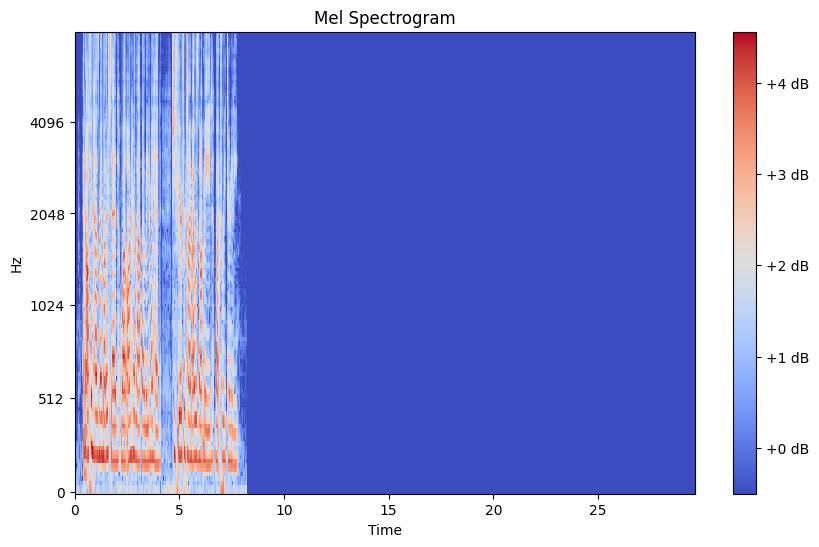

In [ ]:
spectrogramExtractor.plot_spectrogram(mel_test_dataset_librispeech[15][0].numpy())

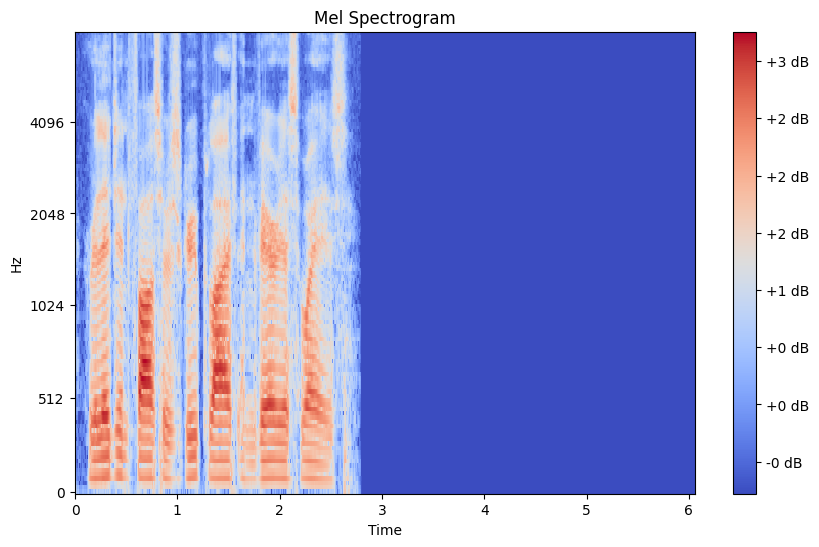

In [ ]:
spectrogramExtractor.plot_spectrogram(mel_test_dataset_timit[0][0].numpy())

In [ ]:
import torchvision
import torchvision.transforms as transforms
import torch
import torch.nn as nn

class GlobalMaxPooling1D(nn.Module):
    def __init__(self, data_format='channels_last'):
        super(GlobalMaxPooling1D, self).__init__()
    def forward(self, input):
        return torch.max(input, axis=-1).values

class SpectroCNN(nn.Module):
    def __init__(self, n_mels, n_classes, out_channels_list, kernel_size_list, stride_list, dropout_list):
        """
        Parameters:
        - n_mels: Number of input channels
        - n_classes: Number of output classes
        - out_channels_list: List of out_channels for each Conv1d layer
        - kernel_size_list: List of kernel_sizes for each Conv1d layer
        - stride_list: List of strides for each Conv1d layer
        - dropout_list: List of dropouts for each Dropout layer
        """
        super(SpectroCNN, self).__init__()
        self.n_classes = n_classes

        self.input_transform = torchvision.transforms.Compose([
            transforms.Lambda(lambda x: x + torch.randn_like(x) * 0.01),
        ])

        layers = []
        in_channels = n_mels

        for out_channels, kernel_size, stride, dropout in zip(out_channels_list, kernel_size_list, stride_list, dropout_list):
            layers.append(nn.Conv1d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, stride=stride))
            layers.append(nn.ReLU())
            layers.append(nn.BatchNorm1d(out_channels))
            layers.append(nn.Dropout(p=dropout))
            in_channels = out_channels

        self.conv = nn.Sequential(*layers)
        self.global_pool = GlobalMaxPooling1D()
        self.dense = nn.Sequential(nn.Linear(in_channels, n_classes))

    def forward(self, x):
        if self.training:
            z1 = self.conv(self.input_transform(x))
        else:
            z1 = self.conv(x)
        z2 = self.global_pool(z1)
        z3 = self.dense(z2)
        return z3


out_channels_list = [
    [32, 64, 128],
    [32, 64, 128, 256],
    [64, 128, 256, 512],
    [64, 128, 256, 512, 1024],
    [32, 32, 64, 64, 128],
    [64, 64, 128, 128, 256]
]

kernel_size_list = [
    [3, 3, 3],
    [5, 5, 3, 3],
    [7, 5, 5, 3],
    [5, 5, 3, 3, 3],
    [5, 5, 5, 5, 5],
    [3, 3, 3, 3, 3]
]

stride_list = [
    [1, 1, 1],
    [1, 1, 1, 1],
    [1, 1, 1, 1],
    [1, 1, 1, 1, 1],
    [1, 1, 1, 1, 1],
    [1, 1, 1, 1, 1]
]

dropout_list = [
    [0.2, 0.3, 0.4],
    [0.3, 0.3, 0.3, 0.3],
    [0.4, 0.4, 0.4, 0.4],
    [0.5, 0.5, 0.5, 0.5, 0.5],
    [0.3, 0.3, 0.3, 0.3, 0.3],
    [0.4, 0.4, 0.4, 0.4, 0.4]
]


In [ ]:
import pandas as pd
from tabulate import tabulate
from torch.utils.data import DataLoader


def calculate_accuracy(model, dataloader, device='cuda'):
    correct_predictions = 0
    total_samples = 0
    model.eval()
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)
            correct_predictions += (predicted == labels).sum().item()
            total_samples += labels.size(0)
    accuracy = correct_predictions / total_samples if total_samples > 0 else None
    return accuracy

batch_size = 32
lr = 1e-3
print_frequency = 1
epochs = 100

mel_train_dl_librispeech = DataLoader(mel_train_dataset_librispeech, batch_size=batch_size, shuffle=True)
mel_test_dl_librispeech = DataLoader(mel_test_dataset_librispeech, batch_size=batch_size, shuffle=False)


results = []
for i in range(len(out_channels_list)):
    for loss_name, loss in [('CrossEntropyLoss', nn.CrossEntropyLoss()), ('BCEWithLogitsLoss', nn.BCEWithLogitsLoss()), ('MultiMarginLoss', nn.MultiMarginLoss())]:
        model = SpectroCNN(n_mels = 128, n_classes = 40, out_channels_list = out_channels_list[i], kernel_size_list = kernel_size_list[i], stride_list = stride_list[i], dropout_list = dropout_list[i])
        optimizer = torch.optim.Adam(model.parameters(), lr=lr)

        folder_path = "drive/MyDrive/models/librispeech_mel"

        if loss_name == 'CrossEntropyLoss':
            file_name = f"model_{i+1}_cross_entropy.pth"
        elif loss_name == 'BCEWithLogitsLoss':
            file_name = f"model_{i+1}_bcewithlogits.pth"
        elif loss_name == 'MultiMarginLoss':
            file_name = f"model_{i+1}_multi_margin_loss"
        else:
            raise ValueError("Unknown loss function.")

        _ = train_loop(
              model,
              train_loader=mel_train_dl_librispeech,
              optimizer=optimizer,
              loss=loss,
              epochs=epochs,
              test_loader=mel_test_dl_librispeech,
              device="cuda",
              folder_path=folder_path,
              file_name=file_name,
            )

        # Calculate and store accuracy on training and testing sets
        train_accuracy = calculate_accuracy(model, mel_train_dl_librispeech, device="cuda")
        test_accuracy = calculate_accuracy(model, mel_test_dl_librispeech, device="cuda")

        results.append([f'Model {i+1}', loss_name, train_accuracy, test_accuracy])

print(tabulate(results, headers=['Model Configuration', 'Criterion', 'Training Accuracy', 'Testing Accuracy'], tablefmt='grid'))

100%|██████████| 3/3 [00:00<00:00, 21.67it/s]


Epoch 1/100: train_loss=8.726672887802124 train_acc=0.021875 test_loss=3.711994489034017 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00, 23.19it/s]


Epoch 2/100: train_loss=4.939961576461792 train_acc=0.04375 test_loss=3.618269125620524 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00, 23.67it/s]


Epoch 3/100: train_loss=4.131418037414551 train_acc=0.071875 test_loss=3.6145002047220864 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00, 23.28it/s]


Epoch 4/100: train_loss=3.767302417755127 train_acc=0.084375 test_loss=3.488581657409668 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 23.39it/s]


Epoch 5/100: train_loss=3.397497224807739 train_acc=0.10625 test_loss=3.392439603805542 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 19.31it/s]


Epoch 6/100: train_loss=3.3273489236831666 train_acc=0.128125 test_loss=3.3346079190572104 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 19.73it/s]


Epoch 7/100: train_loss=3.0600099086761476 train_acc=0.2 test_loss=3.296245257059733 test_acc=0.1


100%|██████████| 3/3 [00:00<00:00, 18.06it/s]


Epoch 8/100: train_loss=2.8750869989395142 train_acc=0.2 test_loss=3.171788056691488 test_acc=0.125


100%|██████████| 3/3 [00:00<00:00, 18.25it/s]


Epoch 9/100: train_loss=2.9225131034851075 train_acc=0.18125 test_loss=3.190443674723307 test_acc=0.25


100%|██████████| 3/3 [00:00<00:00, 22.56it/s]


Epoch 10/100: train_loss=2.7373286724090575 train_acc=0.23125 test_loss=3.0058558781941733 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00, 22.27it/s]


Epoch 11/100: train_loss=2.5233938455581666 train_acc=0.271875 test_loss=3.011815150578817 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00, 23.65it/s]


Epoch 12/100: train_loss=2.5313472509384156 train_acc=0.265625 test_loss=2.983705679575602 test_acc=0.175


100%|██████████| 3/3 [00:00<00:00, 23.60it/s]


Epoch 13/100: train_loss=2.4395049810409546 train_acc=0.334375 test_loss=2.9229365984598794 test_acc=0.225


100%|██████████| 3/3 [00:00<00:00, 22.54it/s]


Epoch 14/100: train_loss=2.3073471784591675 train_acc=0.346875 test_loss=2.8292988936106362 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00, 23.14it/s]


Epoch 15/100: train_loss=2.0583276748657227 train_acc=0.415625 test_loss=2.698878526687622 test_acc=0.3625


100%|██████████| 3/3 [00:00<00:00, 23.08it/s]


Epoch 16/100: train_loss=2.042146825790405 train_acc=0.409375 test_loss=2.7274816036224365 test_acc=0.3


100%|██████████| 3/3 [00:00<00:00, 23.29it/s]


Epoch 17/100: train_loss=1.9589110493659974 train_acc=0.446875 test_loss=2.556613286336263 test_acc=0.3875


100%|██████████| 3/3 [00:00<00:00, 22.10it/s]


Epoch 18/100: train_loss=1.7146053910255432 train_acc=0.521875 test_loss=2.6009227434794107 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00, 22.96it/s]


Epoch 19/100: train_loss=1.6338472604751586 train_acc=0.534375 test_loss=2.3120229244232178 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 22.48it/s]


Epoch 20/100: train_loss=1.5420589327812195 train_acc=0.528125 test_loss=2.184952656428019 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00, 18.89it/s]


Epoch 21/100: train_loss=1.3524389624595643 train_acc=0.628125 test_loss=2.2323148250579834 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00, 19.57it/s]


Epoch 22/100: train_loss=1.4357978224754333 train_acc=0.59375 test_loss=2.14741841952006 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00, 19.26it/s]


Epoch 23/100: train_loss=1.207183301448822 train_acc=0.634375 test_loss=2.0375298261642456 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 19.26it/s]


Epoch 24/100: train_loss=1.1438507616519928 train_acc=0.684375 test_loss=2.400376319885254 test_acc=0.3875


100%|██████████| 3/3 [00:00<00:00, 18.37it/s]


Epoch 25/100: train_loss=1.0392341136932373 train_acc=0.7 test_loss=1.8754617770512898 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 22.52it/s]


Epoch 26/100: train_loss=0.9108959674835205 train_acc=0.74375 test_loss=1.9050508737564087 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00, 23.24it/s]


Epoch 27/100: train_loss=0.9186596393585205 train_acc=0.71875 test_loss=1.853167732556661 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 23.29it/s]


Epoch 28/100: train_loss=0.8713417470455169 train_acc=0.765625 test_loss=1.7432241439819336 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00, 22.68it/s]


Epoch 29/100: train_loss=0.7926482111215591 train_acc=0.759375 test_loss=1.7641579310099285 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00, 23.41it/s]


Epoch 30/100: train_loss=0.697553139925003 train_acc=0.803125 test_loss=1.7326595385869343 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00, 23.46it/s]


Epoch 31/100: train_loss=0.6894604146480561 train_acc=0.790625 test_loss=1.6351962089538574 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 22.87it/s]


Epoch 32/100: train_loss=0.512931764125824 train_acc=0.85 test_loss=1.5692052046457927 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 22.01it/s]


Epoch 33/100: train_loss=0.6041354894638061 train_acc=0.815625 test_loss=1.4092434247334797 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 22.84it/s]


Epoch 34/100: train_loss=0.5154645889997482 train_acc=0.865625 test_loss=1.5145119825998943 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 21.94it/s]


Epoch 35/100: train_loss=0.5961827725172043 train_acc=0.83125 test_loss=1.3709255854288738 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 23.44it/s]


Epoch 36/100: train_loss=0.4697978556156158 train_acc=0.88125 test_loss=1.4378958145777385 test_acc=0.675


100%|██████████| 3/3 [00:00<00:00, 19.00it/s]


Epoch 37/100: train_loss=0.42944970428943635 train_acc=0.89375 test_loss=1.3002020120620728 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 19.25it/s]


Epoch 38/100: train_loss=0.3691400811076164 train_acc=0.9 test_loss=1.236820101737976 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 18.98it/s]


Epoch 39/100: train_loss=0.3457207202911377 train_acc=0.921875 test_loss=1.2354412078857422 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 18.48it/s]


Epoch 40/100: train_loss=0.32365116775035857 train_acc=0.9125 test_loss=1.212125261624654 test_acc=0.8


100%|██████████| 3/3 [00:00<00:00, 23.40it/s]


Epoch 41/100: train_loss=0.302663354575634 train_acc=0.915625 test_loss=1.2299564282099407 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 23.49it/s]


Epoch 42/100: train_loss=0.27285251170396807 train_acc=0.921875 test_loss=1.0902470548947651 test_acc=0.8375


100%|██████████| 3/3 [00:00<00:00, 23.52it/s]


Epoch 43/100: train_loss=0.26171492487192155 train_acc=0.93125 test_loss=1.1165583928426106 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 23.65it/s]


Epoch 44/100: train_loss=0.2115319028496742 train_acc=0.953125 test_loss=1.0580200751622517 test_acc=0.775


100%|██████████| 3/3 [00:00<00:00, 22.29it/s]


Epoch 45/100: train_loss=0.2693755730986595 train_acc=0.94375 test_loss=1.0987584988276164 test_acc=0.8125


100%|██████████| 3/3 [00:00<00:00, 24.05it/s]


Epoch 46/100: train_loss=0.2476954087615013 train_acc=0.91875 test_loss=1.0401459137598674 test_acc=0.8125


100%|██████████| 3/3 [00:00<00:00, 22.96it/s]


Epoch 47/100: train_loss=0.2050246052443981 train_acc=0.95625 test_loss=1.038858711719513 test_acc=0.85


100%|██████████| 3/3 [00:00<00:00, 23.33it/s]


Epoch 48/100: train_loss=0.18878416642546653 train_acc=0.946875 test_loss=1.0108878016471863 test_acc=0.775


100%|██████████| 3/3 [00:00<00:00, 22.76it/s]


Epoch 49/100: train_loss=0.18084820955991746 train_acc=0.946875 test_loss=0.9916122357050577 test_acc=0.8


100%|██████████| 3/3 [00:00<00:00, 23.53it/s]


Epoch 50/100: train_loss=0.21520019248127936 train_acc=0.940625 test_loss=0.999125063419342 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 23.55it/s]


Epoch 51/100: train_loss=0.23535581938922406 train_acc=0.94375 test_loss=0.9644599954287211 test_acc=0.8


100%|██████████| 3/3 [00:00<00:00, 18.11it/s]


Epoch 52/100: train_loss=0.22047168016433716 train_acc=0.946875 test_loss=1.1567246119181316 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 19.48it/s]


Epoch 53/100: train_loss=0.2666127547621727 train_acc=0.915625 test_loss=1.0151378115018208 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 19.17it/s]


Epoch 54/100: train_loss=0.2454660251736641 train_acc=0.94375 test_loss=0.9158745010693868 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 18.14it/s]


Epoch 55/100: train_loss=0.2229271873831749 train_acc=0.93125 test_loss=1.0388774474461873 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 16.45it/s]


Epoch 56/100: train_loss=0.23509763814508916 train_acc=0.928125 test_loss=1.0237514972686768 test_acc=0.8125


100%|██████████| 3/3 [00:00<00:00, 23.29it/s]


Epoch 57/100: train_loss=0.20562530905008317 train_acc=0.946875 test_loss=0.8488981525103251 test_acc=0.85


100%|██████████| 3/3 [00:00<00:00, 23.83it/s]


Epoch 58/100: train_loss=0.1471478246152401 train_acc=0.959375 test_loss=0.9237584074338278 test_acc=0.8


100%|██████████| 3/3 [00:00<00:00, 23.15it/s]


Epoch 59/100: train_loss=0.16511082462966442 train_acc=0.953125 test_loss=0.9907586773236593 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 22.97it/s]


Epoch 60/100: train_loss=0.10544088184833526 train_acc=0.98125 test_loss=1.0108854174613953 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 23.60it/s]


Epoch 61/100: train_loss=0.11418976485729218 train_acc=0.965625 test_loss=0.8182657162348429 test_acc=0.8625


100%|██████████| 3/3 [00:00<00:00, 22.86it/s]


Epoch 62/100: train_loss=0.11375791803002358 train_acc=0.975 test_loss=0.7575283447901408 test_acc=0.85


100%|██████████| 3/3 [00:00<00:00, 21.71it/s]


Epoch 63/100: train_loss=0.08448358625173569 train_acc=0.990625 test_loss=0.8025547464688619 test_acc=0.875


100%|██████████| 3/3 [00:00<00:00, 18.51it/s]


Epoch 64/100: train_loss=0.13124840706586838 train_acc=0.978125 test_loss=0.7106345097223917 test_acc=0.875


100%|██████████| 3/3 [00:00<00:00, 16.67it/s]


Epoch 65/100: train_loss=0.08180414028465748 train_acc=0.978125 test_loss=0.8060948451360067 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 17.00it/s]


Epoch 66/100: train_loss=0.08951192013919354 train_acc=0.98125 test_loss=0.8676794767379761 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 16.38it/s]


Epoch 67/100: train_loss=0.11943419687449933 train_acc=0.96875 test_loss=0.7552739381790161 test_acc=0.85


100%|██████████| 3/3 [00:00<00:00, 18.01it/s]


Epoch 68/100: train_loss=0.08777599073946477 train_acc=0.978125 test_loss=0.827016015847524 test_acc=0.8


100%|██████████| 3/3 [00:00<00:00, 17.86it/s]


Epoch 69/100: train_loss=0.09517532400786877 train_acc=0.971875 test_loss=0.7851527730623881 test_acc=0.875


100%|██████████| 3/3 [00:00<00:00, 17.70it/s]


Epoch 70/100: train_loss=0.05408522617071867 train_acc=0.990625 test_loss=0.7900751431783041 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 18.64it/s]


Epoch 71/100: train_loss=0.06524077132344246 train_acc=0.984375 test_loss=0.7351036469141642 test_acc=0.8875


100%|██████████| 3/3 [00:00<00:00, 20.07it/s]


Epoch 72/100: train_loss=0.0672363754361868 train_acc=0.984375 test_loss=0.732266366481781 test_acc=0.8875


100%|██████████| 3/3 [00:00<00:00, 23.13it/s]


Epoch 73/100: train_loss=0.06197289703413844 train_acc=0.9875 test_loss=0.9137735168139139 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 23.27it/s]


Epoch 74/100: train_loss=0.09401765707880258 train_acc=0.975 test_loss=0.7553533315658569 test_acc=0.8375


100%|██████████| 3/3 [00:00<00:00, 21.34it/s]


Epoch 75/100: train_loss=0.10093723721802235 train_acc=0.971875 test_loss=0.6985812584559122 test_acc=0.875


100%|██████████| 3/3 [00:00<00:00, 22.45it/s]


Epoch 76/100: train_loss=0.1256643358618021 train_acc=0.965625 test_loss=0.8322734038035074 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 23.37it/s]


Epoch 77/100: train_loss=0.10655453018844127 train_acc=0.965625 test_loss=0.7283432086308798 test_acc=0.8875


100%|██████████| 3/3 [00:00<00:00, 22.86it/s]


Epoch 78/100: train_loss=0.10241852384060621 train_acc=0.978125 test_loss=0.7555238207181295 test_acc=0.85


100%|██████████| 3/3 [00:00<00:00, 22.64it/s]


Epoch 79/100: train_loss=0.07570666596293449 train_acc=0.98125 test_loss=0.6335549056529999 test_acc=0.8875


100%|██████████| 3/3 [00:00<00:00, 24.01it/s]


Epoch 80/100: train_loss=0.0529124666005373 train_acc=0.990625 test_loss=0.6149296462535858 test_acc=0.8875


100%|██████████| 3/3 [00:00<00:00, 23.26it/s]


Epoch 81/100: train_loss=0.06890485398471355 train_acc=0.984375 test_loss=0.6772865454355875 test_acc=0.8875


100%|██████████| 3/3 [00:00<00:00, 22.75it/s]


Epoch 82/100: train_loss=0.05554512608796358 train_acc=0.98125 test_loss=0.6313441296418508 test_acc=0.875


100%|██████████| 3/3 [00:00<00:00, 23.17it/s]


Epoch 83/100: train_loss=0.05389397898688912 train_acc=0.99375 test_loss=0.5422776242097219 test_acc=0.9375


100%|██████████| 3/3 [00:00<00:00, 18.78it/s]


Epoch 84/100: train_loss=0.05070849098265171 train_acc=0.990625 test_loss=0.6358793179194132 test_acc=0.9125


100%|██████████| 3/3 [00:00<00:00, 17.92it/s]


Epoch 85/100: train_loss=0.045413775742053984 train_acc=0.990625 test_loss=0.6613460779190063 test_acc=0.8875


100%|██████████| 3/3 [00:00<00:00, 17.65it/s]


Epoch 86/100: train_loss=0.0741172089241445 train_acc=0.984375 test_loss=0.6275199850400289 test_acc=0.9


100%|██████████| 3/3 [00:00<00:00, 18.31it/s]


Epoch 87/100: train_loss=0.05252273064106703 train_acc=0.990625 test_loss=0.6381533543268839 test_acc=0.875


100%|██████████| 3/3 [00:00<00:00, 22.41it/s]


Epoch 88/100: train_loss=0.041415071953088044 train_acc=0.996875 test_loss=0.6023762424786886 test_acc=0.85


100%|██████████| 3/3 [00:00<00:00, 22.90it/s]


Epoch 89/100: train_loss=0.04324524621479213 train_acc=0.990625 test_loss=0.6136885086695353 test_acc=0.8875


100%|██████████| 3/3 [00:00<00:00, 22.43it/s]


Epoch 90/100: train_loss=0.059471162408590315 train_acc=0.9875 test_loss=0.5975473125775655 test_acc=0.9125


100%|██████████| 3/3 [00:00<00:00, 22.84it/s]


Epoch 91/100: train_loss=0.04669851921498776 train_acc=0.990625 test_loss=0.6700373689333597 test_acc=0.8375


100%|██████████| 3/3 [00:00<00:00, 22.47it/s]


Epoch 92/100: train_loss=0.03557115653529763 train_acc=1.0 test_loss=0.6052244404951731 test_acc=0.8625


100%|██████████| 3/3 [00:00<00:00, 22.96it/s]


Epoch 93/100: train_loss=0.03130899020470679 train_acc=0.99375 test_loss=0.5395894745985667 test_acc=0.925


100%|██████████| 3/3 [00:00<00:00, 21.71it/s]


Epoch 94/100: train_loss=0.03725036699324846 train_acc=0.990625 test_loss=0.4964565734068553 test_acc=0.925


100%|██████████| 3/3 [00:00<00:00, 23.31it/s]


Epoch 95/100: train_loss=0.023471141373738645 train_acc=1.0 test_loss=0.49150622884432477 test_acc=0.8875


100%|██████████| 3/3 [00:00<00:00, 22.47it/s]


Epoch 96/100: train_loss=0.028256973158568142 train_acc=0.990625 test_loss=0.4472877581914266 test_acc=0.9625


100%|██████████| 3/3 [00:00<00:00, 22.89it/s]


Epoch 97/100: train_loss=0.03860964966006577 train_acc=0.990625 test_loss=0.4232022762298584 test_acc=0.95


100%|██████████| 3/3 [00:00<00:00, 23.47it/s]


Epoch 98/100: train_loss=0.02649753037840128 train_acc=0.99375 test_loss=0.45674701531728107 test_acc=0.925


100%|██████████| 3/3 [00:00<00:00, 18.42it/s]


Epoch 99/100: train_loss=0.036251531448215246 train_acc=0.99375 test_loss=0.5039874116579691 test_acc=0.95


100%|██████████| 3/3 [00:00<00:00, 18.69it/s]


Epoch 100/100: train_loss=0.05740938656963408 train_acc=0.978125 test_loss=0.5961994429429373 test_acc=0.9
Couldn't load model


100%|██████████| 3/3 [00:00<00:00, 16.48it/s]


Epoch 1/100: train_loss=1.1024500384926796 train_acc=0.015625 test_loss=0.5535991986592611 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00, 17.96it/s]


Epoch 2/100: train_loss=0.1589772880077362 train_acc=0.04375 test_loss=0.3801971673965454 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 22.76it/s]


Epoch 3/100: train_loss=0.14826397597789764 train_acc=0.021875 test_loss=0.30553363760312396 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 23.70it/s]


Epoch 4/100: train_loss=0.1338883437216282 train_acc=0.040625 test_loss=0.28528904914855957 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00, 22.19it/s]


Epoch 5/100: train_loss=0.12589017525315285 train_acc=0.0375 test_loss=0.28406471014022827 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 21.15it/s]


Epoch 6/100: train_loss=0.11818844676017762 train_acc=0.090625 test_loss=0.29331396023432416 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00, 23.26it/s]


Epoch 7/100: train_loss=0.11585505083203315 train_acc=0.08125 test_loss=0.30251747369766235 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 22.33it/s]


Epoch 8/100: train_loss=0.11248588785529137 train_acc=0.084375 test_loss=0.3025055130322774 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00, 22.49it/s]


Epoch 9/100: train_loss=0.10979270860552788 train_acc=0.140625 test_loss=0.29275550444920856 test_acc=0.1


100%|██████████| 3/3 [00:00<00:00, 24.45it/s]


Epoch 10/100: train_loss=0.10733247175812721 train_acc=0.125 test_loss=0.3141493598620097 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00, 24.10it/s]


Epoch 11/100: train_loss=0.10350054427981377 train_acc=0.159375 test_loss=0.27251993616422016 test_acc=0.1


100%|██████████| 3/3 [00:00<00:00, 22.45it/s]


Epoch 12/100: train_loss=0.10043203607201576 train_acc=0.171875 test_loss=0.2841660678386688 test_acc=0.1375


100%|██████████| 3/3 [00:00<00:00, 23.54it/s]


Epoch 13/100: train_loss=0.09840852469205856 train_acc=0.240625 test_loss=0.29043567180633545 test_acc=0.15


100%|██████████| 3/3 [00:00<00:00, 18.79it/s]


Epoch 14/100: train_loss=0.09578851386904716 train_acc=0.225 test_loss=0.2670796612898509 test_acc=0.225


100%|██████████| 3/3 [00:00<00:00, 17.41it/s]


Epoch 15/100: train_loss=0.09491644576191902 train_acc=0.253125 test_loss=0.2782130539417267 test_acc=0.275


100%|██████████| 3/3 [00:00<00:00, 16.20it/s]


Epoch 16/100: train_loss=0.09003889262676239 train_acc=0.26875 test_loss=0.23563828070958456 test_acc=0.1875


100%|██████████| 3/3 [00:00<00:00, 16.50it/s]


Epoch 17/100: train_loss=0.08987688943743706 train_acc=0.296875 test_loss=0.24354101717472076 test_acc=0.325


100%|██████████| 3/3 [00:00<00:00, 21.56it/s]


Epoch 18/100: train_loss=0.08547215089201927 train_acc=0.315625 test_loss=0.2502577006816864 test_acc=0.3


100%|██████████| 3/3 [00:00<00:00, 23.41it/s]


Epoch 19/100: train_loss=0.08128629848361016 train_acc=0.378125 test_loss=0.2553347299496333 test_acc=0.3


100%|██████████| 3/3 [00:00<00:00, 23.53it/s]


Epoch 20/100: train_loss=0.08002233207225799 train_acc=0.353125 test_loss=0.22934005161126456 test_acc=0.3625


100%|██████████| 3/3 [00:00<00:00, 23.90it/s]


Epoch 21/100: train_loss=0.08022220879793167 train_acc=0.41875 test_loss=0.27066218852996826 test_acc=0.2875


100%|██████████| 3/3 [00:00<00:00, 23.18it/s]


Epoch 22/100: train_loss=0.07612556368112564 train_acc=0.428125 test_loss=0.23216462135314941 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00, 23.73it/s]


Epoch 23/100: train_loss=0.0763484537601471 train_acc=0.440625 test_loss=0.2410927712917328 test_acc=0.3125


100%|██████████| 3/3 [00:00<00:00, 23.53it/s]


Epoch 24/100: train_loss=0.07427902221679687 train_acc=0.478125 test_loss=0.23219326635201773 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00, 23.34it/s]


Epoch 25/100: train_loss=0.07269265428185463 train_acc=0.459375 test_loss=0.20483864347139993 test_acc=0.4625


100%|██████████| 3/3 [00:00<00:00, 23.90it/s]


Epoch 26/100: train_loss=0.0707598589360714 train_acc=0.5125 test_loss=0.21567051112651825 test_acc=0.3875


100%|██████████| 3/3 [00:00<00:00, 23.88it/s]


Epoch 27/100: train_loss=0.06821283362805844 train_acc=0.515625 test_loss=0.20898711681365967 test_acc=0.3625


100%|██████████| 3/3 [00:00<00:00, 22.94it/s]


Epoch 28/100: train_loss=0.06405830048024655 train_acc=0.553125 test_loss=0.2339497854312261 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00, 18.36it/s]


Epoch 29/100: train_loss=0.06284227035939693 train_acc=0.575 test_loss=0.20242242018381754 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00, 19.78it/s]


Epoch 30/100: train_loss=0.06050142347812652 train_acc=0.609375 test_loss=0.19601032137870789 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 17.89it/s]


Epoch 31/100: train_loss=0.060581830143928525 train_acc=0.628125 test_loss=0.1876528561115265 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 18.47it/s]


Epoch 32/100: train_loss=0.05929456055164337 train_acc=0.61875 test_loss=0.21149978041648865 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00, 18.43it/s]


Epoch 33/100: train_loss=0.0549325555562973 train_acc=0.63125 test_loss=0.20782619218031564 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00, 22.61it/s]


Epoch 34/100: train_loss=0.054359186068177225 train_acc=0.659375 test_loss=0.184318741162618 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 22.69it/s]


Epoch 35/100: train_loss=0.05207880809903145 train_acc=0.71875 test_loss=0.18557942907015482 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 23.41it/s]


Epoch 36/100: train_loss=0.05228565186262131 train_acc=0.71875 test_loss=0.19040970504283905 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 21.61it/s]


Epoch 37/100: train_loss=0.0489107109606266 train_acc=0.725 test_loss=0.16188596189022064 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 23.54it/s]


Epoch 38/100: train_loss=0.04757087305188179 train_acc=0.7375 test_loss=0.156713937719663 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 23.29it/s]


Epoch 39/100: train_loss=0.046911781281232835 train_acc=0.7625 test_loss=0.16145270069440207 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 23.36it/s]


Epoch 40/100: train_loss=0.04401827342808247 train_acc=0.765625 test_loss=0.1553394397099813 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 22.87it/s]


Epoch 41/100: train_loss=0.04394429326057434 train_acc=0.7875 test_loss=0.15461130936940512 test_acc=0.7


100%|██████████| 3/3 [00:00<00:00, 22.95it/s]


Epoch 42/100: train_loss=0.04136418197304011 train_acc=0.79375 test_loss=0.15504491329193115 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 23.22it/s]


Epoch 43/100: train_loss=0.042175819724798204 train_acc=0.80625 test_loss=0.1330681393543879 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 22.39it/s]


Epoch 44/100: train_loss=0.040222876332700254 train_acc=0.796875 test_loss=0.18598778545856476 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 18.39it/s]


Epoch 45/100: train_loss=0.03984888680279255 train_acc=0.8125 test_loss=0.13386762142181396 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 18.08it/s]


Epoch 46/100: train_loss=0.03719475958496332 train_acc=0.840625 test_loss=0.1553914894660314 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 17.02it/s]


Epoch 47/100: train_loss=0.03812334965914488 train_acc=0.825 test_loss=0.12255727499723434 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 17.66it/s]


Epoch 48/100: train_loss=0.03649177812039852 train_acc=0.865625 test_loss=0.1440656284491221 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 21.83it/s]


Epoch 49/100: train_loss=0.032086588256061074 train_acc=0.896875 test_loss=0.1560845971107483 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 22.65it/s]


Epoch 50/100: train_loss=0.033294076658785345 train_acc=0.8625 test_loss=0.12919285893440247 test_acc=0.7


100%|██████████| 3/3 [00:00<00:00, 23.12it/s]


Epoch 51/100: train_loss=0.03219322431832552 train_acc=0.878125 test_loss=0.11619884272416432 test_acc=0.8125


100%|██████████| 3/3 [00:00<00:00, 23.08it/s]


Epoch 52/100: train_loss=0.0312513155862689 train_acc=0.88125 test_loss=0.11933352053165436 test_acc=0.8


100%|██████████| 3/3 [00:00<00:00, 22.91it/s]


Epoch 53/100: train_loss=0.02971888780593872 train_acc=0.89375 test_loss=0.1419888734817505 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 22.01it/s]


Epoch 54/100: train_loss=0.02759747002273798 train_acc=0.909375 test_loss=0.13582558433214822 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 23.42it/s]


Epoch 55/100: train_loss=0.027734391391277313 train_acc=0.8875 test_loss=0.12153247743844986 test_acc=0.85


100%|██████████| 3/3 [00:00<00:00, 22.20it/s]


Epoch 56/100: train_loss=0.024935239180922508 train_acc=0.928125 test_loss=0.12760993838310242 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 22.93it/s]


Epoch 57/100: train_loss=0.025973189901560546 train_acc=0.928125 test_loss=0.11851054430007935 test_acc=0.8625


100%|██████████| 3/3 [00:00<00:00, 23.41it/s]


Epoch 58/100: train_loss=0.024715452454984188 train_acc=0.925 test_loss=0.1251786599556605 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 23.70it/s]


Epoch 59/100: train_loss=0.02182307355105877 train_acc=0.9375 test_loss=0.12342692414919536 test_acc=0.8125


100%|██████████| 3/3 [00:00<00:00, 19.71it/s]


Epoch 60/100: train_loss=0.022811802569776773 train_acc=0.9375 test_loss=0.11260497818390529 test_acc=0.85


100%|██████████| 3/3 [00:00<00:00, 19.46it/s]


Epoch 61/100: train_loss=0.02227305844426155 train_acc=0.940625 test_loss=0.1015049268802007 test_acc=0.8625


100%|██████████| 3/3 [00:00<00:00, 17.75it/s]


Epoch 62/100: train_loss=0.018467732612043618 train_acc=0.94375 test_loss=0.11778579403956731 test_acc=0.85


100%|██████████| 3/3 [00:00<00:00, 18.76it/s]


Epoch 63/100: train_loss=0.019147796276956796 train_acc=0.959375 test_loss=0.10620169093211491 test_acc=0.8375


100%|██████████| 3/3 [00:00<00:00, 17.25it/s]


Epoch 64/100: train_loss=0.017942337598651648 train_acc=0.965625 test_loss=0.10615670184294383 test_acc=0.8875


100%|██████████| 3/3 [00:00<00:00, 22.93it/s]


Epoch 65/100: train_loss=0.01928371787071228 train_acc=0.95625 test_loss=0.1016981452703476 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 23.29it/s]


Epoch 66/100: train_loss=0.020229865238070487 train_acc=0.934375 test_loss=0.10308956851561864 test_acc=0.8625


100%|██████████| 3/3 [00:00<00:00, 23.62it/s]


Epoch 67/100: train_loss=0.019023001287132503 train_acc=0.95 test_loss=0.09730649987856548 test_acc=0.875


100%|██████████| 3/3 [00:00<00:00, 22.52it/s]


Epoch 68/100: train_loss=0.014970885682851076 train_acc=0.98125 test_loss=0.11000226686398189 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 22.92it/s]


Epoch 69/100: train_loss=0.016407655831426383 train_acc=0.9625 test_loss=0.09192109853029251 test_acc=0.9125


100%|██████████| 3/3 [00:00<00:00, 22.27it/s]


Epoch 70/100: train_loss=0.01607085335999727 train_acc=0.9625 test_loss=0.09952830523252487 test_acc=0.9125


100%|██████████| 3/3 [00:00<00:00, 23.22it/s]


Epoch 71/100: train_loss=0.013727279473096132 train_acc=0.98125 test_loss=0.09977945685386658 test_acc=0.925


100%|██████████| 3/3 [00:00<00:00, 23.10it/s]


Epoch 72/100: train_loss=0.014303329214453698 train_acc=0.959375 test_loss=0.09535760432481766 test_acc=0.9


100%|██████████| 3/3 [00:00<00:00, 23.25it/s]


Epoch 73/100: train_loss=0.013806440960615873 train_acc=0.975 test_loss=0.09873906274636586 test_acc=0.85


100%|██████████| 3/3 [00:00<00:00, 23.20it/s]


Epoch 74/100: train_loss=0.015223525650799274 train_acc=0.975 test_loss=0.10366545865933101 test_acc=0.85


100%|██████████| 3/3 [00:00<00:00, 21.80it/s]


Epoch 75/100: train_loss=0.015950917173177002 train_acc=0.95625 test_loss=0.07647627592086792 test_acc=0.9


100%|██████████| 3/3 [00:00<00:00, 16.41it/s]


Epoch 76/100: train_loss=0.013967985194176436 train_acc=0.959375 test_loss=0.08663554986317952 test_acc=0.9125


100%|██████████| 3/3 [00:00<00:00, 18.10it/s]


Epoch 77/100: train_loss=0.012838771659880876 train_acc=0.975 test_loss=0.07410102089246114 test_acc=0.9125


100%|██████████| 3/3 [00:00<00:00, 17.29it/s]


Epoch 78/100: train_loss=0.012109056767076253 train_acc=0.98125 test_loss=0.09035981198151906 test_acc=0.8875


100%|██████████| 3/3 [00:00<00:00, 17.25it/s]


Epoch 79/100: train_loss=0.01028894898481667 train_acc=0.990625 test_loss=0.10272691895564397 test_acc=0.925


100%|██████████| 3/3 [00:00<00:00, 22.42it/s]


Epoch 80/100: train_loss=0.010609888099133968 train_acc=0.9875 test_loss=0.07924862702687581 test_acc=0.9


100%|██████████| 3/3 [00:00<00:00, 22.42it/s]


Epoch 81/100: train_loss=0.010189658496528864 train_acc=0.98125 test_loss=0.0819971114397049 test_acc=0.925


100%|██████████| 3/3 [00:00<00:00, 22.74it/s]


Epoch 82/100: train_loss=0.010750513197854162 train_acc=0.98125 test_loss=0.09219023088614146 test_acc=0.875


100%|██████████| 3/3 [00:00<00:00, 23.81it/s]


Epoch 83/100: train_loss=0.010477017844095826 train_acc=0.98125 test_loss=0.07376982023318608 test_acc=0.9


100%|██████████| 3/3 [00:00<00:00, 23.96it/s]


Epoch 84/100: train_loss=0.009112854348495602 train_acc=0.996875 test_loss=0.08812674383322398 test_acc=0.8875


100%|██████████| 3/3 [00:00<00:00, 22.85it/s]


Epoch 85/100: train_loss=0.009889523731544614 train_acc=0.990625 test_loss=0.0762694130341212 test_acc=0.925


100%|██████████| 3/3 [00:00<00:00, 23.60it/s]


Epoch 86/100: train_loss=0.011675992142409086 train_acc=0.98125 test_loss=0.098563219110171 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 22.83it/s]


Epoch 87/100: train_loss=0.012173173576593399 train_acc=0.984375 test_loss=0.07289266834656398 test_acc=0.9


100%|██████████| 3/3 [00:00<00:00, 22.39it/s]


Epoch 88/100: train_loss=0.010037327744066715 train_acc=0.984375 test_loss=0.09434356292088826 test_acc=0.875


100%|██████████| 3/3 [00:00<00:00, 21.62it/s]


Epoch 89/100: train_loss=0.008479721983894706 train_acc=0.99375 test_loss=0.07393329590559006 test_acc=0.9375


100%|██████████| 3/3 [00:00<00:00, 23.19it/s]


Epoch 90/100: train_loss=0.007899262988939882 train_acc=0.98125 test_loss=0.07273746778567632 test_acc=0.95


100%|██████████| 3/3 [00:00<00:00, 20.36it/s]


Epoch 91/100: train_loss=0.007994661340489984 train_acc=0.990625 test_loss=0.07893724491198857 test_acc=0.9125


100%|██████████| 3/3 [00:00<00:00, 18.16it/s]


Epoch 92/100: train_loss=0.007928685797378422 train_acc=0.99375 test_loss=0.08634849886099498 test_acc=0.9


100%|██████████| 3/3 [00:00<00:00, 19.77it/s]


Epoch 93/100: train_loss=0.006802671006880701 train_acc=0.99375 test_loss=0.0689408207933108 test_acc=0.9625


100%|██████████| 3/3 [00:00<00:00, 17.48it/s]


Epoch 94/100: train_loss=0.007946175569668413 train_acc=0.990625 test_loss=0.05608946830034256 test_acc=0.9625


100%|██████████| 3/3 [00:00<00:00, 18.73it/s]


Epoch 95/100: train_loss=0.006693842750973999 train_acc=1.0 test_loss=0.054101426154375076 test_acc=0.9625


100%|██████████| 3/3 [00:00<00:00, 22.88it/s]


Epoch 96/100: train_loss=0.007400825014337897 train_acc=0.996875 test_loss=0.07849347094694774 test_acc=0.9


100%|██████████| 3/3 [00:00<00:00, 23.11it/s]


Epoch 97/100: train_loss=0.006418701773509383 train_acc=1.0 test_loss=0.07564428448677063 test_acc=0.925


100%|██████████| 3/3 [00:00<00:00, 21.87it/s]


Epoch 98/100: train_loss=0.007063579629175365 train_acc=1.0 test_loss=0.07235408822695415 test_acc=0.95


100%|██████████| 3/3 [00:00<00:00, 23.45it/s]


Epoch 99/100: train_loss=0.00613668579608202 train_acc=0.996875 test_loss=0.058627549558877945 test_acc=0.9125


100%|██████████| 3/3 [00:00<00:00, 21.93it/s]


Epoch 100/100: train_loss=0.005868665967136621 train_acc=0.996875 test_loss=0.07220141837994258 test_acc=0.9
Couldn't load model


100%|██████████| 3/3 [00:00<00:00, 22.44it/s]


Epoch 1/100: train_loss=2.7346938133239744 train_acc=0.025 test_loss=0.9657981991767883 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 23.33it/s]


Epoch 2/100: train_loss=1.511807346343994 train_acc=0.046875 test_loss=0.8816875020662943 test_acc=0.0125


100%|██████████| 3/3 [00:00<00:00, 23.22it/s]


Epoch 3/100: train_loss=1.0494579374790192 train_acc=0.040625 test_loss=0.7507214148839315 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 23.32it/s]


Epoch 4/100: train_loss=0.9229329824447632 train_acc=0.06875 test_loss=0.7058080633481344 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 21.81it/s]


Epoch 5/100: train_loss=0.7134625852108002 train_acc=0.084375 test_loss=0.6219577193260193 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 18.58it/s]


Epoch 6/100: train_loss=0.5759713411331177 train_acc=0.1125 test_loss=0.562001645565033 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 20.13it/s]


Epoch 7/100: train_loss=0.5515011370182037 train_acc=0.140625 test_loss=0.5359676678975424 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 16.47it/s]


Epoch 8/100: train_loss=0.47169572710990904 train_acc=0.165625 test_loss=0.48700374364852905 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 16.88it/s]


Epoch 9/100: train_loss=0.4021504044532776 train_acc=0.196875 test_loss=0.4321037232875824 test_acc=0.1


100%|██████████| 3/3 [00:00<00:00, 16.28it/s]


Epoch 10/100: train_loss=0.30570267885923386 train_acc=0.209375 test_loss=0.4133049150307973 test_acc=0.1625


100%|██████████| 3/3 [00:00<00:00, 22.58it/s]


Epoch 11/100: train_loss=0.25816660821437837 train_acc=0.240625 test_loss=0.37176260352134705 test_acc=0.1875


100%|██████████| 3/3 [00:00<00:00, 22.83it/s]


Epoch 12/100: train_loss=0.2416828006505966 train_acc=0.25625 test_loss=0.34904323021570843 test_acc=0.1625


100%|██████████| 3/3 [00:00<00:00, 23.10it/s]


Epoch 13/100: train_loss=0.2065243400633335 train_acc=0.328125 test_loss=0.33132102092107135 test_acc=0.175


100%|██████████| 3/3 [00:00<00:00, 23.20it/s]


Epoch 14/100: train_loss=0.20995621830224992 train_acc=0.2625 test_loss=0.39131354292233783 test_acc=0.2625


100%|██████████| 3/3 [00:00<00:00, 22.93it/s]


Epoch 15/100: train_loss=0.21103181093931198 train_acc=0.353125 test_loss=0.32796136538187665 test_acc=0.2625


100%|██████████| 3/3 [00:00<00:00, 23.50it/s]


Epoch 16/100: train_loss=0.19229768812656403 train_acc=0.359375 test_loss=0.33688634634017944 test_acc=0.2625


100%|██████████| 3/3 [00:00<00:00, 22.97it/s]


Epoch 17/100: train_loss=0.14328399673104286 train_acc=0.384375 test_loss=0.29985612134138745 test_acc=0.25


100%|██████████| 3/3 [00:00<00:00, 22.48it/s]


Epoch 18/100: train_loss=0.1479875288903713 train_acc=0.396875 test_loss=0.28342728813489276 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00, 23.11it/s]


Epoch 19/100: train_loss=0.12135559171438218 train_acc=0.40625 test_loss=0.26081063350041706 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00, 23.41it/s]


Epoch 20/100: train_loss=0.10649587437510491 train_acc=0.44375 test_loss=0.25663697222868603 test_acc=0.3


100%|██████████| 3/3 [00:00<00:00, 22.69it/s]


Epoch 21/100: train_loss=0.09490712583065034 train_acc=0.521875 test_loss=0.23914721111456552 test_acc=0.3125


100%|██████████| 3/3 [00:00<00:00, 18.42it/s]


Epoch 22/100: train_loss=0.09046508222818375 train_acc=0.496875 test_loss=0.23393924037615457 test_acc=0.3625


100%|██████████| 3/3 [00:00<00:00, 17.45it/s]


Epoch 23/100: train_loss=0.10131330005824565 train_acc=0.490625 test_loss=0.199915220340093 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00, 17.73it/s]


Epoch 24/100: train_loss=0.10023961439728737 train_acc=0.428125 test_loss=0.24387003978093466 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00, 18.01it/s]


Epoch 25/100: train_loss=0.09341197982430458 train_acc=0.50625 test_loss=0.206235205133756 test_acc=0.4


100%|██████████| 3/3 [00:00<00:00, 22.30it/s]


Epoch 26/100: train_loss=0.10218358412384987 train_acc=0.490625 test_loss=0.21022791415452957 test_acc=0.3625


100%|██████████| 3/3 [00:00<00:00, 21.91it/s]


Epoch 27/100: train_loss=0.07687409445643426 train_acc=0.53125 test_loss=0.20459739367167154 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 20.22it/s]


Epoch 28/100: train_loss=0.06438680998980999 train_acc=0.6375 test_loss=0.21540164947509766 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00, 22.67it/s]


Epoch 29/100: train_loss=0.07119352426379918 train_acc=0.559375 test_loss=0.19301917652289072 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 22.86it/s]


Epoch 30/100: train_loss=0.06125279776751995 train_acc=0.603125 test_loss=0.1779717653989792 test_acc=0.4


100%|██████████| 3/3 [00:00<00:00, 22.57it/s]


Epoch 31/100: train_loss=0.046607255935668945 train_acc=0.6375 test_loss=0.15710368504126868 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00, 22.22it/s]


Epoch 32/100: train_loss=0.04458421990275383 train_acc=0.65625 test_loss=0.1600095902880033 test_acc=0.4625


100%|██████████| 3/3 [00:00<00:00, 23.05it/s]


Epoch 33/100: train_loss=0.04638374950736761 train_acc=0.70625 test_loss=0.17254586766163507 test_acc=0.425


100%|██████████| 3/3 [00:00<00:00, 22.37it/s]


Epoch 34/100: train_loss=0.040857492759823796 train_acc=0.721875 test_loss=0.13454218208789825 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 23.27it/s]


Epoch 35/100: train_loss=0.034258834272623065 train_acc=0.71875 test_loss=0.16273590674002966 test_acc=0.4375


100%|██████████| 3/3 [00:00<00:00, 23.37it/s]


Epoch 36/100: train_loss=0.043548109382390975 train_acc=0.70625 test_loss=0.15060891211032867 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 19.82it/s]


Epoch 37/100: train_loss=0.03971716817468405 train_acc=0.68125 test_loss=0.14882058650255203 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 18.96it/s]


Epoch 38/100: train_loss=0.03530160244554281 train_acc=0.7375 test_loss=0.14579863101243973 test_acc=0.425


100%|██████████| 3/3 [00:00<00:00, 19.75it/s]


Epoch 39/100: train_loss=0.04044817686080933 train_acc=0.71875 test_loss=0.142843929429849 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00, 17.94it/s]


Epoch 40/100: train_loss=0.03958036005496979 train_acc=0.69375 test_loss=0.12350865205128987 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00, 18.40it/s]


Epoch 41/100: train_loss=0.02654113955795765 train_acc=0.76875 test_loss=0.11655918508768082 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00, 22.83it/s]


Epoch 42/100: train_loss=0.02709027472883463 train_acc=0.759375 test_loss=0.10585338373978932 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00, 22.91it/s]


Epoch 43/100: train_loss=0.02821911172941327 train_acc=0.771875 test_loss=0.11884695788224538 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00, 21.39it/s]


Epoch 44/100: train_loss=0.036718763038516046 train_acc=0.66875 test_loss=0.10247868423660596 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00, 23.38it/s]


Epoch 45/100: train_loss=0.031236956454813482 train_acc=0.759375 test_loss=0.11229749396443367 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 22.60it/s]


Epoch 46/100: train_loss=0.029234558437019588 train_acc=0.775 test_loss=0.10793832565347354 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 22.94it/s]


Epoch 47/100: train_loss=0.022681044042110445 train_acc=0.784375 test_loss=0.10542147730787595 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00, 23.19it/s]


Epoch 48/100: train_loss=0.026065445505082607 train_acc=0.746875 test_loss=0.11952751874923706 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 23.23it/s]


Epoch 49/100: train_loss=0.03295386433601379 train_acc=0.765625 test_loss=0.1263852765162786 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00, 23.14it/s]


Epoch 50/100: train_loss=0.025772471260279418 train_acc=0.784375 test_loss=0.11922454461455345 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00, 22.25it/s]


Epoch 51/100: train_loss=0.031098616868257524 train_acc=0.784375 test_loss=0.12665323168039322 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 22.98it/s]


Epoch 52/100: train_loss=0.02373508820310235 train_acc=0.796875 test_loss=0.10164150223135948 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 20.95it/s]


Epoch 53/100: train_loss=0.02261824095621705 train_acc=0.825 test_loss=0.10026003792881966 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 19.26it/s]


Epoch 54/100: train_loss=0.020513423439115285 train_acc=0.8125 test_loss=0.1116989478468895 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 19.70it/s]


Epoch 55/100: train_loss=0.021648679533973335 train_acc=0.7875 test_loss=0.09181440373261769 test_acc=0.675


100%|██████████| 3/3 [00:00<00:00, 19.02it/s]


Epoch 56/100: train_loss=0.027005973225459456 train_acc=0.771875 test_loss=0.10800068204601605 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00, 18.07it/s]


Epoch 57/100: train_loss=0.027174468617886305 train_acc=0.771875 test_loss=0.08637924989064534 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 22.86it/s]


Epoch 58/100: train_loss=0.016703381855040788 train_acc=0.859375 test_loss=0.1007603829105695 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 19.40it/s]


Epoch 59/100: train_loss=0.022556757647544147 train_acc=0.815625 test_loss=0.09272017826636632 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00, 16.93it/s]


Epoch 60/100: train_loss=0.021880789706483484 train_acc=0.8125 test_loss=0.11891433596611023 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00, 17.39it/s]


Epoch 61/100: train_loss=0.01927143828943372 train_acc=0.8 test_loss=0.09554692481954892 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00, 18.71it/s]


Epoch 62/100: train_loss=0.014707118831574916 train_acc=0.846875 test_loss=0.10385578622420628 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 22.20it/s]


Epoch 63/100: train_loss=0.024096033815294505 train_acc=0.803125 test_loss=0.09986622134844463 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 23.04it/s]


Epoch 64/100: train_loss=0.01571753597818315 train_acc=0.834375 test_loss=0.0936791996161143 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 23.72it/s]


Epoch 65/100: train_loss=0.015022523235529661 train_acc=0.85 test_loss=0.0884619913995266 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 22.65it/s]


Epoch 66/100: train_loss=0.013842591643333435 train_acc=0.86875 test_loss=0.09739746650060017 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 22.51it/s]


Epoch 67/100: train_loss=0.011304692504927516 train_acc=0.896875 test_loss=0.08464877928296725 test_acc=0.7


100%|██████████| 3/3 [00:00<00:00, 18.54it/s]


Epoch 68/100: train_loss=0.011660109413787723 train_acc=0.875 test_loss=0.11585209518671036 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00, 18.79it/s]


Epoch 69/100: train_loss=0.011075591016560794 train_acc=0.890625 test_loss=0.09797142694393794 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 18.83it/s]


Epoch 70/100: train_loss=0.009923661057837308 train_acc=0.9 test_loss=0.08493606249491374 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 16.28it/s]


Epoch 71/100: train_loss=0.01194829996675253 train_acc=0.871875 test_loss=0.07461745291948318 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 22.17it/s]


Epoch 72/100: train_loss=0.01290303678251803 train_acc=0.8875 test_loss=0.07614800706505775 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 22.34it/s]


Epoch 73/100: train_loss=0.017402520403265953 train_acc=0.81875 test_loss=0.08416971067587535 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 21.04it/s]


Epoch 74/100: train_loss=0.016722667030990124 train_acc=0.83125 test_loss=0.07675765330592792 test_acc=0.7


100%|██████████| 3/3 [00:00<00:00, 22.98it/s]


Epoch 75/100: train_loss=0.012219228642061352 train_acc=0.878125 test_loss=0.08134964356819789 test_acc=0.675


100%|██████████| 3/3 [00:00<00:00, 22.98it/s]


Epoch 76/100: train_loss=0.011527111986652017 train_acc=0.903125 test_loss=0.08463312312960625 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 23.34it/s]


Epoch 77/100: train_loss=0.014144544024020433 train_acc=0.875 test_loss=0.07668848832448323 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 23.71it/s]


Epoch 78/100: train_loss=0.01011465983465314 train_acc=0.884375 test_loss=0.07478143523136775 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 22.48it/s]


Epoch 79/100: train_loss=0.010970024159178138 train_acc=0.8875 test_loss=0.0774506206313769 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 23.48it/s]


Epoch 80/100: train_loss=0.00852017612196505 train_acc=0.890625 test_loss=0.08415863166252772 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 21.27it/s]


Epoch 81/100: train_loss=0.010256479121744632 train_acc=0.89375 test_loss=0.07206079736351967 test_acc=0.8125


100%|██████████| 3/3 [00:00<00:00, 22.30it/s]


Epoch 82/100: train_loss=0.014515182981267572 train_acc=0.871875 test_loss=0.06564849987626076 test_acc=0.8


100%|██████████| 3/3 [00:00<00:00, 22.98it/s]


Epoch 83/100: train_loss=0.011138189653865992 train_acc=0.90625 test_loss=0.09188657999038696 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 18.79it/s]


Epoch 84/100: train_loss=0.009336055722087622 train_acc=0.9125 test_loss=0.07223917295535405 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 18.95it/s]


Epoch 85/100: train_loss=0.01096932594664395 train_acc=0.88125 test_loss=0.0649000604947408 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 18.20it/s]


Epoch 86/100: train_loss=0.008876591781154275 train_acc=0.909375 test_loss=0.07537622998158137 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 17.02it/s]


Epoch 87/100: train_loss=0.0068921612342819575 train_acc=0.91875 test_loss=0.07309634300569694 test_acc=0.7


100%|██████████| 3/3 [00:00<00:00, 22.81it/s]


Epoch 88/100: train_loss=0.012450134009122848 train_acc=0.86875 test_loss=0.07121570470432441 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 22.85it/s]


Epoch 89/100: train_loss=0.00749679752625525 train_acc=0.9 test_loss=0.0632872028897206 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 22.71it/s]


Epoch 90/100: train_loss=0.010269725532270967 train_acc=0.88125 test_loss=0.06832530784110229 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 20.88it/s]


Epoch 91/100: train_loss=0.0070142523851245645 train_acc=0.934375 test_loss=0.07253039752443631 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 22.88it/s]


Epoch 92/100: train_loss=0.008194711944088339 train_acc=0.909375 test_loss=0.06868341068426768 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 21.64it/s]


Epoch 93/100: train_loss=0.008041128935292362 train_acc=0.909375 test_loss=0.06668051021794479 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 22.87it/s]


Epoch 94/100: train_loss=0.009466060460545123 train_acc=0.90625 test_loss=0.06744799142082532 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 22.60it/s]


Epoch 95/100: train_loss=0.008256531995721161 train_acc=0.903125 test_loss=0.062249813228845596 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 22.87it/s]


Epoch 96/100: train_loss=0.00827129182871431 train_acc=0.909375 test_loss=0.06207444642980894 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 22.81it/s]


Epoch 97/100: train_loss=0.00813949084840715 train_acc=0.915625 test_loss=0.06223485556741556 test_acc=0.775


100%|██████████| 3/3 [00:00<00:00, 22.64it/s]


Epoch 98/100: train_loss=0.010775861097499728 train_acc=0.8875 test_loss=0.06261199836929639 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 18.35it/s]


Epoch 99/100: train_loss=0.008924772311002017 train_acc=0.903125 test_loss=0.07366446467737357 test_acc=0.775


100%|██████████| 3/3 [00:00<00:00, 19.14it/s]


Epoch 100/100: train_loss=0.006965128006413579 train_acc=0.915625 test_loss=0.06935482720534007 test_acc=0.7625
Couldn't load model


100%|██████████| 3/3 [00:00<00:00, 15.30it/s]


Epoch 1/100: train_loss=9.888361167907714 train_acc=0.028125 test_loss=3.641371250152588 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 20.63it/s]


Epoch 2/100: train_loss=5.278416681289673 train_acc=0.046875 test_loss=3.6007117430369058 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 17.55it/s]


Epoch 3/100: train_loss=4.624428462982178 train_acc=0.04375 test_loss=3.593310753504435 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 20.43it/s]


Epoch 4/100: train_loss=3.9423811197280885 train_acc=0.059375 test_loss=3.625741799672445 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 20.07it/s]


Epoch 5/100: train_loss=3.6900622606277467 train_acc=0.084375 test_loss=3.537155787150065 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00, 19.87it/s]


Epoch 6/100: train_loss=3.6126256465911863 train_acc=0.071875 test_loss=3.472952127456665 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00, 20.07it/s]


Epoch 7/100: train_loss=3.3208198308944703 train_acc=0.121875 test_loss=3.370800177256266 test_acc=0.125


100%|██████████| 3/3 [00:00<00:00, 19.71it/s]


Epoch 8/100: train_loss=3.1991512775421143 train_acc=0.121875 test_loss=3.2523162364959717 test_acc=0.15


100%|██████████| 3/3 [00:00<00:00, 19.62it/s]


Epoch 9/100: train_loss=3.066849970817566 train_acc=0.171875 test_loss=3.224980433781942 test_acc=0.2


100%|██████████| 3/3 [00:00<00:00, 20.17it/s]


Epoch 10/100: train_loss=2.9371933698654176 train_acc=0.184375 test_loss=3.127159357070923 test_acc=0.125


100%|██████████| 3/3 [00:00<00:00, 16.23it/s]


Epoch 11/100: train_loss=2.787058162689209 train_acc=0.215625 test_loss=2.9884053071339927 test_acc=0.1875


100%|██████████| 3/3 [00:00<00:00, 17.06it/s]


Epoch 12/100: train_loss=2.789079523086548 train_acc=0.246875 test_loss=2.9625608126322427 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00, 15.03it/s]


Epoch 13/100: train_loss=2.6423718452453615 train_acc=0.246875 test_loss=2.878422975540161 test_acc=0.225


100%|██████████| 3/3 [00:00<00:00, 20.00it/s]


Epoch 14/100: train_loss=2.629844379425049 train_acc=0.275 test_loss=2.754401604334513 test_acc=0.2


100%|██████████| 3/3 [00:00<00:00, 19.94it/s]


Epoch 15/100: train_loss=2.34754683971405 train_acc=0.321875 test_loss=2.660479784011841 test_acc=0.325


100%|██████████| 3/3 [00:00<00:00, 19.79it/s]


Epoch 16/100: train_loss=2.325857436656952 train_acc=0.328125 test_loss=2.667323589324951 test_acc=0.2625


100%|██████████| 3/3 [00:00<00:00, 20.04it/s]


Epoch 17/100: train_loss=2.1908910036087037 train_acc=0.3625 test_loss=2.499316453933716 test_acc=0.3125


100%|██████████| 3/3 [00:00<00:00, 20.51it/s]


Epoch 18/100: train_loss=1.9902700185775757 train_acc=0.421875 test_loss=2.4597899119059243 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00, 19.73it/s]


Epoch 19/100: train_loss=1.7715767860412597 train_acc=0.44375 test_loss=2.2746125857035318 test_acc=0.4625


100%|██████████| 3/3 [00:00<00:00, 18.97it/s]


Epoch 20/100: train_loss=1.5990443468093871 train_acc=0.50625 test_loss=2.247913360595703 test_acc=0.425


100%|██████████| 3/3 [00:00<00:00, 20.10it/s]


Epoch 21/100: train_loss=1.6096123933792115 train_acc=0.4875 test_loss=2.1391701698303223 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00, 20.28it/s]


Epoch 22/100: train_loss=1.4971302509307862 train_acc=0.55625 test_loss=1.9910259246826172 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00, 17.56it/s]


Epoch 23/100: train_loss=1.3886316418647766 train_acc=0.5875 test_loss=1.9858535130818684 test_acc=0.4375


100%|██████████| 3/3 [00:00<00:00, 17.15it/s]


Epoch 24/100: train_loss=1.3823264479637145 train_acc=0.575 test_loss=1.929976185162862 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00, 16.98it/s]


Epoch 25/100: train_loss=1.1801804542541503 train_acc=0.646875 test_loss=1.9599099159240723 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00, 18.06it/s]


Epoch 26/100: train_loss=1.1924071788787842 train_acc=0.615625 test_loss=1.8678615887959797 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 20.15it/s]


Epoch 27/100: train_loss=1.3069420337677002 train_acc=0.5875 test_loss=1.7352723280588787 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 19.97it/s]


Epoch 28/100: train_loss=1.2051080107688903 train_acc=0.64375 test_loss=1.7515791257222493 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 18.79it/s]


Epoch 29/100: train_loss=1.074218112230301 train_acc=0.68125 test_loss=1.705268144607544 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00, 20.33it/s]


Epoch 30/100: train_loss=1.0211202085018158 train_acc=0.690625 test_loss=1.675854245821635 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 19.70it/s]


Epoch 31/100: train_loss=0.7900642514228821 train_acc=0.759375 test_loss=1.5958391030629475 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 20.19it/s]


Epoch 32/100: train_loss=0.9422507137060165 train_acc=0.69375 test_loss=1.7473928133646648 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 20.38it/s]


Epoch 33/100: train_loss=0.8650231540203095 train_acc=0.728125 test_loss=1.504045804341634 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 19.95it/s]


Epoch 34/100: train_loss=0.7636783093214035 train_acc=0.75625 test_loss=1.5268410841623943 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 15.83it/s]


Epoch 35/100: train_loss=0.644105327129364 train_acc=0.828125 test_loss=1.512502670288086 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 17.27it/s]


Epoch 36/100: train_loss=0.6282676815986633 train_acc=0.8 test_loss=1.309611717859904 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 17.64it/s]


Epoch 37/100: train_loss=0.5102269947528839 train_acc=0.846875 test_loss=1.2503867546717327 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 14.79it/s]


Epoch 38/100: train_loss=0.43735298216342927 train_acc=0.86875 test_loss=1.3837007681528728 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00, 19.08it/s]


Epoch 39/100: train_loss=0.5197696715593338 train_acc=0.84375 test_loss=1.2138020197550456 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 20.01it/s]


Epoch 40/100: train_loss=0.46200498938560486 train_acc=0.875 test_loss=1.4012369712193806 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 19.59it/s]


Epoch 41/100: train_loss=0.4630405858159065 train_acc=0.853125 test_loss=1.267309347788493 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 19.83it/s]


Epoch 42/100: train_loss=0.3929317742586136 train_acc=0.865625 test_loss=1.2998236815134685 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 19.80it/s]


Epoch 43/100: train_loss=0.3634245187044144 train_acc=0.890625 test_loss=1.3456780513127644 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 19.86it/s]


Epoch 44/100: train_loss=0.4105591893196106 train_acc=0.884375 test_loss=1.2933721542358398 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 19.32it/s]


Epoch 45/100: train_loss=0.27438836097717284 train_acc=0.925 test_loss=1.2296645641326904 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 19.43it/s]


Epoch 46/100: train_loss=0.36916210502386093 train_acc=0.896875 test_loss=1.1364850799242656 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 19.51it/s]


Epoch 47/100: train_loss=0.3482247069478035 train_acc=0.8875 test_loss=1.0193573435147603 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 15.73it/s]


Epoch 48/100: train_loss=0.33137489557266236 train_acc=0.896875 test_loss=1.0721729397773743 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 16.91it/s]


Epoch 49/100: train_loss=0.329198257625103 train_acc=0.915625 test_loss=1.032470126946767 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 17.51it/s]


Epoch 50/100: train_loss=0.26523718759417536 train_acc=0.940625 test_loss=1.8363374471664429 test_acc=0.475


100%|██████████| 3/3 [00:00<00:00, 19.83it/s]


Epoch 51/100: train_loss=0.3597118243575096 train_acc=0.9 test_loss=1.0399415691693623 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 20.12it/s]


Epoch 52/100: train_loss=0.3241249114274979 train_acc=0.9 test_loss=1.177489201227824 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 19.40it/s]


Epoch 53/100: train_loss=0.29348907470703123 train_acc=0.9125 test_loss=0.9490333795547485 test_acc=0.775


100%|██████████| 3/3 [00:00<00:00, 19.35it/s]


Epoch 54/100: train_loss=0.2639523983001709 train_acc=0.909375 test_loss=1.0462119579315186 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 19.79it/s]


Epoch 55/100: train_loss=0.1980591781437397 train_acc=0.93125 test_loss=0.9708069761594137 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 19.66it/s]


Epoch 56/100: train_loss=0.22211920768022536 train_acc=0.925 test_loss=0.9745389819145203 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 19.94it/s]


Epoch 57/100: train_loss=0.25383151322603226 train_acc=0.934375 test_loss=1.0112235347429912 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 19.81it/s]


Epoch 58/100: train_loss=0.2119417294859886 train_acc=0.940625 test_loss=0.8404152592023214 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 19.76it/s]


Epoch 59/100: train_loss=0.15405287295579911 train_acc=0.946875 test_loss=0.903617282708486 test_acc=0.8


100%|██████████| 3/3 [00:00<00:00, 16.59it/s]


Epoch 60/100: train_loss=0.1233499713242054 train_acc=0.965625 test_loss=0.9428426225980123 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 16.58it/s]


Epoch 61/100: train_loss=0.12236685790121556 train_acc=0.975 test_loss=1.0320249795913696 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 15.61it/s]


Epoch 62/100: train_loss=0.1500497780740261 train_acc=0.959375 test_loss=0.970920979976654 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 15.50it/s]


Epoch 63/100: train_loss=0.13120238725095987 train_acc=0.971875 test_loss=0.8805705904960632 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 19.84it/s]


Epoch 64/100: train_loss=0.1296623851172626 train_acc=0.9625 test_loss=0.7983853220939636 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 19.48it/s]


Epoch 65/100: train_loss=0.112908068113029 train_acc=0.975 test_loss=0.7847350438435873 test_acc=0.775


100%|██████████| 3/3 [00:00<00:00, 19.43it/s]


Epoch 66/100: train_loss=0.12600218914449215 train_acc=0.959375 test_loss=0.7466605106989542 test_acc=0.8125


100%|██████████| 3/3 [00:00<00:00, 20.16it/s]


Epoch 67/100: train_loss=0.127840156853199 train_acc=0.96875 test_loss=0.7744922041893005 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 17.97it/s]


Epoch 68/100: train_loss=0.13262917920947076 train_acc=0.9625 test_loss=0.800640881061554 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 18.49it/s]


Epoch 69/100: train_loss=0.11657428573817015 train_acc=0.975 test_loss=0.8160725434621176 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 19.53it/s]


Epoch 70/100: train_loss=0.16235197521746159 train_acc=0.959375 test_loss=0.9627480109532675 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 19.73it/s]


Epoch 71/100: train_loss=0.1024682141840458 train_acc=0.965625 test_loss=0.8287584582964579 test_acc=0.775


100%|██████████| 3/3 [00:00<00:00, 17.61it/s]


Epoch 72/100: train_loss=0.12585122976452112 train_acc=0.95625 test_loss=0.8408472140630087 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 16.21it/s]


Epoch 73/100: train_loss=0.1874126832932234 train_acc=0.9375 test_loss=0.8833699822425842 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 16.81it/s]


Epoch 74/100: train_loss=0.16449226960539817 train_acc=0.940625 test_loss=0.7794331908226013 test_acc=0.8125


100%|██████████| 3/3 [00:00<00:00, 16.08it/s]


Epoch 75/100: train_loss=0.09930513799190521 train_acc=0.975 test_loss=0.8073488275210062 test_acc=0.8125


100%|██████████| 3/3 [00:00<00:00, 19.79it/s]


Epoch 76/100: train_loss=0.07787007316946984 train_acc=0.984375 test_loss=0.8854007522265116 test_acc=0.775


100%|██████████| 3/3 [00:00<00:00, 19.81it/s]


Epoch 77/100: train_loss=0.070907486602664 train_acc=0.984375 test_loss=0.922901968161265 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 19.86it/s]


Epoch 78/100: train_loss=0.10257484391331673 train_acc=0.965625 test_loss=0.8733638326327006 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 19.74it/s]


Epoch 79/100: train_loss=0.14337370973080396 train_acc=0.94375 test_loss=1.0512782136599224 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 20.05it/s]


Epoch 80/100: train_loss=0.14469171613454818 train_acc=0.96875 test_loss=1.0244519114494324 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 19.84it/s]


Epoch 81/100: train_loss=0.15619306229054927 train_acc=0.953125 test_loss=0.8089778621991476 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 18.84it/s]


Epoch 82/100: train_loss=0.13827973902225493 train_acc=0.9625 test_loss=0.744559625784556 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 19.26it/s]


Epoch 83/100: train_loss=0.11845426252111793 train_acc=0.95 test_loss=0.7445963819821676 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 19.40it/s]


Epoch 84/100: train_loss=0.07247461937367916 train_acc=0.984375 test_loss=1.0132395029067993 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 16.03it/s]


Epoch 85/100: train_loss=0.10558760724961758 train_acc=0.9625 test_loss=0.9163321852684021 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 15.43it/s]


Epoch 86/100: train_loss=0.1263272289186716 train_acc=0.965625 test_loss=0.6279198527336121 test_acc=0.8625


100%|██████████| 3/3 [00:00<00:00, 16.33it/s]


Epoch 87/100: train_loss=0.08077456932514906 train_acc=0.971875 test_loss=0.7123845815658569 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 15.49it/s]


Epoch 88/100: train_loss=0.11348220501095056 train_acc=0.971875 test_loss=0.7257359226544698 test_acc=0.8125


100%|██████████| 3/3 [00:00<00:00, 19.82it/s]


Epoch 89/100: train_loss=0.11508426312357187 train_acc=0.975 test_loss=0.6636192003885905 test_acc=0.775


100%|██████████| 3/3 [00:00<00:00, 20.01it/s]


Epoch 90/100: train_loss=0.14919642880558967 train_acc=0.9375 test_loss=0.8170466224352518 test_acc=0.85


100%|██████████| 3/3 [00:00<00:00, 19.71it/s]


Epoch 91/100: train_loss=0.09730314686894417 train_acc=0.971875 test_loss=0.7137078245480856 test_acc=0.8125


100%|██████████| 3/3 [00:00<00:00, 20.63it/s]


Epoch 92/100: train_loss=0.05723518151789904 train_acc=0.9875 test_loss=0.5423251092433929 test_acc=0.8875


100%|██████████| 3/3 [00:00<00:00, 20.35it/s]


Epoch 93/100: train_loss=0.038778809178620574 train_acc=0.99375 test_loss=0.6913278698921204 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 19.80it/s]


Epoch 94/100: train_loss=0.07314502340741455 train_acc=0.978125 test_loss=0.675261378288269 test_acc=0.875


100%|██████████| 3/3 [00:00<00:00, 19.74it/s]


Epoch 95/100: train_loss=0.08048678804188966 train_acc=0.978125 test_loss=0.8214694658915201 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 19.89it/s]


Epoch 96/100: train_loss=0.06114021399989724 train_acc=0.984375 test_loss=0.5677986492713293 test_acc=0.8375


100%|██████████| 3/3 [00:00<00:00, 18.95it/s]


Epoch 97/100: train_loss=0.05182694271206856 train_acc=0.984375 test_loss=0.7222446799278259 test_acc=0.8


100%|██████████| 3/3 [00:00<00:00, 16.65it/s]


Epoch 98/100: train_loss=0.06677248338237404 train_acc=0.98125 test_loss=0.7005858620007833 test_acc=0.8


100%|██████████| 3/3 [00:00<00:00, 17.68it/s]


Epoch 99/100: train_loss=0.104395532887429 train_acc=0.975 test_loss=0.6579917669296265 test_acc=0.8625


100%|██████████| 3/3 [00:00<00:00, 16.98it/s]


Epoch 100/100: train_loss=0.06549088880419732 train_acc=0.9875 test_loss=0.6094647645950317 test_acc=0.8625
Couldn't load model


100%|██████████| 3/3 [00:00<00:00, 20.19it/s]


Epoch 1/100: train_loss=0.5871170252561569 train_acc=0.01875 test_loss=0.5604460636774699 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 20.06it/s]


Epoch 2/100: train_loss=0.18022429347038268 train_acc=0.021875 test_loss=0.4126263161500295 test_acc=0.0125


100%|██████████| 3/3 [00:00<00:00, 20.18it/s]


Epoch 3/100: train_loss=0.15058234483003616 train_acc=0.03125 test_loss=0.3118266463279724 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00, 19.72it/s]


Epoch 4/100: train_loss=0.1327799953520298 train_acc=0.046875 test_loss=0.27797216176986694 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 19.03it/s]


Epoch 5/100: train_loss=0.12292080000042915 train_acc=0.06875 test_loss=0.26845186948776245 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 20.12it/s]


Epoch 6/100: train_loss=0.1186906300485134 train_acc=0.065625 test_loss=0.27689064542452496 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 19.73it/s]


Epoch 7/100: train_loss=0.11464634761214257 train_acc=0.059375 test_loss=0.2853399912516276 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 19.44it/s]


Epoch 8/100: train_loss=0.11152632907032967 train_acc=0.0875 test_loss=0.287362277507782 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 20.29it/s]


Epoch 9/100: train_loss=0.10958317369222641 train_acc=0.103125 test_loss=0.2775956094264984 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 17.44it/s]


Epoch 10/100: train_loss=0.10868218392133713 train_acc=0.1 test_loss=0.28270915150642395 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 17.46it/s]


Epoch 11/100: train_loss=0.10716955214738846 train_acc=0.103125 test_loss=0.2940630515416463 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 17.32it/s]


Epoch 12/100: train_loss=0.10597242340445519 train_acc=0.125 test_loss=0.26193350553512573 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 19.88it/s]


Epoch 13/100: train_loss=0.1048315241932869 train_acc=0.11875 test_loss=0.263172447681427 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 20.18it/s]


Epoch 14/100: train_loss=0.10432348027825356 train_acc=0.11875 test_loss=0.27032991250356037 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 19.92it/s]


Epoch 15/100: train_loss=0.10204074829816819 train_acc=0.146875 test_loss=0.2756998836994171 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00, 20.34it/s]


Epoch 16/100: train_loss=0.10052987113595009 train_acc=0.165625 test_loss=0.26161378622055054 test_acc=0.1125


100%|██████████| 3/3 [00:00<00:00, 18.15it/s]


Epoch 17/100: train_loss=0.10035281702876091 train_acc=0.178125 test_loss=0.25789156556129456 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 18.21it/s]


Epoch 18/100: train_loss=0.09767025411128998 train_acc=0.165625 test_loss=0.25046898424625397 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00, 20.42it/s]


Epoch 19/100: train_loss=0.096035885065794 train_acc=0.234375 test_loss=0.25927261511484784 test_acc=0.1375


100%|██████████| 3/3 [00:00<00:00, 19.31it/s]


Epoch 20/100: train_loss=0.09547289535403251 train_acc=0.23125 test_loss=0.2538187851508458 test_acc=0.1


100%|██████████| 3/3 [00:00<00:00, 19.67it/s]


Epoch 21/100: train_loss=0.09111784547567367 train_acc=0.23125 test_loss=0.25981050233046216 test_acc=0.125


100%|██████████| 3/3 [00:00<00:00, 15.12it/s]


Epoch 22/100: train_loss=0.08910742476582527 train_acc=0.303125 test_loss=0.2668948570887248 test_acc=0.125


100%|██████████| 3/3 [00:00<00:00, 14.13it/s]


Epoch 23/100: train_loss=0.09024429470300674 train_acc=0.2625 test_loss=0.21713330845038095 test_acc=0.2


100%|██████████| 3/3 [00:00<00:00, 15.47it/s]


Epoch 24/100: train_loss=0.08562816381454467 train_acc=0.30625 test_loss=0.23823080956935883 test_acc=0.2


100%|██████████| 3/3 [00:00<00:00, 15.45it/s]


Epoch 25/100: train_loss=0.08272887989878655 train_acc=0.325 test_loss=0.22407529254754385 test_acc=0.3


100%|██████████| 3/3 [00:00<00:00, 15.91it/s]


Epoch 26/100: train_loss=0.08123548403382301 train_acc=0.325 test_loss=0.202389990290006 test_acc=0.1875


100%|██████████| 3/3 [00:00<00:00, 15.82it/s]


Epoch 27/100: train_loss=0.07950621545314789 train_acc=0.390625 test_loss=0.2332757959763209 test_acc=0.1875


100%|██████████| 3/3 [00:00<00:00, 19.78it/s]


Epoch 28/100: train_loss=0.0835522547364235 train_acc=0.365625 test_loss=0.21203173200289407 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00, 19.85it/s]


Epoch 29/100: train_loss=0.0798521764576435 train_acc=0.365625 test_loss=0.21966877579689026 test_acc=0.225


100%|██████████| 3/3 [00:00<00:00, 19.73it/s]


Epoch 30/100: train_loss=0.07540768682956696 train_acc=0.40625 test_loss=0.20629920065402985 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00, 19.96it/s]


Epoch 31/100: train_loss=0.07369758933782578 train_acc=0.478125 test_loss=0.20494736234347025 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00, 19.72it/s]


Epoch 32/100: train_loss=0.07036552727222442 train_acc=0.5125 test_loss=0.20402527352174124 test_acc=0.3125


100%|██████████| 3/3 [00:00<00:00, 19.89it/s]


Epoch 33/100: train_loss=0.06644477285444736 train_acc=0.46875 test_loss=0.20827330648899078 test_acc=0.25


100%|██████████| 3/3 [00:00<00:00, 19.40it/s]


Epoch 34/100: train_loss=0.06552599146962165 train_acc=0.515625 test_loss=0.1617522339026133 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00, 19.93it/s]


Epoch 35/100: train_loss=0.0626093741506338 train_acc=0.575 test_loss=0.20010814567406973 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00, 16.62it/s]


Epoch 36/100: train_loss=0.06231039129197598 train_acc=0.55625 test_loss=0.18597573041915894 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00, 17.64it/s]


Epoch 37/100: train_loss=0.05722893550992012 train_acc=0.634375 test_loss=0.20847566425800323 test_acc=0.3875


100%|██████████| 3/3 [00:00<00:00, 17.52it/s]


Epoch 38/100: train_loss=0.056046899408102036 train_acc=0.646875 test_loss=0.1569270392258962 test_acc=0.425


100%|██████████| 3/3 [00:00<00:00, 16.11it/s]


Epoch 39/100: train_loss=0.05292469523847103 train_acc=0.66875 test_loss=0.1651045282681783 test_acc=0.4625


100%|██████████| 3/3 [00:00<00:00, 20.28it/s]


Epoch 40/100: train_loss=0.0504827581346035 train_acc=0.70625 test_loss=0.22033754487832388 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 20.02it/s]


Epoch 41/100: train_loss=0.05028460286557675 train_acc=0.721875 test_loss=0.1331558128197988 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00, 20.26it/s]


Epoch 42/100: train_loss=0.05124502629041672 train_acc=0.690625 test_loss=0.1704507420460383 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 20.22it/s]


Epoch 43/100: train_loss=0.04746975712478161 train_acc=0.71875 test_loss=0.14142299691836038 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 20.12it/s]


Epoch 44/100: train_loss=0.04626965969800949 train_acc=0.70625 test_loss=0.1447264403104782 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00, 19.85it/s]


Epoch 45/100: train_loss=0.04041584897786379 train_acc=0.8 test_loss=0.17695529758930206 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00, 20.22it/s]


Epoch 46/100: train_loss=0.04132866878062487 train_acc=0.775 test_loss=0.1330135464668274 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 18.51it/s]


Epoch 47/100: train_loss=0.03819176312536001 train_acc=0.803125 test_loss=0.1559432198603948 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 19.08it/s]


Epoch 48/100: train_loss=0.03698466382920742 train_acc=0.796875 test_loss=0.14318052430947623 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 17.43it/s]


Epoch 49/100: train_loss=0.03429192956537008 train_acc=0.828125 test_loss=0.15480021635691324 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 15.91it/s]


Epoch 50/100: train_loss=0.03464882168918848 train_acc=0.825 test_loss=0.170271505912145 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 16.87it/s]


Epoch 51/100: train_loss=0.0330732399597764 train_acc=0.853125 test_loss=0.140263040860494 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 17.48it/s]


Epoch 52/100: train_loss=0.03648212719708681 train_acc=0.815625 test_loss=0.1335453192392985 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 18.92it/s]


Epoch 53/100: train_loss=0.031201734393835067 train_acc=0.84375 test_loss=0.1247553105155627 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 20.31it/s]


Epoch 54/100: train_loss=0.02924539688974619 train_acc=0.86875 test_loss=0.15985499819119772 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 20.31it/s]


Epoch 55/100: train_loss=0.027177537232637404 train_acc=0.871875 test_loss=0.128471277654171 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 20.87it/s]


Epoch 56/100: train_loss=0.026180168986320494 train_acc=0.909375 test_loss=0.1253036285440127 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 20.35it/s]


Epoch 57/100: train_loss=0.025729365460574628 train_acc=0.9125 test_loss=0.14205197989940643 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 20.23it/s]


Epoch 58/100: train_loss=0.026863260380923747 train_acc=0.875 test_loss=0.10536286979913712 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 19.35it/s]


Epoch 59/100: train_loss=0.024314655922353268 train_acc=0.890625 test_loss=0.14836313327153525 test_acc=0.675


100%|██████████| 3/3 [00:00<00:00, 19.80it/s]


Epoch 60/100: train_loss=0.023723872192204 train_acc=0.903125 test_loss=0.12877484411001205 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 20.68it/s]


Epoch 61/100: train_loss=0.023934450559318067 train_acc=0.90625 test_loss=0.12936164687077203 test_acc=0.8


100%|██████████| 3/3 [00:00<00:00, 17.46it/s]


Epoch 62/100: train_loss=0.021498202811926603 train_acc=0.93125 test_loss=0.10284265627463658 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 17.27it/s]


Epoch 63/100: train_loss=0.02119465935975313 train_acc=0.915625 test_loss=0.10619798302650452 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 15.34it/s]


Epoch 64/100: train_loss=0.01953396573662758 train_acc=0.946875 test_loss=0.10674136132001877 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 19.46it/s]


Epoch 65/100: train_loss=0.018721618596464394 train_acc=0.946875 test_loss=0.09537643690903981 test_acc=0.8


100%|██████████| 3/3 [00:00<00:00, 20.36it/s]


Epoch 66/100: train_loss=0.018521445989608764 train_acc=0.946875 test_loss=0.10619645317395528 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 17.28it/s]


Epoch 67/100: train_loss=0.016452027019113302 train_acc=0.9625 test_loss=0.09636300305525462 test_acc=0.8


100%|██████████| 3/3 [00:00<00:00, 19.39it/s]


Epoch 68/100: train_loss=0.01474002730101347 train_acc=0.96875 test_loss=0.09531040489673615 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 19.29it/s]


Epoch 69/100: train_loss=0.014185025729238987 train_acc=0.96875 test_loss=0.08907967060804367 test_acc=0.9


100%|██████████| 3/3 [00:00<00:00, 19.98it/s]


Epoch 70/100: train_loss=0.014693822199478745 train_acc=0.965625 test_loss=0.10238040486971538 test_acc=0.8375


100%|██████████| 3/3 [00:00<00:00, 20.60it/s]


Epoch 71/100: train_loss=0.0160372375510633 train_acc=0.959375 test_loss=0.11477268735567729 test_acc=0.775


100%|██████████| 3/3 [00:00<00:00, 19.82it/s]


Epoch 72/100: train_loss=0.015753043349832296 train_acc=0.953125 test_loss=0.08005826423565547 test_acc=0.8625


100%|██████████| 3/3 [00:00<00:00, 20.61it/s]


Epoch 73/100: train_loss=0.012809503450989723 train_acc=0.98125 test_loss=0.12429131070772807 test_acc=0.8125


100%|██████████| 3/3 [00:00<00:00, 17.32it/s]


Epoch 74/100: train_loss=0.011153196543455124 train_acc=0.9875 test_loss=0.10696923981110255 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 15.89it/s]


Epoch 75/100: train_loss=0.012854720279574395 train_acc=0.975 test_loss=0.08317641665538152 test_acc=0.875


100%|██████████| 3/3 [00:00<00:00, 18.26it/s]


Epoch 76/100: train_loss=0.014533018600195647 train_acc=0.953125 test_loss=0.08359807233015697 test_acc=0.8375


100%|██████████| 3/3 [00:00<00:00, 18.39it/s]


Epoch 77/100: train_loss=0.011898187082260847 train_acc=0.965625 test_loss=0.08421435455481212 test_acc=0.8625


100%|██████████| 3/3 [00:00<00:00, 20.02it/s]


Epoch 78/100: train_loss=0.010851103626191617 train_acc=0.978125 test_loss=0.08213220785061519 test_acc=0.8625


100%|██████████| 3/3 [00:00<00:00, 20.51it/s]


Epoch 79/100: train_loss=0.012434339802712201 train_acc=0.984375 test_loss=0.10260234028100967 test_acc=0.8625


100%|██████████| 3/3 [00:00<00:00, 19.80it/s]


Epoch 80/100: train_loss=0.010962095810100436 train_acc=0.98125 test_loss=0.0889010230700175 test_acc=0.8125


100%|██████████| 3/3 [00:00<00:00, 20.25it/s]


Epoch 81/100: train_loss=0.010549132665619253 train_acc=0.98125 test_loss=0.09157915910085042 test_acc=0.8375


100%|██████████| 3/3 [00:00<00:00, 20.75it/s]


Epoch 82/100: train_loss=0.010438690055161714 train_acc=0.98125 test_loss=0.08550990372896194 test_acc=0.875


100%|██████████| 3/3 [00:00<00:00, 19.55it/s]


Epoch 83/100: train_loss=0.007433280069380999 train_acc=0.99375 test_loss=0.09688039869070053 test_acc=0.9


100%|██████████| 3/3 [00:00<00:00, 19.74it/s]


Epoch 84/100: train_loss=0.008077980019152164 train_acc=0.99375 test_loss=0.07753941416740417 test_acc=0.85


100%|██████████| 3/3 [00:00<00:00, 19.75it/s]


Epoch 85/100: train_loss=0.0075398622546345 train_acc=0.996875 test_loss=0.0777512143055598 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 19.36it/s]


Epoch 86/100: train_loss=0.009237001603469252 train_acc=0.984375 test_loss=0.09263163308302562 test_acc=0.8


100%|██████████| 3/3 [00:00<00:00, 15.53it/s]


Epoch 87/100: train_loss=0.008473297068849205 train_acc=0.98125 test_loss=0.08691613624493282 test_acc=0.875


100%|██████████| 3/3 [00:00<00:00, 17.70it/s]


Epoch 88/100: train_loss=0.008913722028955818 train_acc=0.9875 test_loss=0.07099438334504764 test_acc=0.8875


100%|██████████| 3/3 [00:00<00:00, 16.58it/s]


Epoch 89/100: train_loss=0.005915327393449843 train_acc=0.990625 test_loss=0.0619321142633756 test_acc=0.8875


100%|██████████| 3/3 [00:00<00:00, 18.34it/s]


Epoch 90/100: train_loss=0.006074861017987132 train_acc=0.990625 test_loss=0.0705209697286288 test_acc=0.8625


100%|██████████| 3/3 [00:00<00:00, 19.06it/s]


Epoch 91/100: train_loss=0.00563471824862063 train_acc=0.99375 test_loss=0.07879730562369029 test_acc=0.8375


100%|██████████| 3/3 [00:00<00:00, 20.24it/s]


Epoch 92/100: train_loss=0.005947337253019214 train_acc=0.990625 test_loss=0.08512343714634578 test_acc=0.8625


100%|██████████| 3/3 [00:00<00:00, 14.66it/s]


Epoch 93/100: train_loss=0.005879694386385382 train_acc=0.990625 test_loss=0.08154347538948059 test_acc=0.8375


100%|██████████| 3/3 [00:00<00:00, 20.13it/s]


Epoch 94/100: train_loss=0.0059012654703110455 train_acc=0.9875 test_loss=0.06958259890476863 test_acc=0.8875


100%|██████████| 3/3 [00:00<00:00, 20.05it/s]


Epoch 95/100: train_loss=0.006355872261337936 train_acc=0.9875 test_loss=0.08304659028848012 test_acc=0.8125


100%|██████████| 3/3 [00:00<00:00, 20.25it/s]


Epoch 96/100: train_loss=0.005334740155376494 train_acc=0.99375 test_loss=0.07421950499216716 test_acc=0.875


100%|██████████| 3/3 [00:00<00:00, 19.21it/s]


Epoch 97/100: train_loss=0.004659421625547111 train_acc=0.99375 test_loss=0.08307548115650813 test_acc=0.875


100%|██████████| 3/3 [00:00<00:00, 20.00it/s]


Epoch 98/100: train_loss=0.00439853104762733 train_acc=1.0 test_loss=0.07052929947773616 test_acc=0.875


100%|██████████| 3/3 [00:00<00:00, 16.50it/s]


Epoch 99/100: train_loss=0.004515096219256521 train_acc=0.99375 test_loss=0.0687854786713918 test_acc=0.8875


100%|██████████| 3/3 [00:00<00:00, 15.56it/s]


Epoch 100/100: train_loss=0.005164245329797268 train_acc=0.990625 test_loss=0.0827850451072057 test_acc=0.8625
Couldn't load model


100%|██████████| 3/3 [00:00<00:00, 15.79it/s]


Epoch 1/100: train_loss=3.5427319526672365 train_acc=0.025 test_loss=0.9466708699862162 test_acc=0.0


100%|██████████| 3/3 [00:00<00:00, 20.47it/s]


Epoch 2/100: train_loss=1.8012928366661072 train_acc=0.028125 test_loss=0.8878269791603088 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 20.19it/s]


Epoch 3/100: train_loss=1.2559452176094055 train_acc=0.0375 test_loss=0.8718350728352865 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 19.14it/s]


Epoch 4/100: train_loss=1.0084214150905608 train_acc=0.0625 test_loss=0.7942934632301331 test_acc=0.1


100%|██████████| 3/3 [00:00<00:00, 18.20it/s]


Epoch 5/100: train_loss=0.8581220746040344 train_acc=0.084375 test_loss=0.7242807547251383 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 19.63it/s]


Epoch 6/100: train_loss=0.7473854720592499 train_acc=0.06875 test_loss=0.6756716966629028 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 20.28it/s]


Epoch 7/100: train_loss=0.657672381401062 train_acc=0.078125 test_loss=0.6685183048248291 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 19.79it/s]


Epoch 8/100: train_loss=0.571601402759552 train_acc=0.103125 test_loss=0.635526031255722 test_acc=0.1125


100%|██████████| 3/3 [00:00<00:00, 20.20it/s]


Epoch 9/100: train_loss=0.5396200865507126 train_acc=0.146875 test_loss=0.515709271033605 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 19.99it/s]


Epoch 10/100: train_loss=0.4377638190984726 train_acc=0.15625 test_loss=0.46633827686309814 test_acc=0.1375


100%|██████████| 3/3 [00:00<00:00, 17.26it/s]


Epoch 11/100: train_loss=0.37268581688404084 train_acc=0.2125 test_loss=0.5207339922587076 test_acc=0.125


100%|██████████| 3/3 [00:00<00:00, 17.31it/s]


Epoch 12/100: train_loss=0.34720760881900786 train_acc=0.209375 test_loss=0.4677913983662923 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00, 17.57it/s]


Epoch 13/100: train_loss=0.25897262841463087 train_acc=0.25 test_loss=0.3735583523909251 test_acc=0.175


100%|██████████| 3/3 [00:00<00:00, 19.74it/s]


Epoch 14/100: train_loss=0.2366055428981781 train_acc=0.271875 test_loss=0.34880467255910236 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00, 19.84it/s]


Epoch 15/100: train_loss=0.19046031534671784 train_acc=0.315625 test_loss=0.3083522866169612 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00, 19.89it/s]


Epoch 16/100: train_loss=0.19042345583438874 train_acc=0.29375 test_loss=0.28290541966756183 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00, 18.63it/s]


Epoch 17/100: train_loss=0.1568824827671051 train_acc=0.346875 test_loss=0.30893338720003766 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00, 20.09it/s]


Epoch 18/100: train_loss=0.12020424082875251 train_acc=0.471875 test_loss=0.237273578842481 test_acc=0.2875


100%|██████████| 3/3 [00:00<00:00, 19.27it/s]


Epoch 19/100: train_loss=0.12851898297667502 train_acc=0.428125 test_loss=0.29131931563218433 test_acc=0.2625


100%|██████████| 3/3 [00:00<00:00, 19.73it/s]


Epoch 20/100: train_loss=0.12280215695500374 train_acc=0.40625 test_loss=0.25816554327805835 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00, 19.87it/s]


Epoch 21/100: train_loss=0.09537822231650353 train_acc=0.50625 test_loss=0.25567494332790375 test_acc=0.25


100%|██████████| 3/3 [00:00<00:00, 20.59it/s]


Epoch 22/100: train_loss=0.09771174415946007 train_acc=0.475 test_loss=0.20839477082093558 test_acc=0.3125


100%|██████████| 3/3 [00:00<00:00, 17.49it/s]


Epoch 23/100: train_loss=0.08526288084685803 train_acc=0.50625 test_loss=0.2374266485373179 test_acc=0.3125


100%|██████████| 3/3 [00:00<00:00, 15.35it/s]


Epoch 24/100: train_loss=0.07120359018445015 train_acc=0.54375 test_loss=0.19727066655953726 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00, 17.44it/s]


Epoch 25/100: train_loss=0.071599056199193 train_acc=0.5375 test_loss=0.23045057555039725 test_acc=0.25


100%|██████████| 3/3 [00:00<00:00, 16.28it/s]


Epoch 26/100: train_loss=0.07283881679177284 train_acc=0.56875 test_loss=0.1862307290236155 test_acc=0.3


100%|██████████| 3/3 [00:00<00:00, 19.67it/s]


Epoch 27/100: train_loss=0.0746911495923996 train_acc=0.528125 test_loss=0.1734782556692759 test_acc=0.3625


100%|██████████| 3/3 [00:00<00:00, 19.91it/s]


Epoch 28/100: train_loss=0.054917143657803535 train_acc=0.61875 test_loss=0.16846018036206564 test_acc=0.325


100%|██████████| 3/3 [00:00<00:00, 18.20it/s]


Epoch 29/100: train_loss=0.06925156749784947 train_acc=0.54375 test_loss=0.15507794419924417 test_acc=0.3625


100%|██████████| 3/3 [00:00<00:00, 17.90it/s]


Epoch 30/100: train_loss=0.0536572277545929 train_acc=0.64375 test_loss=0.15696844458580017 test_acc=0.4375


100%|██████████| 3/3 [00:00<00:00, 19.55it/s]


Epoch 31/100: train_loss=0.05014320164918899 train_acc=0.596875 test_loss=0.14626256128152212 test_acc=0.4375


100%|██████████| 3/3 [00:00<00:00, 19.96it/s]


Epoch 32/100: train_loss=0.047954045981168744 train_acc=0.65625 test_loss=0.155106912056605 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00, 19.89it/s]


Epoch 33/100: train_loss=0.04024560265243053 train_acc=0.671875 test_loss=0.15111262599627176 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 20.24it/s]


Epoch 34/100: train_loss=0.036765528842806816 train_acc=0.684375 test_loss=0.14835090935230255 test_acc=0.4625


100%|██████████| 3/3 [00:00<00:00, 14.85it/s]


Epoch 35/100: train_loss=0.03709013648331165 train_acc=0.6625 test_loss=0.14153255273898444 test_acc=0.475


100%|██████████| 3/3 [00:00<00:00, 14.26it/s]


Epoch 36/100: train_loss=0.04338331446051598 train_acc=0.690625 test_loss=0.12271496156851451 test_acc=0.4375


100%|██████████| 3/3 [00:00<00:00, 18.28it/s]


Epoch 37/100: train_loss=0.05082438327372074 train_acc=0.65625 test_loss=0.15899630387624106 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00, 18.14it/s]


Epoch 38/100: train_loss=0.038976822048425674 train_acc=0.66875 test_loss=0.14712489893039069 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00, 19.71it/s]


Epoch 39/100: train_loss=0.032857905887067315 train_acc=0.728125 test_loss=0.10865214467048645 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 19.91it/s]


Epoch 40/100: train_loss=0.030855324119329453 train_acc=0.74375 test_loss=0.13163060694932938 test_acc=0.475


100%|██████████| 3/3 [00:00<00:00, 19.83it/s]


Epoch 41/100: train_loss=0.028762167692184447 train_acc=0.7625 test_loss=0.10945118963718414 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 19.14it/s]


Epoch 42/100: train_loss=0.02619711123406887 train_acc=0.728125 test_loss=0.13051078220208487 test_acc=0.4375


100%|██████████| 3/3 [00:00<00:00, 19.61it/s]


Epoch 43/100: train_loss=0.03271845858544111 train_acc=0.7125 test_loss=0.11144244174162547 test_acc=0.4625


100%|██████████| 3/3 [00:00<00:00, 20.17it/s]


Epoch 44/100: train_loss=0.028962010890245436 train_acc=0.7375 test_loss=0.10762098183234532 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 19.75it/s]


Epoch 45/100: train_loss=0.03100796081125736 train_acc=0.7375 test_loss=0.1080395057797432 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00, 20.16it/s]


Epoch 46/100: train_loss=0.02508435770869255 train_acc=0.759375 test_loss=0.10530276596546173 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00, 19.96it/s]


Epoch 47/100: train_loss=0.020795166678726672 train_acc=0.79375 test_loss=0.10355327526728313 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00, 16.80it/s]


Epoch 48/100: train_loss=0.028368358686566352 train_acc=0.759375 test_loss=0.1107732504606247 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00, 15.98it/s]


Epoch 49/100: train_loss=0.02294055316597223 train_acc=0.796875 test_loss=0.10145124047994614 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 15.14it/s]


Epoch 50/100: train_loss=0.02173632653430104 train_acc=0.828125 test_loss=0.10690364738305409 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 16.61it/s]


Epoch 51/100: train_loss=0.02197370664216578 train_acc=0.809375 test_loss=0.10944549242655437 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00, 19.22it/s]


Epoch 52/100: train_loss=0.019802641216665508 train_acc=0.8 test_loss=0.1016483058532079 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 20.01it/s]


Epoch 53/100: train_loss=0.023188344947993756 train_acc=0.759375 test_loss=0.11662453909715016 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00, 19.65it/s]


Epoch 54/100: train_loss=0.020115636941045522 train_acc=0.796875 test_loss=0.09876313308874766 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00, 20.23it/s]


Epoch 55/100: train_loss=0.01946405032649636 train_acc=0.8125 test_loss=0.10564238329728444 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 19.32it/s]


Epoch 56/100: train_loss=0.021794374380260707 train_acc=0.825 test_loss=0.08617138614257176 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 19.01it/s]


Epoch 57/100: train_loss=0.02472824286669493 train_acc=0.76875 test_loss=0.08513049532969792 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00, 19.02it/s]


Epoch 58/100: train_loss=0.01871055504307151 train_acc=0.828125 test_loss=0.09157323092222214 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00, 20.08it/s]


Epoch 59/100: train_loss=0.019940061075612903 train_acc=0.821875 test_loss=0.09884821871916454 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00, 17.79it/s]


Epoch 60/100: train_loss=0.013727538147941231 train_acc=0.85 test_loss=0.10014623900254567 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00, 17.75it/s]


Epoch 61/100: train_loss=0.012700756592676044 train_acc=0.865625 test_loss=0.09063675999641418 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00, 17.45it/s]


Epoch 62/100: train_loss=0.014856320992112159 train_acc=0.846875 test_loss=0.07957364867130916 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 15.56it/s]


Epoch 63/100: train_loss=0.013361742533743382 train_acc=0.8625 test_loss=0.07563731571038564 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00, 17.49it/s]


Epoch 64/100: train_loss=0.011186364013701678 train_acc=0.884375 test_loss=0.0836279292901357 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 19.51it/s]


Epoch 65/100: train_loss=0.015785961085930465 train_acc=0.834375 test_loss=0.08110100030899048 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 20.10it/s]


Epoch 66/100: train_loss=0.014611423900350928 train_acc=0.846875 test_loss=0.0857495665550232 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 19.34it/s]


Epoch 67/100: train_loss=0.016652063792571427 train_acc=0.828125 test_loss=0.07953555881977081 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 19.95it/s]


Epoch 68/100: train_loss=0.011847265250980853 train_acc=0.884375 test_loss=0.08406660209099452 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00, 19.86it/s]


Epoch 69/100: train_loss=0.007259077182970941 train_acc=0.90625 test_loss=0.08301196992397308 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 19.60it/s]


Epoch 70/100: train_loss=0.010595307126641274 train_acc=0.875 test_loss=0.08399037768443425 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 19.53it/s]


Epoch 71/100: train_loss=0.0085047124652192 train_acc=0.896875 test_loss=0.08068057149648666 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 18.90it/s]


Epoch 72/100: train_loss=0.01925527446437627 train_acc=0.834375 test_loss=0.11102669437726338 test_acc=0.475


100%|██████████| 3/3 [00:00<00:00, 14.58it/s]


Epoch 73/100: train_loss=0.019926395313814283 train_acc=0.796875 test_loss=0.10657163212696712 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00, 16.87it/s]


Epoch 74/100: train_loss=0.01898921700194478 train_acc=0.7875 test_loss=0.08564189821481705 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00, 17.94it/s]


Epoch 75/100: train_loss=0.01969577269628644 train_acc=0.790625 test_loss=0.06874445577462514 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00, 17.44it/s]


Epoch 76/100: train_loss=0.01329867853783071 train_acc=0.840625 test_loss=0.07351857051253319 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 15.10it/s]


Epoch 77/100: train_loss=0.01482073946390301 train_acc=0.85 test_loss=0.09616839637358983 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 19.94it/s]


Epoch 78/100: train_loss=0.01775578558444977 train_acc=0.81875 test_loss=0.060731977224349976 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 19.12it/s]


Epoch 79/100: train_loss=0.013018842949531973 train_acc=0.85 test_loss=0.06691013276576996 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 17.80it/s]


Epoch 80/100: train_loss=0.008959469432011247 train_acc=0.91875 test_loss=0.06884562472502391 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 15.97it/s]


Epoch 81/100: train_loss=0.008861766848713159 train_acc=0.903125 test_loss=0.07245427866776784 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 16.71it/s]


Epoch 82/100: train_loss=0.007103704567998648 train_acc=0.915625 test_loss=0.07118445138136546 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 16.27it/s]


Epoch 83/100: train_loss=0.00898454342968762 train_acc=0.925 test_loss=0.07283775011698405 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 19.37it/s]


Epoch 84/100: train_loss=0.007520254934206605 train_acc=0.90625 test_loss=0.06795917575558026 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 19.73it/s]


Epoch 85/100: train_loss=0.009189815359422936 train_acc=0.909375 test_loss=0.06467044726014137 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 15.90it/s]


Epoch 86/100: train_loss=0.006128557852935046 train_acc=0.9375 test_loss=0.05674021442731222 test_acc=0.675


100%|██████████| 3/3 [00:00<00:00, 17.61it/s]


Epoch 87/100: train_loss=0.009311240748502314 train_acc=0.9 test_loss=0.07042282943924268 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 15.93it/s]


Epoch 88/100: train_loss=0.006259322911500931 train_acc=0.925 test_loss=0.07452782616019249 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 19.74it/s]


Epoch 89/100: train_loss=0.007220235699787736 train_acc=0.928125 test_loss=0.07121850674351056 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 18.17it/s]


Epoch 90/100: train_loss=0.010044286819174885 train_acc=0.909375 test_loss=0.06493232771754265 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00, 20.03it/s]


Epoch 91/100: train_loss=0.006693362048827112 train_acc=0.915625 test_loss=0.06063237662116686 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 19.68it/s]


Epoch 92/100: train_loss=0.005612574308179319 train_acc=0.91875 test_loss=0.07080054779847463 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 19.31it/s]


Epoch 93/100: train_loss=0.00630508225876838 train_acc=0.91875 test_loss=0.07190650949875514 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 20.03it/s]


Epoch 94/100: train_loss=0.007356020482257008 train_acc=0.90625 test_loss=0.0666285070280234 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 19.43it/s]


Epoch 95/100: train_loss=0.008320367884880397 train_acc=0.89375 test_loss=0.06703325857718785 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 18.98it/s]


Epoch 96/100: train_loss=0.004730713122989982 train_acc=0.94375 test_loss=0.07020122806231181 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 19.94it/s]


Epoch 97/100: train_loss=0.008909917512210087 train_acc=0.921875 test_loss=0.06915505727132161 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 15.62it/s]


Epoch 98/100: train_loss=0.0046639655949547885 train_acc=0.95 test_loss=0.05771210168798765 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 16.68it/s]


Epoch 99/100: train_loss=0.0057637694873847066 train_acc=0.91875 test_loss=0.06226389358441035 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 17.98it/s]


Epoch 100/100: train_loss=0.006599895213730634 train_acc=0.921875 test_loss=0.06202226132154465 test_acc=0.7125
Couldn't load model


  0%|          | 0/10 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:306: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv1d(input, weight, bias, self.stride,
100%|██████████| 3/3 [00:00<00:00, 14.90it/s]


Epoch 1/100: train_loss=13.874101066589356 train_acc=0.0125 test_loss=3.826374371846517 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 15.08it/s]


Epoch 2/100: train_loss=7.484097480773926 train_acc=0.028125 test_loss=3.8774604002634683 test_acc=0.0125


100%|██████████| 3/3 [00:00<00:00, 15.19it/s]


Epoch 3/100: train_loss=4.959957885742187 train_acc=0.028125 test_loss=3.7042805353800454 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 15.45it/s]


Epoch 4/100: train_loss=4.151967549324036 train_acc=0.071875 test_loss=3.601607402165731 test_acc=0.1


100%|██████████| 3/3 [00:00<00:00, 15.24it/s]


Epoch 5/100: train_loss=3.7563361644744875 train_acc=0.0625 test_loss=3.6232234636942544 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 12.88it/s]


Epoch 6/100: train_loss=3.578920340538025 train_acc=0.08125 test_loss=3.5281795660654702 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 12.24it/s]


Epoch 7/100: train_loss=3.4496122360229493 train_acc=0.115625 test_loss=3.4489291508992515 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 14.44it/s]


Epoch 8/100: train_loss=3.358967137336731 train_acc=0.1 test_loss=3.316572904586792 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 15.19it/s]


Epoch 9/100: train_loss=3.267814350128174 train_acc=0.146875 test_loss=3.2334144115448 test_acc=0.1125


100%|██████████| 3/3 [00:00<00:00, 15.01it/s]


Epoch 10/100: train_loss=3.072274851799011 train_acc=0.153125 test_loss=3.123752991358439 test_acc=0.125


100%|██████████| 3/3 [00:00<00:00, 14.75it/s]


Epoch 11/100: train_loss=2.8885289430618286 train_acc=0.225 test_loss=2.965907176335653 test_acc=0.25


100%|██████████| 3/3 [00:00<00:00, 14.23it/s]


Epoch 12/100: train_loss=2.651712942123413 train_acc=0.240625 test_loss=2.8725931644439697 test_acc=0.2


100%|██████████| 3/3 [00:00<00:00, 14.22it/s]


Epoch 13/100: train_loss=2.5150150299072265 train_acc=0.2625 test_loss=2.810485601425171 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00, 13.11it/s]


Epoch 14/100: train_loss=2.408110785484314 train_acc=0.321875 test_loss=2.7383143107096353 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00, 15.39it/s]


Epoch 15/100: train_loss=2.536250686645508 train_acc=0.271875 test_loss=2.728013833363851 test_acc=0.25


100%|██████████| 3/3 [00:00<00:00, 15.38it/s]


Epoch 16/100: train_loss=2.4523276925086974 train_acc=0.309375 test_loss=2.725819985071818 test_acc=0.2625


100%|██████████| 3/3 [00:00<00:00, 15.57it/s]


Epoch 17/100: train_loss=2.296600270271301 train_acc=0.371875 test_loss=2.551309665044149 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00, 15.26it/s]


Epoch 18/100: train_loss=2.0822988629341124 train_acc=0.4 test_loss=2.8275445302327475 test_acc=0.15


100%|██████████| 3/3 [00:00<00:00, 13.80it/s]


Epoch 19/100: train_loss=2.052741014957428 train_acc=0.396875 test_loss=2.433576504389445 test_acc=0.3


100%|██████████| 3/3 [00:00<00:00, 13.44it/s]


Epoch 20/100: train_loss=2.048306095600128 train_acc=0.40625 test_loss=2.3651393254597983 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00, 13.40it/s]


Epoch 21/100: train_loss=1.841625940799713 train_acc=0.45 test_loss=2.2603721618652344 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00, 15.31it/s]


Epoch 22/100: train_loss=1.7407029390335083 train_acc=0.4875 test_loss=2.196783463160197 test_acc=0.425


100%|██████████| 3/3 [00:00<00:00, 13.96it/s]


Epoch 23/100: train_loss=1.5641779541969298 train_acc=0.540625 test_loss=2.1342530250549316 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00, 15.22it/s]


Epoch 24/100: train_loss=1.437822735309601 train_acc=0.553125 test_loss=2.0238400300343833 test_acc=0.4625


100%|██████████| 3/3 [00:00<00:00, 15.16it/s]


Epoch 25/100: train_loss=1.1785058557987214 train_acc=0.634375 test_loss=2.006967782974243 test_acc=0.4375


100%|██████████| 3/3 [00:00<00:00, 12.75it/s]


Epoch 26/100: train_loss=1.2184953570365906 train_acc=0.575 test_loss=1.8864718278249104 test_acc=0.475


100%|██████████| 3/3 [00:00<00:00, 13.15it/s]


Epoch 27/100: train_loss=0.9579016715288162 train_acc=0.7 test_loss=1.9012988408406575 test_acc=0.475


100%|██████████| 3/3 [00:00<00:00, 13.10it/s]


Epoch 28/100: train_loss=0.9644838750362397 train_acc=0.728125 test_loss=1.9516841967900593 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 15.40it/s]


Epoch 29/100: train_loss=1.2054554343223571 train_acc=0.64375 test_loss=1.8214563528696697 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 13.61it/s]


Epoch 30/100: train_loss=1.071453434228897 train_acc=0.6625 test_loss=1.711442192395528 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 14.36it/s]


Epoch 31/100: train_loss=1.124973726272583 train_acc=0.684375 test_loss=1.7076888879140217 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 14.85it/s]


Epoch 32/100: train_loss=1.0330287992954255 train_acc=0.6875 test_loss=1.6189391613006592 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 14.78it/s]


Epoch 33/100: train_loss=0.8669654607772828 train_acc=0.74375 test_loss=1.6031232277552288 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 12.93it/s]


Epoch 34/100: train_loss=0.800209504365921 train_acc=0.746875 test_loss=1.6221410433451335 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 12.81it/s]


Epoch 35/100: train_loss=0.811606279015541 train_acc=0.728125 test_loss=1.5434349377950032 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00, 15.32it/s]


Epoch 36/100: train_loss=0.6140553623437881 train_acc=0.78125 test_loss=1.3750299612681072 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 15.54it/s]


Epoch 37/100: train_loss=0.6496896266937255 train_acc=0.8125 test_loss=1.4518178304036458 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00, 15.18it/s]


Epoch 38/100: train_loss=0.5799748569726944 train_acc=0.809375 test_loss=1.5259872277577717 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00, 15.28it/s]


Epoch 39/100: train_loss=0.5127007156610489 train_acc=0.81875 test_loss=1.3845038811365764 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 15.42it/s]


Epoch 40/100: train_loss=0.5148524165153503 train_acc=0.8375 test_loss=1.4450876712799072 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 13.22it/s]


Epoch 41/100: train_loss=0.395887003839016 train_acc=0.865625 test_loss=1.4040061632792156 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 13.04it/s]


Epoch 42/100: train_loss=0.41851469278335574 train_acc=0.8875 test_loss=1.2952213287353516 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 15.63it/s]


Epoch 43/100: train_loss=0.3367373749613762 train_acc=0.884375 test_loss=1.415534496307373 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 15.44it/s]


Epoch 44/100: train_loss=0.29758721552789213 train_acc=0.9125 test_loss=1.1320761839548747 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 15.14it/s]


Epoch 45/100: train_loss=0.19391317553818227 train_acc=0.9375 test_loss=1.2146037419637044 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 15.26it/s]


Epoch 46/100: train_loss=0.20383946299552919 train_acc=0.934375 test_loss=1.044828434785207 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 11.50it/s]


Epoch 47/100: train_loss=0.22075453028082848 train_acc=0.934375 test_loss=1.2841766675313313 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 14.35it/s]


Epoch 48/100: train_loss=0.17586355432868003 train_acc=0.95 test_loss=1.0531691710154216 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 12.83it/s]


Epoch 49/100: train_loss=0.2137142587453127 train_acc=0.940625 test_loss=1.0391618212064107 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 15.14it/s]


Epoch 50/100: train_loss=0.23736301213502883 train_acc=0.934375 test_loss=1.1461849411328633 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 14.99it/s]


Epoch 51/100: train_loss=0.19397220239043236 train_acc=0.946875 test_loss=1.1208850741386414 test_acc=0.675


100%|██████████| 3/3 [00:00<00:00, 13.95it/s]


Epoch 52/100: train_loss=0.1641965638846159 train_acc=0.959375 test_loss=1.0289945205052693 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 15.31it/s]


Epoch 53/100: train_loss=0.12804570980370045 train_acc=0.9625 test_loss=1.3091304699579875 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00, 12.71it/s]


Epoch 54/100: train_loss=0.17282977513968945 train_acc=0.95625 test_loss=1.1598154703776042 test_acc=0.675


100%|██████████| 3/3 [00:00<00:00, 13.66it/s]


Epoch 55/100: train_loss=0.2776613265275955 train_acc=0.909375 test_loss=1.1457302570343018 test_acc=0.675


100%|██████████| 3/3 [00:00<00:00, 12.14it/s]


Epoch 56/100: train_loss=0.3132589790970087 train_acc=0.921875 test_loss=1.3255794048309326 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00, 15.33it/s]


Epoch 57/100: train_loss=0.48524945974349976 train_acc=0.875 test_loss=1.1868394017219543 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 15.06it/s]


Epoch 58/100: train_loss=0.36698477864265444 train_acc=0.86875 test_loss=1.1435539523760478 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 14.92it/s]


Epoch 59/100: train_loss=0.2117946192622185 train_acc=0.934375 test_loss=0.989366332689921 test_acc=0.775


100%|██████████| 3/3 [00:00<00:00, 15.43it/s]


Epoch 60/100: train_loss=0.2607173822820187 train_acc=0.915625 test_loss=1.2200483481089275 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 13.61it/s]


Epoch 61/100: train_loss=0.3188014581799507 train_acc=0.921875 test_loss=1.0680925448735554 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 13.25it/s]


Epoch 62/100: train_loss=0.39494082406163217 train_acc=0.884375 test_loss=1.0564334988594055 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 12.78it/s]


Epoch 63/100: train_loss=0.3932699739933014 train_acc=0.86875 test_loss=1.170579453309377 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 15.44it/s]


Epoch 64/100: train_loss=0.33703593760728834 train_acc=0.903125 test_loss=0.8840399185816447 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 15.16it/s]


Epoch 65/100: train_loss=0.25519395619630814 train_acc=0.915625 test_loss=0.9213384588559469 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 14.89it/s]


Epoch 66/100: train_loss=0.16052031181752682 train_acc=0.934375 test_loss=0.9833222230275472 test_acc=0.775


100%|██████████| 3/3 [00:00<00:00, 15.09it/s]


Epoch 67/100: train_loss=0.15506128259003163 train_acc=0.959375 test_loss=0.9303934971491495 test_acc=0.775


100%|██████████| 3/3 [00:00<00:00, 15.00it/s]


Epoch 68/100: train_loss=0.13605510368943213 train_acc=0.953125 test_loss=0.8582746982574463 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 13.27it/s]


Epoch 69/100: train_loss=0.13688833452761173 train_acc=0.965625 test_loss=0.9182767868041992 test_acc=0.775


100%|██████████| 3/3 [00:00<00:00, 13.93it/s]


Epoch 70/100: train_loss=0.0979031726717949 train_acc=0.965625 test_loss=0.8071020046869913 test_acc=0.8125


100%|██████████| 3/3 [00:00<00:00, 15.02it/s]


Epoch 71/100: train_loss=0.1123441480100155 train_acc=0.96875 test_loss=0.9254719416300455 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 15.12it/s]


Epoch 72/100: train_loss=0.11967281363904476 train_acc=0.946875 test_loss=0.9734060962994894 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 14.89it/s]


Epoch 73/100: train_loss=0.15659383218735456 train_acc=0.946875 test_loss=0.8850466012954712 test_acc=0.775


100%|██████████| 3/3 [00:00<00:00, 14.74it/s]


Epoch 74/100: train_loss=0.24294427670538427 train_acc=0.93125 test_loss=1.2765952746073406 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 15.18it/s]


Epoch 75/100: train_loss=0.1541245887055993 train_acc=0.9375 test_loss=1.2337574164072673 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 13.28it/s]


Epoch 76/100: train_loss=0.1275374036282301 train_acc=0.959375 test_loss=1.1033098697662354 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 12.50it/s]


Epoch 77/100: train_loss=0.11900495421141385 train_acc=0.965625 test_loss=0.9850655992825826 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 15.64it/s]


Epoch 78/100: train_loss=0.17560589099302887 train_acc=0.946875 test_loss=0.8806045651435852 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 13.92it/s]


Epoch 79/100: train_loss=0.12651051888242365 train_acc=0.95 test_loss=0.8988504012425741 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 13.80it/s]


Epoch 80/100: train_loss=0.12537181079387666 train_acc=0.9625 test_loss=0.6914556721846262 test_acc=0.8


100%|██████████| 3/3 [00:00<00:00, 15.17it/s]


Epoch 81/100: train_loss=0.06364344842731953 train_acc=0.98125 test_loss=0.8538011908531189 test_acc=0.8


100%|██████████| 3/3 [00:00<00:00, 15.21it/s]


Epoch 82/100: train_loss=0.07831054031848908 train_acc=0.978125 test_loss=1.0079427361488342 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 13.84it/s]


Epoch 83/100: train_loss=0.10113661391660571 train_acc=0.971875 test_loss=0.8952696720759074 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 13.13it/s]


Epoch 84/100: train_loss=0.040199463907629254 train_acc=0.99375 test_loss=0.9696585734685262 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 14.78it/s]


Epoch 85/100: train_loss=0.09777544867247343 train_acc=0.975 test_loss=0.9806374708811442 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 14.58it/s]


Epoch 86/100: train_loss=0.10958595899865031 train_acc=0.95625 test_loss=0.763710101445516 test_acc=0.85


100%|██████████| 3/3 [00:00<00:00, 14.89it/s]


Epoch 87/100: train_loss=0.10642884820699691 train_acc=0.95625 test_loss=0.8595431049664816 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 15.15it/s]


Epoch 88/100: train_loss=0.04899108577519655 train_acc=0.984375 test_loss=0.8058605194091797 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 14.78it/s]


Epoch 89/100: train_loss=0.03970483359880746 train_acc=0.9875 test_loss=0.8831811944643656 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 13.37it/s]


Epoch 90/100: train_loss=0.03434661626815796 train_acc=0.99375 test_loss=0.8156401912371317 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 13.04it/s]


Epoch 91/100: train_loss=0.06879469230771065 train_acc=0.978125 test_loss=0.7527892788251241 test_acc=0.775


100%|██████████| 3/3 [00:00<00:00, 15.02it/s]


Epoch 92/100: train_loss=0.07369253719225526 train_acc=0.98125 test_loss=1.0421311060587566 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 14.91it/s]


Epoch 93/100: train_loss=0.04245840394869447 train_acc=0.9875 test_loss=0.884156068166097 test_acc=0.775


100%|██████████| 3/3 [00:00<00:00, 15.38it/s]


Epoch 94/100: train_loss=0.07997174747288227 train_acc=0.978125 test_loss=0.6846504410107931 test_acc=0.8125


100%|██████████| 3/3 [00:00<00:00, 15.13it/s]


Epoch 95/100: train_loss=0.0811227772384882 train_acc=0.96875 test_loss=0.6863244374593099 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 14.94it/s]


Epoch 96/100: train_loss=0.048988358466885984 train_acc=0.98125 test_loss=0.8058002591133118 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 13.70it/s]


Epoch 97/100: train_loss=0.06954351887106895 train_acc=0.98125 test_loss=0.7055977781613668 test_acc=0.85


100%|██████████| 3/3 [00:00<00:00, 13.84it/s]


Epoch 98/100: train_loss=0.05535491155460477 train_acc=0.984375 test_loss=0.7257097065448761 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 14.90it/s]


Epoch 99/100: train_loss=0.030639601033180953 train_acc=0.990625 test_loss=0.7949503064155579 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 14.75it/s]


Epoch 100/100: train_loss=0.03160176747478545 train_acc=0.99375 test_loss=0.7729707856973013 test_acc=0.8125
Couldn't load model


100%|██████████| 3/3 [00:00<00:00, 13.55it/s]


Epoch 1/100: train_loss=0.7120907098054886 train_acc=0.028125 test_loss=0.43928518891334534 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00, 15.30it/s]


Epoch 2/100: train_loss=0.2548003360629082 train_acc=0.025 test_loss=0.24560210605462393 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00, 13.46it/s]


Epoch 3/100: train_loss=0.16633934527635574 train_acc=0.040625 test_loss=0.23094221949577332 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 13.38it/s]


Epoch 4/100: train_loss=0.13366356268525123 train_acc=0.065625 test_loss=0.2572738528251648 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 15.25it/s]


Epoch 5/100: train_loss=0.12285545766353607 train_acc=0.071875 test_loss=0.28452974557876587 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 15.27it/s]


Epoch 6/100: train_loss=0.11638633385300637 train_acc=0.10625 test_loss=0.2917251984278361 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00, 15.15it/s]


Epoch 7/100: train_loss=0.11317323595285415 train_acc=0.084375 test_loss=0.3195454974969228 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00, 14.86it/s]


Epoch 8/100: train_loss=0.11067075803875923 train_acc=0.103125 test_loss=0.32150497039159137 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00, 15.26it/s]


Epoch 9/100: train_loss=0.10806654021143913 train_acc=0.1 test_loss=0.3202766180038452 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 13.86it/s]


Epoch 10/100: train_loss=0.10599595233798027 train_acc=0.11875 test_loss=0.2844793399175008 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 14.29it/s]


Epoch 11/100: train_loss=0.10313545614480972 train_acc=0.1375 test_loss=0.33512667814890545 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 15.50it/s]


Epoch 12/100: train_loss=0.09943732917308808 train_acc=0.19375 test_loss=0.3113072415192922 test_acc=0.1125


100%|██████████| 3/3 [00:00<00:00, 15.18it/s]


Epoch 13/100: train_loss=0.09972275123000145 train_acc=0.16875 test_loss=0.35156868894894916 test_acc=0.1


100%|██████████| 3/3 [00:00<00:00, 15.14it/s]


Epoch 14/100: train_loss=0.1012658305466175 train_acc=0.153125 test_loss=0.3321432868639628 test_acc=0.1125


100%|██████████| 3/3 [00:00<00:00, 15.32it/s]


Epoch 15/100: train_loss=0.09829363450407982 train_acc=0.209375 test_loss=0.30893372495969135 test_acc=0.1


100%|██████████| 3/3 [00:00<00:00, 15.11it/s]


Epoch 16/100: train_loss=0.09678125977516175 train_acc=0.20625 test_loss=0.32597267627716064 test_acc=0.1875


100%|██████████| 3/3 [00:00<00:00, 13.48it/s]


Epoch 17/100: train_loss=0.09542995914816857 train_acc=0.21875 test_loss=0.2972497344017029 test_acc=0.175


100%|██████████| 3/3 [00:00<00:00, 12.61it/s]


Epoch 18/100: train_loss=0.09485592618584633 train_acc=0.209375 test_loss=0.27499109506607056 test_acc=0.1875


100%|██████████| 3/3 [00:00<00:00, 14.23it/s]


Epoch 19/100: train_loss=0.09123350530862809 train_acc=0.2375 test_loss=0.28250686327616376 test_acc=0.1875


100%|██████████| 3/3 [00:00<00:00, 14.65it/s]


Epoch 20/100: train_loss=0.08834230303764343 train_acc=0.28125 test_loss=0.23520880937576294 test_acc=0.1625


100%|██████████| 3/3 [00:00<00:00, 14.66it/s]


Epoch 21/100: train_loss=0.08726740628480911 train_acc=0.31875 test_loss=0.30803897976875305 test_acc=0.175


100%|██████████| 3/3 [00:00<00:00, 15.30it/s]


Epoch 22/100: train_loss=0.08300390765070915 train_acc=0.328125 test_loss=0.24035785595575967 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00, 14.86it/s]


Epoch 23/100: train_loss=0.08004354313015938 train_acc=0.36875 test_loss=0.3390730023384094 test_acc=0.1625


100%|██████████| 3/3 [00:00<00:00, 13.84it/s]


Epoch 24/100: train_loss=0.07718941643834114 train_acc=0.428125 test_loss=0.29377955198287964 test_acc=0.275


100%|██████████| 3/3 [00:00<00:00, 12.86it/s]


Epoch 25/100: train_loss=0.0778526209294796 train_acc=0.428125 test_loss=0.2882598539193471 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00, 15.22it/s]


Epoch 26/100: train_loss=0.07254674211144448 train_acc=0.478125 test_loss=0.2944239377975464 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00, 15.34it/s]


Epoch 27/100: train_loss=0.07060536593198777 train_acc=0.43125 test_loss=0.29259853561719257 test_acc=0.3125


100%|██████████| 3/3 [00:00<00:00, 15.26it/s]


Epoch 28/100: train_loss=0.06606008075177669 train_acc=0.490625 test_loss=0.2633400758107503 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00, 15.23it/s]


Epoch 29/100: train_loss=0.0650650717318058 train_acc=0.515625 test_loss=0.2704601188500722 test_acc=0.3625


100%|██████████| 3/3 [00:00<00:00, 15.40it/s]


Epoch 30/100: train_loss=0.06155302748084068 train_acc=0.553125 test_loss=0.24788582821687064 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00, 14.01it/s]


Epoch 31/100: train_loss=0.06087285727262497 train_acc=0.565625 test_loss=0.2999059160550435 test_acc=0.3625


100%|██████████| 3/3 [00:00<00:00, 14.21it/s]


Epoch 32/100: train_loss=0.054541803523898126 train_acc=0.64375 test_loss=0.22570017476876578 test_acc=0.425


100%|██████████| 3/3 [00:00<00:00, 15.03it/s]


Epoch 33/100: train_loss=0.05472891069948673 train_acc=0.640625 test_loss=0.3474581738313039 test_acc=0.3625


100%|██████████| 3/3 [00:00<00:00, 15.58it/s]


Epoch 34/100: train_loss=0.05401820950210094 train_acc=0.64375 test_loss=0.19837761918703714 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 15.27it/s]


Epoch 35/100: train_loss=0.052022775262594224 train_acc=0.671875 test_loss=0.26605597138404846 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00, 15.08it/s]


Epoch 36/100: train_loss=0.049289296939969064 train_acc=0.66875 test_loss=0.2465153088172277 test_acc=0.425


100%|██████████| 3/3 [00:00<00:00, 15.24it/s]


Epoch 37/100: train_loss=0.05024505108594894 train_acc=0.6875 test_loss=0.24548690021038055 test_acc=0.425


100%|██████████| 3/3 [00:00<00:00, 14.41it/s]


Epoch 38/100: train_loss=0.04906222857534885 train_acc=0.7 test_loss=0.2699388066927592 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 12.96it/s]


Epoch 39/100: train_loss=0.043325184658169744 train_acc=0.753125 test_loss=0.17152518530686697 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 15.06it/s]


Epoch 40/100: train_loss=0.0458447378128767 train_acc=0.74375 test_loss=0.2699203093846639 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00, 14.89it/s]


Epoch 41/100: train_loss=0.048102022334933284 train_acc=0.71875 test_loss=0.18762866655985513 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 15.33it/s]


Epoch 42/100: train_loss=0.038621803000569346 train_acc=0.815625 test_loss=0.19125333925088248 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00, 15.16it/s]


Epoch 43/100: train_loss=0.03774342723190784 train_acc=0.809375 test_loss=0.168359637260437 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00, 12.91it/s]


Epoch 44/100: train_loss=0.037617629021406175 train_acc=0.759375 test_loss=0.18173742294311523 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00, 11.83it/s]


Epoch 45/100: train_loss=0.03759915344417095 train_acc=0.809375 test_loss=0.18508009115854898 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00, 14.20it/s]


Epoch 46/100: train_loss=0.0343398455530405 train_acc=0.81875 test_loss=0.2505173335472743 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 15.06it/s]


Epoch 47/100: train_loss=0.028435955010354518 train_acc=0.875 test_loss=0.1998188098271688 test_acc=0.675


100%|██████████| 3/3 [00:00<00:00, 15.39it/s]


Epoch 48/100: train_loss=0.026703836023807527 train_acc=0.890625 test_loss=0.17332806686560312 test_acc=0.675


100%|██████████| 3/3 [00:00<00:00, 15.23it/s]


Epoch 49/100: train_loss=0.023435587622225286 train_acc=0.90625 test_loss=0.17437625924746195 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 15.14it/s]


Epoch 50/100: train_loss=0.028883575275540353 train_acc=0.840625 test_loss=0.19375690817832947 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 14.81it/s]


Epoch 51/100: train_loss=0.02700322326272726 train_acc=0.8875 test_loss=0.13700722654660544 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 14.19it/s]


Epoch 52/100: train_loss=0.023246377892792224 train_acc=0.909375 test_loss=0.1999604453643163 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 13.71it/s]


Epoch 53/100: train_loss=0.024065691977739334 train_acc=0.8875 test_loss=0.17513366540273032 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 14.83it/s]


Epoch 54/100: train_loss=0.021223622001707555 train_acc=0.921875 test_loss=0.12923001746336618 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 15.03it/s]


Epoch 55/100: train_loss=0.023951796256005763 train_acc=0.89375 test_loss=0.16117132703463236 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 14.85it/s]


Epoch 56/100: train_loss=0.022719908505678177 train_acc=0.89375 test_loss=0.18574667473634085 test_acc=0.675


100%|██████████| 3/3 [00:00<00:00, 15.25it/s]


Epoch 57/100: train_loss=0.02037421902641654 train_acc=0.940625 test_loss=0.1417070229848226 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 15.21it/s]


Epoch 58/100: train_loss=0.020722847990691663 train_acc=0.93125 test_loss=0.11717113107442856 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 12.97it/s]


Epoch 59/100: train_loss=0.019106455706059934 train_acc=0.93125 test_loss=0.12285627673069636 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 13.87it/s]


Epoch 60/100: train_loss=0.016431407071650028 train_acc=0.95625 test_loss=0.1828722208738327 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 15.12it/s]


Epoch 61/100: train_loss=0.014725776016712188 train_acc=0.95625 test_loss=0.15854800740877786 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 15.13it/s]


Epoch 62/100: train_loss=0.01236135377548635 train_acc=0.96875 test_loss=0.12663680811723074 test_acc=0.8125


100%|██████████| 3/3 [00:00<00:00, 14.96it/s]


Epoch 63/100: train_loss=0.01325127836316824 train_acc=0.975 test_loss=0.17418359716733298 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 15.12it/s]


Epoch 64/100: train_loss=0.013700439687818288 train_acc=0.978125 test_loss=0.11611934254566829 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 15.14it/s]


Epoch 65/100: train_loss=0.012364375311881304 train_acc=0.96875 test_loss=0.22527727484703064 test_acc=0.675


100%|██████████| 3/3 [00:00<00:00, 12.58it/s]


Epoch 66/100: train_loss=0.014706454332917928 train_acc=0.9625 test_loss=0.13827613492806753 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 13.39it/s]


Epoch 67/100: train_loss=0.012309522274881602 train_acc=0.978125 test_loss=0.17865737279256186 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 15.09it/s]


Epoch 68/100: train_loss=0.011927461437880992 train_acc=0.98125 test_loss=0.16833402713139853 test_acc=0.775


100%|██████████| 3/3 [00:00<00:00, 15.02it/s]


Epoch 69/100: train_loss=0.010802764166146516 train_acc=0.971875 test_loss=0.12446103990077972 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 13.06it/s]


Epoch 70/100: train_loss=0.010410061664879322 train_acc=0.965625 test_loss=0.15207413335641226 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 12.83it/s]


Epoch 71/100: train_loss=0.011097753373906016 train_acc=0.975 test_loss=0.09879521032174428 test_acc=0.8125


100%|██████████| 3/3 [00:00<00:00, 13.22it/s]


Epoch 72/100: train_loss=0.010185121977701782 train_acc=0.96875 test_loss=0.15633606910705566 test_acc=0.85


100%|██████████| 3/3 [00:00<00:00, 13.25it/s]


Epoch 73/100: train_loss=0.008855023514479398 train_acc=0.984375 test_loss=0.12133837739626567 test_acc=0.8125


100%|██████████| 3/3 [00:00<00:00, 13.33it/s]


Epoch 74/100: train_loss=0.010923858452588319 train_acc=0.971875 test_loss=0.13282147298256555 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 15.38it/s]


Epoch 75/100: train_loss=0.011404926422983408 train_acc=0.975 test_loss=0.09772563477357228 test_acc=0.875


100%|██████████| 3/3 [00:00<00:00, 15.52it/s]


Epoch 76/100: train_loss=0.009618503460660576 train_acc=0.984375 test_loss=0.1038593053817749 test_acc=0.8625


100%|██████████| 3/3 [00:00<00:00, 15.12it/s]


Epoch 77/100: train_loss=0.00873969323001802 train_acc=0.9875 test_loss=0.13159213463465372 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 15.18it/s]


Epoch 78/100: train_loss=0.007124585472047329 train_acc=0.984375 test_loss=0.13873840123414993 test_acc=0.8375


100%|██████████| 3/3 [00:00<00:00, 13.51it/s]


Epoch 79/100: train_loss=0.0065108593320474025 train_acc=1.0 test_loss=0.1061501329143842 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 13.79it/s]


Epoch 80/100: train_loss=0.005997760547325015 train_acc=0.9875 test_loss=0.10129772375027339 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 13.29it/s]


Epoch 81/100: train_loss=0.006169828958809376 train_acc=0.996875 test_loss=0.08382609734932582 test_acc=0.85


100%|██████████| 3/3 [00:00<00:00, 14.97it/s]


Epoch 82/100: train_loss=0.005792778404429555 train_acc=0.9875 test_loss=0.15216170251369476 test_acc=0.8


100%|██████████| 3/3 [00:00<00:00, 15.27it/s]


Epoch 83/100: train_loss=0.004993433435447514 train_acc=1.0 test_loss=0.08670303970575333 test_acc=0.8375


100%|██████████| 3/3 [00:00<00:00, 14.94it/s]


Epoch 84/100: train_loss=0.006166989426128566 train_acc=0.990625 test_loss=0.14246871570746103 test_acc=0.85


100%|██████████| 3/3 [00:00<00:00, 15.37it/s]


Epoch 85/100: train_loss=0.00682749692350626 train_acc=0.984375 test_loss=0.12029771506786346 test_acc=0.775


100%|██████████| 3/3 [00:00<00:00, 13.87it/s]


Epoch 86/100: train_loss=0.01184113600756973 train_acc=0.975 test_loss=0.1983380268017451 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 12.66it/s]


Epoch 87/100: train_loss=0.01023555309511721 train_acc=0.975 test_loss=0.1030977616707484 test_acc=0.8


100%|██████████| 3/3 [00:00<00:00, 13.06it/s]


Epoch 88/100: train_loss=0.008775604423135519 train_acc=0.9875 test_loss=0.10913737118244171 test_acc=0.8125


100%|██████████| 3/3 [00:00<00:00, 15.19it/s]


Epoch 89/100: train_loss=0.008990291319787503 train_acc=0.990625 test_loss=0.15164181093374887 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 15.03it/s]


Epoch 90/100: train_loss=0.007181574171409011 train_acc=0.990625 test_loss=0.10170574486255646 test_acc=0.8375


100%|██████████| 3/3 [00:00<00:00, 15.04it/s]


Epoch 91/100: train_loss=0.006950342166237533 train_acc=0.990625 test_loss=0.08982838193575542 test_acc=0.85


100%|██████████| 3/3 [00:00<00:00, 14.88it/s]


Epoch 92/100: train_loss=0.005574538512155414 train_acc=0.990625 test_loss=0.11008398483196895 test_acc=0.85


100%|██████████| 3/3 [00:00<00:00, 15.04it/s]


Epoch 93/100: train_loss=0.0061583166476339105 train_acc=0.99375 test_loss=0.15056069691975912 test_acc=0.85


100%|██████████| 3/3 [00:00<00:00, 13.96it/s]


Epoch 94/100: train_loss=0.006779477815143764 train_acc=0.9875 test_loss=0.1038561761379242 test_acc=0.8


100%|██████████| 3/3 [00:00<00:00, 11.95it/s]


Epoch 95/100: train_loss=0.005569680011831224 train_acc=0.99375 test_loss=0.11386139194170634 test_acc=0.8125


100%|██████████| 3/3 [00:00<00:00, 14.97it/s]


Epoch 96/100: train_loss=0.005877747223712504 train_acc=0.990625 test_loss=0.09500737239917119 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 14.70it/s]


Epoch 97/100: train_loss=0.005888616328593344 train_acc=0.990625 test_loss=0.1073838397860527 test_acc=0.8125


100%|██████████| 3/3 [00:00<00:00, 14.96it/s]


Epoch 98/100: train_loss=0.003833023295737803 train_acc=0.996875 test_loss=0.07648024211327235 test_acc=0.8625


100%|██████████| 3/3 [00:00<00:00, 14.26it/s]


Epoch 99/100: train_loss=0.003713177388999611 train_acc=0.996875 test_loss=0.09340765823920567 test_acc=0.825


100%|██████████| 3/3 [00:00<00:00, 14.12it/s]


Epoch 100/100: train_loss=0.003558049979619682 train_acc=1.0 test_loss=0.08442233502864838 test_acc=0.9
Couldn't load model


100%|██████████| 3/3 [00:00<00:00, 12.51it/s]


Epoch 1/100: train_loss=4.5449518918991085 train_acc=0.028125 test_loss=0.9650100072224935 test_acc=0.0125


100%|██████████| 3/3 [00:00<00:00, 15.45it/s]


Epoch 2/100: train_loss=2.5716074824333193 train_acc=0.028125 test_loss=0.8854951858520508 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00, 15.46it/s]


Epoch 3/100: train_loss=1.7081076622009277 train_acc=0.0375 test_loss=0.8035300771395365 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00, 15.04it/s]


Epoch 4/100: train_loss=1.2842431664466858 train_acc=0.04375 test_loss=0.7904962102572123 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 14.99it/s]


Epoch 5/100: train_loss=0.9850014746189117 train_acc=0.078125 test_loss=0.669423778851827 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 15.06it/s]


Epoch 6/100: train_loss=0.8396669745445251 train_acc=0.065625 test_loss=0.6553315917650858 test_acc=0.1125


100%|██████████| 3/3 [00:00<00:00, 13.40it/s]


Epoch 7/100: train_loss=0.6397026777267456 train_acc=0.128125 test_loss=0.5908317565917969 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00, 13.02it/s]


Epoch 8/100: train_loss=0.4949889212846756 train_acc=0.165625 test_loss=0.45140255490938824 test_acc=0.125


100%|██████████| 3/3 [00:00<00:00, 15.59it/s]


Epoch 9/100: train_loss=0.4467027485370636 train_acc=0.153125 test_loss=0.46509644389152527 test_acc=0.1


100%|██████████| 3/3 [00:00<00:00, 14.80it/s]


Epoch 10/100: train_loss=0.3279224753379822 train_acc=0.209375 test_loss=0.3700358072916667 test_acc=0.1625


100%|██████████| 3/3 [00:00<00:00, 14.96it/s]


Epoch 11/100: train_loss=0.2497646301984787 train_acc=0.278125 test_loss=0.33137314518292743 test_acc=0.175


100%|██████████| 3/3 [00:00<00:00, 15.05it/s]


Epoch 12/100: train_loss=0.22402904629707338 train_acc=0.278125 test_loss=0.30330904324849445 test_acc=0.225


100%|██████████| 3/3 [00:00<00:00, 15.14it/s]


Epoch 13/100: train_loss=0.22971442490816116 train_acc=0.26875 test_loss=0.3216683268547058 test_acc=0.225


100%|██████████| 3/3 [00:00<00:00, 14.26it/s]


Epoch 14/100: train_loss=0.19879868477582932 train_acc=0.29375 test_loss=0.3024342854817708 test_acc=0.225


100%|██████████| 3/3 [00:00<00:00, 13.22it/s]


Epoch 15/100: train_loss=0.1584548272192478 train_acc=0.375 test_loss=0.2576925456523895 test_acc=0.225


100%|██████████| 3/3 [00:00<00:00, 14.91it/s]


Epoch 16/100: train_loss=0.12643945291638375 train_acc=0.346875 test_loss=0.24414725104967752 test_acc=0.2875


100%|██████████| 3/3 [00:00<00:00, 14.48it/s]


Epoch 17/100: train_loss=0.13288628086447715 train_acc=0.421875 test_loss=0.2396999845902125 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00, 15.15it/s]


Epoch 18/100: train_loss=0.12184654399752617 train_acc=0.353125 test_loss=0.23266708354155222 test_acc=0.3


100%|██████████| 3/3 [00:00<00:00, 14.50it/s]


Epoch 19/100: train_loss=0.13064294755458833 train_acc=0.390625 test_loss=0.22011809051036835 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00, 14.96it/s]


Epoch 20/100: train_loss=0.11284948810935021 train_acc=0.403125 test_loss=0.19594326118628183 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00, 12.59it/s]


Epoch 21/100: train_loss=0.0972427025437355 train_acc=0.45 test_loss=0.23376365502675375 test_acc=0.3125


100%|██████████| 3/3 [00:00<00:00, 13.49it/s]


Epoch 22/100: train_loss=0.07419411540031433 train_acc=0.503125 test_loss=0.24071036279201508 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00, 15.45it/s]


Epoch 23/100: train_loss=0.0850333720445633 train_acc=0.490625 test_loss=0.20215782523155212 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00, 14.70it/s]


Epoch 24/100: train_loss=0.08085310123860837 train_acc=0.540625 test_loss=0.19839306672414145 test_acc=0.325


100%|██████████| 3/3 [00:00<00:00, 14.93it/s]


Epoch 25/100: train_loss=0.07789618186652661 train_acc=0.5 test_loss=0.20634767413139343 test_acc=0.3125


100%|██████████| 3/3 [00:00<00:00, 14.67it/s]


Epoch 26/100: train_loss=0.05781993642449379 train_acc=0.584375 test_loss=0.1881865660349528 test_acc=0.325


100%|██████████| 3/3 [00:00<00:00, 14.81it/s]


Epoch 27/100: train_loss=0.06163416281342506 train_acc=0.5625 test_loss=0.19724412262439728 test_acc=0.3875


100%|██████████| 3/3 [00:00<00:00, 12.60it/s]


Epoch 28/100: train_loss=0.05180021077394485 train_acc=0.628125 test_loss=0.17825078964233398 test_acc=0.3875


100%|██████████| 3/3 [00:00<00:00, 13.54it/s]


Epoch 29/100: train_loss=0.050666401721537115 train_acc=0.625 test_loss=0.18090558052062988 test_acc=0.3625


100%|██████████| 3/3 [00:00<00:00, 15.52it/s]


Epoch 30/100: train_loss=0.057750601693987845 train_acc=0.578125 test_loss=0.18354604144891104 test_acc=0.3875


100%|██████████| 3/3 [00:00<00:00, 14.47it/s]


Epoch 31/100: train_loss=0.04865732006728649 train_acc=0.59375 test_loss=0.1878967583179474 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00, 15.19it/s]


Epoch 32/100: train_loss=0.05415050592273474 train_acc=0.609375 test_loss=0.15905614693959555 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00, 15.36it/s]


Epoch 33/100: train_loss=0.052078711614012715 train_acc=0.609375 test_loss=0.15333548684914908 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 14.87it/s]


Epoch 34/100: train_loss=0.03807277865707874 train_acc=0.696875 test_loss=0.17553471525510153 test_acc=0.4


100%|██████████| 3/3 [00:00<00:00, 14.05it/s]


Epoch 35/100: train_loss=0.04281338080763817 train_acc=0.65 test_loss=0.15810122589270273 test_acc=0.4375


100%|██████████| 3/3 [00:00<00:00, 13.58it/s]


Epoch 36/100: train_loss=0.03042160887271166 train_acc=0.73125 test_loss=0.1588149294257164 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00, 15.06it/s]


Epoch 37/100: train_loss=0.038915556482970716 train_acc=0.696875 test_loss=0.15706967314084372 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00, 14.73it/s]


Epoch 38/100: train_loss=0.03253751117736101 train_acc=0.725 test_loss=0.16669552524884543 test_acc=0.425


100%|██████████| 3/3 [00:00<00:00, 15.78it/s]


Epoch 39/100: train_loss=0.03217682326212525 train_acc=0.7125 test_loss=0.15567312141259512 test_acc=0.3625


100%|██████████| 3/3 [00:00<00:00, 15.26it/s]


Epoch 40/100: train_loss=0.031708117201924325 train_acc=0.725 test_loss=0.14801272004842758 test_acc=0.425


100%|██████████| 3/3 [00:00<00:00, 15.46it/s]


Epoch 41/100: train_loss=0.027238527406007053 train_acc=0.7875 test_loss=0.1345966657002767 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 13.55it/s]


Epoch 42/100: train_loss=0.02711562402546406 train_acc=0.7625 test_loss=0.141743632654349 test_acc=0.4375


100%|██████████| 3/3 [00:00<00:00, 13.46it/s]


Epoch 43/100: train_loss=0.019162125140428542 train_acc=0.809375 test_loss=0.13737456997235617 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 15.27it/s]


Epoch 44/100: train_loss=0.024842400196939708 train_acc=0.765625 test_loss=0.141758364935716 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00, 15.23it/s]


Epoch 45/100: train_loss=0.018275007978081702 train_acc=0.80625 test_loss=0.1463162526488304 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00, 15.02it/s]


Epoch 46/100: train_loss=0.025762240402400494 train_acc=0.80625 test_loss=0.14168336490790048 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 15.19it/s]


Epoch 47/100: train_loss=0.028381559997797012 train_acc=0.74375 test_loss=0.13176479438940683 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00, 15.00it/s]


Epoch 48/100: train_loss=0.031449638307094574 train_acc=0.7625 test_loss=0.14131021002928415 test_acc=0.425


100%|██████████| 3/3 [00:00<00:00, 13.79it/s]


Epoch 49/100: train_loss=0.023741269949823618 train_acc=0.75625 test_loss=0.14438111086686453 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 13.10it/s]


Epoch 50/100: train_loss=0.023732733726501466 train_acc=0.7875 test_loss=0.13121309876441956 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 15.20it/s]


Epoch 51/100: train_loss=0.030037041008472442 train_acc=0.73125 test_loss=0.13627941409746805 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 15.12it/s]


Epoch 52/100: train_loss=0.028983850590884687 train_acc=0.70625 test_loss=0.12142395476500194 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00, 15.17it/s]


Epoch 53/100: train_loss=0.01643084790557623 train_acc=0.846875 test_loss=0.12055880824724834 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 14.77it/s]


Epoch 54/100: train_loss=0.019286408461630343 train_acc=0.80625 test_loss=0.11937202016512553 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 15.19it/s]


Epoch 55/100: train_loss=0.020255455281585455 train_acc=0.803125 test_loss=0.11191798001527786 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00, 13.34it/s]


Epoch 56/100: train_loss=0.018133253790438175 train_acc=0.809375 test_loss=0.10548934837182362 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00, 14.00it/s]


Epoch 57/100: train_loss=0.025953516829758883 train_acc=0.78125 test_loss=0.1149907335639 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00, 12.82it/s]


Epoch 58/100: train_loss=0.023921354580670594 train_acc=0.7625 test_loss=0.11965725074211757 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00, 15.10it/s]


Epoch 59/100: train_loss=0.02074612067081034 train_acc=0.778125 test_loss=0.10297758132219315 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 15.19it/s]


Epoch 60/100: train_loss=0.01686529703438282 train_acc=0.83125 test_loss=0.11600879579782486 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 13.81it/s]


Epoch 61/100: train_loss=0.01774376630783081 train_acc=0.8125 test_loss=0.11681694040695827 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00, 13.41it/s]


Epoch 62/100: train_loss=0.011382052674889565 train_acc=0.865625 test_loss=0.09837668140729268 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00, 13.17it/s]


Epoch 63/100: train_loss=0.011576489452272654 train_acc=0.871875 test_loss=0.09902269889911015 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00, 12.42it/s]


Epoch 64/100: train_loss=0.010206967755220831 train_acc=0.86875 test_loss=0.09811679522196452 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00, 13.66it/s]


Epoch 65/100: train_loss=0.007012829696759581 train_acc=0.93125 test_loss=0.1166205182671547 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00, 14.87it/s]


Epoch 66/100: train_loss=0.012099078902974725 train_acc=0.896875 test_loss=0.10628970464070638 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 15.25it/s]


Epoch 67/100: train_loss=0.009074627282097935 train_acc=0.878125 test_loss=0.10130253434181213 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 15.17it/s]


Epoch 68/100: train_loss=0.010011521307751537 train_acc=0.903125 test_loss=0.09049029896656673 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00, 15.19it/s]


Epoch 69/100: train_loss=0.007847374421544373 train_acc=0.909375 test_loss=0.1146685928106308 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 15.26it/s]


Epoch 70/100: train_loss=0.0104770977050066 train_acc=0.878125 test_loss=0.09541444728771846 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00, 13.29it/s]


Epoch 71/100: train_loss=0.008503541117534041 train_acc=0.90625 test_loss=0.1049007698893547 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 13.29it/s]


Epoch 72/100: train_loss=0.016001089103519918 train_acc=0.871875 test_loss=0.10812400778134663 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 15.10it/s]


Epoch 73/100: train_loss=0.012560604931786656 train_acc=0.85625 test_loss=0.1051578422387441 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00, 14.95it/s]


Epoch 74/100: train_loss=0.010555942403152585 train_acc=0.86875 test_loss=0.09587051719427109 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 15.02it/s]


Epoch 75/100: train_loss=0.008915893640369177 train_acc=0.909375 test_loss=0.09343760212262471 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00, 15.20it/s]


Epoch 76/100: train_loss=0.006461238954216242 train_acc=0.934375 test_loss=0.08175656820336978 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 14.79it/s]


Epoch 77/100: train_loss=0.006656210660003126 train_acc=0.925 test_loss=0.09726328899463017 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 13.06it/s]


Epoch 78/100: train_loss=0.006913459836505353 train_acc=0.9125 test_loss=0.09079090754191081 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 13.48it/s]


Epoch 79/100: train_loss=0.004846789164002985 train_acc=0.946875 test_loss=0.09488203128178914 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 15.04it/s]


Epoch 80/100: train_loss=0.004838856519199908 train_acc=0.9375 test_loss=0.0904361829161644 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 14.93it/s]


Epoch 81/100: train_loss=0.006439106399193406 train_acc=0.921875 test_loss=0.08504245926936467 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 14.96it/s]


Epoch 82/100: train_loss=0.006520906137302518 train_acc=0.896875 test_loss=0.08387810240189235 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 14.65it/s]


Epoch 83/100: train_loss=0.007456440036185086 train_acc=0.921875 test_loss=0.07949321468671162 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 15.31it/s]


Epoch 84/100: train_loss=0.006643943814560771 train_acc=0.915625 test_loss=0.07976619899272919 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 13.04it/s]


Epoch 85/100: train_loss=0.006628293986432254 train_acc=0.93125 test_loss=0.09305170178413391 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 13.84it/s]


Epoch 86/100: train_loss=0.0062254515592940155 train_acc=0.925 test_loss=0.08993242184321086 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 15.16it/s]


Epoch 87/100: train_loss=0.005912945955060422 train_acc=0.928125 test_loss=0.08631348609924316 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 15.14it/s]


Epoch 88/100: train_loss=0.0053245193907059726 train_acc=0.934375 test_loss=0.09600843985875447 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 15.00it/s]


Epoch 89/100: train_loss=0.006666825723368674 train_acc=0.909375 test_loss=0.0963866760333379 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 14.82it/s]


Epoch 90/100: train_loss=0.005877846665680408 train_acc=0.925 test_loss=0.0945074458916982 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 15.01it/s]


Epoch 91/100: train_loss=0.008940719813108445 train_acc=0.88125 test_loss=0.089071124792099 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 12.02it/s]


Epoch 92/100: train_loss=0.0059751762542873624 train_acc=0.9375 test_loss=0.08978197475274403 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 12.89it/s]


Epoch 93/100: train_loss=0.00794627594295889 train_acc=0.890625 test_loss=0.08341016247868538 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 15.03it/s]


Epoch 94/100: train_loss=0.0078001911751925945 train_acc=0.90625 test_loss=0.09689006706078847 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 14.97it/s]


Epoch 95/100: train_loss=0.003926338808378204 train_acc=0.953125 test_loss=0.08099344124396642 test_acc=0.675


100%|██████████| 3/3 [00:00<00:00, 14.80it/s]


Epoch 96/100: train_loss=0.005223225180452573 train_acc=0.94375 test_loss=0.07825878883401553 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 15.07it/s]


Epoch 97/100: train_loss=0.0062082260847091675 train_acc=0.93125 test_loss=0.07891830305258433 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 14.66it/s]


Epoch 98/100: train_loss=0.005250484589487315 train_acc=0.9375 test_loss=0.07841743901371956 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 14.04it/s]


Epoch 99/100: train_loss=0.005602008051937446 train_acc=0.9375 test_loss=0.07610529412825902 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 13.78it/s]


Epoch 100/100: train_loss=0.0040988308261148635 train_acc=0.946875 test_loss=0.08770320688684781 test_acc=0.625
Couldn't load model


100%|██████████| 3/3 [00:00<00:00,  7.83it/s]


Epoch 1/100: train_loss=26.510440826416016 train_acc=0.0125 test_loss=3.7163785298665366 test_acc=0.0125


100%|██████████| 3/3 [00:00<00:00,  7.97it/s]


Epoch 2/100: train_loss=21.160071563720702 train_acc=0.028125 test_loss=5.493306795756022 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00,  7.03it/s]


Epoch 3/100: train_loss=13.767773580551147 train_acc=0.04375 test_loss=7.724866072336833 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00,  7.92it/s]


Epoch 4/100: train_loss=7.008311080932617 train_acc=0.034375 test_loss=5.53444766998291 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00,  8.00it/s]


Epoch 5/100: train_loss=5.009909296035767 train_acc=0.046875 test_loss=4.645696798960368 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00,  8.04it/s]


Epoch 6/100: train_loss=4.5375245094299315 train_acc=0.046875 test_loss=4.367291529973348 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00,  7.97it/s]


Epoch 7/100: train_loss=4.2989026546478275 train_acc=0.04375 test_loss=4.241307099660237 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00,  7.61it/s]


Epoch 8/100: train_loss=4.2878399133682255 train_acc=0.0375 test_loss=4.1168772379557295 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00,  7.85it/s]


Epoch 9/100: train_loss=4.011294436454773 train_acc=0.075 test_loss=4.061697880427043 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00,  8.13it/s]


Epoch 10/100: train_loss=3.9637584924697875 train_acc=0.05 test_loss=4.028816223144531 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00,  7.31it/s]


Epoch 11/100: train_loss=3.915938210487366 train_acc=0.028125 test_loss=3.966585954030355 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00,  8.33it/s]


Epoch 12/100: train_loss=3.9854782104492186 train_acc=0.0375 test_loss=3.977301756540934 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00,  8.16it/s]


Epoch 13/100: train_loss=3.749502992630005 train_acc=0.071875 test_loss=3.9412941932678223 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00,  7.99it/s]


Epoch 14/100: train_loss=3.741946816444397 train_acc=0.059375 test_loss=3.9001525243123374 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00,  8.02it/s]


Epoch 15/100: train_loss=3.7878087997436523 train_acc=0.0875 test_loss=3.8963401317596436 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00,  7.97it/s]


Epoch 16/100: train_loss=3.7611345052719116 train_acc=0.090625 test_loss=3.8747408390045166 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00,  7.85it/s]


Epoch 17/100: train_loss=3.715239667892456 train_acc=0.075 test_loss=3.7811652024586997 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00,  8.12it/s]


Epoch 18/100: train_loss=3.753189301490784 train_acc=0.090625 test_loss=3.7973087628682456 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00,  8.09it/s]


Epoch 19/100: train_loss=3.677069592475891 train_acc=0.09375 test_loss=3.7682788372039795 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00,  7.34it/s]


Epoch 20/100: train_loss=3.468905520439148 train_acc=0.1125 test_loss=3.700092315673828 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00,  8.00it/s]


Epoch 21/100: train_loss=3.4994446516036986 train_acc=0.134375 test_loss=3.594702879587809 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00,  8.08it/s]


Epoch 22/100: train_loss=3.3765111684799196 train_acc=0.146875 test_loss=3.5891314347585044 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00,  7.22it/s]


Epoch 23/100: train_loss=3.279715585708618 train_acc=0.1375 test_loss=3.4355663458506265 test_acc=0.1125


100%|██████████| 3/3 [00:00<00:00,  6.91it/s]


Epoch 24/100: train_loss=3.006190848350525 train_acc=0.1625 test_loss=3.376243273417155 test_acc=0.1625


100%|██████████| 3/3 [00:00<00:00,  8.01it/s]


Epoch 25/100: train_loss=2.925150728225708 train_acc=0.196875 test_loss=3.340725898742676 test_acc=0.1375


100%|██████████| 3/3 [00:00<00:00,  7.89it/s]


Epoch 26/100: train_loss=2.9966763496398925 train_acc=0.184375 test_loss=3.260938882827759 test_acc=0.2625


100%|██████████| 3/3 [00:00<00:00,  6.99it/s]


Epoch 27/100: train_loss=2.792911243438721 train_acc=0.2 test_loss=3.197272221247355 test_acc=0.225


100%|██████████| 3/3 [00:00<00:00,  7.80it/s]


Epoch 28/100: train_loss=2.820376253128052 train_acc=0.2375 test_loss=3.149733861287435 test_acc=0.1625


100%|██████████| 3/3 [00:00<00:00,  7.99it/s]


Epoch 29/100: train_loss=2.8736733198165894 train_acc=0.246875 test_loss=3.13785727818807 test_acc=0.225


100%|██████████| 3/3 [00:00<00:00,  7.71it/s]


Epoch 30/100: train_loss=2.9170577049255373 train_acc=0.271875 test_loss=3.1822681427001953 test_acc=0.3


100%|██████████| 3/3 [00:00<00:00,  7.99it/s]


Epoch 31/100: train_loss=3.062100386619568 train_acc=0.21875 test_loss=3.099562962849935 test_acc=0.2


100%|██████████| 3/3 [00:00<00:00,  7.98it/s]


Epoch 32/100: train_loss=2.876542162895203 train_acc=0.246875 test_loss=3.0043371518452964 test_acc=0.175


100%|██████████| 3/3 [00:00<00:00,  7.43it/s]


Epoch 33/100: train_loss=2.848567748069763 train_acc=0.25 test_loss=2.952165683110555 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00,  8.07it/s]


Epoch 34/100: train_loss=2.480259931087494 train_acc=0.3125 test_loss=2.820026715596517 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00,  8.13it/s]


Epoch 35/100: train_loss=2.3440597295761108 train_acc=0.396875 test_loss=2.7834420998891196 test_acc=0.325


100%|██████████| 3/3 [00:00<00:00,  7.85it/s]


Epoch 36/100: train_loss=2.1719870567321777 train_acc=0.3625 test_loss=2.641627391179403 test_acc=0.325


100%|██████████| 3/3 [00:00<00:00,  7.85it/s]


Epoch 37/100: train_loss=2.2697106838226317 train_acc=0.378125 test_loss=2.6792685190836587 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00,  8.03it/s]


Epoch 38/100: train_loss=2.144156801700592 train_acc=0.371875 test_loss=2.6409098307291665 test_acc=0.275


100%|██████████| 3/3 [00:00<00:00,  7.87it/s]


Epoch 39/100: train_loss=2.112875282764435 train_acc=0.396875 test_loss=2.4653828938802085 test_acc=0.3875


100%|██████████| 3/3 [00:00<00:00,  8.07it/s]


Epoch 40/100: train_loss=1.959465789794922 train_acc=0.421875 test_loss=2.406947374343872 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00,  8.19it/s]


Epoch 41/100: train_loss=1.8389759302139281 train_acc=0.45 test_loss=2.399047056833903 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00,  7.56it/s]


Epoch 42/100: train_loss=2.0224284172058105 train_acc=0.4375 test_loss=2.347355683644613 test_acc=0.3875


100%|██████████| 3/3 [00:00<00:00,  8.12it/s]


Epoch 43/100: train_loss=1.7354802250862122 train_acc=0.496875 test_loss=2.294883648554484 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00,  8.15it/s]


Epoch 44/100: train_loss=1.9115460395812989 train_acc=0.43125 test_loss=2.3449064095815024 test_acc=0.3625


100%|██████████| 3/3 [00:00<00:00,  7.56it/s]


Epoch 45/100: train_loss=1.8402631640434266 train_acc=0.4625 test_loss=2.348177433013916 test_acc=0.3875


100%|██████████| 3/3 [00:00<00:00,  7.86it/s]


Epoch 46/100: train_loss=1.7580764532089233 train_acc=0.46875 test_loss=2.3554999033610025 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00,  7.97it/s]


Epoch 47/100: train_loss=1.751954400539398 train_acc=0.490625 test_loss=2.2058588663736978 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00,  7.75it/s]


Epoch 48/100: train_loss=1.791109836101532 train_acc=0.446875 test_loss=2.2326735655466714 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00,  8.07it/s]


Epoch 49/100: train_loss=1.7831266403198243 train_acc=0.521875 test_loss=2.270598808924357 test_acc=0.425


100%|██████████| 3/3 [00:00<00:00,  7.91it/s]


Epoch 50/100: train_loss=1.6306370377540589 train_acc=0.51875 test_loss=2.230401595433553 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00,  7.69it/s]


Epoch 51/100: train_loss=1.6054168939590454 train_acc=0.5375 test_loss=2.328172445297241 test_acc=0.425


100%|██████████| 3/3 [00:00<00:00,  8.09it/s]


Epoch 52/100: train_loss=1.4663078963756562 train_acc=0.565625 test_loss=2.025886615117391 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00,  8.08it/s]


Epoch 53/100: train_loss=1.5361514687538147 train_acc=0.5875 test_loss=2.0615435441335044 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00,  7.48it/s]


Epoch 54/100: train_loss=1.2036251187324525 train_acc=0.65625 test_loss=2.092658599217733 test_acc=0.425


100%|██████████| 3/3 [00:00<00:00,  7.99it/s]


Epoch 55/100: train_loss=1.5011357426643372 train_acc=0.5875 test_loss=1.991942564646403 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00,  7.90it/s]


Epoch 56/100: train_loss=1.469170129299164 train_acc=0.546875 test_loss=2.158377488454183 test_acc=0.4


100%|██████████| 3/3 [00:00<00:00,  7.38it/s]


Epoch 57/100: train_loss=1.2270253002643585 train_acc=0.621875 test_loss=2.008886933326721 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00,  8.06it/s]


Epoch 58/100: train_loss=1.23403280377388 train_acc=0.634375 test_loss=2.0048633019129434 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00,  8.06it/s]


Epoch 59/100: train_loss=1.124695098400116 train_acc=0.665625 test_loss=1.8533810377120972 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00,  7.38it/s]


Epoch 60/100: train_loss=1.2113994002342223 train_acc=0.6625 test_loss=1.9699645439783733 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00,  7.98it/s]


Epoch 61/100: train_loss=1.2524282693862916 train_acc=0.634375 test_loss=1.8371771971384685 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00,  8.08it/s]


Epoch 62/100: train_loss=1.274915236234665 train_acc=0.634375 test_loss=2.1146833101908364 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00,  7.66it/s]


Epoch 63/100: train_loss=1.1786588728427887 train_acc=0.659375 test_loss=2.1020765701929727 test_acc=0.4375


100%|██████████| 3/3 [00:00<00:00,  8.06it/s]


Epoch 64/100: train_loss=1.1200284481048584 train_acc=0.665625 test_loss=1.9749173720677693 test_acc=0.4375


100%|██████████| 3/3 [00:00<00:00,  7.36it/s]


Epoch 65/100: train_loss=1.1439915239810943 train_acc=0.678125 test_loss=1.799251675605774 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00,  7.20it/s]


Epoch 66/100: train_loss=0.854989030957222 train_acc=0.7125 test_loss=1.9522769053777058 test_acc=0.4375


100%|██████████| 3/3 [00:00<00:00,  8.13it/s]


Epoch 67/100: train_loss=1.0347829967737199 train_acc=0.725 test_loss=1.8271230856577556 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00,  7.90it/s]


Epoch 68/100: train_loss=1.0965283453464507 train_acc=0.6875 test_loss=2.0836718877156577 test_acc=0.4375


100%|██████████| 3/3 [00:00<00:00,  7.69it/s]


Epoch 69/100: train_loss=1.3628611445426941 train_acc=0.678125 test_loss=2.0213175614674888 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00,  8.14it/s]


Epoch 70/100: train_loss=1.1687678754329682 train_acc=0.671875 test_loss=1.9544907013575237 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00,  8.14it/s]


Epoch 71/100: train_loss=0.803196132183075 train_acc=0.75 test_loss=1.7390480836232503 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00,  7.36it/s]


Epoch 72/100: train_loss=0.8725552141666413 train_acc=0.7375 test_loss=1.5566072066624959 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00,  8.05it/s]


Epoch 73/100: train_loss=0.751505371928215 train_acc=0.784375 test_loss=1.5557443698247273 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00,  8.11it/s]


Epoch 74/100: train_loss=0.6326118782162666 train_acc=0.8125 test_loss=1.676644007364909 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00,  7.41it/s]


Epoch 75/100: train_loss=0.6816030263900756 train_acc=0.778125 test_loss=1.6957181294759114 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00,  8.15it/s]


Epoch 76/100: train_loss=0.7042153209447861 train_acc=0.784375 test_loss=1.565267006556193 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00,  8.02it/s]


Epoch 77/100: train_loss=0.6205149441957474 train_acc=0.80625 test_loss=1.815796931584676 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00,  7.47it/s]


Epoch 78/100: train_loss=0.6388672798871994 train_acc=0.796875 test_loss=1.4821447531382244 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00,  8.00it/s]


Epoch 79/100: train_loss=0.5387852787971497 train_acc=0.80625 test_loss=1.637086311976115 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00,  8.11it/s]


Epoch 80/100: train_loss=0.6164840579032898 train_acc=0.79375 test_loss=1.7325748205184937 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00,  8.06it/s]


Epoch 81/100: train_loss=0.44068020284175874 train_acc=0.84375 test_loss=1.6048205693562825 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00,  7.95it/s]


Epoch 82/100: train_loss=0.5243288978934288 train_acc=0.840625 test_loss=1.6296621163686116 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00,  8.01it/s]


Epoch 83/100: train_loss=0.7102133482694626 train_acc=0.778125 test_loss=1.7512377897898357 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00,  7.94it/s]


Epoch 84/100: train_loss=0.7948054596781731 train_acc=0.771875 test_loss=1.6245112419128418 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00,  7.98it/s]


Epoch 85/100: train_loss=0.7714035004377365 train_acc=0.79375 test_loss=1.5717806418736775 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00,  8.06it/s]


Epoch 86/100: train_loss=0.6124188035726548 train_acc=0.809375 test_loss=1.8630502223968506 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00,  8.07it/s]


Epoch 87/100: train_loss=0.6126268997788429 train_acc=0.8375 test_loss=1.5258504152297974 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00,  7.97it/s]


Epoch 88/100: train_loss=0.5732537716627121 train_acc=0.790625 test_loss=1.4709352254867554 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00,  7.99it/s]


Epoch 89/100: train_loss=0.584577850997448 train_acc=0.83125 test_loss=1.6223865350087483 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00,  8.08it/s]


Epoch 90/100: train_loss=0.5584660440683364 train_acc=0.83125 test_loss=1.4121866424878438 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00,  8.17it/s]


Epoch 91/100: train_loss=0.556435015797615 train_acc=0.85 test_loss=1.7314237356185913 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00,  8.23it/s]


Epoch 92/100: train_loss=0.6002515897154808 train_acc=0.834375 test_loss=1.496685266494751 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00,  8.02it/s]


Epoch 93/100: train_loss=0.778719687461853 train_acc=0.809375 test_loss=1.4327779213587444 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00,  8.06it/s]


Epoch 94/100: train_loss=0.6515214577317238 train_acc=0.815625 test_loss=1.5083231528600056 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00,  8.06it/s]


Epoch 95/100: train_loss=0.6367875039577484 train_acc=0.8375 test_loss=1.5215630928675334 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00,  7.65it/s]


Epoch 96/100: train_loss=0.5425163045525551 train_acc=0.84375 test_loss=1.545436143875122 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00,  8.05it/s]


Epoch 97/100: train_loss=0.4077813997864723 train_acc=0.878125 test_loss=1.5968003273010254 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00,  8.11it/s]


Epoch 98/100: train_loss=0.45311950147151947 train_acc=0.8625 test_loss=1.4126920700073242 test_acc=0.7


100%|██████████| 3/3 [00:00<00:00,  7.98it/s]


Epoch 99/100: train_loss=0.32988632693886755 train_acc=0.909375 test_loss=1.4984638293584187 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00,  8.10it/s]


Epoch 100/100: train_loss=0.3201006524264812 train_acc=0.884375 test_loss=1.3060445388158162 test_acc=0.675
Couldn't load model


100%|██████████| 3/3 [00:00<00:00,  6.85it/s]


Epoch 1/100: train_loss=1.0405929684638977 train_acc=0.040625 test_loss=0.638595441977183 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00,  8.09it/s]


Epoch 2/100: train_loss=0.6445628643035889 train_acc=0.028125 test_loss=0.2580515146255493 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00,  8.08it/s]


Epoch 3/100: train_loss=0.33329626321792605 train_acc=0.03125 test_loss=0.2663412392139435 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00,  7.91it/s]


Epoch 4/100: train_loss=0.19929061084985733 train_acc=0.034375 test_loss=0.2601420332988103 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00,  8.14it/s]


Epoch 5/100: train_loss=0.16327593773603438 train_acc=0.046875 test_loss=0.2893825074036916 test_acc=0.0125


100%|██████████| 3/3 [00:00<00:00,  7.30it/s]


Epoch 6/100: train_loss=0.14485428109765053 train_acc=0.0625 test_loss=0.3223912517229716 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00,  7.22it/s]


Epoch 7/100: train_loss=0.1384723924100399 train_acc=0.040625 test_loss=0.32640165090560913 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00,  8.13it/s]


Epoch 8/100: train_loss=0.13174317255616189 train_acc=0.05 test_loss=0.33384908239046734 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00,  8.13it/s]


Epoch 9/100: train_loss=0.12841386049985887 train_acc=0.059375 test_loss=0.3442189693450928 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00,  7.14it/s]


Epoch 10/100: train_loss=0.12620358690619468 train_acc=0.040625 test_loss=0.35352714856465656 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00,  8.19it/s]


Epoch 11/100: train_loss=0.12475070357322693 train_acc=0.0625 test_loss=0.3472481369972229 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00,  8.16it/s]


Epoch 12/100: train_loss=0.1191817045211792 train_acc=0.05 test_loss=0.34334511558214825 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00,  7.42it/s]


Epoch 13/100: train_loss=0.11665290221571922 train_acc=0.071875 test_loss=0.3462851544221242 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00,  8.13it/s]


Epoch 14/100: train_loss=0.11591341644525528 train_acc=0.059375 test_loss=0.3404360016187032 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00,  8.01it/s]


Epoch 15/100: train_loss=0.11881727874279022 train_acc=0.053125 test_loss=0.335955282052358 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00,  7.39it/s]


Epoch 16/100: train_loss=0.1135367713868618 train_acc=0.075 test_loss=0.3286228080590566 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00,  8.08it/s]


Epoch 17/100: train_loss=0.11114766746759415 train_acc=0.078125 test_loss=0.346108615398407 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00,  8.02it/s]


Epoch 18/100: train_loss=0.11330779567360878 train_acc=0.05625 test_loss=0.3447408278783162 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00,  7.65it/s]


Epoch 19/100: train_loss=0.10798173993825913 train_acc=0.090625 test_loss=0.3275890350341797 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00,  8.16it/s]


Epoch 20/100: train_loss=0.10718345642089844 train_acc=0.1 test_loss=0.3249705135822296 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00,  8.03it/s]


Epoch 21/100: train_loss=0.10599529147148132 train_acc=0.1 test_loss=0.3303294579188029 test_acc=0.1125


100%|██████████| 3/3 [00:00<00:00,  7.26it/s]


Epoch 22/100: train_loss=0.10600169748067856 train_acc=0.121875 test_loss=0.3319028913974762 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00,  8.10it/s]


Epoch 23/100: train_loss=0.10887654051184655 train_acc=0.090625 test_loss=0.3143133024374644 test_acc=0.1125


100%|██████████| 3/3 [00:00<00:00,  8.09it/s]


Epoch 24/100: train_loss=0.10869901925325394 train_acc=0.09375 test_loss=0.3478754460811615 test_acc=0.1


100%|██████████| 3/3 [00:00<00:00,  7.18it/s]


Epoch 25/100: train_loss=0.10267986357212067 train_acc=0.134375 test_loss=0.3144575258096059 test_acc=0.1125


100%|██████████| 3/3 [00:00<00:00,  7.94it/s]


Epoch 26/100: train_loss=0.10405242741107941 train_acc=0.1375 test_loss=0.316971351703008 test_acc=0.1


100%|██████████| 3/3 [00:00<00:00,  8.09it/s]


Epoch 27/100: train_loss=0.10639635771512986 train_acc=0.1 test_loss=0.3215859532356262 test_acc=0.1


100%|██████████| 3/3 [00:00<00:00,  7.20it/s]


Epoch 28/100: train_loss=0.10269881039857864 train_acc=0.159375 test_loss=0.3091396590073903 test_acc=0.175


100%|██████████| 3/3 [00:00<00:00,  8.07it/s]


Epoch 29/100: train_loss=0.09975487068295479 train_acc=0.146875 test_loss=0.3061416745185852 test_acc=0.15


100%|██████████| 3/3 [00:00<00:00,  8.11it/s]


Epoch 30/100: train_loss=0.09810150042176247 train_acc=0.159375 test_loss=0.309652845064799 test_acc=0.15


100%|██████████| 3/3 [00:00<00:00,  8.14it/s]


Epoch 31/100: train_loss=0.10083117634057999 train_acc=0.153125 test_loss=0.3125013013680776 test_acc=0.2


100%|██████████| 3/3 [00:00<00:00,  8.13it/s]


Epoch 32/100: train_loss=0.09757854342460633 train_acc=0.2 test_loss=0.29693376024564105 test_acc=0.15


100%|██████████| 3/3 [00:00<00:00,  7.75it/s]


Epoch 33/100: train_loss=0.09589443355798721 train_acc=0.178125 test_loss=0.3130647937456767 test_acc=0.15


100%|██████████| 3/3 [00:00<00:00,  7.92it/s]


Epoch 34/100: train_loss=0.09606374874711036 train_acc=0.184375 test_loss=0.2847938537597656 test_acc=0.1875


100%|██████████| 3/3 [00:00<00:00,  8.04it/s]


Epoch 35/100: train_loss=0.09346170052886009 train_acc=0.2375 test_loss=0.29247334599494934 test_acc=0.175


100%|██████████| 3/3 [00:00<00:00,  7.30it/s]


Epoch 36/100: train_loss=0.0890051081776619 train_acc=0.290625 test_loss=0.29227713743845624 test_acc=0.225


100%|██████████| 3/3 [00:00<00:00,  8.27it/s]


Epoch 37/100: train_loss=0.08693852201104164 train_acc=0.30625 test_loss=0.27911925315856934 test_acc=0.15


100%|██████████| 3/3 [00:00<00:00,  8.09it/s]


Epoch 38/100: train_loss=0.08998964205384255 train_acc=0.271875 test_loss=0.29291536410649616 test_acc=0.175


100%|██████████| 3/3 [00:00<00:00,  7.58it/s]


Epoch 39/100: train_loss=0.08185733109712601 train_acc=0.353125 test_loss=0.2895214855670929 test_acc=0.25


100%|██████████| 3/3 [00:00<00:00,  7.98it/s]


Epoch 40/100: train_loss=0.08324906900525093 train_acc=0.328125 test_loss=0.2800808548927307 test_acc=0.2625


100%|██████████| 3/3 [00:00<00:00,  8.05it/s]


Epoch 41/100: train_loss=0.0833534449338913 train_acc=0.334375 test_loss=0.3021065692106883 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00,  7.18it/s]


Epoch 42/100: train_loss=0.07831185534596444 train_acc=0.403125 test_loss=0.3293967843055725 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00,  8.00it/s]


Epoch 43/100: train_loss=0.07575586400926113 train_acc=0.421875 test_loss=0.27103139956792194 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00,  7.94it/s]


Epoch 44/100: train_loss=0.07287381142377854 train_acc=0.425 test_loss=0.2735249896844228 test_acc=0.2625


100%|██████████| 3/3 [00:00<00:00,  7.47it/s]


Epoch 45/100: train_loss=0.07260899767279624 train_acc=0.459375 test_loss=0.2519521812597911 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00,  7.99it/s]


Epoch 46/100: train_loss=0.0718025166541338 train_acc=0.484375 test_loss=0.29125402371088666 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00,  7.59it/s]


Epoch 47/100: train_loss=0.06844689585268497 train_acc=0.475 test_loss=0.2641626348098119 test_acc=0.3875


100%|██████████| 3/3 [00:00<00:00,  7.53it/s]


Epoch 48/100: train_loss=0.06671976707875729 train_acc=0.490625 test_loss=0.27520719667275745 test_acc=0.3875


100%|██████████| 3/3 [00:00<00:00,  7.94it/s]


Epoch 49/100: train_loss=0.0721166342496872 train_acc=0.471875 test_loss=0.24838732679684958 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00,  7.97it/s]


Epoch 50/100: train_loss=0.06871448345482349 train_acc=0.525 test_loss=0.23969718317190805 test_acc=0.3625


100%|██████████| 3/3 [00:00<00:00,  7.00it/s]


Epoch 51/100: train_loss=0.06758121103048324 train_acc=0.515625 test_loss=0.20923200249671936 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00,  8.01it/s]


Epoch 52/100: train_loss=0.06234402619302273 train_acc=0.55625 test_loss=0.23320716619491577 test_acc=0.3875


100%|██████████| 3/3 [00:00<00:00,  8.10it/s]


Epoch 53/100: train_loss=0.06287148781120777 train_acc=0.575 test_loss=0.23731258511543274 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00,  7.56it/s]


Epoch 54/100: train_loss=0.060166194662451745 train_acc=0.584375 test_loss=0.24602349599202475 test_acc=0.4625


100%|██████████| 3/3 [00:00<00:00,  7.98it/s]


Epoch 55/100: train_loss=0.05383023880422115 train_acc=0.6625 test_loss=0.28615352511405945 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00,  8.02it/s]


Epoch 56/100: train_loss=0.057182909175753596 train_acc=0.5875 test_loss=0.23096665243307749 test_acc=0.4625


100%|██████████| 3/3 [00:00<00:00,  7.85it/s]


Epoch 57/100: train_loss=0.05947837606072426 train_acc=0.609375 test_loss=0.21856132646401724 test_acc=0.4625


100%|██████████| 3/3 [00:00<00:00,  7.84it/s]


Epoch 58/100: train_loss=0.05815577395260334 train_acc=0.65625 test_loss=0.36363760630289715 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00,  7.97it/s]


Epoch 59/100: train_loss=0.05395648665726185 train_acc=0.675 test_loss=0.23805803060531616 test_acc=0.425


100%|██████████| 3/3 [00:00<00:00,  7.34it/s]


Epoch 60/100: train_loss=0.05347869843244553 train_acc=0.659375 test_loss=0.268567497531573 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00,  8.00it/s]


Epoch 61/100: train_loss=0.04365702494978905 train_acc=0.765625 test_loss=0.2280783752600352 test_acc=0.475


100%|██████████| 3/3 [00:00<00:00,  8.08it/s]


Epoch 62/100: train_loss=0.05001010335981846 train_acc=0.703125 test_loss=0.20179768900076547 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00,  7.35it/s]


Epoch 63/100: train_loss=0.05168154574930668 train_acc=0.696875 test_loss=0.23792579770088196 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00,  8.05it/s]


Epoch 64/100: train_loss=0.04928775131702423 train_acc=0.715625 test_loss=0.19595234592755637 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00,  7.95it/s]


Epoch 65/100: train_loss=0.048442845419049266 train_acc=0.690625 test_loss=0.19833008448282877 test_acc=0.4625


100%|██████████| 3/3 [00:00<00:00,  7.72it/s]


Epoch 66/100: train_loss=0.043858223035931586 train_acc=0.734375 test_loss=0.2251554528872172 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00,  8.19it/s]


Epoch 67/100: train_loss=0.0460682375356555 train_acc=0.721875 test_loss=0.24618557592233023 test_acc=0.475


100%|██████████| 3/3 [00:00<00:00,  7.83it/s]


Epoch 68/100: train_loss=0.04331097286194563 train_acc=0.75 test_loss=0.20219806830088297 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00,  7.80it/s]


Epoch 69/100: train_loss=0.04169185422360897 train_acc=0.7375 test_loss=0.21911698579788208 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00,  8.11it/s]


Epoch 70/100: train_loss=0.041369191743433474 train_acc=0.759375 test_loss=0.2057426075140635 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00,  7.96it/s]


Epoch 71/100: train_loss=0.042495911940932274 train_acc=0.7625 test_loss=0.1988080938657125 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00,  7.46it/s]


Epoch 72/100: train_loss=0.036450186371803285 train_acc=0.796875 test_loss=0.22268901268641153 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00,  8.07it/s]


Epoch 73/100: train_loss=0.03486111667007208 train_acc=0.80625 test_loss=0.18215079108874002 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00,  7.94it/s]


Epoch 74/100: train_loss=0.03361388631165028 train_acc=0.828125 test_loss=0.21246375143527985 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00,  7.47it/s]


Epoch 75/100: train_loss=0.03418955449014902 train_acc=0.825 test_loss=0.22116310894489288 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00,  7.86it/s]


Epoch 76/100: train_loss=0.033347178250551224 train_acc=0.821875 test_loss=0.22931123773256937 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00,  8.11it/s]


Epoch 77/100: train_loss=0.029153177328407765 train_acc=0.84375 test_loss=0.20254080494244894 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00,  7.33it/s]


Epoch 78/100: train_loss=0.039785783365368844 train_acc=0.775 test_loss=0.16105102996031442 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00,  8.09it/s]


Epoch 79/100: train_loss=0.03022825624793768 train_acc=0.84375 test_loss=0.17846480011940002 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00,  8.08it/s]


Epoch 80/100: train_loss=0.031452936492860316 train_acc=0.834375 test_loss=0.18593926231066385 test_acc=0.7


100%|██████████| 3/3 [00:00<00:00,  7.67it/s]


Epoch 81/100: train_loss=0.03440614957362413 train_acc=0.81875 test_loss=0.18940618137518564 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00,  7.94it/s]


Epoch 82/100: train_loss=0.031776558980345725 train_acc=0.84375 test_loss=0.17777480681737265 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00,  8.07it/s]


Epoch 83/100: train_loss=0.026989683881402014 train_acc=0.890625 test_loss=0.1767517775297165 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00,  7.11it/s]


Epoch 84/100: train_loss=0.02640554029494524 train_acc=0.88125 test_loss=0.1966880758603414 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00,  8.04it/s]


Epoch 85/100: train_loss=0.028845207393169404 train_acc=0.853125 test_loss=0.23056196669737497 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00,  8.01it/s]


Epoch 86/100: train_loss=0.033403008989989755 train_acc=0.84375 test_loss=0.15958291788895926 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00,  7.66it/s]


Epoch 87/100: train_loss=0.03140552658587694 train_acc=0.84375 test_loss=0.2007421056429545 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00,  8.03it/s]


Epoch 88/100: train_loss=0.032757187448441985 train_acc=0.834375 test_loss=0.14082671701908112 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00,  8.00it/s]


Epoch 89/100: train_loss=0.027994315698742868 train_acc=0.865625 test_loss=0.17042264839013418 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00,  7.49it/s]


Epoch 90/100: train_loss=0.02864824216812849 train_acc=0.859375 test_loss=0.20199350516001383 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00,  7.40it/s]


Epoch 91/100: train_loss=0.03105891402810812 train_acc=0.84375 test_loss=0.19098608692487082 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00,  7.91it/s]


Epoch 92/100: train_loss=0.0293363181874156 train_acc=0.8375 test_loss=0.1701581875483195 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00,  7.91it/s]


Epoch 93/100: train_loss=0.02820639330893755 train_acc=0.865625 test_loss=0.19513634343942007 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00,  6.93it/s]


Epoch 94/100: train_loss=0.025651483610272408 train_acc=0.89375 test_loss=0.1985206256310145 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00,  8.04it/s]


Epoch 95/100: train_loss=0.023941575642675163 train_acc=0.921875 test_loss=0.2346117397149404 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00,  8.04it/s]


Epoch 96/100: train_loss=0.02167060449719429 train_acc=0.9125 test_loss=0.1807639350493749 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00,  8.10it/s]


Epoch 97/100: train_loss=0.02507351841777563 train_acc=0.903125 test_loss=0.16592607895533243 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00,  8.10it/s]


Epoch 98/100: train_loss=0.022163457237184048 train_acc=0.9 test_loss=0.18427666028340658 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00,  8.02it/s]


Epoch 99/100: train_loss=0.023912495747208596 train_acc=0.90625 test_loss=0.1791618118683497 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00,  8.11it/s]


Epoch 100/100: train_loss=0.018251562025398016 train_acc=0.925 test_loss=0.15584967037041983 test_acc=0.6875
Couldn't load model


100%|██████████| 3/3 [00:00<00:00,  8.04it/s]


Epoch 1/100: train_loss=9.925265026092529 train_acc=0.021875 test_loss=0.9588468670845032 test_acc=0.0125


100%|██████████| 3/3 [00:00<00:00,  7.55it/s]


Epoch 2/100: train_loss=4.9135987758636475 train_acc=0.028125 test_loss=0.9202339251836141 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00,  8.07it/s]


Epoch 3/100: train_loss=3.4861113309860228 train_acc=0.03125 test_loss=1.0948689579963684 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00,  8.13it/s]


Epoch 4/100: train_loss=2.36259104013443 train_acc=0.05625 test_loss=1.213887612024943 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00,  7.69it/s]


Epoch 5/100: train_loss=1.9821626186370849 train_acc=0.053125 test_loss=1.2174124320348103 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00,  8.08it/s]


Epoch 6/100: train_loss=1.6052897334098817 train_acc=0.046875 test_loss=1.207725167274475 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00,  8.12it/s]


Epoch 7/100: train_loss=1.527136790752411 train_acc=0.06875 test_loss=1.084452231725057 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00,  7.57it/s]


Epoch 8/100: train_loss=1.3310385942459106 train_acc=0.034375 test_loss=1.0178200403849285 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00,  8.09it/s]


Epoch 9/100: train_loss=1.1061536908149718 train_acc=0.065625 test_loss=0.9936371644337972 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00,  8.02it/s]


Epoch 10/100: train_loss=1.015133446455002 train_acc=0.071875 test_loss=0.9653388261795044 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00,  7.54it/s]


Epoch 11/100: train_loss=0.9928487479686737 train_acc=0.084375 test_loss=0.8971061706542969 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00,  8.08it/s]


Epoch 12/100: train_loss=0.8221722066402435 train_acc=0.090625 test_loss=0.8475478887557983 test_acc=0.1


100%|██████████| 3/3 [00:00<00:00,  7.92it/s]


Epoch 13/100: train_loss=0.6976156592369079 train_acc=0.128125 test_loss=0.7843023339907328 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00,  7.07it/s]


Epoch 14/100: train_loss=0.6694171071052551 train_acc=0.078125 test_loss=0.7674805521965027 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00,  8.09it/s]


Epoch 15/100: train_loss=0.5508587658405304 train_acc=0.103125 test_loss=0.7281946341196696 test_acc=0.1125


100%|██████████| 3/3 [00:00<00:00,  7.86it/s]


Epoch 16/100: train_loss=0.5492384761571885 train_acc=0.121875 test_loss=0.7175959348678589 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00,  7.22it/s]


Epoch 17/100: train_loss=0.5300558298826218 train_acc=0.159375 test_loss=0.6543470621109009 test_acc=0.1125


100%|██████████| 3/3 [00:00<00:00,  8.02it/s]


Epoch 18/100: train_loss=0.46934711933135986 train_acc=0.121875 test_loss=0.6389643549919128 test_acc=0.125


100%|██████████| 3/3 [00:00<00:00,  8.02it/s]


Epoch 19/100: train_loss=0.3968115597963333 train_acc=0.165625 test_loss=0.5738086899121603 test_acc=0.1375


100%|██████████| 3/3 [00:00<00:00,  7.58it/s]


Epoch 20/100: train_loss=0.4036346137523651 train_acc=0.1375 test_loss=0.5860820015271505 test_acc=0.1375


100%|██████████| 3/3 [00:00<00:00,  7.45it/s]


Epoch 21/100: train_loss=0.38914883732795713 train_acc=0.16875 test_loss=0.5499299267927805 test_acc=0.175


100%|██████████| 3/3 [00:00<00:00,  8.06it/s]


Epoch 22/100: train_loss=0.44730116724967955 train_acc=0.153125 test_loss=0.5797278086344401 test_acc=0.125


100%|██████████| 3/3 [00:00<00:00,  7.39it/s]


Epoch 23/100: train_loss=0.439730578660965 train_acc=0.1375 test_loss=0.5290348331133524 test_acc=0.1625


100%|██████████| 3/3 [00:00<00:00,  8.05it/s]


Epoch 24/100: train_loss=0.3082274615764618 train_acc=0.2 test_loss=0.524060865243276 test_acc=0.15


100%|██████████| 3/3 [00:00<00:00,  8.04it/s]


Epoch 25/100: train_loss=0.2878367260098457 train_acc=0.240625 test_loss=0.5227860609690348 test_acc=0.225


100%|██████████| 3/3 [00:00<00:00,  7.66it/s]


Epoch 26/100: train_loss=0.32012444734573364 train_acc=0.20625 test_loss=0.5293076038360596 test_acc=0.1375


100%|██████████| 3/3 [00:00<00:00,  8.03it/s]


Epoch 27/100: train_loss=0.2721936210989952 train_acc=0.23125 test_loss=0.5003838936487833 test_acc=0.175


100%|██████████| 3/3 [00:00<00:00,  8.11it/s]


Epoch 28/100: train_loss=0.31425178200006487 train_acc=0.23125 test_loss=0.4742366274197896 test_acc=0.1625


100%|██████████| 3/3 [00:00<00:00,  7.71it/s]


Epoch 29/100: train_loss=0.23476870656013488 train_acc=0.2375 test_loss=0.4581135114034017 test_acc=0.2


100%|██████████| 3/3 [00:00<00:00,  7.57it/s]


Epoch 30/100: train_loss=0.22751222550868988 train_acc=0.253125 test_loss=0.4063393672307332 test_acc=0.2


100%|██████████| 3/3 [00:00<00:00,  7.80it/s]


Epoch 31/100: train_loss=0.20895432382822038 train_acc=0.275 test_loss=0.45373326539993286 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00,  7.96it/s]


Epoch 32/100: train_loss=0.21711228787899017 train_acc=0.284375 test_loss=0.40862002968788147 test_acc=0.15


100%|██████████| 3/3 [00:00<00:00,  8.06it/s]


Epoch 33/100: train_loss=0.23436466231942177 train_acc=0.240625 test_loss=0.4507215619087219 test_acc=0.1625


100%|██████████| 3/3 [00:00<00:00,  7.41it/s]


Epoch 34/100: train_loss=0.24213744699954987 train_acc=0.253125 test_loss=0.42623653014500934 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00,  8.11it/s]


Epoch 35/100: train_loss=0.224901981651783 train_acc=0.28125 test_loss=0.42397462328275043 test_acc=0.1875


100%|██████████| 3/3 [00:00<00:00,  8.12it/s]


Epoch 36/100: train_loss=0.19108855873346328 train_acc=0.271875 test_loss=0.4141864776611328 test_acc=0.25


100%|██████████| 3/3 [00:00<00:00,  7.50it/s]


Epoch 37/100: train_loss=0.16532367169857026 train_acc=0.375 test_loss=0.37065430482228595 test_acc=0.175


100%|██████████| 3/3 [00:00<00:00,  8.13it/s]


Epoch 38/100: train_loss=0.1462993524968624 train_acc=0.3375 test_loss=0.3810364206631978 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00,  8.11it/s]


Epoch 39/100: train_loss=0.12811215072870255 train_acc=0.35625 test_loss=0.3509487807750702 test_acc=0.275


100%|██████████| 3/3 [00:00<00:00,  7.53it/s]


Epoch 40/100: train_loss=0.1453409530222416 train_acc=0.41875 test_loss=0.3516860405604045 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00,  7.98it/s]


Epoch 41/100: train_loss=0.12854137122631074 train_acc=0.428125 test_loss=0.334621141354243 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00,  7.97it/s]


Epoch 42/100: train_loss=0.115147665143013 train_acc=0.421875 test_loss=0.3344525694847107 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00,  7.88it/s]


Epoch 43/100: train_loss=0.12455331683158874 train_acc=0.425 test_loss=0.3352660536766052 test_acc=0.2875


100%|██████████| 3/3 [00:00<00:00,  7.86it/s]


Epoch 44/100: train_loss=0.11120526567101478 train_acc=0.446875 test_loss=0.3114156872034073 test_acc=0.325


100%|██████████| 3/3 [00:00<00:00,  8.07it/s]


Epoch 45/100: train_loss=0.10136025846004486 train_acc=0.446875 test_loss=0.2933562447627385 test_acc=0.325


100%|██████████| 3/3 [00:00<00:00,  7.72it/s]


Epoch 46/100: train_loss=0.08477898463606834 train_acc=0.48125 test_loss=0.3134590784708659 test_acc=0.3125


100%|██████████| 3/3 [00:00<00:00,  8.12it/s]


Epoch 47/100: train_loss=0.09239600747823715 train_acc=0.484375 test_loss=0.30098264416058856 test_acc=0.3125


100%|██████████| 3/3 [00:00<00:00,  8.12it/s]


Epoch 48/100: train_loss=0.0852570254355669 train_acc=0.490625 test_loss=0.2930410255988439 test_acc=0.3125


100%|██████████| 3/3 [00:00<00:00,  7.58it/s]


Epoch 49/100: train_loss=0.08616765327751637 train_acc=0.490625 test_loss=0.3114098906517029 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00,  7.98it/s]


Epoch 50/100: train_loss=0.07691634371876717 train_acc=0.546875 test_loss=0.28593431413173676 test_acc=0.3625


100%|██████████| 3/3 [00:00<00:00,  8.02it/s]


Epoch 51/100: train_loss=0.07887097299098969 train_acc=0.5375 test_loss=0.28229058782259625 test_acc=0.325


100%|██████████| 3/3 [00:00<00:00,  7.90it/s]


Epoch 52/100: train_loss=0.08509419001638889 train_acc=0.53125 test_loss=0.26428697009881336 test_acc=0.3125


100%|██████████| 3/3 [00:00<00:00,  8.15it/s]


Epoch 53/100: train_loss=0.07415703386068344 train_acc=0.528125 test_loss=0.25874445339043933 test_acc=0.3875


100%|██████████| 3/3 [00:00<00:00,  7.96it/s]


Epoch 54/100: train_loss=0.05216282270848751 train_acc=0.5625 test_loss=0.25032857557137805 test_acc=0.3


100%|██████████| 3/3 [00:00<00:00,  7.52it/s]


Epoch 55/100: train_loss=0.07377587649971247 train_acc=0.58125 test_loss=0.2557625969250997 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00,  7.88it/s]


Epoch 56/100: train_loss=0.07502287738025189 train_acc=0.521875 test_loss=0.2393156886100769 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00,  7.93it/s]


Epoch 57/100: train_loss=0.10953389406204224 train_acc=0.496875 test_loss=0.26464609305063885 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00,  7.12it/s]


Epoch 58/100: train_loss=0.10164138376712799 train_acc=0.46875 test_loss=0.2445065180460612 test_acc=0.425


100%|██████████| 3/3 [00:00<00:00,  8.00it/s]


Epoch 59/100: train_loss=0.08905934169888496 train_acc=0.5 test_loss=0.255026047428449 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00,  8.07it/s]


Epoch 60/100: train_loss=0.08020787946879863 train_acc=0.55625 test_loss=0.24330851435661316 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00,  7.17it/s]


Epoch 61/100: train_loss=0.05742500647902489 train_acc=0.59375 test_loss=0.24090809126694998 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00,  7.93it/s]


Epoch 62/100: train_loss=0.04524372415617108 train_acc=0.6625 test_loss=0.22006507217884064 test_acc=0.4


100%|██████████| 3/3 [00:00<00:00,  7.94it/s]


Epoch 63/100: train_loss=0.038856149092316626 train_acc=0.684375 test_loss=0.21341092636187872 test_acc=0.3875


100%|██████████| 3/3 [00:00<00:00,  7.55it/s]


Epoch 64/100: train_loss=0.044450363516807555 train_acc=0.65 test_loss=0.21303552140792212 test_acc=0.3875


100%|██████████| 3/3 [00:00<00:00,  8.03it/s]


Epoch 65/100: train_loss=0.035735557042062285 train_acc=0.709375 test_loss=0.20736711720625559 test_acc=0.4


100%|██████████| 3/3 [00:00<00:00,  7.78it/s]


Epoch 66/100: train_loss=0.03226336427032948 train_acc=0.73125 test_loss=0.1938056747118632 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00,  7.07it/s]


Epoch 67/100: train_loss=0.036870393343269824 train_acc=0.70625 test_loss=0.22154084841410318 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00,  8.04it/s]


Epoch 68/100: train_loss=0.036314206384122374 train_acc=0.703125 test_loss=0.21503612399101257 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00,  7.95it/s]


Epoch 69/100: train_loss=0.03327581146731973 train_acc=0.725 test_loss=0.199911763270696 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00,  7.38it/s]


Epoch 70/100: train_loss=0.02889757342636585 train_acc=0.721875 test_loss=0.19641047964493433 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00,  8.06it/s]


Epoch 71/100: train_loss=0.039363113883882764 train_acc=0.690625 test_loss=0.1973956177632014 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00,  7.35it/s]


Epoch 72/100: train_loss=0.04187036491930485 train_acc=0.675 test_loss=0.18513296047846475 test_acc=0.425


100%|██████████| 3/3 [00:00<00:00,  7.17it/s]


Epoch 73/100: train_loss=0.0485799178481102 train_acc=0.653125 test_loss=0.20600069562594095 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00,  7.91it/s]


Epoch 74/100: train_loss=0.04218492563813925 train_acc=0.671875 test_loss=0.193752554555734 test_acc=0.475


100%|██████████| 3/3 [00:00<00:00,  8.06it/s]


Epoch 75/100: train_loss=0.043159307725727555 train_acc=0.64375 test_loss=0.17510876804590225 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00,  7.66it/s]


Epoch 76/100: train_loss=0.034150407649576664 train_acc=0.7125 test_loss=0.17411866784095764 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00,  7.96it/s]


Epoch 77/100: train_loss=0.029588343296200036 train_acc=0.715625 test_loss=0.16910138726234436 test_acc=0.475


100%|██████████| 3/3 [00:00<00:00,  7.90it/s]


Epoch 78/100: train_loss=0.028450320847332476 train_acc=0.725 test_loss=0.16481424371401468 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00,  7.89it/s]


Epoch 79/100: train_loss=0.02975270664319396 train_acc=0.734375 test_loss=0.17614943285783133 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00,  7.79it/s]


Epoch 80/100: train_loss=0.026138595305383205 train_acc=0.7625 test_loss=0.17758435507615408 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00,  8.03it/s]


Epoch 81/100: train_loss=0.033111512288451196 train_acc=0.70625 test_loss=0.16534449656804404 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00,  7.68it/s]


Epoch 82/100: train_loss=0.04173722863197327 train_acc=0.69375 test_loss=0.17501807461182275 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00,  8.05it/s]


Epoch 83/100: train_loss=0.03220890872180462 train_acc=0.7 test_loss=0.15692139168580374 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00,  7.72it/s]


Epoch 84/100: train_loss=0.030500942189246417 train_acc=0.715625 test_loss=0.16166565070549646 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00,  7.79it/s]


Epoch 85/100: train_loss=0.027317908871918917 train_acc=0.753125 test_loss=0.17625543723503748 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00,  8.19it/s]


Epoch 86/100: train_loss=0.02782934168353677 train_acc=0.690625 test_loss=0.15277049938837686 test_acc=0.4375


100%|██████████| 3/3 [00:00<00:00,  8.04it/s]


Epoch 87/100: train_loss=0.033297272585332396 train_acc=0.73125 test_loss=0.15355902910232544 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00,  7.76it/s]


Epoch 88/100: train_loss=0.03211360676214099 train_acc=0.7375 test_loss=0.1810144583384196 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00,  8.06it/s]


Epoch 89/100: train_loss=0.023767503537237646 train_acc=0.7625 test_loss=0.15241536498069763 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00,  7.98it/s]


Epoch 90/100: train_loss=0.026294188946485518 train_acc=0.76875 test_loss=0.17351284623146057 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00,  7.45it/s]


Epoch 91/100: train_loss=0.024558626860380173 train_acc=0.778125 test_loss=0.15979637205600739 test_acc=0.475


100%|██████████| 3/3 [00:00<00:00,  7.95it/s]


Epoch 92/100: train_loss=0.0187326111830771 train_acc=0.784375 test_loss=0.14883207033077875 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00,  7.70it/s]


Epoch 93/100: train_loss=0.018120135832577943 train_acc=0.7875 test_loss=0.14100257803996405 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00,  7.71it/s]


Epoch 94/100: train_loss=0.018094724602997304 train_acc=0.809375 test_loss=0.13276012738545737 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00,  8.11it/s]


Epoch 95/100: train_loss=0.021141512738540768 train_acc=0.7875 test_loss=0.13067597150802612 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00,  7.99it/s]


Epoch 96/100: train_loss=0.020518522430211305 train_acc=0.796875 test_loss=0.1323512134452661 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00,  7.24it/s]


Epoch 97/100: train_loss=0.022062197607010604 train_acc=0.784375 test_loss=0.13224075734615326 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00,  7.96it/s]


Epoch 98/100: train_loss=0.01875949101522565 train_acc=0.81875 test_loss=0.1396187370022138 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00,  8.03it/s]


Epoch 99/100: train_loss=0.0212471891194582 train_acc=0.778125 test_loss=0.14892232045531273 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00,  7.34it/s]


Epoch 100/100: train_loss=0.023132559703662993 train_acc=0.80625 test_loss=0.1335690716902415 test_acc=0.5375
Couldn't load model


100%|██████████| 3/3 [00:00<00:00, 19.14it/s]


Epoch 1/100: train_loss=9.997825002670288 train_acc=0.015625 test_loss=3.6692007382710776 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 20.16it/s]


Epoch 2/100: train_loss=4.843171882629394 train_acc=0.025 test_loss=3.6648091475168862 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 19.48it/s]


Epoch 3/100: train_loss=4.042224168777466 train_acc=0.034375 test_loss=3.6650161743164062 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00, 20.29it/s]


Epoch 4/100: train_loss=3.8238062620162965 train_acc=0.021875 test_loss=3.661842425664266 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 18.52it/s]


Epoch 5/100: train_loss=3.703081512451172 train_acc=0.059375 test_loss=3.6498451232910156 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 17.42it/s]


Epoch 6/100: train_loss=3.645056939125061 train_acc=0.040625 test_loss=3.661245902379354 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 18.07it/s]


Epoch 7/100: train_loss=3.6348849296569825 train_acc=0.065625 test_loss=3.6575872898101807 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 18.72it/s]


Epoch 8/100: train_loss=3.4607249975204466 train_acc=0.06875 test_loss=3.6580187479654946 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 18.13it/s]


Epoch 9/100: train_loss=3.391082453727722 train_acc=0.090625 test_loss=3.572737773259481 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 15.51it/s]


Epoch 10/100: train_loss=3.3304720401763914 train_acc=0.109375 test_loss=3.5426443417867026 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 17.59it/s]


Epoch 11/100: train_loss=3.2742476940155028 train_acc=0.14375 test_loss=3.523587226867676 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00, 17.44it/s]


Epoch 12/100: train_loss=3.183531141281128 train_acc=0.1375 test_loss=3.47549041112264 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 18.97it/s]


Epoch 13/100: train_loss=3.1981996059417725 train_acc=0.125 test_loss=3.393921216328939 test_acc=0.1


100%|██████████| 3/3 [00:00<00:00, 17.57it/s]


Epoch 14/100: train_loss=3.054863524436951 train_acc=0.165625 test_loss=3.381446123123169 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 19.37it/s]


Epoch 15/100: train_loss=2.9682051658630373 train_acc=0.15625 test_loss=3.370981057484945 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 20.05it/s]


Epoch 16/100: train_loss=2.8560478687286377 train_acc=0.2125 test_loss=3.4106335639953613 test_acc=0.1


100%|██████████| 3/3 [00:00<00:00, 20.43it/s]


Epoch 17/100: train_loss=2.811682915687561 train_acc=0.1875 test_loss=3.22564164797465 test_acc=0.15


100%|██████████| 3/3 [00:00<00:00, 19.88it/s]


Epoch 18/100: train_loss=2.741824507713318 train_acc=0.221875 test_loss=3.1840023199717202 test_acc=0.15


100%|██████████| 3/3 [00:00<00:00, 19.80it/s]


Epoch 19/100: train_loss=2.7610766172409056 train_acc=0.2125 test_loss=3.1373697916666665 test_acc=0.1375


100%|██████████| 3/3 [00:00<00:00, 18.95it/s]


Epoch 20/100: train_loss=2.6260397672653197 train_acc=0.234375 test_loss=3.009169101715088 test_acc=0.125


100%|██████████| 3/3 [00:00<00:00, 19.79it/s]


Epoch 21/100: train_loss=2.532495355606079 train_acc=0.28125 test_loss=2.9820764859517417 test_acc=0.1625


100%|██████████| 3/3 [00:00<00:00, 19.97it/s]


Epoch 22/100: train_loss=2.4969199657440186 train_acc=0.253125 test_loss=2.86846391359965 test_acc=0.175


100%|██████████| 3/3 [00:00<00:00, 19.32it/s]


Epoch 23/100: train_loss=2.3411495208740236 train_acc=0.33125 test_loss=2.8434480826059976 test_acc=0.1875


100%|██████████| 3/3 [00:00<00:00, 19.57it/s]


Epoch 24/100: train_loss=2.310043919086456 train_acc=0.325 test_loss=2.835747241973877 test_acc=0.1875


100%|██████████| 3/3 [00:00<00:00, 16.20it/s]


Epoch 25/100: train_loss=2.194317126274109 train_acc=0.325 test_loss=2.7847050031026206 test_acc=0.225


100%|██████████| 3/3 [00:00<00:00, 15.21it/s]


Epoch 26/100: train_loss=2.063788557052612 train_acc=0.384375 test_loss=2.7666661739349365 test_acc=0.1875


100%|██████████| 3/3 [00:00<00:00, 18.91it/s]


Epoch 27/100: train_loss=2.1022117257118227 train_acc=0.365625 test_loss=2.6146841843922934 test_acc=0.1875


100%|██████████| 3/3 [00:00<00:00, 16.96it/s]


Epoch 28/100: train_loss=2.044782209396362 train_acc=0.384375 test_loss=2.9964566230773926 test_acc=0.15


100%|██████████| 3/3 [00:00<00:00, 20.10it/s]


Epoch 29/100: train_loss=2.1059696793556215 train_acc=0.375 test_loss=2.6953635215759277 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00, 19.82it/s]


Epoch 30/100: train_loss=2.027654492855072 train_acc=0.40625 test_loss=2.478241046269735 test_acc=0.25


100%|██████████| 3/3 [00:00<00:00, 19.91it/s]


Epoch 31/100: train_loss=1.899251890182495 train_acc=0.434375 test_loss=2.5659960905710855 test_acc=0.275


100%|██████████| 3/3 [00:00<00:00, 19.77it/s]


Epoch 32/100: train_loss=1.7481298565864563 train_acc=0.46875 test_loss=2.5787552992502847 test_acc=0.275


100%|██████████| 3/3 [00:00<00:00, 20.12it/s]


Epoch 33/100: train_loss=1.892159116268158 train_acc=0.428125 test_loss=2.415027459462484 test_acc=0.275


100%|██████████| 3/3 [00:00<00:00, 19.99it/s]


Epoch 34/100: train_loss=1.5957546353340148 train_acc=0.5375 test_loss=2.3445178667704263 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00, 20.37it/s]


Epoch 35/100: train_loss=1.6015671610832214 train_acc=0.534375 test_loss=2.2869141896565757 test_acc=0.4375


100%|██████████| 3/3 [00:00<00:00, 20.25it/s]


Epoch 36/100: train_loss=1.5132336258888244 train_acc=0.5375 test_loss=2.1959179639816284 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00, 20.07it/s]


Epoch 37/100: train_loss=1.4406439900398254 train_acc=0.5625 test_loss=2.3016212781270347 test_acc=0.3875


100%|██████████| 3/3 [00:00<00:00, 19.78it/s]


Epoch 38/100: train_loss=1.3826758503913879 train_acc=0.578125 test_loss=2.3326083024342856 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00, 14.87it/s]


Epoch 39/100: train_loss=1.3902313590049744 train_acc=0.584375 test_loss=2.2331601778666177 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00, 18.14it/s]


Epoch 40/100: train_loss=1.2993592858314513 train_acc=0.603125 test_loss=1.9713971614837646 test_acc=0.475


100%|██████████| 3/3 [00:00<00:00, 19.12it/s]


Epoch 41/100: train_loss=1.2170720517635345 train_acc=0.625 test_loss=2.027109464009603 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00, 17.45it/s]


Epoch 42/100: train_loss=1.2962465286254883 train_acc=0.60625 test_loss=2.0875319639841714 test_acc=0.3625


100%|██████████| 3/3 [00:00<00:00, 19.17it/s]


Epoch 43/100: train_loss=1.148807269334793 train_acc=0.665625 test_loss=1.9886483748753865 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 18.58it/s]


Epoch 44/100: train_loss=1.0578543841838837 train_acc=0.646875 test_loss=1.986872394879659 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00, 19.10it/s]


Epoch 45/100: train_loss=1.0302766382694244 train_acc=0.671875 test_loss=1.7469468514124553 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 18.85it/s]


Epoch 46/100: train_loss=0.9482955753803253 train_acc=0.703125 test_loss=1.6476692358652751 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00, 19.30it/s]


Epoch 47/100: train_loss=0.913545286655426 train_acc=0.70625 test_loss=1.8870086272557576 test_acc=0.4


100%|██████████| 3/3 [00:00<00:00, 19.55it/s]


Epoch 48/100: train_loss=1.0119281947612762 train_acc=0.7 test_loss=1.7285938660303752 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00, 19.59it/s]


Epoch 49/100: train_loss=0.7183072835206985 train_acc=0.790625 test_loss=1.65373428662618 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00, 19.71it/s]


Epoch 50/100: train_loss=0.6517717123031617 train_acc=0.8125 test_loss=1.5426254669825237 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00, 19.53it/s]


Epoch 51/100: train_loss=0.5860174596309662 train_acc=0.84375 test_loss=1.6139413118362427 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00, 18.59it/s]


Epoch 52/100: train_loss=0.5932377815246582 train_acc=0.803125 test_loss=1.5377425352732341 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00, 19.26it/s]


Epoch 53/100: train_loss=0.5876682132482529 train_acc=0.853125 test_loss=1.5126302639643352 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00, 15.81it/s]


Epoch 54/100: train_loss=0.5209417268633842 train_acc=0.86875 test_loss=1.4889893929163616 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 17.61it/s]


Epoch 55/100: train_loss=0.5086867123842239 train_acc=0.846875 test_loss=1.5130741198857625 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 16.46it/s]


Epoch 56/100: train_loss=0.6187202125787735 train_acc=0.79375 test_loss=1.4783620436986287 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 15.06it/s]


Epoch 57/100: train_loss=0.5829198151826859 train_acc=0.8125 test_loss=1.468918800354004 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 16.90it/s]


Epoch 58/100: train_loss=0.5513150781393051 train_acc=0.825 test_loss=1.6279890934626262 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 15.70it/s]


Epoch 59/100: train_loss=0.5444365799427032 train_acc=0.828125 test_loss=1.4121753374735515 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00, 16.37it/s]


Epoch 60/100: train_loss=0.44999428391456603 train_acc=0.865625 test_loss=1.4909495910008748 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00, 18.78it/s]


Epoch 61/100: train_loss=0.45279901176691056 train_acc=0.875 test_loss=1.6004265944163005 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 15.81it/s]


Epoch 62/100: train_loss=0.4359043091535568 train_acc=0.8625 test_loss=1.233823299407959 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 18.41it/s]


Epoch 63/100: train_loss=0.38348691165447235 train_acc=0.896875 test_loss=1.3962823549906414 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 19.48it/s]


Epoch 64/100: train_loss=0.45932003259658816 train_acc=0.875 test_loss=1.2598021825154622 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 19.85it/s]


Epoch 65/100: train_loss=0.3382077842950821 train_acc=0.909375 test_loss=1.2880427440007527 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 19.33it/s]


Epoch 66/100: train_loss=0.3340963050723076 train_acc=0.896875 test_loss=1.2100175619125366 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 19.47it/s]


Epoch 67/100: train_loss=0.37272456735372544 train_acc=0.903125 test_loss=1.3886229395866394 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 19.75it/s]


Epoch 68/100: train_loss=0.289552828669548 train_acc=0.915625 test_loss=1.1199042598406475 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 16.63it/s]


Epoch 69/100: train_loss=0.26869790703058244 train_acc=0.925 test_loss=1.115068793296814 test_acc=0.7


100%|██████████| 3/3 [00:00<00:00, 16.83it/s]


Epoch 70/100: train_loss=0.2670953720808029 train_acc=0.921875 test_loss=1.2232500712076824 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 15.30it/s]


Epoch 71/100: train_loss=0.26381398886442187 train_acc=0.909375 test_loss=1.1917182405789692 test_acc=0.7


100%|██████████| 3/3 [00:00<00:00, 19.08it/s]


Epoch 72/100: train_loss=0.3129424288868904 train_acc=0.8875 test_loss=1.1404337684313457 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 16.17it/s]


Epoch 73/100: train_loss=0.2578109562397003 train_acc=0.925 test_loss=1.481755018234253 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 20.16it/s]


Epoch 74/100: train_loss=0.2480221137404442 train_acc=0.925 test_loss=1.368115206559499 test_acc=0.675


100%|██████████| 3/3 [00:00<00:00, 19.90it/s]


Epoch 75/100: train_loss=0.335461413860321 train_acc=0.884375 test_loss=1.2165595293045044 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 19.76it/s]


Epoch 76/100: train_loss=0.2539384037256241 train_acc=0.93125 test_loss=1.1148154536883037 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 19.84it/s]


Epoch 77/100: train_loss=0.2500792756676674 train_acc=0.91875 test_loss=1.1795311371485393 test_acc=0.7


100%|██████████| 3/3 [00:00<00:00, 19.72it/s]


Epoch 78/100: train_loss=0.24566566497087478 train_acc=0.934375 test_loss=1.1441553433736165 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 18.99it/s]


Epoch 79/100: train_loss=0.24288407415151597 train_acc=0.9375 test_loss=1.0545270641644795 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 19.08it/s]


Epoch 80/100: train_loss=0.22903045862913132 train_acc=0.9375 test_loss=1.2101092338562012 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 19.50it/s]


Epoch 81/100: train_loss=0.23317460343241692 train_acc=0.9375 test_loss=1.290312647819519 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 17.57it/s]


Epoch 82/100: train_loss=0.2425115369260311 train_acc=0.934375 test_loss=1.0883631706237793 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 18.24it/s]


Epoch 83/100: train_loss=0.24454950913786888 train_acc=0.921875 test_loss=1.108134667078654 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 17.84it/s]


Epoch 84/100: train_loss=0.18350804448127747 train_acc=0.94375 test_loss=1.0232152342796326 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 18.25it/s]


Epoch 85/100: train_loss=0.20616255924105645 train_acc=0.9375 test_loss=1.2154124975204468 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 18.58it/s]


Epoch 86/100: train_loss=0.22601701691746712 train_acc=0.940625 test_loss=1.3033556540807087 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 17.07it/s]


Epoch 87/100: train_loss=0.20322288125753402 train_acc=0.940625 test_loss=1.0400349895159404 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 17.04it/s]


Epoch 88/100: train_loss=0.14253276512026786 train_acc=0.9625 test_loss=0.9922794500986735 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 17.93it/s]


Epoch 89/100: train_loss=0.2116905026137829 train_acc=0.95 test_loss=1.022257963816325 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 19.67it/s]


Epoch 90/100: train_loss=0.18299186900258063 train_acc=0.953125 test_loss=1.3687587181727092 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00, 19.27it/s]


Epoch 91/100: train_loss=0.23626427873969078 train_acc=0.921875 test_loss=1.1223798195521038 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 19.47it/s]


Epoch 92/100: train_loss=0.19164761453866958 train_acc=0.940625 test_loss=0.9834707776705424 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 19.39it/s]


Epoch 93/100: train_loss=0.18892372995615006 train_acc=0.94375 test_loss=0.9229073524475098 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 18.45it/s]


Epoch 94/100: train_loss=0.13293236959725618 train_acc=0.959375 test_loss=0.9832786520322164 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 19.46it/s]


Epoch 95/100: train_loss=0.17341322526335717 train_acc=0.940625 test_loss=0.9360307852427164 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 19.11it/s]


Epoch 96/100: train_loss=0.17808520421385765 train_acc=0.94375 test_loss=0.9301628867785136 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 19.75it/s]


Epoch 97/100: train_loss=0.17760802581906318 train_acc=0.953125 test_loss=0.8574201464653015 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 16.51it/s]


Epoch 98/100: train_loss=0.15820783451199533 train_acc=0.959375 test_loss=0.8421454032262167 test_acc=0.7875


100%|██████████| 3/3 [00:00<00:00, 14.52it/s]


Epoch 99/100: train_loss=0.14857396557927133 train_acc=0.959375 test_loss=0.9357454379399618 test_acc=0.8


100%|██████████| 3/3 [00:00<00:00, 18.04it/s]


Epoch 100/100: train_loss=0.1062753964215517 train_acc=0.965625 test_loss=1.0015145341555278 test_acc=0.7375
Couldn't load model


100%|██████████| 3/3 [00:00<00:00, 18.09it/s]


Epoch 1/100: train_loss=0.7570802211761475 train_acc=0.025 test_loss=0.6796494325002035 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00, 19.96it/s]


Epoch 2/100: train_loss=0.1407906636595726 train_acc=0.015625 test_loss=0.45490676164627075 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00, 20.18it/s]


Epoch 3/100: train_loss=0.13334137201309204 train_acc=0.034375 test_loss=0.3520403305689494 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 19.71it/s]


Epoch 4/100: train_loss=0.12607832700014115 train_acc=0.053125 test_loss=0.3187095026175181 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 19.67it/s]


Epoch 5/100: train_loss=0.12045633867383003 train_acc=0.0625 test_loss=0.30974992116292316 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 20.33it/s]


Epoch 6/100: train_loss=0.11775274574756622 train_acc=0.046875 test_loss=0.3105037808418274 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 19.99it/s]


Epoch 7/100: train_loss=0.11656309962272644 train_acc=0.059375 test_loss=0.307962824900945 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 19.90it/s]


Epoch 8/100: train_loss=0.1151326134800911 train_acc=0.0625 test_loss=0.31085606416066486 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 19.39it/s]


Epoch 9/100: train_loss=0.11317934691905976 train_acc=0.078125 test_loss=0.301973690589269 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 19.55it/s]


Epoch 10/100: train_loss=0.11372083574533462 train_acc=0.059375 test_loss=0.2784828344980876 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 19.65it/s]


Epoch 11/100: train_loss=0.11257493495941162 train_acc=0.046875 test_loss=0.28020663062731427 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 18.87it/s]


Epoch 12/100: train_loss=0.1120706208050251 train_acc=0.05625 test_loss=0.2827516992886861 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 17.48it/s]


Epoch 13/100: train_loss=0.11116501614451409 train_acc=0.0875 test_loss=0.2893085777759552 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00, 15.78it/s]


Epoch 14/100: train_loss=0.10985244214534759 train_acc=0.09375 test_loss=0.2825506130854289 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 18.48it/s]


Epoch 15/100: train_loss=0.10840183645486831 train_acc=0.115625 test_loss=0.2643478810787201 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 15.92it/s]


Epoch 16/100: train_loss=0.10781825333833694 train_acc=0.109375 test_loss=0.2569268544514974 test_acc=0.1


100%|██████████| 3/3 [00:00<00:00, 20.12it/s]


Epoch 17/100: train_loss=0.10736057162284851 train_acc=0.1125 test_loss=0.2522010455528895 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 19.94it/s]


Epoch 18/100: train_loss=0.10629306361079216 train_acc=0.1125 test_loss=0.24314014613628387 test_acc=0.125


100%|██████████| 3/3 [00:00<00:00, 19.34it/s]


Epoch 19/100: train_loss=0.10515601560473442 train_acc=0.134375 test_loss=0.24498343964417776 test_acc=0.1375


100%|██████████| 3/3 [00:00<00:00, 19.22it/s]


Epoch 20/100: train_loss=0.10388144105672836 train_acc=0.15625 test_loss=0.23471839725971222 test_acc=0.125


100%|██████████| 3/3 [00:00<00:00, 19.36it/s]


Epoch 21/100: train_loss=0.10092657431960106 train_acc=0.159375 test_loss=0.23199216028054556 test_acc=0.1625


100%|██████████| 3/3 [00:00<00:00, 18.90it/s]


Epoch 22/100: train_loss=0.10163034722208977 train_acc=0.159375 test_loss=0.22268019119898477 test_acc=0.1125


100%|██████████| 3/3 [00:00<00:00, 19.51it/s]


Epoch 23/100: train_loss=0.09898823499679565 train_acc=0.159375 test_loss=0.21477534373601279 test_acc=0.2


100%|██████████| 3/3 [00:00<00:00, 19.23it/s]


Epoch 24/100: train_loss=0.09964478090405464 train_acc=0.1625 test_loss=0.2143125981092453 test_acc=0.175


100%|██████████| 3/3 [00:00<00:00, 18.90it/s]


Epoch 25/100: train_loss=0.09757269024848939 train_acc=0.1875 test_loss=0.21911868949731192 test_acc=0.1375


100%|██████████| 3/3 [00:00<00:00, 19.52it/s]


Epoch 26/100: train_loss=0.09666335582733154 train_acc=0.215625 test_loss=0.22413205107053122 test_acc=0.1125


100%|██████████| 3/3 [00:00<00:00, 18.80it/s]


Epoch 27/100: train_loss=0.09436173066496849 train_acc=0.2375 test_loss=0.19125204781691232 test_acc=0.2


100%|██████████| 3/3 [00:00<00:00, 18.33it/s]


Epoch 28/100: train_loss=0.09376095086336136 train_acc=0.2125 test_loss=0.23273893197377524 test_acc=0.1


100%|██████████| 3/3 [00:00<00:00, 16.43it/s]


Epoch 29/100: train_loss=0.09388746470212936 train_acc=0.23125 test_loss=0.20230571925640106 test_acc=0.15


100%|██████████| 3/3 [00:00<00:00, 18.70it/s]


Epoch 30/100: train_loss=0.08984038084745408 train_acc=0.29375 test_loss=0.22278007368246713 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00, 19.33it/s]


Epoch 31/100: train_loss=0.09007390514016152 train_acc=0.253125 test_loss=0.19926627477010092 test_acc=0.1875


100%|██████████| 3/3 [00:00<00:00, 20.52it/s]


Epoch 32/100: train_loss=0.0869771532714367 train_acc=0.284375 test_loss=0.1688308815161387 test_acc=0.225


100%|██████████| 3/3 [00:00<00:00, 19.80it/s]


Epoch 33/100: train_loss=0.08716403990983963 train_acc=0.30625 test_loss=0.18595042328039804 test_acc=0.225


100%|██████████| 3/3 [00:00<00:00, 19.10it/s]


Epoch 34/100: train_loss=0.08655858114361763 train_acc=0.34375 test_loss=0.19684546689192453 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00, 19.39it/s]


Epoch 35/100: train_loss=0.0860155887901783 train_acc=0.33125 test_loss=0.1824349363644918 test_acc=0.325


100%|██████████| 3/3 [00:00<00:00, 18.96it/s]


Epoch 36/100: train_loss=0.0833908386528492 train_acc=0.334375 test_loss=0.1807606170574824 test_acc=0.3


100%|██████████| 3/3 [00:00<00:00, 19.36it/s]


Epoch 37/100: train_loss=0.08000398874282837 train_acc=0.3625 test_loss=0.18462788065274557 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00, 19.37it/s]


Epoch 38/100: train_loss=0.08104688152670861 train_acc=0.353125 test_loss=0.18342266976833344 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00, 19.26it/s]


Epoch 39/100: train_loss=0.07838227227330208 train_acc=0.409375 test_loss=0.191799928744634 test_acc=0.275


100%|██████████| 3/3 [00:00<00:00, 19.05it/s]


Epoch 40/100: train_loss=0.07546017989516259 train_acc=0.43125 test_loss=0.19440441826979318 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00, 16.73it/s]


Epoch 41/100: train_loss=0.07424413487315178 train_acc=0.45 test_loss=0.16464168826738992 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00, 15.27it/s]


Epoch 42/100: train_loss=0.07609864845871925 train_acc=0.4125 test_loss=0.16650833189487457 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00, 18.13it/s]


Epoch 43/100: train_loss=0.06945720538496972 train_acc=0.509375 test_loss=0.16277157266934714 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00, 15.70it/s]


Epoch 44/100: train_loss=0.07133184820413589 train_acc=0.43125 test_loss=0.17792278031508127 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00, 14.77it/s]


Epoch 45/100: train_loss=0.07080345451831818 train_acc=0.478125 test_loss=0.13345838089783987 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00, 19.56it/s]


Epoch 46/100: train_loss=0.06920845173299313 train_acc=0.446875 test_loss=0.1596906284491221 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 20.01it/s]


Epoch 47/100: train_loss=0.06806634441018104 train_acc=0.5125 test_loss=0.16732197006543478 test_acc=0.4625


100%|██████████| 3/3 [00:00<00:00, 19.43it/s]


Epoch 48/100: train_loss=0.06456559374928475 train_acc=0.565625 test_loss=0.17770550648371378 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00, 19.11it/s]


Epoch 49/100: train_loss=0.06413027942180634 train_acc=0.56875 test_loss=0.16004403432210287 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00, 19.62it/s]


Epoch 50/100: train_loss=0.0654565941542387 train_acc=0.5125 test_loss=0.16248648365338644 test_acc=0.425


100%|██████████| 3/3 [00:00<00:00, 19.76it/s]


Epoch 51/100: train_loss=0.05958724431693554 train_acc=0.58125 test_loss=0.1617089013258616 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00, 19.34it/s]


Epoch 52/100: train_loss=0.05895264334976673 train_acc=0.59375 test_loss=0.18229642510414124 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00, 19.49it/s]


Epoch 53/100: train_loss=0.05863700620830059 train_acc=0.625 test_loss=0.12715398768583933 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00, 19.52it/s]


Epoch 54/100: train_loss=0.05621601268649101 train_acc=0.64375 test_loss=0.1508361647526423 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 16.10it/s]


Epoch 55/100: train_loss=0.05414855405688286 train_acc=0.6625 test_loss=0.1434031774600347 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00, 19.33it/s]


Epoch 56/100: train_loss=0.05213970579206943 train_acc=0.64375 test_loss=0.18052629629770914 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 18.55it/s]


Epoch 57/100: train_loss=0.05267216749489308 train_acc=0.65625 test_loss=0.16355504592259726 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 17.01it/s]


Epoch 58/100: train_loss=0.051125694811344144 train_acc=0.71875 test_loss=0.15269156297047934 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00, 15.39it/s]


Epoch 59/100: train_loss=0.05193096734583378 train_acc=0.615625 test_loss=0.12517765909433365 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00, 20.36it/s]


Epoch 60/100: train_loss=0.04816131331026554 train_acc=0.70625 test_loss=0.16092236836751303 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 19.95it/s]


Epoch 61/100: train_loss=0.0502319373190403 train_acc=0.684375 test_loss=0.18209566175937653 test_acc=0.4


100%|██████████| 3/3 [00:00<00:00, 19.87it/s]


Epoch 62/100: train_loss=0.05130680240690708 train_acc=0.65625 test_loss=0.14506625632445017 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00, 19.22it/s]


Epoch 63/100: train_loss=0.04982618354260922 train_acc=0.675 test_loss=0.11906625578800838 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00, 19.48it/s]


Epoch 64/100: train_loss=0.047370302677154544 train_acc=0.709375 test_loss=0.15236120422681174 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 19.74it/s]


Epoch 65/100: train_loss=0.04381660334765911 train_acc=0.73125 test_loss=0.15840945641199747 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 19.48it/s]


Epoch 66/100: train_loss=0.042679762840270995 train_acc=0.7625 test_loss=0.15743260085582733 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 19.67it/s]


Epoch 67/100: train_loss=0.040289372019469735 train_acc=0.771875 test_loss=0.154429093003273 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 20.12it/s]


Epoch 68/100: train_loss=0.04154321663081646 train_acc=0.746875 test_loss=0.1470120350519816 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 19.62it/s]


Epoch 69/100: train_loss=0.039971140399575236 train_acc=0.76875 test_loss=0.1261827995379766 test_acc=0.675


100%|██████████| 3/3 [00:00<00:00, 19.34it/s]


Epoch 70/100: train_loss=0.038432805053889754 train_acc=0.796875 test_loss=0.13554808497428894 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 19.21it/s]


Epoch 71/100: train_loss=0.03737339228391647 train_acc=0.76875 test_loss=0.14358915388584137 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 17.12it/s]


Epoch 72/100: train_loss=0.03613092843443155 train_acc=0.796875 test_loss=0.1426115483045578 test_acc=0.7


100%|██████████| 3/3 [00:00<00:00, 14.78it/s]


Epoch 73/100: train_loss=0.03329118024557829 train_acc=0.840625 test_loss=0.15622336169083914 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 20.13it/s]


Epoch 74/100: train_loss=0.0351440554484725 train_acc=0.825 test_loss=0.12803770105044046 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 20.12it/s]


Epoch 75/100: train_loss=0.03390513136982918 train_acc=0.83125 test_loss=0.14460569123427072 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 20.07it/s]


Epoch 76/100: train_loss=0.03122190125286579 train_acc=0.859375 test_loss=0.098549318810304 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 18.98it/s]


Epoch 77/100: train_loss=0.032087637670338155 train_acc=0.84375 test_loss=0.11063075810670853 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 19.71it/s]


Epoch 78/100: train_loss=0.0302444314584136 train_acc=0.86875 test_loss=0.10820093750953674 test_acc=0.7


100%|██████████| 3/3 [00:00<00:00, 19.82it/s]


Epoch 79/100: train_loss=0.030152649618685246 train_acc=0.875 test_loss=0.11503198246161143 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 19.56it/s]


Epoch 80/100: train_loss=0.03059810847043991 train_acc=0.840625 test_loss=0.11652422447999318 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 18.45it/s]


Epoch 81/100: train_loss=0.027340714819729328 train_acc=0.875 test_loss=0.12522380302349725 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 18.30it/s]


Epoch 82/100: train_loss=0.028450727090239526 train_acc=0.871875 test_loss=0.10439371069272359 test_acc=0.675


100%|██████████| 3/3 [00:00<00:00, 19.31it/s]


Epoch 83/100: train_loss=0.0265839584171772 train_acc=0.8875 test_loss=0.11350068946679433 test_acc=0.7


100%|██████████| 3/3 [00:00<00:00, 16.37it/s]


Epoch 84/100: train_loss=0.027659617364406586 train_acc=0.878125 test_loss=0.14755616585413614 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 16.39it/s]


Epoch 85/100: train_loss=0.02573078256100416 train_acc=0.89375 test_loss=0.12356851994991302 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 19.51it/s]


Epoch 86/100: train_loss=0.027753305807709693 train_acc=0.853125 test_loss=0.10767906159162521 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00, 17.62it/s]


Epoch 87/100: train_loss=0.02847676184028387 train_acc=0.859375 test_loss=0.1597892145315806 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 18.27it/s]


Epoch 88/100: train_loss=0.028549796901643276 train_acc=0.9 test_loss=0.09973610937595367 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 19.23it/s]


Epoch 89/100: train_loss=0.027116105891764164 train_acc=0.8625 test_loss=0.10784212003151576 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 19.61it/s]


Epoch 90/100: train_loss=0.022967052273452283 train_acc=0.928125 test_loss=0.09401828050613403 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 18.92it/s]


Epoch 91/100: train_loss=0.027875743433833124 train_acc=0.865625 test_loss=0.10192255675792694 test_acc=0.675


100%|██████████| 3/3 [00:00<00:00, 19.39it/s]


Epoch 92/100: train_loss=0.02464224398136139 train_acc=0.896875 test_loss=0.10027924676736195 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 19.48it/s]


Epoch 93/100: train_loss=0.02278548926115036 train_acc=0.8875 test_loss=0.11369300385316213 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 19.62it/s]


Epoch 94/100: train_loss=0.023355829529464245 train_acc=0.921875 test_loss=0.11530965069929759 test_acc=0.7


100%|██████████| 3/3 [00:00<00:00, 19.49it/s]


Epoch 95/100: train_loss=0.022607795521616937 train_acc=0.896875 test_loss=0.13528071343898773 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 20.27it/s]


Epoch 96/100: train_loss=0.021652516908943653 train_acc=0.909375 test_loss=0.09151022136211395 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 19.38it/s]


Epoch 97/100: train_loss=0.020664555300027133 train_acc=0.91875 test_loss=0.10710224012533824 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 19.57it/s]


Epoch 98/100: train_loss=0.018827940057963132 train_acc=0.95 test_loss=0.11422153313954671 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 18.08it/s]


Epoch 99/100: train_loss=0.02105766851454973 train_acc=0.915625 test_loss=0.0889029676715533 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 15.45it/s]


Epoch 100/100: train_loss=0.019719699490815402 train_acc=0.91875 test_loss=0.10486266762018204 test_acc=0.7
Couldn't load model


100%|██████████| 3/3 [00:00<00:00, 15.73it/s]


Epoch 1/100: train_loss=2.7339061737060546 train_acc=0.021875 test_loss=0.9602759083112081 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00, 17.95it/s]


Epoch 2/100: train_loss=1.5379406929016113 train_acc=0.040625 test_loss=0.9342690110206604 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 19.80it/s]


Epoch 3/100: train_loss=1.2303615808486938 train_acc=0.034375 test_loss=0.9014622767766317 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 19.93it/s]


Epoch 4/100: train_loss=0.9884354948997498 train_acc=0.021875 test_loss=0.8648369709650675 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 19.32it/s]


Epoch 5/100: train_loss=0.9005801796913147 train_acc=0.05625 test_loss=0.9003298282623291 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 19.47it/s]


Epoch 6/100: train_loss=0.8487281441688538 train_acc=0.065625 test_loss=0.8827577034632365 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 19.05it/s]


Epoch 7/100: train_loss=0.8412792265415192 train_acc=0.053125 test_loss=0.8522317806879679 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00, 18.59it/s]


Epoch 8/100: train_loss=0.7580989599227905 train_acc=0.04375 test_loss=0.8757026394208273 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 19.73it/s]


Epoch 9/100: train_loss=0.7370409190654754 train_acc=0.08125 test_loss=0.8331103324890137 test_acc=0.0125


100%|██████████| 3/3 [00:00<00:00, 19.29it/s]


Epoch 10/100: train_loss=0.7430705428123474 train_acc=0.05625 test_loss=0.8019775152206421 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 19.50it/s]


Epoch 11/100: train_loss=0.6887780725955963 train_acc=0.053125 test_loss=0.7686448494593302 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 18.97it/s]


Epoch 12/100: train_loss=0.5770168751478195 train_acc=0.09375 test_loss=0.7391892870267233 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 17.35it/s]


Epoch 13/100: train_loss=0.505022969841957 train_acc=0.14375 test_loss=0.7435323596000671 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 18.46it/s]


Epoch 14/100: train_loss=0.47884135246276854 train_acc=0.109375 test_loss=0.6882302761077881 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 17.93it/s]


Epoch 15/100: train_loss=0.43535515367984773 train_acc=0.134375 test_loss=0.6371776461601257 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 17.66it/s]


Epoch 16/100: train_loss=0.39752341210842135 train_acc=0.1375 test_loss=0.6085340778032938 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00, 15.48it/s]


Epoch 17/100: train_loss=0.35131813436746595 train_acc=0.165625 test_loss=0.5787271857261658 test_acc=0.1375


100%|██████████| 3/3 [00:00<00:00, 19.01it/s]


Epoch 18/100: train_loss=0.32551552057266236 train_acc=0.1625 test_loss=0.5168847938378652 test_acc=0.1125


100%|██████████| 3/3 [00:00<00:00, 17.66it/s]


Epoch 19/100: train_loss=0.3160438358783722 train_acc=0.16875 test_loss=0.52708167831103 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00, 19.16it/s]


Epoch 20/100: train_loss=0.26585122048854826 train_acc=0.2375 test_loss=0.5524290204048157 test_acc=0.125


100%|██████████| 3/3 [00:00<00:00, 19.47it/s]


Epoch 21/100: train_loss=0.2617779538035393 train_acc=0.221875 test_loss=0.47390016913414 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00, 19.55it/s]


Epoch 22/100: train_loss=0.23599353283643723 train_acc=0.234375 test_loss=0.46138617396354675 test_acc=0.15


100%|██████████| 3/3 [00:00<00:00, 19.55it/s]


Epoch 23/100: train_loss=0.2344888597726822 train_acc=0.209375 test_loss=0.4336545467376709 test_acc=0.1375


100%|██████████| 3/3 [00:00<00:00, 19.81it/s]


Epoch 24/100: train_loss=0.2089259795844555 train_acc=0.290625 test_loss=0.40592291951179504 test_acc=0.1875


100%|██████████| 3/3 [00:00<00:00, 19.43it/s]


Epoch 25/100: train_loss=0.20416931211948394 train_acc=0.303125 test_loss=0.3828718364238739 test_acc=0.2


100%|██████████| 3/3 [00:00<00:00, 19.30it/s]


Epoch 26/100: train_loss=0.18720706701278686 train_acc=0.328125 test_loss=0.36316125591595966 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00, 15.81it/s]


Epoch 27/100: train_loss=0.18060874044895173 train_acc=0.334375 test_loss=0.34039358297983807 test_acc=0.225


100%|██████████| 3/3 [00:00<00:00, 16.55it/s]


Epoch 28/100: train_loss=0.17158669382333755 train_acc=0.31875 test_loss=0.32116105159123737 test_acc=0.225


100%|██████████| 3/3 [00:00<00:00, 17.59it/s]


Epoch 29/100: train_loss=0.14058136940002441 train_acc=0.3625 test_loss=0.3406844635804494 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00, 16.54it/s]


Epoch 30/100: train_loss=0.13903940916061402 train_acc=0.378125 test_loss=0.30992209911346436 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00, 18.67it/s]


Epoch 31/100: train_loss=0.13004255294799805 train_acc=0.41875 test_loss=0.30665722489356995 test_acc=0.25


100%|██████████| 3/3 [00:00<00:00, 19.53it/s]


Epoch 32/100: train_loss=0.12873954251408576 train_acc=0.390625 test_loss=0.3264974852403005 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00, 19.64it/s]


Epoch 33/100: train_loss=0.13294885903596879 train_acc=0.359375 test_loss=0.2917866309483846 test_acc=0.25


100%|██████████| 3/3 [00:00<00:00, 19.29it/s]


Epoch 34/100: train_loss=0.13725448697805404 train_acc=0.3625 test_loss=0.3012005388736725 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00, 19.47it/s]


Epoch 35/100: train_loss=0.12703108116984368 train_acc=0.375 test_loss=0.29833313822746277 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00, 18.95it/s]


Epoch 36/100: train_loss=0.12225582897663116 train_acc=0.4125 test_loss=0.2653063088655472 test_acc=0.3


100%|██████████| 3/3 [00:00<00:00, 19.12it/s]


Epoch 37/100: train_loss=0.12928166687488557 train_acc=0.396875 test_loss=0.26765304307142895 test_acc=0.25


100%|██████████| 3/3 [00:00<00:00, 19.26it/s]


Epoch 38/100: train_loss=0.10803423970937728 train_acc=0.440625 test_loss=0.2540460079908371 test_acc=0.325


100%|██████████| 3/3 [00:00<00:00, 19.83it/s]


Epoch 39/100: train_loss=0.10127463340759277 train_acc=0.453125 test_loss=0.2695915997028351 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00, 20.22it/s]


Epoch 40/100: train_loss=0.10820090472698211 train_acc=0.440625 test_loss=0.25153614580631256 test_acc=0.275


100%|██████████| 3/3 [00:00<00:00, 19.83it/s]


Epoch 41/100: train_loss=0.10065803527832032 train_acc=0.4375 test_loss=0.2282007783651352 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00, 17.87it/s]


Epoch 42/100: train_loss=0.09053609147667885 train_acc=0.478125 test_loss=0.22917329768339792 test_acc=0.3


100%|██████████| 3/3 [00:00<00:00, 15.78it/s]


Epoch 43/100: train_loss=0.07900563403964042 train_acc=0.496875 test_loss=0.23737535874048868 test_acc=0.4


100%|██████████| 3/3 [00:00<00:00, 19.28it/s]


Epoch 44/100: train_loss=0.0768498931080103 train_acc=0.521875 test_loss=0.21609794596831003 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00, 15.76it/s]


Epoch 45/100: train_loss=0.07887732684612274 train_acc=0.53125 test_loss=0.22393367191155752 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00, 15.70it/s]


Epoch 46/100: train_loss=0.08453358709812164 train_acc=0.46875 test_loss=0.2386661966641744 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00, 16.43it/s]


Epoch 47/100: train_loss=0.08732548020780087 train_acc=0.45625 test_loss=0.2220442940791448 test_acc=0.2875


100%|██████████| 3/3 [00:00<00:00, 15.66it/s]


Epoch 48/100: train_loss=0.08062047846615314 train_acc=0.509375 test_loss=0.22585469484329224 test_acc=0.3875


100%|██████████| 3/3 [00:00<00:00, 18.86it/s]


Epoch 49/100: train_loss=0.0881078876554966 train_acc=0.43125 test_loss=0.2171001136302948 test_acc=0.3625


100%|██████████| 3/3 [00:00<00:00, 17.68it/s]


Epoch 50/100: train_loss=0.06861033253371715 train_acc=0.521875 test_loss=0.21248024702072144 test_acc=0.3125


100%|██████████| 3/3 [00:00<00:00, 19.42it/s]


Epoch 51/100: train_loss=0.0687359731644392 train_acc=0.521875 test_loss=0.20984146495660147 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00, 20.21it/s]


Epoch 52/100: train_loss=0.06341088227927685 train_acc=0.5375 test_loss=0.25186552107334137 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00, 20.07it/s]


Epoch 53/100: train_loss=0.07094743885099888 train_acc=0.53125 test_loss=0.2018584062655767 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00, 19.45it/s]


Epoch 54/100: train_loss=0.0668027438223362 train_acc=0.54375 test_loss=0.19009665648142496 test_acc=0.3625


100%|██████████| 3/3 [00:00<00:00, 19.29it/s]


Epoch 55/100: train_loss=0.05535206012427807 train_acc=0.571875 test_loss=0.21023932099342346 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00, 19.67it/s]


Epoch 56/100: train_loss=0.06715468689799309 train_acc=0.5625 test_loss=0.1894328941901525 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00, 19.69it/s]


Epoch 57/100: train_loss=0.059529447555541994 train_acc=0.575 test_loss=0.19549893339474997 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00, 19.93it/s]


Epoch 58/100: train_loss=0.05343163013458252 train_acc=0.59375 test_loss=0.19029315312703451 test_acc=0.425


100%|██████████| 3/3 [00:00<00:00, 18.70it/s]


Epoch 59/100: train_loss=0.0516203049570322 train_acc=0.603125 test_loss=0.19401023288567862 test_acc=0.4375


100%|██████████| 3/3 [00:00<00:00, 17.33it/s]


Epoch 60/100: train_loss=0.06538494154810906 train_acc=0.553125 test_loss=0.1862423618634542 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 18.00it/s]


Epoch 61/100: train_loss=0.052540411427617076 train_acc=0.625 test_loss=0.1783803254365921 test_acc=0.3875


100%|██████████| 3/3 [00:00<00:00, 19.19it/s]


Epoch 62/100: train_loss=0.048744947463274 train_acc=0.634375 test_loss=0.1835082769393921 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 19.09it/s]


Epoch 63/100: train_loss=0.035770936869084835 train_acc=0.671875 test_loss=0.17665841182072958 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 19.71it/s]


Epoch 64/100: train_loss=0.045042217895388606 train_acc=0.678125 test_loss=0.1700914055109024 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00, 19.46it/s]


Epoch 65/100: train_loss=0.0405020460486412 train_acc=0.65625 test_loss=0.16587035357952118 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 20.01it/s]


Epoch 66/100: train_loss=0.04199372641742229 train_acc=0.653125 test_loss=0.18735785285631815 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00, 19.34it/s]


Epoch 67/100: train_loss=0.0407982312142849 train_acc=0.659375 test_loss=0.17160451908906302 test_acc=0.475


100%|██████████| 3/3 [00:00<00:00, 19.62it/s]


Epoch 68/100: train_loss=0.048582755401730536 train_acc=0.64375 test_loss=0.18405493100484213 test_acc=0.475


100%|██████████| 3/3 [00:00<00:00, 18.76it/s]


Epoch 69/100: train_loss=0.04147349204868078 train_acc=0.6375 test_loss=0.17008650302886963 test_acc=0.4375


100%|██████████| 3/3 [00:00<00:00, 19.62it/s]


Epoch 70/100: train_loss=0.04207787364721298 train_acc=0.665625 test_loss=0.18115448455015817 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00, 19.80it/s]


Epoch 71/100: train_loss=0.049469728767871854 train_acc=0.6375 test_loss=0.20599029958248138 test_acc=0.475


100%|██████████| 3/3 [00:00<00:00, 16.93it/s]


Epoch 72/100: train_loss=0.048608618788421154 train_acc=0.646875 test_loss=0.18376160164674124 test_acc=0.475


100%|██████████| 3/3 [00:00<00:00, 17.15it/s]


Epoch 73/100: train_loss=0.040454079210758206 train_acc=0.6875 test_loss=0.1824284791946411 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00, 15.75it/s]


Epoch 74/100: train_loss=0.04281492065638304 train_acc=0.665625 test_loss=0.17977296809355417 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 14.48it/s]


Epoch 75/100: train_loss=0.044299506768584254 train_acc=0.64375 test_loss=0.17149284978707632 test_acc=0.425


100%|██████████| 3/3 [00:00<00:00, 15.58it/s]


Epoch 76/100: train_loss=0.03793897330760956 train_acc=0.7125 test_loss=0.17222260435422262 test_acc=0.3875


100%|██████████| 3/3 [00:00<00:00, 18.51it/s]


Epoch 77/100: train_loss=0.0362607947550714 train_acc=0.696875 test_loss=0.16507610181967416 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00, 18.91it/s]


Epoch 78/100: train_loss=0.035581130720674994 train_acc=0.684375 test_loss=0.16812040905157724 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 19.57it/s]


Epoch 79/100: train_loss=0.029193948581814767 train_acc=0.75625 test_loss=0.1700511872768402 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00, 20.10it/s]


Epoch 80/100: train_loss=0.03137937318533659 train_acc=0.721875 test_loss=0.1549502288301786 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00, 19.61it/s]


Epoch 81/100: train_loss=0.034177946485579015 train_acc=0.73125 test_loss=0.14394672711690268 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00, 19.04it/s]


Epoch 82/100: train_loss=0.03338027987629175 train_acc=0.696875 test_loss=0.15997720758120218 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00, 18.94it/s]


Epoch 83/100: train_loss=0.028030192106962205 train_acc=0.759375 test_loss=0.16605357825756073 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 19.63it/s]


Epoch 84/100: train_loss=0.031214182358235122 train_acc=0.725 test_loss=0.17749492327372232 test_acc=0.4375


100%|██████████| 3/3 [00:00<00:00, 19.10it/s]


Epoch 85/100: train_loss=0.035933074075728655 train_acc=0.721875 test_loss=0.20138094822565714 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00, 19.55it/s]


Epoch 86/100: train_loss=0.028991344664245845 train_acc=0.759375 test_loss=0.1669852336247762 test_acc=0.475


100%|██████████| 3/3 [00:00<00:00, 17.28it/s]


Epoch 87/100: train_loss=0.03379359897226095 train_acc=0.7 test_loss=0.17556079228719076 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00, 17.39it/s]


Epoch 88/100: train_loss=0.030310913175344466 train_acc=0.7375 test_loss=0.14574246108531952 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 19.62it/s]


Epoch 89/100: train_loss=0.026731318421661855 train_acc=0.746875 test_loss=0.14137645065784454 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00, 15.21it/s]


Epoch 90/100: train_loss=0.026716703781858087 train_acc=0.784375 test_loss=0.15438631673653921 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 15.20it/s]


Epoch 91/100: train_loss=0.0277472585439682 train_acc=0.74375 test_loss=0.14721731841564178 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 19.27it/s]


Epoch 92/100: train_loss=0.020743316132575275 train_acc=0.79375 test_loss=0.1467758615811666 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 19.35it/s]


Epoch 93/100: train_loss=0.020941561833024026 train_acc=0.8 test_loss=0.14391045520702997 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00, 19.54it/s]


Epoch 94/100: train_loss=0.024175578728318214 train_acc=0.8 test_loss=0.1411145826180776 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00, 19.73it/s]


Epoch 95/100: train_loss=0.022568904515355825 train_acc=0.75625 test_loss=0.1408734917640686 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00, 20.04it/s]


Epoch 96/100: train_loss=0.019398656953126193 train_acc=0.828125 test_loss=0.1588871330022812 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00, 19.89it/s]


Epoch 97/100: train_loss=0.02922889869660139 train_acc=0.746875 test_loss=0.14101027945677438 test_acc=0.4625


100%|██████████| 3/3 [00:00<00:00, 20.06it/s]


Epoch 98/100: train_loss=0.029192150011658667 train_acc=0.740625 test_loss=0.1556578278541565 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00, 19.40it/s]


Epoch 99/100: train_loss=0.031898597814142705 train_acc=0.725 test_loss=0.14571768790483475 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 19.14it/s]


Epoch 100/100: train_loss=0.028218164667487146 train_acc=0.734375 test_loss=0.15448021392027536 test_acc=0.4875
Couldn't load model


100%|██████████| 3/3 [00:00<00:00, 15.22it/s]


Epoch 1/100: train_loss=10.708463668823242 train_acc=0.0125 test_loss=3.7034522692362466 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 16.45it/s]


Epoch 2/100: train_loss=6.297419500350952 train_acc=0.03125 test_loss=3.6924519538879395 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00, 17.48it/s]


Epoch 3/100: train_loss=4.694718599319458 train_acc=0.034375 test_loss=3.725651423136393 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 16.15it/s]


Epoch 4/100: train_loss=4.187457323074341 train_acc=0.04375 test_loss=3.711576223373413 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 17.39it/s]


Epoch 5/100: train_loss=4.049312257766724 train_acc=0.034375 test_loss=3.6718793710072837 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 17.31it/s]


Epoch 6/100: train_loss=4.002342104911804 train_acc=0.04375 test_loss=3.6724298000335693 test_acc=0.0125


100%|██████████| 3/3 [00:00<00:00, 17.39it/s]


Epoch 7/100: train_loss=3.8960904359817503 train_acc=0.05 test_loss=3.6537704467773438 test_acc=0.0125


100%|██████████| 3/3 [00:00<00:00, 17.42it/s]


Epoch 8/100: train_loss=3.7872129917144775 train_acc=0.040625 test_loss=3.5971757570902505 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00, 17.77it/s]


Epoch 9/100: train_loss=3.778289461135864 train_acc=0.05 test_loss=3.5753703117370605 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 17.63it/s]


Epoch 10/100: train_loss=3.6743709325790403 train_acc=0.053125 test_loss=3.5379902521769204 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 17.64it/s]


Epoch 11/100: train_loss=3.520641231536865 train_acc=0.071875 test_loss=3.527426799138387 test_acc=0.0375


100%|██████████| 3/3 [00:00<00:00, 15.19it/s]


Epoch 12/100: train_loss=3.3641851425170897 train_acc=0.090625 test_loss=3.428051789601644 test_acc=0.1125


100%|██████████| 3/3 [00:00<00:00, 14.71it/s]


Epoch 13/100: train_loss=3.258307123184204 train_acc=0.125 test_loss=3.4607752164204917 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 17.50it/s]


Epoch 14/100: train_loss=3.247059774398804 train_acc=0.0875 test_loss=3.388944149017334 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00, 16.06it/s]


Epoch 15/100: train_loss=3.31884822845459 train_acc=0.13125 test_loss=3.3170886039733887 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 14.38it/s]


Epoch 16/100: train_loss=3.1925907373428344 train_acc=0.1125 test_loss=3.303271452585856 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 17.93it/s]


Epoch 17/100: train_loss=3.075585412979126 train_acc=0.1625 test_loss=3.2794901529947915 test_acc=0.125


100%|██████████| 3/3 [00:00<00:00, 17.62it/s]


Epoch 18/100: train_loss=3.038016104698181 train_acc=0.146875 test_loss=3.2275896072387695 test_acc=0.1125


100%|██████████| 3/3 [00:00<00:00, 18.18it/s]


Epoch 19/100: train_loss=2.9354644536972048 train_acc=0.178125 test_loss=3.178786834081014 test_acc=0.125


100%|██████████| 3/3 [00:00<00:00, 18.18it/s]


Epoch 20/100: train_loss=2.832700228691101 train_acc=0.2 test_loss=3.1557796796162925 test_acc=0.1375


100%|██████████| 3/3 [00:00<00:00, 17.63it/s]


Epoch 21/100: train_loss=2.7983384132385254 train_acc=0.196875 test_loss=3.1207281748453775 test_acc=0.125


100%|██████████| 3/3 [00:00<00:00, 18.03it/s]


Epoch 22/100: train_loss=2.6368183135986327 train_acc=0.21875 test_loss=3.0719076792399087 test_acc=0.1375


100%|██████████| 3/3 [00:00<00:00, 17.91it/s]


Epoch 23/100: train_loss=2.613137722015381 train_acc=0.228125 test_loss=3.0606700579325357 test_acc=0.1125


100%|██████████| 3/3 [00:00<00:00, 14.58it/s]


Epoch 24/100: train_loss=2.402157735824585 train_acc=0.2625 test_loss=3.063507159550985 test_acc=0.125


100%|██████████| 3/3 [00:00<00:00, 18.08it/s]


Epoch 25/100: train_loss=2.3797590374946593 train_acc=0.271875 test_loss=2.989865779876709 test_acc=0.1125


100%|██████████| 3/3 [00:00<00:00, 15.86it/s]


Epoch 26/100: train_loss=2.3554861903190614 train_acc=0.3 test_loss=2.8507856527964273 test_acc=0.15


100%|██████████| 3/3 [00:00<00:00, 15.33it/s]


Epoch 27/100: train_loss=2.3705790758132936 train_acc=0.2625 test_loss=2.848679542541504 test_acc=0.1625


100%|██████████| 3/3 [00:00<00:00, 18.04it/s]


Epoch 28/100: train_loss=2.207458794116974 train_acc=0.35 test_loss=2.756289482116699 test_acc=0.25


100%|██████████| 3/3 [00:00<00:00, 18.08it/s]


Epoch 29/100: train_loss=2.145017111301422 train_acc=0.33125 test_loss=2.7979468504587808 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00, 17.86it/s]


Epoch 30/100: train_loss=2.062856662273407 train_acc=0.371875 test_loss=2.775277296702067 test_acc=0.1625


100%|██████████| 3/3 [00:00<00:00, 17.68it/s]


Epoch 31/100: train_loss=2.2157344818115234 train_acc=0.35 test_loss=2.647441784540812 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00, 17.44it/s]


Epoch 32/100: train_loss=2.059308314323425 train_acc=0.378125 test_loss=2.8116772174835205 test_acc=0.2


100%|██████████| 3/3 [00:00<00:00, 18.49it/s]


Epoch 33/100: train_loss=1.983832633495331 train_acc=0.409375 test_loss=2.8270533084869385 test_acc=0.2


100%|██████████| 3/3 [00:00<00:00, 18.06it/s]


Epoch 34/100: train_loss=1.8858723282814025 train_acc=0.4125 test_loss=2.6278878847757974 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00, 17.26it/s]


Epoch 35/100: train_loss=1.8799145817756653 train_acc=0.353125 test_loss=2.655012766520182 test_acc=0.225


100%|██████████| 3/3 [00:00<00:00, 16.82it/s]


Epoch 36/100: train_loss=1.9150619983673096 train_acc=0.446875 test_loss=2.5147419770558677 test_acc=0.25


100%|██████████| 3/3 [00:00<00:00, 17.24it/s]


Epoch 37/100: train_loss=1.8055989027023316 train_acc=0.459375 test_loss=2.558638572692871 test_acc=0.225


100%|██████████| 3/3 [00:00<00:00, 15.99it/s]


Epoch 38/100: train_loss=1.6600072503089904 train_acc=0.49375 test_loss=2.5912487506866455 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00, 17.79it/s]


Epoch 39/100: train_loss=1.6602630019187927 train_acc=0.459375 test_loss=2.5604515075683594 test_acc=0.2625


100%|██████████| 3/3 [00:00<00:00, 18.23it/s]


Epoch 40/100: train_loss=1.5962994933128356 train_acc=0.50625 test_loss=2.40159273147583 test_acc=0.325


100%|██████████| 3/3 [00:00<00:00, 17.72it/s]


Epoch 41/100: train_loss=1.4648638367652893 train_acc=0.54375 test_loss=2.476181427637736 test_acc=0.3


100%|██████████| 3/3 [00:00<00:00, 18.20it/s]


Epoch 42/100: train_loss=1.5170052766799926 train_acc=0.503125 test_loss=2.32232133547465 test_acc=0.325


100%|██████████| 3/3 [00:00<00:00, 18.06it/s]


Epoch 43/100: train_loss=1.3877864837646485 train_acc=0.571875 test_loss=2.245638688405355 test_acc=0.3625


100%|██████████| 3/3 [00:00<00:00, 17.55it/s]


Epoch 44/100: train_loss=1.3167801737785338 train_acc=0.55 test_loss=2.175854762395223 test_acc=0.4


100%|██████████| 3/3 [00:00<00:00, 17.76it/s]


Epoch 45/100: train_loss=1.2806137204170227 train_acc=0.590625 test_loss=2.143730878829956 test_acc=0.3625


100%|██████████| 3/3 [00:00<00:00, 17.29it/s]


Epoch 46/100: train_loss=1.3050235152244567 train_acc=0.59375 test_loss=2.1335256894429526 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00, 17.12it/s]


Epoch 47/100: train_loss=1.148349976539612 train_acc=0.6375 test_loss=2.1148436069488525 test_acc=0.4


100%|██████████| 3/3 [00:00<00:00, 17.59it/s]


Epoch 48/100: train_loss=1.1714257955551148 train_acc=0.640625 test_loss=2.085066239039103 test_acc=0.3875


100%|██████████| 3/3 [00:00<00:00, 15.00it/s]


Epoch 49/100: train_loss=1.246943426132202 train_acc=0.615625 test_loss=1.9749264319737752 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 17.88it/s]


Epoch 50/100: train_loss=1.0913571774959565 train_acc=0.646875 test_loss=2.0005168517430625 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00, 17.69it/s]


Epoch 51/100: train_loss=0.9924350619316101 train_acc=0.690625 test_loss=1.9560033877690632 test_acc=0.4625


100%|██████████| 3/3 [00:00<00:00, 17.71it/s]


Epoch 52/100: train_loss=0.9867469370365143 train_acc=0.69375 test_loss=1.8907920122146606 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00, 17.03it/s]


Epoch 53/100: train_loss=1.0157936811447144 train_acc=0.640625 test_loss=1.9656916459401448 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00, 17.43it/s]


Epoch 54/100: train_loss=0.9633028686046601 train_acc=0.653125 test_loss=1.9005696773529053 test_acc=0.4625


100%|██████████| 3/3 [00:00<00:00, 17.19it/s]


Epoch 55/100: train_loss=1.0518605411052704 train_acc=0.665625 test_loss=1.7829244136810303 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 17.39it/s]


Epoch 56/100: train_loss=0.8786227643489838 train_acc=0.70625 test_loss=1.779062271118164 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00, 16.30it/s]


Epoch 57/100: train_loss=0.7984044075012207 train_acc=0.7375 test_loss=1.8434294859568279 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 16.51it/s]


Epoch 58/100: train_loss=0.9539343774318695 train_acc=0.7 test_loss=1.7516108751296997 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00, 17.77it/s]


Epoch 59/100: train_loss=0.8796289980411529 train_acc=0.734375 test_loss=1.6676372289657593 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 15.99it/s]


Epoch 60/100: train_loss=0.8333049416542053 train_acc=0.753125 test_loss=1.7102433443069458 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00, 15.93it/s]


Epoch 61/100: train_loss=0.723954838514328 train_acc=0.746875 test_loss=1.575650930404663 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 15.84it/s]


Epoch 62/100: train_loss=0.6308887779712677 train_acc=0.809375 test_loss=1.695352832476298 test_acc=0.4375


100%|██████████| 3/3 [00:00<00:00, 16.66it/s]


Epoch 63/100: train_loss=0.6675375461578369 train_acc=0.784375 test_loss=1.4897774855295818 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 18.12it/s]


Epoch 64/100: train_loss=0.6504032045602799 train_acc=0.79375 test_loss=1.5127984285354614 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00, 17.74it/s]


Epoch 65/100: train_loss=0.5900674700737 train_acc=0.796875 test_loss=1.454298973083496 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 17.04it/s]


Epoch 66/100: train_loss=0.5856050014495849 train_acc=0.834375 test_loss=1.5366947253545125 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00, 17.92it/s]


Epoch 67/100: train_loss=0.6178579926490784 train_acc=0.809375 test_loss=1.5027766227722168 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 18.49it/s]


Epoch 68/100: train_loss=0.5759616672992707 train_acc=0.809375 test_loss=1.5173766613006592 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00, 17.08it/s]


Epoch 69/100: train_loss=0.6209358006715775 train_acc=0.8125 test_loss=1.5019452174504597 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 16.82it/s]


Epoch 70/100: train_loss=0.6440487951040268 train_acc=0.7875 test_loss=1.645268479983012 test_acc=0.5125


100%|██████████| 3/3 [00:00<00:00, 14.91it/s]


Epoch 71/100: train_loss=0.6207557022571564 train_acc=0.79375 test_loss=1.4536614418029785 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 16.74it/s]


Epoch 72/100: train_loss=0.646637499332428 train_acc=0.78125 test_loss=1.5800444682439168 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00, 14.81it/s]


Epoch 73/100: train_loss=0.569133372604847 train_acc=0.828125 test_loss=1.4304476579030354 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00, 17.40it/s]


Epoch 74/100: train_loss=0.5167990148067474 train_acc=0.83125 test_loss=1.4346437851587932 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 17.20it/s]


Epoch 75/100: train_loss=0.5128262490034103 train_acc=0.828125 test_loss=1.3467989762624104 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 17.46it/s]


Epoch 76/100: train_loss=0.4978172957897186 train_acc=0.85 test_loss=1.3106290499369304 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00, 17.54it/s]


Epoch 77/100: train_loss=0.44111270010471343 train_acc=0.875 test_loss=1.354232947031657 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 16.35it/s]


Epoch 78/100: train_loss=0.4165299698710442 train_acc=0.853125 test_loss=1.2762816747029622 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 17.68it/s]


Epoch 79/100: train_loss=0.47175784409046173 train_acc=0.85625 test_loss=1.2160288492838542 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 18.11it/s]


Epoch 80/100: train_loss=0.42035751789808273 train_acc=0.85 test_loss=1.5481386582056682 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00, 16.08it/s]


Epoch 81/100: train_loss=0.44804232120513915 train_acc=0.871875 test_loss=1.3352527221043904 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 16.34it/s]


Epoch 82/100: train_loss=0.50873354524374 train_acc=0.83125 test_loss=1.314783255259196 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 18.13it/s]


Epoch 83/100: train_loss=0.41359990239143374 train_acc=0.865625 test_loss=1.336161494255066 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00, 15.59it/s]


Epoch 84/100: train_loss=0.3622496545314789 train_acc=0.871875 test_loss=1.2240737279256184 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 17.44it/s]


Epoch 85/100: train_loss=0.41594624519348145 train_acc=0.88125 test_loss=1.1500144998232524 test_acc=0.7


100%|██████████| 3/3 [00:00<00:00, 17.92it/s]


Epoch 86/100: train_loss=0.3033865839242935 train_acc=0.90625 test_loss=1.21496578057607 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00, 17.26it/s]


Epoch 87/100: train_loss=0.3844217896461487 train_acc=0.86875 test_loss=1.2855573097864788 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 17.93it/s]


Epoch 88/100: train_loss=0.4839373856782913 train_acc=0.840625 test_loss=1.369606852531433 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00, 17.61it/s]


Epoch 89/100: train_loss=0.37348847538232804 train_acc=0.875 test_loss=1.2128357887268066 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 17.64it/s]


Epoch 90/100: train_loss=0.3297955319285393 train_acc=0.8875 test_loss=1.1941267649332683 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 18.28it/s]


Epoch 91/100: train_loss=0.2679854340851307 train_acc=0.925 test_loss=1.2460887829462688 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 18.09it/s]


Epoch 92/100: train_loss=0.2727863401174545 train_acc=0.921875 test_loss=1.0840580662091572 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 17.58it/s]


Epoch 93/100: train_loss=0.23585699647665023 train_acc=0.903125 test_loss=1.0957451661427815 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 16.60it/s]


Epoch 94/100: train_loss=0.27871590480208397 train_acc=0.915625 test_loss=1.0687360763549805 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 17.72it/s]


Epoch 95/100: train_loss=0.2789008170366287 train_acc=0.89375 test_loss=1.0297132929166157 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 14.81it/s]


Epoch 96/100: train_loss=0.2281269647181034 train_acc=0.94375 test_loss=0.9998679359753927 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 17.94it/s]


Epoch 97/100: train_loss=0.2916062779724598 train_acc=0.90625 test_loss=1.0855062007904053 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 17.52it/s]


Epoch 98/100: train_loss=0.24736001566052437 train_acc=0.91875 test_loss=1.0104366143544514 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 17.19it/s]


Epoch 99/100: train_loss=0.26377859711647034 train_acc=0.90625 test_loss=0.9707960685094198 test_acc=0.775


100%|██████████| 3/3 [00:00<00:00, 16.88it/s]


Epoch 100/100: train_loss=0.19711296409368514 train_acc=0.940625 test_loss=1.0568958918253581 test_acc=0.7125
Couldn't load model


100%|██████████| 3/3 [00:00<00:00, 17.88it/s]


Epoch 1/100: train_loss=0.5963278755545616 train_acc=0.015625 test_loss=0.7125188112258911 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00, 17.87it/s]


Epoch 2/100: train_loss=0.22059735357761384 train_acc=0.015625 test_loss=0.5741222699483236 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00, 17.56it/s]


Epoch 3/100: train_loss=0.1776156947016716 train_acc=0.034375 test_loss=0.410917987426122 test_acc=0.0125


100%|██████████| 3/3 [00:00<00:00, 16.47it/s]


Epoch 4/100: train_loss=0.1376396968960762 train_acc=0.03125 test_loss=0.3612874746322632 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 15.11it/s]


Epoch 5/100: train_loss=0.12528986632823944 train_acc=0.040625 test_loss=0.35584506392478943 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 18.06it/s]


Epoch 6/100: train_loss=0.12220733016729354 train_acc=0.053125 test_loss=0.3682539363702138 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 14.55it/s]


Epoch 7/100: train_loss=0.11872853934764863 train_acc=0.059375 test_loss=0.3644064466158549 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 16.63it/s]


Epoch 8/100: train_loss=0.11734181344509124 train_acc=0.065625 test_loss=0.3693727950255076 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 15.27it/s]


Epoch 9/100: train_loss=0.11635727658867837 train_acc=0.053125 test_loss=0.3752319912115733 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 15.60it/s]


Epoch 10/100: train_loss=0.11543183848261833 train_acc=0.065625 test_loss=0.38026273250579834 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 15.82it/s]


Epoch 11/100: train_loss=0.11586917117238045 train_acc=0.071875 test_loss=0.37375372648239136 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 14.66it/s]


Epoch 12/100: train_loss=0.11088846623897552 train_acc=0.096875 test_loss=0.3594123919804891 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 18.21it/s]


Epoch 13/100: train_loss=0.11200419291853905 train_acc=0.096875 test_loss=0.3395501871903737 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 18.34it/s]


Epoch 14/100: train_loss=0.10805921107530594 train_acc=0.125 test_loss=0.3466668526331584 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 17.54it/s]


Epoch 15/100: train_loss=0.10916726142168046 train_acc=0.1125 test_loss=0.35131415724754333 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 17.52it/s]


Epoch 16/100: train_loss=0.10644418373703957 train_acc=0.115625 test_loss=0.34038188060124713 test_acc=0.1


100%|██████████| 3/3 [00:00<00:00, 17.92it/s]


Epoch 17/100: train_loss=0.10532428473234176 train_acc=0.115625 test_loss=0.33631905913352966 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 17.92it/s]


Epoch 18/100: train_loss=0.10310363844037056 train_acc=0.153125 test_loss=0.3380885322888692 test_acc=0.1


100%|██████████| 3/3 [00:00<00:00, 17.66it/s]


Epoch 19/100: train_loss=0.10189466774463654 train_acc=0.153125 test_loss=0.3293324013551076 test_acc=0.125


100%|██████████| 3/3 [00:00<00:00, 18.05it/s]


Epoch 20/100: train_loss=0.09890696406364441 train_acc=0.228125 test_loss=0.3282548288504283 test_acc=0.1125


100%|██████████| 3/3 [00:00<00:00, 14.83it/s]


Epoch 21/100: train_loss=0.09876396358013154 train_acc=0.178125 test_loss=0.3356892665227254 test_acc=0.1375


100%|██████████| 3/3 [00:00<00:00, 16.27it/s]


Epoch 22/100: train_loss=0.09576503485441208 train_acc=0.215625 test_loss=0.32127965490023297 test_acc=0.1625


100%|██████████| 3/3 [00:00<00:00, 16.50it/s]


Epoch 23/100: train_loss=0.09737360551953315 train_acc=0.228125 test_loss=0.3082149227460225 test_acc=0.175


100%|██████████| 3/3 [00:00<00:00, 16.14it/s]


Epoch 24/100: train_loss=0.09403651654720306 train_acc=0.221875 test_loss=0.3112051486968994 test_acc=0.225


100%|██████████| 3/3 [00:00<00:00, 17.89it/s]


Epoch 25/100: train_loss=0.0897153563797474 train_acc=0.296875 test_loss=0.3183966279029846 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00, 17.05it/s]


Epoch 26/100: train_loss=0.0860774427652359 train_acc=0.2875 test_loss=0.3226766288280487 test_acc=0.2


100%|██████████| 3/3 [00:00<00:00, 16.22it/s]


Epoch 27/100: train_loss=0.08781109526753425 train_acc=0.328125 test_loss=0.2974278728167216 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00, 17.51it/s]


Epoch 28/100: train_loss=0.08515706509351731 train_acc=0.30625 test_loss=0.27168750762939453 test_acc=0.275


100%|██████████| 3/3 [00:00<00:00, 17.94it/s]


Epoch 29/100: train_loss=0.08315876424312592 train_acc=0.334375 test_loss=0.2854124903678894 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00, 17.56it/s]


Epoch 30/100: train_loss=0.08028180748224259 train_acc=0.38125 test_loss=0.327170064051946 test_acc=0.2625


100%|██████████| 3/3 [00:00<00:00, 17.49it/s]


Epoch 31/100: train_loss=0.08048190847039223 train_acc=0.3625 test_loss=0.30185232559839886 test_acc=0.325


100%|██████████| 3/3 [00:00<00:00, 17.95it/s]


Epoch 32/100: train_loss=0.08030215054750442 train_acc=0.434375 test_loss=0.26248730222384137 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00, 17.22it/s]


Epoch 33/100: train_loss=0.0737122766673565 train_acc=0.465625 test_loss=0.27509408195813495 test_acc=0.3


100%|██████████| 3/3 [00:00<00:00, 15.20it/s]


Epoch 34/100: train_loss=0.07099552862346173 train_acc=0.48125 test_loss=0.26639077067375183 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00, 17.29it/s]


Epoch 35/100: train_loss=0.07332229167222977 train_acc=0.453125 test_loss=0.2804487446943919 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00, 16.40it/s]


Epoch 36/100: train_loss=0.06975343711674213 train_acc=0.4875 test_loss=0.3113172948360443 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00, 17.42it/s]


Epoch 37/100: train_loss=0.0688419595360756 train_acc=0.496875 test_loss=0.2560681253671646 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00, 18.56it/s]


Epoch 38/100: train_loss=0.06918888501822948 train_acc=0.49375 test_loss=0.2790781954924266 test_acc=0.425


100%|██████████| 3/3 [00:00<00:00, 17.09it/s]


Epoch 39/100: train_loss=0.06700060926377774 train_acc=0.515625 test_loss=0.2260264108578364 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00, 17.44it/s]


Epoch 40/100: train_loss=0.0637256633490324 train_acc=0.51875 test_loss=0.2607014973958333 test_acc=0.4625


100%|██████████| 3/3 [00:00<00:00, 17.48it/s]


Epoch 41/100: train_loss=0.06161678545176983 train_acc=0.534375 test_loss=0.22315390904744467 test_acc=0.475


100%|██████████| 3/3 [00:00<00:00, 17.24it/s]


Epoch 42/100: train_loss=0.06175075024366379 train_acc=0.515625 test_loss=0.25251270830631256 test_acc=0.4625


100%|██████████| 3/3 [00:00<00:00, 18.15it/s]


Epoch 43/100: train_loss=0.061208891496062276 train_acc=0.55625 test_loss=0.237993985414505 test_acc=0.475


100%|██████████| 3/3 [00:00<00:00, 17.85it/s]


Epoch 44/100: train_loss=0.06078206114470959 train_acc=0.571875 test_loss=0.2165865699450175 test_acc=0.4875


100%|██████████| 3/3 [00:00<00:00, 15.92it/s]


Epoch 45/100: train_loss=0.05863779038190842 train_acc=0.596875 test_loss=0.244270329674085 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 15.34it/s]


Epoch 46/100: train_loss=0.05637200549244881 train_acc=0.61875 test_loss=0.2064595321814219 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00, 14.99it/s]


Epoch 47/100: train_loss=0.05392019972205162 train_acc=0.646875 test_loss=0.2365583429733912 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 17.04it/s]


Epoch 48/100: train_loss=0.05125364698469639 train_acc=0.653125 test_loss=0.1947048952182134 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00, 17.40it/s]


Epoch 49/100: train_loss=0.05214928090572357 train_acc=0.653125 test_loss=0.24632413188616434 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 17.72it/s]


Epoch 50/100: train_loss=0.04998670220375061 train_acc=0.690625 test_loss=0.19402836759885153 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 16.47it/s]


Epoch 51/100: train_loss=0.05128091350197792 train_acc=0.68125 test_loss=0.27942020694414776 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 17.67it/s]


Epoch 52/100: train_loss=0.05143903121352196 train_acc=0.65 test_loss=0.2221852938334147 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00, 17.45it/s]


Epoch 53/100: train_loss=0.04744377117604017 train_acc=0.671875 test_loss=0.20562699437141418 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 17.44it/s]


Epoch 54/100: train_loss=0.04725089333951473 train_acc=0.703125 test_loss=0.22039659321308136 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00, 15.28it/s]


Epoch 55/100: train_loss=0.04530528150498867 train_acc=0.709375 test_loss=0.23471136887868246 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 14.97it/s]


Epoch 56/100: train_loss=0.045921195298433304 train_acc=0.678125 test_loss=0.1993197500705719 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00, 16.34it/s]


Epoch 57/100: train_loss=0.04905525483191013 train_acc=0.709375 test_loss=0.20319891472657522 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 13.63it/s]


Epoch 58/100: train_loss=0.043886775895953176 train_acc=0.734375 test_loss=0.17706808944543204 test_acc=0.5875


100%|██████████| 3/3 [00:00<00:00, 16.81it/s]


Epoch 59/100: train_loss=0.04442189559340477 train_acc=0.734375 test_loss=0.19324802358945212 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 16.77it/s]


Epoch 60/100: train_loss=0.04432473108172417 train_acc=0.734375 test_loss=0.19977064927419028 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 18.04it/s]


Epoch 61/100: train_loss=0.041326895356178284 train_acc=0.7625 test_loss=0.20235614478588104 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 17.22it/s]


Epoch 62/100: train_loss=0.037583808228373525 train_acc=0.81875 test_loss=0.1827844629685084 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 16.62it/s]


Epoch 63/100: train_loss=0.03726244866847992 train_acc=0.784375 test_loss=0.20195883015791574 test_acc=0.675


100%|██████████| 3/3 [00:00<00:00, 17.72it/s]


Epoch 64/100: train_loss=0.03547445125877857 train_acc=0.825 test_loss=0.16510988771915436 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 17.33it/s]


Epoch 65/100: train_loss=0.03635005746036768 train_acc=0.803125 test_loss=0.19773146510124207 test_acc=0.6375


100%|██████████| 3/3 [00:00<00:00, 18.11it/s]


Epoch 66/100: train_loss=0.03739440776407719 train_acc=0.790625 test_loss=0.22599747280279794 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 17.37it/s]


Epoch 67/100: train_loss=0.034304428845644 train_acc=0.834375 test_loss=0.1652150203784307 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 14.43it/s]


Epoch 68/100: train_loss=0.03262684848159551 train_acc=0.834375 test_loss=0.21052382389704385 test_acc=0.625


100%|██████████| 3/3 [00:00<00:00, 14.74it/s]


Epoch 69/100: train_loss=0.03253167551010847 train_acc=0.815625 test_loss=0.195833553870519 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00, 17.25it/s]


Epoch 70/100: train_loss=0.03330995906144381 train_acc=0.840625 test_loss=0.17908427119255066 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 17.43it/s]


Epoch 71/100: train_loss=0.03236701637506485 train_acc=0.8375 test_loss=0.15337460736433664 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 17.65it/s]


Epoch 72/100: train_loss=0.03054936546832323 train_acc=0.859375 test_loss=0.15482429166634878 test_acc=0.65


100%|██████████| 3/3 [00:00<00:00, 17.06it/s]


Epoch 73/100: train_loss=0.03065196070820093 train_acc=0.834375 test_loss=0.16673325498898825 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 17.01it/s]


Epoch 74/100: train_loss=0.026878423057496548 train_acc=0.8875 test_loss=0.19835895796616873 test_acc=0.6


100%|██████████| 3/3 [00:00<00:00, 17.39it/s]


Epoch 75/100: train_loss=0.024870128929615022 train_acc=0.909375 test_loss=0.1767824043830236 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 17.70it/s]


Epoch 76/100: train_loss=0.02907064389437437 train_acc=0.871875 test_loss=0.18261842926343283 test_acc=0.675


100%|██████████| 3/3 [00:00<00:00, 17.55it/s]


Epoch 77/100: train_loss=0.02338443771004677 train_acc=0.915625 test_loss=0.19586406648159027 test_acc=0.675


100%|██████████| 3/3 [00:00<00:00, 18.04it/s]


Epoch 78/100: train_loss=0.029010030999779703 train_acc=0.878125 test_loss=0.17517674465974173 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 17.52it/s]


Epoch 79/100: train_loss=0.02402616087347269 train_acc=0.890625 test_loss=0.17548554142316183 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 17.87it/s]


Epoch 80/100: train_loss=0.024165247566998005 train_acc=0.884375 test_loss=0.165595476826032 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 14.42it/s]


Epoch 81/100: train_loss=0.021948828548192977 train_acc=0.94375 test_loss=0.1486996759970983 test_acc=0.75


100%|██████████| 3/3 [00:00<00:00, 14.52it/s]


Epoch 82/100: train_loss=0.024973249528557062 train_acc=0.884375 test_loss=0.16437937319278717 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 17.47it/s]


Epoch 83/100: train_loss=0.020898512750864028 train_acc=0.928125 test_loss=0.14285449186960855 test_acc=0.6875


100%|██████████| 3/3 [00:00<00:00, 17.47it/s]


Epoch 84/100: train_loss=0.022484623175114394 train_acc=0.9375 test_loss=0.15761608382066092 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 17.90it/s]


Epoch 85/100: train_loss=0.020503372326493262 train_acc=0.940625 test_loss=0.1371002197265625 test_acc=0.7625


100%|██████████| 3/3 [00:00<00:00, 18.04it/s]


Epoch 86/100: train_loss=0.01966856885701418 train_acc=0.91875 test_loss=0.18983755012353262 test_acc=0.675


100%|██████████| 3/3 [00:00<00:00, 17.63it/s]


Epoch 87/100: train_loss=0.02150761103257537 train_acc=0.9375 test_loss=0.14492749671141306 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 17.80it/s]


Epoch 88/100: train_loss=0.02177466657012701 train_acc=0.928125 test_loss=0.16196049749851227 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 17.48it/s]


Epoch 89/100: train_loss=0.021960379369556905 train_acc=0.909375 test_loss=0.16915768881638846 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 14.55it/s]


Epoch 90/100: train_loss=0.020964740496128797 train_acc=0.90625 test_loss=0.15004989008108774 test_acc=0.7


100%|██████████| 3/3 [00:00<00:00, 17.72it/s]


Epoch 91/100: train_loss=0.01949268253520131 train_acc=0.921875 test_loss=0.15157747765382132 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 16.69it/s]


Epoch 92/100: train_loss=0.02124354839324951 train_acc=0.915625 test_loss=0.15601241091887155 test_acc=0.7375


100%|██████████| 3/3 [00:00<00:00, 15.83it/s]


Epoch 93/100: train_loss=0.02116674594581127 train_acc=0.94375 test_loss=0.15085233747959137 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 14.79it/s]


Epoch 94/100: train_loss=0.018224339094012977 train_acc=0.94375 test_loss=0.15760184824466705 test_acc=0.7


100%|██████████| 3/3 [00:00<00:00, 17.10it/s]


Epoch 95/100: train_loss=0.016815851908177137 train_acc=0.946875 test_loss=0.16217006742954254 test_acc=0.6625


100%|██████████| 3/3 [00:00<00:00, 17.58it/s]


Epoch 96/100: train_loss=0.018803609162569047 train_acc=0.94375 test_loss=0.15240000188350677 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 17.78it/s]


Epoch 97/100: train_loss=0.01869099969044328 train_acc=0.909375 test_loss=0.15285934507846832 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 17.05it/s]


Epoch 98/100: train_loss=0.017288186587393284 train_acc=0.94375 test_loss=0.16965612272421518 test_acc=0.725


100%|██████████| 3/3 [00:00<00:00, 16.73it/s]


Epoch 99/100: train_loss=0.020695082563906907 train_acc=0.93125 test_loss=0.1484140952428182 test_acc=0.7125


100%|██████████| 3/3 [00:00<00:00, 16.80it/s]


Epoch 100/100: train_loss=0.017984824534505606 train_acc=0.9375 test_loss=0.15871449808279672 test_acc=0.725
Couldn't load model


100%|██████████| 3/3 [00:00<00:00, 15.80it/s]


Epoch 1/100: train_loss=3.597802972793579 train_acc=0.021875 test_loss=0.9400472243626913 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00, 17.60it/s]


Epoch 2/100: train_loss=2.0105764746665953 train_acc=0.04375 test_loss=0.8903303345044454 test_acc=0.025


100%|██████████| 3/3 [00:00<00:00, 17.63it/s]


Epoch 3/100: train_loss=1.6137202501296997 train_acc=0.05 test_loss=0.8032487233479818 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 15.76it/s]


Epoch 4/100: train_loss=1.2833884358406067 train_acc=0.0375 test_loss=0.7481622695922852 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00, 16.47it/s]


Epoch 5/100: train_loss=1.1262696444988252 train_acc=0.04375 test_loss=0.7248188257217407 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 17.48it/s]


Epoch 6/100: train_loss=0.9378940999507904 train_acc=0.078125 test_loss=0.7420454422632853 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00, 17.55it/s]


Epoch 7/100: train_loss=0.91319819688797 train_acc=0.0625 test_loss=0.6908302307128906 test_acc=0.1125


100%|██████████| 3/3 [00:00<00:00, 16.09it/s]


Epoch 8/100: train_loss=0.6940452039241791 train_acc=0.1 test_loss=0.6842056115468343 test_acc=0.1125


100%|██████████| 3/3 [00:00<00:00, 17.89it/s]


Epoch 9/100: train_loss=0.6477432787418366 train_acc=0.11875 test_loss=0.66433713833491 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 17.47it/s]


Epoch 10/100: train_loss=0.6169873595237731 train_acc=0.090625 test_loss=0.6766096949577332 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00, 16.73it/s]


Epoch 11/100: train_loss=0.582213693857193 train_acc=0.1125 test_loss=0.6316139499346415 test_acc=0.0875


100%|██████████| 3/3 [00:00<00:00, 17.52it/s]


Epoch 12/100: train_loss=0.616955628991127 train_acc=0.115625 test_loss=0.6576664646466573 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 17.21it/s]


Epoch 13/100: train_loss=0.504829466342926 train_acc=0.103125 test_loss=0.56569904088974 test_acc=0.05


100%|██████████| 3/3 [00:00<00:00, 14.29it/s]


Epoch 14/100: train_loss=0.5029910027980804 train_acc=0.140625 test_loss=0.6025306979815165 test_acc=0.125


100%|██████████| 3/3 [00:00<00:00, 16.68it/s]


Epoch 15/100: train_loss=0.38893052041530607 train_acc=0.1625 test_loss=0.517862856388092 test_acc=0.0625


100%|██████████| 3/3 [00:00<00:00, 16.10it/s]


Epoch 16/100: train_loss=0.3582421541213989 train_acc=0.171875 test_loss=0.46114710966746014 test_acc=0.075


100%|██████████| 3/3 [00:00<00:00, 17.72it/s]


Epoch 17/100: train_loss=0.31702830642461777 train_acc=0.20625 test_loss=0.4081685245037079 test_acc=0.15


100%|██████████| 3/3 [00:00<00:00, 18.05it/s]


Epoch 18/100: train_loss=0.3257612019777298 train_acc=0.16875 test_loss=0.4028734862804413 test_acc=0.125


100%|██████████| 3/3 [00:00<00:00, 16.53it/s]


Epoch 19/100: train_loss=0.2885739177465439 train_acc=0.203125 test_loss=0.37880265712738037 test_acc=0.1375


100%|██████████| 3/3 [00:00<00:00, 17.64it/s]


Epoch 20/100: train_loss=0.3020582050085068 train_acc=0.14375 test_loss=0.40378697713216144 test_acc=0.125


100%|██████████| 3/3 [00:00<00:00, 17.85it/s]


Epoch 21/100: train_loss=0.3487020507454872 train_acc=0.15 test_loss=0.40354257822036743 test_acc=0.125


100%|██████████| 3/3 [00:00<00:00, 17.63it/s]


Epoch 22/100: train_loss=0.25887061655521393 train_acc=0.2375 test_loss=0.3980418046315511 test_acc=0.1375


100%|██████████| 3/3 [00:00<00:00, 17.94it/s]


Epoch 23/100: train_loss=0.2776372477412224 train_acc=0.246875 test_loss=0.41648749510447186 test_acc=0.1375


100%|██████████| 3/3 [00:00<00:00, 18.15it/s]


Epoch 24/100: train_loss=0.2517715960741043 train_acc=0.259375 test_loss=0.38666705290476483 test_acc=0.1375


100%|██████████| 3/3 [00:00<00:00, 16.03it/s]


Epoch 25/100: train_loss=0.22338150888681413 train_acc=0.221875 test_loss=0.37601544459660846 test_acc=0.1625


100%|██████████| 3/3 [00:00<00:00, 16.69it/s]


Epoch 26/100: train_loss=0.21377455294132233 train_acc=0.296875 test_loss=0.34194645285606384 test_acc=0.2


100%|██████████| 3/3 [00:00<00:00, 16.74it/s]


Epoch 27/100: train_loss=0.19017249271273612 train_acc=0.275 test_loss=0.3375559449195862 test_acc=0.175


100%|██████████| 3/3 [00:00<00:00, 17.32it/s]


Epoch 28/100: train_loss=0.1883927822113037 train_acc=0.2875 test_loss=0.3518042763074239 test_acc=0.1625


100%|██████████| 3/3 [00:00<00:00, 17.98it/s]


Epoch 29/100: train_loss=0.1743059739470482 train_acc=0.30625 test_loss=0.3397546609242757 test_acc=0.1625


100%|██████████| 3/3 [00:00<00:00, 17.74it/s]


Epoch 30/100: train_loss=0.17070604339241982 train_acc=0.28125 test_loss=0.32576364278793335 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00, 17.02it/s]


Epoch 31/100: train_loss=0.1702403113245964 train_acc=0.315625 test_loss=0.3670390546321869 test_acc=0.1875


100%|██████████| 3/3 [00:00<00:00, 16.92it/s]


Epoch 32/100: train_loss=0.16862432435154914 train_acc=0.325 test_loss=0.31487206121285755 test_acc=0.225


100%|██████████| 3/3 [00:00<00:00, 17.99it/s]


Epoch 33/100: train_loss=0.19943871572613717 train_acc=0.3 test_loss=0.31828901171684265 test_acc=0.25


100%|██████████| 3/3 [00:00<00:00, 18.59it/s]


Epoch 34/100: train_loss=0.1667178526520729 train_acc=0.325 test_loss=0.278925359249115 test_acc=0.2


100%|██████████| 3/3 [00:00<00:00, 16.17it/s]


Epoch 35/100: train_loss=0.1574188619852066 train_acc=0.321875 test_loss=0.2899946520725886 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00, 15.15it/s]


Epoch 36/100: train_loss=0.1297553464770317 train_acc=0.409375 test_loss=0.261830598115921 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00, 15.53it/s]


Epoch 37/100: train_loss=0.15140047743916513 train_acc=0.35625 test_loss=0.2663799325625102 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00, 17.04it/s]


Epoch 38/100: train_loss=0.13135171085596084 train_acc=0.353125 test_loss=0.2555488348007202 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00, 17.82it/s]


Epoch 39/100: train_loss=0.1417492225766182 train_acc=0.390625 test_loss=0.26833575963974 test_acc=0.2125


100%|██████████| 3/3 [00:00<00:00, 17.06it/s]


Epoch 40/100: train_loss=0.1222043439745903 train_acc=0.396875 test_loss=0.2429676353931427 test_acc=0.2375


100%|██████████| 3/3 [00:00<00:00, 16.82it/s]


Epoch 41/100: train_loss=0.0996312603354454 train_acc=0.475 test_loss=0.23283134897549948 test_acc=0.25


100%|██████████| 3/3 [00:00<00:00, 17.12it/s]


Epoch 42/100: train_loss=0.09951486736536026 train_acc=0.415625 test_loss=0.22913594543933868 test_acc=0.2625


100%|██████████| 3/3 [00:00<00:00, 17.64it/s]


Epoch 43/100: train_loss=0.0953584723174572 train_acc=0.48125 test_loss=0.23217287162939707 test_acc=0.2625


100%|██████████| 3/3 [00:00<00:00, 17.66it/s]


Epoch 44/100: train_loss=0.10673719979822635 train_acc=0.459375 test_loss=0.2040375272432963 test_acc=0.2875


100%|██████████| 3/3 [00:00<00:00, 17.47it/s]


Epoch 45/100: train_loss=0.09153730347752571 train_acc=0.484375 test_loss=0.21394017338752747 test_acc=0.3


100%|██████████| 3/3 [00:00<00:00, 17.85it/s]


Epoch 46/100: train_loss=0.08741205930709839 train_acc=0.509375 test_loss=0.24350044627984366 test_acc=0.225


100%|██████████| 3/3 [00:00<00:00, 17.41it/s]


Epoch 47/100: train_loss=0.09769880473613739 train_acc=0.471875 test_loss=0.21883482237656912 test_acc=0.325


100%|██████████| 3/3 [00:00<00:00, 18.11it/s]


Epoch 48/100: train_loss=0.08744072020053864 train_acc=0.484375 test_loss=0.20253519217173258 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00, 14.74it/s]


Epoch 49/100: train_loss=0.07562789842486381 train_acc=0.5625 test_loss=0.20966635644435883 test_acc=0.275


100%|██████████| 3/3 [00:00<00:00, 16.53it/s]


Epoch 50/100: train_loss=0.05874994285404682 train_acc=0.59375 test_loss=0.19386560221513113 test_acc=0.4375


100%|██████████| 3/3 [00:00<00:00, 16.61it/s]


Epoch 51/100: train_loss=0.06312458030879498 train_acc=0.55 test_loss=0.18620823820432028 test_acc=0.3625


100%|██████████| 3/3 [00:00<00:00, 16.30it/s]


Epoch 52/100: train_loss=0.058096731640398504 train_acc=0.559375 test_loss=0.18951945006847382 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00, 15.43it/s]


Epoch 53/100: train_loss=0.06381793431937695 train_acc=0.553125 test_loss=0.18703745305538177 test_acc=0.3125


100%|██████████| 3/3 [00:00<00:00, 14.85it/s]


Epoch 54/100: train_loss=0.0654225341975689 train_acc=0.578125 test_loss=0.1966994802157084 test_acc=0.3625


100%|██████████| 3/3 [00:00<00:00, 17.43it/s]


Epoch 55/100: train_loss=0.0613969448953867 train_acc=0.534375 test_loss=0.22743016481399536 test_acc=0.3125


100%|██████████| 3/3 [00:00<00:00, 17.58it/s]


Epoch 56/100: train_loss=0.066561771184206 train_acc=0.58125 test_loss=0.1939473549524943 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00, 17.83it/s]


Epoch 57/100: train_loss=0.06959874369204044 train_acc=0.565625 test_loss=0.17695792019367218 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00, 16.81it/s]


Epoch 58/100: train_loss=0.05724253673106432 train_acc=0.5625 test_loss=0.17250031481186548 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00, 15.76it/s]


Epoch 59/100: train_loss=0.0620219387114048 train_acc=0.5875 test_loss=0.18023636440436044 test_acc=0.3


100%|██████████| 3/3 [00:00<00:00, 14.93it/s]


Epoch 60/100: train_loss=0.06187529750168323 train_acc=0.61875 test_loss=0.1801344354947408 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00, 13.50it/s]


Epoch 61/100: train_loss=0.06274805627763272 train_acc=0.584375 test_loss=0.20578669011592865 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00, 17.95it/s]


Epoch 62/100: train_loss=0.06915074959397316 train_acc=0.609375 test_loss=0.176406130194664 test_acc=0.3875


100%|██████████| 3/3 [00:00<00:00, 16.97it/s]


Epoch 63/100: train_loss=0.08405860923230649 train_acc=0.546875 test_loss=0.17548909286657968 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00, 17.51it/s]


Epoch 64/100: train_loss=0.06073980592191219 train_acc=0.56875 test_loss=0.15155583123366037 test_acc=0.4625


100%|██████████| 3/3 [00:00<00:00, 17.84it/s]


Epoch 65/100: train_loss=0.05502135269343853 train_acc=0.634375 test_loss=0.1548715035120646 test_acc=0.4125


100%|██████████| 3/3 [00:00<00:00, 17.54it/s]


Epoch 66/100: train_loss=0.055333378911018374 train_acc=0.59375 test_loss=0.14932170510292053 test_acc=0.4


100%|██████████| 3/3 [00:00<00:00, 17.38it/s]


Epoch 67/100: train_loss=0.04584338646382093 train_acc=0.653125 test_loss=0.15561732153097788 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00, 18.16it/s]


Epoch 68/100: train_loss=0.04100697841495275 train_acc=0.659375 test_loss=0.1694257507721583 test_acc=0.35


100%|██████████| 3/3 [00:00<00:00, 17.90it/s]


Epoch 69/100: train_loss=0.04864727836102247 train_acc=0.68125 test_loss=0.1621896947423617 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00, 17.67it/s]


Epoch 70/100: train_loss=0.04169630352407694 train_acc=0.678125 test_loss=0.16724835336208344 test_acc=0.3125


100%|██████████| 3/3 [00:00<00:00, 16.22it/s]


Epoch 71/100: train_loss=0.041669036448001864 train_acc=0.675 test_loss=0.17073915153741837 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00, 14.98it/s]


Epoch 72/100: train_loss=0.03963063973933458 train_acc=0.684375 test_loss=0.13963684936364493 test_acc=0.425


100%|██████████| 3/3 [00:00<00:00, 17.87it/s]


Epoch 73/100: train_loss=0.04365571904927492 train_acc=0.678125 test_loss=0.17935341596603394 test_acc=0.375


100%|██████████| 3/3 [00:00<00:00, 17.78it/s]


Epoch 74/100: train_loss=0.052316202968358996 train_acc=0.671875 test_loss=0.15489399681488672 test_acc=0.4375


100%|██████████| 3/3 [00:00<00:00, 17.67it/s]


Epoch 75/100: train_loss=0.04380283523350954 train_acc=0.653125 test_loss=0.15777966876824698 test_acc=0.3375


100%|██████████| 3/3 [00:00<00:00, 17.67it/s]


Epoch 76/100: train_loss=0.041963113099336626 train_acc=0.653125 test_loss=0.13401283075412115 test_acc=0.4


100%|██████████| 3/3 [00:00<00:00, 17.45it/s]


Epoch 77/100: train_loss=0.045175795629620555 train_acc=0.709375 test_loss=0.13276587426662445 test_acc=0.4375


100%|██████████| 3/3 [00:00<00:00, 17.90it/s]


Epoch 78/100: train_loss=0.03741576876491308 train_acc=0.68125 test_loss=0.13182366391023 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 16.52it/s]


Epoch 79/100: train_loss=0.03408346977084875 train_acc=0.721875 test_loss=0.127202699581782 test_acc=0.475


100%|██████████| 3/3 [00:00<00:00, 18.10it/s]


Epoch 80/100: train_loss=0.03815492000430822 train_acc=0.721875 test_loss=0.1325842390457789 test_acc=0.475


100%|██████████| 3/3 [00:00<00:00, 17.65it/s]


Epoch 81/100: train_loss=0.034972759801894425 train_acc=0.7375 test_loss=0.13235746820767721 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00, 17.06it/s]


Epoch 82/100: train_loss=0.033522585965693 train_acc=0.7125 test_loss=0.12482321759064992 test_acc=0.425


100%|██████████| 3/3 [00:00<00:00, 17.93it/s]


Epoch 83/100: train_loss=0.026762019842863083 train_acc=0.734375 test_loss=0.1188804159561793 test_acc=0.475


100%|██████████| 3/3 [00:00<00:00, 16.29it/s]


Epoch 84/100: train_loss=0.030064917355775832 train_acc=0.71875 test_loss=0.12879518419504166 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00, 16.61it/s]


Epoch 85/100: train_loss=0.02842515129595995 train_acc=0.75 test_loss=0.1324917475382487 test_acc=0.4375


100%|██████████| 3/3 [00:00<00:00, 14.68it/s]


Epoch 86/100: train_loss=0.035082627832889554 train_acc=0.721875 test_loss=0.11561506986618042 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00, 17.39it/s]


Epoch 87/100: train_loss=0.03426614683121443 train_acc=0.7375 test_loss=0.11748944719632466 test_acc=0.5625


100%|██████████| 3/3 [00:00<00:00, 18.49it/s]


Epoch 88/100: train_loss=0.029113767296075822 train_acc=0.746875 test_loss=0.13407001396020254 test_acc=0.4625


100%|██████████| 3/3 [00:00<00:00, 17.02it/s]


Epoch 89/100: train_loss=0.03250396531075239 train_acc=0.71875 test_loss=0.14488253990809122 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 17.96it/s]


Epoch 90/100: train_loss=0.03260919372551143 train_acc=0.728125 test_loss=0.13874260832866034 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 17.89it/s]


Epoch 91/100: train_loss=0.031173942796885967 train_acc=0.709375 test_loss=0.13491858541965485 test_acc=0.45


100%|██████████| 3/3 [00:00<00:00, 16.82it/s]


Epoch 92/100: train_loss=0.024652433395385743 train_acc=0.778125 test_loss=0.11060377458731334 test_acc=0.575


100%|██████████| 3/3 [00:00<00:00, 17.77it/s]


Epoch 93/100: train_loss=0.025588740594685078 train_acc=0.790625 test_loss=0.10809311270713806 test_acc=0.6125


100%|██████████| 3/3 [00:00<00:00, 17.22it/s]


Epoch 94/100: train_loss=0.022599952667951582 train_acc=0.784375 test_loss=0.12322474022706349 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 14.80it/s]


Epoch 95/100: train_loss=0.024204475898295642 train_acc=0.78125 test_loss=0.10705328981081645 test_acc=0.55


100%|██████████| 3/3 [00:00<00:00, 17.19it/s]


Epoch 96/100: train_loss=0.020311090908944607 train_acc=0.765625 test_loss=0.12353261311848958 test_acc=0.525


100%|██████████| 3/3 [00:00<00:00, 16.46it/s]


Epoch 97/100: train_loss=0.021657116804271938 train_acc=0.796875 test_loss=0.1084856167435646 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 16.85it/s]


Epoch 98/100: train_loss=0.024476335989311336 train_acc=0.7625 test_loss=0.11011572182178497 test_acc=0.5


100%|██████████| 3/3 [00:00<00:00, 17.04it/s]


Epoch 99/100: train_loss=0.02631333312019706 train_acc=0.7625 test_loss=0.09898716708024342 test_acc=0.5375


100%|██████████| 3/3 [00:00<00:00, 17.83it/s]


Epoch 100/100: train_loss=0.020814915001392365 train_acc=0.803125 test_loss=0.1074176902572314 test_acc=0.5625
+-----------------------+-------------------+---------------------+--------------------+
| Model Configuration   | Criterion         |   Training Accuracy |   Testing Accuracy |
+=======================+===================+=====================+====================+
| Model 1               | CrossEntropyLoss  |            0.99375  |             0.9    |
+-----------------------+-------------------+---------------------+--------------------+
| Model 1               | BCEWithLogitsLoss |            1        |             0.9    |
+-----------------------+-------------------+---------------------+--------------------+
| Model 1               | MultiMarginLoss   |            0.965625 |             0.7625 |
+-----------------------+-------------------+---------------------+--------------------+
| Model 2               | CrossEntropyLoss  |            0.996875 |             0.8625 |

In [ ]:
mel_train_dl_timit = DataLoader(mel_train_dataset_timit, batch_size=batch_size, shuffle=True)
mel_test_dl_timit = DataLoader(mel_test_dataset_timit, batch_size=batch_size, shuffle=False)


results = []
for i in range(len(out_channels_list)):
    for loss_name, loss in [('CrossEntropyLoss', nn.CrossEntropyLoss()), ('BCEWithLogitsLoss', nn.BCEWithLogitsLoss()), ('MultiMarginLoss', nn.MultiMarginLoss())]:
        model = SpectroCNN(n_mels = 128, n_classes = 80, out_channels_list = out_channels_list[i], kernel_size_list = kernel_size_list[i], stride_list = stride_list[i], dropout_list = dropout_list[i])
        optimizer = torch.optim.Adam(model.parameters(), lr=lr)

        folder_path = "drive/MyDrive/models/timit_mel"

        if loss_name == 'CrossEntropyLoss':
            file_name = f"model_{i+1}_cross_entropy.pth"
        elif loss_name == 'BCEWithLogitsLoss':
            file_name = f"model_{i+1}_bcewithlogits.pth"
        elif loss_name == 'MultiMarginLoss':
            file_name = f"model_{i+1}_multi_margin_loss"
        else:
            raise ValueError("Unknown loss function.")

        _ = train_loop(
              model,
              train_loader=mel_train_dl_timit,
              optimizer=optimizer,
              loss=loss,
              epochs=epochs,
              test_loader=mel_test_dl_timit,
              device="cuda",
              folder_path=folder_path,
              file_name=file_name,
            )

        # Calculate and store accuracy on training and testing sets
        train_accuracy = calculate_accuracy(model, mel_train_dl_timit, device="cuda")
        test_accuracy = calculate_accuracy(model, mel_test_dl_timit, device="cuda")

        results.append([f'Model {i+1}', loss_name, train_accuracy, test_accuracy])

print(tabulate(results, headers=['Model Configuration', 'Criterion', 'Training Accuracy', 'Testing Accuracy'], tablefmt='grid'))

Couldn't load model


100%|██████████| 5/5 [00:00<00:00, 150.26it/s]


Epoch 1/100: train_loss=6.982642722129822 train_acc=0.0140625 test_loss=4.458042621612549 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 173.22it/s]


Epoch 2/100: train_loss=4.817317056655884 train_acc=0.009375 test_loss=4.415526962280273 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 180.44it/s]


Epoch 3/100: train_loss=4.603553247451782 train_acc=0.0234375 test_loss=4.392770862579345 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 117.05it/s]


Epoch 4/100: train_loss=4.501220393180847 train_acc=0.0203125 test_loss=4.357366752624512 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 171.22it/s]


Epoch 5/100: train_loss=4.426918911933899 train_acc=0.021875 test_loss=4.357595539093017 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 144.88it/s]


Epoch 6/100: train_loss=4.349352908134461 train_acc=0.025 test_loss=4.345381832122802 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 186.30it/s]


Epoch 7/100: train_loss=4.289101934432983 train_acc=0.040625 test_loss=4.25401086807251 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 190.35it/s]


Epoch 8/100: train_loss=4.182268953323364 train_acc=0.05 test_loss=4.174427223205567 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 172.60it/s]


Epoch 9/100: train_loss=4.051488935947418 train_acc=0.0421875 test_loss=4.120571708679199 test_acc=0.0625


100%|██████████| 5/5 [00:00<00:00, 187.92it/s]


Epoch 10/100: train_loss=3.873509907722473 train_acc=0.05625 test_loss=4.065750217437744 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 121.78it/s]


Epoch 11/100: train_loss=3.7997807025909425 train_acc=0.1 test_loss=3.93571515083313 test_acc=0.05625


100%|██████████| 5/5 [00:00<00:00, 153.21it/s]


Epoch 12/100: train_loss=3.507925581932068 train_acc=0.10625 test_loss=3.7842291831970214 test_acc=0.0875


100%|██████████| 5/5 [00:00<00:00, 118.25it/s]


Epoch 13/100: train_loss=3.3839733600616455 train_acc=0.153125 test_loss=3.634217357635498 test_acc=0.1375


100%|██████████| 5/5 [00:00<00:00, 99.45it/s]


Epoch 14/100: train_loss=3.2127702951431276 train_acc=0.1578125 test_loss=3.5810317516326906 test_acc=0.125


100%|██████████| 5/5 [00:00<00:00, 64.85it/s]


Epoch 15/100: train_loss=2.959783971309662 train_acc=0.2125 test_loss=3.527629041671753 test_acc=0.16875


100%|██████████| 5/5 [00:00<00:00, 43.90it/s]


Epoch 16/100: train_loss=2.870115947723389 train_acc=0.2296875 test_loss=3.363770771026611 test_acc=0.1875


100%|██████████| 5/5 [00:00<00:00, 64.43it/s]


Epoch 17/100: train_loss=2.648817002773285 train_acc=0.26875 test_loss=3.159714412689209 test_acc=0.21875


100%|██████████| 5/5 [00:00<00:00, 132.18it/s]


Epoch 18/100: train_loss=2.5341243982315063 train_acc=0.3078125 test_loss=3.0658034801483156 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00, 62.78it/s]


Epoch 19/100: train_loss=2.3874404191970826 train_acc=0.3390625 test_loss=2.9246262073516847 test_acc=0.2875


100%|██████████| 5/5 [00:00<00:00, 46.89it/s]


Epoch 20/100: train_loss=2.1523677170276643 train_acc=0.3984375 test_loss=3.074510097503662 test_acc=0.2125


100%|██████████| 5/5 [00:00<00:00, 136.50it/s]


Epoch 21/100: train_loss=2.0939178287982942 train_acc=0.3953125 test_loss=2.7289626598358154 test_acc=0.3125


100%|██████████| 5/5 [00:00<00:00, 146.95it/s]


Epoch 22/100: train_loss=1.945008397102356 train_acc=0.459375 test_loss=2.7221169471740723 test_acc=0.375


100%|██████████| 5/5 [00:00<00:00, 123.72it/s]


Epoch 23/100: train_loss=1.807960671186447 train_acc=0.4890625 test_loss=2.7253292560577393 test_acc=0.24375


100%|██████████| 5/5 [00:00<00:00, 118.96it/s]


Epoch 24/100: train_loss=1.704465138912201 train_acc=0.5078125 test_loss=2.6479718685150146 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00, 127.85it/s]


Epoch 25/100: train_loss=1.6088872075080871 train_acc=0.534375 test_loss=2.5589487075805666 test_acc=0.35625


100%|██████████| 5/5 [00:00<00:00, 141.36it/s]


Epoch 26/100: train_loss=1.4947463691234588 train_acc=0.5734375 test_loss=2.380547571182251 test_acc=0.4375


100%|██████████| 5/5 [00:00<00:00, 164.28it/s]


Epoch 27/100: train_loss=1.4173254072666168 train_acc=0.5671875 test_loss=2.3009463787078857 test_acc=0.46875


100%|██████████| 5/5 [00:00<00:00, 69.73it/s]


Epoch 28/100: train_loss=1.2430671483278275 train_acc=0.61875 test_loss=2.20200629234314 test_acc=0.5125


100%|██████████| 5/5 [00:00<00:00, 67.25it/s]


Epoch 29/100: train_loss=1.1670418560504914 train_acc=0.6640625 test_loss=2.1335048198699953 test_acc=0.4375


100%|██████████| 5/5 [00:00<00:00, 93.12it/s]


Epoch 30/100: train_loss=1.1773486644029618 train_acc=0.6609375 test_loss=2.229631233215332 test_acc=0.51875


100%|██████████| 5/5 [00:00<00:00, 95.96it/s]


Epoch 31/100: train_loss=1.0528568923473358 train_acc=0.690625 test_loss=2.2803954124450683 test_acc=0.44375


100%|██████████| 5/5 [00:00<00:00, 163.42it/s]


Epoch 32/100: train_loss=1.0831438660621644 train_acc=0.6546875 test_loss=2.1456809520721434 test_acc=0.425


100%|██████████| 5/5 [00:00<00:00, 79.49it/s]


Epoch 33/100: train_loss=1.009082555770874 train_acc=0.7 test_loss=2.05253643989563 test_acc=0.525


100%|██████████| 5/5 [00:00<00:00, 140.65it/s]


Epoch 34/100: train_loss=0.8815670132637023 train_acc=0.75625 test_loss=2.008217430114746 test_acc=0.4875


100%|██████████| 5/5 [00:00<00:00, 68.92it/s]


Epoch 35/100: train_loss=0.7954917788505554 train_acc=0.7578125 test_loss=1.8862787008285522 test_acc=0.5625


100%|██████████| 5/5 [00:00<00:00, 96.68it/s]


Epoch 36/100: train_loss=0.7009374901652337 train_acc=0.7875 test_loss=1.7958094596862793 test_acc=0.60625


100%|██████████| 5/5 [00:00<00:00, 140.39it/s]


Epoch 37/100: train_loss=0.6722764208912849 train_acc=0.7953125 test_loss=1.7308501720428466 test_acc=0.625


100%|██████████| 5/5 [00:00<00:00, 153.60it/s]


Epoch 38/100: train_loss=0.6103453204035759 train_acc=0.834375 test_loss=1.6295267581939696 test_acc=0.58125


100%|██████████| 5/5 [00:00<00:00, 151.92it/s]


Epoch 39/100: train_loss=0.5537199437618255 train_acc=0.825 test_loss=1.7370872020721435 test_acc=0.5875


100%|██████████| 5/5 [00:00<00:00, 146.12it/s]


Epoch 40/100: train_loss=0.563725920021534 train_acc=0.825 test_loss=1.7732128381729126 test_acc=0.61875


100%|██████████| 5/5 [00:00<00:00, 82.70it/s]


Epoch 41/100: train_loss=0.5157100781798363 train_acc=0.853125 test_loss=1.7842278480529785 test_acc=0.5


100%|██████████| 5/5 [00:00<00:00, 73.71it/s]


Epoch 42/100: train_loss=0.4699613943696022 train_acc=0.8453125 test_loss=1.6022514820098877 test_acc=0.59375


100%|██████████| 5/5 [00:00<00:00, 148.75it/s]


Epoch 43/100: train_loss=0.47662007212638857 train_acc=0.86875 test_loss=1.7713027238845824 test_acc=0.55625


100%|██████████| 5/5 [00:00<00:00, 116.59it/s]


Epoch 44/100: train_loss=0.44287677109241486 train_acc=0.8765625 test_loss=1.4271836280822754 test_acc=0.65625


100%|██████████| 5/5 [00:00<00:00, 83.75it/s]


Epoch 45/100: train_loss=0.40235931500792504 train_acc=0.878125 test_loss=1.4621052980422973 test_acc=0.63125


100%|██████████| 5/5 [00:00<00:00, 71.25it/s]


Epoch 46/100: train_loss=0.38535918220877646 train_acc=0.890625 test_loss=1.3000194311141968 test_acc=0.74375


100%|██████████| 5/5 [00:00<00:00, 69.83it/s]


Epoch 47/100: train_loss=0.40916246473789214 train_acc=0.86875 test_loss=1.5557857036590577 test_acc=0.60625


100%|██████████| 5/5 [00:00<00:00, 139.34it/s]


Epoch 48/100: train_loss=0.36046029441058636 train_acc=0.8828125 test_loss=1.167750310897827 test_acc=0.7125


100%|██████████| 5/5 [00:00<00:00, 101.61it/s]


Epoch 49/100: train_loss=0.2549350816756487 train_acc=0.928125 test_loss=1.1975261926651002 test_acc=0.70625


100%|██████████| 5/5 [00:00<00:00, 68.88it/s]


Epoch 50/100: train_loss=0.30690195634961126 train_acc=0.909375 test_loss=1.4909533262252808 test_acc=0.65


100%|██████████| 5/5 [00:00<00:00, 55.44it/s]


Epoch 51/100: train_loss=0.29417863115668297 train_acc=0.91875 test_loss=1.4831984519958497 test_acc=0.6


100%|██████████| 5/5 [00:00<00:00, 51.21it/s]


Epoch 52/100: train_loss=0.3022882670164108 train_acc=0.9125 test_loss=1.2432496070861816 test_acc=0.7125


100%|██████████| 5/5 [00:00<00:00, 67.90it/s]


Epoch 53/100: train_loss=0.29108300283551214 train_acc=0.9140625 test_loss=1.3998601675033568 test_acc=0.64375


100%|██████████| 5/5 [00:00<00:00, 113.09it/s]


Epoch 54/100: train_loss=0.2390566311776638 train_acc=0.9375 test_loss=1.1418843150138855 test_acc=0.75


100%|██████████| 5/5 [00:00<00:00, 41.21it/s]


Epoch 55/100: train_loss=0.22709321230649948 train_acc=0.940625 test_loss=1.2164997339248658 test_acc=0.65625


100%|██████████| 5/5 [00:00<00:00, 128.24it/s]


Epoch 56/100: train_loss=0.22320569530129433 train_acc=0.9328125 test_loss=1.1739326953887939 test_acc=0.7125


100%|██████████| 5/5 [00:00<00:00, 68.37it/s]


Epoch 57/100: train_loss=0.2350749284029007 train_acc=0.921875 test_loss=1.2399889469146728 test_acc=0.65625


100%|██████████| 5/5 [00:00<00:00, 146.47it/s]


Epoch 58/100: train_loss=0.27283207774162294 train_acc=0.9140625 test_loss=1.1234247446060182 test_acc=0.68125


100%|██████████| 5/5 [00:00<00:00, 86.39it/s]


Epoch 59/100: train_loss=0.21185652539134026 train_acc=0.940625 test_loss=1.1893824577331542 test_acc=0.7


100%|██████████| 5/5 [00:00<00:00, 145.24it/s]


Epoch 60/100: train_loss=0.18527846746146678 train_acc=0.9484375 test_loss=0.9492167353630065 test_acc=0.7625


100%|██████████| 5/5 [00:00<00:00, 95.79it/s]


Epoch 61/100: train_loss=0.17395389284938573 train_acc=0.953125 test_loss=1.0502764105796814 test_acc=0.75


100%|██████████| 5/5 [00:00<00:00, 97.64it/s]


Epoch 62/100: train_loss=0.16982545871287585 train_acc=0.9515625 test_loss=1.0888452410697937 test_acc=0.69375


100%|██████████| 5/5 [00:00<00:00, 84.48it/s]


Epoch 63/100: train_loss=0.19702968169003726 train_acc=0.9421875 test_loss=1.2597325563430786 test_acc=0.68125


100%|██████████| 5/5 [00:00<00:00, 166.69it/s]


Epoch 64/100: train_loss=0.17808699160814284 train_acc=0.9375 test_loss=1.02693430185318 test_acc=0.73125


100%|██████████| 5/5 [00:00<00:00, 96.82it/s]


Epoch 65/100: train_loss=0.18725331276655197 train_acc=0.9421875 test_loss=1.1851327776908875 test_acc=0.7


100%|██████████| 5/5 [00:00<00:00, 118.83it/s]


Epoch 66/100: train_loss=0.1821116814389825 train_acc=0.9453125 test_loss=1.2452476978302003 test_acc=0.66875


100%|██████████| 5/5 [00:00<00:00, 176.23it/s]


Epoch 67/100: train_loss=0.1550974678248167 train_acc=0.9625 test_loss=1.070969808101654 test_acc=0.7375


100%|██████████| 5/5 [00:00<00:00, 163.35it/s]


Epoch 68/100: train_loss=0.17512961365282537 train_acc=0.9484375 test_loss=0.9623113751411438 test_acc=0.75625


100%|██████████| 5/5 [00:00<00:00, 176.00it/s]


Epoch 69/100: train_loss=0.19201082959771157 train_acc=0.95 test_loss=1.2609208583831788 test_acc=0.60625


100%|██████████| 5/5 [00:00<00:00, 196.65it/s]


Epoch 70/100: train_loss=0.1688884451985359 train_acc=0.946875 test_loss=1.1423244595527648 test_acc=0.68125


100%|██████████| 5/5 [00:00<00:00, 173.74it/s]


Epoch 71/100: train_loss=0.12635613083839417 train_acc=0.96875 test_loss=1.1099196672439575 test_acc=0.70625


100%|██████████| 5/5 [00:00<00:00, 166.78it/s]


Epoch 72/100: train_loss=0.15749746821820737 train_acc=0.9484375 test_loss=1.259331178665161 test_acc=0.65625


100%|██████████| 5/5 [00:00<00:00, 180.22it/s]


Epoch 73/100: train_loss=0.19708356205374003 train_acc=0.940625 test_loss=1.3062961101531982 test_acc=0.625


100%|██████████| 5/5 [00:00<00:00, 182.10it/s]


Epoch 74/100: train_loss=0.1526291800662875 train_acc=0.9609375 test_loss=0.9828620791435242 test_acc=0.7625


100%|██████████| 5/5 [00:00<00:00, 179.47it/s]


Epoch 75/100: train_loss=0.11508475039154291 train_acc=0.9671875 test_loss=0.9416255831718445 test_acc=0.75625


100%|██████████| 5/5 [00:00<00:00, 171.14it/s]


Epoch 76/100: train_loss=0.09104156303219497 train_acc=0.978125 test_loss=0.9105738878250123 test_acc=0.75


100%|██████████| 5/5 [00:00<00:00, 175.42it/s]


Epoch 77/100: train_loss=0.09646640475839377 train_acc=0.9765625 test_loss=0.8883812069892884 test_acc=0.7625


100%|██████████| 5/5 [00:00<00:00, 120.43it/s]


Epoch 78/100: train_loss=0.11051698834635318 train_acc=0.9625 test_loss=0.9018822550773621 test_acc=0.75625


100%|██████████| 5/5 [00:00<00:00, 193.16it/s]


Epoch 79/100: train_loss=0.10098398141562939 train_acc=0.9703125 test_loss=1.11856689453125 test_acc=0.68125


100%|██████████| 5/5 [00:00<00:00, 170.18it/s]


Epoch 80/100: train_loss=0.1384631685912609 train_acc=0.959375 test_loss=1.0569716811180114 test_acc=0.68125


100%|██████████| 5/5 [00:00<00:00, 188.06it/s]


Epoch 81/100: train_loss=0.12402755003422498 train_acc=0.9578125 test_loss=1.2465919971466064 test_acc=0.66875


100%|██████████| 5/5 [00:00<00:00, 168.68it/s]


Epoch 82/100: train_loss=0.1393028932623565 train_acc=0.9578125 test_loss=0.9908664226531982 test_acc=0.7375


100%|██████████| 5/5 [00:00<00:00, 180.50it/s]


Epoch 83/100: train_loss=0.1284041715785861 train_acc=0.9609375 test_loss=0.9619087338447571 test_acc=0.7625


100%|██████████| 5/5 [00:00<00:00, 168.41it/s]


Epoch 84/100: train_loss=0.08902561077848077 train_acc=0.9734375 test_loss=0.9599594593048095 test_acc=0.7625


100%|██████████| 5/5 [00:00<00:00, 166.03it/s]


Epoch 85/100: train_loss=0.11509206774644554 train_acc=0.953125 test_loss=1.134233009815216 test_acc=0.6625


100%|██████████| 5/5 [00:00<00:00, 140.94it/s]


Epoch 86/100: train_loss=0.13149386569857596 train_acc=0.959375 test_loss=0.8905516266822815 test_acc=0.79375


100%|██████████| 5/5 [00:00<00:00, 172.09it/s]


Epoch 87/100: train_loss=0.13381365006789564 train_acc=0.9578125 test_loss=0.9598004937171936 test_acc=0.75


100%|██████████| 5/5 [00:00<00:00, 174.84it/s]


Epoch 88/100: train_loss=0.11403005868196488 train_acc=0.9640625 test_loss=1.0029703021049499 test_acc=0.7


100%|██████████| 5/5 [00:00<00:00, 162.36it/s]


Epoch 89/100: train_loss=0.10583711033686996 train_acc=0.9578125 test_loss=0.8394204139709472 test_acc=0.7875


100%|██████████| 5/5 [00:00<00:00, 110.67it/s]


Epoch 90/100: train_loss=0.08623645808547735 train_acc=0.9703125 test_loss=0.9665499806404114 test_acc=0.75


100%|██████████| 5/5 [00:00<00:00, 146.77it/s]


Epoch 91/100: train_loss=0.07572803543880582 train_acc=0.978125 test_loss=0.8629649400711059 test_acc=0.75


100%|██████████| 5/5 [00:00<00:00, 120.97it/s]


Epoch 92/100: train_loss=0.07586345360614359 train_acc=0.9765625 test_loss=0.8519061088562012 test_acc=0.76875


100%|██████████| 5/5 [00:00<00:00, 166.71it/s]


Epoch 93/100: train_loss=0.1190167753957212 train_acc=0.9578125 test_loss=0.8805347084999084 test_acc=0.7


100%|██████████| 5/5 [00:00<00:00, 127.62it/s]


Epoch 94/100: train_loss=0.1390245134010911 train_acc=0.9640625 test_loss=0.9254390120506286 test_acc=0.7625


100%|██████████| 5/5 [00:00<00:00, 134.10it/s]


Epoch 95/100: train_loss=0.07073224801570177 train_acc=0.98125 test_loss=0.8483453869819642 test_acc=0.725


100%|██████████| 5/5 [00:00<00:00, 127.13it/s]


Epoch 96/100: train_loss=0.08008862789720297 train_acc=0.9796875 test_loss=0.786282193660736 test_acc=0.81875


100%|██████████| 5/5 [00:00<00:00, 167.55it/s]


Epoch 97/100: train_loss=0.06879519445355982 train_acc=0.978125 test_loss=0.8051439762115479 test_acc=0.78125


100%|██████████| 5/5 [00:00<00:00, 133.05it/s]


Epoch 98/100: train_loss=0.08797939901705831 train_acc=0.978125 test_loss=0.7486343622207642 test_acc=0.8


100%|██████████| 5/5 [00:00<00:00, 163.30it/s]


Epoch 99/100: train_loss=0.0437320223543793 train_acc=0.990625 test_loss=0.8981651067733765 test_acc=0.775


100%|██████████| 5/5 [00:00<00:00, 148.63it/s]


Epoch 100/100: train_loss=0.08289283018093556 train_acc=0.9796875 test_loss=1.0993626713752747 test_acc=0.68125
Couldn't load model


100%|██████████| 5/5 [00:00<00:00, 121.58it/s]


Epoch 1/100: train_loss=0.3823282700031996 train_acc=0.0078125 test_loss=0.2812738656997681 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 126.59it/s]


Epoch 2/100: train_loss=0.07732997685670853 train_acc=0.0046875 test_loss=0.18257533013820648 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 174.04it/s]


Epoch 3/100: train_loss=0.0721251405775547 train_acc=0.0203125 test_loss=0.20044681429862976 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 161.81it/s]


Epoch 4/100: train_loss=0.06982962787151337 train_acc=0.0125 test_loss=0.21443527340888976 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 153.24it/s]


Epoch 5/100: train_loss=0.06870567314326763 train_acc=0.0171875 test_loss=0.2166859209537506 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 140.68it/s]


Epoch 6/100: train_loss=0.06807367764413357 train_acc=0.0109375 test_loss=0.21716941595077516 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 188.77it/s]


Epoch 7/100: train_loss=0.06772947385907173 train_acc=0.009375 test_loss=0.2055865079164505 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 178.81it/s]


Epoch 8/100: train_loss=0.06729094572365284 train_acc=0.0203125 test_loss=0.2029855877161026 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 155.93it/s]


Epoch 9/100: train_loss=0.06699132546782494 train_acc=0.0265625 test_loss=0.20592962801456452 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 165.88it/s]


Epoch 10/100: train_loss=0.06672407910227776 train_acc=0.0296875 test_loss=0.21126272678375244 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 167.22it/s]


Epoch 11/100: train_loss=0.06656057126820088 train_acc=0.0203125 test_loss=0.20469214618206025 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 169.46it/s]


Epoch 12/100: train_loss=0.06634859591722489 train_acc=0.03125 test_loss=0.21712977290153504 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 114.97it/s]


Epoch 13/100: train_loss=0.06530235707759857 train_acc=0.0546875 test_loss=0.18783062398433686 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 169.76it/s]


Epoch 14/100: train_loss=0.06445607356727123 train_acc=0.0484375 test_loss=0.19473883211612703 test_acc=0.06875


100%|██████████| 5/5 [00:00<00:00, 170.07it/s]


Epoch 15/100: train_loss=0.06350418496876956 train_acc=0.04375 test_loss=0.17329750955104828 test_acc=0.0875


100%|██████████| 5/5 [00:00<00:00, 171.12it/s]


Epoch 16/100: train_loss=0.06274567134678363 train_acc=0.05625 test_loss=0.17244198322296142 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 164.91it/s]


Epoch 17/100: train_loss=0.06118201352655887 train_acc=0.0734375 test_loss=0.18231707513332368 test_acc=0.075


100%|██████████| 5/5 [00:00<00:00, 169.85it/s]


Epoch 18/100: train_loss=0.06051609329879284 train_acc=0.084375 test_loss=0.15972171127796173 test_acc=0.08125


100%|██████████| 5/5 [00:00<00:00, 169.73it/s]


Epoch 19/100: train_loss=0.06001149360090494 train_acc=0.0796875 test_loss=0.17351367473602294 test_acc=0.06875


100%|██████████| 5/5 [00:00<00:00, 165.94it/s]


Epoch 20/100: train_loss=0.05985674560070038 train_acc=0.0953125 test_loss=0.16545327603816987 test_acc=0.0625


100%|██████████| 5/5 [00:00<00:00, 173.03it/s]


Epoch 21/100: train_loss=0.0592311704531312 train_acc=0.0984375 test_loss=0.16953906416893005 test_acc=0.09375


100%|██████████| 5/5 [00:00<00:00, 163.65it/s]


Epoch 22/100: train_loss=0.05777282528579235 train_acc=0.1078125 test_loss=0.19880237877368928 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 182.66it/s]


Epoch 23/100: train_loss=0.056130724400281905 train_acc=0.1234375 test_loss=0.17789527177810668 test_acc=0.11875


100%|██████████| 5/5 [00:00<00:00, 169.13it/s]


Epoch 24/100: train_loss=0.05489137787371874 train_acc=0.146875 test_loss=0.15574624240398408 test_acc=0.175


100%|██████████| 5/5 [00:00<00:00, 171.21it/s]


Epoch 25/100: train_loss=0.05465411860495806 train_acc=0.1578125 test_loss=0.18215957283973694 test_acc=0.13125


100%|██████████| 5/5 [00:00<00:00, 168.88it/s]


Epoch 26/100: train_loss=0.053041673451662066 train_acc=0.1859375 test_loss=0.14688011407852172 test_acc=0.125


100%|██████████| 5/5 [00:00<00:00, 169.32it/s]


Epoch 27/100: train_loss=0.05092410538345575 train_acc=0.2265625 test_loss=0.16089132130146028 test_acc=0.16875


100%|██████████| 5/5 [00:00<00:00, 169.70it/s]


Epoch 28/100: train_loss=0.05102914739400148 train_acc=0.2265625 test_loss=0.13331279158592224 test_acc=0.18125


100%|██████████| 5/5 [00:00<00:00, 181.55it/s]


Epoch 29/100: train_loss=0.04967357534915209 train_acc=0.2421875 test_loss=0.17320696413516998 test_acc=0.21875


100%|██████████| 5/5 [00:00<00:00, 149.84it/s]


Epoch 30/100: train_loss=0.04769005961716175 train_acc=0.275 test_loss=0.1497203975915909 test_acc=0.18125


100%|██████████| 5/5 [00:00<00:00, 162.29it/s]


Epoch 31/100: train_loss=0.046464649960398674 train_acc=0.2984375 test_loss=0.15121717154979705 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00, 168.13it/s]


Epoch 32/100: train_loss=0.04575583580881357 train_acc=0.2921875 test_loss=0.12457056641578675 test_acc=0.2


100%|██████████| 5/5 [00:00<00:00, 174.24it/s]


Epoch 33/100: train_loss=0.0446234866976738 train_acc=0.3328125 test_loss=0.16380690336227416 test_acc=0.2125


100%|██████████| 5/5 [00:00<00:00, 168.49it/s]


Epoch 34/100: train_loss=0.04468672126531601 train_acc=0.328125 test_loss=0.11783437579870223 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00, 154.80it/s]


Epoch 35/100: train_loss=0.04239471908658743 train_acc=0.36875 test_loss=0.12859582304954528 test_acc=0.38125


100%|██████████| 5/5 [00:00<00:00, 149.66it/s]


Epoch 36/100: train_loss=0.04169699735939503 train_acc=0.3953125 test_loss=0.13792649507522584 test_acc=0.4


100%|██████████| 5/5 [00:00<00:00, 169.91it/s]


Epoch 37/100: train_loss=0.03973452728241682 train_acc=0.446875 test_loss=0.11529814451932907 test_acc=0.375


100%|██████████| 5/5 [00:00<00:00, 139.75it/s]


Epoch 38/100: train_loss=0.038313339650630954 train_acc=0.4703125 test_loss=0.12125781923532486 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00, 163.24it/s]


Epoch 39/100: train_loss=0.03704351931810379 train_acc=0.4890625 test_loss=0.12095657885074615 test_acc=0.4625


100%|██████████| 5/5 [00:00<00:00, 159.14it/s]


Epoch 40/100: train_loss=0.036917236261069776 train_acc=0.4765625 test_loss=0.109830541908741 test_acc=0.45


100%|██████████| 5/5 [00:00<00:00, 154.17it/s]


Epoch 41/100: train_loss=0.03562787938863039 train_acc=0.5328125 test_loss=0.12186716943979263 test_acc=0.425


100%|██████████| 5/5 [00:00<00:00, 123.40it/s]


Epoch 42/100: train_loss=0.034837456792593 train_acc=0.5453125 test_loss=0.11895914524793624 test_acc=0.4125


100%|██████████| 5/5 [00:00<00:00, 151.55it/s]


Epoch 43/100: train_loss=0.033636665903031826 train_acc=0.571875 test_loss=0.10417201817035675 test_acc=0.41875


100%|██████████| 5/5 [00:00<00:00, 108.50it/s]


Epoch 44/100: train_loss=0.03226185599341989 train_acc=0.5734375 test_loss=0.10167420953512192 test_acc=0.54375


100%|██████████| 5/5 [00:00<00:00, 136.97it/s]


Epoch 45/100: train_loss=0.030079105589538812 train_acc=0.6359375 test_loss=0.09781391024589539 test_acc=0.50625


100%|██████████| 5/5 [00:00<00:00, 158.94it/s]


Epoch 46/100: train_loss=0.02926525743678212 train_acc=0.66875 test_loss=0.09970794320106506 test_acc=0.51875


100%|██████████| 5/5 [00:00<00:00, 122.77it/s]


Epoch 47/100: train_loss=0.02771137813106179 train_acc=0.675 test_loss=0.12036759555339813 test_acc=0.425


100%|██████████| 5/5 [00:00<00:00, 118.09it/s]


Epoch 48/100: train_loss=0.02726202877238393 train_acc=0.6953125 test_loss=0.11507808715105057 test_acc=0.56875


100%|██████████| 5/5 [00:00<00:00, 137.14it/s]


Epoch 49/100: train_loss=0.026470405235886573 train_acc=0.7140625 test_loss=0.11221515238285065 test_acc=0.39375


100%|██████████| 5/5 [00:00<00:00, 110.64it/s]


Epoch 50/100: train_loss=0.02628996493294835 train_acc=0.7078125 test_loss=0.09039598554372788 test_acc=0.6125


100%|██████████| 5/5 [00:00<00:00, 159.10it/s]


Epoch 51/100: train_loss=0.025600031577050687 train_acc=0.7015625 test_loss=0.10280776917934417 test_acc=0.45


100%|██████████| 5/5 [00:00<00:00, 94.72it/s]


Epoch 52/100: train_loss=0.0235407330095768 train_acc=0.7765625 test_loss=0.10136716365814209 test_acc=0.625


100%|██████████| 5/5 [00:00<00:00, 135.94it/s]


Epoch 53/100: train_loss=0.024153182934969663 train_acc=0.7484375 test_loss=0.07837217599153519 test_acc=0.61875


100%|██████████| 5/5 [00:00<00:00, 112.74it/s]


Epoch 54/100: train_loss=0.023105105571448802 train_acc=0.7609375 test_loss=0.12376598864793778 test_acc=0.525


100%|██████████| 5/5 [00:00<00:00, 158.46it/s]


Epoch 55/100: train_loss=0.02149859443306923 train_acc=0.8 test_loss=0.0961468517780304 test_acc=0.4875


100%|██████████| 5/5 [00:00<00:00, 127.04it/s]


Epoch 56/100: train_loss=0.019932690262794494 train_acc=0.8296875 test_loss=0.07651254534721375 test_acc=0.6625


100%|██████████| 5/5 [00:00<00:00, 134.57it/s]


Epoch 57/100: train_loss=0.019729895098134876 train_acc=0.81875 test_loss=0.09158937186002732 test_acc=0.59375


100%|██████████| 5/5 [00:00<00:00, 145.30it/s]


Epoch 58/100: train_loss=0.01989731164649129 train_acc=0.8296875 test_loss=0.10281084477901459 test_acc=0.63125


100%|██████████| 5/5 [00:00<00:00, 162.50it/s]


Epoch 59/100: train_loss=0.01899428809992969 train_acc=0.8484375 test_loss=0.06923424899578094 test_acc=0.725


100%|██████████| 5/5 [00:00<00:00, 152.09it/s]


Epoch 60/100: train_loss=0.016871653590351345 train_acc=0.8734375 test_loss=0.09028211683034897 test_acc=0.675


100%|██████████| 5/5 [00:00<00:00, 169.73it/s]


Epoch 61/100: train_loss=0.018266892107203603 train_acc=0.8515625 test_loss=0.09078869968652725 test_acc=0.64375


100%|██████████| 5/5 [00:00<00:00, 164.70it/s]


Epoch 62/100: train_loss=0.017268551513552666 train_acc=0.8640625 test_loss=0.07050367742776871 test_acc=0.69375


100%|██████████| 5/5 [00:00<00:00, 175.38it/s]


Epoch 63/100: train_loss=0.015723064774647355 train_acc=0.8859375 test_loss=0.0765839695930481 test_acc=0.6375


100%|██████████| 5/5 [00:00<00:00, 164.65it/s]


Epoch 64/100: train_loss=0.015612302953377366 train_acc=0.86875 test_loss=0.06514255627989769 test_acc=0.6875


100%|██████████| 5/5 [00:00<00:00, 149.46it/s]


Epoch 65/100: train_loss=0.014920158078894019 train_acc=0.903125 test_loss=0.0648043341934681 test_acc=0.7


100%|██████████| 5/5 [00:00<00:00, 133.99it/s]


Epoch 66/100: train_loss=0.01443175240419805 train_acc=0.921875 test_loss=0.08124026358127594 test_acc=0.675


100%|██████████| 5/5 [00:00<00:00, 184.23it/s]


Epoch 67/100: train_loss=0.015416162367910147 train_acc=0.875 test_loss=0.06402575671672821 test_acc=0.75


100%|██████████| 5/5 [00:00<00:00, 173.39it/s]


Epoch 68/100: train_loss=0.013953802967444062 train_acc=0.9 test_loss=0.07108471989631653 test_acc=0.76875


100%|██████████| 5/5 [00:00<00:00, 162.22it/s]


Epoch 69/100: train_loss=0.012761441571637989 train_acc=0.921875 test_loss=0.06397114843130111 test_acc=0.775


100%|██████████| 5/5 [00:00<00:00, 168.25it/s]


Epoch 70/100: train_loss=0.012714627850800752 train_acc=0.915625 test_loss=0.06112813949584961 test_acc=0.79375


100%|██████████| 5/5 [00:00<00:00, 153.28it/s]


Epoch 71/100: train_loss=0.012744852947071195 train_acc=0.9140625 test_loss=0.06525291129946709 test_acc=0.73125


100%|██████████| 5/5 [00:00<00:00, 152.29it/s]


Epoch 72/100: train_loss=0.011634558811783791 train_acc=0.9296875 test_loss=0.06954601109027862 test_acc=0.775


100%|██████████| 5/5 [00:00<00:00, 141.76it/s]


Epoch 73/100: train_loss=0.012210534792393446 train_acc=0.9375 test_loss=0.05968572050333023 test_acc=0.73125


100%|██████████| 5/5 [00:00<00:00, 161.56it/s]


Epoch 74/100: train_loss=0.012372895516455174 train_acc=0.925 test_loss=0.049604765325784686 test_acc=0.775


100%|██████████| 5/5 [00:00<00:00, 171.46it/s]


Epoch 75/100: train_loss=0.01194760815706104 train_acc=0.925 test_loss=0.06702561154961587 test_acc=0.8


100%|██████████| 5/5 [00:00<00:00, 167.21it/s]


Epoch 76/100: train_loss=0.010510252811945975 train_acc=0.94375 test_loss=0.05816573202610016 test_acc=0.75


100%|██████████| 5/5 [00:00<00:00, 177.54it/s]


Epoch 77/100: train_loss=0.010594912385568023 train_acc=0.95 test_loss=0.06197398379445076 test_acc=0.79375


100%|██████████| 5/5 [00:00<00:00, 174.15it/s]


Epoch 78/100: train_loss=0.011724695703014732 train_acc=0.946875 test_loss=0.06597980037331581 test_acc=0.78125


100%|██████████| 5/5 [00:00<00:00, 163.26it/s]


Epoch 79/100: train_loss=0.01093094884417951 train_acc=0.934375 test_loss=0.0637409284710884 test_acc=0.79375


100%|██████████| 5/5 [00:00<00:00, 120.73it/s]


Epoch 80/100: train_loss=0.010111970803700387 train_acc=0.9546875 test_loss=0.0672596588730812 test_acc=0.68125


100%|██████████| 5/5 [00:00<00:00, 173.57it/s]


Epoch 81/100: train_loss=0.010832511587068439 train_acc=0.95625 test_loss=0.06693669334053994 test_acc=0.75625


100%|██████████| 5/5 [00:00<00:00, 167.60it/s]


Epoch 82/100: train_loss=0.009243837185204029 train_acc=0.94375 test_loss=0.04704032763838768 test_acc=0.85625


100%|██████████| 5/5 [00:00<00:00, 166.82it/s]


Epoch 83/100: train_loss=0.008603562717325985 train_acc=0.9640625 test_loss=0.05497987270355224 test_acc=0.81875


100%|██████████| 5/5 [00:00<00:00, 160.45it/s]


Epoch 84/100: train_loss=0.007634366047568619 train_acc=0.978125 test_loss=0.05340430364012718 test_acc=0.76875


100%|██████████| 5/5 [00:00<00:00, 151.00it/s]


Epoch 85/100: train_loss=0.007785346545279026 train_acc=0.9625 test_loss=0.04840503558516503 test_acc=0.85


100%|██████████| 5/5 [00:00<00:00, 154.41it/s]


Epoch 86/100: train_loss=0.008374604629352689 train_acc=0.965625 test_loss=0.05481007173657417 test_acc=0.79375


100%|██████████| 5/5 [00:00<00:00, 156.60it/s]


Epoch 87/100: train_loss=0.008066733577288687 train_acc=0.971875 test_loss=0.06465695574879646 test_acc=0.75


100%|██████████| 5/5 [00:00<00:00, 163.93it/s]


Epoch 88/100: train_loss=0.007415424939244986 train_acc=0.9703125 test_loss=0.05839299857616424 test_acc=0.80625


100%|██████████| 5/5 [00:00<00:00, 165.59it/s]


Epoch 89/100: train_loss=0.007795245083980262 train_acc=0.9625 test_loss=0.06272834688425064 test_acc=0.8125


100%|██████████| 5/5 [00:00<00:00, 173.90it/s]


Epoch 90/100: train_loss=0.008082448178902269 train_acc=0.9640625 test_loss=0.05782859623432159 test_acc=0.7


100%|██████████| 5/5 [00:00<00:00, 157.16it/s]


Epoch 91/100: train_loss=0.008159174118191004 train_acc=0.9609375 test_loss=0.05008177235722542 test_acc=0.78125


100%|██████████| 5/5 [00:00<00:00, 170.45it/s]


Epoch 92/100: train_loss=0.0080230793915689 train_acc=0.98125 test_loss=0.04359798207879066 test_acc=0.81875


100%|██████████| 5/5 [00:00<00:00, 162.22it/s]


Epoch 93/100: train_loss=0.007712938543409109 train_acc=0.9765625 test_loss=0.05141120553016663 test_acc=0.84375


100%|██████████| 5/5 [00:00<00:00, 162.22it/s]


Epoch 94/100: train_loss=0.007095664332155138 train_acc=0.96875 test_loss=0.045045499503612516 test_acc=0.86875


100%|██████████| 5/5 [00:00<00:00, 174.99it/s]


Epoch 95/100: train_loss=0.006768677243962884 train_acc=0.9765625 test_loss=0.07021318078041076 test_acc=0.8125


100%|██████████| 5/5 [00:00<00:00, 170.69it/s]


Epoch 96/100: train_loss=0.0067174885189160705 train_acc=0.975 test_loss=0.05496589988470078 test_acc=0.85


100%|██████████| 5/5 [00:00<00:00, 165.69it/s]


Epoch 97/100: train_loss=0.00688966189045459 train_acc=0.9671875 test_loss=0.047736579179763795 test_acc=0.825


100%|██████████| 5/5 [00:00<00:00, 153.54it/s]


Epoch 98/100: train_loss=0.006081506249029189 train_acc=0.978125 test_loss=0.05726718455553055 test_acc=0.74375


100%|██████████| 5/5 [00:00<00:00, 142.42it/s]


Epoch 99/100: train_loss=0.006910499930381775 train_acc=0.971875 test_loss=0.059707733988761905 test_acc=0.7875


100%|██████████| 5/5 [00:00<00:00, 157.50it/s]


Epoch 100/100: train_loss=0.006359428004361689 train_acc=0.984375 test_loss=0.045514439791440965 test_acc=0.8375
Couldn't load model


100%|██████████| 5/5 [00:00<00:00, 149.41it/s]


Epoch 1/100: train_loss=2.161505085229874 train_acc=0.009375 test_loss=0.9769636631011963 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 167.71it/s]


Epoch 2/100: train_loss=1.320927917957306 train_acc=0.015625 test_loss=0.9602036952972413 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 136.92it/s]


Epoch 3/100: train_loss=1.1015135377645493 train_acc=0.0171875 test_loss=0.9632108569145202 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 107.18it/s]


Epoch 4/100: train_loss=1.0388979107141494 train_acc=0.0109375 test_loss=0.9230077624320984 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 127.95it/s]


Epoch 5/100: train_loss=0.9584390789270401 train_acc=0.0265625 test_loss=0.8924799799919129 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 135.28it/s]


Epoch 6/100: train_loss=0.9185573548078537 train_acc=0.021875 test_loss=0.9037225484848023 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 163.67it/s]


Epoch 7/100: train_loss=0.8007933616638183 train_acc=0.015625 test_loss=0.7828152656555176 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 157.21it/s]


Epoch 8/100: train_loss=0.6710327655076981 train_acc=0.05 test_loss=0.7402480602264404 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 146.19it/s]


Epoch 9/100: train_loss=0.607475720345974 train_acc=0.05 test_loss=0.6580940961837769 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 133.38it/s]


Epoch 10/100: train_loss=0.5338291853666306 train_acc=0.04375 test_loss=0.6044053912162781 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 143.18it/s]


Epoch 11/100: train_loss=0.5130782902240754 train_acc=0.065625 test_loss=0.5539851903915405 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 110.47it/s]


Epoch 12/100: train_loss=0.4148199588060379 train_acc=0.1015625 test_loss=0.5034728527069092 test_acc=0.08125


100%|██████████| 5/5 [00:00<00:00, 154.55it/s]


Epoch 13/100: train_loss=0.3655636467039585 train_acc=0.1046875 test_loss=0.45564990639686587 test_acc=0.05625


100%|██████████| 5/5 [00:00<00:00, 114.94it/s]


Epoch 14/100: train_loss=0.3279478192329407 train_acc=0.1125 test_loss=0.4433856189250946 test_acc=0.05625


100%|██████████| 5/5 [00:00<00:00, 128.11it/s]


Epoch 15/100: train_loss=0.2969411425292492 train_acc=0.1453125 test_loss=0.4945005178451538 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 161.33it/s]


Epoch 16/100: train_loss=0.28817838802933693 train_acc=0.1140625 test_loss=0.4048561155796051 test_acc=0.075


100%|██████████| 5/5 [00:00<00:00, 167.09it/s]


Epoch 17/100: train_loss=0.24846131950616837 train_acc=0.15 test_loss=0.36981348395347596 test_acc=0.16875


100%|██████████| 5/5 [00:00<00:00, 146.58it/s]


Epoch 18/100: train_loss=0.2111321434378624 train_acc=0.165625 test_loss=0.3085991859436035 test_acc=0.09375


100%|██████████| 5/5 [00:00<00:00, 146.90it/s]


Epoch 19/100: train_loss=0.19750770181417465 train_acc=0.1890625 test_loss=0.32551738023757937 test_acc=0.1375


100%|██████████| 5/5 [00:00<00:00, 169.95it/s]


Epoch 20/100: train_loss=0.1632709227502346 train_acc=0.2140625 test_loss=0.28942155838012695 test_acc=0.15625


100%|██████████| 5/5 [00:00<00:00, 180.16it/s]


Epoch 21/100: train_loss=0.13614022098481654 train_acc=0.2578125 test_loss=0.2727463483810425 test_acc=0.15625


100%|██████████| 5/5 [00:00<00:00, 167.13it/s]


Epoch 22/100: train_loss=0.13706742748618125 train_acc=0.2453125 test_loss=0.25636508166790006 test_acc=0.1875


100%|██████████| 5/5 [00:00<00:00, 159.50it/s]


Epoch 23/100: train_loss=0.1262745350599289 train_acc=0.2796875 test_loss=0.23527624309062958 test_acc=0.23125


100%|██████████| 5/5 [00:00<00:00, 187.21it/s]


Epoch 24/100: train_loss=0.1269413862377405 train_acc=0.2921875 test_loss=0.24944344460964202 test_acc=0.16875


100%|██████████| 5/5 [00:00<00:00, 174.76it/s]


Epoch 25/100: train_loss=0.12754249833524228 train_acc=0.275 test_loss=0.23363953828811646 test_acc=0.19375


100%|██████████| 5/5 [00:00<00:00, 169.79it/s]


Epoch 26/100: train_loss=0.09872763976454735 train_acc=0.303125 test_loss=0.20262523591518403 test_acc=0.19375


100%|██████████| 5/5 [00:00<00:00, 137.39it/s]


Epoch 27/100: train_loss=0.0990905698388815 train_acc=0.3609375 test_loss=0.19888196587562562 test_acc=0.2125


100%|██████████| 5/5 [00:00<00:00, 164.02it/s]


Epoch 28/100: train_loss=0.085061364620924 train_acc=0.346875 test_loss=0.18099177479743958 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00, 147.10it/s]


Epoch 29/100: train_loss=0.08560237996280193 train_acc=0.38125 test_loss=0.20336295068264007 test_acc=0.2


100%|██████████| 5/5 [00:00<00:00, 162.96it/s]


Epoch 30/100: train_loss=0.07725579664111137 train_acc=0.390625 test_loss=0.1629045844078064 test_acc=0.3375


100%|██████████| 5/5 [00:00<00:00, 161.84it/s]


Epoch 31/100: train_loss=0.07248691711574792 train_acc=0.403125 test_loss=0.15329787135124207 test_acc=0.33125


100%|██████████| 5/5 [00:00<00:00, 159.19it/s]


Epoch 32/100: train_loss=0.06359464228153229 train_acc=0.4671875 test_loss=0.14996292293071747 test_acc=0.2625


100%|██████████| 5/5 [00:00<00:00, 160.24it/s]


Epoch 33/100: train_loss=0.06541097667068244 train_acc=0.409375 test_loss=0.14281433820724487 test_acc=0.3


100%|██████████| 5/5 [00:00<00:00, 147.93it/s]


Epoch 34/100: train_loss=0.06087369602173567 train_acc=0.4296875 test_loss=0.16216305494308472 test_acc=0.3


100%|██████████| 5/5 [00:00<00:00, 154.54it/s]


Epoch 35/100: train_loss=0.05373914735391736 train_acc=0.4625 test_loss=0.14088481515645981 test_acc=0.3125


100%|██████████| 5/5 [00:00<00:00, 129.68it/s]


Epoch 36/100: train_loss=0.048789405077695844 train_acc=0.5234375 test_loss=0.12729810178279877 test_acc=0.36875


100%|██████████| 5/5 [00:00<00:00, 172.51it/s]


Epoch 37/100: train_loss=0.04588757706806064 train_acc=0.475 test_loss=0.13466464579105378 test_acc=0.3375


100%|██████████| 5/5 [00:00<00:00, 170.47it/s]


Epoch 38/100: train_loss=0.04672976620495319 train_acc=0.5203125 test_loss=0.1323726624250412 test_acc=0.325


100%|██████████| 5/5 [00:00<00:00, 170.75it/s]


Epoch 39/100: train_loss=0.05182984471321106 train_acc=0.4890625 test_loss=0.10856142789125442 test_acc=0.4125


100%|██████████| 5/5 [00:00<00:00, 170.76it/s]


Epoch 40/100: train_loss=0.04086152659729123 train_acc=0.540625 test_loss=0.12874762564897538 test_acc=0.39375


100%|██████████| 5/5 [00:00<00:00, 164.97it/s]


Epoch 41/100: train_loss=0.04145477721467614 train_acc=0.5671875 test_loss=0.1335262417793274 test_acc=0.31875


100%|██████████| 5/5 [00:00<00:00, 168.62it/s]


Epoch 42/100: train_loss=0.03477354571223259 train_acc=0.5890625 test_loss=0.10255713313817978 test_acc=0.3625


100%|██████████| 5/5 [00:00<00:00, 176.21it/s]


Epoch 43/100: train_loss=0.03479329571127891 train_acc=0.5875 test_loss=0.11080790013074875 test_acc=0.38125


100%|██████████| 5/5 [00:00<00:00, 170.93it/s]


Epoch 44/100: train_loss=0.03220750577747822 train_acc=0.6453125 test_loss=0.11347134411334991 test_acc=0.3375


100%|██████████| 5/5 [00:00<00:00, 159.61it/s]


Epoch 45/100: train_loss=0.036428820714354514 train_acc=0.5921875 test_loss=0.1275292605161667 test_acc=0.3


100%|██████████| 5/5 [00:00<00:00, 172.64it/s]


Epoch 46/100: train_loss=0.032940242998301984 train_acc=0.6203125 test_loss=0.10402981489896775 test_acc=0.44375


100%|██████████| 5/5 [00:00<00:00, 153.75it/s]


Epoch 47/100: train_loss=0.03140113670378923 train_acc=0.596875 test_loss=0.09891600757837296 test_acc=0.4625


100%|██████████| 5/5 [00:00<00:00, 155.30it/s]


Epoch 48/100: train_loss=0.02743508666753769 train_acc=0.653125 test_loss=0.12063403874635696 test_acc=0.3625


100%|██████████| 5/5 [00:00<00:00, 166.37it/s]


Epoch 49/100: train_loss=0.02684249486774206 train_acc=0.6515625 test_loss=0.0863121509552002 test_acc=0.475


100%|██████████| 5/5 [00:00<00:00, 162.22it/s]


Epoch 50/100: train_loss=0.02486967951990664 train_acc=0.65 test_loss=0.0941643625497818 test_acc=0.45


100%|██████████| 5/5 [00:00<00:00, 144.31it/s]


Epoch 51/100: train_loss=0.023580676736310126 train_acc=0.6875 test_loss=0.08152962625026702 test_acc=0.4125


100%|██████████| 5/5 [00:00<00:00, 156.95it/s]


Epoch 52/100: train_loss=0.02489616135135293 train_acc=0.6453125 test_loss=0.0843670278787613 test_acc=0.475


100%|██████████| 5/5 [00:00<00:00, 146.88it/s]


Epoch 53/100: train_loss=0.026136937970295548 train_acc=0.646875 test_loss=0.0757669135928154 test_acc=0.4875


100%|██████████| 5/5 [00:00<00:00, 137.14it/s]


Epoch 54/100: train_loss=0.02248063343577087 train_acc=0.7046875 test_loss=0.08351035416126251 test_acc=0.51875


100%|██████████| 5/5 [00:00<00:00, 162.98it/s]


Epoch 55/100: train_loss=0.020794354332610964 train_acc=0.7234375 test_loss=0.07464193552732468 test_acc=0.53125


100%|██████████| 5/5 [00:00<00:00, 112.58it/s]


Epoch 56/100: train_loss=0.02127539599314332 train_acc=0.6953125 test_loss=0.07484386935830116 test_acc=0.55


100%|██████████| 5/5 [00:00<00:00, 112.10it/s]


Epoch 57/100: train_loss=0.020149787608534097 train_acc=0.703125 test_loss=0.08130165934562683 test_acc=0.50625


100%|██████████| 5/5 [00:00<00:00, 161.28it/s]


Epoch 58/100: train_loss=0.021096166176721453 train_acc=0.6921875 test_loss=0.08214972168207169 test_acc=0.4625


100%|██████████| 5/5 [00:00<00:00, 175.40it/s]


Epoch 59/100: train_loss=0.018424136377871037 train_acc=0.7484375 test_loss=0.06494183912873268 test_acc=0.53125


100%|██████████| 5/5 [00:00<00:00, 158.44it/s]


Epoch 60/100: train_loss=0.020087832165881992 train_acc=0.715625 test_loss=0.09091898798942566 test_acc=0.5125


100%|██████████| 5/5 [00:00<00:00, 181.75it/s]


Epoch 61/100: train_loss=0.02190714222379029 train_acc=0.709375 test_loss=0.07884569838643074 test_acc=0.46875


100%|██████████| 5/5 [00:00<00:00, 141.60it/s]


Epoch 62/100: train_loss=0.02168020042590797 train_acc=0.671875 test_loss=0.0698725126683712 test_acc=0.5125


100%|██████████| 5/5 [00:00<00:00, 149.09it/s]


Epoch 63/100: train_loss=0.014181189890950918 train_acc=0.778125 test_loss=0.06078608930110931 test_acc=0.59375


100%|██████████| 5/5 [00:00<00:00, 120.41it/s]


Epoch 64/100: train_loss=0.015037040738388897 train_acc=0.784375 test_loss=0.06291909292340278 test_acc=0.58125


100%|██████████| 5/5 [00:00<00:00, 159.85it/s]


Epoch 65/100: train_loss=0.016794374259188772 train_acc=0.728125 test_loss=0.0695180281996727 test_acc=0.5375


100%|██████████| 5/5 [00:00<00:00, 176.17it/s]


Epoch 66/100: train_loss=0.015193778043612837 train_acc=0.771875 test_loss=0.06153341755270958 test_acc=0.60625


100%|██████████| 5/5 [00:00<00:00, 172.08it/s]


Epoch 67/100: train_loss=0.014499807730317116 train_acc=0.7671875 test_loss=0.0634082704782486 test_acc=0.49375


100%|██████████| 5/5 [00:00<00:00, 152.05it/s]


Epoch 68/100: train_loss=0.01769681121222675 train_acc=0.715625 test_loss=0.06796247810125351 test_acc=0.5125


100%|██████████| 5/5 [00:00<00:00, 138.29it/s]


Epoch 69/100: train_loss=0.014816132583655417 train_acc=0.771875 test_loss=0.05594514459371567 test_acc=0.575


100%|██████████| 5/5 [00:00<00:00, 152.16it/s]


Epoch 70/100: train_loss=0.014264896977692842 train_acc=0.7734375 test_loss=0.057288946211338045 test_acc=0.53125


100%|██████████| 5/5 [00:00<00:00, 164.02it/s]


Epoch 71/100: train_loss=0.014353509107604624 train_acc=0.753125 test_loss=0.06592757776379585 test_acc=0.58125


100%|██████████| 5/5 [00:00<00:00, 135.94it/s]


Epoch 72/100: train_loss=0.012895193439908326 train_acc=0.8125 test_loss=0.06129145547747612 test_acc=0.56875


100%|██████████| 5/5 [00:00<00:00, 163.61it/s]


Epoch 73/100: train_loss=0.01291219498962164 train_acc=0.78125 test_loss=0.059047576040029526 test_acc=0.575


100%|██████████| 5/5 [00:00<00:00, 147.21it/s]


Epoch 74/100: train_loss=0.012430714955553413 train_acc=0.8109375 test_loss=0.05217410624027252 test_acc=0.59375


100%|██████████| 5/5 [00:00<00:00, 125.95it/s]


Epoch 75/100: train_loss=0.011864652438089252 train_acc=0.8046875 test_loss=0.05514741465449333 test_acc=0.6375


100%|██████████| 5/5 [00:00<00:00, 130.83it/s]


Epoch 76/100: train_loss=0.01181064834818244 train_acc=0.8109375 test_loss=0.06625081598758698 test_acc=0.5625


100%|██████████| 5/5 [00:00<00:00, 150.71it/s]


Epoch 77/100: train_loss=0.010403901082463562 train_acc=0.809375 test_loss=0.05139052271842957 test_acc=0.59375


100%|██████████| 5/5 [00:00<00:00, 156.25it/s]


Epoch 78/100: train_loss=0.010142773995175958 train_acc=0.83125 test_loss=0.05606023073196411 test_acc=0.59375


100%|██████████| 5/5 [00:00<00:00, 164.51it/s]


Epoch 79/100: train_loss=0.010441342392005027 train_acc=0.8171875 test_loss=0.05586685687303543 test_acc=0.625


100%|██████████| 5/5 [00:00<00:00, 172.23it/s]


Epoch 80/100: train_loss=0.009367238474078476 train_acc=0.834375 test_loss=0.04984377771615982 test_acc=0.60625


100%|██████████| 5/5 [00:00<00:00, 170.04it/s]


Epoch 81/100: train_loss=0.009363808482885361 train_acc=0.8515625 test_loss=0.053149263560771945 test_acc=0.6


100%|██████████| 5/5 [00:00<00:00, 167.91it/s]


Epoch 82/100: train_loss=0.009391149855218828 train_acc=0.840625 test_loss=0.048944970965385436 test_acc=0.63125


100%|██████████| 5/5 [00:00<00:00, 154.58it/s]


Epoch 83/100: train_loss=0.009235766914207489 train_acc=0.8390625 test_loss=0.04867237359285355 test_acc=0.60625


100%|██████████| 5/5 [00:00<00:00, 159.18it/s]


Epoch 84/100: train_loss=0.009505294915288686 train_acc=0.81875 test_loss=0.05167001485824585 test_acc=0.59375


100%|██████████| 5/5 [00:00<00:00, 162.74it/s]


Epoch 85/100: train_loss=0.007534226379357278 train_acc=0.859375 test_loss=0.053750700503587726 test_acc=0.625


100%|██████████| 5/5 [00:00<00:00, 150.98it/s]


Epoch 86/100: train_loss=0.0077384151984006165 train_acc=0.8546875 test_loss=0.04880242049694061 test_acc=0.6625


100%|██████████| 5/5 [00:00<00:00, 170.65it/s]


Epoch 87/100: train_loss=0.009849162586033345 train_acc=0.840625 test_loss=0.052230289578437804 test_acc=0.56875


100%|██████████| 5/5 [00:00<00:00, 170.91it/s]


Epoch 88/100: train_loss=0.008949403825681657 train_acc=0.853125 test_loss=0.048649361729621886 test_acc=0.65625


100%|██████████| 5/5 [00:00<00:00, 161.14it/s]


Epoch 89/100: train_loss=0.00997644760645926 train_acc=0.828125 test_loss=0.06987538933753967 test_acc=0.55625


100%|██████████| 5/5 [00:00<00:00, 173.88it/s]


Epoch 90/100: train_loss=0.010474940401036293 train_acc=0.821875 test_loss=0.05832224041223526 test_acc=0.61875


100%|██████████| 5/5 [00:00<00:00, 179.26it/s]


Epoch 91/100: train_loss=0.008508858142886312 train_acc=0.8484375 test_loss=0.04765339195728302 test_acc=0.64375


100%|██████████| 5/5 [00:00<00:00, 161.73it/s]


Epoch 92/100: train_loss=0.010346154449507594 train_acc=0.815625 test_loss=0.060029040277004245 test_acc=0.54375


100%|██████████| 5/5 [00:00<00:00, 178.50it/s]


Epoch 93/100: train_loss=0.009421835490502416 train_acc=0.8328125 test_loss=0.04424754828214646 test_acc=0.65


100%|██████████| 5/5 [00:00<00:00, 181.71it/s]


Epoch 94/100: train_loss=0.007707492634654045 train_acc=0.871875 test_loss=0.04254491105675697 test_acc=0.66875


100%|██████████| 5/5 [00:00<00:00, 147.45it/s]


Epoch 95/100: train_loss=0.00821536867879331 train_acc=0.8625 test_loss=0.058770135045051575 test_acc=0.58125


100%|██████████| 5/5 [00:00<00:00, 167.94it/s]


Epoch 96/100: train_loss=0.007839210098609328 train_acc=0.85625 test_loss=0.046076907962560656 test_acc=0.66875


100%|██████████| 5/5 [00:00<00:00, 161.84it/s]


Epoch 97/100: train_loss=0.006976986123481766 train_acc=0.871875 test_loss=0.05416107028722763 test_acc=0.60625


100%|██████████| 5/5 [00:00<00:00, 152.90it/s]


Epoch 98/100: train_loss=0.006723302457248792 train_acc=0.884375 test_loss=0.04519796222448349 test_acc=0.61875


100%|██████████| 5/5 [00:00<00:00, 144.83it/s]


Epoch 99/100: train_loss=0.006841996544972062 train_acc=0.8875 test_loss=0.0484803281724453 test_acc=0.625


100%|██████████| 5/5 [00:00<00:00, 174.14it/s]


Epoch 100/100: train_loss=0.007349172083195299 train_acc=0.8515625 test_loss=0.039880658686161044 test_acc=0.64375
Couldn't load model


100%|██████████| 5/5 [00:00<00:00, 139.37it/s]


Epoch 1/100: train_loss=7.169387984275818 train_acc=0.0109375 test_loss=4.414613914489746 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 126.82it/s]


Epoch 2/100: train_loss=5.097942113876343 train_acc=0.0078125 test_loss=4.416319561004639 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 142.82it/s]


Epoch 3/100: train_loss=4.883874607086182 train_acc=0.0109375 test_loss=4.4044584274292 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 128.04it/s]


Epoch 4/100: train_loss=4.7031086683273315 train_acc=0.01875 test_loss=4.377024459838867 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 137.79it/s]


Epoch 5/100: train_loss=4.646812295913696 train_acc=0.015625 test_loss=4.377587985992432 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 137.71it/s]


Epoch 6/100: train_loss=4.619520854949951 train_acc=0.0203125 test_loss=4.391113948822022 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 137.21it/s]


Epoch 7/100: train_loss=4.589474296569824 train_acc=0.015625 test_loss=4.367397880554199 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 148.80it/s]


Epoch 8/100: train_loss=4.486649346351624 train_acc=0.01875 test_loss=4.362886142730713 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 142.26it/s]


Epoch 9/100: train_loss=4.506405901908875 train_acc=0.0125 test_loss=4.343919658660889 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 137.06it/s]


Epoch 10/100: train_loss=4.450167155265808 train_acc=0.0203125 test_loss=4.311767482757569 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 143.84it/s]


Epoch 11/100: train_loss=4.361354005336762 train_acc=0.0375 test_loss=4.285244178771973 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 143.02it/s]


Epoch 12/100: train_loss=4.339141035079956 train_acc=0.040625 test_loss=4.215604591369629 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 135.11it/s]


Epoch 13/100: train_loss=4.161905956268311 train_acc=0.0453125 test_loss=4.107537174224854 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 143.11it/s]


Epoch 14/100: train_loss=4.041094899177551 train_acc=0.0546875 test_loss=4.0742240905761715 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 136.69it/s]


Epoch 15/100: train_loss=3.9307942152023316 train_acc=0.0765625 test_loss=3.983539342880249 test_acc=0.0625


100%|██████████| 5/5 [00:00<00:00, 110.69it/s]


Epoch 16/100: train_loss=3.8680718779563903 train_acc=0.0859375 test_loss=3.9151461124420166 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 116.88it/s]


Epoch 17/100: train_loss=3.6341588258743287 train_acc=0.0984375 test_loss=3.6939165592193604 test_acc=0.1375


100%|██████████| 5/5 [00:00<00:00, 134.22it/s]


Epoch 18/100: train_loss=3.559855008125305 train_acc=0.125 test_loss=3.6967029094696047 test_acc=0.08125


100%|██████████| 5/5 [00:00<00:00, 144.20it/s]


Epoch 19/100: train_loss=3.4237503886222838 train_acc=0.1515625 test_loss=3.5453290939331055 test_acc=0.125


100%|██████████| 5/5 [00:00<00:00, 97.13it/s]


Epoch 20/100: train_loss=3.2791192054748537 train_acc=0.1609375 test_loss=3.3773543357849123 test_acc=0.20625


100%|██████████| 5/5 [00:00<00:00, 130.33it/s]


Epoch 21/100: train_loss=3.065249133110046 train_acc=0.196875 test_loss=3.3547362327575683 test_acc=0.09375


100%|██████████| 5/5 [00:00<00:00, 130.80it/s]


Epoch 22/100: train_loss=2.9367796540260316 train_acc=0.2109375 test_loss=3.5052576541900633 test_acc=0.09375


100%|██████████| 5/5 [00:00<00:00, 104.47it/s]


Epoch 23/100: train_loss=2.775261199474335 train_acc=0.2515625 test_loss=3.0694133281707763 test_acc=0.23125


100%|██████████| 5/5 [00:00<00:00, 113.73it/s]


Epoch 24/100: train_loss=2.659835958480835 train_acc=0.2515625 test_loss=2.925256776809692 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00, 136.06it/s]


Epoch 25/100: train_loss=2.523124325275421 train_acc=0.2984375 test_loss=2.783227252960205 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00, 133.40it/s]


Epoch 26/100: train_loss=2.417904871702194 train_acc=0.3296875 test_loss=3.0134257316589355 test_acc=0.175


100%|██████████| 5/5 [00:00<00:00, 139.09it/s]


Epoch 27/100: train_loss=2.285200595855713 train_acc=0.36875 test_loss=2.5987852096557615 test_acc=0.35625


100%|██████████| 5/5 [00:00<00:00, 140.40it/s]


Epoch 28/100: train_loss=2.0261808574199676 train_acc=0.396875 test_loss=2.5710713863372803 test_acc=0.35625


100%|██████████| 5/5 [00:00<00:00, 149.61it/s]


Epoch 29/100: train_loss=2.069155937433243 train_acc=0.3984375 test_loss=3.554600143432617 test_acc=0.09375


100%|██████████| 5/5 [00:00<00:00, 129.72it/s]


Epoch 30/100: train_loss=1.9529131770133972 train_acc=0.4171875 test_loss=2.640825319290161 test_acc=0.2875


100%|██████████| 5/5 [00:00<00:00, 141.96it/s]


Epoch 31/100: train_loss=1.8301705241203308 train_acc=0.453125 test_loss=2.3749667167663575 test_acc=0.43125


100%|██████████| 5/5 [00:00<00:00, 151.94it/s]


Epoch 32/100: train_loss=1.7755532205104827 train_acc=0.44375 test_loss=2.6177408695220947 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00, 129.46it/s]


Epoch 33/100: train_loss=1.6954829394817352 train_acc=0.5046875 test_loss=2.320655107498169 test_acc=0.40625


100%|██████████| 5/5 [00:00<00:00, 135.17it/s]


Epoch 34/100: train_loss=1.5093105792999268 train_acc=0.5421875 test_loss=2.240170621871948 test_acc=0.35


100%|██████████| 5/5 [00:00<00:00, 133.13it/s]


Epoch 35/100: train_loss=1.5188210546970367 train_acc=0.5703125 test_loss=2.1584405660629273 test_acc=0.40625


100%|██████████| 5/5 [00:00<00:00, 137.58it/s]


Epoch 36/100: train_loss=1.4921536326408387 train_acc=0.5484375 test_loss=2.173079013824463 test_acc=0.35


100%|██████████| 5/5 [00:00<00:00, 123.81it/s]


Epoch 37/100: train_loss=1.3555683463811874 train_acc=0.59375 test_loss=2.191965866088867 test_acc=0.40625


100%|██████████| 5/5 [00:00<00:00, 129.55it/s]


Epoch 38/100: train_loss=1.2658322006464005 train_acc=0.61875 test_loss=1.8616273403167725 test_acc=0.5


100%|██████████| 5/5 [00:00<00:00, 138.54it/s]


Epoch 39/100: train_loss=1.2009914547204972 train_acc=0.6390625 test_loss=2.109423112869263 test_acc=0.38125


100%|██████████| 5/5 [00:00<00:00, 146.37it/s]


Epoch 40/100: train_loss=1.086770886182785 train_acc=0.6625 test_loss=1.9081957578659057 test_acc=0.4375


100%|██████████| 5/5 [00:00<00:00, 136.72it/s]


Epoch 41/100: train_loss=1.069967183470726 train_acc=0.6671875 test_loss=1.8681816577911377 test_acc=0.51875


100%|██████████| 5/5 [00:00<00:00, 139.12it/s]


Epoch 42/100: train_loss=0.9967505127191544 train_acc=0.690625 test_loss=1.6580449104309083 test_acc=0.5


100%|██████████| 5/5 [00:00<00:00, 144.90it/s]


Epoch 43/100: train_loss=0.8992396175861359 train_acc=0.725 test_loss=1.4779948472976685 test_acc=0.5875


100%|██████████| 5/5 [00:00<00:00, 143.00it/s]


Epoch 44/100: train_loss=0.8179617986083031 train_acc=0.740625 test_loss=1.7258084535598754 test_acc=0.51875


100%|██████████| 5/5 [00:00<00:00, 139.65it/s]


Epoch 45/100: train_loss=0.8319996565580368 train_acc=0.73125 test_loss=1.6644482612609863 test_acc=0.49375


100%|██████████| 5/5 [00:00<00:00, 139.55it/s]


Epoch 46/100: train_loss=0.6987712323665619 train_acc=0.7953125 test_loss=1.6592761278152466 test_acc=0.55625


100%|██████████| 5/5 [00:00<00:00, 138.79it/s]


Epoch 47/100: train_loss=0.6933059871196747 train_acc=0.803125 test_loss=1.3819314241409302 test_acc=0.625


100%|██████████| 5/5 [00:00<00:00, 118.71it/s]


Epoch 48/100: train_loss=0.6850887671113014 train_acc=0.7765625 test_loss=1.5613050222396851 test_acc=0.58125


100%|██████████| 5/5 [00:00<00:00, 135.82it/s]


Epoch 49/100: train_loss=0.5456062786281108 train_acc=0.8265625 test_loss=1.2322304487228393 test_acc=0.63125


100%|██████████| 5/5 [00:00<00:00, 137.47it/s]


Epoch 50/100: train_loss=0.5767374217510224 train_acc=0.8359375 test_loss=1.5546249866485595 test_acc=0.48125


100%|██████████| 5/5 [00:00<00:00, 142.80it/s]


Epoch 51/100: train_loss=0.5897199794650078 train_acc=0.815625 test_loss=1.1838412523269652 test_acc=0.66875


100%|██████████| 5/5 [00:00<00:00, 136.95it/s]


Epoch 52/100: train_loss=0.5518397130072117 train_acc=0.83125 test_loss=1.7170392513275146 test_acc=0.5125


100%|██████████| 5/5 [00:00<00:00, 115.14it/s]


Epoch 53/100: train_loss=0.5994651198387146 train_acc=0.809375 test_loss=1.3462749481201173 test_acc=0.6125


100%|██████████| 5/5 [00:00<00:00, 116.43it/s]


Epoch 54/100: train_loss=0.45348197519779204 train_acc=0.85625 test_loss=1.3368788003921508 test_acc=0.575


100%|██████████| 5/5 [00:00<00:00, 100.67it/s]


Epoch 55/100: train_loss=0.41599086970090865 train_acc=0.8640625 test_loss=1.2171130299568176 test_acc=0.66875


100%|██████████| 5/5 [00:00<00:00, 115.33it/s]


Epoch 56/100: train_loss=0.42228522151708603 train_acc=0.853125 test_loss=1.2623343467712402 test_acc=0.64375


100%|██████████| 5/5 [00:00<00:00, 110.12it/s]


Epoch 57/100: train_loss=0.350600366294384 train_acc=0.89375 test_loss=1.3003877401351929 test_acc=0.63125


100%|██████████| 5/5 [00:00<00:00, 125.03it/s]


Epoch 58/100: train_loss=0.29127878695726395 train_acc=0.9171875 test_loss=1.0911690950393678 test_acc=0.70625


100%|██████████| 5/5 [00:00<00:00, 121.70it/s]


Epoch 59/100: train_loss=0.28517309576272964 train_acc=0.909375 test_loss=1.3905812501907349 test_acc=0.55625


100%|██████████| 5/5 [00:00<00:00, 123.60it/s]


Epoch 60/100: train_loss=0.2582111194729805 train_acc=0.9171875 test_loss=1.1484479427337646 test_acc=0.6


100%|██████████| 5/5 [00:00<00:00, 96.91it/s]


Epoch 61/100: train_loss=0.26338384971022605 train_acc=0.925 test_loss=0.9922255992889404 test_acc=0.725


100%|██████████| 5/5 [00:00<00:00, 107.80it/s]


Epoch 62/100: train_loss=0.2313207607716322 train_acc=0.928125 test_loss=0.8404559254646301 test_acc=0.75625


100%|██████████| 5/5 [00:00<00:00, 104.67it/s]


Epoch 63/100: train_loss=0.23957724645733833 train_acc=0.93125 test_loss=1.1573098421096801 test_acc=0.65625


100%|██████████| 5/5 [00:00<00:00, 104.38it/s]


Epoch 64/100: train_loss=0.24677564091980458 train_acc=0.9171875 test_loss=1.0161100029945374 test_acc=0.69375


100%|██████████| 5/5 [00:00<00:00, 97.62it/s]


Epoch 65/100: train_loss=0.23452898673713207 train_acc=0.9203125 test_loss=0.8375193476676941 test_acc=0.7625


100%|██████████| 5/5 [00:00<00:00, 121.57it/s]


Epoch 66/100: train_loss=0.19230040721595287 train_acc=0.9421875 test_loss=0.9929748177528381 test_acc=0.7125


100%|██████████| 5/5 [00:00<00:00, 115.31it/s]


Epoch 67/100: train_loss=0.25716226603835823 train_acc=0.925 test_loss=1.2587376236915588 test_acc=0.59375


100%|██████████| 5/5 [00:00<00:00, 121.63it/s]


Epoch 68/100: train_loss=0.2670728527009487 train_acc=0.91875 test_loss=1.0697635412216187 test_acc=0.675


100%|██████████| 5/5 [00:00<00:00, 87.48it/s]


Epoch 69/100: train_loss=0.2904308930039406 train_acc=0.90625 test_loss=1.4268776416778564 test_acc=0.625


100%|██████████| 5/5 [00:00<00:00, 102.99it/s]


Epoch 70/100: train_loss=0.368685344979167 train_acc=0.8734375 test_loss=0.9979632496833801 test_acc=0.70625


100%|██████████| 5/5 [00:00<00:00, 133.49it/s]


Epoch 71/100: train_loss=0.23655186630785466 train_acc=0.9296875 test_loss=1.037916660308838 test_acc=0.64375


100%|██████████| 5/5 [00:00<00:00, 112.66it/s]


Epoch 72/100: train_loss=0.3309218533337116 train_acc=0.9046875 test_loss=1.1499135613441467 test_acc=0.625


100%|██████████| 5/5 [00:00<00:00, 97.65it/s]


Epoch 73/100: train_loss=0.2019004486501217 train_acc=0.9390625 test_loss=0.7986523151397705 test_acc=0.7375


100%|██████████| 5/5 [00:00<00:00, 97.87it/s]


Epoch 74/100: train_loss=0.17000726312398912 train_acc=0.946875 test_loss=0.9555324077606201 test_acc=0.69375


100%|██████████| 5/5 [00:00<00:00, 133.45it/s]


Epoch 75/100: train_loss=0.1853584162890911 train_acc=0.94375 test_loss=0.958050262928009 test_acc=0.71875


100%|██████████| 5/5 [00:00<00:00, 118.99it/s]


Epoch 76/100: train_loss=0.18532317392528058 train_acc=0.9359375 test_loss=0.9264027357101441 test_acc=0.725


100%|██████████| 5/5 [00:00<00:00, 92.59it/s]


Epoch 77/100: train_loss=0.17611105889081954 train_acc=0.94375 test_loss=1.1077112436294556 test_acc=0.65


100%|██████████| 5/5 [00:00<00:00, 139.21it/s]


Epoch 78/100: train_loss=0.1878084944561124 train_acc=0.940625 test_loss=1.067255926132202 test_acc=0.64375


100%|██████████| 5/5 [00:00<00:00, 134.60it/s]


Epoch 79/100: train_loss=0.15147823467850685 train_acc=0.9578125 test_loss=0.7165178179740905 test_acc=0.76875


100%|██████████| 5/5 [00:00<00:00, 148.29it/s]


Epoch 80/100: train_loss=0.17471451368182897 train_acc=0.9390625 test_loss=0.954880666732788 test_acc=0.7125


100%|██████████| 5/5 [00:00<00:00, 126.84it/s]


Epoch 81/100: train_loss=0.15080237332731486 train_acc=0.9578125 test_loss=0.8381575524806977 test_acc=0.73125


100%|██████████| 5/5 [00:00<00:00, 142.70it/s]


Epoch 82/100: train_loss=0.18227347806096078 train_acc=0.934375 test_loss=1.0298169255256653 test_acc=0.66875


100%|██████████| 5/5 [00:00<00:00, 140.16it/s]


Epoch 83/100: train_loss=0.19602271486073733 train_acc=0.9234375 test_loss=0.8007218360900878 test_acc=0.725


100%|██████████| 5/5 [00:00<00:00, 128.98it/s]


Epoch 84/100: train_loss=0.18134844899177552 train_acc=0.946875 test_loss=0.8050834894180298 test_acc=0.73125


100%|██████████| 5/5 [00:00<00:00, 138.97it/s]


Epoch 85/100: train_loss=0.12777390154078602 train_acc=0.9609375 test_loss=0.894764244556427 test_acc=0.70625


100%|██████████| 5/5 [00:00<00:00, 140.76it/s]


Epoch 86/100: train_loss=0.20488517452031374 train_acc=0.93125 test_loss=0.8168382525444031 test_acc=0.71875


100%|██████████| 5/5 [00:00<00:00, 118.08it/s]


Epoch 87/100: train_loss=0.16279846113175153 train_acc=0.9421875 test_loss=0.7839617252349853 test_acc=0.75


100%|██████████| 5/5 [00:00<00:00, 145.12it/s]


Epoch 88/100: train_loss=0.2423212083056569 train_acc=0.9328125 test_loss=0.9826554536819458 test_acc=0.68125


100%|██████████| 5/5 [00:00<00:00, 148.70it/s]


Epoch 89/100: train_loss=0.1972000075504184 train_acc=0.9328125 test_loss=1.10977543592453 test_acc=0.6625


100%|██████████| 5/5 [00:00<00:00, 134.82it/s]


Epoch 90/100: train_loss=0.22108720671385526 train_acc=0.9296875 test_loss=1.2099591970443726 test_acc=0.575


100%|██████████| 5/5 [00:00<00:00, 141.62it/s]


Epoch 91/100: train_loss=0.22532979920506477 train_acc=0.9234375 test_loss=0.8514223337173462 test_acc=0.69375


100%|██████████| 5/5 [00:00<00:00, 138.67it/s]


Epoch 92/100: train_loss=0.2184680063277483 train_acc=0.9265625 test_loss=1.2811349153518676 test_acc=0.5875


100%|██████████| 5/5 [00:00<00:00, 139.81it/s]


Epoch 93/100: train_loss=0.1707564676180482 train_acc=0.95 test_loss=0.9978295087814331 test_acc=0.66875


100%|██████████| 5/5 [00:00<00:00, 137.68it/s]


Epoch 94/100: train_loss=0.1281983914785087 train_acc=0.959375 test_loss=0.9187313318252563 test_acc=0.70625


100%|██████████| 5/5 [00:00<00:00, 131.33it/s]


Epoch 95/100: train_loss=0.13056435966864227 train_acc=0.9625 test_loss=0.6533140540122986 test_acc=0.80625


100%|██████████| 5/5 [00:00<00:00, 131.86it/s]


Epoch 96/100: train_loss=0.1391827785409987 train_acc=0.9515625 test_loss=1.1540871143341065 test_acc=0.64375


100%|██████████| 5/5 [00:00<00:00, 142.42it/s]


Epoch 97/100: train_loss=0.19153236038982868 train_acc=0.9453125 test_loss=0.7452343940734864 test_acc=0.7875


100%|██████████| 5/5 [00:00<00:00, 139.27it/s]


Epoch 98/100: train_loss=0.11365907844156027 train_acc=0.9546875 test_loss=1.0505786538124084 test_acc=0.725


100%|██████████| 5/5 [00:00<00:00, 140.45it/s]


Epoch 99/100: train_loss=0.1645272871479392 train_acc=0.9546875 test_loss=0.7366539835929871 test_acc=0.7625


100%|██████████| 5/5 [00:00<00:00, 28.49it/s]


Epoch 100/100: train_loss=0.24051743764430283 train_acc=0.928125 test_loss=0.8139907717704773 test_acc=0.73125
Couldn't load model


100%|██████████| 5/5 [00:00<00:00, 31.28it/s]


Epoch 1/100: train_loss=0.31944700703024864 train_acc=0.009375 test_loss=0.21333713531494142 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 145.00it/s]


Epoch 2/100: train_loss=0.08762123845517636 train_acc=0.00625 test_loss=0.11183386892080308 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 43.39it/s]


Epoch 3/100: train_loss=0.07480235509574414 train_acc=0.003125 test_loss=0.12385289520025253 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 119.71it/s]


Epoch 4/100: train_loss=0.07027914077043533 train_acc=0.0140625 test_loss=0.14677348732948303 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 139.20it/s]


Epoch 5/100: train_loss=0.06891470849514007 train_acc=0.0140625 test_loss=0.1598146677017212 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 133.66it/s]


Epoch 6/100: train_loss=0.06837862804532051 train_acc=0.0109375 test_loss=0.16245127320289612 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 130.67it/s]


Epoch 7/100: train_loss=0.06825877092778683 train_acc=0.0125 test_loss=0.16707516014575957 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 140.43it/s]


Epoch 8/100: train_loss=0.06785055510699749 train_acc=0.0171875 test_loss=0.166121906042099 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 141.27it/s]


Epoch 9/100: train_loss=0.06795845441520214 train_acc=0.0140625 test_loss=0.162876757979393 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 120.30it/s]


Epoch 10/100: train_loss=0.0673195730894804 train_acc=0.015625 test_loss=0.1627223789691925 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 132.23it/s]


Epoch 11/100: train_loss=0.06764808259904384 train_acc=0.009375 test_loss=0.16319349706172942 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 135.65it/s]


Epoch 12/100: train_loss=0.06753590926527978 train_acc=0.021875 test_loss=0.16253250539302827 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 121.76it/s]


Epoch 13/100: train_loss=0.06721837893128395 train_acc=0.015625 test_loss=0.15373668372631072 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 142.20it/s]


Epoch 14/100: train_loss=0.06681849770247936 train_acc=0.0203125 test_loss=0.16291092932224274 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 124.85it/s]


Epoch 15/100: train_loss=0.06679335460066796 train_acc=0.028125 test_loss=0.15543635785579682 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 139.86it/s]


Epoch 16/100: train_loss=0.06619644761085511 train_acc=0.025 test_loss=0.15726707875728607 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 130.23it/s]


Epoch 17/100: train_loss=0.06556947454810143 train_acc=0.0359375 test_loss=0.14738208055496216 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 139.07it/s]


Epoch 18/100: train_loss=0.06484130322933197 train_acc=0.0390625 test_loss=0.13379857540130616 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 142.32it/s]


Epoch 19/100: train_loss=0.0637627363204956 train_acc=0.04375 test_loss=0.1378558397293091 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 134.32it/s]


Epoch 20/100: train_loss=0.0622806828469038 train_acc=0.0546875 test_loss=0.1297100692987442 test_acc=0.0625


100%|██████████| 5/5 [00:00<00:00, 136.45it/s]


Epoch 21/100: train_loss=0.06156487446278334 train_acc=0.0609375 test_loss=0.14402314126491547 test_acc=0.0625


100%|██████████| 5/5 [00:00<00:00, 144.44it/s]


Epoch 22/100: train_loss=0.06172742508351803 train_acc=0.0484375 test_loss=0.14508865475654603 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 143.00it/s]


Epoch 23/100: train_loss=0.06079034227877855 train_acc=0.0734375 test_loss=0.13455870747566223 test_acc=0.06875


100%|██████████| 5/5 [00:00<00:00, 147.43it/s]


Epoch 24/100: train_loss=0.060030394420027736 train_acc=0.0984375 test_loss=0.12114073932170868 test_acc=0.1


100%|██████████| 5/5 [00:00<00:00, 131.09it/s]


Epoch 25/100: train_loss=0.058634167350828645 train_acc=0.0875 test_loss=0.14557673931121826 test_acc=0.05625


100%|██████████| 5/5 [00:00<00:00, 129.72it/s]


Epoch 26/100: train_loss=0.057278241775929925 train_acc=0.1359375 test_loss=0.11831560134887695 test_acc=0.09375


100%|██████████| 5/5 [00:00<00:00, 130.72it/s]


Epoch 27/100: train_loss=0.05612115152180195 train_acc=0.11875 test_loss=0.10801051557064056 test_acc=0.175


100%|██████████| 5/5 [00:00<00:00, 137.06it/s]


Epoch 28/100: train_loss=0.053410915285348894 train_acc=0.1484375 test_loss=0.11343738883733749 test_acc=0.09375


100%|██████████| 5/5 [00:00<00:00, 140.77it/s]


Epoch 29/100: train_loss=0.051972932927310464 train_acc=0.19375 test_loss=0.1413320094347 test_acc=0.1


100%|██████████| 5/5 [00:00<00:00, 132.74it/s]


Epoch 30/100: train_loss=0.05099566001445055 train_acc=0.2015625 test_loss=0.1482304036617279 test_acc=0.2


100%|██████████| 5/5 [00:00<00:00, 134.79it/s]


Epoch 31/100: train_loss=0.04996860940009355 train_acc=0.2296875 test_loss=0.10780641883611679 test_acc=0.175


100%|██████████| 5/5 [00:00<00:00, 120.02it/s]


Epoch 32/100: train_loss=0.04847943522036076 train_acc=0.2390625 test_loss=0.11316906213760376 test_acc=0.2625


100%|██████████| 5/5 [00:00<00:00, 103.85it/s]


Epoch 33/100: train_loss=0.04642579983919859 train_acc=0.2859375 test_loss=0.10834476202726365 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00, 137.11it/s]


Epoch 34/100: train_loss=0.045051384903490546 train_acc=0.3 test_loss=0.09944335967302323 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00, 142.25it/s]


Epoch 35/100: train_loss=0.04481676705181599 train_acc=0.3171875 test_loss=0.10418321341276168 test_acc=0.18125


100%|██████████| 5/5 [00:00<00:00, 118.08it/s]


Epoch 36/100: train_loss=0.04304105769842863 train_acc=0.31875 test_loss=0.09607491195201874 test_acc=0.225


100%|██████████| 5/5 [00:00<00:00, 133.09it/s]


Epoch 37/100: train_loss=0.04293051175773144 train_acc=0.3234375 test_loss=0.09515543431043624 test_acc=0.175


100%|██████████| 5/5 [00:00<00:00, 128.80it/s]


Epoch 38/100: train_loss=0.040819320268929 train_acc=0.4015625 test_loss=0.09815885871648788 test_acc=0.3375


100%|██████████| 5/5 [00:00<00:00, 127.27it/s]


Epoch 39/100: train_loss=0.039029217511415484 train_acc=0.4234375 test_loss=0.10526217818260193 test_acc=0.24375


100%|██████████| 5/5 [00:00<00:00, 126.72it/s]


Epoch 40/100: train_loss=0.03719974588602781 train_acc=0.4765625 test_loss=0.10414035469293595 test_acc=0.225


100%|██████████| 5/5 [00:00<00:00, 137.12it/s]


Epoch 41/100: train_loss=0.036189443059265615 train_acc=0.4640625 test_loss=0.08650253266096115 test_acc=0.325


100%|██████████| 5/5 [00:00<00:00, 103.68it/s]


Epoch 42/100: train_loss=0.0363606059923768 train_acc=0.4671875 test_loss=0.09463481456041337 test_acc=0.4125


100%|██████████| 5/5 [00:00<00:00, 130.09it/s]


Epoch 43/100: train_loss=0.035082212556153534 train_acc=0.4953125 test_loss=0.10294701308012008 test_acc=0.5


100%|██████████| 5/5 [00:00<00:00, 121.23it/s]


Epoch 44/100: train_loss=0.03342583617195487 train_acc=0.5515625 test_loss=0.09224115610122681 test_acc=0.43125


100%|██████████| 5/5 [00:00<00:00, 118.52it/s]


Epoch 45/100: train_loss=0.03180853072553873 train_acc=0.565625 test_loss=0.0896500751376152 test_acc=0.44375


100%|██████████| 5/5 [00:00<00:00, 115.28it/s]


Epoch 46/100: train_loss=0.03043220043182373 train_acc=0.6078125 test_loss=0.07500065416097641 test_acc=0.44375


100%|██████████| 5/5 [00:00<00:00, 141.51it/s]


Epoch 47/100: train_loss=0.030474574957042932 train_acc=0.6140625 test_loss=0.0855790302157402 test_acc=0.43125


100%|██████████| 5/5 [00:00<00:00, 145.85it/s]


Epoch 48/100: train_loss=0.02882719859480858 train_acc=0.659375 test_loss=0.08731436580419541 test_acc=0.525


100%|██████████| 5/5 [00:00<00:00, 145.11it/s]


Epoch 49/100: train_loss=0.02628663294017315 train_acc=0.6625 test_loss=0.09055077880620957 test_acc=0.44375


100%|██████████| 5/5 [00:00<00:00, 155.59it/s]


Epoch 50/100: train_loss=0.025828213430941105 train_acc=0.68125 test_loss=0.07077594548463821 test_acc=0.5


100%|██████████| 5/5 [00:00<00:00, 144.21it/s]


Epoch 51/100: train_loss=0.023477788362652064 train_acc=0.746875 test_loss=0.09532526582479477 test_acc=0.5375


100%|██████████| 5/5 [00:00<00:00, 130.41it/s]


Epoch 52/100: train_loss=0.024454810377210378 train_acc=0.709375 test_loss=0.06742070615291595 test_acc=0.50625


100%|██████████| 5/5 [00:00<00:00, 146.16it/s]


Epoch 53/100: train_loss=0.02480219705030322 train_acc=0.7140625 test_loss=0.07930688410997391 test_acc=0.54375


100%|██████████| 5/5 [00:00<00:00, 139.10it/s]


Epoch 54/100: train_loss=0.022059179190546275 train_acc=0.7609375 test_loss=0.09059508144855499 test_acc=0.375


100%|██████████| 5/5 [00:00<00:00, 142.82it/s]


Epoch 55/100: train_loss=0.021488504763692618 train_acc=0.75625 test_loss=0.08439163267612457 test_acc=0.49375


100%|██████████| 5/5 [00:00<00:00, 139.76it/s]


Epoch 56/100: train_loss=0.019878552248701453 train_acc=0.7921875 test_loss=0.08116879016160965 test_acc=0.4625


100%|██████████| 5/5 [00:00<00:00, 147.30it/s]


Epoch 57/100: train_loss=0.0187023448292166 train_acc=0.8234375 test_loss=0.0838765799999237 test_acc=0.5125


100%|██████████| 5/5 [00:00<00:00, 141.57it/s]


Epoch 58/100: train_loss=0.01811834299005568 train_acc=0.8296875 test_loss=0.07142961621284485 test_acc=0.5625


100%|██████████| 5/5 [00:00<00:00, 130.56it/s]


Epoch 59/100: train_loss=0.01748423553071916 train_acc=0.846875 test_loss=0.07732900381088256 test_acc=0.63125


100%|██████████| 5/5 [00:00<00:00, 132.24it/s]


Epoch 60/100: train_loss=0.01665950184687972 train_acc=0.8453125 test_loss=0.0667005404829979 test_acc=0.55625


100%|██████████| 5/5 [00:00<00:00, 136.29it/s]


Epoch 61/100: train_loss=0.0173684099689126 train_acc=0.8390625 test_loss=0.07036964148283005 test_acc=0.56875


100%|██████████| 5/5 [00:00<00:00, 140.92it/s]


Epoch 62/100: train_loss=0.016290443995967508 train_acc=0.8765625 test_loss=0.08333457261323929 test_acc=0.55625


100%|██████████| 5/5 [00:00<00:00, 105.87it/s]


Epoch 63/100: train_loss=0.01502736252732575 train_acc=0.8734375 test_loss=0.06490681320428848 test_acc=0.65


100%|██████████| 5/5 [00:00<00:00, 131.02it/s]


Epoch 64/100: train_loss=0.014367076754570007 train_acc=0.8734375 test_loss=0.07662285417318344 test_acc=0.5625


100%|██████████| 5/5 [00:00<00:00, 123.27it/s]


Epoch 65/100: train_loss=0.015434651868417859 train_acc=0.86875 test_loss=0.0759250745177269 test_acc=0.65


100%|██████████| 5/5 [00:00<00:00, 131.35it/s]


Epoch 66/100: train_loss=0.014208619249984622 train_acc=0.8828125 test_loss=0.07825067043304443 test_acc=0.63125


100%|██████████| 5/5 [00:00<00:00, 139.82it/s]


Epoch 67/100: train_loss=0.01363754626363516 train_acc=0.9015625 test_loss=0.07379844933748245 test_acc=0.65625


100%|██████████| 5/5 [00:00<00:00, 143.18it/s]


Epoch 68/100: train_loss=0.013360064616426826 train_acc=0.903125 test_loss=0.07059470117092133 test_acc=0.675


100%|██████████| 5/5 [00:00<00:00, 131.11it/s]


Epoch 69/100: train_loss=0.012308643944561482 train_acc=0.9203125 test_loss=0.07238153219223023 test_acc=0.61875


100%|██████████| 5/5 [00:00<00:00, 147.92it/s]


Epoch 70/100: train_loss=0.012250344548374415 train_acc=0.9140625 test_loss=0.0657808855175972 test_acc=0.63125


100%|██████████| 5/5 [00:00<00:00, 142.52it/s]


Epoch 71/100: train_loss=0.01131573466118425 train_acc=0.94375 test_loss=0.05852619186043739 test_acc=0.7


100%|██████████| 5/5 [00:00<00:00, 131.30it/s]


Epoch 72/100: train_loss=0.01020584492944181 train_acc=0.9546875 test_loss=0.06220419630408287 test_acc=0.65625


100%|██████████| 5/5 [00:00<00:00, 111.34it/s]


Epoch 73/100: train_loss=0.009966364689171314 train_acc=0.94375 test_loss=0.0653565876185894 test_acc=0.7


100%|██████████| 5/5 [00:00<00:00, 105.54it/s]


Epoch 74/100: train_loss=0.0106643280480057 train_acc=0.928125 test_loss=0.07168288230895996 test_acc=0.65


100%|██████████| 5/5 [00:00<00:00, 138.82it/s]


Epoch 75/100: train_loss=0.009933165321126581 train_acc=0.9359375 test_loss=0.07278812527656556 test_acc=0.6375


100%|██████████| 5/5 [00:00<00:00, 142.47it/s]


Epoch 76/100: train_loss=0.009212754410691559 train_acc=0.9484375 test_loss=0.06144561246037483 test_acc=0.725


100%|██████████| 5/5 [00:00<00:00, 112.29it/s]


Epoch 77/100: train_loss=0.008189348108135163 train_acc=0.9671875 test_loss=0.06250884905457496 test_acc=0.68125


100%|██████████| 5/5 [00:00<00:00, 138.00it/s]


Epoch 78/100: train_loss=0.009173380699940026 train_acc=0.95625 test_loss=0.06241111978888512 test_acc=0.6875


100%|██████████| 5/5 [00:00<00:00, 140.84it/s]


Epoch 79/100: train_loss=0.0082750728353858 train_acc=0.9625 test_loss=0.05529025495052338 test_acc=0.7375


100%|██████████| 5/5 [00:00<00:00, 140.52it/s]


Epoch 80/100: train_loss=0.008468618174083531 train_acc=0.953125 test_loss=0.056743334233760837 test_acc=0.68125


100%|██████████| 5/5 [00:00<00:00, 149.68it/s]


Epoch 81/100: train_loss=0.008604988385923208 train_acc=0.9515625 test_loss=0.05406209900975227 test_acc=0.70625


100%|██████████| 5/5 [00:00<00:00, 137.37it/s]


Epoch 82/100: train_loss=0.008005583425983787 train_acc=0.9625 test_loss=0.0627783015370369 test_acc=0.6875


100%|██████████| 5/5 [00:00<00:00, 139.35it/s]


Epoch 83/100: train_loss=0.006886414682958275 train_acc=0.96875 test_loss=0.061133088916540144 test_acc=0.73125


100%|██████████| 5/5 [00:00<00:00, 129.27it/s]


Epoch 84/100: train_loss=0.007158453797455877 train_acc=0.9671875 test_loss=0.053069254755973815 test_acc=0.75


100%|██████████| 5/5 [00:00<00:00, 138.74it/s]


Epoch 85/100: train_loss=0.0061930213822051884 train_acc=0.975 test_loss=0.05175299867987633 test_acc=0.7375


100%|██████████| 5/5 [00:00<00:00, 143.45it/s]


Epoch 86/100: train_loss=0.0072226905263960365 train_acc=0.96875 test_loss=0.050320176780223845 test_acc=0.73125


100%|██████████| 5/5 [00:00<00:00, 144.61it/s]


Epoch 87/100: train_loss=0.006936242582742125 train_acc=0.9765625 test_loss=0.06744636744260787 test_acc=0.7125


100%|██████████| 5/5 [00:00<00:00, 119.84it/s]


Epoch 88/100: train_loss=0.008250633510760963 train_acc=0.95625 test_loss=0.06613138616085053 test_acc=0.65


100%|██████████| 5/5 [00:00<00:00, 99.28it/s]


Epoch 89/100: train_loss=0.008182701608166098 train_acc=0.9703125 test_loss=0.06262775361537934 test_acc=0.73125


100%|██████████| 5/5 [00:00<00:00, 142.39it/s]


Epoch 90/100: train_loss=0.007686235848814249 train_acc=0.9609375 test_loss=0.051595816016197206 test_acc=0.74375


100%|██████████| 5/5 [00:00<00:00, 124.48it/s]


Epoch 91/100: train_loss=0.007230859319679439 train_acc=0.9640625 test_loss=0.05957457721233368 test_acc=0.75


100%|██████████| 5/5 [00:00<00:00, 144.10it/s]


Epoch 92/100: train_loss=0.006022523017600178 train_acc=0.984375 test_loss=0.04679501131176948 test_acc=0.7875


100%|██████████| 5/5 [00:00<00:00, 122.56it/s]


Epoch 93/100: train_loss=0.00650000172900036 train_acc=0.9703125 test_loss=0.05932834595441818 test_acc=0.675


100%|██████████| 5/5 [00:00<00:00, 136.43it/s]


Epoch 94/100: train_loss=0.0065749152563512325 train_acc=0.9671875 test_loss=0.051861779391765596 test_acc=0.76875


100%|██████████| 5/5 [00:00<00:00, 130.09it/s]


Epoch 95/100: train_loss=0.006598957872483879 train_acc=0.96875 test_loss=0.05970408692955971 test_acc=0.74375


100%|██████████| 5/5 [00:00<00:00, 126.93it/s]


Epoch 96/100: train_loss=0.005148066324181855 train_acc=0.98125 test_loss=0.043766436725854875 test_acc=0.76875


100%|██████████| 5/5 [00:00<00:00, 129.12it/s]


Epoch 97/100: train_loss=0.004922672279644757 train_acc=0.9796875 test_loss=0.05145438760519028 test_acc=0.75


100%|██████████| 5/5 [00:00<00:00, 131.72it/s]


Epoch 98/100: train_loss=0.005128120246808976 train_acc=0.9765625 test_loss=0.05691927745938301 test_acc=0.7625


100%|██████████| 5/5 [00:00<00:00, 113.75it/s]


Epoch 99/100: train_loss=0.004962091182824225 train_acc=0.9859375 test_loss=0.05031779408454895 test_acc=0.74375


100%|██████████| 5/5 [00:00<00:00, 138.30it/s]


Epoch 100/100: train_loss=0.0043874860275536776 train_acc=0.984375 test_loss=0.055565595626831055 test_acc=0.8125
Couldn't load model


100%|██████████| 5/5 [00:00<00:00, 140.36it/s]


Epoch 1/100: train_loss=2.604292184114456 train_acc=0.0078125 test_loss=0.9692600727081299 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 118.99it/s]


Epoch 2/100: train_loss=1.6214292466640472 train_acc=0.009375 test_loss=0.9797555208206177 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 131.14it/s]


Epoch 3/100: train_loss=1.2781103253364563 train_acc=0.0078125 test_loss=0.9657562136650085 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 134.17it/s]


Epoch 4/100: train_loss=1.1897401928901672 train_acc=0.015625 test_loss=0.9569740176200867 test_acc=0.0


100%|██████████| 5/5 [00:00<00:00, 124.02it/s]


Epoch 5/100: train_loss=1.1537668347358703 train_acc=0.0140625 test_loss=0.9394429922103882 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 132.88it/s]


Epoch 6/100: train_loss=1.1206804931163787 train_acc=0.0125 test_loss=0.93355952501297 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 142.24it/s]


Epoch 7/100: train_loss=1.0267753690481185 train_acc=0.0234375 test_loss=0.9099779725074768 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 126.44it/s]


Epoch 8/100: train_loss=0.9259077072143554 train_acc=0.028125 test_loss=0.879130482673645 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 126.28it/s]


Epoch 9/100: train_loss=0.846192044019699 train_acc=0.03125 test_loss=0.8102362990379334 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 138.71it/s]


Epoch 10/100: train_loss=0.7428513169288635 train_acc=0.0328125 test_loss=0.702504014968872 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 132.15it/s]


Epoch 11/100: train_loss=0.6541351437568664 train_acc=0.0421875 test_loss=0.6739049434661866 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 140.53it/s]


Epoch 12/100: train_loss=0.5262751162052155 train_acc=0.06875 test_loss=0.5490519821643829 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 121.91it/s]


Epoch 13/100: train_loss=0.42305372655391693 train_acc=0.05625 test_loss=0.4978850781917572 test_acc=0.075


100%|██████████| 5/5 [00:00<00:00, 131.64it/s]


Epoch 14/100: train_loss=0.4004615306854248 train_acc=0.0625 test_loss=0.4302418529987335 test_acc=0.08125


100%|██████████| 5/5 [00:00<00:00, 144.40it/s]


Epoch 15/100: train_loss=0.35197640061378477 train_acc=0.09375 test_loss=0.37464348077774046 test_acc=0.11875


100%|██████████| 5/5 [00:00<00:00, 143.00it/s]


Epoch 16/100: train_loss=0.3322650037705898 train_acc=0.109375 test_loss=0.3950357735157013 test_acc=0.08125


100%|██████████| 5/5 [00:00<00:00, 118.99it/s]


Epoch 17/100: train_loss=0.2951492667198181 train_acc=0.1078125 test_loss=0.34626002311706544 test_acc=0.1375


100%|██████████| 5/5 [00:00<00:00, 135.91it/s]


Epoch 18/100: train_loss=0.2710486873984337 train_acc=0.11875 test_loss=0.3184573590755463 test_acc=0.1375


100%|██████████| 5/5 [00:00<00:00, 124.71it/s]


Epoch 19/100: train_loss=0.21469447165727615 train_acc=0.1484375 test_loss=0.30510490834712983 test_acc=0.1125


100%|██████████| 5/5 [00:00<00:00, 141.15it/s]


Epoch 20/100: train_loss=0.17868423610925674 train_acc=0.178125 test_loss=0.29277934432029723 test_acc=0.13125


100%|██████████| 5/5 [00:00<00:00, 112.72it/s]


Epoch 21/100: train_loss=0.16554389968514444 train_acc=0.1796875 test_loss=0.2227250635623932 test_acc=0.21875


100%|██████████| 5/5 [00:00<00:00, 103.86it/s]


Epoch 22/100: train_loss=0.14358915090560914 train_acc=0.2234375 test_loss=0.26935772895812987 test_acc=0.1625


100%|██████████| 5/5 [00:00<00:00, 139.10it/s]


Epoch 23/100: train_loss=0.12884287387132645 train_acc=0.2359375 test_loss=0.2200327754020691 test_acc=0.2


100%|██████████| 5/5 [00:00<00:00, 100.65it/s]


Epoch 24/100: train_loss=0.12029436826705933 train_acc=0.2921875 test_loss=0.2042928844690323 test_acc=0.18125


100%|██████████| 5/5 [00:00<00:00, 138.07it/s]


Epoch 25/100: train_loss=0.11764525584876537 train_acc=0.2625 test_loss=0.17218859493732452 test_acc=0.2125


100%|██████████| 5/5 [00:00<00:00, 107.60it/s]


Epoch 26/100: train_loss=0.09364970661699772 train_acc=0.3515625 test_loss=0.16293767094612122 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00, 118.99it/s]


Epoch 27/100: train_loss=0.08133969418704509 train_acc=0.3515625 test_loss=0.1683589994907379 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00, 129.76it/s]


Epoch 28/100: train_loss=0.09140200261026621 train_acc=0.328125 test_loss=0.1389557123184204 test_acc=0.24375


100%|██████████| 5/5 [00:00<00:00, 134.18it/s]


Epoch 29/100: train_loss=0.08475808873772621 train_acc=0.359375 test_loss=0.16571663767099382 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00, 120.14it/s]


Epoch 30/100: train_loss=0.07634026855230332 train_acc=0.3859375 test_loss=0.13159618824720382 test_acc=0.3125


100%|██████████| 5/5 [00:00<00:00, 86.94it/s]


Epoch 31/100: train_loss=0.07111038342118263 train_acc=0.3859375 test_loss=0.1422486960887909 test_acc=0.31875


100%|██████████| 5/5 [00:00<00:00, 126.29it/s]


Epoch 32/100: train_loss=0.062175854295492175 train_acc=0.425 test_loss=0.13905201256275176 test_acc=0.325


100%|██████████| 5/5 [00:00<00:00, 141.37it/s]


Epoch 33/100: train_loss=0.059262575954198836 train_acc=0.465625 test_loss=0.11903469115495682 test_acc=0.35


100%|██████████| 5/5 [00:00<00:00, 135.14it/s]


Epoch 34/100: train_loss=0.05529177859425545 train_acc=0.4546875 test_loss=0.13545050024986266 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00, 134.52it/s]


Epoch 35/100: train_loss=0.05484780184924602 train_acc=0.503125 test_loss=0.12863799035549164 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00, 143.84it/s]


Epoch 36/100: train_loss=0.053137481585144995 train_acc=0.434375 test_loss=0.11815176606178283 test_acc=0.36875


100%|██████████| 5/5 [00:00<00:00, 135.44it/s]


Epoch 37/100: train_loss=0.04737999262288213 train_acc=0.5140625 test_loss=0.10128355473279953 test_acc=0.38125


100%|██████████| 5/5 [00:00<00:00, 140.58it/s]


Epoch 38/100: train_loss=0.04236626299098134 train_acc=0.5 test_loss=0.10285867303609848 test_acc=0.39375


100%|██████████| 5/5 [00:00<00:00, 131.04it/s]


Epoch 39/100: train_loss=0.04374566664919257 train_acc=0.53125 test_loss=0.09662498086690903 test_acc=0.3375


100%|██████████| 5/5 [00:00<00:00, 131.80it/s]


Epoch 40/100: train_loss=0.04100193427875638 train_acc=0.50625 test_loss=0.10315977185964584 test_acc=0.35


100%|██████████| 5/5 [00:00<00:00, 140.46it/s]


Epoch 41/100: train_loss=0.032041219901293515 train_acc=0.60625 test_loss=0.09182860553264618 test_acc=0.39375


100%|██████████| 5/5 [00:00<00:00, 137.72it/s]


Epoch 42/100: train_loss=0.03485017102211714 train_acc=0.5796875 test_loss=0.10442298352718353 test_acc=0.35625


100%|██████████| 5/5 [00:00<00:00, 139.17it/s]


Epoch 43/100: train_loss=0.035656641330569984 train_acc=0.584375 test_loss=0.08580496683716773 test_acc=0.41875


100%|██████████| 5/5 [00:00<00:00, 127.46it/s]


Epoch 44/100: train_loss=0.03651122432202101 train_acc=0.5671875 test_loss=0.08201712071895599 test_acc=0.46875


100%|██████████| 5/5 [00:00<00:00, 130.51it/s]


Epoch 45/100: train_loss=0.030770118348300457 train_acc=0.61875 test_loss=0.09276438057422638 test_acc=0.375


100%|██████████| 5/5 [00:00<00:00, 132.46it/s]


Epoch 46/100: train_loss=0.02889836165122688 train_acc=0.60625 test_loss=0.07063495293259621 test_acc=0.44375


100%|██████████| 5/5 [00:00<00:00, 117.28it/s]


Epoch 47/100: train_loss=0.027366147842258215 train_acc=0.6125 test_loss=0.08648323863744736 test_acc=0.4


100%|██████████| 5/5 [00:00<00:00, 143.21it/s]


Epoch 48/100: train_loss=0.025068937335163355 train_acc=0.653125 test_loss=0.0674825705587864 test_acc=0.45625


100%|██████████| 5/5 [00:00<00:00, 144.34it/s]


Epoch 49/100: train_loss=0.02606558883562684 train_acc=0.6359375 test_loss=0.10354216694831848 test_acc=0.39375


100%|██████████| 5/5 [00:00<00:00, 93.48it/s]


Epoch 50/100: train_loss=0.02248278623446822 train_acc=0.6703125 test_loss=0.06390196830034256 test_acc=0.51875


100%|██████████| 5/5 [00:00<00:00, 141.49it/s]


Epoch 51/100: train_loss=0.02329611759632826 train_acc=0.675 test_loss=0.07185019925236702 test_acc=0.5


100%|██████████| 5/5 [00:00<00:00, 139.52it/s]


Epoch 52/100: train_loss=0.02261348906904459 train_acc=0.684375 test_loss=0.06203767508268356 test_acc=0.54375


100%|██████████| 5/5 [00:00<00:00, 106.77it/s]


Epoch 53/100: train_loss=0.0211876371409744 train_acc=0.684375 test_loss=0.06733198761940003 test_acc=0.51875


100%|██████████| 5/5 [00:00<00:00, 122.15it/s]


Epoch 54/100: train_loss=0.02371992520056665 train_acc=0.671875 test_loss=0.060292375087738034 test_acc=0.50625


100%|██████████| 5/5 [00:00<00:00, 138.60it/s]


Epoch 55/100: train_loss=0.018327932385727764 train_acc=0.6921875 test_loss=0.06575933992862701 test_acc=0.4625


100%|██████████| 5/5 [00:00<00:00, 120.71it/s]


Epoch 56/100: train_loss=0.01777244349941611 train_acc=0.70625 test_loss=0.055345873534679416 test_acc=0.51875


100%|██████████| 5/5 [00:00<00:00, 127.01it/s]


Epoch 57/100: train_loss=0.01657752306200564 train_acc=0.7296875 test_loss=0.0701423741877079 test_acc=0.475


100%|██████████| 5/5 [00:00<00:00, 138.89it/s]


Epoch 58/100: train_loss=0.02021645484492183 train_acc=0.71875 test_loss=0.05891252607107163 test_acc=0.5375


100%|██████████| 5/5 [00:00<00:00, 135.10it/s]


Epoch 59/100: train_loss=0.018896344397217036 train_acc=0.721875 test_loss=0.07440971061587334 test_acc=0.475


100%|██████████| 5/5 [00:00<00:00, 133.18it/s]


Epoch 60/100: train_loss=0.016352871572598814 train_acc=0.740625 test_loss=0.05763536542654037 test_acc=0.54375


100%|██████████| 5/5 [00:00<00:00, 147.62it/s]


Epoch 61/100: train_loss=0.017212393088266255 train_acc=0.7265625 test_loss=0.054820238053798674 test_acc=0.5375


100%|██████████| 5/5 [00:00<00:00, 139.27it/s]


Epoch 62/100: train_loss=0.017386055761016907 train_acc=0.7140625 test_loss=0.05933413133025169 test_acc=0.5125


100%|██████████| 5/5 [00:00<00:00, 140.04it/s]


Epoch 63/100: train_loss=0.01677853842265904 train_acc=0.7609375 test_loss=0.06006639152765274 test_acc=0.51875


100%|██████████| 5/5 [00:00<00:00, 143.21it/s]


Epoch 64/100: train_loss=0.0156778127187863 train_acc=0.771875 test_loss=0.047059306502342226 test_acc=0.55625


100%|██████████| 5/5 [00:00<00:00, 101.80it/s]


Epoch 65/100: train_loss=0.01832478283904493 train_acc=0.7203125 test_loss=0.055810927599668506 test_acc=0.51875


100%|██████████| 5/5 [00:00<00:00, 131.55it/s]


Epoch 66/100: train_loss=0.015200593788176776 train_acc=0.765625 test_loss=0.08109525591135025 test_acc=0.4125


100%|██████████| 5/5 [00:00<00:00, 100.68it/s]


Epoch 67/100: train_loss=0.015480298432521522 train_acc=0.7546875 test_loss=0.041720359772443774 test_acc=0.63125


100%|██████████| 5/5 [00:00<00:00, 129.32it/s]


Epoch 68/100: train_loss=0.0161366599611938 train_acc=0.759375 test_loss=0.07657748684287072 test_acc=0.45625


100%|██████████| 5/5 [00:00<00:00, 131.16it/s]


Epoch 69/100: train_loss=0.013311110739596187 train_acc=0.8046875 test_loss=0.04634685143828392 test_acc=0.5375


100%|██████████| 5/5 [00:00<00:00, 108.66it/s]


Epoch 70/100: train_loss=0.013810758362524211 train_acc=0.7625 test_loss=0.04636094570159912 test_acc=0.6


100%|██████████| 5/5 [00:00<00:00, 136.83it/s]


Epoch 71/100: train_loss=0.014864714746363462 train_acc=0.75625 test_loss=0.06247713193297386 test_acc=0.55


100%|██████████| 5/5 [00:00<00:00, 104.83it/s]


Epoch 72/100: train_loss=0.011317797400988639 train_acc=0.8015625 test_loss=0.03476760983467102 test_acc=0.63125


100%|██████████| 5/5 [00:00<00:00, 98.88it/s]


Epoch 73/100: train_loss=0.010831521893851458 train_acc=0.8078125 test_loss=0.045787882059812546 test_acc=0.59375


100%|██████████| 5/5 [00:00<00:00, 133.32it/s]


Epoch 74/100: train_loss=0.012194308149628342 train_acc=0.7921875 test_loss=0.06521863862872124 test_acc=0.4875


100%|██████████| 5/5 [00:00<00:00, 108.05it/s]


Epoch 75/100: train_loss=0.011943641025573016 train_acc=0.7859375 test_loss=0.04359803572297096 test_acc=0.63125


100%|██████████| 5/5 [00:00<00:00, 141.10it/s]


Epoch 76/100: train_loss=0.011507924040779471 train_acc=0.790625 test_loss=0.0400714673101902 test_acc=0.6


100%|██████████| 5/5 [00:00<00:00, 144.28it/s]


Epoch 77/100: train_loss=0.008363972534425557 train_acc=0.846875 test_loss=0.04936346933245659 test_acc=0.5625


100%|██████████| 5/5 [00:00<00:00, 124.64it/s]


Epoch 78/100: train_loss=0.01112245109397918 train_acc=0.81875 test_loss=0.052305132150650024 test_acc=0.55


100%|██████████| 5/5 [00:00<00:00, 141.37it/s]


Epoch 79/100: train_loss=0.009776896401308476 train_acc=0.815625 test_loss=0.039890114963054654 test_acc=0.6375


100%|██████████| 5/5 [00:00<00:00, 130.68it/s]


Epoch 80/100: train_loss=0.010554991732351481 train_acc=0.825 test_loss=0.04570374339818954 test_acc=0.60625


100%|██████████| 5/5 [00:00<00:00, 121.81it/s]


Epoch 81/100: train_loss=0.009554034122265876 train_acc=0.846875 test_loss=0.03489166684448719 test_acc=0.65625


100%|██████████| 5/5 [00:00<00:00, 128.64it/s]


Epoch 82/100: train_loss=0.008206893550232052 train_acc=0.8484375 test_loss=0.04297412857413292 test_acc=0.5875


100%|██████████| 5/5 [00:00<00:00, 132.65it/s]


Epoch 83/100: train_loss=0.009140235651284457 train_acc=0.8359375 test_loss=0.040056079626083374 test_acc=0.5625


100%|██████████| 5/5 [00:00<00:00, 118.48it/s]


Epoch 84/100: train_loss=0.011301826278213412 train_acc=0.8125 test_loss=0.03714904524385929 test_acc=0.58125


100%|██████████| 5/5 [00:00<00:00, 131.00it/s]


Epoch 85/100: train_loss=0.010698547563515603 train_acc=0.8109375 test_loss=0.0546345941722393 test_acc=0.53125


100%|██████████| 5/5 [00:00<00:00, 131.74it/s]


Epoch 86/100: train_loss=0.00805451818741858 train_acc=0.8421875 test_loss=0.03239654414355755 test_acc=0.65


100%|██████████| 5/5 [00:00<00:00, 126.86it/s]


Epoch 87/100: train_loss=0.00811607000650838 train_acc=0.859375 test_loss=0.04409297406673431 test_acc=0.59375


100%|██████████| 5/5 [00:00<00:00, 137.14it/s]


Epoch 88/100: train_loss=0.008022592018824071 train_acc=0.8640625 test_loss=0.039057609438896176 test_acc=0.64375


100%|██████████| 5/5 [00:00<00:00, 131.36it/s]


Epoch 89/100: train_loss=0.007594180526211858 train_acc=0.86875 test_loss=0.03558325543999672 test_acc=0.6125


100%|██████████| 5/5 [00:00<00:00, 133.65it/s]


Epoch 90/100: train_loss=0.007130536937620491 train_acc=0.8625 test_loss=0.035084914043545724 test_acc=0.7125


100%|██████████| 5/5 [00:00<00:00, 136.09it/s]


Epoch 91/100: train_loss=0.007794410886708647 train_acc=0.853125 test_loss=0.040022656321525574 test_acc=0.61875


100%|██████████| 5/5 [00:00<00:00, 134.53it/s]


Epoch 92/100: train_loss=0.008859125501476228 train_acc=0.825 test_loss=0.03688892871141434 test_acc=0.6375


100%|██████████| 5/5 [00:00<00:00, 136.52it/s]


Epoch 93/100: train_loss=0.007853461941704155 train_acc=0.8390625 test_loss=0.033057695254683495 test_acc=0.63125


100%|██████████| 5/5 [00:00<00:00, 132.30it/s]


Epoch 94/100: train_loss=0.008083186973817647 train_acc=0.8203125 test_loss=0.033591987937688826 test_acc=0.63125


100%|██████████| 5/5 [00:00<00:00, 133.82it/s]


Epoch 95/100: train_loss=0.008950566477142274 train_acc=0.85 test_loss=0.04239073321223259 test_acc=0.6125


100%|██████████| 5/5 [00:00<00:00, 134.92it/s]


Epoch 96/100: train_loss=0.007086691725999117 train_acc=0.8421875 test_loss=0.042652004212141034 test_acc=0.5625


100%|██████████| 5/5 [00:00<00:00, 130.23it/s]


Epoch 97/100: train_loss=0.007855888654012233 train_acc=0.859375 test_loss=0.036473863571882245 test_acc=0.6625


100%|██████████| 5/5 [00:00<00:00, 120.64it/s]


Epoch 98/100: train_loss=0.007494534109719097 train_acc=0.8734375 test_loss=0.041184290498495105 test_acc=0.64375


100%|██████████| 5/5 [00:00<00:00, 140.10it/s]


Epoch 99/100: train_loss=0.0071324733784422275 train_acc=0.85625 test_loss=0.03138463981449604 test_acc=0.6625


100%|██████████| 5/5 [00:00<00:00, 140.64it/s]


Epoch 100/100: train_loss=0.005325803533196449 train_acc=0.90625 test_loss=0.028294041380286218 test_acc=0.725
Couldn't load model


100%|██████████| 5/5 [00:00<00:00, 86.07it/s]


Epoch 1/100: train_loss=9.173096990585327 train_acc=0.0171875 test_loss=4.565541553497314 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 78.08it/s]


Epoch 2/100: train_loss=5.581220817565918 train_acc=0.0125 test_loss=4.511201190948486 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 86.33it/s]


Epoch 3/100: train_loss=5.230341815948487 train_acc=0.0125 test_loss=4.440095138549805 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 83.83it/s]


Epoch 4/100: train_loss=4.884162950515747 train_acc=0.0046875 test_loss=4.3961516380310055 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 75.74it/s]


Epoch 5/100: train_loss=4.700952577590942 train_acc=0.0140625 test_loss=4.383388233184815 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 74.35it/s]


Epoch 6/100: train_loss=4.689856553077698 train_acc=0.0171875 test_loss=4.36080961227417 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 83.25it/s]


Epoch 7/100: train_loss=4.6093803405761715 train_acc=0.021875 test_loss=4.343818664550781 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 71.30it/s]


Epoch 8/100: train_loss=4.528249335289002 train_acc=0.021875 test_loss=4.298540496826172 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 83.22it/s]


Epoch 9/100: train_loss=4.52106351852417 train_acc=0.028125 test_loss=4.230344009399414 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 82.63it/s]


Epoch 10/100: train_loss=4.385387229919433 train_acc=0.03125 test_loss=4.1087359428405765 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 84.90it/s]


Epoch 11/100: train_loss=4.217459189891815 train_acc=0.040625 test_loss=4.113914203643799 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 85.33it/s]


Epoch 12/100: train_loss=4.1626862525939945 train_acc=0.059375 test_loss=3.9117594718933106 test_acc=0.1125


100%|██████████| 5/5 [00:00<00:00, 84.97it/s]


Epoch 13/100: train_loss=4.012972187995911 train_acc=0.0625 test_loss=3.7948944091796877 test_acc=0.10625


100%|██████████| 5/5 [00:00<00:00, 84.57it/s]


Epoch 14/100: train_loss=3.787113296985626 train_acc=0.071875 test_loss=3.7418001651763917 test_acc=0.0875


100%|██████████| 5/5 [00:00<00:00, 80.91it/s]


Epoch 15/100: train_loss=3.6638197183609007 train_acc=0.1078125 test_loss=3.6607998847961425 test_acc=0.0875


100%|██████████| 5/5 [00:00<00:00, 84.86it/s]


Epoch 16/100: train_loss=3.614558732509613 train_acc=0.109375 test_loss=3.4965303421020506 test_acc=0.1375


100%|██████████| 5/5 [00:00<00:00, 85.57it/s]


Epoch 17/100: train_loss=3.412837362289429 train_acc=0.1328125 test_loss=3.483303689956665 test_acc=0.09375


100%|██████████| 5/5 [00:00<00:00, 80.80it/s]


Epoch 18/100: train_loss=3.2484349250793456 train_acc=0.1546875 test_loss=3.4050580978393556 test_acc=0.13125


100%|██████████| 5/5 [00:00<00:00, 86.97it/s]


Epoch 19/100: train_loss=3.164633846282959 train_acc=0.1640625 test_loss=3.356999921798706 test_acc=0.13125


100%|██████████| 5/5 [00:00<00:00, 81.15it/s]


Epoch 20/100: train_loss=3.20315283536911 train_acc=0.184375 test_loss=3.3450257778167725 test_acc=0.1125


100%|██████████| 5/5 [00:00<00:00, 87.80it/s]


Epoch 21/100: train_loss=2.9496641516685487 train_acc=0.20625 test_loss=3.176723003387451 test_acc=0.18125


100%|██████████| 5/5 [00:00<00:00, 85.14it/s]


Epoch 22/100: train_loss=2.8183070063591003 train_acc=0.21875 test_loss=3.1800539016723635 test_acc=0.15


100%|██████████| 5/5 [00:00<00:00, 85.10it/s]


Epoch 23/100: train_loss=2.829911839962006 train_acc=0.2421875 test_loss=3.120052433013916 test_acc=0.19375


100%|██████████| 5/5 [00:00<00:00, 80.50it/s]


Epoch 24/100: train_loss=2.82657368183136 train_acc=0.234375 test_loss=3.142143487930298 test_acc=0.21875


100%|██████████| 5/5 [00:00<00:00, 82.18it/s]


Epoch 25/100: train_loss=2.611395353078842 train_acc=0.28125 test_loss=2.880853700637817 test_acc=0.2125


100%|██████████| 5/5 [00:00<00:00, 75.81it/s]


Epoch 26/100: train_loss=2.4216910004615784 train_acc=0.3046875 test_loss=2.6819278240203857 test_acc=0.31875


100%|██████████| 5/5 [00:00<00:00, 85.48it/s]


Epoch 27/100: train_loss=2.170618087053299 train_acc=0.36875 test_loss=2.952598142623901 test_acc=0.24375


100%|██████████| 5/5 [00:00<00:00, 83.05it/s]


Epoch 28/100: train_loss=2.1216883182525637 train_acc=0.3828125 test_loss=2.8231985092163088 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00, 83.14it/s]


Epoch 29/100: train_loss=1.973333579301834 train_acc=0.4375 test_loss=2.3957290649414062 test_acc=0.36875


100%|██████████| 5/5 [00:00<00:00, 84.71it/s]


Epoch 30/100: train_loss=1.8143028736114502 train_acc=0.4765625 test_loss=2.4905549049377442 test_acc=0.35


100%|██████████| 5/5 [00:00<00:00, 86.40it/s]


Epoch 31/100: train_loss=1.620035982131958 train_acc=0.5203125 test_loss=2.2131512641906737 test_acc=0.39375


100%|██████████| 5/5 [00:00<00:00, 81.99it/s]


Epoch 32/100: train_loss=1.5693414509296417 train_acc=0.553125 test_loss=2.5375522136688233 test_acc=0.3


100%|██████████| 5/5 [00:00<00:00, 82.86it/s]


Epoch 33/100: train_loss=1.422033315896988 train_acc=0.5765625 test_loss=2.041127157211304 test_acc=0.46875


100%|██████████| 5/5 [00:00<00:00, 86.62it/s]


Epoch 34/100: train_loss=1.241271474957466 train_acc=0.6296875 test_loss=2.274520826339722 test_acc=0.3625


100%|██████████| 5/5 [00:00<00:00, 83.76it/s]


Epoch 35/100: train_loss=1.198614662885666 train_acc=0.653125 test_loss=2.000916051864624 test_acc=0.4625


100%|██████████| 5/5 [00:00<00:00, 83.02it/s]


Epoch 36/100: train_loss=1.1826581805944443 train_acc=0.6171875 test_loss=1.9097263813018799 test_acc=0.41875


100%|██████████| 5/5 [00:00<00:00, 82.54it/s]


Epoch 37/100: train_loss=1.0732478946447372 train_acc=0.659375 test_loss=1.9897804021835328 test_acc=0.48125


100%|██████████| 5/5 [00:00<00:00, 86.67it/s]


Epoch 38/100: train_loss=0.9744303226470947 train_acc=0.6953125 test_loss=1.6873157262802123 test_acc=0.5125


100%|██████████| 5/5 [00:00<00:00, 88.17it/s]


Epoch 39/100: train_loss=1.0363496959209442 train_acc=0.678125 test_loss=1.8670074701309205 test_acc=0.45


100%|██████████| 5/5 [00:00<00:00, 83.34it/s]


Epoch 40/100: train_loss=0.774055564403534 train_acc=0.7640625 test_loss=1.7150863885879517 test_acc=0.4625


100%|██████████| 5/5 [00:00<00:00, 85.05it/s]


Epoch 41/100: train_loss=0.7596567094326019 train_acc=0.7453125 test_loss=1.6093002319335938 test_acc=0.525


100%|██████████| 5/5 [00:00<00:00, 68.34it/s]


Epoch 42/100: train_loss=0.6308154672384262 train_acc=0.803125 test_loss=1.3407331228256225 test_acc=0.63125


100%|██████████| 5/5 [00:00<00:00, 88.06it/s]


Epoch 43/100: train_loss=0.6064786434173584 train_acc=0.809375 test_loss=1.7201262950897216 test_acc=0.50625


100%|██████████| 5/5 [00:00<00:00, 86.13it/s]


Epoch 44/100: train_loss=0.5693781986832619 train_acc=0.8234375 test_loss=1.8065558671951294 test_acc=0.44375


100%|██████████| 5/5 [00:00<00:00, 80.95it/s]


Epoch 45/100: train_loss=0.5010911524295807 train_acc=0.84375 test_loss=1.4906870603561402 test_acc=0.5625


100%|██████████| 5/5 [00:00<00:00, 76.90it/s]


Epoch 46/100: train_loss=0.5671809956431388 train_acc=0.81875 test_loss=1.6061411857604981 test_acc=0.525


100%|██████████| 5/5 [00:00<00:00, 84.38it/s]


Epoch 47/100: train_loss=0.5293396010994911 train_acc=0.8359375 test_loss=1.3506901264190674 test_acc=0.5875


100%|██████████| 5/5 [00:00<00:00, 88.63it/s]


Epoch 48/100: train_loss=0.480949354916811 train_acc=0.85625 test_loss=1.3568293571472168 test_acc=0.65


100%|██████████| 5/5 [00:00<00:00, 82.83it/s]


Epoch 49/100: train_loss=0.43896183371543884 train_acc=0.85625 test_loss=1.66093909740448 test_acc=0.51875


100%|██████████| 5/5 [00:00<00:00, 85.65it/s]


Epoch 50/100: train_loss=0.4271063648164272 train_acc=0.8859375 test_loss=1.305904996395111 test_acc=0.68125


100%|██████████| 5/5 [00:00<00:00, 82.74it/s]


Epoch 51/100: train_loss=0.3238719210028648 train_acc=0.9015625 test_loss=1.289544701576233 test_acc=0.6125


100%|██████████| 5/5 [00:00<00:00, 85.27it/s]


Epoch 52/100: train_loss=0.25549984276294707 train_acc=0.934375 test_loss=1.2821001291275025 test_acc=0.64375


100%|██████████| 5/5 [00:00<00:00, 81.74it/s]


Epoch 53/100: train_loss=0.23849224373698236 train_acc=0.934375 test_loss=1.3100641012191772 test_acc=0.6125


100%|██████████| 5/5 [00:00<00:00, 83.08it/s]


Epoch 54/100: train_loss=0.22743456289172173 train_acc=0.93125 test_loss=1.136328887939453 test_acc=0.6625


100%|██████████| 5/5 [00:00<00:00, 81.99it/s]


Epoch 55/100: train_loss=0.19349389486014842 train_acc=0.95 test_loss=1.0595558643341065 test_acc=0.6875


100%|██████████| 5/5 [00:00<00:00, 82.19it/s]


Epoch 56/100: train_loss=0.18155770897865295 train_acc=0.9453125 test_loss=1.0267748832702637 test_acc=0.75


100%|██████████| 5/5 [00:00<00:00, 82.62it/s]


Epoch 57/100: train_loss=0.20475637316703796 train_acc=0.9328125 test_loss=1.23586266040802 test_acc=0.625


100%|██████████| 5/5 [00:00<00:00, 83.52it/s]


Epoch 58/100: train_loss=0.18280181996524333 train_acc=0.9515625 test_loss=1.1450189352035522 test_acc=0.675


100%|██████████| 5/5 [00:00<00:00, 81.82it/s]


Epoch 59/100: train_loss=0.2094137106090784 train_acc=0.9296875 test_loss=1.5004764318466186 test_acc=0.56875


100%|██████████| 5/5 [00:00<00:00, 80.30it/s]


Epoch 60/100: train_loss=0.22491280790418386 train_acc=0.9328125 test_loss=1.0792035579681396 test_acc=0.65625


100%|██████████| 5/5 [00:00<00:00, 84.29it/s]


Epoch 61/100: train_loss=0.20800656042993068 train_acc=0.9390625 test_loss=1.1427253842353822 test_acc=0.64375


100%|██████████| 5/5 [00:00<00:00, 86.45it/s]


Epoch 62/100: train_loss=0.1906858440488577 train_acc=0.9390625 test_loss=1.057203221321106 test_acc=0.6625


100%|██████████| 5/5 [00:00<00:00, 82.78it/s]


Epoch 63/100: train_loss=0.16750466637313366 train_acc=0.9578125 test_loss=1.893672490119934 test_acc=0.4625


100%|██████████| 5/5 [00:00<00:00, 82.95it/s]


Epoch 64/100: train_loss=0.2639395948499441 train_acc=0.915625 test_loss=1.0649821519851685 test_acc=0.725


100%|██████████| 5/5 [00:00<00:00, 69.23it/s]


Epoch 65/100: train_loss=0.13899740092456342 train_acc=0.9578125 test_loss=1.0043986201286317 test_acc=0.7


100%|██████████| 5/5 [00:00<00:00, 68.60it/s]


Epoch 66/100: train_loss=0.15595034062862395 train_acc=0.953125 test_loss=1.0389248490333558 test_acc=0.7


100%|██████████| 5/5 [00:00<00:00, 83.22it/s]


Epoch 67/100: train_loss=0.1483845599927008 train_acc=0.9546875 test_loss=1.0484349370002746 test_acc=0.71875


100%|██████████| 5/5 [00:00<00:00, 71.67it/s]


Epoch 68/100: train_loss=0.18454920388758184 train_acc=0.9421875 test_loss=1.2556670427322387 test_acc=0.64375


100%|██████████| 5/5 [00:00<00:00, 83.24it/s]


Epoch 69/100: train_loss=0.14484236836433412 train_acc=0.9515625 test_loss=0.9211388945579528 test_acc=0.75625


100%|██████████| 5/5 [00:00<00:00, 83.98it/s]


Epoch 70/100: train_loss=0.11995533322915435 train_acc=0.96875 test_loss=0.9174798846244812 test_acc=0.70625


100%|██████████| 5/5 [00:00<00:00, 74.51it/s]


Epoch 71/100: train_loss=0.139347752276808 train_acc=0.959375 test_loss=1.6338097333908081 test_acc=0.525


100%|██████████| 5/5 [00:00<00:00, 89.17it/s]


Epoch 72/100: train_loss=0.161530520953238 train_acc=0.9515625 test_loss=0.9062452673912048 test_acc=0.71875


100%|██████████| 5/5 [00:00<00:00, 80.60it/s]


Epoch 73/100: train_loss=0.14609605949372054 train_acc=0.9515625 test_loss=1.2265793204307556 test_acc=0.60625


100%|██████████| 5/5 [00:00<00:00, 81.06it/s]


Epoch 74/100: train_loss=0.24693211410194635 train_acc=0.9234375 test_loss=1.4262765407562257 test_acc=0.5875


100%|██████████| 5/5 [00:00<00:00, 77.24it/s]


Epoch 75/100: train_loss=0.1963498204946518 train_acc=0.93125 test_loss=1.4682005167007446 test_acc=0.58125


100%|██████████| 5/5 [00:00<00:00, 84.49it/s]


Epoch 76/100: train_loss=0.21113449642434717 train_acc=0.928125 test_loss=0.8454444885253907 test_acc=0.76875


100%|██████████| 5/5 [00:00<00:00, 80.54it/s]


Epoch 77/100: train_loss=0.19239696394652128 train_acc=0.9390625 test_loss=0.8643420577049256 test_acc=0.7125


100%|██████████| 5/5 [00:00<00:00, 84.32it/s]


Epoch 78/100: train_loss=0.14864492770284415 train_acc=0.9484375 test_loss=1.1118287920951844 test_acc=0.65


100%|██████████| 5/5 [00:00<00:00, 80.25it/s]


Epoch 79/100: train_loss=0.161386286187917 train_acc=0.9453125 test_loss=1.2560176849365234 test_acc=0.625


100%|██████████| 5/5 [00:00<00:00, 84.03it/s]


Epoch 80/100: train_loss=0.1415646486915648 train_acc=0.95625 test_loss=1.1906272768974304 test_acc=0.64375


100%|██████████| 5/5 [00:00<00:00, 81.84it/s]


Epoch 81/100: train_loss=0.11971439551562071 train_acc=0.9640625 test_loss=1.192968487739563 test_acc=0.64375


100%|██████████| 5/5 [00:00<00:00, 84.73it/s]


Epoch 82/100: train_loss=0.19904072117060423 train_acc=0.9328125 test_loss=1.016537117958069 test_acc=0.68125


100%|██████████| 5/5 [00:00<00:00, 70.05it/s]


Epoch 83/100: train_loss=0.1751784252934158 train_acc=0.9421875 test_loss=1.488881003856659 test_acc=0.58125


100%|██████████| 5/5 [00:00<00:00, 79.23it/s]


Epoch 84/100: train_loss=0.18124538715928792 train_acc=0.940625 test_loss=1.0795953512191772 test_acc=0.73125


100%|██████████| 5/5 [00:00<00:00, 73.31it/s]


Epoch 85/100: train_loss=0.16764133870601655 train_acc=0.94375 test_loss=0.9595841646194458 test_acc=0.6875


100%|██████████| 5/5 [00:00<00:00, 86.18it/s]


Epoch 86/100: train_loss=0.08932269019423984 train_acc=0.975 test_loss=0.9422605037689209 test_acc=0.76875


100%|██████████| 5/5 [00:00<00:00, 76.21it/s]


Epoch 87/100: train_loss=0.097217861271929 train_acc=0.9734375 test_loss=0.8064543962478637 test_acc=0.71875


100%|██████████| 5/5 [00:00<00:00, 86.08it/s]


Epoch 88/100: train_loss=0.07696273745968937 train_acc=0.9734375 test_loss=1.2805500149726867 test_acc=0.58125


100%|██████████| 5/5 [00:00<00:00, 72.20it/s]


Epoch 89/100: train_loss=0.11235343189910055 train_acc=0.9609375 test_loss=0.7798963367938996 test_acc=0.75


100%|██████████| 5/5 [00:00<00:00, 84.79it/s]


Epoch 90/100: train_loss=0.08450841712765396 train_acc=0.9640625 test_loss=0.9959644556045533 test_acc=0.65


100%|██████████| 5/5 [00:00<00:00, 84.11it/s]


Epoch 91/100: train_loss=0.13296910622157157 train_acc=0.953125 test_loss=1.1869654178619384 test_acc=0.6875


100%|██████████| 5/5 [00:00<00:00, 85.61it/s]


Epoch 92/100: train_loss=0.14732446931302548 train_acc=0.9515625 test_loss=0.95711669921875 test_acc=0.7375


100%|██████████| 5/5 [00:00<00:00, 85.97it/s]


Epoch 93/100: train_loss=0.20723538845777512 train_acc=0.94375 test_loss=1.8447815418243407 test_acc=0.49375


100%|██████████| 5/5 [00:00<00:00, 82.29it/s]


Epoch 94/100: train_loss=0.358720919303596 train_acc=0.925 test_loss=1.1517075419425964 test_acc=0.6625


100%|██████████| 5/5 [00:00<00:00, 80.27it/s]


Epoch 95/100: train_loss=0.24850077591836453 train_acc=0.91875 test_loss=1.2184570550918579 test_acc=0.65625


100%|██████████| 5/5 [00:00<00:00, 80.52it/s]


Epoch 96/100: train_loss=0.21309655727818608 train_acc=0.925 test_loss=1.385931706428528 test_acc=0.65


100%|██████████| 5/5 [00:00<00:00, 84.81it/s]


Epoch 97/100: train_loss=0.2518003346398473 train_acc=0.9265625 test_loss=1.1605713963508606 test_acc=0.6875


100%|██████████| 5/5 [00:00<00:00, 83.66it/s]


Epoch 98/100: train_loss=0.1920986533164978 train_acc=0.9375 test_loss=1.1406526207923888 test_acc=0.65


100%|██████████| 5/5 [00:00<00:00, 78.12it/s]


Epoch 99/100: train_loss=0.22749692844226957 train_acc=0.921875 test_loss=1.0495331287384033 test_acc=0.675


100%|██████████| 5/5 [00:00<00:00, 86.44it/s]


Epoch 100/100: train_loss=0.33676905147731306 train_acc=0.9125 test_loss=1.682643461227417 test_acc=0.575
Couldn't load model


100%|██████████| 5/5 [00:00<00:00, 76.44it/s]


Epoch 1/100: train_loss=0.2642534825950861 train_acc=0.0125 test_loss=0.1179733544588089 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 87.78it/s]


Epoch 2/100: train_loss=0.11050487570464611 train_acc=0.0125 test_loss=0.09226886332035064 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 72.13it/s]


Epoch 3/100: train_loss=0.0840474795550108 train_acc=0.009375 test_loss=0.11933753490447999 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 76.77it/s]


Epoch 4/100: train_loss=0.07519571110606194 train_acc=0.0046875 test_loss=0.14941428005695342 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 75.20it/s]


Epoch 5/100: train_loss=0.07108629271388053 train_acc=0.0078125 test_loss=0.15965280830860137 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 80.48it/s]


Epoch 6/100: train_loss=0.0696854405105114 train_acc=0.0109375 test_loss=0.16858037412166596 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 74.36it/s]


Epoch 7/100: train_loss=0.06935284100472927 train_acc=0.0125 test_loss=0.17068112194538115 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 82.28it/s]


Epoch 8/100: train_loss=0.06865916997194291 train_acc=0.0078125 test_loss=0.17261956632137299 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 84.67it/s]


Epoch 9/100: train_loss=0.06829718090593814 train_acc=0.0171875 test_loss=0.17445002794265746 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 80.79it/s]


Epoch 10/100: train_loss=0.0677932683378458 train_acc=0.0140625 test_loss=0.173018416762352 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 84.00it/s]


Epoch 11/100: train_loss=0.06819926761090755 train_acc=0.0171875 test_loss=0.17217295467853547 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 83.43it/s]


Epoch 12/100: train_loss=0.06799687743186951 train_acc=0.025 test_loss=0.1715808629989624 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 84.00it/s]


Epoch 13/100: train_loss=0.06809882186353207 train_acc=0.015625 test_loss=0.165909281373024 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 85.75it/s]


Epoch 14/100: train_loss=0.06812430247664451 train_acc=0.0203125 test_loss=0.1618736654520035 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 85.76it/s]


Epoch 15/100: train_loss=0.0678760927170515 train_acc=0.0171875 test_loss=0.17408439815044402 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 80.04it/s]


Epoch 16/100: train_loss=0.06726043634116649 train_acc=0.0234375 test_loss=0.15869974195957184 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 81.79it/s]


Epoch 17/100: train_loss=0.06758172959089279 train_acc=0.021875 test_loss=0.16736822426319123 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 84.91it/s]


Epoch 18/100: train_loss=0.06767333894968033 train_acc=0.0171875 test_loss=0.16298712491989137 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 85.94it/s]


Epoch 19/100: train_loss=0.06724318005144596 train_acc=0.0203125 test_loss=0.15594420433044434 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 86.27it/s]


Epoch 20/100: train_loss=0.06679251864552498 train_acc=0.0375 test_loss=0.1634092777967453 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 84.42it/s]


Epoch 21/100: train_loss=0.0653122602030635 train_acc=0.0359375 test_loss=0.17962926626205444 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 84.41it/s]


Epoch 22/100: train_loss=0.06361007690429688 train_acc=0.05625 test_loss=0.14540812969207764 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 75.55it/s]


Epoch 23/100: train_loss=0.0609095647931099 train_acc=0.075 test_loss=0.18755923211574554 test_acc=0.05625


100%|██████████| 5/5 [00:00<00:00, 69.27it/s]


Epoch 24/100: train_loss=0.06127055659890175 train_acc=0.0640625 test_loss=0.17410346865653992 test_acc=0.10625


100%|██████████| 5/5 [00:00<00:00, 82.03it/s]


Epoch 25/100: train_loss=0.05777219124138355 train_acc=0.1109375 test_loss=0.13676629364490508 test_acc=0.0875


100%|██████████| 5/5 [00:00<00:00, 80.96it/s]


Epoch 26/100: train_loss=0.05661512911319733 train_acc=0.153125 test_loss=0.13644943833351136 test_acc=0.1375


100%|██████████| 5/5 [00:00<00:00, 78.35it/s]


Epoch 27/100: train_loss=0.05393698494881392 train_acc=0.1703125 test_loss=0.14086979031562805 test_acc=0.1125


100%|██████████| 5/5 [00:00<00:00, 65.31it/s]


Epoch 28/100: train_loss=0.053548482805490495 train_acc=0.1765625 test_loss=0.1151315614581108 test_acc=0.175


100%|██████████| 5/5 [00:00<00:00, 84.36it/s]


Epoch 29/100: train_loss=0.05178196206688881 train_acc=0.2375 test_loss=0.12106521278619767 test_acc=0.1125


100%|██████████| 5/5 [00:00<00:00, 82.32it/s]


Epoch 30/100: train_loss=0.049942917004227635 train_acc=0.2171875 test_loss=0.1226202204823494 test_acc=0.2


100%|██████████| 5/5 [00:00<00:00, 82.45it/s]


Epoch 31/100: train_loss=0.0494091484695673 train_acc=0.2375 test_loss=0.12093699276447296 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00, 84.60it/s]


Epoch 32/100: train_loss=0.04775931742042303 train_acc=0.2609375 test_loss=0.11483946293592454 test_acc=0.19375


100%|██████████| 5/5 [00:00<00:00, 82.75it/s]


Epoch 33/100: train_loss=0.047062086127698424 train_acc=0.2953125 test_loss=0.12100604325532913 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00, 86.21it/s]


Epoch 34/100: train_loss=0.04527278747409582 train_acc=0.3140625 test_loss=0.12091899067163467 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00, 82.83it/s]


Epoch 35/100: train_loss=0.043577776104211804 train_acc=0.3390625 test_loss=0.12882137298583984 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00, 76.58it/s]


Epoch 36/100: train_loss=0.04255879335105419 train_acc=0.346875 test_loss=0.10520773530006408 test_acc=0.175


100%|██████████| 5/5 [00:00<00:00, 81.13it/s]


Epoch 37/100: train_loss=0.042635536193847655 train_acc=0.36875 test_loss=0.09760471731424332 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00, 82.08it/s]


Epoch 38/100: train_loss=0.040849932469427586 train_acc=0.4125 test_loss=0.10164375305175781 test_acc=0.3125


100%|██████████| 5/5 [00:00<00:00, 82.59it/s]


Epoch 39/100: train_loss=0.037771742697805165 train_acc=0.4625 test_loss=0.09197406023740769 test_acc=0.3625


100%|██████████| 5/5 [00:00<00:00, 71.47it/s]


Epoch 40/100: train_loss=0.03683189954608679 train_acc=0.4640625 test_loss=0.08983114808797836 test_acc=0.4


100%|██████████| 5/5 [00:00<00:00, 75.03it/s]


Epoch 41/100: train_loss=0.0332522900775075 train_acc=0.5359375 test_loss=0.10720865726470948 test_acc=0.38125


100%|██████████| 5/5 [00:00<00:00, 76.26it/s]


Epoch 42/100: train_loss=0.03170201377943158 train_acc=0.5796875 test_loss=0.09263932108879089 test_acc=0.425


100%|██████████| 5/5 [00:00<00:00, 67.19it/s]


Epoch 43/100: train_loss=0.03345632907003164 train_acc=0.5296875 test_loss=0.10989748388528824 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00, 72.20it/s]


Epoch 44/100: train_loss=0.03198856366798282 train_acc=0.5703125 test_loss=0.0814035713672638 test_acc=0.49375


100%|██████████| 5/5 [00:00<00:00, 73.75it/s]


Epoch 45/100: train_loss=0.03087203223258257 train_acc=0.596875 test_loss=0.07380112111568451 test_acc=0.41875


100%|██████████| 5/5 [00:00<00:00, 74.30it/s]


Epoch 46/100: train_loss=0.028830435406416655 train_acc=0.64375 test_loss=0.08178730905056 test_acc=0.41875


100%|██████████| 5/5 [00:00<00:00, 75.06it/s]


Epoch 47/100: train_loss=0.027579791843891144 train_acc=0.634375 test_loss=0.08323173969984055 test_acc=0.5375


100%|██████████| 5/5 [00:00<00:00, 67.51it/s]


Epoch 48/100: train_loss=0.025627317652106286 train_acc=0.684375 test_loss=0.08174662292003632 test_acc=0.4625


100%|██████████| 5/5 [00:00<00:00, 84.37it/s]


Epoch 49/100: train_loss=0.02359896106645465 train_acc=0.7125 test_loss=0.07758896797895432 test_acc=0.54375


100%|██████████| 5/5 [00:00<00:00, 77.95it/s]


Epoch 50/100: train_loss=0.023219401203095912 train_acc=0.721875 test_loss=0.0805997982621193 test_acc=0.51875


100%|██████████| 5/5 [00:00<00:00, 76.68it/s]


Epoch 51/100: train_loss=0.021629223227500917 train_acc=0.759375 test_loss=0.07535660266876221 test_acc=0.58125


100%|██████████| 5/5 [00:00<00:00, 76.74it/s]


Epoch 52/100: train_loss=0.021810711035504936 train_acc=0.7640625 test_loss=0.06440524607896805 test_acc=0.575


100%|██████████| 5/5 [00:00<00:00, 65.70it/s]


Epoch 53/100: train_loss=0.020265554543584585 train_acc=0.7859375 test_loss=0.06097167581319809 test_acc=0.575


100%|██████████| 5/5 [00:00<00:00, 82.91it/s]


Epoch 54/100: train_loss=0.018531838338822125 train_acc=0.80625 test_loss=0.07408366203308106 test_acc=0.61875


100%|██████████| 5/5 [00:00<00:00, 74.51it/s]


Epoch 55/100: train_loss=0.01770018539391458 train_acc=0.8109375 test_loss=0.05622744113206864 test_acc=0.54375


100%|██████████| 5/5 [00:00<00:00, 80.04it/s]


Epoch 56/100: train_loss=0.01708961743861437 train_acc=0.825 test_loss=0.061145002394914626 test_acc=0.575


100%|██████████| 5/5 [00:00<00:00, 81.13it/s]


Epoch 57/100: train_loss=0.015222763828933238 train_acc=0.8546875 test_loss=0.0742320716381073 test_acc=0.6375


100%|██████████| 5/5 [00:00<00:00, 81.89it/s]


Epoch 58/100: train_loss=0.014326043287292122 train_acc=0.8765625 test_loss=0.05930313766002655 test_acc=0.68125


100%|██████████| 5/5 [00:00<00:00, 82.77it/s]


Epoch 59/100: train_loss=0.013966263365000486 train_acc=0.8625 test_loss=0.06049117967486382 test_acc=0.5875


100%|██████████| 5/5 [00:00<00:00, 84.94it/s]


Epoch 60/100: train_loss=0.014634639210999011 train_acc=0.8640625 test_loss=0.07328554540872574 test_acc=0.66875


100%|██████████| 5/5 [00:00<00:00, 81.93it/s]


Epoch 61/100: train_loss=0.0135987036395818 train_acc=0.8734375 test_loss=0.07710969299077988 test_acc=0.3875


100%|██████████| 5/5 [00:00<00:00, 75.32it/s]


Epoch 62/100: train_loss=0.013406299566850067 train_acc=0.8765625 test_loss=0.06562000364065171 test_acc=0.66875


100%|██████████| 5/5 [00:00<00:00, 69.52it/s]


Epoch 63/100: train_loss=0.012293643504381179 train_acc=0.8890625 test_loss=0.05368900075554848 test_acc=0.75625


100%|██████████| 5/5 [00:00<00:00, 81.29it/s]


Epoch 64/100: train_loss=0.010983545240014792 train_acc=0.9265625 test_loss=0.056309159845113754 test_acc=0.66875


100%|██████████| 5/5 [00:00<00:00, 86.40it/s]


Epoch 65/100: train_loss=0.009969964460469782 train_acc=0.9453125 test_loss=0.0524760901927948 test_acc=0.725


100%|██████████| 5/5 [00:00<00:00, 75.52it/s]


Epoch 66/100: train_loss=0.00960729313082993 train_acc=0.9375 test_loss=0.060275213420391084 test_acc=0.68125


100%|██████████| 5/5 [00:00<00:00, 72.29it/s]


Epoch 67/100: train_loss=0.008824549242854118 train_acc=0.94375 test_loss=0.05176793485879898 test_acc=0.73125


100%|██████████| 5/5 [00:00<00:00, 80.50it/s]


Epoch 68/100: train_loss=0.007851006463170052 train_acc=0.9578125 test_loss=0.04274311512708664 test_acc=0.75625


100%|██████████| 5/5 [00:00<00:00, 72.51it/s]


Epoch 69/100: train_loss=0.007480696775019169 train_acc=0.9625 test_loss=0.0659551352262497 test_acc=0.74375


100%|██████████| 5/5 [00:00<00:00, 76.56it/s]


Epoch 70/100: train_loss=0.007329921354539692 train_acc=0.9625 test_loss=0.04165412411093712 test_acc=0.76875


100%|██████████| 5/5 [00:00<00:00, 82.58it/s]


Epoch 71/100: train_loss=0.006136853073257953 train_acc=0.9765625 test_loss=0.04439342170953751 test_acc=0.74375


100%|██████████| 5/5 [00:00<00:00, 80.33it/s]


Epoch 72/100: train_loss=0.007382472208701074 train_acc=0.959375 test_loss=0.04227933511137962 test_acc=0.7375


100%|██████████| 5/5 [00:00<00:00, 78.19it/s]


Epoch 73/100: train_loss=0.005938291747588665 train_acc=0.9703125 test_loss=0.05272633209824562 test_acc=0.78125


100%|██████████| 5/5 [00:00<00:00, 82.16it/s]


Epoch 74/100: train_loss=0.005455372098367661 train_acc=0.98125 test_loss=0.0364302895963192 test_acc=0.8


100%|██████████| 5/5 [00:00<00:00, 82.15it/s]


Epoch 75/100: train_loss=0.005431192053947598 train_acc=0.9765625 test_loss=0.05461657792329788 test_acc=0.7


100%|██████████| 5/5 [00:00<00:00, 83.89it/s]


Epoch 76/100: train_loss=0.006804139621090144 train_acc=0.9640625 test_loss=0.04285069927573204 test_acc=0.7875


100%|██████████| 5/5 [00:00<00:00, 78.06it/s]


Epoch 77/100: train_loss=0.006266763922758401 train_acc=0.96875 test_loss=0.05452756434679031 test_acc=0.7


100%|██████████| 5/5 [00:00<00:00, 80.57it/s]


Epoch 78/100: train_loss=0.005274901387747377 train_acc=0.98125 test_loss=0.0458701491355896 test_acc=0.78125


100%|██████████| 5/5 [00:00<00:00, 81.82it/s]


Epoch 79/100: train_loss=0.0059336716425605115 train_acc=0.9828125 test_loss=0.044837236404418945 test_acc=0.78125


100%|██████████| 5/5 [00:00<00:00, 79.77it/s]


Epoch 80/100: train_loss=0.004827611928340048 train_acc=0.990625 test_loss=0.0368444062769413 test_acc=0.825


100%|██████████| 5/5 [00:00<00:00, 73.47it/s]


Epoch 81/100: train_loss=0.004805717105045915 train_acc=0.984375 test_loss=0.03999953046441078 test_acc=0.79375


100%|██████████| 5/5 [00:00<00:00, 84.41it/s]


Epoch 82/100: train_loss=0.004357601993251592 train_acc=0.9875 test_loss=0.02681821323931217 test_acc=0.8125


100%|██████████| 5/5 [00:00<00:00, 72.08it/s]


Epoch 83/100: train_loss=0.004229276615660638 train_acc=0.984375 test_loss=0.03912850022315979 test_acc=0.85625


100%|██████████| 5/5 [00:00<00:00, 84.75it/s]


Epoch 84/100: train_loss=0.0036508643766865133 train_acc=0.9890625 test_loss=0.035826458036899565 test_acc=0.83125


100%|██████████| 5/5 [00:00<00:00, 71.40it/s]


Epoch 85/100: train_loss=0.0036825546820182355 train_acc=0.9828125 test_loss=0.04499107003211975 test_acc=0.76875


100%|██████████| 5/5 [00:00<00:00, 74.58it/s]


Epoch 86/100: train_loss=0.003762830758932978 train_acc=0.990625 test_loss=0.041132740676403046 test_acc=0.8125


100%|██████████| 5/5 [00:00<00:00, 73.46it/s]


Epoch 87/100: train_loss=0.003336884477175772 train_acc=0.9890625 test_loss=0.02897159047424793 test_acc=0.85


100%|██████████| 5/5 [00:00<00:00, 76.76it/s]


Epoch 88/100: train_loss=0.003558445337694138 train_acc=0.9859375 test_loss=0.047810600697994234 test_acc=0.81875


100%|██████████| 5/5 [00:00<00:00, 80.95it/s]


Epoch 89/100: train_loss=0.0037164092529565094 train_acc=0.9875 test_loss=0.037602517008781436 test_acc=0.83125


100%|██████████| 5/5 [00:00<00:00, 82.45it/s]


Epoch 90/100: train_loss=0.003065365110523999 train_acc=0.9921875 test_loss=0.03337109684944153 test_acc=0.85625


100%|██████████| 5/5 [00:00<00:00, 79.22it/s]


Epoch 91/100: train_loss=0.0022934271837584674 train_acc=0.9953125 test_loss=0.034655500948429105 test_acc=0.8875


100%|██████████| 5/5 [00:00<00:00, 79.21it/s]


Epoch 92/100: train_loss=0.002532974007772282 train_acc=0.9921875 test_loss=0.030188944190740585 test_acc=0.8625


100%|██████████| 5/5 [00:00<00:00, 83.01it/s]


Epoch 93/100: train_loss=0.002364452643087134 train_acc=0.99375 test_loss=0.032086058706045154 test_acc=0.85


100%|██████████| 5/5 [00:00<00:00, 84.45it/s]


Epoch 94/100: train_loss=0.002327042818069458 train_acc=0.996875 test_loss=0.029271605238318444 test_acc=0.84375


100%|██████████| 5/5 [00:00<00:00, 81.93it/s]


Epoch 95/100: train_loss=0.0025496538990410047 train_acc=0.9953125 test_loss=0.034815724939107895 test_acc=0.81875


100%|██████████| 5/5 [00:00<00:00, 83.74it/s]


Epoch 96/100: train_loss=0.0024159667198546233 train_acc=0.990625 test_loss=0.02676553688943386 test_acc=0.86875


100%|██████████| 5/5 [00:00<00:00, 85.00it/s]


Epoch 97/100: train_loss=0.002035023982170969 train_acc=0.996875 test_loss=0.028577177226543425 test_acc=0.875


100%|██████████| 5/5 [00:00<00:00, 83.76it/s]


Epoch 98/100: train_loss=0.002163226282573305 train_acc=0.996875 test_loss=0.03395536467432976 test_acc=0.86875


100%|██████████| 5/5 [00:00<00:00, 84.67it/s]


Epoch 99/100: train_loss=0.002218222842202522 train_acc=0.99375 test_loss=0.03092249296605587 test_acc=0.85625


100%|██████████| 5/5 [00:00<00:00, 83.52it/s]


Epoch 100/100: train_loss=0.002238162123830989 train_acc=0.996875 test_loss=0.0314318373799324 test_acc=0.825
Couldn't load model


100%|██████████| 5/5 [00:00<00:00, 79.12it/s]


Epoch 1/100: train_loss=3.9721617221832277 train_acc=0.0109375 test_loss=1.0517207741737367 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 83.82it/s]


Epoch 2/100: train_loss=2.438298690319061 train_acc=0.003125 test_loss=1.0618683576583863 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 78.11it/s]


Epoch 3/100: train_loss=1.7096347093582154 train_acc=0.0109375 test_loss=1.0269608736038207 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 85.38it/s]


Epoch 4/100: train_loss=1.4304672718048095 train_acc=0.0140625 test_loss=1.0150298833847047 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 81.74it/s]


Epoch 5/100: train_loss=1.244124960899353 train_acc=0.00625 test_loss=0.9597007989883423 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 75.00it/s]


Epoch 6/100: train_loss=1.1848929524421692 train_acc=0.0140625 test_loss=0.9552229881286621 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 73.85it/s]


Epoch 7/100: train_loss=1.1754480868577957 train_acc=0.015625 test_loss=0.8476996183395386 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 85.66it/s]


Epoch 8/100: train_loss=0.9422353804111481 train_acc=0.0171875 test_loss=0.743180775642395 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 86.95it/s]


Epoch 9/100: train_loss=0.8477083802223205 train_acc=0.0296875 test_loss=0.704331910610199 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 83.14it/s]


Epoch 10/100: train_loss=0.7499446362257004 train_acc=0.0375 test_loss=0.6513776659965516 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 80.62it/s]


Epoch 11/100: train_loss=0.7468329146504402 train_acc=0.0171875 test_loss=0.5848836302757263 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 84.75it/s]


Epoch 12/100: train_loss=0.6333750709891319 train_acc=0.0359375 test_loss=0.6933850288391114 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 83.73it/s]


Epoch 13/100: train_loss=0.6207200527191162 train_acc=0.0390625 test_loss=0.5248970866203309 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 82.12it/s]


Epoch 14/100: train_loss=0.5823316365480423 train_acc=0.0484375 test_loss=0.5285187005996704 test_acc=0.06875


100%|██████████| 5/5 [00:00<00:00, 81.40it/s]


Epoch 15/100: train_loss=0.5342409327626229 train_acc=0.059375 test_loss=0.4794421255588531 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 87.69it/s]


Epoch 16/100: train_loss=0.45976170897483826 train_acc=0.071875 test_loss=0.4381294071674347 test_acc=0.0875


100%|██████████| 5/5 [00:00<00:00, 87.96it/s]


Epoch 17/100: train_loss=0.37952703833580015 train_acc=0.078125 test_loss=0.3729212164878845 test_acc=0.1


100%|██████████| 5/5 [00:00<00:00, 85.61it/s]


Epoch 18/100: train_loss=0.342454419285059 train_acc=0.1015625 test_loss=0.44094803333282473 test_acc=0.06875


100%|██████████| 5/5 [00:00<00:00, 83.79it/s]


Epoch 19/100: train_loss=0.3331150785088539 train_acc=0.0765625 test_loss=0.34923048615455626 test_acc=0.10625


100%|██████████| 5/5 [00:00<00:00, 74.42it/s]


Epoch 20/100: train_loss=0.3096484564244747 train_acc=0.1015625 test_loss=0.32722631096839905 test_acc=0.09375


100%|██████████| 5/5 [00:00<00:00, 84.18it/s]


Epoch 21/100: train_loss=0.25860609486699104 train_acc=0.1234375 test_loss=0.29396206736564634 test_acc=0.1125


100%|██████████| 5/5 [00:00<00:00, 70.01it/s]


Epoch 22/100: train_loss=0.2261920228600502 train_acc=0.1375 test_loss=0.33958664536476135 test_acc=0.13125


100%|██████████| 5/5 [00:00<00:00, 70.14it/s]


Epoch 23/100: train_loss=0.20917259231209756 train_acc=0.1515625 test_loss=0.2855228543281555 test_acc=0.125


100%|██████████| 5/5 [00:00<00:00, 85.83it/s]


Epoch 24/100: train_loss=0.19159939847886562 train_acc=0.2015625 test_loss=0.23967289328575134 test_acc=0.16875


100%|██████████| 5/5 [00:00<00:00, 73.03it/s]


Epoch 25/100: train_loss=0.17332677990198136 train_acc=0.196875 test_loss=0.32389222979545595 test_acc=0.1375


100%|██████████| 5/5 [00:00<00:00, 66.61it/s]


Epoch 26/100: train_loss=0.183514891192317 train_acc=0.1921875 test_loss=0.22274305522441865 test_acc=0.175


100%|██████████| 5/5 [00:00<00:00, 71.07it/s]


Epoch 27/100: train_loss=0.17192547842860223 train_acc=0.203125 test_loss=0.34886026978492735 test_acc=0.1


100%|██████████| 5/5 [00:00<00:00, 86.45it/s]


Epoch 28/100: train_loss=0.15899749733507634 train_acc=0.2296875 test_loss=0.22974111437797545 test_acc=0.1375


100%|██████████| 5/5 [00:00<00:00, 81.44it/s]


Epoch 29/100: train_loss=0.13089102730154992 train_acc=0.2390625 test_loss=0.2821998208761215 test_acc=0.1375


100%|██████████| 5/5 [00:00<00:00, 65.28it/s]


Epoch 30/100: train_loss=0.12834961228072644 train_acc=0.2828125 test_loss=0.19266225695610045 test_acc=0.175


100%|██████████| 5/5 [00:00<00:00, 83.13it/s]


Epoch 31/100: train_loss=0.12605924010276795 train_acc=0.2671875 test_loss=0.2305145740509033 test_acc=0.18125


100%|██████████| 5/5 [00:00<00:00, 85.84it/s]


Epoch 32/100: train_loss=0.1094373431056738 train_acc=0.2796875 test_loss=0.18774794042110443 test_acc=0.2


100%|██████████| 5/5 [00:00<00:00, 87.91it/s]


Epoch 33/100: train_loss=0.11125398464500905 train_acc=0.3 test_loss=0.17126985192298888 test_acc=0.25


100%|██████████| 5/5 [00:00<00:00, 81.23it/s]


Epoch 34/100: train_loss=0.09091203641146421 train_acc=0.3109375 test_loss=0.14173665046691894 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00, 74.68it/s]


Epoch 35/100: train_loss=0.0745324470102787 train_acc=0.3796875 test_loss=0.14551269710063935 test_acc=0.26875


100%|██████████| 5/5 [00:00<00:00, 85.81it/s]


Epoch 36/100: train_loss=0.08580427523702383 train_acc=0.34375 test_loss=0.1276030272245407 test_acc=0.2625


100%|██████████| 5/5 [00:00<00:00, 88.74it/s]


Epoch 37/100: train_loss=0.06877979673445225 train_acc=0.378125 test_loss=0.11688912510871888 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00, 84.02it/s]


Epoch 38/100: train_loss=0.058018196187913415 train_acc=0.409375 test_loss=0.11387910693883896 test_acc=0.3375


100%|██████████| 5/5 [00:00<00:00, 83.53it/s]


Epoch 39/100: train_loss=0.052787854336202145 train_acc=0.453125 test_loss=0.10548060238361359 test_acc=0.3375


100%|██████████| 5/5 [00:00<00:00, 84.71it/s]


Epoch 40/100: train_loss=0.05711599625647068 train_acc=0.446875 test_loss=0.11155011057853699 test_acc=0.31875


100%|██████████| 5/5 [00:00<00:00, 84.30it/s]


Epoch 41/100: train_loss=0.05461316276341677 train_acc=0.440625 test_loss=0.12074074447154999 test_acc=0.2875


100%|██████████| 5/5 [00:00<00:00, 84.68it/s]


Epoch 42/100: train_loss=0.04244425818324089 train_acc=0.4859375 test_loss=0.09922724813222886 test_acc=0.36875


100%|██████████| 5/5 [00:00<00:00, 83.18it/s]


Epoch 43/100: train_loss=0.04252232853323221 train_acc=0.4984375 test_loss=0.1064741551876068 test_acc=0.325


100%|██████████| 5/5 [00:00<00:00, 84.37it/s]


Epoch 44/100: train_loss=0.03787454143166542 train_acc=0.5609375 test_loss=0.09642784595489502 test_acc=0.35


100%|██████████| 5/5 [00:00<00:00, 73.39it/s]


Epoch 45/100: train_loss=0.03894624812528491 train_acc=0.515625 test_loss=0.10191305279731751 test_acc=0.31875


100%|██████████| 5/5 [00:00<00:00, 88.28it/s]


Epoch 46/100: train_loss=0.03973584398627281 train_acc=0.5203125 test_loss=0.08980973660945893 test_acc=0.3875


100%|██████████| 5/5 [00:00<00:00, 76.42it/s]


Epoch 47/100: train_loss=0.04332527499645948 train_acc=0.50625 test_loss=0.10577639043331147 test_acc=0.33125


100%|██████████| 5/5 [00:00<00:00, 89.76it/s]


Epoch 48/100: train_loss=0.041540331207215786 train_acc=0.5140625 test_loss=0.09853905737400055 test_acc=0.35625


100%|██████████| 5/5 [00:00<00:00, 87.10it/s]


Epoch 49/100: train_loss=0.0350575964897871 train_acc=0.53125 test_loss=0.11791040152311325 test_acc=0.35625


100%|██████████| 5/5 [00:00<00:00, 87.20it/s]


Epoch 50/100: train_loss=0.03415178726427257 train_acc=0.559375 test_loss=0.0946991890668869 test_acc=0.34375


100%|██████████| 5/5 [00:00<00:00, 84.92it/s]


Epoch 51/100: train_loss=0.030008278880268337 train_acc=0.59375 test_loss=0.08730868399143218 test_acc=0.35


100%|██████████| 5/5 [00:00<00:00, 85.83it/s]


Epoch 52/100: train_loss=0.029656255384907126 train_acc=0.6015625 test_loss=0.08012005239725113 test_acc=0.4


100%|██████████| 5/5 [00:00<00:00, 75.70it/s]


Epoch 53/100: train_loss=0.029714373266324402 train_acc=0.59375 test_loss=0.09158958941698074 test_acc=0.35625


100%|██████████| 5/5 [00:00<00:00, 84.22it/s]


Epoch 54/100: train_loss=0.03008742555975914 train_acc=0.596875 test_loss=0.09949405640363693 test_acc=0.3625


100%|██████████| 5/5 [00:00<00:00, 87.38it/s]


Epoch 55/100: train_loss=0.02687330637127161 train_acc=0.5984375 test_loss=0.07852865904569625 test_acc=0.425


100%|██████████| 5/5 [00:00<00:00, 87.15it/s]


Epoch 56/100: train_loss=0.030029373476281762 train_acc=0.59375 test_loss=0.10070281624794006 test_acc=0.3375


100%|██████████| 5/5 [00:00<00:00, 84.88it/s]


Epoch 57/100: train_loss=0.026674002641811967 train_acc=0.6 test_loss=0.0871962621808052 test_acc=0.4


100%|██████████| 5/5 [00:00<00:00, 87.01it/s]


Epoch 58/100: train_loss=0.026146426796913147 train_acc=0.628125 test_loss=0.08092184364795685 test_acc=0.4


100%|██████████| 5/5 [00:00<00:00, 82.44it/s]


Epoch 59/100: train_loss=0.030305058835074304 train_acc=0.6 test_loss=0.08789664655923843 test_acc=0.375


100%|██████████| 5/5 [00:00<00:00, 73.02it/s]


Epoch 60/100: train_loss=0.02375003374181688 train_acc=0.646875 test_loss=0.08756346106529236 test_acc=0.4125


100%|██████████| 5/5 [00:00<00:00, 76.45it/s]


Epoch 61/100: train_loss=0.024790334654971956 train_acc=0.646875 test_loss=0.07938133478164673 test_acc=0.3875


100%|██████████| 5/5 [00:00<00:00, 86.50it/s]


Epoch 62/100: train_loss=0.02325497902929783 train_acc=0.65 test_loss=0.07774307429790497 test_acc=0.425


100%|██████████| 5/5 [00:00<00:00, 76.76it/s]


Epoch 63/100: train_loss=0.020766909467056394 train_acc=0.66875 test_loss=0.06918605640530587 test_acc=0.40625


100%|██████████| 5/5 [00:00<00:00, 74.21it/s]


Epoch 64/100: train_loss=0.019277604715898632 train_acc=0.6921875 test_loss=0.07316838279366493 test_acc=0.4875


100%|██████████| 5/5 [00:00<00:00, 86.47it/s]


Epoch 65/100: train_loss=0.021448722342029214 train_acc=0.6609375 test_loss=0.06923922896385193 test_acc=0.43125


100%|██████████| 5/5 [00:00<00:00, 82.28it/s]


Epoch 66/100: train_loss=0.01841697273775935 train_acc=0.6828125 test_loss=0.05855281725525856 test_acc=0.48125


100%|██████████| 5/5 [00:00<00:00, 82.59it/s]


Epoch 67/100: train_loss=0.01419520708732307 train_acc=0.740625 test_loss=0.06380648910999298 test_acc=0.425


100%|██████████| 5/5 [00:00<00:00, 80.39it/s]


Epoch 68/100: train_loss=0.017494664480909704 train_acc=0.71875 test_loss=0.09556610733270646 test_acc=0.45625


100%|██████████| 5/5 [00:00<00:00, 85.54it/s]


Epoch 69/100: train_loss=0.017304557980969547 train_acc=0.70625 test_loss=0.0587468720972538 test_acc=0.53125


100%|██████████| 5/5 [00:00<00:00, 83.80it/s]


Epoch 70/100: train_loss=0.014631318207830191 train_acc=0.746875 test_loss=0.06259043291211128 test_acc=0.5375


100%|██████████| 5/5 [00:00<00:00, 83.03it/s]


Epoch 71/100: train_loss=0.014540094998665154 train_acc=0.740625 test_loss=0.05330722108483314 test_acc=0.54375


100%|██████████| 5/5 [00:00<00:00, 87.80it/s]


Epoch 72/100: train_loss=0.015629396354779602 train_acc=0.7296875 test_loss=0.06435047909617424 test_acc=0.49375


100%|██████████| 5/5 [00:00<00:00, 86.89it/s]


Epoch 73/100: train_loss=0.014409542456269265 train_acc=0.74375 test_loss=0.06522290781140327 test_acc=0.49375


100%|██████████| 5/5 [00:00<00:00, 82.88it/s]


Epoch 74/100: train_loss=0.014314827346242964 train_acc=0.7296875 test_loss=0.06124517470598221 test_acc=0.525


100%|██████████| 5/5 [00:00<00:00, 77.52it/s]


Epoch 75/100: train_loss=0.013506814511492849 train_acc=0.753125 test_loss=0.0659583978354931 test_acc=0.49375


100%|██████████| 5/5 [00:00<00:00, 84.83it/s]


Epoch 76/100: train_loss=0.011303595383651555 train_acc=0.778125 test_loss=0.05555161014199257 test_acc=0.5125


100%|██████████| 5/5 [00:00<00:00, 86.43it/s]


Epoch 77/100: train_loss=0.011780179967172445 train_acc=0.7734375 test_loss=0.05027117878198624 test_acc=0.55


100%|██████████| 5/5 [00:00<00:00, 80.09it/s]


Epoch 78/100: train_loss=0.009755260404199361 train_acc=0.8078125 test_loss=0.05537977069616318 test_acc=0.50625


100%|██████████| 5/5 [00:00<00:00, 85.68it/s]


Epoch 79/100: train_loss=0.011122012021951377 train_acc=0.78125 test_loss=0.0528402216732502 test_acc=0.54375


100%|██████████| 5/5 [00:00<00:00, 85.37it/s]


Epoch 80/100: train_loss=0.011567795416340232 train_acc=0.771875 test_loss=0.05452552512288093 test_acc=0.5


100%|██████████| 5/5 [00:00<00:00, 83.00it/s]


Epoch 81/100: train_loss=0.011154132592491806 train_acc=0.7984375 test_loss=0.051401329785585405 test_acc=0.525


100%|██████████| 5/5 [00:00<00:00, 81.78it/s]


Epoch 82/100: train_loss=0.012841199245303869 train_acc=0.7703125 test_loss=0.058243604749441145 test_acc=0.5


100%|██████████| 5/5 [00:00<00:00, 83.92it/s]


Epoch 83/100: train_loss=0.009418225521221757 train_acc=0.8171875 test_loss=0.05392897129058838 test_acc=0.53125


100%|██████████| 5/5 [00:00<00:00, 77.23it/s]


Epoch 84/100: train_loss=0.011243680375628173 train_acc=0.8078125 test_loss=0.04735955148935318 test_acc=0.56875


100%|██████████| 5/5 [00:00<00:00, 88.31it/s]


Epoch 85/100: train_loss=0.010334093170240522 train_acc=0.7984375 test_loss=0.04993645921349525 test_acc=0.49375


100%|██████████| 5/5 [00:00<00:00, 69.81it/s]


Epoch 86/100: train_loss=0.009958016080781817 train_acc=0.79375 test_loss=0.049058271944522856 test_acc=0.56875


100%|██████████| 5/5 [00:00<00:00, 83.30it/s]


Epoch 87/100: train_loss=0.009118056134320795 train_acc=0.8265625 test_loss=0.04737699702382088 test_acc=0.55625


100%|██████████| 5/5 [00:00<00:00, 74.39it/s]


Epoch 88/100: train_loss=0.00917222797870636 train_acc=0.8171875 test_loss=0.054419152438640594 test_acc=0.5375


100%|██████████| 5/5 [00:00<00:00, 83.09it/s]


Epoch 89/100: train_loss=0.007529443106614053 train_acc=0.85 test_loss=0.05200251564383507 test_acc=0.5625


100%|██████████| 5/5 [00:00<00:00, 77.96it/s]


Epoch 90/100: train_loss=0.009082931920420378 train_acc=0.828125 test_loss=0.051930513232946396 test_acc=0.59375


100%|██████████| 5/5 [00:00<00:00, 87.80it/s]


Epoch 91/100: train_loss=0.011342642805539071 train_acc=0.8015625 test_loss=0.05197645649313927 test_acc=0.5125


100%|██████████| 5/5 [00:00<00:00, 83.45it/s]


Epoch 92/100: train_loss=0.010897120996378361 train_acc=0.7953125 test_loss=0.04776247963309288 test_acc=0.575


100%|██████████| 5/5 [00:00<00:00, 65.83it/s]


Epoch 93/100: train_loss=0.008254316612146794 train_acc=0.834375 test_loss=0.06394966468214988 test_acc=0.5125


100%|██████████| 5/5 [00:00<00:00, 84.15it/s]


Epoch 94/100: train_loss=0.008108674013055862 train_acc=0.8453125 test_loss=0.04837558791041374 test_acc=0.6


100%|██████████| 5/5 [00:00<00:00, 83.66it/s]


Epoch 95/100: train_loss=0.00884137253742665 train_acc=0.8359375 test_loss=0.046994855254888536 test_acc=0.525


100%|██████████| 5/5 [00:00<00:00, 82.75it/s]


Epoch 96/100: train_loss=0.008159145107492804 train_acc=0.8375 test_loss=0.06029067188501358 test_acc=0.5375


100%|██████████| 5/5 [00:00<00:00, 81.25it/s]


Epoch 97/100: train_loss=0.006593833037186414 train_acc=0.875 test_loss=0.05341644287109375 test_acc=0.55


100%|██████████| 5/5 [00:00<00:00, 85.16it/s]


Epoch 98/100: train_loss=0.007747378549538553 train_acc=0.84375 test_loss=0.054654815793037416 test_acc=0.575


100%|██████████| 5/5 [00:00<00:00, 83.86it/s]


Epoch 99/100: train_loss=0.007249909569509327 train_acc=0.8578125 test_loss=0.061347154527902605 test_acc=0.54375


100%|██████████| 5/5 [00:00<00:00, 76.56it/s]


Epoch 100/100: train_loss=0.008809449581895024 train_acc=0.8234375 test_loss=0.04783776849508285 test_acc=0.55
Couldn't load model


100%|██████████| 5/5 [00:00<00:00, 37.81it/s]


Epoch 1/100: train_loss=23.327506351470948 train_acc=0.015625 test_loss=5.113262271881103 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 36.73it/s]


Epoch 2/100: train_loss=13.854331541061402 train_acc=0.009375 test_loss=5.691346931457519 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 36.54it/s]


Epoch 3/100: train_loss=6.810276985168457 train_acc=0.015625 test_loss=4.609785747528076 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 39.64it/s]


Epoch 4/100: train_loss=5.230570936203003 train_acc=0.01875 test_loss=4.472742080688477 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 39.28it/s]


Epoch 5/100: train_loss=5.191394019126892 train_acc=0.0171875 test_loss=4.50537519454956 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 39.14it/s]


Epoch 6/100: train_loss=5.239812922477722 train_acc=0.0109375 test_loss=4.454469776153564 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 38.56it/s]


Epoch 7/100: train_loss=5.015605735778808 train_acc=0.0140625 test_loss=4.453002262115478 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 35.90it/s]


Epoch 8/100: train_loss=4.910798144340515 train_acc=0.0203125 test_loss=4.405401134490967 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 38.65it/s]


Epoch 9/100: train_loss=4.930955839157105 train_acc=0.015625 test_loss=4.423735809326172 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 37.96it/s]


Epoch 10/100: train_loss=4.928133487701416 train_acc=0.009375 test_loss=4.415865898132324 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 40.00it/s]


Epoch 11/100: train_loss=4.851130199432373 train_acc=0.0171875 test_loss=4.424308776855469 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 39.48it/s]


Epoch 12/100: train_loss=4.771320915222168 train_acc=0.021875 test_loss=4.441337013244629 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 37.01it/s]


Epoch 13/100: train_loss=4.835670018196106 train_acc=0.028125 test_loss=4.4477620124816895 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 37.71it/s]


Epoch 14/100: train_loss=4.883359694480896 train_acc=0.0265625 test_loss=4.409870147705078 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 38.66it/s]


Epoch 15/100: train_loss=4.787009572982788 train_acc=0.03125 test_loss=4.429305648803711 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 34.67it/s]


Epoch 16/100: train_loss=4.7434457540512085 train_acc=0.028125 test_loss=4.329497337341309 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 38.46it/s]


Epoch 17/100: train_loss=4.6572668075561525 train_acc=0.0265625 test_loss=4.267132186889649 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 37.46it/s]


Epoch 18/100: train_loss=4.730378270149231 train_acc=0.0328125 test_loss=4.259946346282959 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 38.75it/s]


Epoch 19/100: train_loss=4.590338158607483 train_acc=0.034375 test_loss=4.359532833099365 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 38.75it/s]


Epoch 20/100: train_loss=4.51238968372345 train_acc=0.0375 test_loss=4.178980588912964 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 38.21it/s]


Epoch 21/100: train_loss=4.502068972587585 train_acc=0.0515625 test_loss=4.201449394226074 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 38.60it/s]


Epoch 22/100: train_loss=4.514353811740875 train_acc=0.053125 test_loss=4.0927809715271 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 36.58it/s]


Epoch 23/100: train_loss=4.352758860588073 train_acc=0.0546875 test_loss=4.09646258354187 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 39.49it/s]


Epoch 24/100: train_loss=4.310287666320801 train_acc=0.0671875 test_loss=3.9475403308868406 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 37.41it/s]


Epoch 25/100: train_loss=4.299454033374786 train_acc=0.059375 test_loss=4.016405868530273 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 37.71it/s]


Epoch 26/100: train_loss=4.317654275894165 train_acc=0.0671875 test_loss=4.0364330291748045 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 38.20it/s]


Epoch 27/100: train_loss=4.205277812480927 train_acc=0.0828125 test_loss=4.015116262435913 test_acc=0.075


100%|██████████| 5/5 [00:00<00:00, 38.74it/s]


Epoch 28/100: train_loss=4.319650483131409 train_acc=0.075 test_loss=4.044480609893799 test_acc=0.075


100%|██████████| 5/5 [00:00<00:00, 39.27it/s]


Epoch 29/100: train_loss=4.152584457397461 train_acc=0.0734375 test_loss=4.14225583076477 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 37.79it/s]


Epoch 30/100: train_loss=4.158960366249085 train_acc=0.0671875 test_loss=3.8945223808288576 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 37.59it/s]


Epoch 31/100: train_loss=4.016612434387207 train_acc=0.0953125 test_loss=3.831255388259888 test_acc=0.1


100%|██████████| 5/5 [00:00<00:00, 36.28it/s]


Epoch 32/100: train_loss=3.9793259739875793 train_acc=0.08125 test_loss=3.775173044204712 test_acc=0.1


100%|██████████| 5/5 [00:00<00:00, 37.92it/s]


Epoch 33/100: train_loss=3.89212703704834 train_acc=0.0921875 test_loss=3.8250550746917726 test_acc=0.0875


100%|██████████| 5/5 [00:00<00:00, 38.64it/s]


Epoch 34/100: train_loss=3.918717694282532 train_acc=0.103125 test_loss=3.8111870765686033 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 39.60it/s]


Epoch 35/100: train_loss=3.656338858604431 train_acc=0.11875 test_loss=3.7138068199157717 test_acc=0.1125


100%|██████████| 5/5 [00:00<00:00, 38.51it/s]


Epoch 36/100: train_loss=3.8130125761032105 train_acc=0.115625 test_loss=3.828640365600586 test_acc=0.09375


100%|██████████| 5/5 [00:00<00:00, 38.91it/s]


Epoch 37/100: train_loss=3.609144163131714 train_acc=0.1265625 test_loss=3.699266290664673 test_acc=0.0875


100%|██████████| 5/5 [00:00<00:00, 36.26it/s]


Epoch 38/100: train_loss=3.619791328907013 train_acc=0.115625 test_loss=3.563386344909668 test_acc=0.1


100%|██████████| 5/5 [00:00<00:00, 40.50it/s]


Epoch 39/100: train_loss=3.6214157938957214 train_acc=0.1359375 test_loss=3.6488317012786866 test_acc=0.08125


100%|██████████| 5/5 [00:00<00:00, 37.30it/s]


Epoch 40/100: train_loss=3.667857551574707 train_acc=0.146875 test_loss=3.5495068073272704 test_acc=0.10625


100%|██████████| 5/5 [00:00<00:00, 38.16it/s]


Epoch 41/100: train_loss=3.25754371881485 train_acc=0.196875 test_loss=3.5008601188659667 test_acc=0.13125


100%|██████████| 5/5 [00:00<00:00, 38.87it/s]


Epoch 42/100: train_loss=3.26420578956604 train_acc=0.2 test_loss=3.56740665435791 test_acc=0.1375


100%|██████████| 5/5 [00:00<00:00, 38.33it/s]


Epoch 43/100: train_loss=3.4604137182235717 train_acc=0.196875 test_loss=3.390043354034424 test_acc=0.13125


100%|██████████| 5/5 [00:00<00:00, 36.73it/s]


Epoch 44/100: train_loss=3.104446816444397 train_acc=0.2015625 test_loss=3.2230263233184813 test_acc=0.18125


100%|██████████| 5/5 [00:00<00:00, 39.04it/s]


Epoch 45/100: train_loss=3.103450345993042 train_acc=0.2578125 test_loss=3.2969663619995115 test_acc=0.1625


100%|██████████| 5/5 [00:00<00:00, 35.77it/s]


Epoch 46/100: train_loss=3.037013363838196 train_acc=0.2515625 test_loss=3.1096553802490234 test_acc=0.25


100%|██████████| 5/5 [00:00<00:00, 36.72it/s]


Epoch 47/100: train_loss=2.9415155172348024 train_acc=0.2734375 test_loss=3.41967658996582 test_acc=0.18125


100%|██████████| 5/5 [00:00<00:00, 39.27it/s]


Epoch 48/100: train_loss=2.96064954996109 train_acc=0.271875 test_loss=2.9576297283172606 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00, 39.39it/s]


Epoch 49/100: train_loss=2.814486396312714 train_acc=0.296875 test_loss=3.3611359119415285 test_acc=0.1625


100%|██████████| 5/5 [00:00<00:00, 38.96it/s]


Epoch 50/100: train_loss=3.107909399271011 train_acc=0.2640625 test_loss=3.0850178718566896 test_acc=0.21875


100%|██████████| 5/5 [00:00<00:00, 38.63it/s]


Epoch 51/100: train_loss=2.6580973982810976 train_acc=0.3375 test_loss=2.8733323574066163 test_acc=0.225


100%|██████████| 5/5 [00:00<00:00, 38.80it/s]


Epoch 52/100: train_loss=2.532165539264679 train_acc=0.31875 test_loss=2.9161568164825438 test_acc=0.21875


100%|██████████| 5/5 [00:00<00:00, 39.98it/s]


Epoch 53/100: train_loss=2.344051742553711 train_acc=0.35625 test_loss=2.8174280643463137 test_acc=0.23125


100%|██████████| 5/5 [00:00<00:00, 36.64it/s]


Epoch 54/100: train_loss=2.2470639526844023 train_acc=0.384375 test_loss=3.023791265487671 test_acc=0.21875


100%|██████████| 5/5 [00:00<00:00, 35.52it/s]


Epoch 55/100: train_loss=2.513765388727188 train_acc=0.3484375 test_loss=3.399898719787598 test_acc=0.19375


100%|██████████| 5/5 [00:00<00:00, 39.42it/s]


Epoch 56/100: train_loss=2.5309119820594788 train_acc=0.34375 test_loss=2.877863121032715 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00, 38.72it/s]


Epoch 57/100: train_loss=2.2575989365577698 train_acc=0.40625 test_loss=2.6745578765869142 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00, 38.76it/s]


Epoch 58/100: train_loss=2.1082729518413545 train_acc=0.3921875 test_loss=2.6952446937561034 test_acc=0.26875


100%|██████████| 5/5 [00:00<00:00, 39.46it/s]


Epoch 59/100: train_loss=2.2054169297218325 train_acc=0.390625 test_loss=2.7648003101348877 test_acc=0.24375


100%|██████████| 5/5 [00:00<00:00, 37.54it/s]


Epoch 60/100: train_loss=2.020210063457489 train_acc=0.4171875 test_loss=2.8921427726745605 test_acc=0.21875


100%|██████████| 5/5 [00:00<00:00, 37.46it/s]


Epoch 61/100: train_loss=2.051466864347458 train_acc=0.44375 test_loss=2.5675820827484133 test_acc=0.33125


100%|██████████| 5/5 [00:00<00:00, 35.70it/s]


Epoch 62/100: train_loss=1.9001115918159486 train_acc=0.4578125 test_loss=2.3203494548797607 test_acc=0.375


100%|██████████| 5/5 [00:00<00:00, 37.55it/s]


Epoch 63/100: train_loss=1.9013773262500764 train_acc=0.475 test_loss=2.367839050292969 test_acc=0.375


100%|██████████| 5/5 [00:00<00:00, 39.13it/s]


Epoch 64/100: train_loss=1.9629210174083709 train_acc=0.4546875 test_loss=2.4047656059265137 test_acc=0.3125


100%|██████████| 5/5 [00:00<00:00, 38.65it/s]


Epoch 65/100: train_loss=1.826882752776146 train_acc=0.4859375 test_loss=2.45564923286438 test_acc=0.34375


100%|██████████| 5/5 [00:00<00:00, 38.47it/s]


Epoch 66/100: train_loss=1.863346481323242 train_acc=0.496875 test_loss=2.314441442489624 test_acc=0.31875


100%|██████████| 5/5 [00:00<00:00, 39.54it/s]


Epoch 67/100: train_loss=1.7791173815727235 train_acc=0.515625 test_loss=2.3094409942626952 test_acc=0.375


100%|██████████| 5/5 [00:00<00:00, 37.51it/s]


Epoch 68/100: train_loss=1.7440379977226257 train_acc=0.51875 test_loss=2.1562076091766356 test_acc=0.40625


100%|██████████| 5/5 [00:00<00:00, 38.36it/s]


Epoch 69/100: train_loss=1.6527789503335952 train_acc=0.534375 test_loss=2.5594746589660646 test_acc=0.34375


100%|██████████| 5/5 [00:00<00:00, 36.68it/s]


Epoch 70/100: train_loss=1.616979283094406 train_acc=0.534375 test_loss=2.1571245908737184 test_acc=0.38125


100%|██████████| 5/5 [00:00<00:00, 38.73it/s]


Epoch 71/100: train_loss=1.5137184411287308 train_acc=0.578125 test_loss=2.1110822439193724 test_acc=0.3625


100%|██████████| 5/5 [00:00<00:00, 39.03it/s]


Epoch 72/100: train_loss=1.709546333551407 train_acc=0.5125 test_loss=2.1963000297546387 test_acc=0.3875


100%|██████████| 5/5 [00:00<00:00, 38.71it/s]


Epoch 73/100: train_loss=1.506434264779091 train_acc=0.546875 test_loss=2.1132029056549073 test_acc=0.38125


100%|██████████| 5/5 [00:00<00:00, 40.10it/s]


Epoch 74/100: train_loss=1.54223935008049 train_acc=0.5578125 test_loss=2.062938904762268 test_acc=0.41875


100%|██████████| 5/5 [00:00<00:00, 38.96it/s]


Epoch 75/100: train_loss=1.421906316280365 train_acc=0.5734375 test_loss=2.0126126050949096 test_acc=0.4875


100%|██████████| 5/5 [00:00<00:00, 37.33it/s]


Epoch 76/100: train_loss=1.5036221235990523 train_acc=0.5703125 test_loss=2.125071167945862 test_acc=0.43125


100%|██████████| 5/5 [00:00<00:00, 38.30it/s]


Epoch 77/100: train_loss=1.4419941037893296 train_acc=0.60625 test_loss=1.994835090637207 test_acc=0.43125


100%|██████████| 5/5 [00:00<00:00, 36.38it/s]


Epoch 78/100: train_loss=1.2549287617206573 train_acc=0.640625 test_loss=2.084178113937378 test_acc=0.4625


100%|██████████| 5/5 [00:00<00:00, 39.25it/s]


Epoch 79/100: train_loss=1.1134907096624374 train_acc=0.65 test_loss=1.998215126991272 test_acc=0.43125


100%|██████████| 5/5 [00:00<00:00, 38.04it/s]


Epoch 80/100: train_loss=1.234771090745926 train_acc=0.640625 test_loss=2.179203653335571 test_acc=0.35625


100%|██████████| 5/5 [00:00<00:00, 39.20it/s]


Epoch 81/100: train_loss=1.3373376488685609 train_acc=0.615625 test_loss=2.053996968269348 test_acc=0.45


100%|██████████| 5/5 [00:00<00:00, 39.06it/s]


Epoch 82/100: train_loss=1.3613209813833236 train_acc=0.61875 test_loss=2.0331173181533813 test_acc=0.41875


100%|██████████| 5/5 [00:00<00:00, 36.94it/s]


Epoch 83/100: train_loss=1.3203193694353104 train_acc=0.6140625 test_loss=2.086746072769165 test_acc=0.38125


100%|██████████| 5/5 [00:00<00:00, 37.31it/s]


Epoch 84/100: train_loss=1.3575002938508987 train_acc=0.65 test_loss=1.9578243017196655 test_acc=0.4625


100%|██████████| 5/5 [00:00<00:00, 35.93it/s]


Epoch 85/100: train_loss=1.1135636389255523 train_acc=0.6703125 test_loss=1.851468849182129 test_acc=0.4625


100%|██████████| 5/5 [00:00<00:00, 38.41it/s]


Epoch 86/100: train_loss=1.1070407211780549 train_acc=0.68125 test_loss=2.0767907381057737 test_acc=0.3875


100%|██████████| 5/5 [00:00<00:00, 37.64it/s]


Epoch 87/100: train_loss=1.0152203068137169 train_acc=0.6921875 test_loss=1.8690882205963135 test_acc=0.45


100%|██████████| 5/5 [00:00<00:00, 37.12it/s]


Epoch 88/100: train_loss=0.9550821647047997 train_acc=0.6578125 test_loss=1.9392872333526612 test_acc=0.45


100%|██████████| 5/5 [00:00<00:00, 37.24it/s]


Epoch 89/100: train_loss=1.0825098484754563 train_acc=0.696875 test_loss=1.8665011644363403 test_acc=0.45625


100%|██████████| 5/5 [00:00<00:00, 38.16it/s]


Epoch 90/100: train_loss=0.807278236746788 train_acc=0.7640625 test_loss=1.7247339725494384 test_acc=0.51875


100%|██████████| 5/5 [00:00<00:00, 40.58it/s]


Epoch 91/100: train_loss=0.7653452605009079 train_acc=0.76875 test_loss=1.940829086303711 test_acc=0.45625


100%|██████████| 5/5 [00:00<00:00, 37.06it/s]


Epoch 92/100: train_loss=0.911720709502697 train_acc=0.73125 test_loss=1.7731399297714234 test_acc=0.475


100%|██████████| 5/5 [00:00<00:00, 39.08it/s]


Epoch 93/100: train_loss=0.8479580722749234 train_acc=0.7578125 test_loss=1.6252432823181153 test_acc=0.55


100%|██████████| 5/5 [00:00<00:00, 39.15it/s]


Epoch 94/100: train_loss=1.0076060503721238 train_acc=0.709375 test_loss=1.930515432357788 test_acc=0.4875


100%|██████████| 5/5 [00:00<00:00, 39.83it/s]


Epoch 95/100: train_loss=0.9307788342237473 train_acc=0.7421875 test_loss=1.7643569469451905 test_acc=0.4875


100%|██████████| 5/5 [00:00<00:00, 37.01it/s]


Epoch 96/100: train_loss=0.8792538180947304 train_acc=0.734375 test_loss=1.7658417463302611 test_acc=0.49375


100%|██████████| 5/5 [00:00<00:00, 38.50it/s]


Epoch 97/100: train_loss=0.8464704230427742 train_acc=0.73125 test_loss=1.6587750673294068 test_acc=0.51875


100%|██████████| 5/5 [00:00<00:00, 37.58it/s]


Epoch 98/100: train_loss=0.7808277428150177 train_acc=0.759375 test_loss=1.8075844287872314 test_acc=0.45


100%|██████████| 5/5 [00:00<00:00, 38.17it/s]


Epoch 99/100: train_loss=0.8970029756426812 train_acc=0.7234375 test_loss=1.682883048057556 test_acc=0.5


100%|██████████| 5/5 [00:00<00:00, 37.81it/s]


Epoch 100/100: train_loss=0.7166234508156777 train_acc=0.7765625 test_loss=1.7361639499664308 test_acc=0.50625
Couldn't load model


100%|██████████| 5/5 [00:00<00:00, 38.74it/s]


Epoch 1/100: train_loss=0.46546579748392103 train_acc=0.01875 test_loss=0.23883282840251924 test_acc=0.0


100%|██████████| 5/5 [00:00<00:00, 37.48it/s]


Epoch 2/100: train_loss=0.30474473908543587 train_acc=0.0046875 test_loss=0.14094866514205934 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 38.76it/s]


Epoch 3/100: train_loss=0.1554933287203312 train_acc=0.0125 test_loss=0.10775834769010544 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 37.01it/s]


Epoch 4/100: train_loss=0.09515217952430248 train_acc=0.0140625 test_loss=0.1411002606153488 test_acc=0.0


100%|██████████| 5/5 [00:00<00:00, 36.61it/s]


Epoch 5/100: train_loss=0.08085727617144585 train_acc=0.009375 test_loss=0.16720173358917237 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 37.44it/s]


Epoch 6/100: train_loss=0.07356380820274352 train_acc=0.021875 test_loss=0.19548143744468688 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 38.54it/s]


Epoch 7/100: train_loss=0.0724235475063324 train_acc=0.0109375 test_loss=0.20548004806041717 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 38.35it/s]


Epoch 8/100: train_loss=0.07039238102734088 train_acc=0.015625 test_loss=0.20256506204605101 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 36.80it/s]


Epoch 9/100: train_loss=0.07071545235812664 train_acc=0.0078125 test_loss=0.20701490640640258 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 39.13it/s]


Epoch 10/100: train_loss=0.07097646482288837 train_acc=0.0203125 test_loss=0.19275309145450592 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 36.46it/s]


Epoch 11/100: train_loss=0.06999524384737014 train_acc=0.0203125 test_loss=0.19736675024032593 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 37.44it/s]


Epoch 12/100: train_loss=0.07001486383378505 train_acc=0.025 test_loss=0.19465803503990173 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 38.12it/s]


Epoch 13/100: train_loss=0.06978669092059135 train_acc=0.0234375 test_loss=0.19153273701667786 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 36.66it/s]


Epoch 14/100: train_loss=0.07104150541126728 train_acc=0.015625 test_loss=0.21466631591320037 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 38.76it/s]


Epoch 15/100: train_loss=0.06931139808148146 train_acc=0.0328125 test_loss=0.20752193331718444 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 38.72it/s]


Epoch 16/100: train_loss=0.06955775618553162 train_acc=0.0203125 test_loss=0.18682981133461 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 38.37it/s]


Epoch 17/100: train_loss=0.07000122182071208 train_acc=0.0296875 test_loss=0.17954927086830139 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 38.87it/s]


Epoch 18/100: train_loss=0.06999562829732894 train_acc=0.034375 test_loss=0.19350020885467528 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 38.87it/s]


Epoch 19/100: train_loss=0.0686098113656044 train_acc=0.0328125 test_loss=0.20866742432117463 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 34.53it/s]


Epoch 20/100: train_loss=0.06742478795349598 train_acc=0.05 test_loss=0.18076894283294678 test_acc=0.0625


100%|██████████| 5/5 [00:00<00:00, 37.96it/s]


Epoch 21/100: train_loss=0.06618222966790199 train_acc=0.0546875 test_loss=0.17544363737106322 test_acc=0.05625


100%|██████████| 5/5 [00:00<00:00, 38.61it/s]


Epoch 22/100: train_loss=0.06564197689294815 train_acc=0.05 test_loss=0.1769064784049988 test_acc=0.0625


100%|██████████| 5/5 [00:00<00:00, 40.08it/s]


Epoch 23/100: train_loss=0.06690121926367283 train_acc=0.0640625 test_loss=0.18073756098747254 test_acc=0.05625


100%|██████████| 5/5 [00:00<00:00, 38.92it/s]


Epoch 24/100: train_loss=0.06538934353739023 train_acc=0.0609375 test_loss=0.16847685873508453 test_acc=0.1


100%|██████████| 5/5 [00:00<00:00, 38.11it/s]


Epoch 25/100: train_loss=0.0644339881837368 train_acc=0.0640625 test_loss=0.17442285418510436 test_acc=0.06875


100%|██████████| 5/5 [00:00<00:00, 38.76it/s]


Epoch 26/100: train_loss=0.06439720559865236 train_acc=0.0640625 test_loss=0.1736033320426941 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 38.48it/s]


Epoch 27/100: train_loss=0.06425347477197647 train_acc=0.084375 test_loss=0.1703883856534958 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 38.69it/s]


Epoch 28/100: train_loss=0.06258786749094725 train_acc=0.071875 test_loss=0.16255680918693544 test_acc=0.0875


100%|██████████| 5/5 [00:00<00:00, 36.47it/s]


Epoch 29/100: train_loss=0.06334501169621945 train_acc=0.0671875 test_loss=0.1548754334449768 test_acc=0.05625


100%|██████████| 5/5 [00:00<00:00, 38.00it/s]


Epoch 30/100: train_loss=0.06210388708859682 train_acc=0.1046875 test_loss=0.1658067673444748 test_acc=0.1


100%|██████████| 5/5 [00:00<00:00, 37.63it/s]


Epoch 31/100: train_loss=0.05918399430811405 train_acc=0.1078125 test_loss=0.18596942126750945 test_acc=0.11875


100%|██████████| 5/5 [00:00<00:00, 38.65it/s]


Epoch 32/100: train_loss=0.05907842982560396 train_acc=0.115625 test_loss=0.16636590361595155 test_acc=0.0875


100%|██████████| 5/5 [00:00<00:00, 38.89it/s]


Epoch 33/100: train_loss=0.05821680221706629 train_acc=0.1109375 test_loss=0.1561464786529541 test_acc=0.11875


100%|██████████| 5/5 [00:00<00:00, 38.28it/s]


Epoch 34/100: train_loss=0.057249548844993114 train_acc=0.153125 test_loss=0.13477835357189177 test_acc=0.1


100%|██████████| 5/5 [00:00<00:00, 37.55it/s]


Epoch 35/100: train_loss=0.05664837528020143 train_acc=0.1671875 test_loss=0.156542631983757 test_acc=0.14375


100%|██████████| 5/5 [00:00<00:00, 36.75it/s]


Epoch 36/100: train_loss=0.05444189067929983 train_acc=0.1765625 test_loss=0.1337783992290497 test_acc=0.0625


100%|██████████| 5/5 [00:00<00:00, 38.52it/s]


Epoch 37/100: train_loss=0.054480374604463574 train_acc=0.1765625 test_loss=0.1499113768339157 test_acc=0.15625


100%|██████████| 5/5 [00:00<00:00, 38.65it/s]


Epoch 38/100: train_loss=0.054651827178895475 train_acc=0.196875 test_loss=0.12567334175109862 test_acc=0.20625


100%|██████████| 5/5 [00:00<00:00, 38.41it/s]


Epoch 39/100: train_loss=0.05423197261989117 train_acc=0.190625 test_loss=0.13962947428226472 test_acc=0.175


100%|██████████| 5/5 [00:00<00:00, 39.24it/s]


Epoch 40/100: train_loss=0.05419602245092392 train_acc=0.19375 test_loss=0.14706461131572723 test_acc=0.1375


100%|██████████| 5/5 [00:00<00:00, 38.82it/s]


Epoch 41/100: train_loss=0.052590294182300566 train_acc=0.20625 test_loss=0.13192541897296906 test_acc=0.15625


100%|██████████| 5/5 [00:00<00:00, 39.57it/s]


Epoch 42/100: train_loss=0.052997125685214995 train_acc=0.225 test_loss=0.13995872735977172 test_acc=0.11875


100%|██████████| 5/5 [00:00<00:00, 36.83it/s]


Epoch 43/100: train_loss=0.05169084295630455 train_acc=0.203125 test_loss=0.1220608651638031 test_acc=0.125


100%|██████████| 5/5 [00:00<00:00, 37.83it/s]


Epoch 44/100: train_loss=0.05352869648486376 train_acc=0.2375 test_loss=0.15276575088500977 test_acc=0.10625


100%|██████████| 5/5 [00:00<00:00, 38.36it/s]


Epoch 45/100: train_loss=0.05224569216370582 train_acc=0.23125 test_loss=0.1373019576072693 test_acc=0.16875


100%|██████████| 5/5 [00:00<00:00, 37.93it/s]


Epoch 46/100: train_loss=0.04856416415423155 train_acc=0.259375 test_loss=0.13092823326587677 test_acc=0.16875


100%|██████████| 5/5 [00:00<00:00, 38.94it/s]


Epoch 47/100: train_loss=0.046608542650938035 train_acc=0.3 test_loss=0.14711720645427703 test_acc=0.20625


100%|██████████| 5/5 [00:00<00:00, 38.10it/s]


Epoch 48/100: train_loss=0.046835664100944994 train_acc=0.2875 test_loss=0.13053351491689683 test_acc=0.175


100%|██████████| 5/5 [00:00<00:00, 39.50it/s]


Epoch 49/100: train_loss=0.04882844462990761 train_acc=0.271875 test_loss=0.12378565371036529 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00, 39.96it/s]


Epoch 50/100: train_loss=0.04789292588829994 train_acc=0.2875 test_loss=0.13408820927143097 test_acc=0.21875


100%|██████████| 5/5 [00:00<00:00, 35.28it/s]


Epoch 51/100: train_loss=0.04401944912970066 train_acc=0.34375 test_loss=0.12345175594091415 test_acc=0.2625


100%|██████████| 5/5 [00:00<00:00, 39.05it/s]


Epoch 52/100: train_loss=0.04432188216596842 train_acc=0.3515625 test_loss=0.12063417434692383 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00, 39.03it/s]


Epoch 53/100: train_loss=0.04216895680874586 train_acc=0.3546875 test_loss=0.14080186188220978 test_acc=0.23125


100%|██████████| 5/5 [00:00<00:00, 38.58it/s]


Epoch 54/100: train_loss=0.04275423176586628 train_acc=0.3671875 test_loss=0.13783028721809387 test_acc=0.25


100%|██████████| 5/5 [00:00<00:00, 37.04it/s]


Epoch 55/100: train_loss=0.041003158688545226 train_acc=0.390625 test_loss=0.12367599606513976 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00, 38.41it/s]


Epoch 56/100: train_loss=0.03890514150261879 train_acc=0.4234375 test_loss=0.11536212265491486 test_acc=0.24375


100%|██████████| 5/5 [00:00<00:00, 36.96it/s]


Epoch 57/100: train_loss=0.04082769425585866 train_acc=0.40625 test_loss=0.11700752675533295 test_acc=0.3125


100%|██████████| 5/5 [00:00<00:00, 38.65it/s]


Epoch 58/100: train_loss=0.04017978198826313 train_acc=0.44375 test_loss=0.12635760754346848 test_acc=0.2625


100%|██████████| 5/5 [00:00<00:00, 38.53it/s]


Epoch 59/100: train_loss=0.036365418788045646 train_acc=0.4703125 test_loss=0.12947130501270293 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00, 37.74it/s]


Epoch 60/100: train_loss=0.0365087715908885 train_acc=0.4765625 test_loss=0.12449871301651001 test_acc=0.33125


100%|██████████| 5/5 [00:00<00:00, 35.78it/s]


Epoch 61/100: train_loss=0.035821981355547906 train_acc=0.496875 test_loss=0.10050890892744065 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00, 38.65it/s]


Epoch 62/100: train_loss=0.03469382990151644 train_acc=0.49375 test_loss=0.11153351664543151 test_acc=0.4125


100%|██████████| 5/5 [00:00<00:00, 39.35it/s]


Epoch 63/100: train_loss=0.037334955483675006 train_acc=0.5015625 test_loss=0.09585244506597519 test_acc=0.31875


100%|██████████| 5/5 [00:00<00:00, 38.89it/s]


Epoch 64/100: train_loss=0.03437100583687425 train_acc=0.528125 test_loss=0.12669180780649186 test_acc=0.3875


100%|██████████| 5/5 [00:00<00:00, 39.27it/s]


Epoch 65/100: train_loss=0.031760685704648496 train_acc=0.575 test_loss=0.11225050240755081 test_acc=0.36875


100%|██████████| 5/5 [00:00<00:00, 37.38it/s]


Epoch 66/100: train_loss=0.03413425581529737 train_acc=0.5203125 test_loss=0.08934089094400406 test_acc=0.4


100%|██████████| 5/5 [00:00<00:00, 37.26it/s]


Epoch 67/100: train_loss=0.032584031019359826 train_acc=0.5484375 test_loss=0.13070176541805267 test_acc=0.34375


100%|██████████| 5/5 [00:00<00:00, 38.77it/s]


Epoch 68/100: train_loss=0.02738314922899008 train_acc=0.6328125 test_loss=0.11137909144163131 test_acc=0.3875


100%|██████████| 5/5 [00:00<00:00, 38.82it/s]


Epoch 69/100: train_loss=0.029939922410994767 train_acc=0.6 test_loss=0.1150754675269127 test_acc=0.4125


100%|██████████| 5/5 [00:00<00:00, 38.84it/s]


Epoch 70/100: train_loss=0.02768900590017438 train_acc=0.6484375 test_loss=0.09714989066123962 test_acc=0.45


100%|██████████| 5/5 [00:00<00:00, 38.50it/s]


Epoch 71/100: train_loss=0.02786886543035507 train_acc=0.640625 test_loss=0.11822801381349564 test_acc=0.375


100%|██████████| 5/5 [00:00<00:00, 39.71it/s]


Epoch 72/100: train_loss=0.027299177553504705 train_acc=0.68125 test_loss=0.09327895939350128 test_acc=0.44375


100%|██████████| 5/5 [00:00<00:00, 38.38it/s]


Epoch 73/100: train_loss=0.028253248054534198 train_acc=0.6484375 test_loss=0.10737106651067733 test_acc=0.35625


100%|██████████| 5/5 [00:00<00:00, 35.70it/s]


Epoch 74/100: train_loss=0.028762402199208736 train_acc=0.60625 test_loss=0.10607896000146866 test_acc=0.425


100%|██████████| 5/5 [00:00<00:00, 37.35it/s]


Epoch 75/100: train_loss=0.026073936372995377 train_acc=0.6640625 test_loss=0.10855467021465301 test_acc=0.475


100%|██████████| 5/5 [00:00<00:00, 38.86it/s]


Epoch 76/100: train_loss=0.02506302772089839 train_acc=0.675 test_loss=0.08988367468118667 test_acc=0.46875


100%|██████████| 5/5 [00:00<00:00, 38.57it/s]


Epoch 77/100: train_loss=0.02640235284343362 train_acc=0.7 test_loss=0.10133959352970123 test_acc=0.43125


100%|██████████| 5/5 [00:00<00:00, 39.10it/s]


Epoch 78/100: train_loss=0.024125792365521193 train_acc=0.7125 test_loss=0.09851706027984619 test_acc=0.45


100%|██████████| 5/5 [00:00<00:00, 38.97it/s]


Epoch 79/100: train_loss=0.023474550666287543 train_acc=0.703125 test_loss=0.07955714613199234 test_acc=0.5375


100%|██████████| 5/5 [00:00<00:00, 37.73it/s]


Epoch 80/100: train_loss=0.022316798148676754 train_acc=0.7453125 test_loss=0.11009721606969833 test_acc=0.3875


100%|██████████| 5/5 [00:00<00:00, 39.20it/s]


Epoch 81/100: train_loss=0.020605820510536433 train_acc=0.78125 test_loss=0.08229204118251801 test_acc=0.4875


100%|██████████| 5/5 [00:00<00:00, 39.22it/s]


Epoch 82/100: train_loss=0.020252326829358937 train_acc=0.790625 test_loss=0.10615701973438263 test_acc=0.45625


100%|██████████| 5/5 [00:00<00:00, 36.82it/s]


Epoch 83/100: train_loss=0.021073699556291105 train_acc=0.759375 test_loss=0.09219002723693848 test_acc=0.4875


100%|██████████| 5/5 [00:00<00:00, 40.02it/s]


Epoch 84/100: train_loss=0.0199555650819093 train_acc=0.7953125 test_loss=0.09159242063760757 test_acc=0.4875


100%|██████████| 5/5 [00:00<00:00, 37.06it/s]


Epoch 85/100: train_loss=0.020891308272257447 train_acc=0.7859375 test_loss=0.08494381606578827 test_acc=0.53125


100%|██████████| 5/5 [00:00<00:00, 39.49it/s]


Epoch 86/100: train_loss=0.019145998591557144 train_acc=0.7734375 test_loss=0.0910135716199875 test_acc=0.5


100%|██████████| 5/5 [00:00<00:00, 38.90it/s]


Epoch 87/100: train_loss=0.01735578919760883 train_acc=0.8203125 test_loss=0.07959678471088409 test_acc=0.575


100%|██████████| 5/5 [00:00<00:00, 38.05it/s]


Epoch 88/100: train_loss=0.016671111155301333 train_acc=0.834375 test_loss=0.11315422356128693 test_acc=0.44375


100%|██████████| 5/5 [00:00<00:00, 38.39it/s]


Epoch 89/100: train_loss=0.014960034936666488 train_acc=0.8703125 test_loss=0.08698254376649857 test_acc=0.46875


100%|██████████| 5/5 [00:00<00:00, 38.60it/s]


Epoch 90/100: train_loss=0.01775164338760078 train_acc=0.828125 test_loss=0.08416140526533127 test_acc=0.5375


100%|██████████| 5/5 [00:00<00:00, 37.43it/s]


Epoch 91/100: train_loss=0.01623029396869242 train_acc=0.84375 test_loss=0.07977325469255447 test_acc=0.5625


100%|██████████| 5/5 [00:00<00:00, 38.82it/s]


Epoch 92/100: train_loss=0.016250308230519296 train_acc=0.840625 test_loss=0.07687381207942963 test_acc=0.58125


100%|██████████| 5/5 [00:00<00:00, 36.60it/s]


Epoch 93/100: train_loss=0.016242567030712963 train_acc=0.846875 test_loss=0.06959597021341324 test_acc=0.64375


100%|██████████| 5/5 [00:00<00:00, 38.76it/s]


Epoch 94/100: train_loss=0.017587189376354218 train_acc=0.83125 test_loss=0.08610520958900451 test_acc=0.5625


100%|██████████| 5/5 [00:00<00:00, 38.15it/s]


Epoch 95/100: train_loss=0.01759406770579517 train_acc=0.83125 test_loss=0.087303726375103 test_acc=0.49375


100%|██████████| 5/5 [00:00<00:00, 38.72it/s]


Epoch 96/100: train_loss=0.01733620963059366 train_acc=0.81875 test_loss=0.0858574628829956 test_acc=0.475


100%|██████████| 5/5 [00:00<00:00, 38.46it/s]


Epoch 97/100: train_loss=0.015267507592216133 train_acc=0.85 test_loss=0.09212771952152252 test_acc=0.54375


100%|██████████| 5/5 [00:00<00:00, 37.93it/s]


Epoch 98/100: train_loss=0.012907355185598135 train_acc=0.8703125 test_loss=0.07651284188032151 test_acc=0.59375


100%|██████████| 5/5 [00:00<00:00, 38.73it/s]


Epoch 99/100: train_loss=0.012787921028211713 train_acc=0.896875 test_loss=0.08260387629270553 test_acc=0.58125


100%|██████████| 5/5 [00:00<00:00, 39.79it/s]


Epoch 100/100: train_loss=0.011729191173799336 train_acc=0.9015625 test_loss=0.07021716237068176 test_acc=0.61875
Couldn't load model


100%|██████████| 5/5 [00:00<00:00, 37.83it/s]


Epoch 1/100: train_loss=8.177935767173768 train_acc=0.00625 test_loss=1.0781322121620178 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 36.74it/s]


Epoch 2/100: train_loss=5.128774547576905 train_acc=0.0171875 test_loss=1.2970419883728028 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 36.33it/s]


Epoch 3/100: train_loss=3.652910614013672 train_acc=0.0109375 test_loss=1.398552703857422 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 36.46it/s]


Epoch 4/100: train_loss=2.6524123311042787 train_acc=0.0140625 test_loss=1.2606421947479247 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 37.66it/s]


Epoch 5/100: train_loss=1.992396241426468 train_acc=0.015625 test_loss=1.0866654634475708 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 38.79it/s]


Epoch 6/100: train_loss=1.721546870470047 train_acc=0.0078125 test_loss=1.0561385989189147 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 38.18it/s]


Epoch 7/100: train_loss=1.6218286156654358 train_acc=0.015625 test_loss=1.0316486001014709 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 38.76it/s]


Epoch 8/100: train_loss=1.5417770087718963 train_acc=0.0171875 test_loss=1.0065830588340758 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 38.25it/s]


Epoch 9/100: train_loss=1.438077026605606 train_acc=0.0140625 test_loss=0.9567885994911194 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 38.50it/s]


Epoch 10/100: train_loss=1.4542469084262848 train_acc=0.0140625 test_loss=0.9448736667633056 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 36.71it/s]


Epoch 11/100: train_loss=1.4102028131484985 train_acc=0.015625 test_loss=0.9600503087043762 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 38.31it/s]


Epoch 12/100: train_loss=1.1966554433107377 train_acc=0.034375 test_loss=0.9787486314773559 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 37.72it/s]


Epoch 13/100: train_loss=1.1590658336877824 train_acc=0.0265625 test_loss=0.9079797387123107 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 37.80it/s]


Epoch 14/100: train_loss=1.1804043382406235 train_acc=0.025 test_loss=0.8706612825393677 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 38.64it/s]


Epoch 15/100: train_loss=1.069680494070053 train_acc=0.028125 test_loss=0.8732046127319336 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 38.18it/s]


Epoch 16/100: train_loss=1.005457130074501 train_acc=0.0421875 test_loss=1.077764368057251 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 38.68it/s]


Epoch 17/100: train_loss=0.8941164493560791 train_acc=0.0296875 test_loss=0.7445701122283935 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 35.62it/s]


Epoch 18/100: train_loss=0.8025751054286957 train_acc=0.0421875 test_loss=0.709981894493103 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 35.88it/s]


Epoch 19/100: train_loss=0.7523211881518364 train_acc=0.0546875 test_loss=0.7207470774650574 test_acc=0.05625


100%|██████████| 5/5 [00:00<00:00, 39.25it/s]


Epoch 20/100: train_loss=0.7533033549785614 train_acc=0.0578125 test_loss=0.69144766330719 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 39.05it/s]


Epoch 21/100: train_loss=0.6516298905014992 train_acc=0.0453125 test_loss=0.6059205412864686 test_acc=0.05625


100%|██████████| 5/5 [00:00<00:00, 38.57it/s]


Epoch 22/100: train_loss=0.5803085029125213 train_acc=0.0828125 test_loss=0.5783587574958802 test_acc=0.06875


100%|██████████| 5/5 [00:00<00:00, 38.05it/s]


Epoch 23/100: train_loss=0.5893744081258774 train_acc=0.05 test_loss=0.5920403122901916 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 37.96it/s]


Epoch 24/100: train_loss=0.5361696973443031 train_acc=0.0671875 test_loss=0.580669903755188 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 37.31it/s]


Epoch 25/100: train_loss=0.5298975229263305 train_acc=0.090625 test_loss=0.5276224732398986 test_acc=0.08125


100%|██████████| 5/5 [00:00<00:00, 37.76it/s]


Epoch 26/100: train_loss=0.5595048353075981 train_acc=0.078125 test_loss=0.5506763219833374 test_acc=0.05625


100%|██████████| 5/5 [00:00<00:00, 38.99it/s]


Epoch 27/100: train_loss=0.4904041141271591 train_acc=0.0671875 test_loss=0.5701461553573608 test_acc=0.075


100%|██████████| 5/5 [00:00<00:00, 38.79it/s]


Epoch 28/100: train_loss=0.4635255202651024 train_acc=0.0828125 test_loss=0.4829528331756592 test_acc=0.05625


100%|██████████| 5/5 [00:00<00:00, 39.06it/s]


Epoch 29/100: train_loss=0.486573389172554 train_acc=0.0671875 test_loss=0.5392031192779541 test_acc=0.075


100%|██████████| 5/5 [00:00<00:00, 39.40it/s]


Epoch 30/100: train_loss=0.4996622085571289 train_acc=0.0734375 test_loss=0.4702823579311371 test_acc=0.0625


100%|██████████| 5/5 [00:00<00:00, 37.54it/s]


Epoch 31/100: train_loss=0.4122624576091766 train_acc=0.0984375 test_loss=0.4523389160633087 test_acc=0.0625


100%|██████████| 5/5 [00:00<00:00, 38.07it/s]


Epoch 32/100: train_loss=0.35570489168167113 train_acc=0.115625 test_loss=0.4172682881355286 test_acc=0.05625


100%|██████████| 5/5 [00:00<00:00, 35.70it/s]


Epoch 33/100: train_loss=0.32056414783000947 train_acc=0.1265625 test_loss=0.4334599196910858 test_acc=0.0875


100%|██████████| 5/5 [00:00<00:00, 36.23it/s]


Epoch 34/100: train_loss=0.37587748393416404 train_acc=0.084375 test_loss=0.48079162240028384 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 38.93it/s]


Epoch 35/100: train_loss=0.39275984466075897 train_acc=0.1234375 test_loss=0.46490198373794556 test_acc=0.0625


100%|██████████| 5/5 [00:00<00:00, 32.01it/s]


Epoch 36/100: train_loss=0.3434027604758739 train_acc=0.0875 test_loss=0.3675160944461823 test_acc=0.0875


100%|██████████| 5/5 [00:00<00:00, 38.19it/s]


Epoch 37/100: train_loss=0.3142012916505337 train_acc=0.134375 test_loss=0.4395777642726898 test_acc=0.075


100%|██████████| 5/5 [00:00<00:00, 37.61it/s]


Epoch 38/100: train_loss=0.2669857382774353 train_acc=0.1359375 test_loss=0.35186961889266966 test_acc=0.13125


100%|██████████| 5/5 [00:00<00:00, 37.45it/s]


Epoch 39/100: train_loss=0.27421045750379563 train_acc=0.1359375 test_loss=0.3453438639640808 test_acc=0.11875


100%|██████████| 5/5 [00:00<00:00, 38.09it/s]


Epoch 40/100: train_loss=0.26561397686600685 train_acc=0.1546875 test_loss=0.355513322353363 test_acc=0.1125


100%|██████████| 5/5 [00:00<00:00, 38.87it/s]


Epoch 41/100: train_loss=0.2506604939699173 train_acc=0.159375 test_loss=0.4024840235710144 test_acc=0.09375


100%|██████████| 5/5 [00:00<00:00, 37.99it/s]


Epoch 42/100: train_loss=0.2302958019077778 train_acc=0.15625 test_loss=0.34226850867271424 test_acc=0.15


100%|██████████| 5/5 [00:00<00:00, 36.37it/s]


Epoch 43/100: train_loss=0.20541771203279496 train_acc=0.184375 test_loss=0.30785701274871824 test_acc=0.10625


100%|██████████| 5/5 [00:00<00:00, 35.01it/s]


Epoch 44/100: train_loss=0.21981023140251638 train_acc=0.1421875 test_loss=0.2995444476604462 test_acc=0.1125


100%|██████████| 5/5 [00:00<00:00, 38.13it/s]


Epoch 45/100: train_loss=0.1924373187124729 train_acc=0.1875 test_loss=0.28348502814769744 test_acc=0.11875


100%|██████████| 5/5 [00:00<00:00, 37.37it/s]


Epoch 46/100: train_loss=0.15673219971358776 train_acc=0.246875 test_loss=0.24848235845565797 test_acc=0.15625


100%|██████████| 5/5 [00:00<00:00, 37.13it/s]


Epoch 47/100: train_loss=0.1502394989132881 train_acc=0.20625 test_loss=0.28635013699531553 test_acc=0.1125


100%|██████████| 5/5 [00:00<00:00, 37.82it/s]


Epoch 48/100: train_loss=0.12431153133511544 train_acc=0.2421875 test_loss=0.23153580129146575 test_acc=0.16875


100%|██████████| 5/5 [00:00<00:00, 37.62it/s]


Epoch 49/100: train_loss=0.1230265025049448 train_acc=0.2640625 test_loss=0.23047751188278198 test_acc=0.14375


100%|██████████| 5/5 [00:00<00:00, 38.15it/s]


Epoch 50/100: train_loss=0.13702465146780013 train_acc=0.24375 test_loss=0.251272651553154 test_acc=0.21875


100%|██████████| 5/5 [00:00<00:00, 36.39it/s]


Epoch 51/100: train_loss=0.10848419219255448 train_acc=0.259375 test_loss=0.19969030022621154 test_acc=0.18125


100%|██████████| 5/5 [00:00<00:00, 36.01it/s]


Epoch 52/100: train_loss=0.1087546544149518 train_acc=0.3 test_loss=0.18267672657966613 test_acc=0.16875


100%|██████████| 5/5 [00:00<00:00, 38.67it/s]


Epoch 53/100: train_loss=0.10210969932377338 train_acc=0.2984375 test_loss=0.1846298962831497 test_acc=0.15


100%|██████████| 5/5 [00:00<00:00, 37.83it/s]


Epoch 54/100: train_loss=0.10103353559970855 train_acc=0.334375 test_loss=0.18907144367694856 test_acc=0.225


100%|██████████| 5/5 [00:00<00:00, 36.22it/s]


Epoch 55/100: train_loss=0.09329181909561157 train_acc=0.321875 test_loss=0.18329129219055176 test_acc=0.19375


100%|██████████| 5/5 [00:00<00:00, 36.55it/s]


Epoch 56/100: train_loss=0.08782009035348892 train_acc=0.3203125 test_loss=0.1717427760362625 test_acc=0.23125


100%|██████████| 5/5 [00:00<00:00, 37.83it/s]


Epoch 57/100: train_loss=0.08630695659667253 train_acc=0.340625 test_loss=0.18381494879722596 test_acc=0.19375


100%|██████████| 5/5 [00:00<00:00, 36.45it/s]


Epoch 58/100: train_loss=0.07828515134751797 train_acc=0.378125 test_loss=0.17671918869018555 test_acc=0.24375


100%|██████████| 5/5 [00:00<00:00, 38.22it/s]


Epoch 59/100: train_loss=0.07679313402622938 train_acc=0.3640625 test_loss=0.1859719932079315 test_acc=0.20625


100%|██████████| 5/5 [00:00<00:00, 39.40it/s]


Epoch 60/100: train_loss=0.08095213752239942 train_acc=0.359375 test_loss=0.1629578560590744 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00, 38.36it/s]


Epoch 61/100: train_loss=0.0797277396544814 train_acc=0.3546875 test_loss=0.18006393015384675 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00, 37.60it/s]


Epoch 62/100: train_loss=0.06809210516512394 train_acc=0.3875 test_loss=0.14689320027828218 test_acc=0.2875


100%|██████████| 5/5 [00:00<00:00, 35.53it/s]


Epoch 63/100: train_loss=0.07578185573220253 train_acc=0.3609375 test_loss=0.15946046113967896 test_acc=0.21875


100%|██████████| 5/5 [00:00<00:00, 38.70it/s]


Epoch 64/100: train_loss=0.07407500296831131 train_acc=0.4171875 test_loss=0.15921867191791533 test_acc=0.24375


100%|██████████| 5/5 [00:00<00:00, 36.71it/s]


Epoch 65/100: train_loss=0.0689143504947424 train_acc=0.3921875 test_loss=0.14460328966379166 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00, 39.42it/s]


Epoch 66/100: train_loss=0.060054029896855356 train_acc=0.4421875 test_loss=0.14111206084489822 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00, 38.52it/s]


Epoch 67/100: train_loss=0.06590580074116588 train_acc=0.4390625 test_loss=0.1335681587457657 test_acc=0.26875


100%|██████████| 5/5 [00:00<00:00, 38.26it/s]


Epoch 68/100: train_loss=0.05770677346736193 train_acc=0.4265625 test_loss=0.15853344202041625 test_acc=0.25


100%|██████████| 5/5 [00:00<00:00, 38.85it/s]


Epoch 69/100: train_loss=0.06214603092521429 train_acc=0.4375 test_loss=0.13840678632259368 test_acc=0.24375


100%|██████████| 5/5 [00:00<00:00, 39.07it/s]


Epoch 70/100: train_loss=0.06313530132174491 train_acc=0.409375 test_loss=0.15588856637477874 test_acc=0.23125


100%|██████████| 5/5 [00:00<00:00, 30.83it/s]


Epoch 71/100: train_loss=0.06538115702569484 train_acc=0.40625 test_loss=0.15871764719486237 test_acc=0.23125


100%|██████████| 5/5 [00:00<00:00, 38.90it/s]


Epoch 72/100: train_loss=0.06516419164836407 train_acc=0.415625 test_loss=0.17229639887809753 test_acc=0.26875


100%|██████████| 5/5 [00:00<00:00, 40.01it/s]


Epoch 73/100: train_loss=0.05614216476678848 train_acc=0.4515625 test_loss=0.1424918070435524 test_acc=0.2875


100%|██████████| 5/5 [00:00<00:00, 38.72it/s]


Epoch 74/100: train_loss=0.05490740882232785 train_acc=0.453125 test_loss=0.14910294413566588 test_acc=0.24375


100%|██████████| 5/5 [00:00<00:00, 37.87it/s]


Epoch 75/100: train_loss=0.04952505268156528 train_acc=0.471875 test_loss=0.14276878535747528 test_acc=0.24375


100%|██████████| 5/5 [00:00<00:00, 38.34it/s]


Epoch 76/100: train_loss=0.04857761198654771 train_acc=0.5125 test_loss=0.13310257345438004 test_acc=0.3


100%|██████████| 5/5 [00:00<00:00, 36.05it/s]


Epoch 77/100: train_loss=0.04739876613020897 train_acc=0.46875 test_loss=0.14283250868320466 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00, 39.26it/s]


Epoch 78/100: train_loss=0.04688397012650967 train_acc=0.48125 test_loss=0.13148849010467528 test_acc=0.25


100%|██████████| 5/5 [00:00<00:00, 38.31it/s]


Epoch 79/100: train_loss=0.0554959699511528 train_acc=0.4421875 test_loss=0.15815066546201706 test_acc=0.23125


100%|██████████| 5/5 [00:00<00:00, 38.73it/s]


Epoch 80/100: train_loss=0.05509943589568138 train_acc=0.4546875 test_loss=0.14693711549043656 test_acc=0.26875


100%|██████████| 5/5 [00:00<00:00, 39.19it/s]


Epoch 81/100: train_loss=0.045516132935881616 train_acc=0.5046875 test_loss=0.12715378850698472 test_acc=0.34375


100%|██████████| 5/5 [00:00<00:00, 38.51it/s]


Epoch 82/100: train_loss=0.04291682094335556 train_acc=0.48125 test_loss=0.11620379537343979 test_acc=0.31875


100%|██████████| 5/5 [00:00<00:00, 38.63it/s]


Epoch 83/100: train_loss=0.03360914271324873 train_acc=0.5484375 test_loss=0.15259820818901063 test_acc=0.26875


100%|██████████| 5/5 [00:00<00:00, 36.92it/s]


Epoch 84/100: train_loss=0.03060426777228713 train_acc=0.5765625 test_loss=0.1082933485507965 test_acc=0.36875


100%|██████████| 5/5 [00:00<00:00, 38.28it/s]


Epoch 85/100: train_loss=0.029415274644270538 train_acc=0.575 test_loss=0.10599435120820999 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00, 39.35it/s]


Epoch 86/100: train_loss=0.03343661958351731 train_acc=0.5703125 test_loss=0.11279961168766021 test_acc=0.35


100%|██████████| 5/5 [00:00<00:00, 39.74it/s]


Epoch 87/100: train_loss=0.028583179833367466 train_acc=0.584375 test_loss=0.11338200867176056 test_acc=0.33125


100%|██████████| 5/5 [00:00<00:00, 38.48it/s]


Epoch 88/100: train_loss=0.03563404409214854 train_acc=0.575 test_loss=0.1231294333934784 test_acc=0.31875


100%|██████████| 5/5 [00:00<00:00, 37.81it/s]


Epoch 89/100: train_loss=0.03348019844852388 train_acc=0.553125 test_loss=0.10306488126516342 test_acc=0.3625


100%|██████████| 5/5 [00:00<00:00, 35.60it/s]


Epoch 90/100: train_loss=0.030992950685322283 train_acc=0.59375 test_loss=0.1091916099190712 test_acc=0.34375


100%|██████████| 5/5 [00:00<00:00, 37.90it/s]


Epoch 91/100: train_loss=0.03243829868733883 train_acc=0.5734375 test_loss=0.10064856857061386 test_acc=0.39375


100%|██████████| 5/5 [00:00<00:00, 34.53it/s]


Epoch 92/100: train_loss=0.03679435863159597 train_acc=0.5484375 test_loss=0.12113296538591385 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00, 37.66it/s]


Epoch 93/100: train_loss=0.03727721264585852 train_acc=0.5234375 test_loss=0.0916849672794342 test_acc=0.425


100%|██████████| 5/5 [00:00<00:00, 39.27it/s]


Epoch 94/100: train_loss=0.02898255791515112 train_acc=0.61875 test_loss=0.10355772823095322 test_acc=0.325


100%|██████████| 5/5 [00:00<00:00, 38.77it/s]


Epoch 95/100: train_loss=0.02703030561096966 train_acc=0.6015625 test_loss=0.1015570417046547 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00, 39.88it/s]


Epoch 96/100: train_loss=0.023571058781817554 train_acc=0.6484375 test_loss=0.0927934318780899 test_acc=0.4


100%|██████████| 5/5 [00:00<00:00, 38.84it/s]


Epoch 97/100: train_loss=0.02957129287533462 train_acc=0.5859375 test_loss=0.1069238543510437 test_acc=0.36875


100%|██████████| 5/5 [00:00<00:00, 39.14it/s]


Epoch 98/100: train_loss=0.03610005853697658 train_acc=0.58125 test_loss=0.1466496229171753 test_acc=0.2875


100%|██████████| 5/5 [00:00<00:00, 35.93it/s]


Epoch 99/100: train_loss=0.02591792303137481 train_acc=0.6265625 test_loss=0.11071340292692185 test_acc=0.33125


100%|██████████| 5/5 [00:00<00:00, 32.58it/s]


Epoch 100/100: train_loss=0.02489086831919849 train_acc=0.6234375 test_loss=0.11041458994150162 test_acc=0.39375
Couldn't load model


100%|██████████| 5/5 [00:00<00:00, 115.89it/s]


Epoch 1/100: train_loss=7.363945722579956 train_acc=0.00625 test_loss=4.429410552978515 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 106.88it/s]


Epoch 2/100: train_loss=4.969807744026184 train_acc=0.0046875 test_loss=4.469771480560302 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 90.48it/s]


Epoch 3/100: train_loss=4.7452778100967405 train_acc=0.0078125 test_loss=4.46509017944336 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 134.86it/s]


Epoch 4/100: train_loss=4.652426218986511 train_acc=0.0125 test_loss=4.449050331115723 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 97.93it/s]


Epoch 5/100: train_loss=4.575997996330261 train_acc=0.015625 test_loss=4.430189323425293 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 109.80it/s]


Epoch 6/100: train_loss=4.547224497795105 train_acc=0.0140625 test_loss=4.440957164764404 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 128.69it/s]


Epoch 7/100: train_loss=4.521336817741394 train_acc=0.0234375 test_loss=4.416100978851318 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 147.33it/s]


Epoch 8/100: train_loss=4.427339696884156 train_acc=0.0171875 test_loss=4.399643611907959 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 147.09it/s]


Epoch 9/100: train_loss=4.3767890453338625 train_acc=0.03125 test_loss=4.378278732299805 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 143.38it/s]


Epoch 10/100: train_loss=4.318615984916687 train_acc=0.025 test_loss=4.348796081542969 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 143.73it/s]


Epoch 11/100: train_loss=4.2281219363212585 train_acc=0.0421875 test_loss=4.266553115844727 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 145.76it/s]


Epoch 12/100: train_loss=4.12964174747467 train_acc=0.0421875 test_loss=4.15930814743042 test_acc=0.0625


100%|██████████| 5/5 [00:00<00:00, 159.84it/s]


Epoch 13/100: train_loss=3.993866777420044 train_acc=0.059375 test_loss=4.097101354598999 test_acc=0.0625


100%|██████████| 5/5 [00:00<00:00, 144.59it/s]


Epoch 14/100: train_loss=3.872762644290924 train_acc=0.071875 test_loss=3.9522339344024657 test_acc=0.075


100%|██████████| 5/5 [00:00<00:00, 143.64it/s]


Epoch 15/100: train_loss=3.768535327911377 train_acc=0.1 test_loss=3.959344577789307 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 130.19it/s]


Epoch 16/100: train_loss=3.6615766406059267 train_acc=0.09375 test_loss=3.777021312713623 test_acc=0.06875


100%|██████████| 5/5 [00:00<00:00, 140.80it/s]


Epoch 17/100: train_loss=3.4624276638031004 train_acc=0.125 test_loss=3.655556631088257 test_acc=0.0875


100%|██████████| 5/5 [00:00<00:00, 140.91it/s]


Epoch 18/100: train_loss=3.4489978909492494 train_acc=0.1296875 test_loss=3.86033034324646 test_acc=0.08125


100%|██████████| 5/5 [00:00<00:00, 163.44it/s]


Epoch 19/100: train_loss=3.366871404647827 train_acc=0.1359375 test_loss=3.742827844619751 test_acc=0.0875


100%|██████████| 5/5 [00:00<00:00, 131.87it/s]


Epoch 20/100: train_loss=3.281755578517914 train_acc=0.146875 test_loss=3.656547212600708 test_acc=0.08125


100%|██████████| 5/5 [00:00<00:00, 140.80it/s]


Epoch 21/100: train_loss=3.1918303251266478 train_acc=0.1515625 test_loss=3.5290124893188475 test_acc=0.11875


100%|██████████| 5/5 [00:00<00:00, 154.46it/s]


Epoch 22/100: train_loss=3.125183439254761 train_acc=0.18125 test_loss=3.673994207382202 test_acc=0.08125


100%|██████████| 5/5 [00:00<00:00, 146.32it/s]


Epoch 23/100: train_loss=3.0438536524772646 train_acc=0.18125 test_loss=3.3268056392669676 test_acc=0.1375


100%|██████████| 5/5 [00:00<00:00, 145.18it/s]


Epoch 24/100: train_loss=2.9484363317489626 train_acc=0.203125 test_loss=3.2603146553039553 test_acc=0.1375


100%|██████████| 5/5 [00:00<00:00, 159.39it/s]


Epoch 25/100: train_loss=2.8273038387298586 train_acc=0.2453125 test_loss=3.486981821060181 test_acc=0.09375


100%|██████████| 5/5 [00:00<00:00, 116.25it/s]


Epoch 26/100: train_loss=2.9236514806747436 train_acc=0.221875 test_loss=3.3359663009643556 test_acc=0.14375


100%|██████████| 5/5 [00:00<00:00, 147.26it/s]


Epoch 27/100: train_loss=2.7696467638015747 train_acc=0.240625 test_loss=3.1977219581604004 test_acc=0.15625


100%|██████████| 5/5 [00:00<00:00, 134.39it/s]


Epoch 28/100: train_loss=2.6808536052703857 train_acc=0.2421875 test_loss=3.062531566619873 test_acc=0.225


100%|██████████| 5/5 [00:00<00:00, 127.45it/s]


Epoch 29/100: train_loss=2.6639909863471987 train_acc=0.234375 test_loss=3.2133342266082763 test_acc=0.10625


100%|██████████| 5/5 [00:00<00:00, 137.11it/s]


Epoch 30/100: train_loss=2.6106282591819765 train_acc=0.284375 test_loss=3.049921178817749 test_acc=0.16875


100%|██████████| 5/5 [00:00<00:00, 149.77it/s]


Epoch 31/100: train_loss=2.6218722462654114 train_acc=0.2734375 test_loss=3.28150954246521 test_acc=0.1375


100%|██████████| 5/5 [00:00<00:00, 138.01it/s]


Epoch 32/100: train_loss=2.414838832616806 train_acc=0.325 test_loss=2.976720762252808 test_acc=0.20625


100%|██████████| 5/5 [00:00<00:00, 129.13it/s]


Epoch 33/100: train_loss=2.45290093421936 train_acc=0.2984375 test_loss=2.9087355613708494 test_acc=0.19375


100%|██████████| 5/5 [00:00<00:00, 130.22it/s]


Epoch 34/100: train_loss=2.399627560377121 train_acc=0.3328125 test_loss=2.830741119384766 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00, 135.99it/s]


Epoch 35/100: train_loss=2.2873299717903137 train_acc=0.359375 test_loss=2.9439935207366945 test_acc=0.19375


100%|██████████| 5/5 [00:00<00:00, 133.32it/s]


Epoch 36/100: train_loss=2.171626055240631 train_acc=0.378125 test_loss=3.4098877906799316 test_acc=0.15625


100%|██████████| 5/5 [00:00<00:00, 117.78it/s]


Epoch 37/100: train_loss=2.1075653433799744 train_acc=0.4015625 test_loss=2.6801634788513184 test_acc=0.2625


100%|██████████| 5/5 [00:00<00:00, 104.23it/s]


Epoch 38/100: train_loss=2.016793113946915 train_acc=0.43125 test_loss=2.6380238056182863 test_acc=0.2875


100%|██████████| 5/5 [00:00<00:00, 143.50it/s]


Epoch 39/100: train_loss=1.8866112232208252 train_acc=0.4578125 test_loss=2.733919286727905 test_acc=0.25


100%|██████████| 5/5 [00:00<00:00, 106.15it/s]


Epoch 40/100: train_loss=1.8058728873729706 train_acc=0.4796875 test_loss=2.510837984085083 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00, 119.31it/s]


Epoch 41/100: train_loss=1.7679582715034485 train_acc=0.4640625 test_loss=2.3975842952728272 test_acc=0.3125


100%|██████████| 5/5 [00:00<00:00, 104.42it/s]


Epoch 42/100: train_loss=1.6198242247104644 train_acc=0.5125 test_loss=2.41724534034729 test_acc=0.325


100%|██████████| 5/5 [00:00<00:00, 95.70it/s]


Epoch 43/100: train_loss=1.6384081900119782 train_acc=0.5046875 test_loss=2.5377265930175783 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00, 130.71it/s]


Epoch 44/100: train_loss=1.5582466661930083 train_acc=0.5265625 test_loss=2.313712978363037 test_acc=0.3625


100%|██████████| 5/5 [00:00<00:00, 96.62it/s]


Epoch 45/100: train_loss=1.5065417170524598 train_acc=0.521875 test_loss=2.5671741008758544 test_acc=0.325


100%|██████████| 5/5 [00:00<00:00, 129.76it/s]


Epoch 46/100: train_loss=1.4712671875953673 train_acc=0.55 test_loss=2.4693727493286133 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00, 153.32it/s]


Epoch 47/100: train_loss=1.4852281987667084 train_acc=0.55 test_loss=2.1791239738464356 test_acc=0.375


100%|██████████| 5/5 [00:00<00:00, 121.17it/s]


Epoch 48/100: train_loss=1.2973550021648408 train_acc=0.5875 test_loss=2.173699903488159 test_acc=0.39375


100%|██████████| 5/5 [00:00<00:00, 107.17it/s]


Epoch 49/100: train_loss=1.2311302959918975 train_acc=0.6015625 test_loss=1.9852734565734864 test_acc=0.45625


100%|██████████| 5/5 [00:00<00:00, 108.38it/s]


Epoch 50/100: train_loss=1.2250766843557357 train_acc=0.609375 test_loss=1.9507449388504028 test_acc=0.44375


100%|██████████| 5/5 [00:00<00:00, 94.88it/s]


Epoch 51/100: train_loss=1.1420390069484712 train_acc=0.66875 test_loss=2.122959280014038 test_acc=0.41875


100%|██████████| 5/5 [00:00<00:00, 121.79it/s]


Epoch 52/100: train_loss=1.089480397105217 train_acc=0.6828125 test_loss=2.117464780807495 test_acc=0.4


100%|██████████| 5/5 [00:00<00:00, 83.12it/s]


Epoch 53/100: train_loss=1.064567157626152 train_acc=0.6671875 test_loss=1.9609418153762816 test_acc=0.44375


100%|██████████| 5/5 [00:00<00:00, 106.85it/s]


Epoch 54/100: train_loss=1.0134040325880052 train_acc=0.6984375 test_loss=2.105671191215515 test_acc=0.3625


100%|██████████| 5/5 [00:00<00:00, 138.27it/s]


Epoch 55/100: train_loss=0.9923426300287247 train_acc=0.671875 test_loss=1.8978676080703736 test_acc=0.43125


100%|██████████| 5/5 [00:00<00:00, 114.97it/s]


Epoch 56/100: train_loss=0.9412931114435196 train_acc=0.7171875 test_loss=1.8111281871795655 test_acc=0.46875


100%|██████████| 5/5 [00:00<00:00, 141.99it/s]


Epoch 57/100: train_loss=0.9029718995094299 train_acc=0.7046875 test_loss=1.993906807899475 test_acc=0.44375


100%|██████████| 5/5 [00:00<00:00, 135.35it/s]


Epoch 58/100: train_loss=0.9262389808893203 train_acc=0.703125 test_loss=1.886832022666931 test_acc=0.41875


100%|██████████| 5/5 [00:00<00:00, 127.53it/s]


Epoch 59/100: train_loss=0.7849278628826142 train_acc=0.75 test_loss=1.826960277557373 test_acc=0.45


100%|██████████| 5/5 [00:00<00:00, 149.70it/s]


Epoch 60/100: train_loss=0.8027871429920197 train_acc=0.765625 test_loss=1.8783843517303467 test_acc=0.48125


100%|██████████| 5/5 [00:00<00:00, 147.99it/s]


Epoch 61/100: train_loss=0.802199424803257 train_acc=0.734375 test_loss=1.826156997680664 test_acc=0.4375


100%|██████████| 5/5 [00:00<00:00, 134.52it/s]


Epoch 62/100: train_loss=0.7249142333865166 train_acc=0.7734375 test_loss=1.7574912071228028 test_acc=0.525


100%|██████████| 5/5 [00:00<00:00, 142.19it/s]


Epoch 63/100: train_loss=0.7169458612799644 train_acc=0.7796875 test_loss=1.5314306020736694 test_acc=0.59375


100%|██████████| 5/5 [00:00<00:00, 147.10it/s]


Epoch 64/100: train_loss=0.6709140092134476 train_acc=0.796875 test_loss=1.567559552192688 test_acc=0.53125


100%|██████████| 5/5 [00:00<00:00, 135.14it/s]


Epoch 65/100: train_loss=0.6158935353159904 train_acc=0.8046875 test_loss=1.9946746826171875 test_acc=0.4125


100%|██████████| 5/5 [00:00<00:00, 151.05it/s]


Epoch 66/100: train_loss=0.753802764415741 train_acc=0.7609375 test_loss=1.7307580709457397 test_acc=0.45625


100%|██████████| 5/5 [00:00<00:00, 124.22it/s]


Epoch 67/100: train_loss=0.6535002812743187 train_acc=0.7953125 test_loss=1.7050227880477906 test_acc=0.46875


100%|██████████| 5/5 [00:00<00:00, 135.97it/s]


Epoch 68/100: train_loss=0.6382926419377327 train_acc=0.7890625 test_loss=1.6334835290908813 test_acc=0.49375


100%|██████████| 5/5 [00:00<00:00, 126.05it/s]


Epoch 69/100: train_loss=0.6005081608891487 train_acc=0.821875 test_loss=1.586167073249817 test_acc=0.51875


100%|██████████| 5/5 [00:00<00:00, 148.69it/s]


Epoch 70/100: train_loss=0.5683475136756897 train_acc=0.8234375 test_loss=1.6907951354980468 test_acc=0.5125


100%|██████████| 5/5 [00:00<00:00, 134.32it/s]


Epoch 71/100: train_loss=0.5158466130495072 train_acc=0.834375 test_loss=1.882147765159607 test_acc=0.49375


100%|██████████| 5/5 [00:00<00:00, 137.28it/s]


Epoch 72/100: train_loss=0.4557512804865837 train_acc=0.8515625 test_loss=1.4278435945510863 test_acc=0.5875


100%|██████████| 5/5 [00:00<00:00, 139.84it/s]


Epoch 73/100: train_loss=0.4376265317201614 train_acc=0.875 test_loss=1.418145203590393 test_acc=0.5625


100%|██████████| 5/5 [00:00<00:00, 127.34it/s]


Epoch 74/100: train_loss=0.46712466031312944 train_acc=0.865625 test_loss=1.4466521263122558 test_acc=0.55


100%|██████████| 5/5 [00:00<00:00, 147.16it/s]


Epoch 75/100: train_loss=0.48146900460124015 train_acc=0.8390625 test_loss=1.3319513082504273 test_acc=0.58125


100%|██████████| 5/5 [00:00<00:00, 135.60it/s]


Epoch 76/100: train_loss=0.3534055933356285 train_acc=0.9015625 test_loss=1.4433792591094972 test_acc=0.575


100%|██████████| 5/5 [00:00<00:00, 137.54it/s]


Epoch 77/100: train_loss=0.39814136549830437 train_acc=0.8796875 test_loss=1.4935546159744262 test_acc=0.5625


100%|██████████| 5/5 [00:00<00:00, 135.88it/s]


Epoch 78/100: train_loss=0.30290197879076003 train_acc=0.9078125 test_loss=1.3882917881011962 test_acc=0.58125


100%|██████████| 5/5 [00:00<00:00, 124.38it/s]


Epoch 79/100: train_loss=0.299041561037302 train_acc=0.909375 test_loss=1.3238298416137695 test_acc=0.6


100%|██████████| 5/5 [00:00<00:00, 134.58it/s]


Epoch 80/100: train_loss=0.3498835403472185 train_acc=0.9 test_loss=1.2571991205215454 test_acc=0.59375


100%|██████████| 5/5 [00:00<00:00, 119.20it/s]


Epoch 81/100: train_loss=0.30360686257481573 train_acc=0.9078125 test_loss=1.7107749700546264 test_acc=0.4875


100%|██████████| 5/5 [00:00<00:00, 137.87it/s]


Epoch 82/100: train_loss=0.29887196496129037 train_acc=0.90625 test_loss=1.308680033683777 test_acc=0.64375


100%|██████████| 5/5 [00:00<00:00, 143.43it/s]


Epoch 83/100: train_loss=0.345123902708292 train_acc=0.8828125 test_loss=1.484042477607727 test_acc=0.55625


100%|██████████| 5/5 [00:00<00:00, 140.57it/s]


Epoch 84/100: train_loss=0.3731991171836853 train_acc=0.878125 test_loss=1.6255171775817872 test_acc=0.55


100%|██████████| 5/5 [00:00<00:00, 118.59it/s]


Epoch 85/100: train_loss=0.3585222028195858 train_acc=0.8796875 test_loss=1.831019353866577 test_acc=0.44375


100%|██████████| 5/5 [00:00<00:00, 95.02it/s]


Epoch 86/100: train_loss=0.3697155609726906 train_acc=0.8703125 test_loss=1.4457696676254272 test_acc=0.53125


100%|██████████| 5/5 [00:00<00:00, 87.18it/s]


Epoch 87/100: train_loss=0.27652192637324335 train_acc=0.915625 test_loss=1.531548023223877 test_acc=0.525


100%|██████████| 5/5 [00:00<00:00, 134.16it/s]


Epoch 88/100: train_loss=0.2666827991604805 train_acc=0.9140625 test_loss=1.4663812637329101 test_acc=0.53125


100%|██████████| 5/5 [00:00<00:00, 142.55it/s]


Epoch 89/100: train_loss=0.206031833589077 train_acc=0.9375 test_loss=1.3439426183700562 test_acc=0.54375


100%|██████████| 5/5 [00:00<00:00, 133.28it/s]


Epoch 90/100: train_loss=0.24435446858406068 train_acc=0.9296875 test_loss=1.3890837669372558 test_acc=0.55625


100%|██████████| 5/5 [00:00<00:00, 105.82it/s]


Epoch 91/100: train_loss=0.2645019080489874 train_acc=0.9203125 test_loss=1.7087225198745728 test_acc=0.5


100%|██████████| 5/5 [00:00<00:00, 113.59it/s]


Epoch 92/100: train_loss=0.24287789016962053 train_acc=0.9234375 test_loss=1.289132571220398 test_acc=0.59375


100%|██████████| 5/5 [00:00<00:00, 92.45it/s]


Epoch 93/100: train_loss=0.23794836550951004 train_acc=0.9234375 test_loss=1.3328950881958008 test_acc=0.6


100%|██████████| 5/5 [00:00<00:00, 125.92it/s]


Epoch 94/100: train_loss=0.29198125898838045 train_acc=0.90625 test_loss=1.403281021118164 test_acc=0.58125


100%|██████████| 5/5 [00:00<00:00, 81.89it/s]


Epoch 95/100: train_loss=0.25319288223981856 train_acc=0.9125 test_loss=1.2941550493240357 test_acc=0.56875


100%|██████████| 5/5 [00:00<00:00, 130.29it/s]


Epoch 96/100: train_loss=0.2978561382740736 train_acc=0.90625 test_loss=1.6193272352218628 test_acc=0.53125


100%|██████████| 5/5 [00:00<00:00, 142.62it/s]


Epoch 97/100: train_loss=0.32843857295811174 train_acc=0.89375 test_loss=1.771207571029663 test_acc=0.4375


100%|██████████| 5/5 [00:00<00:00, 126.21it/s]


Epoch 98/100: train_loss=0.3085550032556057 train_acc=0.890625 test_loss=1.3618927717208862 test_acc=0.575


100%|██████████| 5/5 [00:00<00:00, 125.57it/s]


Epoch 99/100: train_loss=0.28369045741856097 train_acc=0.90625 test_loss=1.1924644947052 test_acc=0.60625


100%|██████████| 5/5 [00:00<00:00, 110.15it/s]


Epoch 100/100: train_loss=0.19893070198595525 train_acc=0.94375 test_loss=1.092207396030426 test_acc=0.65
Couldn't load model


100%|██████████| 5/5 [00:00<00:00, 118.25it/s]


Epoch 1/100: train_loss=0.4189521249383688 train_acc=0.0125 test_loss=0.3713511824607849 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 136.75it/s]


Epoch 2/100: train_loss=0.07633907832205296 train_acc=0.0140625 test_loss=0.14751708507537842 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 120.74it/s]


Epoch 3/100: train_loss=0.07083760164678096 train_acc=0.015625 test_loss=0.14536986649036407 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 97.93it/s]


Epoch 4/100: train_loss=0.06862535923719407 train_acc=0.015625 test_loss=0.16281902492046357 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 92.62it/s]


Epoch 5/100: train_loss=0.06814417727291584 train_acc=0.0125 test_loss=0.17979465126991273 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 146.47it/s]


Epoch 6/100: train_loss=0.06791491322219372 train_acc=0.0203125 test_loss=0.18387291431427003 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 140.14it/s]


Epoch 7/100: train_loss=0.06750781163573265 train_acc=0.01875 test_loss=0.1809478908777237 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 136.04it/s]


Epoch 8/100: train_loss=0.06705251894891262 train_acc=0.021875 test_loss=0.18171262741088867 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 139.98it/s]


Epoch 9/100: train_loss=0.06688844710588455 train_acc=0.03125 test_loss=0.1843367338180542 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 128.75it/s]


Epoch 10/100: train_loss=0.06660974100232124 train_acc=0.0265625 test_loss=0.18068644404411316 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 134.34it/s]


Epoch 11/100: train_loss=0.06682396158576012 train_acc=0.021875 test_loss=0.16856137812137603 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 103.87it/s]


Epoch 12/100: train_loss=0.06656524129211902 train_acc=0.034375 test_loss=0.17091007232666017 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 120.05it/s]


Epoch 13/100: train_loss=0.06621880792081355 train_acc=0.0296875 test_loss=0.17087163031101227 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 125.33it/s]


Epoch 14/100: train_loss=0.06574526354670525 train_acc=0.0265625 test_loss=0.18072810471057893 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 122.23it/s]


Epoch 15/100: train_loss=0.06523401625454425 train_acc=0.040625 test_loss=0.16290701925754547 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 141.64it/s]


Epoch 16/100: train_loss=0.06497741155326367 train_acc=0.05625 test_loss=0.1614660859107971 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 125.05it/s]


Epoch 17/100: train_loss=0.06433600559830666 train_acc=0.04375 test_loss=0.16428021788597108 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 129.84it/s]


Epoch 18/100: train_loss=0.06403584331274033 train_acc=0.0515625 test_loss=0.16149701178073883 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 112.12it/s]


Epoch 19/100: train_loss=0.06315667908638715 train_acc=0.0640625 test_loss=0.164859077334404 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 126.82it/s]


Epoch 20/100: train_loss=0.062355229072272776 train_acc=0.0796875 test_loss=0.14199343025684358 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 133.75it/s]


Epoch 21/100: train_loss=0.06087447367608547 train_acc=0.0984375 test_loss=0.1593056470155716 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 132.50it/s]


Epoch 22/100: train_loss=0.059384405985474585 train_acc=0.1140625 test_loss=0.1338990658521652 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 127.18it/s]


Epoch 23/100: train_loss=0.05898383781313896 train_acc=0.1125 test_loss=0.14925491213798522 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 134.02it/s]


Epoch 24/100: train_loss=0.057683815620839594 train_acc=0.1203125 test_loss=0.15447162389755248 test_acc=0.05625


100%|██████████| 5/5 [00:00<00:00, 123.22it/s]


Epoch 25/100: train_loss=0.0566519483923912 train_acc=0.1296875 test_loss=0.13911059498786926 test_acc=0.09375


100%|██████████| 5/5 [00:00<00:00, 84.66it/s]


Epoch 26/100: train_loss=0.05523265656083822 train_acc=0.165625 test_loss=0.12540044039487838 test_acc=0.10625


100%|██████████| 5/5 [00:00<00:00, 127.87it/s]


Epoch 27/100: train_loss=0.0547766413539648 train_acc=0.146875 test_loss=0.1278005450963974 test_acc=0.15


100%|██████████| 5/5 [00:00<00:00, 127.16it/s]


Epoch 28/100: train_loss=0.053542337566614154 train_acc=0.19375 test_loss=0.12692121863365174 test_acc=0.1


100%|██████████| 5/5 [00:00<00:00, 114.79it/s]


Epoch 29/100: train_loss=0.05204898715019226 train_acc=0.203125 test_loss=0.13936780989170075 test_acc=0.14375


100%|██████████| 5/5 [00:00<00:00, 135.15it/s]


Epoch 30/100: train_loss=0.051115313358604905 train_acc=0.19375 test_loss=0.13728637397289276 test_acc=0.15


100%|██████████| 5/5 [00:00<00:00, 122.23it/s]


Epoch 31/100: train_loss=0.05002667717635632 train_acc=0.2453125 test_loss=0.11872063279151916 test_acc=0.175


100%|██████████| 5/5 [00:00<00:00, 137.11it/s]


Epoch 32/100: train_loss=0.049336137063801286 train_acc=0.2265625 test_loss=0.10141417384147644 test_acc=0.1875


100%|██████████| 5/5 [00:00<00:00, 126.94it/s]


Epoch 33/100: train_loss=0.047752701304852964 train_acc=0.25 test_loss=0.1190674990415573 test_acc=0.225


100%|██████████| 5/5 [00:00<00:00, 124.28it/s]


Epoch 34/100: train_loss=0.0461917432025075 train_acc=0.3015625 test_loss=0.11761984676122665 test_acc=0.24375


100%|██████████| 5/5 [00:00<00:00, 92.39it/s]


Epoch 35/100: train_loss=0.045378401316702364 train_acc=0.3046875 test_loss=0.11817044466733932 test_acc=0.23125


100%|██████████| 5/5 [00:00<00:00, 134.86it/s]


Epoch 36/100: train_loss=0.04430198613554239 train_acc=0.3171875 test_loss=0.12240472882986068 test_acc=0.2125


100%|██████████| 5/5 [00:00<00:00, 134.55it/s]


Epoch 37/100: train_loss=0.04437852073460817 train_acc=0.3203125 test_loss=0.1388719469308853 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00, 135.53it/s]


Epoch 38/100: train_loss=0.04408052358776331 train_acc=0.3359375 test_loss=0.13196862936019899 test_acc=0.24375


100%|██████████| 5/5 [00:00<00:00, 91.34it/s]


Epoch 39/100: train_loss=0.04293225817382336 train_acc=0.3515625 test_loss=0.1302990585565567 test_acc=0.1125


100%|██████████| 5/5 [00:00<00:00, 86.61it/s]


Epoch 40/100: train_loss=0.04191084634512663 train_acc=0.3890625 test_loss=0.11984949111938477 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00, 79.01it/s]


Epoch 41/100: train_loss=0.04063958525657654 train_acc=0.396875 test_loss=0.1275259256362915 test_acc=0.2875


100%|██████████| 5/5 [00:00<00:00, 92.27it/s]


Epoch 42/100: train_loss=0.04037489220499992 train_acc=0.4171875 test_loss=0.09690100997686386 test_acc=0.3375


100%|██████████| 5/5 [00:00<00:00, 81.41it/s]


Epoch 43/100: train_loss=0.0387703288346529 train_acc=0.425 test_loss=0.11626770496368408 test_acc=0.3


100%|██████████| 5/5 [00:00<00:00, 139.99it/s]


Epoch 44/100: train_loss=0.03804615531116724 train_acc=0.4484375 test_loss=0.10698253363370895 test_acc=0.375


100%|██████████| 5/5 [00:00<00:00, 90.14it/s]


Epoch 45/100: train_loss=0.037137761153280734 train_acc=0.4796875 test_loss=0.11390861272811889 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00, 103.45it/s]


Epoch 46/100: train_loss=0.036160096898674964 train_acc=0.48125 test_loss=0.10068954825401306 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00, 127.75it/s]


Epoch 47/100: train_loss=0.03502853093668819 train_acc=0.5265625 test_loss=0.10767239034175873 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00, 100.50it/s]


Epoch 48/100: train_loss=0.03424733337014914 train_acc=0.5140625 test_loss=0.10491948127746582 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00, 117.36it/s]


Epoch 49/100: train_loss=0.034570343885570766 train_acc=0.51875 test_loss=0.10420235544443131 test_acc=0.38125


100%|██████████| 5/5 [00:00<00:00, 96.02it/s]


Epoch 50/100: train_loss=0.03349975598976016 train_acc=0.53125 test_loss=0.09598908722400665 test_acc=0.35


100%|██████████| 5/5 [00:00<00:00, 77.07it/s]


Epoch 51/100: train_loss=0.031109642051160336 train_acc=0.603125 test_loss=0.1027520090341568 test_acc=0.35


100%|██████████| 5/5 [00:00<00:00, 118.07it/s]


Epoch 52/100: train_loss=0.03188478574156761 train_acc=0.5640625 test_loss=0.10038696974515915 test_acc=0.39375


100%|██████████| 5/5 [00:00<00:00, 100.23it/s]


Epoch 53/100: train_loss=0.03072015242651105 train_acc=0.6015625 test_loss=0.10185889899730682 test_acc=0.4


100%|██████████| 5/5 [00:00<00:00, 122.21it/s]


Epoch 54/100: train_loss=0.028642226196825504 train_acc=0.6328125 test_loss=0.0968767061829567 test_acc=0.4625


100%|██████████| 5/5 [00:00<00:00, 123.60it/s]


Epoch 55/100: train_loss=0.029319703951478003 train_acc=0.64375 test_loss=0.10428905189037323 test_acc=0.425


100%|██████████| 5/5 [00:00<00:00, 103.22it/s]


Epoch 56/100: train_loss=0.028760142251849176 train_acc=0.640625 test_loss=0.11021530032157897 test_acc=0.39375


100%|██████████| 5/5 [00:00<00:00, 126.22it/s]


Epoch 57/100: train_loss=0.027785252686589955 train_acc=0.6625 test_loss=0.09418098479509354 test_acc=0.45


100%|██████████| 5/5 [00:00<00:00, 125.73it/s]


Epoch 58/100: train_loss=0.02851065844297409 train_acc=0.6265625 test_loss=0.09668093025684357 test_acc=0.525


100%|██████████| 5/5 [00:00<00:00, 123.90it/s]


Epoch 59/100: train_loss=0.02653624042868614 train_acc=0.6859375 test_loss=0.08946767449378967 test_acc=0.4125


100%|██████████| 5/5 [00:00<00:00, 122.98it/s]


Epoch 60/100: train_loss=0.02600890714675188 train_acc=0.684375 test_loss=0.10629826039075851 test_acc=0.43125


100%|██████████| 5/5 [00:00<00:00, 126.98it/s]


Epoch 61/100: train_loss=0.024772183410823344 train_acc=0.725 test_loss=0.08616207689046859 test_acc=0.51875


100%|██████████| 5/5 [00:00<00:00, 131.10it/s]


Epoch 62/100: train_loss=0.02544782403856516 train_acc=0.7046875 test_loss=0.0800154149532318 test_acc=0.49375


100%|██████████| 5/5 [00:00<00:00, 126.38it/s]


Epoch 63/100: train_loss=0.025191871263086797 train_acc=0.7140625 test_loss=0.08392207175493241 test_acc=0.54375


100%|██████████| 5/5 [00:00<00:00, 128.51it/s]


Epoch 64/100: train_loss=0.024280533380806445 train_acc=0.728125 test_loss=0.08753974884748458 test_acc=0.49375


100%|██████████| 5/5 [00:00<00:00, 134.18it/s]


Epoch 65/100: train_loss=0.02322178306058049 train_acc=0.7375 test_loss=0.08211740553379059 test_acc=0.4875


100%|██████████| 5/5 [00:00<00:00, 135.47it/s]


Epoch 66/100: train_loss=0.02268493827432394 train_acc=0.75625 test_loss=0.10892675817012787 test_acc=0.46875


100%|██████████| 5/5 [00:00<00:00, 123.18it/s]


Epoch 67/100: train_loss=0.021346798911690713 train_acc=0.7796875 test_loss=0.09624023288488388 test_acc=0.5875


100%|██████████| 5/5 [00:00<00:00, 131.95it/s]


Epoch 68/100: train_loss=0.020568722719326617 train_acc=0.79375 test_loss=0.08641175627708435 test_acc=0.5875


100%|██████████| 5/5 [00:00<00:00, 122.89it/s]


Epoch 69/100: train_loss=0.021517564309760928 train_acc=0.7609375 test_loss=0.07556690573692322 test_acc=0.59375


100%|██████████| 5/5 [00:00<00:00, 134.21it/s]


Epoch 70/100: train_loss=0.021179354377090932 train_acc=0.790625 test_loss=0.10357951074838638 test_acc=0.49375


100%|██████████| 5/5 [00:00<00:00, 126.26it/s]


Epoch 71/100: train_loss=0.02061495599336922 train_acc=0.778125 test_loss=0.07888982594013214 test_acc=0.50625


100%|██████████| 5/5 [00:00<00:00, 132.03it/s]


Epoch 72/100: train_loss=0.020909643825143577 train_acc=0.7875 test_loss=0.08430982232093812 test_acc=0.5375


100%|██████████| 5/5 [00:00<00:00, 138.36it/s]


Epoch 73/100: train_loss=0.019471983425319195 train_acc=0.8203125 test_loss=0.08549533933401107 test_acc=0.5625


100%|██████████| 5/5 [00:00<00:00, 117.83it/s]


Epoch 74/100: train_loss=0.01829388993792236 train_acc=0.8171875 test_loss=0.06859910488128662 test_acc=0.54375


100%|██████████| 5/5 [00:00<00:00, 115.63it/s]


Epoch 75/100: train_loss=0.017956675495952368 train_acc=0.8375 test_loss=0.07402046918869018 test_acc=0.58125


100%|██████████| 5/5 [00:00<00:00, 123.82it/s]


Epoch 76/100: train_loss=0.017005158215761186 train_acc=0.8375 test_loss=0.08392375111579894 test_acc=0.59375


100%|██████████| 5/5 [00:00<00:00, 110.50it/s]


Epoch 77/100: train_loss=0.016731879487633706 train_acc=0.8609375 test_loss=0.07845201343297958 test_acc=0.60625


100%|██████████| 5/5 [00:00<00:00, 133.19it/s]


Epoch 78/100: train_loss=0.017213274771347643 train_acc=0.853125 test_loss=0.07973283231258392 test_acc=0.5375


100%|██████████| 5/5 [00:00<00:00, 123.52it/s]


Epoch 79/100: train_loss=0.017433461314067245 train_acc=0.85 test_loss=0.06587071865797042 test_acc=0.59375


100%|██████████| 5/5 [00:00<00:00, 120.64it/s]


Epoch 80/100: train_loss=0.016981453727930786 train_acc=0.859375 test_loss=0.08319537937641144 test_acc=0.5375


100%|██████████| 5/5 [00:00<00:00, 118.22it/s]


Epoch 81/100: train_loss=0.0170050376560539 train_acc=0.846875 test_loss=0.07742160260677337 test_acc=0.6125


100%|██████████| 5/5 [00:00<00:00, 108.11it/s]


Epoch 82/100: train_loss=0.016593729564920067 train_acc=0.840625 test_loss=0.0872476801276207 test_acc=0.4375


100%|██████████| 5/5 [00:00<00:00, 111.06it/s]


Epoch 83/100: train_loss=0.01754001867957413 train_acc=0.840625 test_loss=0.10216760188341141 test_acc=0.5125


100%|██████████| 5/5 [00:00<00:00, 108.01it/s]


Epoch 84/100: train_loss=0.01586022893898189 train_acc=0.859375 test_loss=0.09595607817173005 test_acc=0.46875


100%|██████████| 5/5 [00:00<00:00, 101.80it/s]


Epoch 85/100: train_loss=0.016395088098943234 train_acc=0.853125 test_loss=0.07610803097486496 test_acc=0.6125


100%|██████████| 5/5 [00:00<00:00, 88.76it/s]


Epoch 86/100: train_loss=0.01634297491982579 train_acc=0.828125 test_loss=0.08758988082408906 test_acc=0.3875


100%|██████████| 5/5 [00:00<00:00, 118.35it/s]


Epoch 87/100: train_loss=0.014529123995453119 train_acc=0.8765625 test_loss=0.07661871761083602 test_acc=0.66875


100%|██████████| 5/5 [00:00<00:00, 116.93it/s]


Epoch 88/100: train_loss=0.013146369298920036 train_acc=0.8921875 test_loss=0.06331781670451164 test_acc=0.675


100%|██████████| 5/5 [00:00<00:00, 136.97it/s]


Epoch 89/100: train_loss=0.013106517400592566 train_acc=0.9125 test_loss=0.08263502418994903 test_acc=0.6375


100%|██████████| 5/5 [00:00<00:00, 124.42it/s]


Epoch 90/100: train_loss=0.013676123041659594 train_acc=0.8859375 test_loss=0.10216381996870041 test_acc=0.63125


100%|██████████| 5/5 [00:00<00:00, 135.90it/s]


Epoch 91/100: train_loss=0.013478376111015678 train_acc=0.8953125 test_loss=0.060837505757808684 test_acc=0.70625


100%|██████████| 5/5 [00:00<00:00, 147.44it/s]


Epoch 92/100: train_loss=0.012416495755314828 train_acc=0.9171875 test_loss=0.07592078596353531 test_acc=0.64375


100%|██████████| 5/5 [00:00<00:00, 136.45it/s]


Epoch 93/100: train_loss=0.013632829999551177 train_acc=0.8890625 test_loss=0.08627370744943619 test_acc=0.5875


100%|██████████| 5/5 [00:00<00:00, 93.01it/s]


Epoch 94/100: train_loss=0.012587080500088632 train_acc=0.8984375 test_loss=0.06550939008593559 test_acc=0.64375


100%|██████████| 5/5 [00:00<00:00, 121.69it/s]


Epoch 95/100: train_loss=0.01360535635612905 train_acc=0.8984375 test_loss=0.08181061744689941 test_acc=0.6


100%|██████████| 5/5 [00:00<00:00, 98.50it/s]


Epoch 96/100: train_loss=0.012196893384680153 train_acc=0.9046875 test_loss=0.06784543618559838 test_acc=0.7


100%|██████████| 5/5 [00:00<00:00, 89.10it/s]


Epoch 97/100: train_loss=0.012929018517024816 train_acc=0.903125 test_loss=0.10127615779638291 test_acc=0.55625


100%|██████████| 5/5 [00:00<00:00, 132.17it/s]


Epoch 98/100: train_loss=0.010693803010508419 train_acc=0.9390625 test_loss=0.07834015488624572 test_acc=0.61875


100%|██████████| 5/5 [00:00<00:00, 82.67it/s]


Epoch 99/100: train_loss=0.011415372765623034 train_acc=0.9265625 test_loss=0.07902480065822601 test_acc=0.58125


100%|██████████| 5/5 [00:00<00:00, 106.11it/s]


Epoch 100/100: train_loss=0.0111202985746786 train_acc=0.925 test_loss=0.07719395756721496 test_acc=0.68125
Couldn't load model


100%|██████████| 5/5 [00:00<00:00, 133.10it/s]


Epoch 1/100: train_loss=1.9820620656013488 train_acc=0.009375 test_loss=0.9865987658500671 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 144.17it/s]


Epoch 2/100: train_loss=1.3406343579292297 train_acc=0.009375 test_loss=1.0206299066543578 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 135.77it/s]


Epoch 3/100: train_loss=1.1494085311889648 train_acc=0.0109375 test_loss=1.015740203857422 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 146.37it/s]


Epoch 4/100: train_loss=1.2024133414030076 train_acc=0.0109375 test_loss=1.0033891797065735 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 105.52it/s]


Epoch 5/100: train_loss=1.152882593870163 train_acc=0.015625 test_loss=0.9773370504379273 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 152.69it/s]


Epoch 6/100: train_loss=1.0646048605442047 train_acc=0.015625 test_loss=0.9552656054496765 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 137.56it/s]


Epoch 7/100: train_loss=1.027412196993828 train_acc=0.021875 test_loss=0.9445080518722534 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 122.97it/s]


Epoch 8/100: train_loss=0.9021189212799072 train_acc=0.0265625 test_loss=0.93828284740448 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 105.92it/s]


Epoch 9/100: train_loss=0.8745344191789627 train_acc=0.0265625 test_loss=0.9207079887390137 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 127.99it/s]


Epoch 10/100: train_loss=0.8463664650917053 train_acc=0.040625 test_loss=0.9106201887130737 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 95.38it/s]


Epoch 11/100: train_loss=0.7609435468912125 train_acc=0.0359375 test_loss=0.8248052477836609 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 124.68it/s]


Epoch 12/100: train_loss=0.7038618445396423 train_acc=0.0359375 test_loss=0.8871062755584717 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 138.94it/s]


Epoch 13/100: train_loss=0.7181456714868546 train_acc=0.046875 test_loss=0.7831790924072266 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 121.35it/s]


Epoch 14/100: train_loss=0.6418584972620011 train_acc=0.0515625 test_loss=0.7637156486511231 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 128.34it/s]


Epoch 15/100: train_loss=0.5663732990622521 train_acc=0.053125 test_loss=0.6955551505088806 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 123.57it/s]


Epoch 16/100: train_loss=0.4989324301481247 train_acc=0.065625 test_loss=0.6494770765304565 test_acc=0.06875


100%|██████████| 5/5 [00:00<00:00, 112.87it/s]


Epoch 17/100: train_loss=0.4429695442318916 train_acc=0.084375 test_loss=0.5361777603626251 test_acc=0.0625


100%|██████████| 5/5 [00:00<00:00, 131.51it/s]


Epoch 18/100: train_loss=0.41098191142082213 train_acc=0.0828125 test_loss=0.5587365210056305 test_acc=0.075


100%|██████████| 5/5 [00:00<00:00, 127.45it/s]


Epoch 19/100: train_loss=0.379758158326149 train_acc=0.1046875 test_loss=0.5395947575569153 test_acc=0.08125


100%|██████████| 5/5 [00:00<00:00, 117.46it/s]


Epoch 20/100: train_loss=0.3508125960826874 train_acc=0.1 test_loss=0.538180136680603 test_acc=0.0625


100%|██████████| 5/5 [00:00<00:00, 134.99it/s]


Epoch 21/100: train_loss=0.3147467032074928 train_acc=0.115625 test_loss=0.4072849929332733 test_acc=0.0875


100%|██████████| 5/5 [00:00<00:00, 131.71it/s]


Epoch 22/100: train_loss=0.2669672407209873 train_acc=0.128125 test_loss=0.4562060832977295 test_acc=0.075


100%|██████████| 5/5 [00:00<00:00, 133.67it/s]


Epoch 23/100: train_loss=0.27926346808671954 train_acc=0.1109375 test_loss=0.38924423456192014 test_acc=0.09375


100%|██████████| 5/5 [00:00<00:00, 137.22it/s]


Epoch 24/100: train_loss=0.23218126744031906 train_acc=0.15 test_loss=0.3983892142772675 test_acc=0.08125


100%|██████████| 5/5 [00:00<00:00, 139.75it/s]


Epoch 25/100: train_loss=0.22246671468019485 train_acc=0.1546875 test_loss=0.3494547367095947 test_acc=0.11875


100%|██████████| 5/5 [00:00<00:00, 126.77it/s]


Epoch 26/100: train_loss=0.2140379033982754 train_acc=0.171875 test_loss=0.47086532711982726 test_acc=0.06875


100%|██████████| 5/5 [00:00<00:00, 118.75it/s]


Epoch 27/100: train_loss=0.19967376217246055 train_acc=0.171875 test_loss=0.35235244035720825 test_acc=0.09375


100%|██████████| 5/5 [00:00<00:00, 129.50it/s]


Epoch 28/100: train_loss=0.1661232478916645 train_acc=0.2203125 test_loss=0.29057914614677427 test_acc=0.1375


100%|██████████| 5/5 [00:00<00:00, 140.25it/s]


Epoch 29/100: train_loss=0.16520753987133502 train_acc=0.2140625 test_loss=0.26441969871521 test_acc=0.175


100%|██████████| 5/5 [00:00<00:00, 111.52it/s]


Epoch 30/100: train_loss=0.15071273781359196 train_acc=0.2453125 test_loss=0.23368276357650758 test_acc=0.1875


100%|██████████| 5/5 [00:00<00:00, 97.85it/s]


Epoch 31/100: train_loss=0.14478333257138729 train_acc=0.25 test_loss=0.24301486015319823 test_acc=0.14375


100%|██████████| 5/5 [00:00<00:00, 109.52it/s]


Epoch 32/100: train_loss=0.13150975182652475 train_acc=0.2515625 test_loss=0.2567080408334732 test_acc=0.14375


100%|██████████| 5/5 [00:00<00:00, 121.67it/s]


Epoch 33/100: train_loss=0.13598283305764197 train_acc=0.2828125 test_loss=0.2505695283412933 test_acc=0.2


100%|██████████| 5/5 [00:00<00:00, 114.55it/s]


Epoch 34/100: train_loss=0.12921530269086362 train_acc=0.246875 test_loss=0.3613786220550537 test_acc=0.1375


100%|██████████| 5/5 [00:00<00:00, 99.25it/s]


Epoch 35/100: train_loss=0.1190848033875227 train_acc=0.290625 test_loss=0.25031634271144865 test_acc=0.18125


100%|██████████| 5/5 [00:00<00:00, 85.26it/s]


Epoch 36/100: train_loss=0.10825773924589158 train_acc=0.296875 test_loss=0.24881948828697203 test_acc=0.1375


100%|██████████| 5/5 [00:00<00:00, 89.20it/s]


Epoch 37/100: train_loss=0.10399860851466655 train_acc=0.3171875 test_loss=0.19501597285270691 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00, 90.15it/s]


Epoch 38/100: train_loss=0.09377522058784962 train_acc=0.365625 test_loss=0.17718104720115663 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00, 126.61it/s]


Epoch 39/100: train_loss=0.09716700837016105 train_acc=0.31875 test_loss=0.1891610473394394 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00, 138.32it/s]


Epoch 40/100: train_loss=0.09913225434720516 train_acc=0.34375 test_loss=0.21923308670520783 test_acc=0.175


100%|██████████| 5/5 [00:00<00:00, 141.39it/s]


Epoch 41/100: train_loss=0.09172441568225623 train_acc=0.3765625 test_loss=0.26070256233215333 test_acc=0.1625


100%|██████████| 5/5 [00:00<00:00, 102.10it/s]


Epoch 42/100: train_loss=0.09128149561583995 train_acc=0.3421875 test_loss=0.1696718990802765 test_acc=0.24375


100%|██████████| 5/5 [00:00<00:00, 93.41it/s]


Epoch 43/100: train_loss=0.08207024727016687 train_acc=0.3765625 test_loss=0.16811310052871703 test_acc=0.325


100%|██████████| 5/5 [00:00<00:00, 131.64it/s]


Epoch 44/100: train_loss=0.08307072296738624 train_acc=0.3828125 test_loss=0.1711437523365021 test_acc=0.2875


100%|██████████| 5/5 [00:00<00:00, 103.51it/s]


Epoch 45/100: train_loss=0.07756072133779526 train_acc=0.3703125 test_loss=0.1660338133573532 test_acc=0.2875


100%|██████████| 5/5 [00:00<00:00, 133.38it/s]


Epoch 46/100: train_loss=0.07757609952241182 train_acc=0.4046875 test_loss=0.16354506313800812 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00, 114.93it/s]


Epoch 47/100: train_loss=0.07210566233843566 train_acc=0.3796875 test_loss=0.15833372473716736 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00, 111.11it/s]


Epoch 48/100: train_loss=0.06470742486417294 train_acc=0.4203125 test_loss=0.1506429821252823 test_acc=0.33125


100%|██████████| 5/5 [00:00<00:00, 149.57it/s]


Epoch 49/100: train_loss=0.06331609506160021 train_acc=0.4296875 test_loss=0.1597209542989731 test_acc=0.35


100%|██████████| 5/5 [00:00<00:00, 109.78it/s]


Epoch 50/100: train_loss=0.061990389786660674 train_acc=0.440625 test_loss=0.14234496057033538 test_acc=0.3375


100%|██████████| 5/5 [00:00<00:00, 116.27it/s]


Epoch 51/100: train_loss=0.06182864438742399 train_acc=0.44375 test_loss=0.15395659804344178 test_acc=0.31875


100%|██████████| 5/5 [00:00<00:00, 85.29it/s]


Epoch 52/100: train_loss=0.0568632734939456 train_acc=0.4734375 test_loss=0.14420333951711656 test_acc=0.33125


100%|██████████| 5/5 [00:00<00:00, 99.68it/s]


Epoch 53/100: train_loss=0.05850491914898157 train_acc=0.44375 test_loss=0.1700335830450058 test_acc=0.26875


100%|██████████| 5/5 [00:00<00:00, 88.65it/s]


Epoch 54/100: train_loss=0.055389984510838985 train_acc=0.4703125 test_loss=0.1403757244348526 test_acc=0.375


100%|██████████| 5/5 [00:00<00:00, 105.36it/s]


Epoch 55/100: train_loss=0.05393491620197892 train_acc=0.4578125 test_loss=0.16225222051143645 test_acc=0.35625


100%|██████████| 5/5 [00:00<00:00, 120.33it/s]


Epoch 56/100: train_loss=0.054050353728234767 train_acc=0.48125 test_loss=0.15284499973058702 test_acc=0.3375


100%|██████████| 5/5 [00:00<00:00, 126.05it/s]


Epoch 57/100: train_loss=0.05516593810170889 train_acc=0.478125 test_loss=0.14025179743766786 test_acc=0.36875


100%|██████████| 5/5 [00:00<00:00, 132.01it/s]


Epoch 58/100: train_loss=0.05204950515180826 train_acc=0.4609375 test_loss=0.12485748380422593 test_acc=0.40625


100%|██████████| 5/5 [00:00<00:00, 135.33it/s]


Epoch 59/100: train_loss=0.04461582545191049 train_acc=0.5109375 test_loss=0.1299883469939232 test_acc=0.375


100%|██████████| 5/5 [00:00<00:00, 96.53it/s]


Epoch 60/100: train_loss=0.04689999194815755 train_acc=0.5046875 test_loss=0.17219954431056977 test_acc=0.2625


100%|██████████| 5/5 [00:00<00:00, 100.91it/s]


Epoch 61/100: train_loss=0.047191033232957126 train_acc=0.496875 test_loss=0.13099673688411712 test_acc=0.41875


100%|██████████| 5/5 [00:00<00:00, 154.94it/s]


Epoch 62/100: train_loss=0.04738282263278961 train_acc=0.5046875 test_loss=0.1446089416742325 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00, 100.79it/s]


Epoch 63/100: train_loss=0.04032334219664335 train_acc=0.559375 test_loss=0.13338250070810317 test_acc=0.36875


100%|██████████| 5/5 [00:00<00:00, 83.61it/s]


Epoch 64/100: train_loss=0.04375104727223515 train_acc=0.5515625 test_loss=0.13272638469934464 test_acc=0.3375


100%|██████████| 5/5 [00:00<00:00, 83.20it/s]


Epoch 65/100: train_loss=0.042911278642714025 train_acc=0.5453125 test_loss=0.13230356723070144 test_acc=0.3375


100%|██████████| 5/5 [00:00<00:00, 97.57it/s]


Epoch 66/100: train_loss=0.045946734957396984 train_acc=0.54375 test_loss=0.13725220263004304 test_acc=0.38125


100%|██████████| 5/5 [00:00<00:00, 97.24it/s]


Epoch 67/100: train_loss=0.04052799884229898 train_acc=0.54375 test_loss=0.10809318870306014 test_acc=0.3875


100%|██████████| 5/5 [00:00<00:00, 136.76it/s]


Epoch 68/100: train_loss=0.04288519974797964 train_acc=0.5375 test_loss=0.12929427921772002 test_acc=0.3625


100%|██████████| 5/5 [00:00<00:00, 142.02it/s]


Epoch 69/100: train_loss=0.03864963287487626 train_acc=0.5734375 test_loss=0.10585543513298035 test_acc=0.39375


100%|██████████| 5/5 [00:00<00:00, 123.93it/s]


Epoch 70/100: train_loss=0.04084261143580079 train_acc=0.540625 test_loss=0.15141263008117675 test_acc=0.35


100%|██████████| 5/5 [00:00<00:00, 115.80it/s]


Epoch 71/100: train_loss=0.04231027700006962 train_acc=0.528125 test_loss=0.12973910719156265 test_acc=0.39375


100%|██████████| 5/5 [00:00<00:00, 121.18it/s]


Epoch 72/100: train_loss=0.037961475923657416 train_acc=0.5703125 test_loss=0.13629088401794434 test_acc=0.36875


100%|██████████| 5/5 [00:00<00:00, 123.22it/s]


Epoch 73/100: train_loss=0.0356619480997324 train_acc=0.596875 test_loss=0.1115176647901535 test_acc=0.41875


100%|██████████| 5/5 [00:00<00:00, 136.06it/s]


Epoch 74/100: train_loss=0.03522712141275406 train_acc=0.5890625 test_loss=0.12789368629455566 test_acc=0.35625


100%|██████████| 5/5 [00:00<00:00, 130.27it/s]


Epoch 75/100: train_loss=0.035720131173729894 train_acc=0.5953125 test_loss=0.1175539419054985 test_acc=0.375


100%|██████████| 5/5 [00:00<00:00, 119.62it/s]


Epoch 76/100: train_loss=0.035606535989791153 train_acc=0.5875 test_loss=0.11250140368938447 test_acc=0.4


100%|██████████| 5/5 [00:00<00:00, 135.86it/s]


Epoch 77/100: train_loss=0.03865184132009745 train_acc=0.5921875 test_loss=0.10505316108465194 test_acc=0.44375


100%|██████████| 5/5 [00:00<00:00, 140.14it/s]


Epoch 78/100: train_loss=0.03325313543900847 train_acc=0.5953125 test_loss=0.10581819713115692 test_acc=0.40625


100%|██████████| 5/5 [00:00<00:00, 126.74it/s]


Epoch 79/100: train_loss=0.03133515273220837 train_acc=0.5828125 test_loss=0.09665384292602539 test_acc=0.43125


100%|██████████| 5/5 [00:00<00:00, 136.34it/s]


Epoch 80/100: train_loss=0.027248227316886187 train_acc=0.63125 test_loss=0.10255684405565262 test_acc=0.41875


100%|██████████| 5/5 [00:00<00:00, 139.66it/s]


Epoch 81/100: train_loss=0.02950640204362571 train_acc=0.609375 test_loss=0.11476569920778275 test_acc=0.4


100%|██████████| 5/5 [00:00<00:00, 136.54it/s]


Epoch 82/100: train_loss=0.02424554075114429 train_acc=0.653125 test_loss=0.09075233936309815 test_acc=0.48125


100%|██████████| 5/5 [00:00<00:00, 130.81it/s]


Epoch 83/100: train_loss=0.024730900349095464 train_acc=0.6609375 test_loss=0.08526828438043595 test_acc=0.4375


100%|██████████| 5/5 [00:00<00:00, 87.43it/s]


Epoch 84/100: train_loss=0.023512799059972167 train_acc=0.65 test_loss=0.08705514967441559 test_acc=0.4375


100%|██████████| 5/5 [00:00<00:00, 110.15it/s]


Epoch 85/100: train_loss=0.02516469224356115 train_acc=0.640625 test_loss=0.09145606607198715 test_acc=0.475


100%|██████████| 5/5 [00:00<00:00, 126.23it/s]


Epoch 86/100: train_loss=0.02306433878839016 train_acc=0.68125 test_loss=0.10674990266561508 test_acc=0.41875


100%|██████████| 5/5 [00:00<00:00, 110.38it/s]


Epoch 87/100: train_loss=0.02047117375768721 train_acc=0.70625 test_loss=0.09798545390367508 test_acc=0.41875


100%|██████████| 5/5 [00:00<00:00, 94.11it/s]


Epoch 88/100: train_loss=0.022498762886971235 train_acc=0.6921875 test_loss=0.08706655278801918 test_acc=0.4875


100%|██████████| 5/5 [00:00<00:00, 150.05it/s]


Epoch 89/100: train_loss=0.023121818946674467 train_acc=0.6734375 test_loss=0.09371741563081741 test_acc=0.45625


100%|██████████| 5/5 [00:00<00:00, 116.80it/s]


Epoch 90/100: train_loss=0.024084910936653613 train_acc=0.6984375 test_loss=0.0865811325609684 test_acc=0.45


100%|██████████| 5/5 [00:00<00:00, 89.67it/s]


Epoch 91/100: train_loss=0.022441594582051038 train_acc=0.68125 test_loss=0.10374294221401215 test_acc=0.38125


100%|██████████| 5/5 [00:00<00:00, 123.93it/s]


Epoch 92/100: train_loss=0.022509521478787063 train_acc=0.69375 test_loss=0.10685473680496216 test_acc=0.38125


100%|██████████| 5/5 [00:00<00:00, 148.36it/s]


Epoch 93/100: train_loss=0.02778678387403488 train_acc=0.65 test_loss=0.09546529799699784 test_acc=0.4625


100%|██████████| 5/5 [00:00<00:00, 143.44it/s]


Epoch 94/100: train_loss=0.02577436068095267 train_acc=0.6703125 test_loss=0.07274815961718559 test_acc=0.49375


100%|██████████| 5/5 [00:00<00:00, 152.48it/s]


Epoch 95/100: train_loss=0.023508725315332414 train_acc=0.6625 test_loss=0.07602571919560433 test_acc=0.49375


100%|██████████| 5/5 [00:00<00:00, 111.97it/s]


Epoch 96/100: train_loss=0.024007027968764305 train_acc=0.65 test_loss=0.07911788821220397 test_acc=0.48125


100%|██████████| 5/5 [00:00<00:00, 134.98it/s]


Epoch 97/100: train_loss=0.020959538873285055 train_acc=0.721875 test_loss=0.08589110523462296 test_acc=0.45625


100%|██████████| 5/5 [00:00<00:00, 134.56it/s]


Epoch 98/100: train_loss=0.022146419528871773 train_acc=0.6875 test_loss=0.09497916251420975 test_acc=0.45625


100%|██████████| 5/5 [00:00<00:00, 132.67it/s]


Epoch 99/100: train_loss=0.024176458735018967 train_acc=0.690625 test_loss=0.08412044942378998 test_acc=0.5


100%|██████████| 5/5 [00:00<00:00, 126.44it/s]


Epoch 100/100: train_loss=0.021080104727298023 train_acc=0.69375 test_loss=0.08430794402956962 test_acc=0.475
Couldn't load model


100%|██████████| 5/5 [00:00<00:00, 121.35it/s]


Epoch 1/100: train_loss=8.512389183044434 train_acc=0.0015625 test_loss=4.401240634918213 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 108.52it/s]


Epoch 2/100: train_loss=5.659884309768676 train_acc=0.009375 test_loss=4.452912044525147 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 91.84it/s]


Epoch 3/100: train_loss=5.144272136688232 train_acc=0.0140625 test_loss=4.450874996185303 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 112.26it/s]


Epoch 4/100: train_loss=5.0083743810653685 train_acc=0.0203125 test_loss=4.450846576690674 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 102.45it/s]


Epoch 5/100: train_loss=5.032562398910523 train_acc=0.0125 test_loss=4.466049480438232 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 123.71it/s]


Epoch 6/100: train_loss=4.854271697998047 train_acc=0.0203125 test_loss=4.443736362457275 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 125.75it/s]


Epoch 7/100: train_loss=4.761614346504212 train_acc=0.0171875 test_loss=4.449633312225342 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 113.27it/s]


Epoch 8/100: train_loss=4.752070593833923 train_acc=0.015625 test_loss=4.421652317047119 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 98.35it/s]


Epoch 9/100: train_loss=4.674566292762757 train_acc=0.0203125 test_loss=4.428361988067627 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 106.12it/s]


Epoch 10/100: train_loss=4.665844368934631 train_acc=0.0203125 test_loss=4.4057024955749515 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 124.63it/s]


Epoch 11/100: train_loss=4.560973191261292 train_acc=0.021875 test_loss=4.384470272064209 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 111.21it/s]


Epoch 12/100: train_loss=4.502121233940125 train_acc=0.025 test_loss=4.378528881072998 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 115.96it/s]


Epoch 13/100: train_loss=4.480582880973816 train_acc=0.028125 test_loss=4.358010005950928 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 124.59it/s]


Epoch 14/100: train_loss=4.363080942630768 train_acc=0.034375 test_loss=4.32072639465332 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 106.85it/s]


Epoch 15/100: train_loss=4.3115064144134525 train_acc=0.0328125 test_loss=4.2577132225036625 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 112.12it/s]


Epoch 16/100: train_loss=4.268886196613312 train_acc=0.040625 test_loss=4.16887149810791 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 110.41it/s]


Epoch 17/100: train_loss=4.137913405895233 train_acc=0.0578125 test_loss=4.161254405975342 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 84.65it/s]


Epoch 18/100: train_loss=4.109603333473205 train_acc=0.0484375 test_loss=4.082459211349487 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 123.68it/s]


Epoch 19/100: train_loss=4.043444895744324 train_acc=0.065625 test_loss=4.117112159729004 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 124.36it/s]


Epoch 20/100: train_loss=3.894462549686432 train_acc=0.06875 test_loss=3.9658827781677246 test_acc=0.0625


100%|██████████| 5/5 [00:00<00:00, 120.44it/s]


Epoch 21/100: train_loss=3.8229706645011903 train_acc=0.08125 test_loss=3.9265689849853516 test_acc=0.09375


100%|██████████| 5/5 [00:00<00:00, 121.07it/s]


Epoch 22/100: train_loss=3.736946630477905 train_acc=0.0859375 test_loss=4.060056114196778 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 117.94it/s]


Epoch 23/100: train_loss=3.6977684140205382 train_acc=0.1125 test_loss=3.839746379852295 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 113.24it/s]


Epoch 24/100: train_loss=3.5938436508178713 train_acc=0.0828125 test_loss=3.7263638019561767 test_acc=0.1125


100%|██████████| 5/5 [00:00<00:00, 97.56it/s]


Epoch 25/100: train_loss=3.502513611316681 train_acc=0.1171875 test_loss=3.6872873306274414 test_acc=0.075


100%|██████████| 5/5 [00:00<00:00, 116.15it/s]


Epoch 26/100: train_loss=3.4220216155052183 train_acc=0.1375 test_loss=3.5120395183563233 test_acc=0.15


100%|██████████| 5/5 [00:00<00:00, 105.59it/s]


Epoch 27/100: train_loss=3.2883185386657714 train_acc=0.1453125 test_loss=3.48755259513855 test_acc=0.16875


100%|██████████| 5/5 [00:00<00:00, 108.99it/s]


Epoch 28/100: train_loss=3.18003271818161 train_acc=0.1640625 test_loss=3.491175127029419 test_acc=0.15625


100%|██████████| 5/5 [00:00<00:00, 83.63it/s]


Epoch 29/100: train_loss=3.130820107460022 train_acc=0.1578125 test_loss=3.696045255661011 test_acc=0.09375


100%|██████████| 5/5 [00:00<00:00, 96.69it/s]


Epoch 30/100: train_loss=3.075694715976715 train_acc=0.171875 test_loss=3.515841770172119 test_acc=0.125


100%|██████████| 5/5 [00:00<00:00, 109.89it/s]


Epoch 31/100: train_loss=2.9764050602912904 train_acc=0.2015625 test_loss=3.4251423358917235 test_acc=0.11875


100%|██████████| 5/5 [00:00<00:00, 112.82it/s]


Epoch 32/100: train_loss=2.871985077857971 train_acc=0.2203125 test_loss=3.1580504894256594 test_acc=0.1875


100%|██████████| 5/5 [00:00<00:00, 123.05it/s]


Epoch 33/100: train_loss=2.8092292189598083 train_acc=0.2578125 test_loss=3.2734951972961426 test_acc=0.1875


100%|██████████| 5/5 [00:00<00:00, 98.05it/s]


Epoch 34/100: train_loss=2.690442454814911 train_acc=0.2875 test_loss=3.096621561050415 test_acc=0.20625


100%|██████████| 5/5 [00:00<00:00, 110.92it/s]


Epoch 35/100: train_loss=2.542221200466156 train_acc=0.2796875 test_loss=3.0806270599365235 test_acc=0.2


100%|██████████| 5/5 [00:00<00:00, 95.69it/s]


Epoch 36/100: train_loss=2.4813803911209105 train_acc=0.290625 test_loss=3.0871755123138427 test_acc=0.16875


100%|██████████| 5/5 [00:00<00:00, 101.76it/s]


Epoch 37/100: train_loss=2.4513536274433134 train_acc=0.303125 test_loss=2.7906957149505613 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00, 97.42it/s]


Epoch 38/100: train_loss=2.384448915719986 train_acc=0.3234375 test_loss=2.9718993663787843 test_acc=0.20625


100%|██████████| 5/5 [00:00<00:00, 109.01it/s]


Epoch 39/100: train_loss=2.262952297925949 train_acc=0.3484375 test_loss=2.701522874832153 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00, 94.64it/s]


Epoch 40/100: train_loss=2.119686108827591 train_acc=0.4015625 test_loss=2.6392251014709474 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00, 116.63it/s]


Epoch 41/100: train_loss=2.0318926095962526 train_acc=0.4140625 test_loss=2.5381847381591798 test_acc=0.3625


100%|██████████| 5/5 [00:00<00:00, 112.26it/s]


Epoch 42/100: train_loss=1.9423602521419525 train_acc=0.415625 test_loss=2.5794995784759522 test_acc=0.3125


100%|██████████| 5/5 [00:00<00:00, 126.57it/s]


Epoch 43/100: train_loss=1.7833739697933197 train_acc=0.46875 test_loss=2.5576594352722166 test_acc=0.2625


100%|██████████| 5/5 [00:00<00:00, 91.64it/s]


Epoch 44/100: train_loss=1.7547435104846953 train_acc=0.4828125 test_loss=2.4700057029724123 test_acc=0.35


100%|██████████| 5/5 [00:00<00:00, 118.91it/s]


Epoch 45/100: train_loss=1.6815615236759185 train_acc=0.478125 test_loss=2.457248306274414 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00, 108.45it/s]


Epoch 46/100: train_loss=1.7297986626625061 train_acc=0.475 test_loss=2.260479545593262 test_acc=0.375


100%|██████████| 5/5 [00:00<00:00, 114.14it/s]


Epoch 47/100: train_loss=1.622723364830017 train_acc=0.50625 test_loss=2.425209140777588 test_acc=0.3875


100%|██████████| 5/5 [00:00<00:00, 121.19it/s]


Epoch 48/100: train_loss=1.5174782156944275 train_acc=0.5140625 test_loss=2.155873107910156 test_acc=0.425


100%|██████████| 5/5 [00:00<00:00, 123.17it/s]


Epoch 49/100: train_loss=1.4455134868621826 train_acc=0.5546875 test_loss=2.585499906539917 test_acc=0.2875


100%|██████████| 5/5 [00:00<00:00, 115.44it/s]


Epoch 50/100: train_loss=1.3959996044635772 train_acc=0.5765625 test_loss=2.065558123588562 test_acc=0.3875


100%|██████████| 5/5 [00:00<00:00, 86.98it/s]


Epoch 51/100: train_loss=1.4057358622550964 train_acc=0.5609375 test_loss=2.0510106563568113 test_acc=0.4125


100%|██████████| 5/5 [00:00<00:00, 125.88it/s]


Epoch 52/100: train_loss=1.3244696110486984 train_acc=0.5875 test_loss=2.024941110610962 test_acc=0.43125


100%|██████████| 5/5 [00:00<00:00, 123.63it/s]


Epoch 53/100: train_loss=1.3698604583740235 train_acc=0.590625 test_loss=2.007266640663147 test_acc=0.40625


100%|██████████| 5/5 [00:00<00:00, 129.43it/s]


Epoch 54/100: train_loss=1.3046401202678681 train_acc=0.5984375 test_loss=2.2624360084533692 test_acc=0.3375


100%|██████████| 5/5 [00:00<00:00, 117.50it/s]


Epoch 55/100: train_loss=1.3403590619564056 train_acc=0.6125 test_loss=2.1564891815185545 test_acc=0.33125


100%|██████████| 5/5 [00:00<00:00, 112.52it/s]


Epoch 56/100: train_loss=1.3330823361873627 train_acc=0.590625 test_loss=1.8902159452438354 test_acc=0.425


100%|██████████| 5/5 [00:00<00:00, 111.52it/s]


Epoch 57/100: train_loss=1.191415372490883 train_acc=0.628125 test_loss=1.9541364192962647 test_acc=0.46875


100%|██████████| 5/5 [00:00<00:00, 117.52it/s]


Epoch 58/100: train_loss=1.0892820298671722 train_acc=0.6546875 test_loss=2.002534604072571 test_acc=0.375


100%|██████████| 5/5 [00:00<00:00, 125.66it/s]


Epoch 59/100: train_loss=1.0568897664546966 train_acc=0.65625 test_loss=1.7810263872146606 test_acc=0.49375


100%|██████████| 5/5 [00:00<00:00, 116.49it/s]


Epoch 60/100: train_loss=1.0717391461133956 train_acc=0.653125 test_loss=1.7773598670959472 test_acc=0.50625


100%|██████████| 5/5 [00:00<00:00, 110.47it/s]


Epoch 61/100: train_loss=1.175408747792244 train_acc=0.63125 test_loss=2.1677311420440675 test_acc=0.325


100%|██████████| 5/5 [00:00<00:00, 121.47it/s]


Epoch 62/100: train_loss=1.0439086824655532 train_acc=0.65625 test_loss=1.8389856100082398 test_acc=0.48125


100%|██████████| 5/5 [00:00<00:00, 99.24it/s]


Epoch 63/100: train_loss=0.9501962035894393 train_acc=0.7125 test_loss=1.7562190055847169 test_acc=0.4875


100%|██████████| 5/5 [00:00<00:00, 85.82it/s]


Epoch 64/100: train_loss=0.8339929088950158 train_acc=0.7640625 test_loss=1.6630737066268921 test_acc=0.5375


100%|██████████| 5/5 [00:00<00:00, 87.08it/s]


Epoch 65/100: train_loss=0.890323881804943 train_acc=0.703125 test_loss=1.8547726392745971 test_acc=0.43125


100%|██████████| 5/5 [00:00<00:00, 95.71it/s]


Epoch 66/100: train_loss=0.8192288011312485 train_acc=0.7265625 test_loss=1.5829192876815796 test_acc=0.5375


100%|██████████| 5/5 [00:00<00:00, 86.40it/s]


Epoch 67/100: train_loss=0.7614199459552765 train_acc=0.765625 test_loss=1.500465726852417 test_acc=0.55625


100%|██████████| 5/5 [00:00<00:00, 93.75it/s]


Epoch 68/100: train_loss=0.7622772067785263 train_acc=0.7640625 test_loss=1.4830392360687257 test_acc=0.56875


100%|██████████| 5/5 [00:00<00:00, 106.93it/s]


Epoch 69/100: train_loss=0.8195821106433868 train_acc=0.7453125 test_loss=1.9996549844741822 test_acc=0.4


100%|██████████| 5/5 [00:00<00:00, 115.98it/s]


Epoch 70/100: train_loss=0.8340159147977829 train_acc=0.734375 test_loss=1.672262978553772 test_acc=0.46875


100%|██████████| 5/5 [00:00<00:00, 122.31it/s]


Epoch 71/100: train_loss=0.769569393992424 train_acc=0.7484375 test_loss=1.6420722484588623 test_acc=0.5125


100%|██████████| 5/5 [00:00<00:00, 121.84it/s]


Epoch 72/100: train_loss=0.6702539771795273 train_acc=0.7921875 test_loss=1.4529440879821778 test_acc=0.5375


100%|██████████| 5/5 [00:00<00:00, 120.79it/s]


Epoch 73/100: train_loss=0.669915834069252 train_acc=0.775 test_loss=1.5044631481170654 test_acc=0.5625


100%|██████████| 5/5 [00:00<00:00, 89.15it/s]


Epoch 74/100: train_loss=0.5712610602378845 train_acc=0.809375 test_loss=1.2648359298706056 test_acc=0.66875


100%|██████████| 5/5 [00:00<00:00, 90.74it/s]


Epoch 75/100: train_loss=0.5391598515212536 train_acc=0.828125 test_loss=1.4891937732696534 test_acc=0.575


100%|██████████| 5/5 [00:00<00:00, 90.56it/s]


Epoch 76/100: train_loss=0.5244167953729629 train_acc=0.8390625 test_loss=1.4456018924713134 test_acc=0.5375


100%|██████████| 5/5 [00:00<00:00, 119.66it/s]


Epoch 77/100: train_loss=0.5522905215620995 train_acc=0.8234375 test_loss=1.3594733476638794 test_acc=0.5875


100%|██████████| 5/5 [00:00<00:00, 116.87it/s]


Epoch 78/100: train_loss=0.4951647877693176 train_acc=0.840625 test_loss=1.241815948486328 test_acc=0.66875


100%|██████████| 5/5 [00:00<00:00, 116.95it/s]


Epoch 79/100: train_loss=0.47756405249238015 train_acc=0.8609375 test_loss=1.236976683139801 test_acc=0.60625


100%|██████████| 5/5 [00:00<00:00, 122.31it/s]


Epoch 80/100: train_loss=0.5081818044185639 train_acc=0.8265625 test_loss=1.2266155242919923 test_acc=0.68125


100%|██████████| 5/5 [00:00<00:00, 123.49it/s]


Epoch 81/100: train_loss=0.4818230137228966 train_acc=0.834375 test_loss=1.4421096801757813 test_acc=0.5


100%|██████████| 5/5 [00:00<00:00, 118.96it/s]


Epoch 82/100: train_loss=0.5139405734837055 train_acc=0.8390625 test_loss=1.3205840349197389 test_acc=0.5875


100%|██████████| 5/5 [00:00<00:00, 113.46it/s]


Epoch 83/100: train_loss=0.4988675072789192 train_acc=0.84375 test_loss=1.3323646545410157 test_acc=0.575


100%|██████████| 5/5 [00:00<00:00, 113.35it/s]


Epoch 84/100: train_loss=0.5074646368622779 train_acc=0.834375 test_loss=1.1657439589500427 test_acc=0.61875


100%|██████████| 5/5 [00:00<00:00, 116.22it/s]


Epoch 85/100: train_loss=0.4411703683435917 train_acc=0.86875 test_loss=1.552567219734192 test_acc=0.5625


100%|██████████| 5/5 [00:00<00:00, 122.42it/s]


Epoch 86/100: train_loss=0.5065728694200515 train_acc=0.8453125 test_loss=1.2252305388450622 test_acc=0.625


100%|██████████| 5/5 [00:00<00:00, 122.22it/s]


Epoch 87/100: train_loss=0.46114689856767654 train_acc=0.8625 test_loss=1.1566121459007264 test_acc=0.66875


100%|██████████| 5/5 [00:00<00:00, 110.76it/s]


Epoch 88/100: train_loss=0.3777131088078022 train_acc=0.8796875 test_loss=1.104542315006256 test_acc=0.65625


100%|██████████| 5/5 [00:00<00:00, 123.84it/s]


Epoch 89/100: train_loss=0.37459047697484493 train_acc=0.88125 test_loss=1.147025179862976 test_acc=0.6625


100%|██████████| 5/5 [00:00<00:00, 108.80it/s]


Epoch 90/100: train_loss=0.4458576366305351 train_acc=0.8578125 test_loss=1.0504095315933228 test_acc=0.725


100%|██████████| 5/5 [00:00<00:00, 114.33it/s]


Epoch 91/100: train_loss=0.4528847552835941 train_acc=0.853125 test_loss=1.0765226244926454 test_acc=0.70625


100%|██████████| 5/5 [00:00<00:00, 118.46it/s]


Epoch 92/100: train_loss=0.4875493094325066 train_acc=0.83125 test_loss=1.2922001838684083 test_acc=0.63125


100%|██████████| 5/5 [00:00<00:00, 121.93it/s]


Epoch 93/100: train_loss=0.4264013297855854 train_acc=0.8609375 test_loss=1.0171777844429015 test_acc=0.6875


100%|██████████| 5/5 [00:00<00:00, 126.00it/s]


Epoch 94/100: train_loss=0.4320104829967022 train_acc=0.8515625 test_loss=1.075412917137146 test_acc=0.65625


100%|██████████| 5/5 [00:00<00:00, 118.15it/s]


Epoch 95/100: train_loss=0.4185706008225679 train_acc=0.8625 test_loss=1.3676371097564697 test_acc=0.53125


100%|██████████| 5/5 [00:00<00:00, 107.30it/s]


Epoch 96/100: train_loss=0.40171404331922533 train_acc=0.8640625 test_loss=1.1821218371391295 test_acc=0.64375


100%|██████████| 5/5 [00:00<00:00, 119.00it/s]


Epoch 97/100: train_loss=0.3676459822803736 train_acc=0.878125 test_loss=1.1546457290649415 test_acc=0.64375


100%|██████████| 5/5 [00:00<00:00, 112.76it/s]


Epoch 98/100: train_loss=0.28368479385972023 train_acc=0.9109375 test_loss=0.9143527030944825 test_acc=0.7375


100%|██████████| 5/5 [00:00<00:00, 112.36it/s]


Epoch 99/100: train_loss=0.27060373276472094 train_acc=0.9078125 test_loss=1.0155789971351623 test_acc=0.65625


100%|██████████| 5/5 [00:00<00:00, 89.59it/s]


Epoch 100/100: train_loss=0.3028394915163517 train_acc=0.903125 test_loss=0.9752251744270325 test_acc=0.6875
Couldn't load model


100%|██████████| 5/5 [00:00<00:00, 94.54it/s]


Epoch 1/100: train_loss=0.3035506684333086 train_acc=0.0234375 test_loss=0.5135355114936828 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 72.47it/s]


Epoch 2/100: train_loss=0.11269436702132225 train_acc=0.015625 test_loss=0.20991406738758087 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 115.80it/s]


Epoch 3/100: train_loss=0.09394517950713635 train_acc=0.0078125 test_loss=0.1805061012506485 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 108.15it/s]


Epoch 4/100: train_loss=0.08032779805362225 train_acc=0.0109375 test_loss=0.18511106371879577 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 79.23it/s]


Epoch 5/100: train_loss=0.07344126626849175 train_acc=0.0078125 test_loss=0.1927218109369278 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 119.57it/s]


Epoch 6/100: train_loss=0.07020614221692086 train_acc=0.0203125 test_loss=0.21312067806720733 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 115.66it/s]


Epoch 7/100: train_loss=0.06922089420258999 train_acc=0.009375 test_loss=0.2097950428724289 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 115.90it/s]


Epoch 8/100: train_loss=0.06933901086449623 train_acc=0.009375 test_loss=0.21000651121139527 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 117.36it/s]


Epoch 9/100: train_loss=0.06906062364578247 train_acc=0.015625 test_loss=0.21430625915527343 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 90.53it/s]


Epoch 10/100: train_loss=0.06866666413843632 train_acc=0.015625 test_loss=0.21386846899986267 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 81.61it/s]


Epoch 11/100: train_loss=0.06834737807512284 train_acc=0.0140625 test_loss=0.21658025085926055 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 101.56it/s]


Epoch 12/100: train_loss=0.06755356267094612 train_acc=0.0234375 test_loss=0.2122102975845337 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 110.11it/s]


Epoch 13/100: train_loss=0.06786101572215557 train_acc=0.015625 test_loss=0.2079745888710022 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 92.89it/s]


Epoch 14/100: train_loss=0.06776870675384998 train_acc=0.0171875 test_loss=0.20082563161849976 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 84.70it/s]


Epoch 15/100: train_loss=0.06736528873443604 train_acc=0.03125 test_loss=0.20598954558372498 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 110.51it/s]


Epoch 16/100: train_loss=0.0665881596505642 train_acc=0.03125 test_loss=0.19088029265403747 test_acc=0.0625


100%|██████████| 5/5 [00:00<00:00, 110.80it/s]


Epoch 17/100: train_loss=0.06569658797234297 train_acc=0.034375 test_loss=0.18859790563583373 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 103.48it/s]


Epoch 18/100: train_loss=0.06431777961552143 train_acc=0.0453125 test_loss=0.1816979855298996 test_acc=0.0625


100%|██████████| 5/5 [00:00<00:00, 91.02it/s]


Epoch 19/100: train_loss=0.06320301424711942 train_acc=0.0390625 test_loss=0.19189504086971282 test_acc=0.0625


100%|██████████| 5/5 [00:00<00:00, 118.52it/s]


Epoch 20/100: train_loss=0.06268050521612167 train_acc=0.0453125 test_loss=0.1679401606321335 test_acc=0.05625


100%|██████████| 5/5 [00:00<00:00, 113.34it/s]


Epoch 21/100: train_loss=0.06211482342332601 train_acc=0.0703125 test_loss=0.16544016003608703 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 113.40it/s]


Epoch 22/100: train_loss=0.06229993589222431 train_acc=0.08125 test_loss=0.1636839598417282 test_acc=0.075


100%|██████████| 5/5 [00:00<00:00, 113.04it/s]


Epoch 23/100: train_loss=0.06135811246931553 train_acc=0.065625 test_loss=0.1690751940011978 test_acc=0.08125


100%|██████████| 5/5 [00:00<00:00, 114.56it/s]


Epoch 24/100: train_loss=0.06016907170414924 train_acc=0.065625 test_loss=0.17105721235275267 test_acc=0.0625


100%|██████████| 5/5 [00:00<00:00, 117.43it/s]


Epoch 25/100: train_loss=0.05933660343289375 train_acc=0.09375 test_loss=0.1497085303068161 test_acc=0.0875


100%|██████████| 5/5 [00:00<00:00, 110.06it/s]


Epoch 26/100: train_loss=0.05839921571314335 train_acc=0.0921875 test_loss=0.14923503398895263 test_acc=0.05625


100%|██████████| 5/5 [00:00<00:00, 115.37it/s]


Epoch 27/100: train_loss=0.057719924859702586 train_acc=0.0984375 test_loss=0.15784846544265746 test_acc=0.125


100%|██████████| 5/5 [00:00<00:00, 107.40it/s]


Epoch 28/100: train_loss=0.05613300185650587 train_acc=0.1140625 test_loss=0.13909699022769928 test_acc=0.1375


100%|██████████| 5/5 [00:00<00:00, 116.92it/s]


Epoch 29/100: train_loss=0.05548135302960873 train_acc=0.1453125 test_loss=0.1548590838909149 test_acc=0.1125


100%|██████████| 5/5 [00:00<00:00, 117.60it/s]


Epoch 30/100: train_loss=0.05465931836515665 train_acc=0.1484375 test_loss=0.14786993563175202 test_acc=0.15625


100%|██████████| 5/5 [00:00<00:00, 105.18it/s]


Epoch 31/100: train_loss=0.054267271980643274 train_acc=0.1546875 test_loss=0.1342490941286087 test_acc=0.125


100%|██████████| 5/5 [00:00<00:00, 116.80it/s]


Epoch 32/100: train_loss=0.05322588514536619 train_acc=0.140625 test_loss=0.15179952681064607 test_acc=0.1875


100%|██████████| 5/5 [00:00<00:00, 118.28it/s]


Epoch 33/100: train_loss=0.05200356040149927 train_acc=0.1875 test_loss=0.16771521270275117 test_acc=0.18125


100%|██████████| 5/5 [00:00<00:00, 114.97it/s]


Epoch 34/100: train_loss=0.050209962949156764 train_acc=0.20625 test_loss=0.13553827702999116 test_acc=0.1375


100%|██████████| 5/5 [00:00<00:00, 115.57it/s]


Epoch 35/100: train_loss=0.049977512657642366 train_acc=0.2171875 test_loss=0.12719610333442688 test_acc=0.20625


100%|██████████| 5/5 [00:00<00:00, 115.09it/s]


Epoch 36/100: train_loss=0.04829063192009926 train_acc=0.2203125 test_loss=0.13753635287284852 test_acc=0.16875


100%|██████████| 5/5 [00:00<00:00, 67.20it/s]


Epoch 37/100: train_loss=0.046815884113311765 train_acc=0.271875 test_loss=0.14006701707839966 test_acc=0.225


100%|██████████| 5/5 [00:00<00:00, 109.65it/s]


Epoch 38/100: train_loss=0.046925435587763784 train_acc=0.2453125 test_loss=0.12935392558574677 test_acc=0.2


100%|██████████| 5/5 [00:00<00:00, 106.78it/s]


Epoch 39/100: train_loss=0.046195080131292345 train_acc=0.271875 test_loss=0.12960612773895264 test_acc=0.15


100%|██████████| 5/5 [00:00<00:00, 117.17it/s]


Epoch 40/100: train_loss=0.04662207681685686 train_acc=0.2671875 test_loss=0.1077520415186882 test_acc=0.23125


100%|██████████| 5/5 [00:00<00:00, 106.38it/s]


Epoch 41/100: train_loss=0.04510059989988804 train_acc=0.290625 test_loss=0.1222036525607109 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00, 86.95it/s]


Epoch 42/100: train_loss=0.04418704602867365 train_acc=0.346875 test_loss=0.12573461532592772 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00, 96.57it/s]


Epoch 43/100: train_loss=0.043394485861063 train_acc=0.3421875 test_loss=0.11167876422405243 test_acc=0.2125


100%|██████████| 5/5 [00:00<00:00, 93.39it/s]


Epoch 44/100: train_loss=0.042431427910923955 train_acc=0.3578125 test_loss=0.12594088464975356 test_acc=0.2125


100%|██████████| 5/5 [00:00<00:00, 118.09it/s]


Epoch 45/100: train_loss=0.04104178585112095 train_acc=0.3671875 test_loss=0.11688859462738037 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00, 104.90it/s]


Epoch 46/100: train_loss=0.041889138706028464 train_acc=0.3390625 test_loss=0.11831201165914536 test_acc=0.25


100%|██████████| 5/5 [00:00<00:00, 88.44it/s]


Epoch 47/100: train_loss=0.04104266948997974 train_acc=0.371875 test_loss=0.11021813005208969 test_acc=0.3


100%|██████████| 5/5 [00:00<00:00, 93.11it/s]


Epoch 48/100: train_loss=0.03977673668414354 train_acc=0.371875 test_loss=0.11466859132051468 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00, 87.14it/s]


Epoch 49/100: train_loss=0.03777509499341249 train_acc=0.43125 test_loss=0.11378232389688492 test_acc=0.35


100%|██████████| 5/5 [00:00<00:00, 89.41it/s]


Epoch 50/100: train_loss=0.03715411992743611 train_acc=0.453125 test_loss=0.13532591462135315 test_acc=0.31875


100%|██████████| 5/5 [00:00<00:00, 110.76it/s]


Epoch 51/100: train_loss=0.03832798898220062 train_acc=0.4390625 test_loss=0.09372866153717041 test_acc=0.35


100%|██████████| 5/5 [00:00<00:00, 114.59it/s]


Epoch 52/100: train_loss=0.036130827479064466 train_acc=0.4625 test_loss=0.10954586416482925 test_acc=0.40625


100%|██████████| 5/5 [00:00<00:00, 118.71it/s]


Epoch 53/100: train_loss=0.03611591933295131 train_acc=0.465625 test_loss=0.11150210499763488 test_acc=0.39375


100%|██████████| 5/5 [00:00<00:00, 102.48it/s]


Epoch 54/100: train_loss=0.03530492223799229 train_acc=0.496875 test_loss=0.1039390429854393 test_acc=0.375


100%|██████████| 5/5 [00:00<00:00, 117.10it/s]


Epoch 55/100: train_loss=0.034107932914048435 train_acc=0.534375 test_loss=0.10238622277975082 test_acc=0.44375


100%|██████████| 5/5 [00:00<00:00, 116.88it/s]


Epoch 56/100: train_loss=0.03434608541429043 train_acc=0.525 test_loss=0.13296474516391754 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00, 124.17it/s]


Epoch 57/100: train_loss=0.033345113042742014 train_acc=0.509375 test_loss=0.11317393332719802 test_acc=0.3375


100%|██████████| 5/5 [00:00<00:00, 115.19it/s]


Epoch 58/100: train_loss=0.03162405639886856 train_acc=0.55625 test_loss=0.10436299294233323 test_acc=0.44375


100%|██████████| 5/5 [00:00<00:00, 86.19it/s]


Epoch 59/100: train_loss=0.030909457709640265 train_acc=0.5546875 test_loss=0.10721465200185776 test_acc=0.425


100%|██████████| 5/5 [00:00<00:00, 126.30it/s]


Epoch 60/100: train_loss=0.029822700284421445 train_acc=0.621875 test_loss=0.10446177423000336 test_acc=0.50625


100%|██████████| 5/5 [00:00<00:00, 122.94it/s]


Epoch 61/100: train_loss=0.02942952262237668 train_acc=0.609375 test_loss=0.1214142769575119 test_acc=0.45625


100%|██████████| 5/5 [00:00<00:00, 116.97it/s]


Epoch 62/100: train_loss=0.02836771998554468 train_acc=0.6390625 test_loss=0.09278234988451003 test_acc=0.55625


100%|██████████| 5/5 [00:00<00:00, 113.87it/s]


Epoch 63/100: train_loss=0.02935793502256274 train_acc=0.5828125 test_loss=0.09446759521961212 test_acc=0.44375


100%|██████████| 5/5 [00:00<00:00, 118.41it/s]


Epoch 64/100: train_loss=0.02841009758412838 train_acc=0.628125 test_loss=0.09722578376531602 test_acc=0.49375


100%|██████████| 5/5 [00:00<00:00, 118.92it/s]


Epoch 65/100: train_loss=0.027089471742510796 train_acc=0.6640625 test_loss=0.10226190835237503 test_acc=0.55625


100%|██████████| 5/5 [00:00<00:00, 93.89it/s]


Epoch 66/100: train_loss=0.02733176164329052 train_acc=0.63125 test_loss=0.10504750609397888 test_acc=0.51875


100%|██████████| 5/5 [00:00<00:00, 119.85it/s]


Epoch 67/100: train_loss=0.026371888164430857 train_acc=0.6640625 test_loss=0.09138088822364807 test_acc=0.46875


100%|██████████| 5/5 [00:00<00:00, 103.77it/s]


Epoch 68/100: train_loss=0.024581518769264222 train_acc=0.6859375 test_loss=0.09531099498271942 test_acc=0.58125


100%|██████████| 5/5 [00:00<00:00, 96.09it/s]


Epoch 69/100: train_loss=0.023568521346896888 train_acc=0.7078125 test_loss=0.0974996417760849 test_acc=0.5375


100%|██████████| 5/5 [00:00<00:00, 112.02it/s]


Epoch 70/100: train_loss=0.023222274985164403 train_acc=0.7328125 test_loss=0.08723727762699127 test_acc=0.5875


100%|██████████| 5/5 [00:00<00:00, 120.92it/s]


Epoch 71/100: train_loss=0.022420399636030198 train_acc=0.7671875 test_loss=0.09180792570114135 test_acc=0.60625


100%|██████████| 5/5 [00:00<00:00, 117.72it/s]


Epoch 72/100: train_loss=0.021838637907058 train_acc=0.78125 test_loss=0.09394122660160065 test_acc=0.5375


100%|██████████| 5/5 [00:00<00:00, 106.32it/s]


Epoch 73/100: train_loss=0.021782755618914962 train_acc=0.7515625 test_loss=0.08302808701992034 test_acc=0.5875


100%|██████████| 5/5 [00:00<00:00, 81.54it/s]


Epoch 74/100: train_loss=0.02052829209715128 train_acc=0.7828125 test_loss=0.0836978241801262 test_acc=0.64375


100%|██████████| 5/5 [00:00<00:00, 97.83it/s]


Epoch 75/100: train_loss=0.019878421630710363 train_acc=0.765625 test_loss=0.09431016445159912 test_acc=0.6


100%|██████████| 5/5 [00:00<00:00, 104.71it/s]


Epoch 76/100: train_loss=0.021371411625295877 train_acc=0.7515625 test_loss=0.09680215269327164 test_acc=0.44375


100%|██████████| 5/5 [00:00<00:00, 92.56it/s]


Epoch 77/100: train_loss=0.020957132801413536 train_acc=0.7671875 test_loss=0.09032106995582581 test_acc=0.5625


100%|██████████| 5/5 [00:00<00:00, 96.44it/s]


Epoch 78/100: train_loss=0.02102487962692976 train_acc=0.765625 test_loss=0.09308199286460876 test_acc=0.56875


100%|██████████| 5/5 [00:00<00:00, 108.08it/s]


Epoch 79/100: train_loss=0.01912037511356175 train_acc=0.803125 test_loss=0.07301987633109093 test_acc=0.63125


100%|██████████| 5/5 [00:00<00:00, 110.40it/s]


Epoch 80/100: train_loss=0.017753607220947744 train_acc=0.8203125 test_loss=0.08197698146104812 test_acc=0.625


100%|██████████| 5/5 [00:00<00:00, 102.11it/s]


Epoch 81/100: train_loss=0.01823788331821561 train_acc=0.8171875 test_loss=0.06954419761896133 test_acc=0.61875


100%|██████████| 5/5 [00:00<00:00, 114.29it/s]


Epoch 82/100: train_loss=0.018511528382077813 train_acc=0.809375 test_loss=0.07414425909519196 test_acc=0.6375


100%|██████████| 5/5 [00:00<00:00, 102.62it/s]


Epoch 83/100: train_loss=0.0172373553737998 train_acc=0.8234375 test_loss=0.08939579576253891 test_acc=0.6125


100%|██████████| 5/5 [00:00<00:00, 101.38it/s]


Epoch 84/100: train_loss=0.017742151161655784 train_acc=0.828125 test_loss=0.07494888603687286 test_acc=0.64375


100%|██████████| 5/5 [00:00<00:00, 106.43it/s]


Epoch 85/100: train_loss=0.01572699430398643 train_acc=0.85 test_loss=0.08621322959661484 test_acc=0.69375


100%|██████████| 5/5 [00:00<00:00, 123.21it/s]


Epoch 86/100: train_loss=0.015541846817359328 train_acc=0.853125 test_loss=0.07993939071893692 test_acc=0.6125


100%|██████████| 5/5 [00:00<00:00, 99.90it/s]


Epoch 87/100: train_loss=0.015686875954270364 train_acc=0.853125 test_loss=0.0698666289448738 test_acc=0.60625


100%|██████████| 5/5 [00:00<00:00, 112.29it/s]


Epoch 88/100: train_loss=0.014197026146575809 train_acc=0.8875 test_loss=0.075538070499897 test_acc=0.69375


100%|██████████| 5/5 [00:00<00:00, 110.20it/s]


Epoch 89/100: train_loss=0.013259098632261157 train_acc=0.890625 test_loss=0.06984030902385711 test_acc=0.7125


100%|██████████| 5/5 [00:00<00:00, 86.19it/s]


Epoch 90/100: train_loss=0.014661646960303188 train_acc=0.8796875 test_loss=0.07532489448785781 test_acc=0.6375


100%|██████████| 5/5 [00:00<00:00, 97.93it/s]


Epoch 91/100: train_loss=0.013791728904470802 train_acc=0.8921875 test_loss=0.07501634657382965 test_acc=0.65


100%|██████████| 5/5 [00:00<00:00, 116.74it/s]


Epoch 92/100: train_loss=0.014418037049472332 train_acc=0.865625 test_loss=0.0856020450592041 test_acc=0.68125


100%|██████████| 5/5 [00:00<00:00, 121.41it/s]


Epoch 93/100: train_loss=0.013347151083871722 train_acc=0.8859375 test_loss=0.07575491219758987 test_acc=0.68125


100%|██████████| 5/5 [00:00<00:00, 112.23it/s]


Epoch 94/100: train_loss=0.012909549893811345 train_acc=0.8921875 test_loss=0.07608341127634048 test_acc=0.7


100%|██████████| 5/5 [00:00<00:00, 112.75it/s]


Epoch 95/100: train_loss=0.011936899041756988 train_acc=0.91875 test_loss=0.0682123064994812 test_acc=0.725


100%|██████████| 5/5 [00:00<00:00, 119.08it/s]


Epoch 96/100: train_loss=0.01210425104945898 train_acc=0.9171875 test_loss=0.059785906225442886 test_acc=0.675


100%|██████████| 5/5 [00:00<00:00, 111.72it/s]


Epoch 97/100: train_loss=0.012553720432333649 train_acc=0.8984375 test_loss=0.06605523675680161 test_acc=0.675


100%|██████████| 5/5 [00:00<00:00, 104.24it/s]


Epoch 98/100: train_loss=0.010886646853759886 train_acc=0.9265625 test_loss=0.0559087410569191 test_acc=0.75625


100%|██████████| 5/5 [00:00<00:00, 118.34it/s]


Epoch 99/100: train_loss=0.010906397411599756 train_acc=0.921875 test_loss=0.06341258734464646 test_acc=0.6875


100%|██████████| 5/5 [00:00<00:00, 116.15it/s]


Epoch 100/100: train_loss=0.01094251733738929 train_acc=0.928125 test_loss=0.05884290337562561 test_acc=0.73125
Couldn't load model


100%|██████████| 5/5 [00:00<00:00, 109.55it/s]


Epoch 1/100: train_loss=2.9523765563964846 train_acc=0.009375 test_loss=0.9825330972671509 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 117.11it/s]


Epoch 2/100: train_loss=1.8834900319576264 train_acc=0.009375 test_loss=0.9766826748847961 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 113.44it/s]


Epoch 3/100: train_loss=1.5688830494880677 train_acc=0.0078125 test_loss=0.9678842186927795 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 114.96it/s]


Epoch 4/100: train_loss=1.4529652059078217 train_acc=0.0140625 test_loss=0.9698360919952392 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 113.44it/s]


Epoch 5/100: train_loss=1.41070214509964 train_acc=0.0109375 test_loss=0.9822126746177673 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 116.50it/s]


Epoch 6/100: train_loss=1.3346086204051972 train_acc=0.01875 test_loss=0.9684979557991028 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 110.47it/s]


Epoch 7/100: train_loss=1.2025089383125305 train_acc=0.0171875 test_loss=0.9710191488265991 test_acc=0.00625


100%|██████████| 5/5 [00:00<00:00, 121.21it/s]


Epoch 8/100: train_loss=1.1299195736646652 train_acc=0.0234375 test_loss=0.9212970018386841 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 98.85it/s]


Epoch 9/100: train_loss=1.068978452682495 train_acc=0.01875 test_loss=0.8529100894927979 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 113.14it/s]


Epoch 10/100: train_loss=0.9503581196069717 train_acc=0.021875 test_loss=0.7845674991607666 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 118.25it/s]


Epoch 11/100: train_loss=0.7978403896093369 train_acc=0.0375 test_loss=0.6956301212310791 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 93.52it/s]


Epoch 12/100: train_loss=0.6845830127596855 train_acc=0.0390625 test_loss=0.6537342071533203 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 104.68it/s]


Epoch 13/100: train_loss=0.6625106871128082 train_acc=0.0421875 test_loss=0.6412149906158447 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 103.36it/s]


Epoch 14/100: train_loss=0.5784041091799736 train_acc=0.0546875 test_loss=0.6272513628005981 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 122.12it/s]


Epoch 15/100: train_loss=0.5450133964419365 train_acc=0.0609375 test_loss=0.7534302115440369 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 81.37it/s]


Epoch 16/100: train_loss=0.5224447205662728 train_acc=0.053125 test_loss=0.6810528874397278 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 95.93it/s]


Epoch 17/100: train_loss=0.5223927959799767 train_acc=0.0734375 test_loss=0.5665068686008453 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 83.57it/s]


Epoch 18/100: train_loss=0.4471463218331337 train_acc=0.0703125 test_loss=0.5451942801475524 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 111.01it/s]


Epoch 19/100: train_loss=0.44628964364528656 train_acc=0.075 test_loss=0.6837414145469666 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 117.11it/s]


Epoch 20/100: train_loss=0.4489616915583611 train_acc=0.0609375 test_loss=0.4870528817176819 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 112.77it/s]


Epoch 21/100: train_loss=0.3990351527929306 train_acc=0.09375 test_loss=0.49258846044540405 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 115.58it/s]


Epoch 22/100: train_loss=0.40952983051538466 train_acc=0.090625 test_loss=0.6816743850708008 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 104.20it/s]


Epoch 23/100: train_loss=0.36877351701259614 train_acc=0.0859375 test_loss=0.4863054871559143 test_acc=0.05


100%|██████████| 5/5 [00:00<00:00, 105.48it/s]


Epoch 24/100: train_loss=0.35383441746234895 train_acc=0.1125 test_loss=0.4285713255405426 test_acc=0.0625


100%|██████████| 5/5 [00:00<00:00, 113.53it/s]


Epoch 25/100: train_loss=0.3438622623682022 train_acc=0.1015625 test_loss=0.43461915850639343 test_acc=0.0625


100%|██████████| 5/5 [00:00<00:00, 93.33it/s]


Epoch 26/100: train_loss=0.35251952409744264 train_acc=0.121875 test_loss=0.4390591621398926 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 117.12it/s]


Epoch 27/100: train_loss=0.3541526935994625 train_acc=0.09375 test_loss=0.41463151574134827 test_acc=0.05625


100%|██████████| 5/5 [00:00<00:00, 115.66it/s]


Epoch 28/100: train_loss=0.350787054002285 train_acc=0.103125 test_loss=0.3884299635887146 test_acc=0.075


100%|██████████| 5/5 [00:00<00:00, 112.94it/s]


Epoch 29/100: train_loss=0.306007169932127 train_acc=0.1265625 test_loss=0.3692742884159088 test_acc=0.1


100%|██████████| 5/5 [00:00<00:00, 110.74it/s]


Epoch 30/100: train_loss=0.3011467412114143 train_acc=0.1125 test_loss=0.38428879380226133 test_acc=0.06875


100%|██████████| 5/5 [00:00<00:00, 116.98it/s]


Epoch 31/100: train_loss=0.2952965311706066 train_acc=0.134375 test_loss=0.336548388004303 test_acc=0.0875


100%|██████████| 5/5 [00:00<00:00, 111.23it/s]


Epoch 32/100: train_loss=0.26144198179244993 train_acc=0.1578125 test_loss=0.326037734746933 test_acc=0.1125


100%|██████████| 5/5 [00:00<00:00, 115.42it/s]


Epoch 33/100: train_loss=0.2426133394241333 train_acc=0.1328125 test_loss=0.3743477642536163 test_acc=0.05625


100%|██████████| 5/5 [00:00<00:00, 113.74it/s]


Epoch 34/100: train_loss=0.21181530579924585 train_acc=0.178125 test_loss=0.3117552220821381 test_acc=0.11875


100%|██████████| 5/5 [00:00<00:00, 120.00it/s]


Epoch 35/100: train_loss=0.20889624282717706 train_acc=0.16875 test_loss=0.31586461067199706 test_acc=0.09375


100%|██████████| 5/5 [00:00<00:00, 121.57it/s]


Epoch 36/100: train_loss=0.1959329515695572 train_acc=0.2234375 test_loss=0.29003318548202517 test_acc=0.11875


100%|██████████| 5/5 [00:00<00:00, 110.37it/s]


Epoch 37/100: train_loss=0.2185276135802269 train_acc=0.165625 test_loss=0.297387158870697 test_acc=0.13125


100%|██████████| 5/5 [00:00<00:00, 115.96it/s]


Epoch 38/100: train_loss=0.20205530151724815 train_acc=0.1703125 test_loss=0.27319536209106443 test_acc=0.13125


100%|██████████| 5/5 [00:00<00:00, 118.96it/s]


Epoch 39/100: train_loss=0.1822235021740198 train_acc=0.2234375 test_loss=0.29400383234024047 test_acc=0.1125


100%|██████████| 5/5 [00:00<00:00, 100.72it/s]


Epoch 40/100: train_loss=0.18386135324835778 train_acc=0.1984375 test_loss=0.24211582839488982 test_acc=0.1


100%|██████████| 5/5 [00:00<00:00, 119.45it/s]


Epoch 41/100: train_loss=0.15538636930286884 train_acc=0.2640625 test_loss=0.26363306641578677 test_acc=0.13125


100%|██████████| 5/5 [00:00<00:00, 123.65it/s]


Epoch 42/100: train_loss=0.14729641377925873 train_acc=0.221875 test_loss=0.22079454958438874 test_acc=0.20625


100%|██████████| 5/5 [00:00<00:00, 115.08it/s]


Epoch 43/100: train_loss=0.1502644255757332 train_acc=0.2234375 test_loss=0.2285076081752777 test_acc=0.21875


100%|██████████| 5/5 [00:00<00:00, 118.10it/s]


Epoch 44/100: train_loss=0.13006741143763065 train_acc=0.2703125 test_loss=0.1960950970649719 test_acc=0.20625


100%|██████████| 5/5 [00:00<00:00, 116.44it/s]


Epoch 45/100: train_loss=0.12136761993169784 train_acc=0.278125 test_loss=0.22056522369384765 test_acc=0.18125


100%|██████████| 5/5 [00:00<00:00, 106.24it/s]


Epoch 46/100: train_loss=0.12923157289624215 train_acc=0.2828125 test_loss=0.20067723095417023 test_acc=0.1875


100%|██████████| 5/5 [00:00<00:00, 120.13it/s]


Epoch 47/100: train_loss=0.12346888147294521 train_acc=0.2765625 test_loss=0.19903871715068816 test_acc=0.2125


100%|██████████| 5/5 [00:00<00:00, 112.65it/s]


Epoch 48/100: train_loss=0.10660044588148594 train_acc=0.3109375 test_loss=0.18031405806541442 test_acc=0.1875


100%|██████████| 5/5 [00:00<00:00, 99.98it/s]


Epoch 49/100: train_loss=0.10869317166507245 train_acc=0.2890625 test_loss=0.1989701509475708 test_acc=0.20625


100%|██████████| 5/5 [00:00<00:00, 93.10it/s]


Epoch 50/100: train_loss=0.10329168252646923 train_acc=0.3328125 test_loss=0.20006406605243682 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00, 109.93it/s]


Epoch 51/100: train_loss=0.11265061460435391 train_acc=0.29375 test_loss=0.16371845006942748 test_acc=0.2625


100%|██████████| 5/5 [00:00<00:00, 80.95it/s]


Epoch 52/100: train_loss=0.0872772766277194 train_acc=0.3390625 test_loss=0.18388468027114868 test_acc=0.21875


100%|██████████| 5/5 [00:00<00:00, 88.52it/s]


Epoch 53/100: train_loss=0.09210580699145794 train_acc=0.3578125 test_loss=0.15698390901088716 test_acc=0.26875


100%|██████████| 5/5 [00:00<00:00, 101.64it/s]


Epoch 54/100: train_loss=0.08018524590879679 train_acc=0.3265625 test_loss=0.17801687121391296 test_acc=0.225


100%|██████████| 5/5 [00:00<00:00, 124.23it/s]


Epoch 55/100: train_loss=0.07968146428465843 train_acc=0.3828125 test_loss=0.14112556874752044 test_acc=0.3


100%|██████████| 5/5 [00:00<00:00, 101.13it/s]


Epoch 56/100: train_loss=0.07788768820464612 train_acc=0.3953125 test_loss=0.16772334575653075 test_acc=0.25


100%|██████████| 5/5 [00:00<00:00, 80.86it/s]


Epoch 57/100: train_loss=0.0788656584918499 train_acc=0.3765625 test_loss=0.14092070013284683 test_acc=0.2875


100%|██████████| 5/5 [00:00<00:00, 85.55it/s]


Epoch 58/100: train_loss=0.07023914270102978 train_acc=0.378125 test_loss=0.15452980399131774 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00, 89.01it/s]


Epoch 59/100: train_loss=0.07366820918396115 train_acc=0.44375 test_loss=0.12431523352861404 test_acc=0.34375


100%|██████████| 5/5 [00:00<00:00, 87.91it/s]


Epoch 60/100: train_loss=0.05503969537094235 train_acc=0.4390625 test_loss=0.13736425787210466 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00, 102.11it/s]


Epoch 61/100: train_loss=0.07750016450881958 train_acc=0.3734375 test_loss=0.1944837212562561 test_acc=0.23125


100%|██████████| 5/5 [00:00<00:00, 82.27it/s]


Epoch 62/100: train_loss=0.06567923240363598 train_acc=0.4140625 test_loss=0.12289722263813019 test_acc=0.33125


100%|██████████| 5/5 [00:00<00:00, 93.62it/s]


Epoch 63/100: train_loss=0.05793497283011675 train_acc=0.46875 test_loss=0.13238824754953385 test_acc=0.325


100%|██████████| 5/5 [00:00<00:00, 104.61it/s]


Epoch 64/100: train_loss=0.04963112305849791 train_acc=0.4921875 test_loss=0.09915944188833237 test_acc=0.375


100%|██████████| 5/5 [00:00<00:00, 104.61it/s]


Epoch 65/100: train_loss=0.049833384808152914 train_acc=0.4578125 test_loss=0.11212683022022248 test_acc=0.39375


100%|██████████| 5/5 [00:00<00:00, 114.61it/s]


Epoch 66/100: train_loss=0.0521278427913785 train_acc=0.4625 test_loss=0.12596699893474578 test_acc=0.2875


100%|██████████| 5/5 [00:00<00:00, 120.78it/s]


Epoch 67/100: train_loss=0.059352214261889455 train_acc=0.434375 test_loss=0.1112036570906639 test_acc=0.375


100%|██████████| 5/5 [00:00<00:00, 119.58it/s]


Epoch 68/100: train_loss=0.04838467445224524 train_acc=0.496875 test_loss=0.09294272661209106 test_acc=0.35625


100%|██████████| 5/5 [00:00<00:00, 105.33it/s]


Epoch 69/100: train_loss=0.04450880130752921 train_acc=0.515625 test_loss=0.09685281217098236 test_acc=0.43125


100%|██████████| 5/5 [00:00<00:00, 124.24it/s]


Epoch 70/100: train_loss=0.04862737944349647 train_acc=0.5 test_loss=0.09437049180269241 test_acc=0.4125


100%|██████████| 5/5 [00:00<00:00, 119.32it/s]


Epoch 71/100: train_loss=0.042787143308669326 train_acc=0.5390625 test_loss=0.11543981730937958 test_acc=0.3625


100%|██████████| 5/5 [00:00<00:00, 115.54it/s]


Epoch 72/100: train_loss=0.04431733470410108 train_acc=0.5125 test_loss=0.09152500331401825 test_acc=0.39375


100%|██████████| 5/5 [00:00<00:00, 119.82it/s]


Epoch 73/100: train_loss=0.04001177703030408 train_acc=0.5515625 test_loss=0.09548932611942292 test_acc=0.3875


100%|██████████| 5/5 [00:00<00:00, 102.75it/s]


Epoch 74/100: train_loss=0.036115034390240906 train_acc=0.5609375 test_loss=0.1036403238773346 test_acc=0.4


100%|██████████| 5/5 [00:00<00:00, 113.39it/s]


Epoch 75/100: train_loss=0.03999067209661007 train_acc=0.5671875 test_loss=0.08014704287052155 test_acc=0.4125


100%|██████████| 5/5 [00:00<00:00, 118.91it/s]


Epoch 76/100: train_loss=0.03663307894021273 train_acc=0.5546875 test_loss=0.08512679934501648 test_acc=0.43125


100%|██████████| 5/5 [00:00<00:00, 99.48it/s]


Epoch 77/100: train_loss=0.03194311568513512 train_acc=0.559375 test_loss=0.08377975821495057 test_acc=0.44375


100%|██████████| 5/5 [00:00<00:00, 103.85it/s]


Epoch 78/100: train_loss=0.0302992588840425 train_acc=0.5984375 test_loss=0.08257301598787307 test_acc=0.40625


100%|██████████| 5/5 [00:00<00:00, 122.71it/s]


Epoch 79/100: train_loss=0.0348977860994637 train_acc=0.615625 test_loss=0.08170816004276275 test_acc=0.38125


100%|██████████| 5/5 [00:00<00:00, 118.46it/s]


Epoch 80/100: train_loss=0.03871734775602818 train_acc=0.528125 test_loss=0.0877745881676674 test_acc=0.45


100%|██████████| 5/5 [00:00<00:00, 114.91it/s]


Epoch 81/100: train_loss=0.02989942068234086 train_acc=0.6 test_loss=0.08276870548725128 test_acc=0.4125


100%|██████████| 5/5 [00:00<00:00, 111.49it/s]


Epoch 82/100: train_loss=0.0313472936861217 train_acc=0.5796875 test_loss=0.0833485946059227 test_acc=0.41875


100%|██████████| 5/5 [00:00<00:00, 113.65it/s]


Epoch 83/100: train_loss=0.03031039424240589 train_acc=0.59375 test_loss=0.10336385369300842 test_acc=0.38125


100%|██████████| 5/5 [00:00<00:00, 108.01it/s]


Epoch 84/100: train_loss=0.03556151930242777 train_acc=0.5625 test_loss=0.08063106089830399 test_acc=0.4375


100%|██████████| 5/5 [00:00<00:00, 118.82it/s]


Epoch 85/100: train_loss=0.029385517165064812 train_acc=0.6140625 test_loss=0.07029032707214355 test_acc=0.45625


100%|██████████| 5/5 [00:00<00:00, 111.65it/s]


Epoch 86/100: train_loss=0.025986165553331376 train_acc=0.653125 test_loss=0.07345418781042098 test_acc=0.475


100%|██████████| 5/5 [00:00<00:00, 100.80it/s]


Epoch 87/100: train_loss=0.029258618503808974 train_acc=0.6109375 test_loss=0.09911291897296906 test_acc=0.4125


100%|██████████| 5/5 [00:00<00:00, 121.95it/s]


Epoch 88/100: train_loss=0.030587695771828294 train_acc=0.5921875 test_loss=0.08601376712322235 test_acc=0.41875


100%|██████████| 5/5 [00:00<00:00, 111.83it/s]


Epoch 89/100: train_loss=0.02963690822944045 train_acc=0.609375 test_loss=0.07877663671970367 test_acc=0.46875


100%|██████████| 5/5 [00:00<00:00, 85.37it/s]


Epoch 90/100: train_loss=0.02861746693961322 train_acc=0.6203125 test_loss=0.05708700641989708 test_acc=0.50625


100%|██████████| 5/5 [00:00<00:00, 95.71it/s]


Epoch 91/100: train_loss=0.027939133532345294 train_acc=0.6375 test_loss=0.07329646423459053 test_acc=0.4375


100%|██████████| 5/5 [00:00<00:00, 102.89it/s]


Epoch 92/100: train_loss=0.022441537864506245 train_acc=0.6640625 test_loss=0.07251299619674682 test_acc=0.4375


100%|██████████| 5/5 [00:00<00:00, 92.60it/s]


Epoch 93/100: train_loss=0.024840496201068162 train_acc=0.6421875 test_loss=0.0664174422621727 test_acc=0.49375


100%|██████████| 5/5 [00:00<00:00, 102.60it/s]


Epoch 94/100: train_loss=0.020618920819833873 train_acc=0.7046875 test_loss=0.06015352979302406 test_acc=0.5


100%|██████████| 5/5 [00:00<00:00, 113.57it/s]


Epoch 95/100: train_loss=0.02131803878583014 train_acc=0.65625 test_loss=0.07184267491102218 test_acc=0.45625


100%|██████████| 5/5 [00:00<00:00, 109.17it/s]


Epoch 96/100: train_loss=0.020056012785062194 train_acc=0.6859375 test_loss=0.06516347974538803 test_acc=0.5


100%|██████████| 5/5 [00:00<00:00, 97.99it/s]


Epoch 97/100: train_loss=0.01860548914410174 train_acc=0.6921875 test_loss=0.06418046206235886 test_acc=0.5125


100%|██████████| 5/5 [00:00<00:00, 92.12it/s]


Epoch 98/100: train_loss=0.01864016680046916 train_acc=0.7 test_loss=0.08736927509307861 test_acc=0.425


100%|██████████| 5/5 [00:00<00:00, 109.91it/s]


Epoch 99/100: train_loss=0.019338547694496812 train_acc=0.7 test_loss=0.06454952880740165 test_acc=0.4875


100%|██████████| 5/5 [00:00<00:00, 91.78it/s]


Epoch 100/100: train_loss=0.018823195761069656 train_acc=0.6859375 test_loss=0.055992983281612396 test_acc=0.55625
+-----------------------+-------------------+---------------------+--------------------+
| Model Configuration   | Criterion         |   Training Accuracy |   Testing Accuracy |
+=======================+===================+=====================+====================+
| Model 1               | CrossEntropyLoss  |            0.948438 |            0.68125 |
+-----------------------+-------------------+---------------------+--------------------+
| Model 1               | BCEWithLogitsLoss |            0.998437 |            0.8375  |
+-----------------------+-------------------+---------------------+--------------------+
| Model 1               | MultiMarginLoss   |            0.9375   |            0.64375 |
+-----------------------+-------------------+---------------------+--------------------+
| Model 2               | CrossEntropyLoss  |            0.990625 |            0.731

**III. Abordarea bazată pe utilizarea rețelelor pre-antrenate**: În această abordare, am utilizat modele preantrenate, precum SqueezeNet, DenseNet și VGG, ca backbones pentru procesarea spectrogramelor audio. După selectarea unei rețele neurale preantrenate și înlăturarea stratului final de clasificare, am extins arhitectura adăugând straturi suplimentare pentru a ajusta procesul de învățare pentru clasificarea spectrogramelor.






In [ ]:
# se transforma seturile de date ale spectrogramelor pentru a se potrivi cu cerințele de intrare ale modelului
adjusted_mel_train_dataset_librispeech = []
adjusted_mel_test_dataset_librispeech = []
adjusted_mel_train_dataset_timit = []
adjusted_mel_test_dataset_timit = []
for spectrogram, label in mel_train_dataset_librispeech:
    # se adauga o dimensiune suplimentara la inceputul tensorului
    spectrogram = torch.unsqueeze(spectrogram, dim=0)
    # se creeaza 3 canale
    spectrogram = torch.cat([spectrogram] * 3, dim=0)
    adjusted_mel_train_dataset_librispeech.append((spectrogram, label))

for spectrogram, label in mel_test_dataset_librispeech:
    spectrogram = torch.unsqueeze(spectrogram, dim=0)
    spectrogram = torch.cat([spectrogram] * 3, dim=0)
    adjusted_mel_test_dataset_librispeech.append((spectrogram, label))

for spectrogram, label in mel_train_dataset_timit:
    spectrogram = torch.unsqueeze(spectrogram, dim=0)
    spectrogram = torch.cat([spectrogram] * 3, dim=0)
    adjusted_mel_train_dataset_timit.append((spectrogram, label))

for spectrogram, label in mel_test_dataset_timit:
    spectrogram = torch.unsqueeze(spectrogram, dim=0)
    spectrogram = torch.cat([spectrogram] * 3, dim=0)
    adjusted_mel_test_dataset_timit.append((spectrogram, label))

Se utilizează rețele neurale preantrenate SqueezeNet, DenseNet și VGG, ca backbones pentru procesarea spectrogramelor audio. S-a extins arhitectura adăugându-se un strat de AdaptiveAveragePool2d, iar apoi straturi complet conectate.

In [ ]:
import torch
import torch.nn as nn
import torchvision.models as models

class SpectrogramBackbone(nn.Module):
    def __init__(self, n_classes, backbone='densenet'):
        super(SpectrogramBackbone, self).__init__()
        self.backbone_name = backbone
        self.n_classes = n_classes

        if backbone == 'densenet':
            self.backbone = models.densenet121(pretrained=True)
            self.backbone = nn.Sequential(*list(self.backbone.children())[:-1]) # se inlatura ultimul strat de clasificare
            self.backbone_output_size = self._get_backbone_output_size((1, 3, 128, 2961), 'densenet')
        elif backbone == 'squeezenet':
            self.backbone = models.squeezenet1_0(pretrained=True)
            self.backbone = nn.Sequential(*list(self.backbone.children())[:-1])
            self.backbone_output_size = self._get_backbone_output_size((1, 3, 128, 2961), 'squeezenet')
        elif backbone == 'vgg':
            self.backbone = models.vgg16(pretrained=True)
            self.backbone = nn.Sequential(*list(self.backbone.children())[:-2]) # se inlatura ultimele doua straturi de clasificare
            self.backbone_output_size = self._get_backbone_output_size((1, 3, 128, 2961), 'vgg')
        else:
            raise ValueError(f"Unsupported backbone: {backbone}")

        # parametri retelei nu vor fi actualizati in cadrul etapei de antrenare(se "ingheata")
        for param in self.backbone.parameters():
            param.requires_grad = False

        self.avg_pool = nn.AdaptiveAvgPool2d((1, 1))

        self.fc_layers = nn.Sequential(
            nn.Linear(self.backbone_output_size, 1024),
            nn.ReLU(inplace=True),
            nn.Dropout(0.2),
            nn.Linear(1024, 512),
            nn.ReLU(inplace=True),
            nn.Dropout(0.1),
            nn.Linear(512, 256),
            nn.ReLU(inplace=True)
        )
        self.fc = nn.Linear(256, n_classes)

    def forward(self, x):
        x = self.backbone(x)
        x = self.avg_pool(x)
        x = torch.flatten(x, 1)
        x = self.fc_layers(x)
        x = self.fc(x)
        return x

    def _get_backbone_output_size(self, input_size, backbone):
        x = torch.randn(*input_size)
        with torch.no_grad():
            output = self.backbone(x)
        return output.size(1)

In [ ]:
import pandas as pd
from tabulate import tabulate
from torch.utils.data import DataLoader

def calculate_accuracy(model, dataloader, device='cuda'):
    correct_predictions = 0
    total_samples = 0
    model.eval()
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)
            correct_predictions += (predicted == labels).sum().item()
            total_samples += labels.size(0)
    accuracy = correct_predictions / total_samples if total_samples > 0 else None
    return accuracy

batch_size = 32
lr = 1e-3
print_frequency = 1
epochs = 50

mel_train_dl_librispeech = DataLoader(adjusted_mel_train_dataset_librispeech, batch_size=batch_size, shuffle=True)
mel_test_dl_librispeech = DataLoader(adjusted_mel_test_dataset_librispeech, batch_size=batch_size, shuffle=False)

results = []

for loss_name, loss in [('CrossEntropyLoss', nn.CrossEntropyLoss()), ('BCEWithLogitsLoss', nn.BCEWithLogitsLoss()), ('MultiMarginLoss', nn.MultiMarginLoss())]:
    for backbone in ['squeezenet', 'densenet', 'vgg']:
        model = SpectrogramBackbone(n_classes=40, backbone=backbone)
        optimizer = torch.optim.Adam(model.parameters(), lr=lr)

        folder_path = f"drive/MyDrive/models/librispeech_mel_{backbone}"
        file_name = f"model_{backbone}_{loss_name.lower().replace(' ', '_')}.pth"

        _ = train_loop(
            model,
            train_loader=mel_train_dl_librispeech,
            optimizer=optimizer,
            loss=loss,
            epochs=epochs,
            test_loader=mel_test_dl_librispeech,
            device="cuda",
            folder_path=folder_path,
            file_name=file_name,
        )

        train_accuracy = calculate_accuracy(model, mel_train_dl_librispeech, device="cuda")
        test_accuracy = calculate_accuracy(model, mel_test_dl_librispeech, device="cuda")

        results.append([f'Model ({backbone})', loss_name, train_accuracy, test_accuracy])


print(tabulate(results, headers=['Model', 'Criterion', 'Training Accuracy', 'Testing Accuracy'], tablefmt='grid'))

In [ ]:
import pandas as pd
from tabulate import tabulate
from torch.utils.data import DataLoader


batch_size = 32
lr = 1e-3
print_frequency = 1
epochs = 50

mel_train_dl_timit = DataLoader(adjusted_mel_train_dataset_timit, batch_size=batch_size, shuffle=True)
mel_test_dl_timit = DataLoader(adjusted_mel_test_dataset_timit, batch_size=batch_size, shuffle=False)

results = []


for loss_name, loss in [('CrossEntropyLoss', nn.CrossEntropyLoss()), ('BCEWithLogitsLoss', nn.BCEWithLogitsLoss()), ('MultiMarginLoss', nn.MultiMarginLoss())]:
    for i, backbone in enumerate(['squeezenet', 'densenet', 'vgg']):
        model = SpectrogramBackbone(n_classes=80, backbone=backbone)
        optimizer = torch.optim.Adam(model.parameters(), lr=lr)

        folder_path = f"drive/MyDrive/models/timit_mel_{backbone}"
        file_name = f"model_{backbone}_{loss_name.lower().replace(' ', '_')}.pth"

        _ = train_loop(
            model,
            train_loader=mel_train_dl_timit,
            optimizer=optimizer,
            loss=loss,
            epochs=epochs,
            test_loader=mel_test_dl_timit,
            device="cuda",
            folder_path=folder_path,
            file_name=file_name,
        )

        train_accuracy = calculate_accuracy(model, mel_train_dl_timit, device="cuda")
        test_accuracy = calculate_accuracy(model, mel_test_dl_timit, device="cuda")

        results.append([f'Model ({backbone})', loss_name, train_accuracy, test_accuracy])


print(tabulate(results, headers=['Model Configuration', 'Criterion', 'Training Accuracy', 'Testing Accuracy'], tablefmt='grid'))

  0%|          | 0/20 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
100%|██████████| 5/5 [00:00<00:00, 17.30it/s]


Epoch 1/50: train_loss=4.42578399181366 train_acc=0.00625 test_loss=4.370647335052491 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00, 15.81it/s]


Epoch 2/50: train_loss=4.352328729629517 train_acc=0.01875 test_loss=4.263211631774903 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 18.32it/s]


Epoch 3/50: train_loss=4.125231301784515 train_acc=0.0375 test_loss=3.9604766845703123 test_acc=0.05625


100%|██████████| 5/5 [00:00<00:00, 17.75it/s]


Epoch 4/50: train_loss=3.9046786189079286 train_acc=0.053125 test_loss=3.790495681762695 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 17.74it/s]


Epoch 5/50: train_loss=3.760538840293884 train_acc=0.0546875 test_loss=3.629046583175659 test_acc=0.06875


100%|██████████| 5/5 [00:00<00:00, 17.93it/s]


Epoch 6/50: train_loss=3.5854421973228456 train_acc=0.0515625 test_loss=3.5149324417114256 test_acc=0.1


100%|██████████| 5/5 [00:00<00:00, 18.11it/s]


Epoch 7/50: train_loss=3.3583423376083372 train_acc=0.1015625 test_loss=3.3372891902923585 test_acc=0.15625


100%|██████████| 5/5 [00:00<00:00, 18.28it/s]


Epoch 8/50: train_loss=3.13588547706604 train_acc=0.1375 test_loss=3.347667121887207 test_acc=0.1375


100%|██████████| 5/5 [00:00<00:00, 18.10it/s]


Epoch 9/50: train_loss=2.984552562236786 train_acc=0.1765625 test_loss=3.232983112335205 test_acc=0.15625


100%|██████████| 5/5 [00:00<00:00, 18.17it/s]


Epoch 10/50: train_loss=2.8976965308189393 train_acc=0.178125 test_loss=3.0658583641052246 test_acc=0.18125


100%|██████████| 5/5 [00:00<00:00, 17.92it/s]


Epoch 11/50: train_loss=2.5777543067932127 train_acc=0.25625 test_loss=3.1087082862854003 test_acc=0.225


100%|██████████| 5/5 [00:00<00:00, 18.33it/s]


Epoch 12/50: train_loss=2.4992907881736754 train_acc=0.2484375 test_loss=2.956104850769043 test_acc=0.25


100%|██████████| 5/5 [00:00<00:00, 17.33it/s]


Epoch 13/50: train_loss=2.3214066326618195 train_acc=0.2890625 test_loss=2.959905004501343 test_acc=0.2875


100%|██████████| 5/5 [00:00<00:00, 17.47it/s]


Epoch 14/50: train_loss=2.1620768666267396 train_acc=0.340625 test_loss=3.004146194458008 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00, 17.74it/s]


Epoch 15/50: train_loss=2.1026881992816926 train_acc=0.334375 test_loss=2.9323067665100098 test_acc=0.26875


100%|██████████| 5/5 [00:00<00:00, 17.98it/s]


Epoch 16/50: train_loss=1.9839964628219604 train_acc=0.4 test_loss=2.88535213470459 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00, 18.07it/s]


Epoch 17/50: train_loss=1.8206043422222138 train_acc=0.4265625 test_loss=3.0738438606262206 test_acc=0.33125


100%|██████████| 5/5 [00:00<00:00, 18.07it/s]


Epoch 18/50: train_loss=1.7367515742778779 train_acc=0.4671875 test_loss=2.8011924743652346 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00, 18.18it/s]


Epoch 19/50: train_loss=1.6643756926059723 train_acc=0.4984375 test_loss=2.8787388801574707 test_acc=0.3125


100%|██████████| 5/5 [00:00<00:00, 17.99it/s]


Epoch 20/50: train_loss=1.6565654039382935 train_acc=0.4625 test_loss=3.1046407222747803 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00, 17.25it/s]


Epoch 21/50: train_loss=1.600391399860382 train_acc=0.4890625 test_loss=2.8453563690185546 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00, 17.48it/s]


Epoch 22/50: train_loss=1.4252196550369263 train_acc=0.55 test_loss=2.9444762229919434 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00, 17.09it/s]


Epoch 23/50: train_loss=1.389629328250885 train_acc=0.5484375 test_loss=3.0170917987823485 test_acc=0.26875


100%|██████████| 5/5 [00:00<00:00, 17.13it/s]


Epoch 24/50: train_loss=1.3002167373895646 train_acc=0.5734375 test_loss=2.919873046875 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00, 18.02it/s]


Epoch 25/50: train_loss=1.1971754074096679 train_acc=0.590625 test_loss=3.0983754634857177 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00, 17.57it/s]


Epoch 26/50: train_loss=1.1517861247062684 train_acc=0.6296875 test_loss=3.1788609504699705 test_acc=0.31875


100%|██████████| 5/5 [00:00<00:00, 18.04it/s]


Epoch 27/50: train_loss=1.0801104038953782 train_acc=0.6609375 test_loss=3.311245584487915 test_acc=0.3125


100%|██████████| 5/5 [00:00<00:00, 16.64it/s]


Epoch 28/50: train_loss=1.091407734155655 train_acc=0.659375 test_loss=3.1250393390655518 test_acc=0.3375


100%|██████████| 5/5 [00:00<00:00, 18.23it/s]


Epoch 29/50: train_loss=1.0220998466014861 train_acc=0.6625 test_loss=3.2334113121032715 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00, 18.04it/s]


Epoch 30/50: train_loss=0.9361925005912781 train_acc=0.690625 test_loss=3.3926204204559327 test_acc=0.325


100%|██████████| 5/5 [00:00<00:00, 18.08it/s]


Epoch 31/50: train_loss=0.9148399323225022 train_acc=0.7046875 test_loss=3.492611360549927 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00, 17.73it/s]


Epoch 32/50: train_loss=0.855047407746315 train_acc=0.71875 test_loss=3.316027355194092 test_acc=0.34375


100%|██████████| 5/5 [00:00<00:00, 17.51it/s]


Epoch 33/50: train_loss=0.7682322070002556 train_acc=0.746875 test_loss=3.4384681224822997 test_acc=0.3375


100%|██████████| 5/5 [00:00<00:00, 18.10it/s]


Epoch 34/50: train_loss=0.7784059211611748 train_acc=0.7609375 test_loss=3.5750628471374513 test_acc=0.31875


100%|██████████| 5/5 [00:00<00:00, 17.94it/s]


Epoch 35/50: train_loss=0.7125117912888527 train_acc=0.7625 test_loss=3.4542751789093016 test_acc=0.3


100%|██████████| 5/5 [00:00<00:00, 17.98it/s]


Epoch 36/50: train_loss=0.6412539005279541 train_acc=0.7984375 test_loss=3.347455549240112 test_acc=0.3375


100%|██████████| 5/5 [00:00<00:00, 17.64it/s]


Epoch 37/50: train_loss=0.6549910396337509 train_acc=0.80625 test_loss=3.7142437934875487 test_acc=0.3


100%|██████████| 5/5 [00:00<00:00, 18.03it/s]


Epoch 38/50: train_loss=0.6403119310736656 train_acc=0.7859375 test_loss=3.6743348598480225 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00, 18.18it/s]


Epoch 39/50: train_loss=0.5186651468276977 train_acc=0.821875 test_loss=3.902645397186279 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00, 17.96it/s]


Epoch 40/50: train_loss=0.5610421180725098 train_acc=0.80625 test_loss=3.8082605361938477 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00, 17.27it/s]


Epoch 41/50: train_loss=0.7502475768327713 train_acc=0.7421875 test_loss=3.8557559490203857 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00, 17.58it/s]


Epoch 42/50: train_loss=0.5513226225972175 train_acc=0.8171875 test_loss=3.8692649841308593 test_acc=0.2875


100%|██████████| 5/5 [00:00<00:00, 17.82it/s]


Epoch 43/50: train_loss=0.4581147998571396 train_acc=0.85 test_loss=3.839807319641113 test_acc=0.33125


100%|██████████| 5/5 [00:00<00:00, 17.86it/s]


Epoch 44/50: train_loss=0.39530888497829436 train_acc=0.8796875 test_loss=4.062863111495972 test_acc=0.3


100%|██████████| 5/5 [00:00<00:00, 17.17it/s]


Epoch 45/50: train_loss=0.3739170916378498 train_acc=0.8859375 test_loss=4.220108938217163 test_acc=0.325


100%|██████████| 5/5 [00:00<00:00, 18.04it/s]


Epoch 46/50: train_loss=0.4059730306267738 train_acc=0.85625 test_loss=4.257369327545166 test_acc=0.325


100%|██████████| 5/5 [00:00<00:00, 18.13it/s]


Epoch 47/50: train_loss=0.3426327586174011 train_acc=0.8984375 test_loss=4.215848398208618 test_acc=0.325


100%|██████████| 5/5 [00:00<00:00, 18.32it/s]


Epoch 48/50: train_loss=0.35643979609012605 train_acc=0.884375 test_loss=4.339036750793457 test_acc=0.325


100%|██████████| 5/5 [00:00<00:00, 18.05it/s]


Epoch 49/50: train_loss=0.32732236534357073 train_acc=0.8953125 test_loss=4.223411893844604 test_acc=0.3375


100%|██████████| 5/5 [00:00<00:00, 17.36it/s]


Epoch 50/50: train_loss=0.3183127947151661 train_acc=0.89375 test_loss=4.588439846038819 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00,  6.38it/s]


Epoch 1/50: train_loss=4.3953042984008786 train_acc=0.0125 test_loss=4.3546061515808105 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00,  6.47it/s]


Epoch 2/50: train_loss=4.217509973049164 train_acc=0.03125 test_loss=4.06755633354187 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00,  6.42it/s]


Epoch 3/50: train_loss=3.914557921886444 train_acc=0.04375 test_loss=3.7365713119506836 test_acc=0.0875


100%|██████████| 5/5 [00:00<00:00,  6.48it/s]


Epoch 4/50: train_loss=3.5616964221000673 train_acc=0.0859375 test_loss=3.5075332641601564 test_acc=0.10625


100%|██████████| 5/5 [00:00<00:00,  6.44it/s]


Epoch 5/50: train_loss=3.223462963104248 train_acc=0.1234375 test_loss=3.417334270477295 test_acc=0.13125


100%|██████████| 5/5 [00:00<00:00,  6.27it/s]


Epoch 6/50: train_loss=2.846345591545105 train_acc=0.228125 test_loss=3.2904572010040285 test_acc=0.1625


100%|██████████| 5/5 [00:00<00:00,  6.44it/s]


Epoch 7/50: train_loss=2.4537159740924834 train_acc=0.303125 test_loss=3.3568586349487304 test_acc=0.15625


100%|██████████| 5/5 [00:00<00:00,  6.47it/s]


Epoch 8/50: train_loss=1.9496483743190764 train_acc=0.4515625 test_loss=3.39662766456604 test_acc=0.20625


100%|██████████| 5/5 [00:00<00:00,  6.31it/s]


Epoch 9/50: train_loss=1.7070194482803345 train_acc=0.490625 test_loss=3.2283790588378904 test_acc=0.21875


100%|██████████| 5/5 [00:00<00:00,  6.48it/s]


Epoch 10/50: train_loss=1.3247472047805786 train_acc=0.6015625 test_loss=3.5375906944274904 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00,  6.44it/s]


Epoch 11/50: train_loss=1.091384094953537 train_acc=0.6703125 test_loss=3.5407907485961916 test_acc=0.225


100%|██████████| 5/5 [00:00<00:00,  6.41it/s]


Epoch 12/50: train_loss=0.789958642423153 train_acc=0.7609375 test_loss=3.891745138168335 test_acc=0.225


100%|██████████| 5/5 [00:00<00:00,  6.44it/s]


Epoch 13/50: train_loss=0.6138335168361664 train_acc=0.8375 test_loss=3.5947139739990233 test_acc=0.24375


100%|██████████| 5/5 [00:00<00:00,  6.42it/s]


Epoch 14/50: train_loss=0.4769861251115799 train_acc=0.8609375 test_loss=4.286609220504761 test_acc=0.1875


100%|██████████| 5/5 [00:00<00:00,  6.16it/s]


Epoch 15/50: train_loss=0.48322452753782275 train_acc=0.8640625 test_loss=3.717343330383301 test_acc=0.25


100%|██████████| 5/5 [00:00<00:00,  6.40it/s]


Epoch 16/50: train_loss=0.25690046660602095 train_acc=0.953125 test_loss=4.107235622406006 test_acc=0.23125


100%|██████████| 5/5 [00:00<00:00,  6.45it/s]


Epoch 17/50: train_loss=0.24738685004413127 train_acc=0.928125 test_loss=4.040986442565918 test_acc=0.225


100%|██████████| 5/5 [00:00<00:00,  6.39it/s]


Epoch 18/50: train_loss=0.2223438922315836 train_acc=0.9421875 test_loss=4.235484218597412 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00,  6.45it/s]


Epoch 19/50: train_loss=0.15914251785725356 train_acc=0.9609375 test_loss=4.701355648040772 test_acc=0.1875


100%|██████████| 5/5 [00:00<00:00,  6.41it/s]


Epoch 20/50: train_loss=0.17245962731540204 train_acc=0.9609375 test_loss=4.456065988540649 test_acc=0.24375


100%|██████████| 5/5 [00:00<00:00,  6.27it/s]


Epoch 21/50: train_loss=0.16053263153880834 train_acc=0.959375 test_loss=4.180068016052246 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00,  6.45it/s]


Epoch 22/50: train_loss=0.09256858602166176 train_acc=0.984375 test_loss=4.622437763214111 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00,  6.40it/s]


Epoch 23/50: train_loss=0.09932490838691592 train_acc=0.98125 test_loss=4.584118270874024 test_acc=0.2125


100%|██████████| 5/5 [00:00<00:00,  6.42it/s]


Epoch 24/50: train_loss=0.0965934270992875 train_acc=0.9765625 test_loss=4.652983665466309 test_acc=0.26875


100%|██████████| 5/5 [00:00<00:00,  6.26it/s]


Epoch 25/50: train_loss=0.07384298625402153 train_acc=0.984375 test_loss=4.45351824760437 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00,  6.45it/s]


Epoch 26/50: train_loss=0.0576247664168477 train_acc=0.9859375 test_loss=4.932531547546387 test_acc=0.23125


100%|██████████| 5/5 [00:00<00:00,  6.43it/s]


Epoch 27/50: train_loss=0.037047125911340115 train_acc=0.9921875 test_loss=4.785000038146973 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00,  6.37it/s]


Epoch 28/50: train_loss=0.03140745614655316 train_acc=0.9953125 test_loss=4.9101423740386965 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00,  6.43it/s]


Epoch 29/50: train_loss=0.03846176783554256 train_acc=0.9875 test_loss=4.992390441894531 test_acc=0.2625


100%|██████████| 5/5 [00:00<00:00,  6.44it/s]


Epoch 30/50: train_loss=0.05159617955796421 train_acc=0.990625 test_loss=4.825021362304687 test_acc=0.2625


100%|██████████| 5/5 [00:00<00:00,  6.25it/s]


Epoch 31/50: train_loss=0.07968671852722764 train_acc=0.9734375 test_loss=4.75613489151001 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00,  6.47it/s]


Epoch 32/50: train_loss=0.06265316712670028 train_acc=0.9875 test_loss=4.753948736190796 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00,  6.42it/s]


Epoch 33/50: train_loss=0.02987067922949791 train_acc=0.996875 test_loss=4.8996851444244385 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00,  6.37it/s]


Epoch 34/50: train_loss=0.025310063175857066 train_acc=0.9953125 test_loss=5.007137203216553 test_acc=0.26875


100%|██████████| 5/5 [00:00<00:00,  6.44it/s]


Epoch 35/50: train_loss=0.023459746805019676 train_acc=0.9953125 test_loss=4.918957757949829 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00,  6.45it/s]


Epoch 36/50: train_loss=0.037534061423502865 train_acc=0.99375 test_loss=4.8033496856689455 test_acc=0.24375


100%|██████████| 5/5 [00:00<00:00,  6.27it/s]


Epoch 37/50: train_loss=0.04594049125444144 train_acc=0.9890625 test_loss=4.897170162200927 test_acc=0.2625


100%|██████████| 5/5 [00:00<00:00,  6.45it/s]


Epoch 38/50: train_loss=0.03708210237091407 train_acc=0.9890625 test_loss=4.807715511322021 test_acc=0.26875


100%|██████████| 5/5 [00:00<00:00,  6.42it/s]


Epoch 39/50: train_loss=0.031331522250548006 train_acc=0.9890625 test_loss=5.089481067657471 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00,  6.26it/s]


Epoch 40/50: train_loss=0.02036118081305176 train_acc=0.996875 test_loss=5.278257751464844 test_acc=0.25


100%|██████████| 5/5 [00:00<00:00,  6.44it/s]


Epoch 41/50: train_loss=0.02844203357817605 train_acc=0.9953125 test_loss=5.164524269104004 test_acc=0.26875


100%|██████████| 5/5 [00:00<00:00,  6.43it/s]


Epoch 42/50: train_loss=0.04655233845114708 train_acc=0.9890625 test_loss=5.240317440032959 test_acc=0.21875


100%|██████████| 5/5 [00:00<00:00,  6.38it/s]


Epoch 43/50: train_loss=0.03317949299234897 train_acc=0.99375 test_loss=4.974148082733154 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00,  6.40it/s]


Epoch 44/50: train_loss=0.024717667768709362 train_acc=0.99375 test_loss=4.935482740402222 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00,  6.41it/s]


Epoch 45/50: train_loss=0.04626610818668268 train_acc=0.984375 test_loss=4.841123294830322 test_acc=0.2625


100%|██████████| 5/5 [00:00<00:00,  6.40it/s]


Epoch 46/50: train_loss=0.05077451793476939 train_acc=0.9859375 test_loss=5.2449188232421875 test_acc=0.2125


100%|██████████| 5/5 [00:00<00:00,  6.28it/s]


Epoch 47/50: train_loss=0.06802253194618971 train_acc=0.978125 test_loss=4.904570484161377 test_acc=0.2125


100%|██████████| 5/5 [00:00<00:00,  6.42it/s]


Epoch 48/50: train_loss=0.03977460970636457 train_acc=0.99375 test_loss=5.317134189605713 test_acc=0.21875


100%|██████████| 5/5 [00:00<00:00,  6.46it/s]


Epoch 49/50: train_loss=0.04376395782455802 train_acc=0.9859375 test_loss=5.267959880828857 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00,  6.43it/s]


Epoch 50/50: train_loss=0.025693848775699735 train_acc=0.9953125 test_loss=5.329672622680664 test_acc=0.24375


100%|██████████| 5/5 [00:01<00:00,  4.17it/s]


Epoch 1/50: train_loss=4.394528818130493 train_acc=0.009375 test_loss=4.380540084838867 test_acc=0.01875


100%|██████████| 5/5 [00:01<00:00,  4.29it/s]


Epoch 2/50: train_loss=4.374052286148071 train_acc=0.025 test_loss=4.35163049697876 test_acc=0.025


100%|██████████| 5/5 [00:01<00:00,  4.12it/s]


Epoch 3/50: train_loss=4.248058390617371 train_acc=0.021875 test_loss=4.072921085357666 test_acc=0.025


100%|██████████| 5/5 [00:01<00:00,  4.27it/s]


Epoch 4/50: train_loss=3.982532727718353 train_acc=0.0328125 test_loss=3.8386460304260255 test_acc=0.0375


100%|██████████| 5/5 [00:01<00:00,  4.29it/s]


Epoch 5/50: train_loss=3.8065240740776063 train_acc=0.021875 test_loss=3.691525173187256 test_acc=0.0375


100%|██████████| 5/5 [00:01<00:00,  4.20it/s]


Epoch 6/50: train_loss=3.7210960507392885 train_acc=0.0515625 test_loss=3.6497612953186036 test_acc=0.08125


100%|██████████| 5/5 [00:01<00:00,  4.16it/s]


Epoch 7/50: train_loss=3.586215150356293 train_acc=0.0484375 test_loss=3.5681259632110596 test_acc=0.0625


100%|██████████| 5/5 [00:01<00:00,  4.15it/s]


Epoch 8/50: train_loss=3.455290162563324 train_acc=0.0703125 test_loss=3.5149447917938232 test_acc=0.0875


100%|██████████| 5/5 [00:01<00:00,  4.31it/s]


Epoch 9/50: train_loss=3.3418105125427244 train_acc=0.090625 test_loss=3.4540309429168703 test_acc=0.09375


100%|██████████| 5/5 [00:01<00:00,  4.23it/s]


Epoch 10/50: train_loss=3.2573986887931823 train_acc=0.1046875 test_loss=3.4260658264160155 test_acc=0.09375


100%|██████████| 5/5 [00:01<00:00,  4.30it/s]


Epoch 11/50: train_loss=3.181814134120941 train_acc=0.09375 test_loss=3.5059155941009523 test_acc=0.11875


100%|██████████| 5/5 [00:01<00:00,  4.20it/s]


Epoch 12/50: train_loss=3.1274168252944947 train_acc=0.128125 test_loss=3.4148865699768067 test_acc=0.10625


100%|██████████| 5/5 [00:01<00:00,  4.23it/s]


Epoch 13/50: train_loss=3.01589058637619 train_acc=0.14375 test_loss=3.289889621734619 test_acc=0.1375


100%|██████████| 5/5 [00:01<00:00,  4.29it/s]


Epoch 14/50: train_loss=2.873464787006378 train_acc=0.16875 test_loss=3.310417652130127 test_acc=0.1125


100%|██████████| 5/5 [00:01<00:00,  4.36it/s]


Epoch 15/50: train_loss=2.768797421455383 train_acc=0.2046875 test_loss=3.170653963088989 test_acc=0.13125


100%|██████████| 5/5 [00:01<00:00,  4.26it/s]


Epoch 16/50: train_loss=2.6330980896949767 train_acc=0.203125 test_loss=3.131344366073608 test_acc=0.15625


100%|██████████| 5/5 [00:01<00:00,  4.21it/s]


Epoch 17/50: train_loss=2.589610517024994 train_acc=0.228125 test_loss=3.1689058780670165 test_acc=0.13125


100%|██████████| 5/5 [00:01<00:00,  4.29it/s]


Epoch 18/50: train_loss=2.546429979801178 train_acc=0.2375 test_loss=3.004665803909302 test_acc=0.1875


100%|██████████| 5/5 [00:01<00:00,  4.22it/s]


Epoch 19/50: train_loss=2.4384286284446715 train_acc=0.2671875 test_loss=3.029400873184204 test_acc=0.18125


100%|██████████| 5/5 [00:01<00:00,  4.28it/s]


Epoch 20/50: train_loss=2.3248374462127686 train_acc=0.278125 test_loss=3.0530455112457275 test_acc=0.20625


100%|██████████| 5/5 [00:01<00:00,  4.14it/s]


Epoch 21/50: train_loss=2.2677418649196626 train_acc=0.3 test_loss=2.9960887908935545 test_acc=0.19375


100%|██████████| 5/5 [00:01<00:00,  4.28it/s]


Epoch 22/50: train_loss=2.1258676171302797 train_acc=0.3421875 test_loss=3.0106393814086916 test_acc=0.20625


100%|██████████| 5/5 [00:01<00:00,  4.24it/s]


Epoch 23/50: train_loss=2.078069972991943 train_acc=0.3453125 test_loss=2.89537353515625 test_acc=0.225


100%|██████████| 5/5 [00:01<00:00,  4.32it/s]


Epoch 24/50: train_loss=1.9892592072486877 train_acc=0.36875 test_loss=2.9190446376800536 test_acc=0.225


100%|██████████| 5/5 [00:01<00:00,  4.32it/s]


Epoch 25/50: train_loss=2.027302920818329 train_acc=0.346875 test_loss=3.063908815383911 test_acc=0.225


100%|██████████| 5/5 [00:01<00:00,  4.25it/s]


Epoch 26/50: train_loss=1.9414548933506013 train_acc=0.3890625 test_loss=2.991352987289429 test_acc=0.225


100%|██████████| 5/5 [00:01<00:00,  4.27it/s]


Epoch 27/50: train_loss=1.8388395309448242 train_acc=0.40625 test_loss=3.0025011539459228 test_acc=0.2375


100%|██████████| 5/5 [00:01<00:00,  4.21it/s]


Epoch 28/50: train_loss=1.7756933391094207 train_acc=0.4296875 test_loss=2.9836069107055665 test_acc=0.25625


100%|██████████| 5/5 [00:01<00:00,  4.25it/s]


Epoch 29/50: train_loss=1.7573172628879548 train_acc=0.43125 test_loss=2.932166576385498 test_acc=0.275


100%|██████████| 5/5 [00:01<00:00,  4.20it/s]


Epoch 30/50: train_loss=1.684348112344742 train_acc=0.45 test_loss=3.069470167160034 test_acc=0.2625


100%|██████████| 5/5 [00:01<00:00,  4.30it/s]


Epoch 31/50: train_loss=1.663802194595337 train_acc=0.45625 test_loss=3.004194498062134 test_acc=0.2625


100%|██████████| 5/5 [00:01<00:00,  4.21it/s]


Epoch 32/50: train_loss=1.5504805088043212 train_acc=0.49375 test_loss=3.193709659576416 test_acc=0.275


100%|██████████| 5/5 [00:01<00:00,  4.28it/s]


Epoch 33/50: train_loss=1.5099200487136841 train_acc=0.4765625 test_loss=3.146925926208496 test_acc=0.2875


100%|██████████| 5/5 [00:01<00:00,  4.25it/s]


Epoch 34/50: train_loss=1.5083894908428193 train_acc=0.4765625 test_loss=3.0936797142028807 test_acc=0.21875


100%|██████████| 5/5 [00:01<00:00,  4.26it/s]


Epoch 35/50: train_loss=1.4041226595640182 train_acc=0.5171875 test_loss=3.0868768215179445 test_acc=0.275


100%|██████████| 5/5 [00:01<00:00,  4.27it/s]


Epoch 36/50: train_loss=1.3252037703990935 train_acc=0.559375 test_loss=3.34872989654541 test_acc=0.2625


100%|██████████| 5/5 [00:01<00:00,  4.16it/s]


Epoch 37/50: train_loss=1.3125266134738922 train_acc=0.5328125 test_loss=3.1632833957672117 test_acc=0.26875


100%|██████████| 5/5 [00:01<00:00,  4.22it/s]


Epoch 38/50: train_loss=1.2614109933376312 train_acc=0.584375 test_loss=3.352840852737427 test_acc=0.23125


100%|██████████| 5/5 [00:01<00:00,  4.19it/s]


Epoch 39/50: train_loss=1.2770554929971696 train_acc=0.5828125 test_loss=3.3137993812561035 test_acc=0.325


100%|██████████| 5/5 [00:01<00:00,  4.31it/s]


Epoch 40/50: train_loss=1.1662463814020156 train_acc=0.5953125 test_loss=3.3645630836486817 test_acc=0.2375


100%|██████████| 5/5 [00:01<00:00,  4.20it/s]


Epoch 41/50: train_loss=1.2000870645046233 train_acc=0.6046875 test_loss=3.4346385478973387 test_acc=0.28125


100%|██████████| 5/5 [00:01<00:00,  4.25it/s]


Epoch 42/50: train_loss=1.0379933893680573 train_acc=0.66875 test_loss=3.400213432312012 test_acc=0.29375


100%|██████████| 5/5 [00:01<00:00,  4.17it/s]


Epoch 43/50: train_loss=1.0032891273498534 train_acc=0.659375 test_loss=3.660014533996582 test_acc=0.2875


100%|██████████| 5/5 [00:01<00:00,  4.25it/s]


Epoch 44/50: train_loss=1.210154077410698 train_acc=0.56875 test_loss=3.3987743854522705 test_acc=0.275


100%|██████████| 5/5 [00:01<00:00,  4.27it/s]


Epoch 45/50: train_loss=1.0509245365858078 train_acc=0.6578125 test_loss=3.5212446212768556 test_acc=0.30625


100%|██████████| 5/5 [00:01<00:00,  4.07it/s]


Epoch 46/50: train_loss=0.9900052160024643 train_acc=0.6671875 test_loss=3.5519417762756347 test_acc=0.25625


100%|██████████| 5/5 [00:01<00:00,  4.23it/s]


Epoch 47/50: train_loss=0.8804072052240371 train_acc=0.7203125 test_loss=3.517068290710449 test_acc=0.29375


100%|██████████| 5/5 [00:01<00:00,  4.19it/s]


Epoch 48/50: train_loss=0.8081155151128769 train_acc=0.7453125 test_loss=3.612514925003052 test_acc=0.2875


100%|██████████| 5/5 [00:01<00:00,  4.27it/s]


Epoch 49/50: train_loss=0.8077484518289566 train_acc=0.73125 test_loss=3.724222707748413 test_acc=0.2375


100%|██████████| 5/5 [00:01<00:00,  4.29it/s]


Epoch 50/50: train_loss=0.7668872386217117 train_acc=0.7453125 test_loss=3.627436971664429 test_acc=0.2875
Couldn't load model


100%|██████████| 5/5 [00:00<00:00, 17.83it/s]


Epoch 1/50: train_loss=0.20252671130001546 train_acc=0.0140625 test_loss=0.08617008179426193 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 17.77it/s]


Epoch 2/50: train_loss=0.07661207169294357 train_acc=0.0125 test_loss=0.06994169652462005 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 17.96it/s]


Epoch 3/50: train_loss=0.07038866244256496 train_acc=0.00625 test_loss=0.06782822906970978 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 18.07it/s]


Epoch 4/50: train_loss=0.06921788491308689 train_acc=0.0109375 test_loss=0.06748098433017731 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 16.88it/s]


Epoch 5/50: train_loss=0.06925954110920429 train_acc=0.003125 test_loss=0.06752371340990067 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 17.09it/s]


Epoch 6/50: train_loss=0.06881451457738877 train_acc=0.0015625 test_loss=0.06701329648494721 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 16.67it/s]


Epoch 7/50: train_loss=0.06834986880421638 train_acc=0.0140625 test_loss=0.06674713790416717 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 17.94it/s]


Epoch 8/50: train_loss=0.06779233328998088 train_acc=0.015625 test_loss=0.06603766083717347 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00, 17.75it/s]


Epoch 9/50: train_loss=0.06673431433737279 train_acc=0.025 test_loss=0.06481694281101227 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 17.40it/s]


Epoch 10/50: train_loss=0.06498136147856712 train_acc=0.040625 test_loss=0.06270820423960685 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 17.97it/s]


Epoch 11/50: train_loss=0.06278254222124816 train_acc=0.034375 test_loss=0.06092778295278549 test_acc=0.08125


100%|██████████| 5/5 [00:00<00:00, 17.52it/s]


Epoch 12/50: train_loss=0.06179875247180462 train_acc=0.05 test_loss=0.05985223352909088 test_acc=0.075


100%|██████████| 5/5 [00:00<00:00, 17.68it/s]


Epoch 13/50: train_loss=0.06044702380895615 train_acc=0.0734375 test_loss=0.05911407619714737 test_acc=0.11875


100%|██████████| 5/5 [00:00<00:00, 17.11it/s]


Epoch 14/50: train_loss=0.0588573532178998 train_acc=0.0671875 test_loss=0.05728636980056763 test_acc=0.1


100%|██████████| 5/5 [00:00<00:00, 17.88it/s]


Epoch 15/50: train_loss=0.056729470193386075 train_acc=0.08125 test_loss=0.056113218516111375 test_acc=0.13125


100%|██████████| 5/5 [00:00<00:00, 16.99it/s]


Epoch 16/50: train_loss=0.05504849273711443 train_acc=0.1109375 test_loss=0.055026236176490786 test_acc=0.11875


100%|██████████| 5/5 [00:00<00:00, 17.86it/s]


Epoch 17/50: train_loss=0.05362366512417793 train_acc=0.1421875 test_loss=0.05356402099132538 test_acc=0.125


100%|██████████| 5/5 [00:00<00:00, 17.74it/s]


Epoch 18/50: train_loss=0.051124310865998265 train_acc=0.16875 test_loss=0.05244180336594582 test_acc=0.14375


100%|██████████| 5/5 [00:00<00:00, 17.99it/s]


Epoch 19/50: train_loss=0.049599387869238856 train_acc=0.19375 test_loss=0.05124373212456703 test_acc=0.16875


100%|██████████| 5/5 [00:00<00:00, 17.85it/s]


Epoch 20/50: train_loss=0.04739474207162857 train_acc=0.2296875 test_loss=0.050239869952201845 test_acc=0.1875


100%|██████████| 5/5 [00:00<00:00, 17.76it/s]


Epoch 21/50: train_loss=0.04573193844407797 train_acc=0.2515625 test_loss=0.04964727163314819 test_acc=0.24375


100%|██████████| 5/5 [00:00<00:00, 17.74it/s]


Epoch 22/50: train_loss=0.044302153214812276 train_acc=0.2609375 test_loss=0.04948832988739014 test_acc=0.225


100%|██████████| 5/5 [00:00<00:00, 17.49it/s]


Epoch 23/50: train_loss=0.04227854628115892 train_acc=0.2984375 test_loss=0.04749310538172722 test_acc=0.2875


100%|██████████| 5/5 [00:00<00:00, 17.56it/s]


Epoch 24/50: train_loss=0.04041430857032537 train_acc=0.3296875 test_loss=0.04845271781086922 test_acc=0.1875


100%|██████████| 5/5 [00:00<00:00, 16.48it/s]


Epoch 25/50: train_loss=0.03921110201627016 train_acc=0.378125 test_loss=0.04741324931383133 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00, 17.93it/s]


Epoch 26/50: train_loss=0.03899159161373973 train_acc=0.3484375 test_loss=0.046508637815713884 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00, 17.94it/s]


Epoch 27/50: train_loss=0.037531417421996595 train_acc=0.3796875 test_loss=0.046973709017038345 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00, 17.81it/s]


Epoch 28/50: train_loss=0.03552793180570006 train_acc=0.4296875 test_loss=0.04496794193983078 test_acc=0.26875


100%|██████████| 5/5 [00:00<00:00, 18.07it/s]


Epoch 29/50: train_loss=0.0346042194403708 train_acc=0.4453125 test_loss=0.04716023951768875 test_acc=0.2875


100%|██████████| 5/5 [00:00<00:00, 17.73it/s]


Epoch 30/50: train_loss=0.03335011918097734 train_acc=0.46875 test_loss=0.04831210598349571 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00, 17.70it/s]


Epoch 31/50: train_loss=0.03181303050369024 train_acc=0.4859375 test_loss=0.04453680440783501 test_acc=0.35


100%|██████████| 5/5 [00:00<00:00, 17.94it/s]


Epoch 32/50: train_loss=0.029384741093963385 train_acc=0.546875 test_loss=0.045955898612737654 test_acc=0.35625


100%|██████████| 5/5 [00:00<00:00, 16.81it/s]


Epoch 33/50: train_loss=0.029732905048877 train_acc=0.5359375 test_loss=0.046108534932136534 test_acc=0.325


100%|██████████| 5/5 [00:00<00:00, 17.30it/s]


Epoch 34/50: train_loss=0.02935235295444727 train_acc=0.5109375 test_loss=0.04755233004689217 test_acc=0.3125


100%|██████████| 5/5 [00:00<00:00, 17.94it/s]


Epoch 35/50: train_loss=0.028659069444984198 train_acc=0.5390625 test_loss=0.04706600978970528 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00, 17.99it/s]


Epoch 36/50: train_loss=0.02680025203153491 train_acc=0.584375 test_loss=0.04758865684270859 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00, 17.98it/s]


Epoch 37/50: train_loss=0.025671087391674518 train_acc=0.5984375 test_loss=0.04742004796862602 test_acc=0.33125


100%|██████████| 5/5 [00:00<00:00, 17.90it/s]


Epoch 38/50: train_loss=0.023880575876682998 train_acc=0.6578125 test_loss=0.04673264771699905 test_acc=0.35625


100%|██████████| 5/5 [00:00<00:00, 17.83it/s]


Epoch 39/50: train_loss=0.02351901223883033 train_acc=0.65625 test_loss=0.04880954772233963 test_acc=0.3125


100%|██████████| 5/5 [00:00<00:00, 17.89it/s]


Epoch 40/50: train_loss=0.02419406259432435 train_acc=0.6265625 test_loss=0.048888909816741946 test_acc=0.3


100%|██████████| 5/5 [00:00<00:00, 17.99it/s]


Epoch 41/50: train_loss=0.022167408000677825 train_acc=0.690625 test_loss=0.04729100689291954 test_acc=0.3125


100%|██████████| 5/5 [00:00<00:00, 17.14it/s]


Epoch 42/50: train_loss=0.020508860517293215 train_acc=0.715625 test_loss=0.05001799613237381 test_acc=0.3


100%|██████████| 5/5 [00:00<00:00, 17.40it/s]


Epoch 43/50: train_loss=0.02105735559016466 train_acc=0.71875 test_loss=0.04975658506155014 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00, 16.83it/s]


Epoch 44/50: train_loss=0.019748857710510492 train_acc=0.7390625 test_loss=0.05013531073927879 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00, 17.95it/s]


Epoch 45/50: train_loss=0.019265370443463326 train_acc=0.7421875 test_loss=0.055348985642194745 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00, 17.71it/s]


Epoch 46/50: train_loss=0.018867546878755092 train_acc=0.740625 test_loss=0.05286554098129272 test_acc=0.31875


100%|██████████| 5/5 [00:00<00:00, 17.94it/s]


Epoch 47/50: train_loss=0.016991523467004298 train_acc=0.7828125 test_loss=0.056113922595977785 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00, 17.91it/s]


Epoch 48/50: train_loss=0.016709425253793597 train_acc=0.7984375 test_loss=0.054770465940237045 test_acc=0.35


100%|██████████| 5/5 [00:00<00:00, 18.05it/s]


Epoch 49/50: train_loss=0.015807859413325787 train_acc=0.80625 test_loss=0.05094329863786697 test_acc=0.325


100%|██████████| 5/5 [00:00<00:00, 18.02it/s]


Epoch 50/50: train_loss=0.0153919973410666 train_acc=0.8109375 test_loss=0.053989152610301974 test_acc=0.33125
Couldn't load model


100%|██████████| 5/5 [00:00<00:00,  6.42it/s]


Epoch 1/50: train_loss=0.22339665628969668 train_acc=0.0078125 test_loss=0.09206495881080627 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00,  6.36it/s]


Epoch 2/50: train_loss=0.07947743944823742 train_acc=0.0015625 test_loss=0.07053357362747192 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00,  6.25it/s]


Epoch 3/50: train_loss=0.07130903750658035 train_acc=0.0171875 test_loss=0.06886574923992157 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00,  6.41it/s]


Epoch 4/50: train_loss=0.06974249929189683 train_acc=0.015625 test_loss=0.06827352494001389 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00,  6.34it/s]


Epoch 5/50: train_loss=0.06948332078754901 train_acc=0.00625 test_loss=0.06777359545230865 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00,  6.34it/s]


Epoch 6/50: train_loss=0.0687193974852562 train_acc=0.0125 test_loss=0.06709965467453002 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00,  6.42it/s]


Epoch 7/50: train_loss=0.0672740876674652 train_acc=0.009375 test_loss=0.0652055248618126 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00,  6.42it/s]


Epoch 8/50: train_loss=0.06518408842384815 train_acc=0.0234375 test_loss=0.0636295072734356 test_acc=0.05625


100%|██████████| 5/5 [00:00<00:00,  6.26it/s]


Epoch 9/50: train_loss=0.06347067710012197 train_acc=0.0390625 test_loss=0.06177313402295113 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00,  6.43it/s]


Epoch 10/50: train_loss=0.06130379009991884 train_acc=0.0515625 test_loss=0.0611176036298275 test_acc=0.075


100%|██████████| 5/5 [00:00<00:00,  6.40it/s]


Epoch 11/50: train_loss=0.06028055362403393 train_acc=0.0625 test_loss=0.059989449381828305 test_acc=0.05625


100%|██████████| 5/5 [00:00<00:00,  6.42it/s]


Epoch 12/50: train_loss=0.05859625432640314 train_acc=0.0796875 test_loss=0.058811075240373614 test_acc=0.1125


100%|██████████| 5/5 [00:00<00:00,  6.43it/s]


Epoch 13/50: train_loss=0.0569600872695446 train_acc=0.10625 test_loss=0.05871125534176826 test_acc=0.11875


100%|██████████| 5/5 [00:00<00:00,  6.36it/s]


Epoch 14/50: train_loss=0.053786491975188255 train_acc=0.1484375 test_loss=0.05691858381032944 test_acc=0.1125


100%|██████████| 5/5 [00:00<00:00,  6.19it/s]


Epoch 15/50: train_loss=0.052156854048371316 train_acc=0.1671875 test_loss=0.05594115108251572 test_acc=0.1


100%|██████████| 5/5 [00:00<00:00,  6.45it/s]


Epoch 16/50: train_loss=0.048885883577167985 train_acc=0.203125 test_loss=0.055451099574565885 test_acc=0.125


100%|██████████| 5/5 [00:00<00:00,  6.42it/s]


Epoch 17/50: train_loss=0.045853888429701326 train_acc=0.253125 test_loss=0.053901194036006926 test_acc=0.19375


100%|██████████| 5/5 [00:00<00:00,  6.27it/s]


Epoch 18/50: train_loss=0.042977765761315824 train_acc=0.31875 test_loss=0.0552509754896164 test_acc=0.14375


100%|██████████| 5/5 [00:00<00:00,  6.39it/s]


Epoch 19/50: train_loss=0.04093883112072945 train_acc=0.3546875 test_loss=0.05358426347374916 test_acc=0.1875


100%|██████████| 5/5 [00:00<00:00,  6.40it/s]


Epoch 20/50: train_loss=0.03771708924323321 train_acc=0.4328125 test_loss=0.05519659593701363 test_acc=0.175


100%|██████████| 5/5 [00:00<00:00,  6.20it/s]


Epoch 21/50: train_loss=0.034876234643161294 train_acc=0.4796875 test_loss=0.05405443087220192 test_acc=0.25


100%|██████████| 5/5 [00:00<00:00,  6.39it/s]


Epoch 22/50: train_loss=0.03260375456884503 train_acc=0.5140625 test_loss=0.05505727753043175 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00,  6.43it/s]


Epoch 23/50: train_loss=0.02906977357342839 train_acc=0.5984375 test_loss=0.05607029497623443 test_acc=0.25


100%|██████████| 5/5 [00:00<00:00,  6.21it/s]


Epoch 24/50: train_loss=0.026647388841956852 train_acc=0.653125 test_loss=0.0554942212998867 test_acc=0.25


100%|██████████| 5/5 [00:00<00:00,  6.43it/s]


Epoch 25/50: train_loss=0.02278389986604452 train_acc=0.7078125 test_loss=0.05558300390839577 test_acc=0.23125


100%|██████████| 5/5 [00:00<00:00,  6.44it/s]


Epoch 26/50: train_loss=0.02101224083453417 train_acc=0.7765625 test_loss=0.05944706946611404 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00,  6.39it/s]


Epoch 27/50: train_loss=0.01853258484043181 train_acc=0.79375 test_loss=0.05670835599303246 test_acc=0.31875


100%|██████████| 5/5 [00:00<00:00,  6.42it/s]


Epoch 28/50: train_loss=0.017707384983077647 train_acc=0.7953125 test_loss=0.059244288504123686 test_acc=0.24375


100%|██████████| 5/5 [00:00<00:00,  6.39it/s]


Epoch 29/50: train_loss=0.01565462243743241 train_acc=0.8390625 test_loss=0.06373870596289635 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00,  6.24it/s]


Epoch 30/50: train_loss=0.013669337192550302 train_acc=0.878125 test_loss=0.06550308540463448 test_acc=0.21875


100%|██████████| 5/5 [00:00<00:00,  6.42it/s]


Epoch 31/50: train_loss=0.012141984328627587 train_acc=0.8984375 test_loss=0.06264244392514229 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00,  6.33it/s]


Epoch 32/50: train_loss=0.009663931862451135 train_acc=0.946875 test_loss=0.06710652783513069 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00,  6.24it/s]


Epoch 33/50: train_loss=0.009341852203942836 train_acc=0.93125 test_loss=0.06856229156255722 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00,  6.35it/s]


Epoch 34/50: train_loss=0.008199097169563175 train_acc=0.95 test_loss=0.06647534221410752 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00,  6.42it/s]


Epoch 35/50: train_loss=0.00856218736153096 train_acc=0.9296875 test_loss=0.0721120722591877 test_acc=0.225


100%|██████████| 5/5 [00:00<00:00,  6.23it/s]


Epoch 36/50: train_loss=0.00740496392827481 train_acc=0.95625 test_loss=0.07084092050790787 test_acc=0.24375


100%|██████████| 5/5 [00:00<00:00,  6.36it/s]


Epoch 37/50: train_loss=0.006083074118942022 train_acc=0.971875 test_loss=0.07305079475045204 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00,  6.38it/s]


Epoch 38/50: train_loss=0.005423870962113142 train_acc=0.9796875 test_loss=0.06943433582782746 test_acc=0.26875


100%|██████████| 5/5 [00:00<00:00,  6.31it/s]


Epoch 39/50: train_loss=0.005025987350381911 train_acc=0.9796875 test_loss=0.07380379959940911 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00,  6.39it/s]


Epoch 40/50: train_loss=0.003995790227781982 train_acc=0.9921875 test_loss=0.08163111954927445 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00,  6.41it/s]


Epoch 41/50: train_loss=0.00408795663388446 train_acc=0.9859375 test_loss=0.07976017296314239 test_acc=0.23125


100%|██████████| 5/5 [00:00<00:00,  6.34it/s]


Epoch 42/50: train_loss=0.003596180205931887 train_acc=0.9859375 test_loss=0.07938310503959656 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00,  6.38it/s]


Epoch 43/50: train_loss=0.0028285224630963056 train_acc=0.996875 test_loss=0.08198972046375275 test_acc=0.3


100%|██████████| 5/5 [00:00<00:00,  6.41it/s]


Epoch 44/50: train_loss=0.003225896705407649 train_acc=0.990625 test_loss=0.08391506671905517 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00,  6.39it/s]


Epoch 45/50: train_loss=0.0028170526959002016 train_acc=0.990625 test_loss=0.08304438441991806 test_acc=0.25


100%|██████████| 5/5 [00:00<00:00,  6.28it/s]


Epoch 46/50: train_loss=0.002444553095847368 train_acc=0.99375 test_loss=0.08538700938224793 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00,  6.42it/s]


Epoch 47/50: train_loss=0.0026599640550557524 train_acc=0.99375 test_loss=0.08399848043918609 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00,  6.41it/s]


Epoch 48/50: train_loss=0.0028404671989846974 train_acc=0.9890625 test_loss=0.08500693440437317 test_acc=0.3


100%|██████████| 5/5 [00:00<00:00,  6.26it/s]


Epoch 49/50: train_loss=0.0017030551884090529 train_acc=0.9984375 test_loss=0.08816287219524384 test_acc=0.2625


100%|██████████| 5/5 [00:00<00:00,  6.42it/s]


Epoch 50/50: train_loss=0.0018585104029625655 train_acc=0.99375 test_loss=0.09005983769893647 test_acc=0.35
Couldn't load model


100%|██████████| 5/5 [00:01<00:00,  4.33it/s]


Epoch 1/50: train_loss=0.27059562020003797 train_acc=0.00625 test_loss=0.09076815992593765 test_acc=0.0125


100%|██████████| 5/5 [00:01<00:00,  4.14it/s]


Epoch 2/50: train_loss=0.08254888132214547 train_acc=0.009375 test_loss=0.07467651218175889 test_acc=0.0125


100%|██████████| 5/5 [00:01<00:00,  4.30it/s]


Epoch 3/50: train_loss=0.07384444959461689 train_acc=0.0078125 test_loss=0.0698646441102028 test_acc=0.0125


100%|██████████| 5/5 [00:01<00:00,  4.28it/s]


Epoch 4/50: train_loss=0.0708207231014967 train_acc=0.0046875 test_loss=0.06860124617815018 test_acc=0.025


100%|██████████| 5/5 [00:01<00:00,  4.25it/s]


Epoch 5/50: train_loss=0.06993351094424724 train_acc=0.0078125 test_loss=0.06819854974746704 test_acc=0.0125


100%|██████████| 5/5 [00:01<00:00,  4.28it/s]


Epoch 6/50: train_loss=0.06931235082447529 train_acc=0.0078125 test_loss=0.06786976605653763 test_acc=0.0125


100%|██████████| 5/5 [00:01<00:00,  4.15it/s]


Epoch 7/50: train_loss=0.06914459764957429 train_acc=0.009375 test_loss=0.0676249697804451 test_acc=0.0125


100%|██████████| 5/5 [00:01<00:00,  4.21it/s]


Epoch 8/50: train_loss=0.06898770816624164 train_acc=0.0046875 test_loss=0.06762680262327195 test_acc=0.0125


100%|██████████| 5/5 [00:01<00:00,  4.08it/s]


Epoch 9/50: train_loss=0.06889735832810402 train_acc=0.0046875 test_loss=0.06739028245210647 test_acc=0.01875


100%|██████████| 5/5 [00:01<00:00,  4.27it/s]


Epoch 10/50: train_loss=0.06863808780908584 train_acc=0.0078125 test_loss=0.06731722056865692 test_acc=0.025


100%|██████████| 5/5 [00:01<00:00,  4.23it/s]


Epoch 11/50: train_loss=0.06853421926498413 train_acc=0.0171875 test_loss=0.06729157567024231 test_acc=0.0125


100%|██████████| 5/5 [00:01<00:00,  4.30it/s]


Epoch 12/50: train_loss=0.06836889833211898 train_acc=0.0046875 test_loss=0.06693746894598007 test_acc=0.025


100%|██████████| 5/5 [00:01<00:00,  4.29it/s]


Epoch 13/50: train_loss=0.0678985457867384 train_acc=0.009375 test_loss=0.06648390740156174 test_acc=0.03125


100%|██████████| 5/5 [00:01<00:00,  4.31it/s]


Epoch 14/50: train_loss=0.06737182959914208 train_acc=0.015625 test_loss=0.06567450165748596 test_acc=0.04375


100%|██████████| 5/5 [00:01<00:00,  4.30it/s]


Epoch 15/50: train_loss=0.06613614819943905 train_acc=0.0234375 test_loss=0.06436198353767394 test_acc=0.0375


100%|██████████| 5/5 [00:01<00:00,  4.27it/s]


Epoch 16/50: train_loss=0.06475523076951503 train_acc=0.01875 test_loss=0.06293411999940872 test_acc=0.04375


100%|██████████| 5/5 [00:01<00:00,  4.24it/s]


Epoch 17/50: train_loss=0.06339814737439156 train_acc=0.025 test_loss=0.06189395636320114 test_acc=0.0375


100%|██████████| 5/5 [00:01<00:00,  4.27it/s]


Epoch 18/50: train_loss=0.06286057420074939 train_acc=0.0265625 test_loss=0.06126211509108544 test_acc=0.05


100%|██████████| 5/5 [00:01<00:00,  4.28it/s]


Epoch 19/50: train_loss=0.06206381898373366 train_acc=0.025 test_loss=0.06058279573917389 test_acc=0.0625


100%|██████████| 5/5 [00:01<00:00,  4.20it/s]


Epoch 20/50: train_loss=0.06103962007910013 train_acc=0.034375 test_loss=0.05997390225529671 test_acc=0.05


100%|██████████| 5/5 [00:01<00:00,  4.29it/s]


Epoch 21/50: train_loss=0.06039368156343698 train_acc=0.046875 test_loss=0.05966333001852035 test_acc=0.05625


100%|██████████| 5/5 [00:01<00:00,  4.27it/s]


Epoch 22/50: train_loss=0.0598119592294097 train_acc=0.0390625 test_loss=0.059155340492725375 test_acc=0.04375


100%|██████████| 5/5 [00:01<00:00,  4.30it/s]


Epoch 23/50: train_loss=0.05922914128750563 train_acc=0.059375 test_loss=0.058320239186286926 test_acc=0.06875


100%|██████████| 5/5 [00:01<00:00,  4.28it/s]


Epoch 24/50: train_loss=0.0589398181065917 train_acc=0.05625 test_loss=0.05842661261558533 test_acc=0.0625


100%|██████████| 5/5 [00:01<00:00,  4.28it/s]


Epoch 25/50: train_loss=0.05773752126842737 train_acc=0.053125 test_loss=0.05709642842411995 test_acc=0.05625


100%|██████████| 5/5 [00:01<00:00,  4.29it/s]


Epoch 26/50: train_loss=0.05687895156443119 train_acc=0.05625 test_loss=0.056714621186256406 test_acc=0.0875


100%|██████████| 5/5 [00:01<00:00,  4.16it/s]


Epoch 27/50: train_loss=0.05662039555609226 train_acc=0.084375 test_loss=0.05648083314299583 test_acc=0.1


100%|██████████| 5/5 [00:01<00:00,  4.31it/s]


Epoch 28/50: train_loss=0.05531817991286516 train_acc=0.0828125 test_loss=0.05575304850935936 test_acc=0.1125


100%|██████████| 5/5 [00:01<00:00,  4.19it/s]


Epoch 29/50: train_loss=0.05436789616942406 train_acc=0.11875 test_loss=0.05507783815264702 test_acc=0.13125


100%|██████████| 5/5 [00:01<00:00,  4.30it/s]


Epoch 30/50: train_loss=0.053027373552322385 train_acc=0.1109375 test_loss=0.0538993276655674 test_acc=0.13125


100%|██████████| 5/5 [00:01<00:00,  4.31it/s]


Epoch 31/50: train_loss=0.05183646753430367 train_acc=0.1328125 test_loss=0.05322754606604576 test_acc=0.13125


100%|██████████| 5/5 [00:01<00:00,  4.31it/s]


Epoch 32/50: train_loss=0.05057305060327053 train_acc=0.1359375 test_loss=0.0533470168709755 test_acc=0.1375


100%|██████████| 5/5 [00:01<00:00,  4.28it/s]


Epoch 33/50: train_loss=0.049546361155807975 train_acc=0.1515625 test_loss=0.052008701115846635 test_acc=0.11875


100%|██████████| 5/5 [00:01<00:00,  4.28it/s]


Epoch 34/50: train_loss=0.04848095774650574 train_acc=0.178125 test_loss=0.05084996521472931 test_acc=0.1625


100%|██████████| 5/5 [00:01<00:00,  4.29it/s]


Epoch 35/50: train_loss=0.047749120928347114 train_acc=0.19375 test_loss=0.05026387870311737 test_acc=0.1875


100%|██████████| 5/5 [00:01<00:00,  4.23it/s]


Epoch 36/50: train_loss=0.04642203617841005 train_acc=0.2265625 test_loss=0.049785269796848296 test_acc=0.175


100%|██████████| 5/5 [00:01<00:00,  4.29it/s]


Epoch 37/50: train_loss=0.04466597158461809 train_acc=0.234375 test_loss=0.04947265759110451 test_acc=0.16875


100%|██████████| 5/5 [00:01<00:00,  4.15it/s]


Epoch 38/50: train_loss=0.043658255226910116 train_acc=0.26875 test_loss=0.05083042308688164 test_acc=0.18125


100%|██████████| 5/5 [00:01<00:00,  4.30it/s]


Epoch 39/50: train_loss=0.04308702275156975 train_acc=0.253125 test_loss=0.04861215651035309 test_acc=0.19375


100%|██████████| 5/5 [00:01<00:00,  4.18it/s]


Epoch 40/50: train_loss=0.042109636776149276 train_acc=0.2828125 test_loss=0.04896971210837364 test_acc=0.19375


100%|██████████| 5/5 [00:01<00:00,  4.30it/s]


Epoch 41/50: train_loss=0.04076496753841639 train_acc=0.3109375 test_loss=0.04877579361200333 test_acc=0.18125


100%|██████████| 5/5 [00:01<00:00,  4.26it/s]


Epoch 42/50: train_loss=0.040728910453617574 train_acc=0.29375 test_loss=0.047303106635808945 test_acc=0.1875


100%|██████████| 5/5 [00:01<00:00,  4.30it/s]


Epoch 43/50: train_loss=0.03824780806899071 train_acc=0.3546875 test_loss=0.04704542905092239 test_acc=0.2625


100%|██████████| 5/5 [00:01<00:00,  4.25it/s]


Epoch 44/50: train_loss=0.03753449935466051 train_acc=0.3625 test_loss=0.046631564199924466 test_acc=0.2375


100%|██████████| 5/5 [00:01<00:00,  4.19it/s]


Epoch 45/50: train_loss=0.03609538655728102 train_acc=0.3890625 test_loss=0.04566015899181366 test_acc=0.25


100%|██████████| 5/5 [00:01<00:00,  4.28it/s]


Epoch 46/50: train_loss=0.03517459267750382 train_acc=0.415625 test_loss=0.04551350101828575 test_acc=0.25


100%|██████████| 5/5 [00:01<00:00,  4.18it/s]


Epoch 47/50: train_loss=0.03373470082879067 train_acc=0.4375 test_loss=0.04758056476712227 test_acc=0.21875


100%|██████████| 5/5 [00:01<00:00,  4.24it/s]


Epoch 48/50: train_loss=0.0343919912353158 train_acc=0.434375 test_loss=0.04801933690905571 test_acc=0.18125


100%|██████████| 5/5 [00:01<00:00,  4.27it/s]


Epoch 49/50: train_loss=0.032380524557083845 train_acc=0.4515625 test_loss=0.046200843155384065 test_acc=0.30625


100%|██████████| 5/5 [00:01<00:00,  4.28it/s]


Epoch 50/50: train_loss=0.03201644355431199 train_acc=0.46875 test_loss=0.0468692846596241 test_acc=0.25625
Couldn't load model


100%|██████████| 5/5 [00:00<00:00, 16.77it/s]


Epoch 1/50: train_loss=1.0473215728998184 train_acc=0.009375 test_loss=0.9783008933067322 test_acc=0.01875


100%|██████████| 5/5 [00:00<00:00, 18.07it/s]


Epoch 2/50: train_loss=0.9807139426469803 train_acc=0.0140625 test_loss=0.9333696126937866 test_acc=0.0125


100%|██████████| 5/5 [00:00<00:00, 16.87it/s]


Epoch 3/50: train_loss=0.8678992390632629 train_acc=0.0234375 test_loss=0.7366008520126343 test_acc=0.0375


100%|██████████| 5/5 [00:00<00:00, 17.39it/s]


Epoch 4/50: train_loss=0.6324851781129837 train_acc=0.0421875 test_loss=0.5443986773490905 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00, 17.47it/s]


Epoch 5/50: train_loss=0.49619044065475465 train_acc=0.040625 test_loss=0.49473082423210146 test_acc=0.075


100%|██████████| 5/5 [00:00<00:00, 17.83it/s]


Epoch 6/50: train_loss=0.39678909778594973 train_acc=0.059375 test_loss=0.41499807834625246 test_acc=0.08125


100%|██████████| 5/5 [00:00<00:00, 17.70it/s]


Epoch 7/50: train_loss=0.3623303145170212 train_acc=0.0890625 test_loss=0.44937830567359927 test_acc=0.06875


100%|██████████| 5/5 [00:00<00:00, 17.47it/s]


Epoch 8/50: train_loss=0.29313563778996465 train_acc=0.125 test_loss=0.3491554856300354 test_acc=0.11875


100%|██████████| 5/5 [00:00<00:00, 17.88it/s]


Epoch 9/50: train_loss=0.23325340896844865 train_acc=0.140625 test_loss=0.32498306035995483 test_acc=0.14375


100%|██████████| 5/5 [00:00<00:00, 17.02it/s]


Epoch 10/50: train_loss=0.19291890636086464 train_acc=0.1640625 test_loss=0.32464309930801394 test_acc=0.15625


100%|██████████| 5/5 [00:00<00:00, 17.08it/s]


Epoch 11/50: train_loss=0.18560801595449447 train_acc=0.178125 test_loss=0.3014350652694702 test_acc=0.21875


100%|██████████| 5/5 [00:00<00:00, 17.71it/s]


Epoch 12/50: train_loss=0.15193567015230655 train_acc=0.21875 test_loss=0.2792007714509964 test_acc=0.21875


100%|██████████| 5/5 [00:00<00:00, 17.64it/s]


Epoch 13/50: train_loss=0.1312494393438101 train_acc=0.2390625 test_loss=0.28158161640167234 test_acc=0.1625


100%|██████████| 5/5 [00:00<00:00, 17.30it/s]


Epoch 14/50: train_loss=0.11679072268307208 train_acc=0.259375 test_loss=0.31347574591636657 test_acc=0.16875


100%|██████████| 5/5 [00:00<00:00, 17.80it/s]


Epoch 15/50: train_loss=0.11998379938304424 train_acc=0.2609375 test_loss=0.2754443287849426 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00, 17.80it/s]


Epoch 16/50: train_loss=0.1028882224112749 train_acc=0.2828125 test_loss=0.2524376571178436 test_acc=0.2125


100%|██████████| 5/5 [00:00<00:00, 17.76it/s]


Epoch 17/50: train_loss=0.09380782246589661 train_acc=0.3109375 test_loss=0.27863447070121766 test_acc=0.225


100%|██████████| 5/5 [00:00<00:00, 17.99it/s]


Epoch 18/50: train_loss=0.08622536025941371 train_acc=0.309375 test_loss=0.2691958576440811 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00, 17.89it/s]


Epoch 19/50: train_loss=0.0762041077017784 train_acc=0.3515625 test_loss=0.2642084449529648 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00, 17.73it/s]


Epoch 20/50: train_loss=0.06769879013299943 train_acc=0.39375 test_loss=0.25801401436328886 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00, 17.01it/s]


Epoch 21/50: train_loss=0.061548977717757226 train_acc=0.409375 test_loss=0.25236844420433047 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00, 17.33it/s]


Epoch 22/50: train_loss=0.05722861550748348 train_acc=0.4296875 test_loss=0.2432524561882019 test_acc=0.2625


100%|██████████| 5/5 [00:00<00:00, 17.66it/s]


Epoch 23/50: train_loss=0.05543451849371195 train_acc=0.4109375 test_loss=0.2520542025566101 test_acc=0.24375


100%|██████████| 5/5 [00:00<00:00, 17.94it/s]


Epoch 24/50: train_loss=0.05326903238892555 train_acc=0.403125 test_loss=0.23599879145622255 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00, 17.53it/s]


Epoch 25/50: train_loss=0.04501813724637031 train_acc=0.4734375 test_loss=0.2493874043226242 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00, 17.82it/s]


Epoch 26/50: train_loss=0.0432596143335104 train_acc=0.4578125 test_loss=0.23657882809638978 test_acc=0.26875


100%|██████████| 5/5 [00:00<00:00, 17.97it/s]


Epoch 27/50: train_loss=0.04115623040124774 train_acc=0.4703125 test_loss=0.22661004662513734 test_acc=0.2625


100%|██████████| 5/5 [00:00<00:00, 17.60it/s]


Epoch 28/50: train_loss=0.037945067323744294 train_acc=0.525 test_loss=0.22734676003456117 test_acc=0.26875


100%|██████████| 5/5 [00:00<00:00, 17.50it/s]


Epoch 29/50: train_loss=0.03315035197883844 train_acc=0.5296875 test_loss=0.2179800122976303 test_acc=0.2625


100%|██████████| 5/5 [00:00<00:00, 17.56it/s]


Epoch 30/50: train_loss=0.03371329251676798 train_acc=0.534375 test_loss=0.24118840098381042 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00, 17.63it/s]


Epoch 31/50: train_loss=0.03555340971797705 train_acc=0.5109375 test_loss=0.2146778792142868 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00, 17.79it/s]


Epoch 32/50: train_loss=0.034480123221874236 train_acc=0.565625 test_loss=0.22385305166244507 test_acc=0.31875


100%|██████████| 5/5 [00:00<00:00, 18.06it/s]


Epoch 33/50: train_loss=0.028087062854319812 train_acc=0.5640625 test_loss=0.2101225882768631 test_acc=0.3125


100%|██████████| 5/5 [00:00<00:00, 17.96it/s]


Epoch 34/50: train_loss=0.026284139044582842 train_acc=0.5921875 test_loss=0.211748868227005 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00, 17.94it/s]


Epoch 35/50: train_loss=0.02370374696329236 train_acc=0.6265625 test_loss=0.20339473187923432 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00, 17.87it/s]


Epoch 36/50: train_loss=0.020813695900142194 train_acc=0.653125 test_loss=0.20735794603824614 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00, 17.36it/s]


Epoch 37/50: train_loss=0.02154385601170361 train_acc=0.6546875 test_loss=0.2025311917066574 test_acc=0.2625


100%|██████████| 5/5 [00:00<00:00, 17.88it/s]


Epoch 38/50: train_loss=0.01870323377661407 train_acc=0.6875 test_loss=0.20445468723773957 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00, 17.73it/s]


Epoch 39/50: train_loss=0.0173639299813658 train_acc=0.721875 test_loss=0.19433669447898866 test_acc=0.33125


100%|██████████| 5/5 [00:00<00:00, 17.66it/s]


Epoch 40/50: train_loss=0.016013528825715183 train_acc=0.6953125 test_loss=0.19272644817829132 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00, 16.57it/s]


Epoch 41/50: train_loss=0.014713276084512472 train_acc=0.7109375 test_loss=0.19208334982395173 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00, 17.63it/s]


Epoch 42/50: train_loss=0.016838325746357442 train_acc=0.7234375 test_loss=0.2057299643754959 test_acc=0.31875


100%|██████████| 5/5 [00:00<00:00, 17.51it/s]


Epoch 43/50: train_loss=0.014558830391615629 train_acc=0.7375 test_loss=0.20025626420974732 test_acc=0.325


100%|██████████| 5/5 [00:00<00:00, 17.77it/s]


Epoch 44/50: train_loss=0.014028943004086613 train_acc=0.7484375 test_loss=0.19820274114608766 test_acc=0.25


100%|██████████| 5/5 [00:00<00:00, 17.76it/s]


Epoch 45/50: train_loss=0.015586918033659459 train_acc=0.7421875 test_loss=0.19619885385036467 test_acc=0.33125


100%|██████████| 5/5 [00:00<00:00, 17.53it/s]


Epoch 46/50: train_loss=0.013882564660161734 train_acc=0.7609375 test_loss=0.19732279181480408 test_acc=0.3


100%|██████████| 5/5 [00:00<00:00, 17.82it/s]


Epoch 47/50: train_loss=0.012576943356543779 train_acc=0.753125 test_loss=0.19598090052604675 test_acc=0.3125


100%|██████████| 5/5 [00:00<00:00, 16.93it/s]


Epoch 48/50: train_loss=0.011118997796438634 train_acc=0.79375 test_loss=0.19272891134023667 test_acc=0.3375


100%|██████████| 5/5 [00:00<00:00, 17.69it/s]


Epoch 49/50: train_loss=0.01091664400883019 train_acc=0.7828125 test_loss=0.18995587527751923 test_acc=0.31875


100%|██████████| 5/5 [00:00<00:00, 16.22it/s]


Epoch 50/50: train_loss=0.00866783196106553 train_acc=0.815625 test_loss=0.18858003616333008 test_acc=0.31875
Couldn't load model


100%|██████████| 5/5 [00:00<00:00,  6.35it/s]


Epoch 1/50: train_loss=1.0123261034488678 train_acc=0.00625 test_loss=0.963340425491333 test_acc=0.025


100%|██████████| 5/5 [00:00<00:00,  6.24it/s]


Epoch 2/50: train_loss=0.8434662699699402 train_acc=0.0421875 test_loss=0.673176646232605 test_acc=0.04375


100%|██████████| 5/5 [00:00<00:00,  6.47it/s]


Epoch 3/50: train_loss=0.5816981822252274 train_acc=0.04375 test_loss=0.5164372861385346 test_acc=0.03125


100%|██████████| 5/5 [00:00<00:00,  6.40it/s]


Epoch 4/50: train_loss=0.37835001200437546 train_acc=0.0765625 test_loss=0.42072943449020384 test_acc=0.0625


100%|██████████| 5/5 [00:00<00:00,  6.26it/s]


Epoch 5/50: train_loss=0.2751122869551182 train_acc=0.159375 test_loss=0.446903270483017 test_acc=0.09375


100%|██████████| 5/5 [00:00<00:00,  6.37it/s]


Epoch 6/50: train_loss=0.21497450470924379 train_acc=0.178125 test_loss=0.3581620991230011 test_acc=0.1125


100%|██████████| 5/5 [00:00<00:00,  6.41it/s]


Epoch 7/50: train_loss=0.13943881429731847 train_acc=0.30625 test_loss=0.31492045521736145 test_acc=0.15


100%|██████████| 5/5 [00:00<00:00,  6.34it/s]


Epoch 8/50: train_loss=0.08753856047987937 train_acc=0.3984375 test_loss=0.3166713833808899 test_acc=0.16875


100%|██████████| 5/5 [00:00<00:00,  6.44it/s]


Epoch 9/50: train_loss=0.062203842028975484 train_acc=0.4828125 test_loss=0.2943466275930405 test_acc=0.16875


100%|██████████| 5/5 [00:00<00:00,  6.36it/s]


Epoch 10/50: train_loss=0.04141252627596259 train_acc=0.621875 test_loss=0.29692993462085726 test_acc=0.19375


100%|██████████| 5/5 [00:00<00:00,  6.31it/s]


Epoch 11/50: train_loss=0.031402684096246955 train_acc=0.65 test_loss=0.2950481116771698 test_acc=0.21875


100%|██████████| 5/5 [00:00<00:00,  6.43it/s]


Epoch 12/50: train_loss=0.03198518771678209 train_acc=0.6515625 test_loss=0.2929739564657211 test_acc=0.20625


100%|██████████| 5/5 [00:00<00:00,  6.42it/s]


Epoch 13/50: train_loss=0.01934965285472572 train_acc=0.778125 test_loss=0.2844055235385895 test_acc=0.1875


100%|██████████| 5/5 [00:00<00:00,  6.38it/s]


Epoch 14/50: train_loss=0.017905221786350012 train_acc=0.8078125 test_loss=0.27892612516880033 test_acc=0.21875


100%|██████████| 5/5 [00:00<00:00,  6.42it/s]


Epoch 15/50: train_loss=0.01220830986276269 train_acc=0.84375 test_loss=0.27332532703876494 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00,  6.41it/s]


Epoch 16/50: train_loss=0.010393038438633085 train_acc=0.8671875 test_loss=0.2688951015472412 test_acc=0.25


100%|██████████| 5/5 [00:00<00:00,  6.38it/s]


Epoch 17/50: train_loss=0.011562291835434734 train_acc=0.840625 test_loss=0.28383260369300845 test_acc=0.2


100%|██████████| 5/5 [00:00<00:00,  6.41it/s]


Epoch 18/50: train_loss=0.008806606999132782 train_acc=0.8765625 test_loss=0.2658099502325058 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00,  6.41it/s]


Epoch 19/50: train_loss=0.006743974017444998 train_acc=0.9234375 test_loss=0.26556318402290346 test_acc=0.225


100%|██████████| 5/5 [00:00<00:00,  6.44it/s]


Epoch 20/50: train_loss=0.005788135784678161 train_acc=0.9234375 test_loss=0.255377522110939 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00,  6.38it/s]


Epoch 21/50: train_loss=0.005542611610144377 train_acc=0.9234375 test_loss=0.2592182457447052 test_acc=0.225


100%|██████████| 5/5 [00:00<00:00,  6.39it/s]


Epoch 22/50: train_loss=0.004025538876885548 train_acc=0.9546875 test_loss=0.25878435671329497 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00,  6.40it/s]


Epoch 23/50: train_loss=0.0032725208497140557 train_acc=0.9578125 test_loss=0.26003878116607665 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00,  6.38it/s]


Epoch 24/50: train_loss=0.002872394339647144 train_acc=0.9671875 test_loss=0.2510503798723221 test_acc=0.25


100%|██████████| 5/5 [00:00<00:00,  6.42it/s]


Epoch 25/50: train_loss=0.002848068269668147 train_acc=0.9671875 test_loss=0.2516548275947571 test_acc=0.25


100%|██████████| 5/5 [00:00<00:00,  6.43it/s]


Epoch 26/50: train_loss=0.0026528205547947437 train_acc=0.96875 test_loss=0.2557901620864868 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00,  6.29it/s]


Epoch 27/50: train_loss=0.002112745647900738 train_acc=0.9703125 test_loss=0.2627508044242859 test_acc=0.26875


100%|██████████| 5/5 [00:00<00:00,  6.41it/s]


Epoch 28/50: train_loss=0.002673383677029051 train_acc=0.96875 test_loss=0.2557730317115784 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00,  6.41it/s]


Epoch 29/50: train_loss=0.001977424311917275 train_acc=0.990625 test_loss=0.2602406144142151 test_acc=0.26875


100%|██████████| 5/5 [00:00<00:00,  6.24it/s]


Epoch 30/50: train_loss=0.0024663155112648384 train_acc=0.96875 test_loss=0.25183517336845396 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00,  6.41it/s]


Epoch 31/50: train_loss=0.0014290376668213867 train_acc=0.9921875 test_loss=0.24931854903697967 test_acc=0.25


100%|██████████| 5/5 [00:00<00:00,  6.44it/s]


Epoch 32/50: train_loss=0.0016050936344981892 train_acc=0.9890625 test_loss=0.24959062039852142 test_acc=0.2875


100%|██████████| 5/5 [00:00<00:00,  6.28it/s]


Epoch 33/50: train_loss=0.0015435677603818476 train_acc=0.98125 test_loss=0.25108948051929475 test_acc=0.275


100%|██████████| 5/5 [00:00<00:00,  6.42it/s]


Epoch 34/50: train_loss=0.001081079285540909 train_acc=0.9875 test_loss=0.24390815794467927 test_acc=0.2625


100%|██████████| 5/5 [00:00<00:00,  6.41it/s]


Epoch 35/50: train_loss=0.00144991428242065 train_acc=0.9890625 test_loss=0.2546685367822647 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00,  6.34it/s]


Epoch 36/50: train_loss=0.000993151635339018 train_acc=0.9953125 test_loss=0.2512643486261368 test_acc=0.2375


100%|██████████| 5/5 [00:00<00:00,  6.39it/s]


Epoch 37/50: train_loss=0.001013102002616506 train_acc=0.996875 test_loss=0.25949532687664034 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00,  6.39it/s]


Epoch 38/50: train_loss=0.0008446749062386516 train_acc=0.9890625 test_loss=0.26173261404037473 test_acc=0.2875


100%|██████████| 5/5 [00:00<00:00,  6.42it/s]


Epoch 39/50: train_loss=0.0007210118201328442 train_acc=0.9953125 test_loss=0.2525117933750153 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00,  6.40it/s]


Epoch 40/50: train_loss=0.0007431425852701068 train_acc=0.9953125 test_loss=0.2520210862159729 test_acc=0.25625


100%|██████████| 5/5 [00:00<00:00,  6.47it/s]


Epoch 41/50: train_loss=0.0006756930990377441 train_acc=0.9921875 test_loss=0.255599045753479 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00,  6.37it/s]


Epoch 42/50: train_loss=0.0006714096882205923 train_acc=1.0 test_loss=0.259690260887146 test_acc=0.28125


100%|██████████| 5/5 [00:00<00:00,  6.41it/s]


Epoch 43/50: train_loss=0.00047361451943288556 train_acc=0.9984375 test_loss=0.25292045474052427 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00,  6.40it/s]


Epoch 44/50: train_loss=0.0005333221575710923 train_acc=1.0 test_loss=0.2583706945180893 test_acc=0.2875


100%|██████████| 5/5 [00:00<00:00,  6.39it/s]


Epoch 45/50: train_loss=0.0005027174308452232 train_acc=0.9984375 test_loss=0.2501343935728073 test_acc=0.30625


100%|██████████| 5/5 [00:00<00:00,  6.46it/s]


Epoch 46/50: train_loss=0.0005256542772258399 train_acc=0.990625 test_loss=0.25385219156742095 test_acc=0.2875


100%|██████████| 5/5 [00:00<00:00,  6.41it/s]


Epoch 47/50: train_loss=0.0003479731324205204 train_acc=0.9984375 test_loss=0.25644387900829313 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00,  6.35it/s]


Epoch 48/50: train_loss=0.0005875149534404045 train_acc=0.9921875 test_loss=0.25469147264957426 test_acc=0.29375


100%|██████████| 5/5 [00:00<00:00,  6.35it/s]


Epoch 49/50: train_loss=0.000787768197915284 train_acc=0.9953125 test_loss=0.2531106472015381 test_acc=0.26875


100%|██████████| 5/5 [00:00<00:00,  6.36it/s]


Epoch 50/50: train_loss=0.0007783431799907703 train_acc=0.990625 test_loss=0.2569484829902649 test_acc=0.28125
Couldn't load model


100%|██████████| 5/5 [00:01<00:00,  4.29it/s]


Epoch 1/50: train_loss=1.0034854143857956 train_acc=0.0078125 test_loss=0.9847596049308777 test_acc=0.0125


100%|██████████| 5/5 [00:01<00:00,  4.20it/s]


Epoch 2/50: train_loss=0.9795215010643006 train_acc=0.0140625 test_loss=0.9425791501998901 test_acc=0.03125


100%|██████████| 5/5 [00:01<00:00,  4.20it/s]


Epoch 3/50: train_loss=0.8105938225984574 train_acc=0.0296875 test_loss=0.6201614379882813 test_acc=0.03125


100%|██████████| 5/5 [00:01<00:00,  4.20it/s]


Epoch 4/50: train_loss=0.5938429638743401 train_acc=0.01875 test_loss=0.5718330025672913 test_acc=0.05


100%|██████████| 5/5 [00:01<00:00,  4.29it/s]


Epoch 5/50: train_loss=0.4951475813984871 train_acc=0.04375 test_loss=0.4791222631931305 test_acc=0.03125


100%|██████████| 5/5 [00:01<00:00,  4.29it/s]


Epoch 6/50: train_loss=0.4343988686800003 train_acc=0.0421875 test_loss=0.4412027716636658 test_acc=0.0625


100%|██████████| 5/5 [00:01<00:00,  4.28it/s]


Epoch 7/50: train_loss=0.3756186828017235 train_acc=0.046875 test_loss=0.42979169487953184 test_acc=0.05625


100%|██████████| 5/5 [00:01<00:00,  4.26it/s]


Epoch 8/50: train_loss=0.3251656904816628 train_acc=0.075 test_loss=0.40149774551391604 test_acc=0.05625


100%|██████████| 5/5 [00:01<00:00,  4.21it/s]


Epoch 9/50: train_loss=0.3026824712753296 train_acc=0.059375 test_loss=0.39439921975135805 test_acc=0.05


100%|██████████| 5/5 [00:01<00:00,  4.24it/s]


Epoch 10/50: train_loss=0.280511561781168 train_acc=0.0953125 test_loss=0.36849711537361146 test_acc=0.08125


100%|██████████| 5/5 [00:01<00:00,  4.19it/s]


Epoch 11/50: train_loss=0.2761714942753315 train_acc=0.1046875 test_loss=0.3489367961883545 test_acc=0.1


100%|██████████| 5/5 [00:01<00:00,  4.33it/s]


Epoch 12/50: train_loss=0.24992815405130386 train_acc=0.0859375 test_loss=0.3255482316017151 test_acc=0.1125


100%|██████████| 5/5 [00:01<00:00,  4.30it/s]


Epoch 13/50: train_loss=0.22910657674074172 train_acc=0.1078125 test_loss=0.31417380571365355 test_acc=0.1375


100%|██████████| 5/5 [00:01<00:00,  4.30it/s]


Epoch 14/50: train_loss=0.21047409772872924 train_acc=0.1234375 test_loss=0.3447257101535797 test_acc=0.1375


100%|██████████| 5/5 [00:01<00:00,  4.30it/s]


Epoch 15/50: train_loss=0.22057624384760857 train_acc=0.1109375 test_loss=0.2874819844961166 test_acc=0.15


100%|██████████| 5/5 [00:01<00:00,  4.32it/s]


Epoch 16/50: train_loss=0.1760841716080904 train_acc=0.1640625 test_loss=0.29271326661109925 test_acc=0.15


100%|██████████| 5/5 [00:01<00:00,  4.29it/s]


Epoch 17/50: train_loss=0.1649242267012596 train_acc=0.1625 test_loss=0.26679998338222505 test_acc=0.19375


100%|██████████| 5/5 [00:01<00:00,  4.18it/s]


Epoch 18/50: train_loss=0.1428966000676155 train_acc=0.190625 test_loss=0.2581102043390274 test_acc=0.16875


100%|██████████| 5/5 [00:01<00:00,  4.24it/s]


Epoch 19/50: train_loss=0.1315737571567297 train_acc=0.23125 test_loss=0.2583127200603485 test_acc=0.1875


100%|██████████| 5/5 [00:01<00:00,  4.19it/s]


Epoch 20/50: train_loss=0.1286248467862606 train_acc=0.2109375 test_loss=0.25240710377693176 test_acc=0.19375


100%|██████████| 5/5 [00:01<00:00,  4.25it/s]


Epoch 21/50: train_loss=0.1287693053483963 train_acc=0.225 test_loss=0.2596936494112015 test_acc=0.18125


100%|██████████| 5/5 [00:01<00:00,  4.28it/s]


Epoch 22/50: train_loss=0.111195732280612 train_acc=0.278125 test_loss=0.23969361782073975 test_acc=0.21875


100%|██████████| 5/5 [00:01<00:00,  4.28it/s]


Epoch 23/50: train_loss=0.09905451983213424 train_acc=0.2890625 test_loss=0.23449887037277223 test_acc=0.21875


100%|██████████| 5/5 [00:01<00:00,  4.26it/s]


Epoch 24/50: train_loss=0.08951292969286442 train_acc=0.3015625 test_loss=0.23728042244911193 test_acc=0.2


100%|██████████| 5/5 [00:01<00:00,  4.23it/s]


Epoch 25/50: train_loss=0.078660748898983 train_acc=0.3296875 test_loss=0.23876362442970275 test_acc=0.23125


100%|██████████| 5/5 [00:01<00:00,  4.29it/s]


Epoch 26/50: train_loss=0.07434409447014331 train_acc=0.3390625 test_loss=0.22559451162815095 test_acc=0.23125


100%|██████████| 5/5 [00:01<00:00,  4.22it/s]


Epoch 27/50: train_loss=0.06628538239747286 train_acc=0.3796875 test_loss=0.21800080835819244 test_acc=0.2625


100%|██████████| 5/5 [00:01<00:00,  4.29it/s]


Epoch 28/50: train_loss=0.062205074913799764 train_acc=0.3890625 test_loss=0.2229496121406555 test_acc=0.275


100%|██████████| 5/5 [00:01<00:00,  4.22it/s]


Epoch 29/50: train_loss=0.05959793496876955 train_acc=0.4078125 test_loss=0.20807113945484162 test_acc=0.26875


100%|██████████| 5/5 [00:01<00:00,  4.29it/s]


Epoch 30/50: train_loss=0.0539200846105814 train_acc=0.43125 test_loss=0.22873129844665527 test_acc=0.25625


100%|██████████| 5/5 [00:01<00:00,  4.29it/s]


Epoch 31/50: train_loss=0.054528492502868176 train_acc=0.4296875 test_loss=0.22095882892608643 test_acc=0.26875


100%|██████████| 5/5 [00:01<00:00,  4.27it/s]


Epoch 32/50: train_loss=0.050186054222285746 train_acc=0.4359375 test_loss=0.22247010469436646 test_acc=0.24375


100%|██████████| 5/5 [00:01<00:00,  4.32it/s]


Epoch 33/50: train_loss=0.04850493408739567 train_acc=0.45 test_loss=0.20718066692352294 test_acc=0.2625


100%|██████████| 5/5 [00:01<00:00,  4.28it/s]


Epoch 34/50: train_loss=0.04609915595501661 train_acc=0.4703125 test_loss=0.2262508451938629 test_acc=0.26875


100%|██████████| 5/5 [00:01<00:00,  4.26it/s]


Epoch 35/50: train_loss=0.04162549525499344 train_acc=0.4625 test_loss=0.2054721385240555 test_acc=0.2625


100%|██████████| 5/5 [00:01<00:00,  4.20it/s]


Epoch 36/50: train_loss=0.037456614803522824 train_acc=0.515625 test_loss=0.21089026033878328 test_acc=0.3


100%|██████████| 5/5 [00:01<00:00,  4.31it/s]


Epoch 37/50: train_loss=0.0348081580363214 train_acc=0.528125 test_loss=0.20811501443386077 test_acc=0.25625


100%|██████████| 5/5 [00:01<00:00,  4.20it/s]


Epoch 38/50: train_loss=0.03451129961758852 train_acc=0.5296875 test_loss=0.20650904178619384 test_acc=0.325


100%|██████████| 5/5 [00:01<00:00,  4.25it/s]


Epoch 39/50: train_loss=0.03478260841220617 train_acc=0.5421875 test_loss=0.20617232024669646 test_acc=0.2875


100%|██████████| 5/5 [00:01<00:00,  4.29it/s]


Epoch 40/50: train_loss=0.03252086918801069 train_acc=0.55 test_loss=0.2108340471982956 test_acc=0.2875


100%|██████████| 5/5 [00:01<00:00,  4.29it/s]


Epoch 41/50: train_loss=0.029823540756478906 train_acc=0.575 test_loss=0.21303236186504365 test_acc=0.3


100%|██████████| 5/5 [00:01<00:00,  4.31it/s]


Epoch 42/50: train_loss=0.029584506805986167 train_acc=0.5453125 test_loss=0.20193432569503783 test_acc=0.2875


100%|██████████| 5/5 [00:01<00:00,  4.18it/s]


Epoch 43/50: train_loss=0.02820714320987463 train_acc=0.5859375 test_loss=0.20396051406860352 test_acc=0.325


100%|██████████| 5/5 [00:01<00:00,  4.26it/s]


Epoch 44/50: train_loss=0.026674082037061453 train_acc=0.5984375 test_loss=0.21341181099414824 test_acc=0.2875


100%|██████████| 5/5 [00:01<00:00,  4.15it/s]


Epoch 45/50: train_loss=0.02623004764318466 train_acc=0.5625 test_loss=0.2007752239704132 test_acc=0.34375


100%|██████████| 5/5 [00:01<00:00,  4.24it/s]


Epoch 46/50: train_loss=0.023793054558336735 train_acc=0.6 test_loss=0.20269424170255662 test_acc=0.275


100%|██████████| 5/5 [00:01<00:00,  4.25it/s]


Epoch 47/50: train_loss=0.023589204996824265 train_acc=0.6234375 test_loss=0.20447336435317992 test_acc=0.3125


100%|██████████| 5/5 [00:01<00:00,  4.26it/s]


Epoch 48/50: train_loss=0.022515153419226407 train_acc=0.6296875 test_loss=0.20985236763954163 test_acc=0.28125


100%|██████████| 5/5 [00:01<00:00,  4.23it/s]


Epoch 49/50: train_loss=0.020955737167969345 train_acc=0.6453125 test_loss=0.20148491263389587 test_acc=0.31875


100%|██████████| 5/5 [00:01<00:00,  4.30it/s]


Epoch 50/50: train_loss=0.022191466065123677 train_acc=0.6421875 test_loss=0.20270047187805176 test_acc=0.31875
+-----------------------+-------------------+---------------------+--------------------+
| Model Configuration   | Criterion         |   Training Accuracy |   Testing Accuracy |
+=======================+===================+=====================+====================+
| Model (squeezenet)    | CrossEntropyLoss  |            0.979688 |            0.30625 |
+-----------------------+-------------------+---------------------+--------------------+
| Model (densenet)      | CrossEntropyLoss  |            1        |            0.24375 |
+-----------------------+-------------------+---------------------+--------------------+
| Model (vgg)           | CrossEntropyLoss  |            0.81875  |            0.2875  |
+-----------------------+-------------------+---------------------+--------------------+
| Model (squeezenet)    | BCEWithLogitsLoss |            0.885938 |            0.33125 